In [9]:
# load and plot faces
from os import listdir
#from numpy import asarray
import numpy as np
from PIL import Image
from matplotlib import pyplot as plt
from tqdm import tqdm

In [10]:
# load an image as an rgb numpy array
def load_image(filename):
    # load image from file
    image = Image.open(filename)
    # convert to RGB, if needed
    image = image.convert('RGB')
    # convert to array
    pixels = np.asarray(image)
    return pixels

In [11]:
# load images and extract faces for all images in a directory
def load_faces_wo_model(directory, n_faces):
    faces = list()
    # enumerate files
    for filename in listdir(directory):
        # load the image
        pixels = load_image(directory + filename)
        # store
        faces.append(pixels)
        # stop once we have enough
        if len(faces) >= n_faces:
            break
    return np.asarray(faces)

In [12]:
# plot a list of loaded faces
def plot_faces(faces, n):
    for i in range(n * n):
        # define subplot
        plt.subplot(n, n, 1 + i)
        # turn off axis
        plt.axis('off')
        # plot raw pixel data
        plt.imshow(faces[i])
    plt.show()

Loaded:  (25, 218, 178, 3)


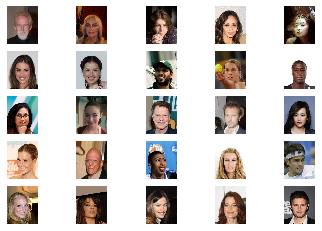

In [13]:
# directory that contains all images
directory = 'img_align_celeba/'
# load and extract all faces
faces = load_faces_wo_model(directory, 25)
print('Loaded: ', faces.shape)
# plot faces
plot_faces(faces, 5)

In [14]:
# perform face detection usning pre-trained mtcnn model and 
# extract only the face before resizing the result to a fixed size.

from numpy import savez_compressed
from mtcnn.mtcnn import MTCNN

# extract the face from a loaded image and resize
def extract_face(model, pixels, required_size=(80, 80)):
    # detect face in the image
    faces = model.detect_faces(pixels)
    # skip cases where we could not detect a face
    if len(faces) == 0:
        return None
    # extract details of the face
    x1, y1, width, height = faces[0]['box']
    # force detected pixel values to be positive (bug fix)
    x1, y1 = abs(x1), abs(y1)
    # convert into coordinates
    x2, y2 = x1 + width, y1 + height
    # retrieve face pixels
    face_pixels = pixels[y1:y2, x1:x2]
    # resize pixels to the model size
    image = Image.fromarray(face_pixels)
    image = image.resize(required_size)
    face_array = np.asarray(image)
    return face_array

Using TensorFlow backend.


In [15]:
# load images and extract faces for all images in a directory
def load_faces(directory, n_faces):
    # prepare model
    model = MTCNN()
    faces = list()
    # enumerate files
    for filename in tqdm(listdir(directory)):
        # load the image
        pixels = load_image(directory + filename)
        # get face
        face = extract_face(model, pixels)
        if face is None:
            continue
        # store
        faces.append(face)
        print(len(faces), face.shape)
        # stop once we have enough
        if len(faces) >= n_faces:
            break
    return np.asarray(faces)

In [15]:
# directory that contains all images
directory = 'img_align_celeba/'
# load and extract all faces
all_faces = load_faces(directory, 50000)
print('Loaded: ', all_faces.shape)
# save in compressed format
savez_compressed('img_align_celeba.npz', all_faces)

  0%|          | 2/202599 [00:02<91:43:48,  1.63s/it] 

1 (80, 80, 3)
2 (80, 80, 3)


  0%|          | 3/202599 [00:02<70:04:06,  1.25s/it]

3 (80, 80, 3)


  0%|          | 4/202599 [00:03<53:10:10,  1.06it/s]

4 (80, 80, 3)


  0%|          | 5/202599 [00:03<42:38:45,  1.32it/s]

5 (80, 80, 3)


  0%|          | 6/202599 [00:03<35:44:21,  1.57it/s]

6 (80, 80, 3)


  0%|          | 8/202599 [00:04<23:22:33,  2.41it/s]

7 (80, 80, 3)
8 (80, 80, 3)


  0%|          | 9/202599 [00:04<21:20:55,  2.64it/s]

9 (80, 80, 3)


  0%|          | 10/202599 [00:04<18:43:16,  3.01it/s]

10 (80, 80, 3)


  0%|          | 11/202599 [00:04<17:45:47,  3.17it/s]

11 (80, 80, 3)


  0%|          | 12/202599 [00:05<16:16:39,  3.46it/s]

12 (80, 80, 3)
13 (80, 80, 3)


  0%|          | 15/202599 [00:05<12:16:20,  4.59it/s]

14 (80, 80, 3)
15 (80, 80, 3)
16 (80, 80, 3)


  0%|          | 18/202599 [00:05<9:15:03,  6.08it/s] 

17 (80, 80, 3)
18 (80, 80, 3)


  0%|          | 21/202599 [00:06<7:16:14,  7.74it/s]

19 (80, 80, 3)
20 (80, 80, 3)
21 (80, 80, 3)


  0%|          | 23/202599 [00:06<7:20:10,  7.67it/s]

22 (80, 80, 3)
23 (80, 80, 3)


  0%|          | 26/202599 [00:06<6:30:50,  8.64it/s]

24 (80, 80, 3)
25 (80, 80, 3)
26 (80, 80, 3)


  0%|          | 28/202599 [00:06<6:49:16,  8.25it/s]

27 (80, 80, 3)
28 (80, 80, 3)


  0%|          | 30/202599 [00:07<6:32:36,  8.60it/s]

29 (80, 80, 3)
30 (80, 80, 3)
31 (80, 80, 3)


  0%|          | 32/202599 [00:07<6:29:24,  8.67it/s]

32 (80, 80, 3)


  0%|          | 33/202599 [00:07<7:58:28,  7.06it/s]

33 (80, 80, 3)


  0%|          | 34/202599 [00:07<9:52:25,  5.70it/s]

34 (80, 80, 3)


  0%|          | 35/202599 [00:08<11:18:59,  4.97it/s]

35 (80, 80, 3)


  0%|          | 37/202599 [00:08<12:06:45,  4.65it/s]

36 (80, 80, 3)
37 (80, 80, 3)


  0%|          | 38/202599 [00:08<13:42:27,  4.10it/s]

38 (80, 80, 3)


  0%|          | 39/202599 [00:09<15:44:44,  3.57it/s]

39 (80, 80, 3)


  0%|          | 40/202599 [00:09<17:42:15,  3.18it/s]

40 (80, 80, 3)


  0%|          | 41/202599 [00:09<16:47:36,  3.35it/s]

41 (80, 80, 3)


  0%|          | 42/202599 [00:10<18:09:21,  3.10it/s]

42 (80, 80, 3)


  0%|          | 43/202599 [00:10<16:59:15,  3.31it/s]

43 (80, 80, 3)


  0%|          | 44/202599 [00:11<22:43:33,  2.48it/s]

44 (80, 80, 3)


  0%|          | 46/202599 [00:11<17:33:05,  3.21it/s]

45 (80, 80, 3)
46 (80, 80, 3)


  0%|          | 47/202599 [00:11<16:34:18,  3.40it/s]

47 (80, 80, 3)


  0%|          | 48/202599 [00:12<16:52:29,  3.33it/s]

48 (80, 80, 3)


  0%|          | 49/202599 [00:12<15:17:51,  3.68it/s]

49 (80, 80, 3)


  0%|          | 51/202599 [00:12<12:46:02,  4.41it/s]

50 (80, 80, 3)
51 (80, 80, 3)


  0%|          | 53/202599 [00:13<10:34:01,  5.32it/s]

52 (80, 80, 3)
53 (80, 80, 3)


  0%|          | 55/202599 [00:13<9:51:46,  5.70it/s] 

54 (80, 80, 3)
55 (80, 80, 3)


  0%|          | 57/202599 [00:13<9:38:12,  5.84it/s]

56 (80, 80, 3)
57 (80, 80, 3)


  0%|          | 59/202599 [00:14<8:32:31,  6.59it/s]

58 (80, 80, 3)
59 (80, 80, 3)


  0%|          | 60/202599 [00:14<9:04:36,  6.20it/s]

60 (80, 80, 3)


  0%|          | 61/202599 [00:14<10:38:15,  5.29it/s]

61 (80, 80, 3)


  0%|          | 63/202599 [00:14<11:04:03,  5.08it/s]

62 (80, 80, 3)
63 (80, 80, 3)


  0%|          | 64/202599 [00:15<11:20:27,  4.96it/s]

64 (80, 80, 3)


  0%|          | 65/202599 [00:15<13:49:42,  4.07it/s]

65 (80, 80, 3)


  0%|          | 66/202599 [00:15<14:49:34,  3.79it/s]

66 (80, 80, 3)


  0%|          | 68/202599 [00:16<13:35:48,  4.14it/s]

67 (80, 80, 3)
68 (80, 80, 3)


  0%|          | 70/202599 [00:16<10:12:19,  5.51it/s]

69 (80, 80, 3)
70 (80, 80, 3)
71 (80, 80, 3)


  0%|          | 74/202599 [00:16<7:30:31,  7.49it/s] 

72 (80, 80, 3)
73 (80, 80, 3)
74 (80, 80, 3)


  0%|          | 77/202599 [00:17<6:40:56,  8.42it/s]

75 (80, 80, 3)
76 (80, 80, 3)
77 (80, 80, 3)


  0%|          | 79/202599 [00:17<6:49:05,  8.25it/s]

78 (80, 80, 3)
79 (80, 80, 3)


  0%|          | 80/202599 [00:17<6:52:07,  8.19it/s]

80 (80, 80, 3)
81 (80, 80, 3)


  0%|          | 83/202599 [00:17<6:21:58,  8.84it/s]

82 (80, 80, 3)
83 (80, 80, 3)


  0%|          | 86/202599 [00:18<6:31:23,  8.62it/s]

84 (80, 80, 3)
85 (80, 80, 3)
86 (80, 80, 3)


  0%|          | 88/202599 [00:18<7:19:55,  7.67it/s]

87 (80, 80, 3)
88 (80, 80, 3)
89 (80, 80, 3)


  0%|          | 90/202599 [00:18<7:33:56,  7.44it/s]

90 (80, 80, 3)


  0%|          | 92/202599 [00:19<8:53:55,  6.32it/s]

91 (80, 80, 3)
92 (80, 80, 3)


  0%|          | 94/202599 [00:19<8:03:16,  6.98it/s]

93 (80, 80, 3)
94 (80, 80, 3)


  0%|          | 96/202599 [00:19<7:36:21,  7.40it/s]

95 (80, 80, 3)
96 (80, 80, 3)


  0%|          | 98/202599 [00:19<7:40:57,  7.32it/s]

97 (80, 80, 3)
98 (80, 80, 3)


  0%|          | 99/202599 [00:20<9:03:13,  6.21it/s]

99 (80, 80, 3)


  0%|          | 101/202599 [00:20<9:08:53,  6.15it/s] 

100 (80, 80, 3)
101 (80, 80, 3)


  0%|          | 103/202599 [00:20<9:07:11,  6.17it/s]

102 (80, 80, 3)
103 (80, 80, 3)


  0%|          | 105/202599 [00:21<9:25:39,  5.97it/s]

104 (80, 80, 3)
105 (80, 80, 3)


  0%|          | 107/202599 [00:21<9:11:32,  6.12it/s]

106 (80, 80, 3)
107 (80, 80, 3)


  0%|          | 108/202599 [00:21<8:35:11,  6.55it/s]

108 (80, 80, 3)


  0%|          | 109/202599 [00:21<10:00:56,  5.62it/s]

109 (80, 80, 3)


  0%|          | 110/202599 [00:22<13:36:45,  4.13it/s]

110 (80, 80, 3)


  0%|          | 112/202599 [00:22<12:24:50,  4.53it/s]

111 (80, 80, 3)
112 (80, 80, 3)


  0%|          | 114/202599 [00:22<9:56:19,  5.66it/s] 

113 (80, 80, 3)
114 (80, 80, 3)


  0%|          | 115/202599 [00:23<9:17:36,  6.05it/s]

115 (80, 80, 3)


  0%|          | 116/202599 [00:23<9:57:54,  5.64it/s]

116 (80, 80, 3)


  0%|          | 117/202599 [00:23<10:42:29,  5.25it/s]

117 (80, 80, 3)


  0%|          | 118/202599 [00:23<13:29:47,  4.17it/s]

118 (80, 80, 3)


  0%|          | 120/202599 [00:24<11:54:43,  4.72it/s]

119 (80, 80, 3)
120 (80, 80, 3)


  0%|          | 121/202599 [00:24<12:15:51,  4.59it/s]

121 (80, 80, 3)


  0%|          | 122/202599 [00:24<12:09:41,  4.62it/s]

122 (80, 80, 3)


  0%|          | 124/202599 [00:25<12:02:01,  4.67it/s]

123 (80, 80, 3)
124 (80, 80, 3)


  0%|          | 125/202599 [00:25<13:05:41,  4.30it/s]

125 (80, 80, 3)


  0%|          | 126/202599 [00:25<13:25:00,  4.19it/s]

126 (80, 80, 3)


  0%|          | 128/202599 [00:25<11:34:03,  4.86it/s]

127 (80, 80, 3)
128 (80, 80, 3)


  0%|          | 129/202599 [00:26<15:28:34,  3.63it/s]

129 (80, 80, 3)


  0%|          | 130/202599 [00:26<15:57:21,  3.52it/s]

130 (80, 80, 3)


  0%|          | 131/202599 [00:27<21:18:36,  2.64it/s]

131 (80, 80, 3)


  0%|          | 133/202599 [00:27<16:34:11,  3.39it/s]

132 (80, 80, 3)
133 (80, 80, 3)


  0%|          | 134/202599 [00:27<14:58:23,  3.76it/s]

134 (80, 80, 3)


  0%|          | 136/202599 [00:28<14:14:28,  3.95it/s]

135 (80, 80, 3)
136 (80, 80, 3)


  0%|          | 137/202599 [00:28<12:38:35,  4.45it/s]

137 (80, 80, 3)


  0%|          | 138/202599 [00:29<17:28:10,  3.22it/s]

138 (80, 80, 3)


  0%|          | 139/202599 [00:29<17:18:42,  3.25it/s]

139 (80, 80, 3)


  0%|          | 141/202599 [00:30<16:54:41,  3.33it/s]

140 (80, 80, 3)
141 (80, 80, 3)


  0%|          | 143/202599 [00:30<13:29:59,  4.17it/s]

142 (80, 80, 3)
143 (80, 80, 3)


  0%|          | 145/202599 [00:30<11:31:19,  4.88it/s]

144 (80, 80, 3)
145 (80, 80, 3)


  0%|          | 146/202599 [00:30<10:50:17,  5.19it/s]

146 (80, 80, 3)
147 (80, 80, 3)


  0%|          | 150/202599 [00:31<7:59:30,  7.04it/s] 

148 (80, 80, 3)
149 (80, 80, 3)
150 (80, 80, 3)


  0%|          | 152/202599 [00:31<7:38:38,  7.36it/s]

151 (80, 80, 3)
152 (80, 80, 3)


  0%|          | 154/202599 [00:31<7:49:10,  7.19it/s]

153 (80, 80, 3)
154 (80, 80, 3)


  0%|          | 156/202599 [00:32<8:17:31,  6.78it/s]

155 (80, 80, 3)
156 (80, 80, 3)


  0%|          | 157/202599 [00:32<9:39:36,  5.82it/s]

157 (80, 80, 3)


  0%|          | 159/202599 [00:32<10:24:50,  5.40it/s]

158 (80, 80, 3)
159 (80, 80, 3)


  0%|          | 161/202599 [00:33<10:26:14,  5.39it/s]

160 (80, 80, 3)
161 (80, 80, 3)


  0%|          | 163/202599 [00:33<9:55:24,  5.67it/s] 

162 (80, 80, 3)
163 (80, 80, 3)


  0%|          | 164/202599 [00:33<11:04:23,  5.08it/s]

164 (80, 80, 3)


  0%|          | 165/202599 [00:34<12:31:45,  4.49it/s]

165 (80, 80, 3)


  0%|          | 166/202599 [00:34<14:29:36,  3.88it/s]

166 (80, 80, 3)


  0%|          | 167/202599 [00:34<15:07:17,  3.72it/s]

167 (80, 80, 3)


  0%|          | 169/202599 [00:35<13:54:23,  4.04it/s]

168 (80, 80, 3)
169 (80, 80, 3)


  0%|          | 171/202599 [00:35<10:56:34,  5.14it/s]

170 (80, 80, 3)
171 (80, 80, 3)


  0%|          | 174/202599 [00:35<8:07:45,  6.92it/s] 

172 (80, 80, 3)
173 (80, 80, 3)
174 (80, 80, 3)


  0%|          | 176/202599 [00:35<7:10:51,  7.83it/s]

175 (80, 80, 3)
176 (80, 80, 3)
177 (80, 80, 3)


  0%|          | 179/202599 [00:36<7:49:58,  7.18it/s]

178 (80, 80, 3)
179 (80, 80, 3)


  0%|          | 180/202599 [00:36<7:55:30,  7.09it/s]

180 (80, 80, 3)
181 (80, 80, 3)


  0%|          | 184/202599 [00:36<6:49:08,  8.25it/s]

182 (80, 80, 3)
183 (80, 80, 3)
184 (80, 80, 3)


  0%|          | 186/202599 [00:37<6:15:35,  8.98it/s]

185 (80, 80, 3)
186 (80, 80, 3)
187 (80, 80, 3)


  0%|          | 190/202599 [00:37<5:41:02,  9.89it/s]

188 (80, 80, 3)
189 (80, 80, 3)
190 (80, 80, 3)


  0%|          | 192/202599 [00:37<5:49:32,  9.65it/s]

191 (80, 80, 3)
192 (80, 80, 3)


  0%|          | 194/202599 [00:37<6:09:27,  9.13it/s]

193 (80, 80, 3)
194 (80, 80, 3)


  0%|          | 196/202599 [00:38<6:27:22,  8.71it/s]

195 (80, 80, 3)
196 (80, 80, 3)


  0%|          | 199/202599 [00:38<6:55:34,  8.12it/s]

197 (80, 80, 3)
198 (80, 80, 3)
199 (80, 80, 3)


  0%|          | 201/202599 [00:38<6:54:29,  8.14it/s]

200 (80, 80, 3)
201 (80, 80, 3)


  0%|          | 203/202599 [00:38<6:18:08,  8.92it/s]

202 (80, 80, 3)
203 (80, 80, 3)
204 (80, 80, 3)


  0%|          | 206/202599 [00:39<6:38:44,  8.46it/s]

205 (80, 80, 3)
206 (80, 80, 3)


  0%|          | 208/202599 [00:39<6:58:50,  8.05it/s]

207 (80, 80, 3)
208 (80, 80, 3)


  0%|          | 210/202599 [00:39<7:53:30,  7.12it/s]

209 (80, 80, 3)
210 (80, 80, 3)


  0%|          | 213/202599 [00:40<6:32:56,  8.58it/s]

211 (80, 80, 3)
212 (80, 80, 3)
213 (80, 80, 3)


  0%|          | 215/202599 [00:40<7:47:07,  7.22it/s]

214 (80, 80, 3)
215 (80, 80, 3)


  0%|          | 216/202599 [00:40<9:51:42,  5.70it/s]

216 (80, 80, 3)


  0%|          | 218/202599 [00:41<10:21:01,  5.43it/s]

217 (80, 80, 3)
218 (80, 80, 3)


  0%|          | 220/202599 [00:41<10:45:53,  5.22it/s]

219 (80, 80, 3)
220 (80, 80, 3)


  0%|          | 222/202599 [00:41<8:45:57,  6.41it/s] 

221 (80, 80, 3)
222 (80, 80, 3)


  0%|          | 224/202599 [00:42<8:48:26,  6.38it/s]

223 (80, 80, 3)
224 (80, 80, 3)


  0%|          | 226/202599 [00:42<8:56:52,  6.28it/s]

225 (80, 80, 3)
226 (80, 80, 3)


  0%|          | 228/202599 [00:42<9:35:12,  5.86it/s] 

227 (80, 80, 3)
228 (80, 80, 3)


  0%|          | 230/202599 [00:43<8:20:38,  6.74it/s]

229 (80, 80, 3)
230 (80, 80, 3)


  0%|          | 232/202599 [00:43<9:26:40,  5.95it/s] 

231 (80, 80, 3)
232 (80, 80, 3)


  0%|          | 233/202599 [00:44<16:08:15,  3.48it/s]

233 (80, 80, 3)


  0%|          | 234/202599 [00:44<16:29:41,  3.41it/s]

234 (80, 80, 3)


  0%|          | 236/202599 [00:44<13:40:45,  4.11it/s]

235 (80, 80, 3)
236 (80, 80, 3)


  0%|          | 237/202599 [00:44<12:26:32,  4.52it/s]

237 (80, 80, 3)


  0%|          | 239/202599 [00:45<12:28:11,  4.51it/s]

238 (80, 80, 3)
239 (80, 80, 3)


  0%|          | 241/202599 [00:45<10:34:32,  5.32it/s]

240 (80, 80, 3)
241 (80, 80, 3)


  0%|          | 242/202599 [00:45<9:08:39,  6.15it/s] 

242 (80, 80, 3)


  0%|          | 243/202599 [00:46<10:24:30,  5.40it/s]

243 (80, 80, 3)


  0%|          | 244/202599 [00:46<12:35:32,  4.46it/s]

244 (80, 80, 3)


  0%|          | 246/202599 [00:46<10:47:35,  5.21it/s]

245 (80, 80, 3)
246 (80, 80, 3)


  0%|          | 248/202599 [00:47<11:04:18,  5.08it/s]

247 (80, 80, 3)
248 (80, 80, 3)


  0%|          | 250/202599 [00:47<10:04:11,  5.58it/s]

249 (80, 80, 3)
250 (80, 80, 3)
251 (80, 80, 3)


  0%|          | 254/202599 [00:47<7:32:34,  7.45it/s] 

252 (80, 80, 3)
253 (80, 80, 3)
254 (80, 80, 3)


  0%|          | 255/202599 [00:48<8:39:19,  6.49it/s]

255 (80, 80, 3)


  0%|          | 257/202599 [00:48<9:18:39,  6.04it/s]

256 (80, 80, 3)
257 (80, 80, 3)


  0%|          | 259/202599 [00:48<8:00:21,  7.02it/s]

258 (80, 80, 3)
259 (80, 80, 3)


  0%|          | 261/202599 [00:48<7:25:45,  7.57it/s]

260 (80, 80, 3)
261 (80, 80, 3)


  0%|          | 263/202599 [00:49<6:38:11,  8.47it/s]

262 (80, 80, 3)
263 (80, 80, 3)


  0%|          | 264/202599 [00:49<8:44:34,  6.43it/s]

264 (80, 80, 3)
265 (80, 80, 3)


  0%|          | 267/202599 [00:49<8:39:01,  6.50it/s]

266 (80, 80, 3)
267 (80, 80, 3)


  0%|          | 269/202599 [00:50<8:22:26,  6.71it/s]

268 (80, 80, 3)
269 (80, 80, 3)


  0%|          | 271/202599 [00:50<9:10:03,  6.13it/s]

270 (80, 80, 3)
271 (80, 80, 3)


  0%|          | 273/202599 [00:50<7:53:19,  7.12it/s]

272 (80, 80, 3)
273 (80, 80, 3)


  0%|          | 275/202599 [00:50<8:22:37,  6.71it/s]

274 (80, 80, 3)
275 (80, 80, 3)


  0%|          | 276/202599 [00:51<8:39:56,  6.49it/s]

276 (80, 80, 3)


  0%|          | 278/202599 [00:51<9:41:11,  5.80it/s] 

277 (80, 80, 3)
278 (80, 80, 3)


  0%|          | 280/202599 [00:51<8:57:16,  6.28it/s]

279 (80, 80, 3)
280 (80, 80, 3)


  0%|          | 281/202599 [00:51<9:54:24,  5.67it/s]

281 (80, 80, 3)


  0%|          | 283/202599 [00:52<11:45:40,  4.78it/s]

282 (80, 80, 3)
283 (80, 80, 3)


  0%|          | 285/202599 [00:52<9:15:40,  6.07it/s] 

284 (80, 80, 3)
285 (80, 80, 3)


  0%|          | 287/202599 [00:53<8:13:57,  6.83it/s]

286 (80, 80, 3)
287 (80, 80, 3)


  0%|          | 289/202599 [00:53<7:25:52,  7.56it/s]

288 (80, 80, 3)
289 (80, 80, 3)
290 (80, 80, 3)


  0%|          | 292/202599 [00:53<7:47:47,  7.21it/s]

291 (80, 80, 3)
292 (80, 80, 3)


  0%|          | 293/202599 [00:53<7:18:27,  7.69it/s]

293 (80, 80, 3)
294 (80, 80, 3)


  0%|          | 295/202599 [00:53<7:45:07,  7.25it/s]

295 (80, 80, 3)


  0%|          | 296/202599 [00:54<9:45:23,  5.76it/s]

296 (80, 80, 3)


  0%|          | 297/202599 [00:54<11:35:31,  4.85it/s]

297 (80, 80, 3)


  0%|          | 299/202599 [00:54<11:17:43,  4.97it/s]

298 (80, 80, 3)
299 (80, 80, 3)


  0%|          | 301/202599 [00:55<8:47:38,  6.39it/s] 

300 (80, 80, 3)
301 (80, 80, 3)
302 (80, 80, 3)


  0%|          | 304/202599 [00:55<8:38:56,  6.50it/s]

303 (80, 80, 3)
304 (80, 80, 3)


  0%|          | 306/202599 [00:55<8:15:44,  6.80it/s]

305 (80, 80, 3)
306 (80, 80, 3)


  0%|          | 307/202599 [00:56<9:57:35,  5.64it/s]

307 (80, 80, 3)


  0%|          | 308/202599 [00:56<10:37:47,  5.29it/s]

308 (80, 80, 3)


  0%|          | 309/202599 [00:56<11:33:45,  4.86it/s]

309 (80, 80, 3)


  0%|          | 310/202599 [00:56<12:59:18,  4.33it/s]

310 (80, 80, 3)


  0%|          | 311/202599 [00:57<12:59:48,  4.32it/s]

311 (80, 80, 3)


  0%|          | 312/202599 [00:57<13:36:56,  4.13it/s]

312 (80, 80, 3)


  0%|          | 314/202599 [00:57<11:49:36,  4.75it/s]

313 (80, 80, 3)
314 (80, 80, 3)


  0%|          | 315/202599 [00:57<11:06:16,  5.06it/s]

315 (80, 80, 3)


  0%|          | 316/202599 [00:58<11:31:09,  4.88it/s]

316 (80, 80, 3)


  0%|          | 317/202599 [00:58<13:14:11,  4.25it/s]

317 (80, 80, 3)


  0%|          | 318/202599 [00:58<13:01:43,  4.31it/s]

318 (80, 80, 3)


  0%|          | 321/202599 [00:59<11:08:07,  5.05it/s]

319 (80, 80, 3)
320 (80, 80, 3)
321 (80, 80, 3)


  0%|          | 323/202599 [00:59<10:51:56,  5.17it/s]

322 (80, 80, 3)
323 (80, 80, 3)


  0%|          | 325/202599 [00:59<8:34:20,  6.55it/s] 

324 (80, 80, 3)
325 (80, 80, 3)


  0%|          | 326/202599 [00:59<8:41:31,  6.46it/s]

326 (80, 80, 3)
327 (80, 80, 3)


  0%|          | 329/202599 [01:00<8:42:16,  6.45it/s]

328 (80, 80, 3)
329 (80, 80, 3)


  0%|          | 331/202599 [01:00<7:39:23,  7.34it/s]

330 (80, 80, 3)
331 (80, 80, 3)
332 (80, 80, 3)


  0%|          | 334/202599 [01:00<7:25:24,  7.57it/s]

333 (80, 80, 3)
334 (80, 80, 3)


  0%|          | 336/202599 [01:01<7:19:27,  7.67it/s]

335 (80, 80, 3)
336 (80, 80, 3)


  0%|          | 338/202599 [01:01<8:10:09,  6.88it/s]

337 (80, 80, 3)
338 (80, 80, 3)


  0%|          | 340/202599 [01:01<8:33:02,  6.57it/s]

339 (80, 80, 3)
340 (80, 80, 3)


  0%|          | 342/202599 [01:01<7:28:51,  7.51it/s]

341 (80, 80, 3)
342 (80, 80, 3)
343 (80, 80, 3)


  0%|          | 345/202599 [01:02<8:49:36,  6.36it/s]

344 (80, 80, 3)
345 (80, 80, 3)


  0%|          | 347/202599 [01:02<8:37:54,  6.51it/s]

346 (80, 80, 3)
347 (80, 80, 3)


  0%|          | 349/202599 [01:02<9:09:06,  6.14it/s]

348 (80, 80, 3)
349 (80, 80, 3)


  0%|          | 351/202599 [01:03<9:32:15,  5.89it/s]

350 (80, 80, 3)
351 (80, 80, 3)


  0%|          | 353/202599 [01:03<8:49:41,  6.36it/s]

352 (80, 80, 3)
353 (80, 80, 3)


  0%|          | 354/202599 [01:03<8:02:42,  6.98it/s]

354 (80, 80, 3)


  0%|          | 355/202599 [01:03<9:38:51,  5.82it/s]

355 (80, 80, 3)


  0%|          | 356/202599 [01:04<12:41:58,  4.42it/s]

356 (80, 80, 3)


  0%|          | 358/202599 [01:04<11:17:38,  4.97it/s]

357 (80, 80, 3)
358 (80, 80, 3)


  0%|          | 360/202599 [01:04<9:07:17,  6.16it/s] 

359 (80, 80, 3)
360 (80, 80, 3)
361 (80, 80, 3)


  0%|          | 363/202599 [01:05<9:03:43,  6.20it/s]

362 (80, 80, 3)
363 (80, 80, 3)


  0%|          | 365/202599 [01:05<8:30:29,  6.60it/s]

364 (80, 80, 3)
365 (80, 80, 3)


  0%|          | 367/202599 [01:06<8:26:48,  6.65it/s]

366 (80, 80, 3)
367 (80, 80, 3)


  0%|          | 369/202599 [01:06<8:43:00,  6.44it/s]

368 (80, 80, 3)
369 (80, 80, 3)


  0%|          | 371/202599 [01:06<9:05:09,  6.18it/s]

370 (80, 80, 3)
371 (80, 80, 3)


  0%|          | 373/202599 [01:07<8:03:15,  6.97it/s]

372 (80, 80, 3)
373 (80, 80, 3)


  0%|          | 375/202599 [01:07<9:43:23,  5.78it/s]

374 (80, 80, 3)
375 (80, 80, 3)


  0%|          | 377/202599 [01:07<9:02:00,  6.22it/s]

376 (80, 80, 3)
377 (80, 80, 3)


  0%|          | 378/202599 [01:07<8:06:03,  6.93it/s]

378 (80, 80, 3)
379 (80, 80, 3)


  0%|          | 381/202599 [01:08<7:15:13,  7.74it/s]

380 (80, 80, 3)
381 (80, 80, 3)


  0%|          | 383/202599 [01:08<9:23:43,  5.98it/s]

382 (80, 80, 3)
383 (80, 80, 3)


  0%|          | 385/202599 [01:08<9:56:09,  5.65it/s]

384 (80, 80, 3)
385 (80, 80, 3)


  0%|          | 388/202599 [01:09<7:15:54,  7.73it/s]

386 (80, 80, 3)
387 (80, 80, 3)
388 (80, 80, 3)


  0%|          | 390/202599 [01:09<6:46:49,  8.28it/s]

389 (80, 80, 3)
390 (80, 80, 3)
391 (80, 80, 3)


  0%|          | 394/202599 [01:09<5:17:58, 10.60it/s]

392 (80, 80, 3)
393 (80, 80, 3)
394 (80, 80, 3)


  0%|          | 396/202599 [01:09<5:22:57, 10.43it/s]

395 (80, 80, 3)
396 (80, 80, 3)
397 (80, 80, 3)


  0%|          | 400/202599 [01:10<5:13:35, 10.75it/s]

398 (80, 80, 3)
399 (80, 80, 3)
400 (80, 80, 3)


  0%|          | 402/202599 [01:10<5:01:17, 11.18it/s]

401 (80, 80, 3)
402 (80, 80, 3)
403 (80, 80, 3)


  0%|          | 406/202599 [01:10<4:52:08, 11.54it/s]

404 (80, 80, 3)
405 (80, 80, 3)
406 (80, 80, 3)


  0%|          | 408/202599 [01:10<5:12:44, 10.77it/s]

407 (80, 80, 3)
408 (80, 80, 3)


  0%|          | 410/202599 [01:11<5:53:22,  9.54it/s]

409 (80, 80, 3)
410 (80, 80, 3)


  0%|          | 412/202599 [01:11<5:55:40,  9.47it/s]

411 (80, 80, 3)
412 (80, 80, 3)


  0%|          | 414/202599 [01:11<6:51:24,  8.19it/s]

413 (80, 80, 3)
414 (80, 80, 3)


  0%|          | 415/202599 [01:11<6:45:20,  8.31it/s]

415 (80, 80, 3)
416 (80, 80, 3)


  0%|          | 417/202599 [01:12<6:32:24,  8.59it/s]

417 (80, 80, 3)


  0%|          | 419/202599 [01:12<7:57:32,  7.06it/s]

418 (80, 80, 3)
419 (80, 80, 3)


  0%|          | 422/202599 [01:12<7:26:29,  7.55it/s]

420 (80, 80, 3)
421 (80, 80, 3)
422 (80, 80, 3)


  0%|          | 424/202599 [01:13<7:21:11,  7.64it/s]

423 (80, 80, 3)
424 (80, 80, 3)
425 (80, 80, 3)


  0%|          | 427/202599 [01:13<8:23:30,  6.69it/s]

426 (80, 80, 3)
427 (80, 80, 3)


  0%|          | 428/202599 [01:13<10:37:16,  5.29it/s]

428 (80, 80, 3)


  0%|          | 429/202599 [01:14<11:12:28,  5.01it/s]

429 (80, 80, 3)


  0%|          | 430/202599 [01:14<11:56:10,  4.70it/s]

430 (80, 80, 3)


  0%|          | 431/202599 [01:14<12:38:04,  4.44it/s]

431 (80, 80, 3)


  0%|          | 432/202599 [01:14<12:33:45,  4.47it/s]

432 (80, 80, 3)


  0%|          | 433/202599 [01:15<19:08:08,  2.93it/s]

433 (80, 80, 3)


  0%|          | 435/202599 [01:15<13:47:32,  4.07it/s]

434 (80, 80, 3)
435 (80, 80, 3)
436 (80, 80, 3)


  0%|          | 438/202599 [01:16<10:06:29,  5.56it/s]

437 (80, 80, 3)
438 (80, 80, 3)


  0%|          | 440/202599 [01:16<8:47:51,  6.38it/s] 

439 (80, 80, 3)
440 (80, 80, 3)


  0%|          | 442/202599 [01:16<9:34:09,  5.87it/s]

441 (80, 80, 3)
442 (80, 80, 3)


  0%|          | 444/202599 [01:16<7:52:06,  7.14it/s]

443 (80, 80, 3)
444 (80, 80, 3)


  0%|          | 447/202599 [01:17<6:41:53,  8.38it/s]

445 (80, 80, 3)
446 (80, 80, 3)
447 (80, 80, 3)


  0%|          | 449/202599 [01:17<8:05:03,  6.95it/s]

448 (80, 80, 3)
449 (80, 80, 3)


  0%|          | 451/202599 [01:17<7:43:03,  7.28it/s]

450 (80, 80, 3)
451 (80, 80, 3)


  0%|          | 453/202599 [01:18<8:43:28,  6.44it/s]

452 (80, 80, 3)
453 (80, 80, 3)


  0%|          | 455/202599 [01:18<8:41:33,  6.46it/s]

454 (80, 80, 3)
455 (80, 80, 3)


  0%|          | 457/202599 [01:18<7:41:00,  7.31it/s]

456 (80, 80, 3)
457 (80, 80, 3)


  0%|          | 458/202599 [01:18<8:43:30,  6.44it/s]

458 (80, 80, 3)


  0%|          | 459/202599 [01:19<9:35:00,  5.86it/s]

459 (80, 80, 3)


  0%|          | 461/202599 [01:19<10:04:29,  5.57it/s]

460 (80, 80, 3)
461 (80, 80, 3)


  0%|          | 462/202599 [01:19<11:29:17,  4.89it/s]

462 (80, 80, 3)


  0%|          | 463/202599 [01:20<13:02:26,  4.31it/s]

463 (80, 80, 3)


  0%|          | 465/202599 [01:20<12:26:41,  4.51it/s]

464 (80, 80, 3)
465 (80, 80, 3)


  0%|          | 467/202599 [01:20<9:47:23,  5.74it/s] 

466 (80, 80, 3)
467 (80, 80, 3)


  0%|          | 469/202599 [01:21<10:14:35,  5.48it/s]

468 (80, 80, 3)
469 (80, 80, 3)


  0%|          | 471/202599 [01:21<8:53:40,  6.31it/s] 

470 (80, 80, 3)
471 (80, 80, 3)


  0%|          | 473/202599 [01:21<7:53:00,  7.12it/s]

472 (80, 80, 3)
473 (80, 80, 3)


  0%|          | 475/202599 [01:21<8:58:30,  6.26it/s]

474 (80, 80, 3)
475 (80, 80, 3)


  0%|          | 477/202599 [01:22<8:23:37,  6.69it/s]

476 (80, 80, 3)
477 (80, 80, 3)


  0%|          | 478/202599 [01:22<8:08:50,  6.89it/s]

478 (80, 80, 3)


  0%|          | 479/202599 [01:22<9:57:30,  5.64it/s]

479 (80, 80, 3)


  0%|          | 481/202599 [01:23<11:02:47,  5.08it/s]

480 (80, 80, 3)
481 (80, 80, 3)


  0%|          | 482/202599 [01:23<9:42:01,  5.79it/s] 

482 (80, 80, 3)
483 (80, 80, 3)


  0%|          | 485/202599 [01:23<7:43:11,  7.27it/s]

484 (80, 80, 3)
485 (80, 80, 3)
486 (80, 80, 3)


  0%|          | 489/202599 [01:23<5:42:22,  9.84it/s]

487 (80, 80, 3)
488 (80, 80, 3)
489 (80, 80, 3)


  0%|          | 491/202599 [01:24<6:17:08,  8.93it/s]

490 (80, 80, 3)
491 (80, 80, 3)
492 (80, 80, 3)


  0%|          | 493/202599 [01:24<5:49:53,  9.63it/s]

493 (80, 80, 3)
494 (80, 80, 3)


  0%|          | 496/202599 [01:24<6:10:46,  9.08it/s]

495 (80, 80, 3)
496 (80, 80, 3)


  0%|          | 498/202599 [01:24<7:11:25,  7.81it/s]

497 (80, 80, 3)
498 (80, 80, 3)


  0%|          | 499/202599 [01:24<7:49:08,  7.18it/s]

499 (80, 80, 3)
500 (80, 80, 3)


  0%|          | 501/202599 [01:25<8:43:33,  6.43it/s]

501 (80, 80, 3)


  0%|          | 503/202599 [01:25<10:24:48,  5.39it/s]

502 (80, 80, 3)
503 (80, 80, 3)


  0%|          | 505/202599 [01:26<10:47:50,  5.20it/s]

504 (80, 80, 3)
505 (80, 80, 3)


  0%|          | 507/202599 [01:26<10:19:40,  5.44it/s]

506 (80, 80, 3)
507 (80, 80, 3)


  0%|          | 509/202599 [01:26<8:34:29,  6.55it/s] 

508 (80, 80, 3)
509 (80, 80, 3)


  0%|          | 510/202599 [01:27<9:27:04,  5.94it/s]

510 (80, 80, 3)


  0%|          | 512/202599 [01:27<9:12:38,  6.09it/s] 

511 (80, 80, 3)
512 (80, 80, 3)


  0%|          | 513/202599 [01:27<8:33:59,  6.55it/s]

513 (80, 80, 3)
514 (80, 80, 3)


  0%|          | 515/202599 [01:27<7:47:18,  7.21it/s]

515 (80, 80, 3)
516 (80, 80, 3)


  0%|          | 517/202599 [01:27<7:23:48,  7.59it/s]

517 (80, 80, 3)
518 (80, 80, 3)


  0%|          | 520/202599 [01:28<7:28:58,  7.50it/s]

519 (80, 80, 3)
520 (80, 80, 3)


  0%|          | 522/202599 [01:28<7:01:42,  7.99it/s]

521 (80, 80, 3)
522 (80, 80, 3)


  0%|          | 523/202599 [01:28<7:32:28,  7.44it/s]

523 (80, 80, 3)


  0%|          | 524/202599 [01:29<9:53:06,  5.68it/s]

524 (80, 80, 3)


  0%|          | 525/202599 [01:29<10:30:38,  5.34it/s]

525 (80, 80, 3)
526 (80, 80, 3)


  0%|          | 528/202599 [01:29<9:31:12,  5.90it/s] 

527 (80, 80, 3)
528 (80, 80, 3)


  0%|          | 529/202599 [01:29<11:04:29,  5.07it/s]

529 (80, 80, 3)


  0%|          | 531/202599 [01:30<10:27:42,  5.37it/s]

530 (80, 80, 3)
531 (80, 80, 3)


  0%|          | 533/202599 [01:30<10:24:58,  5.39it/s]

532 (80, 80, 3)
533 (80, 80, 3)


  0%|          | 535/202599 [01:30<8:13:57,  6.82it/s] 

534 (80, 80, 3)
535 (80, 80, 3)


  0%|          | 537/202599 [01:31<9:26:58,  5.94it/s]

536 (80, 80, 3)
537 (80, 80, 3)


  0%|          | 539/202599 [01:31<8:25:26,  6.66it/s]

538 (80, 80, 3)
539 (80, 80, 3)


  0%|          | 542/202599 [01:31<6:59:50,  8.02it/s]

540 (80, 80, 3)
541 (80, 80, 3)
542 (80, 80, 3)


  0%|          | 545/202599 [01:32<5:59:38,  9.36it/s]

543 (80, 80, 3)
544 (80, 80, 3)
545 (80, 80, 3)


  0%|          | 547/202599 [01:32<6:13:42,  9.01it/s]

546 (80, 80, 3)
547 (80, 80, 3)
548 (80, 80, 3)


  0%|          | 551/202599 [01:32<5:19:40, 10.53it/s]

549 (80, 80, 3)
550 (80, 80, 3)
551 (80, 80, 3)
552 (80, 80, 3)


  0%|          | 555/202599 [01:32<4:39:24, 12.05it/s]

553 (80, 80, 3)
554 (80, 80, 3)
555 (80, 80, 3)


  0%|          | 557/202599 [01:33<4:36:06, 12.20it/s]

556 (80, 80, 3)
557 (80, 80, 3)


  0%|          | 559/202599 [01:33<5:11:24, 10.81it/s]

558 (80, 80, 3)
559 (80, 80, 3)
560 (80, 80, 3)


  0%|          | 563/202599 [01:33<5:05:52, 11.01it/s]

561 (80, 80, 3)
562 (80, 80, 3)
563 (80, 80, 3)


  0%|          | 565/202599 [01:33<4:59:35, 11.24it/s]

564 (80, 80, 3)
565 (80, 80, 3)


  0%|          | 567/202599 [01:34<5:17:31, 10.60it/s]

566 (80, 80, 3)
567 (80, 80, 3)
568 (80, 80, 3)


  0%|          | 569/202599 [01:34<5:22:56, 10.43it/s]

569 (80, 80, 3)
570 (80, 80, 3)


  0%|          | 573/202599 [01:34<5:25:02, 10.36it/s]

571 (80, 80, 3)
572 (80, 80, 3)
573 (80, 80, 3)


  0%|          | 575/202599 [01:34<5:18:09, 10.58it/s]

574 (80, 80, 3)
575 (80, 80, 3)


  0%|          | 577/202599 [01:35<5:41:47,  9.85it/s]

576 (80, 80, 3)
577 (80, 80, 3)


  0%|          | 579/202599 [01:35<6:18:29,  8.90it/s]

578 (80, 80, 3)
579 (80, 80, 3)
580 (80, 80, 3)


  0%|          | 582/202599 [01:35<6:15:49,  8.96it/s]

581 (80, 80, 3)
582 (80, 80, 3)


  0%|          | 584/202599 [01:35<6:39:06,  8.44it/s]

583 (80, 80, 3)
584 (80, 80, 3)


  0%|          | 585/202599 [01:36<7:00:38,  8.00it/s]

585 (80, 80, 3)


  0%|          | 586/202599 [01:36<8:31:30,  6.58it/s]

586 (80, 80, 3)
587 (80, 80, 3)


  0%|          | 588/202599 [01:36<7:47:42,  7.20it/s]

588 (80, 80, 3)
589 (80, 80, 3)


  0%|          | 591/202599 [01:36<7:01:32,  7.99it/s]

590 (80, 80, 3)
591 (80, 80, 3)


  0%|          | 593/202599 [01:37<8:04:16,  6.95it/s]

592 (80, 80, 3)
593 (80, 80, 3)


  0%|          | 595/202599 [01:37<9:42:03,  5.78it/s]

594 (80, 80, 3)
595 (80, 80, 3)


  0%|          | 597/202599 [01:37<9:15:53,  6.06it/s]

596 (80, 80, 3)
597 (80, 80, 3)


  0%|          | 598/202599 [01:38<9:02:37,  6.20it/s]

598 (80, 80, 3)


  0%|          | 599/202599 [01:38<10:42:45,  5.24it/s]

599 (80, 80, 3)


  0%|          | 600/202599 [01:38<12:12:57,  4.59it/s]

600 (80, 80, 3)


  0%|          | 601/202599 [01:38<12:25:17,  4.52it/s]

601 (80, 80, 3)


  0%|          | 602/202599 [01:39<13:10:45,  4.26it/s]

602 (80, 80, 3)


  0%|          | 604/202599 [01:39<13:17:13,  4.22it/s]

603 (80, 80, 3)
604 (80, 80, 3)


  0%|          | 605/202599 [01:39<13:01:17,  4.31it/s]

605 (80, 80, 3)


  0%|          | 606/202599 [01:40<13:23:22,  4.19it/s]

606 (80, 80, 3)


  0%|          | 607/202599 [01:40<15:44:37,  3.56it/s]

607 (80, 80, 3)


  0%|          | 609/202599 [01:40<12:51:08,  4.37it/s]

608 (80, 80, 3)
609 (80, 80, 3)


  0%|          | 610/202599 [01:41<11:17:24,  4.97it/s]

610 (80, 80, 3)
611 (80, 80, 3)


  0%|          | 613/202599 [01:41<10:09:55,  5.52it/s]

612 (80, 80, 3)
613 (80, 80, 3)


  0%|          | 615/202599 [01:41<8:44:40,  6.42it/s] 

614 (80, 80, 3)
615 (80, 80, 3)


  0%|          | 617/202599 [01:42<9:00:46,  6.23it/s]

616 (80, 80, 3)
617 (80, 80, 3)


  0%|          | 619/202599 [01:42<8:22:30,  6.70it/s]

618 (80, 80, 3)
619 (80, 80, 3)


  0%|          | 621/202599 [01:42<8:58:54,  6.25it/s]

620 (80, 80, 3)
621 (80, 80, 3)


  0%|          | 623/202599 [01:42<8:20:26,  6.73it/s]

622 (80, 80, 3)
623 (80, 80, 3)


  0%|          | 624/202599 [01:43<8:08:14,  6.89it/s]

624 (80, 80, 3)


  0%|          | 627/202599 [01:43<8:17:57,  6.76it/s] 

625 (80, 80, 3)
626 (80, 80, 3)
627 (80, 80, 3)


  0%|          | 629/202599 [01:43<8:23:31,  6.69it/s]

628 (80, 80, 3)
629 (80, 80, 3)


  0%|          | 630/202599 [01:44<9:03:02,  6.20it/s]

630 (80, 80, 3)
631 (80, 80, 3)


  0%|          | 633/202599 [01:44<8:47:56,  6.38it/s]

632 (80, 80, 3)
633 (80, 80, 3)


  0%|          | 635/202599 [01:44<7:59:14,  7.02it/s]

634 (80, 80, 3)
635 (80, 80, 3)
636 (80, 80, 3)


  0%|          | 638/202599 [01:45<6:43:56,  8.33it/s]

637 (80, 80, 3)
638 (80, 80, 3)


  0%|          | 641/202599 [01:45<5:47:09,  9.70it/s]

639 (80, 80, 3)
640 (80, 80, 3)
641 (80, 80, 3)


  0%|          | 643/202599 [01:45<5:30:07, 10.20it/s]

642 (80, 80, 3)
643 (80, 80, 3)
644 (80, 80, 3)


  0%|          | 647/202599 [01:45<5:30:18, 10.19it/s]

645 (80, 80, 3)
646 (80, 80, 3)
647 (80, 80, 3)


  0%|          | 649/202599 [01:45<5:03:07, 11.10it/s]

648 (80, 80, 3)
649 (80, 80, 3)


  0%|          | 651/202599 [01:46<6:11:28,  9.06it/s]

650 (80, 80, 3)
651 (80, 80, 3)


  0%|          | 653/202599 [01:46<7:19:40,  7.66it/s]

652 (80, 80, 3)
653 (80, 80, 3)


  0%|          | 656/202599 [01:46<6:48:55,  8.23it/s]

654 (80, 80, 3)
655 (80, 80, 3)
656 (80, 80, 3)


  0%|          | 658/202599 [01:47<7:20:40,  7.64it/s]

657 (80, 80, 3)
658 (80, 80, 3)


  0%|          | 659/202599 [01:47<7:10:05,  7.83it/s]

659 (80, 80, 3)


  0%|          | 661/202599 [01:47<9:18:23,  6.03it/s]

660 (80, 80, 3)
661 (80, 80, 3)


  0%|          | 663/202599 [01:48<8:45:41,  6.40it/s]

662 (80, 80, 3)
663 (80, 80, 3)


  0%|          | 666/202599 [01:48<8:38:47,  6.49it/s] 

664 (80, 80, 3)
665 (80, 80, 3)
666 (80, 80, 3)


  0%|          | 667/202599 [01:48<8:57:34,  6.26it/s]

667 (80, 80, 3)
668 (80, 80, 3)


  0%|          | 671/202599 [01:49<7:46:07,  7.22it/s]

669 (80, 80, 3)
670 (80, 80, 3)
671 (80, 80, 3)


  0%|          | 673/202599 [01:49<8:29:59,  6.60it/s]

672 (80, 80, 3)
673 (80, 80, 3)


  0%|          | 674/202599 [01:49<9:48:27,  5.72it/s]

674 (80, 80, 3)


  0%|          | 676/202599 [01:50<11:00:48,  5.09it/s]

675 (80, 80, 3)
676 (80, 80, 3)


  0%|          | 677/202599 [01:50<12:58:34,  4.32it/s]

677 (80, 80, 3)


  0%|          | 678/202599 [01:50<13:50:19,  4.05it/s]

678 (80, 80, 3)


  0%|          | 679/202599 [01:51<17:35:56,  3.19it/s]

679 (80, 80, 3)


  0%|          | 680/202599 [01:51<16:16:03,  3.45it/s]

680 (80, 80, 3)


  0%|          | 682/202599 [01:51<14:02:11,  4.00it/s]

681 (80, 80, 3)
682 (80, 80, 3)


  0%|          | 683/202599 [01:52<12:50:42,  4.37it/s]

683 (80, 80, 3)


  0%|          | 685/202599 [01:52<11:48:16,  4.75it/s]

684 (80, 80, 3)
685 (80, 80, 3)


  0%|          | 687/202599 [01:52<9:55:27,  5.65it/s] 

686 (80, 80, 3)
687 (80, 80, 3)


  0%|          | 688/202599 [01:52<9:58:19,  5.62it/s]

688 (80, 80, 3)


  0%|          | 690/202599 [01:53<12:03:49,  4.65it/s]

689 (80, 80, 3)
690 (80, 80, 3)


  0%|          | 692/202599 [01:53<10:50:31,  5.17it/s]

691 (80, 80, 3)
692 (80, 80, 3)


  0%|          | 694/202599 [01:54<9:06:33,  6.16it/s] 

693 (80, 80, 3)
694 (80, 80, 3)


  0%|          | 696/202599 [01:54<9:02:37,  6.20it/s]

695 (80, 80, 3)
696 (80, 80, 3)


  0%|          | 697/202599 [01:54<8:32:07,  6.57it/s]

697 (80, 80, 3)


  0%|          | 699/202599 [01:54<9:18:49,  6.02it/s] 

698 (80, 80, 3)
699 (80, 80, 3)


  0%|          | 700/202599 [01:55<9:01:12,  6.22it/s]

700 (80, 80, 3)


  0%|          | 702/202599 [01:55<9:02:53,  6.20it/s] 

701 (80, 80, 3)
702 (80, 80, 3)


  0%|          | 704/202599 [01:55<8:22:09,  6.70it/s]

703 (80, 80, 3)
704 (80, 80, 3)


  0%|          | 706/202599 [01:56<9:14:22,  6.07it/s]

705 (80, 80, 3)
706 (80, 80, 3)


  0%|          | 708/202599 [01:56<9:11:15,  6.10it/s]

707 (80, 80, 3)
708 (80, 80, 3)


  0%|          | 710/202599 [01:56<10:06:52,  5.54it/s]

709 (80, 80, 3)
710 (80, 80, 3)


  0%|          | 712/202599 [01:57<9:16:45,  6.04it/s] 

711 (80, 80, 3)
712 (80, 80, 3)


  0%|          | 714/202599 [01:57<9:40:46,  5.79it/s]

713 (80, 80, 3)
714 (80, 80, 3)


  0%|          | 716/202599 [01:57<9:18:05,  6.03it/s] 

715 (80, 80, 3)
716 (80, 80, 3)


  0%|          | 718/202599 [01:58<8:28:05,  6.62it/s]

717 (80, 80, 3)
718 (80, 80, 3)


  0%|          | 720/202599 [01:58<8:43:55,  6.42it/s]

719 (80, 80, 3)
720 (80, 80, 3)


  0%|          | 723/202599 [01:58<6:56:09,  8.08it/s]

721 (80, 80, 3)
722 (80, 80, 3)
723 (80, 80, 3)


  0%|          | 725/202599 [01:58<5:57:13,  9.42it/s]

724 (80, 80, 3)
725 (80, 80, 3)
726 (80, 80, 3)


  0%|          | 727/202599 [01:59<5:40:13,  9.89it/s]

727 (80, 80, 3)
728 (80, 80, 3)


  0%|          | 731/202599 [01:59<5:31:12, 10.16it/s]

729 (80, 80, 3)
730 (80, 80, 3)
731 (80, 80, 3)


  0%|          | 733/202599 [01:59<5:50:15,  9.61it/s]

732 (80, 80, 3)
733 (80, 80, 3)


  0%|          | 735/202599 [01:59<5:44:28,  9.77it/s]

734 (80, 80, 3)
735 (80, 80, 3)
736 (80, 80, 3)


  0%|          | 737/202599 [02:00<5:21:52, 10.45it/s]

737 (80, 80, 3)
738 (80, 80, 3)


  0%|          | 741/202599 [02:00<5:34:33, 10.06it/s]

739 (80, 80, 3)
740 (80, 80, 3)
741 (80, 80, 3)


  0%|          | 743/202599 [02:00<5:30:42, 10.17it/s]

742 (80, 80, 3)
743 (80, 80, 3)
744 (80, 80, 3)


  0%|          | 745/202599 [02:00<5:17:12, 10.61it/s]

745 (80, 80, 3)
746 (80, 80, 3)


  0%|          | 747/202599 [02:01<5:56:21,  9.44it/s]

747 (80, 80, 3)


  0%|          | 749/202599 [02:01<8:07:26,  6.90it/s]

748 (80, 80, 3)
749 (80, 80, 3)


  0%|          | 750/202599 [02:01<9:08:15,  6.14it/s]

750 (80, 80, 3)


  0%|          | 751/202599 [02:02<12:05:33,  4.64it/s]

751 (80, 80, 3)


  0%|          | 752/202599 [02:02<14:43:35,  3.81it/s]

752 (80, 80, 3)


  0%|          | 754/202599 [02:02<12:03:49,  4.65it/s]

753 (80, 80, 3)
754 (80, 80, 3)


  0%|          | 756/202599 [02:03<11:11:36,  5.01it/s]

755 (80, 80, 3)
756 (80, 80, 3)


  0%|          | 759/202599 [02:03<9:10:47,  6.11it/s] 

757 (80, 80, 3)
758 (80, 80, 3)
759 (80, 80, 3)


  0%|          | 760/202599 [02:03<8:29:58,  6.60it/s]

760 (80, 80, 3)


  0%|          | 762/202599 [02:04<10:10:32,  5.51it/s]

761 (80, 80, 3)
762 (80, 80, 3)


  0%|          | 763/202599 [02:04<11:11:16,  5.01it/s]

763 (80, 80, 3)


  0%|          | 764/202599 [02:04<12:03:27,  4.65it/s]

764 (80, 80, 3)


  0%|          | 765/202599 [02:04<14:35:02,  3.84it/s]

765 (80, 80, 3)


  0%|          | 766/202599 [02:05<17:01:52,  3.29it/s]

766 (80, 80, 3)


  0%|          | 767/202599 [02:05<16:32:55,  3.39it/s]

767 (80, 80, 3)


  0%|          | 769/202599 [02:05<13:35:25,  4.13it/s]

768 (80, 80, 3)
769 (80, 80, 3)


  0%|          | 770/202599 [02:06<12:36:49,  4.44it/s]

770 (80, 80, 3)


  0%|          | 771/202599 [02:06<14:10:59,  3.95it/s]

771 (80, 80, 3)


  0%|          | 772/202599 [02:06<14:09:26,  3.96it/s]

772 (80, 80, 3)


  0%|          | 773/202599 [02:07<14:24:48,  3.89it/s]

773 (80, 80, 3)


  0%|          | 775/202599 [02:07<11:53:33,  4.71it/s]

774 (80, 80, 3)
775 (80, 80, 3)


  0%|          | 777/202599 [02:07<11:20:02,  4.95it/s]

776 (80, 80, 3)
777 (80, 80, 3)


  0%|          | 779/202599 [02:08<9:55:42,  5.65it/s] 

778 (80, 80, 3)
779 (80, 80, 3)


  0%|          | 780/202599 [02:08<12:04:32,  4.64it/s]

780 (80, 80, 3)
781 (80, 80, 3)


  0%|          | 783/202599 [02:08<9:44:28,  5.75it/s] 

782 (80, 80, 3)
783 (80, 80, 3)


  0%|          | 785/202599 [02:09<8:29:32,  6.60it/s]

784 (80, 80, 3)
785 (80, 80, 3)


  0%|          | 788/202599 [02:09<8:25:08,  6.66it/s]

786 (80, 80, 3)
787 (80, 80, 3)
788 (80, 80, 3)


  0%|          | 790/202599 [02:09<7:19:20,  7.66it/s]

789 (80, 80, 3)
790 (80, 80, 3)
791 (80, 80, 3)


  0%|          | 794/202599 [02:09<6:00:02,  9.34it/s]

792 (80, 80, 3)
793 (80, 80, 3)
794 (80, 80, 3)
795 (80, 80, 3)


  0%|          | 797/202599 [02:10<7:50:56,  7.14it/s]

796 (80, 80, 3)
797 (80, 80, 3)


  0%|          | 800/202599 [02:10<7:13:35,  7.76it/s]

798 (80, 80, 3)
799 (80, 80, 3)
800 (80, 80, 3)


  0%|          | 802/202599 [02:10<6:23:14,  8.78it/s]

801 (80, 80, 3)
802 (80, 80, 3)


  0%|          | 803/202599 [02:11<7:37:27,  7.35it/s]

803 (80, 80, 3)


  0%|          | 804/202599 [02:11<10:56:53,  5.12it/s]

804 (80, 80, 3)


  0%|          | 805/202599 [02:11<12:16:34,  4.57it/s]

805 (80, 80, 3)


  0%|          | 808/202599 [02:12<10:05:27,  5.55it/s]

806 (80, 80, 3)
807 (80, 80, 3)
808 (80, 80, 3)


  0%|          | 810/202599 [02:12<9:50:51,  5.69it/s] 

809 (80, 80, 3)
810 (80, 80, 3)


  0%|          | 812/202599 [02:12<9:49:38,  5.70it/s]

811 (80, 80, 3)
812 (80, 80, 3)


  0%|          | 814/202599 [02:13<8:13:13,  6.82it/s]

813 (80, 80, 3)
814 (80, 80, 3)


  0%|          | 816/202599 [02:13<8:06:03,  6.92it/s]

815 (80, 80, 3)
816 (80, 80, 3)


  0%|          | 819/202599 [02:13<7:01:01,  7.99it/s]

817 (80, 80, 3)
818 (80, 80, 3)
819 (80, 80, 3)


  0%|          | 821/202599 [02:13<7:13:40,  7.75it/s]

820 (80, 80, 3)
821 (80, 80, 3)


  0%|          | 823/202599 [02:14<7:39:30,  7.32it/s]

822 (80, 80, 3)
823 (80, 80, 3)


  0%|          | 826/202599 [02:14<6:36:44,  8.48it/s]

824 (80, 80, 3)
825 (80, 80, 3)
826 (80, 80, 3)


  0%|          | 828/202599 [02:14<6:22:49,  8.78it/s]

827 (80, 80, 3)
828 (80, 80, 3)


  0%|          | 831/202599 [02:15<5:42:59,  9.80it/s]

829 (80, 80, 3)
830 (80, 80, 3)
831 (80, 80, 3)


  0%|          | 833/202599 [02:15<5:38:59,  9.92it/s]

832 (80, 80, 3)
833 (80, 80, 3)
834 (80, 80, 3)


  0%|          | 836/202599 [02:15<6:32:12,  8.57it/s]

835 (80, 80, 3)
836 (80, 80, 3)


  0%|          | 839/202599 [02:15<5:59:52,  9.34it/s]

837 (80, 80, 3)
838 (80, 80, 3)
839 (80, 80, 3)


  0%|          | 841/202599 [02:16<6:24:36,  8.74it/s]

840 (80, 80, 3)
841 (80, 80, 3)


  0%|          | 842/202599 [02:16<8:52:10,  6.32it/s]

842 (80, 80, 3)


  0%|          | 844/202599 [02:16<10:12:58,  5.49it/s]

843 (80, 80, 3)
844 (80, 80, 3)


  0%|          | 845/202599 [02:17<10:53:11,  5.15it/s]

845 (80, 80, 3)


  0%|          | 846/202599 [02:17<11:44:08,  4.78it/s]

846 (80, 80, 3)


  0%|          | 847/202599 [02:17<14:51:31,  3.77it/s]

847 (80, 80, 3)


  0%|          | 848/202599 [02:17<14:53:37,  3.76it/s]

848 (80, 80, 3)


  0%|          | 850/202599 [02:18<13:52:52,  4.04it/s]

849 (80, 80, 3)
850 (80, 80, 3)


  0%|          | 852/202599 [02:18<10:14:25,  5.47it/s]

851 (80, 80, 3)
852 (80, 80, 3)


  0%|          | 855/202599 [02:19<8:21:12,  6.71it/s] 

853 (80, 80, 3)
854 (80, 80, 3)
855 (80, 80, 3)


  0%|          | 857/202599 [02:19<7:16:52,  7.70it/s]

856 (80, 80, 3)
857 (80, 80, 3)


  0%|          | 859/202599 [02:19<6:58:41,  8.03it/s]

858 (80, 80, 3)
859 (80, 80, 3)


  0%|          | 861/202599 [02:19<6:57:29,  8.05it/s]

860 (80, 80, 3)
861 (80, 80, 3)


  0%|          | 863/202599 [02:19<7:09:01,  7.84it/s]

862 (80, 80, 3)
863 (80, 80, 3)


  0%|          | 865/202599 [02:20<6:24:15,  8.75it/s]

864 (80, 80, 3)
865 (80, 80, 3)
866 (80, 80, 3)


  0%|          | 869/202599 [02:20<6:11:03,  9.06it/s]

867 (80, 80, 3)
868 (80, 80, 3)
869 (80, 80, 3)


  0%|          | 871/202599 [02:20<5:27:35, 10.26it/s]

870 (80, 80, 3)
871 (80, 80, 3)
872 (80, 80, 3)


  0%|          | 875/202599 [02:21<5:17:16, 10.60it/s]

873 (80, 80, 3)
874 (80, 80, 3)
875 (80, 80, 3)


  0%|          | 877/202599 [02:21<5:33:37, 10.08it/s]

876 (80, 80, 3)
877 (80, 80, 3)


  0%|          | 879/202599 [02:21<5:44:00,  9.77it/s]

878 (80, 80, 3)
879 (80, 80, 3)
880 (80, 80, 3)


  0%|          | 883/202599 [02:21<5:10:35, 10.82it/s]

881 (80, 80, 3)
882 (80, 80, 3)
883 (80, 80, 3)


  0%|          | 885/202599 [02:22<5:25:15, 10.34it/s]

884 (80, 80, 3)
885 (80, 80, 3)


  0%|          | 887/202599 [02:22<5:03:29, 11.08it/s]

886 (80, 80, 3)
887 (80, 80, 3)
888 (80, 80, 3)


  0%|          | 889/202599 [02:22<5:27:55, 10.25it/s]

889 (80, 80, 3)
890 (80, 80, 3)


  0%|          | 892/202599 [02:22<6:11:52,  9.04it/s]

891 (80, 80, 3)
892 (80, 80, 3)


  0%|          | 895/202599 [02:23<6:04:09,  9.23it/s]

893 (80, 80, 3)
894 (80, 80, 3)
895 (80, 80, 3)


  0%|          | 897/202599 [02:23<5:52:42,  9.53it/s]

896 (80, 80, 3)
897 (80, 80, 3)


  0%|          | 899/202599 [02:23<5:17:50, 10.58it/s]

898 (80, 80, 3)
899 (80, 80, 3)
900 (80, 80, 3)


  0%|          | 903/202599 [02:23<5:00:06, 11.20it/s]

901 (80, 80, 3)
902 (80, 80, 3)
903 (80, 80, 3)
904 (80, 80, 3)


  0%|          | 907/202599 [02:24<4:20:29, 12.90it/s]

905 (80, 80, 3)
906 (80, 80, 3)
907 (80, 80, 3)


  0%|          | 909/202599 [02:24<5:25:58, 10.31it/s]

908 (80, 80, 3)
909 (80, 80, 3)


  0%|          | 911/202599 [02:24<6:10:01,  9.08it/s]

910 (80, 80, 3)
911 (80, 80, 3)


  0%|          | 913/202599 [02:24<6:45:48,  8.28it/s]

912 (80, 80, 3)
913 (80, 80, 3)


  0%|          | 914/202599 [02:25<6:36:33,  8.48it/s]

914 (80, 80, 3)


  0%|          | 916/202599 [02:25<9:21:56,  5.98it/s]

915 (80, 80, 3)
916 (80, 80, 3)


  0%|          | 919/202599 [02:25<8:16:37,  6.77it/s]

917 (80, 80, 3)
918 (80, 80, 3)
919 (80, 80, 3)


  0%|          | 921/202599 [02:26<7:31:03,  7.45it/s]

920 (80, 80, 3)
921 (80, 80, 3)


  0%|          | 924/202599 [02:26<6:21:14,  8.82it/s]

922 (80, 80, 3)
923 (80, 80, 3)
924 (80, 80, 3)


  0%|          | 926/202599 [02:26<6:01:20,  9.30it/s]

925 (80, 80, 3)
926 (80, 80, 3)
927 (80, 80, 3)


  0%|          | 930/202599 [02:26<5:44:15,  9.76it/s]

928 (80, 80, 3)
929 (80, 80, 3)
930 (80, 80, 3)


  0%|          | 932/202599 [02:27<5:48:22,  9.65it/s]

931 (80, 80, 3)
932 (80, 80, 3)


  0%|          | 934/202599 [02:27<6:34:25,  8.52it/s]

933 (80, 80, 3)
934 (80, 80, 3)


  0%|          | 936/202599 [02:27<8:45:37,  6.39it/s]

935 (80, 80, 3)
936 (80, 80, 3)


  0%|          | 937/202599 [02:28<9:51:29,  5.68it/s]

937 (80, 80, 3)


  0%|          | 938/202599 [02:28<12:39:10,  4.43it/s]

938 (80, 80, 3)


  0%|          | 939/202599 [02:28<16:34:36,  3.38it/s]

939 (80, 80, 3)


  0%|          | 941/202599 [02:29<15:19:59,  3.65it/s]

940 (80, 80, 3)
941 (80, 80, 3)


  0%|          | 942/202599 [02:29<13:01:39,  4.30it/s]

942 (80, 80, 3)


  0%|          | 943/202599 [02:29<13:26:43,  4.17it/s]

943 (80, 80, 3)


  0%|          | 944/202599 [02:30<13:12:00,  4.24it/s]

944 (80, 80, 3)


  0%|          | 946/202599 [02:30<14:23:45,  3.89it/s]

945 (80, 80, 3)
946 (80, 80, 3)


  0%|          | 948/202599 [02:31<12:32:00,  4.47it/s]

947 (80, 80, 3)
948 (80, 80, 3)


  0%|          | 949/202599 [02:31<14:02:05,  3.99it/s]

949 (80, 80, 3)
950 (80, 80, 3)


  0%|          | 951/202599 [02:31<12:21:00,  4.54it/s]

951 (80, 80, 3)
952 (80, 80, 3)


  0%|          | 954/202599 [02:32<9:41:35,  5.78it/s] 

953 (80, 80, 3)
954 (80, 80, 3)


  0%|          | 956/202599 [02:32<10:42:06,  5.23it/s]

955 (80, 80, 3)
956 (80, 80, 3)


  0%|          | 958/202599 [02:32<8:48:17,  6.36it/s] 

957 (80, 80, 3)
958 (80, 80, 3)


  0%|          | 959/202599 [02:32<8:59:33,  6.23it/s]

959 (80, 80, 3)


  0%|          | 960/202599 [02:33<10:05:39,  5.55it/s]

960 (80, 80, 3)


  0%|          | 962/202599 [02:33<11:56:45,  4.69it/s]

961 (80, 80, 3)
962 (80, 80, 3)


  0%|          | 963/202599 [02:33<10:36:49,  5.28it/s]

963 (80, 80, 3)
964 (80, 80, 3)


  0%|          | 965/202599 [02:33<9:25:29,  5.94it/s] 

965 (80, 80, 3)


  0%|          | 967/202599 [02:34<11:06:02,  5.05it/s]

966 (80, 80, 3)
967 (80, 80, 3)


  0%|          | 969/202599 [02:34<9:16:51,  6.03it/s] 

968 (80, 80, 3)
969 (80, 80, 3)


  0%|          | 971/202599 [02:34<7:51:12,  7.13it/s]

970 (80, 80, 3)
971 (80, 80, 3)


  0%|          | 972/202599 [02:35<8:17:59,  6.75it/s]

972 (80, 80, 3)


  0%|          | 974/202599 [02:35<9:38:25,  5.81it/s] 

973 (80, 80, 3)
974 (80, 80, 3)


  0%|          | 975/202599 [02:35<9:04:33,  6.17it/s]

975 (80, 80, 3)


  0%|          | 976/202599 [02:35<10:22:23,  5.40it/s]

976 (80, 80, 3)


  0%|          | 977/202599 [02:36<13:23:17,  4.18it/s]

977 (80, 80, 3)


  0%|          | 979/202599 [02:36<11:29:28,  4.87it/s]

978 (80, 80, 3)
979 (80, 80, 3)


  0%|          | 980/202599 [02:36<12:17:25,  4.56it/s]

980 (80, 80, 3)


  0%|          | 981/202599 [02:37<13:32:14,  4.14it/s]

981 (80, 80, 3)


  0%|          | 983/202599 [02:37<12:23:50,  4.52it/s]

982 (80, 80, 3)
983 (80, 80, 3)


  0%|          | 984/202599 [02:37<13:40:29,  4.10it/s]

984 (80, 80, 3)


  0%|          | 985/202599 [02:38<16:29:14,  3.40it/s]

985 (80, 80, 3)


  0%|          | 986/202599 [02:38<21:28:52,  2.61it/s]

986 (80, 80, 3)


  0%|          | 987/202599 [02:39<26:17:47,  2.13it/s]

987 (80, 80, 3)


  0%|          | 988/202599 [02:39<24:46:51,  2.26it/s]

988 (80, 80, 3)


  0%|          | 990/202599 [02:40<18:06:43,  3.09it/s]

989 (80, 80, 3)
990 (80, 80, 3)


  0%|          | 993/202599 [02:40<12:59:12,  4.31it/s]

991 (80, 80, 3)
992 (80, 80, 3)
993 (80, 80, 3)


  0%|          | 995/202599 [02:41<10:32:09,  5.32it/s]

994 (80, 80, 3)
995 (80, 80, 3)
996 (80, 80, 3)


  0%|          | 998/202599 [02:41<9:07:02,  6.14it/s] 

997 (80, 80, 3)
998 (80, 80, 3)


  0%|          | 1000/202599 [02:41<10:42:47,  5.23it/s]

999 (80, 80, 3)
1000 (80, 80, 3)


  0%|          | 1001/202599 [02:42<10:26:01,  5.37it/s]

1001 (80, 80, 3)


  0%|          | 1003/202599 [02:42<11:17:00,  4.96it/s]

1002 (80, 80, 3)
1003 (80, 80, 3)


  0%|          | 1005/202599 [02:43<11:03:25,  5.06it/s]

1004 (80, 80, 3)
1005 (80, 80, 3)


  0%|          | 1006/202599 [02:43<9:47:46,  5.72it/s] 

1006 (80, 80, 3)


  0%|          | 1007/202599 [02:43<11:50:19,  4.73it/s]

1007 (80, 80, 3)


  0%|          | 1008/202599 [02:43<12:57:27,  4.32it/s]

1008 (80, 80, 3)


  0%|          | 1009/202599 [02:43<13:36:45,  4.11it/s]

1009 (80, 80, 3)


  0%|          | 1010/202599 [02:44<16:44:07,  3.35it/s]

1010 (80, 80, 3)


  0%|          | 1011/202599 [02:44<16:43:55,  3.35it/s]

1011 (80, 80, 3)


  1%|          | 1013/202599 [02:45<13:40:39,  4.09it/s]

1012 (80, 80, 3)
1013 (80, 80, 3)


  1%|          | 1015/202599 [02:45<12:02:56,  4.65it/s]

1014 (80, 80, 3)
1015 (80, 80, 3)


  1%|          | 1018/202599 [02:45<9:07:36,  6.14it/s] 

1016 (80, 80, 3)
1017 (80, 80, 3)
1018 (80, 80, 3)


  1%|          | 1020/202599 [02:46<8:36:37,  6.50it/s]

1019 (80, 80, 3)
1020 (80, 80, 3)


  1%|          | 1021/202599 [02:46<9:10:11,  6.11it/s]

1021 (80, 80, 3)


  1%|          | 1022/202599 [02:46<10:29:08,  5.34it/s]

1022 (80, 80, 3)


  1%|          | 1023/202599 [02:46<13:38:13,  4.11it/s]

1023 (80, 80, 3)


  1%|          | 1024/202599 [02:47<16:13:05,  3.45it/s]

1024 (80, 80, 3)


  1%|          | 1025/202599 [02:47<15:20:06,  3.65it/s]

1025 (80, 80, 3)


  1%|          | 1026/202599 [02:47<15:32:46,  3.60it/s]

1026 (80, 80, 3)


  1%|          | 1028/202599 [02:48<14:48:57,  3.78it/s]

1027 (80, 80, 3)
1028 (80, 80, 3)


  1%|          | 1029/202599 [02:48<15:18:38,  3.66it/s]

1029 (80, 80, 3)


  1%|          | 1030/202599 [02:48<15:27:38,  3.62it/s]

1030 (80, 80, 3)


  1%|          | 1032/202599 [02:49<15:13:58,  3.68it/s]

1031 (80, 80, 3)
1032 (80, 80, 3)


  1%|          | 1033/202599 [02:49<16:07:02,  3.47it/s]

1033 (80, 80, 3)


  1%|          | 1035/202599 [02:50<17:48:31,  3.14it/s]

1034 (80, 80, 3)
1035 (80, 80, 3)


  1%|          | 1036/202599 [02:50<16:02:32,  3.49it/s]

1036 (80, 80, 3)
1037 (80, 80, 3)


  1%|          | 1038/202599 [02:51<13:46:10,  4.07it/s]

1038 (80, 80, 3)


  1%|          | 1039/202599 [02:51<15:31:46,  3.61it/s]

1039 (80, 80, 3)


  1%|          | 1041/202599 [02:51<12:35:06,  4.45it/s]

1040 (80, 80, 3)
1041 (80, 80, 3)


  1%|          | 1043/202599 [02:52<9:48:11,  5.71it/s] 

1042 (80, 80, 3)
1043 (80, 80, 3)


  1%|          | 1045/202599 [02:52<10:28:13,  5.35it/s]

1044 (80, 80, 3)
1045 (80, 80, 3)


  1%|          | 1047/202599 [02:52<8:42:39,  6.43it/s] 

1046 (80, 80, 3)
1047 (80, 80, 3)


  1%|          | 1049/202599 [02:53<8:04:06,  6.94it/s]

1048 (80, 80, 3)
1049 (80, 80, 3)


  1%|          | 1051/202599 [02:53<8:39:38,  6.46it/s]

1050 (80, 80, 3)
1051 (80, 80, 3)


  1%|          | 1053/202599 [02:53<7:45:16,  7.22it/s]

1052 (80, 80, 3)
1053 (80, 80, 3)


  1%|          | 1054/202599 [02:53<7:10:45,  7.80it/s]

1054 (80, 80, 3)
1055 (80, 80, 3)


  1%|          | 1057/202599 [02:54<7:35:06,  7.38it/s]

1056 (80, 80, 3)
1057 (80, 80, 3)


  1%|          | 1058/202599 [02:54<8:37:34,  6.49it/s]

1058 (80, 80, 3)
1059 (80, 80, 3)


  1%|          | 1062/202599 [02:54<6:51:13,  8.17it/s]

1060 (80, 80, 3)
1061 (80, 80, 3)
1062 (80, 80, 3)


  1%|          | 1063/202599 [02:55<10:35:07,  5.29it/s]

1063 (80, 80, 3)


  1%|          | 1064/202599 [02:55<11:55:30,  4.69it/s]

1064 (80, 80, 3)


  1%|          | 1066/202599 [02:55<12:26:08,  4.50it/s]

1065 (80, 80, 3)
1066 (80, 80, 3)


  1%|          | 1068/202599 [02:55<10:15:44,  5.45it/s]

1067 (80, 80, 3)
1068 (80, 80, 3)


  1%|          | 1070/202599 [02:56<9:41:28,  5.78it/s] 

1069 (80, 80, 3)
1070 (80, 80, 3)


  1%|          | 1072/202599 [02:56<9:22:24,  5.97it/s]

1071 (80, 80, 3)
1072 (80, 80, 3)


  1%|          | 1074/202599 [02:56<8:07:32,  6.89it/s]

1073 (80, 80, 3)
1074 (80, 80, 3)


  1%|          | 1076/202599 [02:57<7:24:55,  7.55it/s]

1075 (80, 80, 3)
1076 (80, 80, 3)


  1%|          | 1078/202599 [02:57<8:53:28,  6.30it/s]

1077 (80, 80, 3)
1078 (80, 80, 3)


  1%|          | 1080/202599 [02:57<7:53:18,  7.10it/s]

1079 (80, 80, 3)
1080 (80, 80, 3)


  1%|          | 1083/202599 [02:57<6:44:46,  8.30it/s]

1081 (80, 80, 3)
1082 (80, 80, 3)
1083 (80, 80, 3)


  1%|          | 1084/202599 [02:58<7:10:34,  7.80it/s]

1084 (80, 80, 3)
1085 (80, 80, 3)


  1%|          | 1087/202599 [02:58<6:40:44,  8.38it/s]

1086 (80, 80, 3)
1087 (80, 80, 3)
1088 (80, 80, 3)


  1%|          | 1089/202599 [02:58<5:48:32,  9.64it/s]

1089 (80, 80, 3)
1090 (80, 80, 3)


  1%|          | 1093/202599 [02:58<5:32:26, 10.10it/s]

1091 (80, 80, 3)
1092 (80, 80, 3)
1093 (80, 80, 3)


  1%|          | 1095/202599 [02:59<5:39:45,  9.88it/s]

1094 (80, 80, 3)
1095 (80, 80, 3)


  1%|          | 1099/202599 [02:59<4:56:08, 11.34it/s]

1096 (80, 80, 3)
1097 (80, 80, 3)
1098 (80, 80, 3)
1099 (80, 80, 3)


  1%|          | 1101/202599 [02:59<4:50:30, 11.56it/s]

1100 (80, 80, 3)
1101 (80, 80, 3)
1102 (80, 80, 3)


  1%|          | 1103/202599 [02:59<5:07:57, 10.90it/s]

1103 (80, 80, 3)
1104 (80, 80, 3)


  1%|          | 1107/202599 [03:00<5:00:35, 11.17it/s]

1105 (80, 80, 3)
1106 (80, 80, 3)
1107 (80, 80, 3)


  1%|          | 1109/202599 [03:00<6:00:54,  9.30it/s]

1108 (80, 80, 3)
1109 (80, 80, 3)


  1%|          | 1111/202599 [03:00<6:59:16,  8.01it/s]

1110 (80, 80, 3)
1111 (80, 80, 3)


  1%|          | 1113/202599 [03:01<8:43:32,  6.41it/s]

1112 (80, 80, 3)
1113 (80, 80, 3)


  1%|          | 1114/202599 [03:01<12:18:52,  4.54it/s]

1114 (80, 80, 3)


  1%|          | 1116/202599 [03:01<11:46:02,  4.76it/s]

1115 (80, 80, 3)
1116 (80, 80, 3)


  1%|          | 1117/202599 [03:02<10:10:00,  5.50it/s]

1117 (80, 80, 3)


  1%|          | 1120/202599 [03:02<9:07:40,  6.13it/s] 

1118 (80, 80, 3)
1119 (80, 80, 3)
1120 (80, 80, 3)


  1%|          | 1121/202599 [03:02<9:47:42,  5.71it/s]

1121 (80, 80, 3)


  1%|          | 1123/202599 [03:03<10:20:36,  5.41it/s]

1122 (80, 80, 3)
1123 (80, 80, 3)


  1%|          | 1124/202599 [03:03<11:04:13,  5.06it/s]

1124 (80, 80, 3)
1125 (80, 80, 3)


  1%|          | 1127/202599 [03:03<9:37:50,  5.81it/s] 

1126 (80, 80, 3)
1127 (80, 80, 3)


  1%|          | 1129/202599 [03:04<9:58:41,  5.61it/s] 

1128 (80, 80, 3)
1129 (80, 80, 3)


  1%|          | 1131/202599 [03:04<10:12:31,  5.48it/s]

1130 (80, 80, 3)
1131 (80, 80, 3)


  1%|          | 1132/202599 [03:04<9:17:47,  6.02it/s] 

1132 (80, 80, 3)


  1%|          | 1133/202599 [03:04<10:23:05,  5.39it/s]

1133 (80, 80, 3)


  1%|          | 1134/202599 [03:05<11:37:47,  4.81it/s]

1134 (80, 80, 3)


  1%|          | 1137/202599 [03:05<9:39:26,  5.79it/s] 

1135 (80, 80, 3)
1136 (80, 80, 3)
1137 (80, 80, 3)


  1%|          | 1139/202599 [03:05<7:44:57,  7.22it/s]

1138 (80, 80, 3)
1139 (80, 80, 3)
1140 (80, 80, 3)


  1%|          | 1141/202599 [03:05<6:49:16,  8.20it/s]

1141 (80, 80, 3)
1142 (80, 80, 3)


  1%|          | 1143/202599 [03:06<7:32:21,  7.42it/s]

1143 (80, 80, 3)


  1%|          | 1144/202599 [03:06<11:16:30,  4.96it/s]

1144 (80, 80, 3)


  1%|          | 1146/202599 [03:06<10:44:42,  5.21it/s]

1145 (80, 80, 3)
1146 (80, 80, 3)


  1%|          | 1149/202599 [03:07<8:18:19,  6.74it/s] 

1147 (80, 80, 3)
1148 (80, 80, 3)
1149 (80, 80, 3)


  1%|          | 1151/202599 [03:07<7:17:44,  7.67it/s]

1150 (80, 80, 3)
1151 (80, 80, 3)


  1%|          | 1153/202599 [03:07<6:45:56,  8.27it/s]

1152 (80, 80, 3)
1153 (80, 80, 3)


  1%|          | 1155/202599 [03:07<6:48:31,  8.22it/s]

1154 (80, 80, 3)
1155 (80, 80, 3)


  1%|          | 1156/202599 [03:07<7:00:30,  7.98it/s]

1156 (80, 80, 3)
1157 (80, 80, 3)


  1%|          | 1159/202599 [03:08<8:13:03,  6.81it/s]

1158 (80, 80, 3)
1159 (80, 80, 3)


  1%|          | 1161/202599 [03:08<8:03:26,  6.94it/s]

1160 (80, 80, 3)
1161 (80, 80, 3)


  1%|          | 1163/202599 [03:09<7:50:59,  7.13it/s]

1162 (80, 80, 3)
1163 (80, 80, 3)


  1%|          | 1166/202599 [03:09<7:35:01,  7.38it/s]

1164 (80, 80, 3)
1165 (80, 80, 3)
1166 (80, 80, 3)


  1%|          | 1168/202599 [03:09<7:12:06,  7.77it/s]

1167 (80, 80, 3)
1168 (80, 80, 3)


  1%|          | 1170/202599 [03:09<7:42:27,  7.26it/s]

1169 (80, 80, 3)
1170 (80, 80, 3)


  1%|          | 1172/202599 [03:10<7:17:59,  7.66it/s]

1171 (80, 80, 3)
1172 (80, 80, 3)


  1%|          | 1175/202599 [03:10<6:34:45,  8.50it/s]

1173 (80, 80, 3)
1174 (80, 80, 3)
1175 (80, 80, 3)


  1%|          | 1177/202599 [03:10<6:03:59,  9.22it/s]

1176 (80, 80, 3)
1177 (80, 80, 3)
1178 (80, 80, 3)


  1%|          | 1181/202599 [03:10<4:59:32, 11.21it/s]

1179 (80, 80, 3)
1180 (80, 80, 3)
1181 (80, 80, 3)


  1%|          | 1183/202599 [03:11<4:46:12, 11.73it/s]

1182 (80, 80, 3)
1183 (80, 80, 3)
1184 (80, 80, 3)
1185 (80, 80, 3)


  1%|          | 1188/202599 [03:11<4:36:24, 12.14it/s]

1186 (80, 80, 3)
1187 (80, 80, 3)
1188 (80, 80, 3)


  1%|          | 1190/202599 [03:11<4:45:43, 11.75it/s]

1189 (80, 80, 3)
1190 (80, 80, 3)
1191

  1%|          | 1192/202599 [03:11<5:15:14, 10.65it/s]

 (80, 80, 3)
1192 (80, 80, 3)
1193 (80, 80, 3)


  1%|          | 1195/202599 [03:12<7:21:05,  7.61it/s]

1194 (80, 80, 3)
1195 (80, 80, 3)


  1%|          | 1197/202599 [03:12<7:15:38,  7.71it/s]

1196 (80, 80, 3)
1197 (80, 80, 3)
1198 (80, 80, 3)


  1%|          | 1199/202599 [03:12<6:47:10,  8.24it/s]

1199 (80, 80, 3)
1200 (80, 80, 3)


  1%|          | 1202/202599 [03:13<6:48:24,  8.22it/s]

1201 (80, 80, 3)
1202 (80, 80, 3)


  1%|          | 1204/202599 [03:13<6:19:24,  8.85it/s]

1203 (80, 80, 3)
1204 (80, 80, 3)
1205 (80, 80, 3)


  1%|          | 1207/202599 [03:13<6:51:16,  8.16it/s]

1206 (80, 80, 3)
1207 (80, 80, 3)


  1%|          | 1209/202599 [03:13<6:24:04,  8.74it/s]

1208 (80, 80, 3)
1209 (80, 80, 3)


  1%|          | 1210/202599 [03:14<7:24:38,  7.55it/s]

1210 (80, 80, 3)


  1%|          | 1211/202599 [03:14<9:33:51,  5.85it/s]

1211 (80, 80, 3)
1212 (80, 80, 3)


  1%|          | 1213/202599 [03:14<8:59:27,  6.22it/s]

1213 (80, 80, 3)


  1%|          | 1214/202599 [03:14<9:51:01,  5.68it/s]

1214 (80, 80, 3)


  1%|          | 1215/202599 [03:15<10:48:19,  5.18it/s]

1215 (80, 80, 3)


  1%|          | 1217/202599 [03:15<11:33:40,  4.84it/s]

1216 (80, 80, 3)
1217 (80, 80, 3)


  1%|          | 1219/202599 [03:15<10:22:29,  5.39it/s]

1218 (80, 80, 3)
1219 (80, 80, 3)
1220 (80, 80, 3)


  1%|          | 1222/202599 [03:16<8:03:23,  6.94it/s] 

1221 (80, 80, 3)
1222 (80, 80, 3)


  1%|          | 1224/202599 [03:16<8:02:16,  6.96it/s]

1223 (80, 80, 3)
1224 (80, 80, 3)
1225 (80, 80, 3)


  1%|          | 1227/202599 [03:16<7:51:39,  7.12it/s]

1226 (80, 80, 3)
1227 (80, 80, 3)


  1%|          | 1229/202599 [03:16<6:59:51,  7.99it/s]

1228 (80, 80, 3)
1229 (80, 80, 3)


  1%|          | 1230/202599 [03:17<6:53:34,  8.12it/s]

1230 (80, 80, 3)
1231 (80, 80, 3)


  1%|          | 1233/202599 [03:17<6:58:27,  8.02it/s]

1232 (80, 80, 3)
1233 (80, 80, 3)


  1%|          | 1235/202599 [03:17<7:04:19,  7.91it/s]

1234 (80, 80, 3)
1235 (80, 80, 3)


  1%|          | 1236/202599 [03:17<8:03:56,  6.93it/s]

1236 (80, 80, 3)


  1%|          | 1237/202599 [03:18<9:19:13,  6.00it/s]

1237 (80, 80, 3)


  1%|          | 1238/202599 [03:18<11:22:09,  4.92it/s]

1238 (80, 80, 3)


  1%|          | 1240/202599 [03:18<10:44:33,  5.21it/s]

1239 (80, 80, 3)
1240 (80, 80, 3)


  1%|          | 1241/202599 [03:19<11:33:19,  4.84it/s]

1241 (80, 80, 3)


  1%|          | 1242/202599 [03:19<11:51:17,  4.72it/s]

1242 (80, 80, 3)


  1%|          | 1243/202599 [03:19<11:45:51,  4.75it/s]

1243 (80, 80, 3)


  1%|          | 1245/202599 [03:19<11:23:05,  4.91it/s]

1244 (80, 80, 3)
1245 (80, 80, 3)


  1%|          | 1247/202599 [03:20<10:29:01,  5.34it/s]

1246 (80, 80, 3)
1247 (80, 80, 3)


  1%|          | 1249/202599 [03:20<9:32:44,  5.86it/s] 

1248 (80, 80, 3)
1249 (80, 80, 3)


  1%|          | 1251/202599 [03:20<8:52:49,  6.30it/s]

1250 (80, 80, 3)
1251 (80, 80, 3)


  1%|          | 1252/202599 [03:20<8:44:28,  6.40it/s]

1252 (80, 80, 3)


  1%|          | 1254/202599 [03:21<10:08:45,  5.51it/s]

1253 (80, 80, 3)
1254 (80, 80, 3)


  1%|          | 1255/202599 [03:21<11:25:57,  4.89it/s]

1255 (80, 80, 3)


  1%|          | 1256/202599 [03:21<13:00:52,  4.30it/s]

1256 (80, 80, 3)


  1%|          | 1257/202599 [03:22<12:31:11,  4.47it/s]

1257 (80, 80, 3)


  1%|          | 1259/202599 [03:22<11:56:03,  4.69it/s]

1258 (80, 80, 3)
1259 (80, 80, 3)


  1%|          | 1260/202599 [03:22<12:06:37,  4.62it/s]

1260 (80, 80, 3)
1261 (80, 80, 3)


  1%|          | 1264/202599 [03:23<8:31:29,  6.56it/s] 

1262 (80, 80, 3)
1263 (80, 80, 3)
1264 (80, 80, 3)


  1%|          | 1267/202599 [03:23<7:13:33,  7.74it/s]

1265 (80, 80, 3)
1266 (80, 80, 3)
1267 (80, 80, 3)


  1%|          | 1268/202599 [03:23<7:28:05,  7.49it/s]

1268 (80, 80, 3)
1269 (80, 80, 3)


  1%|          | 1270/202599 [03:23<7:22:00,  7.59it/s]

1270 (80, 80, 3)


  1%|          | 1271/202599 [03:24<8:50:50,  6.32it/s]

1271 (80, 80, 3)


  1%|          | 1273/202599 [03:24<10:29:44,  5.33it/s]

1272 (80, 80, 3)
1273 (80, 80, 3)


  1%|          | 1275/202599 [03:25<11:59:23,  4.66it/s]

1274 (80, 80, 3)
1275 (80, 80, 3)


  1%|          | 1276/202599 [03:25<10:48:09,  5.18it/s]

1276 (80, 80, 3)


  1%|          | 1279/202599 [03:25<9:25:39,  5.93it/s] 

1277 (80, 80, 3)
1278 (80, 80, 3)
1279 (80, 80, 3)


  1%|          | 1280/202599 [03:25<11:45:49,  4.75it/s]

1280 (80, 80, 3)


  1%|          | 1282/202599 [03:26<12:19:13,  4.54it/s]

1281 (80, 80, 3)
1282 (80, 80, 3)


  1%|          | 1283/202599 [03:26<11:16:20,  4.96it/s]

1283 (80, 80, 3)
1284 (80, 80, 3)


  1%|          | 1286/202599 [03:26<9:16:06,  6.03it/s] 

1285 (80, 80, 3)
1286 (80, 80, 3)


  1%|          | 1288/202599 [03:27<8:13:09,  6.80it/s]

1287 (80, 80, 3)
1288 (80, 80, 3)


  1%|          | 1289/202599 [03:27<7:28:02,  7.49it/s]

1289 (80, 80, 3)


  1%|          | 1291/202599 [03:27<8:20:25,  6.70it/s]

1290 (80, 80, 3)
1291 (80, 80, 3)


  1%|          | 1293/202599 [03:27<9:04:16,  6.16it/s]

1292 (80, 80, 3)
1293 (80, 80, 3)


  1%|          | 1295/202599 [03:28<10:37:55,  5.26it/s]

1294 (80, 80, 3)
1295 (80, 80, 3)


  1%|          | 1296/202599 [03:28<10:21:36,  5.40it/s]

1296 (80, 80, 3)


  1%|          | 1297/202599 [03:28<10:45:14,  5.20it/s]

1297 (80, 80, 3)


  1%|          | 1298/202599 [03:29<11:51:59,  4.71it/s]

1298 (80, 80, 3)


  1%|          | 1300/202599 [03:29<11:23:53,  4.91it/s]

1299 (80, 80, 3)
1300 (80, 80, 3)


  1%|          | 1301/202599 [03:29<10:06:02,  5.54it/s]

1301 (80, 80, 3)


  1%|          | 1302/202599 [03:29<11:40:35,  4.79it/s]

1302 (80, 80, 3)


  1%|          | 1304/202599 [03:30<12:49:28,  4.36it/s]

1303 (80, 80, 3)
1304 (80, 80, 3)


  1%|          | 1305/202599 [03:30<12:16:02,  4.56it/s]

1305 (80, 80, 3)


  1%|          | 1307/202599 [03:31<13:09:59,  4.25it/s]

1306 (80, 80, 3)
1307 (80, 80, 3)


  1%|          | 1309/202599 [03:31<12:50:09,  4.36it/s]

1308 (80, 80, 3)
1309 (80, 80, 3)


  1%|          | 1311/202599 [03:31<11:00:50,  5.08it/s]

1310 (80, 80, 3)
1311 (80, 80, 3)


  1%|          | 1313/202599 [03:32<9:53:21,  5.65it/s] 

1312 (80, 80, 3)
1313 (80, 80, 3)


  1%|          | 1314/202599 [03:32<10:22:31,  5.39it/s]

1314 (80, 80, 3)


  1%|          | 1316/202599 [03:32<11:03:28,  5.06it/s]

1315 (80, 80, 3)
1316 (80, 80, 3)


  1%|          | 1318/202599 [03:33<10:17:00,  5.44it/s]

1317 (80, 80, 3)
1318 (80, 80, 3)


  1%|          | 1320/202599 [03:33<10:19:37,  5.41it/s]

1319 (80, 80, 3)
1320 (80, 80, 3)


  1%|          | 1322/202599 [03:34<12:35:07,  4.44it/s]

1321 (80, 80, 3)
1322 (80, 80, 3)


  1%|          | 1324/202599 [03:34<13:19:56,  4.19it/s]

1323 (80, 80, 3)
1324 (80, 80, 3)


  1%|          | 1326/202599 [03:34<10:24:46,  5.37it/s]

1325 (80, 80, 3)
1326 (80, 80, 3)
1327 (80, 80, 3)


  1%|          | 1329/202599 [03:35<7:42:19,  7.26it/s] 

1328 (80, 80, 3)
1329 (80, 80, 3)


  1%|          | 1331/202599 [03:35<8:53:47,  6.28it/s]

1330 (80, 80, 3)
1331 (80, 80, 3)


  1%|          | 1333/202599 [03:35<8:26:23,  6.62it/s]

1332 (80, 80, 3)
1333 (80, 80, 3)


  1%|          | 1334/202599 [03:36<9:56:56,  5.62it/s]

1334 (80, 80, 3)


  1%|          | 1336/202599 [03:36<10:38:57,  5.25it/s]

1335 (80, 80, 3)
1336 (80, 80, 3)


  1%|          | 1338/202599 [03:36<8:33:56,  6.53it/s] 

1337 (80, 80, 3)
1338 (80, 80, 3)


  1%|          | 1340/202599 [03:36<8:11:21,  6.83it/s]

1339 (80, 80, 3)
1340 (80, 80, 3)


  1%|          | 1342/202599 [03:37<7:22:07,  7.59it/s]

1341 (80, 80, 3)
1342 (80, 80, 3)


  1%|          | 1344/202599 [03:37<7:53:17,  7.09it/s]

1343 (80, 80, 3)
1344 (80, 80, 3)


  1%|          | 1347/202599 [03:37<7:06:20,  7.87it/s]

1345 (80, 80, 3)
1346 (80, 80, 3)
1347 (80, 80, 3)


  1%|          | 1349/202599 [03:38<6:54:43,  8.09it/s]

1348 (80, 80, 3)
1349 (80, 80, 3)


  1%|          | 1350/202599 [03:38<7:16:21,  7.69it/s]

1350 (80, 80, 3)


  1%|          | 1352/202599 [03:38<8:28:39,  6.59it/s]

1351 (80, 80, 3)
1352 (80, 80, 3)


  1%|          | 1354/202599 [03:38<7:52:34,  7.10it/s]

1353 (80, 80, 3)
1354 (80, 80, 3)


  1%|          | 1357/202599 [03:39<6:48:23,  8.21it/s]

1355 (80, 80, 3)
1356 (80, 80, 3)
1357 (80, 80, 3)


  1%|          | 1359/202599 [03:39<8:51:16,  6.31it/s]

1358 (80, 80, 3)
1359 (80, 80, 3)


  1%|          | 1361/202599 [03:39<8:20:39,  6.70it/s]

1360 (80, 80, 3)
1361 (80, 80, 3)


  1%|          | 1363/202599 [03:40<8:22:12,  6.68it/s]

1362 (80, 80, 3)
1363 (80, 80, 3)


  1%|          | 1365/202599 [03:40<8:15:25,  6.77it/s]

1364 (80, 80, 3)
1365 (80, 80, 3)


  1%|          | 1367/202599 [03:40<8:27:22,  6.61it/s]

1366 (80, 80, 3)
1367 (80, 80, 3)


  1%|          | 1369/202599 [03:40<7:56:06,  7.04it/s]

1368 (80, 80, 3)
1369 (80, 80, 3)


  1%|          | 1370/202599 [03:41<15:25:10,  3.63it/s]

1370 (80, 80, 3)


  1%|          | 1372/202599 [03:41<13:08:12,  4.25it/s]

1371 (80, 80, 3)
1372 (80, 80, 3)


  1%|          | 1373/202599 [03:42<11:54:52,  4.69it/s]

1373 (80, 80, 3)


  1%|          | 1375/202599 [03:42<10:50:17,  5.16it/s]

1374 (80, 80, 3)
1375 (80, 80, 3)


  1%|          | 1377/202599 [03:42<8:25:25,  6.64it/s] 

1376 (80, 80, 3)
1377 (80, 80, 3)
1378 (80, 80, 3)


  1%|          | 1381/202599 [03:42<5:57:50,  9.37it/s]

1379 (80, 80, 3)
1380 (80, 80, 3)
1381 (80, 80, 3)


  1%|          | 1383/202599 [03:43<6:09:30,  9.08it/s]

1382 (80, 80, 3)
1383 (80, 80, 3)


  1%|          | 1385/202599 [03:43<6:25:35,  8.70it/s]

1384 (80, 80, 3)
1385 (80, 80, 3)
1386 (80, 80, 3)


  1%|          | 1389/202599 [03:43<5:21:53, 10.42it/s]

1387 (80, 80, 3)
1388 (80, 80, 3)
1389 (80, 80, 3)


  1%|          | 1391/202599 [03:43<5:17:45, 10.55it/s]

1390 (80, 80, 3)
1391 (80, 80, 3)
1392 (80, 80, 3)


  1%|          | 1395/202599 [03:44<5:07:43, 10.90it/s]

1393 (80, 80, 3)
1394 (80, 80, 3)
1395 (80, 80, 3)


  1%|          | 1397/202599 [03:44<5:17:35, 10.56it/s]

1396 (80, 80, 3)
1397 (80, 80, 3)
1398 (80, 80, 3)


  1%|          | 1401/202599 [03:44<5:01:37, 11.12it/s]

1399 (80, 80, 3)
1400 (80, 80, 3)
1401 (80, 80, 3)


  1%|          | 1403/202599 [03:45<5:25:17, 10.31it/s]

1402 (80, 80, 3)
1403 (80, 80, 3)


  1%|          | 1405/202599 [03:45<6:14:14,  8.96it/s]

1404 (80, 80, 3)
1405 (80, 80, 3)


  1%|          | 1407/202599 [03:45<8:34:42,  6.51it/s]

1406 (80, 80, 3)
1407 (80, 80, 3)


  1%|          | 1410/202599 [03:46<7:57:34,  7.02it/s]

1408 (80, 80, 3)
1409 (80, 80, 3)
1410 (80, 80, 3)


  1%|          | 1411/202599 [03:46<8:40:17,  6.44it/s]

1411 (80, 80, 3)
1412 (80, 80, 3)


  1%|          | 1414/202599 [03:46<7:39:28,  7.30it/s]

1413 (80, 80, 3)
1414 (80, 80, 3)


  1%|          | 1416/202599 [03:47<9:07:33,  6.12it/s]

1415 (80, 80, 3)
1416 (80, 80, 3)


  1%|          | 1418/202599 [03:47<7:19:14,  7.63it/s]

1417 (80, 80, 3)
1418 (80, 80, 3)


  1%|          | 1420/202599 [03:47<8:02:00,  6.96it/s]

1419 (80, 80, 3)
1420 (80, 80, 3)


  1%|          | 1421/202599 [03:47<9:14:41,  6.04it/s]

1421 (80, 80, 3)


  1%|          | 1422/202599 [03:47<11:24:08,  4.90it/s]

1422 (80, 80, 3)


  1%|          | 1423/202599 [03:48<12:53:57,  4.33it/s]

1423 (80, 80, 3)
1424 (80, 80, 3)


  1%|          | 1426/202599 [03:48<9:33:35,  5.85it/s] 

1425 (80, 80, 3)
1426 (80, 80, 3)


  1%|          | 1427/202599 [03:48<10:05:11,  5.54it/s]

1427 (80, 80, 3)


  1%|          | 1428/202599 [03:49<13:31:45,  4.13it/s]

1428 (80, 80, 3)


  1%|          | 1430/202599 [03:49<14:05:03,  3.97it/s]

1429 (80, 80, 3)
1430 (80, 80, 3)


  1%|          | 1431/202599 [03:50<14:57:55,  3.73it/s]

1431 (80, 80, 3)


  1%|          | 1432/202599 [03:50<14:17:18,  3.91it/s]

1432 (80, 80, 3)
1433 (80, 80, 3)


  1%|          | 1434/202599 [03:50<12:04:23,  4.63it/s]

1434 (80, 80, 3)


  1%|          | 1436/202599 [03:50<11:42:11,  4.77it/s]

1435 (80, 80, 3)
1436 (80, 80, 3)


  1%|          | 1437/202599 [03:51<9:57:07,  5.61it/s] 

1437 (80, 80, 3)


  1%|          | 1439/202599 [03:51<9:55:02,  5.63it/s] 

1438 (80, 80, 3)
1439 (80, 80, 3)


  1%|          | 1441/202599 [03:51<9:37:58,  5.80it/s]

1440 (80, 80, 3)
1441 (80, 80, 3)


  1%|          | 1443/202599 [03:52<9:37:43,  5.80it/s]

1442 (80, 80, 3)
1443 (80, 80, 3)
1444 (80, 80, 3)


  1%|          | 1447/202599 [03:52<8:02:10,  6.95it/s]

1445 (80, 80, 3)
1446 (80, 80, 3)
1447 (80, 80, 3)


  1%|          | 1448/202599 [03:52<8:53:25,  6.28it/s]

1448 (80, 80, 3)
1449 (80, 80, 3)


  1%|          | 1451/202599 [03:53<8:02:04,  6.95it/s]

1450 (80, 80, 3)
1451 (80, 80, 3)


  1%|          | 1454/202599 [03:53<6:57:56,  8.02it/s]

1452 (80, 80, 3)
1453 (80, 80, 3)
1454 (80, 80, 3)


  1%|          | 1455/202599 [03:53<9:10:21,  6.09it/s]

1455 (80, 80, 3)


  1%|          | 1457/202599 [03:54<11:51:34,  4.71it/s]

1456 (80, 80, 3)
1457 (80, 80, 3)


  1%|          | 1459/202599 [03:54<9:29:02,  5.89it/s] 

1458 (80, 80, 3)
1459 (80, 80, 3)


  1%|          | 1461/202599 [03:54<8:45:30,  6.38it/s]

1460 (80, 80, 3)
1461 (80, 80, 3)


  1%|          | 1464/202599 [03:55<7:20:06,  7.62it/s]

1462 (80, 80, 3)
1463 (80, 80, 3)
1464 (80, 80, 3)


  1%|          | 1467/202599 [03:55<6:58:03,  8.02it/s]

1465 (80, 80, 3)
1466 (80, 80, 3)
1467 (80, 80, 3)


  1%|          | 1469/202599 [03:55<7:14:21,  7.72it/s]

1468 (80, 80, 3)
1469 (80, 80, 3)


  1%|          | 1470/202599 [03:55<7:18:28,  7.64it/s]

1470 (80, 80, 3)


  1%|          | 1471/202599 [03:56<8:53:39,  6.28it/s]

1471 (80, 80, 3)


  1%|          | 1474/202599 [03:56<8:45:32,  6.38it/s] 

1472 (80, 80, 3)
1473 (80, 80, 3)
1474 (80, 80, 3)


  1%|          | 1477/202599 [03:56<7:05:55,  7.87it/s]

1475 (80, 80, 3)
1476 (80, 80, 3)
1477 (80, 80, 3)


  1%|          | 1480/202599 [03:57<6:25:32,  8.69it/s]

1478 (80, 80, 3)
1479 (80, 80, 3)
1480 (80, 80, 3)


  1%|          | 1481/202599 [03:57<7:37:10,  7.33it/s]

1481 (80, 80, 3)
1482 (80, 80, 3)


  1%|          | 1484/202599 [03:57<7:04:36,  7.89it/s]

1483 (80, 80, 3)
1484 (80, 80, 3)


  1%|          | 1485/202599 [03:57<7:31:49,  7.42it/s]

1485 (80, 80, 3)


  1%|          | 1487/202599 [03:58<8:36:00,  6.50it/s]

1486 (80, 80, 3)
1487 (80, 80, 3)


  1%|          | 1490/202599 [03:58<7:47:50,  7.16it/s]

1488 (80, 80, 3)
1489 (80, 80, 3)
1490 (80, 80, 3)


  1%|          | 1492/202599 [03:58<7:37:02,  7.33it/s]

1491 (80, 80, 3)
1492 (80, 80, 3)


  1%|          | 1494/202599 [03:59<7:31:31,  7.42it/s]

1493 (80, 80, 3)
1494 (80, 80, 3)


  1%|          | 1495/202599 [03:59<11:00:23,  5.08it/s]

1495 (80, 80, 3)


  1%|          | 1496/202599 [03:59<13:47:56,  4.05it/s]

1496 (80, 80, 3)
1497 (80, 80, 3)


  1%|          | 1500/202599 [04:00<9:24:38,  5.94it/s] 

1498 (80, 80, 3)
1499 (80, 80, 3)
1500 (80, 80, 3)


  1%|          | 1503/202599 [04:00<8:08:38,  6.86it/s]

1501 (80, 80, 3)
1502 (80, 80, 3)
1503 (80, 80, 3)


  1%|          | 1505/202599 [04:00<8:25:33,  6.63it/s]

1504 (80, 80, 3)
1505 (80, 80, 3)


  1%|          | 1507/202599 [04:01<7:43:01,  7.24it/s]

1506 (80, 80, 3)
1507 (80, 80, 3)


  1%|          | 1509/202599 [04:01<7:51:36,  7.11it/s]

1508 (80, 80, 3)
1509 (80, 80, 3)


  1%|          | 1511/202599 [04:01<7:20:49,  7.60it/s]

1510 (80, 80, 3)
1511 (80, 80, 3)


  1%|          | 1513/202599 [04:01<8:14:05,  6.78it/s]

1512 (80, 80, 3)
1513 (80, 80, 3)


  1%|          | 1515/202599 [04:02<7:10:17,  7.79it/s]

1514 (80, 80, 3)
1515 (80, 80, 3)
1516 (80, 80, 3)


  1%|          | 1518/202599 [04:02<7:07:02,  7.85it/s]

1517 (80, 80, 3)
1518 (80, 80, 3)


  1%|          | 1521/202599 [04:02<6:06:05,  9.15it/s]

1519 (80, 80, 3)
1520 (80, 80, 3)
1521 (80, 80, 3)


  1%|          | 1523/202599 [04:02<5:47:11,  9.65it/s]

1522 (80, 80, 3)
1523 (80, 80, 3)
1524 (80, 80, 3)


  1%|          | 1527/202599 [04:03<5:15:35, 10.62it/s]

1525 (80, 80, 3)
1526 (80, 80, 3)
1527 (80, 80, 3)


  1%|          | 1529/202599 [04:03<5:50:16,  9.57it/s]

1528 (80, 80, 3)
1529 (80, 80, 3)


  1%|          | 1531/202599 [04:03<5:23:46, 10.35it/s]

1530 (80, 80, 3)
1531 (80, 80, 3)
1532 (80, 80, 3)


  1%|          | 1535/202599 [04:04<5:43:41,  9.75it/s]

1533 (80, 80, 3)
1534 (80, 80, 3)
1535 (80, 80, 3)


  1%|          | 1537/202599 [04:04<5:54:27,  9.45it/s]

1536 (80, 80, 3)
1537 (80, 80, 3)


  1%|          | 1538/202599 [04:04<6:10:58,  9.03it/s]

1538 (80, 80, 3)


  1%|          | 1540/202599 [04:04<8:10:22,  6.83it/s]

1539 (80, 80, 3)
1540 (80, 80, 3)


  1%|          | 1542/202599 [04:05<10:01:36,  5.57it/s]

1541 (80, 80, 3)
1542 (80, 80, 3)


  1%|          | 1544/202599 [04:05<8:34:04,  6.52it/s] 

1543 (80, 80, 3)
1544 (80, 80, 3)


  1%|          | 1546/202599 [04:05<7:38:32,  7.31it/s]

1545 (80, 80, 3)
1546 (80, 80, 3)


  1%|          | 1548/202599 [04:05<7:02:47,  7.93it/s]

1547 (80, 80, 3)
1548 (80, 80, 3)
1549 (80, 80, 3)


  1%|          | 1552/202599 [04:06<6:09:38,  9.06it/s]

1550 (80, 80, 3)
1551 (80, 80, 3)
1552 (80, 80, 3)


  1%|          | 1554/202599 [04:06<6:28:03,  8.63it/s]

1553 (80, 80, 3)
1554 (80, 80, 3)


  1%|          | 1556/202599 [04:06<7:54:20,  7.06it/s]

1555 (80, 80, 3)
1556 (80, 80, 3)


  1%|          | 1558/202599 [04:07<7:22:24,  7.57it/s]

1557 (80, 80, 3)
1558 (80, 80, 3)


  1%|          | 1561/202599 [04:07<7:08:46,  7.81it/s]

1559 (80, 80, 3)
1560 (80, 80, 3)
1561 (80, 80, 3)


  1%|          | 1563/202599 [04:07<6:15:50,  8.92it/s]

1562 (80, 80, 3)
1563 (80, 80, 3)


  1%|          | 1565/202599 [04:07<7:53:44,  7.07it/s]

1564 (80, 80, 3)
1565 (80, 80, 3)


  1%|          | 1567/202599 [04:08<7:30:24,  7.44it/s]

1566 (80, 80, 3)
1567 (80, 80, 3)
1568 (80, 80, 3)


  1%|          | 1570/202599 [04:08<7:42:11,  7.25it/s]

1569 (80, 80, 3)
1570 (80, 80, 3)


  1%|          | 1572/202599 [04:08<8:12:50,  6.80it/s]

1571 (80, 80, 3)
1572 (80, 80, 3)


  1%|          | 1574/202599 [04:09<7:59:47,  6.98it/s]

1573 (80, 80, 3)
1574 (80, 80, 3)


  1%|          | 1575/202599 [04:09<7:43:11,  7.23it/s]

1575 (80, 80, 3)
1576 (80, 80, 3)


  1%|          | 1577/202599 [04:09<8:01:20,  6.96it/s]

1577 (80, 80, 3)


  1%|          | 1578/202599 [04:09<10:06:48,  5.52it/s]

1578 (80, 80, 3)


  1%|          | 1580/202599 [04:10<10:35:20,  5.27it/s]

1579 (80, 80, 3)
1580 (80, 80, 3)


  1%|          | 1582/202599 [04:10<9:00:52,  6.19it/s] 

1581 (80, 80, 3)
1582 (80, 80, 3)


  1%|          | 1585/202599 [04:10<7:27:46,  7.48it/s]

1583 (80, 80, 3)
1584 (80, 80, 3)
1585 (80, 80, 3)


  1%|          | 1587/202599 [04:11<6:38:36,  8.40it/s]

1586 (80, 80, 3)
1587 (80, 80, 3)
1588 (80, 80, 3)


  1%|          | 1591/202599 [04:11<6:30:43,  8.57it/s]

1589 (80, 80, 3)
1590 (80, 80, 3)
1591 (80, 80, 3)


  1%|          | 1594/202599 [04:11<5:34:54, 10.00it/s]

1592 (80, 80, 3)
1593 (80, 80, 3)
1594 (80, 80, 3)


  1%|          | 1598/202599 [04:11<4:28:04, 12.50it/s]

1595 (80, 80, 3)
1596 (80, 80, 3)
1597 (80, 80, 3)
1598 (80, 80, 3)


  1%|          | 1600/202599 [04:12<4:38:34, 12.03it/s]

1599 (80, 80, 3)
1600 (80, 80, 3)


  1%|          | 1602/202599 [04:12<5:28:12, 10.21it/s]

1601 (80, 80, 3)
1602 (80, 80, 3)
1603 (80, 80, 3)


  1%|          | 1606/202599 [04:12<5:15:45, 10.61it/s]

1604 (80, 80, 3)
1605 (80, 80, 3)
1606 (80, 80, 3)


  1%|          | 1608/202599 [04:12<5:17:08, 10.56it/s]

1607 (80, 80, 3)
1608 (80, 80, 3)
1609 (80, 80, 3)


  1%|          | 1610/202599 [04:13<4:50:45, 11.52it/s]

1610 (80, 80, 3)
1611 (80, 80, 3)


  1%|          | 1614/202599 [04:13<5:18:59, 10.50it/s]

1612 (80, 80, 3)
1613 (80, 80, 3)
1614 (80, 80, 3)


  1%|          | 1616/202599 [04:13<5:12:07, 10.73it/s]

1615 (80, 80, 3)
1616 (80, 80, 3)
1617 (80, 80, 3)


  1%|          | 1618/202599 [04:13<5:08:07, 10.87it/s]

1618 (80, 80, 3)
1619 (80, 80, 3)


  1%|          | 1620/202599 [04:14<5:30:48, 10.13it/s]

1620 (80, 80, 3)
1621 (80, 80, 3)


  1%|          | 1623/202599 [04:14<6:41:27,  8.34it/s]

1622 (80, 80, 3)
1623 (80, 80, 3)


  1%|          | 1625/202599 [04:14<8:40:21,  6.44it/s]

1624 (80, 80, 3)
1625 (80, 80, 3)


  1%|          | 1626/202599 [04:15<9:46:24,  5.71it/s]

1626 (80, 80, 3)


  1%|          | 1627/202599 [04:15<11:57:40,  4.67it/s]

1627 (80, 80, 3)


  1%|          | 1629/202599 [04:15<12:49:00,  4.36it/s]

1628 (80, 80, 3)
1629 (80, 80, 3)


  1%|          | 1631/202599 [04:16<9:22:58,  5.95it/s] 

1630 (80, 80, 3)
1631 (80, 80, 3)


  1%|          | 1632/202599 [04:16<9:18:01,  6.00it/s]

1632 (80, 80, 3)
1633 (80, 80, 3)


  1%|          | 1635/202599 [04:16<7:58:47,  7.00it/s]

1634 (80, 80, 3)
1635 (80, 80, 3)


  1%|          | 1636/202599 [04:16<7:41:36,  7.26it/s]

1636 (80, 80, 3)


  1%|          | 1639/202599 [04:17<8:21:48,  6.67it/s] 

1637 (80, 80, 3)
1638 (80, 80, 3)
1639 (80, 80, 3)


  1%|          | 1642/202599 [04:17<7:23:15,  7.56it/s]

1640 (80, 80, 3)
1641 (80, 80, 3)
1642 (80, 80, 3)
1643 (80, 80, 3)


  1%|          | 1644/202599 [04:17<6:34:52,  8.48it/s]

1644 (80, 80, 3)
1645 (80, 80, 3)


  1%|          | 1646/202599 [04:18<7:10:54,  7.77it/s]

1646 (80, 80, 3)
1647 (80, 80, 3)


  1%|          | 1648/202599 [04:18<7:13:59,  7.72it/s]

1648 (80, 80, 3)
1649 (80, 80, 3)
1650 (80, 80, 3)


  1%|          | 1653/202599 [04:18<5:50:06,  9.57it/s]

1651 (80, 80, 3)
1652 (80, 80, 3)
1653 (80, 80, 3)


  1%|          | 1655/202599 [04:18<6:17:23,  8.87it/s]

1654 (80, 80, 3)
1655 (80, 80, 3)


  1%|          | 1656/202599 [04:19<6:29:03,  8.61it/s]

1656 (80, 80, 3)


  1%|          | 1659/202599 [04:19<7:30:44,  7.43it/s]

1657 (80, 80, 3)
1658 (80, 80, 3)
1659 (80, 80, 3)


  1%|          | 1661/202599 [04:19<6:19:05,  8.83it/s]

1660 (80, 80, 3)
1661 (80, 80, 3)
1662 (80, 80, 3)


  1%|          | 1664/202599 [04:20<7:51:33,  7.10it/s]

1663 (80, 80, 3)
1664 (80, 80, 3)


  1%|          | 1665/202599 [04:20<9:03:34,  6.16it/s]

1665 (80, 80, 3)


  1%|          | 1666/202599 [04:20<10:32:36,  5.29it/s]

1666 (80, 80, 3)


  1%|          | 1668/202599 [04:20<10:01:46,  5.56it/s]

1667 (80, 80, 3)
1668 (80, 80, 3)


  1%|          | 1670/202599 [04:21<8:34:52,  6.50it/s] 

1669 (80, 80, 3)
1670 (80, 80, 3)


  1%|          | 1672/202599 [04:21<8:41:14,  6.42it/s]

1671 (80, 80, 3)
1672 (80, 80, 3)


  1%|          | 1674/202599 [04:21<7:40:13,  7.28it/s]

1673 (80, 80, 3)
1674 (80, 80, 3)


  1%|          | 1676/202599 [04:21<7:38:50,  7.30it/s]

1675 (80, 80, 3)
1676 (80, 80, 3)


  1%|          | 1677/202599 [04:22<7:18:57,  7.63it/s]

1677 (80, 80, 3)
1678 (80, 80, 3)


  1%|          | 1679/202599 [04:22<7:22:21,  7.57it/s]

1679 (80, 80, 3)
1680 (80, 80, 3)


  1%|          | 1682/202599 [04:22<6:37:20,  8.43it/s]

1681 (80, 80, 3)
1682 (80, 80, 3)


  1%|          | 1684/202599 [04:22<6:11:08,  9.02it/s]

1683 (80, 80, 3)
1684 (80, 80, 3)


  1%|          | 1687/202599 [04:23<5:38:24,  9.89it/s]

1685 (80, 80, 3)
1686 (80, 80, 3)
1687 (80, 80, 3)


  1%|          | 1689/202599 [04:23<5:50:39,  9.55it/s]

1688 (80, 80, 3)
1689 (80, 80, 3)
1690 (80, 80, 3)


  1%|          | 1693/202599 [04:23<5:24:41, 10.31it/s]

1691 (80, 80, 3)
1692 (80, 80, 3)
1693 (80, 80, 3)


  1%|          | 1695/202599 [04:23<5:11:52, 10.74it/s]

1694 (80, 80, 3)
1695 (80, 80, 3)
1696 (80, 80, 3)


  1%|          | 1697/202599 [04:24<5:10:56, 10.77it/s]

1697 (80, 80, 3)
1698 (80, 80, 3)


  1%|          | 1699/202599 [04:24<5:45:25,  9.69it/s]

1699 (80, 80, 3)
1700 (80, 80, 3)


  1%|          | 1703/202599 [04:24<5:24:40, 10.31it/s]

1701 (80, 80, 3)
1702 (80, 80, 3)
1703 (80, 80, 3)


  1%|          | 1705/202599 [04:24<5:06:42, 10.92it/s]

1704 (80, 80, 3)
1705 (80, 80, 3)
1706 (80, 80, 3)


  1%|          | 1707/202599 [04:24<4:59:45, 11.17it/s]

1707 (80, 80, 3)
1708 (80, 80, 3)


  1%|          | 1711/202599 [04:25<5:21:20, 10.42it/s]

1709 (80, 80, 3)
1710 (80, 80, 3)
1711 (80, 80, 3)


  1%|          | 1713/202599 [04:25<5:18:13, 10.52it/s]

1712 (80, 80, 3)
1713 (80, 80, 3)


  1%|          | 1715/202599 [04:25<6:24:40,  8.70it/s]

1714 (80, 80, 3)
1715 (80, 80, 3)


  1%|          | 1717/202599 [04:26<7:13:41,  7.72it/s]

1716 (80, 80, 3)
1717 (80, 80, 3)


  1%|          | 1719/202599 [04:26<8:08:28,  6.85it/s]

1718 (80, 80, 3)
1719 (80, 80, 3)


  1%|          | 1720/202599 [04:26<7:23:40,  7.55it/s]

1720 (80, 80, 3)
1721 (80, 80, 3)


  1%|          | 1723/202599 [04:26<7:10:05,  7.78it/s]

1722 (80, 80, 3)
1723 (80, 80, 3)


  1%|          | 1725/202599 [04:27<7:40:22,  7.27it/s]

1724 (80, 80, 3)
1725 (80, 80, 3)


  1%|          | 1728/202599 [04:27<6:56:52,  8.03it/s]

1726 (80, 80, 3)
1727 (80, 80, 3)
1728 (80, 80, 3)


  1%|          | 1730/202599 [04:27<6:08:11,  9.09it/s]

1729 (80, 80, 3)
1730 (80, 80, 3)
1731 (80, 80, 3)


  1%|          | 1733/202599 [04:28<6:29:14,  8.60it/s]

1732 (80, 80, 3)
1733 (80, 80, 3)


  1%|          | 1735/202599 [04:28<6:03:20,  9.21it/s]

1734 (80, 80, 3)
1735 (80, 80, 3)


  1%|          | 1737/202599 [04:28<5:56:22,  9.39it/s]

1736 (80, 80, 3)
1737 (80, 80, 3)
1738 (80, 80, 3)


  1%|          | 1739/202599 [04:28<5:34:10, 10.02it/s]

1739 (80, 80, 3)
1740 (80, 80, 3)


  1%|          | 1742/202599 [04:29<6:09:56,  9.05it/s]

1741 (80, 80, 3)
1742 (80, 80, 3)


  1%|          | 1743/202599 [04:29<7:47:17,  7.16it/s]

1743 (80, 80, 3)


  1%|          | 1744/202599 [04:29<9:50:35,  5.67it/s]

1744 (80, 80, 3)


  1%|          | 1746/202599 [04:29<11:10:34,  4.99it/s]

1745 (80, 80, 3)
1746 (80, 80, 3)


  1%|          | 1748/202599 [04:30<9:30:59,  5.86it/s] 

1747 (80, 80, 3)
1748 (80, 80, 3)


  1%|          | 1749/202599 [04:30<9:32:26,  5.85it/s]

1749 (80, 80, 3)
1750 (80, 80, 3)


  1%|          | 1751/202599 [04:30<8:56:35,  6.24it/s]

1751 (80, 80, 3)
1752 (80, 80, 3)


  1%|          | 1754/202599 [04:30<8:31:15,  6.55it/s]

1753 (80, 80, 3)
1754 (80, 80, 3)


  1%|          | 1756/202599 [04:31<8:03:00,  6.93it/s]

1755 (80, 80, 3)
1756 (80, 80, 3)


  1%|          | 1759/202599 [04:31<6:51:01,  8.14it/s]

1757 (80, 80, 3)
1758 (80, 80, 3)
1759 (80, 80, 3)


  1%|          | 1761/202599 [04:31<6:09:07,  9.07it/s]

1760 (80, 80, 3)
1761 (80, 80, 3)


  1%|          | 1763/202599 [04:31<6:23:43,  8.72it/s]

1762 (80, 80, 3)
1763 (80, 80, 3)
1764 (80, 80, 3)


  1%|          | 1765/202599 [04:32<6:03:01,  9.22it/s]

1765 (80, 80, 3)


  1%|          | 1766/202599 [04:32<7:57:45,  7.01it/s]

1766 (80, 80, 3)
1767 (80, 80, 3)


  1%|          | 1769/202599 [04:32<7:10:03,  7.78it/s]

1768 (80, 80, 3)
1769 (80, 80, 3)


  1%|          | 1771/202599 [04:33<8:14:40,  6.77it/s]

1770 (80, 80, 3)
1771 (80, 80, 3)


  1%|          | 1773/202599 [04:33<9:26:35,  5.91it/s]

1772 (80, 80, 3)
1773 (80, 80, 3)


  1%|          | 1774/202599 [04:33<8:26:15,  6.61it/s]

1774 (80, 80, 3)


  1%|          | 1776/202599 [04:33<10:00:51,  5.57it/s]

1775 (80, 80, 3)
1776 (80, 80, 3)


  1%|          | 1777/202599 [04:34<9:30:12,  5.87it/s] 

1777 (80, 80, 3)


  1%|          | 1780/202599 [04:34<8:55:42,  6.25it/s] 

1778 (80, 80, 3)
1779 (80, 80, 3)
1780 (80, 80, 3)


  1%|          | 1782/202599 [04:34<7:53:57,  7.06it/s]

1781 (80, 80, 3)
1782 (80, 80, 3)


  1%|          | 1784/202599 [04:35<8:42:00,  6.41it/s]

1783 (80, 80, 3)
1784 (80, 80, 3)


  1%|          | 1786/202599 [04:35<9:52:55,  5.64it/s]

1785 (80, 80, 3)
1786 (80, 80, 3)


  1%|          | 1788/202599 [04:35<8:17:28,  6.73it/s]

1787 (80, 80, 3)
1788 (80, 80, 3)
1789 (80, 80, 3)


  1%|          | 1792/202599 [04:35<5:57:53,  9.35it/s]

1790 (80, 80, 3)
1791 (80, 80, 3)
1792 (80, 80, 3)


  1%|          | 1794/202599 [04:36<5:49:19,  9.58it/s]

1793 (80, 80, 3)
1794 (80, 80, 3)


  1%|          | 1796/202599 [04:36<7:12:13,  7.74it/s]

1795 (80, 80, 3)
1796 (80, 80, 3)


  1%|          | 1798/202599 [04:36<7:45:37,  7.19it/s]

1797 (80, 80, 3)
1798 (80, 80, 3)


  1%|          | 1801/202599 [04:37<6:32:19,  8.53it/s]

1799 (80, 80, 3)
1800 (80, 80, 3)
1801 (80, 80, 3)


  1%|          | 1804/202599 [04:37<6:55:15,  8.06it/s]

1802 (80, 80, 3)
1803 (80, 80, 3)
1804 (80, 80, 3)


  1%|          | 1807/202599 [04:37<5:49:10,  9.58it/s]

1805 (80, 80, 3)
1806 (80, 80, 3)
1807 (80, 80, 3)


  1%|          | 1809/202599 [04:37<5:31:06, 10.11it/s]

1808 (80, 80, 3)
1809 (80, 80, 3)
1810 (80, 80, 3)


  1%|          | 1811/202599 [04:38<5:19:53, 10.46it/s]

1811 (80, 80, 3)
1812 (80, 80, 3)


  1%|          | 1813/202599 [04:38<5:48:37,  9.60it/s]

1813 (80, 80, 3)
1814 (80, 80, 3)


  1%|          | 1816/202599 [04:38<6:15:06,  8.92it/s]

1815 (80, 80, 3)
1816 (80, 80, 3)


  1%|          | 1818/202599 [04:38<6:34:03,  8.49it/s]

1817 (80, 80, 3)
1818 (80, 80, 3)


  1%|          | 1820/202599 [04:39<6:20:23,  8.80it/s]

1819 (80, 80, 3)
1820 (80, 80, 3)


  1%|          | 1822/202599 [04:39<7:17:10,  7.65it/s]

1821 (80, 80, 3)
1822 (80, 80, 3)


  1%|          | 1824/202599 [04:39<6:42:18,  8.32it/s]

1823 (80, 80, 3)
1824 (80, 80, 3)


  1%|          | 1825/202599 [04:39<7:00:43,  7.95it/s]

1825 (80, 80, 3)


  1%|          | 1826/202599 [04:40<8:34:07,  6.51it/s]

1826 (80, 80, 3)


  1%|          | 1828/202599 [04:40<9:07:09,  6.12it/s] 

1827 (80, 80, 3)
1828 (80, 80, 3)


  1%|          | 1831/202599 [04:40<7:30:30,  7.43it/s]

1829 (80, 80, 3)
1830 (80, 80, 3)
1831 (80, 80, 3)


  1%|          | 1833/202599 [04:40<6:48:41,  8.19it/s]

1832 (80, 80, 3)
1833 (80, 80, 3)


  1%|          | 1835/202599 [04:41<6:28:13,  8.62it/s]

1834 (80, 80, 3)
1835 (80, 80, 3)


  1%|          | 1837/202599 [04:41<8:38:55,  6.45it/s]

1836 (80, 80, 3)
1837 (80, 80, 3)


  1%|          | 1839/202599 [04:41<9:05:42,  6.13it/s]

1838 (80, 80, 3)
1839 (80, 80, 3)


  1%|          | 1841/202599 [04:42<7:55:02,  7.04it/s]

1840 (80, 80, 3)
1841 (80, 80, 3)


  1%|          | 1843/202599 [04:42<7:02:36,  7.92it/s]

1842 (80, 80, 3)
1843 (80, 80, 3)
1844 (80, 80, 3)


  1%|          | 1847/202599 [04:42<6:00:56,  9.27it/s]

1845 (80, 80, 3)
1846 (80, 80, 3)
1847 (80, 80, 3)


  1%|          | 1849/202599 [04:42<5:15:35, 10.60it/s]

1848 (80, 80, 3)
1849 (80, 80, 3)
1850 (80, 80, 3)


  1%|          | 1853/202599 [04:43<4:35:38, 12.14it/s]

1851 (80, 80, 3)
1852 (80, 80, 3)
1853 (80, 80, 3)
1854 (80, 80, 3)


  1%|          | 1857/202599 [04:43<4:58:46, 11.20it/s]

1855 (80, 80, 3)
1856 (80, 80, 3)
1857 (80, 80, 3)


  1%|          | 1859/202599 [04:43<5:13:51, 10.66it/s]

1858 (80, 80, 3)
1859 (80, 80, 3)
1860 (80, 80, 3)


  1%|          | 1863/202599 [04:44<5:00:55, 11.12it/s]

1861 (80, 80, 3)
1862 (80, 80, 3)
1863 (80, 80, 3)


  1%|          | 1865/202599 [04:44<6:02:08,  9.24it/s]

1864 (80, 80, 3)
1865 (80, 80, 3)


  1%|          | 1867/202599 [04:44<5:34:39, 10.00it/s]

1866 (80, 80, 3)
1867 (80, 80, 3)
1868 (80, 80, 3)


  1%|          | 1869/202599 [04:44<5:52:10,  9.50it/s]

1869 (80, 80, 3)
1870 (80, 80, 3)


  1%|          | 1871/202599 [04:44<6:04:56,  9.17it/s]

1871 (80, 80, 3)
1872 (80, 80, 3)


  1%|          | 1874/202599 [04:45<7:23:32,  7.54it/s]

1873 (80, 80, 3)
1874 (80, 80, 3)


  1%|          | 1876/202599 [04:45<8:33:26,  6.52it/s]

1875 (80, 80, 3)
1876 (80, 80, 3)


  1%|          | 1878/202599 [04:45<7:27:18,  7.48it/s]

1877 (80, 80, 3)
1878 (80, 80, 3)
1879 (80, 80, 3)


  1%|          | 1880/202599 [04:46<6:11:44,  9.00it/s]

1880 (80, 80, 3)


  1%|          | 1882/202599 [04:46<7:32:19,  7.40it/s]

1881 (80, 80, 3)
1882 (80, 80, 3)


  1%|          | 1884/202599 [04:46<8:52:28,  6.28it/s]

1883 (80, 80, 3)
1884 (80, 80, 3)


  1%|          | 1885/202599 [04:47<9:41:19,  5.75it/s]

1885 (80, 80, 3)


  1%|          | 1886/202599 [04:47<11:34:32,  4.82it/s]

1886 (80, 80, 3)


  1%|          | 1887/202599 [04:47<12:21:48,  4.51it/s]

1887 (80, 80, 3)


  1%|          | 1888/202599 [04:48<16:40:41,  3.34it/s]

1888 (80, 80, 3)


  1%|          | 1890/202599 [04:48<14:53:34,  3.74it/s]

1889 (80, 80, 3)
1890 (80, 80, 3)


  1%|          | 1891/202599 [04:48<13:52:41,  4.02it/s]

1891 (80, 80, 3)


  1%|          | 1892/202599 [04:48<13:15:24,  4.21it/s]

1892 (80, 80, 3)


  1%|          | 1894/202599 [04:49<13:34:08,  4.11it/s]

1893 (80, 80, 3)
1894 (80, 80, 3)


  1%|          | 1896/202599 [04:49<10:41:55,  5.21it/s]

1895 (80, 80, 3)
1896 (80, 80, 3)


  1%|          | 1897/202599 [04:50<12:09:02,  4.59it/s]

1897 (80, 80, 3)


  1%|          | 1898/202599 [04:50<12:46:57,  4.36it/s]

1898 (80, 80, 3)


  1%|          | 1899/202599 [04:50<13:33:26,  4.11it/s]

1899 (80, 80, 3)


  1%|          | 1901/202599 [04:51<13:17:40,  4.19it/s]

1900 (80, 80, 3)
1901 (80, 80, 3)


  1%|          | 1903/202599 [04:51<10:53:12,  5.12it/s]

1902 (80, 80, 3)
1903 (80, 80, 3)


  1%|          | 1905/202599 [04:51<9:58:27,  5.59it/s] 

1904 (80, 80, 3)
1905 (80, 80, 3)


  1%|          | 1906/202599 [04:51<9:57:31,  5.60it/s]

1906 (80, 80, 3)


  1%|          | 1908/202599 [04:52<11:03:49,  5.04it/s]

1907 (80, 80, 3)
1908 (80, 80, 3)


  1%|          | 1910/202599 [04:52<9:57:55,  5.59it/s] 

1909 (80, 80, 3)
1910 (80, 80, 3)


  1%|          | 1912/202599 [04:52<9:27:02,  5.90it/s]

1911 (80, 80, 3)
1912 (80, 80, 3)


  1%|          | 1913/202599 [04:53<9:12:15,  6.06it/s]

1913 (80, 80, 3)


  1%|          | 1915/202599 [04:53<10:11:20,  5.47it/s]

1914 (80, 80, 3)
1915 (80, 80, 3)


  1%|          | 1917/202599 [04:53<9:45:44,  5.71it/s] 

1916 (80, 80, 3)
1917 (80, 80, 3)


  1%|          | 1918/202599 [04:54<9:17:28,  6.00it/s]

1918 (80, 80, 3)


  1%|          | 1919/202599 [04:54<10:32:03,  5.29it/s]

1919 (80, 80, 3)


  1%|          | 1921/202599 [04:54<10:37:54,  5.24it/s]

1920 (80, 80, 3)
1921 (80, 80, 3)


  1%|          | 1923/202599 [04:55<10:04:43,  5.53it/s]

1922 (80, 80, 3)
1923 (80, 80, 3)


  1%|          | 1925/202599 [04:55<9:49:08,  5.68it/s] 

1924 (80, 80, 3)
1925 (80, 80, 3)


  1%|          | 1927/202599 [04:55<8:04:46,  6.90it/s]

1926 (80, 80, 3)
1927 (80, 80, 3)


  1%|          | 1929/202599 [04:55<7:24:20,  7.53it/s]

1928 (80, 80, 3)
1929 (80, 80, 3)


  1%|          | 1931/202599 [04:56<7:30:26,  7.42it/s]

1930 (80, 80, 3)
1931 (80, 80, 3)


  1%|          | 1933/202599 [04:56<8:06:33,  6.87it/s]

1932 (80, 80, 3)
1933 (80, 80, 3)


  1%|          | 1935/202599 [04:56<7:58:44,  6.99it/s]

1934 (80, 80, 3)
1935 (80, 80, 3)


  1%|          | 1937/202599 [04:57<8:23:37,  6.64it/s]

1936 (80, 80, 3)
1937 (80, 80, 3)


  1%|          | 1939/202599 [04:57<7:03:15,  7.90it/s]

1938 (80, 80, 3)
1939 (80, 80, 3)


  1%|          | 1940/202599 [04:57<8:03:11,  6.92it/s]

1940 (80, 80, 3)


  1%|          | 1941/202599 [04:57<9:40:59,  5.76it/s]

1941 (80, 80, 3)


  1%|          | 1943/202599 [04:58<10:36:50,  5.25it/s]

1942 (80, 80, 3)
1943 (80, 80, 3)


  1%|          | 1944/202599 [04:58<10:25:30,  5.35it/s]

1944 (80, 80, 3)


  1%|          | 1945/202599 [04:58<10:42:38,  5.20it/s]

1945 (80, 80, 3)


  1%|          | 1947/202599 [04:58<10:23:55,  5.36it/s]

1946 (80, 80, 3)
1947 (80, 80, 3)


  1%|          | 1948/202599 [04:59<9:51:11,  5.66it/s] 

1948 (80, 80, 3)


  1%|          | 1949/202599 [04:59<12:09:58,  4.58it/s]

1949 (80, 80, 3)


  1%|          | 1950/202599 [04:59<13:25:33,  4.15it/s]

1950 (80, 80, 3)


  1%|          | 1951/202599 [04:59<13:44:14,  4.06it/s]

1951 (80, 80, 3)


  1%|          | 1952/202599 [05:00<15:24:28,  3.62it/s]

1952 (80, 80, 3)


  1%|          | 1953/202599 [05:00<15:39:24,  3.56it/s]

1953 (80, 80, 3)


  1%|          | 1955/202599 [05:01<15:27:21,  3.61it/s]

1954 (80, 80, 3)
1955 (80, 80, 3)


  1%|          | 1957/202599 [05:01<12:58:57,  4.29it/s]

1956 (80, 80, 3)
1957 (80, 80, 3)


  1%|          | 1958/202599 [05:01<12:03:35,  4.62it/s]

1958 (80, 80, 3)


  1%|          | 1959/202599 [05:02<13:24:41,  4.16it/s]

1959 (80, 80, 3)


  1%|          | 1961/202599 [05:02<12:28:14,  4.47it/s]

1960 (80, 80, 3)
1961 (80, 80, 3)


  1%|          | 1963/202599 [05:02<10:15:17,  5.43it/s]

1962 (80, 80, 3)
1963 (80, 80, 3)


  1%|          | 1965/202599 [05:02<8:41:49,  6.41it/s] 

1964 (80, 80, 3)
1965 (80, 80, 3)


  1%|          | 1966/202599 [05:03<8:32:35,  6.52it/s]

1966 (80, 80, 3)


  1%|          | 1968/202599 [05:03<9:55:03,  5.62it/s]

1967 (80, 80, 3)
1968 (80, 80, 3)


  1%|          | 1970/202599 [05:03<9:29:57,  5.87it/s]

1969 (80, 80, 3)
1970 (80, 80, 3)


  1%|          | 1971/202599 [05:04<11:13:26,  4.97it/s]

1971 (80, 80, 3)


  1%|          | 1973/202599 [05:04<10:20:10,  5.39it/s]

1972 (80, 80, 3)
1973 (80, 80, 3)


  1%|          | 1975/202599 [05:04<9:14:42,  6.03it/s] 

1974 (80, 80, 3)
1975 (80, 80, 3)


  1%|          | 1977/202599 [05:04<7:40:00,  7.27it/s]

1976 (80, 80, 3)
1977 (80, 80, 3)


  1%|          | 1979/202599 [05:05<8:25:37,  6.61it/s]

1978 (80, 80, 3)
1979 (80, 80, 3)


  1%|          | 1980/202599 [05:05<9:11:22,  6.06it/s]

1980 (80, 80, 3)


  1%|          | 1982/202599 [05:05<11:36:58,  4.80it/s]

1981 (80, 80, 3)
1982 (80, 80, 3)


  1%|          | 1984/202599 [05:06<9:56:04,  5.61it/s] 

1983 (80, 80, 3)
1984 (80, 80, 3)


  1%|          | 1986/202599 [05:06<8:30:52,  6.54it/s]

1985 (80, 80, 3)
1986 (80, 80, 3)
1987 (80, 80, 3)


  1%|          | 1989/202599 [05:06<7:09:39,  7.78it/s]

1988 (80, 80, 3)
1989 (80, 80, 3)


  1%|          | 1991/202599 [05:07<7:23:58,  7.53it/s]

1990 (80, 80, 3)
1991 (80, 80, 3)


  1%|          | 1992/202599 [05:07<7:14:19,  7.70it/s]

1992 (80, 80, 3)
1993 (80, 80, 3)


  1%|          | 1995/202599 [05:07<6:35:04,  8.46it/s]

1994 (80, 80, 3)
1995 (80, 80, 3)
1996 (80, 80, 3)


  1%|          | 1997/202599 [05:07<5:47:32,  9.62it/s]

1997 (80, 80, 3)
1998 (80, 80, 3)


  1%|          | 2001/202599 [05:08<6:06:18,  9.13it/s]

1999 (80, 80, 3)
2000 (80, 80, 3)
2001 (80, 80, 3)


  1%|          | 2002/202599 [05:08<7:24:39,  7.52it/s]

2002 (80, 80, 3)


  1%|          | 2004/202599 [05:08<8:37:59,  6.45it/s]

2003 (80, 80, 3)
2004 (80, 80, 3)


  1%|          | 2007/202599 [05:08<6:57:48,  8.00it/s]

2005 (80, 80, 3)
2006 (80, 80, 3)
2007 (80, 80, 3)


  1%|          | 2009/202599 [05:09<6:36:55,  8.42it/s]

2008 (80, 80, 3)
2009 (80, 80, 3)


  1%|          | 2011/202599 [05:09<7:18:00,  7.63it/s]

2010 (80, 80, 3)
2011 (80, 80, 3)


  1%|          | 2013/202599 [05:09<8:17:37,  6.72it/s]

2012 (80, 80, 3)
2013 (80, 80, 3)


  1%|          | 2015/202599 [05:09<7:13:24,  7.71it/s]

2014 (80, 80, 3)
2015 (80, 80, 3)


  1%|          | 2018/202599 [05:10<6:36:40,  8.43it/s]

2016 (80, 80, 3)
2017 (80, 80, 3)
2018 (80, 80, 3)


  1%|          | 2020/202599 [05:10<6:17:24,  8.86it/s]

2019 (80, 80, 3)
2020 (80, 80, 3)


  1%|          | 2022/202599 [05:10<7:36:08,  7.33it/s]

2021 (80, 80, 3)
2022 (80, 80, 3)


  1%|          | 2024/202599 [05:11<7:47:00,  7.16it/s]

2023 (80, 80, 3)
2024 (80, 80, 3)


  1%|          | 2026/202599 [05:11<7:26:54,  7.48it/s]

2025 (80, 80, 3)
2026 (80, 80, 3)


  1%|          | 2028/202599 [05:11<7:42:27,  7.23it/s]

2027 (80, 80, 3)
2028 (80, 80, 3)


  1%|          | 2031/202599 [05:11<6:19:02,  8.82it/s]

2029 (80, 80, 3)
2030 (80, 80, 3)
2031 (80, 80, 3)


  1%|          | 2033/202599 [05:12<6:23:30,  8.72it/s]

2032 (80, 80, 3)
2033 (80, 80, 3)


  1%|          | 2034/202599 [05:12<8:37:09,  6.46it/s]

2034 (80, 80, 3)


  1%|          | 2035/202599 [05:12<9:27:27,  5.89it/s]

2035 (80, 80, 3)


  1%|          | 2036/202599 [05:12<11:40:34,  4.77it/s]

2036 (80, 80, 3)


  1%|          | 2038/202599 [05:13<10:17:30,  5.41it/s]

2037 (80, 80, 3)
2038 (80, 80, 3)


  1%|          | 2040/202599 [05:13<10:47:33,  5.16it/s]

2039 (80, 80, 3)
2040 (80, 80, 3)


  1%|          | 2043/202599 [05:13<8:01:06,  6.95it/s] 

2041 (80, 80, 3)
2042 (80, 80, 3)
2043 (80, 80, 3)


  1%|          | 2046/202599 [05:14<6:56:37,  8.02it/s]

2044 (80, 80, 3)
2045 (80, 80, 3)
2046 (80, 80, 3)


  1%|          | 2048/202599 [05:14<6:14:52,  8.92it/s]

2047 (80, 80, 3)
2048 (80, 80, 3)


  1%|          | 2050/202599 [05:14<7:57:40,  7.00it/s]

2049 (80, 80, 3)
2050 (80, 80, 3)


  1%|          | 2052/202599 [05:14<6:50:57,  8.13it/s]

2051 (80, 80, 3)
2052 (80, 80, 3)


  1%|          | 2054/202599 [05:15<6:25:54,  8.66it/s]

2053 (80, 80, 3)
2054 (80, 80, 3)


  1%|          | 2056/202599 [05:15<7:29:29,  7.44it/s]

2055 (80, 80, 3)
2056 (80, 80, 3)


  1%|          | 2058/202599 [05:15<7:40:41,  7.26it/s]

2057 (80, 80, 3)
2058 (80, 80, 3)


  1%|          | 2060/202599 [05:16<8:32:05,  6.53it/s]

2059 (80, 80, 3)
2060 (80, 80, 3)


  1%|          | 2061/202599 [05:16<9:59:36,  5.57it/s]

2061 (80, 80, 3)
2062 (80, 80, 3)


  1%|          | 2064/202599 [05:16<9:47:47,  5.69it/s]

2063 (80, 80, 3)
2064 (80, 80, 3)


  1%|          | 2066/202599 [05:17<9:40:44,  5.76it/s]

2065 (80, 80, 3)
2066 (80, 80, 3)


  1%|          | 2067/202599 [05:17<10:31:22,  5.29it/s]

2067 (80, 80, 3)


  1%|          | 2068/202599 [05:17<10:56:33,  5.09it/s]

2068 (80, 80, 3)


  1%|          | 2069/202599 [05:17<11:57:09,  4.66it/s]

2069 (80, 80, 3)


  1%|          | 2070/202599 [05:18<12:38:40,  4.41it/s]

2070 (80, 80, 3)


  1%|          | 2072/202599 [05:18<11:39:58,  4.77it/s]

2071 (80, 80, 3)
2072 (80, 80, 3)


  1%|          | 2073/202599 [05:18<10:42:01,  5.21it/s]

2073 (80, 80, 3)


  1%|          | 2074/202599 [05:18<11:39:16,  4.78it/s]

2074 (80, 80, 3)


  1%|          | 2075/202599 [05:19<11:49:43,  4.71it/s]

2075 (80, 80, 3)


  1%|          | 2076/202599 [05:19<12:25:50,  4.48it/s]

2076 (80, 80, 3)
2077 (80, 80, 3)


  1%|          | 2079/202599 [05:19<9:43:30,  5.73it/s] 

2078 (80, 80, 3)
2079 (80, 80, 3)


  1%|          | 2081/202599 [05:19<8:21:25,  6.66it/s]

2080 (80, 80, 3)
2081 (80, 80, 3)


  1%|          | 2082/202599 [05:19<8:05:42,  6.88it/s]

2082 (80, 80, 3)


  1%|          | 2083/202599 [05:20<11:01:00,  5.06it/s]

2083 (80, 80, 3)


  1%|          | 2084/202599 [05:20<11:08:11,  5.00it/s]

2084 (80, 80, 3)


  1%|          | 2085/202599 [05:20<11:54:09,  4.68it/s]

2085 (80, 80, 3)


  1%|          | 2086/202599 [05:21<13:59:02,  3.98it/s]

2086 (80, 80, 3)


  1%|          | 2089/202599 [05:21<11:36:21,  4.80it/s]

2087 (80, 80, 3)
2088 (80, 80, 3)
2089 (80, 80, 3)
2090 (80, 80, 3)


  1%|          | 2092/202599 [05:21<9:24:41,  5.92it/s] 

2091 (80, 80, 3)
2092 (80, 80, 3)


  1%|          | 2093/202599 [05:22<10:30:17,  5.30it/s]

2093 (80, 80, 3)


  1%|          | 2094/202599 [05:22<12:20:29,  4.51it/s]

2094 (80, 80, 3)


  1%|          | 2096/202599 [05:22<12:26:57,  4.47it/s]

2095 (80, 80, 3)
2096 (80, 80, 3)


  1%|          | 2097/202599 [05:23<10:57:49,  5.08it/s]

2097 (80, 80, 3)
2098 (80, 80, 3)


  1%|          | 2100/202599 [05:23<8:43:23,  6.38it/s] 

2099 (80, 80, 3)
2100 (80, 80, 3)
2101 (80, 80, 3)


  1%|          | 2103/202599 [05:23<7:29:16,  7.44it/s]

2102 (80, 80, 3)
2103 (80, 80, 3)


  1%|          | 2105/202599 [05:23<6:51:37,  8.12it/s]

2104 (80, 80, 3)
2105 (80, 80, 3)


  1%|          | 2107/202599 [05:24<8:06:31,  6.87it/s]

2106 (80, 80, 3)
2107 (80, 80, 3)


  1%|          | 2109/202599 [05:24<7:45:50,  7.17it/s]

2108 (80, 80, 3)
2109 (80, 80, 3)


  1%|          | 2111/202599 [05:24<7:35:12,  7.34it/s]

2110 (80, 80, 3)
2111 (80, 80, 3)


  1%|          | 2112/202599 [05:25<8:38:00,  6.45it/s]

2112 (80, 80, 3)


  1%|          | 2114/202599 [05:25<9:49:23,  5.67it/s] 

2113 (80, 80, 3)
2114 (80, 80, 3)


  1%|          | 2117/202599 [05:25<7:30:34,  7.42it/s]

2115 (80, 80, 3)
2116 (80, 80, 3)
2117 (80, 80, 3)


  1%|          | 2119/202599 [05:26<8:34:26,  6.50it/s]

2118 (80, 80, 3)
2119 (80, 80, 3)


  1%|          | 2121/202599 [05:26<9:33:22,  5.83it/s]

2120 (80, 80, 3)
2121 (80, 80, 3)


  1%|          | 2123/202599 [05:26<9:14:42,  6.02it/s]

2122 (80, 80, 3)
2123 (80, 80, 3)


  1%|          | 2126/202599 [05:27<7:21:36,  7.57it/s]

2124 (80, 80, 3)
2125 (80, 80, 3)
2126 (80, 80, 3)


  1%|          | 2128/202599 [05:27<9:20:15,  5.96it/s]

2127 (80, 80, 3)
2128 (80, 80, 3)


  1%|          | 2129/202599 [05:27<9:01:40,  6.17it/s]

2129 (80, 80, 3)


  1%|          | 2130/202599 [05:27<10:53:58,  5.11it/s]

2130 (80, 80, 3)


  1%|          | 2131/202599 [05:28<13:38:49,  4.08it/s]

2131 (80, 80, 3)


  1%|          | 2132/202599 [05:28<13:11:36,  4.22it/s]

2132 (80, 80, 3)
2133 (80, 80, 3)


  1%|          | 2135/202599 [05:28<10:03:04,  5.54it/s]

2134 (80, 80, 3)
2135 (80, 80, 3)


  1%|          | 2137/202599 [05:29<8:51:00,  6.29it/s] 

2136 (80, 80, 3)
2137 (80, 80, 3)


  1%|          | 2139/202599 [05:29<8:25:49,  6.61it/s]

2138 (80, 80, 3)
2139 (80, 80, 3)


  1%|          | 2141/202599 [05:29<7:06:33,  7.83it/s]

2140 (80, 80, 3)
2141 (80, 80, 3)
2142 (80, 80, 3)


  1%|          | 2144/202599 [05:29<6:52:18,  8.10it/s]

2143 (80, 80, 3)
2144 (80, 80, 3)


  1%|          | 2146/202599 [05:30<6:07:43,  9.09it/s]

2145 (80, 80, 3)
2146 (80, 80, 3)
2147 (80, 80, 3)


  1%|          | 2149/202599 [05:30<6:15:38,  8.89it/s]

2148 (80, 80, 3)
2149 (80, 80, 3)


  1%|          | 2152/202599 [05:30<5:59:11,  9.30it/s]

2150 (80, 80, 3)
2151 (80, 80, 3)
2152 (80, 80, 3)


  1%|          | 2154/202599 [05:30<5:12:32, 10.69it/s]

2153 (80, 80, 3)
2154 (80, 80, 3)
2155 (80, 80, 3)


  1%|          | 2156/202599 [05:30<4:56:52, 11.25it/s]

2156 (80, 80, 3)
2157 (80, 80, 3)


  1%|          | 2158/202599 [05:31<5:25:49, 10.25it/s]

2158 (80, 80, 3)
2159 (80, 80, 3)


  1%|          | 2161/202599 [05:31<7:35:57,  7.33it/s]

2160 (80, 80, 3)
2161 (80, 80, 3)


  1%|          | 2162/202599 [05:31<8:19:35,  6.69it/s]

2162 (80, 80, 3)


  1%|          | 2163/202599 [05:32<9:43:16,  5.73it/s]

2163 (80, 80, 3)


  1%|          | 2164/202599 [05:32<13:53:18,  4.01it/s]

2164 (80, 80, 3)


  1%|          | 2166/202599 [05:32<12:43:51,  4.37it/s]

2165 (80, 80, 3)
2166 (80, 80, 3)


  1%|          | 2168/202599 [05:33<10:34:09,  5.27it/s]

2167 (80, 80, 3)
2168 (80, 80, 3)


  1%|          | 2170/202599 [05:33<9:59:39,  5.57it/s] 

2169 (80, 80, 3)
2170 (80, 80, 3)


  1%|          | 2172/202599 [05:33<8:09:54,  6.82it/s]

2171 (80, 80, 3)
2172 (80, 80, 3)


  1%|          | 2174/202599 [05:34<7:19:42,  7.60it/s]

2173 (80, 80, 3)
2174 (80, 80, 3)
2175 (80, 80, 3)


  1%|          | 2177/202599 [05:34<7:18:21,  7.62it/s]

2176 (80, 80, 3)
2177 (80, 80, 3)


  1%|          | 2179/202599 [05:34<6:35:15,  8.45it/s]

2178 (80, 80, 3)
2179 (80, 80, 3)
2180 (80, 80, 3)


  1%|          | 2183/202599 [05:34<5:13:09, 10.67it/s]

2181 (80, 80, 3)
2182 (80, 80, 3)
2183 (80, 80, 3)


  1%|          | 2185/202599 [05:35<5:23:23, 10.33it/s]

2184 (80, 80, 3)
2185 (80, 80, 3)


  1%|          | 2189/202599 [05:35<5:08:19, 10.83it/s]

2186 (80, 80, 3)
2187 (80, 80, 3)
2188 (80, 80, 3)


  1%|          | 2191/202599 [05:35<4:56:12, 11.28it/s]

2189 (80, 80, 3)
2190 (80, 80, 3)
2191 (80, 80, 3)


  1%|          | 2195/202599 [05:35<4:48:29, 11.58it/s]

2192 (80, 80, 3)
2193 (80, 80, 3)
2194 (80, 80, 3)


  1%|          | 2197/202599 [05:36<4:56:18, 11.27it/s]

2195 (80, 80, 3)
2196 (80, 80, 3)
2197 (80, 80, 3)


  1%|          | 2199/202599 [05:36<5:02:22, 11.05it/s]

2198 (80, 80, 3)
2199 (80, 80, 3)


  1%|          | 2203/202599 [05:36<5:02:24, 11.04it/s]

2200 (80, 80, 3)
2201 (80, 80, 3)
2202 (80, 80, 3)


  1%|          | 2205/202599 [05:36<4:59:11, 11.16it/s]

2203 (80, 80, 3)
2204 (80, 80, 3)
2205 (80, 80, 3)


  1%|          | 2209/202599 [05:37<5:04:07, 10.98it/s]

2206 (80, 80, 3)
2207 (80, 80, 3)
2208 (80, 80, 3)


  1%|          | 2211/202599 [05:37<4:54:20, 11.35it/s]

2209 (80, 80, 3)
2210 (80, 80, 3)


  1%|          | 2213/202599 [05:37<5:37:19,  9.90it/s]

2211 (80, 80, 3)
2212 (80, 80, 3)


  1%|          | 2215/202599 [05:37<5:53:58,  9.43it/s]

2213 (80, 80, 3)
2214 (80, 80, 3)


  1%|          | 2217/202599 [05:38<6:15:17,  8.90it/s]

2215 (80, 80, 3)
2216 (80, 80, 3)


  1%|          | 2220/202599 [05:38<5:54:39,  9.42it/s]

2217 (80, 80, 3)
2218 (80, 80, 3)
2219 (80, 80, 3)


  1%|          | 2222/202599 [05:38<5:28:45, 10.16it/s]

2220 (80, 80, 3)
2221 (80, 80, 3)


  1%|          | 2224/202599 [05:38<6:26:53,  8.63it/s]

2222 (80, 80, 3)
2223 (80, 80, 3)


  1%|          | 2225/202599 [05:39<7:13:36,  7.70it/s]

2224 (80, 80, 3)


  1%|          | 2227/202599 [05:39<8:31:07,  6.53it/s]

2225 (80, 80, 3)
2226 (80, 80, 3)


  1%|          | 2229/202599 [05:39<7:55:51,  7.02it/s]

2227 (80, 80, 3)
2228 (80, 80, 3)


  1%|          | 2231/202599 [05:39<7:17:58,  7.62it/s]

2229 (80, 80, 3)
2230 (80, 80, 3)


  1%|          | 2232/202599 [05:40<8:53:30,  6.26it/s]

2231 (80, 80, 3)


  1%|          | 2234/202599 [05:40<8:42:48,  6.39it/s]

2232 (80, 80, 3)
2233 (80, 80, 3)


  1%|          | 2236/202599 [05:40<8:33:21,  6.51it/s]

2234 (80, 80, 3)
2235 (80, 80, 3)


  1%|          | 2238/202599 [05:41<8:23:42,  6.63it/s]

2236 (80, 80, 3)
2237 (80, 80, 3)


  1%|          | 2240/202599 [05:41<9:03:43,  6.14it/s]

2238 (80, 80, 3)
2239 (80, 80, 3)


  1%|          | 2241/202599 [05:41<9:03:00,  6.15it/s]

2240 (80, 80, 3)


  1%|          | 2242/202599 [05:42<12:54:21,  4.31it/s]

2241 (80, 80, 3)


  1%|          | 2244/202599 [05:42<15:02:11,  3.70it/s]

2242 (80, 80, 3)
2243 (80, 80, 3)


  1%|          | 2247/202599 [05:42<9:51:44,  5.64it/s] 

2244 (80, 80, 3)
2245 (80, 80, 3)
2246 (80, 80, 3)


  1%|          | 2249/202599 [05:43<8:09:03,  6.83it/s]

2247 (80, 80, 3)
2248 (80, 80, 3)


  1%|          | 2251/202599 [05:43<8:54:52,  6.24it/s]

2249 (80, 80, 3)
2250 (80, 80, 3)


  1%|          | 2253/202599 [05:43<8:01:35,  6.93it/s]

2251 (80, 80, 3)
2252 (80, 80, 3)


  1%|          | 2255/202599 [05:44<8:03:57,  6.90it/s]

2253 (80, 80, 3)
2254 (80, 80, 3)


  1%|          | 2257/202599 [05:44<8:46:34,  6.34it/s]

2255 (80, 80, 3)
2256 (80, 80, 3)


  1%|          | 2259/202599 [05:44<7:54:10,  7.04it/s]

2257 (80, 80, 3)
2258 (80, 80, 3)
2259 (80, 80, 3)


  1%|          | 2262/202599 [05:45<7:38:09,  7.29it/s]

2260 (80, 80, 3)
2261 (80, 80, 3)
2262 (80, 80, 3)


  1%|          | 2266/202599 [05:45<6:18:32,  8.82it/s]

2263 (80, 80, 3)
2264 (80, 80, 3)
2265 (80, 80, 3)


  1%|          | 2269/202599 [05:45<5:34:55,  9.97it/s]

2266 (80, 80, 3)
2267 (80, 80, 3)
2268 (80, 80, 3)


  1%|          | 2271/202599 [05:45<5:08:26, 10.82it/s]

2269 (80, 80, 3)
2270 (80, 80, 3)
2271 (80, 80, 3)


  1%|          | 2275/202599 [05:46<4:34:09, 12.18it/s]

2272 (80, 80, 3)
2273 (80, 80, 3)
2274 (80, 80, 3)


  1%|          | 2277/202599 [05:46<4:54:49, 11.32it/s]

2275 (80, 80, 3)
2276 (80, 80, 3)
2277 (80, 80, 3)


  1%|          | 2279/202599 [05:46<4:28:00, 12.46it/s]

2278 (80, 80, 3)
2279 (80, 80, 3)


  1%|          | 2283/202599 [05:46<4:35:16, 12.13it/s]

2280 (80, 80, 3)
2281 (80, 80, 3)
2282 (80, 80, 3)


  1%|          | 2285/202599 [05:47<5:13:56, 10.63it/s]

2283 (80, 80, 3)
2284 (80, 80, 3)
2285 (80, 80, 3)


  1%|          | 2288/202599 [05:47<7:28:40,  7.44it/s]

2286 (80, 80, 3)
2287 (80, 80, 3)


  1%|          | 2290/202599 [05:47<9:14:51,  6.02it/s] 

2288 (80, 80, 3)
2289 (80, 80, 3)


  1%|          | 2291/202599 [05:48<8:42:43,  6.39it/s]

2290 (80, 80, 3)


  1%|          | 2292/202599 [05:48<9:32:30,  5.83it/s]

2291 (80, 80, 3)
2292 (80, 80, 3)


  1%|          | 2296/202599 [05:48<7:22:13,  7.55it/s]

2293 (80, 80, 3)
2294 (80, 80, 3)
2295 (80, 80, 3)


  1%|          | 2298/202599 [05:48<7:01:06,  7.93it/s]

2296 (80, 80, 3)
2297 (80, 80, 3)


  1%|          | 2300/202599 [05:49<7:18:44,  7.61it/s]

2298 (80, 80, 3)
2299 (80, 80, 3)


  1%|          | 2303/202599 [05:49<7:18:17,  7.62it/s]

2300 (80, 80, 3)
2301 (80, 80, 3)
2302 (80, 80, 3)


  1%|          | 2305/202599 [05:49<6:47:29,  8.19it/s]

2303 (80, 80, 3)
2304 (80, 80, 3)


  1%|          | 2307/202599 [05:49<7:11:49,  7.73it/s]

2305 (80, 80, 3)
2306 (80, 80, 3)


  1%|          | 2308/202599 [05:50<7:30:41,  7.41it/s]

2307 (80, 80, 3)


  1%|          | 2310/202599 [05:50<8:52:20,  6.27it/s]

2308 (80, 80, 3)
2309 (80, 80, 3)


  1%|          | 2313/202599 [05:50<7:24:11,  7.51it/s]

2310 (80, 80, 3)
2311 (80, 80, 3)
2312 (80, 80, 3)


  1%|          | 2315/202599 [05:50<6:28:01,  8.60it/s]

2313 (80, 80, 3)
2314 (80, 80, 3)
2315 (80, 80, 3)


  1%|          | 2317/202599 [05:51<7:13:35,  7.70it/s]

2316 (80, 80, 3)
2317 (80, 80, 3)


  1%|          | 2320/202599 [05:51<6:52:59,  8.08it/s]

2318 (80, 80, 3)
2319 (80, 80, 3)


  1%|          | 2323/202599 [05:51<6:13:05,  8.95it/s]

2320 (80, 80, 3)
2321 (80, 80, 3)
2322 (80, 80, 3)


  1%|          | 2324/202599 [05:52<6:05:51,  9.12it/s]

2323 (80, 80, 3)
2324 (80, 80, 3)


  1%|          | 2327/202599 [05:52<6:14:39,  8.91it/s]

2325 (80, 80, 3)
2326 (80, 80, 3)
2327 (80, 80, 3)


  1%|          | 2331/202599 [05:52<5:08:25, 10.82it/s]

2328 (80, 80, 3)
2329 (80, 80, 3)
2330 (80, 80, 3)


  1%|          | 2333/202599 [05:52<4:51:48, 11.44it/s]

2331 (80, 80, 3)
2332 (80, 80, 3)
2333 (80, 80, 3)


  1%|          | 2337/202599 [05:53<4:35:52, 12.10it/s]

2334 (80, 80, 3)
2335 (80, 80, 3)
2336 (80, 80, 3)


  1%|          | 2339/202599 [05:53<5:10:41, 10.74it/s]

2337 (80, 80, 3)
2338 (80, 80, 3)
2339 (80, 80, 3)


  1%|          | 2341/202599 [05:53<4:59:25, 11.15it/s]

2340 (80, 80, 3)
2341 (80, 80, 3)


  1%|          | 2343/202599 [05:53<5:15:28, 10.58it/s]

2342 (80, 80, 3)
2343 (80, 80, 3)


  1%|          | 2345/202599 [05:53<5:24:13, 10.29it/s]

2344 (80, 80, 3)
2345 (80, 80, 3)


  1%|          | 2349/202599 [05:54<5:37:01,  9.90it/s]

2346 (80, 80, 3)
2347 (80, 80, 3)
2348 (80, 80, 3)


  1%|          | 2351/202599 [05:54<5:12:21, 10.68it/s]

2349 (80, 80, 3)
2350 (80, 80, 3)
2351 (80, 80, 3)


  1%|          | 2355/202599 [05:54<4:47:30, 11.61it/s]

2352 (80, 80, 3)
2353 (80, 80, 3)
2354 (80, 80, 3)


  1%|          | 2357/202599 [05:55<4:36:09, 12.09it/s]

2355 (80, 80, 3)
2356 (80, 80, 3)
2357 (80, 80, 3)


  1%|          | 2361/202599 [05:55<4:55:42, 11.29it/s]

2358 (80, 80, 3)
2359 (80, 80, 3)
2360 (80, 80, 3)


  1%|          | 2365/202599 [05:55<4:10:40, 13.31it/s]

2361 (80, 80, 3)
2362 (80, 80, 3)
2363 (80, 80, 3)
2364 (80, 80, 3)


  1%|          | 2367/202599 [05:55<5:04:42, 10.95it/s]

2365 (80, 80, 3)
2366 (80, 80, 3)


  1%|          | 2369/202599 [05:56<5:31:59, 10.05it/s]

2367 (80, 80, 3)
2368 (80, 80, 3)


  1%|          | 2371/202599 [05:56<6:23:27,  8.70it/s]

2369 (80, 80, 3)
2370 (80, 80, 3)


  1%|          | 2373/202599 [05:56<8:08:30,  6.83it/s]

2371 (80, 80, 3)
2372 (80, 80, 3)


  1%|          | 2374/202599 [05:56<7:47:25,  7.14it/s]

2373 (80, 80, 3)


  1%|          | 2376/202599 [05:57<10:36:34,  5.24it/s]

2374 (80, 80, 3)
2375 (80, 80, 3)


  1%|          | 2378/202599 [05:57<8:34:54,  6.48it/s] 

2376 (80, 80, 3)
2377 (80, 80, 3)
2378

  1%|          | 2381/202599 [05:57<6:55:32,  8.03it/s]

 (80, 80, 3)
2379 (80, 80, 3)
2380 (80, 80, 3)


  1%|          | 2384/202599 [05:58<5:58:42,  9.30it/s]

2381 (80, 80, 3)
2382 (80, 80, 3)
2383 (80, 80, 3)


  1%|          | 2386/202599 [05:58<5:49:03,  9.56it/s]

2384 (80, 80, 3)
2385 (80, 80, 3)
2386 (80, 80, 3)


  1%|          | 2390/202599 [05:58<5:19:53, 10.43it/s]

2387 (80, 80, 3)
2388 (80, 80, 3)
2389 (80, 80, 3)


  1%|          | 2392/202599 [05:58<5:06:38, 10.88it/s]

2390 (80, 80, 3)
2391 (80, 80, 3)


  1%|          | 2394/202599 [05:59<4:58:57, 11.16it/s]

2392 (80, 80, 3)
2393 (80, 80, 3)
2394 (80, 80, 3)


  1%|          | 2398/202599 [05:59<4:50:35, 11.48it/s]

2395 (80, 80, 3)
2396 (80, 80, 3)
2397 (80, 80, 3)
2398 (80, 80, 3)


  1%|          | 2402/202599 [05:59<4:32:10, 12.26it/s]

2399 (80, 80, 3)
2400 (80, 80, 3)
2401 (80, 80, 3)


  1%|          | 2404/202599 [05:59<4:16:43, 13.00it/s]

2402 (80, 80, 3)
2403 (80, 80, 3)
2404 (80, 80, 3)


  1%|          | 2406/202599 [06:00<4:10:02, 13.34it/s]

2405 (80, 80, 3)
2406 (80, 80, 3)


  1%|          | 2410/202599 [06:00<4:50:21, 11.49it/s]

2407 (80, 80, 3)
2408 (80, 80, 3)
2409 (80, 80, 3)


  1%|          | 2412/202599 [06:00<4:26:38, 12.51it/s]

2410 (80, 80, 3)
2411 (80, 80, 3)
2412 (80, 80, 3)


  1%|          | 2416/202599 [06:00<4:49:19, 11.53it/s]

2413 (80, 80, 3)
2414 (80, 80, 3)
2415 (80, 80, 3)


  1%|          | 2418/202599 [06:01<4:46:13, 11.66it/s]

2416 (80, 80, 3)
2417 (80, 80, 3)


  1%|          | 2420/202599 [06:01<5:49:56,  9.53it/s]

2418 (80, 80, 3)
2419 (80, 80, 3)
2420 (80, 80, 3)


  1%|          | 2424/202599 [06:01<5:23:58, 10.30it/s]

2421 (80, 80, 3)
2422 (80, 80, 3)
2423 (80, 80, 3)


  1%|          | 2426/202599 [06:01<5:16:47, 10.53it/s]

2424 (80, 80, 3)
2425 (80, 80, 3)
2426 (80, 80, 3)


  1%|          | 2430/202599 [06:02<5:30:42, 10.09it/s]

2427 (80, 80, 3)
2428 (80, 80, 3)
2429 (80, 80, 3)


  1%|          | 2432/202599 [06:02<5:06:31, 10.88it/s]

2430 (80, 80, 3)
2431 (80, 80, 3)
2432 (80, 80, 3)


  1%|          | 2434/202599 [06:02<5:01:41, 11.06it/s]

2433 (80, 80, 3)
2434 (80, 80, 3)
2435

  1%|          | 2438/202599 [06:03<4:58:39, 11.17it/s]

 (80, 80, 3)
2436 (80, 80, 3)
2437 (80, 80, 3)


  1%|          | 2440/202599 [06:03<5:16:02, 10.56it/s]

2438 (80, 80, 3)
2439 (80, 80, 3)


  1%|          | 2442/202599 [06:03<5:37:42,  9.88it/s]

2440 (80, 80, 3)
2441 (80, 80, 3)
2442 (80, 80, 3)


  1%|          | 2446/202599 [06:03<5:16:12, 10.55it/s]

2443 (80, 80, 3)
2444 (80, 80, 3)
2445 (80, 80, 3)


  1%|          | 2450/202599 [06:04<5:12:40, 10.67it/s]

2446 (80, 80, 3)
2447 (80, 80, 3)
2448 (80, 80, 3)


  1%|          | 2452/202599 [06:04<4:58:42, 11.17it/s]

2449 (80, 80, 3)
2450 (80, 80, 3)
2451 (80, 80, 3)


  1%|          | 2456/202599 [06:04<4:31:09, 12.30it/s]

2452 (80, 80, 3)
2453 (80, 80, 3)
2454 (80, 80, 3)


  1%|          | 2458/202599 [06:04<4:59:54, 11.12it/s]

2455 (80, 80, 3)
2456 (80, 80, 3)
2457 (80, 80, 3)


  1%|          | 2462/202599 [06:05<6:05:46,  9.12it/s]

2458 (80, 80, 3)
2459 (80, 80, 3)
2460 (80, 80, 3)


  1%|          | 2464/202599 [06:05<6:58:00,  7.98it/s]

2461 (80, 80, 3)
2462 (80, 80, 3)


  1%|          | 2466/202599 [06:06<7:23:26,  7.52it/s]

2463 (80, 80, 3)
2464 (80, 80, 3)


  1%|          | 2467/202599 [06:06<6:55:59,  8.02it/s]

2465 (80, 80, 3)


  1%|          | 2468/202599 [06:06<9:54:05,  5.61it/s]

2466 (80, 80, 3)


  1%|          | 2469/202599 [06:06<11:02:46,  5.03it/s]

2467 (80, 80, 3)


  1%|          | 2471/202599 [06:07<10:18:14,  5.40it/s]

2468 (80, 80, 3)
2469 (80, 80, 3)


  1%|          | 2472/202599 [06:07<9:40:36,  5.74it/s] 

2470 (80, 80, 3)


  1%|          | 2473/202599 [06:07<10:33:14,  5.27it/s]

2471 (80, 80, 3)
2472 (80, 80, 3)


  1%|          | 2475/202599 [06:07<9:27:31,  5.88it/s] 

2473 (80, 80, 3)


  1%|          | 2476/202599 [06:07<11:25:39,  4.86it/s]

2474 (80, 80, 3)


  1%|          | 2478/202599 [06:08<13:32:21,  4.11it/s]

2475 (80, 80, 3)
2476 (80, 80, 3)


  1%|          | 2480/202599 [06:08<10:03:14,  5.53it/s]

2477 (80, 80, 3)
2478 (80, 80, 3)


  1%|          | 2482/202599 [06:09<8:49:10,  6.30it/s] 

2479 (80, 80, 3)
2480 (80, 80, 3)
2481

  1%|          | 2484/202599 [06:09<8:14:10,  6.75it/s]

 (80, 80, 3)
2482 (80, 80, 3)


  1%|          | 2486/202599 [06:09<8:25:23,  6.60it/s]

2483 (80, 80, 3)
2484 (80, 80, 3)
2485 (80, 80, 3)


  1%|          | 2490/202599 [06:10<6:43:41,  8.26it/s]

2486 (80, 80, 3)
2487 (80, 80, 3)
2488 (80, 80, 3)


  1%|          | 2492/202599 [06:10<6:49:43,  8.14it/s]

2489 (80, 80, 3)
2490 (80, 80, 3)


  1%|          | 2493/202599 [06:10<7:04:49,  7.85it/s]

2491 (80, 80, 3)


  1%|          | 2495/202599 [06:10<8:52:45,  6.26it/s]

2492 (80, 80, 3)
2493 (80, 80, 3)


  1%|          | 2496/202599 [06:11<10:26:01,  5.33it/s]

2494 (80, 80, 3)


  1%|          | 2498/202599 [06:11<10:51:36,  5.12it/s]

2495 (80, 80, 3)
2496 (80, 80, 3)


  1%|          | 2500/202599 [06:11<9:29:06,  5.86it/s] 

2497 (80, 80, 3)
2498 (80, 80, 3)
2499 (80, 80, 3)


  1%|          | 2503/202599 [06:12<7:46:24,  7.15it/s]

2500 (80, 80, 3)
2501 (80, 80, 3)


  1%|          | 2504/202599 [06:12<8:14:24,  6.75it/s]

2502 (80, 80, 3)


  1%|          | 2505/202599 [06:12<9:14:21,  6.02it/s]

2503 (80, 80, 3)


  1%|          | 2506/202599 [06:12<12:16:04,  4.53it/s]

2504 (80, 80, 3)


  1%|          | 2507/202599 [06:13<13:32:25,  4.10it/s]

2505 (80, 80, 3)
2506 (80, 80, 3)


  1%|          | 2510/202599 [06:13<9:38:41,  5.76it/s] 

2507 (80, 80, 3)
2508 (80, 80, 3)
2509 (80, 80, 3)


  1%|          | 2513/202599 [06:13<7:15:38,  7.65it/s]

2510 (80, 80, 3)
2511 (80, 80, 3)


  1%|          | 2515/202599 [06:13<7:38:22,  7.28it/s]

2512 (80, 80, 3)
2513 (80, 80, 3)


  1%|          | 2517/202599 [06:14<8:50:52,  6.28it/s]

2514 (80, 80, 3)
2515 (80, 80, 3)


  1%|          | 2520/202599 [06:14<7:30:43,  7.40it/s]

2516 (80, 80, 3)
2517 (80, 80, 3)
2518 (80, 80, 3)


  1%|          | 2522/202599 [06:14<7:15:46,  7.65it/s]

2519 (80, 80, 3)
2520 (80, 80, 3)


  1%|          | 2524/202599 [06:15<8:32:21,  6.51it/s]

2521 (80, 80, 3)
2522 (80, 80, 3)


  1%|          | 2526/202599 [06:15<8:16:44,  6.71it/s]

2523 (80, 80, 3)
2524 (80, 80, 3)


  1%|          | 2528/202599 [06:15<7:58:17,  6.97it/s]

2525 (80, 80, 3)
2526 (80, 80, 3)


  1%|          | 2529/202599 [06:15<8:15:21,  6.73it/s]

2527 (80, 80, 3)
2528 (80, 80, 3)


  1%|          | 2532/202599 [06:16<7:38:55,  7.27it/s]

2529 (80, 80, 3)
2530 (80, 80, 3)


  1%|▏         | 2534/202599 [06:16<8:15:34,  6.73it/s]

2531 (80, 80, 3)
2532 (80, 80, 3)


  1%|▏         | 2537/202599 [06:16<7:29:15,  7.42it/s]

2533 (80, 80, 3)
2534 (80, 80, 3)
2535 (80, 80, 3)


  1%|▏         | 2539/202599 [06:17<8:05:48,  6.86it/s]

2536 (80, 80, 3)
2537 (80, 80, 3)


  1%|▏         | 2541/202599 [06:17<6:47:23,  8.18it/s]

2538 (80, 80, 3)
2539 (80, 80, 3)
2540 (80, 80, 3)


  1%|▏         | 2545/202599 [06:17<5:30:06, 10.10it/s]

2541 (80, 80, 3)
2542 (80, 80, 3)
2543 (80, 80, 3)


  1%|▏         | 2547/202599 [06:17<5:18:51, 10.46it/s]

2544 (80, 80, 3)
2545 (80, 80, 3)
2546 (80, 80, 3)


  1%|▏         | 2551/202599 [06:18<5:13:08, 10.65it/s]

2547 (80, 80, 3)
2548 (80, 80, 3)
2549 (80, 80, 3)
2550 (80, 80, 3)


  1%|▏         | 2554/202599 [06:18<7:58:50,  6.96it/s]

2551 (80, 80, 3)
2552 (80, 80, 3)


  1%|▏         | 2556/202599 [06:19<8:06:30,  6.85it/s]

2553 (80, 80, 3)
2554 (80, 80, 3)


  1%|▏         | 2558/202599 [06:19<7:39:46,  7.25it/s]

2555 (80, 80, 3)
2556 (80, 80, 3)


  1%|▏         | 2559/202599 [06:19<7:02:38,  7.89it/s]

2557 (80, 80, 3)
2558 (80, 80, 3)


  1%|▏         | 2563/202599 [06:19<6:08:30,  9.05it/s]

2559 (80, 80, 3)
2560 (80, 80, 3)
2561 (80, 80, 3)


  1%|▏         | 2564/202599 [06:19<6:09:50,  9.01it/s]

2562 (80, 80, 3)
2563 (80, 80, 3)


  1%|▏         | 2567/202599 [06:20<7:06:12,  7.82it/s]

2564 (80, 80, 3)
2565 (80, 80, 3)
2566 (80, 80, 3)


  1%|▏         | 2569/202599 [06:20<7:44:34,  7.18it/s]

2567 (80, 80, 3)
2568 (80, 80, 3)


  1%|▏         | 2572/202599 [06:21<7:16:00,  7.65it/s]

2569 (80, 80, 3)
2570 (80, 80, 3)


  1%|▏         | 2574/202599 [06:21<7:04:05,  7.86it/s]

2571 (80, 80, 3)
2572 (80, 80, 3)


  1%|▏         | 2576/202599 [06:21<7:00:53,  7.92it/s]

2573 (80, 80, 3)
2574 (80, 80, 3)


  1%|▏         | 2578/202599 [06:21<7:23:58,  7.51it/s]

2575 (80, 80, 3)
2576 (80, 80, 3)


  1%|▏         | 2580/202599 [06:22<7:25:18,  7.49it/s]

2577 (80, 80, 3)
2578 (80, 80, 3)


  1%|▏         | 2582/202599 [06:22<8:32:41,  6.50it/s]

2579 (80, 80, 3)
2580 (80, 80, 3)
2581 (80, 80, 3)


  1%|▏         | 2585/202599 [06:22<7:34:43,  7.33it/s]

2582 (80, 80, 3)
2583 (80, 80, 3)


  1%|▏         | 2587/202599 [06:23<7:43:24,  7.19it/s]

2584 (80, 80, 3)
2585 (80, 80, 3)


  1%|▏         | 2588/202599 [06:23<9:00:40,  6.17it/s]

2586 (80, 80, 3)


  1%|▏         | 2589/202599 [06:23<10:04:26,  5.52it/s]

2587 (80, 80, 3)


  1%|▏         | 2591/202599 [06:23<9:19:57,  5.95it/s] 

2588 (80, 80, 3)
2589 (80, 80, 3)


  1%|▏         | 2593/202599 [06:24<8:16:45,  6.71it/s]

2590 (80, 80, 3)
2591 (80, 80, 3)


  1%|▏         | 2595/202599 [06:24<7:07:55,  7.79it/s]

2592 (80, 80, 3)
2593 (80, 80, 3)
2594 (80, 80, 3)


  1%|▏         | 2599/202599 [06:24<4:58:39, 11.16it/s]

2595 (80, 80, 3)
2596 (80, 80, 3)
2597 (80, 80, 3)
2598 (80, 80, 3)


  1%|▏         | 2603/202599 [06:24<4:10:54, 13.28it/s]

2599 (80, 80, 3)
2600 (80, 80, 3)
2601 (80, 80, 3)
2602 (80, 80, 3)


  1%|▏         | 2607/202599 [06:25<3:43:18, 14.93it/s]

2603 (80, 80, 3)
2604 (80, 80, 3)
2605 (80, 80, 3)
2606 (80, 80, 3)


  1%|▏         | 2611/202599 [06:25<3:45:38, 14.77it/s]

2607 (80, 80, 3)
2608 (80, 80, 3)
2609 (80, 80, 3)
2610 (80, 80, 3)


  1%|▏         | 2613/202599 [06:25<5:50:07,  9.52it/s]

2611 (80, 80, 3)


  1%|▏         | 2615/202599 [06:26<7:09:36,  7.76it/s]

2612 (80, 80, 3)
2613 (80, 80, 3)


  1%|▏         | 2617/202599 [06:26<7:30:00,  7.41it/s]

2614 (80, 80, 3)
2615 (80, 80, 3)


  1%|▏         | 2619/202599 [06:26<7:23:34,  7.51it/s]

2616 (80, 80, 3)
2617 (80, 80, 3)


  1%|▏         | 2621/202599 [06:26<7:27:38,  7.45it/s]

2618 (80, 80, 3)
2619 (80, 80, 3)


  1%|▏         | 2623/202599 [06:27<7:30:16,  7.40it/s]

2620 (80, 80, 3)
2621 (80, 80, 3)


  1%|▏         | 2625/202599 [06:27<9:27:21,  5.87it/s]

2622 (80, 80, 3)
2623 (80, 80, 3)


  1%|▏         | 2628/202599 [06:27<7:32:28,  7.37it/s]

2624 (80, 80, 3)
2625 (80, 80, 3)
2626 (80, 80, 3)


  1%|▏         | 2630/202599 [06:28<7:05:57,  7.82it/s]

2627 (80, 80, 3)
2628 (80, 80, 3)


  1%|▏         | 2631/202599 [06:28<8:10:17,  6.80it/s]

2629 (80, 80, 3)
2630 (80, 80, 3)


  1%|▏         | 2634/202599 [06:28<7:43:02,  7.20it/s]

2631 (80, 80, 3)
2632 (80, 80, 3)


  1%|▏         | 2637/202599 [06:28<6:49:49,  8.13it/s]

2633 (80, 80, 3)
2634 (80, 80, 3)
2635 (80, 80, 3)


  1%|▏         | 2639/202599 [06:29<8:29:03,  6.55it/s]

2636 (80, 80, 3)
2637 (80, 80, 3)


  1%|▏         | 2641/202599 [06:29<9:07:01,  6.09it/s]

2638 (80, 80, 3)
2639 (80, 80, 3)


  1%|▏         | 2644/202599 [06:29<7:29:40,  7.41it/s]

2640 (80, 80, 3)
2641 (80, 80, 3)
2642 (80, 80, 3)


  1%|▏         | 2646/202599 [06:30<6:46:57,  8.19it/s]

2643 (80, 80, 3)
2644 (80, 80, 3)
2645 (80, 80, 3)


  1%|▏         | 2649/202599 [06:30<6:08:59,  9.03it/s]

2646 (80, 80, 3)
2647 (80, 80, 3)
2648 (80, 80, 3)


  1%|▏         | 2651/202599 [06:30<5:40:23,  9.79it/s]

2649 (80, 80, 3)
2650 (80, 80, 3)


  1%|▏         | 2654/202599 [06:31<6:06:38,  9.09it/s]

2651 (80, 80, 3)
2652 (80, 80, 3)
2653 (80, 80, 3)


  1%|▏         | 2658/202599 [06:31<6:31:44,  8.51it/s]

2654 (80, 80, 3)
2655 (80, 80, 3)
2656 (80, 80, 3)


  1%|▏         | 2661/202599 [06:31<5:31:24, 10.05it/s]

2657 (80, 80, 3)
2658 (80, 80, 3)


  1%|▏         | 2663/202599 [06:31<5:24:47, 10.26it/s]

2659 (80, 80, 3)
2660 (80, 80, 3)
2661 (80, 80, 3)


  1%|▏         | 2665/202599 [06:32<5:08:28, 10.80it/s]

2662 (80, 80, 3)
2663 (80, 80, 3)


  1%|▏         | 2667/202599 [06:32<5:55:25,  9.38it/s]

2664 (80, 80, 3)
2665 (80, 80, 3)


  1%|▏         | 2670/202599 [06:32<7:51:41,  7.06it/s]

2666 (80, 80, 3)
2667 (80, 80, 3)


  1%|▏         | 2672/202599 [06:33<7:47:16,  7.13it/s]

2668 (80, 80, 3)
2669 (80, 80, 3)


  1%|▏         | 2674/202599 [06:33<7:50:32,  7.08it/s]

2670 (80, 80, 3)
2671 (80, 80, 3)


  1%|▏         | 2675/202599 [06:33<9:47:59,  5.67it/s]

2672 (80, 80, 3)


  1%|▏         | 2676/202599 [06:33<10:31:32,  5.28it/s]

2673 (80, 80, 3)


  1%|▏         | 2678/202599 [06:34<11:46:51,  4.71it/s]

2674 (80, 80, 3)
2675 (80, 80, 3)


  1%|▏         | 2680/202599 [06:34<11:13:55,  4.94it/s]

2676 (80, 80, 3)
2677 (80, 80, 3)


  1%|▏         | 2681/202599 [06:35<11:42:25,  4.74it/s]

2678 (80, 80, 3)


  1%|▏         | 2683/202599 [06:35<10:48:09,  5.14it/s]

2679 (80, 80, 3)
2680 (80, 80, 3)


  1%|▏         | 2685/202599 [06:35<11:47:45,  4.71it/s]

2681 (80, 80, 3)
2682 (80, 80, 3)


  1%|▏         | 2686/202599 [06:36<11:16:43,  4.92it/s]

2683 (80, 80, 3)


  1%|▏         | 2688/202599 [06:36<10:35:11,  5.25it/s]

2684 (80, 80, 3)
2685 (80, 80, 3)


  1%|▏         | 2690/202599 [06:36<10:27:28,  5.31it/s]

2686 (80, 80, 3)
2687 (80, 80, 3)


  1%|▏         | 2692/202599 [06:37<9:16:50,  5.98it/s] 

2688 (80, 80, 3)
2689 (80, 80, 3)


  1%|▏         | 2694/202599 [06:37<10:52:34,  5.11it/s]

2690 (80, 80, 3)
2691 (80, 80, 3)


  1%|▏         | 2696/202599 [06:38<10:41:15,  5.20it/s]

2692 (80, 80, 3)
2693 (80, 80, 3)


  1%|▏         | 2698/202599 [06:38<9:12:29,  6.03it/s] 

2694 (80, 80, 3)
2695 (80, 80, 3)


  1%|▏         | 2700/202599 [06:38<8:28:01,  6.56it/s]

2696 (80, 80, 3)
2697 (80, 80, 3)


  1%|▏         | 2702/202599 [06:38<8:55:42,  6.22it/s]

2698 (80, 80, 3)
2699 (80, 80, 3)


  1%|▏         | 2703/202599 [06:39<8:35:04,  6.47it/s]

2700 (80, 80, 3)


  1%|▏         | 2704/202599 [06:39<14:07:25,  3.93it/s]

2701 (80, 80, 3)


  1%|▏         | 2706/202599 [06:39<12:32:23,  4.43it/s]

2702 (80, 80, 3)
2703 (80, 80, 3)


  1%|▏         | 2707/202599 [06:40<12:23:40,  4.48it/s]

2704 (80, 80, 3)


  1%|▏         | 2708/202599 [06:40<13:37:49,  4.07it/s]

2705 (80, 80, 3)


  1%|▏         | 2710/202599 [06:40<13:22:47,  4.15it/s]

2706 (80, 80, 3)
2707 (80, 80, 3)


  1%|▏         | 2712/202599 [06:41<11:22:19,  4.88it/s]

2708 (80, 80, 3)
2709 (80, 80, 3)


  1%|▏         | 2713/202599 [06:41<10:21:57,  5.36it/s]

2710 (80, 80, 3)


  1%|▏         | 2715/202599 [06:41<10:43:19,  5.18it/s]

2711 (80, 80, 3)
2712 (80, 80, 3)


  1%|▏         | 2717/202599 [06:42<9:10:26,  6.05it/s] 

2713 (80, 80, 3)
2714 (80, 80, 3)


  1%|▏         | 2718/202599 [06:42<11:44:22,  4.73it/s]

2715 (80, 80, 3)


  1%|▏         | 2719/202599 [06:42<12:27:09,  4.46it/s]

2716 (80, 80, 3)


  1%|▏         | 2721/202599 [06:42<10:15:02,  5.42it/s]

2717 (80, 80, 3)
2718 (80, 80, 3)


  1%|▏         | 2722/202599 [06:43<8:55:32,  6.22it/s] 

2719 (80, 80, 3)


  1%|▏         | 2723/202599 [06:43<11:44:28,  4.73it/s]

2720 (80, 80, 3)


  1%|▏         | 2724/202599 [06:43<11:35:10,  4.79it/s]

2721 (80, 80, 3)


  1%|▏         | 2725/202599 [06:43<14:37:40,  3.80it/s]

2722 (80, 80, 3)


  1%|▏         | 2726/202599 [06:44<16:24:47,  3.38it/s]

2723 (80, 80, 3)
2724 (80, 80, 3)


  1%|▏         | 2729/202599 [06:44<11:51:52,  4.68it/s]

2725 (80, 80, 3)
2726 (80, 80, 3)


  1%|▏         | 2730/202599 [06:44<10:44:36,  5.17it/s]

2727 (80, 80, 3)


  1%|▏         | 2731/202599 [06:45<11:57:37,  4.64it/s]

2728 (80, 80, 3)


  1%|▏         | 2733/202599 [06:45<12:14:51,  4.53it/s]

2729 (80, 80, 3)
2730 (80, 80, 3)


  1%|▏         | 2735/202599 [06:45<10:08:52,  5.47it/s]

2731 (80, 80, 3)
2732 (80, 80, 3)


  1%|▏         | 2737/202599 [06:46<10:04:15,  5.51it/s]

2733 (80, 80, 3)
2734 (80, 80, 3)


  1%|▏         | 2738/202599 [06:46<8:45:00,  6.34it/s] 

2735 (80, 80, 3)


  1%|▏         | 2740/202599 [06:46<9:50:23,  5.64it/s]

2736 (80, 80, 3)
2737 (80, 80, 3)


  1%|▏         | 2741/202599 [06:47<11:03:09,  5.02it/s]

2738 (80, 80, 3)


  1%|▏         | 2744/202599 [06:47<10:34:31,  5.25it/s]

2739 (80, 80, 3)
2740 (80, 80, 3)
2741 (80, 80, 3)


  1%|▏         | 2746/202599 [06:47<8:49:28,  6.29it/s] 

2742 (80, 80, 3)
2743 (80, 80, 3)
2744 (80, 80, 3)


  1%|▏         | 2749/202599 [06:48<8:41:45,  6.38it/s]

2745 (80, 80, 3)
2746 (80, 80, 3)


  1%|▏         | 2750/202599 [06:48<11:26:10,  4.85it/s]

2747 (80, 80, 3)


  1%|▏         | 2751/202599 [06:48<12:39:47,  4.38it/s]

2748 (80, 80, 3)


  1%|▏         | 2752/202599 [06:49<13:48:58,  4.02it/s]

2749 (80, 80, 3)


  1%|▏         | 2754/202599 [06:49<15:13:03,  3.65it/s]

2750 (80, 80, 3)
2751 (80, 80, 3)


  1%|▏         | 2756/202599 [06:49<12:35:57,  4.41it/s]

2752 (80, 80, 3)
2753 (80, 80, 3)


  1%|▏         | 2758/202599 [06:50<10:49:48,  5.13it/s]

2754 (80, 80, 3)
2755 (80, 80, 3)


  1%|▏         | 2760/202599 [06:50<12:21:19,  4.49it/s]

2756 (80, 80, 3)
2757 (80, 80, 3)


  1%|▏         | 2763/202599 [06:51<9:15:21,  6.00it/s] 

2758 (80, 80, 3)
2759 (80, 80, 3)
2760 (80, 80, 3)


  1%|▏         | 2764/202599 [06:51<8:49:11,  6.29it/s]

2761 (80, 80, 3)


  1%|▏         | 2765/202599 [06:51<9:39:36,  5.75it/s]

2762 (80, 80, 3)


  1%|▏         | 2766/202599 [06:51<10:47:32,  5.14it/s]

2763 (80, 80, 3)


  1%|▏         | 2767/202599 [06:51<12:00:53,  4.62it/s]

2764 (80, 80, 3)


  1%|▏         | 2770/202599 [06:52<11:52:11,  4.68it/s]

2765 (80, 80, 3)
2766 (80, 80, 3)
2767 (80, 80, 3)


  1%|▏         | 2772/202599 [06:52<9:59:21,  5.56it/s] 

2768 (80, 80, 3)
2769 (80, 80, 3)


  1%|▏         | 2774/202599 [06:53<9:17:09,  5.98it/s]

2770 (80, 80, 3)
2771 (80, 80, 3)


  1%|▏         | 2775/202599 [06:53<9:00:21,  6.16it/s]

2772 (80, 80, 3)


  1%|▏         | 2776/202599 [06:53<11:08:58,  4.98it/s]

2773 (80, 80, 3)


  1%|▏         | 2778/202599 [06:53<10:11:17,  5.45it/s]

2774 (80, 80, 3)
2775 (80, 80, 3)


  1%|▏         | 2781/202599 [06:54<7:46:38,  7.14it/s] 

2776 (80, 80, 3)
2777 (80, 80, 3)
2778 (80, 80, 3)


  1%|▏         | 2784/202599 [06:54<6:56:01,  8.00it/s]

2779 (80, 80, 3)
2780 (80, 80, 3)
2781 (80, 80, 3)


  1%|▏         | 2786/202599 [06:54<6:35:56,  8.41it/s]

2782 (80, 80, 3)
2783 (80, 80, 3)


  1%|▏         | 2788/202599 [06:55<7:29:28,  7.41it/s]

2784 (80, 80, 3)
2785 (80, 80, 3)


  1%|▏         | 2789/202599 [06:55<7:02:01,  7.89it/s]

2786 (80, 80, 3)


  1%|▏         | 2791/202599 [06:55<9:34:03,  5.80it/s]

2787 (80, 80, 3)
2788 (80, 80, 3)


  1%|▏         | 2793/202599 [06:55<7:46:45,  7.13it/s]

2789 (80, 80, 3)
2790 (80, 80, 3)


  1%|▏         | 2794/202599 [06:55<7:45:24,  7.16it/s]

2791 (80, 80, 3)
2792 (80, 80, 3)


  1%|▏         | 2797/202599 [06:56<7:54:07,  7.02it/s]

2793 (80, 80, 3)
2794 (80, 80, 3)


  1%|▏         | 2799/202599 [06:56<6:49:10,  8.14it/s]

2795 (80, 80, 3)
2796 (80, 80, 3)


  1%|▏         | 2801/202599 [06:56<6:45:24,  8.21it/s]

2797 (80, 80, 3)
2798 (80, 80, 3)


  1%|▏         | 2803/202599 [06:56<6:32:30,  8.48it/s]

2799 (80, 80, 3)
2800 (80, 80, 3)


  1%|▏         | 2804/202599 [06:57<7:05:21,  7.83it/s]

2801 (80, 80, 3)


  1%|▏         | 2806/202599 [06:57<9:14:28,  6.01it/s]

2802 (80, 80, 3)
2803 (80, 80, 3)


  1%|▏         | 2807/202599 [06:57<9:07:56,  6.08it/s]

2804 (80, 80, 3)
2805 (80, 80, 3)


  1%|▏         | 2810/202599 [06:58<7:52:06,  7.05it/s]

2806 (80, 80, 3)
2807 (80, 80, 3)


  1%|▏         | 2812/202599 [06:58<9:04:36,  6.11it/s]

2808 (80, 80, 3)
2809 (80, 80, 3)


  1%|▏         | 2814/202599 [06:58<8:31:01,  6.52it/s]

2810 (80, 80, 3)
2811 (80, 80, 3)


  1%|▏         | 2815/202599 [06:59<10:51:49,  5.11it/s]

2812 (80, 80, 3)


  1%|▏         | 2817/202599 [06:59<11:18:14,  4.91it/s]

2813 (80, 80, 3)
2814 (80, 80, 3)


  1%|▏         | 2819/202599 [06:59<10:22:26,  5.35it/s]

2815 (80, 80, 3)
2816 (80, 80, 3)


  1%|▏         | 2821/202599 [07:00<9:17:37,  5.97it/s] 

2817 (80, 80, 3)
2818 (80, 80, 3)


  1%|▏         | 2823/202599 [07:00<8:53:06,  6.25it/s]

2819 (80, 80, 3)
2820 (80, 80, 3)


  1%|▏         | 2825/202599 [07:00<7:28:12,  7.43it/s]

2821 (80, 80, 3)
2822 (80, 80, 3)
2823 (80, 80, 3)


  1%|▏         | 2827/202599 [07:00<6:17:07,  8.83it/s]

2824 (80, 80, 3)
2825 (80, 80, 3)


  1%|▏         | 2831/202599 [07:01<5:45:51,  9.63it/s]

2826 (80, 80, 3)
2827 (80, 80, 3)
2828 (80, 80, 3)


  1%|▏         | 2833/202599 [07:01<5:35:41,  9.92it/s]

2829 (80, 80, 3)
2830 (80, 80, 3)


  1%|▏         | 2835/202599 [07:01<5:21:44, 10.35it/s]

2831 (80, 80, 3)
2832 (80, 80, 3)
2833 (80, 80, 3)


  1%|▏         | 2839/202599 [07:01<4:43:48, 11.73it/s]

2834 (80, 80, 3)
2835 (80, 80, 3)
2836 (80, 80, 3)
2837

  1%|▏         | 2841/202599 [07:01<4:26:32, 12.49it/s]

 (80, 80, 3)
2838 (80, 80, 3)
2839 (80, 80, 3)
2840 (80, 80, 3)


  1%|▏         | 2845/202599 [07:02<4:19:12, 12.84it/s]

2841 (80, 80, 3)
2842 (80, 80, 3)
2843 (80, 80, 3)


  1%|▏         | 2849/202599 [07:02<4:50:17, 11.47it/s]

2844 (80, 80, 3)
2845 (80, 80, 3)
2846 (80, 80, 3)


  1%|▏         | 2851/202599 [07:02<5:37:52,  9.85it/s]

2847 (80, 80, 3)
2848 (80, 80, 3)
2849 (80, 80, 3)


  1%|▏         | 2853/202599 [07:02<5:30:00, 10.09it/s]

2850 (80, 80, 3)
2851 (80, 80, 3)


  1%|▏         | 2855/202599 [07:03<7:30:12,  7.39it/s]

2852 (80, 80, 3)


  1%|▏         | 2856/202599 [07:03<11:31:18,  4.82it/s]

2853 (80, 80, 3)


  1%|▏         | 2857/202599 [07:04<12:37:27,  4.39it/s]

2854 (80, 80, 3)


  1%|▏         | 2858/202599 [07:04<13:56:31,  3.98it/s]

2855 (80, 80, 3)


  1%|▏         | 2860/202599 [07:04<12:32:38,  4.42it/s]

2856 (80, 80, 3)
2857 (80, 80, 3)


  1%|▏         | 2862/202599 [07:05<9:18:14,  5.96it/s] 

2858 (80, 80, 3)
2859 (80, 80, 3)


  1%|▏         | 2865/202599 [07:05<7:51:22,  7.06it/s]

2860 (80, 80, 3)
2861 (80, 80, 3)
2862 (80, 80, 3)


  1%|▏         | 2867/202599 [07:05<8:36:47,  6.44it/s]

2863 (80, 80, 3)
2864 (80, 80, 3)


  1%|▏         | 2868/202599 [07:05<7:54:34,  7.01it/s]

2865 (80, 80, 3)


  1%|▏         | 2870/202599 [07:06<9:44:16,  5.70it/s]

2866 (80, 80, 3)
2867 (80, 80, 3)


  1%|▏         | 2872/202599 [07:06<9:37:46,  5.76it/s] 

2868 (80, 80, 3)
2869 (80, 80, 3)


  1%|▏         | 2873/202599 [07:06<8:42:56,  6.37it/s]

2870 (80, 80, 3)


  1%|▏         | 2874/202599 [07:07<10:44:20,  5.17it/s]

2871 (80, 80, 3)


  1%|▏         | 2875/202599 [07:07<13:12:04,  4.20it/s]

2872 (80, 80, 3)


  1%|▏         | 2877/202599 [07:07<12:32:57,  4.42it/s]

2873 (80, 80, 3)
2874 (80, 80, 3)


  1%|▏         | 2878/202599 [07:08<12:12:54,  4.54it/s]

2875 (80, 80, 3)


  1%|▏         | 2879/202599 [07:08<15:12:10,  3.65it/s]

2876 (80, 80, 3)


  1%|▏         | 2880/202599 [07:08<15:58:40,  3.47it/s]

2877 (80, 80, 3)


  1%|▏         | 2881/202599 [07:09<16:09:17,  3.43it/s]

2878 (80, 80, 3)


  1%|▏         | 2883/202599 [07:09<14:00:54,  3.96it/s]

2879 (80, 80, 3)
2880 (80, 80, 3)


  1%|▏         | 2885/202599 [07:09<10:29:43,  5.29it/s]

2881 (80, 80, 3)
2882 (80, 80, 3)


  1%|▏         | 2886/202599 [07:09<11:20:07,  4.89it/s]

2883 (80, 80, 3)


  1%|▏         | 2888/202599 [07:10<11:29:00,  4.83it/s]

2884 (80, 80, 3)
2885 (80, 80, 3)


  1%|▏         | 2890/202599 [07:10<9:05:01,  6.11it/s] 

2886 (80, 80, 3)
2887 (80, 80, 3)


  1%|▏         | 2892/202599 [07:10<7:50:20,  7.08it/s]

2888 (80, 80, 3)
2889 (80, 80, 3)


  1%|▏         | 2893/202599 [07:11<8:05:26,  6.86it/s]

2890 (80, 80, 3)


  1%|▏         | 2895/202599 [07:11<9:02:06,  6.14it/s]

2891 (80, 80, 3)
2892 (80, 80, 3)


  1%|▏         | 2897/202599 [07:11<8:30:04,  6.53it/s]

2893 (80, 80, 3)
2894 (80, 80, 3)


  1%|▏         | 2899/202599 [07:12<9:15:31,  5.99it/s]

2895 (80, 80, 3)
2896 (80, 80, 3)


  1%|▏         | 2901/202599 [07:12<9:23:20,  5.91it/s] 

2897 (80, 80, 3)
2898 (80, 80, 3)


  1%|▏         | 2903/202599 [07:12<8:59:37,  6.17it/s]

2899 (80, 80, 3)
2900 (80, 80, 3)


  1%|▏         | 2904/202599 [07:12<8:22:16,  6.63it/s]

2901 (80, 80, 3)


  1%|▏         | 2905/202599 [07:13<9:41:26,  5.72it/s]

2902 (80, 80, 3)


  1%|▏         | 2906/202599 [07:13<11:58:48,  4.63it/s]

2903 (80, 80, 3)


  1%|▏         | 2908/202599 [07:13<10:47:31,  5.14it/s]

2904 (80, 80, 3)
2905 (80, 80, 3)


  1%|▏         | 2911/202599 [07:14<8:24:07,  6.60it/s] 

2906 (80, 80, 3)
2907 (80, 80, 3)
2908 (80, 80, 3)


  1%|▏         | 2913/202599 [07:14<7:36:36,  7.29it/s]

2909 (80, 80, 3)
2910 (80, 80, 3)


  1%|▏         | 2915/202599 [07:14<7:02:05,  7.88it/s]

2911 (80, 80, 3)
2912 (80, 80, 3)


  1%|▏         | 2917/202599 [07:14<7:21:22,  7.54it/s]

2913 (80, 80, 3)
2914 (80, 80, 3)


  1%|▏         | 2919/202599 [07:14<6:33:29,  8.46it/s]

2915 (80, 80, 3)
2916 (80, 80, 3)


  1%|▏         | 2921/202599 [07:15<8:34:00,  6.47it/s]

2917 (80, 80, 3)
2918 (80, 80, 3)


  1%|▏         | 2922/202599 [07:15<8:43:44,  6.35it/s]

2919 (80, 80, 3)


  1%|▏         | 2923/202599 [07:15<10:13:22,  5.43it/s]

2920 (80, 80, 3)


  1%|▏         | 2925/202599 [07:16<10:33:53,  5.25it/s]

2921 (80, 80, 3)
2922 (80, 80, 3)


  1%|▏         | 2926/202599 [07:16<11:49:59,  4.69it/s]

2923 (80, 80, 3)


  1%|▏         | 2927/202599 [07:16<12:14:27,  4.53it/s]

2924 (80, 80, 3)


  1%|▏         | 2928/202599 [07:17<14:03:50,  3.94it/s]

2925 (80, 80, 3)


  1%|▏         | 2929/202599 [07:17<15:32:42,  3.57it/s]

2926 (80, 80, 3)


  1%|▏         | 2930/202599 [07:17<15:49:20,  3.51it/s]

2927 (80, 80, 3)


  1%|▏         | 2932/202599 [07:18<14:03:03,  3.95it/s]

2928 (80, 80, 3)
2929 (80, 80, 3)


  1%|▏         | 2933/202599 [07:18<15:34:25,  3.56it/s]

2930 (80, 80, 3)


  1%|▏         | 2934/202599 [07:19<21:44:32,  2.55it/s]

2931 (80, 80, 3)


  1%|▏         | 2935/202599 [07:19<20:13:55,  2.74it/s]

2932 (80, 80, 3)


  1%|▏         | 2936/202599 [07:19<18:45:13,  2.96it/s]

2933 (80, 80, 3)


  1%|▏         | 2937/202599 [07:20<19:53:15,  2.79it/s]

2934 (80, 80, 3)


  1%|▏         | 2938/202599 [07:20<19:20:42,  2.87it/s]

2935 (80, 80, 3)
2936 (80, 80, 3)


  1%|▏         | 2941/202599 [07:20<13:04:08,  4.24it/s]

2937 (80, 80, 3)
2938 (80, 80, 3)


  1%|▏         | 2943/202599 [07:21<11:06:39,  4.99it/s]

2939 (80, 80, 3)
2940 (80, 80, 3)


  1%|▏         | 2945/202599 [07:21<9:37:41,  5.76it/s] 

2941 (80, 80, 3)
2942 (80, 80, 3)


  1%|▏         | 2947/202599 [07:21<7:47:05,  7.12it/s]

2943 (80, 80, 3)
2944 (80, 80, 3)
2945 (80, 80, 3)


  1%|▏         | 2951/202599 [07:21<5:50:09,  9.50it/s]

2946 (80, 80, 3)
2947 (80, 80, 3)
2948 (80, 80, 3)
2949 (80, 80, 3)


  1%|▏         | 2955/202599 [07:22<4:39:10, 11.92it/s]

2950 (80, 80, 3)
2951 (80, 80, 3)
2952 (80, 80, 3)


  1%|▏         | 2957/202599 [07:22<5:57:06,  9.32it/s]

2953 (80, 80, 3)
2954 (80, 80, 3)


  1%|▏         | 2959/202599 [07:22<6:34:36,  8.43it/s]

2955 (80, 80, 3)
2956 (80, 80, 3)


  1%|▏         | 2961/202599 [07:22<6:53:28,  8.05it/s]

2957 (80, 80, 3)
2958 (80, 80, 3)


  1%|▏         | 2962/202599 [07:23<6:56:24,  7.99it/s]

2959 (80, 80, 3)
2960 (80, 80, 3)


  1%|▏         | 2964/202599 [07:23<7:13:49,  7.67it/s]

2961 (80, 80, 3)
2962 (80, 80, 3)


  1%|▏         | 2966/202599 [07:23<6:50:40,  8.10it/s]

2963 (80, 80, 3)
2964 (80, 80, 3)


  1%|▏         | 2970/202599 [07:23<6:09:56,  8.99it/s]

2965 (80, 80, 3)
2966 (80, 80, 3)
2967 (80, 80, 3)


  1%|▏         | 2971/202599 [07:24<6:38:46,  8.34it/s]

2968 (80, 80, 3)


  1%|▏         | 2973/202599 [07:24<8:56:32,  6.20it/s]

2969 (80, 80, 3)
2970 (80, 80, 3)


  1%|▏         | 2975/202599 [07:24<8:03:04,  6.89it/s]

2971 (80, 80, 3)
2972 (80, 80, 3)


  1%|▏         | 2978/202599 [07:25<6:47:59,  8.15it/s]

2973 (80, 80, 3)
2974 (80, 80, 3)
2975 (80, 80, 3)


  1%|▏         | 2981/202599 [07:25<6:47:36,  8.16it/s]

2976 (80, 80, 3)
2977 (80, 80, 3)
2978 (80, 80, 3)


  1%|▏         | 2983/202599 [07:25<6:56:31,  7.99it/s]

2979 (80, 80, 3)
2980 (80, 80, 3)


  1%|▏         | 2984/202599 [07:25<7:35:35,  7.30it/s]

2981 (80, 80, 3)


  1%|▏         | 2986/202599 [07:26<8:06:41,  6.84it/s]

2982 (80, 80, 3)
2983 (80, 80, 3)


  1%|▏         | 2989/202599 [07:26<8:05:31,  6.85it/s]

2984 (80, 80, 3)
2985 (80, 80, 3)
2986 (80, 80, 3)


  1%|▏         | 2991/202599 [07:26<8:12:21,  6.76it/s]

2987 (80, 80, 3)
2988 (80, 80, 3)


  1%|▏         | 2992/202599 [07:26<7:25:49,  7.46it/s]

2989 (80, 80, 3)
2990 (80, 80, 3)


  1%|▏         | 2994/202599 [07:27<6:55:13,  8.01it/s]

2991 (80, 80, 3)


  1%|▏         | 2995/202599 [07:27<9:49:02,  5.65it/s]

2992 (80, 80, 3)


  1%|▏         | 2996/202599 [07:27<10:34:24,  5.24it/s]

2993 (80, 80, 3)


  1%|▏         | 2997/202599 [07:27<12:21:34,  4.49it/s]

2994 (80, 80, 3)


  1%|▏         | 2998/202599 [07:28<13:21:41,  4.15it/s]

2995 (80, 80, 3)


  1%|▏         | 2999/202599 [07:28<14:54:06,  3.72it/s]

2996 (80, 80, 3)


  1%|▏         | 3001/202599 [07:28<12:49:12,  4.32it/s]

2997 (80, 80, 3)
2998 (80, 80, 3)


  1%|▏         | 3003/202599 [07:29<10:21:40,  5.35it/s]

2999 (80, 80, 3)
3000 (80, 80, 3)


  1%|▏         | 3004/202599 [07:29<10:28:33,  5.29it/s]

3001 (80, 80, 3)


  1%|▏         | 3006/202599 [07:29<10:25:04,  5.32it/s]

3002 (80, 80, 3)
3003 (80, 80, 3)


  1%|▏         | 3008/202599 [07:30<8:34:16,  6.47it/s] 

3004 (80, 80, 3)
3005 (80, 80, 3)


  1%|▏         | 3010/202599 [07:30<8:30:10,  6.52it/s]

3006 (80, 80, 3)
3007 (80, 80, 3)


  1%|▏         | 3012/202599 [07:30<8:43:27,  6.35it/s]

3008 (80, 80, 3)
3009 (80, 80, 3)


  1%|▏         | 3013/202599 [07:30<9:05:26,  6.10it/s]

3010 (80, 80, 3)


  1%|▏         | 3015/202599 [07:31<10:18:11,  5.38it/s]

3011 (80, 80, 3)
3012 (80, 80, 3)


  1%|▏         | 3016/202599 [07:31<9:01:35,  6.14it/s] 

3013 (80, 80, 3)
3014 (80, 80, 3)


  1%|▏         | 3019/202599 [07:31<8:14:13,  6.73it/s]

3015 (80, 80, 3)
3016 (80, 80, 3)


  1%|▏         | 3021/202599 [07:31<7:00:25,  7.91it/s]

3017 (80, 80, 3)
3018 (80, 80, 3)
3019 (80, 80, 3)


  1%|▏         | 3024/202599 [07:32<7:20:27,  7.55it/s]

3020 (80, 80, 3)
3021 (80, 80, 3)


  1%|▏         | 3026/202599 [07:32<6:53:15,  8.05it/s]

3022 (80, 80, 3)
3023 (80, 80, 3)


  1%|▏         | 3027/202599 [07:32<7:06:54,  7.79it/s]

3024 (80, 80, 3)


  1%|▏         | 3029/202599 [07:33<8:17:58,  6.68it/s]

3025 (80, 80, 3)
3026 (80, 80, 3)


  1%|▏         | 3031/202599 [07:33<8:07:33,  6.82it/s]

3027 (80, 80, 3)
3028 (80, 80, 3)


  1%|▏         | 3033/202599 [07:33<7:25:30,  7.47it/s]

3029 (80, 80, 3)
3030 (80, 80, 3)


  1%|▏         | 3035/202599 [07:33<6:28:16,  8.57it/s]

3031 (80, 80, 3)
3032 (80, 80, 3)
3033 (80, 80, 3)


  2%|▏         | 3039/202599 [07:34<5:43:19,  9.69it/s]

3034 (80, 80, 3)
3035 (80, 80, 3)
3036 (80, 80, 3)


  2%|▏         | 3041/202599 [07:34<6:10:29,  8.98it/s]

3037 (80, 80, 3)
3038 (80, 80, 3)


  2%|▏         | 3045/202599 [07:34<4:54:49, 11.28it/s]

3039 (80, 80, 3)
3040 (80, 80, 3)
3041 (80, 80, 3)
3042 (80, 80, 3)


  2%|▏         | 3047/202599 [07:34<4:56:02, 11.23it/s]

3043 (80, 80, 3)
3044 (80, 80, 3)


  2%|▏         | 3051/202599 [07:35<4:26:25, 12.48it/s]

3045 (80, 80, 3)
3046 (80, 80, 3)
3047 (80, 80, 3)
3048 (80, 80, 3)


  2%|▏         | 3053/202599 [07:35<5:00:27, 11.07it/s]

3049 (80, 80, 3)
3050 (80, 80, 3)


  2%|▏         | 3055/202599 [07:35<5:11:04, 10.69it/s]

3051 (80, 80, 3)
3052 (80, 80, 3)
3053 (80, 80, 3)


  2%|▏         | 3059/202599 [07:35<5:04:30, 10.92it/s]

3054 (80, 80, 3)
3055 (80, 80, 3)
3056 (80, 80, 3)


  2%|▏         | 3061/202599 [07:35<4:56:07, 11.23it/s]

3057 (80, 80, 3)
3058 (80, 80, 3)
3059 (80, 80, 3)


  2%|▏         | 3063/202599 [07:36<5:01:39, 11.02it/s]

3060 (80, 80, 3)
3061 (80, 80, 3)


  2%|▏         | 3065/202599 [07:36<5:16:52, 10.49it/s]

3062 (80, 80, 3)
3063 (80, 80, 3)


  2%|▏         | 3069/202599 [07:36<5:34:57,  9.93it/s]

3064 (80, 80, 3)
3065 (80, 80, 3)
3066 (80, 80, 3)


  2%|▏         | 3071/202599 [07:36<4:58:26, 11.14it/s]

3067 (80, 80, 3)
3068 (80, 80, 3)
3069 (80, 80, 3)


  2%|▏         | 3075/202599 [07:37<4:56:55, 11.20it/s]

3070 (80, 80, 3)
3071 (80, 80, 3)
3072 (80, 80, 3)


  2%|▏         | 3077/202599 [07:37<4:36:23, 12.03it/s]

3073 (80, 80, 3)
3074 (80, 80, 3)
3075 (80, 80, 3)


  2%|▏         | 3081/202599 [07:37<4:48:16, 11.54it/s]

3076 (80, 80, 3)
3077 (80, 80, 3)
3078 (80, 80, 3)


  2%|▏         | 3083/202599 [07:37<4:47:01, 11.59it/s]

3079 (80, 80, 3)
3080 (80, 80, 3)
3081 (80, 80, 3)


  2%|▏         | 3087/202599 [07:38<4:31:02, 12.27it/s]

3082 (80, 80, 3)
3083 (80, 80, 3)
3084 (80, 80, 3)
3085 (80, 80, 3)


  2%|▏         | 3089/202599 [07:38<6:04:59,  9.11it/s]

3086 (80, 80, 3)
3087 (80, 80, 3)


  2%|▏         | 3092/202599 [07:39<7:13:24,  7.67it/s]

3088 (80, 80, 3)
3089 (80, 80, 3)


  2%|▏         | 3095/202599 [07:39<6:41:52,  8.27it/s]

3090 (80, 80, 3)
3091 (80, 80, 3)
3092 (80, 80, 3)


  2%|▏         | 3097/202599 [07:39<6:14:44,  8.87it/s]

3093 (80, 80, 3)
3094 (80, 80, 3)
3095 (80, 80, 3)


  2%|▏         | 3101/202599 [07:39<4:58:42, 11.13it/s]

3096 (80, 80, 3)
3097 (80, 80, 3)
3098 (80, 80, 3)


  2%|▏         | 3103/202599 [07:40<4:47:04, 11.58it/s]

3099 (80, 80, 3)
3100 (80, 80, 3)
3101 (80, 80, 3)


  2%|▏         | 3107/202599 [07:40<5:03:52, 10.94it/s]

3102 (80, 80, 3)
3103 (80, 80, 3)
3104 (80, 80, 3)


  2%|▏         | 3109/202599 [07:40<4:29:49, 12.32it/s]

3105 (80, 80, 3)
3106 (80, 80, 3)
3107 (80, 80, 3)


  2%|▏         | 3111/202599 [07:40<5:14:15, 10.58it/s]

3108 (80, 80, 3)
3109 (80, 80, 3)


  2%|▏         | 3113/202599 [07:41<5:37:40,  9.85it/s]

3110 (80, 80, 3)
3111 (80, 80, 3)


  2%|▏         | 3116/202599 [07:41<7:59:41,  6.93it/s]

3112 (80, 80, 3)
3113 (80, 80, 3)


  2%|▏         | 3117/202599 [07:41<8:39:04,  6.41it/s]

3114 (80, 80, 3)
3115 (80, 80, 3)


  2%|▏         | 3119/202599 [07:42<8:07:20,  6.82it/s]

3116 (80, 80, 3)


  2%|▏         | 3121/202599 [07:42<10:57:29,  5.06it/s]

3117 (80, 80, 3)
3118 (80, 80, 3)


  2%|▏         | 3122/202599 [07:42<9:28:39,  5.85it/s] 

3119 (80, 80, 3)
3120 (80, 80, 3)


  2%|▏         | 3125/202599 [07:43<8:04:34,  6.86it/s]

3121 (80, 80, 3)
3122 (80, 80, 3)


  2%|▏         | 3126/202599 [07:43<10:51:22,  5.10it/s]

3123 (80, 80, 3)


  2%|▏         | 3127/202599 [07:43<12:23:55,  4.47it/s]

3124 (80, 80, 3)


  2%|▏         | 3128/202599 [07:43<13:22:19,  4.14it/s]

3125 (80, 80, 3)


  2%|▏         | 3129/202599 [07:44<12:46:12,  4.34it/s]

3126 (80, 80, 3)


  2%|▏         | 3131/202599 [07:44<11:14:57,  4.93it/s]

3127 (80, 80, 3)
3128 (80, 80, 3)


  2%|▏         | 3133/202599 [07:44<9:24:38,  5.89it/s] 

3129 (80, 80, 3)
3130 (80, 80, 3)
3131 (80, 80, 3)


  2%|▏         | 3136/202599 [07:45<8:02:16,  6.89it/s]

3132 (80, 80, 3)
3133 (80, 80, 3)


  2%|▏         | 3138/202599 [07:45<8:10:57,  6.77it/s]

3134 (80, 80, 3)
3135 (80, 80, 3)


  2%|▏         | 3139/202599 [07:45<7:29:19,  7.40it/s]

3136 (80, 80, 3)
3137 (80, 80, 3)


  2%|▏         | 3142/202599 [07:45<6:50:09,  8.10it/s]

3138 (80, 80, 3)
3139 (80, 80, 3)


  2%|▏         | 3145/202599 [07:46<5:59:22,  9.25it/s]

3140 (80, 80, 3)
3141 (80, 80, 3)
3142 (80, 80, 3)


  2%|▏         | 3147/202599 [07:46<7:04:58,  7.82it/s]

3143 (80, 80, 3)
3144 (80, 80, 3)


  2%|▏         | 3149/202599 [07:46<7:05:47,  7.81it/s]

3145 (80, 80, 3)
3146 (80, 80, 3)


  2%|▏         | 3151/202599 [07:46<7:24:38,  7.48it/s]

3147 (80, 80, 3)
3148 (80, 80, 3)


  2%|▏         | 3154/202599 [07:47<6:35:01,  8.41it/s]

3149 (80, 80, 3)
3150 (80, 80, 3)
3151 (80, 80, 3)


  2%|▏         | 3157/202599 [07:47<6:48:38,  8.13it/s]

3152 (80, 80, 3)
3153 (80, 80, 3)
3154 (80, 80, 3)


  2%|▏         | 3159/202599 [07:47<7:19:53,  7.56it/s]

3155 (80, 80, 3)
3156 (80, 80, 3)


  2%|▏         | 3161/202599 [07:48<7:28:24,  7.41it/s]

3157 (80, 80, 3)
3158 (80, 80, 3)


  2%|▏         | 3163/202599 [07:48<8:25:52,  6.57it/s]

3159 (80, 80, 3)
3160 (80, 80, 3)


  2%|▏         | 3165/202599 [07:48<7:46:39,  7.12it/s]

3161 (80, 80, 3)
3162 (80, 80, 3)


  2%|▏         | 3167/202599 [07:48<8:23:53,  6.60it/s]

3163 (80, 80, 3)
3164 (80, 80, 3)


  2%|▏         | 3168/202599 [07:49<12:14:41,  4.52it/s]

3165 (80, 80, 3)


  2%|▏         | 3170/202599 [07:49<11:44:06,  4.72it/s]

3166 (80, 80, 3)
3167 (80, 80, 3)


  2%|▏         | 3172/202599 [07:50<9:32:15,  5.81it/s] 

3168 (80, 80, 3)
3169 (80, 80, 3)


  2%|▏         | 3174/202599 [07:50<8:35:33,  6.45it/s]

3170 (80, 80, 3)
3171 (80, 80, 3)


  2%|▏         | 3176/202599 [07:50<8:50:17,  6.27it/s]

3172 (80, 80, 3)
3173 (80, 80, 3)


  2%|▏         | 3178/202599 [07:51<10:20:15,  5.36it/s]

3174 (80, 80, 3)
3175 (80, 80, 3)


  2%|▏         | 3180/202599 [07:51<8:53:50,  6.23it/s] 

3176 (80, 80, 3)
3177 (80, 80, 3)


  2%|▏         | 3181/202599 [07:51<8:45:22,  6.33it/s]

3178 (80, 80, 3)


  2%|▏         | 3183/202599 [07:51<10:18:26,  5.37it/s]

3179 (80, 80, 3)
3180 (80, 80, 3)


  2%|▏         | 3184/202599 [07:52<11:39:58,  4.75it/s]

3181 (80, 80, 3)


  2%|▏         | 3185/202599 [07:52<11:49:01,  4.69it/s]

3182 (80, 80, 3)


  2%|▏         | 3186/202599 [07:52<13:45:11,  4.03it/s]

3183 (80, 80, 3)


  2%|▏         | 3188/202599 [07:53<11:50:31,  4.68it/s]

3184 (80, 80, 3)
3185 (80, 80, 3)


  2%|▏         | 3189/202599 [07:53<11:37:20,  4.77it/s]

3186 (80, 80, 3)
3187 (80, 80, 3)


  2%|▏         | 3191/202599 [07:53<10:06:02,  5.48it/s]

3188 (80, 80, 3)


  2%|▏         | 3192/202599 [07:53<10:30:35,  5.27it/s]

3189 (80, 80, 3)


  2%|▏         | 3193/202599 [07:54<11:40:34,  4.74it/s]

3190 (80, 80, 3)


  2%|▏         | 3195/202599 [07:54<11:12:13,  4.94it/s]

3191 (80, 80, 3)
3192 (80, 80, 3)
3193 (80, 80, 3)


  2%|▏         | 3198/202599 [07:54<8:45:13,  6.33it/s] 

3194 (80, 80, 3)
3195 (80, 80, 3)


  2%|▏         | 3200/202599 [07:55<8:14:39,  6.72it/s]

3196 (80, 80, 3)
3197 (80, 80, 3)


  2%|▏         | 3202/202599 [07:55<8:58:48,  6.17it/s]

3198 (80, 80, 3)
3199 (80, 80, 3)


  2%|▏         | 3203/202599 [07:55<10:01:07,  5.53it/s]

3200 (80, 80, 3)


  2%|▏         | 3204/202599 [07:55<10:53:27,  5.09it/s]

3201 (80, 80, 3)


  2%|▏         | 3205/202599 [07:56<11:16:50,  4.91it/s]

3202 (80, 80, 3)


  2%|▏         | 3207/202599 [07:56<11:34:05,  4.79it/s]

3203 (80, 80, 3)
3204 (80, 80, 3)


  2%|▏         | 3209/202599 [07:56<10:29:15,  5.28it/s]

3205 (80, 80, 3)
3206 (80, 80, 3)


  2%|▏         | 3211/202599 [07:57<9:44:27,  5.69it/s] 

3207 (80, 80, 3)
3208 (80, 80, 3)


  2%|▏         | 3213/202599 [07:57<8:40:44,  6.38it/s]

3209 (80, 80, 3)
3210 (80, 80, 3)


  2%|▏         | 3215/202599 [07:57<7:57:58,  6.95it/s]

3211 (80, 80, 3)
3212 (80, 80, 3)


  2%|▏         | 3217/202599 [07:57<7:07:59,  7.76it/s]

3213 (80, 80, 3)
3214 (80, 80, 3)


  2%|▏         | 3219/202599 [07:58<7:50:02,  7.07it/s]

3215 (80, 80, 3)
3216 (80, 80, 3)


  2%|▏         | 3221/202599 [07:58<8:04:19,  6.86it/s]

3217 (80, 80, 3)
3218 (80, 80, 3)


  2%|▏         | 3223/202599 [07:58<7:24:18,  7.48it/s]

3219 (80, 80, 3)
3220 (80, 80, 3)


  2%|▏         | 3224/202599 [07:58<7:01:36,  7.88it/s]

3221 (80, 80, 3)
3222 (80, 80, 3)


  2%|▏         | 3226/202599 [07:59<6:39:13,  8.32it/s]

3223 (80, 80, 3)


  2%|▏         | 3227/202599 [07:59<8:19:32,  6.65it/s]

3224 (80, 80, 3)


  2%|▏         | 3228/202599 [07:59<13:01:36,  4.25it/s]

3225 (80, 80, 3)


  2%|▏         | 3229/202599 [08:00<13:15:30,  4.18it/s]

3226 (80, 80, 3)


  2%|▏         | 3231/202599 [08:00<11:47:50,  4.69it/s]

3227 (80, 80, 3)
3228 (80, 80, 3)


  2%|▏         | 3232/202599 [08:00<11:49:32,  4.68it/s]

3229 (80, 80, 3)


  2%|▏         | 3234/202599 [08:01<10:54:14,  5.08it/s]

3230 (80, 80, 3)
3231 (80, 80, 3)
3232 (80, 80, 3)


  2%|▏         | 3236/202599 [08:01<10:31:14,  5.26it/s]

3233 (80, 80, 3)
3234 (80, 80, 3)


  2%|▏         | 3239/202599 [08:01<8:34:56,  6.45it/s] 

3235 (80, 80, 3)
3236 (80, 80, 3)


  2%|▏         | 3240/202599 [08:01<7:57:51,  6.95it/s]

3237 (80, 80, 3)
3238 (80, 80, 3)


  2%|▏         | 3242/202599 [08:02<7:20:58,  7.53it/s]

3239 (80, 80, 3)
3240 (80, 80, 3)


  2%|▏         | 3246/202599 [08:02<6:14:27,  8.87it/s]

3241 (80, 80, 3)
3242 (80, 80, 3)
3243 (80, 80, 3)
3244 (80, 80, 3)


  2%|▏         | 3250/202599 [08:02<5:09:09, 10.75it/s]

3245 (80, 80, 3)
3246 (80, 80, 3)
3247 (80, 80, 3)


  2%|▏         | 3252/202599 [08:02<4:34:15, 12.11it/s]

3248 (80, 80, 3)
3249 (80, 80, 3)
3250 (80, 80, 3)


  2%|▏         | 3254/202599 [08:03<4:41:40, 11.80it/s]

3251 (80, 80, 3)
3252 (80, 80, 3)


  2%|▏         | 3256/202599 [08:03<6:44:49,  8.21it/s]

3253 (80, 80, 3)
3254 (80, 80, 3)


  2%|▏         | 3259/202599 [08:04<10:54:49,  5.07it/s]

3255 (80, 80, 3)
3256 (80, 80, 3)


  2%|▏         | 3261/202599 [08:04<12:35:19,  4.40it/s]

3257 (80, 80, 3)
3258 (80, 80, 3)


  2%|▏         | 3263/202599 [08:05<12:31:36,  4.42it/s]

3259 (80, 80, 3)
3260 (80, 80, 3)


  2%|▏         | 3264/202599 [08:05<13:53:51,  3.98it/s]

3261 (80, 80, 3)


  2%|▏         | 3265/202599 [08:06<15:07:11,  3.66it/s]

3262 (80, 80, 3)


  2%|▏         | 3266/202599 [08:06<15:32:15,  3.56it/s]

3263 (80, 80, 3)
3264 (80, 80, 3)


  2%|▏         | 3269/202599 [08:06<11:32:24,  4.80it/s]

3265 (80, 80, 3)
3266 (80, 80, 3)


  2%|▏         | 3271/202599 [08:07<9:48:51,  5.64it/s] 

3267 (80, 80, 3)
3268 (80, 80, 3)


  2%|▏         | 3273/202599 [08:07<9:55:53,  5.58it/s] 

3269 (80, 80, 3)
3270 (80, 80, 3)


  2%|▏         | 3274/202599 [08:07<9:14:40,  5.99it/s]

3271 (80, 80, 3)


  2%|▏         | 3275/202599 [08:07<10:40:03,  5.19it/s]

3272 (80, 80, 3)


  2%|▏         | 3276/202599 [08:08<12:02:38,  4.60it/s]

3273 (80, 80, 3)


  2%|▏         | 3278/202599 [08:08<11:05:21,  4.99it/s]

3274 (80, 80, 3)
3275 (80, 80, 3)


  2%|▏         | 3280/202599 [08:08<9:51:12,  5.62it/s] 

3276 (80, 80, 3)
3277 (80, 80, 3)


  2%|▏         | 3281/202599 [08:09<11:16:49,  4.91it/s]

3278 (80, 80, 3)


  2%|▏         | 3282/202599 [08:09<12:21:02,  4.48it/s]

3279 (80, 80, 3)


  2%|▏         | 3283/202599 [08:09<13:04:22,  4.24it/s]

3280 (80, 80, 3)


  2%|▏         | 3284/202599 [08:09<13:29:58,  4.10it/s]

3281 (80, 80, 3)


  2%|▏         | 3287/202599 [08:10<12:35:16,  4.40it/s]

3282 (80, 80, 3)
3283 (80, 80, 3)
3284 (80, 80, 3)


  2%|▏         | 3288/202599 [08:10<12:04:28,  4.59it/s]

3285 (80, 80, 3)


  2%|▏         | 3289/202599 [08:11<15:04:27,  3.67it/s]

3286 (80, 80, 3)


  2%|▏         | 3290/202599 [08:11<17:48:27,  3.11it/s]

3287 (80, 80, 3)


  2%|▏         | 3291/202599 [08:11<17:03:59,  3.24it/s]

3288 (80, 80, 3)


  2%|▏         | 3292/202599 [08:11<15:32:34,  3.56it/s]

3289 (80, 80, 3)


  2%|▏         | 3293/202599 [08:12<15:27:27,  3.58it/s]

3290 (80, 80, 3)


  2%|▏         | 3294/202599 [08:12<16:32:13,  3.35it/s]

3291 (80, 80, 3)


  2%|▏         | 3295/202599 [08:12<16:31:27,  3.35it/s]

3292 (80, 80, 3)


  2%|▏         | 3296/202599 [08:13<15:12:57,  3.64it/s]

3293 (80, 80, 3)


  2%|▏         | 3298/202599 [08:13<13:14:31,  4.18it/s]

3294 (80, 80, 3)
3295 (80, 80, 3)


  2%|▏         | 3299/202599 [08:13<12:32:56,  4.41it/s]

3296 (80, 80, 3)


  2%|▏         | 3300/202599 [08:14<13:34:06,  4.08it/s]

3297 (80, 80, 3)


  2%|▏         | 3302/202599 [08:14<11:59:00,  4.62it/s]

3298 (80, 80, 3)


  2%|▏         | 3303/202599 [08:14<12:25:21,  4.46it/s]

3299 (80, 80, 3)
3300 (80, 80, 3)


  2%|▏         | 3305/202599 [08:15<11:45:17,  4.71it/s]

3301 (80, 80, 3)


  2%|▏         | 3307/202599 [08:15<11:04:22,  5.00it/s]

3302 (80, 80, 3)
3303 (80, 80, 3)


  2%|▏         | 3309/202599 [08:15<9:36:22,  5.76it/s] 

3304 (80, 80, 3)
3305 (80, 80, 3)


  2%|▏         | 3310/202599 [08:15<8:55:16,  6.21it/s]

3306 (80, 80, 3)


  2%|▏         | 3311/202599 [08:16<12:55:58,  4.28it/s]

3307 (80, 80, 3)


  2%|▏         | 3313/202599 [08:16<13:23:38,  4.13it/s]

3308 (80, 80, 3)
3309 (80, 80, 3)


  2%|▏         | 3314/202599 [08:16<11:03:05,  5.01it/s]

3310 (80, 80, 3)


  2%|▏         | 3316/202599 [08:17<12:59:11,  4.26it/s]

3311 (80, 80, 3)
3312 (80, 80, 3)


  2%|▏         | 3318/202599 [08:17<10:38:57,  5.20it/s]

3313 (80, 80, 3)
3314 (80, 80, 3)


  2%|▏         | 3320/202599 [08:18<8:57:08,  6.18it/s] 

3315 (80, 80, 3)
3316 (80, 80, 3)


  2%|▏         | 3322/202599 [08:18<8:18:35,  6.66it/s]

3317 (80, 80, 3)
3318 (80, 80, 3)


  2%|▏         | 3324/202599 [08:18<7:18:16,  7.58it/s]

3319 (80, 80, 3)
3320 (80, 80, 3)


  2%|▏         | 3326/202599 [08:18<6:22:14,  8.69it/s]

3321 (80, 80, 3)
3322 (80, 80, 3)
3323 (80, 80, 3)


  2%|▏         | 3328/202599 [08:18<5:49:49,  9.49it/s]

3324 (80, 80, 3)
3325 (80, 80, 3)


  2%|▏         | 3331/202599 [08:19<7:05:57,  7.80it/s]

3326 (80, 80, 3)
3327 (80, 80, 3)


  2%|▏         | 3333/202599 [08:19<7:35:31,  7.29it/s]

3328 (80, 80, 3)
3329 (80, 80, 3)


  2%|▏         | 3335/202599 [08:19<8:18:15,  6.67it/s]

3330 (80, 80, 3)
3331 (80, 80, 3)


  2%|▏         | 3337/202599 [08:20<9:48:40,  5.64it/s]

3332 (80, 80, 3)
3333 (80, 80, 3)


  2%|▏         | 3339/202599 [08:20<9:31:01,  5.82it/s] 

3334 (80, 80, 3)
3335 (80, 80, 3)


  2%|▏         | 3342/202599 [08:20<7:49:41,  7.07it/s]

3336 (80, 80, 3)
3337 (80, 80, 3)
3338 (80, 80, 3)


  2%|▏         | 3344/202599 [08:21<7:21:36,  7.52it/s]

3339 (80, 80, 3)
3340 (80, 80, 3)
3341 (80, 80, 3)


  2%|▏         | 3346/202599 [08:21<6:50:30,  8.09it/s]

3342 (80, 80, 3)


  2%|▏         | 3348/202599 [08:21<8:44:44,  6.33it/s]

3343 (80, 80, 3)
3344 (80, 80, 3)


  2%|▏         | 3349/202599 [08:22<12:16:19,  4.51it/s]

3345 (80, 80, 3)


  2%|▏         | 3350/202599 [08:22<12:15:45,  4.51it/s]

3346 (80, 80, 3)


  2%|▏         | 3352/202599 [08:22<11:54:27,  4.65it/s]

3347 (80, 80, 3)
3348 (80, 80, 3)


  2%|▏         | 3353/202599 [08:22<10:37:17,  5.21it/s]

3349 (80, 80, 3)


  2%|▏         | 3355/202599 [08:23<9:30:27,  5.82it/s] 

3350 (80, 80, 3)
3351 (80, 80, 3)


  2%|▏         | 3357/202599 [08:23<9:29:03,  5.84it/s] 

3352 (80, 80, 3)
3353 (80, 80, 3)


  2%|▏         | 3358/202599 [08:23<10:05:51,  5.48it/s]

3354 (80, 80, 3)


  2%|▏         | 3359/202599 [08:24<10:54:53,  5.07it/s]

3355 (80, 80, 3)


  2%|▏         | 3361/202599 [08:24<10:57:31,  5.05it/s]

3356 (80, 80, 3)
3357 (80, 80, 3)


  2%|▏         | 3363/202599 [08:24<8:54:25,  6.21it/s] 

3358 (80, 80, 3)
3359 (80, 80, 3)
3360 (80, 80, 3)


  2%|▏         | 3366/202599 [08:25<7:52:08,  7.03it/s]

3361 (80, 80, 3)
3362 (80, 80, 3)


  2%|▏         | 3368/202599 [08:25<9:27:34,  5.85it/s]

3363 (80, 80, 3)
3364 (80, 80, 3)


  2%|▏         | 3369/202599 [08:25<10:00:32,  5.53it/s]

3365 (80, 80, 3)


  2%|▏         | 3371/202599 [08:26<10:38:08,  5.20it/s]

3366 (80, 80, 3)
3367 (80, 80, 3)


  2%|▏         | 3372/202599 [08:26<12:41:20,  4.36it/s]

3368 (80, 80, 3)


  2%|▏         | 3374/202599 [08:26<11:26:40,  4.84it/s]

3369 (80, 80, 3)
3370 (80, 80, 3)


  2%|▏         | 3375/202599 [08:26<10:42:31,  5.17it/s]

3371 (80, 80, 3)


  2%|▏         | 3376/202599 [08:27<11:29:13,  4.82it/s]

3372 (80, 80, 3)


  2%|▏         | 3377/202599 [08:27<11:25:50,  4.84it/s]

3373 (80, 80, 3)


  2%|▏         | 3379/202599 [08:27<10:38:28,  5.20it/s]

3374 (80, 80, 3)
3375 (80, 80, 3)


  2%|▏         | 3380/202599 [08:27<10:04:02,  5.50it/s]

3376 (80, 80, 3)


  2%|▏         | 3382/202599 [08:28<11:20:38,  4.88it/s]

3377 (80, 80, 3)
3378 (80, 80, 3)


  2%|▏         | 3384/202599 [08:28<9:34:50,  5.78it/s] 

3379 (80, 80, 3)
3380 (80, 80, 3)


  2%|▏         | 3386/202599 [08:28<7:52:57,  7.02it/s]

3381 (80, 80, 3)
3382 (80, 80, 3)


  2%|▏         | 3387/202599 [08:29<8:40:34,  6.38it/s]

3383 (80, 80, 3)


  2%|▏         | 3389/202599 [08:29<9:58:34,  5.55it/s]

3384 (80, 80, 3)
3385 (80, 80, 3)


  2%|▏         | 3391/202599 [08:29<9:41:13,  5.71it/s] 

3386 (80, 80, 3)
3387 (80, 80, 3)


  2%|▏         | 3392/202599 [08:30<10:02:00,  5.52it/s]

3388 (80, 80, 3)


  2%|▏         | 3393/202599 [08:30<10:58:46,  5.04it/s]

3389 (80, 80, 3)


  2%|▏         | 3395/202599 [08:30<10:58:28,  5.04it/s]

3390 (80, 80, 3)
3391 (80, 80, 3)


  2%|▏         | 3396/202599 [08:31<13:21:49,  4.14it/s]

3392 (80, 80, 3)


  2%|▏         | 3398/202599 [08:31<11:35:45,  4.77it/s]

3393 (80, 80, 3)
3394 (80, 80, 3)


  2%|▏         | 3400/202599 [08:31<10:43:34,  5.16it/s]

3395 (80, 80, 3)
3396 (80, 80, 3)


  2%|▏         | 3402/202599 [08:32<9:46:32,  5.66it/s] 

3397 (80, 80, 3)
3398 (80, 80, 3)


  2%|▏         | 3404/202599 [08:32<9:37:03,  5.75it/s]

3399 (80, 80, 3)
3400 (80, 80, 3)


  2%|▏         | 3405/202599 [08:32<9:29:43,  5.83it/s]

3401 (80, 80, 3)


  2%|▏         | 3407/202599 [08:33<10:07:33,  5.46it/s]

3402 (80, 80, 3)
3403 (80, 80, 3)


  2%|▏         | 3408/202599 [08:33<11:24:32,  4.85it/s]

3404 (80, 80, 3)


  2%|▏         | 3409/202599 [08:33<13:19:20,  4.15it/s]

3405 (80, 80, 3)
3406 (80, 80, 3)


  2%|▏         | 3411/202599 [08:33<11:44:44,  4.71it/s]

3407 (80, 80, 3)


  2%|▏         | 3413/202599 [08:34<10:55:54,  5.06it/s]

3408 (80, 80, 3)
3409 (80, 80, 3)


  2%|▏         | 3414/202599 [08:34<13:37:01,  4.06it/s]

3410 (80, 80, 3)


  2%|▏         | 3415/202599 [08:35<16:53:07,  3.28it/s]

3411 (80, 80, 3)


  2%|▏         | 3416/202599 [08:35<16:04:23,  3.44it/s]

3412 (80, 80, 3)


  2%|▏         | 3417/202599 [08:35<15:18:51,  3.61it/s]

3413 (80, 80, 3)


  2%|▏         | 3418/202599 [08:35<15:03:05,  3.68it/s]

3414 (80, 80, 3)


  2%|▏         | 3419/202599 [08:36<14:48:41,  3.74it/s]

3415 (80, 80, 3)


  2%|▏         | 3421/202599 [08:36<14:00:29,  3.95it/s]

3416 (80, 80, 3)
3417 (80, 80, 3)


  2%|▏         | 3423/202599 [08:36<11:50:48,  4.67it/s]

3418 (80, 80, 3)
3419 (80, 80, 3)


  2%|▏         | 3424/202599 [08:37<11:41:48,  4.73it/s]

3420 (80, 80, 3)


  2%|▏         | 3426/202599 [08:37<11:19:14,  4.89it/s]

3421 (80, 80, 3)
3422 (80, 80, 3)


  2%|▏         | 3428/202599 [08:37<9:18:52,  5.94it/s] 

3423 (80, 80, 3)
3424 (80, 80, 3)


  2%|▏         | 3430/202599 [08:38<9:08:19,  6.05it/s]

3425 (80, 80, 3)
3426 (80, 80, 3)


  2%|▏         | 3432/202599 [08:38<8:26:48,  6.55it/s]

3427 (80, 80, 3)
3428 (80, 80, 3)


  2%|▏         | 3434/202599 [08:38<8:30:44,  6.50it/s]

3429 (80, 80, 3)
3430 (80, 80, 3)


  2%|▏         | 3435/202599 [08:38<8:29:20,  6.52it/s]

3431 (80, 80, 3)


  2%|▏         | 3436/202599 [08:39<9:40:49,  5.72it/s]

3432 (80, 80, 3)


  2%|▏         | 3437/202599 [08:39<11:52:49,  4.66it/s]

3433 (80, 80, 3)


  2%|▏         | 3438/202599 [08:39<12:29:57,  4.43it/s]

3434 (80, 80, 3)


  2%|▏         | 3439/202599 [08:39<12:52:20,  4.30it/s]

3435 (80, 80, 3)


  2%|▏         | 3441/202599 [08:40<12:09:28,  4.55it/s]

3436 (80, 80, 3)
3437 (80, 80, 3)


  2%|▏         | 3442/202599 [08:40<10:57:55,  5.05it/s]

3438 (80, 80, 3)


  2%|▏         | 3443/202599 [08:40<12:50:32,  4.31it/s]

3439 (80, 80, 3)


  2%|▏         | 3444/202599 [08:41<12:55:43,  4.28it/s]

3440 (80, 80, 3)


  2%|▏         | 3446/202599 [08:41<13:03:30,  4.24it/s]

3441 (80, 80, 3)
3442 (80, 80, 3)


  2%|▏         | 3448/202599 [08:41<11:25:18,  4.84it/s]

3443 (80, 80, 3)
3444 (80, 80, 3)


  2%|▏         | 3449/202599 [08:42<10:56:04,  5.06it/s]

3445 (80, 80, 3)


  2%|▏         | 3450/202599 [08:42<14:15:52,  3.88it/s]

3446 (80, 80, 3)


  2%|▏         | 3451/202599 [08:42<13:45:04,  4.02it/s]

3447 (80, 80, 3)


  2%|▏         | 3452/202599 [08:43<14:36:45,  3.79it/s]

3448 (80, 80, 3)


  2%|▏         | 3453/202599 [08:43<15:10:26,  3.65it/s]

3449 (80, 80, 3)


  2%|▏         | 3454/202599 [08:43<14:33:05,  3.80it/s]

3450 (80, 80, 3)


  2%|▏         | 3455/202599 [08:43<14:20:19,  3.86it/s]

3451 (80, 80, 3)


  2%|▏         | 3456/202599 [08:44<14:12:24,  3.89it/s]

3452 (80, 80, 3)


  2%|▏         | 3457/202599 [08:44<15:09:31,  3.65it/s]

3453 (80, 80, 3)


  2%|▏         | 3458/202599 [08:44<17:20:35,  3.19it/s]

3454 (80, 80, 3)


  2%|▏         | 3459/202599 [08:45<17:41:28,  3.13it/s]

3455 (80, 80, 3)


  2%|▏         | 3460/202599 [08:45<16:27:46,  3.36it/s]

3456 (80, 80, 3)


  2%|▏         | 3461/202599 [08:45<16:38:10,  3.33it/s]

3457 (80, 80, 3)


  2%|▏         | 3462/202599 [08:45<16:42:04,  3.31it/s]

3458 (80, 80, 3)


  2%|▏         | 3464/202599 [08:46<15:21:25,  3.60it/s]

3459 (80, 80, 3)
3460 (80, 80, 3)


  2%|▏         | 3465/202599 [08:46<14:39:03,  3.78it/s]

3461 (80, 80, 3)


  2%|▏         | 3466/202599 [08:46<13:37:28,  4.06it/s]

3462 (80, 80, 3)


  2%|▏         | 3467/202599 [08:47<13:13:12,  4.18it/s]

3463 (80, 80, 3)


  2%|▏         | 3468/202599 [08:47<16:37:32,  3.33it/s]

3464 (80, 80, 3)


  2%|▏         | 3469/202599 [08:47<15:32:03,  3.56it/s]

3465 (80, 80, 3)


  2%|▏         | 3470/202599 [08:48<14:39:51,  3.77it/s]

3466 (80, 80, 3)


  2%|▏         | 3471/202599 [08:48<13:50:45,  3.99it/s]

3467 (80, 80, 3)


  2%|▏         | 3472/202599 [08:48<14:03:03,  3.94it/s]

3468 (80, 80, 3)


  2%|▏         | 3473/202599 [08:48<13:56:21,  3.97it/s]

3469 (80, 80, 3)


  2%|▏         | 3474/202599 [08:49<15:55:22,  3.47it/s]

3470 (80, 80, 3)


  2%|▏         | 3475/202599 [08:49<14:40:41,  3.77it/s]

3471 (80, 80, 3)


  2%|▏         | 3476/202599 [08:49<14:06:25,  3.92it/s]

3472 (80, 80, 3)


  2%|▏         | 3477/202599 [08:49<14:10:37,  3.90it/s]

3473 (80, 80, 3)


  2%|▏         | 3478/202599 [08:50<13:32:41,  4.08it/s]

3474 (80, 80, 3)


  2%|▏         | 3480/202599 [08:50<11:36:27,  4.76it/s]

3475 (80, 80, 3)
3476 (80, 80, 3)
3477 (80, 80, 3)


  2%|▏         | 3482/202599 [08:50<9:47:42,  5.65it/s] 

3478 (80, 80, 3)


  2%|▏         | 3483/202599 [08:50<11:31:16,  4.80it/s]

3479 (80, 80, 3)


  2%|▏         | 3484/202599 [08:51<13:57:44,  3.96it/s]

3480 (80, 80, 3)


  2%|▏         | 3486/202599 [08:51<11:43:50,  4.71it/s]

3481 (80, 80, 3)
3482 (80, 80, 3)


  2%|▏         | 3488/202599 [08:51<9:07:40,  6.06it/s] 

3483 (80, 80, 3)
3484 (80, 80, 3)


  2%|▏         | 3490/202599 [08:52<9:47:15,  5.65it/s]

3485 (80, 80, 3)
3486 (80, 80, 3)


  2%|▏         | 3491/202599 [08:52<10:08:34,  5.45it/s]

3487 (80, 80, 3)


  2%|▏         | 3493/202599 [08:52<9:44:58,  5.67it/s] 

3488 (80, 80, 3)
3489 (80, 80, 3)


  2%|▏         | 3495/202599 [08:53<8:56:49,  6.18it/s]

3490 (80, 80, 3)
3491 (80, 80, 3)


  2%|▏         | 3497/202599 [08:53<10:46:25,  5.13it/s]

3492 (80, 80, 3)
3493 (80, 80, 3)


  2%|▏         | 3499/202599 [08:54<10:20:34,  5.35it/s]

3494 (80, 80, 3)
3495 (80, 80, 3)


  2%|▏         | 3501/202599 [08:54<9:59:35,  5.53it/s] 

3496 (80, 80, 3)
3497 (80, 80, 3)


  2%|▏         | 3503/202599 [08:54<8:51:56,  6.24it/s]

3498 (80, 80, 3)
3499 (80, 80, 3)


  2%|▏         | 3505/202599 [08:54<7:43:00,  7.17it/s]

3500 (80, 80, 3)
3501 (80, 80, 3)


  2%|▏         | 3507/202599 [08:55<7:16:02,  7.61it/s]

3502 (80, 80, 3)
3503 (80, 80, 3)


  2%|▏         | 3508/202599 [08:55<7:51:45,  7.03it/s]

3504 (80, 80, 3)


  2%|▏         | 3510/202599 [08:55<8:45:04,  6.32it/s]

3505 (80, 80, 3)
3506 (80, 80, 3)


  2%|▏         | 3512/202599 [08:55<8:49:15,  6.27it/s]

3507 (80, 80, 3)
3508 (80, 80, 3)


  2%|▏         | 3513/202599 [08:56<8:47:24,  6.29it/s]

3509 (80, 80, 3)


  2%|▏         | 3515/202599 [08:56<9:55:23,  5.57it/s] 

3510 (80, 80, 3)
3511 (80, 80, 3)


  2%|▏         | 3516/202599 [08:56<9:50:22,  5.62it/s]

3512 (80, 80, 3)


  2%|▏         | 3517/202599 [08:57<11:39:19,  4.74it/s]

3513 (80, 80, 3)


  2%|▏         | 3518/202599 [08:57<13:21:22,  4.14it/s]

3514 (80, 80, 3)


  2%|▏         | 3519/202599 [08:57<14:52:50,  3.72it/s]

3515 (80, 80, 3)


  2%|▏         | 3520/202599 [08:58<16:31:17,  3.35it/s]

3516 (80, 80, 3)


  2%|▏         | 3522/202599 [08:58<14:49:15,  3.73it/s]

3517 (80, 80, 3)
3518 (80, 80, 3)


  2%|▏         | 3524/202599 [08:58<11:27:46,  4.82it/s]

3519 (80, 80, 3)
3520 (80, 80, 3)


  2%|▏         | 3526/202599 [08:59<11:04:40,  4.99it/s]

3521 (80, 80, 3)
3522 (80, 80, 3)


  2%|▏         | 3527/202599 [08:59<10:57:05,  5.05it/s]

3523 (80, 80, 3)


  2%|▏         | 3528/202599 [08:59<11:38:09,  4.75it/s]

3524 (80, 80, 3)


  2%|▏         | 3529/202599 [08:59<11:51:25,  4.66it/s]

3525 (80, 80, 3)


  2%|▏         | 3530/202599 [09:00<11:59:57,  4.61it/s]

3526 (80, 80, 3)


  2%|▏         | 3531/202599 [09:00<12:59:02,  4.26it/s]

3527 (80, 80, 3)


  2%|▏         | 3533/202599 [09:00<12:09:06,  4.55it/s]

3528 (80, 80, 3)
3529 (80, 80, 3)


  2%|▏         | 3534/202599 [09:00<11:42:27,  4.72it/s]

3530 (80, 80, 3)


  2%|▏         | 3535/202599 [09:01<13:30:07,  4.10it/s]

3531 (80, 80, 3)


  2%|▏         | 3537/202599 [09:01<11:47:20,  4.69it/s]

3532 (80, 80, 3)
3533 (80, 80, 3)


  2%|▏         | 3539/202599 [09:02<10:21:26,  5.34it/s]

3534 (80, 80, 3)
3535 (80, 80, 3)


  2%|▏         | 3540/202599 [09:02<11:05:29,  4.99it/s]

3536 (80, 80, 3)


  2%|▏         | 3541/202599 [09:02<11:18:02,  4.89it/s]

3537 (80, 80, 3)


  2%|▏         | 3542/202599 [09:03<18:19:23,  3.02it/s]

3538 (80, 80, 3)


  2%|▏         | 3544/202599 [09:03<16:06:27,  3.43it/s]

3539 (80, 80, 3)
3540 (80, 80, 3)


  2%|▏         | 3546/202599 [09:03<11:38:07,  4.75it/s]

3541 (80, 80, 3)
3542 (80, 80, 3)


  2%|▏         | 3547/202599 [09:04<11:41:48,  4.73it/s]

3543 (80, 80, 3)


  2%|▏         | 3548/202599 [09:04<11:57:01,  4.63it/s]

3544 (80, 80, 3)
3545 (80, 80, 3)


  2%|▏         | 3551/202599 [09:04<9:12:34,  6.00it/s] 

3546 (80, 80, 3)
3547 (80, 80, 3)


  2%|▏         | 3553/202599 [09:05<8:54:47,  6.20it/s]

3548 (80, 80, 3)
3549 (80, 80, 3)


  2%|▏         | 3555/202599 [09:05<9:03:26,  6.10it/s]

3550 (80, 80, 3)
3551 (80, 80, 3)


  2%|▏         | 3557/202599 [09:05<8:42:25,  6.35it/s]

3552 (80, 80, 3)
3553 (80, 80, 3)


  2%|▏         | 3559/202599 [09:05<8:20:44,  6.62it/s]

3554 (80, 80, 3)
3555 (80, 80, 3)


  2%|▏         | 3561/202599 [09:06<8:17:15,  6.67it/s]

3556 (80, 80, 3)
3557 (80, 80, 3)


  2%|▏         | 3563/202599 [09:06<8:12:48,  6.73it/s]

3558 (80, 80, 3)
3559 (80, 80, 3)


  2%|▏         | 3565/202599 [09:06<7:39:01,  7.23it/s]

3560 (80, 80, 3)
3561 (80, 80, 3)


  2%|▏         | 3567/202599 [09:07<8:41:53,  6.36it/s]

3562 (80, 80, 3)
3563 (80, 80, 3)


  2%|▏         | 3569/202599 [09:07<9:06:07,  6.07it/s] 

3564 (80, 80, 3)
3565 (80, 80, 3)
3566 (80, 80, 3)


  2%|▏         | 3571/202599 [09:07<9:05:11,  6.08it/s]

3567 (80, 80, 3)


  2%|▏         | 3572/202599 [09:08<11:41:52,  4.73it/s]

3568 (80, 80, 3)


  2%|▏         | 3575/202599 [09:08<11:17:42,  4.89it/s]

3569 (80, 80, 3)
3570 (80, 80, 3)
3571 (80, 80, 3)


  2%|▏         | 3577/202599 [09:08<8:41:16,  6.36it/s] 

3572 (80, 80, 3)
3573 (80, 80, 3)
3574 (80, 80, 3)


  2%|▏         | 3579/202599 [09:09<7:34:02,  7.31it/s]

3575 (80, 80, 3)


  2%|▏         | 3580/202599 [09:09<9:13:12,  6.00it/s]

3576 (80, 80, 3)
3577 (80, 80, 3)


  2%|▏         | 3583/202599 [09:09<7:47:01,  7.10it/s]

3578 (80, 80, 3)
3579 (80, 80, 3)


  2%|▏         | 3585/202599 [09:09<7:36:59,  7.26it/s]

3580 (80, 80, 3)
3581 (80, 80, 3)


  2%|▏         | 3587/202599 [09:10<7:39:08,  7.22it/s]

3582 (80, 80, 3)
3583 (80, 80, 3)


  2%|▏         | 3589/202599 [09:10<7:25:41,  7.44it/s]

3584 (80, 80, 3)
3585 (80, 80, 3)


  2%|▏         | 3591/202599 [09:10<7:13:51,  7.64it/s]

3586 (80, 80, 3)
3587 (80, 80, 3)


  2%|▏         | 3593/202599 [09:11<7:57:51,  6.94it/s]

3588 (80, 80, 3)
3589 (80, 80, 3)


  2%|▏         | 3595/202599 [09:11<9:12:39,  6.00it/s]

3590 (80, 80, 3)
3591 (80, 80, 3)


  2%|▏         | 3597/202599 [09:11<8:35:40,  6.43it/s]

3592 (80, 80, 3)
3593 (80, 80, 3)


  2%|▏         | 3599/202599 [09:12<9:00:05,  6.14it/s]

3594 (80, 80, 3)
3595 (80, 80, 3)


  2%|▏         | 3601/202599 [09:12<9:57:58,  5.55it/s] 

3596 (80, 80, 3)
3597 (80, 80, 3)


  2%|▏         | 3602/202599 [09:12<11:40:10,  4.74it/s]

3598 (80, 80, 3)


  2%|▏         | 3603/202599 [09:13<12:09:42,  4.55it/s]

3599 (80, 80, 3)


  2%|▏         | 3605/202599 [09:13<11:11:05,  4.94it/s]

3600 (80, 80, 3)
3601 (80, 80, 3)


  2%|▏         | 3607/202599 [09:13<10:11:57,  5.42it/s]

3602 (80, 80, 3)
3603 (80, 80, 3)


  2%|▏         | 3608/202599 [09:14<15:16:22,  3.62it/s]

3604 (80, 80, 3)


  2%|▏         | 3610/202599 [09:14<14:18:23,  3.86it/s]

3605 (80, 80, 3)
3606 (80, 80, 3)


  2%|▏         | 3611/202599 [09:14<12:39:36,  4.37it/s]

3607 (80, 80, 3)


  2%|▏         | 3612/202599 [09:15<13:23:08,  4.13it/s]

3608 (80, 80, 3)


  2%|▏         | 3613/202599 [09:15<13:18:04,  4.16it/s]

3609 (80, 80, 3)


  2%|▏         | 3615/202599 [09:15<12:15:57,  4.51it/s]

3610 (80, 80, 3)
3611 (80, 80, 3)


  2%|▏         | 3616/202599 [09:16<12:59:59,  4.25it/s]

3612 (80, 80, 3)


  2%|▏         | 3617/202599 [09:16<13:23:17,  4.13it/s]

3613 (80, 80, 3)


  2%|▏         | 3618/202599 [09:16<13:45:26,  4.02it/s]

3614 (80, 80, 3)


  2%|▏         | 3619/202599 [09:16<14:00:44,  3.94it/s]

3615 (80, 80, 3)


  2%|▏         | 3620/202599 [09:17<14:36:40,  3.78it/s]

3616 (80, 80, 3)


  2%|▏         | 3621/202599 [09:17<14:09:27,  3.90it/s]

3617 (80, 80, 3)


  2%|▏         | 3623/202599 [09:17<13:24:52,  4.12it/s]

3618 (80, 80, 3)
3619 (80, 80, 3)


  2%|▏         | 3624/202599 [09:18<12:42:31,  4.35it/s]

3620 (80, 80, 3)


  2%|▏         | 3626/202599 [09:18<11:43:45,  4.71it/s]

3621 (80, 80, 3)
3622 (80, 80, 3)


  2%|▏         | 3628/202599 [09:18<10:04:27,  5.49it/s]

3623 (80, 80, 3)
3624 (80, 80, 3)


  2%|▏         | 3630/202599 [09:19<9:13:15,  5.99it/s] 

3625 (80, 80, 3)
3626 (80, 80, 3)


  2%|▏         | 3632/202599 [09:19<8:42:16,  6.35it/s]

3627 (80, 80, 3)
3628 (80, 80, 3)


  2%|▏         | 3633/202599 [09:19<9:12:20,  6.00it/s]

3629 (80, 80, 3)


  2%|▏         | 3634/202599 [09:19<10:37:51,  5.20it/s]

3630 (80, 80, 3)


  2%|▏         | 3635/202599 [09:20<12:19:47,  4.48it/s]

3631 (80, 80, 3)


  2%|▏         | 3636/202599 [09:20<12:12:07,  4.53it/s]

3632 (80, 80, 3)
3633 (80, 80, 3)


  2%|▏         | 3639/202599 [09:20<9:00:57,  6.13it/s] 

3634 (80, 80, 3)
3635 (80, 80, 3)


  2%|▏         | 3640/202599 [09:20<8:04:38,  6.84it/s]

3636 (80, 80, 3)
3637 (80, 80, 3)


  2%|▏         | 3643/202599 [09:21<8:54:35,  6.20it/s]

3638 (80, 80, 3)
3639 (80, 80, 3)


  2%|▏         | 3645/202599 [09:21<8:05:36,  6.83it/s]

3640 (80, 80, 3)
3641 (80, 80, 3)


  2%|▏         | 3647/202599 [09:21<7:53:47,  7.00it/s]

3642 (80, 80, 3)
3643 (80, 80, 3)


  2%|▏         | 3649/202599 [09:22<7:24:33,  7.46it/s]

3644 (80, 80, 3)
3645 (80, 80, 3)


  2%|▏         | 3651/202599 [09:22<7:27:16,  7.41it/s]

3646 (80, 80, 3)
3647 (80, 80, 3)


  2%|▏         | 3653/202599 [09:22<7:28:23,  7.39it/s]

3648 (80, 80, 3)
3649 (80, 80, 3)


  2%|▏         | 3655/202599 [09:22<7:36:11,  7.27it/s]

3650 (80, 80, 3)
3651 (80, 80, 3)


  2%|▏         | 3657/202599 [09:23<7:07:20,  7.76it/s]

3652 (80, 80, 3)
3653 (80, 80, 3)


  2%|▏         | 3659/202599 [09:23<9:30:18,  5.81it/s]

3654 (80, 80, 3)
3655 (80, 80, 3)


  2%|▏         | 3660/202599 [09:23<9:19:58,  5.92it/s]

3656 (80, 80, 3)
3657 (80, 80, 3)


  2%|▏         | 3663/202599 [09:24<8:29:19,  6.51it/s]

3658 (80, 80, 3)
3659 (80, 80, 3)


  2%|▏         | 3665/202599 [09:24<9:33:22,  5.78it/s] 

3660 (80, 80, 3)
3661 (80, 80, 3)


  2%|▏         | 3667/202599 [09:24<8:02:53,  6.87it/s]

3662 (80, 80, 3)
3663 (80, 80, 3)


  2%|▏         | 3668/202599 [09:24<7:24:35,  7.46it/s]

3664 (80, 80, 3)
3665 (80, 80, 3)


  2%|▏         | 3671/202599 [09:25<7:13:55,  7.64it/s]

3666 (80, 80, 3)
3667 (80, 80, 3)


  2%|▏         | 3672/202599 [09:25<8:15:20,  6.69it/s]

3668 (80, 80, 3)
3669 (80, 80, 3)


  2%|▏         | 3675/202599 [09:25<7:17:41,  7.57it/s]

3670 (80, 80, 3)
3671 (80, 80, 3)


  2%|▏         | 3677/202599 [09:26<8:19:10,  6.64it/s]

3672 (80, 80, 3)
3673 (80, 80, 3)


  2%|▏         | 3678/202599 [09:26<8:19:29,  6.64it/s]

3674 (80, 80, 3)
3675 (80, 80, 3)


  2%|▏         | 3680/202599 [09:26<7:46:08,  7.11it/s]

3676 (80, 80, 3)


  2%|▏         | 3682/202599 [09:26<10:10:05,  5.43it/s]

3677 (80, 80, 3)
3678 (80, 80, 3)


  2%|▏         | 3683/202599 [09:27<9:55:24,  5.57it/s] 

3679 (80, 80, 3)


  2%|▏         | 3685/202599 [09:27<10:55:37,  5.06it/s]

3680 (80, 80, 3)
3681 (80, 80, 3)


  2%|▏         | 3687/202599 [09:27<10:21:06,  5.34it/s]

3682 (80, 80, 3)
3683 (80, 80, 3)


  2%|▏         | 3688/202599 [09:28<10:08:52,  5.44it/s]

3684 (80, 80, 3)


  2%|▏         | 3690/202599 [09:28<10:19:33,  5.35it/s]

3685 (80, 80, 3)
3686 (80, 80, 3)


  2%|▏         | 3692/202599 [09:28<10:00:30,  5.52it/s]

3687 (80, 80, 3)
3688 (80, 80, 3)


  2%|▏         | 3693/202599 [09:29<9:35:58,  5.76it/s] 

3689 (80, 80, 3)


  2%|▏         | 3694/202599 [09:29<11:34:16,  4.77it/s]

3690 (80, 80, 3)
3691 (80, 80, 3)


  2%|▏         | 3697/202599 [09:29<9:21:06,  5.91it/s] 

3692 (80, 80, 3)
3693 (80, 80, 3)


  2%|▏         | 3698/202599 [09:29<10:01:33,  5.51it/s]

3694 (80, 80, 3)


  2%|▏         | 3699/202599 [09:30<10:50:38,  5.09it/s]

3695 (80, 80, 3)


  2%|▏         | 3701/202599 [09:30<11:20:49,  4.87it/s]

3696 (80, 80, 3)
3697 (80, 80, 3)


  2%|▏         | 3703/202599 [09:30<9:44:40,  5.67it/s] 

3698 (80, 80, 3)
3699 (80, 80, 3)


  2%|▏         | 3705/202599 [09:31<8:50:15,  6.25it/s]

3700 (80, 80, 3)
3701 (80, 80, 3)


  2%|▏         | 3707/202599 [09:31<8:36:08,  6.42it/s]

3702 (80, 80, 3)
3703 (80, 80, 3)


  2%|▏         | 3709/202599 [09:31<8:46:55,  6.29it/s]

3704 (80, 80, 3)
3705 (80, 80, 3)


  2%|▏         | 3711/202599 [09:31<8:49:24,  6.26it/s]

3706 (80, 80, 3)
3707 (80, 80, 3)


  2%|▏         | 3712/202599 [09:32<8:12:07,  6.74it/s]

3708 (80, 80, 3)
3709 (80, 80, 3)


  2%|▏         | 3715/202599 [09:32<8:28:28,  6.52it/s]

3710 (80, 80, 3)
3711 (80, 80, 3)


  2%|▏         | 3717/202599 [09:32<8:58:53,  6.15it/s]

3712 (80, 80, 3)
3713 (80, 80, 3)


  2%|▏         | 3719/202599 [09:33<8:25:44,  6.55it/s]

3714 (80, 80, 3)
3715 (80, 80, 3)


  2%|▏         | 3722/202599 [09:33<7:31:14,  7.35it/s]

3716 (80, 80, 3)
3717 (80, 80, 3)
3718 (80, 80, 3)


  2%|▏         | 3724/202599 [09:33<9:09:01,  6.04it/s]

3719 (80, 80, 3)
3720 (80, 80, 3)


  2%|▏         | 3726/202599 [09:34<9:28:02,  5.84it/s]

3721 (80, 80, 3)
3722 (80, 80, 3)


  2%|▏         | 3729/202599 [09:34<8:07:57,  6.79it/s]

3723 (80, 80, 3)
3724 (80, 80, 3)
3725 (80, 80, 3)


  2%|▏         | 3730/202599 [09:34<10:25:41,  5.30it/s]

3726 (80, 80, 3)


  2%|▏         | 3731/202599 [09:35<11:39:32,  4.74it/s]

3727 (80, 80, 3)


  2%|▏         | 3733/202599 [09:35<13:27:42,  4.10it/s]

3728 (80, 80, 3)
3729 (80, 80, 3)


  2%|▏         | 3734/202599 [09:35<11:28:39,  4.81it/s]

3730 (80, 80, 3)
3731 (80, 80, 3)


  2%|▏         | 3736/202599 [09:36<9:58:02,  5.54it/s] 

3732 (80, 80, 3)


  2%|▏         | 3738/202599 [09:36<9:25:19,  5.86it/s] 

3733 (80, 80, 3)
3734 (80, 80, 3)


  2%|▏         | 3740/202599 [09:36<10:12:18,  5.41it/s]

3735 (80, 80, 3)
3736 (80, 80, 3)


  2%|▏         | 3741/202599 [09:37<10:35:22,  5.22it/s]

3737 (80, 80, 3)


  2%|▏         | 3743/202599 [09:37<10:48:18,  5.11it/s]

3738 (80, 80, 3)
3739 (80, 80, 3)


  2%|▏         | 3744/202599 [09:37<11:32:45,  4.78it/s]

3740 (80, 80, 3)


  2%|▏         | 3745/202599 [09:37<12:38:14,  4.37it/s]

3741 (80, 80, 3)


  2%|▏         | 3747/202599 [09:38<12:08:38,  4.55it/s]

3742 (80, 80, 3)
3743 (80, 80, 3)


  2%|▏         | 3748/202599 [09:38<11:20:22,  4.87it/s]

3744 (80, 80, 3)


  2%|▏         | 3750/202599 [09:39<11:17:05,  4.89it/s]

3745 (80, 80, 3)
3746 (80, 80, 3)


  2%|▏         | 3752/202599 [09:39<10:46:28,  5.13it/s]

3747 (80, 80, 3)
3748 (80, 80, 3)


  2%|▏         | 3754/202599 [09:39<8:54:32,  6.20it/s] 

3749 (80, 80, 3)
3750 (80, 80, 3)


  2%|▏         | 3756/202599 [09:39<7:41:47,  7.18it/s]

3751 (80, 80, 3)
3752 (80, 80, 3)


  2%|▏         | 3758/202599 [09:40<6:52:16,  8.04it/s]

3753 (80, 80, 3)
3754 (80, 80, 3)
3755 (80, 80, 3)


  2%|▏         | 3761/202599 [09:40<6:03:46,  9.11it/s]

3756 (80, 80, 3)
3757 (80, 80, 3)


  2%|▏         | 3763/202599 [09:40<7:08:15,  7.74it/s]

3758 (80, 80, 3)
3759 (80, 80, 3)


  2%|▏         | 3765/202599 [09:40<6:46:28,  8.15it/s]

3760 (80, 80, 3)
3761 (80, 80, 3)


  2%|▏         | 3767/202599 [09:41<8:31:35,  6.48it/s]

3762 (80, 80, 3)
3763 (80, 80, 3)


  2%|▏         | 3769/202599 [09:41<9:38:19,  5.73it/s]

3764 (80, 80, 3)
3765 (80, 80, 3)


  2%|▏         | 3771/202599 [09:42<9:33:54,  5.77it/s] 

3766 (80, 80, 3)
3767 (80, 80, 3)


  2%|▏         | 3773/202599 [09:42<8:45:43,  6.30it/s]

3768 (80, 80, 3)
3769 (80, 80, 3)


  2%|▏         | 3776/202599 [09:42<8:01:54,  6.88it/s]

3770 (80, 80, 3)
3771 (80, 80, 3)
3772 (80, 80, 3)


  2%|▏         | 3778/202599 [09:42<7:02:18,  7.85it/s]

3773 (80, 80, 3)
3774 (80, 80, 3)
3775 (80, 80, 3)


  2%|▏         | 3781/202599 [09:43<6:48:32,  8.11it/s]

3776 (80, 80, 3)
3777 (80, 80, 3)


  2%|▏         | 3784/202599 [09:43<6:07:17,  9.02it/s]

3778 (80, 80, 3)
3779 (80, 80, 3)
3780 (80, 80, 3)


  2%|▏         | 3787/202599 [09:43<5:53:39,  9.37it/s]

3781 (80, 80, 3)
3782 (80, 80, 3)
3783 (80, 80, 3)


  2%|▏         | 3788/202599 [09:43<6:10:35,  8.94it/s]

3784 (80, 80, 3)
3785 (80, 80, 3)


  2%|▏         | 3791/202599 [09:44<6:12:45,  8.89it/s]

3786 (80, 80, 3)
3787 (80, 80, 3)


  2%|▏         | 3792/202599 [09:44<7:01:24,  7.86it/s]

3788 (80, 80, 3)


  2%|▏         | 3794/202599 [09:44<9:08:38,  6.04it/s]

3789 (80, 80, 3)
3790 (80, 80, 3)


  2%|▏         | 3795/202599 [09:44<9:19:02,  5.93it/s]

3791 (80, 80, 3)


  2%|▏         | 3796/202599 [09:45<12:12:49,  4.52it/s]

3792 (80, 80, 3)


  2%|▏         | 3797/202599 [09:45<14:30:23,  3.81it/s]

3793 (80, 80, 3)


  2%|▏         | 3798/202599 [09:46<16:40:52,  3.31it/s]

3794 (80, 80, 3)


  2%|▏         | 3800/202599 [09:46<12:42:27,  4.35it/s]

3795 (80, 80, 3)
3796 (80, 80, 3)


  2%|▏         | 3802/202599 [09:46<12:10:40,  4.53it/s]

3797 (80, 80, 3)
3798 (80, 80, 3)


  2%|▏         | 3803/202599 [09:47<12:18:49,  4.48it/s]

3799 (80, 80, 3)


  2%|▏         | 3805/202599 [09:47<11:14:43,  4.91it/s]

3800 (80, 80, 3)
3801 (80, 80, 3)


  2%|▏         | 3807/202599 [09:47<10:13:09,  5.40it/s]

3802 (80, 80, 3)
3803 (80, 80, 3)


  2%|▏         | 3809/202599 [09:48<8:13:15,  6.72it/s] 

3804 (80, 80, 3)
3805 (80, 80, 3)


  2%|▏         | 3811/202599 [09:48<10:14:08,  5.39it/s]

3806 (80, 80, 3)
3807 (80, 80, 3)


  2%|▏         | 3813/202599 [09:48<8:47:06,  6.29it/s] 

3808 (80, 80, 3)
3809 (80, 80, 3)


  2%|▏         | 3815/202599 [09:49<8:51:41,  6.23it/s]

3810 (80, 80, 3)
3811 (80, 80, 3)


  2%|▏         | 3817/202599 [09:49<9:09:36,  6.03it/s]

3812 (80, 80, 3)
3813 (80, 80, 3)


  2%|▏         | 3819/202599 [09:49<10:17:27,  5.37it/s]

3814 (80, 80, 3)
3815 (80, 80, 3)


  2%|▏         | 3820/202599 [09:50<10:37:25,  5.20it/s]

3816 (80, 80, 3)


  2%|▏         | 3822/202599 [09:50<11:13:44,  4.92it/s]

3817 (80, 80, 3)
3818 (80, 80, 3)


  2%|▏         | 3824/202599 [09:50<10:57:44,  5.04it/s]

3819 (80, 80, 3)
3820 (80, 80, 3)


  2%|▏         | 3825/202599 [09:51<12:33:02,  4.40it/s]

3821 (80, 80, 3)


  2%|▏         | 3826/202599 [09:51<14:47:04,  3.73it/s]

3822 (80, 80, 3)


  2%|▏         | 3828/202599 [09:52<13:17:08,  4.16it/s]

3823 (80, 80, 3)
3824 (80, 80, 3)


  2%|▏         | 3830/202599 [09:52<11:40:09,  4.73it/s]

3825 (80, 80, 3)
3826 (80, 80, 3)


  2%|▏         | 3832/202599 [09:52<10:30:13,  5.26it/s]

3827 (80, 80, 3)
3828 (80, 80, 3)


  2%|▏         | 3834/202599 [09:53<8:58:15,  6.15it/s] 

3829 (80, 80, 3)
3830 (80, 80, 3)


  2%|▏         | 3836/202599 [09:53<8:13:46,  6.71it/s]

3831 (80, 80, 3)
3832 (80, 80, 3)


  2%|▏         | 3838/202599 [09:53<8:10:12,  6.76it/s]

3833 (80, 80, 3)
3834 (80, 80, 3)


  2%|▏         | 3840/202599 [09:53<9:20:54,  5.91it/s]

3835 (80, 80, 3)
3836 (80, 80, 3)


  2%|▏         | 3841/202599 [09:54<8:42:47,  6.34it/s]

3837 (80, 80, 3)
3838 (80, 80, 3)


  2%|▏         | 3844/202599 [09:54<9:42:47,  5.68it/s]

3839 (80, 80, 3)
3840 (80, 80, 3)


  2%|▏         | 3847/202599 [09:54<7:34:55,  7.28it/s]

3841 (80, 80, 3)
3842 (80, 80, 3)
3843 (80, 80, 3)


  2%|▏         | 3849/202599 [09:55<8:38:30,  6.39it/s]

3844 (80, 80, 3)
3845 (80, 80, 3)


  2%|▏         | 3850/202599 [09:55<10:37:02,  5.20it/s]

3846 (80, 80, 3)


  2%|▏         | 3851/202599 [09:55<11:52:14,  4.65it/s]

3847 (80, 80, 3)


  2%|▏         | 3853/202599 [09:56<11:45:13,  4.70it/s]

3848 (80, 80, 3)
3849 (80, 80, 3)


  2%|▏         | 3855/202599 [09:56<9:38:42,  5.72it/s] 

3850 (80, 80, 3)
3851 (80, 80, 3)
3852 (80, 80, 3)


  2%|▏         | 3859/202599 [09:56<7:52:28,  7.01it/s]

3853 (80, 80, 3)
3854 (80, 80, 3)


  2%|▏         | 3861/202599 [09:57<8:21:04,  6.61it/s]

3855 (80, 80, 3)
3856 (80, 80, 3)


  2%|▏         | 3864/202599 [09:57<7:20:12,  7.52it/s]

3857 (80, 80, 3)
3858 (80, 80, 3)
3859 (80, 80, 3)


  2%|▏         | 3866/202599 [09:57<6:50:29,  8.07it/s]

3860 (80, 80, 3)
3861 (80, 80, 3)


  2%|▏         | 3868/202599 [09:58<7:46:53,  7.09it/s]

3862 (80, 80, 3)
3863 (80, 80, 3)


  2%|▏         | 3870/202599 [09:58<8:26:21,  6.54it/s]

3864 (80, 80, 3)
3865 (80, 80, 3)


  2%|▏         | 3872/202599 [09:58<8:22:17,  6.59it/s]

3866 (80, 80, 3)
3867 (80, 80, 3)


  2%|▏         | 3873/202599 [09:58<8:46:07,  6.30it/s]

3868 (80, 80, 3)


  2%|▏         | 3874/202599 [09:59<10:19:16,  5.35it/s]

3869 (80, 80, 3)


  2%|▏         | 3875/202599 [09:59<11:32:38,  4.78it/s]

3870 (80, 80, 3)


  2%|▏         | 3877/202599 [09:59<11:04:18,  4.99it/s]

3871 (80, 80, 3)
3872 (80, 80, 3)


  2%|▏         | 3879/202599 [10:00<9:44:36,  5.67it/s] 

3873 (80, 80, 3)
3874 (80, 80, 3)


  2%|▏         | 3881/202599 [10:00<9:52:26,  5.59it/s]

3875 (80, 80, 3)
3876 (80, 80, 3)


  2%|▏         | 3882/202599 [10:00<9:39:54,  5.71it/s]

3877 (80, 80, 3)


  2%|▏         | 3884/202599 [10:01<9:37:40,  5.73it/s] 

3878 (80, 80, 3)
3879 (80, 80, 3)


  2%|▏         | 3885/202599 [10:01<11:56:52,  4.62it/s]

3880 (80, 80, 3)


  2%|▏         | 3886/202599 [10:01<15:17:11,  3.61it/s]

3881 (80, 80, 3)


  2%|▏         | 3888/202599 [10:02<12:49:39,  4.30it/s]

3882 (80, 80, 3)
3883 (80, 80, 3)


  2%|▏         | 3891/202599 [10:02<11:01:09,  5.01it/s]

3884 (80, 80, 3)
3885 (80, 80, 3)
3886 (80, 80, 3)


  2%|▏         | 3892/202599 [10:02<9:41:58,  5.69it/s] 

3887 (80, 80, 3)


  2%|▏         | 3894/202599 [10:03<9:29:06,  5.82it/s] 

3888 (80, 80, 3)
3889 (80, 80, 3)


  2%|▏         | 3896/202599 [10:03<10:06:00,  5.46it/s]

3890 (80, 80, 3)
3891 (80, 80, 3)


  2%|▏         | 3897/202599 [10:03<9:05:29,  6.07it/s] 

3892 (80, 80, 3)


  2%|▏         | 3900/202599 [10:04<8:25:25,  6.55it/s] 

3893 (80, 80, 3)
3894 (80, 80, 3)
3895 (80, 80, 3)


  2%|▏         | 3902/202599 [10:04<8:49:31,  6.25it/s]

3896 (80, 80, 3)
3897 (80, 80, 3)


  2%|▏         | 3904/202599 [10:04<7:25:05,  7.44it/s]

3898 (80, 80, 3)
3899 (80, 80, 3)


  2%|▏         | 3906/202599 [10:04<8:20:31,  6.62it/s]

3900 (80, 80, 3)
3901 (80, 80, 3)


  2%|▏         | 3909/202599 [10:05<6:53:01,  8.02it/s]

3902 (80, 80, 3)
3903 (80, 80, 3)
3904 (80, 80, 3)
3905 (80, 80, 3)


  2%|▏         | 3912/202599 [10:05<7:46:08,  7.10it/s]

3906 (80, 80, 3)
3907 (80, 80, 3)


  2%|▏         | 3913/202599 [10:05<8:00:56,  6.89it/s]

3908 (80, 80, 3)


  2%|▏         | 3914/202599 [10:05<9:43:14,  5.68it/s]

3909 (80, 80, 3)


  2%|▏         | 3915/202599 [10:06<13:30:15,  4.09it/s]

3910 (80, 80, 3)


  2%|▏         | 3917/202599 [10:06<14:17:43,  3.86it/s]

3911 (80, 80, 3)
3912 (80, 80, 3)


  2%|▏         | 3918/202599 [10:07<12:55:04,  4.27it/s]

3913 (80, 80, 3)


  2%|▏         | 3919/202599 [10:07<12:33:11,  4.40it/s]

3914 (80, 80, 3)
3915 (80, 80, 3)


  2%|▏         | 3922/202599 [10:07<9:35:52,  5.75it/s] 

3916 (80, 80, 3)
3917 (80, 80, 3)


  2%|▏         | 3924/202599 [10:07<8:41:41,  6.35it/s]

3918 (80, 80, 3)
3919 (80, 80, 3)
3920 (80, 80, 3)


  2%|▏         | 3926/202599 [10:08<8:24:41,  6.56it/s]

3921 (80, 80, 3)
3922 (80, 80, 3)


  2%|▏         | 3929/202599 [10:08<7:21:18,  7.50it/s]

3923 (80, 80, 3)
3924 (80, 80, 3)


  2%|▏         | 3931/202599 [10:08<7:49:20,  7.05it/s]

3925 (80, 80, 3)
3926 (80, 80, 3)


  2%|▏         | 3932/202599 [10:09<8:10:21,  6.75it/s]

3927 (80, 80, 3)


  2%|▏         | 3934/202599 [10:09<9:42:31,  5.68it/s] 

3928 (80, 80, 3)
3929 (80, 80, 3)


  2%|▏         | 3935/202599 [10:09<10:18:47,  5.35it/s]

3930 (80, 80, 3)


  2%|▏         | 3936/202599 [10:09<10:37:53,  5.19it/s]

3931 (80, 80, 3)


  2%|▏         | 3937/202599 [10:10<11:00:32,  5.01it/s]

3932 (80, 80, 3)


  2%|▏         | 3938/202599 [10:10<12:11:21,  4.53it/s]

3933 (80, 80, 3)


  2%|▏         | 3939/202599 [10:10<13:52:39,  3.98it/s]

3934 (80, 80, 3)


  2%|▏         | 3941/202599 [10:11<14:38:27,  3.77it/s]

3935 (80, 80, 3)
3936 (80, 80, 3)


  2%|▏         | 3943/202599 [10:11<11:11:54,  4.93it/s]

3937 (80, 80, 3)
3938 (80, 80, 3)


  2%|▏         | 3945/202599 [10:11<10:08:51,  5.44it/s]

3939 (80, 80, 3)
3940 (80, 80, 3)


  2%|▏         | 3947/202599 [10:12<8:47:09,  6.28it/s] 

3941 (80, 80, 3)
3942 (80, 80, 3)


  2%|▏         | 3949/202599 [10:12<9:25:07,  5.86it/s]

3943 (80, 80, 3)
3944 (80, 80, 3)


  2%|▏         | 3951/202599 [10:12<9:21:44,  5.89it/s]

3945 (80, 80, 3)
3946 (80, 80, 3)


  2%|▏         | 3952/202599 [10:13<9:29:53,  5.81it/s]

3947 (80, 80, 3)


  2%|▏         | 3953/202599 [10:13<11:24:10,  4.84it/s]

3948 (80, 80, 3)


  2%|▏         | 3954/202599 [10:13<13:23:23,  4.12it/s]

3949 (80, 80, 3)


  2%|▏         | 3955/202599 [10:13<12:56:01,  4.27it/s]

3950 (80, 80, 3)


  2%|▏         | 3956/202599 [10:14<14:25:17,  3.83it/s]

3951 (80, 80, 3)


  2%|▏         | 3958/202599 [10:14<13:42:55,  4.02it/s]

3952 (80, 80, 3)
3953 (80, 80, 3)


  2%|▏         | 3959/202599 [10:15<15:16:09,  3.61it/s]

3954 (80, 80, 3)


  2%|▏         | 3961/202599 [10:15<12:37:44,  4.37it/s]

3955 (80, 80, 3)
3956 (80, 80, 3)


  2%|▏         | 3962/202599 [10:15<11:33:10,  4.78it/s]

3957 (80, 80, 3)


  2%|▏         | 3963/202599 [10:15<11:32:45,  4.78it/s]

3958 (80, 80, 3)


  2%|▏         | 3964/202599 [10:16<12:10:13,  4.53it/s]

3959 (80, 80, 3)


  2%|▏         | 3965/202599 [10:16<14:18:15,  3.86it/s]

3960 (80, 80, 3)


  2%|▏         | 3967/202599 [10:16<12:32:28,  4.40it/s]

3961 (80, 80, 3)
3962 (80, 80, 3)


  2%|▏         | 3968/202599 [10:17<12:15:49,  4.50it/s]

3963 (80, 80, 3)


  2%|▏         | 3969/202599 [10:17<13:59:14,  3.94it/s]

3964 (80, 80, 3)


  2%|▏         | 3970/202599 [10:17<15:24:06,  3.58it/s]

3965 (80, 80, 3)


  2%|▏         | 3971/202599 [10:17<14:58:28,  3.68it/s]

3966 (80, 80, 3)


  2%|▏         | 3972/202599 [10:18<14:32:07,  3.80it/s]

3967 (80, 80, 3)


  2%|▏         | 3974/202599 [10:18<12:58:39,  4.25it/s]

3968 (80, 80, 3)
3969 (80, 80, 3)


  2%|▏         | 3976/202599 [10:18<11:34:04,  4.77it/s]

3970 (80, 80, 3)
3971 (80, 80, 3)


  2%|▏         | 3977/202599 [10:19<11:07:58,  4.96it/s]

3972 (80, 80, 3)


  2%|▏         | 3978/202599 [10:19<12:22:57,  4.46it/s]

3973 (80, 80, 3)


  2%|▏         | 3980/202599 [10:20<13:32:26,  4.07it/s]

3974 (80, 80, 3)
3975 (80, 80, 3)


  2%|▏         | 3981/202599 [10:20<13:04:29,  4.22it/s]

3976 (80, 80, 3)


  2%|▏         | 3983/202599 [10:20<12:16:41,  4.49it/s]

3977 (80, 80, 3)
3978 (80, 80, 3)


  2%|▏         | 3985/202599 [10:20<10:16:35,  5.37it/s]

3979 (80, 80, 3)
3980 (80, 80, 3)


  2%|▏         | 3986/202599 [10:21<9:13:01,  5.99it/s] 

3981 (80, 80, 3)


  2%|▏         | 3988/202599 [10:21<9:37:00,  5.74it/s] 

3982 (80, 80, 3)
3983 (80, 80, 3)


  2%|▏         | 3990/202599 [10:21<8:40:04,  6.36it/s]

3984 (80, 80, 3)
3985 (80, 80, 3)


  2%|▏         | 3992/202599 [10:22<7:56:55,  6.94it/s]

3986 (80, 80, 3)
3987 (80, 80, 3)


  2%|▏         | 3994/202599 [10:22<9:34:33,  5.76it/s]

3988 (80, 80, 3)
3989 (80, 80, 3)


  2%|▏         | 3996/202599 [10:22<10:05:48,  5.46it/s]

3990 (80, 80, 3)
3991 (80, 80, 3)


  2%|▏         | 3998/202599 [10:23<9:10:36,  6.01it/s] 

3992 (80, 80, 3)
3993 (80, 80, 3)


  2%|▏         | 4000/202599 [10:23<8:39:14,  6.37it/s]

3994 (80, 80, 3)
3995 (80, 80, 3)


  2%|▏         | 4002/202599 [10:23<7:47:40,  7.08it/s]

3996 (80, 80, 3)
3997 (80, 80, 3)


  2%|▏         | 4004/202599 [10:23<8:07:32,  6.79it/s]

3998 (80, 80, 3)
3999 (80, 80, 3)


  2%|▏         | 4006/202599 [10:24<7:29:45,  7.36it/s]

4000 (80, 80, 3)
4001 (80, 80, 3)


  2%|▏         | 4008/202599 [10:24<8:30:55,  6.48it/s]

4002 (80, 80, 3)
4003 (80, 80, 3)


  2%|▏         | 4010/202599 [10:24<9:14:20,  5.97it/s]

4004 (80, 80, 3)
4005 (80, 80, 3)


  2%|▏         | 4011/202599 [10:25<8:51:35,  6.23it/s]

4006 (80, 80, 3)
4007 (80, 80, 3)


  2%|▏         | 4014/202599 [10:25<8:03:24,  6.85it/s]

4008 (80, 80, 3)
4009 (80, 80, 3)


  2%|▏         | 4017/202599 [10:25<8:09:58,  6.75it/s]

4010 (80, 80, 3)
4011 (80, 80, 3)
4012 (80, 80, 3)


  2%|▏         | 4019/202599 [10:26<12:07:41,  4.55it/s]

4013 (80, 80, 3)
4014 (80, 80, 3)


  2%|▏         | 4021/202599 [10:26<9:43:02,  5.68it/s] 

4015 (80, 80, 3)
4016 (80, 80, 3)


  2%|▏         | 4023/202599 [10:26<8:01:18,  6.88it/s]

4017 (80, 80, 3)
4018 (80, 80, 3)
4019 (80, 80, 3)


  2%|▏         | 4026/202599 [10:27<7:10:05,  7.70it/s]

4020 (80, 80, 3)
4021 (80, 80, 3)


  2%|▏         | 4028/202599 [10:27<6:19:46,  8.71it/s]

4022 (80, 80, 3)
4023 (80, 80, 3)
4024 (80, 80, 3)


  2%|▏         | 4032/202599 [10:27<5:26:22, 10.14it/s]

4025 (80, 80, 3)
4026 (80, 80, 3)
4027 (80, 80, 3)


  2%|▏         | 4034/202599 [10:27<5:11:06, 10.64it/s]

4028 (80, 80, 3)
4029 (80, 80, 3)
4030 (80, 80, 3)


  2%|▏         | 4038/202599 [10:28<4:47:13, 11.52it/s]

4031 (80, 80, 3)
4032 (80, 80, 3)
4033 (80, 80, 3)


  2%|▏         | 4040/202599 [10:28<5:49:59,  9.46it/s]

4034 (80, 80, 3)
4035 (80, 80, 3)


  2%|▏         | 4042/202599 [10:28<5:25:12, 10.18it/s]

4036 (80, 80, 3)
4037 (80, 80, 3)
4038 (80, 80, 3)


  2%|▏         | 4044/202599 [10:28<5:25:23, 10.17it/s]

4039 (80, 80, 3)
4040 (80, 80, 3)


  2%|▏         | 4048/202599 [10:29<6:14:49,  8.83it/s]

4041 (80, 80, 3)
4042 (80, 80, 3)
4043 (80, 80, 3)


  2%|▏         | 4050/202599 [10:29<6:51:47,  8.04it/s]

4044 (80, 80, 3)
4045 (80, 80, 3)


  2%|▏         | 4052/202599 [10:30<8:14:35,  6.69it/s]

4046 (80, 80, 3)
4047 (80, 80, 3)


  2%|▏         | 4054/202599 [10:30<9:23:15,  5.87it/s] 

4048 (80, 80, 3)
4049 (80, 80, 3)
4050 (80, 80, 3)


  2%|▏         | 4056/202599 [10:30<8:17:35,  6.65it/s]

4051 (80, 80, 3)


  2%|▏         | 4057/202599 [10:30<9:50:25,  5.60it/s]

4052 (80, 80, 3)


  2%|▏         | 4059/202599 [10:31<11:58:20,  4.61it/s]

4053 (80, 80, 3)
4054 (80, 80, 3)


  2%|▏         | 4061/202599 [10:31<9:35:47,  5.75it/s] 

4055 (80, 80, 3)
4056 (80, 80, 3)


  2%|▏         | 4063/202599 [10:32<8:39:06,  6.37it/s]

4057 (80, 80, 3)
4058 (80, 80, 3)


  2%|▏         | 4065/202599 [10:32<10:04:09,  5.48it/s]

4059 (80, 80, 3)
4060 (80, 80, 3)


  2%|▏         | 4066/202599 [10:32<10:42:35,  5.15it/s]

4061 (80, 80, 3)
4062 (80, 80, 3)


  2%|▏         | 4068/202599 [10:33<10:13:30,  5.39it/s]

4063 (80, 80, 3)


  2%|▏         | 4070/202599 [10:33<11:29:37,  4.80it/s]

4064 (80, 80, 3)
4065 (80, 80, 3)


  2%|▏         | 4073/202599 [10:33<10:45:55,  5.12it/s]

4066 (80, 80, 3)
4067 (80, 80, 3)
4068 (80, 80, 3)


  2%|▏         | 4075/202599 [10:34<9:48:43,  5.62it/s] 

4069 (80, 80, 3)
4070 (80, 80, 3)


  2%|▏         | 4076/202599 [10:34<8:50:16,  6.24it/s]

4071 (80, 80, 3)
4072 (80, 80, 3)


  2%|▏         | 4080/202599 [10:34<6:44:26,  8.18it/s]

4073 (80, 80, 3)
4074 (80, 80, 3)
4075 (80, 80, 3)
4076 (80, 80, 3)


  2%|▏         | 4084/202599 [10:35<5:13:46, 10.54it/s]

4077 (80, 80, 3)
4078 (80, 80, 3)
4079 (80, 80, 3)


  2%|▏         | 4086/202599 [10:35<5:34:50,  9.88it/s]

4080 (80, 80, 3)
4081 (80, 80, 3)


  2%|▏         | 4088/202599 [10:35<5:27:20, 10.11it/s]

4082 (80, 80, 3)
4083 (80, 80, 3)
4084 (80, 80, 3)


  2%|▏         | 4092/202599 [10:35<4:56:51, 11.14it/s]

4085 (80, 80, 3)
4086 (80, 80, 3)
4087 (80, 80, 3)


  2%|▏         | 4094/202599 [10:35<4:54:21, 11.24it/s]

4088 (80, 80, 3)
4089 (80, 80, 3)
4090 (80, 80, 3)


  2%|▏         | 4096/202599 [10:36<5:35:46,  9.85it/s]

4091 (80, 80, 3)
4092 (80, 80, 3)


  2%|▏         | 4099/202599 [10:36<6:26:09,  8.57it/s]

4093 (80, 80, 3)
4094 (80, 80, 3)


  2%|▏         | 4100/202599 [10:36<7:57:43,  6.93it/s]

4095 (80, 80, 3)


  2%|▏         | 4102/202599 [10:37<9:23:05,  5.88it/s] 

4096 (80, 80, 3)
4097 (80, 80, 3)


  2%|▏         | 4104/202599 [10:37<8:26:28,  6.53it/s]

4098 (80, 80, 3)
4099 (80, 80, 3)


  2%|▏         | 4106/202599 [10:37<7:24:13,  7.45it/s]

4100 (80, 80, 3)
4101 (80, 80, 3)
4102 (80, 80, 3)


  2%|▏         | 4110/202599 [10:37<5:35:32,  9.86it/s]

4103 (80, 80, 3)
4104 (80, 80, 3)
4105 (80, 80, 3)
4106 (80, 80, 3)


  2%|▏         | 4112/202599 [10:38<5:20:49, 10.31it/s]

4107 (80, 80, 3)
4108 (80, 80, 3)


  2%|▏         | 4114/202599 [10:38<5:49:05,  9.48it/s]

4109 (80, 80, 3)
4110 (80, 80, 3)


  2%|▏         | 4116/202599 [10:38<5:56:41,  9.27it/s]

4111 (80, 80, 3)
4112 (80, 80, 3)


  2%|▏         | 4119/202599 [10:38<6:23:33,  8.62it/s]

4113 (80, 80, 3)
4114 (80, 80, 3)


  2%|▏         | 4120/202599 [10:39<6:11:35,  8.90it/s]

4115 (80, 80, 3)


  2%|▏         | 4123/202599 [10:39<7:33:34,  7.29it/s]

4116 (80, 80, 3)
4117 (80, 80, 3)
4118 (80, 80, 3)


  2%|▏         | 4124/202599 [10:39<8:20:53,  6.60it/s]

4119 (80, 80, 3)


  2%|▏         | 4125/202599 [10:39<9:48:39,  5.62it/s]

4120 (80, 80, 3)
4121 (80, 80, 3)


  2%|▏         | 4128/202599 [10:40<8:55:38,  6.18it/s]

4122 (80, 80, 3)
4123 (80, 80, 3)


  2%|▏         | 4130/202599 [10:40<8:09:00,  6.76it/s]

4124 (80, 80, 3)
4125 (80, 80, 3)


  2%|▏         | 4132/202599 [10:40<8:32:44,  6.45it/s]

4126 (80, 80, 3)
4127 (80, 80, 3)


  2%|▏         | 4133/202599 [10:41<8:27:20,  6.52it/s]

4128 (80, 80, 3)
4129 (80, 80, 3)


  2%|▏         | 4136/202599 [10:41<7:31:20,  7.33it/s]

4130 (80, 80, 3)
4131 (80, 80, 3)
4132 (80, 80, 3)


  2%|▏         | 4139/202599 [10:41<7:19:34,  7.52it/s]

4133 (80, 80, 3)
4134 (80, 80, 3)


  2%|▏         | 4141/202599 [10:42<7:17:32,  7.56it/s]

4135 (80, 80, 3)
4136 (80, 80, 3)


  2%|▏         | 4143/202599 [10:42<7:27:48,  7.39it/s]

4137 (80, 80, 3)
4138 (80, 80, 3)


  2%|▏         | 4145/202599 [10:42<7:01:02,  7.86it/s]

4139 (80, 80, 3)
4140 (80, 80, 3)


  2%|▏         | 4147/202599 [10:42<6:39:40,  8.28it/s]

4141 (80, 80, 3)
4142 (80, 80, 3)


  2%|▏         | 4149/202599 [10:42<6:22:17,  8.65it/s]

4143 (80, 80, 3)
4144 (80, 80, 3)


  2%|▏         | 4150/202599 [10:43<6:29:40,  8.49it/s]

4145 (80, 80, 3)
4146 (80, 80, 3)


  2%|▏         | 4154/202599 [10:43<6:05:36,  9.05it/s]

4147 (80, 80, 3)
4148 (80, 80, 3)
4149 (80, 80, 3)


  2%|▏         | 4156/202599 [10:43<5:42:47,  9.65it/s]

4150 (80, 80, 3)
4151 (80, 80, 3)
4152 (80, 80, 3)


  2%|▏         | 4160/202599 [10:43<4:48:10, 11.48it/s]

4153 (80, 80, 3)
4154 (80, 80, 3)
4155 (80, 80, 3)


  2%|▏         | 4162/202599 [10:44<4:29:20, 12.28it/s]

4156 (80, 80, 3)
4157 (80, 80, 3)


  2%|▏         | 4164/202599 [10:44<5:47:11,  9.53it/s]

4158 (80, 80, 3)
4159 (80, 80, 3)
4160 (80, 80, 3)


  2%|▏         | 4168/202599 [10:44<5:43:34,  9.63it/s]

4161 (80, 80, 3)
4162 (80, 80, 3)
4163 (80, 80, 3)


  2%|▏         | 4170/202599 [10:45<5:16:18, 10.46it/s]

4164 (80, 80, 3)
4165 (80, 80, 3)
4166 (80, 80, 3)


  2%|▏         | 4172/202599 [10:45<4:51:31, 11.34it/s]

4167 (80, 80, 3)
4168 (80, 80, 3)


  2%|▏         | 4176/202599 [10:45<5:25:45, 10.15it/s]

4169 (80, 80, 3)
4170 (80, 80, 3)
4171 (80, 80, 3)


  2%|▏         | 4178/202599 [10:45<5:04:51, 10.85it/s]

4172 (80, 80, 3)
4173 (80, 80, 3)
4174 (80, 80, 3)


  2%|▏         | 4182/202599 [10:46<5:10:55, 10.64it/s]

4175 (80, 80, 3)
4176 (80, 80, 3)
4177 (80, 80, 3)


  2%|▏         | 4184/202599 [10:46<6:00:01,  9.19it/s]

4178 (80, 80, 3)
4179 (80, 80, 3)


  2%|▏         | 4186/202599 [10:46<6:04:25,  9.07it/s]

4180 (80, 80, 3)
4181 (80, 80, 3)


  2%|▏         | 4187/202599 [10:46<7:16:06,  7.58it/s]

4182 (80, 80, 3)


  2%|▏         | 4188/202599 [10:47<9:33:41,  5.76it/s]

4183 (80, 80, 3)


  2%|▏         | 4190/202599 [10:47<11:02:01,  5.00it/s]

4184 (80, 80, 3)
4185 (80, 80, 3)


  2%|▏         | 4191/202599 [10:47<10:43:48,  5.14it/s]

4186 (80, 80, 3)


  2%|▏         | 4193/202599 [10:48<10:19:34,  5.34it/s]

4187 (80, 80, 3)
4188 (80, 80, 3)


  2%|▏         | 4194/202599 [10:48<11:02:23,  4.99it/s]

4189 (80, 80, 3)


  2%|▏         | 4195/202599 [10:48<11:24:32,  4.83it/s]

4190 (80, 80, 3)


  2%|▏         | 4197/202599 [10:49<11:42:36,  4.71it/s]

4191 (80, 80, 3)
4192 (80, 80, 3)


  2%|▏         | 4199/202599 [10:49<10:35:30,  5.20it/s]

4193 (80, 80, 3)
4194 (80, 80, 3)


  2%|▏         | 4201/202599 [10:49<9:55:07,  5.56it/s] 

4195 (80, 80, 3)
4196 (80, 80, 3)


  2%|▏         | 4202/202599 [10:49<10:21:19,  5.32it/s]

4197 (80, 80, 3)


  2%|▏         | 4203/202599 [10:50<13:12:29,  4.17it/s]

4198 (80, 80, 3)


  2%|▏         | 4205/202599 [10:50<11:39:35,  4.73it/s]

4199 (80, 80, 3)
4200 (80, 80, 3)


  2%|▏         | 4206/202599 [10:50<10:52:29,  5.07it/s]

4201 (80, 80, 3)


  2%|▏         | 4208/202599 [10:51<11:32:41,  4.77it/s]

4202 (80, 80, 3)
4203 (80, 80, 3)


  2%|▏         | 4211/202599 [10:51<9:02:47,  6.09it/s] 

4204 (80, 80, 3)
4205 (80, 80, 3)
4206 (80, 80, 3)


  2%|▏         | 4214/202599 [10:51<7:26:14,  7.41it/s]

4207 (80, 80, 3)
4208 (80, 80, 3)
4209 (80, 80, 3)


  2%|▏         | 4216/202599 [10:52<6:36:17,  8.34it/s]

4210 (80, 80, 3)
4211 (80, 80, 3)


  2%|▏         | 4218/202599 [10:52<6:38:49,  8.29it/s]

4212 (80, 80, 3)
4213 (80, 80, 3)
4214 (80, 80, 3)


  2%|▏         | 4220/202599 [10:52<5:54:41,  9.32it/s]

4215 (80, 80, 3)
4216 (80, 80, 3)


  2%|▏         | 4223/202599 [10:53<7:30:15,  7.34it/s]

4217 (80, 80, 3)
4218 (80, 80, 3)


  2%|▏         | 4225/202599 [10:53<8:17:03,  6.65it/s]

4219 (80, 80, 3)
4220 (80, 80, 3)


  2%|▏         | 4227/202599 [10:53<7:32:36,  7.30it/s]

4221 (80, 80, 3)
4222 (80, 80, 3)


  2%|▏         | 4229/202599 [10:53<6:42:33,  8.21it/s]

4223 (80, 80, 3)
4224 (80, 80, 3)


  2%|▏         | 4231/202599 [10:54<7:09:46,  7.69it/s]

4225 (80, 80, 3)
4226 (80, 80, 3)


  2%|▏         | 4233/202599 [10:54<7:04:29,  7.79it/s]

4227 (80, 80, 3)
4228 (80, 80, 3)


  2%|▏         | 4235/202599 [10:54<8:03:13,  6.84it/s]

4229 (80, 80, 3)
4230 (80, 80, 3)


  2%|▏         | 4237/202599 [10:54<7:34:31,  7.27it/s]

4231 (80, 80, 3)
4232 (80, 80, 3)


  2%|▏         | 4239/202599 [10:55<8:13:41,  6.70it/s]

4233 (80, 80, 3)
4234 (80, 80, 3)


  2%|▏         | 4241/202599 [10:55<7:40:10,  7.18it/s]

4235 (80, 80, 3)
4236 (80, 80, 3)


  2%|▏         | 4243/202599 [10:55<7:38:37,  7.21it/s]

4237 (80, 80, 3)
4238 (80, 80, 3)


  2%|▏         | 4245/202599 [10:56<8:16:07,  6.66it/s]

4239 (80, 80, 3)
4240 (80, 80, 3)


  2%|▏         | 4247/202599 [10:56<7:59:27,  6.90it/s]

4241 (80, 80, 3)
4242 (80, 80, 3)


  2%|▏         | 4249/202599 [10:56<7:23:45,  7.45it/s]

4243 (80, 80, 3)
4244 (80, 80, 3)


  2%|▏         | 4251/202599 [10:56<6:46:01,  8.14it/s]

4245 (80, 80, 3)
4246 (80, 80, 3)


  2%|▏         | 4252/202599 [10:57<7:10:11,  7.68it/s]

4247 (80, 80, 3)
4248 (80, 80, 3)


  2%|▏         | 4255/202599 [10:57<7:51:15,  7.01it/s]

4249 (80, 80, 3)
4250 (80, 80, 3)


  2%|▏         | 4257/202599 [10:57<8:41:27,  6.34it/s]

4251 (80, 80, 3)
4252 (80, 80, 3)


  2%|▏         | 4258/202599 [10:57<8:38:15,  6.38it/s]

4253 (80, 80, 3)
4254 (80, 80, 3)


  2%|▏         | 4260/202599 [10:58<8:31:51,  6.46it/s]

4255 (80, 80, 3)
4256 (80, 80, 3)


  2%|▏         | 4262/202599 [10:58<8:22:05,  6.58it/s]

4257 (80, 80, 3)


  2%|▏         | 4264/202599 [10:58<9:20:41,  5.90it/s]

4258 (80, 80, 3)
4259 (80, 80, 3)


  2%|▏         | 4266/202599 [10:59<10:36:13,  5.20it/s]

4260 (80, 80, 3)
4261 (80, 80, 3)


  2%|▏         | 4268/202599 [10:59<10:33:13,  5.22it/s]

4262 (80, 80, 3)
4263 (80, 80, 3)


  2%|▏         | 4269/202599 [11:00<11:01:58,  4.99it/s]

4264 (80, 80, 3)


  2%|▏         | 4270/202599 [11:00<12:00:52,  4.59it/s]

4265 (80, 80, 3)


  2%|▏         | 4272/202599 [11:00<12:24:52,  4.44it/s]

4266 (80, 80, 3)
4267 (80, 80, 3)


  2%|▏         | 4273/202599 [11:00<11:43:54,  4.70it/s]

4268 (80, 80, 3)


  2%|▏         | 4275/202599 [11:01<10:51:31,  5.07it/s]

4269 (80, 80, 3)
4270 (80, 80, 3)


  2%|▏         | 4276/202599 [11:01<12:04:19,  4.56it/s]

4271 (80, 80, 3)


  2%|▏         | 4277/202599 [11:01<13:51:25,  3.98it/s]

4272 (80, 80, 3)


  2%|▏         | 4279/202599 [11:02<12:48:30,  4.30it/s]

4273 (80, 80, 3)
4274 (80, 80, 3)


  2%|▏         | 4281/202599 [11:02<9:50:54,  5.59it/s] 

4275 (80, 80, 3)
4276 (80, 80, 3)


  2%|▏         | 4283/202599 [11:02<8:35:28,  6.41it/s]

4277 (80, 80, 3)
4278 (80, 80, 3)


  2%|▏         | 4285/202599 [11:03<7:22:12,  7.47it/s]

4279 (80, 80, 3)
4280 (80, 80, 3)


  2%|▏         | 4288/202599 [11:03<7:13:18,  7.63it/s]

4281 (80, 80, 3)
4282 (80, 80, 3)
4283 (80, 80, 3)


  2%|▏         | 4290/202599 [11:03<8:00:38,  6.88it/s]

4284 (80, 80, 3)
4285 (80, 80, 3)


  2%|▏         | 4292/202599 [11:04<6:55:42,  7.95it/s]

4286 (80, 80, 3)
4287 (80, 80, 3)
4288 (80, 80, 3)


  2%|▏         | 4295/202599 [11:04<8:11:30,  6.72it/s]

4289 (80, 80, 3)
4290 (80, 80, 3)


  2%|▏         | 4297/202599 [11:04<8:31:47,  6.46it/s]

4291 (80, 80, 3)
4292 (80, 80, 3)


  2%|▏         | 4299/202599 [11:05<8:30:51,  6.47it/s]

4293 (80, 80, 3)
4294 (80, 80, 3)


  2%|▏         | 4301/202599 [11:05<8:54:04,  6.19it/s]

4295 (80, 80, 3)
4296 (80, 80, 3)


  2%|▏         | 4303/202599 [11:05<7:47:02,  7.08it/s]

4297 (80, 80, 3)
4298 (80, 80, 3)


  2%|▏         | 4304/202599 [11:05<7:57:38,  6.92it/s]

4299 (80, 80, 3)


  2%|▏         | 4305/202599 [11:06<10:06:25,  5.45it/s]

4300 (80, 80, 3)


  2%|▏         | 4306/202599 [11:06<11:46:55,  4.67it/s]

4301 (80, 80, 3)


  2%|▏         | 4308/202599 [11:06<10:53:28,  5.06it/s]

4302 (80, 80, 3)
4303 (80, 80, 3)


  2%|▏         | 4311/202599 [11:07<8:24:35,  6.55it/s] 

4304 (80, 80, 3)
4305 (80, 80, 3)
4306 (80, 80, 3)


  2%|▏         | 4313/202599 [11:07<7:36:07,  7.25it/s]

4307 (80, 80, 3)
4308 (80, 80, 3)


  2%|▏         | 4315/202599 [11:07<7:07:05,  7.74it/s]

4309 (80, 80, 3)
4310 (80, 80, 3)


  2%|▏         | 4317/202599 [11:07<7:11:15,  7.66it/s]

4311 (80, 80, 3)
4312 (80, 80, 3)


  2%|▏         | 4319/202599 [11:08<7:08:50,  7.71it/s]

4313 (80, 80, 3)
4314 (80, 80, 3)


  2%|▏         | 4321/202599 [11:08<7:19:26,  7.52it/s]

4315 (80, 80, 3)
4316 (80, 80, 3)


  2%|▏         | 4323/202599 [11:08<6:37:18,  8.32it/s]

4317 (80, 80, 3)
4318 (80, 80, 3)


  2%|▏         | 4325/202599 [11:08<7:17:21,  7.56it/s]

4319 (80, 80, 3)
4320 (80, 80, 3)


  2%|▏         | 4327/202599 [11:09<7:02:08,  7.83it/s]

4321 (80, 80, 3)
4322 (80, 80, 3)


  2%|▏         | 4329/202599 [11:09<6:58:53,  7.89it/s]

4323 (80, 80, 3)
4324 (80, 80, 3)
4325 (80, 80, 3)


  2%|▏         | 4333/202599 [11:09<6:06:48,  9.01it/s]

4326 (80, 80, 3)
4327 (80, 80, 3)
4328 (80, 80, 3)


  2%|▏         | 4335/202599 [11:09<5:39:54,  9.72it/s]

4329 (80, 80, 3)
4330 (80, 80, 3)
4331 (80, 80, 3)


  2%|▏         | 4337/202599 [11:10<5:34:47,  9.87it/s]

4332 (80, 80, 3)
4333 (80, 80, 3)


  2%|▏         | 4340/202599 [11:10<6:35:33,  8.35it/s]

4334 (80, 80, 3)
4335 (80, 80, 3)


  2%|▏         | 4343/202599 [11:10<5:47:32,  9.51it/s]

4336 (80, 80, 3)
4337 (80, 80, 3)
4338 (80, 80, 3)


  2%|▏         | 4345/202599 [11:10<5:38:01,  9.78it/s]

4339 (80, 80, 3)
4340 (80, 80, 3)


  2%|▏         | 4347/202599 [11:11<5:20:10, 10.32it/s]

4341 (80, 80, 3)
4342 (80, 80, 3)
4343 (80, 80, 3)


  2%|▏         | 4350/202599 [11:11<6:52:40,  8.01it/s]

4344 (80, 80, 3)
4345 (80, 80, 3)


  2%|▏         | 4352/202599 [11:11<8:12:22,  6.71it/s]

4346 (80, 80, 3)
4347 (80, 80, 3)


  2%|▏         | 4354/202599 [11:12<7:28:36,  7.37it/s]

4348 (80, 80, 3)
4349 (80, 80, 3)


  2%|▏         | 4356/202599 [11:12<6:55:40,  7.95it/s]

4350 (80, 80, 3)
4351 (80, 80, 3)


  2%|▏         | 4357/202599 [11:12<6:56:51,  7.93it/s]

4352 (80, 80, 3)
4353 (80, 80, 3)


  2%|▏         | 4360/202599 [11:13<7:39:10,  7.20it/s]

4354 (80, 80, 3)
4355 (80, 80, 3)


  2%|▏         | 4362/202599 [11:13<8:29:26,  6.49it/s]

4356 (80, 80, 3)
4357 (80, 80, 3)


  2%|▏         | 4364/202599 [11:13<7:49:39,  7.03it/s]

4358 (80, 80, 3)
4359 (80, 80, 3)


  2%|▏         | 4366/202599 [11:13<7:19:51,  7.51it/s]

4360 (80, 80, 3)
4361 (80, 80, 3)


  2%|▏         | 4368/202599 [11:14<7:12:48,  7.63it/s]

4362 (80, 80, 3)
4363 (80, 80, 3)


  2%|▏         | 4369/202599 [11:14<9:48:59,  5.61it/s]

4364 (80, 80, 3)
4365 (80, 80, 3)


  2%|▏         | 4372/202599 [11:14<9:46:11,  5.64it/s]

4366 (80, 80, 3)
4367 (80, 80, 3)


  2%|▏         | 4373/202599 [11:15<10:32:01,  5.23it/s]

4368 (80, 80, 3)


  2%|▏         | 4374/202599 [11:15<11:27:04,  4.81it/s]

4369 (80, 80, 3)


  2%|▏         | 4376/202599 [11:15<11:49:46,  4.65it/s]

4370 (80, 80, 3)
4371 (80, 80, 3)


  2%|▏         | 4377/202599 [11:16<14:27:10,  3.81it/s]

4372 (80, 80, 3)


  2%|▏         | 4379/202599 [11:16<12:50:35,  4.29it/s]

4373 (80, 80, 3)
4374 (80, 80, 3)


  2%|▏         | 4381/202599 [11:16<10:27:09,  5.27it/s]

4375 (80, 80, 3)
4376 (80, 80, 3)


  2%|▏         | 4384/202599 [11:17<7:49:12,  7.04it/s] 

4377 (80, 80, 3)
4378 (80, 80, 3)
4379 (80, 80, 3)


  2%|▏         | 4386/202599 [11:17<6:48:30,  8.09it/s]

4380 (80, 80, 3)
4381 (80, 80, 3)
4382 (80, 80, 3)


  2%|▏         | 4390/202599 [11:17<5:37:08,  9.80it/s]

4383 (80, 80, 3)
4384 (80, 80, 3)
4385 (80, 80, 3)


  2%|▏         | 4392/202599 [11:17<5:06:40, 10.77it/s]

4386 (80, 80, 3)
4387 (80, 80, 3)
4388 (80, 80, 3)


  2%|▏         | 4396/202599 [11:18<4:41:08, 11.75it/s]

4389 (80, 80, 3)
4390 (80, 80, 3)
4391 (80, 80, 3)


  2%|▏         | 4398/202599 [11:18<4:59:47, 11.02it/s]

4392 (80, 80, 3)
4393 (80, 80, 3)


  2%|▏         | 4400/202599 [11:18<5:32:06,  9.95it/s]

4394 (80, 80, 3)
4395 (80, 80, 3)


  2%|▏         | 4402/202599 [11:18<6:37:01,  8.32it/s]

4396 (80, 80, 3)
4397 (80, 80, 3)


  2%|▏         | 4404/202599 [11:19<7:19:23,  7.52it/s]

4398 (80, 80, 3)
4399 (80, 80, 3)


  2%|▏         | 4406/202599 [11:19<7:45:50,  7.09it/s]

4400 (80, 80, 3)
4401 (80, 80, 3)


  2%|▏         | 4408/202599 [11:19<7:23:05,  7.45it/s]

4402 (80, 80, 3)
4403 (80, 80, 3)


  2%|▏         | 4410/202599 [11:19<7:58:50,  6.90it/s]

4404 (80, 80, 3)
4405 (80, 80, 3)


  2%|▏         | 4411/202599 [11:20<7:43:45,  7.12it/s]

4406 (80, 80, 3)


  2%|▏         | 4414/202599 [11:20<7:56:54,  6.93it/s]

4407 (80, 80, 3)
4408 (80, 80, 3)
4409 (80, 80, 3)


  2%|▏         | 4416/202599 [11:20<7:17:27,  7.55it/s]

4410 (80, 80, 3)
4411 (80, 80, 3)


  2%|▏         | 4418/202599 [11:20<7:07:57,  7.72it/s]

4412 (80, 80, 3)
4413 (80, 80, 3)


  2%|▏         | 4420/202599 [11:21<8:18:33,  6.62it/s]

4414 (80, 80, 3)
4415 (80, 80, 3)


  2%|▏         | 4422/202599 [11:21<8:42:41,  6.32it/s]

4416 (80, 80, 3)
4417 (80, 80, 3)
4418 (80, 80, 3)


  2%|▏         | 4424/202599 [11:21<7:06:14,  7.75it/s]

4419 (80, 80, 3)


  2%|▏         | 4425/202599 [11:22<9:12:01,  5.98it/s]

4420 (80, 80, 3)


  2%|▏         | 4426/202599 [11:22<12:16:46,  4.48it/s]

4421 (80, 80, 3)


  2%|▏         | 4427/202599 [11:22<12:35:29,  4.37it/s]

4422 (80, 80, 3)


  2%|▏         | 4429/202599 [11:22<10:20:01,  5.33it/s]

4423 (80, 80, 3)
4424 (80, 80, 3)
4425 (80, 80, 3)


  2%|▏         | 4431/202599 [11:23<8:48:22,  6.25it/s] 

4426 (80, 80, 3)


  2%|▏         | 4434/202599 [11:23<8:22:02,  6.58it/s]

4427 (80, 80, 3)
4428 (80, 80, 3)
4429 (80, 80, 3)


  2%|▏         | 4436/202599 [11:23<7:38:31,  7.20it/s]

4430 (80, 80, 3)
4431 (80, 80, 3)


  2%|▏         | 4439/202599 [11:24<6:31:03,  8.45it/s]

4432 (80, 80, 3)
4433 (80, 80, 3)
4434 (80, 80, 3)
4435 (80, 80, 3)


  2%|▏         | 4442/202599 [11:24<6:41:34,  8.22it/s]

4436 (80, 80, 3)
4437 (80, 80, 3)


  2%|▏         | 4444/202599 [11:24<6:45:25,  8.15it/s]

4438 (80, 80, 3)
4439 (80, 80, 3)


  2%|▏         | 4446/202599 [11:24<6:42:56,  8.20it/s]

4440 (80, 80, 3)
4441 (80, 80, 3)


  2%|▏         | 4447/202599 [11:25<7:22:40,  7.46it/s]

4442 (80, 80, 3)
4443 (80, 80, 3)


  2%|▏         | 4450/202599 [11:25<7:05:52,  7.75it/s]

4444 (80, 80, 3)
4445 (80, 80, 3)


  2%|▏         | 4453/202599 [11:25<6:04:25,  9.06it/s]

4446 (80, 80, 3)
4447 (80, 80, 3)
4448 (80, 80, 3)


  2%|▏         | 4455/202599 [11:25<5:41:13,  9.68it/s]

4449 (80, 80, 3)
4450 (80, 80, 3)
4451 (80, 80, 3)


  2%|▏         | 4457/202599 [11:26<5:39:07,  9.74it/s]

4452 (80, 80, 3)
4453 (80, 80, 3)


  2%|▏         | 4460/202599 [11:26<6:41:08,  8.23it/s]

4454 (80, 80, 3)
4455 (80, 80, 3)


  2%|▏         | 4461/202599 [11:26<7:52:10,  6.99it/s]

4456 (80, 80, 3)


  2%|▏         | 4462/202599 [11:26<9:19:43,  5.90it/s]

4457 (80, 80, 3)


  2%|▏         | 4463/202599 [11:27<11:13:08,  4.91it/s]

4458 (80, 80, 3)


  2%|▏         | 4465/202599 [11:27<10:35:37,  5.20it/s]

4459 (80, 80, 3)
4460 (80, 80, 3)


  2%|▏         | 4467/202599 [11:27<8:57:25,  6.14it/s] 

4461 (80, 80, 3)
4462 (80, 80, 3)


  2%|▏         | 4470/202599 [11:28<7:32:50,  7.29it/s]

4463 (80, 80, 3)
4464 (80, 80, 3)
4465 (80, 80, 3)


  2%|▏         | 4472/202599 [11:28<7:42:45,  7.14it/s]

4466 (80, 80, 3)
4467 (80, 80, 3)


  2%|▏         | 4474/202599 [11:28<7:34:50,  7.26it/s]

4468 (80, 80, 3)
4469 (80, 80, 3)


  2%|▏         | 4476/202599 [11:29<9:00:23,  6.11it/s]

4470 (80, 80, 3)
4471 (80, 80, 3)


  2%|▏         | 4477/202599 [11:29<10:24:33,  5.29it/s]

4472 (80, 80, 3)


  2%|▏         | 4478/202599 [11:29<11:51:43,  4.64it/s]

4473 (80, 80, 3)


  2%|▏         | 4480/202599 [11:29<10:49:07,  5.09it/s]

4474 (80, 80, 3)
4475 (80, 80, 3)


  2%|▏         | 4482/202599 [11:30<8:21:53,  6.58it/s] 

4476 (80, 80, 3)
4477 (80, 80, 3)


  2%|▏         | 4484/202599 [11:30<9:28:47,  5.81it/s]

4478 (80, 80, 3)
4479 (80, 80, 3)


  2%|▏         | 4486/202599 [11:30<8:59:52,  6.12it/s]

4480 (80, 80, 3)
4481 (80, 80, 3)


  2%|▏         | 4487/202599 [11:31<9:42:49,  5.67it/s]

4482 (80, 80, 3)


  2%|▏         | 4489/202599 [11:31<10:29:25,  5.25it/s]

4483 (80, 80, 3)
4484 (80, 80, 3)


  2%|▏         | 4491/202599 [11:31<8:23:38,  6.56it/s] 

4485 (80, 80, 3)
4486 (80, 80, 3)


  2%|▏         | 4493/202599 [11:31<7:52:21,  6.99it/s]

4487 (80, 80, 3)
4488 (80, 80, 3)


  2%|▏         | 4495/202599 [11:32<10:46:09,  5.11it/s]

4489 (80, 80, 3)
4490 (80, 80, 3)


  2%|▏         | 4496/202599 [11:32<12:06:02,  4.55it/s]

4491 (80, 80, 3)


  2%|▏         | 4498/202599 [11:33<15:24:05,  3.57it/s]

4492 (80, 80, 3)
4493 (80, 80, 3)


  2%|▏         | 4500/202599 [11:33<11:27:50,  4.80it/s]

4494 (80, 80, 3)
4495 (80, 80, 3)


  2%|▏         | 4502/202599 [11:34<9:22:37,  5.87it/s] 

4496 (80, 80, 3)
4497 (80, 80, 3)
4498 (80, 80, 3)


  2%|▏         | 4504/202599 [11:34<8:41:00,  6.34it/s]

4499 (80, 80, 3)


  2%|▏         | 4506/202599 [11:34<9:13:03,  5.97it/s] 

4500 (80, 80, 3)
4501 (80, 80, 3)


  2%|▏         | 4507/202599 [11:34<9:10:48,  5.99it/s]

4502 (80, 80, 3)
4503 (80, 80, 3)


  2%|▏         | 4510/202599 [11:35<7:25:59,  7.40it/s]

4504 (80, 80, 3)
4505 (80, 80, 3)


  2%|▏         | 4511/202599 [11:35<9:00:26,  6.11it/s]

4506 (80, 80, 3)


  2%|▏         | 4512/202599 [11:35<11:29:52,  4.79it/s]

4507 (80, 80, 3)


  2%|▏         | 4514/202599 [11:36<10:16:22,  5.36it/s]

4508 (80, 80, 3)
4509 (80, 80, 3)


  2%|▏         | 4516/202599 [11:36<12:13:45,  4.50it/s]

4510 (80, 80, 3)
4511 (80, 80, 3)


  2%|▏         | 4519/202599 [11:36<8:58:01,  6.14it/s] 

4512 (80, 80, 3)
4513 (80, 80, 3)
4514 (80, 80, 3)


  2%|▏         | 4520/202599 [11:37<8:13:51,  6.68it/s]

4515 (80, 80, 3)
4516 (80, 80, 3)


  2%|▏         | 4522/202599 [11:37<8:44:01,  6.30it/s]

4517 (80, 80, 3)


  2%|▏         | 4523/202599 [11:37<10:23:16,  5.30it/s]

4518 (80, 80, 3)


  2%|▏         | 4525/202599 [11:38<12:01:39,  4.57it/s]

4519 (80, 80, 3)
4520 (80, 80, 3)


  2%|▏         | 4526/202599 [11:38<12:16:56,  4.48it/s]

4521 (80, 80, 3)


  2%|▏         | 4528/202599 [11:38<11:16:34,  4.88it/s]

4522 (80, 80, 3)
4523 (80, 80, 3)


  2%|▏         | 4530/202599 [11:39<10:17:20,  5.35it/s]

4524 (80, 80, 3)
4525 (80, 80, 3)


  2%|▏         | 4532/202599 [11:39<10:58:08,  5.02it/s]

4526 (80, 80, 3)
4527 (80, 80, 3)


  2%|▏         | 4534/202599 [11:39<9:21:12,  5.88it/s] 

4528 (80, 80, 3)
4529 (80, 80, 3)
4530 (80, 80, 3)


  2%|▏         | 4537/202599 [11:40<7:58:15,  6.90it/s]

4531 (80, 80, 3)
4532 (80, 80, 3)


  2%|▏         | 4539/202599 [11:40<9:53:20,  5.56it/s] 

4533 (80, 80, 3)
4534 (80, 80, 3)


  2%|▏         | 4541/202599 [11:40<8:58:48,  6.13it/s]

4535 (80, 80, 3)
4536 (80, 80, 3)


  2%|▏         | 4543/202599 [11:41<8:06:09,  6.79it/s]

4537 (80, 80, 3)
4538 (80, 80, 3)


  2%|▏         | 4545/202599 [11:41<9:04:48,  6.06it/s]

4539 (80, 80, 3)
4540 (80, 80, 3)


  2%|▏         | 4547/202599 [11:41<7:53:44,  6.97it/s]

4541 (80, 80, 3)
4542 (80, 80, 3)


  2%|▏         | 4550/202599 [11:42<7:18:09,  7.53it/s]

4543 (80, 80, 3)
4544 (80, 80, 3)
4545 (80, 80, 3)


  2%|▏         | 4552/202599 [11:42<8:00:46,  6.87it/s]

4546 (80, 80, 3)
4547 (80, 80, 3)


  2%|▏         | 4555/202599 [11:42<6:55:59,  7.93it/s]

4548 (80, 80, 3)
4549 (80, 80, 3)
4550 (80, 80, 3)


  2%|▏         | 4557/202599 [11:42<6:28:22,  8.50it/s]

4551 (80, 80, 3)
4552 (80, 80, 3)
4553 (80, 80, 3)


  2%|▏         | 4559/202599 [11:43<5:48:32,  9.47it/s]

4554 (80, 80, 3)
4555 (80, 80, 3)


  2%|▏         | 4562/202599 [11:43<7:04:57,  7.77it/s]

4556 (80, 80, 3)
4557 (80, 80, 3)


  2%|▏         | 4563/202599 [11:43<7:20:35,  7.49it/s]

4558 (80, 80, 3)
4559 (80, 80, 3)


  2%|▏         | 4567/202599 [11:44<6:37:36,  8.30it/s]

4560 (80, 80, 3)
4561 (80, 80, 3)
4562 (80, 80, 3)


  2%|▏         | 4569/202599 [11:44<5:52:20,  9.37it/s]

4563 (80, 80, 3)
4564 (80, 80, 3)
4565 (80, 80, 3)


  2%|▏         | 4571/202599 [11:44<5:51:21,  9.39it/s]

4566 (80, 80, 3)
4567 (80, 80, 3)


  2%|▏         | 4575/202599 [11:44<5:29:58, 10.00it/s]

4568 (80, 80, 3)
4569 (80, 80, 3)
4570 (80, 80, 3)


  2%|▏         | 4577/202599 [11:45<5:17:30, 10.39it/s]

4571 (80, 80, 3)
4572 (80, 80, 3)
4573 (80, 80, 3)


  2%|▏         | 4579/202599 [11:45<5:15:38, 10.46it/s]

4574 (80, 80, 3)
4575 (80, 80, 3)


  2%|▏         | 4583/202599 [11:45<5:12:01, 10.58it/s]

4576 (80, 80, 3)
4577 (80, 80, 3)
4578 (80, 80, 3)


  2%|▏         | 4585/202599 [11:45<5:24:10, 10.18it/s]

4579 (80, 80, 3)
4580 (80, 80, 3)
4581 (80, 80, 3)


  2%|▏         | 4589/202599 [11:46<5:03:47, 10.86it/s]

4582 (80, 80, 3)
4583 (80, 80, 3)
4584 (80, 80, 3)


  2%|▏         | 4591/202599 [11:46<5:27:06, 10.09it/s]

4585 (80, 80, 3)
4586 (80, 80, 3)
4587 (80, 80, 3)


  2%|▏         | 4593/202599 [11:46<5:25:22, 10.14it/s]

4588 (80, 80, 3)
4589 (80, 80, 3)


  2%|▏         | 4596/202599 [11:47<6:40:00,  8.25it/s]

4590 (80, 80, 3)
4591 (80, 80, 3)


  2%|▏         | 4598/202599 [11:47<9:50:24,  5.59it/s]

4592 (80, 80, 3)
4593 (80, 80, 3)


  2%|▏         | 4599/202599 [11:47<8:50:51,  6.22it/s]

4594 (80, 80, 3)
4595 (80, 80, 3)


  2%|▏         | 4602/202599 [11:47<8:03:52,  6.82it/s]

4596 (80, 80, 3)
4597 (80, 80, 3)


  2%|▏         | 4603/202599 [11:48<8:28:36,  6.49it/s]

4598 (80, 80, 3)


  2%|▏         | 4605/202599 [11:48<9:35:29,  5.73it/s] 

4599 (80, 80, 3)
4600 (80, 80, 3)


  2%|▏         | 4606/202599 [11:48<9:21:39,  5.88it/s]

4601 (80, 80, 3)


  2%|▏         | 4608/202599 [11:49<9:03:10,  6.08it/s]

4602 (80, 80, 3)
4603 (80, 80, 3)


  2%|▏         | 4610/202599 [11:49<7:52:25,  6.98it/s]

4604 (80, 80, 3)
4605 (80, 80, 3)
4606 (80, 80, 3)


  2%|▏         | 4614/202599 [11:49<5:58:58,  9.19it/s]

4607 (80, 80, 3)
4608 (80, 80, 3)
4609 (80, 80, 3)


  2%|▏         | 4616/202599 [11:49<5:26:13, 10.11it/s]

4610 (80, 80, 3)
4611 (80, 80, 3)
4612 (80, 80, 3)


  2%|▏         | 4620/202599 [11:50<4:54:33, 11.20it/s]

4613 (80, 80, 3)
4614 (80, 80, 3)
4615 (80, 80, 3)


  2%|▏         | 4622/202599 [11:50<4:35:02, 12.00it/s]

4616 (80, 80, 3)
4617 (80, 80, 3)
4618 (80, 80, 3)


  2%|▏         | 4626/202599 [11:50<5:05:57, 10.78it/s]

4619 (80, 80, 3)
4620 (80, 80, 3)
4621 (80, 80, 3)


  2%|▏         | 4628/202599 [11:50<4:37:53, 11.87it/s]

4622 (80, 80, 3)
4623 (80, 80, 3)
4624 (80, 80, 3)


  2%|▏         | 4632/202599 [11:50<4:19:46, 12.70it/s]

4625 (80, 80, 3)
4626 (80, 80, 3)
4627 (80, 80, 3)


  2%|▏         | 4634/202599 [11:51<4:45:48, 11.54it/s]

4628 (80, 80, 3)
4629 (80, 80, 3)
4630 (80, 80, 3)


  2%|▏         | 4638/202599 [11:51<4:52:51, 11.27it/s]

4631 (80, 80, 3)
4632 (80, 80, 3)
4633 (80, 80, 3)


  2%|▏         | 4640/202599 [11:51<5:27:48, 10.06it/s]

4634 (80, 80, 3)
4635 (80, 80, 3)


  2%|▏         | 4642/202599 [11:52<6:33:11,  8.39it/s]

4636 (80, 80, 3)
4637 (80, 80, 3)


  2%|▏         | 4644/202599 [11:52<7:35:13,  7.25it/s]

4638 (80, 80, 3)
4639 (80, 80, 3)


  2%|▏         | 4646/202599 [11:52<7:16:38,  7.56it/s]

4640 (80, 80, 3)
4641 (80, 80, 3)


  2%|▏         | 4648/202599 [11:53<7:23:36,  7.44it/s]

4642 (80, 80, 3)
4643 (80, 80, 3)


  2%|▏         | 4650/202599 [11:53<8:36:59,  6.38it/s]

4644 (80, 80, 3)
4645 (80, 80, 3)


  2%|▏         | 4653/202599 [11:53<6:56:40,  7.92it/s]

4646 (80, 80, 3)
4647 (80, 80, 3)
4648 (80, 80, 3)


  2%|▏         | 4655/202599 [11:53<5:53:27,  9.33it/s]

4649 (80, 80, 3)
4650 (80, 80, 3)
4651 (80, 80, 3)


  2%|▏         | 4659/202599 [11:54<5:34:10,  9.87it/s]

4652 (80, 80, 3)
4653 (80, 80, 3)
4654 (80, 80, 3)


  2%|▏         | 4661/202599 [11:54<5:27:28, 10.07it/s]

4655 (80, 80, 3)
4656 (80, 80, 3)


  2%|▏         | 4663/202599 [11:54<6:10:37,  8.90it/s]

4657 (80, 80, 3)
4658 (80, 80, 3)


  2%|▏         | 4665/202599 [11:54<7:23:52,  7.43it/s]

4659 (80, 80, 3)
4660 (80, 80, 3)


  2%|▏         | 4666/202599 [11:55<7:37:23,  7.21it/s]

4661 (80, 80, 3)


  2%|▏         | 4668/202599 [11:55<9:19:26,  5.90it/s]

4662 (80, 80, 3)
4663 (80, 80, 3)


  2%|▏         | 4671/202599 [11:55<7:07:25,  7.72it/s]

4664 (80, 80, 3)
4665 (80, 80, 3)
4666 (80, 80, 3)


  2%|▏         | 4673/202599 [11:56<6:47:41,  8.09it/s]

4667 (80, 80, 3)
4668 (80, 80, 3)


  2%|▏         | 4675/202599 [11:56<6:07:49,  8.97it/s]

4669 (80, 80, 3)
4670 (80, 80, 3)
4671 (80, 80, 3)


  2%|▏         | 4679/202599 [11:56<5:39:47,  9.71it/s]

4672 (80, 80, 3)
4673 (80, 80, 3)
4674 (80, 80, 3)


  2%|▏         | 4681/202599 [11:56<6:07:37,  8.97it/s]

4675 (80, 80, 3)
4676 (80, 80, 3)


  2%|▏         | 4683/202599 [11:57<6:29:31,  8.47it/s]

4677 (80, 80, 3)
4678 (80, 80, 3)


  2%|▏         | 4684/202599 [11:57<9:18:19,  5.91it/s]

4679 (80, 80, 3)


  2%|▏         | 4686/202599 [11:57<10:42:14,  5.14it/s]

4680 (80, 80, 3)
4681 (80, 80, 3)


  2%|▏         | 4687/202599 [11:58<11:21:41,  4.84it/s]

4682 (80, 80, 3)


  2%|▏         | 4688/202599 [11:58<11:54:16,  4.62it/s]

4683 (80, 80, 3)


  2%|▏         | 4690/202599 [11:58<11:22:14,  4.83it/s]

4684 (80, 80, 3)
4685 (80, 80, 3)


  2%|▏         | 4691/202599 [11:58<11:41:59,  4.70it/s]

4686 (80, 80, 3)


  2%|▏         | 4692/202599 [11:59<14:17:09,  3.85it/s]

4687 (80, 80, 3)


  2%|▏         | 4694/202599 [11:59<14:55:52,  3.68it/s]

4688 (80, 80, 3)
4689 (80, 80, 3)


  2%|▏         | 4695/202599 [12:00<14:06:46,  3.90it/s]

4690 (80, 80, 3)


  2%|▏         | 4697/202599 [12:00<13:48:54,  3.98it/s]

4691 (80, 80, 3)
4692 (80, 80, 3)


  2%|▏         | 4699/202599 [12:01<11:47:06,  4.66it/s]

4693 (80, 80, 3)
4694 (80, 80, 3)


  2%|▏         | 4700/202599 [12:01<11:32:49,  4.76it/s]

4695 (80, 80, 3)
4696 (80, 80, 3)


  2%|▏         | 4704/202599 [12:01<8:02:20,  6.84it/s] 

4697 (80, 80, 3)
4698 (80, 80, 3)
4699 (80, 80, 3)


  2%|▏         | 4707/202599 [12:01<6:30:59,  8.44it/s]

4700 (80, 80, 3)
4701 (80, 80, 3)
4702 (80, 80, 3)
4703 (80, 80, 3)


  2%|▏         | 4710/202599 [12:02<7:14:20,  7.59it/s]

4704 (80, 80, 3)
4705 (80, 80, 3)


  2%|▏         | 4713/202599 [12:02<6:30:03,  8.46it/s]

4706 (80, 80, 3)
4707 (80, 80, 3)
4708 (80, 80, 3)


  2%|▏         | 4715/202599 [12:02<7:29:17,  7.34it/s]

4709 (80, 80, 3)
4710 (80, 80, 3)


  2%|▏         | 4717/202599 [12:03<7:24:08,  7.43it/s]

4711 (80, 80, 3)
4712 (80, 80, 3)


  2%|▏         | 4719/202599 [12:03<6:45:39,  8.13it/s]

4713 (80, 80, 3)
4714 (80, 80, 3)
4715 (80, 80, 3)


  2%|▏         | 4722/202599 [12:03<6:45:15,  8.14it/s]

4716 (80, 80, 3)
4717 (80, 80, 3)


  2%|▏         | 4725/202599 [12:04<6:11:47,  8.87it/s]

4718 (80, 80, 3)
4719 (80, 80, 3)
4720 (80, 80, 3)


  2%|▏         | 4726/202599 [12:04<7:40:12,  7.17it/s]

4721 (80, 80, 3)
4722 (80, 80, 3)


  2%|▏         | 4729/202599 [12:04<7:29:56,  7.33it/s]

4723 (80, 80, 3)
4724 (80, 80, 3)


  2%|▏         | 4732/202599 [12:05<7:27:04,  7.38it/s]

4725 (80, 80, 3)
4726 (80, 80, 3)
4727 (80, 80, 3)


  2%|▏         | 4734/202599 [12:05<8:19:48,  6.60it/s]

4728 (80, 80, 3)
4729 (80, 80, 3)


  2%|▏         | 4735/202599 [12:05<11:22:32,  4.83it/s]

4730 (80, 80, 3)


  2%|▏         | 4736/202599 [12:06<12:53:57,  4.26it/s]

4731 (80, 80, 3)
4732 (80, 80, 3)


  2%|▏         | 4739/202599 [12:06<9:42:21,  5.66it/s] 

4733 (80, 80, 3)
4734 (80, 80, 3)


  2%|▏         | 4741/202599 [12:06<7:57:30,  6.91it/s]

4735 (80, 80, 3)
4736 (80, 80, 3)


  2%|▏         | 4742/202599 [12:06<8:10:11,  6.73it/s]

4737 (80, 80, 3)


  2%|▏         | 4744/202599 [12:07<9:41:22,  5.67it/s]

4738 (80, 80, 3)
4739 (80, 80, 3)


  2%|▏         | 4746/202599 [12:07<8:23:28,  6.55it/s]

4740 (80, 80, 3)
4741 (80, 80, 3)


  2%|▏         | 4748/202599 [12:07<7:18:05,  7.53it/s]

4742 (80, 80, 3)
4743 (80, 80, 3)
4744 (80, 80, 3)


  2%|▏         | 4752/202599 [12:08<6:00:17,  9.15it/s]

4745 (80, 80, 3)
4746 (80, 80, 3)
4747 (80, 80, 3)


  2%|▏         | 4754/202599 [12:08<5:32:44,  9.91it/s]

4748 (80, 80, 3)
4749 (80, 80, 3)
4750 (80, 80, 3)


  2%|▏         | 4758/202599 [12:08<5:26:19, 10.10it/s]

4751 (80, 80, 3)
4752 (80, 80, 3)
4753 (80, 80, 3)


  2%|▏         | 4760/202599 [12:08<5:15:06, 10.46it/s]

4754 (80, 80, 3)
4755 (80, 80, 3)
4756 (80, 80, 3)


  2%|▏         | 4764/202599 [12:09<5:01:50, 10.92it/s]

4757 (80, 80, 3)
4758 (80, 80, 3)
4759 (80, 80, 3)


  2%|▏         | 4766/202599 [12:09<5:23:30, 10.19it/s]

4760 (80, 80, 3)
4761 (80, 80, 3)


  2%|▏         | 4768/202599 [12:09<5:39:49,  9.70it/s]

4762 (80, 80, 3)
4763 (80, 80, 3)


  2%|▏         | 4770/202599 [12:09<7:20:18,  7.49it/s]

4764 (80, 80, 3)
4765 (80, 80, 3)


  2%|▏         | 4772/202599 [12:10<7:14:34,  7.59it/s]

4766 (80, 80, 3)
4767 (80, 80, 3)


  2%|▏         | 4774/202599 [12:10<6:37:08,  8.30it/s]

4768 (80, 80, 3)
4769 (80, 80, 3)


  2%|▏         | 4776/202599 [12:10<7:19:07,  7.51it/s]

4770 (80, 80, 3)
4771 (80, 80, 3)


  2%|▏         | 4778/202599 [12:10<7:39:15,  7.18it/s]

4772 (80, 80, 3)
4773 (80, 80, 3)


  2%|▏         | 4779/202599 [12:11<7:21:55,  7.46it/s]

4774 (80, 80, 3)


  2%|▏         | 4780/202599 [12:11<8:50:06,  6.22it/s]

4775 (80, 80, 3)
4776 (80, 80, 3)


  2%|▏         | 4782/202599 [12:11<8:04:27,  6.81it/s]

4777 (80, 80, 3)


  2%|▏         | 4783/202599 [12:11<12:31:40,  4.39it/s]

4778 (80, 80, 3)


  2%|▏         | 4785/202599 [12:12<12:05:58,  4.54it/s]

4779 (80, 80, 3)
4780 (80, 80, 3)


  2%|▏         | 4787/202599 [12:12<10:16:33,  5.35it/s]

4781 (80, 80, 3)
4782 (80, 80, 3)


  2%|▏         | 4788/202599 [12:13<12:00:28,  4.58it/s]

4783 (80, 80, 3)


  2%|▏         | 4789/202599 [12:13<14:10:10,  3.88it/s]

4784 (80, 80, 3)


  2%|▏         | 4791/202599 [12:13<12:15:40,  4.48it/s]

4785 (80, 80, 3)
4786 (80, 80, 3)


  2%|▏         | 4792/202599 [12:13<11:09:37,  4.92it/s]

4787 (80, 80, 3)
4788 (80, 80, 3)


  2%|▏         | 4795/202599 [12:14<9:27:10,  5.81it/s] 

4789 (80, 80, 3)
4790 (80, 80, 3)


  2%|▏         | 4797/202599 [12:14<8:54:43,  6.17it/s]

4791 (80, 80, 3)
4792 (80, 80, 3)


  2%|▏         | 4799/202599 [12:15<9:19:48,  5.89it/s]

4793 (80, 80, 3)
4794 (80, 80, 3)


  2%|▏         | 4800/202599 [12:15<8:11:33,  6.71it/s]

4795 (80, 80, 3)


  2%|▏         | 4801/202599 [12:15<11:15:10,  4.88it/s]

4796 (80, 80, 3)


  2%|▏         | 4802/202599 [12:15<12:08:05,  4.53it/s]

4797 (80, 80, 3)


  2%|▏         | 4804/202599 [12:16<11:02:51,  4.97it/s]

4798 (80, 80, 3)
4799 (80, 80, 3)


  2%|▏         | 4805/202599 [12:16<10:16:31,  5.35it/s]

4800 (80, 80, 3)
4801 (80, 80, 3)


  2%|▏         | 4808/202599 [12:16<8:46:18,  6.26it/s] 

4802 (80, 80, 3)
4803 (80, 80, 3)


  2%|▏         | 4810/202599 [12:16<8:40:58,  6.33it/s]

4804 (80, 80, 3)
4805 (80, 80, 3)


  2%|▏         | 4811/202599 [12:17<8:08:30,  6.75it/s]

4806 (80, 80, 3)


  2%|▏         | 4813/202599 [12:17<9:29:52,  5.78it/s]

4807 (80, 80, 3)
4808 (80, 80, 3)


  2%|▏         | 4815/202599 [12:17<9:10:44,  5.99it/s] 

4809 (80, 80, 3)
4810 (80, 80, 3)


  2%|▏         | 4816/202599 [12:17<8:49:50,  6.22it/s]

4811 (80, 80, 3)
4812 (80, 80, 3)


  2%|▏         | 4819/202599 [12:18<8:08:46,  6.74it/s]

4813 (80, 80, 3)
4814 (80, 80, 3)


  2%|▏         | 4821/202599 [12:18<7:08:08,  7.70it/s]

4815 (80, 80, 3)
4816 (80, 80, 3)


  2%|▏         | 4823/202599 [12:19<9:09:42,  6.00it/s]

4817 (80, 80, 3)
4818 (80, 80, 3)


  2%|▏         | 4824/202599 [12:19<10:40:42,  5.14it/s]

4819 (80, 80, 3)


  2%|▏         | 4826/202599 [12:19<9:49:30,  5.59it/s] 

4820 (80, 80, 3)
4821 (80, 80, 3)
4822 (80, 80, 3)


  2%|▏         | 4829/202599 [12:20<8:38:45,  6.35it/s]

4823 (80, 80, 3)
4824 (80, 80, 3)


  2%|▏         | 4830/202599 [12:20<10:44:13,  5.12it/s]

4825 (80, 80, 3)


  2%|▏         | 4832/202599 [12:20<10:47:39,  5.09it/s]

4826 (80, 80, 3)
4827 (80, 80, 3)


  2%|▏         | 4833/202599 [12:21<13:40:00,  4.02it/s]

4828 (80, 80, 3)
4829 (80, 80, 3)


  2%|▏         | 4836/202599 [12:21<9:44:01,  5.64it/s] 

4830 (80, 80, 3)
4831 (80, 80, 3)


  2%|▏         | 4839/202599 [12:21<7:34:19,  7.25it/s]

4832 (80, 80, 3)
4833 (80, 80, 3)
4834 (80, 80, 3)


  2%|▏         | 4841/202599 [12:21<6:47:07,  8.10it/s]

4835 (80, 80, 3)
4836 (80, 80, 3)
4837 (80, 80, 3)


  2%|▏         | 4844/202599 [12:22<6:09:11,  8.93it/s]

4838 (80, 80, 3)
4839 (80, 80, 3)
4840 (80, 80, 3)


  2%|▏         | 4846/202599 [12:22<5:48:12,  9.47it/s]

4841 (80, 80, 3)
4842 (80, 80, 3)


  2%|▏         | 4849/202599 [12:22<6:43:44,  8.16it/s]

4843 (80, 80, 3)
4844 (80, 80, 3)


  2%|▏         | 4852/202599 [12:23<5:56:45,  9.24it/s]

4845 (80, 80, 3)
4846 (80, 80, 3)
4847 (80, 80, 3)


  2%|▏         | 4855/202599 [12:23<5:35:53,  9.81it/s]

4848 (80, 80, 3)
4849 (80, 80, 3)
4850 (80, 80, 3)


  2%|▏         | 4857/202599 [12:23<5:46:43,  9.51it/s]

4851 (80, 80, 3)
4852 (80, 80, 3)
4853 (80, 80, 3)


  2%|▏         | 4861/202599 [12:23<5:11:51, 10.57it/s]

4854 (80, 80, 3)
4855 (80, 80, 3)
4856 (80, 80, 3)


  2%|▏         | 4863/202599 [12:24<4:59:08, 11.02it/s]

4857 (80, 80, 3)
4858 (80, 80, 3)
4859 (80, 80, 3)


  2%|▏         | 4867/202599 [12:24<5:06:53, 10.74it/s]

4860 (80, 80, 3)
4861 (80, 80, 3)
4862 (80, 80, 3)


  2%|▏         | 4869/202599 [12:24<5:07:54, 10.70it/s]

4863 (80, 80, 3)
4864 (80, 80, 3)


  2%|▏         | 4871/202599 [12:24<5:09:15, 10.66it/s]

4865 (80, 80, 3)
4866 (80, 80, 3)
4867 (80, 80, 3)


  2%|▏         | 4875/202599 [12:25<4:49:04, 11.40it/s]

4868 (80, 80, 3)
4869 (80, 80, 3)
4870 (80, 80, 3)


  2%|▏         | 4877/202599 [12:25<4:31:46, 12.13it/s]

4871 (80, 80, 3)
4872 (80, 80, 3)
4873 (80, 80, 3)


  2%|▏         | 4881/202599 [12:25<4:20:41, 12.64it/s]

4874 (80, 80, 3)
4875 (80, 80, 3)
4876 (80, 80, 3)


  2%|▏         | 4883/202599 [12:25<4:36:37, 11.91it/s]

4877 (80, 80, 3)
4878 (80, 80, 3)
4879 (80, 80, 3)


  2%|▏         | 4885/202599 [12:25<4:39:53, 11.77it/s]

4880 (80, 80, 3)
4881 (80, 80, 3)


  2%|▏         | 4889/202599 [12:26<4:56:38, 11.11it/s]

4882 (80, 80, 3)
4883 (80, 80, 3)
4884 (80, 80, 3)


  2%|▏         | 4891/202599 [12:26<4:51:04, 11.32it/s]

4885 (80, 80, 3)
4886 (80, 80, 3)


  2%|▏         | 4893/202599 [12:26<5:12:29, 10.54it/s]

4887 (80, 80, 3)
4888 (80, 80, 3)


  2%|▏         | 4895/202599 [12:27<6:39:09,  8.25it/s]

4889 (80, 80, 3)
4890 (80, 80, 3)


  2%|▏         | 4897/202599 [12:27<6:42:30,  8.19it/s]

4891 (80, 80, 3)
4892 (80, 80, 3)
4893 (80, 80, 3)


  2%|▏         | 4901/202599 [12:27<5:52:54,  9.34it/s]

4894 (80, 80, 3)
4895 (80, 80, 3)
4896 (80, 80, 3)


  2%|▏         | 4903/202599 [12:27<6:01:26,  9.12it/s]

4897 (80, 80, 3)
4898 (80, 80, 3)
4899 (80, 80, 3)


  2%|▏         | 4907/202599 [12:28<5:18:31, 10.34it/s]

4900 (80, 80, 3)
4901 (80, 80, 3)
4902 (80, 80, 3)


  2%|▏         | 4909/202599 [12:28<5:45:16,  9.54it/s]

4903 (80, 80, 3)
4904 (80, 80, 3)


  2%|▏         | 4911/202599 [12:28<6:49:30,  8.05it/s]

4905 (80, 80, 3)
4906 (80, 80, 3)


  2%|▏         | 4913/202599 [12:29<7:16:56,  7.54it/s]

4907 (80, 80, 3)
4908 (80, 80, 3)


  2%|▏         | 4916/202599 [12:29<6:11:48,  8.86it/s]

4909 (80, 80, 3)
4910 (80, 80, 3)
4911 (80, 80, 3)
4912 (80, 80, 3)


  2%|▏         | 4920/202599 [12:29<5:10:49, 10.60it/s]

4913 (80, 80, 3)
4914 (80, 80, 3)
4915 (80, 80, 3)
4916 (80, 80, 3)


  2%|▏         | 4924/202599 [12:29<4:29:00, 12.25it/s]

4917 (80, 80, 3)
4918 (80, 80, 3)
4919 (80, 80, 3)


  2%|▏         | 4928/202599 [12:30<4:16:38, 12.84it/s]

4920 (80, 80, 3)
4921 (80, 80, 3)
4922 (80, 80, 3)
4923 (80, 80, 3)


  2%|▏         | 4930/202599 [12:30<4:09:59, 13.18it/s]

4924 (80, 80, 3)
4925 (80, 80, 3)
4926 (80, 80, 3)


  2%|▏         | 4934/202599 [12:30<4:23:29, 12.50it/s]

4927 (80, 80, 3)
4928 (80, 80, 3)
4929 (80, 80, 3)


  2%|▏         | 4936/202599 [12:30<4:36:13, 11.93it/s]

4930 (80, 80, 3)
4931 (80, 80, 3)
4932 (80, 80, 3)


  2%|▏         | 4938/202599 [12:31<4:21:56, 12.58it/s]

4933 (80, 80, 3)
4934 (80, 80, 3)


  2%|▏         | 4940/202599 [12:31<5:16:56, 10.39it/s]

4935 (80, 80, 3)
4936 (80, 80, 3)


  2%|▏         | 4942/202599 [12:31<7:02:15,  7.80it/s]

4937 (80, 80, 3)


  2%|▏         | 4944/202599 [12:32<11:10:27,  4.91it/s]

4938 (80, 80, 3)
4939 (80, 80, 3)


  2%|▏         | 4946/202599 [12:32<9:42:47,  5.65it/s] 

4940 (80, 80, 3)
4941 (80, 80, 3)
4942

  2%|▏         | 4948/202599 [12:32<8:26:07,  6.51it/s]

 (80, 80, 3)
4943 (80, 80, 3)


  2%|▏         | 4949/202599 [12:32<8:23:30,  6.54it/s]

4944 (80, 80, 3)


  2%|▏         | 4951/202599 [12:33<10:06:16,  5.43it/s]

4945 (80, 80, 3)
4946 (80, 80, 3)


  2%|▏         | 4953/202599 [12:33<9:43:09,  5.65it/s] 

4947 (80, 80, 3)
4948 (80, 80, 3)


  2%|▏         | 4955/202599 [12:34<9:01:29,  6.08it/s]

4949 (80, 80, 3)
4950 (80, 80, 3)


  2%|▏         | 4958/202599 [12:34<7:44:17,  7.09it/s]

4951 (80, 80, 3)
4952 (80, 80, 3)
4953 (80, 80, 3)


  2%|▏         | 4959/202599 [12:34<8:51:43,  6.19it/s]

4954 (80, 80, 3)
4955 (80, 80, 3)


  2%|▏         | 4961/202599 [12:34<8:22:20,  6.56it/s]

4956 (80, 80, 3)


  2%|▏         | 4963/202599 [12:35<9:11:30,  5.97it/s]

4957 (80, 80, 3)
4958 (80, 80, 3)


  2%|▏         | 4964/202599 [12:35<9:56:18,  5.52it/s]

4959 (80, 80, 3)


  2%|▏         | 4966/202599 [12:35<9:24:56,  5.83it/s] 

4960 (80, 80, 3)
4961 (80, 80, 3)


  2%|▏         | 4968/202599 [12:36<11:25:11,  4.81it/s]

4962 (80, 80, 3)
4963 (80, 80, 3)


  2%|▏         | 4970/202599 [12:36<9:17:49,  5.90it/s] 

4964 (80, 80, 3)
4965 (80, 80, 3)
4966 (80, 80, 3)


  2%|▏         | 4974/202599 [12:36<6:42:30,  8.18it/s]

4967 (80, 80, 3)
4968 (80, 80, 3)
4969 (80, 80, 3)


  2%|▏         | 4976/202599 [12:37<7:16:31,  7.55it/s]

4970 (80, 80, 3)
4971 (80, 80, 3)


  2%|▏         | 4977/202599 [12:37<8:49:27,  6.22it/s]

4972 (80, 80, 3)


  2%|▏         | 4979/202599 [12:37<9:44:40,  5.63it/s]

4973 (80, 80, 3)
4974 (80, 80, 3)


  2%|▏         | 4980/202599 [12:38<11:38:19,  4.72it/s]

4975 (80, 80, 3)


  2%|▏         | 4982/202599 [12:38<11:23:01,  4.82it/s]

4976 (80, 80, 3)
4977 (80, 80, 3)


  2%|▏         | 4984/202599 [12:38<9:16:10,  5.92it/s] 

4978 (80, 80, 3)
4979 (80, 80, 3)


  2%|▏         | 4986/202599 [12:38<8:05:16,  6.79it/s]

4980 (80, 80, 3)
4981 (80, 80, 3)


  2%|▏         | 4988/202599 [12:39<7:45:30,  7.08it/s]

4982 (80, 80, 3)
4983 (80, 80, 3)


  2%|▏         | 4990/202599 [12:39<7:38:35,  7.18it/s]

4984 (80, 80, 3)
4985 (80, 80, 3)


  2%|▏         | 4991/202599 [12:39<7:05:35,  7.74it/s]

4986 (80, 80, 3)
4987 (80, 80, 3)


  2%|▏         | 4994/202599 [12:40<7:27:38,  7.36it/s]

4988 (80, 80, 3)
4989 (80, 80, 3)


  2%|▏         | 4995/202599 [12:40<7:02:36,  7.79it/s]

4990 (80, 80, 3)


  2%|▏         | 4997/202599 [12:40<7:39:34,  7.17it/s]

4991 (80, 80, 3)
4992 (80, 80, 3)


  2%|▏         | 4999/202599 [12:40<7:23:23,  7.43it/s]

4993 (80, 80, 3)
4994 (80, 80, 3)


  2%|▏         | 5001/202599 [12:40<7:27:20,  7.36it/s]

4995 (80, 80, 3)
4996 (80, 80, 3)


  2%|▏         | 5002/202599 [12:41<7:13:33,  7.60it/s]

4997 (80, 80, 3)


  2%|▏         | 5004/202599 [12:41<8:42:32,  6.30it/s]

4998 (80, 80, 3)
4999 (80, 80, 3)


  2%|▏         | 5006/202599 [12:41<9:39:51,  5.68it/s]

5000 (80, 80, 3)
5001 (80, 80, 3)


  2%|▏         | 5007/202599 [12:42<10:17:43,  5.33it/s]

5002 (80, 80, 3)


  2%|▏         | 5009/202599 [12:42<10:55:44,  5.02it/s]

5003 (80, 80, 3)
5004 (80, 80, 3)


  2%|▏         | 5011/202599 [12:42<9:44:12,  5.64it/s] 

5005 (80, 80, 3)
5006 (80, 80, 3)


  2%|▏         | 5012/202599 [12:43<10:08:26,  5.41it/s]

5007 (80, 80, 3)


  2%|▏         | 5013/202599 [12:43<12:17:03,  4.47it/s]

5008 (80, 80, 3)


  2%|▏         | 5014/202599 [12:43<13:39:58,  4.02it/s]

5009 (80, 80, 3)


  2%|▏         | 5015/202599 [12:44<19:43:07,  2.78it/s]

5010 (80, 80, 3)


  2%|▏         | 5016/202599 [12:44<19:46:01,  2.78it/s]

5011 (80, 80, 3)


  2%|▏         | 5017/202599 [12:45<20:29:46,  2.68it/s]

5012 (80, 80, 3)


  2%|▏         | 5018/202599 [12:45<19:28:28,  2.82it/s]

5013 (80, 80, 3)


  2%|▏         | 5019/202599 [12:45<19:02:56,  2.88it/s]

5014 (80, 80, 3)


  2%|▏         | 5020/202599 [12:45<18:20:43,  2.99it/s]

5015 (80, 80, 3)


  2%|▏         | 5022/202599 [12:46<15:12:44,  3.61it/s]

5016 (80, 80, 3)
5017 (80, 80, 3)


  2%|▏         | 5023/202599 [12:46<14:01:45,  3.91it/s]

5018 (80, 80, 3)


  2%|▏         | 5024/202599 [12:46<14:39:42,  3.74it/s]

5019 (80, 80, 3)


  2%|▏         | 5025/202599 [12:47<20:18:11,  2.70it/s]

5020 (80, 80, 3)


  2%|▏         | 5026/202599 [12:47<20:21:11,  2.70it/s]

5021 (80, 80, 3)


  2%|▏         | 5028/202599 [12:48<17:07:41,  3.20it/s]

5022 (80, 80, 3)
5023 (80, 80, 3)


  2%|▏         | 5029/202599 [12:48<15:42:28,  3.49it/s]

5024 (80, 80, 3)


  2%|▏         | 5030/202599 [12:48<15:40:53,  3.50it/s]

5025 (80, 80, 3)


  2%|▏         | 5032/202599 [12:49<13:05:46,  4.19it/s]

5026 (80, 80, 3)
5027 (80, 80, 3)


  2%|▏         | 5033/202599 [12:49<12:29:18,  4.39it/s]

5028 (80, 80, 3)


  2%|▏         | 5035/202599 [12:49<11:01:04,  4.98it/s]

5029 (80, 80, 3)
5030 (80, 80, 3)


  2%|▏         | 5036/202599 [12:50<10:25:58,  5.26it/s]

5031 (80, 80, 3)


  2%|▏         | 5038/202599 [12:50<11:03:22,  4.96it/s]

5032 (80, 80, 3)
5033 (80, 80, 3)


  2%|▏         | 5040/202599 [12:50<9:48:17,  5.60it/s] 

5034 (80, 80, 3)
5035 (80, 80, 3)


  2%|▏         | 5042/202599 [12:51<8:03:08,  6.81it/s]

5036 (80, 80, 3)
5037 (80, 80, 3)


  2%|▏         | 5043/202599 [12:51<8:24:00,  6.53it/s]

5038 (80, 80, 3)


  2%|▏         | 5045/202599 [12:51<9:55:43,  5.53it/s] 

5039 (80, 80, 3)
5040 (80, 80, 3)


  2%|▏         | 5046/202599 [12:51<10:37:34,  5.16it/s]

5041 (80, 80, 3)


  2%|▏         | 5047/202599 [12:52<13:34:49,  4.04it/s]

5042 (80, 80, 3)


  2%|▏         | 5048/202599 [12:52<13:43:30,  4.00it/s]

5043 (80, 80, 3)


  2%|▏         | 5049/202599 [12:52<13:45:12,  3.99it/s]

5044 (80, 80, 3)


  2%|▏         | 5051/202599 [12:53<12:37:08,  4.35it/s]

5045 (80, 80, 3)
5046 (80, 80, 3)


  2%|▏         | 5053/202599 [12:53<10:57:08,  5.01it/s]

5047 (80, 80, 3)
5048 (80, 80, 3)


  2%|▏         | 5054/202599 [12:53<10:15:20,  5.35it/s]

5049 (80, 80, 3)
5050 (80, 80, 3)


  2%|▏         | 5056/202599 [12:54<9:14:50,  5.93it/s] 

5051 (80, 80, 3)


  2%|▏         | 5058/202599 [12:54<9:38:13,  5.69it/s] 

5052 (80, 80, 3)
5053 (80, 80, 3)


  2%|▏         | 5061/202599 [12:54<7:56:34,  6.91it/s]

5054 (80, 80, 3)
5055 (80, 80, 3)
5056 (80, 80, 3)


  2%|▏         | 5063/202599 [12:54<7:16:08,  7.55it/s]

5057 (80, 80, 3)
5058 (80, 80, 3)
5059 (80, 80, 3)


  3%|▎         | 5066/202599 [12:55<7:42:08,  7.12it/s]

5060 (80, 80, 3)
5061 (80, 80, 3)


  3%|▎         | 5068/202599 [12:55<7:11:21,  7.63it/s]

5062 (80, 80, 3)
5063 (80, 80, 3)


  3%|▎         | 5070/202599 [12:55<6:28:41,  8.47it/s]

5064 (80, 80, 3)
5065 (80, 80, 3)


  3%|▎         | 5072/202599 [12:56<6:50:55,  8.01it/s]

5066 (80, 80, 3)
5067 (80, 80, 3)


  3%|▎         | 5074/202599 [12:56<7:47:06,  7.05it/s]

5068 (80, 80, 3)
5069 (80, 80, 3)


  3%|▎         | 5076/202599 [12:56<7:23:12,  7.43it/s]

5070 (80, 80, 3)
5071 (80, 80, 3)


  3%|▎         | 5078/202599 [12:56<7:50:44,  6.99it/s]

5072 (80, 80, 3)
5073 (80, 80, 3)


  3%|▎         | 5079/202599 [12:57<7:52:02,  6.97it/s]

5074 (80, 80, 3)


  3%|▎         | 5081/202599 [12:57<8:54:48,  6.16it/s]

5075 (80, 80, 3)
5076 (80, 80, 3)


  3%|▎         | 5082/202599 [12:57<9:58:43,  5.50it/s]

5077 (80, 80, 3)


  3%|▎         | 5083/202599 [12:58<12:07:12,  4.53it/s]

5078 (80, 80, 3)


  3%|▎         | 5084/202599 [12:58<13:04:00,  4.20it/s]

5079 (80, 80, 3)


  3%|▎         | 5086/202599 [12:58<11:30:53,  4.76it/s]

5080 (80, 80, 3)
5081 (80, 80, 3)


  3%|▎         | 5088/202599 [12:59<10:52:20,  5.05it/s]

5082 (80, 80, 3)
5083 (80, 80, 3)


  3%|▎         | 5089/202599 [12:59<11:45:20,  4.67it/s]

5084 (80, 80, 3)


  3%|▎         | 5090/202599 [12:59<12:04:23,  4.54it/s]

5085 (80, 80, 3)


  3%|▎         | 5091/202599 [12:59<12:12:47,  4.49it/s]

5086 (80, 80, 3)


  3%|▎         | 5092/202599 [13:00<12:52:10,  4.26it/s]

5087 (80, 80, 3)


  3%|▎         | 5093/202599 [13:00<14:14:08,  3.85it/s]

5088 (80, 80, 3)


  3%|▎         | 5095/202599 [13:00<13:30:43,  4.06it/s]

5089 (80, 80, 3)
5090 (80, 80, 3)


  3%|▎         | 5096/202599 [13:01<12:33:45,  4.37it/s]

5091 (80, 80, 3)


  3%|▎         | 5098/202599 [13:01<11:53:54,  4.61it/s]

5092 (80, 80, 3)
5093 (80, 80, 3)


  3%|▎         | 5100/202599 [13:01<10:34:11,  5.19it/s]

5094 (80, 80, 3)
5095 (80, 80, 3)


  3%|▎         | 5101/202599 [13:02<12:27:39,  4.40it/s]

5096 (80, 80, 3)


  3%|▎         | 5102/202599 [13:02<16:34:23,  3.31it/s]

5097 (80, 80, 3)


  3%|▎         | 5103/202599 [13:02<16:14:13,  3.38it/s]

5098 (80, 80, 3)


  3%|▎         | 5104/202599 [13:03<15:21:19,  3.57it/s]

5099 (80, 80, 3)


  3%|▎         | 5105/202599 [13:03<14:37:43,  3.75it/s]

5100 (80, 80, 3)
5101 (80, 80, 3)


  3%|▎         | 5107/202599 [13:03<13:00:55,  4.21it/s]

5102 (80, 80, 3)


  3%|▎         | 5108/202599 [13:03<13:53:58,  3.95it/s]

5103 (80, 80, 3)


  3%|▎         | 5110/202599 [13:04<12:33:15,  4.37it/s]

5104 (80, 80, 3)
5105 (80, 80, 3)


  3%|▎         | 5112/202599 [13:04<10:56:28,  5.01it/s]

5106 (80, 80, 3)
5107 (80, 80, 3)


  3%|▎         | 5113/202599 [13:04<11:43:42,  4.68it/s]

5108 (80, 80, 3)


  3%|▎         | 5114/202599 [13:05<13:49:39,  3.97it/s]

5109 (80, 80, 3)


  3%|▎         | 5116/202599 [13:05<11:31:46,  4.76it/s]

5110 (80, 80, 3)
5111 (80, 80, 3)


  3%|▎         | 5117/202599 [13:05<12:50:45,  4.27it/s]

5112 (80, 80, 3)


  3%|▎         | 5119/202599 [13:06<11:00:23,  4.98it/s]

5113 (80, 80, 3)
5114 (80, 80, 3)


  3%|▎         | 5121/202599 [13:06<8:30:48,  6.44it/s] 

5115 (80, 80, 3)
5116 (80, 80, 3)


  3%|▎         | 5123/202599 [13:06<7:16:15,  7.54it/s]

5117 (80, 80, 3)
5118 (80, 80, 3)
5119 (80, 80, 3)


  3%|▎         | 5126/202599 [13:07<6:20:05,  8.66it/s]

5120 (80, 80, 3)
5121 (80, 80, 3)


  3%|▎         | 5128/202599 [13:07<6:07:55,  8.95it/s]

5122 (80, 80, 3)
5123 (80, 80, 3)
5124 (80, 80, 3)


  3%|▎         | 5131/202599 [13:07<6:00:38,  9.13it/s]

5125 (80, 80, 3)
5126 (80, 80, 3)


  3%|▎         | 5133/202599 [13:07<6:16:20,  8.74it/s]

5127 (80, 80, 3)
5128 (80, 80, 3)


  3%|▎         | 5135/202599 [13:08<8:32:33,  6.42it/s]

5129 (80, 80, 3)
5130 (80, 80, 3)


  3%|▎         | 5137/202599 [13:08<9:42:19,  5.65it/s]

5131 (80, 80, 3)
5132 (80, 80, 3)


  3%|▎         | 5139/202599 [13:08<9:33:24,  5.74it/s] 

5133 (80, 80, 3)
5134 (80, 80, 3)


  3%|▎         | 5141/202599 [13:09<8:08:21,  6.74it/s]

5135 (80, 80, 3)
5136 (80, 80, 3)


  3%|▎         | 5144/202599 [13:09<6:45:13,  8.12it/s]

5137 (80, 80, 3)
5138 (80, 80, 3)
5139 (80, 80, 3)
5140

  3%|▎         | 5146/202599 [13:09<6:03:09,  9.06it/s]

 (80, 80, 3)
5141 (80, 80, 3)


  3%|▎         | 5149/202599 [13:09<5:55:16,  9.26it/s]

5142 (80, 80, 3)
5143 (80, 80, 3)
5144 (80, 80, 3)


  3%|▎         | 5150/202599 [13:10<5:48:00,  9.46it/s]

5145 (80, 80, 3)
5146 (80, 80, 3)


  3%|▎         | 5153/202599 [13:10<7:18:12,  7.51it/s]

5147 (80, 80, 3)
5148 (80, 80, 3)


  3%|▎         | 5156/202599 [13:10<5:55:42,  9.25it/s]

5149 (80, 80, 3)
5150 (80, 80, 3)
5151 (80, 80, 3)


  3%|▎         | 5158/202599 [13:10<5:52:53,  9.32it/s]

5152 (80, 80, 3)
5153 (80, 80, 3)
5154 (80, 80, 3)


  3%|▎         | 5161/202599 [13:11<8:03:14,  6.81it/s]

5155 (80, 80, 3)
5156 (80, 80, 3)


  3%|▎         | 5162/202599 [13:11<7:27:18,  7.36it/s]

5157 (80, 80, 3)
5158 (80, 80, 3)


  3%|▎         | 5165/202599 [13:12<7:29:39,  7.32it/s]

5159 (80, 80, 3)
5160 (80, 80, 3)


  3%|▎         | 5166/202599 [13:12<8:44:12,  6.28it/s]

5161 (80, 80, 3)


  3%|▎         | 5167/202599 [13:12<10:16:50,  5.33it/s]

5162 (80, 80, 3)


  3%|▎         | 5168/202599 [13:12<11:50:03,  4.63it/s]

5163 (80, 80, 3)


  3%|▎         | 5170/202599 [13:13<11:07:49,  4.93it/s]

5164 (80, 80, 3)
5165 (80, 80, 3)


  3%|▎         | 5172/202599 [13:13<10:07:10,  5.42it/s]

5166 (80, 80, 3)
5167 (80, 80, 3)


  3%|▎         | 5173/202599 [13:13<9:29:12,  5.78it/s] 

5168 (80, 80, 3)


  3%|▎         | 5174/202599 [13:13<10:28:03,  5.24it/s]

5169 (80, 80, 3)


  3%|▎         | 5176/202599 [13:14<10:52:57,  5.04it/s]

5170 (80, 80, 3)
5171 (80, 80, 3)


  3%|▎         | 5177/202599 [13:14<11:23:02,  4.82it/s]

5172 (80, 80, 3)


  3%|▎         | 5179/202599 [13:14<10:15:57,  5.34it/s]

5173 (80, 80, 3)
5174 (80, 80, 3)


  3%|▎         | 5181/202599 [13:15<11:46:11,  4.66it/s]

5175 (80, 80, 3)
5176 (80, 80, 3)


  3%|▎         | 5183/202599 [13:15<10:42:06,  5.12it/s]

5177 (80, 80, 3)
5178 (80, 80, 3)


  3%|▎         | 5185/202599 [13:16<9:17:21,  5.90it/s] 

5179 (80, 80, 3)
5180 (80, 80, 3)


  3%|▎         | 5187/202599 [13:16<9:36:48,  5.70it/s]

5181 (80, 80, 3)
5182 (80, 80, 3)


  3%|▎         | 5189/202599 [13:16<9:28:38,  5.79it/s]

5183 (80, 80, 3)
5184 (80, 80, 3)


  3%|▎         | 5190/202599 [13:17<10:18:23,  5.32it/s]

5185 (80, 80, 3)


  3%|▎         | 5191/202599 [13:17<12:44:23,  4.30it/s]

5186 (80, 80, 3)


  3%|▎         | 5192/202599 [13:17<14:05:39,  3.89it/s]

5187 (80, 80, 3)


  3%|▎         | 5193/202599 [13:17<13:48:08,  3.97it/s]

5188 (80, 80, 3)


  3%|▎         | 5194/202599 [13:18<15:36:13,  3.51it/s]

5189 (80, 80, 3)


  3%|▎         | 5196/202599 [13:18<14:11:51,  3.86it/s]

5190 (80, 80, 3)
5191 (80, 80, 3)


  3%|▎         | 5198/202599 [13:19<10:49:04,  5.07it/s]

5192 (80, 80, 3)
5193 (80, 80, 3)


  3%|▎         | 5200/202599 [13:19<11:22:28,  4.82it/s]

5194 (80, 80, 3)
5195 (80, 80, 3)


  3%|▎         | 5202/202599 [13:19<9:25:58,  5.81it/s] 

5196 (80, 80, 3)
5197 (80, 80, 3)
5198 (80, 80, 3)


  3%|▎         | 5205/202599 [13:20<8:29:17,  6.46it/s]

5199 (80, 80, 3)
5200 (80, 80, 3)


  3%|▎         | 5207/202599 [13:20<8:18:32,  6.60it/s]

5201 (80, 80, 3)
5202 (80, 80, 3)


  3%|▎         | 5209/202599 [13:20<8:21:14,  6.56it/s]

5203 (80, 80, 3)
5204 (80, 80, 3)


  3%|▎         | 5211/202599 [13:21<8:29:53,  6.45it/s]

5205 (80, 80, 3)
5206 (80, 80, 3)


  3%|▎         | 5213/202599 [13:21<9:05:23,  6.03it/s]

5207 (80, 80, 3)
5208 (80, 80, 3)


  3%|▎         | 5215/202599 [13:21<8:25:35,  6.51it/s]

5209 (80, 80, 3)
5210 (80, 80, 3)


  3%|▎         | 5218/202599 [13:22<7:05:10,  7.74it/s]

5211 (80, 80, 3)
5212 (80, 80, 3)
5213 (80, 80, 3)


  3%|▎         | 5220/202599 [13:22<7:48:27,  7.02it/s]

5214 (80, 80, 3)
5215 (80, 80, 3)


  3%|▎         | 5221/202599 [13:22<9:04:16,  6.04it/s]

5216 (80, 80, 3)


  3%|▎         | 5222/202599 [13:22<10:51:17,  5.05it/s]

5217 (80, 80, 3)


  3%|▎         | 5223/202599 [13:23<12:39:24,  4.33it/s]

5218 (80, 80, 3)


  3%|▎         | 5225/202599 [13:23<10:55:24,  5.02it/s]

5219 (80, 80, 3)
5220 (80, 80, 3)
5221 (80, 80, 3)


  3%|▎         | 5229/202599 [13:23<7:29:54,  7.31it/s] 

5222 (80, 80, 3)
5223 (80, 80, 3)
5224 (80, 80, 3)


  3%|▎         | 5231/202599 [13:23<6:25:41,  8.53it/s]

5225 (80, 80, 3)
5226 (80, 80, 3)
5227 (80, 80, 3)


  3%|▎         | 5233/202599 [13:24<5:53:01,  9.32it/s]

5228 (80, 80, 3)
5229 (80, 80, 3)


  3%|▎         | 5236/202599 [13:24<7:26:23,  7.37it/s]

5230 (80, 80, 3)
5231 (80, 80, 3)


  3%|▎         | 5239/202599 [13:24<6:30:16,  8.43it/s]

5232 (80, 80, 3)
5233 (80, 80, 3)
5234 (80, 80, 3)


  3%|▎         | 5241/202599 [13:25<5:50:49,  9.38it/s]

5235 (80, 80, 3)
5236 (80, 80, 3)
5237 (80, 80, 3)


  3%|▎         | 5244/202599 [13:25<7:25:25,  7.38it/s]

5238 (80, 80, 3)
5239 (80, 80, 3)


  3%|▎         | 5246/202599 [13:25<8:02:47,  6.81it/s]

5240 (80, 80, 3)
5241 (80, 80, 3)


  3%|▎         | 5248/202599 [13:26<7:13:00,  7.60it/s]

5242 (80, 80, 3)
5243 (80, 80, 3)


  3%|▎         | 5250/202599 [13:26<6:55:56,  7.91it/s]

5244 (80, 80, 3)
5245 (80, 80, 3)
5246 (80, 80, 3)


  3%|▎         | 5253/202599 [13:26<7:05:15,  7.73it/s]

5247 (80, 80, 3)
5248 (80, 80, 3)


  3%|▎         | 5255/202599 [13:26<7:28:48,  7.33it/s]

5249 (80, 80, 3)
5250 (80, 80, 3)


  3%|▎         | 5257/202599 [13:27<7:14:58,  7.56it/s]

5251 (80, 80, 3)
5252 (80, 80, 3)


  3%|▎         | 5259/202599 [13:27<7:36:53,  7.20it/s]

5253 (80, 80, 3)
5254 (80, 80, 3)


  3%|▎         | 5261/202599 [13:27<8:24:27,  6.52it/s]

5255 (80, 80, 3)
5256 (80, 80, 3)


  3%|▎         | 5262/202599 [13:28<8:55:35,  6.14it/s]

5257 (80, 80, 3)


  3%|▎         | 5263/202599 [13:28<9:36:12,  5.71it/s]

5258 (80, 80, 3)


  3%|▎         | 5265/202599 [13:28<9:29:12,  5.78it/s] 

5259 (80, 80, 3)
5260 (80, 80, 3)


  3%|▎         | 5267/202599 [13:28<9:52:04,  5.55it/s] 

5261 (80, 80, 3)
5262 (80, 80, 3)


  3%|▎         | 5269/202599 [13:29<8:41:59,  6.30it/s]

5263 (80, 80, 3)
5264 (80, 80, 3)


  3%|▎         | 5272/202599 [13:29<7:55:09,  6.92it/s]

5265 (80, 80, 3)
5266 (80, 80, 3)
5267 (80, 80, 3)
5268 (80, 80, 3)


  3%|▎         | 5275/202599 [13:29<7:19:48,  7.48it/s]

5269 (80, 80, 3)
5270 (80, 80, 3)


  3%|▎         | 5276/202599 [13:30<7:50:30,  6.99it/s]

5271 (80, 80, 3)


  3%|▎         | 5278/202599 [13:30<8:53:42,  6.16it/s]

5272 (80, 80, 3)
5273 (80, 80, 3)


  3%|▎         | 5281/202599 [13:30<7:04:57,  7.74it/s]

5274 (80, 80, 3)
5275 (80, 80, 3)
5276 (80, 80, 3)


  3%|▎         | 5283/202599 [13:30<6:16:59,  8.72it/s]

5277 (80, 80, 3)
5278 (80, 80, 3)


  3%|▎         | 5285/202599 [13:31<6:19:06,  8.67it/s]

5279 (80, 80, 3)
5280 (80, 80, 3)


  3%|▎         | 5287/202599 [13:31<6:38:03,  8.26it/s]

5281 (80, 80, 3)
5282 (80, 80, 3)
5283 (80, 80, 3)


  3%|▎         | 5291/202599 [13:31<5:33:12,  9.87it/s]

5284 (80, 80, 3)
5285 (80, 80, 3)
5286 (80, 80, 3)


  3%|▎         | 5295/202599 [13:32<4:26:41, 12.33it/s]

5287 (80, 80, 3)
5288 (80, 80, 3)
5289 (80, 80, 3)
5290 (80, 80, 3)


  3%|▎         | 5297/202599 [13:32<5:20:28, 10.26it/s]

5291 (80, 80, 3)
5292 (80, 80, 3)


  3%|▎         | 5299/202599 [13:32<5:09:03, 10.64it/s]

5293 (80, 80, 3)
5294 (80, 80, 3)
5295 (80, 80, 3)


  3%|▎         | 5301/202599 [13:32<5:16:18, 10.40it/s]

5296 (80, 80, 3)
5297 (80, 80, 3)


  3%|▎         | 5304/202599 [13:33<6:50:41,  8.01it/s]

5298 (80, 80, 3)
5299 (80, 80, 3)


  3%|▎         | 5306/202599 [13:33<8:16:44,  6.62it/s]

5300 (80, 80, 3)
5301 (80, 80, 3)


  3%|▎         | 5308/202599 [13:33<8:30:58,  6.44it/s]

5302 (80, 80, 3)
5303 (80, 80, 3)


  3%|▎         | 5311/202599 [13:34<6:57:37,  7.87it/s]

5304 (80, 80, 3)
5305 (80, 80, 3)
5306 (80, 80, 3)


  3%|▎         | 5314/202599 [13:34<6:13:15,  8.81it/s]

5307 (80, 80, 3)
5308 (80, 80, 3)
5309 (80, 80, 3)


  3%|▎         | 5316/202599 [13:34<7:01:57,  7.79it/s]

5310 (80, 80, 3)
5311 (80, 80, 3)


  3%|▎         | 5318/202599 [13:34<7:04:31,  7.75it/s]

5312 (80, 80, 3)
5313 (80, 80, 3)


  3%|▎         | 5319/202599 [13:35<7:14:43,  7.56it/s]

5314 (80, 80, 3)
5315 (80, 80, 3)


  3%|▎         | 5323/202599 [13:35<5:55:55,  9.24it/s]

5316 (80, 80, 3)
5317 (80, 80, 3)
5318 (80, 80, 3)


  3%|▎         | 5325/202599 [13:35<5:21:46, 10.22it/s]

5319 (80, 80, 3)
5320 (80, 80, 3)
5321 (80, 80, 3)


  3%|▎         | 5329/202599 [13:35<5:10:38, 10.58it/s]

5322 (80, 80, 3)
5323 (80, 80, 3)
5324 (80, 80, 3)


  3%|▎         | 5331/202599 [13:36<5:06:22, 10.73it/s]

5325 (80, 80, 3)
5326 (80, 80, 3)


  3%|▎         | 5333/202599 [13:36<6:10:18,  8.88it/s]

5327 (80, 80, 3)
5328 (80, 80, 3)


  3%|▎         | 5335/202599 [13:36<7:37:39,  7.18it/s]

5329 (80, 80, 3)
5330 (80, 80, 3)


  3%|▎         | 5337/202599 [13:36<6:43:00,  8.16it/s]

5331 (80, 80, 3)
5332 (80, 80, 3)


  3%|▎         | 5339/202599 [13:37<6:30:43,  8.41it/s]

5333 (80, 80, 3)
5334 (80, 80, 3)


  3%|▎         | 5341/202599 [13:37<7:01:48,  7.79it/s]

5335 (80, 80, 3)
5336 (80, 80, 3)


  3%|▎         | 5343/202599 [13:37<6:51:53,  7.98it/s]

5337 (80, 80, 3)
5338 (80, 80, 3)


  3%|▎         | 5346/202599 [13:38<7:00:18,  7.82it/s]

5339 (80, 80, 3)
5340 (80, 80, 3)
5341 (80, 80, 3)


  3%|▎         | 5348/202599 [13:38<7:17:09,  7.52it/s]

5342 (80, 80, 3)
5343 (80, 80, 3)


  3%|▎         | 5350/202599 [13:38<8:18:33,  6.59it/s]

5344 (80, 80, 3)
5345 (80, 80, 3)


  3%|▎         | 5352/202599 [13:38<7:44:25,  7.08it/s]

5346 (80, 80, 3)
5347 (80, 80, 3)


  3%|▎         | 5353/202599 [13:39<7:48:59,  7.01it/s]

5348 (80, 80, 3)


  3%|▎         | 5354/202599 [13:39<10:32:06,  5.20it/s]

5349 (80, 80, 3)


  3%|▎         | 5355/202599 [13:39<11:54:03,  4.60it/s]

5350 (80, 80, 3)


  3%|▎         | 5357/202599 [13:40<10:40:54,  5.13it/s]

5351 (80, 80, 3)
5352 (80, 80, 3)


  3%|▎         | 5358/202599 [13:40<11:11:06,  4.90it/s]

5353 (80, 80, 3)


  3%|▎         | 5360/202599 [13:40<10:36:02,  5.17it/s]

5354 (80, 80, 3)
5355 (80, 80, 3)


  3%|▎         | 5362/202599 [13:40<8:58:11,  6.11it/s] 

5356 (80, 80, 3)
5357 (80, 80, 3)


  3%|▎         | 5364/202599 [13:41<10:07:25,  5.41it/s]

5358 (80, 80, 3)
5359 (80, 80, 3)


  3%|▎         | 5366/202599 [13:41<9:04:04,  6.04it/s] 

5360 (80, 80, 3)
5361 (80, 80, 3)


  3%|▎         | 5369/202599 [13:41<7:39:18,  7.16it/s]

5362 (80, 80, 3)
5363 (80, 80, 3)
5364 (80, 80, 3)


  3%|▎         | 5371/202599 [13:42<8:15:40,  6.63it/s]

5365 (80, 80, 3)
5366 (80, 80, 3)


  3%|▎         | 5374/202599 [13:42<7:16:22,  7.53it/s]

5367 (80, 80, 3)
5368 (80, 80, 3)
5369 (80, 80, 3)


  3%|▎         | 5377/202599 [13:42<6:28:21,  8.46it/s]

5370 (80, 80, 3)
5371 (80, 80, 3)
5372 (80, 80, 3)


  3%|▎         | 5379/202599 [13:42<5:45:13,  9.52it/s]

5373 (80, 80, 3)
5374 (80, 80, 3)
5375 (80, 80, 3)


  3%|▎         | 5383/202599 [13:43<5:20:39, 10.25it/s]

5376 (80, 80, 3)
5377 (80, 80, 3)
5378 (80, 80, 3)


  3%|▎         | 5385/202599 [13:43<5:22:37, 10.19it/s]

5379 (80, 80, 3)
5380 (80, 80, 3)
5381 (80, 80, 3)


  3%|▎         | 5389/202599 [13:43<4:32:39, 12.05it/s]

5382 (80, 80, 3)
5383 (80, 80, 3)
5384 (80, 80, 3)


  3%|▎         | 5391/202599 [13:44<5:06:12, 10.73it/s]

5385 (80, 80, 3)
5386 (80, 80, 3)


  3%|▎         | 5393/202599 [13:44<6:04:14,  9.02it/s]

5387 (80, 80, 3)
5388 (80, 80, 3)


  3%|▎         | 5394/202599 [13:44<7:36:26,  7.20it/s]

5389 (80, 80, 3)


  3%|▎         | 5396/202599 [13:44<8:45:56,  6.25it/s]

5390 (80, 80, 3)
5391 (80, 80, 3)


  3%|▎         | 5398/202599 [13:45<8:21:06,  6.56it/s]

5392 (80, 80, 3)
5393 (80, 80, 3)


  3%|▎         | 5400/202599 [13:45<7:30:51,  7.29it/s]

5394 (80, 80, 3)
5395 (80, 80, 3)


  3%|▎         | 5402/202599 [13:45<7:13:00,  7.59it/s]

5396 (80, 80, 3)
5397 (80, 80, 3)


  3%|▎         | 5405/202599 [13:45<6:35:23,  8.31it/s]

5398 (80, 80, 3)
5399 (80, 80, 3)
5400 (80, 80, 3)


  3%|▎         | 5407/202599 [13:46<6:24:37,  8.54it/s]

5401 (80, 80, 3)
5402 (80, 80, 3)
5403 (80, 80, 3)


  3%|▎         | 5410/202599 [13:46<5:56:01,  9.23it/s]

5404 (80, 80, 3)
5405 (80, 80, 3)


  3%|▎         | 5412/202599 [13:46<5:49:10,  9.41it/s]

5406 (80, 80, 3)
5407 (80, 80, 3)
5408 (80, 80, 3)


  3%|▎         | 5416/202599 [13:47<5:28:45, 10.00it/s]

5409 (80, 80, 3)
5410 (80, 80, 3)
5411 (80, 80, 3)


  3%|▎         | 5418/202599 [13:47<5:10:33, 10.58it/s]

5412 (80, 80, 3)
5413 (80, 80, 3)
5414 (80, 80, 3)


  3%|▎         | 5422/202599 [13:47<5:05:12, 10.77it/s]

5415 (80, 80, 3)
5416 (80, 80, 3)
5417 (80, 80, 3)


  3%|▎         | 5424/202599 [13:47<5:07:45, 10.68it/s]

5418 (80, 80, 3)
5419 (80, 80, 3)


  3%|▎         | 5426/202599 [13:48<5:24:07, 10.14it/s]

5420 (80, 80, 3)
5421 (80, 80, 3)


  3%|▎         | 5428/202599 [13:48<5:45:10,  9.52it/s]

5422 (80, 80, 3)
5423 (80, 80, 3)
5424 (80, 80, 3)


  3%|▎         | 5432/202599 [13:48<4:39:24, 11.76it/s]

5425 (80, 80, 3)
5426 (80, 80, 3)
5427 (80, 80, 3)


  3%|▎         | 5434/202599 [13:48<4:44:19, 11.56it/s]

5428 (80, 80, 3)
5429 (80, 80, 3)


  3%|▎         | 5436/202599 [13:48<5:04:59, 10.77it/s]

5430 (80, 80, 3)
5431 (80, 80, 3)
5432 (80, 80, 3)


  3%|▎         | 5440/202599 [13:49<5:09:42, 10.61it/s]

5433 (80, 80, 3)
5434 (80, 80, 3)
5435 (80, 80, 3)


  3%|▎         | 5444/202599 [13:49<5:02:47, 10.85it/s]

5436 (80, 80, 3)
5437 (80, 80, 3)
5438 (80, 80, 3)
5439 (80, 80, 3)


  3%|▎         | 5446/202599 [13:49<5:40:19,  9.66it/s]

5440 (80, 80, 3)
5441 (80, 80, 3)


  3%|▎         | 5448/202599 [13:50<6:23:43,  8.56it/s]

5442 (80, 80, 3)
5443 (80, 80, 3)


  3%|▎         | 5450/202599 [13:50<8:10:18,  6.70it/s]

5444 (80, 80, 3)
5445 (80, 80, 3)


  3%|▎         | 5452/202599 [13:50<7:33:00,  7.25it/s]

5446 (80, 80, 3)
5447 (80, 80, 3)
5448 (80, 80, 3)


  3%|▎         | 5454/202599 [13:51<6:50:50,  8.00it/s]

5449 (80, 80, 3)
5450 (80, 80, 3)


  3%|▎         | 5456/202599 [13:51<7:07:14,  7.69it/s]

5451 (80, 80, 3)
5452 (80, 80, 3)


  3%|▎         | 5458/202599 [13:51<7:01:55,  7.79it/s]

5453 (80, 80, 3)


  3%|▎         | 5460/202599 [13:51<7:58:09,  6.87it/s]

5454 (80, 80, 3)
5455 (80, 80, 3)
5456 (80, 80, 3)


  3%|▎         | 5462/202599 [13:52<7:30:17,  7.30it/s]

5457 (80, 80, 3)


  3%|▎         | 5463/202599 [13:52<8:55:42,  6.13it/s]

5458 (80, 80, 3)
5459 (80, 80, 3)


  3%|▎         | 5466/202599 [13:52<8:17:56,  6.60it/s]

5460 (80, 80, 3)
5461 (80, 80, 3)


  3%|▎         | 5467/202599 [13:52<8:19:34,  6.58it/s]

5462 (80, 80, 3)
5463 (80, 80, 3)


  3%|▎         | 5470/202599 [13:53<8:28:11,  6.47it/s]

5464 (80, 80, 3)
5465 (80, 80, 3)


  3%|▎         | 5473/202599 [13:53<6:40:22,  8.21it/s]

5466 (80, 80, 3)
5467 (80, 80, 3)
5468 (80, 80, 3)


  3%|▎         | 5475/202599 [13:53<5:56:53,  9.21it/s]

5469 (80, 80, 3)
5470 (80, 80, 3)
5471 (80, 80, 3)


  3%|▎         | 5479/202599 [13:53<4:34:35, 11.96it/s]

5472 (80, 80, 3)
5473 (80, 80, 3)
5474 (80, 80, 3)
5475 (80, 80, 3)


  3%|▎         | 5481/202599 [13:54<4:37:50, 11.82it/s]

5476 (80, 80, 3)
5477 (80, 80, 3)


  3%|▎         | 5483/202599 [13:54<5:32:54,  9.87it/s]

5478 (80, 80, 3)
5479 (80, 80, 3)


  3%|▎         | 5486/202599 [13:55<8:14:40,  6.64it/s]

5480 (80, 80, 3)
5481 (80, 80, 3)


  3%|▎         | 5488/202599 [13:55<7:35:11,  7.22it/s]

5482 (80, 80, 3)
5483 (80, 80, 3)


  3%|▎         | 5490/202599 [13:55<7:41:38,  7.12it/s]

5484 (80, 80, 3)
5485 (80, 80, 3)


  3%|▎         | 5493/202599 [13:55<7:06:23,  7.70it/s]

5486 (80, 80, 3)
5487 (80, 80, 3)
5488 (80, 80, 3)


  3%|▎         | 5495/202599 [13:56<6:17:29,  8.70it/s]

5489 (80, 80, 3)
5490 (80, 80, 3)


  3%|▎         | 5497/202599 [13:56<7:44:18,  7.08it/s]

5491 (80, 80, 3)
5492 (80, 80, 3)


  3%|▎         | 5500/202599 [13:56<6:44:12,  8.13it/s]

5493 (80, 80, 3)
5494 (80, 80, 3)
5495 (80, 80, 3)


  3%|▎         | 5503/202599 [13:57<6:19:01,  8.67it/s]

5496 (80, 80, 3)
5497 (80, 80, 3)
5498 (80, 80, 3)


  3%|▎         | 5505/202599 [13:57<7:01:28,  7.79it/s]

5499 (80, 80, 3)
5500 (80, 80, 3)


  3%|▎         | 5507/202599 [13:57<6:49:42,  8.02it/s]

5501 (80, 80, 3)
5502 (80, 80, 3)


  3%|▎         | 5509/202599 [13:57<6:49:57,  8.01it/s]

5503 (80, 80, 3)
5504 (80, 80, 3)


  3%|▎         | 5510/202599 [13:58<6:48:14,  8.05it/s]

5505 (80, 80, 3)


  3%|▎         | 5511/202599 [13:58<8:14:52,  6.64it/s]

5506 (80, 80, 3)
5507 (80, 80, 3)


  3%|▎         | 5514/202599 [13:58<7:16:30,  7.53it/s]

5508 (80, 80, 3)
5509 (80, 80, 3)


  3%|▎         | 5515/202599 [13:58<8:07:54,  6.73it/s]

5510 (80, 80, 3)
5511 (80, 80, 3)


  3%|▎         | 5518/202599 [13:59<7:30:51,  7.29it/s]

5512 (80, 80, 3)
5513 (80, 80, 3)


  3%|▎         | 5519/202599 [13:59<7:43:42,  7.08it/s]

5514 (80, 80, 3)
5515 (80, 80, 3)


  3%|▎         | 5523/202599 [13:59<6:44:11,  8.13it/s]

5516 (80, 80, 3)
5517 (80, 80, 3)
5518 (80, 80, 3)


  3%|▎         | 5525/202599 [13:59<6:12:46,  8.81it/s]

5519 (80, 80, 3)
5520 (80, 80, 3)


  3%|▎         | 5527/202599 [14:00<6:47:32,  8.06it/s]

5521 (80, 80, 3)
5522 (80, 80, 3)


  3%|▎         | 5529/202599 [14:00<8:41:04,  6.30it/s]

5523 (80, 80, 3)
5524 (80, 80, 3)


  3%|▎         | 5530/202599 [14:00<12:52:54,  4.25it/s]

5525 (80, 80, 3)


  3%|▎         | 5532/202599 [14:01<12:13:10,  4.48it/s]

5526 (80, 80, 3)
5527 (80, 80, 3)


  3%|▎         | 5533/202599 [14:01<10:43:51,  5.10it/s]

5528 (80, 80, 3)
5529 (80, 80, 3)


  3%|▎         | 5536/202599 [14:01<9:53:25,  5.53it/s] 

5530 (80, 80, 3)
5531 (80, 80, 3)


  3%|▎         | 5538/202599 [14:02<10:08:04,  5.40it/s]

5532 (80, 80, 3)
5533 (80, 80, 3)


  3%|▎         | 5541/202599 [14:02<8:12:12,  6.67it/s] 

5534 (80, 80, 3)
5535 (80, 80, 3)
5536 (80, 80, 3)
5537 (80, 80, 3)


  3%|▎         | 5543/202599 [14:02<6:51:38,  7.98it/s]

5538 (80, 80, 3)
5539 (80, 80, 3)


  3%|▎         | 5545/202599 [14:03<6:58:23,  7.85it/s]

5540 (80, 80, 3)
5541 (80, 80, 3)


  3%|▎         | 5548/202599 [14:03<7:18:15,  7.49it/s]

5542 (80, 80, 3)
5543 (80, 80, 3)


  3%|▎         | 5550/202599 [14:03<7:05:50,  7.71it/s]

5544 (80, 80, 3)
5545 (80, 80, 3)


  3%|▎         | 5552/202599 [14:04<7:15:00,  7.55it/s]

5546 (80, 80, 3)
5547 (80, 80, 3)
5548 (80, 80, 3)


  3%|▎         | 5555/202599 [14:04<7:16:12,  7.53it/s]

5549 (80, 80, 3)
5550 (80, 80, 3)


  3%|▎         | 5557/202599 [14:04<7:46:18,  7.04it/s]

5551 (80, 80, 3)
5552 (80, 80, 3)


  3%|▎         | 5559/202599 [14:05<8:16:00,  6.62it/s]

5553 (80, 80, 3)
5554 (80, 80, 3)


  3%|▎         | 5561/202599 [14:05<8:15:41,  6.63it/s]

5555 (80, 80, 3)
5556 (80, 80, 3)


  3%|▎         | 5563/202599 [14:05<9:08:50,  5.98it/s]

5557 (80, 80, 3)
5558 (80, 80, 3)


  3%|▎         | 5565/202599 [14:06<8:50:45,  6.19it/s]

5559 (80, 80, 3)
5560 (80, 80, 3)


  3%|▎         | 5567/202599 [14:06<9:18:47,  5.88it/s] 

5561 (80, 80, 3)
5562 (80, 80, 3)


  3%|▎         | 5569/202599 [14:06<8:48:16,  6.22it/s]

5563 (80, 80, 3)
5564 (80, 80, 3)


  3%|▎         | 5570/202599 [14:06<9:01:01,  6.07it/s]

5565 (80, 80, 3)
5566 (80, 80, 3)


  3%|▎         | 5572/202599 [14:07<8:19:29,  6.57it/s]

5567 (80, 80, 3)


  3%|▎         | 5575/202599 [14:07<8:03:51,  6.79it/s]

5568 (80, 80, 3)
5569 (80, 80, 3)
5570 (80, 80, 3)


  3%|▎         | 5577/202599 [14:07<6:52:22,  7.96it/s]

5571 (80, 80, 3)
5572 (80, 80, 3)


  3%|▎         | 5579/202599 [14:07<7:09:42,  7.64it/s]

5573 (80, 80, 3)
5574 (80, 80, 3)


  3%|▎         | 5581/202599 [14:08<8:00:54,  6.83it/s]

5575 (80, 80, 3)
5576 (80, 80, 3)


  3%|▎         | 5583/202599 [14:08<8:19:11,  6.58it/s]

5577 (80, 80, 3)
5578 (80, 80, 3)


  3%|▎         | 5585/202599 [14:08<8:55:52,  6.13it/s]

5579 (80, 80, 3)
5580 (80, 80, 3)


  3%|▎         | 5586/202599 [14:09<8:55:54,  6.13it/s]

5581 (80, 80, 3)


  3%|▎         | 5587/202599 [14:09<10:06:06,  5.42it/s]

5582 (80, 80, 3)
5583 (80, 80, 3)


  3%|▎         | 5589/202599 [14:09<9:18:03,  5.88it/s] 

5584 (80, 80, 3)


  3%|▎         | 5591/202599 [14:09<9:49:09,  5.57it/s] 

5585 (80, 80, 3)
5586 (80, 80, 3)


  3%|▎         | 5593/202599 [14:10<9:29:04,  5.77it/s]

5587 (80, 80, 3)
5588 (80, 80, 3)


  3%|▎         | 5595/202599 [14:10<8:51:25,  6.18it/s]

5589 (80, 80, 3)
5590 (80, 80, 3)


  3%|▎         | 5597/202599 [14:10<8:27:54,  6.46it/s]

5591 (80, 80, 3)
5592 (80, 80, 3)


  3%|▎         | 5598/202599 [14:11<8:26:06,  6.49it/s]

5593 (80, 80, 3)


  3%|▎         | 5600/202599 [14:11<8:28:15,  6.46it/s]

5594 (80, 80, 3)
5595 (80, 80, 3)


  3%|▎         | 5601/202599 [14:11<9:46:15,  5.60it/s]

5596 (80, 80, 3)


  3%|▎         | 5603/202599 [14:12<11:01:24,  4.96it/s]

5597 (80, 80, 3)
5598 (80, 80, 3)


  3%|▎         | 5605/202599 [14:12<10:39:41,  5.13it/s]

5599 (80, 80, 3)
5600 (80, 80, 3)


  3%|▎         | 5607/202599 [14:12<9:33:03,  5.73it/s] 

5601 (80, 80, 3)
5602 (80, 80, 3)


  3%|▎         | 5610/202599 [14:13<7:46:42,  7.03it/s]

5603 (80, 80, 3)
5604 (80, 80, 3)
5605 (80, 80, 3)


  3%|▎         | 5612/202599 [14:13<8:55:10,  6.13it/s]

5606 (80, 80, 3)
5607 (80, 80, 3)


  3%|▎         | 5614/202599 [14:13<9:17:07,  5.89it/s]

5608 (80, 80, 3)
5609 (80, 80, 3)


  3%|▎         | 5616/202599 [14:14<8:34:50,  6.38it/s]

5610 (80, 80, 3)
5611 (80, 80, 3)


  3%|▎         | 5617/202599 [14:14<8:42:51,  6.28it/s]

5612 (80, 80, 3)
5613 (80, 80, 3)


  3%|▎         | 5619/202599 [14:14<9:04:36,  6.03it/s]

5614 (80, 80, 3)
5615 (80, 80, 3)


  3%|▎         | 5621/202599 [14:14<8:57:10,  6.11it/s]

5616 (80, 80, 3)


  3%|▎         | 5622/202599 [14:15<10:39:25,  5.13it/s]

5617 (80, 80, 3)


  3%|▎         | 5624/202599 [14:15<10:14:31,  5.34it/s]

5618 (80, 80, 3)
5619 (80, 80, 3)


  3%|▎         | 5627/202599 [14:15<7:38:34,  7.16it/s] 

5620 (80, 80, 3)
5621 (80, 80, 3)
5622 (80, 80, 3)


  3%|▎         | 5628/202599 [14:16<7:54:30,  6.92it/s]

5623 (80, 80, 3)
5624 (80, 80, 3)


  3%|▎         | 5630/202599 [14:16<8:08:35,  6.72it/s]

5625 (80, 80, 3)
5626 (80, 80, 3)


  3%|▎         | 5633/202599 [14:16<8:56:01,  6.12it/s]

5627 (80, 80, 3)
5628 (80, 80, 3)


  3%|▎         | 5635/202599 [14:17<8:12:20,  6.67it/s]

5629 (80, 80, 3)
5630 (80, 80, 3)


  3%|▎         | 5637/202599 [14:17<7:50:13,  6.98it/s]

5631 (80, 80, 3)
5632 (80, 80, 3)
5633 (80, 80, 3)


  3%|▎         | 5640/202599 [14:17<6:57:04,  7.87it/s]

5634 (80, 80, 3)
5635 (80, 80, 3)


  3%|▎         | 5642/202599 [14:17<6:20:22,  8.63it/s]

5636 (80, 80, 3)
5637 (80, 80, 3)
5638 (80, 80, 3)


  3%|▎         | 5644/202599 [14:18<5:45:10,  9.51it/s]

5639 (80, 80, 3)
5640 (80, 80, 3)


  3%|▎         | 5647/202599 [14:18<6:58:20,  7.85it/s]

5641 (80, 80, 3)
5642 (80, 80, 3)


  3%|▎         | 5649/202599 [14:18<7:21:18,  7.44it/s]

5643 (80, 80, 3)
5644 (80, 80, 3)
5645 (80, 80, 3)


  3%|▎         | 5651/202599 [14:19<6:16:50,  8.71it/s]

5646 (80, 80, 3)
5647 (80, 80, 3)


  3%|▎         | 5654/202599 [14:19<6:35:28,  8.30it/s]

5648 (80, 80, 3)
5649 (80, 80, 3)


  3%|▎         | 5656/202599 [14:19<9:24:09,  5.82it/s]

5650 (80, 80, 3)
5651 (80, 80, 3)


  3%|▎         | 5657/202599 [14:20<9:24:46,  5.81it/s]

5652 (80, 80, 3)


  3%|▎         | 5659/202599 [14:20<9:43:24,  5.63it/s] 

5653 (80, 80, 3)
5654 (80, 80, 3)


  3%|▎         | 5660/202599 [14:20<9:13:59,  5.92it/s]

5655 (80, 80, 3)


  3%|▎         | 5662/202599 [14:21<10:22:08,  5.28it/s]

5656 (80, 80, 3)
5657 (80, 80, 3)


  3%|▎         | 5664/202599 [14:21<9:15:04,  5.91it/s] 

5658 (80, 80, 3)
5659 (80, 80, 3)


  3%|▎         | 5666/202599 [14:21<8:04:16,  6.78it/s]

5660 (80, 80, 3)
5661 (80, 80, 3)


  3%|▎         | 5668/202599 [14:21<7:52:34,  6.95it/s]

5662 (80, 80, 3)
5663 (80, 80, 3)


  3%|▎         | 5669/202599 [14:22<8:00:37,  6.83it/s]

5664 (80, 80, 3)


  3%|▎         | 5671/202599 [14:22<9:56:57,  5.50it/s] 

5665 (80, 80, 3)
5666 (80, 80, 3)


  3%|▎         | 5674/202599 [14:22<7:54:32,  6.92it/s]

5667 (80, 80, 3)
5668 (80, 80, 3)
5669 (80, 80, 3)


  3%|▎         | 5676/202599 [14:22<6:44:39,  8.11it/s]

5670 (80, 80, 3)
5671 (80, 80, 3)
5672 (80, 80, 3)


  3%|▎         | 5680/202599 [14:23<5:41:14,  9.62it/s]

5673 (80, 80, 3)
5674 (80, 80, 3)
5675 (80, 80, 3)


  3%|▎         | 5682/202599 [14:23<6:18:02,  8.68it/s]

5676 (80, 80, 3)
5677 (80, 80, 3)


  3%|▎         | 5683/202599 [14:23<8:14:37,  6.64it/s]

5678 (80, 80, 3)


  3%|▎         | 5685/202599 [14:24<9:07:29,  5.99it/s]

5679 (80, 80, 3)
5680 (80, 80, 3)


  3%|▎         | 5688/202599 [14:24<8:31:46,  6.41it/s]

5681 (80, 80, 3)
5682 (80, 80, 3)
5683 (80, 80, 3)


  3%|▎         | 5689/202599 [14:24<8:15:25,  6.62it/s]

5684 (80, 80, 3)
5685 (80, 80, 3)


  3%|▎         | 5692/202599 [14:25<8:15:42,  6.62it/s]

5686 (80, 80, 3)
5687 (80, 80, 3)


  3%|▎         | 5694/202599 [14:25<8:25:19,  6.49it/s]

5688 (80, 80, 3)
5689 (80, 80, 3)


  3%|▎         | 5697/202599 [14:25<6:49:42,  8.01it/s]

5690 (80, 80, 3)
5691 (80, 80, 3)
5692 (80, 80, 3)


  3%|▎         | 5699/202599 [14:25<6:29:21,  8.43it/s]

5693 (80, 80, 3)
5694 (80, 80, 3)
5695 (80, 80, 3)


  3%|▎         | 5701/202599 [14:26<5:53:31,  9.28it/s]

5696 (80, 80, 3)


  3%|▎         | 5703/202599 [14:26<8:34:42,  6.38it/s]

5697 (80, 80, 3)
5698 (80, 80, 3)


  3%|▎         | 5704/202599 [14:26<10:10:01,  5.38it/s]

5699 (80, 80, 3)


  3%|▎         | 5705/202599 [14:27<15:01:21,  3.64it/s]

5700 (80, 80, 3)


  3%|▎         | 5706/202599 [14:27<16:55:59,  3.23it/s]

5701 (80, 80, 3)


  3%|▎         | 5707/202599 [14:27<15:41:39,  3.48it/s]

5702 (80, 80, 3)


  3%|▎         | 5708/202599 [14:28<17:26:55,  3.13it/s]

5703 (80, 80, 3)


  3%|▎         | 5709/202599 [14:28<17:05:37,  3.20it/s]

5704 (80, 80, 3)


  3%|▎         | 5710/202599 [14:28<16:54:45,  3.23it/s]

5705 (80, 80, 3)


  3%|▎         | 5711/202599 [14:29<17:44:08,  3.08it/s]

5706 (80, 80, 3)


  3%|▎         | 5712/202599 [14:29<16:30:17,  3.31it/s]

5707 (80, 80, 3)


  3%|▎         | 5713/202599 [14:29<16:11:44,  3.38it/s]

5708 (80, 80, 3)


  3%|▎         | 5714/202599 [14:30<15:28:17,  3.53it/s]

5709 (80, 80, 3)


  3%|▎         | 5715/202599 [14:30<16:05:31,  3.40it/s]

5710 (80, 80, 3)


  3%|▎         | 5716/202599 [14:30<15:24:31,  3.55it/s]

5711 (80, 80, 3)


  3%|▎         | 5717/202599 [14:30<14:33:44,  3.76it/s]

5712 (80, 80, 3)


  3%|▎         | 5718/202599 [14:31<14:00:13,  3.91it/s]

5713 (80, 80, 3)


  3%|▎         | 5719/202599 [14:31<15:25:56,  3.54it/s]

5714 (80, 80, 3)


  3%|▎         | 5720/202599 [14:31<16:43:29,  3.27it/s]

5715 (80, 80, 3)


  3%|▎         | 5721/202599 [14:32<17:00:33,  3.22it/s]

5716 (80, 80, 3)


  3%|▎         | 5722/202599 [14:32<18:44:06,  2.92it/s]

5717 (80, 80, 3)


  3%|▎         | 5724/202599 [14:32<14:20:24,  3.81it/s]

5718 (80, 80, 3)
5719 (80, 80, 3)


  3%|▎         | 5725/202599 [14:33<11:41:04,  4.68it/s]

5720 (80, 80, 3)


  3%|▎         | 5728/202599 [14:33<9:54:05,  5.52it/s] 

5721 (80, 80, 3)
5722 (80, 80, 3)
5723 (80, 80, 3)


  3%|▎         | 5730/202599 [14:33<10:08:41,  5.39it/s]

5724 (80, 80, 3)
5725 (80, 80, 3)


  3%|▎         | 5731/202599 [14:34<9:05:46,  6.01it/s] 

5726 (80, 80, 3)
5727 (80, 80, 3)


  3%|▎         | 5734/202599 [14:34<8:02:41,  6.80it/s]

5728 (80, 80, 3)
5729 (80, 80, 3)


  3%|▎         | 5736/202599 [14:34<8:53:43,  6.15it/s]

5730 (80, 80, 3)
5731 (80, 80, 3)


  3%|▎         | 5738/202599 [14:35<8:36:16,  6.36it/s]

5732 (80, 80, 3)
5733 (80, 80, 3)


  3%|▎         | 5741/202599 [14:35<8:08:12,  6.72it/s]

5734 (80, 80, 3)
5735 (80, 80, 3)
5736 (80, 80, 3)


  3%|▎         | 5743/202599 [14:35<6:55:57,  7.89it/s]

5737 (80, 80, 3)
5738 (80, 80, 3)
5739 (80, 80, 3)


  3%|▎         | 5747/202599 [14:35<5:42:06,  9.59it/s]

5740 (80, 80, 3)
5741 (80, 80, 3)
5742 (80, 80, 3)


  3%|▎         | 5749/202599 [14:36<5:09:38, 10.60it/s]

5743 (80, 80, 3)
5744 (80, 80, 3)
5745 (80, 80, 3)


  3%|▎         | 5751/202599 [14:36<5:17:06, 10.35it/s]

5746 (80, 80, 3)
5747 (80, 80, 3)


  3%|▎         | 5754/202599 [14:36<6:48:12,  8.04it/s]

5748 (80, 80, 3)
5749 (80, 80, 3)


  3%|▎         | 5756/202599 [14:37<7:39:36,  7.14it/s]

5750 (80, 80, 3)
5751 (80, 80, 3)


  3%|▎         | 5757/202599 [14:37<8:18:55,  6.58it/s]

5752 (80, 80, 3)


  3%|▎         | 5759/202599 [14:37<9:00:07,  6.07it/s]

5753 (80, 80, 3)
5754 (80, 80, 3)


  3%|▎         | 5762/202599 [14:37<7:36:57,  7.18it/s]

5755 (80, 80, 3)
5756 (80, 80, 3)
5757 (80, 80, 3)


  3%|▎         | 5765/202599 [14:38<6:36:32,  8.27it/s]

5758 (80, 80, 3)
5759 (80, 80, 3)
5760 (80, 80, 3)


  3%|▎         | 5766/202599 [14:38<6:30:15,  8.41it/s]

5761 (80, 80, 3)
5762 (80, 80, 3)


  3%|▎         | 5770/202599 [14:38<5:53:03,  9.29it/s]

5763 (80, 80, 3)
5764 (80, 80, 3)
5765 (80, 80, 3)


  3%|▎         | 5772/202599 [14:38<5:18:59, 10.28it/s]

5766 (80, 80, 3)
5767 (80, 80, 3)
5768 (80, 80, 3)


  3%|▎         | 5776/202599 [14:39<5:35:53,  9.77it/s]

5769 (80, 80, 3)
5770 (80, 80, 3)
5771 (80, 80, 3)


  3%|▎         | 5778/202599 [14:39<5:42:28,  9.58it/s]

5772 (80, 80, 3)
5773 (80, 80, 3)


  3%|▎         | 5780/202599 [14:39<6:17:29,  8.69it/s]

5774 (80, 80, 3)
5775 (80, 80, 3)


  3%|▎         | 5782/202599 [14:40<6:17:44,  8.68it/s]

5776 (80, 80, 3)
5777 (80, 80, 3)


  3%|▎         | 5784/202599 [14:40<7:22:32,  7.41it/s]

5778 (80, 80, 3)
5779 (80, 80, 3)


  3%|▎         | 5786/202599 [14:40<6:43:54,  8.12it/s]

5780 (80, 80, 3)
5781 (80, 80, 3)


  3%|▎         | 5788/202599 [14:40<7:37:30,  7.17it/s]

5782 (80, 80, 3)
5783 (80, 80, 3)


  3%|▎         | 5789/202599 [14:41<7:47:26,  7.02it/s]

5784 (80, 80, 3)


  3%|▎         | 5791/202599 [14:41<9:14:31,  5.92it/s]

5785 (80, 80, 3)
5786 (80, 80, 3)


  3%|▎         | 5793/202599 [14:41<8:18:34,  6.58it/s]

5787 (80, 80, 3)
5788 (80, 80, 3)


  3%|▎         | 5795/202599 [14:42<7:50:07,  6.98it/s]

5789 (80, 80, 3)
5790 (80, 80, 3)


  3%|▎         | 5796/202599 [14:42<9:49:53,  5.56it/s]

5791 (80, 80, 3)


  3%|▎         | 5797/202599 [14:42<11:30:38,  4.75it/s]

5792 (80, 80, 3)


  3%|▎         | 5798/202599 [14:42<12:11:42,  4.48it/s]

5793 (80, 80, 3)


  3%|▎         | 5800/202599 [14:43<12:27:44,  4.39it/s]

5794 (80, 80, 3)
5795 (80, 80, 3)


  3%|▎         | 5802/202599 [14:43<9:35:29,  5.70it/s] 

5796 (80, 80, 3)
5797 (80, 80, 3)


  3%|▎         | 5804/202599 [14:43<8:40:41,  6.30it/s]

5798 (80, 80, 3)
5799 (80, 80, 3)


  3%|▎         | 5806/202599 [14:44<8:35:13,  6.37it/s]

5800 (80, 80, 3)
5801 (80, 80, 3)


  3%|▎         | 5808/202599 [14:44<9:47:28,  5.58it/s]

5802 (80, 80, 3)
5803 (80, 80, 3)


  3%|▎         | 5810/202599 [14:44<8:33:56,  6.38it/s]

5804 (80, 80, 3)
5805 (80, 80, 3)


  3%|▎         | 5812/202599 [14:45<7:38:07,  7.16it/s]

5806 (80, 80, 3)
5807 (80, 80, 3)


  3%|▎         | 5814/202599 [14:45<8:24:45,  6.50it/s]

5808 (80, 80, 3)
5809 (80, 80, 3)


  3%|▎         | 5815/202599 [14:45<8:47:43,  6.21it/s]

5810 (80, 80, 3)


  3%|▎         | 5816/202599 [14:45<11:50:27,  4.62it/s]

5811 (80, 80, 3)


  3%|▎         | 5818/202599 [14:46<13:08:17,  4.16it/s]

5812 (80, 80, 3)
5813 (80, 80, 3)


  3%|▎         | 5820/202599 [14:46<11:05:35,  4.93it/s]

5814 (80, 80, 3)
5815 (80, 80, 3)


  3%|▎         | 5821/202599 [14:46<10:24:03,  5.26it/s]

5816 (80, 80, 3)


  3%|▎         | 5822/202599 [14:47<14:02:04,  3.89it/s]

5817 (80, 80, 3)


  3%|▎         | 5823/202599 [14:47<14:45:03,  3.71it/s]

5818 (80, 80, 3)


  3%|▎         | 5824/202599 [14:47<13:42:53,  3.99it/s]

5819 (80, 80, 3)


  3%|▎         | 5825/202599 [14:48<13:08:15,  4.16it/s]

5820 (80, 80, 3)


  3%|▎         | 5827/202599 [14:48<11:20:24,  4.82it/s]

5821 (80, 80, 3)
5822 (80, 80, 3)


  3%|▎         | 5829/202599 [14:48<9:51:55,  5.54it/s] 

5823 (80, 80, 3)
5824 (80, 80, 3)


  3%|▎         | 5831/202599 [14:48<8:23:41,  6.51it/s]

5825 (80, 80, 3)
5826 (80, 80, 3)


  3%|▎         | 5833/202599 [14:49<7:31:17,  7.27it/s]

5827 (80, 80, 3)
5828 (80, 80, 3)


  3%|▎         | 5835/202599 [14:49<8:38:28,  6.33it/s]

5829 (80, 80, 3)
5830 (80, 80, 3)


  3%|▎         | 5837/202599 [14:49<7:54:19,  6.91it/s]

5831 (80, 80, 3)
5832 (80, 80, 3)


  3%|▎         | 5839/202599 [14:50<7:37:51,  7.16it/s]

5833 (80, 80, 3)
5834 (80, 80, 3)


  3%|▎         | 5841/202599 [14:50<8:48:24,  6.21it/s]

5835 (80, 80, 3)
5836 (80, 80, 3)


  3%|▎         | 5843/202599 [14:50<9:08:09,  5.98it/s]

5837 (80, 80, 3)
5838 (80, 80, 3)


  3%|▎         | 5845/202599 [14:50<7:29:48,  7.29it/s]

5839 (80, 80, 3)
5840 (80, 80, 3)
5841 (80, 80, 3)


  3%|▎         | 5847/202599 [14:51<7:49:53,  6.98it/s]

5842 (80, 80, 3)


  3%|▎         | 5849/202599 [14:51<8:28:09,  6.45it/s]

5843 (80, 80, 3)
5844 (80, 80, 3)


  3%|▎         | 5851/202599 [14:52<9:16:38,  5.89it/s]

5845 (80, 80, 3)
5846 (80, 80, 3)


  3%|▎         | 5853/202599 [14:52<9:04:00,  6.03it/s]

5847 (80, 80, 3)
5848 (80, 80, 3)


  3%|▎         | 5855/202599 [14:52<7:42:21,  7.09it/s]

5849 (80, 80, 3)
5850 (80, 80, 3)


  3%|▎         | 5856/202599 [14:52<7:37:45,  7.16it/s]

5851 (80, 80, 3)


  3%|▎         | 5858/202599 [14:53<9:32:54,  5.72it/s]

5852 (80, 80, 3)
5853 (80, 80, 3)


  3%|▎         | 5860/202599 [14:53<10:32:41,  5.18it/s]

5854 (80, 80, 3)
5855 (80, 80, 3)


  3%|▎         | 5862/202599 [14:53<10:56:22,  5.00it/s]

5856 (80, 80, 3)
5857 (80, 80, 3)


  3%|▎         | 5865/202599 [14:54<7:54:55,  6.90it/s] 

5858 (80, 80, 3)
5859 (80, 80, 3)
5860 (80, 80, 3)


  3%|▎         | 5868/202599 [14:54<7:13:43,  7.56it/s]

5861 (80, 80, 3)
5862 (80, 80, 3)
5863 (80, 80, 3)


  3%|▎         | 5871/202599 [14:54<6:02:48,  9.04it/s]

5864 (80, 80, 3)
5865 (80, 80, 3)
5866 (80, 80, 3)


  3%|▎         | 5873/202599 [14:55<5:40:08,  9.64it/s]

5867 (80, 80, 3)
5868 (80, 80, 3)


  3%|▎         | 5875/202599 [14:55<5:28:04,  9.99it/s]

5869 (80, 80, 3)
5870 (80, 80, 3)
5871 (80, 80, 3)


  3%|▎         | 5877/202599 [14:55<5:13:35, 10.46it/s]

5872 (80, 80, 3)
5873 (80, 80, 3)


  3%|▎         | 5880/202599 [14:55<7:42:42,  7.09it/s]

5874 (80, 80, 3)
5875 (80, 80, 3)


  3%|▎         | 5881/202599 [14:56<8:46:02,  6.23it/s]

5876 (80, 80, 3)


  3%|▎         | 5882/202599 [14:56<11:29:50,  4.75it/s]

5877 (80, 80, 3)


  3%|▎         | 5884/202599 [14:56<12:14:45,  4.46it/s]

5878 (80, 80, 3)
5879 (80, 80, 3)


  3%|▎         | 5886/202599 [14:57<10:38:48,  5.13it/s]

5880 (80, 80, 3)
5881 (80, 80, 3)


  3%|▎         | 5887/202599 [14:57<11:22:14,  4.81it/s]

5882 (80, 80, 3)


  3%|▎         | 5888/202599 [14:57<13:24:32,  4.08it/s]

5883 (80, 80, 3)


  3%|▎         | 5890/202599 [14:58<12:53:18,  4.24it/s]

5884 (80, 80, 3)
5885 (80, 80, 3)


  3%|▎         | 5892/202599 [14:58<11:45:07,  4.65it/s]

5886 (80, 80, 3)
5887 (80, 80, 3)


  3%|▎         | 5894/202599 [14:59<10:34:42,  5.17it/s]

5888 (80, 80, 3)
5889 (80, 80, 3)


  3%|▎         | 5895/202599 [14:59<9:54:16,  5.52it/s] 

5890 (80, 80, 3)


  3%|▎         | 5897/202599 [14:59<9:57:46,  5.48it/s] 

5891 (80, 80, 3)
5892 (80, 80, 3)


  3%|▎         | 5899/202599 [14:59<8:50:43,  6.18it/s]

5893 (80, 80, 3)
5894 (80, 80, 3)


  3%|▎         | 5901/202599 [15:00<8:11:24,  6.67it/s]

5895 (80, 80, 3)
5896 (80, 80, 3)


  3%|▎         | 5903/202599 [15:00<7:57:02,  6.87it/s]

5897 (80, 80, 3)
5898 (80, 80, 3)


  3%|▎         | 5905/202599 [15:00<8:00:24,  6.82it/s]

5899 (80, 80, 3)
5900 (80, 80, 3)


  3%|▎         | 5907/202599 [15:01<7:29:02,  7.30it/s]

5901 (80, 80, 3)
5902 (80, 80, 3)


  3%|▎         | 5908/202599 [15:01<8:33:14,  6.39it/s]

5903 (80, 80, 3)


  3%|▎         | 5909/202599 [15:01<9:50:42,  5.55it/s]

5904 (80, 80, 3)


  3%|▎         | 5911/202599 [15:01<10:48:52,  5.05it/s]

5905 (80, 80, 3)
5906 (80, 80, 3)


  3%|▎         | 5912/202599 [15:02<10:13:57,  5.34it/s]

5907 (80, 80, 3)


  3%|▎         | 5913/202599 [15:02<10:37:35,  5.14it/s]

5908 (80, 80, 3)


  3%|▎         | 5915/202599 [15:02<10:50:20,  5.04it/s]

5909 (80, 80, 3)
5910 (80, 80, 3)


  3%|▎         | 5916/202599 [15:02<11:34:36,  4.72it/s]

5911 (80, 80, 3)


  3%|▎         | 5917/202599 [15:03<13:09:54,  4.15it/s]

5912 (80, 80, 3)


  3%|▎         | 5918/202599 [15:03<14:17:27,  3.82it/s]

5913 (80, 80, 3)


  3%|▎         | 5920/202599 [15:03<11:30:34,  4.75it/s]

5914 (80, 80, 3)
5915 (80, 80, 3)


  3%|▎         | 5922/202599 [15:04<10:01:44,  5.45it/s]

5916 (80, 80, 3)
5917 (80, 80, 3)


  3%|▎         | 5923/202599 [15:04<13:30:52,  4.04it/s]

5918 (80, 80, 3)


  3%|▎         | 5924/202599 [15:04<13:40:12,  4.00it/s]

5919 (80, 80, 3)


  3%|▎         | 5926/202599 [15:05<11:25:38,  4.78it/s]

5920 (80, 80, 3)
5921 (80, 80, 3)


  3%|▎         | 5927/202599 [15:05<10:37:02,  5.15it/s]

5922 (80, 80, 3)


  3%|▎         | 5928/202599 [15:05<11:47:01,  4.64it/s]

5923 (80, 80, 3)


  3%|▎         | 5929/202599 [15:05<12:00:45,  4.55it/s]

5924 (80, 80, 3)


  3%|▎         | 5930/202599 [15:06<14:04:43,  3.88it/s]

5925 (80, 80, 3)


  3%|▎         | 5931/202599 [15:06<15:05:37,  3.62it/s]

5926 (80, 80, 3)


  3%|▎         | 5932/202599 [15:06<15:01:30,  3.64it/s]

5927 (80, 80, 3)


  3%|▎         | 5933/202599 [15:07<15:37:38,  3.50it/s]

5928 (80, 80, 3)


  3%|▎         | 5934/202599 [15:07<15:13:23,  3.59it/s]

5929 (80, 80, 3)


  3%|▎         | 5935/202599 [15:07<16:20:05,  3.34it/s]

5930 (80, 80, 3)


  3%|▎         | 5936/202599 [15:08<15:36:50,  3.50it/s]

5931 (80, 80, 3)


  3%|▎         | 5937/202599 [15:08<15:36:07,  3.50it/s]

5932 (80, 80, 3)


  3%|▎         | 5938/202599 [15:08<16:51:22,  3.24it/s]

5933 (80, 80, 3)


  3%|▎         | 5939/202599 [15:09<17:13:14,  3.17it/s]

5934 (80, 80, 3)


  3%|▎         | 5940/202599 [15:09<16:43:39,  3.27it/s]

5935 (80, 80, 3)


  3%|▎         | 5941/202599 [15:09<16:09:58,  3.38it/s]

5936 (80, 80, 3)


  3%|▎         | 5942/202599 [15:09<16:39:03,  3.28it/s]

5937 (80, 80, 3)


  3%|▎         | 5943/202599 [15:10<17:23:45,  3.14it/s]

5938 (80, 80, 3)


  3%|▎         | 5944/202599 [15:10<19:39:55,  2.78it/s]

5939 (80, 80, 3)


  3%|▎         | 5945/202599 [15:10<18:10:17,  3.01it/s]

5940 (80, 80, 3)


  3%|▎         | 5947/202599 [15:11<15:04:14,  3.62it/s]

5941 (80, 80, 3)
5942 (80, 80, 3)


  3%|▎         | 5948/202599 [15:11<16:15:26,  3.36it/s]

5943 (80, 80, 3)


  3%|▎         | 5949/202599 [15:11<15:05:41,  3.62it/s]

5944 (80, 80, 3)


  3%|▎         | 5950/202599 [15:12<15:39:43,  3.49it/s]

5945 (80, 80, 3)


  3%|▎         | 5951/202599 [15:12<15:27:06,  3.54it/s]

5946 (80, 80, 3)


  3%|▎         | 5952/202599 [15:13<18:41:34,  2.92it/s]

5947 (80, 80, 3)


  3%|▎         | 5954/202599 [15:13<17:18:58,  3.15it/s]

5948 (80, 80, 3)
5949 (80, 80, 3)


  3%|▎         | 5955/202599 [15:13<16:28:15,  3.32it/s]

5950 (80, 80, 3)


  3%|▎         | 5957/202599 [15:14<15:10:25,  3.60it/s]

5951 (80, 80, 3)
5952 (80, 80, 3)


  3%|▎         | 5959/202599 [15:14<13:32:13,  4.03it/s]

5953 (80, 80, 3)
5954 (80, 80, 3)


  3%|▎         | 5960/202599 [15:15<15:21:14,  3.56it/s]

5955 (80, 80, 3)


  3%|▎         | 5961/202599 [15:15<15:04:36,  3.62it/s]

5956 (80, 80, 3)
5957 (80, 80, 3)


  3%|▎         | 5963/202599 [15:15<13:08:51,  4.15it/s]

5958 (80, 80, 3)


  3%|▎         | 5964/202599 [15:16<13:09:51,  4.15it/s]

5959 (80, 80, 3)


  3%|▎         | 5967/202599 [15:16<10:29:16,  5.21it/s]

5960 (80, 80, 3)
5961 (80, 80, 3)
5962 (80, 80, 3)


  3%|▎         | 5969/202599 [15:16<8:56:38,  6.11it/s] 

5963 (80, 80, 3)
5964 (80, 80, 3)


  3%|▎         | 5971/202599 [15:16<8:04:32,  6.76it/s]

5965 (80, 80, 3)
5966 (80, 80, 3)


  3%|▎         | 5973/202599 [15:17<7:05:20,  7.70it/s]

5967 (80, 80, 3)
5968 (80, 80, 3)
5969 (80, 80, 3)


  3%|▎         | 5977/202599 [15:17<5:47:32,  9.43it/s]

5970 (80, 80, 3)
5971 (80, 80, 3)
5972 (80, 80, 3)


  3%|▎         | 5979/202599 [15:17<5:52:24,  9.30it/s]

5973 (80, 80, 3)
5974 (80, 80, 3)


  3%|▎         | 5981/202599 [15:17<6:02:19,  9.04it/s]

5975 (80, 80, 3)
5976 (80, 80, 3)


  3%|▎         | 5982/202599 [15:18<6:43:52,  8.11it/s]

5977 (80, 80, 3)


  3%|▎         | 5984/202599 [15:18<8:57:37,  6.10it/s]

5978 (80, 80, 3)
5979 (80, 80, 3)


  3%|▎         | 5986/202599 [15:18<8:23:17,  6.51it/s]

5980 (80, 80, 3)
5981 (80, 80, 3)


  3%|▎         | 5987/202599 [15:19<8:31:43,  6.40it/s]

5982 (80, 80, 3)


  3%|▎         | 5989/202599 [15:19<8:54:18,  6.13it/s] 

5983 (80, 80, 3)
5984 (80, 80, 3)


  3%|▎         | 5991/202599 [15:19<8:34:14,  6.37it/s]

5985 (80, 80, 3)
5986 (80, 80, 3)


  3%|▎         | 5993/202599 [15:20<8:24:27,  6.50it/s]

5987 (80, 80, 3)
5988 (80, 80, 3)


  3%|▎         | 5995/202599 [15:20<9:00:25,  6.06it/s]

5989 (80, 80, 3)
5990 (80, 80, 3)


  3%|▎         | 5999/202599 [15:20<6:13:43,  8.77it/s]

5991 (80, 80, 3)
5992 (80, 80, 3)
5993 (80, 80, 3)
5994 (80, 80, 3)


  3%|▎         | 6001/202599 [15:20<5:45:54,  9.47it/s]

5995 (80, 80, 3)
5996 (80, 80, 3)
5997 (80, 80, 3)


  3%|▎         | 6003/202599 [15:20<5:30:45,  9.91it/s]

5998 (80, 80, 3)
5999 (80, 80, 3)


  3%|▎         | 6007/202599 [15:21<5:37:03,  9.72it/s]

6000 (80, 80, 3)
6001 (80, 80, 3)
6002 (80, 80, 3)


  3%|▎         | 6009/202599 [15:21<5:20:46, 10.21it/s]

6003 (80, 80, 3)
6004 (80, 80, 3)
6005 (80, 80, 3)


  3%|▎         | 6013/202599 [15:21<4:55:24, 11.09it/s]

6006 (80, 80, 3)
6007 (80, 80, 3)
6008 (80, 80, 3)


  3%|▎         | 6015/202599 [15:22<4:38:01, 11.78it/s]

6009 (80, 80, 3)
6010 (80, 80, 3)
6011 (80, 80, 3)


  3%|▎         | 6017/202599 [15:22<5:02:10, 10.84it/s]

6012 (80, 80, 3)


  3%|▎         | 6019/202599 [15:22<7:34:56,  7.20it/s]

6013 (80, 80, 3)
6014 (80, 80, 3)


  3%|▎         | 6021/202599 [15:23<7:02:14,  7.76it/s]

6015 (80, 80, 3)
6016 (80, 80, 3)
6017 (80, 80, 3)


  3%|▎         | 6024/202599 [15:23<7:29:03,  7.30it/s]

6018 (80, 80, 3)
6019 (80, 80, 3)
6020 (80, 80, 3)


  3%|▎         | 6027/202599 [15:23<8:33:16,  6.38it/s]

6021 (80, 80, 3)
6022 (80, 80, 3)


  3%|▎         | 6029/202599 [15:24<11:05:20,  4.92it/s]

6023 (80, 80, 3)
6024 (80, 80, 3)


  3%|▎         | 6031/202599 [15:24<9:39:58,  5.65it/s] 

6025 (80, 80, 3)
6026 (80, 80, 3)


  3%|▎         | 6033/202599 [15:25<8:20:20,  6.55it/s]

6027 (80, 80, 3)
6028 (80, 80, 3)


  3%|▎         | 6036/202599 [15:25<7:22:58,  7.40it/s]

6029 (80, 80, 3)
6030 (80, 80, 3)
6031 (80, 80, 3)


  3%|▎         | 6038/202599 [15:25<6:42:30,  8.14it/s]

6032 (80, 80, 3)
6033 (80, 80, 3)
6034 (80, 80, 3)


  3%|▎         | 6042/202599 [15:25<5:37:16,  9.71it/s]

6035 (80, 80, 3)
6036 (80, 80, 3)
6037 (80, 80, 3)


  3%|▎         | 6044/202599 [15:26<6:22:40,  8.56it/s]

6038 (80, 80, 3)
6039 (80, 80, 3)


  3%|▎         | 6045/202599 [15:26<8:16:53,  6.59it/s]

6040 (80, 80, 3)
6041 (80, 80, 3)


  3%|▎         | 6048/202599 [15:26<7:14:02,  7.55it/s]

6042 (80, 80, 3)
6043 (80, 80, 3)


  3%|▎         | 6050/202599 [15:27<7:47:39,  7.00it/s]

6044 (80, 80, 3)
6045 (80, 80, 3)


  3%|▎         | 6051/202599 [15:27<7:13:14,  7.56it/s]

6046 (80, 80, 3)


  3%|▎         | 6053/202599 [15:27<8:37:17,  6.33it/s]

6047 (80, 80, 3)
6048 (80, 80, 3)


  3%|▎         | 6055/202599 [15:27<7:41:00,  7.11it/s]

6049 (80, 80, 3)
6050 (80, 80, 3)
6051 (80, 80, 3)


  3%|▎         | 6059/202599 [15:28<5:48:15,  9.41it/s]

6052 (80, 80, 3)
6053 (80, 80, 3)
6054 (80, 80, 3)


  3%|▎         | 6061/202599 [15:28<6:22:14,  8.57it/s]

6055 (80, 80, 3)
6056 (80, 80, 3)


  3%|▎         | 6063/202599 [15:28<7:44:22,  7.05it/s]

6057 (80, 80, 3)
6058 (80, 80, 3)


  3%|▎         | 6064/202599 [15:29<12:07:28,  4.50it/s]

6059 (80, 80, 3)


  3%|▎         | 6066/202599 [15:29<11:57:10,  4.57it/s]

6060 (80, 80, 3)
6061 (80, 80, 3)


  3%|▎         | 6068/202599 [15:29<9:41:22,  5.63it/s] 

6062 (80, 80, 3)
6063 (80, 80, 3)


  3%|▎         | 6070/202599 [15:30<7:49:45,  6.97it/s]

6064 (80, 80, 3)
6065 (80, 80, 3)


  3%|▎         | 6072/202599 [15:30<8:16:22,  6.60it/s]

6066 (80, 80, 3)
6067 (80, 80, 3)


  3%|▎         | 6074/202599 [15:30<7:37:26,  7.16it/s]

6068 (80, 80, 3)
6069 (80, 80, 3)


  3%|▎         | 6076/202599 [15:30<8:17:51,  6.58it/s]

6070 (80, 80, 3)
6071 (80, 80, 3)


  3%|▎         | 6077/202599 [15:31<8:31:43,  6.40it/s]

6072 (80, 80, 3)


  3%|▎         | 6079/202599 [15:31<9:16:48,  5.88it/s] 

6073 (80, 80, 3)
6074 (80, 80, 3)


  3%|▎         | 6080/202599 [15:31<8:33:14,  6.38it/s]

6075 (80, 80, 3)
6076 (80, 80, 3)


  3%|▎         | 6083/202599 [15:32<8:12:38,  6.65it/s]

6077 (80, 80, 3)
6078 (80, 80, 3)


  3%|▎         | 6085/202599 [15:32<9:41:27,  5.63it/s]

6079 (80, 80, 3)
6080 (80, 80, 3)


  3%|▎         | 6087/202599 [15:32<8:46:33,  6.22it/s] 

6081 (80, 80, 3)
6082 (80, 80, 3)


  3%|▎         | 6089/202599 [15:33<7:51:45,  6.94it/s]

6083 (80, 80, 3)
6084 (80, 80, 3)


  3%|▎         | 6091/202599 [15:33<7:36:39,  7.17it/s]

6085 (80, 80, 3)
6086 (80, 80, 3)


  3%|▎         | 6093/202599 [15:33<7:05:11,  7.70it/s]

6087 (80, 80, 3)
6088 (80, 80, 3)


  3%|▎         | 6094/202599 [15:33<6:43:16,  8.12it/s]

6089 (80, 80, 3)
6090 (80, 80, 3)


  3%|▎         | 6096/202599 [15:33<6:35:33,  8.28it/s]

6091 (80, 80, 3)
6092 (80, 80, 3)


  3%|▎         | 6099/202599 [15:34<8:13:20,  6.64it/s]

6093 (80, 80, 3)
6094 (80, 80, 3)


  3%|▎         | 6102/202599 [15:34<7:27:14,  7.32it/s]

6095 (80, 80, 3)
6096 (80, 80, 3)
6097 (80, 80, 3)


  3%|▎         | 6104/202599 [15:34<7:04:51,  7.71it/s]

6098 (80, 80, 3)
6099 (80, 80, 3)


  3%|▎         | 6105/202599 [15:35<10:42:40,  5.10it/s]

6100 (80, 80, 3)


  3%|▎         | 6106/202599 [15:35<11:25:17,  4.78it/s]

6101 (80, 80, 3)


  3%|▎         | 6108/202599 [15:35<10:49:57,  5.04it/s]

6102 (80, 80, 3)
6103 (80, 80, 3)


  3%|▎         | 6110/202599 [15:36<9:40:53,  5.64it/s] 

6104 (80, 80, 3)
6105 (80, 80, 3)


  3%|▎         | 6112/202599 [15:36<9:45:30,  5.59it/s] 

6106 (80, 80, 3)
6107 (80, 80, 3)


  3%|▎         | 6114/202599 [15:37<9:29:00,  5.76it/s] 

6108 (80, 80, 3)
6109 (80, 80, 3)


  3%|▎         | 6116/202599 [15:37<8:51:44,  6.16it/s]

6110 (80, 80, 3)
6111 (80, 80, 3)


  3%|▎         | 6118/202599 [15:37<7:11:55,  7.58it/s]

6112 (80, 80, 3)
6113 (80, 80, 3)


  3%|▎         | 6120/202599 [15:37<6:48:18,  8.02it/s]

6114 (80, 80, 3)
6115 (80, 80, 3)
6116 (80, 80, 3)


  3%|▎         | 6124/202599 [15:38<6:03:46,  9.00it/s]

6117 (80, 80, 3)
6118 (80, 80, 3)
6119 (80, 80, 3)


  3%|▎         | 6126/202599 [15:38<5:38:41,  9.67it/s]

6120 (80, 80, 3)
6121 (80, 80, 3)
6122 (80, 80, 3)


  3%|▎         | 6129/202599 [15:38<5:42:05,  9.57it/s]

6123 (80, 80, 3)
6124 (80, 80, 3)
6125 (80, 80, 3)


  3%|▎         | 6132/202599 [15:39<6:33:16,  8.33it/s]

6126 (80, 80, 3)
6127 (80, 80, 3)


  3%|▎         | 6134/202599 [15:39<7:19:55,  7.44it/s]

6128 (80, 80, 3)
6129 (80, 80, 3)


  3%|▎         | 6135/202599 [15:39<6:58:52,  7.82it/s]

6130 (80, 80, 3)


  3%|▎         | 6136/202599 [15:39<8:42:02,  6.27it/s]

6131 (80, 80, 3)


  3%|▎         | 6138/202599 [15:40<10:45:48,  5.07it/s]

6132 (80, 80, 3)
6133 (80, 80, 3)


  3%|▎         | 6141/202599 [15:40<8:28:13,  6.44it/s] 

6134 (80, 80, 3)
6135 (80, 80, 3)
6136 (80, 80, 3)


  3%|▎         | 6143/202599 [15:40<7:25:19,  7.35it/s]

6137 (80, 80, 3)
6138 (80, 80, 3)
6139 (80, 80, 3)


  3%|▎         | 6146/202599 [15:41<7:21:09,  7.42it/s]

6140 (80, 80, 3)
6141 (80, 80, 3)


  3%|▎         | 6149/202599 [15:41<6:23:13,  8.54it/s]

6142 (80, 80, 3)
6143 (80, 80, 3)
6144 (80, 80, 3)


  3%|▎         | 6151/202599 [15:41<5:48:35,  9.39it/s]

6145 (80, 80, 3)
6146 (80, 80, 3)
6147 (80, 80, 3)


  3%|▎         | 6155/202599 [15:41<4:46:02, 11.45it/s]

6148 (80, 80, 3)
6149 (80, 80, 3)
6150 (80, 80, 3)


  3%|▎         | 6159/202599 [15:42<4:15:59, 12.79it/s]

6151 (80, 80, 3)
6152 (80, 80, 3)
6153 (80, 80, 3)
6154 (80, 80, 3)


  3%|▎         | 6161/202599 [15:42<4:48:43, 11.34it/s]

6155 (80, 80, 3)
6156 (80, 80, 3)


  3%|▎         | 6165/202599 [15:42<3:56:36, 13.84it/s]

6157 (80, 80, 3)
6158 (80, 80, 3)
6159 (80, 80, 3)
6160 (80, 80, 3)


  3%|▎         | 6169/202599 [15:42<4:01:04, 13.58it/s]

6161 (80, 80, 3)
6162 (80, 80, 3)
6163 (80, 80, 3)
6164 (80, 80, 3)


  3%|▎         | 6171/202599 [15:43<3:58:03, 13.75it/s]

6165 (80, 80, 3)
6166 (80, 80, 3)
6167 (80, 80, 3)


  3%|▎         | 6173/202599 [15:43<3:55:07, 13.92it/s]

6168 (80, 80, 3)
6169 (80, 80, 3)


  3%|▎         | 6177/202599 [15:43<4:24:06, 12.40it/s]

6170 (80, 80, 3)
6171 (80, 80, 3)
6172 (80, 80, 3)


  3%|▎         | 6179/202599 [15:43<4:20:45, 12.55it/s]

6173 (80, 80, 3)
6174 (80, 80, 3)
6175 (80, 80, 3)


  3%|▎         | 6183/202599 [15:43<4:13:59, 12.89it/s]

6176 (80, 80, 3)
6177 (80, 80, 3)
6178 (80, 80, 3)


  3%|▎         | 6185/202599 [15:44<4:27:12, 12.25it/s]

6179 (80, 80, 3)
6180 (80, 80, 3)


  3%|▎         | 6187/202599 [15:44<5:20:40, 10.21it/s]

6181 (80, 80, 3)
6182 (80, 80, 3)


  3%|▎         | 6189/202599 [15:44<5:25:51, 10.05it/s]

6183 (80, 80, 3)
6184 (80, 80, 3)
6185 (80, 80, 3)


  3%|▎         | 6193/202599 [15:44<4:54:47, 11.10it/s]

6186 (80, 80, 3)
6187 (80, 80, 3)
6188 (80, 80, 3)


  3%|▎         | 6195/202599 [15:45<4:44:37, 11.50it/s]

6189 (80, 80, 3)
6190 (80, 80, 3)


  3%|▎         | 6197/202599 [15:45<6:11:31,  8.81it/s]

6191 (80, 80, 3)
6192 (80, 80, 3)


  3%|▎         | 6198/202599 [15:45<6:08:04,  8.89it/s]

6193 (80, 80, 3)


  3%|▎         | 6199/202599 [15:45<8:39:37,  6.30it/s]

6194 (80, 80, 3)


  3%|▎         | 6200/202599 [15:46<11:13:02,  4.86it/s]

6195 (80, 80, 3)


  3%|▎         | 6202/202599 [15:46<11:46:00,  4.64it/s]

6196 (80, 80, 3)
6197 (80, 80, 3)


  3%|▎         | 6204/202599 [15:46<8:46:54,  6.21it/s] 

6198 (80, 80, 3)
6199 (80, 80, 3)


  3%|▎         | 6205/202599 [15:46<7:56:43,  6.87it/s]

6200 (80, 80, 3)
6201 (80, 80, 3)


  3%|▎         | 6208/202599 [15:47<7:59:23,  6.83it/s]

6202 (80, 80, 3)
6203 (80, 80, 3)


  3%|▎         | 6210/202599 [15:47<6:58:54,  7.81it/s]

6204 (80, 80, 3)
6205 (80, 80, 3)
6206 (80, 80, 3)


  3%|▎         | 6214/202599 [15:47<5:51:48,  9.30it/s]

6207 (80, 80, 3)
6208 (80, 80, 3)
6209 (80, 80, 3)


  3%|▎         | 6216/202599 [15:48<5:30:51,  9.89it/s]

6210 (80, 80, 3)
6211 (80, 80, 3)
6212 (80, 80, 3)


  3%|▎         | 6218/202599 [15:48<5:56:13,  9.19it/s]

6213 (80, 80, 3)
6214 (80, 80, 3)


  3%|▎         | 6222/202599 [15:48<5:08:17, 10.62it/s]

6215 (80, 80, 3)
6216 (80, 80, 3)
6217 (80, 80, 3)
6218 (80, 80, 3)


  3%|▎         | 6226/202599 [15:48<4:51:16, 11.24it/s]

6219 (80, 80, 3)
6220 (80, 80, 3)
6221 (80, 80, 3)


  3%|▎         | 6228/202599 [15:49<4:33:51, 11.95it/s]

6222 (80, 80, 3)
6223 (80, 80, 3)


  3%|▎         | 6230/202599 [15:49<5:41:07,  9.59it/s]

6224 (80, 80, 3)
6225 (80, 80, 3)
6226 (80, 80, 3)


  3%|▎         | 6234/202599 [15:49<4:56:03, 11.05it/s]

6227 (80, 80, 3)
6228 (80, 80, 3)
6229 (80, 80, 3)


  3%|▎         | 6236/202599 [15:49<4:43:03, 11.56it/s]

6230 (80, 80, 3)
6231 (80, 80, 3)
6232 (80, 80, 3)


  3%|▎         | 6238/202599 [15:50<4:42:29, 11.59it/s]

6233 (80, 80, 3)
6234 (80, 80, 3)


  3%|▎         | 6242/202599 [15:50<5:42:51,  9.55it/s]

6235 (80, 80, 3)
6236 (80, 80, 3)
6237 (80, 80, 3)


  3%|▎         | 6244/202599 [15:50<5:58:57,  9.12it/s]

6238 (80, 80, 3)
6239 (80, 80, 3)


  3%|▎         | 6246/202599 [15:51<7:38:29,  7.14it/s]

6240 (80, 80, 3)
6241 (80, 80, 3)


  3%|▎         | 6248/202599 [15:51<9:33:28,  5.71it/s]

6242 (80, 80, 3)
6243 (80, 80, 3)


  3%|▎         | 6250/202599 [15:51<8:51:38,  6.16it/s]

6244 (80, 80, 3)
6245 (80, 80, 3)


  3%|▎         | 6252/202599 [15:52<8:02:37,  6.78it/s]

6246 (80, 80, 3)
6247 (80, 80, 3)


  3%|▎         | 6254/202599 [15:52<9:06:30,  5.99it/s]

6248 (80, 80, 3)
6249 (80, 80, 3)


  3%|▎         | 6256/202599 [15:52<8:29:32,  6.42it/s]

6250 (80, 80, 3)
6251 (80, 80, 3)


  3%|▎         | 6257/202599 [15:52<8:40:07,  6.29it/s]

6252 (80, 80, 3)


  3%|▎         | 6260/202599 [15:53<9:20:06,  5.84it/s] 

6253 (80, 80, 3)
6254 (80, 80, 3)
6255 (80, 80, 3)


  3%|▎         | 6262/202599 [15:53<8:25:43,  6.47it/s]

6256 (80, 80, 3)
6257 (80, 80, 3)


  3%|▎         | 6264/202599 [15:54<8:22:15,  6.52it/s]

6258 (80, 80, 3)
6259 (80, 80, 3)


  3%|▎         | 6266/202599 [15:54<8:00:50,  6.81it/s]

6260 (80, 80, 3)
6261 (80, 80, 3)


  3%|▎         | 6267/202599 [15:54<8:25:08,  6.48it/s]

6262 (80, 80, 3)


  3%|▎         | 6268/202599 [15:54<10:16:51,  5.30it/s]

6263 (80, 80, 3)


  3%|▎         | 6270/202599 [15:55<10:30:07,  5.19it/s]

6264 (80, 80, 3)
6265 (80, 80, 3)


  3%|▎         | 6273/202599 [15:55<8:48:34,  6.19it/s] 

6266 (80, 80, 3)
6267 (80, 80, 3)
6268 (80, 80, 3)


  3%|▎         | 6275/202599 [15:55<7:58:39,  6.84it/s]

6269 (80, 80, 3)
6270 (80, 80, 3)


  3%|▎         | 6277/202599 [15:56<7:17:02,  7.49it/s]

6271 (80, 80, 3)
6272 (80, 80, 3)


  3%|▎         | 6280/202599 [15:56<6:24:11,  8.52it/s]

6273 (80, 80, 3)
6274 (80, 80, 3)
6275 (80, 80, 3)


  3%|▎         | 6282/202599 [15:56<5:52:22,  9.29it/s]

6276 (80, 80, 3)
6277 (80, 80, 3)


  3%|▎         | 6285/202599 [15:56<5:33:09,  9.82it/s]

6278 (80, 80, 3)
6279 (80, 80, 3)
6280 (80, 80, 3)


  3%|▎         | 6287/202599 [15:56<5:44:32,  9.50it/s]

6281 (80, 80, 3)
6282 (80, 80, 3)


  3%|▎         | 6289/202599 [15:57<6:08:18,  8.88it/s]

6283 (80, 80, 3)
6284 (80, 80, 3)


  3%|▎         | 6290/202599 [15:57<6:07:10,  8.91it/s]

6285 (80, 80, 3)


  3%|▎         | 6292/202599 [15:57<7:26:23,  7.33it/s]

6286 (80, 80, 3)
6287 (80, 80, 3)


  3%|▎         | 6294/202599 [15:57<6:48:47,  8.00it/s]

6288 (80, 80, 3)
6289 (80, 80, 3)


  3%|▎         | 6297/202599 [15:58<5:47:21,  9.42it/s]

6290 (80, 80, 3)
6291 (80, 80, 3)
6292 (80, 80, 3)


  3%|▎         | 6299/202599 [15:58<5:05:56, 10.69it/s]

6293 (80, 80, 3)
6294 (80, 80, 3)
6295 (80, 80, 3)


  3%|▎         | 6303/202599 [15:58<4:51:54, 11.21it/s]

6296 (80, 80, 3)
6297 (80, 80, 3)
6298 (80, 80, 3)


  3%|▎         | 6307/202599 [15:58<4:14:12, 12.87it/s]

6299 (80, 80, 3)
6300 (80, 80, 3)
6301 (80, 80, 3)
6302 (80, 80, 3)


  3%|▎         | 6309/202599 [15:59<4:09:18, 13.12it/s]

6303 (80, 80, 3)
6304 (80, 80, 3)
6305 (80, 80, 3)


  3%|▎         | 6313/202599 [15:59<4:37:00, 11.81it/s]

6306 (80, 80, 3)
6307 (80, 80, 3)
6308 (80, 80, 3)


  3%|▎         | 6315/202599 [15:59<5:09:23, 10.57it/s]

6309 (80, 80, 3)
6310 (80, 80, 3)


  3%|▎         | 6317/202599 [15:59<5:04:33, 10.74it/s]

6311 (80, 80, 3)
6312 (80, 80, 3)
6313 (80, 80, 3)


  3%|▎         | 6319/202599 [15:59<4:38:30, 11.75it/s]

6314 (80, 80, 3)
6315 (80, 80, 3)


  3%|▎         | 6321/202599 [16:00<5:12:21, 10.47it/s]

6316 (80, 80, 3)
6317 (80, 80, 3)


  3%|▎         | 6324/202599 [16:00<5:52:39,  9.28it/s]

6318 (80, 80, 3)
6319 (80, 80, 3)
6320 (80, 80, 3)


  3%|▎         | 6328/202599 [16:00<5:03:53, 10.76it/s]

6321 (80, 80, 3)
6322 (80, 80, 3)
6323 (80, 80, 3)


  3%|▎         | 6330/202599 [16:01<5:13:44, 10.43it/s]

6324 (80, 80, 3)
6325 (80, 80, 3)
6326 (80, 80, 3)


  3%|▎         | 6332/202599 [16:01<5:41:19,  9.58it/s]

6327 (80, 80, 3)
6328 (80, 80, 3)


  3%|▎         | 6335/202599 [16:01<7:06:08,  7.68it/s]

6329 (80, 80, 3)
6330 (80, 80, 3)


  3%|▎         | 6336/202599 [16:02<9:16:05,  5.88it/s]

6331 (80, 80, 3)


  3%|▎         | 6337/202599 [16:02<12:42:01,  4.29it/s]

6332 (80, 80, 3)


  3%|▎         | 6338/202599 [16:02<14:07:25,  3.86it/s]

6333 (80, 80, 3)


  3%|▎         | 6339/202599 [16:03<15:19:19,  3.56it/s]

6334 (80, 80, 3)


  3%|▎         | 6341/202599 [16:03<12:48:24,  4.26it/s]

6335 (80, 80, 3)
6336 (80, 80, 3)


  3%|▎         | 6343/202599 [16:03<9:52:20,  5.52it/s] 

6337 (80, 80, 3)
6338 (80, 80, 3)


  3%|▎         | 6346/202599 [16:04<8:27:04,  6.45it/s] 

6339 (80, 80, 3)
6340 (80, 80, 3)
6341 (80, 80, 3)


  3%|▎         | 6348/202599 [16:04<9:38:49,  5.65it/s]

6342 (80, 80, 3)
6343 (80, 80, 3)


  3%|▎         | 6350/202599 [16:04<9:12:08,  5.92it/s] 

6344 (80, 80, 3)
6345 (80, 80, 3)


  3%|▎         | 6352/202599 [16:05<9:05:33,  6.00it/s]

6346 (80, 80, 3)
6347 (80, 80, 3)


  3%|▎         | 6354/202599 [16:05<7:38:52,  7.13it/s]

6348 (80, 80, 3)
6349 (80, 80, 3)
6350 (80, 80, 3)


  3%|▎         | 6357/202599 [16:05<8:00:03,  6.81it/s]

6351 (80, 80, 3)
6352 (80, 80, 3)


  3%|▎         | 6359/202599 [16:06<8:15:58,  6.59it/s]

6353 (80, 80, 3)
6354 (80, 80, 3)


  3%|▎         | 6361/202599 [16:06<8:36:37,  6.33it/s]

6355 (80, 80, 3)
6356 (80, 80, 3)


  3%|▎         | 6363/202599 [16:06<8:27:56,  6.44it/s]

6357 (80, 80, 3)
6358 (80, 80, 3)


  3%|▎         | 6365/202599 [16:07<8:08:27,  6.70it/s]

6359 (80, 80, 3)
6360 (80, 80, 3)


  3%|▎         | 6367/202599 [16:07<7:38:23,  7.13it/s]

6361 (80, 80, 3)
6362 (80, 80, 3)


  3%|▎         | 6369/202599 [16:07<8:12:13,  6.64it/s]

6363 (80, 80, 3)
6364 (80, 80, 3)


  3%|▎         | 6370/202599 [16:08<11:44:06,  4.64it/s]

6365 (80, 80, 3)


  3%|▎         | 6371/202599 [16:08<12:35:06,  4.33it/s]

6366 (80, 80, 3)


  3%|▎         | 6372/202599 [16:08<12:15:54,  4.44it/s]

6367 (80, 80, 3)


  3%|▎         | 6374/202599 [16:08<10:53:35,  5.00it/s]

6368 (80, 80, 3)
6369 (80, 80, 3)


  3%|▎         | 6375/202599 [16:09<10:21:34,  5.26it/s]

6370 (80, 80, 3)


  3%|▎         | 6377/202599 [16:09<9:35:28,  5.68it/s] 

6371 (80, 80, 3)
6372 (80, 80, 3)


  3%|▎         | 6378/202599 [16:09<9:06:17,  5.99it/s]

6373 (80, 80, 3)


  3%|▎         | 6380/202599 [16:09<9:46:51,  5.57it/s] 

6374 (80, 80, 3)
6375 (80, 80, 3)


  3%|▎         | 6382/202599 [16:10<8:30:19,  6.41it/s]

6376 (80, 80, 3)
6377 (80, 80, 3)


  3%|▎         | 6384/202599 [16:10<9:19:44,  5.84it/s]

6378 (80, 80, 3)
6379 (80, 80, 3)


  3%|▎         | 6386/202599 [16:10<8:03:07,  6.77it/s]

6380 (80, 80, 3)
6381 (80, 80, 3)


  3%|▎         | 6388/202599 [16:11<8:02:11,  6.78it/s]

6382 (80, 80, 3)
6383 (80, 80, 3)


  3%|▎         | 6391/202599 [16:11<6:32:21,  8.33it/s]

6384 (80, 80, 3)
6385 (80, 80, 3)
6386 (80, 80, 3)


  3%|▎         | 6393/202599 [16:11<6:25:26,  8.48it/s]

6387 (80, 80, 3)
6388 (80, 80, 3)


  3%|▎         | 6396/202599 [16:11<5:11:58, 10.48it/s]

6389 (80, 80, 3)
6390 (80, 80, 3)
6391 (80, 80, 3)
6392 (80, 80, 3)


  3%|▎         | 6398/202599 [16:12<4:57:02, 11.01it/s]

6393 (80, 80, 3)
6394 (80, 80, 3)


  3%|▎         | 6400/202599 [16:12<5:42:54,  9.54it/s]

6395 (80, 80, 3)
6396 (80, 80, 3)


  3%|▎         | 6404/202599 [16:12<5:20:16, 10.21it/s]

6397 (80, 80, 3)
6398 (80, 80, 3)
6399 (80, 80, 3)


  3%|▎         | 6406/202599 [16:12<6:11:47,  8.79it/s]

6400 (80, 80, 3)
6401 (80, 80, 3)
6402 (80, 80, 3)


  3%|▎         | 6409/202599 [16:13<8:04:52,  6.74it/s]

6403 (80, 80, 3)
6404 (80, 80, 3)


  3%|▎         | 6410/202599 [16:13<9:42:46,  5.61it/s]

6405 (80, 80, 3)


  3%|▎         | 6411/202599 [16:14<11:16:26,  4.83it/s]

6406 (80, 80, 3)


  3%|▎         | 6414/202599 [16:14<9:43:55,  5.60it/s] 

6407 (80, 80, 3)
6408 (80, 80, 3)
6409 (80, 80, 3)


  3%|▎         | 6416/202599 [16:14<7:46:56,  7.00it/s]

6410 (80, 80, 3)
6411 (80, 80, 3)


  3%|▎         | 6418/202599 [16:15<9:23:15,  5.80it/s]

6412 (80, 80, 3)
6413 (80, 80, 3)


  3%|▎         | 6420/202599 [16:15<10:57:36,  4.97it/s]

6414 (80, 80, 3)
6415 (80, 80, 3)


  3%|▎         | 6421/202599 [16:15<12:07:40,  4.49it/s]

6416 (80, 80, 3)


  3%|▎         | 6424/202599 [16:16<11:13:41,  4.85it/s]

6417 (80, 80, 3)
6418 (80, 80, 3)
6419 (80, 80, 3)


  3%|▎         | 6426/202599 [16:16<10:15:07,  5.32it/s]

6420 (80, 80, 3)
6421 (80, 80, 3)


  3%|▎         | 6428/202599 [16:17<9:33:30,  5.70it/s] 

6422 (80, 80, 3)
6423 (80, 80, 3)


  3%|▎         | 6430/202599 [16:17<8:45:55,  6.22it/s]

6424 (80, 80, 3)
6425 (80, 80, 3)


  3%|▎         | 6431/202599 [16:17<7:57:53,  6.84it/s]

6426 (80, 80, 3)
6427 (80, 80, 3)


  3%|▎         | 6434/202599 [16:17<6:45:43,  8.06it/s]

6428 (80, 80, 3)
6429 (80, 80, 3)


  3%|▎         | 6436/202599 [16:18<6:45:20,  8.07it/s]

6430 (80, 80, 3)
6431 (80, 80, 3)
6432 (80, 80, 3)


  3%|▎         | 6439/202599 [16:18<6:23:44,  8.52it/s]

6433 (80, 80, 3)
6434 (80, 80, 3)


  3%|▎         | 6441/202599 [16:18<7:41:35,  7.08it/s]

6435 (80, 80, 3)
6436 (80, 80, 3)


  3%|▎         | 6442/202599 [16:18<8:16:35,  6.58it/s]

6437 (80, 80, 3)


  3%|▎         | 6443/202599 [16:19<10:26:22,  5.22it/s]

6438 (80, 80, 3)


  3%|▎         | 6444/202599 [16:19<11:29:44,  4.74it/s]

6439 (80, 80, 3)


  3%|▎         | 6445/202599 [16:19<14:42:30,  3.70it/s]

6440 (80, 80, 3)


  3%|▎         | 6446/202599 [16:20<15:18:46,  3.56it/s]

6441 (80, 80, 3)


  3%|▎         | 6448/202599 [16:20<12:14:28,  4.45it/s]

6442 (80, 80, 3)
6443 (80, 80, 3)


  3%|▎         | 6449/202599 [16:20<11:12:22,  4.86it/s]

6444 (80, 80, 3)


  3%|▎         | 6450/202599 [16:20<11:28:55,  4.75it/s]

6445 (80, 80, 3)


  3%|▎         | 6451/202599 [16:21<14:18:45,  3.81it/s]

6446 (80, 80, 3)


  3%|▎         | 6452/202599 [16:21<14:12:30,  3.83it/s]

6447 (80, 80, 3)


  3%|▎         | 6453/202599 [16:21<14:14:38,  3.83it/s]

6448 (80, 80, 3)


  3%|▎         | 6454/202599 [16:22<14:58:42,  3.64it/s]

6449 (80, 80, 3)


  3%|▎         | 6456/202599 [16:22<12:50:30,  4.24it/s]

6450 (80, 80, 3)
6451 (80, 80, 3)


  3%|▎         | 6458/202599 [16:22<10:10:17,  5.36it/s]

6452 (80, 80, 3)
6453 (80, 80, 3)


  3%|▎         | 6460/202599 [16:22<8:36:19,  6.33it/s] 

6454 (80, 80, 3)
6455 (80, 80, 3)
6456 (80, 80, 3)


  3%|▎         | 6464/202599 [16:23<6:14:14,  8.73it/s]

6457 (80, 80, 3)
6458 (80, 80, 3)
6459 (80, 80, 3)


  3%|▎         | 6466/202599 [16:23<6:21:47,  8.56it/s]

6460 (80, 80, 3)
6461 (80, 80, 3)


  3%|▎         | 6468/202599 [16:23<5:57:28,  9.14it/s]

6462 (80, 80, 3)
6463 (80, 80, 3)
6464 (80, 80, 3)


  3%|▎         | 6470/202599 [16:23<5:52:13,  9.28it/s]

6465 (80, 80, 3)
6466 (80, 80, 3)


  3%|▎         | 6473/202599 [16:24<6:40:43,  8.16it/s]

6467 (80, 80, 3)
6468 (80, 80, 3)


  3%|▎         | 6475/202599 [16:24<7:19:27,  7.44it/s]

6469 (80, 80, 3)
6470 (80, 80, 3)


  3%|▎         | 6478/202599 [16:24<6:13:02,  8.76it/s]

6471 (80, 80, 3)
6472 (80, 80, 3)
6473 (80, 80, 3)


  3%|▎         | 6481/202599 [16:25<5:41:36,  9.57it/s]

6474 (80, 80, 3)
6475 (80, 80, 3)
6476 (80, 80, 3)
6477 (80, 80, 3)


  3%|▎         | 6483/202599 [16:25<5:37:29,  9.69it/s]

6478 (80, 80, 3)
6479 (80, 80, 3)


  3%|▎         | 6486/202599 [16:25<5:55:20,  9.20it/s]

6480 (80, 80, 3)
6481 (80, 80, 3)


  3%|▎         | 6489/202599 [16:26<5:46:47,  9.42it/s]

6482 (80, 80, 3)
6483 (80, 80, 3)
6484 (80, 80, 3)


  3%|▎         | 6491/202599 [16:26<5:29:45,  9.91it/s]

6485 (80, 80, 3)
6486 (80, 80, 3)
6487 (80, 80, 3)


  3%|▎         | 6493/202599 [16:26<5:53:41,  9.24it/s]

6488 (80, 80, 3)
6489 (80, 80, 3)


  3%|▎         | 6497/202599 [16:26<5:53:11,  9.25it/s]

6490 (80, 80, 3)
6491 (80, 80, 3)
6492 (80, 80, 3)


  3%|▎         | 6499/202599 [16:27<5:40:07,  9.61it/s]

6493 (80, 80, 3)
6494 (80, 80, 3)


  3%|▎         | 6501/202599 [16:27<6:36:58,  8.23it/s]

6495 (80, 80, 3)
6496 (80, 80, 3)
6497 (80, 80, 3)


  3%|▎         | 6505/202599 [16:27<5:06:00, 10.68it/s]

6498 (80, 80, 3)
6499 (80, 80, 3)
6500 (80, 80, 3)


  3%|▎         | 6507/202599 [16:27<4:59:04, 10.93it/s]

6501 (80, 80, 3)
6502 (80, 80, 3)
6503 (80, 80, 3)


  3%|▎         | 6509/202599 [16:27<4:46:09, 11.42it/s]

6504 (80, 80, 3)
6505 (80, 80, 3)


  3%|▎         | 6513/202599 [16:28<4:58:11, 10.96it/s]

6506 (80, 80, 3)
6507 (80, 80, 3)
6508 (80, 80, 3)


  3%|▎         | 6515/202599 [16:28<5:41:25,  9.57it/s]

6509 (80, 80, 3)
6510 (80, 80, 3)


  3%|▎         | 6517/202599 [16:28<6:03:21,  8.99it/s]

6511 (80, 80, 3)
6512 (80, 80, 3)


  3%|▎         | 6518/202599 [16:29<9:10:23,  5.94it/s]

6513 (80, 80, 3)


  3%|▎         | 6520/202599 [16:29<9:36:22,  5.67it/s] 

6514 (80, 80, 3)
6515 (80, 80, 3)


  3%|▎         | 6522/202599 [16:29<7:34:11,  7.20it/s]

6516 (80, 80, 3)
6517 (80, 80, 3)


  3%|▎         | 6524/202599 [16:29<6:45:34,  8.06it/s]

6518 (80, 80, 3)
6519 (80, 80, 3)
6520 (80, 80, 3)


  3%|▎         | 6526/202599 [16:30<7:33:10,  7.21it/s]

6521 (80, 80, 3)


  3%|▎         | 6527/202599 [16:30<9:17:07,  5.87it/s]

6522 (80, 80, 3)


  3%|▎         | 6528/202599 [16:30<12:15:24,  4.44it/s]

6523 (80, 80, 3)


  3%|▎         | 6529/202599 [16:31<17:12:05,  3.17it/s]

6524 (80, 80, 3)


  3%|▎         | 6530/202599 [16:31<16:44:41,  3.25it/s]

6525 (80, 80, 3)


  3%|▎         | 6531/202599 [16:32<16:19:23,  3.34it/s]

6526 (80, 80, 3)


  3%|▎         | 6533/202599 [16:32<14:00:27,  3.89it/s]

6527 (80, 80, 3)
6528 (80, 80, 3)


  3%|▎         | 6535/202599 [16:32<10:51:57,  5.01it/s]

6529 (80, 80, 3)
6530 (80, 80, 3)


  3%|▎         | 6536/202599 [16:33<13:02:15,  4.18it/s]

6531 (80, 80, 3)


  3%|▎         | 6538/202599 [16:33<11:42:33,  4.65it/s]

6532 (80, 80, 3)
6533 (80, 80, 3)


  3%|▎         | 6540/202599 [16:33<10:03:22,  5.42it/s]

6534 (80, 80, 3)
6535 (80, 80, 3)


  3%|▎         | 6542/202599 [16:34<9:46:14,  5.57it/s] 

6536 (80, 80, 3)
6537 (80, 80, 3)


  3%|▎         | 6543/202599 [16:34<10:40:06,  5.10it/s]

6538 (80, 80, 3)
6539 (80, 80, 3)


  3%|▎         | 6546/202599 [16:34<8:39:31,  6.29it/s] 

6540 (80, 80, 3)
6541 (80, 80, 3)


  3%|▎         | 6548/202599 [16:34<7:39:31,  7.11it/s]

6542 (80, 80, 3)
6543 (80, 80, 3)


  3%|▎         | 6550/202599 [16:35<7:27:20,  7.30it/s]

6544 (80, 80, 3)
6545 (80, 80, 3)


  3%|▎         | 6552/202599 [16:35<7:45:34,  7.02it/s]

6546 (80, 80, 3)
6547 (80, 80, 3)


  3%|▎         | 6553/202599 [16:35<7:28:17,  7.29it/s]

6548 (80, 80, 3)
6549 (80, 80, 3)


  3%|▎         | 6555/202599 [16:35<6:59:39,  7.79it/s]

6550 (80, 80, 3)
6551 (80, 80, 3)


  3%|▎         | 6558/202599 [16:36<6:55:06,  7.87it/s]

6552 (80, 80, 3)
6553 (80, 80, 3)


  3%|▎         | 6559/202599 [16:36<10:24:30,  5.23it/s]

6554 (80, 80, 3)


  3%|▎         | 6561/202599 [16:37<10:46:14,  5.06it/s]

6555 (80, 80, 3)
6556 (80, 80, 3)


  3%|▎         | 6563/202599 [16:37<10:10:42,  5.35it/s]

6557 (80, 80, 3)
6558 (80, 80, 3)


  3%|▎         | 6565/202599 [16:37<9:54:39,  5.49it/s] 

6559 (80, 80, 3)
6560 (80, 80, 3)


  3%|▎         | 6567/202599 [16:38<9:59:52,  5.45it/s]

6561 (80, 80, 3)
6562 (80, 80, 3)


  3%|▎         | 6569/202599 [16:38<10:22:37,  5.25it/s]

6563 (80, 80, 3)
6564 (80, 80, 3)


  3%|▎         | 6571/202599 [16:38<9:33:34,  5.70it/s] 

6565 (80, 80, 3)
6566 (80, 80, 3)


  3%|▎         | 6573/202599 [16:39<10:01:17,  5.43it/s]

6567 (80, 80, 3)
6568 (80, 80, 3)


  3%|▎         | 6575/202599 [16:39<9:14:57,  5.89it/s] 

6569 (80, 80, 3)
6570 (80, 80, 3)


  3%|▎         | 6576/202599 [16:39<8:56:45,  6.09it/s]

6571 (80, 80, 3)


  3%|▎         | 6578/202599 [16:40<9:13:09,  5.91it/s] 

6572 (80, 80, 3)
6573 (80, 80, 3)


  3%|▎         | 6579/202599 [16:40<10:24:49,  5.23it/s]

6574 (80, 80, 3)


  3%|▎         | 6580/202599 [16:40<11:38:41,  4.68it/s]

6575 (80, 80, 3)


  3%|▎         | 6581/202599 [16:41<14:26:56,  3.77it/s]

6576 (80, 80, 3)


  3%|▎         | 6583/202599 [16:41<13:23:17,  4.07it/s]

6577 (80, 80, 3)
6578 (80, 80, 3)


  3%|▎         | 6585/202599 [16:41<10:27:48,  5.20it/s]

6579 (80, 80, 3)
6580 (80, 80, 3)


  3%|▎         | 6586/202599 [16:41<10:35:25,  5.14it/s]

6581 (80, 80, 3)


  3%|▎         | 6589/202599 [16:42<10:27:39,  5.20it/s]

6582 (80, 80, 3)
6583 (80, 80, 3)
6584 (80, 80, 3)


  3%|▎         | 6591/202599 [16:42<10:02:52,  5.42it/s]

6585 (80, 80, 3)
6586 (80, 80, 3)


  3%|▎         | 6593/202599 [16:43<10:16:28,  5.30it/s]

6587 (80, 80, 3)
6588 (80, 80, 3)


  3%|▎         | 6594/202599 [16:43<11:00:18,  4.95it/s]

6589 (80, 80, 3)


  3%|▎         | 6595/202599 [16:43<11:10:40,  4.87it/s]

6590 (80, 80, 3)


  3%|▎         | 6596/202599 [16:44<13:20:38,  4.08it/s]

6591 (80, 80, 3)


  3%|▎         | 6597/202599 [16:44<13:56:28,  3.91it/s]

6592 (80, 80, 3)


  3%|▎         | 6598/202599 [16:44<14:59:18,  3.63it/s]

6593 (80, 80, 3)


  3%|▎         | 6600/202599 [16:45<13:17:29,  4.10it/s]

6594 (80, 80, 3)
6595 (80, 80, 3)


  3%|▎         | 6601/202599 [16:45<15:29:13,  3.52it/s]

6596 (80, 80, 3)


  3%|▎         | 6603/202599 [16:45<13:51:54,  3.93it/s]

6597 (80, 80, 3)
6598 (80, 80, 3)


  3%|▎         | 6605/202599 [16:46<11:23:03,  4.78it/s]

6599 (80, 80, 3)
6600 (80, 80, 3)


  3%|▎         | 6607/202599 [16:46<10:27:50,  5.20it/s]

6601 (80, 80, 3)
6602 (80, 80, 3)


  3%|▎         | 6609/202599 [16:46<9:22:14,  5.81it/s] 

6603 (80, 80, 3)
6604 (80, 80, 3)


  3%|▎         | 6611/202599 [16:47<9:44:28,  5.59it/s]

6605 (80, 80, 3)
6606 (80, 80, 3)


  3%|▎         | 6613/202599 [16:47<9:08:26,  5.96it/s]

6607 (80, 80, 3)
6608 (80, 80, 3)


  3%|▎         | 6615/202599 [16:47<8:43:00,  6.25it/s]

6609 (80, 80, 3)
6610 (80, 80, 3)


  3%|▎         | 6617/202599 [16:48<8:51:24,  6.15it/s]

6611 (80, 80, 3)
6612 (80, 80, 3)


  3%|▎         | 6618/202599 [16:48<8:51:34,  6.14it/s]

6613 (80, 80, 3)
6614 (80, 80, 3)


  3%|▎         | 6621/202599 [16:48<7:34:33,  7.19it/s]

6615 (80, 80, 3)
6616 (80, 80, 3)


  3%|▎         | 6623/202599 [16:49<8:50:00,  6.16it/s]

6617 (80, 80, 3)
6618 (80, 80, 3)


  3%|▎         | 6625/202599 [16:49<9:14:20,  5.89it/s] 

6619 (80, 80, 3)
6620 (80, 80, 3)


  3%|▎         | 6627/202599 [16:49<8:03:27,  6.76it/s]

6621 (80, 80, 3)
6622 (80, 80, 3)


  3%|▎         | 6629/202599 [16:50<8:45:05,  6.22it/s]

6623 (80, 80, 3)
6624 (80, 80, 3)


  3%|▎         | 6631/202599 [16:50<8:57:58,  6.07it/s]

6625 (80, 80, 3)
6626 (80, 80, 3)


  3%|▎         | 6633/202599 [16:50<9:27:37,  5.75it/s]

6627 (80, 80, 3)
6628 (80, 80, 3)


  3%|▎         | 6634/202599 [16:51<9:28:45,  5.74it/s]

6629 (80, 80, 3)


  3%|▎         | 6635/202599 [16:51<11:25:43,  4.76it/s]

6630 (80, 80, 3)


  3%|▎         | 6636/202599 [16:51<11:45:40,  4.63it/s]

6631 (80, 80, 3)


  3%|▎         | 6637/202599 [16:51<12:08:51,  4.48it/s]

6632 (80, 80, 3)


  3%|▎         | 6638/202599 [16:52<12:52:55,  4.23it/s]

6633 (80, 80, 3)


  3%|▎         | 6640/202599 [16:52<12:14:05,  4.45it/s]

6634 (80, 80, 3)
6635 (80, 80, 3)


  3%|▎         | 6642/202599 [16:52<10:02:12,  5.42it/s]

6636 (80, 80, 3)
6637 (80, 80, 3)


  3%|▎         | 6644/202599 [16:53<8:56:16,  6.09it/s] 

6638 (80, 80, 3)
6639 (80, 80, 3)


  3%|▎         | 6646/202599 [16:53<10:24:12,  5.23it/s]

6640 (80, 80, 3)
6641 (80, 80, 3)


  3%|▎         | 6648/202599 [16:53<9:50:44,  5.53it/s] 

6642 (80, 80, 3)
6643 (80, 80, 3)


  3%|▎         | 6649/202599 [16:54<10:47:27,  5.04it/s]

6644 (80, 80, 3)


  3%|▎         | 6651/202599 [16:54<10:02:55,  5.42it/s]

6645 (80, 80, 3)
6646 (80, 80, 3)


  3%|▎         | 6652/202599 [16:54<11:11:37,  4.86it/s]

6647 (80, 80, 3)


  3%|▎         | 6654/202599 [16:55<11:16:37,  4.83it/s]

6648 (80, 80, 3)
6649 (80, 80, 3)


  3%|▎         | 6655/202599 [16:55<12:23:51,  4.39it/s]

6650 (80, 80, 3)
6651 (80, 80, 3)


  3%|▎         | 6657/202599 [16:55<11:05:16,  4.91it/s]

6652 (80, 80, 3)


  3%|▎         | 6658/202599 [16:56<13:08:20,  4.14it/s]

6653 (80, 80, 3)


  3%|▎         | 6659/202599 [16:56<15:49:22,  3.44it/s]

6654 (80, 80, 3)


  3%|▎         | 6661/202599 [16:56<12:38:04,  4.31it/s]

6655 (80, 80, 3)
6656 (80, 80, 3)


  3%|▎         | 6662/202599 [16:57<12:31:02,  4.35it/s]

6657 (80, 80, 3)


  3%|▎         | 6663/202599 [16:57<13:44:40,  3.96it/s]

6658 (80, 80, 3)


  3%|▎         | 6665/202599 [16:57<12:56:42,  4.20it/s]

6659 (80, 80, 3)
6660 (80, 80, 3)


  3%|▎         | 6666/202599 [16:58<12:53:30,  4.22it/s]

6661 (80, 80, 3)


  3%|▎         | 6668/202599 [16:58<12:12:35,  4.46it/s]

6662 (80, 80, 3)
6663 (80, 80, 3)


  3%|▎         | 6670/202599 [16:58<10:48:17,  5.04it/s]

6664 (80, 80, 3)
6665 (80, 80, 3)


  3%|▎         | 6671/202599 [16:59<10:01:03,  5.43it/s]

6666 (80, 80, 3)


  3%|▎         | 6673/202599 [16:59<9:41:58,  5.61it/s] 

6667 (80, 80, 3)
6668 (80, 80, 3)


  3%|▎         | 6674/202599 [16:59<9:48:24,  5.55it/s]

6669 (80, 80, 3)


  3%|▎         | 6676/202599 [16:59<10:01:52,  5.43it/s]

6670 (80, 80, 3)
6671 (80, 80, 3)


  3%|▎         | 6678/202599 [17:00<10:47:00,  5.05it/s]

6672 (80, 80, 3)
6673 (80, 80, 3)


  3%|▎         | 6680/202599 [17:00<9:06:12,  5.98it/s] 

6674 (80, 80, 3)
6675 (80, 80, 3)


  3%|▎         | 6681/202599 [17:00<11:29:25,  4.74it/s]

6676 (80, 80, 3)


  3%|▎         | 6683/202599 [17:01<10:59:00,  4.95it/s]

6677 (80, 80, 3)
6678 (80, 80, 3)


  3%|▎         | 6685/202599 [17:01<10:13:39,  5.32it/s]

6679 (80, 80, 3)
6680 (80, 80, 3)


  3%|▎         | 6687/202599 [17:02<9:47:26,  5.56it/s] 

6681 (80, 80, 3)
6682 (80, 80, 3)


  3%|▎         | 6689/202599 [17:02<8:22:51,  6.49it/s]

6683 (80, 80, 3)
6684 (80, 80, 3)


  3%|▎         | 6691/202599 [17:02<9:13:58,  5.89it/s]

6685 (80, 80, 3)
6686 (80, 80, 3)


  3%|▎         | 6693/202599 [17:03<9:47:21,  5.56it/s]

6687 (80, 80, 3)
6688 (80, 80, 3)


  3%|▎         | 6695/202599 [17:03<8:45:14,  6.22it/s]

6689 (80, 80, 3)
6690 (80, 80, 3)


  3%|▎         | 6697/202599 [17:03<7:31:04,  7.24it/s]

6691 (80, 80, 3)
6692 (80, 80, 3)
6693 (80, 80, 3)


  3%|▎         | 6701/202599 [17:04<6:58:53,  7.79it/s]

6694 (80, 80, 3)
6695 (80, 80, 3)
6696 (80, 80, 3)


  3%|▎         | 6702/202599 [17:04<6:40:35,  8.15it/s]

6697 (80, 80, 3)


  3%|▎         | 6703/202599 [17:04<8:01:34,  6.78it/s]

6698 (80, 80, 3)


  3%|▎         | 6705/202599 [17:04<9:51:18,  5.52it/s] 

6699 (80, 80, 3)
6700 (80, 80, 3)


  3%|▎         | 6707/202599 [17:05<8:57:16,  6.08it/s]

6701 (80, 80, 3)
6702 (80, 80, 3)


  3%|▎         | 6708/202599 [17:05<12:37:30,  4.31it/s]

6703 (80, 80, 3)


  3%|▎         | 6709/202599 [17:05<12:59:19,  4.19it/s]

6704 (80, 80, 3)


  3%|▎         | 6710/202599 [17:06<14:35:27,  3.73it/s]

6705 (80, 80, 3)


  3%|▎         | 6712/202599 [17:06<12:25:11,  4.38it/s]

6706 (80, 80, 3)
6707 (80, 80, 3)


  3%|▎         | 6713/202599 [17:06<10:58:51,  4.96it/s]

6708 (80, 80, 3)


  3%|▎         | 6715/202599 [17:07<10:55:29,  4.98it/s]

6709 (80, 80, 3)
6710 (80, 80, 3)


  3%|▎         | 6718/202599 [17:07<8:49:37,  6.16it/s] 

6711 (80, 80, 3)
6712 (80, 80, 3)
6713 (80, 80, 3)


  3%|▎         | 6719/202599 [17:07<9:29:04,  5.74it/s]

6714 (80, 80, 3)
6715 (80, 80, 3)


  3%|▎         | 6722/202599 [17:08<8:48:49,  6.17it/s]

6716 (80, 80, 3)
6717 (80, 80, 3)


  3%|▎         | 6724/202599 [17:08<10:21:20,  5.25it/s]

6718 (80, 80, 3)
6719 (80, 80, 3)


  3%|▎         | 6726/202599 [17:08<9:38:49,  5.64it/s] 

6720 (80, 80, 3)
6721 (80, 80, 3)


  3%|▎         | 6728/202599 [17:09<9:08:49,  5.95it/s]

6722 (80, 80, 3)
6723 (80, 80, 3)


  3%|▎         | 6729/202599 [17:09<9:30:58,  5.72it/s]

6724 (80, 80, 3)


  3%|▎         | 6731/202599 [17:09<11:14:19,  4.84it/s]

6725 (80, 80, 3)
6726 (80, 80, 3)


  3%|▎         | 6732/202599 [17:09<10:39:11,  5.11it/s]

6727 (80, 80, 3)


  3%|▎         | 6734/202599 [17:10<10:12:16,  5.33it/s]

6728 (80, 80, 3)
6729 (80, 80, 3)


  3%|▎         | 6736/202599 [17:10<9:57:52,  5.46it/s] 

6730 (80, 80, 3)
6731 (80, 80, 3)


  3%|▎         | 6737/202599 [17:11<13:07:15,  4.15it/s]

6732 (80, 80, 3)


  3%|▎         | 6738/202599 [17:11<13:49:43,  3.93it/s]

6733 (80, 80, 3)


  3%|▎         | 6740/202599 [17:11<12:30:48,  4.35it/s]

6734 (80, 80, 3)
6735 (80, 80, 3)


  3%|▎         | 6742/202599 [17:12<11:10:21,  4.87it/s]

6736 (80, 80, 3)
6737 (80, 80, 3)


  3%|▎         | 6744/202599 [17:12<10:13:40,  5.32it/s]

6738 (80, 80, 3)
6739 (80, 80, 3)


  3%|▎         | 6745/202599 [17:12<10:09:56,  5.35it/s]

6740 (80, 80, 3)
6741 (80, 80, 3)


  3%|▎         | 6747/202599 [17:12<9:04:45,  5.99it/s] 

6742 (80, 80, 3)


  3%|▎         | 6748/202599 [17:13<9:41:13,  5.62it/s]

6743 (80, 80, 3)


  3%|▎         | 6750/202599 [17:13<9:01:10,  6.03it/s] 

6744 (80, 80, 3)
6745 (80, 80, 3)


  3%|▎         | 6752/202599 [17:13<8:39:33,  6.28it/s]

6746 (80, 80, 3)
6747 (80, 80, 3)


  3%|▎         | 6754/202599 [17:14<8:25:06,  6.46it/s]

6748 (80, 80, 3)
6749 (80, 80, 3)


  3%|▎         | 6756/202599 [17:14<11:12:37,  4.85it/s]

6750 (80, 80, 3)
6751 (80, 80, 3)


  3%|▎         | 6758/202599 [17:14<9:53:46,  5.50it/s] 

6752 (80, 80, 3)
6753 (80, 80, 3)


  3%|▎         | 6759/202599 [17:15<9:56:47,  5.47it/s]

6754 (80, 80, 3)


  3%|▎         | 6761/202599 [17:15<9:23:52,  5.79it/s] 

6755 (80, 80, 3)
6756 (80, 80, 3)
6757 (80, 80, 3)


  3%|▎         | 6764/202599 [17:15<7:24:45,  7.34it/s]

6758 (80, 80, 3)
6759 (80, 80, 3)
6760 (80, 80, 3)


  3%|▎         | 6767/202599 [17:16<6:55:33,  7.85it/s]

6761 (80, 80, 3)
6762 (80, 80, 3)


  3%|▎         | 6768/202599 [17:16<10:32:22,  5.16it/s]

6763 (80, 80, 3)


  3%|▎         | 6769/202599 [17:16<10:44:13,  5.07it/s]

6764 (80, 80, 3)


  3%|▎         | 6771/202599 [17:17<9:50:17,  5.53it/s] 

6765 (80, 80, 3)
6766 (80, 80, 3)
6767 (80, 80, 3)


  3%|▎         | 6774/202599 [17:17<8:12:10,  6.63it/s]

6768 (80, 80, 3)
6769 (80, 80, 3)


  3%|▎         | 6775/202599 [17:17<7:55:28,  6.86it/s]

6770 (80, 80, 3)
6771 (80, 80, 3)


  3%|▎         | 6778/202599 [17:18<8:28:38,  6.42it/s]

6772 (80, 80, 3)
6773 (80, 80, 3)


  3%|▎         | 6780/202599 [17:18<7:41:31,  7.07it/s]

6774 (80, 80, 3)


  3%|▎         | 6782/202599 [17:18<6:44:10,  8.07it/s]

6775 (80, 80, 3)
6776 (80, 80, 3)


  3%|▎         | 6784/202599 [17:18<7:29:40,  7.26it/s]

6777 (80, 80, 3)
6778 (80, 80, 3)


  3%|▎         | 6786/202599 [17:18<6:51:46,  7.93it/s]

6779 (80, 80, 3)
6780 (80, 80, 3)


  3%|▎         | 6789/202599 [17:19<6:09:24,  8.83it/s]

6781 (80, 80, 3)
6782 (80, 80, 3)
6783 (80, 80, 3)


  3%|▎         | 6791/202599 [17:19<8:57:51,  6.07it/s]

6784 (80, 80, 3)
6785 (80, 80, 3)


  3%|▎         | 6793/202599 [17:20<9:45:52,  5.57it/s]

6786 (80, 80, 3)
6787 (80, 80, 3)


  3%|▎         | 6795/202599 [17:20<9:18:56,  5.84it/s] 

6788 (80, 80, 3)
6789 (80, 80, 3)


  3%|▎         | 6797/202599 [17:20<9:40:28,  5.62it/s]

6790 (80, 80, 3)
6791 (80, 80, 3)


  3%|▎         | 6799/202599 [17:21<8:43:28,  6.23it/s]

6792 (80, 80, 3)
6793 (80, 80, 3)


  3%|▎         | 6802/202599 [17:21<7:57:36,  6.83it/s]

6794 (80, 80, 3)
6795 (80, 80, 3)
6796 (80, 80, 3)


  3%|▎         | 6804/202599 [17:21<7:03:58,  7.70it/s]

6797 (80, 80, 3)
6798 (80, 80, 3)
6799 (80, 80, 3)


  3%|▎         | 6807/202599 [17:21<6:28:09,  8.41it/s]

6800 (80, 80, 3)
6801 (80, 80, 3)
6802 (80, 80, 3)


  3%|▎         | 6809/202599 [17:22<6:07:31,  8.88it/s]

6803 (80, 80, 3)
6804 (80, 80, 3)


  3%|▎         | 6811/202599 [17:22<6:25:34,  8.46it/s]

6805 (80, 80, 3)


  3%|▎         | 6812/202599 [17:22<9:54:05,  5.49it/s]

6806 (80, 80, 3)


  3%|▎         | 6814/202599 [17:23<10:06:20,  5.38it/s]

6807 (80, 80, 3)
6808 (80, 80, 3)


  3%|▎         | 6816/202599 [17:23<8:40:52,  6.26it/s] 

6809 (80, 80, 3)
6810 (80, 80, 3)


  3%|▎         | 6818/202599 [17:23<8:43:52,  6.23it/s]

6811 (80, 80, 3)
6812 (80, 80, 3)


  3%|▎         | 6820/202599 [17:23<7:25:20,  7.33it/s]

6813 (80, 80, 3)
6814 (80, 80, 3)


  3%|▎         | 6822/202599 [17:24<6:56:54,  7.83it/s]

6815 (80, 80, 3)
6816 (80, 80, 3)


  3%|▎         | 6823/202599 [17:24<7:14:11,  7.51it/s]

6817 (80, 80, 3)
6818 (80, 80, 3)


  3%|▎         | 6826/202599 [17:24<7:14:26,  7.51it/s]

6819 (80, 80, 3)
6820 (80, 80, 3)


  3%|▎         | 6828/202599 [17:24<7:41:25,  7.07it/s]

6821 (80, 80, 3)
6822 (80, 80, 3)


  3%|▎         | 6830/202599 [17:25<9:33:26,  5.69it/s]

6823 (80, 80, 3)
6824 (80, 80, 3)


  3%|▎         | 6831/202599 [17:25<10:37:19,  5.12it/s]

6825 (80, 80, 3)
6826 (80, 80, 3)


  3%|▎         | 6834/202599 [17:26<9:48:41,  5.54it/s] 

6827 (80, 80, 3)
6828 (80, 80, 3)


  3%|▎         | 6837/202599 [17:26<8:32:54,  6.36it/s] 

6829 (80, 80, 3)
6830 (80, 80, 3)
6831 (80, 80, 3)


  3%|▎         | 6838/202599 [17:26<7:45:52,  7.00it/s]

6832 (80, 80, 3)
6833 (80, 80, 3)


  3%|▎         | 6841/202599 [17:26<7:23:43,  7.35it/s]

6834 (80, 80, 3)
6835 (80, 80, 3)


  3%|▎         | 6842/202599 [17:27<11:49:36,  4.60it/s]

6836 (80, 80, 3)


  3%|▎         | 6844/202599 [17:27<12:22:46,  4.39it/s]

6837 (80, 80, 3)
6838 (80, 80, 3)


  3%|▎         | 6846/202599 [17:28<10:15:44,  5.30it/s]

6839 (80, 80, 3)
6840 (80, 80, 3)


  3%|▎         | 6848/202599 [17:28<10:56:55,  4.97it/s]

6841 (80, 80, 3)
6842 (80, 80, 3)


  3%|▎         | 6849/202599 [17:28<13:03:29,  4.16it/s]

6843 (80, 80, 3)


  3%|▎         | 6850/202599 [17:29<15:46:03,  3.45it/s]

6844 (80, 80, 3)


  3%|▎         | 6851/202599 [17:29<17:07:50,  3.17it/s]

6845 (80, 80, 3)


  3%|▎         | 6853/202599 [17:30<13:59:14,  3.89it/s]

6846 (80, 80, 3)
6847 (80, 80, 3)


  3%|▎         | 6855/202599 [17:30<11:12:22,  4.85it/s]

6848 (80, 80, 3)
6849 (80, 80, 3)


  3%|▎         | 6857/202599 [17:30<9:59:33,  5.44it/s] 

6850 (80, 80, 3)
6851 (80, 80, 3)


  3%|▎         | 6859/202599 [17:31<9:16:34,  5.86it/s]

6852 (80, 80, 3)
6853 (80, 80, 3)


  3%|▎         | 6860/202599 [17:31<8:43:00,  6.24it/s]

6854 (80, 80, 3)


  3%|▎         | 6862/202599 [17:31<9:11:13,  5.92it/s] 

6855 (80, 80, 3)
6856 (80, 80, 3)


  3%|▎         | 6864/202599 [17:31<8:15:09,  6.59it/s]

6857 (80, 80, 3)
6858 (80, 80, 3)


  3%|▎         | 6866/202599 [17:32<7:34:44,  7.17it/s]

6859 (80, 80, 3)
6860 (80, 80, 3)


  3%|▎         | 6868/202599 [17:32<8:19:04,  6.54it/s]

6861 (80, 80, 3)
6862 (80, 80, 3)


  3%|▎         | 6870/202599 [17:32<8:55:49,  6.09it/s]

6863 (80, 80, 3)
6864 (80, 80, 3)


  3%|▎         | 6871/202599 [17:32<7:57:40,  6.83it/s]

6865 (80, 80, 3)


  3%|▎         | 6872/202599 [17:33<8:56:44,  6.08it/s]

6866 (80, 80, 3)


  3%|▎         | 6874/202599 [17:33<10:41:59,  5.08it/s]

6867 (80, 80, 3)
6868 (80, 80, 3)


  3%|▎         | 6876/202599 [17:34<11:19:06,  4.80it/s]

6869 (80, 80, 3)
6870 (80, 80, 3)


  3%|▎         | 6878/202599 [17:34<10:03:35,  5.40it/s]

6871 (80, 80, 3)
6872 (80, 80, 3)


  3%|▎         | 6881/202599 [17:34<8:06:42,  6.70it/s] 

6873 (80, 80, 3)
6874 (80, 80, 3)
6875 (80, 80, 3)


  3%|▎         | 6883/202599 [17:34<7:00:00,  7.77it/s]

6876 (80, 80, 3)
6877 (80, 80, 3)


  3%|▎         | 6885/202599 [17:35<7:14:41,  7.50it/s]

6878 (80, 80, 3)
6879 (80, 80, 3)


  3%|▎         | 6887/202599 [17:35<6:55:48,  7.84it/s]

6880 (80, 80, 3)
6881 (80, 80, 3)


  3%|▎         | 6889/202599 [17:35<7:29:30,  7.26it/s]

6882 (80, 80, 3)
6883 (80, 80, 3)


  3%|▎         | 6891/202599 [17:35<6:46:41,  8.02it/s]

6884 (80, 80, 3)
6885 (80, 80, 3)
6886 (80, 80, 3)


  3%|▎         | 6895/202599 [17:36<5:22:41, 10.11it/s]

6887 (80, 80, 3)
6888 (80, 80, 3)
6889 (80, 80, 3)


  3%|▎         | 6899/202599 [17:36<4:27:21, 12.20it/s]

6890 (80, 80, 3)
6891 (80, 80, 3)
6892 (80, 80, 3)
6893 (80, 80, 3)


  3%|▎         | 6901/202599 [17:36<4:25:11, 12.30it/s]

6894 (80, 80, 3)
6895 (80, 80, 3)
6896 (80, 80, 3)


  3%|▎         | 6905/202599 [17:36<4:33:35, 11.92it/s]

6897 (80, 80, 3)
6898 (80, 80, 3)
6899 (80, 80, 3)


  3%|▎         | 6907/202599 [17:37<5:14:46, 10.36it/s]

6900 (80, 80, 3)
6901 (80, 80, 3)


  3%|▎         | 6911/202599 [17:37<5:05:51, 10.66it/s]

6902 (80, 80, 3)
6903 (80, 80, 3)
6904 (80, 80, 3)
6905 (80, 80, 3)
6906 (80, 80, 3)


  3%|▎         | 6913/202599 [17:37<5:58:45,  9.09it/s]

6907 (80, 80, 3)
6908 (80, 80, 3)


  3%|▎         | 6915/202599 [17:38<8:34:28,  6.34it/s]

6909 (80, 80, 3)


  3%|▎         | 6916/202599 [17:38<11:42:15,  4.64it/s]

6910 (80, 80, 3)


  3%|▎         | 6917/202599 [17:39<14:36:42,  3.72it/s]

6911 (80, 80, 3)


  3%|▎         | 6919/202599 [17:39<13:27:17,  4.04it/s]

6912 (80, 80, 3)
6913 (80, 80, 3)


  3%|▎         | 6921/202599 [17:39<11:39:35,  4.66it/s]

6914 (80, 80, 3)
6915 (80, 80, 3)


  3%|▎         | 6923/202599 [17:40<10:03:11,  5.41it/s]

6916 (80, 80, 3)
6917 (80, 80, 3)


  3%|▎         | 6925/202599 [17:40<9:38:07,  5.64it/s] 

6918 (80, 80, 3)
6919 (80, 80, 3)


  3%|▎         | 6927/202599 [17:40<9:07:18,  5.96it/s]

6920 (80, 80, 3)
6921 (80, 80, 3)


  3%|▎         | 6929/202599 [17:41<8:21:33,  6.50it/s]

6922 (80, 80, 3)
6923 (80, 80, 3)


  3%|▎         | 6932/202599 [17:41<6:46:03,  8.03it/s]

6924 (80, 80, 3)
6925 (80, 80, 3)
6926 (80, 80, 3)


  3%|▎         | 6934/202599 [17:41<6:55:38,  7.85it/s]

6927 (80, 80, 3)
6928 (80, 80, 3)


  3%|▎         | 6937/202599 [17:41<5:50:07,  9.31it/s]

6929 (80, 80, 3)
6930 (80, 80, 3)
6931 (80, 80, 3)


  3%|▎         | 6939/202599 [17:42<5:16:48, 10.29it/s]

6932 (80, 80, 3)
6933 (80, 80, 3)
6934 (80, 80, 3)


  3%|▎         | 6943/202599 [17:42<5:11:59, 10.45it/s]

6935 (80, 80, 3)
6936 (80, 80, 3)
6937 (80, 80, 3)


  3%|▎         | 6946/202599 [17:42<5:46:21,  9.41it/s]

6938 (80, 80, 3)
6939 (80, 80, 3)
6940 (80, 80, 3)


  3%|▎         | 6948/202599 [17:43<8:14:20,  6.60it/s]

6941 (80, 80, 3)
6942 (80, 80, 3)


  3%|▎         | 6950/202599 [17:43<9:19:48,  5.82it/s]

6943 (80, 80, 3)
6944 (80, 80, 3)


  3%|▎         | 6951/202599 [17:43<9:00:53,  6.03it/s]

6945 (80, 80, 3)


  3%|▎         | 6952/202599 [17:44<10:20:53,  5.25it/s]

6946 (80, 80, 3)


  3%|▎         | 6954/202599 [17:44<11:38:50,  4.67it/s]

6947 (80, 80, 3)
6948 (80, 80, 3)


  3%|▎         | 6956/202599 [17:44<10:24:56,  5.22it/s]

6949 (80, 80, 3)
6950 (80, 80, 3)


  3%|▎         | 6958/202599 [17:45<10:23:42,  5.23it/s]

6951 (80, 80, 3)
6952 (80, 80, 3)


  3%|▎         | 6959/202599 [17:45<9:15:45,  5.87it/s] 

6953 (80, 80, 3)
6954 (80, 80, 3)


  3%|▎         | 6962/202599 [17:45<7:22:45,  7.36it/s]

6955 (80, 80, 3)
6956 (80, 80, 3)
6957 (80, 80, 3)


  3%|▎         | 6965/202599 [17:46<7:28:47,  7.27it/s]

6958 (80, 80, 3)
6959 (80, 80, 3)


  3%|▎         | 6967/202599 [17:46<7:36:26,  7.14it/s]

6960 (80, 80, 3)
6961 (80, 80, 3)


  3%|▎         | 6969/202599 [17:46<6:36:25,  8.22it/s]

6962 (80, 80, 3)
6963 (80, 80, 3)


  3%|▎         | 6971/202599 [17:46<7:00:19,  7.76it/s]

6964 (80, 80, 3)
6965 (80, 80, 3)


  3%|▎         | 6972/202599 [17:47<7:20:41,  7.40it/s]

6966 (80, 80, 3)
6967 (80, 80, 3)


  3%|▎         | 6974/202599 [17:47<7:36:38,  7.14it/s]

6968 (80, 80, 3)


  3%|▎         | 6975/202599 [17:47<9:42:06,  5.60it/s]

6969 (80, 80, 3)


  3%|▎         | 6977/202599 [17:48<10:47:57,  5.03it/s]

6970 (80, 80, 3)
6971 (80, 80, 3)


  3%|▎         | 6979/202599 [17:48<10:15:26,  5.30it/s]

6972 (80, 80, 3)
6973 (80, 80, 3)


  3%|▎         | 6980/202599 [17:48<9:45:42,  5.57it/s] 

6974 (80, 80, 3)


  3%|▎         | 6981/202599 [17:48<13:10:22,  4.13it/s]

6975 (80, 80, 3)


  3%|▎         | 6982/202599 [17:49<14:49:40,  3.66it/s]

6976 (80, 80, 3)


  3%|▎         | 6983/202599 [17:49<15:47:13,  3.44it/s]

6977 (80, 80, 3)


  3%|▎         | 6984/202599 [17:49<16:25:30,  3.31it/s]

6978 (80, 80, 3)


  3%|▎         | 6985/202599 [17:50<17:39:21,  3.08it/s]

6979 (80, 80, 3)


  3%|▎         | 6987/202599 [17:50<14:17:28,  3.80it/s]

6980 (80, 80, 3)
6981 (80, 80, 3)


  3%|▎         | 6988/202599 [17:51<14:17:43,  3.80it/s]

6982 (80, 80, 3)


  3%|▎         | 6990/202599 [17:51<12:25:22,  4.37it/s]

6983 (80, 80, 3)
6984 (80, 80, 3)


  3%|▎         | 6992/202599 [17:51<9:40:13,  5.62it/s] 

6985 (80, 80, 3)
6986 (80, 80, 3)


  3%|▎         | 6994/202599 [17:51<7:45:27,  7.00it/s]

6987 (80, 80, 3)
6988 (80, 80, 3)
6989 (80, 80, 3)


  3%|▎         | 6997/202599 [17:52<6:27:28,  8.41it/s]

6990 (80, 80, 3)
6991 (80, 80, 3)


  3%|▎         | 6999/202599 [17:52<7:26:28,  7.30it/s]

6992 (80, 80, 3)
6993 (80, 80, 3)


  3%|▎         | 7001/202599 [17:52<7:33:39,  7.19it/s]

6994 (80, 80, 3)
6995 (80, 80, 3)


  3%|▎         | 7003/202599 [17:53<6:43:53,  8.07it/s]

6996 (80, 80, 3)
6997 (80, 80, 3)


  3%|▎         | 7006/202599 [17:53<6:19:07,  8.60it/s]

6998 (80, 80, 3)
6999 (80, 80, 3)
7000 (80, 80, 3)


  3%|▎         | 7008/202599 [17:53<7:16:07,  7.47it/s]

7001 (80, 80, 3)
7002 (80, 80, 3)


  3%|▎         | 7010/202599 [17:54<8:08:46,  6.67it/s]

7003 (80, 80, 3)
7004 (80, 80, 3)


  3%|▎         | 7011/202599 [17:54<10:16:33,  5.29it/s]

7005 (80, 80, 3)


  3%|▎         | 7012/202599 [17:54<11:47:38,  4.61it/s]

7006 (80, 80, 3)


  3%|▎         | 7013/202599 [17:54<12:51:44,  4.22it/s]

7007 (80, 80, 3)


  3%|▎         | 7014/202599 [17:55<13:22:12,  4.06it/s]

7008 (80, 80, 3)


  3%|▎         | 7016/202599 [17:55<11:54:37,  4.56it/s]

7009 (80, 80, 3)
7010 (80, 80, 3)


  3%|▎         | 7018/202599 [17:55<9:45:52,  5.56it/s] 

7011 (80, 80, 3)
7012 (80, 80, 3)


  3%|▎         | 7019/202599 [17:56<10:14:59,  5.30it/s]

7013 (80, 80, 3)


  3%|▎         | 7020/202599 [17:56<11:40:17,  4.65it/s]

7014 (80, 80, 3)
7015 (80, 80, 3)


  3%|▎         | 7023/202599 [17:56<8:54:59,  6.09it/s] 

7016 (80, 80, 3)
7017 (80, 80, 3)
7018 (80, 80, 3)


  3%|▎         | 7025/202599 [17:57<8:55:18,  6.09it/s]

7019 (80, 80, 3)


  3%|▎         | 7026/202599 [17:57<11:44:53,  4.62it/s]

7020 (80, 80, 3)


  3%|▎         | 7029/202599 [17:57<9:28:23,  5.73it/s] 

7021 (80, 80, 3)
7022 (80, 80, 3)
7023 (80, 80, 3)
7024 (80, 80, 3)


  3%|▎         | 7032/202599 [17:57<7:39:34,  7.09it/s]

7025 (80, 80, 3)
7026 (80, 80, 3)


  3%|▎         | 7034/202599 [17:58<6:49:46,  7.95it/s]

7027 (80, 80, 3)
7028 (80, 80, 3)


  3%|▎         | 7037/202599 [17:58<6:44:39,  8.05it/s]

7029 (80, 80, 3)
7030 (80, 80, 3)
7031 (80, 80, 3)


  3%|▎         | 7038/202599 [17:58<6:37:42,  8.20it/s]

7032 (80, 80, 3)
7033 (80, 80, 3)


  3%|▎         | 7041/202599 [17:59<7:01:08,  7.74it/s]

7034 (80, 80, 3)
7035 (80, 80, 3)


  3%|▎         | 7043/202599 [17:59<7:23:03,  7.36it/s]

7036 (80, 80, 3)
7037 (80, 80, 3)


  3%|▎         | 7046/202599 [17:59<6:14:11,  8.71it/s]

7038 (80, 80, 3)
7039 (80, 80, 3)
7040 (80, 80, 3)
7041 (80, 80, 3)


  3%|▎         | 7048/202599 [17:59<5:48:06,  9.36it/s]

7042 (80, 80, 3)
7043 (80, 80, 3)


  3%|▎         | 7051/202599 [18:00<6:54:03,  7.87it/s]

7044 (80, 80, 3)
7045 (80, 80, 3)


  3%|▎         | 7053/202599 [18:00<7:49:59,  6.93it/s]

7046 (80, 80, 3)
7047 (80, 80, 3)


  3%|▎         | 7055/202599 [18:00<7:12:14,  7.54it/s]

7048 (80, 80, 3)
7049 (80, 80, 3)
7050 (80, 80, 3)


  3%|▎         | 7059/202599 [18:01<5:46:02,  9.42it/s]

7051 (80, 80, 3)
7052 (80, 80, 3)
7053 (80, 80, 3)


  3%|▎         | 7061/202599 [18:01<5:40:29,  9.57it/s]

7054 (80, 80, 3)
7055 (80, 80, 3)


  3%|▎         | 7063/202599 [18:01<5:33:16,  9.78it/s]

7056 (80, 80, 3)
7057 (80, 80, 3)
7058 (80, 80, 3)


  3%|▎         | 7067/202599 [18:01<5:01:09, 10.82it/s]

7059 (80, 80, 3)
7060 (80, 80, 3)
7061 (80, 80, 3)


  3%|▎         | 7069/202599 [18:02<5:15:19, 10.33it/s]

7062 (80, 80, 3)
7063 (80, 80, 3)


  3%|▎         | 7071/202599 [18:02<6:00:09,  9.05it/s]

7064 (80, 80, 3)
7065 (80, 80, 3)


  3%|▎         | 7073/202599 [18:02<7:12:07,  7.54it/s]

7066 (80, 80, 3)
7067 (80, 80, 3)


  3%|▎         | 7075/202599 [18:03<7:44:20,  7.02it/s]

7068 (80, 80, 3)
7069 (80, 80, 3)


  3%|▎         | 7077/202599 [18:03<7:07:49,  7.62it/s]

7070 (80, 80, 3)
7071 (80, 80, 3)


  3%|▎         | 7080/202599 [18:03<6:09:43,  8.81it/s]

7072 (80, 80, 3)
7073 (80, 80, 3)
7074 (80, 80, 3)


  3%|▎         | 7082/202599 [18:03<5:40:31,  9.57it/s]

7075 (80, 80, 3)
7076 (80, 80, 3)
7077 (80, 80, 3)


  3%|▎         | 7085/202599 [18:04<5:54:43,  9.19it/s]

7078 (80, 80, 3)
7079 (80, 80, 3)


  3%|▎         | 7087/202599 [18:04<5:36:49,  9.67it/s]

7080 (80, 80, 3)
7081 (80, 80, 3)


  3%|▎         | 7089/202599 [18:04<6:12:15,  8.75it/s]

7082 (80, 80, 3)
7083 (80, 80, 3)
7084 (80, 80, 3)


  4%|▎         | 7093/202599 [18:04<5:13:46, 10.38it/s]

7085 (80, 80, 3)
7086 (80, 80, 3)
7087 (80, 80, 3)


  4%|▎         | 7095/202599 [18:04<5:06:25, 10.63it/s]

7088 (80, 80, 3)
7089 (80, 80, 3)
7090 (80, 80, 3)


  4%|▎         | 7099/202599 [18:05<4:38:49, 11.69it/s]

7091 (80, 80, 3)
7092 (80, 80, 3)
7093 (80, 80, 3)


  4%|▎         | 7101/202599 [18:05<4:15:17, 12.76it/s]

7094 (80, 80, 3)
7095 (80, 80, 3)
7096 (80, 80, 3)


  4%|▎         | 7105/202599 [18:05<4:24:30, 12.32it/s]

7097 (80, 80, 3)
7098 (80, 80, 3)
7099 (80, 80, 3)
7100 (80, 80, 3)


  4%|▎         | 7107/202599 [18:05<4:02:06, 13.46it/s]

7101 (80, 80, 3)
7102 (80, 80, 3)
7103 (80, 80, 3)
7104

  4%|▎         | 7110/202599 [18:06<3:55:15, 13.85it/s]

 (80, 80, 3)
7105 (80, 80, 3)


  4%|▎         | 7112/202599 [18:06<4:37:48, 11.73it/s]

7106 (80, 80, 3)


  4%|▎         | 7114/202599 [18:06<6:48:48,  7.97it/s]

7107 (80, 80, 3)
7108 (80, 80, 3)


  4%|▎         | 7116/202599 [18:07<7:18:03,  7.44it/s]

7109 (80, 80, 3)
7110 (80, 80, 3)


  4%|▎         | 7119/202599 [18:07<7:51:14,  6.91it/s]

7111 (80, 80, 3)
7112 (80, 80, 3)
7113 (80, 80, 3)


  4%|▎         | 7120/202599 [18:07<8:05:19,  6.71it/s]

7114 (80, 80, 3)


  4%|▎         | 7122/202599 [18:08<9:21:31,  5.80it/s] 

7115 (80, 80, 3)
7116 (80, 80, 3)


  4%|▎         | 7123/202599 [18:08<11:50:08,  4.59it/s]

7117 (80, 80, 3)


  4%|▎         | 7125/202599 [18:08<11:17:24,  4.81it/s]

7118 (80, 80, 3)
7119 (80, 80, 3)


  4%|▎         | 7127/202599 [18:09<10:44:07,  5.06it/s]

7120 (80, 80, 3)
7121 (80, 80, 3)


  4%|▎         | 7129/202599 [18:09<10:00:15,  5.43it/s]

7122 (80, 80, 3)
7123 (80, 80, 3)


  4%|▎         | 7131/202599 [18:09<10:04:39,  5.39it/s]

7124 (80, 80, 3)
7125 (80, 80, 3)


  4%|▎         | 7132/202599 [18:10<10:24:00,  5.22it/s]

7126 (80, 80, 3)


  4%|▎         | 7134/202599 [18:10<10:42:51,  5.07it/s]

7127 (80, 80, 3)
7128 (80, 80, 3)


  4%|▎         | 7136/202599 [18:10<8:42:10,  6.24it/s] 

7129 (80, 80, 3)
7130 (80, 80, 3)


  4%|▎         | 7137/202599 [18:11<9:32:57,  5.69it/s]

7131 (80, 80, 3)


  4%|▎         | 7139/202599 [18:11<10:25:19,  5.21it/s]

7132 (80, 80, 3)
7133 (80, 80, 3)
7134 (80, 80, 3)


  4%|▎         | 7142/202599 [18:12<10:17:46,  5.27it/s]

7135 (80, 80, 3)
7136 (80, 80, 3)


  4%|▎         | 7144/202599 [18:12<10:53:02,  4.99it/s]

7137 (80, 80, 3)
7138 (80, 80, 3)


  4%|▎         | 7145/202599 [18:12<9:58:37,  5.44it/s] 

7139 (80, 80, 3)


  4%|▎         | 7146/202599 [18:12<12:24:55,  4.37it/s]

7140 (80, 80, 3)


  4%|▎         | 7147/202599 [18:13<15:05:40,  3.60it/s]

7141 (80, 80, 3)


  4%|▎         | 7149/202599 [18:13<11:54:24,  4.56it/s]

7142 (80, 80, 3)
7143 (80, 80, 3)


  4%|▎         | 7151/202599 [18:13<9:01:35,  6.01it/s] 

7144 (80, 80, 3)
7145 (80, 80, 3)


  4%|▎         | 7152/202599 [18:14<9:47:32,  5.54it/s]

7146 (80, 80, 3)


  4%|▎         | 7154/202599 [18:14<9:52:32,  5.50it/s] 

7147 (80, 80, 3)
7148 (80, 80, 3)


  4%|▎         | 7155/202599 [18:14<10:00:41,  5.42it/s]

7149 (80, 80, 3)
7150 (80, 80, 3)


  4%|▎         | 7158/202599 [18:15<7:54:36,  6.86it/s] 

7151 (80, 80, 3)
7152 (80, 80, 3)


  4%|▎         | 7160/202599 [18:15<7:49:43,  6.93it/s]

7153 (80, 80, 3)
7154 (80, 80, 3)


  4%|▎         | 7162/202599 [18:15<8:36:52,  6.30it/s]

7155 (80, 80, 3)
7156 (80, 80, 3)


  4%|▎         | 7164/202599 [18:15<8:39:35,  6.27it/s]

7157 (80, 80, 3)
7158 (80, 80, 3)


  4%|▎         | 7165/202599 [18:16<8:41:02,  6.25it/s]

7159 (80, 80, 3)


  4%|▎         | 7167/202599 [18:16<11:14:41,  4.83it/s]

7160 (80, 80, 3)
7161 (80, 80, 3)


  4%|▎         | 7169/202599 [18:16<9:17:07,  5.85it/s] 

7162 (80, 80, 3)
7163 (80, 80, 3)


  4%|▎         | 7171/202599 [18:17<9:28:06,  5.73it/s]

7164 (80, 80, 3)
7165 (80, 80, 3)


  4%|▎         | 7173/202599 [18:17<8:29:04,  6.40it/s]

7166 (80, 80, 3)
7167 (80, 80, 3)


  4%|▎         | 7175/202599 [18:17<8:27:43,  6.42it/s]

7168 (80, 80, 3)
7169 (80, 80, 3)


  4%|▎         | 7177/202599 [18:18<8:38:41,  6.28it/s]

7170 (80, 80, 3)
7171 (80, 80, 3)


  4%|▎         | 7178/202599 [18:18<8:56:53,  6.07it/s]

7172 (80, 80, 3)
7173 (80, 80, 3)


  4%|▎         | 7181/202599 [18:18<8:17:24,  6.55it/s]

7174 (80, 80, 3)
7175 (80, 80, 3)


  4%|▎         | 7182/202599 [18:19<9:32:06,  5.69it/s]

7176 (80, 80, 3)


  4%|▎         | 7183/202599 [18:19<13:08:54,  4.13it/s]

7177 (80, 80, 3)


  4%|▎         | 7185/202599 [18:19<13:43:56,  3.95it/s]

7178 (80, 80, 3)
7179 (80, 80, 3)


  4%|▎         | 7186/202599 [18:20<12:00:34,  4.52it/s]

7180 (80, 80, 3)


  4%|▎         | 7188/202599 [18:20<10:41:13,  5.08it/s]

7181 (80, 80, 3)
7182 (80, 80, 3)


  4%|▎         | 7190/202599 [18:20<8:40:14,  6.26it/s] 

7183 (80, 80, 3)
7184 (80, 80, 3)


  4%|▎         | 7192/202599 [18:21<8:45:41,  6.20it/s]

7185 (80, 80, 3)
7186 (80, 80, 3)


  4%|▎         | 7195/202599 [18:21<8:32:10,  6.36it/s]

7187 (80, 80, 3)
7188 (80, 80, 3)
7189 (80, 80, 3)


  4%|▎         | 7197/202599 [18:21<9:09:10,  5.93it/s]

7190 (80, 80, 3)
7191 (80, 80, 3)


  4%|▎         | 7198/202599 [18:22<9:53:23,  5.49it/s]

7192 (80, 80, 3)


  4%|▎         | 7200/202599 [18:22<10:13:27,  5.31it/s]

7193 (80, 80, 3)
7194 (80, 80, 3)


  4%|▎         | 7202/202599 [18:22<10:25:16,  5.21it/s]

7195 (80, 80, 3)
7196 (80, 80, 3)


  4%|▎         | 7204/202599 [18:23<9:42:43,  5.59it/s] 

7197 (80, 80, 3)
7198 (80, 80, 3)


  4%|▎         | 7206/202599 [18:23<8:51:06,  6.13it/s]

7199 (80, 80, 3)
7200 (80, 80, 3)


  4%|▎         | 7207/202599 [18:23<8:11:14,  6.63it/s]

7201 (80, 80, 3)


  4%|▎         | 7208/202599 [18:24<11:58:38,  4.53it/s]

7202 (80, 80, 3)


  4%|▎         | 7209/202599 [18:24<14:46:31,  3.67it/s]

7203 (80, 80, 3)


  4%|▎         | 7210/202599 [18:24<14:39:19,  3.70it/s]

7204 (80, 80, 3)


  4%|▎         | 7212/202599 [18:25<11:57:31,  4.54it/s]

7205 (80, 80, 3)
7206 (80, 80, 3)


  4%|▎         | 7214/202599 [18:25<11:34:30,  4.69it/s]

7207 (80, 80, 3)
7208 (80, 80, 3)


  4%|▎         | 7216/202599 [18:25<9:03:09,  6.00it/s] 

7209 (80, 80, 3)
7210 (80, 80, 3)
7211 (80, 80, 3)


  4%|▎         | 7219/202599 [18:26<7:52:42,  6.89it/s]

7212 (80, 80, 3)
7213 (80, 80, 3)


  4%|▎         | 7222/202599 [18:26<6:29:36,  8.36it/s]

7214 (80, 80, 3)
7215 (80, 80, 3)
7216 (80, 80, 3)


  4%|▎         | 7224/202599 [18:26<8:08:57,  6.66it/s]

7217 (80, 80, 3)
7218 (80, 80, 3)


  4%|▎         | 7225/202599 [18:26<9:19:53,  5.82it/s]

7219 (80, 80, 3)


  4%|▎         | 7227/202599 [18:27<10:26:26,  5.20it/s]

7220 (80, 80, 3)
7221 (80, 80, 3)


  4%|▎         | 7229/202599 [18:27<8:54:01,  6.10it/s] 

7222 (80, 80, 3)
7223 (80, 80, 3)


  4%|▎         | 7231/202599 [18:27<8:09:29,  6.65it/s]

7224 (80, 80, 3)
7225 (80, 80, 3)


  4%|▎         | 7232/202599 [18:28<7:52:31,  6.89it/s]

7226 (80, 80, 3)


  4%|▎         | 7234/202599 [18:28<8:29:51,  6.39it/s]

7227 (80, 80, 3)
7228 (80, 80, 3)


  4%|▎         | 7236/202599 [18:28<8:25:49,  6.44it/s]

7229 (80, 80, 3)
7230 (80, 80, 3)


  4%|▎         | 7238/202599 [18:29<9:56:19,  5.46it/s]

7231 (80, 80, 3)
7232 (80, 80, 3)


  4%|▎         | 7239/202599 [18:29<10:05:28,  5.38it/s]

7233 (80, 80, 3)


  4%|▎         | 7241/202599 [18:29<9:44:16,  5.57it/s] 

7234 (80, 80, 3)
7235 (80, 80, 3)


  4%|▎         | 7243/202599 [18:30<10:19:57,  5.25it/s]

7236 (80, 80, 3)
7237 (80, 80, 3)


  4%|▎         | 7244/202599 [18:30<13:27:14,  4.03it/s]

7238 (80, 80, 3)


  4%|▎         | 7245/202599 [18:30<15:41:11,  3.46it/s]

7239 (80, 80, 3)


  4%|▎         | 7246/202599 [18:31<14:20:36,  3.78it/s]

7240 (80, 80, 3)


  4%|▎         | 7248/202599 [18:31<11:42:35,  4.63it/s]

7241 (80, 80, 3)
7242 (80, 80, 3)


  4%|▎         | 7250/202599 [18:31<9:47:26,  5.54it/s] 

7243 (80, 80, 3)
7244 (80, 80, 3)


  4%|▎         | 7252/202599 [18:31<8:17:54,  6.54it/s]

7245 (80, 80, 3)
7246 (80, 80, 3)


  4%|▎         | 7253/202599 [18:32<8:36:56,  6.30it/s]

7247 (80, 80, 3)


  4%|▎         | 7255/202599 [18:32<9:00:04,  6.03it/s]

7248 (80, 80, 3)
7249 (80, 80, 3)


  4%|▎         | 7257/202599 [18:32<9:02:31,  6.00it/s]

7250 (80, 80, 3)
7251 (80, 80, 3)


  4%|▎         | 7259/202599 [18:33<8:51:53,  6.12it/s]

7252 (80, 80, 3)
7253 (80, 80, 3)


  4%|▎         | 7261/202599 [18:33<11:15:17,  4.82it/s]

7254 (80, 80, 3)
7255 (80, 80, 3)


  4%|▎         | 7263/202599 [18:33<8:55:18,  6.08it/s] 

7256 (80, 80, 3)
7257 (80, 80, 3)


  4%|▎         | 7264/202599 [18:34<8:55:11,  6.08it/s]

7258 (80, 80, 3)


  4%|▎         | 7266/202599 [18:34<10:04:15,  5.39it/s]

7259 (80, 80, 3)
7260 (80, 80, 3)


  4%|▎         | 7268/202599 [18:34<8:21:59,  6.49it/s] 

7261 (80, 80, 3)
7262 (80, 80, 3)


  4%|▎         | 7270/202599 [18:35<7:27:08,  7.28it/s]

7263 (80, 80, 3)
7264 (80, 80, 3)


  4%|▎         | 7272/202599 [18:35<8:21:18,  6.49it/s]

7265 (80, 80, 3)
7266 (80, 80, 3)


  4%|▎         | 7274/202599 [18:35<8:42:57,  6.23it/s]

7267 (80, 80, 3)
7268 (80, 80, 3)


  4%|▎         | 7275/202599 [18:35<8:33:57,  6.33it/s]

7269 (80, 80, 3)


  4%|▎         | 7277/202599 [18:36<8:18:50,  6.53it/s]

7270 (80, 80, 3)
7271 (80, 80, 3)


  4%|▎         | 7279/202599 [18:36<7:59:17,  6.79it/s]

7272 (80, 80, 3)
7273 (80, 80, 3)


  4%|▎         | 7280/202599 [18:36<7:32:35,  7.19it/s]

7274 (80, 80, 3)
7275 (80, 80, 3)


  4%|▎         | 7282/202599 [18:36<7:06:45,  7.63it/s]

7276 (80, 80, 3)
7277 (80, 80, 3)


  4%|▎         | 7285/202599 [18:37<6:31:53,  8.31it/s]

7278 (80, 80, 3)
7279 (80, 80, 3)


  4%|▎         | 7287/202599 [18:37<7:41:24,  7.05it/s]

7280 (80, 80, 3)
7281 (80, 80, 3)


  4%|▎         | 7289/202599 [18:37<7:32:35,  7.19it/s]

7282 (80, 80, 3)
7283 (80, 80, 3)


  4%|▎         | 7290/202599 [18:37<8:19:24,  6.52it/s]

7284 (80, 80, 3)


  4%|▎         | 7292/202599 [18:38<9:32:52,  5.68it/s] 

7285 (80, 80, 3)
7286 (80, 80, 3)


  4%|▎         | 7294/202599 [18:38<8:18:40,  6.53it/s]

7287 (80, 80, 3)
7288 (80, 80, 3)


  4%|▎         | 7296/202599 [18:38<7:13:59,  7.50it/s]

7289 (80, 80, 3)
7290 (80, 80, 3)


  4%|▎         | 7298/202599 [18:39<7:37:27,  7.12it/s]

7291 (80, 80, 3)
7292 (80, 80, 3)


  4%|▎         | 7300/202599 [18:39<8:01:48,  6.76it/s]

7293 (80, 80, 3)
7294 (80, 80, 3)


  4%|▎         | 7302/202599 [18:39<8:28:54,  6.40it/s]

7295 (80, 80, 3)
7296 (80, 80, 3)


  4%|▎         | 7304/202599 [18:40<8:29:41,  6.39it/s]

7297 (80, 80, 3)
7298 (80, 80, 3)


  4%|▎         | 7306/202599 [18:40<8:34:11,  6.33it/s]

7299 (80, 80, 3)
7300 (80, 80, 3)


  4%|▎         | 7308/202599 [18:40<9:02:42,  6.00it/s]

7301 (80, 80, 3)
7302 (80, 80, 3)


  4%|▎         | 7310/202599 [18:41<8:07:22,  6.68it/s]

7303 (80, 80, 3)
7304 (80, 80, 3)


  4%|▎         | 7312/202599 [18:41<9:18:25,  5.83it/s]

7305 (80, 80, 3)
7306 (80, 80, 3)


  4%|▎         | 7315/202599 [18:41<8:02:04,  6.75it/s]

7307 (80, 80, 3)
7308 (80, 80, 3)
7309 (80, 80, 3)


  4%|▎         | 7317/202599 [18:42<9:55:44,  5.46it/s]

7310 (80, 80, 3)
7311 (80, 80, 3)


  4%|▎         | 7319/202599 [18:42<10:19:40,  5.25it/s]

7312 (80, 80, 3)
7313 (80, 80, 3)


  4%|▎         | 7321/202599 [18:42<8:58:50,  6.04it/s] 

7314 (80, 80, 3)
7315 (80, 80, 3)


  4%|▎         | 7323/202599 [18:43<9:18:24,  5.83it/s]

7316 (80, 80, 3)
7317 (80, 80, 3)


  4%|▎         | 7325/202599 [18:43<8:01:28,  6.76it/s]

7318 (80, 80, 3)
7319 (80, 80, 3)


  4%|▎         | 7327/202599 [18:43<8:28:39,  6.40it/s]

7320 (80, 80, 3)
7321 (80, 80, 3)


  4%|▎         | 7329/202599 [18:44<7:28:51,  7.25it/s]

7322 (80, 80, 3)
7323 (80, 80, 3)


  4%|▎         | 7330/202599 [18:44<7:08:43,  7.59it/s]

7324 (80, 80, 3)
7325 (80, 80, 3)


  4%|▎         | 7333/202599 [18:44<6:29:26,  8.36it/s]

7326 (80, 80, 3)
7327 (80, 80, 3)
7328 (80, 80, 3)


  4%|▎         | 7336/202599 [18:44<6:42:25,  8.09it/s]

7329 (80, 80, 3)
7330 (80, 80, 3)


  4%|▎         | 7338/202599 [18:45<6:44:32,  8.04it/s]

7331 (80, 80, 3)
7332 (80, 80, 3)


  4%|▎         | 7339/202599 [18:45<7:12:17,  7.53it/s]

7333 (80, 80, 3)
7334 (80, 80, 3)


  4%|▎         | 7342/202599 [18:45<6:22:55,  8.50it/s]

7335 (80, 80, 3)
7336 (80, 80, 3)
7337 (80, 80, 3)


  4%|▎         | 7345/202599 [18:45<6:42:42,  8.08it/s]

7338 (80, 80, 3)
7339 (80, 80, 3)


  4%|▎         | 7347/202599 [18:46<5:53:34,  9.20it/s]

7340 (80, 80, 3)
7341 (80, 80, 3)
7342 (80, 80, 3)


  4%|▎         | 7350/202599 [18:46<7:59:15,  6.79it/s]

7343 (80, 80, 3)
7344 (80, 80, 3)


  4%|▎         | 7351/202599 [18:46<9:32:55,  5.68it/s]

7345 (80, 80, 3)


  4%|▎         | 7352/202599 [18:47<10:14:44,  5.29it/s]

7346 (80, 80, 3)


  4%|▎         | 7354/202599 [18:47<9:46:35,  5.55it/s] 

7347 (80, 80, 3)
7348 (80, 80, 3)


  4%|▎         | 7356/202599 [18:47<8:40:23,  6.25it/s]

7349 (80, 80, 3)
7350 (80, 80, 3)


  4%|▎         | 7359/202599 [18:47<7:05:38,  7.64it/s]

7351 (80, 80, 3)
7352 (80, 80, 3)
7353 (80, 80, 3)


  4%|▎         | 7361/202599 [18:48<6:53:35,  7.87it/s]

7354 (80, 80, 3)
7355 (80, 80, 3)


  4%|▎         | 7363/202599 [18:48<7:25:49,  7.30it/s]

7356 (80, 80, 3)
7357 (80, 80, 3)


  4%|▎         | 7364/202599 [18:48<7:24:59,  7.31it/s]

7358 (80, 80, 3)
7359 (80, 80, 3)


  4%|▎         | 7367/202599 [18:49<7:35:36,  7.14it/s]

7360 (80, 80, 3)
7361 (80, 80, 3)


  4%|▎         | 7369/202599 [18:49<7:36:55,  7.12it/s]

7362 (80, 80, 3)
7363 (80, 80, 3)


  4%|▎         | 7370/202599 [18:49<7:54:14,  6.86it/s]

7364 (80, 80, 3)
7365 (80, 80, 3)


  4%|▎         | 7373/202599 [18:49<7:07:44,  7.61it/s]

7366 (80, 80, 3)
7367 (80, 80, 3)


  4%|▎         | 7375/202599 [18:50<8:35:47,  6.31it/s]

7368 (80, 80, 3)
7369 (80, 80, 3)


  4%|▎         | 7377/202599 [18:50<7:40:46,  7.06it/s]

7370 (80, 80, 3)
7371 (80, 80, 3)


  4%|▎         | 7379/202599 [18:50<8:25:01,  6.44it/s]

7372 (80, 80, 3)
7373 (80, 80, 3)


  4%|▎         | 7381/202599 [18:51<8:25:02,  6.44it/s]

7374 (80, 80, 3)
7375 (80, 80, 3)


  4%|▎         | 7383/202599 [18:51<8:27:55,  6.41it/s]

7376 (80, 80, 3)
7377 (80, 80, 3)


  4%|▎         | 7385/202599 [18:51<8:05:42,  6.70it/s]

7378 (80, 80, 3)
7379 (80, 80, 3)


  4%|▎         | 7386/202599 [18:51<9:24:31,  5.76it/s]

7380 (80, 80, 3)


  4%|▎         | 7388/202599 [18:52<11:52:04,  4.57it/s]

7381 (80, 80, 3)
7382 (80, 80, 3)


  4%|▎         | 7390/202599 [18:52<10:02:18,  5.40it/s]

7383 (80, 80, 3)
7384 (80, 80, 3)


  4%|▎         | 7391/202599 [18:52<9:12:17,  5.89it/s] 

7385 (80, 80, 3)
7386 (80, 80, 3)


  4%|▎         | 7394/202599 [18:53<8:35:25,  6.31it/s]

7387 (80, 80, 3)
7388 (80, 80, 3)


  4%|▎         | 7396/202599 [18:53<7:42:01,  7.04it/s]

7389 (80, 80, 3)
7390 (80, 80, 3)


  4%|▎         | 7398/202599 [18:53<7:41:32,  7.05it/s]

7391 (80, 80, 3)
7392 (80, 80, 3)


  4%|▎         | 7400/202599 [18:54<7:42:08,  7.04it/s]

7393 (80, 80, 3)
7394 (80, 80, 3)


  4%|▎         | 7402/202599 [18:54<7:03:58,  7.67it/s]

7395 (80, 80, 3)
7396 (80, 80, 3)


  4%|▎         | 7404/202599 [18:54<7:40:40,  7.06it/s]

7397 (80, 80, 3)
7398 (80, 80, 3)


  4%|▎         | 7406/202599 [18:54<7:34:23,  7.16it/s]

7399 (80, 80, 3)
7400 (80, 80, 3)


  4%|▎         | 7408/202599 [18:55<7:32:54,  7.18it/s]

7401 (80, 80, 3)
7402 (80, 80, 3)


  4%|▎         | 7411/202599 [18:55<6:27:04,  8.40it/s]

7403 (80, 80, 3)
7404 (80, 80, 3)
7405 (80, 80, 3)


  4%|▎         | 7414/202599 [18:55<5:50:03,  9.29it/s]

7406 (80, 80, 3)
7407 (80, 80, 3)
7408 (80, 80, 3)


  4%|▎         | 7415/202599 [18:55<5:59:31,  9.05it/s]

7409 (80, 80, 3)
7410 (80, 80, 3)


  4%|▎         | 7418/202599 [18:56<6:14:11,  8.69it/s]

7411 (80, 80, 3)
7412 (80, 80, 3)


  4%|▎         | 7419/202599 [18:56<7:14:50,  7.48it/s]

7413 (80, 80, 3)


  4%|▎         | 7421/202599 [18:56<10:01:14,  5.41it/s]

7414 (80, 80, 3)
7415 (80, 80, 3)


  4%|▎         | 7423/202599 [18:57<11:07:31,  4.87it/s]

7416 (80, 80, 3)
7417 (80, 80, 3)


  4%|▎         | 7425/202599 [18:57<8:47:52,  6.16it/s] 

7418 (80, 80, 3)
7419 (80, 80, 3)
7420 (80, 80, 3)


  4%|▎         | 7428/202599 [18:58<7:37:50,  7.10it/s]

7421 (80, 80, 3)
7422 (80, 80, 3)


  4%|▎         | 7430/202599 [18:58<8:24:32,  6.45it/s]

7423 (80, 80, 3)
7424 (80, 80, 3)


  4%|▎         | 7432/202599 [18:58<8:06:07,  6.69it/s]

7425 (80, 80, 3)
7426 (80, 80, 3)
7427 (80, 80, 3)


  4%|▎         | 7435/202599 [18:59<7:17:09,  7.44it/s]

7428 (80, 80, 3)
7429 (80, 80, 3)


  4%|▎         | 7437/202599 [18:59<6:59:08,  7.76it/s]

7430 (80, 80, 3)
7431 (80, 80, 3)


  4%|▎         | 7439/202599 [18:59<7:24:34,  7.32it/s]

7432 (80, 80, 3)
7433 (80, 80, 3)


  4%|▎         | 7441/202599 [18:59<7:25:48,  7.30it/s]

7434 (80, 80, 3)
7435 (80, 80, 3)


  4%|▎         | 7442/202599 [19:00<8:27:35,  6.41it/s]

7436 (80, 80, 3)
7437 (80, 80, 3)


  4%|▎         | 7445/202599 [19:00<8:02:39,  6.74it/s]

7438 (80, 80, 3)
7439 (80, 80, 3)


  4%|▎         | 7446/202599 [19:00<9:08:48,  5.93it/s]

7440 (80, 80, 3)
7441 (80, 80, 3)


  4%|▎         | 7449/202599 [19:01<7:27:44,  7.26it/s]

7442 (80, 80, 3)
7443 (80, 80, 3)


  4%|▎         | 7451/202599 [19:01<7:45:13,  6.99it/s]

7444 (80, 80, 3)
7445 (80, 80, 3)


  4%|▎         | 7453/202599 [19:01<7:49:57,  6.92it/s]

7446 (80, 80, 3)
7447 (80, 80, 3)


  4%|▎         | 7455/202599 [19:01<7:36:46,  7.12it/s]

7448 (80, 80, 3)
7449 (80, 80, 3)


  4%|▎         | 7457/202599 [19:02<7:01:41,  7.71it/s]

7450 (80, 80, 3)
7451 (80, 80, 3)


  4%|▎         | 7459/202599 [19:02<6:40:53,  8.11it/s]

7452 (80, 80, 3)
7453 (80, 80, 3)


  4%|▎         | 7461/202599 [19:02<7:41:45,  7.04it/s]

7454 (80, 80, 3)
7455 (80, 80, 3)


  4%|▎         | 7462/202599 [19:02<7:30:38,  7.22it/s]

7456 (80, 80, 3)


  4%|▎         | 7464/202599 [19:03<8:38:20,  6.27it/s]

7457 (80, 80, 3)
7458 (80, 80, 3)


  4%|▎         | 7466/202599 [19:03<9:00:23,  6.02it/s]

7459 (80, 80, 3)
7460 (80, 80, 3)


  4%|▎         | 7468/202599 [19:03<8:44:33,  6.20it/s]

7461 (80, 80, 3)
7462 (80, 80, 3)


  4%|▎         | 7470/202599 [19:04<7:45:10,  6.99it/s]

7463 (80, 80, 3)
7464 (80, 80, 3)


  4%|▎         | 7472/202599 [19:04<6:47:34,  7.98it/s]

7465 (80, 80, 3)
7466 (80, 80, 3)
7467 (80, 80, 3)


  4%|▎         | 7476/202599 [19:04<6:02:53,  8.96it/s]

7468 (80, 80, 3)
7469 (80, 80, 3)
7470 (80, 80, 3)


  4%|▎         | 7479/202599 [19:05<5:40:25,  9.55it/s]

7471 (80, 80, 3)
7472 (80, 80, 3)
7473 (80, 80, 3)


  4%|▎         | 7480/202599 [19:05<6:50:20,  7.93it/s]

7474 (80, 80, 3)
7475 (80, 80, 3)


  4%|▎         | 7483/202599 [19:05<7:06:17,  7.63it/s]

7476 (80, 80, 3)
7477 (80, 80, 3)


  4%|▎         | 7484/202599 [19:05<8:07:37,  6.67it/s]

7478 (80, 80, 3)


  4%|▎         | 7485/202599 [19:06<9:13:37,  5.87it/s]

7479 (80, 80, 3)


  4%|▎         | 7486/202599 [19:06<9:44:01,  5.57it/s]

7480 (80, 80, 3)


  4%|▎         | 7488/202599 [19:06<9:55:19,  5.46it/s] 

7481 (80, 80, 3)
7482 (80, 80, 3)


  4%|▎         | 7490/202599 [19:06<9:27:55,  5.73it/s]

7483 (80, 80, 3)
7484 (80, 80, 3)


  4%|▎         | 7492/202599 [19:07<10:41:51,  5.07it/s]

7485 (80, 80, 3)
7486 (80, 80, 3)


  4%|▎         | 7494/202599 [19:07<9:05:15,  5.96it/s] 

7487 (80, 80, 3)
7488 (80, 80, 3)


  4%|▎         | 7495/202599 [19:07<9:51:40,  5.50it/s]

7489 (80, 80, 3)


  4%|▎         | 7496/202599 [19:08<12:12:55,  4.44it/s]

7490 (80, 80, 3)


  4%|▎         | 7498/202599 [19:08<12:09:56,  4.45it/s]

7491 (80, 80, 3)
7492 (80, 80, 3)


  4%|▎         | 7500/202599 [19:08<10:05:18,  5.37it/s]

7493 (80, 80, 3)
7494 (80, 80, 3)


  4%|▎         | 7502/202599 [19:09<9:35:08,  5.65it/s] 

7495 (80, 80, 3)
7496 (80, 80, 3)


  4%|▎         | 7504/202599 [19:09<8:27:09,  6.41it/s]

7497 (80, 80, 3)
7498 (80, 80, 3)


  4%|▎         | 7506/202599 [19:09<7:25:29,  7.30it/s]

7499 (80, 80, 3)
7500 (80, 80, 3)


  4%|▎         | 7508/202599 [19:10<8:26:24,  6.42it/s]

7501 (80, 80, 3)
7502 (80, 80, 3)


  4%|▎         | 7510/202599 [19:10<9:06:01,  5.95it/s]

7503 (80, 80, 3)
7504 (80, 80, 3)


  4%|▎         | 7512/202599 [19:10<7:47:05,  6.96it/s]

7505 (80, 80, 3)
7506 (80, 80, 3)
7507 (80, 80, 3)


  4%|▎         | 7515/202599 [19:11<6:44:42,  8.03it/s]

7508 (80, 80, 3)
7509 (80, 80, 3)


  4%|▎         | 7517/202599 [19:11<7:15:52,  7.46it/s]

7510 (80, 80, 3)
7511 (80, 80, 3)


  4%|▎         | 7519/202599 [19:11<7:20:57,  7.37it/s]

7512 (80, 80, 3)
7513 (80, 80, 3)


  4%|▎         | 7521/202599 [19:11<6:39:40,  8.13it/s]

7514 (80, 80, 3)
7515 (80, 80, 3)


  4%|▎         | 7523/202599 [19:12<7:08:34,  7.59it/s]

7516 (80, 80, 3)
7517 (80, 80, 3)


  4%|▎         | 7525/202599 [19:12<8:05:08,  6.70it/s]

7518 (80, 80, 3)
7519 (80, 80, 3)


  4%|▎         | 7527/202599 [19:12<7:02:52,  7.69it/s]

7520 (80, 80, 3)
7521 (80, 80, 3)


  4%|▎         | 7529/202599 [19:12<7:14:54,  7.48it/s]

7522 (80, 80, 3)
7523 (80, 80, 3)


  4%|▎         | 7531/202599 [19:13<8:06:30,  6.68it/s]

7524 (80, 80, 3)
7525 (80, 80, 3)


  4%|▎         | 7532/202599 [19:13<7:21:54,  7.36it/s]

7526 (80, 80, 3)
7527 (80, 80, 3)


  4%|▎         | 7535/202599 [19:13<7:18:55,  7.41it/s]

7528 (80, 80, 3)
7529 (80, 80, 3)


  4%|▎         | 7537/202599 [19:14<6:57:21,  7.79it/s]

7530 (80, 80, 3)
7531 (80, 80, 3)


  4%|▎         | 7538/202599 [19:14<9:41:39,  5.59it/s]

7532 (80, 80, 3)


  4%|▎         | 7539/202599 [19:14<11:35:54,  4.67it/s]

7533 (80, 80, 3)


  4%|▎         | 7541/202599 [19:15<11:03:50,  4.90it/s]

7534 (80, 80, 3)
7535 (80, 80, 3)


  4%|▎         | 7543/202599 [19:15<9:53:07,  5.48it/s] 

7536 (80, 80, 3)
7537 (80, 80, 3)


  4%|▎         | 7544/202599 [19:15<9:14:22,  5.86it/s]

7538 (80, 80, 3)
7539 (80, 80, 3)


  4%|▎         | 7547/202599 [19:15<7:37:57,  7.10it/s]

7540 (80, 80, 3)
7541 (80, 80, 3)


  4%|▎         | 7549/202599 [19:16<7:17:08,  7.44it/s]

7542 (80, 80, 3)
7543 (80, 80, 3)


  4%|▎         | 7551/202599 [19:16<7:40:41,  7.06it/s]

7544 (80, 80, 3)
7545 (80, 80, 3)


  4%|▎         | 7554/202599 [19:16<6:26:14,  8.42it/s]

7546 (80, 80, 3)
7547 (80, 80, 3)
7548 (80, 80, 3)


  4%|▎         | 7556/202599 [19:16<6:45:03,  8.03it/s]

7549 (80, 80, 3)
7550 (80, 80, 3)


  4%|▎         | 7557/202599 [19:17<6:42:23,  8.08it/s]

7551 (80, 80, 3)
7552 (80, 80, 3)


  4%|▎         | 7560/202599 [19:17<6:20:15,  8.55it/s]

7553 (80, 80, 3)
7554 (80, 80, 3)


  4%|▎         | 7561/202599 [19:17<6:12:47,  8.72it/s]

7555 (80, 80, 3)
7556 (80, 80, 3)


  4%|▎         | 7563/202599 [19:17<5:59:47,  9.03it/s]

7557 (80, 80, 3)


  4%|▎         | 7565/202599 [19:18<8:15:38,  6.56it/s]

7558 (80, 80, 3)
7559 (80, 80, 3)


  4%|▎         | 7569/202599 [19:18<5:43:01,  9.48it/s]

7560 (80, 80, 3)
7561 (80, 80, 3)
7562 (80, 80, 3)
7563 (80, 80, 3)


  4%|▎         | 7571/202599 [19:18<5:52:16,  9.23it/s]

7564 (80, 80, 3)
7565 (80, 80, 3)


  4%|▎         | 7573/202599 [19:18<6:01:52,  8.98it/s]

7566 (80, 80, 3)
7567 (80, 80, 3)


  4%|▎         | 7575/202599 [19:19<5:52:05,  9.23it/s]

7568 (80, 80, 3)
7569 (80, 80, 3)


  4%|▎         | 7577/202599 [19:19<6:11:10,  8.76it/s]

7570 (80, 80, 3)
7571 (80, 80, 3)


  4%|▎         | 7579/202599 [19:19<7:20:32,  7.38it/s]

7572 (80, 80, 3)
7573 (80, 80, 3)


  4%|▎         | 7581/202599 [19:19<6:42:08,  8.08it/s]

7574 (80, 80, 3)
7575 (80, 80, 3)
7576 (80, 80, 3)


  4%|▎         | 7585/202599 [19:20<5:24:59, 10.00it/s]

7577 (80, 80, 3)
7578 (80, 80, 3)
7579 (80, 80, 3)


  4%|▎         | 7587/202599 [19:20<5:51:26,  9.25it/s]

7580 (80, 80, 3)
7581 (80, 80, 3)


  4%|▎         | 7590/202599 [19:20<5:38:03,  9.61it/s]

7582 (80, 80, 3)
7583 (80, 80, 3)
7584 (80, 80, 3)


  4%|▎         | 7592/202599 [19:20<5:24:14, 10.02it/s]

7585 (80, 80, 3)
7586 (80, 80, 3)


  4%|▎         | 7594/202599 [19:21<5:25:13,  9.99it/s]

7587 (80, 80, 3)
7588 (80, 80, 3)
7589 (80, 80, 3)


  4%|▎         | 7596/202599 [19:21<5:04:06, 10.69it/s]

7590 (80, 80, 3)
7591 (80, 80, 3)


  4%|▍         | 7599/202599 [19:21<6:45:30,  8.01it/s]

7592 (80, 80, 3)
7593 (80, 80, 3)


  4%|▍         | 7601/202599 [19:21<6:48:50,  7.95it/s]

7594 (80, 80, 3)
7595 (80, 80, 3)


  4%|▍         | 7603/202599 [19:22<8:16:35,  6.54it/s]

7596 (80, 80, 3)
7597 (80, 80, 3)


  4%|▍         | 7605/202599 [19:22<8:21:03,  6.49it/s]

7598 (80, 80, 3)
7599 (80, 80, 3)


  4%|▍         | 7607/202599 [19:22<8:03:35,  6.72it/s]

7600 (80, 80, 3)
7601 (80, 80, 3)


  4%|▍         | 7609/202599 [19:23<9:02:04,  6.00it/s]

7602 (80, 80, 3)
7603 (80, 80, 3)


  4%|▍         | 7611/202599 [19:23<8:14:58,  6.57it/s]

7604 (80, 80, 3)
7605 (80, 80, 3)


  4%|▍         | 7612/202599 [19:23<9:59:26,  5.42it/s]

7606 (80, 80, 3)


  4%|▍         | 7613/202599 [19:24<11:42:28,  4.63it/s]

7607 (80, 80, 3)


  4%|▍         | 7614/202599 [19:24<15:10:16,  3.57it/s]

7608 (80, 80, 3)


  4%|▍         | 7615/202599 [19:24<14:56:23,  3.63it/s]

7609 (80, 80, 3)


  4%|▍         | 7616/202599 [19:25<15:20:34,  3.53it/s]

7610 (80, 80, 3)


  4%|▍         | 7618/202599 [19:25<12:36:48,  4.29it/s]

7611 (80, 80, 3)
7612 (80, 80, 3)


  4%|▍         | 7620/202599 [19:25<9:42:48,  5.58it/s] 

7613 (80, 80, 3)
7614 (80, 80, 3)


  4%|▍         | 7622/202599 [19:26<8:46:55,  6.17it/s]

7615 (80, 80, 3)
7616 (80, 80, 3)


  4%|▍         | 7624/202599 [19:26<8:20:32,  6.49it/s]

7617 (80, 80, 3)
7618 (80, 80, 3)


  4%|▍         | 7626/202599 [19:26<7:46:39,  6.96it/s]

7619 (80, 80, 3)
7620 (80, 80, 3)


  4%|▍         | 7629/202599 [19:26<6:28:49,  8.36it/s]

7621 (80, 80, 3)
7622 (80, 80, 3)
7623 (80, 80, 3)


  4%|▍         | 7631/202599 [19:27<7:12:32,  7.51it/s]

7624 (80, 80, 3)
7625 (80, 80, 3)


  4%|▍         | 7633/202599 [19:27<6:30:17,  8.33it/s]

7626 (80, 80, 3)
7627 (80, 80, 3)


  4%|▍         | 7636/202599 [19:27<6:42:52,  8.07it/s]

7628 (80, 80, 3)
7629 (80, 80, 3)
7630 (80, 80, 3)


  4%|▍         | 7639/202599 [19:28<7:51:00,  6.90it/s]

7631 (80, 80, 3)
7632 (80, 80, 3)
7633 (80, 80, 3)


  4%|▍         | 7641/202599 [19:28<6:53:38,  7.86it/s]

7634 (80, 80, 3)
7635 (80, 80, 3)
7636 (80, 80, 3)


  4%|▍         | 7643/202599 [19:28<6:01:23,  8.99it/s]

7637 (80, 80, 3)
7638 (80, 80, 3)


  4%|▍         | 7647/202599 [19:28<5:29:59,  9.85it/s]

7639 (80, 80, 3)
7640 (80, 80, 3)
7641 (80, 80, 3)


  4%|▍         | 7649/202599 [19:29<5:30:22,  9.83it/s]

7642 (80, 80, 3)
7643 (80, 80, 3)


  4%|▍         | 7651/202599 [19:29<5:43:38,  9.46it/s]

7644 (80, 80, 3)
7645 (80, 80, 3)
7646 (80, 80, 3)


  4%|▍         | 7654/202599 [19:29<7:32:08,  7.19it/s]

7647 (80, 80, 3)
7648 (80, 80, 3)


  4%|▍         | 7656/202599 [19:30<6:42:30,  8.07it/s]

7649 (80, 80, 3)
7650 (80, 80, 3)


  4%|▍         | 7658/202599 [19:30<7:28:06,  7.25it/s]

7651 (80, 80, 3)
7652 (80, 80, 3)


  4%|▍         | 7660/202599 [19:30<7:45:49,  6.97it/s]

7653 (80, 80, 3)
7654 (80, 80, 3)


  4%|▍         | 7662/202599 [19:30<7:22:39,  7.34it/s]

7655 (80, 80, 3)
7656 (80, 80, 3)


  4%|▍         | 7663/202599 [19:31<8:06:18,  6.68it/s]

7657 (80, 80, 3)
7658 (80, 80, 3)


  4%|▍         | 7666/202599 [19:31<7:52:46,  6.87it/s]

7659 (80, 80, 3)
7660 (80, 80, 3)


  4%|▍         | 7668/202599 [19:31<6:56:42,  7.80it/s]

7661 (80, 80, 3)
7662 (80, 80, 3)


  4%|▍         | 7670/202599 [19:31<7:10:56,  7.54it/s]

7663 (80, 80, 3)
7664 (80, 80, 3)


  4%|▍         | 7672/202599 [19:32<6:20:55,  8.53it/s]

7665 (80, 80, 3)
7666 (80, 80, 3)
7667 (80, 80, 3)


  4%|▍         | 7676/202599 [19:32<5:28:23,  9.89it/s]

7668 (80, 80, 3)
7669 (80, 80, 3)
7670 (80, 80, 3)


  4%|▍         | 7678/202599 [19:32<6:55:48,  7.81it/s]

7671 (80, 80, 3)
7672 (80, 80, 3)


  4%|▍         | 7680/202599 [19:33<7:28:58,  7.24it/s]

7673 (80, 80, 3)
7674 (80, 80, 3)


  4%|▍         | 7682/202599 [19:33<7:02:32,  7.69it/s]

7675 (80, 80, 3)
7676 (80, 80, 3)


  4%|▍         | 7684/202599 [19:33<7:32:13,  7.18it/s]

7677 (80, 80, 3)
7678 (80, 80, 3)


  4%|▍         | 7686/202599 [19:34<8:45:55,  6.18it/s]

7679 (80, 80, 3)
7680 (80, 80, 3)


  4%|▍         | 7687/202599 [19:34<9:04:17,  5.97it/s]

7681 (80, 80, 3)
7682 (80, 80, 3)


  4%|▍         | 7690/202599 [19:34<7:33:28,  7.16it/s]

7683 (80, 80, 3)
7684 (80, 80, 3)


  4%|▍         | 7692/202599 [19:34<7:47:50,  6.94it/s]

7685 (80, 80, 3)
7686 (80, 80, 3)


  4%|▍         | 7694/202599 [19:35<7:02:46,  7.68it/s]

7687 (80, 80, 3)
7688 (80, 80, 3)


  4%|▍         | 7695/202599 [19:35<7:09:51,  7.56it/s]

7689 (80, 80, 3)
7690 (80, 80, 3)


  4%|▍         | 7698/202599 [19:35<7:32:34,  7.18it/s]

7691 (80, 80, 3)
7692 (80, 80, 3)


  4%|▍         | 7700/202599 [19:35<7:46:17,  6.97it/s]

7693 (80, 80, 3)
7694 (80, 80, 3)


  4%|▍         | 7701/202599 [19:36<8:53:10,  6.09it/s]

7695 (80, 80, 3)


  4%|▍         | 7702/202599 [19:36<10:18:28,  5.25it/s]

7696 (80, 80, 3)
7697 (80, 80, 3)


  4%|▍         | 7705/202599 [19:36<8:07:32,  6.66it/s] 

7698 (80, 80, 3)
7699 (80, 80, 3)


  4%|▍         | 7707/202599 [19:36<7:01:29,  7.71it/s]

7700 (80, 80, 3)
7701 (80, 80, 3)
7702 (80, 80, 3)


  4%|▍         | 7711/202599 [19:37<5:28:49,  9.88it/s]

7703 (80, 80, 3)
7704 (80, 80, 3)
7705 (80, 80, 3)


  4%|▍         | 7713/202599 [19:37<5:15:09, 10.31it/s]

7706 (80, 80, 3)
7707 (80, 80, 3)
7708 (80, 80, 3)


  4%|▍         | 7716/202599 [19:37<6:39:32,  8.13it/s]

7709 (80, 80, 3)
7710 (80, 80, 3)
7711 (80, 80, 3)


  4%|▍         | 7719/202599 [19:38<7:24:45,  7.30it/s]

7712 (80, 80, 3)
7713 (80, 80, 3)


  4%|▍         | 7722/202599 [19:38<6:15:35,  8.65it/s]

7714 (80, 80, 3)
7715 (80, 80, 3)
7716 (80, 80, 3)


  4%|▍         | 7724/202599 [19:38<5:57:55,  9.07it/s]

7717 (80, 80, 3)
7718 (80, 80, 3)
7719 (80, 80, 3)


  4%|▍         | 7728/202599 [19:39<5:00:49, 10.80it/s]

7720 (80, 80, 3)
7721 (80, 80, 3)
7722 (80, 80, 3)


  4%|▍         | 7730/202599 [19:39<6:00:30,  9.01it/s]

7723 (80, 80, 3)
7724 (80, 80, 3)
7725 (80, 80, 3)


  4%|▍         | 7732/202599 [19:40<9:43:51,  5.56it/s]

7726 (80, 80, 3)


  4%|▍         | 7734/202599 [19:40<9:27:48,  5.72it/s] 

7727 (80, 80, 3)
7728 (80, 80, 3)


  4%|▍         | 7736/202599 [19:40<8:23:04,  6.46it/s]

7729 (80, 80, 3)
7730 (80, 80, 3)


  4%|▍         | 7738/202599 [19:41<9:11:58,  5.88it/s]

7731 (80, 80, 3)
7732 (80, 80, 3)


  4%|▍         | 7739/202599 [19:41<10:49:56,  5.00it/s]

7733 (80, 80, 3)


  4%|▍         | 7742/202599 [19:41<9:27:05,  5.73it/s] 

7734 (80, 80, 3)
7735 (80, 80, 3)
7736 (80, 80, 3)


  4%|▍         | 7743/202599 [19:41<9:05:22,  5.95it/s]

7737 (80, 80, 3)
7738 (80, 80, 3)


  4%|▍         | 7746/202599 [19:42<8:51:19,  6.11it/s]

7739 (80, 80, 3)
7740 (80, 80, 3)


  4%|▍         | 7748/202599 [19:42<8:01:41,  6.74it/s]

7741 (80, 80, 3)
7742 (80, 80, 3)


  4%|▍         | 7750/202599 [19:42<7:47:20,  6.95it/s]

7743 (80, 80, 3)
7744 (80, 80, 3)


  4%|▍         | 7751/202599 [19:43<8:23:02,  6.46it/s]

7745 (80, 80, 3)


  4%|▍         | 7752/202599 [19:43<9:14:41,  5.85it/s]

7746 (80, 80, 3)
7747 (80, 80, 3)


  4%|▍         | 7754/202599 [19:43<8:30:51,  6.36it/s]

7748 (80, 80, 3)
7749 (80, 80, 3)


  4%|▍         | 7757/202599 [19:43<8:24:35,  6.44it/s]

7750 (80, 80, 3)
7751 (80, 80, 3)


  4%|▍         | 7758/202599 [19:44<8:05:03,  6.69it/s]

7752 (80, 80, 3)


  4%|▍         | 7759/202599 [19:44<9:00:05,  6.01it/s]

7753 (80, 80, 3)
7754 (80, 80, 3)


  4%|▍         | 7761/202599 [19:44<8:06:00,  6.68it/s]

7755 (80, 80, 3)


  4%|▍         | 7763/202599 [19:44<8:52:09,  6.10it/s]

7756 (80, 80, 3)
7757 (80, 80, 3)


  4%|▍         | 7764/202599 [19:45<9:28:21,  5.71it/s]

7758 (80, 80, 3)


  4%|▍         | 7766/202599 [19:45<11:05:01,  4.88it/s]

7759 (80, 80, 3)
7760 (80, 80, 3)


  4%|▍         | 7768/202599 [19:46<11:30:53,  4.70it/s]

7761 (80, 80, 3)
7762 (80, 80, 3)


  4%|▍         | 7769/202599 [19:46<12:30:12,  4.33it/s]

7763 (80, 80, 3)


  4%|▍         | 7771/202599 [19:46<11:23:18,  4.75it/s]

7764 (80, 80, 3)
7765 (80, 80, 3)


  4%|▍         | 7772/202599 [19:47<12:23:42,  4.37it/s]

7766 (80, 80, 3)


  4%|▍         | 7774/202599 [19:47<12:17:43,  4.40it/s]

7767 (80, 80, 3)
7768 (80, 80, 3)


  4%|▍         | 7776/202599 [19:47<10:14:44,  5.28it/s]

7769 (80, 80, 3)
7770 (80, 80, 3)


  4%|▍         | 7778/202599 [19:47<8:34:59,  6.31it/s] 

7771 (80, 80, 3)
7772 (80, 80, 3)
7773 (80, 80, 3)


  4%|▍         | 7781/202599 [19:48<7:00:42,  7.72it/s]

7774 (80, 80, 3)
7775 (80, 80, 3)


  4%|▍         | 7782/202599 [19:48<6:34:07,  8.24it/s]

7776 (80, 80, 3)
7777 (80, 80, 3)


  4%|▍         | 7786/202599 [19:48<5:59:32,  9.03it/s]

7778 (80, 80, 3)
7779 (80, 80, 3)
7780 (80, 80, 3)


  4%|▍         | 7788/202599 [19:48<5:34:07,  9.72it/s]

7781 (80, 80, 3)
7782 (80, 80, 3)
7783 (80, 80, 3)


  4%|▍         | 7790/202599 [19:49<5:10:01, 10.47it/s]

7784 (80, 80, 3)
7785 (80, 80, 3)


  4%|▍         | 7794/202599 [19:49<4:59:11, 10.85it/s]

7786 (80, 80, 3)
7787 (80, 80, 3)
7788 (80, 80, 3)


  4%|▍         | 7796/202599 [19:49<4:28:10, 12.11it/s]

7789 (80, 80, 3)
7790 (80, 80, 3)
7791 (80, 80, 3)


  4%|▍         | 7798/202599 [19:49<4:28:20, 12.10it/s]

7792 (80, 80, 3)
7793 (80, 80, 3)


  4%|▍         | 7800/202599 [19:49<5:37:33,  9.62it/s]

7794 (80, 80, 3)
7795 (80, 80, 3)


  4%|▍         | 7803/202599 [19:50<5:55:33,  9.13it/s]

7796 (80, 80, 3)
7797 (80, 80, 3)


  4%|▍         | 7805/202599 [19:50<8:11:24,  6.61it/s]

7798 (80, 80, 3)
7799 (80, 80, 3)


  4%|▍         | 7807/202599 [19:51<8:49:03,  6.14it/s]

7800 (80, 80, 3)
7801 (80, 80, 3)


  4%|▍         | 7809/202599 [19:51<8:30:31,  6.36it/s]

7802 (80, 80, 3)
7803 (80, 80, 3)


  4%|▍         | 7813/202599 [19:51<6:06:02,  8.87it/s]

7804 (80, 80, 3)
7805 (80, 80, 3)
7806 (80, 80, 3)
7807 (80, 80, 3)


  4%|▍         | 7815/202599 [19:51<5:38:22,  9.59it/s]

7808 (80, 80, 3)
7809 (80, 80, 3)
7810 (80, 80, 3)


  4%|▍         | 7817/202599 [19:52<5:18:23, 10.20it/s]

7811 (80, 80, 3)
7812 (80, 80, 3)


  4%|▍         | 7819/202599 [19:52<5:26:24,  9.95it/s]

7813 (80, 80, 3)
7814 (80, 80, 3)


  4%|▍         | 7822/202599 [19:52<7:07:39,  7.59it/s]

7815 (80, 80, 3)
7816 (80, 80, 3)


  4%|▍         | 7823/202599 [19:53<9:54:52,  5.46it/s]

7817 (80, 80, 3)


  4%|▍         | 7825/202599 [19:53<10:59:35,  4.92it/s]

7818 (80, 80, 3)
7819 (80, 80, 3)


  4%|▍         | 7827/202599 [19:53<9:48:57,  5.51it/s] 

7820 (80, 80, 3)
7821 (80, 80, 3)


  4%|▍         | 7829/202599 [19:54<9:13:51,  5.86it/s]

7822 (80, 80, 3)
7823 (80, 80, 3)


  4%|▍         | 7830/202599 [19:54<8:35:52,  6.29it/s]

7824 (80, 80, 3)
7825 (80, 80, 3)


  4%|▍         | 7833/202599 [19:54<7:15:35,  7.45it/s]

7826 (80, 80, 3)
7827 (80, 80, 3)


  4%|▍         | 7834/202599 [19:54<7:34:18,  7.15it/s]

7828 (80, 80, 3)


  4%|▍         | 7836/202599 [19:55<9:14:48,  5.85it/s]

7829 (80, 80, 3)
7830 (80, 80, 3)


  4%|▍         | 7837/202599 [19:55<9:59:50,  5.41it/s]

7831 (80, 80, 3)


  4%|▍         | 7839/202599 [19:55<10:42:05,  5.06it/s]

7832 (80, 80, 3)
7833 (80, 80, 3)


  4%|▍         | 7840/202599 [19:56<11:11:49,  4.83it/s]

7834 (80, 80, 3)


  4%|▍         | 7842/202599 [19:56<11:30:24,  4.70it/s]

7835 (80, 80, 3)
7836 (80, 80, 3)


  4%|▍         | 7843/202599 [19:56<11:51:37,  4.56it/s]

7837 (80, 80, 3)


  4%|▍         | 7844/202599 [19:57<12:41:35,  4.26it/s]

7838 (80, 80, 3)


  4%|▍         | 7845/202599 [19:57<13:10:38,  4.11it/s]

7839 (80, 80, 3)


  4%|▍         | 7847/202599 [19:57<11:42:01,  4.62it/s]

7840 (80, 80, 3)
7841 (80, 80, 3)


  4%|▍         | 7848/202599 [19:57<10:16:19,  5.27it/s]

7842 (80, 80, 3)


  4%|▍         | 7849/202599 [19:58<11:16:07,  4.80it/s]

7843 (80, 80, 3)


  4%|▍         | 7850/202599 [19:58<13:48:10,  3.92it/s]

7844 (80, 80, 3)


  4%|▍         | 7852/202599 [19:58<12:13:02,  4.43it/s]

7845 (80, 80, 3)
7846 (80, 80, 3)


  4%|▍         | 7854/202599 [19:59<10:05:40,  5.36it/s]

7847 (80, 80, 3)
7848 (80, 80, 3)


  4%|▍         | 7856/202599 [19:59<8:35:24,  6.30it/s] 

7849 (80, 80, 3)
7850 (80, 80, 3)


  4%|▍         | 7857/202599 [19:59<10:19:13,  5.24it/s]

7851 (80, 80, 3)


  4%|▍         | 7859/202599 [20:00<9:37:42,  5.62it/s] 

7852 (80, 80, 3)
7853 (80, 80, 3)


  4%|▍         | 7860/202599 [20:00<9:03:13,  5.97it/s]

7854 (80, 80, 3)


  4%|▍         | 7861/202599 [20:00<10:11:00,  5.31it/s]

7855 (80, 80, 3)


  4%|▍         | 7864/202599 [20:00<9:09:53,  5.90it/s] 

7856 (80, 80, 3)
7857 (80, 80, 3)
7858 (80, 80, 3)


  4%|▍         | 7866/202599 [20:01<8:18:36,  6.51it/s]

7859 (80, 80, 3)
7860 (80, 80, 3)


  4%|▍         | 7867/202599 [20:01<9:42:17,  5.57it/s]

7861 (80, 80, 3)
7862 (80, 80, 3)


  4%|▍         | 7870/202599 [20:01<8:41:20,  6.23it/s]

7863 (80, 80, 3)
7864 (80, 80, 3)


  4%|▍         | 7872/202599 [20:02<8:31:57,  6.34it/s]

7865 (80, 80, 3)
7866 (80, 80, 3)


  4%|▍         | 7874/202599 [20:02<10:08:03,  5.34it/s]

7867 (80, 80, 3)
7868 (80, 80, 3)


  4%|▍         | 7875/202599 [20:02<12:36:52,  4.29it/s]

7869 (80, 80, 3)


  4%|▍         | 7877/202599 [20:03<12:45:51,  4.24it/s]

7870 (80, 80, 3)
7871 (80, 80, 3)


  4%|▍         | 7878/202599 [20:03<11:48:51,  4.58it/s]

7872 (80, 80, 3)


  4%|▍         | 7879/202599 [20:03<12:19:10,  4.39it/s]

7873 (80, 80, 3)


  4%|▍         | 7881/202599 [20:04<10:30:42,  5.15it/s]

7874 (80, 80, 3)
7875 (80, 80, 3)


  4%|▍         | 7882/202599 [20:04<11:13:48,  4.82it/s]

7876 (80, 80, 3)


  4%|▍         | 7884/202599 [20:04<10:52:09,  4.98it/s]

7877 (80, 80, 3)
7878 (80, 80, 3)


  4%|▍         | 7885/202599 [20:04<11:21:52,  4.76it/s]

7879 (80, 80, 3)


  4%|▍         | 7887/202599 [20:05<11:34:25,  4.67it/s]

7880 (80, 80, 3)
7881 (80, 80, 3)


  4%|▍         | 7888/202599 [20:05<10:42:34,  5.05it/s]

7882 (80, 80, 3)


  4%|▍         | 7889/202599 [20:05<12:45:02,  4.24it/s]

7883 (80, 80, 3)


  4%|▍         | 7890/202599 [20:06<12:24:31,  4.36it/s]

7884 (80, 80, 3)


  4%|▍         | 7891/202599 [20:06<12:55:42,  4.18it/s]

7885 (80, 80, 3)


  4%|▍         | 7893/202599 [20:06<11:11:30,  4.83it/s]

7886 (80, 80, 3)
7887 (80, 80, 3)


  4%|▍         | 7895/202599 [20:07<10:06:20,  5.35it/s]

7888 (80, 80, 3)
7889 (80, 80, 3)


  4%|▍         | 7897/202599 [20:07<10:47:35,  5.01it/s]

7890 (80, 80, 3)
7891 (80, 80, 3)


  4%|▍         | 7898/202599 [20:07<12:02:17,  4.49it/s]

7892 (80, 80, 3)


  4%|▍         | 7899/202599 [20:08<16:13:38,  3.33it/s]

7893 (80, 80, 3)


  4%|▍         | 7900/202599 [20:08<14:41:52,  3.68it/s]

7894 (80, 80, 3)


  4%|▍         | 7902/202599 [20:08<12:33:37,  4.31it/s]

7895 (80, 80, 3)
7896 (80, 80, 3)


  4%|▍         | 7903/202599 [20:09<12:04:15,  4.48it/s]

7897 (80, 80, 3)


  4%|▍         | 7905/202599 [20:09<12:18:16,  4.40it/s]

7898 (80, 80, 3)
7899 (80, 80, 3)


  4%|▍         | 7906/202599 [20:09<11:51:51,  4.56it/s]

7900 (80, 80, 3)
7901 (80, 80, 3)


  4%|▍         | 7908/202599 [20:10<10:32:24,  5.13it/s]

7902 (80, 80, 3)


  4%|▍         | 7909/202599 [20:10<11:36:54,  4.66it/s]

7903 (80, 80, 3)


  4%|▍         | 7910/202599 [20:10<11:57:06,  4.52it/s]

7904 (80, 80, 3)


  4%|▍         | 7911/202599 [20:10<12:57:52,  4.17it/s]

7905 (80, 80, 3)


  4%|▍         | 7912/202599 [20:11<13:36:56,  3.97it/s]

7906 (80, 80, 3)


  4%|▍         | 7914/202599 [20:11<11:55:39,  4.53it/s]

7907 (80, 80, 3)
7908 (80, 80, 3)


  4%|▍         | 7915/202599 [20:11<11:04:33,  4.88it/s]

7909 (80, 80, 3)


  4%|▍         | 7916/202599 [20:11<11:40:28,  4.63it/s]

7910 (80, 80, 3)


  4%|▍         | 7917/202599 [20:12<15:23:35,  3.51it/s]

7911 (80, 80, 3)


  4%|▍         | 7918/202599 [20:12<17:44:20,  3.05it/s]

7912 (80, 80, 3)


  4%|▍         | 7919/202599 [20:13<16:31:11,  3.27it/s]

7913 (80, 80, 3)


  4%|▍         | 7921/202599 [20:13<12:49:31,  4.22it/s]

7914 (80, 80, 3)
7915 (80, 80, 3)


  4%|▍         | 7922/202599 [20:13<10:45:55,  5.02it/s]

7916 (80, 80, 3)
7917 (80, 80, 3)


  4%|▍         | 7925/202599 [20:13<8:58:51,  6.02it/s] 

7918 (80, 80, 3)
7919 (80, 80, 3)


  4%|▍         | 7927/202599 [20:14<7:18:19,  7.40it/s]

7920 (80, 80, 3)
7921 (80, 80, 3)


  4%|▍         | 7928/202599 [20:14<8:31:51,  6.34it/s]

7922 (80, 80, 3)


  4%|▍         | 7929/202599 [20:14<10:16:08,  5.27it/s]

7923 (80, 80, 3)


  4%|▍         | 7931/202599 [20:14<10:02:48,  5.38it/s]

7924 (80, 80, 3)
7925 (80, 80, 3)


  4%|▍         | 7933/202599 [20:15<10:20:05,  5.23it/s]

7926 (80, 80, 3)
7927 (80, 80, 3)


  4%|▍         | 7935/202599 [20:15<8:28:20,  6.38it/s] 

7928 (80, 80, 3)
7929 (80, 80, 3)
7930 (80, 80, 3)


  4%|▍         | 7939/202599 [20:15<6:21:05,  8.51it/s]

7931 (80, 80, 3)
7932 (80, 80, 3)
7933 (80, 80, 3)


  4%|▍         | 7941/202599 [20:15<5:34:47,  9.69it/s]

7934 (80, 80, 3)
7935 (80, 80, 3)


  4%|▍         | 7943/202599 [20:16<6:12:39,  8.71it/s]

7936 (80, 80, 3)
7937 (80, 80, 3)


  4%|▍         | 7945/202599 [20:16<6:50:32,  7.90it/s]

7938 (80, 80, 3)
7939 (80, 80, 3)


  4%|▍         | 7947/202599 [20:16<7:17:32,  7.41it/s]

7940 (80, 80, 3)
7941 (80, 80, 3)


  4%|▍         | 7949/202599 [20:17<7:17:08,  7.42it/s]

7942 (80, 80, 3)
7943 (80, 80, 3)


  4%|▍         | 7951/202599 [20:17<7:20:44,  7.36it/s]

7944 (80, 80, 3)
7945 (80, 80, 3)


  4%|▍         | 7952/202599 [20:17<7:40:47,  7.04it/s]

7946 (80, 80, 3)
7947 (80, 80, 3)


  4%|▍         | 7955/202599 [20:17<7:22:30,  7.33it/s]

7948 (80, 80, 3)
7949 (80, 80, 3)
7950 (80, 80, 3)


  4%|▍         | 7957/202599 [20:18<6:12:05,  8.72it/s]

7951 (80, 80, 3)
7952 (80, 80, 3)


  4%|▍         | 7960/202599 [20:18<6:14:20,  8.67it/s]

7953 (80, 80, 3)
7954 (80, 80, 3)


  4%|▍         | 7962/202599 [20:18<8:08:05,  6.65it/s]

7955 (80, 80, 3)
7956 (80, 80, 3)


  4%|▍         | 7963/202599 [20:18<7:36:18,  7.11it/s]

7957 (80, 80, 3)
7958 (80, 80, 3)


  4%|▍         | 7965/202599 [20:19<7:52:17,  6.87it/s]

7959 (80, 80, 3)


  4%|▍         | 7967/202599 [20:19<8:45:32,  6.17it/s]

7960 (80, 80, 3)
7961 (80, 80, 3)


  4%|▍         | 7969/202599 [20:19<8:28:11,  6.38it/s]

7962 (80, 80, 3)
7963 (80, 80, 3)
7964 (80, 80, 3)


  4%|▍         | 7971/202599 [20:20<8:42:25,  6.21it/s]

7965 (80, 80, 3)


  4%|▍         | 7973/202599 [20:20<9:29:42,  5.69it/s] 

7966 (80, 80, 3)
7967 (80, 80, 3)


  4%|▍         | 7976/202599 [20:20<8:20:04,  6.49it/s]

7968 (80, 80, 3)
7969 (80, 80, 3)
7970 (80, 80, 3)


  4%|▍         | 7977/202599 [20:21<11:00:01,  4.91it/s]

7971 (80, 80, 3)


  4%|▍         | 7978/202599 [20:21<10:59:29,  4.92it/s]

7972 (80, 80, 3)
7973 (80, 80, 3)


  4%|▍         | 7981/202599 [20:21<8:53:03,  6.08it/s] 

7974 (80, 80, 3)
7975 (80, 80, 3)


  4%|▍         | 7982/202599 [20:22<11:25:59,  4.73it/s]

7976 (80, 80, 3)


  4%|▍         | 7984/202599 [20:22<10:51:22,  4.98it/s]

7977 (80, 80, 3)
7978 (80, 80, 3)


  4%|▍         | 7986/202599 [20:22<9:12:51,  5.87it/s] 

7979 (80, 80, 3)
7980 (80, 80, 3)


  4%|▍         | 7987/202599 [20:23<11:15:01,  4.81it/s]

7981 (80, 80, 3)


  4%|▍         | 7988/202599 [20:23<11:40:01,  4.63it/s]

7982 (80, 80, 3)


  4%|▍         | 7990/202599 [20:23<12:07:23,  4.46it/s]

7983 (80, 80, 3)
7984 (80, 80, 3)


  4%|▍         | 7992/202599 [20:24<9:12:16,  5.87it/s] 

7985 (80, 80, 3)
7986 (80, 80, 3)


  4%|▍         | 7993/202599 [20:24<8:21:46,  6.46it/s]

7987 (80, 80, 3)
7988 (80, 80, 3)


  4%|▍         | 7995/202599 [20:24<7:49:19,  6.91it/s]

7989 (80, 80, 3)


  4%|▍         | 7997/202599 [20:24<8:53:54,  6.07it/s]

7990 (80, 80, 3)
7991 (80, 80, 3)


  4%|▍         | 7999/202599 [20:25<10:01:37,  5.39it/s]

7992 (80, 80, 3)
7993 (80, 80, 3)


  4%|▍         | 8002/202599 [20:25<7:39:55,  7.05it/s] 

7994 (80, 80, 3)
7995 (80, 80, 3)
7996 (80, 80, 3)


  4%|▍         | 8003/202599 [20:25<7:55:26,  6.82it/s]

7997 (80, 80, 3)


  4%|▍         | 8005/202599 [20:26<8:08:12,  6.64it/s]

7998 (80, 80, 3)
7999 (80, 80, 3)


  4%|▍         | 8006/202599 [20:26<8:55:37,  6.05it/s]

8000 (80, 80, 3)


  4%|▍         | 8008/202599 [20:26<9:29:46,  5.69it/s] 

8001 (80, 80, 3)
8002 (80, 80, 3)
8003 (80, 80, 3)


  4%|▍         | 8012/202599 [20:27<6:39:31,  8.12it/s]

8004 (80, 80, 3)
8005 (80, 80, 3)
8006 (80, 80, 3)


  4%|▍         | 8014/202599 [20:27<6:18:13,  8.57it/s]

8007 (80, 80, 3)
8008 (80, 80, 3)
8009 (80, 80, 3)


  4%|▍         | 8018/202599 [20:27<5:12:24, 10.38it/s]

8010 (80, 80, 3)
8011 (80, 80, 3)
8012 (80, 80, 3)


  4%|▍         | 8020/202599 [20:27<5:00:05, 10.81it/s]

8013 (80, 80, 3)
8014 (80, 80, 3)


  4%|▍         | 8022/202599 [20:28<5:37:04,  9.62it/s]

8015 (80, 80, 3)
8016 (80, 80, 3)


  4%|▍         | 8024/202599 [20:28<6:44:51,  8.01it/s]

8017 (80, 80, 3)
8018 (80, 80, 3)


  4%|▍         | 8025/202599 [20:28<8:18:52,  6.50it/s]

8019 (80, 80, 3)


  4%|▍         | 8027/202599 [20:29<9:39:12,  5.60it/s]

8020 (80, 80, 3)
8021 (80, 80, 3)


  4%|▍         | 8030/202599 [20:29<8:45:46,  6.17it/s] 

8022 (80, 80, 3)
8023 (80, 80, 3)
8024 (80, 80, 3)


  4%|▍         | 8032/202599 [20:29<8:03:22,  6.71it/s]

8025 (80, 80, 3)
8026 (80, 80, 3)


  4%|▍         | 8034/202599 [20:30<9:26:30,  5.72it/s]

8027 (80, 80, 3)
8028 (80, 80, 3)


  4%|▍         | 8036/202599 [20:30<8:29:00,  6.37it/s]

8029 (80, 80, 3)
8030 (80, 80, 3)


  4%|▍         | 8038/202599 [20:30<7:24:39,  7.29it/s]

8031 (80, 80, 3)
8032 (80, 80, 3)
8033 (80, 80, 3)


  4%|▍         | 8041/202599 [20:30<6:30:10,  8.31it/s]

8034 (80, 80, 3)
8035 (80, 80, 3)


  4%|▍         | 8043/202599 [20:31<6:27:06,  8.38it/s]

8036 (80, 80, 3)
8037 (80, 80, 3)


  4%|▍         | 8045/202599 [20:31<5:39:07,  9.56it/s]

8038 (80, 80, 3)
8039 (80, 80, 3)
8040 (80, 80, 3)


  4%|▍         | 8049/202599 [20:31<5:10:23, 10.45it/s]

8041 (80, 80, 3)
8042 (80, 80, 3)
8043 (80, 80, 3)


  4%|▍         | 8053/202599 [20:31<4:07:41, 13.09it/s]

8044 (80, 80, 3)
8045 (80, 80, 3)
8046 (80, 80, 3)
8047 (80, 80, 3)


  4%|▍         | 8055/202599 [20:32<4:46:50, 11.30it/s]

8048 (80, 80, 3)
8049 (80, 80, 3)


  4%|▍         | 8057/202599 [20:32<5:55:12,  9.13it/s]

8050 (80, 80, 3)
8051 (80, 80, 3)
8052 (80, 80, 3)


  4%|▍         | 8059/202599 [20:33<9:45:36,  5.54it/s]

8053 (80, 80, 3)


  4%|▍         | 8060/202599 [20:33<12:12:06,  4.43it/s]

8054 (80, 80, 3)


  4%|▍         | 8061/202599 [20:33<12:11:59,  4.43it/s]

8055 (80, 80, 3)


  4%|▍         | 8063/202599 [20:33<10:17:36,  5.25it/s]

8056 (80, 80, 3)
8057 (80, 80, 3)


  4%|▍         | 8064/202599 [20:34<10:29:09,  5.15it/s]

8058 (80, 80, 3)
8059 (80, 80, 3)


  4%|▍         | 8066/202599 [20:34<9:45:05,  5.54it/s] 

8060 (80, 80, 3)


  4%|▍         | 8068/202599 [20:34<9:33:22,  5.65it/s] 

8061 (80, 80, 3)
8062 (80, 80, 3)


  4%|▍         | 8070/202599 [20:35<10:17:55,  5.25it/s]

8063 (80, 80, 3)
8064 (80, 80, 3)


  4%|▍         | 8072/202599 [20:35<9:01:13,  5.99it/s] 

8065 (80, 80, 3)
8066 (80, 80, 3)


  4%|▍         | 8074/202599 [20:35<7:56:15,  6.81it/s]

8067 (80, 80, 3)
8068 (80, 80, 3)


  4%|▍         | 8077/202599 [20:36<6:35:29,  8.20it/s]

8069 (80, 80, 3)
8070 (80, 80, 3)
8071 (80, 80, 3)


  4%|▍         | 8081/202599 [20:36<5:10:04, 10.46it/s]

8072 (80, 80, 3)
8073 (80, 80, 3)
8074 (80, 80, 3)
8075 (80, 80, 3)


  4%|▍         | 8083/202599 [20:36<5:19:13, 10.16it/s]

8076 (80, 80, 3)
8077 (80, 80, 3)


  4%|▍         | 8085/202599 [20:36<5:46:37,  9.35it/s]

8078 (80, 80, 3)
8079 (80, 80, 3)


  4%|▍         | 8087/202599 [20:37<5:43:33,  9.44it/s]

8080 (80, 80, 3)
8081 (80, 80, 3)


  4%|▍         | 8089/202599 [20:37<6:34:27,  8.22it/s]

8082 (80, 80, 3)
8083 (80, 80, 3)


  4%|▍         | 8091/202599 [20:37<7:58:45,  6.77it/s]

8084 (80, 80, 3)
8085 (80, 80, 3)


  4%|▍         | 8093/202599 [20:37<8:18:29,  6.50it/s]

8086 (80, 80, 3)
8087 (80, 80, 3)


  4%|▍         | 8095/202599 [20:38<8:55:00,  6.06it/s]

8088 (80, 80, 3)
8089 (80, 80, 3)


  4%|▍         | 8097/202599 [20:38<8:54:50,  6.06it/s]

8090 (80, 80, 3)
8091 (80, 80, 3)


  4%|▍         | 8099/202599 [20:38<8:42:13,  6.21it/s]

8092 (80, 80, 3)
8093 (80, 80, 3)


  4%|▍         | 8101/202599 [20:39<9:01:53,  5.98it/s]

8094 (80, 80, 3)
8095 (80, 80, 3)


  4%|▍         | 8102/202599 [20:39<7:59:30,  6.76it/s]

8096 (80, 80, 3)


  4%|▍         | 8104/202599 [20:39<9:16:06,  5.83it/s]

8097 (80, 80, 3)
8098 (80, 80, 3)


  4%|▍         | 8105/202599 [20:40<10:56:48,  4.94it/s]

8099 (80, 80, 3)


  4%|▍         | 8107/202599 [20:40<11:41:29,  4.62it/s]

8100 (80, 80, 3)
8101 (80, 80, 3)


  4%|▍         | 8109/202599 [20:40<9:53:33,  5.46it/s] 

8102 (80, 80, 3)
8103 (80, 80, 3)


  4%|▍         | 8111/202599 [20:41<9:35:39,  5.63it/s] 

8104 (80, 80, 3)
8105 (80, 80, 3)


  4%|▍         | 8112/202599 [20:41<9:08:50,  5.91it/s]

8106 (80, 80, 3)
8107 (80, 80, 3)


  4%|▍         | 8114/202599 [20:41<8:04:49,  6.69it/s]

8108 (80, 80, 3)
8109 (80, 80, 3)


  4%|▍         | 8117/202599 [20:41<7:30:19,  7.20it/s]

8110 (80, 80, 3)
8111 (80, 80, 3)


  4%|▍         | 8118/202599 [20:42<7:19:58,  7.37it/s]

8112 (80, 80, 3)


  4%|▍         | 8119/202599 [20:42<11:02:08,  4.90it/s]

8113 (80, 80, 3)


  4%|▍         | 8121/202599 [20:42<11:15:07,  4.80it/s]

8114 (80, 80, 3)
8115 (80, 80, 3)


  4%|▍         | 8122/202599 [20:43<10:47:38,  5.00it/s]

8116 (80, 80, 3)


  4%|▍         | 8123/202599 [20:43<11:22:07,  4.75it/s]

8117 (80, 80, 3)


  4%|▍         | 8125/202599 [20:43<9:40:35,  5.58it/s] 

8118 (80, 80, 3)
8119 (80, 80, 3)
8120 (80, 80, 3)


  4%|▍         | 8128/202599 [20:43<7:54:59,  6.82it/s]

8121 (80, 80, 3)
8122 (80, 80, 3)
8123 (80, 80, 3)


  4%|▍         | 8131/202599 [20:44<7:18:24,  7.39it/s]

8124 (80, 80, 3)
8125 (80, 80, 3)


  4%|▍         | 8133/202599 [20:44<6:19:01,  8.55it/s]

8126 (80, 80, 3)
8127 (80, 80, 3)
8128 (80, 80, 3)


  4%|▍         | 8137/202599 [20:44<5:22:54, 10.04it/s]

8129 (80, 80, 3)
8130 (80, 80, 3)
8131 (80, 80, 3)


  4%|▍         | 8139/202599 [20:45<5:54:47,  9.13it/s]

8132 (80, 80, 3)
8133 (80, 80, 3)


  4%|▍         | 8141/202599 [20:45<7:22:56,  7.32it/s]

8134 (80, 80, 3)
8135 (80, 80, 3)


  4%|▍         | 8143/202599 [20:45<7:17:44,  7.40it/s]

8136 (80, 80, 3)
8137 (80, 80, 3)


  4%|▍         | 8145/202599 [20:45<7:11:04,  7.52it/s]

8138 (80, 80, 3)
8139 (80, 80, 3)
8140 (80, 80, 3)


  4%|▍         | 8148/202599 [20:46<6:32:51,  8.25it/s]

8141 (80, 80, 3)
8142 (80, 80, 3)


  4%|▍         | 8149/202599 [20:46<6:41:11,  8.08it/s]

8143 (80, 80, 3)


  4%|▍         | 8150/202599 [20:46<8:25:16,  6.41it/s]

8144 (80, 80, 3)


  4%|▍         | 8152/202599 [20:47<9:38:59,  5.60it/s]

8145 (80, 80, 3)
8146 (80, 80, 3)


  4%|▍         | 8154/202599 [20:47<10:43:18,  5.04it/s]

8147 (80, 80, 3)
8148 (80, 80, 3)


  4%|▍         | 8156/202599 [20:47<9:11:23,  5.88it/s] 

8149 (80, 80, 3)
8150 (80, 80, 3)
8151 (80, 80, 3)


  4%|▍         | 8159/202599 [20:48<8:07:14,  6.65it/s]

8152 (80, 80, 3)
8153 (80, 80, 3)


  4%|▍         | 8161/202599 [20:48<9:40:47,  5.58it/s] 

8154 (80, 80, 3)
8155 (80, 80, 3)
8156 (80, 80, 3)


  4%|▍         | 8164/202599 [20:49<9:20:07,  5.79it/s]

8157 (80, 80, 3)
8158 (80, 80, 3)


  4%|▍         | 8165/202599 [20:49<11:57:43,  4.52it/s]

8159 (80, 80, 3)


  4%|▍         | 8167/202599 [20:49<10:53:59,  4.95it/s]

8160 (80, 80, 3)
8161 (80, 80, 3)


  4%|▍         | 8169/202599 [20:50<8:42:29,  6.20it/s] 

8162 (80, 80, 3)
8163 (80, 80, 3)


  4%|▍         | 8170/202599 [20:50<7:51:02,  6.88it/s]

8164 (80, 80, 3)


  4%|▍         | 8172/202599 [20:50<8:45:55,  6.16it/s]

8165 (80, 80, 3)
8166 (80, 80, 3)


  4%|▍         | 8174/202599 [20:50<7:35:33,  7.11it/s]

8167 (80, 80, 3)
8168 (80, 80, 3)


  4%|▍         | 8176/202599 [20:51<7:37:17,  7.09it/s]

8169 (80, 80, 3)
8170 (80, 80, 3)


  4%|▍         | 8178/202599 [20:51<9:54:24,  5.45it/s]

8171 (80, 80, 3)
8172 (80, 80, 3)


  4%|▍         | 8179/202599 [20:52<17:29:08,  3.09it/s]

8173 (80, 80, 3)


  4%|▍         | 8181/202599 [20:52<13:19:28,  4.05it/s]

8174 (80, 80, 3)
8175 (80, 80, 3)


  4%|▍         | 8183/202599 [20:52<11:54:54,  4.53it/s]

8176 (80, 80, 3)
8177 (80, 80, 3)


  4%|▍         | 8185/202599 [20:53<10:13:31,  5.28it/s]

8178 (80, 80, 3)
8179 (80, 80, 3)


  4%|▍         | 8187/202599 [20:53<8:10:51,  6.60it/s] 

8180 (80, 80, 3)
8181 (80, 80, 3)


  4%|▍         | 8189/202599 [20:53<7:26:24,  7.26it/s]

8182 (80, 80, 3)
8183 (80, 80, 3)


  4%|▍         | 8191/202599 [20:53<7:16:01,  7.43it/s]

8184 (80, 80, 3)
8185 (80, 80, 3)


  4%|▍         | 8193/202599 [20:54<7:37:22,  7.08it/s]

8186 (80, 80, 3)
8187 (80, 80, 3)


  4%|▍         | 8195/202599 [20:54<9:41:07,  5.58it/s]

8188 (80, 80, 3)
8189 (80, 80, 3)


  4%|▍         | 8197/202599 [20:54<9:19:07,  5.79it/s]

8190 (80, 80, 3)
8191 (80, 80, 3)


  4%|▍         | 8198/202599 [20:55<8:40:15,  6.23it/s]

8192 (80, 80, 3)


  4%|▍         | 8200/202599 [20:55<8:42:31,  6.20it/s]

8193 (80, 80, 3)
8194 (80, 80, 3)


  4%|▍         | 8202/202599 [20:55<9:37:48,  5.61it/s] 

8195 (80, 80, 3)
8196 (80, 80, 3)


  4%|▍         | 8205/202599 [20:56<6:53:52,  7.83it/s]

8197 (80, 80, 3)
8198 (80, 80, 3)
8199 (80, 80, 3)


  4%|▍         | 8207/202599 [20:56<7:52:42,  6.85it/s]

8200 (80, 80, 3)
8201 (80, 80, 3)


  4%|▍         | 8208/202599 [20:56<9:54:34,  5.45it/s]

8202 (80, 80, 3)


  4%|▍         | 8209/202599 [20:56<11:44:22,  4.60it/s]

8203 (80, 80, 3)


  4%|▍         | 8211/202599 [20:57<13:38:04,  3.96it/s]

8204 (80, 80, 3)
8205 (80, 80, 3)


  4%|▍         | 8213/202599 [20:57<10:48:45,  4.99it/s]

8206 (80, 80, 3)
8207 (80, 80, 3)


  4%|▍         | 8214/202599 [20:58<11:02:00,  4.89it/s]

8208 (80, 80, 3)


  4%|▍         | 8215/202599 [20:58<11:38:54,  4.64it/s]

8209 (80, 80, 3)


  4%|▍         | 8216/202599 [20:58<12:34:18,  4.29it/s]

8210 (80, 80, 3)


  4%|▍         | 8218/202599 [20:59<12:30:50,  4.31it/s]

8211 (80, 80, 3)
8212 (80, 80, 3)


  4%|▍         | 8219/202599 [20:59<13:27:47,  4.01it/s]

8213 (80, 80, 3)


  4%|▍         | 8220/202599 [20:59<13:24:39,  4.03it/s]

8214 (80, 80, 3)


  4%|▍         | 8221/202599 [20:59<12:52:42,  4.19it/s]

8215 (80, 80, 3)


  4%|▍         | 8222/202599 [21:00<13:06:40,  4.12it/s]

8216 (80, 80, 3)


  4%|▍         | 8223/202599 [21:00<13:00:06,  4.15it/s]

8217 (80, 80, 3)


  4%|▍         | 8224/202599 [21:00<13:43:04,  3.94it/s]

8218 (80, 80, 3)


  4%|▍         | 8225/202599 [21:00<12:56:50,  4.17it/s]

8219 (80, 80, 3)


  4%|▍         | 8226/202599 [21:01<13:08:19,  4.11it/s]

8220 (80, 80, 3)


  4%|▍         | 8227/202599 [21:01<14:05:35,  3.83it/s]

8221 (80, 80, 3)


  4%|▍         | 8228/202599 [21:01<14:48:59,  3.64it/s]

8222 (80, 80, 3)


  4%|▍         | 8229/202599 [21:02<16:04:40,  3.36it/s]

8223 (80, 80, 3)


  4%|▍         | 8230/202599 [21:02<19:00:10,  2.84it/s]

8224 (80, 80, 3)


  4%|▍         | 8232/202599 [21:02<15:11:16,  3.55it/s]

8225 (80, 80, 3)
8226 (80, 80, 3)


  4%|▍         | 8233/202599 [21:03<15:58:54,  3.38it/s]

8227 (80, 80, 3)


  4%|▍         | 8235/202599 [21:03<14:12:12,  3.80it/s]

8228 (80, 80, 3)
8229 (80, 80, 3)


  4%|▍         | 8236/202599 [21:04<13:53:03,  3.89it/s]

8230 (80, 80, 3)


  4%|▍         | 8237/202599 [21:04<15:00:24,  3.60it/s]

8231 (80, 80, 3)


  4%|▍         | 8239/202599 [21:04<13:00:01,  4.15it/s]

8232 (80, 80, 3)
8233 (80, 80, 3)


  4%|▍         | 8240/202599 [21:05<14:27:56,  3.73it/s]

8234 (80, 80, 3)


  4%|▍         | 8241/202599 [21:05<13:55:21,  3.88it/s]

8235 (80, 80, 3)


  4%|▍         | 8243/202599 [21:05<11:20:52,  4.76it/s]

8236 (80, 80, 3)
8237 (80, 80, 3)


  4%|▍         | 8245/202599 [21:05<9:24:02,  5.74it/s] 

8238 (80, 80, 3)
8239 (80, 80, 3)


  4%|▍         | 8246/202599 [21:06<12:34:52,  4.29it/s]

8240 (80, 80, 3)


  4%|▍         | 8247/202599 [21:06<12:53:58,  4.19it/s]

8241 (80, 80, 3)


  4%|▍         | 8249/202599 [21:07<12:15:41,  4.40it/s]

8242 (80, 80, 3)
8243 (80, 80, 3)


  4%|▍         | 8251/202599 [21:07<12:28:18,  4.33it/s]

8244 (80, 80, 3)
8245 (80, 80, 3)


  4%|▍         | 8252/202599 [21:07<12:49:02,  4.21it/s]

8246 (80, 80, 3)


  4%|▍         | 8253/202599 [21:08<12:39:36,  4.26it/s]

8247 (80, 80, 3)


  4%|▍         | 8254/202599 [21:08<15:00:05,  3.60it/s]

8248 (80, 80, 3)


  4%|▍         | 8255/202599 [21:08<16:04:33,  3.36it/s]

8249 (80, 80, 3)


  4%|▍         | 8256/202599 [21:09<15:44:19,  3.43it/s]

8250 (80, 80, 3)


  4%|▍         | 8258/202599 [21:09<12:23:04,  4.36it/s]

8251 (80, 80, 3)
8252 (80, 80, 3)


  4%|▍         | 8260/202599 [21:09<10:43:38,  5.03it/s]

8253 (80, 80, 3)
8254 (80, 80, 3)


  4%|▍         | 8262/202599 [21:10<10:59:33,  4.91it/s]

8255 (80, 80, 3)
8256 (80, 80, 3)


  4%|▍         | 8264/202599 [21:10<9:29:45,  5.68it/s] 

8257 (80, 80, 3)
8258 (80, 80, 3)


  4%|▍         | 8266/202599 [21:10<8:35:56,  6.28it/s]

8259 (80, 80, 3)
8260 (80, 80, 3)


  4%|▍         | 8268/202599 [21:11<8:22:23,  6.45it/s]

8261 (80, 80, 3)
8262 (80, 80, 3)


  4%|▍         | 8270/202599 [21:11<8:25:41,  6.40it/s]

8263 (80, 80, 3)
8264 (80, 80, 3)


  4%|▍         | 8271/202599 [21:11<7:36:13,  7.10it/s]

8265 (80, 80, 3)


  4%|▍         | 8274/202599 [21:11<7:53:44,  6.84it/s]

8266 (80, 80, 3)
8267 (80, 80, 3)
8268 (80, 80, 3)


  4%|▍         | 8275/202599 [21:12<9:09:17,  5.90it/s]

8269 (80, 80, 3)


  4%|▍         | 8276/202599 [21:12<11:23:28,  4.74it/s]

8270 (80, 80, 3)


  4%|▍         | 8278/202599 [21:12<10:32:29,  5.12it/s]

8271 (80, 80, 3)
8272 (80, 80, 3)


  4%|▍         | 8280/202599 [21:13<8:12:26,  6.58it/s] 

8273 (80, 80, 3)
8274 (80, 80, 3)


  4%|▍         | 8282/202599 [21:13<7:57:32,  6.78it/s]

8275 (80, 80, 3)
8276 (80, 80, 3)


  4%|▍         | 8284/202599 [21:13<7:35:13,  7.11it/s]

8277 (80, 80, 3)
8278 (80, 80, 3)


  4%|▍         | 8287/202599 [21:13<6:41:39,  8.06it/s]

8279 (80, 80, 3)
8280 (80, 80, 3)
8281 (80, 80, 3)


  4%|▍         | 8288/202599 [21:14<6:43:38,  8.02it/s]

8282 (80, 80, 3)


  4%|▍         | 8289/202599 [21:14<9:17:56,  5.80it/s]

8283 (80, 80, 3)
8284 (80, 80, 3)


  4%|▍         | 8292/202599 [21:14<8:28:53,  6.36it/s]

8285 (80, 80, 3)
8286 (80, 80, 3)


  4%|▍         | 8294/202599 [21:14<8:00:43,  6.74it/s]

8287 (80, 80, 3)
8288 (80, 80, 3)


  4%|▍         | 8295/202599 [21:15<8:23:26,  6.43it/s]

8289 (80, 80, 3)


  4%|▍         | 8297/202599 [21:15<8:30:37,  6.34it/s]

8290 (80, 80, 3)
8291 (80, 80, 3)
8292 (80, 80, 3)


  4%|▍         | 8300/202599 [21:15<8:00:20,  6.74it/s]

8293 (80, 80, 3)
8294 (80, 80, 3)


  4%|▍         | 8302/202599 [21:16<7:19:28,  7.37it/s]

8295 (80, 80, 3)
8296 (80, 80, 3)


  4%|▍         | 8305/202599 [21:16<6:51:45,  7.86it/s]

8297 (80, 80, 3)
8298 (80, 80, 3)
8299 (80, 80, 3)


  4%|▍         | 8308/202599 [21:16<5:48:56,  9.28it/s]

8300 (80, 80, 3)
8301 (80, 80, 3)
8302 (80, 80, 3)


  4%|▍         | 8310/202599 [21:17<6:37:57,  8.14it/s]

8303 (80, 80, 3)
8304 (80, 80, 3)


  4%|▍         | 8311/202599 [21:17<6:45:55,  7.98it/s]

8305 (80, 80, 3)


  4%|▍         | 8312/202599 [21:17<8:40:46,  6.22it/s]

8306 (80, 80, 3)


  4%|▍         | 8314/202599 [21:17<10:16:58,  5.25it/s]

8307 (80, 80, 3)
8308 (80, 80, 3)


  4%|▍         | 8315/202599 [21:18<10:12:31,  5.29it/s]

8309 (80, 80, 3)


  4%|▍         | 8318/202599 [21:18<9:26:05,  5.72it/s] 

8310 (80, 80, 3)
8311 (80, 80, 3)
8312 (80, 80, 3)


  4%|▍         | 8319/202599 [21:18<9:08:36,  5.90it/s]

8313 (80, 80, 3)


  4%|▍         | 8321/202599 [21:19<9:44:40,  5.54it/s] 

8314 (80, 80, 3)
8315 (80, 80, 3)


  4%|▍         | 8323/202599 [21:19<9:15:01,  5.83it/s]

8316 (80, 80, 3)
8317 (80, 80, 3)


  4%|▍         | 8325/202599 [21:19<8:08:23,  6.63it/s]

8318 (80, 80, 3)
8319 (80, 80, 3)


  4%|▍         | 8327/202599 [21:19<7:01:04,  7.69it/s]

8320 (80, 80, 3)
8321 (80, 80, 3)


  4%|▍         | 8330/202599 [21:20<6:30:20,  8.29it/s]

8322 (80, 80, 3)
8323 (80, 80, 3)
8324 (80, 80, 3)


  4%|▍         | 8331/202599 [21:20<8:13:52,  6.56it/s]

8325 (80, 80, 3)


  4%|▍         | 8334/202599 [21:20<8:10:44,  6.60it/s]

8326 (80, 80, 3)
8327 (80, 80, 3)
8328 (80, 80, 3)


  4%|▍         | 8336/202599 [21:21<7:29:12,  7.21it/s]

8329 (80, 80, 3)
8330 (80, 80, 3)


  4%|▍         | 8337/202599 [21:21<10:27:28,  5.16it/s]

8331 (80, 80, 3)


  4%|▍         | 8339/202599 [21:21<10:35:02,  5.10it/s]

8332 (80, 80, 3)
8333 (80, 80, 3)


  4%|▍         | 8340/202599 [21:22<11:06:14,  4.86it/s]

8334 (80, 80, 3)


  4%|▍         | 8342/202599 [21:22<11:58:22,  4.51it/s]

8335 (80, 80, 3)
8336 (80, 80, 3)


  4%|▍         | 8344/202599 [21:22<10:08:35,  5.32it/s]

8337 (80, 80, 3)
8338 (80, 80, 3)


  4%|▍         | 8346/202599 [21:23<8:39:29,  6.23it/s] 

8339 (80, 80, 3)
8340 (80, 80, 3)


  4%|▍         | 8348/202599 [21:23<9:14:35,  5.84it/s]

8341 (80, 80, 3)
8342 (80, 80, 3)


  4%|▍         | 8350/202599 [21:23<9:46:39,  5.52it/s] 

8343 (80, 80, 3)
8344 (80, 80, 3)


  4%|▍         | 8351/202599 [21:24<9:42:23,  5.56it/s]

8345 (80, 80, 3)


  4%|▍         | 8353/202599 [21:24<10:21:30,  5.21it/s]

8346 (80, 80, 3)
8347 (80, 80, 3)


  4%|▍         | 8355/202599 [21:24<8:59:23,  6.00it/s] 

8348 (80, 80, 3)
8349 (80, 80, 3)


  4%|▍         | 8356/202599 [21:24<9:38:41,  5.59it/s]

8350 (80, 80, 3)


  4%|▍         | 8357/202599 [21:25<10:06:11,  5.34it/s]

8351 (80, 80, 3)


  4%|▍         | 8359/202599 [21:25<10:42:30,  5.04it/s]

8352 (80, 80, 3)
8353 (80, 80, 3)


  4%|▍         | 8362/202599 [21:25<8:13:21,  6.56it/s] 

8354 (80, 80, 3)
8355 (80, 80, 3)
8356 (80, 80, 3)


  4%|▍         | 8364/202599 [21:26<9:07:20,  5.91it/s]

8357 (80, 80, 3)
8358 (80, 80, 3)


  4%|▍         | 8366/202599 [21:26<7:46:52,  6.93it/s]

8359 (80, 80, 3)
8360 (80, 80, 3)


  4%|▍         | 8369/202599 [21:26<6:58:23,  7.74it/s]

8361 (80, 80, 3)
8362 (80, 80, 3)
8363 (80, 80, 3)


  4%|▍         | 8370/202599 [21:27<8:31:02,  6.33it/s]

8364 (80, 80, 3)


  4%|▍         | 8372/202599 [21:27<9:42:03,  5.56it/s] 

8365 (80, 80, 3)
8366 (80, 80, 3)


  4%|▍         | 8374/202599 [21:27<8:41:36,  6.21it/s]

8367 (80, 80, 3)
8368 (80, 80, 3)


  4%|▍         | 8375/202599 [21:27<8:18:23,  6.50it/s]

8369 (80, 80, 3)


  4%|▍         | 8376/202599 [21:28<11:51:40,  4.55it/s]

8370 (80, 80, 3)


  4%|▍         | 8377/202599 [21:28<13:30:44,  3.99it/s]

8371 (80, 80, 3)


  4%|▍         | 8379/202599 [21:29<12:08:12,  4.45it/s]

8372 (80, 80, 3)
8373 (80, 80, 3)


  4%|▍         | 8381/202599 [21:29<10:05:22,  5.35it/s]

8374 (80, 80, 3)
8375 (80, 80, 3)


  4%|▍         | 8384/202599 [21:29<7:44:21,  6.97it/s] 

8376 (80, 80, 3)
8377 (80, 80, 3)
8378 (80, 80, 3)


  4%|▍         | 8386/202599 [21:29<6:52:37,  7.84it/s]

8379 (80, 80, 3)
8380 (80, 80, 3)


  4%|▍         | 8389/202599 [21:30<6:29:51,  8.30it/s]

8381 (80, 80, 3)
8382 (80, 80, 3)
8383 (80, 80, 3)


  4%|▍         | 8391/202599 [21:30<5:43:53,  9.41it/s]

8384 (80, 80, 3)
8385 (80, 80, 3)
8386 (80, 80, 3)


  4%|▍         | 8393/202599 [21:30<5:42:08,  9.46it/s]

8387 (80, 80, 3)
8388 (80, 80, 3)


  4%|▍         | 8396/202599 [21:30<5:37:12,  9.60it/s]

8389 (80, 80, 3)
8390 (80, 80, 3)
8391 (80, 80, 3)


  4%|▍         | 8400/202599 [21:31<5:02:52, 10.69it/s]

8392 (80, 80, 3)
8393 (80, 80, 3)
8394 (80, 80, 3)


  4%|▍         | 8402/202599 [21:31<4:47:27, 11.26it/s]

8395 (80, 80, 3)
8396 (80, 80, 3)
8397 (80, 80, 3)


  4%|▍         | 8406/202599 [21:31<5:11:31, 10.39it/s]

8398 (80, 80, 3)
8399 (80, 80, 3)
8400 (80, 80, 3)


  4%|▍         | 8408/202599 [21:31<4:54:31, 10.99it/s]

8401 (80, 80, 3)
8402 (80, 80, 3)
8403 (80, 80, 3)


  4%|▍         | 8412/202599 [21:32<4:29:43, 12.00it/s]

8404 (80, 80, 3)
8405 (80, 80, 3)
8406 (80, 80, 3)
8407 (80, 80, 3)


  4%|▍         | 8414/202599 [21:32<4:27:28, 12.10it/s]

8408 (80, 80, 3)
8409 (80, 80, 3)


  4%|▍         | 8418/202599 [21:32<5:19:40, 10.12it/s]

8410 (80, 80, 3)
8411 (80, 80, 3)
8412 (80, 80, 3)


  4%|▍         | 8420/202599 [21:33<5:37:55,  9.58it/s]

8413 (80, 80, 3)
8414 (80, 80, 3)


  4%|▍         | 8422/202599 [21:33<5:40:17,  9.51it/s]

8415 (80, 80, 3)
8416 (80, 80, 3)


  4%|▍         | 8424/202599 [21:33<7:42:20,  7.00it/s]

8417 (80, 80, 3)
8418 (80, 80, 3)


  4%|▍         | 8425/202599 [21:33<8:24:32,  6.41it/s]

8419 (80, 80, 3)


  4%|▍         | 8426/202599 [21:34<11:53:59,  4.53it/s]

8420 (80, 80, 3)


  4%|▍         | 8427/202599 [21:34<11:41:51,  4.61it/s]

8421 (80, 80, 3)


  4%|▍         | 8429/202599 [21:34<11:39:41,  4.63it/s]

8422 (80, 80, 3)
8423 (80, 80, 3)


  4%|▍         | 8431/202599 [21:35<9:45:58,  5.52it/s] 

8424 (80, 80, 3)
8425 (80, 80, 3)


  4%|▍         | 8433/202599 [21:35<9:57:17,  5.42it/s] 

8426 (80, 80, 3)
8427 (80, 80, 3)


  4%|▍         | 8436/202599 [21:35<7:14:45,  7.44it/s]

8428 (80, 80, 3)
8429 (80, 80, 3)
8430 (80, 80, 3)


  4%|▍         | 8439/202599 [21:36<6:19:04,  8.54it/s]

8431 (80, 80, 3)
8432 (80, 80, 3)
8433 (80, 80, 3)


  4%|▍         | 8441/202599 [21:36<5:55:03,  9.11it/s]

8434 (80, 80, 3)
8435 (80, 80, 3)


  4%|▍         | 8442/202599 [21:36<6:24:04,  8.43it/s]

8436 (80, 80, 3)


  4%|▍         | 8444/202599 [21:36<8:27:38,  6.37it/s]

8437 (80, 80, 3)
8438 (80, 80, 3)


  4%|▍         | 8446/202599 [21:37<7:51:46,  6.86it/s]

8439 (80, 80, 3)
8440 (80, 80, 3)


  4%|▍         | 8448/202599 [21:37<8:14:00,  6.55it/s]

8441 (80, 80, 3)
8442 (80, 80, 3)


  4%|▍         | 8450/202599 [21:37<8:23:04,  6.43it/s]

8443 (80, 80, 3)
8444 (80, 80, 3)


  4%|▍         | 8453/202599 [21:38<7:12:10,  7.49it/s]

8445 (80, 80, 3)
8446 (80, 80, 3)
8447 (80, 80, 3)


  4%|▍         | 8455/202599 [21:38<6:47:53,  7.93it/s]

8448 (80, 80, 3)
8449 (80, 80, 3)


  4%|▍         | 8458/202599 [21:38<5:44:16,  9.40it/s]

8450 (80, 80, 3)
8451 (80, 80, 3)
8452 (80, 80, 3)


  4%|▍         | 8460/202599 [21:38<6:31:12,  8.27it/s]

8453 (80, 80, 3)
8454 (80, 80, 3)


  4%|▍         | 8461/202599 [21:39<9:05:32,  5.93it/s]

8455 (80, 80, 3)


  4%|▍         | 8462/202599 [21:39<10:09:55,  5.31it/s]

8456 (80, 80, 3)


  4%|▍         | 8464/202599 [21:39<9:27:45,  5.70it/s] 

8457 (80, 80, 3)
8458 (80, 80, 3)


  4%|▍         | 8466/202599 [21:39<8:14:58,  6.54it/s]

8459 (80, 80, 3)
8460 (80, 80, 3)


  4%|▍         | 8468/202599 [21:40<7:18:26,  7.38it/s]

8461 (80, 80, 3)
8462 (80, 80, 3)


  4%|▍         | 8470/202599 [21:40<7:52:18,  6.85it/s]

8463 (80, 80, 3)
8464 (80, 80, 3)


  4%|▍         | 8472/202599 [21:40<7:43:22,  6.98it/s]

8465 (80, 80, 3)
8466 (80, 80, 3)


  4%|▍         | 8474/202599 [21:41<7:09:30,  7.53it/s]

8467 (80, 80, 3)
8468 (80, 80, 3)


  4%|▍         | 8477/202599 [21:41<7:22:07,  7.32it/s]

8469 (80, 80, 3)
8470 (80, 80, 3)
8471 (80, 80, 3)


  4%|▍         | 8479/202599 [21:41<7:35:33,  7.10it/s]

8472 (80, 80, 3)
8473 (80, 80, 3)


  4%|▍         | 8481/202599 [21:41<7:20:52,  7.34it/s]

8474 (80, 80, 3)
8475 (80, 80, 3)


  4%|▍         | 8483/202599 [21:42<6:49:25,  7.90it/s]

8476 (80, 80, 3)
8477 (80, 80, 3)


  4%|▍         | 8485/202599 [21:42<6:13:50,  8.65it/s]

8478 (80, 80, 3)
8479 (80, 80, 3)


  4%|▍         | 8486/202599 [21:42<6:38:46,  8.11it/s]

8480 (80, 80, 3)
8481 (80, 80, 3)


  4%|▍         | 8489/202599 [21:42<6:38:36,  8.12it/s]

8482 (80, 80, 3)
8483 (80, 80, 3)


  4%|▍         | 8491/202599 [21:43<7:03:05,  7.65it/s]

8484 (80, 80, 3)
8485 (80, 80, 3)


  4%|▍         | 8494/202599 [21:43<6:16:52,  8.58it/s]

8486 (80, 80, 3)
8487 (80, 80, 3)
8488 (80, 80, 3)


  4%|▍         | 8496/202599 [21:43<6:03:21,  8.90it/s]

8489 (80, 80, 3)
8490 (80, 80, 3)
8491 (80, 80, 3)


  4%|▍         | 8499/202599 [21:44<5:55:27,  9.10it/s]

8492 (80, 80, 3)
8493 (80, 80, 3)


  4%|▍         | 8502/202599 [21:44<5:22:19, 10.04it/s]

8494 (80, 80, 3)
8495 (80, 80, 3)
8496 (80, 80, 3)


  4%|▍         | 8504/202599 [21:44<5:30:43,  9.78it/s]

8497 (80, 80, 3)
8498 (80, 80, 3)


  4%|▍         | 8506/202599 [21:44<6:17:56,  8.56it/s]

8499 (80, 80, 3)
8500 (80, 80, 3)


  4%|▍         | 8507/202599 [21:44<6:52:44,  7.84it/s]

8501 (80, 80, 3)
8502 (80, 80, 3)


  4%|▍         | 8510/202599 [21:45<7:03:56,  7.63it/s]

8503 (80, 80, 3)
8504 (80, 80, 3)


  4%|▍         | 8513/202599 [21:45<6:17:26,  8.57it/s]

8505 (80, 80, 3)
8506 (80, 80, 3)
8507 (80, 80, 3)


  4%|▍         | 8515/202599 [21:45<6:06:10,  8.83it/s]

8508 (80, 80, 3)
8509 (80, 80, 3)


  4%|▍         | 8519/202599 [21:46<4:44:07, 11.38it/s]

8510 (80, 80, 3)
8511 (80, 80, 3)
8512 (80, 80, 3)
8513 (80, 80, 3)


  4%|▍         | 8521/202599 [21:46<5:28:43,  9.84it/s]

8514 (80, 80, 3)
8515 (80, 80, 3)


  4%|▍         | 8525/202599 [21:46<4:45:47, 11.32it/s]

8516 (80, 80, 3)
8517 (80, 80, 3)
8518 (80, 80, 3)
8519 (80, 80, 3)


  4%|▍         | 8527/202599 [21:46<5:20:03, 10.11it/s]

8520 (80, 80, 3)
8521 (80, 80, 3)
8522 (80, 80, 3)


  4%|▍         | 8529/202599 [21:47<4:57:37, 10.87it/s]

8523 (80, 80, 3)
8524 (80, 80, 3)


  4%|▍         | 8533/202599 [21:47<5:04:53, 10.61it/s]

8525 (80, 80, 3)
8526 (80, 80, 3)
8527 (80, 80, 3)


  4%|▍         | 8535/202599 [21:47<5:05:07, 10.60it/s]

8528 (80, 80, 3)
8529 (80, 80, 3)
8530 (80, 80, 3)


  4%|▍         | 8539/202599 [21:47<4:40:23, 11.53it/s]

8531 (80, 80, 3)
8532 (80, 80, 3)
8533 (80, 80, 3)


  4%|▍         | 8541/202599 [21:48<4:45:45, 11.32it/s]

8534 (80, 80, 3)
8535 (80, 80, 3)
8536 (80, 80, 3)


  4%|▍         | 8545/202599 [21:48<4:33:15, 11.84it/s]

8537 (80, 80, 3)
8538 (80, 80, 3)
8539 (80, 80, 3)


  4%|▍         | 8547/202599 [21:48<4:54:50, 10.97it/s]

8540 (80, 80, 3)
8541 (80, 80, 3)
8542 (80, 80, 3)


  4%|▍         | 8551/202599 [21:48<4:31:57, 11.89it/s]

8543 (80, 80, 3)
8544 (80, 80, 3)
8545 (80, 80, 3)


  4%|▍         | 8553/202599 [21:49<4:59:24, 10.80it/s]

8546 (80, 80, 3)
8547 (80, 80, 3)
8548 (80, 80, 3)


  4%|▍         | 8555/202599 [21:49<5:15:32, 10.25it/s]

8549 (80, 80, 3)
8550 (80, 80, 3)


  4%|▍         | 8558/202599 [21:49<6:55:07,  7.79it/s]

8551 (80, 80, 3)
8552 (80, 80, 3)


  4%|▍         | 8560/202599 [21:50<7:12:39,  7.47it/s]

8553 (80, 80, 3)
8554 (80, 80, 3)


  4%|▍         | 8561/202599 [21:50<6:59:30,  7.71it/s]

8555 (80, 80, 3)


  4%|▍         | 8563/202599 [21:50<7:52:01,  6.85it/s]

8556 (80, 80, 3)
8557 (80, 80, 3)


  4%|▍         | 8566/202599 [21:50<6:33:13,  8.22it/s]

8558 (80, 80, 3)
8559 (80, 80, 3)
8560 (80, 80, 3)


  4%|▍         | 8568/202599 [21:51<5:31:53,  9.74it/s]

8561 (80, 80, 3)
8562 (80, 80, 3)
8563 (80, 80, 3)


  4%|▍         | 8572/202599 [21:51<5:03:33, 10.65it/s]

8564 (80, 80, 3)
8565 (80, 80, 3)
8566 (80, 80, 3)


  4%|▍         | 8574/202599 [21:51<4:42:48, 11.43it/s]

8567 (80, 80, 3)
8568 (80, 80, 3)
8569 (80, 80, 3)


  4%|▍         | 8578/202599 [21:51<4:41:34, 11.48it/s]

8570 (80, 80, 3)
8571 (80, 80, 3)
8572 (80, 80, 3)


  4%|▍         | 8580/202599 [21:52<4:30:10, 11.97it/s]

8573 (80, 80, 3)
8574 (80, 80, 3)


  4%|▍         | 8582/202599 [21:52<5:07:37, 10.51it/s]

8575 (80, 80, 3)
8576 (80, 80, 3)


  4%|▍         | 8584/202599 [21:52<5:01:39, 10.72it/s]

8577 (80, 80, 3)
8578 (80, 80, 3)
8579 (80, 80, 3)


  4%|▍         | 8588/202599 [21:52<4:42:51, 11.43it/s]

8580 (80, 80, 3)
8581 (80, 80, 3)
8582 (80, 80, 3)


  4%|▍         | 8592/202599 [21:53<4:22:52, 12.30it/s]

8583 (80, 80, 3)
8584 (80, 80, 3)
8585 (80, 80, 3)
8586 (80, 80, 3)


  4%|▍         | 8594/202599 [21:53<4:40:22, 11.53it/s]

8587 (80, 80, 3)
8588 (80, 80, 3)


  4%|▍         | 8596/202599 [21:53<4:33:12, 11.84it/s]

8589 (80, 80, 3)
8590 (80, 80, 3)
8591 (80, 80, 3)


  4%|▍         | 8600/202599 [21:53<4:16:22, 12.61it/s]

8592 (80, 80, 3)
8593 (80, 80, 3)
8594 (80, 80, 3)


  4%|▍         | 8602/202599 [21:53<4:15:31, 12.65it/s]

8595 (80, 80, 3)
8596 (80, 80, 3)
8597 (80, 80, 3)


  4%|▍         | 8604/202599 [21:54<4:29:44, 11.99it/s]

8598 (80, 80, 3)


  4%|▍         | 8606/202599 [21:54<6:02:10,  8.93it/s]

8599 (80, 80, 3)
8600 (80, 80, 3)


  4%|▍         | 8608/202599 [21:54<6:33:07,  8.22it/s]

8601 (80, 80, 3)
8602 (80, 80, 3)


  4%|▍         | 8610/202599 [21:55<7:16:42,  7.40it/s]

8603 (80, 80, 3)
8604 (80, 80, 3)


  4%|▍         | 8612/202599 [21:55<10:08:09,  5.32it/s]

8605 (80, 80, 3)
8606 (80, 80, 3)


  4%|▍         | 8613/202599 [21:55<9:55:58,  5.42it/s] 

8607 (80, 80, 3)


  4%|▍         | 8615/202599 [21:56<9:42:28,  5.55it/s] 

8608 (80, 80, 3)
8609 (80, 80, 3)


  4%|▍         | 8617/202599 [21:56<9:00:49,  5.98it/s]

8610 (80, 80, 3)
8611 (80, 80, 3)


  4%|▍         | 8619/202599 [21:56<8:08:29,  6.62it/s]

8612 (80, 80, 3)
8613 (80, 80, 3)


  4%|▍         | 8621/202599 [21:56<8:23:04,  6.43it/s]

8614 (80, 80, 3)
8615 (80, 80, 3)


  4%|▍         | 8623/202599 [21:57<7:21:59,  7.31it/s]

8616 (80, 80, 3)
8617 (80, 80, 3)
8618 (80, 80, 3)


  4%|▍         | 8626/202599 [21:57<6:43:45,  8.01it/s]

8619 (80, 80, 3)
8620 (80, 80, 3)


  4%|▍         | 8628/202599 [21:57<6:13:12,  8.66it/s]

8621 (80, 80, 3)
8622 (80, 80, 3)


  4%|▍         | 8630/202599 [21:57<6:33:31,  8.21it/s]

8623 (80, 80, 3)
8624 (80, 80, 3)


  4%|▍         | 8632/202599 [21:58<8:19:28,  6.47it/s]

8625 (80, 80, 3)
8626 (80, 80, 3)


  4%|▍         | 8635/202599 [21:58<6:46:12,  7.96it/s]

8627 (80, 80, 3)
8628 (80, 80, 3)
8629 (80, 80, 3)
8630 (80, 80, 3)


  4%|▍         | 8638/202599 [21:59<7:55:40,  6.80it/s]

8631 (80, 80, 3)
8632 (80, 80, 3)


  4%|▍         | 8640/202599 [21:59<8:54:18,  6.05it/s]

8633 (80, 80, 3)
8634 (80, 80, 3)


  4%|▍         | 8641/202599 [21:59<9:21:13,  5.76it/s]

8635 (80, 80, 3)


  4%|▍         | 8642/202599 [22:00<16:28:12,  3.27it/s]

8636 (80, 80, 3)


  4%|▍         | 8644/202599 [22:00<13:33:57,  3.97it/s]

8637 (80, 80, 3)
8638 (80, 80, 3)


  4%|▍         | 8645/202599 [22:00<12:39:17,  4.26it/s]

8639 (80, 80, 3)


  4%|▍         | 8646/202599 [22:01<16:50:13,  3.20it/s]

8640 (80, 80, 3)


  4%|▍         | 8648/202599 [22:01<14:15:48,  3.78it/s]

8641 (80, 80, 3)
8642 (80, 80, 3)


  4%|▍         | 8649/202599 [22:02<12:04:50,  4.46it/s]

8643 (80, 80, 3)


  4%|▍         | 8651/202599 [22:02<12:13:13,  4.41it/s]

8644 (80, 80, 3)
8645 (80, 80, 3)


  4%|▍         | 8652/202599 [22:02<10:43:06,  5.03it/s]

8646 (80, 80, 3)


  4%|▍         | 8654/202599 [22:03<10:34:07,  5.10it/s]

8647 (80, 80, 3)
8648 (80, 80, 3)
8649 (80, 80, 3)


  4%|▍         | 8658/202599 [22:03<8:23:17,  6.42it/s] 

8650 (80, 80, 3)
8651 (80, 80, 3)
8652 (80, 80, 3)


  4%|▍         | 8659/202599 [22:03<8:01:42,  6.71it/s]

8653 (80, 80, 3)
8654 (80, 80, 3)


  4%|▍         | 8662/202599 [22:04<7:24:11,  7.28it/s]

8655 (80, 80, 3)
8656 (80, 80, 3)


  4%|▍         | 8664/202599 [22:04<8:34:08,  6.29it/s]

8657 (80, 80, 3)
8658 (80, 80, 3)


  4%|▍         | 8666/202599 [22:04<9:54:26,  5.44it/s] 

8659 (80, 80, 3)
8660 (80, 80, 3)


  4%|▍         | 8668/202599 [22:05<8:55:33,  6.04it/s]

8661 (80, 80, 3)
8662 (80, 80, 3)


  4%|▍         | 8670/202599 [22:05<9:14:41,  5.83it/s]

8663 (80, 80, 3)
8664 (80, 80, 3)


  4%|▍         | 8671/202599 [22:05<9:34:54,  5.62it/s]

8665 (80, 80, 3)


  4%|▍         | 8672/202599 [22:06<11:15:11,  4.79it/s]

8666 (80, 80, 3)


  4%|▍         | 8673/202599 [22:06<12:01:00,  4.48it/s]

8667 (80, 80, 3)
8668 (80, 80, 3)


  4%|▍         | 8676/202599 [22:06<10:07:08,  5.32it/s]

8669 (80, 80, 3)
8670 (80, 80, 3)


  4%|▍         | 8678/202599 [22:07<10:07:06,  5.32it/s]

8671 (80, 80, 3)
8672 (80, 80, 3)


  4%|▍         | 8679/202599 [22:07<11:15:35,  4.78it/s]

8673 (80, 80, 3)


  4%|▍         | 8680/202599 [22:07<11:14:42,  4.79it/s]

8674 (80, 80, 3)


  4%|▍         | 8681/202599 [22:07<12:37:08,  4.27it/s]

8675 (80, 80, 3)


  4%|▍         | 8684/202599 [22:08<10:29:42,  5.13it/s]

8676 (80, 80, 3)
8677 (80, 80, 3)
8678 (80, 80, 3)


  4%|▍         | 8686/202599 [22:08<9:08:35,  5.89it/s] 

8679 (80, 80, 3)
8680 (80, 80, 3)


  4%|▍         | 8688/202599 [22:08<8:34:09,  6.29it/s]

8681 (80, 80, 3)
8682 (80, 80, 3)


  4%|▍         | 8690/202599 [22:08<7:31:49,  7.15it/s]

8683 (80, 80, 3)
8684 (80, 80, 3)


  4%|▍         | 8691/202599 [22:09<7:39:07,  7.04it/s]

8685 (80, 80, 3)


  4%|▍         | 8693/202599 [22:09<9:42:52,  5.54it/s] 

8686 (80, 80, 3)
8687 (80, 80, 3)


  4%|▍         | 8695/202599 [22:09<8:04:40,  6.67it/s]

8688 (80, 80, 3)
8689 (80, 80, 3)


  4%|▍         | 8697/202599 [22:10<7:53:04,  6.83it/s]

8690 (80, 80, 3)
8691 (80, 80, 3)


  4%|▍         | 8699/202599 [22:10<10:41:21,  5.04it/s]

8692 (80, 80, 3)
8693 (80, 80, 3)


  4%|▍         | 8701/202599 [22:10<10:30:04,  5.13it/s]

8694 (80, 80, 3)
8695 (80, 80, 3)


  4%|▍         | 8702/202599 [22:11<10:24:56,  5.17it/s]

8696 (80, 80, 3)


  4%|▍         | 8704/202599 [22:11<9:35:29,  5.62it/s] 

8697 (80, 80, 3)
8698 (80, 80, 3)
8699 (80, 80, 3)


  4%|▍         | 8707/202599 [22:11<8:11:05,  6.58it/s]

8700 (80, 80, 3)
8701 (80, 80, 3)


  4%|▍         | 8708/202599 [22:11<7:53:29,  6.82it/s]

8702 (80, 80, 3)


  4%|▍         | 8709/202599 [22:12<12:06:15,  4.45it/s]

8703 (80, 80, 3)


  4%|▍         | 8710/202599 [22:12<12:55:31,  4.17it/s]

8704 (80, 80, 3)


  4%|▍         | 8712/202599 [22:13<12:03:08,  4.47it/s]

8705 (80, 80, 3)
8706 (80, 80, 3)


  4%|▍         | 8714/202599 [22:13<11:35:00,  4.65it/s]

8707 (80, 80, 3)
8708 (80, 80, 3)


  4%|▍         | 8715/202599 [22:13<10:02:26,  5.36it/s]

8709 (80, 80, 3)
8710 (80, 80, 3)


  4%|▍         | 8718/202599 [22:14<9:07:50,  5.90it/s] 

8711 (80, 80, 3)
8712 (80, 80, 3)


  4%|▍         | 8720/202599 [22:14<9:03:50,  5.94it/s]

8713 (80, 80, 3)
8714 (80, 80, 3)


  4%|▍         | 8722/202599 [22:14<8:55:00,  6.04it/s]

8715 (80, 80, 3)
8716 (80, 80, 3)


  4%|▍         | 8723/202599 [22:14<9:50:14,  5.47it/s]

8717 (80, 80, 3)


  4%|▍         | 8725/202599 [22:15<11:57:57,  4.50it/s]

8718 (80, 80, 3)
8719 (80, 80, 3)


  4%|▍         | 8727/202599 [22:15<9:51:36,  5.46it/s] 

8720 (80, 80, 3)
8721 (80, 80, 3)


  4%|▍         | 8729/202599 [22:16<8:46:19,  6.14it/s]

8722 (80, 80, 3)
8723 (80, 80, 3)


  4%|▍         | 8731/202599 [22:16<10:50:19,  4.97it/s]

8724 (80, 80, 3)
8725 (80, 80, 3)


  4%|▍         | 8733/202599 [22:16<9:17:31,  5.80it/s] 

8726 (80, 80, 3)
8727 (80, 80, 3)


  4%|▍         | 8735/202599 [22:17<8:50:35,  6.09it/s]

8728 (80, 80, 3)
8729 (80, 80, 3)


  4%|▍         | 8737/202599 [22:17<8:11:29,  6.57it/s]

8730 (80, 80, 3)
8731 (80, 80, 3)


  4%|▍         | 8739/202599 [22:17<9:08:20,  5.89it/s]

8732 (80, 80, 3)
8733 (80, 80, 3)


  4%|▍         | 8740/202599 [22:18<10:58:12,  4.91it/s]

8734 (80, 80, 3)


  4%|▍         | 8741/202599 [22:18<14:03:49,  3.83it/s]

8735 (80, 80, 3)


  4%|▍         | 8743/202599 [22:18<12:35:45,  4.28it/s]

8736 (80, 80, 3)
8737 (80, 80, 3)


  4%|▍         | 8745/202599 [22:19<11:13:53,  4.79it/s]

8738 (80, 80, 3)
8739 (80, 80, 3)


  4%|▍         | 8747/202599 [22:19<9:21:20,  5.76it/s] 

8740 (80, 80, 3)
8741 (80, 80, 3)


  4%|▍         | 8749/202599 [22:19<9:26:01,  5.71it/s]

8742 (80, 80, 3)
8743 (80, 80, 3)


  4%|▍         | 8751/202599 [22:20<8:41:35,  6.19it/s]

8744 (80, 80, 3)
8745 (80, 80, 3)


  4%|▍         | 8753/202599 [22:20<9:09:05,  5.88it/s]

8746 (80, 80, 3)
8747 (80, 80, 3)


  4%|▍         | 8755/202599 [22:20<8:32:59,  6.30it/s]

8748 (80, 80, 3)
8749 (80, 80, 3)


  4%|▍         | 8757/202599 [22:21<8:59:30,  5.99it/s]

8750 (80, 80, 3)
8751 (80, 80, 3)


  4%|▍         | 8759/202599 [22:21<10:10:17,  5.29it/s]

8752 (80, 80, 3)
8753 (80, 80, 3)


  4%|▍         | 8760/202599 [22:21<10:20:13,  5.21it/s]

8754 (80, 80, 3)


  4%|▍         | 8762/202599 [22:22<11:17:12,  4.77it/s]

8755 (80, 80, 3)
8756 (80, 80, 3)


  4%|▍         | 8764/202599 [22:22<9:12:17,  5.85it/s] 

8757 (80, 80, 3)
8758 (80, 80, 3)


  4%|▍         | 8766/202599 [22:22<8:34:39,  6.28it/s]

8759 (80, 80, 3)
8760 (80, 80, 3)


  4%|▍         | 8768/202599 [22:23<7:34:33,  7.11it/s]

8761 (80, 80, 3)
8762 (80, 80, 3)


  4%|▍         | 8769/202599 [22:23<7:51:14,  6.86it/s]

8763 (80, 80, 3)


  4%|▍         | 8771/202599 [22:23<9:21:57,  5.75it/s]

8764 (80, 80, 3)
8765 (80, 80, 3)


  4%|▍         | 8773/202599 [22:23<8:02:08,  6.70it/s]

8766 (80, 80, 3)
8767 (80, 80, 3)


  4%|▍         | 8775/202599 [22:24<7:11:38,  7.48it/s]

8768 (80, 80, 3)
8769 (80, 80, 3)


  4%|▍         | 8778/202599 [22:24<6:17:04,  8.57it/s]

8770 (80, 80, 3)
8771 (80, 80, 3)
8772 (80, 80, 3)


  4%|▍         | 8780/202599 [22:24<7:09:50,  7.52it/s]

8773 (80, 80, 3)
8774 (80, 80, 3)


  4%|▍         | 8782/202599 [22:24<8:05:32,  6.65it/s]

8775 (80, 80, 3)
8776 (80, 80, 3)


  4%|▍         | 8783/202599 [22:25<7:54:31,  6.81it/s]

8777 (80, 80, 3)


  4%|▍         | 8785/202599 [22:25<9:25:40,  5.71it/s]

8778 (80, 80, 3)
8779 (80, 80, 3)


  4%|▍         | 8786/202599 [22:25<10:41:21,  5.04it/s]

8780 (80, 80, 3)


  4%|▍         | 8787/202599 [22:26<11:42:31,  4.60it/s]

8781 (80, 80, 3)


  4%|▍         | 8788/202599 [22:26<15:01:19,  3.58it/s]

8782 (80, 80, 3)


  4%|▍         | 8789/202599 [22:26<15:24:00,  3.50it/s]

8783 (80, 80, 3)


  4%|▍         | 8791/202599 [22:27<12:47:00,  4.21it/s]

8784 (80, 80, 3)
8785 (80, 80, 3)


  4%|▍         | 8793/202599 [22:27<11:14:31,  4.79it/s]

8786 (80, 80, 3)
8787 (80, 80, 3)


  4%|▍         | 8795/202599 [22:27<9:26:26,  5.70it/s] 

8788 (80, 80, 3)
8789 (80, 80, 3)


  4%|▍         | 8797/202599 [22:28<7:48:37,  6.89it/s]

8790 (80, 80, 3)
8791 (80, 80, 3)


  4%|▍         | 8798/202599 [22:28<7:23:44,  7.28it/s]

8792 (80, 80, 3)


  4%|▍         | 8799/202599 [22:28<8:36:29,  6.25it/s]

8793 (80, 80, 3)
8794 (80, 80, 3)


  4%|▍         | 8801/202599 [22:28<7:40:33,  7.01it/s]

8795 (80, 80, 3)


  4%|▍         | 8802/202599 [22:28<9:46:28,  5.51it/s]

8796 (80, 80, 3)


  4%|▍         | 8803/202599 [22:29<10:50:49,  4.96it/s]

8797 (80, 80, 3)


  4%|▍         | 8805/202599 [22:29<10:17:46,  5.23it/s]

8798 (80, 80, 3)
8799 (80, 80, 3)


  4%|▍         | 8807/202599 [22:29<9:19:08,  5.78it/s] 

8800 (80, 80, 3)
8801 (80, 80, 3)


  4%|▍         | 8809/202599 [22:30<7:44:55,  6.95it/s]

8802 (80, 80, 3)
8803 (80, 80, 3)


  4%|▍         | 8811/202599 [22:30<8:17:55,  6.49it/s]

8804 (80, 80, 3)
8805 (80, 80, 3)


  4%|▍         | 8813/202599 [22:30<8:51:59,  6.07it/s]

8806 (80, 80, 3)
8807 (80, 80, 3)


  4%|▍         | 8816/202599 [22:31<7:26:10,  7.24it/s]

8808 (80, 80, 3)
8809 (80, 80, 3)
8810 (80, 80, 3)


  4%|▍         | 8818/202599 [22:31<8:01:23,  6.71it/s]

8811 (80, 80, 3)
8812 (80, 80, 3)


  4%|▍         | 8820/202599 [22:31<9:12:18,  5.85it/s]

8813 (80, 80, 3)
8814 (80, 80, 3)


  4%|▍         | 8821/202599 [22:31<10:10:34,  5.29it/s]

8815 (80, 80, 3)


  4%|▍         | 8822/202599 [22:32<10:26:06,  5.16it/s]

8816 (80, 80, 3)


  4%|▍         | 8824/202599 [22:32<11:19:44,  4.75it/s]

8817 (80, 80, 3)
8818 (80, 80, 3)


  4%|▍         | 8826/202599 [22:32<9:26:41,  5.70it/s] 

8819 (80, 80, 3)
8820 (80, 80, 3)


  4%|▍         | 8827/202599 [22:32<8:20:29,  6.45it/s]

8821 (80, 80, 3)
8822 (80, 80, 3)


  4%|▍         | 8830/202599 [22:33<7:34:03,  7.11it/s]

8823 (80, 80, 3)
8824 (80, 80, 3)


  4%|▍         | 8831/202599 [22:33<10:24:07,  5.17it/s]

8825 (80, 80, 3)


  4%|▍         | 8832/202599 [22:33<10:34:16,  5.09it/s]

8826 (80, 80, 3)


  4%|▍         | 8833/202599 [22:34<11:29:19,  4.68it/s]

8827 (80, 80, 3)


  4%|▍         | 8835/202599 [22:34<10:30:41,  5.12it/s]

8828 (80, 80, 3)
8829 (80, 80, 3)


  4%|▍         | 8837/202599 [22:34<9:02:26,  5.95it/s] 

8830 (80, 80, 3)
8831 (80, 80, 3)


  4%|▍         | 8838/202599 [22:35<9:35:05,  5.62it/s]

8832 (80, 80, 3)


  4%|▍         | 8839/202599 [22:35<10:21:38,  5.19it/s]

8833 (80, 80, 3)


  4%|▍         | 8841/202599 [22:35<10:23:54,  5.18it/s]

8834 (80, 80, 3)
8835 (80, 80, 3)


  4%|▍         | 8843/202599 [22:35<9:00:34,  5.97it/s] 

8836 (80, 80, 3)
8837 (80, 80, 3)


  4%|▍         | 8844/202599 [22:36<8:42:45,  6.18it/s]

8838 (80, 80, 3)


  4%|▍         | 8846/202599 [22:36<10:24:10,  5.17it/s]

8839 (80, 80, 3)
8840 (80, 80, 3)


  4%|▍         | 8848/202599 [22:36<9:23:59,  5.73it/s] 

8841 (80, 80, 3)
8842 (80, 80, 3)


  4%|▍         | 8850/202599 [22:37<7:36:17,  7.08it/s]

8843 (80, 80, 3)
8844 (80, 80, 3)


  4%|▍         | 8852/202599 [22:37<8:26:42,  6.37it/s]

8845 (80, 80, 3)
8846 (80, 80, 3)


  4%|▍         | 8854/202599 [22:37<7:21:26,  7.31it/s]

8847 (80, 80, 3)
8848 (80, 80, 3)
8849 (80, 80, 3)


  4%|▍         | 8857/202599 [22:38<7:41:34,  7.00it/s]

8850 (80, 80, 3)
8851 (80, 80, 3)


  4%|▍         | 8859/202599 [22:38<7:01:13,  7.67it/s]

8852 (80, 80, 3)
8853 (80, 80, 3)


  4%|▍         | 8861/202599 [22:38<7:36:45,  7.07it/s]

8854 (80, 80, 3)
8855 (80, 80, 3)


  4%|▍         | 8863/202599 [22:38<7:32:03,  7.14it/s]

8856 (80, 80, 3)
8857 (80, 80, 3)


  4%|▍         | 8864/202599 [22:38<7:01:09,  7.67it/s]

8858 (80, 80, 3)


  4%|▍         | 8865/202599 [22:39<8:46:35,  6.13it/s]

8859 (80, 80, 3)


  4%|▍         | 8866/202599 [22:39<10:02:45,  5.36it/s]

8860 (80, 80, 3)


  4%|▍         | 8868/202599 [22:39<11:03:30,  4.87it/s]

8861 (80, 80, 3)
8862 (80, 80, 3)


  4%|▍         | 8870/202599 [22:40<8:15:58,  6.51it/s] 

8863 (80, 80, 3)
8864 (80, 80, 3)


  4%|▍         | 8871/202599 [22:40<7:30:06,  7.17it/s]

8865 (80, 80, 3)


  4%|▍         | 8873/202599 [22:40<8:40:39,  6.20it/s]

8866 (80, 80, 3)
8867 (80, 80, 3)


  4%|▍         | 8875/202599 [22:40<8:12:11,  6.56it/s]

8868 (80, 80, 3)
8869 (80, 80, 3)


  4%|▍         | 8876/202599 [22:41<7:53:42,  6.82it/s]

8870 (80, 80, 3)
8871 (80, 80, 3)


  4%|▍         | 8879/202599 [22:41<7:53:59,  6.81it/s]

8872 (80, 80, 3)
8873 (80, 80, 3)


  4%|▍         | 8881/202599 [22:41<7:45:23,  6.94it/s]

8874 (80, 80, 3)
8875 (80, 80, 3)


  4%|▍         | 8882/202599 [22:41<7:54:02,  6.81it/s]

8876 (80, 80, 3)


  4%|▍         | 8883/202599 [22:42<8:49:25,  6.10it/s]

8877 (80, 80, 3)


  4%|▍         | 8884/202599 [22:42<10:36:51,  5.07it/s]

8878 (80, 80, 3)


  4%|▍         | 8885/202599 [22:42<11:34:19,  4.65it/s]

8879 (80, 80, 3)


  4%|▍         | 8886/202599 [22:42<12:50:31,  4.19it/s]

8880 (80, 80, 3)


  4%|▍         | 8888/202599 [22:43<11:59:29,  4.49it/s]

8881 (80, 80, 3)
8882 (80, 80, 3)


  4%|▍         | 8890/202599 [22:43<9:50:40,  5.47it/s] 

8883 (80, 80, 3)
8884 (80, 80, 3)


  4%|▍         | 8892/202599 [22:43<9:26:45,  5.70it/s]

8885 (80, 80, 3)
8886 (80, 80, 3)


  4%|▍         | 8893/202599 [22:44<9:17:44,  5.79it/s]

8887 (80, 80, 3)


  4%|▍         | 8895/202599 [22:44<9:30:46,  5.66it/s]

8888 (80, 80, 3)
8889 (80, 80, 3)


  4%|▍         | 8897/202599 [22:44<8:14:15,  6.53it/s]

8890 (80, 80, 3)
8891 (80, 80, 3)


  4%|▍         | 8899/202599 [22:44<7:22:05,  7.30it/s]

8892 (80, 80, 3)
8893 (80, 80, 3)


  4%|▍         | 8900/202599 [22:45<7:11:32,  7.48it/s]

8894 (80, 80, 3)
8895 (80, 80, 3)


  4%|▍         | 8902/202599 [22:45<7:31:02,  7.16it/s]

8896 (80, 80, 3)


  4%|▍         | 8903/202599 [22:45<9:01:02,  5.97it/s]

8897 (80, 80, 3)


  4%|▍         | 8904/202599 [22:45<9:36:56,  5.60it/s]

8898 (80, 80, 3)


  4%|▍         | 8905/202599 [22:46<10:47:03,  4.99it/s]

8899 (80, 80, 3)


  4%|▍         | 8906/202599 [22:46<11:02:31,  4.87it/s]

8900 (80, 80, 3)
8901 (80, 80, 3)


  4%|▍         | 8908/202599 [22:46<9:44:53,  5.52it/s] 

8902 (80, 80, 3)
8903 (80, 80, 3)


  4%|▍         | 8911/202599 [22:46<8:35:31,  6.26it/s]

8904 (80, 80, 3)
8905 (80, 80, 3)


  4%|▍         | 8912/202599 [22:47<7:53:16,  6.82it/s]

8906 (80, 80, 3)
8907 (80, 80, 3)


  4%|▍         | 8915/202599 [22:47<8:31:36,  6.31it/s]

8908 (80, 80, 3)
8909 (80, 80, 3)


  4%|▍         | 8916/202599 [22:47<8:38:41,  6.22it/s]

8910 (80, 80, 3)


  4%|▍         | 8918/202599 [22:48<9:33:25,  5.63it/s]

8911 (80, 80, 3)
8912 (80, 80, 3)


  4%|▍         | 8919/202599 [22:48<10:13:58,  5.26it/s]

8913 (80, 80, 3)


  4%|▍         | 8921/202599 [22:48<10:03:46,  5.35it/s]

8914 (80, 80, 3)
8915 (80, 80, 3)


  4%|▍         | 8923/202599 [22:48<8:49:16,  6.10it/s] 

8916 (80, 80, 3)
8917 (80, 80, 3)


  4%|▍         | 8925/202599 [22:49<7:48:24,  6.89it/s]

8918 (80, 80, 3)
8919 (80, 80, 3)


  4%|▍         | 8928/202599 [22:49<6:29:04,  8.30it/s]

8920 (80, 80, 3)
8921 (80, 80, 3)
8922 (80, 80, 3)


  4%|▍         | 8931/202599 [22:49<5:47:50,  9.28it/s]

8923 (80, 80, 3)
8924 (80, 80, 3)
8925 (80, 80, 3)


  4%|▍         | 8933/202599 [22:49<5:07:19, 10.50it/s]

8926 (80, 80, 3)
8927 (80, 80, 3)


  4%|▍         | 8935/202599 [22:50<5:52:27,  9.16it/s]

8928 (80, 80, 3)
8929 (80, 80, 3)


  4%|▍         | 8937/202599 [22:50<6:01:17,  8.93it/s]

8930 (80, 80, 3)
8931 (80, 80, 3)


  4%|▍         | 8939/202599 [22:50<6:05:15,  8.84it/s]

8932 (80, 80, 3)
8933 (80, 80, 3)


  4%|▍         | 8942/202599 [22:50<5:15:52, 10.22it/s]

8934 (80, 80, 3)
8935 (80, 80, 3)
8936 (80, 80, 3)


  4%|▍         | 8944/202599 [22:51<4:52:28, 11.04it/s]

8937 (80, 80, 3)
8938 (80, 80, 3)
8939 (80, 80, 3)


  4%|▍         | 8946/202599 [22:51<4:43:41, 11.38it/s]

8940 (80, 80, 3)
8941 (80, 80, 3)


  4%|▍         | 8948/202599 [22:51<5:14:56, 10.25it/s]

8942 (80, 80, 3)
8943 (80, 80, 3)


  4%|▍         | 8951/202599 [22:51<6:06:15,  8.81it/s]

8944 (80, 80, 3)
8945 (80, 80, 3)


  4%|▍         | 8952/202599 [22:52<7:09:58,  7.51it/s]

8946 (80, 80, 3)


  4%|▍         | 8954/202599 [22:52<8:44:27,  6.15it/s]

8947 (80, 80, 3)
8948 (80, 80, 3)


  4%|▍         | 8955/202599 [22:52<8:46:11,  6.13it/s]

8949 (80, 80, 3)
8950 (80, 80, 3)


  4%|▍         | 8958/202599 [22:53<8:39:53,  6.21it/s]

8951 (80, 80, 3)
8952 (80, 80, 3)


  4%|▍         | 8960/202599 [22:53<8:26:58,  6.37it/s]

8953 (80, 80, 3)
8954 (80, 80, 3)


  4%|▍         | 8962/202599 [22:53<7:26:26,  7.23it/s]

8955 (80, 80, 3)
8956 (80, 80, 3)


  4%|▍         | 8965/202599 [22:53<6:48:39,  7.90it/s]

8957 (80, 80, 3)
8958 (80, 80, 3)
8959 (80, 80, 3)


  4%|▍         | 8968/202599 [22:54<6:05:50,  8.82it/s]

8960 (80, 80, 3)
8961 (80, 80, 3)
8962 (80, 80, 3)


  4%|▍         | 8970/202599 [22:54<5:53:44,  9.12it/s]

8963 (80, 80, 3)
8964 (80, 80, 3)


  4%|▍         | 8972/202599 [22:54<7:45:20,  6.93it/s]

8965 (80, 80, 3)
8966 (80, 80, 3)


  4%|▍         | 8973/202599 [22:54<8:06:32,  6.63it/s]

8967 (80, 80, 3)


  4%|▍         | 8974/202599 [22:55<10:11:58,  5.27it/s]

8968 (80, 80, 3)


  4%|▍         | 8975/202599 [22:55<11:28:45,  4.69it/s]

8969 (80, 80, 3)


  4%|▍         | 8976/202599 [22:55<11:35:32,  4.64it/s]

8970 (80, 80, 3)


  4%|▍         | 8978/202599 [22:55<10:11:04,  5.28it/s]

8971 (80, 80, 3)
8972 (80, 80, 3)


  4%|▍         | 8979/202599 [22:56<11:39:19,  4.61it/s]

8973 (80, 80, 3)


  4%|▍         | 8980/202599 [22:56<12:23:04,  4.34it/s]

8974 (80, 80, 3)


  4%|▍         | 8982/202599 [22:56<12:03:57,  4.46it/s]

8975 (80, 80, 3)
8976 (80, 80, 3)


  4%|▍         | 8984/202599 [22:57<10:01:23,  5.37it/s]

8977 (80, 80, 3)
8978 (80, 80, 3)


  4%|▍         | 8986/202599 [22:57<8:37:49,  6.23it/s] 

8979 (80, 80, 3)
8980 (80, 80, 3)
8981 (80, 80, 3)


  4%|▍         | 8989/202599 [22:57<7:11:10,  7.48it/s]

8982 (80, 80, 3)
8983 (80, 80, 3)


  4%|▍         | 8992/202599 [22:58<6:12:02,  8.67it/s]

8984 (80, 80, 3)
8985 (80, 80, 3)
8986 (80, 80, 3)


  4%|▍         | 8995/202599 [22:58<5:47:44,  9.28it/s]

8987 (80, 80, 3)
8988 (80, 80, 3)
8989 (80, 80, 3)


  4%|▍         | 8998/202599 [22:58<5:38:24,  9.53it/s]

8990 (80, 80, 3)
8991 (80, 80, 3)
8992 (80, 80, 3)


  4%|▍         | 9002/202599 [22:58<4:28:11, 12.03it/s]

8993 (80, 80, 3)
8994 (80, 80, 3)
8995 (80, 80, 3)
8996 (80, 80, 3)


  4%|▍         | 9004/202599 [22:59<4:37:39, 11.62it/s]

8997 (80, 80, 3)
8998 (80, 80, 3)
8999 (80, 80, 3)


  4%|▍         | 9008/202599 [22:59<4:37:49, 11.61it/s]

9000 (80, 80, 3)
9001 (80, 80, 3)
9002 (80, 80, 3)


  4%|▍         | 9010/202599 [22:59<4:43:17, 11.39it/s]

9003 (80, 80, 3)
9004 (80, 80, 3)
9005 (80, 80, 3)


  4%|▍         | 9014/202599 [22:59<4:29:05, 11.99it/s]

9006 (80, 80, 3)
9007 (80, 80, 3)
9008 (80, 80, 3)


  4%|▍         | 9016/202599 [23:00<4:36:35, 11.66it/s]

9009 (80, 80, 3)
9010 (80, 80, 3)
9011 (80, 80, 3)


  4%|▍         | 9020/202599 [23:00<4:38:11, 11.60it/s]

9012 (80, 80, 3)
9013 (80, 80, 3)
9014 (80, 80, 3)


  4%|▍         | 9022/202599 [23:00<4:40:50, 11.49it/s]

9015 (80, 80, 3)
9016 (80, 80, 3)
9017 (80, 80, 3)


  4%|▍         | 9026/202599 [23:00<4:41:52, 11.45it/s]

9018 (80, 80, 3)
9019 (80, 80, 3)
9020 (80, 80, 3)


  4%|▍         | 9028/202599 [23:01<4:43:56, 11.36it/s]

9021 (80, 80, 3)
9022 (80, 80, 3)
9023 (80, 80, 3)


  4%|▍         | 9030/202599 [23:01<4:37:20, 11.63it/s]

9024 (80, 80, 3)
9025 (80, 80, 3)


  4%|▍         | 9032/202599 [23:01<5:09:05, 10.44it/s]

9026 (80, 80, 3)
9027 (80, 80, 3)


  4%|▍         | 9035/202599 [23:02<6:53:45,  7.80it/s]

9028 (80, 80, 3)
9029 (80, 80, 3)


  4%|▍         | 9037/202599 [23:02<6:36:35,  8.13it/s]

9030 (80, 80, 3)
9031 (80, 80, 3)


  4%|▍         | 9038/202599 [23:02<6:25:28,  8.37it/s]

9032 (80, 80, 3)


  4%|▍         | 9039/202599 [23:02<8:01:06,  6.71it/s]

9033 (80, 80, 3)
9034 (80, 80, 3)


  4%|▍         | 9042/202599 [23:02<7:12:43,  7.45it/s]

9035 (80, 80, 3)
9036 (80, 80, 3)


  4%|▍         | 9044/202599 [23:03<6:44:53,  7.97it/s]

9037 (80, 80, 3)
9038 (80, 80, 3)


  4%|▍         | 9046/202599 [23:03<6:19:29,  8.50it/s]

9039 (80, 80, 3)
9040 (80, 80, 3)


  4%|▍         | 9049/202599 [23:03<5:45:14,  9.34it/s]

9041 (80, 80, 3)
9042 (80, 80, 3)
9043 (80, 80, 3)


  4%|▍         | 9051/202599 [23:03<5:01:50, 10.69it/s]

9044 (80, 80, 3)
9045 (80, 80, 3)
9046 (80, 80, 3)


  4%|▍         | 9053/202599 [23:03<5:19:27, 10.10it/s]

9047 (80, 80, 3)
9048 (80, 80, 3)


  4%|▍         | 9055/202599 [23:04<5:37:09,  9.57it/s]

9049 (80, 80, 3)
9050 (80, 80, 3)


  4%|▍         | 9058/202599 [23:04<6:28:56,  8.29it/s]

9051 (80, 80, 3)
9052 (80, 80, 3)


  4%|▍         | 9060/202599 [23:04<7:14:10,  7.43it/s]

9053 (80, 80, 3)
9054 (80, 80, 3)


  4%|▍         | 9061/202599 [23:05<8:54:38,  6.03it/s]

9055 (80, 80, 3)


  4%|▍         | 9062/202599 [23:05<11:26:37,  4.70it/s]

9056 (80, 80, 3)


  4%|▍         | 9064/202599 [23:05<11:47:34,  4.56it/s]

9057 (80, 80, 3)
9058 (80, 80, 3)


  4%|▍         | 9065/202599 [23:06<12:54:28,  4.16it/s]

9059 (80, 80, 3)


  4%|▍         | 9066/202599 [23:06<14:22:08,  3.74it/s]

9060 (80, 80, 3)


  4%|▍         | 9067/202599 [23:06<13:43:09,  3.92it/s]

9061 (80, 80, 3)


  4%|▍         | 9068/202599 [23:07<13:38:14,  3.94it/s]

9062 (80, 80, 3)


  4%|▍         | 9070/202599 [23:07<11:55:10,  4.51it/s]

9063 (80, 80, 3)
9064 (80, 80, 3)


  4%|▍         | 9072/202599 [23:07<9:50:03,  5.47it/s] 

9065 (80, 80, 3)
9066 (80, 80, 3)


  4%|▍         | 9073/202599 [23:07<9:03:55,  5.93it/s]

9067 (80, 80, 3)


  4%|▍         | 9075/202599 [23:08<9:55:52,  5.41it/s]

9068 (80, 80, 3)
9069 (80, 80, 3)


  4%|▍         | 9077/202599 [23:08<9:05:18,  5.91it/s]

9070 (80, 80, 3)
9071 (80, 80, 3)


  4%|▍         | 9079/202599 [23:08<7:52:29,  6.83it/s]

9072 (80, 80, 3)
9073 (80, 80, 3)


  4%|▍         | 9082/202599 [23:09<6:42:58,  8.00it/s]

9074 (80, 80, 3)
9075 (80, 80, 3)
9076 (80, 80, 3)


  4%|▍         | 9084/202599 [23:09<7:48:57,  6.88it/s]

9077 (80, 80, 3)
9078 (80, 80, 3)


  4%|▍         | 9086/202599 [23:09<7:40:30,  7.00it/s]

9079 (80, 80, 3)
9080 (80, 80, 3)


  4%|▍         | 9088/202599 [23:10<7:22:22,  7.29it/s]

9081 (80, 80, 3)
9082 (80, 80, 3)


  4%|▍         | 9089/202599 [23:10<8:00:48,  6.71it/s]

9083 (80, 80, 3)


  4%|▍         | 9091/202599 [23:10<9:29:29,  5.66it/s]

9084 (80, 80, 3)
9085 (80, 80, 3)


  4%|▍         | 9093/202599 [23:10<8:36:12,  6.25it/s]

9086 (80, 80, 3)
9087 (80, 80, 3)


  4%|▍         | 9094/202599 [23:11<9:04:19,  5.92it/s]

9088 (80, 80, 3)


  4%|▍         | 9096/202599 [23:11<9:26:09,  5.70it/s] 

9089 (80, 80, 3)
9090 (80, 80, 3)


  4%|▍         | 9098/202599 [23:11<8:23:17,  6.41it/s]

9091 (80, 80, 3)
9092 (80, 80, 3)


  4%|▍         | 9100/202599 [23:12<7:43:21,  6.96it/s]

9093 (80, 80, 3)
9094 (80, 80, 3)


  4%|▍         | 9102/202599 [23:12<7:21:07,  7.31it/s]

9095 (80, 80, 3)
9096 (80, 80, 3)


  4%|▍         | 9105/202599 [23:12<6:18:53,  8.51it/s]

9097 (80, 80, 3)
9098 (80, 80, 3)
9099 (80, 80, 3)


  4%|▍         | 9107/202599 [23:12<5:58:52,  8.99it/s]

9100 (80, 80, 3)
9101 (80, 80, 3)


  4%|▍         | 9109/202599 [23:13<7:12:12,  7.46it/s]

9102 (80, 80, 3)
9103 (80, 80, 3)


  4%|▍         | 9112/202599 [23:13<7:56:35,  6.77it/s]

9104 (80, 80, 3)
9105 (80, 80, 3)
9106 (80, 80, 3)


  4%|▍         | 9114/202599 [23:13<7:06:19,  7.56it/s]

9107 (80, 80, 3)
9108 (80, 80, 3)


  5%|▍         | 9117/202599 [23:14<6:11:07,  8.69it/s]

9109 (80, 80, 3)
9110 (80, 80, 3)
9111 (80, 80, 3)


  5%|▍         | 9119/202599 [23:14<5:30:27,  9.76it/s]

9112 (80, 80, 3)
9113 (80, 80, 3)
9114 (80, 80, 3)


  5%|▍         | 9123/202599 [23:14<4:53:29, 10.99it/s]

9115 (80, 80, 3)
9116 (80, 80, 3)
9117 (80, 80, 3)


  5%|▍         | 9125/202599 [23:14<4:48:49, 11.16it/s]

9118 (80, 80, 3)
9119 (80, 80, 3)
9120 (80, 80, 3)


  5%|▍         | 9129/202599 [23:15<4:33:13, 11.80it/s]

9121 (80, 80, 3)
9122 (80, 80, 3)
9123 (80, 80, 3)
9124 (80, 80, 3)


  5%|▍         | 9131/202599 [23:15<6:12:29,  8.66it/s]

9125 (80, 80, 3)
9126 (80, 80, 3)


  5%|▍         | 9134/202599 [23:15<7:32:29,  7.13it/s]

9127 (80, 80, 3)
9128 (80, 80, 3)


  5%|▍         | 9135/202599 [23:16<8:59:30,  5.98it/s]

9129 (80, 80, 3)


  5%|▍         | 9137/202599 [23:16<9:59:21,  5.38it/s] 

9130 (80, 80, 3)
9131 (80, 80, 3)


  5%|▍         | 9138/202599 [23:16<9:52:31,  5.44it/s]

9132 (80, 80, 3)


  5%|▍         | 9140/202599 [23:17<10:47:38,  4.98it/s]

9133 (80, 80, 3)
9134 (80, 80, 3)


  5%|▍         | 9143/202599 [23:17<8:22:48,  6.41it/s] 

9135 (80, 80, 3)
9136 (80, 80, 3)
9137 (80, 80, 3)


  5%|▍         | 9145/202599 [23:17<8:06:50,  6.62it/s]

9138 (80, 80, 3)
9139 (80, 80, 3)


  5%|▍         | 9146/202599 [23:17<7:44:03,  6.95it/s]

9140 (80, 80, 3)


  5%|▍         | 9147/202599 [23:18<14:31:18,  3.70it/s]

9141 (80, 80, 3)


  5%|▍         | 9148/202599 [23:18<15:07:57,  3.55it/s]

9142 (80, 80, 3)


  5%|▍         | 9150/202599 [23:19<12:36:29,  4.26it/s]

9143 (80, 80, 3)
9144 (80, 80, 3)


  5%|▍         | 9152/202599 [23:19<11:26:42,  4.69it/s]

9145 (80, 80, 3)
9146 (80, 80, 3)


  5%|▍         | 9153/202599 [23:19<11:12:35,  4.79it/s]

9147 (80, 80, 3)


  5%|▍         | 9154/202599 [23:19<11:08:30,  4.82it/s]

9148 (80, 80, 3)


  5%|▍         | 9156/202599 [23:20<11:40:53,  4.60it/s]

9149 (80, 80, 3)
9150 (80, 80, 3)


  5%|▍         | 9158/202599 [23:20<9:07:37,  5.89it/s] 

9151 (80, 80, 3)
9152 (80, 80, 3)


  5%|▍         | 9160/202599 [23:20<8:25:28,  6.38it/s]

9153 (80, 80, 3)
9154 (80, 80, 3)


  5%|▍         | 9161/202599 [23:21<8:16:11,  6.50it/s]

9155 (80, 80, 3)


  5%|▍         | 9163/202599 [23:21<9:14:06,  5.82it/s]

9156 (80, 80, 3)


  5%|▍         | 9164/202599 [23:21<9:20:53,  5.75it/s]

9157 (80, 80, 3)
9158 (80, 80, 3)


  5%|▍         | 9167/202599 [23:22<7:47:30,  6.90it/s]

9159 (80, 80, 3)
9160 (80, 80, 3)


  5%|▍         | 9170/202599 [23:22<7:33:00,  7.12it/s]

9161 (80, 80, 3)
9162 (80, 80, 3)


  5%|▍         | 9172/202599 [23:22<7:18:31,  7.35it/s]

9163 (80, 80, 3)
9164 (80, 80, 3)


  5%|▍         | 9174/202599 [23:22<6:39:26,  8.07it/s]

9165 (80, 80, 3)
9166 (80, 80, 3)


  5%|▍         | 9176/202599 [23:23<6:48:48,  7.89it/s]

9167 (80, 80, 3)
9168 (80, 80, 3)


  5%|▍         | 9178/202599 [23:23<7:22:29,  7.29it/s]

9169 (80, 80, 3)
9170 (80, 80, 3)


  5%|▍         | 9180/202599 [23:23<7:22:13,  7.29it/s]

9171 (80, 80, 3)
9172 (80, 80, 3)


  5%|▍         | 9183/202599 [23:23<6:15:06,  8.59it/s]

9173 (80, 80, 3)
9174 (80, 80, 3)
9175 (80, 80, 3)


  5%|▍         | 9185/202599 [23:24<8:20:16,  6.44it/s]

9176 (80, 80, 3)
9177 (80, 80, 3)


  5%|▍         | 9187/202599 [23:24<10:32:08,  5.10it/s]

9178 (80, 80, 3)
9179 (80, 80, 3)


  5%|▍         | 9189/202599 [23:25<8:58:55,  5.98it/s] 

9180 (80, 80, 3)
9181 (80, 80, 3)
9182 (80, 80, 3)


  5%|▍         | 9193/202599 [23:25<6:25:04,  8.37it/s]

9183 (80, 80, 3)
9184 (80, 80, 3)
9185 (80, 80, 3)


  5%|▍         | 9195/202599 [23:25<6:13:02,  8.64it/s]

9186 (80, 80, 3)
9187 (80, 80, 3)


  5%|▍         | 9197/202599 [23:25<7:01:56,  7.64it/s]

9188 (80, 80, 3)
9189 (80, 80, 3)


  5%|▍         | 9199/202599 [23:26<7:47:24,  6.90it/s]

9190 (80, 80, 3)
9191 (80, 80, 3)


  5%|▍         | 9201/202599 [23:26<7:23:19,  7.27it/s]

9192 (80, 80, 3)
9193 (80, 80, 3)


  5%|▍         | 9203/202599 [23:26<8:27:30,  6.35it/s]

9194 (80, 80, 3)
9195 (80, 80, 3)


  5%|▍         | 9204/202599 [23:26<8:07:29,  6.61it/s]

9196 (80, 80, 3)


  5%|▍         | 9205/202599 [23:27<9:18:41,  5.77it/s]

9197 (80, 80, 3)


  5%|▍         | 9207/202599 [23:27<9:19:33,  5.76it/s] 

9198 (80, 80, 3)
9199 (80, 80, 3)


  5%|▍         | 9209/202599 [23:27<9:05:56,  5.90it/s]

9200 (80, 80, 3)
9201 (80, 80, 3)


  5%|▍         | 9210/202599 [23:28<9:08:27,  5.88it/s]

9202 (80, 80, 3)


  5%|▍         | 9211/202599 [23:28<10:42:08,  5.02it/s]

9203 (80, 80, 3)


  5%|▍         | 9213/202599 [23:28<10:24:52,  5.16it/s]

9204 (80, 80, 3)
9205 (80, 80, 3)


  5%|▍         | 9216/202599 [23:29<8:11:12,  6.56it/s] 

9206 (80, 80, 3)
9207 (80, 80, 3)
9208 (80, 80, 3)


  5%|▍         | 9217/202599 [23:29<7:36:36,  7.06it/s]

9209 (80, 80, 3)


  5%|▍         | 9218/202599 [23:29<9:04:00,  5.92it/s]

9210 (80, 80, 3)


  5%|▍         | 9219/202599 [23:29<10:36:32,  5.06it/s]

9211 (80, 80, 3)


  5%|▍         | 9220/202599 [23:29<10:57:11,  4.90it/s]

9212 (80, 80, 3)


  5%|▍         | 9222/202599 [23:30<11:41:40,  4.59it/s]

9213 (80, 80, 3)
9214 (80, 80, 3)


  5%|▍         | 9224/202599 [23:30<10:20:22,  5.20it/s]

9215 (80, 80, 3)
9216 (80, 80, 3)


  5%|▍         | 9226/202599 [23:30<8:45:03,  6.14it/s] 

9217 (80, 80, 3)
9218 (80, 80, 3)


  5%|▍         | 9228/202599 [23:31<9:27:36,  5.68it/s]

9219 (80, 80, 3)
9220 (80, 80, 3)


  5%|▍         | 9230/202599 [23:31<8:10:08,  6.58it/s]

9221 (80, 80, 3)
9222 (80, 80, 3)


  5%|▍         | 9232/202599 [23:31<7:13:29,  7.43it/s]

9223 (80, 80, 3)
9224 (80, 80, 3)


  5%|▍         | 9234/202599 [23:32<6:40:06,  8.05it/s]

9225 (80, 80, 3)
9226 (80, 80, 3)


  5%|▍         | 9235/202599 [23:32<8:35:09,  6.26it/s]

9227 (80, 80, 3)


  5%|▍         | 9237/202599 [23:32<9:30:29,  5.65it/s]

9228 (80, 80, 3)
9229 (80, 80, 3)


  5%|▍         | 9239/202599 [23:32<8:34:45,  6.26it/s]

9230 (80, 80, 3)
9231 (80, 80, 3)


  5%|▍         | 9241/202599 [23:33<8:06:31,  6.62it/s]

9232 (80, 80, 3)
9233 (80, 80, 3)


  5%|▍         | 9242/202599 [23:33<8:51:50,  6.06it/s]

9234 (80, 80, 3)
9235 (80, 80, 3)


  5%|▍         | 9246/202599 [23:33<7:32:36,  7.12it/s]

9236 (80, 80, 3)
9237 (80, 80, 3)
9238 (80, 80, 3)


  5%|▍         | 9248/202599 [23:34<7:33:49,  7.10it/s]

9239 (80, 80, 3)
9240 (80, 80, 3)


  5%|▍         | 9250/202599 [23:34<6:54:40,  7.77it/s]

9241 (80, 80, 3)
9242 (80, 80, 3)
9243 (80, 80, 3)


  5%|▍         | 9253/202599 [23:34<6:10:07,  8.71it/s]

9244 (80, 80, 3)
9245 (80, 80, 3)
9246 (80, 80, 3)


  5%|▍         | 9257/202599 [23:35<5:03:54, 10.60it/s]

9247 (80, 80, 3)
9248 (80, 80, 3)
9249 (80, 80, 3)


  5%|▍         | 9259/202599 [23:35<4:59:37, 10.75it/s]

9250 (80, 80, 3)
9251 (80, 80, 3)


  5%|▍         | 9261/202599 [23:35<5:09:26, 10.41it/s]

9252 (80, 80, 3)
9253 (80, 80, 3)
9254 (80, 80, 3)


  5%|▍         | 9265/202599 [23:35<5:25:58,  9.89it/s]

9255 (80, 80, 3)
9256 (80, 80, 3)
9257 (80, 80, 3)


  5%|▍         | 9267/202599 [23:36<5:42:08,  9.42it/s]

9258 (80, 80, 3)
9259 (80, 80, 3)


  5%|▍         | 9269/202599 [23:36<9:54:59,  5.42it/s] 

9260 (80, 80, 3)
9261 (80, 80, 3)


  5%|▍         | 9271/202599 [23:37<10:08:32,  5.29it/s]

9262 (80, 80, 3)
9263 (80, 80, 3)


  5%|▍         | 9272/202599 [23:37<9:25:31,  5.70it/s] 

9264 (80, 80, 3)
9265 (80, 80, 3)


  5%|▍         | 9275/202599 [23:37<8:13:47,  6.53it/s]

9266 (80, 80, 3)
9267 (80, 80, 3)


  5%|▍         | 9277/202599 [23:37<8:26:00,  6.37it/s]

9268 (80, 80, 3)
9269 (80, 80, 3)


  5%|▍         | 9280/202599 [23:38<7:08:08,  7.53it/s]

9270 (80, 80, 3)
9271 (80, 80, 3)
9272 (80, 80, 3)


  5%|▍         | 9282/202599 [23:38<7:26:26,  7.22it/s]

9273 (80, 80, 3)
9274 (80, 80, 3)


  5%|▍         | 9284/202599 [23:38<7:21:30,  7.30it/s]

9275 (80, 80, 3)
9276 (80, 80, 3)


  5%|▍         | 9285/202599 [23:39<9:40:51,  5.55it/s]

9277 (80, 80, 3)


  5%|▍         | 9286/202599 [23:39<11:52:07,  4.52it/s]

9278 (80, 80, 3)


  5%|▍         | 9287/202599 [23:39<12:16:03,  4.38it/s]

9279 (80, 80, 3)


  5%|▍         | 9288/202599 [23:39<12:35:49,  4.26it/s]

9280 (80, 80, 3)


  5%|▍         | 9289/202599 [23:40<13:00:36,  4.13it/s]

9281 (80, 80, 3)


  5%|▍         | 9291/202599 [23:40<10:39:24,  5.04it/s]

9282 (80, 80, 3)
9283 (80, 80, 3)


  5%|▍         | 9292/202599 [23:40<10:50:38,  4.95it/s]

9284 (80, 80, 3)


  5%|▍         | 9293/202599 [23:41<12:50:50,  4.18it/s]

9285 (80, 80, 3)


  5%|▍         | 9295/202599 [23:41<12:46:19,  4.20it/s]

9286 (80, 80, 3)
9287 (80, 80, 3)


  5%|▍         | 9297/202599 [23:41<11:47:21,  4.55it/s]

9288 (80, 80, 3)
9289 (80, 80, 3)


  5%|▍         | 9299/202599 [23:42<9:25:43,  5.69it/s] 

9290 (80, 80, 3)
9291 (80, 80, 3)
9292 (80, 80, 3)


  5%|▍         | 9301/202599 [23:42<7:56:19,  6.76it/s]

9293 (80, 80, 3)


  5%|▍         | 9303/202599 [23:42<9:46:55,  5.49it/s]

9294 (80, 80, 3)
9295 (80, 80, 3)


  5%|▍         | 9304/202599 [23:43<9:59:46,  5.37it/s]

9296 (80, 80, 3)


  5%|▍         | 9306/202599 [23:43<9:51:33,  5.45it/s] 

9297 (80, 80, 3)
9298 (80, 80, 3)


  5%|▍         | 9308/202599 [23:43<9:11:03,  5.85it/s]

9299 (80, 80, 3)
9300 (80, 80, 3)


  5%|▍         | 9310/202599 [23:44<8:20:22,  6.44it/s]

9301 (80, 80, 3)
9302 (80, 80, 3)
9303 (80, 80, 3)


  5%|▍         | 9313/202599 [23:44<8:45:36,  6.13it/s]

9304 (80, 80, 3)
9305 (80, 80, 3)


  5%|▍         | 9314/202599 [23:44<10:53:08,  4.93it/s]

9306 (80, 80, 3)


  5%|▍         | 9315/202599 [23:45<12:28:42,  4.30it/s]

9307 (80, 80, 3)


  5%|▍         | 9316/202599 [23:45<14:41:21,  3.66it/s]

9308 (80, 80, 3)


  5%|▍         | 9317/202599 [23:45<16:03:34,  3.34it/s]

9309 (80, 80, 3)


  5%|▍         | 9318/202599 [23:46<15:05:51,  3.56it/s]

9310 (80, 80, 3)


  5%|▍         | 9319/202599 [23:46<19:05:37,  2.81it/s]

9311 (80, 80, 3)


  5%|▍         | 9321/202599 [23:47<15:58:38,  3.36it/s]

9312 (80, 80, 3)
9313 (80, 80, 3)


  5%|▍         | 9323/202599 [23:47<12:53:34,  4.16it/s]

9314 (80, 80, 3)
9315 (80, 80, 3)


  5%|▍         | 9325/202599 [23:47<9:35:14,  5.60it/s] 

9316 (80, 80, 3)
9317 (80, 80, 3)


  5%|▍         | 9327/202599 [23:47<8:05:30,  6.63it/s]

9318 (80, 80, 3)
9319 (80, 80, 3)


  5%|▍         | 9328/202599 [23:48<7:41:28,  6.98it/s]

9320 (80, 80, 3)
9321 (80, 80, 3)


  5%|▍         | 9332/202599 [23:48<6:34:45,  8.16it/s]

9322 (80, 80, 3)
9323 (80, 80, 3)
9324 (80, 80, 3)


  5%|▍         | 9334/202599 [23:48<5:57:19,  9.01it/s]

9325 (80, 80, 3)
9326 (80, 80, 3)
9327 (80, 80, 3)


  5%|▍         | 9338/202599 [23:48<5:07:27, 10.48it/s]

9328 (80, 80, 3)
9329 (80, 80, 3)
9330 (80, 80, 3)


  5%|▍         | 9340/202599 [23:49<4:56:41, 10.86it/s]

9331 (80, 80, 3)
9332 (80, 80, 3)
9333 (80, 80, 3)


  5%|▍         | 9343/202599 [23:49<6:42:05,  8.01it/s]

9334 (80, 80, 3)
9335 (80, 80, 3)


  5%|▍         | 9345/202599 [23:49<7:42:13,  6.97it/s]

9336 (80, 80, 3)
9337 (80, 80, 3)


  5%|▍         | 9347/202599 [23:50<8:22:30,  6.41it/s]

9338 (80, 80, 3)
9339 (80, 80, 3)


  5%|▍         | 9349/202599 [23:50<7:08:06,  7.52it/s]

9340 (80, 80, 3)
9341 (80, 80, 3)


  5%|▍         | 9350/202599 [23:50<7:25:13,  7.23it/s]

9342 (80, 80, 3)


  5%|▍         | 9351/202599 [23:50<8:51:14,  6.06it/s]

9343 (80, 80, 3)


  5%|▍         | 9353/202599 [23:51<9:44:27,  5.51it/s] 

9344 (80, 80, 3)
9345 (80, 80, 3)


  5%|▍         | 9355/202599 [23:51<9:30:50,  5.64it/s]

9346 (80, 80, 3)
9347 (80, 80, 3)


  5%|▍         | 9357/202599 [23:51<8:33:03,  6.28it/s]

9348 (80, 80, 3)
9349 (80, 80, 3)


  5%|▍         | 9359/202599 [23:52<7:37:24,  7.04it/s]

9350 (80, 80, 3)
9351 (80, 80, 3)


  5%|▍         | 9360/202599 [23:52<8:10:01,  6.57it/s]

9352 (80, 80, 3)


  5%|▍         | 9362/202599 [23:52<8:59:43,  5.97it/s]

9353 (80, 80, 3)
9354 (80, 80, 3)


  5%|▍         | 9364/202599 [23:53<8:56:52,  6.00it/s]

9355 (80, 80, 3)
9356 (80, 80, 3)


  5%|▍         | 9366/202599 [23:53<8:36:30,  6.24it/s]

9357 (80, 80, 3)
9358 (80, 80, 3)


  5%|▍         | 9368/202599 [23:53<7:58:05,  6.74it/s]

9359 (80, 80, 3)
9360 (80, 80, 3)


  5%|▍         | 9370/202599 [23:53<7:08:30,  7.52it/s]

9361 (80, 80, 3)
9362 (80, 80, 3)


  5%|▍         | 9372/202599 [23:53<6:19:18,  8.49it/s]

9363 (80, 80, 3)
9364 (80, 80, 3)


  5%|▍         | 9375/202599 [23:54<6:19:40,  8.48it/s]

9365 (80, 80, 3)
9366 (80, 80, 3)
9367 (80, 80, 3)


  5%|▍         | 9377/202599 [23:54<6:21:48,  8.43it/s]

9368 (80, 80, 3)
9369 (80, 80, 3)


  5%|▍         | 9380/202599 [23:54<5:46:01,  9.31it/s]

9370 (80, 80, 3)
9371 (80, 80, 3)
9372 (80, 80, 3)


  5%|▍         | 9383/202599 [23:55<5:18:26, 10.11it/s]

9373 (80, 80, 3)
9374 (80, 80, 3)
9375 (80, 80, 3)


  5%|▍         | 9385/202599 [23:55<4:47:32, 11.20it/s]

9376 (80, 80, 3)
9377 (80, 80, 3)
9378 (80, 80, 3)


  5%|▍         | 9389/202599 [23:55<4:59:44, 10.74it/s]

9379 (80, 80, 3)
9380 (80, 80, 3)
9381 (80, 80, 3)


  5%|▍         | 9391/202599 [23:55<5:28:48,  9.79it/s]

9382 (80, 80, 3)
9383 (80, 80, 3)
9384 (80, 80, 3)


  5%|▍         | 9395/202599 [23:56<4:52:13, 11.02it/s]

9385 (80, 80, 3)
9386 (80, 80, 3)
9387 (80, 80, 3)


  5%|▍         | 9397/202599 [23:56<6:06:45,  8.78it/s]

9388 (80, 80, 3)
9389 (80, 80, 3)


  5%|▍         | 9398/202599 [23:56<6:12:00,  8.66it/s]

9390 (80, 80, 3)
9391 (80, 80, 3)


  5%|▍         | 9401/202599 [23:56<5:55:40,  9.05it/s]

9392 (80, 80, 3)
9393 (80, 80, 3)


  5%|▍         | 9403/202599 [23:57<6:37:01,  8.11it/s]

9394 (80, 80, 3)
9395 (80, 80, 3)


  5%|▍         | 9405/202599 [23:57<7:17:37,  7.36it/s]

9396 (80, 80, 3)
9397 (80, 80, 3)


  5%|▍         | 9408/202599 [23:57<6:18:49,  8.50it/s]

9398 (80, 80, 3)
9399 (80, 80, 3)
9400 (80, 80, 3)


  5%|▍         | 9409/202599 [23:57<6:15:41,  8.57it/s]

9401 (80, 80, 3)
9402 (80, 80, 3)


  5%|▍         | 9412/202599 [23:58<6:09:25,  8.72it/s]

9403 (80, 80, 3)
9404 (80, 80, 3)
9405 (80, 80, 3)


  5%|▍         | 9414/202599 [23:58<5:33:07,  9.67it/s]

9406 (80, 80, 3)
9407 (80, 80, 3)


  5%|▍         | 9417/202599 [23:58<5:46:42,  9.29it/s]

9408 (80, 80, 3)
9409 (80, 80, 3)
9410 (80, 80, 3)


  5%|▍         | 9419/202599 [23:58<5:15:40, 10.20it/s]

9411 (80, 80, 3)
9412 (80, 80, 3)


  5%|▍         | 9421/202599 [23:59<5:49:41,  9.21it/s]

9413 (80, 80, 3)
9414 (80, 80, 3)


  5%|▍         | 9425/202599 [23:59<5:50:02,  9.20it/s]

9415 (80, 80, 3)
9416 (80, 80, 3)
9417 (80, 80, 3)


  5%|▍         | 9427/202599 [23:59<5:20:05, 10.06it/s]

9418 (80, 80, 3)
9419 (80, 80, 3)


  5%|▍         | 9429/202599 [24:00<5:58:21,  8.98it/s]

9420 (80, 80, 3)
9421 (80, 80, 3)


  5%|▍         | 9430/202599 [24:00<6:06:45,  8.78it/s]

9422 (80, 80, 3)
9423 (80, 80, 3)


  5%|▍         | 9433/202599 [24:00<7:21:19,  7.30it/s]

9424 (80, 80, 3)
9425 (80, 80, 3)


  5%|▍         | 9435/202599 [24:00<8:14:06,  6.52it/s]

9426 (80, 80, 3)
9427 (80, 80, 3)


  5%|▍         | 9436/202599 [24:01<7:41:08,  6.98it/s]

9428 (80, 80, 3)


  5%|▍         | 9438/202599 [24:01<9:15:09,  5.80it/s] 

9429 (80, 80, 3)
9430 (80, 80, 3)


  5%|▍         | 9440/202599 [24:01<8:22:14,  6.41it/s]

9431 (80, 80, 3)
9432 (80, 80, 3)


  5%|▍         | 9441/202599 [24:02<9:22:35,  5.72it/s]

9433 (80, 80, 3)


  5%|▍         | 9442/202599 [24:02<11:59:14,  4.48it/s]

9434 (80, 80, 3)


  5%|▍         | 9443/202599 [24:02<14:21:02,  3.74it/s]

9435 (80, 80, 3)


  5%|▍         | 9444/202599 [24:02<14:07:32,  3.80it/s]

9436 (80, 80, 3)


  5%|▍         | 9445/202599 [24:03<15:35:15,  3.44it/s]

9437 (80, 80, 3)


  5%|▍         | 9446/202599 [24:03<15:37:04,  3.44it/s]

9438 (80, 80, 3)


  5%|▍         | 9447/202599 [24:03<15:01:20,  3.57it/s]

9439 (80, 80, 3)


  5%|▍         | 9448/202599 [24:04<14:26:16,  3.72it/s]

9440 (80, 80, 3)


  5%|▍         | 9449/202599 [24:04<15:01:39,  3.57it/s]

9441 (80, 80, 3)


  5%|▍         | 9451/202599 [24:04<13:13:13,  4.06it/s]

9442 (80, 80, 3)
9443 (80, 80, 3)


  5%|▍         | 9452/202599 [24:05<15:53:11,  3.38it/s]

9444 (80, 80, 3)


  5%|▍         | 9453/202599 [24:05<14:53:37,  3.60it/s]

9445 (80, 80, 3)


  5%|▍         | 9454/202599 [24:05<13:47:37,  3.89it/s]

9446 (80, 80, 3)


  5%|▍         | 9455/202599 [24:05<13:36:49,  3.94it/s]

9447 (80, 80, 3)


  5%|▍         | 9456/202599 [24:06<14:45:41,  3.63it/s]

9448 (80, 80, 3)


  5%|▍         | 9457/202599 [24:06<14:19:35,  3.74it/s]

9449 (80, 80, 3)


  5%|▍         | 9458/202599 [24:06<14:59:04,  3.58it/s]

9450 (80, 80, 3)


  5%|▍         | 9459/202599 [24:07<14:13:01,  3.77it/s]

9451 (80, 80, 3)


  5%|▍         | 9460/202599 [24:07<15:33:59,  3.45it/s]

9452 (80, 80, 3)


  5%|▍         | 9462/202599 [24:07<11:58:29,  4.48it/s]

9453 (80, 80, 3)
9454 (80, 80, 3)


  5%|▍         | 9464/202599 [24:08<9:45:00,  5.50it/s] 

9455 (80, 80, 3)
9456 (80, 80, 3)


  5%|▍         | 9466/202599 [24:08<8:19:09,  6.45it/s]

9457 (80, 80, 3)
9458 (80, 80, 3)


  5%|▍         | 9468/202599 [24:08<8:52:50,  6.04it/s]

9459 (80, 80, 3)
9460 (80, 80, 3)


  5%|▍         | 9469/202599 [24:08<8:54:18,  6.02it/s]

9461 (80, 80, 3)


  5%|▍         | 9471/202599 [24:09<9:28:34,  5.66it/s]

9462 (80, 80, 3)
9463 (80, 80, 3)


  5%|▍         | 9473/202599 [24:09<9:12:39,  5.82it/s] 

9464 (80, 80, 3)
9465 (80, 80, 3)


  5%|▍         | 9475/202599 [24:09<9:44:38,  5.51it/s] 

9466 (80, 80, 3)
9467 (80, 80, 3)


  5%|▍         | 9477/202599 [24:10<9:37:58,  5.57it/s]

9468 (80, 80, 3)
9469 (80, 80, 3)


  5%|▍         | 9478/202599 [24:10<10:38:01,  5.04it/s]

9470 (80, 80, 3)


  5%|▍         | 9479/202599 [24:10<10:46:00,  4.98it/s]

9471 (80, 80, 3)


  5%|▍         | 9481/202599 [24:11<10:19:28,  5.20it/s]

9472 (80, 80, 3)
9473 (80, 80, 3)


  5%|▍         | 9482/202599 [24:11<10:42:46,  5.01it/s]

9474 (80, 80, 3)


  5%|▍         | 9484/202599 [24:11<9:57:57,  5.38it/s] 

9475 (80, 80, 3)
9476 (80, 80, 3)


  5%|▍         | 9485/202599 [24:11<11:29:21,  4.67it/s]

9477 (80, 80, 3)


  5%|▍         | 9486/202599 [24:12<14:05:46,  3.81it/s]

9478 (80, 80, 3)


  5%|▍         | 9488/202599 [24:12<11:52:58,  4.51it/s]

9479 (80, 80, 3)
9480 (80, 80, 3)


  5%|▍         | 9489/202599 [24:13<14:13:36,  3.77it/s]

9481 (80, 80, 3)


  5%|▍         | 9490/202599 [24:13<14:22:43,  3.73it/s]

9482 (80, 80, 3)


  5%|▍         | 9491/202599 [24:13<14:42:19,  3.65it/s]

9483 (80, 80, 3)


  5%|▍         | 9492/202599 [24:13<15:29:40,  3.46it/s]

9484 (80, 80, 3)


  5%|▍         | 9494/202599 [24:14<14:12:54,  3.77it/s]

9485 (80, 80, 3)
9486 (80, 80, 3)


  5%|▍         | 9495/202599 [24:14<12:12:07,  4.40it/s]

9487 (80, 80, 3)
9488 (80, 80, 3)


  5%|▍         | 9499/202599 [24:15<8:56:51,  5.99it/s] 

9489 (80, 80, 3)
9490 (80, 80, 3)
9491 (80, 80, 3)


  5%|▍         | 9502/202599 [24:15<7:51:36,  6.82it/s]

9492 (80, 80, 3)
9493 (80, 80, 3)
9494 (80, 80, 3)


  5%|▍         | 9504/202599 [24:15<8:03:02,  6.66it/s]

9495 (80, 80, 3)
9496 (80, 80, 3)


  5%|▍         | 9506/202599 [24:16<7:37:30,  7.03it/s]

9497 (80, 80, 3)
9498 (80, 80, 3)


  5%|▍         | 9507/202599 [24:16<7:15:25,  7.39it/s]

9499 (80, 80, 3)


  5%|▍         | 9509/202599 [24:16<7:54:36,  6.78it/s]

9500 (80, 80, 3)
9501 (80, 80, 3)


  5%|▍         | 9511/202599 [24:16<7:33:49,  7.09it/s]

9502 (80, 80, 3)
9503 (80, 80, 3)


  5%|▍         | 9513/202599 [24:17<7:22:39,  7.27it/s]

9504 (80, 80, 3)
9505 (80, 80, 3)
9506 (80, 80, 3)


  5%|▍         | 9516/202599 [24:17<6:43:10,  7.98it/s]

9507 (80, 80, 3)
9508 (80, 80, 3)


  5%|▍         | 9519/202599 [24:17<6:50:05,  7.85it/s]

9509 (80, 80, 3)
9510 (80, 80, 3)
9511 (80, 80, 3)


  5%|▍         | 9521/202599 [24:18<7:52:04,  6.82it/s]

9512 (80, 80, 3)
9513 (80, 80, 3)


  5%|▍         | 9523/202599 [24:18<7:08:08,  7.52it/s]

9514 (80, 80, 3)
9515 (80, 80, 3)


  5%|▍         | 9524/202599 [24:18<8:49:31,  6.08it/s]

9516 (80, 80, 3)


  5%|▍         | 9526/202599 [24:18<9:48:33,  5.47it/s] 

9517 (80, 80, 3)
9518 (80, 80, 3)


  5%|▍         | 9527/202599 [24:19<9:36:33,  5.58it/s]

9519 (80, 80, 3)
9520 (80, 80, 3)


  5%|▍         | 9529/202599 [24:19<9:58:19,  5.38it/s]

9521 (80, 80, 3)
9522 (80, 80, 3)


  5%|▍         | 9531/202599 [24:19<9:15:06,  5.80it/s]

9523 (80, 80, 3)


  5%|▍         | 9533/202599 [24:20<10:26:32,  5.14it/s]

9524 (80, 80, 3)
9525 (80, 80, 3)


  5%|▍         | 9534/202599 [24:20<10:06:52,  5.30it/s]

9526 (80, 80, 3)
9527 (80, 80, 3)


  5%|▍         | 9537/202599 [24:20<8:56:40,  6.00it/s] 

9528 (80, 80, 3)
9529 (80, 80, 3)


  5%|▍         | 9539/202599 [24:21<8:44:10,  6.14it/s]

9530 (80, 80, 3)
9531 (80, 80, 3)


  5%|▍         | 9540/202599 [24:21<8:17:50,  6.46it/s]

9532 (80, 80, 3)


  5%|▍         | 9541/202599 [24:21<9:08:08,  5.87it/s]

9533 (80, 80, 3)


  5%|▍         | 9543/202599 [24:21<9:51:38,  5.44it/s]

9534 (80, 80, 3)
9535 (80, 80, 3)


  5%|▍         | 9545/202599 [24:22<9:24:23,  5.70it/s]

9536 (80, 80, 3)
9537 (80, 80, 3)


  5%|▍         | 9547/202599 [24:22<7:56:03,  6.76it/s]

9538 (80, 80, 3)
9539 (80, 80, 3)


  5%|▍         | 9548/202599 [24:22<7:21:27,  7.29it/s]

9540 (80, 80, 3)


  5%|▍         | 9549/202599 [24:22<9:04:33,  5.91it/s]

9541 (80, 80, 3)


  5%|▍         | 9550/202599 [24:23<10:46:22,  4.98it/s]

9542 (80, 80, 3)


  5%|▍         | 9551/202599 [24:23<11:13:26,  4.78it/s]

9543 (80, 80, 3)


  5%|▍         | 9552/202599 [24:23<11:20:44,  4.73it/s]

9544 (80, 80, 3)


  5%|▍         | 9554/202599 [24:23<10:21:23,  5.18it/s]

9545 (80, 80, 3)
9546 (80, 80, 3)


  5%|▍         | 9555/202599 [24:24<11:09:50,  4.80it/s]

9547 (80, 80, 3)


  5%|▍         | 9557/202599 [24:24<9:43:00,  5.52it/s] 

9548 (80, 80, 3)
9549 (80, 80, 3)


  5%|▍         | 9559/202599 [24:24<8:26:18,  6.35it/s]

9550 (80, 80, 3)
9551 (80, 80, 3)


  5%|▍         | 9561/202599 [24:25<8:53:57,  6.03it/s]

9552 (80, 80, 3)
9553 (80, 80, 3)


  5%|▍         | 9563/202599 [24:25<8:34:14,  6.26it/s]

9554 (80, 80, 3)
9555 (80, 80, 3)


  5%|▍         | 9566/202599 [24:25<7:07:04,  7.53it/s]

9556 (80, 80, 3)
9557 (80, 80, 3)
9558 (80, 80, 3)


  5%|▍         | 9567/202599 [24:25<7:10:35,  7.47it/s]

9559 (80, 80, 3)
9560 (80, 80, 3)


  5%|▍         | 9570/202599 [24:26<6:51:24,  7.82it/s]

9561 (80, 80, 3)
9562 (80, 80, 3)


  5%|▍         | 9571/202599 [24:26<7:48:50,  6.86it/s]

9563 (80, 80, 3)


  5%|▍         | 9572/202599 [24:26<9:06:11,  5.89it/s]

9564 (80, 80, 3)
9565 (80, 80, 3)


  5%|▍         | 9574/202599 [24:26<8:19:50,  6.44it/s]

9566 (80, 80, 3)


  5%|▍         | 9575/202599 [24:27<10:35:35,  5.06it/s]

9567 (80, 80, 3)


  5%|▍         | 9576/202599 [24:27<12:12:04,  4.39it/s]

9568 (80, 80, 3)


  5%|▍         | 9578/202599 [24:27<11:07:43,  4.82it/s]

9569 (80, 80, 3)
9570 (80, 80, 3)


  5%|▍         | 9580/202599 [24:28<9:25:42,  5.69it/s] 

9571 (80, 80, 3)
9572 (80, 80, 3)


  5%|▍         | 9582/202599 [24:28<9:51:01,  5.44it/s] 

9573 (80, 80, 3)
9574 (80, 80, 3)


  5%|▍         | 9584/202599 [24:28<8:17:59,  6.46it/s]

9575 (80, 80, 3)
9576 (80, 80, 3)


  5%|▍         | 9585/202599 [24:29<13:36:32,  3.94it/s]

9577 (80, 80, 3)


  5%|▍         | 9587/202599 [24:29<14:08:38,  3.79it/s]

9578 (80, 80, 3)
9579 (80, 80, 3)


  5%|▍         | 9589/202599 [24:30<10:24:22,  5.15it/s]

9580 (80, 80, 3)
9581 (80, 80, 3)


  5%|▍         | 9590/202599 [24:30<11:27:49,  4.68it/s]

9582 (80, 80, 3)


  5%|▍         | 9592/202599 [24:30<10:32:08,  5.09it/s]

9583 (80, 80, 3)
9584 (80, 80, 3)


  5%|▍         | 9594/202599 [24:31<10:11:48,  5.26it/s]

9585 (80, 80, 3)
9586 (80, 80, 3)


  5%|▍         | 9596/202599 [24:31<9:30:48,  5.64it/s] 

9587 (80, 80, 3)
9588 (80, 80, 3)


  5%|▍         | 9597/202599 [24:31<9:49:06,  5.46it/s]

9589 (80, 80, 3)


  5%|▍         | 9599/202599 [24:31<9:33:17,  5.61it/s] 

9590 (80, 80, 3)
9591 (80, 80, 3)


  5%|▍         | 9601/202599 [24:32<8:06:58,  6.61it/s]

9592 (80, 80, 3)
9593 (80, 80, 3)


  5%|▍         | 9603/202599 [24:32<6:52:54,  7.79it/s]

9594 (80, 80, 3)
9595 (80, 80, 3)


  5%|▍         | 9604/202599 [24:32<7:20:56,  7.29it/s]

9596 (80, 80, 3)


  5%|▍         | 9606/202599 [24:32<8:31:29,  6.29it/s]

9597 (80, 80, 3)
9598 (80, 80, 3)


  5%|▍         | 9608/202599 [24:33<7:33:32,  7.09it/s]

9599 (80, 80, 3)
9600 (80, 80, 3)


  5%|▍         | 9610/202599 [24:33<7:33:50,  7.09it/s]

9601 (80, 80, 3)
9602 (80, 80, 3)


  5%|▍         | 9611/202599 [24:33<10:48:32,  4.96it/s]

9603 (80, 80, 3)


  5%|▍         | 9612/202599 [24:34<12:44:25,  4.21it/s]

9604 (80, 80, 3)


  5%|▍         | 9613/202599 [24:34<12:31:33,  4.28it/s]

9605 (80, 80, 3)
9606 (80, 80, 3)


  5%|▍         | 9615/202599 [24:34<10:50:01,  4.95it/s]

9607 (80, 80, 3)


  5%|▍         | 9617/202599 [24:34<10:36:03,  5.06it/s]

9608 (80, 80, 3)
9609 (80, 80, 3)


  5%|▍         | 9618/202599 [24:35<10:23:46,  5.16it/s]

9610 (80, 80, 3)


  5%|▍         | 9620/202599 [24:35<10:33:32,  5.08it/s]

9611 (80, 80, 3)
9612 (80, 80, 3)


  5%|▍         | 9622/202599 [24:35<8:55:19,  6.01it/s] 

9613 (80, 80, 3)
9614 (80, 80, 3)


  5%|▍         | 9624/202599 [24:36<8:03:13,  6.66it/s]

9615 (80, 80, 3)
9616 (80, 80, 3)


  5%|▍         | 9625/202599 [24:36<8:13:07,  6.52it/s]

9617 (80, 80, 3)


  5%|▍         | 9627/202599 [24:36<8:57:31,  5.98it/s]

9618 (80, 80, 3)
9619 (80, 80, 3)


  5%|▍         | 9629/202599 [24:36<7:49:37,  6.85it/s]

9620 (80, 80, 3)
9621 (80, 80, 3)


  5%|▍         | 9632/202599 [24:37<7:07:56,  7.52it/s]

9622 (80, 80, 3)
9623 (80, 80, 3)
9624 (80, 80, 3)


  5%|▍         | 9634/202599 [24:37<7:25:14,  7.22it/s]

9625 (80, 80, 3)
9626 (80, 80, 3)


  5%|▍         | 9636/202599 [24:37<7:28:05,  7.18it/s]

9627 (80, 80, 3)
9628 (80, 80, 3)


  5%|▍         | 9639/202599 [24:38<7:23:39,  7.25it/s]

9629 (80, 80, 3)
9630 (80, 80, 3)
9631 (80, 80, 3)


  5%|▍         | 9641/202599 [24:38<7:38:13,  7.02it/s]

9632 (80, 80, 3)
9633 (80, 80, 3)


  5%|▍         | 9643/202599 [24:38<7:00:14,  7.65it/s]

9634 (80, 80, 3)
9635 (80, 80, 3)


  5%|▍         | 9645/202599 [24:38<7:02:05,  7.62it/s]

9636 (80, 80, 3)
9637 (80, 80, 3)


  5%|▍         | 9647/202599 [24:39<7:09:00,  7.50it/s]

9638 (80, 80, 3)
9639 (80, 80, 3)


  5%|▍         | 9649/202599 [24:39<8:26:32,  6.35it/s]

9640 (80, 80, 3)
9641 (80, 80, 3)


  5%|▍         | 9651/202599 [24:39<8:26:44,  6.35it/s]

9642 (80, 80, 3)
9643 (80, 80, 3)


  5%|▍         | 9652/202599 [24:40<12:04:08,  4.44it/s]

9644 (80, 80, 3)


  5%|▍         | 9653/202599 [24:40<13:02:59,  4.11it/s]

9645 (80, 80, 3)


  5%|▍         | 9655/202599 [24:40<11:43:40,  4.57it/s]

9646 (80, 80, 3)
9647 (80, 80, 3)


  5%|▍         | 9656/202599 [24:41<10:27:23,  5.13it/s]

9648 (80, 80, 3)


  5%|▍         | 9658/202599 [24:41<9:55:45,  5.40it/s] 

9649 (80, 80, 3)
9650 (80, 80, 3)


  5%|▍         | 9659/202599 [24:41<11:07:21,  4.82it/s]

9651 (80, 80, 3)


  5%|▍         | 9661/202599 [24:42<10:50:14,  4.95it/s]

9652 (80, 80, 3)
9653 (80, 80, 3)


  5%|▍         | 9663/202599 [24:42<9:32:08,  5.62it/s] 

9654 (80, 80, 3)
9655 (80, 80, 3)


  5%|▍         | 9664/202599 [24:42<9:30:37,  5.64it/s]

9656 (80, 80, 3)
9657 (80, 80, 3)


  5%|▍         | 9666/202599 [24:42<8:49:43,  6.07it/s]

9658 (80, 80, 3)


  5%|▍         | 9668/202599 [24:43<9:26:44,  5.67it/s] 

9659 (80, 80, 3)
9660 (80, 80, 3)


  5%|▍         | 9670/202599 [24:43<9:50:55,  5.44it/s]

9661 (80, 80, 3)
9662 (80, 80, 3)


  5%|▍         | 9672/202599 [24:43<8:34:46,  6.25it/s]

9663 (80, 80, 3)
9664 (80, 80, 3)


  5%|▍         | 9675/202599 [24:44<6:37:05,  8.10it/s]

9665 (80, 80, 3)
9666 (80, 80, 3)
9667 (80, 80, 3)
9668 (80, 80, 3)


  5%|▍         | 9678/202599 [24:44<7:24:32,  7.23it/s]

9669 (80, 80, 3)
9670 (80, 80, 3)


  5%|▍         | 9681/202599 [24:44<6:46:42,  7.91it/s]

9671 (80, 80, 3)
9672 (80, 80, 3)


  5%|▍         | 9682/202599 [24:45<6:38:31,  8.07it/s]

9673 (80, 80, 3)
9674 (80, 80, 3)


  5%|▍         | 9685/202599 [24:45<6:56:04,  7.73it/s]

9675 (80, 80, 3)
9676 (80, 80, 3)


  5%|▍         | 9687/202599 [24:45<6:30:38,  8.23it/s]

9677 (80, 80, 3)
9678 (80, 80, 3)


  5%|▍         | 9690/202599 [24:45<6:05:07,  8.81it/s]

9679 (80, 80, 3)
9680 (80, 80, 3)
9681 (80, 80, 3)


  5%|▍         | 9692/202599 [24:46<5:50:20,  9.18it/s]

9682 (80, 80, 3)
9683 (80, 80, 3)


  5%|▍         | 9695/202599 [24:46<5:22:16,  9.98it/s]

9684 (80, 80, 3)
9685 (80, 80, 3)
9686 (80, 80, 3)


  5%|▍         | 9699/202599 [24:46<4:34:04, 11.73it/s]

9687 (80, 80, 3)
9688 (80, 80, 3)
9689 (80, 80, 3)
9690 (80, 80, 3)


  5%|▍         | 9701/202599 [24:46<4:21:46, 12.28it/s]

9691 (80, 80, 3)
9692 (80, 80, 3)
9693 (80, 80, 3)


  5%|▍         | 9705/202599 [24:47<4:11:59, 12.76it/s]

9694 (80, 80, 3)
9695 (80, 80, 3)
9696 (80, 80, 3)
9697 (80, 80, 3)


  5%|▍         | 9709/202599 [24:47<4:06:21, 13.05it/s]

9698 (80, 80, 3)
9699 (80, 80, 3)
9700 (80, 80, 3)


  5%|▍         | 9711/202599 [24:47<4:23:10, 12.22it/s]

9701 (80, 80, 3)
9702 (80, 80, 3)
9703 (80, 80, 3)


  5%|▍         | 9715/202599 [24:47<3:59:13, 13.44it/s]

9704 (80, 80, 3)
9705 (80, 80, 3)
9706 (80, 80, 3)


  5%|▍         | 9717/202599 [24:48<3:54:04, 13.73it/s]

9707 (80, 80, 3)
9708 (80, 80, 3)


  5%|▍         | 9721/202599 [24:48<4:45:51, 11.25it/s]

9709 (80, 80, 3)
9710 (80, 80, 3)
9711 (80, 80, 3)


  5%|▍         | 9723/202599 [24:48<4:50:19, 11.07it/s]

9712 (80, 80, 3)
9713 (80, 80, 3)


  5%|▍         | 9725/202599 [24:48<5:18:54, 10.08it/s]

9714 (80, 80, 3)
9715 (80, 80, 3)


  5%|▍         | 9727/202599 [24:49<5:59:28,  8.94it/s]

9716 (80, 80, 3)
9717 (80, 80, 3)


  5%|▍         | 9729/202599 [24:49<7:02:18,  7.61it/s]

9718 (80, 80, 3)
9719 (80, 80, 3)


  5%|▍         | 9731/202599 [24:49<7:43:35,  6.93it/s]

9720 (80, 80, 3)
9721 (80, 80, 3)


  5%|▍         | 9733/202599 [24:50<7:10:33,  7.47it/s]

9722 (80, 80, 3)
9723 (80, 80, 3)


  5%|▍         | 9735/202599 [24:50<8:29:07,  6.31it/s]

9724 (80, 80, 3)
9725 (80, 80, 3)


  5%|▍         | 9736/202599 [24:50<9:56:05,  5.39it/s]

9726 (80, 80, 3)


  5%|▍         | 9738/202599 [24:51<10:43:08,  5.00it/s]

9727 (80, 80, 3)
9728 (80, 80, 3)


  5%|▍         | 9739/202599 [24:51<12:07:20,  4.42it/s]

9729 (80, 80, 3)


  5%|▍         | 9741/202599 [24:51<11:33:27,  4.64it/s]

9730 (80, 80, 3)
9731 (80, 80, 3)


  5%|▍         | 9744/202599 [24:52<8:58:14,  5.97it/s] 

9732 (80, 80, 3)
9733 (80, 80, 3)
9734 (80, 80, 3)


  5%|▍         | 9746/202599 [24:52<7:49:06,  6.85it/s]

9735 (80, 80, 3)
9736 (80, 80, 3)


  5%|▍         | 9747/202599 [24:52<7:09:10,  7.49it/s]

9737 (80, 80, 3)


  5%|▍         | 9749/202599 [24:52<8:13:53,  6.51it/s]

9738 (80, 80, 3)
9739 (80, 80, 3)


  5%|▍         | 9750/202599 [24:53<10:09:14,  5.28it/s]

9740 (80, 80, 3)


  5%|▍         | 9752/202599 [24:53<9:25:45,  5.68it/s] 

9741 (80, 80, 3)
9742 (80, 80, 3)


  5%|▍         | 9753/202599 [24:53<10:03:46,  5.32it/s]

9743 (80, 80, 3)
9744 (80, 80, 3)


  5%|▍         | 9755/202599 [24:53<8:43:03,  6.14it/s] 

9745 (80, 80, 3)


  5%|▍         | 9756/202599 [24:54<9:39:40,  5.54it/s]

9746 (80, 80, 3)


  5%|▍         | 9758/202599 [24:54<10:11:43,  5.25it/s]

9747 (80, 80, 3)
9748 (80, 80, 3)
9749 (80, 80, 3)


  5%|▍         | 9760/202599 [24:54<9:59:16,  5.36it/s] 

9750 (80, 80, 3)


  5%|▍         | 9761/202599 [24:55<10:54:03,  4.91it/s]

9751 (80, 80, 3)


  5%|▍         | 9762/202599 [24:55<12:26:03,  4.31it/s]

9752 (80, 80, 3)


  5%|▍         | 9763/202599 [24:55<12:29:18,  4.29it/s]

9753 (80, 80, 3)


  5%|▍         | 9765/202599 [24:55<10:28:45,  5.11it/s]

9754 (80, 80, 3)
9755 (80, 80, 3)


  5%|▍         | 9766/202599 [24:56<11:44:00,  4.57it/s]

9756 (80, 80, 3)


  5%|▍         | 9767/202599 [24:56<11:36:24,  4.61it/s]

9757 (80, 80, 3)


  5%|▍         | 9769/202599 [24:56<10:35:27,  5.06it/s]

9758 (80, 80, 3)
9759 (80, 80, 3)


  5%|▍         | 9772/202599 [24:57<7:41:17,  6.97it/s] 

9760 (80, 80, 3)
9761 (80, 80, 3)
9762 (80, 80, 3)


  5%|▍         | 9774/202599 [24:57<7:16:31,  7.36it/s]

9763 (80, 80, 3)
9764 (80, 80, 3)


  5%|▍         | 9777/202599 [24:57<6:18:56,  8.48it/s]

9765 (80, 80, 3)
9766 (80, 80, 3)
9767 (80, 80, 3)


  5%|▍         | 9779/202599 [24:57<6:22:41,  8.40it/s]

9768 (80, 80, 3)
9769 (80, 80, 3)


  5%|▍         | 9780/202599 [24:58<7:32:41,  7.10it/s]

9770 (80, 80, 3)


  5%|▍         | 9781/202599 [24:58<10:12:03,  5.25it/s]

9771 (80, 80, 3)


  5%|▍         | 9783/202599 [24:58<10:25:18,  5.14it/s]

9772 (80, 80, 3)
9773 (80, 80, 3)


  5%|▍         | 9784/202599 [24:59<11:27:18,  4.68it/s]

9774 (80, 80, 3)


  5%|▍         | 9785/202599 [24:59<15:02:40,  3.56it/s]

9775 (80, 80, 3)


  5%|▍         | 9786/202599 [24:59<16:38:52,  3.22it/s]

9776 (80, 80, 3)


  5%|▍         | 9787/202599 [25:00<19:16:03,  2.78it/s]

9777 (80, 80, 3)


  5%|▍         | 9788/202599 [25:00<18:30:59,  2.89it/s]

9778 (80, 80, 3)


  5%|▍         | 9790/202599 [25:01<14:15:13,  3.76it/s]

9779 (80, 80, 3)
9780 (80, 80, 3)


  5%|▍         | 9792/202599 [25:01<12:28:44,  4.29it/s]

9781 (80, 80, 3)
9782 (80, 80, 3)


  5%|▍         | 9794/202599 [25:01<10:27:43,  5.12it/s]

9783 (80, 80, 3)
9784 (80, 80, 3)


  5%|▍         | 9796/202599 [25:02<9:46:37,  5.48it/s] 

9785 (80, 80, 3)
9786 (80, 80, 3)


  5%|▍         | 9798/202599 [25:02<9:41:42,  5.52it/s]

9787 (80, 80, 3)
9788 (80, 80, 3)


  5%|▍         | 9799/202599 [25:02<9:39:26,  5.55it/s]

9789 (80, 80, 3)


  5%|▍         | 9801/202599 [25:03<9:43:01,  5.51it/s] 

9790 (80, 80, 3)
9791 (80, 80, 3)


  5%|▍         | 9802/202599 [25:03<11:17:58,  4.74it/s]

9792 (80, 80, 3)


  5%|▍         | 9803/202599 [25:03<12:09:15,  4.41it/s]

9793 (80, 80, 3)


  5%|▍         | 9805/202599 [25:04<12:48:11,  4.18it/s]

9794 (80, 80, 3)
9795 (80, 80, 3)


  5%|▍         | 9807/202599 [25:04<11:08:23,  4.81it/s]

9796 (80, 80, 3)
9797 (80, 80, 3)


  5%|▍         | 9809/202599 [25:04<9:34:49,  5.59it/s] 

9798 (80, 80, 3)
9799 (80, 80, 3)


  5%|▍         | 9811/202599 [25:05<8:10:08,  6.56it/s]

9800 (80, 80, 3)
9801 (80, 80, 3)


  5%|▍         | 9813/202599 [25:05<9:11:29,  5.83it/s]

9802 (80, 80, 3)
9803 (80, 80, 3)


  5%|▍         | 9815/202599 [25:05<9:21:48,  5.72it/s]

9804 (80, 80, 3)
9805 (80, 80, 3)


  5%|▍         | 9817/202599 [25:06<8:34:17,  6.25it/s]

9806 (80, 80, 3)
9807 (80, 80, 3)


  5%|▍         | 9819/202599 [25:06<9:10:35,  5.84it/s]

9808 (80, 80, 3)
9809 (80, 80, 3)


  5%|▍         | 9821/202599 [25:06<8:30:48,  6.29it/s]

9810 (80, 80, 3)
9811 (80, 80, 3)


  5%|▍         | 9824/202599 [25:07<6:44:03,  7.95it/s]

9812 (80, 80, 3)
9813 (80, 80, 3)
9814 (80, 80, 3)


  5%|▍         | 9826/202599 [25:07<7:02:46,  7.60it/s]

9815 (80, 80, 3)
9816 (80, 80, 3)


  5%|▍         | 9828/202599 [25:07<6:54:50,  7.74it/s]

9817 (80, 80, 3)
9818 (80, 80, 3)


  5%|▍         | 9830/202599 [25:07<6:36:16,  8.11it/s]

9819 (80, 80, 3)
9820 (80, 80, 3)
9821 (80, 80, 3)


  5%|▍         | 9832/202599 [25:08<6:11:39,  8.64it/s]

9822 (80, 80, 3)
9823 (80, 80, 3)


  5%|▍         | 9835/202599 [25:08<7:19:46,  7.31it/s]

9824 (80, 80, 3)
9825 (80, 80, 3)


  5%|▍         | 9838/202599 [25:08<6:05:36,  8.79it/s]

9826 (80, 80, 3)
9827 (80, 80, 3)
9828 (80, 80, 3)


  5%|▍         | 9841/202599 [25:09<5:29:56,  9.74it/s]

9829 (80, 80, 3)
9830 (80, 80, 3)
9831 (80, 80, 3)


  5%|▍         | 9843/202599 [25:09<5:12:07, 10.29it/s]

9832 (80, 80, 3)
9833 (80, 80, 3)
9834 (80, 80, 3)


  5%|▍         | 9845/202599 [25:09<4:58:05, 10.78it/s]

9835 (80, 80, 3)
9836 (80, 80, 3)


  5%|▍         | 9849/202599 [25:09<5:03:16, 10.59it/s]

9837 (80, 80, 3)
9838 (80, 80, 3)
9839 (80, 80, 3)


  5%|▍         | 9851/202599 [25:09<4:49:03, 11.11it/s]

9840 (80, 80, 3)
9841 (80, 80, 3)
9842 (80, 80, 3)


  5%|▍         | 9855/202599 [25:10<4:41:06, 11.43it/s]

9843 (80, 80, 3)
9844 (80, 80, 3)
9845 (80, 80, 3)


  5%|▍         | 9857/202599 [25:10<4:34:09, 11.72it/s]

9846 (80, 80, 3)
9847 (80, 80, 3)
9848 (80, 80, 3)


  5%|▍         | 9861/202599 [25:10<4:53:55, 10.93it/s]

9849 (80, 80, 3)
9850 (80, 80, 3)
9851 (80, 80, 3)


  5%|▍         | 9863/202599 [25:10<4:56:19, 10.84it/s]

9852 (80, 80, 3)
9853 (80, 80, 3)
9854 (80, 80, 3)


  5%|▍         | 9867/202599 [25:11<4:50:55, 11.04it/s]

9855 (80, 80, 3)
9856 (80, 80, 3)
9857 (80, 80, 3)


  5%|▍         | 9869/202599 [25:11<5:00:30, 10.69it/s]

9858 (80, 80, 3)
9859 (80, 80, 3)
9860 (80, 80, 3)


  5%|▍         | 9873/202599 [25:11<4:25:25, 12.10it/s]

9861 (80, 80, 3)
9862 (80, 80, 3)
9863 (80, 80, 3)


  5%|▍         | 9875/202599 [25:12<4:50:14, 11.07it/s]

9864 (80, 80, 3)
9865 (80, 80, 3)


  5%|▍         | 9877/202599 [25:12<4:44:18, 11.30it/s]

9866 (80, 80, 3)
9867 (80, 80, 3)
9868 (80, 80, 3)


  5%|▍         | 9879/202599 [25:12<4:35:14, 11.67it/s]

9869 (80, 80, 3)
9870 (80, 80, 3)


  5%|▍         | 9881/202599 [25:12<6:02:44,  8.85it/s]

9871 (80, 80, 3)
9872 (80, 80, 3)


  5%|▍         | 9884/202599 [25:13<6:32:53,  8.17it/s]

9873 (80, 80, 3)
9874 (80, 80, 3)


  5%|▍         | 9886/202599 [25:13<7:29:27,  7.15it/s]

9875 (80, 80, 3)
9876 (80, 80, 3)


  5%|▍         | 9888/202599 [25:13<6:45:03,  7.93it/s]

9877 (80, 80, 3)
9878 (80, 80, 3)


  5%|▍         | 9891/202599 [25:13<6:48:29,  7.86it/s]

9879 (80, 80, 3)
9880 (80, 80, 3)
9881 (80, 80, 3)


  5%|▍         | 9892/202599 [25:14<9:32:45,  5.61it/s]

9882 (80, 80, 3)


  5%|▍         | 9894/202599 [25:14<10:05:08,  5.31it/s]

9883 (80, 80, 3)
9884 (80, 80, 3)


  5%|▍         | 9896/202599 [25:15<9:06:34,  5.88it/s] 

9885 (80, 80, 3)
9886 (80, 80, 3)


  5%|▍         | 9898/202599 [25:15<8:18:34,  6.44it/s]

9887 (80, 80, 3)
9888 (80, 80, 3)


  5%|▍         | 9900/202599 [25:15<8:04:19,  6.63it/s]

9889 (80, 80, 3)
9890 (80, 80, 3)


  5%|▍         | 9902/202599 [25:15<8:25:03,  6.36it/s]

9891 (80, 80, 3)
9892 (80, 80, 3)


  5%|▍         | 9904/202599 [25:16<9:20:39,  5.73it/s]

9893 (80, 80, 3)
9894 (80, 80, 3)


  5%|▍         | 9905/202599 [25:16<8:29:28,  6.30it/s]

9895 (80, 80, 3)
9896 (80, 80, 3)


  5%|▍         | 9907/202599 [25:16<7:51:52,  6.81it/s]

9897 (80, 80, 3)


  5%|▍         | 9909/202599 [25:17<8:30:32,  6.29it/s]

9898 (80, 80, 3)
9899 (80, 80, 3)


  5%|▍         | 9910/202599 [25:17<7:53:47,  6.78it/s]

9900 (80, 80, 3)


  5%|▍         | 9911/202599 [25:17<9:14:08,  5.80it/s]

9901 (80, 80, 3)
9902 (80, 80, 3)


  5%|▍         | 9915/202599 [25:17<7:10:58,  7.45it/s]

9903 (80, 80, 3)
9904 (80, 80, 3)
9905 (80, 80, 3)


  5%|▍         | 9917/202599 [25:17<6:14:12,  8.58it/s]

9906 (80, 80, 3)
9907 (80, 80, 3)
9908 (80, 80, 3)


  5%|▍         | 9919/202599 [25:18<5:34:12,  9.61it/s]

9909 (80, 80, 3)
9910 (80, 80, 3)


  5%|▍         | 9922/202599 [25:18<7:16:26,  7.36it/s]

9911 (80, 80, 3)
9912 (80, 80, 3)


  5%|▍         | 9924/202599 [25:18<6:25:13,  8.34it/s]

9913 (80, 80, 3)
9914 (80, 80, 3)


  5%|▍         | 9926/202599 [25:19<7:34:52,  7.06it/s]

9915 (80, 80, 3)
9916 (80, 80, 3)


  5%|▍         | 9928/202599 [25:19<7:32:13,  7.10it/s]

9917 (80, 80, 3)
9918 (80, 80, 3)


  5%|▍         | 9930/202599 [25:19<7:59:49,  6.69it/s]

9919 (80, 80, 3)
9920 (80, 80, 3)


  5%|▍         | 9932/202599 [25:19<7:19:57,  7.30it/s]

9921 (80, 80, 3)
9922 (80, 80, 3)


  5%|▍         | 9933/202599 [25:19<7:27:27,  7.18it/s]

9923 (80, 80, 3)


  5%|▍         | 9935/202599 [25:20<7:59:38,  6.69it/s]

9924 (80, 80, 3)
9925 (80, 80, 3)
9926 (80, 80, 3)


  5%|▍         | 9938/202599 [25:20<7:04:16,  7.57it/s]

9927 (80, 80, 3)
9928 (80, 80, 3)


  5%|▍         | 9941/202599 [25:20<6:01:12,  8.89it/s]

9929 (80, 80, 3)
9930 (80, 80, 3)
9931 (80, 80, 3)


  5%|▍         | 9943/202599 [25:21<5:55:33,  9.03it/s]

9932 (80, 80, 3)
9933 (80, 80, 3)


  5%|▍         | 9944/202599 [25:21<5:55:58,  9.02it/s]

9934 (80, 80, 3)


  5%|▍         | 9945/202599 [25:21<8:01:51,  6.66it/s]

9935 (80, 80, 3)


  5%|▍         | 9946/202599 [25:21<9:41:59,  5.52it/s]

9936 (80, 80, 3)


  5%|▍         | 9947/202599 [25:21<11:17:28,  4.74it/s]

9937 (80, 80, 3)


  5%|▍         | 9948/202599 [25:22<13:27:21,  3.98it/s]

9938 (80, 80, 3)


  5%|▍         | 9949/202599 [25:22<14:14:26,  3.76it/s]

9939 (80, 80, 3)


  5%|▍         | 9951/202599 [25:23<12:16:16,  4.36it/s]

9940 (80, 80, 3)
9941 (80, 80, 3)


  5%|▍         | 9952/202599 [25:23<14:46:20,  3.62it/s]

9942 (80, 80, 3)


  5%|▍         | 9954/202599 [25:23<12:10:15,  4.40it/s]

9943 (80, 80, 3)
9944 (80, 80, 3)


  5%|▍         | 9956/202599 [25:24<10:12:56,  5.24it/s]

9945 (80, 80, 3)
9946 (80, 80, 3)


  5%|▍         | 9958/202599 [25:24<8:49:16,  6.07it/s] 

9947 (80, 80, 3)
9948 (80, 80, 3)


  5%|▍         | 9960/202599 [25:24<8:50:26,  6.05it/s]

9949 (80, 80, 3)
9950 (80, 80, 3)


  5%|▍         | 9962/202599 [25:25<8:40:35,  6.17it/s]

9951 (80, 80, 3)
9952 (80, 80, 3)


  5%|▍         | 9964/202599 [25:25<8:02:05,  6.66it/s]

9953 (80, 80, 3)
9954 (80, 80, 3)


  5%|▍         | 9966/202599 [25:25<8:06:47,  6.60it/s]

9955 (80, 80, 3)
9956 (80, 80, 3)


  5%|▍         | 9968/202599 [25:25<8:12:07,  6.52it/s]

9957 (80, 80, 3)
9958 (80, 80, 3)


  5%|▍         | 9970/202599 [25:26<7:51:01,  6.82it/s]

9959 (80, 80, 3)
9960 (80, 80, 3)


  5%|▍         | 9972/202599 [25:26<8:18:44,  6.44it/s]

9961 (80, 80, 3)
9962 (80, 80, 3)


  5%|▍         | 9974/202599 [25:26<7:40:07,  6.98it/s]

9963 (80, 80, 3)
9964 (80, 80, 3)


  5%|▍         | 9975/202599 [25:26<7:46:44,  6.88it/s]

9965 (80, 80, 3)


  5%|▍         | 9977/202599 [25:27<9:13:28,  5.80it/s] 

9966 (80, 80, 3)
9967 (80, 80, 3)


  5%|▍         | 9979/202599 [25:27<7:41:25,  6.96it/s]

9968 (80, 80, 3)
9969 (80, 80, 3)


  5%|▍         | 9981/202599 [25:27<8:03:55,  6.63it/s]

9970 (80, 80, 3)
9971 (80, 80, 3)


  5%|▍         | 9983/202599 [25:28<8:42:47,  6.14it/s]

9972 (80, 80, 3)
9973 (80, 80, 3)


  5%|▍         | 9984/202599 [25:28<8:37:11,  6.21it/s]

9974 (80, 80, 3)


  5%|▍         | 9985/202599 [25:28<9:34:26,  5.59it/s]

9975 (80, 80, 3)


  5%|▍         | 9986/202599 [25:29<12:08:21,  4.41it/s]

9976 (80, 80, 3)


  5%|▍         | 9988/202599 [25:29<11:17:36,  4.74it/s]

9977 (80, 80, 3)
9978 (80, 80, 3)


  5%|▍         | 9990/202599 [25:29<9:42:45,  5.51it/s] 

9979 (80, 80, 3)
9980 (80, 80, 3)


  5%|▍         | 9992/202599 [25:29<8:33:51,  6.25it/s]

9981 (80, 80, 3)
9982 (80, 80, 3)


  5%|▍         | 9993/202599 [25:30<9:49:58,  5.44it/s]

9983 (80, 80, 3)


  5%|▍         | 9995/202599 [25:30<10:02:56,  5.32it/s]

9984 (80, 80, 3)
9985 (80, 80, 3)


  5%|▍         | 9998/202599 [25:30<7:32:27,  7.09it/s] 

9986 (80, 80, 3)
9987 (80, 80, 3)
9988 (80, 80, 3)


  5%|▍         | 10000/202599 [25:31<7:43:23,  6.93it/s]

9989 (80, 80, 3)
9990 (80, 80, 3)


  5%|▍         | 10002/202599 [25:31<8:32:39,  6.26it/s]

9991 (80, 80, 3)
9992 (80, 80, 3)


  5%|▍         | 10004/202599 [25:31<9:30:29,  5.63it/s]

9993 (80, 80, 3)
9994 (80, 80, 3)


  5%|▍         | 10005/202599 [25:32<10:20:05,  5.18it/s]

9995 (80, 80, 3)


  5%|▍         | 10006/202599 [25:32<11:27:05,  4.67it/s]

9996 (80, 80, 3)


  5%|▍         | 10008/202599 [25:32<11:39:52,  4.59it/s]

9997 (80, 80, 3)
9998 (80, 80, 3)


  5%|▍         | 10010/202599 [25:33<8:34:40,  6.24it/s] 

9999 (80, 80, 3)
10000 (80, 80, 3)


  5%|▍         | 10012/202599 [25:33<8:54:31,  6.00it/s]

10001 (80, 80, 3)
10002 (80, 80, 3)


  5%|▍         | 10014/202599 [25:33<9:34:38,  5.59it/s] 

10003 (80, 80, 3)
10004 (80, 80, 3)


  5%|▍         | 10016/202599 [25:34<11:05:33,  4.82it/s]

10005 (80, 80, 3)
10006 (80, 80, 3)


  5%|▍         | 10018/202599 [25:34<10:59:41,  4.87it/s]

10007 (80, 80, 3)
10008 (80, 80, 3)


  5%|▍         | 10020/202599 [25:34<8:35:39,  6.22it/s] 

10009 (80, 80, 3)
10010 (80, 80, 3)


  5%|▍         | 10022/202599 [25:35<7:57:50,  6.72it/s]

10011 (80, 80, 3)
10012 (80, 80, 3)


  5%|▍         | 10024/202599 [25:35<8:24:10,  6.37it/s]

10013 (80, 80, 3)
10014 (80, 80, 3)


  5%|▍         | 10026/202599 [25:35<8:42:03,  6.15it/s]

10015 (80, 80, 3)
10016 (80, 80, 3)


  5%|▍         | 10027/202599 [25:36<8:52:17,  6.03it/s]

10017 (80, 80, 3)


  5%|▍         | 10028/202599 [25:36<10:13:59,  5.23it/s]

10018 (80, 80, 3)
10019 (80, 80, 3)


  5%|▍         | 10031/202599 [25:36<9:35:53,  5.57it/s] 

10020 (80, 80, 3)
10021 (80, 80, 3)


  5%|▍         | 10032/202599 [25:36<9:40:41,  5.53it/s]

10022 (80, 80, 3)


  5%|▍         | 10034/202599 [25:37<10:38:47,  5.02it/s]

10023 (80, 80, 3)
10024 (80, 80, 3)


  5%|▍         | 10035/202599 [25:37<9:32:36,  5.60it/s] 

10025 (80, 80, 3)


  5%|▍         | 10038/202599 [25:37<8:36:27,  6.21it/s] 

10026 (80, 80, 3)
10027 (80, 80, 3)
10028 (80, 80, 3)


  5%|▍         | 10040/202599 [25:38<9:14:04,  5.79it/s]

10029 (80, 80, 3)
10030 (80, 80, 3)


  5%|▍         | 10042/202599 [25:38<9:26:24,  5.67it/s]

10031 (80, 80, 3)
10032 (80, 80, 3)


  5%|▍         | 10044/202599 [25:39<9:56:02,  5.38it/s] 

10033 (80, 80, 3)
10034 (80, 80, 3)


  5%|▍         | 10045/202599 [25:39<9:26:25,  5.67it/s]

10035 (80, 80, 3)


  5%|▍         | 10046/202599 [25:39<12:07:14,  4.41it/s]

10036 (80, 80, 3)


  5%|▍         | 10047/202599 [25:39<12:58:21,  4.12it/s]

10037 (80, 80, 3)


  5%|▍         | 10048/202599 [25:40<13:30:34,  3.96it/s]

10038 (80, 80, 3)


  5%|▍         | 10050/202599 [25:40<11:38:17,  4.60it/s]

10039 (80, 80, 3)
10040 (80, 80, 3)


  5%|▍         | 10051/202599 [25:40<10:38:34,  5.03it/s]

10041 (80, 80, 3)


  5%|▍         | 10052/202599 [25:40<10:43:07,  4.99it/s]

10042 (80, 80, 3)


  5%|▍         | 10053/202599 [25:41<11:53:51,  4.50it/s]

10043 (80, 80, 3)


  5%|▍         | 10055/202599 [25:41<10:08:30,  5.27it/s]

10044 (80, 80, 3)
10045 (80, 80, 3)


  5%|▍         | 10057/202599 [25:41<9:07:18,  5.86it/s] 

10046 (80, 80, 3)
10047 (80, 80, 3)


  5%|▍         | 10059/202599 [25:42<8:10:52,  6.54it/s]

10048 (80, 80, 3)
10049 (80, 80, 3)


  5%|▍         | 10061/202599 [25:42<8:51:29,  6.04it/s]

10050 (80, 80, 3)
10051 (80, 80, 3)


  5%|▍         | 10063/202599 [25:42<8:54:52,  6.00it/s]

10052 (80, 80, 3)
10053 (80, 80, 3)


  5%|▍         | 10065/202599 [25:43<8:45:59,  6.10it/s]

10054 (80, 80, 3)
10055 (80, 80, 3)


  5%|▍         | 10067/202599 [25:43<7:59:57,  6.69it/s]

10056 (80, 80, 3)
10057 (80, 80, 3)


  5%|▍         | 10070/202599 [25:43<7:10:18,  7.46it/s]

10058 (80, 80, 3)
10059 (80, 80, 3)
10060 (80, 80, 3)


  5%|▍         | 10072/202599 [25:43<8:02:50,  6.65it/s]

10061 (80, 80, 3)
10062 (80, 80, 3)


  5%|▍         | 10073/202599 [25:44<10:07:57,  5.28it/s]

10063 (80, 80, 3)


  5%|▍         | 10075/202599 [25:44<10:26:30,  5.12it/s]

10064 (80, 80, 3)
10065 (80, 80, 3)


  5%|▍         | 10077/202599 [25:45<9:43:02,  5.50it/s] 

10066 (80, 80, 3)
10067 (80, 80, 3)


  5%|▍         | 10080/202599 [25:45<7:56:24,  6.74it/s]

10068 (80, 80, 3)
10069 (80, 80, 3)
10070 (80, 80, 3)


  5%|▍         | 10082/202599 [25:45<6:44:25,  7.93it/s]

10071 (80, 80, 3)
10072 (80, 80, 3)
10073 (80, 80, 3)


  5%|▍         | 10085/202599 [25:45<6:05:00,  8.79it/s]

10074 (80, 80, 3)
10075 (80, 80, 3)


  5%|▍         | 10087/202599 [25:46<6:27:13,  8.29it/s]

10076 (80, 80, 3)
10077 (80, 80, 3)


  5%|▍         | 10088/202599 [25:46<7:04:30,  7.56it/s]

10078 (80, 80, 3)


  5%|▍         | 10089/202599 [25:46<8:35:36,  6.22it/s]

10079 (80, 80, 3)


  5%|▍         | 10090/202599 [25:46<11:38:58,  4.59it/s]

10080 (80, 80, 3)


  5%|▍         | 10091/202599 [25:47<11:43:05,  4.56it/s]

10081 (80, 80, 3)


  5%|▍         | 10092/202599 [25:47<11:28:07,  4.66it/s]

10082 (80, 80, 3)


  5%|▍         | 10094/202599 [25:47<10:18:49,  5.18it/s]

10083 (80, 80, 3)
10084 (80, 80, 3)


  5%|▍         | 10096/202599 [25:47<9:20:57,  5.72it/s] 

10085 (80, 80, 3)
10086 (80, 80, 3)


  5%|▍         | 10098/202599 [25:48<8:53:52,  6.01it/s]

10087 (80, 80, 3)
10088 (80, 80, 3)


  5%|▍         | 10100/202599 [25:48<9:16:23,  5.77it/s] 

10089 (80, 80, 3)
10090 (80, 80, 3)


  5%|▍         | 10102/202599 [25:48<8:10:50,  6.54it/s]

10091 (80, 80, 3)
10092 (80, 80, 3)


  5%|▍         | 10104/202599 [25:49<8:13:59,  6.49it/s]

10093 (80, 80, 3)
10094 (80, 80, 3)


  5%|▍         | 10105/202599 [25:49<8:41:05,  6.16it/s]

10095 (80, 80, 3)


  5%|▍         | 10107/202599 [25:49<11:53:44,  4.49it/s]

10096 (80, 80, 3)
10097 (80, 80, 3)


  5%|▍         | 10108/202599 [25:50<17:08:42,  3.12it/s]

10098 (80, 80, 3)


  5%|▍         | 10109/202599 [25:50<16:31:05,  3.24it/s]

10099 (80, 80, 3)


  5%|▍         | 10110/202599 [25:51<15:36:40,  3.43it/s]

10100 (80, 80, 3)


  5%|▍         | 10111/202599 [25:51<15:34:24,  3.43it/s]

10101 (80, 80, 3)


  5%|▍         | 10112/202599 [25:51<14:55:07,  3.58it/s]

10102 (80, 80, 3)


  5%|▍         | 10113/202599 [25:51<14:26:34,  3.70it/s]

10103 (80, 80, 3)


  5%|▍         | 10114/202599 [25:52<14:45:41,  3.62it/s]

10104 (80, 80, 3)


  5%|▍         | 10116/202599 [25:52<12:07:16,  4.41it/s]

10105 (80, 80, 3)
10106 (80, 80, 3)


  5%|▍         | 10118/202599 [25:52<9:17:25,  5.76it/s] 

10107 (80, 80, 3)
10108 (80, 80, 3)


  5%|▍         | 10120/202599 [25:53<8:56:43,  5.98it/s]

10109 (80, 80, 3)
10110 (80, 80, 3)


  5%|▍         | 10123/202599 [25:53<7:02:46,  7.59it/s]

10111 (80, 80, 3)
10112 (80, 80, 3)
10113 (80, 80, 3)


  5%|▍         | 10124/202599 [25:53<7:38:38,  6.99it/s]

10114 (80, 80, 3)


  5%|▍         | 10126/202599 [25:53<7:48:11,  6.85it/s]

10115 (80, 80, 3)
10116 (80, 80, 3)


  5%|▍         | 10128/202599 [25:54<7:35:09,  7.05it/s]

10117 (80, 80, 3)
10118 (80, 80, 3)


  5%|▍         | 10129/202599 [25:54<8:18:16,  6.44it/s]

10119 (80, 80, 3)


  5%|▌         | 10130/202599 [25:54<10:12:02,  5.24it/s]

10120 (80, 80, 3)


  5%|▌         | 10131/202599 [25:54<11:57:42,  4.47it/s]

10121 (80, 80, 3)


  5%|▌         | 10132/202599 [25:55<14:19:29,  3.73it/s]

10122 (80, 80, 3)


  5%|▌         | 10133/202599 [25:55<15:07:21,  3.54it/s]

10123 (80, 80, 3)


  5%|▌         | 10135/202599 [25:55<12:11:44,  4.38it/s]

10124 (80, 80, 3)
10125 (80, 80, 3)


  5%|▌         | 10136/202599 [25:56<11:55:16,  4.48it/s]

10126 (80, 80, 3)


  5%|▌         | 10138/202599 [25:56<12:25:26,  4.30it/s]

10127 (80, 80, 3)
10128 (80, 80, 3)


  5%|▌         | 10139/202599 [25:56<11:53:13,  4.50it/s]

10129 (80, 80, 3)


  5%|▌         | 10140/202599 [25:57<12:04:42,  4.43it/s]

10130 (80, 80, 3)


  5%|▌         | 10141/202599 [25:57<13:36:26,  3.93it/s]

10131 (80, 80, 3)


  5%|▌         | 10143/202599 [25:57<12:24:51,  4.31it/s]

10132 (80, 80, 3)
10133 (80, 80, 3)


  5%|▌         | 10145/202599 [25:58<9:27:19,  5.65it/s] 

10134 (80, 80, 3)
10135 (80, 80, 3)


  5%|▌         | 10147/202599 [25:58<9:47:56,  5.46it/s] 

10136 (80, 80, 3)
10137 (80, 80, 3)


  5%|▌         | 10149/202599 [25:58<8:04:08,  6.63it/s]

10138 (80, 80, 3)
10139 (80, 80, 3)


  5%|▌         | 10151/202599 [25:58<8:06:38,  6.59it/s]

10140 (80, 80, 3)
10141 (80, 80, 3)


  5%|▌         | 10152/202599 [25:59<8:48:21,  6.07it/s]

10142 (80, 80, 3)


  5%|▌         | 10154/202599 [25:59<8:42:01,  6.14it/s]

10143 (80, 80, 3)
10144 (80, 80, 3)


  5%|▌         | 10156/202599 [25:59<7:54:36,  6.76it/s]

10145 (80, 80, 3)
10146 (80, 80, 3)


  5%|▌         | 10158/202599 [26:00<9:06:51,  5.87it/s]

10147 (80, 80, 3)
10148 (80, 80, 3)


  5%|▌         | 10159/202599 [26:00<9:34:16,  5.59it/s]

10149 (80, 80, 3)


  5%|▌         | 10162/202599 [26:00<8:42:15,  6.14it/s] 

10150 (80, 80, 3)
10151 (80, 80, 3)
10152 (80, 80, 3)


  5%|▌         | 10163/202599 [26:00<9:25:41,  5.67it/s]

10153 (80, 80, 3)


  5%|▌         | 10164/202599 [26:01<12:11:23,  4.39it/s]

10154 (80, 80, 3)


  5%|▌         | 10165/202599 [26:01<15:35:10,  3.43it/s]

10155 (80, 80, 3)


  5%|▌         | 10167/202599 [26:02<12:56:09,  4.13it/s]

10156 (80, 80, 3)
10157 (80, 80, 3)


  5%|▌         | 10168/202599 [26:02<14:33:43,  3.67it/s]

10158 (80, 80, 3)


  5%|▌         | 10169/202599 [26:02<15:17:13,  3.50it/s]

10159 (80, 80, 3)


  5%|▌         | 10171/202599 [26:03<12:35:15,  4.25it/s]

10160 (80, 80, 3)
10161 (80, 80, 3)


  5%|▌         | 10173/202599 [26:03<10:01:31,  5.33it/s]

10162 (80, 80, 3)
10163 (80, 80, 3)


  5%|▌         | 10175/202599 [26:03<9:35:33,  5.57it/s] 

10164 (80, 80, 3)
10165 (80, 80, 3)


  5%|▌         | 10176/202599 [26:04<10:39:14,  5.02it/s]

10166 (80, 80, 3)
10167 (80, 80, 3)


  5%|▌         | 10179/202599 [26:04<8:42:53,  6.13it/s] 

10168 (80, 80, 3)
10169 (80, 80, 3)


  5%|▌         | 10181/202599 [26:04<8:18:20,  6.44it/s]

10170 (80, 80, 3)
10171 (80, 80, 3)


  5%|▌         | 10183/202599 [26:05<8:29:16,  6.30it/s]

10172 (80, 80, 3)
10173 (80, 80, 3)


  5%|▌         | 10184/202599 [26:05<9:13:25,  5.79it/s]

10174 (80, 80, 3)


  5%|▌         | 10185/202599 [26:05<10:26:30,  5.12it/s]

10175 (80, 80, 3)


  5%|▌         | 10187/202599 [26:05<10:20:20,  5.17it/s]

10176 (80, 80, 3)
10177 (80, 80, 3)


  5%|▌         | 10188/202599 [26:06<12:42:13,  4.21it/s]

10178 (80, 80, 3)


  5%|▌         | 10189/202599 [26:06<12:57:50,  4.12it/s]

10179 (80, 80, 3)


  5%|▌         | 10191/202599 [26:06<11:49:35,  4.52it/s]

10180 (80, 80, 3)
10181 (80, 80, 3)


  5%|▌         | 10192/202599 [26:07<10:51:18,  4.92it/s]

10182 (80, 80, 3)


  5%|▌         | 10194/202599 [26:07<11:22:19,  4.70it/s]

10183 (80, 80, 3)
10184 (80, 80, 3)


  5%|▌         | 10195/202599 [26:07<10:38:54,  5.02it/s]

10185 (80, 80, 3)
10186 (80, 80, 3)


  5%|▌         | 10197/202599 [26:08<9:39:47,  5.53it/s] 

10187 (80, 80, 3)
10188 (80, 80, 3)


  5%|▌         | 10199/202599 [26:08<8:36:28,  6.21it/s]

10189 (80, 80, 3)
10190 (80, 80, 3)


  5%|▌         | 10202/202599 [26:08<8:53:13,  6.01it/s]

10191 (80, 80, 3)
10192 (80, 80, 3)


  5%|▌         | 10204/202599 [26:09<8:56:08,  5.98it/s]

10193 (80, 80, 3)
10194 (80, 80, 3)


  5%|▌         | 10206/202599 [26:09<8:58:07,  5.96it/s]

10195 (80, 80, 3)
10196 (80, 80, 3)


  5%|▌         | 10208/202599 [26:09<8:54:28,  6.00it/s] 

10197 (80, 80, 3)
10198 (80, 80, 3)


  5%|▌         | 10209/202599 [26:10<10:13:09,  5.23it/s]

10199 (80, 80, 3)


  5%|▌         | 10212/202599 [26:10<8:28:48,  6.30it/s] 

10200 (80, 80, 3)
10201 (80, 80, 3)
10202 (80, 80, 3)


  5%|▌         | 10215/202599 [26:10<6:49:29,  7.83it/s]

10203 (80, 80, 3)
10204 (80, 80, 3)
10205 (80, 80, 3)


  5%|▌         | 10217/202599 [26:11<8:05:13,  6.61it/s]

10206 (80, 80, 3)
10207 (80, 80, 3)


  5%|▌         | 10219/202599 [26:11<7:57:20,  6.72it/s]

10208 (80, 80, 3)
10209 (80, 80, 3)


  5%|▌         | 10220/202599 [26:11<11:06:21,  4.81it/s]

10210 (80, 80, 3)


  5%|▌         | 10221/202599 [26:11<12:38:00,  4.23it/s]

10211 (80, 80, 3)


  5%|▌         | 10223/202599 [26:12<11:46:20,  4.54it/s]

10212 (80, 80, 3)
10213 (80, 80, 3)


  5%|▌         | 10225/202599 [26:12<10:16:06,  5.20it/s]

10214 (80, 80, 3)
10215 (80, 80, 3)


  5%|▌         | 10227/202599 [26:12<8:54:56,  5.99it/s] 

10216 (80, 80, 3)
10217 (80, 80, 3)


  5%|▌         | 10230/202599 [26:13<7:07:20,  7.50it/s]

10218 (80, 80, 3)
10219 (80, 80, 3)
10220 (80, 80, 3)


  5%|▌         | 10232/202599 [26:13<6:18:17,  8.48it/s]

10221 (80, 80, 3)
10222 (80, 80, 3)


  5%|▌         | 10234/202599 [26:13<6:43:14,  7.95it/s]

10223 (80, 80, 3)
10224 (80, 80, 3)
10225 (80, 80, 3)


  5%|▌         | 10236/202599 [26:13<5:53:47,  9.06it/s]

10226 (80, 80, 3)
10227 (80, 80, 3)


  5%|▌         | 10238/202599 [26:14<6:37:09,  8.07it/s]

10228 (80, 80, 3)


  5%|▌         | 10240/202599 [26:14<7:54:04,  6.76it/s]

10229 (80, 80, 3)
10230 (80, 80, 3)


  5%|▌         | 10242/202599 [26:14<8:33:03,  6.25it/s]

10231 (80, 80, 3)
10232 (80, 80, 3)


  5%|▌         | 10243/202599 [26:15<9:32:00,  5.60it/s]

10233 (80, 80, 3)


  5%|▌         | 10245/202599 [26:15<9:18:10,  5.74it/s] 

10234 (80, 80, 3)
10235 (80, 80, 3)


  5%|▌         | 10246/202599 [26:15<8:20:36,  6.40it/s]

10236 (80, 80, 3)
10237 (80, 80, 3)


  5%|▌         | 10249/202599 [26:15<7:28:27,  7.15it/s]

10238 (80, 80, 3)
10239 (80, 80, 3)


  5%|▌         | 10250/202599 [26:16<9:07:13,  5.86it/s]

10240 (80, 80, 3)


  5%|▌         | 10251/202599 [26:16<13:15:21,  4.03it/s]

10241 (80, 80, 3)


  5%|▌         | 10253/202599 [26:17<12:45:14,  4.19it/s]

10242 (80, 80, 3)
10243 (80, 80, 3)


  5%|▌         | 10255/202599 [26:17<11:54:44,  4.49it/s]

10244 (80, 80, 3)
10245 (80, 80, 3)


  5%|▌         | 10257/202599 [26:17<9:17:12,  5.75it/s] 

10246 (80, 80, 3)
10247 (80, 80, 3)


  5%|▌         | 10259/202599 [26:18<8:05:13,  6.61it/s]

10248 (80, 80, 3)
10249 (80, 80, 3)


  5%|▌         | 10261/202599 [26:18<7:48:33,  6.84it/s]

10250 (80, 80, 3)
10251 (80, 80, 3)


  5%|▌         | 10263/202599 [26:18<7:48:35,  6.84it/s]

10252 (80, 80, 3)
10253 (80, 80, 3)


  5%|▌         | 10265/202599 [26:18<7:53:58,  6.76it/s]

10254 (80, 80, 3)
10255 (80, 80, 3)


  5%|▌         | 10266/202599 [26:19<8:01:04,  6.66it/s]

10256 (80, 80, 3)


  5%|▌         | 10268/202599 [26:19<9:47:26,  5.46it/s] 

10257 (80, 80, 3)
10258 (80, 80, 3)


  5%|▌         | 10270/202599 [26:19<9:02:36,  5.91it/s]

10259 (80, 80, 3)
10260 (80, 80, 3)


  5%|▌         | 10272/202599 [26:20<8:09:22,  6.55it/s]

10261 (80, 80, 3)
10262 (80, 80, 3)


  5%|▌         | 10274/202599 [26:20<9:47:41,  5.45it/s]

10263 (80, 80, 3)
10264 (80, 80, 3)


  5%|▌         | 10276/202599 [26:20<8:48:30,  6.06it/s]

10265 (80, 80, 3)
10266 (80, 80, 3)


  5%|▌         | 10278/202599 [26:21<7:49:08,  6.83it/s]

10267 (80, 80, 3)
10268 (80, 80, 3)


  5%|▌         | 10280/202599 [26:21<9:23:55,  5.68it/s]

10269 (80, 80, 3)
10270 (80, 80, 3)


  5%|▌         | 10282/202599 [26:21<8:41:56,  6.14it/s]

10271 (80, 80, 3)
10272 (80, 80, 3)


  5%|▌         | 10283/202599 [26:21<7:45:48,  6.88it/s]

10273 (80, 80, 3)


  5%|▌         | 10284/202599 [26:22<8:45:21,  6.10it/s]

10274 (80, 80, 3)


  5%|▌         | 10286/202599 [26:22<8:33:49,  6.24it/s]

10275 (80, 80, 3)
10276 (80, 80, 3)


  5%|▌         | 10287/202599 [26:22<9:59:49,  5.34it/s]

10277 (80, 80, 3)


  5%|▌         | 10288/202599 [26:23<12:41:59,  4.21it/s]

10278 (80, 80, 3)


  5%|▌         | 10289/202599 [26:23<13:04:16,  4.09it/s]

10279 (80, 80, 3)


  5%|▌         | 10290/202599 [26:23<12:25:41,  4.30it/s]

10280 (80, 80, 3)


  5%|▌         | 10292/202599 [26:23<10:46:33,  4.96it/s]

10281 (80, 80, 3)
10282 (80, 80, 3)


  5%|▌         | 10294/202599 [26:24<9:11:22,  5.81it/s] 

10283 (80, 80, 3)
10284 (80, 80, 3)


  5%|▌         | 10295/202599 [26:24<11:17:33,  4.73it/s]

10285 (80, 80, 3)


  5%|▌         | 10296/202599 [26:24<11:47:08,  4.53it/s]

10286 (80, 80, 3)


  5%|▌         | 10298/202599 [26:25<11:39:42,  4.58it/s]

10287 (80, 80, 3)
10288 (80, 80, 3)


  5%|▌         | 10299/202599 [26:25<11:39:26,  4.58it/s]

10289 (80, 80, 3)


  5%|▌         | 10300/202599 [26:25<11:52:32,  4.50it/s]

10290 (80, 80, 3)


  5%|▌         | 10301/202599 [26:25<13:42:22,  3.90it/s]

10291 (80, 80, 3)


  5%|▌         | 10302/202599 [26:26<13:25:48,  3.98it/s]

10292 (80, 80, 3)


  5%|▌         | 10303/202599 [26:26<13:13:01,  4.04it/s]

10293 (80, 80, 3)


  5%|▌         | 10304/202599 [26:26<12:32:19,  4.26it/s]

10294 (80, 80, 3)


  5%|▌         | 10305/202599 [26:26<12:18:09,  4.34it/s]

10295 (80, 80, 3)


  5%|▌         | 10307/202599 [26:27<11:40:23,  4.58it/s]

10296 (80, 80, 3)
10297 (80, 80, 3)


  5%|▌         | 10308/202599 [26:27<11:09:02,  4.79it/s]

10298 (80, 80, 3)


  5%|▌         | 10310/202599 [26:27<10:39:13,  5.01it/s]

10299 (80, 80, 3)
10300 (80, 80, 3)


  5%|▌         | 10311/202599 [26:28<10:27:34,  5.11it/s]

10301 (80, 80, 3)


  5%|▌         | 10313/202599 [26:28<10:27:57,  5.10it/s]

10302 (80, 80, 3)
10303 (80, 80, 3)


  5%|▌         | 10314/202599 [26:28<10:32:21,  5.07it/s]

10304 (80, 80, 3)


  5%|▌         | 10315/202599 [26:28<11:50:18,  4.51it/s]

10305 (80, 80, 3)


  5%|▌         | 10316/202599 [26:29<11:50:03,  4.51it/s]

10306 (80, 80, 3)


  5%|▌         | 10318/202599 [26:29<11:06:03,  4.81it/s]

10307 (80, 80, 3)
10308 (80, 80, 3)


  5%|▌         | 10319/202599 [26:29<11:25:20,  4.68it/s]

10309 (80, 80, 3)


  5%|▌         | 10320/202599 [26:30<12:18:37,  4.34it/s]

10310 (80, 80, 3)


  5%|▌         | 10321/202599 [26:30<13:52:13,  3.85it/s]

10311 (80, 80, 3)


  5%|▌         | 10323/202599 [26:30<11:25:44,  4.67it/s]

10312 (80, 80, 3)
10313 (80, 80, 3)


  5%|▌         | 10325/202599 [26:30<8:45:57,  6.09it/s] 

10314 (80, 80, 3)
10315 (80, 80, 3)


  5%|▌         | 10327/202599 [26:31<8:25:31,  6.34it/s]

10316 (80, 80, 3)
10317 (80, 80, 3)


  5%|▌         | 10330/202599 [26:31<6:46:57,  7.87it/s]

10318 (80, 80, 3)
10319 (80, 80, 3)
10320 (80, 80, 3)


  5%|▌         | 10332/202599 [26:31<5:46:20,  9.25it/s]

10321 (80, 80, 3)
10322 (80, 80, 3)
10323 (80, 80, 3)


  5%|▌         | 10336/202599 [26:31<4:57:48, 10.76it/s]

10324 (80, 80, 3)
10325 (80, 80, 3)
10326 (80, 80, 3)


  5%|▌         | 10338/202599 [26:32<4:58:44, 10.73it/s]

10327 (80, 80, 3)
10328 (80, 80, 3)
10329 (80, 80, 3)


  5%|▌         | 10342/202599 [26:32<4:56:09, 10.82it/s]

10330 (80, 80, 3)
10331 (80, 80, 3)
10332 (80, 80, 3)


  5%|▌         | 10344/202599 [26:32<5:05:06, 10.50it/s]

10333 (80, 80, 3)
10334 (80, 80, 3)
10335 (80, 80, 3)


  5%|▌         | 10346/202599 [26:32<4:53:46, 10.91it/s]

10336 (80, 80, 3)
10337 (80, 80, 3)


  5%|▌         | 10348/202599 [26:33<5:07:54, 10.41it/s]

10338 (80, 80, 3)
10339 (80, 80, 3)


  5%|▌         | 10350/202599 [26:33<6:56:50,  7.69it/s]

10340 (80, 80, 3)


  5%|▌         | 10352/202599 [26:33<7:43:17,  6.92it/s]

10341 (80, 80, 3)
10342 (80, 80, 3)


  5%|▌         | 10354/202599 [26:34<7:04:46,  7.54it/s]

10343 (80, 80, 3)
10344 (80, 80, 3)


  5%|▌         | 10355/202599 [26:34<10:40:32,  5.00it/s]

10345 (80, 80, 3)


  5%|▌         | 10357/202599 [26:34<11:53:30,  4.49it/s]

10346 (80, 80, 3)
10347 (80, 80, 3)


  5%|▌         | 10358/202599 [26:35<11:13:14,  4.76it/s]

10348 (80, 80, 3)


  5%|▌         | 10360/202599 [26:35<10:09:13,  5.26it/s]

10349 (80, 80, 3)
10350 (80, 80, 3)


  5%|▌         | 10362/202599 [26:35<9:09:07,  5.83it/s] 

10351 (80, 80, 3)
10352 (80, 80, 3)


  5%|▌         | 10363/202599 [26:35<8:50:39,  6.04it/s]

10353 (80, 80, 3)
10354 (80, 80, 3)


  5%|▌         | 10365/202599 [26:36<8:23:55,  6.36it/s]

10355 (80, 80, 3)
10356 (80, 80, 3)


  5%|▌         | 10368/202599 [26:36<7:18:41,  7.30it/s]

10357 (80, 80, 3)
10358 (80, 80, 3)


  5%|▌         | 10370/202599 [26:36<8:17:22,  6.44it/s]

10359 (80, 80, 3)
10360 (80, 80, 3)


  5%|▌         | 10372/202599 [26:37<7:26:08,  7.18it/s]

10361 (80, 80, 3)
10362 (80, 80, 3)


  5%|▌         | 10373/202599 [26:37<7:57:19,  6.71it/s]

10363 (80, 80, 3)


  5%|▌         | 10374/202599 [26:37<9:26:23,  5.66it/s]

10364 (80, 80, 3)


  5%|▌         | 10375/202599 [26:37<12:20:03,  4.33it/s]

10365 (80, 80, 3)


  5%|▌         | 10376/202599 [26:38<13:17:29,  4.02it/s]

10366 (80, 80, 3)


  5%|▌         | 10377/202599 [26:38<14:35:19,  3.66it/s]

10367 (80, 80, 3)


  5%|▌         | 10379/202599 [26:38<11:46:38,  4.53it/s]

10368 (80, 80, 3)
10369 (80, 80, 3)


  5%|▌         | 10380/202599 [26:39<10:40:26,  5.00it/s]

10370 (80, 80, 3)


  5%|▌         | 10382/202599 [26:39<9:37:19,  5.55it/s] 

10371 (80, 80, 3)
10372 (80, 80, 3)


  5%|▌         | 10385/202599 [26:39<7:57:08,  6.71it/s]

10373 (80, 80, 3)
10374 (80, 80, 3)
10375 (80, 80, 3)


  5%|▌         | 10389/202599 [26:40<5:45:43,  9.27it/s]

10376 (80, 80, 3)
10377 (80, 80, 3)
10378 (80, 80, 3)
10379 (80, 80, 3)


  5%|▌         | 10391/202599 [26:40<5:20:29, 10.00it/s]

10380 (80, 80, 3)
10381 (80, 80, 3)
10382 (80, 80, 3)


  5%|▌         | 10395/202599 [26:40<4:53:13, 10.92it/s]

10383 (80, 80, 3)
10384 (80, 80, 3)
10385 (80, 80, 3)


  5%|▌         | 10397/202599 [26:40<4:49:11, 11.08it/s]

10386 (80, 80, 3)
10387 (80, 80, 3)
10388 (80, 80, 3)


  5%|▌         | 10399/202599 [26:40<4:26:01, 12.04it/s]

10389 (80, 80, 3)
10390 (80, 80, 3)


  5%|▌         | 10403/202599 [26:41<4:41:51, 11.36it/s]

10391 (80, 80, 3)
10392 (80, 80, 3)
10393 (80, 80, 3)


  5%|▌         | 10405/202599 [26:41<4:45:37, 11.22it/s]

10394 (80, 80, 3)
10395 (80, 80, 3)


  5%|▌         | 10407/202599 [26:41<5:27:04,  9.79it/s]

10396 (80, 80, 3)
10397 (80, 80, 3)


  5%|▌         | 10409/202599 [26:41<5:31:18,  9.67it/s]

10398 (80, 80, 3)
10399 (80, 80, 3)
10400 (80, 80, 3)


  5%|▌         | 10412/202599 [26:42<6:31:19,  8.19it/s]

10401 (80, 80, 3)
10402 (80, 80, 3)


  5%|▌         | 10414/202599 [26:42<7:15:02,  7.36it/s]

10403 (80, 80, 3)
10404 (80, 80, 3)


  5%|▌         | 10416/202599 [26:42<8:15:22,  6.47it/s]

10405 (80, 80, 3)
10406 (80, 80, 3)


  5%|▌         | 10417/202599 [26:43<7:53:40,  6.76it/s]

10407 (80, 80, 3)


  5%|▌         | 10419/202599 [26:43<8:13:24,  6.49it/s]

10408 (80, 80, 3)
10409 (80, 80, 3)


  5%|▌         | 10421/202599 [26:43<7:08:07,  7.48it/s]

10410 (80, 80, 3)
10411 (80, 80, 3)


  5%|▌         | 10422/202599 [26:43<7:20:48,  7.27it/s]

10412 (80, 80, 3)


  5%|▌         | 10423/202599 [26:43<8:27:34,  6.31it/s]

10413 (80, 80, 3)


  5%|▌         | 10424/202599 [26:44<10:27:42,  5.10it/s]

10414 (80, 80, 3)


  5%|▌         | 10426/202599 [26:44<10:18:06,  5.18it/s]

10415 (80, 80, 3)
10416 (80, 80, 3)


  5%|▌         | 10428/202599 [26:44<8:11:34,  6.52it/s] 

10417 (80, 80, 3)
10418 (80, 80, 3)


  5%|▌         | 10430/202599 [26:45<7:12:14,  7.41it/s]

10419 (80, 80, 3)
10420 (80, 80, 3)


  5%|▌         | 10431/202599 [26:45<8:48:36,  6.06it/s]

10421 (80, 80, 3)
10422 (80, 80, 3)


  5%|▌         | 10433/202599 [26:45<7:56:04,  6.73it/s]

10423 (80, 80, 3)


  5%|▌         | 10435/202599 [26:45<9:05:01,  5.88it/s]

10424 (80, 80, 3)
10425 (80, 80, 3)


  5%|▌         | 10436/202599 [26:46<10:44:35,  4.97it/s]

10426 (80, 80, 3)


  5%|▌         | 10437/202599 [26:46<11:56:07,  4.47it/s]

10427 (80, 80, 3)


  5%|▌         | 10438/202599 [26:46<12:42:11,  4.20it/s]

10428 (80, 80, 3)


  5%|▌         | 10440/202599 [26:47<11:19:56,  4.71it/s]

10429 (80, 80, 3)
10430 (80, 80, 3)


  5%|▌         | 10443/202599 [26:47<9:04:15,  5.88it/s] 

10431 (80, 80, 3)
10432 (80, 80, 3)
10433 (80, 80, 3)


  5%|▌         | 10446/202599 [26:47<6:46:35,  7.88it/s]

10434 (80, 80, 3)
10435 (80, 80, 3)
10436 (80, 80, 3)


  5%|▌         | 10450/202599 [26:48<5:15:25, 10.15it/s]

10437 (80, 80, 3)
10438 (80, 80, 3)
10439 (80, 80, 3)
10440 (80, 80, 3)
10441 (80, 80, 3)


  5%|▌         | 10452/202599 [26:48<6:21:53,  8.39it/s]

10442 (80, 80, 3)
10443 (80, 80, 3)


  5%|▌         | 10455/202599 [26:48<7:47:04,  6.86it/s]

10444 (80, 80, 3)
10445 (80, 80, 3)


  5%|▌         | 10456/202599 [26:48<7:45:02,  6.89it/s]

10446 (80, 80, 3)


  5%|▌         | 10458/202599 [26:49<10:52:19,  4.91it/s]

10447 (80, 80, 3)


  5%|▌         | 10460/202599 [26:49<9:28:35,  5.63it/s] 

10448 (80, 80, 3)
10449 (80, 80, 3)


  5%|▌         | 10462/202599 [26:50<8:11:52,  6.51it/s]

10450 (80, 80, 3)
10451 (80, 80, 3)


  5%|▌         | 10463/202599 [26:50<7:29:59,  7.12it/s]

10452 (80, 80, 3)


  5%|▌         | 10465/202599 [26:50<8:18:12,  6.43it/s]

10453 (80, 80, 3)
10454 (80, 80, 3)


  5%|▌         | 10466/202599 [26:50<8:37:16,  6.19it/s]

10455 (80, 80, 3)
10456 (80, 80, 3)


  5%|▌         | 10469/202599 [26:51<7:38:37,  6.98it/s]

10457 (80, 80, 3)
10458 (80, 80, 3)


  5%|▌         | 10471/202599 [26:51<8:21:54,  6.38it/s]

10459 (80, 80, 3)
10460 (80, 80, 3)


  5%|▌         | 10474/202599 [26:51<7:24:30,  7.20it/s]

10461 (80, 80, 3)
10462 (80, 80, 3)
10463 (80, 80, 3)


  5%|▌         | 10476/202599 [26:52<7:03:49,  7.56it/s]

10464 (80, 80, 3)
10465 (80, 80, 3)


  5%|▌         | 10478/202599 [26:52<6:20:15,  8.42it/s]

10466 (80, 80, 3)
10467 (80, 80, 3)


  5%|▌         | 10480/202599 [26:52<6:57:13,  7.67it/s]

10468 (80, 80, 3)
10469 (80, 80, 3)


  5%|▌         | 10481/202599 [26:52<8:00:29,  6.66it/s]

10470 (80, 80, 3)


  5%|▌         | 10484/202599 [26:53<7:47:37,  6.85it/s]

10471 (80, 80, 3)
10472 (80, 80, 3)
10473 (80, 80, 3)


  5%|▌         | 10486/202599 [26:53<7:30:15,  7.11it/s]

10474 (80, 80, 3)
10475 (80, 80, 3)


  5%|▌         | 10489/202599 [26:53<7:55:07,  6.74it/s]

10476 (80, 80, 3)
10477 (80, 80, 3)
10478 (80, 80, 3)


  5%|▌         | 10491/202599 [26:54<8:10:10,  6.53it/s]

10479 (80, 80, 3)
10480 (80, 80, 3)


  5%|▌         | 10493/202599 [26:54<8:31:05,  6.26it/s]

10481 (80, 80, 3)
10482 (80, 80, 3)


  5%|▌         | 10494/202599 [26:54<9:23:57,  5.68it/s]

10483 (80, 80, 3)
10484 (80, 80, 3)


  5%|▌         | 10496/202599 [26:54<8:56:36,  5.97it/s]

10485 (80, 80, 3)


  5%|▌         | 10497/202599 [26:55<11:08:39,  4.79it/s]

10486 (80, 80, 3)


  5%|▌         | 10499/202599 [26:55<12:45:48,  4.18it/s]

10487 (80, 80, 3)
10488 (80, 80, 3)


  5%|▌         | 10500/202599 [26:56<11:47:39,  4.52it/s]

10489 (80, 80, 3)


  5%|▌         | 10501/202599 [26:56<12:18:51,  4.33it/s]

10490 (80, 80, 3)


  5%|▌         | 10503/202599 [26:56<10:31:05,  5.07it/s]

10491 (80, 80, 3)
10492 (80, 80, 3)


  5%|▌         | 10504/202599 [26:56<9:33:12,  5.59it/s] 

10493 (80, 80, 3)


  5%|▌         | 10507/202599 [26:57<8:22:49,  6.37it/s] 

10494 (80, 80, 3)
10495 (80, 80, 3)
10496 (80, 80, 3)


  5%|▌         | 10509/202599 [26:57<8:43:31,  6.12it/s]

10497 (80, 80, 3)
10498 (80, 80, 3)


  5%|▌         | 10510/202599 [26:57<7:54:22,  6.75it/s]

10499 (80, 80, 3)


  5%|▌         | 10512/202599 [26:58<9:05:23,  5.87it/s]

10500 (80, 80, 3)
10501 (80, 80, 3)


  5%|▌         | 10515/202599 [26:58<9:36:30,  5.55it/s] 

10502 (80, 80, 3)
10503 (80, 80, 3)
10504 (80, 80, 3)


  5%|▌         | 10517/202599 [26:58<8:22:26,  6.37it/s]

10505 (80, 80, 3)
10506 (80, 80, 3)


  5%|▌         | 10519/202599 [26:58<7:29:27,  7.12it/s]

10507 (80, 80, 3)
10508 (80, 80, 3)


  5%|▌         | 10521/202599 [26:59<7:35:04,  7.03it/s]

10509 (80, 80, 3)
10510 (80, 80, 3)


  5%|▌         | 10524/202599 [26:59<7:00:38,  7.61it/s]

10511 (80, 80, 3)
10512 (80, 80, 3)
10513 (80, 80, 3)


  5%|▌         | 10526/202599 [26:59<6:10:15,  8.65it/s]

10514 (80, 80, 3)
10515 (80, 80, 3)


  5%|▌         | 10528/202599 [27:00<7:17:15,  7.32it/s]

10516 (80, 80, 3)
10517 (80, 80, 3)


  5%|▌         | 10529/202599 [27:00<9:46:52,  5.45it/s]

10518 (80, 80, 3)


  5%|▌         | 10530/202599 [27:00<11:25:12,  4.67it/s]

10519 (80, 80, 3)


  5%|▌         | 10531/202599 [27:00<12:03:14,  4.43it/s]

10520 (80, 80, 3)


  5%|▌         | 10533/202599 [27:01<11:17:20,  4.73it/s]

10521 (80, 80, 3)
10522 (80, 80, 3)


  5%|▌         | 10535/202599 [27:01<9:19:06,  5.73it/s] 

10523 (80, 80, 3)
10524 (80, 80, 3)


  5%|▌         | 10538/202599 [27:02<7:47:08,  6.85it/s]

10525 (80, 80, 3)
10526 (80, 80, 3)
10527 (80, 80, 3)


  5%|▌         | 10540/202599 [27:02<7:51:04,  6.80it/s]

10528 (80, 80, 3)
10529 (80, 80, 3)


  5%|▌         | 10542/202599 [27:02<7:35:26,  7.03it/s]

10530 (80, 80, 3)
10531 (80, 80, 3)


  5%|▌         | 10544/202599 [27:02<7:02:38,  7.57it/s]

10532 (80, 80, 3)
10533 (80, 80, 3)
10534 (80, 80, 3)


  5%|▌         | 10547/202599 [27:03<6:37:49,  8.05it/s]

10535 (80, 80, 3)
10536 (80, 80, 3)


  5%|▌         | 10549/202599 [27:03<7:41:27,  6.94it/s]

10537 (80, 80, 3)
10538 (80, 80, 3)


  5%|▌         | 10550/202599 [27:03<7:25:09,  7.19it/s]

10539 (80, 80, 3)


  5%|▌         | 10551/202599 [27:03<8:47:51,  6.06it/s]

10540 (80, 80, 3)
10541 (80, 80, 3)


  5%|▌         | 10554/202599 [27:04<7:22:59,  7.23it/s]

10542 (80, 80, 3)
10543 (80, 80, 3)


  5%|▌         | 10555/202599 [27:04<10:54:58,  4.89it/s]

10544 (80, 80, 3)


  5%|▌         | 10557/202599 [27:04<11:19:27,  4.71it/s]

10545 (80, 80, 3)
10546 (80, 80, 3)


  5%|▌         | 10559/202599 [27:05<11:01:23,  4.84it/s]

10547 (80, 80, 3)
10548 (80, 80, 3)


  5%|▌         | 10560/202599 [27:05<11:39:14,  4.58it/s]

10549 (80, 80, 3)


  5%|▌         | 10561/202599 [27:05<12:08:45,  4.39it/s]

10550 (80, 80, 3)


  5%|▌         | 10562/202599 [27:06<16:05:31,  3.31it/s]

10551 (80, 80, 3)


  5%|▌         | 10563/202599 [27:06<15:08:35,  3.52it/s]

10552 (80, 80, 3)


  5%|▌         | 10564/202599 [27:06<15:48:23,  3.37it/s]

10553 (80, 80, 3)


  5%|▌         | 10566/202599 [27:07<14:47:13,  3.61it/s]

10554 (80, 80, 3)
10555 (80, 80, 3)


  5%|▌         | 10568/202599 [27:07<10:33:14,  5.05it/s]

10556 (80, 80, 3)
10557 (80, 80, 3)


  5%|▌         | 10569/202599 [27:07<9:36:40,  5.55it/s] 

10558 (80, 80, 3)


  5%|▌         | 10571/202599 [27:08<8:58:24,  5.94it/s]

10559 (80, 80, 3)
10560 (80, 80, 3)


  5%|▌         | 10572/202599 [27:08<10:38:13,  5.01it/s]

10561 (80, 80, 3)


  5%|▌         | 10574/202599 [27:08<10:36:53,  5.03it/s]

10562 (80, 80, 3)
10563 (80, 80, 3)


  5%|▌         | 10575/202599 [27:09<9:40:53,  5.51it/s] 

10564 (80, 80, 3)
10565 (80, 80, 3)


  5%|▌         | 10577/202599 [27:09<9:08:55,  5.83it/s]

10566 (80, 80, 3)


  5%|▌         | 10579/202599 [27:09<10:08:57,  5.26it/s]

10567 (80, 80, 3)
10568 (80, 80, 3)


  5%|▌         | 10580/202599 [27:09<9:30:47,  5.61it/s] 

10569 (80, 80, 3)


  5%|▌         | 10581/202599 [27:10<10:00:36,  5.33it/s]

10570 (80, 80, 3)


  5%|▌         | 10584/202599 [27:10<9:09:18,  5.83it/s] 

10571 (80, 80, 3)
10572 (80, 80, 3)
10573 (80, 80, 3)


  5%|▌         | 10586/202599 [27:10<7:55:18,  6.73it/s]

10574 (80, 80, 3)
10575 (80, 80, 3)


  5%|▌         | 10587/202599 [27:10<7:19:13,  7.29it/s]

10576 (80, 80, 3)
10577 (80, 80, 3)


  5%|▌         | 10589/202599 [27:11<6:54:17,  7.72it/s]

10578 (80, 80, 3)


  5%|▌         | 10590/202599 [27:11<8:26:04,  6.32it/s]

10579 (80, 80, 3)


  5%|▌         | 10591/202599 [27:11<10:19:24,  5.17it/s]

10580 (80, 80, 3)


  5%|▌         | 10592/202599 [27:11<11:18:00,  4.72it/s]

10581 (80, 80, 3)


  5%|▌         | 10593/202599 [27:12<12:02:45,  4.43it/s]

10582 (80, 80, 3)


  5%|▌         | 10595/202599 [27:12<11:26:58,  4.66it/s]

10583 (80, 80, 3)
10584 (80, 80, 3)


  5%|▌         | 10597/202599 [27:12<9:18:24,  5.73it/s] 

10585 (80, 80, 3)
10586 (80, 80, 3)


  5%|▌         | 10599/202599 [27:13<8:56:00,  5.97it/s]

10587 (80, 80, 3)
10588 (80, 80, 3)


  5%|▌         | 10600/202599 [27:13<10:07:29,  5.27it/s]

10589 (80, 80, 3)


  5%|▌         | 10602/202599 [27:13<9:11:58,  5.80it/s] 

10590 (80, 80, 3)
10591 (80, 80, 3)


  5%|▌         | 10604/202599 [27:14<9:45:15,  5.47it/s]

10592 (80, 80, 3)
10593 (80, 80, 3)


  5%|▌         | 10606/202599 [27:14<8:54:08,  5.99it/s]

10594 (80, 80, 3)
10595 (80, 80, 3)


  5%|▌         | 10608/202599 [27:14<8:10:36,  6.52it/s]

10596 (80, 80, 3)
10597 (80, 80, 3)


  5%|▌         | 10611/202599 [27:14<6:38:41,  8.03it/s]

10598 (80, 80, 3)
10599 (80, 80, 3)
10600 (80, 80, 3)


  5%|▌         | 10613/202599 [27:15<5:55:11,  9.01it/s]

10601 (80, 80, 3)
10602 (80, 80, 3)
10603 (80, 80, 3)


  5%|▌         | 10616/202599 [27:15<5:52:51,  9.07it/s]

10604 (80, 80, 3)
10605 (80, 80, 3)
10606 (80, 80, 3)


  5%|▌         | 10620/202599 [27:15<4:43:11, 11.30it/s]

10607 (80, 80, 3)
10608 (80, 80, 3)
10609 (80, 80, 3)


  5%|▌         | 10622/202599 [27:15<4:16:24, 12.48it/s]

10610 (80, 80, 3)
10611 (80, 80, 3)
10612 (80, 80, 3)
10613

  5%|▌         | 10624/202599 [27:15<4:10:28, 12.77it/s]

 (80, 80, 3)
10614 (80, 80, 3)
10615 (80, 80, 3)


  5%|▌         | 10627/202599 [27:16<4:05:04, 13.06it/s]

10616 (80, 80, 3)
10617 (80, 80, 3)


  5%|▌         | 10631/202599 [27:16<4:53:11, 10.91it/s]

10618 (80, 80, 3)
10619 (80, 80, 3)
10620 (80, 80, 3)


  5%|▌         | 10635/202599 [27:16<4:06:17, 12.99it/s]

10621 (80, 80, 3)
10622 (80, 80, 3)
10623 (80, 80, 3)
10624 (80, 80, 3)


  5%|▌         | 10637/202599 [27:16<4:02:08, 13.21it/s]

10625 (80, 80, 3)
10626 (80, 80, 3)
10627 (80, 80, 3)


  5%|▌         | 10639/202599 [27:17<5:24:29,  9.86it/s]

10628 (80, 80, 3)


  5%|▌         | 10641/202599 [27:17<6:56:20,  7.68it/s]

10629 (80, 80, 3)
10630 (80, 80, 3)


  5%|▌         | 10643/202599 [27:17<6:09:50,  8.65it/s]

10631 (80, 80, 3)
10632 (80, 80, 3)
10633 (80, 80, 3)


  5%|▌         | 10646/202599 [27:18<8:40:44,  6.14it/s]

10634 (80, 80, 3)
10635 (80, 80, 3)


  5%|▌         | 10648/202599 [27:18<7:48:04,  6.83it/s]

10636 (80, 80, 3)
10637 (80, 80, 3)


  5%|▌         | 10650/202599 [27:19<7:11:05,  7.42it/s]

10638 (80, 80, 3)
10639 (80, 80, 3)
10640 (80, 80, 3)


  5%|▌         | 10654/202599 [27:19<6:43:03,  7.94it/s]

10641 (80, 80, 3)
10642 (80, 80, 3)
10643 (80, 80, 3)


  5%|▌         | 10656/202599 [27:19<5:56:56,  8.96it/s]

10644 (80, 80, 3)
10645 (80, 80, 3)


  5%|▌         | 10658/202599 [27:20<8:01:53,  6.64it/s]

10646 (80, 80, 3)
10647 (80, 80, 3)


  5%|▌         | 10660/202599 [27:20<8:17:32,  6.43it/s]

10648 (80, 80, 3)
10649 (80, 80, 3)


  5%|▌         | 10662/202599 [27:20<8:42:03,  6.13it/s]

10650 (80, 80, 3)
10651 (80, 80, 3)


  5%|▌         | 10664/202599 [27:21<8:53:44,  5.99it/s]

10652 (80, 80, 3)
10653 (80, 80, 3)


  5%|▌         | 10666/202599 [27:21<10:34:16,  5.04it/s]

10654 (80, 80, 3)
10655 (80, 80, 3)


  5%|▌         | 10668/202599 [27:21<9:44:34,  5.47it/s] 

10656 (80, 80, 3)
10657 (80, 80, 3)


  5%|▌         | 10670/202599 [27:22<10:28:10,  5.09it/s]

10658 (80, 80, 3)
10659 (80, 80, 3)


  5%|▌         | 10672/202599 [27:22<9:48:41,  5.43it/s] 

10660 (80, 80, 3)
10661 (80, 80, 3)


  5%|▌         | 10673/202599 [27:22<8:36:54,  6.19it/s]

10662 (80, 80, 3)


  5%|▌         | 10675/202599 [27:23<10:05:50,  5.28it/s]

10663 (80, 80, 3)
10664 (80, 80, 3)


  5%|▌         | 10676/202599 [27:23<11:15:46,  4.73it/s]

10665 (80, 80, 3)


  5%|▌         | 10678/202599 [27:23<9:50:09,  5.42it/s] 

10666 (80, 80, 3)
10667 (80, 80, 3)


  5%|▌         | 10680/202599 [27:24<8:09:16,  6.54it/s]

10668 (80, 80, 3)
10669 (80, 80, 3)


  5%|▌         | 10682/202599 [27:24<7:12:38,  7.39it/s]

10670 (80, 80, 3)
10671 (80, 80, 3)


  5%|▌         | 10684/202599 [27:24<8:02:40,  6.63it/s]

10672 (80, 80, 3)
10673 (80, 80, 3)


  5%|▌         | 10686/202599 [27:25<8:29:23,  6.28it/s]

10674 (80, 80, 3)
10675 (80, 80, 3)


  5%|▌         | 10688/202599 [27:25<8:37:32,  6.18it/s]

10676 (80, 80, 3)
10677 (80, 80, 3)


  5%|▌         | 10690/202599 [27:25<8:25:41,  6.32it/s]

10678 (80, 80, 3)
10679 (80, 80, 3)


  5%|▌         | 10691/202599 [27:25<9:50:12,  5.42it/s]

10680 (80, 80, 3)


  5%|▌         | 10693/202599 [27:26<10:05:17,  5.28it/s]

10681 (80, 80, 3)
10682 (80, 80, 3)


  5%|▌         | 10694/202599 [27:26<9:51:17,  5.41it/s] 

10683 (80, 80, 3)
10684 (80, 80, 3)


  5%|▌         | 10697/202599 [27:26<8:41:30,  6.13it/s]

10685 (80, 80, 3)
10686 (80, 80, 3)


  5%|▌         | 10698/202599 [27:27<8:32:34,  6.24it/s]

10687 (80, 80, 3)


  5%|▌         | 10700/202599 [27:27<8:49:52,  6.04it/s]

10688 (80, 80, 3)
10689 (80, 80, 3)


  5%|▌         | 10702/202599 [27:27<8:55:10,  5.98it/s]

10690 (80, 80, 3)
10691 (80, 80, 3)


  5%|▌         | 10704/202599 [27:28<8:23:08,  6.36it/s]

10692 (80, 80, 3)
10693 (80, 80, 3)


  5%|▌         | 10706/202599 [27:28<10:03:16,  5.30it/s]

10694 (80, 80, 3)
10695 (80, 80, 3)


  5%|▌         | 10707/202599 [27:28<10:10:44,  5.24it/s]

10696 (80, 80, 3)


  5%|▌         | 10708/202599 [27:29<13:47:22,  3.87it/s]

10697 (80, 80, 3)


  5%|▌         | 10711/202599 [27:29<11:21:08,  4.70it/s]

10698 (80, 80, 3)
10699 (80, 80, 3)
10700 (80, 80, 3)


  5%|▌         | 10714/202599 [27:29<8:38:42,  6.17it/s] 

10701 (80, 80, 3)
10702 (80, 80, 3)
10703 (80, 80, 3)


  5%|▌         | 10716/202599 [27:30<7:52:14,  6.77it/s]

10704 (80, 80, 3)
10705 (80, 80, 3)


  5%|▌         | 10718/202599 [27:30<8:40:23,  6.15it/s]

10706 (80, 80, 3)
10707 (80, 80, 3)


  5%|▌         | 10721/202599 [27:30<6:51:26,  7.77it/s]

10708 (80, 80, 3)
10709 (80, 80, 3)
10710 (80, 80, 3)


  5%|▌         | 10723/202599 [27:31<7:43:42,  6.90it/s]

10711 (80, 80, 3)
10712 (80, 80, 3)


  5%|▌         | 10725/202599 [27:31<7:56:18,  6.71it/s]

10713 (80, 80, 3)
10714 (80, 80, 3)


  5%|▌         | 10727/202599 [27:31<6:50:25,  7.79it/s]

10715 (80, 80, 3)
10716 (80, 80, 3)


  5%|▌         | 10729/202599 [27:31<6:50:10,  7.80it/s]

10717 (80, 80, 3)
10718 (80, 80, 3)
10719 (80, 80, 3)


  5%|▌         | 10733/202599 [27:32<5:50:54,  9.11it/s]

10720 (80, 80, 3)
10721 (80, 80, 3)
10722 (80, 80, 3)


  5%|▌         | 10735/202599 [27:32<5:30:03,  9.69it/s]

10723 (80, 80, 3)
10724 (80, 80, 3)


  5%|▌         | 10737/202599 [27:32<5:59:07,  8.90it/s]

10725 (80, 80, 3)
10726 (80, 80, 3)


  5%|▌         | 10739/202599 [27:32<7:29:08,  7.12it/s]

10727 (80, 80, 3)
10728 (80, 80, 3)


  5%|▌         | 10741/202599 [27:33<7:57:29,  6.70it/s]

10729 (80, 80, 3)
10730 (80, 80, 3)


  5%|▌         | 10742/202599 [27:33<8:31:10,  6.26it/s]

10731 (80, 80, 3)


  5%|▌         | 10743/202599 [27:33<9:31:48,  5.59it/s]

10732 (80, 80, 3)


  5%|▌         | 10744/202599 [27:33<10:34:08,  5.04it/s]

10733 (80, 80, 3)


  5%|▌         | 10746/202599 [27:34<10:18:53,  5.17it/s]

10734 (80, 80, 3)
10735 (80, 80, 3)


  5%|▌         | 10748/202599 [27:34<8:43:39,  6.11it/s] 

10736 (80, 80, 3)
10737 (80, 80, 3)


  5%|▌         | 10749/202599 [27:34<7:51:17,  6.78it/s]

10738 (80, 80, 3)
10739 (80, 80, 3)


  5%|▌         | 10751/202599 [27:34<7:21:18,  7.25it/s]

10740 (80, 80, 3)


  5%|▌         | 10754/202599 [27:35<8:14:45,  6.46it/s]

10741 (80, 80, 3)
10742 (80, 80, 3)
10743 (80, 80, 3)


  5%|▌         | 10755/202599 [27:35<8:15:59,  6.45it/s]

10744 (80, 80, 3)
10745 (80, 80, 3)


  5%|▌         | 10758/202599 [27:35<6:55:02,  7.70it/s]

10746 (80, 80, 3)
10747 (80, 80, 3)
10748 (80, 80, 3)


  5%|▌         | 10761/202599 [27:36<7:03:12,  7.55it/s]

10749 (80, 80, 3)
10750 (80, 80, 3)


  5%|▌         | 10763/202599 [27:36<6:23:41,  8.33it/s]

10751 (80, 80, 3)
10752 (80, 80, 3)


  5%|▌         | 10765/202599 [27:36<6:14:33,  8.54it/s]

10753 (80, 80, 3)
10754 (80, 80, 3)


  5%|▌         | 10766/202599 [27:36<6:24:24,  8.32it/s]

10755 (80, 80, 3)
10756 (80, 80, 3)


  5%|▌         | 10769/202599 [27:37<5:59:57,  8.88it/s]

10757 (80, 80, 3)
10758 (80, 80, 3)


  5%|▌         | 10770/202599 [27:37<6:54:39,  7.71it/s]

10759 (80, 80, 3)
10760 (80, 80, 3)


  5%|▌         | 10773/202599 [27:37<6:32:30,  8.15it/s]

10761 (80, 80, 3)
10762 (80, 80, 3)
10763 (80, 80, 3)


  5%|▌         | 10776/202599 [27:37<5:54:53,  9.01it/s]

10764 (80, 80, 3)


  5%|▌         | 10778/202599 [27:38<5:53:20,  9.05it/s]

10765 (80, 80, 3)
10766 (80, 80, 3)


  5%|▌         | 10780/202599 [27:38<5:46:32,  9.23it/s]

10767 (80, 80, 3)
10768 (80, 80, 3)


  5%|▌         | 10782/202599 [27:38<5:44:29,  9.28it/s]

10769 (80, 80, 3)
10770 (80, 80, 3)
10771 (80, 80, 3)


  5%|▌         | 10786/202599 [27:38<5:03:09, 10.55it/s]

10772 (80, 80, 3)
10773 (80, 80, 3)
10774 (80, 80, 3)


  5%|▌         | 10788/202599 [27:39<5:16:44, 10.09it/s]

10775 (80, 80, 3)
10776 (80, 80, 3)
10777 (80, 80, 3)


  5%|▌         | 10790/202599 [27:39<5:09:26, 10.33it/s]

10778 (80, 80, 3)
10779 (80, 80, 3)


  5%|▌         | 10792/202599 [27:39<6:18:31,  8.45it/s]

10780 (80, 80, 3)


  5%|▌         | 10793/202599 [27:39<8:14:55,  6.46it/s]

10781 (80, 80, 3)


  5%|▌         | 10794/202599 [27:40<14:21:03,  3.71it/s]

10782 (80, 80, 3)


  5%|▌         | 10796/202599 [27:41<14:48:25,  3.60it/s]

10783 (80, 80, 3)
10784 (80, 80, 3)


  5%|▌         | 10798/202599 [27:41<12:26:10,  4.28it/s]

10785 (80, 80, 3)
10786 (80, 80, 3)


  5%|▌         | 10800/202599 [27:41<9:54:48,  5.37it/s] 

10787 (80, 80, 3)
10788 (80, 80, 3)


  5%|▌         | 10803/202599 [27:42<8:17:10,  6.43it/s] 

10789 (80, 80, 3)
10790 (80, 80, 3)
10791 (80, 80, 3)


  5%|▌         | 10805/202599 [27:42<8:57:29,  5.95it/s]

10792 (80, 80, 3)
10793 (80, 80, 3)


  5%|▌         | 10806/202599 [27:42<8:34:26,  6.21it/s]

10794 (80, 80, 3)


  5%|▌         | 10807/202599 [27:42<11:02:37,  4.82it/s]

10795 (80, 80, 3)


  5%|▌         | 10808/202599 [27:43<13:14:07,  4.03it/s]

10796 (80, 80, 3)


  5%|▌         | 10810/202599 [27:43<13:00:10,  4.10it/s]

10797 (80, 80, 3)
10798 (80, 80, 3)


  5%|▌         | 10812/202599 [27:44<11:55:05,  4.47it/s]

10799 (80, 80, 3)
10800 (80, 80, 3)


  5%|▌         | 10814/202599 [27:44<11:07:14,  4.79it/s]

10801 (80, 80, 3)
10802 (80, 80, 3)


  5%|▌         | 10815/202599 [27:44<10:18:02,  5.17it/s]

10803 (80, 80, 3)


  5%|▌         | 10816/202599 [27:45<12:31:20,  4.25it/s]

10804 (80, 80, 3)


  5%|▌         | 10818/202599 [27:45<11:03:51,  4.81it/s]

10805 (80, 80, 3)
10806 (80, 80, 3)


  5%|▌         | 10819/202599 [27:45<11:51:24,  4.49it/s]

10807 (80, 80, 3)
10808 (80, 80, 3)


  5%|▌         | 10822/202599 [27:46<9:21:05,  5.70it/s] 

10809 (80, 80, 3)
10810 (80, 80, 3)


  5%|▌         | 10824/202599 [27:46<8:05:56,  6.58it/s]

10811 (80, 80, 3)
10812 (80, 80, 3)


  5%|▌         | 10826/202599 [27:46<7:49:12,  6.81it/s]

10813 (80, 80, 3)
10814 (80, 80, 3)


  5%|▌         | 10828/202599 [27:46<6:58:23,  7.64it/s]

10815 (80, 80, 3)
10816 (80, 80, 3)


  5%|▌         | 10831/202599 [27:47<6:27:18,  8.25it/s]

10817 (80, 80, 3)
10818 (80, 80, 3)
10819 (80, 80, 3)


  5%|▌         | 10833/202599 [27:47<8:32:44,  6.23it/s]

10820 (80, 80, 3)
10821 (80, 80, 3)


  5%|▌         | 10835/202599 [27:47<9:01:08,  5.91it/s]

10822 (80, 80, 3)
10823 (80, 80, 3)


  5%|▌         | 10837/202599 [27:48<9:35:33,  5.55it/s]

10824 (80, 80, 3)
10825 (80, 80, 3)


  5%|▌         | 10840/202599 [27:48<7:51:58,  6.77it/s]

10826 (80, 80, 3)
10827 (80, 80, 3)
10828 (80, 80, 3)


  5%|▌         | 10842/202599 [27:48<7:00:00,  7.61it/s]

10829 (80, 80, 3)
10830 (80, 80, 3)


  5%|▌         | 10844/202599 [27:49<6:30:08,  8.19it/s]

10831 (80, 80, 3)
10832 (80, 80, 3)


  5%|▌         | 10845/202599 [27:49<6:11:22,  8.61it/s]

10833 (80, 80, 3)
10834 (80, 80, 3)


  5%|▌         | 10848/202599 [27:49<7:19:14,  7.28it/s]

10835 (80, 80, 3)
10836 (80, 80, 3)


  5%|▌         | 10850/202599 [27:49<6:58:44,  7.63it/s]

10837 (80, 80, 3)
10838 (80, 80, 3)


  5%|▌         | 10853/202599 [27:50<6:08:18,  8.68it/s]

10839 (80, 80, 3)
10840 (80, 80, 3)
10841 (80, 80, 3)


  5%|▌         | 10855/202599 [27:50<6:48:32,  7.82it/s]

10842 (80, 80, 3)
10843 (80, 80, 3)


  5%|▌         | 10857/202599 [27:50<7:43:55,  6.89it/s]

10844 (80, 80, 3)
10845 (80, 80, 3)


  5%|▌         | 10858/202599 [27:50<8:06:23,  6.57it/s]

10846 (80, 80, 3)


  5%|▌         | 10860/202599 [27:51<8:18:28,  6.41it/s]

10847 (80, 80, 3)
10848 (80, 80, 3)


  5%|▌         | 10862/202599 [27:51<7:38:49,  6.96it/s]

10849 (80, 80, 3)
10850 (80, 80, 3)


  5%|▌         | 10864/202599 [27:51<7:29:21,  7.11it/s]

10851 (80, 80, 3)
10852 (80, 80, 3)


  5%|▌         | 10866/202599 [27:52<8:05:49,  6.58it/s]

10853 (80, 80, 3)
10854 (80, 80, 3)


  5%|▌         | 10868/202599 [27:52<8:25:48,  6.32it/s]

10855 (80, 80, 3)
10856 (80, 80, 3)


  5%|▌         | 10870/202599 [27:52<8:59:29,  5.92it/s]

10857 (80, 80, 3)
10858 (80, 80, 3)


  5%|▌         | 10872/202599 [27:53<9:07:53,  5.83it/s]

10859 (80, 80, 3)
10860 (80, 80, 3)


  5%|▌         | 10873/202599 [27:53<9:26:49,  5.64it/s]

10861 (80, 80, 3)


  5%|▌         | 10875/202599 [27:53<9:29:22,  5.61it/s] 

10862 (80, 80, 3)
10863 (80, 80, 3)


  5%|▌         | 10877/202599 [27:54<9:07:11,  5.84it/s]

10864 (80, 80, 3)
10865 (80, 80, 3)


  5%|▌         | 10878/202599 [27:54<10:17:32,  5.17it/s]

10866 (80, 80, 3)


  5%|▌         | 10879/202599 [27:54<11:13:38,  4.74it/s]

10867 (80, 80, 3)


  5%|▌         | 10881/202599 [27:54<11:13:47,  4.74it/s]

10868 (80, 80, 3)
10869 (80, 80, 3)


  5%|▌         | 10882/202599 [27:55<12:26:36,  4.28it/s]

10870 (80, 80, 3)


  5%|▌         | 10883/202599 [27:55<14:40:13,  3.63it/s]

10871 (80, 80, 3)


  5%|▌         | 10885/202599 [27:56<12:50:41,  4.15it/s]

10872 (80, 80, 3)
10873 (80, 80, 3)


  5%|▌         | 10887/202599 [27:56<10:18:57,  5.16it/s]

10874 (80, 80, 3)
10875 (80, 80, 3)


  5%|▌         | 10889/202599 [27:56<10:10:38,  5.23it/s]

10876 (80, 80, 3)
10877 (80, 80, 3)


  5%|▌         | 10891/202599 [27:57<7:54:12,  6.74it/s] 

10878 (80, 80, 3)
10879 (80, 80, 3)
10880 (80, 80, 3)


  5%|▌         | 10895/202599 [27:57<5:55:41,  8.98it/s]

10881 (80, 80, 3)
10882 (80, 80, 3)
10883 (80, 80, 3)


  5%|▌         | 10897/202599 [27:57<5:32:27,  9.61it/s]

10884 (80, 80, 3)
10885 (80, 80, 3)
10886 (80, 80, 3)


  5%|▌         | 10901/202599 [27:57<4:47:12, 11.12it/s]

10887 (80, 80, 3)
10888 (80, 80, 3)
10889 (80, 80, 3)


  5%|▌         | 10903/202599 [27:58<5:20:32,  9.97it/s]

10890 (80, 80, 3)
10891 (80, 80, 3)


  5%|▌         | 10905/202599 [27:58<6:55:43,  7.69it/s]

10892 (80, 80, 3)
10893 (80, 80, 3)


  5%|▌         | 10907/202599 [27:58<7:11:56,  7.40it/s]

10894 (80, 80, 3)
10895 (80, 80, 3)


  5%|▌         | 10910/202599 [27:59<6:03:57,  8.78it/s]

10896 (80, 80, 3)
10897 (80, 80, 3)
10898 (80, 80, 3)


  5%|▌         | 10913/202599 [27:59<6:00:32,  8.86it/s]

10899 (80, 80, 3)
10900 (80, 80, 3)
10901 (80, 80, 3)


  5%|▌         | 10915/202599 [27:59<6:47:30,  7.84it/s]

10902 (80, 80, 3)
10903 (80, 80, 3)


  5%|▌         | 10918/202599 [27:59<5:49:10,  9.15it/s]

10904 (80, 80, 3)
10905 (80, 80, 3)
10906 (80, 80, 3)


  5%|▌         | 10920/202599 [28:00<5:49:49,  9.13it/s]

10907 (80, 80, 3)
10908 (80, 80, 3)
10909 (80, 80, 3)


  5%|▌         | 10924/202599 [28:00<5:15:10, 10.14it/s]

10910 (80, 80, 3)
10911 (80, 80, 3)
10912 (80, 80, 3)


  5%|▌         | 10926/202599 [28:00<5:13:04, 10.20it/s]

10913 (80, 80, 3)
10914 (80, 80, 3)


  5%|▌         | 10928/202599 [28:00<5:47:42,  9.19it/s]

10915 (80, 80, 3)
10916 (80, 80, 3)


  5%|▌         | 10931/202599 [28:01<5:19:37,  9.99it/s]

10917 (80, 80, 3)
10918 (80, 80, 3)
10919 (80, 80, 3)


  5%|▌         | 10933/202599 [28:01<5:43:45,  9.29it/s]

10920 (80, 80, 3)
10921 (80, 80, 3)


  5%|▌         | 10935/202599 [28:01<7:04:52,  7.52it/s]

10922 (80, 80, 3)
10923 (80, 80, 3)


  5%|▌         | 10937/202599 [28:02<7:19:39,  7.27it/s]

10924 (80, 80, 3)
10925 (80, 80, 3)


  5%|▌         | 10939/202599 [28:02<7:40:13,  6.94it/s]

10926 (80, 80, 3)
10927 (80, 80, 3)


  5%|▌         | 10942/202599 [28:02<6:22:58,  8.34it/s]

10928 (80, 80, 3)
10929 (80, 80, 3)
10930 (80, 80, 3)


  5%|▌         | 10944/202599 [28:03<8:25:04,  6.32it/s]

10931 (80, 80, 3)
10932 (80, 80, 3)


  5%|▌         | 10946/202599 [28:03<7:59:35,  6.66it/s]

10933 (80, 80, 3)
10934 (80, 80, 3)


  5%|▌         | 10948/202599 [28:03<8:17:05,  6.43it/s]

10935 (80, 80, 3)
10936 (80, 80, 3)


  5%|▌         | 10950/202599 [28:03<7:18:29,  7.28it/s]

10937 (80, 80, 3)
10938 (80, 80, 3)


  5%|▌         | 10952/202599 [28:04<7:15:29,  7.33it/s]

10939 (80, 80, 3)
10940 (80, 80, 3)


  5%|▌         | 10954/202599 [28:04<8:12:36,  6.48it/s]

10941 (80, 80, 3)
10942 (80, 80, 3)


  5%|▌         | 10956/202599 [28:04<8:36:50,  6.18it/s]

10943 (80, 80, 3)
10944 (80, 80, 3)


  5%|▌         | 10958/202599 [28:05<8:13:11,  6.48it/s]

10945 (80, 80, 3)
10946 (80, 80, 3)


  5%|▌         | 10960/202599 [28:05<9:17:41,  5.73it/s]

10947 (80, 80, 3)
10948 (80, 80, 3)


  5%|▌         | 10962/202599 [28:05<7:46:35,  6.85it/s]

10949 (80, 80, 3)
10950 (80, 80, 3)
10951 (80, 80, 3)


  5%|▌         | 10964/202599 [28:05<6:31:03,  8.17it/s]

10952 (80, 80, 3)
10953 (80, 80, 3)


  5%|▌         | 10967/202599 [28:06<6:09:10,  8.65it/s]

10954 (80, 80, 3)
10955 (80, 80, 3)
10956 (80, 80, 3)


  5%|▌         | 10969/202599 [28:06<7:03:46,  7.54it/s]

10957 (80, 80, 3)


  5%|▌         | 10970/202599 [28:06<8:49:00,  6.04it/s]

10958 (80, 80, 3)


  5%|▌         | 10972/202599 [28:07<10:22:33,  5.13it/s]

10959 (80, 80, 3)
10960 (80, 80, 3)


  5%|▌         | 10974/202599 [28:07<8:21:50,  6.36it/s] 

10961 (80, 80, 3)
10962 (80, 80, 3)


  5%|▌         | 10977/202599 [28:07<7:01:03,  7.59it/s]

10963 (80, 80, 3)
10964 (80, 80, 3)
10965 (80, 80, 3)


  5%|▌         | 10979/202599 [28:07<7:05:42,  7.50it/s]

10966 (80, 80, 3)
10967 (80, 80, 3)


  5%|▌         | 10981/202599 [28:08<7:28:53,  7.11it/s]

10968 (80, 80, 3)
10969 (80, 80, 3)


  5%|▌         | 10983/202599 [28:08<7:41:28,  6.92it/s]

10970 (80, 80, 3)
10971 (80, 80, 3)


  5%|▌         | 10985/202599 [28:08<8:04:07,  6.60it/s]

10972 (80, 80, 3)
10973 (80, 80, 3)


  5%|▌         | 10986/202599 [28:09<8:31:00,  6.25it/s]

10974 (80, 80, 3)


  5%|▌         | 10988/202599 [28:09<8:32:09,  6.24it/s]

10975 (80, 80, 3)
10976 (80, 80, 3)


  5%|▌         | 10990/202599 [28:09<9:02:36,  5.89it/s]

10977 (80, 80, 3)
10978 (80, 80, 3)


  5%|▌         | 10992/202599 [28:10<9:41:25,  5.49it/s] 

10979 (80, 80, 3)
10980 (80, 80, 3)


  5%|▌         | 10994/202599 [28:10<9:28:18,  5.62it/s]

10981 (80, 80, 3)
10982 (80, 80, 3)


  5%|▌         | 10996/202599 [28:10<10:28:30,  5.08it/s]

10983 (80, 80, 3)
10984 (80, 80, 3)


  5%|▌         | 10997/202599 [28:11<13:35:43,  3.91it/s]

10985 (80, 80, 3)


  5%|▌         | 10999/202599 [28:11<11:58:42,  4.44it/s]

10986 (80, 80, 3)
10987 (80, 80, 3)


  5%|▌         | 11000/202599 [28:12<12:23:44,  4.29it/s]

10988 (80, 80, 3)


  5%|▌         | 11001/202599 [28:12<14:09:11,  3.76it/s]

10989 (80, 80, 3)


  5%|▌         | 11003/202599 [28:12<14:45:22,  3.61it/s]

10990 (80, 80, 3)
10991 (80, 80, 3)


  5%|▌         | 11005/202599 [28:13<12:38:32,  4.21it/s]

10992 (80, 80, 3)
10993 (80, 80, 3)


  5%|▌         | 11006/202599 [28:13<10:45:51,  4.94it/s]

10994 (80, 80, 3)


  5%|▌         | 11008/202599 [28:13<9:56:06,  5.36it/s] 

10995 (80, 80, 3)
10996 (80, 80, 3)


  5%|▌         | 11009/202599 [28:14<10:31:53,  5.05it/s]

10997 (80, 80, 3)


  5%|▌         | 11011/202599 [28:14<11:29:00,  4.63it/s]

10998 (80, 80, 3)
10999 (80, 80, 3)


  5%|▌         | 11013/202599 [28:14<10:16:14,  5.18it/s]

11000 (80, 80, 3)
11001 (80, 80, 3)


  5%|▌         | 11015/202599 [28:15<11:36:48,  4.58it/s]

11002 (80, 80, 3)
11003 (80, 80, 3)


  5%|▌         | 11016/202599 [28:15<12:23:56,  4.29it/s]

11004 (80, 80, 3)


  5%|▌         | 11017/202599 [28:15<12:25:47,  4.28it/s]

11005 (80, 80, 3)


  5%|▌         | 11018/202599 [28:16<11:57:19,  4.45it/s]

11006 (80, 80, 3)


  5%|▌         | 11020/202599 [28:16<10:00:33,  5.32it/s]

11007 (80, 80, 3)
11008 (80, 80, 3)


  5%|▌         | 11021/202599 [28:16<11:51:06,  4.49it/s]

11009 (80, 80, 3)


  5%|▌         | 11022/202599 [28:16<12:14:31,  4.35it/s]

11010 (80, 80, 3)


  5%|▌         | 11024/202599 [28:17<12:40:59,  4.20it/s]

11011 (80, 80, 3)
11012 (80, 80, 3)


  5%|▌         | 11025/202599 [28:17<13:24:15,  3.97it/s]

11013 (80, 80, 3)


  5%|▌         | 11026/202599 [28:18<13:43:33,  3.88it/s]

11014 (80, 80, 3)


  5%|▌         | 11027/202599 [28:18<14:34:13,  3.65it/s]

11015 (80, 80, 3)


  5%|▌         | 11028/202599 [28:18<15:30:20,  3.43it/s]

11016 (80, 80, 3)


  5%|▌         | 11029/202599 [28:18<14:55:05,  3.57it/s]

11017 (80, 80, 3)


  5%|▌         | 11030/202599 [28:19<16:24:58,  3.24it/s]

11018 (80, 80, 3)


  5%|▌         | 11031/202599 [28:19<15:26:32,  3.45it/s]

11019 (80, 80, 3)


  5%|▌         | 11032/202599 [28:19<15:33:56,  3.42it/s]

11020 (80, 80, 3)


  5%|▌         | 11033/202599 [28:20<15:06:58,  3.52it/s]

11021 (80, 80, 3)


  5%|▌         | 11034/202599 [28:20<16:05:39,  3.31it/s]

11022 (80, 80, 3)


  5%|▌         | 11035/202599 [28:20<15:18:03,  3.48it/s]

11023 (80, 80, 3)


  5%|▌         | 11036/202599 [28:21<15:44:22,  3.38it/s]

11024 (80, 80, 3)


  5%|▌         | 11038/202599 [28:21<14:46:11,  3.60it/s]

11025 (80, 80, 3)
11026 (80, 80, 3)


  5%|▌         | 11039/202599 [28:21<13:30:42,  3.94it/s]

11027 (80, 80, 3)


  5%|▌         | 11040/202599 [28:22<14:13:58,  3.74it/s]

11028 (80, 80, 3)


  5%|▌         | 11041/202599 [28:22<15:17:08,  3.48it/s]

11029 (80, 80, 3)


  5%|▌         | 11042/202599 [28:22<15:30:28,  3.43it/s]

11030 (80, 80, 3)


  5%|▌         | 11043/202599 [28:23<19:27:21,  2.73it/s]

11031 (80, 80, 3)


  5%|▌         | 11045/202599 [28:23<14:57:53,  3.56it/s]

11032 (80, 80, 3)
11033 (80, 80, 3)


  5%|▌         | 11047/202599 [28:24<11:47:11,  4.51it/s]

11034 (80, 80, 3)
11035 (80, 80, 3)


  5%|▌         | 11049/202599 [28:24<9:12:46,  5.78it/s] 

11036 (80, 80, 3)
11037 (80, 80, 3)


  5%|▌         | 11051/202599 [28:24<7:29:47,  7.10it/s]

11038 (80, 80, 3)
11039 (80, 80, 3)


  5%|▌         | 11054/202599 [28:24<6:09:00,  8.65it/s]

11040 (80, 80, 3)
11041 (80, 80, 3)
11042 (80, 80, 3)


  5%|▌         | 11056/202599 [28:24<5:46:07,  9.22it/s]

11043 (80, 80, 3)
11044 (80, 80, 3)


  5%|▌         | 11057/202599 [28:25<7:33:12,  7.04it/s]

11045 (80, 80, 3)
11046 (80, 80, 3)


  5%|▌         | 11060/202599 [28:25<8:00:31,  6.64it/s]

11047 (80, 80, 3)
11048 (80, 80, 3)


  5%|▌         | 11062/202599 [28:25<7:55:32,  6.71it/s]

11049 (80, 80, 3)
11050 (80, 80, 3)


  5%|▌         | 11063/202599 [28:26<11:26:01,  4.65it/s]

11051 (80, 80, 3)


  5%|▌         | 11065/202599 [28:26<11:34:17,  4.60it/s]

11052 (80, 80, 3)
11053 (80, 80, 3)


  5%|▌         | 11067/202599 [28:27<9:40:51,  5.50it/s] 

11054 (80, 80, 3)
11055 (80, 80, 3)


  5%|▌         | 11068/202599 [28:27<10:09:42,  5.24it/s]

11056 (80, 80, 3)


  5%|▌         | 11070/202599 [28:27<10:28:50,  5.08it/s]

11057 (80, 80, 3)
11058 (80, 80, 3)


  5%|▌         | 11072/202599 [28:27<9:00:10,  5.91it/s] 

11059 (80, 80, 3)
11060 (80, 80, 3)


  5%|▌         | 11075/202599 [28:28<7:47:17,  6.83it/s]

11061 (80, 80, 3)
11062 (80, 80, 3)
11063 (80, 80, 3)


  5%|▌         | 11077/202599 [28:28<7:07:05,  7.47it/s]

11064 (80, 80, 3)
11065 (80, 80, 3)


  5%|▌         | 11079/202599 [28:28<8:57:58,  5.93it/s]

11066 (80, 80, 3)
11067 (80, 80, 3)


  5%|▌         | 11081/202599 [28:29<8:58:53,  5.92it/s]

11068 (80, 80, 3)
11069 (80, 80, 3)


  5%|▌         | 11083/202599 [28:29<8:51:20,  6.01it/s]

11070 (80, 80, 3)
11071 (80, 80, 3)


  5%|▌         | 11085/202599 [28:29<7:37:51,  6.97it/s]

11072 (80, 80, 3)
11073 (80, 80, 3)


  5%|▌         | 11087/202599 [28:30<6:45:45,  7.87it/s]

11074 (80, 80, 3)
11075 (80, 80, 3)
11076 (80, 80, 3)


  5%|▌         | 11090/202599 [28:30<6:15:58,  8.49it/s]

11077 (80, 80, 3)
11078 (80, 80, 3)
11079 (80, 80, 3)


  5%|▌         | 11094/202599 [28:30<5:20:39,  9.95it/s]

11080 (80, 80, 3)
11081 (80, 80, 3)
11082 (80, 80, 3)


  5%|▌         | 11096/202599 [28:30<5:01:20, 10.59it/s]

11083 (80, 80, 3)
11084 (80, 80, 3)


  5%|▌         | 11098/202599 [28:31<6:04:23,  8.76it/s]

11085 (80, 80, 3)
11086 (80, 80, 3)


  5%|▌         | 11100/202599 [28:31<8:04:04,  6.59it/s]

11087 (80, 80, 3)
11088 (80, 80, 3)


  5%|▌         | 11103/202599 [28:31<7:13:41,  7.36it/s]

11089 (80, 80, 3)
11090 (80, 80, 3)
11091 (80, 80, 3)


  5%|▌         | 11104/202599 [28:32<8:03:47,  6.60it/s]

11092 (80, 80, 3)


  5%|▌         | 11106/202599 [28:32<8:24:28,  6.33it/s]

11093 (80, 80, 3)
11094 (80, 80, 3)


  5%|▌         | 11108/202599 [28:32<8:00:51,  6.64it/s]

11095 (80, 80, 3)
11096 (80, 80, 3)


  5%|▌         | 11111/202599 [28:33<6:59:59,  7.60it/s]

11097 (80, 80, 3)
11098 (80, 80, 3)
11099 (80, 80, 3)


  5%|▌         | 11113/202599 [28:33<8:27:26,  6.29it/s]

11100 (80, 80, 3)
11101 (80, 80, 3)


  5%|▌         | 11115/202599 [28:33<7:30:18,  7.09it/s]

11102 (80, 80, 3)
11103 (80, 80, 3)


  5%|▌         | 11116/202599 [28:33<9:57:51,  5.34it/s]

11104 (80, 80, 3)


  5%|▌         | 11117/202599 [28:34<12:10:56,  4.37it/s]

11105 (80, 80, 3)


  5%|▌         | 11119/202599 [28:34<10:40:19,  4.98it/s]

11106 (80, 80, 3)
11107 (80, 80, 3)


  5%|▌         | 11121/202599 [28:34<8:59:26,  5.92it/s] 

11108 (80, 80, 3)
11109 (80, 80, 3)
11110 (80, 80, 3)


  5%|▌         | 11125/202599 [28:35<7:11:32,  7.39it/s]

11111 (80, 80, 3)
11112 (80, 80, 3)
11113 (80, 80, 3)


  5%|▌         | 11126/202599 [28:35<6:46:22,  7.85it/s]

11114 (80, 80, 3)


  5%|▌         | 11128/202599 [28:35<8:39:20,  6.14it/s]

11115 (80, 80, 3)
11116 (80, 80, 3)


  5%|▌         | 11130/202599 [28:36<7:47:49,  6.82it/s]

11117 (80, 80, 3)
11118 (80, 80, 3)


  5%|▌         | 11132/202599 [28:36<6:53:25,  7.72it/s]

11119 (80, 80, 3)
11120 (80, 80, 3)


  5%|▌         | 11134/202599 [28:36<6:50:33,  7.77it/s]

11121 (80, 80, 3)
11122 (80, 80, 3)


  5%|▌         | 11136/202599 [28:36<6:59:40,  7.60it/s]

11123 (80, 80, 3)
11124 (80, 80, 3)


  5%|▌         | 11138/202599 [28:37<7:48:11,  6.82it/s]

11125 (80, 80, 3)
11126 (80, 80, 3)


  5%|▌         | 11140/202599 [28:37<7:47:42,  6.82it/s]

11127 (80, 80, 3)
11128 (80, 80, 3)


  6%|▌         | 11143/202599 [28:37<7:00:58,  7.58it/s]

11129 (80, 80, 3)
11130 (80, 80, 3)
11131 (80, 80, 3)


  6%|▌         | 11145/202599 [28:38<8:41:09,  6.12it/s]

11132 (80, 80, 3)
11133 (80, 80, 3)


  6%|▌         | 11146/202599 [28:38<11:30:09,  4.62it/s]

11134 (80, 80, 3)


  6%|▌         | 11147/202599 [28:38<12:55:56,  4.11it/s]

11135 (80, 80, 3)


  6%|▌         | 11148/202599 [28:39<13:52:52,  3.83it/s]

11136 (80, 80, 3)


  6%|▌         | 11150/202599 [28:39<12:01:17,  4.42it/s]

11137 (80, 80, 3)
11138 (80, 80, 3)


  6%|▌         | 11152/202599 [28:39<10:19:52,  5.15it/s]

11139 (80, 80, 3)
11140 (80, 80, 3)


  6%|▌         | 11153/202599 [28:40<11:16:09,  4.72it/s]

11141 (80, 80, 3)


  6%|▌         | 11155/202599 [28:40<10:24:28,  5.11it/s]

11142 (80, 80, 3)
11143 (80, 80, 3)


  6%|▌         | 11157/202599 [28:40<8:26:26,  6.30it/s] 

11144 (80, 80, 3)
11145 (80, 80, 3)


  6%|▌         | 11159/202599 [28:40<7:25:04,  7.17it/s]

11146 (80, 80, 3)
11147 (80, 80, 3)


  6%|▌         | 11161/202599 [28:41<7:46:55,  6.83it/s]

11148 (80, 80, 3)
11149 (80, 80, 3)


  6%|▌         | 11162/202599 [28:41<9:29:42,  5.60it/s]

11150 (80, 80, 3)


  6%|▌         | 11163/202599 [28:41<10:41:41,  4.97it/s]

11151 (80, 80, 3)


  6%|▌         | 11164/202599 [28:41<11:17:22,  4.71it/s]

11152 (80, 80, 3)


  6%|▌         | 11166/202599 [28:42<10:47:36,  4.93it/s]

11153 (80, 80, 3)
11154 (80, 80, 3)


  6%|▌         | 11168/202599 [28:42<9:18:12,  5.72it/s] 

11155 (80, 80, 3)
11156 (80, 80, 3)


  6%|▌         | 11170/202599 [28:42<8:13:15,  6.47it/s]

11157 (80, 80, 3)
11158 (80, 80, 3)


  6%|▌         | 11172/202599 [28:43<8:57:12,  5.94it/s]

11159 (80, 80, 3)
11160 (80, 80, 3)


  6%|▌         | 11174/202599 [28:43<7:33:03,  7.04it/s]

11161 (80, 80, 3)
11162 (80, 80, 3)
11163 (80, 80, 3)


  6%|▌         | 11178/202599 [28:43<6:41:43,  7.94it/s]

11164 (80, 80, 3)
11165 (80, 80, 3)
11166 (80, 80, 3)


  6%|▌         | 11181/202599 [28:44<6:03:30,  8.78it/s]

11167 (80, 80, 3)
11168 (80, 80, 3)
11169 (80, 80, 3)


  6%|▌         | 11183/202599 [28:44<8:15:33,  6.44it/s]

11170 (80, 80, 3)
11171 (80, 80, 3)


  6%|▌         | 11184/202599 [28:44<9:22:19,  5.67it/s]

11172 (80, 80, 3)


  6%|▌         | 11185/202599 [28:45<11:14:36,  4.73it/s]

11173 (80, 80, 3)


  6%|▌         | 11186/202599 [28:45<11:23:02,  4.67it/s]

11174 (80, 80, 3)


  6%|▌         | 11188/202599 [28:45<11:53:14,  4.47it/s]

11175 (80, 80, 3)
11176 (80, 80, 3)


  6%|▌         | 11189/202599 [28:46<11:38:37,  4.57it/s]

11177 (80, 80, 3)


  6%|▌         | 11190/202599 [28:46<13:47:49,  3.85it/s]

11178 (80, 80, 3)


  6%|▌         | 11192/202599 [28:46<12:33:22,  4.23it/s]

11179 (80, 80, 3)
11180 (80, 80, 3)


  6%|▌         | 11193/202599 [28:47<11:46:31,  4.52it/s]

11181 (80, 80, 3)


  6%|▌         | 11195/202599 [28:47<10:39:55,  4.99it/s]

11182 (80, 80, 3)
11183 (80, 80, 3)


  6%|▌         | 11196/202599 [28:47<9:08:15,  5.82it/s] 

11184 (80, 80, 3)


  6%|▌         | 11198/202599 [28:47<8:31:52,  6.23it/s]

11185 (80, 80, 3)
11186 (80, 80, 3)


  6%|▌         | 11199/202599 [28:48<9:14:36,  5.75it/s]

11187 (80, 80, 3)


  6%|▌         | 11200/202599 [28:48<13:30:56,  3.93it/s]

11188 (80, 80, 3)


  6%|▌         | 11202/202599 [28:49<12:51:49,  4.13it/s]

11189 (80, 80, 3)
11190 (80, 80, 3)


  6%|▌         | 11204/202599 [28:49<10:50:55,  4.90it/s]

11191 (80, 80, 3)
11192 (80, 80, 3)


  6%|▌         | 11206/202599 [28:49<10:18:05,  5.16it/s]

11193 (80, 80, 3)
11194 (80, 80, 3)


  6%|▌         | 11208/202599 [28:49<8:49:05,  6.03it/s] 

11195 (80, 80, 3)
11196 (80, 80, 3)


  6%|▌         | 11210/202599 [28:50<7:38:59,  6.95it/s]

11197 (80, 80, 3)
11198 (80, 80, 3)
11199 (80, 80, 3)


  6%|▌         | 11213/202599 [28:50<7:18:03,  7.28it/s]

11200 (80, 80, 3)
11201 (80, 80, 3)


  6%|▌         | 11215/202599 [28:50<6:47:34,  7.83it/s]

11202 (80, 80, 3)
11203 (80, 80, 3)


  6%|▌         | 11217/202599 [28:51<7:18:11,  7.28it/s]

11204 (80, 80, 3)
11205 (80, 80, 3)


  6%|▌         | 11218/202599 [28:51<7:17:07,  7.30it/s]

11206 (80, 80, 3)
11207 (80, 80, 3)


  6%|▌         | 11222/202599 [28:51<5:38:59,  9.41it/s]

11208 (80, 80, 3)
11209 (80, 80, 3)
11210 (80, 80, 3)
11211 (80, 80, 3)


  6%|▌         | 11224/202599 [28:51<4:59:11, 10.66it/s]

11212 (80, 80, 3)
11213 (80, 80, 3)


  6%|▌         | 11226/202599 [28:52<5:31:42,  9.62it/s]

11214 (80, 80, 3)
11215 (80, 80, 3)


  6%|▌         | 11229/202599 [28:52<6:49:30,  7.79it/s]

11216 (80, 80, 3)
11217 (80, 80, 3)


  6%|▌         | 11231/202599 [28:52<8:54:38,  5.97it/s]

11218 (80, 80, 3)
11219 (80, 80, 3)


  6%|▌         | 11232/202599 [28:53<9:50:54,  5.40it/s]

11220 (80, 80, 3)


  6%|▌         | 11233/202599 [28:53<10:52:23,  4.89it/s]

11221 (80, 80, 3)


  6%|▌         | 11235/202599 [28:53<10:54:26,  4.87it/s]

11222 (80, 80, 3)
11223 (80, 80, 3)


  6%|▌         | 11237/202599 [28:54<9:03:27,  5.87it/s] 

11224 (80, 80, 3)
11225 (80, 80, 3)


  6%|▌         | 11240/202599 [28:54<8:48:18,  6.04it/s] 

11226 (80, 80, 3)
11227 (80, 80, 3)
11228 (80, 80, 3)


  6%|▌         | 11241/202599 [28:54<8:45:42,  6.07it/s]

11229 (80, 80, 3)
11230 (80, 80, 3)


  6%|▌         | 11244/202599 [28:55<8:32:44,  6.22it/s]

11231 (80, 80, 3)
11232 (80, 80, 3)


  6%|▌         | 11245/202599 [28:55<9:55:30,  5.36it/s]

11233 (80, 80, 3)


  6%|▌         | 11246/202599 [28:55<10:28:06,  5.08it/s]

11234 (80, 80, 3)


  6%|▌         | 11247/202599 [28:55<10:53:23,  4.88it/s]

11235 (80, 80, 3)


  6%|▌         | 11248/202599 [28:56<12:52:24,  4.13it/s]

11236 (80, 80, 3)


  6%|▌         | 11249/202599 [28:56<12:50:38,  4.14it/s]

11237 (80, 80, 3)
11238 (80, 80, 3)


  6%|▌         | 11252/202599 [28:56<10:08:31,  5.24it/s]

11239 (80, 80, 3)
11240 (80, 80, 3)


  6%|▌         | 11254/202599 [28:57<9:05:46,  5.84it/s] 

11241 (80, 80, 3)
11242 (80, 80, 3)


  6%|▌         | 11255/202599 [28:57<9:34:39,  5.55it/s]

11243 (80, 80, 3)


  6%|▌         | 11256/202599 [28:57<10:34:13,  5.03it/s]

11244 (80, 80, 3)


  6%|▌         | 11258/202599 [28:57<10:51:22,  4.90it/s]

11245 (80, 80, 3)
11246 (80, 80, 3)


  6%|▌         | 11259/202599 [28:58<10:48:12,  4.92it/s]

11247 (80, 80, 3)
11248 (80, 80, 3)


  6%|▌         | 11261/202599 [28:58<9:33:46,  5.56it/s] 

11249 (80, 80, 3)


  6%|▌         | 11263/202599 [28:58<9:28:06,  5.61it/s] 

11250 (80, 80, 3)
11251 (80, 80, 3)


  6%|▌         | 11264/202599 [28:58<10:22:20,  5.12it/s]

11252 (80, 80, 3)


  6%|▌         | 11265/202599 [28:59<11:23:12,  4.67it/s]

11253 (80, 80, 3)


  6%|▌         | 11267/202599 [28:59<10:59:40,  4.83it/s]

11254 (80, 80, 3)
11255 (80, 80, 3)


  6%|▌         | 11269/202599 [28:59<9:03:49,  5.86it/s] 

11256 (80, 80, 3)
11257 (80, 80, 3)


  6%|▌         | 11270/202599 [29:00<10:22:23,  5.12it/s]

11258 (80, 80, 3)


  6%|▌         | 11271/202599 [29:00<13:28:34,  3.94it/s]

11259 (80, 80, 3)


  6%|▌         | 11272/202599 [29:00<15:36:15,  3.41it/s]

11260 (80, 80, 3)


  6%|▌         | 11273/202599 [29:01<14:32:34,  3.65it/s]

11261 (80, 80, 3)


  6%|▌         | 11275/202599 [29:01<13:30:36,  3.93it/s]

11262 (80, 80, 3)
11263 (80, 80, 3)


  6%|▌         | 11277/202599 [29:01<11:23:09,  4.67it/s]

11264 (80, 80, 3)
11265 (80, 80, 3)


  6%|▌         | 11279/202599 [29:02<10:21:10,  5.13it/s]

11266 (80, 80, 3)
11267 (80, 80, 3)


  6%|▌         | 11280/202599 [29:02<9:35:33,  5.54it/s] 

11268 (80, 80, 3)


  6%|▌         | 11282/202599 [29:02<9:57:26,  5.34it/s] 

11269 (80, 80, 3)
11270 (80, 80, 3)


  6%|▌         | 11283/202599 [29:03<10:10:10,  5.23it/s]

11271 (80, 80, 3)


  6%|▌         | 11284/202599 [29:03<11:04:42,  4.80it/s]

11272 (80, 80, 3)


  6%|▌         | 11286/202599 [29:03<9:53:37,  5.37it/s] 

11273 (80, 80, 3)
11274 (80, 80, 3)


  6%|▌         | 11288/202599 [29:03<8:31:12,  6.24it/s]

11275 (80, 80, 3)
11276 (80, 80, 3)


  6%|▌         | 11289/202599 [29:04<8:49:18,  6.02it/s]

11277 (80, 80, 3)


  6%|▌         | 11291/202599 [29:04<9:38:28,  5.51it/s] 

11278 (80, 80, 3)
11279 (80, 80, 3)


  6%|▌         | 11293/202599 [29:04<9:08:08,  5.82it/s]

11280 (80, 80, 3)
11281 (80, 80, 3)


  6%|▌         | 11294/202599 [29:04<9:24:57,  5.64it/s]

11282 (80, 80, 3)


  6%|▌         | 11296/202599 [29:05<9:36:38,  5.53it/s] 

11283 (80, 80, 3)
11284 (80, 80, 3)


  6%|▌         | 11299/202599 [29:05<6:47:12,  7.83it/s]

11285 (80, 80, 3)
11286 (80, 80, 3)
11287 (80, 80, 3)


  6%|▌         | 11301/202599 [29:05<6:23:20,  8.32it/s]

11288 (80, 80, 3)
11289 (80, 80, 3)


  6%|▌         | 11303/202599 [29:05<5:51:25,  9.07it/s]

11290 (80, 80, 3)
11291 (80, 80, 3)
11292 (80, 80, 3)


  6%|▌         | 11305/202599 [29:06<5:10:50, 10.26it/s]

11293 (80, 80, 3)
11294 (80, 80, 3)


  6%|▌         | 11307/202599 [29:06<6:15:29,  8.49it/s]

11295 (80, 80, 3)
11296 (80, 80, 3)


  6%|▌         | 11310/202599 [29:06<6:37:36,  8.02it/s]

11297 (80, 80, 3)
11298 (80, 80, 3)


  6%|▌         | 11312/202599 [29:07<6:29:57,  8.18it/s]

11299 (80, 80, 3)
11300 (80, 80, 3)


  6%|▌         | 11314/202599 [29:07<6:25:16,  8.27it/s]

11301 (80, 80, 3)
11302 (80, 80, 3)


  6%|▌         | 11316/202599 [29:07<8:11:08,  6.49it/s]

11303 (80, 80, 3)
11304 (80, 80, 3)


  6%|▌         | 11317/202599 [29:07<9:12:38,  5.77it/s]

11305 (80, 80, 3)


  6%|▌         | 11319/202599 [29:08<9:25:32,  5.64it/s]

11306 (80, 80, 3)
11307 (80, 80, 3)


  6%|▌         | 11321/202599 [29:08<9:18:05,  5.71it/s]

11308 (80, 80, 3)
11309 (80, 80, 3)


  6%|▌         | 11322/202599 [29:08<9:54:12,  5.37it/s]

11310 (80, 80, 3)


  6%|▌         | 11323/202599 [29:09<10:18:56,  5.15it/s]

11311 (80, 80, 3)


  6%|▌         | 11325/202599 [29:09<10:36:52,  5.01it/s]

11312 (80, 80, 3)
11313 (80, 80, 3)
11314 (80, 80, 3)


  6%|▌         | 11328/202599 [29:09<9:12:40,  5.77it/s] 

11315 (80, 80, 3)
11316 (80, 80, 3)


  6%|▌         | 11330/202599 [29:10<9:24:45,  5.64it/s]

11317 (80, 80, 3)
11318 (80, 80, 3)


  6%|▌         | 11331/202599 [29:10<8:21:07,  6.36it/s]

11319 (80, 80, 3)


  6%|▌         | 11333/202599 [29:10<9:57:39,  5.33it/s]

11320 (80, 80, 3)
11321 (80, 80, 3)


  6%|▌         | 11334/202599 [29:11<12:47:46,  4.15it/s]

11322 (80, 80, 3)


  6%|▌         | 11335/202599 [29:11<12:53:41,  4.12it/s]

11323 (80, 80, 3)


  6%|▌         | 11336/202599 [29:11<13:44:55,  3.86it/s]

11324 (80, 80, 3)


  6%|▌         | 11338/202599 [29:12<11:44:53,  4.52it/s]

11325 (80, 80, 3)
11326 (80, 80, 3)


  6%|▌         | 11340/202599 [29:12<10:17:55,  5.16it/s]

11327 (80, 80, 3)
11328 (80, 80, 3)


  6%|▌         | 11342/202599 [29:12<8:56:57,  5.94it/s] 

11329 (80, 80, 3)
11330 (80, 80, 3)


  6%|▌         | 11344/202599 [29:13<8:43:08,  6.09it/s]

11331 (80, 80, 3)
11332 (80, 80, 3)


  6%|▌         | 11345/202599 [29:13<10:58:15,  4.84it/s]

11333 (80, 80, 3)


  6%|▌         | 11346/202599 [29:13<11:40:52,  4.55it/s]

11334 (80, 80, 3)


  6%|▌         | 11347/202599 [29:13<12:25:52,  4.27it/s]

11335 (80, 80, 3)


  6%|▌         | 11348/202599 [29:14<12:17:46,  4.32it/s]

11336 (80, 80, 3)


  6%|▌         | 11350/202599 [29:14<10:13:17,  5.20it/s]

11337 (80, 80, 3)
11338 (80, 80, 3)


  6%|▌         | 11352/202599 [29:14<9:47:37,  5.42it/s] 

11339 (80, 80, 3)
11340 (80, 80, 3)


  6%|▌         | 11354/202599 [29:15<9:05:44,  5.84it/s]

11341 (80, 80, 3)
11342 (80, 80, 3)


  6%|▌         | 11355/202599 [29:15<9:17:35,  5.72it/s]

11343 (80, 80, 3)


  6%|▌         | 11357/202599 [29:15<9:37:15,  5.52it/s] 

11344 (80, 80, 3)
11345 (80, 80, 3)


  6%|▌         | 11358/202599 [29:15<10:36:48,  5.01it/s]

11346 (80, 80, 3)


  6%|▌         | 11360/202599 [29:16<10:14:35,  5.19it/s]

11347 (80, 80, 3)
11348 (80, 80, 3)


  6%|▌         | 11361/202599 [29:16<10:14:09,  5.19it/s]

11349 (80, 80, 3)


  6%|▌         | 11362/202599 [29:16<11:53:41,  4.47it/s]

11350 (80, 80, 3)


  6%|▌         | 11363/202599 [29:17<12:54:44,  4.11it/s]

11351 (80, 80, 3)


  6%|▌         | 11365/202599 [29:17<11:04:51,  4.79it/s]

11352 (80, 80, 3)
11353 (80, 80, 3)


  6%|▌         | 11366/202599 [29:17<9:29:35,  5.60it/s] 

11354 (80, 80, 3)
11355 (80, 80, 3)


  6%|▌         | 11368/202599 [29:17<8:33:48,  6.20it/s]

11356 (80, 80, 3)


  6%|▌         | 11369/202599 [29:18<9:59:50,  5.31it/s]

11357 (80, 80, 3)


  6%|▌         | 11371/202599 [29:18<11:08:23,  4.77it/s]

11358 (80, 80, 3)
11359 (80, 80, 3)


  6%|▌         | 11373/202599 [29:18<10:33:50,  5.03it/s]

11360 (80, 80, 3)
11361 (80, 80, 3)


  6%|▌         | 11374/202599 [29:19<9:35:21,  5.54it/s] 

11362 (80, 80, 3)


  6%|▌         | 11376/202599 [29:19<11:04:45,  4.79it/s]

11363 (80, 80, 3)
11364 (80, 80, 3)


  6%|▌         | 11377/202599 [29:19<9:29:23,  5.60it/s] 

11365 (80, 80, 3)


  6%|▌         | 11379/202599 [29:20<10:04:53,  5.27it/s]

11366 (80, 80, 3)
11367 (80, 80, 3)


  6%|▌         | 11380/202599 [29:20<13:12:20,  4.02it/s]

11368 (80, 80, 3)


  6%|▌         | 11381/202599 [29:20<13:59:37,  3.80it/s]

11369 (80, 80, 3)


  6%|▌         | 11383/202599 [29:21<11:28:31,  4.63it/s]

11370 (80, 80, 3)
11371 (80, 80, 3)


  6%|▌         | 11384/202599 [29:21<15:12:16,  3.49it/s]

11372 (80, 80, 3)


  6%|▌         | 11385/202599 [29:22<16:53:17,  3.15it/s]

11373 (80, 80, 3)


  6%|▌         | 11387/202599 [29:22<13:06:21,  4.05it/s]

11374 (80, 80, 3)
11375 (80, 80, 3)
11376 (80, 80, 3)


  6%|▌         | 11390/202599 [29:22<9:31:09,  5.58it/s] 

11377 (80, 80, 3)
11378 (80, 80, 3)


  6%|▌         | 11391/202599 [29:22<10:08:38,  5.24it/s]

11379 (80, 80, 3)


  6%|▌         | 11392/202599 [29:23<11:21:53,  4.67it/s]

11380 (80, 80, 3)


  6%|▌         | 11393/202599 [29:23<12:29:46,  4.25it/s]

11381 (80, 80, 3)


  6%|▌         | 11394/202599 [29:23<12:50:55,  4.13it/s]

11382 (80, 80, 3)
11383 (80, 80, 3)


  6%|▌         | 11397/202599 [29:24<10:22:15,  5.12it/s]

11384 (80, 80, 3)
11385 (80, 80, 3)


  6%|▌         | 11398/202599 [29:24<11:39:29,  4.56it/s]

11386 (80, 80, 3)


  6%|▌         | 11399/202599 [29:24<11:35:12,  4.58it/s]

11387 (80, 80, 3)


  6%|▌         | 11401/202599 [29:25<11:40:26,  4.55it/s]

11388 (80, 80, 3)
11389 (80, 80, 3)


  6%|▌         | 11403/202599 [29:25<9:42:12,  5.47it/s] 

11390 (80, 80, 3)
11391 (80, 80, 3)


  6%|▌         | 11404/202599 [29:25<9:30:30,  5.59it/s]

11392 (80, 80, 3)


  6%|▌         | 11406/202599 [29:26<10:24:31,  5.10it/s]

11393 (80, 80, 3)
11394 (80, 80, 3)


  6%|▌         | 11408/202599 [29:26<9:26:40,  5.62it/s] 

11395 (80, 80, 3)
11396 (80, 80, 3)


  6%|▌         | 11410/202599 [29:26<8:19:11,  6.38it/s]

11397 (80, 80, 3)
11398 (80, 80, 3)


  6%|▌         | 11412/202599 [29:26<7:19:59,  7.24it/s]

11399 (80, 80, 3)
11400 (80, 80, 3)


  6%|▌         | 11414/202599 [29:27<7:55:44,  6.70it/s]

11401 (80, 80, 3)
11402 (80, 80, 3)


  6%|▌         | 11416/202599 [29:27<6:51:50,  7.74it/s]

11403 (80, 80, 3)
11404 (80, 80, 3)


  6%|▌         | 11418/202599 [29:27<7:57:22,  6.67it/s]

11405 (80, 80, 3)
11406 (80, 80, 3)


  6%|▌         | 11420/202599 [29:28<8:45:34,  6.06it/s]

11407 (80, 80, 3)
11408 (80, 80, 3)


  6%|▌         | 11422/202599 [29:28<8:07:37,  6.53it/s]

11409 (80, 80, 3)
11410 (80, 80, 3)


  6%|▌         | 11424/202599 [29:28<7:39:45,  6.93it/s]

11411 (80, 80, 3)
11412 (80, 80, 3)


  6%|▌         | 11426/202599 [29:28<8:02:14,  6.61it/s]

11413 (80, 80, 3)
11414 (80, 80, 3)


  6%|▌         | 11427/202599 [29:29<8:20:43,  6.36it/s]

11415 (80, 80, 3)


  6%|▌         | 11428/202599 [29:29<10:16:24,  5.17it/s]

11416 (80, 80, 3)


  6%|▌         | 11430/202599 [29:29<9:46:24,  5.43it/s] 

11417 (80, 80, 3)
11418 (80, 80, 3)


  6%|▌         | 11432/202599 [29:30<9:05:30,  5.84it/s]

11419 (80, 80, 3)
11420 (80, 80, 3)


  6%|▌         | 11433/202599 [29:30<8:54:37,  5.96it/s]

11421 (80, 80, 3)


  6%|▌         | 11435/202599 [29:30<9:53:29,  5.37it/s]

11422 (80, 80, 3)
11423 (80, 80, 3)


  6%|▌         | 11436/202599 [29:30<9:08:32,  5.81it/s]

11424 (80, 80, 3)


  6%|▌         | 11437/202599 [29:30<9:58:45,  5.32it/s]

11425 (80, 80, 3)
11426 (80, 80, 3)


  6%|▌         | 11440/202599 [29:31<8:33:06,  6.21it/s]

11427 (80, 80, 3)
11428 (80, 80, 3)


  6%|▌         | 11442/202599 [29:31<8:17:33,  6.40it/s]

11429 (80, 80, 3)
11430 (80, 80, 3)
11431 (80, 80, 3)


  6%|▌         | 11444/202599 [29:31<8:21:38,  6.35it/s]

11432 (80, 80, 3)
11433 (80, 80, 3)


  6%|▌         | 11446/202599 [29:32<9:00:52,  5.89it/s]

11434 (80, 80, 3)


  6%|▌         | 11448/202599 [29:32<9:45:46,  5.44it/s] 

11435 (80, 80, 3)
11436 (80, 80, 3)


  6%|▌         | 11451/202599 [29:33<7:43:44,  6.87it/s]

11437 (80, 80, 3)
11438 (80, 80, 3)
11439 (80, 80, 3)


  6%|▌         | 11453/202599 [29:33<7:15:30,  7.31it/s]

11440 (80, 80, 3)
11441 (80, 80, 3)


  6%|▌         | 11455/202599 [29:33<6:58:53,  7.61it/s]

11442 (80, 80, 3)
11443 (80, 80, 3)


  6%|▌         | 11457/202599 [29:33<6:44:02,  7.88it/s]

11444 (80, 80, 3)
11445 (80, 80, 3)


  6%|▌         | 11459/202599 [29:34<6:41:33,  7.93it/s]

11446 (80, 80, 3)
11447 (80, 80, 3)


  6%|▌         | 11461/202599 [29:34<7:03:45,  7.52it/s]

11448 (80, 80, 3)
11449 (80, 80, 3)


  6%|▌         | 11463/202599 [29:34<8:12:52,  6.46it/s]

11450 (80, 80, 3)
11451 (80, 80, 3)


  6%|▌         | 11465/202599 [29:34<7:52:43,  6.74it/s]

11452 (80, 80, 3)
11453 (80, 80, 3)


  6%|▌         | 11466/202599 [29:35<7:17:54,  7.27it/s]

11454 (80, 80, 3)


  6%|▌         | 11467/202599 [29:35<9:15:59,  5.73it/s]

11455 (80, 80, 3)


  6%|▌         | 11468/202599 [29:35<10:17:33,  5.16it/s]

11456 (80, 80, 3)
11457 (80, 80, 3)


  6%|▌         | 11471/202599 [29:35<7:52:18,  6.74it/s] 

11458 (80, 80, 3)
11459 (80, 80, 3)


  6%|▌         | 11473/202599 [29:36<8:35:48,  6.18it/s]

11460 (80, 80, 3)
11461 (80, 80, 3)


  6%|▌         | 11475/202599 [29:36<7:23:07,  7.19it/s]

11462 (80, 80, 3)
11463 (80, 80, 3)


  6%|▌         | 11477/202599 [29:36<7:05:31,  7.49it/s]

11464 (80, 80, 3)
11465 (80, 80, 3)


  6%|▌         | 11479/202599 [29:36<6:24:33,  8.28it/s]

11466 (80, 80, 3)
11467 (80, 80, 3)
11468 (80, 80, 3)


  6%|▌         | 11483/202599 [29:37<5:35:19,  9.50it/s]

11469 (80, 80, 3)
11470 (80, 80, 3)
11471 (80, 80, 3)


  6%|▌         | 11485/202599 [29:37<7:01:51,  7.55it/s]

11472 (80, 80, 3)
11473 (80, 80, 3)


  6%|▌         | 11487/202599 [29:37<7:45:38,  6.84it/s]

11474 (80, 80, 3)
11475 (80, 80, 3)


  6%|▌         | 11489/202599 [29:38<7:24:23,  7.17it/s]

11476 (80, 80, 3)
11477 (80, 80, 3)


  6%|▌         | 11490/202599 [29:38<7:38:08,  6.95it/s]

11478 (80, 80, 3)
11479 (80, 80, 3)


  6%|▌         | 11493/202599 [29:38<8:00:42,  6.63it/s]

11480 (80, 80, 3)
11481 (80, 80, 3)


  6%|▌         | 11495/202599 [29:39<7:27:45,  7.11it/s]

11482 (80, 80, 3)
11483 (80, 80, 3)


  6%|▌         | 11497/202599 [29:39<7:24:04,  7.17it/s]

11484 (80, 80, 3)
11485 (80, 80, 3)
11486 (80, 80, 3)


  6%|▌         | 11500/202599 [29:39<6:47:35,  7.81it/s]

11487 (80, 80, 3)
11488 (80, 80, 3)


  6%|▌         | 11502/202599 [29:39<6:46:23,  7.84it/s]

11489 (80, 80, 3)
11490 (80, 80, 3)


  6%|▌         | 11504/202599 [29:40<7:02:27,  7.54it/s]

11491 (80, 80, 3)
11492 (80, 80, 3)


  6%|▌         | 11506/202599 [29:40<6:15:16,  8.49it/s]

11493 (80, 80, 3)
11494 (80, 80, 3)
11495 (80, 80, 3)


  6%|▌         | 11509/202599 [29:40<6:11:35,  8.57it/s]

11496 (80, 80, 3)
11497 (80, 80, 3)


  6%|▌         | 11510/202599 [29:40<7:05:39,  7.48it/s]

11498 (80, 80, 3)
11499 (80, 80, 3)


  6%|▌         | 11513/202599 [29:41<8:01:05,  6.62it/s]

11500 (80, 80, 3)
11501 (80, 80, 3)


  6%|▌         | 11514/202599 [29:41<7:45:27,  6.84it/s]

11502 (80, 80, 3)


  6%|▌         | 11515/202599 [29:41<9:37:25,  5.52it/s]

11503 (80, 80, 3)


  6%|▌         | 11516/202599 [29:42<11:32:21,  4.60it/s]

11504 (80, 80, 3)


  6%|▌         | 11517/202599 [29:42<12:01:02,  4.42it/s]

11505 (80, 80, 3)


  6%|▌         | 11518/202599 [29:42<12:04:17,  4.40it/s]

11506 (80, 80, 3)


  6%|▌         | 11519/202599 [29:42<12:40:16,  4.19it/s]

11507 (80, 80, 3)


  6%|▌         | 11520/202599 [29:42<12:21:03,  4.30it/s]

11508 (80, 80, 3)


  6%|▌         | 11522/202599 [29:43<11:00:37,  4.82it/s]

11509 (80, 80, 3)
11510 (80, 80, 3)


  6%|▌         | 11523/202599 [29:43<12:41:39,  4.18it/s]

11511 (80, 80, 3)


  6%|▌         | 11524/202599 [29:44<14:36:32,  3.63it/s]

11512 (80, 80, 3)


  6%|▌         | 11525/202599 [29:44<14:53:17,  3.57it/s]

11513 (80, 80, 3)
11514 (80, 80, 3)


  6%|▌         | 11528/202599 [29:44<11:58:10,  4.43it/s]

11515 (80, 80, 3)
11516 (80, 80, 3)


  6%|▌         | 11530/202599 [29:45<10:30:00,  5.05it/s]

11517 (80, 80, 3)
11518 (80, 80, 3)


  6%|▌         | 11531/202599 [29:45<10:39:37,  4.98it/s]

11519 (80, 80, 3)


  6%|▌         | 11532/202599 [29:45<10:49:33,  4.90it/s]

11520 (80, 80, 3)


  6%|▌         | 11534/202599 [29:46<11:11:39,  4.74it/s]

11521 (80, 80, 3)
11522 (80, 80, 3)


  6%|▌         | 11536/202599 [29:46<9:15:18,  5.73it/s] 

11523 (80, 80, 3)
11524 (80, 80, 3)
11525 (80, 80, 3)


  6%|▌         | 11539/202599 [29:46<7:18:55,  7.25it/s]

11526 (80, 80, 3)
11527 (80, 80, 3)
11528 (80, 80, 3)


  6%|▌         | 11543/202599 [29:46<5:28:38,  9.69it/s]

11529 (80, 80, 3)
11530 (80, 80, 3)
11531 (80, 80, 3)
11532 (80, 80, 3)


  6%|▌         | 11547/202599 [29:47<4:31:31, 11.73it/s]

11533 (80, 80, 3)
11534 (80, 80, 3)
11535 (80, 80, 3)


  6%|▌         | 11549/202599 [29:47<4:29:58, 11.79it/s]

11536 (80, 80, 3)
11537 (80, 80, 3)
11538 (80, 80, 3)


  6%|▌         | 11551/202599 [29:47<4:54:46, 10.80it/s]

11539 (80, 80, 3)
11540 (80, 80, 3)


  6%|▌         | 11553/202599 [29:47<5:19:14,  9.97it/s]

11541 (80, 80, 3)
11542 (80, 80, 3)


  6%|▌         | 11557/202599 [29:48<5:16:19, 10.07it/s]

11543 (80, 80, 3)
11544 (80, 80, 3)
11545 (80, 80, 3)


  6%|▌         | 11559/202599 [29:48<5:14:20, 10.13it/s]

11546 (80, 80, 3)
11547 (80, 80, 3)
11548 (80, 80, 3)


  6%|▌         | 11561/202599 [29:48<4:46:48, 11.10it/s]

11549 (80, 80, 3)
11550 (80, 80, 3)


  6%|▌         | 11565/202599 [29:48<4:54:23, 10.82it/s]

11551 (80, 80, 3)
11552 (80, 80, 3)
11553 (80, 80, 3)


  6%|▌         | 11567/202599 [29:48<4:45:42, 11.14it/s]

11554 (80, 80, 3)
11555 (80, 80, 3)
11556 (80, 80, 3)


  6%|▌         | 11569/202599 [29:49<4:48:22, 11.04it/s]

11557 (80, 80, 3)
11558 (80, 80, 3)


  6%|▌         | 11571/202599 [29:49<5:34:51,  9.51it/s]

11559 (80, 80, 3)
11560 (80, 80, 3)


  6%|▌         | 11573/202599 [29:49<6:40:50,  7.94it/s]

11561 (80, 80, 3)


  6%|▌         | 11575/202599 [29:50<9:53:35,  5.36it/s]

11562 (80, 80, 3)
11563 (80, 80, 3)


  6%|▌         | 11576/202599 [29:50<9:22:59,  5.65it/s]

11564 (80, 80, 3)


  6%|▌         | 11577/202599 [29:50<10:02:11,  5.29it/s]

11565 (80, 80, 3)


  6%|▌         | 11579/202599 [29:51<10:32:18,  5.03it/s]

11566 (80, 80, 3)
11567 (80, 80, 3)


  6%|▌         | 11581/202599 [29:51<9:03:39,  5.86it/s] 

11568 (80, 80, 3)
11569 (80, 80, 3)


  6%|▌         | 11583/202599 [29:51<9:08:22,  5.81it/s]

11570 (80, 80, 3)
11571 (80, 80, 3)


  6%|▌         | 11585/202599 [29:51<8:17:40,  6.40it/s]

11572 (80, 80, 3)
11573 (80, 80, 3)


  6%|▌         | 11587/202599 [29:52<7:28:05,  7.10it/s]

11574 (80, 80, 3)
11575 (80, 80, 3)


  6%|▌         | 11589/202599 [29:52<7:17:28,  7.28it/s]

11576 (80, 80, 3)
11577 (80, 80, 3)
11578 (80, 80, 3)


  6%|▌         | 11592/202599 [29:52<6:10:23,  8.59it/s]

11579 (80, 80, 3)
11580 (80, 80, 3)


  6%|▌         | 11594/202599 [29:52<6:16:47,  8.45it/s]

11581 (80, 80, 3)
11582 (80, 80, 3)


  6%|▌         | 11596/202599 [29:53<5:36:13,  9.47it/s]

11583 (80, 80, 3)
11584 (80, 80, 3)
11585 (80, 80, 3)


  6%|▌         | 11598/202599 [29:53<5:52:52,  9.02it/s]

11586 (80, 80, 3)


  6%|▌         | 11601/202599 [29:53<6:37:07,  8.02it/s]

11587 (80, 80, 3)
11588 (80, 80, 3)
11589 (80, 80, 3)


  6%|▌         | 11603/202599 [29:53<5:50:31,  9.08it/s]

11590 (80, 80, 3)
11591 (80, 80, 3)
11592 (80, 80, 3)


  6%|▌         | 11607/202599 [29:54<5:47:45,  9.15it/s]

11593 (80, 80, 3)
11594 (80, 80, 3)
11595 (80, 80, 3)


  6%|▌         | 11609/202599 [29:54<7:21:56,  7.20it/s]

11596 (80, 80, 3)
11597 (80, 80, 3)


  6%|▌         | 11611/202599 [29:54<7:08:51,  7.42it/s]

11598 (80, 80, 3)
11599 (80, 80, 3)


  6%|▌         | 11613/202599 [29:55<6:51:54,  7.73it/s]

11600 (80, 80, 3)
11601 (80, 80, 3)


  6%|▌         | 11616/202599 [29:55<6:20:43,  8.36it/s]

11602 (80, 80, 3)
11603 (80, 80, 3)
11604 (80, 80, 3)


  6%|▌         | 11618/202599 [29:55<5:52:29,  9.03it/s]

11605 (80, 80, 3)
11606 (80, 80, 3)


  6%|▌         | 11620/202599 [29:56<7:47:27,  6.81it/s]

11607 (80, 80, 3)
11608 (80, 80, 3)


  6%|▌         | 11622/202599 [29:56<7:37:59,  6.95it/s]

11609 (80, 80, 3)
11610 (80, 80, 3)


  6%|▌         | 11624/202599 [29:56<7:07:00,  7.45it/s]

11611 (80, 80, 3)
11612 (80, 80, 3)


  6%|▌         | 11626/202599 [29:56<7:31:18,  7.05it/s]

11613 (80, 80, 3)
11614 (80, 80, 3)


  6%|▌         | 11628/202599 [29:57<6:55:09,  7.67it/s]

11615 (80, 80, 3)
11616 (80, 80, 3)


  6%|▌         | 11630/202599 [29:57<7:50:11,  6.77it/s]

11617 (80, 80, 3)
11618 (80, 80, 3)


  6%|▌         | 11633/202599 [29:57<7:08:54,  7.42it/s]

11619 (80, 80, 3)
11620 (80, 80, 3)
11621 (80, 80, 3)


  6%|▌         | 11634/202599 [29:57<7:04:26,  7.50it/s]

11622 (80, 80, 3)


  6%|▌         | 11636/202599 [29:58<9:16:41,  5.72it/s]

11623 (80, 80, 3)
11624 (80, 80, 3)


  6%|▌         | 11638/202599 [29:58<7:23:19,  7.18it/s]

11625 (80, 80, 3)
11626 (80, 80, 3)


  6%|▌         | 11640/202599 [29:58<6:45:13,  7.85it/s]

11627 (80, 80, 3)
11628 (80, 80, 3)


  6%|▌         | 11642/202599 [29:59<6:08:51,  8.63it/s]

11629 (80, 80, 3)
11630 (80, 80, 3)


  6%|▌         | 11644/202599 [29:59<7:17:28,  7.27it/s]

11631 (80, 80, 3)
11632 (80, 80, 3)


  6%|▌         | 11647/202599 [29:59<6:52:00,  7.72it/s]

11633 (80, 80, 3)
11634 (80, 80, 3)
11635 (80, 80, 3)


  6%|▌         | 11649/202599 [30:00<8:04:13,  6.57it/s]

11636 (80, 80, 3)
11637 (80, 80, 3)


  6%|▌         | 11651/202599 [30:00<8:03:38,  6.58it/s]

11638 (80, 80, 3)
11639 (80, 80, 3)


  6%|▌         | 11653/202599 [30:00<7:17:38,  7.27it/s]

11640 (80, 80, 3)
11641 (80, 80, 3)


  6%|▌         | 11654/202599 [30:00<9:57:05,  5.33it/s]

11642 (80, 80, 3)


  6%|▌         | 11656/202599 [30:01<11:11:43,  4.74it/s]

11643 (80, 80, 3)
11644 (80, 80, 3)


  6%|▌         | 11658/202599 [30:01<9:43:15,  5.46it/s] 

11645 (80, 80, 3)
11646 (80, 80, 3)


  6%|▌         | 11660/202599 [30:02<8:24:50,  6.30it/s]

11647 (80, 80, 3)
11648 (80, 80, 3)


  6%|▌         | 11661/202599 [30:02<7:37:28,  6.96it/s]

11649 (80, 80, 3)


  6%|▌         | 11662/202599 [30:02<8:40:58,  6.11it/s]

11650 (80, 80, 3)


  6%|▌         | 11664/202599 [30:02<9:28:23,  5.60it/s]

11651 (80, 80, 3)
11652 (80, 80, 3)


  6%|▌         | 11666/202599 [30:03<8:03:34,  6.58it/s]

11653 (80, 80, 3)
11654 (80, 80, 3)


  6%|▌         | 11667/202599 [30:03<7:31:10,  7.05it/s]

11655 (80, 80, 3)


  6%|▌         | 11669/202599 [30:03<8:49:18,  6.01it/s]

11656 (80, 80, 3)
11657 (80, 80, 3)


  6%|▌         | 11671/202599 [30:03<9:07:31,  5.81it/s]

11658 (80, 80, 3)
11659 (80, 80, 3)


  6%|▌         | 11673/202599 [30:04<7:59:15,  6.64it/s]

11660 (80, 80, 3)
11661 (80, 80, 3)


  6%|▌         | 11674/202599 [30:04<8:04:44,  6.56it/s]

11662 (80, 80, 3)


  6%|▌         | 11675/202599 [30:04<9:22:33,  5.66it/s]

11663 (80, 80, 3)


  6%|▌         | 11676/202599 [30:04<11:09:59,  4.75it/s]

11664 (80, 80, 3)


  6%|▌         | 11677/202599 [30:05<12:10:20,  4.36it/s]

11665 (80, 80, 3)


  6%|▌         | 11678/202599 [30:05<14:52:01,  3.57it/s]

11666 (80, 80, 3)


  6%|▌         | 11679/202599 [30:05<16:23:50,  3.23it/s]

11667 (80, 80, 3)


  6%|▌         | 11680/202599 [30:06<17:42:54,  2.99it/s]

11668 (80, 80, 3)


  6%|▌         | 11682/202599 [30:06<15:04:57,  3.52it/s]

11669 (80, 80, 3)
11670 (80, 80, 3)


  6%|▌         | 11683/202599 [30:07<14:19:51,  3.70it/s]

11671 (80, 80, 3)


  6%|▌         | 11684/202599 [30:07<13:46:56,  3.85it/s]

11672 (80, 80, 3)


  6%|▌         | 11686/202599 [30:07<11:29:29,  4.61it/s]

11673 (80, 80, 3)
11674 (80, 80, 3)


  6%|▌         | 11688/202599 [30:07<9:00:35,  5.89it/s] 

11675 (80, 80, 3)
11676 (80, 80, 3)


  6%|▌         | 11690/202599 [30:08<8:08:39,  6.51it/s]

11677 (80, 80, 3)
11678 (80, 80, 3)


  6%|▌         | 11692/202599 [30:08<8:18:18,  6.39it/s]

11679 (80, 80, 3)
11680 (80, 80, 3)


  6%|▌         | 11694/202599 [30:08<8:00:11,  6.63it/s]

11681 (80, 80, 3)
11682 (80, 80, 3)


  6%|▌         | 11695/202599 [30:08<8:26:21,  6.28it/s]

11683 (80, 80, 3)


  6%|▌         | 11698/202599 [30:09<8:57:13,  5.92it/s] 

11684 (80, 80, 3)
11685 (80, 80, 3)
11686 (80, 80, 3)


  6%|▌         | 11699/202599 [30:09<9:02:56,  5.86it/s]

11687 (80, 80, 3)
11688 (80, 80, 3)


  6%|▌         | 11703/202599 [30:09<6:55:47,  7.65it/s]

11689 (80, 80, 3)
11690 (80, 80, 3)
11691 (80, 80, 3)


  6%|▌         | 11705/202599 [30:10<8:03:46,  6.58it/s]

11692 (80, 80, 3)
11693 (80, 80, 3)


  6%|▌         | 11707/202599 [30:10<7:47:43,  6.80it/s]

11694 (80, 80, 3)
11695 (80, 80, 3)


  6%|▌         | 11709/202599 [30:10<7:45:48,  6.83it/s]

11696 (80, 80, 3)
11697 (80, 80, 3)


  6%|▌         | 11710/202599 [30:11<8:41:20,  6.10it/s]

11698 (80, 80, 3)


  6%|▌         | 11711/202599 [30:11<9:47:27,  5.42it/s]

11699 (80, 80, 3)


  6%|▌         | 11713/202599 [30:11<10:45:53,  4.93it/s]

11700 (80, 80, 3)
11701 (80, 80, 3)


  6%|▌         | 11714/202599 [30:12<11:05:26,  4.78it/s]

11702 (80, 80, 3)


  6%|▌         | 11715/202599 [30:12<14:05:32,  3.76it/s]

11703 (80, 80, 3)


  6%|▌         | 11716/202599 [30:12<14:57:47,  3.54it/s]

11704 (80, 80, 3)


  6%|▌         | 11717/202599 [30:13<14:40:45,  3.61it/s]

11705 (80, 80, 3)


  6%|▌         | 11719/202599 [30:13<13:02:58,  4.06it/s]

11706 (80, 80, 3)
11707 (80, 80, 3)


  6%|▌         | 11720/202599 [30:13<13:04:55,  4.05it/s]

11708 (80, 80, 3)


  6%|▌         | 11722/202599 [30:14<11:09:11,  4.75it/s]

11709 (80, 80, 3)
11710 (80, 80, 3)


  6%|▌         | 11724/202599 [30:14<11:04:22,  4.79it/s]

11711 (80, 80, 3)
11712 (80, 80, 3)


  6%|▌         | 11725/202599 [30:14<9:49:19,  5.40it/s] 

11713 (80, 80, 3)


  6%|▌         | 11727/202599 [30:15<10:42:54,  4.95it/s]

11714 (80, 80, 3)
11715 (80, 80, 3)


  6%|▌         | 11729/202599 [30:15<10:03:42,  5.27it/s]

11716 (80, 80, 3)
11717 (80, 80, 3)


  6%|▌         | 11731/202599 [30:15<8:42:22,  6.09it/s] 

11718 (80, 80, 3)
11719 (80, 80, 3)
11720 (80, 80, 3)


  6%|▌         | 11735/202599 [30:16<6:13:22,  8.52it/s]

11721 (80, 80, 3)
11722 (80, 80, 3)
11723 (80, 80, 3)


  6%|▌         | 11737/202599 [30:16<6:18:46,  8.40it/s]

11724 (80, 80, 3)
11725 (80, 80, 3)


  6%|▌         | 11738/202599 [30:16<6:09:23,  8.61it/s]

11726 (80, 80, 3)
11727 (80, 80, 3)


  6%|▌         | 11740/202599 [30:16<5:58:24,  8.88it/s]

11728 (80, 80, 3)
11729 (80, 80, 3)


  6%|▌         | 11743/202599 [30:17<6:33:11,  8.09it/s]

11730 (80, 80, 3)
11731 (80, 80, 3)


  6%|▌         | 11744/202599 [30:17<6:26:10,  8.24it/s]

11732 (80, 80, 3)


  6%|▌         | 11745/202599 [30:17<8:26:34,  6.28it/s]

11733 (80, 80, 3)


  6%|▌         | 11747/202599 [30:17<10:26:10,  5.08it/s]

11734 (80, 80, 3)
11735 (80, 80, 3)


  6%|▌         | 11748/202599 [30:18<9:46:18,  5.43it/s] 

11736 (80, 80, 3)
11737 (80, 80, 3)


  6%|▌         | 11751/202599 [30:18<8:41:42,  6.10it/s]

11738 (80, 80, 3)
11739 (80, 80, 3)


  6%|▌         | 11753/202599 [30:18<8:12:04,  6.46it/s]

11740 (80, 80, 3)
11741 (80, 80, 3)


  6%|▌         | 11755/202599 [30:19<7:50:29,  6.76it/s]

11742 (80, 80, 3)
11743 (80, 80, 3)
11744 (80, 80, 3)


  6%|▌         | 11759/202599 [30:19<7:04:14,  7.50it/s]

11745 (80, 80, 3)
11746 (80, 80, 3)


  6%|▌         | 11761/202599 [30:19<7:15:00,  7.31it/s]

11747 (80, 80, 3)
11748 (80, 80, 3)
11749 (80, 80, 3)


  6%|▌         | 11763/202599 [30:20<6:37:57,  7.99it/s]

11750 (80, 80, 3)
11751 (80, 80, 3)


  6%|▌         | 11766/202599 [30:20<6:56:33,  7.64it/s]

11752 (80, 80, 3)
11753 (80, 80, 3)


  6%|▌         | 11768/202599 [30:20<7:31:20,  7.05it/s]

11754 (80, 80, 3)
11755 (80, 80, 3)


  6%|▌         | 11770/202599 [30:21<8:12:16,  6.46it/s]

11756 (80, 80, 3)
11757 (80, 80, 3)


  6%|▌         | 11771/202599 [30:21<9:38:46,  5.50it/s]

11758 (80, 80, 3)


  6%|▌         | 11773/202599 [30:21<10:12:30,  5.19it/s]

11759 (80, 80, 3)
11760 (80, 80, 3)


  6%|▌         | 11774/202599 [30:21<10:24:40,  5.09it/s]

11761 (80, 80, 3)


  6%|▌         | 11776/202599 [30:22<10:41:02,  4.96it/s]

11762 (80, 80, 3)
11763 (80, 80, 3)


  6%|▌         | 11778/202599 [30:22<11:04:38,  4.79it/s]

11764 (80, 80, 3)
11765 (80, 80, 3)


  6%|▌         | 11779/202599 [30:22<10:45:20,  4.93it/s]

11766 (80, 80, 3)


  6%|▌         | 11780/202599 [30:23<13:17:36,  3.99it/s]

11767 (80, 80, 3)


  6%|▌         | 11782/202599 [30:23<11:35:07,  4.58it/s]

11768 (80, 80, 3)
11769 (80, 80, 3)


  6%|▌         | 11784/202599 [30:24<10:51:17,  4.88it/s]

11770 (80, 80, 3)
11771 (80, 80, 3)


  6%|▌         | 11785/202599 [30:24<10:49:47,  4.89it/s]

11772 (80, 80, 3)


  6%|▌         | 11786/202599 [30:24<11:21:24,  4.67it/s]

11773 (80, 80, 3)


  6%|▌         | 11788/202599 [30:25<11:24:16,  4.65it/s]

11774 (80, 80, 3)
11775 (80, 80, 3)


  6%|▌         | 11790/202599 [30:25<9:46:21,  5.42it/s] 

11776 (80, 80, 3)


  6%|▌         | 11791/202599 [30:25<9:26:52,  5.61it/s]

11777 (80, 80, 3)


  6%|▌         | 11794/202599 [30:25<8:28:16,  6.26it/s] 

11778 (80, 80, 3)
11779 (80, 80, 3)
11780 (80, 80, 3)


  6%|▌         | 11796/202599 [30:26<7:36:20,  6.97it/s]

11781 (80, 80, 3)
11782 (80, 80, 3)
11783 (80, 80, 3)


  6%|▌         | 11798/202599 [30:26<8:06:25,  6.54it/s]

11784 (80, 80, 3)


  6%|▌         | 11800/202599 [30:26<9:31:52,  5.56it/s]

11785 (80, 80, 3)
11786 (80, 80, 3)


  6%|▌         | 11802/202599 [30:27<8:43:31,  6.07it/s]

11787 (80, 80, 3)
11788 (80, 80, 3)


  6%|▌         | 11803/202599 [30:27<10:26:41,  5.07it/s]

11789 (80, 80, 3)


  6%|▌         | 11804/202599 [30:27<11:03:19,  4.79it/s]

11790 (80, 80, 3)


  6%|▌         | 11805/202599 [30:28<13:53:20,  3.82it/s]

11791 (80, 80, 3)


  6%|▌         | 11807/202599 [30:28<12:18:59,  4.30it/s]

11792 (80, 80, 3)
11793 (80, 80, 3)


  6%|▌         | 11809/202599 [30:28<9:32:57,  5.55it/s] 

11794 (80, 80, 3)
11795 (80, 80, 3)


  6%|▌         | 11811/202599 [30:29<8:24:49,  6.30it/s]

11796 (80, 80, 3)
11797 (80, 80, 3)


  6%|▌         | 11813/202599 [30:29<7:35:20,  6.98it/s]

11798 (80, 80, 3)
11799 (80, 80, 3)


  6%|▌         | 11815/202599 [30:29<8:54:34,  5.95it/s]

11800 (80, 80, 3)
11801 (80, 80, 3)


  6%|▌         | 11817/202599 [30:29<8:35:40,  6.17it/s]

11802 (80, 80, 3)
11803 (80, 80, 3)


  6%|▌         | 11819/202599 [30:30<9:38:14,  5.50it/s] 

11804 (80, 80, 3)
11805 (80, 80, 3)


  6%|▌         | 11822/202599 [30:30<7:59:41,  6.63it/s]

11806 (80, 80, 3)
11807 (80, 80, 3)
11808 (80, 80, 3)


  6%|▌         | 11825/202599 [30:31<6:33:40,  8.08it/s]

11809 (80, 80, 3)
11810 (80, 80, 3)
11811 (80, 80, 3)
11812 (80, 80, 3)


  6%|▌         | 11828/202599 [30:31<7:10:04,  7.39it/s]

11813 (80, 80, 3)
11814 (80, 80, 3)


  6%|▌         | 11830/202599 [30:31<6:31:33,  8.12it/s]

11815 (80, 80, 3)
11816 (80, 80, 3)
11817

  6%|▌         | 11832/202599 [30:31<6:23:50,  8.28it/s]

 (80, 80, 3)
11818 (80, 80, 3)


  6%|▌         | 11833/202599 [30:32<6:10:06,  8.59it/s]

11819 (80, 80, 3)
11820 (80, 80, 3)


  6%|▌         | 11835/202599 [30:32<6:43:28,  7.88it/s]

11821 (80, 80, 3)
11822 (80, 80, 3)


  6%|▌         | 11839/202599 [30:32<5:43:34,  9.25it/s]

11823 (80, 80, 3)
11824 (80, 80, 3)
11825 (80, 80, 3)


  6%|▌         | 11841/202599 [30:32<6:44:44,  7.86it/s]

11826 (80, 80, 3)
11827 (80, 80, 3)


  6%|▌         | 11842/202599 [30:33<6:37:27,  8.00it/s]

11828 (80, 80, 3)


  6%|▌         | 11844/202599 [30:33<7:24:29,  7.15it/s]

11829 (80, 80, 3)
11830 (80, 80, 3)


  6%|▌         | 11846/202599 [30:33<8:27:16,  6.27it/s]

11831 (80, 80, 3)
11832 (80, 80, 3)


  6%|▌         | 11848/202599 [30:34<8:05:30,  6.55it/s]

11833 (80, 80, 3)
11834 (80, 80, 3)


  6%|▌         | 11850/202599 [30:34<8:43:44,  6.07it/s]

11835 (80, 80, 3)
11836 (80, 80, 3)


  6%|▌         | 11852/202599 [30:34<7:35:56,  6.97it/s]

11837 (80, 80, 3)
11838 (80, 80, 3)
11839 (80, 80, 3)


  6%|▌         | 11854/202599 [30:34<7:37:01,  6.96it/s]

11840 (80, 80, 3)
11841 (80, 80, 3)


  6%|▌         | 11857/202599 [30:35<7:09:34,  7.40it/s]

11842 (80, 80, 3)
11843 (80, 80, 3)


  6%|▌         | 11858/202599 [30:35<6:44:30,  7.86it/s]

11844 (80, 80, 3)
11845 (80, 80, 3)


  6%|▌         | 11860/202599 [30:35<6:34:24,  8.06it/s]

11846 (80, 80, 3)
11847 (80, 80, 3)


  6%|▌         | 11863/202599 [30:36<6:39:28,  7.96it/s]

11848 (80, 80, 3)
11849 (80, 80, 3)


  6%|▌         | 11865/202599 [30:36<6:36:47,  8.01it/s]

11850 (80, 80, 3)
11851 (80, 80, 3)


  6%|▌         | 11867/202599 [30:36<6:52:28,  7.71it/s]

11852 (80, 80, 3)
11853 (80, 80, 3)


  6%|▌         | 11869/202599 [30:36<6:53:05,  7.70it/s]

11854 (80, 80, 3)
11855 (80, 80, 3)


  6%|▌         | 11870/202599 [30:37<8:23:50,  6.31it/s]

11856 (80, 80, 3)


  6%|▌         | 11871/202599 [30:37<9:37:34,  5.50it/s]

11857 (80, 80, 3)


  6%|▌         | 11873/202599 [30:37<9:07:56,  5.80it/s]

11858 (80, 80, 3)
11859 (80, 80, 3)
11860 (80, 80, 3)


  6%|▌         | 11875/202599 [30:38<9:16:32,  5.71it/s]

11861 (80, 80, 3)


  6%|▌         | 11877/202599 [30:38<9:31:16,  5.56it/s] 

11862 (80, 80, 3)
11863 (80, 80, 3)


  6%|▌         | 11879/202599 [30:38<8:07:07,  6.53it/s]

11864 (80, 80, 3)
11865 (80, 80, 3)
11866 (80, 80, 3)


  6%|▌         | 11882/202599 [30:39<7:59:21,  6.63it/s]

11867 (80, 80, 3)
11868 (80, 80, 3)


  6%|▌         | 11883/202599 [30:39<7:32:27,  7.03it/s]

11869 (80, 80, 3)


  6%|▌         | 11884/202599 [30:39<10:14:55,  5.17it/s]

11870 (80, 80, 3)


  6%|▌         | 11886/202599 [30:39<10:58:07,  4.83it/s]

11871 (80, 80, 3)
11872 (80, 80, 3)


  6%|▌         | 11887/202599 [30:40<10:05:13,  5.25it/s]

11873 (80, 80, 3)


  6%|▌         | 11889/202599 [30:40<11:24:01,  4.65it/s]

11874 (80, 80, 3)
11875 (80, 80, 3)


  6%|▌         | 11891/202599 [30:40<10:18:27,  5.14it/s]

11876 (80, 80, 3)
11877 (80, 80, 3)


  6%|▌         | 11892/202599 [30:41<10:14:14,  5.17it/s]

11878 (80, 80, 3)


  6%|▌         | 11893/202599 [30:41<11:38:46,  4.55it/s]

11879 (80, 80, 3)


  6%|▌         | 11895/202599 [30:41<10:49:59,  4.89it/s]

11880 (80, 80, 3)
11881 (80, 80, 3)


  6%|▌         | 11896/202599 [30:41<9:17:51,  5.70it/s] 

11882 (80, 80, 3)


  6%|▌         | 11897/202599 [30:42<10:40:47,  4.96it/s]

11883 (80, 80, 3)


  6%|▌         | 11899/202599 [30:42<10:29:42,  5.05it/s]

11884 (80, 80, 3)
11885 (80, 80, 3)


  6%|▌         | 11901/202599 [30:42<8:45:38,  6.05it/s] 

11886 (80, 80, 3)
11887 (80, 80, 3)


  6%|▌         | 11903/202599 [30:43<8:08:30,  6.51it/s]

11888 (80, 80, 3)
11889 (80, 80, 3)


  6%|▌         | 11905/202599 [30:43<8:31:19,  6.22it/s]

11890 (80, 80, 3)
11891 (80, 80, 3)


  6%|▌         | 11907/202599 [30:43<10:04:07,  5.26it/s]

11892 (80, 80, 3)
11893 (80, 80, 3)


  6%|▌         | 11908/202599 [30:44<11:30:45,  4.60it/s]

11894 (80, 80, 3)


  6%|▌         | 11909/202599 [30:44<15:10:39,  3.49it/s]

11895 (80, 80, 3)


  6%|▌         | 11911/202599 [30:45<13:24:40,  3.95it/s]

11896 (80, 80, 3)
11897 (80, 80, 3)


  6%|▌         | 11912/202599 [30:45<12:08:41,  4.36it/s]

11898 (80, 80, 3)


  6%|▌         | 11913/202599 [30:45<11:49:18,  4.48it/s]

11899 (80, 80, 3)


  6%|▌         | 11914/202599 [30:45<16:08:29,  3.28it/s]

11900 (80, 80, 3)


  6%|▌         | 11916/202599 [30:46<14:35:14,  3.63it/s]

11901 (80, 80, 3)
11902 (80, 80, 3)


  6%|▌         | 11918/202599 [30:46<9:56:08,  5.33it/s] 

11903 (80, 80, 3)
11904 (80, 80, 3)


  6%|▌         | 11920/202599 [30:47<9:19:22,  5.68it/s]

11905 (80, 80, 3)
11906 (80, 80, 3)


  6%|▌         | 11922/202599 [30:47<8:51:39,  5.98it/s]

11907 (80, 80, 3)
11908 (80, 80, 3)


  6%|▌         | 11924/202599 [30:47<7:50:05,  6.76it/s]

11909 (80, 80, 3)
11910 (80, 80, 3)


  6%|▌         | 11926/202599 [30:47<7:34:25,  6.99it/s]

11911 (80, 80, 3)
11912 (80, 80, 3)


  6%|▌         | 11928/202599 [30:48<7:16:37,  7.28it/s]

11913 (80, 80, 3)
11914 (80, 80, 3)


  6%|▌         | 11930/202599 [30:48<7:45:01,  6.83it/s]

11915 (80, 80, 3)
11916 (80, 80, 3)
11917 (80, 80, 3)


  6%|▌         | 11933/202599 [30:48<8:15:09,  6.42it/s]

11918 (80, 80, 3)
11919 (80, 80, 3)


  6%|▌         | 11934/202599 [30:49<9:19:43,  5.68it/s]

11920 (80, 80, 3)


  6%|▌         | 11936/202599 [30:49<8:55:26,  5.93it/s]

11921 (80, 80, 3)
11922 (80, 80, 3)


  6%|▌         | 11937/202599 [30:49<9:03:46,  5.84it/s]

11923 (80, 80, 3)


  6%|▌         | 11938/202599 [30:49<10:46:44,  4.91it/s]

11924 (80, 80, 3)


  6%|▌         | 11939/202599 [30:50<11:56:56,  4.43it/s]

11925 (80, 80, 3)


  6%|▌         | 11940/202599 [30:50<12:48:56,  4.13it/s]

11926 (80, 80, 3)


  6%|▌         | 11942/202599 [30:50<11:20:58,  4.67it/s]

11927 (80, 80, 3)
11928 (80, 80, 3)


  6%|▌         | 11943/202599 [30:51<10:20:14,  5.12it/s]

11929 (80, 80, 3)


  6%|▌         | 11944/202599 [30:51<11:12:35,  4.72it/s]

11930 (80, 80, 3)
11931 (80, 80, 3)


  6%|▌         | 11947/202599 [30:51<8:29:31,  6.24it/s] 

11932 (80, 80, 3)
11933 (80, 80, 3)


  6%|▌         | 11950/202599 [30:51<6:54:33,  7.66it/s]

11934 (80, 80, 3)
11935 (80, 80, 3)
11936 (80, 80, 3)


  6%|▌         | 11952/202599 [30:52<5:59:05,  8.85it/s]

11937 (80, 80, 3)
11938 (80, 80, 3)
11939 (80, 80, 3)


  6%|▌         | 11955/202599 [30:52<7:22:54,  7.17it/s]

11940 (80, 80, 3)
11941 (80, 80, 3)


  6%|▌         | 11957/202599 [30:52<7:40:13,  6.90it/s]

11942 (80, 80, 3)
11943 (80, 80, 3)


  6%|▌         | 11959/202599 [30:53<7:45:32,  6.82it/s]

11944 (80, 80, 3)
11945 (80, 80, 3)


  6%|▌         | 11960/202599 [30:53<9:27:40,  5.60it/s]

11946 (80, 80, 3)


  6%|▌         | 11963/202599 [30:53<8:41:29,  6.09it/s] 

11947 (80, 80, 3)
11948 (80, 80, 3)
11949 (80, 80, 3)


  6%|▌         | 11966/202599 [30:54<6:57:00,  7.62it/s]

11950 (80, 80, 3)
11951 (80, 80, 3)
11952 (80, 80, 3)


  6%|▌         | 11967/202599 [30:54<7:51:27,  6.74it/s]

11953 (80, 80, 3)
11954 (80, 80, 3)


  6%|▌         | 11970/202599 [30:54<7:09:11,  7.40it/s]

11955 (80, 80, 3)
11956 (80, 80, 3)


  6%|▌         | 11972/202599 [30:54<7:00:33,  7.55it/s]

11957 (80, 80, 3)
11958 (80, 80, 3)


  6%|▌         | 11974/202599 [30:55<7:49:29,  6.77it/s]

11959 (80, 80, 3)
11960 (80, 80, 3)


  6%|▌         | 11976/202599 [30:55<7:08:34,  7.41it/s]

11961 (80, 80, 3)
11962 (80, 80, 3)


  6%|▌         | 11978/202599 [30:55<7:05:25,  7.47it/s]

11963 (80, 80, 3)
11964 (80, 80, 3)


  6%|▌         | 11980/202599 [30:56<7:56:54,  6.66it/s]

11965 (80, 80, 3)
11966 (80, 80, 3)


  6%|▌         | 11981/202599 [30:56<11:01:36,  4.80it/s]

11967 (80, 80, 3)


  6%|▌         | 11982/202599 [30:56<12:54:16,  4.10it/s]

11968 (80, 80, 3)


  6%|▌         | 11984/202599 [30:57<10:54:47,  4.85it/s]

11969 (80, 80, 3)
11970 (80, 80, 3)


  6%|▌         | 11986/202599 [30:57<10:32:05,  5.03it/s]

11971 (80, 80, 3)
11972 (80, 80, 3)


  6%|▌         | 11988/202599 [30:57<8:41:12,  6.10it/s] 

11973 (80, 80, 3)
11974 (80, 80, 3)
11975 (80, 80, 3)


  6%|▌         | 11992/202599 [30:58<6:00:40,  8.81it/s]

11976 (80, 80, 3)
11977 (80, 80, 3)
11978 (80, 80, 3)
11979 (80, 80, 3)


  6%|▌         | 11996/202599 [30:58<4:39:52, 11.35it/s]

11980 (80, 80, 3)
11981 (80, 80, 3)
11982 (80, 80, 3)


  6%|▌         | 11998/202599 [30:58<5:51:13,  9.04it/s]

11983 (80, 80, 3)
11984 (80, 80, 3)


  6%|▌         | 12000/202599 [30:58<6:00:57,  8.80it/s]

11985 (80, 80, 3)
11986 (80, 80, 3)
11987 (80, 80, 3)


  6%|▌         | 12003/202599 [30:59<7:10:46,  7.37it/s]

11988 (80, 80, 3)
11989 (80, 80, 3)


  6%|▌         | 12004/202599 [30:59<7:09:18,  7.40it/s]

11990 (80, 80, 3)


  6%|▌         | 12006/202599 [30:59<8:32:24,  6.20it/s]

11991 (80, 80, 3)
11992 (80, 80, 3)


  6%|▌         | 12007/202599 [31:00<8:15:21,  6.41it/s]

11993 (80, 80, 3)


  6%|▌         | 12009/202599 [31:00<8:37:52,  6.13it/s]

11994 (80, 80, 3)
11995 (80, 80, 3)


  6%|▌         | 12010/202599 [31:00<7:41:41,  6.88it/s]

11996 (80, 80, 3)
11997 (80, 80, 3)


  6%|▌         | 12013/202599 [31:00<7:02:22,  7.52it/s]

11998 (80, 80, 3)
11999 (80, 80, 3)


  6%|▌         | 12014/202599 [31:01<8:29:14,  6.24it/s]

12000 (80, 80, 3)


  6%|▌         | 12015/202599 [31:01<14:16:55,  3.71it/s]

12001 (80, 80, 3)


  6%|▌         | 12017/202599 [31:02<12:49:54,  4.13it/s]

12002 (80, 80, 3)
12003 (80, 80, 3)


  6%|▌         | 12019/202599 [31:02<11:17:14,  4.69it/s]

12004 (80, 80, 3)
12005 (80, 80, 3)


  6%|▌         | 12021/202599 [31:02<10:10:55,  5.20it/s]

12006 (80, 80, 3)
12007 (80, 80, 3)


  6%|▌         | 12022/202599 [31:02<8:57:03,  5.91it/s] 

12008 (80, 80, 3)


  6%|▌         | 12023/202599 [31:03<9:31:29,  5.56it/s]

12009 (80, 80, 3)


  6%|▌         | 12025/202599 [31:03<10:46:41,  4.91it/s]

12010 (80, 80, 3)
12011 (80, 80, 3)


  6%|▌         | 12027/202599 [31:03<10:26:26,  5.07it/s]

12012 (80, 80, 3)
12013 (80, 80, 3)


  6%|▌         | 12028/202599 [31:04<10:11:35,  5.19it/s]

12014 (80, 80, 3)


  6%|▌         | 12030/202599 [31:04<11:04:16,  4.78it/s]

12015 (80, 80, 3)
12016 (80, 80, 3)


  6%|▌         | 12031/202599 [31:04<10:27:43,  5.06it/s]

12017 (80, 80, 3)


  6%|▌         | 12032/202599 [31:05<13:48:25,  3.83it/s]

12018 (80, 80, 3)


  6%|▌         | 12033/202599 [31:05<15:10:32,  3.49it/s]

12019 (80, 80, 3)


  6%|▌         | 12035/202599 [31:06<13:26:42,  3.94it/s]

12020 (80, 80, 3)
12021 (80, 80, 3)


  6%|▌         | 12036/202599 [31:06<13:58:08,  3.79it/s]

12022 (80, 80, 3)


  6%|▌         | 12037/202599 [31:06<13:42:51,  3.86it/s]

12023 (80, 80, 3)


  6%|▌         | 12038/202599 [31:06<14:47:41,  3.58it/s]

12024 (80, 80, 3)


  6%|▌         | 12039/202599 [31:07<16:07:23,  3.28it/s]

12025 (80, 80, 3)


  6%|▌         | 12041/202599 [31:07<14:29:27,  3.65it/s]

12026 (80, 80, 3)
12027 (80, 80, 3)


  6%|▌         | 12043/202599 [31:08<12:22:33,  4.28it/s]

12028 (80, 80, 3)
12029 (80, 80, 3)


  6%|▌         | 12045/202599 [31:08<10:16:53,  5.15it/s]

12030 (80, 80, 3)
12031 (80, 80, 3)


  6%|▌         | 12047/202599 [31:08<8:20:09,  6.35it/s] 

12032 (80, 80, 3)
12033 (80, 80, 3)


  6%|▌         | 12049/202599 [31:09<9:17:34,  5.70it/s]

12034 (80, 80, 3)
12035 (80, 80, 3)


  6%|▌         | 12051/202599 [31:09<7:54:26,  6.69it/s]

12036 (80, 80, 3)
12037 (80, 80, 3)


  6%|▌         | 12052/202599 [31:09<7:22:52,  7.17it/s]

12038 (80, 80, 3)


  6%|▌         | 12053/202599 [31:09<9:38:16,  5.49it/s]

12039 (80, 80, 3)


  6%|▌         | 12054/202599 [31:10<12:17:05,  4.31it/s]

12040 (80, 80, 3)


  6%|▌         | 12056/202599 [31:10<12:16:44,  4.31it/s]

12041 (80, 80, 3)
12042 (80, 80, 3)


  6%|▌         | 12058/202599 [31:10<10:01:28,  5.28it/s]

12043 (80, 80, 3)
12044 (80, 80, 3)


  6%|▌         | 12060/202599 [31:11<8:34:42,  6.17it/s] 

12045 (80, 80, 3)
12046 (80, 80, 3)


  6%|▌         | 12062/202599 [31:11<7:17:30,  7.26it/s]

12047 (80, 80, 3)
12048 (80, 80, 3)


  6%|▌         | 12063/202599 [31:11<7:00:55,  7.54it/s]

12049 (80, 80, 3)


  6%|▌         | 12065/202599 [31:11<8:21:04,  6.34it/s]

12050 (80, 80, 3)
12051 (80, 80, 3)


  6%|▌         | 12066/202599 [31:12<10:07:01,  5.23it/s]

12052 (80, 80, 3)


  6%|▌         | 12068/202599 [31:12<10:11:12,  5.20it/s]

12053 (80, 80, 3)
12054 (80, 80, 3)


  6%|▌         | 12070/202599 [31:12<8:34:59,  6.17it/s] 

12055 (80, 80, 3)
12056 (80, 80, 3)


  6%|▌         | 12072/202599 [31:12<7:30:07,  7.05it/s]

12057 (80, 80, 3)
12058 (80, 80, 3)


  6%|▌         | 12074/202599 [31:13<8:05:16,  6.54it/s]

12059 (80, 80, 3)
12060 (80, 80, 3)


  6%|▌         | 12076/202599 [31:13<7:14:43,  7.30it/s]

12061 (80, 80, 3)
12062 (80, 80, 3)


  6%|▌         | 12079/202599 [31:13<6:05:40,  8.68it/s]

12063 (80, 80, 3)
12064 (80, 80, 3)
12065 (80, 80, 3)


  6%|▌         | 12081/202599 [31:13<5:39:46,  9.35it/s]

12066 (80, 80, 3)
12067 (80, 80, 3)


  6%|▌         | 12083/202599 [31:14<5:54:30,  8.96it/s]

12068 (80, 80, 3)
12069 (80, 80, 3)


  6%|▌         | 12086/202599 [31:14<5:50:50,  9.05it/s]

12070 (80, 80, 3)
12071 (80, 80, 3)
12072 (80, 80, 3)


  6%|▌         | 12088/202599 [31:14<5:19:32,  9.94it/s]

12073 (80, 80, 3)
12074 (80, 80, 3)
12075 (80, 80, 3)


  6%|▌         | 12092/202599 [31:14<5:01:07, 10.54it/s]

12076 (80, 80, 3)
12077 (80, 80, 3)
12078 (80, 80, 3)


  6%|▌         | 12094/202599 [31:15<4:37:06, 11.46it/s]

12079 (80, 80, 3)
12080 (80, 80, 3)


  6%|▌         | 12096/202599 [31:15<5:05:39, 10.39it/s]

12081 (80, 80, 3)
12082 (80, 80, 3)
12083 (80, 80, 3)


  6%|▌         | 12100/202599 [31:15<4:51:39, 10.89it/s]

12084 (80, 80, 3)
12085 (80, 80, 3)
12086 (80, 80, 3)


  6%|▌         | 12102/202599 [31:15<5:12:36, 10.16it/s]

12087 (80, 80, 3)
12088 (80, 80, 3)
12089 (80, 80, 3)


  6%|▌         | 12104/202599 [31:16<4:52:51, 10.84it/s]

12090 (80, 80, 3)
12091 (80, 80, 3)


  6%|▌         | 12106/202599 [31:16<5:02:57, 10.48it/s]

12092 (80, 80, 3)
12093 (80, 80, 3)


  6%|▌         | 12108/202599 [31:16<6:25:29,  8.24it/s]

12094 (80, 80, 3)


  6%|▌         | 12109/202599 [31:16<7:50:45,  6.74it/s]

12095 (80, 80, 3)


  6%|▌         | 12110/202599 [31:17<9:48:21,  5.40it/s]

12096 (80, 80, 3)


  6%|▌         | 12112/202599 [31:17<10:01:03,  5.28it/s]

12097 (80, 80, 3)
12098 (80, 80, 3)


  6%|▌         | 12113/202599 [31:17<9:35:54,  5.51it/s] 

12099 (80, 80, 3)


  6%|▌         | 12114/202599 [31:18<11:25:48,  4.63it/s]

12100 (80, 80, 3)


  6%|▌         | 12116/202599 [31:18<10:39:17,  4.97it/s]

12101 (80, 80, 3)
12102 (80, 80, 3)


  6%|▌         | 12118/202599 [31:18<8:43:25,  6.07it/s] 

12103 (80, 80, 3)
12104 (80, 80, 3)
12105 (80, 80, 3)


  6%|▌         | 12122/202599 [31:18<6:12:54,  8.51it/s]

12106 (80, 80, 3)
12107 (80, 80, 3)
12108 (80, 80, 3)


  6%|▌         | 12124/202599 [31:19<5:36:50,  9.42it/s]

12109 (80, 80, 3)
12110 (80, 80, 3)
12111 (80, 80, 3)


  6%|▌         | 12126/202599 [31:19<5:35:25,  9.46it/s]

12112 (80, 80, 3)
12113 (80, 80, 3)


  6%|▌         | 12130/202599 [31:19<6:14:43,  8.47it/s]

12114 (80, 80, 3)
12115 (80, 80, 3)
12116 (80, 80, 3)


  6%|▌         | 12132/202599 [31:20<7:15:59,  7.28it/s]

12117 (80, 80, 3)
12118 (80, 80, 3)


  6%|▌         | 12134/202599 [31:20<7:22:49,  7.17it/s]

12119 (80, 80, 3)
12120 (80, 80, 3)
12121 (80, 80, 3)


  6%|▌         | 12137/202599 [31:20<7:42:06,  6.87it/s]

12122 (80, 80, 3)
12123 (80, 80, 3)


  6%|▌         | 12139/202599 [31:21<6:51:35,  7.71it/s]

12124 (80, 80, 3)
12125 (80, 80, 3)


  6%|▌         | 12140/202599 [31:21<11:01:57,  4.80it/s]

12126 (80, 80, 3)


  6%|▌         | 12141/202599 [31:21<12:45:53,  4.14it/s]

12127 (80, 80, 3)


  6%|▌         | 12143/202599 [31:22<12:00:33,  4.41it/s]

12128 (80, 80, 3)
12129 (80, 80, 3)


  6%|▌         | 12144/202599 [31:22<10:20:29,  5.12it/s]

12130 (80, 80, 3)


  6%|▌         | 12146/202599 [31:22<12:04:19,  4.38it/s]

12131 (80, 80, 3)
12132 (80, 80, 3)


  6%|▌         | 12147/202599 [31:23<12:15:54,  4.31it/s]

12133 (80, 80, 3)
12134 (80, 80, 3)


  6%|▌         | 12150/202599 [31:23<9:17:06,  5.70it/s] 

12135 (80, 80, 3)
12136 (80, 80, 3)


  6%|▌         | 12153/202599 [31:23<6:46:59,  7.80it/s]

12137 (80, 80, 3)
12138 (80, 80, 3)
12139 (80, 80, 3)


  6%|▌         | 12156/202599 [31:24<5:50:16,  9.06it/s]

12140 (80, 80, 3)
12141 (80, 80, 3)
12142 (80, 80, 3)


  6%|▌         | 12158/202599 [31:24<5:29:56,  9.62it/s]

12143 (80, 80, 3)
12144 (80, 80, 3)


  6%|▌         | 12160/202599 [31:24<6:26:04,  8.22it/s]

12145 (80, 80, 3)
12146 (80, 80, 3)


  6%|▌         | 12162/202599 [31:24<6:19:08,  8.37it/s]

12147 (80, 80, 3)
12148 (80, 80, 3)


  6%|▌         | 12164/202599 [31:24<6:02:38,  8.75it/s]

12149 (80, 80, 3)
12150 (80, 80, 3)


  6%|▌         | 12166/202599 [31:25<7:43:49,  6.84it/s]

12151 (80, 80, 3)
12152 (80, 80, 3)


  6%|▌         | 12168/202599 [31:25<7:18:21,  7.24it/s]

12153 (80, 80, 3)
12154 (80, 80, 3)


  6%|▌         | 12170/202599 [31:25<6:26:13,  8.22it/s]

12155 (80, 80, 3)
12156 (80, 80, 3)


  6%|▌         | 12172/202599 [31:26<6:43:25,  7.87it/s]

12157 (80, 80, 3)
12158 (80, 80, 3)


  6%|▌         | 12174/202599 [31:26<6:37:36,  7.98it/s]

12159 (80, 80, 3)
12160 (80, 80, 3)


  6%|▌         | 12176/202599 [31:26<8:01:42,  6.59it/s]

12161 (80, 80, 3)
12162 (80, 80, 3)


  6%|▌         | 12178/202599 [31:27<9:07:24,  5.80it/s]

12163 (80, 80, 3)
12164 (80, 80, 3)


  6%|▌         | 12180/202599 [31:27<8:41:55,  6.08it/s]

12165 (80, 80, 3)
12166 (80, 80, 3)


  6%|▌         | 12182/202599 [31:27<8:19:44,  6.35it/s]

12167 (80, 80, 3)
12168 (80, 80, 3)


  6%|▌         | 12184/202599 [31:27<7:34:26,  6.98it/s]

12169 (80, 80, 3)
12170 (80, 80, 3)


  6%|▌         | 12186/202599 [31:28<8:09:16,  6.49it/s]

12171 (80, 80, 3)
12172 (80, 80, 3)


  6%|▌         | 12188/202599 [31:28<6:53:27,  7.68it/s]

12173 (80, 80, 3)
12174 (80, 80, 3)


  6%|▌         | 12190/202599 [31:28<7:34:22,  6.98it/s]

12175 (80, 80, 3)
12176 (80, 80, 3)


  6%|▌         | 12192/202599 [31:29<8:01:12,  6.59it/s]

12177 (80, 80, 3)
12178 (80, 80, 3)


  6%|▌         | 12193/202599 [31:29<9:01:21,  5.86it/s]

12179 (80, 80, 3)


  6%|▌         | 12195/202599 [31:29<9:43:26,  5.44it/s] 

12180 (80, 80, 3)
12181 (80, 80, 3)


  6%|▌         | 12197/202599 [31:29<8:30:55,  6.21it/s]

12182 (80, 80, 3)
12183 (80, 80, 3)


  6%|▌         | 12199/202599 [31:30<7:45:07,  6.82it/s]

12184 (80, 80, 3)
12185 (80, 80, 3)


  6%|▌         | 12201/202599 [31:30<7:40:53,  6.89it/s]

12186 (80, 80, 3)
12187 (80, 80, 3)


  6%|▌         | 12203/202599 [31:30<8:00:35,  6.60it/s]

12188 (80, 80, 3)
12189 (80, 80, 3)


  6%|▌         | 12205/202599 [31:31<7:13:37,  7.32it/s]

12190 (80, 80, 3)
12191 (80, 80, 3)


  6%|▌         | 12207/202599 [31:31<7:45:51,  6.81it/s]

12192 (80, 80, 3)
12193 (80, 80, 3)


  6%|▌         | 12208/202599 [31:31<7:16:30,  7.27it/s]

12194 (80, 80, 3)


  6%|▌         | 12210/202599 [31:31<9:10:28,  5.76it/s]

12195 (80, 80, 3)
12196 (80, 80, 3)


  6%|▌         | 12211/202599 [31:32<9:16:24,  5.70it/s]

12197 (80, 80, 3)


  6%|▌         | 12213/202599 [31:32<10:07:25,  5.22it/s]

12198 (80, 80, 3)
12199 (80, 80, 3)


  6%|▌         | 12215/202599 [31:32<10:00:28,  5.28it/s]

12200 (80, 80, 3)
12201 (80, 80, 3)


  6%|▌         | 12217/202599 [31:33<8:24:13,  6.29it/s] 

12202 (80, 80, 3)
12203 (80, 80, 3)


  6%|▌         | 12219/202599 [31:33<9:05:24,  5.82it/s] 

12204 (80, 80, 3)
12205 (80, 80, 3)


  6%|▌         | 12221/202599 [31:33<8:42:43,  6.07it/s]

12206 (80, 80, 3)
12207 (80, 80, 3)


  6%|▌         | 12222/202599 [31:34<14:12:25,  3.72it/s]

12208 (80, 80, 3)


  6%|▌         | 12224/202599 [31:34<12:50:23,  4.12it/s]

12209 (80, 80, 3)
12210 (80, 80, 3)


  6%|▌         | 12225/202599 [31:35<12:46:04,  4.14it/s]

12211 (80, 80, 3)


  6%|▌         | 12227/202599 [31:35<10:50:04,  4.88it/s]

12212 (80, 80, 3)
12213 (80, 80, 3)


  6%|▌         | 12229/202599 [31:35<9:33:48,  5.53it/s] 

12214 (80, 80, 3)
12215 (80, 80, 3)


  6%|▌         | 12231/202599 [31:36<9:36:40,  5.50it/s]

12216 (80, 80, 3)
12217 (80, 80, 3)


  6%|▌         | 12233/202599 [31:36<8:59:34,  5.88it/s] 

12218 (80, 80, 3)
12219 (80, 80, 3)


  6%|▌         | 12235/202599 [31:36<9:37:14,  5.50it/s]

12220 (80, 80, 3)
12221 (80, 80, 3)


  6%|▌         | 12236/202599 [31:37<9:35:17,  5.51it/s]

12222 (80, 80, 3)


  6%|▌         | 12238/202599 [31:37<9:50:14,  5.38it/s] 

12223 (80, 80, 3)
12224 (80, 80, 3)


  6%|▌         | 12240/202599 [31:37<9:47:16,  5.40it/s]

12225 (80, 80, 3)
12226 (80, 80, 3)


  6%|▌         | 12242/202599 [31:38<9:01:41,  5.86it/s]

12227 (80, 80, 3)
12228 (80, 80, 3)


  6%|▌         | 12243/202599 [31:38<9:14:27,  5.72it/s]

12229 (80, 80, 3)


  6%|▌         | 12245/202599 [31:38<9:39:40,  5.47it/s]

12230 (80, 80, 3)
12231 (80, 80, 3)


  6%|▌         | 12247/202599 [31:39<9:07:28,  5.79it/s]

12232 (80, 80, 3)
12233 (80, 80, 3)


  6%|▌         | 12248/202599 [31:39<9:43:20,  5.44it/s]

12234 (80, 80, 3)


  6%|▌         | 12249/202599 [31:39<10:27:27,  5.06it/s]

12235 (80, 80, 3)


  6%|▌         | 12250/202599 [31:39<11:37:51,  4.55it/s]

12236 (80, 80, 3)


  6%|▌         | 12251/202599 [31:39<12:14:10,  4.32it/s]

12237 (80, 80, 3)


  6%|▌         | 12253/202599 [31:40<13:08:29,  4.02it/s]

12238 (80, 80, 3)
12239 (80, 80, 3)


  6%|▌         | 12255/202599 [31:40<11:08:07,  4.75it/s]

12240 (80, 80, 3)
12241 (80, 80, 3)


  6%|▌         | 12256/202599 [31:41<9:39:41,  5.47it/s] 

12242 (80, 80, 3)


  6%|▌         | 12258/202599 [31:41<9:53:03,  5.35it/s] 

12243 (80, 80, 3)
12244 (80, 80, 3)


  6%|▌         | 12260/202599 [31:41<9:24:29,  5.62it/s] 

12245 (80, 80, 3)
12246 (80, 80, 3)


  6%|▌         | 12262/202599 [31:42<8:47:53,  6.01it/s]

12247 (80, 80, 3)
12248 (80, 80, 3)


  6%|▌         | 12264/202599 [31:42<9:06:00,  5.81it/s]

12249 (80, 80, 3)
12250 (80, 80, 3)


  6%|▌         | 12265/202599 [31:42<9:23:37,  5.63it/s]

12251 (80, 80, 3)


  6%|▌         | 12267/202599 [31:43<10:02:11,  5.27it/s]

12252 (80, 80, 3)
12253 (80, 80, 3)


  6%|▌         | 12268/202599 [31:43<9:13:50,  5.73it/s] 

12254 (80, 80, 3)


  6%|▌         | 12270/202599 [31:43<10:34:06,  5.00it/s]

12255 (80, 80, 3)
12256 (80, 80, 3)


  6%|▌         | 12272/202599 [31:43<8:34:07,  6.17it/s] 

12257 (80, 80, 3)
12258 (80, 80, 3)


  6%|▌         | 12274/202599 [31:44<7:28:21,  7.07it/s]

12259 (80, 80, 3)
12260 (80, 80, 3)


  6%|▌         | 12275/202599 [31:44<7:46:46,  6.80it/s]

12261 (80, 80, 3)


  6%|▌         | 12276/202599 [31:44<9:28:19,  5.58it/s]

12262 (80, 80, 3)


  6%|▌         | 12277/202599 [31:44<12:15:25,  4.31it/s]

12263 (80, 80, 3)


  6%|▌         | 12278/202599 [31:45<14:16:05,  3.71it/s]

12264 (80, 80, 3)


  6%|▌         | 12280/202599 [31:45<11:36:16,  4.56it/s]

12265 (80, 80, 3)
12266 (80, 80, 3)


  6%|▌         | 12282/202599 [31:45<9:10:09,  5.77it/s] 

12267 (80, 80, 3)
12268 (80, 80, 3)


  6%|▌         | 12284/202599 [31:46<7:42:37,  6.86it/s]

12269 (80, 80, 3)
12270 (80, 80, 3)
12271 (80, 80, 3)


  6%|▌         | 12287/202599 [31:46<7:55:48,  6.67it/s]

12272 (80, 80, 3)
12273 (80, 80, 3)


  6%|▌         | 12290/202599 [31:46<6:38:35,  7.96it/s]

12274 (80, 80, 3)
12275 (80, 80, 3)
12276 (80, 80, 3)


  6%|▌         | 12292/202599 [31:47<6:30:31,  8.12it/s]

12277 (80, 80, 3)
12278 (80, 80, 3)


  6%|▌         | 12294/202599 [31:47<7:43:29,  6.84it/s]

12279 (80, 80, 3)
12280 (80, 80, 3)


  6%|▌         | 12296/202599 [31:47<8:05:35,  6.53it/s]

12281 (80, 80, 3)
12282 (80, 80, 3)


  6%|▌         | 12298/202599 [31:47<7:17:51,  7.24it/s]

12283 (80, 80, 3)
12284 (80, 80, 3)


  6%|▌         | 12300/202599 [31:48<6:24:46,  8.24it/s]

12285 (80, 80, 3)
12286 (80, 80, 3)


  6%|▌         | 12302/202599 [31:48<7:55:48,  6.67it/s]

12287 (80, 80, 3)
12288 (80, 80, 3)


  6%|▌         | 12304/202599 [31:48<7:50:50,  6.74it/s]

12289 (80, 80, 3)
12290 (80, 80, 3)


  6%|▌         | 12306/202599 [31:49<7:21:09,  7.19it/s]

12291 (80, 80, 3)
12292 (80, 80, 3)


  6%|▌         | 12308/202599 [31:49<8:04:35,  6.54it/s]

12293 (80, 80, 3)
12294 (80, 80, 3)


  6%|▌         | 12311/202599 [31:49<6:42:09,  7.89it/s]

12295 (80, 80, 3)
12296 (80, 80, 3)
12297 (80, 80, 3)


  6%|▌         | 12313/202599 [31:49<7:15:23,  7.28it/s]

12298 (80, 80, 3)
12299 (80, 80, 3)


  6%|▌         | 12314/202599 [31:50<8:00:17,  6.60it/s]

12300 (80, 80, 3)


  6%|▌         | 12315/202599 [31:50<9:18:36,  5.68it/s]

12301 (80, 80, 3)


  6%|▌         | 12316/202599 [31:50<13:40:41,  3.86it/s]

12302 (80, 80, 3)


  6%|▌         | 12317/202599 [31:51<17:03:02,  3.10it/s]

12303 (80, 80, 3)


  6%|▌         | 12318/202599 [31:51<17:00:09,  3.11it/s]

12304 (80, 80, 3)


  6%|▌         | 12319/202599 [31:51<16:45:31,  3.15it/s]

12305 (80, 80, 3)


  6%|▌         | 12320/202599 [31:52<19:49:09,  2.67it/s]

12306 (80, 80, 3)


  6%|▌         | 12321/202599 [31:52<18:24:55,  2.87it/s]

12307 (80, 80, 3)


  6%|▌         | 12322/202599 [31:53<17:23:29,  3.04it/s]

12308 (80, 80, 3)


  6%|▌         | 12323/202599 [31:53<19:13:31,  2.75it/s]

12309 (80, 80, 3)


  6%|▌         | 12324/202599 [31:53<19:57:36,  2.65it/s]

12310 (80, 80, 3)


  6%|▌         | 12325/202599 [31:54<19:32:48,  2.70it/s]

12311 (80, 80, 3)


  6%|▌         | 12326/202599 [31:54<18:53:18,  2.80it/s]

12312 (80, 80, 3)


  6%|▌         | 12327/202599 [31:54<17:10:18,  3.08it/s]

12313 (80, 80, 3)


  6%|▌         | 12328/202599 [31:55<15:36:43,  3.39it/s]

12314 (80, 80, 3)


  6%|▌         | 12329/202599 [31:55<18:51:59,  2.80it/s]

12315 (80, 80, 3)


  6%|▌         | 12331/202599 [31:56<15:36:05,  3.39it/s]

12316 (80, 80, 3)
12317 (80, 80, 3)


  6%|▌         | 12332/202599 [31:56<15:45:45,  3.35it/s]

12318 (80, 80, 3)


  6%|▌         | 12333/202599 [31:56<14:49:49,  3.56it/s]

12319 (80, 80, 3)


  6%|▌         | 12334/202599 [31:56<14:50:40,  3.56it/s]

12320 (80, 80, 3)


  6%|▌         | 12335/202599 [31:57<14:14:27,  3.71it/s]

12321 (80, 80, 3)


  6%|▌         | 12337/202599 [31:57<11:43:42,  4.51it/s]

12322 (80, 80, 3)
12323 (80, 80, 3)


  6%|▌         | 12339/202599 [31:57<8:56:43,  5.91it/s] 

12324 (80, 80, 3)
12325 (80, 80, 3)


  6%|▌         | 12341/202599 [31:58<8:14:32,  6.41it/s]

12326 (80, 80, 3)
12327 (80, 80, 3)


  6%|▌         | 12343/202599 [31:58<7:53:42,  6.69it/s]

12328 (80, 80, 3)
12329 (80, 80, 3)


  6%|▌         | 12345/202599 [31:58<9:26:29,  5.60it/s]

12330 (80, 80, 3)
12331 (80, 80, 3)


  6%|▌         | 12347/202599 [31:58<8:14:57,  6.41it/s]

12332 (80, 80, 3)
12333 (80, 80, 3)
12334 (80, 80, 3)


  6%|▌         | 12351/202599 [31:59<6:34:15,  8.04it/s]

12335 (80, 80, 3)
12336 (80, 80, 3)
12337 (80, 80, 3)


  6%|▌         | 12353/202599 [31:59<6:34:39,  8.03it/s]

12338 (80, 80, 3)
12339 (80, 80, 3)


  6%|▌         | 12355/202599 [31:59<6:27:28,  8.18it/s]

12340 (80, 80, 3)
12341 (80, 80, 3)


  6%|▌         | 12357/202599 [32:00<6:50:10,  7.73it/s]

12342 (80, 80, 3)
12343 (80, 80, 3)


  6%|▌         | 12359/202599 [32:00<7:09:35,  7.38it/s]

12344 (80, 80, 3)
12345 (80, 80, 3)


  6%|▌         | 12361/202599 [32:00<6:30:55,  8.11it/s]

12346 (80, 80, 3)
12347 (80, 80, 3)
12348 (80, 80, 3)


  6%|▌         | 12364/202599 [32:00<6:15:17,  8.45it/s]

12349 (80, 80, 3)
12350 (80, 80, 3)
12351 (80, 80, 3)


  6%|▌         | 12367/202599 [32:01<6:38:47,  7.95it/s]

12352 (80, 80, 3)
12353 (80, 80, 3)


  6%|▌         | 12369/202599 [32:01<7:50:13,  6.74it/s]

12354 (80, 80, 3)
12355 (80, 80, 3)


  6%|▌         | 12372/202599 [32:01<6:51:20,  7.71it/s]

12356 (80, 80, 3)
12357 (80, 80, 3)
12358 (80, 80, 3)


  6%|▌         | 12374/202599 [32:02<6:41:02,  7.91it/s]

12359 (80, 80, 3)
12360 (80, 80, 3)


  6%|▌         | 12377/202599 [32:02<6:12:25,  8.51it/s]

12361 (80, 80, 3)
12362 (80, 80, 3)
12363 (80, 80, 3)


  6%|▌         | 12380/202599 [32:02<5:42:12,  9.26it/s]

12364 (80, 80, 3)
12365 (80, 80, 3)
12366 (80, 80, 3)


  6%|▌         | 12384/202599 [32:03<4:44:33, 11.14it/s]

12367 (80, 80, 3)
12368 (80, 80, 3)
12369 (80, 80, 3)
12370 (80, 80, 3)


  6%|▌         | 12386/202599 [32:03<4:45:53, 11.09it/s]

12371 (80, 80, 3)
12372 (80, 80, 3)
12373 (80, 80, 3)


  6%|▌         | 12388/202599 [32:03<4:32:41, 11.63it/s]

12374 (80, 80, 3)
12375 (80, 80, 3)


  6%|▌         | 12392/202599 [32:03<5:08:58, 10.26it/s]

12376 (80, 80, 3)
12377 (80, 80, 3)
12378 (80, 80, 3)


  6%|▌         | 12394/202599 [32:04<5:01:08, 10.53it/s]

12379 (80, 80, 3)
12380 (80, 80, 3)


  6%|▌         | 12396/202599 [32:04<4:55:41, 10.72it/s]

12381 (80, 80, 3)
12382 (80, 80, 3)
12383 (80, 80, 3)


  6%|▌         | 12400/202599 [32:04<4:31:04, 11.69it/s]

12384 (80, 80, 3)
12385 (80, 80, 3)
12386 (80, 80, 3)


  6%|▌         | 12402/202599 [32:04<4:32:00, 11.65it/s]

12387 (80, 80, 3)
12388 (80, 80, 3)
12389 (80, 80, 3)


  6%|▌         | 12406/202599 [32:05<4:33:25, 11.59it/s]

12390 (80, 80, 3)
12391 (80, 80, 3)
12392 (80, 80, 3)


  6%|▌         | 12408/202599 [32:05<5:10:48, 10.20it/s]

12393 (80, 80, 3)
12394 (80, 80, 3)


  6%|▌         | 12410/202599 [32:05<4:56:49, 10.68it/s]

12395 (80, 80, 3)
12396 (80, 80, 3)
12397 (80, 80, 3)


  6%|▌         | 12414/202599 [32:05<4:26:53, 11.88it/s]

12398 (80, 80, 3)
12399 (80, 80, 3)
12400 (80, 80, 3)


  6%|▌         | 12416/202599 [32:06<4:56:37, 10.69it/s]

12401 (80, 80, 3)
12402 (80, 80, 3)


  6%|▌         | 12418/202599 [32:06<5:39:02,  9.35it/s]

12403 (80, 80, 3)
12404 (80, 80, 3)


  6%|▌         | 12420/202599 [32:06<6:33:11,  8.06it/s]

12405 (80, 80, 3)
12406 (80, 80, 3)


  6%|▌         | 12422/202599 [32:06<6:31:57,  8.09it/s]

12407 (80, 80, 3)
12408 (80, 80, 3)


  6%|▌         | 12424/202599 [32:07<6:09:19,  8.58it/s]

12409 (80, 80, 3)
12410 (80, 80, 3)
12411 (80, 80, 3)


  6%|▌         | 12428/202599 [32:07<5:02:31, 10.48it/s]

12412 (80, 80, 3)
12413 (80, 80, 3)
12414 (80, 80, 3)


  6%|▌         | 12430/202599 [32:07<5:16:11, 10.02it/s]

12415 (80, 80, 3)
12416 (80, 80, 3)
12417 (80, 80, 3)


  6%|▌         | 12434/202599 [32:08<5:04:20, 10.41it/s]

12418 (80, 80, 3)
12419 (80, 80, 3)
12420 (80, 80, 3)


  6%|▌         | 12436/202599 [32:08<5:22:29,  9.83it/s]

12421 (80, 80, 3)
12422 (80, 80, 3)
12423 (80, 80, 3)


  6%|▌         | 12440/202599 [32:08<4:39:29, 11.34it/s]

12424 (80, 80, 3)
12425 (80, 80, 3)
12426 (80, 80, 3)
12427 (80, 80, 3)


  6%|▌         | 12444/202599 [32:08<4:24:14, 11.99it/s]

12428 (80, 80, 3)
12429 (80, 80, 3)
12430 (80, 80, 3)


  6%|▌         | 12446/202599 [32:09<4:10:54, 12.63it/s]

12431 (80, 80, 3)
12432 (80, 80, 3)


  6%|▌         | 12448/202599 [32:09<4:26:16, 11.90it/s]

12433 (80, 80, 3)
12434 (80, 80, 3)
12435 (80, 80, 3)


  6%|▌         | 12450/202599 [32:09<5:04:27, 10.41it/s]

12436 (80, 80, 3)
12437 (80, 80, 3)


  6%|▌         | 12454/202599 [32:09<5:18:42,  9.94it/s]

12438 (80, 80, 3)
12439 (80, 80, 3)
12440 (80, 80, 3)


  6%|▌         | 12456/202599 [32:10<5:14:23, 10.08it/s]

12441 (80, 80, 3)
12442 (80, 80, 3)
12443 (80, 80, 3)


  6%|▌         | 12458/202599 [32:10<4:58:06, 10.63it/s]

12444 (80, 80, 3)
12445 (80, 80, 3)


  6%|▌         | 12462/202599 [32:10<5:06:19, 10.34it/s]

12446 (80, 80, 3)
12447 (80, 80, 3)
12448 (80, 80, 3)


  6%|▌         | 12464/202599 [32:10<4:54:53, 10.75it/s]

12449 (80, 80, 3)
12450 (80, 80, 3)
12451 (80, 80, 3)


  6%|▌         | 12468/202599 [32:11<5:03:06, 10.45it/s]

12452 (80, 80, 3)
12453 (80, 80, 3)
12454 (80, 80, 3)


  6%|▌         | 12470/202599 [32:11<5:08:17, 10.28it/s]

12455 (80, 80, 3)
12456 (80, 80, 3)
12457 (80, 80, 3)


  6%|▌         | 12474/202599 [32:11<4:55:31, 10.72it/s]

12458 (80, 80, 3)
12459 (80, 80, 3)
12460 (80, 80, 3)


  6%|▌         | 12476/202599 [32:11<5:05:21, 10.38it/s]

12461 (80, 80, 3)
12462 (80, 80, 3)


  6%|▌         | 12478/202599 [32:12<4:50:57, 10.89it/s]

12463 (80, 80, 3)
12464 (80, 80, 3)
12465 (80, 80, 3)


  6%|▌         | 12480/202599 [32:12<5:11:10, 10.18it/s]

12466 (80, 80, 3)
12467 (80, 80, 3)


  6%|▌         | 12483/202599 [32:12<5:50:19,  9.04it/s]

12468 (80, 80, 3)
12469 (80, 80, 3)


  6%|▌         | 12484/202599 [32:12<6:54:37,  7.64it/s]

12470 (80, 80, 3)


  6%|▌         | 12485/202599 [32:13<8:07:28,  6.50it/s]

12471 (80, 80, 3)


  6%|▌         | 12487/202599 [32:13<10:22:31,  5.09it/s]

12472 (80, 80, 3)
12473 (80, 80, 3)


  6%|▌         | 12489/202599 [32:14<9:48:52,  5.38it/s] 

12474 (80, 80, 3)
12475 (80, 80, 3)


  6%|▌         | 12491/202599 [32:14<8:21:16,  6.32it/s]

12476 (80, 80, 3)
12477 (80, 80, 3)


  6%|▌         | 12493/202599 [32:14<7:58:19,  6.62it/s]

12478 (80, 80, 3)
12479 (80, 80, 3)


  6%|▌         | 12495/202599 [32:14<8:10:55,  6.45it/s]

12480 (80, 80, 3)
12481 (80, 80, 3)


  6%|▌         | 12496/202599 [32:15<8:21:29,  6.32it/s]

12482 (80, 80, 3)


  6%|▌         | 12499/202599 [32:15<7:37:54,  6.92it/s]

12483 (80, 80, 3)
12484 (80, 80, 3)
12485 (80, 80, 3)


  6%|▌         | 12502/202599 [32:15<6:10:10,  8.56it/s]

12486 (80, 80, 3)
12487 (80, 80, 3)
12488 (80, 80, 3)


  6%|▌         | 12504/202599 [32:15<6:13:36,  8.48it/s]

12489 (80, 80, 3)
12490 (80, 80, 3)


  6%|▌         | 12506/202599 [32:16<8:08:54,  6.48it/s]

12491 (80, 80, 3)
12492 (80, 80, 3)


  6%|▌         | 12508/202599 [32:16<7:52:59,  6.70it/s]

12493 (80, 80, 3)
12494 (80, 80, 3)


  6%|▌         | 12509/202599 [32:16<7:59:32,  6.61it/s]

12495 (80, 80, 3)


  6%|▌         | 12510/202599 [32:17<10:05:47,  5.23it/s]

12496 (80, 80, 3)


  6%|▌         | 12512/202599 [32:17<10:49:40,  4.88it/s]

12497 (80, 80, 3)
12498 (80, 80, 3)


  6%|▌         | 12513/202599 [32:17<10:28:50,  5.04it/s]

12499 (80, 80, 3)


  6%|▌         | 12514/202599 [32:17<10:35:33,  4.98it/s]

12500 (80, 80, 3)
12501 (80, 80, 3)


  6%|▌         | 12517/202599 [32:18<9:47:03,  5.40it/s] 

12502 (80, 80, 3)
12503 (80, 80, 3)


  6%|▌         | 12519/202599 [32:18<9:03:28,  5.83it/s] 

12504 (80, 80, 3)
12505 (80, 80, 3)


  6%|▌         | 12522/202599 [32:19<6:46:42,  7.79it/s]

12506 (80, 80, 3)
12507 (80, 80, 3)
12508 (80, 80, 3)


  6%|▌         | 12524/202599 [32:19<6:32:41,  8.07it/s]

12509 (80, 80, 3)
12510 (80, 80, 3)


  6%|▌         | 12526/202599 [32:19<6:20:08,  8.33it/s]

12511 (80, 80, 3)
12512 (80, 80, 3)


  6%|▌         | 12529/202599 [32:19<5:48:21,  9.09it/s]

12513 (80, 80, 3)
12514 (80, 80, 3)
12515 (80, 80, 3)


  6%|▌         | 12531/202599 [32:20<8:15:59,  6.39it/s]

12516 (80, 80, 3)
12517 (80, 80, 3)


  6%|▌         | 12532/202599 [32:20<9:58:26,  5.29it/s]

12518 (80, 80, 3)


  6%|▌         | 12533/202599 [32:20<12:12:43,  4.32it/s]

12519 (80, 80, 3)


  6%|▌         | 12534/202599 [32:21<13:34:32,  3.89it/s]

12520 (80, 80, 3)


  6%|▌         | 12536/202599 [32:21<11:13:25,  4.70it/s]

12521 (80, 80, 3)
12522 (80, 80, 3)
12523 (80, 80, 3)


  6%|▌         | 12539/202599 [32:21<9:28:29,  5.57it/s] 

12524 (80, 80, 3)
12525 (80, 80, 3)


  6%|▌         | 12541/202599 [32:22<9:26:30,  5.59it/s]

12526 (80, 80, 3)
12527 (80, 80, 3)


  6%|▌         | 12543/202599 [32:22<9:35:17,  5.51it/s] 

12528 (80, 80, 3)
12529 (80, 80, 3)


  6%|▌         | 12545/202599 [32:22<8:26:12,  6.26it/s]

12530 (80, 80, 3)
12531 (80, 80, 3)


  6%|▌         | 12547/202599 [32:23<8:01:25,  6.58it/s]

12532 (80, 80, 3)
12533 (80, 80, 3)


  6%|▌         | 12548/202599 [32:23<7:17:27,  7.24it/s]

12534 (80, 80, 3)


  6%|▌         | 12550/202599 [32:23<9:11:40,  5.74it/s]

12535 (80, 80, 3)
12536 (80, 80, 3)


  6%|▌         | 12552/202599 [32:24<8:56:57,  5.90it/s]

12537 (80, 80, 3)
12538 (80, 80, 3)


  6%|▌         | 12554/202599 [32:24<10:34:55,  4.99it/s]

12539 (80, 80, 3)
12540 (80, 80, 3)


  6%|▌         | 12557/202599 [32:24<8:38:11,  6.11it/s] 

12541 (80, 80, 3)
12542 (80, 80, 3)
12543 (80, 80, 3)


  6%|▌         | 12559/202599 [32:25<7:34:53,  6.96it/s]

12544 (80, 80, 3)
12545 (80, 80, 3)


  6%|▌         | 12561/202599 [32:25<7:45:55,  6.80it/s]

12546 (80, 80, 3)
12547 (80, 80, 3)
12548 (80, 80, 3)


  6%|▌         | 12565/202599 [32:25<5:57:40,  8.86it/s]

12549 (80, 80, 3)
12550 (80, 80, 3)
12551 (80, 80, 3)


  6%|▌         | 12567/202599 [32:25<5:26:25,  9.70it/s]

12552 (80, 80, 3)
12553 (80, 80, 3)


  6%|▌         | 12569/202599 [32:26<5:39:12,  9.34it/s]

12554 (80, 80, 3)
12555 (80, 80, 3)


  6%|▌         | 12571/202599 [32:26<6:09:37,  8.57it/s]

12556 (80, 80, 3)
12557 (80, 80, 3)


  6%|▌         | 12573/202599 [32:26<5:47:31,  9.11it/s]

12558 (80, 80, 3)
12559 (80, 80, 3)
12560 (80, 80, 3)


  6%|▌         | 12577/202599 [32:26<4:45:19, 11.10it/s]

12561 (80, 80, 3)
12562 (80, 80, 3)
12563 (80, 80, 3)


  6%|▌         | 12579/202599 [32:27<5:02:42, 10.46it/s]

12564 (80, 80, 3)
12565 (80, 80, 3)


  6%|▌         | 12581/202599 [32:27<5:34:04,  9.48it/s]

12566 (80, 80, 3)
12567 (80, 80, 3)


  6%|▌         | 12583/202599 [32:27<6:33:33,  8.05it/s]

12568 (80, 80, 3)
12569 (80, 80, 3)


  6%|▌         | 12584/202599 [32:27<7:14:28,  7.29it/s]

12570 (80, 80, 3)


  6%|▌         | 12585/202599 [32:28<8:58:48,  5.88it/s]

12571 (80, 80, 3)


  6%|▌         | 12588/202599 [32:28<8:43:42,  6.05it/s] 

12572 (80, 80, 3)
12573 (80, 80, 3)
12574 (80, 80, 3)


  6%|▌         | 12589/202599 [32:28<8:15:07,  6.40it/s]

12575 (80, 80, 3)


  6%|▌         | 12590/202599 [32:29<10:53:57,  4.84it/s]

12576 (80, 80, 3)


  6%|▌         | 12591/202599 [32:29<14:40:58,  3.59it/s]

12577 (80, 80, 3)


  6%|▌         | 12592/202599 [32:29<15:56:13,  3.31it/s]

12578 (80, 80, 3)


  6%|▌         | 12593/202599 [32:30<14:38:51,  3.60it/s]

12579 (80, 80, 3)


  6%|▌         | 12594/202599 [32:30<14:44:34,  3.58it/s]

12580 (80, 80, 3)


  6%|▌         | 12595/202599 [32:30<14:24:24,  3.66it/s]

12581 (80, 80, 3)


  6%|▌         | 12597/202599 [32:30<12:05:24,  4.37it/s]

12582 (80, 80, 3)
12583 (80, 80, 3)


  6%|▌         | 12598/202599 [32:31<11:47:44,  4.47it/s]

12584 (80, 80, 3)


  6%|▌         | 12600/202599 [32:31<12:12:21,  4.32it/s]

12585 (80, 80, 3)
12586 (80, 80, 3)


  6%|▌         | 12602/202599 [32:32<10:28:27,  5.04it/s]

12587 (80, 80, 3)
12588 (80, 80, 3)


  6%|▌         | 12604/202599 [32:32<8:58:17,  5.88it/s] 

12589 (80, 80, 3)
12590 (80, 80, 3)


  6%|▌         | 12607/202599 [32:32<7:17:36,  7.24it/s]

12591 (80, 80, 3)
12592 (80, 80, 3)
12593 (80, 80, 3)


  6%|▌         | 12609/202599 [32:32<7:37:06,  6.93it/s]

12594 (80, 80, 3)
12595 (80, 80, 3)


  6%|▌         | 12611/202599 [32:33<7:46:56,  6.78it/s]

12596 (80, 80, 3)
12597 (80, 80, 3)


  6%|▌         | 12613/202599 [32:33<7:58:21,  6.62it/s]

12598 (80, 80, 3)
12599 (80, 80, 3)


  6%|▌         | 12615/202599 [32:33<7:27:53,  7.07it/s]

12600 (80, 80, 3)
12601 (80, 80, 3)


  6%|▌         | 12616/202599 [32:34<8:12:01,  6.44it/s]

12602 (80, 80, 3)


  6%|▌         | 12618/202599 [32:34<9:27:26,  5.58it/s] 

12603 (80, 80, 3)
12604 (80, 80, 3)


  6%|▌         | 12619/202599 [32:34<10:42:03,  4.93it/s]

12605 (80, 80, 3)


  6%|▌         | 12620/202599 [32:35<12:17:18,  4.29it/s]

12606 (80, 80, 3)


  6%|▌         | 12621/202599 [32:35<14:00:35,  3.77it/s]

12607 (80, 80, 3)


  6%|▌         | 12623/202599 [32:35<11:02:02,  4.78it/s]

12608 (80, 80, 3)
12609 (80, 80, 3)
12610 (80, 80, 3)


  6%|▌         | 12626/202599 [32:36<8:26:31,  6.25it/s] 

12611 (80, 80, 3)
12612 (80, 80, 3)
12613 (80, 80, 3)


  6%|▌         | 12629/202599 [32:36<8:25:25,  6.26it/s]

12614 (80, 80, 3)
12615 (80, 80, 3)


  6%|▌         | 12631/202599 [32:36<8:43:23,  6.05it/s]

12616 (80, 80, 3)
12617 (80, 80, 3)


  6%|▌         | 12633/202599 [32:37<7:59:51,  6.60it/s]

12618 (80, 80, 3)
12619 (80, 80, 3)


  6%|▌         | 12634/202599 [32:37<7:50:44,  6.73it/s]

12620 (80, 80, 3)


  6%|▌         | 12636/202599 [32:37<9:09:42,  5.76it/s]

12621 (80, 80, 3)
12622 (80, 80, 3)


  6%|▌         | 12638/202599 [32:37<8:05:13,  6.52it/s]

12623 (80, 80, 3)
12624 (80, 80, 3)


  6%|▌         | 12640/202599 [32:38<7:19:34,  7.20it/s]

12625 (80, 80, 3)
12626 (80, 80, 3)


  6%|▌         | 12642/202599 [32:38<7:08:31,  7.39it/s]

12627 (80, 80, 3)
12628 (80, 80, 3)


  6%|▌         | 12644/202599 [32:38<6:59:35,  7.55it/s]

12629 (80, 80, 3)
12630 (80, 80, 3)


  6%|▌         | 12646/202599 [32:38<7:22:09,  7.16it/s]

12631 (80, 80, 3)
12632 (80, 80, 3)


  6%|▌         | 12647/202599 [32:39<6:46:56,  7.78it/s]

12633 (80, 80, 3)
12634 (80, 80, 3)


  6%|▌         | 12649/202599 [32:39<6:54:11,  7.64it/s]

12635 (80, 80, 3)


  6%|▌         | 12651/202599 [32:39<8:09:27,  6.47it/s]

12636 (80, 80, 3)
12637 (80, 80, 3)


  6%|▌         | 12653/202599 [32:40<7:55:00,  6.66it/s]

12638 (80, 80, 3)
12639 (80, 80, 3)


  6%|▌         | 12655/202599 [32:40<8:02:45,  6.56it/s]

12640 (80, 80, 3)
12641 (80, 80, 3)


  6%|▌         | 12657/202599 [32:40<9:01:37,  5.84it/s]

12642 (80, 80, 3)
12643 (80, 80, 3)


  6%|▌         | 12659/202599 [32:40<8:19:13,  6.34it/s]

12644 (80, 80, 3)
12645 (80, 80, 3)


  6%|▌         | 12661/202599 [32:41<7:44:14,  6.82it/s]

12646 (80, 80, 3)
12647 (80, 80, 3)


  6%|▌         | 12662/202599 [32:41<7:20:33,  7.19it/s]

12648 (80, 80, 3)


  6%|▋         | 12663/202599 [32:41<9:21:05,  5.64it/s]

12649 (80, 80, 3)


  6%|▋         | 12664/202599 [32:41<9:50:57,  5.36it/s]

12650 (80, 80, 3)


  6%|▋         | 12666/202599 [32:42<11:22:36,  4.64it/s]

12651 (80, 80, 3)
12652 (80, 80, 3)


  6%|▋         | 12668/202599 [32:42<11:01:56,  4.78it/s]

12653 (80, 80, 3)
12654 (80, 80, 3)


  6%|▋         | 12669/202599 [32:42<10:07:06,  5.21it/s]

12655 (80, 80, 3)


  6%|▋         | 12671/202599 [32:43<10:20:58,  5.10it/s]

12656 (80, 80, 3)
12657 (80, 80, 3)


  6%|▋         | 12673/202599 [32:43<8:50:14,  5.97it/s] 

12658 (80, 80, 3)
12659 (80, 80, 3)


  6%|▋         | 12675/202599 [32:43<8:08:42,  6.48it/s]

12660 (80, 80, 3)
12661 (80, 80, 3)


  6%|▋         | 12677/202599 [32:44<8:00:04,  6.59it/s]

12662 (80, 80, 3)
12663 (80, 80, 3)


  6%|▋         | 12679/202599 [32:44<8:26:12,  6.25it/s]

12664 (80, 80, 3)
12665 (80, 80, 3)


  6%|▋         | 12681/202599 [32:44<8:05:40,  6.52it/s]

12666 (80, 80, 3)
12667 (80, 80, 3)


  6%|▋         | 12683/202599 [32:45<7:31:11,  7.02it/s]

12668 (80, 80, 3)
12669 (80, 80, 3)


  6%|▋         | 12685/202599 [32:45<7:11:48,  7.33it/s]

12670 (80, 80, 3)
12671 (80, 80, 3)


  6%|▋         | 12687/202599 [32:45<7:11:22,  7.34it/s]

12672 (80, 80, 3)
12673 (80, 80, 3)
12674 (80, 80, 3)


  6%|▋         | 12690/202599 [32:45<6:39:41,  7.92it/s]

12675 (80, 80, 3)
12676 (80, 80, 3)
12677 (80, 80, 3)


  6%|▋         | 12693/202599 [32:46<7:34:05,  6.97it/s]

12678 (80, 80, 3)
12679 (80, 80, 3)


  6%|▋         | 12695/202599 [32:46<7:53:05,  6.69it/s]

12680 (80, 80, 3)
12681 (80, 80, 3)


  6%|▋         | 12697/202599 [32:46<7:06:47,  7.42it/s]

12682 (80, 80, 3)
12683 (80, 80, 3)


  6%|▋         | 12699/202599 [32:47<7:09:20,  7.37it/s]

12684 (80, 80, 3)
12685 (80, 80, 3)


  6%|▋         | 12701/202599 [32:47<7:00:46,  7.52it/s]

12686 (80, 80, 3)
12687 (80, 80, 3)


  6%|▋         | 12702/202599 [32:47<6:59:52,  7.54it/s]

12688 (80, 80, 3)


  6%|▋         | 12704/202599 [32:48<9:06:42,  5.79it/s]

12689 (80, 80, 3)
12690 (80, 80, 3)


  6%|▋         | 12705/202599 [32:48<10:29:30,  5.03it/s]

12691 (80, 80, 3)


  6%|▋         | 12707/202599 [32:48<11:02:29,  4.78it/s]

12692 (80, 80, 3)
12693 (80, 80, 3)


  6%|▋         | 12709/202599 [32:49<9:54:26,  5.32it/s] 

12694 (80, 80, 3)
12695 (80, 80, 3)


  6%|▋         | 12711/202599 [32:49<10:51:45,  4.86it/s]

12696 (80, 80, 3)
12697 (80, 80, 3)


  6%|▋         | 12712/202599 [32:49<11:37:58,  4.53it/s]

12698 (80, 80, 3)


  6%|▋         | 12714/202599 [32:50<10:42:36,  4.92it/s]

12699 (80, 80, 3)
12700 (80, 80, 3)


  6%|▋         | 12716/202599 [32:50<10:14:34,  5.15it/s]

12701 (80, 80, 3)
12702 (80, 80, 3)


  6%|▋         | 12718/202599 [32:50<9:55:43,  5.31it/s] 

12703 (80, 80, 3)
12704 (80, 80, 3)


  6%|▋         | 12719/202599 [32:51<9:05:19,  5.80it/s]

12705 (80, 80, 3)


  6%|▋         | 12721/202599 [32:51<9:24:01,  5.61it/s] 

12706 (80, 80, 3)
12707 (80, 80, 3)


  6%|▋         | 12724/202599 [32:51<8:30:52,  6.19it/s] 

12708 (80, 80, 3)
12709 (80, 80, 3)
12710 (80, 80, 3)


  6%|▋         | 12726/202599 [32:52<7:50:35,  6.72it/s]

12711 (80, 80, 3)
12712 (80, 80, 3)


  6%|▋         | 12728/202599 [32:52<10:38:48,  4.95it/s]

12713 (80, 80, 3)
12714 (80, 80, 3)


  6%|▋         | 12729/202599 [32:52<12:13:30,  4.31it/s]

12715 (80, 80, 3)


  6%|▋         | 12731/202599 [32:53<11:00:56,  4.79it/s]

12716 (80, 80, 3)
12717 (80, 80, 3)


  6%|▋         | 12733/202599 [32:53<11:29:54,  4.59it/s]

12718 (80, 80, 3)
12719 (80, 80, 3)


  6%|▋         | 12734/202599 [32:54<9:51:52,  5.35it/s] 

12720 (80, 80, 3)


  6%|▋         | 12735/202599 [32:54<10:59:51,  4.80it/s]

12721 (80, 80, 3)


  6%|▋         | 12737/202599 [32:54<10:21:25,  5.09it/s]

12722 (80, 80, 3)
12723 (80, 80, 3)


  6%|▋         | 12739/202599 [32:55<10:00:15,  5.27it/s]

12724 (80, 80, 3)
12725 (80, 80, 3)


  6%|▋         | 12741/202599 [32:55<12:10:26,  4.33it/s]

12726 (80, 80, 3)
12727 (80, 80, 3)


  6%|▋         | 12743/202599 [32:55<10:09:04,  5.20it/s]

12728 (80, 80, 3)
12729 (80, 80, 3)


  6%|▋         | 12744/202599 [32:56<9:09:55,  5.75it/s] 

12730 (80, 80, 3)


  6%|▋         | 12746/202599 [32:56<10:10:43,  5.18it/s]

12731 (80, 80, 3)
12732 (80, 80, 3)


  6%|▋         | 12747/202599 [32:56<10:25:10,  5.06it/s]

12733 (80, 80, 3)


  6%|▋         | 12749/202599 [32:57<9:49:43,  5.37it/s] 

12734 (80, 80, 3)
12735 (80, 80, 3)


  6%|▋         | 12751/202599 [32:57<8:57:06,  5.89it/s]

12736 (80, 80, 3)
12737 (80, 80, 3)


  6%|▋         | 12752/202599 [32:57<8:15:55,  6.38it/s]

12738 (80, 80, 3)


  6%|▋         | 12753/202599 [32:57<9:50:16,  5.36it/s]

12739 (80, 80, 3)


  6%|▋         | 12755/202599 [32:58<9:35:35,  5.50it/s] 

12740 (80, 80, 3)
12741 (80, 80, 3)


  6%|▋         | 12757/202599 [32:58<8:48:13,  5.99it/s]

12742 (80, 80, 3)
12743 (80, 80, 3)
12744 (80, 80, 3)


  6%|▋         | 12759/202599 [32:58<8:39:59,  6.08it/s]

12745 (80, 80, 3)


  6%|▋         | 12761/202599 [32:59<9:06:13,  5.79it/s]

12746 (80, 80, 3)
12747 (80, 80, 3)


  6%|▋         | 12762/202599 [32:59<7:59:43,  6.60it/s]

12748 (80, 80, 3)


  6%|▋         | 12764/202599 [32:59<8:12:11,  6.43it/s]

12749 (80, 80, 3)
12750 (80, 80, 3)


  6%|▋         | 12766/202599 [32:59<7:09:58,  7.36it/s]

12751 (80, 80, 3)
12752 (80, 80, 3)


  6%|▋         | 12768/202599 [32:59<6:22:40,  8.27it/s]

12753 (80, 80, 3)
12754 (80, 80, 3)
12755 (80, 80, 3)


  6%|▋         | 12771/202599 [33:00<7:04:13,  7.46it/s]

12756 (80, 80, 3)
12757 (80, 80, 3)


  6%|▋         | 12774/202599 [33:00<5:50:40,  9.02it/s]

12758 (80, 80, 3)
12759 (80, 80, 3)
12760 (80, 80, 3)


  6%|▋         | 12776/202599 [33:00<5:06:35, 10.32it/s]

12761 (80, 80, 3)
12762 (80, 80, 3)
12763 (80, 80, 3)


  6%|▋         | 12778/202599 [33:00<4:45:49, 11.07it/s]

12764 (80, 80, 3)
12765 (80, 80, 3)


  6%|▋         | 12782/202599 [33:01<5:03:29, 10.42it/s]

12766 (80, 80, 3)
12767 (80, 80, 3)
12768 (80, 80, 3)


  6%|▋         | 12784/202599 [33:01<5:34:55,  9.45it/s]

12769 (80, 80, 3)
12770 (80, 80, 3)


  6%|▋         | 12786/202599 [33:01<6:04:59,  8.67it/s]

12771 (80, 80, 3)
12772 (80, 80, 3)


  6%|▋         | 12788/202599 [33:02<7:08:54,  7.38it/s]

12773 (80, 80, 3)
12774 (80, 80, 3)


  6%|▋         | 12790/202599 [33:02<7:45:42,  6.79it/s]

12775 (80, 80, 3)
12776 (80, 80, 3)


  6%|▋         | 12792/202599 [33:02<7:11:51,  7.33it/s]

12777 (80, 80, 3)
12778 (80, 80, 3)


  6%|▋         | 12794/202599 [33:02<6:36:20,  7.98it/s]

12779 (80, 80, 3)
12780 (80, 80, 3)


  6%|▋         | 12795/202599 [33:03<6:37:09,  7.97it/s]

12781 (80, 80, 3)


  6%|▋         | 12796/202599 [33:03<8:10:14,  6.45it/s]

12782 (80, 80, 3)
12783 (80, 80, 3)


  6%|▋         | 12798/202599 [33:03<8:15:27,  6.38it/s]

12784 (80, 80, 3)


  6%|▋         | 12799/202599 [33:03<11:58:32,  4.40it/s]

12785 (80, 80, 3)


  6%|▋         | 12800/202599 [33:04<15:05:12,  3.49it/s]

12786 (80, 80, 3)


  6%|▋         | 12801/202599 [33:04<14:30:47,  3.63it/s]

12787 (80, 80, 3)


  6%|▋         | 12802/202599 [33:04<13:53:34,  3.79it/s]

12788 (80, 80, 3)


  6%|▋         | 12804/202599 [33:05<11:17:07,  4.67it/s]

12789 (80, 80, 3)
12790 (80, 80, 3)
12791 (80, 80, 3)


  6%|▋         | 12808/202599 [33:05<7:55:28,  6.65it/s] 

12792 (80, 80, 3)
12793 (80, 80, 3)
12794 (80, 80, 3)


  6%|▋         | 12812/202599 [33:05<5:34:20,  9.46it/s]

12795 (80, 80, 3)
12796 (80, 80, 3)
12797 (80, 80, 3)
12798 (80, 80, 3)


  6%|▋         | 12814/202599 [33:06<5:03:58, 10.41it/s]

12799 (80, 80, 3)
12800 (80, 80, 3)
12801 (80, 80, 3)


  6%|▋         | 12818/202599 [33:06<5:09:59, 10.20it/s]

12802 (80, 80, 3)
12803 (80, 80, 3)
12804 (80, 80, 3)


  6%|▋         | 12820/202599 [33:06<5:30:59,  9.56it/s]

12805 (80, 80, 3)
12806 (80, 80, 3)


  6%|▋         | 12822/202599 [33:06<6:18:01,  8.37it/s]

12807 (80, 80, 3)
12808 (80, 80, 3)


  6%|▋         | 12824/202599 [33:07<7:48:57,  6.74it/s]

12809 (80, 80, 3)
12810 (80, 80, 3)


  6%|▋         | 12826/202599 [33:07<6:43:28,  7.84it/s]

12811 (80, 80, 3)
12812 (80, 80, 3)


  6%|▋         | 12828/202599 [33:07<6:36:36,  7.97it/s]

12813 (80, 80, 3)
12814 (80, 80, 3)


  6%|▋         | 12830/202599 [33:08<8:46:46,  6.00it/s]

12815 (80, 80, 3)
12816 (80, 80, 3)


  6%|▋         | 12832/202599 [33:08<7:12:07,  7.32it/s]

12817 (80, 80, 3)
12818 (80, 80, 3)
12819 (80, 80, 3)


  6%|▋         | 12836/202599 [33:08<5:50:28,  9.02it/s]

12820 (80, 80, 3)
12821 (80, 80, 3)
12822 (80, 80, 3)
12823 (80, 80, 3)


  6%|▋         | 12839/202599 [33:09<7:21:48,  7.16it/s]

12824 (80, 80, 3)
12825 (80, 80, 3)


  6%|▋         | 12841/202599 [33:09<6:51:46,  7.68it/s]

12826 (80, 80, 3)
12827 (80, 80, 3)


  6%|▋         | 12843/202599 [33:09<6:15:50,  8.41it/s]

12828 (80, 80, 3)
12829 (80, 80, 3)


  6%|▋         | 12846/202599 [33:09<5:39:05,  9.33it/s]

12830 (80, 80, 3)
12831 (80, 80, 3)
12832 (80, 80, 3)


  6%|▋         | 12848/202599 [33:10<5:47:08,  9.11it/s]

12833 (80, 80, 3)
12834 (80, 80, 3)


  6%|▋         | 12850/202599 [33:10<7:39:58,  6.88it/s]

12835 (80, 80, 3)
12836 (80, 80, 3)


  6%|▋         | 12852/202599 [33:10<7:21:24,  7.16it/s]

12837 (80, 80, 3)
12838 (80, 80, 3)


  6%|▋         | 12854/202599 [33:11<7:07:05,  7.40it/s]

12839 (80, 80, 3)
12840 (80, 80, 3)


  6%|▋         | 12856/202599 [33:11<7:18:30,  7.21it/s]

12841 (80, 80, 3)
12842 (80, 80, 3)


  6%|▋         | 12858/202599 [33:11<7:13:43,  7.29it/s]

12843 (80, 80, 3)
12844 (80, 80, 3)


  6%|▋         | 12861/202599 [33:11<6:12:42,  8.48it/s]

12845 (80, 80, 3)
12846 (80, 80, 3)
12847 (80, 80, 3)


  6%|▋         | 12863/202599 [33:12<5:56:24,  8.87it/s]

12848 (80, 80, 3)
12849 (80, 80, 3)


  6%|▋         | 12864/202599 [33:12<5:56:41,  8.87it/s]

12850 (80, 80, 3)
12851 (80, 80, 3)


  6%|▋         | 12866/202599 [33:12<6:09:05,  8.57it/s]

12852 (80, 80, 3)
12853 (80, 80, 3)


  6%|▋         | 12869/202599 [33:12<6:05:58,  8.64it/s]

12854 (80, 80, 3)
12855 (80, 80, 3)


  6%|▋         | 12871/202599 [33:13<6:50:50,  7.70it/s]

12856 (80, 80, 3)
12857 (80, 80, 3)


  6%|▋         | 12874/202599 [33:13<6:11:18,  8.52it/s]

12858 (80, 80, 3)
12859 (80, 80, 3)
12860 (80, 80, 3)


  6%|▋         | 12876/202599 [33:13<5:51:36,  8.99it/s]

12861 (80, 80, 3)
12862 (80, 80, 3)
12863 (80, 80, 3)


  6%|▋         | 12878/202599 [33:13<5:11:05, 10.16it/s]

12864 (80, 80, 3)
12865 (80, 80, 3)


  6%|▋         | 12882/202599 [33:14<5:09:36, 10.21it/s]

12866 (80, 80, 3)
12867 (80, 80, 3)
12868 (80, 80, 3)


  6%|▋         | 12884/202599 [33:14<5:07:09, 10.29it/s]

12869 (80, 80, 3)
12870 (80, 80, 3)


  6%|▋         | 12886/202599 [33:14<5:10:12, 10.19it/s]

12871 (80, 80, 3)
12872 (80, 80, 3)
12873 (80, 80, 3)


  6%|▋         | 12888/202599 [33:14<5:05:55, 10.34it/s]

12874 (80, 80, 3)


  6%|▋         | 12890/202599 [33:15<6:35:14,  8.00it/s]

12875 (80, 80, 3)
12876 (80, 80, 3)


  6%|▋         | 12892/202599 [33:15<7:04:51,  7.44it/s]

12877 (80, 80, 3)
12878 (80, 80, 3)


  6%|▋         | 12893/202599 [33:15<8:02:21,  6.55it/s]

12879 (80, 80, 3)


  6%|▋         | 12894/202599 [33:15<10:54:52,  4.83it/s]

12880 (80, 80, 3)


  6%|▋         | 12896/202599 [33:16<11:29:58,  4.58it/s]

12881 (80, 80, 3)
12882 (80, 80, 3)


  6%|▋         | 12898/202599 [33:16<8:58:09,  5.87it/s] 

12883 (80, 80, 3)
12884 (80, 80, 3)


  6%|▋         | 12901/202599 [33:16<7:10:28,  7.34it/s]

12885 (80, 80, 3)
12886 (80, 80, 3)
12887 (80, 80, 3)


  6%|▋         | 12903/202599 [33:17<6:25:22,  8.20it/s]

12888 (80, 80, 3)
12889 (80, 80, 3)
12890 (80, 80, 3)


  6%|▋         | 12907/202599 [33:17<5:48:44,  9.07it/s]

12891 (80, 80, 3)
12892 (80, 80, 3)
12893 (80, 80, 3)


  6%|▋         | 12909/202599 [33:17<6:36:41,  7.97it/s]

12894 (80, 80, 3)
12895 (80, 80, 3)


  6%|▋         | 12911/202599 [33:18<7:15:13,  7.26it/s]

12896 (80, 80, 3)
12897 (80, 80, 3)


  6%|▋         | 12913/202599 [33:18<8:12:29,  6.42it/s]

12898 (80, 80, 3)
12899 (80, 80, 3)


  6%|▋         | 12916/202599 [33:18<7:46:32,  6.78it/s]

12900 (80, 80, 3)
12901 (80, 80, 3)
12902 (80, 80, 3)


  6%|▋         | 12918/202599 [33:19<7:36:11,  6.93it/s]

12903 (80, 80, 3)
12904 (80, 80, 3)


  6%|▋         | 12920/202599 [33:19<8:48:27,  5.98it/s]

12905 (80, 80, 3)
12906 (80, 80, 3)


  6%|▋         | 12922/202599 [33:19<9:02:13,  5.83it/s]

12907 (80, 80, 3)
12908 (80, 80, 3)


  6%|▋         | 12924/202599 [33:20<7:48:39,  6.75it/s]

12909 (80, 80, 3)
12910 (80, 80, 3)


  6%|▋         | 12926/202599 [33:20<9:00:04,  5.85it/s]

12911 (80, 80, 3)
12912 (80, 80, 3)


  6%|▋         | 12928/202599 [33:20<7:45:43,  6.79it/s]

12913 (80, 80, 3)
12914 (80, 80, 3)


  6%|▋         | 12930/202599 [33:21<7:38:49,  6.89it/s]

12915 (80, 80, 3)
12916 (80, 80, 3)


  6%|▋         | 12931/202599 [33:21<7:52:03,  6.70it/s]

12917 (80, 80, 3)


  6%|▋         | 12933/202599 [33:21<8:52:30,  5.94it/s]

12918 (80, 80, 3)
12919 (80, 80, 3)


  6%|▋         | 12935/202599 [33:21<8:31:52,  6.18it/s]

12920 (80, 80, 3)
12921 (80, 80, 3)


  6%|▋         | 12936/202599 [33:22<8:12:39,  6.42it/s]

12922 (80, 80, 3)
12923 (80, 80, 3)


  6%|▋         | 12940/202599 [33:22<6:46:46,  7.77it/s]

12924 (80, 80, 3)
12925 (80, 80, 3)
12926 (80, 80, 3)


  6%|▋         | 12942/202599 [33:22<8:14:52,  6.39it/s]

12927 (80, 80, 3)
12928 (80, 80, 3)


  6%|▋         | 12943/202599 [33:22<7:40:13,  6.87it/s]

12929 (80, 80, 3)
12930 (80, 80, 3)


  6%|▋         | 12946/202599 [33:23<7:45:21,  6.79it/s]

12931 (80, 80, 3)
12932 (80, 80, 3)


  6%|▋         | 12948/202599 [33:23<7:09:35,  7.36it/s]

12933 (80, 80, 3)
12934 (80, 80, 3)


  6%|▋         | 12949/202599 [33:23<7:04:17,  7.45it/s]

12935 (80, 80, 3)
12936 (80, 80, 3)


  6%|▋         | 12952/202599 [33:24<6:16:03,  8.41it/s]

12937 (80, 80, 3)
12938 (80, 80, 3)
12939 (80, 80, 3)


  6%|▋         | 12956/202599 [33:24<5:22:03,  9.81it/s]

12940 (80, 80, 3)
12941 (80, 80, 3)
12942 (80, 80, 3)


  6%|▋         | 12958/202599 [33:24<4:58:32, 10.59it/s]

12943 (80, 80, 3)
12944 (80, 80, 3)
12945 (80, 80, 3)


  6%|▋         | 12962/202599 [33:24<4:38:37, 11.34it/s]

12946 (80, 80, 3)
12947 (80, 80, 3)
12948 (80, 80, 3)


  6%|▋         | 12964/202599 [33:25<5:14:29, 10.05it/s]

12949 (80, 80, 3)
12950 (80, 80, 3)


  6%|▋         | 12966/202599 [33:25<5:21:49,  9.82it/s]

12951 (80, 80, 3)
12952 (80, 80, 3)
12953 (80, 80, 3)


  6%|▋         | 12970/202599 [33:25<5:01:44, 10.47it/s]

12954 (80, 80, 3)
12955 (80, 80, 3)
12956 (80, 80, 3)


  6%|▋         | 12974/202599 [33:25<4:07:19, 12.78it/s]

12957 (80, 80, 3)
12958 (80, 80, 3)
12959 (80, 80, 3)
12960 (80, 80, 3)


  6%|▋         | 12976/202599 [33:26<5:43:15,  9.21it/s]

12961 (80, 80, 3)
12962 (80, 80, 3)


  6%|▋         | 12978/202599 [33:26<6:05:48,  8.64it/s]

12963 (80, 80, 3)
12964 (80, 80, 3)


  6%|▋         | 12980/202599 [33:26<7:27:38,  7.06it/s]

12965 (80, 80, 3)
12966 (80, 80, 3)


  6%|▋         | 12981/202599 [33:27<6:50:39,  7.70it/s]

12967 (80, 80, 3)
12968 (80, 80, 3)


  6%|▋         | 12983/202599 [33:27<7:31:39,  7.00it/s]

12969 (80, 80, 3)


  6%|▋         | 12984/202599 [33:27<12:51:11,  4.10it/s]

12970 (80, 80, 3)


  6%|▋         | 12986/202599 [33:28<12:05:26,  4.36it/s]

12971 (80, 80, 3)
12972 (80, 80, 3)


  6%|▋         | 12988/202599 [33:28<9:14:46,  5.70it/s] 

12973 (80, 80, 3)
12974 (80, 80, 3)


  6%|▋         | 12991/202599 [33:28<6:58:47,  7.55it/s]

12975 (80, 80, 3)
12976 (80, 80, 3)
12977 (80, 80, 3)


  6%|▋         | 12992/202599 [33:28<6:37:40,  7.95it/s]

12978 (80, 80, 3)
12979 (80, 80, 3)


  6%|▋         | 12995/202599 [33:29<6:22:39,  8.26it/s]

12980 (80, 80, 3)
12981 (80, 80, 3)


  6%|▋         | 12998/202599 [33:29<5:37:35,  9.36it/s]

12982 (80, 80, 3)
12983 (80, 80, 3)
12984 (80, 80, 3)


  6%|▋         | 13000/202599 [33:29<6:04:53,  8.66it/s]

12985 (80, 80, 3)
12986 (80, 80, 3)


  6%|▋         | 13002/202599 [33:30<7:21:54,  7.15it/s]

12987 (80, 80, 3)
12988 (80, 80, 3)


  6%|▋         | 13004/202599 [33:30<6:51:59,  7.67it/s]

12989 (80, 80, 3)
12990 (80, 80, 3)
12991 (80, 80, 3)


  6%|▋         | 13008/202599 [33:30<6:12:26,  8.48it/s]

12992 (80, 80, 3)
12993 (80, 80, 3)
12994 (80, 80, 3)


  6%|▋         | 13010/202599 [33:31<6:12:46,  8.48it/s]

12995 (80, 80, 3)
12996 (80, 80, 3)


  6%|▋         | 13012/202599 [33:31<7:42:41,  6.83it/s]

12997 (80, 80, 3)
12998 (80, 80, 3)


  6%|▋         | 13015/202599 [33:31<6:44:30,  7.81it/s]

12999 (80, 80, 3)
13000 (80, 80, 3)
13001 (80, 80, 3)


  6%|▋         | 13016/202599 [33:31<6:21:53,  8.27it/s]

13002 (80, 80, 3)


  6%|▋         | 13017/202599 [33:32<8:21:55,  6.30it/s]

13003 (80, 80, 3)


  6%|▋         | 13019/202599 [33:32<9:41:35,  5.43it/s]

13004 (80, 80, 3)
13005 (80, 80, 3)


  6%|▋         | 13021/202599 [33:32<8:19:46,  6.32it/s]

13006 (80, 80, 3)
13007 (80, 80, 3)


  6%|▋         | 13023/202599 [33:33<7:51:40,  6.70it/s]

13008 (80, 80, 3)
13009 (80, 80, 3)
13010 (80, 80, 3)


  6%|▋         | 13027/202599 [33:33<6:30:29,  8.09it/s]

13011 (80, 80, 3)
13012 (80, 80, 3)
13013 (80, 80, 3)


  6%|▋         | 13029/202599 [33:33<7:26:20,  7.08it/s]

13014 (80, 80, 3)
13015 (80, 80, 3)


  6%|▋         | 13030/202599 [33:33<7:58:21,  6.60it/s]

13016 (80, 80, 3)


  6%|▋         | 13031/202599 [33:34<9:03:39,  5.81it/s]

13017 (80, 80, 3)


  6%|▋         | 13033/202599 [33:34<10:02:55,  5.24it/s]

13018 (80, 80, 3)
13019 (80, 80, 3)


  6%|▋         | 13035/202599 [33:34<9:15:47,  5.68it/s] 

13020 (80, 80, 3)
13021 (80, 80, 3)


  6%|▋         | 13036/202599 [33:35<8:11:27,  6.43it/s]

13022 (80, 80, 3)


  6%|▋         | 13037/202599 [33:35<9:32:37,  5.52it/s]

13023 (80, 80, 3)
13024 (80, 80, 3)


  6%|▋         | 13040/202599 [33:35<7:45:59,  6.78it/s]

13025 (80, 80, 3)
13026 (80, 80, 3)


  6%|▋         | 13042/202599 [33:35<8:07:07,  6.49it/s]

13027 (80, 80, 3)
13028 (80, 80, 3)


  6%|▋         | 13045/202599 [33:36<7:01:13,  7.50it/s]

13029 (80, 80, 3)
13030 (80, 80, 3)
13031 (80, 80, 3)


  6%|▋         | 13048/202599 [33:36<6:08:38,  8.57it/s]

13032 (80, 80, 3)
13033 (80, 80, 3)
13034 (80, 80, 3)


  6%|▋         | 13049/202599 [33:36<6:27:32,  8.15it/s]

13035 (80, 80, 3)
13036 (80, 80, 3)


  6%|▋         | 13052/202599 [33:37<6:23:25,  8.24it/s]

13037 (80, 80, 3)
13038 (80, 80, 3)


  6%|▋         | 13054/202599 [33:37<6:17:58,  8.36it/s]

13039 (80, 80, 3)
13040 (80, 80, 3)
13041 (80, 80, 3)


  6%|▋         | 13058/202599 [33:37<5:10:46, 10.16it/s]

13042 (80, 80, 3)
13043 (80, 80, 3)
13044 (80, 80, 3)


  6%|▋         | 13060/202599 [33:37<5:10:45, 10.17it/s]

13045 (80, 80, 3)
13046 (80, 80, 3)
13047 (80, 80, 3)


  6%|▋         | 13064/202599 [33:38<4:21:24, 12.08it/s]

13048 (80, 80, 3)
13049 (80, 80, 3)
13050 (80, 80, 3)


  6%|▋         | 13066/202599 [33:38<5:14:10, 10.05it/s]

13051 (80, 80, 3)
13052 (80, 80, 3)
13053 (80, 80, 3)


  6%|▋         | 13068/202599 [33:38<5:27:34,  9.64it/s]

13054 (80, 80, 3)
13055 (80, 80, 3)


  6%|▋         | 13071/202599 [33:39<6:23:56,  8.23it/s]

13056 (80, 80, 3)
13057 (80, 80, 3)


  6%|▋         | 13073/202599 [33:39<8:48:10,  5.98it/s]

13058 (80, 80, 3)
13059 (80, 80, 3)


  6%|▋         | 13075/202599 [33:39<8:50:20,  5.96it/s]

13060 (80, 80, 3)
13061 (80, 80, 3)


  6%|▋         | 13077/202599 [33:40<7:40:25,  6.86it/s]

13062 (80, 80, 3)
13063 (80, 80, 3)
13064 (80, 80, 3)


  6%|▋         | 13080/202599 [33:40<7:29:58,  7.02it/s]

13065 (80, 80, 3)
13066 (80, 80, 3)


  6%|▋         | 13082/202599 [33:40<6:51:39,  7.67it/s]

13067 (80, 80, 3)
13068 (80, 80, 3)


  6%|▋         | 13084/202599 [33:40<6:12:33,  8.48it/s]

13069 (80, 80, 3)
13070 (80, 80, 3)
13071 (80, 80, 3)


  6%|▋         | 13088/202599 [33:41<5:19:03,  9.90it/s]

13072 (80, 80, 3)
13073 (80, 80, 3)
13074 (80, 80, 3)


  6%|▋         | 13090/202599 [33:41<5:54:32,  8.91it/s]

13075 (80, 80, 3)
13076 (80, 80, 3)
13077 (80, 80, 3)


  6%|▋         | 13094/202599 [33:41<4:53:36, 10.76it/s]

13078 (80, 80, 3)
13079 (80, 80, 3)
13080 (80, 80, 3)


  6%|▋         | 13096/202599 [33:41<4:37:03, 11.40it/s]

13081 (80, 80, 3)
13082 (80, 80, 3)
13083 (80, 80, 3)


  6%|▋         | 13100/202599 [33:42<4:15:47, 12.35it/s]

13084 (80, 80, 3)
13085 (80, 80, 3)
13086 (80, 80, 3)


  6%|▋         | 13102/202599 [33:42<5:18:40,  9.91it/s]

13087 (80, 80, 3)
13088 (80, 80, 3)


  6%|▋         | 13104/202599 [33:42<5:36:44,  9.38it/s]

13089 (80, 80, 3)
13090 (80, 80, 3)


  6%|▋         | 13106/202599 [33:42<6:26:43,  8.17it/s]

13091 (80, 80, 3)
13092 (80, 80, 3)


  6%|▋         | 13108/202599 [33:43<7:46:36,  6.77it/s]

13093 (80, 80, 3)
13094 (80, 80, 3)


  6%|▋         | 13111/202599 [33:43<6:38:11,  7.93it/s]

13095 (80, 80, 3)
13096 (80, 80, 3)
13097 (80, 80, 3)


  6%|▋         | 13113/202599 [33:43<7:18:38,  7.20it/s]

13098 (80, 80, 3)
13099 (80, 80, 3)


  6%|▋         | 13115/202599 [33:44<7:17:13,  7.22it/s]

13100 (80, 80, 3)
13101 (80, 80, 3)


  6%|▋         | 13117/202599 [33:44<7:25:59,  7.08it/s]

13102 (80, 80, 3)
13103 (80, 80, 3)


  6%|▋         | 13120/202599 [33:44<6:32:41,  8.04it/s]

13104 (80, 80, 3)
13105 (80, 80, 3)
13106 (80, 80, 3)


  6%|▋         | 13122/202599 [33:45<6:51:20,  7.68it/s]

13107 (80, 80, 3)
13108 (80, 80, 3)


  6%|▋         | 13123/202599 [33:45<8:33:58,  6.14it/s]

13109 (80, 80, 3)


  6%|▋         | 13125/202599 [33:45<10:36:34,  4.96it/s]

13110 (80, 80, 3)


  6%|▋         | 13127/202599 [33:46<9:47:04,  5.38it/s] 

13111 (80, 80, 3)
13112 (80, 80, 3)


  6%|▋         | 13129/202599 [33:46<10:34:32,  4.98it/s]

13113 (80, 80, 3)
13114 (80, 80, 3)


  6%|▋         | 13131/202599 [33:46<8:51:37,  5.94it/s] 

13115 (80, 80, 3)
13116 (80, 80, 3)


  6%|▋         | 13133/202599 [33:47<8:34:25,  6.14it/s]

13117 (80, 80, 3)
13118 (80, 80, 3)


  6%|▋         | 13134/202599 [33:47<8:33:25,  6.15it/s]

13119 (80, 80, 3)
13120 (80, 80, 3)


  6%|▋         | 13136/202599 [33:47<7:35:53,  6.93it/s]

13121 (80, 80, 3)


  6%|▋         | 13138/202599 [33:47<7:50:31,  6.71it/s]

13122 (80, 80, 3)
13123 (80, 80, 3)


  6%|▋         | 13139/202599 [33:48<9:38:56,  5.45it/s]

13124 (80, 80, 3)


  6%|▋         | 13140/202599 [33:48<10:08:04,  5.19it/s]

13125 (80, 80, 3)


  6%|▋         | 13142/202599 [33:48<10:59:43,  4.79it/s]

13126 (80, 80, 3)
13127 (80, 80, 3)


  6%|▋         | 13144/202599 [33:49<8:40:20,  6.07it/s] 

13128 (80, 80, 3)
13129 (80, 80, 3)


  6%|▋         | 13145/202599 [33:49<10:17:33,  5.11it/s]

13130 (80, 80, 3)
13131 (80, 80, 3)


  6%|▋         | 13148/202599 [33:49<7:59:22,  6.59it/s] 

13132 (80, 80, 3)
13133 (80, 80, 3)
13134 (80, 80, 3)


  6%|▋         | 13152/202599 [33:50<6:28:25,  8.13it/s]

13135 (80, 80, 3)
13136 (80, 80, 3)
13137 (80, 80, 3)


  6%|▋         | 13153/202599 [33:50<7:31:10,  7.00it/s]

13138 (80, 80, 3)
13139 (80, 80, 3)


  6%|▋         | 13155/202599 [33:50<6:59:06,  7.53it/s]

13140 (80, 80, 3)


  6%|▋         | 13157/202599 [33:50<7:49:43,  6.72it/s]

13141 (80, 80, 3)
13142 (80, 80, 3)


  6%|▋         | 13159/202599 [33:51<6:56:51,  7.57it/s]

13143 (80, 80, 3)
13144 (80, 80, 3)
13145 (80, 80, 3)


  6%|▋         | 13163/202599 [33:51<5:24:24,  9.73it/s]

13146 (80, 80, 3)
13147 (80, 80, 3)
13148 (80, 80, 3)


  6%|▋         | 13165/202599 [33:51<5:11:07, 10.15it/s]

13149 (80, 80, 3)
13150 (80, 80, 3)
13151 (80, 80, 3)


  7%|▋         | 13169/202599 [33:51<4:52:56, 10.78it/s]

13152 (80, 80, 3)
13153 (80, 80, 3)
13154 (80, 80, 3)


  7%|▋         | 13171/202599 [33:51<4:44:38, 11.09it/s]

13155 (80, 80, 3)
13156 (80, 80, 3)
13157 (80, 80, 3)


  7%|▋         | 13175/202599 [33:52<4:17:29, 12.26it/s]

13158 (80, 80, 3)
13159 (80, 80, 3)
13160 (80, 80, 3)


  7%|▋         | 13177/202599 [33:52<4:43:17, 11.14it/s]

13161 (80, 80, 3)
13162 (80, 80, 3)
13163 (80, 80, 3)


  7%|▋         | 13181/202599 [33:52<4:29:42, 11.70it/s]

13164 (80, 80, 3)
13165 (80, 80, 3)
13166 (80, 80, 3)


  7%|▋         | 13183/202599 [33:53<4:38:33, 11.33it/s]

13167 (80, 80, 3)
13168 (80, 80, 3)
13169 (80, 80, 3)


  7%|▋         | 13185/202599 [33:53<4:51:38, 10.82it/s]

13170 (80, 80, 3)
13171 (80, 80, 3)


  7%|▋         | 13189/202599 [33:53<5:25:33,  9.70it/s]

13172 (80, 80, 3)
13173 (80, 80, 3)
13174 (80, 80, 3)


  7%|▋         | 13191/202599 [33:53<5:10:13, 10.18it/s]

13175 (80, 80, 3)
13176 (80, 80, 3)


  7%|▋         | 13193/202599 [33:54<5:23:13,  9.77it/s]

13177 (80, 80, 3)
13178 (80, 80, 3)


  7%|▋         | 13195/202599 [33:54<6:00:00,  8.77it/s]

13179 (80, 80, 3)
13180 (80, 80, 3)


  7%|▋         | 13198/202599 [33:54<5:52:40,  8.95it/s]

13181 (80, 80, 3)
13182 (80, 80, 3)
13183 (80, 80, 3)


  7%|▋         | 13200/202599 [33:54<6:43:46,  7.82it/s]

13184 (80, 80, 3)
13185 (80, 80, 3)


  7%|▋         | 13202/202599 [33:55<6:48:37,  7.73it/s]

13186 (80, 80, 3)
13187 (80, 80, 3)


  7%|▋         | 13204/202599 [33:55<6:54:26,  7.62it/s]

13188 (80, 80, 3)
13189 (80, 80, 3)


  7%|▋         | 13206/202599 [33:55<7:03:23,  7.46it/s]

13190 (80, 80, 3)
13191 (80, 80, 3)


  7%|▋         | 13208/202599 [33:56<7:09:10,  7.35it/s]

13192 (80, 80, 3)
13193 (80, 80, 3)


  7%|▋         | 13210/202599 [33:56<8:30:24,  6.18it/s]

13194 (80, 80, 3)
13195 (80, 80, 3)


  7%|▋         | 13212/202599 [33:56<9:00:13,  5.84it/s]

13196 (80, 80, 3)
13197 (80, 80, 3)


  7%|▋         | 13213/202599 [33:57<14:05:28,  3.73it/s]

13198 (80, 80, 3)


  7%|▋         | 13214/202599 [33:57<15:17:05,  3.44it/s]

13199 (80, 80, 3)


  7%|▋         | 13216/202599 [33:58<12:22:28,  4.25it/s]

13200 (80, 80, 3)
13201 (80, 80, 3)


  7%|▋         | 13218/202599 [33:58<10:50:40,  4.85it/s]

13202 (80, 80, 3)
13203 (80, 80, 3)


  7%|▋         | 13220/202599 [33:58<9:09:06,  5.75it/s] 

13204 (80, 80, 3)
13205 (80, 80, 3)


  7%|▋         | 13222/202599 [33:58<8:16:30,  6.36it/s]

13206 (80, 80, 3)
13207 (80, 80, 3)


  7%|▋         | 13224/202599 [33:59<7:03:22,  7.45it/s]

13208 (80, 80, 3)
13209 (80, 80, 3)


  7%|▋         | 13226/202599 [33:59<9:07:05,  5.77it/s]

13210 (80, 80, 3)
13211 (80, 80, 3)


  7%|▋         | 13228/202599 [33:59<8:49:31,  5.96it/s]

13212 (80, 80, 3)
13213 (80, 80, 3)


  7%|▋         | 13230/202599 [34:00<8:46:03,  6.00it/s]

13214 (80, 80, 3)
13215 (80, 80, 3)


  7%|▋         | 13232/202599 [34:00<7:43:23,  6.81it/s]

13216 (80, 80, 3)
13217 (80, 80, 3)


  7%|▋         | 13235/202599 [34:00<6:45:40,  7.78it/s]

13218 (80, 80, 3)
13219 (80, 80, 3)
13220 (80, 80, 3)


  7%|▋         | 13236/202599 [34:00<6:39:28,  7.90it/s]

13221 (80, 80, 3)


  7%|▋         | 13238/202599 [34:01<8:25:46,  6.24it/s]

13222 (80, 80, 3)
13223 (80, 80, 3)


  7%|▋         | 13239/202599 [34:01<11:36:47,  4.53it/s]

13224 (80, 80, 3)


  7%|▋         | 13241/202599 [34:02<9:58:31,  5.27it/s] 

13225 (80, 80, 3)
13226 (80, 80, 3)


  7%|▋         | 13244/202599 [34:02<8:02:21,  6.54it/s]

13227 (80, 80, 3)
13228 (80, 80, 3)
13229 (80, 80, 3)


  7%|▋         | 13246/202599 [34:02<7:37:26,  6.90it/s]

13230 (80, 80, 3)
13231 (80, 80, 3)


  7%|▋         | 13248/202599 [34:02<7:11:17,  7.32it/s]

13232 (80, 80, 3)
13233 (80, 80, 3)


  7%|▋         | 13250/202599 [34:03<7:40:30,  6.85it/s]

13234 (80, 80, 3)
13235 (80, 80, 3)


  7%|▋         | 13251/202599 [34:03<9:03:49,  5.80it/s]

13236 (80, 80, 3)


  7%|▋         | 13252/202599 [34:03<10:28:46,  5.02it/s]

13237 (80, 80, 3)


  7%|▋         | 13253/202599 [34:03<10:42:51,  4.91it/s]

13238 (80, 80, 3)


  7%|▋         | 13255/202599 [34:04<10:44:05,  4.90it/s]

13239 (80, 80, 3)
13240 (80, 80, 3)


  7%|▋         | 13256/202599 [34:04<12:06:49,  4.34it/s]

13241 (80, 80, 3)


  7%|▋         | 13258/202599 [34:05<11:15:25,  4.67it/s]

13242 (80, 80, 3)
13243 (80, 80, 3)


  7%|▋         | 13260/202599 [34:05<11:37:38,  4.52it/s]

13244 (80, 80, 3)
13245 (80, 80, 3)


  7%|▋         | 13261/202599 [34:05<12:21:04,  4.26it/s]

13246 (80, 80, 3)


  7%|▋         | 13262/202599 [34:06<14:57:38,  3.52it/s]

13247 (80, 80, 3)


  7%|▋         | 13263/202599 [34:06<15:55:00,  3.30it/s]

13248 (80, 80, 3)


  7%|▋         | 13264/202599 [34:06<16:30:45,  3.18it/s]

13249 (80, 80, 3)


  7%|▋         | 13265/202599 [34:07<15:08:53,  3.47it/s]

13250 (80, 80, 3)


  7%|▋         | 13266/202599 [34:07<16:37:31,  3.16it/s]

13251 (80, 80, 3)


  7%|▋         | 13268/202599 [34:07<13:12:01,  3.98it/s]

13252 (80, 80, 3)
13253 (80, 80, 3)


  7%|▋         | 13270/202599 [34:08<9:54:36,  5.31it/s] 

13254 (80, 80, 3)
13255 (80, 80, 3)


  7%|▋         | 13272/202599 [34:08<8:59:24,  5.85it/s]

13256 (80, 80, 3)
13257 (80, 80, 3)


  7%|▋         | 13273/202599 [34:08<9:07:32,  5.76it/s]

13258 (80, 80, 3)
13259 (80, 80, 3)


  7%|▋         | 13276/202599 [34:09<7:53:44,  6.66it/s]

13260 (80, 80, 3)
13261 (80, 80, 3)


  7%|▋         | 13278/202599 [34:09<7:47:48,  6.75it/s]

13262 (80, 80, 3)
13263 (80, 80, 3)


  7%|▋         | 13280/202599 [34:09<6:52:52,  7.64it/s]

13264 (80, 80, 3)
13265 (80, 80, 3)


  7%|▋         | 13282/202599 [34:09<7:39:03,  6.87it/s]

13266 (80, 80, 3)
13267 (80, 80, 3)


  7%|▋         | 13284/202599 [34:10<7:14:11,  7.27it/s]

13268 (80, 80, 3)
13269 (80, 80, 3)


  7%|▋         | 13286/202599 [34:10<7:02:11,  7.47it/s]

13270 (80, 80, 3)
13271 (80, 80, 3)


  7%|▋         | 13288/202599 [34:10<6:23:42,  8.22it/s]

13272 (80, 80, 3)
13273 (80, 80, 3)
13274 (80, 80, 3)


  7%|▋         | 13292/202599 [34:10<5:26:43,  9.66it/s]

13275 (80, 80, 3)
13276 (80, 80, 3)
13277 (80, 80, 3)
13278 (80, 80, 3)


  7%|▋         | 13294/202599 [34:11<7:18:31,  7.19it/s]

13279 (80, 80, 3)


  7%|▋         | 13296/202599 [34:11<7:26:04,  7.07it/s]

13280 (80, 80, 3)
13281 (80, 80, 3)
13282 (80, 80, 3)


  7%|▋         | 13298/202599 [34:11<6:56:53,  7.57it/s]

13283 (80, 80, 3)
13284 (80, 80, 3)


  7%|▋         | 13301/202599 [34:12<6:40:42,  7.87it/s]

13285 (80, 80, 3)
13286 (80, 80, 3)
13287 (80, 80, 3)


  7%|▋         | 13304/202599 [34:12<6:29:39,  8.10it/s]

13288 (80, 80, 3)
13289 (80, 80, 3)


  7%|▋         | 13307/202599 [34:12<5:56:00,  8.86it/s]

13290 (80, 80, 3)
13291 (80, 80, 3)
13292 (80, 80, 3)


  7%|▋         | 13309/202599 [34:13<5:51:56,  8.96it/s]

13293 (80, 80, 3)
13294 (80, 80, 3)
13295 (80, 80, 3)


  7%|▋         | 13312/202599 [34:13<6:53:12,  7.63it/s]

13296 (80, 80, 3)
13297 (80, 80, 3)


  7%|▋         | 13315/202599 [34:13<6:05:50,  8.62it/s]

13298 (80, 80, 3)
13299 (80, 80, 3)
13300 (80, 80, 3)


  7%|▋         | 13317/202599 [34:14<6:15:49,  8.39it/s]

13301 (80, 80, 3)
13302 (80, 80, 3)


  7%|▋         | 13318/202599 [34:14<7:14:17,  7.26it/s]

13303 (80, 80, 3)


  7%|▋         | 13320/202599 [34:14<9:36:35,  5.47it/s] 

13304 (80, 80, 3)
13305 (80, 80, 3)


  7%|▋         | 13322/202599 [34:15<9:05:03,  5.79it/s]

13306 (80, 80, 3)
13307 (80, 80, 3)


  7%|▋         | 13324/202599 [34:15<7:59:08,  6.58it/s]

13308 (80, 80, 3)
13309 (80, 80, 3)


  7%|▋         | 13325/202599 [34:15<9:51:20,  5.33it/s]

13310 (80, 80, 3)


  7%|▋         | 13327/202599 [34:15<9:49:56,  5.35it/s] 

13311 (80, 80, 3)
13312 (80, 80, 3)


  7%|▋         | 13329/202599 [34:16<8:39:41,  6.07it/s]

13313 (80, 80, 3)
13314 (80, 80, 3)


  7%|▋         | 13330/202599 [34:16<9:40:27,  5.43it/s]

13315 (80, 80, 3)


  7%|▋         | 13331/202599 [34:16<10:07:53,  5.19it/s]

13316 (80, 80, 3)


  7%|▋         | 13333/202599 [34:17<10:15:55,  5.12it/s]

13317 (80, 80, 3)
13318 (80, 80, 3)


  7%|▋         | 13335/202599 [34:17<10:09:00,  5.18it/s]

13319 (80, 80, 3)
13320 (80, 80, 3)


  7%|▋         | 13337/202599 [34:17<10:14:09,  5.14it/s]

13321 (80, 80, 3)
13322 (80, 80, 3)


  7%|▋         | 13338/202599 [34:18<10:08:50,  5.18it/s]

13323 (80, 80, 3)


  7%|▋         | 13340/202599 [34:18<11:32:27,  4.56it/s]

13324 (80, 80, 3)
13325 (80, 80, 3)


  7%|▋         | 13343/202599 [34:18<8:58:15,  5.86it/s] 

13326 (80, 80, 3)
13327 (80, 80, 3)
13328 (80, 80, 3)
13329 (80, 80, 3)


  7%|▋         | 13347/202599 [34:19<6:23:19,  8.23it/s]

13330 (80, 80, 3)
13331 (80, 80, 3)
13332 (80, 80, 3)


  7%|▋         | 13349/202599 [34:19<5:53:11,  8.93it/s]

13333 (80, 80, 3)
13334 (80, 80, 3)
13335 (80, 80, 3)


  7%|▋         | 13353/202599 [34:19<5:07:04, 10.27it/s]

13336 (80, 80, 3)
13337 (80, 80, 3)
13338 (80, 80, 3)


  7%|▋         | 13355/202599 [34:19<4:59:38, 10.53it/s]

13339 (80, 80, 3)
13340 (80, 80, 3)
13341 (80, 80, 3)


  7%|▋         | 13359/202599 [34:20<4:49:45, 10.88it/s]

13342 (80, 80, 3)
13343 (80, 80, 3)
13344 (80, 80, 3)


  7%|▋         | 13361/202599 [34:20<5:30:31,  9.54it/s]

13345 (80, 80, 3)
13346 (80, 80, 3)


  7%|▋         | 13363/202599 [34:20<5:06:49, 10.28it/s]

13347 (80, 80, 3)
13348 (80, 80, 3)
13349 (80, 80, 3)


  7%|▋         | 13365/202599 [34:20<4:54:34, 10.71it/s]

13350 (80, 80, 3)
13351 (80, 80, 3)


  7%|▋         | 13369/202599 [34:21<4:46:43, 11.00it/s]

13352 (80, 80, 3)
13353 (80, 80, 3)
13354 (80, 80, 3)


  7%|▋         | 13371/202599 [34:21<4:55:19, 10.68it/s]

13355 (80, 80, 3)
13356 (80, 80, 3)
13357 (80, 80, 3)


  7%|▋         | 13375/202599 [34:21<4:47:07, 10.98it/s]

13358 (80, 80, 3)
13359 (80, 80, 3)
13360 (80, 80, 3)


  7%|▋         | 13379/202599 [34:22<4:09:00, 12.66it/s]

13361 (80, 80, 3)
13362 (80, 80, 3)
13363 (80, 80, 3)
13364 (80, 80, 3)


  7%|▋         | 13382/202599 [34:22<3:59:53, 13.15it/s]

13365 (80, 80, 3)
13366 (80, 80, 3)
13367 (80, 80, 3)


  7%|▋         | 13384/202599 [34:22<4:55:44, 10.66it/s]

13368 (80, 80, 3)
13369 (80, 80, 3)
13370 (80, 80, 3)


  7%|▋         | 13386/202599 [34:22<6:35:09,  7.98it/s]

13371 (80, 80, 3)


  7%|▋         | 13387/202599 [34:23<10:33:25,  4.98it/s]

13372 (80, 80, 3)


  7%|▋         | 13389/202599 [34:23<11:05:23,  4.74it/s]

13373 (80, 80, 3)
13374 (80, 80, 3)


  7%|▋         | 13391/202599 [34:24<9:21:00,  5.62it/s] 

13375 (80, 80, 3)
13376 (80, 80, 3)


  7%|▋         | 13393/202599 [34:24<10:52:02,  4.84it/s]

13377 (80, 80, 3)
13378 (80, 80, 3)


  7%|▋         | 13395/202599 [34:24<9:18:51,  5.64it/s] 

13379 (80, 80, 3)
13380 (80, 80, 3)


  7%|▋         | 13396/202599 [34:25<9:07:40,  5.76it/s]

13381 (80, 80, 3)


  7%|▋         | 13398/202599 [34:25<8:59:16,  5.85it/s]

13382 (80, 80, 3)
13383 (80, 80, 3)


  7%|▋         | 13400/202599 [34:25<7:54:32,  6.65it/s]

13384 (80, 80, 3)
13385 (80, 80, 3)


  7%|▋         | 13402/202599 [34:25<6:41:11,  7.86it/s]

13386 (80, 80, 3)
13387 (80, 80, 3)


  7%|▋         | 13404/202599 [34:26<6:09:56,  8.52it/s]

13388 (80, 80, 3)
13389 (80, 80, 3)
13390 (80, 80, 3)


  7%|▋         | 13407/202599 [34:26<5:59:24,  8.77it/s]

13391 (80, 80, 3)
13392 (80, 80, 3)
13393 (80, 80, 3)


  7%|▋         | 13411/202599 [34:26<5:11:21, 10.13it/s]

13394 (80, 80, 3)
13395 (80, 80, 3)
13396 (80, 80, 3)


  7%|▋         | 13413/202599 [34:26<4:46:23, 11.01it/s]

13397 (80, 80, 3)
13398 (80, 80, 3)
13399 (80, 80, 3)


  7%|▋         | 13417/202599 [34:27<4:22:01, 12.03it/s]

13400 (80, 80, 3)
13401 (80, 80, 3)
13402 (80, 80, 3)
13403 (80, 80, 3)


  7%|▋         | 13419/202599 [34:27<4:18:12, 12.21it/s]

13404 (80, 80, 3)
13405 (80, 80, 3)


  7%|▋         | 13423/202599 [34:27<4:58:46, 10.55it/s]

13406 (80, 80, 3)
13407 (80, 80, 3)
13408 (80, 80, 3)


  7%|▋         | 13425/202599 [34:27<4:52:18, 10.79it/s]

13409 (80, 80, 3)
13410 (80, 80, 3)
13411 (80, 80, 3)


  7%|▋         | 13429/202599 [34:28<4:27:59, 11.76it/s]

13412 (80, 80, 3)
13413 (80, 80, 3)
13414 (80, 80, 3)


  7%|▋         | 13431/202599 [34:28<4:24:01, 11.94it/s]

13415 (80, 80, 3)
13416 (80, 80, 3)
13417 (80, 80, 3)


  7%|▋         | 13435/202599 [34:28<4:26:42, 11.82it/s]

13418 (80, 80, 3)
13419 (80, 80, 3)
13420 (80, 80, 3)


  7%|▋         | 13437/202599 [34:29<5:02:05, 10.44it/s]

13421 (80, 80, 3)
13422 (80, 80, 3)
13423 (80, 80, 3)


  7%|▋         | 13440/202599 [34:29<7:22:56,  7.12it/s]

13424 (80, 80, 3)
13425 (80, 80, 3)


  7%|▋         | 13442/202599 [34:30<10:01:12,  5.24it/s]

13426 (80, 80, 3)
13427 (80, 80, 3)


  7%|▋         | 13445/202599 [34:30<9:24:50,  5.58it/s] 

13428 (80, 80, 3)
13429 (80, 80, 3)
13430 (80, 80, 3)


  7%|▋         | 13447/202599 [34:30<8:51:20,  5.93it/s]

13431 (80, 80, 3)
13432 (80, 80, 3)


  7%|▋         | 13449/202599 [34:31<8:06:06,  6.49it/s]

13433 (80, 80, 3)
13434 (80, 80, 3)


  7%|▋         | 13451/202599 [34:31<8:12:11,  6.40it/s]

13435 (80, 80, 3)
13436 (80, 80, 3)
13437 (80, 80, 3)


  7%|▋         | 13454/202599 [34:31<7:51:05,  6.69it/s]

13438 (80, 80, 3)
13439 (80, 80, 3)


  7%|▋         | 13455/202599 [34:32<9:08:48,  5.74it/s]

13440 (80, 80, 3)


  7%|▋         | 13457/202599 [34:32<9:49:08,  5.35it/s] 

13441 (80, 80, 3)
13442 (80, 80, 3)


  7%|▋         | 13460/202599 [34:32<7:54:41,  6.64it/s]

13443 (80, 80, 3)
13444 (80, 80, 3)
13445 (80, 80, 3)


  7%|▋         | 13462/202599 [34:33<6:56:47,  7.56it/s]

13446 (80, 80, 3)
13447 (80, 80, 3)


  7%|▋         | 13464/202599 [34:33<6:20:57,  8.27it/s]

13448 (80, 80, 3)
13449 (80, 80, 3)
13450 (80, 80, 3)


  7%|▋         | 13467/202599 [34:33<5:39:29,  9.28it/s]

13451 (80, 80, 3)
13452 (80, 80, 3)


  7%|▋         | 13470/202599 [34:33<5:09:00, 10.20it/s]

13453 (80, 80, 3)
13454 (80, 80, 3)
13455 (80, 80, 3)


  7%|▋         | 13472/202599 [34:33<4:44:02, 11.10it/s]

13456 (80, 80, 3)
13457 (80, 80, 3)
13458 (80, 80, 3)


  7%|▋         | 13474/202599 [34:34<4:24:51, 11.90it/s]

13459 (80, 80, 3)
13460 (80, 80, 3)


  7%|▋         | 13476/202599 [34:34<4:42:36, 11.15it/s]

13461 (80, 80, 3)
13462 (80, 80, 3)


  7%|▋         | 13478/202599 [34:34<5:01:31, 10.45it/s]

13463 (80, 80, 3)
13464 (80, 80, 3)


  7%|▋         | 13481/202599 [34:34<6:27:39,  8.13it/s]

13465 (80, 80, 3)
13466 (80, 80, 3)


  7%|▋         | 13483/202599 [34:35<7:47:21,  6.74it/s]

13467 (80, 80, 3)
13468 (80, 80, 3)


  7%|▋         | 13486/202599 [34:35<6:39:37,  7.89it/s]

13469 (80, 80, 3)
13470 (80, 80, 3)
13471 (80, 80, 3)


  7%|▋         | 13488/202599 [34:35<5:54:58,  8.88it/s]

13472 (80, 80, 3)
13473 (80, 80, 3)
13474 (80, 80, 3)


  7%|▋         | 13492/202599 [34:36<5:10:38, 10.15it/s]

13475 (80, 80, 3)
13476 (80, 80, 3)
13477 (80, 80, 3)


  7%|▋         | 13494/202599 [34:36<5:39:41,  9.28it/s]

13478 (80, 80, 3)
13479 (80, 80, 3)


  7%|▋         | 13496/202599 [34:36<5:41:58,  9.22it/s]

13480 (80, 80, 3)
13481 (80, 80, 3)


  7%|▋         | 13497/202599 [34:36<6:50:49,  7.67it/s]

13482 (80, 80, 3)


  7%|▋         | 13499/202599 [34:37<8:07:40,  6.46it/s]

13483 (80, 80, 3)
13484 (80, 80, 3)


  7%|▋         | 13501/202599 [34:37<8:41:17,  6.05it/s] 

13485 (80, 80, 3)
13486 (80, 80, 3)


  7%|▋         | 13503/202599 [34:37<8:01:03,  6.55it/s]

13487 (80, 80, 3)
13488 (80, 80, 3)


  7%|▋         | 13505/202599 [34:38<8:18:53,  6.32it/s]

13489 (80, 80, 3)
13490 (80, 80, 3)


  7%|▋         | 13507/202599 [34:38<7:26:21,  7.06it/s]

13491 (80, 80, 3)
13492 (80, 80, 3)


  7%|▋         | 13509/202599 [34:38<7:37:59,  6.88it/s]

13493 (80, 80, 3)
13494 (80, 80, 3)


  7%|▋         | 13512/202599 [34:38<6:42:00,  7.84it/s]

13495 (80, 80, 3)
13496 (80, 80, 3)
13497 (80, 80, 3)


  7%|▋         | 13513/202599 [34:39<7:17:52,  7.20it/s]

13498 (80, 80, 3)


  7%|▋         | 13515/202599 [34:39<8:52:24,  5.92it/s]

13499 (80, 80, 3)
13500 (80, 80, 3)


  7%|▋         | 13517/202599 [34:39<9:13:45,  5.69it/s]

13501 (80, 80, 3)
13502 (80, 80, 3)


  7%|▋         | 13519/202599 [34:40<8:05:57,  6.48it/s]

13503 (80, 80, 3)
13504 (80, 80, 3)


  7%|▋         | 13521/202599 [34:40<9:03:43,  5.80it/s]

13505 (80, 80, 3)
13506 (80, 80, 3)


  7%|▋         | 13523/202599 [34:40<8:44:36,  6.01it/s]

13507 (80, 80, 3)
13508 (80, 80, 3)


  7%|▋         | 13525/202599 [34:41<8:56:14,  5.88it/s]

13509 (80, 80, 3)
13510 (80, 80, 3)


  7%|▋         | 13527/202599 [34:41<10:15:05,  5.12it/s]

13511 (80, 80, 3)
13512 (80, 80, 3)


  7%|▋         | 13528/202599 [34:41<9:38:31,  5.45it/s] 

13513 (80, 80, 3)


  7%|▋         | 13530/202599 [34:42<8:57:07,  5.87it/s] 

13514 (80, 80, 3)
13515 (80, 80, 3)


  7%|▋         | 13532/202599 [34:42<9:59:26,  5.26it/s] 

13516 (80, 80, 3)
13517 (80, 80, 3)


  7%|▋         | 13534/202599 [34:42<8:55:31,  5.88it/s]

13518 (80, 80, 3)
13519 (80, 80, 3)


  7%|▋         | 13535/202599 [34:43<9:17:10,  5.66it/s]

13520 (80, 80, 3)


  7%|▋         | 13537/202599 [34:43<9:05:39,  5.77it/s] 

13521 (80, 80, 3)
13522 (80, 80, 3)


  7%|▋         | 13539/202599 [34:43<9:15:55,  5.67it/s]

13523 (80, 80, 3)
13524 (80, 80, 3)


  7%|▋         | 13541/202599 [34:44<9:06:25,  5.77it/s]

13525 (80, 80, 3)
13526 (80, 80, 3)


  7%|▋         | 13543/202599 [34:44<9:21:46,  5.61it/s] 

13527 (80, 80, 3)
13528 (80, 80, 3)


  7%|▋         | 13545/202599 [34:44<9:11:21,  5.71it/s]

13529 (80, 80, 3)
13530 (80, 80, 3)
13531 (80, 80, 3)


  7%|▋         | 13547/202599 [34:45<9:09:08,  5.74it/s]

13532 (80, 80, 3)


  7%|▋         | 13549/202599 [34:45<9:12:08,  5.71it/s]

13533 (80, 80, 3)
13534 (80, 80, 3)


  7%|▋         | 13552/202599 [34:45<7:36:17,  6.91it/s]

13535 (80, 80, 3)
13536 (80, 80, 3)
13537 (80, 80, 3)


  7%|▋         | 13554/202599 [34:46<7:10:30,  7.32it/s]

13538 (80, 80, 3)
13539 (80, 80, 3)


  7%|▋         | 13556/202599 [34:46<9:50:31,  5.34it/s] 

13540 (80, 80, 3)
13541 (80, 80, 3)


  7%|▋         | 13557/202599 [34:46<12:41:57,  4.13it/s]

13542 (80, 80, 3)


  7%|▋         | 13558/202599 [34:47<12:10:46,  4.31it/s]

13543 (80, 80, 3)


  7%|▋         | 13560/202599 [34:47<10:16:56,  5.11it/s]

13544 (80, 80, 3)
13545 (80, 80, 3)


  7%|▋         | 13562/202599 [34:47<9:29:15,  5.53it/s] 

13546 (80, 80, 3)
13547 (80, 80, 3)


  7%|▋         | 13564/202599 [34:48<8:18:50,  6.32it/s]

13548 (80, 80, 3)
13549 (80, 80, 3)


  7%|▋         | 13566/202599 [34:48<7:26:01,  7.06it/s]

13550 (80, 80, 3)
13551 (80, 80, 3)


  7%|▋         | 13568/202599 [34:48<7:59:01,  6.58it/s]

13552 (80, 80, 3)
13553 (80, 80, 3)


  7%|▋         | 13570/202599 [34:48<7:44:58,  6.78it/s]

13554 (80, 80, 3)
13555 (80, 80, 3)


  7%|▋         | 13571/202599 [34:48<7:02:04,  7.46it/s]

13556 (80, 80, 3)
13557 (80, 80, 3)


  7%|▋         | 13573/202599 [34:49<6:32:37,  8.02it/s]

13558 (80, 80, 3)
13559 (80, 80, 3)


  7%|▋         | 13577/202599 [34:49<6:14:16,  8.42it/s]

13560 (80, 80, 3)
13561 (80, 80, 3)
13562 (80, 80, 3)


  7%|▋         | 13579/202599 [34:49<6:11:29,  8.48it/s]

13563 (80, 80, 3)
13564 (80, 80, 3)
13565 (80, 80, 3)


  7%|▋         | 13583/202599 [34:50<5:25:01,  9.69it/s]

13566 (80, 80, 3)
13567 (80, 80, 3)
13568 (80, 80, 3)


  7%|▋         | 13585/202599 [34:50<6:14:04,  8.42it/s]

13569 (80, 80, 3)
13570 (80, 80, 3)


  7%|▋         | 13588/202599 [34:50<6:07:33,  8.57it/s]

13571 (80, 80, 3)
13572 (80, 80, 3)
13573 (80, 80, 3)


  7%|▋         | 13591/202599 [34:51<5:38:45,  9.30it/s]

13574 (80, 80, 3)
13575 (80, 80, 3)
13576 (80, 80, 3)


  7%|▋         | 13592/202599 [34:51<6:49:19,  7.70it/s]

13577 (80, 80, 3)


  7%|▋         | 13593/202599 [34:51<8:52:56,  5.91it/s]

13578 (80, 80, 3)


  7%|▋         | 13595/202599 [34:51<9:04:15,  5.79it/s]

13579 (80, 80, 3)
13580 (80, 80, 3)


  7%|▋         | 13597/202599 [34:52<8:26:53,  6.21it/s]

13581 (80, 80, 3)
13582 (80, 80, 3)


  7%|▋         | 13598/202599 [34:52<8:27:52,  6.20it/s]

13583 (80, 80, 3)


  7%|▋         | 13599/202599 [34:52<11:38:18,  4.51it/s]

13584 (80, 80, 3)


  7%|▋         | 13600/202599 [34:53<12:05:51,  4.34it/s]

13585 (80, 80, 3)


  7%|▋         | 13602/202599 [34:53<10:52:49,  4.83it/s]

13586 (80, 80, 3)
13587 (80, 80, 3)


  7%|▋         | 13604/202599 [34:53<9:10:30,  5.72it/s] 

13588 (80, 80, 3)
13589 (80, 80, 3)


  7%|▋         | 13606/202599 [34:53<8:15:38,  6.36it/s]

13590 (80, 80, 3)
13591 (80, 80, 3)


  7%|▋         | 13608/202599 [34:54<7:06:36,  7.38it/s]

13592 (80, 80, 3)
13593 (80, 80, 3)
13594 (80, 80, 3)


  7%|▋         | 13612/202599 [34:54<5:34:05,  9.43it/s]

13595 (80, 80, 3)
13596 (80, 80, 3)
13597 (80, 80, 3)


  7%|▋         | 13614/202599 [34:54<5:05:15, 10.32it/s]

13598 (80, 80, 3)
13599 (80, 80, 3)
13600 (80, 80, 3)


  7%|▋         | 13616/202599 [34:54<4:45:10, 11.04it/s]

13601 (80, 80, 3)
13602 (80, 80, 3)


  7%|▋         | 13618/202599 [34:54<5:34:19,  9.42it/s]

13603 (80, 80, 3)
13604 (80, 80, 3)


  7%|▋         | 13620/202599 [34:55<5:36:18,  9.37it/s]

13605 (80, 80, 3)
13606 (80, 80, 3)


  7%|▋         | 13623/202599 [34:55<5:58:08,  8.79it/s]

13607 (80, 80, 3)
13608 (80, 80, 3)
13609 (80, 80, 3)


  7%|▋         | 13627/202599 [34:55<5:06:06, 10.29it/s]

13610 (80, 80, 3)
13611 (80, 80, 3)
13612 (80, 80, 3)
13613 (80, 80, 3)


  7%|▋         | 13629/202599 [34:56<7:14:37,  7.25it/s]

13614 (80, 80, 3)


  7%|▋         | 13631/202599 [34:56<8:54:43,  5.89it/s]

13615 (80, 80, 3)
13616 (80, 80, 3)


  7%|▋         | 13632/202599 [34:56<7:53:24,  6.65it/s]

13617 (80, 80, 3)
13618 (80, 80, 3)


  7%|▋         | 13634/202599 [34:57<8:11:55,  6.40it/s]

13619 (80, 80, 3)


  7%|▋         | 13635/202599 [34:57<10:26:33,  5.03it/s]

13620 (80, 80, 3)


  7%|▋         | 13636/202599 [34:57<10:43:54,  4.89it/s]

13621 (80, 80, 3)


  7%|▋         | 13637/202599 [34:58<12:30:46,  4.19it/s]

13622 (80, 80, 3)


  7%|▋         | 13639/202599 [34:58<12:28:34,  4.21it/s]

13623 (80, 80, 3)
13624 (80, 80, 3)


  7%|▋         | 13640/202599 [34:58<11:09:22,  4.70it/s]

13625 (80, 80, 3)


  7%|▋         | 13642/202599 [34:59<11:04:18,  4.74it/s]

13626 (80, 80, 3)
13627 (80, 80, 3)
13628 (80, 80, 3)


  7%|▋         | 13644/202599 [34:59<10:27:41,  5.02it/s]

13629 (80, 80, 3)


  7%|▋         | 13645/202599 [34:59<11:01:13,  4.76it/s]

13630 (80, 80, 3)


  7%|▋         | 13646/202599 [34:59<12:36:15,  4.16it/s]

13631 (80, 80, 3)


  7%|▋         | 13648/202599 [35:00<11:34:33,  4.53it/s]

13632 (80, 80, 3)
13633 (80, 80, 3)


  7%|▋         | 13650/202599 [35:00<9:47:01,  5.36it/s] 

13634 (80, 80, 3)
13635 (80, 80, 3)


  7%|▋         | 13652/202599 [35:01<9:31:18,  5.51it/s]

13636 (80, 80, 3)
13637 (80, 80, 3)


  7%|▋         | 13653/202599 [35:01<11:12:45,  4.68it/s]

13638 (80, 80, 3)


  7%|▋         | 13654/202599 [35:01<11:06:02,  4.73it/s]

13639 (80, 80, 3)


  7%|▋         | 13655/202599 [35:01<11:59:04,  4.38it/s]

13640 (80, 80, 3)


  7%|▋         | 13656/202599 [35:02<12:44:41,  4.12it/s]

13641 (80, 80, 3)


  7%|▋         | 13658/202599 [35:02<11:46:15,  4.46it/s]

13642 (80, 80, 3)
13643 (80, 80, 3)


  7%|▋         | 13660/202599 [35:02<10:34:42,  4.96it/s]

13644 (80, 80, 3)
13645 (80, 80, 3)


  7%|▋         | 13662/202599 [35:03<10:37:47,  4.94it/s]

13646 (80, 80, 3)
13647 (80, 80, 3)


  7%|▋         | 13663/202599 [35:03<10:27:10,  5.02it/s]

13648 (80, 80, 3)


  7%|▋         | 13664/202599 [35:03<10:41:07,  4.91it/s]

13649 (80, 80, 3)


  7%|▋         | 13666/202599 [35:04<10:25:32,  5.03it/s]

13650 (80, 80, 3)
13651 (80, 80, 3)


  7%|▋         | 13669/202599 [35:04<8:06:16,  6.48it/s] 

13652 (80, 80, 3)
13653 (80, 80, 3)
13654 (80, 80, 3)


  7%|▋         | 13671/202599 [35:04<8:15:07,  6.36it/s]

13655 (80, 80, 3)
13656 (80, 80, 3)


  7%|▋         | 13672/202599 [35:04<8:59:53,  5.83it/s]

13657 (80, 80, 3)


  7%|▋         | 13674/202599 [35:05<10:14:54,  5.12it/s]

13658 (80, 80, 3)
13659 (80, 80, 3)


  7%|▋         | 13676/202599 [35:05<8:22:34,  6.27it/s] 

13660 (80, 80, 3)
13661 (80, 80, 3)


  7%|▋         | 13678/202599 [35:05<7:40:47,  6.83it/s]

13662 (80, 80, 3)
13663 (80, 80, 3)


  7%|▋         | 13680/202599 [35:06<8:20:40,  6.29it/s]

13664 (80, 80, 3)
13665 (80, 80, 3)


  7%|▋         | 13682/202599 [35:06<8:26:58,  6.21it/s]

13666 (80, 80, 3)
13667 (80, 80, 3)


  7%|▋         | 13683/202599 [35:06<7:43:20,  6.80it/s]

13668 (80, 80, 3)


  7%|▋         | 13684/202599 [35:06<9:13:21,  5.69it/s]

13669 (80, 80, 3)


  7%|▋         | 13686/202599 [35:07<10:24:04,  5.05it/s]

13670 (80, 80, 3)
13671 (80, 80, 3)


  7%|▋         | 13689/202599 [35:07<7:59:35,  6.56it/s] 

13672 (80, 80, 3)
13673 (80, 80, 3)
13674 (80, 80, 3)


  7%|▋         | 13691/202599 [35:08<8:02:14,  6.53it/s]

13675 (80, 80, 3)
13676 (80, 80, 3)


  7%|▋         | 13693/202599 [35:08<9:05:14,  5.77it/s]

13677 (80, 80, 3)
13678 (80, 80, 3)


  7%|▋         | 13694/202599 [35:08<10:07:45,  5.18it/s]

13679 (80, 80, 3)


  7%|▋         | 13695/202599 [35:09<12:24:11,  4.23it/s]

13680 (80, 80, 3)


  7%|▋         | 13697/202599 [35:09<11:45:07,  4.46it/s]

13681 (80, 80, 3)
13682 (80, 80, 3)


  7%|▋         | 13699/202599 [35:09<9:46:00,  5.37it/s] 

13683 (80, 80, 3)
13684 (80, 80, 3)


  7%|▋         | 13701/202599 [35:10<9:24:05,  5.58it/s]

13685 (80, 80, 3)
13686 (80, 80, 3)


  7%|▋         | 13702/202599 [35:10<10:26:12,  5.03it/s]

13687 (80, 80, 3)


  7%|▋         | 13704/202599 [35:10<9:58:46,  5.26it/s] 

13688 (80, 80, 3)
13689 (80, 80, 3)


  7%|▋         | 13706/202599 [35:11<8:52:03,  5.92it/s]

13690 (80, 80, 3)
13691 (80, 80, 3)


  7%|▋         | 13707/202599 [35:11<8:00:01,  6.56it/s]

13692 (80, 80, 3)


  7%|▋         | 13709/202599 [35:11<8:55:09,  5.88it/s]

13693 (80, 80, 3)
13694 (80, 80, 3)


  7%|▋         | 13711/202599 [35:11<7:50:11,  6.70it/s]

13695 (80, 80, 3)
13696 (80, 80, 3)


  7%|▋         | 13713/202599 [35:12<8:42:08,  6.03it/s]

13697 (80, 80, 3)
13698 (80, 80, 3)


  7%|▋         | 13716/202599 [35:12<7:52:20,  6.66it/s]

13699 (80, 80, 3)
13700 (80, 80, 3)
13701 (80, 80, 3)


  7%|▋         | 13718/202599 [35:12<7:37:22,  6.88it/s]

13702 (80, 80, 3)
13703 (80, 80, 3)


  7%|▋         | 13719/202599 [35:12<7:50:45,  6.69it/s]

13704 (80, 80, 3)


  7%|▋         | 13720/202599 [35:13<11:00:11,  4.77it/s]

13705 (80, 80, 3)


  7%|▋         | 13721/202599 [35:13<14:09:47,  3.70it/s]

13706 (80, 80, 3)


  7%|▋         | 13722/202599 [35:14<16:33:05,  3.17it/s]

13707 (80, 80, 3)


  7%|▋         | 13723/202599 [35:14<17:06:57,  3.07it/s]

13708 (80, 80, 3)


  7%|▋         | 13724/202599 [35:14<18:40:02,  2.81it/s]

13709 (80, 80, 3)


  7%|▋         | 13725/202599 [35:15<19:58:37,  2.63it/s]

13710 (80, 80, 3)


  7%|▋         | 13726/202599 [35:15<19:31:19,  2.69it/s]

13711 (80, 80, 3)


  7%|▋         | 13727/202599 [35:16<18:13:06,  2.88it/s]

13712 (80, 80, 3)


  7%|▋         | 13730/202599 [35:16<13:29:32,  3.89it/s]

13713 (80, 80, 3)
13714 (80, 80, 3)
13715 (80, 80, 3)


  7%|▋         | 13732/202599 [35:16<9:49:38,  5.34it/s] 

13716 (80, 80, 3)
13717 (80, 80, 3)


  7%|▋         | 13734/202599 [35:17<8:48:00,  5.96it/s]

13718 (80, 80, 3)
13719 (80, 80, 3)


  7%|▋         | 13736/202599 [35:17<8:14:14,  6.37it/s]

13720 (80, 80, 3)
13721 (80, 80, 3)


  7%|▋         | 13738/202599 [35:17<7:13:26,  7.26it/s]

13722 (80, 80, 3)
13723 (80, 80, 3)


  7%|▋         | 13740/202599 [35:17<7:35:17,  6.91it/s]

13724 (80, 80, 3)
13725 (80, 80, 3)


  7%|▋         | 13742/202599 [35:18<6:36:08,  7.95it/s]

13726 (80, 80, 3)
13727 (80, 80, 3)


  7%|▋         | 13744/202599 [35:18<6:17:30,  8.34it/s]

13728 (80, 80, 3)
13729 (80, 80, 3)


  7%|▋         | 13746/202599 [35:18<6:10:34,  8.49it/s]

13730 (80, 80, 3)
13731 (80, 80, 3)


  7%|▋         | 13748/202599 [35:18<6:54:14,  7.60it/s]

13732 (80, 80, 3)
13733 (80, 80, 3)


  7%|▋         | 13750/202599 [35:19<7:42:09,  6.81it/s]

13734 (80, 80, 3)
13735 (80, 80, 3)


  7%|▋         | 13751/202599 [35:19<8:00:47,  6.55it/s]

13736 (80, 80, 3)


  7%|▋         | 13752/202599 [35:19<9:53:55,  5.30it/s]

13737 (80, 80, 3)


  7%|▋         | 13753/202599 [35:19<10:08:49,  5.17it/s]

13738 (80, 80, 3)


  7%|▋         | 13755/202599 [35:20<9:31:58,  5.50it/s] 

13739 (80, 80, 3)
13740 (80, 80, 3)


  7%|▋         | 13758/202599 [35:20<7:31:15,  6.97it/s]

13741 (80, 80, 3)
13742 (80, 80, 3)
13743 (80, 80, 3)


  7%|▋         | 13760/202599 [35:20<7:03:09,  7.44it/s]

13744 (80, 80, 3)
13745 (80, 80, 3)


  7%|▋         | 13762/202599 [35:20<6:39:04,  7.89it/s]

13746 (80, 80, 3)
13747 (80, 80, 3)


  7%|▋         | 13763/202599 [35:21<7:23:12,  7.10it/s]

13748 (80, 80, 3)


  7%|▋         | 13765/202599 [35:21<8:20:01,  6.29it/s]

13749 (80, 80, 3)
13750 (80, 80, 3)


  7%|▋         | 13767/202599 [35:21<7:42:39,  6.80it/s]

13751 (80, 80, 3)
13752 (80, 80, 3)


  7%|▋         | 13768/202599 [35:21<7:08:16,  7.35it/s]

13753 (80, 80, 3)


  7%|▋         | 13769/202599 [35:22<10:24:36,  5.04it/s]

13754 (80, 80, 3)


  7%|▋         | 13771/202599 [35:22<11:30:49,  4.56it/s]

13755 (80, 80, 3)
13756 (80, 80, 3)


  7%|▋         | 13772/202599 [35:22<12:51:18,  4.08it/s]

13757 (80, 80, 3)


  7%|▋         | 13773/202599 [35:23<13:52:10,  3.78it/s]

13758 (80, 80, 3)


  7%|▋         | 13774/202599 [35:23<15:20:13,  3.42it/s]

13759 (80, 80, 3)


  7%|▋         | 13775/202599 [35:23<15:46:16,  3.33it/s]

13760 (80, 80, 3)


  7%|▋         | 13777/202599 [35:24<13:41:02,  3.83it/s]

13761 (80, 80, 3)
13762 (80, 80, 3)


  7%|▋         | 13779/202599 [35:24<11:30:24,  4.56it/s]

13763 (80, 80, 3)
13764 (80, 80, 3)


  7%|▋         | 13782/202599 [35:24<8:54:35,  5.89it/s] 

13765 (80, 80, 3)
13766 (80, 80, 3)
13767 (80, 80, 3)


  7%|▋         | 13783/202599 [35:25<9:27:23,  5.55it/s]

13768 (80, 80, 3)


  7%|▋         | 13785/202599 [35:25<9:48:53,  5.34it/s] 

13769 (80, 80, 3)
13770 (80, 80, 3)


  7%|▋         | 13787/202599 [35:25<8:29:31,  6.18it/s]

13771 (80, 80, 3)
13772 (80, 80, 3)


  7%|▋         | 13790/202599 [35:26<7:05:43,  7.39it/s]

13773 (80, 80, 3)
13774 (80, 80, 3)
13775 (80, 80, 3)


  7%|▋         | 13792/202599 [35:26<6:11:19,  8.47it/s]

13776 (80, 80, 3)
13777 (80, 80, 3)


  7%|▋         | 13794/202599 [35:26<7:31:07,  6.98it/s]

13778 (80, 80, 3)
13779 (80, 80, 3)


  7%|▋         | 13796/202599 [35:26<6:47:54,  7.71it/s]

13780 (80, 80, 3)
13781 (80, 80, 3)
13782 (80, 80, 3)


  7%|▋         | 13800/202599 [35:27<5:07:51, 10.22it/s]

13783 (80, 80, 3)
13784 (80, 80, 3)
13785 (80, 80, 3)


  7%|▋         | 13802/202599 [35:27<6:11:35,  8.47it/s]

13786 (80, 80, 3)
13787 (80, 80, 3)


  7%|▋         | 13804/202599 [35:27<7:01:24,  7.47it/s]

13788 (80, 80, 3)
13789 (80, 80, 3)


  7%|▋         | 13805/202599 [35:27<6:55:03,  7.58it/s]

13790 (80, 80, 3)


  7%|▋         | 13806/202599 [35:28<8:57:35,  5.85it/s]

13791 (80, 80, 3)


  7%|▋         | 13807/202599 [35:28<10:03:29,  5.21it/s]

13792 (80, 80, 3)


  7%|▋         | 13808/202599 [35:28<10:46:51,  4.86it/s]

13793 (80, 80, 3)


  7%|▋         | 13809/202599 [35:28<11:45:55,  4.46it/s]

13794 (80, 80, 3)


  7%|▋         | 13810/202599 [35:29<13:40:34,  3.83it/s]

13795 (80, 80, 3)


  7%|▋         | 13811/202599 [35:29<13:27:01,  3.90it/s]

13796 (80, 80, 3)


  7%|▋         | 13813/202599 [35:29<11:57:28,  4.39it/s]

13797 (80, 80, 3)
13798 (80, 80, 3)


  7%|▋         | 13815/202599 [35:30<11:18:11,  4.64it/s]

13799 (80, 80, 3)
13800 (80, 80, 3)


  7%|▋         | 13817/202599 [35:30<10:25:41,  5.03it/s]

13801 (80, 80, 3)
13802 (80, 80, 3)


  7%|▋         | 13818/202599 [35:30<9:52:19,  5.31it/s] 

13803 (80, 80, 3)


  7%|▋         | 13821/202599 [35:31<8:36:28,  6.09it/s] 

13804 (80, 80, 3)
13805 (80, 80, 3)
13806 (80, 80, 3)


  7%|▋         | 13823/202599 [35:31<9:04:27,  5.78it/s]

13807 (80, 80, 3)
13808 (80, 80, 3)


  7%|▋         | 13824/202599 [35:31<8:41:35,  6.03it/s]

13809 (80, 80, 3)


  7%|▋         | 13825/202599 [35:32<9:53:22,  5.30it/s]

13810 (80, 80, 3)


  7%|▋         | 13826/202599 [35:32<12:36:33,  4.16it/s]

13811 (80, 80, 3)


  7%|▋         | 13827/202599 [35:32<12:04:22,  4.34it/s]

13812 (80, 80, 3)


  7%|▋         | 13828/202599 [35:32<12:02:08,  4.36it/s]

13813 (80, 80, 3)


  7%|▋         | 13829/202599 [35:33<12:16:18,  4.27it/s]

13814 (80, 80, 3)


  7%|▋         | 13831/202599 [35:33<11:22:16,  4.61it/s]

13815 (80, 80, 3)
13816 (80, 80, 3)


  7%|▋         | 13833/202599 [35:33<10:15:45,  5.11it/s]

13817 (80, 80, 3)
13818 (80, 80, 3)


  7%|▋         | 13834/202599 [35:34<11:16:26,  4.65it/s]

13819 (80, 80, 3)


  7%|▋         | 13836/202599 [35:34<11:01:57,  4.75it/s]

13820 (80, 80, 3)
13821 (80, 80, 3)


  7%|▋         | 13838/202599 [35:34<10:52:05,  4.82it/s]

13822 (80, 80, 3)
13823 (80, 80, 3)


  7%|▋         | 13840/202599 [35:35<10:46:50,  4.86it/s]

13824 (80, 80, 3)
13825 (80, 80, 3)


  7%|▋         | 13842/202599 [35:35<8:13:39,  6.37it/s] 

13826 (80, 80, 3)
13827 (80, 80, 3)


  7%|▋         | 13844/202599 [35:35<7:28:39,  7.01it/s]

13828 (80, 80, 3)
13829 (80, 80, 3)


  7%|▋         | 13846/202599 [35:36<7:57:07,  6.59it/s]

13830 (80, 80, 3)
13831 (80, 80, 3)


  7%|▋         | 13847/202599 [35:36<10:12:01,  5.14it/s]

13832 (80, 80, 3)
13833 (80, 80, 3)


  7%|▋         | 13850/202599 [35:36<7:45:33,  6.76it/s] 

13834 (80, 80, 3)
13835 (80, 80, 3)
13836 (80, 80, 3)


  7%|▋         | 13852/202599 [35:36<6:46:08,  7.75it/s]

13837 (80, 80, 3)
13838 (80, 80, 3)


  7%|▋         | 13854/202599 [35:37<6:32:55,  8.01it/s]

13839 (80, 80, 3)
13840 (80, 80, 3)


  7%|▋         | 13857/202599 [35:37<6:19:36,  8.29it/s]

13841 (80, 80, 3)
13842 (80, 80, 3)


  7%|▋         | 13859/202599 [35:37<5:46:03,  9.09it/s]

13843 (80, 80, 3)
13844 (80, 80, 3)
13845 (80, 80, 3)


  7%|▋         | 13862/202599 [35:38<6:33:54,  7.99it/s]

13846 (80, 80, 3)
13847 (80, 80, 3)


  7%|▋         | 13864/202599 [35:38<7:39:18,  6.85it/s]

13848 (80, 80, 3)
13849 (80, 80, 3)


  7%|▋         | 13865/202599 [35:38<10:23:24,  5.05it/s]

13850 (80, 80, 3)


  7%|▋         | 13866/202599 [35:38<10:55:37,  4.80it/s]

13851 (80, 80, 3)


  7%|▋         | 13868/202599 [35:39<10:30:21,  4.99it/s]

13852 (80, 80, 3)
13853 (80, 80, 3)


  7%|▋         | 13870/202599 [35:39<8:30:17,  6.16it/s] 

13854 (80, 80, 3)
13855 (80, 80, 3)
13856 (80, 80, 3)


  7%|▋         | 13874/202599 [35:39<6:19:40,  8.28it/s]

13857 (80, 80, 3)
13858 (80, 80, 3)
13859 (80, 80, 3)


  7%|▋         | 13878/202599 [35:40<4:50:23, 10.83it/s]

13860 (80, 80, 3)
13861 (80, 80, 3)
13862 (80, 80, 3)
13863 (80, 80, 3)


  7%|▋         | 13880/202599 [35:40<4:11:24, 12.51it/s]

13864 (80, 80, 3)
13865 (80, 80, 3)
13866 (80, 80, 3)


  7%|▋         | 13882/202599 [35:40<4:17:46, 12.20it/s]

13867 (80, 80, 3)
13868 (80, 80, 3)


  7%|▋         | 13884/202599 [35:40<4:59:37, 10.50it/s]

13869 (80, 80, 3)


  7%|▋         | 13886/202599 [35:41<6:29:28,  8.08it/s]

13870 (80, 80, 3)
13871 (80, 80, 3)


  7%|▋         | 13888/202599 [35:41<6:59:06,  7.50it/s]

13872 (80, 80, 3)
13873 (80, 80, 3)


  7%|▋         | 13890/202599 [35:41<6:47:35,  7.72it/s]

13874 (80, 80, 3)
13875 (80, 80, 3)


  7%|▋         | 13891/202599 [35:41<6:48:55,  7.69it/s]

13876 (80, 80, 3)
13877 (80, 80, 3)


  7%|▋         | 13894/202599 [35:42<6:58:52,  7.51it/s]

13878 (80, 80, 3)
13879 (80, 80, 3)


  7%|▋         | 13896/202599 [35:42<7:22:35,  7.11it/s]

13880 (80, 80, 3)
13881 (80, 80, 3)


  7%|▋         | 13898/202599 [35:42<7:00:04,  7.49it/s]

13882 (80, 80, 3)
13883 (80, 80, 3)


  7%|▋         | 13900/202599 [35:42<7:49:50,  6.69it/s]

13884 (80, 80, 3)
13885 (80, 80, 3)


  7%|▋         | 13902/202599 [35:43<8:37:39,  6.08it/s]

13886 (80, 80, 3)
13887 (80, 80, 3)


  7%|▋         | 13904/202599 [35:43<8:23:39,  6.24it/s]

13888 (80, 80, 3)
13889 (80, 80, 3)


  7%|▋         | 13906/202599 [35:43<6:55:59,  7.56it/s]

13890 (80, 80, 3)
13891 (80, 80, 3)


  7%|▋         | 13908/202599 [35:44<6:49:40,  7.68it/s]

13892 (80, 80, 3)
13893 (80, 80, 3)


  7%|▋         | 13910/202599 [35:44<6:41:38,  7.83it/s]

13894 (80, 80, 3)
13895 (80, 80, 3)


  7%|▋         | 13912/202599 [35:44<8:02:38,  6.52it/s]

13896 (80, 80, 3)
13897 (80, 80, 3)


  7%|▋         | 13914/202599 [35:45<7:51:25,  6.67it/s]

13898 (80, 80, 3)
13899 (80, 80, 3)


  7%|▋         | 13917/202599 [35:45<7:15:14,  7.23it/s]

13900 (80, 80, 3)
13901 (80, 80, 3)
13902 (80, 80, 3)


  7%|▋         | 13919/202599 [35:45<7:04:17,  7.41it/s]

13903 (80, 80, 3)
13904 (80, 80, 3)


  7%|▋         | 13921/202599 [35:45<7:30:50,  6.97it/s]

13905 (80, 80, 3)
13906 (80, 80, 3)


  7%|▋         | 13923/202599 [35:46<7:30:43,  6.98it/s]

13907 (80, 80, 3)
13908 (80, 80, 3)


  7%|▋         | 13925/202599 [35:46<6:55:02,  7.58it/s]

13909 (80, 80, 3)
13910 (80, 80, 3)


  7%|▋         | 13926/202599 [35:46<7:14:15,  7.24it/s]

13911 (80, 80, 3)


  7%|▋         | 13927/202599 [35:46<10:05:34,  5.19it/s]

13912 (80, 80, 3)


  7%|▋         | 13929/202599 [35:47<10:31:56,  4.98it/s]

13913 (80, 80, 3)
13914 (80, 80, 3)


  7%|▋         | 13931/202599 [35:47<9:40:31,  5.42it/s] 

13915 (80, 80, 3)
13916 (80, 80, 3)


  7%|▋         | 13933/202599 [35:48<9:42:36,  5.40it/s] 

13917 (80, 80, 3)
13918 (80, 80, 3)


  7%|▋         | 13935/202599 [35:48<8:09:03,  6.43it/s]

13919 (80, 80, 3)
13920 (80, 80, 3)


  7%|▋         | 13937/202599 [35:48<6:55:36,  7.57it/s]

13921 (80, 80, 3)
13922 (80, 80, 3)


  7%|▋         | 13939/202599 [35:48<6:57:11,  7.54it/s]

13923 (80, 80, 3)
13924 (80, 80, 3)


  7%|▋         | 13941/202599 [35:49<6:55:47,  7.56it/s]

13925 (80, 80, 3)
13926 (80, 80, 3)


  7%|▋         | 13942/202599 [35:49<6:39:39,  7.87it/s]

13927 (80, 80, 3)


  7%|▋         | 13944/202599 [35:49<7:51:58,  6.66it/s]

13928 (80, 80, 3)
13929 (80, 80, 3)


  7%|▋         | 13946/202599 [35:49<8:02:45,  6.51it/s]

13930 (80, 80, 3)
13931 (80, 80, 3)


  7%|▋         | 13948/202599 [35:50<8:09:54,  6.42it/s]

13932 (80, 80, 3)
13933 (80, 80, 3)


  7%|▋         | 13950/202599 [35:50<9:09:58,  5.72it/s]

13934 (80, 80, 3)
13935 (80, 80, 3)


  7%|▋         | 13951/202599 [35:50<9:36:07,  5.46it/s]

13936 (80, 80, 3)


  7%|▋         | 13952/202599 [35:50<9:57:56,  5.26it/s]

13937 (80, 80, 3)


  7%|▋         | 13953/202599 [35:51<10:49:45,  4.84it/s]

13938 (80, 80, 3)


  7%|▋         | 13954/202599 [35:51<12:00:13,  4.37it/s]

13939 (80, 80, 3)


  7%|▋         | 13956/202599 [35:51<11:22:32,  4.61it/s]

13940 (80, 80, 3)
13941 (80, 80, 3)


  7%|▋         | 13959/202599 [35:52<8:02:37,  6.51it/s] 

13942 (80, 80, 3)
13943 (80, 80, 3)
13944 (80, 80, 3)


  7%|▋         | 13961/202599 [35:52<7:50:49,  6.68it/s]

13945 (80, 80, 3)
13946 (80, 80, 3)


  7%|▋         | 13963/202599 [35:52<7:04:34,  7.40it/s]

13947 (80, 80, 3)
13948 (80, 80, 3)


  7%|▋         | 13965/202599 [35:52<7:03:56,  7.42it/s]

13949 (80, 80, 3)
13950 (80, 80, 3)


  7%|▋         | 13966/202599 [35:53<8:30:42,  6.16it/s]

13951 (80, 80, 3)


  7%|▋         | 13968/202599 [35:53<9:08:32,  5.73it/s] 

13952 (80, 80, 3)
13953 (80, 80, 3)


  7%|▋         | 13970/202599 [35:53<8:22:04,  6.26it/s]

13954 (80, 80, 3)
13955 (80, 80, 3)


  7%|▋         | 13971/202599 [35:54<8:23:11,  6.25it/s]

13956 (80, 80, 3)


  7%|▋         | 13973/202599 [35:54<10:07:07,  5.18it/s]

13957 (80, 80, 3)
13958 (80, 80, 3)


  7%|▋         | 13975/202599 [35:54<8:46:16,  5.97it/s] 

13959 (80, 80, 3)
13960 (80, 80, 3)


  7%|▋         | 13977/202599 [35:54<7:10:26,  7.30it/s]

13961 (80, 80, 3)
13962 (80, 80, 3)


  7%|▋         | 13978/202599 [35:55<6:50:52,  7.65it/s]

13963 (80, 80, 3)


  7%|▋         | 13980/202599 [35:55<8:03:25,  6.50it/s]

13964 (80, 80, 3)
13965 (80, 80, 3)


  7%|▋         | 13982/202599 [35:55<7:18:44,  7.17it/s]

13966 (80, 80, 3)
13967 (80, 80, 3)


  7%|▋         | 13984/202599 [35:55<6:17:32,  8.33it/s]

13968 (80, 80, 3)
13969 (80, 80, 3)


  7%|▋         | 13985/202599 [35:56<6:13:08,  8.42it/s]

13970 (80, 80, 3)


  7%|▋         | 13987/202599 [35:56<7:35:48,  6.90it/s]

13971 (80, 80, 3)
13972 (80, 80, 3)


  7%|▋         | 13989/202599 [35:56<6:44:31,  7.77it/s]

13973 (80, 80, 3)
13974 (80, 80, 3)


  7%|▋         | 13991/202599 [35:56<6:48:04,  7.70it/s]

13975 (80, 80, 3)
13976 (80, 80, 3)


  7%|▋         | 13994/202599 [35:57<5:45:07,  9.11it/s]

13977 (80, 80, 3)
13978 (80, 80, 3)
13979 (80, 80, 3)


  7%|▋         | 13996/202599 [35:57<4:54:07, 10.69it/s]

13980 (80, 80, 3)
13981 (80, 80, 3)
13982 (80, 80, 3)


  7%|▋         | 13998/202599 [35:57<5:51:09,  8.95it/s]

13983 (80, 80, 3)
13984 (80, 80, 3)


  7%|▋         | 14001/202599 [35:58<6:44:25,  7.77it/s]

13985 (80, 80, 3)
13986 (80, 80, 3)


  7%|▋         | 14003/202599 [35:58<8:03:29,  6.50it/s]

13987 (80, 80, 3)
13988 (80, 80, 3)


  7%|▋         | 14006/202599 [35:58<6:31:02,  8.04it/s]

13989 (80, 80, 3)
13990 (80, 80, 3)
13991 (80, 80, 3)


  7%|▋         | 14009/202599 [35:58<5:58:12,  8.77it/s]

13992 (80, 80, 3)
13993 (80, 80, 3)
13994 (80, 80, 3)


  7%|▋         | 14011/202599 [35:59<6:16:41,  8.34it/s]

13995 (80, 80, 3)
13996 (80, 80, 3)


  7%|▋         | 14013/202599 [35:59<6:58:40,  7.51it/s]

13997 (80, 80, 3)
13998 (80, 80, 3)


  7%|▋         | 14016/202599 [35:59<6:17:13,  8.33it/s]

13999 (80, 80, 3)
14000 (80, 80, 3)
14001 (80, 80, 3)


  7%|▋         | 14018/202599 [36:00<6:15:05,  8.38it/s]

14002 (80, 80, 3)
14003 (80, 80, 3)
14004 (80, 80, 3)


  7%|▋         | 14021/202599 [36:00<6:19:28,  8.28it/s]

14005 (80, 80, 3)
14006 (80, 80, 3)


  7%|▋         | 14023/202599 [36:00<6:01:36,  8.69it/s]

14007 (80, 80, 3)
14008 (80, 80, 3)
14009 (80, 80, 3)


  7%|▋         | 14026/202599 [36:01<6:30:55,  8.04it/s]

14010 (80, 80, 3)
14011 (80, 80, 3)


  7%|▋         | 14028/202599 [36:01<6:41:43,  7.82it/s]

14012 (80, 80, 3)
14013 (80, 80, 3)


  7%|▋         | 14030/202599 [36:01<6:16:53,  8.34it/s]

14014 (80, 80, 3)
14015 (80, 80, 3)


  7%|▋         | 14033/202599 [36:01<5:37:29,  9.31it/s]

14016 (80, 80, 3)
14017 (80, 80, 3)
14018 (80, 80, 3)


  7%|▋         | 14037/202599 [36:02<4:34:41, 11.44it/s]

14019 (80, 80, 3)
14020 (80, 80, 3)
14021 (80, 80, 3)
14022 (80, 80, 3)


  7%|▋         | 14039/202599 [36:02<5:12:42, 10.05it/s]

14023 (80, 80, 3)
14024 (80, 80, 3)


  7%|▋         | 14041/202599 [36:02<7:01:38,  7.45it/s]

14025 (80, 80, 3)
14026 (80, 80, 3)


  7%|▋         | 14042/202599 [36:03<9:02:31,  5.79it/s]

14027 (80, 80, 3)


  7%|▋         | 14044/202599 [36:03<10:46:31,  4.86it/s]

14028 (80, 80, 3)
14029 (80, 80, 3)


  7%|▋         | 14046/202599 [36:03<9:22:48,  5.58it/s] 

14030 (80, 80, 3)
14031 (80, 80, 3)


  7%|▋         | 14049/202599 [36:04<7:36:17,  6.89it/s]

14032 (80, 80, 3)
14033 (80, 80, 3)
14034 (80, 80, 3)


  7%|▋         | 14051/202599 [36:04<6:54:22,  7.58it/s]

14035 (80, 80, 3)
14036 (80, 80, 3)
14037 (80, 80, 3)


  7%|▋         | 14054/202599 [36:04<6:17:04,  8.33it/s]

14038 (80, 80, 3)
14039 (80, 80, 3)


  7%|▋         | 14057/202599 [36:04<5:33:11,  9.43it/s]

14040 (80, 80, 3)
14041 (80, 80, 3)
14042 (80, 80, 3)


  7%|▋         | 14059/202599 [36:05<5:51:55,  8.93it/s]

14043 (80, 80, 3)
14044 (80, 80, 3)


  7%|▋         | 14061/202599 [36:05<7:13:58,  7.24it/s]

14045 (80, 80, 3)
14046 (80, 80, 3)


  7%|▋         | 14062/202599 [36:05<8:24:08,  6.23it/s]

14047 (80, 80, 3)


  7%|▋         | 14063/202599 [36:05<10:12:47,  5.13it/s]

14048 (80, 80, 3)


  7%|▋         | 14065/202599 [36:06<10:03:19,  5.21it/s]

14049 (80, 80, 3)
14050 (80, 80, 3)


  7%|▋         | 14067/202599 [36:06<8:27:47,  6.19it/s] 

14051 (80, 80, 3)
14052 (80, 80, 3)


  7%|▋         | 14068/202599 [36:06<8:23:45,  6.24it/s]

14053 (80, 80, 3)
14054 (80, 80, 3)


  7%|▋         | 14071/202599 [36:07<7:32:18,  6.95it/s]

14055 (80, 80, 3)
14056 (80, 80, 3)


  7%|▋         | 14073/202599 [36:07<6:50:43,  7.65it/s]

14057 (80, 80, 3)
14058 (80, 80, 3)


  7%|▋         | 14075/202599 [36:07<6:48:13,  7.70it/s]

14059 (80, 80, 3)
14060 (80, 80, 3)


  7%|▋         | 14077/202599 [36:07<6:30:51,  8.04it/s]

14061 (80, 80, 3)
14062 (80, 80, 3)


  7%|▋         | 14079/202599 [36:08<7:07:17,  7.35it/s]

14063 (80, 80, 3)
14064 (80, 80, 3)


  7%|▋         | 14081/202599 [36:08<7:22:45,  7.10it/s]

14065 (80, 80, 3)
14066 (80, 80, 3)


  7%|▋         | 14082/202599 [36:08<8:32:18,  6.13it/s]

14067 (80, 80, 3)


  7%|▋         | 14084/202599 [36:09<9:09:53,  5.71it/s]

14068 (80, 80, 3)
14069 (80, 80, 3)


  7%|▋         | 14086/202599 [36:09<8:06:42,  6.46it/s]

14070 (80, 80, 3)
14071 (80, 80, 3)


  7%|▋         | 14088/202599 [36:09<7:41:42,  6.80it/s]

14072 (80, 80, 3)
14073 (80, 80, 3)


  7%|▋         | 14090/202599 [36:09<6:52:35,  7.61it/s]

14074 (80, 80, 3)
14075 (80, 80, 3)


  7%|▋         | 14092/202599 [36:10<7:35:50,  6.89it/s]

14076 (80, 80, 3)
14077 (80, 80, 3)


  7%|▋         | 14094/202599 [36:10<8:00:18,  6.54it/s]

14078 (80, 80, 3)
14079 (80, 80, 3)


  7%|▋         | 14096/202599 [36:10<7:10:19,  7.30it/s]

14080 (80, 80, 3)
14081 (80, 80, 3)
14082 (80, 80, 3)


  7%|▋         | 14099/202599 [36:11<7:02:16,  7.44it/s]

14083 (80, 80, 3)
14084 (80, 80, 3)


  7%|▋         | 14100/202599 [36:11<7:42:32,  6.79it/s]

14085 (80, 80, 3)


  7%|▋         | 14102/202599 [36:11<9:13:27,  5.68it/s]

14086 (80, 80, 3)
14087 (80, 80, 3)


  7%|▋         | 14105/202599 [36:12<7:42:01,  6.80it/s]

14088 (80, 80, 3)
14089 (80, 80, 3)
14090 (80, 80, 3)


  7%|▋         | 14107/202599 [36:12<8:06:42,  6.45it/s]

14091 (80, 80, 3)
14092 (80, 80, 3)


  7%|▋         | 14109/202599 [36:12<8:06:32,  6.46it/s]

14093 (80, 80, 3)
14094 (80, 80, 3)


  7%|▋         | 14111/202599 [36:12<7:37:12,  6.87it/s]

14095 (80, 80, 3)
14096 (80, 80, 3)


  7%|▋         | 14113/202599 [36:13<8:08:49,  6.43it/s]

14097 (80, 80, 3)
14098 (80, 80, 3)


  7%|▋         | 14114/202599 [36:13<7:17:08,  7.19it/s]

14099 (80, 80, 3)
14100 (80, 80, 3)


  7%|▋         | 14117/202599 [36:13<6:44:03,  7.77it/s]

14101 (80, 80, 3)
14102 (80, 80, 3)


  7%|▋         | 14118/202599 [36:13<7:29:46,  6.98it/s]

14103 (80, 80, 3)


  7%|▋         | 14119/202599 [36:14<9:20:11,  5.61it/s]

14104 (80, 80, 3)


  7%|▋         | 14121/202599 [36:14<10:47:06,  4.85it/s]

14105 (80, 80, 3)
14106 (80, 80, 3)


  7%|▋         | 14123/202599 [36:14<9:17:25,  5.64it/s] 

14107 (80, 80, 3)
14108 (80, 80, 3)


  7%|▋         | 14125/202599 [36:15<8:48:34,  5.94it/s]

14109 (80, 80, 3)
14110 (80, 80, 3)


  7%|▋         | 14127/202599 [36:15<7:27:37,  7.02it/s]

14111 (80, 80, 3)
14112 (80, 80, 3)
14113 (80, 80, 3)


  7%|▋         | 14131/202599 [36:15<5:38:12,  9.29it/s]

14114 (80, 80, 3)
14115 (80, 80, 3)
14116 (80, 80, 3)


  7%|▋         | 14133/202599 [36:15<5:29:10,  9.54it/s]

14117 (80, 80, 3)
14118 (80, 80, 3)
14119 (80, 80, 3)


  7%|▋         | 14135/202599 [36:16<5:20:44,  9.79it/s]

14120 (80, 80, 3)
14121 (80, 80, 3)


  7%|▋         | 14137/202599 [36:16<5:20:33,  9.80it/s]

14122 (80, 80, 3)
14123 (80, 80, 3)


  7%|▋         | 14140/202599 [36:16<6:46:22,  7.73it/s]

14124 (80, 80, 3)
14125 (80, 80, 3)


  7%|▋         | 14142/202599 [36:17<7:09:29,  7.31it/s]

14126 (80, 80, 3)
14127 (80, 80, 3)
14128 (80, 80, 3)


  7%|▋         | 14145/202599 [36:17<6:50:27,  7.65it/s]

14129 (80, 80, 3)
14130 (80, 80, 3)


  7%|▋         | 14147/202599 [36:17<6:14:02,  8.40it/s]

14131 (80, 80, 3)
14132 (80, 80, 3)


  7%|▋         | 14149/202599 [36:17<7:49:00,  6.70it/s]

14133 (80, 80, 3)
14134 (80, 80, 3)


  7%|▋         | 14151/202599 [36:18<6:59:19,  7.49it/s]

14135 (80, 80, 3)
14136 (80, 80, 3)


  7%|▋         | 14153/202599 [36:18<8:27:23,  6.19it/s]

14137 (80, 80, 3)
14138 (80, 80, 3)


  7%|▋         | 14155/202599 [36:18<7:11:26,  7.28it/s]

14139 (80, 80, 3)
14140 (80, 80, 3)


  7%|▋         | 14157/202599 [36:19<7:31:13,  6.96it/s]

14141 (80, 80, 3)
14142 (80, 80, 3)


  7%|▋         | 14159/202599 [36:19<9:14:03,  5.67it/s]

14143 (80, 80, 3)
14144 (80, 80, 3)


  7%|▋         | 14161/202599 [36:19<8:35:21,  6.09it/s]

14145 (80, 80, 3)
14146 (80, 80, 3)


  7%|▋         | 14162/202599 [36:19<7:46:59,  6.73it/s]

14147 (80, 80, 3)


  7%|▋         | 14164/202599 [36:20<8:55:01,  5.87it/s]

14148 (80, 80, 3)
14149 (80, 80, 3)


  7%|▋         | 14166/202599 [36:20<7:44:02,  6.77it/s]

14150 (80, 80, 3)
14151 (80, 80, 3)


  7%|▋         | 14168/202599 [36:21<10:33:10,  4.96it/s]

14152 (80, 80, 3)
14153 (80, 80, 3)


  7%|▋         | 14170/202599 [36:21<10:17:52,  5.08it/s]

14154 (80, 80, 3)
14155 (80, 80, 3)


  7%|▋         | 14172/202599 [36:21<8:28:28,  6.18it/s] 

14156 (80, 80, 3)
14157 (80, 80, 3)


  7%|▋         | 14174/202599 [36:22<7:37:38,  6.86it/s]

14158 (80, 80, 3)
14159 (80, 80, 3)
14160 (80, 80, 3)


  7%|▋         | 14177/202599 [36:22<6:52:16,  7.62it/s]

14161 (80, 80, 3)
14162 (80, 80, 3)


  7%|▋         | 14179/202599 [36:22<7:13:19,  7.25it/s]

14163 (80, 80, 3)
14164 (80, 80, 3)


  7%|▋         | 14182/202599 [36:23<6:48:27,  7.69it/s]

14165 (80, 80, 3)
14166 (80, 80, 3)
14167 (80, 80, 3)


  7%|▋         | 14184/202599 [36:23<6:26:40,  8.12it/s]

14168 (80, 80, 3)
14169 (80, 80, 3)


  7%|▋         | 14185/202599 [36:23<6:19:21,  8.28it/s]

14170 (80, 80, 3)
14171 (80, 80, 3)


  7%|▋         | 14188/202599 [36:23<6:42:59,  7.79it/s]

14172 (80, 80, 3)
14173 (80, 80, 3)


  7%|▋         | 14190/202599 [36:24<7:02:46,  7.43it/s]

14174 (80, 80, 3)
14175 (80, 80, 3)


  7%|▋         | 14191/202599 [36:24<7:36:16,  6.88it/s]

14176 (80, 80, 3)


  7%|▋         | 14193/202599 [36:24<8:55:37,  5.86it/s] 

14177 (80, 80, 3)
14178 (80, 80, 3)


  7%|▋         | 14196/202599 [36:24<6:47:06,  7.71it/s]

14179 (80, 80, 3)
14180 (80, 80, 3)
14181 (80, 80, 3)


  7%|▋         | 14197/202599 [36:25<6:59:03,  7.49it/s]

14182 (80, 80, 3)


  7%|▋         | 14199/202599 [36:25<8:45:06,  5.98it/s]

14183 (80, 80, 3)
14184 (80, 80, 3)


  7%|▋         | 14201/202599 [36:25<8:24:00,  6.23it/s]

14185 (80, 80, 3)
14186 (80, 80, 3)


  7%|▋         | 14203/202599 [36:25<7:31:32,  6.95it/s]

14187 (80, 80, 3)
14188 (80, 80, 3)


  7%|▋         | 14204/202599 [36:26<8:18:19,  6.30it/s]

14189 (80, 80, 3)


  7%|▋         | 14206/202599 [36:26<10:23:06,  5.04it/s]

14190 (80, 80, 3)
14191 (80, 80, 3)


  7%|▋         | 14208/202599 [36:26<8:53:26,  5.89it/s] 

14192 (80, 80, 3)
14193 (80, 80, 3)


  7%|▋         | 14209/202599 [36:27<7:52:55,  6.64it/s]

14194 (80, 80, 3)


  7%|▋         | 14211/202599 [36:27<9:09:44,  5.71it/s]

14195 (80, 80, 3)
14196 (80, 80, 3)


  7%|▋         | 14212/202599 [36:27<9:34:47,  5.46it/s]

14197 (80, 80, 3)


  7%|▋         | 14215/202599 [36:28<8:44:38,  5.98it/s] 

14198 (80, 80, 3)
14199 (80, 80, 3)
14200 (80, 80, 3)


  7%|▋         | 14217/202599 [36:28<10:16:22,  5.09it/s]

14201 (80, 80, 3)
14202 (80, 80, 3)


  7%|▋         | 14219/202599 [36:29<10:56:34,  4.78it/s]

14203 (80, 80, 3)
14204 (80, 80, 3)


  7%|▋         | 14220/202599 [36:29<9:50:56,  5.31it/s] 

14205 (80, 80, 3)


  7%|▋         | 14222/202599 [36:29<10:33:00,  4.96it/s]

14206 (80, 80, 3)
14207 (80, 80, 3)


  7%|▋         | 14223/202599 [36:29<10:47:07,  4.85it/s]

14208 (80, 80, 3)


  7%|▋         | 14224/202599 [36:30<10:46:34,  4.86it/s]

14209 (80, 80, 3)


  7%|▋         | 14226/202599 [36:30<10:24:56,  5.02it/s]

14210 (80, 80, 3)
14211 (80, 80, 3)


  7%|▋         | 14228/202599 [36:30<8:47:14,  5.95it/s] 

14212 (80, 80, 3)
14213 (80, 80, 3)
14214 (80, 80, 3)


  7%|▋         | 14231/202599 [36:31<8:24:46,  6.22it/s]

14215 (80, 80, 3)
14216 (80, 80, 3)


  7%|▋         | 14232/202599 [36:31<10:15:48,  5.10it/s]

14217 (80, 80, 3)


  7%|▋         | 14233/202599 [36:31<11:22:46,  4.60it/s]

14218 (80, 80, 3)


  7%|▋         | 14234/202599 [36:31<12:51:28,  4.07it/s]

14219 (80, 80, 3)


  7%|▋         | 14236/202599 [36:32<12:07:39,  4.31it/s]

14220 (80, 80, 3)
14221 (80, 80, 3)


  7%|▋         | 14238/202599 [36:32<10:11:14,  5.14it/s]

14222 (80, 80, 3)
14223 (80, 80, 3)


  7%|▋         | 14239/202599 [36:32<10:05:59,  5.18it/s]

14224 (80, 80, 3)


  7%|▋         | 14240/202599 [36:33<10:58:57,  4.76it/s]

14225 (80, 80, 3)


  7%|▋         | 14242/202599 [36:33<11:47:34,  4.44it/s]

14226 (80, 80, 3)
14227 (80, 80, 3)


  7%|▋         | 14244/202599 [36:33<10:13:45,  5.11it/s]

14228 (80, 80, 3)
14229 (80, 80, 3)


  7%|▋         | 14245/202599 [36:34<10:22:14,  5.05it/s]

14230 (80, 80, 3)


  7%|▋         | 14246/202599 [36:34<10:46:01,  4.86it/s]

14231 (80, 80, 3)


  7%|▋         | 14247/202599 [36:34<11:40:49,  4.48it/s]

14232 (80, 80, 3)


  7%|▋         | 14248/202599 [36:34<12:23:57,  4.22it/s]

14233 (80, 80, 3)


  7%|▋         | 14249/202599 [36:35<12:43:48,  4.11it/s]

14234 (80, 80, 3)


  7%|▋         | 14251/202599 [36:35<11:06:27,  4.71it/s]

14235 (80, 80, 3)
14236 (80, 80, 3)


  7%|▋         | 14253/202599 [36:35<9:34:37,  5.46it/s] 

14237 (80, 80, 3)
14238 (80, 80, 3)


  7%|▋         | 14255/202599 [36:36<7:56:27,  6.59it/s]

14239 (80, 80, 3)
14240 (80, 80, 3)


  7%|▋         | 14256/202599 [36:36<8:53:47,  5.88it/s]

14241 (80, 80, 3)
14242 (80, 80, 3)


  7%|▋         | 14259/202599 [36:36<8:26:06,  6.20it/s]

14243 (80, 80, 3)
14244 (80, 80, 3)


  7%|▋         | 14260/202599 [36:36<7:51:02,  6.66it/s]

14245 (80, 80, 3)


  7%|▋         | 14262/202599 [36:37<8:08:33,  6.42it/s]

14246 (80, 80, 3)
14247 (80, 80, 3)


  7%|▋         | 14264/202599 [36:37<7:36:54,  6.87it/s]

14248 (80, 80, 3)
14249 (80, 80, 3)


  7%|▋         | 14266/202599 [36:37<7:00:14,  7.47it/s]

14250 (80, 80, 3)
14251 (80, 80, 3)
14252 (80, 80, 3)


  7%|▋         | 14270/202599 [36:37<5:26:30,  9.61it/s]

14253 (80, 80, 3)
14254 (80, 80, 3)
14255 (80, 80, 3)


  7%|▋         | 14272/202599 [36:38<5:04:37, 10.30it/s]

14256 (80, 80, 3)
14257 (80, 80, 3)
14258 (80, 80, 3)


  7%|▋         | 14276/202599 [36:38<4:38:26, 11.27it/s]

14259 (80, 80, 3)
14260 (80, 80, 3)
14261 (80, 80, 3)


  7%|▋         | 14278/202599 [36:38<4:36:14, 11.36it/s]

14262 (80, 80, 3)
14263 (80, 80, 3)
14264 (80, 80, 3)


  7%|▋         | 14282/202599 [36:38<4:04:55, 12.81it/s]

14265 (80, 80, 3)
14266 (80, 80, 3)
14267 (80, 80, 3)
14268 (80, 80, 3)


  7%|▋         | 14284/202599 [36:39<4:04:44, 12.82it/s]

14269 (80, 80, 3)
14270 (80, 80, 3)


  7%|▋         | 14288/202599 [36:39<4:43:03, 11.09it/s]

14271 (80, 80, 3)
14272 (80, 80, 3)
14273 (80, 80, 3)


  7%|▋         | 14290/202599 [36:39<4:43:21, 11.08it/s]

14274 (80, 80, 3)
14275 (80, 80, 3)
14276 (80, 80, 3)


  7%|▋         | 14294/202599 [36:39<4:28:30, 11.69it/s]

14277 (80, 80, 3)
14278 (80, 80, 3)
14279 (80, 80, 3)


  7%|▋         | 14298/202599 [36:40<3:57:55, 13.19it/s]

14280 (80, 80, 3)
14281 (80, 80, 3)
14282 (80, 80, 3)
14283 (80, 80, 3)


  7%|▋         | 14300/202599 [36:40<4:01:31, 12.99it/s]

14284 (80, 80, 3)
14285 (80, 80, 3)
14286 (80, 80, 3)


  7%|▋         | 14304/202599 [36:40<4:09:08, 12.60it/s]

14287 (80, 80, 3)
14288 (80, 80, 3)
14289 (80, 80, 3)


  7%|▋         | 14306/202599 [36:40<4:11:29, 12.48it/s]

14290 (80, 80, 3)
14291 (80, 80, 3)
14292 (80, 80, 3)


  7%|▋         | 14308/202599 [36:41<4:29:04, 11.66it/s]

14293 (80, 80, 3)
14294 (80, 80, 3)


  7%|▋         | 14310/202599 [36:41<5:15:01,  9.96it/s]

14295 (80, 80, 3)
14296 (80, 80, 3)


  7%|▋         | 14313/202599 [36:42<7:56:40,  6.58it/s]

14297 (80, 80, 3)
14298 (80, 80, 3)


  7%|▋         | 14314/202599 [36:42<9:43:21,  5.38it/s]

14299 (80, 80, 3)


  7%|▋         | 14315/202599 [36:42<11:20:15,  4.61it/s]

14300 (80, 80, 3)


  7%|▋         | 14317/202599 [36:43<11:10:07,  4.68it/s]

14301 (80, 80, 3)
14302 (80, 80, 3)


  7%|▋         | 14318/202599 [36:43<10:20:19,  5.06it/s]

14303 (80, 80, 3)


  7%|▋         | 14320/202599 [36:43<10:25:06,  5.02it/s]

14304 (80, 80, 3)
14305 (80, 80, 3)
14306 (80, 80, 3)


  7%|▋         | 14323/202599 [36:44<9:26:57,  5.53it/s] 

14307 (80, 80, 3)
14308 (80, 80, 3)


  7%|▋         | 14325/202599 [36:44<8:32:57,  6.12it/s]

14309 (80, 80, 3)
14310 (80, 80, 3)


  7%|▋         | 14327/202599 [36:44<8:35:01,  6.09it/s]

14311 (80, 80, 3)
14312 (80, 80, 3)


  7%|▋         | 14329/202599 [36:44<7:28:14,  7.00it/s]

14313 (80, 80, 3)
14314 (80, 80, 3)


  7%|▋         | 14330/202599 [36:45<7:33:34,  6.92it/s]

14315 (80, 80, 3)
14316 (80, 80, 3)


  7%|▋         | 14333/202599 [36:45<7:01:26,  7.45it/s]

14317 (80, 80, 3)
14318 (80, 80, 3)


  7%|▋         | 14335/202599 [36:45<7:16:43,  7.18it/s]

14319 (80, 80, 3)
14320 (80, 80, 3)
14321 (80, 80, 3)


  7%|▋         | 14338/202599 [36:46<6:38:59,  7.86it/s]

14322 (80, 80, 3)
14323 (80, 80, 3)


  7%|▋         | 14339/202599 [36:46<7:14:40,  7.22it/s]

14324 (80, 80, 3)
14325 (80, 80, 3)


  7%|▋         | 14342/202599 [36:46<8:01:57,  6.51it/s]

14326 (80, 80, 3)
14327 (80, 80, 3)


  7%|▋         | 14343/202599 [36:46<7:16:38,  7.19it/s]

14328 (80, 80, 3)


  7%|▋         | 14345/202599 [36:47<8:24:07,  6.22it/s]

14329 (80, 80, 3)
14330 (80, 80, 3)


  7%|▋         | 14347/202599 [36:47<7:25:18,  7.05it/s]

14331 (80, 80, 3)
14332 (80, 80, 3)


  7%|▋         | 14349/202599 [36:47<7:00:55,  7.45it/s]

14333 (80, 80, 3)
14334 (80, 80, 3)


  7%|▋         | 14351/202599 [36:47<6:33:27,  7.97it/s]

14335 (80, 80, 3)
14336 (80, 80, 3)


  7%|▋         | 14352/202599 [36:48<6:31:10,  8.02it/s]

14337 (80, 80, 3)


  7%|▋         | 14353/202599 [36:48<7:46:23,  6.73it/s]

14338 (80, 80, 3)


  7%|▋         | 14355/202599 [36:48<9:46:05,  5.35it/s]

14339 (80, 80, 3)
14340 (80, 80, 3)


  7%|▋         | 14357/202599 [36:49<9:39:06,  5.42it/s] 

14341 (80, 80, 3)
14342 (80, 80, 3)


  7%|▋         | 14359/202599 [36:49<8:19:13,  6.28it/s]

14343 (80, 80, 3)
14344 (80, 80, 3)


  7%|▋         | 14361/202599 [36:49<7:42:14,  6.79it/s]

14345 (80, 80, 3)
14346 (80, 80, 3)


  7%|▋         | 14363/202599 [36:49<7:47:53,  6.71it/s]

14347 (80, 80, 3)
14348 (80, 80, 3)


  7%|▋         | 14365/202599 [36:50<7:24:23,  7.06it/s]

14349 (80, 80, 3)
14350 (80, 80, 3)


  7%|▋         | 14367/202599 [36:50<7:29:23,  6.98it/s]

14351 (80, 80, 3)
14352 (80, 80, 3)


  7%|▋         | 14369/202599 [36:50<7:01:42,  7.44it/s]

14353 (80, 80, 3)
14354 (80, 80, 3)


  7%|▋         | 14371/202599 [36:50<6:26:13,  8.12it/s]

14355 (80, 80, 3)
14356 (80, 80, 3)


  7%|▋         | 14373/202599 [36:51<6:59:07,  7.48it/s]

14357 (80, 80, 3)
14358 (80, 80, 3)


  7%|▋         | 14375/202599 [36:51<7:01:53,  7.44it/s]

14359 (80, 80, 3)
14360 (80, 80, 3)


  7%|▋         | 14377/202599 [36:51<6:18:39,  8.28it/s]

14361 (80, 80, 3)
14362 (80, 80, 3)


  7%|▋         | 14379/202599 [36:51<6:23:38,  8.18it/s]

14363 (80, 80, 3)
14364 (80, 80, 3)


  7%|▋         | 14381/202599 [36:52<6:20:28,  8.25it/s]

14365 (80, 80, 3)
14366 (80, 80, 3)


  7%|▋         | 14383/202599 [36:52<6:52:06,  7.61it/s]

14367 (80, 80, 3)
14368 (80, 80, 3)


  7%|▋         | 14385/202599 [36:52<6:21:58,  8.21it/s]

14369 (80, 80, 3)
14370 (80, 80, 3)


  7%|▋         | 14386/202599 [36:52<6:20:18,  8.25it/s]

14371 (80, 80, 3)


  7%|▋         | 14387/202599 [36:53<8:45:29,  5.97it/s]

14372 (80, 80, 3)


  7%|▋         | 14388/202599 [36:53<9:21:43,  5.58it/s]

14373 (80, 80, 3)
14374 (80, 80, 3)


  7%|▋         | 14392/202599 [36:53<7:08:23,  7.32it/s]

14375 (80, 80, 3)
14376 (80, 80, 3)
14377 (80, 80, 3)


  7%|▋         | 14395/202599 [36:53<5:48:13,  9.01it/s]

14378 (80, 80, 3)
14379 (80, 80, 3)
14380 (80, 80, 3)


  7%|▋         | 14397/202599 [36:54<5:38:04,  9.28it/s]

14381 (80, 80, 3)
14382 (80, 80, 3)


  7%|▋         | 14399/202599 [36:54<6:18:33,  8.29it/s]

14383 (80, 80, 3)
14384 (80, 80, 3)


  7%|▋         | 14401/202599 [36:54<6:37:46,  7.89it/s]

14385 (80, 80, 3)
14386 (80, 80, 3)


  7%|▋         | 14404/202599 [36:55<6:12:56,  8.41it/s]

14387 (80, 80, 3)
14388 (80, 80, 3)
14389 (80, 80, 3)


  7%|▋         | 14406/202599 [36:55<6:13:51,  8.39it/s]

14390 (80, 80, 3)
14391 (80, 80, 3)


  7%|▋         | 14408/202599 [36:55<6:19:24,  8.27it/s]

14392 (80, 80, 3)
14393 (80, 80, 3)


  7%|▋         | 14410/202599 [36:55<5:55:37,  8.82it/s]

14394 (80, 80, 3)
14395 (80, 80, 3)
14396 (80, 80, 3)


  7%|▋         | 14414/202599 [36:56<5:01:27, 10.40it/s]

14397 (80, 80, 3)
14398 (80, 80, 3)
14399 (80, 80, 3)
14400 (80, 80, 3)


  7%|▋         | 14418/202599 [36:56<4:35:29, 11.38it/s]

14401 (80, 80, 3)
14402 (80, 80, 3)
14403 (80, 80, 3)


  7%|▋         | 14420/202599 [36:56<5:13:17, 10.01it/s]

14404 (80, 80, 3)
14405 (80, 80, 3)


  7%|▋         | 14422/202599 [36:56<5:21:58,  9.74it/s]

14406 (80, 80, 3)
14407 (80, 80, 3)
14408 (80, 80, 3)


  7%|▋         | 14424/202599 [36:57<5:09:08, 10.15it/s]

14409 (80, 80, 3)
14410 (80, 80, 3)


  7%|▋         | 14427/202599 [36:57<6:05:35,  8.58it/s]

14411 (80, 80, 3)
14412 (80, 80, 3)


  7%|▋         | 14429/202599 [36:57<5:46:09,  9.06it/s]

14413 (80, 80, 3)
14414 (80, 80, 3)


  7%|▋         | 14430/202599 [36:57<5:56:16,  8.80it/s]

14415 (80, 80, 3)
14416 (80, 80, 3)


  7%|▋         | 14433/202599 [36:58<5:52:45,  8.89it/s]

14417 (80, 80, 3)
14418 (80, 80, 3)
14419 (80, 80, 3)


  7%|▋         | 14435/202599 [36:58<5:48:20,  9.00it/s]

14420 (80, 80, 3)


  7%|▋         | 14437/202599 [36:58<7:15:04,  7.21it/s]

14421 (80, 80, 3)
14422 (80, 80, 3)


  7%|▋         | 14439/202599 [36:58<7:45:25,  6.74it/s]

14423 (80, 80, 3)
14424 (80, 80, 3)


  7%|▋         | 14440/202599 [36:59<8:25:36,  6.20it/s]

14425 (80, 80, 3)


  7%|▋         | 14441/202599 [36:59<12:45:43,  4.10it/s]

14426 (80, 80, 3)


  7%|▋         | 14442/202599 [36:59<14:17:49,  3.66it/s]

14427 (80, 80, 3)


  7%|▋         | 14444/202599 [37:00<13:38:34,  3.83it/s]

14428 (80, 80, 3)
14429 (80, 80, 3)


  7%|▋         | 14446/202599 [37:00<11:50:36,  4.41it/s]

14430 (80, 80, 3)
14431 (80, 80, 3)


  7%|▋         | 14447/202599 [37:01<10:53:28,  4.80it/s]

14432 (80, 80, 3)


  7%|▋         | 14448/202599 [37:01<11:43:10,  4.46it/s]

14433 (80, 80, 3)


  7%|▋         | 14450/202599 [37:01<11:35:58,  4.51it/s]

14434 (80, 80, 3)
14435 (80, 80, 3)


  7%|▋         | 14451/202599 [37:01<11:34:43,  4.51it/s]

14436 (80, 80, 3)


  7%|▋         | 14452/202599 [37:02<13:23:19,  3.90it/s]

14437 (80, 80, 3)


  7%|▋         | 14454/202599 [37:02<11:20:26,  4.61it/s]

14438 (80, 80, 3)
14439 (80, 80, 3)


  7%|▋         | 14456/202599 [37:02<9:23:52,  5.56it/s] 

14440 (80, 80, 3)
14441 (80, 80, 3)


  7%|▋         | 14457/202599 [37:03<8:43:28,  5.99it/s]

14442 (80, 80, 3)


  7%|▋         | 14459/202599 [37:03<9:01:03,  5.80it/s]

14443 (80, 80, 3)
14444 (80, 80, 3)


  7%|▋         | 14462/202599 [37:03<6:48:26,  7.68it/s]

14445 (80, 80, 3)
14446 (80, 80, 3)
14447 (80, 80, 3)


  7%|▋         | 14464/202599 [37:03<6:29:06,  8.06it/s]

14448 (80, 80, 3)
14449 (80, 80, 3)
14450 (80, 80, 3)


  7%|▋         | 14468/202599 [37:04<5:08:30, 10.16it/s]

14451 (80, 80, 3)
14452 (80, 80, 3)
14453 (80, 80, 3)


  7%|▋         | 14470/202599 [37:04<5:29:09,  9.53it/s]

14454 (80, 80, 3)
14455 (80, 80, 3)


  7%|▋         | 14472/202599 [37:04<6:19:25,  8.26it/s]

14456 (80, 80, 3)
14457 (80, 80, 3)


  7%|▋         | 14474/202599 [37:05<6:07:09,  8.54it/s]

14458 (80, 80, 3)
14459 (80, 80, 3)


  7%|▋         | 14475/202599 [37:05<10:17:36,  5.08it/s]

14460 (80, 80, 3)


  7%|▋         | 14476/202599 [37:05<10:28:05,  4.99it/s]

14461 (80, 80, 3)


  7%|▋         | 14477/202599 [37:05<11:09:39,  4.68it/s]

14462 (80, 80, 3)


  7%|▋         | 14479/202599 [37:06<11:07:42,  4.70it/s]

14463 (80, 80, 3)
14464 (80, 80, 3)


  7%|▋         | 14481/202599 [37:06<8:43:01,  5.99it/s] 

14465 (80, 80, 3)
14466 (80, 80, 3)


  7%|▋         | 14484/202599 [37:06<6:54:00,  7.57it/s]

14467 (80, 80, 3)
14468 (80, 80, 3)
14469 (80, 80, 3)


  7%|▋         | 14486/202599 [37:07<6:29:11,  8.06it/s]

14470 (80, 80, 3)
14471 (80, 80, 3)


  7%|▋         | 14488/202599 [37:07<6:58:23,  7.49it/s]

14472 (80, 80, 3)
14473 (80, 80, 3)


  7%|▋         | 14490/202599 [37:07<6:12:28,  8.42it/s]

14474 (80, 80, 3)
14475 (80, 80, 3)


  7%|▋         | 14492/202599 [37:07<7:24:05,  7.06it/s]

14476 (80, 80, 3)
14477 (80, 80, 3)


  7%|▋         | 14494/202599 [37:08<6:52:06,  7.61it/s]

14478 (80, 80, 3)
14479 (80, 80, 3)
14480 (80, 80, 3)


  7%|▋         | 14497/202599 [37:08<7:11:09,  7.27it/s]

14481 (80, 80, 3)
14482 (80, 80, 3)


  7%|▋         | 14499/202599 [37:08<6:54:30,  7.56it/s]

14483 (80, 80, 3)
14484 (80, 80, 3)


  7%|▋         | 14502/202599 [37:08<6:17:35,  8.30it/s]

14485 (80, 80, 3)
14486 (80, 80, 3)
14487 (80, 80, 3)


  7%|▋         | 14503/202599 [37:09<6:23:48,  8.17it/s]

14488 (80, 80, 3)


  7%|▋         | 14505/202599 [37:09<8:12:19,  6.37it/s]

14489 (80, 80, 3)
14490 (80, 80, 3)


  7%|▋         | 14506/202599 [37:09<7:49:49,  6.67it/s]

14491 (80, 80, 3)


  7%|▋         | 14509/202599 [37:10<7:45:46,  6.73it/s]

14492 (80, 80, 3)
14493 (80, 80, 3)
14494 (80, 80, 3)


  7%|▋         | 14510/202599 [37:10<9:01:21,  5.79it/s]

14495 (80, 80, 3)


  7%|▋         | 14511/202599 [37:10<10:17:05,  5.08it/s]

14496 (80, 80, 3)


  7%|▋         | 14513/202599 [37:10<10:22:47,  5.03it/s]

14497 (80, 80, 3)
14498 (80, 80, 3)


  7%|▋         | 14514/202599 [37:11<10:39:27,  4.90it/s]

14499 (80, 80, 3)


  7%|▋         | 14516/202599 [37:11<11:19:06,  4.62it/s]

14500 (80, 80, 3)
14501 (80, 80, 3)


  7%|▋         | 14518/202599 [37:11<8:47:31,  5.94it/s] 

14502 (80, 80, 3)
14503 (80, 80, 3)


  7%|▋         | 14520/202599 [37:12<7:27:24,  7.01it/s]

14504 (80, 80, 3)
14505 (80, 80, 3)
14506 (80, 80, 3)


  7%|▋         | 14523/202599 [37:12<7:42:37,  6.78it/s]

14507 (80, 80, 3)
14508 (80, 80, 3)


  7%|▋         | 14525/202599 [37:12<7:17:00,  7.17it/s]

14509 (80, 80, 3)
14510 (80, 80, 3)


  7%|▋         | 14527/202599 [37:13<7:01:06,  7.44it/s]

14511 (80, 80, 3)
14512 (80, 80, 3)


  7%|▋         | 14530/202599 [37:13<6:19:12,  8.27it/s]

14513 (80, 80, 3)
14514 (80, 80, 3)
14515 (80, 80, 3)


  7%|▋         | 14531/202599 [37:13<6:29:01,  8.06it/s]

14516 (80, 80, 3)


  7%|▋         | 14532/202599 [37:13<8:24:20,  6.21it/s]

14517 (80, 80, 3)


  7%|▋         | 14534/202599 [37:14<9:13:44,  5.66it/s]

14518 (80, 80, 3)
14519 (80, 80, 3)


  7%|▋         | 14535/202599 [37:14<11:42:09,  4.46it/s]

14520 (80, 80, 3)


  7%|▋         | 14537/202599 [37:14<10:45:10,  4.86it/s]

14521 (80, 80, 3)
14522 (80, 80, 3)


  7%|▋         | 14538/202599 [37:14<9:26:16,  5.54it/s] 

14523 (80, 80, 3)


  7%|▋         | 14539/202599 [37:15<9:57:55,  5.24it/s]

14524 (80, 80, 3)


  7%|▋         | 14541/202599 [37:15<10:55:07,  4.78it/s]

14525 (80, 80, 3)
14526 (80, 80, 3)


  7%|▋         | 14542/202599 [37:15<10:14:50,  5.10it/s]

14527 (80, 80, 3)


  7%|▋         | 14543/202599 [37:16<10:35:19,  4.93it/s]

14528 (80, 80, 3)


  7%|▋         | 14544/202599 [37:16<12:05:49,  4.32it/s]

14529 (80, 80, 3)


  7%|▋         | 14545/202599 [37:16<11:38:47,  4.49it/s]

14530 (80, 80, 3)


  7%|▋         | 14546/202599 [37:16<12:11:03,  4.29it/s]

14531 (80, 80, 3)


  7%|▋         | 14547/202599 [37:17<12:32:50,  4.16it/s]

14532 (80, 80, 3)
14533 (80, 80, 3)


  7%|▋         | 14550/202599 [37:17<10:37:20,  4.92it/s]

14534 (80, 80, 3)
14535 (80, 80, 3)


  7%|▋         | 14552/202599 [37:17<8:51:14,  5.90it/s] 

14536 (80, 80, 3)
14537 (80, 80, 3)


  7%|▋         | 14554/202599 [37:18<7:24:13,  7.06it/s]

14538 (80, 80, 3)
14539 (80, 80, 3)


  7%|▋         | 14556/202599 [37:18<6:50:08,  7.64it/s]

14540 (80, 80, 3)
14541 (80, 80, 3)


  7%|▋         | 14558/202599 [37:18<6:37:28,  7.88it/s]

14542 (80, 80, 3)
14543 (80, 80, 3)


  7%|▋         | 14560/202599 [37:18<7:39:48,  6.82it/s]

14544 (80, 80, 3)
14545 (80, 80, 3)


  7%|▋         | 14561/202599 [37:19<7:47:15,  6.71it/s]

14546 (80, 80, 3)


  7%|▋         | 14562/202599 [37:19<9:41:58,  5.39it/s]

14547 (80, 80, 3)


  7%|▋         | 14564/202599 [37:19<9:33:57,  5.46it/s] 

14548 (80, 80, 3)
14549 (80, 80, 3)


  7%|▋         | 14566/202599 [37:19<8:43:54,  5.98it/s]

14550 (80, 80, 3)
14551 (80, 80, 3)
14552 (80, 80, 3)


  7%|▋         | 14570/202599 [37:20<6:19:13,  8.26it/s]

14553 (80, 80, 3)
14554 (80, 80, 3)
14555 (80, 80, 3)


  7%|▋         | 14572/202599 [37:20<5:34:10,  9.38it/s]

14556 (80, 80, 3)
14557 (80, 80, 3)


  7%|▋         | 14576/202599 [37:20<4:58:28, 10.50it/s]

14558 (80, 80, 3)
14559 (80, 80, 3)
14560 (80, 80, 3)
14561 (80, 80, 3)


  7%|▋         | 14578/202599 [37:21<5:42:43,  9.14it/s]

14562 (80, 80, 3)
14563 (80, 80, 3)


  7%|▋         | 14580/202599 [37:21<5:48:34,  8.99it/s]

14564 (80, 80, 3)
14565 (80, 80, 3)


  7%|▋         | 14582/202599 [37:21<6:27:25,  8.09it/s]

14566 (80, 80, 3)
14567 (80, 80, 3)


  7%|▋         | 14585/202599 [37:21<5:33:06,  9.41it/s]

14568 (80, 80, 3)
14569 (80, 80, 3)
14570 (80, 80, 3)


  7%|▋         | 14587/202599 [37:22<5:17:01,  9.88it/s]

14571 (80, 80, 3)
14572 (80, 80, 3)
14573 (80, 80, 3)


  7%|▋         | 14591/202599 [37:22<5:08:39, 10.15it/s]

14574 (80, 80, 3)
14575 (80, 80, 3)
14576 (80, 80, 3)


  7%|▋         | 14593/202599 [37:22<5:15:31,  9.93it/s]

14577 (80, 80, 3)
14578 (80, 80, 3)
14579 (80, 80, 3)


  7%|▋         | 14597/202599 [37:22<4:56:09, 10.58it/s]

14580 (80, 80, 3)
14581 (80, 80, 3)
14582 (80, 80, 3)


  7%|▋         | 14599/202599 [37:23<5:04:41, 10.28it/s]

14583 (80, 80, 3)
14584 (80, 80, 3)


  7%|▋         | 14601/202599 [37:23<5:32:22,  9.43it/s]

14585 (80, 80, 3)
14586 (80, 80, 3)


  7%|▋         | 14603/202599 [37:23<5:11:19, 10.06it/s]

14587 (80, 80, 3)
14588 (80, 80, 3)
14589 (80, 80, 3)


  7%|▋         | 14607/202599 [37:23<4:49:20, 10.83it/s]

14590 (80, 80, 3)
14591 (80, 80, 3)
14592 (80, 80, 3)


  7%|▋         | 14609/202599 [37:24<4:54:11, 10.65it/s]

14593 (80, 80, 3)
14594 (80, 80, 3)
14595 (80, 80, 3)


  7%|▋         | 14612/202599 [37:24<6:48:29,  7.67it/s]

14596 (80, 80, 3)
14597 (80, 80, 3)


  7%|▋         | 14614/202599 [37:24<7:46:55,  6.71it/s]

14598 (80, 80, 3)
14599 (80, 80, 3)


  7%|▋         | 14615/202599 [37:25<7:50:41,  6.66it/s]

14600 (80, 80, 3)


  7%|▋         | 14617/202599 [37:25<9:04:04,  5.76it/s]

14601 (80, 80, 3)
14602 (80, 80, 3)


  7%|▋         | 14619/202599 [37:25<8:42:13,  6.00it/s]

14603 (80, 80, 3)
14604 (80, 80, 3)


  7%|▋         | 14620/202599 [37:25<8:15:20,  6.32it/s]

14605 (80, 80, 3)


  7%|▋         | 14621/202599 [37:26<9:19:16,  5.60it/s]

14606 (80, 80, 3)


  7%|▋         | 14623/202599 [37:26<10:26:51,  5.00it/s]

14607 (80, 80, 3)
14608 (80, 80, 3)


  7%|▋         | 14624/202599 [37:26<9:33:15,  5.47it/s] 

14609 (80, 80, 3)


  7%|▋         | 14625/202599 [37:27<10:19:18,  5.06it/s]

14610 (80, 80, 3)


  7%|▋         | 14626/202599 [37:27<15:32:33,  3.36it/s]

14611 (80, 80, 3)


  7%|▋         | 14628/202599 [37:28<13:23:16,  3.90it/s]

14612 (80, 80, 3)
14613 (80, 80, 3)


  7%|▋         | 14629/202599 [37:28<13:49:18,  3.78it/s]

14614 (80, 80, 3)


  7%|▋         | 14630/202599 [37:28<13:43:15,  3.81it/s]

14615 (80, 80, 3)


  7%|▋         | 14632/202599 [37:28<11:52:32,  4.40it/s]

14616 (80, 80, 3)
14617 (80, 80, 3)


  7%|▋         | 14634/202599 [37:29<10:50:26,  4.82it/s]

14618 (80, 80, 3)
14619 (80, 80, 3)


  7%|▋         | 14636/202599 [37:29<9:24:01,  5.55it/s] 

14620 (80, 80, 3)
14621 (80, 80, 3)


  7%|▋         | 14637/202599 [37:29<9:09:08,  5.70it/s]

14622 (80, 80, 3)


  7%|▋         | 14638/202599 [37:30<12:47:17,  4.08it/s]

14623 (80, 80, 3)


  7%|▋         | 14639/202599 [37:30<13:55:04,  3.75it/s]

14624 (80, 80, 3)


  7%|▋         | 14641/202599 [37:31<14:07:53,  3.69it/s]

14625 (80, 80, 3)
14626 (80, 80, 3)


  7%|▋         | 14642/202599 [37:31<14:49:08,  3.52it/s]

14627 (80, 80, 3)


  7%|▋         | 14643/202599 [37:31<13:55:18,  3.75it/s]

14628 (80, 80, 3)


  7%|▋         | 14645/202599 [37:32<12:16:21,  4.25it/s]

14629 (80, 80, 3)
14630 (80, 80, 3)


  7%|▋         | 14646/202599 [37:32<13:27:55,  3.88it/s]

14631 (80, 80, 3)


  7%|▋         | 14647/202599 [37:32<14:03:31,  3.71it/s]

14632 (80, 80, 3)


  7%|▋         | 14648/202599 [37:32<13:19:56,  3.92it/s]

14633 (80, 80, 3)


  7%|▋         | 14649/202599 [37:33<13:40:09,  3.82it/s]

14634 (80, 80, 3)


  7%|▋         | 14651/202599 [37:33<11:37:24,  4.49it/s]

14635 (80, 80, 3)
14636 (80, 80, 3)


  7%|▋         | 14652/202599 [37:33<10:41:28,  4.88it/s]

14637 (80, 80, 3)


  7%|▋         | 14653/202599 [37:34<11:25:21,  4.57it/s]

14638 (80, 80, 3)


  7%|▋         | 14655/202599 [37:34<9:57:55,  5.24it/s] 

14639 (80, 80, 3)
14640 (80, 80, 3)
14641 (80, 80, 3)


  7%|▋         | 14657/202599 [37:34<8:24:01,  6.21it/s]

14642 (80, 80, 3)
14643 (80, 80, 3)


  7%|▋         | 14660/202599 [37:34<7:38:21,  6.83it/s]

14644 (80, 80, 3)
14645 (80, 80, 3)


  7%|▋         | 14661/202599 [37:35<7:08:46,  7.31it/s]

14646 (80, 80, 3)


  7%|▋         | 14664/202599 [37:35<7:26:55,  7.01it/s]

14647 (80, 80, 3)
14648 (80, 80, 3)
14649 (80, 80, 3)


  7%|▋         | 14666/202599 [37:35<7:36:32,  6.86it/s]

14650 (80, 80, 3)
14651 (80, 80, 3)


  7%|▋         | 14668/202599 [37:36<7:26:06,  7.02it/s]

14652 (80, 80, 3)
14653 (80, 80, 3)


  7%|▋         | 14669/202599 [37:36<7:03:04,  7.40it/s]

14654 (80, 80, 3)


  7%|▋         | 14672/202599 [37:36<7:04:31,  7.38it/s]

14655 (80, 80, 3)
14656 (80, 80, 3)
14657 (80, 80, 3)


  7%|▋         | 14674/202599 [37:36<8:08:44,  6.41it/s]

14658 (80, 80, 3)
14659 (80, 80, 3)


  7%|▋         | 14675/202599 [37:37<9:58:22,  5.23it/s]

14660 (80, 80, 3)


  7%|▋         | 14677/202599 [37:37<9:59:19,  5.23it/s] 

14661 (80, 80, 3)
14662 (80, 80, 3)


  7%|▋         | 14678/202599 [37:37<10:38:46,  4.90it/s]

14663 (80, 80, 3)


  7%|▋         | 14679/202599 [37:38<13:10:32,  3.96it/s]

14664 (80, 80, 3)


  7%|▋         | 14681/202599 [37:38<10:38:43,  4.90it/s]

14665 (80, 80, 3)
14666 (80, 80, 3)


  7%|▋         | 14682/202599 [37:38<9:22:42,  5.57it/s] 

14667 (80, 80, 3)


  7%|▋         | 14684/202599 [37:39<9:47:29,  5.33it/s]

14668 (80, 80, 3)
14669 (80, 80, 3)


  7%|▋         | 14685/202599 [37:39<9:21:51,  5.57it/s]

14670 (80, 80, 3)


  7%|▋         | 14686/202599 [37:39<9:44:49,  5.36it/s]

14671 (80, 80, 3)


  7%|▋         | 14687/202599 [37:39<10:02:22,  5.20it/s]

14672 (80, 80, 3)


  7%|▋         | 14689/202599 [37:40<10:42:23,  4.88it/s]

14673 (80, 80, 3)
14674 (80, 80, 3)


  7%|▋         | 14691/202599 [37:40<9:59:10,  5.23it/s] 

14675 (80, 80, 3)
14676 (80, 80, 3)


  7%|▋         | 14693/202599 [37:40<8:53:54,  5.87it/s] 

14677 (80, 80, 3)
14678 (80, 80, 3)


  7%|▋         | 14695/202599 [37:41<8:47:51,  5.93it/s]

14679 (80, 80, 3)
14680 (80, 80, 3)


  7%|▋         | 14697/202599 [37:41<9:31:50,  5.48it/s]

14681 (80, 80, 3)
14682 (80, 80, 3)


  7%|▋         | 14698/202599 [37:41<10:54:15,  4.79it/s]

14683 (80, 80, 3)


  7%|▋         | 14700/202599 [37:42<10:44:32,  4.86it/s]

14684 (80, 80, 3)
14685 (80, 80, 3)


  7%|▋         | 14702/202599 [37:42<10:31:49,  4.96it/s]

14686 (80, 80, 3)
14687 (80, 80, 3)


  7%|▋         | 14704/202599 [37:42<8:51:26,  5.89it/s] 

14688 (80, 80, 3)
14689 (80, 80, 3)


  7%|▋         | 14705/202599 [37:43<8:50:24,  5.90it/s]

14690 (80, 80, 3)


  7%|▋         | 14707/202599 [37:43<9:43:12,  5.37it/s]

14691 (80, 80, 3)
14692 (80, 80, 3)


  7%|▋         | 14709/202599 [37:43<7:54:15,  6.60it/s]

14693 (80, 80, 3)
14694 (80, 80, 3)


  7%|▋         | 14711/202599 [37:43<7:50:41,  6.65it/s]

14695 (80, 80, 3)
14696 (80, 80, 3)


  7%|▋         | 14712/202599 [37:44<7:53:02,  6.62it/s]

14697 (80, 80, 3)


  7%|▋         | 14714/202599 [37:44<8:53:51,  5.87it/s]

14698 (80, 80, 3)
14699 (80, 80, 3)


  7%|▋         | 14716/202599 [37:44<9:47:25,  5.33it/s]

14700 (80, 80, 3)
14701 (80, 80, 3)


  7%|▋         | 14718/202599 [37:45<10:10:07,  5.13it/s]

14702 (80, 80, 3)
14703 (80, 80, 3)


  7%|▋         | 14719/202599 [37:45<9:55:45,  5.26it/s] 

14704 (80, 80, 3)
14705 (80, 80, 3)


  7%|▋         | 14722/202599 [37:45<8:30:29,  6.13it/s]

14706 (80, 80, 3)
14707 (80, 80, 3)


  7%|▋         | 14724/202599 [37:46<8:14:03,  6.34it/s]

14708 (80, 80, 3)
14709 (80, 80, 3)


  7%|▋         | 14726/202599 [37:46<9:20:37,  5.59it/s]

14710 (80, 80, 3)
14711 (80, 80, 3)


  7%|▋         | 14728/202599 [37:46<8:50:21,  5.90it/s]

14712 (80, 80, 3)
14713 (80, 80, 3)


  7%|▋         | 14730/202599 [37:47<7:53:51,  6.61it/s]

14714 (80, 80, 3)
14715 (80, 80, 3)


  7%|▋         | 14731/202599 [37:47<8:52:39,  5.88it/s]

14716 (80, 80, 3)


  7%|▋         | 14732/202599 [37:47<9:50:55,  5.30it/s]

14717 (80, 80, 3)
14718 (80, 80, 3)


  7%|▋         | 14734/202599 [37:47<9:06:00,  5.73it/s]

14719 (80, 80, 3)


  7%|▋         | 14735/202599 [37:48<10:35:08,  4.93it/s]

14720 (80, 80, 3)


  7%|▋         | 14736/202599 [37:48<12:06:22,  4.31it/s]

14721 (80, 80, 3)


  7%|▋         | 14737/202599 [37:48<12:36:53,  4.14it/s]

14722 (80, 80, 3)


  7%|▋         | 14739/202599 [37:49<10:44:39,  4.86it/s]

14723 (80, 80, 3)
14724 (80, 80, 3)


  7%|▋         | 14741/202599 [37:49<10:09:33,  5.14it/s]

14725 (80, 80, 3)
14726 (80, 80, 3)


  7%|▋         | 14743/202599 [37:49<7:50:09,  6.66it/s] 

14727 (80, 80, 3)
14728 (80, 80, 3)


  7%|▋         | 14744/202599 [37:49<8:25:03,  6.20it/s]

14729 (80, 80, 3)
14730 (80, 80, 3)


  7%|▋         | 14747/202599 [37:50<8:23:05,  6.22it/s]

14731 (80, 80, 3)
14732 (80, 80, 3)


  7%|▋         | 14749/202599 [37:50<7:32:42,  6.92it/s]

14733 (80, 80, 3)
14734 (80, 80, 3)


  7%|▋         | 14751/202599 [37:50<7:57:21,  6.56it/s]

14735 (80, 80, 3)
14736 (80, 80, 3)


  7%|▋         | 14753/202599 [37:51<7:05:02,  7.37it/s]

14737 (80, 80, 3)
14738 (80, 80, 3)
14739 (80, 80, 3)


  7%|▋         | 14756/202599 [37:51<7:56:08,  6.58it/s]

14740 (80, 80, 3)
14741 (80, 80, 3)


  7%|▋         | 14757/202599 [37:51<8:07:45,  6.42it/s]

14742 (80, 80, 3)


  7%|▋         | 14758/202599 [37:52<9:03:36,  5.76it/s]

14743 (80, 80, 3)


  7%|▋         | 14760/202599 [37:52<9:35:56,  5.44it/s] 

14744 (80, 80, 3)
14745 (80, 80, 3)


  7%|▋         | 14762/202599 [37:52<8:39:21,  6.03it/s]

14746 (80, 80, 3)
14747 (80, 80, 3)


  7%|▋         | 14764/202599 [37:53<8:25:32,  6.19it/s]

14748 (80, 80, 3)
14749 (80, 80, 3)


  7%|▋         | 14766/202599 [37:53<8:41:59,  6.00it/s]

14750 (80, 80, 3)
14751 (80, 80, 3)


  7%|▋         | 14767/202599 [37:53<9:26:00,  5.53it/s]

14752 (80, 80, 3)


  7%|▋         | 14768/202599 [37:53<10:15:00,  5.09it/s]

14753 (80, 80, 3)
14754 (80, 80, 3)


  7%|▋         | 14770/202599 [37:54<10:30:27,  4.97it/s]

14755 (80, 80, 3)


  7%|▋         | 14772/202599 [37:54<11:03:20,  4.72it/s]

14756 (80, 80, 3)
14757 (80, 80, 3)


  7%|▋         | 14773/202599 [37:55<12:28:40,  4.18it/s]

14758 (80, 80, 3)


  7%|▋         | 14775/202599 [37:55<12:09:29,  4.29it/s]

14759 (80, 80, 3)
14760 (80, 80, 3)


  7%|▋         | 14777/202599 [37:55<10:20:38,  5.04it/s]

14761 (80, 80, 3)
14762 (80, 80, 3)


  7%|▋         | 14780/202599 [37:55<7:28:27,  6.98it/s] 

14763 (80, 80, 3)
14764 (80, 80, 3)
14765 (80, 80, 3)


  7%|▋         | 14782/202599 [37:56<6:16:42,  8.31it/s]

14766 (80, 80, 3)
14767 (80, 80, 3)
14768 (80, 80, 3)


  7%|▋         | 14785/202599 [37:56<6:02:42,  8.63it/s]

14769 (80, 80, 3)
14770 (80, 80, 3)


  7%|▋         | 14789/202599 [37:56<4:49:39, 10.81it/s]

14771 (80, 80, 3)
14772 (80, 80, 3)
14773 (80, 80, 3)
14774 (80, 80, 3)


  7%|▋         | 14791/202599 [37:56<4:38:24, 11.24it/s]

14775 (80, 80, 3)
14776 (80, 80, 3)
14777 (80, 80, 3)


  7%|▋         | 14793/202599 [37:57<4:24:28, 11.84it/s]

14778 (80, 80, 3)
14779 (80, 80, 3)


  7%|▋         | 14797/202599 [37:57<4:54:38, 10.62it/s]

14780 (80, 80, 3)
14781 (80, 80, 3)
14782 (80, 80, 3)


  7%|▋         | 14799/202599 [37:57<4:39:01, 11.22it/s]

14783 (80, 80, 3)
14784 (80, 80, 3)
14785 (80, 80, 3)


  7%|▋         | 14803/202599 [37:57<4:42:09, 11.09it/s]

14786 (80, 80, 3)
14787 (80, 80, 3)
14788 (80, 80, 3)


  7%|▋         | 14805/202599 [37:58<6:10:11,  8.45it/s]

14789 (80, 80, 3)
14790 (80, 80, 3)


  7%|▋         | 14807/202599 [37:58<5:41:09,  9.17it/s]

14791 (80, 80, 3)
14792 (80, 80, 3)
14793 (80, 80, 3)


  7%|▋         | 14809/202599 [37:58<5:02:43, 10.34it/s]

14794 (80, 80, 3)
14795 (80, 80, 3)


  7%|▋         | 14811/202599 [37:58<5:28:21,  9.53it/s]

14796 (80, 80, 3)
14797 (80, 80, 3)


  7%|▋         | 14813/202599 [37:59<5:27:55,  9.54it/s]

14798 (80, 80, 3)


  7%|▋         | 14815/202599 [37:59<7:05:07,  7.36it/s]

14799 (80, 80, 3)
14800 (80, 80, 3)


  7%|▋         | 14818/202599 [37:59<5:36:41,  9.30it/s]

14801 (80, 80, 3)
14802 (80, 80, 3)
14803 (80, 80, 3)
14804 (80, 80, 3)


  7%|▋         | 14820/202599 [37:59<5:03:59, 10.30it/s]

14805 (80, 80, 3)
14806 (80, 80, 3)


  7%|▋         | 14822/202599 [38:00<5:18:42,  9.82it/s]

14807 (80, 80, 3)
14808 (80, 80, 3)


  7%|▋         | 14825/202599 [38:00<6:15:30,  8.33it/s]

14809 (80, 80, 3)
14810 (80, 80, 3)


  7%|▋         | 14827/202599 [38:00<6:15:59,  8.32it/s]

14811 (80, 80, 3)
14812 (80, 80, 3)


  7%|▋         | 14828/202599 [38:00<5:59:52,  8.70it/s]

14813 (80, 80, 3)
14814 (80, 80, 3)


  7%|▋         | 14831/202599 [38:01<6:20:50,  8.22it/s]

14815 (80, 80, 3)
14816 (80, 80, 3)


  7%|▋         | 14833/202599 [38:01<6:30:54,  8.01it/s]

14817 (80, 80, 3)
14818 (80, 80, 3)


  7%|▋         | 14835/202599 [38:01<5:59:45,  8.70it/s]

14819 (80, 80, 3)
14820 (80, 80, 3)
14821 (80, 80, 3)


  7%|▋         | 14838/202599 [38:02<6:03:47,  8.60it/s]

14822 (80, 80, 3)
14823 (80, 80, 3)


  7%|▋         | 14840/202599 [38:02<7:16:26,  7.17it/s]

14824 (80, 80, 3)
14825 (80, 80, 3)


  7%|▋         | 14842/202599 [38:02<7:42:00,  6.77it/s]

14826 (80, 80, 3)
14827 (80, 80, 3)


  7%|▋         | 14844/202599 [38:02<7:04:40,  7.37it/s]

14828 (80, 80, 3)
14829 (80, 80, 3)


  7%|▋         | 14846/202599 [38:03<7:13:52,  7.21it/s]

14830 (80, 80, 3)
14831 (80, 80, 3)


  7%|▋         | 14848/202599 [38:03<7:23:10,  7.06it/s]

14832 (80, 80, 3)
14833 (80, 80, 3)


  7%|▋         | 14850/202599 [38:03<8:30:22,  6.13it/s]

14834 (80, 80, 3)
14835 (80, 80, 3)


  7%|▋         | 14851/202599 [38:04<9:18:47,  5.60it/s]

14836 (80, 80, 3)


  7%|▋         | 14853/202599 [38:04<8:44:21,  5.97it/s] 

14837 (80, 80, 3)
14838 (80, 80, 3)
14839 (80, 80, 3)


  7%|▋         | 14855/202599 [38:04<8:19:03,  6.27it/s]

14840 (80, 80, 3)


  7%|▋         | 14857/202599 [38:05<9:21:07,  5.58it/s]

14841 (80, 80, 3)
14842 (80, 80, 3)


  7%|▋         | 14858/202599 [38:05<10:57:26,  4.76it/s]

14843 (80, 80, 3)


  7%|▋         | 14860/202599 [38:05<10:56:52,  4.76it/s]

14844 (80, 80, 3)
14845 (80, 80, 3)


  7%|▋         | 14862/202599 [38:06<8:50:28,  5.90it/s] 

14846 (80, 80, 3)
14847 (80, 80, 3)


  7%|▋         | 14864/202599 [38:06<7:25:13,  7.03it/s]

14848 (80, 80, 3)
14849 (80, 80, 3)


  7%|▋         | 14866/202599 [38:06<7:15:25,  7.19it/s]

14850 (80, 80, 3)
14851 (80, 80, 3)


  7%|▋         | 14868/202599 [38:06<7:37:55,  6.83it/s]

14852 (80, 80, 3)
14853 (80, 80, 3)


  7%|▋         | 14870/202599 [38:07<7:39:07,  6.81it/s]

14854 (80, 80, 3)
14855 (80, 80, 3)


  7%|▋         | 14872/202599 [38:07<7:15:08,  7.19it/s]

14856 (80, 80, 3)
14857 (80, 80, 3)


  7%|▋         | 14874/202599 [38:07<7:08:32,  7.30it/s]

14858 (80, 80, 3)
14859 (80, 80, 3)


  7%|▋         | 14876/202599 [38:08<7:50:48,  6.65it/s]

14860 (80, 80, 3)
14861 (80, 80, 3)


  7%|▋         | 14877/202599 [38:08<8:19:39,  6.26it/s]

14862 (80, 80, 3)
14863 (80, 80, 3)


  7%|▋         | 14880/202599 [38:08<8:17:20,  6.29it/s]

14864 (80, 80, 3)
14865 (80, 80, 3)


  7%|▋         | 14882/202599 [38:08<7:36:43,  6.85it/s]

14866 (80, 80, 3)
14867 (80, 80, 3)


  7%|▋         | 14883/202599 [38:09<8:06:38,  6.43it/s]

14868 (80, 80, 3)
14869 (80, 80, 3)


  7%|▋         | 14886/202599 [38:09<6:58:09,  7.48it/s]

14870 (80, 80, 3)
14871 (80, 80, 3)
14872 (80, 80, 3)


  7%|▋         | 14889/202599 [38:09<5:47:45,  9.00it/s]

14873 (80, 80, 3)
14874 (80, 80, 3)


  7%|▋         | 14892/202599 [38:09<5:14:43,  9.94it/s]

14875 (80, 80, 3)
14876 (80, 80, 3)
14877 (80, 80, 3)


  7%|▋         | 14894/202599 [38:10<5:30:01,  9.48it/s]

14878 (80, 80, 3)
14879 (80, 80, 3)


  7%|▋         | 14896/202599 [38:10<6:06:39,  8.53it/s]

14880 (80, 80, 3)
14881 (80, 80, 3)


  7%|▋         | 14898/202599 [38:10<5:33:09,  9.39it/s]

14882 (80, 80, 3)
14883 (80, 80, 3)
14884 (80, 80, 3)


  7%|▋         | 14900/202599 [38:10<5:13:23,  9.98it/s]

14885 (80, 80, 3)


  7%|▋         | 14902/202599 [38:11<6:38:26,  7.85it/s]

14886 (80, 80, 3)
14887 (80, 80, 3)


  7%|▋         | 14904/202599 [38:11<7:27:03,  7.00it/s]

14888 (80, 80, 3)
14889 (80, 80, 3)


  7%|▋         | 14906/202599 [38:11<7:41:28,  6.78it/s]

14890 (80, 80, 3)
14891 (80, 80, 3)


  7%|▋         | 14908/202599 [38:12<6:53:52,  7.56it/s]

14892 (80, 80, 3)
14893 (80, 80, 3)


  7%|▋         | 14911/202599 [38:12<5:48:50,  8.97it/s]

14894 (80, 80, 3)
14895 (80, 80, 3)
14896 (80, 80, 3)


  7%|▋         | 14914/202599 [38:12<5:12:43, 10.00it/s]

14897 (80, 80, 3)
14898 (80, 80, 3)
14899 (80, 80, 3)


  7%|▋         | 14916/202599 [38:12<5:14:17,  9.95it/s]

14900 (80, 80, 3)
14901 (80, 80, 3)
14902 (80, 80, 3)


  7%|▋         | 14920/202599 [38:13<4:29:19, 11.61it/s]

14903 (80, 80, 3)
14904 (80, 80, 3)
14905 (80, 80, 3)


  7%|▋         | 14922/202599 [38:13<4:12:46, 12.37it/s]

14906 (80, 80, 3)
14907 (80, 80, 3)
14908 (80, 80, 3)


  7%|▋         | 14924/202599 [38:13<4:13:29, 12.34it/s]

14909 (80, 80, 3)
14910 (80, 80, 3)


  7%|▋         | 14926/202599 [38:13<4:34:57, 11.38it/s]

14911 (80, 80, 3)
14912 (80, 80, 3)


  7%|▋         | 14930/202599 [38:13<5:02:05, 10.35it/s]

14913 (80, 80, 3)
14914 (80, 80, 3)
14915 (80, 80, 3)


  7%|▋         | 14932/202599 [38:14<5:42:09,  9.14it/s]

14916 (80, 80, 3)
14917 (80, 80, 3)
14918 (80, 80, 3)


  7%|▋         | 14934/202599 [38:14<5:11:12, 10.05it/s]

14919 (80, 80, 3)
14920 (80, 80, 3)


  7%|▋         | 14937/202599 [38:14<6:50:21,  7.62it/s]

14921 (80, 80, 3)
14922 (80, 80, 3)


  7%|▋         | 14938/202599 [38:15<7:58:06,  6.54it/s]

14923 (80, 80, 3)


  7%|▋         | 14940/202599 [38:15<9:43:10,  5.36it/s]

14924 (80, 80, 3)
14925 (80, 80, 3)


  7%|▋         | 14942/202599 [38:15<8:19:54,  6.26it/s]

14926 (80, 80, 3)
14927 (80, 80, 3)


  7%|▋         | 14944/202599 [38:15<7:32:49,  6.91it/s]

14928 (80, 80, 3)
14929 (80, 80, 3)


  7%|▋         | 14945/202599 [38:16<8:26:56,  6.17it/s]

14930 (80, 80, 3)


  7%|▋         | 14946/202599 [38:16<10:02:09,  5.19it/s]

14931 (80, 80, 3)


  7%|▋         | 14947/202599 [38:16<10:19:30,  5.05it/s]

14932 (80, 80, 3)
14933 (80, 80, 3)


  7%|▋         | 14950/202599 [38:16<7:47:50,  6.68it/s] 

14934 (80, 80, 3)
14935 (80, 80, 3)
14936 (80, 80, 3)


  7%|▋         | 14953/202599 [38:17<6:13:48,  8.37it/s]

14937 (80, 80, 3)
14938 (80, 80, 3)


  7%|▋         | 14956/202599 [38:17<6:04:36,  8.58it/s]

14939 (80, 80, 3)
14940 (80, 80, 3)
14941 (80, 80, 3)


  7%|▋         | 14958/202599 [38:17<5:21:40,  9.72it/s]

14942 (80, 80, 3)
14943 (80, 80, 3)
14944 (80, 80, 3)


  7%|▋         | 14962/202599 [38:18<4:51:48, 10.72it/s]

14945 (80, 80, 3)
14946 (80, 80, 3)
14947 (80, 80, 3)


  7%|▋         | 14964/202599 [38:18<4:36:04, 11.33it/s]

14948 (80, 80, 3)
14949 (80, 80, 3)
14950 (80, 80, 3)


  7%|▋         | 14968/202599 [38:18<4:03:20, 12.85it/s]

14951 (80, 80, 3)
14952 (80, 80, 3)
14953 (80, 80, 3)


  7%|▋         | 14970/202599 [38:18<4:09:00, 12.56it/s]

14954 (80, 80, 3)
14955 (80, 80, 3)
14956 (80, 80, 3)


  7%|▋         | 14974/202599 [38:18<4:29:33, 11.60it/s]

14957 (80, 80, 3)
14958 (80, 80, 3)
14959 (80, 80, 3)


  7%|▋         | 14976/202599 [38:19<4:27:19, 11.70it/s]

14960 (80, 80, 3)
14961 (80, 80, 3)
14962 (80, 80, 3)


  7%|▋         | 14980/202599 [38:19<4:00:03, 13.03it/s]

14963 (80, 80, 3)
14964 (80, 80, 3)
14965 (80, 80, 3)


  7%|▋         | 14982/202599 [38:19<4:13:27, 12.34it/s]

14966 (80, 80, 3)
14967 (80, 80, 3)
14968 (80, 80, 3)


  7%|▋         | 14984/202599 [38:19<4:19:12, 12.06it/s]

14969 (80, 80, 3)
14970 (80, 80, 3)


  7%|▋         | 14986/202599 [38:20<5:15:12,  9.92it/s]

14971 (80, 80, 3)
14972 (80, 80, 3)


  7%|▋         | 14988/202599 [38:20<5:30:58,  9.45it/s]

14973 (80, 80, 3)
14974 (80, 80, 3)


  7%|▋         | 14992/202599 [38:20<5:24:06,  9.65it/s]

14975 (80, 80, 3)
14976 (80, 80, 3)
14977 (80, 80, 3)


  7%|▋         | 14995/202599 [38:21<5:46:08,  9.03it/s]

14978 (80, 80, 3)
14979 (80, 80, 3)
14980 (80, 80, 3)


  7%|▋         | 14997/202599 [38:21<6:26:55,  8.08it/s]

14981 (80, 80, 3)
14982 (80, 80, 3)


  7%|▋         | 14999/202599 [38:21<6:01:04,  8.66it/s]

14983 (80, 80, 3)
14984 (80, 80, 3)
14985 (80, 80, 3)


  7%|▋         | 15003/202599 [38:21<5:10:58, 10.05it/s]

14986 (80, 80, 3)
14987 (80, 80, 3)
14988 (80, 80, 3)


  7%|▋         | 15005/202599 [38:21<4:27:58, 11.67it/s]

14989 (80, 80, 3)
14990 (80, 80, 3)
14991 (80, 80, 3)


  7%|▋         | 15009/202599 [38:22<5:09:30, 10.10it/s]

14992 (80, 80, 3)
14993 (80, 80, 3)
14994 (80, 80, 3)


  7%|▋         | 15011/202599 [38:22<4:47:47, 10.86it/s]

14995 (80, 80, 3)
14996 (80, 80, 3)
14997 (80, 80, 3)


  7%|▋         | 15014/202599 [38:23<7:01:11,  7.42it/s]

14998 (80, 80, 3)
14999 (80, 80, 3)


  7%|▋         | 15016/202599 [38:23<8:46:01,  5.94it/s]

15000 (80, 80, 3)
15001 (80, 80, 3)


  7%|▋         | 15018/202599 [38:23<10:22:57,  5.02it/s]

15002 (80, 80, 3)
15003 (80, 80, 3)


  7%|▋         | 15020/202599 [38:24<9:02:50,  5.76it/s] 

15004 (80, 80, 3)
15005 (80, 80, 3)


  7%|▋         | 15022/202599 [38:24<9:19:53,  5.58it/s]

15006 (80, 80, 3)
15007 (80, 80, 3)


  7%|▋         | 15024/202599 [38:24<8:51:37,  5.88it/s]

15008 (80, 80, 3)
15009 (80, 80, 3)


  7%|▋         | 15026/202599 [38:25<8:31:20,  6.11it/s]

15010 (80, 80, 3)
15011 (80, 80, 3)


  7%|▋         | 15027/202599 [38:25<7:59:12,  6.52it/s]

15012 (80, 80, 3)
15013 (80, 80, 3)


  7%|▋         | 15030/202599 [38:25<7:11:38,  7.24it/s]

15014 (80, 80, 3)
15015 (80, 80, 3)
15016 (80, 80, 3)


  7%|▋         | 15032/202599 [38:26<7:23:02,  7.06it/s]

15017 (80, 80, 3)


  7%|▋         | 15035/202599 [38:26<7:28:45,  6.97it/s]

15018 (80, 80, 3)
15019 (80, 80, 3)
15020 (80, 80, 3)


  7%|▋         | 15037/202599 [38:26<7:05:45,  7.34it/s]

15021 (80, 80, 3)
15022 (80, 80, 3)


  7%|▋         | 15039/202599 [38:26<6:11:20,  8.42it/s]

15023 (80, 80, 3)
15024 (80, 80, 3)


  7%|▋         | 15040/202599 [38:27<7:33:39,  6.89it/s]

15025 (80, 80, 3)


  7%|▋         | 15042/202599 [38:27<10:27:19,  4.98it/s]

15026 (80, 80, 3)
15027 (80, 80, 3)


  7%|▋         | 15044/202599 [38:27<10:25:42,  5.00it/s]

15028 (80, 80, 3)
15029 (80, 80, 3)


  7%|▋         | 15045/202599 [38:28<11:50:13,  4.40it/s]

15030 (80, 80, 3)


  7%|▋         | 15047/202599 [38:28<12:44:00,  4.09it/s]

15031 (80, 80, 3)
15032 (80, 80, 3)


  7%|▋         | 15048/202599 [38:28<11:04:26,  4.70it/s]

15033 (80, 80, 3)


  7%|▋         | 15049/202599 [38:29<12:24:58,  4.20it/s]

15034 (80, 80, 3)
15035 (80, 80, 3)


  7%|▋         | 15052/202599 [38:29<10:34:22,  4.93it/s]

15036 (80, 80, 3)
15037 (80, 80, 3)


  7%|▋         | 15053/202599 [38:29<9:58:14,  5.22it/s] 

15038 (80, 80, 3)


  7%|▋         | 15054/202599 [38:30<10:49:19,  4.81it/s]

15039 (80, 80, 3)


  7%|▋         | 15056/202599 [38:30<10:27:16,  4.98it/s]

15040 (80, 80, 3)
15041 (80, 80, 3)


  7%|▋         | 15057/202599 [38:30<10:21:35,  5.03it/s]

15042 (80, 80, 3)


  7%|▋         | 15059/202599 [38:31<9:57:08,  5.23it/s] 

15043 (80, 80, 3)
15044 (80, 80, 3)


  7%|▋         | 15061/202599 [38:31<9:25:59,  5.52it/s] 

15045 (80, 80, 3)
15046 (80, 80, 3)


  7%|▋         | 15063/202599 [38:31<8:00:44,  6.50it/s]

15047 (80, 80, 3)
15048 (80, 80, 3)


  7%|▋         | 15064/202599 [38:32<10:07:41,  5.14it/s]

15049 (80, 80, 3)


  7%|▋         | 15065/202599 [38:32<11:46:38,  4.42it/s]

15050 (80, 80, 3)


  7%|▋         | 15067/202599 [38:32<11:17:36,  4.61it/s]

15051 (80, 80, 3)
15052 (80, 80, 3)


  7%|▋         | 15070/202599 [38:33<8:16:34,  6.29it/s] 

15053 (80, 80, 3)
15054 (80, 80, 3)
15055 (80, 80, 3)


  7%|▋         | 15072/202599 [38:33<6:51:44,  7.59it/s]

15056 (80, 80, 3)
15057 (80, 80, 3)


  7%|▋         | 15073/202599 [38:33<6:47:02,  7.68it/s]

15058 (80, 80, 3)


  7%|▋         | 15075/202599 [38:33<7:39:39,  6.80it/s]

15059 (80, 80, 3)
15060 (80, 80, 3)
15061 (80, 80, 3)


  7%|▋         | 15077/202599 [38:34<6:52:45,  7.57it/s]

15062 (80, 80, 3)


  7%|▋         | 15078/202599 [38:34<8:58:11,  5.81it/s]

15063 (80, 80, 3)


  7%|▋         | 15079/202599 [38:34<11:37:21,  4.48it/s]

15064 (80, 80, 3)


  7%|▋         | 15081/202599 [38:35<12:36:24,  4.13it/s]

15065 (80, 80, 3)
15066 (80, 80, 3)


  7%|▋         | 15083/202599 [38:35<11:48:00,  4.41it/s]

15067 (80, 80, 3)
15068 (80, 80, 3)


  7%|▋         | 15085/202599 [38:35<9:23:13,  5.55it/s] 

15069 (80, 80, 3)
15070 (80, 80, 3)


  7%|▋         | 15086/202599 [38:36<9:03:06,  5.75it/s]

15071 (80, 80, 3)
15072 (80, 80, 3)


  7%|▋         | 15089/202599 [38:36<8:59:52,  5.79it/s]

15073 (80, 80, 3)
15074 (80, 80, 3)


  7%|▋         | 15091/202599 [38:36<7:56:53,  6.55it/s]

15075 (80, 80, 3)
15076 (80, 80, 3)


  7%|▋         | 15092/202599 [38:37<8:40:47,  6.00it/s]

15077 (80, 80, 3)


  7%|▋         | 15093/202599 [38:37<10:33:49,  4.93it/s]

15078 (80, 80, 3)


  7%|▋         | 15094/202599 [38:37<11:05:03,  4.70it/s]

15079 (80, 80, 3)


  7%|▋         | 15096/202599 [38:38<11:28:12,  4.54it/s]

15080 (80, 80, 3)
15081 (80, 80, 3)


  7%|▋         | 15097/202599 [38:38<13:12:38,  3.94it/s]

15082 (80, 80, 3)


  7%|▋         | 15098/202599 [38:38<12:25:02,  4.19it/s]

15083 (80, 80, 3)


  7%|▋         | 15099/202599 [38:38<14:32:07,  3.58it/s]

15084 (80, 80, 3)


  7%|▋         | 15101/202599 [38:39<14:02:24,  3.71it/s]

15085 (80, 80, 3)
15086 (80, 80, 3)


  7%|▋         | 15103/202599 [38:39<11:12:48,  4.64it/s]

15087 (80, 80, 3)
15088 (80, 80, 3)


  7%|▋         | 15105/202599 [38:40<8:50:22,  5.89it/s] 

15089 (80, 80, 3)
15090 (80, 80, 3)
15091 (80, 80, 3)


  7%|▋         | 15109/202599 [38:40<6:57:57,  7.48it/s]

15092 (80, 80, 3)
15093 (80, 80, 3)
15094 (80, 80, 3)


  7%|▋         | 15111/202599 [38:40<6:42:17,  7.77it/s]

15095 (80, 80, 3)
15096 (80, 80, 3)


  7%|▋         | 15113/202599 [38:40<6:17:56,  8.27it/s]

15097 (80, 80, 3)
15098 (80, 80, 3)
15099 (80, 80, 3)


  7%|▋         | 15115/202599 [38:41<5:53:55,  8.83it/s]

15100 (80, 80, 3)


  7%|▋         | 15117/202599 [38:41<8:24:29,  6.19it/s]

15101 (80, 80, 3)
15102 (80, 80, 3)


  7%|▋         | 15118/202599 [38:41<9:26:43,  5.51it/s]

15103 (80, 80, 3)


  7%|▋         | 15119/202599 [38:42<14:12:02,  3.67it/s]

15104 (80, 80, 3)


  7%|▋         | 15120/202599 [38:42<15:20:11,  3.40it/s]

15105 (80, 80, 3)


  7%|▋         | 15121/202599 [38:42<14:33:38,  3.58it/s]

15106 (80, 80, 3)


  7%|▋         | 15123/202599 [38:43<12:30:39,  4.16it/s]

15107 (80, 80, 3)
15108 (80, 80, 3)


  7%|▋         | 15124/202599 [38:43<12:54:02,  4.04it/s]

15109 (80, 80, 3)


  7%|▋         | 15126/202599 [38:44<12:07:31,  4.29it/s]

15110 (80, 80, 3)
15111 (80, 80, 3)


  7%|▋         | 15127/202599 [38:44<15:09:17,  3.44it/s]

15112 (80, 80, 3)


  7%|▋         | 15128/202599 [38:44<15:03:19,  3.46it/s]

15113 (80, 80, 3)


  7%|▋         | 15130/202599 [38:45<13:29:21,  3.86it/s]

15114 (80, 80, 3)
15115 (80, 80, 3)


  7%|▋         | 15132/202599 [38:45<11:59:19,  4.34it/s]

15116 (80, 80, 3)
15117 (80, 80, 3)


  7%|▋         | 15134/202599 [38:46<12:41:09,  4.10it/s]

15118 (80, 80, 3)
15119 (80, 80, 3)


  7%|▋         | 15136/202599 [38:46<12:12:11,  4.27it/s]

15120 (80, 80, 3)
15121 (80, 80, 3)


  7%|▋         | 15137/202599 [38:46<12:49:50,  4.06it/s]

15122 (80, 80, 3)


  7%|▋         | 15138/202599 [38:47<12:13:53,  4.26it/s]

15123 (80, 80, 3)


  7%|▋         | 15139/202599 [38:47<12:56:16,  4.02it/s]

15124 (80, 80, 3)


  7%|▋         | 15140/202599 [38:47<12:45:49,  4.08it/s]

15125 (80, 80, 3)


  7%|▋         | 15142/202599 [38:48<11:58:25,  4.35it/s]

15126 (80, 80, 3)
15127 (80, 80, 3)


  7%|▋         | 15143/202599 [38:48<10:27:23,  4.98it/s]

15128 (80, 80, 3)
15129 (80, 80, 3)


  7%|▋         | 15146/202599 [38:48<8:45:19,  5.95it/s] 

15130 (80, 80, 3)
15131 (80, 80, 3)


  7%|▋         | 15147/202599 [38:48<9:12:45,  5.65it/s]

15132 (80, 80, 3)


  7%|▋         | 15148/202599 [38:49<10:25:19,  5.00it/s]

15133 (80, 80, 3)


  7%|▋         | 15150/202599 [38:49<11:18:57,  4.60it/s]

15134 (80, 80, 3)
15135 (80, 80, 3)


  7%|▋         | 15152/202599 [38:49<9:07:53,  5.70it/s] 

15136 (80, 80, 3)
15137 (80, 80, 3)


  7%|▋         | 15153/202599 [38:50<9:55:19,  5.25it/s]

15138 (80, 80, 3)


  7%|▋         | 15156/202599 [38:50<8:47:51,  5.92it/s] 

15139 (80, 80, 3)
15140 (80, 80, 3)
15141 (80, 80, 3)


  7%|▋         | 15157/202599 [38:50<8:17:16,  6.28it/s]

15142 (80, 80, 3)
15143 (80, 80, 3)


  7%|▋         | 15159/202599 [38:50<7:37:33,  6.83it/s]

15144 (80, 80, 3)


  7%|▋         | 15160/202599 [38:51<8:33:03,  6.09it/s]

15145 (80, 80, 3)


  7%|▋         | 15162/202599 [38:51<11:05:05,  4.70it/s]

15146 (80, 80, 3)
15147 (80, 80, 3)


  7%|▋         | 15164/202599 [38:51<9:40:28,  5.38it/s] 

15148 (80, 80, 3)
15149 (80, 80, 3)


  7%|▋         | 15166/202599 [38:52<8:41:09,  5.99it/s]

15150 (80, 80, 3)
15151 (80, 80, 3)


  7%|▋         | 15168/202599 [38:52<8:04:59,  6.44it/s]

15152 (80, 80, 3)
15153 (80, 80, 3)


  7%|▋         | 15169/202599 [38:52<7:59:59,  6.51it/s]

15154 (80, 80, 3)


  7%|▋         | 15170/202599 [38:53<11:15:32,  4.62it/s]

15155 (80, 80, 3)


  7%|▋         | 15171/202599 [38:53<14:06:41,  3.69it/s]

15156 (80, 80, 3)


  7%|▋         | 15172/202599 [38:53<15:53:47,  3.28it/s]

15157 (80, 80, 3)


  7%|▋         | 15173/202599 [38:54<18:30:07,  2.81it/s]

15158 (80, 80, 3)


  7%|▋         | 15174/202599 [38:54<19:56:14,  2.61it/s]

15159 (80, 80, 3)


  7%|▋         | 15175/202599 [38:55<18:31:48,  2.81it/s]

15160 (80, 80, 3)


  7%|▋         | 15176/202599 [38:55<17:47:51,  2.93it/s]

15161 (80, 80, 3)


  7%|▋         | 15178/202599 [38:55<13:48:42,  3.77it/s]

15162 (80, 80, 3)
15163 (80, 80, 3)


  7%|▋         | 15179/202599 [38:55<11:57:20,  4.35it/s]

15164 (80, 80, 3)


  7%|▋         | 15180/202599 [38:56<12:38:54,  4.12it/s]

15165 (80, 80, 3)


  7%|▋         | 15181/202599 [38:56<14:24:08,  3.61it/s]

15166 (80, 80, 3)


  7%|▋         | 15183/202599 [38:56<11:41:52,  4.45it/s]

15167 (80, 80, 3)
15168 (80, 80, 3)


  7%|▋         | 15184/202599 [38:57<12:55:45,  4.03it/s]

15169 (80, 80, 3)


  7%|▋         | 15186/202599 [38:57<11:26:08,  4.55it/s]

15170 (80, 80, 3)
15171 (80, 80, 3)


  7%|▋         | 15188/202599 [38:57<10:09:40,  5.12it/s]

15172 (80, 80, 3)
15173 (80, 80, 3)


  7%|▋         | 15189/202599 [38:58<9:22:35,  5.55it/s] 

15174 (80, 80, 3)


  7%|▋         | 15190/202599 [38:58<10:45:21,  4.84it/s]

15175 (80, 80, 3)


  7%|▋         | 15192/202599 [38:58<11:10:30,  4.66it/s]

15176 (80, 80, 3)
15177 (80, 80, 3)


  7%|▋         | 15194/202599 [38:59<9:34:19,  5.44it/s] 

15178 (80, 80, 3)
15179 (80, 80, 3)


  8%|▊         | 15196/202599 [38:59<9:46:59,  5.32it/s] 

15180 (80, 80, 3)
15181 (80, 80, 3)


  8%|▊         | 15199/202599 [38:59<7:13:53,  7.20it/s]

15182 (80, 80, 3)
15183 (80, 80, 3)
15184 (80, 80, 3)


  8%|▊         | 15201/202599 [39:00<6:53:44,  7.55it/s]

15185 (80, 80, 3)
15186 (80, 80, 3)


  8%|▊         | 15202/202599 [39:00<6:56:54,  7.49it/s]

15187 (80, 80, 3)


  8%|▊         | 15204/202599 [39:00<7:53:33,  6.60it/s]

15188 (80, 80, 3)
15189 (80, 80, 3)


  8%|▊         | 15206/202599 [39:00<7:09:18,  7.27it/s]

15190 (80, 80, 3)
15191 (80, 80, 3)


  8%|▊         | 15208/202599 [39:01<7:17:51,  7.13it/s]

15192 (80, 80, 3)
15193 (80, 80, 3)


  8%|▊         | 15210/202599 [39:01<8:56:01,  5.83it/s]

15194 (80, 80, 3)
15195 (80, 80, 3)


  8%|▊         | 15212/202599 [39:01<8:47:41,  5.92it/s]

15196 (80, 80, 3)
15197 (80, 80, 3)


  8%|▊         | 15214/202599 [39:02<7:49:28,  6.65it/s]

15198 (80, 80, 3)
15199 (80, 80, 3)


  8%|▊         | 15216/202599 [39:02<8:20:52,  6.24it/s]

15200 (80, 80, 3)
15201 (80, 80, 3)


  8%|▊         | 15217/202599 [39:02<8:55:46,  5.83it/s]

15202 (80, 80, 3)
15203 (80, 80, 3)


  8%|▊         | 15220/202599 [39:02<7:43:43,  6.73it/s]

15204 (80, 80, 3)
15205 (80, 80, 3)


  8%|▊         | 15222/202599 [39:03<8:39:53,  6.01it/s]

15206 (80, 80, 3)
15207 (80, 80, 3)


  8%|▊         | 15223/202599 [39:03<9:26:06,  5.52it/s]

15208 (80, 80, 3)


  8%|▊         | 15225/202599 [39:03<8:58:06,  5.80it/s] 

15209 (80, 80, 3)
15210 (80, 80, 3)


  8%|▊         | 15226/202599 [39:04<8:22:29,  6.21it/s]

15211 (80, 80, 3)


  8%|▊         | 15227/202599 [39:04<10:02:51,  5.18it/s]

15212 (80, 80, 3)


  8%|▊         | 15228/202599 [39:04<11:03:20,  4.71it/s]

15213 (80, 80, 3)


  8%|▊         | 15229/202599 [39:04<12:08:56,  4.28it/s]

15214 (80, 80, 3)


  8%|▊         | 15230/202599 [39:05<12:02:29,  4.32it/s]

15215 (80, 80, 3)


  8%|▊         | 15232/202599 [39:05<11:00:35,  4.73it/s]

15216 (80, 80, 3)
15217 (80, 80, 3)


  8%|▊         | 15234/202599 [39:05<9:02:41,  5.75it/s] 

15218 (80, 80, 3)
15219 (80, 80, 3)


  8%|▊         | 15236/202599 [39:06<9:42:43,  5.36it/s] 

15220 (80, 80, 3)
15221 (80, 80, 3)


  8%|▊         | 15237/202599 [39:06<8:27:20,  6.15it/s]

15222 (80, 80, 3)
15223 (80, 80, 3)


  8%|▊         | 15240/202599 [39:06<7:40:56,  6.77it/s]

15224 (80, 80, 3)
15225 (80, 80, 3)


  8%|▊         | 15242/202599 [39:06<7:37:39,  6.82it/s]

15226 (80, 80, 3)
15227 (80, 80, 3)


  8%|▊         | 15244/202599 [39:07<7:47:26,  6.68it/s]

15228 (80, 80, 3)
15229 (80, 80, 3)


  8%|▊         | 15246/202599 [39:07<7:30:43,  6.93it/s]

15230 (80, 80, 3)
15231 (80, 80, 3)


  8%|▊         | 15248/202599 [39:07<6:41:07,  7.78it/s]

15232 (80, 80, 3)
15233 (80, 80, 3)


  8%|▊         | 15250/202599 [39:08<7:16:30,  7.15it/s]

15234 (80, 80, 3)
15235 (80, 80, 3)


  8%|▊         | 15252/202599 [39:08<7:08:10,  7.29it/s]

15236 (80, 80, 3)
15237 (80, 80, 3)


  8%|▊         | 15254/202599 [39:08<7:31:13,  6.92it/s]

15238 (80, 80, 3)
15239 (80, 80, 3)


  8%|▊         | 15255/202599 [39:08<8:32:58,  6.09it/s]

15240 (80, 80, 3)


  8%|▊         | 15257/202599 [39:09<8:50:37,  5.88it/s]

15241 (80, 80, 3)
15242 (80, 80, 3)


  8%|▊         | 15259/202599 [39:09<10:26:29,  4.98it/s]

15243 (80, 80, 3)
15244 (80, 80, 3)


  8%|▊         | 15261/202599 [39:10<10:19:56,  5.04it/s]

15245 (80, 80, 3)
15246 (80, 80, 3)


  8%|▊         | 15263/202599 [39:10<10:07:27,  5.14it/s]

15247 (80, 80, 3)
15248 (80, 80, 3)


  8%|▊         | 15265/202599 [39:10<8:41:41,  5.98it/s] 

15249 (80, 80, 3)
15250 (80, 80, 3)


  8%|▊         | 15267/202599 [39:11<8:24:17,  6.19it/s]

15251 (80, 80, 3)
15252 (80, 80, 3)


  8%|▊         | 15269/202599 [39:11<8:58:41,  5.80it/s]

15253 (80, 80, 3)
15254 (80, 80, 3)


  8%|▊         | 15271/202599 [39:11<8:57:11,  5.81it/s]

15255 (80, 80, 3)
15256 (80, 80, 3)


  8%|▊         | 15273/202599 [39:12<8:51:14,  5.88it/s]

15257 (80, 80, 3)
15258 (80, 80, 3)


  8%|▊         | 15275/202599 [39:12<9:24:44,  5.53it/s] 

15259 (80, 80, 3)
15260 (80, 80, 3)


  8%|▊         | 15276/202599 [39:12<9:25:27,  5.52it/s]

15261 (80, 80, 3)


  8%|▊         | 15278/202599 [39:13<10:10:39,  5.11it/s]

15262 (80, 80, 3)
15263 (80, 80, 3)


  8%|▊         | 15280/202599 [39:13<8:31:56,  6.10it/s] 

15264 (80, 80, 3)
15265 (80, 80, 3)


  8%|▊         | 15282/202599 [39:13<7:28:21,  6.96it/s]

15266 (80, 80, 3)
15267 (80, 80, 3)
15268 (80, 80, 3)


  8%|▊         | 15285/202599 [39:13<6:37:28,  7.85it/s]

15269 (80, 80, 3)
15270 (80, 80, 3)


  8%|▊         | 15287/202599 [39:14<6:31:55,  7.97it/s]

15271 (80, 80, 3)
15272 (80, 80, 3)


  8%|▊         | 15288/202599 [39:14<6:08:44,  8.47it/s]

15273 (80, 80, 3)
15274 (80, 80, 3)


  8%|▊         | 15291/202599 [39:14<6:20:57,  8.19it/s]

15275 (80, 80, 3)
15276 (80, 80, 3)


  8%|▊         | 15293/202599 [39:15<7:22:42,  7.05it/s]

15277 (80, 80, 3)
15278 (80, 80, 3)


  8%|▊         | 15295/202599 [39:15<7:38:35,  6.81it/s]

15279 (80, 80, 3)
15280 (80, 80, 3)
15281 (80, 80, 3)


  8%|▊         | 15297/202599 [39:15<8:04:16,  6.45it/s]

15282 (80, 80, 3)


  8%|▊         | 15299/202599 [39:16<9:33:27,  5.44it/s] 

15283 (80, 80, 3)
15284 (80, 80, 3)


  8%|▊         | 15302/202599 [39:16<8:59:36,  5.78it/s] 

15285 (80, 80, 3)
15286 (80, 80, 3)
15287 (80, 80, 3)


  8%|▊         | 15304/202599 [39:16<8:32:59,  6.08it/s]

15288 (80, 80, 3)
15289 (80, 80, 3)


  8%|▊         | 15306/202599 [39:17<7:31:44,  6.91it/s]

15290 (80, 80, 3)
15291 (80, 80, 3)


  8%|▊         | 15308/202599 [39:17<7:41:53,  6.76it/s]

15292 (80, 80, 3)
15293 (80, 80, 3)


  8%|▊         | 15310/202599 [39:17<6:55:28,  7.51it/s]

15294 (80, 80, 3)
15295 (80, 80, 3)


  8%|▊         | 15311/202599 [39:17<6:40:49,  7.79it/s]

15296 (80, 80, 3)
15297 (80, 80, 3)


  8%|▊         | 15314/202599 [39:18<6:17:53,  8.26it/s]

15298 (80, 80, 3)
15299 (80, 80, 3)


  8%|▊         | 15316/202599 [39:18<6:04:26,  8.56it/s]

15300 (80, 80, 3)
15301 (80, 80, 3)


  8%|▊         | 15318/202599 [39:18<5:34:09,  9.34it/s]

15302 (80, 80, 3)
15303 (80, 80, 3)
15304 (80, 80, 3)


  8%|▊         | 15322/202599 [39:18<4:37:40, 11.24it/s]

15305 (80, 80, 3)
15306 (80, 80, 3)
15307 (80, 80, 3)


  8%|▊         | 15324/202599 [39:19<4:51:43, 10.70it/s]

15308 (80, 80, 3)
15309 (80, 80, 3)
15310 (80, 80, 3)


  8%|▊         | 15328/202599 [39:19<4:02:25, 12.88it/s]

15311 (80, 80, 3)
15312 (80, 80, 3)
15313 (80, 80, 3)
15314 (80, 80, 3)


  8%|▊         | 15332/202599 [39:19<3:42:51, 14.00it/s]

15315 (80, 80, 3)
15316 (80, 80, 3)
15317 (80, 80, 3)


  8%|▊         | 15334/202599 [39:19<3:47:11, 13.74it/s]

15318 (80, 80, 3)
15319 (80, 80, 3)
15320 (80, 80, 3)


  8%|▊         | 15338/202599 [39:20<4:03:04, 12.84it/s]

15321 (80, 80, 3)
15322 (80, 80, 3)
15323 (80, 80, 3)


  8%|▊         | 15340/202599 [39:20<4:35:53, 11.31it/s]

15324 (80, 80, 3)
15325 (80, 80, 3)


  8%|▊         | 15342/202599 [39:20<5:11:31, 10.02it/s]

15326 (80, 80, 3)
15327 (80, 80, 3)


  8%|▊         | 15344/202599 [39:20<6:21:55,  8.17it/s]

15328 (80, 80, 3)
15329 (80, 80, 3)


  8%|▊         | 15346/202599 [39:21<7:35:33,  6.85it/s]

15330 (80, 80, 3)
15331 (80, 80, 3)


  8%|▊         | 15348/202599 [39:21<8:11:17,  6.35it/s]

15332 (80, 80, 3)
15333 (80, 80, 3)


  8%|▊         | 15350/202599 [39:21<7:03:44,  7.36it/s]

15334 (80, 80, 3)
15335 (80, 80, 3)
15336 (80, 80, 3)


  8%|▊         | 15353/202599 [39:21<6:11:27,  8.40it/s]

15337 (80, 80, 3)
15338 (80, 80, 3)


  8%|▊         | 15355/202599 [39:22<6:29:35,  8.01it/s]

15339 (80, 80, 3)
15340 (80, 80, 3)


  8%|▊         | 15356/202599 [39:22<8:50:42,  5.88it/s]

15341 (80, 80, 3)


  8%|▊         | 15357/202599 [39:22<9:38:14,  5.40it/s]

15342 (80, 80, 3)


  8%|▊         | 15359/202599 [39:23<9:53:39,  5.26it/s]

15343 (80, 80, 3)
15344 (80, 80, 3)


  8%|▊         | 15361/202599 [39:23<10:01:27,  5.19it/s]

15345 (80, 80, 3)
15346 (80, 80, 3)


  8%|▊         | 15362/202599 [39:23<10:16:51,  5.06it/s]

15347 (80, 80, 3)


  8%|▊         | 15363/202599 [39:23<10:25:36,  4.99it/s]

15348 (80, 80, 3)


  8%|▊         | 15364/202599 [39:24<11:00:34,  4.72it/s]

15349 (80, 80, 3)


  8%|▊         | 15365/202599 [39:24<11:37:51,  4.47it/s]

15350 (80, 80, 3)


  8%|▊         | 15366/202599 [39:24<14:20:45,  3.63it/s]

15351 (80, 80, 3)


  8%|▊         | 15367/202599 [39:25<15:18:00,  3.40it/s]

15352 (80, 80, 3)


  8%|▊         | 15368/202599 [39:25<16:33:06,  3.14it/s]

15353 (80, 80, 3)


  8%|▊         | 15369/202599 [39:25<17:23:06,  2.99it/s]

15354 (80, 80, 3)


  8%|▊         | 15370/202599 [39:26<20:18:36,  2.56it/s]

15355 (80, 80, 3)


  8%|▊         | 15371/202599 [39:26<21:26:16,  2.43it/s]

15356 (80, 80, 3)


  8%|▊         | 15372/202599 [39:27<20:53:03,  2.49it/s]

15357 (80, 80, 3)


  8%|▊         | 15373/202599 [39:27<18:28:51,  2.81it/s]

15358 (80, 80, 3)


  8%|▊         | 15374/202599 [39:27<17:47:41,  2.92it/s]

15359 (80, 80, 3)


  8%|▊         | 15376/202599 [39:28<13:47:20,  3.77it/s]

15360 (80, 80, 3)
15361 (80, 80, 3)


  8%|▊         | 15378/202599 [39:28<10:20:55,  5.03it/s]

15362 (80, 80, 3)
15363 (80, 80, 3)


  8%|▊         | 15379/202599 [39:28<9:51:08,  5.28it/s] 

15364 (80, 80, 3)


  8%|▊         | 15380/202599 [39:28<11:29:35,  4.52it/s]

15365 (80, 80, 3)


  8%|▊         | 15382/202599 [39:29<10:06:58,  5.14it/s]

15366 (80, 80, 3)
15367 (80, 80, 3)


  8%|▊         | 15383/202599 [39:29<10:40:18,  4.87it/s]

15368 (80, 80, 3)


  8%|▊         | 15384/202599 [39:29<10:38:39,  4.89it/s]

15369 (80, 80, 3)


  8%|▊         | 15385/202599 [39:30<11:35:23,  4.49it/s]

15370 (80, 80, 3)


  8%|▊         | 15386/202599 [39:30<12:29:12,  4.16it/s]

15371 (80, 80, 3)


  8%|▊         | 15387/202599 [39:30<12:51:08,  4.05it/s]

15372 (80, 80, 3)


  8%|▊         | 15388/202599 [39:30<15:10:34,  3.43it/s]

15373 (80, 80, 3)


  8%|▊         | 15389/202599 [39:31<17:57:56,  2.89it/s]

15374 (80, 80, 3)


  8%|▊         | 15390/202599 [39:31<17:21:34,  3.00it/s]

15375 (80, 80, 3)


  8%|▊         | 15391/202599 [39:32<16:39:43,  3.12it/s]

15376 (80, 80, 3)


  8%|▊         | 15393/202599 [39:32<14:37:46,  3.55it/s]

15377 (80, 80, 3)
15378 (80, 80, 3)


  8%|▊         | 15394/202599 [39:32<12:43:09,  4.09it/s]

15379 (80, 80, 3)


  8%|▊         | 15396/202599 [39:33<12:19:31,  4.22it/s]

15380 (80, 80, 3)
15381 (80, 80, 3)


  8%|▊         | 15397/202599 [39:33<12:28:46,  4.17it/s]

15382 (80, 80, 3)
15383 (80, 80, 3)


  8%|▊         | 15399/202599 [39:33<10:55:13,  4.76it/s]

15384 (80, 80, 3)


  8%|▊         | 15401/202599 [39:34<10:47:35,  4.82it/s]

15385 (80, 80, 3)
15386 (80, 80, 3)


  8%|▊         | 15402/202599 [39:34<10:48:02,  4.81it/s]

15387 (80, 80, 3)
15388 (80, 80, 3)


  8%|▊         | 15405/202599 [39:34<8:15:12,  6.30it/s] 

15389 (80, 80, 3)
15390 (80, 80, 3)
15391 (80, 80, 3)


  8%|▊         | 15408/202599 [39:35<8:14:06,  6.31it/s]

15392 (80, 80, 3)
15393 (80, 80, 3)


  8%|▊         | 15410/202599 [39:35<7:52:13,  6.61it/s]

15394 (80, 80, 3)
15395 (80, 80, 3)


  8%|▊         | 15412/202599 [39:35<7:39:28,  6.79it/s]

15396 (80, 80, 3)
15397 (80, 80, 3)


  8%|▊         | 15414/202599 [39:35<8:00:23,  6.49it/s]

15398 (80, 80, 3)
15399 (80, 80, 3)


  8%|▊         | 15415/202599 [39:36<7:38:28,  6.80it/s]

15400 (80, 80, 3)


  8%|▊         | 15417/202599 [39:36<9:17:26,  5.60it/s]

15401 (80, 80, 3)
15402 (80, 80, 3)


  8%|▊         | 15418/202599 [39:36<9:11:35,  5.66it/s]

15403 (80, 80, 3)


  8%|▊         | 15419/202599 [39:36<10:12:21,  5.09it/s]

15404 (80, 80, 3)


  8%|▊         | 15421/202599 [39:37<12:09:57,  4.27it/s]

15405 (80, 80, 3)
15406 (80, 80, 3)


  8%|▊         | 15423/202599 [39:37<10:34:05,  4.92it/s]

15407 (80, 80, 3)
15408 (80, 80, 3)


  8%|▊         | 15425/202599 [39:38<8:58:42,  5.79it/s] 

15409 (80, 80, 3)
15410 (80, 80, 3)


  8%|▊         | 15426/202599 [39:38<10:08:19,  5.13it/s]

15411 (80, 80, 3)


  8%|▊         | 15427/202599 [39:38<10:47:32,  4.82it/s]

15412 (80, 80, 3)


  8%|▊         | 15429/202599 [39:39<11:06:08,  4.68it/s]

15413 (80, 80, 3)
15414 (80, 80, 3)


  8%|▊         | 15431/202599 [39:39<10:53:33,  4.77it/s]

15415 (80, 80, 3)
15416 (80, 80, 3)


  8%|▊         | 15433/202599 [39:39<9:11:11,  5.66it/s] 

15417 (80, 80, 3)
15418 (80, 80, 3)


  8%|▊         | 15434/202599 [39:40<9:21:35,  5.55it/s]

15419 (80, 80, 3)


  8%|▊         | 15436/202599 [39:40<10:47:18,  4.82it/s]

15420 (80, 80, 3)
15421 (80, 80, 3)


  8%|▊         | 15438/202599 [39:40<9:30:46,  5.47it/s] 

15422 (80, 80, 3)
15423 (80, 80, 3)


  8%|▊         | 15439/202599 [39:41<9:38:52,  5.39it/s]

15424 (80, 80, 3)


  8%|▊         | 15440/202599 [39:41<13:17:12,  3.91it/s]

15425 (80, 80, 3)


  8%|▊         | 15441/202599 [39:41<15:16:38,  3.40it/s]

15426 (80, 80, 3)


  8%|▊         | 15442/202599 [39:42<14:52:11,  3.50it/s]

15427 (80, 80, 3)


  8%|▊         | 15444/202599 [39:42<13:43:39,  3.79it/s]

15428 (80, 80, 3)
15429 (80, 80, 3)


  8%|▊         | 15446/202599 [39:42<9:56:24,  5.23it/s] 

15430 (80, 80, 3)
15431 (80, 80, 3)


  8%|▊         | 15448/202599 [39:43<9:25:40,  5.51it/s]

15432 (80, 80, 3)
15433 (80, 80, 3)


  8%|▊         | 15450/202599 [39:43<9:23:02,  5.54it/s]

15434 (80, 80, 3)
15435 (80, 80, 3)


  8%|▊         | 15452/202599 [39:44<10:22:52,  5.01it/s]

15436 (80, 80, 3)
15437 (80, 80, 3)


  8%|▊         | 15454/202599 [39:44<9:48:33,  5.30it/s] 

15438 (80, 80, 3)
15439 (80, 80, 3)


  8%|▊         | 15455/202599 [39:44<10:36:41,  4.90it/s]

15440 (80, 80, 3)


  8%|▊         | 15456/202599 [39:44<11:03:22,  4.70it/s]

15441 (80, 80, 3)


  8%|▊         | 15457/202599 [39:45<11:43:04,  4.44it/s]

15442 (80, 80, 3)


  8%|▊         | 15458/202599 [39:45<11:28:12,  4.53it/s]

15443 (80, 80, 3)


  8%|▊         | 15460/202599 [39:45<11:03:21,  4.70it/s]

15444 (80, 80, 3)
15445 (80, 80, 3)


  8%|▊         | 15462/202599 [39:46<11:21:29,  4.58it/s]

15446 (80, 80, 3)
15447 (80, 80, 3)


  8%|▊         | 15463/202599 [39:46<11:12:13,  4.64it/s]

15448 (80, 80, 3)


  8%|▊         | 15464/202599 [39:46<12:43:41,  4.08it/s]

15449 (80, 80, 3)


  8%|▊         | 15465/202599 [39:46<13:00:34,  4.00it/s]

15450 (80, 80, 3)


  8%|▊         | 15466/202599 [39:47<17:29:05,  2.97it/s]

15451 (80, 80, 3)


  8%|▊         | 15467/202599 [39:47<15:57:49,  3.26it/s]

15452 (80, 80, 3)


  8%|▊         | 15468/202599 [39:48<15:06:02,  3.44it/s]

15453 (80, 80, 3)


  8%|▊         | 15469/202599 [39:48<15:50:06,  3.28it/s]

15454 (80, 80, 3)


  8%|▊         | 15470/202599 [39:48<18:09:05,  2.86it/s]

15455 (80, 80, 3)


  8%|▊         | 15472/202599 [39:49<15:09:43,  3.43it/s]

15456 (80, 80, 3)
15457 (80, 80, 3)


  8%|▊         | 15474/202599 [39:49<10:31:42,  4.94it/s]

15458 (80, 80, 3)
15459 (80, 80, 3)


  8%|▊         | 15476/202599 [39:49<8:45:09,  5.94it/s] 

15460 (80, 80, 3)
15461 (80, 80, 3)


  8%|▊         | 15477/202599 [39:49<8:16:35,  6.28it/s]

15462 (80, 80, 3)
15463 (80, 80, 3)


  8%|▊         | 15480/202599 [39:50<7:45:59,  6.69it/s]

15464 (80, 80, 3)
15465 (80, 80, 3)


  8%|▊         | 15482/202599 [39:50<7:03:15,  7.37it/s]

15466 (80, 80, 3)
15467 (80, 80, 3)


  8%|▊         | 15484/202599 [39:50<7:31:13,  6.91it/s]

15468 (80, 80, 3)
15469 (80, 80, 3)


  8%|▊         | 15486/202599 [39:51<6:48:17,  7.64it/s]

15470 (80, 80, 3)
15471 (80, 80, 3)
15472 (80, 80, 3)


  8%|▊         | 15489/202599 [39:51<7:36:43,  6.83it/s]

15473 (80, 80, 3)
15474 (80, 80, 3)


  8%|▊         | 15490/202599 [39:51<7:15:50,  7.16it/s]

15475 (80, 80, 3)


  8%|▊         | 15491/202599 [39:51<8:16:59,  6.27it/s]

15476 (80, 80, 3)


  8%|▊         | 15492/202599 [39:52<10:30:50,  4.94it/s]

15477 (80, 80, 3)


  8%|▊         | 15494/202599 [39:52<11:01:58,  4.71it/s]

15478 (80, 80, 3)
15479 (80, 80, 3)


  8%|▊         | 15496/202599 [39:52<9:17:56,  5.59it/s] 

15480 (80, 80, 3)
15481 (80, 80, 3)


  8%|▊         | 15498/202599 [39:53<7:50:39,  6.63it/s]

15482 (80, 80, 3)
15483 (80, 80, 3)


  8%|▊         | 15500/202599 [39:53<7:50:00,  6.63it/s]

15484 (80, 80, 3)
15485 (80, 80, 3)


  8%|▊         | 15502/202599 [39:53<6:53:38,  7.54it/s]

15486 (80, 80, 3)
15487 (80, 80, 3)
15488 (80, 80, 3)


  8%|▊         | 15506/202599 [39:54<5:54:24,  8.80it/s]

15489 (80, 80, 3)
15490 (80, 80, 3)
15491 (80, 80, 3)


  8%|▊         | 15507/202599 [39:54<6:49:27,  7.62it/s]

15492 (80, 80, 3)


  8%|▊         | 15508/202599 [39:54<8:31:30,  6.10it/s]

15493 (80, 80, 3)
15494 (80, 80, 3)


  8%|▊         | 15510/202599 [39:54<8:00:45,  6.49it/s]

15495 (80, 80, 3)
15496 (80, 80, 3)


  8%|▊         | 15513/202599 [39:55<7:23:52,  7.02it/s]

15497 (80, 80, 3)
15498 (80, 80, 3)


  8%|▊         | 15515/202599 [39:55<7:17:30,  7.13it/s]

15499 (80, 80, 3)
15500 (80, 80, 3)


  8%|▊         | 15517/202599 [39:55<6:32:11,  7.95it/s]

15501 (80, 80, 3)
15502 (80, 80, 3)


  8%|▊         | 15520/202599 [39:55<6:02:20,  8.61it/s]

15503 (80, 80, 3)
15504 (80, 80, 3)
15505 (80, 80, 3)


  8%|▊         | 15522/202599 [39:56<5:41:23,  9.13it/s]

15506 (80, 80, 3)
15507 (80, 80, 3)
15508 (80, 80, 3)


  8%|▊         | 15525/202599 [39:56<5:47:45,  8.97it/s]

15509 (80, 80, 3)
15510 (80, 80, 3)


  8%|▊         | 15527/202599 [39:56<7:00:01,  7.42it/s]

15511 (80, 80, 3)
15512 (80, 80, 3)


  8%|▊         | 15529/202599 [39:56<6:14:22,  8.33it/s]

15513 (80, 80, 3)
15514 (80, 80, 3)


  8%|▊         | 15530/202599 [39:57<6:29:38,  8.00it/s]

15515 (80, 80, 3)


  8%|▊         | 15532/202599 [39:57<8:21:39,  6.21it/s]

15516 (80, 80, 3)
15517 (80, 80, 3)


  8%|▊         | 15534/202599 [39:57<7:25:46,  6.99it/s]

15518 (80, 80, 3)
15519 (80, 80, 3)


  8%|▊         | 15536/202599 [39:57<6:34:37,  7.90it/s]

15520 (80, 80, 3)
15521 (80, 80, 3)


  8%|▊         | 15537/202599 [39:57<6:37:34,  7.84it/s]

15522 (80, 80, 3)
15523 (80, 80, 3)


  8%|▊         | 15540/202599 [39:58<6:52:43,  7.55it/s]

15524 (80, 80, 3)
15525 (80, 80, 3)


  8%|▊         | 15542/202599 [39:58<6:59:39,  7.43it/s]

15526 (80, 80, 3)
15527 (80, 80, 3)


  8%|▊         | 15543/202599 [39:58<6:59:52,  7.43it/s]

15528 (80, 80, 3)


  8%|▊         | 15544/202599 [39:59<9:18:46,  5.58it/s]

15529 (80, 80, 3)


  8%|▊         | 15546/202599 [39:59<10:04:27,  5.16it/s]

15530 (80, 80, 3)
15531 (80, 80, 3)


  8%|▊         | 15548/202599 [39:59<8:35:20,  6.05it/s] 

15532 (80, 80, 3)
15533 (80, 80, 3)


  8%|▊         | 15551/202599 [40:00<6:28:14,  8.03it/s]

15534 (80, 80, 3)
15535 (80, 80, 3)
15536 (80, 80, 3)
15537 (80, 80, 3)


  8%|▊         | 15554/202599 [40:00<6:30:30,  7.98it/s]

15538 (80, 80, 3)
15539 (80, 80, 3)


  8%|▊         | 15555/202599 [40:00<6:49:57,  7.60it/s]

15540 (80, 80, 3)


  8%|▊         | 15557/202599 [40:01<8:37:42,  6.02it/s]

15541 (80, 80, 3)
15542 (80, 80, 3)


  8%|▊         | 15558/202599 [40:01<9:11:45,  5.65it/s]

15543 (80, 80, 3)


  8%|▊         | 15559/202599 [40:01<9:37:20,  5.40it/s]

15544 (80, 80, 3)


  8%|▊         | 15560/202599 [40:01<10:25:17,  4.99it/s]

15545 (80, 80, 3)


  8%|▊         | 15562/202599 [40:02<10:38:47,  4.88it/s]

15546 (80, 80, 3)
15547 (80, 80, 3)


  8%|▊         | 15564/202599 [40:02<9:21:39,  5.55it/s] 

15548 (80, 80, 3)
15549 (80, 80, 3)


  8%|▊         | 15567/202599 [40:02<7:23:48,  7.02it/s]

15550 (80, 80, 3)
15551 (80, 80, 3)
15552 (80, 80, 3)


  8%|▊         | 15568/202599 [40:02<8:50:01,  5.88it/s]

15553 (80, 80, 3)


  8%|▊         | 15569/202599 [40:03<9:30:02,  5.47it/s]

15554 (80, 80, 3)


  8%|▊         | 15572/202599 [40:03<9:09:44,  5.67it/s] 

15555 (80, 80, 3)
15556 (80, 80, 3)
15557 (80, 80, 3)
15558 (80, 80, 3)


  8%|▊         | 15575/202599 [40:04<8:26:53,  6.15it/s]

15559 (80, 80, 3)
15560 (80, 80, 3)


  8%|▊         | 15577/202599 [40:04<7:47:18,  6.67it/s]

15561 (80, 80, 3)
15562 (80, 80, 3)


  8%|▊         | 15579/202599 [40:04<6:39:06,  7.81it/s]

15563 (80, 80, 3)
15564 (80, 80, 3)
15565 (80, 80, 3)


  8%|▊         | 15581/202599 [40:04<6:10:56,  8.40it/s]

15566 (80, 80, 3)
15567 (80, 80, 3)


  8%|▊         | 15584/202599 [40:05<5:57:01,  8.73it/s]

15568 (80, 80, 3)
15569 (80, 80, 3)
15570 (80, 80, 3)


  8%|▊         | 15586/202599 [40:05<5:20:43,  9.72it/s]

15571 (80, 80, 3)
15572 (80, 80, 3)


  8%|▊         | 15590/202599 [40:05<5:18:42,  9.78it/s]

15573 (80, 80, 3)
15574 (80, 80, 3)
15575 (80, 80, 3)


  8%|▊         | 15592/202599 [40:05<5:37:28,  9.24it/s]

15576 (80, 80, 3)
15577 (80, 80, 3)
15578 (80, 80, 3)


  8%|▊         | 15594/202599 [40:06<5:23:02,  9.65it/s]

15579 (80, 80, 3)
15580 (80, 80, 3)


  8%|▊         | 15596/202599 [40:06<6:54:57,  7.51it/s]

15581 (80, 80, 3)


  8%|▊         | 15597/202599 [40:06<9:07:50,  5.69it/s]

15582 (80, 80, 3)


  8%|▊         | 15598/202599 [40:06<10:50:29,  4.79it/s]

15583 (80, 80, 3)


  8%|▊         | 15601/202599 [40:07<10:04:47,  5.15it/s]

15584 (80, 80, 3)
15585 (80, 80, 3)
15586 (80, 80, 3)


  8%|▊         | 15603/202599 [40:07<9:04:09,  5.73it/s] 

15587 (80, 80, 3)
15588 (80, 80, 3)


  8%|▊         | 15605/202599 [40:08<8:13:32,  6.31it/s]

15589 (80, 80, 3)
15590 (80, 80, 3)


  8%|▊         | 15607/202599 [40:08<9:23:12,  5.53it/s]

15591 (80, 80, 3)
15592 (80, 80, 3)


  8%|▊         | 15609/202599 [40:08<8:11:39,  6.34it/s]

15593 (80, 80, 3)
15594 (80, 80, 3)


  8%|▊         | 15611/202599 [40:09<7:46:09,  6.69it/s]

15595 (80, 80, 3)
15596 (80, 80, 3)


  8%|▊         | 15614/202599 [40:09<9:00:03,  5.77it/s]

15597 (80, 80, 3)
15598 (80, 80, 3)


  8%|▊         | 15616/202599 [40:10<9:12:54,  5.64it/s]

15599 (80, 80, 3)
15600 (80, 80, 3)


  8%|▊         | 15618/202599 [40:10<9:01:58,  5.75it/s]

15601 (80, 80, 3)
15602 (80, 80, 3)


  8%|▊         | 15620/202599 [40:10<9:45:47,  5.32it/s]

15603 (80, 80, 3)
15604 (80, 80, 3)


  8%|▊         | 15622/202599 [40:10<8:32:44,  6.08it/s]

15605 (80, 80, 3)
15606 (80, 80, 3)


  8%|▊         | 15623/202599 [40:11<8:51:32,  5.86it/s]

15607 (80, 80, 3)


  8%|▊         | 15625/202599 [40:11<8:32:31,  6.08it/s]

15608 (80, 80, 3)
15609 (80, 80, 3)
15610 (80, 80, 3)


  8%|▊         | 15628/202599 [40:11<7:55:00,  6.56it/s]

15611 (80, 80, 3)
15612 (80, 80, 3)


  8%|▊         | 15630/202599 [40:12<7:35:59,  6.83it/s]

15613 (80, 80, 3)
15614 (80, 80, 3)


  8%|▊         | 15632/202599 [40:12<8:31:50,  6.09it/s]

15615 (80, 80, 3)
15616 (80, 80, 3)


  8%|▊         | 15633/202599 [40:12<8:48:49,  5.89it/s]

15617 (80, 80, 3)


  8%|▊         | 15634/202599 [40:12<10:21:21,  5.01it/s]

15618 (80, 80, 3)


  8%|▊         | 15636/202599 [40:13<11:53:46,  4.37it/s]

15619 (80, 80, 3)
15620 (80, 80, 3)


  8%|▊         | 15638/202599 [40:13<10:21:46,  5.01it/s]

15621 (80, 80, 3)
15622 (80, 80, 3)


  8%|▊         | 15640/202599 [40:14<8:13:05,  6.32it/s] 

15623 (80, 80, 3)
15624 (80, 80, 3)
15625 (80, 80, 3)


  8%|▊         | 15643/202599 [40:14<7:37:46,  6.81it/s]

15626 (80, 80, 3)
15627 (80, 80, 3)


  8%|▊         | 15645/202599 [40:14<7:52:59,  6.59it/s]

15628 (80, 80, 3)
15629 (80, 80, 3)


  8%|▊         | 15647/202599 [40:15<7:14:07,  7.18it/s]

15630 (80, 80, 3)
15631 (80, 80, 3)


  8%|▊         | 15649/202599 [40:15<7:39:50,  6.78it/s]

15632 (80, 80, 3)
15633 (80, 80, 3)


  8%|▊         | 15651/202599 [40:15<6:53:07,  7.54it/s]

15634 (80, 80, 3)
15635 (80, 80, 3)


  8%|▊         | 15653/202599 [40:15<6:18:35,  8.23it/s]

15636 (80, 80, 3)
15637 (80, 80, 3)


  8%|▊         | 15655/202599 [40:16<6:50:19,  7.59it/s]

15638 (80, 80, 3)
15639 (80, 80, 3)


  8%|▊         | 15657/202599 [40:16<6:25:18,  8.09it/s]

15640 (80, 80, 3)
15641 (80, 80, 3)


  8%|▊         | 15658/202599 [40:16<7:53:34,  6.58it/s]

15642 (80, 80, 3)


  8%|▊         | 15659/202599 [40:16<9:55:03,  5.24it/s]

15643 (80, 80, 3)


  8%|▊         | 15660/202599 [40:17<10:17:42,  5.04it/s]

15644 (80, 80, 3)


  8%|▊         | 15662/202599 [40:17<10:50:16,  4.79it/s]

15645 (80, 80, 3)
15646 (80, 80, 3)


  8%|▊         | 15664/202599 [40:17<8:19:05,  6.24it/s] 

15647 (80, 80, 3)
15648 (80, 80, 3)


  8%|▊         | 15665/202599 [40:17<8:06:37,  6.40it/s]

15649 (80, 80, 3)


  8%|▊         | 15666/202599 [40:18<11:54:42,  4.36it/s]

15650 (80, 80, 3)
15651 (80, 80, 3)


  8%|▊         | 15669/202599 [40:18<10:14:15,  5.07it/s]

15652 (80, 80, 3)
15653 (80, 80, 3)


  8%|▊         | 15671/202599 [40:19<9:13:03,  5.63it/s] 

15654 (80, 80, 3)
15655 (80, 80, 3)


  8%|▊         | 15672/202599 [40:19<10:05:14,  5.15it/s]

15656 (80, 80, 3)


  8%|▊         | 15673/202599 [40:19<11:02:36,  4.70it/s]

15657 (80, 80, 3)


  8%|▊         | 15674/202599 [40:19<13:05:08,  3.97it/s]

15658 (80, 80, 3)


  8%|▊         | 15676/202599 [40:20<13:50:24,  3.75it/s]

15659 (80, 80, 3)
15660 (80, 80, 3)


  8%|▊         | 15678/202599 [40:20<11:49:08,  4.39it/s]

15661 (80, 80, 3)
15662 (80, 80, 3)


  8%|▊         | 15680/202599 [40:21<10:59:49,  4.72it/s]

15663 (80, 80, 3)
15664 (80, 80, 3)


  8%|▊         | 15682/202599 [40:21<8:16:17,  6.28it/s] 

15665 (80, 80, 3)
15666 (80, 80, 3)
15667 (80, 80, 3)


  8%|▊         | 15685/202599 [40:21<6:38:14,  7.82it/s]

15668 (80, 80, 3)
15669 (80, 80, 3)


  8%|▊         | 15688/202599 [40:22<5:41:25,  9.12it/s]

15670 (80, 80, 3)
15671 (80, 80, 3)
15672 (80, 80, 3)


  8%|▊         | 15690/202599 [40:22<5:27:47,  9.50it/s]

15673 (80, 80, 3)
15674 (80, 80, 3)
15675 (80, 80, 3)


  8%|▊         | 15694/202599 [40:22<5:16:00,  9.86it/s]

15676 (80, 80, 3)
15677 (80, 80, 3)
15678 (80, 80, 3)


  8%|▊         | 15696/202599 [40:22<5:03:34, 10.26it/s]

15679 (80, 80, 3)
15680 (80, 80, 3)
15681 (80, 80, 3)


  8%|▊         | 15698/202599 [40:23<4:52:12, 10.66it/s]

15682 (80, 80, 3)
15683 (80, 80, 3)


  8%|▊         | 15700/202599 [40:23<6:17:03,  8.26it/s]

15684 (80, 80, 3)


  8%|▊         | 15703/202599 [40:23<7:00:38,  7.41it/s]

15685 (80, 80, 3)
15686 (80, 80, 3)
15687 (80, 80, 3)


  8%|▊         | 15704/202599 [40:24<9:31:14,  5.45it/s]

15688 (80, 80, 3)


  8%|▊         | 15705/202599 [40:24<14:03:20,  3.69it/s]

15689 (80, 80, 3)


  8%|▊         | 15706/202599 [40:24<13:29:17,  3.85it/s]

15690 (80, 80, 3)


  8%|▊         | 15707/202599 [40:25<13:24:43,  3.87it/s]

15691 (80, 80, 3)


  8%|▊         | 15708/202599 [40:25<13:53:01,  3.74it/s]

15692 (80, 80, 3)


  8%|▊         | 15710/202599 [40:25<11:14:10,  4.62it/s]

15693 (80, 80, 3)
15694 (80, 80, 3)


  8%|▊         | 15712/202599 [40:26<10:48:15,  4.80it/s]

15695 (80, 80, 3)
15696 (80, 80, 3)


  8%|▊         | 15713/202599 [40:26<12:26:30,  4.17it/s]

15697 (80, 80, 3)


  8%|▊         | 15715/202599 [40:26<11:23:44,  4.56it/s]

15698 (80, 80, 3)
15699 (80, 80, 3)


  8%|▊         | 15716/202599 [40:27<15:23:49,  3.37it/s]

15700 (80, 80, 3)


  8%|▊         | 15717/202599 [40:27<15:00:19,  3.46it/s]

15701 (80, 80, 3)


  8%|▊         | 15718/202599 [40:27<13:43:24,  3.78it/s]

15702 (80, 80, 3)


  8%|▊         | 15720/202599 [40:28<13:03:35,  3.97it/s]

15703 (80, 80, 3)
15704 (80, 80, 3)


  8%|▊         | 15722/202599 [40:28<10:54:21,  4.76it/s]

15705 (80, 80, 3)
15706 (80, 80, 3)


  8%|▊         | 15723/202599 [40:28<10:19:16,  5.03it/s]

15707 (80, 80, 3)


  8%|▊         | 15724/202599 [40:29<11:12:16,  4.63it/s]

15708 (80, 80, 3)


  8%|▊         | 15725/202599 [40:29<12:15:31,  4.23it/s]

15709 (80, 80, 3)


  8%|▊         | 15726/202599 [40:29<12:10:29,  4.26it/s]

15710 (80, 80, 3)
15711 (80, 80, 3)


  8%|▊         | 15728/202599 [40:29<10:17:47,  5.04it/s]

15712 (80, 80, 3)
15713 (80, 80, 3)


  8%|▊         | 15730/202599 [40:30<8:56:35,  5.80it/s] 

15714 (80, 80, 3)


  8%|▊         | 15731/202599 [40:30<9:43:30,  5.34it/s]

15715 (80, 80, 3)


  8%|▊         | 15732/202599 [40:30<11:06:55,  4.67it/s]

15716 (80, 80, 3)


  8%|▊         | 15733/202599 [40:30<12:26:32,  4.17it/s]

15717 (80, 80, 3)


  8%|▊         | 15734/202599 [40:31<13:19:50,  3.89it/s]

15718 (80, 80, 3)


  8%|▊         | 15735/202599 [40:31<14:36:10,  3.55it/s]

15719 (80, 80, 3)


  8%|▊         | 15736/202599 [40:31<14:39:22,  3.54it/s]

15720 (80, 80, 3)


  8%|▊         | 15737/202599 [40:32<14:30:01,  3.58it/s]

15721 (80, 80, 3)


  8%|▊         | 15738/202599 [40:32<15:22:51,  3.37it/s]

15722 (80, 80, 3)


  8%|▊         | 15740/202599 [40:32<14:15:34,  3.64it/s]

15723 (80, 80, 3)
15724 (80, 80, 3)


  8%|▊         | 15741/202599 [40:33<12:49:47,  4.05it/s]

15725 (80, 80, 3)


  8%|▊         | 15743/202599 [40:33<11:55:25,  4.35it/s]

15726 (80, 80, 3)
15727 (80, 80, 3)


  8%|▊         | 15744/202599 [40:33<12:08:30,  4.27it/s]

15728 (80, 80, 3)


  8%|▊         | 15746/202599 [40:34<11:36:07,  4.47it/s]

15729 (80, 80, 3)
15730 (80, 80, 3)


  8%|▊         | 15747/202599 [40:34<12:23:45,  4.19it/s]

15731 (80, 80, 3)


  8%|▊         | 15748/202599 [40:34<13:26:41,  3.86it/s]

15732 (80, 80, 3)


  8%|▊         | 15749/202599 [40:35<13:03:28,  3.97it/s]

15733 (80, 80, 3)


  8%|▊         | 15751/202599 [40:35<10:45:00,  4.83it/s]

15734 (80, 80, 3)
15735 (80, 80, 3)


  8%|▊         | 15752/202599 [40:35<11:22:53,  4.56it/s]

15736 (80, 80, 3)


  8%|▊         | 15753/202599 [40:35<12:10:33,  4.26it/s]

15737 (80, 80, 3)


  8%|▊         | 15754/202599 [40:36<14:37:29,  3.55it/s]

15738 (80, 80, 3)


  8%|▊         | 15756/202599 [40:36<13:35:53,  3.82it/s]

15739 (80, 80, 3)
15740 (80, 80, 3)


  8%|▊         | 15757/202599 [40:37<13:55:30,  3.73it/s]

15741 (80, 80, 3)


  8%|▊         | 15758/202599 [40:37<15:58:58,  3.25it/s]

15742 (80, 80, 3)
15743 (80, 80, 3)


  8%|▊         | 15761/202599 [40:37<11:17:58,  4.59it/s]

15744 (80, 80, 3)
15745 (80, 80, 3)


  8%|▊         | 15762/202599 [40:37<9:56:34,  5.22it/s] 

15746 (80, 80, 3)


  8%|▊         | 15763/202599 [40:38<12:27:23,  4.17it/s]

15747 (80, 80, 3)


  8%|▊         | 15765/202599 [40:38<11:38:35,  4.46it/s]

15748 (80, 80, 3)
15749 (80, 80, 3)
15750 (80, 80, 3)


  8%|▊         | 15767/202599 [40:39<10:52:28,  4.77it/s]

15751 (80, 80, 3)


  8%|▊         | 15768/202599 [40:39<13:26:12,  3.86it/s]

15752 (80, 80, 3)


  8%|▊         | 15769/202599 [40:39<16:37:40,  3.12it/s]

15753 (80, 80, 3)


  8%|▊         | 15770/202599 [40:40<14:59:10,  3.46it/s]

15754 (80, 80, 3)


  8%|▊         | 15772/202599 [40:40<12:32:28,  4.14it/s]

15755 (80, 80, 3)
15756 (80, 80, 3)


  8%|▊         | 15774/202599 [40:40<9:33:22,  5.43it/s] 

15757 (80, 80, 3)
15758 (80, 80, 3)


  8%|▊         | 15775/202599 [40:40<8:47:50,  5.90it/s]

15759 (80, 80, 3)
15760 (80, 80, 3)


  8%|▊         | 15778/202599 [40:41<8:01:12,  6.47it/s]

15761 (80, 80, 3)
15762 (80, 80, 3)


  8%|▊         | 15780/202599 [40:41<7:17:20,  7.12it/s]

15763 (80, 80, 3)
15764 (80, 80, 3)


  8%|▊         | 15782/202599 [40:41<6:30:39,  7.97it/s]

15765 (80, 80, 3)
15766 (80, 80, 3)


  8%|▊         | 15783/202599 [40:41<6:39:46,  7.79it/s]

15767 (80, 80, 3)
15768 (80, 80, 3)


  8%|▊         | 15786/202599 [40:42<7:02:30,  7.37it/s]

15769 (80, 80, 3)
15770 (80, 80, 3)


  8%|▊         | 15787/202599 [40:42<7:48:26,  6.65it/s]

15771 (80, 80, 3)
15772 (80, 80, 3)


  8%|▊         | 15790/202599 [40:42<7:28:40,  6.94it/s]

15773 (80, 80, 3)
15774 (80, 80, 3)


  8%|▊         | 15791/202599 [40:43<7:26:12,  6.98it/s]

15775 (80, 80, 3)


  8%|▊         | 15793/202599 [40:43<9:09:14,  5.67it/s]

15776 (80, 80, 3)
15777 (80, 80, 3)


  8%|▊         | 15794/202599 [40:43<9:27:36,  5.49it/s]

15778 (80, 80, 3)
15779 (80, 80, 3)


  8%|▊         | 15797/202599 [40:44<8:02:55,  6.45it/s]

15780 (80, 80, 3)
15781 (80, 80, 3)


  8%|▊         | 15799/202599 [40:44<7:23:02,  7.03it/s]

15782 (80, 80, 3)
15783 (80, 80, 3)


  8%|▊         | 15801/202599 [40:44<6:49:12,  7.61it/s]

15784 (80, 80, 3)
15785 (80, 80, 3)


  8%|▊         | 15803/202599 [40:45<8:26:45,  6.14it/s]

15786 (80, 80, 3)
15787 (80, 80, 3)


  8%|▊         | 15805/202599 [40:45<8:31:55,  6.08it/s]

15788 (80, 80, 3)
15789 (80, 80, 3)


  8%|▊         | 15808/202599 [40:45<6:34:32,  7.89it/s]

15790 (80, 80, 3)
15791 (80, 80, 3)
15792 (80, 80, 3)


  8%|▊         | 15810/202599 [40:45<7:14:43,  7.16it/s]

15793 (80, 80, 3)
15794 (80, 80, 3)


  8%|▊         | 15811/202599 [40:46<7:44:17,  6.71it/s]

15795 (80, 80, 3)


  8%|▊         | 15812/202599 [40:46<9:27:56,  5.48it/s]

15796 (80, 80, 3)


  8%|▊         | 15813/202599 [40:46<10:24:43,  4.98it/s]

15797 (80, 80, 3)


  8%|▊         | 15815/202599 [40:47<10:52:21,  4.77it/s]

15798 (80, 80, 3)
15799 (80, 80, 3)


  8%|▊         | 15816/202599 [40:47<9:32:37,  5.44it/s] 

15800 (80, 80, 3)


  8%|▊         | 15819/202599 [40:47<8:41:56,  5.96it/s] 

15801 (80, 80, 3)
15802 (80, 80, 3)
15803 (80, 80, 3)


  8%|▊         | 15821/202599 [40:47<7:34:34,  6.85it/s]

15804 (80, 80, 3)
15805 (80, 80, 3)


  8%|▊         | 15822/202599 [40:47<7:12:49,  7.19it/s]

15806 (80, 80, 3)
15807 (80, 80, 3)


  8%|▊         | 15825/202599 [40:48<6:43:08,  7.72it/s]

15808 (80, 80, 3)
15809 (80, 80, 3)


  8%|▊         | 15827/202599 [40:48<6:10:14,  8.41it/s]

15810 (80, 80, 3)
15811 (80, 80, 3)
15812 (80, 80, 3)


  8%|▊         | 15830/202599 [40:48<6:31:41,  7.95it/s]

15813 (80, 80, 3)
15814 (80, 80, 3)


  8%|▊         | 15833/202599 [40:49<5:49:33,  8.90it/s]

15815 (80, 80, 3)
15816 (80, 80, 3)
15817 (80, 80, 3)
15818 (80, 80, 3)


  8%|▊         | 15836/202599 [40:49<7:06:38,  7.30it/s]

15819 (80, 80, 3)
15820 (80, 80, 3)


  8%|▊         | 15838/202599 [40:49<6:55:13,  7.50it/s]

15821 (80, 80, 3)
15822 (80, 80, 3)


  8%|▊         | 15840/202599 [40:50<6:36:46,  7.84it/s]

15823 (80, 80, 3)
15824 (80, 80, 3)
15825 (80, 80, 3)


  8%|▊         | 15843/202599 [40:50<6:58:13,  7.44it/s]

15826 (80, 80, 3)
15827 (80, 80, 3)


  8%|▊         | 15845/202599 [40:50<6:45:52,  7.67it/s]

15828 (80, 80, 3)
15829 (80, 80, 3)


  8%|▊         | 15846/202599 [40:50<7:08:10,  7.27it/s]

15830 (80, 80, 3)
15831 (80, 80, 3)


  8%|▊         | 15849/202599 [40:51<6:54:13,  7.51it/s]

15832 (80, 80, 3)
15833 (80, 80, 3)


  8%|▊         | 15851/202599 [40:51<7:17:46,  7.11it/s]

15834 (80, 80, 3)
15835 (80, 80, 3)


  8%|▊         | 15853/202599 [40:51<6:43:16,  7.72it/s]

15836 (80, 80, 3)
15837 (80, 80, 3)


  8%|▊         | 15855/202599 [40:52<8:09:25,  6.36it/s]

15838 (80, 80, 3)
15839 (80, 80, 3)


  8%|▊         | 15857/202599 [40:52<8:42:53,  5.95it/s]

15840 (80, 80, 3)
15841 (80, 80, 3)


  8%|▊         | 15860/202599 [40:52<7:04:04,  7.34it/s]

15842 (80, 80, 3)
15843 (80, 80, 3)
15844 (80, 80, 3)


  8%|▊         | 15862/202599 [40:53<6:21:31,  8.16it/s]

15845 (80, 80, 3)
15846 (80, 80, 3)


  8%|▊         | 15865/202599 [40:53<5:42:36,  9.08it/s]

15847 (80, 80, 3)
15848 (80, 80, 3)
15849 (80, 80, 3)


  8%|▊         | 15867/202599 [40:53<6:05:11,  8.52it/s]

15850 (80, 80, 3)
15851 (80, 80, 3)


  8%|▊         | 15870/202599 [40:53<5:54:32,  8.78it/s]

15852 (80, 80, 3)
15853 (80, 80, 3)
15854 (80, 80, 3)


  8%|▊         | 15872/202599 [40:54<5:11:18, 10.00it/s]

15855 (80, 80, 3)
15856 (80, 80, 3)
15857 (80, 80, 3)


  8%|▊         | 15876/202599 [40:54<4:51:34, 10.67it/s]

15858 (80, 80, 3)
15859 (80, 80, 3)
15860 (80, 80, 3)


  8%|▊         | 15878/202599 [40:54<4:51:27, 10.68it/s]

15861 (80, 80, 3)
15862 (80, 80, 3)
15863 (80, 80, 3)


  8%|▊         | 15882/202599 [40:54<4:36:49, 11.24it/s]

15864 (80, 80, 3)
15865 (80, 80, 3)
15866 (80, 80, 3)


  8%|▊         | 15884/202599 [40:55<4:35:16, 11.30it/s]

15867 (80, 80, 3)
15868 (80, 80, 3)
15869 (80, 80, 3)


  8%|▊         | 15886/202599 [40:55<4:28:17, 11.60it/s]

15870 (80, 80, 3)
15871 (80, 80, 3)


  8%|▊         | 15888/202599 [40:55<5:09:55, 10.04it/s]

15872 (80, 80, 3)
15873 (80, 80, 3)


  8%|▊         | 15892/202599 [40:55<4:53:46, 10.59it/s]

15874 (80, 80, 3)
15875 (80, 80, 3)
15876 (80, 80, 3)


  8%|▊         | 15896/202599 [40:56<4:17:30, 12.08it/s]

15877 (80, 80, 3)
15878 (80, 80, 3)
15879 (80, 80, 3)
15880 (80, 80, 3)


  8%|▊         | 15898/202599 [40:56<4:15:57, 12.16it/s]

15881 (80, 80, 3)
15882 (80, 80, 3)
15883 (80, 80, 3)


  8%|▊         | 15902/202599 [40:56<4:37:50, 11.20it/s]

15884 (80, 80, 3)
15885 (80, 80, 3)
15886 (80, 80, 3)


  8%|▊         | 15904/202599 [40:56<4:42:56, 11.00it/s]

15887 (80, 80, 3)
15888 (80, 80, 3)


  8%|▊         | 15906/202599 [40:57<4:51:46, 10.66it/s]

15889 (80, 80, 3)
15890 (80, 80, 3)


  8%|▊         | 15908/202599 [40:57<6:13:34,  8.33it/s]

15891 (80, 80, 3)
15892 (80, 80, 3)


  8%|▊         | 15911/202599 [40:57<6:16:25,  8.27it/s]

15893 (80, 80, 3)
15894 (80, 80, 3)
15895 (80, 80, 3)


  8%|▊         | 15912/202599 [40:58<8:11:47,  6.33it/s]

15896 (80, 80, 3)
15897 (80, 80, 3)


  8%|▊         | 15914/202599 [40:58<8:35:14,  6.04it/s]

15898 (80, 80, 3)


  8%|▊         | 15915/202599 [40:58<9:35:26,  5.41it/s]

15899 (80, 80, 3)


  8%|▊         | 15916/202599 [40:58<10:31:02,  4.93it/s]

15900 (80, 80, 3)


  8%|▊         | 15917/202599 [40:59<10:31:04,  4.93it/s]

15901 (80, 80, 3)


  8%|▊         | 15919/202599 [40:59<10:12:12,  5.08it/s]

15902 (80, 80, 3)
15903 (80, 80, 3)


  8%|▊         | 15921/202599 [40:59<7:55:10,  6.55it/s] 

15904 (80, 80, 3)
15905 (80, 80, 3)


  8%|▊         | 15924/202599 [41:00<7:09:59,  7.24it/s]

15906 (80, 80, 3)
15907 (80, 80, 3)
15908 (80, 80, 3)


  8%|▊         | 15926/202599 [41:00<7:15:30,  7.14it/s]

15909 (80, 80, 3)
15910 (80, 80, 3)


  8%|▊         | 15928/202599 [41:00<6:42:03,  7.74it/s]

15911 (80, 80, 3)
15912 (80, 80, 3)


  8%|▊         | 15930/202599 [41:00<6:33:41,  7.90it/s]

15913 (80, 80, 3)
15914 (80, 80, 3)


  8%|▊         | 15931/202599 [41:00<6:28:38,  8.01it/s]

15915 (80, 80, 3)
15916 (80, 80, 3)


  8%|▊         | 15935/202599 [41:01<6:22:55,  8.12it/s]

15917 (80, 80, 3)
15918 (80, 80, 3)
15919 (80, 80, 3)


  8%|▊         | 15937/202599 [41:01<6:31:32,  7.95it/s]

15920 (80, 80, 3)
15921 (80, 80, 3)


  8%|▊         | 15940/202599 [41:01<5:24:08,  9.60it/s]

15922 (80, 80, 3)
15923 (80, 80, 3)
15924 (80, 80, 3)


  8%|▊         | 15942/202599 [41:02<6:10:56,  8.39it/s]

15925 (80, 80, 3)
15926 (80, 80, 3)


  8%|▊         | 15944/202599 [41:02<6:01:39,  8.60it/s]

15927 (80, 80, 3)
15928 (80, 80, 3)


  8%|▊         | 15946/202599 [41:02<5:58:20,  8.68it/s]

15929 (80, 80, 3)
15930 (80, 80, 3)


  8%|▊         | 15948/202599 [41:02<6:12:41,  8.35it/s]

15931 (80, 80, 3)
15932 (80, 80, 3)


  8%|▊         | 15951/202599 [41:03<5:18:59,  9.75it/s]

15933 (80, 80, 3)
15934 (80, 80, 3)
15935 (80, 80, 3)


  8%|▊         | 15953/202599 [41:03<5:48:06,  8.94it/s]

15936 (80, 80, 3)
15937 (80, 80, 3)


  8%|▊         | 15954/202599 [41:03<5:57:32,  8.70it/s]

15938 (80, 80, 3)
15939 (80, 80, 3)


  8%|▊         | 15957/202599 [41:04<7:10:55,  7.22it/s]

15940 (80, 80, 3)
15941 (80, 80, 3)


  8%|▊         | 15958/202599 [41:04<8:51:13,  5.86it/s]

15942 (80, 80, 3)


  8%|▊         | 15960/202599 [41:04<9:38:01,  5.38it/s] 

15943 (80, 80, 3)
15944 (80, 80, 3)


  8%|▊         | 15962/202599 [41:05<8:33:20,  6.06it/s]

15945 (80, 80, 3)
15946 (80, 80, 3)


  8%|▊         | 15963/202599 [41:05<7:54:27,  6.56it/s]

15947 (80, 80, 3)


  8%|▊         | 15964/202599 [41:05<8:46:34,  5.91it/s]

15948 (80, 80, 3)


  8%|▊         | 15966/202599 [41:05<9:10:46,  5.65it/s]

15949 (80, 80, 3)
15950 (80, 80, 3)


  8%|▊         | 15967/202599 [41:05<9:04:48,  5.71it/s]

15951 (80, 80, 3)


  8%|▊         | 15969/202599 [41:06<10:20:05,  5.02it/s]

15952 (80, 80, 3)
15953 (80, 80, 3)


  8%|▊         | 15971/202599 [41:06<9:35:39,  5.40it/s] 

15954 (80, 80, 3)
15955 (80, 80, 3)


  8%|▊         | 15973/202599 [41:07<10:08:39,  5.11it/s]

15956 (80, 80, 3)
15957 (80, 80, 3)


  8%|▊         | 15975/202599 [41:07<11:04:38,  4.68it/s]

15958 (80, 80, 3)
15959 (80, 80, 3)


  8%|▊         | 15976/202599 [41:07<10:53:42,  4.76it/s]

15960 (80, 80, 3)


  8%|▊         | 15977/202599 [41:08<11:25:52,  4.53it/s]

15961 (80, 80, 3)


  8%|▊         | 15979/202599 [41:08<12:55:39,  4.01it/s]

15962 (80, 80, 3)
15963 (80, 80, 3)


  8%|▊         | 15981/202599 [41:08<9:52:48,  5.25it/s] 

15964 (80, 80, 3)
15965 (80, 80, 3)


  8%|▊         | 15983/202599 [41:09<9:22:10,  5.53it/s]

15966 (80, 80, 3)
15967 (80, 80, 3)


  8%|▊         | 15985/202599 [41:09<8:56:53,  5.79it/s]

15968 (80, 80, 3)
15969 (80, 80, 3)


  8%|▊         | 15987/202599 [41:09<8:23:49,  6.17it/s]

15970 (80, 80, 3)
15971 (80, 80, 3)


  8%|▊         | 15988/202599 [41:10<9:35:18,  5.41it/s]

15972 (80, 80, 3)


  8%|▊         | 15989/202599 [41:10<11:51:10,  4.37it/s]

15973 (80, 80, 3)


  8%|▊         | 15991/202599 [41:10<10:16:44,  5.04it/s]

15974 (80, 80, 3)
15975 (80, 80, 3)


  8%|▊         | 15993/202599 [41:11<8:51:03,  5.86it/s] 

15976 (80, 80, 3)
15977 (80, 80, 3)


  8%|▊         | 15994/202599 [41:11<9:27:42,  5.48it/s]

15978 (80, 80, 3)
15979 (80, 80, 3)


  8%|▊         | 15997/202599 [41:11<8:50:35,  5.86it/s]

15980 (80, 80, 3)
15981 (80, 80, 3)


  8%|▊         | 15999/202599 [41:11<7:22:58,  7.02it/s]

15982 (80, 80, 3)
15983 (80, 80, 3)
15984 (80, 80, 3)


  8%|▊         | 16002/202599 [41:12<7:11:41,  7.20it/s]

15985 (80, 80, 3)
15986 (80, 80, 3)


  8%|▊         | 16004/202599 [41:12<7:35:27,  6.83it/s]

15987 (80, 80, 3)
15988 (80, 80, 3)


  8%|▊         | 16006/202599 [41:12<6:50:37,  7.57it/s]

15989 (80, 80, 3)
15990 (80, 80, 3)


  8%|▊         | 16008/202599 [41:12<6:42:59,  7.72it/s]

15991 (80, 80, 3)
15992 (80, 80, 3)


  8%|▊         | 16009/202599 [41:13<8:12:18,  6.32it/s]

15993 (80, 80, 3)


  8%|▊         | 16011/202599 [41:13<8:28:05,  6.12it/s]

15994 (80, 80, 3)
15995 (80, 80, 3)


  8%|▊         | 16012/202599 [41:13<9:54:14,  5.23it/s]

15996 (80, 80, 3)


  8%|▊         | 16013/202599 [41:14<10:35:51,  4.89it/s]

15997 (80, 80, 3)


  8%|▊         | 16015/202599 [41:14<9:44:49,  5.32it/s] 

15998 (80, 80, 3)
15999 (80, 80, 3)


  8%|▊         | 16017/202599 [41:14<9:06:20,  5.69it/s]

16000 (80, 80, 3)
16001 (80, 80, 3)


  8%|▊         | 16018/202599 [41:14<9:59:33,  5.19it/s]

16002 (80, 80, 3)


  8%|▊         | 16019/202599 [41:15<12:25:21,  4.17it/s]

16003 (80, 80, 3)


  8%|▊         | 16020/202599 [41:15<12:26:11,  4.17it/s]

16004 (80, 80, 3)


  8%|▊         | 16022/202599 [41:15<11:17:11,  4.59it/s]

16005 (80, 80, 3)
16006 (80, 80, 3)


  8%|▊         | 16024/202599 [41:16<10:29:01,  4.94it/s]

16007 (80, 80, 3)
16008 (80, 80, 3)


  8%|▊         | 16026/202599 [41:16<8:25:56,  6.15it/s] 

16009 (80, 80, 3)
16010 (80, 80, 3)


  8%|▊         | 16029/202599 [41:16<6:34:56,  7.87it/s]

16011 (80, 80, 3)
16012 (80, 80, 3)
16013 (80, 80, 3)


  8%|▊         | 16031/202599 [41:17<6:19:38,  8.19it/s]

16014 (80, 80, 3)
16015 (80, 80, 3)
16016 (80, 80, 3)


  8%|▊         | 16035/202599 [41:17<5:17:49,  9.78it/s]

16017 (80, 80, 3)
16018 (80, 80, 3)
16019 (80, 80, 3)


  8%|▊         | 16037/202599 [41:17<4:58:29, 10.42it/s]

16020 (80, 80, 3)
16021 (80, 80, 3)


  8%|▊         | 16039/202599 [41:17<5:06:55, 10.13it/s]

16022 (80, 80, 3)
16023 (80, 80, 3)
16024 (80, 80, 3)


  8%|▊         | 16043/202599 [41:18<4:57:18, 10.46it/s]

16025 (80, 80, 3)
16026 (80, 80, 3)
16027 (80, 80, 3)


  8%|▊         | 16045/202599 [41:18<4:45:27, 10.89it/s]

16028 (80, 80, 3)
16029 (80, 80, 3)
16030 (80, 80, 3)


  8%|▊         | 16049/202599 [41:18<5:04:59, 10.19it/s]

16031 (80, 80, 3)
16032 (80, 80, 3)
16033 (80, 80, 3)


  8%|▊         | 16051/202599 [41:18<4:30:50, 11.48it/s]

16034 (80, 80, 3)
16035 (80, 80, 3)
16036 (80, 80, 3)


  8%|▊         | 16055/202599 [41:19<4:16:07, 12.14it/s]

16037 (80, 80, 3)
16038 (80, 80, 3)
16039 (80, 80, 3)


  8%|▊         | 16057/202599 [41:19<4:23:52, 11.78it/s]

16040 (80, 80, 3)
16041 (80, 80, 3)
16042 (80, 80, 3)


  8%|▊         | 16059/202599 [41:19<4:45:41, 10.88it/s]

16043 (80, 80, 3)
16044 (80, 80, 3)


  8%|▊         | 16062/202599 [41:20<6:19:45,  8.19it/s]

16045 (80, 80, 3)
16046 (80, 80, 3)


  8%|▊         | 16063/202599 [41:20<6:54:57,  7.49it/s]

16047 (80, 80, 3)


  8%|▊         | 16065/202599 [41:20<8:06:12,  6.39it/s]

16048 (80, 80, 3)
16049 (80, 80, 3)


  8%|▊         | 16067/202599 [41:20<8:21:57,  6.19it/s]

16050 (80, 80, 3)
16051 (80, 80, 3)


  8%|▊         | 16068/202599 [41:20<7:47:44,  6.65it/s]

16052 (80, 80, 3)


  8%|▊         | 16070/202599 [41:21<9:29:39,  5.46it/s]

16053 (80, 80, 3)
16054 (80, 80, 3)


  8%|▊         | 16071/202599 [41:21<9:26:43,  5.49it/s]

16055 (80, 80, 3)


  8%|▊         | 16072/202599 [41:21<12:25:34,  4.17it/s]

16056 (80, 80, 3)


  8%|▊         | 16074/202599 [41:22<12:53:47,  4.02it/s]

16057 (80, 80, 3)
16058 (80, 80, 3)


  8%|▊         | 16076/202599 [41:22<9:42:16,  5.34it/s] 

16059 (80, 80, 3)
16060 (80, 80, 3)


  8%|▊         | 16077/202599 [41:22<9:12:52,  5.62it/s]

16061 (80, 80, 3)


  8%|▊         | 16079/202599 [41:23<10:24:11,  4.98it/s]

16062 (80, 80, 3)
16063 (80, 80, 3)


  8%|▊         | 16081/202599 [41:23<8:51:26,  5.85it/s] 

16064 (80, 80, 3)
16065 (80, 80, 3)


  8%|▊         | 16084/202599 [41:23<7:41:41,  6.73it/s]

16066 (80, 80, 3)
16067 (80, 80, 3)
16068 (80, 80, 3)


  8%|▊         | 16085/202599 [41:24<7:57:28,  6.51it/s]

16069 (80, 80, 3)


  8%|▊         | 16087/202599 [41:24<9:31:46,  5.44it/s] 

16070 (80, 80, 3)
16071 (80, 80, 3)


  8%|▊         | 16088/202599 [41:24<10:05:34,  5.13it/s]

16072 (80, 80, 3)
16073 (80, 80, 3)


  8%|▊         | 16090/202599 [41:25<9:09:46,  5.65it/s] 

16074 (80, 80, 3)


  8%|▊         | 16092/202599 [41:25<10:23:44,  4.98it/s]

16075 (80, 80, 3)
16076 (80, 80, 3)


  8%|▊         | 16094/202599 [41:25<8:48:44,  5.88it/s] 

16077 (80, 80, 3)
16078 (80, 80, 3)


  8%|▊         | 16095/202599 [41:26<8:40:57,  5.97it/s]

16079 (80, 80, 3)


  8%|▊         | 16097/202599 [41:26<9:36:16,  5.39it/s] 

16080 (80, 80, 3)
16081 (80, 80, 3)


  8%|▊         | 16099/202599 [41:26<9:22:30,  5.53it/s]

16082 (80, 80, 3)
16083 (80, 80, 3)


  8%|▊         | 16101/202599 [41:27<8:56:33,  5.79it/s]

16084 (80, 80, 3)
16085 (80, 80, 3)


  8%|▊         | 16103/202599 [41:27<7:56:09,  6.53it/s]

16086 (80, 80, 3)
16087 (80, 80, 3)


  8%|▊         | 16105/202599 [41:27<7:28:21,  6.93it/s]

16088 (80, 80, 3)
16089 (80, 80, 3)


  8%|▊         | 16106/202599 [41:27<7:01:22,  7.38it/s]

16090 (80, 80, 3)


  8%|▊         | 16109/202599 [41:28<7:40:00,  6.76it/s]

16091 (80, 80, 3)
16092 (80, 80, 3)
16093 (80, 80, 3)


  8%|▊         | 16111/202599 [41:28<6:58:39,  7.42it/s]

16094 (80, 80, 3)
16095 (80, 80, 3)


  8%|▊         | 16112/202599 [41:28<6:44:20,  7.69it/s]

16096 (80, 80, 3)
16097 (80, 80, 3)


  8%|▊         | 16115/202599 [41:28<6:08:59,  8.42it/s]

16098 (80, 80, 3)
16099 (80, 80, 3)
16100 (80, 80, 3)


  8%|▊         | 16117/202599 [41:29<6:02:03,  8.58it/s]

16101 (80, 80, 3)
16102 (80, 80, 3)


  8%|▊         | 16120/202599 [41:29<6:22:44,  8.12it/s]

16103 (80, 80, 3)
16104 (80, 80, 3)


  8%|▊         | 16123/202599 [41:29<5:46:57,  8.96it/s]

16105 (80, 80, 3)
16106 (80, 80, 3)
16107 (80, 80, 3)


  8%|▊         | 16126/202599 [41:30<5:27:29,  9.49it/s]

16108 (80, 80, 3)
16109 (80, 80, 3)
16110 (80, 80, 3)


  8%|▊         | 16128/202599 [41:30<5:10:30, 10.01it/s]

16111 (80, 80, 3)
16112 (80, 80, 3)
16113 (80, 80, 3)


  8%|▊         | 16130/202599 [41:30<5:11:39,  9.97it/s]

16114 (80, 80, 3)
16115 (80, 80, 3)


  8%|▊         | 16133/202599 [41:30<6:06:33,  8.48it/s]

16116 (80, 80, 3)
16117 (80, 80, 3)


  8%|▊         | 16135/202599 [41:31<7:52:50,  6.57it/s]

16118 (80, 80, 3)
16119 (80, 80, 3)


  8%|▊         | 16137/202599 [41:31<8:33:54,  6.05it/s]

16120 (80, 80, 3)
16121 (80, 80, 3)


  8%|▊         | 16139/202599 [41:31<8:10:33,  6.33it/s]

16122 (80, 80, 3)
16123 (80, 80, 3)


  8%|▊         | 16141/202599 [41:32<7:46:12,  6.67it/s]

16124 (80, 80, 3)
16125 (80, 80, 3)


  8%|▊         | 16143/202599 [41:32<8:08:40,  6.36it/s]

16126 (80, 80, 3)
16127 (80, 80, 3)


  8%|▊         | 16145/202599 [41:32<8:13:42,  6.29it/s]

16128 (80, 80, 3)
16129 (80, 80, 3)


  8%|▊         | 16147/202599 [41:33<7:23:23,  7.01it/s]

16130 (80, 80, 3)
16131 (80, 80, 3)


  8%|▊         | 16149/202599 [41:33<7:21:54,  7.03it/s]

16132 (80, 80, 3)
16133 (80, 80, 3)


  8%|▊         | 16151/202599 [41:33<6:35:54,  7.85it/s]

16134 (80, 80, 3)
16135 (80, 80, 3)


  8%|▊         | 16153/202599 [41:33<6:08:34,  8.43it/s]

16136 (80, 80, 3)
16137 (80, 80, 3)
16138 (80, 80, 3)


  8%|▊         | 16157/202599 [41:34<5:00:54, 10.33it/s]

16139 (80, 80, 3)
16140 (80, 80, 3)
16141 (80, 80, 3)


  8%|▊         | 16159/202599 [41:34<5:22:21,  9.64it/s]

16142 (80, 80, 3)
16143 (80, 80, 3)


  8%|▊         | 16161/202599 [41:34<5:27:50,  9.48it/s]

16144 (80, 80, 3)
16145 (80, 80, 3)


  8%|▊         | 16163/202599 [41:34<6:42:47,  7.71it/s]

16146 (80, 80, 3)
16147 (80, 80, 3)


  8%|▊         | 16165/202599 [41:35<6:16:27,  8.25it/s]

16148 (80, 80, 3)
16149 (80, 80, 3)


  8%|▊         | 16167/202599 [41:35<6:39:21,  7.78it/s]

16150 (80, 80, 3)
16151 (80, 80, 3)


  8%|▊         | 16169/202599 [41:35<7:57:38,  6.51it/s]

16152 (80, 80, 3)
16153 (80, 80, 3)


  8%|▊         | 16171/202599 [41:36<7:17:22,  7.10it/s]

16154 (80, 80, 3)
16155 (80, 80, 3)
16156 (80, 80, 3)


  8%|▊         | 16174/202599 [41:36<6:56:28,  7.46it/s]

16157 (80, 80, 3)
16158 (80, 80, 3)


  8%|▊         | 16177/202599 [41:36<5:55:32,  8.74it/s]

16159 (80, 80, 3)
16160 (80, 80, 3)
16161 (80, 80, 3)


  8%|▊         | 16179/202599 [41:36<5:53:37,  8.79it/s]

16162 (80, 80, 3)
16163 (80, 80, 3)


  8%|▊         | 16181/202599 [41:37<6:20:16,  8.17it/s]

16164 (80, 80, 3)
16165 (80, 80, 3)


  8%|▊         | 16183/202599 [41:37<8:08:04,  6.37it/s]

16166 (80, 80, 3)
16167 (80, 80, 3)


  8%|▊         | 16184/202599 [41:37<8:56:08,  5.79it/s]

16168 (80, 80, 3)


  8%|▊         | 16185/202599 [41:37<9:57:32,  5.20it/s]

16169 (80, 80, 3)


  8%|▊         | 16187/202599 [41:38<9:31:51,  5.43it/s] 

16170 (80, 80, 3)
16171 (80, 80, 3)


  8%|▊         | 16190/202599 [41:38<8:08:23,  6.36it/s]

16172 (80, 80, 3)
16173 (80, 80, 3)
16174 (80, 80, 3)
16175 (80, 80, 3)


  8%|▊         | 16192/202599 [41:39<8:18:44,  6.23it/s]

16176 (80, 80, 3)


  8%|▊         | 16194/202599 [41:39<10:03:34,  5.15it/s]

16177 (80, 80, 3)
16178 (80, 80, 3)


  8%|▊         | 16196/202599 [41:39<8:40:39,  5.97it/s] 

16179 (80, 80, 3)
16180 (80, 80, 3)


  8%|▊         | 16198/202599 [41:40<8:15:34,  6.27it/s]

16181 (80, 80, 3)
16182 (80, 80, 3)


  8%|▊         | 16199/202599 [41:40<9:05:32,  5.69it/s]

16183 (80, 80, 3)


  8%|▊         | 16201/202599 [41:40<9:48:29,  5.28it/s]

16184 (80, 80, 3)
16185 (80, 80, 3)


  8%|▊         | 16203/202599 [41:40<8:00:01,  6.47it/s]

16186 (80, 80, 3)
16187 (80, 80, 3)


  8%|▊         | 16204/202599 [41:41<7:53:29,  6.56it/s]

16188 (80, 80, 3)


  8%|▊         | 16205/202599 [41:41<9:13:09,  5.62it/s]

16189 (80, 80, 3)


  8%|▊         | 16207/202599 [41:41<9:00:57,  5.74it/s]

16190 (80, 80, 3)
16191 (80, 80, 3)


  8%|▊         | 16209/202599 [41:42<9:13:07,  5.62it/s]

16192 (80, 80, 3)
16193 (80, 80, 3)


  8%|▊         | 16211/202599 [41:42<9:26:10,  5.49it/s]

16194 (80, 80, 3)
16195 (80, 80, 3)


  8%|▊         | 16213/202599 [41:42<8:26:22,  6.13it/s]

16196 (80, 80, 3)
16197 (80, 80, 3)


  8%|▊         | 16215/202599 [41:43<8:14:53,  6.28it/s]

16198 (80, 80, 3)
16199 (80, 80, 3)


  8%|▊         | 16217/202599 [41:43<8:53:05,  5.83it/s]

16200 (80, 80, 3)
16201 (80, 80, 3)


  8%|▊         | 16218/202599 [41:43<9:46:40,  5.29it/s]

16202 (80, 80, 3)


  8%|▊         | 16219/202599 [41:43<10:00:47,  5.17it/s]

16203 (80, 80, 3)


  8%|▊         | 16220/202599 [41:44<11:30:16,  4.50it/s]

16204 (80, 80, 3)


  8%|▊         | 16221/202599 [41:44<12:45:43,  4.06it/s]

16205 (80, 80, 3)
16206 (80, 80, 3)


  8%|▊         | 16224/202599 [41:44<9:27:23,  5.47it/s] 

16207 (80, 80, 3)
16208 (80, 80, 3)


  8%|▊         | 16226/202599 [41:45<8:06:19,  6.39it/s]

16209 (80, 80, 3)
16210 (80, 80, 3)


  8%|▊         | 16229/202599 [41:45<6:24:29,  8.08it/s]

16211 (80, 80, 3)
16212 (80, 80, 3)
16213 (80, 80, 3)


  8%|▊         | 16231/202599 [41:45<6:10:01,  8.39it/s]

16214 (80, 80, 3)
16215 (80, 80, 3)


  8%|▊         | 16234/202599 [41:45<5:40:45,  9.12it/s]

16216 (80, 80, 3)
16217 (80, 80, 3)
16218 (80, 80, 3)


  8%|▊         | 16235/202599 [41:46<6:02:11,  8.58it/s]

16219 (80, 80, 3)
16220 (80, 80, 3)


  8%|▊         | 16238/202599 [41:46<6:18:58,  8.20it/s]

16221 (80, 80, 3)
16222 (80, 80, 3)


  8%|▊         | 16240/202599 [41:46<5:59:53,  8.63it/s]

16223 (80, 80, 3)
16224 (80, 80, 3)


  8%|▊         | 16243/202599 [41:46<5:12:48,  9.93it/s]

16225 (80, 80, 3)
16226 (80, 80, 3)
16227 (80, 80, 3)


  8%|▊         | 16245/202599 [41:47<5:14:12,  9.88it/s]

16228 (80, 80, 3)
16229 (80, 80, 3)


  8%|▊         | 16247/202599 [41:47<5:58:40,  8.66it/s]

16230 (80, 80, 3)
16231 (80, 80, 3)


  8%|▊         | 16249/202599 [41:47<6:15:54,  8.26it/s]

16232 (80, 80, 3)
16233 (80, 80, 3)


  8%|▊         | 16251/202599 [41:47<6:02:58,  8.56it/s]

16234 (80, 80, 3)
16235 (80, 80, 3)


  8%|▊         | 16254/202599 [41:48<5:22:25,  9.63it/s]

16236 (80, 80, 3)
16237 (80, 80, 3)
16238 (80, 80, 3)
16239 (80, 80, 3)


  8%|▊         | 16257/202599 [41:48<6:03:34,  8.54it/s]

16240 (80, 80, 3)
16241 (80, 80, 3)


  8%|▊         | 16258/202599 [41:48<6:28:58,  7.98it/s]

16242 (80, 80, 3)


  8%|▊         | 16259/202599 [41:48<8:42:24,  5.94it/s]

16243 (80, 80, 3)


  8%|▊         | 16260/202599 [41:49<9:52:30,  5.24it/s]

16244 (80, 80, 3)


  8%|▊         | 16262/202599 [41:49<9:47:53,  5.28it/s] 

16245 (80, 80, 3)
16246 (80, 80, 3)
16247 (80, 80, 3)


  8%|▊         | 16265/202599 [41:49<8:13:06,  6.30it/s]

16248 (80, 80, 3)
16249 (80, 80, 3)


  8%|▊         | 16266/202599 [41:50<8:02:01,  6.44it/s]

16250 (80, 80, 3)


  8%|▊         | 16268/202599 [41:50<10:29:51,  4.93it/s]

16251 (80, 80, 3)
16252 (80, 80, 3)


  8%|▊         | 16270/202599 [41:51<10:46:48,  4.80it/s]

16253 (80, 80, 3)
16254 (80, 80, 3)


  8%|▊         | 16271/202599 [41:51<13:36:14,  3.80it/s]

16255 (80, 80, 3)


  8%|▊         | 16272/202599 [41:51<13:16:50,  3.90it/s]

16256 (80, 80, 3)


  8%|▊         | 16273/202599 [41:51<13:10:36,  3.93it/s]

16257 (80, 80, 3)


  8%|▊         | 16274/202599 [41:52<14:14:32,  3.63it/s]

16258 (80, 80, 3)


  8%|▊         | 16275/202599 [41:52<14:04:05,  3.68it/s]

16259 (80, 80, 3)


  8%|▊         | 16276/202599 [41:52<14:09:43,  3.65it/s]

16260 (80, 80, 3)


  8%|▊         | 16278/202599 [41:53<12:24:31,  4.17it/s]

16261 (80, 80, 3)
16262 (80, 80, 3)


  8%|▊         | 16279/202599 [41:53<10:57:33,  4.72it/s]

16263 (80, 80, 3)


  8%|▊         | 16281/202599 [41:53<10:56:51,  4.73it/s]

16264 (80, 80, 3)
16265 (80, 80, 3)


  8%|▊         | 16283/202599 [41:54<11:00:16,  4.70it/s]

16266 (80, 80, 3)
16267 (80, 80, 3)


  8%|▊         | 16284/202599 [41:54<10:31:03,  4.92it/s]

16268 (80, 80, 3)


  8%|▊         | 16285/202599 [41:54<11:41:38,  4.43it/s]

16269 (80, 80, 3)


  8%|▊         | 16286/202599 [41:55<13:42:33,  3.78it/s]

16270 (80, 80, 3)


  8%|▊         | 16288/202599 [41:55<12:48:03,  4.04it/s]

16271 (80, 80, 3)
16272 (80, 80, 3)


  8%|▊         | 16290/202599 [41:55<10:08:04,  5.11it/s]

16273 (80, 80, 3)
16274 (80, 80, 3)


  8%|▊         | 16292/202599 [41:56<8:55:18,  5.80it/s] 

16275 (80, 80, 3)
16276 (80, 80, 3)


  8%|▊         | 16294/202599 [41:56<9:16:50,  5.58it/s]

16277 (80, 80, 3)
16278 (80, 80, 3)


  8%|▊         | 16296/202599 [41:56<9:47:49,  5.28it/s] 

16279 (80, 80, 3)
16280 (80, 80, 3)


  8%|▊         | 16297/202599 [41:57<8:41:21,  5.96it/s]

16281 (80, 80, 3)


  8%|▊         | 16299/202599 [41:57<10:22:16,  4.99it/s]

16282 (80, 80, 3)
16283 (80, 80, 3)


  8%|▊         | 16301/202599 [41:57<9:16:40,  5.58it/s] 

16284 (80, 80, 3)
16285 (80, 80, 3)


  8%|▊         | 16303/202599 [41:58<8:31:40,  6.07it/s]

16286 (80, 80, 3)
16287 (80, 80, 3)


  8%|▊         | 16305/202599 [41:58<9:42:47,  5.33it/s] 

16288 (80, 80, 3)
16289 (80, 80, 3)


  8%|▊         | 16307/202599 [41:58<8:21:34,  6.19it/s]

16290 (80, 80, 3)
16291 (80, 80, 3)


  8%|▊         | 16308/202599 [41:58<8:35:46,  6.02it/s]

16292 (80, 80, 3)


  8%|▊         | 16309/202599 [41:59<9:37:56,  5.37it/s]

16293 (80, 80, 3)


  8%|▊         | 16310/202599 [41:59<13:56:09,  3.71it/s]

16294 (80, 80, 3)


  8%|▊         | 16311/202599 [42:00<17:02:35,  3.04it/s]

16295 (80, 80, 3)


  8%|▊         | 16313/202599 [42:00<13:04:23,  3.96it/s]

16296 (80, 80, 3)
16297 (80, 80, 3)


  8%|▊         | 16315/202599 [42:00<11:03:16,  4.68it/s]

16298 (80, 80, 3)
16299 (80, 80, 3)


  8%|▊         | 16316/202599 [42:00<9:24:18,  5.50it/s] 

16300 (80, 80, 3)


  8%|▊         | 16318/202599 [42:01<9:57:33,  5.20it/s]

16301 (80, 80, 3)
16302 (80, 80, 3)


  8%|▊         | 16319/202599 [42:01<10:21:38,  4.99it/s]

16303 (80, 80, 3)


  8%|▊         | 16320/202599 [42:01<10:26:46,  4.95it/s]

16304 (80, 80, 3)


  8%|▊         | 16322/202599 [42:02<10:00:03,  5.17it/s]

16305 (80, 80, 3)
16306 (80, 80, 3)


  8%|▊         | 16324/202599 [42:02<9:02:08,  5.73it/s] 

16307 (80, 80, 3)
16308 (80, 80, 3)


  8%|▊         | 16326/202599 [42:02<7:54:11,  6.55it/s]

16309 (80, 80, 3)
16310 (80, 80, 3)


  8%|▊         | 16328/202599 [42:02<7:02:10,  7.35it/s]

16311 (80, 80, 3)
16312 (80, 80, 3)


  8%|▊         | 16331/202599 [42:03<6:55:06,  7.48it/s]

16313 (80, 80, 3)
16314 (80, 80, 3)
16315 (80, 80, 3)


  8%|▊         | 16333/202599 [42:03<6:16:13,  8.25it/s]

16316 (80, 80, 3)
16317 (80, 80, 3)
16318 (80, 80, 3)


  8%|▊         | 16335/202599 [42:03<5:19:57,  9.70it/s]

16319 (80, 80, 3)
16320 (80, 80, 3)


  8%|▊         | 16339/202599 [42:03<5:12:50,  9.92it/s]

16321 (80, 80, 3)
16322 (80, 80, 3)
16323 (80, 80, 3)


  8%|▊         | 16341/202599 [42:04<5:08:45, 10.05it/s]

16324 (80, 80, 3)
16325 (80, 80, 3)


  8%|▊         | 16343/202599 [42:04<5:42:37,  9.06it/s]

16326 (80, 80, 3)
16327 (80, 80, 3)


  8%|▊         | 16344/202599 [42:04<6:07:32,  8.45it/s]

16328 (80, 80, 3)
16329 (80, 80, 3)


  8%|▊         | 16347/202599 [42:04<5:45:00,  9.00it/s]

16330 (80, 80, 3)
16331 (80, 80, 3)
16332 (80, 80, 3)


  8%|▊         | 16350/202599 [42:05<6:08:14,  8.43it/s]

16333 (80, 80, 3)
16334 (80, 80, 3)


  8%|▊         | 16352/202599 [42:05<7:14:51,  7.14it/s]

16335 (80, 80, 3)
16336 (80, 80, 3)


  8%|▊         | 16353/202599 [42:05<9:47:33,  5.28it/s]

16337 (80, 80, 3)


  8%|▊         | 16354/202599 [42:06<10:47:03,  4.80it/s]

16338 (80, 80, 3)


  8%|▊         | 16356/202599 [42:06<10:29:49,  4.93it/s]

16339 (80, 80, 3)
16340 (80, 80, 3)


  8%|▊         | 16358/202599 [42:06<8:28:01,  6.11it/s] 

16341 (80, 80, 3)
16342 (80, 80, 3)


  8%|▊         | 16359/202599 [42:06<7:54:09,  6.55it/s]

16343 (80, 80, 3)
16344 (80, 80, 3)


  8%|▊         | 16363/202599 [42:07<6:08:23,  8.43it/s]

16345 (80, 80, 3)
16346 (80, 80, 3)
16347 (80, 80, 3)


  8%|▊         | 16366/202599 [42:07<5:52:32,  8.80it/s]

16348 (80, 80, 3)
16349 (80, 80, 3)
16350 (80, 80, 3)


  8%|▊         | 16369/202599 [42:07<5:27:14,  9.48it/s]

16351 (80, 80, 3)
16352 (80, 80, 3)
16353 (80, 80, 3)


  8%|▊         | 16371/202599 [42:07<5:14:14,  9.88it/s]

16354 (80, 80, 3)
16355 (80, 80, 3)


  8%|▊         | 16373/202599 [42:08<6:57:50,  7.43it/s]

16356 (80, 80, 3)
16357 (80, 80, 3)


  8%|▊         | 16375/202599 [42:08<6:33:33,  7.89it/s]

16358 (80, 80, 3)
16359 (80, 80, 3)


  8%|▊         | 16377/202599 [42:08<6:02:38,  8.56it/s]

16360 (80, 80, 3)
16361 (80, 80, 3)


  8%|▊         | 16380/202599 [42:09<5:22:14,  9.63it/s]

16362 (80, 80, 3)
16363 (80, 80, 3)
16364 (80, 80, 3)
16365 (80, 80, 3)


  8%|▊         | 16383/202599 [42:09<6:09:33,  8.40it/s]

16366 (80, 80, 3)
16367 (80, 80, 3)


  8%|▊         | 16385/202599 [42:09<6:39:32,  7.77it/s]

16368 (80, 80, 3)
16369 (80, 80, 3)


  8%|▊         | 16387/202599 [42:10<7:10:29,  7.21it/s]

16370 (80, 80, 3)
16371 (80, 80, 3)


  8%|▊         | 16388/202599 [42:10<8:27:43,  6.11it/s]

16372 (80, 80, 3)


  8%|▊         | 16390/202599 [42:10<9:31:18,  5.43it/s]

16373 (80, 80, 3)
16374 (80, 80, 3)


  8%|▊         | 16391/202599 [42:10<10:11:38,  5.07it/s]

16375 (80, 80, 3)


  8%|▊         | 16392/202599 [42:11<10:45:08,  4.81it/s]

16376 (80, 80, 3)


  8%|▊         | 16394/202599 [42:11<10:35:18,  4.88it/s]

16377 (80, 80, 3)
16378 (80, 80, 3)


  8%|▊         | 16396/202599 [42:11<9:08:38,  5.66it/s] 

16379 (80, 80, 3)
16380 (80, 80, 3)


  8%|▊         | 16397/202599 [42:12<8:29:36,  6.09it/s]

16381 (80, 80, 3)


  8%|▊         | 16399/202599 [42:12<8:30:28,  6.08it/s]

16382 (80, 80, 3)
16383 (80, 80, 3)


  8%|▊         | 16400/202599 [42:12<8:33:43,  6.04it/s]

16384 (80, 80, 3)


  8%|▊         | 16401/202599 [42:12<9:54:05,  5.22it/s]

16385 (80, 80, 3)


  8%|▊         | 16402/202599 [42:13<10:39:07,  4.86it/s]

16386 (80, 80, 3)


  8%|▊         | 16404/202599 [42:13<11:31:17,  4.49it/s]

16387 (80, 80, 3)
16388 (80, 80, 3)


  8%|▊         | 16406/202599 [42:13<9:53:22,  5.23it/s] 

16389 (80, 80, 3)
16390 (80, 80, 3)


  8%|▊         | 16408/202599 [42:14<9:05:49,  5.69it/s]

16391 (80, 80, 3)
16392 (80, 80, 3)


  8%|▊         | 16409/202599 [42:14<9:28:59,  5.45it/s]

16393 (80, 80, 3)


  8%|▊         | 16411/202599 [42:14<10:49:03,  4.78it/s]

16394 (80, 80, 3)
16395 (80, 80, 3)


  8%|▊         | 16413/202599 [42:15<8:39:54,  5.97it/s] 

16396 (80, 80, 3)
16397 (80, 80, 3)


  8%|▊         | 16415/202599 [42:15<7:36:16,  6.80it/s]

16398 (80, 80, 3)
16399 (80, 80, 3)


  8%|▊         | 16417/202599 [42:15<7:13:29,  7.16it/s]

16400 (80, 80, 3)
16401 (80, 80, 3)
16402 (80, 80, 3)


  8%|▊         | 16420/202599 [42:15<6:24:20,  8.07it/s]

16403 (80, 80, 3)
16404 (80, 80, 3)


  8%|▊         | 16422/202599 [42:16<5:57:44,  8.67it/s]

16405 (80, 80, 3)
16406 (80, 80, 3)


  8%|▊         | 16424/202599 [42:16<6:35:20,  7.85it/s]

16407 (80, 80, 3)
16408 (80, 80, 3)


  8%|▊         | 16426/202599 [42:16<8:35:36,  6.02it/s]

16409 (80, 80, 3)
16410 (80, 80, 3)


  8%|▊         | 16428/202599 [42:17<8:11:11,  6.32it/s]

16411 (80, 80, 3)
16412 (80, 80, 3)


  8%|▊         | 16430/202599 [42:17<7:31:48,  6.87it/s]

16413 (80, 80, 3)
16414 (80, 80, 3)


  8%|▊         | 16432/202599 [42:17<7:10:09,  7.21it/s]

16415 (80, 80, 3)
16416 (80, 80, 3)


  8%|▊         | 16434/202599 [42:17<6:28:12,  7.99it/s]

16417 (80, 80, 3)
16418 (80, 80, 3)
16419 (80, 80, 3)


  8%|▊         | 16438/202599 [42:18<5:34:31,  9.27it/s]

16420 (80, 80, 3)
16421 (80, 80, 3)
16422 (80, 80, 3)


  8%|▊         | 16439/202599 [42:18<5:30:04,  9.40it/s]

16423 (80, 80, 3)
16424 (80, 80, 3)


  8%|▊         | 16442/202599 [42:18<6:10:08,  8.38it/s]

16425 (80, 80, 3)
16426 (80, 80, 3)


  8%|▊         | 16444/202599 [42:18<5:54:05,  8.76it/s]

16427 (80, 80, 3)
16428 (80, 80, 3)


  8%|▊         | 16445/202599 [42:19<6:28:41,  7.98it/s]

16429 (80, 80, 3)


  8%|▊         | 16447/202599 [42:19<8:26:08,  6.13it/s]

16430 (80, 80, 3)
16431 (80, 80, 3)


  8%|▊         | 16449/202599 [42:19<8:29:03,  6.09it/s]

16432 (80, 80, 3)
16433 (80, 80, 3)


  8%|▊         | 16451/202599 [42:20<7:24:05,  6.99it/s]

16434 (80, 80, 3)
16435 (80, 80, 3)


  8%|▊         | 16453/202599 [42:20<8:29:24,  6.09it/s]

16436 (80, 80, 3)
16437 (80, 80, 3)


  8%|▊         | 16454/202599 [42:20<9:34:56,  5.40it/s]

16438 (80, 80, 3)


  8%|▊         | 16456/202599 [42:20<8:59:18,  5.75it/s] 

16439 (80, 80, 3)
16440 (80, 80, 3)


  8%|▊         | 16457/202599 [42:21<9:28:43,  5.45it/s]

16441 (80, 80, 3)
16442 (80, 80, 3)


  8%|▊         | 16460/202599 [42:21<8:48:55,  5.87it/s]

16443 (80, 80, 3)
16444 (80, 80, 3)


  8%|▊         | 16463/202599 [42:22<7:57:12,  6.50it/s]

16445 (80, 80, 3)
16446 (80, 80, 3)
16447 (80, 80, 3)


  8%|▊         | 16466/202599 [42:22<6:37:43,  7.80it/s]

16448 (80, 80, 3)
16449 (80, 80, 3)
16450 (80, 80, 3)


  8%|▊         | 16469/202599 [42:22<5:49:08,  8.88it/s]

16451 (80, 80, 3)
16452 (80, 80, 3)
16453 (80, 80, 3)


  8%|▊         | 16471/202599 [42:22<5:18:22,  9.74it/s]

16454 (80, 80, 3)
16455 (80, 80, 3)
16456 (80, 80, 3)


  8%|▊         | 16475/202599 [42:23<4:37:51, 11.16it/s]

16457 (80, 80, 3)
16458 (80, 80, 3)
16459 (80, 80, 3)


  8%|▊         | 16477/202599 [42:23<4:25:46, 11.67it/s]

16460 (80, 80, 3)
16461 (80, 80, 3)
16462 (80, 80, 3)


  8%|▊         | 16481/202599 [42:23<4:29:53, 11.49it/s]

16463 (80, 80, 3)
16464 (80, 80, 3)
16465 (80, 80, 3)


  8%|▊         | 16483/202599 [42:23<4:29:17, 11.52it/s]

16466 (80, 80, 3)
16467 (80, 80, 3)
16468 (80, 80, 3)


  8%|▊         | 16487/202599 [42:24<4:19:25, 11.96it/s]

16469 (80, 80, 3)
16470 (80, 80, 3)
16471 (80, 80, 3)


  8%|▊         | 16489/202599 [42:24<4:42:38, 10.97it/s]

16472 (80, 80, 3)
16473 (80, 80, 3)
16474 (80, 80, 3)


  8%|▊         | 16493/202599 [42:24<4:25:16, 11.69it/s]

16475 (80, 80, 3)
16476 (80, 80, 3)
16477 (80, 80, 3)


  8%|▊         | 16495/202599 [42:24<4:44:28, 10.90it/s]

16478 (80, 80, 3)
16479 (80, 80, 3)
16480 (80, 80, 3)


  8%|▊         | 16498/202599 [42:25<7:04:02,  7.31it/s]

16481 (80, 80, 3)
16482 (80, 80, 3)


  8%|▊         | 16499/202599 [42:25<9:26:52,  5.47it/s]

16483 (80, 80, 3)


  8%|▊         | 16500/202599 [42:26<10:14:59,  5.04it/s]

16484 (80, 80, 3)


  8%|▊         | 16502/202599 [42:26<10:00:32,  5.16it/s]

16485 (80, 80, 3)
16486 (80, 80, 3)


  8%|▊         | 16504/202599 [42:26<8:28:22,  6.10it/s] 

16487 (80, 80, 3)
16488 (80, 80, 3)


  8%|▊         | 16505/202599 [42:26<7:29:38,  6.90it/s]

16489 (80, 80, 3)
16490 (80, 80, 3)


  8%|▊         | 16508/202599 [42:27<8:09:41,  6.33it/s]

16491 (80, 80, 3)
16492 (80, 80, 3)


  8%|▊         | 16509/202599 [42:27<9:17:26,  5.56it/s]

16493 (80, 80, 3)


  8%|▊         | 16510/202599 [42:27<11:32:26,  4.48it/s]

16494 (80, 80, 3)


  8%|▊         | 16511/202599 [42:28<14:38:49,  3.53it/s]

16495 (80, 80, 3)


  8%|▊         | 16512/202599 [42:28<14:58:40,  3.45it/s]

16496 (80, 80, 3)


  8%|▊         | 16513/202599 [42:28<16:17:36,  3.17it/s]

16497 (80, 80, 3)


  8%|▊         | 16515/202599 [42:29<13:15:31,  3.90it/s]

16498 (80, 80, 3)
16499 (80, 80, 3)


  8%|▊         | 16517/202599 [42:29<10:32:13,  4.91it/s]

16500 (80, 80, 3)
16501 (80, 80, 3)


  8%|▊         | 16519/202599 [42:30<8:30:56,  6.07it/s] 

16502 (80, 80, 3)
16503 (80, 80, 3)


  8%|▊         | 16520/202599 [42:30<7:38:40,  6.76it/s]

16504 (80, 80, 3)
16505 (80, 80, 3)


  8%|▊         | 16522/202599 [42:30<6:59:34,  7.39it/s]

16506 (80, 80, 3)
16507 (80, 80, 3)


  8%|▊         | 16526/202599 [42:30<5:48:33,  8.90it/s]

16508 (80, 80, 3)
16509 (80, 80, 3)
16510 (80, 80, 3)


  8%|▊         | 16529/202599 [42:30<5:15:27,  9.83it/s]

16511 (80, 80, 3)
16512 (80, 80, 3)
16513 (80, 80, 3)


  8%|▊         | 16531/202599 [42:31<5:02:07, 10.26it/s]

16514 (80, 80, 3)
16515 (80, 80, 3)
16516 (80, 80, 3)


  8%|▊         | 16535/202599 [42:31<4:47:36, 10.78it/s]

16517 (80, 80, 3)
16518 (80, 80, 3)
16519 (80, 80, 3)


  8%|▊         | 16537/202599 [42:31<4:51:58, 10.62it/s]

16520 (80, 80, 3)
16521 (80, 80, 3)
16522 (80, 80, 3)


  8%|▊         | 16539/202599 [42:31<4:30:57, 11.44it/s]

16523 (80, 80, 3)
16524 (80, 80, 3)


  8%|▊         | 16541/202599 [42:32<7:08:44,  7.23it/s]

16525 (80, 80, 3)


  8%|▊         | 16542/202599 [42:32<9:47:30,  5.28it/s]

16526 (80, 80, 3)


  8%|▊         | 16543/202599 [42:32<11:12:24,  4.61it/s]

16527 (80, 80, 3)


  8%|▊         | 16544/202599 [42:33<11:17:06,  4.58it/s]

16528 (80, 80, 3)


  8%|▊         | 16545/202599 [42:33<11:18:47,  4.57it/s]

16529 (80, 80, 3)
16530 (80, 80, 3)


  8%|▊         | 16548/202599 [42:33<9:28:03,  5.46it/s] 

16531 (80, 80, 3)
16532 (80, 80, 3)


  8%|▊         | 16549/202599 [42:33<9:00:42,  5.73it/s]

16533 (80, 80, 3)


  8%|▊         | 16551/202599 [42:34<9:16:02,  5.58it/s] 

16534 (80, 80, 3)
16535 (80, 80, 3)
16536 (80, 80, 3)


  8%|▊         | 16554/202599 [42:34<7:50:15,  6.59it/s]

16537 (80, 80, 3)
16538 (80, 80, 3)


  8%|▊         | 16555/202599 [42:34<9:25:54,  5.48it/s]

16539 (80, 80, 3)


  8%|▊         | 16556/202599 [42:35<9:45:23,  5.30it/s]

16540 (80, 80, 3)


  8%|▊         | 16557/202599 [42:35<10:03:57,  5.13it/s]

16541 (80, 80, 3)


  8%|▊         | 16558/202599 [42:35<10:24:18,  4.97it/s]

16542 (80, 80, 3)


  8%|▊         | 16559/202599 [42:35<11:00:52,  4.69it/s]

16543 (80, 80, 3)


  8%|▊         | 16560/202599 [42:36<11:21:33,  4.55it/s]

16544 (80, 80, 3)


  8%|▊         | 16561/202599 [42:36<12:36:11,  4.10it/s]

16545 (80, 80, 3)


  8%|▊         | 16563/202599 [42:36<10:22:36,  4.98it/s]

16546 (80, 80, 3)
16547 (80, 80, 3)


  8%|▊         | 16565/202599 [42:37<9:16:20,  5.57it/s] 

16548 (80, 80, 3)
16549 (80, 80, 3)


  8%|▊         | 16567/202599 [42:37<9:18:50,  5.55it/s]

16550 (80, 80, 3)


  8%|▊         | 16568/202599 [42:37<9:29:08,  5.45it/s]

16551 (80, 80, 3)


  8%|▊         | 16569/202599 [42:37<9:59:20,  5.17it/s]

16552 (80, 80, 3)


  8%|▊         | 16570/202599 [42:38<11:17:56,  4.57it/s]

16553 (80, 80, 3)


  8%|▊         | 16571/202599 [42:38<11:40:43,  4.42it/s]

16554 (80, 80, 3)


  8%|▊         | 16573/202599 [42:38<10:08:57,  5.09it/s]

16555 (80, 80, 3)
16556 (80, 80, 3)


  8%|▊         | 16574/202599 [42:38<12:14:44,  4.22it/s]

16557 (80, 80, 3)


  8%|▊         | 16575/202599 [42:39<13:31:21,  3.82it/s]

16558 (80, 80, 3)


  8%|▊         | 16576/202599 [42:39<14:21:02,  3.60it/s]

16559 (80, 80, 3)


  8%|▊         | 16578/202599 [42:40<13:11:35,  3.92it/s]

16560 (80, 80, 3)
16561 (80, 80, 3)


  8%|▊         | 16579/202599 [42:40<14:16:39,  3.62it/s]

16562 (80, 80, 3)


  8%|▊         | 16580/202599 [42:40<14:54:13,  3.47it/s]

16563 (80, 80, 3)


  8%|▊         | 16581/202599 [42:40<14:06:59,  3.66it/s]

16564 (80, 80, 3)


  8%|▊         | 16582/202599 [42:41<14:04:58,  3.67it/s]

16565 (80, 80, 3)


  8%|▊         | 16583/202599 [42:41<14:25:43,  3.58it/s]

16566 (80, 80, 3)


  8%|▊         | 16584/202599 [42:41<14:50:33,  3.48it/s]

16567 (80, 80, 3)


  8%|▊         | 16586/202599 [42:42<14:22:04,  3.60it/s]

16568 (80, 80, 3)
16569 (80, 80, 3)


  8%|▊         | 16588/202599 [42:42<10:07:06,  5.11it/s]

16570 (80, 80, 3)
16571 (80, 80, 3)


  8%|▊         | 16590/202599 [42:42<8:48:07,  5.87it/s] 

16572 (80, 80, 3)
16573 (80, 80, 3)


  8%|▊         | 16592/202599 [42:43<8:05:52,  6.38it/s]

16574 (80, 80, 3)
16575 (80, 80, 3)


  8%|▊         | 16593/202599 [42:43<10:07:36,  5.10it/s]

16576 (80, 80, 3)


  8%|▊         | 16594/202599 [42:43<10:43:34,  4.82it/s]

16577 (80, 80, 3)


  8%|▊         | 16596/202599 [42:44<10:09:18,  5.09it/s]

16578 (80, 80, 3)
16579 (80, 80, 3)


  8%|▊         | 16598/202599 [42:44<9:20:22,  5.53it/s] 

16580 (80, 80, 3)
16581 (80, 80, 3)


  8%|▊         | 16599/202599 [42:44<8:57:25,  5.77it/s]

16582 (80, 80, 3)


  8%|▊         | 16601/202599 [42:45<9:21:26,  5.52it/s]

16583 (80, 80, 3)
16584 (80, 80, 3)


  8%|▊         | 16603/202599 [42:45<8:26:44,  6.12it/s]

16585 (80, 80, 3)
16586 (80, 80, 3)


  8%|▊         | 16605/202599 [42:45<7:44:39,  6.67it/s]

16587 (80, 80, 3)
16588 (80, 80, 3)


  8%|▊         | 16606/202599 [42:45<8:41:03,  5.95it/s]

16589 (80, 80, 3)


  8%|▊         | 16607/202599 [42:46<10:14:01,  5.05it/s]

16590 (80, 80, 3)


  8%|▊         | 16609/202599 [42:46<10:35:20,  4.88it/s]

16591 (80, 80, 3)
16592 (80, 80, 3)


  8%|▊         | 16611/202599 [42:46<11:16:22,  4.58it/s]

16593 (80, 80, 3)
16594 (80, 80, 3)


  8%|▊         | 16612/202599 [42:47<10:42:15,  4.83it/s]

16595 (80, 80, 3)


  8%|▊         | 16613/202599 [42:47<12:45:05,  4.05it/s]

16596 (80, 80, 3)


  8%|▊         | 16614/202599 [42:47<12:37:24,  4.09it/s]

16597 (80, 80, 3)


  8%|▊         | 16616/202599 [42:48<10:52:42,  4.75it/s]

16598 (80, 80, 3)
16599 (80, 80, 3)


  8%|▊         | 16618/202599 [42:48<9:32:52,  5.41it/s] 

16600 (80, 80, 3)
16601 (80, 80, 3)


  8%|▊         | 16620/202599 [42:48<8:28:57,  6.09it/s]

16602 (80, 80, 3)
16603 (80, 80, 3)


  8%|▊         | 16622/202599 [42:48<7:38:15,  6.76it/s]

16604 (80, 80, 3)
16605 (80, 80, 3)


  8%|▊         | 16624/202599 [42:49<8:11:28,  6.31it/s]

16606 (80, 80, 3)
16607 (80, 80, 3)


  8%|▊         | 16626/202599 [42:49<7:22:31,  7.00it/s]

16608 (80, 80, 3)
16609 (80, 80, 3)


  8%|▊         | 16627/202599 [42:49<7:58:54,  6.47it/s]

16610 (80, 80, 3)
16611 (80, 80, 3)


  8%|▊         | 16630/202599 [42:50<7:40:57,  6.72it/s]

16612 (80, 80, 3)
16613 (80, 80, 3)


  8%|▊         | 16632/202599 [42:50<8:02:55,  6.42it/s]

16614 (80, 80, 3)
16615 (80, 80, 3)


  8%|▊         | 16633/202599 [42:50<7:34:27,  6.82it/s]

16616 (80, 80, 3)


  8%|▊         | 16635/202599 [42:50<8:34:28,  6.02it/s]

16617 (80, 80, 3)
16618 (80, 80, 3)


  8%|▊         | 16637/202599 [42:51<8:31:01,  6.06it/s]

16619 (80, 80, 3)
16620 (80, 80, 3)


  8%|▊         | 16638/202599 [42:51<7:46:52,  6.64it/s]

16621 (80, 80, 3)
16622 (80, 80, 3)


  8%|▊         | 16641/202599 [42:51<7:58:27,  6.48it/s]

16623 (80, 80, 3)
16624 (80, 80, 3)


  8%|▊         | 16642/202599 [42:52<8:47:59,  5.87it/s]

16625 (80, 80, 3)


  8%|▊         | 16643/202599 [42:52<9:51:01,  5.24it/s]

16626 (80, 80, 3)


  8%|▊         | 16645/202599 [42:52<9:15:04,  5.58it/s] 

16627 (80, 80, 3)
16628 (80, 80, 3)


  8%|▊         | 16646/202599 [42:52<8:34:03,  6.03it/s]

16629 (80, 80, 3)


  8%|▊         | 16647/202599 [42:53<10:11:52,  5.07it/s]

16630 (80, 80, 3)


  8%|▊         | 16649/202599 [42:53<9:44:58,  5.30it/s] 

16631 (80, 80, 3)
16632 (80, 80, 3)


  8%|▊         | 16650/202599 [42:53<9:16:04,  5.57it/s]

16633 (80, 80, 3)


  8%|▊         | 16651/202599 [42:53<9:42:21,  5.32it/s]

16634 (80, 80, 3)


  8%|▊         | 16652/202599 [42:54<10:36:21,  4.87it/s]

16635 (80, 80, 3)


  8%|▊         | 16655/202599 [42:54<9:27:00,  5.47it/s] 

16636 (80, 80, 3)
16637 (80, 80, 3)
16638 (80, 80, 3)


  8%|▊         | 16657/202599 [42:54<8:21:52,  6.18it/s]

16639 (80, 80, 3)
16640 (80, 80, 3)


  8%|▊         | 16659/202599 [42:54<7:16:39,  7.10it/s]

16641 (80, 80, 3)
16642 (80, 80, 3)
16643 (80, 80, 3)


  8%|▊         | 16662/202599 [42:55<7:15:08,  7.12it/s]

16644 (80, 80, 3)
16645 (80, 80, 3)


  8%|▊         | 16663/202599 [42:55<7:12:14,  7.17it/s]

16646 (80, 80, 3)


  8%|▊         | 16665/202599 [42:55<8:36:19,  6.00it/s]

16647 (80, 80, 3)
16648 (80, 80, 3)


  8%|▊         | 16666/202599 [42:55<8:33:38,  6.03it/s]

16649 (80, 80, 3)


  8%|▊         | 16667/202599 [42:56<9:44:10,  5.30it/s]

16650 (80, 80, 3)


  8%|▊         | 16668/202599 [42:56<10:04:33,  5.13it/s]

16651 (80, 80, 3)


  8%|▊         | 16670/202599 [42:56<9:25:33,  5.48it/s] 

16652 (80, 80, 3)
16653 (80, 80, 3)
16654 (80, 80, 3)


  8%|▊         | 16672/202599 [42:57<8:50:17,  5.84it/s]

16655 (80, 80, 3)


  8%|▊         | 16674/202599 [42:57<8:30:45,  6.07it/s]

16656 (80, 80, 3)
16657 (80, 80, 3)


  8%|▊         | 16677/202599 [42:57<7:11:21,  7.18it/s]

16658 (80, 80, 3)
16659 (80, 80, 3)
16660 (80, 80, 3)


  8%|▊         | 16679/202599 [42:57<6:10:37,  8.36it/s]

16661 (80, 80, 3)
16662 (80, 80, 3)
16663 (80, 80, 3)


  8%|▊         | 16681/202599 [42:58<5:28:59,  9.42it/s]

16664 (80, 80, 3)
16665 (80, 80, 3)


  8%|▊         | 16683/202599 [42:58<5:33:48,  9.28it/s]

16666 (80, 80, 3)
16667 (80, 80, 3)


  8%|▊         | 16686/202599 [42:58<6:38:53,  7.77it/s]

16668 (80, 80, 3)
16669 (80, 80, 3)


  8%|▊         | 16688/202599 [42:58<6:53:24,  7.49it/s]

16670 (80, 80, 3)
16671 (80, 80, 3)


  8%|▊         | 16691/202599 [42:59<6:10:27,  8.36it/s]

16672 (80, 80, 3)
16673 (80, 80, 3)
16674 (80, 80, 3)


  8%|▊         | 16694/202599 [42:59<5:42:16,  9.05it/s]

16675 (80, 80, 3)
16676 (80, 80, 3)
16677 (80, 80, 3)


  8%|▊         | 16696/202599 [42:59<7:11:04,  7.19it/s]

16678 (80, 80, 3)
16679 (80, 80, 3)


  8%|▊         | 16697/202599 [43:00<9:26:09,  5.47it/s]

16680 (80, 80, 3)


  8%|▊         | 16698/202599 [43:00<10:02:11,  5.15it/s]

16681 (80, 80, 3)


  8%|▊         | 16700/202599 [43:00<9:41:17,  5.33it/s] 

16682 (80, 80, 3)
16683 (80, 80, 3)


  8%|▊         | 16702/202599 [43:01<8:05:55,  6.38it/s]

16684 (80, 80, 3)
16685 (80, 80, 3)


  8%|▊         | 16703/202599 [43:01<8:25:18,  6.13it/s]

16686 (80, 80, 3)
16687 (80, 80, 3)


  8%|▊         | 16706/202599 [43:01<7:40:29,  6.73it/s]

16688 (80, 80, 3)
16689 (80, 80, 3)


  8%|▊         | 16708/202599 [43:01<8:11:04,  6.31it/s]

16690 (80, 80, 3)
16691 (80, 80, 3)


  8%|▊         | 16710/202599 [43:02<7:24:06,  6.98it/s]

16692 (80, 80, 3)
16693 (80, 80, 3)


  8%|▊         | 16712/202599 [43:02<6:59:08,  7.39it/s]

16694 (80, 80, 3)
16695 (80, 80, 3)


  8%|▊         | 16713/202599 [43:02<8:04:46,  6.39it/s]

16696 (80, 80, 3)


  8%|▊         | 16715/202599 [43:02<8:28:13,  6.10it/s]

16697 (80, 80, 3)
16698 (80, 80, 3)


  8%|▊         | 16717/202599 [43:03<8:13:43,  6.27it/s]

16699 (80, 80, 3)
16700 (80, 80, 3)


  8%|▊         | 16719/202599 [43:03<7:22:02,  7.01it/s]

16701 (80, 80, 3)
16702 (80, 80, 3)


  8%|▊         | 16721/202599 [43:03<6:26:07,  8.02it/s]

16703 (80, 80, 3)
16704 (80, 80, 3)


  8%|▊         | 16723/202599 [43:03<6:10:28,  8.36it/s]

16705 (80, 80, 3)
16706 (80, 80, 3)
16707 (80, 80, 3)


  8%|▊         | 16725/202599 [43:04<5:53:15,  8.77it/s]

16708 (80, 80, 3)
16709 (80, 80, 3)


  8%|▊         | 16728/202599 [43:04<6:00:49,  8.59it/s]

16710 (80, 80, 3)
16711 (80, 80, 3)


  8%|▊         | 16730/202599 [43:04<6:25:02,  8.05it/s]

16712 (80, 80, 3)
16713 (80, 80, 3)
16714

  8%|▊         | 16732/202599 [43:04<5:52:30,  8.79it/s]

 (80, 80, 3)
16715 (80, 80, 3)
16716 (80, 80, 3)


  8%|▊         | 16736/202599 [43:05<4:50:03, 10.68it/s]

16717 (80, 80, 3)
16718 (80, 80, 3)
16719 (80, 80, 3)


  8%|▊         | 16738/202599 [43:05<4:39:26, 11.09it/s]

16720 (80, 80, 3)
16721 (80, 80, 3)
16722 (80, 80, 3)


  8%|▊         | 16742/202599 [43:05<4:50:27, 10.66it/s]

16723 (80, 80, 3)
16724 (80, 80, 3)
16725 (80, 80, 3)


  8%|▊         | 16744/202599 [43:06<4:52:59, 10.57it/s]

16726 (80, 80, 3)
16727 (80, 80, 3)
16728 (80, 80, 3)


  8%|▊         | 16746/202599 [43:06<4:32:45, 11.36it/s]

16729 (80, 80, 3)
16730 (80, 80, 3)


  8%|▊         | 16748/202599 [43:06<5:17:13,  9.76it/s]

16731 (80, 80, 3)
16732 (80, 80, 3)


  8%|▊         | 16751/202599 [43:06<5:26:50,  9.48it/s]

16733 (80, 80, 3)
16734 (80, 80, 3)
16735 (80, 80, 3)


  8%|▊         | 16753/202599 [43:06<5:08:49, 10.03it/s]

16736 (80, 80, 3)
16737 (80, 80, 3)


  8%|▊         | 16755/202599 [43:07<5:18:38,  9.72it/s]

16738 (80, 80, 3)
16739 (80, 80, 3)


  8%|▊         | 16758/202599 [43:07<5:28:44,  9.42it/s]

16740 (80, 80, 3)
16741 (80, 80, 3)
16742 (80, 80, 3)


  8%|▊         | 16760/202599 [43:07<4:58:55, 10.36it/s]

16743 (80, 80, 3)
16744 (80, 80, 3)


  8%|▊         | 16762/202599 [43:07<5:14:37,  9.84it/s]

16745 (80, 80, 3)
16746 (80, 80, 3)


  8%|▊         | 16764/202599 [43:08<5:16:33,  9.78it/s]

16747 (80, 80, 3)
16748 (80, 80, 3)


  8%|▊         | 16767/202599 [43:08<5:35:04,  9.24it/s]

16749 (80, 80, 3)
16750 (80, 80, 3)


  8%|▊         | 16770/202599 [43:08<4:57:48, 10.40it/s]

16751 (80, 80, 3)
16752 (80, 80, 3)
16753 (80, 80, 3)


  8%|▊         | 16774/202599 [43:08<4:20:40, 11.88it/s]

16754 (80, 80, 3)
16755 (80, 80, 3)
16756 (80, 80, 3)
16757 (80, 80, 3)


  8%|▊         | 16776/202599 [43:09<4:06:45, 12.55it/s]

16758 (80, 80, 3)
16759 (80, 80, 3)
16760 (80, 80, 3)


  8%|▊         | 16780/202599 [43:09<4:18:43, 11.97it/s]

16761 (80, 80, 3)
16762 (80, 80, 3)
16763 (80, 80, 3)


  8%|▊         | 16782/202599 [43:09<4:11:22, 12.32it/s]

16764 (80, 80, 3)
16765 (80, 80, 3)
16766 (80, 80, 3)


  8%|▊         | 16784/202599 [43:09<4:35:36, 11.24it/s]

16767 (80, 80, 3)
16768 (80, 80, 3)


  8%|▊         | 16786/202599 [43:10<5:24:35,  9.54it/s]

16769 (80, 80, 3)
16770 (80, 80, 3)


  8%|▊         | 16789/202599 [43:10<5:27:40,  9.45it/s]

16771 (80, 80, 3)
16772 (80, 80, 3)


  8%|▊         | 16791/202599 [43:10<5:03:51, 10.19it/s]

16773 (80, 80, 3)
16774 (80, 80, 3)


  8%|▊         | 16793/202599 [43:10<5:43:40,  9.01it/s]

16775 (80, 80, 3)
16776 (80, 80, 3)
16777 (80, 80, 3)


  8%|▊         | 16795/202599 [43:11<5:22:01,  9.62it/s]

16778 (80, 80, 3)
16779 (80, 80, 3)


  8%|▊         | 16798/202599 [43:11<6:39:36,  7.75it/s]

16780 (80, 80, 3)
16781 (80, 80, 3)


  8%|▊         | 16800/202599 [43:11<7:55:32,  6.51it/s]

16782 (80, 80, 3)
16783 (80, 80, 3)


  8%|▊         | 16802/202599 [43:12<7:43:50,  6.68it/s]

16784 (80, 80, 3)
16785 (80, 80, 3)
16786 (80, 80, 3)


  8%|▊         | 16806/202599 [43:12<6:05:37,  8.47it/s]

16787 (80, 80, 3)
16788 (80, 80, 3)
16789 (80, 80, 3)


  8%|▊         | 16808/202599 [43:12<7:05:35,  7.28it/s]

16790 (80, 80, 3)
16791 (80, 80, 3)


  8%|▊         | 16810/202599 [43:13<6:16:13,  8.23it/s]

16792 (80, 80, 3)
16793 (80, 80, 3)
16794 (80, 80, 3)


  8%|▊         | 16812/202599 [43:13<5:39:14,  9.13it/s]

16795 (80, 80, 3)
16796 (80, 80, 3)


  8%|▊         | 16815/202599 [43:13<5:46:00,  8.95it/s]

16797 (80, 80, 3)
16798 (80, 80, 3)


  8%|▊         | 16817/202599 [43:13<6:22:39,  8.09it/s]

16799 (80, 80, 3)
16800 (80, 80, 3)


  8%|▊         | 16818/202599 [43:13<6:30:52,  7.92it/s]

16801 (80, 80, 3)
16802 (80, 80, 3)


  8%|▊         | 16822/202599 [43:14<5:42:40,  9.04it/s]

16803 (80, 80, 3)
16804 (80, 80, 3)
16805 (80, 80, 3)


  8%|▊         | 16824/202599 [43:14<5:29:33,  9.40it/s]

16806 (80, 80, 3)
16807 (80, 80, 3)


  8%|▊         | 16827/202599 [43:14<5:07:48, 10.06it/s]

16808 (80, 80, 3)
16809 (80, 80, 3)
16810 (80, 80, 3)


  8%|▊         | 16829/202599 [43:15<5:14:46,  9.84it/s]

16811 (80, 80, 3)
16812 (80, 80, 3)
16813 (80, 80, 3)


  8%|▊         | 16833/202599 [43:15<4:54:53, 10.50it/s]

16814 (80, 80, 3)
16815 (80, 80, 3)
16816 (80, 80, 3)


  8%|▊         | 16835/202599 [43:15<5:43:44,  9.01it/s]

16817 (80, 80, 3)
16818 (80, 80, 3)


  8%|▊         | 16837/202599 [43:15<5:55:07,  8.72it/s]

16819 (80, 80, 3)
16820 (80, 80, 3)


  8%|▊         | 16838/202599 [43:16<7:20:47,  7.02it/s]

16821 (80, 80, 3)


  8%|▊         | 16839/202599 [43:16<8:56:21,  5.77it/s]

16822 (80, 80, 3)


  8%|▊         | 16841/202599 [43:16<10:30:02,  4.91it/s]

16823 (80, 80, 3)
16824 (80, 80, 3)


  8%|▊         | 16843/202599 [43:17<9:17:39,  5.55it/s] 

16825 (80, 80, 3)
16826 (80, 80, 3)


  8%|▊         | 16844/202599 [43:17<10:03:05,  5.13it/s]

16827 (80, 80, 3)


  8%|▊         | 16846/202599 [43:17<10:41:21,  4.83it/s]

16828 (80, 80, 3)
16829 (80, 80, 3)


  8%|▊         | 16847/202599 [43:18<11:15:05,  4.59it/s]

16830 (80, 80, 3)


  8%|▊         | 16849/202599 [43:18<9:55:09,  5.20it/s] 

16831 (80, 80, 3)
16832 (80, 80, 3)


  8%|▊         | 16850/202599 [43:18<9:34:31,  5.39it/s]

16833 (80, 80, 3)
16834 (80, 80, 3)


  8%|▊         | 16853/202599 [43:19<8:41:56,  5.93it/s]

16835 (80, 80, 3)
16836 (80, 80, 3)


  8%|▊         | 16855/202599 [43:19<8:55:27,  5.78it/s]

16837 (80, 80, 3)
16838 (80, 80, 3)


  8%|▊         | 16856/202599 [43:19<9:58:17,  5.17it/s]

16839 (80, 80, 3)


  8%|▊         | 16857/202599 [43:19<10:13:11,  5.05it/s]

16840 (80, 80, 3)


  8%|▊         | 16859/202599 [43:20<11:49:06,  4.37it/s]

16841 (80, 80, 3)
16842 (80, 80, 3)


  8%|▊         | 16861/202599 [43:20<10:46:56,  4.79it/s]

16843 (80, 80, 3)
16844 (80, 80, 3)


  8%|▊         | 16863/202599 [43:21<10:26:38,  4.94it/s]

16845 (80, 80, 3)
16846 (80, 80, 3)


  8%|▊         | 16864/202599 [43:21<9:29:43,  5.43it/s] 

16847 (80, 80, 3)
16848 (80, 80, 3)


  8%|▊         | 16868/202599 [43:21<6:57:55,  7.41it/s]

16849 (80, 80, 3)
16850 (80, 80, 3)
16851 (80, 80, 3)


  8%|▊         | 16870/202599 [43:21<6:37:35,  7.79it/s]

16852 (80, 80, 3)
16853 (80, 80, 3)


  8%|▊         | 16871/202599 [43:22<6:32:50,  7.88it/s]

16854 (80, 80, 3)


  8%|▊         | 16873/202599 [43:22<8:04:56,  6.38it/s]

16855 (80, 80, 3)
16856 (80, 80, 3)


  8%|▊         | 16875/202599 [43:22<9:34:48,  5.39it/s]

16857 (80, 80, 3)
16858 (80, 80, 3)


  8%|▊         | 16877/202599 [43:23<8:28:58,  6.08it/s]

16859 (80, 80, 3)
16860 (80, 80, 3)


  8%|▊         | 16880/202599 [43:23<7:05:51,  7.27it/s]

16861 (80, 80, 3)
16862 (80, 80, 3)
16863 (80, 80, 3)


  8%|▊         | 16883/202599 [43:23<5:52:21,  8.78it/s]

16864 (80, 80, 3)
16865 (80, 80, 3)
16866 (80, 80, 3)


  8%|▊         | 16885/202599 [43:23<5:39:27,  9.12it/s]

16867 (80, 80, 3)
16868 (80, 80, 3)
16869 (80, 80, 3)


  8%|▊         | 16887/202599 [43:24<5:01:09, 10.28it/s]

16870 (80, 80, 3)
16871 (80, 80, 3)


  8%|▊         | 16889/202599 [43:24<5:22:35,  9.59it/s]

16872 (80, 80, 3)
16873 (80, 80, 3)


  8%|▊         | 16892/202599 [43:24<5:54:07,  8.74it/s]

16874 (80, 80, 3)
16875 (80, 80, 3)


  8%|▊         | 16894/202599 [43:25<6:37:04,  7.79it/s]

16876 (80, 80, 3)
16877 (80, 80, 3)


  8%|▊         | 16896/202599 [43:25<8:18:57,  6.20it/s]

16878 (80, 80, 3)
16879 (80, 80, 3)


  8%|▊         | 16897/202599 [43:25<9:54:23,  5.21it/s]

16880 (80, 80, 3)


  8%|▊         | 16898/202599 [43:25<10:05:54,  5.11it/s]

16881 (80, 80, 3)


  8%|▊         | 16899/202599 [43:26<12:09:39,  4.24it/s]

16882 (80, 80, 3)


  8%|▊         | 16901/202599 [43:26<10:53:02,  4.74it/s]

16883 (80, 80, 3)
16884 (80, 80, 3)


  8%|▊         | 16902/202599 [43:26<9:46:42,  5.28it/s] 

16885 (80, 80, 3)


  8%|▊         | 16904/202599 [43:27<9:36:25,  5.37it/s] 

16886 (80, 80, 3)
16887 (80, 80, 3)


  8%|▊         | 16905/202599 [43:27<12:37:39,  4.08it/s]

16888 (80, 80, 3)


  8%|▊         | 16906/202599 [43:27<12:47:43,  4.03it/s]

16889 (80, 80, 3)
16890 (80, 80, 3)


  8%|▊         | 16909/202599 [43:28<9:27:05,  5.46it/s] 

16891 (80, 80, 3)
16892 (80, 80, 3)


  8%|▊         | 16911/202599 [43:28<9:15:16,  5.57it/s]

16893 (80, 80, 3)
16894 (80, 80, 3)


  8%|▊         | 16913/202599 [43:28<7:42:11,  6.70it/s]

16895 (80, 80, 3)
16896 (80, 80, 3)
16897 (80, 80, 3)


  8%|▊         | 16917/202599 [43:28<5:53:43,  8.75it/s]

16898 (80, 80, 3)
16899 (80, 80, 3)
16900 (80, 80, 3)


  8%|▊         | 16919/202599 [43:29<5:45:35,  8.95it/s]

16901 (80, 80, 3)
16902 (80, 80, 3)


  8%|▊         | 16921/202599 [43:29<5:58:01,  8.64it/s]

16903 (80, 80, 3)
16904 (80, 80, 3)
16905 (80, 80, 3)


  8%|▊         | 16925/202599 [43:29<5:15:47,  9.80it/s]

16906 (80, 80, 3)
16907 (80, 80, 3)
16908 (80, 80, 3)


  8%|▊         | 16927/202599 [43:29<5:01:31, 10.26it/s]

16909 (80, 80, 3)
16910 (80, 80, 3)


  8%|▊         | 16929/202599 [43:30<5:02:11, 10.24it/s]

16911 (80, 80, 3)
16912 (80, 80, 3)


  8%|▊         | 16931/202599 [43:30<6:43:03,  7.68it/s]

16913 (80, 80, 3)
16914 (80, 80, 3)


  8%|▊         | 16933/202599 [43:30<8:36:40,  5.99it/s]

16915 (80, 80, 3)
16916 (80, 80, 3)
16917 (80, 80, 3)


  8%|▊         | 16936/202599 [43:31<7:40:32,  6.72it/s]

16918 (80, 80, 3)
16919 (80, 80, 3)


  8%|▊         | 16938/202599 [43:31<9:09:25,  5.63it/s] 

16920 (80, 80, 3)
16921 (80, 80, 3)


  8%|▊         | 16940/202599 [43:32<9:26:43,  5.46it/s]

16922 (80, 80, 3)
16923 (80, 80, 3)


  8%|▊         | 16941/202599 [43:32<9:41:04,  5.33it/s]

16924 (80, 80, 3)


  8%|▊         | 16943/202599 [43:32<11:09:10,  4.62it/s]

16925 (80, 80, 3)


  8%|▊         | 16944/202599 [43:33<13:42:43,  3.76it/s]

16926 (80, 80, 3)


  8%|▊         | 16946/202599 [43:33<12:07:57,  4.25it/s]

16927 (80, 80, 3)
16928 (80, 80, 3)


  8%|▊         | 16948/202599 [43:34<9:28:14,  5.45it/s] 

16929 (80, 80, 3)
16930 (80, 80, 3)


  8%|▊         | 16950/202599 [43:34<8:14:34,  6.26it/s]

16931 (80, 80, 3)
16932 (80, 80, 3)


  8%|▊         | 16952/202599 [43:34<7:54:51,  6.52it/s]

16933 (80, 80, 3)
16934 (80, 80, 3)


  8%|▊         | 16955/202599 [43:34<6:24:43,  8.04it/s]

16935 (80, 80, 3)
16936 (80, 80, 3)
16937 (80, 80, 3)


  8%|▊         | 16958/202599 [43:35<5:36:32,  9.19it/s]

16938 (80, 80, 3)
16939 (80, 80, 3)
16940 (80, 80, 3)


  8%|▊         | 16960/202599 [43:35<5:50:58,  8.82it/s]

16941 (80, 80, 3)
16942 (80, 80, 3)
16943 (80, 80, 3)


  8%|▊         | 16963/202599 [43:35<6:07:13,  8.43it/s]

16944 (80, 80, 3)
16945 (80, 80, 3)


  8%|▊         | 16965/202599 [43:35<6:01:55,  8.55it/s]

16946 (80, 80, 3)
16947 (80, 80, 3)


  8%|▊         | 16967/202599 [43:36<6:07:37,  8.42it/s]

16948 (80, 80, 3)
16949 (80, 80, 3)


  8%|▊         | 16969/202599 [43:36<6:07:37,  8.42it/s]

16950 (80, 80, 3)
16951 (80, 80, 3)


  8%|▊         | 16971/202599 [43:36<6:22:53,  8.08it/s]

16952 (80, 80, 3)
16953 (80, 80, 3)


  8%|▊         | 16973/202599 [43:36<5:42:57,  9.02it/s]

16954 (80, 80, 3)
16955 (80, 80, 3)


  8%|▊         | 16976/202599 [43:37<5:44:35,  8.98it/s]

16956 (80, 80, 3)
16957 (80, 80, 3)
16958 (80, 80, 3)


  8%|▊         | 16978/202599 [43:37<6:34:27,  7.84it/s]

16959 (80, 80, 3)
16960 (80, 80, 3)


  8%|▊         | 16980/202599 [43:37<6:33:04,  7.87it/s]

16961 (80, 80, 3)
16962 (80, 80, 3)


  8%|▊         | 16982/202599 [43:37<6:56:17,  7.43it/s]

16963 (80, 80, 3)
16964 (80, 80, 3)


  8%|▊         | 16984/202599 [43:38<9:31:56,  5.41it/s]

16965 (80, 80, 3)
16966 (80, 80, 3)


  8%|▊         | 16986/202599 [43:38<8:31:09,  6.05it/s]

16967 (80, 80, 3)
16968 (80, 80, 3)


  8%|▊         | 16988/202599 [43:39<7:31:01,  6.86it/s]

16969 (80, 80, 3)
16970 (80, 80, 3)


  8%|▊         | 16990/202599 [43:39<7:11:55,  7.16it/s]

16971 (80, 80, 3)
16972 (80, 80, 3)


  8%|▊         | 16992/202599 [43:39<6:38:33,  7.76it/s]

16973 (80, 80, 3)
16974 (80, 80, 3)


  8%|▊         | 16994/202599 [43:39<7:16:49,  7.08it/s]

16975 (80, 80, 3)
16976 (80, 80, 3)


  8%|▊         | 16996/202599 [43:40<7:33:41,  6.82it/s]

16977 (80, 80, 3)
16978 (80, 80, 3)


  8%|▊         | 16998/202599 [43:40<7:04:27,  7.29it/s]

16979 (80, 80, 3)
16980 (80, 80, 3)


  8%|▊         | 17001/202599 [43:40<6:14:13,  8.27it/s]

16981 (80, 80, 3)
16982 (80, 80, 3)
16983 (80, 80, 3)


  8%|▊         | 17003/202599 [43:40<5:57:55,  8.64it/s]

16984 (80, 80, 3)
16985 (80, 80, 3)


  8%|▊         | 17005/202599 [43:41<5:43:24,  9.01it/s]

16986 (80, 80, 3)
16987 (80, 80, 3)
16988 (80, 80, 3)


  8%|▊         | 17007/202599 [43:41<5:15:00,  9.82it/s]

16989 (80, 80, 3)


  8%|▊         | 17009/202599 [43:41<6:27:15,  7.99it/s]

16990 (80, 80, 3)
16991 (80, 80, 3)


  8%|▊         | 17010/202599 [43:41<6:16:39,  8.21it/s]

16992 (80, 80, 3)
16993 (80, 80, 3)


  8%|▊         | 17013/202599 [43:42<6:05:53,  8.45it/s]

16994 (80, 80, 3)
16995 (80, 80, 3)


  8%|▊         | 17016/202599 [43:42<5:50:43,  8.82it/s]

16996 (80, 80, 3)
16997 (80, 80, 3)
16998 (80, 80, 3)


  8%|▊         | 17017/202599 [43:42<6:04:55,  8.48it/s]

16999 (80, 80, 3)
17000 (80, 80, 3)


  8%|▊         | 17021/202599 [43:42<5:34:14,  9.25it/s]

17001 (80, 80, 3)
17002 (80, 80, 3)
17003 (80, 80, 3)


  8%|▊         | 17023/202599 [43:43<6:03:28,  8.51it/s]

17004 (80, 80, 3)
17005 (80, 80, 3)


  8%|▊         | 17024/202599 [43:43<6:53:55,  7.47it/s]

17006 (80, 80, 3)


  8%|▊         | 17025/202599 [43:43<8:34:25,  6.01it/s]

17007 (80, 80, 3)


  8%|▊         | 17026/202599 [43:43<9:41:10,  5.32it/s]

17008 (80, 80, 3)


  8%|▊         | 17027/202599 [43:44<12:19:51,  4.18it/s]

17009 (80, 80, 3)


  8%|▊         | 17028/202599 [43:44<15:05:03,  3.42it/s]

17010 (80, 80, 3)


  8%|▊         | 17029/202599 [43:44<13:49:16,  3.73it/s]

17011 (80, 80, 3)


  8%|▊         | 17031/202599 [43:45<11:10:37,  4.61it/s]

17012 (80, 80, 3)
17013 (80, 80, 3)


  8%|▊         | 17033/202599 [43:45<9:54:35,  5.20it/s] 

17014 (80, 80, 3)
17015 (80, 80, 3)


  8%|▊         | 17035/202599 [43:45<8:33:17,  6.03it/s]

17016 (80, 80, 3)
17017 (80, 80, 3)
17018 (80, 80, 3)


  8%|▊         | 17037/202599 [43:45<7:22:39,  6.99it/s]

17019 (80, 80, 3)


  8%|▊         | 17038/202599 [43:46<8:38:50,  5.96it/s]

17020 (80, 80, 3)


  8%|▊         | 17039/202599 [43:46<9:23:32,  5.49it/s]

17021 (80, 80, 3)


  8%|▊         | 17041/202599 [43:46<9:06:34,  5.66it/s] 

17022 (80, 80, 3)
17023 (80, 80, 3)


  8%|▊         | 17042/202599 [43:46<8:32:33,  6.03it/s]

17024 (80, 80, 3)


  8%|▊         | 17044/202599 [43:47<9:30:55,  5.42it/s]

17025 (80, 80, 3)
17026 (80, 80, 3)


  8%|▊         | 17045/202599 [43:47<11:17:25,  4.57it/s]

17027 (80, 80, 3)


  8%|▊         | 17046/202599 [43:47<12:02:56,  4.28it/s]

17028 (80, 80, 3)


  8%|▊         | 17047/202599 [43:48<11:49:04,  4.36it/s]

17029 (80, 80, 3)


  8%|▊         | 17048/202599 [43:48<13:47:00,  3.74it/s]

17030 (80, 80, 3)


  8%|▊         | 17049/202599 [43:48<13:15:27,  3.89it/s]

17031 (80, 80, 3)


  8%|▊         | 17051/202599 [43:49<11:09:48,  4.62it/s]

17032 (80, 80, 3)
17033 (80, 80, 3)


  8%|▊         | 17053/202599 [43:49<9:06:54,  5.65it/s] 

17034 (80, 80, 3)
17035 (80, 80, 3)
17036 (80, 80, 3)


  8%|▊         | 17057/202599 [43:49<6:50:42,  7.53it/s]

17037 (80, 80, 3)
17038 (80, 80, 3)
17039 (80, 80, 3)


  8%|▊         | 17059/202599 [43:49<6:20:39,  8.12it/s]

17040 (80, 80, 3)
17041 (80, 80, 3)


  8%|▊         | 17061/202599 [43:50<7:06:59,  7.24it/s]

17042 (80, 80, 3)
17043 (80, 80, 3)


  8%|▊         | 17063/202599 [43:50<6:54:55,  7.45it/s]

17044 (80, 80, 3)
17045 (80, 80, 3)


  8%|▊         | 17065/202599 [43:50<6:37:15,  7.78it/s]

17046 (80, 80, 3)
17047 (80, 80, 3)


  8%|▊         | 17068/202599 [43:50<5:42:46,  9.02it/s]

17048 (80, 80, 3)
17049 (80, 80, 3)
17050 (80, 80, 3)


  8%|▊         | 17070/202599 [43:51<5:37:04,  9.17it/s]

17051 (80, 80, 3)
17052 (80, 80, 3)


  8%|▊         | 17072/202599 [43:51<5:53:50,  8.74it/s]

17053 (80, 80, 3)
17054 (80, 80, 3)


  8%|▊         | 17074/202599 [43:51<6:27:50,  7.97it/s]

17055 (80, 80, 3)
17056 (80, 80, 3)


  8%|▊         | 17076/202599 [43:51<7:02:30,  7.32it/s]

17057 (80, 80, 3)
17058 (80, 80, 3)


  8%|▊         | 17079/202599 [43:52<6:20:36,  8.12it/s]

17059 (80, 80, 3)
17060 (80, 80, 3)
17061 (80, 80, 3)


  8%|▊         | 17081/202599 [43:52<6:18:21,  8.17it/s]

17062 (80, 80, 3)
17063 (80, 80, 3)


  8%|▊         | 17083/202599 [43:52<6:19:57,  8.14it/s]

17064 (80, 80, 3)
17065 (80, 80, 3)


  8%|▊         | 17085/202599 [43:52<7:11:19,  7.17it/s]

17066 (80, 80, 3)
17067 (80, 80, 3)


  8%|▊         | 17087/202599 [43:53<7:03:41,  7.30it/s]

17068 (80, 80, 3)
17069 (80, 80, 3)
17070 (80, 80, 3)


  8%|▊         | 17090/202599 [43:53<5:59:57,  8.59it/s]

17071 (80, 80, 3)
17072 (80, 80, 3)


  8%|▊         | 17092/202599 [43:53<6:43:01,  7.67it/s]

17073 (80, 80, 3)
17074 (80, 80, 3)


  8%|▊         | 17094/202599 [43:54<8:09:44,  6.31it/s]

17075 (80, 80, 3)
17076 (80, 80, 3)


  8%|▊         | 17096/202599 [43:54<8:42:57,  5.91it/s]

17077 (80, 80, 3)
17078 (80, 80, 3)


  8%|▊         | 17098/202599 [43:54<8:19:59,  6.18it/s]

17079 (80, 80, 3)
17080 (80, 80, 3)


  8%|▊         | 17100/202599 [43:55<7:39:08,  6.73it/s]

17081 (80, 80, 3)
17082 (80, 80, 3)


  8%|▊         | 17102/202599 [43:55<7:20:09,  7.02it/s]

17083 (80, 80, 3)
17084 (80, 80, 3)


  8%|▊         | 17104/202599 [43:55<7:01:26,  7.34it/s]

17085 (80, 80, 3)
17086 (80, 80, 3)
17087 (80, 80, 3)


  8%|▊         | 17106/202599 [43:55<7:04:07,  7.29it/s]

17088 (80, 80, 3)


  8%|▊         | 17107/202599 [43:56<8:43:50,  5.90it/s]

17089 (80, 80, 3)


  8%|▊         | 17109/202599 [43:56<9:20:52,  5.51it/s]

17090 (80, 80, 3)
17091 (80, 80, 3)


  8%|▊         | 17111/202599 [43:56<7:30:28,  6.86it/s]

17092 (80, 80, 3)
17093 (80, 80, 3)


  8%|▊         | 17113/202599 [43:56<6:31:35,  7.89it/s]

17094 (80, 80, 3)
17095 (80, 80, 3)
17096 (80, 80, 3)


  8%|▊         | 17116/202599 [43:57<6:34:39,  7.83it/s]

17097 (80, 80, 3)
17098 (80, 80, 3)


  8%|▊         | 17118/202599 [43:57<6:22:39,  8.08it/s]

17099 (80, 80, 3)
17100 (80, 80, 3)


  8%|▊         | 17120/202599 [43:57<6:26:04,  8.01it/s]

17101 (80, 80, 3)
17102 (80, 80, 3)


  8%|▊         | 17122/202599 [43:58<6:31:41,  7.89it/s]

17103 (80, 80, 3)
17104 (80, 80, 3)


  8%|▊         | 17123/202599 [43:58<6:21:04,  8.11it/s]

17105 (80, 80, 3)
17106 (80, 80, 3)


  8%|▊         | 17126/202599 [43:58<6:52:20,  7.50it/s]

17107 (80, 80, 3)
17108 (80, 80, 3)


  8%|▊         | 17129/202599 [43:58<6:20:13,  8.13it/s]

17109 (80, 80, 3)
17110 (80, 80, 3)
17111 (80, 80, 3)


  8%|▊         | 17131/202599 [43:59<7:31:39,  6.84it/s]

17112 (80, 80, 3)
17113 (80, 80, 3)


  8%|▊         | 17133/202599 [43:59<7:03:00,  7.31it/s]

17114 (80, 80, 3)
17115 (80, 80, 3)
17116 (80, 80, 3)


  8%|▊         | 17136/202599 [43:59<5:57:01,  8.66it/s]

17117 (80, 80, 3)
17118 (80, 80, 3)


  8%|▊         | 17137/202599 [43:59<5:59:04,  8.61it/s]

17119 (80, 80, 3)
17120 (80, 80, 3)


  8%|▊         | 17141/202599 [44:00<5:33:18,  9.27it/s]

17121 (80, 80, 3)
17122 (80, 80, 3)
17123 (80, 80, 3)


  8%|▊         | 17143/202599 [44:00<5:14:57,  9.81it/s]

17124 (80, 80, 3)
17125 (80, 80, 3)
17126 (80, 80, 3)


  8%|▊         | 17147/202599 [44:00<5:00:41, 10.28it/s]

17127 (80, 80, 3)
17128 (80, 80, 3)
17129 (80, 80, 3)


  8%|▊         | 17149/202599 [44:01<4:49:36, 10.67it/s]

17130 (80, 80, 3)
17131 (80, 80, 3)
17132 (80, 80, 3)


  8%|▊         | 17153/202599 [44:01<4:43:00, 10.92it/s]

17133 (80, 80, 3)
17134 (80, 80, 3)
17135 (80, 80, 3)


  8%|▊         | 17155/202599 [44:01<4:48:48, 10.70it/s]

17136 (80, 80, 3)
17137 (80, 80, 3)
17138 (80, 80, 3)


  8%|▊         | 17157/202599 [44:01<4:40:44, 11.01it/s]

17139 (80, 80, 3)
17140 (80, 80, 3)


  8%|▊         | 17160/202599 [44:02<6:17:56,  8.18it/s]

17141 (80, 80, 3)
17142 (80, 80, 3)


  8%|▊         | 17163/202599 [44:02<5:52:06,  8.78it/s]

17143 (80, 80, 3)
17144 (80, 80, 3)
17145 (80, 80, 3)


  8%|▊         | 17164/202599 [44:02<5:43:50,  8.99it/s]

17146 (80, 80, 3)
17147 (80, 80, 3)


  8%|▊         | 17168/202599 [44:03<5:15:57,  9.78it/s]

17148 (80, 80, 3)
17149 (80, 80, 3)
17150 (80, 80, 3)


  8%|▊         | 17170/202599 [44:03<5:16:49,  9.75it/s]

17151 (80, 80, 3)
17152 (80, 80, 3)
17153 (80, 80, 3)


  8%|▊         | 17174/202599 [44:03<5:06:17, 10.09it/s]

17154 (80, 80, 3)
17155 (80, 80, 3)
17156 (80, 80, 3)


  8%|▊         | 17176/202599 [44:03<5:23:59,  9.54it/s]

17157 (80, 80, 3)
17158 (80, 80, 3)
17159 (80, 80, 3)


  8%|▊         | 17178/202599 [44:04<5:05:47, 10.11it/s]

17160 (80, 80, 3)
17161 (80, 80, 3)


  8%|▊         | 17182/202599 [44:04<4:50:43, 10.63it/s]

17162 (80, 80, 3)
17163 (80, 80, 3)
17164 (80, 80, 3)


  8%|▊         | 17184/202599 [44:04<4:31:11, 11.40it/s]

17165 (80, 80, 3)
17166 (80, 80, 3)
17167 (80, 80, 3)


  8%|▊         | 17188/202599 [44:04<4:27:21, 11.56it/s]

17168 (80, 80, 3)
17169 (80, 80, 3)
17170 (80, 80, 3)


  8%|▊         | 17190/202599 [44:05<4:21:28, 11.82it/s]

17171 (80, 80, 3)
17172 (80, 80, 3)
17173 (80, 80, 3)


  8%|▊         | 17194/202599 [44:05<4:03:44, 12.68it/s]

17174 (80, 80, 3)
17175 (80, 80, 3)
17176 (80, 80, 3)
17177 (80, 80, 3)


  8%|▊         | 17196/202599 [44:05<5:24:50,  9.51it/s]

17178 (80, 80, 3)
17179 (80, 80, 3)


  8%|▊         | 17198/202599 [44:06<8:50:29,  5.82it/s]

17180 (80, 80, 3)


  8%|▊         | 17200/202599 [44:06<8:48:52,  5.84it/s]

17181 (80, 80, 3)
17182 (80, 80, 3)


  8%|▊         | 17202/202599 [44:07<8:50:10,  5.83it/s]

17183 (80, 80, 3)
17184 (80, 80, 3)


  8%|▊         | 17204/202599 [44:07<7:54:18,  6.51it/s]

17185 (80, 80, 3)
17186 (80, 80, 3)


  8%|▊         | 17206/202599 [44:07<8:11:09,  6.29it/s]

17187 (80, 80, 3)
17188 (80, 80, 3)


  8%|▊         | 17209/202599 [44:07<6:47:20,  7.59it/s]

17189 (80, 80, 3)
17190 (80, 80, 3)
17191 (80, 80, 3)


  8%|▊         | 17210/202599 [44:08<6:35:17,  7.82it/s]

17192 (80, 80, 3)
17193 (80, 80, 3)


  8%|▊         | 17213/202599 [44:08<7:05:51,  7.26it/s]

17194 (80, 80, 3)
17195 (80, 80, 3)


  8%|▊         | 17214/202599 [44:08<6:55:04,  7.44it/s]

17196 (80, 80, 3)
17197 (80, 80, 3)


  8%|▊         | 17217/202599 [44:08<6:25:07,  8.02it/s]

17198 (80, 80, 3)
17199 (80, 80, 3)


  8%|▊         | 17218/202599 [44:09<6:56:07,  7.42it/s]

17200 (80, 80, 3)


  8%|▊         | 17220/202599 [44:09<8:42:15,  5.92it/s]

17201 (80, 80, 3)
17202 (80, 80, 3)


  9%|▊         | 17222/202599 [44:09<7:37:59,  6.75it/s]

17203 (80, 80, 3)
17204 (80, 80, 3)


  9%|▊         | 17224/202599 [44:09<6:39:43,  7.73it/s]

17205 (80, 80, 3)
17206 (80, 80, 3)


  9%|▊         | 17226/202599 [44:10<7:42:54,  6.67it/s]

17207 (80, 80, 3)
17208 (80, 80, 3)


  9%|▊         | 17227/202599 [44:10<8:58:10,  5.74it/s]

17209 (80, 80, 3)


  9%|▊         | 17228/202599 [44:10<10:24:22,  4.95it/s]

17210 (80, 80, 3)


  9%|▊         | 17229/202599 [44:11<12:38:23,  4.07it/s]

17211 (80, 80, 3)


  9%|▊         | 17231/202599 [44:11<11:01:55,  4.67it/s]

17212 (80, 80, 3)
17213 (80, 80, 3)


  9%|▊         | 17233/202599 [44:11<8:51:34,  5.81it/s] 

17214 (80, 80, 3)
17215 (80, 80, 3)


  9%|▊         | 17235/202599 [44:12<8:41:05,  5.93it/s]

17216 (80, 80, 3)
17217 (80, 80, 3)


  9%|▊         | 17236/202599 [44:12<10:27:49,  4.92it/s]

17218 (80, 80, 3)


  9%|▊         | 17238/202599 [44:12<10:21:58,  4.97it/s]

17219 (80, 80, 3)
17220 (80, 80, 3)


  9%|▊         | 17240/202599 [44:13<8:52:39,  5.80it/s] 

17221 (80, 80, 3)
17222 (80, 80, 3)


  9%|▊         | 17242/202599 [44:13<9:05:38,  5.66it/s]

17223 (80, 80, 3)
17224 (80, 80, 3)


  9%|▊         | 17244/202599 [44:13<8:02:00,  6.41it/s]

17225 (80, 80, 3)
17226 (80, 80, 3)


  9%|▊         | 17246/202599 [44:14<8:28:48,  6.07it/s]

17227 (80, 80, 3)
17228 (80, 80, 3)


  9%|▊         | 17248/202599 [44:14<9:33:44,  5.38it/s] 

17229 (80, 80, 3)
17230 (80, 80, 3)


  9%|▊         | 17250/202599 [44:14<8:23:55,  6.13it/s]

17231 (80, 80, 3)
17232 (80, 80, 3)


  9%|▊         | 17252/202599 [44:15<8:16:51,  6.22it/s]

17233 (80, 80, 3)
17234 (80, 80, 3)


  9%|▊         | 17254/202599 [44:15<7:59:58,  6.44it/s]

17235 (80, 80, 3)
17236 (80, 80, 3)


  9%|▊         | 17256/202599 [44:15<7:04:27,  7.28it/s]

17237 (80, 80, 3)
17238 (80, 80, 3)


  9%|▊         | 17258/202599 [44:16<7:48:11,  6.60it/s]

17239 (80, 80, 3)
17240 (80, 80, 3)


  9%|▊         | 17259/202599 [44:16<8:38:23,  5.96it/s]

17241 (80, 80, 3)


  9%|▊         | 17260/202599 [44:16<9:38:35,  5.34it/s]

17242 (80, 80, 3)


  9%|▊         | 17261/202599 [44:16<10:00:40,  5.14it/s]

17243 (80, 80, 3)


  9%|▊         | 17263/202599 [44:17<10:33:41,  4.87it/s]

17244 (80, 80, 3)
17245 (80, 80, 3)


  9%|▊         | 17265/202599 [44:17<10:28:44,  4.91it/s]

17246 (80, 80, 3)
17247 (80, 80, 3)


  9%|▊         | 17267/202599 [44:17<8:43:34,  5.90it/s] 

17248 (80, 80, 3)
17249 (80, 80, 3)


  9%|▊         | 17269/202599 [44:18<7:49:48,  6.57it/s]

17250 (80, 80, 3)
17251 (80, 80, 3)


  9%|▊         | 17271/202599 [44:18<8:46:50,  5.86it/s]

17252 (80, 80, 3)
17253 (80, 80, 3)


  9%|▊         | 17273/202599 [44:18<8:10:09,  6.30it/s]

17254 (80, 80, 3)
17255 (80, 80, 3)


  9%|▊         | 17275/202599 [44:19<8:25:33,  6.11it/s]

17256 (80, 80, 3)
17257 (80, 80, 3)


  9%|▊         | 17277/202599 [44:19<9:16:12,  5.55it/s] 

17258 (80, 80, 3)
17259 (80, 80, 3)


  9%|▊         | 17280/202599 [44:19<7:47:16,  6.61it/s]

17260 (80, 80, 3)
17261 (80, 80, 3)
17262 (80, 80, 3)


  9%|▊         | 17282/202599 [44:20<7:16:40,  7.07it/s]

17263 (80, 80, 3)
17264 (80, 80, 3)


  9%|▊         | 17284/202599 [44:20<8:49:22,  5.83it/s]

17265 (80, 80, 3)
17266 (80, 80, 3)


  9%|▊         | 17287/202599 [44:20<7:54:02,  6.52it/s]

17267 (80, 80, 3)
17268 (80, 80, 3)
17269 (80, 80, 3)


  9%|▊         | 17289/202599 [44:20<6:35:52,  7.80it/s]

17270 (80, 80, 3)
17271 (80, 80, 3)
17272 (80, 80, 3)


  9%|▊         | 17291/202599 [44:21<7:11:17,  7.16it/s]

17273 (80, 80, 3)
17274 (80, 80, 3)


  9%|▊         | 17293/202599 [44:21<7:36:10,  6.77it/s]

17275 (80, 80, 3)


  9%|▊         | 17294/202599 [44:21<9:45:04,  5.28it/s]

17276 (80, 80, 3)


  9%|▊         | 17296/202599 [44:22<10:22:38,  4.96it/s]

17277 (80, 80, 3)
17278 (80, 80, 3)


  9%|▊         | 17298/202599 [44:22<9:41:21,  5.31it/s] 

17279 (80, 80, 3)
17280 (80, 80, 3)


  9%|▊         | 17300/202599 [44:23<8:30:59,  6.04it/s]

17281 (80, 80, 3)
17282 (80, 80, 3)


  9%|▊         | 17302/202599 [44:23<9:43:52,  5.29it/s] 

17283 (80, 80, 3)
17284 (80, 80, 3)


  9%|▊         | 17304/202599 [44:23<9:13:16,  5.58it/s]

17285 (80, 80, 3)
17286 (80, 80, 3)


  9%|▊         | 17306/202599 [44:24<9:06:34,  5.65it/s]

17287 (80, 80, 3)
17288 (80, 80, 3)


  9%|▊         | 17308/202599 [44:24<8:04:26,  6.37it/s]

17289 (80, 80, 3)
17290 (80, 80, 3)


  9%|▊         | 17310/202599 [44:24<8:17:38,  6.21it/s]

17291 (80, 80, 3)
17292 (80, 80, 3)


  9%|▊         | 17311/202599 [44:24<7:40:22,  6.71it/s]

17293 (80, 80, 3)
17294 (80, 80, 3)


  9%|▊         | 17314/202599 [44:25<7:55:59,  6.49it/s]

17295 (80, 80, 3)
17296 (80, 80, 3)


  9%|▊         | 17316/202599 [44:25<7:30:48,  6.85it/s]

17297 (80, 80, 3)
17298 (80, 80, 3)


  9%|▊         | 17318/202599 [44:25<8:06:51,  6.34it/s]

17299 (80, 80, 3)
17300 (80, 80, 3)


  9%|▊         | 17319/202599 [44:26<7:34:12,  6.80it/s]

17301 (80, 80, 3)
17302 (80, 80, 3)


  9%|▊         | 17322/202599 [44:26<6:41:38,  7.69it/s]

17303 (80, 80, 3)
17304 (80, 80, 3)


  9%|▊         | 17324/202599 [44:26<6:24:55,  8.02it/s]

17305 (80, 80, 3)
17306 (80, 80, 3)
17307 (80, 80, 3)


  9%|▊         | 17328/202599 [44:26<5:27:53,  9.42it/s]

17308 (80, 80, 3)
17309 (80, 80, 3)
17310 (80, 80, 3)


  9%|▊         | 17330/202599 [44:27<5:08:22, 10.01it/s]

17311 (80, 80, 3)
17312 (80, 80, 3)
17313 (80, 80, 3)


  9%|▊         | 17332/202599 [44:27<5:00:44, 10.27it/s]

17314 (80, 80, 3)
17315 (80, 80, 3)


  9%|▊         | 17336/202599 [44:27<4:50:14, 10.64it/s]

17316 (80, 80, 3)
17317 (80, 80, 3)
17318 (80, 80, 3)


  9%|▊         | 17338/202599 [44:27<5:07:10, 10.05it/s]

17319 (80, 80, 3)
17320 (80, 80, 3)


  9%|▊         | 17340/202599 [44:28<5:55:13,  8.69it/s]

17321 (80, 80, 3)
17322 (80, 80, 3)


  9%|▊         | 17342/202599 [44:28<7:03:20,  7.29it/s]

17323 (80, 80, 3)
17324 (80, 80, 3)


  9%|▊         | 17344/202599 [44:28<6:25:58,  8.00it/s]

17325 (80, 80, 3)
17326 (80, 80, 3)


  9%|▊         | 17346/202599 [44:29<6:32:54,  7.86it/s]

17327 (80, 80, 3)
17328 (80, 80, 3)


  9%|▊         | 17349/202599 [44:29<5:30:39,  9.34it/s]

17329 (80, 80, 3)
17330 (80, 80, 3)
17331 (80, 80, 3)


  9%|▊         | 17351/202599 [44:29<6:08:09,  8.39it/s]

17332 (80, 80, 3)
17333 (80, 80, 3)


  9%|▊         | 17353/202599 [44:29<6:16:54,  8.19it/s]

17334 (80, 80, 3)
17335 (80, 80, 3)


  9%|▊         | 17354/202599 [44:29<6:20:01,  8.12it/s]

17336 (80, 80, 3)


  9%|▊         | 17356/202599 [44:30<8:44:12,  5.89it/s]

17337 (80, 80, 3)
17338 (80, 80, 3)


  9%|▊         | 17358/202599 [44:30<8:46:48,  5.86it/s]

17339 (80, 80, 3)
17340 (80, 80, 3)


  9%|▊         | 17360/202599 [44:31<8:43:08,  5.90it/s]

17341 (80, 80, 3)
17342 (80, 80, 3)


  9%|▊         | 17362/202599 [44:31<9:10:52,  5.60it/s] 

17343 (80, 80, 3)
17344 (80, 80, 3)


  9%|▊         | 17363/202599 [44:31<9:47:02,  5.26it/s]

17345 (80, 80, 3)


  9%|▊         | 17364/202599 [44:31<11:09:09,  4.61it/s]

17346 (80, 80, 3)


  9%|▊         | 17366/202599 [44:32<11:20:29,  4.54it/s]

17347 (80, 80, 3)
17348 (80, 80, 3)


  9%|▊         | 17368/202599 [44:32<9:04:21,  5.67it/s] 

17349 (80, 80, 3)
17350 (80, 80, 3)


  9%|▊         | 17369/202599 [44:32<8:02:01,  6.40it/s]

17351 (80, 80, 3)


  9%|▊         | 17370/202599 [44:33<8:47:57,  5.85it/s]

17352 (80, 80, 3)


  9%|▊         | 17371/202599 [44:33<11:12:47,  4.59it/s]

17353 (80, 80, 3)


  9%|▊         | 17373/202599 [44:33<11:31:38,  4.46it/s]

17354 (80, 80, 3)
17355 (80, 80, 3)


  9%|▊         | 17375/202599 [44:34<9:01:39,  5.70it/s] 

17356 (80, 80, 3)
17357 (80, 80, 3)


  9%|▊         | 17376/202599 [44:34<9:53:37,  5.20it/s]

17358 (80, 80, 3)


  9%|▊         | 17378/202599 [44:34<9:59:14,  5.15it/s] 

17359 (80, 80, 3)
17360 (80, 80, 3)


  9%|▊         | 17379/202599 [44:34<8:34:23,  6.00it/s]

17361 (80, 80, 3)
17362 (80, 80, 3)


  9%|▊         | 17382/202599 [44:35<7:43:54,  6.65it/s]

17363 (80, 80, 3)
17364 (80, 80, 3)


  9%|▊         | 17384/202599 [44:35<7:35:53,  6.77it/s]

17365 (80, 80, 3)
17366 (80, 80, 3)


  9%|▊         | 17385/202599 [44:35<7:50:20,  6.56it/s]

17367 (80, 80, 3)


  9%|▊         | 17386/202599 [44:36<11:17:20,  4.56it/s]

17368 (80, 80, 3)


  9%|▊         | 17387/202599 [44:36<14:55:00,  3.45it/s]

17369 (80, 80, 3)


  9%|▊         | 17389/202599 [44:36<12:17:12,  4.19it/s]

17370 (80, 80, 3)
17371 (80, 80, 3)


  9%|▊         | 17391/202599 [44:37<11:45:30,  4.38it/s]

17372 (80, 80, 3)
17373 (80, 80, 3)


  9%|▊         | 17393/202599 [44:37<10:06:16,  5.09it/s]

17374 (80, 80, 3)
17375 (80, 80, 3)


  9%|▊         | 17395/202599 [44:38<8:41:00,  5.92it/s] 

17376 (80, 80, 3)
17377 (80, 80, 3)


  9%|▊         | 17396/202599 [44:38<8:06:02,  6.35it/s]

17378 (80, 80, 3)


  9%|▊         | 17399/202599 [44:38<7:32:13,  6.83it/s]

17379 (80, 80, 3)
17380 (80, 80, 3)


  9%|▊         | 17401/202599 [44:38<8:04:33,  6.37it/s]

17381 (80, 80, 3)
17382 (80, 80, 3)


  9%|▊         | 17403/202599 [44:39<8:02:40,  6.39it/s]

17383 (80, 80, 3)
17384 (80, 80, 3)


  9%|▊         | 17404/202599 [44:39<8:35:53,  5.98it/s]

17385 (80, 80, 3)


  9%|▊         | 17405/202599 [44:39<10:36:56,  4.85it/s]

17386 (80, 80, 3)


  9%|▊         | 17407/202599 [44:40<10:31:08,  4.89it/s]

17387 (80, 80, 3)
17388 (80, 80, 3)
17389 (80, 80, 3)


  9%|▊         | 17410/202599 [44:40<8:46:33,  5.86it/s] 

17390 (80, 80, 3)
17391 (80, 80, 3)


  9%|▊         | 17412/202599 [44:40<8:08:24,  6.32it/s]

17392 (80, 80, 3)
17393 (80, 80, 3)


  9%|▊         | 17413/202599 [44:40<8:05:45,  6.35it/s]

17394 (80, 80, 3)


  9%|▊         | 17415/202599 [44:41<9:45:48,  5.27it/s]

17395 (80, 80, 3)
17396 (80, 80, 3)


  9%|▊         | 17417/202599 [44:41<8:35:50,  5.98it/s]

17397 (80, 80, 3)
17398 (80, 80, 3)
17399 (80, 80, 3)


  9%|▊         | 17419/202599 [44:41<6:53:03,  7.47it/s]

17400 (80, 80, 3)
17401 (80, 80, 3)


  9%|▊         | 17421/202599 [44:42<6:25:47,  8.00it/s]

17402 (80, 80, 3)


  9%|▊         | 17423/202599 [44:42<7:41:34,  6.69it/s]

17403 (80, 80, 3)
17404 (80, 80, 3)


  9%|▊         | 17425/202599 [44:42<7:25:39,  6.93it/s]

17405 (80, 80, 3)
17406 (80, 80, 3)
17407 (80, 80, 3)


  9%|▊         | 17427/202599 [44:42<7:12:30,  7.14it/s]

17408 (80, 80, 3)
17409 (80, 80, 3)


  9%|▊         | 17430/202599 [44:43<8:14:00,  6.25it/s]

17410 (80, 80, 3)
17411 (80, 80, 3)


  9%|▊         | 17431/202599 [44:43<8:00:33,  6.42it/s]

17412 (80, 80, 3)


  9%|▊         | 17432/202599 [44:43<8:45:01,  5.88it/s]

17413 (80, 80, 3)
17414 (80, 80, 3)


  9%|▊         | 17435/202599 [44:44<7:53:32,  6.52it/s]

17415 (80, 80, 3)
17416 (80, 80, 3)


  9%|▊         | 17437/202599 [44:44<7:24:41,  6.94it/s]

17417 (80, 80, 3)
17418 (80, 80, 3)


  9%|▊         | 17439/202599 [44:44<7:40:02,  6.71it/s]

17419 (80, 80, 3)
17420 (80, 80, 3)


  9%|▊         | 17441/202599 [44:45<8:50:10,  5.82it/s]

17421 (80, 80, 3)
17422 (80, 80, 3)


  9%|▊         | 17444/202599 [44:45<7:09:56,  7.18it/s]

17423 (80, 80, 3)
17424 (80, 80, 3)
17425 (80, 80, 3)


  9%|▊         | 17446/202599 [44:45<7:26:10,  6.92it/s]

17426 (80, 80, 3)
17427 (80, 80, 3)


  9%|▊         | 17449/202599 [44:46<6:51:52,  7.49it/s]

17428 (80, 80, 3)
17429 (80, 80, 3)
17430 (80, 80, 3)


  9%|▊         | 17451/202599 [44:46<6:42:02,  7.68it/s]

17431 (80, 80, 3)
17432 (80, 80, 3)


  9%|▊         | 17453/202599 [44:46<6:51:25,  7.50it/s]

17433 (80, 80, 3)
17434 (80, 80, 3)


  9%|▊         | 17455/202599 [44:46<7:23:29,  6.96it/s]

17435 (80, 80, 3)
17436 (80, 80, 3)


  9%|▊         | 17456/202599 [44:47<6:49:03,  7.54it/s]

17437 (80, 80, 3)
17438 (80, 80, 3)


  9%|▊         | 17458/202599 [44:47<6:51:42,  7.49it/s]

17439 (80, 80, 3)
17440 (80, 80, 3)


  9%|▊         | 17461/202599 [44:47<6:47:52,  7.57it/s]

17441 (80, 80, 3)
17442 (80, 80, 3)


  9%|▊         | 17462/202599 [44:47<6:35:34,  7.80it/s]

17443 (80, 80, 3)
17444 (80, 80, 3)


  9%|▊         | 17465/202599 [44:48<6:32:10,  7.87it/s]

17445 (80, 80, 3)
17446 (80, 80, 3)


  9%|▊         | 17467/202599 [44:48<7:05:36,  7.25it/s]

17447 (80, 80, 3)
17448 (80, 80, 3)


  9%|▊         | 17470/202599 [44:48<6:10:38,  8.32it/s]

17449 (80, 80, 3)
17450 (80, 80, 3)
17451 (80, 80, 3)


  9%|▊         | 17471/202599 [44:48<5:57:05,  8.64it/s]

17452 (80, 80, 3)
17453 (80, 80, 3)


  9%|▊         | 17474/202599 [44:49<6:06:52,  8.41it/s]

17454 (80, 80, 3)
17455 (80, 80, 3)


  9%|▊         | 17476/202599 [44:49<6:15:33,  8.22it/s]

17456 (80, 80, 3)
17457 (80, 80, 3)


  9%|▊         | 17478/202599 [44:49<5:38:39,  9.11it/s]

17458 (80, 80, 3)
17459 (80, 80, 3)
17460 (80, 80, 3)


  9%|▊         | 17482/202599 [44:50<4:37:36, 11.11it/s]

17461 (80, 80, 3)
17462 (80, 80, 3)
17463 (80, 80, 3)


  9%|▊         | 17484/202599 [44:50<4:38:06, 11.09it/s]

17464 (80, 80, 3)
17465 (80, 80, 3)


  9%|▊         | 17486/202599 [44:50<5:25:56,  9.47it/s]

17466 (80, 80, 3)
17467 (80, 80, 3)


  9%|▊         | 17488/202599 [44:50<5:35:32,  9.19it/s]

17468 (80, 80, 3)
17469 (80, 80, 3)


  9%|▊         | 17491/202599 [44:51<6:15:35,  8.21it/s]

17470 (80, 80, 3)
17471 (80, 80, 3)
17472 (80, 80, 3)


  9%|▊         | 17492/202599 [44:51<7:52:52,  6.52it/s]

17473 (80, 80, 3)


  9%|▊         | 17493/202599 [44:51<8:50:10,  5.82it/s]

17474 (80, 80, 3)


  9%|▊         | 17494/202599 [44:51<9:31:45,  5.40it/s]

17475 (80, 80, 3)


  9%|▊         | 17495/202599 [44:52<11:14:43,  4.57it/s]

17476 (80, 80, 3)


  9%|▊         | 17497/202599 [44:52<10:36:25,  4.85it/s]

17477 (80, 80, 3)
17478 (80, 80, 3)


  9%|▊         | 17499/202599 [44:52<8:59:47,  5.72it/s] 

17479 (80, 80, 3)
17480 (80, 80, 3)


  9%|▊         | 17500/202599 [44:52<9:14:53,  5.56it/s]

17481 (80, 80, 3)
17482 (80, 80, 3)


  9%|▊         | 17503/202599 [44:53<8:08:41,  6.31it/s]

17483 (80, 80, 3)
17484 (80, 80, 3)
17485

  9%|▊         | 17505/202599 [44:53<7:26:39,  6.91it/s]

 (80, 80, 3)
17486 (80, 80, 3)


  9%|▊         | 17507/202599 [44:53<7:20:09,  7.01it/s]

17487 (80, 80, 3)
17488 (80, 80, 3)


  9%|▊         | 17509/202599 [44:54<6:57:00,  7.40it/s]

17489 (80, 80, 3)
17490 (80, 80, 3)


  9%|▊         | 17510/202599 [44:54<8:28:29,  6.07it/s]

17491 (80, 80, 3)


  9%|▊         | 17512/202599 [44:54<8:15:50,  6.22it/s]

17492 (80, 80, 3)
17493 (80, 80, 3)


  9%|▊         | 17513/202599 [44:54<7:22:07,  6.98it/s]

17494 (80, 80, 3)


  9%|▊         | 17514/202599 [44:55<8:19:59,  6.17it/s]

17495 (80, 80, 3)


  9%|▊         | 17516/202599 [44:55<9:06:42,  5.64it/s]

17496 (80, 80, 3)
17497 (80, 80, 3)


  9%|▊         | 17517/202599 [44:55<8:01:05,  6.41it/s]

17498 (80, 80, 3)


  9%|▊         | 17519/202599 [44:55<9:21:27,  5.49it/s]

17499 (80, 80, 3)
17500 (80, 80, 3)


  9%|▊         | 17520/202599 [44:56<8:55:16,  5.76it/s]

17501 (80, 80, 3)


  9%|▊         | 17521/202599 [44:56<10:04:54,  5.10it/s]

17502 (80, 80, 3)


  9%|▊         | 17522/202599 [44:56<10:39:56,  4.82it/s]

17503 (80, 80, 3)


  9%|▊         | 17524/202599 [44:57<12:41:58,  4.05it/s]

17504 (80, 80, 3)
17505 (80, 80, 3)


  9%|▊         | 17525/202599 [44:57<11:49:59,  4.34it/s]

17506 (80, 80, 3)


  9%|▊         | 17527/202599 [44:57<11:29:59,  4.47it/s]

17507 (80, 80, 3)
17508 (80, 80, 3)


  9%|▊         | 17528/202599 [44:58<11:53:42,  4.32it/s]

17509 (80, 80, 3)


  9%|▊         | 17530/202599 [44:58<11:28:58,  4.48it/s]

17510 (80, 80, 3)
17511 (80, 80, 3)


  9%|▊         | 17532/202599 [44:58<9:22:03,  5.49it/s] 

17512 (80, 80, 3)
17513 (80, 80, 3)


  9%|▊         | 17533/202599 [44:59<10:08:55,  5.07it/s]

17514 (80, 80, 3)


  9%|▊         | 17535/202599 [44:59<10:41:05,  4.81it/s]

17515 (80, 80, 3)
17516 (80, 80, 3)


  9%|▊         | 17536/202599 [44:59<10:54:49,  4.71it/s]

17517 (80, 80, 3)


  9%|▊         | 17538/202599 [45:00<9:24:49,  5.46it/s] 

17518 (80, 80, 3)
17519 (80, 80, 3)


  9%|▊         | 17540/202599 [45:00<9:12:28,  5.58it/s] 

17520 (80, 80, 3)
17521 (80, 80, 3)


  9%|▊         | 17542/202599 [45:00<8:38:10,  5.95it/s]

17522 (80, 80, 3)
17523 (80, 80, 3)


  9%|▊         | 17543/202599 [45:00<8:28:54,  6.06it/s]

17524 (80, 80, 3)


  9%|▊         | 17545/202599 [45:01<8:58:28,  5.73it/s]

17525 (80, 80, 3)
17526 (80, 80, 3)


  9%|▊         | 17547/202599 [45:01<7:33:04,  6.81it/s]

17527 (80, 80, 3)
17528 (80, 80, 3)


  9%|▊         | 17550/202599 [45:01<6:16:07,  8.20it/s]

17529 (80, 80, 3)
17530 (80, 80, 3)
17531 (80, 80, 3)


  9%|▊         | 17552/202599 [45:01<5:36:39,  9.16it/s]

17532 (80, 80, 3)
17533 (80, 80, 3)
17534 (80, 80, 3)


  9%|▊         | 17554/202599 [45:02<5:05:14, 10.10it/s]

17535 (80, 80, 3)
17536 (80, 80, 3)


  9%|▊         | 17556/202599 [45:02<5:13:45,  9.83it/s]

17537 (80, 80, 3)
17538 (80, 80, 3)


  9%|▊         | 17559/202599 [45:02<6:16:07,  8.20it/s]

17539 (80, 80, 3)
17540 (80, 80, 3)


  9%|▊         | 17561/202599 [45:03<7:23:37,  6.95it/s]

17541 (80, 80, 3)
17542 (80, 80, 3)


  9%|▊         | 17563/202599 [45:03<7:34:52,  6.78it/s]

17543 (80, 80, 3)
17544 (80, 80, 3)


  9%|▊         | 17565/202599 [45:03<7:39:00,  6.72it/s]

17545 (80, 80, 3)
17546 (80, 80, 3)


  9%|▊         | 17567/202599 [45:03<7:30:12,  6.85it/s]

17547 (80, 80, 3)
17548 (80, 80, 3)


  9%|▊         | 17569/202599 [45:04<6:49:45,  7.53it/s]

17549 (80, 80, 3)
17550 (80, 80, 3)


  9%|▊         | 17570/202599 [45:04<6:38:57,  7.73it/s]

17551 (80, 80, 3)


  9%|▊         | 17572/202599 [45:04<8:22:46,  6.13it/s]

17552 (80, 80, 3)
17553 (80, 80, 3)


  9%|▊         | 17574/202599 [45:04<7:16:06,  7.07it/s]

17554 (80, 80, 3)
17555 (80, 80, 3)


  9%|▊         | 17575/202599 [45:04<6:40:03,  7.71it/s]

17556 (80, 80, 3)


  9%|▊         | 17577/202599 [45:05<8:07:36,  6.32it/s]

17557 (80, 80, 3)
17558 (80, 80, 3)


  9%|▊         | 17579/202599 [45:05<7:17:16,  7.05it/s]

17559 (80, 80, 3)
17560 (80, 80, 3)
17561 (80, 80, 3)


  9%|▊         | 17582/202599 [45:05<6:20:11,  8.11it/s]

17562 (80, 80, 3)
17563 (80, 80, 3)


  9%|▊         | 17584/202599 [45:06<6:58:26,  7.37it/s]

17564 (80, 80, 3)
17565 (80, 80, 3)


  9%|▊         | 17586/202599 [45:06<7:24:42,  6.93it/s]

17566 (80, 80, 3)
17567 (80, 80, 3)


  9%|▊         | 17589/202599 [45:06<6:23:36,  8.04it/s]

17568 (80, 80, 3)
17569 (80, 80, 3)
17570 (80, 80, 3)


  9%|▊         | 17591/202599 [45:07<5:50:45,  8.79it/s]

17571 (80, 80, 3)
17572 (80, 80, 3)


  9%|▊         | 17592/202599 [45:07<6:15:41,  8.21it/s]

17573 (80, 80, 3)
17574 (80, 80, 3)


  9%|▊         | 17595/202599 [45:07<6:52:44,  7.47it/s]

17575 (80, 80, 3)
17576 (80, 80, 3)


  9%|▊         | 17597/202599 [45:07<7:13:40,  7.11it/s]

17577 (80, 80, 3)
17578 (80, 80, 3)


  9%|▊         | 17599/202599 [45:08<7:54:20,  6.50it/s]

17579 (80, 80, 3)
17580 (80, 80, 3)


  9%|▊         | 17602/202599 [45:08<6:28:04,  7.94it/s]

17581 (80, 80, 3)
17582 (80, 80, 3)
17583 (80, 80, 3)


  9%|▊         | 17605/202599 [45:08<5:46:48,  8.89it/s]

17584 (80, 80, 3)
17585 (80, 80, 3)
17586 (80, 80, 3)


  9%|▊         | 17608/202599 [45:09<6:13:19,  8.26it/s]

17587 (80, 80, 3)
17588 (80, 80, 3)
17589 (80, 80, 3)


  9%|▊         | 17610/202599 [45:09<6:42:56,  7.65it/s]

17590 (80, 80, 3)
17591 (80, 80, 3)


  9%|▊         | 17611/202599 [45:09<6:23:18,  8.04it/s]

17592 (80, 80, 3)
17593 (80, 80, 3)


  9%|▊         | 17613/202599 [45:09<6:18:07,  8.15it/s]

17594 (80, 80, 3)
17595 (80, 80, 3)


  9%|▊         | 17616/202599 [45:10<6:50:26,  7.51it/s]

17596 (80, 80, 3)
17597 (80, 80, 3)


  9%|▊         | 17618/202599 [45:10<7:13:17,  7.12it/s]

17598 (80, 80, 3)
17599 (80, 80, 3)


  9%|▊         | 17620/202599 [45:10<7:41:04,  6.69it/s]

17600 (80, 80, 3)
17601 (80, 80, 3)


  9%|▊         | 17621/202599 [45:11<9:02:59,  5.68it/s]

17602 (80, 80, 3)
17603 (80, 80, 3)


  9%|▊         | 17623/202599 [45:11<8:49:08,  5.83it/s]

17604 (80, 80, 3)
17605 (80, 80, 3)


  9%|▊         | 17627/202599 [45:11<7:29:50,  6.85it/s]

17606 (80, 80, 3)
17607 (80, 80, 3)
17608 (80, 80, 3)


  9%|▊         | 17629/202599 [45:12<7:34:11,  6.79it/s]

17609 (80, 80, 3)
17610 (80, 80, 3)


  9%|▊         | 17631/202599 [45:12<8:20:39,  6.16it/s]

17611 (80, 80, 3)
17612 (80, 80, 3)


  9%|▊         | 17633/202599 [45:12<7:28:36,  6.87it/s]

17613 (80, 80, 3)
17614 (80, 80, 3)


  9%|▊         | 17634/202599 [45:12<7:30:07,  6.85it/s]

17615 (80, 80, 3)
17616 (80, 80, 3)


  9%|▊         | 17636/202599 [45:13<6:56:10,  7.41it/s]

17617 (80, 80, 3)


  9%|▊         | 17637/202599 [45:13<8:55:31,  5.76it/s]

17618 (80, 80, 3)


  9%|▊         | 17638/202599 [45:13<10:31:27,  4.88it/s]

17619 (80, 80, 3)


  9%|▊         | 17639/202599 [45:13<10:46:26,  4.77it/s]

17620 (80, 80, 3)


  9%|▊         | 17640/202599 [45:14<13:14:32,  3.88it/s]

17621 (80, 80, 3)


  9%|▊         | 17641/202599 [45:14<15:22:04,  3.34it/s]

17622 (80, 80, 3)


  9%|▊         | 17643/202599 [45:15<12:12:29,  4.21it/s]

17623 (80, 80, 3)
17624 (80, 80, 3)


  9%|▊         | 17645/202599 [45:15<11:55:52,  4.31it/s]

17625 (80, 80, 3)
17626 (80, 80, 3)


  9%|▊         | 17647/202599 [45:15<10:55:46,  4.70it/s]

17627 (80, 80, 3)
17628 (80, 80, 3)


  9%|▊         | 17649/202599 [45:16<9:24:46,  5.46it/s] 

17629 (80, 80, 3)
17630 (80, 80, 3)


  9%|▊         | 17650/202599 [45:16<12:54:55,  3.98it/s]

17631 (80, 80, 3)


  9%|▊         | 17651/202599 [45:16<13:37:15,  3.77it/s]

17632 (80, 80, 3)


  9%|▊         | 17652/202599 [45:17<13:29:28,  3.81it/s]

17633 (80, 80, 3)


  9%|▊         | 17653/202599 [45:17<15:28:58,  3.32it/s]

17634 (80, 80, 3)


  9%|▊         | 17655/202599 [45:18<13:40:29,  3.76it/s]

17635 (80, 80, 3)
17636 (80, 80, 3)


  9%|▊         | 17656/202599 [45:18<15:52:23,  3.24it/s]

17637 (80, 80, 3)


  9%|▊         | 17657/202599 [45:18<18:51:54,  2.72it/s]

17638 (80, 80, 3)


  9%|▊         | 17658/202599 [45:19<19:06:25,  2.69it/s]

17639 (80, 80, 3)


  9%|▊         | 17660/202599 [45:19<14:22:19,  3.57it/s]

17640 (80, 80, 3)
17641 (80, 80, 3)


  9%|▊         | 17661/202599 [45:19<13:17:01,  3.87it/s]

17642 (80, 80, 3)


  9%|▊         | 17663/202599 [45:20<11:52:26,  4.33it/s]

17643 (80, 80, 3)
17644 (80, 80, 3)


  9%|▊         | 17665/202599 [45:20<9:24:06,  5.46it/s] 

17645 (80, 80, 3)
17646 (80, 80, 3)


  9%|▊         | 17667/202599 [45:20<7:53:22,  6.51it/s]

17647 (80, 80, 3)
17648 (80, 80, 3)


  9%|▊         | 17668/202599 [45:20<7:19:55,  7.01it/s]

17649 (80, 80, 3)


  9%|▊         | 17670/202599 [45:21<8:59:12,  5.72it/s]

17650 (80, 80, 3)
17651 (80, 80, 3)


  9%|▊         | 17672/202599 [45:21<7:40:50,  6.69it/s]

17652 (80, 80, 3)
17653 (80, 80, 3)


  9%|▊         | 17674/202599 [45:21<6:43:19,  7.64it/s]

17654 (80, 80, 3)
17655 (80, 80, 3)


  9%|▊         | 17676/202599 [45:22<6:19:52,  8.11it/s]

17656 (80, 80, 3)
17657 (80, 80, 3)


  9%|▊         | 17677/202599 [45:22<7:31:28,  6.83it/s]

17658 (80, 80, 3)
17659 (80, 80, 3)


  9%|▊         | 17680/202599 [45:22<6:42:09,  7.66it/s]

17660 (80, 80, 3)
17661 (80, 80, 3)


  9%|▊         | 17682/202599 [45:22<7:15:09,  7.08it/s]

17662 (80, 80, 3)
17663 (80, 80, 3)


  9%|▊         | 17683/202599 [45:23<7:13:28,  7.11it/s]

17664 (80, 80, 3)


  9%|▊         | 17684/202599 [45:23<8:58:41,  5.72it/s]

17665 (80, 80, 3)


  9%|▊         | 17685/202599 [45:23<10:01:06,  5.13it/s]

17666 (80, 80, 3)


  9%|▊         | 17686/202599 [45:23<10:38:29,  4.83it/s]

17667 (80, 80, 3)


  9%|▊         | 17687/202599 [45:24<11:08:38,  4.61it/s]

17668 (80, 80, 3)
17669 (80, 80, 3)


  9%|▊         | 17689/202599 [45:24<11:51:23,  4.33it/s]

17670 (80, 80, 3)


  9%|▊         | 17690/202599 [45:24<12:57:51,  3.96it/s]

17671 (80, 80, 3)


  9%|▊         | 17692/202599 [45:25<11:23:51,  4.51it/s]

17672 (80, 80, 3)
17673 (80, 80, 3)


  9%|▊         | 17694/202599 [45:25<8:49:06,  5.82it/s] 

17674 (80, 80, 3)
17675 (80, 80, 3)
17676 (80, 80, 3)


  9%|▊         | 17697/202599 [45:25<7:54:04,  6.50it/s]

17677 (80, 80, 3)
17678 (80, 80, 3)


  9%|▊         | 17699/202599 [45:26<6:59:02,  7.35it/s]

17679 (80, 80, 3)
17680 (80, 80, 3)


  9%|▊         | 17701/202599 [45:26<8:04:02,  6.37it/s]

17681 (80, 80, 3)
17682 (80, 80, 3)


  9%|▊         | 17703/202599 [45:26<7:52:03,  6.53it/s]

17683 (80, 80, 3)
17684 (80, 80, 3)


  9%|▊         | 17705/202599 [45:27<7:21:20,  6.98it/s]

17685 (80, 80, 3)
17686 (80, 80, 3)


  9%|▊         | 17706/202599 [45:27<6:41:42,  7.67it/s]

17687 (80, 80, 3)
17688 (80, 80, 3)


  9%|▊         | 17709/202599 [45:27<6:53:15,  7.46it/s]

17689 (80, 80, 3)
17690 (80, 80, 3)


  9%|▊         | 17711/202599 [45:27<6:52:20,  7.47it/s]

17691 (80, 80, 3)
17692 (80, 80, 3)


  9%|▊         | 17713/202599 [45:28<6:38:04,  7.74it/s]

17693 (80, 80, 3)
17694 (80, 80, 3)


  9%|▊         | 17714/202599 [45:28<6:18:39,  8.14it/s]

17695 (80, 80, 3)


  9%|▊         | 17716/202599 [45:28<7:13:23,  7.11it/s]

17696 (80, 80, 3)
17697 (80, 80, 3)


  9%|▊         | 17718/202599 [45:28<6:57:22,  7.38it/s]

17698 (80, 80, 3)
17699 (80, 80, 3)


  9%|▊         | 17721/202599 [45:29<5:57:42,  8.61it/s]

17700 (80, 80, 3)
17701 (80, 80, 3)
17702 (80, 80, 3)


  9%|▊         | 17722/202599 [45:29<5:50:45,  8.78it/s]

17703 (80, 80, 3)
17704 (80, 80, 3)


  9%|▊         | 17725/202599 [45:29<6:49:45,  7.52it/s]

17705 (80, 80, 3)
17706 (80, 80, 3)


  9%|▊         | 17726/202599 [45:29<7:34:33,  6.78it/s]

17707 (80, 80, 3)


  9%|▉         | 17728/202599 [45:30<9:02:18,  5.68it/s]

17708 (80, 80, 3)
17709 (80, 80, 3)


  9%|▉         | 17729/202599 [45:30<8:30:51,  6.03it/s]

17710 (80, 80, 3)


  9%|▉         | 17731/202599 [45:30<8:51:19,  5.80it/s] 

17711 (80, 80, 3)
17712 (80, 80, 3)


  9%|▉         | 17733/202599 [45:31<8:04:01,  6.37it/s]

17713 (80, 80, 3)
17714 (80, 80, 3)


  9%|▉         | 17735/202599 [45:31<7:00:08,  7.33it/s]

17715 (80, 80, 3)
17716 (80, 80, 3)
17717 (80, 80, 3)


  9%|▉         | 17738/202599 [45:31<7:02:32,  7.29it/s]

17718 (80, 80, 3)
17719 (80, 80, 3)


  9%|▉         | 17740/202599 [45:31<7:19:04,  7.02it/s]

17720 (80, 80, 3)
17721 (80, 80, 3)


  9%|▉         | 17742/202599 [45:32<8:06:18,  6.34it/s]

17722 (80, 80, 3)
17723 (80, 80, 3)


  9%|▉         | 17744/202599 [45:32<8:34:23,  5.99it/s]

17724 (80, 80, 3)
17725 (80, 80, 3)


  9%|▉         | 17746/202599 [45:32<8:37:26,  5.95it/s]

17726 (80, 80, 3)
17727 (80, 80, 3)


  9%|▉         | 17748/202599 [45:33<9:05:44,  5.65it/s]

17728 (80, 80, 3)
17729 (80, 80, 3)


  9%|▉         | 17750/202599 [45:33<8:02:34,  6.38it/s]

17730 (80, 80, 3)
17731 (80, 80, 3)


  9%|▉         | 17752/202599 [45:33<7:59:13,  6.43it/s]

17732 (80, 80, 3)
17733 (80, 80, 3)


  9%|▉         | 17754/202599 [45:34<7:42:47,  6.66it/s]

17734 (80, 80, 3)
17735 (80, 80, 3)


  9%|▉         | 17756/202599 [45:34<6:52:00,  7.48it/s]

17736 (80, 80, 3)
17737 (80, 80, 3)
17738 (80, 80, 3)


  9%|▉         | 17759/202599 [45:34<6:51:02,  7.49it/s]

17739 (80, 80, 3)
17740 (80, 80, 3)


  9%|▉         | 17761/202599 [45:35<7:30:59,  6.83it/s]

17741 (80, 80, 3)
17742 (80, 80, 3)


  9%|▉         | 17762/202599 [45:35<8:53:55,  5.77it/s]

17743 (80, 80, 3)


  9%|▉         | 17763/202599 [45:35<9:53:39,  5.19it/s]

17744 (80, 80, 3)


  9%|▉         | 17764/202599 [45:35<12:24:49,  4.14it/s]

17745 (80, 80, 3)


  9%|▉         | 17765/202599 [45:36<12:55:05,  3.97it/s]

17746 (80, 80, 3)


  9%|▉         | 17768/202599 [45:36<9:45:38,  5.26it/s] 

17747 (80, 80, 3)
17748 (80, 80, 3)
17749 (80, 80, 3)


  9%|▉         | 17770/202599 [45:36<8:00:42,  6.41it/s]

17750 (80, 80, 3)
17751 (80, 80, 3)


  9%|▉         | 17771/202599 [45:37<7:50:34,  6.55it/s]

17752 (80, 80, 3)


  9%|▉         | 17773/202599 [45:37<8:59:56,  5.71it/s]

17753 (80, 80, 3)
17754 (80, 80, 3)


  9%|▉         | 17775/202599 [45:37<8:00:26,  6.41it/s]

17755 (80, 80, 3)
17756 (80, 80, 3)


  9%|▉         | 17777/202599 [45:37<6:54:47,  7.43it/s]

17757 (80, 80, 3)
17758 (80, 80, 3)


  9%|▉         | 17779/202599 [45:38<7:11:52,  7.13it/s]

17759 (80, 80, 3)
17760 (80, 80, 3)


  9%|▉         | 17781/202599 [45:38<7:45:06,  6.62it/s]

17761 (80, 80, 3)
17762 (80, 80, 3)


  9%|▉         | 17783/202599 [45:38<6:50:04,  7.51it/s]

17763 (80, 80, 3)
17764 (80, 80, 3)


  9%|▉         | 17785/202599 [45:39<6:46:13,  7.58it/s]

17765 (80, 80, 3)
17766 (80, 80, 3)


  9%|▉         | 17787/202599 [45:39<9:17:21,  5.53it/s]

17767 (80, 80, 3)
17768 (80, 80, 3)


  9%|▉         | 17789/202599 [45:39<9:48:19,  5.24it/s]

17769 (80, 80, 3)
17770 (80, 80, 3)


  9%|▉         | 17791/202599 [45:40<8:36:16,  5.97it/s]

17771 (80, 80, 3)
17772 (80, 80, 3)


  9%|▉         | 17792/202599 [45:40<9:20:59,  5.49it/s]

17773 (80, 80, 3)


  9%|▉         | 17794/202599 [45:40<9:29:08,  5.41it/s] 

17774 (80, 80, 3)
17775 (80, 80, 3)


  9%|▉         | 17796/202599 [45:41<9:04:24,  5.66it/s]

17776 (80, 80, 3)
17777 (80, 80, 3)


  9%|▉         | 17798/202599 [45:41<9:31:06,  5.39it/s]

17778 (80, 80, 3)
17779 (80, 80, 3)


  9%|▉         | 17800/202599 [45:41<7:21:10,  6.98it/s]

17780 (80, 80, 3)
17781 (80, 80, 3)


  9%|▉         | 17801/202599 [45:41<7:44:51,  6.63it/s]

17782 (80, 80, 3)
17783 (80, 80, 3)


  9%|▉         | 17803/202599 [45:42<7:03:30,  7.27it/s]

17784 (80, 80, 3)
17785 (80, 80, 3)


  9%|▉         | 17807/202599 [45:42<6:15:20,  8.21it/s]

17786 (80, 80, 3)
17787 (80, 80, 3)
17788 (80, 80, 3)


  9%|▉         | 17808/202599 [45:42<6:17:44,  8.15it/s]

17789 (80, 80, 3)
17790 (80, 80, 3)


  9%|▉         | 17811/202599 [45:42<6:01:12,  8.53it/s]

17791 (80, 80, 3)
17792 (80, 80, 3)
17793 (80, 80, 3)


  9%|▉         | 17814/202599 [45:43<6:40:58,  7.68it/s]

17794 (80, 80, 3)
17795 (80, 80, 3)


  9%|▉         | 17816/202599 [45:43<6:57:11,  7.38it/s]

17796 (80, 80, 3)
17797 (80, 80, 3)


  9%|▉         | 17819/202599 [45:43<6:09:12,  8.34it/s]

17798 (80, 80, 3)
17799 (80, 80, 3)
17800 (80, 80, 3)


  9%|▉         | 17821/202599 [45:44<5:55:20,  8.67it/s]

17801 (80, 80, 3)
17802 (80, 80, 3)


  9%|▉         | 17823/202599 [45:44<8:12:18,  6.26it/s]

17803 (80, 80, 3)
17804 (80, 80, 3)


  9%|▉         | 17825/202599 [45:44<7:10:05,  7.16it/s]

17805 (80, 80, 3)
17806 (80, 80, 3)


  9%|▉         | 17828/202599 [45:45<6:32:25,  7.85it/s]

17807 (80, 80, 3)
17808 (80, 80, 3)
17809 (80, 80, 3)
17810 (80, 80, 3)


  9%|▉         | 17831/202599 [45:45<7:29:03,  6.86it/s]

17811 (80, 80, 3)
17812 (80, 80, 3)


  9%|▉         | 17833/202599 [45:45<6:34:39,  7.80it/s]

17813 (80, 80, 3)
17814 (80, 80, 3)


  9%|▉         | 17835/202599 [45:46<6:44:53,  7.61it/s]

17815 (80, 80, 3)
17816 (80, 80, 3)


  9%|▉         | 17836/202599 [45:46<6:59:10,  7.35it/s]

17817 (80, 80, 3)


  9%|▉         | 17838/202599 [45:46<7:19:20,  7.01it/s]

17818 (80, 80, 3)
17819 (80, 80, 3)


  9%|▉         | 17840/202599 [45:46<9:03:07,  5.67it/s]

17820 (80, 80, 3)
17821 (80, 80, 3)


  9%|▉         | 17841/202599 [45:47<8:23:51,  6.11it/s]

17822 (80, 80, 3)


  9%|▉         | 17842/202599 [45:47<10:42:52,  4.79it/s]

17823 (80, 80, 3)


  9%|▉         | 17844/202599 [45:47<10:41:21,  4.80it/s]

17824 (80, 80, 3)
17825 (80, 80, 3)


  9%|▉         | 17847/202599 [45:48<8:17:37,  6.19it/s] 

17826 (80, 80, 3)
17827 (80, 80, 3)
17828 (80, 80, 3)


  9%|▉         | 17849/202599 [45:48<7:19:40,  7.00it/s]

17829 (80, 80, 3)
17830 (80, 80, 3)


  9%|▉         | 17851/202599 [45:48<6:37:24,  7.75it/s]

17831 (80, 80, 3)
17832 (80, 80, 3)
17833 (80, 80, 3)


  9%|▉         | 17855/202599 [45:48<5:27:05,  9.41it/s]

17834 (80, 80, 3)
17835 (80, 80, 3)
17836 (80, 80, 3)


  9%|▉         | 17857/202599 [45:49<4:59:49, 10.27it/s]

17837 (80, 80, 3)
17838 (80, 80, 3)
17839 (80, 80, 3)


  9%|▉         | 17859/202599 [45:49<4:49:14, 10.64it/s]

17840 (80, 80, 3)
17841 (80, 80, 3)


  9%|▉         | 17863/202599 [45:49<5:02:19, 10.18it/s]

17842 (80, 80, 3)
17843 (80, 80, 3)
17844 (80, 80, 3)


  9%|▉         | 17865/202599 [45:49<5:37:10,  9.13it/s]

17845 (80, 80, 3)
17846 (80, 80, 3)


  9%|▉         | 17866/202599 [45:50<6:15:59,  8.19it/s]

17847 (80, 80, 3)
17848 (80, 80, 3)


  9%|▉         | 17868/202599 [45:50<6:02:29,  8.49it/s]

17849 (80, 80, 3)
17850 (80, 80, 3)


  9%|▉         | 17871/202599 [45:50<6:05:55,  8.41it/s]

17851 (80, 80, 3)
17852 (80, 80, 3)


  9%|▉         | 17872/202599 [45:50<7:29:13,  6.85it/s]

17853 (80, 80, 3)


  9%|▉         | 17873/202599 [45:51<8:56:11,  5.74it/s]

17854 (80, 80, 3)


  9%|▉         | 17875/202599 [45:51<9:04:34,  5.65it/s]

17855 (80, 80, 3)
17856 (80, 80, 3)


  9%|▉         | 17877/202599 [45:51<8:23:45,  6.11it/s]

17857 (80, 80, 3)
17858 (80, 80, 3)


  9%|▉         | 17878/202599 [45:51<9:03:33,  5.66it/s]

17859 (80, 80, 3)


  9%|▉         | 17879/202599 [45:52<11:38:50,  4.41it/s]

17860 (80, 80, 3)


  9%|▉         | 17880/202599 [45:52<13:38:15,  3.76it/s]

17861 (80, 80, 3)


  9%|▉         | 17881/202599 [45:52<14:12:30,  3.61it/s]

17862 (80, 80, 3)


  9%|▉         | 17882/202599 [45:53<13:16:48,  3.86it/s]

17863 (80, 80, 3)


  9%|▉         | 17883/202599 [45:53<12:53:36,  3.98it/s]

17864 (80, 80, 3)


  9%|▉         | 17885/202599 [45:53<11:43:06,  4.38it/s]

17865 (80, 80, 3)
17866 (80, 80, 3)


  9%|▉         | 17887/202599 [45:54<10:12:41,  5.02it/s]

17867 (80, 80, 3)
17868 (80, 80, 3)


  9%|▉         | 17889/202599 [45:54<8:36:59,  5.95it/s] 

17869 (80, 80, 3)
17870 (80, 80, 3)


  9%|▉         | 17890/202599 [45:54<9:25:24,  5.44it/s]

17871 (80, 80, 3)


  9%|▉         | 17891/202599 [45:54<11:06:02,  4.62it/s]

17872 (80, 80, 3)


  9%|▉         | 17893/202599 [45:55<11:03:02,  4.64it/s]

17873 (80, 80, 3)
17874 (80, 80, 3)


  9%|▉         | 17894/202599 [45:55<11:18:18,  4.54it/s]

17875 (80, 80, 3)


  9%|▉         | 17895/202599 [45:56<13:34:25,  3.78it/s]

17876 (80, 80, 3)


  9%|▉         | 17896/202599 [45:56<15:02:21,  3.41it/s]

17877 (80, 80, 3)


  9%|▉         | 17897/202599 [45:56<17:48:03,  2.88it/s]

17878 (80, 80, 3)


  9%|▉         | 17898/202599 [45:57<18:28:23,  2.78it/s]

17879 (80, 80, 3)


  9%|▉         | 17899/202599 [45:57<19:13:34,  2.67it/s]

17880 (80, 80, 3)


  9%|▉         | 17900/202599 [45:58<19:43:17,  2.60it/s]

17881 (80, 80, 3)


  9%|▉         | 17901/202599 [45:58<20:05:53,  2.55it/s]

17882 (80, 80, 3)


  9%|▉         | 17903/202599 [45:58<15:16:06,  3.36it/s]

17883 (80, 80, 3)
17884 (80, 80, 3)


  9%|▉         | 17904/202599 [45:59<13:50:51,  3.70it/s]

17885 (80, 80, 3)


  9%|▉         | 17905/202599 [45:59<15:28:17,  3.32it/s]

17886 (80, 80, 3)


  9%|▉         | 17907/202599 [45:59<12:50:10,  4.00it/s]

17887 (80, 80, 3)
17888 (80, 80, 3)


  9%|▉         | 17908/202599 [46:00<10:35:48,  4.84it/s]

17889 (80, 80, 3)


  9%|▉         | 17910/202599 [46:00<10:34:51,  4.85it/s]

17890 (80, 80, 3)
17891 (80, 80, 3)


  9%|▉         | 17911/202599 [46:00<9:30:49,  5.39it/s] 

17892 (80, 80, 3)


  9%|▉         | 17912/202599 [46:00<10:00:00,  5.13it/s]

17893 (80, 80, 3)


  9%|▉         | 17913/202599 [46:01<10:22:26,  4.95it/s]

17894 (80, 80, 3)


  9%|▉         | 17915/202599 [46:01<10:18:56,  4.97it/s]

17895 (80, 80, 3)
17896 (80, 80, 3)


  9%|▉         | 17917/202599 [46:01<9:22:59,  5.47it/s] 

17897 (80, 80, 3)
17898 (80, 80, 3)


  9%|▉         | 17918/202599 [46:02<10:31:08,  4.88it/s]

17899 (80, 80, 3)


  9%|▉         | 17919/202599 [46:02<11:26:16,  4.49it/s]

17900 (80, 80, 3)
17901 (80, 80, 3)


  9%|▉         | 17921/202599 [46:02<9:34:14,  5.36it/s] 

17902 (80, 80, 3)


  9%|▉         | 17922/202599 [46:02<10:19:06,  4.97it/s]

17903 (80, 80, 3)


  9%|▉         | 17923/202599 [46:03<14:43:04,  3.49it/s]

17904 (80, 80, 3)


  9%|▉         | 17924/202599 [46:03<15:49:29,  3.24it/s]

17905 (80, 80, 3)


  9%|▉         | 17925/202599 [46:03<15:06:05,  3.40it/s]

17906 (80, 80, 3)


  9%|▉         | 17926/202599 [46:04<14:25:23,  3.56it/s]

17907 (80, 80, 3)


  9%|▉         | 17928/202599 [46:04<12:38:36,  4.06it/s]

17908 (80, 80, 3)
17909 (80, 80, 3)


  9%|▉         | 17929/202599 [46:04<10:56:27,  4.69it/s]

17910 (80, 80, 3)


  9%|▉         | 17931/202599 [46:05<10:32:27,  4.87it/s]

17911 (80, 80, 3)
17912 (80, 80, 3)


  9%|▉         | 17933/202599 [46:05<8:56:23,  5.74it/s] 

17913 (80, 80, 3)
17914 (80, 80, 3)


  9%|▉         | 17935/202599 [46:05<9:10:11,  5.59it/s]

17915 (80, 80, 3)
17916 (80, 80, 3)


  9%|▉         | 17937/202599 [46:06<9:08:54,  5.61it/s]

17917 (80, 80, 3)
17918 (80, 80, 3)


  9%|▉         | 17939/202599 [46:06<9:03:18,  5.66it/s]

17919 (80, 80, 3)
17920 (80, 80, 3)


  9%|▉         | 17941/202599 [46:06<9:28:21,  5.41it/s]

17921 (80, 80, 3)
17922 (80, 80, 3)


  9%|▉         | 17943/202599 [46:07<8:13:08,  6.24it/s]

17923 (80, 80, 3)
17924 (80, 80, 3)


  9%|▉         | 17944/202599 [46:07<9:11:31,  5.58it/s]

17925 (80, 80, 3)


  9%|▉         | 17946/202599 [46:07<9:29:41,  5.40it/s]

17926 (80, 80, 3)
17927 (80, 80, 3)


  9%|▉         | 17947/202599 [46:07<8:52:15,  5.78it/s]

17928 (80, 80, 3)


  9%|▉         | 17949/202599 [46:08<9:14:29,  5.55it/s]

17929 (80, 80, 3)
17930 (80, 80, 3)


  9%|▉         | 17951/202599 [46:08<7:51:55,  6.52it/s]

17931 (80, 80, 3)
17932 (80, 80, 3)


  9%|▉         | 17952/202599 [46:08<9:23:25,  5.46it/s]

17933 (80, 80, 3)


  9%|▉         | 17953/202599 [46:09<11:30:54,  4.45it/s]

17934 (80, 80, 3)


  9%|▉         | 17955/202599 [46:09<11:15:14,  4.56it/s]

17935 (80, 80, 3)
17936 (80, 80, 3)


  9%|▉         | 17957/202599 [46:09<9:05:09,  5.64it/s] 

17937 (80, 80, 3)
17938 (80, 80, 3)


  9%|▉         | 17959/202599 [46:10<8:06:46,  6.32it/s]

17939 (80, 80, 3)
17940 (80, 80, 3)


  9%|▉         | 17961/202599 [46:10<7:35:29,  6.76it/s]

17941 (80, 80, 3)
17942 (80, 80, 3)


  9%|▉         | 17962/202599 [46:10<7:21:42,  6.97it/s]

17943 (80, 80, 3)


  9%|▉         | 17964/202599 [46:10<7:55:06,  6.48it/s]

17944 (80, 80, 3)
17945 (80, 80, 3)


  9%|▉         | 17966/202599 [46:11<7:40:07,  6.69it/s]

17946 (80, 80, 3)
17947 (80, 80, 3)


  9%|▉         | 17968/202599 [46:11<7:15:14,  7.07it/s]

17948 (80, 80, 3)
17949 (80, 80, 3)


  9%|▉         | 17970/202599 [46:11<7:27:30,  6.88it/s]

17950 (80, 80, 3)
17951 (80, 80, 3)


  9%|▉         | 17971/202599 [46:12<9:23:23,  5.46it/s]

17952 (80, 80, 3)


  9%|▉         | 17972/202599 [46:12<9:43:06,  5.28it/s]

17953 (80, 80, 3)


  9%|▉         | 17974/202599 [46:12<9:57:41,  5.15it/s] 

17954 (80, 80, 3)
17955 (80, 80, 3)


  9%|▉         | 17976/202599 [46:12<9:09:42,  5.60it/s] 

17956 (80, 80, 3)
17957 (80, 80, 3)


  9%|▉         | 17977/202599 [46:13<12:31:55,  4.09it/s]

17958 (80, 80, 3)


  9%|▉         | 17979/202599 [46:13<12:09:48,  4.22it/s]

17959 (80, 80, 3)
17960 (80, 80, 3)


  9%|▉         | 17981/202599 [46:14<8:56:58,  5.73it/s] 

17961 (80, 80, 3)
17962 (80, 80, 3)


  9%|▉         | 17983/202599 [46:14<8:06:18,  6.33it/s]

17963 (80, 80, 3)
17964 (80, 80, 3)


  9%|▉         | 17985/202599 [46:14<8:12:48,  6.24it/s]

17965 (80, 80, 3)
17966 (80, 80, 3)


  9%|▉         | 17986/202599 [46:14<7:29:54,  6.84it/s]

17967 (80, 80, 3)
17968 (80, 80, 3)


  9%|▉         | 17988/202599 [46:15<7:08:48,  7.18it/s]

17969 (80, 80, 3)
17970 (80, 80, 3)


  9%|▉         | 17991/202599 [46:15<6:38:49,  7.71it/s]

17971 (80, 80, 3)
17972 (80, 80, 3)


  9%|▉         | 17992/202599 [46:15<6:14:20,  8.22it/s]

17973 (80, 80, 3)
17974 (80, 80, 3)


  9%|▉         | 17996/202599 [46:15<5:11:23,  9.88it/s]

17975 (80, 80, 3)
17976 (80, 80, 3)
17977 (80, 80, 3)
17978 (80, 80, 3)


  9%|▉         | 18000/202599 [46:16<4:40:31, 10.97it/s]

17979 (80, 80, 3)
17980 (80, 80, 3)
17981 (80, 80, 3)


  9%|▉         | 18002/202599 [46:16<4:58:21, 10.31it/s]

17982 (80, 80, 3)
17983 (80, 80, 3)


  9%|▉         | 18004/202599 [46:16<5:00:48, 10.23it/s]

17984 (80, 80, 3)
17985 (80, 80, 3)


  9%|▉         | 18006/202599 [46:16<4:56:15, 10.38it/s]

17986 (80, 80, 3)
17987 (80, 80, 3)
17988 (80, 80, 3)


  9%|▉         | 18008/202599 [46:16<5:00:31, 10.24it/s]

17989 (80, 80, 3)
17990 (80, 80, 3)


  9%|▉         | 18012/202599 [46:17<4:57:44, 10.33it/s]

17991 (80, 80, 3)
17992 (80, 80, 3)
17993 (80, 80, 3)


  9%|▉         | 18014/202599 [46:17<4:50:34, 10.59it/s]

17994 (80, 80, 3)
17995 (80, 80, 3)
17996 (80, 80, 3)


  9%|▉         | 18018/202599 [46:17<4:28:56, 11.44it/s]

17997 (80, 80, 3)
17998 (80, 80, 3)
17999 (80, 80, 3)


  9%|▉         | 18020/202599 [46:18<4:16:39, 11.99it/s]

18000 (80, 80, 3)
18001 (80, 80, 3)
18002 (80, 80, 3)


  9%|▉         | 18022/202599 [46:18<5:17:42,  9.68it/s]

18003 (80, 80, 3)
18004 (80, 80, 3)


  9%|▉         | 18025/202599 [46:18<6:16:16,  8.18it/s]

18005 (80, 80, 3)
18006 (80, 80, 3)


  9%|▉         | 18027/202599 [46:19<6:46:09,  7.57it/s]

18007 (80, 80, 3)
18008 (80, 80, 3)


  9%|▉         | 18028/202599 [46:19<6:57:09,  7.37it/s]

18009 (80, 80, 3)


  9%|▉         | 18029/202599 [46:19<8:44:37,  5.86it/s]

18010 (80, 80, 3)


  9%|▉         | 18031/202599 [46:19<8:21:22,  6.14it/s]

18011 (80, 80, 3)
18012 (80, 80, 3)


  9%|▉         | 18032/202599 [46:20<11:02:04,  4.65it/s]

18013 (80, 80, 3)


  9%|▉         | 18033/202599 [46:20<14:34:30,  3.52it/s]

18014 (80, 80, 3)


  9%|▉         | 18034/202599 [46:20<16:25:23,  3.12it/s]

18015 (80, 80, 3)


  9%|▉         | 18036/202599 [46:21<14:39:12,  3.50it/s]

18016 (80, 80, 3)
18017 (80, 80, 3)


  9%|▉         | 18038/202599 [46:21<12:15:08,  4.18it/s]

18018 (80, 80, 3)
18019 (80, 80, 3)


  9%|▉         | 18039/202599 [46:22<10:39:59,  4.81it/s]

18020 (80, 80, 3)


  9%|▉         | 18040/202599 [46:22<11:46:44,  4.35it/s]

18021 (80, 80, 3)


  9%|▉         | 18042/202599 [46:22<10:17:48,  4.98it/s]

18022 (80, 80, 3)
18023 (80, 80, 3)


  9%|▉         | 18044/202599 [46:22<8:25:54,  6.08it/s] 

18024 (80, 80, 3)
18025 (80, 80, 3)


  9%|▉         | 18045/202599 [46:23<7:58:54,  6.42it/s]

18026 (80, 80, 3)
18027 (80, 80, 3)


  9%|▉         | 18047/202599 [46:23<7:12:21,  7.11it/s]

18028 (80, 80, 3)


  9%|▉         | 18049/202599 [46:23<8:23:19,  6.11it/s]

18029 (80, 80, 3)
18030 (80, 80, 3)


  9%|▉         | 18050/202599 [46:23<7:45:48,  6.60it/s]

18031 (80, 80, 3)


  9%|▉         | 18052/202599 [46:24<8:58:46,  5.71it/s]

18032 (80, 80, 3)
18033 (80, 80, 3)


  9%|▉         | 18054/202599 [46:24<8:20:14,  6.15it/s]

18034 (80, 80, 3)
18035 (80, 80, 3)


  9%|▉         | 18055/202599 [46:24<7:32:58,  6.79it/s]

18036 (80, 80, 3)


  9%|▉         | 18056/202599 [46:24<8:50:36,  5.80it/s]

18037 (80, 80, 3)


  9%|▉         | 18057/202599 [46:25<9:56:19,  5.16it/s]

18038 (80, 80, 3)


  9%|▉         | 18059/202599 [46:25<12:50:30,  3.99it/s]

18039 (80, 80, 3)
18040 (80, 80, 3)


  9%|▉         | 18061/202599 [46:26<10:26:37,  4.91it/s]

18041 (80, 80, 3)
18042 (80, 80, 3)


  9%|▉         | 18063/202599 [46:26<9:44:32,  5.26it/s] 

18043 (80, 80, 3)
18044 (80, 80, 3)


  9%|▉         | 18065/202599 [46:26<9:54:29,  5.17it/s]

18045 (80, 80, 3)
18046 (80, 80, 3)


  9%|▉         | 18067/202599 [46:27<8:37:12,  5.95it/s]

18047 (80, 80, 3)
18048 (80, 80, 3)


  9%|▉         | 18069/202599 [46:27<9:11:03,  5.58it/s]

18049 (80, 80, 3)
18050 (80, 80, 3)


  9%|▉         | 18072/202599 [46:27<7:34:07,  6.77it/s]

18051 (80, 80, 3)
18052 (80, 80, 3)
18053 (80, 80, 3)


  9%|▉         | 18073/202599 [46:28<8:17:45,  6.18it/s]

18054 (80, 80, 3)


  9%|▉         | 18075/202599 [46:28<9:06:41,  5.63it/s]

18055 (80, 80, 3)
18056 (80, 80, 3)


  9%|▉         | 18077/202599 [46:28<8:02:11,  6.38it/s]

18057 (80, 80, 3)
18058 (80, 80, 3)


  9%|▉         | 18078/202599 [46:28<7:52:08,  6.51it/s]

18059 (80, 80, 3)
18060 (80, 80, 3)


  9%|▉         | 18080/202599 [46:29<7:08:15,  7.18it/s]

18061 (80, 80, 3)


  9%|▉         | 18081/202599 [46:29<8:19:04,  6.16it/s]

18062 (80, 80, 3)


  9%|▉         | 18083/202599 [46:29<9:32:51,  5.37it/s]

18063 (80, 80, 3)
18064 (80, 80, 3)


  9%|▉         | 18085/202599 [46:30<8:18:40,  6.17it/s]

18065 (80, 80, 3)
18066 (80, 80, 3)


  9%|▉         | 18086/202599 [46:30<8:16:11,  6.20it/s]

18067 (80, 80, 3)


  9%|▉         | 18088/202599 [46:30<8:55:37,  5.74it/s]

18068 (80, 80, 3)
18069 (80, 80, 3)


  9%|▉         | 18090/202599 [46:30<9:45:04,  5.26it/s] 

18070 (80, 80, 3)
18071 (80, 80, 3)


  9%|▉         | 18091/202599 [46:31<8:52:51,  5.77it/s]

18072 (80, 80, 3)


  9%|▉         | 18093/202599 [46:31<8:37:19,  5.94it/s]

18073 (80, 80, 3)
18074 (80, 80, 3)


  9%|▉         | 18094/202599 [46:31<11:08:09,  4.60it/s]

18075 (80, 80, 3)


  9%|▉         | 18095/202599 [46:32<12:22:59,  4.14it/s]

18076 (80, 80, 3)


  9%|▉         | 18096/202599 [46:32<13:05:55,  3.91it/s]

18077 (80, 80, 3)


  9%|▉         | 18098/202599 [46:32<11:05:19,  4.62it/s]

18078 (80, 80, 3)
18079 (80, 80, 3)


  9%|▉         | 18100/202599 [46:33<10:03:09,  5.10it/s]

18080 (80, 80, 3)
18081 (80, 80, 3)


  9%|▉         | 18101/202599 [46:33<9:51:06,  5.20it/s] 

18082 (80, 80, 3)


  9%|▉         | 18103/202599 [46:33<9:58:13,  5.14it/s] 

18083 (80, 80, 3)
18084 (80, 80, 3)


  9%|▉         | 18104/202599 [46:33<8:49:08,  5.81it/s]

18085 (80, 80, 3)
18086 (80, 80, 3)


  9%|▉         | 18107/202599 [46:34<7:54:51,  6.48it/s]

18087 (80, 80, 3)
18088 (80, 80, 3)


  9%|▉         | 18108/202599 [46:34<7:15:41,  7.06it/s]

18089 (80, 80, 3)
18090 (80, 80, 3)


  9%|▉         | 18111/202599 [46:34<7:22:35,  6.95it/s]

18091 (80, 80, 3)
18092 (80, 80, 3)


  9%|▉         | 18113/202599 [46:35<8:58:16,  5.71it/s]

18093 (80, 80, 3)
18094 (80, 80, 3)


  9%|▉         | 18114/202599 [46:35<9:19:13,  5.50it/s]

18095 (80, 80, 3)


  9%|▉         | 18115/202599 [46:35<10:08:44,  5.05it/s]

18096 (80, 80, 3)


  9%|▉         | 18117/202599 [46:35<10:18:38,  4.97it/s]

18097 (80, 80, 3)
18098 (80, 80, 3)


  9%|▉         | 18118/202599 [46:36<9:05:48,  5.63it/s] 

18099 (80, 80, 3)
18100 (80, 80, 3)


  9%|▉         | 18121/202599 [46:36<7:51:50,  6.52it/s]

18101 (80, 80, 3)
18102 (80, 80, 3)


  9%|▉         | 18123/202599 [46:36<7:10:28,  7.14it/s]

18103 (80, 80, 3)
18104 (80, 80, 3)


  9%|▉         | 18125/202599 [46:36<6:47:03,  7.55it/s]

18105 (80, 80, 3)
18106 (80, 80, 3)


  9%|▉         | 18127/202599 [46:37<6:49:27,  7.51it/s]

18107 (80, 80, 3)
18108 (80, 80, 3)


  9%|▉         | 18129/202599 [46:37<7:06:15,  7.21it/s]

18109 (80, 80, 3)
18110 (80, 80, 3)
18111 (80, 80, 3)


  9%|▉         | 18132/202599 [46:38<8:07:37,  6.30it/s]

18112 (80, 80, 3)
18113 (80, 80, 3)


  9%|▉         | 18134/202599 [46:38<8:16:27,  6.19it/s]

18114 (80, 80, 3)
18115 (80, 80, 3)


  9%|▉         | 18136/202599 [46:38<7:21:57,  6.96it/s]

18116 (80, 80, 3)
18117 (80, 80, 3)


  9%|▉         | 18137/202599 [46:38<7:08:04,  7.18it/s]

18118 (80, 80, 3)


  9%|▉         | 18138/202599 [46:38<9:04:15,  5.65it/s]

18119 (80, 80, 3)


  9%|▉         | 18140/202599 [46:39<10:04:56,  5.08it/s]

18120 (80, 80, 3)
18121 (80, 80, 3)


  9%|▉         | 18142/202599 [46:39<8:03:41,  6.36it/s] 

18122 (80, 80, 3)
18123 (80, 80, 3)


  9%|▉         | 18144/202599 [46:39<7:41:21,  6.66it/s]

18124 (80, 80, 3)
18125 (80, 80, 3)


  9%|▉         | 18146/202599 [46:40<7:42:04,  6.65it/s]

18126 (80, 80, 3)
18127 (80, 80, 3)


  9%|▉         | 18147/202599 [46:40<7:27:39,  6.87it/s]

18128 (80, 80, 3)


  9%|▉         | 18149/202599 [46:40<8:11:36,  6.25it/s]

18129 (80, 80, 3)
18130 (80, 80, 3)


  9%|▉         | 18151/202599 [46:41<8:14:26,  6.22it/s]

18131 (80, 80, 3)
18132 (80, 80, 3)


  9%|▉         | 18152/202599 [46:41<8:09:22,  6.28it/s]

18133 (80, 80, 3)
18134 (80, 80, 3)


  9%|▉         | 18155/202599 [46:41<7:44:07,  6.62it/s]

18135 (80, 80, 3)
18136 (80, 80, 3)


  9%|▉         | 18157/202599 [46:41<7:50:09,  6.54it/s]

18137 (80, 80, 3)
18138 (80, 80, 3)


  9%|▉         | 18159/202599 [46:42<7:14:19,  7.08it/s]

18139 (80, 80, 3)
18140 (80, 80, 3)


  9%|▉         | 18160/202599 [46:42<7:52:02,  6.51it/s]

18141 (80, 80, 3)


  9%|▉         | 18161/202599 [46:42<8:59:14,  5.70it/s]

18142 (80, 80, 3)


  9%|▉         | 18162/202599 [46:43<13:02:37,  3.93it/s]

18143 (80, 80, 3)


  9%|▉         | 18163/202599 [46:43<16:07:28,  3.18it/s]

18144 (80, 80, 3)


  9%|▉         | 18165/202599 [46:43<11:59:13,  4.27it/s]

18145 (80, 80, 3)
18146 (80, 80, 3)


  9%|▉         | 18167/202599 [46:44<11:04:12,  4.63it/s]

18147 (80, 80, 3)
18148 (80, 80, 3)


  9%|▉         | 18169/202599 [46:44<10:17:22,  4.98it/s]

18149 (80, 80, 3)
18150 (80, 80, 3)


  9%|▉         | 18171/202599 [46:44<8:51:28,  5.78it/s] 

18151 (80, 80, 3)
18152 (80, 80, 3)


  9%|▉         | 18173/202599 [46:45<7:47:39,  6.57it/s]

18153 (80, 80, 3)
18154 (80, 80, 3)


  9%|▉         | 18175/202599 [46:45<9:48:00,  5.23it/s] 

18155 (80, 80, 3)
18156 (80, 80, 3)


  9%|▉         | 18178/202599 [46:45<7:41:51,  6.66it/s]

18157 (80, 80, 3)
18158 (80, 80, 3)
18159 (80, 80, 3)


  9%|▉         | 18179/202599 [46:46<7:09:20,  7.16it/s]

18160 (80, 80, 3)
18161 (80, 80, 3)


  9%|▉         | 18182/202599 [46:46<7:01:18,  7.30it/s]

18162 (80, 80, 3)
18163 (80, 80, 3)


  9%|▉         | 18184/202599 [46:46<9:22:01,  5.47it/s]

18164 (80, 80, 3)
18165 (80, 80, 3)


  9%|▉         | 18186/202599 [46:47<8:14:55,  6.21it/s]

18166 (80, 80, 3)
18167 (80, 80, 3)


  9%|▉         | 18187/202599 [46:47<10:02:32,  5.10it/s]

18168 (80, 80, 3)


  9%|▉         | 18188/202599 [46:47<10:13:41,  5.01it/s]

18169 (80, 80, 3)


  9%|▉         | 18189/202599 [46:47<10:57:30,  4.67it/s]

18170 (80, 80, 3)


  9%|▉         | 18191/202599 [46:48<10:41:02,  4.79it/s]

18171 (80, 80, 3)
18172 (80, 80, 3)


  9%|▉         | 18193/202599 [46:48<9:32:06,  5.37it/s] 

18173 (80, 80, 3)
18174 (80, 80, 3)


  9%|▉         | 18194/202599 [46:48<9:07:12,  5.62it/s]

18175 (80, 80, 3)


  9%|▉         | 18195/202599 [46:48<9:36:13,  5.33it/s]

18176 (80, 80, 3)


  9%|▉         | 18197/202599 [46:49<9:16:06,  5.53it/s] 

18177 (80, 80, 3)
18178 (80, 80, 3)


  9%|▉         | 18198/202599 [46:49<9:28:36,  5.41it/s]

18179 (80, 80, 3)


  9%|▉         | 18199/202599 [46:49<11:04:25,  4.63it/s]

18180 (80, 80, 3)


  9%|▉         | 18200/202599 [46:50<12:47:17,  4.01it/s]

18181 (80, 80, 3)


  9%|▉         | 18201/202599 [46:50<16:07:29,  3.18it/s]

18182 (80, 80, 3)


  9%|▉         | 18202/202599 [46:51<17:19:05,  2.96it/s]

18183 (80, 80, 3)


  9%|▉         | 18203/202599 [46:51<17:11:50,  2.98it/s]

18184 (80, 80, 3)


  9%|▉         | 18205/202599 [46:51<14:02:29,  3.65it/s]

18185 (80, 80, 3)
18186 (80, 80, 3)


  9%|▉         | 18206/202599 [46:52<17:17:55,  2.96it/s]

18187 (80, 80, 3)


  9%|▉         | 18207/202599 [46:52<16:09:29,  3.17it/s]

18188 (80, 80, 3)


  9%|▉         | 18208/202599 [46:52<17:35:47,  2.91it/s]

18189 (80, 80, 3)


  9%|▉         | 18210/202599 [46:53<18:04:36,  2.83it/s]

18190 (80, 80, 3)
18191 (80, 80, 3)


  9%|▉         | 18211/202599 [46:53<15:27:40,  3.31it/s]

18192 (80, 80, 3)


  9%|▉         | 18213/202599 [46:54<13:56:09,  3.68it/s]

18193 (80, 80, 3)
18194 (80, 80, 3)


  9%|▉         | 18214/202599 [46:54<13:48:53,  3.71it/s]

18195 (80, 80, 3)


  9%|▉         | 18215/202599 [46:54<13:18:34,  3.85it/s]

18196 (80, 80, 3)


  9%|▉         | 18216/202599 [46:55<13:59:35,  3.66it/s]

18197 (80, 80, 3)


  9%|▉         | 18217/202599 [46:55<18:41:48,  2.74it/s]

18198 (80, 80, 3)


  9%|▉         | 18218/202599 [46:56<19:54:25,  2.57it/s]

18199 (80, 80, 3)


  9%|▉         | 18220/202599 [46:56<15:25:31,  3.32it/s]

18200 (80, 80, 3)
18201 (80, 80, 3)


  9%|▉         | 18222/202599 [46:57<11:18:57,  4.53it/s]

18202 (80, 80, 3)
18203 (80, 80, 3)


  9%|▉         | 18223/202599 [46:57<10:46:03,  4.76it/s]

18204 (80, 80, 3)


  9%|▉         | 18224/202599 [46:57<11:27:20,  4.47it/s]

18205 (80, 80, 3)


  9%|▉         | 18225/202599 [46:57<11:14:10,  4.56it/s]

18206 (80, 80, 3)


  9%|▉         | 18228/202599 [46:58<9:06:59,  5.62it/s] 

18207 (80, 80, 3)
18208 (80, 80, 3)
18209 (80, 80, 3)


  9%|▉         | 18230/202599 [46:58<8:04:53,  6.34it/s]

18210 (80, 80, 3)
18211 (80, 80, 3)


  9%|▉         | 18232/202599 [46:58<6:46:47,  7.55it/s]

18212 (80, 80, 3)
18213 (80, 80, 3)


  9%|▉         | 18234/202599 [46:58<7:13:26,  7.09it/s]

18214 (80, 80, 3)
18215 (80, 80, 3)


  9%|▉         | 18236/202599 [46:59<6:47:03,  7.55it/s]

18216 (80, 80, 3)
18217 (80, 80, 3)


  9%|▉         | 18239/202599 [46:59<6:06:40,  8.38it/s]

18218 (80, 80, 3)
18219 (80, 80, 3)
18220 (80, 80, 3)


  9%|▉         | 18240/202599 [46:59<6:22:02,  8.04it/s]

18221 (80, 80, 3)
18222 (80, 80, 3)


  9%|▉         | 18243/202599 [46:59<6:55:29,  7.40it/s]

18223 (80, 80, 3)
18224 (80, 80, 3)


  9%|▉         | 18245/202599 [47:00<6:43:56,  7.61it/s]

18225 (80, 80, 3)
18226 (80, 80, 3)


  9%|▉         | 18247/202599 [47:00<6:08:36,  8.34it/s]

18227 (80, 80, 3)
18228 (80, 80, 3)


  9%|▉         | 18250/202599 [47:00<5:11:07,  9.88it/s]

18229 (80, 80, 3)
18230 (80, 80, 3)
18231 (80, 80, 3)
18232 (80, 80, 3)


  9%|▉         | 18254/202599 [47:01<4:49:19, 10.62it/s]

18233 (80, 80, 3)
18234 (80, 80, 3)
18235 (80, 80, 3)


  9%|▉         | 18256/202599 [47:01<4:47:37, 10.68it/s]

18236 (80, 80, 3)
18237 (80, 80, 3)


  9%|▉         | 18258/202599 [47:01<5:09:46,  9.92it/s]

18238 (80, 80, 3)
18239 (80, 80, 3)
18240 (80, 80, 3)


  9%|▉         | 18262/202599 [47:01<4:29:07, 11.42it/s]

18241 (80, 80, 3)
18242 (80, 80, 3)
18243 (80, 80, 3)


  9%|▉         | 18264/202599 [47:01<4:35:41, 11.14it/s]

18244 (80, 80, 3)
18245 (80, 80, 3)
18246 (80, 80, 3)


  9%|▉         | 18266/202599 [47:02<4:16:11, 11.99it/s]

18247 (80, 80, 3)
18248 (80, 80, 3)


  9%|▉         | 18268/202599 [47:02<5:22:17,  9.53it/s]

18249 (80, 80, 3)


  9%|▉         | 18271/202599 [47:02<5:31:12,  9.28it/s]

18250 (80, 80, 3)
18251 (80, 80, 3)


  9%|▉         | 18273/202599 [47:03<6:52:54,  7.44it/s]

18252 (80, 80, 3)
18253 (80, 80, 3)


  9%|▉         | 18274/202599 [47:03<8:53:14,  5.76it/s]

18254 (80, 80, 3)


  9%|▉         | 18276/202599 [47:03<9:06:18,  5.62it/s] 

18255 (80, 80, 3)
18256 (80, 80, 3)


  9%|▉         | 18278/202599 [47:04<9:15:53,  5.53it/s]

18257 (80, 80, 3)
18258 (80, 80, 3)


  9%|▉         | 18280/202599 [47:04<8:47:13,  5.83it/s]

18259 (80, 80, 3)
18260 (80, 80, 3)


  9%|▉         | 18282/202599 [47:04<8:22:05,  6.12it/s]

18261 (80, 80, 3)
18262 (80, 80, 3)


  9%|▉         | 18284/202599 [47:05<7:47:25,  6.57it/s]

18263 (80, 80, 3)
18264 (80, 80, 3)


  9%|▉         | 18286/202599 [47:05<7:42:22,  6.64it/s]

18265 (80, 80, 3)
18266 (80, 80, 3)
18267 (80, 80, 3)


  9%|▉         | 18289/202599 [47:05<6:43:33,  7.61it/s]

18268 (80, 80, 3)
18269 (80, 80, 3)


  9%|▉         | 18292/202599 [47:05<6:04:00,  8.44it/s]

18270 (80, 80, 3)
18271 (80, 80, 3)
18272 (80, 80, 3)


  9%|▉         | 18294/202599 [47:06<5:33:58,  9.20it/s]

18273 (80, 80, 3)
18274 (80, 80, 3)


  9%|▉         | 18296/202599 [47:06<5:41:08,  9.00it/s]

18275 (80, 80, 3)
18276 (80, 80, 3)


  9%|▉         | 18297/202599 [47:06<6:23:40,  8.01it/s]

18277 (80, 80, 3)
18278 (80, 80, 3)


  9%|▉         | 18299/202599 [47:06<6:06:04,  8.39it/s]

18279 (80, 80, 3)


  9%|▉         | 18300/202599 [47:07<8:17:54,  6.17it/s]

18280 (80, 80, 3)
18281 (80, 80, 3)


  9%|▉         | 18303/202599 [47:07<8:07:08,  6.31it/s]

18282 (80, 80, 3)
18283 (80, 80, 3)


  9%|▉         | 18306/202599 [47:07<6:25:21,  7.97it/s]

18284 (80, 80, 3)
18285 (80, 80, 3)
18286 (80, 80, 3)


  9%|▉         | 18308/202599 [47:07<6:05:27,  8.40it/s]

18287 (80, 80, 3)
18288 (80, 80, 3)


  9%|▉         | 18310/202599 [47:08<6:39:34,  7.69it/s]

18289 (80, 80, 3)
18290 (80, 80, 3)


  9%|▉         | 18312/202599 [47:08<8:10:22,  6.26it/s]

18291 (80, 80, 3)
18292 (80, 80, 3)


  9%|▉         | 18314/202599 [47:08<8:39:35,  5.91it/s]

18293 (80, 80, 3)
18294 (80, 80, 3)


  9%|▉         | 18315/202599 [47:09<8:54:21,  5.75it/s]

18295 (80, 80, 3)
18296 (80, 80, 3)


  9%|▉         | 18318/202599 [47:09<8:18:52,  6.16it/s]

18297 (80, 80, 3)
18298 (80, 80, 3)


  9%|▉         | 18320/202599 [47:09<8:26:10,  6.07it/s]

18299 (80, 80, 3)
18300 (80, 80, 3)


  9%|▉         | 18322/202599 [47:10<7:28:28,  6.85it/s]

18301 (80, 80, 3)
18302 (80, 80, 3)


  9%|▉         | 18323/202599 [47:10<7:16:34,  7.04it/s]

18303 (80, 80, 3)


  9%|▉         | 18325/202599 [47:10<8:50:33,  5.79it/s]

18304 (80, 80, 3)
18305 (80, 80, 3)


  9%|▉         | 18327/202599 [47:11<8:08:41,  6.28it/s]

18306 (80, 80, 3)
18307 (80, 80, 3)


  9%|▉         | 18329/202599 [47:11<7:30:52,  6.81it/s]

18308 (80, 80, 3)
18309 (80, 80, 3)


  9%|▉         | 18331/202599 [47:11<6:47:50,  7.53it/s]

18310 (80, 80, 3)
18311 (80, 80, 3)


  9%|▉         | 18333/202599 [47:11<6:40:39,  7.67it/s]

18312 (80, 80, 3)
18313 (80, 80, 3)


  9%|▉         | 18335/202599 [47:11<6:18:27,  8.11it/s]

18314 (80, 80, 3)
18315 (80, 80, 3)


  9%|▉         | 18336/202599 [47:12<6:24:38,  7.98it/s]

18316 (80, 80, 3)


  9%|▉         | 18337/202599 [47:12<9:22:25,  5.46it/s]

18317 (80, 80, 3)


  9%|▉         | 18338/202599 [47:12<9:52:10,  5.19it/s]

18318 (80, 80, 3)


  9%|▉         | 18339/202599 [47:12<10:39:55,  4.80it/s]

18319 (80, 80, 3)


  9%|▉         | 18340/202599 [47:13<10:58:26,  4.66it/s]

18320 (80, 80, 3)
18321 (80, 80, 3)


  9%|▉         | 18343/202599 [47:13<8:41:48,  5.89it/s] 

18322 (80, 80, 3)
18323 (80, 80, 3)
18324 (80, 80, 3)


  9%|▉         | 18346/202599 [47:13<6:50:12,  7.49it/s]

18325 (80, 80, 3)
18326 (80, 80, 3)


  9%|▉         | 18348/202599 [47:14<6:45:13,  7.58it/s]

18327 (80, 80, 3)
18328 (80, 80, 3)


  9%|▉         | 18349/202599 [47:14<8:52:50,  5.76it/s]

18329 (80, 80, 3)


  9%|▉         | 18350/202599 [47:14<9:52:15,  5.18it/s]

18330 (80, 80, 3)


  9%|▉         | 18352/202599 [47:15<11:06:47,  4.61it/s]

18331 (80, 80, 3)
18332 (80, 80, 3)


  9%|▉         | 18354/202599 [47:15<9:49:10,  5.21it/s] 

18333 (80, 80, 3)
18334 (80, 80, 3)


  9%|▉         | 18356/202599 [47:15<8:08:29,  6.29it/s]

18335 (80, 80, 3)
18336 (80, 80, 3)


  9%|▉         | 18358/202599 [47:16<8:43:52,  5.86it/s] 

18337 (80, 80, 3)
18338 (80, 80, 3)


  9%|▉         | 18360/202599 [47:16<7:16:21,  7.04it/s]

18339 (80, 80, 3)
18340 (80, 80, 3)


  9%|▉         | 18362/202599 [47:16<6:53:13,  7.43it/s]

18341 (80, 80, 3)
18342 (80, 80, 3)


  9%|▉         | 18364/202599 [47:16<8:24:52,  6.08it/s]

18343 (80, 80, 3)
18344 (80, 80, 3)


  9%|▉         | 18366/202599 [47:17<8:28:14,  6.04it/s]

18345 (80, 80, 3)
18346 (80, 80, 3)


  9%|▉         | 18368/202599 [47:17<7:19:30,  6.99it/s]

18347 (80, 80, 3)
18348 (80, 80, 3)
18349 (80, 80, 3)


  9%|▉         | 18370/202599 [47:17<7:45:39,  6.59it/s]

18350 (80, 80, 3)


  9%|▉         | 18371/202599 [47:18<9:01:58,  5.67it/s]

18351 (80, 80, 3)


  9%|▉         | 18372/202599 [47:18<10:13:02,  5.01it/s]

18352 (80, 80, 3)


  9%|▉         | 18373/202599 [47:18<10:31:43,  4.86it/s]

18353 (80, 80, 3)


  9%|▉         | 18375/202599 [47:18<10:33:06,  4.85it/s]

18354 (80, 80, 3)
18355 (80, 80, 3)


  9%|▉         | 18376/202599 [47:19<10:28:58,  4.88it/s]

18356 (80, 80, 3)


  9%|▉         | 18377/202599 [47:19<14:59:45,  3.41it/s]

18357 (80, 80, 3)


  9%|▉         | 18378/202599 [47:20<16:31:30,  3.10it/s]

18358 (80, 80, 3)


  9%|▉         | 18380/202599 [47:20<13:53:57,  3.68it/s]

18359 (80, 80, 3)
18360 (80, 80, 3)


  9%|▉         | 18382/202599 [47:20<10:50:41,  4.72it/s]

18361 (80, 80, 3)
18362 (80, 80, 3)


  9%|▉         | 18384/202599 [47:21<10:38:16,  4.81it/s]

18363 (80, 80, 3)
18364 (80, 80, 3)


  9%|▉         | 18386/202599 [47:21<8:46:04,  5.84it/s] 

18365 (80, 80, 3)
18366 (80, 80, 3)


  9%|▉         | 18389/202599 [47:21<6:42:37,  7.63it/s]

18367 (80, 80, 3)
18368 (80, 80, 3)
18369 (80, 80, 3)


  9%|▉         | 18391/202599 [47:21<5:56:26,  8.61it/s]

18370 (80, 80, 3)
18371 (80, 80, 3)
18372 (80, 80, 3)


  9%|▉         | 18395/202599 [47:22<5:01:24, 10.19it/s]

18373 (80, 80, 3)
18374 (80, 80, 3)
18375 (80, 80, 3)


  9%|▉         | 18397/202599 [47:22<6:00:06,  8.53it/s]

18376 (80, 80, 3)
18377 (80, 80, 3)


  9%|▉         | 18399/202599 [47:22<6:33:23,  7.80it/s]

18378 (80, 80, 3)
18379 (80, 80, 3)


  9%|▉         | 18401/202599 [47:23<7:09:56,  7.14it/s]

18380 (80, 80, 3)
18381 (80, 80, 3)


  9%|▉         | 18403/202599 [47:23<7:47:13,  6.57it/s]

18382 (80, 80, 3)
18383 (80, 80, 3)


  9%|▉         | 18404/202599 [47:23<7:19:16,  6.99it/s]

18384 (80, 80, 3)
18385 (80, 80, 3)


  9%|▉         | 18407/202599 [47:23<6:57:54,  7.35it/s]

18386 (80, 80, 3)
18387 (80, 80, 3)


  9%|▉         | 18409/202599 [47:24<8:05:52,  6.32it/s]

18388 (80, 80, 3)
18389 (80, 80, 3)


  9%|▉         | 18411/202599 [47:24<6:49:22,  7.50it/s]

18390 (80, 80, 3)
18391 (80, 80, 3)


  9%|▉         | 18413/202599 [47:24<7:11:51,  7.11it/s]

18392 (80, 80, 3)
18393 (80, 80, 3)


  9%|▉         | 18414/202599 [47:24<6:54:19,  7.41it/s]

18394 (80, 80, 3)


  9%|▉         | 18416/202599 [47:25<8:03:53,  6.34it/s]

18395 (80, 80, 3)
18396 (80, 80, 3)


  9%|▉         | 18418/202599 [47:25<9:28:05,  5.40it/s]

18397 (80, 80, 3)
18398 (80, 80, 3)


  9%|▉         | 18419/202599 [47:25<10:15:09,  4.99it/s]

18399 (80, 80, 3)


  9%|▉         | 18420/202599 [47:26<12:28:01,  4.10it/s]

18400 (80, 80, 3)


  9%|▉         | 18421/202599 [47:26<13:42:16,  3.73it/s]

18401 (80, 80, 3)


  9%|▉         | 18422/202599 [47:26<12:57:57,  3.95it/s]

18402 (80, 80, 3)


  9%|▉         | 18423/202599 [47:27<12:11:18,  4.20it/s]

18403 (80, 80, 3)


  9%|▉         | 18424/202599 [47:27<12:46:21,  4.01it/s]

18404 (80, 80, 3)


  9%|▉         | 18426/202599 [47:27<11:32:31,  4.43it/s]

18405 (80, 80, 3)
18406 (80, 80, 3)


  9%|▉         | 18428/202599 [47:28<10:52:14,  4.71it/s]

18407 (80, 80, 3)
18408 (80, 80, 3)


  9%|▉         | 18429/202599 [47:28<12:08:32,  4.21it/s]

18409 (80, 80, 3)


  9%|▉         | 18430/202599 [47:28<12:35:22,  4.06it/s]

18410 (80, 80, 3)


  9%|▉         | 18432/202599 [47:29<10:59:36,  4.65it/s]

18411 (80, 80, 3)
18412 (80, 80, 3)


  9%|▉         | 18434/202599 [47:29<9:40:10,  5.29it/s] 

18413 (80, 80, 3)
18414 (80, 80, 3)


  9%|▉         | 18436/202599 [47:29<8:32:37,  5.99it/s]

18415 (80, 80, 3)
18416 (80, 80, 3)


  9%|▉         | 18438/202599 [47:29<7:05:31,  7.21it/s]

18417 (80, 80, 3)
18418 (80, 80, 3)


  9%|▉         | 18439/202599 [47:29<6:51:26,  7.46it/s]

18419 (80, 80, 3)
18420 (80, 80, 3)


  9%|▉         | 18442/202599 [47:30<7:23:30,  6.92it/s]

18421 (80, 80, 3)
18422 (80, 80, 3)


  9%|▉         | 18444/202599 [47:30<6:58:21,  7.34it/s]

18423 (80, 80, 3)
18424 (80, 80, 3)


  9%|▉         | 18445/202599 [47:30<8:27:29,  6.05it/s]

18425 (80, 80, 3)


  9%|▉         | 18446/202599 [47:31<9:42:45,  5.27it/s]

18426 (80, 80, 3)


  9%|▉         | 18448/202599 [47:31<10:46:00,  4.75it/s]

18427 (80, 80, 3)
18428 (80, 80, 3)


  9%|▉         | 18449/202599 [47:31<10:15:54,  4.98it/s]

18429 (80, 80, 3)


  9%|▉         | 18451/202599 [47:32<9:50:11,  5.20it/s] 

18430 (80, 80, 3)
18431 (80, 80, 3)


  9%|▉         | 18452/202599 [47:32<9:10:03,  5.58it/s]

18432 (80, 80, 3)


  9%|▉         | 18453/202599 [47:32<10:03:46,  5.08it/s]

18433 (80, 80, 3)


  9%|▉         | 18454/202599 [47:32<10:29:27,  4.88it/s]

18434 (80, 80, 3)


  9%|▉         | 18456/202599 [47:33<10:25:10,  4.91it/s]

18435 (80, 80, 3)
18436 (80, 80, 3)


  9%|▉         | 18458/202599 [47:33<9:58:51,  5.12it/s] 

18437 (80, 80, 3)
18438 (80, 80, 3)


  9%|▉         | 18460/202599 [47:34<9:50:05,  5.20it/s] 

18439 (80, 80, 3)
18440 (80, 80, 3)


  9%|▉         | 18463/202599 [47:34<7:54:30,  6.47it/s]

18441 (80, 80, 3)
18442 (80, 80, 3)
18443 (80, 80, 3)


  9%|▉         | 18465/202599 [47:34<6:44:47,  7.58it/s]

18444 (80, 80, 3)
18445 (80, 80, 3)


  9%|▉         | 18467/202599 [47:34<6:31:50,  7.83it/s]

18446 (80, 80, 3)
18447 (80, 80, 3)


  9%|▉         | 18468/202599 [47:34<6:17:01,  8.14it/s]

18448 (80, 80, 3)
18449 (80, 80, 3)


  9%|▉         | 18471/202599 [47:35<5:51:05,  8.74it/s]

18450 (80, 80, 3)
18451 (80, 80, 3)
18452 (80, 80, 3)


  9%|▉         | 18473/202599 [47:35<5:26:57,  9.39it/s]

18453 (80, 80, 3)
18454 (80, 80, 3)


  9%|▉         | 18476/202599 [47:35<6:40:51,  7.66it/s]

18455 (80, 80, 3)
18456 (80, 80, 3)


  9%|▉         | 18478/202599 [47:36<8:38:13,  5.92it/s]

18457 (80, 80, 3)
18458 (80, 80, 3)


  9%|▉         | 18480/202599 [47:36<7:47:26,  6.56it/s]

18459 (80, 80, 3)
18460 (80, 80, 3)


  9%|▉         | 18482/202599 [47:36<8:22:05,  6.11it/s]

18461 (80, 80, 3)
18462 (80, 80, 3)


  9%|▉         | 18484/202599 [47:37<7:14:10,  7.07it/s]

18463 (80, 80, 3)
18464 (80, 80, 3)


  9%|▉         | 18486/202599 [47:37<6:27:30,  7.92it/s]

18465 (80, 80, 3)
18466 (80, 80, 3)


  9%|▉         | 18488/202599 [47:37<5:58:40,  8.56it/s]

18467 (80, 80, 3)
18468 (80, 80, 3)
18469 (80, 80, 3)


  9%|▉         | 18492/202599 [47:37<4:49:39, 10.59it/s]

18470 (80, 80, 3)
18471 (80, 80, 3)
18472 (80, 80, 3)


  9%|▉         | 18494/202599 [47:37<4:23:40, 11.64it/s]

18473 (80, 80, 3)
18474 (80, 80, 3)
18475 (80, 80, 3)


  9%|▉         | 18498/202599 [47:38<4:21:03, 11.75it/s]

18476 (80, 80, 3)
18477 (80, 80, 3)
18478 (80, 80, 3)


  9%|▉         | 18500/202599 [47:38<4:40:48, 10.93it/s]

18479 (80, 80, 3)
18480 (80, 80, 3)


  9%|▉         | 18502/202599 [47:38<4:41:23, 10.90it/s]

18481 (80, 80, 3)
18482 (80, 80, 3)
18483 (80, 80, 3)


  9%|▉         | 18506/202599 [47:39<4:38:51, 11.00it/s]

18484 (80, 80, 3)
18485 (80, 80, 3)
18486 (80, 80, 3)


  9%|▉         | 18508/202599 [47:39<4:24:41, 11.59it/s]

18487 (80, 80, 3)
18488 (80, 80, 3)


  9%|▉         | 18510/202599 [47:39<6:10:12,  8.29it/s]

18489 (80, 80, 3)
18490 (80, 80, 3)


  9%|▉         | 18512/202599 [47:39<7:25:34,  6.89it/s]

18491 (80, 80, 3)
18492 (80, 80, 3)


  9%|▉         | 18514/202599 [47:40<6:47:47,  7.52it/s]

18493 (80, 80, 3)
18494 (80, 80, 3)


  9%|▉         | 18517/202599 [47:40<5:38:47,  9.06it/s]

18495 (80, 80, 3)
18496 (80, 80, 3)
18497 (80, 80, 3)


  9%|▉         | 18520/202599 [47:40<4:45:27, 10.75it/s]

18498 (80, 80, 3)
18499 (80, 80, 3)
18500 (80, 80, 3)


  9%|▉         | 18522/202599 [47:40<4:50:48, 10.55it/s]

18501 (80, 80, 3)
18502 (80, 80, 3)


  9%|▉         | 18526/202599 [47:41<4:13:27, 12.10it/s]

18503 (80, 80, 3)
18504 (80, 80, 3)
18505 (80, 80, 3)
18506 (80, 80, 3)


  9%|▉         | 18528/202599 [47:41<4:08:44, 12.33it/s]

18507 (80, 80, 3)
18508 (80, 80, 3)
18509 (80, 80, 3)


  9%|▉         | 18530/202599 [47:41<4:06:07, 12.46it/s]

18510 (80, 80, 3)
18511 (80, 80, 3)


  9%|▉         | 18534/202599 [47:41<4:22:13, 11.70it/s]

18512 (80, 80, 3)
18513 (80, 80, 3)
18514 (80, 80, 3)


  9%|▉         | 18536/202599 [47:42<5:17:08,  9.67it/s]

18515 (80, 80, 3)
18516 (80, 80, 3)


  9%|▉         | 18538/202599 [47:42<5:26:04,  9.41it/s]

18517 (80, 80, 3)
18518 (80, 80, 3)


  9%|▉         | 18540/202599 [47:42<5:35:42,  9.14it/s]

18519 (80, 80, 3)
18520 (80, 80, 3)


  9%|▉         | 18542/202599 [47:42<5:42:40,  8.95it/s]

18521 (80, 80, 3)
18522 (80, 80, 3)


  9%|▉         | 18543/202599 [47:42<5:38:44,  9.06it/s]

18523 (80, 80, 3)
18524 (80, 80, 3)


  9%|▉         | 18545/202599 [47:43<5:34:01,  9.18it/s]

18525 (80, 80, 3)


  9%|▉         | 18547/202599 [47:43<8:19:17,  6.14it/s]

18526 (80, 80, 3)
18527 (80, 80, 3)


  9%|▉         | 18549/202599 [47:43<7:14:27,  7.06it/s]

18528 (80, 80, 3)
18529 (80, 80, 3)


  9%|▉         | 18552/202599 [47:44<6:12:13,  8.24it/s]

18530 (80, 80, 3)
18531 (80, 80, 3)
18532 (80, 80, 3)


  9%|▉         | 18554/202599 [47:44<5:54:02,  8.66it/s]

18533 (80, 80, 3)
18534 (80, 80, 3)


  9%|▉         | 18557/202599 [47:44<6:25:22,  7.96it/s]

18535 (80, 80, 3)
18536 (80, 80, 3)
18537 (80, 80, 3)


  9%|▉         | 18558/202599 [47:44<8:05:27,  6.32it/s]

18538 (80, 80, 3)


  9%|▉         | 18559/202599 [47:45<10:42:46,  4.77it/s]

18539 (80, 80, 3)


  9%|▉         | 18561/202599 [47:45<11:11:47,  4.57it/s]

18540 (80, 80, 3)
18541 (80, 80, 3)


  9%|▉         | 18563/202599 [47:45<8:49:31,  5.79it/s] 

18542 (80, 80, 3)
18543 (80, 80, 3)


  9%|▉         | 18565/202599 [47:46<8:54:30,  5.74it/s]

18544 (80, 80, 3)
18545 (80, 80, 3)


  9%|▉         | 18567/202599 [47:46<8:41:41,  5.88it/s]

18546 (80, 80, 3)
18547 (80, 80, 3)


  9%|▉         | 18568/202599 [47:46<8:23:38,  6.09it/s]

18548 (80, 80, 3)


  9%|▉         | 18569/202599 [47:46<9:09:26,  5.58it/s]

18549 (80, 80, 3)


  9%|▉         | 18571/202599 [47:47<9:20:30,  5.47it/s] 

18550 (80, 80, 3)
18551 (80, 80, 3)


  9%|▉         | 18573/202599 [47:47<7:54:51,  6.46it/s]

18552 (80, 80, 3)
18553 (80, 80, 3)


  9%|▉         | 18575/202599 [47:47<7:42:41,  6.63it/s]

18554 (80, 80, 3)
18555 (80, 80, 3)


  9%|▉         | 18577/202599 [47:48<8:15:02,  6.20it/s]

18556 (80, 80, 3)
18557 (80, 80, 3)


  9%|▉         | 18579/202599 [47:48<8:51:00,  5.78it/s]

18558 (80, 80, 3)
18559 (80, 80, 3)


  9%|▉         | 18581/202599 [47:48<7:47:40,  6.56it/s]

18560 (80, 80, 3)
18561 (80, 80, 3)
18562 (80, 80, 3)


  9%|▉         | 18583/202599 [47:49<7:03:04,  7.25it/s]

18563 (80, 80, 3)


  9%|▉         | 18585/202599 [47:49<8:15:46,  6.19it/s]

18564 (80, 80, 3)
18565 (80, 80, 3)


  9%|▉         | 18586/202599 [47:49<8:40:54,  5.89it/s]

18566 (80, 80, 3)


  9%|▉         | 18587/202599 [47:49<11:08:44,  4.59it/s]

18567 (80, 80, 3)


  9%|▉         | 18588/202599 [47:50<11:55:55,  4.28it/s]

18568 (80, 80, 3)


  9%|▉         | 18590/202599 [47:50<10:51:31,  4.71it/s]

18569 (80, 80, 3)
18570 (80, 80, 3)


  9%|▉         | 18592/202599 [47:50<8:37:56,  5.92it/s] 

18571 (80, 80, 3)
18572 (80, 80, 3)


  9%|▉         | 18594/202599 [47:51<8:16:51,  6.17it/s]

18573 (80, 80, 3)
18574 (80, 80, 3)


  9%|▉         | 18595/202599 [47:51<7:51:48,  6.50it/s]

18575 (80, 80, 3)


  9%|▉         | 18597/202599 [47:51<8:39:27,  5.90it/s]

18576 (80, 80, 3)
18577 (80, 80, 3)


  9%|▉         | 18599/202599 [47:52<7:54:29,  6.46it/s]

18578 (80, 80, 3)
18579 (80, 80, 3)


  9%|▉         | 18601/202599 [47:52<8:21:07,  6.12it/s]

18580 (80, 80, 3)
18581 (80, 80, 3)


  9%|▉         | 18603/202599 [47:52<7:53:33,  6.48it/s]

18582 (80, 80, 3)
18583 (80, 80, 3)


  9%|▉         | 18605/202599 [47:52<7:16:47,  7.02it/s]

18584 (80, 80, 3)
18585 (80, 80, 3)


  9%|▉         | 18608/202599 [47:53<6:03:57,  8.43it/s]

18586 (80, 80, 3)
18587 (80, 80, 3)
18588 (80, 80, 3)


  9%|▉         | 18611/202599 [47:53<7:28:00,  6.84it/s]

18589 (80, 80, 3)
18590 (80, 80, 3)
18591 (80, 80, 3)


  9%|▉         | 18613/202599 [47:53<7:10:11,  7.13it/s]

18592 (80, 80, 3)
18593 (80, 80, 3)


  9%|▉         | 18615/202599 [47:54<6:52:38,  7.43it/s]

18594 (80, 80, 3)
18595 (80, 80, 3)


  9%|▉         | 18616/202599 [47:54<7:30:48,  6.80it/s]

18596 (80, 80, 3)
18597 (80, 80, 3)


  9%|▉         | 18620/202599 [47:54<6:29:39,  7.87it/s]

18598 (80, 80, 3)
18599 (80, 80, 3)
18600 (80, 80, 3)


  9%|▉         | 18622/202599 [47:55<6:18:10,  8.11it/s]

18601 (80, 80, 3)
18602 (80, 80, 3)


  9%|▉         | 18624/202599 [47:55<7:19:17,  6.98it/s]

18603 (80, 80, 3)
18604 (80, 80, 3)


  9%|▉         | 18627/202599 [47:55<6:30:16,  7.86it/s]

18605 (80, 80, 3)
18606 (80, 80, 3)
18607 (80, 80, 3)


  9%|▉         | 18629/202599 [47:55<7:18:00,  7.00it/s]

18608 (80, 80, 3)
18609 (80, 80, 3)


  9%|▉         | 18630/202599 [47:56<9:26:02,  5.42it/s]

18610 (80, 80, 3)


  9%|▉         | 18632/202599 [47:56<9:08:55,  5.59it/s] 

18611 (80, 80, 3)
18612 (80, 80, 3)


  9%|▉         | 18634/202599 [47:56<7:31:27,  6.79it/s]

18613 (80, 80, 3)
18614 (80, 80, 3)
18615 (80, 80, 3)


  9%|▉         | 18638/202599 [47:57<5:49:00,  8.78it/s]

18616 (80, 80, 3)
18617 (80, 80, 3)
18618 (80, 80, 3)


  9%|▉         | 18642/202599 [47:57<4:53:48, 10.44it/s]

18619 (80, 80, 3)
18620 (80, 80, 3)
18621 (80, 80, 3)


  9%|▉         | 18644/202599 [47:57<5:45:19,  8.88it/s]

18622 (80, 80, 3)
18623 (80, 80, 3)


  9%|▉         | 18646/202599 [47:58<5:57:04,  8.59it/s]

18624 (80, 80, 3)
18625 (80, 80, 3)


  9%|▉         | 18648/202599 [47:58<7:17:08,  7.01it/s]

18626 (80, 80, 3)
18627 (80, 80, 3)


  9%|▉         | 18650/202599 [47:58<7:14:23,  7.06it/s]

18628 (80, 80, 3)
18629 (80, 80, 3)


  9%|▉         | 18652/202599 [47:59<8:19:35,  6.14it/s]

18630 (80, 80, 3)
18631 (80, 80, 3)


  9%|▉         | 18653/202599 [47:59<7:29:10,  6.83it/s]

18632 (80, 80, 3)


  9%|▉         | 18655/202599 [47:59<7:48:33,  6.54it/s]

18633 (80, 80, 3)
18634 (80, 80, 3)


  9%|▉         | 18657/202599 [47:59<7:56:26,  6.43it/s]

18635 (80, 80, 3)
18636 (80, 80, 3)


  9%|▉         | 18659/202599 [48:00<8:07:56,  6.28it/s]

18637 (80, 80, 3)
18638 (80, 80, 3)


  9%|▉         | 18661/202599 [48:00<7:49:05,  6.54it/s]

18639 (80, 80, 3)
18640 (80, 80, 3)


  9%|▉         | 18662/202599 [48:00<9:05:42,  5.62it/s]

18641 (80, 80, 3)


  9%|▉         | 18663/202599 [48:00<9:31:11,  5.37it/s]

18642 (80, 80, 3)


  9%|▉         | 18664/202599 [48:01<10:15:45,  4.98it/s]

18643 (80, 80, 3)


  9%|▉         | 18665/202599 [48:01<12:30:08,  4.09it/s]

18644 (80, 80, 3)


  9%|▉         | 18666/202599 [48:01<12:46:59,  4.00it/s]

18645 (80, 80, 3)


  9%|▉         | 18667/202599 [48:02<13:02:16,  3.92it/s]

18646 (80, 80, 3)


  9%|▉         | 18669/202599 [48:02<12:21:28,  4.13it/s]

18647 (80, 80, 3)
18648 (80, 80, 3)


  9%|▉         | 18671/202599 [48:02<9:39:27,  5.29it/s] 

18649 (80, 80, 3)
18650 (80, 80, 3)


  9%|▉         | 18674/202599 [48:03<7:25:56,  6.87it/s]

18651 (80, 80, 3)
18652 (80, 80, 3)
18653 (80, 80, 3)


  9%|▉         | 18676/202599 [48:03<8:13:28,  6.21it/s]

18654 (80, 80, 3)
18655 (80, 80, 3)


  9%|▉         | 18678/202599 [48:03<7:35:09,  6.73it/s]

18656 (80, 80, 3)
18657 (80, 80, 3)


  9%|▉         | 18681/202599 [48:04<6:21:12,  8.04it/s]

18658 (80, 80, 3)
18659 (80, 80, 3)
18660 (80, 80, 3)


  9%|▉         | 18683/202599 [48:04<5:49:19,  8.77it/s]

18661 (80, 80, 3)
18662 (80, 80, 3)


  9%|▉         | 18685/202599 [48:04<6:58:53,  7.32it/s]

18663 (80, 80, 3)
18664 (80, 80, 3)
18665 (80, 80, 3)


  9%|▉         | 18688/202599 [48:04<6:12:38,  8.23it/s]

18666 (80, 80, 3)
18667 (80, 80, 3)


  9%|▉         | 18689/202599 [48:04<6:05:23,  8.39it/s]

18668 (80, 80, 3)
18669 (80, 80, 3)


  9%|▉         | 18692/202599 [48:05<6:37:49,  7.70it/s]

18670 (80, 80, 3)
18671 (80, 80, 3)


  9%|▉         | 18694/202599 [48:05<7:15:27,  7.04it/s]

18672 (80, 80, 3)
18673 (80, 80, 3)


  9%|▉         | 18696/202599 [48:06<9:30:33,  5.37it/s] 

18674 (80, 80, 3)
18675 (80, 80, 3)


  9%|▉         | 18698/202599 [48:06<8:51:32,  5.77it/s]

18676 (80, 80, 3)
18677 (80, 80, 3)


  9%|▉         | 18700/202599 [48:06<8:00:30,  6.38it/s]

18678 (80, 80, 3)
18679 (80, 80, 3)


  9%|▉         | 18701/202599 [48:07<9:39:13,  5.29it/s]

18680 (80, 80, 3)


  9%|▉         | 18702/202599 [48:07<11:14:19,  4.55it/s]

18681 (80, 80, 3)


  9%|▉         | 18703/202599 [48:07<12:49:53,  3.98it/s]

18682 (80, 80, 3)


  9%|▉         | 18705/202599 [48:08<10:45:15,  4.75it/s]

18683 (80, 80, 3)
18684 (80, 80, 3)


  9%|▉         | 18707/202599 [48:08<8:57:15,  5.70it/s] 

18685 (80, 80, 3)
18686 (80, 80, 3)


  9%|▉         | 18709/202599 [48:08<8:23:58,  6.08it/s]

18687 (80, 80, 3)
18688 (80, 80, 3)


  9%|▉         | 18711/202599 [48:08<8:21:50,  6.11it/s]

18689 (80, 80, 3)
18690 (80, 80, 3)


  9%|▉         | 18712/202599 [48:09<8:14:15,  6.20it/s]

18691 (80, 80, 3)


  9%|▉         | 18713/202599 [48:09<9:22:31,  5.45it/s]

18692 (80, 80, 3)


  9%|▉         | 18714/202599 [48:09<10:26:59,  4.89it/s]

18693 (80, 80, 3)


  9%|▉         | 18716/202599 [48:09<10:10:19,  5.02it/s]

18694 (80, 80, 3)
18695 (80, 80, 3)


  9%|▉         | 18717/202599 [48:10<9:28:28,  5.39it/s] 

18696 (80, 80, 3)


  9%|▉         | 18718/202599 [48:10<10:03:29,  5.08it/s]

18697 (80, 80, 3)


  9%|▉         | 18719/202599 [48:10<12:17:23,  4.16it/s]

18698 (80, 80, 3)


  9%|▉         | 18720/202599 [48:11<16:04:46,  3.18it/s]

18699 (80, 80, 3)


  9%|▉         | 18721/202599 [48:11<16:10:24,  3.16it/s]

18700 (80, 80, 3)


  9%|▉         | 18722/202599 [48:11<15:20:47,  3.33it/s]

18701 (80, 80, 3)


  9%|▉         | 18723/202599 [48:11<13:52:14,  3.68it/s]

18702 (80, 80, 3)


  9%|▉         | 18724/202599 [48:12<14:32:39,  3.51it/s]

18703 (80, 80, 3)


  9%|▉         | 18725/202599 [48:12<15:38:44,  3.26it/s]

18704 (80, 80, 3)


  9%|▉         | 18726/202599 [48:12<14:53:20,  3.43it/s]

18705 (80, 80, 3)


  9%|▉         | 18727/202599 [48:13<17:14:59,  2.96it/s]

18706 (80, 80, 3)


  9%|▉         | 18729/202599 [48:13<14:45:59,  3.46it/s]

18707 (80, 80, 3)
18708 (80, 80, 3)


  9%|▉         | 18732/202599 [48:14<9:38:52,  5.29it/s] 

18709 (80, 80, 3)
18710 (80, 80, 3)
18711 (80, 80, 3)


  9%|▉         | 18733/202599 [48:14<9:44:37,  5.24it/s]

18712 (80, 80, 3)
18713 (80, 80, 3)


  9%|▉         | 18736/202599 [48:14<7:54:27,  6.46it/s]

18714 (80, 80, 3)
18715 (80, 80, 3)


  9%|▉         | 18738/202599 [48:15<8:07:25,  6.29it/s]

18716 (80, 80, 3)
18717 (80, 80, 3)
18718 (80, 80, 3)


  9%|▉         | 18741/202599 [48:15<6:45:06,  7.56it/s]

18719 (80, 80, 3)
18720 (80, 80, 3)


  9%|▉         | 18743/202599 [48:15<6:23:38,  7.99it/s]

18721 (80, 80, 3)
18722 (80, 80, 3)


  9%|▉         | 18745/202599 [48:15<6:16:20,  8.14it/s]

18723 (80, 80, 3)
18724 (80, 80, 3)


  9%|▉         | 18746/202599 [48:15<6:10:39,  8.27it/s]

18725 (80, 80, 3)
18726 (80, 80, 3)


  9%|▉         | 18749/202599 [48:16<6:26:40,  7.92it/s]

18727 (80, 80, 3)
18728 (80, 80, 3)


  9%|▉         | 18751/202599 [48:16<7:23:10,  6.91it/s]

18729 (80, 80, 3)
18730 (80, 80, 3)


  9%|▉         | 18752/202599 [48:16<7:14:10,  7.06it/s]

18731 (80, 80, 3)


  9%|▉         | 18753/202599 [48:17<8:55:57,  5.72it/s]

18732 (80, 80, 3)


  9%|▉         | 18756/202599 [48:17<10:22:17,  4.92it/s]

18733 (80, 80, 3)
18734 (80, 80, 3)
18735 (80, 80, 3)


  9%|▉         | 18758/202599 [48:17<9:08:29,  5.59it/s] 

18736 (80, 80, 3)
18737 (80, 80, 3)


  9%|▉         | 18759/202599 [48:18<8:03:07,  6.34it/s]

18738 (80, 80, 3)


  9%|▉         | 18760/202599 [48:18<9:36:20,  5.32it/s]

18739 (80, 80, 3)


  9%|▉         | 18761/202599 [48:18<12:56:48,  3.94it/s]

18740 (80, 80, 3)


  9%|▉         | 18762/202599 [48:19<13:50:42,  3.69it/s]

18741 (80, 80, 3)


  9%|▉         | 18764/202599 [48:19<12:33:01,  4.07it/s]

18742 (80, 80, 3)
18743 (80, 80, 3)


  9%|▉         | 18765/202599 [48:19<10:53:41,  4.69it/s]

18744 (80, 80, 3)


  9%|▉         | 18767/202599 [48:19<10:17:10,  4.96it/s]

18745 (80, 80, 3)
18746 (80, 80, 3)


  9%|▉         | 18769/202599 [48:20<9:29:11,  5.38it/s] 

18747 (80, 80, 3)
18748 (80, 80, 3)


  9%|▉         | 18771/202599 [48:20<8:14:54,  6.19it/s]

18749 (80, 80, 3)
18750 (80, 80, 3)


  9%|▉         | 18773/202599 [48:20<7:44:53,  6.59it/s]

18751 (80, 80, 3)
18752 (80, 80, 3)


  9%|▉         | 18774/202599 [48:21<8:06:22,  6.30it/s]

18753 (80, 80, 3)


  9%|▉         | 18776/202599 [48:21<9:20:21,  5.47it/s]

18754 (80, 80, 3)
18755 (80, 80, 3)


  9%|▉         | 18778/202599 [48:21<7:43:01,  6.62it/s]

18756 (80, 80, 3)
18757 (80, 80, 3)


  9%|▉         | 18779/202599 [48:21<8:47:38,  5.81it/s]

18758 (80, 80, 3)


  9%|▉         | 18780/202599 [48:22<11:10:27,  4.57it/s]

18759 (80, 80, 3)


  9%|▉         | 18782/202599 [48:22<10:35:50,  4.82it/s]

18760 (80, 80, 3)
18761 (80, 80, 3)


  9%|▉         | 18783/202599 [48:22<10:40:12,  4.79it/s]

18762 (80, 80, 3)


  9%|▉         | 18784/202599 [48:23<11:51:26,  4.31it/s]

18763 (80, 80, 3)


  9%|▉         | 18785/202599 [48:23<14:04:55,  3.63it/s]

18764 (80, 80, 3)


  9%|▉         | 18786/202599 [48:23<15:39:01,  3.26it/s]

18765 (80, 80, 3)


  9%|▉         | 18787/202599 [48:24<18:43:23,  2.73it/s]

18766 (80, 80, 3)


  9%|▉         | 18788/202599 [48:24<18:48:07,  2.72it/s]

18767 (80, 80, 3)


  9%|▉         | 18789/202599 [48:25<16:59:57,  3.00it/s]

18768 (80, 80, 3)


  9%|▉         | 18790/202599 [48:25<15:37:18,  3.27it/s]

18769 (80, 80, 3)


  9%|▉         | 18791/202599 [48:25<15:18:09,  3.34it/s]

18770 (80, 80, 3)


  9%|▉         | 18792/202599 [48:25<14:55:34,  3.42it/s]

18771 (80, 80, 3)


  9%|▉         | 18794/202599 [48:26<14:16:35,  3.58it/s]

18772 (80, 80, 3)
18773 (80, 80, 3)


  9%|▉         | 18795/202599 [48:26<11:53:14,  4.30it/s]

18774 (80, 80, 3)


  9%|▉         | 18796/202599 [48:26<12:52:13,  3.97it/s]

18775 (80, 80, 3)


  9%|▉         | 18797/202599 [48:27<13:11:15,  3.87it/s]

18776 (80, 80, 3)


  9%|▉         | 18799/202599 [48:27<11:19:20,  4.51it/s]

18777 (80, 80, 3)
18778 (80, 80, 3)


  9%|▉         | 18800/202599 [48:27<12:06:31,  4.22it/s]

18779 (80, 80, 3)


  9%|▉         | 18802/202599 [48:28<10:21:56,  4.93it/s]

18780 (80, 80, 3)
18781 (80, 80, 3)


  9%|▉         | 18804/202599 [48:28<8:14:46,  6.19it/s] 

18782 (80, 80, 3)
18783 (80, 80, 3)


  9%|▉         | 18806/202599 [48:28<8:29:35,  6.01it/s]

18784 (80, 80, 3)
18785 (80, 80, 3)


  9%|▉         | 18807/202599 [48:29<11:31:24,  4.43it/s]

18786 (80, 80, 3)


  9%|▉         | 18808/202599 [48:29<12:47:30,  3.99it/s]

18787 (80, 80, 3)


  9%|▉         | 18809/202599 [48:29<13:39:03,  3.74it/s]

18788 (80, 80, 3)
18789 (80, 80, 3)


  9%|▉         | 18811/202599 [48:29<11:22:07,  4.49it/s]

18790 (80, 80, 3)


  9%|▉         | 18812/202599 [48:30<13:01:45,  3.92it/s]

18791 (80, 80, 3)


  9%|▉         | 18813/202599 [48:30<12:30:45,  4.08it/s]

18792 (80, 80, 3)


  9%|▉         | 18814/202599 [48:30<12:46:45,  3.99it/s]

18793 (80, 80, 3)


  9%|▉         | 18815/202599 [48:31<12:51:37,  3.97it/s]

18794 (80, 80, 3)


  9%|▉         | 18816/202599 [48:31<14:04:16,  3.63it/s]

18795 (80, 80, 3)


  9%|▉         | 18817/202599 [48:31<15:55:27,  3.21it/s]

18796 (80, 80, 3)


  9%|▉         | 18818/202599 [48:32<16:08:36,  3.16it/s]

18797 (80, 80, 3)


  9%|▉         | 18819/202599 [48:32<14:47:46,  3.45it/s]

18798 (80, 80, 3)


  9%|▉         | 18820/202599 [48:32<13:27:41,  3.79it/s]

18799 (80, 80, 3)


  9%|▉         | 18821/202599 [48:32<13:29:47,  3.78it/s]

18800 (80, 80, 3)


  9%|▉         | 18822/202599 [48:33<13:03:17,  3.91it/s]

18801 (80, 80, 3)


  9%|▉         | 18824/202599 [48:33<12:17:58,  4.15it/s]

18802 (80, 80, 3)
18803 (80, 80, 3)


  9%|▉         | 18826/202599 [48:33<10:14:35,  4.98it/s]

18804 (80, 80, 3)
18805 (80, 80, 3)


  9%|▉         | 18828/202599 [48:34<9:17:08,  5.50it/s] 

18806 (80, 80, 3)
18807 (80, 80, 3)


  9%|▉         | 18830/202599 [48:34<10:09:35,  5.02it/s]

18808 (80, 80, 3)
18809 (80, 80, 3)


  9%|▉         | 18832/202599 [48:34<10:45:17,  4.75it/s]

18810 (80, 80, 3)
18811 (80, 80, 3)


  9%|▉         | 18834/202599 [48:35<11:14:20,  4.54it/s]

18812 (80, 80, 3)
18813 (80, 80, 3)


  9%|▉         | 18835/202599 [48:35<10:40:39,  4.78it/s]

18814 (80, 80, 3)


  9%|▉         | 18836/202599 [48:35<10:57:09,  4.66it/s]

18815 (80, 80, 3)


  9%|▉         | 18838/202599 [48:36<10:33:41,  4.83it/s]

18816 (80, 80, 3)
18817 (80, 80, 3)


  9%|▉         | 18840/202599 [48:36<8:04:30,  6.32it/s] 

18818 (80, 80, 3)
18819 (80, 80, 3)


  9%|▉         | 18841/202599 [48:36<8:26:45,  6.04it/s]

18820 (80, 80, 3)


  9%|▉         | 18843/202599 [48:37<9:53:25,  5.16it/s] 

18821 (80, 80, 3)
18822 (80, 80, 3)


  9%|▉         | 18844/202599 [48:37<8:35:11,  5.94it/s]

18823 (80, 80, 3)
18824 (80, 80, 3)


  9%|▉         | 18846/202599 [48:37<8:08:41,  6.27it/s]

18825 (80, 80, 3)


  9%|▉         | 18848/202599 [48:37<9:13:40,  5.53it/s]

18826 (80, 80, 3)
18827 (80, 80, 3)


  9%|▉         | 18850/202599 [48:38<11:18:55,  4.51it/s]

18828 (80, 80, 3)
18829 (80, 80, 3)


  9%|▉         | 18851/202599 [48:38<13:01:06,  3.92it/s]

18830 (80, 80, 3)


  9%|▉         | 18852/202599 [48:39<12:31:34,  4.07it/s]

18831 (80, 80, 3)


  9%|▉         | 18853/202599 [48:39<12:43:59,  4.01it/s]

18832 (80, 80, 3)


  9%|▉         | 18855/202599 [48:39<10:20:19,  4.94it/s]

18833 (80, 80, 3)
18834 (80, 80, 3)


  9%|▉         | 18857/202599 [48:39<8:52:47,  5.75it/s] 

18835 (80, 80, 3)
18836 (80, 80, 3)


  9%|▉         | 18858/202599 [48:40<11:19:00,  4.51it/s]

18837 (80, 80, 3)


  9%|▉         | 18860/202599 [48:40<12:33:41,  4.06it/s]

18838 (80, 80, 3)
18839 (80, 80, 3)


  9%|▉         | 18861/202599 [48:40<10:44:16,  4.75it/s]

18840 (80, 80, 3)


  9%|▉         | 18862/202599 [48:41<10:49:39,  4.71it/s]

18841 (80, 80, 3)


  9%|▉         | 18863/202599 [48:41<10:57:19,  4.66it/s]

18842 (80, 80, 3)


  9%|▉         | 18865/202599 [48:41<11:11:07,  4.56it/s]

18843 (80, 80, 3)
18844 (80, 80, 3)


  9%|▉         | 18866/202599 [48:42<11:01:06,  4.63it/s]

18845 (80, 80, 3)


  9%|▉         | 18868/202599 [48:42<9:55:38,  5.14it/s] 

18846 (80, 80, 3)
18847 (80, 80, 3)


  9%|▉         | 18871/202599 [48:42<7:30:20,  6.80it/s]

18848 (80, 80, 3)
18849 (80, 80, 3)
18850 (80, 80, 3)


  9%|▉         | 18873/202599 [48:42<6:12:49,  8.21it/s]

18851 (80, 80, 3)
18852 (80, 80, 3)
18853 (80, 80, 3)


  9%|▉         | 18877/202599 [48:43<4:47:12, 10.66it/s]

18854 (80, 80, 3)
18855 (80, 80, 3)
18856 (80, 80, 3)


  9%|▉         | 18879/202599 [48:43<4:36:48, 11.06it/s]

18857 (80, 80, 3)
18858 (80, 80, 3)
18859 (80, 80, 3)


  9%|▉         | 18881/202599 [48:43<4:51:40, 10.50it/s]

18860 (80, 80, 3)
18861 (80, 80, 3)


  9%|▉         | 18884/202599 [48:43<6:13:49,  8.19it/s]

18862 (80, 80, 3)
18863 (80, 80, 3)


  9%|▉         | 18886/202599 [48:44<6:16:23,  8.13it/s]

18864 (80, 80, 3)
18865 (80, 80, 3)


  9%|▉         | 18887/202599 [48:44<7:11:59,  7.09it/s]

18866 (80, 80, 3)


  9%|▉         | 18889/202599 [48:44<7:36:51,  6.70it/s]

18867 (80, 80, 3)
18868 (80, 80, 3)


  9%|▉         | 18891/202599 [48:45<7:54:29,  6.45it/s]

18869 (80, 80, 3)
18870 (80, 80, 3)


  9%|▉         | 18893/202599 [48:45<7:31:05,  6.79it/s]

18871 (80, 80, 3)
18872 (80, 80, 3)


  9%|▉         | 18895/202599 [48:45<7:06:52,  7.17it/s]

18873 (80, 80, 3)
18874 (80, 80, 3)


  9%|▉         | 18897/202599 [48:45<7:17:37,  7.00it/s]

18875 (80, 80, 3)
18876 (80, 80, 3)


  9%|▉         | 18899/202599 [48:46<8:20:07,  6.12it/s]

18877 (80, 80, 3)
18878 (80, 80, 3)


  9%|▉         | 18901/202599 [48:46<9:16:47,  5.50it/s]

18879 (80, 80, 3)
18880 (80, 80, 3)


  9%|▉         | 18902/202599 [48:46<8:43:27,  5.85it/s]

18881 (80, 80, 3)


  9%|▉         | 18904/202599 [48:47<8:46:56,  5.81it/s]

18882 (80, 80, 3)
18883 (80, 80, 3)


  9%|▉         | 18905/202599 [48:47<8:15:12,  6.18it/s]

18884 (80, 80, 3)
18885 (80, 80, 3)


  9%|▉         | 18908/202599 [48:47<7:45:55,  6.57it/s]

18886 (80, 80, 3)
18887 (80, 80, 3)


  9%|▉         | 18910/202599 [48:48<7:51:44,  6.49it/s]

18888 (80, 80, 3)
18889 (80, 80, 3)


  9%|▉         | 18911/202599 [48:48<7:36:27,  6.71it/s]

18890 (80, 80, 3)
18891 (80, 80, 3)


  9%|▉         | 18915/202599 [48:48<6:37:27,  7.70it/s]

18892 (80, 80, 3)
18893 (80, 80, 3)
18894 (80, 80, 3)


  9%|▉         | 18917/202599 [48:48<6:20:37,  8.04it/s]

18895 (80, 80, 3)
18896 (80, 80, 3)


  9%|▉         | 18919/202599 [48:49<5:53:13,  8.67it/s]

18897 (80, 80, 3)
18898 (80, 80, 3)


  9%|▉         | 18921/202599 [48:49<7:43:52,  6.60it/s]

18899 (80, 80, 3)
18900 (80, 80, 3)


  9%|▉         | 18923/202599 [48:49<8:33:30,  5.96it/s]

18901 (80, 80, 3)
18902 (80, 80, 3)


  9%|▉         | 18925/202599 [48:50<8:53:24,  5.74it/s]

18903 (80, 80, 3)
18904 (80, 80, 3)


  9%|▉         | 18927/202599 [48:50<8:06:43,  6.29it/s]

18905 (80, 80, 3)
18906 (80, 80, 3)


  9%|▉         | 18929/202599 [48:50<7:49:37,  6.52it/s]

18907 (80, 80, 3)
18908 (80, 80, 3)


  9%|▉         | 18930/202599 [48:50<8:57:55,  5.69it/s]

18909 (80, 80, 3)


  9%|▉         | 18931/202599 [48:51<10:59:27,  4.64it/s]

18910 (80, 80, 3)


  9%|▉         | 18932/202599 [48:51<12:10:17,  4.19it/s]

18911 (80, 80, 3)


  9%|▉         | 18933/202599 [48:51<11:50:01,  4.31it/s]

18912 (80, 80, 3)


  9%|▉         | 18935/202599 [48:52<10:39:01,  4.79it/s]

18913 (80, 80, 3)
18914 (80, 80, 3)


  9%|▉         | 18937/202599 [48:52<10:12:04,  5.00it/s]

18915 (80, 80, 3)
18916 (80, 80, 3)


  9%|▉         | 18939/202599 [48:52<8:52:40,  5.75it/s] 

18917 (80, 80, 3)
18918 (80, 80, 3)


  9%|▉         | 18940/202599 [48:53<9:01:33,  5.65it/s]

18919 (80, 80, 3)


  9%|▉         | 18942/202599 [48:53<10:27:53,  4.87it/s]

18920 (80, 80, 3)
18921 (80, 80, 3)


  9%|▉         | 18944/202599 [48:53<9:51:06,  5.18it/s] 

18922 (80, 80, 3)
18923 (80, 80, 3)


  9%|▉         | 18945/202599 [48:54<10:12:43,  5.00it/s]

18924 (80, 80, 3)


  9%|▉         | 18947/202599 [48:54<10:37:44,  4.80it/s]

18925 (80, 80, 3)
18926 (80, 80, 3)


  9%|▉         | 18949/202599 [48:54<10:34:44,  4.82it/s]

18927 (80, 80, 3)
18928 (80, 80, 3)


  9%|▉         | 18951/202599 [48:55<9:50:19,  5.18it/s] 

18929 (80, 80, 3)
18930 (80, 80, 3)


  9%|▉         | 18953/202599 [48:55<7:53:43,  6.46it/s]

18931 (80, 80, 3)
18932 (80, 80, 3)
18933 (80, 80, 3)


  9%|▉         | 18956/202599 [48:56<7:29:57,  6.80it/s]

18934 (80, 80, 3)
18935 (80, 80, 3)


  9%|▉         | 18957/202599 [48:56<7:05:29,  7.19it/s]

18936 (80, 80, 3)


  9%|▉         | 18958/202599 [48:56<8:19:11,  6.13it/s]

18937 (80, 80, 3)


  9%|▉         | 18960/202599 [48:56<8:42:49,  5.85it/s]

18938 (80, 80, 3)
18939 (80, 80, 3)


  9%|▉         | 18961/202599 [48:56<7:39:52,  6.66it/s]

18940 (80, 80, 3)
18941 (80, 80, 3)


  9%|▉         | 18963/202599 [48:57<7:27:38,  6.84it/s]

18942 (80, 80, 3)


  9%|▉         | 18965/202599 [48:57<11:09:54,  4.57it/s]

18943 (80, 80, 3)
18944 (80, 80, 3)


  9%|▉         | 18966/202599 [48:57<9:41:34,  5.26it/s] 

18945 (80, 80, 3)


  9%|▉         | 18968/202599 [48:58<9:03:03,  5.64it/s] 

18946 (80, 80, 3)
18947 (80, 80, 3)


  9%|▉         | 18970/202599 [48:58<7:36:06,  6.71it/s]

18948 (80, 80, 3)
18949 (80, 80, 3)
18950 (80, 80, 3)


  9%|▉         | 18974/202599 [48:58<5:41:55,  8.95it/s]

18951 (80, 80, 3)
18952 (80, 80, 3)
18953 (80, 80, 3)
18954 (80, 80, 3)


  9%|▉         | 18978/202599 [48:59<4:31:06, 11.29it/s]

18955 (80, 80, 3)
18956 (80, 80, 3)
18957 (80, 80, 3)
18958 (80, 80, 3)


  9%|▉         | 18980/202599 [48:59<5:16:23,  9.67it/s]

18959 (80, 80, 3)
18960 (80, 80, 3)


  9%|▉         | 18984/202599 [48:59<5:08:00,  9.94it/s]

18961 (80, 80, 3)
18962 (80, 80, 3)
18963 (80, 80, 3)


  9%|▉         | 18986/202599 [48:59<5:53:39,  8.65it/s]

18964 (80, 80, 3)
18965 (80, 80, 3)


  9%|▉         | 18987/202599 [49:00<5:52:32,  8.68it/s]

18966 (80, 80, 3)
18967 (80, 80, 3)


  9%|▉         | 18991/202599 [49:00<5:45:06,  8.87it/s]

18968 (80, 80, 3)
18969 (80, 80, 3)
18970 (80, 80, 3)


  9%|▉         | 18993/202599 [49:00<5:31:27,  9.23it/s]

18971 (80, 80, 3)
18972 (80, 80, 3)


  9%|▉         | 18995/202599 [49:00<5:35:05,  9.13it/s]

18973 (80, 80, 3)
18974 (80, 80, 3)


  9%|▉         | 18997/202599 [49:01<6:32:09,  7.80it/s]

18975 (80, 80, 3)
18976 (80, 80, 3)


  9%|▉         | 18999/202599 [49:01<6:29:15,  7.86it/s]

18977 (80, 80, 3)
18978 (80, 80, 3)


  9%|▉         | 19001/202599 [49:01<7:20:50,  6.94it/s]

18979 (80, 80, 3)
18980 (80, 80, 3)


  9%|▉         | 19003/202599 [49:02<7:19:43,  6.96it/s]

18981 (80, 80, 3)
18982 (80, 80, 3)


  9%|▉         | 19005/202599 [49:02<7:13:29,  7.06it/s]

18983 (80, 80, 3)
18984 (80, 80, 3)


  9%|▉         | 19006/202599 [49:02<7:21:57,  6.92it/s]

18985 (80, 80, 3)
18986 (80, 80, 3)


  9%|▉         | 19009/202599 [49:02<7:26:04,  6.86it/s]

18987 (80, 80, 3)
18988 (80, 80, 3)


  9%|▉         | 19011/202599 [49:03<7:36:03,  6.71it/s]

18989 (80, 80, 3)
18990 (80, 80, 3)


  9%|▉         | 19013/202599 [49:03<7:54:12,  6.45it/s]

18991 (80, 80, 3)
18992 (80, 80, 3)


  9%|▉         | 19015/202599 [49:03<6:57:08,  7.34it/s]

18993 (80, 80, 3)
18994 (80, 80, 3)


  9%|▉         | 19017/202599 [49:04<6:32:26,  7.80it/s]

18995 (80, 80, 3)
18996 (80, 80, 3)


  9%|▉         | 19019/202599 [49:04<8:42:56,  5.85it/s]

18997 (80, 80, 3)
18998 (80, 80, 3)


  9%|▉         | 19021/202599 [49:04<7:22:17,  6.92it/s]

18999 (80, 80, 3)
19000 (80, 80, 3)
19001 (80, 80, 3)


  9%|▉         | 19024/202599 [49:05<6:39:36,  7.66it/s]

19002 (80, 80, 3)
19003 (80, 80, 3)


  9%|▉         | 19026/202599 [49:05<8:25:56,  6.05it/s]

19004 (80, 80, 3)
19005 (80, 80, 3)


  9%|▉         | 19027/202599 [49:05<7:42:51,  6.61it/s]

19006 (80, 80, 3)
19007 (80, 80, 3)


  9%|▉         | 19030/202599 [49:06<7:39:00,  6.67it/s]

19008 (80, 80, 3)
19009 (80, 80, 3)


  9%|▉         | 19032/202599 [49:06<7:55:23,  6.44it/s]

19010 (80, 80, 3)
19011 (80, 80, 3)


  9%|▉         | 19034/202599 [49:06<7:44:46,  6.58it/s]

19012 (80, 80, 3)
19013 (80, 80, 3)


  9%|▉         | 19036/202599 [49:06<8:05:20,  6.30it/s]

19014 (80, 80, 3)
19015 (80, 80, 3)


  9%|▉         | 19037/202599 [49:07<7:39:29,  6.66it/s]

19016 (80, 80, 3)


  9%|▉         | 19039/202599 [49:07<9:00:58,  5.66it/s]

19017 (80, 80, 3)
19018 (80, 80, 3)


  9%|▉         | 19040/202599 [49:07<9:15:54,  5.50it/s]

19019 (80, 80, 3)


  9%|▉         | 19042/202599 [49:08<10:09:39,  5.02it/s]

19020 (80, 80, 3)
19021 (80, 80, 3)


  9%|▉         | 19043/202599 [49:08<11:44:19,  4.34it/s]

19022 (80, 80, 3)


  9%|▉         | 19044/202599 [49:08<13:22:55,  3.81it/s]

19023 (80, 80, 3)


  9%|▉         | 19045/202599 [49:08<12:44:21,  4.00it/s]

19024 (80, 80, 3)


  9%|▉         | 19047/202599 [49:09<13:57:18,  3.65it/s]

19025 (80, 80, 3)
19026 (80, 80, 3)


  9%|▉         | 19050/202599 [49:09<10:13:00,  4.99it/s]

19027 (80, 80, 3)
19028 (80, 80, 3)
19029 (80, 80, 3)


  9%|▉         | 19051/202599 [49:10<9:10:49,  5.55it/s] 

19030 (80, 80, 3)


  9%|▉         | 19053/202599 [49:10<9:49:30,  5.19it/s] 

19031 (80, 80, 3)
19032 (80, 80, 3)


  9%|▉         | 19055/202599 [49:10<7:58:58,  6.39it/s]

19033 (80, 80, 3)
19034 (80, 80, 3)


  9%|▉         | 19057/202599 [49:11<7:29:32,  6.80it/s]

19035 (80, 80, 3)
19036 (80, 80, 3)


  9%|▉         | 19059/202599 [49:11<8:19:06,  6.13it/s]

19037 (80, 80, 3)
19038 (80, 80, 3)


  9%|▉         | 19060/202599 [49:11<9:08:13,  5.58it/s]

19039 (80, 80, 3)
19040 (80, 80, 3)


  9%|▉         | 19062/202599 [49:11<8:38:25,  5.90it/s]

19041 (80, 80, 3)
19042 (80, 80, 3)


  9%|▉         | 19065/202599 [49:12<8:15:19,  6.18it/s]

19043 (80, 80, 3)
19044 (80, 80, 3)


  9%|▉         | 19067/202599 [49:12<8:15:10,  6.18it/s]

19045 (80, 80, 3)
19046 (80, 80, 3)


  9%|▉         | 19069/202599 [49:13<8:57:31,  5.69it/s]

19047 (80, 80, 3)
19048 (80, 80, 3)


  9%|▉         | 19070/202599 [49:13<11:27:39,  4.45it/s]

19049 (80, 80, 3)


  9%|▉         | 19071/202599 [49:13<12:40:14,  4.02it/s]

19050 (80, 80, 3)


  9%|▉         | 19072/202599 [49:14<13:29:51,  3.78it/s]

19051 (80, 80, 3)


  9%|▉         | 19074/202599 [49:14<12:33:53,  4.06it/s]

19052 (80, 80, 3)
19053 (80, 80, 3)


  9%|▉         | 19075/202599 [49:14<10:27:18,  4.88it/s]

19054 (80, 80, 3)


  9%|▉         | 19077/202599 [49:15<9:45:36,  5.22it/s] 

19055 (80, 80, 3)
19056 (80, 80, 3)


  9%|▉         | 19078/202599 [49:15<11:00:25,  4.63it/s]

19057 (80, 80, 3)


  9%|▉         | 19079/202599 [49:15<10:55:33,  4.67it/s]

19058 (80, 80, 3)


  9%|▉         | 19080/202599 [49:15<11:32:31,  4.42it/s]

19059 (80, 80, 3)


  9%|▉         | 19081/202599 [49:16<14:26:50,  3.53it/s]

19060 (80, 80, 3)


  9%|▉         | 19082/202599 [49:16<15:29:38,  3.29it/s]

19061 (80, 80, 3)


  9%|▉         | 19083/202599 [49:16<14:58:07,  3.41it/s]

19062 (80, 80, 3)


  9%|▉         | 19084/202599 [49:17<16:23:54,  3.11it/s]

19063 (80, 80, 3)


  9%|▉         | 19085/202599 [49:17<14:38:25,  3.48it/s]

19064 (80, 80, 3)


  9%|▉         | 19086/202599 [49:17<14:30:37,  3.51it/s]

19065 (80, 80, 3)


  9%|▉         | 19087/202599 [49:17<14:01:38,  3.63it/s]

19066 (80, 80, 3)


  9%|▉         | 19088/202599 [49:18<13:45:32,  3.70it/s]

19067 (80, 80, 3)


  9%|▉         | 19090/202599 [49:18<14:21:26,  3.55it/s]

19068 (80, 80, 3)
19069 (80, 80, 3)


  9%|▉         | 19091/202599 [49:18<11:41:07,  4.36it/s]

19070 (80, 80, 3)


  9%|▉         | 19092/202599 [49:19<14:29:04,  3.52it/s]

19071 (80, 80, 3)


  9%|▉         | 19094/202599 [49:19<12:13:07,  4.17it/s]

19072 (80, 80, 3)
19073 (80, 80, 3)


  9%|▉         | 19096/202599 [49:20<10:15:57,  4.97it/s]

19074 (80, 80, 3)
19075 (80, 80, 3)


  9%|▉         | 19098/202599 [49:20<9:39:02,  5.28it/s] 

19076 (80, 80, 3)
19077 (80, 80, 3)


  9%|▉         | 19100/202599 [49:20<8:00:07,  6.37it/s]

19078 (80, 80, 3)
19079 (80, 80, 3)


  9%|▉         | 19101/202599 [49:20<7:51:14,  6.49it/s]

19080 (80, 80, 3)


  9%|▉         | 19102/202599 [49:21<8:36:25,  5.92it/s]

19081 (80, 80, 3)
19082 (80, 80, 3)


  9%|▉         | 19105/202599 [49:21<7:46:12,  6.56it/s]

19083 (80, 80, 3)
19084 (80, 80, 3)


  9%|▉         | 19107/202599 [49:21<6:47:46,  7.50it/s]

19085 (80, 80, 3)
19086 (80, 80, 3)


  9%|▉         | 19109/202599 [49:22<6:41:57,  7.61it/s]

19087 (80, 80, 3)
19088 (80, 80, 3)


  9%|▉         | 19111/202599 [49:22<7:13:31,  7.05it/s]

19089 (80, 80, 3)
19090 (80, 80, 3)


  9%|▉         | 19113/202599 [49:22<7:46:17,  6.56it/s]

19091 (80, 80, 3)
19092 (80, 80, 3)


  9%|▉         | 19115/202599 [49:22<7:09:05,  7.13it/s]

19093 (80, 80, 3)
19094 (80, 80, 3)


  9%|▉         | 19117/202599 [49:23<8:25:24,  6.05it/s]

19095 (80, 80, 3)
19096 (80, 80, 3)


  9%|▉         | 19119/202599 [49:23<7:50:25,  6.50it/s]

19097 (80, 80, 3)
19098 (80, 80, 3)


  9%|▉         | 19121/202599 [49:23<7:31:08,  6.78it/s]

19099 (80, 80, 3)
19100 (80, 80, 3)


  9%|▉         | 19123/202599 [49:24<8:21:33,  6.10it/s]

19101 (80, 80, 3)
19102 (80, 80, 3)


  9%|▉         | 19125/202599 [49:24<9:52:20,  5.16it/s] 

19103 (80, 80, 3)
19104 (80, 80, 3)


  9%|▉         | 19127/202599 [49:25<9:58:04,  5.11it/s] 

19105 (80, 80, 3)
19106 (80, 80, 3)


  9%|▉         | 19128/202599 [49:25<9:00:19,  5.66it/s]

19107 (80, 80, 3)


  9%|▉         | 19130/202599 [49:25<9:46:22,  5.21it/s] 

19108 (80, 80, 3)
19109 (80, 80, 3)


  9%|▉         | 19132/202599 [49:25<9:25:45,  5.40it/s]

19110 (80, 80, 3)
19111 (80, 80, 3)


  9%|▉         | 19134/202599 [49:26<9:55:47,  5.13it/s] 

19112 (80, 80, 3)
19113 (80, 80, 3)


  9%|▉         | 19135/202599 [49:26<9:48:43,  5.19it/s]

19114 (80, 80, 3)
19115 (80, 80, 3)


  9%|▉         | 19138/202599 [49:27<8:19:02,  6.13it/s]

19116 (80, 80, 3)


  9%|▉         | 19140/202599 [49:27<9:16:59,  5.49it/s]

19117 (80, 80, 3)
19118 (80, 80, 3)


  9%|▉         | 19141/202599 [49:27<10:00:23,  5.09it/s]

19119 (80, 80, 3)


  9%|▉         | 19142/202599 [49:27<10:31:01,  4.85it/s]

19120 (80, 80, 3)


  9%|▉         | 19143/202599 [49:28<11:45:23,  4.33it/s]

19121 (80, 80, 3)
19122 (80, 80, 3)


  9%|▉         | 19145/202599 [49:28<10:29:11,  4.86it/s]

19123 (80, 80, 3)


  9%|▉         | 19147/202599 [49:28<10:45:23,  4.74it/s]

19124 (80, 80, 3)
19125 (80, 80, 3)


  9%|▉         | 19149/202599 [49:29<10:15:09,  4.97it/s]

19126 (80, 80, 3)
19127 (80, 80, 3)


  9%|▉         | 19150/202599 [49:29<13:11:52,  3.86it/s]

19128 (80, 80, 3)


  9%|▉         | 19151/202599 [49:30<15:18:02,  3.33it/s]

19129 (80, 80, 3)


  9%|▉         | 19152/202599 [49:30<14:18:34,  3.56it/s]

19130 (80, 80, 3)


  9%|▉         | 19153/202599 [49:30<14:11:26,  3.59it/s]

19131 (80, 80, 3)


  9%|▉         | 19155/202599 [49:30<11:46:54,  4.32it/s]

19132 (80, 80, 3)
19133 (80, 80, 3)


  9%|▉         | 19157/202599 [49:31<9:52:19,  5.16it/s] 

19134 (80, 80, 3)
19135 (80, 80, 3)


  9%|▉         | 19158/202599 [49:31<8:35:24,  5.93it/s]

19136 (80, 80, 3)
19137 (80, 80, 3)


  9%|▉         | 19161/202599 [49:31<7:38:08,  6.67it/s]

19138 (80, 80, 3)
19139 (80, 80, 3)


  9%|▉         | 19163/202599 [49:32<7:01:37,  7.25it/s]

19140 (80, 80, 3)
19141 (80, 80, 3)


  9%|▉         | 19165/202599 [49:32<8:32:32,  5.96it/s]

19142 (80, 80, 3)


  9%|▉         | 19166/202599 [49:32<11:02:43,  4.61it/s]

19143 (80, 80, 3)


  9%|▉         | 19167/202599 [49:33<12:53:53,  3.95it/s]

19144 (80, 80, 3)


  9%|▉         | 19168/202599 [49:33<14:41:08,  3.47it/s]

19145 (80, 80, 3)


  9%|▉         | 19169/202599 [49:33<13:24:17,  3.80it/s]

19146 (80, 80, 3)


  9%|▉         | 19170/202599 [49:33<12:59:51,  3.92it/s]

19147 (80, 80, 3)


  9%|▉         | 19171/202599 [49:34<14:41:53,  3.47it/s]

19148 (80, 80, 3)


  9%|▉         | 19172/202599 [49:34<17:41:15,  2.88it/s]

19149 (80, 80, 3)


  9%|▉         | 19173/202599 [49:35<16:02:46,  3.18it/s]

19150 (80, 80, 3)


  9%|▉         | 19174/202599 [49:35<18:54:59,  2.69it/s]

19151 (80, 80, 3)


  9%|▉         | 19175/202599 [49:35<18:12:29,  2.80it/s]

19152 (80, 80, 3)


  9%|▉         | 19176/202599 [49:36<17:21:01,  2.94it/s]

19153 (80, 80, 3)


  9%|▉         | 19177/202599 [49:36<18:06:35,  2.81it/s]

19154 (80, 80, 3)


  9%|▉         | 19178/202599 [49:36<18:19:49,  2.78it/s]

19155 (80, 80, 3)


  9%|▉         | 19179/202599 [49:37<16:22:59,  3.11it/s]

19156 (80, 80, 3)


  9%|▉         | 19181/202599 [49:37<12:47:09,  3.98it/s]

19157 (80, 80, 3)
19158 (80, 80, 3)


  9%|▉         | 19183/202599 [49:37<10:24:29,  4.90it/s]

19159 (80, 80, 3)
19160 (80, 80, 3)
19161 (80, 80, 3)


  9%|▉         | 19186/202599 [49:38<7:42:15,  6.61it/s] 

19162 (80, 80, 3)
19163 (80, 80, 3)


  9%|▉         | 19188/202599 [49:38<7:27:18,  6.83it/s]

19164 (80, 80, 3)
19165 (80, 80, 3)
19166 (80, 80, 3)


  9%|▉         | 19190/202599 [49:38<6:15:56,  8.13it/s]

19167 (80, 80, 3)
19168 (80, 80, 3)


  9%|▉         | 19193/202599 [49:39<6:53:50,  7.39it/s]

19169 (80, 80, 3)
19170 (80, 80, 3)


  9%|▉         | 19194/202599 [49:39<6:24:59,  7.94it/s]

19171 (80, 80, 3)


  9%|▉         | 19196/202599 [49:39<7:14:35,  7.03it/s]

19172 (80, 80, 3)
19173 (80, 80, 3)


  9%|▉         | 19198/202599 [49:39<7:40:15,  6.64it/s]

19174 (80, 80, 3)
19175 (80, 80, 3)


  9%|▉         | 19200/202599 [49:40<8:45:49,  5.81it/s]

19176 (80, 80, 3)
19177 (80, 80, 3)


  9%|▉         | 19202/202599 [49:40<9:29:22,  5.37it/s]

19178 (80, 80, 3)
19179 (80, 80, 3)


  9%|▉         | 19204/202599 [49:40<7:52:39,  6.47it/s]

19180 (80, 80, 3)
19181 (80, 80, 3)


  9%|▉         | 19206/202599 [49:41<7:01:24,  7.25it/s]

19182 (80, 80, 3)
19183 (80, 80, 3)


  9%|▉         | 19208/202599 [49:41<7:28:19,  6.82it/s]

19184 (80, 80, 3)
19185 (80, 80, 3)


  9%|▉         | 19209/202599 [49:41<6:53:48,  7.39it/s]

19186 (80, 80, 3)
19187 (80, 80, 3)


  9%|▉         | 19212/202599 [49:41<6:33:57,  7.76it/s]

19188 (80, 80, 3)
19189 (80, 80, 3)


  9%|▉         | 19213/202599 [49:41<6:25:05,  7.94it/s]

19190 (80, 80, 3)


  9%|▉         | 19215/202599 [49:42<8:49:14,  5.78it/s]

19191 (80, 80, 3)
19192 (80, 80, 3)


  9%|▉         | 19217/202599 [49:42<7:14:56,  7.03it/s]

19193 (80, 80, 3)
19194 (80, 80, 3)


  9%|▉         | 19219/202599 [49:42<8:10:40,  6.23it/s]

19195 (80, 80, 3)
19196 (80, 80, 3)


  9%|▉         | 19221/202599 [49:43<8:51:40,  5.75it/s]

19197 (80, 80, 3)
19198 (80, 80, 3)


  9%|▉         | 19222/202599 [49:43<8:33:57,  5.95it/s]

19199 (80, 80, 3)


  9%|▉         | 19224/202599 [49:43<8:43:24,  5.84it/s]

19200 (80, 80, 3)
19201 (80, 80, 3)


  9%|▉         | 19225/202599 [49:43<8:07:22,  6.27it/s]

19202 (80, 80, 3)


  9%|▉         | 19228/202599 [49:44<8:02:29,  6.33it/s]

19203 (80, 80, 3)
19204 (80, 80, 3)
19205 (80, 80, 3)


  9%|▉         | 19230/202599 [49:44<6:38:43,  7.66it/s]

19206 (80, 80, 3)
19207 (80, 80, 3)
19208 (80, 80, 3)


  9%|▉         | 19232/202599 [49:44<6:00:52,  8.47it/s]

19209 (80, 80, 3)
19210 (80, 80, 3)


  9%|▉         | 19234/202599 [49:44<5:55:12,  8.60it/s]

19211 (80, 80, 3)


  9%|▉         | 19235/202599 [49:45<10:06:42,  5.04it/s]

19212 (80, 80, 3)


  9%|▉         | 19236/202599 [49:45<11:11:01,  4.55it/s]

19213 (80, 80, 3)


  9%|▉         | 19238/202599 [49:45<10:22:59,  4.91it/s]

19214 (80, 80, 3)
19215 (80, 80, 3)
19216 (80, 80, 3)


  9%|▉         | 19241/202599 [49:46<8:58:24,  5.68it/s] 

19217 (80, 80, 3)
19218 (80, 80, 3)


  9%|▉         | 19243/202599 [49:46<8:05:47,  6.29it/s]

19219 (80, 80, 3)
19220 (80, 80, 3)


  9%|▉         | 19244/202599 [49:46<8:09:58,  6.24it/s]

19221 (80, 80, 3)
19222 (80, 80, 3)


 10%|▉         | 19247/202599 [49:47<7:33:11,  6.74it/s]

19223 (80, 80, 3)
19224 (80, 80, 3)


 10%|▉         | 19249/202599 [49:47<6:27:23,  7.89it/s]

19225 (80, 80, 3)
19226 (80, 80, 3)


 10%|▉         | 19253/202599 [49:47<5:01:49, 10.12it/s]

19227 (80, 80, 3)
19228 (80, 80, 3)
19229 (80, 80, 3)


 10%|▉         | 19255/202599 [49:48<4:38:34, 10.97it/s]

19230 (80, 80, 3)
19231 (80, 80, 3)
19232 (80, 80, 3)


 10%|▉         | 19257/202599 [49:48<4:41:16, 10.86it/s]

19233 (80, 80, 3)
19234 (80, 80, 3)


 10%|▉         | 19259/202599 [49:48<5:05:56,  9.99it/s]

19235 (80, 80, 3)
19236 (80, 80, 3)


 10%|▉         | 19262/202599 [49:48<6:49:09,  7.47it/s]

19237 (80, 80, 3)
19238 (80, 80, 3)


 10%|▉         | 19264/202599 [49:49<9:02:23,  5.63it/s]

19239 (80, 80, 3)
19240 (80, 80, 3)


 10%|▉         | 19265/202599 [49:49<8:27:45,  6.02it/s]

19241 (80, 80, 3)


 10%|▉         | 19267/202599 [49:49<9:16:43,  5.49it/s]

19242 (80, 80, 3)
19243 (80, 80, 3)


 10%|▉         | 19268/202599 [49:50<9:22:21,  5.43it/s]

19244 (80, 80, 3)


 10%|▉         | 19269/202599 [49:50<10:29:03,  4.86it/s]

19245 (80, 80, 3)


 10%|▉         | 19271/202599 [49:50<10:21:58,  4.91it/s]

19246 (80, 80, 3)
19247 (80, 80, 3)


 10%|▉         | 19272/202599 [49:51<11:18:30,  4.50it/s]

19248 (80, 80, 3)


 10%|▉         | 19273/202599 [49:51<11:35:41,  4.39it/s]

19249 (80, 80, 3)


 10%|▉         | 19274/202599 [49:51<11:45:54,  4.33it/s]

19250 (80, 80, 3)


 10%|▉         | 19275/202599 [49:51<13:24:06,  3.80it/s]

19251 (80, 80, 3)


 10%|▉         | 19276/202599 [49:52<12:53:07,  3.95it/s]

19252 (80, 80, 3)


 10%|▉         | 19277/202599 [49:52<15:00:43,  3.39it/s]

19253 (80, 80, 3)


 10%|▉         | 19278/202599 [49:52<14:24:29,  3.53it/s]

19254 (80, 80, 3)


 10%|▉         | 19279/202599 [49:52<13:12:15,  3.86it/s]

19255 (80, 80, 3)


 10%|▉         | 19280/202599 [49:53<12:54:14,  3.95it/s]

19256 (80, 80, 3)


 10%|▉         | 19282/202599 [49:53<10:55:15,  4.66it/s]

19257 (80, 80, 3)
19258 (80, 80, 3)


 10%|▉         | 19284/202599 [49:53<9:09:57,  5.56it/s] 

19259 (80, 80, 3)
19260 (80, 80, 3)
19261 (80, 80, 3)


 10%|▉         | 19287/202599 [49:54<8:50:12,  5.76it/s]

19262 (80, 80, 3)
19263 (80, 80, 3)


 10%|▉         | 19288/202599 [49:54<9:43:04,  5.24it/s]

19264 (80, 80, 3)


 10%|▉         | 19290/202599 [49:54<8:53:44,  5.72it/s]

19265 (80, 80, 3)
19266 (80, 80, 3)


 10%|▉         | 19292/202599 [49:55<7:43:59,  6.58it/s]

19267 (80, 80, 3)
19268 (80, 80, 3)


 10%|▉         | 19293/202599 [49:55<8:45:08,  5.82it/s]

19269 (80, 80, 3)


 10%|▉         | 19294/202599 [49:55<10:17:19,  4.95it/s]

19270 (80, 80, 3)
19271 (80, 80, 3)


 10%|▉         | 19296/202599 [49:55<9:25:02,  5.41it/s] 

19272 (80, 80, 3)


 10%|▉         | 19297/202599 [49:56<10:26:16,  4.88it/s]

19273 (80, 80, 3)


 10%|▉         | 19298/202599 [49:56<11:42:10,  4.35it/s]

19274 (80, 80, 3)


 10%|▉         | 19299/202599 [49:56<12:22:46,  4.11it/s]

19275 (80, 80, 3)


 10%|▉         | 19301/202599 [49:57<10:39:45,  4.78it/s]

19276 (80, 80, 3)
19277 (80, 80, 3)


 10%|▉         | 19303/202599 [49:57<10:25:17,  4.89it/s]

19278 (80, 80, 3)
19279 (80, 80, 3)


 10%|▉         | 19304/202599 [49:57<10:34:11,  4.82it/s]

19280 (80, 80, 3)


 10%|▉         | 19306/202599 [49:58<9:53:49,  5.14it/s] 

19281 (80, 80, 3)
19282 (80, 80, 3)


 10%|▉         | 19308/202599 [49:58<8:41:24,  5.86it/s]

19283 (80, 80, 3)
19284 (80, 80, 3)


 10%|▉         | 19310/202599 [49:58<8:24:25,  6.06it/s]

19285 (80, 80, 3)
19286 (80, 80, 3)


 10%|▉         | 19312/202599 [49:59<8:19:24,  6.12it/s]

19287 (80, 80, 3)
19288 (80, 80, 3)


 10%|▉         | 19313/202599 [49:59<8:36:31,  5.91it/s]

19289 (80, 80, 3)
19290 (80, 80, 3)


 10%|▉         | 19316/202599 [49:59<7:07:21,  7.15it/s]

19291 (80, 80, 3)
19292 (80, 80, 3)


 10%|▉         | 19318/202599 [49:59<7:51:14,  6.48it/s]

19293 (80, 80, 3)
19294 (80, 80, 3)


 10%|▉         | 19319/202599 [50:00<7:12:27,  7.06it/s]

19295 (80, 80, 3)


 10%|▉         | 19320/202599 [50:00<8:09:25,  6.24it/s]

19296 (80, 80, 3)


 10%|▉         | 19321/202599 [50:00<9:33:43,  5.32it/s]

19297 (80, 80, 3)


 10%|▉         | 19323/202599 [50:01<11:18:01,  4.51it/s]

19298 (80, 80, 3)
19299 (80, 80, 3)


 10%|▉         | 19325/202599 [50:01<11:40:57,  4.36it/s]

19300 (80, 80, 3)
19301 (80, 80, 3)


 10%|▉         | 19327/202599 [50:01<10:05:31,  5.04it/s]

19302 (80, 80, 3)
19303 (80, 80, 3)
19304 (80, 80, 3)


 10%|▉         | 19329/202599 [50:02<9:54:17,  5.14it/s] 

19305 (80, 80, 3)


 10%|▉         | 19330/202599 [50:02<11:06:28,  4.58it/s]

19306 (80, 80, 3)


 10%|▉         | 19332/202599 [50:02<10:53:41,  4.67it/s]

19307 (80, 80, 3)
19308 (80, 80, 3)


 10%|▉         | 19334/202599 [50:03<9:26:47,  5.39it/s] 

19309 (80, 80, 3)
19310 (80, 80, 3)


 10%|▉         | 19336/202599 [50:03<8:24:21,  6.06it/s]

19311 (80, 80, 3)
19312 (80, 80, 3)


 10%|▉         | 19337/202599 [50:03<8:12:59,  6.20it/s]

19313 (80, 80, 3)
19314 (80, 80, 3)


 10%|▉         | 19340/202599 [50:04<7:41:12,  6.62it/s]

19315 (80, 80, 3)
19316 (80, 80, 3)


 10%|▉         | 19342/202599 [50:04<7:04:44,  7.19it/s]

19317 (80, 80, 3)
19318 (80, 80, 3)


 10%|▉         | 19344/202599 [50:04<6:58:44,  7.29it/s]

19319 (80, 80, 3)
19320 (80, 80, 3)


 10%|▉         | 19346/202599 [50:04<6:35:20,  7.73it/s]

19321 (80, 80, 3)
19322 (80, 80, 3)


 10%|▉         | 19347/202599 [50:05<6:50:05,  7.45it/s]

19323 (80, 80, 3)
19324 (80, 80, 3)


 10%|▉         | 19350/202599 [50:05<6:05:35,  8.35it/s]

19325 (80, 80, 3)
19326 (80, 80, 3)


 10%|▉         | 19353/202599 [50:05<5:25:11,  9.39it/s]

19327 (80, 80, 3)
19328 (80, 80, 3)
19329 (80, 80, 3)


 10%|▉         | 19355/202599 [50:05<5:09:25,  9.87it/s]

19330 (80, 80, 3)
19331 (80, 80, 3)
19332 (80, 80, 3)


 10%|▉         | 19357/202599 [50:05<4:57:55, 10.25it/s]

19333 (80, 80, 3)
19334 (80, 80, 3)


 10%|▉         | 19359/202599 [50:06<5:15:03,  9.69it/s]

19335 (80, 80, 3)


 10%|▉         | 19363/202599 [50:06<4:55:34, 10.33it/s]

19336 (80, 80, 3)
19337 (80, 80, 3)
19338 (80, 80, 3)


 10%|▉         | 19365/202599 [50:06<4:35:02, 11.10it/s]

19339 (80, 80, 3)
19340 (80, 80, 3)
19341 (80, 80, 3)


 10%|▉         | 19369/202599 [50:07<4:20:47, 11.71it/s]

19342 (80, 80, 3)
19343 (80, 80, 3)
19344 (80, 80, 3)


 10%|▉         | 19371/202599 [50:07<4:33:16, 11.17it/s]

19345 (80, 80, 3)
19346 (80, 80, 3)
19347 (80, 80, 3)


 10%|▉         | 19373/202599 [50:07<6:29:43,  7.84it/s]

19348 (80, 80, 3)


 10%|▉         | 19374/202599 [50:07<9:07:57,  5.57it/s]

19349 (80, 80, 3)


 10%|▉         | 19375/202599 [50:08<9:37:59,  5.28it/s]

19350 (80, 80, 3)


 10%|▉         | 19377/202599 [50:08<9:48:24,  5.19it/s] 

19351 (80, 80, 3)
19352 (80, 80, 3)


 10%|▉         | 19379/202599 [50:08<9:57:59,  5.11it/s] 

19353 (80, 80, 3)
19354 (80, 80, 3)


 10%|▉         | 19381/202599 [50:09<8:56:21,  5.69it/s] 

19355 (80, 80, 3)
19356 (80, 80, 3)


 10%|▉         | 19383/202599 [50:09<9:36:54,  5.29it/s]

19357 (80, 80, 3)
19358 (80, 80, 3)


 10%|▉         | 19385/202599 [50:10<8:38:28,  5.89it/s]

19359 (80, 80, 3)
19360 (80, 80, 3)


 10%|▉         | 19387/202599 [50:10<8:37:24,  5.90it/s]

19361 (80, 80, 3)
19362 (80, 80, 3)


 10%|▉         | 19389/202599 [50:10<7:54:42,  6.43it/s]

19363 (80, 80, 3)
19364 (80, 80, 3)


 10%|▉         | 19391/202599 [50:10<7:27:41,  6.82it/s]

19365 (80, 80, 3)
19366 (80, 80, 3)


 10%|▉         | 19393/202599 [50:11<6:42:05,  7.59it/s]

19367 (80, 80, 3)
19368 (80, 80, 3)


 10%|▉         | 19395/202599 [50:11<5:56:26,  8.57it/s]

19369 (80, 80, 3)
19370 (80, 80, 3)


 10%|▉         | 19397/202599 [50:11<6:42:16,  7.59it/s]

19371 (80, 80, 3)
19372 (80, 80, 3)


 10%|▉         | 19399/202599 [50:11<7:10:28,  7.09it/s]

19373 (80, 80, 3)
19374 (80, 80, 3)


 10%|▉         | 19401/202599 [50:12<6:44:05,  7.56it/s]

19375 (80, 80, 3)
19376 (80, 80, 3)


 10%|▉         | 19403/202599 [50:12<6:36:56,  7.69it/s]

19377 (80, 80, 3)
19378 (80, 80, 3)


 10%|▉         | 19405/202599 [50:12<7:29:06,  6.80it/s]

19379 (80, 80, 3)
19380 (80, 80, 3)


 10%|▉         | 19406/202599 [50:12<7:44:05,  6.58it/s]

19381 (80, 80, 3)


 10%|▉         | 19407/202599 [50:13<9:44:52,  5.22it/s]

19382 (80, 80, 3)


 10%|▉         | 19409/202599 [50:13<9:51:35,  5.16it/s]

19383 (80, 80, 3)
19384 (80, 80, 3)


 10%|▉         | 19411/202599 [50:13<8:45:05,  5.81it/s]

19385 (80, 80, 3)
19386 (80, 80, 3)


 10%|▉         | 19413/202599 [50:14<7:21:29,  6.92it/s]

19387 (80, 80, 3)
19388 (80, 80, 3)


 10%|▉         | 19415/202599 [50:14<7:17:50,  6.97it/s]

19389 (80, 80, 3)
19390 (80, 80, 3)


 10%|▉         | 19417/202599 [50:14<7:50:44,  6.49it/s]

19391 (80, 80, 3)
19392 (80, 80, 3)


 10%|▉         | 19419/202599 [50:15<7:16:58,  6.99it/s]

19393 (80, 80, 3)
19394 (80, 80, 3)


 10%|▉         | 19421/202599 [50:15<6:48:10,  7.48it/s]

19395 (80, 80, 3)
19396 (80, 80, 3)


 10%|▉         | 19423/202599 [50:15<6:25:00,  7.93it/s]

19397 (80, 80, 3)
19398 (80, 80, 3)


 10%|▉         | 19425/202599 [50:15<5:51:23,  8.69it/s]

19399 (80, 80, 3)
19400 (80, 80, 3)


 10%|▉         | 19427/202599 [50:16<7:13:01,  7.05it/s]

19401 (80, 80, 3)
19402 (80, 80, 3)


 10%|▉         | 19429/202599 [50:16<6:14:36,  8.15it/s]

19403 (80, 80, 3)
19404 (80, 80, 3)
19405 (80, 80, 3)


 10%|▉         | 19432/202599 [50:16<5:56:53,  8.55it/s]

19406 (80, 80, 3)
19407 (80, 80, 3)


 10%|▉         | 19435/202599 [50:16<5:37:05,  9.06it/s]

19408 (80, 80, 3)
19409 (80, 80, 3)
19410 (80, 80, 3)


 10%|▉         | 19437/202599 [50:16<5:02:13, 10.10it/s]

19411 (80, 80, 3)
19412 (80, 80, 3)
19413 (80, 80, 3)


 10%|▉         | 19441/202599 [50:17<4:31:45, 11.23it/s]

19414 (80, 80, 3)
19415 (80, 80, 3)
19416 (80, 80, 3)
19417 (80, 80, 3)


 10%|▉         | 19443/202599 [50:17<5:30:42,  9.23it/s]

19418 (80, 80, 3)
19419 (80, 80, 3)


 10%|▉         | 19446/202599 [50:18<6:55:33,  7.35it/s]

19420 (80, 80, 3)
19421 (80, 80, 3)


 10%|▉         | 19448/202599 [50:18<9:12:21,  5.53it/s] 

19422 (80, 80, 3)
19423 (80, 80, 3)


 10%|▉         | 19450/202599 [50:18<7:40:13,  6.63it/s]

19424 (80, 80, 3)
19425 (80, 80, 3)


 10%|▉         | 19452/202599 [50:19<7:27:54,  6.81it/s]

19426 (80, 80, 3)
19427 (80, 80, 3)


 10%|▉         | 19454/202599 [50:19<7:28:04,  6.81it/s]

19428 (80, 80, 3)
19429 (80, 80, 3)


 10%|▉         | 19456/202599 [50:19<7:03:00,  7.22it/s]

19430 (80, 80, 3)
19431 (80, 80, 3)


 10%|▉         | 19458/202599 [50:19<8:07:50,  6.26it/s]

19432 (80, 80, 3)
19433 (80, 80, 3)


 10%|▉         | 19460/202599 [50:20<8:22:04,  6.08it/s]

19434 (80, 80, 3)
19435 (80, 80, 3)


 10%|▉         | 19462/202599 [50:20<7:22:34,  6.90it/s]

19436 (80, 80, 3)
19437 (80, 80, 3)


 10%|▉         | 19464/202599 [50:20<8:44:27,  5.82it/s]

19438 (80, 80, 3)
19439 (80, 80, 3)


 10%|▉         | 19466/202599 [50:21<7:49:17,  6.50it/s]

19440 (80, 80, 3)
19441 (80, 80, 3)


 10%|▉         | 19467/202599 [50:21<9:37:03,  5.29it/s]

19442 (80, 80, 3)


 10%|▉         | 19468/202599 [50:21<11:37:44,  4.37it/s]

19443 (80, 80, 3)


 10%|▉         | 19469/202599 [50:22<12:00:27,  4.24it/s]

19444 (80, 80, 3)


 10%|▉         | 19470/202599 [50:22<13:39:51,  3.72it/s]

19445 (80, 80, 3)


 10%|▉         | 19471/202599 [50:22<13:13:29,  3.85it/s]

19446 (80, 80, 3)
19447 (80, 80, 3)


 10%|▉         | 19473/202599 [50:22<11:22:58,  4.47it/s]

19448 (80, 80, 3)
19449 (80, 80, 3)


 10%|▉         | 19476/202599 [50:23<9:18:51,  5.46it/s] 

19450 (80, 80, 3)
19451 (80, 80, 3)


 10%|▉         | 19477/202599 [50:23<8:48:35,  5.77it/s]

19452 (80, 80, 3)
19453 (80, 80, 3)


 10%|▉         | 19480/202599 [50:23<7:33:55,  6.72it/s]

19454 (80, 80, 3)
19455 (80, 80, 3)


 10%|▉         | 19482/202599 [50:24<6:34:15,  7.74it/s]

19456 (80, 80, 3)
19457 (80, 80, 3)


 10%|▉         | 19483/202599 [50:24<8:20:29,  6.10it/s]

19458 (80, 80, 3)


 10%|▉         | 19485/202599 [50:24<9:48:40,  5.18it/s] 

19459 (80, 80, 3)
19460 (80, 80, 3)


 10%|▉         | 19487/202599 [50:25<9:22:07,  5.43it/s] 

19461 (80, 80, 3)
19462 (80, 80, 3)


 10%|▉         | 19488/202599 [50:25<10:03:20,  5.06it/s]

19463 (80, 80, 3)


 10%|▉         | 19489/202599 [50:25<11:42:12,  4.35it/s]

19464 (80, 80, 3)


 10%|▉         | 19490/202599 [50:25<13:15:42,  3.84it/s]

19465 (80, 80, 3)


 10%|▉         | 19492/202599 [50:26<12:38:45,  4.02it/s]

19466 (80, 80, 3)
19467 (80, 80, 3)


 10%|▉         | 19494/202599 [50:26<10:05:42,  5.04it/s]

19468 (80, 80, 3)
19469 (80, 80, 3)


 10%|▉         | 19495/202599 [50:26<9:09:47,  5.55it/s] 

19470 (80, 80, 3)


 10%|▉         | 19496/202599 [50:26<9:38:28,  5.28it/s]

19471 (80, 80, 3)


 10%|▉         | 19498/202599 [50:27<10:11:21,  4.99it/s]

19472 (80, 80, 3)
19473 (80, 80, 3)


 10%|▉         | 19500/202599 [50:27<9:34:55,  5.31it/s] 

19474 (80, 80, 3)
19475 (80, 80, 3)


 10%|▉         | 19502/202599 [50:28<8:24:29,  6.05it/s]

19476 (80, 80, 3)
19477 (80, 80, 3)


 10%|▉         | 19504/202599 [50:28<7:48:51,  6.51it/s]

19478 (80, 80, 3)
19479 (80, 80, 3)


 10%|▉         | 19505/202599 [50:28<7:36:05,  6.69it/s]

19480 (80, 80, 3)
19481 (80, 80, 3)


 10%|▉         | 19507/202599 [50:28<7:26:33,  6.83it/s]

19482 (80, 80, 3)


 10%|▉         | 19508/202599 [50:29<9:43:47,  5.23it/s]

19483 (80, 80, 3)


 10%|▉         | 19510/202599 [50:29<10:44:33,  4.73it/s]

19484 (80, 80, 3)
19485 (80, 80, 3)


 10%|▉         | 19512/202599 [50:29<10:29:09,  4.85it/s]

19486 (80, 80, 3)
19487 (80, 80, 3)


 10%|▉         | 19513/202599 [50:30<9:30:14,  5.35it/s] 

19488 (80, 80, 3)


 10%|▉         | 19514/202599 [50:30<10:19:46,  4.92it/s]

19489 (80, 80, 3)


 10%|▉         | 19516/202599 [50:30<10:35:14,  4.80it/s]

19490 (80, 80, 3)
19491 (80, 80, 3)


 10%|▉         | 19517/202599 [50:31<10:41:16,  4.76it/s]

19492 (80, 80, 3)


 10%|▉         | 19518/202599 [50:31<11:32:22,  4.41it/s]

19493 (80, 80, 3)


 10%|▉         | 19519/202599 [50:31<11:15:07,  4.52it/s]

19494 (80, 80, 3)


 10%|▉         | 19520/202599 [50:31<12:03:24,  4.22it/s]

19495 (80, 80, 3)


 10%|▉         | 19521/202599 [50:32<13:03:51,  3.89it/s]

19496 (80, 80, 3)


 10%|▉         | 19522/202599 [50:32<13:41:16,  3.72it/s]

19497 (80, 80, 3)


 10%|▉         | 19524/202599 [50:32<11:18:46,  4.50it/s]

19498 (80, 80, 3)
19499 (80, 80, 3)


 10%|▉         | 19525/202599 [50:32<10:20:47,  4.92it/s]

19500 (80, 80, 3)


 10%|▉         | 19526/202599 [50:33<10:43:44,  4.74it/s]

19501 (80, 80, 3)


 10%|▉         | 19528/202599 [50:33<10:23:17,  4.90it/s]

19502 (80, 80, 3)
19503 (80, 80, 3)
19504 (80, 80, 3)


 10%|▉         | 19531/202599 [50:34<9:51:52,  5.16it/s] 

19505 (80, 80, 3)
19506 (80, 80, 3)


 10%|▉         | 19532/202599 [50:34<9:32:53,  5.33it/s]

19507 (80, 80, 3)


 10%|▉         | 19534/202599 [50:34<9:47:14,  5.20it/s]

19508 (80, 80, 3)
19509 (80, 80, 3)


 10%|▉         | 19536/202599 [50:35<10:11:16,  4.99it/s]

19510 (80, 80, 3)
19511 (80, 80, 3)


 10%|▉         | 19537/202599 [50:35<11:03:04,  4.60it/s]

19512 (80, 80, 3)


 10%|▉         | 19539/202599 [50:35<10:27:39,  4.86it/s]

19513 (80, 80, 3)
19514 (80, 80, 3)


 10%|▉         | 19541/202599 [50:36<8:44:58,  5.81it/s] 

19515 (80, 80, 3)
19516 (80, 80, 3)


 10%|▉         | 19542/202599 [50:36<7:40:06,  6.63it/s]

19517 (80, 80, 3)
19518 (80, 80, 3)


 10%|▉         | 19545/202599 [50:36<7:14:11,  7.03it/s]

19519 (80, 80, 3)
19520 (80, 80, 3)


 10%|▉         | 19547/202599 [50:36<7:19:45,  6.94it/s]

19521 (80, 80, 3)
19522 (80, 80, 3)


 10%|▉         | 19549/202599 [50:36<6:13:57,  8.16it/s]

19523 (80, 80, 3)
19524 (80, 80, 3)


 10%|▉         | 19550/202599 [50:37<6:41:39,  7.60it/s]

19525 (80, 80, 3)
19526 (80, 80, 3)


 10%|▉         | 19552/202599 [50:37<6:28:53,  7.84it/s]

19527 (80, 80, 3)


 10%|▉         | 19553/202599 [50:37<7:59:27,  6.36it/s]

19528 (80, 80, 3)
19529 (80, 80, 3)


 10%|▉         | 19557/202599 [50:37<6:20:50,  8.01it/s]

19530 (80, 80, 3)
19531 (80, 80, 3)
19532 (80, 80, 3)


 10%|▉         | 19559/202599 [50:38<5:31:20,  9.21it/s]

19533 (80, 80, 3)
19534 (80, 80, 3)
19535 (80, 80, 3)


 10%|▉         | 19561/202599 [50:38<5:10:50,  9.81it/s]

19536 (80, 80, 3)
19537 (80, 80, 3)


 10%|▉         | 19565/202599 [50:38<5:20:03,  9.53it/s]

19538 (80, 80, 3)
19539 (80, 80, 3)
19540 (80, 80, 3)


 10%|▉         | 19567/202599 [50:38<5:49:29,  8.73it/s]

19541 (80, 80, 3)
19542 (80, 80, 3)


 10%|▉         | 19568/202599 [50:39<7:05:54,  7.16it/s]

19543 (80, 80, 3)
19544 (80, 80, 3)


 10%|▉         | 19570/202599 [50:39<6:38:24,  7.66it/s]

19545 (80, 80, 3)


 10%|▉         | 19572/202599 [50:39<7:50:42,  6.48it/s]

19546 (80, 80, 3)
19547 (80, 80, 3)


 10%|▉         | 19574/202599 [50:40<7:58:10,  6.38it/s]

19548 (80, 80, 3)
19549 (80, 80, 3)


 10%|▉         | 19576/202599 [50:40<6:43:08,  7.57it/s]

19550 (80, 80, 3)
19551 (80, 80, 3)
19552 (80, 80, 3)


 10%|▉         | 19578/202599 [50:40<6:09:40,  8.25it/s]

19553 (80, 80, 3)
19554 (80, 80, 3)


 10%|▉         | 19582/202599 [50:40<5:31:56,  9.19it/s]

19555 (80, 80, 3)
19556 (80, 80, 3)
19557 (80, 80, 3)


 10%|▉         | 19584/202599 [50:41<5:27:18,  9.32it/s]

19558 (80, 80, 3)
19559 (80, 80, 3)
19560 (80, 80, 3)


 10%|▉         | 19586/202599 [50:41<5:01:48, 10.11it/s]

19561 (80, 80, 3)
19562 (80, 80, 3)


 10%|▉         | 19590/202599 [50:41<5:02:31, 10.08it/s]

19563 (80, 80, 3)
19564 (80, 80, 3)
19565 (80, 80, 3)


 10%|▉         | 19592/202599 [50:41<4:57:46, 10.24it/s]

19566 (80, 80, 3)
19567 (80, 80, 3)
19568 (80, 80, 3)


 10%|▉         | 19594/202599 [50:41<4:35:19, 11.08it/s]

19569 (80, 80, 3)
19570 (80, 80, 3)


 10%|▉         | 19596/202599 [50:42<4:58:19, 10.22it/s]

19571 (80, 80, 3)
19572 (80, 80, 3)


 10%|▉         | 19600/202599 [50:42<5:15:48,  9.66it/s]

19573 (80, 80, 3)
19574 (80, 80, 3)
19575 (80, 80, 3)


 10%|▉         | 19602/202599 [50:42<5:10:49,  9.81it/s]

19576 (80, 80, 3)
19577 (80, 80, 3)
19578

 10%|▉         | 19604/202599 [50:43<5:04:41, 10.01it/s]

 (80, 80, 3)
19579 (80, 80, 3)


 10%|▉         | 19608/202599 [50:43<4:19:05, 11.77it/s]

19580 (80, 80, 3)
19581 (80, 80, 3)
19582 (80, 80, 3)
19583 (80, 80, 3)


 10%|▉         | 19610/202599 [50:43<4:41:48, 10.82it/s]

19584 (80, 80, 3)
19585 (80, 80, 3)


 10%|▉         | 19612/202599 [50:43<4:40:10, 10.89it/s]

19586 (80, 80, 3)
19587 (80, 80, 3)
19588 (80, 80, 3)


 10%|▉         | 19614/202599 [50:43<4:21:57, 11.64it/s]

19589 (80, 80, 3)
19590 (80, 80, 3)


 10%|▉         | 19616/202599 [50:44<4:51:35, 10.46it/s]

19591 (80, 80, 3)


 10%|▉         | 19618/202599 [50:44<6:08:02,  8.29it/s]

19592 (80, 80, 3)
19593 (80, 80, 3)


 10%|▉         | 19620/202599 [50:44<6:21:32,  7.99it/s]

19594 (80, 80, 3)
19595 (80, 80, 3)


 10%|▉         | 19622/202599 [50:45<7:16:09,  6.99it/s]

19596 (80, 80, 3)
19597 (80, 80, 3)


 10%|▉         | 19624/202599 [50:45<7:53:15,  6.44it/s]

19598 (80, 80, 3)
19599 (80, 80, 3)


 10%|▉         | 19625/202599 [50:45<8:13:45,  6.18it/s]

19600 (80, 80, 3)


 10%|▉         | 19626/202599 [50:45<10:27:45,  4.86it/s]

19601 (80, 80, 3)


 10%|▉         | 19627/202599 [50:46<12:08:16,  4.19it/s]

19602 (80, 80, 3)


 10%|▉         | 19628/202599 [50:46<12:05:52,  4.20it/s]

19603 (80, 80, 3)


 10%|▉         | 19630/202599 [50:46<10:23:02,  4.89it/s]

19604 (80, 80, 3)
19605 (80, 80, 3)


 10%|▉         | 19632/202599 [50:47<9:32:37,  5.33it/s] 

19606 (80, 80, 3)
19607 (80, 80, 3)


 10%|▉         | 19634/202599 [50:47<10:53:14,  4.67it/s]

19608 (80, 80, 3)
19609 (80, 80, 3)


 10%|▉         | 19636/202599 [50:47<8:55:45,  5.69it/s] 

19610 (80, 80, 3)
19611 (80, 80, 3)


 10%|▉         | 19638/202599 [50:48<7:30:47,  6.76it/s]

19612 (80, 80, 3)
19613 (80, 80, 3)


 10%|▉         | 19640/202599 [50:48<6:38:55,  7.64it/s]

19614 (80, 80, 3)
19615 (80, 80, 3)


 10%|▉         | 19642/202599 [50:48<8:12:52,  6.19it/s]

19616 (80, 80, 3)
19617 (80, 80, 3)


 10%|▉         | 19644/202599 [50:48<7:10:42,  7.08it/s]

19618 (80, 80, 3)
19619 (80, 80, 3)
19620 (80, 80, 3)


 10%|▉         | 19648/202599 [50:49<5:52:12,  8.66it/s]

19621 (80, 80, 3)
19622 (80, 80, 3)
19623 (80, 80, 3)


 10%|▉         | 19650/202599 [50:49<5:50:43,  8.69it/s]

19624 (80, 80, 3)
19625 (80, 80, 3)


 10%|▉         | 19652/202599 [50:49<5:54:46,  8.59it/s]

19626 (80, 80, 3)
19627 (80, 80, 3)
19628 (80, 80, 3)


 10%|▉         | 19656/202599 [50:49<5:09:36,  9.85it/s]

19629 (80, 80, 3)
19630 (80, 80, 3)
19631 (80, 80, 3)


 10%|▉         | 19658/202599 [50:50<5:12:42,  9.75it/s]

19632 (80, 80, 3)
19633 (80, 80, 3)


 10%|▉         | 19660/202599 [50:50<5:32:31,  9.17it/s]

19634 (80, 80, 3)
19635 (80, 80, 3)


 10%|▉         | 19662/202599 [50:50<6:42:06,  7.58it/s]

19636 (80, 80, 3)
19637 (80, 80, 3)


 10%|▉         | 19664/202599 [50:51<7:08:46,  7.11it/s]

19638 (80, 80, 3)
19639 (80, 80, 3)


 10%|▉         | 19666/202599 [50:51<7:35:08,  6.70it/s]

19640 (80, 80, 3)
19641 (80, 80, 3)


 10%|▉         | 19668/202599 [50:51<7:08:48,  7.11it/s]

19642 (80, 80, 3)
19643 (80, 80, 3)


 10%|▉         | 19670/202599 [50:51<7:54:51,  6.42it/s]

19644 (80, 80, 3)
19645 (80, 80, 3)


 10%|▉         | 19671/202599 [50:52<8:16:36,  6.14it/s]

19646 (80, 80, 3)


 10%|▉         | 19672/202599 [50:52<10:29:16,  4.84it/s]

19647 (80, 80, 3)


 10%|▉         | 19674/202599 [50:52<9:37:04,  5.28it/s] 

19648 (80, 80, 3)
19649 (80, 80, 3)


 10%|▉         | 19676/202599 [50:53<9:03:51,  5.61it/s]

19650 (80, 80, 3)
19651 (80, 80, 3)


 10%|▉         | 19678/202599 [50:53<9:38:44,  5.27it/s]

19652 (80, 80, 3)
19653 (80, 80, 3)


 10%|▉         | 19680/202599 [50:53<7:55:52,  6.41it/s]

19654 (80, 80, 3)
19655 (80, 80, 3)


 10%|▉         | 19682/202599 [50:54<7:00:25,  7.25it/s]

19656 (80, 80, 3)
19657 (80, 80, 3)


 10%|▉         | 19684/202599 [50:54<7:54:18,  6.43it/s]

19658 (80, 80, 3)
19659 (80, 80, 3)


 10%|▉         | 19686/202599 [50:54<8:20:11,  6.09it/s]

19660 (80, 80, 3)
19661 (80, 80, 3)


 10%|▉         | 19688/202599 [50:55<8:57:23,  5.67it/s]

19662 (80, 80, 3)
19663 (80, 80, 3)


 10%|▉         | 19690/202599 [50:55<7:59:52,  6.35it/s]

19664 (80, 80, 3)
19665 (80, 80, 3)


 10%|▉         | 19692/202599 [50:55<6:45:43,  7.51it/s]

19666 (80, 80, 3)
19667 (80, 80, 3)


 10%|▉         | 19694/202599 [50:55<6:11:31,  8.20it/s]

19668 (80, 80, 3)
19669 (80, 80, 3)
19670 (80, 80, 3)


 10%|▉         | 19697/202599 [50:56<5:51:50,  8.66it/s]

19671 (80, 80, 3)
19672 (80, 80, 3)


 10%|▉         | 19699/202599 [50:56<8:10:53,  6.21it/s]

19673 (80, 80, 3)
19674 (80, 80, 3)


 10%|▉         | 19701/202599 [50:56<7:54:02,  6.43it/s]

19675 (80, 80, 3)
19676 (80, 80, 3)


 10%|▉         | 19702/202599 [50:57<8:56:35,  5.68it/s]

19677 (80, 80, 3)


 10%|▉         | 19703/202599 [50:57<10:28:46,  4.85it/s]

19678 (80, 80, 3)


 10%|▉         | 19704/202599 [50:57<10:57:17,  4.64it/s]

19679 (80, 80, 3)


 10%|▉         | 19706/202599 [50:58<11:19:07,  4.49it/s]

19680 (80, 80, 3)
19681 (80, 80, 3)


 10%|▉         | 19708/202599 [50:58<10:31:44,  4.83it/s]

19682 (80, 80, 3)
19683 (80, 80, 3)


 10%|▉         | 19710/202599 [50:58<8:38:50,  5.87it/s] 

19684 (80, 80, 3)
19685 (80, 80, 3)


 10%|▉         | 19711/202599 [50:58<8:52:54,  5.72it/s]

19686 (80, 80, 3)
19687 (80, 80, 3)


 10%|▉         | 19714/202599 [50:59<7:37:11,  6.67it/s]

19688 (80, 80, 3)
19689 (80, 80, 3)
19690 (80, 80, 3)


 10%|▉         | 19717/202599 [50:59<6:25:09,  7.91it/s]

19691 (80, 80, 3)
19692 (80, 80, 3)


 10%|▉         | 19719/202599 [50:59<6:00:49,  8.45it/s]

19693 (80, 80, 3)
19694 (80, 80, 3)


 10%|▉         | 19720/202599 [50:59<5:58:52,  8.49it/s]

19695 (80, 80, 3)
19696 (80, 80, 3)


 10%|▉         | 19722/202599 [51:00<6:06:05,  8.33it/s]

19697 (80, 80, 3)


 10%|▉         | 19723/202599 [51:00<8:17:36,  6.13it/s]

19698 (80, 80, 3)


 10%|▉         | 19724/202599 [51:00<10:17:49,  4.93it/s]

19699 (80, 80, 3)


 10%|▉         | 19726/202599 [51:01<10:45:11,  4.72it/s]

19700 (80, 80, 3)
19701 (80, 80, 3)


 10%|▉         | 19728/202599 [51:01<8:48:12,  5.77it/s] 

19702 (80, 80, 3)
19703 (80, 80, 3)


 10%|▉         | 19729/202599 [51:01<8:05:40,  6.28it/s]

19704 (80, 80, 3)


 10%|▉         | 19730/202599 [51:01<10:21:37,  4.90it/s]

19705 (80, 80, 3)


 10%|▉         | 19731/202599 [51:02<13:11:18,  3.85it/s]

19706 (80, 80, 3)


 10%|▉         | 19732/202599 [51:02<14:29:35,  3.50it/s]

19707 (80, 80, 3)


 10%|▉         | 19733/202599 [51:02<15:42:31,  3.23it/s]

19708 (80, 80, 3)


 10%|▉         | 19734/202599 [51:03<14:30:24,  3.50it/s]

19709 (80, 80, 3)


 10%|▉         | 19735/202599 [51:03<13:30:39,  3.76it/s]

19710 (80, 80, 3)


 10%|▉         | 19737/202599 [51:03<11:43:56,  4.33it/s]

19711 (80, 80, 3)
19712 (80, 80, 3)


 10%|▉         | 19738/202599 [51:03<11:08:17,  4.56it/s]

19713 (80, 80, 3)


 10%|▉         | 19739/202599 [51:04<10:54:47,  4.65it/s]

19714 (80, 80, 3)


 10%|▉         | 19740/202599 [51:04<12:58:56,  3.91it/s]

19715 (80, 80, 3)


 10%|▉         | 19741/202599 [51:04<12:34:51,  4.04it/s]

19716 (80, 80, 3)


 10%|▉         | 19742/202599 [51:04<12:51:44,  3.95it/s]

19717 (80, 80, 3)


 10%|▉         | 19743/202599 [51:05<15:40:48,  3.24it/s]

19718 (80, 80, 3)


 10%|▉         | 19744/202599 [51:05<14:33:09,  3.49it/s]

19719 (80, 80, 3)


 10%|▉         | 19745/202599 [51:06<15:27:59,  3.28it/s]

19720 (80, 80, 3)


 10%|▉         | 19746/202599 [51:06<18:16:19,  2.78it/s]

19721 (80, 80, 3)


 10%|▉         | 19748/202599 [51:06<14:19:03,  3.55it/s]

19722 (80, 80, 3)
19723 (80, 80, 3)


 10%|▉         | 19750/202599 [51:07<13:22:58,  3.80it/s]

19724 (80, 80, 3)
19725 (80, 80, 3)


 10%|▉         | 19751/202599 [51:07<17:02:32,  2.98it/s]

19726 (80, 80, 3)


 10%|▉         | 19752/202599 [51:08<18:15:11,  2.78it/s]

19727 (80, 80, 3)


 10%|▉         | 19753/202599 [51:08<17:04:25,  2.97it/s]

19728 (80, 80, 3)


 10%|▉         | 19754/202599 [51:08<16:38:54,  3.05it/s]

19729 (80, 80, 3)


 10%|▉         | 19755/202599 [51:09<17:15:59,  2.94it/s]

19730 (80, 80, 3)


 10%|▉         | 19756/202599 [51:09<16:35:27,  3.06it/s]

19731 (80, 80, 3)


 10%|▉         | 19758/202599 [51:10<13:47:59,  3.68it/s]

19732 (80, 80, 3)
19733 (80, 80, 3)


 10%|▉         | 19759/202599 [51:10<15:13:17,  3.34it/s]

19734 (80, 80, 3)


 10%|▉         | 19761/202599 [51:11<15:33:57,  3.26it/s]

19735 (80, 80, 3)
19736 (80, 80, 3)


 10%|▉         | 19762/202599 [51:11<15:23:27,  3.30it/s]

19737 (80, 80, 3)


 10%|▉         | 19765/202599 [51:11<11:33:31,  4.39it/s]

19738 (80, 80, 3)
19739 (80, 80, 3)
19740 (80, 80, 3)


 10%|▉         | 19767/202599 [51:12<9:51:56,  5.15it/s] 

19741 (80, 80, 3)
19742 (80, 80, 3)


 10%|▉         | 19768/202599 [51:12<8:27:25,  6.01it/s]

19743 (80, 80, 3)


 10%|▉         | 19769/202599 [51:12<11:52:55,  4.27it/s]

19744 (80, 80, 3)


 10%|▉         | 19770/202599 [51:12<11:47:54,  4.30it/s]

19745 (80, 80, 3)


 10%|▉         | 19771/202599 [51:13<12:56:07,  3.93it/s]

19746 (80, 80, 3)


 10%|▉         | 19772/202599 [51:13<12:15:01,  4.15it/s]

19747 (80, 80, 3)


 10%|▉         | 19774/202599 [51:13<10:56:24,  4.64it/s]

19748 (80, 80, 3)
19749 (80, 80, 3)


 10%|▉         | 19776/202599 [51:14<9:49:20,  5.17it/s] 

19750 (80, 80, 3)
19751 (80, 80, 3)


 10%|▉         | 19777/202599 [51:14<8:50:31,  5.74it/s]

19752 (80, 80, 3)


 10%|▉         | 19779/202599 [51:14<9:44:23,  5.21it/s]

19753 (80, 80, 3)
19754 (80, 80, 3)


 10%|▉         | 19781/202599 [51:14<8:02:59,  6.31it/s]

19755 (80, 80, 3)
19756 (80, 80, 3)


 10%|▉         | 19783/202599 [51:15<7:54:49,  6.42it/s]

19757 (80, 80, 3)
19758 (80, 80, 3)


 10%|▉         | 19785/202599 [51:15<7:41:48,  6.60it/s]

19759 (80, 80, 3)
19760 (80, 80, 3)


 10%|▉         | 19787/202599 [51:15<7:06:18,  7.15it/s]

19761 (80, 80, 3)
19762 (80, 80, 3)


 10%|▉         | 19789/202599 [51:15<6:50:40,  7.42it/s]

19763 (80, 80, 3)
19764 (80, 80, 3)


 10%|▉         | 19791/202599 [51:16<7:39:06,  6.64it/s]

19765 (80, 80, 3)
19766 (80, 80, 3)
19767 (80, 80, 3)


 10%|▉         | 19793/202599 [51:16<7:32:26,  6.73it/s]

19768 (80, 80, 3)
19769 (80, 80, 3)


 10%|▉         | 19796/202599 [51:17<7:47:18,  6.52it/s]

19770 (80, 80, 3)
19771 (80, 80, 3)


 10%|▉         | 19797/202599 [51:17<10:19:44,  4.92it/s]

19772 (80, 80, 3)


 10%|▉         | 19798/202599 [51:17<11:03:54,  4.59it/s]

19773 (80, 80, 3)


 10%|▉         | 19800/202599 [51:18<10:36:04,  4.79it/s]

19774 (80, 80, 3)
19775 (80, 80, 3)


 10%|▉         | 19801/202599 [51:18<18:46:03,  2.71it/s]

19776 (80, 80, 3)


 10%|▉         | 19802/202599 [51:19<17:04:52,  2.97it/s]

19777 (80, 80, 3)


 10%|▉         | 19803/202599 [51:19<16:23:16,  3.10it/s]

19778 (80, 80, 3)


 10%|▉         | 19805/202599 [51:19<13:05:38,  3.88it/s]

19779 (80, 80, 3)
19780 (80, 80, 3)


 10%|▉         | 19807/202599 [51:20<12:37:21,  4.02it/s]

19781 (80, 80, 3)
19782 (80, 80, 3)


 10%|▉         | 19810/202599 [51:20<9:33:44,  5.31it/s] 

19783 (80, 80, 3)
19784 (80, 80, 3)
19785 (80, 80, 3)


 10%|▉         | 19811/202599 [51:20<8:48:42,  5.76it/s]

19786 (80, 80, 3)
19787 (80, 80, 3)


 10%|▉         | 19815/202599 [51:21<6:47:39,  7.47it/s]

19788 (80, 80, 3)
19789 (80, 80, 3)
19790 (80, 80, 3)


 10%|▉         | 19817/202599 [51:21<6:12:28,  8.18it/s]

19791 (80, 80, 3)
19792 (80, 80, 3)


 10%|▉         | 19818/202599 [51:21<6:28:16,  7.85it/s]

19793 (80, 80, 3)
19794 (80, 80, 3)


 10%|▉         | 19821/202599 [51:21<6:28:53,  7.83it/s]

19795 (80, 80, 3)
19796 (80, 80, 3)


 10%|▉         | 19824/202599 [51:22<6:24:24,  7.92it/s]

19797 (80, 80, 3)
19798 (80, 80, 3)
19799 (80, 80, 3)


 10%|▉         | 19827/202599 [51:22<5:46:53,  8.78it/s]

19800 (80, 80, 3)
19801 (80, 80, 3)
19802 (80, 80, 3)


 10%|▉         | 19828/202599 [51:22<5:45:34,  8.81it/s]

19803 (80, 80, 3)
19804 (80, 80, 3)


 10%|▉         | 19832/202599 [51:23<5:56:15,  8.55it/s]

19805 (80, 80, 3)
19806 (80, 80, 3)


 10%|▉         | 19833/202599 [51:23<7:10:23,  7.08it/s]

19807 (80, 80, 3)


 10%|▉         | 19836/202599 [51:23<7:28:40,  6.79it/s]

19808 (80, 80, 3)
19809 (80, 80, 3)
19810 (80, 80, 3)


 10%|▉         | 19838/202599 [51:23<6:21:38,  7.98it/s]

19811 (80, 80, 3)
19812 (80, 80, 3)
19813 (80, 80, 3)


 10%|▉         | 19842/202599 [51:24<5:19:24,  9.54it/s]

19814 (80, 80, 3)
19815 (80, 80, 3)
19816 (80, 80, 3)


 10%|▉         | 19844/202599 [51:24<5:51:10,  8.67it/s]

19817 (80, 80, 3)
19818 (80, 80, 3)
19819 (80, 80, 3)


 10%|▉         | 19848/202599 [51:24<4:56:44, 10.26it/s]

19820 (80, 80, 3)
19821 (80, 80, 3)
19822 (80, 80, 3)
19823 (80, 80, 3)


 10%|▉         | 19850/202599 [51:24<4:44:43, 10.70it/s]

19824 (80, 80, 3)
19825 (80, 80, 3)


 10%|▉         | 19854/202599 [51:25<5:09:22,  9.84it/s]

19826 (80, 80, 3)
19827 (80, 80, 3)
19828 (80, 80, 3)


 10%|▉         | 19856/202599 [51:25<4:46:46, 10.62it/s]

19829 (80, 80, 3)
19830 (80, 80, 3)
19831 (80, 80, 3)


 10%|▉         | 19860/202599 [51:25<4:12:03, 12.08it/s]

19832 (80, 80, 3)
19833 (80, 80, 3)
19834 (80, 80, 3)


 10%|▉         | 19862/202599 [51:26<4:07:59, 12.28it/s]

19835 (80, 80, 3)
19836 (80, 80, 3)
19837 (80, 80, 3)


 10%|▉         | 19866/202599 [51:26<3:57:13, 12.84it/s]

19838 (80, 80, 3)
19839 (80, 80, 3)
19840 (80, 80, 3)


 10%|▉         | 19868/202599 [51:26<4:03:45, 12.49it/s]

19841 (80, 80, 3)
19842 (80, 80, 3)
19843 (80, 80, 3)


 10%|▉         | 19872/202599 [51:26<4:15:17, 11.93it/s]

19844 (80, 80, 3)
19845 (80, 80, 3)
19846 (80, 80, 3)


 10%|▉         | 19874/202599 [51:27<4:04:12, 12.47it/s]

19847 (80, 80, 3)
19848 (80, 80, 3)
19849 (80, 80, 3)


 10%|▉         | 19876/202599 [51:27<4:18:29, 11.78it/s]

19850 (80, 80, 3)
19851 (80, 80, 3)


 10%|▉         | 19880/202599 [51:27<4:39:16, 10.90it/s]

19852 (80, 80, 3)
19853 (80, 80, 3)
19854 (80, 80, 3)
19855 (80, 80, 3)


 10%|▉         | 19882/202599 [51:27<5:52:15,  8.65it/s]

19856 (80, 80, 3)


 10%|▉         | 19884/202599 [51:28<7:46:19,  6.53it/s]

19857 (80, 80, 3)
19858 (80, 80, 3)


 10%|▉         | 19886/202599 [51:28<7:51:42,  6.46it/s]

19859 (80, 80, 3)
19860 (80, 80, 3)


 10%|▉         | 19887/202599 [51:28<7:39:02,  6.63it/s]

19861 (80, 80, 3)


 10%|▉         | 19888/202599 [51:29<9:07:31,  5.56it/s]

19862 (80, 80, 3)


 10%|▉         | 19889/202599 [51:29<10:15:11,  4.95it/s]

19863 (80, 80, 3)


 10%|▉         | 19890/202599 [51:29<11:26:51,  4.43it/s]

19864 (80, 80, 3)


 10%|▉         | 19892/202599 [51:30<11:54:02,  4.26it/s]

19865 (80, 80, 3)
19866 (80, 80, 3)


 10%|▉         | 19894/202599 [51:30<11:22:35,  4.46it/s]

19867 (80, 80, 3)
19868 (80, 80, 3)


 10%|▉         | 19895/202599 [51:30<9:35:26,  5.29it/s] 

19869 (80, 80, 3)


 10%|▉         | 19896/202599 [51:30<10:13:53,  4.96it/s]

19870 (80, 80, 3)
19871 (80, 80, 3)


 10%|▉         | 19898/202599 [51:31<8:48:24,  5.76it/s] 

19872 (80, 80, 3)


 10%|▉         | 19900/202599 [51:31<9:37:19,  5.27it/s] 

19873 (80, 80, 3)
19874 (80, 80, 3)


 10%|▉         | 19902/202599 [51:31<8:17:11,  6.12it/s]

19875 (80, 80, 3)
19876 (80, 80, 3)


 10%|▉         | 19904/202599 [51:32<7:06:11,  7.14it/s]

19877 (80, 80, 3)
19878 (80, 80, 3)


 10%|▉         | 19905/202599 [51:32<6:37:38,  7.66it/s]

19879 (80, 80, 3)


 10%|▉         | 19906/202599 [51:32<7:58:56,  6.36it/s]

19880 (80, 80, 3)


 10%|▉         | 19909/202599 [51:32<7:49:35,  6.48it/s]

19881 (80, 80, 3)
19882 (80, 80, 3)
19883 (80, 80, 3)


 10%|▉         | 19911/202599 [51:33<7:44:25,  6.56it/s]

19884 (80, 80, 3)
19885 (80, 80, 3)


 10%|▉         | 19913/202599 [51:33<9:24:08,  5.40it/s]

19886 (80, 80, 3)
19887 (80, 80, 3)


 10%|▉         | 19915/202599 [51:33<8:58:12,  5.66it/s]

19888 (80, 80, 3)
19889 (80, 80, 3)


 10%|▉         | 19917/202599 [51:34<7:40:51,  6.61it/s]

19890 (80, 80, 3)
19891 (80, 80, 3)


 10%|▉         | 19918/202599 [51:34<9:15:15,  5.48it/s]

19892 (80, 80, 3)


 10%|▉         | 19919/202599 [51:34<10:08:05,  5.01it/s]

19893 (80, 80, 3)


 10%|▉         | 19921/202599 [51:35<10:11:24,  4.98it/s]

19894 (80, 80, 3)
19895 (80, 80, 3)


 10%|▉         | 19922/202599 [51:35<9:36:32,  5.28it/s] 

19896 (80, 80, 3)


 10%|▉         | 19924/202599 [51:35<9:24:45,  5.39it/s]

19897 (80, 80, 3)
19898 (80, 80, 3)


 10%|▉         | 19925/202599 [51:35<9:37:12,  5.27it/s]

19899 (80, 80, 3)


 10%|▉         | 19927/202599 [51:36<8:53:29,  5.71it/s] 

19900 (80, 80, 3)
19901 (80, 80, 3)


 10%|▉         | 19929/202599 [51:36<7:31:48,  6.74it/s]

19902 (80, 80, 3)
19903 (80, 80, 3)


 10%|▉         | 19931/202599 [51:36<7:51:31,  6.46it/s]

19904 (80, 80, 3)
19905 (80, 80, 3)


 10%|▉         | 19933/202599 [51:36<7:37:54,  6.65it/s]

19906 (80, 80, 3)
19907 (80, 80, 3)


 10%|▉         | 19935/202599 [51:37<6:43:06,  7.55it/s]

19908 (80, 80, 3)
19909 (80, 80, 3)


 10%|▉         | 19937/202599 [51:37<7:11:30,  7.06it/s]

19910 (80, 80, 3)
19911 (80, 80, 3)


 10%|▉         | 19939/202599 [51:37<6:39:18,  7.62it/s]

19912 (80, 80, 3)
19913 (80, 80, 3)


 10%|▉         | 19941/202599 [51:37<6:14:10,  8.14it/s]

19914 (80, 80, 3)
19915 (80, 80, 3)


 10%|▉         | 19943/202599 [51:38<5:53:18,  8.62it/s]

19916 (80, 80, 3)
19917 (80, 80, 3)
19918 (80, 80, 3)


 10%|▉         | 19947/202599 [51:38<5:09:37,  9.83it/s]

19919 (80, 80, 3)
19920 (80, 80, 3)
19921 (80, 80, 3)


 10%|▉         | 19949/202599 [51:38<5:43:30,  8.86it/s]

19922 (80, 80, 3)
19923 (80, 80, 3)


 10%|▉         | 19951/202599 [51:39<7:09:55,  7.08it/s]

19924 (80, 80, 3)
19925 (80, 80, 3)


 10%|▉         | 19953/202599 [51:39<7:14:05,  7.01it/s]

19926 (80, 80, 3)
19927 (80, 80, 3)


 10%|▉         | 19954/202599 [51:39<8:04:00,  6.29it/s]

19928 (80, 80, 3)


 10%|▉         | 19955/202599 [51:39<8:46:14,  5.78it/s]

19929 (80, 80, 3)


 10%|▉         | 19956/202599 [51:40<9:58:56,  5.08it/s]

19930 (80, 80, 3)
19931 (80, 80, 3)


 10%|▉         | 19958/202599 [51:40<10:09:36,  4.99it/s]

19932 (80, 80, 3)


 10%|▉         | 19959/202599 [51:40<14:16:13,  3.56it/s]

19933 (80, 80, 3)


 10%|▉         | 19961/202599 [51:41<13:38:31,  3.72it/s]

19934 (80, 80, 3)
19935 (80, 80, 3)


 10%|▉         | 19962/202599 [51:41<14:12:47,  3.57it/s]

19936 (80, 80, 3)


 10%|▉         | 19963/202599 [51:42<14:54:18,  3.40it/s]

19937 (80, 80, 3)


 10%|▉         | 19965/202599 [51:42<12:21:50,  4.10it/s]

19938 (80, 80, 3)
19939 (80, 80, 3)


 10%|▉         | 19967/202599 [51:42<9:59:00,  5.08it/s] 

19940 (80, 80, 3)
19941 (80, 80, 3)


 10%|▉         | 19969/202599 [51:43<8:40:45,  5.84it/s]

19942 (80, 80, 3)
19943 (80, 80, 3)


 10%|▉         | 19971/202599 [51:43<8:56:12,  5.68it/s]

19944 (80, 80, 3)
19945 (80, 80, 3)


 10%|▉         | 19973/202599 [51:43<8:34:11,  5.92it/s]

19946 (80, 80, 3)
19947 (80, 80, 3)


 10%|▉         | 19975/202599 [51:44<7:15:34,  6.99it/s]

19948 (80, 80, 3)
19949 (80, 80, 3)


 10%|▉         | 19977/202599 [51:44<6:53:39,  7.36it/s]

19950 (80, 80, 3)
19951 (80, 80, 3)


 10%|▉         | 19979/202599 [51:44<6:45:01,  7.51it/s]

19952 (80, 80, 3)
19953 (80, 80, 3)


 10%|▉         | 19981/202599 [51:44<6:39:20,  7.62it/s]

19954 (80, 80, 3)
19955 (80, 80, 3)


 10%|▉         | 19983/202599 [51:45<6:03:47,  8.37it/s]

19956 (80, 80, 3)
19957 (80, 80, 3)


 10%|▉         | 19985/202599 [51:45<6:21:25,  7.98it/s]

19958 (80, 80, 3)
19959 (80, 80, 3)


 10%|▉         | 19986/202599 [51:45<6:23:09,  7.94it/s]

19960 (80, 80, 3)


 10%|▉         | 19987/202599 [51:45<7:52:37,  6.44it/s]

19961 (80, 80, 3)


 10%|▉         | 19988/202599 [51:45<9:48:40,  5.17it/s]

19962 (80, 80, 3)


 10%|▉         | 19990/202599 [51:46<11:54:47,  4.26it/s]

19963 (80, 80, 3)
19964 (80, 80, 3)


 10%|▉         | 19992/202599 [51:46<9:41:01,  5.24it/s] 

19965 (80, 80, 3)
19966 (80, 80, 3)


 10%|▉         | 19993/202599 [51:46<8:39:39,  5.86it/s]

19967 (80, 80, 3)


 10%|▉         | 19994/202599 [51:47<9:16:42,  5.47it/s]

19968 (80, 80, 3)


 10%|▉         | 19995/202599 [51:47<10:41:46,  4.74it/s]

19969 (80, 80, 3)


 10%|▉         | 19996/202599 [51:47<11:09:29,  4.55it/s]

19970 (80, 80, 3)


 10%|▉         | 19998/202599 [51:48<10:26:42,  4.86it/s]

19971 (80, 80, 3)
19972 (80, 80, 3)


 10%|▉         | 20000/202599 [51:48<10:37:21,  4.77it/s]

19973 (80, 80, 3)
19974 (80, 80, 3)


 10%|▉         | 20001/202599 [51:48<11:39:02,  4.35it/s]

19975 (80, 80, 3)


 10%|▉         | 20002/202599 [51:49<12:01:57,  4.22it/s]

19976 (80, 80, 3)


 10%|▉         | 20003/202599 [51:49<13:27:56,  3.77it/s]

19977 (80, 80, 3)


 10%|▉         | 20004/202599 [51:49<12:39:36,  4.01it/s]

19978 (80, 80, 3)


 10%|▉         | 20005/202599 [51:49<12:28:41,  4.06it/s]

19979 (80, 80, 3)


 10%|▉         | 20006/202599 [51:50<13:02:07,  3.89it/s]

19980 (80, 80, 3)


 10%|▉         | 20008/202599 [51:50<10:31:24,  4.82it/s]

19981 (80, 80, 3)
19982 (80, 80, 3)


 10%|▉         | 20010/202599 [51:50<8:49:25,  5.75it/s] 

19983 (80, 80, 3)
19984 (80, 80, 3)


 10%|▉         | 20011/202599 [51:50<8:12:06,  6.18it/s]

19985 (80, 80, 3)
19986 (80, 80, 3)


 10%|▉         | 20013/202599 [51:51<7:29:23,  6.77it/s]

19987 (80, 80, 3)


 10%|▉         | 20014/202599 [51:51<8:29:10,  5.98it/s]

19988 (80, 80, 3)


 10%|▉         | 20015/202599 [51:51<10:08:21,  5.00it/s]

19989 (80, 80, 3)


 10%|▉         | 20016/202599 [51:51<11:51:33,  4.28it/s]

19990 (80, 80, 3)


 10%|▉         | 20017/202599 [51:52<14:10:00,  3.58it/s]

19991 (80, 80, 3)


 10%|▉         | 20019/202599 [51:52<11:19:40,  4.48it/s]

19992 (80, 80, 3)
19993 (80, 80, 3)


 10%|▉         | 20021/202599 [51:52<9:54:50,  5.12it/s] 

19994 (80, 80, 3)
19995 (80, 80, 3)


 10%|▉         | 20022/202599 [51:53<9:31:34,  5.32it/s]

19996 (80, 80, 3)


 10%|▉         | 20023/202599 [51:53<10:25:42,  4.86it/s]

19997 (80, 80, 3)


 10%|▉         | 20025/202599 [51:53<9:52:34,  5.14it/s] 

19998 (80, 80, 3)
19999 (80, 80, 3)


 10%|▉         | 20027/202599 [51:54<8:41:21,  5.84it/s]

20000 (80, 80, 3)
20001 (80, 80, 3)


 10%|▉         | 20028/202599 [51:54<8:18:06,  6.11it/s]

20002 (80, 80, 3)


 10%|▉         | 20030/202599 [51:54<9:14:59,  5.48it/s]

20003 (80, 80, 3)
20004 (80, 80, 3)


 10%|▉         | 20033/202599 [51:54<7:28:12,  6.79it/s]

20005 (80, 80, 3)
20006 (80, 80, 3)
20007 (80, 80, 3)


 10%|▉         | 20035/202599 [51:55<6:51:57,  7.39it/s]

20008 (80, 80, 3)
20009 (80, 80, 3)


 10%|▉         | 20036/202599 [51:55<8:42:59,  5.82it/s]

20010 (80, 80, 3)


 10%|▉         | 20038/202599 [51:55<9:36:36,  5.28it/s]

20011 (80, 80, 3)
20012 (80, 80, 3)


 10%|▉         | 20040/202599 [51:56<8:20:13,  6.08it/s]

20013 (80, 80, 3)
20014 (80, 80, 3)


 10%|▉         | 20043/202599 [51:56<7:06:24,  7.14it/s]

20015 (80, 80, 3)
20016 (80, 80, 3)
20017 (80, 80, 3)


 10%|▉         | 20045/202599 [51:56<6:45:44,  7.50it/s]

20018 (80, 80, 3)
20019 (80, 80, 3)


 10%|▉         | 20047/202599 [51:56<7:13:04,  7.03it/s]

20020 (80, 80, 3)
20021 (80, 80, 3)


 10%|▉         | 20049/202599 [51:57<6:35:07,  7.70it/s]

20022 (80, 80, 3)
20023 (80, 80, 3)


 10%|▉         | 20051/202599 [51:57<7:11:40,  7.05it/s]

20024 (80, 80, 3)
20025 (80, 80, 3)


 10%|▉         | 20053/202599 [51:57<7:01:49,  7.21it/s]

20026 (80, 80, 3)
20027 (80, 80, 3)


 10%|▉         | 20056/202599 [51:58<5:45:42,  8.80it/s]

20028 (80, 80, 3)
20029 (80, 80, 3)
20030 (80, 80, 3)


 10%|▉         | 20058/202599 [51:58<5:44:52,  8.82it/s]

20031 (80, 80, 3)
20032 (80, 80, 3)
20033 (80, 80, 3)


 10%|▉         | 20060/202599 [51:58<5:00:36, 10.12it/s]

20034 (80, 80, 3)
20035 (80, 80, 3)


 10%|▉         | 20062/202599 [51:58<5:14:15,  9.68it/s]

20036 (80, 80, 3)
20037 (80, 80, 3)


 10%|▉         | 20065/202599 [51:59<6:58:19,  7.27it/s]

20038 (80, 80, 3)
20039 (80, 80, 3)


 10%|▉         | 20067/202599 [51:59<8:10:31,  6.20it/s]

20040 (80, 80, 3)
20041 (80, 80, 3)


 10%|▉         | 20069/202599 [51:59<7:23:53,  6.85it/s]

20042 (80, 80, 3)
20043 (80, 80, 3)


 10%|▉         | 20071/202599 [52:00<7:53:36,  6.42it/s]

20044 (80, 80, 3)
20045 (80, 80, 3)


 10%|▉         | 20073/202599 [52:00<8:16:56,  6.12it/s]

20046 (80, 80, 3)
20047 (80, 80, 3)


 10%|▉         | 20074/202599 [52:00<9:22:27,  5.41it/s]

20048 (80, 80, 3)
20049 (80, 80, 3)


 10%|▉         | 20076/202599 [52:01<9:05:00,  5.58it/s]

20050 (80, 80, 3)


 10%|▉         | 20077/202599 [52:01<9:50:39,  5.15it/s]

20051 (80, 80, 3)


 10%|▉         | 20079/202599 [52:01<9:20:31,  5.43it/s] 

20052 (80, 80, 3)
20053 (80, 80, 3)


 10%|▉         | 20081/202599 [52:02<10:18:10,  4.92it/s]

20054 (80, 80, 3)
20055 (80, 80, 3)


 10%|▉         | 20082/202599 [52:02<10:19:01,  4.91it/s]

20056 (80, 80, 3)
20057 (80, 80, 3)


 10%|▉         | 20084/202599 [52:02<9:19:23,  5.44it/s] 

20058 (80, 80, 3)


 10%|▉         | 20086/202599 [52:02<8:40:49,  5.84it/s]

20059 (80, 80, 3)
20060 (80, 80, 3)


 10%|▉         | 20087/202599 [52:03<9:31:35,  5.32it/s]

20061 (80, 80, 3)


 10%|▉         | 20088/202599 [52:03<11:22:44,  4.46it/s]

20062 (80, 80, 3)


 10%|▉         | 20089/202599 [52:03<11:39:52,  4.35it/s]

20063 (80, 80, 3)


 10%|▉         | 20091/202599 [52:04<10:17:47,  4.92it/s]

20064 (80, 80, 3)
20065 (80, 80, 3)


 10%|▉         | 20093/202599 [52:04<9:50:39,  5.15it/s] 

20066 (80, 80, 3)
20067 (80, 80, 3)


 10%|▉         | 20094/202599 [52:04<9:21:59,  5.41it/s]

20068 (80, 80, 3)


 10%|▉         | 20096/202599 [52:04<9:05:49,  5.57it/s]

20069 (80, 80, 3)
20070 (80, 80, 3)


 10%|▉         | 20098/202599 [52:05<9:18:22,  5.45it/s] 

20071 (80, 80, 3)
20072 (80, 80, 3)


 10%|▉         | 20099/202599 [52:05<9:03:54,  5.59it/s]

20073 (80, 80, 3)


 10%|▉         | 20100/202599 [52:05<9:35:49,  5.28it/s]

20074 (80, 80, 3)


 10%|▉         | 20101/202599 [52:06<13:03:58,  3.88it/s]

20075 (80, 80, 3)


 10%|▉         | 20102/202599 [52:06<13:07:23,  3.86it/s]

20076 (80, 80, 3)


 10%|▉         | 20103/202599 [52:06<13:11:43,  3.84it/s]

20077 (80, 80, 3)


 10%|▉         | 20105/202599 [52:07<11:02:52,  4.59it/s]

20078 (80, 80, 3)
20079 (80, 80, 3)


 10%|▉         | 20107/202599 [52:07<8:42:57,  5.82it/s] 

20080 (80, 80, 3)
20081 (80, 80, 3)


 10%|▉         | 20109/202599 [52:07<8:48:13,  5.76it/s]

20082 (80, 80, 3)
20083 (80, 80, 3)


 10%|▉         | 20110/202599 [52:07<11:16:09,  4.50it/s]

20084 (80, 80, 3)


 10%|▉         | 20112/202599 [52:08<11:20:51,  4.47it/s]

20085 (80, 80, 3)
20086 (80, 80, 3)


 10%|▉         | 20114/202599 [52:08<8:58:58,  5.64it/s] 

20087 (80, 80, 3)
20088 (80, 80, 3)
20089 (80, 80, 3)


 10%|▉         | 20117/202599 [52:08<7:31:38,  6.73it/s]

20090 (80, 80, 3)
20091 (80, 80, 3)


 10%|▉         | 20119/202599 [52:09<7:51:11,  6.45it/s]

20092 (80, 80, 3)
20093 (80, 80, 3)


 10%|▉         | 20121/202599 [52:09<8:49:23,  5.74it/s]

20094 (80, 80, 3)
20095 (80, 80, 3)


 10%|▉         | 20123/202599 [52:09<8:10:25,  6.20it/s]

20096 (80, 80, 3)
20097 (80, 80, 3)


 10%|▉         | 20125/202599 [52:10<7:25:51,  6.82it/s]

20098 (80, 80, 3)
20099 (80, 80, 3)


 10%|▉         | 20127/202599 [52:10<7:22:42,  6.87it/s]

20100 (80, 80, 3)
20101 (80, 80, 3)


 10%|▉         | 20129/202599 [52:10<6:49:14,  7.43it/s]

20102 (80, 80, 3)
20103 (80, 80, 3)


 10%|▉         | 20131/202599 [52:10<6:59:08,  7.26it/s]

20104 (80, 80, 3)
20105 (80, 80, 3)


 10%|▉         | 20133/202599 [52:11<6:38:48,  7.63it/s]

20106 (80, 80, 3)
20107 (80, 80, 3)


 10%|▉         | 20135/202599 [52:11<7:31:33,  6.73it/s]

20108 (80, 80, 3)
20109 (80, 80, 3)


 10%|▉         | 20137/202599 [52:11<7:55:57,  6.39it/s]

20110 (80, 80, 3)
20111 (80, 80, 3)


 10%|▉         | 20139/202599 [52:12<7:41:51,  6.58it/s]

20112 (80, 80, 3)
20113 (80, 80, 3)


 10%|▉         | 20141/202599 [52:12<7:55:19,  6.40it/s]

20114 (80, 80, 3)
20115 (80, 80, 3)


 10%|▉         | 20143/202599 [52:12<7:29:09,  6.77it/s]

20116 (80, 80, 3)
20117 (80, 80, 3)


 10%|▉         | 20145/202599 [52:12<6:29:14,  7.81it/s]

20118 (80, 80, 3)
20119 (80, 80, 3)


 10%|▉         | 20147/202599 [52:13<6:07:28,  8.28it/s]

20120 (80, 80, 3)
20121 (80, 80, 3)


 10%|▉         | 20149/202599 [52:13<6:16:01,  8.09it/s]

20122 (80, 80, 3)
20123 (80, 80, 3)


 10%|▉         | 20151/202599 [52:13<5:45:52,  8.79it/s]

20124 (80, 80, 3)
20125 (80, 80, 3)


 10%|▉         | 20153/202599 [52:13<6:26:59,  7.86it/s]

20126 (80, 80, 3)
20127 (80, 80, 3)


 10%|▉         | 20154/202599 [52:14<7:17:29,  6.95it/s]

20128 (80, 80, 3)


 10%|▉         | 20155/202599 [52:14<13:31:04,  3.75it/s]

20129 (80, 80, 3)


 10%|▉         | 20157/202599 [52:15<13:15:33,  3.82it/s]

20130 (80, 80, 3)
20131 (80, 80, 3)


 10%|▉         | 20158/202599 [52:15<12:59:54,  3.90it/s]

20132 (80, 80, 3)


 10%|▉         | 20160/202599 [52:15<11:35:51,  4.37it/s]

20133 (80, 80, 3)
20134 (80, 80, 3)


 10%|▉         | 20161/202599 [52:15<10:13:10,  4.96it/s]

20135 (80, 80, 3)


 10%|▉         | 20163/202599 [52:16<10:03:05,  5.04it/s]

20136 (80, 80, 3)
20137 (80, 80, 3)


 10%|▉         | 20165/202599 [52:16<8:20:40,  6.07it/s] 

20138 (80, 80, 3)
20139 (80, 80, 3)


 10%|▉         | 20167/202599 [52:16<7:53:25,  6.42it/s]

20140 (80, 80, 3)
20141 (80, 80, 3)


 10%|▉         | 20169/202599 [52:17<7:59:30,  6.34it/s]

20142 (80, 80, 3)
20143 (80, 80, 3)


 10%|▉         | 20170/202599 [52:17<9:45:49,  5.19it/s]

20144 (80, 80, 3)


 10%|▉         | 20172/202599 [52:17<9:40:35,  5.24it/s] 

20145 (80, 80, 3)
20146 (80, 80, 3)


 10%|▉         | 20173/202599 [52:17<9:25:59,  5.37it/s]

20147 (80, 80, 3)


 10%|▉         | 20174/202599 [52:18<11:56:57,  4.24it/s]

20148 (80, 80, 3)


 10%|▉         | 20175/202599 [52:18<11:45:45,  4.31it/s]

20149 (80, 80, 3)


 10%|▉         | 20177/202599 [52:19<12:14:52,  4.14it/s]

20150 (80, 80, 3)
20151 (80, 80, 3)


 10%|▉         | 20179/202599 [52:19<9:31:35,  5.32it/s] 

20152 (80, 80, 3)
20153 (80, 80, 3)


 10%|▉         | 20181/202599 [52:19<8:43:44,  5.81it/s]

20154 (80, 80, 3)
20155 (80, 80, 3)


 10%|▉         | 20183/202599 [52:20<8:44:20,  5.80it/s]

20156 (80, 80, 3)
20157 (80, 80, 3)


 10%|▉         | 20185/202599 [52:20<7:32:17,  6.72it/s]

20158 (80, 80, 3)
20159 (80, 80, 3)


 10%|▉         | 20187/202599 [52:20<8:12:45,  6.17it/s]

20160 (80, 80, 3)
20161 (80, 80, 3)


 10%|▉         | 20189/202599 [52:21<9:10:33,  5.52it/s]

20162 (80, 80, 3)
20163 (80, 80, 3)


 10%|▉         | 20191/202599 [52:21<8:48:18,  5.75it/s]

20164 (80, 80, 3)
20165 (80, 80, 3)


 10%|▉         | 20193/202599 [52:21<8:17:37,  6.11it/s]

20166 (80, 80, 3)
20167 (80, 80, 3)


 10%|▉         | 20196/202599 [52:21<6:25:32,  7.89it/s]

20168 (80, 80, 3)
20169 (80, 80, 3)
20170 (80, 80, 3)


 10%|▉         | 20198/202599 [52:22<5:59:12,  8.46it/s]

20171 (80, 80, 3)
20172 (80, 80, 3)


 10%|▉         | 20200/202599 [52:22<7:13:20,  7.02it/s]

20173 (80, 80, 3)
20174 (80, 80, 3)


 10%|▉         | 20201/202599 [52:22<7:43:13,  6.56it/s]

20175 (80, 80, 3)
20176 (80, 80, 3)


 10%|▉         | 20203/202599 [52:22<7:27:49,  6.79it/s]

20177 (80, 80, 3)


 10%|▉         | 20204/202599 [52:23<8:39:04,  5.86it/s]

20178 (80, 80, 3)


 10%|▉         | 20205/202599 [52:23<9:11:28,  5.51it/s]

20179 (80, 80, 3)
20180 (80, 80, 3)


 10%|▉         | 20207/202599 [52:23<8:19:45,  6.08it/s]

20181 (80, 80, 3)
20182 (80, 80, 3)


 10%|▉         | 20210/202599 [52:23<6:57:02,  7.29it/s]

20183 (80, 80, 3)
20184 (80, 80, 3)
20185 (80, 80, 3)


 10%|▉         | 20212/202599 [52:24<6:16:35,  8.07it/s]

20186 (80, 80, 3)


 10%|▉         | 20214/202599 [52:24<7:43:39,  6.56it/s]

20187 (80, 80, 3)
20188 (80, 80, 3)


 10%|▉         | 20216/202599 [52:24<7:09:09,  7.08it/s]

20189 (80, 80, 3)
20190 (80, 80, 3)


 10%|▉         | 20218/202599 [52:25<7:16:42,  6.96it/s]

20191 (80, 80, 3)
20192 (80, 80, 3)


 10%|▉         | 20219/202599 [52:25<9:47:09,  5.18it/s]

20193 (80, 80, 3)


 10%|▉         | 20221/202599 [52:25<10:00:25,  5.06it/s]

20194 (80, 80, 3)
20195 (80, 80, 3)


 10%|▉         | 20222/202599 [52:25<9:05:23,  5.57it/s] 

20196 (80, 80, 3)
20197 (80, 80, 3)


 10%|▉         | 20225/202599 [52:26<8:34:00,  5.91it/s]

20198 (80, 80, 3)
20199 (80, 80, 3)


 10%|▉         | 20227/202599 [52:26<8:23:07,  6.04it/s]

20200 (80, 80, 3)
20201 (80, 80, 3)


 10%|▉         | 20229/202599 [52:27<8:16:40,  6.12it/s]

20202 (80, 80, 3)
20203 (80, 80, 3)


 10%|▉         | 20231/202599 [52:27<7:24:04,  6.84it/s]

20204 (80, 80, 3)
20205 (80, 80, 3)


 10%|▉         | 20232/202599 [52:27<8:49:07,  5.74it/s]

20206 (80, 80, 3)


 10%|▉         | 20234/202599 [52:27<9:15:48,  5.47it/s]

20207 (80, 80, 3)
20208 (80, 80, 3)


 10%|▉         | 20236/202599 [52:28<8:57:35,  5.65it/s]

20209 (80, 80, 3)
20210 (80, 80, 3)


 10%|▉         | 20239/202599 [52:28<9:04:21,  5.58it/s]

20211 (80, 80, 3)
20212 (80, 80, 3)


 10%|▉         | 20240/202599 [52:29<9:45:55,  5.19it/s]

20213 (80, 80, 3)


 10%|▉         | 20242/202599 [52:29<9:36:40,  5.27it/s] 

20214 (80, 80, 3)
20215 (80, 80, 3)


 10%|▉         | 20244/202599 [52:29<7:55:08,  6.40it/s]

20216 (80, 80, 3)
20217 (80, 80, 3)


 10%|▉         | 20245/202599 [52:29<8:19:58,  6.08it/s]

20218 (80, 80, 3)
20219 (80, 80, 3)


 10%|▉         | 20247/202599 [52:30<8:24:27,  6.02it/s]

20220 (80, 80, 3)


 10%|▉         | 20248/202599 [52:30<9:55:21,  5.10it/s]

20221 (80, 80, 3)


 10%|▉         | 20250/202599 [52:30<10:36:54,  4.77it/s]

20222 (80, 80, 3)
20223 (80, 80, 3)


 10%|▉         | 20252/202599 [52:31<8:38:47,  5.86it/s] 

20224 (80, 80, 3)
20225 (80, 80, 3)


 10%|▉         | 20254/202599 [52:31<8:14:05,  6.15it/s]

20226 (80, 80, 3)
20227 (80, 80, 3)


 10%|▉         | 20256/202599 [52:31<8:22:00,  6.05it/s]

20228 (80, 80, 3)
20229 (80, 80, 3)


 10%|▉         | 20257/202599 [52:31<8:18:22,  6.10it/s]

20230 (80, 80, 3)
20231 (80, 80, 3)


 10%|█         | 20260/202599 [52:32<6:59:38,  7.24it/s]

20232 (80, 80, 3)
20233 (80, 80, 3)


 10%|█         | 20262/202599 [52:32<6:29:56,  7.79it/s]

20234 (80, 80, 3)
20235 (80, 80, 3)
20236 (80, 80, 3)


 10%|█         | 20265/202599 [52:32<5:57:11,  8.51it/s]

20237 (80, 80, 3)
20238 (80, 80, 3)


 10%|█         | 20267/202599 [52:33<6:06:52,  8.28it/s]

20239 (80, 80, 3)
20240 (80, 80, 3)


 10%|█         | 20269/202599 [52:33<5:39:32,  8.95it/s]

20241 (80, 80, 3)
20242 (80, 80, 3)


 10%|█         | 20270/202599 [52:33<6:14:16,  8.12it/s]

20243 (80, 80, 3)
20244 (80, 80, 3)


 10%|█         | 20274/202599 [52:33<5:40:40,  8.92it/s]

20245 (80, 80, 3)
20246 (80, 80, 3)
20247 (80, 80, 3)


 10%|█         | 20276/202599 [52:34<5:32:00,  9.15it/s]

20248 (80, 80, 3)
20249 (80, 80, 3)


 10%|█         | 20278/202599 [52:34<5:37:07,  9.01it/s]

20250 (80, 80, 3)
20251 (80, 80, 3)
20252 (80, 80, 3)


 10%|█         | 20280/202599 [52:34<4:45:58, 10.63it/s]

20253 (80, 80, 3)
20254 (80, 80, 3)


 10%|█         | 20282/202599 [52:34<5:04:39,  9.97it/s]

20255 (80, 80, 3)
20256 (80, 80, 3)


 10%|█         | 20287/202599 [52:35<5:30:33,  9.19it/s]

20257 (80, 80, 3)
20258 (80, 80, 3)
20259 (80, 80, 3)


 10%|█         | 20289/202599 [52:35<5:46:32,  8.77it/s]

20260 (80, 80, 3)
20261 (80, 80, 3)


 10%|█         | 20291/202599 [52:35<7:00:25,  7.23it/s]

20262 (80, 80, 3)
20263 (80, 80, 3)


 10%|█         | 20293/202599 [52:36<7:26:49,  6.80it/s]

20264 (80, 80, 3)
20265 (80, 80, 3)


 10%|█         | 20294/202599 [52:36<11:04:58,  4.57it/s]

20266 (80, 80, 3)


 10%|█         | 20295/202599 [52:36<14:41:58,  3.45it/s]

20267 (80, 80, 3)


 10%|█         | 20297/202599 [52:37<12:53:14,  3.93it/s]

20268 (80, 80, 3)
20269 (80, 80, 3)


 10%|█         | 20298/202599 [52:37<11:35:49,  4.37it/s]

20270 (80, 80, 3)


 10%|█         | 20300/202599 [52:37<10:47:51,  4.69it/s]

20271 (80, 80, 3)
20272 (80, 80, 3)


 10%|█         | 20301/202599 [52:38<11:35:23,  4.37it/s]

20273 (80, 80, 3)
20274 (80, 80, 3)


 10%|█         | 20304/202599 [52:38<9:31:27,  5.32it/s] 

20275 (80, 80, 3)
20276 (80, 80, 3)


 10%|█         | 20306/202599 [52:38<8:06:12,  6.25it/s]

20277 (80, 80, 3)
20278 (80, 80, 3)


 10%|█         | 20307/202599 [52:38<7:17:52,  6.94it/s]

20279 (80, 80, 3)


 10%|█         | 20308/202599 [52:39<10:54:54,  4.64it/s]

20280 (80, 80, 3)


 10%|█         | 20310/202599 [52:39<11:41:15,  4.33it/s]

20281 (80, 80, 3)
20282 (80, 80, 3)


 10%|█         | 20311/202599 [52:40<10:21:20,  4.89it/s]

20283 (80, 80, 3)


 10%|█         | 20313/202599 [52:40<11:14:36,  4.50it/s]

20284 (80, 80, 3)
20285 (80, 80, 3)


 10%|█         | 20315/202599 [52:40<8:31:04,  5.94it/s] 

20286 (80, 80, 3)
20287 (80, 80, 3)


 10%|█         | 20317/202599 [52:40<7:19:41,  6.91it/s]

20288 (80, 80, 3)
20289 (80, 80, 3)


 10%|█         | 20319/202599 [52:41<7:04:25,  7.16it/s]

20290 (80, 80, 3)
20291 (80, 80, 3)


 10%|█         | 20321/202599 [52:41<7:26:21,  6.81it/s]

20292 (80, 80, 3)
20293 (80, 80, 3)


 10%|█         | 20323/202599 [52:41<7:38:13,  6.63it/s]

20294 (80, 80, 3)
20295 (80, 80, 3)


 10%|█         | 20325/202599 [52:42<6:47:05,  7.46it/s]

20296 (80, 80, 3)
20297 (80, 80, 3)


 10%|█         | 20327/202599 [52:42<6:38:50,  7.62it/s]

20298 (80, 80, 3)
20299 (80, 80, 3)
20300 (80, 80, 3)


 10%|█         | 20331/202599 [52:42<5:28:20,  9.25it/s]

20301 (80, 80, 3)
20302 (80, 80, 3)
20303 (80, 80, 3)


 10%|█         | 20333/202599 [52:42<5:44:54,  8.81it/s]

20304 (80, 80, 3)
20305 (80, 80, 3)


 10%|█         | 20334/202599 [52:43<5:59:03,  8.46it/s]

20306 (80, 80, 3)


 10%|█         | 20336/202599 [52:43<7:46:29,  6.51it/s]

20307 (80, 80, 3)
20308 (80, 80, 3)


 10%|█         | 20338/202599 [52:43<7:18:08,  6.93it/s]

20309 (80, 80, 3)
20310 (80, 80, 3)


 10%|█         | 20340/202599 [52:43<6:28:59,  7.81it/s]

20311 (80, 80, 3)
20312 (80, 80, 3)
20313 (80, 80, 3)


 10%|█         | 20342/202599 [52:44<5:58:22,  8.48it/s]

20314 (80, 80, 3)


 10%|█         | 20344/202599 [52:44<7:39:11,  6.62it/s]

20315 (80, 80, 3)
20316 (80, 80, 3)


 10%|█         | 20346/202599 [52:44<6:40:49,  7.58it/s]

20317 (80, 80, 3)
20318 (80, 80, 3)


 10%|█         | 20348/202599 [52:44<7:03:13,  7.18it/s]

20319 (80, 80, 3)
20320 (80, 80, 3)


 10%|█         | 20350/202599 [52:45<7:09:56,  7.06it/s]

20321 (80, 80, 3)
20322 (80, 80, 3)


 10%|█         | 20353/202599 [52:45<6:08:08,  8.25it/s]

20323 (80, 80, 3)
20324 (80, 80, 3)
20325 (80, 80, 3)


 10%|█         | 20355/202599 [52:45<5:31:40,  9.16it/s]

20326 (80, 80, 3)
20327 (80, 80, 3)
20328 (80, 80, 3)


 10%|█         | 20357/202599 [52:45<5:17:28,  9.57it/s]

20329 (80, 80, 3)
20330 (80, 80, 3)


 10%|█         | 20360/202599 [52:46<6:45:40,  7.49it/s]

20331 (80, 80, 3)
20332 (80, 80, 3)


 10%|█         | 20362/202599 [52:46<6:46:01,  7.48it/s]

20333 (80, 80, 3)
20334 (80, 80, 3)


 10%|█         | 20363/202599 [52:46<6:30:42,  7.77it/s]

20335 (80, 80, 3)
20336 (80, 80, 3)


 10%|█         | 20366/202599 [52:47<7:37:19,  6.64it/s]

20337 (80, 80, 3)
20338 (80, 80, 3)
20339 (80, 80, 3)


 10%|█         | 20369/202599 [52:47<7:07:18,  7.11it/s]

20340 (80, 80, 3)
20341 (80, 80, 3)
20342 (80, 80, 3)


 10%|█         | 20371/202599 [52:48<7:57:13,  6.36it/s]

20343 (80, 80, 3)


 10%|█         | 20372/202599 [52:48<10:33:52,  4.79it/s]

20344 (80, 80, 3)


 10%|█         | 20374/202599 [52:48<10:21:09,  4.89it/s]

20345 (80, 80, 3)
20346 (80, 80, 3)


 10%|█         | 20376/202599 [52:49<8:04:14,  6.27it/s] 

20347 (80, 80, 3)
20348 (80, 80, 3)


 10%|█         | 20378/202599 [52:49<8:04:06,  6.27it/s]

20349 (80, 80, 3)
20350 (80, 80, 3)


 10%|█         | 20380/202599 [52:49<8:23:24,  6.03it/s]

20351 (80, 80, 3)
20352 (80, 80, 3)


 10%|█         | 20382/202599 [52:50<7:07:22,  7.11it/s]

20353 (80, 80, 3)
20354 (80, 80, 3)


 10%|█         | 20383/202599 [52:50<6:54:46,  7.32it/s]

20355 (80, 80, 3)


 10%|█         | 20385/202599 [52:50<8:19:21,  6.08it/s]

20356 (80, 80, 3)
20357 (80, 80, 3)


 10%|█         | 20386/202599 [52:50<8:31:44,  5.93it/s]

20358 (80, 80, 3)
20359 (80, 80, 3)


 10%|█         | 20389/202599 [52:51<8:01:57,  6.30it/s]

20360 (80, 80, 3)
20361 (80, 80, 3)
20362 (80, 80, 3)


 10%|█         | 20391/202599 [52:51<7:07:49,  7.10it/s]

20363 (80, 80, 3)


 10%|█         | 20392/202599 [52:51<9:09:42,  5.52it/s]

20364 (80, 80, 3)


 10%|█         | 20394/202599 [52:52<8:57:36,  5.65it/s]

20365 (80, 80, 3)
20366 (80, 80, 3)


 10%|█         | 20396/202599 [52:52<9:28:34,  5.34it/s]

20367 (80, 80, 3)
20368 (80, 80, 3)


 10%|█         | 20397/202599 [52:52<8:27:33,  5.98it/s]

20369 (80, 80, 3)


 10%|█         | 20398/202599 [52:52<9:43:24,  5.21it/s]

20370 (80, 80, 3)


 10%|█         | 20399/202599 [52:53<10:25:02,  4.86it/s]

20371 (80, 80, 3)


 10%|█         | 20401/202599 [52:53<10:38:56,  4.75it/s]

20372 (80, 80, 3)
20373 (80, 80, 3)


 10%|█         | 20403/202599 [52:53<9:29:19,  5.33it/s] 

20374 (80, 80, 3)
20375 (80, 80, 3)


 10%|█         | 20405/202599 [52:54<8:45:44,  5.78it/s]

20376 (80, 80, 3)
20377 (80, 80, 3)


 10%|█         | 20407/202599 [52:54<8:48:01,  5.75it/s]

20378 (80, 80, 3)
20379 (80, 80, 3)


 10%|█         | 20409/202599 [52:54<9:49:43,  5.15it/s] 

20380 (80, 80, 3)
20381 (80, 80, 3)


 10%|█         | 20410/202599 [52:55<9:40:22,  5.23it/s]

20382 (80, 80, 3)


 10%|█         | 20412/202599 [52:55<9:25:43,  5.37it/s] 

20383 (80, 80, 3)
20384 (80, 80, 3)


 10%|█         | 20414/202599 [52:55<8:20:38,  6.06it/s]

20385 (80, 80, 3)
20386 (80, 80, 3)


 10%|█         | 20416/202599 [52:56<8:21:58,  6.05it/s]

20387 (80, 80, 3)
20388 (80, 80, 3)


 10%|█         | 20418/202599 [52:56<8:17:10,  6.11it/s]

20389 (80, 80, 3)
20390 (80, 80, 3)


 10%|█         | 20420/202599 [52:56<7:37:36,  6.64it/s]

20391 (80, 80, 3)
20392 (80, 80, 3)


 10%|█         | 20422/202599 [52:56<7:15:07,  6.98it/s]

20393 (80, 80, 3)
20394 (80, 80, 3)


 10%|█         | 20424/202599 [52:57<7:32:57,  6.70it/s]

20395 (80, 80, 3)
20396 (80, 80, 3)


 10%|█         | 20426/202599 [52:57<7:03:27,  7.17it/s]

20397 (80, 80, 3)
20398 (80, 80, 3)


 10%|█         | 20428/202599 [52:57<7:52:22,  6.43it/s]

20399 (80, 80, 3)
20400 (80, 80, 3)


 10%|█         | 20430/202599 [52:58<8:03:42,  6.28it/s]

20401 (80, 80, 3)
20402 (80, 80, 3)


 10%|█         | 20432/202599 [52:58<7:50:53,  6.45it/s]

20403 (80, 80, 3)
20404 (80, 80, 3)


 10%|█         | 20434/202599 [52:58<6:47:43,  7.45it/s]

20405 (80, 80, 3)
20406 (80, 80, 3)


 10%|█         | 20436/202599 [52:59<7:44:53,  6.53it/s]

20407 (80, 80, 3)
20408 (80, 80, 3)


 10%|█         | 20438/202599 [52:59<6:50:24,  7.40it/s]

20409 (80, 80, 3)
20410 (80, 80, 3)
20411 (80, 80, 3)


 10%|█         | 20441/202599 [52:59<6:05:13,  8.31it/s]

20412 (80, 80, 3)
20413 (80, 80, 3)


 10%|█         | 20443/202599 [52:59<6:00:11,  8.43it/s]

20414 (80, 80, 3)
20415 (80, 80, 3)


 10%|█         | 20445/202599 [53:00<5:50:49,  8.65it/s]

20416 (80, 80, 3)
20417 (80, 80, 3)


 10%|█         | 20448/202599 [53:00<5:08:15,  9.85it/s]

20418 (80, 80, 3)
20419 (80, 80, 3)
20420 (80, 80, 3)


 10%|█         | 20450/202599 [53:00<5:00:56, 10.09it/s]

20421 (80, 80, 3)
20422 (80, 80, 3)
20423 (80, 80, 3)


 10%|█         | 20454/202599 [53:00<4:27:55, 11.33it/s]

20424 (80, 80, 3)
20425 (80, 80, 3)
20426 (80, 80, 3)


 10%|█         | 20456/202599 [53:00<4:13:04, 12.00it/s]

20427 (80, 80, 3)
20428 (80, 80, 3)
20429 (80, 80, 3)


 10%|█         | 20458/202599 [53:01<4:15:52, 11.86it/s]

20430 (80, 80, 3)
20431 (80, 80, 3)


 10%|█         | 20460/202599 [53:01<4:50:19, 10.46it/s]

20432 (80, 80, 3)
20433 (80, 80, 3)


 10%|█         | 20464/202599 [53:01<4:40:43, 10.81it/s]

20434 (80, 80, 3)
20435 (80, 80, 3)
20436 (80, 80, 3)


 10%|█         | 20466/202599 [53:01<5:14:37,  9.65it/s]

20437 (80, 80, 3)
20438 (80, 80, 3)


 10%|█         | 20468/202599 [53:02<5:09:48,  9.80it/s]

20439 (80, 80, 3)
20440 (80, 80, 3)


 10%|█         | 20470/202599 [53:02<5:07:51,  9.86it/s]

20441 (80, 80, 3)
20442 (80, 80, 3)
20443 (80, 80, 3)


 10%|█         | 20474/202599 [53:02<5:03:25, 10.00it/s]

20444 (80, 80, 3)
20445 (80, 80, 3)
20446 (80, 80, 3)


 10%|█         | 20476/202599 [53:02<4:54:18, 10.31it/s]

20447 (80, 80, 3)
20448 (80, 80, 3)
20449 (80, 80, 3)


 10%|█         | 20480/202599 [53:03<4:27:41, 11.34it/s]

20450 (80, 80, 3)
20451 (80, 80, 3)
20452 (80, 80, 3)


 10%|█         | 20482/202599 [53:03<4:22:40, 11.56it/s]

20453 (80, 80, 3)
20454 (80, 80, 3)
20455 (80, 80, 3)


 10%|█         | 20486/202599 [53:03<4:17:34, 11.78it/s]

20456 (80, 80, 3)
20457 (80, 80, 3)
20458 (80, 80, 3)


 10%|█         | 20488/202599 [53:04<4:54:31, 10.31it/s]

20459 (80, 80, 3)
20460 (80, 80, 3)
20461 (80, 80, 3)


 10%|█         | 20490/202599 [53:04<4:53:05, 10.36it/s]

20462 (80, 80, 3)
20463 (80, 80, 3)


 10%|█         | 20493/202599 [53:04<5:51:07,  8.64it/s]

20464 (80, 80, 3)
20465 (80, 80, 3)


 10%|█         | 20495/202599 [53:04<6:46:15,  7.47it/s]

20466 (80, 80, 3)
20467 (80, 80, 3)


 10%|█         | 20497/202599 [53:05<7:43:07,  6.55it/s]

20468 (80, 80, 3)
20469 (80, 80, 3)


 10%|█         | 20498/202599 [53:05<7:23:59,  6.84it/s]

20470 (80, 80, 3)
20471 (80, 80, 3)


 10%|█         | 20502/202599 [53:05<6:11:27,  8.17it/s]

20472 (80, 80, 3)
20473 (80, 80, 3)
20474 (80, 80, 3)


 10%|█         | 20505/202599 [53:06<5:30:04,  9.19it/s]

20475 (80, 80, 3)
20476 (80, 80, 3)
20477 (80, 80, 3)


 10%|█         | 20507/202599 [53:06<5:06:33,  9.90it/s]

20478 (80, 80, 3)
20479 (80, 80, 3)
20480 (80, 80, 3)


 10%|█         | 20511/202599 [53:06<5:15:04,  9.63it/s]

20481 (80, 80, 3)
20482 (80, 80, 3)
20483 (80, 80, 3)


 10%|█         | 20513/202599 [53:06<5:04:35,  9.96it/s]

20484 (80, 80, 3)
20485 (80, 80, 3)
20486 (80, 80, 3)


 10%|█         | 20515/202599 [53:07<5:19:42,  9.49it/s]

20487 (80, 80, 3)
20488 (80, 80, 3)


 10%|█         | 20517/202599 [53:07<5:25:16,  9.33it/s]

20489 (80, 80, 3)
20490 (80, 80, 3)


 10%|█         | 20520/202599 [53:07<6:21:51,  7.95it/s]

20491 (80, 80, 3)
20492 (80, 80, 3)


 10%|█         | 20523/202599 [53:08<5:33:54,  9.09it/s]

20493 (80, 80, 3)
20494 (80, 80, 3)
20495 (80, 80, 3)


 10%|█         | 20525/202599 [53:08<7:04:53,  7.14it/s]

20496 (80, 80, 3)
20497 (80, 80, 3)


 10%|█         | 20527/202599 [53:08<6:48:44,  7.42it/s]

20498 (80, 80, 3)
20499 (80, 80, 3)


 10%|█         | 20529/202599 [53:08<6:57:36,  7.27it/s]

20500 (80, 80, 3)
20501 (80, 80, 3)


 10%|█         | 20531/202599 [53:09<6:31:45,  7.75it/s]

20502 (80, 80, 3)
20503 (80, 80, 3)


 10%|█         | 20533/202599 [53:09<7:48:00,  6.48it/s]

20504 (80, 80, 3)
20505 (80, 80, 3)


 10%|█         | 20535/202599 [53:09<7:26:38,  6.79it/s]

20506 (80, 80, 3)
20507 (80, 80, 3)


 10%|█         | 20537/202599 [53:10<7:15:20,  6.97it/s]

20508 (80, 80, 3)
20509 (80, 80, 3)


 10%|█         | 20539/202599 [53:10<8:13:00,  6.15it/s]

20510 (80, 80, 3)
20511 (80, 80, 3)


 10%|█         | 20541/202599 [53:10<9:40:12,  5.23it/s] 

20512 (80, 80, 3)
20513 (80, 80, 3)


 10%|█         | 20542/202599 [53:11<9:59:47,  5.06it/s]

20514 (80, 80, 3)


 10%|█         | 20543/202599 [53:11<11:36:14,  4.36it/s]

20515 (80, 80, 3)


 10%|█         | 20544/202599 [53:11<11:17:33,  4.48it/s]

20516 (80, 80, 3)


 10%|█         | 20545/202599 [53:11<11:32:30,  4.38it/s]

20517 (80, 80, 3)
20518 (80, 80, 3)


 10%|█         | 20547/202599 [53:12<9:43:25,  5.20it/s] 

20519 (80, 80, 3)


 10%|█         | 20550/202599 [53:12<8:28:52,  5.96it/s]

20520 (80, 80, 3)
20521 (80, 80, 3)
20522 (80, 80, 3)


 10%|█         | 20552/202599 [53:12<8:53:17,  5.69it/s]

20523 (80, 80, 3)
20524 (80, 80, 3)


 10%|█         | 20553/202599 [53:13<8:42:41,  5.80it/s]

20525 (80, 80, 3)


 10%|█         | 20555/202599 [53:13<9:19:15,  5.43it/s] 

20526 (80, 80, 3)
20527 (80, 80, 3)


 10%|█         | 20557/202599 [53:13<8:41:39,  5.82it/s]

20528 (80, 80, 3)
20529 (80, 80, 3)


 10%|█         | 20559/202599 [53:14<7:45:06,  6.52it/s]

20530 (80, 80, 3)
20531 (80, 80, 3)


 10%|█         | 20561/202599 [53:14<8:20:11,  6.07it/s]

20532 (80, 80, 3)
20533 (80, 80, 3)


 10%|█         | 20563/202599 [53:14<7:45:18,  6.52it/s]

20534 (80, 80, 3)
20535 (80, 80, 3)


 10%|█         | 20565/202599 [53:14<6:58:12,  7.25it/s]

20536 (80, 80, 3)
20537 (80, 80, 3)


 10%|█         | 20566/202599 [53:15<6:41:57,  7.55it/s]

20538 (80, 80, 3)


 10%|█         | 20567/202599 [53:15<8:24:35,  6.01it/s]

20539 (80, 80, 3)


 10%|█         | 20569/202599 [53:15<8:31:10,  5.94it/s]

20540 (80, 80, 3)
20541 (80, 80, 3)
20542 (80, 80, 3)


 10%|█         | 20572/202599 [53:16<8:09:09,  6.20it/s]

20543 (80, 80, 3)
20544 (80, 80, 3)


 10%|█         | 20573/202599 [53:16<9:47:55,  5.16it/s]

20545 (80, 80, 3)


 10%|█         | 20574/202599 [53:16<10:22:55,  4.87it/s]

20546 (80, 80, 3)


 10%|█         | 20575/202599 [53:16<12:08:09,  4.17it/s]

20547 (80, 80, 3)


 10%|█         | 20577/202599 [53:17<11:23:19,  4.44it/s]

20548 (80, 80, 3)
20549 (80, 80, 3)


 10%|█         | 20579/202599 [53:17<9:38:04,  5.25it/s] 

20550 (80, 80, 3)
20551 (80, 80, 3)


 10%|█         | 20581/202599 [53:18<9:17:52,  5.44it/s]

20552 (80, 80, 3)
20553 (80, 80, 3)


 10%|█         | 20582/202599 [53:18<9:38:40,  5.24it/s]

20554 (80, 80, 3)


 10%|█         | 20584/202599 [53:18<10:01:13,  5.05it/s]

20555 (80, 80, 3)
20556 (80, 80, 3)


 10%|█         | 20585/202599 [53:18<9:27:59,  5.34it/s] 

20557 (80, 80, 3)
20558 (80, 80, 3)


 10%|█         | 20588/202599 [53:19<8:22:59,  6.03it/s]

20559 (80, 80, 3)
20560 (80, 80, 3)


 10%|█         | 20590/202599 [53:19<7:42:44,  6.56it/s]

20561 (80, 80, 3)
20562 (80, 80, 3)


 10%|█         | 20593/202599 [53:19<6:52:26,  7.35it/s]

20563 (80, 80, 3)
20564 (80, 80, 3)
20565 (80, 80, 3)


 10%|█         | 20595/202599 [53:20<6:19:26,  7.99it/s]

20566 (80, 80, 3)
20567 (80, 80, 3)
20568 (80, 80, 3)


 10%|█         | 20597/202599 [53:20<5:18:48,  9.51it/s]

20569 (80, 80, 3)
20570 (80, 80, 3)


 10%|█         | 20601/202599 [53:20<5:21:23,  9.44it/s]

20571 (80, 80, 3)
20572 (80, 80, 3)
20573 (80, 80, 3)


 10%|█         | 20603/202599 [53:20<5:21:52,  9.42it/s]

20574 (80, 80, 3)
20575 (80, 80, 3)
20576 (80, 80, 3)


 10%|█         | 20606/202599 [53:21<5:53:33,  8.58it/s]

20577 (80, 80, 3)
20578 (80, 80, 3)


 10%|█         | 20608/202599 [53:21<6:56:53,  7.28it/s]

20579 (80, 80, 3)
20580 (80, 80, 3)


 10%|█         | 20611/202599 [53:21<5:58:27,  8.46it/s]

20581 (80, 80, 3)
20582 (80, 80, 3)
20583 (80, 80, 3)


 10%|█         | 20612/202599 [53:21<6:03:03,  8.35it/s]

20584 (80, 80, 3)
20585 (80, 80, 3)


 10%|█         | 20615/202599 [53:22<6:37:34,  7.63it/s]

20586 (80, 80, 3)
20587 (80, 80, 3)


 10%|█         | 20616/202599 [53:22<7:34:17,  6.68it/s]

20588 (80, 80, 3)


 10%|█         | 20618/202599 [53:22<8:07:36,  6.22it/s]

20589 (80, 80, 3)
20590 (80, 80, 3)


 10%|█         | 20619/202599 [53:23<10:15:49,  4.93it/s]

20591 (80, 80, 3)


 10%|█         | 20620/202599 [53:23<10:30:21,  4.81it/s]

20592 (80, 80, 3)


 10%|█         | 20622/202599 [53:23<9:19:45,  5.42it/s] 

20593 (80, 80, 3)
20594 (80, 80, 3)


 10%|█         | 20624/202599 [53:23<8:18:40,  6.08it/s]

20595 (80, 80, 3)
20596 (80, 80, 3)


 10%|█         | 20626/202599 [53:24<7:28:22,  6.76it/s]

20597 (80, 80, 3)
20598 (80, 80, 3)


 10%|█         | 20628/202599 [53:24<6:50:55,  7.38it/s]

20599 (80, 80, 3)
20600 (80, 80, 3)


 10%|█         | 20630/202599 [53:24<6:39:45,  7.59it/s]

20601 (80, 80, 3)
20602 (80, 80, 3)


 10%|█         | 20633/202599 [53:25<5:55:35,  8.53it/s]

20603 (80, 80, 3)
20604 (80, 80, 3)
20605 (80, 80, 3)


 10%|█         | 20635/202599 [53:25<6:59:31,  7.23it/s]

20606 (80, 80, 3)
20607 (80, 80, 3)


 10%|█         | 20636/202599 [53:25<6:40:50,  7.57it/s]

20608 (80, 80, 3)


 10%|█         | 20637/202599 [53:25<8:11:08,  6.17it/s]

20609 (80, 80, 3)


 10%|█         | 20639/202599 [53:26<9:37:04,  5.26it/s] 

20610 (80, 80, 3)
20611 (80, 80, 3)


 10%|█         | 20641/202599 [53:26<9:07:40,  5.54it/s] 

20612 (80, 80, 3)
20613 (80, 80, 3)


 10%|█         | 20642/202599 [53:26<12:16:14,  4.12it/s]

20614 (80, 80, 3)


 10%|█         | 20643/202599 [53:27<12:55:49,  3.91it/s]

20615 (80, 80, 3)


 10%|█         | 20645/202599 [53:27<12:17:27,  4.11it/s]

20616 (80, 80, 3)
20617 (80, 80, 3)


 10%|█         | 20646/202599 [53:27<12:40:59,  3.98it/s]

20618 (80, 80, 3)


 10%|█         | 20647/202599 [53:28<14:37:31,  3.46it/s]

20619 (80, 80, 3)


 10%|█         | 20649/202599 [53:28<12:18:02,  4.11it/s]

20620 (80, 80, 3)
20621 (80, 80, 3)


 10%|█         | 20651/202599 [53:29<9:03:50,  5.58it/s] 

20622 (80, 80, 3)
20623 (80, 80, 3)


 10%|█         | 20653/202599 [53:29<8:26:13,  5.99it/s]

20624 (80, 80, 3)
20625 (80, 80, 3)


 10%|█         | 20655/202599 [53:29<7:35:08,  6.66it/s]

20626 (80, 80, 3)
20627 (80, 80, 3)


 10%|█         | 20657/202599 [53:29<7:58:02,  6.34it/s]

20628 (80, 80, 3)
20629 (80, 80, 3)


 10%|█         | 20659/202599 [53:30<7:23:11,  6.84it/s]

20630 (80, 80, 3)
20631 (80, 80, 3)


 10%|█         | 20661/202599 [53:30<8:43:24,  5.79it/s]

20632 (80, 80, 3)
20633 (80, 80, 3)


 10%|█         | 20662/202599 [53:30<8:58:07,  5.63it/s]

20634 (80, 80, 3)


 10%|█         | 20664/202599 [53:31<8:52:44,  5.69it/s]

20635 (80, 80, 3)
20636 (80, 80, 3)


 10%|█         | 20666/202599 [53:31<8:19:46,  6.07it/s]

20637 (80, 80, 3)
20638 (80, 80, 3)


 10%|█         | 20668/202599 [53:31<8:24:08,  6.01it/s]

20639 (80, 80, 3)
20640 (80, 80, 3)


 10%|█         | 20670/202599 [53:32<8:07:16,  6.22it/s]

20641 (80, 80, 3)
20642 (80, 80, 3)


 10%|█         | 20672/202599 [53:32<7:59:27,  6.32it/s]

20643 (80, 80, 3)
20644 (80, 80, 3)


 10%|█         | 20674/202599 [53:32<8:12:25,  6.16it/s]

20645 (80, 80, 3)
20646 (80, 80, 3)


 10%|█         | 20676/202599 [53:33<7:54:17,  6.39it/s]

20647 (80, 80, 3)
20648 (80, 80, 3)


 10%|█         | 20678/202599 [53:33<8:49:02,  5.73it/s]

20649 (80, 80, 3)
20650 (80, 80, 3)


 10%|█         | 20679/202599 [53:33<8:45:38,  5.77it/s]

20651 (80, 80, 3)


 10%|█         | 20680/202599 [53:33<10:32:01,  4.80it/s]

20652 (80, 80, 3)


 10%|█         | 20681/202599 [53:34<11:37:55,  4.34it/s]

20653 (80, 80, 3)


 10%|█         | 20683/202599 [53:34<11:10:22,  4.52it/s]

20654 (80, 80, 3)
20655 (80, 80, 3)


 10%|█         | 20684/202599 [53:34<10:36:56,  4.76it/s]

20656 (80, 80, 3)


 10%|█         | 20686/202599 [53:35<9:52:26,  5.12it/s] 

20657 (80, 80, 3)
20658 (80, 80, 3)


 10%|█         | 20687/202599 [53:35<8:52:35,  5.69it/s]

20659 (80, 80, 3)


 10%|█         | 20688/202599 [53:35<9:31:34,  5.30it/s]

20660 (80, 80, 3)
20661 (80, 80, 3)


 10%|█         | 20690/202599 [53:35<8:40:58,  5.82it/s]

20662 (80, 80, 3)


 10%|█         | 20691/202599 [53:36<9:54:25,  5.10it/s]

20663 (80, 80, 3)


 10%|█         | 20692/202599 [53:36<11:12:12,  4.51it/s]

20664 (80, 80, 3)


 10%|█         | 20693/202599 [53:36<11:34:04,  4.37it/s]

20665 (80, 80, 3)


 10%|█         | 20695/202599 [53:37<11:06:07,  4.55it/s]

20666 (80, 80, 3)
20667 (80, 80, 3)


 10%|█         | 20697/202599 [53:37<10:47:42,  4.68it/s]

20668 (80, 80, 3)
20669 (80, 80, 3)


 10%|█         | 20698/202599 [53:37<9:33:32,  5.29it/s] 

20670 (80, 80, 3)


 10%|█         | 20699/202599 [53:37<10:29:29,  4.82it/s]

20671 (80, 80, 3)


 10%|█         | 20700/202599 [53:38<11:53:33,  4.25it/s]

20672 (80, 80, 3)


 10%|█         | 20701/202599 [53:38<12:33:27,  4.02it/s]

20673 (80, 80, 3)


 10%|█         | 20703/202599 [53:39<13:11:02,  3.83it/s]

20674 (80, 80, 3)
20675 (80, 80, 3)


 10%|█         | 20705/202599 [53:39<10:14:52,  4.93it/s]

20676 (80, 80, 3)
20677 (80, 80, 3)


 10%|█         | 20706/202599 [53:39<9:23:01,  5.38it/s] 

20678 (80, 80, 3)


 10%|█         | 20708/202599 [53:39<9:34:28,  5.28it/s] 

20679 (80, 80, 3)
20680 (80, 80, 3)


 10%|█         | 20710/202599 [53:40<7:42:10,  6.56it/s]

20681 (80, 80, 3)
20682 (80, 80, 3)
20683 (80, 80, 3)


 10%|█         | 20713/202599 [53:40<6:36:05,  7.65it/s]

20684 (80, 80, 3)
20685 (80, 80, 3)


 10%|█         | 20716/202599 [53:40<5:35:50,  9.03it/s]

20686 (80, 80, 3)
20687 (80, 80, 3)
20688 (80, 80, 3)


 10%|█         | 20718/202599 [53:40<4:59:12, 10.13it/s]

20689 (80, 80, 3)
20690 (80, 80, 3)
20691 (80, 80, 3)


 10%|█         | 20722/202599 [53:41<4:17:03, 11.79it/s]

20692 (80, 80, 3)
20693 (80, 80, 3)
20694 (80, 80, 3)
20695 (80, 80, 3)


 10%|█         | 20724/202599 [53:41<4:10:49, 12.09it/s]

20696 (80, 80, 3)
20697 (80, 80, 3)


 10%|█         | 20726/202599 [53:41<4:47:54, 10.53it/s]

20698 (80, 80, 3)
20699 (80, 80, 3)


 10%|█         | 20730/202599 [53:41<5:09:05,  9.81it/s]

20700 (80, 80, 3)
20701 (80, 80, 3)
20702 (80, 80, 3)


 10%|█         | 20732/202599 [53:42<4:47:54, 10.53it/s]

20703 (80, 80, 3)
20704 (80, 80, 3)
20705 (80, 80, 3)


 10%|█         | 20736/202599 [53:42<5:01:33, 10.05it/s]

20706 (80, 80, 3)
20707 (80, 80, 3)
20708 (80, 80, 3)


 10%|█         | 20738/202599 [53:42<5:06:06,  9.90it/s]

20709 (80, 80, 3)
20710 (80, 80, 3)


 10%|█         | 20740/202599 [53:42<5:20:03,  9.47it/s]

20711 (80, 80, 3)
20712 (80, 80, 3)


 10%|█         | 20742/202599 [53:43<6:12:42,  8.13it/s]

20713 (80, 80, 3)
20714 (80, 80, 3)


 10%|█         | 20744/202599 [53:43<7:43:16,  6.54it/s]

20715 (80, 80, 3)
20716 (80, 80, 3)


 10%|█         | 20746/202599 [53:43<8:07:51,  6.21it/s]

20717 (80, 80, 3)
20718 (80, 80, 3)


 10%|█         | 20748/202599 [53:44<8:03:28,  6.27it/s]

20719 (80, 80, 3)
20720 (80, 80, 3)
20721 (80, 80, 3)


 10%|█         | 20750/202599 [53:44<8:15:48,  6.11it/s]

20722 (80, 80, 3)


 10%|█         | 20752/202599 [53:45<9:43:19,  5.20it/s]

20723 (80, 80, 3)
20724 (80, 80, 3)


 10%|█         | 20754/202599 [53:45<9:27:27,  5.34it/s] 

20725 (80, 80, 3)
20726 (80, 80, 3)


 10%|█         | 20756/202599 [53:45<8:49:02,  5.73it/s]

20727 (80, 80, 3)
20728 (80, 80, 3)


 10%|█         | 20757/202599 [53:45<9:14:26,  5.47it/s]

20729 (80, 80, 3)


 10%|█         | 20758/202599 [53:46<10:24:48,  4.85it/s]

20730 (80, 80, 3)


 10%|█         | 20760/202599 [53:46<10:34:32,  4.78it/s]

20731 (80, 80, 3)
20732 (80, 80, 3)


 10%|█         | 20762/202599 [53:46<9:02:21,  5.59it/s] 

20733 (80, 80, 3)
20734 (80, 80, 3)


 10%|█         | 20764/202599 [53:47<8:13:28,  6.14it/s]

20735 (80, 80, 3)
20736 (80, 80, 3)


 10%|█         | 20765/202599 [53:47<8:20:53,  6.05it/s]

20737 (80, 80, 3)


 10%|█         | 20767/202599 [53:47<9:18:23,  5.43it/s]

20738 (80, 80, 3)
20739 (80, 80, 3)


 10%|█         | 20769/202599 [53:48<8:38:21,  5.85it/s]

20740 (80, 80, 3)
20741 (80, 80, 3)


 10%|█         | 20770/202599 [53:48<8:47:11,  5.75it/s]

20742 (80, 80, 3)


 10%|█         | 20772/202599 [53:48<9:35:04,  5.27it/s]

20743 (80, 80, 3)
20744 (80, 80, 3)


 10%|█         | 20774/202599 [53:49<8:25:29,  5.99it/s]

20745 (80, 80, 3)
20746 (80, 80, 3)


 10%|█         | 20775/202599 [53:49<11:09:57,  4.52it/s]

20747 (80, 80, 3)


 10%|█         | 20776/202599 [53:49<12:42:13,  3.98it/s]

20748 (80, 80, 3)


 10%|█         | 20778/202599 [53:50<11:37:24,  4.35it/s]

20749 (80, 80, 3)
20750 (80, 80, 3)


 10%|█         | 20780/202599 [53:50<10:37:03,  4.76it/s]

20751 (80, 80, 3)
20752 (80, 80, 3)


 10%|█         | 20782/202599 [53:50<8:33:03,  5.91it/s] 

20753 (80, 80, 3)
20754 (80, 80, 3)


 10%|█         | 20784/202599 [53:51<8:08:31,  6.20it/s]

20755 (80, 80, 3)
20756 (80, 80, 3)


 10%|█         | 20786/202599 [53:51<8:17:05,  6.10it/s]

20757 (80, 80, 3)
20758 (80, 80, 3)


 10%|█         | 20788/202599 [53:51<7:36:08,  6.64it/s]

20759 (80, 80, 3)
20760 (80, 80, 3)


 10%|█         | 20790/202599 [53:52<7:21:58,  6.86it/s]

20761 (80, 80, 3)
20762 (80, 80, 3)


 10%|█         | 20792/202599 [53:52<7:29:48,  6.74it/s]

20763 (80, 80, 3)
20764 (80, 80, 3)


 10%|█         | 20794/202599 [53:52<6:48:06,  7.42it/s]

20765 (80, 80, 3)
20766 (80, 80, 3)


 10%|█         | 20796/202599 [53:52<7:29:04,  6.75it/s]

20767 (80, 80, 3)
20768 (80, 80, 3)


 10%|█         | 20797/202599 [53:53<8:01:34,  6.29it/s]

20769 (80, 80, 3)
20770 (80, 80, 3)


 10%|█         | 20800/202599 [53:53<7:53:11,  6.40it/s]

20771 (80, 80, 3)
20772 (80, 80, 3)


 10%|█         | 20802/202599 [53:53<7:09:04,  7.06it/s]

20773 (80, 80, 3)
20774 (80, 80, 3)


 10%|█         | 20804/202599 [53:54<6:40:28,  7.57it/s]

20775 (80, 80, 3)
20776 (80, 80, 3)


 10%|█         | 20805/202599 [53:54<6:42:51,  7.52it/s]

20777 (80, 80, 3)


 10%|█         | 20807/202599 [53:54<8:41:55,  5.81it/s]

20778 (80, 80, 3)
20779 (80, 80, 3)


 10%|█         | 20809/202599 [53:54<7:46:50,  6.49it/s]

20780 (80, 80, 3)
20781 (80, 80, 3)


 10%|█         | 20811/202599 [53:55<6:57:25,  7.26it/s]

20782 (80, 80, 3)
20783 (80, 80, 3)


 10%|█         | 20812/202599 [53:55<9:09:19,  5.52it/s]

20784 (80, 80, 3)
20785 (80, 80, 3)


 10%|█         | 20816/202599 [53:55<6:58:17,  7.24it/s]

20786 (80, 80, 3)
20787 (80, 80, 3)
20788 (80, 80, 3)


 10%|█         | 20818/202599 [53:55<6:52:45,  7.34it/s]

20789 (80, 80, 3)
20790 (80, 80, 3)


 10%|█         | 20819/202599 [53:56<7:49:29,  6.45it/s]

20791 (80, 80, 3)


 10%|█         | 20821/202599 [53:56<8:36:48,  5.86it/s]

20792 (80, 80, 3)
20793 (80, 80, 3)


 10%|█         | 20823/202599 [53:56<7:44:50,  6.52it/s]

20794 (80, 80, 3)
20795 (80, 80, 3)


 10%|█         | 20825/202599 [53:57<6:58:26,  7.24it/s]

20796 (80, 80, 3)
20797 (80, 80, 3)


 10%|█         | 20828/202599 [53:57<5:41:16,  8.88it/s]

20798 (80, 80, 3)
20799 (80, 80, 3)
20800 (80, 80, 3)


 10%|█         | 20830/202599 [53:57<5:31:52,  9.13it/s]

20801 (80, 80, 3)
20802 (80, 80, 3)
20803 (80, 80, 3)


 10%|█         | 20832/202599 [53:57<4:59:23, 10.12it/s]

20804 (80, 80, 3)
20805 (80, 80, 3)


 10%|█         | 20836/202599 [53:58<4:53:02, 10.34it/s]

20806 (80, 80, 3)
20807 (80, 80, 3)
20808 (80, 80, 3)


 10%|█         | 20838/202599 [53:58<4:21:59, 11.56it/s]

20809 (80, 80, 3)
20810 (80, 80, 3)
20811 (80, 80, 3)


 10%|█         | 20840/202599 [53:58<5:12:15,  9.70it/s]

20812 (80, 80, 3)
20813 (80, 80, 3)


 10%|█         | 20842/202599 [53:58<5:28:23,  9.22it/s]

20814 (80, 80, 3)
20815 (80, 80, 3)


 10%|█         | 20845/202599 [53:59<5:55:02,  8.53it/s]

20816 (80, 80, 3)
20817 (80, 80, 3)


 10%|█         | 20847/202599 [53:59<7:41:04,  6.57it/s]

20818 (80, 80, 3)
20819 (80, 80, 3)


 10%|█         | 20848/202599 [53:59<7:18:18,  6.91it/s]

20820 (80, 80, 3)
20821 (80, 80, 3)


 10%|█         | 20851/202599 [53:59<6:26:54,  7.83it/s]

20822 (80, 80, 3)
20823 (80, 80, 3)


 10%|█         | 20853/202599 [54:00<7:43:16,  6.54it/s]

20824 (80, 80, 3)
20825 (80, 80, 3)


 10%|█         | 20854/202599 [54:00<7:50:22,  6.44it/s]

20826 (80, 80, 3)
20827 (80, 80, 3)


 10%|█         | 20857/202599 [54:00<6:51:54,  7.35it/s]

20828 (80, 80, 3)
20829 (80, 80, 3)


 10%|█         | 20859/202599 [54:00<6:41:13,  7.55it/s]

20830 (80, 80, 3)
20831 (80, 80, 3)


 10%|█         | 20860/202599 [54:01<6:29:05,  7.78it/s]

20832 (80, 80, 3)


 10%|█         | 20861/202599 [54:01<9:12:24,  5.48it/s]

20833 (80, 80, 3)


 10%|█         | 20863/202599 [54:01<9:51:38,  5.12it/s] 

20834 (80, 80, 3)
20835 (80, 80, 3)


 10%|█         | 20864/202599 [54:02<10:23:55,  4.85it/s]

20836 (80, 80, 3)


 10%|█         | 20866/202599 [54:02<9:48:18,  5.15it/s] 

20837 (80, 80, 3)
20838 (80, 80, 3)


 10%|█         | 20868/202599 [54:02<8:24:26,  6.00it/s]

20839 (80, 80, 3)
20840 (80, 80, 3)


 10%|█         | 20870/202599 [54:03<7:33:22,  6.68it/s]

20841 (80, 80, 3)
20842 (80, 80, 3)


 10%|█         | 20873/202599 [54:03<6:35:43,  7.65it/s]

20843 (80, 80, 3)
20844 (80, 80, 3)
20845 (80, 80, 3)


 10%|█         | 20876/202599 [54:03<6:01:11,  8.39it/s]

20846 (80, 80, 3)
20847 (80, 80, 3)
20848 (80, 80, 3)


 10%|█         | 20879/202599 [54:04<6:40:43,  7.56it/s]

20849 (80, 80, 3)
20850 (80, 80, 3)
20851 (80, 80, 3)


 10%|█         | 20881/202599 [54:04<5:54:53,  8.53it/s]

20852 (80, 80, 3)
20853 (80, 80, 3)
20854 (80, 80, 3)


 10%|█         | 20884/202599 [54:04<6:00:48,  8.39it/s]

20855 (80, 80, 3)
20856 (80, 80, 3)


 10%|█         | 20886/202599 [54:04<5:53:24,  8.57it/s]

20857 (80, 80, 3)
20858 (80, 80, 3)


 10%|█         | 20888/202599 [54:04<5:12:51,  9.68it/s]

20859 (80, 80, 3)
20860 (80, 80, 3)
20861 (80, 80, 3)


 10%|█         | 20890/202599 [54:05<5:11:13,  9.73it/s]

20862 (80, 80, 3)
20863 (80, 80, 3)


 10%|█         | 20892/202599 [54:05<5:10:16,  9.76it/s]

20864 (80, 80, 3)
20865 (80, 80, 3)


 10%|█         | 20895/202599 [54:05<5:17:32,  9.54it/s]

20866 (80, 80, 3)
20867 (80, 80, 3)
20868 (80, 80, 3)


 10%|█         | 20899/202599 [54:05<4:39:57, 10.82it/s]

20869 (80, 80, 3)
20870 (80, 80, 3)
20871 (80, 80, 3)


 10%|█         | 20901/202599 [54:06<4:46:40, 10.56it/s]

20872 (80, 80, 3)
20873 (80, 80, 3)
20874 (80, 80, 3)


 10%|█         | 20903/202599 [54:06<4:56:04, 10.23it/s]

20875 (80, 80, 3)
20876 (80, 80, 3)


 10%|█         | 20906/202599 [54:06<5:42:18,  8.85it/s]

20877 (80, 80, 3)
20878 (80, 80, 3)


 10%|█         | 20908/202599 [54:06<5:27:28,  9.25it/s]

20879 (80, 80, 3)
20880 (80, 80, 3)


 10%|█         | 20909/202599 [54:07<6:19:16,  7.98it/s]

20881 (80, 80, 3)


 10%|█         | 20911/202599 [54:07<8:46:18,  5.75it/s]

20882 (80, 80, 3)
20883 (80, 80, 3)


 10%|█         | 20913/202599 [54:07<8:24:33,  6.00it/s]

20884 (80, 80, 3)
20885 (80, 80, 3)


 10%|█         | 20914/202599 [54:08<8:51:48,  5.69it/s]

20886 (80, 80, 3)


 10%|█         | 20915/202599 [54:08<10:17:39,  4.90it/s]

20887 (80, 80, 3)


 10%|█         | 20917/202599 [54:08<10:12:38,  4.94it/s]

20888 (80, 80, 3)
20889 (80, 80, 3)


 10%|█         | 20919/202599 [54:09<8:53:16,  5.68it/s] 

20890 (80, 80, 3)
20891 (80, 80, 3)


 10%|█         | 20921/202599 [54:09<8:50:31,  5.71it/s] 

20892 (80, 80, 3)
20893 (80, 80, 3)


 10%|█         | 20924/202599 [54:09<8:26:25,  5.98it/s] 

20894 (80, 80, 3)
20895 (80, 80, 3)
20896 (80, 80, 3)
20897 (80, 80, 3)


 10%|█         | 20927/202599 [54:10<8:28:00,  5.96it/s]

20898 (80, 80, 3)
20899 (80, 80, 3)


 10%|█         | 20928/202599 [54:10<8:20:57,  6.04it/s]

20900 (80, 80, 3)


 10%|█         | 20929/202599 [54:10<8:55:47,  5.65it/s]

20901 (80, 80, 3)


 10%|█         | 20931/202599 [54:11<8:31:38,  5.92it/s]

20902 (80, 80, 3)
20903 (80, 80, 3)


 10%|█         | 20932/202599 [54:11<8:37:38,  5.85it/s]

20904 (80, 80, 3)


 10%|█         | 20934/202599 [54:11<9:06:06,  5.54it/s]

20905 (80, 80, 3)
20906 (80, 80, 3)


 10%|█         | 20937/202599 [54:11<7:00:52,  7.19it/s]

20907 (80, 80, 3)
20908 (80, 80, 3)
20909 (80, 80, 3)


 10%|█         | 20938/202599 [54:12<6:39:11,  7.58it/s]

20910 (80, 80, 3)


 10%|█         | 20939/202599 [54:12<8:15:47,  6.11it/s]

20911 (80, 80, 3)
20912 (80, 80, 3)


 10%|█         | 20942/202599 [54:12<7:39:33,  6.59it/s]

20913 (80, 80, 3)
20914 (80, 80, 3)


 10%|█         | 20944/202599 [54:12<6:59:43,  7.21it/s]

20915 (80, 80, 3)
20916 (80, 80, 3)


 10%|█         | 20945/202599 [54:13<6:31:04,  7.74it/s]

20917 (80, 80, 3)
20918 (80, 80, 3)


 10%|█         | 20949/202599 [54:13<6:05:12,  8.29it/s]

20919 (80, 80, 3)
20920 (80, 80, 3)
20921 (80, 80, 3)


 10%|█         | 20951/202599 [54:13<6:00:56,  8.39it/s]

20922 (80, 80, 3)
20923 (80, 80, 3)


 10%|█         | 20953/202599 [54:13<5:33:54,  9.07it/s]

20924 (80, 80, 3)
20925 (80, 80, 3)
20926 (80, 80, 3)


 10%|█         | 20955/202599 [54:14<5:12:22,  9.69it/s]

20927 (80, 80, 3)
20928 (80, 80, 3)


 10%|█         | 20959/202599 [54:14<5:06:37,  9.87it/s]

20929 (80, 80, 3)
20930 (80, 80, 3)
20931 (80, 80, 3)


 10%|█         | 20961/202599 [54:14<4:41:36, 10.75it/s]

20932 (80, 80, 3)
20933 (80, 80, 3)
20934 (80, 80, 3)


 10%|█         | 20965/202599 [54:14<4:10:06, 12.10it/s]

20935 (80, 80, 3)
20936 (80, 80, 3)
20937 (80, 80, 3)


 10%|█         | 20967/202599 [54:15<4:19:12, 11.68it/s]

20938 (80, 80, 3)
20939 (80, 80, 3)


 10%|█         | 20969/202599 [54:15<5:22:09,  9.40it/s]

20940 (80, 80, 3)
20941 (80, 80, 3)


 10%|█         | 20971/202599 [54:15<5:38:49,  8.93it/s]

20942 (80, 80, 3)
20943 (80, 80, 3)


 10%|█         | 20973/202599 [54:15<5:52:53,  8.58it/s]

20944 (80, 80, 3)
20945 (80, 80, 3)


 10%|█         | 20975/202599 [54:16<5:59:42,  8.42it/s]

20946 (80, 80, 3)
20947 (80, 80, 3)


 10%|█         | 20977/202599 [54:16<6:08:15,  8.22it/s]

20948 (80, 80, 3)
20949 (80, 80, 3)
20950 (80, 80, 3)


 10%|█         | 20979/202599 [54:16<5:36:38,  8.99it/s]

20951 (80, 80, 3)
20952 (80, 80, 3)


 10%|█         | 20982/202599 [54:16<5:51:09,  8.62it/s]

20953 (80, 80, 3)
20954 (80, 80, 3)


 10%|█         | 20984/202599 [54:17<5:32:12,  9.11it/s]

20955 (80, 80, 3)
20956 (80, 80, 3)


 10%|█         | 20986/202599 [54:17<5:59:03,  8.43it/s]

20957 (80, 80, 3)
20958 (80, 80, 3)


 10%|█         | 20989/202599 [54:17<5:19:11,  9.48it/s]

20959 (80, 80, 3)
20960 (80, 80, 3)
20961 (80, 80, 3)


 10%|█         | 20991/202599 [54:17<4:49:42, 10.45it/s]

20962 (80, 80, 3)
20963 (80, 80, 3)
20964 (80, 80, 3)


 10%|█         | 20993/202599 [54:18<5:05:12,  9.92it/s]

20965 (80, 80, 3)


 10%|█         | 20995/202599 [54:18<6:27:08,  7.82it/s]

20966 (80, 80, 3)
20967 (80, 80, 3)


 10%|█         | 20996/202599 [54:18<7:30:19,  6.72it/s]

20968 (80, 80, 3)


 10%|█         | 20997/202599 [54:18<8:43:43,  5.78it/s]

20969 (80, 80, 3)


 10%|█         | 20998/202599 [54:19<12:23:59,  4.07it/s]

20970 (80, 80, 3)


 10%|█         | 20999/202599 [54:19<13:46:43,  3.66it/s]

20971 (80, 80, 3)


 10%|█         | 21001/202599 [54:20<11:42:29,  4.31it/s]

20972 (80, 80, 3)
20973 (80, 80, 3)


 10%|█         | 21002/202599 [54:20<10:31:28,  4.79it/s]

20974 (80, 80, 3)


 10%|█         | 21003/202599 [54:20<10:40:12,  4.73it/s]

20975 (80, 80, 3)


 10%|█         | 21004/202599 [54:20<11:18:26,  4.46it/s]

20976 (80, 80, 3)


 10%|█         | 21006/202599 [54:21<11:10:24,  4.51it/s]

20977 (80, 80, 3)
20978 (80, 80, 3)


 10%|█         | 21008/202599 [54:21<10:31:11,  4.79it/s]

20979 (80, 80, 3)
20980 (80, 80, 3)


 10%|█         | 21010/202599 [54:21<8:48:20,  5.73it/s] 

20981 (80, 80, 3)
20982 (80, 80, 3)


 10%|█         | 21012/202599 [54:22<8:54:38,  5.66it/s]

20983 (80, 80, 3)
20984 (80, 80, 3)


 10%|█         | 21013/202599 [54:22<9:50:29,  5.13it/s]

20985 (80, 80, 3)


 10%|█         | 21014/202599 [54:22<10:03:18,  5.02it/s]

20986 (80, 80, 3)


 10%|█         | 21015/202599 [54:22<10:39:33,  4.73it/s]

20987 (80, 80, 3)


 10%|█         | 21017/202599 [54:23<11:07:13,  4.54it/s]

20988 (80, 80, 3)
20989 (80, 80, 3)


 10%|█         | 21019/202599 [54:23<9:34:44,  5.27it/s] 

20990 (80, 80, 3)
20991 (80, 80, 3)


 10%|█         | 21020/202599 [54:23<10:59:20,  4.59it/s]

20992 (80, 80, 3)


 10%|█         | 21021/202599 [54:24<14:11:37,  3.55it/s]

20993 (80, 80, 3)


 10%|█         | 21023/202599 [54:24<11:58:27,  4.21it/s]

20994 (80, 80, 3)
20995 (80, 80, 3)


 10%|█         | 21024/202599 [54:24<10:54:24,  4.62it/s]

20996 (80, 80, 3)


 10%|█         | 21025/202599 [54:25<11:43:21,  4.30it/s]

20997 (80, 80, 3)


 10%|█         | 21027/202599 [54:25<9:42:46,  5.19it/s] 

20998 (80, 80, 3)
20999 (80, 80, 3)


 10%|█         | 21029/202599 [54:25<8:01:40,  6.28it/s]

21000 (80, 80, 3)
21001 (80, 80, 3)


 10%|█         | 21031/202599 [54:26<7:20:14,  6.87it/s]

21002 (80, 80, 3)
21003 (80, 80, 3)


 10%|█         | 21032/202599 [54:26<8:42:54,  5.79it/s]

21004 (80, 80, 3)
21005 (80, 80, 3)


 10%|█         | 21034/202599 [54:26<7:42:35,  6.54it/s]

21006 (80, 80, 3)
21007 (80, 80, 3)


 10%|█         | 21037/202599 [54:26<7:36:01,  6.64it/s]

21008 (80, 80, 3)
21009 (80, 80, 3)


 10%|█         | 21039/202599 [54:27<9:09:40,  5.51it/s]

21010 (80, 80, 3)
21011 (80, 80, 3)


 10%|█         | 21041/202599 [54:27<8:07:21,  6.21it/s]

21012 (80, 80, 3)
21013 (80, 80, 3)


 10%|█         | 21043/202599 [54:28<8:48:17,  5.73it/s]

21014 (80, 80, 3)
21015 (80, 80, 3)


 10%|█         | 21045/202599 [54:28<8:21:32,  6.03it/s]

21016 (80, 80, 3)
21017 (80, 80, 3)


 10%|█         | 21047/202599 [54:28<7:08:11,  7.07it/s]

21018 (80, 80, 3)
21019 (80, 80, 3)
21020 (80, 80, 3)


 10%|█         | 21050/202599 [54:28<6:15:21,  8.06it/s]

21021 (80, 80, 3)
21022 (80, 80, 3)


 10%|█         | 21053/202599 [54:29<5:38:11,  8.95it/s]

21023 (80, 80, 3)
21024 (80, 80, 3)
21025 (80, 80, 3)


 10%|█         | 21056/202599 [54:29<5:31:36,  9.12it/s]

21026 (80, 80, 3)
21027 (80, 80, 3)
21028 (80, 80, 3)


 10%|█         | 21058/202599 [54:29<6:17:30,  8.02it/s]

21029 (80, 80, 3)
21030 (80, 80, 3)


 10%|█         | 21060/202599 [54:30<6:16:04,  8.05it/s]

21031 (80, 80, 3)
21032 (80, 80, 3)


 10%|█         | 21062/202599 [54:30<8:13:44,  6.13it/s]

21033 (80, 80, 3)
21034 (80, 80, 3)


 10%|█         | 21064/202599 [54:30<9:15:39,  5.45it/s]

21035 (80, 80, 3)
21036 (80, 80, 3)


 10%|█         | 21066/202599 [54:31<7:40:09,  6.58it/s]

21037 (80, 80, 3)
21038 (80, 80, 3)


 10%|█         | 21068/202599 [54:31<7:20:18,  6.87it/s]

21039 (80, 80, 3)
21040 (80, 80, 3)


 10%|█         | 21070/202599 [54:31<8:29:45,  5.94it/s]

21041 (80, 80, 3)
21042 (80, 80, 3)


 10%|█         | 21071/202599 [54:31<8:21:45,  6.03it/s]

21043 (80, 80, 3)
21044 (80, 80, 3)


 10%|█         | 21073/202599 [54:32<7:39:39,  6.58it/s]

21045 (80, 80, 3)


 10%|█         | 21075/202599 [54:32<7:55:28,  6.36it/s]

21046 (80, 80, 3)
21047 (80, 80, 3)


 10%|█         | 21077/202599 [54:32<6:58:20,  7.23it/s]

21048 (80, 80, 3)
21049 (80, 80, 3)


 10%|█         | 21079/202599 [54:33<6:56:34,  7.26it/s]

21050 (80, 80, 3)
21051 (80, 80, 3)


 10%|█         | 21081/202599 [54:33<7:35:40,  6.64it/s]

21052 (80, 80, 3)
21053 (80, 80, 3)


 10%|█         | 21083/202599 [54:33<7:53:46,  6.39it/s]

21054 (80, 80, 3)
21055 (80, 80, 3)


 10%|█         | 21085/202599 [54:33<7:19:03,  6.89it/s]

21056 (80, 80, 3)
21057 (80, 80, 3)


 10%|█         | 21087/202599 [54:34<7:08:56,  7.05it/s]

21058 (80, 80, 3)
21059 (80, 80, 3)


 10%|█         | 21089/202599 [54:34<6:59:57,  7.20it/s]

21060 (80, 80, 3)
21061 (80, 80, 3)


 10%|█         | 21090/202599 [54:34<8:45:41,  5.75it/s]

21062 (80, 80, 3)


 10%|█         | 21091/202599 [54:35<9:29:59,  5.31it/s]

21063 (80, 80, 3)


 10%|█         | 21093/202599 [54:35<10:40:02,  4.73it/s]

21064 (80, 80, 3)
21065 (80, 80, 3)


 10%|█         | 21095/202599 [54:35<9:05:16,  5.55it/s] 

21066 (80, 80, 3)
21067 (80, 80, 3)


 10%|█         | 21097/202599 [54:36<8:50:18,  5.70it/s]

21068 (80, 80, 3)
21069 (80, 80, 3)


 10%|█         | 21098/202599 [54:36<8:08:34,  6.19it/s]

21070 (80, 80, 3)


 10%|█         | 21100/202599 [54:36<8:24:16,  6.00it/s]

21071 (80, 80, 3)
21072 (80, 80, 3)


 10%|█         | 21102/202599 [54:36<7:03:01,  7.15it/s]

21073 (80, 80, 3)
21074 (80, 80, 3)
21075 (80, 80, 3)


 10%|█         | 21105/202599 [54:37<6:58:02,  7.24it/s]

21076 (80, 80, 3)
21077 (80, 80, 3)


 10%|█         | 21107/202599 [54:37<7:15:22,  6.95it/s]

21078 (80, 80, 3)
21079 (80, 80, 3)


 10%|█         | 21109/202599 [54:37<6:37:10,  7.62it/s]

21080 (80, 80, 3)
21081 (80, 80, 3)


 10%|█         | 21112/202599 [54:38<5:33:26,  9.07it/s]

21082 (80, 80, 3)
21083 (80, 80, 3)
21084 (80, 80, 3)


 10%|█         | 21114/202599 [54:38<5:04:43,  9.93it/s]

21085 (80, 80, 3)
21086 (80, 80, 3)
21087 (80, 80, 3)


 10%|█         | 21117/202599 [54:38<6:38:48,  7.58it/s]

21088 (80, 80, 3)
21089 (80, 80, 3)


 10%|█         | 21120/202599 [54:38<6:04:28,  8.30it/s]

21090 (80, 80, 3)
21091 (80, 80, 3)
21092 (80, 80, 3)


 10%|█         | 21122/202599 [54:39<5:29:51,  9.17it/s]

21093 (80, 80, 3)
21094 (80, 80, 3)
21095 (80, 80, 3)


 10%|█         | 21125/202599 [54:39<6:09:41,  8.18it/s]

21096 (80, 80, 3)
21097 (80, 80, 3)


 10%|█         | 21128/202599 [54:39<5:43:22,  8.81it/s]

21098 (80, 80, 3)
21099 (80, 80, 3)
21100 (80, 80, 3)


 10%|█         | 21130/202599 [54:40<5:13:01,  9.66it/s]

21101 (80, 80, 3)
21102 (80, 80, 3)
21103 (80, 80, 3)


 10%|█         | 21133/202599 [54:40<6:13:41,  8.09it/s]

21104 (80, 80, 3)
21105 (80, 80, 3)


 10%|█         | 21135/202599 [54:40<6:56:54,  7.25it/s]

21106 (80, 80, 3)
21107 (80, 80, 3)


 10%|█         | 21136/202599 [54:40<6:23:43,  7.88it/s]

21108 (80, 80, 3)


 10%|█         | 21137/202599 [54:41<10:09:32,  4.96it/s]

21109 (80, 80, 3)


 10%|█         | 21138/202599 [54:41<11:10:01,  4.51it/s]

21110 (80, 80, 3)


 10%|█         | 21140/202599 [54:41<10:45:53,  4.68it/s]

21111 (80, 80, 3)
21112 (80, 80, 3)


 10%|█         | 21141/202599 [54:42<9:34:17,  5.27it/s] 

21113 (80, 80, 3)


 10%|█         | 21143/202599 [54:42<9:14:54,  5.45it/s]

21114 (80, 80, 3)
21115 (80, 80, 3)


 10%|█         | 21146/202599 [54:42<7:27:55,  6.75it/s]

21116 (80, 80, 3)
21117 (80, 80, 3)
21118 (80, 80, 3)


 10%|█         | 21147/202599 [54:42<7:15:40,  6.94it/s]

21119 (80, 80, 3)


 10%|█         | 21149/202599 [54:43<8:25:24,  5.98it/s]

21120 (80, 80, 3)
21121 (80, 80, 3)


 10%|█         | 21151/202599 [54:43<7:47:38,  6.47it/s]

21122 (80, 80, 3)
21123 (80, 80, 3)


 10%|█         | 21154/202599 [54:43<6:32:06,  7.71it/s]

21124 (80, 80, 3)
21125 (80, 80, 3)
21126 (80, 80, 3)


 10%|█         | 21157/202599 [54:44<5:35:27,  9.01it/s]

21127 (80, 80, 3)
21128 (80, 80, 3)
21129 (80, 80, 3)


 10%|█         | 21159/202599 [54:44<7:21:49,  6.84it/s]

21130 (80, 80, 3)
21131 (80, 80, 3)


 10%|█         | 21161/202599 [54:44<7:05:41,  7.10it/s]

21132 (80, 80, 3)
21133 (80, 80, 3)


 10%|█         | 21163/202599 [54:45<8:20:04,  6.05it/s]

21134 (80, 80, 3)
21135 (80, 80, 3)


 10%|█         | 21165/202599 [54:45<8:53:36,  5.67it/s]

21136 (80, 80, 3)
21137 (80, 80, 3)


 10%|█         | 21167/202599 [54:45<8:00:41,  6.29it/s]

21138 (80, 80, 3)
21139 (80, 80, 3)


 10%|█         | 21169/202599 [54:45<6:54:39,  7.29it/s]

21140 (80, 80, 3)
21141 (80, 80, 3)
21142 (80, 80, 3)


 10%|█         | 21172/202599 [54:46<6:24:37,  7.86it/s]

21143 (80, 80, 3)
21144 (80, 80, 3)


 10%|█         | 21174/202599 [54:46<5:59:55,  8.40it/s]

21145 (80, 80, 3)
21146 (80, 80, 3)


 10%|█         | 21176/202599 [54:46<6:32:53,  7.70it/s]

21147 (80, 80, 3)
21148 (80, 80, 3)


 10%|█         | 21178/202599 [54:47<7:03:12,  7.14it/s]

21149 (80, 80, 3)
21150 (80, 80, 3)


 10%|█         | 21180/202599 [54:47<6:49:16,  7.39it/s]

21151 (80, 80, 3)
21152 (80, 80, 3)


 10%|█         | 21182/202599 [54:47<6:27:12,  7.81it/s]

21153 (80, 80, 3)
21154 (80, 80, 3)


 10%|█         | 21184/202599 [54:47<5:54:44,  8.52it/s]

21155 (80, 80, 3)
21156 (80, 80, 3)
21157 (80, 80, 3)


 10%|█         | 21186/202599 [54:47<5:12:17,  9.68it/s]

21158 (80, 80, 3)
21159 (80, 80, 3)


 10%|█         | 21189/202599 [54:48<6:03:43,  8.31it/s]

21160 (80, 80, 3)
21161 (80, 80, 3)


 10%|█         | 21191/202599 [54:48<5:49:37,  8.65it/s]

21162 (80, 80, 3)
21163 (80, 80, 3)


 10%|█         | 21193/202599 [54:48<6:20:52,  7.94it/s]

21164 (80, 80, 3)
21165 (80, 80, 3)


 10%|█         | 21195/202599 [54:49<6:25:07,  7.85it/s]

21166 (80, 80, 3)
21167 (80, 80, 3)


 10%|█         | 21196/202599 [54:49<8:02:01,  6.27it/s]

21168 (80, 80, 3)
21169 (80, 80, 3)


 10%|█         | 21199/202599 [54:49<6:46:05,  7.44it/s]

21170 (80, 80, 3)
21171 (80, 80, 3)


 10%|█         | 21200/202599 [54:49<8:06:40,  6.21it/s]

21172 (80, 80, 3)
21173 (80, 80, 3)


 10%|█         | 21203/202599 [54:50<7:27:58,  6.75it/s]

21174 (80, 80, 3)
21175 (80, 80, 3)


 10%|█         | 21205/202599 [54:50<7:38:58,  6.59it/s]

21176 (80, 80, 3)
21177 (80, 80, 3)


 10%|█         | 21208/202599 [54:50<6:07:57,  8.22it/s]

21178 (80, 80, 3)
21179 (80, 80, 3)
21180 (80, 80, 3)


 10%|█         | 21210/202599 [54:51<6:25:54,  7.83it/s]

21181 (80, 80, 3)
21182 (80, 80, 3)


 10%|█         | 21212/202599 [54:51<5:59:31,  8.41it/s]

21183 (80, 80, 3)
21184 (80, 80, 3)


 10%|█         | 21214/202599 [54:51<8:20:42,  6.04it/s]

21185 (80, 80, 3)
21186 (80, 80, 3)


 10%|█         | 21216/202599 [54:52<8:07:25,  6.20it/s]

21187 (80, 80, 3)
21188 (80, 80, 3)


 10%|█         | 21217/202599 [54:52<8:17:12,  6.08it/s]

21189 (80, 80, 3)
21190 (80, 80, 3)


 10%|█         | 21220/202599 [54:52<7:17:03,  6.92it/s]

21191 (80, 80, 3)
21192 (80, 80, 3)


 10%|█         | 21222/202599 [54:53<8:05:37,  6.22it/s]

21193 (80, 80, 3)
21194 (80, 80, 3)


 10%|█         | 21223/202599 [54:53<10:51:26,  4.64it/s]

21195 (80, 80, 3)


 10%|█         | 21224/202599 [54:53<12:12:01,  4.13it/s]

21196 (80, 80, 3)


 10%|█         | 21225/202599 [54:53<11:48:09,  4.27it/s]

21197 (80, 80, 3)


 10%|█         | 21226/202599 [54:54<11:39:39,  4.32it/s]

21198 (80, 80, 3)


 10%|█         | 21228/202599 [54:54<10:05:26,  4.99it/s]

21199 (80, 80, 3)
21200 (80, 80, 3)


 10%|█         | 21230/202599 [54:54<8:01:53,  6.27it/s] 

21201 (80, 80, 3)
21202 (80, 80, 3)
21203 (80, 80, 3)


 10%|█         | 21232/202599 [54:54<7:43:56,  6.52it/s]

21204 (80, 80, 3)


 10%|█         | 21234/202599 [54:55<8:45:16,  5.75it/s]

21205 (80, 80, 3)
21206 (80, 80, 3)
21207 (80, 80, 3)


 10%|█         | 21237/202599 [54:55<7:52:59,  6.39it/s]

21208 (80, 80, 3)
21209 (80, 80, 3)
21210 (80, 80, 3)


 10%|█         | 21239/202599 [54:56<7:05:46,  7.10it/s]

21211 (80, 80, 3)


 10%|█         | 21241/202599 [54:56<8:20:21,  6.04it/s]

21212 (80, 80, 3)
21213 (80, 80, 3)


 10%|█         | 21243/202599 [54:56<8:26:21,  5.97it/s]

21214 (80, 80, 3)
21215 (80, 80, 3)


 10%|█         | 21246/202599 [54:57<6:41:16,  7.53it/s]

21216 (80, 80, 3)
21217 (80, 80, 3)
21218 (80, 80, 3)


 10%|█         | 21248/202599 [54:57<6:33:06,  7.69it/s]

21219 (80, 80, 3)
21220 (80, 80, 3)


 10%|█         | 21251/202599 [54:57<6:18:56,  7.98it/s]

21221 (80, 80, 3)
21222 (80, 80, 3)
21223 (80, 80, 3)


 10%|█         | 21253/202599 [54:58<7:43:27,  6.52it/s]

21224 (80, 80, 3)
21225 (80, 80, 3)


 10%|█         | 21255/202599 [54:58<8:08:58,  6.18it/s]

21226 (80, 80, 3)
21227 (80, 80, 3)


 10%|█         | 21257/202599 [54:58<7:29:07,  6.73it/s]

21228 (80, 80, 3)
21229 (80, 80, 3)


 10%|█         | 21258/202599 [54:58<7:28:41,  6.74it/s]

21230 (80, 80, 3)


 10%|█         | 21260/202599 [54:59<7:54:37,  6.37it/s]

21231 (80, 80, 3)
21232 (80, 80, 3)


 10%|█         | 21262/202599 [54:59<6:40:29,  7.55it/s]

21233 (80, 80, 3)
21234 (80, 80, 3)


 10%|█         | 21263/202599 [54:59<7:40:48,  6.56it/s]

21235 (80, 80, 3)
21236 (80, 80, 3)


 10%|█         | 21266/202599 [54:59<6:58:30,  7.22it/s]

21237 (80, 80, 3)
21238 (80, 80, 3)


 10%|█         | 21267/202599 [55:00<6:55:09,  7.28it/s]

21239 (80, 80, 3)
21240 (80, 80, 3)


 10%|█         | 21270/202599 [55:00<7:18:42,  6.89it/s]

21241 (80, 80, 3)
21242 (80, 80, 3)


 10%|█         | 21272/202599 [55:00<7:10:38,  7.02it/s]

21243 (80, 80, 3)
21244 (80, 80, 3)


 11%|█         | 21273/202599 [55:00<7:49:13,  6.44it/s]

21245 (80, 80, 3)


 11%|█         | 21275/202599 [55:01<9:13:40,  5.46it/s]

21246 (80, 80, 3)
21247 (80, 80, 3)


 11%|█         | 21277/202599 [55:01<8:23:13,  6.01it/s]

21248 (80, 80, 3)
21249 (80, 80, 3)


 11%|█         | 21279/202599 [55:01<7:57:47,  6.32it/s]

21250 (80, 80, 3)
21251 (80, 80, 3)


 11%|█         | 21281/202599 [55:02<7:56:11,  6.35it/s]

21252 (80, 80, 3)
21253 (80, 80, 3)


 11%|█         | 21283/202599 [55:02<8:07:41,  6.20it/s]

21254 (80, 80, 3)
21255 (80, 80, 3)


 11%|█         | 21285/202599 [55:02<7:12:18,  6.99it/s]

21256 (80, 80, 3)
21257 (80, 80, 3)
21258 (80, 80, 3)


 11%|█         | 21289/202599 [55:03<5:32:11,  9.10it/s]

21259 (80, 80, 3)
21260 (80, 80, 3)
21261 (80, 80, 3)


 11%|█         | 21291/202599 [55:03<5:33:56,  9.05it/s]

21262 (80, 80, 3)
21263 (80, 80, 3)


 11%|█         | 21293/202599 [55:03<5:42:35,  8.82it/s]

21264 (80, 80, 3)
21265 (80, 80, 3)
21266 (80, 80, 3)


 11%|█         | 21296/202599 [55:03<5:26:27,  9.26it/s]

21267 (80, 80, 3)
21268 (80, 80, 3)
21269 (80, 80, 3)


 11%|█         | 21298/202599 [55:04<5:04:13,  9.93it/s]

21270 (80, 80, 3)
21271 (80, 80, 3)


 11%|█         | 21301/202599 [55:04<6:04:25,  8.29it/s]

21272 (80, 80, 3)
21273 (80, 80, 3)


 11%|█         | 21303/202599 [55:04<6:42:39,  7.50it/s]

21274 (80, 80, 3)
21275 (80, 80, 3)


 11%|█         | 21305/202599 [55:04<6:12:12,  8.12it/s]

21276 (80, 80, 3)
21277 (80, 80, 3)


 11%|█         | 21306/202599 [55:05<5:55:49,  8.49it/s]

21278 (80, 80, 3)


 11%|█         | 21308/202599 [55:05<8:01:41,  6.27it/s]

21279 (80, 80, 3)
21280 (80, 80, 3)


 11%|█         | 21310/202599 [55:05<8:05:37,  6.22it/s]

21281 (80, 80, 3)
21282 (80, 80, 3)


 11%|█         | 21311/202599 [55:06<9:45:23,  5.16it/s]

21283 (80, 80, 3)


 11%|█         | 21313/202599 [55:06<9:32:36,  5.28it/s]

21284 (80, 80, 3)
21285 (80, 80, 3)


 11%|█         | 21315/202599 [55:06<9:43:56,  5.17it/s] 

21286 (80, 80, 3)
21287 (80, 80, 3)


 11%|█         | 21317/202599 [55:07<9:22:09,  5.37it/s]

21288 (80, 80, 3)
21289 (80, 80, 3)


 11%|█         | 21319/202599 [55:07<8:05:24,  6.22it/s]

21290 (80, 80, 3)
21291 (80, 80, 3)


 11%|█         | 21322/202599 [55:07<6:36:06,  7.63it/s]

21292 (80, 80, 3)
21293 (80, 80, 3)
21294 (80, 80, 3)


 11%|█         | 21324/202599 [55:08<7:51:43,  6.40it/s]

21295 (80, 80, 3)
21296 (80, 80, 3)


 11%|█         | 21326/202599 [55:08<8:17:45,  6.07it/s]

21297 (80, 80, 3)
21298 (80, 80, 3)


 11%|█         | 21328/202599 [55:08<7:45:52,  6.48it/s]

21299 (80, 80, 3)
21300 (80, 80, 3)


 11%|█         | 21331/202599 [55:09<6:28:00,  7.79it/s]

21301 (80, 80, 3)
21302 (80, 80, 3)
21303 (80, 80, 3)


 11%|█         | 21333/202599 [55:09<6:20:09,  7.95it/s]

21304 (80, 80, 3)
21305 (80, 80, 3)


 11%|█         | 21335/202599 [55:09<6:03:25,  8.31it/s]

21306 (80, 80, 3)
21307 (80, 80, 3)


 11%|█         | 21337/202599 [55:09<6:52:19,  7.33it/s]

21308 (80, 80, 3)
21309 (80, 80, 3)


 11%|█         | 21339/202599 [55:10<7:43:50,  6.51it/s]

21310 (80, 80, 3)
21311 (80, 80, 3)


 11%|█         | 21342/202599 [55:10<6:23:07,  7.89it/s]

21312 (80, 80, 3)
21313 (80, 80, 3)
21314 (80, 80, 3)


 11%|█         | 21344/202599 [55:10<6:01:13,  8.36it/s]

21315 (80, 80, 3)
21316 (80, 80, 3)


 11%|█         | 21346/202599 [55:10<6:18:49,  7.97it/s]

21317 (80, 80, 3)
21318 (80, 80, 3)


 11%|█         | 21347/202599 [55:11<6:04:43,  8.28it/s]

21319 (80, 80, 3)
21320 (80, 80, 3)


 11%|█         | 21350/202599 [55:11<6:22:13,  7.90it/s]

21321 (80, 80, 3)
21322 (80, 80, 3)
21323 (80, 80, 3)


 11%|█         | 21354/202599 [55:11<5:19:16,  9.46it/s]

21324 (80, 80, 3)
21325 (80, 80, 3)
21326 (80, 80, 3)


 11%|█         | 21356/202599 [55:11<4:56:04, 10.20it/s]

21327 (80, 80, 3)
21328 (80, 80, 3)
21329 (80, 80, 3)


 11%|█         | 21358/202599 [55:12<4:54:57, 10.24it/s]

21330 (80, 80, 3)
21331 (80, 80, 3)


 11%|█         | 21361/202599 [55:12<6:15:26,  8.05it/s]

21332 (80, 80, 3)
21333 (80, 80, 3)


 11%|█         | 21363/202599 [55:12<6:00:30,  8.38it/s]

21334 (80, 80, 3)
21335 (80, 80, 3)


 11%|█         | 21365/202599 [55:13<6:19:41,  7.96it/s]

21336 (80, 80, 3)
21337 (80, 80, 3)


 11%|█         | 21367/202599 [55:13<7:10:35,  7.01it/s]

21338 (80, 80, 3)
21339 (80, 80, 3)


 11%|█         | 21370/202599 [55:13<6:40:00,  7.55it/s]

21340 (80, 80, 3)
21341 (80, 80, 3)
21342 (80, 80, 3)


 11%|█         | 21372/202599 [55:13<5:53:06,  8.55it/s]

21343 (80, 80, 3)
21344 (80, 80, 3)


 11%|█         | 21375/202599 [55:14<5:17:09,  9.52it/s]

21345 (80, 80, 3)
21346 (80, 80, 3)
21347 (80, 80, 3)


 11%|█         | 21377/202599 [55:14<5:06:35,  9.85it/s]

21348 (80, 80, 3)
21349 (80, 80, 3)
21350 (80, 80, 3)


 11%|█         | 21379/202599 [55:14<5:36:36,  8.97it/s]

21351 (80, 80, 3)
21352 (80, 80, 3)


 11%|█         | 21381/202599 [55:15<6:34:10,  7.66it/s]

21353 (80, 80, 3)


 11%|█         | 21383/202599 [55:15<9:08:45,  5.50it/s]

21354 (80, 80, 3)
21355 (80, 80, 3)


 11%|█         | 21385/202599 [55:15<9:33:42,  5.26it/s]

21356 (80, 80, 3)
21357 (80, 80, 3)


 11%|█         | 21386/202599 [55:16<8:43:44,  5.77it/s]

21358 (80, 80, 3)
21359 (80, 80, 3)


 11%|█         | 21388/202599 [55:16<9:11:56,  5.47it/s]

21360 (80, 80, 3)


 11%|█         | 21390/202599 [55:16<10:35:51,  4.75it/s]

21361 (80, 80, 3)
21362 (80, 80, 3)


 11%|█         | 21391/202599 [55:17<11:37:02,  4.33it/s]

21363 (80, 80, 3)


 11%|█         | 21392/202599 [55:17<11:45:31,  4.28it/s]

21364 (80, 80, 3)


 11%|█         | 21393/202599 [55:17<14:02:58,  3.58it/s]

21365 (80, 80, 3)


 11%|█         | 21394/202599 [55:18<14:22:44,  3.50it/s]

21366 (80, 80, 3)


 11%|█         | 21395/202599 [55:18<14:04:44,  3.58it/s]

21367 (80, 80, 3)


 11%|█         | 21397/202599 [55:18<11:24:50,  4.41it/s]

21368 (80, 80, 3)
21369 (80, 80, 3)


 11%|█         | 21398/202599 [55:19<15:05:14,  3.34it/s]

21370 (80, 80, 3)


 11%|█         | 21399/202599 [55:19<17:12:21,  2.93it/s]

21371 (80, 80, 3)


 11%|█         | 21400/202599 [55:19<16:18:27,  3.09it/s]

21372 (80, 80, 3)


 11%|█         | 21401/202599 [55:20<14:30:36,  3.47it/s]

21373 (80, 80, 3)


 11%|█         | 21402/202599 [55:20<14:41:02,  3.43it/s]

21374 (80, 80, 3)


 11%|█         | 21403/202599 [55:20<13:43:47,  3.67it/s]

21375 (80, 80, 3)


 11%|█         | 21405/202599 [55:21<12:23:40,  4.06it/s]

21376 (80, 80, 3)


 11%|█         | 21406/202599 [55:21<12:27:30,  4.04it/s]

21377 (80, 80, 3)


 11%|█         | 21409/202599 [55:21<9:55:43,  5.07it/s] 

21378 (80, 80, 3)
21379 (80, 80, 3)
21380 (80, 80, 3)


 11%|█         | 21410/202599 [55:22<9:38:40,  5.22it/s]

21381 (80, 80, 3)


 11%|█         | 21412/202599 [55:22<9:58:03,  5.05it/s] 

21382 (80, 80, 3)
21383 (80, 80, 3)


 11%|█         | 21413/202599 [55:22<9:30:56,  5.29it/s]

21384 (80, 80, 3)


 11%|█         | 21415/202599 [55:23<9:53:46,  5.09it/s]

21385 (80, 80, 3)
21386 (80, 80, 3)


 11%|█         | 21416/202599 [55:23<9:33:28,  5.27it/s]

21387 (80, 80, 3)


 11%|█         | 21417/202599 [55:23<10:09:03,  4.96it/s]

21388 (80, 80, 3)


 11%|█         | 21418/202599 [55:23<10:50:58,  4.64it/s]

21389 (80, 80, 3)


 11%|█         | 21420/202599 [55:24<9:31:33,  5.28it/s] 

21390 (80, 80, 3)
21391 (80, 80, 3)
21392 (80, 80, 3)


 11%|█         | 21423/202599 [55:24<7:37:09,  6.61it/s]

21393 (80, 80, 3)
21394 (80, 80, 3)


 11%|█         | 21425/202599 [55:24<8:37:13,  5.84it/s]

21395 (80, 80, 3)
21396 (80, 80, 3)


 11%|█         | 21427/202599 [55:25<7:38:44,  6.58it/s]

21397 (80, 80, 3)
21398 (80, 80, 3)


 11%|█         | 21429/202599 [55:25<7:44:37,  6.50it/s]

21399 (80, 80, 3)
21400 (80, 80, 3)


 11%|█         | 21431/202599 [55:25<7:34:35,  6.64it/s]

21401 (80, 80, 3)
21402 (80, 80, 3)


 11%|█         | 21433/202599 [55:25<7:27:08,  6.75it/s]

21403 (80, 80, 3)
21404 (80, 80, 3)


 11%|█         | 21435/202599 [55:26<8:06:52,  6.20it/s]

21405 (80, 80, 3)
21406 (80, 80, 3)


 11%|█         | 21437/202599 [55:26<8:27:45,  5.95it/s]

21407 (80, 80, 3)
21408 (80, 80, 3)


 11%|█         | 21439/202599 [55:26<8:22:54,  6.00it/s]

21409 (80, 80, 3)
21410 (80, 80, 3)


 11%|█         | 21440/202599 [55:27<7:33:53,  6.65it/s]

21411 (80, 80, 3)
21412 (80, 80, 3)


 11%|█         | 21443/202599 [55:27<7:39:14,  6.57it/s]

21413 (80, 80, 3)
21414 (80, 80, 3)


 11%|█         | 21445/202599 [55:27<7:16:08,  6.92it/s]

21415 (80, 80, 3)
21416 (80, 80, 3)


 11%|█         | 21447/202599 [55:28<6:57:52,  7.23it/s]

21417 (80, 80, 3)
21418 (80, 80, 3)


 11%|█         | 21448/202599 [55:28<6:49:14,  7.38it/s]

21419 (80, 80, 3)
21420 (80, 80, 3)


 11%|█         | 21452/202599 [55:28<5:52:47,  8.56it/s]

21421 (80, 80, 3)
21422 (80, 80, 3)
21423 (80, 80, 3)


 11%|█         | 21454/202599 [55:28<5:06:26,  9.85it/s]

21424 (80, 80, 3)
21425 (80, 80, 3)
21426 (80, 80, 3)


 11%|█         | 21456/202599 [55:28<5:13:11,  9.64it/s]

21427 (80, 80, 3)
21428 (80, 80, 3)


 11%|█         | 21458/202599 [55:29<5:59:32,  8.40it/s]

21429 (80, 80, 3)


 11%|█         | 21459/202599 [55:29<7:29:44,  6.71it/s]

21430 (80, 80, 3)


 11%|█         | 21461/202599 [55:29<8:51:00,  5.69it/s]

21431 (80, 80, 3)
21432 (80, 80, 3)


 11%|█         | 21462/202599 [55:29<8:30:43,  5.91it/s]

21433 (80, 80, 3)


 11%|█         | 21465/202599 [55:30<7:42:17,  6.53it/s]

21434 (80, 80, 3)
21435 (80, 80, 3)


 11%|█         | 21467/202599 [55:30<6:46:34,  7.43it/s]

21436 (80, 80, 3)
21437 (80, 80, 3)


 11%|█         | 21468/202599 [55:30<6:45:52,  7.44it/s]

21438 (80, 80, 3)


 11%|█         | 21470/202599 [55:31<7:26:50,  6.76it/s]

21439 (80, 80, 3)
21440 (80, 80, 3)
21441 (80, 80, 3)


 11%|█         | 21472/202599 [55:31<7:25:25,  6.78it/s]

21442 (80, 80, 3)


 11%|█         | 21474/202599 [55:31<8:51:35,  5.68it/s]

21443 (80, 80, 3)
21444 (80, 80, 3)


 11%|█         | 21476/202599 [55:32<7:47:43,  6.45it/s]

21445 (80, 80, 3)
21446 (80, 80, 3)


 11%|█         | 21477/202599 [55:32<8:37:29,  5.83it/s]

21447 (80, 80, 3)


 11%|█         | 21478/202599 [55:32<10:22:24,  4.85it/s]

21448 (80, 80, 3)


 11%|█         | 21479/202599 [55:32<13:47:24,  3.65it/s]

21449 (80, 80, 3)


 11%|█         | 21480/202599 [55:33<15:35:00,  3.23it/s]

21450 (80, 80, 3)


 11%|█         | 21482/202599 [55:33<13:21:19,  3.77it/s]

21451 (80, 80, 3)
21452 (80, 80, 3)


 11%|█         | 21483/202599 [55:34<13:53:34,  3.62it/s]

21453 (80, 80, 3)


 11%|█         | 21484/202599 [55:34<13:40:09,  3.68it/s]

21454 (80, 80, 3)
21455 (80, 80, 3)


 11%|█         | 21487/202599 [55:34<10:32:31,  4.77it/s]

21456 (80, 80, 3)
21457 (80, 80, 3)


 11%|█         | 21489/202599 [55:35<9:36:02,  5.24it/s] 

21458 (80, 80, 3)
21459 (80, 80, 3)


 11%|█         | 21490/202599 [55:35<9:38:43,  5.22it/s]

21460 (80, 80, 3)
21461 (80, 80, 3)


 11%|█         | 21493/202599 [55:35<8:58:00,  5.61it/s]

21462 (80, 80, 3)
21463 (80, 80, 3)


 11%|█         | 21494/202599 [55:36<10:15:24,  4.90it/s]

21464 (80, 80, 3)


 11%|█         | 21496/202599 [55:36<9:56:03,  5.06it/s] 

21465 (80, 80, 3)
21466 (80, 80, 3)


 11%|█         | 21498/202599 [55:36<10:49:17,  4.65it/s]

21467 (80, 80, 3)
21468 (80, 80, 3)


 11%|█         | 21500/202599 [55:37<8:00:23,  6.28it/s] 

21469 (80, 80, 3)
21470 (80, 80, 3)


 11%|█         | 21502/202599 [55:37<7:32:59,  6.66it/s]

21471 (80, 80, 3)
21472 (80, 80, 3)


 11%|█         | 21503/202599 [55:37<7:25:40,  6.77it/s]

21473 (80, 80, 3)


 11%|█         | 21505/202599 [55:37<7:37:40,  6.59it/s]

21474 (80, 80, 3)
21475 (80, 80, 3)


 11%|█         | 21506/202599 [55:38<8:36:33,  5.84it/s]

21476 (80, 80, 3)


 11%|█         | 21507/202599 [55:38<9:06:33,  5.52it/s]

21477 (80, 80, 3)


 11%|█         | 21509/202599 [55:38<8:49:08,  5.70it/s]

21478 (80, 80, 3)
21479 (80, 80, 3)


 11%|█         | 21511/202599 [55:39<9:10:50,  5.48it/s]

21480 (80, 80, 3)
21481 (80, 80, 3)


 11%|█         | 21513/202599 [55:39<8:53:04,  5.66it/s]

21482 (80, 80, 3)
21483 (80, 80, 3)


 11%|█         | 21515/202599 [55:39<8:08:15,  6.18it/s]

21484 (80, 80, 3)
21485 (80, 80, 3)


 11%|█         | 21516/202599 [55:39<9:01:15,  5.58it/s]

21486 (80, 80, 3)


 11%|█         | 21518/202599 [55:40<9:30:49,  5.29it/s]

21487 (80, 80, 3)
21488 (80, 80, 3)


 11%|█         | 21520/202599 [55:40<8:45:05,  5.75it/s]

21489 (80, 80, 3)
21490 (80, 80, 3)


 11%|█         | 21523/202599 [55:40<6:45:47,  7.44it/s]

21491 (80, 80, 3)
21492 (80, 80, 3)
21493 (80, 80, 3)


 11%|█         | 21524/202599 [55:41<6:18:40,  7.97it/s]

21494 (80, 80, 3)
21495 (80, 80, 3)


 11%|█         | 21528/202599 [55:41<6:08:11,  8.20it/s]

21496 (80, 80, 3)
21497 (80, 80, 3)


 11%|█         | 21530/202599 [55:41<5:55:15,  8.49it/s]

21498 (80, 80, 3)
21499 (80, 80, 3)


 11%|█         | 21532/202599 [55:41<5:40:22,  8.87it/s]

21500 (80, 80, 3)
21501 (80, 80, 3)
21502 (80, 80, 3)


 11%|█         | 21535/202599 [55:42<6:13:58,  8.07it/s]

21503 (80, 80, 3)
21504 (80, 80, 3)


 11%|█         | 21537/202599 [55:42<5:58:10,  8.43it/s]

21505 (80, 80, 3)
21506 (80, 80, 3)


 11%|█         | 21539/202599 [55:42<6:00:43,  8.37it/s]

21507 (80, 80, 3)
21508 (80, 80, 3)


 11%|█         | 21542/202599 [55:43<5:23:01,  9.34it/s]

21509 (80, 80, 3)
21510 (80, 80, 3)
21511 (80, 80, 3)


 11%|█         | 21545/202599 [55:43<5:45:45,  8.73it/s]

21512 (80, 80, 3)
21513 (80, 80, 3)
21514 (80, 80, 3)


 11%|█         | 21547/202599 [55:43<5:14:17,  9.60it/s]

21515 (80, 80, 3)
21516 (80, 80, 3)
21517 (80, 80, 3)


 11%|█         | 21551/202599 [55:44<4:48:53, 10.44it/s]

21518 (80, 80, 3)
21519 (80, 80, 3)
21520 (80, 80, 3)


 11%|█         | 21553/202599 [55:44<4:19:16, 11.64it/s]

21521 (80, 80, 3)
21522 (80, 80, 3)
21523 (80, 80, 3)


 11%|█         | 21557/202599 [55:44<4:13:15, 11.91it/s]

21524 (80, 80, 3)
21525 (80, 80, 3)
21526 (80, 80, 3)


 11%|█         | 21559/202599 [55:44<3:56:51, 12.74it/s]

21527 (80, 80, 3)
21528 (80, 80, 3)
21529 (80, 80, 3)


 11%|█         | 21563/202599 [55:44<4:10:21, 12.05it/s]

21530 (80, 80, 3)
21531 (80, 80, 3)
21532 (80, 80, 3)
21533 (80, 80, 3)


 11%|█         | 21565/202599 [55:45<5:40:43,  8.86it/s]

21534 (80, 80, 3)
21535 (80, 80, 3)


 11%|█         | 21568/202599 [55:45<6:01:49,  8.34it/s]

21536 (80, 80, 3)
21537 (80, 80, 3)


 11%|█         | 21570/202599 [55:46<6:51:00,  7.34it/s]

21538 (80, 80, 3)
21539 (80, 80, 3)


 11%|█         | 21572/202599 [55:46<7:14:43,  6.94it/s]

21540 (80, 80, 3)
21541 (80, 80, 3)


 11%|█         | 21575/202599 [55:46<6:09:53,  8.16it/s]

21542 (80, 80, 3)
21543 (80, 80, 3)
21544 (80, 80, 3)


 11%|█         | 21577/202599 [55:46<5:24:24,  9.30it/s]

21545 (80, 80, 3)
21546 (80, 80, 3)
21547 (80, 80, 3)


 11%|█         | 21581/202599 [55:47<4:32:19, 11.08it/s]

21548 (80, 80, 3)
21549 (80, 80, 3)
21550 (80, 80, 3)


 11%|█         | 21583/202599 [55:47<4:17:51, 11.70it/s]

21551 (80, 80, 3)
21552 (80, 80, 3)


 11%|█         | 21585/202599 [55:47<4:57:59, 10.12it/s]

21553 (80, 80, 3)
21554 (80, 80, 3)
21555 (80, 80, 3)


 11%|█         | 21589/202599 [55:47<4:32:56, 11.05it/s]

21556 (80, 80, 3)
21557 (80, 80, 3)
21558 (80, 80, 3)


 11%|█         | 21591/202599 [55:47<4:43:01, 10.66it/s]

21559 (80, 80, 3)
21560 (80, 80, 3)


 11%|█         | 21593/202599 [55:48<4:46:46, 10.52it/s]

21561 (80, 80, 3)
21562 (80, 80, 3)


 11%|█         | 21596/202599 [55:48<5:13:43,  9.62it/s]

21563 (80, 80, 3)
21564 (80, 80, 3)
21565 (80, 80, 3)


 11%|█         | 21599/202599 [55:48<5:05:28,  9.88it/s]

21566 (80, 80, 3)
21567 (80, 80, 3)
21568 (80, 80, 3)


 11%|█         | 21601/202599 [55:49<5:11:06,  9.70it/s]

21569 (80, 80, 3)
21570 (80, 80, 3)
21571 (80, 80, 3)


 11%|█         | 21605/202599 [55:49<5:02:04,  9.99it/s]

21572 (80, 80, 3)
21573 (80, 80, 3)
21574 (80, 80, 3)


 11%|█         | 21607/202599 [55:49<5:20:44,  9.40it/s]

21575 (80, 80, 3)
21576 (80, 80, 3)


 11%|█         | 21608/202599 [55:49<7:14:04,  6.95it/s]

21577 (80, 80, 3)


 11%|█         | 21609/202599 [55:50<8:07:03,  6.19it/s]

21578 (80, 80, 3)


 11%|█         | 21610/202599 [55:50<10:11:15,  4.93it/s]

21579 (80, 80, 3)


 11%|█         | 21611/202599 [55:50<10:32:10,  4.77it/s]

21580 (80, 80, 3)


 11%|█         | 21613/202599 [55:50<9:36:26,  5.23it/s] 

21581 (80, 80, 3)
21582 (80, 80, 3)


 11%|█         | 21614/202599 [55:51<11:11:39,  4.49it/s]

21583 (80, 80, 3)


 11%|█         | 21615/202599 [55:51<11:44:49,  4.28it/s]

21584 (80, 80, 3)


 11%|█         | 21616/202599 [55:51<11:58:53,  4.20it/s]

21585 (80, 80, 3)


 11%|█         | 21617/202599 [55:52<12:26:11,  4.04it/s]

21586 (80, 80, 3)


 11%|█         | 21619/202599 [55:52<11:11:54,  4.49it/s]

21587 (80, 80, 3)
21588 (80, 80, 3)


 11%|█         | 21621/202599 [55:52<9:01:23,  5.57it/s] 

21589 (80, 80, 3)
21590 (80, 80, 3)


 11%|█         | 21624/202599 [55:53<7:15:03,  6.93it/s]

21591 (80, 80, 3)
21592 (80, 80, 3)
21593 (80, 80, 3)


 11%|█         | 21626/202599 [55:53<6:56:06,  7.25it/s]

21594 (80, 80, 3)
21595 (80, 80, 3)


 11%|█         | 21627/202599 [55:53<6:28:16,  7.77it/s]

21596 (80, 80, 3)


 11%|█         | 21629/202599 [55:53<7:55:55,  6.34it/s]

21597 (80, 80, 3)
21598 (80, 80, 3)


 11%|█         | 21631/202599 [55:54<6:32:27,  7.69it/s]

21599 (80, 80, 3)
21600 (80, 80, 3)


 11%|█         | 21633/202599 [55:54<6:16:50,  8.00it/s]

21601 (80, 80, 3)
21602 (80, 80, 3)


 11%|█         | 21636/202599 [55:54<5:37:30,  8.94it/s]

21603 (80, 80, 3)
21604 (80, 80, 3)
21605 (80, 80, 3)


 11%|█         | 21638/202599 [55:54<7:50:26,  6.41it/s]

21606 (80, 80, 3)
21607 (80, 80, 3)


 11%|█         | 21639/202599 [55:55<8:36:12,  5.84it/s]

21608 (80, 80, 3)


 11%|█         | 21640/202599 [55:55<9:43:16,  5.17it/s]

21609 (80, 80, 3)


 11%|█         | 21641/202599 [55:55<10:02:50,  5.00it/s]

21610 (80, 80, 3)


 11%|█         | 21643/202599 [55:55<9:16:22,  5.42it/s] 

21611 (80, 80, 3)
21612 (80, 80, 3)


 11%|█         | 21645/202599 [55:56<8:02:19,  6.25it/s]

21613 (80, 80, 3)
21614 (80, 80, 3)
21615 (80, 80, 3)


 11%|█         | 21648/202599 [55:56<6:54:11,  7.28it/s]

21616 (80, 80, 3)
21617 (80, 80, 3)


 11%|█         | 21650/202599 [55:56<7:22:32,  6.81it/s]

21618 (80, 80, 3)
21619 (80, 80, 3)


 11%|█         | 21652/202599 [55:57<7:13:59,  6.95it/s]

21620 (80, 80, 3)
21621 (80, 80, 3)


 11%|█         | 21654/202599 [55:57<6:08:23,  8.19it/s]

21622 (80, 80, 3)
21623 (80, 80, 3)


 11%|█         | 21656/202599 [55:57<7:16:43,  6.91it/s]

21624 (80, 80, 3)
21625 (80, 80, 3)


 11%|█         | 21658/202599 [55:57<6:30:20,  7.73it/s]

21626 (80, 80, 3)
21627 (80, 80, 3)


 11%|█         | 21659/202599 [55:57<6:33:02,  7.67it/s]

21628 (80, 80, 3)
21629 (80, 80, 3)


 11%|█         | 21661/202599 [55:58<6:24:32,  7.84it/s]

21630 (80, 80, 3)


 11%|█         | 21662/202599 [55:58<7:35:25,  6.62it/s]

21631 (80, 80, 3)
21632 (80, 80, 3)


 11%|█         | 21665/202599 [55:58<7:16:27,  6.91it/s]

21633 (80, 80, 3)
21634 (80, 80, 3)


 11%|█         | 21666/202599 [55:58<8:33:51,  5.87it/s]

21635 (80, 80, 3)


 11%|█         | 21668/202599 [55:59<9:22:04,  5.36it/s]

21636 (80, 80, 3)
21637 (80, 80, 3)


 11%|█         | 21670/202599 [55:59<8:49:48,  5.69it/s]

21638 (80, 80, 3)
21639 (80, 80, 3)


 11%|█         | 21672/202599 [56:00<7:58:56,  6.30it/s]

21640 (80, 80, 3)
21641 (80, 80, 3)


 11%|█         | 21673/202599 [56:00<7:43:56,  6.50it/s]

21642 (80, 80, 3)


 11%|█         | 21675/202599 [56:00<8:01:54,  6.26it/s]

21643 (80, 80, 3)


 11%|█         | 21676/202599 [56:00<8:49:47,  5.69it/s]

21644 (80, 80, 3)


 11%|█         | 21678/202599 [56:01<9:00:06,  5.58it/s]

21645 (80, 80, 3)
21646 (80, 80, 3)


 11%|█         | 21679/202599 [56:01<9:27:42,  5.31it/s]

21647 (80, 80, 3)
21648 (80, 80, 3)


 11%|█         | 21681/202599 [56:01<8:32:22,  5.89it/s]

21649 (80, 80, 3)


 11%|█         | 21682/202599 [56:01<9:57:49,  5.04it/s]

21650 (80, 80, 3)


 11%|█         | 21684/202599 [56:02<10:09:53,  4.94it/s]

21651 (80, 80, 3)
21652 (80, 80, 3)


 11%|█         | 21686/202599 [56:02<9:29:42,  5.29it/s] 

21653 (80, 80, 3)
21654 (80, 80, 3)


 11%|█         | 21688/202599 [56:02<9:26:28,  5.32it/s]

21655 (80, 80, 3)
21656 (80, 80, 3)


 11%|█         | 21690/202599 [56:03<9:36:32,  5.23it/s] 

21657 (80, 80, 3)
21658 (80, 80, 3)


 11%|█         | 21691/202599 [56:03<9:08:40,  5.50it/s]

21659 (80, 80, 3)


 11%|█         | 21693/202599 [56:04<10:11:54,  4.93it/s]

21660 (80, 80, 3)
21661 (80, 80, 3)


 11%|█         | 21695/202599 [56:04<9:01:27,  5.57it/s] 

21662 (80, 80, 3)
21663 (80, 80, 3)
21664 (80, 80, 3)


 11%|█         | 21698/202599 [56:04<7:20:39,  6.84it/s]

21665 (80, 80, 3)
21666 (80, 80, 3)


 11%|█         | 21701/202599 [56:05<6:27:36,  7.78it/s]

21667 (80, 80, 3)
21668 (80, 80, 3)
21669 (80, 80, 3)


 11%|█         | 21704/202599 [56:05<5:47:08,  8.68it/s]

21670 (80, 80, 3)
21671 (80, 80, 3)
21672 (80, 80, 3)


 11%|█         | 21706/202599 [56:05<5:52:01,  8.56it/s]

21673 (80, 80, 3)
21674 (80, 80, 3)


 11%|█         | 21708/202599 [56:05<6:01:57,  8.33it/s]

21675 (80, 80, 3)
21676 (80, 80, 3)


 11%|█         | 21711/202599 [56:06<6:00:08,  8.37it/s]

21677 (80, 80, 3)
21678 (80, 80, 3)
21679 (80, 80, 3)


 11%|█         | 21713/202599 [56:06<5:48:29,  8.65it/s]

21680 (80, 80, 3)
21681 (80, 80, 3)


 11%|█         | 21715/202599 [56:06<5:43:21,  8.78it/s]

21682 (80, 80, 3)
21683 (80, 80, 3)


 11%|█         | 21717/202599 [56:06<7:13:26,  6.96it/s]

21684 (80, 80, 3)
21685 (80, 80, 3)


 11%|█         | 21719/202599 [56:07<7:59:51,  6.28it/s]

21686 (80, 80, 3)
21687 (80, 80, 3)


 11%|█         | 21720/202599 [56:07<7:57:22,  6.32it/s]

21688 (80, 80, 3)


 11%|█         | 21722/202599 [56:07<9:07:10,  5.51it/s]

21689 (80, 80, 3)
21690 (80, 80, 3)


 11%|█         | 21723/202599 [56:08<9:28:50,  5.30it/s]

21691 (80, 80, 3)


 11%|█         | 21725/202599 [56:08<8:40:54,  5.79it/s] 

21692 (80, 80, 3)
21693 (80, 80, 3)


 11%|█         | 21727/202599 [56:08<8:09:24,  6.16it/s]

21694 (80, 80, 3)
21695 (80, 80, 3)


 11%|█         | 21728/202599 [56:08<8:54:17,  5.64it/s]

21696 (80, 80, 3)


 11%|█         | 21729/202599 [56:09<9:18:24,  5.40it/s]

21697 (80, 80, 3)


 11%|█         | 21730/202599 [56:09<10:31:36,  4.77it/s]

21698 (80, 80, 3)


 11%|█         | 21732/202599 [56:09<10:24:34,  4.83it/s]

21699 (80, 80, 3)
21700 (80, 80, 3)


 11%|█         | 21734/202599 [56:10<9:28:26,  5.30it/s] 

21701 (80, 80, 3)
21702 (80, 80, 3)


 11%|█         | 21736/202599 [56:10<10:14:42,  4.90it/s]

21703 (80, 80, 3)
21704 (80, 80, 3)


 11%|█         | 21738/202599 [56:11<10:46:01,  4.67it/s]

21705 (80, 80, 3)
21706 (80, 80, 3)


 11%|█         | 21740/202599 [56:11<10:25:57,  4.82it/s]

21707 (80, 80, 3)
21708 (80, 80, 3)


 11%|█         | 21741/202599 [56:11<10:37:31,  4.73it/s]

21709 (80, 80, 3)


 11%|█         | 21742/202599 [56:11<10:28:59,  4.79it/s]

21710 (80, 80, 3)


 11%|█         | 21743/202599 [56:12<11:06:29,  4.52it/s]

21711 (80, 80, 3)


 11%|█         | 21744/202599 [56:12<12:36:13,  3.99it/s]

21712 (80, 80, 3)


 11%|█         | 21745/202599 [56:12<13:42:40,  3.66it/s]

21713 (80, 80, 3)


 11%|█         | 21746/202599 [56:13<15:59:33,  3.14it/s]

21714 (80, 80, 3)


 11%|█         | 21748/202599 [56:13<13:15:43,  3.79it/s]

21715 (80, 80, 3)
21716 (80, 80, 3)


 11%|█         | 21749/202599 [56:13<11:13:50,  4.47it/s]

21717 (80, 80, 3)


 11%|█         | 21750/202599 [56:14<12:03:08,  4.17it/s]

21718 (80, 80, 3)


 11%|█         | 21752/202599 [56:14<10:44:39,  4.68it/s]

21719 (80, 80, 3)
21720 (80, 80, 3)


 11%|█         | 21754/202599 [56:14<9:40:30,  5.19it/s] 

21721 (80, 80, 3)
21722 (80, 80, 3)


 11%|█         | 21756/202599 [56:15<7:39:15,  6.56it/s]

21723 (80, 80, 3)
21724 (80, 80, 3)


 11%|█         | 21757/202599 [56:15<9:36:01,  5.23it/s]

21725 (80, 80, 3)


 11%|█         | 21758/202599 [56:15<10:00:07,  5.02it/s]

21726 (80, 80, 3)


 11%|█         | 21759/202599 [56:15<10:15:19,  4.90it/s]

21727 (80, 80, 3)


 11%|█         | 21761/202599 [56:16<9:05:22,  5.53it/s] 

21728 (80, 80, 3)
21729 (80, 80, 3)


 11%|█         | 21763/202599 [56:16<8:20:51,  6.02it/s]

21730 (80, 80, 3)
21731 (80, 80, 3)


 11%|█         | 21765/202599 [56:16<6:58:25,  7.20it/s]

21732 (80, 80, 3)
21733 (80, 80, 3)
21734 (80, 80, 3)


 11%|█         | 21768/202599 [56:16<6:12:08,  8.10it/s]

21735 (80, 80, 3)
21736 (80, 80, 3)


 11%|█         | 21770/202599 [56:17<7:13:43,  6.95it/s]

21737 (80, 80, 3)
21738 (80, 80, 3)


 11%|█         | 21772/202599 [56:17<8:33:17,  5.87it/s]

21739 (80, 80, 3)
21740 (80, 80, 3)


 11%|█         | 21775/202599 [56:17<7:01:12,  7.15it/s]

21741 (80, 80, 3)
21742 (80, 80, 3)
21743 (80, 80, 3)


 11%|█         | 21777/202599 [56:18<6:19:18,  7.95it/s]

21744 (80, 80, 3)
21745 (80, 80, 3)
21746 (80, 80, 3)


 11%|█         | 21781/202599 [56:18<5:34:37,  9.01it/s]

21747 (80, 80, 3)
21748 (80, 80, 3)
21749 (80, 80, 3)


 11%|█         | 21783/202599 [56:18<5:08:37,  9.76it/s]

21750 (80, 80, 3)
21751 (80, 80, 3)


 11%|█         | 21785/202599 [56:18<5:54:57,  8.49it/s]

21752 (80, 80, 3)
21753 (80, 80, 3)


 11%|█         | 21787/202599 [56:19<5:45:44,  8.72it/s]

21754 (80, 80, 3)


 11%|█         | 21789/202599 [56:19<7:46:58,  6.45it/s]

21755 (80, 80, 3)
21756 (80, 80, 3)


 11%|█         | 21791/202599 [56:19<6:42:08,  7.49it/s]

21757 (80, 80, 3)
21758 (80, 80, 3)


 11%|█         | 21793/202599 [56:20<6:34:25,  7.64it/s]

21759 (80, 80, 3)
21760 (80, 80, 3)


 11%|█         | 21794/202599 [56:20<6:46:25,  7.41it/s]

21761 (80, 80, 3)


 11%|█         | 21796/202599 [56:20<7:42:46,  6.51it/s]

21762 (80, 80, 3)
21763 (80, 80, 3)


 11%|█         | 21798/202599 [56:20<7:31:12,  6.68it/s]

21764 (80, 80, 3)
21765 (80, 80, 3)
21766 (80, 80, 3)


 11%|█         | 21801/202599 [56:21<8:37:18,  5.82it/s]

21767 (80, 80, 3)
21768 (80, 80, 3)


 11%|█         | 21803/202599 [56:21<8:18:28,  6.04it/s]

21769 (80, 80, 3)
21770 (80, 80, 3)


 11%|█         | 21805/202599 [56:22<8:30:19,  5.90it/s]

21771 (80, 80, 3)
21772 (80, 80, 3)


 11%|█         | 21807/202599 [56:22<8:11:18,  6.13it/s]

21773 (80, 80, 3)
21774 (80, 80, 3)


 11%|█         | 21808/202599 [56:22<8:41:44,  5.78it/s]

21775 (80, 80, 3)


 11%|█         | 21809/202599 [56:22<10:06:17,  4.97it/s]

21776 (80, 80, 3)


 11%|█         | 21810/202599 [56:23<10:12:26,  4.92it/s]

21777 (80, 80, 3)


 11%|█         | 21811/202599 [56:23<15:31:39,  3.23it/s]

21778 (80, 80, 3)


 11%|█         | 21813/202599 [56:24<12:53:35,  3.89it/s]

21779 (80, 80, 3)
21780 (80, 80, 3)


 11%|█         | 21815/202599 [56:24<9:57:06,  5.05it/s] 

21781 (80, 80, 3)
21782 (80, 80, 3)


 11%|█         | 21817/202599 [56:24<8:14:25,  6.09it/s]

21783 (80, 80, 3)
21784 (80, 80, 3)
21785 (80, 80, 3)


 11%|█         | 21821/202599 [56:24<5:46:32,  8.69it/s]

21786 (80, 80, 3)
21787 (80, 80, 3)
21788 (80, 80, 3)


 11%|█         | 21823/202599 [56:25<5:49:39,  8.62it/s]

21789 (80, 80, 3)
21790 (80, 80, 3)
21791 (80, 80, 3)


 11%|█         | 21825/202599 [56:25<5:16:06,  9.53it/s]

21792 (80, 80, 3)
21793 (80, 80, 3)


 11%|█         | 21827/202599 [56:25<5:18:49,  9.45it/s]

21794 (80, 80, 3)
21795 (80, 80, 3)


 11%|█         | 21831/202599 [56:25<5:21:15,  9.38it/s]

21796 (80, 80, 3)
21797 (80, 80, 3)
21798 (80, 80, 3)
21799 (80, 80, 3)


 11%|█         | 21834/202599 [56:26<6:47:30,  7.39it/s]

21800 (80, 80, 3)
21801 (80, 80, 3)


 11%|█         | 21837/202599 [56:26<6:16:51,  7.99it/s]

21802 (80, 80, 3)
21803 (80, 80, 3)
21804 (80, 80, 3)


 11%|█         | 21838/202599 [56:26<7:23:45,  6.79it/s]

21805 (80, 80, 3)
21806 (80, 80, 3)


 11%|█         | 21840/202599 [56:27<7:30:11,  6.69it/s]

21807 (80, 80, 3)


 11%|█         | 21842/202599 [56:27<9:17:06,  5.41it/s]

21808 (80, 80, 3)
21809 (80, 80, 3)


 11%|█         | 21845/202599 [56:27<7:02:04,  7.14it/s]

21810 (80, 80, 3)
21811 (80, 80, 3)
21812 (80, 80, 3)


 11%|█         | 21846/202599 [56:28<8:24:47,  5.97it/s]

21813 (80, 80, 3)


 11%|█         | 21847/202599 [56:28<8:57:28,  5.60it/s]

21814 (80, 80, 3)


 11%|█         | 21848/202599 [56:28<9:58:21,  5.03it/s]

21815 (80, 80, 3)


 11%|█         | 21849/202599 [56:28<11:17:20,  4.45it/s]

21816 (80, 80, 3)


 11%|█         | 21850/202599 [56:29<13:54:22,  3.61it/s]

21817 (80, 80, 3)


 11%|█         | 21851/202599 [56:29<12:53:51,  3.89it/s]

21818 (80, 80, 3)


 11%|█         | 21852/202599 [56:29<12:25:46,  4.04it/s]

21819 (80, 80, 3)


 11%|█         | 21853/202599 [56:29<11:53:41,  4.22it/s]

21820 (80, 80, 3)
21821 (80, 80, 3)


 11%|█         | 21855/202599 [56:30<10:00:55,  5.01it/s]

21822 (80, 80, 3)


 11%|█         | 21857/202599 [56:30<9:06:45,  5.51it/s] 

21823 (80, 80, 3)
21824 (80, 80, 3)


 11%|█         | 21858/202599 [56:30<9:14:15,  5.43it/s]

21825 (80, 80, 3)


 11%|█         | 21860/202599 [56:31<9:12:03,  5.46it/s]

21826 (80, 80, 3)
21827 (80, 80, 3)


 11%|█         | 21862/202599 [56:31<9:27:41,  5.31it/s] 

21828 (80, 80, 3)
21829 (80, 80, 3)


 11%|█         | 21864/202599 [56:31<9:44:15,  5.16it/s]

21830 (80, 80, 3)
21831 (80, 80, 3)


 11%|█         | 21866/202599 [56:32<9:59:04,  5.03it/s] 

21832 (80, 80, 3)
21833 (80, 80, 3)


 11%|█         | 21868/202599 [56:32<8:33:03,  5.87it/s]

21834 (80, 80, 3)
21835 (80, 80, 3)


 11%|█         | 21869/202599 [56:32<9:20:24,  5.37it/s]

21836 (80, 80, 3)


 11%|█         | 21870/202599 [56:33<9:52:33,  5.08it/s]

21837 (80, 80, 3)


 11%|█         | 21871/202599 [56:33<10:17:54,  4.87it/s]

21838 (80, 80, 3)


 11%|█         | 21872/202599 [56:33<10:21:37,  4.85it/s]

21839 (80, 80, 3)


 11%|█         | 21874/202599 [56:33<10:05:16,  4.98it/s]

21840 (80, 80, 3)
21841 (80, 80, 3)


 11%|█         | 21875/202599 [56:34<9:37:08,  5.22it/s] 

21842 (80, 80, 3)


 11%|█         | 21876/202599 [56:34<10:46:11,  4.66it/s]

21843 (80, 80, 3)
21844 (80, 80, 3)


 11%|█         | 21878/202599 [56:34<9:28:46,  5.30it/s] 

21845 (80, 80, 3)


 11%|█         | 21879/202599 [56:35<15:30:49,  3.24it/s]

21846 (80, 80, 3)


 11%|█         | 21880/202599 [56:35<16:05:16,  3.12it/s]

21847 (80, 80, 3)


 11%|█         | 21881/202599 [56:35<14:36:06,  3.44it/s]

21848 (80, 80, 3)


 11%|█         | 21882/202599 [56:36<15:00:59,  3.34it/s]

21849 (80, 80, 3)


 11%|█         | 21883/202599 [56:36<14:51:30,  3.38it/s]

21850 (80, 80, 3)


 11%|█         | 21884/202599 [56:36<14:59:10,  3.35it/s]

21851 (80, 80, 3)


 11%|█         | 21885/202599 [56:36<14:33:31,  3.45it/s]

21852 (80, 80, 3)


 11%|█         | 21886/202599 [56:37<13:35:51,  3.69it/s]

21853 (80, 80, 3)


 11%|█         | 21887/202599 [56:37<14:18:15,  3.51it/s]

21854 (80, 80, 3)


 11%|█         | 21888/202599 [56:37<13:18:17,  3.77it/s]

21855 (80, 80, 3)


 11%|█         | 21889/202599 [56:37<12:50:24,  3.91it/s]

21856 (80, 80, 3)


 11%|█         | 21890/202599 [56:38<13:02:41,  3.85it/s]

21857 (80, 80, 3)


 11%|█         | 21892/202599 [56:38<10:57:14,  4.58it/s]

21858 (80, 80, 3)
21859 (80, 80, 3)


 11%|█         | 21894/202599 [56:38<9:01:05,  5.57it/s] 

21860 (80, 80, 3)
21861 (80, 80, 3)


 11%|█         | 21895/202599 [56:39<9:30:21,  5.28it/s]

21862 (80, 80, 3)


 11%|█         | 21896/202599 [56:39<10:45:58,  4.66it/s]

21863 (80, 80, 3)


 11%|█         | 21897/202599 [56:39<12:11:12,  4.12it/s]

21864 (80, 80, 3)


 11%|█         | 21899/202599 [56:40<11:05:31,  4.53it/s]

21865 (80, 80, 3)
21866 (80, 80, 3)


 11%|█         | 21900/202599 [56:40<12:02:00,  4.17it/s]

21867 (80, 80, 3)


 11%|█         | 21902/202599 [56:40<11:03:55,  4.54it/s]

21868 (80, 80, 3)
21869 (80, 80, 3)


 11%|█         | 21904/202599 [56:41<9:45:39,  5.14it/s] 

21870 (80, 80, 3)
21871 (80, 80, 3)


 11%|█         | 21906/202599 [56:41<8:28:34,  5.92it/s]

21872 (80, 80, 3)
21873 (80, 80, 3)


 11%|█         | 21907/202599 [56:41<10:32:16,  4.76it/s]

21874 (80, 80, 3)


 11%|█         | 21908/202599 [56:42<12:57:00,  3.88it/s]

21875 (80, 80, 3)


 11%|█         | 21909/202599 [56:42<14:48:35,  3.39it/s]

21876 (80, 80, 3)


 11%|█         | 21910/202599 [56:42<15:35:39,  3.22it/s]

21877 (80, 80, 3)


 11%|█         | 21911/202599 [56:43<15:04:50,  3.33it/s]

21878 (80, 80, 3)


 11%|█         | 21912/202599 [56:43<15:27:55,  3.25it/s]

21879 (80, 80, 3)


 11%|█         | 21913/202599 [56:43<15:25:37,  3.25it/s]

21880 (80, 80, 3)


 11%|█         | 21914/202599 [56:43<15:14:49,  3.29it/s]

21881 (80, 80, 3)


 11%|█         | 21915/202599 [56:44<16:35:05,  3.03it/s]

21882 (80, 80, 3)


 11%|█         | 21916/202599 [56:44<16:04:47,  3.12it/s]

21883 (80, 80, 3)


 11%|█         | 21917/202599 [56:45<18:18:18,  2.74it/s]

21884 (80, 80, 3)


 11%|█         | 21919/202599 [56:45<14:45:49,  3.40it/s]

21885 (80, 80, 3)
21886 (80, 80, 3)


 11%|█         | 21920/202599 [56:46<16:14:02,  3.09it/s]

21887 (80, 80, 3)


 11%|█         | 21921/202599 [56:46<14:25:54,  3.48it/s]

21888 (80, 80, 3)


 11%|█         | 21922/202599 [56:46<14:53:37,  3.37it/s]

21889 (80, 80, 3)


 11%|█         | 21924/202599 [56:46<12:30:12,  4.01it/s]

21890 (80, 80, 3)
21891 (80, 80, 3)


 11%|█         | 21925/202599 [56:47<14:38:26,  3.43it/s]

21892 (80, 80, 3)


 11%|█         | 21927/202599 [56:47<11:53:14,  4.22it/s]

21893 (80, 80, 3)
21894 (80, 80, 3)


 11%|█         | 21929/202599 [56:48<10:14:32,  4.90it/s]

21895 (80, 80, 3)
21896 (80, 80, 3)


 11%|█         | 21930/202599 [56:48<11:55:39,  4.21it/s]

21897 (80, 80, 3)


 11%|█         | 21931/202599 [56:48<12:11:42,  4.12it/s]

21898 (80, 80, 3)
21899 (80, 80, 3)


 11%|█         | 21934/202599 [56:49<10:10:58,  4.93it/s]

21900 (80, 80, 3)
21901 (80, 80, 3)


 11%|█         | 21935/202599 [56:49<12:15:15,  4.10it/s]

21902 (80, 80, 3)


 11%|█         | 21936/202599 [56:49<12:50:14,  3.91it/s]

21903 (80, 80, 3)


 11%|█         | 21937/202599 [56:50<13:05:27,  3.83it/s]

21904 (80, 80, 3)


 11%|█         | 21938/202599 [56:50<13:44:07,  3.65it/s]

21905 (80, 80, 3)
21906 (80, 80, 3)


 11%|█         | 21940/202599 [56:50<11:16:02,  4.45it/s]

21907 (80, 80, 3)


 11%|█         | 21942/202599 [56:50<10:10:25,  4.93it/s]

21908 (80, 80, 3)
21909 (80, 80, 3)


 11%|█         | 21944/202599 [56:51<9:05:43,  5.52it/s] 

21910 (80, 80, 3)
21911 (80, 80, 3)


 11%|█         | 21946/202599 [56:51<8:41:16,  5.78it/s]

21912 (80, 80, 3)
21913 (80, 80, 3)


 11%|█         | 21948/202599 [56:51<7:08:53,  7.02it/s]

21914 (80, 80, 3)
21915 (80, 80, 3)


 11%|█         | 21950/202599 [56:52<7:48:07,  6.43it/s]

21916 (80, 80, 3)
21917 (80, 80, 3)


 11%|█         | 21951/202599 [56:52<7:06:35,  7.06it/s]

21918 (80, 80, 3)


 11%|█         | 21953/202599 [56:52<8:09:17,  6.15it/s]

21919 (80, 80, 3)
21920 (80, 80, 3)


 11%|█         | 21955/202599 [56:52<8:42:09,  5.77it/s]

21921 (80, 80, 3)
21922 (80, 80, 3)


 11%|█         | 21957/202599 [56:53<7:00:52,  7.15it/s]

21923 (80, 80, 3)
21924 (80, 80, 3)


 11%|█         | 21960/202599 [56:53<6:19:29,  7.93it/s]

21925 (80, 80, 3)
21926 (80, 80, 3)
21927 (80, 80, 3)


 11%|█         | 21962/202599 [56:53<5:54:12,  8.50it/s]

21928 (80, 80, 3)
21929 (80, 80, 3)


 11%|█         | 21964/202599 [56:53<5:37:42,  8.91it/s]

21930 (80, 80, 3)
21931 (80, 80, 3)
21932 (80, 80, 3)


 11%|█         | 21966/202599 [56:54<5:24:03,  9.29it/s]

21933 (80, 80, 3)
21934 (80, 80, 3)


 11%|█         | 21969/202599 [56:54<5:35:06,  8.98it/s]

21935 (80, 80, 3)
21936 (80, 80, 3)


 11%|█         | 21971/202599 [56:54<5:32:53,  9.04it/s]

21937 (80, 80, 3)
21938 (80, 80, 3)


 11%|█         | 21972/202599 [56:54<5:26:33,  9.22it/s]

21939 (80, 80, 3)
21940 (80, 80, 3)


 11%|█         | 21975/202599 [56:55<6:00:39,  8.35it/s]

21941 (80, 80, 3)
21942 (80, 80, 3)


 11%|█         | 21976/202599 [56:55<6:09:31,  8.15it/s]

21943 (80, 80, 3)
21944 (80, 80, 3)


 11%|█         | 21979/202599 [56:55<6:22:32,  7.87it/s]

21945 (80, 80, 3)
21946 (80, 80, 3)


 11%|█         | 21982/202599 [56:56<6:39:42,  7.53it/s]

21947 (80, 80, 3)
21948 (80, 80, 3)
21949 (80, 80, 3)


 11%|█         | 21983/202599 [56:56<6:33:48,  7.64it/s]

21950 (80, 80, 3)


 11%|█         | 21984/202599 [56:56<10:21:53,  4.84it/s]

21951 (80, 80, 3)


 11%|█         | 21985/202599 [56:56<11:18:35,  4.44it/s]

21952 (80, 80, 3)


 11%|█         | 21986/202599 [56:57<12:03:02,  4.16it/s]

21953 (80, 80, 3)


 11%|█         | 21988/202599 [56:57<10:11:24,  4.92it/s]

21954 (80, 80, 3)
21955 (80, 80, 3)


 11%|█         | 21989/202599 [56:57<8:44:31,  5.74it/s] 

21956 (80, 80, 3)
21957 (80, 80, 3)


 11%|█         | 21992/202599 [56:57<7:06:17,  7.06it/s]

21958 (80, 80, 3)
21959 (80, 80, 3)


 11%|█         | 21994/202599 [56:58<6:24:55,  7.82it/s]

21960 (80, 80, 3)
21961 (80, 80, 3)
21962 (80, 80, 3)


 11%|█         | 21997/202599 [56:58<6:26:39,  7.78it/s]

21963 (80, 80, 3)
21964 (80, 80, 3)


 11%|█         | 21999/202599 [56:58<6:18:18,  7.96it/s]

21965 (80, 80, 3)
21966 (80, 80, 3)


 11%|█         | 22001/202599 [56:58<5:57:37,  8.42it/s]

21967 (80, 80, 3)
21968 (80, 80, 3)
21969 (80, 80, 3)


 11%|█         | 22005/202599 [56:59<5:15:05,  9.55it/s]

21970 (80, 80, 3)
21971 (80, 80, 3)
21972 (80, 80, 3)


 11%|█         | 22007/202599 [56:59<4:55:25, 10.19it/s]

21973 (80, 80, 3)
21974 (80, 80, 3)
21975 (80, 80, 3)


 11%|█         | 22009/202599 [56:59<5:01:05, 10.00it/s]

21976 (80, 80, 3)
21977 (80, 80, 3)


 11%|█         | 22013/202599 [57:00<4:51:01, 10.34it/s]

21978 (80, 80, 3)
21979 (80, 80, 3)
21980 (80, 80, 3)


 11%|█         | 22015/202599 [57:00<5:45:14,  8.72it/s]

21981 (80, 80, 3)
21982 (80, 80, 3)


 11%|█         | 22017/202599 [57:00<6:19:58,  7.92it/s]

21983 (80, 80, 3)
21984 (80, 80, 3)


 11%|█         | 22019/202599 [57:00<5:50:34,  8.58it/s]

21985 (80, 80, 3)
21986 (80, 80, 3)


 11%|█         | 22023/202599 [57:01<4:43:25, 10.62it/s]

21987 (80, 80, 3)
21988 (80, 80, 3)
21989 (80, 80, 3)
21990 (80, 80, 3)


 11%|█         | 22025/202599 [57:01<5:17:50,  9.47it/s]

21991 (80, 80, 3)
21992 (80, 80, 3)
21993 (80, 80, 3)


 11%|█         | 22027/202599 [57:01<7:15:25,  6.91it/s]

21994 (80, 80, 3)


 11%|█         | 22028/202599 [57:02<8:39:24,  5.79it/s]

21995 (80, 80, 3)


 11%|█         | 22030/202599 [57:02<8:27:20,  5.93it/s]

21996 (80, 80, 3)
21997 (80, 80, 3)


 11%|█         | 22032/202599 [57:02<7:34:45,  6.62it/s]

21998 (80, 80, 3)
21999 (80, 80, 3)


 11%|█         | 22034/202599 [57:02<6:51:53,  7.31it/s]

22000 (80, 80, 3)
22001 (80, 80, 3)
22002 (80, 80, 3)


 11%|█         | 22037/202599 [57:03<6:55:17,  7.25it/s]

22003 (80, 80, 3)
22004 (80, 80, 3)


 11%|█         | 22038/202599 [57:03<6:48:55,  7.36it/s]

22005 (80, 80, 3)
22006 (80, 80, 3)


 11%|█         | 22041/202599 [57:03<6:39:28,  7.53it/s]

22007 (80, 80, 3)
22008 (80, 80, 3)


 11%|█         | 22043/202599 [57:04<6:15:47,  8.01it/s]

22009 (80, 80, 3)
22010 (80, 80, 3)


 11%|█         | 22044/202599 [57:04<6:25:13,  7.81it/s]

22011 (80, 80, 3)


 11%|█         | 22046/202599 [57:04<7:36:30,  6.59it/s]

22012 (80, 80, 3)
22013 (80, 80, 3)


 11%|█         | 22048/202599 [57:04<7:29:54,  6.69it/s]

22014 (80, 80, 3)
22015 (80, 80, 3)


 11%|█         | 22050/202599 [57:05<6:56:49,  7.22it/s]

22016 (80, 80, 3)
22017 (80, 80, 3)


 11%|█         | 22052/202599 [57:05<7:56:21,  6.32it/s]

22018 (80, 80, 3)
22019 (80, 80, 3)


 11%|█         | 22054/202599 [57:05<8:06:10,  6.19it/s]

22020 (80, 80, 3)
22021 (80, 80, 3)


 11%|█         | 22056/202599 [57:05<6:42:11,  7.48it/s]

22022 (80, 80, 3)
22023 (80, 80, 3)


 11%|█         | 22058/202599 [57:06<8:41:25,  5.77it/s]

22024 (80, 80, 3)
22025 (80, 80, 3)


 11%|█         | 22060/202599 [57:06<7:56:22,  6.32it/s]

22026 (80, 80, 3)
22027 (80, 80, 3)


 11%|█         | 22062/202599 [57:07<7:28:14,  6.71it/s]

22028 (80, 80, 3)
22029 (80, 80, 3)


 11%|█         | 22064/202599 [57:07<9:15:40,  5.41it/s]

22030 (80, 80, 3)
22031 (80, 80, 3)


 11%|█         | 22066/202599 [57:07<10:25:23,  4.81it/s]

22032 (80, 80, 3)
22033 (80, 80, 3)


 11%|█         | 22068/202599 [57:08<8:24:21,  5.97it/s] 

22034 (80, 80, 3)
22035 (80, 80, 3)
22036

 11%|█         | 22070/202599 [57:08<6:59:59,  7.16it/s]

 (80, 80, 3)
22037 (80, 80, 3)
22038 (80, 80, 3)


 11%|█         | 22073/202599 [57:08<6:35:33,  7.61it/s]

22039 (80, 80, 3)
22040 (80, 80, 3)


 11%|█         | 22075/202599 [57:08<6:28:52,  7.74it/s]

22041 (80, 80, 3)
22042 (80, 80, 3)


 11%|█         | 22076/202599 [57:09<7:01:58,  7.13it/s]

22043 (80, 80, 3)
22044 (80, 80, 3)


 11%|█         | 22079/202599 [57:09<7:25:00,  6.76it/s]

22045 (80, 80, 3)
22046 (80, 80, 3)


 11%|█         | 22080/202599 [57:09<7:42:21,  6.51it/s]

22047 (80, 80, 3)


 11%|█         | 22082/202599 [57:10<8:53:48,  5.64it/s]

22048 (80, 80, 3)
22049 (80, 80, 3)


 11%|█         | 22084/202599 [57:10<8:51:13,  5.66it/s] 

22050 (80, 80, 3)
22051 (80, 80, 3)


 11%|█         | 22087/202599 [57:10<6:44:11,  7.44it/s]

22052 (80, 80, 3)
22053 (80, 80, 3)
22054 (80, 80, 3)


 11%|█         | 22090/202599 [57:11<5:44:34,  8.73it/s]

22055 (80, 80, 3)
22056 (80, 80, 3)
22057 (80, 80, 3)


 11%|█         | 22092/202599 [57:11<4:57:18, 10.12it/s]

22058 (80, 80, 3)
22059 (80, 80, 3)
22060 (80, 80, 3)


 11%|█         | 22096/202599 [57:11<4:19:42, 11.58it/s]

22061 (80, 80, 3)
22062 (80, 80, 3)
22063 (80, 80, 3)


 11%|█         | 22098/202599 [57:11<4:06:46, 12.19it/s]

22064 (80, 80, 3)
22065 (80, 80, 3)
22066 (80, 80, 3)


 11%|█         | 22102/202599 [57:12<3:59:25, 12.56it/s]

22067 (80, 80, 3)
22068 (80, 80, 3)
22069 (80, 80, 3)


 11%|█         | 22104/202599 [57:12<3:51:42, 12.98it/s]

22070 (80, 80, 3)
22071 (80, 80, 3)
22072 (80, 80, 3)


 11%|█         | 22108/202599 [57:12<4:14:49, 11.80it/s]

22073 (80, 80, 3)
22074 (80, 80, 3)
22075 (80, 80, 3)


 11%|█         | 22110/202599 [57:12<4:53:12, 10.26it/s]

22076 (80, 80, 3)
22077 (80, 80, 3)


 11%|█         | 22112/202599 [57:12<4:38:12, 10.81it/s]

22078 (80, 80, 3)
22079 (80, 80, 3)
22080 (80, 80, 3)


 11%|█         | 22114/202599 [57:13<4:51:39, 10.31it/s]

22081 (80, 80, 3)
22082 (80, 80, 3)


 11%|█         | 22116/202599 [57:13<5:23:13,  9.31it/s]

22083 (80, 80, 3)
22084 (80, 80, 3)


 11%|█         | 22118/202599 [57:13<5:59:37,  8.36it/s]

22085 (80, 80, 3)


 11%|█         | 22119/202599 [57:14<8:03:16,  6.22it/s]

22086 (80, 80, 3)


 11%|█         | 22121/202599 [57:14<9:57:07,  5.04it/s] 

22087 (80, 80, 3)
22088 (80, 80, 3)


 11%|█         | 22123/202599 [57:14<8:29:28,  5.90it/s]

22089 (80, 80, 3)
22090 (80, 80, 3)


 11%|█         | 22125/202599 [57:15<8:06:45,  6.18it/s]

22091 (80, 80, 3)
22092 (80, 80, 3)


 11%|█         | 22126/202599 [57:15<7:49:26,  6.41it/s]

22093 (80, 80, 3)


 11%|█         | 22128/202599 [57:15<7:38:02,  6.57it/s]

22094 (80, 80, 3)
22095 (80, 80, 3)


 11%|█         | 22129/202599 [57:15<6:58:01,  7.20it/s]

22096 (80, 80, 3)
22097 (80, 80, 3)


 11%|█         | 22132/202599 [57:15<6:51:27,  7.31it/s]

22098 (80, 80, 3)
22099 (80, 80, 3)


 11%|█         | 22134/202599 [57:16<8:02:04,  6.24it/s]

22100 (80, 80, 3)
22101 (80, 80, 3)


 11%|█         | 22136/202599 [57:16<7:37:35,  6.57it/s]

22102 (80, 80, 3)
22103 (80, 80, 3)


 11%|█         | 22138/202599 [57:16<7:51:09,  6.38it/s]

22104 (80, 80, 3)
22105 (80, 80, 3)


 11%|█         | 22140/202599 [57:17<6:45:57,  7.41it/s]

22106 (80, 80, 3)
22107 (80, 80, 3)


 11%|█         | 22142/202599 [57:17<7:20:51,  6.82it/s]

22108 (80, 80, 3)
22109 (80, 80, 3)


 11%|█         | 22144/202599 [57:17<6:27:19,  7.77it/s]

22110 (80, 80, 3)
22111 (80, 80, 3)
22112 (80, 80, 3)


 11%|█         | 22148/202599 [57:18<5:11:13,  9.66it/s]

22113 (80, 80, 3)
22114 (80, 80, 3)
22115 (80, 80, 3)


 11%|█         | 22150/202599 [57:18<4:45:21, 10.54it/s]

22116 (80, 80, 3)
22117 (80, 80, 3)
22118 (80, 80, 3)


 11%|█         | 22154/202599 [57:18<4:22:52, 11.44it/s]

22119 (80, 80, 3)
22120 (80, 80, 3)
22121 (80, 80, 3)


 11%|█         | 22156/202599 [57:18<4:18:25, 11.64it/s]

22122 (80, 80, 3)
22123 (80, 80, 3)
22124 (80, 80, 3)


 11%|█         | 22160/202599 [57:18<4:07:47, 12.14it/s]

22125 (80, 80, 3)
22126 (80, 80, 3)
22127 (80, 80, 3)


 11%|█         | 22162/202599 [57:19<3:52:05, 12.96it/s]

22128 (80, 80, 3)
22129 (80, 80, 3)
22130 (80, 80, 3)


 11%|█         | 22164/202599 [57:19<4:30:19, 11.12it/s]

22131 (80, 80, 3)
22132 (80, 80, 3)


 11%|█         | 22166/202599 [57:19<5:09:54,  9.70it/s]

22133 (80, 80, 3)
22134 (80, 80, 3)


 11%|█         | 22169/202599 [57:20<6:06:22,  8.21it/s]

22135 (80, 80, 3)
22136 (80, 80, 3)


 11%|█         | 22171/202599 [57:20<6:25:15,  7.81it/s]

22137 (80, 80, 3)
22138 (80, 80, 3)


 11%|█         | 22172/202599 [57:20<8:45:28,  5.72it/s]

22139 (80, 80, 3)


 11%|█         | 22174/202599 [57:21<9:43:07,  5.16it/s] 

22140 (80, 80, 3)
22141 (80, 80, 3)


 11%|█         | 22176/202599 [57:21<9:49:52,  5.10it/s] 

22142 (80, 80, 3)
22143 (80, 80, 3)


 11%|█         | 22178/202599 [57:21<8:49:01,  5.68it/s]

22144 (80, 80, 3)
22145 (80, 80, 3)


 11%|█         | 22180/202599 [57:22<8:15:55,  6.06it/s]

22146 (80, 80, 3)
22147 (80, 80, 3)


 11%|█         | 22182/202599 [57:22<8:58:12,  5.59it/s]

22148 (80, 80, 3)
22149 (80, 80, 3)


 11%|█         | 22184/202599 [57:22<8:39:32,  5.79it/s]

22150 (80, 80, 3)
22151 (80, 80, 3)


 11%|█         | 22186/202599 [57:23<7:50:40,  6.39it/s]

22152 (80, 80, 3)
22153 (80, 80, 3)


 11%|█         | 22188/202599 [57:23<8:11:23,  6.12it/s]

22154 (80, 80, 3)
22155 (80, 80, 3)


 11%|█         | 22190/202599 [57:23<8:30:07,  5.89it/s]

22156 (80, 80, 3)
22157 (80, 80, 3)


 11%|█         | 22192/202599 [57:23<7:48:19,  6.42it/s]

22158 (80, 80, 3)
22159 (80, 80, 3)


 11%|█         | 22194/202599 [57:24<7:30:41,  6.67it/s]

22160 (80, 80, 3)
22161 (80, 80, 3)


 11%|█         | 22196/202599 [57:24<7:57:02,  6.30it/s]

22162 (80, 80, 3)
22163 (80, 80, 3)


 11%|█         | 22198/202599 [57:24<7:47:38,  6.43it/s]

22164 (80, 80, 3)
22165 (80, 80, 3)


 11%|█         | 22200/202599 [57:25<7:38:25,  6.56it/s]

22166 (80, 80, 3)
22167 (80, 80, 3)


 11%|█         | 22201/202599 [57:25<8:55:21,  5.62it/s]

22168 (80, 80, 3)


 11%|█         | 22204/202599 [57:25<8:06:54,  6.17it/s]

22169 (80, 80, 3)
22170 (80, 80, 3)
22171 (80, 80, 3)


 11%|█         | 22206/202599 [57:26<7:18:29,  6.86it/s]

22172 (80, 80, 3)
22173 (80, 80, 3)


 11%|█         | 22208/202599 [57:26<6:04:00,  8.26it/s]

22174 (80, 80, 3)
22175 (80, 80, 3)
22176 (80, 80, 3)


 11%|█         | 22210/202599 [57:26<6:09:13,  8.14it/s]

22177 (80, 80, 3)


 11%|█         | 22212/202599 [57:26<8:35:26,  5.83it/s]

22178 (80, 80, 3)
22179 (80, 80, 3)


 11%|█         | 22213/202599 [57:27<8:24:35,  5.96it/s]

22180 (80, 80, 3)


 11%|█         | 22214/202599 [57:27<9:39:43,  5.19it/s]

22181 (80, 80, 3)
22182 (80, 80, 3)


 11%|█         | 22217/202599 [57:27<7:50:31,  6.39it/s]

22183 (80, 80, 3)
22184 (80, 80, 3)


 11%|█         | 22218/202599 [57:27<7:42:16,  6.50it/s]

22185 (80, 80, 3)


 11%|█         | 22220/202599 [57:28<8:10:15,  6.13it/s]

22186 (80, 80, 3)
22187 (80, 80, 3)


 11%|█         | 22222/202599 [57:28<8:21:20,  6.00it/s]

22188 (80, 80, 3)
22189 (80, 80, 3)


 11%|█         | 22223/202599 [57:28<8:43:43,  5.74it/s]

22190 (80, 80, 3)
22191 (80, 80, 3)


 11%|█         | 22226/202599 [57:29<7:09:44,  7.00it/s]

22192 (80, 80, 3)
22193 (80, 80, 3)


 11%|█         | 22228/202599 [57:29<7:32:22,  6.65it/s]

22194 (80, 80, 3)
22195 (80, 80, 3)


 11%|█         | 22229/202599 [57:29<7:47:16,  6.43it/s]

22196 (80, 80, 3)


 11%|█         | 22231/202599 [57:29<8:37:34,  5.81it/s]

22197 (80, 80, 3)
22198 (80, 80, 3)


 11%|█         | 22232/202599 [57:30<8:32:12,  5.87it/s]

22199 (80, 80, 3)


 11%|█         | 22234/202599 [57:30<8:26:46,  5.93it/s]

22200 (80, 80, 3)
22201 (80, 80, 3)


 11%|█         | 22235/202599 [57:30<7:36:03,  6.59it/s]

22202 (80, 80, 3)
22203 (80, 80, 3)


 11%|█         | 22238/202599 [57:30<6:37:51,  7.56it/s]

22204 (80, 80, 3)
22205 (80, 80, 3)
22206 (80, 80, 3)


 11%|█         | 22240/202599 [57:31<7:02:09,  7.12it/s]

22207 (80, 80, 3)


 11%|█         | 22241/202599 [57:31<8:38:50,  5.79it/s]

22208 (80, 80, 3)


 11%|█         | 22242/202599 [57:31<10:29:15,  4.78it/s]

22209 (80, 80, 3)


 11%|█         | 22243/202599 [57:32<11:02:57,  4.53it/s]

22210 (80, 80, 3)


 11%|█         | 22245/202599 [57:32<9:41:26,  5.17it/s] 

22211 (80, 80, 3)
22212 (80, 80, 3)


 11%|█         | 22247/202599 [57:32<8:17:34,  6.04it/s]

22213 (80, 80, 3)
22214 (80, 80, 3)


 11%|█         | 22249/202599 [57:33<8:00:05,  6.26it/s]

22215 (80, 80, 3)
22216 (80, 80, 3)


 11%|█         | 22251/202599 [57:33<8:46:54,  5.70it/s]

22217 (80, 80, 3)
22218 (80, 80, 3)


 11%|█         | 22253/202599 [57:33<7:39:10,  6.55it/s]

22219 (80, 80, 3)
22220 (80, 80, 3)
22221 (80, 80, 3)


 11%|█         | 22257/202599 [57:34<6:03:00,  8.28it/s]

22222 (80, 80, 3)
22223 (80, 80, 3)
22224 (80, 80, 3)


 11%|█         | 22260/202599 [57:34<5:06:46,  9.80it/s]

22225 (80, 80, 3)
22226 (80, 80, 3)
22227 (80, 80, 3)
22228 (80, 80, 3)


 11%|█         | 22262/202599 [57:34<6:25:48,  7.79it/s]

22229 (80, 80, 3)
22230 (80, 80, 3)


 11%|█         | 22264/202599 [57:35<7:11:11,  6.97it/s]

22231 (80, 80, 3)


 11%|█         | 22265/202599 [57:35<8:04:27,  6.20it/s]

22232 (80, 80, 3)


 11%|█         | 22267/202599 [57:35<9:12:30,  5.44it/s]

22233 (80, 80, 3)
22234 (80, 80, 3)


 11%|█         | 22269/202599 [57:35<8:11:27,  6.12it/s]

22235 (80, 80, 3)
22236 (80, 80, 3)


 11%|█         | 22270/202599 [57:36<7:57:51,  6.29it/s]

22237 (80, 80, 3)


 11%|█         | 22272/202599 [57:36<9:17:44,  5.39it/s]

22238 (80, 80, 3)
22239 (80, 80, 3)


 11%|█         | 22274/202599 [57:36<9:48:23,  5.11it/s] 

22240 (80, 80, 3)
22241 (80, 80, 3)


 11%|█         | 22276/202599 [57:37<9:11:04,  5.45it/s]

22242 (80, 80, 3)
22243 (80, 80, 3)


 11%|█         | 22278/202599 [57:37<8:16:17,  6.06it/s]

22244 (80, 80, 3)
22245 (80, 80, 3)


 11%|█         | 22280/202599 [57:37<8:26:41,  5.93it/s]

22246 (80, 80, 3)
22247 (80, 80, 3)


 11%|█         | 22281/202599 [57:38<8:08:37,  6.15it/s]

22248 (80, 80, 3)


 11%|█         | 22283/202599 [57:38<8:37:04,  5.81it/s]

22249 (80, 80, 3)
22250 (80, 80, 3)


 11%|█         | 22285/202599 [57:38<7:18:10,  6.86it/s]

22251 (80, 80, 3)
22252 (80, 80, 3)


 11%|█         | 22287/202599 [57:38<7:16:44,  6.88it/s]

22253 (80, 80, 3)
22254 (80, 80, 3)


 11%|█         | 22289/202599 [57:39<7:27:39,  6.71it/s]

22255 (80, 80, 3)
22256 (80, 80, 3)


 11%|█         | 22291/202599 [57:39<8:17:11,  6.04it/s]

22257 (80, 80, 3)
22258 (80, 80, 3)


 11%|█         | 22292/202599 [57:39<7:59:28,  6.27it/s]

22259 (80, 80, 3)


 11%|█         | 22293/202599 [57:40<8:54:19,  5.62it/s]

22260 (80, 80, 3)


 11%|█         | 22295/202599 [57:40<9:46:48,  5.12it/s] 

22261 (80, 80, 3)
22262 (80, 80, 3)


 11%|█         | 22297/202599 [57:40<10:53:21,  4.60it/s]

22263 (80, 80, 3)
22264 (80, 80, 3)


 11%|█         | 22298/202599 [57:41<10:37:30,  4.71it/s]

22265 (80, 80, 3)


 11%|█         | 22300/202599 [57:41<11:40:41,  4.29it/s]

22266 (80, 80, 3)
22267 (80, 80, 3)


 11%|█         | 22301/202599 [57:41<10:58:18,  4.56it/s]

22268 (80, 80, 3)


 11%|█         | 22303/202599 [57:42<11:28:04,  4.37it/s]

22269 (80, 80, 3)
22270 (80, 80, 3)


 11%|█         | 22304/202599 [57:42<9:40:48,  5.17it/s] 

22271 (80, 80, 3)


 11%|█         | 22305/202599 [57:42<11:11:30,  4.47it/s]

22272 (80, 80, 3)


 11%|█         | 22306/202599 [57:43<11:34:39,  4.33it/s]

22273 (80, 80, 3)


 11%|█         | 22307/202599 [57:43<11:24:01,  4.39it/s]

22274 (80, 80, 3)


 11%|█         | 22309/202599 [57:43<11:02:23,  4.54it/s]

22275 (80, 80, 3)
22276 (80, 80, 3)


 11%|█         | 22311/202599 [57:43<8:39:11,  5.79it/s] 

22277 (80, 80, 3)
22278 (80, 80, 3)


 11%|█         | 22313/202599 [57:44<9:35:22,  5.22it/s] 

22279 (80, 80, 3)
22280 (80, 80, 3)


 11%|█         | 22315/202599 [57:44<9:17:34,  5.39it/s] 

22281 (80, 80, 3)
22282 (80, 80, 3)


 11%|█         | 22317/202599 [57:45<8:16:14,  6.06it/s]

22283 (80, 80, 3)
22284 (80, 80, 3)


 11%|█         | 22319/202599 [57:45<7:26:56,  6.72it/s]

22285 (80, 80, 3)
22286 (80, 80, 3)


 11%|█         | 22321/202599 [57:45<6:38:37,  7.54it/s]

22287 (80, 80, 3)
22288 (80, 80, 3)
22289 (80, 80, 3)


 11%|█         | 22324/202599 [57:45<5:52:39,  8.52it/s]

22290 (80, 80, 3)
22291 (80, 80, 3)


 11%|█         | 22326/202599 [57:45<5:20:59,  9.36it/s]

22292 (80, 80, 3)
22293 (80, 80, 3)
22294 (80, 80, 3)


 11%|█         | 22328/202599 [57:46<4:45:23, 10.53it/s]

22295 (80, 80, 3)
22296 (80, 80, 3)


 11%|█         | 22332/202599 [57:46<5:05:04,  9.85it/s]

22297 (80, 80, 3)
22298 (80, 80, 3)
22299 (80, 80, 3)


 11%|█         | 22336/202599 [57:46<4:11:16, 11.96it/s]

22300 (80, 80, 3)
22301 (80, 80, 3)
22302 (80, 80, 3)
22303 (80, 80, 3)


 11%|█         | 22338/202599 [57:47<4:12:42, 11.89it/s]

22304 (80, 80, 3)
22305 (80, 80, 3)


 11%|█         | 22340/202599 [57:47<4:05:27, 12.24it/s]

22306 (80, 80, 3)
22307 (80, 80, 3)
22308 (80, 80, 3)


 11%|█         | 22342/202599 [57:47<4:08:28, 12.09it/s]

22309 (80, 80, 3)
22310 (80, 80, 3)


 11%|█         | 22344/202599 [57:47<4:38:38, 10.78it/s]

22311 (80, 80, 3)
22312 (80, 80, 3)


 11%|█         | 22347/202599 [57:48<6:45:32,  7.41it/s]

22313 (80, 80, 3)
22314 (80, 80, 3)


 11%|█         | 22349/202599 [57:48<7:23:37,  6.77it/s]

22315 (80, 80, 3)
22316 (80, 80, 3)


 11%|█         | 22351/202599 [57:48<6:50:29,  7.32it/s]

22317 (80, 80, 3)
22318 (80, 80, 3)


 11%|█         | 22353/202599 [57:48<6:26:07,  7.78it/s]

22319 (80, 80, 3)
22320 (80, 80, 3)


 11%|█         | 22355/202599 [57:49<6:32:44,  7.65it/s]

22321 (80, 80, 3)
22322 (80, 80, 3)


 11%|█         | 22358/202599 [57:49<5:46:22,  8.67it/s]

22323 (80, 80, 3)
22324 (80, 80, 3)
22325 (80, 80, 3)


 11%|█         | 22360/202599 [57:49<5:27:10,  9.18it/s]

22326 (80, 80, 3)
22327 (80, 80, 3)
22328 (80, 80, 3)


 11%|█         | 22363/202599 [57:49<6:20:30,  7.89it/s]

22329 (80, 80, 3)
22330 (80, 80, 3)


 11%|█         | 22365/202599 [57:50<6:16:28,  7.98it/s]

22331 (80, 80, 3)
22332 (80, 80, 3)


 11%|█         | 22367/202599 [57:50<6:37:20,  7.56it/s]

22333 (80, 80, 3)
22334 (80, 80, 3)


 11%|█         | 22369/202599 [57:50<7:32:13,  6.64it/s]

22335 (80, 80, 3)
22336 (80, 80, 3)


 11%|█         | 22370/202599 [57:51<7:48:00,  6.42it/s]

22337 (80, 80, 3)
22338 (80, 80, 3)


 11%|█         | 22373/202599 [57:51<7:37:59,  6.56it/s]

22339 (80, 80, 3)
22340 (80, 80, 3)


 11%|█         | 22375/202599 [57:51<6:54:54,  7.24it/s]

22341 (80, 80, 3)
22342 (80, 80, 3)


 11%|█         | 22377/202599 [57:51<6:15:18,  8.00it/s]

22343 (80, 80, 3)
22344 (80, 80, 3)


 11%|█         | 22379/202599 [57:52<8:08:03,  6.15it/s]

22345 (80, 80, 3)
22346 (80, 80, 3)


 11%|█         | 22382/202599 [57:52<6:19:09,  7.92it/s]

22347 (80, 80, 3)
22348 (80, 80, 3)
22349 (80, 80, 3)


 11%|█         | 22384/202599 [57:52<5:27:35,  9.17it/s]

22350 (80, 80, 3)
22351 (80, 80, 3)


 11%|█         | 22386/202599 [57:52<6:12:33,  8.06it/s]

22352 (80, 80, 3)
22353 (80, 80, 3)


 11%|█         | 22388/202599 [57:53<6:31:55,  7.66it/s]

22354 (80, 80, 3)
22355 (80, 80, 3)


 11%|█         | 22390/202599 [57:53<6:18:44,  7.93it/s]

22356 (80, 80, 3)
22357 (80, 80, 3)


 11%|█         | 22392/202599 [57:53<6:37:34,  7.55it/s]

22358 (80, 80, 3)
22359 (80, 80, 3)
22360 (80, 80, 3)


 11%|█         | 22395/202599 [57:54<6:38:01,  7.55it/s]

22361 (80, 80, 3)


 11%|█         | 22397/202599 [57:54<10:36:14,  4.72it/s]

22362 (80, 80, 3)
22363 (80, 80, 3)


 11%|█         | 22398/202599 [57:54<9:14:45,  5.41it/s] 

22364 (80, 80, 3)


 11%|█         | 22399/202599 [57:55<10:02:36,  4.98it/s]

22365 (80, 80, 3)


 11%|█         | 22401/202599 [57:55<10:06:55,  4.95it/s]

22366 (80, 80, 3)
22367 (80, 80, 3)


 11%|█         | 22402/202599 [57:55<11:49:44,  4.23it/s]

22368 (80, 80, 3)


 11%|█         | 22403/202599 [57:56<11:23:27,  4.39it/s]

22369 (80, 80, 3)


 11%|█         | 22405/202599 [57:56<9:38:56,  5.19it/s] 

22370 (80, 80, 3)
22371 (80, 80, 3)


 11%|█         | 22407/202599 [57:56<8:45:12,  5.72it/s]

22372 (80, 80, 3)
22373 (80, 80, 3)


 11%|█         | 22409/202599 [57:57<8:38:30,  5.79it/s]

22374 (80, 80, 3)
22375 (80, 80, 3)
22376 (80, 80, 3)


 11%|█         | 22412/202599 [57:57<9:05:22,  5.51it/s]

22377 (80, 80, 3)
22378 (80, 80, 3)


 11%|█         | 22414/202599 [57:57<8:55:59,  5.60it/s]

22379 (80, 80, 3)
22380 (80, 80, 3)


 11%|█         | 22415/202599 [57:58<8:32:42,  5.86it/s]

22381 (80, 80, 3)


 11%|█         | 22417/202599 [57:58<9:29:33,  5.27it/s]

22382 (80, 80, 3)
22383 (80, 80, 3)


 11%|█         | 22419/202599 [57:58<9:47:33,  5.11it/s] 

22384 (80, 80, 3)
22385 (80, 80, 3)


 11%|█         | 22420/202599 [57:59<8:47:33,  5.69it/s]

22386 (80, 80, 3)


 11%|█         | 22421/202599 [57:59<9:52:55,  5.06it/s]

22387 (80, 80, 3)


 11%|█         | 22423/202599 [57:59<11:12:41,  4.46it/s]

22388 (80, 80, 3)
22389 (80, 80, 3)


 11%|█         | 22425/202599 [58:00<9:22:57,  5.33it/s] 

22390 (80, 80, 3)
22391 (80, 80, 3)


 11%|█         | 22427/202599 [58:00<8:16:19,  6.05it/s]

22392 (80, 80, 3)
22393 (80, 80, 3)


 11%|█         | 22429/202599 [58:00<7:05:00,  7.07it/s]

22394 (80, 80, 3)
22395 (80, 80, 3)
22396 (80, 80, 3)


 11%|█         | 22433/202599 [58:00<5:41:27,  8.79it/s]

22397 (80, 80, 3)
22398 (80, 80, 3)
22399 (80, 80, 3)


 11%|█         | 22436/202599 [58:01<5:12:32,  9.61it/s]

22400 (80, 80, 3)
22401 (80, 80, 3)
22402 (80, 80, 3)


 11%|█         | 22438/202599 [58:01<5:11:50,  9.63it/s]

22403 (80, 80, 3)
22404 (80, 80, 3)
22405 (80, 80, 3)


 11%|█         | 22442/202599 [58:01<4:45:53, 10.50it/s]

22406 (80, 80, 3)
22407 (80, 80, 3)
22408 (80, 80, 3)


 11%|█         | 22444/202599 [58:01<4:31:41, 11.05it/s]

22409 (80, 80, 3)
22410 (80, 80, 3)
22411 (80, 80, 3)


 11%|█         | 22446/202599 [58:02<4:42:26, 10.63it/s]

22412 (80, 80, 3)
22413 (80, 80, 3)


 11%|█         | 22448/202599 [58:02<5:14:09,  9.56it/s]

22414 (80, 80, 3)


 11%|█         | 22450/202599 [58:02<6:50:21,  7.32it/s]

22415 (80, 80, 3)
22416 (80, 80, 3)


 11%|█         | 22452/202599 [58:03<7:21:41,  6.80it/s]

22417 (80, 80, 3)
22418 (80, 80, 3)


 11%|█         | 22453/202599 [58:03<7:40:52,  6.51it/s]

22419 (80, 80, 3)


 11%|█         | 22455/202599 [58:03<7:52:43,  6.35it/s]

22420 (80, 80, 3)
22421 (80, 80, 3)


 11%|█         | 22457/202599 [58:03<7:41:45,  6.50it/s]

22422 (80, 80, 3)
22423 (80, 80, 3)


 11%|█         | 22459/202599 [58:04<8:12:38,  6.09it/s]

22424 (80, 80, 3)
22425 (80, 80, 3)


 11%|█         | 22461/202599 [58:04<9:57:33,  5.02it/s] 

22426 (80, 80, 3)
22427 (80, 80, 3)


 11%|█         | 22463/202599 [58:05<9:09:13,  5.47it/s]

22428 (80, 80, 3)
22429 (80, 80, 3)


 11%|█         | 22465/202599 [58:05<8:40:49,  5.76it/s]

22430 (80, 80, 3)
22431 (80, 80, 3)


 11%|█         | 22466/202599 [58:05<10:42:35,  4.67it/s]

22432 (80, 80, 3)


 11%|█         | 22467/202599 [58:05<11:34:23,  4.32it/s]

22433 (80, 80, 3)


 11%|█         | 22469/202599 [58:06<12:04:02,  4.15it/s]

22434 (80, 80, 3)
22435 (80, 80, 3)


 11%|█         | 22470/202599 [58:06<10:59:14,  4.55it/s]

22436 (80, 80, 3)


 11%|█         | 22471/202599 [58:06<11:34:38,  4.32it/s]

22437 (80, 80, 3)


 11%|█         | 22473/202599 [58:07<11:09:11,  4.49it/s]

22438 (80, 80, 3)
22439 (80, 80, 3)


 11%|█         | 22475/202599 [58:07<9:11:19,  5.45it/s] 

22440 (80, 80, 3)
22441 (80, 80, 3)


 11%|█         | 22477/202599 [58:07<8:23:06,  5.97it/s]

22442 (80, 80, 3)
22443 (80, 80, 3)


 11%|█         | 22479/202599 [58:08<8:29:11,  5.90it/s]

22444 (80, 80, 3)
22445 (80, 80, 3)


 11%|█         | 22481/202599 [58:08<8:12:50,  6.09it/s]

22446 (80, 80, 3)
22447 (80, 80, 3)


 11%|█         | 22482/202599 [58:08<9:05:57,  5.50it/s]

22448 (80, 80, 3)


 11%|█         | 22483/202599 [58:09<9:27:39,  5.29it/s]

22449 (80, 80, 3)


 11%|█         | 22486/202599 [58:09<9:08:30,  5.47it/s] 

22450 (80, 80, 3)
22451 (80, 80, 3)
22452 (80, 80, 3)


 11%|█         | 22488/202599 [58:09<7:49:11,  6.40it/s]

22453 (80, 80, 3)
22454 (80, 80, 3)


 11%|█         | 22489/202599 [58:09<8:17:07,  6.04it/s]

22455 (80, 80, 3)


 11%|█         | 22490/202599 [58:10<9:51:56,  5.07it/s]

22456 (80, 80, 3)


 11%|█         | 22491/202599 [58:10<10:09:32,  4.92it/s]

22457 (80, 80, 3)


 11%|█         | 22493/202599 [58:10<9:33:19,  5.24it/s] 

22458 (80, 80, 3)
22459 (80, 80, 3)


 11%|█         | 22495/202599 [58:11<8:50:38,  5.66it/s]

22460 (80, 80, 3)
22461 (80, 80, 3)


 11%|█         | 22498/202599 [58:11<7:23:33,  6.77it/s]

22462 (80, 80, 3)
22463 (80, 80, 3)
22464 (80, 80, 3)


 11%|█         | 22501/202599 [58:11<6:16:26,  7.97it/s]

22465 (80, 80, 3)
22466 (80, 80, 3)
22467 (80, 80, 3)


 11%|█         | 22503/202599 [58:11<5:31:00,  9.07it/s]

22468 (80, 80, 3)
22469 (80, 80, 3)
22470 (80, 80, 3)


 11%|█         | 22507/202599 [58:12<4:59:13, 10.03it/s]

22471 (80, 80, 3)
22472 (80, 80, 3)
22473 (80, 80, 3)


 11%|█         | 22509/202599 [58:12<5:02:39,  9.92it/s]

22474 (80, 80, 3)
22475 (80, 80, 3)


 11%|█         | 22511/202599 [58:12<4:48:20, 10.41it/s]

22476 (80, 80, 3)
22477 (80, 80, 3)


 11%|█         | 22513/202599 [58:13<5:56:12,  8.43it/s]

22478 (80, 80, 3)
22479 (80, 80, 3)


 11%|█         | 22515/202599 [58:13<6:10:08,  8.11it/s]

22480 (80, 80, 3)
22481 (80, 80, 3)


 11%|█         | 22516/202599 [58:13<7:48:57,  6.40it/s]

22482 (80, 80, 3)


 11%|█         | 22518/202599 [58:13<8:47:27,  5.69it/s]

22483 (80, 80, 3)
22484 (80, 80, 3)


 11%|█         | 22519/202599 [58:14<8:33:02,  5.85it/s]

22485 (80, 80, 3)


 11%|█         | 22521/202599 [58:14<9:17:04,  5.39it/s]

22486 (80, 80, 3)
22487 (80, 80, 3)


 11%|█         | 22522/202599 [58:14<9:05:55,  5.50it/s]

22488 (80, 80, 3)


 11%|█         | 22524/202599 [58:15<9:31:19,  5.25it/s]

22489 (80, 80, 3)
22490 (80, 80, 3)


 11%|█         | 22525/202599 [58:15<8:17:01,  6.04it/s]

22491 (80, 80, 3)


 11%|█         | 22527/202599 [58:15<9:32:23,  5.24it/s] 

22492 (80, 80, 3)
22493 (80, 80, 3)


 11%|█         | 22528/202599 [58:15<8:28:20,  5.90it/s]

22494 (80, 80, 3)


 11%|█         | 22529/202599 [58:15<9:05:31,  5.50it/s]

22495 (80, 80, 3)
22496 (80, 80, 3)


 11%|█         | 22531/202599 [58:16<8:00:59,  6.24it/s]

22497 (80, 80, 3)


 11%|█         | 22532/202599 [58:16<8:42:59,  5.74it/s]

22498 (80, 80, 3)


 11%|█         | 22533/202599 [58:16<9:29:29,  5.27it/s]

22499 (80, 80, 3)


 11%|█         | 22534/202599 [58:16<10:32:41,  4.74it/s]

22500 (80, 80, 3)


 11%|█         | 22535/202599 [58:17<10:32:14,  4.75it/s]

22501 (80, 80, 3)


 11%|█         | 22536/202599 [58:17<10:44:43,  4.65it/s]

22502 (80, 80, 3)


 11%|█         | 22538/202599 [58:17<9:33:30,  5.23it/s] 

22503 (80, 80, 3)
22504 (80, 80, 3)


 11%|█         | 22539/202599 [58:17<9:59:05,  5.01it/s]

22505 (80, 80, 3)


 11%|█         | 22541/202599 [58:18<9:14:40,  5.41it/s] 

22506 (80, 80, 3)
22507 (80, 80, 3)


 11%|█         | 22543/202599 [58:18<7:49:13,  6.40it/s]

22508 (80, 80, 3)
22509 (80, 80, 3)


 11%|█         | 22545/202599 [58:18<6:54:04,  7.25it/s]

22510 (80, 80, 3)
22511 (80, 80, 3)


 11%|█         | 22546/202599 [58:18<7:21:02,  6.80it/s]

22512 (80, 80, 3)
22513 (80, 80, 3)


 11%|█         | 22549/202599 [58:19<7:28:51,  6.69it/s]

22514 (80, 80, 3)
22515 (80, 80, 3)


 11%|█         | 22550/202599 [58:19<7:45:37,  6.44it/s]

22516 (80, 80, 3)


 11%|█         | 22551/202599 [58:19<10:16:37,  4.87it/s]

22517 (80, 80, 3)


 11%|█         | 22552/202599 [58:20<11:25:11,  4.38it/s]

22518 (80, 80, 3)


 11%|█         | 22553/202599 [58:20<13:35:38,  3.68it/s]

22519 (80, 80, 3)


 11%|█         | 22554/202599 [58:20<13:32:18,  3.69it/s]

22520 (80, 80, 3)


 11%|█         | 22555/202599 [58:20<13:25:28,  3.73it/s]

22521 (80, 80, 3)


 11%|█         | 22556/202599 [58:21<16:46:03,  2.98it/s]

22522 (80, 80, 3)


 11%|█         | 22558/202599 [58:21<14:19:32,  3.49it/s]

22523 (80, 80, 3)
22524 (80, 80, 3)


 11%|█         | 22559/202599 [58:22<13:54:53,  3.59it/s]

22525 (80, 80, 3)


 11%|█         | 22560/202599 [58:22<13:32:06,  3.69it/s]

22526 (80, 80, 3)


 11%|█         | 22562/202599 [58:22<11:48:32,  4.23it/s]

22527 (80, 80, 3)
22528 (80, 80, 3)


 11%|█         | 22564/202599 [58:23<10:38:29,  4.70it/s]

22529 (80, 80, 3)
22530 (80, 80, 3)


 11%|█         | 22566/202599 [58:23<10:01:38,  4.99it/s]

22531 (80, 80, 3)
22532 (80, 80, 3)


 11%|█         | 22568/202599 [58:23<8:32:30,  5.85it/s] 

22533 (80, 80, 3)
22534 (80, 80, 3)


 11%|█         | 22571/202599 [58:24<6:29:50,  7.70it/s]

22535 (80, 80, 3)
22536 (80, 80, 3)
22537 (80, 80, 3)


 11%|█         | 22573/202599 [58:24<6:37:40,  7.55it/s]

22538 (80, 80, 3)
22539 (80, 80, 3)


 11%|█         | 22574/202599 [58:24<6:48:08,  7.35it/s]

22540 (80, 80, 3)
22541 (80, 80, 3)


 11%|█         | 22576/202599 [58:24<6:18:26,  7.93it/s]

22542 (80, 80, 3)
22543 (80, 80, 3)


 11%|█         | 22579/202599 [58:25<6:09:56,  8.11it/s]

22544 (80, 80, 3)
22545 (80, 80, 3)


 11%|█         | 22581/202599 [58:25<6:51:07,  7.30it/s]

22546 (80, 80, 3)
22547 (80, 80, 3)


 11%|█         | 22584/202599 [58:25<5:37:32,  8.89it/s]

22548 (80, 80, 3)
22549 (80, 80, 3)
22550 (80, 80, 3)


 11%|█         | 22586/202599 [58:25<5:41:29,  8.79it/s]

22551 (80, 80, 3)
22552 (80, 80, 3)


 11%|█         | 22587/202599 [58:25<6:01:18,  8.30it/s]

22553 (80, 80, 3)
22554 (80, 80, 3)


 11%|█         | 22589/202599 [58:26<5:48:28,  8.61it/s]

22555 (80, 80, 3)


 11%|█         | 22591/202599 [58:26<8:04:27,  6.19it/s]

22556 (80, 80, 3)
22557 (80, 80, 3)


 11%|█         | 22593/202599 [58:26<7:28:09,  6.69it/s]

22558 (80, 80, 3)
22559 (80, 80, 3)


 11%|█         | 22595/202599 [58:27<6:45:34,  7.40it/s]

22560 (80, 80, 3)
22561 (80, 80, 3)


 11%|█         | 22597/202599 [58:27<7:04:57,  7.06it/s]

22562 (80, 80, 3)
22563 (80, 80, 3)


 11%|█         | 22599/202599 [58:27<6:14:31,  8.01it/s]

22564 (80, 80, 3)
22565 (80, 80, 3)


 11%|█         | 22601/202599 [58:27<6:07:16,  8.17it/s]

22566 (80, 80, 3)
22567 (80, 80, 3)
22568 (80, 80, 3)


 11%|█         | 22605/202599 [58:28<4:59:22, 10.02it/s]

22569 (80, 80, 3)
22570 (80, 80, 3)
22571 (80, 80, 3)


 11%|█         | 22607/202599 [58:28<5:48:20,  8.61it/s]

22572 (80, 80, 3)
22573 (80, 80, 3)
22574 (80, 80, 3)


 11%|█         | 22609/202599 [58:28<5:01:35,  9.95it/s]

22575 (80, 80, 3)
22576 (80, 80, 3)


 11%|█         | 22613/202599 [58:29<5:17:35,  9.45it/s]

22577 (80, 80, 3)
22578 (80, 80, 3)
22579 (80, 80, 3)


 11%|█         | 22615/202599 [58:29<5:50:18,  8.56it/s]

22580 (80, 80, 3)
22581 (80, 80, 3)


 11%|█         | 22617/202599 [58:29<5:29:40,  9.10it/s]

22582 (80, 80, 3)
22583 (80, 80, 3)
22584 (80, 80, 3)


 11%|█         | 22621/202599 [58:29<4:22:22, 11.43it/s]

22585 (80, 80, 3)
22586 (80, 80, 3)
22587 (80, 80, 3)
22588 (80, 80, 3)


 11%|█         | 22623/202599 [58:29<4:23:57, 11.36it/s]

22589 (80, 80, 3)
22590 (80, 80, 3)


 11%|█         | 22627/202599 [58:30<5:06:44,  9.78it/s]

22591 (80, 80, 3)
22592 (80, 80, 3)
22593 (80, 80, 3)


 11%|█         | 22631/202599 [58:30<4:13:41, 11.82it/s]

22594 (80, 80, 3)
22595 (80, 80, 3)
22596 (80, 80, 3)
22597 (80, 80, 3)


 11%|█         | 22633/202599 [58:30<4:29:05, 11.15it/s]

22598 (80, 80, 3)
22599 (80, 80, 3)
22600 (80, 80, 3)


 11%|█         | 22635/202599 [58:31<5:54:45,  8.45it/s]

22601 (80, 80, 3)


 11%|█         | 22637/202599 [58:31<7:16:44,  6.87it/s]

22602 (80, 80, 3)
22603 (80, 80, 3)


 11%|█         | 22639/202599 [58:32<7:54:48,  6.32it/s]

22604 (80, 80, 3)
22605 (80, 80, 3)


 11%|█         | 22641/202599 [58:32<7:22:12,  6.78it/s]

22606 (80, 80, 3)
22607 (80, 80, 3)


 11%|█         | 22642/202599 [58:32<7:44:50,  6.45it/s]

22608 (80, 80, 3)
22609 (80, 80, 3)


 11%|█         | 22645/202599 [58:33<7:57:31,  6.28it/s]

22610 (80, 80, 3)
22611 (80, 80, 3)


 11%|█         | 22647/202599 [58:33<7:50:15,  6.38it/s]

22612 (80, 80, 3)
22613 (80, 80, 3)


 11%|█         | 22649/202599 [58:33<7:42:15,  6.49it/s]

22614 (80, 80, 3)
22615 (80, 80, 3)


 11%|█         | 22650/202599 [58:33<7:38:13,  6.55it/s]

22616 (80, 80, 3)


 11%|█         | 22652/202599 [58:34<7:26:56,  6.71it/s]

22617 (80, 80, 3)
22618 (80, 80, 3)


 11%|█         | 22654/202599 [58:34<8:04:34,  6.19it/s]

22619 (80, 80, 3)
22620 (80, 80, 3)


 11%|█         | 22656/202599 [58:34<7:18:38,  6.84it/s]

22621 (80, 80, 3)
22622 (80, 80, 3)


 11%|█         | 22658/202599 [58:35<7:32:32,  6.63it/s]

22623 (80, 80, 3)
22624 (80, 80, 3)


 11%|█         | 22660/202599 [58:35<6:51:40,  7.28it/s]

22625 (80, 80, 3)
22626 (80, 80, 3)


 11%|█         | 22662/202599 [58:35<6:54:11,  7.24it/s]

22627 (80, 80, 3)
22628 (80, 80, 3)


 11%|█         | 22664/202599 [58:35<7:26:35,  6.72it/s]

22629 (80, 80, 3)
22630 (80, 80, 3)


 11%|█         | 22666/202599 [58:36<8:22:12,  5.97it/s]

22631 (80, 80, 3)
22632 (80, 80, 3)


 11%|█         | 22668/202599 [58:36<9:13:07,  5.42it/s]

22633 (80, 80, 3)
22634 (80, 80, 3)


 11%|█         | 22669/202599 [58:36<8:26:50,  5.92it/s]

22635 (80, 80, 3)


 11%|█         | 22671/202599 [58:37<9:08:26,  5.47it/s]

22636 (80, 80, 3)
22637 (80, 80, 3)


 11%|█         | 22672/202599 [58:37<11:58:26,  4.17it/s]

22638 (80, 80, 3)


 11%|█         | 22674/202599 [58:38<12:34:32,  3.97it/s]

22639 (80, 80, 3)
22640 (80, 80, 3)


 11%|█         | 22676/202599 [58:38<11:09:46,  4.48it/s]

22641 (80, 80, 3)
22642 (80, 80, 3)


 11%|█         | 22678/202599 [58:38<8:55:24,  5.60it/s] 

22643 (80, 80, 3)
22644 (80, 80, 3)


 11%|█         | 22680/202599 [58:38<7:20:34,  6.81it/s]

22645 (80, 80, 3)
22646 (80, 80, 3)


 11%|█         | 22681/202599 [58:39<7:22:06,  6.78it/s]

22647 (80, 80, 3)


 11%|█         | 22683/202599 [58:39<9:09:27,  5.46it/s]

22648 (80, 80, 3)


 11%|█         | 22685/202599 [58:39<8:07:28,  6.15it/s]

22649 (80, 80, 3)
22650 (80, 80, 3)
22651 (80, 80, 3)


 11%|█         | 22689/202599 [58:40<5:54:14,  8.46it/s]

22652 (80, 80, 3)
22653 (80, 80, 3)
22654 (80, 80, 3)


 11%|█         | 22691/202599 [58:40<6:07:57,  8.15it/s]

22655 (80, 80, 3)
22656 (80, 80, 3)
22657 (80, 80, 3)


 11%|█         | 22694/202599 [58:40<6:22:02,  7.85it/s]

22658 (80, 80, 3)
22659 (80, 80, 3)


 11%|█         | 22696/202599 [58:41<6:49:33,  7.32it/s]

22660 (80, 80, 3)
22661 (80, 80, 3)


 11%|█         | 22698/202599 [58:41<6:23:10,  7.83it/s]

22662 (80, 80, 3)
22663 (80, 80, 3)


 11%|█         | 22700/202599 [58:41<6:18:57,  7.91it/s]

22664 (80, 80, 3)
22665 (80, 80, 3)


 11%|█         | 22703/202599 [58:41<5:39:40,  8.83it/s]

22666 (80, 80, 3)
22667 (80, 80, 3)
22668 (80, 80, 3)


 11%|█         | 22705/202599 [58:42<6:15:15,  7.99it/s]

22669 (80, 80, 3)
22670 (80, 80, 3)


 11%|█         | 22707/202599 [58:42<9:00:26,  5.55it/s]

22671 (80, 80, 3)
22672 (80, 80, 3)


 11%|█         | 22709/202599 [58:42<8:45:48,  5.70it/s]

22673 (80, 80, 3)
22674 (80, 80, 3)


 11%|█         | 22711/202599 [58:43<7:46:25,  6.43it/s]

22675 (80, 80, 3)
22676 (80, 80, 3)


 11%|█         | 22713/202599 [58:43<8:15:30,  6.05it/s]

22677 (80, 80, 3)
22678 (80, 80, 3)


 11%|█         | 22715/202599 [58:43<7:15:52,  6.88it/s]

22679 (80, 80, 3)
22680 (80, 80, 3)


 11%|█         | 22717/202599 [58:44<6:36:07,  7.57it/s]

22681 (80, 80, 3)
22682 (80, 80, 3)


 11%|█         | 22718/202599 [58:44<6:34:36,  7.60it/s]

22683 (80, 80, 3)


 11%|█         | 22719/202599 [58:44<8:00:30,  6.24it/s]

22684 (80, 80, 3)
22685 (80, 80, 3)


 11%|█         | 22722/202599 [58:44<7:55:35,  6.30it/s]

22686 (80, 80, 3)
22687 (80, 80, 3)


 11%|█         | 22724/202599 [58:45<7:34:30,  6.60it/s]

22688 (80, 80, 3)
22689 (80, 80, 3)


 11%|█         | 22726/202599 [58:45<7:59:34,  6.25it/s]

22690 (80, 80, 3)
22691 (80, 80, 3)


 11%|█         | 22728/202599 [58:45<7:43:16,  6.47it/s]

22692 (80, 80, 3)
22693 (80, 80, 3)


 11%|█         | 22730/202599 [58:46<7:52:55,  6.34it/s]

22694 (80, 80, 3)
22695 (80, 80, 3)


 11%|█         | 22731/202599 [58:46<10:45:15,  4.65it/s]

22696 (80, 80, 3)


 11%|█         | 22732/202599 [58:46<11:27:56,  4.36it/s]

22697 (80, 80, 3)
22698 (80, 80, 3)


 11%|█         | 22735/202599 [58:47<9:36:28,  5.20it/s] 

22699 (80, 80, 3)
22700 (80, 80, 3)


 11%|█         | 22737/202599 [58:47<9:17:18,  5.38it/s] 

22701 (80, 80, 3)
22702 (80, 80, 3)


 11%|█         | 22739/202599 [58:47<8:46:22,  5.70it/s] 

22703 (80, 80, 3)
22704 (80, 80, 3)


 11%|█         | 22740/202599 [58:47<8:39:02,  5.78it/s]

22705 (80, 80, 3)


 11%|█         | 22741/202599 [58:48<9:06:00,  5.49it/s]

22706 (80, 80, 3)


 11%|█         | 22742/202599 [58:48<12:33:11,  3.98it/s]

22707 (80, 80, 3)


 11%|█         | 22744/202599 [58:48<10:34:15,  4.73it/s]

22708 (80, 80, 3)
22709 (80, 80, 3)


 11%|█         | 22746/202599 [58:49<8:10:02,  6.12it/s] 

22710 (80, 80, 3)
22711 (80, 80, 3)


 11%|█         | 22748/202599 [58:49<8:35:16,  5.82it/s]

22712 (80, 80, 3)
22713 (80, 80, 3)


 11%|█         | 22750/202599 [58:49<7:12:49,  6.93it/s]

22714 (80, 80, 3)
22715 (80, 80, 3)


 11%|█         | 22751/202599 [58:49<6:44:01,  7.42it/s]

22716 (80, 80, 3)


 11%|█         | 22753/202599 [58:50<8:32:55,  5.84it/s]

22717 (80, 80, 3)
22718 (80, 80, 3)


 11%|█         | 22755/202599 [58:50<7:19:14,  6.82it/s]

22719 (80, 80, 3)
22720 (80, 80, 3)
22721 (80, 80, 3)


 11%|█         | 22757/202599 [58:50<6:41:58,  7.46it/s]

22722 (80, 80, 3)
22723 (80, 80, 3)


 11%|█         | 22760/202599 [58:50<6:03:59,  8.23it/s]

22724 (80, 80, 3)
22725 (80, 80, 3)


 11%|█         | 22762/202599 [58:51<8:12:44,  6.08it/s]

22726 (80, 80, 3)
22727 (80, 80, 3)


 11%|█         | 22764/202599 [58:51<7:43:07,  6.47it/s]

22728 (80, 80, 3)
22729 (80, 80, 3)


 11%|█         | 22765/202599 [58:51<8:55:01,  5.60it/s]

22730 (80, 80, 3)


 11%|█         | 22766/202599 [58:52<10:37:13,  4.70it/s]

22731 (80, 80, 3)


 11%|█         | 22768/202599 [58:52<9:18:23,  5.37it/s] 

22732 (80, 80, 3)
22733 (80, 80, 3)


 11%|█         | 22769/202599 [58:52<9:34:25,  5.22it/s]

22734 (80, 80, 3)


 11%|█         | 22770/202599 [58:53<10:58:01,  4.55it/s]

22735 (80, 80, 3)


 11%|█         | 22771/202599 [58:53<12:42:54,  3.93it/s]

22736 (80, 80, 3)


 11%|█         | 22772/202599 [58:53<12:49:53,  3.89it/s]

22737 (80, 80, 3)


 11%|█         | 22773/202599 [58:53<13:18:15,  3.75it/s]

22738 (80, 80, 3)


 11%|█         | 22774/202599 [58:54<12:48:28,  3.90it/s]

22739 (80, 80, 3)


 11%|█         | 22775/202599 [58:54<12:06:13,  4.13it/s]

22740 (80, 80, 3)


 11%|█         | 22776/202599 [58:54<12:45:33,  3.91it/s]

22741 (80, 80, 3)


 11%|█         | 22777/202599 [58:55<13:57:49,  3.58it/s]

22742 (80, 80, 3)


 11%|█         | 22778/202599 [58:55<14:52:06,  3.36it/s]

22743 (80, 80, 3)


 11%|█         | 22779/202599 [58:55<15:48:12,  3.16it/s]

22744 (80, 80, 3)


 11%|█         | 22780/202599 [58:56<18:02:03,  2.77it/s]

22745 (80, 80, 3)


 11%|█         | 22781/202599 [58:56<19:33:44,  2.55it/s]

22746 (80, 80, 3)


 11%|█         | 22782/202599 [58:56<18:31:41,  2.70it/s]

22747 (80, 80, 3)


 11%|█         | 22783/202599 [58:57<16:12:53,  3.08it/s]

22748 (80, 80, 3)


 11%|█         | 22784/202599 [58:57<14:26:56,  3.46it/s]

22749 (80, 80, 3)
22750 (80, 80, 3)


 11%|█         | 22787/202599 [58:57<9:54:24,  5.04it/s] 

22751 (80, 80, 3)
22752 (80, 80, 3)


 11%|█         | 22789/202599 [58:58<8:46:01,  5.70it/s]

22753 (80, 80, 3)
22754 (80, 80, 3)


 11%|█         | 22790/202599 [58:58<8:22:50,  5.96it/s]

22755 (80, 80, 3)


 11%|█▏        | 22793/202599 [58:58<9:50:42,  5.07it/s] 

22756 (80, 80, 3)
22757 (80, 80, 3)
22758 (80, 80, 3)


 11%|█▏        | 22794/202599 [58:59<11:11:58,  4.46it/s]

22759 (80, 80, 3)


 11%|█▏        | 22796/202599 [58:59<12:27:17,  4.01it/s]

22760 (80, 80, 3)
22761 (80, 80, 3)


 11%|█▏        | 22797/202599 [58:59<10:23:28,  4.81it/s]

22762 (80, 80, 3)


 11%|█▏        | 22799/202599 [59:00<9:27:09,  5.28it/s] 

22763 (80, 80, 3)
22764 (80, 80, 3)


 11%|█▏        | 22801/202599 [59:00<9:07:33,  5.47it/s] 

22765 (80, 80, 3)
22766 (80, 80, 3)


 11%|█▏        | 22803/202599 [59:00<9:31:53,  5.24it/s]

22767 (80, 80, 3)
22768 (80, 80, 3)


 11%|█▏        | 22804/202599 [59:01<9:02:21,  5.53it/s]

22769 (80, 80, 3)


 11%|█▏        | 22807/202599 [59:01<8:01:54,  6.22it/s] 

22770 (80, 80, 3)
22771 (80, 80, 3)
22772 (80, 80, 3)


 11%|█▏        | 22809/202599 [59:01<7:35:37,  6.58it/s]

22773 (80, 80, 3)
22774 (80, 80, 3)
22775 (80, 80, 3)


 11%|█▏        | 22812/202599 [59:02<6:31:39,  7.65it/s]

22776 (80, 80, 3)
22777 (80, 80, 3)


 11%|█▏        | 22813/202599 [59:02<6:18:15,  7.92it/s]

22778 (80, 80, 3)


 11%|█▏        | 22814/202599 [59:02<8:29:31,  5.88it/s]

22779 (80, 80, 3)


 11%|█▏        | 22816/202599 [59:02<8:08:00,  6.14it/s]

22780 (80, 80, 3)
22781 (80, 80, 3)


 11%|█▏        | 22818/202599 [59:03<9:10:47,  5.44it/s]

22782 (80, 80, 3)
22783 (80, 80, 3)


 11%|█▏        | 22820/202599 [59:03<8:10:44,  6.11it/s]

22784 (80, 80, 3)
22785 (80, 80, 3)
22786 (80, 80, 3)


 11%|█▏        | 22823/202599 [59:03<6:15:22,  7.98it/s]

22787 (80, 80, 3)
22788 (80, 80, 3)
22789 (80, 80, 3)


 11%|█▏        | 22825/202599 [59:03<5:28:35,  9.12it/s]

22790 (80, 80, 3)
22791 (80, 80, 3)


 11%|█▏        | 22827/202599 [59:04<5:28:14,  9.13it/s]

22792 (80, 80, 3)
22793 (80, 80, 3)


 11%|█▏        | 22829/202599 [59:04<6:10:41,  8.08it/s]

22794 (80, 80, 3)


 11%|█▏        | 22831/202599 [59:04<7:10:59,  6.95it/s]

22795 (80, 80, 3)
22796 (80, 80, 3)


 11%|█▏        | 22833/202599 [59:05<7:10:20,  6.96it/s]

22797 (80, 80, 3)
22798 (80, 80, 3)


 11%|█▏        | 22836/202599 [59:05<6:33:44,  7.61it/s]

22799 (80, 80, 3)
22800 (80, 80, 3)
22801 (80, 80, 3)


 11%|█▏        | 22839/202599 [59:05<6:02:47,  8.26it/s]

22802 (80, 80, 3)
22803 (80, 80, 3)
22804 (80, 80, 3)


 11%|█▏        | 22841/202599 [59:05<5:45:32,  8.67it/s]

22805 (80, 80, 3)
22806 (80, 80, 3)


 11%|█▏        | 22843/202599 [59:06<5:32:38,  9.01it/s]

22807 (80, 80, 3)
22808 (80, 80, 3)
22809 (80, 80, 3)


 11%|█▏        | 22847/202599 [59:06<4:58:22, 10.04it/s]

22810 (80, 80, 3)
22811 (80, 80, 3)
22812 (80, 80, 3)


 11%|█▏        | 22849/202599 [59:06<5:02:02,  9.92it/s]

22813 (80, 80, 3)
22814 (80, 80, 3)
22815 (80, 80, 3)


 11%|█▏        | 22853/202599 [59:06<4:44:05, 10.55it/s]

22816 (80, 80, 3)
22817 (80, 80, 3)
22818 (80, 80, 3)


 11%|█▏        | 22855/202599 [59:07<4:30:25, 11.08it/s]

22819 (80, 80, 3)
22820 (80, 80, 3)
22821 (80, 80, 3)


 11%|█▏        | 22857/202599 [59:07<4:22:13, 11.42it/s]

22822 (80, 80, 3)
22823 (80, 80, 3)


 11%|█▏        | 22859/202599 [59:07<4:39:27, 10.72it/s]

22824 (80, 80, 3)
22825 (80, 80, 3)


 11%|█▏        | 22863/202599 [59:07<4:57:41, 10.06it/s]

22826 (80, 80, 3)
22827 (80, 80, 3)
22828 (80, 80, 3)


 11%|█▏        | 22865/202599 [59:08<5:03:19,  9.88it/s]

22829 (80, 80, 3)
22830 (80, 80, 3)


 11%|█▏        | 22867/202599 [59:08<5:55:26,  8.43it/s]

22831 (80, 80, 3)
22832 (80, 80, 3)


 11%|█▏        | 22869/202599 [59:08<5:49:07,  8.58it/s]

22833 (80, 80, 3)
22834 (80, 80, 3)


 11%|█▏        | 22871/202599 [59:08<6:22:27,  7.83it/s]

22835 (80, 80, 3)
22836 (80, 80, 3)


 11%|█▏        | 22873/202599 [59:09<7:25:12,  6.73it/s]

22837 (80, 80, 3)
22838 (80, 80, 3)


 11%|█▏        | 22875/202599 [59:09<7:46:54,  6.42it/s]

22839 (80, 80, 3)
22840 (80, 80, 3)


 11%|█▏        | 22877/202599 [59:10<8:12:37,  6.08it/s]

22841 (80, 80, 3)
22842 (80, 80, 3)


 11%|█▏        | 22879/202599 [59:10<9:00:48,  5.54it/s]

22843 (80, 80, 3)
22844 (80, 80, 3)


 11%|█▏        | 22880/202599 [59:10<8:27:07,  5.91it/s]

22845 (80, 80, 3)


 11%|█▏        | 22882/202599 [59:10<8:23:16,  5.95it/s]

22846 (80, 80, 3)
22847 (80, 80, 3)


 11%|█▏        | 22883/202599 [59:11<9:48:10,  5.09it/s]

22848 (80, 80, 3)


 11%|█▏        | 22884/202599 [59:11<13:25:08,  3.72it/s]

22849 (80, 80, 3)


 11%|█▏        | 22885/202599 [59:11<12:42:47,  3.93it/s]

22850 (80, 80, 3)


 11%|█▏        | 22886/202599 [59:12<11:58:33,  4.17it/s]

22851 (80, 80, 3)


 11%|█▏        | 22888/202599 [59:12<9:48:48,  5.09it/s] 

22852 (80, 80, 3)
22853 (80, 80, 3)
22854 (80, 80, 3)


 11%|█▏        | 22891/202599 [59:12<8:06:43,  6.15it/s]

22855 (80, 80, 3)
22856 (80, 80, 3)


 11%|█▏        | 22892/202599 [59:12<7:32:46,  6.61it/s]

22857 (80, 80, 3)
22858 (80, 80, 3)


 11%|█▏        | 22894/202599 [59:13<7:08:44,  6.99it/s]

22859 (80, 80, 3)


 11%|█▏        | 22895/202599 [59:13<8:35:26,  5.81it/s]

22860 (80, 80, 3)
22861 (80, 80, 3)


 11%|█▏        | 22898/202599 [59:13<7:02:36,  7.09it/s]

22862 (80, 80, 3)
22863 (80, 80, 3)


 11%|█▏        | 22900/202599 [59:13<7:40:00,  6.51it/s]

22864 (80, 80, 3)
22865 (80, 80, 3)


 11%|█▏        | 22901/202599 [59:14<7:06:10,  7.03it/s]

22866 (80, 80, 3)


 11%|█▏        | 22903/202599 [59:14<9:11:57,  5.43it/s]

22867 (80, 80, 3)
22868 (80, 80, 3)


 11%|█▏        | 22905/202599 [59:14<8:37:34,  5.79it/s]

22869 (80, 80, 3)
22870 (80, 80, 3)


 11%|█▏        | 22906/202599 [59:15<8:21:58,  5.97it/s]

22871 (80, 80, 3)


 11%|█▏        | 22907/202599 [59:15<9:31:10,  5.24it/s]

22872 (80, 80, 3)


 11%|█▏        | 22908/202599 [59:15<10:46:10,  4.63it/s]

22873 (80, 80, 3)


 11%|█▏        | 22909/202599 [59:15<11:38:37,  4.29it/s]

22874 (80, 80, 3)
22875 (80, 80, 3)


 11%|█▏        | 22912/202599 [59:16<9:15:51,  5.39it/s] 

22876 (80, 80, 3)
22877 (80, 80, 3)


 11%|█▏        | 22913/202599 [59:16<10:38:31,  4.69it/s]

22878 (80, 80, 3)


 11%|█▏        | 22914/202599 [59:16<10:49:01,  4.61it/s]

22879 (80, 80, 3)


 11%|█▏        | 22916/202599 [59:17<9:40:22,  5.16it/s] 

22880 (80, 80, 3)
22881 (80, 80, 3)


 11%|█▏        | 22918/202599 [59:17<7:57:50,  6.27it/s]

22882 (80, 80, 3)
22883 (80, 80, 3)


 11%|█▏        | 22920/202599 [59:17<7:32:50,  6.61it/s]

22884 (80, 80, 3)
22885 (80, 80, 3)


 11%|█▏        | 22922/202599 [59:17<7:42:16,  6.48it/s]

22886 (80, 80, 3)
22887 (80, 80, 3)


 11%|█▏        | 22924/202599 [59:18<7:09:06,  6.98it/s]

22888 (80, 80, 3)
22889 (80, 80, 3)
22890 (80, 80, 3)


 11%|█▏        | 22926/202599 [59:18<6:24:15,  7.79it/s]

22891 (80, 80, 3)
22892 (80, 80, 3)


 11%|█▏        | 22929/202599 [59:18<6:07:27,  8.15it/s]

22893 (80, 80, 3)
22894 (80, 80, 3)


 11%|█▏        | 22931/202599 [59:18<5:29:41,  9.08it/s]

22895 (80, 80, 3)
22896 (80, 80, 3)
22897 (80, 80, 3)


 11%|█▏        | 22935/202599 [59:19<4:16:27, 11.68it/s]

22898 (80, 80, 3)
22899 (80, 80, 3)
22900 (80, 80, 3)
22901 (80, 80, 3)


 11%|█▏        | 22939/202599 [59:19<4:05:08, 12.21it/s]

22902 (80, 80, 3)
22903 (80, 80, 3)
22904 (80, 80, 3)


 11%|█▏        | 22941/202599 [59:19<4:15:15, 11.73it/s]

22905 (80, 80, 3)
22906 (80, 80, 3)
22907 (80, 80, 3)


 11%|█▏        | 22945/202599 [59:20<4:26:34, 11.23it/s]

22908 (80, 80, 3)
22909 (80, 80, 3)
22910 (80, 80, 3)


 11%|█▏        | 22947/202599 [59:20<4:12:47, 11.84it/s]

22911 (80, 80, 3)
22912 (80, 80, 3)
22913 (80, 80, 3)


 11%|█▏        | 22951/202599 [59:20<4:07:59, 12.07it/s]

22914 (80, 80, 3)
22915 (80, 80, 3)
22916 (80, 80, 3)


 11%|█▏        | 22953/202599 [59:20<3:58:25, 12.56it/s]

22917 (80, 80, 3)
22918 (80, 80, 3)
22919 (80, 80, 3)


 11%|█▏        | 22957/202599 [59:21<4:15:11, 11.73it/s]

22920 (80, 80, 3)
22921 (80, 80, 3)
22922 (80, 80, 3)


 11%|█▏        | 22959/202599 [59:21<4:07:47, 12.08it/s]

22923 (80, 80, 3)
22924 (80, 80, 3)
22925 (80, 80, 3)


 11%|█▏        | 22963/202599 [59:21<4:16:22, 11.68it/s]

22926 (80, 80, 3)
22927 (80, 80, 3)
22928 (80, 80, 3)


 11%|█▏        | 22965/202599 [59:21<4:18:31, 11.58it/s]

22929 (80, 80, 3)
22930 (80, 80, 3)
22931 (80, 80, 3)


 11%|█▏        | 22967/202599 [59:21<4:15:01, 11.74it/s]

22932 (80, 80, 3)
22933 (80, 80, 3)


 11%|█▏        | 22971/202599 [59:22<4:16:37, 11.67it/s]

22934 (80, 80, 3)
22935 (80, 80, 3)
22936 (80, 80, 3)


 11%|█▏        | 22973/202599 [59:22<4:53:57, 10.18it/s]

22937 (80, 80, 3)
22938 (80, 80, 3)


 11%|█▏        | 22975/202599 [59:22<4:43:08, 10.57it/s]

22939 (80, 80, 3)
22940 (80, 80, 3)
22941 (80, 80, 3)


 11%|█▏        | 22977/202599 [59:22<4:56:19, 10.10it/s]

22942 (80, 80, 3)
22943 (80, 80, 3)


 11%|█▏        | 22980/202599 [59:23<6:23:58,  7.80it/s]

22944 (80, 80, 3)
22945 (80, 80, 3)


 11%|█▏        | 22982/202599 [59:23<5:56:54,  8.39it/s]

22946 (80, 80, 3)
22947 (80, 80, 3)


 11%|█▏        | 22984/202599 [59:23<6:35:09,  7.58it/s]

22948 (80, 80, 3)
22949 (80, 80, 3)


 11%|█▏        | 22986/202599 [59:24<5:51:57,  8.51it/s]

22950 (80, 80, 3)
22951 (80, 80, 3)


 11%|█▏        | 22988/202599 [59:24<7:06:07,  7.03it/s]

22952 (80, 80, 3)
22953 (80, 80, 3)


 11%|█▏        | 22991/202599 [59:24<5:56:28,  8.40it/s]

22954 (80, 80, 3)
22955 (80, 80, 3)
22956 (80, 80, 3)


 11%|█▏        | 22994/202599 [59:24<5:02:55,  9.88it/s]

22957 (80, 80, 3)
22958 (80, 80, 3)
22959 (80, 80, 3)


 11%|█▏        | 22996/202599 [59:25<4:37:07, 10.80it/s]

22960 (80, 80, 3)
22961 (80, 80, 3)
22962 (80, 80, 3)


 11%|█▏        | 23000/202599 [59:25<4:10:11, 11.96it/s]

22963 (80, 80, 3)
22964 (80, 80, 3)
22965 (80, 80, 3)


 11%|█▏        | 23002/202599 [59:25<4:35:13, 10.88it/s]

22966 (80, 80, 3)
22967 (80, 80, 3)


 11%|█▏        | 23004/202599 [59:25<5:12:57,  9.56it/s]

22968 (80, 80, 3)
22969 (80, 80, 3)


 11%|█▏        | 23006/202599 [59:26<5:06:57,  9.75it/s]

22970 (80, 80, 3)
22971 (80, 80, 3)


 11%|█▏        | 23008/202599 [59:26<5:47:25,  8.62it/s]

22972 (80, 80, 3)
22973 (80, 80, 3)


 11%|█▏        | 23010/202599 [59:26<6:25:27,  7.77it/s]

22974 (80, 80, 3)
22975 (80, 80, 3)


 11%|█▏        | 23012/202599 [59:26<7:33:13,  6.60it/s]

22976 (80, 80, 3)
22977 (80, 80, 3)


 11%|█▏        | 23013/202599 [59:27<7:31:57,  6.62it/s]

22978 (80, 80, 3)


 11%|█▏        | 23015/202599 [59:27<7:59:39,  6.24it/s]

22979 (80, 80, 3)
22980 (80, 80, 3)


 11%|█▏        | 23018/202599 [59:27<6:35:11,  7.57it/s]

22981 (80, 80, 3)
22982 (80, 80, 3)
22983 (80, 80, 3)


 11%|█▏        | 23021/202599 [59:28<5:51:24,  8.52it/s]

22984 (80, 80, 3)
22985 (80, 80, 3)
22986 (80, 80, 3)


 11%|█▏        | 23023/202599 [59:28<5:32:11,  9.01it/s]

22987 (80, 80, 3)
22988 (80, 80, 3)


 11%|█▏        | 23025/202599 [59:28<7:17:22,  6.84it/s]

22989 (80, 80, 3)
22990 (80, 80, 3)


 11%|█▏        | 23027/202599 [59:28<7:01:06,  7.11it/s]

22991 (80, 80, 3)
22992 (80, 80, 3)


 11%|█▏        | 23029/202599 [59:29<6:13:57,  8.00it/s]

22993 (80, 80, 3)
22994 (80, 80, 3)
22995 (80, 80, 3)


 11%|█▏        | 23032/202599 [59:29<6:49:30,  7.31it/s]

22996 (80, 80, 3)
22997 (80, 80, 3)


 11%|█▏        | 23034/202599 [59:29<6:02:37,  8.25it/s]

22998 (80, 80, 3)
22999 (80, 80, 3)
23000 (80, 80, 3)


 11%|█▏        | 23036/202599 [59:29<5:19:05,  9.38it/s]

23001 (80, 80, 3)
23002 (80, 80, 3)


 11%|█▏        | 23039/202599 [59:30<5:32:18,  9.01it/s]

23003 (80, 80, 3)
23004 (80, 80, 3)


 11%|█▏        | 23041/202599 [59:30<5:20:52,  9.33it/s]

23005 (80, 80, 3)
23006 (80, 80, 3)


 11%|█▏        | 23043/202599 [59:30<6:37:09,  7.53it/s]

23007 (80, 80, 3)
23008 (80, 80, 3)


 11%|█▏        | 23045/202599 [59:31<7:17:46,  6.84it/s]

23009 (80, 80, 3)
23010 (80, 80, 3)
23011 (80, 80, 3)


 11%|█▏        | 23048/202599 [59:31<7:27:20,  6.69it/s]

23012 (80, 80, 3)
23013 (80, 80, 3)


 11%|█▏        | 23049/202599 [59:31<8:12:29,  6.08it/s]

23014 (80, 80, 3)


 11%|█▏        | 23050/202599 [59:31<10:00:11,  4.99it/s]

23015 (80, 80, 3)


 11%|█▏        | 23051/202599 [59:32<11:16:15,  4.43it/s]

23016 (80, 80, 3)


 11%|█▏        | 23052/202599 [59:32<12:15:55,  4.07it/s]

23017 (80, 80, 3)


 11%|█▏        | 23053/202599 [59:32<11:45:43,  4.24it/s]

23018 (80, 80, 3)


 11%|█▏        | 23054/202599 [59:33<12:29:32,  3.99it/s]

23019 (80, 80, 3)


 11%|█▏        | 23055/202599 [59:33<13:44:21,  3.63it/s]

23020 (80, 80, 3)


 11%|█▏        | 23056/202599 [59:33<13:01:31,  3.83it/s]

23021 (80, 80, 3)


 11%|█▏        | 23057/202599 [59:33<12:45:17,  3.91it/s]

23022 (80, 80, 3)


 11%|█▏        | 23058/202599 [59:34<13:05:12,  3.81it/s]

23023 (80, 80, 3)


 11%|█▏        | 23059/202599 [59:34<14:04:03,  3.55it/s]

23024 (80, 80, 3)


 11%|█▏        | 23061/202599 [59:35<13:21:41,  3.73it/s]

23025 (80, 80, 3)
23026 (80, 80, 3)


 11%|█▏        | 23063/202599 [59:35<10:12:48,  4.88it/s]

23027 (80, 80, 3)
23028 (80, 80, 3)


 11%|█▏        | 23065/202599 [59:35<8:16:41,  6.02it/s] 

23029 (80, 80, 3)
23030 (80, 80, 3)
23031 (80, 80, 3)


 11%|█▏        | 23068/202599 [59:35<7:34:14,  6.59it/s]

23032 (80, 80, 3)
23033 (80, 80, 3)


 11%|█▏        | 23070/202599 [59:36<7:12:23,  6.92it/s]

23034 (80, 80, 3)
23035 (80, 80, 3)


 11%|█▏        | 23072/202599 [59:36<8:08:03,  6.13it/s]

23036 (80, 80, 3)
23037 (80, 80, 3)


 11%|█▏        | 23074/202599 [59:36<7:47:31,  6.40it/s]

23038 (80, 80, 3)
23039 (80, 80, 3)


 11%|█▏        | 23076/202599 [59:37<9:06:05,  5.48it/s]

23040 (80, 80, 3)
23041 (80, 80, 3)


 11%|█▏        | 23078/202599 [59:37<9:23:41,  5.31it/s]

23042 (80, 80, 3)
23043 (80, 80, 3)


 11%|█▏        | 23079/202599 [59:37<9:13:03,  5.41it/s]

23044 (80, 80, 3)


 11%|█▏        | 23080/202599 [59:38<9:39:14,  5.17it/s]

23045 (80, 80, 3)


 11%|█▏        | 23082/202599 [59:38<9:37:22,  5.18it/s] 

23046 (80, 80, 3)
23047 (80, 80, 3)


 11%|█▏        | 23084/202599 [59:38<7:54:25,  6.31it/s]

23048 (80, 80, 3)
23049 (80, 80, 3)


 11%|█▏        | 23085/202599 [59:38<8:04:40,  6.17it/s]

23050 (80, 80, 3)


 11%|█▏        | 23086/202599 [59:39<10:01:37,  4.97it/s]

23051 (80, 80, 3)


 11%|█▏        | 23088/202599 [59:39<9:29:12,  5.26it/s] 

23052 (80, 80, 3)
23053 (80, 80, 3)


 11%|█▏        | 23090/202599 [59:39<8:32:18,  5.84it/s]

23054 (80, 80, 3)
23055 (80, 80, 3)


 11%|█▏        | 23092/202599 [59:40<7:51:45,  6.34it/s]

23056 (80, 80, 3)
23057 (80, 80, 3)


 11%|█▏        | 23095/202599 [59:40<6:13:10,  8.02it/s]

23058 (80, 80, 3)
23059 (80, 80, 3)
23060 (80, 80, 3)


 11%|█▏        | 23098/202599 [59:40<5:06:18,  9.77it/s]

23061 (80, 80, 3)
23062 (80, 80, 3)
23063 (80, 80, 3)


 11%|█▏        | 23100/202599 [59:40<4:47:04, 10.42it/s]

23064 (80, 80, 3)
23065 (80, 80, 3)
23066 (80, 80, 3)


 11%|█▏        | 23104/202599 [59:41<4:17:55, 11.60it/s]

23067 (80, 80, 3)
23068 (80, 80, 3)
23069 (80, 80, 3)


 11%|█▏        | 23106/202599 [59:41<4:07:27, 12.09it/s]

23070 (80, 80, 3)
23071 (80, 80, 3)
23072 (80, 80, 3)


 11%|█▏        | 23108/202599 [59:41<4:05:06, 12.21it/s]

23073 (80, 80, 3)


 11%|█▏        | 23110/202599 [59:41<5:08:25,  9.70it/s]

23074 (80, 80, 3)
23075 (80, 80, 3)
23076 (80, 80, 3)


 11%|█▏        | 23114/202599 [59:42<4:49:12, 10.34it/s]

23077 (80, 80, 3)
23078 (80, 80, 3)
23079 (80, 80, 3)


 11%|█▏        | 23116/202599 [59:42<4:32:21, 10.98it/s]

23080 (80, 80, 3)
23081 (80, 80, 3)
23082 (80, 80, 3)


 11%|█▏        | 23118/202599 [59:42<4:53:05, 10.21it/s]

23083 (80, 80, 3)
23084 (80, 80, 3)


 11%|█▏        | 23121/202599 [59:42<5:10:36,  9.63it/s]

23085 (80, 80, 3)
23086 (80, 80, 3)
23087 (80, 80, 3)


 11%|█▏        | 23124/202599 [59:43<5:53:55,  8.45it/s]

23088 (80, 80, 3)
23089 (80, 80, 3)
23090 (80, 80, 3)


 11%|█▏        | 23127/202599 [59:43<6:17:44,  7.92it/s]

23091 (80, 80, 3)
23092 (80, 80, 3)


 11%|█▏        | 23129/202599 [59:43<6:34:34,  7.58it/s]

23093 (80, 80, 3)
23094 (80, 80, 3)


 11%|█▏        | 23131/202599 [59:44<6:50:35,  7.28it/s]

23095 (80, 80, 3)
23096 (80, 80, 3)


 11%|█▏        | 23133/202599 [59:44<7:12:11,  6.92it/s]

23097 (80, 80, 3)
23098 (80, 80, 3)


 11%|█▏        | 23134/202599 [59:44<8:55:33,  5.59it/s]

23099 (80, 80, 3)


 11%|█▏        | 23135/202599 [59:44<10:19:59,  4.82it/s]

23100 (80, 80, 3)


 11%|█▏        | 23136/202599 [59:45<11:30:43,  4.33it/s]

23101 (80, 80, 3)


 11%|█▏        | 23138/202599 [59:45<10:21:48,  4.81it/s]

23102 (80, 80, 3)
23103 (80, 80, 3)


 11%|█▏        | 23139/202599 [59:46<14:34:03,  3.42it/s]

23104 (80, 80, 3)


 11%|█▏        | 23140/202599 [59:46<15:30:54,  3.21it/s]

23105 (80, 80, 3)


 11%|█▏        | 23142/202599 [59:46<12:50:21,  3.88it/s]

23106 (80, 80, 3)
23107 (80, 80, 3)


 11%|█▏        | 23144/202599 [59:47<10:35:23,  4.71it/s]

23108 (80, 80, 3)
23109 (80, 80, 3)


 11%|█▏        | 23146/202599 [59:47<10:41:15,  4.66it/s]

23110 (80, 80, 3)
23111 (80, 80, 3)


 11%|█▏        | 23148/202599 [59:47<8:57:45,  5.56it/s] 

23112 (80, 80, 3)
23113 (80, 80, 3)


 11%|█▏        | 23150/202599 [59:48<8:00:13,  6.23it/s]

23114 (80, 80, 3)
23115 (80, 80, 3)


 11%|█▏        | 23152/202599 [59:48<7:09:21,  6.97it/s]

23116 (80, 80, 3)
23117 (80, 80, 3)


 11%|█▏        | 23154/202599 [59:48<8:01:58,  6.21it/s]

23118 (80, 80, 3)
23119 (80, 80, 3)


 11%|█▏        | 23155/202599 [59:48<7:48:16,  6.39it/s]

23120 (80, 80, 3)


 11%|█▏        | 23156/202599 [59:49<9:05:00,  5.49it/s]

23121 (80, 80, 3)


 11%|█▏        | 23157/202599 [59:49<10:10:18,  4.90it/s]

23122 (80, 80, 3)


 11%|█▏        | 23159/202599 [59:49<9:13:17,  5.41it/s] 

23123 (80, 80, 3)
23124 (80, 80, 3)


 11%|█▏        | 23161/202599 [59:49<8:03:49,  6.18it/s]

23125 (80, 80, 3)
23126 (80, 80, 3)


 11%|█▏        | 23162/202599 [59:50<8:02:05,  6.20it/s]

23127 (80, 80, 3)


 11%|█▏        | 23163/202599 [59:50<11:00:04,  4.53it/s]

23128 (80, 80, 3)


 11%|█▏        | 23164/202599 [59:50<11:27:18,  4.35it/s]

23129 (80, 80, 3)


 11%|█▏        | 23166/202599 [59:51<11:10:14,  4.46it/s]

23130 (80, 80, 3)
23131 (80, 80, 3)


 11%|█▏        | 23168/202599 [59:51<9:49:38,  5.07it/s] 

23132 (80, 80, 3)
23133 (80, 80, 3)


 11%|█▏        | 23169/202599 [59:51<9:26:33,  5.28it/s]

23134 (80, 80, 3)


 11%|█▏        | 23170/202599 [59:51<10:18:10,  4.84it/s]

23135 (80, 80, 3)


 11%|█▏        | 23172/202599 [59:52<11:02:53,  4.51it/s]

23136 (80, 80, 3)
23137 (80, 80, 3)


 11%|█▏        | 23174/202599 [59:52<10:05:57,  4.94it/s]

23138 (80, 80, 3)
23139 (80, 80, 3)


 11%|█▏        | 23176/202599 [59:53<9:25:27,  5.29it/s] 

23140 (80, 80, 3)
23141 (80, 80, 3)


 11%|█▏        | 23177/202599 [59:53<9:06:00,  5.48it/s]

23142 (80, 80, 3)


 11%|█▏        | 23178/202599 [59:53<11:12:21,  4.45it/s]

23143 (80, 80, 3)


 11%|█▏        | 23179/202599 [59:53<11:33:51,  4.31it/s]

23144 (80, 80, 3)


 11%|█▏        | 23180/202599 [59:54<11:29:14,  4.34it/s]

23145 (80, 80, 3)


 11%|█▏        | 23182/202599 [59:54<10:45:44,  4.63it/s]

23146 (80, 80, 3)
23147 (80, 80, 3)


 11%|█▏        | 23183/202599 [59:54<10:59:46,  4.53it/s]

23148 (80, 80, 3)


 11%|█▏        | 23184/202599 [59:55<11:23:04,  4.38it/s]

23149 (80, 80, 3)


 11%|█▏        | 23186/202599 [59:55<10:50:58,  4.59it/s]

23150 (80, 80, 3)
23151 (80, 80, 3)


 11%|█▏        | 23188/202599 [59:55<9:42:29,  5.13it/s] 

23152 (80, 80, 3)
23153 (80, 80, 3)


 11%|█▏        | 23189/202599 [59:56<9:04:59,  5.49it/s]

23154 (80, 80, 3)


 11%|█▏        | 23190/202599 [59:56<12:42:34,  3.92it/s]

23155 (80, 80, 3)


 11%|█▏        | 23192/202599 [59:56<11:51:18,  4.20it/s]

23156 (80, 80, 3)
23157 (80, 80, 3)


 11%|█▏        | 23193/202599 [59:57<10:37:48,  4.69it/s]

23158 (80, 80, 3)


 11%|█▏        | 23194/202599 [59:57<10:55:13,  4.56it/s]

23159 (80, 80, 3)
23160 (80, 80, 3)


 11%|█▏        | 23197/202599 [59:57<9:23:12,  5.31it/s] 

23161 (80, 80, 3)
23162 (80, 80, 3)


 11%|█▏        | 23198/202599 [59:57<8:45:40,  5.69it/s]

23163 (80, 80, 3)


 11%|█▏        | 23199/202599 [59:58<10:18:30,  4.83it/s]

23164 (80, 80, 3)


 11%|█▏        | 23201/202599 [59:58<9:53:18,  5.04it/s] 

23165 (80, 80, 3)
23166 (80, 80, 3)


 11%|█▏        | 23203/202599 [59:58<7:54:13,  6.30it/s]

23167 (80, 80, 3)
23168 (80, 80, 3)


 11%|█▏        | 23205/202599 [59:59<7:02:47,  7.07it/s]

23169 (80, 80, 3)
23170 (80, 80, 3)


 11%|█▏        | 23206/202599 [59:59<6:58:25,  7.15it/s]

23171 (80, 80, 3)


 11%|█▏        | 23207/202599 [59:59<8:08:34,  6.12it/s]

23172 (80, 80, 3)
23173 (80, 80, 3)


 11%|█▏        | 23210/202599 [59:59<7:43:02,  6.46it/s]

23174 (80, 80, 3)
23175 (80, 80, 3)


 11%|█▏        | 23211/202599 [1:00:00<8:07:07,  6.14it/s]

23176 (80, 80, 3)


 11%|█▏        | 23212/202599 [1:00:00<9:04:38,  5.49it/s]

23177 (80, 80, 3)


 11%|█▏        | 23215/202599 [1:00:00<7:41:23,  6.48it/s]

23178 (80, 80, 3)
23179 (80, 80, 3)
23180 (80, 80, 3)


 11%|█▏        | 23217/202599 [1:00:00<6:21:33,  7.84it/s]

23181 (80, 80, 3)
23182 (80, 80, 3)
23183 (80, 80, 3)


 11%|█▏        | 23220/202599 [1:00:01<6:12:14,  8.03it/s]

23184 (80, 80, 3)
23185 (80, 80, 3)


 11%|█▏        | 23221/202599 [1:00:01<8:07:39,  6.13it/s]

23186 (80, 80, 3)


 11%|█▏        | 23223/202599 [1:00:02<11:49:28,  4.21it/s]

23187 (80, 80, 3)
23188 (80, 80, 3)


 11%|█▏        | 23224/202599 [1:00:02<10:15:36,  4.86it/s]

23189 (80, 80, 3)


 11%|█▏        | 23225/202599 [1:00:02<11:10:50,  4.46it/s]

23190 (80, 80, 3)


 11%|█▏        | 23226/202599 [1:00:02<10:58:14,  4.54it/s]

23191 (80, 80, 3)


 11%|█▏        | 23227/202599 [1:00:02<12:13:19,  4.08it/s]

23192 (80, 80, 3)


 11%|█▏        | 23228/202599 [1:00:03<13:03:03,  3.82it/s]

23193 (80, 80, 3)


 11%|█▏        | 23229/202599 [1:00:03<13:41:51,  3.64it/s]

23194 (80, 80, 3)


 11%|█▏        | 23230/202599 [1:00:03<14:13:53,  3.50it/s]

23195 (80, 80, 3)


 11%|█▏        | 23231/202599 [1:00:04<13:12:18,  3.77it/s]

23196 (80, 80, 3)


 11%|█▏        | 23232/202599 [1:00:04<14:50:00,  3.36it/s]

23197 (80, 80, 3)


 11%|█▏        | 23233/202599 [1:00:04<13:50:08,  3.60it/s]

23198 (80, 80, 3)


 11%|█▏        | 23234/202599 [1:00:05<14:28:21,  3.44it/s]

23199 (80, 80, 3)


 11%|█▏        | 23236/202599 [1:00:05<12:04:54,  4.12it/s]

23200 (80, 80, 3)
23201 (80, 80, 3)


 11%|█▏        | 23237/202599 [1:00:05<13:22:03,  3.73it/s]

23202 (80, 80, 3)


 11%|█▏        | 23238/202599 [1:00:06<14:44:29,  3.38it/s]

23203 (80, 80, 3)


 11%|█▏        | 23239/202599 [1:00:06<14:58:29,  3.33it/s]

23204 (80, 80, 3)


 11%|█▏        | 23241/202599 [1:00:06<11:45:39,  4.24it/s]

23205 (80, 80, 3)
23206 (80, 80, 3)


 11%|█▏        | 23242/202599 [1:00:07<14:40:20,  3.40it/s]

23207 (80, 80, 3)


 11%|█▏        | 23244/202599 [1:00:07<12:10:45,  4.09it/s]

23208 (80, 80, 3)
23209 (80, 80, 3)


 11%|█▏        | 23246/202599 [1:00:08<10:33:45,  4.72it/s]

23210 (80, 80, 3)
23211 (80, 80, 3)


 11%|█▏        | 23247/202599 [1:00:08<9:27:35,  5.27it/s] 

23212 (80, 80, 3)


 11%|█▏        | 23249/202599 [1:00:08<10:08:36,  4.91it/s]

23213 (80, 80, 3)
23214 (80, 80, 3)


 11%|█▏        | 23250/202599 [1:00:08<9:30:32,  5.24it/s] 

23215 (80, 80, 3)


 11%|█▏        | 23252/202599 [1:00:09<8:36:55,  5.78it/s]

23216 (80, 80, 3)
23217 (80, 80, 3)


 11%|█▏        | 23254/202599 [1:00:09<8:15:51,  6.03it/s]

23218 (80, 80, 3)
23219 (80, 80, 3)


 11%|█▏        | 23255/202599 [1:00:09<10:08:35,  4.91it/s]

23220 (80, 80, 3)


 11%|█▏        | 23257/202599 [1:00:10<9:17:56,  5.36it/s] 

23221 (80, 80, 3)
23222 (80, 80, 3)


 11%|█▏        | 23259/202599 [1:00:10<10:07:13,  4.92it/s]

23223 (80, 80, 3)
23224 (80, 80, 3)


 11%|█▏        | 23261/202599 [1:00:10<9:02:16,  5.51it/s] 

23225 (80, 80, 3)
23226 (80, 80, 3)


 11%|█▏        | 23262/202599 [1:00:11<9:07:56,  5.45it/s]

23227 (80, 80, 3)


 11%|█▏        | 23263/202599 [1:00:11<11:47:51,  4.22it/s]

23228 (80, 80, 3)


 11%|█▏        | 23265/202599 [1:00:11<11:45:40,  4.24it/s]

23229 (80, 80, 3)
23230 (80, 80, 3)


 11%|█▏        | 23267/202599 [1:00:12<9:04:56,  5.48it/s] 

23231 (80, 80, 3)
23232 (80, 80, 3)


 11%|█▏        | 23269/202599 [1:00:12<7:32:50,  6.60it/s]

23233 (80, 80, 3)
23234 (80, 80, 3)


 11%|█▏        | 23272/202599 [1:00:12<6:18:57,  7.89it/s]

23235 (80, 80, 3)
23236 (80, 80, 3)
23237 (80, 80, 3)


 11%|█▏        | 23274/202599 [1:00:12<5:46:32,  8.62it/s]

23238 (80, 80, 3)
23239 (80, 80, 3)
23240 (80, 80, 3)


 11%|█▏        | 23278/202599 [1:00:13<4:37:20, 10.78it/s]

23241 (80, 80, 3)
23242 (80, 80, 3)
23243 (80, 80, 3)


 11%|█▏        | 23280/202599 [1:00:13<4:29:15, 11.10it/s]

23244 (80, 80, 3)
23245 (80, 80, 3)
23246 (80, 80, 3)


 11%|█▏        | 23282/202599 [1:00:13<4:55:02, 10.13it/s]

23247 (80, 80, 3)
23248 (80, 80, 3)


 11%|█▏        | 23285/202599 [1:00:13<6:30:57,  7.64it/s]

23249 (80, 80, 3)
23250 (80, 80, 3)


 11%|█▏        | 23287/202599 [1:00:14<6:54:53,  7.20it/s]

23251 (80, 80, 3)
23252 (80, 80, 3)


 11%|█▏        | 23289/202599 [1:00:14<6:12:42,  8.02it/s]

23253 (80, 80, 3)
23254 (80, 80, 3)
23255 (80, 80, 3)


 11%|█▏        | 23293/202599 [1:00:14<5:40:02,  8.79it/s]

23256 (80, 80, 3)
23257 (80, 80, 3)
23258 (80, 80, 3)


 11%|█▏        | 23294/202599 [1:00:15<6:24:16,  7.78it/s]

23259 (80, 80, 3)
23260 (80, 80, 3)


 11%|█▏        | 23297/202599 [1:00:15<7:12:34,  6.91it/s]

23261 (80, 80, 3)
23262 (80, 80, 3)


 12%|█▏        | 23299/202599 [1:00:15<8:06:37,  6.14it/s]

23263 (80, 80, 3)
23264 (80, 80, 3)


 12%|█▏        | 23300/202599 [1:00:16<9:54:20,  5.03it/s]

23265 (80, 80, 3)


 12%|█▏        | 23301/202599 [1:00:16<10:59:36,  4.53it/s]

23266 (80, 80, 3)


 12%|█▏        | 23303/202599 [1:00:16<10:24:20,  4.79it/s]

23267 (80, 80, 3)
23268 (80, 80, 3)


 12%|█▏        | 23304/202599 [1:00:17<9:46:23,  5.10it/s] 

23269 (80, 80, 3)


 12%|█▏        | 23305/202599 [1:00:17<10:58:53,  4.54it/s]

23270 (80, 80, 3)


 12%|█▏        | 23306/202599 [1:00:17<13:50:44,  3.60it/s]

23271 (80, 80, 3)


 12%|█▏        | 23307/202599 [1:00:17<13:45:19,  3.62it/s]

23272 (80, 80, 3)


 12%|█▏        | 23309/202599 [1:00:18<11:47:45,  4.22it/s]

23273 (80, 80, 3)
23274 (80, 80, 3)


 12%|█▏        | 23311/202599 [1:00:18<9:24:36,  5.29it/s] 

23275 (80, 80, 3)
23276 (80, 80, 3)


 12%|█▏        | 23313/202599 [1:00:18<8:13:12,  6.06it/s]

23277 (80, 80, 3)
23278 (80, 80, 3)


 12%|█▏        | 23314/202599 [1:00:19<8:25:29,  5.91it/s]

23279 (80, 80, 3)


 12%|█▏        | 23316/202599 [1:00:19<9:58:25,  4.99it/s] 

23280 (80, 80, 3)
23281 (80, 80, 3)


 12%|█▏        | 23318/202599 [1:00:19<9:01:41,  5.52it/s]

23282 (80, 80, 3)
23283 (80, 80, 3)


 12%|█▏        | 23320/202599 [1:00:20<9:53:59,  5.03it/s]

23284 (80, 80, 3)
23285 (80, 80, 3)


 12%|█▏        | 23322/202599 [1:00:20<10:11:34,  4.89it/s]

23286 (80, 80, 3)
23287 (80, 80, 3)


 12%|█▏        | 23323/202599 [1:00:21<11:39:49,  4.27it/s]

23288 (80, 80, 3)


 12%|█▏        | 23324/202599 [1:00:21<12:13:43,  4.07it/s]

23289 (80, 80, 3)


 12%|█▏        | 23326/202599 [1:00:21<11:37:19,  4.28it/s]

23290 (80, 80, 3)
23291 (80, 80, 3)


 12%|█▏        | 23328/202599 [1:00:22<11:10:55,  4.45it/s]

23292 (80, 80, 3)
23293 (80, 80, 3)


 12%|█▏        | 23329/202599 [1:00:22<11:05:43,  4.49it/s]

23294 (80, 80, 3)


 12%|█▏        | 23330/202599 [1:00:22<11:04:27,  4.50it/s]

23295 (80, 80, 3)


 12%|█▏        | 23331/202599 [1:00:22<12:06:50,  4.11it/s]

23296 (80, 80, 3)


 12%|█▏        | 23333/202599 [1:00:23<12:05:56,  4.12it/s]

23297 (80, 80, 3)
23298 (80, 80, 3)


 12%|█▏        | 23335/202599 [1:00:23<10:01:54,  4.96it/s]

23299 (80, 80, 3)
23300 (80, 80, 3)


 12%|█▏        | 23337/202599 [1:00:24<8:35:15,  5.80it/s] 

23301 (80, 80, 3)
23302 (80, 80, 3)


 12%|█▏        | 23338/202599 [1:00:24<9:00:14,  5.53it/s]

23303 (80, 80, 3)
23304 (80, 80, 3)


 12%|█▏        | 23340/202599 [1:00:24<8:20:00,  5.98it/s]

23305 (80, 80, 3)
23306 (80, 80, 3)


 12%|█▏        | 23343/202599 [1:00:24<7:11:05,  6.93it/s]

23307 (80, 80, 3)
23308 (80, 80, 3)


 12%|█▏        | 23345/202599 [1:00:25<7:11:23,  6.93it/s]

23309 (80, 80, 3)
23310 (80, 80, 3)


 12%|█▏        | 23347/202599 [1:00:25<6:49:45,  7.29it/s]

23311 (80, 80, 3)
23312 (80, 80, 3)


 12%|█▏        | 23348/202599 [1:00:25<7:04:44,  7.03it/s]

23313 (80, 80, 3)


 12%|█▏        | 23350/202599 [1:00:26<8:15:19,  6.03it/s]

23314 (80, 80, 3)
23315 (80, 80, 3)


 12%|█▏        | 23351/202599 [1:00:26<10:01:30,  4.97it/s]

23316 (80, 80, 3)


 12%|█▏        | 23353/202599 [1:00:26<10:34:05,  4.71it/s]

23317 (80, 80, 3)
23318 (80, 80, 3)


 12%|█▏        | 23354/202599 [1:00:27<11:34:01,  4.30it/s]

23319 (80, 80, 3)


 12%|█▏        | 23356/202599 [1:00:27<10:08:59,  4.91it/s]

23320 (80, 80, 3)
23321 (80, 80, 3)


 12%|█▏        | 23359/202599 [1:00:27<7:53:58,  6.30it/s] 

23322 (80, 80, 3)
23323 (80, 80, 3)
23324 (80, 80, 3)


 12%|█▏        | 23360/202599 [1:00:27<7:46:24,  6.40it/s]

23325 (80, 80, 3)


 12%|█▏        | 23361/202599 [1:00:28<10:20:23,  4.82it/s]

23326 (80, 80, 3)


 12%|█▏        | 23362/202599 [1:00:28<10:49:18,  4.60it/s]

23327 (80, 80, 3)


 12%|█▏        | 23363/202599 [1:00:28<11:20:43,  4.39it/s]

23328 (80, 80, 3)


 12%|█▏        | 23364/202599 [1:00:29<11:42:53,  4.25it/s]

23329 (80, 80, 3)


 12%|█▏        | 23366/202599 [1:00:29<12:59:16,  3.83it/s]

23330 (80, 80, 3)
23331 (80, 80, 3)


 12%|█▏        | 23368/202599 [1:00:29<9:38:01,  5.17it/s] 

23332 (80, 80, 3)
23333 (80, 80, 3)


 12%|█▏        | 23370/202599 [1:00:30<8:31:02,  5.85it/s]

23334 (80, 80, 3)
23335 (80, 80, 3)


 12%|█▏        | 23372/202599 [1:00:30<10:01:34,  4.97it/s]

23336 (80, 80, 3)
23337 (80, 80, 3)


 12%|█▏        | 23374/202599 [1:00:30<8:17:07,  6.01it/s] 

23338 (80, 80, 3)
23339 (80, 80, 3)


 12%|█▏        | 23376/202599 [1:00:31<7:31:07,  6.62it/s]

23340 (80, 80, 3)
23341 (80, 80, 3)


 12%|█▏        | 23377/202599 [1:00:31<6:46:47,  7.34it/s]

23342 (80, 80, 3)


 12%|█▏        | 23378/202599 [1:00:31<7:47:24,  6.39it/s]

23343 (80, 80, 3)
23344 (80, 80, 3)


 12%|█▏        | 23381/202599 [1:00:31<7:06:55,  7.00it/s]

23345 (80, 80, 3)
23346 (80, 80, 3)


 12%|█▏        | 23384/202599 [1:00:32<5:46:27,  8.62it/s]

23347 (80, 80, 3)
23348 (80, 80, 3)
23349 (80, 80, 3)


 12%|█▏        | 23386/202599 [1:00:32<6:12:53,  8.01it/s]

23350 (80, 80, 3)
23351 (80, 80, 3)


 12%|█▏        | 23388/202599 [1:00:32<6:39:34,  7.48it/s]

23352 (80, 80, 3)
23353 (80, 80, 3)


 12%|█▏        | 23390/202599 [1:00:32<7:26:21,  6.69it/s]

23354 (80, 80, 3)
23355 (80, 80, 3)


 12%|█▏        | 23392/202599 [1:00:33<6:33:34,  7.59it/s]

23356 (80, 80, 3)
23357 (80, 80, 3)
23358 (80, 80, 3)


 12%|█▏        | 23394/202599 [1:00:33<5:57:29,  8.35it/s]

23359 (80, 80, 3)
23360 (80, 80, 3)


 12%|█▏        | 23397/202599 [1:00:33<5:52:47,  8.47it/s]

23361 (80, 80, 3)
23362 (80, 80, 3)


 12%|█▏        | 23398/202599 [1:00:33<8:01:39,  6.20it/s]

23363 (80, 80, 3)
23364 (80, 80, 3)


 12%|█▏        | 23401/202599 [1:00:34<8:03:06,  6.18it/s]

23365 (80, 80, 3)
23366 (80, 80, 3)


 12%|█▏        | 23404/202599 [1:00:34<8:21:59,  5.95it/s]

23367 (80, 80, 3)
23368 (80, 80, 3)
23369 (80, 80, 3)


 12%|█▏        | 23406/202599 [1:00:35<7:43:11,  6.45it/s]

23370 (80, 80, 3)
23371 (80, 80, 3)


 12%|█▏        | 23409/202599 [1:00:35<7:33:07,  6.59it/s]

23372 (80, 80, 3)
23373 (80, 80, 3)
23374 (80, 80, 3)


 12%|█▏        | 23411/202599 [1:00:35<6:57:26,  7.15it/s]

23375 (80, 80, 3)
23376 (80, 80, 3)


 12%|█▏        | 23413/202599 [1:00:36<7:12:33,  6.90it/s]

23377 (80, 80, 3)
23378 (80, 80, 3)


 12%|█▏        | 23416/202599 [1:00:36<8:03:44,  6.17it/s]

23379 (80, 80, 3)
23380 (80, 80, 3)
23381 (80, 80, 3)


 12%|█▏        | 23418/202599 [1:00:36<7:09:24,  6.95it/s]

23382 (80, 80, 3)
23383 (80, 80, 3)


 12%|█▏        | 23419/202599 [1:00:36<7:24:00,  6.73it/s]

23384 (80, 80, 3)


 12%|█▏        | 23420/202599 [1:00:37<8:23:41,  5.93it/s]

23385 (80, 80, 3)


 12%|█▏        | 23422/202599 [1:00:37<8:42:27,  5.72it/s]

23386 (80, 80, 3)
23387 (80, 80, 3)


 12%|█▏        | 23424/202599 [1:00:37<7:49:52,  6.36it/s]

23388 (80, 80, 3)
23389 (80, 80, 3)


 12%|█▏        | 23426/202599 [1:00:38<7:20:01,  6.79it/s]

23390 (80, 80, 3)
23391 (80, 80, 3)


 12%|█▏        | 23428/202599 [1:00:38<7:37:34,  6.53it/s]

23392 (80, 80, 3)
23393 (80, 80, 3)


 12%|█▏        | 23429/202599 [1:00:38<7:40:27,  6.49it/s]

23394 (80, 80, 3)
23395 (80, 80, 3)


 12%|█▏        | 23432/202599 [1:00:38<6:33:49,  7.58it/s]

23396 (80, 80, 3)
23397 (80, 80, 3)


 12%|█▏        | 23435/202599 [1:00:39<5:54:45,  8.42it/s]

23398 (80, 80, 3)
23399 (80, 80, 3)
23400 (80, 80, 3)


 12%|█▏        | 23437/202599 [1:00:39<6:13:13,  8.00it/s]

23401 (80, 80, 3)
23402 (80, 80, 3)


 12%|█▏        | 23439/202599 [1:00:39<6:01:09,  8.27it/s]

23403 (80, 80, 3)
23404 (80, 80, 3)


 12%|█▏        | 23441/202599 [1:00:39<6:24:14,  7.77it/s]

23405 (80, 80, 3)
23406 (80, 80, 3)


 12%|█▏        | 23443/202599 [1:00:40<7:11:05,  6.93it/s]

23407 (80, 80, 3)
23408 (80, 80, 3)


 12%|█▏        | 23444/202599 [1:00:40<8:12:22,  6.06it/s]

23409 (80, 80, 3)


 12%|█▏        | 23445/202599 [1:00:40<9:12:21,  5.41it/s]

23410 (80, 80, 3)


 12%|█▏        | 23447/202599 [1:00:41<9:17:18,  5.36it/s]

23411 (80, 80, 3)
23412 (80, 80, 3)


 12%|█▏        | 23449/202599 [1:00:41<7:55:15,  6.28it/s]

23413 (80, 80, 3)
23414 (80, 80, 3)


 12%|█▏        | 23451/202599 [1:00:41<6:43:05,  7.41it/s]

23415 (80, 80, 3)
23416 (80, 80, 3)


 12%|█▏        | 23452/202599 [1:00:41<7:52:02,  6.33it/s]

23417 (80, 80, 3)


 12%|█▏        | 23454/202599 [1:00:42<7:44:24,  6.43it/s]

23418 (80, 80, 3)
23419 (80, 80, 3)


 12%|█▏        | 23455/202599 [1:00:42<9:05:06,  5.48it/s]

23420 (80, 80, 3)


 12%|█▏        | 23457/202599 [1:00:42<9:17:10,  5.36it/s] 

23421 (80, 80, 3)
23422 (80, 80, 3)


 12%|█▏        | 23459/202599 [1:00:43<9:26:12,  5.27it/s]

23423 (80, 80, 3)
23424 (80, 80, 3)


 12%|█▏        | 23461/202599 [1:00:43<9:07:14,  5.46it/s]

23425 (80, 80, 3)
23426 (80, 80, 3)


 12%|█▏        | 23463/202599 [1:00:43<7:58:36,  6.24it/s]

23427 (80, 80, 3)
23428 (80, 80, 3)


 12%|█▏        | 23465/202599 [1:00:44<8:43:16,  5.71it/s]

23429 (80, 80, 3)
23430 (80, 80, 3)


 12%|█▏        | 23466/202599 [1:00:44<7:50:44,  6.34it/s]

23431 (80, 80, 3)
23432 (80, 80, 3)


 12%|█▏        | 23468/202599 [1:00:44<7:17:59,  6.82it/s]

23433 (80, 80, 3)


 12%|█▏        | 23469/202599 [1:00:44<8:31:22,  5.84it/s]

23434 (80, 80, 3)


 12%|█▏        | 23470/202599 [1:00:45<10:21:35,  4.80it/s]

23435 (80, 80, 3)


 12%|█▏        | 23471/202599 [1:00:45<10:54:28,  4.56it/s]

23436 (80, 80, 3)


 12%|█▏        | 23473/202599 [1:00:45<10:20:02,  4.81it/s]

23437 (80, 80, 3)
23438 (80, 80, 3)


 12%|█▏        | 23474/202599 [1:00:45<11:14:56,  4.42it/s]

23439 (80, 80, 3)


 12%|█▏        | 23476/202599 [1:00:46<12:19:10,  4.04it/s]

23440 (80, 80, 3)
23441 (80, 80, 3)


 12%|█▏        | 23478/202599 [1:00:46<10:11:56,  4.88it/s]

23442 (80, 80, 3)
23443 (80, 80, 3)


 12%|█▏        | 23480/202599 [1:00:47<9:08:57,  5.44it/s] 

23444 (80, 80, 3)
23445 (80, 80, 3)


 12%|█▏        | 23481/202599 [1:00:47<10:18:38,  4.83it/s]

23446 (80, 80, 3)


 12%|█▏        | 23483/202599 [1:00:47<10:08:31,  4.91it/s]

23447 (80, 80, 3)
23448 (80, 80, 3)


 12%|█▏        | 23484/202599 [1:00:48<10:11:40,  4.88it/s]

23449 (80, 80, 3)


 12%|█▏        | 23486/202599 [1:00:48<10:02:58,  4.95it/s]

23450 (80, 80, 3)
23451 (80, 80, 3)


 12%|█▏        | 23488/202599 [1:00:48<8:45:41,  5.68it/s] 

23452 (80, 80, 3)
23453 (80, 80, 3)


 12%|█▏        | 23489/202599 [1:00:48<9:08:26,  5.44it/s]

23454 (80, 80, 3)


 12%|█▏        | 23491/202599 [1:00:49<9:38:24,  5.16it/s]

23455 (80, 80, 3)
23456 (80, 80, 3)


 12%|█▏        | 23492/202599 [1:00:49<8:39:31,  5.75it/s]

23457 (80, 80, 3)


 12%|█▏        | 23493/202599 [1:00:49<9:14:28,  5.38it/s]

23458 (80, 80, 3)


 12%|█▏        | 23494/202599 [1:00:50<11:03:49,  4.50it/s]

23459 (80, 80, 3)


 12%|█▏        | 23495/202599 [1:00:50<12:05:51,  4.11it/s]

23460 (80, 80, 3)


 12%|█▏        | 23496/202599 [1:00:50<14:30:22,  3.43it/s]

23461 (80, 80, 3)


 12%|█▏        | 23497/202599 [1:00:51<16:24:04,  3.03it/s]

23462 (80, 80, 3)


 12%|█▏        | 23499/202599 [1:00:51<12:35:06,  3.95it/s]

23463 (80, 80, 3)
23464 (80, 80, 3)


 12%|█▏        | 23501/202599 [1:00:51<9:55:15,  5.01it/s] 

23465 (80, 80, 3)
23466 (80, 80, 3)


 12%|█▏        | 23502/202599 [1:00:52<9:14:58,  5.38it/s]

23467 (80, 80, 3)


 12%|█▏        | 23504/202599 [1:00:52<9:07:03,  5.46it/s] 

23468 (80, 80, 3)
23469 (80, 80, 3)


 12%|█▏        | 23505/202599 [1:00:52<8:44:54,  5.69it/s]

23470 (80, 80, 3)


 12%|█▏        | 23506/202599 [1:00:52<9:20:11,  5.33it/s]

23471 (80, 80, 3)


 12%|█▏        | 23508/202599 [1:00:53<8:44:52,  5.69it/s] 

23472 (80, 80, 3)
23473 (80, 80, 3)


 12%|█▏        | 23510/202599 [1:00:53<10:13:52,  4.86it/s]

23474 (80, 80, 3)
23475 (80, 80, 3)


 12%|█▏        | 23512/202599 [1:00:53<9:13:38,  5.39it/s] 

23476 (80, 80, 3)
23477 (80, 80, 3)


 12%|█▏        | 23513/202599 [1:00:54<9:23:31,  5.30it/s]

23478 (80, 80, 3)


 12%|█▏        | 23515/202599 [1:00:54<9:02:47,  5.50it/s] 

23479 (80, 80, 3)
23480 (80, 80, 3)
23481 (80, 80, 3)


 12%|█▏        | 23518/202599 [1:00:54<7:51:32,  6.33it/s]

23482 (80, 80, 3)
23483 (80, 80, 3)


 12%|█▏        | 23519/202599 [1:00:55<8:44:55,  5.69it/s]

23484 (80, 80, 3)


 12%|█▏        | 23520/202599 [1:00:55<11:21:45,  4.38it/s]

23485 (80, 80, 3)


 12%|█▏        | 23521/202599 [1:00:55<11:48:53,  4.21it/s]

23486 (80, 80, 3)


 12%|█▏        | 23523/202599 [1:00:56<9:30:26,  5.23it/s] 

23487 (80, 80, 3)
23488 (80, 80, 3)


 12%|█▏        | 23524/202599 [1:00:56<10:07:26,  4.91it/s]

23489 (80, 80, 3)
23490 (80, 80, 3)


 12%|█▏        | 23527/202599 [1:00:56<8:35:23,  5.79it/s] 

23491 (80, 80, 3)
23492 (80, 80, 3)


 12%|█▏        | 23529/202599 [1:00:57<8:47:51,  5.65it/s]

23493 (80, 80, 3)
23494 (80, 80, 3)


 12%|█▏        | 23531/202599 [1:00:57<9:27:18,  5.26it/s]

23495 (80, 80, 3)
23496 (80, 80, 3)


 12%|█▏        | 23532/202599 [1:00:57<8:59:32,  5.53it/s]

23497 (80, 80, 3)


 12%|█▏        | 23533/202599 [1:00:57<10:56:46,  4.54it/s]

23498 (80, 80, 3)


 12%|█▏        | 23535/202599 [1:00:58<10:11:00,  4.88it/s]

23499 (80, 80, 3)
23500 (80, 80, 3)


 12%|█▏        | 23537/202599 [1:00:58<10:03:21,  4.95it/s]

23501 (80, 80, 3)
23502 (80, 80, 3)


 12%|█▏        | 23538/202599 [1:00:59<10:36:46,  4.69it/s]

23503 (80, 80, 3)


 12%|█▏        | 23540/202599 [1:00:59<10:42:43,  4.64it/s]

23504 (80, 80, 3)
23505 (80, 80, 3)


 12%|█▏        | 23541/202599 [1:00:59<11:28:31,  4.33it/s]

23506 (80, 80, 3)


 12%|█▏        | 23542/202599 [1:00:59<11:03:35,  4.50it/s]

23507 (80, 80, 3)


 12%|█▏        | 23544/202599 [1:01:00<10:19:19,  4.82it/s]

23508 (80, 80, 3)
23509 (80, 80, 3)


 12%|█▏        | 23545/202599 [1:01:00<11:06:40,  4.48it/s]

23510 (80, 80, 3)


 12%|█▏        | 23546/202599 [1:01:00<10:52:31,  4.57it/s]

23511 (80, 80, 3)


 12%|█▏        | 23547/202599 [1:01:01<11:07:03,  4.47it/s]

23512 (80, 80, 3)


 12%|█▏        | 23548/202599 [1:01:01<12:49:55,  3.88it/s]

23513 (80, 80, 3)


 12%|█▏        | 23549/202599 [1:01:01<12:30:03,  3.98it/s]

23514 (80, 80, 3)


 12%|█▏        | 23551/202599 [1:01:01<10:19:59,  4.81it/s]

23515 (80, 80, 3)
23516 (80, 80, 3)
23517 (80, 80, 3)


 12%|█▏        | 23554/202599 [1:01:02<9:32:37,  5.21it/s] 

23518 (80, 80, 3)
23519 (80, 80, 3)


 12%|█▏        | 23556/202599 [1:01:02<8:44:08,  5.69it/s]

23520 (80, 80, 3)
23521 (80, 80, 3)


 12%|█▏        | 23558/202599 [1:01:03<7:26:20,  6.69it/s]

23522 (80, 80, 3)
23523 (80, 80, 3)


 12%|█▏        | 23559/202599 [1:01:03<6:51:29,  7.25it/s]

23524 (80, 80, 3)


 12%|█▏        | 23560/202599 [1:01:03<9:51:55,  5.04it/s]

23525 (80, 80, 3)


 12%|█▏        | 23562/202599 [1:01:03<10:09:01,  4.90it/s]

23526 (80, 80, 3)
23527 (80, 80, 3)


 12%|█▏        | 23563/202599 [1:01:04<12:18:53,  4.04it/s]

23528 (80, 80, 3)


 12%|█▏        | 23565/202599 [1:01:04<11:12:07,  4.44it/s]

23529 (80, 80, 3)
23530 (80, 80, 3)


 12%|█▏        | 23566/202599 [1:01:04<10:35:09,  4.70it/s]

23531 (80, 80, 3)


 12%|█▏        | 23567/202599 [1:01:05<10:41:56,  4.65it/s]

23532 (80, 80, 3)


 12%|█▏        | 23569/202599 [1:01:05<10:20:44,  4.81it/s]

23533 (80, 80, 3)
23534 (80, 80, 3)


 12%|█▏        | 23570/202599 [1:01:05<9:19:10,  5.34it/s] 

23535 (80, 80, 3)


 12%|█▏        | 23571/202599 [1:01:05<10:38:00,  4.68it/s]

23536 (80, 80, 3)


 12%|█▏        | 23572/202599 [1:01:06<10:38:02,  4.68it/s]

23537 (80, 80, 3)


 12%|█▏        | 23574/202599 [1:01:06<9:49:02,  5.07it/s] 

23538 (80, 80, 3)
23539 (80, 80, 3)


 12%|█▏        | 23577/202599 [1:01:06<7:28:41,  6.65it/s]

23540 (80, 80, 3)
23541 (80, 80, 3)
23542 (80, 80, 3)


 12%|█▏        | 23578/202599 [1:01:06<7:08:23,  6.96it/s]

23543 (80, 80, 3)
23544 (80, 80, 3)


 12%|█▏        | 23581/202599 [1:01:07<7:16:50,  6.83it/s]

23545 (80, 80, 3)
23546 (80, 80, 3)


 12%|█▏        | 23583/202599 [1:01:07<7:37:26,  6.52it/s]

23547 (80, 80, 3)
23548 (80, 80, 3)


 12%|█▏        | 23585/202599 [1:01:07<7:12:06,  6.90it/s]

23549 (80, 80, 3)
23550 (80, 80, 3)


 12%|█▏        | 23587/202599 [1:01:08<7:52:34,  6.31it/s]

23551 (80, 80, 3)
23552 (80, 80, 3)


 12%|█▏        | 23589/202599 [1:01:08<7:50:33,  6.34it/s]

23553 (80, 80, 3)
23554 (80, 80, 3)


 12%|█▏        | 23591/202599 [1:01:08<7:23:39,  6.72it/s]

23555 (80, 80, 3)
23556 (80, 80, 3)


 12%|█▏        | 23592/202599 [1:01:09<8:31:22,  5.83it/s]

23557 (80, 80, 3)


 12%|█▏        | 23594/202599 [1:01:09<9:03:39,  5.49it/s] 

23558 (80, 80, 3)
23559 (80, 80, 3)


 12%|█▏        | 23595/202599 [1:01:09<9:35:15,  5.19it/s]

23560 (80, 80, 3)


 12%|█▏        | 23596/202599 [1:01:10<10:42:25,  4.64it/s]

23561 (80, 80, 3)


 12%|█▏        | 23597/202599 [1:01:10<11:40:26,  4.26it/s]

23562 (80, 80, 3)


 12%|█▏        | 23598/202599 [1:01:10<12:01:05,  4.14it/s]

23563 (80, 80, 3)


 12%|█▏        | 23599/202599 [1:01:10<11:44:06,  4.24it/s]

23564 (80, 80, 3)


 12%|█▏        | 23600/202599 [1:01:11<12:29:46,  3.98it/s]

23565 (80, 80, 3)


 12%|█▏        | 23601/202599 [1:01:11<13:53:48,  3.58it/s]

23566 (80, 80, 3)


 12%|█▏        | 23602/202599 [1:01:11<14:07:32,  3.52it/s]

23567 (80, 80, 3)


 12%|█▏        | 23603/202599 [1:01:12<15:02:15,  3.31it/s]

23568 (80, 80, 3)


 12%|█▏        | 23604/202599 [1:01:12<17:48:37,  2.79it/s]

23569 (80, 80, 3)


 12%|█▏        | 23605/202599 [1:01:12<17:12:03,  2.89it/s]

23570 (80, 80, 3)


 12%|█▏        | 23606/202599 [1:01:13<15:06:02,  3.29it/s]

23571 (80, 80, 3)


 12%|█▏        | 23607/202599 [1:01:13<14:50:32,  3.35it/s]

23572 (80, 80, 3)


 12%|█▏        | 23608/202599 [1:01:13<14:45:52,  3.37it/s]

23573 (80, 80, 3)


 12%|█▏        | 23609/202599 [1:01:13<14:11:05,  3.51it/s]

23574 (80, 80, 3)


 12%|█▏        | 23610/202599 [1:01:14<13:28:52,  3.69it/s]

23575 (80, 80, 3)


 12%|█▏        | 23611/202599 [1:01:14<13:12:20,  3.76it/s]

23576 (80, 80, 3)


 12%|█▏        | 23612/202599 [1:01:14<13:04:42,  3.80it/s]

23577 (80, 80, 3)


 12%|█▏        | 23614/202599 [1:01:14<10:26:18,  4.76it/s]

23578 (80, 80, 3)
23579 (80, 80, 3)


 12%|█▏        | 23615/202599 [1:01:15<9:44:02,  5.11it/s] 

23580 (80, 80, 3)


 12%|█▏        | 23616/202599 [1:01:15<10:19:54,  4.81it/s]

23581 (80, 80, 3)


 12%|█▏        | 23618/202599 [1:01:15<9:34:40,  5.19it/s] 

23582 (80, 80, 3)
23583 (80, 80, 3)


 12%|█▏        | 23621/202599 [1:01:16<7:05:22,  7.01it/s]

23584 (80, 80, 3)
23585 (80, 80, 3)
23586 (80, 80, 3)


 12%|█▏        | 23623/202599 [1:01:16<6:30:40,  7.64it/s]

23587 (80, 80, 3)
23588 (80, 80, 3)


 12%|█▏        | 23625/202599 [1:01:16<6:14:02,  7.97it/s]

23589 (80, 80, 3)
23590 (80, 80, 3)


 12%|█▏        | 23627/202599 [1:01:16<6:54:29,  7.20it/s]

23591 (80, 80, 3)
23592 (80, 80, 3)


 12%|█▏        | 23629/202599 [1:01:17<7:10:13,  6.93it/s]

23593 (80, 80, 3)
23594 (80, 80, 3)


 12%|█▏        | 23631/202599 [1:01:17<6:44:52,  7.37it/s]

23595 (80, 80, 3)
23596 (80, 80, 3)


 12%|█▏        | 23634/202599 [1:01:17<6:18:11,  7.89it/s]

23597 (80, 80, 3)
23598 (80, 80, 3)
23599 (80, 80, 3)


 12%|█▏        | 23636/202599 [1:01:17<5:51:55,  8.48it/s]

23600 (80, 80, 3)
23601 (80, 80, 3)
23602 (80, 80, 3)


 12%|█▏        | 23639/202599 [1:01:18<5:59:14,  8.30it/s]

23603 (80, 80, 3)
23604 (80, 80, 3)


 12%|█▏        | 23641/202599 [1:01:18<5:17:43,  9.39it/s]

23605 (80, 80, 3)
23606 (80, 80, 3)


 12%|█▏        | 23644/202599 [1:01:18<5:30:41,  9.02it/s]

23607 (80, 80, 3)
23608 (80, 80, 3)
23609 (80, 80, 3)


 12%|█▏        | 23646/202599 [1:01:18<6:06:58,  8.13it/s]

23610 (80, 80, 3)
23611 (80, 80, 3)


 12%|█▏        | 23648/202599 [1:01:19<7:48:52,  6.36it/s]

23612 (80, 80, 3)
23613 (80, 80, 3)


 12%|█▏        | 23650/202599 [1:01:19<7:40:00,  6.48it/s]

23614 (80, 80, 3)
23615 (80, 80, 3)


 12%|█▏        | 23651/202599 [1:01:19<8:00:19,  6.21it/s]

23616 (80, 80, 3)


 12%|█▏        | 23652/202599 [1:01:20<8:55:20,  5.57it/s]

23617 (80, 80, 3)
23618 (80, 80, 3)


 12%|█▏        | 23655/202599 [1:01:20<7:44:20,  6.42it/s]

23619 (80, 80, 3)
23620 (80, 80, 3)


 12%|█▏        | 23657/202599 [1:01:20<7:49:01,  6.36it/s]

23621 (80, 80, 3)
23622 (80, 80, 3)
23623 (80, 80, 3)


 12%|█▏        | 23659/202599 [1:01:21<7:59:29,  6.22it/s]

23624 (80, 80, 3)
23625 (80, 80, 3)


 12%|█▏        | 23662/202599 [1:01:21<8:24:56,  5.91it/s]

23626 (80, 80, 3)
23627 (80, 80, 3)


 12%|█▏        | 23663/202599 [1:01:21<9:04:59,  5.47it/s]

23628 (80, 80, 3)


 12%|█▏        | 23664/202599 [1:01:22<10:49:34,  4.59it/s]

23629 (80, 80, 3)


 12%|█▏        | 23665/202599 [1:01:22<11:46:03,  4.22it/s]

23630 (80, 80, 3)
23631 (80, 80, 3)


 12%|█▏        | 23667/202599 [1:01:22<11:32:25,  4.31it/s]

23632 (80, 80, 3)


 12%|█▏        | 23668/202599 [1:01:23<13:48:56,  3.60it/s]

23633 (80, 80, 3)


 12%|█▏        | 23670/202599 [1:01:23<12:29:00,  3.98it/s]

23634 (80, 80, 3)
23635 (80, 80, 3)


 12%|█▏        | 23671/202599 [1:01:23<11:07:35,  4.47it/s]

23636 (80, 80, 3)


 12%|█▏        | 23672/202599 [1:01:24<12:38:27,  3.93it/s]

23637 (80, 80, 3)


 12%|█▏        | 23673/202599 [1:01:24<13:32:00,  3.67it/s]

23638 (80, 80, 3)


 12%|█▏        | 23675/202599 [1:01:24<11:44:02,  4.24it/s]

23639 (80, 80, 3)
23640 (80, 80, 3)


 12%|█▏        | 23677/202599 [1:01:25<10:00:20,  4.97it/s]

23641 (80, 80, 3)
23642 (80, 80, 3)


 12%|█▏        | 23680/202599 [1:01:25<7:33:54,  6.57it/s] 

23643 (80, 80, 3)
23644 (80, 80, 3)
23645 (80, 80, 3)


 12%|█▏        | 23682/202599 [1:01:25<6:39:11,  7.47it/s]

23646 (80, 80, 3)
23647 (80, 80, 3)
23648 (80, 80, 3)


 12%|█▏        | 23686/202599 [1:01:25<5:19:11,  9.34it/s]

23649 (80, 80, 3)
23650 (80, 80, 3)
23651 (80, 80, 3)


 12%|█▏        | 23688/202599 [1:01:26<4:49:06, 10.31it/s]

23652 (80, 80, 3)
23653 (80, 80, 3)
23654 (80, 80, 3)


 12%|█▏        | 23690/202599 [1:01:26<4:39:23, 10.67it/s]

23655 (80, 80, 3)
23656 (80, 80, 3)


 12%|█▏        | 23694/202599 [1:01:26<4:50:58, 10.25it/s]

23657 (80, 80, 3)
23658 (80, 80, 3)
23659 (80, 80, 3)


 12%|█▏        | 23696/202599 [1:01:26<4:39:33, 10.67it/s]

23660 (80, 80, 3)
23661 (80, 80, 3)
23662 (80, 80, 3)


 12%|█▏        | 23698/202599 [1:01:27<4:24:21, 11.28it/s]

23663 (80, 80, 3)
23664 (80, 80, 3)


 12%|█▏        | 23700/202599 [1:01:27<4:49:34, 10.30it/s]

23665 (80, 80, 3)
23666 (80, 80, 3)


 12%|█▏        | 23702/202599 [1:01:27<5:08:39,  9.66it/s]

23667 (80, 80, 3)
23668 (80, 80, 3)


 12%|█▏        | 23705/202599 [1:01:27<6:13:29,  7.98it/s]

23669 (80, 80, 3)
23670 (80, 80, 3)


 12%|█▏        | 23708/202599 [1:01:28<6:00:28,  8.27it/s]

23671 (80, 80, 3)
23672 (80, 80, 3)
23673 (80, 80, 3)


 12%|█▏        | 23710/202599 [1:01:28<6:33:47,  7.57it/s]

23674 (80, 80, 3)
23675 (80, 80, 3)


 12%|█▏        | 23712/202599 [1:01:28<6:02:49,  8.22it/s]

23676 (80, 80, 3)
23677 (80, 80, 3)


 12%|█▏        | 23714/202599 [1:01:29<7:01:15,  7.08it/s]

23678 (80, 80, 3)
23679 (80, 80, 3)


 12%|█▏        | 23716/202599 [1:01:29<8:24:27,  5.91it/s]

23680 (80, 80, 3)
23681 (80, 80, 3)


 12%|█▏        | 23718/202599 [1:01:29<7:15:35,  6.84it/s]

23682 (80, 80, 3)
23683 (80, 80, 3)


 12%|█▏        | 23720/202599 [1:01:29<6:57:05,  7.15it/s]

23684 (80, 80, 3)
23685 (80, 80, 3)


 12%|█▏        | 23721/202599 [1:01:30<7:28:48,  6.64it/s]

23686 (80, 80, 3)


 12%|█▏        | 23722/202599 [1:01:30<9:44:16,  5.10it/s]

23687 (80, 80, 3)


 12%|█▏        | 23724/202599 [1:01:30<8:55:36,  5.57it/s]

23688 (80, 80, 3)
23689 (80, 80, 3)
23690 (80, 80, 3)


 12%|█▏        | 23727/202599 [1:01:31<7:27:42,  6.66it/s]

23691 (80, 80, 3)
23692 (80, 80, 3)


 12%|█▏        | 23729/202599 [1:01:31<8:03:51,  6.16it/s]

23693 (80, 80, 3)
23694 (80, 80, 3)


 12%|█▏        | 23731/202599 [1:01:31<7:44:10,  6.42it/s]

23695 (80, 80, 3)
23696 (80, 80, 3)


 12%|█▏        | 23733/202599 [1:01:32<7:59:28,  6.22it/s]

23697 (80, 80, 3)
23698 (80, 80, 3)


 12%|█▏        | 23734/202599 [1:01:32<8:45:18,  5.67it/s]

23699 (80, 80, 3)


 12%|█▏        | 23735/202599 [1:01:32<9:20:40,  5.32it/s]

23700 (80, 80, 3)


 12%|█▏        | 23736/202599 [1:01:32<9:50:29,  5.05it/s]

23701 (80, 80, 3)


 12%|█▏        | 23738/202599 [1:01:33<9:14:42,  5.37it/s] 

23702 (80, 80, 3)
23703 (80, 80, 3)


 12%|█▏        | 23739/202599 [1:01:33<8:36:06,  5.78it/s]

23704 (80, 80, 3)


 12%|█▏        | 23740/202599 [1:01:33<10:02:19,  4.95it/s]

23705 (80, 80, 3)


 12%|█▏        | 23741/202599 [1:01:33<10:46:59,  4.61it/s]

23706 (80, 80, 3)


 12%|█▏        | 23742/202599 [1:01:34<12:18:02,  4.04it/s]

23707 (80, 80, 3)


 12%|█▏        | 23743/202599 [1:01:34<16:01:41,  3.10it/s]

23708 (80, 80, 3)


 12%|█▏        | 23744/202599 [1:01:34<15:02:40,  3.30it/s]

23709 (80, 80, 3)
23710 (80, 80, 3)


 12%|█▏        | 23747/202599 [1:01:35<10:51:59,  4.57it/s]

23711 (80, 80, 3)
23712 (80, 80, 3)


 12%|█▏        | 23750/202599 [1:01:35<7:53:32,  6.29it/s] 

23713 (80, 80, 3)
23714 (80, 80, 3)
23715 (80, 80, 3)


 12%|█▏        | 23752/202599 [1:01:35<6:42:31,  7.41it/s]

23716 (80, 80, 3)
23717 (80, 80, 3)


 12%|█▏        | 23754/202599 [1:01:35<6:26:39,  7.71it/s]

23718 (80, 80, 3)
23719 (80, 80, 3)


 12%|█▏        | 23756/202599 [1:01:36<6:19:24,  7.86it/s]

23720 (80, 80, 3)
23721 (80, 80, 3)


 12%|█▏        | 23758/202599 [1:01:36<7:00:24,  7.09it/s]

23722 (80, 80, 3)
23723 (80, 80, 3)


 12%|█▏        | 23759/202599 [1:01:36<6:32:35,  7.59it/s]

23724 (80, 80, 3)


 12%|█▏        | 23760/202599 [1:01:36<9:09:25,  5.43it/s]

23725 (80, 80, 3)


 12%|█▏        | 23761/202599 [1:01:37<9:39:36,  5.14it/s]

23726 (80, 80, 3)


 12%|█▏        | 23762/202599 [1:01:37<10:39:15,  4.66it/s]

23727 (80, 80, 3)


 12%|█▏        | 23763/202599 [1:01:37<11:56:17,  4.16it/s]

23728 (80, 80, 3)


 12%|█▏        | 23765/202599 [1:01:38<10:39:25,  4.66it/s]

23729 (80, 80, 3)
23730 (80, 80, 3)


 12%|█▏        | 23767/202599 [1:01:38<9:17:19,  5.35it/s] 

23731 (80, 80, 3)
23732 (80, 80, 3)


 12%|█▏        | 23769/202599 [1:01:38<8:10:50,  6.07it/s]

23733 (80, 80, 3)
23734 (80, 80, 3)


 12%|█▏        | 23770/202599 [1:01:38<9:16:44,  5.35it/s]

23735 (80, 80, 3)


 12%|█▏        | 23771/202599 [1:01:39<9:48:36,  5.06it/s]

23736 (80, 80, 3)


 12%|█▏        | 23773/202599 [1:01:39<13:03:14,  3.81it/s]

23737 (80, 80, 3)
23738 (80, 80, 3)


 12%|█▏        | 23775/202599 [1:01:40<10:38:45,  4.67it/s]

23739 (80, 80, 3)
23740 (80, 80, 3)


 12%|█▏        | 23777/202599 [1:01:40<9:46:08,  5.08it/s] 

23741 (80, 80, 3)
23742 (80, 80, 3)


 12%|█▏        | 23779/202599 [1:01:40<9:15:26,  5.37it/s]

23743 (80, 80, 3)
23744 (80, 80, 3)


 12%|█▏        | 23780/202599 [1:01:41<9:02:50,  5.49it/s]

23745 (80, 80, 3)
23746 (80, 80, 3)


 12%|█▏        | 23783/202599 [1:01:41<7:59:48,  6.21it/s]

23747 (80, 80, 3)
23748 (80, 80, 3)


 12%|█▏        | 23785/202599 [1:01:41<6:55:42,  7.17it/s]

23749 (80, 80, 3)
23750 (80, 80, 3)


 12%|█▏        | 23788/202599 [1:01:42<6:18:28,  7.87it/s]

23751 (80, 80, 3)
23752 (80, 80, 3)
23753 (80, 80, 3)


 12%|█▏        | 23790/202599 [1:01:42<5:55:40,  8.38it/s]

23754 (80, 80, 3)
23755 (80, 80, 3)


 12%|█▏        | 23792/202599 [1:01:42<5:34:55,  8.90it/s]

23756 (80, 80, 3)
23757 (80, 80, 3)


 12%|█▏        | 23795/202599 [1:01:42<5:21:26,  9.27it/s]

23758 (80, 80, 3)
23759 (80, 80, 3)
23760 (80, 80, 3)


 12%|█▏        | 23797/202599 [1:01:42<6:01:53,  8.23it/s]

23761 (80, 80, 3)
23762 (80, 80, 3)


 12%|█▏        | 23798/202599 [1:01:43<6:08:40,  8.08it/s]

23763 (80, 80, 3)


 12%|█▏        | 23800/202599 [1:01:43<8:18:46,  5.97it/s]

23764 (80, 80, 3)
23765 (80, 80, 3)


 12%|█▏        | 23802/202599 [1:01:43<8:26:28,  5.88it/s]

23766 (80, 80, 3)
23767 (80, 80, 3)


 12%|█▏        | 23804/202599 [1:01:44<8:16:08,  6.01it/s]

23768 (80, 80, 3)
23769 (80, 80, 3)


 12%|█▏        | 23806/202599 [1:01:44<8:51:41,  5.60it/s]

23770 (80, 80, 3)
23771 (80, 80, 3)


 12%|█▏        | 23808/202599 [1:01:44<8:04:23,  6.15it/s]

23772 (80, 80, 3)
23773 (80, 80, 3)


 12%|█▏        | 23809/202599 [1:01:45<7:54:26,  6.28it/s]

23774 (80, 80, 3)


 12%|█▏        | 23810/202599 [1:01:45<9:51:46,  5.04it/s]

23775 (80, 80, 3)


 12%|█▏        | 23812/202599 [1:01:45<11:05:39,  4.48it/s]

23776 (80, 80, 3)
23777 (80, 80, 3)


 12%|█▏        | 23814/202599 [1:01:46<10:58:03,  4.53it/s]

23778 (80, 80, 3)
23779 (80, 80, 3)


 12%|█▏        | 23816/202599 [1:01:46<9:10:23,  5.41it/s] 

23780 (80, 80, 3)
23781 (80, 80, 3)


 12%|█▏        | 23817/202599 [1:01:46<9:07:51,  5.44it/s]

23782 (80, 80, 3)
23783 (80, 80, 3)


 12%|█▏        | 23820/202599 [1:01:47<7:38:26,  6.50it/s]

23784 (80, 80, 3)
23785 (80, 80, 3)


 12%|█▏        | 23822/202599 [1:01:47<7:23:40,  6.72it/s]

23786 (80, 80, 3)
23787 (80, 80, 3)


 12%|█▏        | 23824/202599 [1:01:47<7:09:14,  6.94it/s]

23788 (80, 80, 3)
23789 (80, 80, 3)


 12%|█▏        | 23826/202599 [1:01:48<7:15:24,  6.84it/s]

23790 (80, 80, 3)
23791 (80, 80, 3)
23792 (80, 80, 3)


 12%|█▏        | 23828/202599 [1:01:48<7:20:44,  6.76it/s]

23793 (80, 80, 3)


 12%|█▏        | 23829/202599 [1:01:48<8:26:16,  5.89it/s]

23794 (80, 80, 3)


 12%|█▏        | 23831/202599 [1:01:48<8:34:44,  5.79it/s]

23795 (80, 80, 3)
23796 (80, 80, 3)


 12%|█▏        | 23832/202599 [1:01:49<8:44:10,  5.68it/s]

23797 (80, 80, 3)


 12%|█▏        | 23834/202599 [1:01:49<9:22:58,  5.29it/s] 

23798 (80, 80, 3)
23799 (80, 80, 3)


 12%|█▏        | 23836/202599 [1:01:49<8:13:58,  6.03it/s]

23800 (80, 80, 3)
23801 (80, 80, 3)


 12%|█▏        | 23837/202599 [1:01:50<10:13:09,  4.86it/s]

23802 (80, 80, 3)


 12%|█▏        | 23838/202599 [1:01:50<11:54:21,  4.17it/s]

23803 (80, 80, 3)


 12%|█▏        | 23839/202599 [1:01:50<12:06:51,  4.10it/s]

23804 (80, 80, 3)


 12%|█▏        | 23840/202599 [1:01:50<12:59:55,  3.82it/s]

23805 (80, 80, 3)


 12%|█▏        | 23842/202599 [1:01:51<11:22:46,  4.36it/s]

23806 (80, 80, 3)
23807 (80, 80, 3)


 12%|█▏        | 23844/202599 [1:01:51<8:31:25,  5.83it/s] 

23808 (80, 80, 3)
23809 (80, 80, 3)


 12%|█▏        | 23846/202599 [1:01:51<7:05:19,  7.00it/s]

23810 (80, 80, 3)
23811 (80, 80, 3)


 12%|█▏        | 23847/202599 [1:01:52<7:17:54,  6.80it/s]

23812 (80, 80, 3)
23813 (80, 80, 3)


 12%|█▏        | 23850/202599 [1:01:52<7:35:30,  6.54it/s]

23814 (80, 80, 3)
23815 (80, 80, 3)


 12%|█▏        | 23853/202599 [1:01:52<6:50:57,  7.25it/s]

23816 (80, 80, 3)
23817 (80, 80, 3)
23818 (80, 80, 3)


 12%|█▏        | 23856/202599 [1:01:53<6:15:05,  7.94it/s]

23819 (80, 80, 3)
23820 (80, 80, 3)
23821 (80, 80, 3)


 12%|█▏        | 23858/202599 [1:01:53<6:51:30,  7.24it/s]

23822 (80, 80, 3)
23823 (80, 80, 3)
23824 (80, 80, 3)


 12%|█▏        | 23862/202599 [1:01:53<5:40:57,  8.74it/s]

23825 (80, 80, 3)
23826 (80, 80, 3)
23827 (80, 80, 3)


 12%|█▏        | 23864/202599 [1:01:54<5:31:39,  8.98it/s]

23828 (80, 80, 3)
23829 (80, 80, 3)


 12%|█▏        | 23866/202599 [1:01:54<5:12:31,  9.53it/s]

23830 (80, 80, 3)
23831 (80, 80, 3)
23832 (80, 80, 3)


 12%|█▏        | 23868/202599 [1:01:54<4:55:56, 10.07it/s]

23833 (80, 80, 3)
23834 (80, 80, 3)


 12%|█▏        | 23871/202599 [1:01:55<7:25:48,  6.68it/s]

23835 (80, 80, 3)
23836 (80, 80, 3)


 12%|█▏        | 23872/202599 [1:01:55<8:33:38,  5.80it/s]

23837 (80, 80, 3)


 12%|█▏        | 23874/202599 [1:01:55<8:29:26,  5.85it/s]

23838 (80, 80, 3)
23839 (80, 80, 3)


 12%|█▏        | 23876/202599 [1:01:56<9:02:38,  5.49it/s]

23840 (80, 80, 3)
23841 (80, 80, 3)


 12%|█▏        | 23878/202599 [1:01:56<9:04:28,  5.47it/s]

23842 (80, 80, 3)
23843 (80, 80, 3)


 12%|█▏        | 23880/202599 [1:01:56<7:36:40,  6.52it/s]

23844 (80, 80, 3)
23845 (80, 80, 3)


 12%|█▏        | 23882/202599 [1:01:56<7:10:16,  6.92it/s]

23846 (80, 80, 3)
23847 (80, 80, 3)


 12%|█▏        | 23884/202599 [1:01:57<7:03:24,  7.03it/s]

23848 (80, 80, 3)
23849 (80, 80, 3)


 12%|█▏        | 23886/202599 [1:01:57<7:13:50,  6.87it/s]

23850 (80, 80, 3)
23851 (80, 80, 3)


 12%|█▏        | 23888/202599 [1:01:57<6:17:12,  7.90it/s]

23852 (80, 80, 3)
23853 (80, 80, 3)
23854 (80, 80, 3)


 12%|█▏        | 23892/202599 [1:01:58<5:27:25,  9.10it/s]

23855 (80, 80, 3)
23856 (80, 80, 3)
23857 (80, 80, 3)


 12%|█▏        | 23894/202599 [1:01:58<5:41:00,  8.73it/s]

23858 (80, 80, 3)
23859 (80, 80, 3)


 12%|█▏        | 23896/202599 [1:01:58<5:38:36,  8.80it/s]

23860 (80, 80, 3)
23861 (80, 80, 3)
23862 (80, 80, 3)


 12%|█▏        | 23900/202599 [1:01:58<4:43:08, 10.52it/s]

23863 (80, 80, 3)
23864 (80, 80, 3)
23865 (80, 80, 3)


 12%|█▏        | 23902/202599 [1:01:59<4:53:46, 10.14it/s]

23866 (80, 80, 3)
23867 (80, 80, 3)


 12%|█▏        | 23904/202599 [1:01:59<5:50:52,  8.49it/s]

23868 (80, 80, 3)
23869 (80, 80, 3)


 12%|█▏        | 23906/202599 [1:01:59<6:51:30,  7.24it/s]

23870 (80, 80, 3)
23871 (80, 80, 3)


 12%|█▏        | 23907/202599 [1:02:00<9:02:10,  5.49it/s]

23872 (80, 80, 3)


 12%|█▏        | 23908/202599 [1:02:00<10:22:11,  4.79it/s]

23873 (80, 80, 3)


 12%|█▏        | 23909/202599 [1:02:00<10:32:31,  4.71it/s]

23874 (80, 80, 3)


 12%|█▏        | 23910/202599 [1:02:00<14:04:18,  3.53it/s]

23875 (80, 80, 3)


 12%|█▏        | 23911/202599 [1:02:01<15:19:10,  3.24it/s]

23876 (80, 80, 3)


 12%|█▏        | 23912/202599 [1:02:01<14:39:19,  3.39it/s]

23877 (80, 80, 3)


 12%|█▏        | 23913/202599 [1:02:01<16:33:16,  3.00it/s]

23878 (80, 80, 3)


 12%|█▏        | 23914/202599 [1:02:02<16:23:52,  3.03it/s]

23879 (80, 80, 3)


 12%|█▏        | 23916/202599 [1:02:02<12:51:10,  3.86it/s]

23880 (80, 80, 3)
23881 (80, 80, 3)


 12%|█▏        | 23918/202599 [1:02:03<10:44:50,  4.62it/s]

23882 (80, 80, 3)
23883 (80, 80, 3)


 12%|█▏        | 23920/202599 [1:02:03<10:01:00,  4.96it/s]

23884 (80, 80, 3)
23885 (80, 80, 3)


 12%|█▏        | 23922/202599 [1:02:03<8:42:10,  5.70it/s] 

23886 (80, 80, 3)
23887 (80, 80, 3)


 12%|█▏        | 23924/202599 [1:02:03<7:22:40,  6.73it/s]

23888 (80, 80, 3)
23889 (80, 80, 3)


 12%|█▏        | 23925/202599 [1:02:04<7:06:21,  6.98it/s]

23890 (80, 80, 3)
23891 (80, 80, 3)


 12%|█▏        | 23928/202599 [1:02:04<6:37:12,  7.50it/s]

23892 (80, 80, 3)
23893 (80, 80, 3)


 12%|█▏        | 23930/202599 [1:02:04<6:43:13,  7.38it/s]

23894 (80, 80, 3)
23895 (80, 80, 3)


 12%|█▏        | 23932/202599 [1:02:05<6:16:55,  7.90it/s]

23896 (80, 80, 3)
23897 (80, 80, 3)


 12%|█▏        | 23933/202599 [1:02:05<6:21:01,  7.82it/s]

23898 (80, 80, 3)
23899 (80, 80, 3)


 12%|█▏        | 23936/202599 [1:02:05<6:25:28,  7.72it/s]

23900 (80, 80, 3)
23901 (80, 80, 3)


 12%|█▏        | 23938/202599 [1:02:05<6:12:30,  7.99it/s]

23902 (80, 80, 3)
23903 (80, 80, 3)


 12%|█▏        | 23940/202599 [1:02:06<6:52:51,  7.21it/s]

23904 (80, 80, 3)
23905 (80, 80, 3)


 12%|█▏        | 23942/202599 [1:02:06<7:16:17,  6.82it/s]

23906 (80, 80, 3)
23907 (80, 80, 3)


 12%|█▏        | 23943/202599 [1:02:06<7:19:57,  6.77it/s]

23908 (80, 80, 3)


 12%|█▏        | 23945/202599 [1:02:06<7:38:56,  6.49it/s]

23909 (80, 80, 3)
23910 (80, 80, 3)


 12%|█▏        | 23947/202599 [1:02:07<8:29:28,  5.84it/s]

23911 (80, 80, 3)
23912 (80, 80, 3)


 12%|█▏        | 23948/202599 [1:02:07<8:24:11,  5.91it/s]

23913 (80, 80, 3)
23914 (80, 80, 3)


 12%|█▏        | 23951/202599 [1:02:07<8:30:01,  5.84it/s]

23915 (80, 80, 3)
23916 (80, 80, 3)


 12%|█▏        | 23953/202599 [1:02:08<7:52:40,  6.30it/s]

23917 (80, 80, 3)
23918 (80, 80, 3)


 12%|█▏        | 23955/202599 [1:02:08<7:57:18,  6.24it/s]

23919 (80, 80, 3)
23920 (80, 80, 3)


 12%|█▏        | 23957/202599 [1:02:08<6:42:14,  7.40it/s]

23921 (80, 80, 3)
23922 (80, 80, 3)


 12%|█▏        | 23959/202599 [1:02:08<6:00:13,  8.27it/s]

23923 (80, 80, 3)
23924 (80, 80, 3)
23925 (80, 80, 3)


 12%|█▏        | 23963/202599 [1:02:09<4:48:50, 10.31it/s]

23926 (80, 80, 3)
23927 (80, 80, 3)
23928 (80, 80, 3)


 12%|█▏        | 23965/202599 [1:02:09<4:38:39, 10.68it/s]

23929 (80, 80, 3)
23930 (80, 80, 3)


 12%|█▏        | 23967/202599 [1:02:09<4:58:30,  9.97it/s]

23931 (80, 80, 3)
23932 (80, 80, 3)
23933 (80, 80, 3)


 12%|█▏        | 23969/202599 [1:02:09<4:54:16, 10.12it/s]

23934 (80, 80, 3)
23935 (80, 80, 3)


 12%|█▏        | 23972/202599 [1:02:10<5:14:48,  9.46it/s]

23936 (80, 80, 3)
23937 (80, 80, 3)


 12%|█▏        | 23974/202599 [1:02:10<5:10:19,  9.59it/s]

23938 (80, 80, 3)
23939 (80, 80, 3)


 12%|█▏        | 23976/202599 [1:02:10<5:28:08,  9.07it/s]

23940 (80, 80, 3)
23941 (80, 80, 3)
23942 (80, 80, 3)


 12%|█▏        | 23980/202599 [1:02:10<4:18:26, 11.52it/s]

23943 (80, 80, 3)
23944 (80, 80, 3)
23945 (80, 80, 3)
23946 (80, 80, 3)


 12%|█▏        | 23984/202599 [1:02:11<4:42:26, 10.54it/s]

23947 (80, 80, 3)
23948 (80, 80, 3)
23949 (80, 80, 3)


 12%|█▏        | 23986/202599 [1:02:11<4:46:00, 10.41it/s]

23950 (80, 80, 3)
23951 (80, 80, 3)
23952 (80, 80, 3)


 12%|█▏        | 23990/202599 [1:02:11<4:39:54, 10.64it/s]

23953 (80, 80, 3)
23954 (80, 80, 3)
23955 (80, 80, 3)


 12%|█▏        | 23994/202599 [1:02:12<3:52:18, 12.81it/s]

23956 (80, 80, 3)
23957 (80, 80, 3)
23958 (80, 80, 3)
23959 (80, 80, 3)


 12%|█▏        | 23996/202599 [1:02:12<4:21:45, 11.37it/s]

23960 (80, 80, 3)
23961 (80, 80, 3)


 12%|█▏        | 23998/202599 [1:02:12<4:55:42, 10.07it/s]

23962 (80, 80, 3)
23963 (80, 80, 3)
23964 (80, 80, 3)


 12%|█▏        | 24000/202599 [1:02:12<4:34:48, 10.83it/s]

23965 (80, 80, 3)
23966 (80, 80, 3)


 12%|█▏        | 24002/202599 [1:02:12<4:51:31, 10.21it/s]

23967 (80, 80, 3)
23968 (80, 80, 3)


 12%|█▏        | 24006/202599 [1:02:13<4:59:48,  9.93it/s]

23969 (80, 80, 3)
23970 (80, 80, 3)
23971 (80, 80, 3)


 12%|█▏        | 24008/202599 [1:02:13<4:52:10, 10.19it/s]

23972 (80, 80, 3)
23973 (80, 80, 3)
23974 (80, 80, 3)


 12%|█▏        | 24012/202599 [1:02:13<4:18:40, 11.51it/s]

23975 (80, 80, 3)
23976 (80, 80, 3)
23977 (80, 80, 3)


 12%|█▏        | 24014/202599 [1:02:14<4:16:30, 11.60it/s]

23978 (80, 80, 3)
23979 (80, 80, 3)
23980 (80, 80, 3)


 12%|█▏        | 24018/202599 [1:02:14<4:14:21, 11.70it/s]

23981 (80, 80, 3)
23982 (80, 80, 3)
23983 (80, 80, 3)


 12%|█▏        | 24020/202599 [1:02:14<4:10:48, 11.87it/s]

23984 (80, 80, 3)
23985 (80, 80, 3)
23986 (80, 80, 3)


 12%|█▏        | 24024/202599 [1:02:14<4:05:53, 12.10it/s]

23987 (80, 80, 3)
23988 (80, 80, 3)
23989 (80, 80, 3)


 12%|█▏        | 24026/202599 [1:02:14<3:55:22, 12.64it/s]

23990 (80, 80, 3)
23991 (80, 80, 3)
23992 (80, 80, 3)


 12%|█▏        | 24030/202599 [1:02:15<3:58:17, 12.49it/s]

23993 (80, 80, 3)
23994 (80, 80, 3)
23995 (80, 80, 3)


 12%|█▏        | 24032/202599 [1:02:15<4:11:02, 11.86it/s]

23996 (80, 80, 3)
23997 (80, 80, 3)
23998 (80, 80, 3)


 12%|█▏        | 24036/202599 [1:02:15<4:32:17, 10.93it/s]

23999 (80, 80, 3)
24000 (80, 80, 3)
24001 (80, 80, 3)


 12%|█▏        | 24038/202599 [1:02:16<4:22:04, 11.36it/s]

24002 (80, 80, 3)
24003 (80, 80, 3)
24004 (80, 80, 3)


 12%|█▏        | 24040/202599 [1:02:16<4:02:02, 12.30it/s]

24005 (80, 80, 3)
24006 (80, 80, 3)


 12%|█▏        | 24042/202599 [1:02:16<4:38:08, 10.70it/s]

24007 (80, 80, 3)
24008 (80, 80, 3)


 12%|█▏        | 24044/202599 [1:02:16<4:51:19, 10.21it/s]

24009 (80, 80, 3)
24010 (80, 80, 3)


 12%|█▏        | 24047/202599 [1:02:17<5:54:00,  8.41it/s]

24011 (80, 80, 3)
24012 (80, 80, 3)


 12%|█▏        | 24049/202599 [1:02:17<5:55:10,  8.38it/s]

24013 (80, 80, 3)
24014 (80, 80, 3)


 12%|█▏        | 24051/202599 [1:02:17<5:34:28,  8.90it/s]

24015 (80, 80, 3)
24016 (80, 80, 3)
24017 (80, 80, 3)


 12%|█▏        | 24054/202599 [1:02:17<5:46:42,  8.58it/s]

24018 (80, 80, 3)
24019 (80, 80, 3)


 12%|█▏        | 24055/202599 [1:02:18<6:57:04,  7.13it/s]

24020 (80, 80, 3)


 12%|█▏        | 24056/202599 [1:02:18<8:23:08,  5.91it/s]

24021 (80, 80, 3)


 12%|█▏        | 24058/202599 [1:02:18<8:55:41,  5.55it/s]

24022 (80, 80, 3)
24023 (80, 80, 3)


 12%|█▏        | 24060/202599 [1:02:19<8:43:13,  5.69it/s]

24024 (80, 80, 3)
24025 (80, 80, 3)


 12%|█▏        | 24062/202599 [1:02:19<8:25:57,  5.88it/s]

24026 (80, 80, 3)
24027 (80, 80, 3)


 12%|█▏        | 24064/202599 [1:02:19<7:05:24,  6.99it/s]

24028 (80, 80, 3)
24029 (80, 80, 3)


 12%|█▏        | 24066/202599 [1:02:19<7:23:58,  6.70it/s]

24030 (80, 80, 3)
24031 (80, 80, 3)


 12%|█▏        | 24068/202599 [1:02:20<6:39:24,  7.45it/s]

24032 (80, 80, 3)
24033 (80, 80, 3)


 12%|█▏        | 24070/202599 [1:02:20<7:11:27,  6.90it/s]

24034 (80, 80, 3)
24035 (80, 80, 3)


 12%|█▏        | 24073/202599 [1:02:20<5:59:36,  8.27it/s]

24036 (80, 80, 3)
24037 (80, 80, 3)
24038 (80, 80, 3)


 12%|█▏        | 24074/202599 [1:02:20<5:55:22,  8.37it/s]

24039 (80, 80, 3)
24040 (80, 80, 3)


 12%|█▏        | 24078/202599 [1:02:21<5:33:45,  8.91it/s]

24041 (80, 80, 3)
24042 (80, 80, 3)
24043 (80, 80, 3)


 12%|█▏        | 24081/202599 [1:02:21<5:26:23,  9.12it/s]

24044 (80, 80, 3)
24045 (80, 80, 3)
24046 (80, 80, 3)


 12%|█▏        | 24083/202599 [1:02:21<5:46:50,  8.58it/s]

24047 (80, 80, 3)
24048 (80, 80, 3)


 12%|█▏        | 24085/202599 [1:02:22<6:09:07,  8.06it/s]

24049 (80, 80, 3)
24050 (80, 80, 3)


 12%|█▏        | 24087/202599 [1:02:22<6:17:56,  7.87it/s]

24051 (80, 80, 3)
24052 (80, 80, 3)


 12%|█▏        | 24089/202599 [1:02:22<7:12:27,  6.88it/s]

24053 (80, 80, 3)
24054 (80, 80, 3)


 12%|█▏        | 24091/202599 [1:02:22<7:35:36,  6.53it/s]

24055 (80, 80, 3)
24056 (80, 80, 3)


 12%|█▏        | 24092/202599 [1:02:23<7:45:24,  6.39it/s]

24057 (80, 80, 3)


 12%|█▏        | 24093/202599 [1:02:23<9:01:03,  5.50it/s]

24058 (80, 80, 3)
24059 (80, 80, 3)


 12%|█▏        | 24095/202599 [1:02:23<8:10:57,  6.06it/s]

24060 (80, 80, 3)
24061 (80, 80, 3)


 12%|█▏        | 24099/202599 [1:02:24<6:30:47,  7.61it/s]

24062 (80, 80, 3)
24063 (80, 80, 3)
24064 (80, 80, 3)


 12%|█▏        | 24100/202599 [1:02:24<6:18:54,  7.85it/s]

24065 (80, 80, 3)


 12%|█▏        | 24101/202599 [1:02:24<7:43:51,  6.41it/s]

24066 (80, 80, 3)


 12%|█▏        | 24102/202599 [1:02:24<10:19:48,  4.80it/s]

24067 (80, 80, 3)


 12%|█▏        | 24103/202599 [1:02:24<12:01:18,  4.12it/s]

24068 (80, 80, 3)


 12%|█▏        | 24104/202599 [1:02:25<14:13:54,  3.48it/s]

24069 (80, 80, 3)


 12%|█▏        | 24105/202599 [1:02:25<13:13:51,  3.75it/s]

24070 (80, 80, 3)


 12%|█▏        | 24106/202599 [1:02:25<14:32:30,  3.41it/s]

24071 (80, 80, 3)


 12%|█▏        | 24107/202599 [1:02:26<14:59:04,  3.31it/s]

24072 (80, 80, 3)


 12%|█▏        | 24109/202599 [1:02:26<12:05:11,  4.10it/s]

24073 (80, 80, 3)
24074 (80, 80, 3)


 12%|█▏        | 24111/202599 [1:02:27<10:16:21,  4.83it/s]

24075 (80, 80, 3)
24076 (80, 80, 3)


 12%|█▏        | 24113/202599 [1:02:27<8:14:37,  6.01it/s] 

24077 (80, 80, 3)
24078 (80, 80, 3)


 12%|█▏        | 24114/202599 [1:02:27<10:42:07,  4.63it/s]

24079 (80, 80, 3)


 12%|█▏        | 24115/202599 [1:02:27<10:51:44,  4.56it/s]

24080 (80, 80, 3)


 12%|█▏        | 24116/202599 [1:02:28<11:26:37,  4.33it/s]

24081 (80, 80, 3)


 12%|█▏        | 24118/202599 [1:02:28<11:27:40,  4.33it/s]

24082 (80, 80, 3)
24083 (80, 80, 3)


 12%|█▏        | 24120/202599 [1:02:28<8:28:00,  5.86it/s] 

24084 (80, 80, 3)
24085 (80, 80, 3)


 12%|█▏        | 24122/202599 [1:02:29<7:42:36,  6.43it/s]

24086 (80, 80, 3)
24087 (80, 80, 3)


 12%|█▏        | 24123/202599 [1:02:29<7:55:52,  6.25it/s]

24088 (80, 80, 3)


 12%|█▏        | 24125/202599 [1:02:29<8:44:52,  5.67it/s]

24089 (80, 80, 3)
24090 (80, 80, 3)


 12%|█▏        | 24127/202599 [1:02:29<7:36:20,  6.52it/s]

24091 (80, 80, 3)
24092 (80, 80, 3)


 12%|█▏        | 24128/202599 [1:02:30<8:12:41,  6.04it/s]

24093 (80, 80, 3)


 12%|█▏        | 24130/202599 [1:02:30<9:07:34,  5.43it/s]

24094 (80, 80, 3)
24095 (80, 80, 3)


 12%|█▏        | 24131/202599 [1:02:30<9:01:42,  5.49it/s]

24096 (80, 80, 3)


 12%|█▏        | 24132/202599 [1:02:30<9:51:36,  5.03it/s]

24097 (80, 80, 3)
24098 (80, 80, 3)


 12%|█▏        | 24135/202599 [1:02:31<8:26:55,  5.87it/s]

24099 (80, 80, 3)
24100 (80, 80, 3)


 12%|█▏        | 24137/202599 [1:02:31<6:56:48,  7.14it/s]

24101 (80, 80, 3)
24102 (80, 80, 3)


 12%|█▏        | 24139/202599 [1:02:31<7:22:04,  6.73it/s]

24103 (80, 80, 3)
24104 (80, 80, 3)


 12%|█▏        | 24140/202599 [1:02:32<8:08:32,  6.09it/s]

24105 (80, 80, 3)


 12%|█▏        | 24142/202599 [1:02:32<8:51:44,  5.59it/s]

24106 (80, 80, 3)
24107 (80, 80, 3)


 12%|█▏        | 24143/202599 [1:02:32<8:42:37,  5.69it/s]

24108 (80, 80, 3)


 12%|█▏        | 24144/202599 [1:02:32<9:51:38,  5.03it/s]

24109 (80, 80, 3)


 12%|█▏        | 24146/202599 [1:02:33<9:56:42,  4.98it/s] 

24110 (80, 80, 3)
24111 (80, 80, 3)


 12%|█▏        | 24147/202599 [1:02:33<10:21:36,  4.78it/s]

24112 (80, 80, 3)


 12%|█▏        | 24148/202599 [1:02:33<10:31:44,  4.71it/s]

24113 (80, 80, 3)


 12%|█▏        | 24149/202599 [1:02:34<12:52:48,  3.85it/s]

24114 (80, 80, 3)


 12%|█▏        | 24150/202599 [1:02:34<13:50:48,  3.58it/s]

24115 (80, 80, 3)


 12%|█▏        | 24152/202599 [1:02:34<11:48:50,  4.20it/s]

24116 (80, 80, 3)
24117 (80, 80, 3)


 12%|█▏        | 24153/202599 [1:02:35<10:22:16,  4.78it/s]

24118 (80, 80, 3)


 12%|█▏        | 24155/202599 [1:02:35<9:56:21,  4.99it/s] 

24119 (80, 80, 3)
24120 (80, 80, 3)


 12%|█▏        | 24156/202599 [1:02:35<9:06:14,  5.44it/s]

24121 (80, 80, 3)


 12%|█▏        | 24158/202599 [1:02:36<9:39:47,  5.13it/s]

24122 (80, 80, 3)
24123 (80, 80, 3)


 12%|█▏        | 24159/202599 [1:02:36<11:59:14,  4.13it/s]

24124 (80, 80, 3)


 12%|█▏        | 24160/202599 [1:02:36<11:34:46,  4.28it/s]

24125 (80, 80, 3)
24126 (80, 80, 3)


 12%|█▏        | 24163/202599 [1:02:37<9:06:38,  5.44it/s] 

24127 (80, 80, 3)
24128 (80, 80, 3)


 12%|█▏        | 24165/202599 [1:02:37<8:11:05,  6.06it/s]

24129 (80, 80, 3)
24130 (80, 80, 3)


 12%|█▏        | 24166/202599 [1:02:37<8:04:14,  6.14it/s]

24131 (80, 80, 3)
24132 (80, 80, 3)


 12%|█▏        | 24169/202599 [1:02:37<7:12:18,  6.88it/s]

24133 (80, 80, 3)
24134 (80, 80, 3)


 12%|█▏        | 24170/202599 [1:02:37<6:38:19,  7.47it/s]

24135 (80, 80, 3)


 12%|█▏        | 24171/202599 [1:02:38<8:50:03,  5.61it/s]

24136 (80, 80, 3)


 12%|█▏        | 24173/202599 [1:02:38<8:50:13,  5.61it/s]

24137 (80, 80, 3)
24138 (80, 80, 3)


 12%|█▏        | 24175/202599 [1:02:38<7:38:11,  6.49it/s]

24139 (80, 80, 3)
24140 (80, 80, 3)


 12%|█▏        | 24176/202599 [1:02:39<8:51:04,  5.60it/s]

24141 (80, 80, 3)


 12%|█▏        | 24177/202599 [1:02:39<10:40:56,  4.64it/s]

24142 (80, 80, 3)


 12%|█▏        | 24179/202599 [1:02:39<10:38:44,  4.66it/s]

24143 (80, 80, 3)
24144 (80, 80, 3)


 12%|█▏        | 24181/202599 [1:02:40<10:01:22,  4.94it/s]

24145 (80, 80, 3)
24146 (80, 80, 3)


 12%|█▏        | 24183/202599 [1:02:40<9:57:41,  4.98it/s] 

24147 (80, 80, 3)
24148 (80, 80, 3)


 12%|█▏        | 24185/202599 [1:02:40<8:02:35,  6.16it/s]

24149 (80, 80, 3)
24150 (80, 80, 3)


 12%|█▏        | 24187/202599 [1:02:41<6:51:12,  7.23it/s]

24151 (80, 80, 3)
24152 (80, 80, 3)


 12%|█▏        | 24189/202599 [1:02:41<7:41:34,  6.44it/s]

24153 (80, 80, 3)
24154 (80, 80, 3)


 12%|█▏        | 24191/202599 [1:02:41<7:08:59,  6.93it/s]

24155 (80, 80, 3)
24156 (80, 80, 3)


 12%|█▏        | 24193/202599 [1:02:42<7:34:56,  6.54it/s]

24157 (80, 80, 3)
24158 (80, 80, 3)


 12%|█▏        | 24195/202599 [1:02:42<6:53:28,  7.19it/s]

24159 (80, 80, 3)
24160 (80, 80, 3)


 12%|█▏        | 24196/202599 [1:02:42<6:46:13,  7.32it/s]

24161 (80, 80, 3)


 12%|█▏        | 24198/202599 [1:02:42<8:32:32,  5.80it/s]

24162 (80, 80, 3)
24163 (80, 80, 3)


 12%|█▏        | 24200/202599 [1:02:43<8:12:56,  6.03it/s]

24164 (80, 80, 3)
24165 (80, 80, 3)


 12%|█▏        | 24203/202599 [1:02:43<9:41:29,  5.11it/s] 

24166 (80, 80, 3)
24167 (80, 80, 3)


 12%|█▏        | 24205/202599 [1:02:44<8:24:03,  5.90it/s]

24168 (80, 80, 3)
24169 (80, 80, 3)


 12%|█▏        | 24207/202599 [1:02:44<8:11:10,  6.05it/s]

24170 (80, 80, 3)
24171 (80, 80, 3)


 12%|█▏        | 24209/202599 [1:02:44<7:35:26,  6.53it/s]

24172 (80, 80, 3)
24173 (80, 80, 3)


 12%|█▏        | 24211/202599 [1:02:45<8:02:36,  6.16it/s]

24174 (80, 80, 3)
24175 (80, 80, 3)


 12%|█▏        | 24212/202599 [1:02:45<7:29:36,  6.61it/s]

24176 (80, 80, 3)
24177 (80, 80, 3)


 12%|█▏        | 24215/202599 [1:02:45<6:27:36,  7.67it/s]

24178 (80, 80, 3)
24179 (80, 80, 3)


 12%|█▏        | 24216/202599 [1:02:45<6:12:47,  7.98it/s]

24180 (80, 80, 3)
24181 (80, 80, 3)


 12%|█▏        | 24219/202599 [1:02:45<5:46:10,  8.59it/s]

24182 (80, 80, 3)
24183 (80, 80, 3)
24184 (80, 80, 3)


 12%|█▏        | 24222/202599 [1:02:46<5:19:51,  9.29it/s]

24185 (80, 80, 3)
24186 (80, 80, 3)


 12%|█▏        | 24224/202599 [1:02:46<5:27:11,  9.09it/s]

24187 (80, 80, 3)
24188 (80, 80, 3)


 12%|█▏        | 24226/202599 [1:02:46<5:06:20,  9.70it/s]

24189 (80, 80, 3)
24190 (80, 80, 3)
24191 (80, 80, 3)


 12%|█▏        | 24228/202599 [1:02:46<4:32:48, 10.90it/s]

24192 (80, 80, 3)
24193 (80, 80, 3)


 12%|█▏        | 24230/202599 [1:02:47<5:37:38,  8.80it/s]

24194 (80, 80, 3)


 12%|█▏        | 24231/202599 [1:02:47<7:37:11,  6.50it/s]

24195 (80, 80, 3)


 12%|█▏        | 24233/202599 [1:02:47<9:04:48,  5.46it/s]

24196 (80, 80, 3)
24197 (80, 80, 3)


 12%|█▏        | 24235/202599 [1:02:47<7:31:06,  6.59it/s]

24198 (80, 80, 3)
24199 (80, 80, 3)


 12%|█▏        | 24237/202599 [1:02:48<8:27:29,  5.86it/s]

24200 (80, 80, 3)
24201 (80, 80, 3)


 12%|█▏        | 24238/202599 [1:02:48<8:35:33,  5.77it/s]

24202 (80, 80, 3)


 12%|█▏        | 24239/202599 [1:02:48<9:24:03,  5.27it/s]

24203 (80, 80, 3)


 12%|█▏        | 24242/202599 [1:02:49<8:27:44,  5.85it/s] 

24204 (80, 80, 3)
24205 (80, 80, 3)


 12%|█▏        | 24244/202599 [1:02:49<8:08:47,  6.08it/s]

24206 (80, 80, 3)
24207 (80, 80, 3)


 12%|█▏        | 24245/202599 [1:02:49<7:47:17,  6.36it/s]

24208 (80, 80, 3)


 12%|█▏        | 24247/202599 [1:02:49<8:28:25,  5.85it/s]

24209 (80, 80, 3)
24210 (80, 80, 3)


 12%|█▏        | 24249/202599 [1:02:50<8:42:14,  5.69it/s]

24211 (80, 80, 3)
24212 (80, 80, 3)


 12%|█▏        | 24251/202599 [1:02:50<7:52:46,  6.29it/s]

24213 (80, 80, 3)
24214 (80, 80, 3)


 12%|█▏        | 24253/202599 [1:02:50<8:01:24,  6.17it/s]

24215 (80, 80, 3)
24216 (80, 80, 3)


 12%|█▏        | 24254/202599 [1:02:51<8:34:06,  5.78it/s]

24217 (80, 80, 3)


 12%|█▏        | 24255/202599 [1:02:51<9:01:12,  5.49it/s]

24218 (80, 80, 3)
24219 (80, 80, 3)


 12%|█▏        | 24257/202599 [1:02:51<7:59:01,  6.21it/s]

24220 (80, 80, 3)


 12%|█▏        | 24258/202599 [1:02:51<9:48:12,  5.05it/s]

24221 (80, 80, 3)


 12%|█▏        | 24259/202599 [1:02:52<10:30:39,  4.71it/s]

24222 (80, 80, 3)


 12%|█▏        | 24261/202599 [1:02:52<10:22:26,  4.78it/s]

24223 (80, 80, 3)
24224 (80, 80, 3)


 12%|█▏        | 24263/202599 [1:02:52<10:15:10,  4.83it/s]

24225 (80, 80, 3)
24226 (80, 80, 3)


 12%|█▏        | 24264/202599 [1:02:53<9:45:25,  5.08it/s] 

24227 (80, 80, 3)


 12%|█▏        | 24266/202599 [1:02:53<9:16:47,  5.34it/s] 

24228 (80, 80, 3)
24229 (80, 80, 3)


 12%|█▏        | 24268/202599 [1:02:53<8:24:39,  5.89it/s]

24230 (80, 80, 3)
24231 (80, 80, 3)


 12%|█▏        | 24269/202599 [1:02:53<7:46:22,  6.37it/s]

24232 (80, 80, 3)
24233 (80, 80, 3)


 12%|█▏        | 24271/202599 [1:02:54<7:08:13,  6.94it/s]

24234 (80, 80, 3)


 12%|█▏        | 24273/202599 [1:02:54<8:09:31,  6.07it/s]

24235 (80, 80, 3)
24236 (80, 80, 3)


 12%|█▏        | 24275/202599 [1:02:54<7:11:02,  6.90it/s]

24237 (80, 80, 3)
24238 (80, 80, 3)


 12%|█▏        | 24277/202599 [1:02:55<6:54:58,  7.16it/s]

24239 (80, 80, 3)
24240 (80, 80, 3)


 12%|█▏        | 24279/202599 [1:02:55<6:58:07,  7.11it/s]

24241 (80, 80, 3)
24242 (80, 80, 3)


 12%|█▏        | 24281/202599 [1:02:55<7:43:12,  6.42it/s]

24243 (80, 80, 3)
24244 (80, 80, 3)


 12%|█▏        | 24282/202599 [1:02:55<8:31:04,  5.82it/s]

24245 (80, 80, 3)


 12%|█▏        | 24283/202599 [1:02:56<10:51:55,  4.56it/s]

24246 (80, 80, 3)


 12%|█▏        | 24285/202599 [1:02:56<11:30:17,  4.31it/s]

24247 (80, 80, 3)
24248 (80, 80, 3)


 12%|█▏        | 24287/202599 [1:02:56<8:32:48,  5.80it/s] 

24249 (80, 80, 3)
24250 (80, 80, 3)


 12%|█▏        | 24288/202599 [1:02:57<7:57:31,  6.22it/s]

24251 (80, 80, 3)


 12%|█▏        | 24290/202599 [1:02:57<8:01:55,  6.17it/s]

24252 (80, 80, 3)
24253 (80, 80, 3)


 12%|█▏        | 24292/202599 [1:02:57<8:20:30,  5.94it/s]

24254 (80, 80, 3)
24255 (80, 80, 3)


 12%|█▏        | 24293/202599 [1:02:57<7:31:55,  6.58it/s]

24256 (80, 80, 3)
24257 (80, 80, 3)


 12%|█▏        | 24295/202599 [1:02:58<6:59:38,  7.08it/s]

24258 (80, 80, 3)


 12%|█▏        | 24297/202599 [1:02:58<7:30:38,  6.59it/s]

24259 (80, 80, 3)
24260 (80, 80, 3)


 12%|█▏        | 24298/202599 [1:02:58<7:37:21,  6.50it/s]

24261 (80, 80, 3)


 12%|█▏        | 24300/202599 [1:02:59<8:46:01,  5.65it/s]

24262 (80, 80, 3)
24263 (80, 80, 3)


 12%|█▏        | 24302/202599 [1:02:59<9:07:02,  5.43it/s] 

24264 (80, 80, 3)
24265 (80, 80, 3)


 12%|█▏        | 24304/202599 [1:02:59<9:09:30,  5.41it/s]

24266 (80, 80, 3)
24267 (80, 80, 3)


 12%|█▏        | 24306/202599 [1:03:00<7:55:58,  6.24it/s]

24268 (80, 80, 3)
24269 (80, 80, 3)


 12%|█▏        | 24307/202599 [1:03:00<7:36:49,  6.50it/s]

24270 (80, 80, 3)
24271 (80, 80, 3)


 12%|█▏        | 24310/202599 [1:03:00<6:34:03,  7.54it/s]

24272 (80, 80, 3)
24273 (80, 80, 3)


 12%|█▏        | 24311/202599 [1:03:00<6:11:48,  7.99it/s]

24274 (80, 80, 3)
24275 (80, 80, 3)


 12%|█▏        | 24313/202599 [1:03:00<6:22:26,  7.77it/s]

24276 (80, 80, 3)


 12%|█▏        | 24314/202599 [1:03:01<8:46:29,  5.64it/s]

24277 (80, 80, 3)


 12%|█▏        | 24315/202599 [1:03:01<9:36:26,  5.15it/s]

24278 (80, 80, 3)


 12%|█▏        | 24317/202599 [1:03:01<8:37:16,  5.74it/s]

24279 (80, 80, 3)
24280 (80, 80, 3)
24281 (80, 80, 3)


 12%|█▏        | 24320/202599 [1:03:02<8:30:03,  5.83it/s]

24282 (80, 80, 3)
24283 (80, 80, 3)


 12%|█▏        | 24322/202599 [1:03:02<7:42:25,  6.43it/s]

24284 (80, 80, 3)
24285 (80, 80, 3)


 12%|█▏        | 24325/202599 [1:03:02<6:35:08,  7.52it/s]

24286 (80, 80, 3)
24287 (80, 80, 3)
24288 (80, 80, 3)


 12%|█▏        | 24326/202599 [1:03:03<6:49:02,  7.26it/s]

24289 (80, 80, 3)
24290 (80, 80, 3)


 12%|█▏        | 24330/202599 [1:03:03<6:06:22,  8.11it/s]

24291 (80, 80, 3)
24292 (80, 80, 3)
24293 (80, 80, 3)


 12%|█▏        | 24332/202599 [1:03:03<6:26:23,  7.69it/s]

24294 (80, 80, 3)
24295 (80, 80, 3)


 12%|█▏        | 24333/202599 [1:03:03<6:37:07,  7.48it/s]

24296 (80, 80, 3)


 12%|█▏        | 24334/202599 [1:03:04<7:40:48,  6.45it/s]

24297 (80, 80, 3)


 12%|█▏        | 24336/202599 [1:03:04<8:11:26,  6.05it/s]

24298 (80, 80, 3)
24299 (80, 80, 3)


 12%|█▏        | 24338/202599 [1:03:04<6:46:49,  7.30it/s]

24300 (80, 80, 3)
24301 (80, 80, 3)


 12%|█▏        | 24341/202599 [1:03:05<6:00:10,  8.25it/s]

24302 (80, 80, 3)
24303 (80, 80, 3)
24304 (80, 80, 3)


 12%|█▏        | 24343/202599 [1:03:05<7:13:13,  6.86it/s]

24305 (80, 80, 3)
24306 (80, 80, 3)


 12%|█▏        | 24345/202599 [1:03:05<7:15:59,  6.81it/s]

24307 (80, 80, 3)
24308 (80, 80, 3)


 12%|█▏        | 24347/202599 [1:03:05<6:33:58,  7.54it/s]

24309 (80, 80, 3)
24310 (80, 80, 3)


 12%|█▏        | 24349/202599 [1:03:06<6:28:15,  7.65it/s]

24311 (80, 80, 3)
24312 (80, 80, 3)


 12%|█▏        | 24352/202599 [1:03:06<5:40:49,  8.72it/s]

24313 (80, 80, 3)
24314 (80, 80, 3)
24315 (80, 80, 3)


 12%|█▏        | 24354/202599 [1:03:06<5:08:07,  9.64it/s]

24316 (80, 80, 3)
24317 (80, 80, 3)
24318 (80, 80, 3)


 12%|█▏        | 24358/202599 [1:03:06<4:56:25, 10.02it/s]

24319 (80, 80, 3)
24320 (80, 80, 3)
24321 (80, 80, 3)


 12%|█▏        | 24360/202599 [1:03:07<5:28:34,  9.04it/s]

24322 (80, 80, 3)
24323 (80, 80, 3)


 12%|█▏        | 24362/202599 [1:03:07<6:41:52,  7.39it/s]

24324 (80, 80, 3)
24325 (80, 80, 3)


 12%|█▏        | 24363/202599 [1:03:07<8:50:59,  5.59it/s]

24326 (80, 80, 3)


 12%|█▏        | 24364/202599 [1:03:08<10:18:14,  4.80it/s]

24327 (80, 80, 3)


 12%|█▏        | 24366/202599 [1:03:08<11:08:16,  4.45it/s]

24328 (80, 80, 3)
24329 (80, 80, 3)


 12%|█▏        | 24368/202599 [1:03:09<10:11:36,  4.86it/s]

24330 (80, 80, 3)
24331 (80, 80, 3)


 12%|█▏        | 24370/202599 [1:03:09<9:52:33,  5.01it/s] 

24332 (80, 80, 3)
24333 (80, 80, 3)


 12%|█▏        | 24372/202599 [1:03:09<8:40:42,  5.70it/s]

24334 (80, 80, 3)
24335 (80, 80, 3)


 12%|█▏        | 24374/202599 [1:03:10<8:04:01,  6.14it/s]

24336 (80, 80, 3)
24337 (80, 80, 3)


 12%|█▏        | 24375/202599 [1:03:10<7:41:26,  6.44it/s]

24338 (80, 80, 3)


 12%|█▏        | 24377/202599 [1:03:10<9:22:09,  5.28it/s]

24339 (80, 80, 3)
24340 (80, 80, 3)


 12%|█▏        | 24379/202599 [1:03:10<8:44:09,  5.67it/s]

24341 (80, 80, 3)
24342 (80, 80, 3)


 12%|█▏        | 24381/202599 [1:03:11<7:21:19,  6.73it/s]

24343 (80, 80, 3)
24344 (80, 80, 3)
24345 (80, 80, 3)


 12%|█▏        | 24384/202599 [1:03:11<6:17:40,  7.86it/s]

24346 (80, 80, 3)
24347 (80, 80, 3)


 12%|█▏        | 24387/202599 [1:03:11<5:58:56,  8.27it/s]

24348 (80, 80, 3)
24349 (80, 80, 3)
24350 (80, 80, 3)


 12%|█▏        | 24389/202599 [1:03:11<5:24:34,  9.15it/s]

24351 (80, 80, 3)
24352 (80, 80, 3)
24353 (80, 80, 3)


 12%|█▏        | 24391/202599 [1:03:12<5:33:13,  8.91it/s]

24354 (80, 80, 3)
24355 (80, 80, 3)


 12%|█▏        | 24394/202599 [1:03:12<5:54:49,  8.37it/s]

24356 (80, 80, 3)
24357 (80, 80, 3)


 12%|█▏        | 24396/202599 [1:03:12<6:58:06,  7.10it/s]

24358 (80, 80, 3)
24359 (80, 80, 3)


 12%|█▏        | 24397/202599 [1:03:13<7:26:51,  6.65it/s]

24360 (80, 80, 3)
24361 (80, 80, 3)


 12%|█▏        | 24400/202599 [1:03:13<7:08:24,  6.93it/s]

24362 (80, 80, 3)
24363 (80, 80, 3)


 12%|█▏        | 24402/202599 [1:03:13<6:29:07,  7.63it/s]

24364 (80, 80, 3)
24365 (80, 80, 3)


 12%|█▏        | 24404/202599 [1:03:13<6:18:28,  7.85it/s]

24366 (80, 80, 3)
24367 (80, 80, 3)


 12%|█▏        | 24406/202599 [1:03:14<6:24:07,  7.73it/s]

24368 (80, 80, 3)
24369 (80, 80, 3)


 12%|█▏        | 24408/202599 [1:03:14<6:10:15,  8.02it/s]

24370 (80, 80, 3)
24371 (80, 80, 3)
24372 (80, 80, 3)


 12%|█▏        | 24412/202599 [1:03:14<5:00:33,  9.88it/s]

24373 (80, 80, 3)
24374 (80, 80, 3)
24375 (80, 80, 3)


 12%|█▏        | 24414/202599 [1:03:14<4:36:37, 10.74it/s]

24376 (80, 80, 3)
24377 (80, 80, 3)
24378 (80, 80, 3)


 12%|█▏        | 24418/202599 [1:03:15<4:08:46, 11.94it/s]

24379 (80, 80, 3)
24380 (80, 80, 3)
24381 (80, 80, 3)


 12%|█▏        | 24420/202599 [1:03:15<4:27:29, 11.10it/s]

24382 (80, 80, 3)
24383 (80, 80, 3)


 12%|█▏        | 24422/202599 [1:03:15<4:42:49, 10.50it/s]

24384 (80, 80, 3)
24385 (80, 80, 3)


 12%|█▏        | 24424/202599 [1:03:15<5:12:37,  9.50it/s]

24386 (80, 80, 3)
24387 (80, 80, 3)


 12%|█▏        | 24426/202599 [1:03:16<6:53:08,  7.19it/s]

24388 (80, 80, 3)
24389 (80, 80, 3)


 12%|█▏        | 24428/202599 [1:03:16<8:23:32,  5.90it/s]

24390 (80, 80, 3)
24391 (80, 80, 3)


 12%|█▏        | 24429/202599 [1:03:16<8:20:02,  5.94it/s]

24392 (80, 80, 3)


 12%|█▏        | 24430/202599 [1:03:17<9:12:27,  5.37it/s]

24393 (80, 80, 3)


 12%|█▏        | 24432/202599 [1:03:17<9:13:46,  5.36it/s] 

24394 (80, 80, 3)
24395 (80, 80, 3)


 12%|█▏        | 24434/202599 [1:03:17<7:56:41,  6.23it/s]

24396 (80, 80, 3)
24397 (80, 80, 3)


 12%|█▏        | 24436/202599 [1:03:17<6:38:44,  7.45it/s]

24398 (80, 80, 3)
24399 (80, 80, 3)


 12%|█▏        | 24438/202599 [1:03:18<7:21:21,  6.73it/s]

24400 (80, 80, 3)
24401 (80, 80, 3)


 12%|█▏        | 24441/202599 [1:03:18<7:28:13,  6.62it/s]

24402 (80, 80, 3)
24403 (80, 80, 3)
24404 (80, 80, 3)


 12%|█▏        | 24442/202599 [1:03:18<8:48:40,  5.62it/s]

24405 (80, 80, 3)


 12%|█▏        | 24443/202599 [1:03:19<10:33:37,  4.69it/s]

24406 (80, 80, 3)


 12%|█▏        | 24445/202599 [1:03:19<10:19:29,  4.79it/s]

24407 (80, 80, 3)
24408 (80, 80, 3)


 12%|█▏        | 24447/202599 [1:03:19<7:49:14,  6.33it/s] 

24409 (80, 80, 3)
24410 (80, 80, 3)


 12%|█▏        | 24450/202599 [1:03:20<6:23:11,  7.75it/s]

24411 (80, 80, 3)
24412 (80, 80, 3)
24413 (80, 80, 3)


 12%|█▏        | 24453/202599 [1:03:20<5:48:21,  8.52it/s]

24414 (80, 80, 3)
24415 (80, 80, 3)
24416 (80, 80, 3)


 12%|█▏        | 24454/202599 [1:03:20<6:09:10,  8.04it/s]

24417 (80, 80, 3)


 12%|█▏        | 24457/202599 [1:03:20<6:36:14,  7.49it/s]

24418 (80, 80, 3)
24419 (80, 80, 3)
24420 (80, 80, 3)


 12%|█▏        | 24459/202599 [1:03:21<7:26:19,  6.65it/s]

24421 (80, 80, 3)
24422 (80, 80, 3)


 12%|█▏        | 24461/202599 [1:03:21<7:33:28,  6.55it/s]

24423 (80, 80, 3)
24424 (80, 80, 3)


 12%|█▏        | 24463/202599 [1:03:21<6:36:25,  7.49it/s]

24425 (80, 80, 3)
24426 (80, 80, 3)


 12%|█▏        | 24465/202599 [1:03:22<7:38:00,  6.48it/s]

24427 (80, 80, 3)
24428 (80, 80, 3)


 12%|█▏        | 24467/202599 [1:03:22<6:57:26,  7.11it/s]

24429 (80, 80, 3)
24430 (80, 80, 3)


 12%|█▏        | 24469/202599 [1:03:22<5:59:25,  8.26it/s]

24431 (80, 80, 3)
24432 (80, 80, 3)


 12%|█▏        | 24470/202599 [1:03:22<7:14:08,  6.84it/s]

24433 (80, 80, 3)


 12%|█▏        | 24472/202599 [1:03:23<7:37:43,  6.49it/s]

24434 (80, 80, 3)
24435 (80, 80, 3)


 12%|█▏        | 24474/202599 [1:03:23<8:18:03,  5.96it/s]

24436 (80, 80, 3)
24437 (80, 80, 3)


 12%|█▏        | 24475/202599 [1:03:23<10:49:17,  4.57it/s]

24438 (80, 80, 3)


 12%|█▏        | 24476/202599 [1:03:23<10:40:02,  4.64it/s]

24439 (80, 80, 3)


 12%|█▏        | 24477/202599 [1:03:24<11:19:18,  4.37it/s]

24440 (80, 80, 3)
24441 (80, 80, 3)


 12%|█▏        | 24479/202599 [1:03:24<10:02:05,  4.93it/s]

24442 (80, 80, 3)


 12%|█▏        | 24481/202599 [1:03:24<10:04:38,  4.91it/s]

24443 (80, 80, 3)
24444 (80, 80, 3)


 12%|█▏        | 24483/202599 [1:03:25<9:15:10,  5.35it/s] 

24445 (80, 80, 3)
24446 (80, 80, 3)


 12%|█▏        | 24484/202599 [1:03:25<10:34:11,  4.68it/s]

24447 (80, 80, 3)


 12%|█▏        | 24485/202599 [1:03:25<10:49:02,  4.57it/s]

24448 (80, 80, 3)


 12%|█▏        | 24487/202599 [1:03:26<10:34:55,  4.68it/s]

24449 (80, 80, 3)
24450 (80, 80, 3)


 12%|█▏        | 24488/202599 [1:03:26<10:25:48,  4.74it/s]

24451 (80, 80, 3)


 12%|█▏        | 24489/202599 [1:03:26<10:41:01,  4.63it/s]

24452 (80, 80, 3)


 12%|█▏        | 24490/202599 [1:03:26<10:53:17,  4.54it/s]

24453 (80, 80, 3)


 12%|█▏        | 24491/202599 [1:03:27<11:22:20,  4.35it/s]

24454 (80, 80, 3)


 12%|█▏        | 24492/202599 [1:03:27<12:36:46,  3.92it/s]

24455 (80, 80, 3)


 12%|█▏        | 24493/202599 [1:03:27<13:27:38,  3.68it/s]

24456 (80, 80, 3)


 12%|█▏        | 24494/202599 [1:03:28<15:14:26,  3.25it/s]

24457 (80, 80, 3)


 12%|█▏        | 24495/202599 [1:03:28<14:44:59,  3.35it/s]

24458 (80, 80, 3)


 12%|█▏        | 24496/202599 [1:03:28<15:31:53,  3.19it/s]

24459 (80, 80, 3)


 12%|█▏        | 24497/202599 [1:03:29<16:50:32,  2.94it/s]

24460 (80, 80, 3)


 12%|█▏        | 24498/202599 [1:03:29<17:32:44,  2.82it/s]

24461 (80, 80, 3)


 12%|█▏        | 24500/202599 [1:03:30<14:20:41,  3.45it/s]

24462 (80, 80, 3)
24463 (80, 80, 3)


 12%|█▏        | 24501/202599 [1:03:30<13:10:53,  3.75it/s]

24464 (80, 80, 3)


 12%|█▏        | 24503/202599 [1:03:30<11:10:28,  4.43it/s]

24465 (80, 80, 3)
24466 (80, 80, 3)


 12%|█▏        | 24504/202599 [1:03:30<9:49:46,  5.03it/s] 

24467 (80, 80, 3)


 12%|█▏        | 24506/202599 [1:03:31<9:52:20,  5.01it/s] 

24468 (80, 80, 3)
24469 (80, 80, 3)


 12%|█▏        | 24507/202599 [1:03:31<10:22:56,  4.76it/s]

24470 (80, 80, 3)


 12%|█▏        | 24508/202599 [1:03:31<11:01:28,  4.49it/s]

24471 (80, 80, 3)


 12%|█▏        | 24509/202599 [1:03:31<11:29:17,  4.31it/s]

24472 (80, 80, 3)


 12%|█▏        | 24511/202599 [1:03:32<11:44:47,  4.21it/s]

24473 (80, 80, 3)
24474 (80, 80, 3)


 12%|█▏        | 24513/202599 [1:03:32<10:53:58,  4.54it/s]

24475 (80, 80, 3)
24476 (80, 80, 3)


 12%|█▏        | 24515/202599 [1:03:33<9:00:22,  5.49it/s] 

24477 (80, 80, 3)
24478 (80, 80, 3)


 12%|█▏        | 24516/202599 [1:03:33<10:00:23,  4.94it/s]

24479 (80, 80, 3)


 12%|█▏        | 24517/202599 [1:03:33<11:07:50,  4.44it/s]

24480 (80, 80, 3)


 12%|█▏        | 24518/202599 [1:03:33<11:32:44,  4.28it/s]

24481 (80, 80, 3)


 12%|█▏        | 24519/202599 [1:03:34<12:23:01,  3.99it/s]

24482 (80, 80, 3)


 12%|█▏        | 24520/202599 [1:03:34<11:43:21,  4.22it/s]

24483 (80, 80, 3)
24484 (80, 80, 3)


 12%|█▏        | 24523/202599 [1:03:34<9:46:07,  5.06it/s] 

24485 (80, 80, 3)
24486 (80, 80, 3)


 12%|█▏        | 24524/202599 [1:03:35<11:08:50,  4.44it/s]

24487 (80, 80, 3)


 12%|█▏        | 24525/202599 [1:03:35<11:22:31,  4.35it/s]

24488 (80, 80, 3)


 12%|█▏        | 24526/202599 [1:03:35<13:31:36,  3.66it/s]

24489 (80, 80, 3)


 12%|█▏        | 24527/202599 [1:03:36<16:22:29,  3.02it/s]

24490 (80, 80, 3)


 12%|█▏        | 24528/202599 [1:03:36<14:40:49,  3.37it/s]

24491 (80, 80, 3)
24492 (80, 80, 3)


 12%|█▏        | 24530/202599 [1:03:36<12:18:09,  4.02it/s]

24493 (80, 80, 3)
24494 (80, 80, 3)


 12%|█▏        | 24533/202599 [1:03:37<9:06:07,  5.43it/s] 

24495 (80, 80, 3)
24496 (80, 80, 3)


 12%|█▏        | 24534/202599 [1:03:37<9:44:24,  5.08it/s]

24497 (80, 80, 3)


 12%|█▏        | 24536/202599 [1:03:37<9:49:52,  5.03it/s] 

24498 (80, 80, 3)
24499 (80, 80, 3)


 12%|█▏        | 24538/202599 [1:03:38<8:18:56,  5.95it/s]

24500 (80, 80, 3)
24501 (80, 80, 3)


 12%|█▏        | 24540/202599 [1:03:38<9:45:27,  5.07it/s] 

24502 (80, 80, 3)
24503 (80, 80, 3)


 12%|█▏        | 24542/202599 [1:03:38<9:09:00,  5.41it/s]

24504 (80, 80, 3)
24505 (80, 80, 3)


 12%|█▏        | 24543/202599 [1:03:39<10:19:34,  4.79it/s]

24506 (80, 80, 3)


 12%|█▏        | 24544/202599 [1:03:39<10:23:27,  4.76it/s]

24507 (80, 80, 3)


 12%|█▏        | 24545/202599 [1:03:39<10:34:39,  4.68it/s]

24508 (80, 80, 3)


 12%|█▏        | 24546/202599 [1:03:39<12:09:30,  4.07it/s]

24509 (80, 80, 3)


 12%|█▏        | 24547/202599 [1:03:40<14:19:07,  3.45it/s]

24510 (80, 80, 3)


 12%|█▏        | 24549/202599 [1:03:40<11:08:30,  4.44it/s]

24511 (80, 80, 3)
24512 (80, 80, 3)


 12%|█▏        | 24551/202599 [1:03:41<10:42:04,  4.62it/s]

24513 (80, 80, 3)
24514 (80, 80, 3)


 12%|█▏        | 24553/202599 [1:03:41<9:50:58,  5.02it/s] 

24515 (80, 80, 3)
24516 (80, 80, 3)


 12%|█▏        | 24554/202599 [1:03:41<8:57:15,  5.52it/s]

24517 (80, 80, 3)


 12%|█▏        | 24556/202599 [1:03:41<8:24:25,  5.88it/s]

24518 (80, 80, 3)
24519 (80, 80, 3)


 12%|█▏        | 24558/202599 [1:03:42<7:29:55,  6.60it/s]

24520 (80, 80, 3)
24521 (80, 80, 3)


 12%|█▏        | 24561/202599 [1:03:42<8:11:28,  6.04it/s]

24522 (80, 80, 3)
24523 (80, 80, 3)
24524 (80, 80, 3)


 12%|█▏        | 24562/202599 [1:03:42<8:26:51,  5.85it/s]

24525 (80, 80, 3)


 12%|█▏        | 24563/202599 [1:03:43<9:48:56,  5.04it/s]

24526 (80, 80, 3)


 12%|█▏        | 24565/202599 [1:03:43<10:08:03,  4.88it/s]

24527 (80, 80, 3)
24528 (80, 80, 3)


 12%|█▏        | 24567/202599 [1:03:43<9:16:11,  5.33it/s] 

24529 (80, 80, 3)
24530 (80, 80, 3)


 12%|█▏        | 24568/202599 [1:03:44<8:20:25,  5.93it/s]

24531 (80, 80, 3)


 12%|█▏        | 24570/202599 [1:03:44<8:47:56,  5.62it/s]

24532 (80, 80, 3)
24533 (80, 80, 3)


 12%|█▏        | 24571/202599 [1:03:44<9:34:50,  5.16it/s]

24534 (80, 80, 3)


 12%|█▏        | 24572/202599 [1:03:44<10:17:15,  4.81it/s]

24535 (80, 80, 3)


 12%|█▏        | 24574/202599 [1:03:45<10:34:59,  4.67it/s]

24536 (80, 80, 3)
24537 (80, 80, 3)


 12%|█▏        | 24575/202599 [1:03:45<8:59:45,  5.50it/s] 

24538 (80, 80, 3)


 12%|█▏        | 24577/202599 [1:03:45<10:35:53,  4.67it/s]

24539 (80, 80, 3)
24540 (80, 80, 3)


 12%|█▏        | 24579/202599 [1:03:46<8:57:34,  5.52it/s] 

24541 (80, 80, 3)
24542 (80, 80, 3)


 12%|█▏        | 24581/202599 [1:03:46<7:44:21,  6.39it/s]

24543 (80, 80, 3)
24544 (80, 80, 3)


 12%|█▏        | 24583/202599 [1:03:46<6:51:08,  7.22it/s]

24545 (80, 80, 3)
24546 (80, 80, 3)
24547 (80, 80, 3)


 12%|█▏        | 24587/202599 [1:03:47<5:38:26,  8.77it/s]

24548 (80, 80, 3)
24549 (80, 80, 3)
24550 (80, 80, 3)


 12%|█▏        | 24589/202599 [1:03:47<5:18:39,  9.31it/s]

24551 (80, 80, 3)
24552 (80, 80, 3)


 12%|█▏        | 24592/202599 [1:03:47<5:31:43,  8.94it/s]

24553 (80, 80, 3)
24554 (80, 80, 3)
24555 (80, 80, 3)


 12%|█▏        | 24594/202599 [1:03:47<5:14:41,  9.43it/s]

24556 (80, 80, 3)
24557 (80, 80, 3)
24558 (80, 80, 3)


 12%|█▏        | 24598/202599 [1:03:48<4:48:57, 10.27it/s]

24559 (80, 80, 3)
24560 (80, 80, 3)
24561 (80, 80, 3)


 12%|█▏        | 24600/202599 [1:03:48<4:47:59, 10.30it/s]

24562 (80, 80, 3)
24563 (80, 80, 3)


 12%|█▏        | 24602/202599 [1:03:48<4:49:18, 10.25it/s]

24564 (80, 80, 3)
24565 (80, 80, 3)


 12%|█▏        | 24604/202599 [1:03:48<4:40:24, 10.58it/s]

24566 (80, 80, 3)
24567 (80, 80, 3)
24568 (80, 80, 3)


 12%|█▏        | 24608/202599 [1:03:48<3:52:42, 12.75it/s]

24569 (80, 80, 3)
24570 (80, 80, 3)
24571 (80, 80, 3)
24572 (80, 80, 3)


 12%|█▏        | 24612/202599 [1:03:49<4:10:57, 11.82it/s]

24573 (80, 80, 3)
24574 (80, 80, 3)
24575 (80, 80, 3)


 12%|█▏        | 24614/202599 [1:03:49<4:14:28, 11.66it/s]

24576 (80, 80, 3)
24577 (80, 80, 3)
24578 (80, 80, 3)


 12%|█▏        | 24616/202599 [1:03:49<4:20:43, 11.38it/s]

24579 (80, 80, 3)
24580 (80, 80, 3)


 12%|█▏        | 24618/202599 [1:03:49<5:01:00,  9.85it/s]

24581 (80, 80, 3)


 12%|█▏        | 24620/202599 [1:03:50<6:28:25,  7.64it/s]

24582 (80, 80, 3)
24583 (80, 80, 3)


 12%|█▏        | 24622/202599 [1:03:50<7:17:45,  6.78it/s]

24584 (80, 80, 3)
24585 (80, 80, 3)
24586 (80, 80, 3)


 12%|█▏        | 24625/202599 [1:03:51<6:53:15,  7.18it/s]

24587 (80, 80, 3)
24588 (80, 80, 3)


 12%|█▏        | 24626/202599 [1:03:51<11:47:07,  4.19it/s]

24589 (80, 80, 3)


 12%|█▏        | 24627/202599 [1:03:51<12:49:30,  3.85it/s]

24590 (80, 80, 3)


 12%|█▏        | 24629/202599 [1:03:52<10:52:05,  4.55it/s]

24591 (80, 80, 3)
24592 (80, 80, 3)


 12%|█▏        | 24631/202599 [1:03:52<9:11:54,  5.37it/s] 

24593 (80, 80, 3)
24594 (80, 80, 3)


 12%|█▏        | 24633/202599 [1:03:52<7:46:00,  6.36it/s]

24595 (80, 80, 3)
24596 (80, 80, 3)


 12%|█▏        | 24635/202599 [1:03:52<7:02:04,  7.03it/s]

24597 (80, 80, 3)
24598 (80, 80, 3)


 12%|█▏        | 24636/202599 [1:03:53<8:23:39,  5.89it/s]

24599 (80, 80, 3)


 12%|█▏        | 24638/202599 [1:03:53<8:55:47,  5.54it/s] 

24600 (80, 80, 3)
24601 (80, 80, 3)


 12%|█▏        | 24640/202599 [1:03:53<7:56:12,  6.23it/s]

24602 (80, 80, 3)
24603 (80, 80, 3)


 12%|█▏        | 24642/202599 [1:03:54<8:15:18,  5.99it/s]

24604 (80, 80, 3)
24605 (80, 80, 3)


 12%|█▏        | 24644/202599 [1:03:54<8:27:39,  5.84it/s]

24606 (80, 80, 3)
24607 (80, 80, 3)


 12%|█▏        | 24646/202599 [1:03:54<8:06:43,  6.09it/s]

24608 (80, 80, 3)
24609 (80, 80, 3)


 12%|█▏        | 24648/202599 [1:03:55<8:13:11,  6.01it/s]

24610 (80, 80, 3)
24611 (80, 80, 3)


 12%|█▏        | 24650/202599 [1:03:55<8:14:33,  6.00it/s]

24612 (80, 80, 3)
24613 (80, 80, 3)


 12%|█▏        | 24652/202599 [1:03:55<7:30:10,  6.59it/s]

24614 (80, 80, 3)
24615 (80, 80, 3)


 12%|█▏        | 24654/202599 [1:03:56<8:08:04,  6.08it/s]

24616 (80, 80, 3)
24617 (80, 80, 3)
24618 (80, 80, 3)


 12%|█▏        | 24656/202599 [1:03:56<8:18:35,  5.95it/s]

24619 (80, 80, 3)


 12%|█▏        | 24657/202599 [1:03:56<9:50:19,  5.02it/s]

24620 (80, 80, 3)


 12%|█▏        | 24658/202599 [1:03:56<10:14:05,  4.83it/s]

24621 (80, 80, 3)


 12%|█▏        | 24659/202599 [1:03:57<12:35:33,  3.93it/s]

24622 (80, 80, 3)


 12%|█▏        | 24660/202599 [1:03:57<12:34:38,  3.93it/s]

24623 (80, 80, 3)


 12%|█▏        | 24661/202599 [1:03:57<12:03:17,  4.10it/s]

24624 (80, 80, 3)


 12%|█▏        | 24662/202599 [1:03:58<12:18:41,  4.01it/s]

24625 (80, 80, 3)


 12%|█▏        | 24664/202599 [1:03:58<11:44:49,  4.21it/s]

24626 (80, 80, 3)
24627 (80, 80, 3)


 12%|█▏        | 24666/202599 [1:03:58<9:15:13,  5.34it/s] 

24628 (80, 80, 3)
24629 (80, 80, 3)


 12%|█▏        | 24668/202599 [1:03:59<8:08:01,  6.08it/s]

24630 (80, 80, 3)
24631 (80, 80, 3)


 12%|█▏        | 24669/202599 [1:03:59<8:42:57,  5.67it/s]

24632 (80, 80, 3)


 12%|█▏        | 24671/202599 [1:03:59<8:23:56,  5.88it/s]

24633 (80, 80, 3)
24634 (80, 80, 3)


 12%|█▏        | 24673/202599 [1:04:00<8:54:35,  5.55it/s]

24635 (80, 80, 3)
24636 (80, 80, 3)


 12%|█▏        | 24675/202599 [1:04:00<9:44:45,  5.07it/s] 

24637 (80, 80, 3)
24638 (80, 80, 3)


 12%|█▏        | 24677/202599 [1:04:00<8:15:28,  5.98it/s]

24639 (80, 80, 3)
24640 (80, 80, 3)
24641 (80, 80, 3)


 12%|█▏        | 24679/202599 [1:04:00<6:59:17,  7.07it/s]

24642 (80, 80, 3)
24643 (80, 80, 3)


 12%|█▏        | 24681/202599 [1:04:01<6:39:16,  7.43it/s]

24644 (80, 80, 3)


 12%|█▏        | 24683/202599 [1:04:01<8:15:47,  5.98it/s]

24645 (80, 80, 3)
24646 (80, 80, 3)


 12%|█▏        | 24684/202599 [1:04:01<9:20:39,  5.29it/s]

24647 (80, 80, 3)


 12%|█▏        | 24685/202599 [1:04:02<11:20:19,  4.36it/s]

24648 (80, 80, 3)


 12%|█▏        | 24686/202599 [1:04:02<13:44:17,  3.60it/s]

24649 (80, 80, 3)


 12%|█▏        | 24687/202599 [1:04:02<14:07:49,  3.50it/s]

24650 (80, 80, 3)


 12%|█▏        | 24689/202599 [1:04:03<11:35:38,  4.26it/s]

24651 (80, 80, 3)
24652 (80, 80, 3)


 12%|█▏        | 24691/202599 [1:04:03<10:07:53,  4.88it/s]

24653 (80, 80, 3)
24654 (80, 80, 3)


 12%|█▏        | 24693/202599 [1:04:03<8:29:36,  5.82it/s] 

24655 (80, 80, 3)
24656 (80, 80, 3)


 12%|█▏        | 24694/202599 [1:04:04<8:09:07,  6.06it/s]

24657 (80, 80, 3)


 12%|█▏        | 24697/202599 [1:04:04<8:20:43,  5.92it/s]

24658 (80, 80, 3)
24659 (80, 80, 3)
24660 (80, 80, 3)


 12%|█▏        | 24699/202599 [1:04:04<7:11:35,  6.87it/s]

24661 (80, 80, 3)
24662 (80, 80, 3)


 12%|█▏        | 24701/202599 [1:04:05<7:50:42,  6.30it/s]

24663 (80, 80, 3)
24664 (80, 80, 3)


 12%|█▏        | 24703/202599 [1:04:05<9:28:42,  5.21it/s]

24665 (80, 80, 3)
24666 (80, 80, 3)


 12%|█▏        | 24704/202599 [1:04:05<8:43:54,  5.66it/s]

24667 (80, 80, 3)


 12%|█▏        | 24706/202599 [1:04:06<9:11:02,  5.38it/s]

24668 (80, 80, 3)
24669 (80, 80, 3)


 12%|█▏        | 24708/202599 [1:04:06<9:18:27,  5.31it/s] 

24670 (80, 80, 3)
24671 (80, 80, 3)


 12%|█▏        | 24710/202599 [1:04:06<9:16:59,  5.32it/s] 

24672 (80, 80, 3)
24673 (80, 80, 3)
24674 (80, 80, 3)


 12%|█▏        | 24713/202599 [1:04:07<6:55:42,  7.13it/s]

24675 (80, 80, 3)
24676 (80, 80, 3)


 12%|█▏        | 24715/202599 [1:04:07<6:33:03,  7.54it/s]

24677 (80, 80, 3)
24678 (80, 80, 3)


 12%|█▏        | 24717/202599 [1:04:07<7:18:43,  6.76it/s]

24679 (80, 80, 3)
24680 (80, 80, 3)


 12%|█▏        | 24719/202599 [1:04:07<6:34:01,  7.52it/s]

24681 (80, 80, 3)
24682 (80, 80, 3)


 12%|█▏        | 24720/202599 [1:04:08<7:44:27,  6.38it/s]

24683 (80, 80, 3)


 12%|█▏        | 24722/202599 [1:04:08<8:42:58,  5.67it/s]

24684 (80, 80, 3)
24685 (80, 80, 3)


 12%|█▏        | 24724/202599 [1:04:08<7:03:34,  7.00it/s]

24686 (80, 80, 3)
24687 (80, 80, 3)
24688 (80, 80, 3)


 12%|█▏        | 24727/202599 [1:04:09<6:42:53,  7.36it/s]

24689 (80, 80, 3)
24690 (80, 80, 3)


 12%|█▏        | 24730/202599 [1:04:09<6:04:08,  8.14it/s]

24691 (80, 80, 3)
24692 (80, 80, 3)
24693 (80, 80, 3)


 12%|█▏        | 24732/202599 [1:04:09<6:29:51,  7.60it/s]

24694 (80, 80, 3)
24695 (80, 80, 3)


 12%|█▏        | 24734/202599 [1:04:09<6:25:12,  7.70it/s]

24696 (80, 80, 3)
24697 (80, 80, 3)


 12%|█▏        | 24736/202599 [1:04:10<6:34:33,  7.51it/s]

24698 (80, 80, 3)
24699 (80, 80, 3)


 12%|█▏        | 24738/202599 [1:04:10<6:53:34,  7.17it/s]

24700 (80, 80, 3)
24701 (80, 80, 3)


 12%|█▏        | 24740/202599 [1:04:10<6:30:56,  7.58it/s]

24702 (80, 80, 3)
24703 (80, 80, 3)


 12%|█▏        | 24742/202599 [1:04:10<6:13:20,  7.94it/s]

24704 (80, 80, 3)
24705 (80, 80, 3)
24706 (80, 80, 3)


 12%|█▏        | 24745/202599 [1:04:11<5:41:38,  8.68it/s]

24707 (80, 80, 3)
24708 (80, 80, 3)


 12%|█▏        | 24747/202599 [1:04:11<6:23:54,  7.72it/s]

24709 (80, 80, 3)
24710 (80, 80, 3)


 12%|█▏        | 24749/202599 [1:04:11<6:35:06,  7.50it/s]

24711 (80, 80, 3)
24712 (80, 80, 3)
24713 (80, 80, 3)


 12%|█▏        | 24752/202599 [1:04:12<5:39:03,  8.74it/s]

24714 (80, 80, 3)
24715 (80, 80, 3)
24716 (80, 80, 3)


 12%|█▏        | 24754/202599 [1:04:12<5:09:32,  9.58it/s]

24717 (80, 80, 3)
24718 (80, 80, 3)


 12%|█▏        | 24757/202599 [1:04:12<5:32:29,  8.91it/s]

24719 (80, 80, 3)
24720 (80, 80, 3)


 12%|█▏        | 24759/202599 [1:04:12<5:41:22,  8.68it/s]

24721 (80, 80, 3)
24722 (80, 80, 3)
24723 (80, 80, 3)


 12%|█▏        | 24762/202599 [1:04:13<5:52:02,  8.42it/s]

24724 (80, 80, 3)
24725 (80, 80, 3)


 12%|█▏        | 24763/202599 [1:04:13<5:50:23,  8.46it/s]

24726 (80, 80, 3)
24727 (80, 80, 3)


 12%|█▏        | 24766/202599 [1:04:13<6:47:36,  7.27it/s]

24728 (80, 80, 3)
24729 (80, 80, 3)


 12%|█▏        | 24768/202599 [1:04:14<6:08:48,  8.04it/s]

24730 (80, 80, 3)
24731 (80, 80, 3)
24732 (80, 80, 3)


 12%|█▏        | 24771/202599 [1:04:14<6:30:04,  7.60it/s]

24733 (80, 80, 3)
24734 (80, 80, 3)


 12%|█▏        | 24773/202599 [1:04:14<6:10:58,  7.99it/s]

24735 (80, 80, 3)
24736 (80, 80, 3)


 12%|█▏        | 24775/202599 [1:04:14<7:08:08,  6.92it/s]

24737 (80, 80, 3)
24738 (80, 80, 3)


 12%|█▏        | 24776/202599 [1:04:15<6:29:34,  7.61it/s]

24739 (80, 80, 3)


 12%|█▏        | 24778/202599 [1:04:15<7:43:17,  6.40it/s]

24740 (80, 80, 3)
24741 (80, 80, 3)


 12%|█▏        | 24780/202599 [1:04:15<6:37:25,  7.46it/s]

24742 (80, 80, 3)
24743 (80, 80, 3)


 12%|█▏        | 24782/202599 [1:04:15<6:26:16,  7.67it/s]

24744 (80, 80, 3)
24745 (80, 80, 3)


 12%|█▏        | 24784/202599 [1:04:16<6:10:02,  8.01it/s]

24746 (80, 80, 3)
24747 (80, 80, 3)


 12%|█▏        | 24785/202599 [1:04:16<8:02:12,  6.15it/s]

24748 (80, 80, 3)


 12%|█▏        | 24786/202599 [1:04:16<10:07:42,  4.88it/s]

24749 (80, 80, 3)


 12%|█▏        | 24787/202599 [1:04:16<11:55:21,  4.14it/s]

24750 (80, 80, 3)


 12%|█▏        | 24788/202599 [1:04:17<13:43:42,  3.60it/s]

24751 (80, 80, 3)


 12%|█▏        | 24789/202599 [1:04:17<15:22:36,  3.21it/s]

24752 (80, 80, 3)


 12%|█▏        | 24790/202599 [1:04:17<14:08:56,  3.49it/s]

24753 (80, 80, 3)


 12%|█▏        | 24791/202599 [1:04:18<14:53:53,  3.32it/s]

24754 (80, 80, 3)


 12%|█▏        | 24792/202599 [1:04:18<14:59:46,  3.29it/s]

24755 (80, 80, 3)


 12%|█▏        | 24793/202599 [1:04:18<14:41:14,  3.36it/s]

24756 (80, 80, 3)


 12%|█▏        | 24794/202599 [1:04:19<13:19:25,  3.71it/s]

24757 (80, 80, 3)


 12%|█▏        | 24795/202599 [1:04:19<13:10:17,  3.75it/s]

24758 (80, 80, 3)


 12%|█▏        | 24796/202599 [1:04:19<12:29:30,  3.95it/s]

24759 (80, 80, 3)


 12%|█▏        | 24797/202599 [1:04:19<11:59:17,  4.12it/s]

24760 (80, 80, 3)


 12%|█▏        | 24798/202599 [1:04:20<11:33:19,  4.27it/s]

24761 (80, 80, 3)


 12%|█▏        | 24800/202599 [1:04:20<12:34:53,  3.93it/s]

24762 (80, 80, 3)
24763 (80, 80, 3)


 12%|█▏        | 24801/202599 [1:04:20<12:09:10,  4.06it/s]

24764 (80, 80, 3)


 12%|█▏        | 24802/202599 [1:04:21<12:37:12,  3.91it/s]

24765 (80, 80, 3)


 12%|█▏        | 24803/202599 [1:04:21<14:05:56,  3.50it/s]

24766 (80, 80, 3)


 12%|█▏        | 24805/202599 [1:04:21<12:02:27,  4.10it/s]

24767 (80, 80, 3)
24768 (80, 80, 3)


 12%|█▏        | 24806/202599 [1:04:22<12:09:06,  4.06it/s]

24769 (80, 80, 3)


 12%|█▏        | 24808/202599 [1:04:22<10:30:45,  4.70it/s]

24770 (80, 80, 3)
24771 (80, 80, 3)


 12%|█▏        | 24810/202599 [1:04:22<8:18:36,  5.94it/s] 

24772 (80, 80, 3)
24773 (80, 80, 3)


 12%|█▏        | 24812/202599 [1:04:23<8:07:53,  6.07it/s]

24774 (80, 80, 3)
24775 (80, 80, 3)


 12%|█▏        | 24814/202599 [1:04:23<7:31:11,  6.57it/s]

24776 (80, 80, 3)
24777 (80, 80, 3)


 12%|█▏        | 24815/202599 [1:04:23<8:12:57,  6.01it/s]

24778 (80, 80, 3)


 12%|█▏        | 24817/202599 [1:04:23<8:39:33,  5.70it/s]

24779 (80, 80, 3)
24780 (80, 80, 3)


 12%|█▏        | 24818/202599 [1:04:24<8:10:52,  6.04it/s]

24781 (80, 80, 3)


 12%|█▏        | 24821/202599 [1:04:24<7:49:06,  6.32it/s]

24782 (80, 80, 3)
24783 (80, 80, 3)
24784 (80, 80, 3)


 12%|█▏        | 24823/202599 [1:04:24<6:42:58,  7.35it/s]

24785 (80, 80, 3)
24786 (80, 80, 3)
24787 (80, 80, 3)


 12%|█▏        | 24827/202599 [1:04:24<5:14:06,  9.43it/s]

24788 (80, 80, 3)
24789 (80, 80, 3)
24790 (80, 80, 3)


 12%|█▏        | 24829/202599 [1:04:25<5:11:25,  9.51it/s]

24791 (80, 80, 3)
24792 (80, 80, 3)


 12%|█▏        | 24831/202599 [1:04:25<5:22:19,  9.19it/s]

24793 (80, 80, 3)
24794 (80, 80, 3)


 12%|█▏        | 24833/202599 [1:04:25<5:30:10,  8.97it/s]

24795 (80, 80, 3)
24796 (80, 80, 3)


 12%|█▏        | 24835/202599 [1:04:25<5:51:58,  8.42it/s]

24797 (80, 80, 3)
24798 (80, 80, 3)


 12%|█▏        | 24837/202599 [1:04:26<5:58:42,  8.26it/s]

24799 (80, 80, 3)
24800 (80, 80, 3)


 12%|█▏        | 24839/202599 [1:04:26<7:45:48,  6.36it/s]

24801 (80, 80, 3)
24802 (80, 80, 3)


 12%|█▏        | 24841/202599 [1:04:26<6:56:15,  7.12it/s]

24803 (80, 80, 3)
24804 (80, 80, 3)


 12%|█▏        | 24842/202599 [1:04:27<8:33:19,  5.77it/s]

24805 (80, 80, 3)


 12%|█▏        | 24844/202599 [1:04:27<8:17:29,  5.96it/s]

24806 (80, 80, 3)
24807 (80, 80, 3)


 12%|█▏        | 24846/202599 [1:04:27<6:58:03,  7.09it/s]

24808 (80, 80, 3)
24809 (80, 80, 3)


 12%|█▏        | 24849/202599 [1:04:27<5:22:23,  9.19it/s]

24810 (80, 80, 3)
24811 (80, 80, 3)
24812 (80, 80, 3)


 12%|█▏        | 24851/202599 [1:04:28<5:49:59,  8.46it/s]

24813 (80, 80, 3)
24814 (80, 80, 3)


 12%|█▏        | 24853/202599 [1:04:28<8:34:44,  5.76it/s]

24815 (80, 80, 3)
24816 (80, 80, 3)


 12%|█▏        | 24854/202599 [1:04:28<9:14:03,  5.35it/s]

24817 (80, 80, 3)


 12%|█▏        | 24855/202599 [1:04:29<10:38:07,  4.64it/s]

24818 (80, 80, 3)


 12%|█▏        | 24857/202599 [1:04:29<10:04:27,  4.90it/s]

24819 (80, 80, 3)
24820 (80, 80, 3)


 12%|█▏        | 24859/202599 [1:04:29<9:08:47,  5.40it/s] 

24821 (80, 80, 3)
24822 (80, 80, 3)


 12%|█▏        | 24861/202599 [1:04:30<8:24:36,  5.87it/s]

24823 (80, 80, 3)
24824 (80, 80, 3)


 12%|█▏        | 24862/202599 [1:04:30<8:12:52,  6.01it/s]

24825 (80, 80, 3)


 12%|█▏        | 24864/202599 [1:04:30<8:57:38,  5.51it/s]

24826 (80, 80, 3)
24827 (80, 80, 3)


 12%|█▏        | 24866/202599 [1:04:30<8:19:30,  5.93it/s]

24828 (80, 80, 3)
24829 (80, 80, 3)


 12%|█▏        | 24868/202599 [1:04:31<7:19:18,  6.74it/s]

24830 (80, 80, 3)
24831 (80, 80, 3)


 12%|█▏        | 24870/202599 [1:04:31<8:41:01,  5.69it/s]

24832 (80, 80, 3)
24833 (80, 80, 3)


 12%|█▏        | 24872/202599 [1:04:31<7:27:39,  6.62it/s]

24834 (80, 80, 3)
24835 (80, 80, 3)


 12%|█▏        | 24874/202599 [1:04:32<6:48:50,  7.25it/s]

24836 (80, 80, 3)
24837 (80, 80, 3)


 12%|█▏        | 24876/202599 [1:04:32<8:29:16,  5.82it/s]

24838 (80, 80, 3)
24839 (80, 80, 3)


 12%|█▏        | 24878/202599 [1:04:32<7:15:24,  6.80it/s]

24840 (80, 80, 3)
24841 (80, 80, 3)


 12%|█▏        | 24880/202599 [1:04:33<7:24:09,  6.67it/s]

24842 (80, 80, 3)
24843 (80, 80, 3)


 12%|█▏        | 24882/202599 [1:04:33<7:43:04,  6.40it/s]

24844 (80, 80, 3)
24845 (80, 80, 3)


 12%|█▏        | 24884/202599 [1:04:33<7:26:57,  6.63it/s]

24846 (80, 80, 3)
24847 (80, 80, 3)


 12%|█▏        | 24886/202599 [1:04:34<8:23:43,  5.88it/s]

24848 (80, 80, 3)
24849 (80, 80, 3)


 12%|█▏        | 24887/202599 [1:04:34<7:40:14,  6.44it/s]

24850 (80, 80, 3)


 12%|█▏        | 24888/202599 [1:04:34<10:19:01,  4.78it/s]

24851 (80, 80, 3)


 12%|█▏        | 24889/202599 [1:04:34<10:36:20,  4.65it/s]

24852 (80, 80, 3)


 12%|█▏        | 24890/202599 [1:04:34<10:26:20,  4.73it/s]

24853 (80, 80, 3)


 12%|█▏        | 24892/202599 [1:04:35<10:26:46,  4.73it/s]

24854 (80, 80, 3)
24855 (80, 80, 3)


 12%|█▏        | 24894/202599 [1:04:35<9:16:49,  5.32it/s] 

24856 (80, 80, 3)
24857 (80, 80, 3)


 12%|█▏        | 24896/202599 [1:04:36<9:29:02,  5.20it/s]

24858 (80, 80, 3)
24859 (80, 80, 3)


 12%|█▏        | 24898/202599 [1:04:36<9:29:34,  5.20it/s]

24860 (80, 80, 3)
24861 (80, 80, 3)


 12%|█▏        | 24900/202599 [1:04:36<9:17:23,  5.31it/s]

24862 (80, 80, 3)
24863 (80, 80, 3)


 12%|█▏        | 24902/202599 [1:04:37<8:17:18,  5.96it/s]

24864 (80, 80, 3)
24865 (80, 80, 3)


 12%|█▏        | 24904/202599 [1:04:37<7:55:02,  6.23it/s]

24866 (80, 80, 3)
24867 (80, 80, 3)
24868 (80, 80, 3)


 12%|█▏        | 24906/202599 [1:04:37<7:49:48,  6.30it/s]

24869 (80, 80, 3)


 12%|█▏        | 24908/202599 [1:04:38<8:56:42,  5.52it/s]

24870 (80, 80, 3)
24871 (80, 80, 3)


 12%|█▏        | 24910/202599 [1:04:38<8:54:18,  5.54it/s]

24872 (80, 80, 3)
24873 (80, 80, 3)


 12%|█▏        | 24912/202599 [1:04:38<8:59:16,  5.49it/s]

24874 (80, 80, 3)
24875 (80, 80, 3)


 12%|█▏        | 24913/202599 [1:04:39<13:02:43,  3.78it/s]

24876 (80, 80, 3)


 12%|█▏        | 24914/202599 [1:04:39<16:17:39,  3.03it/s]

24877 (80, 80, 3)


 12%|█▏        | 24915/202599 [1:04:40<15:38:18,  3.16it/s]

24878 (80, 80, 3)


 12%|█▏        | 24916/202599 [1:04:40<16:50:14,  2.93it/s]

24879 (80, 80, 3)


 12%|█▏        | 24917/202599 [1:04:40<18:31:24,  2.66it/s]

24880 (80, 80, 3)


 12%|█▏        | 24918/202599 [1:04:41<18:16:06,  2.70it/s]

24881 (80, 80, 3)


 12%|█▏        | 24919/202599 [1:04:41<16:10:12,  3.05it/s]

24882 (80, 80, 3)


 12%|█▏        | 24920/202599 [1:04:41<17:38:18,  2.80it/s]

24883 (80, 80, 3)


 12%|█▏        | 24921/202599 [1:04:42<16:01:08,  3.08it/s]

24884 (80, 80, 3)


 12%|█▏        | 24923/202599 [1:04:42<13:08:36,  3.76it/s]

24885 (80, 80, 3)
24886 (80, 80, 3)


 12%|█▏        | 24925/202599 [1:04:42<9:36:09,  5.14it/s] 

24887 (80, 80, 3)
24888 (80, 80, 3)


 12%|█▏        | 24926/202599 [1:04:43<8:53:22,  5.55it/s]

24889 (80, 80, 3)


 12%|█▏        | 24927/202599 [1:04:43<9:25:46,  5.23it/s]

24890 (80, 80, 3)


 12%|█▏        | 24929/202599 [1:04:43<10:28:59,  4.71it/s]

24891 (80, 80, 3)
24892 (80, 80, 3)


 12%|█▏        | 24931/202599 [1:04:44<9:31:33,  5.18it/s] 

24893 (80, 80, 3)
24894 (80, 80, 3)


 12%|█▏        | 24933/202599 [1:04:44<9:17:52,  5.31it/s]

24895 (80, 80, 3)
24896 (80, 80, 3)


 12%|█▏        | 24935/202599 [1:04:44<9:14:10,  5.34it/s]

24897 (80, 80, 3)
24898 (80, 80, 3)


 12%|█▏        | 24936/202599 [1:04:45<10:22:16,  4.76it/s]

24899 (80, 80, 3)


 12%|█▏        | 24937/202599 [1:04:45<12:45:41,  3.87it/s]

24900 (80, 80, 3)


 12%|█▏        | 24939/202599 [1:04:45<11:09:20,  4.42it/s]

24901 (80, 80, 3)
24902 (80, 80, 3)


 12%|█▏        | 24941/202599 [1:04:46<9:17:01,  5.32it/s] 

24903 (80, 80, 3)
24904 (80, 80, 3)


 12%|█▏        | 24943/202599 [1:04:46<9:22:30,  5.26it/s]

24905 (80, 80, 3)
24906 (80, 80, 3)


 12%|█▏        | 24945/202599 [1:04:46<9:46:59,  5.04it/s] 

24907 (80, 80, 3)
24908 (80, 80, 3)


 12%|█▏        | 24946/202599 [1:04:47<9:01:40,  5.47it/s]

24909 (80, 80, 3)
24910 (80, 80, 3)


 12%|█▏        | 24949/202599 [1:04:47<8:29:29,  5.81it/s]

24911 (80, 80, 3)
24912 (80, 80, 3)


 12%|█▏        | 24950/202599 [1:04:47<8:53:24,  5.55it/s]

24913 (80, 80, 3)


 12%|█▏        | 24951/202599 [1:04:47<9:48:55,  5.03it/s]

24914 (80, 80, 3)
24915 (80, 80, 3)


 12%|█▏        | 24953/202599 [1:04:48<9:13:45,  5.35it/s]

24916 (80, 80, 3)
24917 (80, 80, 3)


 12%|█▏        | 24956/202599 [1:04:48<8:05:57,  6.09it/s]

24918 (80, 80, 3)
24919 (80, 80, 3)


 12%|█▏        | 24958/202599 [1:04:48<8:14:24,  5.99it/s]

24920 (80, 80, 3)
24921 (80, 80, 3)


 12%|█▏        | 24959/202599 [1:04:49<7:55:39,  6.22it/s]

24922 (80, 80, 3)


 12%|█▏        | 24961/202599 [1:04:49<8:39:04,  5.70it/s]

24923 (80, 80, 3)
24924 (80, 80, 3)


 12%|█▏        | 24962/202599 [1:04:49<12:12:46,  4.04it/s]

24925 (80, 80, 3)


 12%|█▏        | 24964/202599 [1:04:50<13:16:21,  3.72it/s]

24926 (80, 80, 3)
24927 (80, 80, 3)


 12%|█▏        | 24966/202599 [1:04:50<10:10:55,  4.85it/s]

24928 (80, 80, 3)
24929 (80, 80, 3)


 12%|█▏        | 24967/202599 [1:04:51<10:41:28,  4.62it/s]

24930 (80, 80, 3)


 12%|█▏        | 24969/202599 [1:04:51<10:43:30,  4.60it/s]

24931 (80, 80, 3)
24932 (80, 80, 3)


 12%|█▏        | 24971/202599 [1:04:51<8:45:56,  5.63it/s] 

24933 (80, 80, 3)
24934 (80, 80, 3)
24935 (80, 80, 3)


 12%|█▏        | 24975/202599 [1:04:52<6:35:40,  7.48it/s]

24936 (80, 80, 3)
24937 (80, 80, 3)
24938 (80, 80, 3)


 12%|█▏        | 24977/202599 [1:04:52<7:26:04,  6.64it/s]

24939 (80, 80, 3)
24940 (80, 80, 3)


 12%|█▏        | 24979/202599 [1:04:52<7:17:33,  6.77it/s]

24941 (80, 80, 3)
24942 (80, 80, 3)


 12%|█▏        | 24981/202599 [1:04:53<7:45:30,  6.36it/s]

24943 (80, 80, 3)
24944 (80, 80, 3)


 12%|█▏        | 24983/202599 [1:04:53<7:40:03,  6.43it/s]

24945 (80, 80, 3)
24946 (80, 80, 3)


 12%|█▏        | 24985/202599 [1:04:53<6:58:28,  7.07it/s]

24947 (80, 80, 3)
24948 (80, 80, 3)


 12%|█▏        | 24986/202599 [1:04:53<6:51:51,  7.19it/s]

24949 (80, 80, 3)


 12%|█▏        | 24988/202599 [1:04:54<7:37:21,  6.47it/s]

24950 (80, 80, 3)
24951 (80, 80, 3)


 12%|█▏        | 24990/202599 [1:04:54<6:58:45,  7.07it/s]

24952 (80, 80, 3)
24953 (80, 80, 3)


 12%|█▏        | 24992/202599 [1:04:54<7:22:23,  6.69it/s]

24954 (80, 80, 3)
24955 (80, 80, 3)


 12%|█▏        | 24994/202599 [1:04:55<7:50:40,  6.29it/s]

24956 (80, 80, 3)
24957 (80, 80, 3)


 12%|█▏        | 24995/202599 [1:04:55<7:31:30,  6.56it/s]

24958 (80, 80, 3)


 12%|█▏        | 24996/202599 [1:04:55<8:28:41,  5.82it/s]

24959 (80, 80, 3)
24960 (80, 80, 3)


 12%|█▏        | 24999/202599 [1:04:55<8:00:10,  6.16it/s]

24961 (80, 80, 3)
24962 (80, 80, 3)


 12%|█▏        | 25001/202599 [1:04:56<6:47:28,  7.26it/s]

24963 (80, 80, 3)
24964 (80, 80, 3)


 12%|█▏        | 25002/202599 [1:04:56<9:47:31,  5.04it/s]

24965 (80, 80, 3)


 12%|█▏        | 25004/202599 [1:04:56<10:58:52,  4.49it/s]

24966 (80, 80, 3)
24967 (80, 80, 3)


 12%|█▏        | 25006/202599 [1:04:57<8:40:20,  5.69it/s] 

24968 (80, 80, 3)
24969 (80, 80, 3)


 12%|█▏        | 25007/202599 [1:04:57<8:29:32,  5.81it/s]

24970 (80, 80, 3)
24971 (80, 80, 3)


 12%|█▏        | 25010/202599 [1:04:57<8:05:53,  6.09it/s]

24972 (80, 80, 3)
24973 (80, 80, 3)


 12%|█▏        | 25012/202599 [1:04:58<7:45:30,  6.36it/s]

24974 (80, 80, 3)
24975 (80, 80, 3)


 12%|█▏        | 25013/202599 [1:04:58<9:31:40,  5.18it/s]

24976 (80, 80, 3)


 12%|█▏        | 25015/202599 [1:04:58<8:50:12,  5.58it/s]

24977 (80, 80, 3)
24978 (80, 80, 3)


 12%|█▏        | 25017/202599 [1:04:58<7:56:55,  6.21it/s]

24979 (80, 80, 3)
24980 (80, 80, 3)


 12%|█▏        | 25019/202599 [1:04:59<8:08:28,  6.06it/s]

24981 (80, 80, 3)
24982 (80, 80, 3)


 12%|█▏        | 25021/202599 [1:04:59<8:07:54,  6.07it/s]

24983 (80, 80, 3)
24984 (80, 80, 3)


 12%|█▏        | 25023/202599 [1:04:59<7:45:25,  6.36it/s]

24985 (80, 80, 3)
24986 (80, 80, 3)


 12%|█▏        | 25024/202599 [1:05:00<7:40:35,  6.43it/s]

24987 (80, 80, 3)


 12%|█▏        | 25026/202599 [1:05:00<8:28:51,  5.82it/s]

24988 (80, 80, 3)
24989 (80, 80, 3)


 12%|█▏        | 25028/202599 [1:05:00<7:50:25,  6.29it/s]

24990 (80, 80, 3)
24991 (80, 80, 3)


 12%|█▏        | 25030/202599 [1:05:01<7:22:35,  6.69it/s]

24992 (80, 80, 3)
24993 (80, 80, 3)


 12%|█▏        | 25031/202599 [1:05:01<7:34:46,  6.51it/s]

24994 (80, 80, 3)


 12%|█▏        | 25032/202599 [1:05:01<9:46:33,  5.05it/s]

24995 (80, 80, 3)


 12%|█▏        | 25033/202599 [1:05:01<10:13:58,  4.82it/s]

24996 (80, 80, 3)


 12%|█▏        | 25034/202599 [1:05:01<11:25:35,  4.32it/s]

24997 (80, 80, 3)


 12%|█▏        | 25036/202599 [1:05:02<11:11:24,  4.41it/s]

24998 (80, 80, 3)
24999 (80, 80, 3)


 12%|█▏        | 25038/202599 [1:05:02<8:40:52,  5.68it/s] 

25000 (80, 80, 3)
25001 (80, 80, 3)


 12%|█▏        | 25039/202599 [1:05:02<8:12:19,  6.01it/s]

25002 (80, 80, 3)
25003 (80, 80, 3)


 12%|█▏        | 25042/202599 [1:05:03<7:49:36,  6.30it/s]

25004 (80, 80, 3)
25005 (80, 80, 3)


 12%|█▏        | 25043/202599 [1:05:03<7:45:16,  6.36it/s]

25006 (80, 80, 3)
25007 (80, 80, 3)


 12%|█▏        | 25047/202599 [1:05:03<5:58:48,  8.25it/s]

25008 (80, 80, 3)
25009 (80, 80, 3)
25010 (80, 80, 3)


 12%|█▏        | 25049/202599 [1:05:03<5:12:36,  9.47it/s]

25011 (80, 80, 3)
25012 (80, 80, 3)
25013 (80, 80, 3)


 12%|█▏        | 25053/202599 [1:05:04<4:52:50, 10.10it/s]

25014 (80, 80, 3)
25015 (80, 80, 3)
25016 (80, 80, 3)


 12%|█▏        | 25055/202599 [1:05:04<4:20:42, 11.35it/s]

25017 (80, 80, 3)
25018 (80, 80, 3)
25019 (80, 80, 3)


 12%|█▏        | 25057/202599 [1:05:04<4:32:26, 10.86it/s]

25020 (80, 80, 3)
25021 (80, 80, 3)


 12%|█▏        | 25061/202599 [1:05:05<4:39:17, 10.59it/s]

25022 (80, 80, 3)
25023 (80, 80, 3)
25024 (80, 80, 3)
25025 (80, 80, 3)


 12%|█▏        | 25065/202599 [1:05:05<5:04:31,  9.72it/s]

25026 (80, 80, 3)
25027 (80, 80, 3)
25028 (80, 80, 3)


 12%|█▏        | 25068/202599 [1:05:05<5:32:07,  8.91it/s]

25029 (80, 80, 3)
25030 (80, 80, 3)
25031 (80, 80, 3)


 12%|█▏        | 25069/202599 [1:05:05<5:42:20,  8.64it/s]

25032 (80, 80, 3)
25033 (80, 80, 3)


 12%|█▏        | 25071/202599 [1:05:06<5:40:52,  8.68it/s]

25034 (80, 80, 3)


 12%|█▏        | 25073/202599 [1:05:06<6:45:22,  7.30it/s]

25035 (80, 80, 3)
25036 (80, 80, 3)


 12%|█▏        | 25075/202599 [1:05:06<6:20:53,  7.77it/s]

25037 (80, 80, 3)
25038 (80, 80, 3)


 12%|█▏        | 25077/202599 [1:05:07<7:17:29,  6.76it/s]

25039 (80, 80, 3)
25040 (80, 80, 3)


 12%|█▏        | 25079/202599 [1:05:07<7:47:58,  6.32it/s]

25041 (80, 80, 3)
25042 (80, 80, 3)


 12%|█▏        | 25081/202599 [1:05:07<6:55:02,  7.13it/s]

25043 (80, 80, 3)
25044 (80, 80, 3)


 12%|█▏        | 25084/202599 [1:05:08<6:08:15,  8.03it/s]

25045 (80, 80, 3)
25046 (80, 80, 3)
25047 (80, 80, 3)
25048 (80, 80, 3)


 12%|█▏        | 25086/202599 [1:05:08<8:11:14,  6.02it/s]

25049 (80, 80, 3)


 12%|█▏        | 25088/202599 [1:05:08<8:43:21,  5.65it/s]

25050 (80, 80, 3)
25051 (80, 80, 3)


 12%|█▏        | 25090/202599 [1:05:09<8:41:01,  5.68it/s]

25052 (80, 80, 3)
25053 (80, 80, 3)


 12%|█▏        | 25092/202599 [1:05:09<8:04:32,  6.11it/s]

25054 (80, 80, 3)
25055 (80, 80, 3)


 12%|█▏        | 25094/202599 [1:05:09<7:38:05,  6.46it/s]

25056 (80, 80, 3)
25057 (80, 80, 3)


 12%|█▏        | 25095/202599 [1:05:10<7:53:07,  6.25it/s]

25058 (80, 80, 3)


 12%|█▏        | 25097/202599 [1:05:10<8:19:48,  5.92it/s]

25059 (80, 80, 3)
25060 (80, 80, 3)
25061 (80, 80, 3)


 12%|█▏        | 25100/202599 [1:05:10<7:59:33,  6.17it/s]

25062 (80, 80, 3)
25063 (80, 80, 3)


 12%|█▏        | 25102/202599 [1:05:10<6:41:36,  7.37it/s]

25064 (80, 80, 3)
25065 (80, 80, 3)
25066 (80, 80, 3)


 12%|█▏        | 25104/202599 [1:05:11<5:56:39,  8.29it/s]

25067 (80, 80, 3)
25068 (80, 80, 3)


 12%|█▏        | 25108/202599 [1:05:11<5:19:46,  9.25it/s]

25069 (80, 80, 3)
25070 (80, 80, 3)
25071 (80, 80, 3)


 12%|█▏        | 25110/202599 [1:05:11<5:55:13,  8.33it/s]

25072 (80, 80, 3)
25073 (80, 80, 3)


 12%|█▏        | 25112/202599 [1:05:12<6:12:57,  7.93it/s]

25074 (80, 80, 3)
25075 (80, 80, 3)


 12%|█▏        | 25113/202599 [1:05:12<6:21:23,  7.76it/s]

25076 (80, 80, 3)
25077 (80, 80, 3)


 12%|█▏        | 25116/202599 [1:05:12<5:50:16,  8.45it/s]

25078 (80, 80, 3)
25079 (80, 80, 3)


 12%|█▏        | 25117/202599 [1:05:12<6:33:57,  7.51it/s]

25080 (80, 80, 3)
25081 (80, 80, 3)


 12%|█▏        | 25119/202599 [1:05:13<6:47:54,  7.25it/s]

25082 (80, 80, 3)


 12%|█▏        | 25120/202599 [1:05:13<7:58:35,  6.18it/s]

25083 (80, 80, 3)


 12%|█▏        | 25122/202599 [1:05:13<7:44:20,  6.37it/s]

25084 (80, 80, 3)
25085 (80, 80, 3)


 12%|█▏        | 25124/202599 [1:05:13<8:45:18,  5.63it/s]

25086 (80, 80, 3)
25087 (80, 80, 3)


 12%|█▏        | 25126/202599 [1:05:14<7:35:35,  6.49it/s]

25088 (80, 80, 3)
25089 (80, 80, 3)


 12%|█▏        | 25128/202599 [1:05:14<7:35:20,  6.50it/s]

25090 (80, 80, 3)
25091 (80, 80, 3)


 12%|█▏        | 25130/202599 [1:05:14<6:47:01,  7.27it/s]

25092 (80, 80, 3)
25093 (80, 80, 3)


 12%|█▏        | 25132/202599 [1:05:15<6:26:45,  7.65it/s]

25094 (80, 80, 3)
25095 (80, 80, 3)


 12%|█▏        | 25134/202599 [1:05:15<6:41:28,  7.37it/s]

25096 (80, 80, 3)
25097 (80, 80, 3)


 12%|█▏        | 25136/202599 [1:05:15<6:53:06,  7.16it/s]

25098 (80, 80, 3)
25099 (80, 80, 3)


 12%|█▏        | 25138/202599 [1:05:16<9:38:22,  5.11it/s]

25100 (80, 80, 3)
25101 (80, 80, 3)


 12%|█▏        | 25140/202599 [1:05:16<10:25:40,  4.73it/s]

25102 (80, 80, 3)
25103 (80, 80, 3)


 12%|█▏        | 25141/202599 [1:05:16<11:04:37,  4.45it/s]

25104 (80, 80, 3)


 12%|█▏        | 25142/202599 [1:05:17<10:56:24,  4.51it/s]

25105 (80, 80, 3)


 12%|█▏        | 25144/202599 [1:05:17<10:42:58,  4.60it/s]

25106 (80, 80, 3)
25107 (80, 80, 3)


 12%|█▏        | 25145/202599 [1:05:17<12:00:04,  4.11it/s]

25108 (80, 80, 3)


 12%|█▏        | 25146/202599 [1:05:18<11:46:46,  4.18it/s]

25109 (80, 80, 3)


 12%|█▏        | 25147/202599 [1:05:18<12:45:12,  3.87it/s]

25110 (80, 80, 3)


 12%|█▏        | 25148/202599 [1:05:18<13:24:15,  3.68it/s]

25111 (80, 80, 3)


 12%|█▏        | 25149/202599 [1:05:18<14:12:07,  3.47it/s]

25112 (80, 80, 3)


 12%|█▏        | 25151/202599 [1:05:19<12:49:57,  3.84it/s]

25113 (80, 80, 3)
25114 (80, 80, 3)


 12%|█▏        | 25153/202599 [1:05:19<10:23:27,  4.74it/s]

25115 (80, 80, 3)
25116 (80, 80, 3)


 12%|█▏        | 25155/202599 [1:05:20<9:20:35,  5.28it/s] 

25117 (80, 80, 3)
25118 (80, 80, 3)


 12%|█▏        | 25156/202599 [1:05:20<8:28:07,  5.82it/s]

25119 (80, 80, 3)


 12%|█▏        | 25158/202599 [1:05:20<9:02:49,  5.45it/s]

25120 (80, 80, 3)
25121 (80, 80, 3)


 12%|█▏        | 25160/202599 [1:05:20<8:13:08,  6.00it/s]

25122 (80, 80, 3)
25123 (80, 80, 3)


 12%|█▏        | 25162/202599 [1:05:21<7:21:58,  6.69it/s]

25124 (80, 80, 3)
25125 (80, 80, 3)


 12%|█▏        | 25165/202599 [1:05:21<7:22:21,  6.69it/s]

25126 (80, 80, 3)
25127 (80, 80, 3)
25128 (80, 80, 3)


 12%|█▏        | 25167/202599 [1:05:21<6:11:48,  7.95it/s]

25129 (80, 80, 3)
25130 (80, 80, 3)
25131 (80, 80, 3)


 12%|█▏        | 25171/202599 [1:05:22<5:20:30,  9.23it/s]

25132 (80, 80, 3)
25133 (80, 80, 3)
25134 (80, 80, 3)
25135 (80, 80, 3)


 12%|█▏        | 25174/202599 [1:05:22<6:25:34,  7.67it/s]

25136 (80, 80, 3)
25137 (80, 80, 3)


 12%|█▏        | 25176/202599 [1:05:22<6:12:38,  7.94it/s]

25138 (80, 80, 3)
25139 (80, 80, 3)


 12%|█▏        | 25178/202599 [1:05:22<6:08:00,  8.04it/s]

25140 (80, 80, 3)
25141 (80, 80, 3)


 12%|█▏        | 25179/202599 [1:05:23<6:37:11,  7.44it/s]

25142 (80, 80, 3)


 12%|█▏        | 25180/202599 [1:05:23<7:57:29,  6.19it/s]

25143 (80, 80, 3)


 12%|█▏        | 25181/202599 [1:05:23<8:57:17,  5.50it/s]

25144 (80, 80, 3)


 12%|█▏        | 25183/202599 [1:05:23<8:40:16,  5.68it/s]

25145 (80, 80, 3)
25146 (80, 80, 3)


 12%|█▏        | 25185/202599 [1:05:24<7:29:48,  6.57it/s]

25147 (80, 80, 3)
25148 (80, 80, 3)


 12%|█▏        | 25187/202599 [1:05:24<6:55:36,  7.11it/s]

25149 (80, 80, 3)
25150 (80, 80, 3)


 12%|█▏        | 25189/202599 [1:05:24<7:25:24,  6.64it/s]

25151 (80, 80, 3)
25152 (80, 80, 3)


 12%|█▏        | 25191/202599 [1:05:25<6:40:48,  7.38it/s]

25153 (80, 80, 3)
25154 (80, 80, 3)


 12%|█▏        | 25193/202599 [1:05:25<6:28:36,  7.61it/s]

25155 (80, 80, 3)
25156 (80, 80, 3)


 12%|█▏        | 25194/202599 [1:05:25<7:47:02,  6.33it/s]

25157 (80, 80, 3)


 12%|█▏        | 25195/202599 [1:05:25<8:34:17,  5.75it/s]

25158 (80, 80, 3)


 12%|█▏        | 25196/202599 [1:05:25<10:02:57,  4.90it/s]

25159 (80, 80, 3)


 12%|█▏        | 25197/202599 [1:05:26<13:53:21,  3.55it/s]

25160 (80, 80, 3)


 12%|█▏        | 25198/202599 [1:05:26<16:19:12,  3.02it/s]

25161 (80, 80, 3)


 12%|█▏        | 25199/202599 [1:05:27<16:50:06,  2.93it/s]

25162 (80, 80, 3)


 12%|█▏        | 25200/202599 [1:05:27<16:20:32,  3.02it/s]

25163 (80, 80, 3)


 12%|█▏        | 25201/202599 [1:05:27<16:22:35,  3.01it/s]

25164 (80, 80, 3)


 12%|█▏        | 25202/202599 [1:05:28<18:26:18,  2.67it/s]

25165 (80, 80, 3)


 12%|█▏        | 25203/202599 [1:05:28<16:52:42,  2.92it/s]

25166 (80, 80, 3)


 12%|█▏        | 25204/202599 [1:05:28<16:18:39,  3.02it/s]

25167 (80, 80, 3)


 12%|█▏        | 25205/202599 [1:05:29<17:12:23,  2.86it/s]

25168 (80, 80, 3)


 12%|█▏        | 25207/202599 [1:05:29<12:51:21,  3.83it/s]

25169 (80, 80, 3)
25170 (80, 80, 3)


 12%|█▏        | 25209/202599 [1:05:30<10:09:10,  4.85it/s]

25171 (80, 80, 3)
25172 (80, 80, 3)


 12%|█▏        | 25210/202599 [1:05:30<11:44:19,  4.20it/s]

25173 (80, 80, 3)


 12%|█▏        | 25211/202599 [1:05:30<11:24:15,  4.32it/s]

25174 (80, 80, 3)


 12%|█▏        | 25212/202599 [1:05:30<11:14:07,  4.39it/s]

25175 (80, 80, 3)


 12%|█▏        | 25214/202599 [1:05:31<10:13:34,  4.82it/s]

25176 (80, 80, 3)
25177 (80, 80, 3)


 12%|█▏        | 25216/202599 [1:05:31<8:35:49,  5.73it/s] 

25178 (80, 80, 3)
25179 (80, 80, 3)


 12%|█▏        | 25218/202599 [1:05:31<7:17:31,  6.76it/s]

25180 (80, 80, 3)
25181 (80, 80, 3)


 12%|█▏        | 25220/202599 [1:05:31<6:36:20,  7.46it/s]

25182 (80, 80, 3)
25183 (80, 80, 3)


 12%|█▏        | 25222/202599 [1:05:32<6:50:27,  7.20it/s]

25184 (80, 80, 3)
25185 (80, 80, 3)


 12%|█▏        | 25224/202599 [1:05:32<6:43:44,  7.32it/s]

25186 (80, 80, 3)
25187 (80, 80, 3)


 12%|█▏        | 25226/202599 [1:05:32<7:19:17,  6.73it/s]

25188 (80, 80, 3)
25189 (80, 80, 3)


 12%|█▏        | 25228/202599 [1:05:33<7:55:23,  6.22it/s]

25190 (80, 80, 3)
25191 (80, 80, 3)


 12%|█▏        | 25230/202599 [1:05:33<7:16:28,  6.77it/s]

25192 (80, 80, 3)
25193 (80, 80, 3)


 12%|█▏        | 25231/202599 [1:05:33<8:47:28,  5.60it/s]

25194 (80, 80, 3)


 12%|█▏        | 25233/202599 [1:05:34<10:25:36,  4.73it/s]

25195 (80, 80, 3)
25196 (80, 80, 3)


 12%|█▏        | 25235/202599 [1:05:34<9:22:36,  5.25it/s] 

25197 (80, 80, 3)
25198 (80, 80, 3)
25199 (80, 80, 3)


 12%|█▏        | 25239/202599 [1:05:34<6:56:51,  7.09it/s]

25200 (80, 80, 3)
25201 (80, 80, 3)
25202 (80, 80, 3)


 12%|█▏        | 25240/202599 [1:05:34<6:36:09,  7.46it/s]

25203 (80, 80, 3)


 12%|█▏        | 25242/202599 [1:05:35<7:54:56,  6.22it/s]

25204 (80, 80, 3)
25205 (80, 80, 3)


 12%|█▏        | 25243/202599 [1:05:35<7:44:06,  6.37it/s]

25206 (80, 80, 3)
25207 (80, 80, 3)


 12%|█▏        | 25246/202599 [1:05:35<7:47:14,  6.33it/s]

25208 (80, 80, 3)
25209 (80, 80, 3)


 12%|█▏        | 25248/202599 [1:05:36<7:23:55,  6.66it/s]

25210 (80, 80, 3)
25211 (80, 80, 3)


 12%|█▏        | 25250/202599 [1:05:36<7:16:35,  6.77it/s]

25212 (80, 80, 3)
25213 (80, 80, 3)


 12%|█▏        | 25252/202599 [1:05:36<6:54:18,  7.13it/s]

25214 (80, 80, 3)
25215 (80, 80, 3)


 12%|█▏        | 25253/202599 [1:05:36<6:44:51,  7.30it/s]

25216 (80, 80, 3)
25217 (80, 80, 3)


 12%|█▏        | 25256/202599 [1:05:37<7:16:39,  6.77it/s]

25218 (80, 80, 3)
25219 (80, 80, 3)


 12%|█▏        | 25259/202599 [1:05:37<6:21:40,  7.74it/s]

25220 (80, 80, 3)
25221 (80, 80, 3)
25222 (80, 80, 3)


 12%|█▏        | 25261/202599 [1:05:37<5:35:37,  8.81it/s]

25223 (80, 80, 3)
25224 (80, 80, 3)
25225 (80, 80, 3)


 12%|█▏        | 25263/202599 [1:05:38<5:26:42,  9.05it/s]

25226 (80, 80, 3)


 12%|█▏        | 25265/202599 [1:05:38<7:01:10,  7.02it/s]

25227 (80, 80, 3)
25228 (80, 80, 3)


 12%|█▏        | 25267/202599 [1:05:38<6:49:24,  7.22it/s]

25229 (80, 80, 3)
25230 (80, 80, 3)


 12%|█▏        | 25269/202599 [1:05:38<6:00:58,  8.19it/s]

25231 (80, 80, 3)
25232 (80, 80, 3)


 12%|█▏        | 25271/202599 [1:05:39<6:06:58,  8.05it/s]

25233 (80, 80, 3)
25234 (80, 80, 3)


 12%|█▏        | 25273/202599 [1:05:39<7:42:41,  6.39it/s]

25235 (80, 80, 3)
25236 (80, 80, 3)


 12%|█▏        | 25276/202599 [1:05:39<6:21:08,  7.75it/s]

25237 (80, 80, 3)
25238 (80, 80, 3)
25239 (80, 80, 3)


 12%|█▏        | 25278/202599 [1:05:39<5:52:20,  8.39it/s]

25240 (80, 80, 3)
25241 (80, 80, 3)


 12%|█▏        | 25279/202599 [1:05:40<6:33:25,  7.51it/s]

25242 (80, 80, 3)


 12%|█▏        | 25281/202599 [1:05:40<8:24:25,  5.86it/s]

25243 (80, 80, 3)
25244 (80, 80, 3)


 12%|█▏        | 25283/202599 [1:05:40<8:29:50,  5.80it/s]

25245 (80, 80, 3)
25246 (80, 80, 3)


 12%|█▏        | 25285/202599 [1:05:41<7:26:30,  6.62it/s]

25247 (80, 80, 3)
25248 (80, 80, 3)


 12%|█▏        | 25286/202599 [1:05:41<8:17:34,  5.94it/s]

25249 (80, 80, 3)


 12%|█▏        | 25288/202599 [1:05:41<8:41:37,  5.67it/s]

25250 (80, 80, 3)
25251 (80, 80, 3)


 12%|█▏        | 25289/202599 [1:05:41<8:30:07,  5.79it/s]

25252 (80, 80, 3)


 12%|█▏        | 25291/202599 [1:05:42<8:22:25,  5.88it/s]

25253 (80, 80, 3)
25254 (80, 80, 3)


 12%|█▏        | 25293/202599 [1:05:42<8:43:54,  5.64it/s]

25255 (80, 80, 3)
25256 (80, 80, 3)


 12%|█▏        | 25295/202599 [1:05:42<7:26:05,  6.62it/s]

25257 (80, 80, 3)
25258 (80, 80, 3)


 12%|█▏        | 25296/202599 [1:05:43<7:51:50,  6.26it/s]

25259 (80, 80, 3)


 12%|█▏        | 25297/202599 [1:05:43<9:15:23,  5.32it/s]

25260 (80, 80, 3)


 12%|█▏        | 25298/202599 [1:05:43<10:02:42,  4.90it/s]

25261 (80, 80, 3)


 12%|█▏        | 25299/202599 [1:05:43<10:19:45,  4.77it/s]

25262 (80, 80, 3)


 12%|█▏        | 25300/202599 [1:05:44<11:39:16,  4.23it/s]

25263 (80, 80, 3)


 12%|█▏        | 25301/202599 [1:05:44<12:45:13,  3.86it/s]

25264 (80, 80, 3)


 12%|█▏        | 25302/202599 [1:05:44<12:04:15,  4.08it/s]

25265 (80, 80, 3)


 12%|█▏        | 25303/202599 [1:05:45<14:58:04,  3.29it/s]

25266 (80, 80, 3)


 12%|█▏        | 25304/202599 [1:05:45<18:44:24,  2.63it/s]

25267 (80, 80, 3)


 12%|█▏        | 25305/202599 [1:05:45<16:40:11,  2.95it/s]

25268 (80, 80, 3)


 12%|█▏        | 25306/202599 [1:05:46<16:03:00,  3.07it/s]

25269 (80, 80, 3)


 12%|█▏        | 25308/202599 [1:05:46<12:47:03,  3.85it/s]

25270 (80, 80, 3)
25271 (80, 80, 3)


 12%|█▏        | 25309/202599 [1:05:46<11:53:51,  4.14it/s]

25272 (80, 80, 3)


 12%|█▏        | 25310/202599 [1:05:47<12:46:24,  3.86it/s]

25273 (80, 80, 3)


 12%|█▏        | 25311/202599 [1:05:47<13:06:26,  3.76it/s]

25274 (80, 80, 3)


 12%|█▏        | 25312/202599 [1:05:47<13:20:14,  3.69it/s]

25275 (80, 80, 3)


 12%|█▏        | 25313/202599 [1:05:47<12:56:56,  3.80it/s]

25276 (80, 80, 3)


 12%|█▏        | 25314/202599 [1:05:48<12:40:10,  3.89it/s]

25277 (80, 80, 3)


 12%|█▏        | 25315/202599 [1:05:48<13:53:21,  3.55it/s]

25278 (80, 80, 3)


 12%|█▏        | 25317/202599 [1:05:48<11:45:09,  4.19it/s]

25279 (80, 80, 3)
25280 (80, 80, 3)


 12%|█▏        | 25319/202599 [1:05:49<9:49:33,  5.01it/s] 

25281 (80, 80, 3)
25282 (80, 80, 3)


 12%|█▏        | 25321/202599 [1:05:49<8:28:26,  5.81it/s]

25283 (80, 80, 3)
25284 (80, 80, 3)


 12%|█▏        | 25323/202599 [1:05:49<8:20:37,  5.90it/s]

25285 (80, 80, 3)
25286 (80, 80, 3)


 12%|█▏        | 25324/202599 [1:05:49<8:04:07,  6.10it/s]

25287 (80, 80, 3)


 13%|█▎        | 25325/202599 [1:05:50<8:48:26,  5.59it/s]

25288 (80, 80, 3)


 13%|█▎        | 25327/202599 [1:05:50<9:24:34,  5.23it/s]

25289 (80, 80, 3)
25290 (80, 80, 3)


 13%|█▎        | 25328/202599 [1:05:50<9:59:47,  4.93it/s]

25291 (80, 80, 3)


 13%|█▎        | 25329/202599 [1:05:51<11:35:45,  4.25it/s]

25292 (80, 80, 3)


 13%|█▎        | 25331/202599 [1:05:51<11:02:17,  4.46it/s]

25293 (80, 80, 3)
25294 (80, 80, 3)


 13%|█▎        | 25333/202599 [1:05:51<8:41:23,  5.67it/s] 

25295 (80, 80, 3)
25296 (80, 80, 3)


 13%|█▎        | 25335/202599 [1:05:51<7:26:58,  6.61it/s]

25297 (80, 80, 3)
25298 (80, 80, 3)


 13%|█▎        | 25337/202599 [1:05:52<7:05:20,  6.95it/s]

25299 (80, 80, 3)
25300 (80, 80, 3)


 13%|█▎        | 25339/202599 [1:05:52<7:24:58,  6.64it/s]

25301 (80, 80, 3)
25302 (80, 80, 3)


 13%|█▎        | 25340/202599 [1:05:52<9:20:12,  5.27it/s]

25303 (80, 80, 3)


 13%|█▎        | 25342/202599 [1:05:53<8:23:25,  5.87it/s]

25304 (80, 80, 3)
25305 (80, 80, 3)


 13%|█▎        | 25344/202599 [1:05:53<8:30:03,  5.79it/s]

25306 (80, 80, 3)
25307 (80, 80, 3)


 13%|█▎        | 25345/202599 [1:05:53<7:32:50,  6.52it/s]

25308 (80, 80, 3)


 13%|█▎        | 25346/202599 [1:05:53<8:38:54,  5.69it/s]

25309 (80, 80, 3)
25310 (80, 80, 3)


 13%|█▎        | 25349/202599 [1:05:54<7:36:37,  6.47it/s]

25311 (80, 80, 3)
25312 (80, 80, 3)


 13%|█▎        | 25351/202599 [1:05:54<8:19:52,  5.91it/s]

25313 (80, 80, 3)
25314 (80, 80, 3)


 13%|█▎        | 25353/202599 [1:05:54<7:59:28,  6.16it/s]

25315 (80, 80, 3)
25316 (80, 80, 3)


 13%|█▎        | 25355/202599 [1:05:55<8:54:05,  5.53it/s]

25317 (80, 80, 3)
25318 (80, 80, 3)


 13%|█▎        | 25356/202599 [1:05:55<8:10:59,  6.02it/s]

25319 (80, 80, 3)


 13%|█▎        | 25357/202599 [1:05:55<9:13:07,  5.34it/s]

25320 (80, 80, 3)


 13%|█▎        | 25359/202599 [1:05:56<9:06:08,  5.41it/s]

25321 (80, 80, 3)
25322 (80, 80, 3)


 13%|█▎        | 25362/202599 [1:05:56<7:02:53,  6.98it/s]

25323 (80, 80, 3)
25324 (80, 80, 3)
25325 (80, 80, 3)


 13%|█▎        | 25364/202599 [1:05:56<6:10:55,  7.96it/s]

25326 (80, 80, 3)
25327 (80, 80, 3)
25328 (80, 80, 3)


 13%|█▎        | 25368/202599 [1:05:56<5:21:30,  9.19it/s]

25329 (80, 80, 3)
25330 (80, 80, 3)
25331 (80, 80, 3)


 13%|█▎        | 25370/202599 [1:05:57<4:58:18,  9.90it/s]

25332 (80, 80, 3)
25333 (80, 80, 3)
25334 (80, 80, 3)


 13%|█▎        | 25374/202599 [1:05:57<4:38:49, 10.59it/s]

25335 (80, 80, 3)
25336 (80, 80, 3)
25337 (80, 80, 3)


 13%|█▎        | 25376/202599 [1:05:57<4:50:32, 10.17it/s]

25338 (80, 80, 3)
25339 (80, 80, 3)


 13%|█▎        | 25378/202599 [1:05:57<5:46:19,  8.53it/s]

25340 (80, 80, 3)
25341 (80, 80, 3)


 13%|█▎        | 25379/202599 [1:05:58<6:08:04,  8.02it/s]

25342 (80, 80, 3)


 13%|█▎        | 25381/202599 [1:05:58<7:08:11,  6.90it/s]

25343 (80, 80, 3)
25344 (80, 80, 3)


 13%|█▎        | 25383/202599 [1:05:58<7:06:23,  6.93it/s]

25345 (80, 80, 3)
25346 (80, 80, 3)


 13%|█▎        | 25385/202599 [1:05:59<7:01:40,  7.00it/s]

25347 (80, 80, 3)
25348 (80, 80, 3)


 13%|█▎        | 25386/202599 [1:05:59<8:40:11,  5.68it/s]

25349 (80, 80, 3)


 13%|█▎        | 25388/202599 [1:05:59<8:26:14,  5.83it/s]

25350 (80, 80, 3)
25351 (80, 80, 3)


 13%|█▎        | 25390/202599 [1:05:59<8:00:18,  6.15it/s]

25352 (80, 80, 3)
25353 (80, 80, 3)


 13%|█▎        | 25391/202599 [1:06:00<7:59:06,  6.16it/s]

25354 (80, 80, 3)


 13%|█▎        | 25393/202599 [1:06:00<8:44:06,  5.64it/s]

25355 (80, 80, 3)
25356 (80, 80, 3)


 13%|█▎        | 25395/202599 [1:06:00<7:50:30,  6.28it/s]

25357 (80, 80, 3)
25358 (80, 80, 3)


 13%|█▎        | 25396/202599 [1:06:00<8:15:29,  5.96it/s]

25359 (80, 80, 3)


 13%|█▎        | 25397/202599 [1:06:01<10:23:51,  4.73it/s]

25360 (80, 80, 3)


 13%|█▎        | 25398/202599 [1:06:01<10:32:02,  4.67it/s]

25361 (80, 80, 3)


 13%|█▎        | 25399/202599 [1:06:01<11:07:59,  4.42it/s]

25362 (80, 80, 3)


 13%|█▎        | 25400/202599 [1:06:02<12:06:45,  4.06it/s]

25363 (80, 80, 3)


 13%|█▎        | 25402/202599 [1:06:02<10:11:40,  4.83it/s]

25364 (80, 80, 3)
25365 (80, 80, 3)


 13%|█▎        | 25405/202599 [1:06:02<7:23:47,  6.65it/s] 

25366 (80, 80, 3)
25367 (80, 80, 3)
25368 (80, 80, 3)


 13%|█▎        | 25408/202599 [1:06:02<6:01:25,  8.17it/s]

25369 (80, 80, 3)
25370 (80, 80, 3)
25371 (80, 80, 3)


 13%|█▎        | 25410/202599 [1:06:03<5:31:22,  8.91it/s]

25372 (80, 80, 3)
25373 (80, 80, 3)
25374 (80, 80, 3)


 13%|█▎        | 25414/202599 [1:06:03<5:10:48,  9.50it/s]

25375 (80, 80, 3)
25376 (80, 80, 3)
25377 (80, 80, 3)


 13%|█▎        | 25416/202599 [1:06:03<5:23:42,  9.12it/s]

25378 (80, 80, 3)
25379 (80, 80, 3)


 13%|█▎        | 25418/202599 [1:06:04<6:00:12,  8.20it/s]

25380 (80, 80, 3)
25381 (80, 80, 3)


 13%|█▎        | 25419/202599 [1:06:04<5:53:49,  8.35it/s]

25382 (80, 80, 3)
25383 (80, 80, 3)


 13%|█▎        | 25422/202599 [1:06:04<5:53:18,  8.36it/s]

25384 (80, 80, 3)
25385 (80, 80, 3)


 13%|█▎        | 25424/202599 [1:06:04<6:17:49,  7.82it/s]

25386 (80, 80, 3)
25387 (80, 80, 3)


 13%|█▎        | 25426/202599 [1:06:05<6:34:38,  7.48it/s]

25388 (80, 80, 3)
25389 (80, 80, 3)


 13%|█▎        | 25427/202599 [1:06:05<6:31:26,  7.54it/s]

25390 (80, 80, 3)


 13%|█▎        | 25429/202599 [1:06:05<8:44:33,  5.63it/s]

25391 (80, 80, 3)
25392 (80, 80, 3)


 13%|█▎        | 25431/202599 [1:06:05<7:17:03,  6.76it/s]

25393 (80, 80, 3)
25394 (80, 80, 3)


 13%|█▎        | 25433/202599 [1:06:06<6:46:04,  7.27it/s]

25395 (80, 80, 3)
25396 (80, 80, 3)


 13%|█▎        | 25434/202599 [1:06:06<8:27:24,  5.82it/s]

25397 (80, 80, 3)


 13%|█▎        | 25435/202599 [1:06:06<9:41:49,  5.08it/s]

25398 (80, 80, 3)


 13%|█▎        | 25438/202599 [1:06:07<8:37:43,  5.70it/s] 

25399 (80, 80, 3)
25400 (80, 80, 3)
25401 (80, 80, 3)


 13%|█▎        | 25440/202599 [1:06:07<8:06:35,  6.07it/s]

25402 (80, 80, 3)
25403 (80, 80, 3)


 13%|█▎        | 25442/202599 [1:06:07<7:29:29,  6.57it/s]

25404 (80, 80, 3)
25405 (80, 80, 3)


 13%|█▎        | 25444/202599 [1:06:07<7:23:34,  6.66it/s]

25406 (80, 80, 3)
25407 (80, 80, 3)


 13%|█▎        | 25446/202599 [1:06:08<7:08:23,  6.89it/s]

25408 (80, 80, 3)
25409 (80, 80, 3)


 13%|█▎        | 25448/202599 [1:06:08<8:22:09,  5.88it/s]

25410 (80, 80, 3)
25411 (80, 80, 3)


 13%|█▎        | 25452/202599 [1:06:08<5:38:12,  8.73it/s]

25412 (80, 80, 3)
25413 (80, 80, 3)
25414 (80, 80, 3)
25415 (80, 80, 3)


 13%|█▎        | 25454/202599 [1:06:09<5:08:32,  9.57it/s]

25416 (80, 80, 3)
25417 (80, 80, 3)
25418 (80, 80, 3)


 13%|█▎        | 25456/202599 [1:06:09<5:02:09,  9.77it/s]

25419 (80, 80, 3)
25420 (80, 80, 3)


 13%|█▎        | 25460/202599 [1:06:09<4:39:11, 10.57it/s]

25421 (80, 80, 3)
25422 (80, 80, 3)
25423 (80, 80, 3)


 13%|█▎        | 25464/202599 [1:06:09<4:10:43, 11.77it/s]

25424 (80, 80, 3)
25425 (80, 80, 3)
25426 (80, 80, 3)
25427 (80, 80, 3)


 13%|█▎        | 25466/202599 [1:06:10<4:07:26, 11.93it/s]

25428 (80, 80, 3)
25429 (80, 80, 3)
25430 (80, 80, 3)


 13%|█▎        | 25470/202599 [1:06:10<3:59:07, 12.35it/s]

25431 (80, 80, 3)
25432 (80, 80, 3)
25433 (80, 80, 3)


 13%|█▎        | 25472/202599 [1:06:10<4:06:01, 12.00it/s]

25434 (80, 80, 3)
25435 (80, 80, 3)
25436 (80, 80, 3)


 13%|█▎        | 25476/202599 [1:06:10<3:37:29, 13.57it/s]

25437 (80, 80, 3)
25438 (80, 80, 3)
25439 (80, 80, 3)
25440 (80, 80, 3)


 13%|█▎        | 25480/202599 [1:06:11<3:53:05, 12.66it/s]

25441 (80, 80, 3)
25442 (80, 80, 3)
25443 (80, 80, 3)


 13%|█▎        | 25482/202599 [1:06:11<4:25:41, 11.11it/s]

25444 (80, 80, 3)
25445 (80, 80, 3)


 13%|█▎        | 25484/202599 [1:06:11<4:46:22, 10.31it/s]

25446 (80, 80, 3)
25447 (80, 80, 3)
25448 (80, 80, 3)


 13%|█▎        | 25488/202599 [1:06:11<4:18:12, 11.43it/s]

25449 (80, 80, 3)
25450 (80, 80, 3)
25451 (80, 80, 3)


 13%|█▎        | 25490/202599 [1:06:12<4:20:44, 11.32it/s]

25452 (80, 80, 3)
25453 (80, 80, 3)
25454 (80, 80, 3)


 13%|█▎        | 25492/202599 [1:06:12<4:14:11, 11.61it/s]

25455 (80, 80, 3)
25456 (80, 80, 3)


 13%|█▎        | 25494/202599 [1:06:12<4:40:24, 10.53it/s]

25457 (80, 80, 3)
25458 (80, 80, 3)


 13%|█▎        | 25498/202599 [1:06:12<4:30:33, 10.91it/s]

25459 (80, 80, 3)
25460 (80, 80, 3)
25461 (80, 80, 3)


 13%|█▎        | 25500/202599 [1:06:13<5:05:35,  9.66it/s]

25462 (80, 80, 3)
25463 (80, 80, 3)


 13%|█▎        | 25502/202599 [1:06:13<5:59:54,  8.20it/s]

25464 (80, 80, 3)
25465 (80, 80, 3)


 13%|█▎        | 25504/202599 [1:06:13<6:06:41,  8.05it/s]

25466 (80, 80, 3)
25467 (80, 80, 3)


 13%|█▎        | 25506/202599 [1:06:14<6:03:06,  8.13it/s]

25468 (80, 80, 3)
25469 (80, 80, 3)


 13%|█▎        | 25507/202599 [1:06:14<7:03:42,  6.97it/s]

25470 (80, 80, 3)
25471 (80, 80, 3)


 13%|█▎        | 25509/202599 [1:06:14<7:21:47,  6.68it/s]

25472 (80, 80, 3)


 13%|█▎        | 25510/202599 [1:06:14<9:02:08,  5.44it/s]

25473 (80, 80, 3)


 13%|█▎        | 25512/202599 [1:06:15<9:28:20,  5.19it/s]

25474 (80, 80, 3)
25475 (80, 80, 3)


 13%|█▎        | 25514/202599 [1:06:15<7:49:38,  6.28it/s]

25476 (80, 80, 3)
25477 (80, 80, 3)


 13%|█▎        | 25515/202599 [1:06:15<8:41:54,  5.66it/s]

25478 (80, 80, 3)


 13%|█▎        | 25516/202599 [1:06:15<9:39:33,  5.09it/s]

25479 (80, 80, 3)


 13%|█▎        | 25517/202599 [1:06:16<12:36:04,  3.90it/s]

25480 (80, 80, 3)


 13%|█▎        | 25518/202599 [1:06:16<13:55:05,  3.53it/s]

25481 (80, 80, 3)


 13%|█▎        | 25519/202599 [1:06:16<13:40:14,  3.60it/s]

25482 (80, 80, 3)


 13%|█▎        | 25521/202599 [1:06:17<12:47:14,  3.85it/s]

25483 (80, 80, 3)
25484 (80, 80, 3)


 13%|█▎        | 25522/202599 [1:06:17<14:28:01,  3.40it/s]

25485 (80, 80, 3)


 13%|█▎        | 25523/202599 [1:06:18<16:16:37,  3.02it/s]

25486 (80, 80, 3)


 13%|█▎        | 25524/202599 [1:06:18<15:43:56,  3.13it/s]

25487 (80, 80, 3)


 13%|█▎        | 25525/202599 [1:06:18<15:10:21,  3.24it/s]

25488 (80, 80, 3)


 13%|█▎        | 25526/202599 [1:06:19<14:25:59,  3.41it/s]

25489 (80, 80, 3)


 13%|█▎        | 25527/202599 [1:06:19<14:59:17,  3.28it/s]

25490 (80, 80, 3)


 13%|█▎        | 25529/202599 [1:06:19<12:13:21,  4.02it/s]

25491 (80, 80, 3)
25492 (80, 80, 3)


 13%|█▎        | 25531/202599 [1:06:20<9:29:16,  5.18it/s] 

25493 (80, 80, 3)
25494 (80, 80, 3)


 13%|█▎        | 25533/202599 [1:06:20<8:28:04,  5.81it/s]

25495 (80, 80, 3)
25496 (80, 80, 3)


 13%|█▎        | 25534/202599 [1:06:20<8:39:47,  5.68it/s]

25497 (80, 80, 3)
25498 (80, 80, 3)


 13%|█▎        | 25536/202599 [1:06:20<7:55:57,  6.20it/s]

25499 (80, 80, 3)


 13%|█▎        | 25538/202599 [1:06:21<8:15:15,  5.96it/s]

25500 (80, 80, 3)
25501 (80, 80, 3)


 13%|█▎        | 25539/202599 [1:06:21<10:55:24,  4.50it/s]

25502 (80, 80, 3)


 13%|█▎        | 25540/202599 [1:06:21<12:04:04,  4.08it/s]

25503 (80, 80, 3)


 13%|█▎        | 25541/202599 [1:06:22<12:12:14,  4.03it/s]

25504 (80, 80, 3)


 13%|█▎        | 25543/202599 [1:06:22<10:30:21,  4.68it/s]

25505 (80, 80, 3)
25506 (80, 80, 3)


 13%|█▎        | 25545/202599 [1:06:22<8:27:15,  5.82it/s] 

25507 (80, 80, 3)
25508 (80, 80, 3)


 13%|█▎        | 25547/202599 [1:06:22<7:34:14,  6.50it/s]

25509 (80, 80, 3)
25510 (80, 80, 3)


 13%|█▎        | 25548/202599 [1:06:23<7:23:22,  6.66it/s]

25511 (80, 80, 3)
25512 (80, 80, 3)


 13%|█▎        | 25551/202599 [1:06:23<7:40:04,  6.41it/s]

25513 (80, 80, 3)
25514 (80, 80, 3)


 13%|█▎        | 25552/202599 [1:06:23<8:04:26,  6.09it/s]

25515 (80, 80, 3)


 13%|█▎        | 25553/202599 [1:06:24<10:09:19,  4.84it/s]

25516 (80, 80, 3)
25517 (80, 80, 3)


 13%|█▎        | 25556/202599 [1:06:24<9:44:53,  5.04it/s] 

25518 (80, 80, 3)
25519 (80, 80, 3)


 13%|█▎        | 25558/202599 [1:06:25<10:03:01,  4.89it/s]

25520 (80, 80, 3)
25521 (80, 80, 3)


 13%|█▎        | 25559/202599 [1:06:25<8:33:52,  5.74it/s] 

25522 (80, 80, 3)
25523 (80, 80, 3)


 13%|█▎        | 25562/202599 [1:06:25<8:21:23,  5.88it/s]

25524 (80, 80, 3)
25525 (80, 80, 3)


 13%|█▎        | 25563/202599 [1:06:25<9:04:21,  5.42it/s]

25526 (80, 80, 3)


 13%|█▎        | 25564/202599 [1:06:26<9:22:07,  5.25it/s]

25527 (80, 80, 3)


 13%|█▎        | 25566/202599 [1:06:26<10:40:38,  4.61it/s]

25528 (80, 80, 3)
25529 (80, 80, 3)


 13%|█▎        | 25567/202599 [1:06:26<11:28:29,  4.29it/s]

25530 (80, 80, 3)


 13%|█▎        | 25568/202599 [1:06:27<13:57:28,  3.52it/s]

25531 (80, 80, 3)


 13%|█▎        | 25570/202599 [1:06:27<13:33:16,  3.63it/s]

25532 (80, 80, 3)
25533 (80, 80, 3)


 13%|█▎        | 25571/202599 [1:06:28<14:21:00,  3.43it/s]

25534 (80, 80, 3)


 13%|█▎        | 25572/202599 [1:06:28<14:36:33,  3.37it/s]

25535 (80, 80, 3)


 13%|█▎        | 25574/202599 [1:06:28<13:00:53,  3.78it/s]

25536 (80, 80, 3)
25537 (80, 80, 3)


 13%|█▎        | 25576/202599 [1:06:29<11:09:59,  4.40it/s]

25538 (80, 80, 3)
25539 (80, 80, 3)


 13%|█▎        | 25577/202599 [1:06:29<11:46:56,  4.17it/s]

25540 (80, 80, 3)


 13%|█▎        | 25579/202599 [1:06:30<11:47:46,  4.17it/s]

25541 (80, 80, 3)
25542 (80, 80, 3)


 13%|█▎        | 25580/202599 [1:06:30<11:28:21,  4.29it/s]

25543 (80, 80, 3)


 13%|█▎        | 25581/202599 [1:06:30<11:30:48,  4.27it/s]

25544 (80, 80, 3)


 13%|█▎        | 25583/202599 [1:06:30<10:03:12,  4.89it/s]

25545 (80, 80, 3)
25546 (80, 80, 3)


 13%|█▎        | 25584/202599 [1:06:31<10:16:54,  4.78it/s]

25547 (80, 80, 3)


 13%|█▎        | 25585/202599 [1:06:31<10:33:32,  4.66it/s]

25548 (80, 80, 3)


 13%|█▎        | 25587/202599 [1:06:31<9:53:08,  4.97it/s] 

25549 (80, 80, 3)
25550 (80, 80, 3)


 13%|█▎        | 25589/202599 [1:06:32<11:00:21,  4.47it/s]

25551 (80, 80, 3)
25552 (80, 80, 3)


 13%|█▎        | 25591/202599 [1:06:32<8:02:43,  6.11it/s] 

25553 (80, 80, 3)
25554 (80, 80, 3)
25555 (80, 80, 3)


 13%|█▎        | 25594/202599 [1:06:32<7:06:15,  6.92it/s]

25556 (80, 80, 3)
25557 (80, 80, 3)


 13%|█▎        | 25595/202599 [1:06:33<7:41:13,  6.40it/s]

25558 (80, 80, 3)


 13%|█▎        | 25596/202599 [1:06:33<9:22:23,  5.25it/s]

25559 (80, 80, 3)


 13%|█▎        | 25597/202599 [1:06:33<11:22:02,  4.33it/s]

25560 (80, 80, 3)


 13%|█▎        | 25598/202599 [1:06:33<13:11:06,  3.73it/s]

25561 (80, 80, 3)


 13%|█▎        | 25599/202599 [1:06:34<14:49:34,  3.32it/s]

25562 (80, 80, 3)


 13%|█▎        | 25601/202599 [1:06:34<14:08:01,  3.48it/s]

25563 (80, 80, 3)
25564 (80, 80, 3)


 13%|█▎        | 25603/202599 [1:06:35<13:03:40,  3.76it/s]

25565 (80, 80, 3)
25566 (80, 80, 3)


 13%|█▎        | 25605/202599 [1:06:35<9:42:59,  5.06it/s] 

25567 (80, 80, 3)
25568 (80, 80, 3)


 13%|█▎        | 25607/202599 [1:06:35<8:12:17,  5.99it/s]

25569 (80, 80, 3)
25570 (80, 80, 3)


 13%|█▎        | 25610/202599 [1:06:36<6:31:42,  7.53it/s]

25571 (80, 80, 3)
25572 (80, 80, 3)
25573 (80, 80, 3)


 13%|█▎        | 25612/202599 [1:06:36<6:07:34,  8.03it/s]

25574 (80, 80, 3)
25575 (80, 80, 3)


 13%|█▎        | 25614/202599 [1:06:36<6:18:49,  7.79it/s]

25576 (80, 80, 3)
25577 (80, 80, 3)


 13%|█▎        | 25616/202599 [1:06:36<6:14:37,  7.87it/s]

25578 (80, 80, 3)
25579 (80, 80, 3)


 13%|█▎        | 25618/202599 [1:06:37<5:58:29,  8.23it/s]

25580 (80, 80, 3)
25581 (80, 80, 3)


 13%|█▎        | 25620/202599 [1:06:37<6:38:37,  7.40it/s]

25582 (80, 80, 3)
25583 (80, 80, 3)


 13%|█▎        | 25621/202599 [1:06:37<6:41:52,  7.34it/s]

25584 (80, 80, 3)


 13%|█▎        | 25622/202599 [1:06:37<7:39:46,  6.42it/s]

25585 (80, 80, 3)
25586 (80, 80, 3)


 13%|█▎        | 25625/202599 [1:06:38<7:54:58,  6.21it/s]

25587 (80, 80, 3)
25588 (80, 80, 3)


 13%|█▎        | 25627/202599 [1:06:38<8:18:02,  5.92it/s]

25589 (80, 80, 3)
25590 (80, 80, 3)


 13%|█▎        | 25629/202599 [1:06:38<7:54:05,  6.22it/s]

25591 (80, 80, 3)
25592 (80, 80, 3)


 13%|█▎        | 25631/202599 [1:06:39<7:53:13,  6.23it/s]

25593 (80, 80, 3)
25594 (80, 80, 3)


 13%|█▎        | 25633/202599 [1:06:39<7:17:57,  6.73it/s]

25595 (80, 80, 3)
25596 (80, 80, 3)


 13%|█▎        | 25635/202599 [1:06:39<7:37:42,  6.44it/s]

25597 (80, 80, 3)
25598 (80, 80, 3)


 13%|█▎        | 25637/202599 [1:06:40<6:58:32,  7.05it/s]

25599 (80, 80, 3)
25600 (80, 80, 3)


 13%|█▎        | 25638/202599 [1:06:40<7:31:39,  6.53it/s]

25601 (80, 80, 3)
25602 (80, 80, 3)


 13%|█▎        | 25641/202599 [1:06:40<6:33:40,  7.49it/s]

25603 (80, 80, 3)
25604 (80, 80, 3)


 13%|█▎        | 25644/202599 [1:06:40<5:43:46,  8.58it/s]

25605 (80, 80, 3)
25606 (80, 80, 3)
25607 (80, 80, 3)


 13%|█▎        | 25647/202599 [1:06:41<5:05:42,  9.65it/s]

25608 (80, 80, 3)
25609 (80, 80, 3)
25610 (80, 80, 3)


 13%|█▎        | 25649/202599 [1:06:41<5:10:47,  9.49it/s]

25611 (80, 80, 3)
25612 (80, 80, 3)
25613 (80, 80, 3)


 13%|█▎        | 25653/202599 [1:06:41<4:58:15,  9.89it/s]

25614 (80, 80, 3)
25615 (80, 80, 3)
25616 (80, 80, 3)


 13%|█▎        | 25655/202599 [1:06:42<5:48:26,  8.46it/s]

25617 (80, 80, 3)
25618 (80, 80, 3)


 13%|█▎        | 25657/202599 [1:06:42<6:03:35,  8.11it/s]

25619 (80, 80, 3)
25620 (80, 80, 3)


 13%|█▎        | 25659/202599 [1:06:42<7:01:54,  6.99it/s]

25621 (80, 80, 3)
25622 (80, 80, 3)


 13%|█▎        | 25661/202599 [1:06:43<7:26:19,  6.61it/s]

25623 (80, 80, 3)
25624 (80, 80, 3)


 13%|█▎        | 25663/202599 [1:06:43<7:01:40,  6.99it/s]

25625 (80, 80, 3)
25626 (80, 80, 3)


 13%|█▎        | 25665/202599 [1:06:43<6:44:01,  7.30it/s]

25627 (80, 80, 3)
25628 (80, 80, 3)


 13%|█▎        | 25668/202599 [1:06:43<5:43:41,  8.58it/s]

25629 (80, 80, 3)
25630 (80, 80, 3)
25631 (80, 80, 3)


 13%|█▎        | 25670/202599 [1:06:44<5:59:15,  8.21it/s]

25632 (80, 80, 3)
25633 (80, 80, 3)


 13%|█▎        | 25671/202599 [1:06:44<6:31:23,  7.53it/s]

25634 (80, 80, 3)
25635 (80, 80, 3)


 13%|█▎        | 25674/202599 [1:06:44<6:27:45,  7.60it/s]

25636 (80, 80, 3)
25637 (80, 80, 3)


 13%|█▎        | 25676/202599 [1:06:45<7:33:43,  6.50it/s]

25638 (80, 80, 3)
25639 (80, 80, 3)


 13%|█▎        | 25678/202599 [1:06:45<6:19:41,  7.77it/s]

25640 (80, 80, 3)
25641 (80, 80, 3)


 13%|█▎        | 25680/202599 [1:06:45<5:55:12,  8.30it/s]

25642 (80, 80, 3)
25643 (80, 80, 3)


 13%|█▎        | 25682/202599 [1:06:45<5:31:18,  8.90it/s]

25644 (80, 80, 3)
25645 (80, 80, 3)


 13%|█▎        | 25684/202599 [1:06:45<6:19:59,  7.76it/s]

25646 (80, 80, 3)
25647 (80, 80, 3)


 13%|█▎        | 25686/202599 [1:06:46<6:21:54,  7.72it/s]

25648 (80, 80, 3)
25649 (80, 80, 3)


 13%|█▎        | 25688/202599 [1:06:46<5:53:18,  8.35it/s]

25650 (80, 80, 3)
25651 (80, 80, 3)


 13%|█▎        | 25690/202599 [1:06:46<7:12:22,  6.82it/s]

25652 (80, 80, 3)
25653 (80, 80, 3)


 13%|█▎        | 25691/202599 [1:06:46<6:47:04,  7.24it/s]

25654 (80, 80, 3)


 13%|█▎        | 25693/202599 [1:06:47<7:40:33,  6.40it/s]

25655 (80, 80, 3)
25656 (80, 80, 3)


 13%|█▎        | 25694/202599 [1:06:47<7:40:12,  6.41it/s]

25657 (80, 80, 3)


 13%|█▎        | 25696/202599 [1:06:47<8:43:09,  5.64it/s]

25658 (80, 80, 3)
25659 (80, 80, 3)


 13%|█▎        | 25698/202599 [1:06:48<7:48:39,  6.29it/s]

25660 (80, 80, 3)
25661 (80, 80, 3)


 13%|█▎        | 25700/202599 [1:06:48<7:12:53,  6.81it/s]

25662 (80, 80, 3)
25663 (80, 80, 3)


 13%|█▎        | 25703/202599 [1:06:48<5:47:50,  8.48it/s]

25664 (80, 80, 3)
25665 (80, 80, 3)
25666 (80, 80, 3)


 13%|█▎        | 25706/202599 [1:06:48<5:21:03,  9.18it/s]

25667 (80, 80, 3)
25668 (80, 80, 3)
25669 (80, 80, 3)


 13%|█▎        | 25708/202599 [1:06:49<5:17:49,  9.28it/s]

25670 (80, 80, 3)
25671 (80, 80, 3)


 13%|█▎        | 25710/202599 [1:06:49<7:15:06,  6.78it/s]

25672 (80, 80, 3)
25673 (80, 80, 3)


 13%|█▎        | 25712/202599 [1:06:49<6:57:12,  7.07it/s]

25674 (80, 80, 3)
25675 (80, 80, 3)


 13%|█▎        | 25713/202599 [1:06:49<6:26:41,  7.62it/s]

25676 (80, 80, 3)


 13%|█▎        | 25715/202599 [1:06:50<7:02:14,  6.98it/s]

25677 (80, 80, 3)
25678 (80, 80, 3)


 13%|█▎        | 25717/202599 [1:06:50<6:57:37,  7.06it/s]

25679 (80, 80, 3)
25680 (80, 80, 3)


 13%|█▎        | 25720/202599 [1:06:50<6:02:26,  8.13it/s]

25681 (80, 80, 3)
25682 (80, 80, 3)
25683 (80, 80, 3)


 13%|█▎        | 25723/202599 [1:06:50<5:13:00,  9.42it/s]

25684 (80, 80, 3)
25685 (80, 80, 3)
25686 (80, 80, 3)


 13%|█▎        | 25725/202599 [1:06:51<5:16:40,  9.31it/s]

25687 (80, 80, 3)
25688 (80, 80, 3)


 13%|█▎        | 25727/202599 [1:06:51<5:01:56,  9.76it/s]

25689 (80, 80, 3)
25690 (80, 80, 3)


 13%|█▎        | 25729/202599 [1:06:51<5:13:35,  9.40it/s]

25691 (80, 80, 3)
25692 (80, 80, 3)
25693 (80, 80, 3)


 13%|█▎        | 25733/202599 [1:06:51<4:31:56, 10.84it/s]

25694 (80, 80, 3)
25695 (80, 80, 3)
25696 (80, 80, 3)
25697 (80, 80, 3)


 13%|█▎        | 25737/202599 [1:06:52<4:05:02, 12.03it/s]

25698 (80, 80, 3)
25699 (80, 80, 3)
25700 (80, 80, 3)


 13%|█▎        | 25739/202599 [1:06:52<3:55:30, 12.52it/s]

25701 (80, 80, 3)
25702 (80, 80, 3)
25703 (80, 80, 3)


 13%|█▎        | 25743/202599 [1:06:52<4:12:46, 11.66it/s]

25704 (80, 80, 3)
25705 (80, 80, 3)
25706 (80, 80, 3)


 13%|█▎        | 25745/202599 [1:06:52<4:23:07, 11.20it/s]

25707 (80, 80, 3)
25708 (80, 80, 3)
25709 (80, 80, 3)


 13%|█▎        | 25747/202599 [1:06:53<4:30:04, 10.91it/s]

25710 (80, 80, 3)
25711 (80, 80, 3)


 13%|█▎        | 25749/202599 [1:06:53<4:41:53, 10.46it/s]

25712 (80, 80, 3)
25713 (80, 80, 3)


 13%|█▎        | 25751/202599 [1:06:53<5:01:03,  9.79it/s]

25714 (80, 80, 3)
25715 (80, 80, 3)


 13%|█▎        | 25754/202599 [1:06:53<5:00:39,  9.80it/s]

25716 (80, 80, 3)
25717 (80, 80, 3)
25718 (80, 80, 3)


 13%|█▎        | 25758/202599 [1:06:54<4:33:33, 10.77it/s]

25719 (80, 80, 3)
25720 (80, 80, 3)
25721 (80, 80, 3)


 13%|█▎        | 25760/202599 [1:06:54<4:46:49, 10.28it/s]

25722 (80, 80, 3)
25723 (80, 80, 3)


 13%|█▎        | 25762/202599 [1:06:54<5:02:15,  9.75it/s]

25724 (80, 80, 3)
25725 (80, 80, 3)
25726 (80, 80, 3)


 13%|█▎        | 25766/202599 [1:06:55<5:02:56,  9.73it/s]

25727 (80, 80, 3)
25728 (80, 80, 3)
25729 (80, 80, 3)


 13%|█▎        | 25768/202599 [1:06:55<4:53:00, 10.06it/s]

25730 (80, 80, 3)
25731 (80, 80, 3)


 13%|█▎        | 25770/202599 [1:06:55<5:37:05,  8.74it/s]

25732 (80, 80, 3)
25733 (80, 80, 3)


 13%|█▎        | 25773/202599 [1:06:55<4:58:59,  9.86it/s]

25734 (80, 80, 3)
25735 (80, 80, 3)
25736 (80, 80, 3)


 13%|█▎        | 25775/202599 [1:06:56<5:35:32,  8.78it/s]

25737 (80, 80, 3)
25738 (80, 80, 3)


 13%|█▎        | 25776/202599 [1:06:56<6:18:12,  7.79it/s]

25739 (80, 80, 3)


 13%|█▎        | 25778/202599 [1:06:56<8:19:29,  5.90it/s]

25740 (80, 80, 3)
25741 (80, 80, 3)


 13%|█▎        | 25780/202599 [1:06:56<7:01:07,  7.00it/s]

25742 (80, 80, 3)
25743 (80, 80, 3)


 13%|█▎        | 25783/202599 [1:06:57<5:49:40,  8.43it/s]

25744 (80, 80, 3)
25745 (80, 80, 3)
25746 (80, 80, 3)


 13%|█▎        | 25785/202599 [1:06:57<6:10:59,  7.94it/s]

25747 (80, 80, 3)
25748 (80, 80, 3)


 13%|█▎        | 25787/202599 [1:06:57<5:43:29,  8.58it/s]

25749 (80, 80, 3)
25750 (80, 80, 3)


 13%|█▎        | 25789/202599 [1:06:57<5:57:14,  8.25it/s]

25751 (80, 80, 3)
25752 (80, 80, 3)


 13%|█▎        | 25791/202599 [1:06:58<5:46:38,  8.50it/s]

25753 (80, 80, 3)
25754 (80, 80, 3)


 13%|█▎        | 25793/202599 [1:06:58<6:24:42,  7.66it/s]

25755 (80, 80, 3)
25756 (80, 80, 3)


 13%|█▎        | 25795/202599 [1:06:58<6:45:16,  7.27it/s]

25757 (80, 80, 3)
25758 (80, 80, 3)


 13%|█▎        | 25797/202599 [1:06:58<6:18:36,  7.78it/s]

25759 (80, 80, 3)
25760 (80, 80, 3)
25761 (80, 80, 3)


 13%|█▎        | 25800/202599 [1:06:59<6:21:08,  7.73it/s]

25762 (80, 80, 3)
25763 (80, 80, 3)


 13%|█▎        | 25803/202599 [1:06:59<5:57:30,  8.24it/s]

25764 (80, 80, 3)
25765 (80, 80, 3)
25766 (80, 80, 3)


 13%|█▎        | 25805/202599 [1:06:59<5:59:40,  8.19it/s]

25767 (80, 80, 3)
25768 (80, 80, 3)


 13%|█▎        | 25807/202599 [1:07:00<5:29:58,  8.93it/s]

25769 (80, 80, 3)
25770 (80, 80, 3)


 13%|█▎        | 25808/202599 [1:07:00<5:30:55,  8.90it/s]

25771 (80, 80, 3)
25772 (80, 80, 3)


 13%|█▎        | 25811/202599 [1:07:00<6:07:45,  8.01it/s]

25773 (80, 80, 3)
25774 (80, 80, 3)


 13%|█▎        | 25814/202599 [1:07:00<5:24:26,  9.08it/s]

25775 (80, 80, 3)
25776 (80, 80, 3)
25777 (80, 80, 3)


 13%|█▎        | 25816/202599 [1:07:01<5:20:10,  9.20it/s]

25778 (80, 80, 3)
25779 (80, 80, 3)


 13%|█▎        | 25817/202599 [1:07:01<5:34:06,  8.82it/s]

25780 (80, 80, 3)


 13%|█▎        | 25819/202599 [1:07:01<7:53:25,  6.22it/s]

25781 (80, 80, 3)
25782 (80, 80, 3)


 13%|█▎        | 25821/202599 [1:07:01<7:32:37,  6.51it/s]

25783 (80, 80, 3)
25784 (80, 80, 3)
25785 (80, 80, 3)


 13%|█▎        | 25825/202599 [1:07:02<6:40:53,  7.35it/s]

25786 (80, 80, 3)
25787 (80, 80, 3)
25788 (80, 80, 3)


 13%|█▎        | 25828/202599 [1:07:02<5:41:42,  8.62it/s]

25789 (80, 80, 3)
25790 (80, 80, 3)
25791 (80, 80, 3)


 13%|█▎        | 25831/202599 [1:07:02<5:02:22,  9.74it/s]

25792 (80, 80, 3)
25793 (80, 80, 3)
25794 (80, 80, 3)


 13%|█▎        | 25833/202599 [1:07:03<4:56:11,  9.95it/s]

25795 (80, 80, 3)


 13%|█▎        | 25835/202599 [1:07:03<4:50:37, 10.14it/s]

25796 (80, 80, 3)
25797 (80, 80, 3)
25798 (80, 80, 3)


 13%|█▎        | 25839/202599 [1:07:03<4:35:18, 10.70it/s]

25799 (80, 80, 3)
25800 (80, 80, 3)
25801 (80, 80, 3)


 13%|█▎        | 25841/202599 [1:07:03<4:38:59, 10.56it/s]

25802 (80, 80, 3)
25803 (80, 80, 3)


 13%|█▎        | 25843/202599 [1:07:04<5:12:33,  9.43it/s]

25804 (80, 80, 3)
25805 (80, 80, 3)


 13%|█▎        | 25845/202599 [1:07:04<5:35:16,  8.79it/s]

25806 (80, 80, 3)
25807 (80, 80, 3)


 13%|█▎        | 25848/202599 [1:07:04<5:21:32,  9.16it/s]

25808 (80, 80, 3)
25809 (80, 80, 3)
25810 (80, 80, 3)


 13%|█▎        | 25850/202599 [1:07:04<5:47:31,  8.48it/s]

25811 (80, 80, 3)
25812 (80, 80, 3)


 13%|█▎        | 25853/202599 [1:07:05<5:18:22,  9.25it/s]

25813 (80, 80, 3)
25814 (80, 80, 3)
25815 (80, 80, 3)


 13%|█▎        | 25855/202599 [1:07:05<5:39:23,  8.68it/s]

25816 (80, 80, 3)
25817 (80, 80, 3)


 13%|█▎        | 25857/202599 [1:07:05<6:28:09,  7.59it/s]

25818 (80, 80, 3)
25819 (80, 80, 3)


 13%|█▎        | 25858/202599 [1:07:05<6:22:16,  7.71it/s]

25820 (80, 80, 3)


 13%|█▎        | 25859/202599 [1:07:06<7:27:06,  6.59it/s]

25821 (80, 80, 3)


 13%|█▎        | 25860/202599 [1:07:06<10:16:38,  4.78it/s]

25822 (80, 80, 3)


 13%|█▎        | 25862/202599 [1:07:06<9:47:23,  5.01it/s] 

25823 (80, 80, 3)
25824 (80, 80, 3)


 13%|█▎        | 25864/202599 [1:07:07<7:53:31,  6.22it/s]

25825 (80, 80, 3)
25826 (80, 80, 3)


 13%|█▎        | 25866/202599 [1:07:07<9:39:54,  5.08it/s]

25827 (80, 80, 3)
25828 (80, 80, 3)


 13%|█▎        | 25867/202599 [1:07:07<11:27:02,  4.29it/s]

25829 (80, 80, 3)


 13%|█▎        | 25869/202599 [1:07:08<12:32:15,  3.92it/s]

25830 (80, 80, 3)
25831 (80, 80, 3)


 13%|█▎        | 25871/202599 [1:07:08<8:43:10,  5.63it/s] 

25832 (80, 80, 3)
25833 (80, 80, 3)


 13%|█▎        | 25873/202599 [1:07:08<7:03:36,  6.95it/s]

25834 (80, 80, 3)
25835 (80, 80, 3)


 13%|█▎        | 25874/202599 [1:07:09<7:20:21,  6.69it/s]

25836 (80, 80, 3)
25837 (80, 80, 3)


 13%|█▎        | 25877/202599 [1:07:09<8:13:08,  5.97it/s]

25838 (80, 80, 3)
25839 (80, 80, 3)


 13%|█▎        | 25879/202599 [1:07:09<6:46:42,  7.24it/s]

25840 (80, 80, 3)
25841 (80, 80, 3)


 13%|█▎        | 25881/202599 [1:07:10<6:26:14,  7.63it/s]

25842 (80, 80, 3)
25843 (80, 80, 3)


 13%|█▎        | 25883/202599 [1:07:10<7:36:29,  6.45it/s]

25844 (80, 80, 3)
25845 (80, 80, 3)


 13%|█▎        | 25884/202599 [1:07:10<7:15:56,  6.76it/s]

25846 (80, 80, 3)
25847 (80, 80, 3)


 13%|█▎        | 25886/202599 [1:07:10<6:34:18,  7.47it/s]

25848 (80, 80, 3)
25849 (80, 80, 3)


 13%|█▎        | 25888/202599 [1:07:11<6:30:03,  7.55it/s]

25850 (80, 80, 3)


 13%|█▎        | 25890/202599 [1:07:11<8:45:54,  5.60it/s]

25851 (80, 80, 3)
25852 (80, 80, 3)


 13%|█▎        | 25892/202599 [1:07:11<8:33:28,  5.74it/s]

25853 (80, 80, 3)
25854 (80, 80, 3)


 13%|█▎        | 25894/202599 [1:07:12<7:30:50,  6.53it/s]

25855 (80, 80, 3)
25856 (80, 80, 3)


 13%|█▎        | 25895/202599 [1:07:12<9:31:09,  5.16it/s]

25857 (80, 80, 3)


 13%|█▎        | 25896/202599 [1:07:12<12:01:22,  4.08it/s]

25858 (80, 80, 3)


 13%|█▎        | 25897/202599 [1:07:13<13:41:14,  3.59it/s]

25859 (80, 80, 3)


 13%|█▎        | 25898/202599 [1:07:13<14:21:42,  3.42it/s]

25860 (80, 80, 3)


 13%|█▎        | 25900/202599 [1:07:13<11:55:59,  4.11it/s]

25861 (80, 80, 3)
25862 (80, 80, 3)


 13%|█▎        | 25902/202599 [1:07:14<10:06:07,  4.86it/s]

25863 (80, 80, 3)
25864 (80, 80, 3)


 13%|█▎        | 25904/202599 [1:07:14<9:19:03,  5.27it/s] 

25865 (80, 80, 3)
25866 (80, 80, 3)


 13%|█▎        | 25905/202599 [1:07:14<9:23:45,  5.22it/s]

25867 (80, 80, 3)


 13%|█▎        | 25907/202599 [1:07:15<8:24:09,  5.84it/s]

25868 (80, 80, 3)
25869 (80, 80, 3)


 13%|█▎        | 25908/202599 [1:07:15<8:13:16,  5.97it/s]

25870 (80, 80, 3)


 13%|█▎        | 25910/202599 [1:07:15<8:10:25,  6.00it/s]

25871 (80, 80, 3)
25872 (80, 80, 3)


 13%|█▎        | 25913/202599 [1:07:15<6:57:32,  7.05it/s]

25873 (80, 80, 3)
25874 (80, 80, 3)
25875 (80, 80, 3)


 13%|█▎        | 25914/202599 [1:07:16<7:32:10,  6.51it/s]

25876 (80, 80, 3)


 13%|█▎        | 25916/202599 [1:07:16<8:19:20,  5.90it/s]

25877 (80, 80, 3)
25878 (80, 80, 3)


 13%|█▎        | 25918/202599 [1:07:16<7:07:41,  6.89it/s]

25879 (80, 80, 3)
25880 (80, 80, 3)


 13%|█▎        | 25920/202599 [1:07:16<6:27:48,  7.59it/s]

25881 (80, 80, 3)
25882 (80, 80, 3)


 13%|█▎        | 25922/202599 [1:07:17<6:18:21,  7.78it/s]

25883 (80, 80, 3)
25884 (80, 80, 3)


 13%|█▎        | 25924/202599 [1:07:17<7:06:22,  6.91it/s]

25885 (80, 80, 3)
25886 (80, 80, 3)


 13%|█▎        | 25926/202599 [1:07:17<6:09:36,  7.97it/s]

25887 (80, 80, 3)
25888 (80, 80, 3)
25889 (80, 80, 3)


 13%|█▎        | 25930/202599 [1:07:17<5:11:36,  9.45it/s]

25890 (80, 80, 3)
25891 (80, 80, 3)
25892 (80, 80, 3)


 13%|█▎        | 25932/202599 [1:07:18<5:25:58,  9.03it/s]

25893 (80, 80, 3)
25894 (80, 80, 3)
25895 (80, 80, 3)


 13%|█▎        | 25935/202599 [1:07:18<5:41:21,  8.63it/s]

25896 (80, 80, 3)
25897 (80, 80, 3)


 13%|█▎        | 25936/202599 [1:07:18<5:30:55,  8.90it/s]

25898 (80, 80, 3)
25899 (80, 80, 3)


 13%|█▎        | 25938/202599 [1:07:18<5:56:24,  8.26it/s]

25900 (80, 80, 3)


 13%|█▎        | 25939/202599 [1:07:19<8:41:20,  5.65it/s]

25901 (80, 80, 3)


 13%|█▎        | 25941/202599 [1:07:19<11:04:32,  4.43it/s]

25902 (80, 80, 3)
25903 (80, 80, 3)


 13%|█▎        | 25944/202599 [1:07:20<8:12:13,  5.98it/s] 

25904 (80, 80, 3)
25905 (80, 80, 3)
25906 (80, 80, 3)


 13%|█▎        | 25946/202599 [1:07:20<7:58:34,  6.15it/s]

25907 (80, 80, 3)
25908 (80, 80, 3)


 13%|█▎        | 25948/202599 [1:07:20<7:11:01,  6.83it/s]

25909 (80, 80, 3)
25910 (80, 80, 3)


 13%|█▎        | 25950/202599 [1:07:21<9:00:14,  5.45it/s] 

25911 (80, 80, 3)
25912 (80, 80, 3)


 13%|█▎        | 25952/202599 [1:07:21<7:27:23,  6.58it/s]

25913 (80, 80, 3)
25914 (80, 80, 3)


 13%|█▎        | 25955/202599 [1:07:21<6:13:25,  7.88it/s]

25915 (80, 80, 3)
25916 (80, 80, 3)
25917 (80, 80, 3)


 13%|█▎        | 25957/202599 [1:07:21<5:48:18,  8.45it/s]

25918 (80, 80, 3)
25919 (80, 80, 3)


 13%|█▎        | 25959/202599 [1:07:22<7:39:35,  6.41it/s]

25920 (80, 80, 3)
25921 (80, 80, 3)
25922 (80, 80, 3)


 13%|█▎        | 25962/202599 [1:07:22<7:23:50,  6.63it/s]

25923 (80, 80, 3)
25924 (80, 80, 3)


 13%|█▎        | 25964/202599 [1:07:23<8:45:14,  5.60it/s]

25925 (80, 80, 3)
25926 (80, 80, 3)


 13%|█▎        | 25966/202599 [1:07:23<8:19:43,  5.89it/s]

25927 (80, 80, 3)
25928 (80, 80, 3)


 13%|█▎        | 25968/202599 [1:07:23<8:25:13,  5.83it/s]

25929 (80, 80, 3)
25930 (80, 80, 3)


 13%|█▎        | 25969/202599 [1:07:24<10:30:16,  4.67it/s]

25931 (80, 80, 3)


 13%|█▎        | 25970/202599 [1:07:24<12:30:26,  3.92it/s]

25932 (80, 80, 3)


 13%|█▎        | 25972/202599 [1:07:24<10:27:08,  4.69it/s]

25933 (80, 80, 3)
25934 (80, 80, 3)


 13%|█▎        | 25974/202599 [1:07:25<8:42:33,  5.63it/s] 

25935 (80, 80, 3)
25936 (80, 80, 3)


 13%|█▎        | 25975/202599 [1:07:25<9:16:27,  5.29it/s]

25937 (80, 80, 3)


 13%|█▎        | 25977/202599 [1:07:25<9:13:44,  5.32it/s]

25938 (80, 80, 3)
25939 (80, 80, 3)


 13%|█▎        | 25979/202599 [1:07:26<7:45:24,  6.32it/s]

25940 (80, 80, 3)
25941 (80, 80, 3)


 13%|█▎        | 25981/202599 [1:07:26<7:13:24,  6.79it/s]

25942 (80, 80, 3)
25943 (80, 80, 3)


 13%|█▎        | 25983/202599 [1:07:26<7:38:36,  6.42it/s]

25944 (80, 80, 3)
25945 (80, 80, 3)


 13%|█▎        | 25985/202599 [1:07:26<6:32:31,  7.50it/s]

25946 (80, 80, 3)
25947 (80, 80, 3)


 13%|█▎        | 25987/202599 [1:07:27<7:06:54,  6.90it/s]

25948 (80, 80, 3)
25949 (80, 80, 3)


 13%|█▎        | 25988/202599 [1:07:27<7:59:21,  6.14it/s]

25950 (80, 80, 3)


 13%|█▎        | 25990/202599 [1:07:27<8:10:53,  6.00it/s]

25951 (80, 80, 3)
25952 (80, 80, 3)


 13%|█▎        | 25992/202599 [1:07:28<8:51:22,  5.54it/s]

25953 (80, 80, 3)
25954 (80, 80, 3)


 13%|█▎        | 25993/202599 [1:07:28<7:44:35,  6.34it/s]

25955 (80, 80, 3)


 13%|█▎        | 25995/202599 [1:07:28<7:50:53,  6.25it/s]

25956 (80, 80, 3)
25957 (80, 80, 3)


 13%|█▎        | 25997/202599 [1:07:28<7:31:39,  6.52it/s]

25958 (80, 80, 3)
25959 (80, 80, 3)


 13%|█▎        | 25998/202599 [1:07:28<7:15:49,  6.75it/s]

25960 (80, 80, 3)


 13%|█▎        | 25999/202599 [1:07:29<8:32:42,  5.74it/s]

25961 (80, 80, 3)


 13%|█▎        | 26001/202599 [1:07:29<9:58:17,  4.92it/s] 

25962 (80, 80, 3)
25963 (80, 80, 3)


 13%|█▎        | 26003/202599 [1:07:29<8:32:10,  5.75it/s]

25964 (80, 80, 3)
25965 (80, 80, 3)


 13%|█▎        | 26004/202599 [1:07:30<10:58:12,  4.47it/s]

25966 (80, 80, 3)


 13%|█▎        | 26005/202599 [1:07:30<10:48:49,  4.54it/s]

25967 (80, 80, 3)


 13%|█▎        | 26006/202599 [1:07:30<14:04:16,  3.49it/s]

25968 (80, 80, 3)


 13%|█▎        | 26007/202599 [1:07:31<13:46:17,  3.56it/s]

25969 (80, 80, 3)


 13%|█▎        | 26008/202599 [1:07:31<14:06:06,  3.48it/s]

25970 (80, 80, 3)


 13%|█▎        | 26010/202599 [1:07:31<11:45:24,  4.17it/s]

25971 (80, 80, 3)
25972 (80, 80, 3)


 13%|█▎        | 26011/202599 [1:07:32<10:41:14,  4.59it/s]

25973 (80, 80, 3)


 13%|█▎        | 26013/202599 [1:07:32<9:41:26,  5.06it/s] 

25974 (80, 80, 3)
25975 (80, 80, 3)


 13%|█▎        | 26014/202599 [1:07:32<10:36:59,  4.62it/s]

25976 (80, 80, 3)


 13%|█▎        | 26016/202599 [1:07:33<10:05:49,  4.86it/s]

25977 (80, 80, 3)
25978 (80, 80, 3)


 13%|█▎        | 26017/202599 [1:07:33<10:45:06,  4.56it/s]

25979 (80, 80, 3)


 13%|█▎        | 26019/202599 [1:07:33<9:24:48,  5.21it/s] 

25980 (80, 80, 3)
25981 (80, 80, 3)


 13%|█▎        | 26021/202599 [1:07:34<8:09:57,  6.01it/s]

25982 (80, 80, 3)
25983 (80, 80, 3)


 13%|█▎        | 26023/202599 [1:07:34<8:38:31,  5.68it/s]

25984 (80, 80, 3)
25985 (80, 80, 3)


 13%|█▎        | 26025/202599 [1:07:34<7:47:09,  6.30it/s]

25986 (80, 80, 3)
25987 (80, 80, 3)
25988 (80, 80, 3)


 13%|█▎        | 26028/202599 [1:07:34<6:42:33,  7.31it/s]

25989 (80, 80, 3)
25990 (80, 80, 3)


 13%|█▎        | 26029/202599 [1:07:35<6:17:15,  7.80it/s]

25991 (80, 80, 3)


 13%|█▎        | 26030/202599 [1:07:35<8:55:09,  5.50it/s]

25992 (80, 80, 3)


 13%|█▎        | 26031/202599 [1:07:35<10:52:46,  4.51it/s]

25993 (80, 80, 3)


 13%|█▎        | 26033/202599 [1:07:36<10:15:36,  4.78it/s]

25994 (80, 80, 3)
25995 (80, 80, 3)


 13%|█▎        | 26035/202599 [1:07:36<8:45:20,  5.60it/s] 

25996 (80, 80, 3)
25997 (80, 80, 3)


 13%|█▎        | 26037/202599 [1:07:36<8:19:31,  5.89it/s]

25998 (80, 80, 3)
25999 (80, 80, 3)


 13%|█▎        | 26039/202599 [1:07:37<7:17:21,  6.73it/s]

26000 (80, 80, 3)
26001 (80, 80, 3)
26002 (80, 80, 3)


 13%|█▎        | 26041/202599 [1:07:37<7:27:02,  6.58it/s]

26003 (80, 80, 3)
26004 (80, 80, 3)


 13%|█▎        | 26044/202599 [1:07:37<7:07:51,  6.88it/s]

26005 (80, 80, 3)
26006 (80, 80, 3)


 13%|█▎        | 26046/202599 [1:07:38<7:20:19,  6.68it/s]

26007 (80, 80, 3)
26008 (80, 80, 3)


 13%|█▎        | 26048/202599 [1:07:38<7:11:26,  6.82it/s]

26009 (80, 80, 3)
26010 (80, 80, 3)


 13%|█▎        | 26050/202599 [1:07:38<6:39:09,  7.37it/s]

26011 (80, 80, 3)
26012 (80, 80, 3)


 13%|█▎        | 26053/202599 [1:07:38<5:50:23,  8.40it/s]

26013 (80, 80, 3)
26014 (80, 80, 3)
26015 (80, 80, 3)


 13%|█▎        | 26054/202599 [1:07:38<5:40:16,  8.65it/s]

26016 (80, 80, 3)
26017 (80, 80, 3)


 13%|█▎        | 26058/202599 [1:07:39<5:10:43,  9.47it/s]

26018 (80, 80, 3)
26019 (80, 80, 3)
26020 (80, 80, 3)


 13%|█▎        | 26060/202599 [1:07:39<5:36:25,  8.75it/s]

26021 (80, 80, 3)
26022 (80, 80, 3)


 13%|█▎        | 26062/202599 [1:07:39<5:18:30,  9.24it/s]

26023 (80, 80, 3)
26024 (80, 80, 3)


 13%|█▎        | 26063/202599 [1:07:39<6:02:00,  8.13it/s]

26025 (80, 80, 3)


 13%|█▎        | 26065/202599 [1:07:40<8:22:15,  5.86it/s]

26026 (80, 80, 3)
26027 (80, 80, 3)


 13%|█▎        | 26066/202599 [1:07:40<9:01:58,  5.43it/s]

26028 (80, 80, 3)


 13%|█▎        | 26068/202599 [1:07:40<8:40:57,  5.65it/s]

26029 (80, 80, 3)
26030 (80, 80, 3)


 13%|█▎        | 26070/202599 [1:07:41<8:20:06,  5.88it/s]

26031 (80, 80, 3)
26032 (80, 80, 3)


 13%|█▎        | 26071/202599 [1:07:41<9:11:16,  5.34it/s]

26033 (80, 80, 3)


 13%|█▎        | 26072/202599 [1:07:41<10:49:14,  4.53it/s]

26034 (80, 80, 3)


 13%|█▎        | 26074/202599 [1:07:42<10:01:29,  4.89it/s]

26035 (80, 80, 3)
26036 (80, 80, 3)


 13%|█▎        | 26076/202599 [1:07:42<8:53:15,  5.52it/s] 

26037 (80, 80, 3)
26038 (80, 80, 3)


 13%|█▎        | 26078/202599 [1:07:42<7:37:54,  6.42it/s]

26039 (80, 80, 3)
26040 (80, 80, 3)


 13%|█▎        | 26079/202599 [1:07:43<10:11:41,  4.81it/s]

26041 (80, 80, 3)


 13%|█▎        | 26081/202599 [1:07:43<10:22:38,  4.72it/s]

26042 (80, 80, 3)
26043 (80, 80, 3)


 13%|█▎        | 26083/202599 [1:07:43<8:15:33,  5.94it/s] 

26044 (80, 80, 3)
26045 (80, 80, 3)


 13%|█▎        | 26085/202599 [1:07:44<8:29:12,  5.78it/s]

26046 (80, 80, 3)
26047 (80, 80, 3)


 13%|█▎        | 26087/202599 [1:07:44<9:05:40,  5.39it/s]

26048 (80, 80, 3)
26049 (80, 80, 3)


 13%|█▎        | 26089/202599 [1:07:45<9:52:12,  4.97it/s] 

26050 (80, 80, 3)
26051 (80, 80, 3)


 13%|█▎        | 26090/202599 [1:07:45<10:03:56,  4.87it/s]

26052 (80, 80, 3)


 13%|█▎        | 26092/202599 [1:07:45<10:34:03,  4.64it/s]

26053 (80, 80, 3)
26054 (80, 80, 3)


 13%|█▎        | 26094/202599 [1:07:46<9:01:15,  5.43it/s] 

26055 (80, 80, 3)
26056 (80, 80, 3)


 13%|█▎        | 26096/202599 [1:07:46<9:31:11,  5.15it/s]

26057 (80, 80, 3)
26058 (80, 80, 3)


 13%|█▎        | 26097/202599 [1:07:46<10:04:05,  4.87it/s]

26059 (80, 80, 3)


 13%|█▎        | 26100/202599 [1:07:47<8:19:36,  5.89it/s] 

26060 (80, 80, 3)
26061 (80, 80, 3)
26062 (80, 80, 3)


 13%|█▎        | 26102/202599 [1:07:47<7:17:19,  6.73it/s]

26063 (80, 80, 3)
26064 (80, 80, 3)


 13%|█▎        | 26104/202599 [1:07:47<7:37:19,  6.43it/s]

26065 (80, 80, 3)
26066 (80, 80, 3)


 13%|█▎        | 26106/202599 [1:07:47<8:15:30,  5.94it/s]

26067 (80, 80, 3)
26068 (80, 80, 3)


 13%|█▎        | 26108/202599 [1:07:48<7:42:16,  6.36it/s]

26069 (80, 80, 3)
26070 (80, 80, 3)


 13%|█▎        | 26109/202599 [1:07:48<7:42:18,  6.36it/s]

26071 (80, 80, 3)


 13%|█▎        | 26111/202599 [1:07:48<8:39:13,  5.67it/s]

26072 (80, 80, 3)
26073 (80, 80, 3)


 13%|█▎        | 26113/202599 [1:07:49<7:27:11,  6.58it/s]

26074 (80, 80, 3)
26075 (80, 80, 3)


 13%|█▎        | 26115/202599 [1:07:49<7:11:59,  6.81it/s]

26076 (80, 80, 3)
26077 (80, 80, 3)


 13%|█▎        | 26117/202599 [1:07:49<7:45:02,  6.32it/s]

26078 (80, 80, 3)
26079 (80, 80, 3)


 13%|█▎        | 26118/202599 [1:07:49<8:55:24,  5.49it/s]

26080 (80, 80, 3)


 13%|█▎        | 26119/202599 [1:07:50<9:28:13,  5.18it/s]

26081 (80, 80, 3)


 13%|█▎        | 26121/202599 [1:07:50<8:30:32,  5.76it/s]

26082 (80, 80, 3)
26083 (80, 80, 3)


 13%|█▎        | 26123/202599 [1:07:50<7:33:42,  6.48it/s]

26084 (80, 80, 3)
26085 (80, 80, 3)


 13%|█▎        | 26125/202599 [1:07:51<7:18:31,  6.71it/s]

26086 (80, 80, 3)
26087 (80, 80, 3)


 13%|█▎        | 26126/202599 [1:07:51<7:08:01,  6.87it/s]

26088 (80, 80, 3)


 13%|█▎        | 26128/202599 [1:07:51<7:33:37,  6.48it/s]

26089 (80, 80, 3)
26090 (80, 80, 3)


 13%|█▎        | 26130/202599 [1:07:51<8:20:27,  5.88it/s]

26091 (80, 80, 3)
26092 (80, 80, 3)


 13%|█▎        | 26131/202599 [1:07:51<7:35:46,  6.45it/s]

26093 (80, 80, 3)


 13%|█▎        | 26132/202599 [1:07:52<12:30:22,  3.92it/s]

26094 (80, 80, 3)


 13%|█▎        | 26133/202599 [1:07:52<14:15:52,  3.44it/s]

26095 (80, 80, 3)


 13%|█▎        | 26134/202599 [1:07:53<14:17:36,  3.43it/s]

26096 (80, 80, 3)


 13%|█▎        | 26136/202599 [1:07:53<11:23:39,  4.30it/s]

26097 (80, 80, 3)
26098 (80, 80, 3)


 13%|█▎        | 26137/202599 [1:07:53<11:19:03,  4.33it/s]

26099 (80, 80, 3)
26100 (80, 80, 3)


 13%|█▎        | 26140/202599 [1:07:54<8:39:29,  5.66it/s] 

26101 (80, 80, 3)
26102 (80, 80, 3)


 13%|█▎        | 26141/202599 [1:07:54<9:50:14,  4.98it/s]

26103 (80, 80, 3)


 13%|█▎        | 26142/202599 [1:07:54<10:36:08,  4.62it/s]

26104 (80, 80, 3)


 13%|█▎        | 26144/202599 [1:07:55<10:05:42,  4.86it/s]

26105 (80, 80, 3)
26106 (80, 80, 3)


 13%|█▎        | 26145/202599 [1:07:55<9:44:06,  5.03it/s] 

26107 (80, 80, 3)


 13%|█▎        | 26147/202599 [1:07:55<10:10:05,  4.82it/s]

26108 (80, 80, 3)
26109 (80, 80, 3)


 13%|█▎        | 26149/202599 [1:07:55<8:32:49,  5.73it/s] 

26110 (80, 80, 3)
26111 (80, 80, 3)


 13%|█▎        | 26150/202599 [1:07:56<8:34:23,  5.72it/s]

26112 (80, 80, 3)


 13%|█▎        | 26151/202599 [1:07:56<9:33:25,  5.13it/s]

26113 (80, 80, 3)


 13%|█▎        | 26153/202599 [1:07:56<8:32:22,  5.74it/s]

26114 (80, 80, 3)
26115 (80, 80, 3)


 13%|█▎        | 26154/202599 [1:07:56<9:39:10,  5.08it/s]

26116 (80, 80, 3)


 13%|█▎        | 26155/202599 [1:07:57<16:05:14,  3.05it/s]

26117 (80, 80, 3)


 13%|█▎        | 26156/202599 [1:07:58<18:18:26,  2.68it/s]

26118 (80, 80, 3)


 13%|█▎        | 26157/202599 [1:07:58<16:47:10,  2.92it/s]

26119 (80, 80, 3)
26120 (80, 80, 3)


 13%|█▎        | 26161/202599 [1:07:58<10:28:20,  4.68it/s]

26121 (80, 80, 3)
26122 (80, 80, 3)
26123 (80, 80, 3)


 13%|█▎        | 26163/202599 [1:07:58<8:30:51,  5.76it/s] 

26124 (80, 80, 3)
26125 (80, 80, 3)
26126 (80, 80, 3)


 13%|█▎        | 26165/202599 [1:07:58<7:00:33,  6.99it/s]

26127 (80, 80, 3)
26128 (80, 80, 3)


 13%|█▎        | 26167/202599 [1:07:59<6:29:47,  7.54it/s]

26129 (80, 80, 3)
26130 (80, 80, 3)


 13%|█▎        | 26170/202599 [1:07:59<6:47:39,  7.21it/s]

26131 (80, 80, 3)
26132 (80, 80, 3)


 13%|█▎        | 26172/202599 [1:07:59<6:14:41,  7.85it/s]

26133 (80, 80, 3)
26134 (80, 80, 3)
26135 (80, 80, 3)


 13%|█▎        | 26174/202599 [1:08:00<5:45:02,  8.52it/s]

26136 (80, 80, 3)


 13%|█▎        | 26176/202599 [1:08:00<6:55:23,  7.08it/s]

26137 (80, 80, 3)
26138 (80, 80, 3)


 13%|█▎        | 26178/202599 [1:08:00<7:03:57,  6.94it/s]

26139 (80, 80, 3)
26140 (80, 80, 3)


 13%|█▎        | 26180/202599 [1:08:01<7:37:58,  6.42it/s]

26141 (80, 80, 3)
26142 (80, 80, 3)


 13%|█▎        | 26182/202599 [1:08:01<9:10:29,  5.34it/s]

26143 (80, 80, 3)
26144 (80, 80, 3)


 13%|█▎        | 26184/202599 [1:08:01<7:44:48,  6.33it/s]

26145 (80, 80, 3)
26146 (80, 80, 3)


 13%|█▎        | 26185/202599 [1:08:02<9:49:32,  4.99it/s]

26147 (80, 80, 3)
26148 (80, 80, 3)


 13%|█▎        | 26187/202599 [1:08:02<9:29:06,  5.17it/s]

26149 (80, 80, 3)


 13%|█▎        | 26189/202599 [1:08:02<9:33:47,  5.12it/s] 

26150 (80, 80, 3)
26151 (80, 80, 3)


 13%|█▎        | 26191/202599 [1:08:03<8:14:59,  5.94it/s]

26152 (80, 80, 3)
26153 (80, 80, 3)


 13%|█▎        | 26192/202599 [1:08:03<10:36:53,  4.62it/s]

26154 (80, 80, 3)


 13%|█▎        | 26193/202599 [1:08:03<10:26:24,  4.69it/s]

26155 (80, 80, 3)


 13%|█▎        | 26194/202599 [1:08:03<10:31:29,  4.66it/s]

26156 (80, 80, 3)


 13%|█▎        | 26195/202599 [1:08:04<11:44:50,  4.17it/s]

26157 (80, 80, 3)


 13%|█▎        | 26196/202599 [1:08:04<14:41:28,  3.34it/s]

26158 (80, 80, 3)


 13%|█▎        | 26198/202599 [1:08:05<12:17:54,  3.98it/s]

26159 (80, 80, 3)
26160 (80, 80, 3)


 13%|█▎        | 26199/202599 [1:08:05<13:10:41,  3.72it/s]

26161 (80, 80, 3)


 13%|█▎        | 26200/202599 [1:08:05<12:45:41,  3.84it/s]

26162 (80, 80, 3)


 13%|█▎        | 26201/202599 [1:08:05<12:59:05,  3.77it/s]

26163 (80, 80, 3)


 13%|█▎        | 26202/202599 [1:08:06<12:09:49,  4.03it/s]

26164 (80, 80, 3)


 13%|█▎        | 26203/202599 [1:08:06<12:05:45,  4.05it/s]

26165 (80, 80, 3)


 13%|█▎        | 26204/202599 [1:08:06<12:27:14,  3.93it/s]

26166 (80, 80, 3)


 13%|█▎        | 26205/202599 [1:08:06<14:16:12,  3.43it/s]

26167 (80, 80, 3)


 13%|█▎        | 26206/202599 [1:08:07<16:53:06,  2.90it/s]

26168 (80, 80, 3)


 13%|█▎        | 26207/202599 [1:08:07<17:27:41,  2.81it/s]

26169 (80, 80, 3)


 13%|█▎        | 26208/202599 [1:08:08<15:52:41,  3.09it/s]

26170 (80, 80, 3)


 13%|█▎        | 26209/202599 [1:08:08<15:18:10,  3.20it/s]

26171 (80, 80, 3)


 13%|█▎        | 26210/202599 [1:08:08<14:37:13,  3.35it/s]

26172 (80, 80, 3)


 13%|█▎        | 26212/202599 [1:08:09<13:40:43,  3.58it/s]

26173 (80, 80, 3)
26174 (80, 80, 3)


 13%|█▎        | 26213/202599 [1:08:09<12:53:54,  3.80it/s]

26175 (80, 80, 3)


 13%|█▎        | 26214/202599 [1:08:09<13:02:30,  3.76it/s]

26176 (80, 80, 3)


 13%|█▎        | 26215/202599 [1:08:09<13:46:57,  3.55it/s]

26177 (80, 80, 3)


 13%|█▎        | 26216/202599 [1:08:10<13:32:08,  3.62it/s]

26178 (80, 80, 3)


 13%|█▎        | 26217/202599 [1:08:10<14:33:30,  3.37it/s]

26179 (80, 80, 3)


 13%|█▎        | 26218/202599 [1:08:11<16:33:23,  2.96it/s]

26180 (80, 80, 3)


 13%|█▎        | 26219/202599 [1:08:11<18:08:39,  2.70it/s]

26181 (80, 80, 3)


 13%|█▎        | 26221/202599 [1:08:11<13:44:50,  3.56it/s]

26182 (80, 80, 3)
26183 (80, 80, 3)


 13%|█▎        | 26222/202599 [1:08:11<11:37:03,  4.22it/s]

26184 (80, 80, 3)


 13%|█▎        | 26223/202599 [1:08:12<12:29:48,  3.92it/s]

26185 (80, 80, 3)


 13%|█▎        | 26224/202599 [1:08:12<12:00:57,  4.08it/s]

26186 (80, 80, 3)


 13%|█▎        | 26226/202599 [1:08:12<10:37:28,  4.61it/s]

26187 (80, 80, 3)
26188 (80, 80, 3)


 13%|█▎        | 26227/202599 [1:08:13<10:55:10,  4.49it/s]

26189 (80, 80, 3)


 13%|█▎        | 26229/202599 [1:08:13<9:29:46,  5.16it/s] 

26190 (80, 80, 3)
26191 (80, 80, 3)


 13%|█▎        | 26230/202599 [1:08:13<9:30:50,  5.15it/s]

26192 (80, 80, 3)


 13%|█▎        | 26231/202599 [1:08:13<9:54:34,  4.94it/s]

26193 (80, 80, 3)


 13%|█▎        | 26232/202599 [1:08:14<13:38:28,  3.59it/s]

26194 (80, 80, 3)


 13%|█▎        | 26233/202599 [1:08:14<12:58:15,  3.78it/s]

26195 (80, 80, 3)


 13%|█▎        | 26235/202599 [1:08:14<10:31:57,  4.65it/s]

26196 (80, 80, 3)
26197 (80, 80, 3)


 13%|█▎        | 26237/202599 [1:08:15<7:56:27,  6.17it/s] 

26198 (80, 80, 3)
26199 (80, 80, 3)


 13%|█▎        | 26239/202599 [1:08:15<9:23:59,  5.21it/s]

26200 (80, 80, 3)
26201 (80, 80, 3)


 13%|█▎        | 26240/202599 [1:08:15<9:18:41,  5.26it/s]

26202 (80, 80, 3)


 13%|█▎        | 26242/202599 [1:08:16<9:40:01,  5.07it/s] 

26203 (80, 80, 3)
26204 (80, 80, 3)


 13%|█▎        | 26244/202599 [1:08:16<8:42:27,  5.63it/s]

26205 (80, 80, 3)
26206 (80, 80, 3)


 13%|█▎        | 26246/202599 [1:08:16<8:48:33,  5.56it/s]

26207 (80, 80, 3)
26208 (80, 80, 3)
26209 (80, 80, 3)


 13%|█▎        | 26248/202599 [1:08:17<8:40:55,  5.64it/s]

26210 (80, 80, 3)


 13%|█▎        | 26249/202599 [1:08:17<10:21:20,  4.73it/s]

26211 (80, 80, 3)


 13%|█▎        | 26251/202599 [1:08:18<10:48:34,  4.53it/s]

26212 (80, 80, 3)
26213 (80, 80, 3)


 13%|█▎        | 26252/202599 [1:08:18<9:14:59,  5.30it/s] 

26214 (80, 80, 3)


 13%|█▎        | 26253/202599 [1:08:18<11:38:14,  4.21it/s]

26215 (80, 80, 3)


 13%|█▎        | 26254/202599 [1:08:19<16:17:42,  3.01it/s]

26216 (80, 80, 3)


 13%|█▎        | 26256/202599 [1:08:19<14:10:08,  3.46it/s]

26217 (80, 80, 3)
26218 (80, 80, 3)


 13%|█▎        | 26258/202599 [1:08:19<10:28:21,  4.68it/s]

26219 (80, 80, 3)
26220 (80, 80, 3)


 13%|█▎        | 26261/202599 [1:08:20<8:05:13,  6.06it/s] 

26221 (80, 80, 3)
26222 (80, 80, 3)
26223 (80, 80, 3)


 13%|█▎        | 26263/202599 [1:08:20<7:51:06,  6.24it/s]

26224 (80, 80, 3)
26225 (80, 80, 3)


 13%|█▎        | 26265/202599 [1:08:20<8:44:52,  5.60it/s]

26226 (80, 80, 3)
26227 (80, 80, 3)


 13%|█▎        | 26267/202599 [1:08:21<7:27:23,  6.57it/s]

26228 (80, 80, 3)
26229 (80, 80, 3)


 13%|█▎        | 26269/202599 [1:08:21<6:42:25,  7.30it/s]

26230 (80, 80, 3)
26231 (80, 80, 3)


 13%|█▎        | 26271/202599 [1:08:21<7:13:38,  6.78it/s]

26232 (80, 80, 3)
26233 (80, 80, 3)


 13%|█▎        | 26273/202599 [1:08:22<6:46:23,  7.23it/s]

26234 (80, 80, 3)
26235 (80, 80, 3)


 13%|█▎        | 26276/202599 [1:08:22<6:16:02,  7.81it/s]

26236 (80, 80, 3)
26237 (80, 80, 3)
26238 (80, 80, 3)


 13%|█▎        | 26278/202599 [1:08:22<6:52:34,  7.12it/s]

26239 (80, 80, 3)
26240 (80, 80, 3)


 13%|█▎        | 26280/202599 [1:08:22<6:33:36,  7.47it/s]

26241 (80, 80, 3)
26242 (80, 80, 3)


 13%|█▎        | 26282/202599 [1:08:23<7:47:59,  6.28it/s]

26243 (80, 80, 3)
26244 (80, 80, 3)
26245 (80, 80, 3)


 13%|█▎        | 26285/202599 [1:08:23<7:49:49,  6.25it/s]

26246 (80, 80, 3)
26247 (80, 80, 3)


 13%|█▎        | 26286/202599 [1:08:23<8:55:03,  5.49it/s]

26248 (80, 80, 3)


 13%|█▎        | 26287/202599 [1:08:24<11:41:03,  4.19it/s]

26249 (80, 80, 3)


 13%|█▎        | 26289/202599 [1:08:24<10:59:05,  4.46it/s]

26250 (80, 80, 3)
26251 (80, 80, 3)


 13%|█▎        | 26291/202599 [1:08:25<9:17:43,  5.27it/s] 

26252 (80, 80, 3)
26253 (80, 80, 3)


 13%|█▎        | 26294/202599 [1:08:25<7:48:16,  6.28it/s]

26254 (80, 80, 3)
26255 (80, 80, 3)
26256 (80, 80, 3)


 13%|█▎        | 26296/202599 [1:08:25<6:31:02,  7.51it/s]

26257 (80, 80, 3)
26258 (80, 80, 3)
26259 (80, 80, 3)


 13%|█▎        | 26300/202599 [1:08:25<5:24:18,  9.06it/s]

26260 (80, 80, 3)
26261 (80, 80, 3)
26262 (80, 80, 3)


 13%|█▎        | 26302/202599 [1:08:26<5:14:38,  9.34it/s]

26263 (80, 80, 3)
26264 (80, 80, 3)
26265 (80, 80, 3)


 13%|█▎        | 26306/202599 [1:08:26<4:48:18, 10.19it/s]

26266 (80, 80, 3)
26267 (80, 80, 3)
26268 (80, 80, 3)


 13%|█▎        | 26308/202599 [1:08:26<4:20:18, 11.29it/s]

26269 (80, 80, 3)
26270 (80, 80, 3)
26271 (80, 80, 3)


 13%|█▎        | 26312/202599 [1:08:26<3:51:46, 12.68it/s]

26272 (80, 80, 3)
26273 (80, 80, 3)
26274 (80, 80, 3)


 13%|█▎        | 26314/202599 [1:08:27<4:24:43, 11.10it/s]

26275 (80, 80, 3)
26276 (80, 80, 3)


 13%|█▎        | 26316/202599 [1:08:27<5:15:23,  9.32it/s]

26277 (80, 80, 3)
26278 (80, 80, 3)
26279 (80, 80, 3)


 13%|█▎        | 26320/202599 [1:08:27<4:56:11,  9.92it/s]

26280 (80, 80, 3)
26281 (80, 80, 3)
26282 (80, 80, 3)


 13%|█▎        | 26322/202599 [1:08:27<4:34:14, 10.71it/s]

26283 (80, 80, 3)
26284 (80, 80, 3)
26285 (80, 80, 3)


 13%|█▎        | 26324/202599 [1:08:28<4:28:42, 10.93it/s]

26286 (80, 80, 3)
26287 (80, 80, 3)


 13%|█▎        | 26326/202599 [1:08:28<4:43:46, 10.35it/s]

26288 (80, 80, 3)
26289 (80, 80, 3)


 13%|█▎        | 26330/202599 [1:08:28<4:40:31, 10.47it/s]

26290 (80, 80, 3)
26291 (80, 80, 3)
26292 (80, 80, 3)


 13%|█▎        | 26332/202599 [1:08:28<4:51:55, 10.06it/s]

26293 (80, 80, 3)
26294 (80, 80, 3)
26295 (80, 80, 3)


 13%|█▎        | 26335/202599 [1:08:29<8:02:51,  6.08it/s]

26296 (80, 80, 3)
26297 (80, 80, 3)


 13%|█▎        | 26337/202599 [1:08:30<9:45:28,  5.02it/s] 

26298 (80, 80, 3)
26299 (80, 80, 3)


 13%|█▎        | 26338/202599 [1:08:30<11:30:19,  4.26it/s]

26300 (80, 80, 3)


 13%|█▎        | 26339/202599 [1:08:30<12:05:42,  4.05it/s]

26301 (80, 80, 3)


 13%|█▎        | 26341/202599 [1:08:31<11:16:50,  4.34it/s]

26302 (80, 80, 3)
26303 (80, 80, 3)


 13%|█▎        | 26343/202599 [1:08:31<9:35:11,  5.11it/s] 

26304 (80, 80, 3)
26305 (80, 80, 3)


 13%|█▎        | 26344/202599 [1:08:31<9:38:17,  5.08it/s]

26306 (80, 80, 3)


 13%|█▎        | 26346/202599 [1:08:32<9:46:49,  5.01it/s] 

26307 (80, 80, 3)
26308 (80, 80, 3)


 13%|█▎        | 26348/202599 [1:08:32<9:27:36,  5.18it/s] 

26309 (80, 80, 3)
26310 (80, 80, 3)


 13%|█▎        | 26350/202599 [1:08:32<9:12:00,  5.32it/s]

26311 (80, 80, 3)
26312 (80, 80, 3)


 13%|█▎        | 26351/202599 [1:08:33<9:28:48,  5.16it/s]

26313 (80, 80, 3)


 13%|█▎        | 26353/202599 [1:08:33<10:05:11,  4.85it/s]

26314 (80, 80, 3)
26315 (80, 80, 3)


 13%|█▎        | 26355/202599 [1:08:33<9:49:39,  4.98it/s] 

26316 (80, 80, 3)
26317 (80, 80, 3)


 13%|█▎        | 26357/202599 [1:08:34<8:14:16,  5.94it/s]

26318 (80, 80, 3)
26319 (80, 80, 3)


 13%|█▎        | 26360/202599 [1:08:34<6:58:27,  7.02it/s]

26320 (80, 80, 3)
26321 (80, 80, 3)
26322 (80, 80, 3)


 13%|█▎        | 26362/202599 [1:08:34<6:10:01,  7.94it/s]

26323 (80, 80, 3)
26324 (80, 80, 3)
26325 (80, 80, 3)


 13%|█▎        | 26364/202599 [1:08:34<5:13:35,  9.37it/s]

26326 (80, 80, 3)
26327 (80, 80, 3)


 13%|█▎        | 26367/202599 [1:08:35<6:06:38,  8.01it/s]

26328 (80, 80, 3)
26329 (80, 80, 3)


 13%|█▎        | 26369/202599 [1:08:35<6:44:20,  7.26it/s]

26330 (80, 80, 3)
26331 (80, 80, 3)


 13%|█▎        | 26371/202599 [1:08:35<6:21:17,  7.70it/s]

26332 (80, 80, 3)
26333 (80, 80, 3)


 13%|█▎        | 26373/202599 [1:08:36<6:41:19,  7.32it/s]

26334 (80, 80, 3)
26335 (80, 80, 3)


 13%|█▎        | 26375/202599 [1:08:36<6:43:41,  7.28it/s]

26336 (80, 80, 3)
26337 (80, 80, 3)


 13%|█▎        | 26376/202599 [1:08:36<7:28:29,  6.55it/s]

26338 (80, 80, 3)


 13%|█▎        | 26377/202599 [1:08:36<9:15:27,  5.29it/s]

26339 (80, 80, 3)


 13%|█▎        | 26378/202599 [1:08:37<9:52:39,  4.96it/s]

26340 (80, 80, 3)


 13%|█▎        | 26380/202599 [1:08:37<9:43:05,  5.04it/s] 

26341 (80, 80, 3)
26342 (80, 80, 3)


 13%|█▎        | 26382/202599 [1:08:37<8:58:17,  5.46it/s]

26343 (80, 80, 3)
26344 (80, 80, 3)


 13%|█▎        | 26383/202599 [1:08:38<9:59:20,  4.90it/s]

26345 (80, 80, 3)


 13%|█▎        | 26384/202599 [1:08:38<10:02:26,  4.87it/s]

26346 (80, 80, 3)


 13%|█▎        | 26385/202599 [1:08:38<10:09:58,  4.81it/s]

26347 (80, 80, 3)


 13%|█▎        | 26386/202599 [1:08:38<10:35:42,  4.62it/s]

26348 (80, 80, 3)


 13%|█▎        | 26387/202599 [1:08:39<11:13:15,  4.36it/s]

26349 (80, 80, 3)


 13%|█▎        | 26388/202599 [1:08:39<11:54:56,  4.11it/s]

26350 (80, 80, 3)
26351 (80, 80, 3)


 13%|█▎        | 26391/202599 [1:08:39<9:09:13,  5.35it/s] 

26352 (80, 80, 3)
26353 (80, 80, 3)


 13%|█▎        | 26393/202599 [1:08:40<9:26:30,  5.18it/s]

26354 (80, 80, 3)
26355 (80, 80, 3)


 13%|█▎        | 26394/202599 [1:08:40<15:18:33,  3.20it/s]

26356 (80, 80, 3)


 13%|█▎        | 26395/202599 [1:08:40<13:58:50,  3.50it/s]

26357 (80, 80, 3)


 13%|█▎        | 26396/202599 [1:08:41<15:40:50,  3.12it/s]

26358 (80, 80, 3)


 13%|█▎        | 26397/202599 [1:08:41<14:29:34,  3.38it/s]

26359 (80, 80, 3)


 13%|█▎        | 26399/202599 [1:08:41<11:16:21,  4.34it/s]

26360 (80, 80, 3)
26361 (80, 80, 3)


 13%|█▎        | 26401/202599 [1:08:42<10:05:05,  4.85it/s]

26362 (80, 80, 3)
26363 (80, 80, 3)


 13%|█▎        | 26402/202599 [1:08:42<9:23:06,  5.22it/s] 

26364 (80, 80, 3)
26365 (80, 80, 3)


 13%|█▎        | 26405/202599 [1:08:42<8:14:52,  5.93it/s]

26366 (80, 80, 3)
26367 (80, 80, 3)


 13%|█▎        | 26407/202599 [1:08:43<7:53:55,  6.20it/s]

26368 (80, 80, 3)
26369 (80, 80, 3)


 13%|█▎        | 26408/202599 [1:08:43<7:27:15,  6.57it/s]

26370 (80, 80, 3)


 13%|█▎        | 26410/202599 [1:08:43<8:07:02,  6.03it/s]

26371 (80, 80, 3)
26372 (80, 80, 3)


 13%|█▎        | 26412/202599 [1:08:43<7:51:15,  6.23it/s]

26373 (80, 80, 3)
26374 (80, 80, 3)


 13%|█▎        | 26414/202599 [1:08:44<7:38:37,  6.40it/s]

26375 (80, 80, 3)
26376 (80, 80, 3)


 13%|█▎        | 26415/202599 [1:08:44<7:09:12,  6.84it/s]

26377 (80, 80, 3)


 13%|█▎        | 26417/202599 [1:08:44<8:22:19,  5.85it/s]

26378 (80, 80, 3)
26379 (80, 80, 3)


 13%|█▎        | 26418/202599 [1:08:45<9:42:51,  5.04it/s]

26380 (80, 80, 3)


 13%|█▎        | 26420/202599 [1:08:45<9:00:26,  5.43it/s] 

26381 (80, 80, 3)
26382 (80, 80, 3)


 13%|█▎        | 26421/202599 [1:08:45<8:55:17,  5.49it/s]

26383 (80, 80, 3)


 13%|█▎        | 26422/202599 [1:08:45<9:27:56,  5.17it/s]

26384 (80, 80, 3)


 13%|█▎        | 26423/202599 [1:08:46<10:13:13,  4.79it/s]

26385 (80, 80, 3)


 13%|█▎        | 26425/202599 [1:08:46<10:28:14,  4.67it/s]

26386 (80, 80, 3)
26387 (80, 80, 3)


 13%|█▎        | 26427/202599 [1:08:46<8:18:59,  5.88it/s] 

26388 (80, 80, 3)
26389 (80, 80, 3)


 13%|█▎        | 26429/202599 [1:08:47<7:49:07,  6.26it/s]

26390 (80, 80, 3)
26391 (80, 80, 3)


 13%|█▎        | 26431/202599 [1:08:47<8:28:06,  5.78it/s]

26392 (80, 80, 3)
26393 (80, 80, 3)


 13%|█▎        | 26433/202599 [1:08:47<8:35:16,  5.70it/s]

26394 (80, 80, 3)
26395 (80, 80, 3)


 13%|█▎        | 26434/202599 [1:08:48<9:06:31,  5.37it/s]

26396 (80, 80, 3)
26397 (80, 80, 3)


 13%|█▎        | 26437/202599 [1:08:48<8:06:00,  6.04it/s]

26398 (80, 80, 3)
26399 (80, 80, 3)


 13%|█▎        | 26438/202599 [1:08:48<8:48:53,  5.55it/s]

26400 (80, 80, 3)


 13%|█▎        | 26439/202599 [1:08:48<9:31:33,  5.14it/s]

26401 (80, 80, 3)
26402 (80, 80, 3)


 13%|█▎        | 26442/202599 [1:08:49<8:11:30,  5.97it/s]

26403 (80, 80, 3)
26404 (80, 80, 3)


 13%|█▎        | 26444/202599 [1:08:49<7:31:33,  6.50it/s]

26405 (80, 80, 3)
26406 (80, 80, 3)


 13%|█▎        | 26446/202599 [1:08:49<8:45:52,  5.58it/s]

26407 (80, 80, 3)
26408 (80, 80, 3)


 13%|█▎        | 26448/202599 [1:08:50<7:40:37,  6.37it/s]

26409 (80, 80, 3)
26410 (80, 80, 3)


 13%|█▎        | 26449/202599 [1:08:50<8:26:50,  5.79it/s]

26411 (80, 80, 3)


 13%|█▎        | 26450/202599 [1:08:50<10:04:46,  4.85it/s]

26412 (80, 80, 3)


 13%|█▎        | 26452/202599 [1:08:51<10:22:25,  4.72it/s]

26413 (80, 80, 3)
26414 (80, 80, 3)


 13%|█▎        | 26454/202599 [1:08:51<8:25:32,  5.81it/s] 

26415 (80, 80, 3)
26416 (80, 80, 3)


 13%|█▎        | 26458/202599 [1:08:51<5:47:59,  8.44it/s]

26417 (80, 80, 3)
26418 (80, 80, 3)
26419 (80, 80, 3)
26420 (80, 80, 3)


 13%|█▎        | 26460/202599 [1:08:51<5:42:08,  8.58it/s]

26421 (80, 80, 3)
26422 (80, 80, 3)


 13%|█▎        | 26462/202599 [1:08:52<5:44:31,  8.52it/s]

26423 (80, 80, 3)
26424 (80, 80, 3)
26425 (80, 80, 3)


 13%|█▎        | 26465/202599 [1:08:52<6:30:51,  7.51it/s]

26426 (80, 80, 3)
26427 (80, 80, 3)


 13%|█▎        | 26467/202599 [1:08:52<6:45:47,  7.23it/s]

26428 (80, 80, 3)
26429 (80, 80, 3)


 13%|█▎        | 26468/202599 [1:08:53<6:50:12,  7.16it/s]

26430 (80, 80, 3)


 13%|█▎        | 26469/202599 [1:08:53<8:00:13,  6.11it/s]

26431 (80, 80, 3)


 13%|█▎        | 26471/202599 [1:08:53<8:52:36,  5.51it/s]

26432 (80, 80, 3)
26433 (80, 80, 3)


 13%|█▎        | 26473/202599 [1:08:53<7:22:12,  6.64it/s]

26434 (80, 80, 3)
26435 (80, 80, 3)


 13%|█▎        | 26474/202599 [1:08:54<7:49:29,  6.25it/s]

26436 (80, 80, 3)


 13%|█▎        | 26476/202599 [1:08:54<8:20:28,  5.87it/s]

26437 (80, 80, 3)
26438 (80, 80, 3)


 13%|█▎        | 26478/202599 [1:08:54<7:42:42,  6.34it/s]

26439 (80, 80, 3)
26440 (80, 80, 3)


 13%|█▎        | 26480/202599 [1:08:55<7:34:01,  6.47it/s]

26441 (80, 80, 3)
26442 (80, 80, 3)


 13%|█▎        | 26481/202599 [1:08:55<7:16:51,  6.72it/s]

26443 (80, 80, 3)


 13%|█▎        | 26482/202599 [1:08:55<8:13:30,  5.95it/s]

26444 (80, 80, 3)


 13%|█▎        | 26484/202599 [1:08:55<8:08:34,  6.01it/s]

26445 (80, 80, 3)
26446 (80, 80, 3)


 13%|█▎        | 26486/202599 [1:08:56<7:58:49,  6.13it/s]

26447 (80, 80, 3)
26448 (80, 80, 3)


 13%|█▎        | 26487/202599 [1:08:56<7:10:30,  6.82it/s]

26449 (80, 80, 3)


 13%|█▎        | 26489/202599 [1:08:56<8:27:47,  5.78it/s]

26450 (80, 80, 3)
26451 (80, 80, 3)


 13%|█▎        | 26490/202599 [1:08:56<7:31:32,  6.50it/s]

26452 (80, 80, 3)


 13%|█▎        | 26492/202599 [1:08:57<7:45:54,  6.30it/s]

26453 (80, 80, 3)
26454 (80, 80, 3)
26455 (80, 80, 3)


 13%|█▎        | 26495/202599 [1:08:57<8:05:07,  6.05it/s]

26456 (80, 80, 3)
26457 (80, 80, 3)


 13%|█▎        | 26496/202599 [1:08:57<10:38:04,  4.60it/s]

26458 (80, 80, 3)


 13%|█▎        | 26497/202599 [1:08:58<11:14:04,  4.35it/s]

26459 (80, 80, 3)


 13%|█▎        | 26499/202599 [1:08:58<9:45:08,  5.02it/s] 

26460 (80, 80, 3)
26461 (80, 80, 3)


 13%|█▎        | 26500/202599 [1:08:58<8:44:18,  5.60it/s]

26462 (80, 80, 3)


 13%|█▎        | 26502/202599 [1:08:59<8:54:47,  5.49it/s]

26463 (80, 80, 3)
26464 (80, 80, 3)


 13%|█▎        | 26504/202599 [1:08:59<9:58:44,  4.90it/s] 

26465 (80, 80, 3)
26466 (80, 80, 3)


 13%|█▎        | 26506/202599 [1:08:59<8:33:26,  5.72it/s]

26467 (80, 80, 3)
26468 (80, 80, 3)


 13%|█▎        | 26508/202599 [1:09:00<8:30:56,  5.74it/s]

26469 (80, 80, 3)
26470 (80, 80, 3)


 13%|█▎        | 26510/202599 [1:09:00<9:49:24,  4.98it/s] 

26471 (80, 80, 3)
26472 (80, 80, 3)


 13%|█▎        | 26511/202599 [1:09:00<9:38:19,  5.07it/s]

26473 (80, 80, 3)


 13%|█▎        | 26513/202599 [1:09:01<10:26:34,  4.68it/s]

26474 (80, 80, 3)
26475 (80, 80, 3)


 13%|█▎        | 26514/202599 [1:09:01<9:50:29,  4.97it/s] 

26476 (80, 80, 3)
26477 (80, 80, 3)


 13%|█▎        | 26516/202599 [1:09:01<8:53:20,  5.50it/s]

26478 (80, 80, 3)


 13%|█▎        | 26518/202599 [1:09:02<9:11:47,  5.32it/s]

26479 (80, 80, 3)
26480 (80, 80, 3)


 13%|█▎        | 26519/202599 [1:09:02<11:35:10,  4.22it/s]

26481 (80, 80, 3)


 13%|█▎        | 26520/202599 [1:09:02<14:25:36,  3.39it/s]

26482 (80, 80, 3)


 13%|█▎        | 26521/202599 [1:09:03<13:08:31,  3.72it/s]

26483 (80, 80, 3)


 13%|█▎        | 26522/202599 [1:09:03<12:44:16,  3.84it/s]

26484 (80, 80, 3)
26485 (80, 80, 3)


 13%|█▎        | 26524/202599 [1:09:03<10:32:52,  4.64it/s]

26486 (80, 80, 3)


 13%|█▎        | 26526/202599 [1:09:03<9:03:15,  5.40it/s] 

26487 (80, 80, 3)
26488 (80, 80, 3)


 13%|█▎        | 26527/202599 [1:09:04<8:28:51,  5.77it/s]

26489 (80, 80, 3)
26490 (80, 80, 3)


 13%|█▎        | 26529/202599 [1:09:04<8:29:14,  5.76it/s]

26491 (80, 80, 3)


 13%|█▎        | 26530/202599 [1:09:04<9:52:48,  4.95it/s]

26492 (80, 80, 3)


 13%|█▎        | 26531/202599 [1:09:04<11:02:06,  4.43it/s]

26493 (80, 80, 3)


 13%|█▎        | 26533/202599 [1:09:05<11:41:55,  4.18it/s]

26494 (80, 80, 3)
26495 (80, 80, 3)


 13%|█▎        | 26535/202599 [1:09:05<10:38:18,  4.60it/s]

26496 (80, 80, 3)
26497 (80, 80, 3)


 13%|█▎        | 26536/202599 [1:09:06<10:10:54,  4.80it/s]

26498 (80, 80, 3)


 13%|█▎        | 26537/202599 [1:09:06<12:07:11,  4.04it/s]

26499 (80, 80, 3)


 13%|█▎        | 26539/202599 [1:09:06<10:06:12,  4.84it/s]

26500 (80, 80, 3)
26501 (80, 80, 3)


 13%|█▎        | 26541/202599 [1:09:07<9:16:43,  5.27it/s] 

26502 (80, 80, 3)
26503 (80, 80, 3)


 13%|█▎        | 26542/202599 [1:09:07<9:05:17,  5.38it/s]

26504 (80, 80, 3)


 13%|█▎        | 26544/202599 [1:09:07<8:46:54,  5.57it/s]

26505 (80, 80, 3)
26506 (80, 80, 3)


 13%|█▎        | 26546/202599 [1:09:07<7:50:01,  6.24it/s]

26507 (80, 80, 3)
26508 (80, 80, 3)


 13%|█▎        | 26548/202599 [1:09:08<8:36:15,  5.68it/s]

26509 (80, 80, 3)
26510 (80, 80, 3)


 13%|█▎        | 26550/202599 [1:09:08<7:51:45,  6.22it/s]

26511 (80, 80, 3)
26512 (80, 80, 3)


 13%|█▎        | 26551/202599 [1:09:08<9:16:52,  5.27it/s]

26513 (80, 80, 3)


 13%|█▎        | 26552/202599 [1:09:09<9:41:33,  5.05it/s]

26514 (80, 80, 3)


 13%|█▎        | 26554/202599 [1:09:09<9:44:10,  5.02it/s] 

26515 (80, 80, 3)


 13%|█▎        | 26556/202599 [1:09:09<8:26:03,  5.80it/s]

26516 (80, 80, 3)
26517 (80, 80, 3)


 13%|█▎        | 26558/202599 [1:09:10<8:02:16,  6.08it/s]

26518 (80, 80, 3)
26519 (80, 80, 3)


 13%|█▎        | 26560/202599 [1:09:10<7:28:36,  6.54it/s]

26520 (80, 80, 3)
26521 (80, 80, 3)


 13%|█▎        | 26562/202599 [1:09:10<6:28:28,  7.55it/s]

26522 (80, 80, 3)
26523 (80, 80, 3)
26524 (80, 80, 3)


 13%|█▎        | 26565/202599 [1:09:10<5:34:58,  8.76it/s]

26525 (80, 80, 3)
26526 (80, 80, 3)
26527 (80, 80, 3)


 13%|█▎        | 26569/202599 [1:09:11<5:02:58,  9.68it/s]

26528 (80, 80, 3)
26529 (80, 80, 3)
26530 (80, 80, 3)


 13%|█▎        | 26571/202599 [1:09:11<4:59:27,  9.80it/s]

26531 (80, 80, 3)
26532 (80, 80, 3)


 13%|█▎        | 26573/202599 [1:09:11<5:50:01,  8.38it/s]

26533 (80, 80, 3)


 13%|█▎        | 26575/202599 [1:09:11<5:10:51,  9.44it/s]

26534 (80, 80, 3)
26535 (80, 80, 3)
26536 (80, 80, 3)


 13%|█▎        | 26577/202599 [1:09:12<5:04:53,  9.62it/s]

26537 (80, 80, 3)
26538 (80, 80, 3)


 13%|█▎        | 26580/202599 [1:09:12<5:59:42,  8.16it/s]

26539 (80, 80, 3)
26540 (80, 80, 3)


 13%|█▎        | 26582/202599 [1:09:12<6:10:46,  7.91it/s]

26541 (80, 80, 3)
26542 (80, 80, 3)
26543 (80, 80, 3)


 13%|█▎        | 26585/202599 [1:09:12<5:56:33,  8.23it/s]

26544 (80, 80, 3)
26545 (80, 80, 3)


 13%|█▎        | 26587/202599 [1:09:13<5:59:53,  8.15it/s]

26546 (80, 80, 3)
26547 (80, 80, 3)


 13%|█▎        | 26588/202599 [1:09:13<6:28:26,  7.55it/s]

26548 (80, 80, 3)
26549 (80, 80, 3)


 13%|█▎        | 26590/202599 [1:09:13<6:33:01,  7.46it/s]

26550 (80, 80, 3)


 13%|█▎        | 26591/202599 [1:09:13<8:48:13,  5.55it/s]

26551 (80, 80, 3)


 13%|█▎        | 26592/202599 [1:09:14<10:32:37,  4.64it/s]

26552 (80, 80, 3)


 13%|█▎        | 26594/202599 [1:09:14<12:21:16,  3.96it/s]

26553 (80, 80, 3)
26554 (80, 80, 3)


 13%|█▎        | 26595/202599 [1:09:15<13:01:56,  3.75it/s]

26555 (80, 80, 3)


 13%|█▎        | 26597/202599 [1:09:15<12:21:35,  3.96it/s]

26556 (80, 80, 3)
26557 (80, 80, 3)


 13%|█▎        | 26599/202599 [1:09:16<10:42:59,  4.56it/s]

26558 (80, 80, 3)
26559 (80, 80, 3)


 13%|█▎        | 26601/202599 [1:09:16<10:08:02,  4.82it/s]

26560 (80, 80, 3)
26561 (80, 80, 3)


 13%|█▎        | 26602/202599 [1:09:16<11:22:29,  4.30it/s]

26562 (80, 80, 3)


 13%|█▎        | 26604/202599 [1:09:17<10:42:00,  4.57it/s]

26563 (80, 80, 3)
26564 (80, 80, 3)


 13%|█▎        | 26605/202599 [1:09:17<9:54:35,  4.93it/s] 

26565 (80, 80, 3)


 13%|█▎        | 26606/202599 [1:09:17<10:03:36,  4.86it/s]

26566 (80, 80, 3)


 13%|█▎        | 26608/202599 [1:09:17<9:57:06,  4.91it/s] 

26567 (80, 80, 3)
26568 (80, 80, 3)


 13%|█▎        | 26610/202599 [1:09:18<10:36:45,  4.61it/s]

26569 (80, 80, 3)
26570 (80, 80, 3)


 13%|█▎        | 26612/202599 [1:09:18<10:02:11,  4.87it/s]

26571 (80, 80, 3)
26572 (80, 80, 3)


 13%|█▎        | 26613/202599 [1:09:19<10:28:43,  4.67it/s]

26573 (80, 80, 3)


 13%|█▎        | 26614/202599 [1:09:19<11:30:22,  4.25it/s]

26574 (80, 80, 3)


 13%|█▎        | 26615/202599 [1:09:19<12:23:35,  3.94it/s]

26575 (80, 80, 3)


 13%|█▎        | 26616/202599 [1:09:20<13:59:42,  3.49it/s]

26576 (80, 80, 3)


 13%|█▎        | 26618/202599 [1:09:20<12:27:55,  3.92it/s]

26577 (80, 80, 3)
26578 (80, 80, 3)


 13%|█▎        | 26619/202599 [1:09:20<10:34:18,  4.62it/s]

26579 (80, 80, 3)


 13%|█▎        | 26621/202599 [1:09:21<9:35:53,  5.09it/s] 

26580 (80, 80, 3)
26581 (80, 80, 3)


 13%|█▎        | 26623/202599 [1:09:21<8:36:07,  5.68it/s]

26582 (80, 80, 3)
26583 (80, 80, 3)
26584 (80, 80, 3)


 13%|█▎        | 26626/202599 [1:09:21<7:24:56,  6.59it/s]

26585 (80, 80, 3)
26586 (80, 80, 3)


 13%|█▎        | 26628/202599 [1:09:21<7:14:48,  6.75it/s]

26587 (80, 80, 3)
26588 (80, 80, 3)


 13%|█▎        | 26630/202599 [1:09:22<7:05:53,  6.89it/s]

26589 (80, 80, 3)
26590 (80, 80, 3)


 13%|█▎        | 26632/202599 [1:09:22<6:06:38,  8.00it/s]

26591 (80, 80, 3)
26592 (80, 80, 3)


 13%|█▎        | 26634/202599 [1:09:22<6:41:15,  7.31it/s]

26593 (80, 80, 3)
26594 (80, 80, 3)


 13%|█▎        | 26636/202599 [1:09:23<8:11:09,  5.97it/s]

26595 (80, 80, 3)
26596 (80, 80, 3)


 13%|█▎        | 26638/202599 [1:09:23<8:38:55,  5.65it/s]

26597 (80, 80, 3)
26598 (80, 80, 3)


 13%|█▎        | 26640/202599 [1:09:23<7:49:05,  6.25it/s]

26599 (80, 80, 3)
26600 (80, 80, 3)


 13%|█▎        | 26642/202599 [1:09:24<7:09:55,  6.82it/s]

26601 (80, 80, 3)
26602 (80, 80, 3)


 13%|█▎        | 26643/202599 [1:09:24<6:41:47,  7.30it/s]

26603 (80, 80, 3)


 13%|█▎        | 26644/202599 [1:09:24<8:19:22,  5.87it/s]

26604 (80, 80, 3)


 13%|█▎        | 26646/202599 [1:09:24<8:35:16,  5.69it/s]

26605 (80, 80, 3)
26606 (80, 80, 3)


 13%|█▎        | 26649/202599 [1:09:25<7:35:56,  6.43it/s]

26607 (80, 80, 3)
26608 (80, 80, 3)
26609 (80, 80, 3)


 13%|█▎        | 26651/202599 [1:09:25<6:20:19,  7.71it/s]

26610 (80, 80, 3)
26611 (80, 80, 3)


 13%|█▎        | 26653/202599 [1:09:25<6:28:30,  7.55it/s]

26612 (80, 80, 3)
26613 (80, 80, 3)


 13%|█▎        | 26655/202599 [1:09:25<7:11:39,  6.79it/s]

26614 (80, 80, 3)
26615 (80, 80, 3)


 13%|█▎        | 26656/202599 [1:09:26<7:02:25,  6.94it/s]

26616 (80, 80, 3)


 13%|█▎        | 26658/202599 [1:09:26<8:43:00,  5.61it/s]

26617 (80, 80, 3)
26618 (80, 80, 3)


 13%|█▎        | 26660/202599 [1:09:26<7:43:00,  6.33it/s]

26619 (80, 80, 3)
26620 (80, 80, 3)


 13%|█▎        | 26662/202599 [1:09:27<7:30:50,  6.50it/s]

26621 (80, 80, 3)
26622 (80, 80, 3)


 13%|█▎        | 26664/202599 [1:09:27<7:13:17,  6.77it/s]

26623 (80, 80, 3)
26624 (80, 80, 3)


 13%|█▎        | 26665/202599 [1:09:27<7:02:33,  6.94it/s]

26625 (80, 80, 3)


 13%|█▎        | 26667/202599 [1:09:27<8:15:20,  5.92it/s]

26626 (80, 80, 3)
26627 (80, 80, 3)


 13%|█▎        | 26668/202599 [1:09:28<7:55:12,  6.17it/s]

26628 (80, 80, 3)


 13%|█▎        | 26670/202599 [1:09:28<8:39:37,  5.64it/s]

26629 (80, 80, 3)
26630 (80, 80, 3)


 13%|█▎        | 26672/202599 [1:09:28<7:39:51,  6.38it/s]

26631 (80, 80, 3)
26632 (80, 80, 3)
26633 (80, 80, 3)


 13%|█▎        | 26675/202599 [1:09:29<7:21:25,  6.64it/s]

26634 (80, 80, 3)
26635 (80, 80, 3)


 13%|█▎        | 26677/202599 [1:09:29<7:31:46,  6.49it/s]

26636 (80, 80, 3)
26637 (80, 80, 3)


 13%|█▎        | 26679/202599 [1:09:29<8:08:51,  6.00it/s]

26638 (80, 80, 3)
26639 (80, 80, 3)


 13%|█▎        | 26680/202599 [1:09:30<8:21:10,  5.85it/s]

26640 (80, 80, 3)


 13%|█▎        | 26682/202599 [1:09:30<9:49:39,  4.97it/s] 

26641 (80, 80, 3)
26642 (80, 80, 3)


 13%|█▎        | 26684/202599 [1:09:30<8:07:07,  6.02it/s]

26643 (80, 80, 3)
26644 (80, 80, 3)


 13%|█▎        | 26686/202599 [1:09:31<8:30:06,  5.75it/s]

26645 (80, 80, 3)
26646 (80, 80, 3)


 13%|█▎        | 26688/202599 [1:09:31<7:59:05,  6.12it/s]

26647 (80, 80, 3)
26648 (80, 80, 3)


 13%|█▎        | 26690/202599 [1:09:31<6:56:47,  7.03it/s]

26649 (80, 80, 3)
26650 (80, 80, 3)


 13%|█▎        | 26692/202599 [1:09:31<6:25:47,  7.60it/s]

26651 (80, 80, 3)
26652 (80, 80, 3)


 13%|█▎        | 26693/202599 [1:09:32<7:43:13,  6.33it/s]

26653 (80, 80, 3)


 13%|█▎        | 26694/202599 [1:09:32<8:45:25,  5.58it/s]

26654 (80, 80, 3)


 13%|█▎        | 26695/202599 [1:09:32<10:09:50,  4.81it/s]

26655 (80, 80, 3)


 13%|█▎        | 26696/202599 [1:09:32<10:46:30,  4.53it/s]

26656 (80, 80, 3)


 13%|█▎        | 26698/202599 [1:09:33<11:04:27,  4.41it/s]

26657 (80, 80, 3)
26658 (80, 80, 3)


 13%|█▎        | 26700/202599 [1:09:33<10:14:26,  4.77it/s]

26659 (80, 80, 3)
26660 (80, 80, 3)


 13%|█▎        | 26702/202599 [1:09:34<10:08:04,  4.82it/s]

26661 (80, 80, 3)
26662 (80, 80, 3)


 13%|█▎        | 26704/202599 [1:09:34<8:40:00,  5.64it/s] 

26663 (80, 80, 3)
26664 (80, 80, 3)


 13%|█▎        | 26706/202599 [1:09:34<8:18:31,  5.88it/s]

26665 (80, 80, 3)
26666 (80, 80, 3)


 13%|█▎        | 26707/202599 [1:09:35<10:17:17,  4.75it/s]

26667 (80, 80, 3)


 13%|█▎        | 26708/202599 [1:09:35<11:59:01,  4.08it/s]

26668 (80, 80, 3)


 13%|█▎        | 26710/202599 [1:09:35<10:51:08,  4.50it/s]

26669 (80, 80, 3)
26670 (80, 80, 3)


 13%|█▎        | 26711/202599 [1:09:36<10:27:38,  4.67it/s]

26671 (80, 80, 3)


 13%|█▎        | 26713/202599 [1:09:36<9:54:45,  4.93it/s] 

26672 (80, 80, 3)
26673 (80, 80, 3)


 13%|█▎        | 26715/202599 [1:09:36<8:46:20,  5.57it/s]

26674 (80, 80, 3)
26675 (80, 80, 3)


 13%|█▎        | 26717/202599 [1:09:37<7:52:29,  6.20it/s]

26676 (80, 80, 3)
26677 (80, 80, 3)


 13%|█▎        | 26719/202599 [1:09:37<8:46:25,  5.57it/s]

26678 (80, 80, 3)
26679 (80, 80, 3)


 13%|█▎        | 26721/202599 [1:09:37<8:30:33,  5.74it/s]

26680 (80, 80, 3)
26681 (80, 80, 3)


 13%|█▎        | 26723/202599 [1:09:38<7:33:03,  6.47it/s]

26682 (80, 80, 3)
26683 (80, 80, 3)
26684 (80, 80, 3)


 13%|█▎        | 26726/202599 [1:09:38<7:30:17,  6.51it/s]

26685 (80, 80, 3)
26686 (80, 80, 3)


 13%|█▎        | 26728/202599 [1:09:38<7:02:19,  6.94it/s]

26687 (80, 80, 3)
26688 (80, 80, 3)


 13%|█▎        | 26730/202599 [1:09:39<7:01:57,  6.95it/s]

26689 (80, 80, 3)
26690 (80, 80, 3)
26691 (80, 80, 3)


 13%|█▎        | 26733/202599 [1:09:39<7:37:45,  6.40it/s]

26692 (80, 80, 3)
26693 (80, 80, 3)


 13%|█▎        | 26735/202599 [1:09:39<7:05:12,  6.89it/s]

26694 (80, 80, 3)
26695 (80, 80, 3)


 13%|█▎        | 26737/202599 [1:09:40<6:31:09,  7.49it/s]

26696 (80, 80, 3)
26697 (80, 80, 3)


 13%|█▎        | 26739/202599 [1:09:40<8:01:27,  6.09it/s]

26698 (80, 80, 3)
26699 (80, 80, 3)


 13%|█▎        | 26741/202599 [1:09:40<7:51:26,  6.22it/s]

26700 (80, 80, 3)
26701 (80, 80, 3)


 13%|█▎        | 26743/202599 [1:09:41<7:14:34,  6.74it/s]

26702 (80, 80, 3)
26703 (80, 80, 3)


 13%|█▎        | 26744/202599 [1:09:41<9:01:04,  5.42it/s]

26704 (80, 80, 3)


 13%|█▎        | 26746/202599 [1:09:41<8:40:18,  5.63it/s]

26705 (80, 80, 3)
26706 (80, 80, 3)


 13%|█▎        | 26747/202599 [1:09:41<7:34:20,  6.45it/s]

26707 (80, 80, 3)


 13%|█▎        | 26748/202599 [1:09:41<8:27:06,  5.78it/s]

26708 (80, 80, 3)


 13%|█▎        | 26750/202599 [1:09:42<10:21:41,  4.71it/s]

26709 (80, 80, 3)
26710 (80, 80, 3)


 13%|█▎        | 26751/202599 [1:09:42<9:46:25,  5.00it/s] 

26711 (80, 80, 3)


 13%|█▎        | 26753/202599 [1:09:43<9:35:33,  5.09it/s]

26712 (80, 80, 3)
26713 (80, 80, 3)


 13%|█▎        | 26754/202599 [1:09:43<8:29:18,  5.75it/s]

26714 (80, 80, 3)


 13%|█▎        | 26756/202599 [1:09:43<9:28:12,  5.16it/s]

26715 (80, 80, 3)
26716 (80, 80, 3)


 13%|█▎        | 26757/202599 [1:09:43<8:58:54,  5.44it/s]

26717 (80, 80, 3)


 13%|█▎        | 26759/202599 [1:09:44<8:29:33,  5.75it/s]

26718 (80, 80, 3)
26719 (80, 80, 3)


 13%|█▎        | 26760/202599 [1:09:44<8:52:42,  5.50it/s]

26720 (80, 80, 3)
26721 (80, 80, 3)


 13%|█▎        | 26763/202599 [1:09:44<7:20:32,  6.65it/s]

26722 (80, 80, 3)
26723 (80, 80, 3)


 13%|█▎        | 26765/202599 [1:09:45<7:55:01,  6.17it/s]

26724 (80, 80, 3)
26725 (80, 80, 3)


 13%|█▎        | 26767/202599 [1:09:45<8:14:54,  5.92it/s]

26726 (80, 80, 3)
26727 (80, 80, 3)


 13%|█▎        | 26768/202599 [1:09:45<7:54:01,  6.18it/s]

26728 (80, 80, 3)
26729 (80, 80, 3)


 13%|█▎        | 26771/202599 [1:09:45<6:24:47,  7.62it/s]

26730 (80, 80, 3)
26731 (80, 80, 3)


 13%|█▎        | 26774/202599 [1:09:46<5:51:07,  8.35it/s]

26732 (80, 80, 3)
26733 (80, 80, 3)
26734 (80, 80, 3)


 13%|█▎        | 26776/202599 [1:09:46<5:52:22,  8.32it/s]

26735 (80, 80, 3)
26736 (80, 80, 3)


 13%|█▎        | 26778/202599 [1:09:46<6:05:16,  8.02it/s]

26737 (80, 80, 3)
26738 (80, 80, 3)
26739 (80, 80, 3)


 13%|█▎        | 26782/202599 [1:09:46<5:20:15,  9.15it/s]

26740 (80, 80, 3)
26741 (80, 80, 3)
26742 (80, 80, 3)


 13%|█▎        | 26784/202599 [1:09:47<4:55:31,  9.92it/s]

26743 (80, 80, 3)
26744 (80, 80, 3)


 13%|█▎        | 26786/202599 [1:09:47<5:27:45,  8.94it/s]

26745 (80, 80, 3)
26746 (80, 80, 3)
26747 (80, 80, 3)


 13%|█▎        | 26788/202599 [1:09:47<4:56:36,  9.88it/s]

26748 (80, 80, 3)
26749 (80, 80, 3)


 13%|█▎        | 26790/202599 [1:09:47<5:04:02,  9.64it/s]

26750 (80, 80, 3)
26751 (80, 80, 3)


 13%|█▎        | 26794/202599 [1:09:48<5:03:27,  9.66it/s]

26752 (80, 80, 3)
26753 (80, 80, 3)
26754 (80, 80, 3)


 13%|█▎        | 26796/202599 [1:09:48<4:53:28,  9.98it/s]

26755 (80, 80, 3)
26756 (80, 80, 3)
26757 (80, 80, 3)


 13%|█▎        | 26798/202599 [1:09:48<4:36:04, 10.61it/s]

26758 (80, 80, 3)
26759 (80, 80, 3)


 13%|█▎        | 26800/202599 [1:09:48<5:03:00,  9.67it/s]

26760 (80, 80, 3)
26761 (80, 80, 3)


 13%|█▎        | 26803/202599 [1:09:49<5:51:56,  8.33it/s]

26762 (80, 80, 3)
26763 (80, 80, 3)


 13%|█▎        | 26805/202599 [1:09:49<6:30:50,  7.50it/s]

26764 (80, 80, 3)
26765 (80, 80, 3)


 13%|█▎        | 26807/202599 [1:09:49<8:17:23,  5.89it/s]

26766 (80, 80, 3)
26767 (80, 80, 3)


 13%|█▎        | 26809/202599 [1:09:50<7:43:18,  6.32it/s]

26768 (80, 80, 3)
26769 (80, 80, 3)


 13%|█▎        | 26811/202599 [1:09:50<7:11:05,  6.80it/s]

26770 (80, 80, 3)
26771 (80, 80, 3)


 13%|█▎        | 26813/202599 [1:09:50<7:10:42,  6.80it/s]

26772 (80, 80, 3)
26773 (80, 80, 3)


 13%|█▎        | 26815/202599 [1:09:51<7:07:08,  6.86it/s]

26774 (80, 80, 3)
26775 (80, 80, 3)


 13%|█▎        | 26818/202599 [1:09:51<5:59:57,  8.14it/s]

26776 (80, 80, 3)
26777 (80, 80, 3)
26778 (80, 80, 3)


 13%|█▎        | 26820/202599 [1:09:51<6:17:57,  7.75it/s]

26779 (80, 80, 3)
26780 (80, 80, 3)


 13%|█▎        | 26823/202599 [1:09:52<6:03:00,  8.07it/s]

26781 (80, 80, 3)
26782 (80, 80, 3)


 13%|█▎        | 26824/202599 [1:09:52<8:12:45,  5.95it/s]

26783 (80, 80, 3)


 13%|█▎        | 26825/202599 [1:09:52<8:46:57,  5.56it/s]

26784 (80, 80, 3)


 13%|█▎        | 26826/202599 [1:09:52<9:22:14,  5.21it/s]

26785 (80, 80, 3)


 13%|█▎        | 26827/202599 [1:09:52<9:45:53,  5.00it/s]

26786 (80, 80, 3)


 13%|█▎        | 26829/202599 [1:09:53<8:56:10,  5.46it/s]

26787 (80, 80, 3)
26788 (80, 80, 3)


 13%|█▎        | 26830/202599 [1:09:53<9:00:24,  5.42it/s]

26789 (80, 80, 3)


 13%|█▎        | 26832/202599 [1:09:53<9:05:59,  5.37it/s]

26790 (80, 80, 3)
26791 (80, 80, 3)


 13%|█▎        | 26834/202599 [1:09:54<8:01:05,  6.09it/s]

26792 (80, 80, 3)
26793 (80, 80, 3)


 13%|█▎        | 26836/202599 [1:09:54<8:38:38,  5.65it/s]

26794 (80, 80, 3)
26795 (80, 80, 3)


 13%|█▎        | 26837/202599 [1:09:54<8:54:53,  5.48it/s]

26796 (80, 80, 3)


 13%|█▎        | 26839/202599 [1:09:55<8:06:57,  6.02it/s]

26797 (80, 80, 3)
26798 (80, 80, 3)


 13%|█▎        | 26840/202599 [1:09:55<7:25:31,  6.57it/s]

26799 (80, 80, 3)


 13%|█▎        | 26842/202599 [1:09:55<8:34:11,  5.70it/s]

26800 (80, 80, 3)
26801 (80, 80, 3)


 13%|█▎        | 26844/202599 [1:09:55<7:36:56,  6.41it/s]

26802 (80, 80, 3)
26803 (80, 80, 3)


 13%|█▎        | 26846/202599 [1:09:56<6:59:03,  6.99it/s]

26804 (80, 80, 3)
26805 (80, 80, 3)


 13%|█▎        | 26848/202599 [1:09:56<7:45:45,  6.29it/s]

26806 (80, 80, 3)
26807 (80, 80, 3)


 13%|█▎        | 26851/202599 [1:09:56<6:58:59,  6.99it/s]

26808 (80, 80, 3)
26809 (80, 80, 3)
26810 (80, 80, 3)


 13%|█▎        | 26853/202599 [1:09:57<6:43:53,  7.25it/s]

26811 (80, 80, 3)
26812 (80, 80, 3)


 13%|█▎        | 26855/202599 [1:09:57<7:29:00,  6.52it/s]

26813 (80, 80, 3)
26814 (80, 80, 3)


 13%|█▎        | 26857/202599 [1:09:57<6:53:46,  7.08it/s]

26815 (80, 80, 3)
26816 (80, 80, 3)


 13%|█▎        | 26859/202599 [1:09:58<7:28:18,  6.53it/s]

26817 (80, 80, 3)
26818 (80, 80, 3)


 13%|█▎        | 26861/202599 [1:09:58<7:50:55,  6.22it/s]

26819 (80, 80, 3)
26820 (80, 80, 3)


 13%|█▎        | 26862/202599 [1:09:58<7:23:26,  6.60it/s]

26821 (80, 80, 3)


 13%|█▎        | 26864/202599 [1:09:58<8:57:49,  5.45it/s]

26822 (80, 80, 3)
26823 (80, 80, 3)


 13%|█▎        | 26867/202599 [1:09:59<10:06:58,  4.83it/s]

26824 (80, 80, 3)
26825 (80, 80, 3)


 13%|█▎        | 26868/202599 [1:09:59<9:06:36,  5.36it/s] 

26826 (80, 80, 3)


 13%|█▎        | 26870/202599 [1:10:00<8:08:30,  6.00it/s]

26827 (80, 80, 3)
26828 (80, 80, 3)


 13%|█▎        | 26872/202599 [1:10:00<7:50:06,  6.23it/s]

26829 (80, 80, 3)
26830 (80, 80, 3)


 13%|█▎        | 26874/202599 [1:10:00<8:03:44,  6.05it/s]

26831 (80, 80, 3)
26832 (80, 80, 3)


 13%|█▎        | 26876/202599 [1:10:01<7:17:17,  6.70it/s]

26833 (80, 80, 3)
26834 (80, 80, 3)
26835 (80, 80, 3)


 13%|█▎        | 26878/202599 [1:10:01<7:34:41,  6.44it/s]

26836 (80, 80, 3)
26837 (80, 80, 3)


 13%|█▎        | 26881/202599 [1:10:01<7:48:18,  6.25it/s]

26838 (80, 80, 3)
26839 (80, 80, 3)


 13%|█▎        | 26883/202599 [1:10:02<6:37:59,  7.36it/s]

26840 (80, 80, 3)
26841 (80, 80, 3)


 13%|█▎        | 26884/202599 [1:10:02<7:21:26,  6.63it/s]

26842 (80, 80, 3)


 13%|█▎        | 26885/202599 [1:10:02<8:31:35,  5.72it/s]

26843 (80, 80, 3)


 13%|█▎        | 26886/202599 [1:10:02<9:40:56,  5.04it/s]

26844 (80, 80, 3)


 13%|█▎        | 26888/202599 [1:10:03<9:07:11,  5.35it/s] 

26845 (80, 80, 3)
26846 (80, 80, 3)


 13%|█▎        | 26889/202599 [1:10:03<9:11:36,  5.31it/s]

26847 (80, 80, 3)


 13%|█▎        | 26890/202599 [1:10:03<10:00:58,  4.87it/s]

26848 (80, 80, 3)


 13%|█▎        | 26891/202599 [1:10:03<11:56:19,  4.09it/s]

26849 (80, 80, 3)


 13%|█▎        | 26893/202599 [1:10:04<10:34:04,  4.62it/s]

26850 (80, 80, 3)
26851 (80, 80, 3)


 13%|█▎        | 26895/202599 [1:10:04<9:35:59,  5.08it/s] 

26852 (80, 80, 3)
26853 (80, 80, 3)


 13%|█▎        | 26897/202599 [1:10:04<8:38:06,  5.65it/s]

26854 (80, 80, 3)
26855 (80, 80, 3)


 13%|█▎        | 26899/202599 [1:10:05<7:08:46,  6.83it/s]

26856 (80, 80, 3)
26857 (80, 80, 3)


 13%|█▎        | 26900/202599 [1:10:05<7:58:06,  6.12it/s]

26858 (80, 80, 3)


 13%|█▎        | 26901/202599 [1:10:05<8:47:34,  5.55it/s]

26859 (80, 80, 3)


 13%|█▎        | 26902/202599 [1:10:05<10:47:20,  4.52it/s]

26860 (80, 80, 3)


 13%|█▎        | 26903/202599 [1:10:06<10:34:00,  4.62it/s]

26861 (80, 80, 3)


 13%|█▎        | 26904/202599 [1:10:06<10:56:49,  4.46it/s]

26862 (80, 80, 3)


 13%|█▎        | 26905/202599 [1:10:06<10:53:10,  4.48it/s]

26863 (80, 80, 3)


 13%|█▎        | 26907/202599 [1:10:06<10:34:37,  4.61it/s]

26864 (80, 80, 3)
26865 (80, 80, 3)


 13%|█▎        | 26909/202599 [1:10:07<10:26:02,  4.68it/s]

26866 (80, 80, 3)
26867 (80, 80, 3)


 13%|█▎        | 26911/202599 [1:10:07<7:55:40,  6.16it/s] 

26868 (80, 80, 3)
26869 (80, 80, 3)


 13%|█▎        | 26912/202599 [1:10:07<7:05:26,  6.88it/s]

26870 (80, 80, 3)
26871 (80, 80, 3)


 13%|█▎        | 26914/202599 [1:10:07<6:37:54,  7.36it/s]

26872 (80, 80, 3)
26873 (80, 80, 3)


 13%|█▎        | 26917/202599 [1:10:08<6:42:59,  7.27it/s]

26874 (80, 80, 3)
26875 (80, 80, 3)


 13%|█▎        | 26919/202599 [1:10:08<6:15:57,  7.79it/s]

26876 (80, 80, 3)
26877 (80, 80, 3)


 13%|█▎        | 26920/202599 [1:10:08<5:58:35,  8.17it/s]

26878 (80, 80, 3)


 13%|█▎        | 26921/202599 [1:10:09<7:53:47,  6.18it/s]

26879 (80, 80, 3)


 13%|█▎        | 26923/202599 [1:10:09<9:34:50,  5.09it/s] 

26880 (80, 80, 3)
26881 (80, 80, 3)


 13%|█▎        | 26925/202599 [1:10:09<7:36:58,  6.41it/s]

26882 (80, 80, 3)
26883 (80, 80, 3)


 13%|█▎        | 26927/202599 [1:10:10<7:02:00,  6.94it/s]

26884 (80, 80, 3)
26885 (80, 80, 3)


 13%|█▎        | 26929/202599 [1:10:10<7:16:26,  6.71it/s]

26886 (80, 80, 3)
26887 (80, 80, 3)


 13%|█▎        | 26931/202599 [1:10:10<7:23:36,  6.60it/s]

26888 (80, 80, 3)
26889 (80, 80, 3)


 13%|█▎        | 26933/202599 [1:10:10<6:56:15,  7.03it/s]

26890 (80, 80, 3)
26891 (80, 80, 3)


 13%|█▎        | 26934/202599 [1:10:11<6:44:16,  7.24it/s]

26892 (80, 80, 3)
26893 (80, 80, 3)


 13%|█▎        | 26937/202599 [1:10:11<6:09:54,  7.91it/s]

26894 (80, 80, 3)
26895 (80, 80, 3)


 13%|█▎        | 26939/202599 [1:10:11<6:48:15,  7.17it/s]

26896 (80, 80, 3)
26897 (80, 80, 3)


 13%|█▎        | 26941/202599 [1:10:12<7:35:32,  6.43it/s]

26898 (80, 80, 3)
26899 (80, 80, 3)


 13%|█▎        | 26943/202599 [1:10:12<7:18:12,  6.68it/s]

26900 (80, 80, 3)
26901 (80, 80, 3)


 13%|█▎        | 26945/202599 [1:10:12<7:21:53,  6.62it/s]

26902 (80, 80, 3)
26903 (80, 80, 3)


 13%|█▎        | 26946/202599 [1:10:12<7:11:57,  6.78it/s]

26904 (80, 80, 3)


 13%|█▎        | 26948/202599 [1:10:13<8:17:16,  5.89it/s]

26905 (80, 80, 3)
26906 (80, 80, 3)
26907 (80, 80, 3)


 13%|█▎        | 26950/202599 [1:10:13<8:15:28,  5.91it/s]

26908 (80, 80, 3)


 13%|█▎        | 26951/202599 [1:10:13<10:19:58,  4.72it/s]

26909 (80, 80, 3)


 13%|█▎        | 26952/202599 [1:10:14<11:55:57,  4.09it/s]

26910 (80, 80, 3)


 13%|█▎        | 26954/202599 [1:10:14<10:42:45,  4.55it/s]

26911 (80, 80, 3)
26912 (80, 80, 3)


 13%|█▎        | 26956/202599 [1:10:14<9:05:04,  5.37it/s] 

26913 (80, 80, 3)
26914 (80, 80, 3)


 13%|█▎        | 26957/202599 [1:10:14<8:51:20,  5.51it/s]

26915 (80, 80, 3)


 13%|█▎        | 26959/202599 [1:10:15<9:46:30,  4.99it/s]

26916 (80, 80, 3)
26917 (80, 80, 3)


 13%|█▎        | 26961/202599 [1:10:15<9:15:55,  5.27it/s]

26918 (80, 80, 3)
26919 (80, 80, 3)


 13%|█▎        | 26962/202599 [1:10:15<8:54:04,  5.48it/s]

26920 (80, 80, 3)


 13%|█▎        | 26964/202599 [1:10:16<9:18:02,  5.25it/s]

26921 (80, 80, 3)
26922 (80, 80, 3)


 13%|█▎        | 26965/202599 [1:10:16<8:42:30,  5.60it/s]

26923 (80, 80, 3)


 13%|█▎        | 26966/202599 [1:10:16<10:41:20,  4.56it/s]

26924 (80, 80, 3)


 13%|█▎        | 26967/202599 [1:10:17<12:23:05,  3.94it/s]

26925 (80, 80, 3)


 13%|█▎        | 26968/202599 [1:10:17<14:10:48,  3.44it/s]

26926 (80, 80, 3)


 13%|█▎        | 26969/202599 [1:10:17<15:29:04,  3.15it/s]

26927 (80, 80, 3)


 13%|█▎        | 26970/202599 [1:10:18<16:31:38,  2.95it/s]

26928 (80, 80, 3)


 13%|█▎        | 26971/202599 [1:10:18<14:48:44,  3.29it/s]

26929 (80, 80, 3)


 13%|█▎        | 26972/202599 [1:10:18<15:15:33,  3.20it/s]

26930 (80, 80, 3)


 13%|█▎        | 26973/202599 [1:10:19<17:14:13,  2.83it/s]

26931 (80, 80, 3)


 13%|█▎        | 26974/202599 [1:10:19<15:12:14,  3.21it/s]

26932 (80, 80, 3)


 13%|█▎        | 26975/202599 [1:10:19<16:10:57,  3.01it/s]

26933 (80, 80, 3)


 13%|█▎        | 26976/202599 [1:10:20<20:13:22,  2.41it/s]

26934 (80, 80, 3)


 13%|█▎        | 26977/202599 [1:10:20<19:01:33,  2.56it/s]

26935 (80, 80, 3)


 13%|█▎        | 26978/202599 [1:10:21<16:51:41,  2.89it/s]

26936 (80, 80, 3)


 13%|█▎        | 26980/202599 [1:10:21<13:34:27,  3.59it/s]

26937 (80, 80, 3)
26938 (80, 80, 3)


 13%|█▎        | 26982/202599 [1:10:21<10:38:10,  4.59it/s]

26939 (80, 80, 3)
26940 (80, 80, 3)


 13%|█▎        | 26985/202599 [1:10:22<8:00:38,  6.09it/s] 

26941 (80, 80, 3)
26942 (80, 80, 3)
26943 (80, 80, 3)


 13%|█▎        | 26987/202599 [1:10:22<7:09:52,  6.81it/s]

26944 (80, 80, 3)
26945 (80, 80, 3)


 13%|█▎        | 26989/202599 [1:10:22<7:48:03,  6.25it/s]

26946 (80, 80, 3)
26947 (80, 80, 3)


 13%|█▎        | 26992/202599 [1:10:23<6:21:40,  7.67it/s]

26948 (80, 80, 3)
26949 (80, 80, 3)
26950 (80, 80, 3)


 13%|█▎        | 26993/202599 [1:10:23<6:33:56,  7.43it/s]

26951 (80, 80, 3)
26952 (80, 80, 3)


 13%|█▎        | 26996/202599 [1:10:23<5:48:48,  8.39it/s]

26953 (80, 80, 3)
26954 (80, 80, 3)
26955 (80, 80, 3)


 13%|█▎        | 26999/202599 [1:10:23<5:29:28,  8.88it/s]

26956 (80, 80, 3)
26957 (80, 80, 3)
26958 (80, 80, 3)


 13%|█▎        | 27003/202599 [1:10:24<4:22:10, 11.16it/s]

26959 (80, 80, 3)
26960 (80, 80, 3)
26961 (80, 80, 3)


 13%|█▎        | 27005/202599 [1:10:24<4:58:15,  9.81it/s]

26962 (80, 80, 3)
26963 (80, 80, 3)
26964 (80, 80, 3)


 13%|█▎        | 27007/202599 [1:10:24<5:42:27,  8.55it/s]

26965 (80, 80, 3)


 13%|█▎        | 27009/202599 [1:10:25<7:24:29,  6.58it/s]

26966 (80, 80, 3)
26967 (80, 80, 3)


 13%|█▎        | 27011/202599 [1:10:25<7:22:18,  6.62it/s]

26968 (80, 80, 3)
26969 (80, 80, 3)


 13%|█▎        | 27013/202599 [1:10:25<7:41:48,  6.34it/s]

26970 (80, 80, 3)
26971 (80, 80, 3)


 13%|█▎        | 27014/202599 [1:10:25<9:07:35,  5.34it/s]

26972 (80, 80, 3)


 13%|█▎        | 27015/202599 [1:10:26<9:21:52,  5.21it/s]

26973 (80, 80, 3)


 13%|█▎        | 27017/202599 [1:10:26<9:13:29,  5.29it/s]

26974 (80, 80, 3)
26975 (80, 80, 3)
26976 (80, 80, 3)


 13%|█▎        | 27020/202599 [1:10:26<7:36:08,  6.42it/s]

26977 (80, 80, 3)
26978 (80, 80, 3)


 13%|█▎        | 27021/202599 [1:10:27<7:57:46,  6.12it/s]

26979 (80, 80, 3)
26980 (80, 80, 3)


 13%|█▎        | 27023/202599 [1:10:27<7:59:48,  6.10it/s]

26981 (80, 80, 3)


 13%|█▎        | 27024/202599 [1:10:27<9:40:23,  5.04it/s]

26982 (80, 80, 3)


 13%|█▎        | 27025/202599 [1:10:27<11:28:50,  4.25it/s]

26983 (80, 80, 3)


 13%|█▎        | 27027/202599 [1:10:28<11:15:14,  4.33it/s]

26984 (80, 80, 3)
26985 (80, 80, 3)


 13%|█▎        | 27029/202599 [1:10:28<9:15:56,  5.26it/s] 

26986 (80, 80, 3)
26987 (80, 80, 3)


 13%|█▎        | 27031/202599 [1:10:29<7:42:56,  6.32it/s]

26988 (80, 80, 3)
26989 (80, 80, 3)


 13%|█▎        | 27033/202599 [1:10:29<6:34:57,  7.41it/s]

26990 (80, 80, 3)
26991 (80, 80, 3)


 13%|█▎        | 27035/202599 [1:10:29<7:01:32,  6.94it/s]

26992 (80, 80, 3)
26993 (80, 80, 3)


 13%|█▎        | 27037/202599 [1:10:29<7:24:42,  6.58it/s]

26994 (80, 80, 3)
26995 (80, 80, 3)


 13%|█▎        | 27039/202599 [1:10:30<7:08:39,  6.83it/s]

26996 (80, 80, 3)
26997 (80, 80, 3)


 13%|█▎        | 27040/202599 [1:10:30<6:30:39,  7.49it/s]

26998 (80, 80, 3)


 13%|█▎        | 27041/202599 [1:10:30<8:33:24,  5.70it/s]

26999 (80, 80, 3)


 13%|█▎        | 27042/202599 [1:10:30<9:40:03,  5.04it/s]

27000 (80, 80, 3)


 13%|█▎        | 27045/202599 [1:10:31<10:08:50,  4.81it/s]

27001 (80, 80, 3)
27002 (80, 80, 3)


 13%|█▎        | 27047/202599 [1:10:31<7:49:45,  6.23it/s] 

27003 (80, 80, 3)
27004 (80, 80, 3)


 13%|█▎        | 27049/202599 [1:10:31<6:51:13,  7.11it/s]

27005 (80, 80, 3)
27006 (80, 80, 3)
27007 (80, 80, 3)


 13%|█▎        | 27053/202599 [1:10:32<5:37:09,  8.68it/s]

27008 (80, 80, 3)
27009 (80, 80, 3)
27010 (80, 80, 3)


 13%|█▎        | 27055/202599 [1:10:32<7:03:33,  6.91it/s]

27011 (80, 80, 3)
27012 (80, 80, 3)


 13%|█▎        | 27057/202599 [1:10:32<7:40:16,  6.36it/s]

27013 (80, 80, 3)
27014 (80, 80, 3)


 13%|█▎        | 27059/202599 [1:10:33<7:28:57,  6.52it/s]

27015 (80, 80, 3)
27016 (80, 80, 3)


 13%|█▎        | 27061/202599 [1:10:33<6:43:00,  7.26it/s]

27017 (80, 80, 3)
27018 (80, 80, 3)


 13%|█▎        | 27063/202599 [1:10:33<7:13:20,  6.75it/s]

27019 (80, 80, 3)
27020 (80, 80, 3)


 13%|█▎        | 27064/202599 [1:10:33<6:35:25,  7.40it/s]

27021 (80, 80, 3)
27022 (80, 80, 3)


 13%|█▎        | 27067/202599 [1:10:34<6:22:53,  7.64it/s]

27023 (80, 80, 3)
27024 (80, 80, 3)


 13%|█▎        | 27069/202599 [1:10:34<6:42:01,  7.28it/s]

27025 (80, 80, 3)
27026 (80, 80, 3)


 13%|█▎        | 27071/202599 [1:10:34<7:12:56,  6.76it/s]

27027 (80, 80, 3)
27028 (80, 80, 3)


 13%|█▎        | 27073/202599 [1:10:35<6:40:22,  7.31it/s]

27029 (80, 80, 3)
27030 (80, 80, 3)


 13%|█▎        | 27075/202599 [1:10:35<6:31:44,  7.47it/s]

27031 (80, 80, 3)
27032 (80, 80, 3)


 13%|█▎        | 27076/202599 [1:10:35<8:17:20,  5.88it/s]

27033 (80, 80, 3)
27034 (80, 80, 3)


 13%|█▎        | 27079/202599 [1:10:36<8:10:27,  5.96it/s]

27035 (80, 80, 3)
27036 (80, 80, 3)


 13%|█▎        | 27081/202599 [1:10:36<8:36:10,  5.67it/s]

27037 (80, 80, 3)
27038 (80, 80, 3)


 13%|█▎        | 27082/202599 [1:10:36<8:33:56,  5.69it/s]

27039 (80, 80, 3)
27040 (80, 80, 3)


 13%|█▎        | 27086/202599 [1:10:37<6:33:06,  7.44it/s]

27041 (80, 80, 3)
27042 (80, 80, 3)
27043 (80, 80, 3)


 13%|█▎        | 27089/202599 [1:10:37<5:30:16,  8.86it/s]

27044 (80, 80, 3)
27045 (80, 80, 3)
27046 (80, 80, 3)


 13%|█▎        | 27092/202599 [1:10:37<5:09:25,  9.45it/s]

27047 (80, 80, 3)
27048 (80, 80, 3)
27049 (80, 80, 3)


 13%|█▎        | 27094/202599 [1:10:37<5:07:26,  9.51it/s]

27050 (80, 80, 3)
27051 (80, 80, 3)
27052 (80, 80, 3)


 13%|█▎        | 27098/202599 [1:10:38<4:16:00, 11.43it/s]

27053 (80, 80, 3)
27054 (80, 80, 3)
27055 (80, 80, 3)


 13%|█▎        | 27100/202599 [1:10:38<4:10:52, 11.66it/s]

27056 (80, 80, 3)
27057 (80, 80, 3)


 13%|█▎        | 27102/202599 [1:10:38<4:33:34, 10.69it/s]

27058 (80, 80, 3)
27059 (80, 80, 3)
27060 (80, 80, 3)


 13%|█▎        | 27106/202599 [1:10:38<4:10:26, 11.68it/s]

27061 (80, 80, 3)
27062 (80, 80, 3)
27063 (80, 80, 3)


 13%|█▎        | 27108/202599 [1:10:39<5:17:35,  9.21it/s]

27064 (80, 80, 3)
27065 (80, 80, 3)


 13%|█▎        | 27110/202599 [1:10:39<5:30:41,  8.84it/s]

27066 (80, 80, 3)
27067 (80, 80, 3)
27068 (80, 80, 3)


 13%|█▎        | 27113/202599 [1:10:39<5:38:12,  8.65it/s]

27069 (80, 80, 3)
27070 (80, 80, 3)


 13%|█▎        | 27115/202599 [1:10:39<5:44:31,  8.49it/s]

27071 (80, 80, 3)
27072 (80, 80, 3)


 13%|█▎        | 27117/202599 [1:10:40<5:23:37,  9.04it/s]

27073 (80, 80, 3)
27074 (80, 80, 3)


 13%|█▎        | 27119/202599 [1:10:40<6:35:07,  7.40it/s]

27075 (80, 80, 3)
27076 (80, 80, 3)


 13%|█▎        | 27121/202599 [1:10:40<7:14:34,  6.73it/s]

27077 (80, 80, 3)
27078 (80, 80, 3)


 13%|█▎        | 27123/202599 [1:10:41<6:38:58,  7.33it/s]

27079 (80, 80, 3)
27080 (80, 80, 3)


 13%|█▎        | 27125/202599 [1:10:41<6:59:56,  6.96it/s]

27081 (80, 80, 3)
27082 (80, 80, 3)


 13%|█▎        | 27127/202599 [1:10:41<7:16:15,  6.70it/s]

27083 (80, 80, 3)
27084 (80, 80, 3)


 13%|█▎        | 27128/202599 [1:10:41<7:07:34,  6.84it/s]

27085 (80, 80, 3)


 13%|█▎        | 27130/202599 [1:10:42<7:23:34,  6.59it/s]

27086 (80, 80, 3)
27087 (80, 80, 3)


 13%|█▎        | 27132/202599 [1:10:42<8:39:16,  5.63it/s]

27088 (80, 80, 3)
27089 (80, 80, 3)


 13%|█▎        | 27134/202599 [1:10:42<8:41:57,  5.60it/s]

27090 (80, 80, 3)
27091 (80, 80, 3)


 13%|█▎        | 27136/202599 [1:10:43<7:21:04,  6.63it/s]

27092 (80, 80, 3)
27093 (80, 80, 3)


 13%|█▎        | 27138/202599 [1:10:43<6:28:07,  7.53it/s]

27094 (80, 80, 3)
27095 (80, 80, 3)


 13%|█▎        | 27140/202599 [1:10:43<6:11:45,  7.87it/s]

27096 (80, 80, 3)
27097 (80, 80, 3)


 13%|█▎        | 27142/202599 [1:10:43<5:53:26,  8.27it/s]

27098 (80, 80, 3)
27099 (80, 80, 3)


 13%|█▎        | 27144/202599 [1:10:44<6:53:46,  7.07it/s]

27100 (80, 80, 3)
27101 (80, 80, 3)


 13%|█▎        | 27146/202599 [1:10:44<7:28:03,  6.53it/s]

27102 (80, 80, 3)
27103 (80, 80, 3)


 13%|█▎        | 27148/202599 [1:10:44<6:33:21,  7.43it/s]

27104 (80, 80, 3)
27105 (80, 80, 3)
27106 (80, 80, 3)


 13%|█▎        | 27152/202599 [1:10:45<5:20:01,  9.14it/s]

27107 (80, 80, 3)
27108 (80, 80, 3)
27109 (80, 80, 3)


 13%|█▎        | 27154/202599 [1:10:45<4:48:35, 10.13it/s]

27110 (80, 80, 3)
27111 (80, 80, 3)


 13%|█▎        | 27156/202599 [1:10:45<4:45:02, 10.26it/s]

27112 (80, 80, 3)
27113 (80, 80, 3)
27114 (80, 80, 3)


 13%|█▎        | 27160/202599 [1:10:45<4:14:44, 11.48it/s]

27115 (80, 80, 3)
27116 (80, 80, 3)
27117 (80, 80, 3)


 13%|█▎        | 27162/202599 [1:10:45<3:59:54, 12.19it/s]

27118 (80, 80, 3)
27119 (80, 80, 3)


 13%|█▎        | 27164/202599 [1:10:46<4:53:25,  9.96it/s]

27120 (80, 80, 3)
27121 (80, 80, 3)
27122 (80, 80, 3)


 13%|█▎        | 27168/202599 [1:10:46<4:50:31, 10.06it/s]

27123 (80, 80, 3)
27124 (80, 80, 3)
27125 (80, 80, 3)


 13%|█▎        | 27170/202599 [1:10:46<4:24:11, 11.07it/s]

27126 (80, 80, 3)
27127 (80, 80, 3)
27128 (80, 80, 3)


 13%|█▎        | 27174/202599 [1:10:46<4:18:11, 11.32it/s]

27129 (80, 80, 3)
27130 (80, 80, 3)
27131 (80, 80, 3)


 13%|█▎        | 27176/202599 [1:10:47<4:21:33, 11.18it/s]

27132 (80, 80, 3)
27133 (80, 80, 3)
27134 (80, 80, 3)


 13%|█▎        | 27179/202599 [1:10:47<6:21:39,  7.66it/s]

27135 (80, 80, 3)
27136 (80, 80, 3)


 13%|█▎        | 27180/202599 [1:10:47<7:54:27,  6.16it/s]

27137 (80, 80, 3)


 13%|█▎        | 27181/202599 [1:10:48<8:41:52,  5.60it/s]

27138 (80, 80, 3)


 13%|█▎        | 27183/202599 [1:10:48<9:06:34,  5.35it/s] 

27139 (80, 80, 3)
27140 (80, 80, 3)


 13%|█▎        | 27185/202599 [1:10:48<8:02:09,  6.06it/s]

27141 (80, 80, 3)
27142 (80, 80, 3)


 13%|█▎        | 27188/202599 [1:10:49<6:19:53,  7.70it/s]

27143 (80, 80, 3)
27144 (80, 80, 3)
27145 (80, 80, 3)


 13%|█▎        | 27190/202599 [1:10:49<5:50:13,  8.35it/s]

27146 (80, 80, 3)
27147 (80, 80, 3)
27148 (80, 80, 3)


 13%|█▎        | 27194/202599 [1:10:49<5:22:11,  9.07it/s]

27149 (80, 80, 3)
27150 (80, 80, 3)
27151 (80, 80, 3)


 13%|█▎        | 27196/202599 [1:10:49<5:04:05,  9.61it/s]

27152 (80, 80, 3)
27153 (80, 80, 3)


 13%|█▎        | 27198/202599 [1:10:50<4:53:25,  9.96it/s]

27154 (80, 80, 3)
27155 (80, 80, 3)
27156 (80, 80, 3)


 13%|█▎        | 27200/202599 [1:10:50<4:45:23, 10.24it/s]

27157 (80, 80, 3)
27158 (80, 80, 3)


 13%|█▎        | 27202/202599 [1:10:50<4:52:48,  9.98it/s]

27159 (80, 80, 3)
27160 (80, 80, 3)


 13%|█▎        | 27206/202599 [1:10:50<4:47:14, 10.18it/s]

27161 (80, 80, 3)
27162 (80, 80, 3)
27163 (80, 80, 3)


 13%|█▎        | 27208/202599 [1:10:51<4:52:11, 10.00it/s]

27164 (80, 80, 3)
27165 (80, 80, 3)
27166 (80, 80, 3)


 13%|█▎        | 27212/202599 [1:10:51<4:31:23, 10.77it/s]

27167 (80, 80, 3)
27168 (80, 80, 3)
27169 (80, 80, 3)


 13%|█▎        | 27214/202599 [1:10:51<4:55:13,  9.90it/s]

27170 (80, 80, 3)
27171 (80, 80, 3)


 13%|█▎        | 27216/202599 [1:10:52<6:09:26,  7.91it/s]

27172 (80, 80, 3)
27173 (80, 80, 3)


 13%|█▎        | 27219/202599 [1:10:52<7:07:20,  6.84it/s]

27174 (80, 80, 3)
27175 (80, 80, 3)
27176 (80, 80, 3)


 13%|█▎        | 27220/202599 [1:10:52<7:00:56,  6.94it/s]

27177 (80, 80, 3)


 13%|█▎        | 27222/202599 [1:10:53<8:09:00,  5.98it/s]

27178 (80, 80, 3)
27179 (80, 80, 3)


 13%|█▎        | 27224/202599 [1:10:53<9:23:27,  5.19it/s]

27180 (80, 80, 3)
27181 (80, 80, 3)


 13%|█▎        | 27225/202599 [1:10:53<8:11:51,  5.94it/s]

27182 (80, 80, 3)


 13%|█▎        | 27226/202599 [1:10:53<8:53:18,  5.48it/s]

27183 (80, 80, 3)


 13%|█▎        | 27228/202599 [1:10:54<12:21:02,  3.94it/s]

27184 (80, 80, 3)
27185 (80, 80, 3)


 13%|█▎        | 27230/202599 [1:10:54<9:13:33,  5.28it/s] 

27186 (80, 80, 3)
27187 (80, 80, 3)


 13%|█▎        | 27232/202599 [1:10:55<7:43:59,  6.30it/s]

27188 (80, 80, 3)
27189 (80, 80, 3)


 13%|█▎        | 27233/202599 [1:10:55<9:16:18,  5.25it/s]

27190 (80, 80, 3)
27191 (80, 80, 3)


 13%|█▎        | 27235/202599 [1:10:55<7:58:39,  6.11it/s]

27192 (80, 80, 3)


 13%|█▎        | 27238/202599 [1:10:55<7:17:42,  6.68it/s]

27193 (80, 80, 3)
27194 (80, 80, 3)
27195 (80, 80, 3)


 13%|█▎        | 27240/202599 [1:10:56<6:53:46,  7.06it/s]

27196 (80, 80, 3)
27197 (80, 80, 3)


 13%|█▎        | 27242/202599 [1:10:56<8:12:00,  5.94it/s]

27198 (80, 80, 3)
27199 (80, 80, 3)


 13%|█▎        | 27244/202599 [1:10:56<8:56:44,  5.45it/s]

27200 (80, 80, 3)
27201 (80, 80, 3)


 13%|█▎        | 27246/202599 [1:10:57<7:13:06,  6.75it/s]

27202 (80, 80, 3)
27203 (80, 80, 3)


 13%|█▎        | 27248/202599 [1:10:57<9:42:45,  5.01it/s]

27204 (80, 80, 3)
27205 (80, 80, 3)


 13%|█▎        | 27249/202599 [1:10:57<9:19:50,  5.22it/s]

27206 (80, 80, 3)


 13%|█▎        | 27250/202599 [1:10:58<9:47:41,  4.97it/s]

27207 (80, 80, 3)


 13%|█▎        | 27252/202599 [1:10:58<8:38:14,  5.64it/s] 

27208 (80, 80, 3)
27209 (80, 80, 3)


 13%|█▎        | 27253/202599 [1:10:58<9:50:25,  4.95it/s]

27210 (80, 80, 3)


 13%|█▎        | 27254/202599 [1:10:58<9:56:31,  4.90it/s]

27211 (80, 80, 3)


 13%|█▎        | 27255/202599 [1:10:59<13:24:42,  3.63it/s]

27212 (80, 80, 3)


 13%|█▎        | 27256/202599 [1:10:59<12:21:38,  3.94it/s]

27213 (80, 80, 3)


 13%|█▎        | 27258/202599 [1:10:59<11:14:56,  4.33it/s]

27214 (80, 80, 3)
27215 (80, 80, 3)


 13%|█▎        | 27259/202599 [1:11:00<11:56:10,  4.08it/s]

27216 (80, 80, 3)


 13%|█▎        | 27260/202599 [1:11:00<12:33:51,  3.88it/s]

27217 (80, 80, 3)


 13%|█▎        | 27261/202599 [1:11:00<12:22:03,  3.94it/s]

27218 (80, 80, 3)


 13%|█▎        | 27262/202599 [1:11:01<12:14:54,  3.98it/s]

27219 (80, 80, 3)


 13%|█▎        | 27264/202599 [1:11:01<9:51:54,  4.94it/s] 

27220 (80, 80, 3)
27221 (80, 80, 3)


 13%|█▎        | 27266/202599 [1:11:01<8:40:04,  5.62it/s]

27222 (80, 80, 3)
27223 (80, 80, 3)


 13%|█▎        | 27268/202599 [1:11:01<8:10:41,  5.96it/s]

27224 (80, 80, 3)
27225 (80, 80, 3)


 13%|█▎        | 27270/202599 [1:11:02<6:34:54,  7.40it/s]

27226 (80, 80, 3)
27227 (80, 80, 3)


 13%|█▎        | 27272/202599 [1:11:02<6:26:18,  7.56it/s]

27228 (80, 80, 3)
27229 (80, 80, 3)


 13%|█▎        | 27274/202599 [1:11:02<5:41:02,  8.57it/s]

27230 (80, 80, 3)
27231 (80, 80, 3)
27232 (80, 80, 3)


 13%|█▎        | 27278/202599 [1:11:02<4:43:36, 10.30it/s]

27233 (80, 80, 3)
27234 (80, 80, 3)
27235 (80, 80, 3)


 13%|█▎        | 27280/202599 [1:11:03<4:41:12, 10.39it/s]

27236 (80, 80, 3)
27237 (80, 80, 3)
27238 (80, 80, 3)


 13%|█▎        | 27282/202599 [1:11:03<4:45:57, 10.22it/s]

27239 (80, 80, 3)
27240 (80, 80, 3)


 13%|█▎        | 27284/202599 [1:11:03<5:22:51,  9.05it/s]

27241 (80, 80, 3)


 13%|█▎        | 27286/202599 [1:11:03<6:27:37,  7.54it/s]

27242 (80, 80, 3)
27243 (80, 80, 3)


 13%|█▎        | 27287/202599 [1:11:04<6:37:18,  7.35it/s]

27244 (80, 80, 3)
27245 (80, 80, 3)


 13%|█▎        | 27290/202599 [1:11:04<7:27:02,  6.54it/s]

27246 (80, 80, 3)
27247 (80, 80, 3)


 13%|█▎        | 27292/202599 [1:11:04<7:06:32,  6.85it/s]

27248 (80, 80, 3)
27249 (80, 80, 3)


 13%|█▎        | 27294/202599 [1:11:05<6:14:49,  7.79it/s]

27250 (80, 80, 3)
27251 (80, 80, 3)


 13%|█▎        | 27296/202599 [1:11:05<7:00:22,  6.95it/s]

27252 (80, 80, 3)
27253 (80, 80, 3)


 13%|█▎        | 27298/202599 [1:11:05<6:50:24,  7.12it/s]

27254 (80, 80, 3)
27255 (80, 80, 3)


 13%|█▎        | 27301/202599 [1:11:05<5:43:08,  8.51it/s]

27256 (80, 80, 3)
27257 (80, 80, 3)
27258 (80, 80, 3)


 13%|█▎        | 27303/202599 [1:11:06<5:15:26,  9.26it/s]

27259 (80, 80, 3)
27260 (80, 80, 3)
27261 (80, 80, 3)


 13%|█▎        | 27307/202599 [1:11:06<5:03:21,  9.63it/s]

27262 (80, 80, 3)
27263 (80, 80, 3)
27264 (80, 80, 3)


 13%|█▎        | 27310/202599 [1:11:06<4:36:22, 10.57it/s]

27265 (80, 80, 3)
27266 (80, 80, 3)
27267 (80, 80, 3)


 13%|█▎        | 27312/202599 [1:11:06<4:47:58, 10.15it/s]

27268 (80, 80, 3)
27269 (80, 80, 3)


 13%|█▎        | 27314/202599 [1:11:07<4:41:40, 10.37it/s]

27270 (80, 80, 3)
27271 (80, 80, 3)
27272 (80, 80, 3)


 13%|█▎        | 27316/202599 [1:11:07<6:55:13,  7.04it/s]

27273 (80, 80, 3)


 13%|█▎        | 27317/202599 [1:11:07<8:39:38,  5.62it/s]

27274 (80, 80, 3)


 13%|█▎        | 27318/202599 [1:11:08<9:22:50,  5.19it/s]

27275 (80, 80, 3)


 13%|█▎        | 27320/202599 [1:11:08<8:46:28,  5.55it/s]

27276 (80, 80, 3)
27277 (80, 80, 3)


 13%|█▎        | 27322/202599 [1:11:08<7:27:39,  6.53it/s]

27278 (80, 80, 3)
27279 (80, 80, 3)
27280 (80, 80, 3)


 13%|█▎        | 27325/202599 [1:11:09<6:15:33,  7.78it/s]

27281 (80, 80, 3)
27282 (80, 80, 3)


 13%|█▎        | 27327/202599 [1:11:09<6:31:31,  7.46it/s]

27283 (80, 80, 3)
27284 (80, 80, 3)


 13%|█▎        | 27329/202599 [1:11:09<6:16:46,  7.75it/s]

27285 (80, 80, 3)
27286 (80, 80, 3)


 13%|█▎        | 27331/202599 [1:11:09<6:51:04,  7.11it/s]

27287 (80, 80, 3)
27288 (80, 80, 3)


 13%|█▎        | 27332/202599 [1:11:10<6:58:41,  6.98it/s]

27289 (80, 80, 3)
27290 (80, 80, 3)


 13%|█▎        | 27336/202599 [1:11:10<5:45:14,  8.46it/s]

27291 (80, 80, 3)
27292 (80, 80, 3)
27293 (80, 80, 3)


 13%|█▎        | 27338/202599 [1:11:10<5:58:30,  8.15it/s]

27294 (80, 80, 3)
27295 (80, 80, 3)


 13%|█▎        | 27340/202599 [1:11:10<5:36:47,  8.67it/s]

27296 (80, 80, 3)
27297 (80, 80, 3)


 13%|█▎        | 27342/202599 [1:11:11<6:21:33,  7.66it/s]

27298 (80, 80, 3)
27299 (80, 80, 3)


 13%|█▎        | 27344/202599 [1:11:11<7:26:11,  6.55it/s]

27300 (80, 80, 3)
27301 (80, 80, 3)


 13%|█▎        | 27345/202599 [1:11:11<8:04:06,  6.03it/s]

27302 (80, 80, 3)
27303 (80, 80, 3)


 13%|█▎        | 27348/202599 [1:11:12<6:46:35,  7.18it/s]

27304 (80, 80, 3)
27305 (80, 80, 3)
27306 (80, 80, 3)


 14%|█▎        | 27351/202599 [1:11:12<7:16:53,  6.69it/s]

27307 (80, 80, 3)
27308 (80, 80, 3)


 14%|█▎        | 27353/202599 [1:11:12<6:53:35,  7.06it/s]

27309 (80, 80, 3)
27310 (80, 80, 3)


 14%|█▎        | 27354/202599 [1:11:12<8:12:28,  5.93it/s]

27311 (80, 80, 3)
27312 (80, 80, 3)


 14%|█▎        | 27357/202599 [1:11:13<7:33:25,  6.44it/s]

27313 (80, 80, 3)
27314 (80, 80, 3)


 14%|█▎        | 27359/202599 [1:11:13<8:07:08,  6.00it/s]

27315 (80, 80, 3)
27316 (80, 80, 3)


 14%|█▎        | 27360/202599 [1:11:13<8:18:55,  5.85it/s]

27317 (80, 80, 3)


 14%|█▎        | 27362/202599 [1:11:14<8:36:12,  5.66it/s] 

27318 (80, 80, 3)
27319 (80, 80, 3)


 14%|█▎        | 27364/202599 [1:11:14<7:58:45,  6.10it/s]

27320 (80, 80, 3)
27321 (80, 80, 3)


 14%|█▎        | 27365/202599 [1:11:14<8:48:12,  5.53it/s]

27322 (80, 80, 3)


 14%|█▎        | 27366/202599 [1:11:15<9:45:51,  4.99it/s]

27323 (80, 80, 3)


 14%|█▎        | 27367/202599 [1:11:15<10:18:29,  4.72it/s]

27324 (80, 80, 3)


 14%|█▎        | 27368/202599 [1:11:15<10:11:11,  4.78it/s]

27325 (80, 80, 3)


 14%|█▎        | 27369/202599 [1:11:15<11:25:19,  4.26it/s]

27326 (80, 80, 3)


 14%|█▎        | 27370/202599 [1:11:16<12:21:52,  3.94it/s]

27327 (80, 80, 3)


 14%|█▎        | 27372/202599 [1:11:16<10:46:42,  4.52it/s]

27328 (80, 80, 3)
27329 (80, 80, 3)


 14%|█▎        | 27374/202599 [1:11:16<8:21:17,  5.83it/s] 

27330 (80, 80, 3)
27331 (80, 80, 3)


 14%|█▎        | 27376/202599 [1:11:17<8:14:50,  5.90it/s]

27332 (80, 80, 3)
27333 (80, 80, 3)


 14%|█▎        | 27377/202599 [1:11:17<8:31:49,  5.71it/s]

27334 (80, 80, 3)


 14%|█▎        | 27379/202599 [1:11:17<9:33:18,  5.09it/s]

27335 (80, 80, 3)
27336 (80, 80, 3)


 14%|█▎        | 27381/202599 [1:11:18<8:41:11,  5.60it/s]

27337 (80, 80, 3)
27338 (80, 80, 3)


 14%|█▎        | 27383/202599 [1:11:18<9:06:01,  5.35it/s]

27339 (80, 80, 3)
27340 (80, 80, 3)


 14%|█▎        | 27385/202599 [1:11:18<7:43:03,  6.31it/s]

27341 (80, 80, 3)
27342 (80, 80, 3)


 14%|█▎        | 27387/202599 [1:11:19<7:45:23,  6.27it/s]

27343 (80, 80, 3)
27344 (80, 80, 3)


 14%|█▎        | 27388/202599 [1:11:19<6:59:49,  6.96it/s]

27345 (80, 80, 3)


 14%|█▎        | 27390/202599 [1:11:19<7:37:19,  6.39it/s]

27346 (80, 80, 3)
27347 (80, 80, 3)


 14%|█▎        | 27392/202599 [1:11:19<6:44:27,  7.22it/s]

27348 (80, 80, 3)
27349 (80, 80, 3)


 14%|█▎        | 27394/202599 [1:11:20<7:58:58,  6.10it/s]

27350 (80, 80, 3)
27351 (80, 80, 3)


 14%|█▎        | 27395/202599 [1:11:20<10:46:46,  4.51it/s]

27352 (80, 80, 3)


 14%|█▎        | 27396/202599 [1:11:20<11:34:17,  4.21it/s]

27353 (80, 80, 3)


 14%|█▎        | 27398/202599 [1:11:21<9:48:40,  4.96it/s] 

27354 (80, 80, 3)
27355 (80, 80, 3)


 14%|█▎        | 27401/202599 [1:11:21<8:34:10,  5.68it/s]

27356 (80, 80, 3)
27357 (80, 80, 3)


 14%|█▎        | 27403/202599 [1:11:21<8:02:01,  6.06it/s]

27358 (80, 80, 3)
27359 (80, 80, 3)


 14%|█▎        | 27405/202599 [1:11:22<8:10:12,  5.96it/s]

27360 (80, 80, 3)
27361 (80, 80, 3)


 14%|█▎        | 27407/202599 [1:11:22<8:38:34,  5.63it/s]

27362 (80, 80, 3)
27363 (80, 80, 3)


 14%|█▎        | 27409/202599 [1:11:22<7:54:09,  6.16it/s]

27364 (80, 80, 3)
27365 (80, 80, 3)


 14%|█▎        | 27411/202599 [1:11:23<7:18:31,  6.66it/s]

27366 (80, 80, 3)
27367 (80, 80, 3)


 14%|█▎        | 27413/202599 [1:11:23<8:14:10,  5.91it/s]

27368 (80, 80, 3)
27369 (80, 80, 3)


 14%|█▎        | 27415/202599 [1:11:23<7:50:11,  6.21it/s]

27370 (80, 80, 3)
27371 (80, 80, 3)


 14%|█▎        | 27417/202599 [1:11:24<6:55:58,  7.02it/s]

27372 (80, 80, 3)
27373 (80, 80, 3)


 14%|█▎        | 27419/202599 [1:11:24<7:00:36,  6.94it/s]

27374 (80, 80, 3)
27375 (80, 80, 3)


 14%|█▎        | 27421/202599 [1:11:24<6:08:27,  7.92it/s]

27376 (80, 80, 3)
27377 (80, 80, 3)


 14%|█▎        | 27423/202599 [1:11:24<6:26:52,  7.55it/s]

27378 (80, 80, 3)
27379 (80, 80, 3)


 14%|█▎        | 27425/202599 [1:11:25<6:32:18,  7.44it/s]

27380 (80, 80, 3)
27381 (80, 80, 3)


 14%|█▎        | 27427/202599 [1:11:25<6:31:42,  7.45it/s]

27382 (80, 80, 3)
27383 (80, 80, 3)


 14%|█▎        | 27429/202599 [1:11:25<6:47:08,  7.17it/s]

27384 (80, 80, 3)
27385 (80, 80, 3)


 14%|█▎        | 27431/202599 [1:11:25<6:20:19,  7.68it/s]

27386 (80, 80, 3)
27387 (80, 80, 3)


 14%|█▎        | 27433/202599 [1:11:26<6:00:15,  8.10it/s]

27388 (80, 80, 3)
27389 (80, 80, 3)


 14%|█▎        | 27434/202599 [1:11:26<5:50:41,  8.32it/s]

27390 (80, 80, 3)


 14%|█▎        | 27436/202599 [1:11:26<7:40:00,  6.35it/s]

27391 (80, 80, 3)
27392 (80, 80, 3)


 14%|█▎        | 27438/202599 [1:11:26<7:35:17,  6.41it/s]

27393 (80, 80, 3)
27394 (80, 80, 3)


 14%|█▎        | 27440/202599 [1:11:27<7:33:15,  6.44it/s]

27395 (80, 80, 3)
27396 (80, 80, 3)


 14%|█▎        | 27443/202599 [1:11:27<6:20:06,  7.68it/s]

27397 (80, 80, 3)
27398 (80, 80, 3)
27399 (80, 80, 3)


 14%|█▎        | 27445/202599 [1:11:27<5:52:14,  8.29it/s]

27400 (80, 80, 3)
27401 (80, 80, 3)


 14%|█▎        | 27446/202599 [1:11:27<6:36:45,  7.36it/s]

27402 (80, 80, 3)


 14%|█▎        | 27447/202599 [1:11:28<7:43:49,  6.29it/s]

27403 (80, 80, 3)


 14%|█▎        | 27448/202599 [1:11:28<9:01:02,  5.40it/s]

27404 (80, 80, 3)


 14%|█▎        | 27450/202599 [1:11:28<8:53:56,  5.47it/s]

27405 (80, 80, 3)
27406 (80, 80, 3)


 14%|█▎        | 27451/202599 [1:11:28<9:21:27,  5.20it/s]

27407 (80, 80, 3)


 14%|█▎        | 27453/202599 [1:11:29<9:01:49,  5.39it/s]

27408 (80, 80, 3)
27409 (80, 80, 3)


 14%|█▎        | 27455/202599 [1:11:29<7:05:51,  6.85it/s]

27410 (80, 80, 3)
27411 (80, 80, 3)


 14%|█▎        | 27457/202599 [1:11:29<6:29:32,  7.49it/s]

27412 (80, 80, 3)
27413 (80, 80, 3)


 14%|█▎        | 27459/202599 [1:11:30<7:06:47,  6.84it/s]

27414 (80, 80, 3)
27415 (80, 80, 3)


 14%|█▎        | 27461/202599 [1:11:30<6:15:01,  7.78it/s]

27416 (80, 80, 3)
27417 (80, 80, 3)
27418 (80, 80, 3)


 14%|█▎        | 27465/202599 [1:11:30<4:57:37,  9.81it/s]

27419 (80, 80, 3)
27420 (80, 80, 3)
27421 (80, 80, 3)


 14%|█▎        | 27467/202599 [1:11:30<4:58:03,  9.79it/s]

27422 (80, 80, 3)
27423 (80, 80, 3)
27424 (80, 80, 3)


 14%|█▎        | 27469/202599 [1:11:30<4:43:49, 10.28it/s]

27425 (80, 80, 3)
27426 (80, 80, 3)


 14%|█▎        | 27473/202599 [1:11:31<4:43:29, 10.30it/s]

27427 (80, 80, 3)
27428 (80, 80, 3)
27429 (80, 80, 3)
27430 (80, 80, 3)


 14%|█▎        | 27476/202599 [1:11:31<6:47:00,  7.17it/s]

27431 (80, 80, 3)
27432 (80, 80, 3)


 14%|█▎        | 27478/202599 [1:11:32<6:37:30,  7.34it/s]

27433 (80, 80, 3)
27434 (80, 80, 3)


 14%|█▎        | 27480/202599 [1:11:32<5:50:33,  8.33it/s]

27435 (80, 80, 3)
27436 (80, 80, 3)
27437 (80, 80, 3)


 14%|█▎        | 27484/202599 [1:11:32<5:20:10,  9.12it/s]

27438 (80, 80, 3)
27439 (80, 80, 3)
27440 (80, 80, 3)


 14%|█▎        | 27486/202599 [1:11:32<4:50:02, 10.06it/s]

27441 (80, 80, 3)
27442 (80, 80, 3)
27443 (80, 80, 3)


 14%|█▎        | 27490/202599 [1:11:33<4:28:09, 10.88it/s]

27444 (80, 80, 3)
27445 (80, 80, 3)
27446 (80, 80, 3)


 14%|█▎        | 27492/202599 [1:11:33<4:27:44, 10.90it/s]

27447 (80, 80, 3)
27448 (80, 80, 3)
27449 (80, 80, 3)


 14%|█▎        | 27496/202599 [1:11:33<4:22:14, 11.13it/s]

27450 (80, 80, 3)
27451 (80, 80, 3)
27452 (80, 80, 3)


 14%|█▎        | 27498/202599 [1:11:33<4:19:03, 11.27it/s]

27453 (80, 80, 3)
27454 (80, 80, 3)
27455 (80, 80, 3)


 14%|█▎        | 27500/202599 [1:11:34<4:13:59, 11.49it/s]

27456 (80, 80, 3)
27457 (80, 80, 3)


 14%|█▎        | 27502/202599 [1:11:34<4:54:33,  9.91it/s]

27458 (80, 80, 3)
27459 (80, 80, 3)


 14%|█▎        | 27505/202599 [1:11:34<5:26:05,  8.95it/s]

27460 (80, 80, 3)
27461 (80, 80, 3)


 14%|█▎        | 27507/202599 [1:11:34<5:18:51,  9.15it/s]

27462 (80, 80, 3)
27463 (80, 80, 3)
27464 (80, 80, 3)


 14%|█▎        | 27511/202599 [1:11:35<4:53:14,  9.95it/s]

27465 (80, 80, 3)
27466 (80, 80, 3)
27467 (80, 80, 3)
27468 (80, 80, 3)


 14%|█▎        | 27514/202599 [1:11:35<6:32:53,  7.43it/s]

27469 (80, 80, 3)
27470 (80, 80, 3)


 14%|█▎        | 27516/202599 [1:11:36<8:06:20,  6.00it/s]

27471 (80, 80, 3)
27472 (80, 80, 3)


 14%|█▎        | 27517/202599 [1:11:36<8:07:01,  5.99it/s]

27473 (80, 80, 3)


 14%|█▎        | 27518/202599 [1:11:36<9:32:45,  5.09it/s]

27474 (80, 80, 3)


 14%|█▎        | 27520/202599 [1:11:37<10:49:55,  4.49it/s]

27475 (80, 80, 3)
27476 (80, 80, 3)


 14%|█▎        | 27521/202599 [1:11:37<9:48:01,  4.96it/s] 

27477 (80, 80, 3)
27478 (80, 80, 3)


 14%|█▎        | 27523/202599 [1:11:37<8:21:42,  5.82it/s]

27479 (80, 80, 3)


 14%|█▎        | 27524/202599 [1:11:37<10:47:32,  4.51it/s]

27480 (80, 80, 3)


 14%|█▎        | 27525/202599 [1:11:38<11:44:40,  4.14it/s]

27481 (80, 80, 3)


 14%|█▎        | 27526/202599 [1:11:38<11:37:26,  4.18it/s]

27482 (80, 80, 3)


 14%|█▎        | 27528/202599 [1:11:38<9:44:11,  4.99it/s] 

27483 (80, 80, 3)
27484 (80, 80, 3)


 14%|█▎        | 27530/202599 [1:11:39<8:08:21,  5.97it/s]

27485 (80, 80, 3)
27486 (80, 80, 3)


 14%|█▎        | 27532/202599 [1:11:39<6:42:42,  7.25it/s]

27487 (80, 80, 3)
27488 (80, 80, 3)


 14%|█▎        | 27534/202599 [1:11:39<7:29:45,  6.49it/s]

27489 (80, 80, 3)
27490 (80, 80, 3)


 14%|█▎        | 27536/202599 [1:11:39<7:56:19,  6.13it/s]

27491 (80, 80, 3)
27492 (80, 80, 3)


 14%|█▎        | 27538/202599 [1:11:40<7:49:32,  6.21it/s]

27493 (80, 80, 3)
27494 (80, 80, 3)


 14%|█▎        | 27539/202599 [1:11:40<7:16:23,  6.69it/s]

27495 (80, 80, 3)


 14%|█▎        | 27540/202599 [1:11:40<8:28:12,  5.74it/s]

27496 (80, 80, 3)


 14%|█▎        | 27541/202599 [1:11:40<9:01:37,  5.39it/s]

27497 (80, 80, 3)


 14%|█▎        | 27542/202599 [1:11:41<10:38:17,  4.57it/s]

27498 (80, 80, 3)


 14%|█▎        | 27543/202599 [1:11:41<12:28:25,  3.90it/s]

27499 (80, 80, 3)


 14%|█▎        | 27544/202599 [1:11:41<14:18:01,  3.40it/s]

27500 (80, 80, 3)


 14%|█▎        | 27546/202599 [1:11:42<12:38:08,  3.85it/s]

27501 (80, 80, 3)
27502 (80, 80, 3)


 14%|█▎        | 27547/202599 [1:11:42<12:32:09,  3.88it/s]

27503 (80, 80, 3)


 14%|█▎        | 27548/202599 [1:11:42<12:34:32,  3.87it/s]

27504 (80, 80, 3)


 14%|█▎        | 27550/202599 [1:11:43<13:29:32,  3.60it/s]

27505 (80, 80, 3)
27506 (80, 80, 3)


 14%|█▎        | 27552/202599 [1:11:43<10:27:54,  4.65it/s]

27507 (80, 80, 3)
27508 (80, 80, 3)


 14%|█▎        | 27553/202599 [1:11:44<10:20:42,  4.70it/s]

27509 (80, 80, 3)


 14%|█▎        | 27554/202599 [1:11:44<11:03:52,  4.39it/s]

27510 (80, 80, 3)


 14%|█▎        | 27555/202599 [1:11:44<11:20:19,  4.29it/s]

27511 (80, 80, 3)


 14%|█▎        | 27556/202599 [1:11:44<12:27:48,  3.90it/s]

27512 (80, 80, 3)


 14%|█▎        | 27557/202599 [1:11:45<13:35:09,  3.58it/s]

27513 (80, 80, 3)


 14%|█▎        | 27558/202599 [1:11:45<13:24:27,  3.63it/s]

27514 (80, 80, 3)


 14%|█▎        | 27559/202599 [1:11:45<13:51:14,  3.51it/s]

27515 (80, 80, 3)


 14%|█▎        | 27560/202599 [1:11:45<12:51:01,  3.78it/s]

27516 (80, 80, 3)


 14%|█▎        | 27561/202599 [1:11:46<13:23:12,  3.63it/s]

27517 (80, 80, 3)


 14%|█▎        | 27562/202599 [1:11:46<13:20:10,  3.65it/s]

27518 (80, 80, 3)


 14%|█▎        | 27564/202599 [1:11:46<11:30:46,  4.22it/s]

27519 (80, 80, 3)
27520 (80, 80, 3)


 14%|█▎        | 27566/202599 [1:11:47<9:17:45,  5.23it/s] 

27521 (80, 80, 3)
27522 (80, 80, 3)


 14%|█▎        | 27568/202599 [1:11:47<7:58:15,  6.10it/s]

27523 (80, 80, 3)
27524 (80, 80, 3)


 14%|█▎        | 27569/202599 [1:11:47<8:15:10,  5.89it/s]

27525 (80, 80, 3)
27526 (80, 80, 3)


 14%|█▎        | 27572/202599 [1:11:48<7:04:17,  6.88it/s]

27527 (80, 80, 3)
27528 (80, 80, 3)


 14%|█▎        | 27573/202599 [1:11:48<8:21:53,  5.81it/s]

27529 (80, 80, 3)


 14%|█▎        | 27574/202599 [1:11:48<9:40:49,  5.02it/s]

27530 (80, 80, 3)


 14%|█▎        | 27575/202599 [1:11:48<9:56:30,  4.89it/s]

27531 (80, 80, 3)


 14%|█▎        | 27576/202599 [1:11:48<9:56:16,  4.89it/s]

27532 (80, 80, 3)


 14%|█▎        | 27578/202599 [1:11:49<10:29:53,  4.63it/s]

27533 (80, 80, 3)
27534 (80, 80, 3)


 14%|█▎        | 27579/202599 [1:11:49<9:34:42,  5.08it/s] 

27535 (80, 80, 3)


 14%|█▎        | 27580/202599 [1:11:49<10:33:04,  4.61it/s]

27536 (80, 80, 3)


 14%|█▎        | 27581/202599 [1:11:50<10:47:28,  4.51it/s]

27537 (80, 80, 3)


 14%|█▎        | 27583/202599 [1:11:50<9:25:10,  5.16it/s] 

27538 (80, 80, 3)
27539 (80, 80, 3)


 14%|█▎        | 27585/202599 [1:11:50<8:20:31,  5.83it/s]

27540 (80, 80, 3)
27541 (80, 80, 3)


 14%|█▎        | 27586/202599 [1:11:51<9:46:25,  4.97it/s]

27542 (80, 80, 3)


 14%|█▎        | 27587/202599 [1:11:51<11:16:07,  4.31it/s]

27543 (80, 80, 3)


 14%|█▎        | 27589/202599 [1:11:51<11:43:59,  4.14it/s]

27544 (80, 80, 3)
27545 (80, 80, 3)


 14%|█▎        | 27590/202599 [1:11:52<11:12:41,  4.34it/s]

27546 (80, 80, 3)


 14%|█▎        | 27592/202599 [1:11:52<10:38:49,  4.57it/s]

27547 (80, 80, 3)
27548 (80, 80, 3)


 14%|█▎        | 27593/202599 [1:11:52<10:39:37,  4.56it/s]

27549 (80, 80, 3)


 14%|█▎        | 27594/202599 [1:11:53<11:50:00,  4.11it/s]

27550 (80, 80, 3)


 14%|█▎        | 27595/202599 [1:11:53<12:57:58,  3.75it/s]

27551 (80, 80, 3)


 14%|█▎        | 27597/202599 [1:11:53<10:46:23,  4.51it/s]

27552 (80, 80, 3)
27553 (80, 80, 3)


 14%|█▎        | 27599/202599 [1:11:53<9:05:33,  5.35it/s] 

27554 (80, 80, 3)
27555 (80, 80, 3)
27556 (80, 80, 3)


 14%|█▎        | 27602/202599 [1:11:54<7:30:35,  6.47it/s]

27557 (80, 80, 3)
27558 (80, 80, 3)


 14%|█▎        | 27603/202599 [1:11:54<7:16:42,  6.68it/s]

27559 (80, 80, 3)
27560 (80, 80, 3)


 14%|█▎        | 27605/202599 [1:11:54<6:59:24,  6.95it/s]

27561 (80, 80, 3)


 14%|█▎        | 27607/202599 [1:11:55<7:34:37,  6.42it/s]

27562 (80, 80, 3)
27563 (80, 80, 3)


 14%|█▎        | 27608/202599 [1:11:55<9:24:30,  5.17it/s]

27564 (80, 80, 3)


 14%|█▎        | 27609/202599 [1:11:55<9:37:16,  5.05it/s]

27565 (80, 80, 3)
27566 (80, 80, 3)


 14%|█▎        | 27612/202599 [1:11:55<7:48:03,  6.23it/s]

27567 (80, 80, 3)
27568 (80, 80, 3)


 14%|█▎        | 27613/202599 [1:11:56<9:23:17,  5.18it/s]

27569 (80, 80, 3)


 14%|█▎        | 27615/202599 [1:11:56<8:22:26,  5.80it/s]

27570 (80, 80, 3)
27571 (80, 80, 3)


 14%|█▎        | 27617/202599 [1:11:56<8:17:39,  5.86it/s]

27572 (80, 80, 3)
27573 (80, 80, 3)


 14%|█▎        | 27619/202599 [1:11:57<7:58:21,  6.10it/s]

27574 (80, 80, 3)
27575 (80, 80, 3)


 14%|█▎        | 27621/202599 [1:11:57<7:23:04,  6.58it/s]

27576 (80, 80, 3)
27577 (80, 80, 3)


 14%|█▎        | 27623/202599 [1:11:57<6:19:37,  7.68it/s]

27578 (80, 80, 3)
27579 (80, 80, 3)


 14%|█▎        | 27625/202599 [1:11:57<7:17:21,  6.67it/s]

27580 (80, 80, 3)
27581 (80, 80, 3)


 14%|█▎        | 27626/202599 [1:11:58<6:52:49,  7.06it/s]

27582 (80, 80, 3)
27583 (80, 80, 3)


 14%|█▎        | 27629/202599 [1:11:58<7:15:54,  6.69it/s]

27584 (80, 80, 3)
27585 (80, 80, 3)


 14%|█▎        | 27630/202599 [1:11:58<9:01:45,  5.38it/s]

27586 (80, 80, 3)


 14%|█▎        | 27632/202599 [1:11:59<10:18:52,  4.71it/s]

27587 (80, 80, 3)
27588 (80, 80, 3)


 14%|█▎        | 27634/202599 [1:11:59<9:47:07,  4.97it/s] 

27589 (80, 80, 3)
27590 (80, 80, 3)


 14%|█▎        | 27636/202599 [1:11:59<7:30:38,  6.47it/s]

27591 (80, 80, 3)
27592 (80, 80, 3)


 14%|█▎        | 27638/202599 [1:12:00<8:06:51,  5.99it/s]

27593 (80, 80, 3)
27594 (80, 80, 3)


 14%|█▎        | 27640/202599 [1:12:00<8:57:37,  5.42it/s]

27595 (80, 80, 3)
27596 (80, 80, 3)


 14%|█▎        | 27642/202599 [1:12:01<8:17:43,  5.86it/s]

27597 (80, 80, 3)
27598 (80, 80, 3)


 14%|█▎        | 27643/202599 [1:12:01<7:48:25,  6.23it/s]

27599 (80, 80, 3)


 14%|█▎        | 27645/202599 [1:12:01<8:32:44,  5.69it/s]

27600 (80, 80, 3)
27601 (80, 80, 3)


 14%|█▎        | 27647/202599 [1:12:01<8:30:16,  5.71it/s]

27602 (80, 80, 3)
27603 (80, 80, 3)


 14%|█▎        | 27649/202599 [1:12:02<7:02:49,  6.90it/s]

27604 (80, 80, 3)
27605 (80, 80, 3)
27606 (80, 80, 3)


 14%|█▎        | 27652/202599 [1:12:02<6:39:13,  7.30it/s]

27607 (80, 80, 3)
27608 (80, 80, 3)


 14%|█▎        | 27654/202599 [1:12:02<6:10:55,  7.86it/s]

27609 (80, 80, 3)
27610 (80, 80, 3)


 14%|█▎        | 27656/202599 [1:12:02<6:52:48,  7.06it/s]

27611 (80, 80, 3)
27612 (80, 80, 3)


 14%|█▎        | 27657/202599 [1:12:03<6:56:01,  7.01it/s]

27613 (80, 80, 3)


 14%|█▎        | 27659/202599 [1:12:03<7:49:53,  6.20it/s]

27614 (80, 80, 3)
27615 (80, 80, 3)
27616 (80, 80, 3)


 14%|█▎        | 27662/202599 [1:12:04<8:23:03,  5.80it/s]

27617 (80, 80, 3)
27618 (80, 80, 3)


 14%|█▎        | 27663/202599 [1:12:04<8:54:56,  5.45it/s]

27619 (80, 80, 3)


 14%|█▎        | 27664/202599 [1:12:04<10:21:07,  4.69it/s]

27620 (80, 80, 3)
27621 (80, 80, 3)


 14%|█▎        | 27667/202599 [1:12:04<7:47:23,  6.24it/s] 

27622 (80, 80, 3)
27623 (80, 80, 3)


 14%|█▎        | 27669/202599 [1:12:05<7:02:30,  6.90it/s]

27624 (80, 80, 3)
27625 (80, 80, 3)


 14%|█▎        | 27671/202599 [1:12:05<7:31:31,  6.46it/s]

27626 (80, 80, 3)
27627 (80, 80, 3)


 14%|█▎        | 27673/202599 [1:12:05<7:02:23,  6.90it/s]

27628 (80, 80, 3)
27629 (80, 80, 3)


 14%|█▎        | 27675/202599 [1:12:05<6:34:09,  7.40it/s]

27630 (80, 80, 3)
27631 (80, 80, 3)


 14%|█▎        | 27677/202599 [1:12:06<7:35:13,  6.40it/s]

27632 (80, 80, 3)
27633 (80, 80, 3)


 14%|█▎        | 27679/202599 [1:12:06<6:50:13,  7.11it/s]

27634 (80, 80, 3)
27635 (80, 80, 3)


 14%|█▎        | 27680/202599 [1:12:06<7:27:59,  6.51it/s]

27636 (80, 80, 3)


 14%|█▎        | 27682/202599 [1:12:07<9:01:54,  5.38it/s]

27637 (80, 80, 3)
27638 (80, 80, 3)


 14%|█▎        | 27684/202599 [1:12:07<8:25:51,  5.76it/s]

27639 (80, 80, 3)
27640 (80, 80, 3)


 14%|█▎        | 27686/202599 [1:12:07<8:38:26,  5.62it/s]

27641 (80, 80, 3)
27642 (80, 80, 3)


 14%|█▎        | 27688/202599 [1:12:08<7:23:18,  6.58it/s]

27643 (80, 80, 3)
27644 (80, 80, 3)


 14%|█▎        | 27690/202599 [1:12:08<8:00:12,  6.07it/s]

27645 (80, 80, 3)
27646 (80, 80, 3)


 14%|█▎        | 27692/202599 [1:12:08<7:35:59,  6.39it/s]

27647 (80, 80, 3)
27648 (80, 80, 3)


 14%|█▎        | 27694/202599 [1:12:09<7:34:55,  6.41it/s]

27649 (80, 80, 3)
27650 (80, 80, 3)


 14%|█▎        | 27696/202599 [1:12:09<8:07:39,  5.98it/s]

27651 (80, 80, 3)
27652 (80, 80, 3)


 14%|█▎        | 27697/202599 [1:12:09<9:53:02,  4.92it/s]

27653 (80, 80, 3)
27654 (80, 80, 3)


 14%|█▎        | 27699/202599 [1:12:10<9:04:54,  5.35it/s]

27655 (80, 80, 3)


 14%|█▎        | 27700/202599 [1:12:10<9:47:51,  4.96it/s]

27656 (80, 80, 3)


 14%|█▎        | 27701/202599 [1:12:10<9:50:39,  4.94it/s]

27657 (80, 80, 3)


 14%|█▎        | 27702/202599 [1:12:10<10:29:37,  4.63it/s]

27658 (80, 80, 3)


 14%|█▎        | 27704/202599 [1:12:11<9:54:27,  4.90it/s] 

27659 (80, 80, 3)
27660 (80, 80, 3)


 14%|█▎        | 27705/202599 [1:12:11<8:58:33,  5.41it/s]

27661 (80, 80, 3)
27662 (80, 80, 3)


 14%|█▎        | 27709/202599 [1:12:11<6:45:40,  7.19it/s]

27663 (80, 80, 3)
27664 (80, 80, 3)
27665 (80, 80, 3)


 14%|█▎        | 27710/202599 [1:12:11<7:03:37,  6.88it/s]

27666 (80, 80, 3)


 14%|█▎        | 27711/202599 [1:12:12<7:54:02,  6.15it/s]

27667 (80, 80, 3)


 14%|█▎        | 27714/202599 [1:12:12<7:22:27,  6.59it/s]

27668 (80, 80, 3)
27669 (80, 80, 3)
27670 (80, 80, 3)


 14%|█▎        | 27715/202599 [1:12:12<6:44:50,  7.20it/s]

27671 (80, 80, 3)


 14%|█▎        | 27717/202599 [1:12:12<7:21:24,  6.60it/s]

27672 (80, 80, 3)
27673 (80, 80, 3)


 14%|█▎        | 27718/202599 [1:12:13<8:34:06,  5.67it/s]

27674 (80, 80, 3)


 14%|█▎        | 27719/202599 [1:12:13<9:12:35,  5.27it/s]

27675 (80, 80, 3)


 14%|█▎        | 27721/202599 [1:12:13<10:12:11,  4.76it/s]

27676 (80, 80, 3)
27677 (80, 80, 3)


 14%|█▎        | 27723/202599 [1:12:14<9:52:43,  4.92it/s] 

27678 (80, 80, 3)
27679 (80, 80, 3)


 14%|█▎        | 27724/202599 [1:12:14<8:44:16,  5.56it/s]

27680 (80, 80, 3)
27681 (80, 80, 3)


 14%|█▎        | 27726/202599 [1:12:14<8:03:27,  6.03it/s]

27682 (80, 80, 3)


 14%|█▎        | 27727/202599 [1:12:14<9:16:20,  5.24it/s]

27683 (80, 80, 3)


 14%|█▎        | 27728/202599 [1:12:15<11:02:55,  4.40it/s]

27684 (80, 80, 3)


 14%|█▎        | 27730/202599 [1:12:15<11:38:00,  4.18it/s]

27685 (80, 80, 3)
27686 (80, 80, 3)


 14%|█▎        | 27732/202599 [1:12:15<9:53:38,  4.91it/s] 

27687 (80, 80, 3)
27688 (80, 80, 3)


 14%|█▎        | 27734/202599 [1:12:16<8:33:44,  5.67it/s]

27689 (80, 80, 3)
27690 (80, 80, 3)


 14%|█▎        | 27735/202599 [1:12:16<9:04:23,  5.35it/s]

27691 (80, 80, 3)


 14%|█▎        | 27737/202599 [1:12:16<8:18:54,  5.84it/s]

27692 (80, 80, 3)
27693 (80, 80, 3)


 14%|█▎        | 27739/202599 [1:12:17<7:33:42,  6.42it/s]

27694 (80, 80, 3)
27695 (80, 80, 3)


 14%|█▎        | 27742/202599 [1:12:17<6:22:10,  7.63it/s]

27696 (80, 80, 3)
27697 (80, 80, 3)
27698 (80, 80, 3)


 14%|█▎        | 27744/202599 [1:12:17<5:53:57,  8.23it/s]

27699 (80, 80, 3)
27700 (80, 80, 3)


 14%|█▎        | 27747/202599 [1:12:17<5:24:59,  8.97it/s]

27701 (80, 80, 3)
27702 (80, 80, 3)
27703 (80, 80, 3)


 14%|█▎        | 27749/202599 [1:12:18<7:05:52,  6.84it/s]

27704 (80, 80, 3)
27705 (80, 80, 3)


 14%|█▎        | 27750/202599 [1:12:18<7:15:53,  6.69it/s]

27706 (80, 80, 3)


 14%|█▎        | 27751/202599 [1:12:18<8:57:20,  5.42it/s]

27707 (80, 80, 3)


 14%|█▎        | 27752/202599 [1:12:18<10:43:38,  4.53it/s]

27708 (80, 80, 3)


 14%|█▎        | 27753/202599 [1:12:19<12:33:32,  3.87it/s]

27709 (80, 80, 3)


 14%|█▎        | 27754/202599 [1:12:19<12:20:46,  3.93it/s]

27710 (80, 80, 3)


 14%|█▎        | 27755/202599 [1:12:19<12:27:56,  3.90it/s]

27711 (80, 80, 3)


 14%|█▎        | 27756/202599 [1:12:20<13:34:28,  3.58it/s]

27712 (80, 80, 3)


 14%|█▎        | 27757/202599 [1:12:20<13:10:48,  3.68it/s]

27713 (80, 80, 3)


 14%|█▎        | 27758/202599 [1:12:20<14:37:53,  3.32it/s]

27714 (80, 80, 3)


 14%|█▎        | 27759/202599 [1:12:21<13:31:54,  3.59it/s]

27715 (80, 80, 3)


 14%|█▎        | 27760/202599 [1:12:21<12:54:57,  3.76it/s]

27716 (80, 80, 3)


 14%|█▎        | 27762/202599 [1:12:21<11:05:48,  4.38it/s]

27717 (80, 80, 3)
27718 (80, 80, 3)


 14%|█▎        | 27764/202599 [1:12:21<8:59:38,  5.40it/s] 

27719 (80, 80, 3)
27720 (80, 80, 3)


 14%|█▎        | 27766/202599 [1:12:22<8:11:55,  5.92it/s]

27721 (80, 80, 3)
27722 (80, 80, 3)


 14%|█▎        | 27768/202599 [1:12:22<8:31:58,  5.69it/s]

27723 (80, 80, 3)
27724 (80, 80, 3)


 14%|█▎        | 27770/202599 [1:12:22<8:06:35,  5.99it/s]

27725 (80, 80, 3)
27726 (80, 80, 3)


 14%|█▎        | 27771/202599 [1:12:23<8:26:09,  5.76it/s]

27727 (80, 80, 3)


 14%|█▎        | 27772/202599 [1:12:23<11:01:23,  4.41it/s]

27728 (80, 80, 3)


 14%|█▎        | 27773/202599 [1:12:23<11:59:48,  4.05it/s]

27729 (80, 80, 3)


 14%|█▎        | 27774/202599 [1:12:24<11:46:58,  4.12it/s]

27730 (80, 80, 3)


 14%|█▎        | 27775/202599 [1:12:24<11:54:28,  4.08it/s]

27731 (80, 80, 3)


 14%|█▎        | 27777/202599 [1:12:24<9:40:05,  5.02it/s] 

27732 (80, 80, 3)
27733 (80, 80, 3)


 14%|█▎        | 27779/202599 [1:12:24<8:24:39,  5.77it/s]

27734 (80, 80, 3)
27735 (80, 80, 3)


 14%|█▎        | 27780/202599 [1:12:25<10:23:48,  4.67it/s]

27736 (80, 80, 3)


 14%|█▎        | 27781/202599 [1:12:25<13:10:42,  3.68it/s]

27737 (80, 80, 3)


 14%|█▎        | 27782/202599 [1:12:25<12:38:54,  3.84it/s]

27738 (80, 80, 3)


 14%|█▎        | 27783/202599 [1:12:26<11:53:41,  4.08it/s]

27739 (80, 80, 3)
27740 (80, 80, 3)


 14%|█▎        | 27786/202599 [1:12:26<9:03:42,  5.36it/s] 

27741 (80, 80, 3)
27742 (80, 80, 3)


 14%|█▎        | 27788/202599 [1:12:26<8:14:53,  5.89it/s]

27743 (80, 80, 3)
27744 (80, 80, 3)


 14%|█▎        | 27790/202599 [1:12:27<7:25:17,  6.54it/s]

27745 (80, 80, 3)
27746 (80, 80, 3)


 14%|█▎        | 27792/202599 [1:12:27<7:23:44,  6.57it/s]

27747 (80, 80, 3)
27748 (80, 80, 3)


 14%|█▎        | 27794/202599 [1:12:27<7:00:11,  6.93it/s]

27749 (80, 80, 3)
27750 (80, 80, 3)


 14%|█▎        | 27796/202599 [1:12:27<6:24:28,  7.58it/s]

27751 (80, 80, 3)
27752 (80, 80, 3)
27753 (80, 80, 3)


 14%|█▎        | 27798/202599 [1:12:28<6:37:19,  7.33it/s]

27754 (80, 80, 3)


 14%|█▎        | 27800/202599 [1:12:28<8:01:50,  6.05it/s]

27755 (80, 80, 3)
27756 (80, 80, 3)


 14%|█▎        | 27802/202599 [1:12:28<8:12:28,  5.92it/s]

27757 (80, 80, 3)
27758 (80, 80, 3)


 14%|█▎        | 27803/202599 [1:12:29<8:05:28,  6.00it/s]

27759 (80, 80, 3)
27760 (80, 80, 3)


 14%|█▎        | 27806/202599 [1:12:29<7:24:31,  6.55it/s]

27761 (80, 80, 3)
27762 (80, 80, 3)


 14%|█▎        | 27808/202599 [1:12:29<7:09:46,  6.78it/s]

27763 (80, 80, 3)
27764 (80, 80, 3)


 14%|█▎        | 27810/202599 [1:12:30<7:37:25,  6.37it/s]

27765 (80, 80, 3)
27766 (80, 80, 3)


 14%|█▎        | 27812/202599 [1:12:30<8:23:49,  5.78it/s]

27767 (80, 80, 3)
27768 (80, 80, 3)


 14%|█▎        | 27814/202599 [1:12:30<7:52:38,  6.16it/s]

27769 (80, 80, 3)
27770 (80, 80, 3)


 14%|█▎        | 27815/202599 [1:12:31<8:11:19,  5.93it/s]

27771 (80, 80, 3)


 14%|█▎        | 27817/202599 [1:12:31<9:46:22,  4.97it/s] 

27772 (80, 80, 3)
27773 (80, 80, 3)


 14%|█▎        | 27818/202599 [1:12:31<10:59:34,  4.42it/s]

27774 (80, 80, 3)


 14%|█▎        | 27819/202599 [1:12:32<12:05:48,  4.01it/s]

27775 (80, 80, 3)


 14%|█▎        | 27821/202599 [1:12:32<12:36:25,  3.85it/s]

27776 (80, 80, 3)
27777 (80, 80, 3)


 14%|█▎        | 27823/202599 [1:12:32<10:03:50,  4.82it/s]

27778 (80, 80, 3)
27779 (80, 80, 3)


 14%|█▎        | 27824/202599 [1:12:33<8:58:36,  5.41it/s] 

27780 (80, 80, 3)


 14%|█▎        | 27826/202599 [1:12:33<8:23:33,  5.78it/s]

27781 (80, 80, 3)
27782 (80, 80, 3)


 14%|█▎        | 27828/202599 [1:12:33<7:55:40,  6.12it/s]

27783 (80, 80, 3)
27784 (80, 80, 3)


 14%|█▎        | 27831/202599 [1:12:34<6:05:26,  7.97it/s]

27785 (80, 80, 3)
27786 (80, 80, 3)
27787 (80, 80, 3)
27788 (80, 80, 3)


 14%|█▎        | 27834/202599 [1:12:34<6:39:26,  7.29it/s]

27789 (80, 80, 3)
27790 (80, 80, 3)


 14%|█▎        | 27836/202599 [1:12:34<6:06:12,  7.95it/s]

27791 (80, 80, 3)
27792 (80, 80, 3)


 14%|█▎        | 27838/202599 [1:12:35<7:47:09,  6.23it/s]

27793 (80, 80, 3)
27794 (80, 80, 3)


 14%|█▎        | 27840/202599 [1:12:35<7:03:31,  6.88it/s]

27795 (80, 80, 3)
27796 (80, 80, 3)
27797 (80, 80, 3)


 14%|█▎        | 27843/202599 [1:12:35<6:35:49,  7.36it/s]

27798 (80, 80, 3)
27799 (80, 80, 3)


 14%|█▎        | 27845/202599 [1:12:36<8:03:05,  6.03it/s]

27800 (80, 80, 3)
27801 (80, 80, 3)


 14%|█▎        | 27848/202599 [1:12:36<7:50:28,  6.19it/s]

27802 (80, 80, 3)
27803 (80, 80, 3)
27804 (80, 80, 3)


 14%|█▎        | 27850/202599 [1:12:36<7:13:37,  6.72it/s]

27805 (80, 80, 3)
27806 (80, 80, 3)


 14%|█▎        | 27852/202599 [1:12:37<7:20:56,  6.61it/s]

27807 (80, 80, 3)
27808 (80, 80, 3)


 14%|█▎        | 27853/202599 [1:12:37<9:00:23,  5.39it/s]

27809 (80, 80, 3)


 14%|█▎        | 27855/202599 [1:12:37<8:43:24,  5.56it/s]

27810 (80, 80, 3)
27811 (80, 80, 3)


 14%|█▎        | 27857/202599 [1:12:37<7:07:30,  6.81it/s]

27812 (80, 80, 3)
27813 (80, 80, 3)


 14%|█▍        | 27860/202599 [1:12:38<6:06:04,  7.96it/s]

27814 (80, 80, 3)
27815 (80, 80, 3)
27816 (80, 80, 3)


 14%|█▍        | 27862/202599 [1:12:38<5:39:58,  8.57it/s]

27817 (80, 80, 3)
27818 (80, 80, 3)
27819 (80, 80, 3)


 14%|█▍        | 27865/202599 [1:12:38<5:05:32,  9.53it/s]

27820 (80, 80, 3)
27821 (80, 80, 3)


 14%|█▍        | 27867/202599 [1:12:38<5:45:39,  8.43it/s]

27822 (80, 80, 3)
27823 (80, 80, 3)


 14%|█▍        | 27868/202599 [1:12:39<5:48:40,  8.35it/s]

27824 (80, 80, 3)
27825 (80, 80, 3)


 14%|█▍        | 27871/202599 [1:12:39<5:37:22,  8.63it/s]

27826 (80, 80, 3)
27827 (80, 80, 3)


 14%|█▍        | 27872/202599 [1:12:39<5:29:27,  8.84it/s]

27828 (80, 80, 3)
27829 (80, 80, 3)


 14%|█▍        | 27876/202599 [1:12:39<5:00:16,  9.70it/s]

27830 (80, 80, 3)
27831 (80, 80, 3)
27832 (80, 80, 3)


 14%|█▍        | 27878/202599 [1:12:40<4:41:55, 10.33it/s]

27833 (80, 80, 3)
27834 (80, 80, 3)
27835 (80, 80, 3)


 14%|█▍        | 27880/202599 [1:12:40<4:48:32, 10.09it/s]

27836 (80, 80, 3)
27837 (80, 80, 3)


 14%|█▍        | 27883/202599 [1:12:40<6:29:13,  7.48it/s]

27838 (80, 80, 3)
27839 (80, 80, 3)


 14%|█▍        | 27885/202599 [1:12:41<7:06:35,  6.83it/s]

27840 (80, 80, 3)
27841 (80, 80, 3)


 14%|█▍        | 27887/202599 [1:12:41<7:10:29,  6.76it/s]

27842 (80, 80, 3)
27843 (80, 80, 3)


 14%|█▍        | 27890/202599 [1:12:41<6:26:35,  7.53it/s]

27844 (80, 80, 3)
27845 (80, 80, 3)
27846 (80, 80, 3)


 14%|█▍        | 27893/202599 [1:12:41<5:33:45,  8.72it/s]

27847 (80, 80, 3)
27848 (80, 80, 3)
27849 (80, 80, 3)


 14%|█▍        | 27895/202599 [1:12:42<5:01:58,  9.64it/s]

27850 (80, 80, 3)
27851 (80, 80, 3)
27852 (80, 80, 3)


 14%|█▍        | 27897/202599 [1:12:42<4:39:08, 10.43it/s]

27853 (80, 80, 3)
27854 (80, 80, 3)


 14%|█▍        | 27899/202599 [1:12:42<4:54:32,  9.89it/s]

27855 (80, 80, 3)
27856 (80, 80, 3)


 14%|█▍        | 27903/202599 [1:12:42<5:00:35,  9.69it/s]

27857 (80, 80, 3)
27858 (80, 80, 3)
27859 (80, 80, 3)


 14%|█▍        | 27905/202599 [1:12:43<4:45:54, 10.18it/s]

27860 (80, 80, 3)
27861 (80, 80, 3)
27862 (80, 80, 3)


 14%|█▍        | 27907/202599 [1:12:43<4:41:26, 10.34it/s]

27863 (80, 80, 3)
27864 (80, 80, 3)


 14%|█▍        | 27910/202599 [1:12:43<5:39:02,  8.59it/s]

27865 (80, 80, 3)
27866 (80, 80, 3)


 14%|█▍        | 27914/202599 [1:12:43<4:30:50, 10.75it/s]

27867 (80, 80, 3)
27868 (80, 80, 3)
27869 (80, 80, 3)
27870 (80, 80, 3)


 14%|█▍        | 27916/202599 [1:12:44<4:36:01, 10.55it/s]

27871 (80, 80, 3)
27872 (80, 80, 3)
27873 (80, 80, 3)


 14%|█▍        | 27919/202599 [1:12:44<6:25:38,  7.55it/s]

27874 (80, 80, 3)
27875 (80, 80, 3)


 14%|█▍        | 27921/202599 [1:12:44<6:16:58,  7.72it/s]

27876 (80, 80, 3)
27877 (80, 80, 3)


 14%|█▍        | 27923/202599 [1:12:45<6:30:01,  7.46it/s]

27878 (80, 80, 3)
27879 (80, 80, 3)


 14%|█▍        | 27925/202599 [1:12:45<6:23:19,  7.59it/s]

27880 (80, 80, 3)
27881 (80, 80, 3)


 14%|█▍        | 27927/202599 [1:12:45<6:27:26,  7.51it/s]

27882 (80, 80, 3)
27883 (80, 80, 3)


 14%|█▍        | 27930/202599 [1:12:46<5:37:30,  8.63it/s]

27884 (80, 80, 3)
27885 (80, 80, 3)
27886 (80, 80, 3)


 14%|█▍        | 27932/202599 [1:12:46<5:48:29,  8.35it/s]

27887 (80, 80, 3)
27888 (80, 80, 3)


 14%|█▍        | 27934/202599 [1:12:46<6:12:35,  7.81it/s]

27889 (80, 80, 3)
27890 (80, 80, 3)


 14%|█▍        | 27936/202599 [1:12:46<5:39:57,  8.56it/s]

27891 (80, 80, 3)
27892 (80, 80, 3)


 14%|█▍        | 27939/202599 [1:12:47<5:11:34,  9.34it/s]

27893 (80, 80, 3)
27894 (80, 80, 3)
27895 (80, 80, 3)


 14%|█▍        | 27940/202599 [1:12:47<5:14:32,  9.25it/s]

27896 (80, 80, 3)
27897 (80, 80, 3)


 14%|█▍        | 27943/202599 [1:12:47<5:27:49,  8.88it/s]

27898 (80, 80, 3)
27899 (80, 80, 3)
27900 (80, 80, 3)


 14%|█▍        | 27947/202599 [1:12:47<4:27:39, 10.88it/s]

27901 (80, 80, 3)
27902 (80, 80, 3)
27903 (80, 80, 3)


 14%|█▍        | 27949/202599 [1:12:48<4:35:39, 10.56it/s]

27904 (80, 80, 3)
27905 (80, 80, 3)
27906 (80, 80, 3)


 14%|█▍        | 27953/202599 [1:12:48<4:20:28, 11.18it/s]

27907 (80, 80, 3)
27908 (80, 80, 3)
27909 (80, 80, 3)


 14%|█▍        | 27955/202599 [1:12:48<4:44:31, 10.23it/s]

27910 (80, 80, 3)
27911 (80, 80, 3)


 14%|█▍        | 27957/202599 [1:12:48<4:26:38, 10.92it/s]

27912 (80, 80, 3)
27913 (80, 80, 3)
27914 (80, 80, 3)


 14%|█▍        | 27962/202599 [1:12:49<3:41:10, 13.16it/s]

27915 (80, 80, 3)
27916 (80, 80, 3)
27917 (80, 80, 3)
27918 (80, 80, 3)
27919 (80, 80, 3)


 14%|█▍        | 27964/202599 [1:12:49<5:05:57,  9.51it/s]

27920 (80, 80, 3)
27921 (80, 80, 3)


 14%|█▍        | 27966/202599 [1:12:49<7:02:23,  6.89it/s]

27922 (80, 80, 3)


 14%|█▍        | 27967/202599 [1:12:50<8:39:56,  5.60it/s]

27923 (80, 80, 3)


 14%|█▍        | 27969/202599 [1:12:50<9:54:13,  4.90it/s] 

27924 (80, 80, 3)
27925 (80, 80, 3)


 14%|█▍        | 27970/202599 [1:12:50<9:45:43,  4.97it/s]

27926 (80, 80, 3)
27927 (80, 80, 3)


 14%|█▍        | 27973/202599 [1:12:51<8:39:39,  5.60it/s]

27928 (80, 80, 3)
27929 (80, 80, 3)


 14%|█▍        | 27975/202599 [1:12:51<8:02:39,  6.03it/s]

27930 (80, 80, 3)
27931 (80, 80, 3)


 14%|█▍        | 27977/202599 [1:12:51<8:27:07,  5.74it/s]

27932 (80, 80, 3)
27933 (80, 80, 3)


 14%|█▍        | 27979/202599 [1:12:52<8:55:31,  5.43it/s]

27934 (80, 80, 3)
27935 (80, 80, 3)


 14%|█▍        | 27981/202599 [1:12:52<8:07:20,  5.97it/s]

27936 (80, 80, 3)
27937 (80, 80, 3)


 14%|█▍        | 27982/202599 [1:12:52<7:42:32,  6.29it/s]

27938 (80, 80, 3)
27939 (80, 80, 3)


 14%|█▍        | 27985/202599 [1:12:53<6:43:38,  7.21it/s]

27940 (80, 80, 3)
27941 (80, 80, 3)


 14%|█▍        | 27987/202599 [1:12:53<7:15:25,  6.68it/s]

27942 (80, 80, 3)
27943 (80, 80, 3)


 14%|█▍        | 27989/202599 [1:12:53<7:03:53,  6.87it/s]

27944 (80, 80, 3)
27945 (80, 80, 3)


 14%|█▍        | 27991/202599 [1:12:54<7:53:50,  6.14it/s]

27946 (80, 80, 3)
27947 (80, 80, 3)


 14%|█▍        | 27993/202599 [1:12:54<7:31:21,  6.45it/s]

27948 (80, 80, 3)
27949 (80, 80, 3)


 14%|█▍        | 27995/202599 [1:12:54<7:19:12,  6.63it/s]

27950 (80, 80, 3)
27951 (80, 80, 3)


 14%|█▍        | 27997/202599 [1:12:54<7:40:56,  6.31it/s]

27952 (80, 80, 3)
27953 (80, 80, 3)


 14%|█▍        | 27999/202599 [1:12:55<7:05:55,  6.83it/s]

27954 (80, 80, 3)
27955 (80, 80, 3)


 14%|█▍        | 28001/202599 [1:12:55<6:50:08,  7.09it/s]

27956 (80, 80, 3)


 14%|█▍        | 28003/202599 [1:12:55<6:22:36,  7.61it/s]

27957 (80, 80, 3)
27958 (80, 80, 3)


 14%|█▍        | 28004/202599 [1:12:55<6:51:42,  7.07it/s]

27959 (80, 80, 3)


 14%|█▍        | 28005/202599 [1:12:56<9:11:57,  5.27it/s]

27960 (80, 80, 3)


 14%|█▍        | 28006/202599 [1:12:56<12:42:27,  3.82it/s]

27961 (80, 80, 3)


 14%|█▍        | 28008/202599 [1:12:57<10:41:34,  4.54it/s]

27962 (80, 80, 3)
27963 (80, 80, 3)


 14%|█▍        | 28010/202599 [1:12:57<9:31:00,  5.10it/s] 

27964 (80, 80, 3)
27965 (80, 80, 3)


 14%|█▍        | 28012/202599 [1:12:57<8:08:33,  5.96it/s]

27966 (80, 80, 3)
27967 (80, 80, 3)


 14%|█▍        | 28014/202599 [1:12:58<7:52:25,  6.16it/s]

27968 (80, 80, 3)
27969 (80, 80, 3)


 14%|█▍        | 28016/202599 [1:12:58<7:00:53,  6.91it/s]

27970 (80, 80, 3)
27971 (80, 80, 3)
27972 (80, 80, 3)


 14%|█▍        | 28020/202599 [1:12:58<5:27:26,  8.89it/s]

27973 (80, 80, 3)
27974 (80, 80, 3)
27975 (80, 80, 3)


 14%|█▍        | 28022/202599 [1:12:58<5:12:06,  9.32it/s]

27976 (80, 80, 3)
27977 (80, 80, 3)
27978 (80, 80, 3)


 14%|█▍        | 28026/202599 [1:12:59<4:25:26, 10.96it/s]

27979 (80, 80, 3)
27980 (80, 80, 3)
27981 (80, 80, 3)


 14%|█▍        | 28028/202599 [1:12:59<4:04:58, 11.88it/s]

27982 (80, 80, 3)
27983 (80, 80, 3)
27984 (80, 80, 3)


 14%|█▍        | 28032/202599 [1:12:59<3:58:53, 12.18it/s]

27985 (80, 80, 3)
27986 (80, 80, 3)
27987 (80, 80, 3)


 14%|█▍        | 28034/202599 [1:12:59<3:42:47, 13.06it/s]

27988 (80, 80, 3)
27989 (80, 80, 3)
27990 (80, 80, 3)


 14%|█▍        | 28038/202599 [1:12:59<3:32:59, 13.66it/s]

27991 (80, 80, 3)
27992 (80, 80, 3)
27993 (80, 80, 3)
27994 (80, 80, 3)


 14%|█▍        | 28042/202599 [1:13:00<3:32:09, 13.71it/s]

27995 (80, 80, 3)
27996 (80, 80, 3)
27997 (80, 80, 3)


 14%|█▍        | 28044/202599 [1:13:00<3:27:57, 13.99it/s]

27998 (80, 80, 3)
27999 (80, 80, 3)
28000 (80, 80, 3)


 14%|█▍        | 28048/202599 [1:13:00<3:27:29, 14.02it/s]

28001 (80, 80, 3)
28002 (80, 80, 3)
28003 (80, 80, 3)


 14%|█▍        | 28050/202599 [1:13:00<3:30:16, 13.83it/s]

28004 (80, 80, 3)
28005 (80, 80, 3)
28006 (80, 80, 3)


 14%|█▍        | 28052/202599 [1:13:01<4:38:55, 10.43it/s]

28007 (80, 80, 3)
28008 (80, 80, 3)


 14%|█▍        | 28054/202599 [1:13:01<5:18:18,  9.14it/s]

28009 (80, 80, 3)


 14%|█▍        | 28056/202599 [1:13:01<6:13:32,  7.79it/s]

28010 (80, 80, 3)
28011 (80, 80, 3)


 14%|█▍        | 28058/202599 [1:13:02<6:08:29,  7.89it/s]

28012 (80, 80, 3)
28013 (80, 80, 3)


 14%|█▍        | 28060/202599 [1:13:02<6:48:57,  7.11it/s]

28014 (80, 80, 3)


 14%|█▍        | 28062/202599 [1:13:02<6:09:37,  7.87it/s]

28015 (80, 80, 3)
28016 (80, 80, 3)


 14%|█▍        | 28065/202599 [1:13:02<5:42:16,  8.50it/s]

28017 (80, 80, 3)
28018 (80, 80, 3)
28019 (80, 80, 3)


 14%|█▍        | 28067/202599 [1:13:03<5:26:28,  8.91it/s]

28020 (80, 80, 3)
28021 (80, 80, 3)


 14%|█▍        | 28070/202599 [1:13:03<5:23:34,  8.99it/s]

28022 (80, 80, 3)
28023 (80, 80, 3)
28024 (80, 80, 3)


 14%|█▍        | 28072/202599 [1:13:03<6:03:26,  8.00it/s]

28025 (80, 80, 3)
28026 (80, 80, 3)


 14%|█▍        | 28073/202599 [1:13:03<5:48:56,  8.34it/s]

28027 (80, 80, 3)
28028 (80, 80, 3)


 14%|█▍        | 28076/202599 [1:13:04<6:09:31,  7.87it/s]

28029 (80, 80, 3)
28030 (80, 80, 3)


 14%|█▍        | 28078/202599 [1:13:04<6:04:48,  7.97it/s]

28031 (80, 80, 3)
28032 (80, 80, 3)


 14%|█▍        | 28080/202599 [1:13:04<5:53:23,  8.23it/s]

28033 (80, 80, 3)
28034 (80, 80, 3)


 14%|█▍        | 28082/202599 [1:13:04<5:21:42,  9.04it/s]

28035 (80, 80, 3)
28036 (80, 80, 3)
28037 (80, 80, 3)


 14%|█▍        | 28084/202599 [1:13:05<6:00:22,  8.07it/s]

28038 (80, 80, 3)


 14%|█▍        | 28086/202599 [1:13:05<8:08:20,  5.96it/s]

28039 (80, 80, 3)
28040 (80, 80, 3)


 14%|█▍        | 28088/202599 [1:13:05<8:31:19,  5.69it/s]

28041 (80, 80, 3)
28042 (80, 80, 3)


 14%|█▍        | 28090/202599 [1:13:06<7:53:55,  6.14it/s]

28043 (80, 80, 3)
28044 (80, 80, 3)


 14%|█▍        | 28092/202599 [1:13:06<8:05:29,  5.99it/s]

28045 (80, 80, 3)
28046 (80, 80, 3)


 14%|█▍        | 28094/202599 [1:13:06<8:33:51,  5.66it/s]

28047 (80, 80, 3)
28048 (80, 80, 3)


 14%|█▍        | 28096/202599 [1:13:07<7:35:39,  6.38it/s]

28049 (80, 80, 3)
28050 (80, 80, 3)


 14%|█▍        | 28098/202599 [1:13:07<8:20:27,  5.81it/s]

28051 (80, 80, 3)
28052 (80, 80, 3)


 14%|█▍        | 28099/202599 [1:13:07<7:18:48,  6.63it/s]

28053 (80, 80, 3)


 14%|█▍        | 28100/202599 [1:13:07<9:44:13,  4.98it/s]

28054 (80, 80, 3)


 14%|█▍        | 28101/202599 [1:13:08<12:45:23,  3.80it/s]

28055 (80, 80, 3)


 14%|█▍        | 28102/202599 [1:13:08<13:08:49,  3.69it/s]

28056 (80, 80, 3)


 14%|█▍        | 28104/202599 [1:13:09<10:12:22,  4.75it/s]

28057 (80, 80, 3)
28058 (80, 80, 3)


 14%|█▍        | 28105/202599 [1:13:09<8:48:50,  5.50it/s] 

28059 (80, 80, 3)


 14%|█▍        | 28107/202599 [1:13:09<10:06:55,  4.79it/s]

28060 (80, 80, 3)
28061 (80, 80, 3)


 14%|█▍        | 28109/202599 [1:13:09<9:03:21,  5.35it/s] 

28062 (80, 80, 3)
28063 (80, 80, 3)


 14%|█▍        | 28111/202599 [1:13:10<7:39:16,  6.33it/s]

28064 (80, 80, 3)
28065 (80, 80, 3)


 14%|█▍        | 28114/202599 [1:13:10<6:50:37,  7.08it/s]

28066 (80, 80, 3)
28067 (80, 80, 3)
28068 (80, 80, 3)


 14%|█▍        | 28116/202599 [1:13:10<6:26:37,  7.52it/s]

28069 (80, 80, 3)
28070 (80, 80, 3)


 14%|█▍        | 28118/202599 [1:13:11<7:14:57,  6.69it/s]

28071 (80, 80, 3)
28072 (80, 80, 3)


 14%|█▍        | 28120/202599 [1:13:11<6:30:47,  7.44it/s]

28073 (80, 80, 3)
28074 (80, 80, 3)


 14%|█▍        | 28121/202599 [1:13:11<6:53:41,  7.03it/s]

28075 (80, 80, 3)


 14%|█▍        | 28122/202599 [1:13:11<9:06:15,  5.32it/s]

28076 (80, 80, 3)


 14%|█▍        | 28123/202599 [1:13:12<10:38:29,  4.55it/s]

28077 (80, 80, 3)


 14%|█▍        | 28124/202599 [1:13:12<13:14:59,  3.66it/s]

28078 (80, 80, 3)


 14%|█▍        | 28125/202599 [1:13:12<13:19:35,  3.64it/s]

28079 (80, 80, 3)


 14%|█▍        | 28126/202599 [1:13:13<13:19:12,  3.64it/s]

28080 (80, 80, 3)


 14%|█▍        | 28127/202599 [1:13:13<13:48:11,  3.51it/s]

28081 (80, 80, 3)


 14%|█▍        | 28129/202599 [1:13:13<11:14:40,  4.31it/s]

28082 (80, 80, 3)
28083 (80, 80, 3)


 14%|█▍        | 28131/202599 [1:13:13<8:27:35,  5.73it/s] 

28084 (80, 80, 3)
28085 (80, 80, 3)


 14%|█▍        | 28132/202599 [1:13:14<7:33:29,  6.41it/s]

28086 (80, 80, 3)
28087 (80, 80, 3)


 14%|█▍        | 28135/202599 [1:13:14<6:49:48,  7.10it/s]

28088 (80, 80, 3)
28089 (80, 80, 3)


 14%|█▍        | 28137/202599 [1:13:14<6:19:13,  7.67it/s]

28090 (80, 80, 3)
28091 (80, 80, 3)
28092 (80, 80, 3)


 14%|█▍        | 28140/202599 [1:13:15<5:54:52,  8.19it/s]

28093 (80, 80, 3)
28094 (80, 80, 3)
28095 (80, 80, 3)


 14%|█▍        | 28142/202599 [1:13:15<6:32:13,  7.41it/s]

28096 (80, 80, 3)
28097 (80, 80, 3)


 14%|█▍        | 28144/202599 [1:13:15<6:14:47,  7.76it/s]

28098 (80, 80, 3)
28099 (80, 80, 3)


 14%|█▍        | 28147/202599 [1:13:16<6:33:34,  7.39it/s]

28100 (80, 80, 3)
28101 (80, 80, 3)
28102 (80, 80, 3)


 14%|█▍        | 28150/202599 [1:13:16<6:56:55,  6.97it/s]

28103 (80, 80, 3)
28104 (80, 80, 3)


 14%|█▍        | 28152/202599 [1:13:16<7:11:25,  6.74it/s]

28105 (80, 80, 3)
28106 (80, 80, 3)


 14%|█▍        | 28153/202599 [1:13:16<6:51:11,  7.07it/s]

28107 (80, 80, 3)
28108 (80, 80, 3)


 14%|█▍        | 28155/202599 [1:13:17<6:25:08,  7.55it/s]

28109 (80, 80, 3)


 14%|█▍        | 28157/202599 [1:13:17<9:13:40,  5.25it/s]

28110 (80, 80, 3)
28111 (80, 80, 3)


 14%|█▍        | 28158/202599 [1:13:17<8:40:54,  5.58it/s]

28112 (80, 80, 3)


 14%|█▍        | 28159/202599 [1:13:18<9:03:52,  5.35it/s]

28113 (80, 80, 3)


 14%|█▍        | 28161/202599 [1:13:18<9:41:03,  5.00it/s] 

28114 (80, 80, 3)
28115 (80, 80, 3)


 14%|█▍        | 28163/202599 [1:13:18<7:49:18,  6.19it/s]

28116 (80, 80, 3)
28117 (80, 80, 3)


 14%|█▍        | 28166/202599 [1:13:18<5:56:26,  8.16it/s]

28118 (80, 80, 3)
28119 (80, 80, 3)
28120 (80, 80, 3)


 14%|█▍        | 28168/202599 [1:13:19<7:25:55,  6.52it/s]

28121 (80, 80, 3)
28122 (80, 80, 3)


 14%|█▍        | 28170/202599 [1:13:19<6:29:20,  7.47it/s]

28123 (80, 80, 3)
28124 (80, 80, 3)


 14%|█▍        | 28171/202599 [1:13:19<9:23:30,  5.16it/s]

28125 (80, 80, 3)


 14%|█▍        | 28172/202599 [1:13:20<12:42:28,  3.81it/s]

28126 (80, 80, 3)


 14%|█▍        | 28174/202599 [1:13:20<11:22:03,  4.26it/s]

28127 (80, 80, 3)
28128 (80, 80, 3)


 14%|█▍        | 28175/202599 [1:13:20<9:59:00,  4.85it/s] 

28129 (80, 80, 3)


 14%|█▍        | 28176/202599 [1:13:21<10:20:43,  4.68it/s]

28130 (80, 80, 3)


 14%|█▍        | 28177/202599 [1:13:21<11:18:17,  4.29it/s]

28131 (80, 80, 3)


 14%|█▍        | 28179/202599 [1:13:21<9:30:17,  5.10it/s] 

28132 (80, 80, 3)
28133 (80, 80, 3)


 14%|█▍        | 28181/202599 [1:13:21<7:45:28,  6.25it/s]

28134 (80, 80, 3)
28135 (80, 80, 3)


 14%|█▍        | 28183/202599 [1:13:22<8:15:15,  5.87it/s]

28136 (80, 80, 3)
28137 (80, 80, 3)


 14%|█▍        | 28184/202599 [1:13:22<7:45:59,  6.24it/s]

28138 (80, 80, 3)
28139 (80, 80, 3)


 14%|█▍        | 28187/202599 [1:13:22<6:47:52,  7.13it/s]

28140 (80, 80, 3)
28141 (80, 80, 3)


 14%|█▍        | 28188/202599 [1:13:22<7:11:36,  6.73it/s]

28142 (80, 80, 3)


 14%|█▍        | 28190/202599 [1:13:23<8:19:44,  5.82it/s]

28143 (80, 80, 3)
28144 (80, 80, 3)


 14%|█▍        | 28192/202599 [1:13:23<8:01:38,  6.04it/s]

28145 (80, 80, 3)
28146 (80, 80, 3)


 14%|█▍        | 28194/202599 [1:13:23<6:44:17,  7.19it/s]

28147 (80, 80, 3)
28148 (80, 80, 3)
28149 (80, 80, 3)


 14%|█▍        | 28196/202599 [1:13:24<6:31:06,  7.43it/s]

28150 (80, 80, 3)
28151 (80, 80, 3)


 14%|█▍        | 28199/202599 [1:13:24<6:56:25,  6.98it/s]

28152 (80, 80, 3)
28153 (80, 80, 3)


 14%|█▍        | 28201/202599 [1:13:24<7:13:59,  6.70it/s]

28154 (80, 80, 3)
28155 (80, 80, 3)


 14%|█▍        | 28202/202599 [1:13:24<7:10:53,  6.75it/s]

28156 (80, 80, 3)
28157 (80, 80, 3)


 14%|█▍        | 28205/202599 [1:13:25<6:23:59,  7.57it/s]

28158 (80, 80, 3)
28159 (80, 80, 3)


 14%|█▍        | 28207/202599 [1:13:25<5:54:15,  8.20it/s]

28160 (80, 80, 3)
28161 (80, 80, 3)
28162 (80, 80, 3)


 14%|█▍        | 28209/202599 [1:13:25<5:11:01,  9.34it/s]

28163 (80, 80, 3)
28164 (80, 80, 3)


 14%|█▍        | 28212/202599 [1:13:26<5:33:52,  8.70it/s]

28165 (80, 80, 3)
28166 (80, 80, 3)


 14%|█▍        | 28214/202599 [1:13:26<5:11:22,  9.33it/s]

28167 (80, 80, 3)
28168 (80, 80, 3)
28169 (80, 80, 3)


 14%|█▍        | 28217/202599 [1:13:26<6:11:50,  7.82it/s]

28170 (80, 80, 3)
28171 (80, 80, 3)


 14%|█▍        | 28218/202599 [1:13:26<9:18:43,  5.20it/s]

28172 (80, 80, 3)


 14%|█▍        | 28219/202599 [1:13:27<13:03:37,  3.71it/s]

28173 (80, 80, 3)


 14%|█▍        | 28220/202599 [1:13:27<14:45:44,  3.28it/s]

28174 (80, 80, 3)


 14%|█▍        | 28222/202599 [1:13:28<13:57:04,  3.47it/s]

28175 (80, 80, 3)
28176 (80, 80, 3)


 14%|█▍        | 28223/202599 [1:13:28<12:37:17,  3.84it/s]

28177 (80, 80, 3)


 14%|█▍        | 28225/202599 [1:13:28<10:23:43,  4.66it/s]

28178 (80, 80, 3)
28179 (80, 80, 3)


 14%|█▍        | 28227/202599 [1:13:29<8:46:35,  5.52it/s] 

28180 (80, 80, 3)
28181 (80, 80, 3)


 14%|█▍        | 28229/202599 [1:13:29<9:29:06,  5.11it/s]

28182 (80, 80, 3)
28183 (80, 80, 3)


 14%|█▍        | 28231/202599 [1:13:29<8:31:48,  5.68it/s]

28184 (80, 80, 3)
28185 (80, 80, 3)


 14%|█▍        | 28233/202599 [1:13:30<8:34:30,  5.65it/s]

28186 (80, 80, 3)
28187 (80, 80, 3)


 14%|█▍        | 28234/202599 [1:13:30<7:46:15,  6.23it/s]

28188 (80, 80, 3)


 14%|█▍        | 28235/202599 [1:13:30<9:33:24,  5.07it/s]

28189 (80, 80, 3)


 14%|█▍        | 28237/202599 [1:13:31<8:52:39,  5.46it/s]

28190 (80, 80, 3)
28191 (80, 80, 3)


 14%|█▍        | 28239/202599 [1:13:31<8:41:57,  5.57it/s]

28192 (80, 80, 3)
28193 (80, 80, 3)


 14%|█▍        | 28241/202599 [1:13:31<7:17:55,  6.64it/s]

28194 (80, 80, 3)
28195 (80, 80, 3)
28196 (80, 80, 3)


 14%|█▍        | 28243/202599 [1:13:31<6:22:08,  7.60it/s]

28197 (80, 80, 3)
28198 (80, 80, 3)


 14%|█▍        | 28245/202599 [1:13:32<6:02:12,  8.02it/s]

28199 (80, 80, 3)
28200 (80, 80, 3)


 14%|█▍        | 28248/202599 [1:13:32<5:30:47,  8.78it/s]

28201 (80, 80, 3)
28202 (80, 80, 3)
28203 (80, 80, 3)


 14%|█▍        | 28251/202599 [1:13:32<6:02:48,  8.01it/s]

28204 (80, 80, 3)
28205 (80, 80, 3)


 14%|█▍        | 28253/202599 [1:13:32<5:13:57,  9.26it/s]

28206 (80, 80, 3)
28207 (80, 80, 3)
28208 (80, 80, 3)


 14%|█▍        | 28255/202599 [1:13:33<5:14:22,  9.24it/s]

28209 (80, 80, 3)
28210 (80, 80, 3)


 14%|█▍        | 28258/202599 [1:13:33<5:41:13,  8.52it/s]

28211 (80, 80, 3)
28212 (80, 80, 3)


 14%|█▍        | 28260/202599 [1:13:33<6:48:57,  7.10it/s]

28213 (80, 80, 3)
28214 (80, 80, 3)


 14%|█▍        | 28263/202599 [1:13:34<6:09:08,  7.87it/s]

28215 (80, 80, 3)
28216 (80, 80, 3)
28217 (80, 80, 3)


 14%|█▍        | 28265/202599 [1:13:34<5:34:10,  8.69it/s]

28218 (80, 80, 3)
28219 (80, 80, 3)


 14%|█▍        | 28267/202599 [1:13:34<7:05:45,  6.82it/s]

28220 (80, 80, 3)
28221 (80, 80, 3)


 14%|█▍        | 28269/202599 [1:13:34<6:02:34,  8.01it/s]

28222 (80, 80, 3)
28223 (80, 80, 3)
28224 (80, 80, 3)


 14%|█▍        | 28272/202599 [1:13:35<5:36:14,  8.64it/s]

28225 (80, 80, 3)
28226 (80, 80, 3)


 14%|█▍        | 28274/202599 [1:13:35<7:20:44,  6.59it/s]

28227 (80, 80, 3)
28228 (80, 80, 3)


 14%|█▍        | 28275/202599 [1:13:35<9:32:00,  5.08it/s]

28229 (80, 80, 3)


 14%|█▍        | 28276/202599 [1:13:36<9:54:36,  4.89it/s]

28230 (80, 80, 3)


 14%|█▍        | 28277/202599 [1:13:36<11:18:06,  4.28it/s]

28231 (80, 80, 3)


 14%|█▍        | 28279/202599 [1:13:36<10:09:19,  4.77it/s]

28232 (80, 80, 3)
28233 (80, 80, 3)


 14%|█▍        | 28280/202599 [1:13:36<9:38:21,  5.02it/s] 

28234 (80, 80, 3)


 14%|█▍        | 28281/202599 [1:13:37<9:50:30,  4.92it/s]

28235 (80, 80, 3)


 14%|█▍        | 28283/202599 [1:13:37<9:20:45,  5.18it/s] 

28236 (80, 80, 3)
28237 (80, 80, 3)


 14%|█▍        | 28285/202599 [1:13:37<8:07:26,  5.96it/s]

28238 (80, 80, 3)
28239 (80, 80, 3)


 14%|█▍        | 28286/202599 [1:13:37<7:35:34,  6.38it/s]

28240 (80, 80, 3)
28241 (80, 80, 3)


 14%|█▍        | 28288/202599 [1:13:38<7:27:38,  6.49it/s]

28242 (80, 80, 3)
28243 (80, 80, 3)


 14%|█▍        | 28291/202599 [1:13:38<6:38:49,  7.28it/s]

28244 (80, 80, 3)
28245 (80, 80, 3)


 14%|█▍        | 28293/202599 [1:13:38<6:33:43,  7.38it/s]

28246 (80, 80, 3)
28247 (80, 80, 3)


 14%|█▍        | 28295/202599 [1:13:39<5:59:55,  8.07it/s]

28248 (80, 80, 3)
28249 (80, 80, 3)


 14%|█▍        | 28297/202599 [1:13:39<6:35:52,  7.34it/s]

28250 (80, 80, 3)
28251 (80, 80, 3)


 14%|█▍        | 28300/202599 [1:13:39<6:05:34,  7.95it/s]

28252 (80, 80, 3)
28253 (80, 80, 3)
28254 (80, 80, 3)


 14%|█▍        | 28302/202599 [1:13:39<6:12:33,  7.80it/s]

28255 (80, 80, 3)
28256 (80, 80, 3)


 14%|█▍        | 28304/202599 [1:13:40<5:39:56,  8.55it/s]

28257 (80, 80, 3)
28258 (80, 80, 3)


 14%|█▍        | 28306/202599 [1:13:40<6:32:13,  7.41it/s]

28259 (80, 80, 3)
28260 (80, 80, 3)


 14%|█▍        | 28308/202599 [1:13:40<6:45:35,  7.16it/s]

28261 (80, 80, 3)
28262 (80, 80, 3)


 14%|█▍        | 28310/202599 [1:13:41<6:36:47,  7.32it/s]

28263 (80, 80, 3)
28264 (80, 80, 3)


 14%|█▍        | 28312/202599 [1:13:41<6:46:51,  7.14it/s]

28265 (80, 80, 3)
28266 (80, 80, 3)


 14%|█▍        | 28314/202599 [1:13:41<6:41:21,  7.24it/s]

28267 (80, 80, 3)
28268 (80, 80, 3)


 14%|█▍        | 28316/202599 [1:13:41<6:50:41,  7.07it/s]

28269 (80, 80, 3)
28270 (80, 80, 3)


 14%|█▍        | 28318/202599 [1:13:42<7:45:55,  6.23it/s]

28271 (80, 80, 3)
28272 (80, 80, 3)


 14%|█▍        | 28320/202599 [1:13:42<7:03:23,  6.86it/s]

28273 (80, 80, 3)
28274 (80, 80, 3)


 14%|█▍        | 28321/202599 [1:13:42<7:49:36,  6.19it/s]

28275 (80, 80, 3)
28276 (80, 80, 3)


 14%|█▍        | 28323/202599 [1:13:42<7:16:43,  6.65it/s]

28277 (80, 80, 3)
28278 (80, 80, 3)


 14%|█▍        | 28326/202599 [1:13:43<7:19:00,  6.62it/s]

28279 (80, 80, 3)
28280 (80, 80, 3)


 14%|█▍        | 28328/202599 [1:13:43<7:55:58,  6.10it/s]

28281 (80, 80, 3)
28282 (80, 80, 3)


 14%|█▍        | 28330/202599 [1:13:44<8:03:04,  6.01it/s]

28283 (80, 80, 3)
28284 (80, 80, 3)


 14%|█▍        | 28331/202599 [1:13:44<9:00:48,  5.37it/s]

28285 (80, 80, 3)


 14%|█▍        | 28333/202599 [1:13:44<9:06:46,  5.31it/s]

28286 (80, 80, 3)
28287 (80, 80, 3)


 14%|█▍        | 28335/202599 [1:13:44<8:06:25,  5.97it/s]

28288 (80, 80, 3)
28289 (80, 80, 3)


 14%|█▍        | 28336/202599 [1:13:45<8:28:25,  5.71it/s]

28290 (80, 80, 3)


 14%|█▍        | 28338/202599 [1:13:45<8:12:53,  5.89it/s]

28291 (80, 80, 3)
28292 (80, 80, 3)


 14%|█▍        | 28340/202599 [1:13:45<7:06:04,  6.82it/s]

28293 (80, 80, 3)
28294 (80, 80, 3)
28295 (80, 80, 3)


 14%|█▍        | 28344/202599 [1:13:45<5:16:53,  9.16it/s]

28296 (80, 80, 3)
28297 (80, 80, 3)
28298 (80, 80, 3)


 14%|█▍        | 28346/202599 [1:13:46<4:57:18,  9.77it/s]

28299 (80, 80, 3)
28300 (80, 80, 3)
28301 (80, 80, 3)


 14%|█▍        | 28348/202599 [1:13:46<5:07:52,  9.43it/s]

28302 (80, 80, 3)
28303 (80, 80, 3)


 14%|█▍        | 28352/202599 [1:13:46<5:00:47,  9.65it/s]

28304 (80, 80, 3)
28305 (80, 80, 3)
28306 (80, 80, 3)


 14%|█▍        | 28354/202599 [1:13:47<5:20:51,  9.05it/s]

28307 (80, 80, 3)
28308 (80, 80, 3)


 14%|█▍        | 28356/202599 [1:13:47<5:30:44,  8.78it/s]

28309 (80, 80, 3)
28310 (80, 80, 3)


 14%|█▍        | 28357/202599 [1:13:47<6:59:10,  6.93it/s]

28311 (80, 80, 3)


 14%|█▍        | 28359/202599 [1:13:47<7:28:36,  6.47it/s]

28312 (80, 80, 3)
28313 (80, 80, 3)


 14%|█▍        | 28361/202599 [1:13:48<6:34:34,  7.36it/s]

28314 (80, 80, 3)
28315 (80, 80, 3)


 14%|█▍        | 28363/202599 [1:13:48<6:12:09,  7.80it/s]

28316 (80, 80, 3)
28317 (80, 80, 3)


 14%|█▍        | 28365/202599 [1:13:48<6:00:04,  8.06it/s]

28318 (80, 80, 3)
28319 (80, 80, 3)


 14%|█▍        | 28368/202599 [1:13:48<5:28:33,  8.84it/s]

28320 (80, 80, 3)
28321 (80, 80, 3)
28322 (80, 80, 3)


 14%|█▍        | 28370/202599 [1:13:48<4:51:54,  9.95it/s]

28323 (80, 80, 3)
28324 (80, 80, 3)
28325 (80, 80, 3)


 14%|█▍        | 28372/202599 [1:13:49<4:43:01, 10.26it/s]

28326 (80, 80, 3)
28327 (80, 80, 3)


 14%|█▍        | 28374/202599 [1:13:49<6:06:09,  7.93it/s]

28328 (80, 80, 3)
28329 (80, 80, 3)


 14%|█▍        | 28377/202599 [1:13:49<5:35:21,  8.66it/s]

28330 (80, 80, 3)
28331 (80, 80, 3)


 14%|█▍        | 28379/202599 [1:13:50<5:42:14,  8.48it/s]

28332 (80, 80, 3)
28333 (80, 80, 3)


 14%|█▍        | 28381/202599 [1:13:50<5:55:27,  8.17it/s]

28334 (80, 80, 3)
28335 (80, 80, 3)


 14%|█▍        | 28384/202599 [1:13:50<5:43:47,  8.45it/s]

28336 (80, 80, 3)
28337 (80, 80, 3)
28338 (80, 80, 3)


 14%|█▍        | 28387/202599 [1:13:50<5:26:26,  8.89it/s]

28339 (80, 80, 3)
28340 (80, 80, 3)
28341 (80, 80, 3)


 14%|█▍        | 28389/202599 [1:13:51<5:25:48,  8.91it/s]

28342 (80, 80, 3)
28343 (80, 80, 3)


 14%|█▍        | 28390/202599 [1:13:51<5:19:11,  9.10it/s]

28344 (80, 80, 3)


 14%|█▍        | 28392/202599 [1:13:51<7:11:19,  6.73it/s]

28345 (80, 80, 3)
28346 (80, 80, 3)


 14%|█▍        | 28395/202599 [1:13:51<5:57:20,  8.12it/s]

28347 (80, 80, 3)
28348 (80, 80, 3)
28349 (80, 80, 3)


 14%|█▍        | 28397/202599 [1:13:52<5:30:12,  8.79it/s]

28350 (80, 80, 3)
28351 (80, 80, 3)


 14%|█▍        | 28399/202599 [1:13:52<5:00:11,  9.67it/s]

28352 (80, 80, 3)
28353 (80, 80, 3)


 14%|█▍        | 28401/202599 [1:13:52<6:11:08,  7.82it/s]

28354 (80, 80, 3)
28355 (80, 80, 3)


 14%|█▍        | 28402/202599 [1:13:52<7:36:34,  6.36it/s]

28356 (80, 80, 3)


 14%|█▍        | 28403/202599 [1:13:53<9:17:25,  5.21it/s]

28357 (80, 80, 3)


 14%|█▍        | 28404/202599 [1:13:53<11:09:25,  4.34it/s]

28358 (80, 80, 3)


 14%|█▍        | 28406/202599 [1:13:53<9:43:11,  4.98it/s] 

28359 (80, 80, 3)
28360 (80, 80, 3)


 14%|█▍        | 28408/202599 [1:13:54<7:55:42,  6.10it/s]

28361 (80, 80, 3)
28362 (80, 80, 3)


 14%|█▍        | 28410/202599 [1:13:54<6:50:02,  7.08it/s]

28363 (80, 80, 3)
28364 (80, 80, 3)
28365 (80, 80, 3)


 14%|█▍        | 28414/202599 [1:13:54<5:19:13,  9.09it/s]

28366 (80, 80, 3)
28367 (80, 80, 3)
28368 (80, 80, 3)


 14%|█▍        | 28416/202599 [1:13:54<5:24:27,  8.95it/s]

28369 (80, 80, 3)
28370 (80, 80, 3)
28371 (80, 80, 3)


 14%|█▍        | 28418/202599 [1:13:55<6:07:25,  7.90it/s]

28372 (80, 80, 3)


 14%|█▍        | 28419/202599 [1:13:55<7:35:59,  6.37it/s]

28373 (80, 80, 3)


 14%|█▍        | 28421/202599 [1:13:55<8:55:40,  5.42it/s]

28374 (80, 80, 3)
28375 (80, 80, 3)


 14%|█▍        | 28423/202599 [1:13:56<8:24:15,  5.76it/s]

28376 (80, 80, 3)
28377 (80, 80, 3)


 14%|█▍        | 28425/202599 [1:13:56<7:54:29,  6.12it/s]

28378 (80, 80, 3)
28379 (80, 80, 3)


 14%|█▍        | 28427/202599 [1:13:56<6:36:12,  7.33it/s]

28380 (80, 80, 3)
28381 (80, 80, 3)


 14%|█▍        | 28429/202599 [1:13:57<7:14:32,  6.68it/s]

28382 (80, 80, 3)
28383 (80, 80, 3)


 14%|█▍        | 28431/202599 [1:13:57<8:17:09,  5.84it/s]

28384 (80, 80, 3)
28385 (80, 80, 3)


 14%|█▍        | 28433/202599 [1:13:57<7:36:37,  6.36it/s]

28386 (80, 80, 3)
28387 (80, 80, 3)


 14%|█▍        | 28435/202599 [1:13:58<7:47:15,  6.21it/s]

28388 (80, 80, 3)
28389 (80, 80, 3)


 14%|█▍        | 28437/202599 [1:13:58<10:30:32,  4.60it/s]

28390 (80, 80, 3)


 14%|█▍        | 28438/202599 [1:13:58<11:47:55,  4.10it/s]

28391 (80, 80, 3)


 14%|█▍        | 28440/202599 [1:13:59<10:29:09,  4.61it/s]

28392 (80, 80, 3)
28393 (80, 80, 3)


 14%|█▍        | 28442/202599 [1:13:59<8:41:00,  5.57it/s] 

28394 (80, 80, 3)
28395 (80, 80, 3)


 14%|█▍        | 28443/202599 [1:13:59<8:47:57,  5.50it/s]

28396 (80, 80, 3)


 14%|█▍        | 28444/202599 [1:13:59<9:18:12,  5.20it/s]

28397 (80, 80, 3)


 14%|█▍        | 28446/202599 [1:14:00<9:11:12,  5.27it/s]

28398 (80, 80, 3)
28399 (80, 80, 3)


 14%|█▍        | 28448/202599 [1:14:00<7:54:23,  6.12it/s]

28400 (80, 80, 3)
28401 (80, 80, 3)


 14%|█▍        | 28449/202599 [1:14:00<7:34:37,  6.38it/s]

28402 (80, 80, 3)


 14%|█▍        | 28451/202599 [1:14:01<8:48:33,  5.49it/s]

28403 (80, 80, 3)
28404 (80, 80, 3)


 14%|█▍        | 28452/202599 [1:14:01<8:59:56,  5.38it/s]

28405 (80, 80, 3)


 14%|█▍        | 28454/202599 [1:14:01<8:44:08,  5.54it/s]

28406 (80, 80, 3)
28407 (80, 80, 3)


 14%|█▍        | 28456/202599 [1:14:01<7:22:43,  6.56it/s]

28408 (80, 80, 3)
28409 (80, 80, 3)


 14%|█▍        | 28458/202599 [1:14:02<7:48:36,  6.19it/s]

28410 (80, 80, 3)
28411 (80, 80, 3)


 14%|█▍        | 28460/202599 [1:14:02<7:00:15,  6.91it/s]

28412 (80, 80, 3)
28413 (80, 80, 3)


 14%|█▍        | 28462/202599 [1:14:02<7:07:43,  6.79it/s]

28414 (80, 80, 3)
28415 (80, 80, 3)


 14%|█▍        | 28464/202599 [1:14:03<6:46:12,  7.14it/s]

28416 (80, 80, 3)
28417 (80, 80, 3)


 14%|█▍        | 28466/202599 [1:14:03<5:54:30,  8.19it/s]

28418 (80, 80, 3)
28419 (80, 80, 3)
28420 (80, 80, 3)


 14%|█▍        | 28469/202599 [1:14:03<5:21:47,  9.02it/s]

28421 (80, 80, 3)
28422 (80, 80, 3)


 14%|█▍        | 28471/202599 [1:14:03<5:30:10,  8.79it/s]

28423 (80, 80, 3)
28424 (80, 80, 3)


 14%|█▍        | 28473/202599 [1:14:03<4:40:03, 10.36it/s]

28425 (80, 80, 3)
28426 (80, 80, 3)
28427 (80, 80, 3)


 14%|█▍        | 28477/202599 [1:14:04<4:34:29, 10.57it/s]

28428 (80, 80, 3)
28429 (80, 80, 3)
28430 (80, 80, 3)


 14%|█▍        | 28479/202599 [1:14:04<4:58:26,  9.72it/s]

28431 (80, 80, 3)
28432 (80, 80, 3)


 14%|█▍        | 28481/202599 [1:14:04<5:44:29,  8.42it/s]

28433 (80, 80, 3)
28434 (80, 80, 3)


 14%|█▍        | 28483/202599 [1:14:05<5:45:26,  8.40it/s]

28435 (80, 80, 3)
28436 (80, 80, 3)
28437 (80, 80, 3)


 14%|█▍        | 28485/202599 [1:14:05<5:33:59,  8.69it/s]

28438 (80, 80, 3)


 14%|█▍        | 28487/202599 [1:14:05<6:48:55,  7.10it/s]

28439 (80, 80, 3)
28440 (80, 80, 3)


 14%|█▍        | 28489/202599 [1:14:05<6:21:49,  7.60it/s]

28441 (80, 80, 3)
28442 (80, 80, 3)


 14%|█▍        | 28492/202599 [1:14:06<5:23:33,  8.97it/s]

28443 (80, 80, 3)
28444 (80, 80, 3)
28445 (80, 80, 3)


 14%|█▍        | 28494/202599 [1:14:06<5:12:49,  9.28it/s]

28446 (80, 80, 3)
28447 (80, 80, 3)


 14%|█▍        | 28496/202599 [1:14:06<4:49:28, 10.02it/s]

28448 (80, 80, 3)
28449 (80, 80, 3)
28450 (80, 80, 3)


 14%|█▍        | 28498/202599 [1:14:06<4:49:05, 10.04it/s]

28451 (80, 80, 3)
28452 (80, 80, 3)


 14%|█▍        | 28502/202599 [1:14:07<4:49:51, 10.01it/s]

28453 (80, 80, 3)
28454 (80, 80, 3)
28455 (80, 80, 3)


 14%|█▍        | 28504/202599 [1:14:07<4:32:25, 10.65it/s]

28456 (80, 80, 3)
28457 (80, 80, 3)
28458 (80, 80, 3)


 14%|█▍        | 28508/202599 [1:14:07<4:06:28, 11.77it/s]

28459 (80, 80, 3)
28460 (80, 80, 3)
28461 (80, 80, 3)
28462 (80, 80, 3)


 14%|█▍        | 28512/202599 [1:14:07<4:00:28, 12.07it/s]

28463 (80, 80, 3)
28464 (80, 80, 3)
28465 (80, 80, 3)


 14%|█▍        | 28514/202599 [1:14:08<3:57:27, 12.22it/s]

28466 (80, 80, 3)
28467 (80, 80, 3)
28468 (80, 80, 3)


 14%|█▍        | 28518/202599 [1:14:08<4:01:40, 12.01it/s]

28469 (80, 80, 3)
28470 (80, 80, 3)
28471 (80, 80, 3)


 14%|█▍        | 28520/202599 [1:14:08<4:01:17, 12.02it/s]

28472 (80, 80, 3)
28473 (80, 80, 3)
28474 (80, 80, 3)


 14%|█▍        | 28522/202599 [1:14:08<3:55:21, 12.33it/s]

28475 (80, 80, 3)
28476 (80, 80, 3)


 14%|█▍        | 28524/202599 [1:14:08<4:26:22, 10.89it/s]

28477 (80, 80, 3)
28478 (80, 80, 3)


 14%|█▍        | 28527/202599 [1:14:09<5:36:28,  8.62it/s]

28479 (80, 80, 3)
28480 (80, 80, 3)


 14%|█▍        | 28528/202599 [1:14:09<7:27:49,  6.48it/s]

28481 (80, 80, 3)


 14%|█▍        | 28530/202599 [1:14:09<7:34:17,  6.39it/s]

28482 (80, 80, 3)
28483 (80, 80, 3)


 14%|█▍        | 28532/202599 [1:14:10<6:33:05,  7.38it/s]

28484 (80, 80, 3)
28485 (80, 80, 3)


 14%|█▍        | 28535/202599 [1:14:10<5:43:31,  8.44it/s]

28486 (80, 80, 3)
28487 (80, 80, 3)
28488 (80, 80, 3)


 14%|█▍        | 28537/202599 [1:14:10<5:06:17,  9.47it/s]

28489 (80, 80, 3)
28490 (80, 80, 3)
28491 (80, 80, 3)


 14%|█▍        | 28541/202599 [1:14:10<4:56:39,  9.78it/s]

28492 (80, 80, 3)
28493 (80, 80, 3)
28494 (80, 80, 3)


 14%|█▍        | 28543/202599 [1:14:11<4:46:08, 10.14it/s]

28495 (80, 80, 3)
28496 (80, 80, 3)


 14%|█▍        | 28545/202599 [1:14:11<4:56:34,  9.78it/s]

28497 (80, 80, 3)
28498 (80, 80, 3)


 14%|█▍        | 28547/202599 [1:14:11<5:22:13,  9.00it/s]

28499 (80, 80, 3)
28500 (80, 80, 3)


 14%|█▍        | 28550/202599 [1:14:11<5:01:22,  9.63it/s]

28501 (80, 80, 3)
28502 (80, 80, 3)
28503 (80, 80, 3)


 14%|█▍        | 28552/202599 [1:14:12<6:32:58,  7.38it/s]

28504 (80, 80, 3)
28505 (80, 80, 3)


 14%|█▍        | 28554/202599 [1:14:12<7:10:54,  6.73it/s]

28506 (80, 80, 3)
28507 (80, 80, 3)


 14%|█▍        | 28556/202599 [1:14:12<7:12:17,  6.71it/s]

28508 (80, 80, 3)
28509 (80, 80, 3)


 14%|█▍        | 28557/202599 [1:14:13<7:26:16,  6.50it/s]

28510 (80, 80, 3)


 14%|█▍        | 28558/202599 [1:14:13<8:50:28,  5.47it/s]

28511 (80, 80, 3)
28512 (80, 80, 3)


 14%|█▍        | 28561/202599 [1:14:13<7:58:30,  6.06it/s]

28513 (80, 80, 3)
28514 (80, 80, 3)


 14%|█▍        | 28562/202599 [1:14:13<8:27:09,  5.72it/s]

28515 (80, 80, 3)
28516 (80, 80, 3)


 14%|█▍        | 28564/202599 [1:14:14<7:26:06,  6.50it/s]

28517 (80, 80, 3)


 14%|█▍        | 28566/202599 [1:14:14<8:06:06,  5.97it/s]

28518 (80, 80, 3)
28519 (80, 80, 3)


 14%|█▍        | 28568/202599 [1:14:14<7:04:36,  6.83it/s]

28520 (80, 80, 3)
28521 (80, 80, 3)


 14%|█▍        | 28570/202599 [1:14:14<6:11:35,  7.81it/s]

28522 (80, 80, 3)
28523 (80, 80, 3)


 14%|█▍        | 28571/202599 [1:14:15<5:52:09,  8.24it/s]

28524 (80, 80, 3)


 14%|█▍        | 28573/202599 [1:14:15<7:58:49,  6.06it/s]

28525 (80, 80, 3)
28526 (80, 80, 3)


 14%|█▍        | 28574/202599 [1:14:15<7:22:30,  6.55it/s]

28527 (80, 80, 3)
28528 (80, 80, 3)


 14%|█▍        | 28576/202599 [1:14:15<6:57:54,  6.94it/s]

28529 (80, 80, 3)


 14%|█▍        | 28577/202599 [1:14:16<9:00:53,  5.36it/s]

28530 (80, 80, 3)


 14%|█▍        | 28578/202599 [1:14:16<12:39:52,  3.82it/s]

28531 (80, 80, 3)


 14%|█▍        | 28580/202599 [1:14:16<11:13:16,  4.31it/s]

28532 (80, 80, 3)
28533 (80, 80, 3)


 14%|█▍        | 28582/202599 [1:14:17<9:11:38,  5.26it/s] 

28534 (80, 80, 3)
28535 (80, 80, 3)


 14%|█▍        | 28584/202599 [1:14:17<9:14:22,  5.23it/s]

28536 (80, 80, 3)
28537 (80, 80, 3)


 14%|█▍        | 28585/202599 [1:14:17<8:45:26,  5.52it/s]

28538 (80, 80, 3)


 14%|█▍        | 28586/202599 [1:14:18<9:20:25,  5.18it/s]

28539 (80, 80, 3)


 14%|█▍        | 28587/202599 [1:14:18<9:47:13,  4.94it/s]

28540 (80, 80, 3)
28541 (80, 80, 3)


 14%|█▍        | 28590/202599 [1:14:18<7:35:23,  6.37it/s]

28542 (80, 80, 3)
28543 (80, 80, 3)


 14%|█▍        | 28592/202599 [1:14:18<6:44:43,  7.17it/s]

28544 (80, 80, 3)
28545 (80, 80, 3)


 14%|█▍        | 28593/202599 [1:14:18<6:56:20,  6.97it/s]

28546 (80, 80, 3)
28547 (80, 80, 3)


 14%|█▍        | 28595/202599 [1:14:19<7:20:10,  6.59it/s]

28548 (80, 80, 3)
28549 (80, 80, 3)


 14%|█▍        | 28599/202599 [1:14:19<5:52:11,  8.23it/s]

28550 (80, 80, 3)
28551 (80, 80, 3)
28552 (80, 80, 3)


 14%|█▍        | 28601/202599 [1:14:19<5:36:10,  8.63it/s]

28553 (80, 80, 3)
28554 (80, 80, 3)


 14%|█▍        | 28603/202599 [1:14:20<5:14:16,  9.23it/s]

28555 (80, 80, 3)
28556 (80, 80, 3)


 14%|█▍        | 28605/202599 [1:14:20<5:31:28,  8.75it/s]

28557 (80, 80, 3)
28558 (80, 80, 3)
28559 (80, 80, 3)


 14%|█▍        | 28609/202599 [1:14:20<4:26:58, 10.86it/s]

28560 (80, 80, 3)
28561 (80, 80, 3)
28562 (80, 80, 3)


 14%|█▍        | 28611/202599 [1:14:20<4:26:35, 10.88it/s]

28563 (80, 80, 3)
28564 (80, 80, 3)
28565 (80, 80, 3)


 14%|█▍        | 28613/202599 [1:14:21<5:24:32,  8.93it/s]

28566 (80, 80, 3)


 14%|█▍        | 28615/202599 [1:14:21<8:01:34,  6.02it/s]

28567 (80, 80, 3)
28568 (80, 80, 3)


 14%|█▍        | 28617/202599 [1:14:21<8:31:51,  5.67it/s]

28569 (80, 80, 3)
28570 (80, 80, 3)


 14%|█▍        | 28618/202599 [1:14:22<7:30:27,  6.44it/s]

28571 (80, 80, 3)


 14%|█▍        | 28619/202599 [1:14:22<8:25:55,  5.73it/s]

28572 (80, 80, 3)
28573 (80, 80, 3)


 14%|█▍        | 28621/202599 [1:14:22<7:44:25,  6.24it/s]

28574 (80, 80, 3)
28575 (80, 80, 3)


 14%|█▍        | 28624/202599 [1:14:22<6:43:22,  7.19it/s]

28576 (80, 80, 3)
28577 (80, 80, 3)


 14%|█▍        | 28626/202599 [1:14:23<6:25:57,  7.51it/s]

28578 (80, 80, 3)
28579 (80, 80, 3)


 14%|█▍        | 28627/202599 [1:14:23<6:58:05,  6.94it/s]

28580 (80, 80, 3)


 14%|█▍        | 28629/202599 [1:14:23<7:36:11,  6.36it/s]

28581 (80, 80, 3)
28582 (80, 80, 3)


 14%|█▍        | 28631/202599 [1:14:23<7:31:16,  6.43it/s]

28583 (80, 80, 3)
28584 (80, 80, 3)


 14%|█▍        | 28633/202599 [1:14:24<8:17:59,  5.82it/s]

28585 (80, 80, 3)
28586 (80, 80, 3)


 14%|█▍        | 28635/202599 [1:14:24<7:30:49,  6.43it/s]

28587 (80, 80, 3)
28588 (80, 80, 3)


 14%|█▍        | 28637/202599 [1:14:24<7:12:50,  6.70it/s]

28589 (80, 80, 3)
28590 (80, 80, 3)


 14%|█▍        | 28639/202599 [1:14:25<7:45:27,  6.23it/s]

28591 (80, 80, 3)
28592 (80, 80, 3)


 14%|█▍        | 28641/202599 [1:14:25<7:36:08,  6.36it/s]

28593 (80, 80, 3)
28594 (80, 80, 3)


 14%|█▍        | 28643/202599 [1:14:25<6:49:44,  7.08it/s]

28595 (80, 80, 3)
28596 (80, 80, 3)


 14%|█▍        | 28644/202599 [1:14:26<7:13:40,  6.69it/s]

28597 (80, 80, 3)


 14%|█▍        | 28646/202599 [1:14:26<9:22:04,  5.16it/s] 

28598 (80, 80, 3)
28599 (80, 80, 3)


 14%|█▍        | 28647/202599 [1:14:26<9:47:24,  4.94it/s]

28600 (80, 80, 3)


 14%|█▍        | 28648/202599 [1:14:27<10:34:55,  4.57it/s]

28601 (80, 80, 3)


 14%|█▍        | 28649/202599 [1:14:27<11:14:18,  4.30it/s]

28602 (80, 80, 3)


 14%|█▍        | 28650/202599 [1:14:27<12:34:48,  3.84it/s]

28603 (80, 80, 3)


 14%|█▍        | 28651/202599 [1:14:27<12:10:00,  3.97it/s]

28604 (80, 80, 3)


 14%|█▍        | 28652/202599 [1:14:28<12:16:30,  3.94it/s]

28605 (80, 80, 3)


 14%|█▍        | 28654/202599 [1:14:28<10:43:35,  4.50it/s]

28606 (80, 80, 3)
28607 (80, 80, 3)


 14%|█▍        | 28657/202599 [1:14:28<7:44:14,  6.24it/s] 

28608 (80, 80, 3)
28609 (80, 80, 3)
28610 (80, 80, 3)


 14%|█▍        | 28659/202599 [1:14:28<6:19:01,  7.65it/s]

28611 (80, 80, 3)
28612 (80, 80, 3)
28613 (80, 80, 3)


 14%|█▍        | 28663/202599 [1:14:29<5:33:44,  8.69it/s]

28614 (80, 80, 3)
28615 (80, 80, 3)
28616 (80, 80, 3)


 14%|█▍        | 28665/202599 [1:14:29<5:10:52,  9.33it/s]

28617 (80, 80, 3)
28618 (80, 80, 3)
28619 (80, 80, 3)


 14%|█▍        | 28669/202599 [1:14:29<4:33:46, 10.59it/s]

28620 (80, 80, 3)
28621 (80, 80, 3)
28622 (80, 80, 3)


 14%|█▍        | 28671/202599 [1:14:30<4:45:46, 10.14it/s]

28623 (80, 80, 3)
28624 (80, 80, 3)


 14%|█▍        | 28673/202599 [1:14:30<5:03:15,  9.56it/s]

28625 (80, 80, 3)
28626 (80, 80, 3)


 14%|█▍        | 28675/202599 [1:14:30<5:52:01,  8.23it/s]

28627 (80, 80, 3)
28628 (80, 80, 3)


 14%|█▍        | 28677/202599 [1:14:30<5:14:20,  9.22it/s]

28629 (80, 80, 3)
28630 (80, 80, 3)


 14%|█▍        | 28681/202599 [1:14:31<4:39:19, 10.38it/s]

28631 (80, 80, 3)
28632 (80, 80, 3)
28633 (80, 80, 3)


 14%|█▍        | 28683/202599 [1:14:31<4:43:51, 10.21it/s]

28634 (80, 80, 3)
28635 (80, 80, 3)


 14%|█▍        | 28685/202599 [1:14:31<5:10:14,  9.34it/s]

28636 (80, 80, 3)
28637 (80, 80, 3)
28638 (80, 80, 3)


 14%|█▍        | 28687/202599 [1:14:31<4:40:24, 10.34it/s]

28639 (80, 80, 3)
28640 (80, 80, 3)


 14%|█▍        | 28690/202599 [1:14:32<5:22:07,  9.00it/s]

28641 (80, 80, 3)
28642 (80, 80, 3)


 14%|█▍        | 28692/202599 [1:14:32<5:11:04,  9.32it/s]

28643 (80, 80, 3)


 14%|█▍        | 28694/202599 [1:14:32<6:57:42,  6.94it/s]

28644 (80, 80, 3)
28645 (80, 80, 3)


 14%|█▍        | 28697/202599 [1:14:32<6:03:29,  7.97it/s]

28646 (80, 80, 3)
28647 (80, 80, 3)
28648 (80, 80, 3)


 14%|█▍        | 28699/202599 [1:14:33<5:35:29,  8.64it/s]

28649 (80, 80, 3)
28650 (80, 80, 3)
28651 (80, 80, 3)


 14%|█▍        | 28703/202599 [1:14:33<4:59:04,  9.69it/s]

28652 (80, 80, 3)
28653 (80, 80, 3)
28654 (80, 80, 3)


 14%|█▍        | 28705/202599 [1:14:33<4:44:11, 10.20it/s]

28655 (80, 80, 3)
28656 (80, 80, 3)
28657 (80, 80, 3)


 14%|█▍        | 28709/202599 [1:14:34<4:53:47,  9.86it/s]

28658 (80, 80, 3)
28659 (80, 80, 3)
28660 (80, 80, 3)


 14%|█▍        | 28711/202599 [1:14:34<4:59:30,  9.68it/s]

28661 (80, 80, 3)
28662 (80, 80, 3)


 14%|█▍        | 28714/202599 [1:14:34<5:13:07,  9.26it/s]

28663 (80, 80, 3)
28664 (80, 80, 3)
28665 (80, 80, 3)


 14%|█▍        | 28716/202599 [1:14:34<5:04:19,  9.52it/s]

28666 (80, 80, 3)
28667 (80, 80, 3)
28668 (80, 80, 3)


 14%|█▍        | 28720/202599 [1:14:35<4:13:06, 11.45it/s]

28669 (80, 80, 3)
28670 (80, 80, 3)
28671 (80, 80, 3)


 14%|█▍        | 28722/202599 [1:14:35<4:21:20, 11.09it/s]

28672 (80, 80, 3)
28673 (80, 80, 3)


 14%|█▍        | 28724/202599 [1:14:35<5:02:36,  9.58it/s]

28674 (80, 80, 3)
28675 (80, 80, 3)


 14%|█▍        | 28726/202599 [1:14:35<5:42:27,  8.46it/s]

28676 (80, 80, 3)
28677 (80, 80, 3)


 14%|█▍        | 28727/202599 [1:14:36<6:33:43,  7.36it/s]

28678 (80, 80, 3)


 14%|█▍        | 28729/202599 [1:14:36<8:39:27,  5.58it/s]

28679 (80, 80, 3)
28680 (80, 80, 3)


 14%|█▍        | 28731/202599 [1:14:36<7:33:11,  6.39it/s]

28681 (80, 80, 3)
28682 (80, 80, 3)


 14%|█▍        | 28733/202599 [1:14:37<7:04:46,  6.82it/s]

28683 (80, 80, 3)
28684 (80, 80, 3)


 14%|█▍        | 28734/202599 [1:14:37<6:47:47,  7.11it/s]

28685 (80, 80, 3)
28686 (80, 80, 3)


 14%|█▍        | 28738/202599 [1:14:37<5:32:40,  8.71it/s]

28687 (80, 80, 3)
28688 (80, 80, 3)
28689 (80, 80, 3)


 14%|█▍        | 28740/202599 [1:14:37<5:00:12,  9.65it/s]

28690 (80, 80, 3)
28691 (80, 80, 3)
28692 (80, 80, 3)


 14%|█▍        | 28744/202599 [1:14:38<4:27:56, 10.81it/s]

28693 (80, 80, 3)
28694 (80, 80, 3)
28695 (80, 80, 3)


 14%|█▍        | 28746/202599 [1:14:38<4:13:45, 11.42it/s]

28696 (80, 80, 3)
28697 (80, 80, 3)
28698 (80, 80, 3)


 14%|█▍        | 28748/202599 [1:14:38<4:35:52, 10.50it/s]

28699 (80, 80, 3)
28700 (80, 80, 3)


 14%|█▍        | 28750/202599 [1:14:38<5:10:58,  9.32it/s]

28701 (80, 80, 3)
28702 (80, 80, 3)


 14%|█▍        | 28753/202599 [1:14:39<6:09:07,  7.85it/s]

28703 (80, 80, 3)
28704 (80, 80, 3)


 14%|█▍        | 28755/202599 [1:14:39<8:31:32,  5.66it/s]

28705 (80, 80, 3)
28706 (80, 80, 3)


 14%|█▍        | 28756/202599 [1:14:39<7:25:26,  6.50it/s]

28707 (80, 80, 3)
28708 (80, 80, 3)


 14%|█▍        | 28758/202599 [1:14:39<6:48:21,  7.10it/s]

28709 (80, 80, 3)
28710 (80, 80, 3)


 14%|█▍        | 28761/202599 [1:14:40<6:02:28,  7.99it/s]

28711 (80, 80, 3)
28712 (80, 80, 3)
28713 (80, 80, 3)


 14%|█▍        | 28764/202599 [1:14:40<5:36:20,  8.61it/s]

28714 (80, 80, 3)
28715 (80, 80, 3)


 14%|█▍        | 28767/202599 [1:14:40<5:03:38,  9.54it/s]

28716 (80, 80, 3)
28717 (80, 80, 3)
28718 (80, 80, 3)


 14%|█▍        | 28769/202599 [1:14:41<4:16:27, 11.30it/s]

28719 (80, 80, 3)
28720 (80, 80, 3)
28721 (80, 80, 3)


 14%|█▍        | 28771/202599 [1:14:41<5:25:42,  8.89it/s]

28722 (80, 80, 3)
28723 (80, 80, 3)


 14%|█▍        | 28773/202599 [1:14:41<5:20:52,  9.03it/s]

28724 (80, 80, 3)
28725 (80, 80, 3)


 14%|█▍        | 28775/202599 [1:14:41<5:56:19,  8.13it/s]

28726 (80, 80, 3)


 14%|█▍        | 28776/202599 [1:14:42<7:17:17,  6.63it/s]

28727 (80, 80, 3)


 14%|█▍        | 28778/202599 [1:14:42<8:37:19,  5.60it/s]

28728 (80, 80, 3)
28729 (80, 80, 3)


 14%|█▍        | 28779/202599 [1:14:42<9:18:34,  5.19it/s]

28730 (80, 80, 3)


 14%|█▍        | 28781/202599 [1:14:43<9:00:33,  5.36it/s]

28731 (80, 80, 3)
28732 (80, 80, 3)


 14%|█▍        | 28783/202599 [1:14:43<7:57:08,  6.07it/s]

28733 (80, 80, 3)
28734 (80, 80, 3)


 14%|█▍        | 28784/202599 [1:14:43<7:24:54,  6.51it/s]

28735 (80, 80, 3)


 14%|█▍        | 28785/202599 [1:14:43<9:30:05,  5.08it/s]

28736 (80, 80, 3)


 14%|█▍        | 28786/202599 [1:14:44<11:55:33,  4.05it/s]

28737 (80, 80, 3)


 14%|█▍        | 28787/202599 [1:14:44<12:03:05,  4.01it/s]

28738 (80, 80, 3)


 14%|█▍        | 28790/202599 [1:14:44<9:13:01,  5.24it/s] 

28739 (80, 80, 3)
28740 (80, 80, 3)
28741 (80, 80, 3)


 14%|█▍        | 28791/202599 [1:14:44<8:49:11,  5.47it/s]

28742 (80, 80, 3)


 14%|█▍        | 28792/202599 [1:14:45<10:59:47,  4.39it/s]

28743 (80, 80, 3)


 14%|█▍        | 28793/202599 [1:14:45<11:14:49,  4.29it/s]

28744 (80, 80, 3)


 14%|█▍        | 28794/202599 [1:14:45<11:06:37,  4.35it/s]

28745 (80, 80, 3)


 14%|█▍        | 28796/202599 [1:14:46<11:01:49,  4.38it/s]

28746 (80, 80, 3)
28747 (80, 80, 3)


 14%|█▍        | 28798/202599 [1:14:46<8:51:36,  5.45it/s] 

28748 (80, 80, 3)
28749 (80, 80, 3)


 14%|█▍        | 28800/202599 [1:14:46<7:01:10,  6.88it/s]

28750 (80, 80, 3)
28751 (80, 80, 3)


 14%|█▍        | 28802/202599 [1:14:47<6:45:58,  7.13it/s]

28752 (80, 80, 3)
28753 (80, 80, 3)


 14%|█▍        | 28805/202599 [1:14:47<5:36:50,  8.60it/s]

28754 (80, 80, 3)
28755 (80, 80, 3)
28756 (80, 80, 3)


 14%|█▍        | 28807/202599 [1:14:47<5:42:35,  8.45it/s]

28757 (80, 80, 3)
28758 (80, 80, 3)


 14%|█▍        | 28809/202599 [1:14:47<6:30:39,  7.41it/s]

28759 (80, 80, 3)
28760 (80, 80, 3)


 14%|█▍        | 28811/202599 [1:14:48<6:32:11,  7.39it/s]

28761 (80, 80, 3)
28762 (80, 80, 3)


 14%|█▍        | 28813/202599 [1:14:48<8:32:21,  5.65it/s]

28763 (80, 80, 3)
28764 (80, 80, 3)


 14%|█▍        | 28815/202599 [1:14:48<8:12:38,  5.88it/s]

28765 (80, 80, 3)
28766 (80, 80, 3)


 14%|█▍        | 28817/202599 [1:14:49<8:42:26,  5.54it/s]

28767 (80, 80, 3)
28768 (80, 80, 3)


 14%|█▍        | 28819/202599 [1:14:49<7:43:52,  6.24it/s]

28769 (80, 80, 3)
28770 (80, 80, 3)


 14%|█▍        | 28821/202599 [1:14:49<7:30:41,  6.43it/s]

28771 (80, 80, 3)
28772 (80, 80, 3)


 14%|█▍        | 28823/202599 [1:14:50<8:11:25,  5.89it/s]

28773 (80, 80, 3)
28774 (80, 80, 3)


 14%|█▍        | 28825/202599 [1:14:50<7:04:16,  6.83it/s]

28775 (80, 80, 3)
28776 (80, 80, 3)
28777 (80, 80, 3)


 14%|█▍        | 28828/202599 [1:14:50<6:00:06,  8.04it/s]

28778 (80, 80, 3)
28779 (80, 80, 3)
28780 (80, 80, 3)


 14%|█▍        | 28832/202599 [1:14:51<5:00:40,  9.63it/s]

28781 (80, 80, 3)
28782 (80, 80, 3)
28783 (80, 80, 3)


 14%|█▍        | 28834/202599 [1:14:51<4:33:45, 10.58it/s]

28784 (80, 80, 3)
28785 (80, 80, 3)
28786 (80, 80, 3)


 14%|█▍        | 28838/202599 [1:14:51<4:32:23, 10.63it/s]

28787 (80, 80, 3)
28788 (80, 80, 3)
28789 (80, 80, 3)


 14%|█▍        | 28840/202599 [1:14:51<4:28:40, 10.78it/s]

28790 (80, 80, 3)
28791 (80, 80, 3)


 14%|█▍        | 28842/202599 [1:14:51<4:31:29, 10.67it/s]

28792 (80, 80, 3)
28793 (80, 80, 3)


 14%|█▍        | 28844/202599 [1:14:52<4:41:13, 10.30it/s]

28794 (80, 80, 3)
28795 (80, 80, 3)


 14%|█▍        | 28846/202599 [1:14:52<4:43:37, 10.21it/s]

28796 (80, 80, 3)
28797 (80, 80, 3)
28798 (80, 80, 3)


 14%|█▍        | 28849/202599 [1:14:52<5:37:13,  8.59it/s]

28799 (80, 80, 3)
28800 (80, 80, 3)


 14%|█▍        | 28851/202599 [1:14:53<5:39:33,  8.53it/s]

28801 (80, 80, 3)
28802 (80, 80, 3)


 14%|█▍        | 28853/202599 [1:14:53<6:24:32,  7.53it/s]

28803 (80, 80, 3)
28804 (80, 80, 3)


 14%|█▍        | 28856/202599 [1:14:53<5:14:36,  9.20it/s]

28805 (80, 80, 3)
28806 (80, 80, 3)
28807 (80, 80, 3)


 14%|█▍        | 28858/202599 [1:14:53<4:56:00,  9.78it/s]

28808 (80, 80, 3)
28809 (80, 80, 3)
28810 (80, 80, 3)


 14%|█▍        | 28862/202599 [1:14:54<4:32:37, 10.62it/s]

28811 (80, 80, 3)
28812 (80, 80, 3)
28813 (80, 80, 3)
28814 (80, 80, 3)


 14%|█▍        | 28864/202599 [1:14:54<4:40:48, 10.31it/s]

28815 (80, 80, 3)
28816 (80, 80, 3)


 14%|█▍        | 28867/202599 [1:14:54<6:28:23,  7.46it/s]

28817 (80, 80, 3)
28818 (80, 80, 3)


 14%|█▍        | 28868/202599 [1:14:55<8:56:09,  5.40it/s]

28819 (80, 80, 3)


 14%|█▍        | 28870/202599 [1:14:55<12:05:46,  3.99it/s]

28820 (80, 80, 3)
28821 (80, 80, 3)


 14%|█▍        | 28872/202599 [1:14:56<10:17:35,  4.69it/s]

28822 (80, 80, 3)
28823 (80, 80, 3)


 14%|█▍        | 28873/202599 [1:14:56<12:31:00,  3.86it/s]

28824 (80, 80, 3)


 14%|█▍        | 28874/202599 [1:14:56<11:47:26,  4.09it/s]

28825 (80, 80, 3)


 14%|█▍        | 28875/202599 [1:14:56<12:21:40,  3.90it/s]

28826 (80, 80, 3)


 14%|█▍        | 28877/202599 [1:14:57<12:26:09,  3.88it/s]

28827 (80, 80, 3)
28828 (80, 80, 3)


 14%|█▍        | 28879/202599 [1:14:57<11:17:23,  4.27it/s]

28829 (80, 80, 3)
28830 (80, 80, 3)


 14%|█▍        | 28880/202599 [1:14:58<9:46:07,  4.94it/s] 

28831 (80, 80, 3)


 14%|█▍        | 28882/202599 [1:14:58<9:20:16,  5.17it/s] 

28832 (80, 80, 3)
28833 (80, 80, 3)


 14%|█▍        | 28883/202599 [1:14:58<8:04:21,  5.98it/s]

28834 (80, 80, 3)


 14%|█▍        | 28885/202599 [1:14:58<8:33:56,  5.63it/s]

28835 (80, 80, 3)
28836 (80, 80, 3)


 14%|█▍        | 28887/202599 [1:14:59<7:25:59,  6.49it/s]

28837 (80, 80, 3)
28838 (80, 80, 3)


 14%|█▍        | 28889/202599 [1:14:59<7:52:50,  6.12it/s]

28839 (80, 80, 3)
28840 (80, 80, 3)


 14%|█▍        | 28890/202599 [1:14:59<8:41:12,  5.55it/s]

28841 (80, 80, 3)
28842 (80, 80, 3)


 14%|█▍        | 28893/202599 [1:15:00<7:13:24,  6.68it/s]

28843 (80, 80, 3)
28844 (80, 80, 3)


 14%|█▍        | 28895/202599 [1:15:00<7:40:06,  6.29it/s]

28845 (80, 80, 3)
28846 (80, 80, 3)


 14%|█▍        | 28896/202599 [1:15:00<7:32:43,  6.39it/s]

28847 (80, 80, 3)


 14%|█▍        | 28898/202599 [1:15:00<7:30:05,  6.43it/s]

28848 (80, 80, 3)
28849 (80, 80, 3)


 14%|█▍        | 28900/202599 [1:15:01<8:39:13,  5.58it/s]

28850 (80, 80, 3)
28851 (80, 80, 3)


 14%|█▍        | 28902/202599 [1:15:01<8:01:30,  6.01it/s]

28852 (80, 80, 3)
28853 (80, 80, 3)


 14%|█▍        | 28904/202599 [1:15:01<7:51:12,  6.14it/s]

28854 (80, 80, 3)
28855 (80, 80, 3)


 14%|█▍        | 28906/202599 [1:15:02<7:14:49,  6.66it/s]

28856 (80, 80, 3)
28857 (80, 80, 3)


 14%|█▍        | 28908/202599 [1:15:02<7:11:32,  6.71it/s]

28858 (80, 80, 3)
28859 (80, 80, 3)


 14%|█▍        | 28910/202599 [1:15:02<6:34:19,  7.34it/s]

28860 (80, 80, 3)
28861 (80, 80, 3)
28862 (80, 80, 3)


 14%|█▍        | 28913/202599 [1:15:03<6:03:41,  7.96it/s]

28863 (80, 80, 3)
28864 (80, 80, 3)


 14%|█▍        | 28915/202599 [1:15:03<6:05:37,  7.92it/s]

28865 (80, 80, 3)
28866 (80, 80, 3)


 14%|█▍        | 28917/202599 [1:15:03<6:06:45,  7.89it/s]

28867 (80, 80, 3)
28868 (80, 80, 3)


 14%|█▍        | 28919/202599 [1:15:03<5:28:12,  8.82it/s]

28869 (80, 80, 3)
28870 (80, 80, 3)


 14%|█▍        | 28921/202599 [1:15:04<6:35:51,  7.31it/s]

28871 (80, 80, 3)
28872 (80, 80, 3)


 14%|█▍        | 28923/202599 [1:15:04<8:02:09,  6.00it/s]

28873 (80, 80, 3)
28874 (80, 80, 3)


 14%|█▍        | 28924/202599 [1:15:04<9:21:37,  5.15it/s]

28875 (80, 80, 3)


 14%|█▍        | 28926/202599 [1:15:05<8:50:43,  5.45it/s] 

28876 (80, 80, 3)
28877 (80, 80, 3)


 14%|█▍        | 28928/202599 [1:15:05<8:01:43,  6.01it/s]

28878 (80, 80, 3)
28879 (80, 80, 3)


 14%|█▍        | 28929/202599 [1:15:05<7:26:32,  6.48it/s]

28880 (80, 80, 3)


 14%|█▍        | 28930/202599 [1:15:05<8:09:31,  5.91it/s]

28881 (80, 80, 3)


 14%|█▍        | 28931/202599 [1:15:06<9:55:02,  4.86it/s]

28882 (80, 80, 3)


 14%|█▍        | 28932/202599 [1:15:06<11:37:55,  4.15it/s]

28883 (80, 80, 3)


 14%|█▍        | 28933/202599 [1:15:06<11:37:41,  4.15it/s]

28884 (80, 80, 3)


 14%|█▍        | 28934/202599 [1:15:06<12:22:58,  3.90it/s]

28885 (80, 80, 3)


 14%|█▍        | 28935/202599 [1:15:07<12:02:03,  4.01it/s]

28886 (80, 80, 3)


 14%|█▍        | 28936/202599 [1:15:07<12:53:50,  3.74it/s]

28887 (80, 80, 3)
28888 (80, 80, 3)


 14%|█▍        | 28939/202599 [1:15:07<10:28:37,  4.60it/s]

28889 (80, 80, 3)
28890 (80, 80, 3)


 14%|█▍        | 28941/202599 [1:15:08<11:27:11,  4.21it/s]

28891 (80, 80, 3)
28892 (80, 80, 3)


 14%|█▍        | 28943/202599 [1:15:08<9:51:31,  4.89it/s] 

28893 (80, 80, 3)
28894 (80, 80, 3)


 14%|█▍        | 28945/202599 [1:15:09<8:59:32,  5.36it/s]

28895 (80, 80, 3)
28896 (80, 80, 3)


 14%|█▍        | 28947/202599 [1:15:09<8:15:55,  5.84it/s]

28897 (80, 80, 3)
28898 (80, 80, 3)


 14%|█▍        | 28948/202599 [1:15:09<7:25:17,  6.50it/s]

28899 (80, 80, 3)


 14%|█▍        | 28949/202599 [1:15:09<8:11:51,  5.88it/s]

28900 (80, 80, 3)


 14%|█▍        | 28951/202599 [1:15:10<8:31:03,  5.66it/s]

28901 (80, 80, 3)
28902 (80, 80, 3)


 14%|█▍        | 28953/202599 [1:15:10<7:26:55,  6.48it/s]

28903 (80, 80, 3)
28904 (80, 80, 3)


 14%|█▍        | 28956/202599 [1:15:10<6:08:33,  7.85it/s]

28905 (80, 80, 3)
28906 (80, 80, 3)
28907 (80, 80, 3)


 14%|█▍        | 28959/202599 [1:15:10<5:05:37,  9.47it/s]

28908 (80, 80, 3)
28909 (80, 80, 3)
28910 (80, 80, 3)


 14%|█▍        | 28961/202599 [1:15:11<5:14:32,  9.20it/s]

28911 (80, 80, 3)
28912 (80, 80, 3)


 14%|█▍        | 28962/202599 [1:15:11<5:08:10,  9.39it/s]

28913 (80, 80, 3)
28914 (80, 80, 3)


 14%|█▍        | 28966/202599 [1:15:11<5:00:11,  9.64it/s]

28915 (80, 80, 3)
28916 (80, 80, 3)
28917 (80, 80, 3)


 14%|█▍        | 28968/202599 [1:15:11<4:34:06, 10.56it/s]

28918 (80, 80, 3)
28919 (80, 80, 3)
28920 (80, 80, 3)


 14%|█▍        | 28972/202599 [1:15:12<4:33:12, 10.59it/s]

28921 (80, 80, 3)
28922 (80, 80, 3)
28923 (80, 80, 3)


 14%|█▍        | 28974/202599 [1:15:12<4:47:36, 10.06it/s]

28924 (80, 80, 3)
28925 (80, 80, 3)
28926 (80, 80, 3)


 14%|█▍        | 28978/202599 [1:15:12<4:17:09, 11.25it/s]

28927 (80, 80, 3)
28928 (80, 80, 3)
28929 (80, 80, 3)


 14%|█▍        | 28982/202599 [1:15:13<3:48:37, 12.66it/s]

28930 (80, 80, 3)
28931 (80, 80, 3)
28932 (80, 80, 3)
28933 (80, 80, 3)


 14%|█▍        | 28984/202599 [1:15:13<4:03:12, 11.90it/s]

28934 (80, 80, 3)
28935 (80, 80, 3)


 14%|█▍        | 28986/202599 [1:15:13<5:02:27,  9.57it/s]

28936 (80, 80, 3)
28937 (80, 80, 3)


 14%|█▍        | 28988/202599 [1:15:13<5:42:12,  8.46it/s]

28938 (80, 80, 3)
28939 (80, 80, 3)


 14%|█▍        | 28990/202599 [1:15:14<6:10:27,  7.81it/s]

28940 (80, 80, 3)
28941 (80, 80, 3)
28942 (80, 80, 3)


 14%|█▍        | 28993/202599 [1:15:14<6:05:50,  7.91it/s]

28943 (80, 80, 3)
28944 (80, 80, 3)


 14%|█▍        | 28995/202599 [1:15:14<6:06:59,  7.88it/s]

28945 (80, 80, 3)
28946 (80, 80, 3)


 14%|█▍        | 28997/202599 [1:15:15<6:09:56,  7.82it/s]

28947 (80, 80, 3)
28948 (80, 80, 3)


 14%|█▍        | 28999/202599 [1:15:15<8:05:01,  5.97it/s]

28949 (80, 80, 3)
28950 (80, 80, 3)


 14%|█▍        | 29001/202599 [1:15:15<7:50:08,  6.15it/s]

28951 (80, 80, 3)
28952 (80, 80, 3)


 14%|█▍        | 29003/202599 [1:15:16<7:47:54,  6.18it/s]

28953 (80, 80, 3)
28954 (80, 80, 3)


 14%|█▍        | 29005/202599 [1:15:16<9:24:15,  5.13it/s]

28955 (80, 80, 3)
28956 (80, 80, 3)


 14%|█▍        | 29007/202599 [1:15:16<7:50:17,  6.15it/s]

28957 (80, 80, 3)
28958 (80, 80, 3)


 14%|█▍        | 29009/202599 [1:15:17<8:07:11,  5.94it/s]

28959 (80, 80, 3)
28960 (80, 80, 3)


 14%|█▍        | 29011/202599 [1:15:17<7:28:45,  6.45it/s]

28961 (80, 80, 3)
28962 (80, 80, 3)


 14%|█▍        | 29013/202599 [1:15:17<7:00:00,  6.89it/s]

28963 (80, 80, 3)
28964 (80, 80, 3)
28965 (80, 80, 3)


 14%|█▍        | 29016/202599 [1:15:18<8:03:21,  5.99it/s]

28966 (80, 80, 3)
28967 (80, 80, 3)


 14%|█▍        | 29017/202599 [1:15:18<8:32:25,  5.65it/s]

28968 (80, 80, 3)


 14%|█▍        | 29018/202599 [1:15:18<10:24:55,  4.63it/s]

28969 (80, 80, 3)


 14%|█▍        | 29019/202599 [1:15:19<10:52:32,  4.43it/s]

28970 (80, 80, 3)


 14%|█▍        | 29020/202599 [1:15:19<13:08:07,  3.67it/s]

28971 (80, 80, 3)


 14%|█▍        | 29021/202599 [1:15:19<13:25:19,  3.59it/s]

28972 (80, 80, 3)


 14%|█▍        | 29022/202599 [1:15:20<14:10:33,  3.40it/s]

28973 (80, 80, 3)


 14%|█▍        | 29023/202599 [1:15:20<13:50:08,  3.48it/s]

28974 (80, 80, 3)


 14%|█▍        | 29024/202599 [1:15:20<13:26:29,  3.59it/s]

28975 (80, 80, 3)


 14%|█▍        | 29025/202599 [1:15:20<15:41:20,  3.07it/s]

28976 (80, 80, 3)


 14%|█▍        | 29026/202599 [1:15:21<16:46:20,  2.87it/s]

28977 (80, 80, 3)


 14%|█▍        | 29027/202599 [1:15:21<16:29:13,  2.92it/s]

28978 (80, 80, 3)


 14%|█▍        | 29029/202599 [1:15:22<12:58:52,  3.71it/s]

28979 (80, 80, 3)
28980 (80, 80, 3)


 14%|█▍        | 29031/202599 [1:15:22<11:15:28,  4.28it/s]

28981 (80, 80, 3)
28982 (80, 80, 3)


 14%|█▍        | 29032/202599 [1:15:22<10:20:01,  4.67it/s]

28983 (80, 80, 3)
28984 (80, 80, 3)


 14%|█▍        | 29035/202599 [1:15:23<8:01:58,  6.00it/s] 

28985 (80, 80, 3)
28986 (80, 80, 3)


 14%|█▍        | 29037/202599 [1:15:23<8:09:35,  5.91it/s]

28987 (80, 80, 3)
28988 (80, 80, 3)


 14%|█▍        | 29038/202599 [1:15:23<8:46:32,  5.49it/s]

28989 (80, 80, 3)


 14%|█▍        | 29039/202599 [1:15:24<10:46:30,  4.47it/s]

28990 (80, 80, 3)


 14%|█▍        | 29041/202599 [1:15:24<12:21:49,  3.90it/s]

28991 (80, 80, 3)
28992 (80, 80, 3)


 14%|█▍        | 29043/202599 [1:15:24<9:36:52,  5.01it/s] 

28993 (80, 80, 3)
28994 (80, 80, 3)


 14%|█▍        | 29045/202599 [1:15:25<8:23:15,  5.75it/s]

28995 (80, 80, 3)
28996 (80, 80, 3)


 14%|█▍        | 29046/202599 [1:15:25<7:57:18,  6.06it/s]

28997 (80, 80, 3)


 14%|█▍        | 29048/202599 [1:15:25<8:18:38,  5.80it/s]

28998 (80, 80, 3)
28999 (80, 80, 3)


 14%|█▍        | 29050/202599 [1:15:26<7:35:54,  6.34it/s]

29000 (80, 80, 3)
29001 (80, 80, 3)


 14%|█▍        | 29052/202599 [1:15:26<6:46:28,  7.12it/s]

29002 (80, 80, 3)
29003 (80, 80, 3)


 14%|█▍        | 29054/202599 [1:15:26<7:45:23,  6.22it/s]

29004 (80, 80, 3)
29005 (80, 80, 3)


 14%|█▍        | 29056/202599 [1:15:26<7:15:07,  6.65it/s]

29006 (80, 80, 3)
29007 (80, 80, 3)


 14%|█▍        | 29058/202599 [1:15:27<7:27:35,  6.46it/s]

29008 (80, 80, 3)
29009 (80, 80, 3)


 14%|█▍        | 29060/202599 [1:15:27<7:24:20,  6.51it/s]

29010 (80, 80, 3)
29011 (80, 80, 3)


 14%|█▍        | 29061/202599 [1:15:27<7:24:49,  6.50it/s]

29012 (80, 80, 3)
29013 (80, 80, 3)


 14%|█▍        | 29064/202599 [1:15:28<6:33:41,  7.35it/s]

29014 (80, 80, 3)
29015 (80, 80, 3)


 14%|█▍        | 29066/202599 [1:15:28<5:47:31,  8.32it/s]

29016 (80, 80, 3)
29017 (80, 80, 3)


 14%|█▍        | 29068/202599 [1:15:28<6:40:11,  7.23it/s]

29018 (80, 80, 3)
29019 (80, 80, 3)


 14%|█▍        | 29070/202599 [1:15:28<7:29:43,  6.43it/s]

29020 (80, 80, 3)
29021 (80, 80, 3)


 14%|█▍        | 29072/202599 [1:15:29<7:14:27,  6.66it/s]

29022 (80, 80, 3)
29023 (80, 80, 3)


 14%|█▍        | 29074/202599 [1:15:29<6:24:54,  7.51it/s]

29024 (80, 80, 3)
29025 (80, 80, 3)
29026 (80, 80, 3)


 14%|█▍        | 29076/202599 [1:15:29<5:41:56,  8.46it/s]

29027 (80, 80, 3)
29028 (80, 80, 3)


 14%|█▍        | 29078/202599 [1:15:29<5:48:35,  8.30it/s]

29029 (80, 80, 3)


 14%|█▍        | 29079/202599 [1:15:30<7:16:30,  6.63it/s]

29030 (80, 80, 3)


 14%|█▍        | 29080/202599 [1:15:30<8:02:28,  5.99it/s]

29031 (80, 80, 3)


 14%|█▍        | 29081/202599 [1:15:30<9:05:35,  5.30it/s]

29032 (80, 80, 3)


 14%|█▍        | 29082/202599 [1:15:30<11:32:06,  4.18it/s]

29033 (80, 80, 3)


 14%|█▍        | 29083/202599 [1:15:31<13:10:03,  3.66it/s]

29034 (80, 80, 3)


 14%|█▍        | 29084/202599 [1:15:31<15:22:57,  3.13it/s]

29035 (80, 80, 3)


 14%|█▍        | 29086/202599 [1:15:32<12:59:52,  3.71it/s]

29036 (80, 80, 3)
29037 (80, 80, 3)


 14%|█▍        | 29087/202599 [1:15:32<12:31:57,  3.85it/s]

29038 (80, 80, 3)


 14%|█▍        | 29088/202599 [1:15:32<12:13:09,  3.94it/s]

29039 (80, 80, 3)


 14%|█▍        | 29089/202599 [1:15:32<12:28:59,  3.86it/s]

29040 (80, 80, 3)


 14%|█▍        | 29090/202599 [1:15:33<15:45:49,  3.06it/s]

29041 (80, 80, 3)


 14%|█▍        | 29091/202599 [1:15:33<15:07:56,  3.18it/s]

29042 (80, 80, 3)


 14%|█▍        | 29092/202599 [1:15:33<14:36:33,  3.30it/s]

29043 (80, 80, 3)


 14%|█▍        | 29093/202599 [1:15:34<16:37:58,  2.90it/s]

29044 (80, 80, 3)


 14%|█▍        | 29094/202599 [1:15:34<18:52:34,  2.55it/s]

29045 (80, 80, 3)


 14%|█▍        | 29095/202599 [1:15:35<16:13:30,  2.97it/s]

29046 (80, 80, 3)


 14%|█▍        | 29096/202599 [1:15:35<15:03:56,  3.20it/s]

29047 (80, 80, 3)


 14%|█▍        | 29097/202599 [1:15:35<14:39:25,  3.29it/s]

29048 (80, 80, 3)


 14%|█▍        | 29099/202599 [1:15:36<13:21:10,  3.61it/s]

29049 (80, 80, 3)
29050 (80, 80, 3)


 14%|█▍        | 29100/202599 [1:15:36<13:05:21,  3.68it/s]

29051 (80, 80, 3)


 14%|█▍        | 29101/202599 [1:15:36<12:11:18,  3.95it/s]

29052 (80, 80, 3)


 14%|█▍        | 29102/202599 [1:15:36<13:06:07,  3.68it/s]

29053 (80, 80, 3)


 14%|█▍        | 29104/202599 [1:15:37<11:52:00,  4.06it/s]

29054 (80, 80, 3)
29055 (80, 80, 3)


 14%|█▍        | 29106/202599 [1:15:37<9:55:38,  4.85it/s] 

29056 (80, 80, 3)
29057 (80, 80, 3)


 14%|█▍        | 29108/202599 [1:15:37<7:46:18,  6.20it/s]

29058 (80, 80, 3)
29059 (80, 80, 3)


 14%|█▍        | 29110/202599 [1:15:38<7:02:47,  6.84it/s]

29060 (80, 80, 3)
29061 (80, 80, 3)


 14%|█▍        | 29112/202599 [1:15:38<6:19:03,  7.63it/s]

29062 (80, 80, 3)
29063 (80, 80, 3)


 14%|█▍        | 29114/202599 [1:15:38<8:02:51,  5.99it/s]

29064 (80, 80, 3)
29065 (80, 80, 3)


 14%|█▍        | 29116/202599 [1:15:39<7:43:26,  6.24it/s]

29066 (80, 80, 3)
29067 (80, 80, 3)


 14%|█▍        | 29118/202599 [1:15:39<7:41:42,  6.26it/s]

29068 (80, 80, 3)
29069 (80, 80, 3)


 14%|█▍        | 29119/202599 [1:15:39<7:13:37,  6.67it/s]

29070 (80, 80, 3)
29071 (80, 80, 3)


 14%|█▍        | 29122/202599 [1:15:40<7:04:57,  6.80it/s]

29072 (80, 80, 3)
29073 (80, 80, 3)


 14%|█▍        | 29125/202599 [1:15:40<5:59:26,  8.04it/s]

29074 (80, 80, 3)
29075 (80, 80, 3)
29076 (80, 80, 3)


 14%|█▍        | 29126/202599 [1:15:40<6:16:06,  7.69it/s]

29077 (80, 80, 3)
29078 (80, 80, 3)


 14%|█▍        | 29128/202599 [1:15:40<6:21:19,  7.58it/s]

29079 (80, 80, 3)
29080 (80, 80, 3)


 14%|█▍        | 29131/202599 [1:15:41<6:58:39,  6.91it/s]

29081 (80, 80, 3)
29082 (80, 80, 3)


 14%|█▍        | 29133/202599 [1:15:41<7:57:55,  6.05it/s]

29083 (80, 80, 3)
29084 (80, 80, 3)


 14%|█▍        | 29134/202599 [1:15:41<7:16:06,  6.63it/s]

29085 (80, 80, 3)


 14%|█▍        | 29136/202599 [1:15:41<7:32:34,  6.39it/s]

29086 (80, 80, 3)
29087 (80, 80, 3)


 14%|█▍        | 29137/202599 [1:15:42<8:27:16,  5.70it/s]

29088 (80, 80, 3)


 14%|█▍        | 29139/202599 [1:15:42<8:21:53,  5.76it/s]

29089 (80, 80, 3)
29090 (80, 80, 3)


 14%|█▍        | 29141/202599 [1:15:42<7:42:06,  6.26it/s]

29091 (80, 80, 3)
29092 (80, 80, 3)


 14%|█▍        | 29143/202599 [1:15:43<7:24:47,  6.50it/s]

29093 (80, 80, 3)
29094 (80, 80, 3)


 14%|█▍        | 29145/202599 [1:15:43<7:27:17,  6.46it/s]

29095 (80, 80, 3)
29096 (80, 80, 3)


 14%|█▍        | 29148/202599 [1:15:43<6:20:18,  7.60it/s]

29097 (80, 80, 3)
29098 (80, 80, 3)
29099 (80, 80, 3)


 14%|█▍        | 29149/202599 [1:15:44<7:37:12,  6.32it/s]

29100 (80, 80, 3)


 14%|█▍        | 29150/202599 [1:15:44<8:59:53,  5.35it/s]

29101 (80, 80, 3)
29102 (80, 80, 3)


 14%|█▍        | 29152/202599 [1:15:44<8:13:29,  5.86it/s]

29103 (80, 80, 3)


 14%|█▍        | 29153/202599 [1:15:44<11:38:06,  4.14it/s]

29104 (80, 80, 3)


 14%|█▍        | 29155/202599 [1:15:45<11:05:12,  4.35it/s]

29105 (80, 80, 3)
29106 (80, 80, 3)


 14%|█▍        | 29156/202599 [1:15:45<9:36:25,  5.01it/s] 

29107 (80, 80, 3)
29108 (80, 80, 3)


 14%|█▍        | 29159/202599 [1:15:45<8:01:45,  6.00it/s]

29109 (80, 80, 3)
29110 (80, 80, 3)


 14%|█▍        | 29161/202599 [1:15:46<6:39:59,  7.23it/s]

29111 (80, 80, 3)
29112 (80, 80, 3)


 14%|█▍        | 29163/202599 [1:15:46<8:11:23,  5.88it/s]

29113 (80, 80, 3)
29114 (80, 80, 3)


 14%|█▍        | 29165/202599 [1:15:46<7:19:26,  6.58it/s]

29115 (80, 80, 3)
29116 (80, 80, 3)
29117 (80, 80, 3)


 14%|█▍        | 29167/202599 [1:15:47<6:26:33,  7.48it/s]

29118 (80, 80, 3)
29119 (80, 80, 3)


 14%|█▍        | 29171/202599 [1:15:47<5:39:12,  8.52it/s]

29120 (80, 80, 3)
29121 (80, 80, 3)
29122 (80, 80, 3)


 14%|█▍        | 29174/202599 [1:15:47<5:20:28,  9.02it/s]

29123 (80, 80, 3)
29124 (80, 80, 3)
29125 (80, 80, 3)


 14%|█▍        | 29176/202599 [1:15:47<5:10:39,  9.30it/s]

29126 (80, 80, 3)
29127 (80, 80, 3)


 14%|█▍        | 29178/202599 [1:15:48<5:25:06,  8.89it/s]

29128 (80, 80, 3)
29129 (80, 80, 3)


 14%|█▍        | 29179/202599 [1:15:48<7:17:16,  6.61it/s]

29130 (80, 80, 3)


 14%|█▍        | 29181/202599 [1:15:48<7:26:16,  6.48it/s]

29131 (80, 80, 3)
29132 (80, 80, 3)
29133 (80, 80, 3)


 14%|█▍        | 29183/202599 [1:15:49<7:10:59,  6.71it/s]

29134 (80, 80, 3)


 14%|█▍        | 29186/202599 [1:15:49<7:40:29,  6.28it/s]

29135 (80, 80, 3)
29136 (80, 80, 3)
29137 (80, 80, 3)


 14%|█▍        | 29188/202599 [1:15:49<7:37:52,  6.31it/s]

29138 (80, 80, 3)
29139 (80, 80, 3)


 14%|█▍        | 29190/202599 [1:15:50<6:56:01,  6.95it/s]

29140 (80, 80, 3)
29141 (80, 80, 3)
29142 (80, 80, 3)


 14%|█▍        | 29193/202599 [1:15:50<5:51:55,  8.21it/s]

29143 (80, 80, 3)
29144 (80, 80, 3)
29145 (80, 80, 3)


 14%|█▍        | 29197/202599 [1:15:50<4:54:21,  9.82it/s]

29146 (80, 80, 3)
29147 (80, 80, 3)
29148 (80, 80, 3)


 14%|█▍        | 29199/202599 [1:15:50<4:49:12,  9.99it/s]

29149 (80, 80, 3)
29150 (80, 80, 3)
29151 (80, 80, 3)


 14%|█▍        | 29201/202599 [1:15:51<4:40:02, 10.32it/s]

29152 (80, 80, 3)
29153 (80, 80, 3)


 14%|█▍        | 29203/202599 [1:15:51<4:45:06, 10.14it/s]

29154 (80, 80, 3)
29155 (80, 80, 3)


 14%|█▍        | 29206/202599 [1:15:51<4:57:08,  9.73it/s]

29156 (80, 80, 3)
29157 (80, 80, 3)


 14%|█▍        | 29209/202599 [1:15:51<4:50:42,  9.94it/s]

29158 (80, 80, 3)
29159 (80, 80, 3)
29160 (80, 80, 3)


 14%|█▍        | 29211/202599 [1:15:52<4:50:22,  9.95it/s]

29161 (80, 80, 3)
29162 (80, 80, 3)
29163 (80, 80, 3)


 14%|█▍        | 29215/202599 [1:15:52<4:33:54, 10.55it/s]

29164 (80, 80, 3)
29165 (80, 80, 3)
29166 (80, 80, 3)


 14%|█▍        | 29217/202599 [1:15:52<4:39:03, 10.36it/s]

29167 (80, 80, 3)
29168 (80, 80, 3)


 14%|█▍        | 29219/202599 [1:15:52<4:20:34, 11.09it/s]

29169 (80, 80, 3)
29170 (80, 80, 3)
29171 (80, 80, 3)


 14%|█▍        | 29223/202599 [1:15:53<4:19:29, 11.14it/s]

29172 (80, 80, 3)
29173 (80, 80, 3)
29174 (80, 80, 3)


 14%|█▍        | 29225/202599 [1:15:53<4:51:59,  9.90it/s]

29175 (80, 80, 3)
29176 (80, 80, 3)


 14%|█▍        | 29227/202599 [1:15:53<4:39:45, 10.33it/s]

29177 (80, 80, 3)
29178 (80, 80, 3)


 14%|█▍        | 29229/202599 [1:15:53<5:32:08,  8.70it/s]

29179 (80, 80, 3)
29180 (80, 80, 3)


 14%|█▍        | 29231/202599 [1:15:54<6:48:53,  7.07it/s]

29181 (80, 80, 3)
29182 (80, 80, 3)


 14%|█▍        | 29233/202599 [1:15:54<7:37:22,  6.32it/s]

29183 (80, 80, 3)
29184 (80, 80, 3)


 14%|█▍        | 29235/202599 [1:15:54<6:32:26,  7.36it/s]

29185 (80, 80, 3)
29186 (80, 80, 3)
29187 (80, 80, 3)


 14%|█▍        | 29239/202599 [1:15:55<5:14:41,  9.18it/s]

29188 (80, 80, 3)
29189 (80, 80, 3)
29190 (80, 80, 3)


 14%|█▍        | 29241/202599 [1:15:55<4:56:50,  9.73it/s]

29191 (80, 80, 3)
29192 (80, 80, 3)
29193 (80, 80, 3)


 14%|█▍        | 29243/202599 [1:15:55<4:45:59, 10.10it/s]

29194 (80, 80, 3)
29195 (80, 80, 3)


 14%|█▍        | 29247/202599 [1:15:55<4:29:30, 10.72it/s]

29196 (80, 80, 3)
29197 (80, 80, 3)
29198 (80, 80, 3)


 14%|█▍        | 29249/202599 [1:15:55<5:01:57,  9.57it/s]

29199 (80, 80, 3)
29200 (80, 80, 3)


 14%|█▍        | 29251/202599 [1:15:56<5:09:24,  9.34it/s]

29201 (80, 80, 3)
29202 (80, 80, 3)


 14%|█▍        | 29253/202599 [1:15:56<6:16:05,  7.68it/s]

29203 (80, 80, 3)
29204 (80, 80, 3)


 14%|█▍        | 29255/202599 [1:15:56<7:02:27,  6.84it/s]

29205 (80, 80, 3)
29206 (80, 80, 3)


 14%|█▍        | 29257/202599 [1:15:57<6:04:38,  7.92it/s]

29207 (80, 80, 3)
29208 (80, 80, 3)
29209 (80, 80, 3)


 14%|█▍        | 29260/202599 [1:15:57<5:31:43,  8.71it/s]

29210 (80, 80, 3)
29211 (80, 80, 3)
29212 (80, 80, 3)


 14%|█▍        | 29264/202599 [1:15:57<4:48:39, 10.01it/s]

29213 (80, 80, 3)
29214 (80, 80, 3)
29215 (80, 80, 3)


 14%|█▍        | 29266/202599 [1:15:57<4:18:23, 11.18it/s]

29216 (80, 80, 3)
29217 (80, 80, 3)
29218 (80, 80, 3)


 14%|█▍        | 29270/202599 [1:15:58<3:58:42, 12.10it/s]

29219 (80, 80, 3)
29220 (80, 80, 3)
29221 (80, 80, 3)


 14%|█▍        | 29272/202599 [1:15:58<5:19:52,  9.03it/s]

29222 (80, 80, 3)
29223 (80, 80, 3)
29224 (80, 80, 3)


 14%|█▍        | 29274/202599 [1:15:59<7:37:54,  6.31it/s]

29225 (80, 80, 3)


 14%|█▍        | 29277/202599 [1:15:59<7:54:01,  6.09it/s]

29226 (80, 80, 3)
29227 (80, 80, 3)
29228 (80, 80, 3)


 14%|█▍        | 29279/202599 [1:15:59<6:41:02,  7.20it/s]

29229 (80, 80, 3)
29230 (80, 80, 3)
29231 (80, 80, 3)


 14%|█▍        | 29283/202599 [1:15:59<5:19:22,  9.04it/s]

29232 (80, 80, 3)
29233 (80, 80, 3)
29234 (80, 80, 3)


 14%|█▍        | 29287/202599 [1:16:00<4:15:51, 11.29it/s]

29235 (80, 80, 3)
29236 (80, 80, 3)
29237 (80, 80, 3)
29238 (80, 80, 3)


 14%|█▍        | 29289/202599 [1:16:00<4:36:05, 10.46it/s]

29239 (80, 80, 3)
29240 (80, 80, 3)


 14%|█▍        | 29291/202599 [1:16:00<5:22:01,  8.97it/s]

29241 (80, 80, 3)
29242 (80, 80, 3)


 14%|█▍        | 29293/202599 [1:16:01<5:57:53,  8.07it/s]

29243 (80, 80, 3)
29244 (80, 80, 3)


 14%|█▍        | 29295/202599 [1:16:01<7:52:24,  6.11it/s]

29245 (80, 80, 3)
29246 (80, 80, 3)


 14%|█▍        | 29296/202599 [1:16:01<7:47:33,  6.18it/s]

29247 (80, 80, 3)
29248 (80, 80, 3)


 14%|█▍        | 29299/202599 [1:16:01<6:44:09,  7.15it/s]

29249 (80, 80, 3)
29250 (80, 80, 3)


 14%|█▍        | 29302/202599 [1:16:02<5:53:25,  8.17it/s]

29251 (80, 80, 3)
29252 (80, 80, 3)
29253 (80, 80, 3)


 14%|█▍        | 29304/202599 [1:16:02<5:28:27,  8.79it/s]

29254 (80, 80, 3)
29255 (80, 80, 3)


 14%|█▍        | 29307/202599 [1:16:02<5:02:29,  9.55it/s]

29256 (80, 80, 3)
29257 (80, 80, 3)
29258 (80, 80, 3)


 14%|█▍        | 29309/202599 [1:16:02<4:36:44, 10.44it/s]

29259 (80, 80, 3)
29260 (80, 80, 3)
29261 (80, 80, 3)


 14%|█▍        | 29313/202599 [1:16:03<4:09:22, 11.58it/s]

29262 (80, 80, 3)
29263 (80, 80, 3)
29264 (80, 80, 3)


 14%|█▍        | 29315/202599 [1:16:03<4:44:35, 10.15it/s]

29265 (80, 80, 3)
29266 (80, 80, 3)


 14%|█▍        | 29317/202599 [1:16:03<4:50:04,  9.96it/s]

29267 (80, 80, 3)
29268 (80, 80, 3)
29269 (80, 80, 3)


 14%|█▍        | 29321/202599 [1:16:04<4:28:25, 10.76it/s]

29270 (80, 80, 3)
29271 (80, 80, 3)
29272 (80, 80, 3)


 14%|█▍        | 29323/202599 [1:16:04<4:52:24,  9.88it/s]

29273 (80, 80, 3)
29274 (80, 80, 3)


 14%|█▍        | 29325/202599 [1:16:04<5:33:40,  8.65it/s]

29275 (80, 80, 3)
29276 (80, 80, 3)


 14%|█▍        | 29327/202599 [1:16:04<5:23:17,  8.93it/s]

29277 (80, 80, 3)
29278 (80, 80, 3)
29279 (80, 80, 3)


 14%|█▍        | 29331/202599 [1:16:05<4:19:12, 11.14it/s]

29280 (80, 80, 3)
29281 (80, 80, 3)
29282 (80, 80, 3)


 14%|█▍        | 29333/202599 [1:16:05<4:31:46, 10.63it/s]

29283 (80, 80, 3)
29284 (80, 80, 3)
29285 (80, 80, 3)


 14%|█▍        | 29335/202599 [1:16:05<5:11:09,  9.28it/s]

29286 (80, 80, 3)
29287 (80, 80, 3)


 14%|█▍        | 29338/202599 [1:16:06<5:53:45,  8.16it/s]

29288 (80, 80, 3)
29289 (80, 80, 3)
29290 (80, 80, 3)


 14%|█▍        | 29341/202599 [1:16:06<7:26:16,  6.47it/s]

29291 (80, 80, 3)
29292 (80, 80, 3)


 14%|█▍        | 29343/202599 [1:16:06<8:17:14,  5.81it/s]

29293 (80, 80, 3)
29294 (80, 80, 3)


 14%|█▍        | 29344/202599 [1:16:07<9:02:44,  5.32it/s]

29295 (80, 80, 3)


 14%|█▍        | 29345/202599 [1:16:07<10:03:55,  4.78it/s]

29296 (80, 80, 3)


 14%|█▍        | 29346/202599 [1:16:07<11:26:30,  4.21it/s]

29297 (80, 80, 3)


 14%|█▍        | 29347/202599 [1:16:08<13:04:49,  3.68it/s]

29298 (80, 80, 3)


 14%|█▍        | 29349/202599 [1:16:08<11:04:54,  4.34it/s]

29299 (80, 80, 3)
29300 (80, 80, 3)


 14%|█▍        | 29350/202599 [1:16:08<10:28:02,  4.60it/s]

29301 (80, 80, 3)


 14%|█▍        | 29352/202599 [1:16:09<9:58:04,  4.83it/s] 

29302 (80, 80, 3)
29303 (80, 80, 3)


 14%|█▍        | 29354/202599 [1:16:09<9:51:40,  4.88it/s] 

29304 (80, 80, 3)
29305 (80, 80, 3)


 14%|█▍        | 29356/202599 [1:16:09<8:30:51,  5.65it/s]

29306 (80, 80, 3)
29307 (80, 80, 3)


 14%|█▍        | 29357/202599 [1:16:10<11:14:13,  4.28it/s]

29308 (80, 80, 3)


 14%|█▍        | 29358/202599 [1:16:10<11:55:17,  4.04it/s]

29309 (80, 80, 3)


 14%|█▍        | 29359/202599 [1:16:10<11:46:15,  4.09it/s]

29310 (80, 80, 3)


 14%|█▍        | 29360/202599 [1:16:10<11:59:53,  4.01it/s]

29311 (80, 80, 3)


 14%|█▍        | 29361/202599 [1:16:11<13:32:14,  3.55it/s]

29312 (80, 80, 3)


 14%|█▍        | 29362/202599 [1:16:11<14:02:13,  3.43it/s]

29313 (80, 80, 3)


 14%|█▍        | 29363/202599 [1:16:11<14:44:48,  3.26it/s]

29314 (80, 80, 3)


 14%|█▍        | 29365/202599 [1:16:12<11:10:04,  4.31it/s]

29315 (80, 80, 3)
29316 (80, 80, 3)


 14%|█▍        | 29366/202599 [1:16:12<11:57:36,  4.02it/s]

29317 (80, 80, 3)


 14%|█▍        | 29367/202599 [1:16:12<13:11:42,  3.65it/s]

29318 (80, 80, 3)


 14%|█▍        | 29369/202599 [1:16:13<11:42:21,  4.11it/s]

29319 (80, 80, 3)
29320 (80, 80, 3)


 14%|█▍        | 29370/202599 [1:16:13<10:49:21,  4.45it/s]

29321 (80, 80, 3)


 14%|█▍        | 29371/202599 [1:16:13<11:33:18,  4.16it/s]

29322 (80, 80, 3)


 14%|█▍        | 29372/202599 [1:16:14<13:43:02,  3.51it/s]

29323 (80, 80, 3)


 14%|█▍        | 29373/202599 [1:16:14<14:41:41,  3.27it/s]

29324 (80, 80, 3)


 14%|█▍        | 29374/202599 [1:16:14<14:46:57,  3.26it/s]

29325 (80, 80, 3)


 14%|█▍        | 29375/202599 [1:16:15<16:09:10,  2.98it/s]

29326 (80, 80, 3)


 14%|█▍        | 29376/202599 [1:16:15<15:43:46,  3.06it/s]

29327 (80, 80, 3)


 15%|█▍        | 29377/202599 [1:16:15<14:44:43,  3.26it/s]

29328 (80, 80, 3)


 15%|█▍        | 29378/202599 [1:16:16<13:31:00,  3.56it/s]

29329 (80, 80, 3)


 15%|█▍        | 29380/202599 [1:16:16<11:58:03,  4.02it/s]

29330 (80, 80, 3)
29331 (80, 80, 3)


 15%|█▍        | 29381/202599 [1:16:16<13:05:49,  3.67it/s]

29332 (80, 80, 3)


 15%|█▍        | 29382/202599 [1:16:17<12:52:58,  3.73it/s]

29333 (80, 80, 3)


 15%|█▍        | 29383/202599 [1:16:17<13:39:39,  3.52it/s]

29334 (80, 80, 3)


 15%|█▍        | 29384/202599 [1:16:17<12:34:06,  3.83it/s]

29335 (80, 80, 3)


 15%|█▍        | 29386/202599 [1:16:18<11:19:41,  4.25it/s]

29336 (80, 80, 3)
29337 (80, 80, 3)


 15%|█▍        | 29388/202599 [1:16:18<9:29:31,  5.07it/s] 

29338 (80, 80, 3)
29339 (80, 80, 3)


 15%|█▍        | 29390/202599 [1:16:18<7:52:24,  6.11it/s]

29340 (80, 80, 3)
29341 (80, 80, 3)
29342 (80, 80, 3)


 15%|█▍        | 29393/202599 [1:16:19<8:09:34,  5.90it/s]

29343 (80, 80, 3)
29344 (80, 80, 3)


 15%|█▍        | 29395/202599 [1:16:19<8:04:43,  5.96it/s]

29345 (80, 80, 3)
29346 (80, 80, 3)


 15%|█▍        | 29397/202599 [1:16:19<7:38:14,  6.30it/s]

29347 (80, 80, 3)


 15%|█▍        | 29399/202599 [1:16:19<6:52:41,  6.99it/s]

29348 (80, 80, 3)
29349 (80, 80, 3)
29350 (80, 80, 3)


 15%|█▍        | 29402/202599 [1:16:20<6:15:55,  7.68it/s]

29351 (80, 80, 3)
29352 (80, 80, 3)


 15%|█▍        | 29404/202599 [1:16:20<6:13:13,  7.73it/s]

29353 (80, 80, 3)
29354 (80, 80, 3)


 15%|█▍        | 29407/202599 [1:16:20<5:07:12,  9.40it/s]

29355 (80, 80, 3)
29356 (80, 80, 3)
29357 (80, 80, 3)
29358 (80, 80, 3)


 15%|█▍        | 29409/202599 [1:16:20<4:41:52, 10.24it/s]

29359 (80, 80, 3)
29360 (80, 80, 3)


 15%|█▍        | 29413/202599 [1:16:21<4:34:37, 10.51it/s]

29361 (80, 80, 3)
29362 (80, 80, 3)
29363 (80, 80, 3)


 15%|█▍        | 29415/202599 [1:16:21<4:37:02, 10.42it/s]

29364 (80, 80, 3)
29365 (80, 80, 3)
29366 (80, 80, 3)


 15%|█▍        | 29417/202599 [1:16:21<5:43:39,  8.40it/s]

29367 (80, 80, 3)


 15%|█▍        | 29419/202599 [1:16:22<6:33:29,  7.34it/s]

29368 (80, 80, 3)
29369 (80, 80, 3)


 15%|█▍        | 29420/202599 [1:16:22<8:08:46,  5.91it/s]

29370 (80, 80, 3)
29371 (80, 80, 3)


 15%|█▍        | 29422/202599 [1:16:22<7:43:55,  6.22it/s]

29372 (80, 80, 3)


 15%|█▍        | 29423/202599 [1:16:22<10:03:54,  4.78it/s]

29373 (80, 80, 3)


 15%|█▍        | 29425/202599 [1:16:23<9:51:27,  4.88it/s] 

29374 (80, 80, 3)
29375 (80, 80, 3)


 15%|█▍        | 29427/202599 [1:16:23<8:41:02,  5.54it/s] 

29376 (80, 80, 3)
29377 (80, 80, 3)


 15%|█▍        | 29428/202599 [1:16:23<9:25:13,  5.11it/s]

29378 (80, 80, 3)


 15%|█▍        | 29429/202599 [1:16:24<12:14:20,  3.93it/s]

29379 (80, 80, 3)


 15%|█▍        | 29431/202599 [1:16:24<11:24:38,  4.22it/s]

29380 (80, 80, 3)
29381 (80, 80, 3)


 15%|█▍        | 29433/202599 [1:16:25<9:49:56,  4.89it/s] 

29382 (80, 80, 3)
29383 (80, 80, 3)
29384 (80, 80, 3)


 15%|█▍        | 29436/202599 [1:16:25<8:44:28,  5.50it/s]

29385 (80, 80, 3)
29386 (80, 80, 3)


 15%|█▍        | 29438/202599 [1:16:25<9:11:29,  5.23it/s]

29387 (80, 80, 3)
29388 (80, 80, 3)
29389 (80, 80, 3)


 15%|█▍        | 29441/202599 [1:16:26<8:28:04,  5.68it/s]

29390 (80, 80, 3)
29391 (80, 80, 3)


 15%|█▍        | 29443/202599 [1:16:26<7:51:28,  6.12it/s]

29392 (80, 80, 3)
29393 (80, 80, 3)


 15%|█▍        | 29445/202599 [1:16:27<7:20:26,  6.55it/s]

29394 (80, 80, 3)
29395 (80, 80, 3)


 15%|█▍        | 29446/202599 [1:16:27<8:48:46,  5.46it/s]

29396 (80, 80, 3)


 15%|█▍        | 29448/202599 [1:16:27<8:42:58,  5.52it/s]

29397 (80, 80, 3)
29398 (80, 80, 3)


 15%|█▍        | 29450/202599 [1:16:28<8:34:26,  5.61it/s]

29399 (80, 80, 3)
29400 (80, 80, 3)


 15%|█▍        | 29452/202599 [1:16:28<9:20:57,  5.14it/s]

29401 (80, 80, 3)
29402 (80, 80, 3)


 15%|█▍        | 29453/202599 [1:16:28<9:56:53,  4.83it/s]

29403 (80, 80, 3)


 15%|█▍        | 29454/202599 [1:16:28<10:29:53,  4.58it/s]

29404 (80, 80, 3)
29405 (80, 80, 3)


 15%|█▍        | 29457/202599 [1:16:29<8:33:14,  5.62it/s] 

29406 (80, 80, 3)
29407 (80, 80, 3)


 15%|█▍        | 29459/202599 [1:16:29<8:20:44,  5.76it/s]

29408 (80, 80, 3)
29409 (80, 80, 3)


 15%|█▍        | 29461/202599 [1:16:30<7:57:50,  6.04it/s]

29410 (80, 80, 3)
29411 (80, 80, 3)


 15%|█▍        | 29462/202599 [1:16:30<8:22:55,  5.74it/s]

29412 (80, 80, 3)


 15%|█▍        | 29463/202599 [1:16:30<10:41:11,  4.50it/s]

29413 (80, 80, 3)


 15%|█▍        | 29464/202599 [1:16:30<11:05:12,  4.34it/s]

29414 (80, 80, 3)


 15%|█▍        | 29465/202599 [1:16:31<12:13:51,  3.93it/s]

29415 (80, 80, 3)


 15%|█▍        | 29467/202599 [1:16:31<10:05:34,  4.76it/s]

29416 (80, 80, 3)
29417 (80, 80, 3)


 15%|█▍        | 29468/202599 [1:16:31<9:21:17,  5.14it/s] 

29418 (80, 80, 3)


 15%|█▍        | 29470/202599 [1:16:32<8:32:36,  5.63it/s]

29419 (80, 80, 3)
29420 (80, 80, 3)


 15%|█▍        | 29472/202599 [1:16:32<7:42:53,  6.23it/s]

29421 (80, 80, 3)
29422 (80, 80, 3)


 15%|█▍        | 29474/202599 [1:16:32<6:40:27,  7.21it/s]

29423 (80, 80, 3)
29424 (80, 80, 3)


 15%|█▍        | 29476/202599 [1:16:32<6:27:23,  7.45it/s]

29425 (80, 80, 3)
29426 (80, 80, 3)


 15%|█▍        | 29478/202599 [1:16:33<7:45:41,  6.20it/s]

29427 (80, 80, 3)
29428 (80, 80, 3)


 15%|█▍        | 29480/202599 [1:16:33<7:58:11,  6.03it/s]

29429 (80, 80, 3)
29430 (80, 80, 3)


 15%|█▍        | 29482/202599 [1:16:33<8:39:07,  5.56it/s]

29431 (80, 80, 3)
29432 (80, 80, 3)


 15%|█▍        | 29484/202599 [1:16:34<9:07:31,  5.27it/s]

29433 (80, 80, 3)
29434 (80, 80, 3)


 15%|█▍        | 29486/202599 [1:16:34<8:30:51,  5.65it/s]

29435 (80, 80, 3)
29436 (80, 80, 3)


 15%|█▍        | 29487/202599 [1:16:34<7:53:42,  6.09it/s]

29437 (80, 80, 3)
29438 (80, 80, 3)


 15%|█▍        | 29489/202599 [1:16:35<7:08:09,  6.74it/s]

29439 (80, 80, 3)


 15%|█▍        | 29491/202599 [1:16:35<8:32:04,  5.63it/s]

29440 (80, 80, 3)
29441 (80, 80, 3)


 15%|█▍        | 29493/202599 [1:16:35<8:18:44,  5.78it/s]

29442 (80, 80, 3)
29443 (80, 80, 3)


 15%|█▍        | 29495/202599 [1:16:36<7:09:55,  6.71it/s]

29444 (80, 80, 3)
29445 (80, 80, 3)


 15%|█▍        | 29497/202599 [1:16:36<7:00:59,  6.85it/s]

29446 (80, 80, 3)
29447 (80, 80, 3)


 15%|█▍        | 29498/202599 [1:16:36<6:55:09,  6.95it/s]

29448 (80, 80, 3)
29449 (80, 80, 3)


 15%|█▍        | 29501/202599 [1:16:36<6:13:06,  7.73it/s]

29450 (80, 80, 3)
29451 (80, 80, 3)


 15%|█▍        | 29503/202599 [1:16:37<7:29:31,  6.42it/s]

29452 (80, 80, 3)
29453 (80, 80, 3)


 15%|█▍        | 29506/202599 [1:16:37<6:03:55,  7.93it/s]

29454 (80, 80, 3)
29455 (80, 80, 3)
29456 (80, 80, 3)


 15%|█▍        | 29510/202599 [1:16:37<4:30:17, 10.67it/s]

29457 (80, 80, 3)
29458 (80, 80, 3)
29459 (80, 80, 3)
29460 (80, 80, 3)


 15%|█▍        | 29512/202599 [1:16:37<4:27:32, 10.78it/s]

29461 (80, 80, 3)
29462 (80, 80, 3)
29463 (80, 80, 3)


 15%|█▍        | 29514/202599 [1:16:38<4:16:47, 11.23it/s]

29464 (80, 80, 3)
29465 (80, 80, 3)


 15%|█▍        | 29518/202599 [1:16:38<4:22:28, 10.99it/s]

29466 (80, 80, 3)
29467 (80, 80, 3)
29468 (80, 80, 3)


 15%|█▍        | 29520/202599 [1:16:38<4:29:32, 10.70it/s]

29469 (80, 80, 3)
29470 (80, 80, 3)
29471 (80, 80, 3)


 15%|█▍        | 29524/202599 [1:16:38<3:58:20, 12.10it/s]

29472 (80, 80, 3)
29473 (80, 80, 3)
29474 (80, 80, 3)


 15%|█▍        | 29526/202599 [1:16:39<3:54:55, 12.28it/s]

29475 (80, 80, 3)
29476 (80, 80, 3)
29477 (80, 80, 3)


 15%|█▍        | 29530/202599 [1:16:39<3:29:38, 13.76it/s]

29478 (80, 80, 3)
29479 (80, 80, 3)
29480 (80, 80, 3)


 15%|█▍        | 29532/202599 [1:16:39<3:46:20, 12.74it/s]

29481 (80, 80, 3)
29482 (80, 80, 3)
29483 (80, 80, 3)


 15%|█▍        | 29536/202599 [1:16:39<3:46:45, 12.72it/s]

29484 (80, 80, 3)
29485 (80, 80, 3)
29486 (80, 80, 3)


 15%|█▍        | 29538/202599 [1:16:39<3:44:29, 12.85it/s]

29487 (80, 80, 3)
29488 (80, 80, 3)
29489 (80, 80, 3)


 15%|█▍        | 29542/202599 [1:16:40<3:45:09, 12.81it/s]

29490 (80, 80, 3)
29491 (80, 80, 3)
29492 (80, 80, 3)


 15%|█▍        | 29544/202599 [1:16:40<4:08:04, 11.63it/s]

29493 (80, 80, 3)
29494 (80, 80, 3)


 15%|█▍        | 29546/202599 [1:16:40<4:27:08, 10.80it/s]

29495 (80, 80, 3)
29496 (80, 80, 3)
29497 (80, 80, 3)


 15%|█▍        | 29550/202599 [1:16:40<4:03:12, 11.86it/s]

29498 (80, 80, 3)
29499 (80, 80, 3)
29500 (80, 80, 3)


 15%|█▍        | 29552/202599 [1:16:41<5:56:16,  8.10it/s]

29501 (80, 80, 3)
29502 (80, 80, 3)


 15%|█▍        | 29553/202599 [1:16:41<6:44:40,  7.13it/s]

29503 (80, 80, 3)


 15%|█▍        | 29554/202599 [1:16:41<9:20:31,  5.15it/s]

29504 (80, 80, 3)


 15%|█▍        | 29555/202599 [1:16:42<11:54:18,  4.04it/s]

29505 (80, 80, 3)


 15%|█▍        | 29557/202599 [1:16:42<9:59:02,  4.81it/s] 

29506 (80, 80, 3)
29507 (80, 80, 3)


 15%|█▍        | 29559/202599 [1:16:42<8:52:53,  5.41it/s] 

29508 (80, 80, 3)
29509 (80, 80, 3)


 15%|█▍        | 29560/202599 [1:16:43<8:02:50,  5.97it/s]

29510 (80, 80, 3)


 15%|█▍        | 29561/202599 [1:16:43<8:48:08,  5.46it/s]

29511 (80, 80, 3)


 15%|█▍        | 29563/202599 [1:16:43<8:46:32,  5.48it/s]

29512 (80, 80, 3)
29513 (80, 80, 3)


 15%|█▍        | 29565/202599 [1:16:43<7:18:12,  6.58it/s]

29514 (80, 80, 3)
29515 (80, 80, 3)


 15%|█▍        | 29566/202599 [1:16:44<6:36:22,  7.28it/s]

29516 (80, 80, 3)
29517 (80, 80, 3)


 15%|█▍        | 29569/202599 [1:16:44<7:30:51,  6.40it/s]

29518 (80, 80, 3)
29519 (80, 80, 3)


 15%|█▍        | 29571/202599 [1:16:44<6:59:43,  6.87it/s]

29520 (80, 80, 3)
29521 (80, 80, 3)


 15%|█▍        | 29573/202599 [1:16:45<7:16:20,  6.61it/s]

29522 (80, 80, 3)
29523 (80, 80, 3)


 15%|█▍        | 29575/202599 [1:16:45<8:36:47,  5.58it/s]

29524 (80, 80, 3)
29525 (80, 80, 3)


 15%|█▍        | 29577/202599 [1:16:45<8:29:57,  5.65it/s]

29526 (80, 80, 3)
29527 (80, 80, 3)


 15%|█▍        | 29578/202599 [1:16:46<8:30:45,  5.65it/s]

29528 (80, 80, 3)


 15%|█▍        | 29580/202599 [1:16:46<9:00:35,  5.33it/s]

29529 (80, 80, 3)
29530 (80, 80, 3)


 15%|█▍        | 29581/202599 [1:16:46<9:09:30,  5.25it/s]

29531 (80, 80, 3)


 15%|█▍        | 29583/202599 [1:16:47<8:50:41,  5.43it/s] 

29532 (80, 80, 3)
29533 (80, 80, 3)
29534 (80, 80, 3)


 15%|█▍        | 29586/202599 [1:16:47<8:18:17,  5.79it/s]

29535 (80, 80, 3)
29536 (80, 80, 3)


 15%|█▍        | 29588/202599 [1:16:47<8:48:54,  5.45it/s]

29537 (80, 80, 3)
29538 (80, 80, 3)


 15%|█▍        | 29589/202599 [1:16:48<9:32:12,  5.04it/s]

29539 (80, 80, 3)


 15%|█▍        | 29590/202599 [1:16:48<10:46:50,  4.46it/s]

29540 (80, 80, 3)


 15%|█▍        | 29591/202599 [1:16:48<11:02:29,  4.35it/s]

29541 (80, 80, 3)


 15%|█▍        | 29592/202599 [1:16:48<11:23:42,  4.22it/s]

29542 (80, 80, 3)


 15%|█▍        | 29593/202599 [1:16:49<11:14:22,  4.28it/s]

29543 (80, 80, 3)


 15%|█▍        | 29594/202599 [1:16:49<12:27:03,  3.86it/s]

29544 (80, 80, 3)


 15%|█▍        | 29596/202599 [1:16:49<10:39:15,  4.51it/s]

29545 (80, 80, 3)
29546 (80, 80, 3)


 15%|█▍        | 29597/202599 [1:16:50<10:09:07,  4.73it/s]

29547 (80, 80, 3)


 15%|█▍        | 29598/202599 [1:16:50<10:54:22,  4.41it/s]

29548 (80, 80, 3)


 15%|█▍        | 29600/202599 [1:16:50<10:33:50,  4.55it/s]

29549 (80, 80, 3)
29550 (80, 80, 3)


 15%|█▍        | 29601/202599 [1:16:50<9:51:05,  4.88it/s] 

29551 (80, 80, 3)


 15%|█▍        | 29602/202599 [1:16:51<9:51:40,  4.87it/s]

29552 (80, 80, 3)


 15%|█▍        | 29603/202599 [1:16:51<10:39:58,  4.51it/s]

29553 (80, 80, 3)


 15%|█▍        | 29605/202599 [1:16:51<10:48:03,  4.45it/s]

29554 (80, 80, 3)
29555 (80, 80, 3)


 15%|█▍        | 29606/202599 [1:16:52<11:00:41,  4.36it/s]

29556 (80, 80, 3)


 15%|█▍        | 29609/202599 [1:16:52<9:50:36,  4.88it/s] 

29557 (80, 80, 3)
29558 (80, 80, 3)
29559 (80, 80, 3)


 15%|█▍        | 29612/202599 [1:16:52<8:00:24,  6.00it/s]

29560 (80, 80, 3)
29561 (80, 80, 3)
29562 (80, 80, 3)


 15%|█▍        | 29614/202599 [1:16:53<6:49:13,  7.05it/s]

29563 (80, 80, 3)
29564 (80, 80, 3)


 15%|█▍        | 29616/202599 [1:16:53<6:23:01,  7.53it/s]

29565 (80, 80, 3)
29566 (80, 80, 3)
29567 (80, 80, 3)


 15%|█▍        | 29620/202599 [1:16:53<5:13:21,  9.20it/s]

29568 (80, 80, 3)
29569 (80, 80, 3)
29570 (80, 80, 3)


 15%|█▍        | 29622/202599 [1:16:53<5:02:02,  9.54it/s]

29571 (80, 80, 3)
29572 (80, 80, 3)
29573 (80, 80, 3)


 15%|█▍        | 29626/202599 [1:16:54<4:48:22, 10.00it/s]

29574 (80, 80, 3)
29575 (80, 80, 3)
29576 (80, 80, 3)


 15%|█▍        | 29628/202599 [1:16:54<5:00:17,  9.60it/s]

29577 (80, 80, 3)
29578 (80, 80, 3)


 15%|█▍        | 29630/202599 [1:16:54<5:52:59,  8.17it/s]

29579 (80, 80, 3)
29580 (80, 80, 3)


 15%|█▍        | 29633/202599 [1:16:55<5:18:23,  9.05it/s]

29581 (80, 80, 3)
29582 (80, 80, 3)
29583 (80, 80, 3)


 15%|█▍        | 29634/202599 [1:16:55<6:39:41,  7.21it/s]

29584 (80, 80, 3)


 15%|█▍        | 29636/202599 [1:16:55<8:04:48,  5.95it/s]

29585 (80, 80, 3)
29586 (80, 80, 3)


 15%|█▍        | 29638/202599 [1:16:56<7:57:37,  6.04it/s]

29587 (80, 80, 3)
29588 (80, 80, 3)


 15%|█▍        | 29640/202599 [1:16:56<7:26:23,  6.46it/s]

29589 (80, 80, 3)
29590 (80, 80, 3)


 15%|█▍        | 29642/202599 [1:16:56<7:05:14,  6.78it/s]

29591 (80, 80, 3)
29592 (80, 80, 3)


 15%|█▍        | 29643/202599 [1:16:56<8:27:06,  5.68it/s]

29593 (80, 80, 3)


 15%|█▍        | 29644/202599 [1:16:57<12:52:52,  3.73it/s]

29594 (80, 80, 3)


 15%|█▍        | 29645/202599 [1:16:57<14:15:18,  3.37it/s]

29595 (80, 80, 3)


 15%|█▍        | 29646/202599 [1:16:57<13:06:30,  3.66it/s]

29596 (80, 80, 3)


 15%|█▍        | 29647/202599 [1:16:58<13:08:05,  3.66it/s]

29597 (80, 80, 3)


 15%|█▍        | 29648/202599 [1:16:58<12:58:26,  3.70it/s]

29598 (80, 80, 3)


 15%|█▍        | 29649/202599 [1:16:58<12:32:17,  3.83it/s]

29599 (80, 80, 3)


 15%|█▍        | 29650/202599 [1:16:58<12:33:09,  3.83it/s]

29600 (80, 80, 3)


 15%|█▍        | 29651/202599 [1:16:59<14:41:34,  3.27it/s]

29601 (80, 80, 3)


 15%|█▍        | 29653/202599 [1:16:59<11:23:45,  4.22it/s]

29602 (80, 80, 3)
29603 (80, 80, 3)


 15%|█▍        | 29655/202599 [1:17:00<9:36:50,  5.00it/s] 

29604 (80, 80, 3)
29605 (80, 80, 3)


 15%|█▍        | 29657/202599 [1:17:00<8:23:14,  5.73it/s]

29606 (80, 80, 3)
29607 (80, 80, 3)


 15%|█▍        | 29659/202599 [1:17:00<7:16:30,  6.60it/s]

29608 (80, 80, 3)
29609 (80, 80, 3)


 15%|█▍        | 29662/202599 [1:17:00<5:55:45,  8.10it/s]

29610 (80, 80, 3)
29611 (80, 80, 3)
29612 (80, 80, 3)


 15%|█▍        | 29665/202599 [1:17:01<5:17:57,  9.06it/s]

29613 (80, 80, 3)
29614 (80, 80, 3)
29615 (80, 80, 3)


 15%|█▍        | 29667/202599 [1:17:01<5:50:08,  8.23it/s]

29616 (80, 80, 3)
29617 (80, 80, 3)


 15%|█▍        | 29669/202599 [1:17:01<6:23:12,  7.52it/s]

29618 (80, 80, 3)
29619 (80, 80, 3)


 15%|█▍        | 29671/202599 [1:17:01<5:50:24,  8.23it/s]

29620 (80, 80, 3)
29621 (80, 80, 3)


 15%|█▍        | 29672/202599 [1:17:02<6:39:14,  7.22it/s]

29622 (80, 80, 3)


 15%|█▍        | 29673/202599 [1:17:02<8:21:23,  5.75it/s]

29623 (80, 80, 3)
29624 (80, 80, 3)


 15%|█▍        | 29676/202599 [1:17:02<7:53:03,  6.09it/s]

29625 (80, 80, 3)
29626 (80, 80, 3)


 15%|█▍        | 29677/202599 [1:17:02<7:23:53,  6.49it/s]

29627 (80, 80, 3)


 15%|█▍        | 29678/202599 [1:17:03<8:30:10,  5.65it/s]

29628 (80, 80, 3)


 15%|█▍        | 29680/202599 [1:17:03<11:26:50,  4.20it/s]

29629 (80, 80, 3)
29630 (80, 80, 3)


 15%|█▍        | 29682/202599 [1:17:04<10:10:05,  4.72it/s]

29631 (80, 80, 3)
29632 (80, 80, 3)


 15%|█▍        | 29683/202599 [1:17:04<9:40:02,  4.97it/s] 

29633 (80, 80, 3)


 15%|█▍        | 29685/202599 [1:17:04<9:07:56,  5.26it/s] 

29634 (80, 80, 3)
29635 (80, 80, 3)


 15%|█▍        | 29687/202599 [1:17:04<8:03:13,  5.96it/s]

29636 (80, 80, 3)
29637 (80, 80, 3)


 15%|█▍        | 29688/202599 [1:17:05<7:53:39,  6.08it/s]

29638 (80, 80, 3)
29639 (80, 80, 3)


 15%|█▍        | 29690/202599 [1:17:05<7:11:48,  6.67it/s]

29640 (80, 80, 3)


 15%|█▍        | 29692/202599 [1:17:05<8:08:48,  5.90it/s]

29641 (80, 80, 3)
29642 (80, 80, 3)


 15%|█▍        | 29694/202599 [1:17:06<8:09:53,  5.88it/s]

29643 (80, 80, 3)
29644 (80, 80, 3)


 15%|█▍        | 29696/202599 [1:17:06<6:56:33,  6.92it/s]

29645 (80, 80, 3)
29646 (80, 80, 3)


 15%|█▍        | 29698/202599 [1:17:06<7:24:15,  6.49it/s]

29647 (80, 80, 3)
29648 (80, 80, 3)


 15%|█▍        | 29700/202599 [1:17:06<6:51:57,  7.00it/s]

29649 (80, 80, 3)
29650 (80, 80, 3)


 15%|█▍        | 29702/202599 [1:17:07<6:55:29,  6.94it/s]

29651 (80, 80, 3)
29652 (80, 80, 3)


 15%|█▍        | 29704/202599 [1:17:07<7:06:00,  6.76it/s]

29653 (80, 80, 3)
29654 (80, 80, 3)
29655 (80, 80, 3)


 15%|█▍        | 29706/202599 [1:17:07<6:07:34,  7.84it/s]

29656 (80, 80, 3)
29657 (80, 80, 3)


 15%|█▍        | 29708/202599 [1:17:07<6:23:59,  7.50it/s]

29658 (80, 80, 3)


 15%|█▍        | 29710/202599 [1:17:08<8:50:18,  5.43it/s]

29659 (80, 80, 3)
29660 (80, 80, 3)


 15%|█▍        | 29712/202599 [1:17:08<7:42:47,  6.23it/s]

29661 (80, 80, 3)
29662 (80, 80, 3)


 15%|█▍        | 29714/202599 [1:17:09<7:19:16,  6.56it/s]

29663 (80, 80, 3)
29664 (80, 80, 3)


 15%|█▍        | 29716/202599 [1:17:09<7:19:32,  6.56it/s]

29665 (80, 80, 3)
29666 (80, 80, 3)


 15%|█▍        | 29718/202599 [1:17:09<6:55:40,  6.93it/s]

29667 (80, 80, 3)
29668 (80, 80, 3)
29669 (80, 80, 3)


 15%|█▍        | 29722/202599 [1:17:09<5:05:35,  9.43it/s]

29670 (80, 80, 3)
29671 (80, 80, 3)
29672 (80, 80, 3)


 15%|█▍        | 29724/202599 [1:17:10<4:54:39,  9.78it/s]

29673 (80, 80, 3)
29674 (80, 80, 3)


 15%|█▍        | 29726/202599 [1:17:10<4:45:40, 10.09it/s]

29675 (80, 80, 3)
29676 (80, 80, 3)
29677 (80, 80, 3)


 15%|█▍        | 29730/202599 [1:17:10<4:22:47, 10.96it/s]

29678 (80, 80, 3)
29679 (80, 80, 3)
29680 (80, 80, 3)


 15%|█▍        | 29732/202599 [1:17:10<4:25:46, 10.84it/s]

29681 (80, 80, 3)
29682 (80, 80, 3)
29683 (80, 80, 3)


 15%|█▍        | 29734/202599 [1:17:10<4:32:41, 10.57it/s]

29684 (80, 80, 3)
29685 (80, 80, 3)


 15%|█▍        | 29736/202599 [1:17:11<4:54:12,  9.79it/s]

29686 (80, 80, 3)
29687 (80, 80, 3)


 15%|█▍        | 29739/202599 [1:17:11<5:36:46,  8.55it/s]

29688 (80, 80, 3)
29689 (80, 80, 3)


 15%|█▍        | 29741/202599 [1:17:11<6:00:50,  7.98it/s]

29690 (80, 80, 3)
29691 (80, 80, 3)


 15%|█▍        | 29743/202599 [1:17:12<6:53:50,  6.96it/s]

29692 (80, 80, 3)
29693 (80, 80, 3)


 15%|█▍        | 29745/202599 [1:17:12<7:13:28,  6.65it/s]

29694 (80, 80, 3)
29695 (80, 80, 3)


 15%|█▍        | 29747/202599 [1:17:12<8:11:01,  5.87it/s]

29696 (80, 80, 3)
29697 (80, 80, 3)


 15%|█▍        | 29749/202599 [1:17:13<6:59:01,  6.88it/s]

29698 (80, 80, 3)
29699 (80, 80, 3)


 15%|█▍        | 29750/202599 [1:17:13<7:59:19,  6.01it/s]

29700 (80, 80, 3)


 15%|█▍        | 29751/202599 [1:17:13<8:34:59,  5.59it/s]

29701 (80, 80, 3)


 15%|█▍        | 29752/202599 [1:17:13<8:59:36,  5.34it/s]

29702 (80, 80, 3)


 15%|█▍        | 29754/202599 [1:17:14<9:41:10,  4.96it/s]

29703 (80, 80, 3)
29704 (80, 80, 3)


 15%|█▍        | 29755/202599 [1:17:14<8:53:47,  5.40it/s]

29705 (80, 80, 3)


 15%|█▍        | 29756/202599 [1:17:14<10:01:00,  4.79it/s]

29706 (80, 80, 3)


 15%|█▍        | 29757/202599 [1:17:14<11:29:15,  4.18it/s]

29707 (80, 80, 3)


 15%|█▍        | 29759/202599 [1:17:15<10:57:12,  4.38it/s]

29708 (80, 80, 3)
29709 (80, 80, 3)


 15%|█▍        | 29760/202599 [1:17:15<10:26:08,  4.60it/s]

29710 (80, 80, 3)


 15%|█▍        | 29762/202599 [1:17:15<9:37:07,  4.99it/s] 

29711 (80, 80, 3)
29712 (80, 80, 3)


 15%|█▍        | 29764/202599 [1:17:16<10:02:32,  4.78it/s]

29713 (80, 80, 3)
29714 (80, 80, 3)


 15%|█▍        | 29766/202599 [1:17:16<8:38:28,  5.56it/s] 

29715 (80, 80, 3)
29716 (80, 80, 3)


 15%|█▍        | 29768/202599 [1:17:16<8:32:21,  5.62it/s]

29717 (80, 80, 3)
29718 (80, 80, 3)


 15%|█▍        | 29769/202599 [1:17:17<8:40:00,  5.54it/s]

29719 (80, 80, 3)


 15%|█▍        | 29771/202599 [1:17:17<8:47:17,  5.46it/s]

29720 (80, 80, 3)
29721 (80, 80, 3)


 15%|█▍        | 29773/202599 [1:17:17<7:48:47,  6.14it/s]

29722 (80, 80, 3)
29723 (80, 80, 3)


 15%|█▍        | 29775/202599 [1:17:18<6:45:41,  7.10it/s]

29724 (80, 80, 3)
29725 (80, 80, 3)
29726 (80, 80, 3)


 15%|█▍        | 29779/202599 [1:17:18<5:43:33,  8.38it/s]

29727 (80, 80, 3)
29728 (80, 80, 3)
29729 (80, 80, 3)


 15%|█▍        | 29781/202599 [1:17:18<5:01:58,  9.54it/s]

29730 (80, 80, 3)
29731 (80, 80, 3)


 15%|█▍        | 29783/202599 [1:17:18<5:19:39,  9.01it/s]

29732 (80, 80, 3)
29733 (80, 80, 3)


 15%|█▍        | 29785/202599 [1:17:19<5:28:10,  8.78it/s]

29734 (80, 80, 3)
29735 (80, 80, 3)


 15%|█▍        | 29787/202599 [1:17:19<5:26:15,  8.83it/s]

29736 (80, 80, 3)
29737 (80, 80, 3)


 15%|█▍        | 29789/202599 [1:17:19<6:33:56,  7.31it/s]

29738 (80, 80, 3)
29739 (80, 80, 3)


 15%|█▍        | 29791/202599 [1:17:19<6:57:30,  6.90it/s]

29740 (80, 80, 3)
29741 (80, 80, 3)


 15%|█▍        | 29793/202599 [1:17:20<7:23:56,  6.49it/s]

29742 (80, 80, 3)
29743 (80, 80, 3)


 15%|█▍        | 29794/202599 [1:17:20<7:49:29,  6.13it/s]

29744 (80, 80, 3)


 15%|█▍        | 29795/202599 [1:17:20<8:44:05,  5.50it/s]

29745 (80, 80, 3)


 15%|█▍        | 29796/202599 [1:17:20<9:25:07,  5.10it/s]

29746 (80, 80, 3)


 15%|█▍        | 29797/202599 [1:17:21<10:18:45,  4.65it/s]

29747 (80, 80, 3)


 15%|█▍        | 29798/202599 [1:17:21<10:26:25,  4.60it/s]

29748 (80, 80, 3)


 15%|█▍        | 29801/202599 [1:17:21<8:25:18,  5.70it/s] 

29749 (80, 80, 3)
29750 (80, 80, 3)
29751 (80, 80, 3)


 15%|█▍        | 29803/202599 [1:17:22<8:09:25,  5.88it/s]

29752 (80, 80, 3)
29753 (80, 80, 3)


 15%|█▍        | 29804/202599 [1:17:22<9:36:48,  4.99it/s]

29754 (80, 80, 3)


 15%|█▍        | 29805/202599 [1:17:22<12:20:21,  3.89it/s]

29755 (80, 80, 3)


 15%|█▍        | 29806/202599 [1:17:22<12:13:59,  3.92it/s]

29756 (80, 80, 3)


 15%|█▍        | 29808/202599 [1:17:23<10:25:05,  4.61it/s]

29757 (80, 80, 3)
29758 (80, 80, 3)


 15%|█▍        | 29809/202599 [1:17:23<10:58:55,  4.37it/s]

29759 (80, 80, 3)


 15%|█▍        | 29810/202599 [1:17:23<13:30:51,  3.55it/s]

29760 (80, 80, 3)


 15%|█▍        | 29811/202599 [1:17:24<14:43:41,  3.26it/s]

29761 (80, 80, 3)


 15%|█▍        | 29812/202599 [1:17:24<13:40:15,  3.51it/s]

29762 (80, 80, 3)


 15%|█▍        | 29814/202599 [1:17:24<11:14:54,  4.27it/s]

29763 (80, 80, 3)
29764 (80, 80, 3)


 15%|█▍        | 29816/202599 [1:17:25<9:25:02,  5.10it/s] 

29765 (80, 80, 3)
29766 (80, 80, 3)


 15%|█▍        | 29817/202599 [1:17:25<9:19:39,  5.15it/s]

29767 (80, 80, 3)
29768 (80, 80, 3)


 15%|█▍        | 29820/202599 [1:17:25<7:17:07,  6.59it/s]

29769 (80, 80, 3)
29770 (80, 80, 3)


 15%|█▍        | 29822/202599 [1:17:26<6:21:14,  7.55it/s]

29771 (80, 80, 3)
29772 (80, 80, 3)


 15%|█▍        | 29825/202599 [1:17:26<5:05:00,  9.44it/s]

29773 (80, 80, 3)
29774 (80, 80, 3)
29775 (80, 80, 3)


 15%|█▍        | 29827/202599 [1:17:26<5:03:23,  9.49it/s]

29776 (80, 80, 3)
29777 (80, 80, 3)


 15%|█▍        | 29829/202599 [1:17:26<5:02:55,  9.51it/s]

29778 (80, 80, 3)
29779 (80, 80, 3)


 15%|█▍        | 29831/202599 [1:17:26<4:44:29, 10.12it/s]

29780 (80, 80, 3)
29781 (80, 80, 3)
29782 (80, 80, 3)


 15%|█▍        | 29833/202599 [1:17:27<4:40:55, 10.25it/s]

29783 (80, 80, 3)
29784 (80, 80, 3)


 15%|█▍        | 29835/202599 [1:17:27<4:55:15,  9.75it/s]

29785 (80, 80, 3)
29786 (80, 80, 3)


 15%|█▍        | 29838/202599 [1:17:27<5:07:42,  9.36it/s]

29787 (80, 80, 3)
29788 (80, 80, 3)


 15%|█▍        | 29839/202599 [1:17:27<7:00:41,  6.84it/s]

29789 (80, 80, 3)


 15%|█▍        | 29840/202599 [1:17:28<8:44:53,  5.49it/s]

29790 (80, 80, 3)


 15%|█▍        | 29841/202599 [1:17:28<10:18:20,  4.66it/s]

29791 (80, 80, 3)


 15%|█▍        | 29842/202599 [1:17:28<13:02:10,  3.68it/s]

29792 (80, 80, 3)


 15%|█▍        | 29844/202599 [1:17:29<13:01:24,  3.68it/s]

29793 (80, 80, 3)
29794 (80, 80, 3)


 15%|█▍        | 29847/202599 [1:17:29<8:35:41,  5.58it/s] 

29795 (80, 80, 3)
29796 (80, 80, 3)
29797 (80, 80, 3)


 15%|█▍        | 29849/202599 [1:17:29<7:35:20,  6.32it/s]

29798 (80, 80, 3)
29799 (80, 80, 3)
29800 (80, 80, 3)


 15%|█▍        | 29853/202599 [1:17:30<5:33:47,  8.63it/s]

29801 (80, 80, 3)
29802 (80, 80, 3)
29803 (80, 80, 3)


 15%|█▍        | 29855/202599 [1:17:30<5:26:46,  8.81it/s]

29804 (80, 80, 3)
29805 (80, 80, 3)


 15%|█▍        | 29857/202599 [1:17:30<6:35:08,  7.29it/s]

29806 (80, 80, 3)
29807 (80, 80, 3)


 15%|█▍        | 29859/202599 [1:17:31<6:40:58,  7.18it/s]

29808 (80, 80, 3)
29809 (80, 80, 3)


 15%|█▍        | 29861/202599 [1:17:31<7:34:22,  6.34it/s]

29810 (80, 80, 3)
29811 (80, 80, 3)


 15%|█▍        | 29863/202599 [1:17:31<7:12:49,  6.65it/s]

29812 (80, 80, 3)
29813 (80, 80, 3)


 15%|█▍        | 29865/202599 [1:17:32<7:59:49,  6.00it/s]

29814 (80, 80, 3)
29815 (80, 80, 3)


 15%|█▍        | 29868/202599 [1:17:32<7:17:53,  6.57it/s]

29816 (80, 80, 3)
29817 (80, 80, 3)
29818 (80, 80, 3)


 15%|█▍        | 29870/202599 [1:17:32<6:52:39,  6.98it/s]

29819 (80, 80, 3)
29820 (80, 80, 3)


 15%|█▍        | 29872/202599 [1:17:33<6:39:36,  7.20it/s]

29821 (80, 80, 3)
29822 (80, 80, 3)


 15%|█▍        | 29873/202599 [1:17:33<8:16:57,  5.79it/s]

29823 (80, 80, 3)


 15%|█▍        | 29874/202599 [1:17:33<9:05:19,  5.28it/s]

29824 (80, 80, 3)


 15%|█▍        | 29875/202599 [1:17:33<10:47:58,  4.44it/s]

29825 (80, 80, 3)


 15%|█▍        | 29876/202599 [1:17:34<11:52:15,  4.04it/s]

29826 (80, 80, 3)


 15%|█▍        | 29877/202599 [1:17:34<11:42:06,  4.10it/s]

29827 (80, 80, 3)


 15%|█▍        | 29878/202599 [1:17:34<11:15:49,  4.26it/s]

29828 (80, 80, 3)


 15%|█▍        | 29880/202599 [1:17:34<10:03:57,  4.77it/s]

29829 (80, 80, 3)
29830 (80, 80, 3)


 15%|█▍        | 29881/202599 [1:17:35<9:23:24,  5.11it/s] 

29831 (80, 80, 3)


 15%|█▍        | 29883/202599 [1:17:35<9:54:49,  4.84it/s] 

29832 (80, 80, 3)
29833 (80, 80, 3)


 15%|█▍        | 29884/202599 [1:17:35<10:21:41,  4.63it/s]

29834 (80, 80, 3)


 15%|█▍        | 29885/202599 [1:17:36<13:16:25,  3.61it/s]

29835 (80, 80, 3)


 15%|█▍        | 29886/202599 [1:17:36<13:59:33,  3.43it/s]

29836 (80, 80, 3)


 15%|█▍        | 29887/202599 [1:17:36<13:44:38,  3.49it/s]

29837 (80, 80, 3)


 15%|█▍        | 29888/202599 [1:17:37<16:12:07,  2.96it/s]

29838 (80, 80, 3)


 15%|█▍        | 29889/202599 [1:17:37<15:43:13,  3.05it/s]

29839 (80, 80, 3)


 15%|█▍        | 29890/202599 [1:17:37<14:54:58,  3.22it/s]

29840 (80, 80, 3)


 15%|█▍        | 29891/202599 [1:17:38<14:18:50,  3.35it/s]

29841 (80, 80, 3)


 15%|█▍        | 29892/202599 [1:17:38<15:18:24,  3.13it/s]

29842 (80, 80, 3)


 15%|█▍        | 29893/202599 [1:17:38<16:55:46,  2.83it/s]

29843 (80, 80, 3)


 15%|█▍        | 29894/202599 [1:17:39<20:10:28,  2.38it/s]

29844 (80, 80, 3)


 15%|█▍        | 29896/202599 [1:17:40<16:47:58,  2.86it/s]

29845 (80, 80, 3)
29846 (80, 80, 3)


 15%|█▍        | 29898/202599 [1:17:40<12:47:25,  3.75it/s]

29847 (80, 80, 3)
29848 (80, 80, 3)


 15%|█▍        | 29899/202599 [1:17:40<10:28:18,  4.58it/s]

29849 (80, 80, 3)


 15%|█▍        | 29900/202599 [1:17:40<10:42:03,  4.48it/s]

29850 (80, 80, 3)


 15%|█▍        | 29902/202599 [1:17:41<11:32:22,  4.16it/s]

29851 (80, 80, 3)
29852 (80, 80, 3)


 15%|█▍        | 29904/202599 [1:17:41<9:12:47,  5.21it/s] 

29853 (80, 80, 3)
29854 (80, 80, 3)


 15%|█▍        | 29906/202599 [1:17:42<8:22:14,  5.73it/s]

29855 (80, 80, 3)
29856 (80, 80, 3)


 15%|█▍        | 29909/202599 [1:17:42<8:13:38,  5.83it/s] 

29857 (80, 80, 3)
29858 (80, 80, 3)
29859 (80, 80, 3)


 15%|█▍        | 29910/202599 [1:17:42<7:16:03,  6.60it/s]

29860 (80, 80, 3)


 15%|█▍        | 29912/202599 [1:17:42<7:42:46,  6.22it/s]

29861 (80, 80, 3)
29862 (80, 80, 3)


 15%|█▍        | 29913/202599 [1:17:43<7:11:01,  6.68it/s]

29863 (80, 80, 3)


 15%|█▍        | 29915/202599 [1:17:43<7:52:58,  6.09it/s]

29864 (80, 80, 3)
29865 (80, 80, 3)


 15%|█▍        | 29916/202599 [1:17:43<9:34:16,  5.01it/s]

29866 (80, 80, 3)


 15%|█▍        | 29917/202599 [1:17:43<10:30:07,  4.57it/s]

29867 (80, 80, 3)


 15%|█▍        | 29919/202599 [1:17:44<10:53:00,  4.41it/s]

29868 (80, 80, 3)
29869 (80, 80, 3)


 15%|█▍        | 29921/202599 [1:17:44<9:05:33,  5.28it/s] 

29870 (80, 80, 3)
29871 (80, 80, 3)


 15%|█▍        | 29922/202599 [1:17:45<9:49:55,  4.88it/s]

29872 (80, 80, 3)


 15%|█▍        | 29923/202599 [1:17:45<10:50:50,  4.42it/s]

29873 (80, 80, 3)


 15%|█▍        | 29924/202599 [1:17:45<10:32:23,  4.55it/s]

29874 (80, 80, 3)


 15%|█▍        | 29925/202599 [1:17:45<11:10:17,  4.29it/s]

29875 (80, 80, 3)


 15%|█▍        | 29926/202599 [1:17:46<11:51:45,  4.04it/s]

29876 (80, 80, 3)


 15%|█▍        | 29928/202599 [1:17:46<11:29:16,  4.18it/s]

29877 (80, 80, 3)
29878 (80, 80, 3)


 15%|█▍        | 29929/202599 [1:17:46<13:27:27,  3.56it/s]

29879 (80, 80, 3)


 15%|█▍        | 29930/202599 [1:17:47<15:14:12,  3.15it/s]

29880 (80, 80, 3)


 15%|█▍        | 29932/202599 [1:17:47<12:23:06,  3.87it/s]

29881 (80, 80, 3)
29882 (80, 80, 3)


 15%|█▍        | 29934/202599 [1:17:48<10:13:47,  4.69it/s]

29883 (80, 80, 3)
29884 (80, 80, 3)


 15%|█▍        | 29936/202599 [1:17:48<9:23:47,  5.10it/s] 

29885 (80, 80, 3)
29886 (80, 80, 3)


 15%|█▍        | 29938/202599 [1:17:48<9:56:48,  4.82it/s] 

29887 (80, 80, 3)
29888 (80, 80, 3)


 15%|█▍        | 29940/202599 [1:17:49<7:27:06,  6.44it/s]

29889 (80, 80, 3)
29890 (80, 80, 3)


 15%|█▍        | 29941/202599 [1:17:49<7:51:41,  6.10it/s]

29891 (80, 80, 3)


 15%|█▍        | 29943/202599 [1:17:49<7:50:51,  6.11it/s]

29892 (80, 80, 3)
29893 (80, 80, 3)


 15%|█▍        | 29945/202599 [1:17:49<7:11:49,  6.66it/s]

29894 (80, 80, 3)
29895 (80, 80, 3)


 15%|█▍        | 29948/202599 [1:17:50<6:15:32,  7.66it/s]

29896 (80, 80, 3)
29897 (80, 80, 3)
29898 (80, 80, 3)


 15%|█▍        | 29950/202599 [1:17:50<5:54:53,  8.11it/s]

29899 (80, 80, 3)
29900 (80, 80, 3)
29901 (80, 80, 3)


 15%|█▍        | 29953/202599 [1:17:50<5:41:22,  8.43it/s]

29902 (80, 80, 3)
29903 (80, 80, 3)


 15%|█▍        | 29954/202599 [1:17:50<5:39:36,  8.47it/s]

29904 (80, 80, 3)
29905 (80, 80, 3)


 15%|█▍        | 29956/202599 [1:17:51<5:53:04,  8.15it/s]

29906 (80, 80, 3)
29907 (80, 80, 3)


 15%|█▍        | 29959/202599 [1:17:51<6:13:42,  7.70it/s]

29908 (80, 80, 3)
29909 (80, 80, 3)


 15%|█▍        | 29961/202599 [1:17:51<6:22:03,  7.53it/s]

29910 (80, 80, 3)
29911 (80, 80, 3)


 15%|█▍        | 29963/202599 [1:17:52<6:42:40,  7.15it/s]

29912 (80, 80, 3)
29913 (80, 80, 3)
29914 (80, 80, 3)


 15%|█▍        | 29966/202599 [1:17:52<6:47:28,  7.06it/s]

29915 (80, 80, 3)
29916 (80, 80, 3)


 15%|█▍        | 29968/202599 [1:17:52<6:58:54,  6.87it/s]

29917 (80, 80, 3)
29918 (80, 80, 3)


 15%|█▍        | 29969/202599 [1:17:53<7:47:52,  6.15it/s]

29919 (80, 80, 3)


 15%|█▍        | 29972/202599 [1:17:53<7:50:17,  6.12it/s]

29920 (80, 80, 3)
29921 (80, 80, 3)
29922 (80, 80, 3)


 15%|█▍        | 29975/202599 [1:17:53<6:41:53,  7.16it/s]

29923 (80, 80, 3)
29924 (80, 80, 3)
29925 (80, 80, 3)


 15%|█▍        | 29976/202599 [1:17:53<6:48:44,  7.04it/s]

29926 (80, 80, 3)
29927 (80, 80, 3)


 15%|█▍        | 29979/202599 [1:17:54<6:29:04,  7.39it/s]

29928 (80, 80, 3)
29929 (80, 80, 3)


 15%|█▍        | 29981/202599 [1:17:54<6:25:52,  7.46it/s]

29930 (80, 80, 3)
29931 (80, 80, 3)


 15%|█▍        | 29983/202599 [1:17:54<5:48:41,  8.25it/s]

29932 (80, 80, 3)
29933 (80, 80, 3)
29934 (80, 80, 3)


 15%|█▍        | 29985/202599 [1:17:54<5:05:41,  9.41it/s]

29935 (80, 80, 3)
29936 (80, 80, 3)


 15%|█▍        | 29989/202599 [1:17:55<4:21:09, 11.02it/s]

29937 (80, 80, 3)
29938 (80, 80, 3)
29939 (80, 80, 3)


 15%|█▍        | 29991/202599 [1:17:55<4:28:28, 10.72it/s]

29940 (80, 80, 3)
29941 (80, 80, 3)
29942 (80, 80, 3)


 15%|█▍        | 29995/202599 [1:17:55<4:08:44, 11.57it/s]

29943 (80, 80, 3)
29944 (80, 80, 3)
29945 (80, 80, 3)


 15%|█▍        | 29997/202599 [1:17:55<4:07:45, 11.61it/s]

29946 (80, 80, 3)
29947 (80, 80, 3)
29948 (80, 80, 3)


 15%|█▍        | 30001/202599 [1:17:56<4:21:37, 11.00it/s]

29949 (80, 80, 3)
29950 (80, 80, 3)
29951 (80, 80, 3)


 15%|█▍        | 30003/202599 [1:17:56<4:14:22, 11.31it/s]

29952 (80, 80, 3)
29953 (80, 80, 3)
29954 (80, 80, 3)


 15%|█▍        | 30007/202599 [1:17:56<3:58:18, 12.07it/s]

29955 (80, 80, 3)
29956 (80, 80, 3)
29957 (80, 80, 3)


 15%|█▍        | 30009/202599 [1:17:57<3:51:33, 12.42it/s]

29958 (80, 80, 3)
29959 (80, 80, 3)
29960 (80, 80, 3)


 15%|█▍        | 30013/202599 [1:17:57<4:09:03, 11.55it/s]

29961 (80, 80, 3)
29962 (80, 80, 3)
29963 (80, 80, 3)


 15%|█▍        | 30015/202599 [1:17:57<3:53:12, 12.33it/s]

29964 (80, 80, 3)
29965 (80, 80, 3)
29966 (80, 80, 3)


 15%|█▍        | 30019/202599 [1:17:57<3:40:34, 13.04it/s]

29967 (80, 80, 3)
29968 (80, 80, 3)
29969 (80, 80, 3)
29970 (80, 80, 3)


 15%|█▍        | 30023/202599 [1:17:58<3:44:39, 12.80it/s]

29971 (80, 80, 3)
29972 (80, 80, 3)
29973 (80, 80, 3)


 15%|█▍        | 30025/202599 [1:17:58<3:21:24, 14.28it/s]

29974 (80, 80, 3)
29975 (80, 80, 3)
29976 (80, 80, 3)


 15%|█▍        | 30027/202599 [1:17:58<3:28:35, 13.79it/s]

29977 (80, 80, 3)
29978 (80, 80, 3)


 15%|█▍        | 30029/202599 [1:17:58<3:58:59, 12.03it/s]

29979 (80, 80, 3)
29980 (80, 80, 3)


 15%|█▍        | 30031/202599 [1:17:58<4:32:56, 10.54it/s]

29981 (80, 80, 3)
29982 (80, 80, 3)


 15%|█▍        | 30033/202599 [1:17:59<4:55:29,  9.73it/s]

29983 (80, 80, 3)
29984 (80, 80, 3)


 15%|█▍        | 30036/202599 [1:17:59<6:24:52,  7.47it/s]

29985 (80, 80, 3)
29986 (80, 80, 3)


 15%|█▍        | 30038/202599 [1:17:59<6:13:28,  7.70it/s]

29987 (80, 80, 3)
29988 (80, 80, 3)


 15%|█▍        | 30040/202599 [1:18:00<5:45:41,  8.32it/s]

29989 (80, 80, 3)
29990 (80, 80, 3)


 15%|█▍        | 30042/202599 [1:18:00<5:52:45,  8.15it/s]

29991 (80, 80, 3)
29992 (80, 80, 3)


 15%|█▍        | 30044/202599 [1:18:00<6:15:37,  7.66it/s]

29993 (80, 80, 3)
29994 (80, 80, 3)


 15%|█▍        | 30046/202599 [1:18:00<5:54:57,  8.10it/s]

29995 (80, 80, 3)
29996 (80, 80, 3)


 15%|█▍        | 30048/202599 [1:18:01<8:01:30,  5.97it/s]

29997 (80, 80, 3)
29998 (80, 80, 3)


 15%|█▍        | 30050/202599 [1:18:01<9:05:18,  5.27it/s]

29999 (80, 80, 3)
30000 (80, 80, 3)


 15%|█▍        | 30051/202599 [1:18:01<9:29:46,  5.05it/s]

30001 (80, 80, 3)
30002 (80, 80, 3)


 15%|█▍        | 30055/202599 [1:18:02<6:52:27,  6.97it/s]

30003 (80, 80, 3)
30004 (80, 80, 3)
30005 (80, 80, 3)


 15%|█▍        | 30057/202599 [1:18:02<7:23:02,  6.49it/s]

30006 (80, 80, 3)
30007 (80, 80, 3)


 15%|█▍        | 30059/202599 [1:18:02<8:34:58,  5.58it/s]

30008 (80, 80, 3)
30009 (80, 80, 3)


 15%|█▍        | 30060/202599 [1:18:03<8:09:45,  5.87it/s]

30010 (80, 80, 3)


 15%|█▍        | 30062/202599 [1:18:03<7:51:27,  6.10it/s]

30011 (80, 80, 3)
30012 (80, 80, 3)


 15%|█▍        | 30064/202599 [1:18:03<7:03:01,  6.80it/s]

30013 (80, 80, 3)
30014 (80, 80, 3)


 15%|█▍        | 30066/202599 [1:18:03<6:02:54,  7.92it/s]

30015 (80, 80, 3)
30016 (80, 80, 3)
30017 (80, 80, 3)


 15%|█▍        | 30068/202599 [1:18:03<5:13:41,  9.17it/s]

30018 (80, 80, 3)
30019 (80, 80, 3)


 15%|█▍        | 30070/202599 [1:18:04<5:11:54,  9.22it/s]

30020 (80, 80, 3)
30021 (80, 80, 3)


 15%|█▍        | 30073/202599 [1:18:04<5:55:18,  8.09it/s]

30022 (80, 80, 3)
30023 (80, 80, 3)


 15%|█▍        | 30075/202599 [1:18:04<5:38:50,  8.49it/s]

30024 (80, 80, 3)
30025 (80, 80, 3)
30026 (80, 80, 3)


 15%|█▍        | 30078/202599 [1:18:05<5:23:59,  8.87it/s]

30027 (80, 80, 3)
30028 (80, 80, 3)


 15%|█▍        | 30080/202599 [1:18:05<5:37:51,  8.51it/s]

30029 (80, 80, 3)
30030 (80, 80, 3)


 15%|█▍        | 30082/202599 [1:18:05<5:54:20,  8.11it/s]

30031 (80, 80, 3)
30032 (80, 80, 3)
30033 (80, 80, 3)


 15%|█▍        | 30084/202599 [1:18:05<6:29:15,  7.39it/s]

30034 (80, 80, 3)


 15%|█▍        | 30085/202599 [1:18:06<7:54:01,  6.07it/s]

30035 (80, 80, 3)


 15%|█▍        | 30087/202599 [1:18:06<8:50:57,  5.42it/s]

30036 (80, 80, 3)
30037 (80, 80, 3)


 15%|█▍        | 30088/202599 [1:18:06<9:39:57,  4.96it/s]

30038 (80, 80, 3)


 15%|█▍        | 30089/202599 [1:18:07<10:18:54,  4.65it/s]

30039 (80, 80, 3)


 15%|█▍        | 30091/202599 [1:18:07<10:36:14,  4.52it/s]

30040 (80, 80, 3)
30041 (80, 80, 3)


 15%|█▍        | 30093/202599 [1:18:07<8:32:13,  5.61it/s] 

30042 (80, 80, 3)
30043 (80, 80, 3)


 15%|█▍        | 30095/202599 [1:18:08<8:33:37,  5.60it/s]

30044 (80, 80, 3)
30045 (80, 80, 3)


 15%|█▍        | 30097/202599 [1:18:08<8:31:22,  5.62it/s]

30046 (80, 80, 3)
30047 (80, 80, 3)


 15%|█▍        | 30099/202599 [1:18:08<7:34:47,  6.32it/s]

30048 (80, 80, 3)
30049 (80, 80, 3)


 15%|█▍        | 30101/202599 [1:18:09<7:55:36,  6.04it/s]

30050 (80, 80, 3)
30051 (80, 80, 3)


 15%|█▍        | 30103/202599 [1:18:09<7:47:23,  6.15it/s]

30052 (80, 80, 3)
30053 (80, 80, 3)


 15%|█▍        | 30104/202599 [1:18:09<8:08:29,  5.89it/s]

30054 (80, 80, 3)
30055 (80, 80, 3)


 15%|█▍        | 30107/202599 [1:18:10<7:58:13,  6.01it/s]

30056 (80, 80, 3)
30057 (80, 80, 3)


 15%|█▍        | 30108/202599 [1:18:10<9:23:08,  5.11it/s]

30058 (80, 80, 3)


 15%|█▍        | 30110/202599 [1:18:10<8:56:15,  5.36it/s] 

30059 (80, 80, 3)
30060 (80, 80, 3)


 15%|█▍        | 30112/202599 [1:18:11<7:20:47,  6.52it/s]

30061 (80, 80, 3)
30062 (80, 80, 3)


 15%|█▍        | 30115/202599 [1:18:11<8:07:50,  5.89it/s]

30063 (80, 80, 3)
30064 (80, 80, 3)
30065 (80, 80, 3)


 15%|█▍        | 30116/202599 [1:18:11<7:11:05,  6.67it/s]

30066 (80, 80, 3)


 15%|█▍        | 30119/202599 [1:18:12<6:50:19,  7.01it/s]

30067 (80, 80, 3)
30068 (80, 80, 3)
30069 (80, 80, 3)


 15%|█▍        | 30120/202599 [1:18:12<9:29:37,  5.05it/s]

30070 (80, 80, 3)


 15%|█▍        | 30122/202599 [1:18:12<10:27:51,  4.58it/s]

30071 (80, 80, 3)
30072 (80, 80, 3)


 15%|█▍        | 30123/202599 [1:18:13<10:44:04,  4.46it/s]

30073 (80, 80, 3)


 15%|█▍        | 30125/202599 [1:18:13<9:30:55,  5.03it/s] 

30074 (80, 80, 3)
30075 (80, 80, 3)


 15%|█▍        | 30127/202599 [1:18:13<8:30:24,  5.63it/s]

30076 (80, 80, 3)
30077 (80, 80, 3)


 15%|█▍        | 30129/202599 [1:18:14<7:42:16,  6.22it/s]

30078 (80, 80, 3)
30079 (80, 80, 3)


 15%|█▍        | 30130/202599 [1:18:14<7:00:09,  6.84it/s]

30080 (80, 80, 3)


 15%|█▍        | 30132/202599 [1:18:14<7:56:42,  6.03it/s]

30081 (80, 80, 3)
30082 (80, 80, 3)


 15%|█▍        | 30134/202599 [1:18:14<7:42:25,  6.22it/s]

30083 (80, 80, 3)
30084 (80, 80, 3)


 15%|█▍        | 30136/202599 [1:18:15<6:45:32,  7.09it/s]

30085 (80, 80, 3)
30086 (80, 80, 3)


 15%|█▍        | 30138/202599 [1:18:15<9:11:12,  5.21it/s]

30087 (80, 80, 3)
30088 (80, 80, 3)


 15%|█▍        | 30140/202599 [1:18:15<7:40:42,  6.24it/s]

30089 (80, 80, 3)
30090 (80, 80, 3)


 15%|█▍        | 30141/202599 [1:18:16<8:20:08,  5.75it/s]

30091 (80, 80, 3)


 15%|█▍        | 30143/202599 [1:18:16<9:01:21,  5.31it/s]

30092 (80, 80, 3)
30093 (80, 80, 3)


 15%|█▍        | 30145/202599 [1:18:16<7:42:50,  6.21it/s]

30094 (80, 80, 3)
30095 (80, 80, 3)


 15%|█▍        | 30147/202599 [1:18:17<6:50:30,  7.00it/s]

30096 (80, 80, 3)
30097 (80, 80, 3)


 15%|█▍        | 30148/202599 [1:18:17<7:09:48,  6.69it/s]

30098 (80, 80, 3)


 15%|█▍        | 30149/202599 [1:18:17<8:58:47,  5.33it/s]

30099 (80, 80, 3)


 15%|█▍        | 30150/202599 [1:18:17<10:26:23,  4.59it/s]

30100 (80, 80, 3)


 15%|█▍        | 30152/202599 [1:18:18<9:58:38,  4.80it/s] 

30101 (80, 80, 3)
30102 (80, 80, 3)


 15%|█▍        | 30154/202599 [1:18:18<7:39:38,  6.25it/s]

30103 (80, 80, 3)
30104 (80, 80, 3)


 15%|█▍        | 30157/202599 [1:18:18<6:12:04,  7.72it/s]

30105 (80, 80, 3)
30106 (80, 80, 3)
30107 (80, 80, 3)


 15%|█▍        | 30159/202599 [1:18:18<5:26:21,  8.81it/s]

30108 (80, 80, 3)
30109 (80, 80, 3)


 15%|█▍        | 30161/202599 [1:18:19<5:47:53,  8.26it/s]

30110 (80, 80, 3)
30111 (80, 80, 3)


 15%|█▍        | 30163/202599 [1:18:19<6:03:52,  7.90it/s]

30112 (80, 80, 3)
30113 (80, 80, 3)


 15%|█▍        | 30165/202599 [1:18:19<5:55:17,  8.09it/s]

30114 (80, 80, 3)
30115 (80, 80, 3)


 15%|█▍        | 30166/202599 [1:18:19<6:33:27,  7.30it/s]

30116 (80, 80, 3)


 15%|█▍        | 30168/202599 [1:18:20<7:46:06,  6.17it/s]

30117 (80, 80, 3)
30118 (80, 80, 3)


 15%|█▍        | 30170/202599 [1:18:20<6:48:38,  7.03it/s]

30119 (80, 80, 3)
30120 (80, 80, 3)


 15%|█▍        | 30172/202599 [1:18:20<6:29:34,  7.38it/s]

30121 (80, 80, 3)
30122 (80, 80, 3)


 15%|█▍        | 30174/202599 [1:18:20<6:09:02,  7.79it/s]

30123 (80, 80, 3)
30124 (80, 80, 3)


 15%|█▍        | 30176/202599 [1:18:21<5:44:37,  8.34it/s]

30125 (80, 80, 3)
30126 (80, 80, 3)
30127 (80, 80, 3)


 15%|█▍        | 30178/202599 [1:18:21<5:01:41,  9.53it/s]

30128 (80, 80, 3)
30129 (80, 80, 3)


 15%|█▍        | 30181/202599 [1:18:21<5:40:54,  8.43it/s]

30130 (80, 80, 3)
30131 (80, 80, 3)


 15%|█▍        | 30183/202599 [1:18:21<5:26:40,  8.80it/s]

30132 (80, 80, 3)
30133 (80, 80, 3)


 15%|█▍        | 30185/202599 [1:18:22<6:03:59,  7.89it/s]

30134 (80, 80, 3)
30135 (80, 80, 3)


 15%|█▍        | 30187/202599 [1:18:22<8:02:40,  5.95it/s]

30136 (80, 80, 3)
30137 (80, 80, 3)


 15%|█▍        | 30189/202599 [1:18:22<7:06:58,  6.73it/s]

30138 (80, 80, 3)
30139 (80, 80, 3)


 15%|█▍        | 30190/202599 [1:18:23<7:33:41,  6.33it/s]

30140 (80, 80, 3)


 15%|█▍        | 30191/202599 [1:18:23<9:50:45,  4.86it/s]

30141 (80, 80, 3)
30142 (80, 80, 3)


 15%|█▍        | 30193/202599 [1:18:23<8:21:38,  5.73it/s]

30143 (80, 80, 3)


 15%|█▍        | 30194/202599 [1:18:23<11:26:22,  4.19it/s]

30144 (80, 80, 3)


 15%|█▍        | 30195/202599 [1:18:24<15:39:53,  3.06it/s]

30145 (80, 80, 3)


 15%|█▍        | 30197/202599 [1:18:24<12:25:29,  3.85it/s]

30146 (80, 80, 3)
30147 (80, 80, 3)


 15%|█▍        | 30198/202599 [1:18:25<12:12:56,  3.92it/s]

30148 (80, 80, 3)


 15%|█▍        | 30199/202599 [1:18:25<13:20:34,  3.59it/s]

30149 (80, 80, 3)


 15%|█▍        | 30201/202599 [1:18:25<10:21:13,  4.63it/s]

30150 (80, 80, 3)
30151 (80, 80, 3)


 15%|█▍        | 30203/202599 [1:18:26<9:22:36,  5.11it/s] 

30152 (80, 80, 3)
30153 (80, 80, 3)


 15%|█▍        | 30204/202599 [1:18:26<10:09:16,  4.72it/s]

30154 (80, 80, 3)


 15%|█▍        | 30206/202599 [1:18:26<10:07:51,  4.73it/s]

30155 (80, 80, 3)
30156 (80, 80, 3)


 15%|█▍        | 30208/202599 [1:18:27<8:46:22,  5.46it/s] 

30157 (80, 80, 3)
30158 (80, 80, 3)


 15%|█▍        | 30210/202599 [1:18:27<9:26:02,  5.08it/s] 

30159 (80, 80, 3)
30160 (80, 80, 3)


 15%|█▍        | 30212/202599 [1:18:27<9:09:51,  5.23it/s]

30161 (80, 80, 3)
30162 (80, 80, 3)


 15%|█▍        | 30214/202599 [1:18:28<7:47:31,  6.15it/s]

30163 (80, 80, 3)
30164 (80, 80, 3)


 15%|█▍        | 30216/202599 [1:18:28<8:21:54,  5.72it/s]

30165 (80, 80, 3)
30166 (80, 80, 3)


 15%|█▍        | 30218/202599 [1:18:28<8:13:35,  5.82it/s]

30167 (80, 80, 3)
30168 (80, 80, 3)


 15%|█▍        | 30219/202599 [1:18:29<8:15:34,  5.80it/s]

30169 (80, 80, 3)


 15%|█▍        | 30220/202599 [1:18:29<11:08:16,  4.30it/s]

30170 (80, 80, 3)


 15%|█▍        | 30221/202599 [1:18:29<10:43:14,  4.47it/s]

30171 (80, 80, 3)
30172 (80, 80, 3)


 15%|█▍        | 30224/202599 [1:18:30<9:36:56,  4.98it/s] 

30173 (80, 80, 3)
30174 (80, 80, 3)


 15%|█▍        | 30225/202599 [1:18:30<10:06:30,  4.74it/s]

30175 (80, 80, 3)
30176 (80, 80, 3)


 15%|█▍        | 30228/202599 [1:18:30<8:59:55,  5.32it/s] 

30177 (80, 80, 3)
30178 (80, 80, 3)


 15%|█▍        | 30230/202599 [1:18:31<8:08:12,  5.88it/s]

30179 (80, 80, 3)
30180 (80, 80, 3)


 15%|█▍        | 30231/202599 [1:18:31<9:16:23,  5.16it/s]

30181 (80, 80, 3)


 15%|█▍        | 30233/202599 [1:18:31<8:50:53,  5.41it/s]

30182 (80, 80, 3)
30183 (80, 80, 3)


 15%|█▍        | 30235/202599 [1:18:31<7:26:46,  6.43it/s]

30184 (80, 80, 3)
30185 (80, 80, 3)


 15%|█▍        | 30236/202599 [1:18:32<7:39:41,  6.25it/s]

30186 (80, 80, 3)


 15%|█▍        | 30238/202599 [1:18:32<8:36:43,  5.56it/s]

30187 (80, 80, 3)
30188 (80, 80, 3)


 15%|█▍        | 30239/202599 [1:18:32<9:18:07,  5.15it/s]

30189 (80, 80, 3)


 15%|█▍        | 30240/202599 [1:18:33<10:04:36,  4.75it/s]

30190 (80, 80, 3)


 15%|█▍        | 30241/202599 [1:18:33<11:17:00,  4.24it/s]

30191 (80, 80, 3)


 15%|█▍        | 30242/202599 [1:18:33<12:26:34,  3.85it/s]

30192 (80, 80, 3)


 15%|█▍        | 30243/202599 [1:18:33<11:54:50,  4.02it/s]

30193 (80, 80, 3)


 15%|█▍        | 30244/202599 [1:18:34<14:18:03,  3.35it/s]

30194 (80, 80, 3)


 15%|█▍        | 30245/202599 [1:18:34<14:13:58,  3.36it/s]

30195 (80, 80, 3)


 15%|█▍        | 30247/202599 [1:18:35<12:14:04,  3.91it/s]

30196 (80, 80, 3)
30197 (80, 80, 3)


 15%|█▍        | 30248/202599 [1:18:35<11:29:52,  4.16it/s]

30198 (80, 80, 3)


 15%|█▍        | 30249/202599 [1:18:35<11:46:16,  4.07it/s]

30199 (80, 80, 3)
30200 (80, 80, 3)


 15%|█▍        | 30252/202599 [1:18:35<9:00:27,  5.31it/s] 

30201 (80, 80, 3)
30202 (80, 80, 3)


 15%|█▍        | 30254/202599 [1:18:36<7:27:43,  6.42it/s]

30203 (80, 80, 3)
30204 (80, 80, 3)
30205 (80, 80, 3)


 15%|█▍        | 30258/202599 [1:18:36<5:52:01,  8.16it/s]

30206 (80, 80, 3)
30207 (80, 80, 3)
30208 (80, 80, 3)


 15%|█▍        | 30260/202599 [1:18:36<5:48:17,  8.25it/s]

30209 (80, 80, 3)
30210 (80, 80, 3)


 15%|█▍        | 30262/202599 [1:18:36<5:31:13,  8.67it/s]

30211 (80, 80, 3)
30212 (80, 80, 3)


 15%|█▍        | 30265/202599 [1:18:37<5:02:36,  9.49it/s]

30213 (80, 80, 3)
30214 (80, 80, 3)
30215 (80, 80, 3)


 15%|█▍        | 30267/202599 [1:18:37<4:28:23, 10.70it/s]

30216 (80, 80, 3)
30217 (80, 80, 3)


 15%|█▍        | 30269/202599 [1:18:37<5:24:16,  8.86it/s]

30218 (80, 80, 3)
30219 (80, 80, 3)


 15%|█▍        | 30271/202599 [1:18:37<5:38:08,  8.49it/s]

30220 (80, 80, 3)
30221 (80, 80, 3)


 15%|█▍        | 30273/202599 [1:18:38<6:36:34,  7.24it/s]

30222 (80, 80, 3)
30223 (80, 80, 3)


 15%|█▍        | 30274/202599 [1:18:38<6:33:55,  7.29it/s]

30224 (80, 80, 3)
30225 (80, 80, 3)


 15%|█▍        | 30278/202599 [1:18:38<5:20:55,  8.95it/s]

30226 (80, 80, 3)
30227 (80, 80, 3)
30228 (80, 80, 3)


 15%|█▍        | 30280/202599 [1:18:38<5:35:11,  8.57it/s]

30229 (80, 80, 3)
30230 (80, 80, 3)


 15%|█▍        | 30282/202599 [1:18:39<5:50:23,  8.20it/s]

30231 (80, 80, 3)
30232 (80, 80, 3)


 15%|█▍        | 30284/202599 [1:18:39<6:10:58,  7.74it/s]

30233 (80, 80, 3)
30234 (80, 80, 3)


 15%|█▍        | 30286/202599 [1:18:39<5:57:06,  8.04it/s]

30235 (80, 80, 3)
30236 (80, 80, 3)


 15%|█▍        | 30288/202599 [1:18:39<5:28:13,  8.75it/s]

30237 (80, 80, 3)
30238 (80, 80, 3)


 15%|█▍        | 30290/202599 [1:18:40<6:10:59,  7.74it/s]

30239 (80, 80, 3)
30240 (80, 80, 3)


 15%|█▍        | 30292/202599 [1:18:40<7:44:09,  6.19it/s]

30241 (80, 80, 3)
30242 (80, 80, 3)


 15%|█▍        | 30294/202599 [1:18:40<8:05:19,  5.92it/s]

30243 (80, 80, 3)
30244 (80, 80, 3)


 15%|█▍        | 30296/202599 [1:18:41<8:33:36,  5.59it/s]

30245 (80, 80, 3)
30246 (80, 80, 3)


 15%|█▍        | 30298/202599 [1:18:41<8:13:26,  5.82it/s]

30247 (80, 80, 3)
30248 (80, 80, 3)


 15%|█▍        | 30300/202599 [1:18:41<7:06:18,  6.74it/s]

30249 (80, 80, 3)
30250 (80, 80, 3)


 15%|█▍        | 30302/202599 [1:18:42<7:04:33,  6.76it/s]

30251 (80, 80, 3)
30252 (80, 80, 3)


 15%|█▍        | 30303/202599 [1:18:42<6:46:10,  7.07it/s]

30253 (80, 80, 3)


 15%|█▍        | 30305/202599 [1:18:42<7:23:41,  6.47it/s]

30254 (80, 80, 3)
30255 (80, 80, 3)


 15%|█▍        | 30306/202599 [1:18:42<7:25:31,  6.45it/s]

30256 (80, 80, 3)
30257 (80, 80, 3)


 15%|█▍        | 30309/202599 [1:18:43<7:21:26,  6.50it/s]

30258 (80, 80, 3)
30259 (80, 80, 3)


 15%|█▍        | 30311/202599 [1:18:43<8:12:00,  5.84it/s]

30260 (80, 80, 3)
30261 (80, 80, 3)


 15%|█▍        | 30313/202599 [1:18:43<7:31:00,  6.37it/s]

30262 (80, 80, 3)
30263 (80, 80, 3)


 15%|█▍        | 30314/202599 [1:18:43<6:45:50,  7.08it/s]

30264 (80, 80, 3)
30265 (80, 80, 3)


 15%|█▍        | 30316/202599 [1:18:44<6:17:01,  7.62it/s]

30266 (80, 80, 3)
30267 (80, 80, 3)


 15%|█▍        | 30319/202599 [1:18:44<6:14:41,  7.66it/s]

30268 (80, 80, 3)
30269 (80, 80, 3)


 15%|█▍        | 30321/202599 [1:18:44<6:32:43,  7.31it/s]

30270 (80, 80, 3)
30271 (80, 80, 3)


 15%|█▍        | 30323/202599 [1:18:45<6:46:17,  7.07it/s]

30272 (80, 80, 3)
30273 (80, 80, 3)


 15%|█▍        | 30324/202599 [1:18:45<9:52:04,  4.85it/s]

30274 (80, 80, 3)


 15%|█▍        | 30326/202599 [1:18:45<9:07:59,  5.24it/s]

30275 (80, 80, 3)
30276 (80, 80, 3)


 15%|█▍        | 30328/202599 [1:18:46<9:17:48,  5.15it/s]

30277 (80, 80, 3)
30278 (80, 80, 3)


 15%|█▍        | 30329/202599 [1:18:46<11:01:31,  4.34it/s]

30279 (80, 80, 3)


 15%|█▍        | 30331/202599 [1:18:46<10:20:17,  4.63it/s]

30280 (80, 80, 3)
30281 (80, 80, 3)


 15%|█▍        | 30333/202599 [1:18:47<8:50:34,  5.41it/s] 

30282 (80, 80, 3)
30283 (80, 80, 3)


 15%|█▍        | 30334/202599 [1:18:47<8:46:38,  5.45it/s]

30284 (80, 80, 3)


 15%|█▍        | 30335/202599 [1:18:47<13:12:07,  3.62it/s]

30285 (80, 80, 3)


 15%|█▍        | 30336/202599 [1:18:48<12:24:17,  3.86it/s]

30286 (80, 80, 3)


 15%|█▍        | 30338/202599 [1:18:48<11:44:01,  4.08it/s]

30287 (80, 80, 3)
30288 (80, 80, 3)


 15%|█▍        | 30340/202599 [1:18:48<9:00:06,  5.32it/s] 

30289 (80, 80, 3)
30290 (80, 80, 3)


 15%|█▍        | 30342/202599 [1:18:49<8:01:16,  5.97it/s]

30291 (80, 80, 3)
30292 (80, 80, 3)


 15%|█▍        | 30343/202599 [1:18:49<8:21:28,  5.73it/s]

30293 (80, 80, 3)


 15%|█▍        | 30345/202599 [1:18:49<8:42:21,  5.50it/s]

30294 (80, 80, 3)
30295 (80, 80, 3)


 15%|█▍        | 30347/202599 [1:18:50<7:54:06,  6.06it/s]

30296 (80, 80, 3)
30297 (80, 80, 3)


 15%|█▍        | 30349/202599 [1:18:50<8:02:19,  5.95it/s]

30298 (80, 80, 3)
30299 (80, 80, 3)


 15%|█▍        | 30351/202599 [1:18:50<7:26:19,  6.43it/s]

30300 (80, 80, 3)
30301 (80, 80, 3)


 15%|█▍        | 30353/202599 [1:18:50<7:51:02,  6.09it/s]

30302 (80, 80, 3)
30303 (80, 80, 3)


 15%|█▍        | 30354/202599 [1:18:51<7:40:29,  6.23it/s]

30304 (80, 80, 3)


 15%|█▍        | 30356/202599 [1:18:51<7:58:25,  6.00it/s]

30305 (80, 80, 3)
30306 (80, 80, 3)


 15%|█▍        | 30358/202599 [1:18:51<8:45:49,  5.46it/s]

30307 (80, 80, 3)
30308 (80, 80, 3)


 15%|█▍        | 30361/202599 [1:18:52<7:32:43,  6.34it/s]

30309 (80, 80, 3)
30310 (80, 80, 3)
30311 (80, 80, 3)


 15%|█▍        | 30363/202599 [1:18:52<7:22:18,  6.49it/s]

30312 (80, 80, 3)
30313 (80, 80, 3)


 15%|█▍        | 30365/202599 [1:18:52<7:55:49,  6.03it/s]

30314 (80, 80, 3)
30315 (80, 80, 3)


 15%|█▍        | 30366/202599 [1:18:53<9:44:43,  4.91it/s]

30316 (80, 80, 3)


 15%|█▍        | 30367/202599 [1:18:53<11:34:07,  4.14it/s]

30317 (80, 80, 3)


 15%|█▍        | 30369/202599 [1:18:53<10:10:25,  4.70it/s]

30318 (80, 80, 3)
30319 (80, 80, 3)


 15%|█▍        | 30371/202599 [1:18:54<7:57:57,  6.01it/s] 

30320 (80, 80, 3)
30321 (80, 80, 3)


 15%|█▍        | 30373/202599 [1:18:54<7:33:39,  6.33it/s]

30322 (80, 80, 3)
30323 (80, 80, 3)


 15%|█▍        | 30375/202599 [1:18:54<7:54:22,  6.05it/s]

30324 (80, 80, 3)
30325 (80, 80, 3)


 15%|█▍        | 30376/202599 [1:18:54<7:05:19,  6.75it/s]

30326 (80, 80, 3)
30327 (80, 80, 3)


 15%|█▍        | 30379/202599 [1:18:55<6:57:05,  6.88it/s]

30328 (80, 80, 3)
30329 (80, 80, 3)


 15%|█▍        | 30381/202599 [1:18:55<6:05:06,  7.86it/s]

30330 (80, 80, 3)
30331 (80, 80, 3)


 15%|█▍        | 30383/202599 [1:18:55<6:49:48,  7.00it/s]

30332 (80, 80, 3)
30333 (80, 80, 3)


 15%|█▍        | 30385/202599 [1:18:56<7:40:20,  6.24it/s]

30334 (80, 80, 3)
30335 (80, 80, 3)


 15%|█▍        | 30387/202599 [1:18:56<7:58:05,  6.00it/s]

30336 (80, 80, 3)
30337 (80, 80, 3)


 15%|█▍        | 30389/202599 [1:18:56<7:13:54,  6.61it/s]

30338 (80, 80, 3)
30339 (80, 80, 3)


 15%|█▌        | 30391/202599 [1:18:57<7:38:25,  6.26it/s]

30340 (80, 80, 3)
30341 (80, 80, 3)


 15%|█▌        | 30392/202599 [1:18:57<10:29:51,  4.56it/s]

30342 (80, 80, 3)


 15%|█▌        | 30394/202599 [1:18:57<9:38:34,  4.96it/s] 

30343 (80, 80, 3)
30344 (80, 80, 3)


 15%|█▌        | 30395/202599 [1:18:58<8:55:31,  5.36it/s]

30345 (80, 80, 3)


 15%|█▌        | 30396/202599 [1:18:58<10:17:58,  4.64it/s]

30346 (80, 80, 3)


 15%|█▌        | 30398/202599 [1:18:58<9:24:04,  5.09it/s] 

30347 (80, 80, 3)
30348 (80, 80, 3)


 15%|█▌        | 30399/202599 [1:18:58<9:09:17,  5.22it/s]

30349 (80, 80, 3)


 15%|█▌        | 30401/202599 [1:18:59<8:14:59,  5.80it/s]

30350 (80, 80, 3)
30351 (80, 80, 3)


 15%|█▌        | 30402/202599 [1:18:59<11:19:52,  4.22it/s]

30352 (80, 80, 3)


 15%|█▌        | 30403/202599 [1:18:59<12:28:25,  3.83it/s]

30353 (80, 80, 3)


 15%|█▌        | 30405/202599 [1:19:00<10:46:18,  4.44it/s]

30354 (80, 80, 3)
30355 (80, 80, 3)


 15%|█▌        | 30406/202599 [1:19:00<9:40:59,  4.94it/s] 

30356 (80, 80, 3)


 15%|█▌        | 30407/202599 [1:19:00<10:26:33,  4.58it/s]

30357 (80, 80, 3)


 15%|█▌        | 30409/202599 [1:19:01<10:04:42,  4.75it/s]

30358 (80, 80, 3)
30359 (80, 80, 3)


 15%|█▌        | 30411/202599 [1:19:01<9:16:45,  5.15it/s] 

30360 (80, 80, 3)
30361 (80, 80, 3)


 15%|█▌        | 30413/202599 [1:19:01<7:17:38,  6.56it/s]

30362 (80, 80, 3)
30363 (80, 80, 3)


 15%|█▌        | 30415/202599 [1:19:01<7:00:33,  6.82it/s]

30364 (80, 80, 3)
30365 (80, 80, 3)


 15%|█▌        | 30417/202599 [1:19:02<6:44:19,  7.10it/s]

30366 (80, 80, 3)
30367 (80, 80, 3)


 15%|█▌        | 30419/202599 [1:19:02<7:29:16,  6.39it/s]

30368 (80, 80, 3)
30369 (80, 80, 3)


 15%|█▌        | 30422/202599 [1:19:02<6:13:44,  7.68it/s]

30370 (80, 80, 3)
30371 (80, 80, 3)


 15%|█▌        | 30424/202599 [1:19:03<6:47:54,  7.03it/s]

30372 (80, 80, 3)
30373 (80, 80, 3)


 15%|█▌        | 30426/202599 [1:19:03<7:27:03,  6.42it/s]

30374 (80, 80, 3)
30375 (80, 80, 3)


 15%|█▌        | 30428/202599 [1:19:03<6:28:09,  7.39it/s]

30376 (80, 80, 3)
30377 (80, 80, 3)


 15%|█▌        | 30430/202599 [1:19:03<6:10:43,  7.74it/s]

30378 (80, 80, 3)
30379 (80, 80, 3)


 15%|█▌        | 30431/202599 [1:19:04<5:49:00,  8.22it/s]

30380 (80, 80, 3)
30381 (80, 80, 3)


 15%|█▌        | 30434/202599 [1:19:04<6:48:13,  7.03it/s]

30382 (80, 80, 3)
30383 (80, 80, 3)


 15%|█▌        | 30436/202599 [1:19:04<6:44:08,  7.10it/s]

30384 (80, 80, 3)
30385 (80, 80, 3)


 15%|█▌        | 30437/202599 [1:19:04<7:13:24,  6.62it/s]

30386 (80, 80, 3)


 15%|█▌        | 30438/202599 [1:19:05<8:12:06,  5.83it/s]

30387 (80, 80, 3)


 15%|█▌        | 30439/202599 [1:19:05<8:42:59,  5.49it/s]

30388 (80, 80, 3)


 15%|█▌        | 30441/202599 [1:19:05<9:07:46,  5.24it/s] 

30389 (80, 80, 3)
30390 (80, 80, 3)


 15%|█▌        | 30443/202599 [1:19:06<7:56:45,  6.02it/s]

30391 (80, 80, 3)
30392 (80, 80, 3)


 15%|█▌        | 30445/202599 [1:19:06<7:51:12,  6.09it/s]

30393 (80, 80, 3)
30394 (80, 80, 3)


 15%|█▌        | 30447/202599 [1:19:06<8:06:12,  5.90it/s]

30395 (80, 80, 3)
30396 (80, 80, 3)


 15%|█▌        | 30449/202599 [1:19:07<8:08:17,  5.88it/s]

30397 (80, 80, 3)
30398 (80, 80, 3)


 15%|█▌        | 30450/202599 [1:19:07<7:26:50,  6.42it/s]

30399 (80, 80, 3)


 15%|█▌        | 30452/202599 [1:19:07<8:41:34,  5.50it/s]

30400 (80, 80, 3)
30401 (80, 80, 3)


 15%|█▌        | 30454/202599 [1:19:07<7:37:28,  6.27it/s]

30402 (80, 80, 3)
30403 (80, 80, 3)


 15%|█▌        | 30456/202599 [1:19:08<7:31:04,  6.36it/s]

30404 (80, 80, 3)
30405 (80, 80, 3)


 15%|█▌        | 30458/202599 [1:19:08<7:19:31,  6.53it/s]

30406 (80, 80, 3)
30407 (80, 80, 3)


 15%|█▌        | 30460/202599 [1:19:08<6:17:44,  7.59it/s]

30408 (80, 80, 3)
30409 (80, 80, 3)


 15%|█▌        | 30462/202599 [1:19:08<5:49:08,  8.22it/s]

30410 (80, 80, 3)
30411 (80, 80, 3)
30412 (80, 80, 3)


 15%|█▌        | 30466/202599 [1:19:09<4:25:46, 10.79it/s]

30413 (80, 80, 3)
30414 (80, 80, 3)
30415 (80, 80, 3)


 15%|█▌        | 30468/202599 [1:19:09<4:16:38, 11.18it/s]

30416 (80, 80, 3)
30417 (80, 80, 3)
30418 (80, 80, 3)


 15%|█▌        | 30472/202599 [1:19:09<4:23:27, 10.89it/s]

30419 (80, 80, 3)
30420 (80, 80, 3)
30421 (80, 80, 3)


 15%|█▌        | 30474/202599 [1:19:09<4:07:57, 11.57it/s]

30422 (80, 80, 3)
30423 (80, 80, 3)
30424 (80, 80, 3)


 15%|█▌        | 30476/202599 [1:19:09<4:06:13, 11.65it/s]

30425 (80, 80, 3)
30426 (80, 80, 3)


 15%|█▌        | 30478/202599 [1:19:10<4:26:59, 10.74it/s]

30427 (80, 80, 3)
30428 (80, 80, 3)


 15%|█▌        | 30480/202599 [1:19:10<4:42:40, 10.15it/s]

30429 (80, 80, 3)
30430 (80, 80, 3)


 15%|█▌        | 30483/202599 [1:19:10<5:45:20,  8.31it/s]

30431 (80, 80, 3)
30432 (80, 80, 3)


 15%|█▌        | 30484/202599 [1:19:11<6:19:31,  7.56it/s]

30433 (80, 80, 3)


 15%|█▌        | 30485/202599 [1:19:11<7:30:21,  6.37it/s]

30434 (80, 80, 3)


 15%|█▌        | 30487/202599 [1:19:11<8:56:35,  5.35it/s]

30435 (80, 80, 3)
30436 (80, 80, 3)


 15%|█▌        | 30489/202599 [1:19:11<7:20:01,  6.52it/s]

30437 (80, 80, 3)
30438 (80, 80, 3)


 15%|█▌        | 30491/202599 [1:19:12<6:58:45,  6.85it/s]

30439 (80, 80, 3)
30440 (80, 80, 3)


 15%|█▌        | 30494/202599 [1:19:12<6:15:05,  7.65it/s]

30441 (80, 80, 3)
30442 (80, 80, 3)
30443 (80, 80, 3)


 15%|█▌        | 30496/202599 [1:19:12<6:26:29,  7.42it/s]

30444 (80, 80, 3)
30445 (80, 80, 3)


 15%|█▌        | 30498/202599 [1:19:12<5:50:18,  8.19it/s]

30446 (80, 80, 3)
30447 (80, 80, 3)
30448 (80, 80, 3)


 15%|█▌        | 30501/202599 [1:19:13<5:40:46,  8.42it/s]

30449 (80, 80, 3)
30450 (80, 80, 3)


 15%|█▌        | 30503/202599 [1:19:13<5:32:13,  8.63it/s]

30451 (80, 80, 3)
30452 (80, 80, 3)


 15%|█▌        | 30505/202599 [1:19:13<4:59:16,  9.58it/s]

30453 (80, 80, 3)
30454 (80, 80, 3)
30455 (80, 80, 3)


 15%|█▌        | 30507/202599 [1:19:13<4:29:09, 10.66it/s]

30456 (80, 80, 3)
30457 (80, 80, 3)


 15%|█▌        | 30511/202599 [1:19:14<4:37:02, 10.35it/s]

30458 (80, 80, 3)
30459 (80, 80, 3)
30460 (80, 80, 3)


 15%|█▌        | 30513/202599 [1:19:14<5:00:27,  9.55it/s]

30461 (80, 80, 3)
30462 (80, 80, 3)


 15%|█▌        | 30516/202599 [1:19:14<4:24:48, 10.83it/s]

30463 (80, 80, 3)
30464 (80, 80, 3)
30465 (80, 80, 3)
30466 (80, 80, 3)


 15%|█▌        | 30520/202599 [1:19:14<3:54:07, 12.25it/s]

30467 (80, 80, 3)
30468 (80, 80, 3)
30469 (80, 80, 3)
30470 (80, 80, 3)


 15%|█▌        | 30522/202599 [1:19:15<4:58:29,  9.61it/s]

30471 (80, 80, 3)
30472 (80, 80, 3)


 15%|█▌        | 30525/202599 [1:19:15<6:47:09,  7.04it/s]

30473 (80, 80, 3)
30474 (80, 80, 3)


 15%|█▌        | 30526/202599 [1:19:16<9:55:42,  4.81it/s]

30475 (80, 80, 3)


 15%|█▌        | 30528/202599 [1:19:16<10:35:53,  4.51it/s]

30476 (80, 80, 3)
30477 (80, 80, 3)


 15%|█▌        | 30530/202599 [1:19:16<8:01:14,  5.96it/s] 

30478 (80, 80, 3)
30479 (80, 80, 3)


 15%|█▌        | 30531/202599 [1:19:17<7:27:23,  6.41it/s]

30480 (80, 80, 3)
30481 (80, 80, 3)


 15%|█▌        | 30534/202599 [1:19:17<7:50:39,  6.09it/s]

30482 (80, 80, 3)
30483 (80, 80, 3)


 15%|█▌        | 30536/202599 [1:19:17<6:30:44,  7.34it/s]

30484 (80, 80, 3)
30485 (80, 80, 3)
30486 (80, 80, 3)


 15%|█▌        | 30539/202599 [1:19:17<5:28:38,  8.73it/s]

30487 (80, 80, 3)
30488 (80, 80, 3)


 15%|█▌        | 30541/202599 [1:19:18<5:52:49,  8.13it/s]

30489 (80, 80, 3)
30490 (80, 80, 3)


 15%|█▌        | 30542/202599 [1:19:18<6:02:15,  7.92it/s]

30491 (80, 80, 3)
30492 (80, 80, 3)


 15%|█▌        | 30544/202599 [1:19:18<5:42:00,  8.38it/s]

30493 (80, 80, 3)
30494 (80, 80, 3)


 15%|█▌        | 30547/202599 [1:19:18<5:52:31,  8.13it/s]

30495 (80, 80, 3)
30496 (80, 80, 3)


 15%|█▌        | 30548/202599 [1:19:19<6:45:47,  7.07it/s]

30497 (80, 80, 3)
30498 (80, 80, 3)


 15%|█▌        | 30551/202599 [1:19:19<5:53:35,  8.11it/s]

30499 (80, 80, 3)
30500 (80, 80, 3)


 15%|█▌        | 30553/202599 [1:19:19<6:45:49,  7.07it/s]

30501 (80, 80, 3)
30502 (80, 80, 3)


 15%|█▌        | 30554/202599 [1:19:19<7:15:35,  6.58it/s]

30503 (80, 80, 3)


 15%|█▌        | 30555/202599 [1:19:20<8:18:32,  5.75it/s]

30504 (80, 80, 3)


 15%|█▌        | 30557/202599 [1:19:20<8:32:30,  5.59it/s]

30505 (80, 80, 3)
30506 (80, 80, 3)


 15%|█▌        | 30558/202599 [1:19:20<8:44:18,  5.47it/s]

30507 (80, 80, 3)


 15%|█▌        | 30559/202599 [1:19:20<9:10:22,  5.21it/s]

30508 (80, 80, 3)


 15%|█▌        | 30561/202599 [1:19:21<9:47:18,  4.88it/s] 

30509 (80, 80, 3)
30510 (80, 80, 3)


 15%|█▌        | 30563/202599 [1:19:21<8:33:09,  5.59it/s] 

30511 (80, 80, 3)
30512 (80, 80, 3)


 15%|█▌        | 30565/202599 [1:19:22<8:13:45,  5.81it/s]

30513 (80, 80, 3)
30514 (80, 80, 3)


 15%|█▌        | 30566/202599 [1:19:22<7:25:11,  6.44it/s]

30515 (80, 80, 3)


 15%|█▌        | 30567/202599 [1:19:22<9:06:37,  5.25it/s]

30516 (80, 80, 3)


 15%|█▌        | 30568/202599 [1:19:22<10:56:59,  4.36it/s]

30517 (80, 80, 3)


 15%|█▌        | 30569/202599 [1:19:23<10:55:46,  4.37it/s]

30518 (80, 80, 3)


 15%|█▌        | 30571/202599 [1:19:23<10:48:53,  4.42it/s]

30519 (80, 80, 3)
30520 (80, 80, 3)


 15%|█▌        | 30573/202599 [1:19:23<7:59:15,  5.98it/s] 

30521 (80, 80, 3)
30522 (80, 80, 3)


 15%|█▌        | 30574/202599 [1:19:23<7:54:56,  6.04it/s]

30523 (80, 80, 3)


 15%|█▌        | 30575/202599 [1:19:24<8:53:02,  5.38it/s]

30524 (80, 80, 3)


 15%|█▌        | 30577/202599 [1:19:24<8:33:23,  5.58it/s]

30525 (80, 80, 3)
30526 (80, 80, 3)


 15%|█▌        | 30579/202599 [1:19:24<7:56:42,  6.01it/s]

30527 (80, 80, 3)
30528 (80, 80, 3)


 15%|█▌        | 30581/202599 [1:19:25<7:47:29,  6.13it/s]

30529 (80, 80, 3)
30530 (80, 80, 3)


 15%|█▌        | 30582/202599 [1:19:25<10:51:10,  4.40it/s]

30531 (80, 80, 3)


 15%|█▌        | 30584/202599 [1:19:25<10:13:06,  4.68it/s]

30532 (80, 80, 3)
30533 (80, 80, 3)


 15%|█▌        | 30585/202599 [1:19:26<11:23:58,  4.19it/s]

30534 (80, 80, 3)


 15%|█▌        | 30586/202599 [1:19:26<11:48:58,  4.04it/s]

30535 (80, 80, 3)


 15%|█▌        | 30587/202599 [1:19:26<11:30:50,  4.15it/s]

30536 (80, 80, 3)
30537 (80, 80, 3)


 15%|█▌        | 30589/202599 [1:19:27<11:20:56,  4.21it/s]

30538 (80, 80, 3)


 15%|█▌        | 30590/202599 [1:19:27<13:05:29,  3.65it/s]

30539 (80, 80, 3)


 15%|█▌        | 30592/202599 [1:19:27<11:28:51,  4.16it/s]

30540 (80, 80, 3)
30541 (80, 80, 3)


 15%|█▌        | 30593/202599 [1:19:28<10:24:13,  4.59it/s]

30542 (80, 80, 3)


 15%|█▌        | 30595/202599 [1:19:28<9:29:33,  5.03it/s] 

30543 (80, 80, 3)
30544 (80, 80, 3)


 15%|█▌        | 30597/202599 [1:19:28<8:03:48,  5.93it/s]

30545 (80, 80, 3)
30546 (80, 80, 3)


 15%|█▌        | 30600/202599 [1:19:29<6:39:03,  7.18it/s]

30547 (80, 80, 3)
30548 (80, 80, 3)
30549 (80, 80, 3)


 15%|█▌        | 30602/202599 [1:19:29<6:59:23,  6.84it/s]

30550 (80, 80, 3)
30551 (80, 80, 3)


 15%|█▌        | 30603/202599 [1:19:29<6:53:10,  6.94it/s]

30552 (80, 80, 3)


 15%|█▌        | 30605/202599 [1:19:29<7:56:56,  6.01it/s]

30553 (80, 80, 3)
30554 (80, 80, 3)


 15%|█▌        | 30606/202599 [1:19:30<7:25:03,  6.44it/s]

30555 (80, 80, 3)


 15%|█▌        | 30609/202599 [1:19:30<7:13:32,  6.61it/s]

30556 (80, 80, 3)
30557 (80, 80, 3)
30558 (80, 80, 3)


 15%|█▌        | 30611/202599 [1:19:30<5:53:40,  8.10it/s]

30559 (80, 80, 3)
30560 (80, 80, 3)
30561 (80, 80, 3)
30562

 15%|█▌        | 30615/202599 [1:19:30<4:43:32, 10.11it/s]

 (80, 80, 3)
30563 (80, 80, 3)
30564 (80, 80, 3)


 15%|█▌        | 30617/202599 [1:19:31<4:33:53, 10.47it/s]

30565 (80, 80, 3)
30566 (80, 80, 3)
30567 (80, 80, 3)


 15%|█▌        | 30621/202599 [1:19:31<4:30:02, 10.61it/s]

30568 (80, 80, 3)
30569 (80, 80, 3)
30570 (80, 80, 3)


 15%|█▌        | 30623/202599 [1:19:31<4:03:24, 11.78it/s]

30571 (80, 80, 3)
30572 (80, 80, 3)
30573 (80, 80, 3)


 15%|█▌        | 30625/202599 [1:19:31<4:34:05, 10.46it/s]

30574 (80, 80, 3)
30575 (80, 80, 3)


 15%|█▌        | 30627/202599 [1:19:32<4:58:20,  9.61it/s]

30576 (80, 80, 3)
30577 (80, 80, 3)


 15%|█▌        | 30630/202599 [1:19:32<5:54:05,  8.09it/s]

30578 (80, 80, 3)
30579 (80, 80, 3)
30580 (80, 80, 3)


 15%|█▌        | 30633/202599 [1:19:32<6:33:05,  7.29it/s]

30581 (80, 80, 3)
30582 (80, 80, 3)


 15%|█▌        | 30634/202599 [1:19:33<7:21:07,  6.50it/s]

30583 (80, 80, 3)


 15%|█▌        | 30635/202599 [1:19:33<8:27:34,  5.65it/s]

30584 (80, 80, 3)


 15%|█▌        | 30637/202599 [1:19:33<9:40:30,  4.94it/s]

30585 (80, 80, 3)
30586 (80, 80, 3)


 15%|█▌        | 30639/202599 [1:19:34<9:04:56,  5.26it/s]

30587 (80, 80, 3)
30588 (80, 80, 3)


 15%|█▌        | 30641/202599 [1:19:34<8:49:23,  5.41it/s]

30589 (80, 80, 3)
30590 (80, 80, 3)


 15%|█▌        | 30643/202599 [1:19:34<7:40:39,  6.22it/s]

30591 (80, 80, 3)
30592 (80, 80, 3)
30593 (80, 80, 3)


 15%|█▌        | 30645/202599 [1:19:35<8:23:51,  5.69it/s]

30594 (80, 80, 3)


 15%|█▌        | 30646/202599 [1:19:35<9:38:48,  4.95it/s]

30595 (80, 80, 3)


 15%|█▌        | 30648/202599 [1:19:35<8:31:56,  5.60it/s] 

30596 (80, 80, 3)
30597 (80, 80, 3)


 15%|█▌        | 30650/202599 [1:19:36<7:24:13,  6.45it/s]

30598 (80, 80, 3)
30599 (80, 80, 3)


 15%|█▌        | 30651/202599 [1:19:36<8:32:37,  5.59it/s]

30600 (80, 80, 3)


 15%|█▌        | 30652/202599 [1:19:36<9:39:04,  4.95it/s]

30601 (80, 80, 3)


 15%|█▌        | 30653/202599 [1:19:36<10:33:22,  4.52it/s]

30602 (80, 80, 3)


 15%|█▌        | 30654/202599 [1:19:37<10:22:43,  4.60it/s]

30603 (80, 80, 3)


 15%|█▌        | 30655/202599 [1:19:37<10:55:26,  4.37it/s]

30604 (80, 80, 3)


 15%|█▌        | 30657/202599 [1:19:37<9:21:59,  5.10it/s] 

30605 (80, 80, 3)
30606 (80, 80, 3)


 15%|█▌        | 30658/202599 [1:19:37<8:42:20,  5.49it/s]

30607 (80, 80, 3)


 15%|█▌        | 30659/202599 [1:19:38<9:48:13,  4.87it/s]

30608 (80, 80, 3)


 15%|█▌        | 30660/202599 [1:19:38<11:50:40,  4.03it/s]

30609 (80, 80, 3)


 15%|█▌        | 30662/202599 [1:19:38<10:57:51,  4.36it/s]

30610 (80, 80, 3)
30611 (80, 80, 3)


 15%|█▌        | 30664/202599 [1:19:39<8:57:35,  5.33it/s] 

30612 (80, 80, 3)
30613 (80, 80, 3)


 15%|█▌        | 30665/202599 [1:19:39<9:45:13,  4.90it/s]

30614 (80, 80, 3)
30615 (80, 80, 3)


 15%|█▌        | 30668/202599 [1:19:39<8:08:50,  5.86it/s]

30616 (80, 80, 3)
30617 (80, 80, 3)


 15%|█▌        | 30670/202599 [1:19:40<8:27:08,  5.65it/s]

30618 (80, 80, 3)
30619 (80, 80, 3)


 15%|█▌        | 30672/202599 [1:19:40<7:48:52,  6.11it/s]

30620 (80, 80, 3)
30621 (80, 80, 3)


 15%|█▌        | 30674/202599 [1:19:40<7:24:19,  6.45it/s]

30622 (80, 80, 3)
30623 (80, 80, 3)


 15%|█▌        | 30676/202599 [1:19:40<6:57:48,  6.86it/s]

30624 (80, 80, 3)
30625 (80, 80, 3)


 15%|█▌        | 30678/202599 [1:19:41<6:29:16,  7.36it/s]

30626 (80, 80, 3)
30627 (80, 80, 3)


 15%|█▌        | 30681/202599 [1:19:41<6:44:19,  7.09it/s]

30628 (80, 80, 3)
30629 (80, 80, 3)
30630 (80, 80, 3)


 15%|█▌        | 30682/202599 [1:19:41<6:25:38,  7.43it/s]

30631 (80, 80, 3)
30632 (80, 80, 3)


 15%|█▌        | 30684/202599 [1:19:41<6:04:23,  7.86it/s]

30633 (80, 80, 3)
30634 (80, 80, 3)


 15%|█▌        | 30687/202599 [1:19:42<6:39:08,  7.18it/s]

30635 (80, 80, 3)
30636 (80, 80, 3)


 15%|█▌        | 30689/202599 [1:19:42<6:16:39,  7.61it/s]

30637 (80, 80, 3)
30638 (80, 80, 3)


 15%|█▌        | 30691/202599 [1:19:42<6:16:07,  7.62it/s]

30639 (80, 80, 3)
30640 (80, 80, 3)


 15%|█▌        | 30693/202599 [1:19:43<6:36:06,  7.23it/s]

30641 (80, 80, 3)
30642 (80, 80, 3)


 15%|█▌        | 30695/202599 [1:19:43<6:27:38,  7.39it/s]

30643 (80, 80, 3)
30644 (80, 80, 3)


 15%|█▌        | 30697/202599 [1:19:43<5:53:09,  8.11it/s]

30645 (80, 80, 3)
30646 (80, 80, 3)


 15%|█▌        | 30699/202599 [1:19:43<6:32:11,  7.31it/s]

30647 (80, 80, 3)
30648 (80, 80, 3)


 15%|█▌        | 30700/202599 [1:19:43<6:15:10,  7.64it/s]

30649 (80, 80, 3)


 15%|█▌        | 30701/202599 [1:19:44<7:54:28,  6.04it/s]

30650 (80, 80, 3)


 15%|█▌        | 30702/202599 [1:19:44<9:30:35,  5.02it/s]

30651 (80, 80, 3)


 15%|█▌        | 30704/202599 [1:19:44<9:20:57,  5.11it/s] 

30652 (80, 80, 3)
30653 (80, 80, 3)


 15%|█▌        | 30706/202599 [1:19:45<8:21:45,  5.71it/s]

30654 (80, 80, 3)
30655 (80, 80, 3)


 15%|█▌        | 30708/202599 [1:19:45<8:33:01,  5.58it/s]

30656 (80, 80, 3)
30657 (80, 80, 3)


 15%|█▌        | 30709/202599 [1:19:45<8:20:07,  5.73it/s]

30658 (80, 80, 3)


 15%|█▌        | 30711/202599 [1:19:46<8:20:13,  5.73it/s]

30659 (80, 80, 3)
30660 (80, 80, 3)


 15%|█▌        | 30712/202599 [1:19:46<8:14:35,  5.79it/s]

30661 (80, 80, 3)
30662 (80, 80, 3)


 15%|█▌        | 30716/202599 [1:19:46<6:28:00,  7.38it/s]

30663 (80, 80, 3)
30664 (80, 80, 3)
30665 (80, 80, 3)


 15%|█▌        | 30718/202599 [1:19:46<5:27:40,  8.74it/s]

30666 (80, 80, 3)
30667 (80, 80, 3)
30668 (80, 80, 3)


 15%|█▌        | 30720/202599 [1:19:47<5:19:23,  8.97it/s]

30669 (80, 80, 3)
30670 (80, 80, 3)


 15%|█▌        | 30723/202599 [1:19:47<6:14:07,  7.66it/s]

30671 (80, 80, 3)
30672 (80, 80, 3)


 15%|█▌        | 30725/202599 [1:19:47<6:39:02,  7.18it/s]

30673 (80, 80, 3)
30674 (80, 80, 3)


 15%|█▌        | 30727/202599 [1:19:48<6:43:46,  7.09it/s]

30675 (80, 80, 3)
30676 (80, 80, 3)


 15%|█▌        | 30729/202599 [1:19:48<6:45:23,  7.07it/s]

30677 (80, 80, 3)
30678 (80, 80, 3)


 15%|█▌        | 30731/202599 [1:19:48<7:05:42,  6.73it/s]

30679 (80, 80, 3)
30680 (80, 80, 3)
30681 (80, 80, 3)


 15%|█▌        | 30733/202599 [1:19:49<7:11:17,  6.64it/s]

30682 (80, 80, 3)


 15%|█▌        | 30734/202599 [1:19:49<9:12:20,  5.19it/s]

30683 (80, 80, 3)


 15%|█▌        | 30735/202599 [1:19:49<12:17:20,  3.88it/s]

30684 (80, 80, 3)


 15%|█▌        | 30737/202599 [1:19:50<11:21:37,  4.20it/s]

30685 (80, 80, 3)
30686 (80, 80, 3)


 15%|█▌        | 30739/202599 [1:19:50<9:23:39,  5.08it/s] 

30687 (80, 80, 3)
30688 (80, 80, 3)


 15%|█▌        | 30741/202599 [1:19:50<8:14:13,  5.80it/s]

30689 (80, 80, 3)
30690 (80, 80, 3)


 15%|█▌        | 30744/202599 [1:19:51<6:30:28,  7.34it/s]

30691 (80, 80, 3)
30692 (80, 80, 3)
30693 (80, 80, 3)


 15%|█▌        | 30746/202599 [1:19:51<6:26:45,  7.41it/s]

30694 (80, 80, 3)
30695 (80, 80, 3)


 15%|█▌        | 30748/202599 [1:19:51<6:18:42,  7.56it/s]

30696 (80, 80, 3)
30697 (80, 80, 3)
30698 (80, 80, 3)


 15%|█▌        | 30751/202599 [1:19:51<6:26:43,  7.41it/s]

30699 (80, 80, 3)
30700 (80, 80, 3)


 15%|█▌        | 30752/202599 [1:19:52<6:08:37,  7.77it/s]

30701 (80, 80, 3)


 15%|█▌        | 30754/202599 [1:19:52<8:05:42,  5.90it/s]

30702 (80, 80, 3)
30703 (80, 80, 3)


 15%|█▌        | 30756/202599 [1:19:52<8:16:25,  5.77it/s]

30704 (80, 80, 3)
30705 (80, 80, 3)
30706 (80, 80, 3)


 15%|█▌        | 30758/202599 [1:19:53<8:54:29,  5.36it/s]

30707 (80, 80, 3)


 15%|█▌        | 30759/202599 [1:19:53<9:51:14,  4.84it/s]

30708 (80, 80, 3)


 15%|█▌        | 30760/202599 [1:19:53<9:58:49,  4.78it/s]

30709 (80, 80, 3)


 15%|█▌        | 30761/202599 [1:19:54<10:49:13,  4.41it/s]

30710 (80, 80, 3)


 15%|█▌        | 30763/202599 [1:19:54<10:12:47,  4.67it/s]

30711 (80, 80, 3)
30712 (80, 80, 3)


 15%|█▌        | 30765/202599 [1:19:54<10:08:18,  4.71it/s]

30713 (80, 80, 3)
30714 (80, 80, 3)


 15%|█▌        | 30766/202599 [1:19:55<9:30:29,  5.02it/s] 

30715 (80, 80, 3)


 15%|█▌        | 30768/202599 [1:19:55<10:14:40,  4.66it/s]

30716 (80, 80, 3)
30717 (80, 80, 3)


 15%|█▌        | 30769/202599 [1:19:55<9:35:42,  4.97it/s] 

30718 (80, 80, 3)


 15%|█▌        | 30770/202599 [1:19:56<11:28:53,  4.16it/s]

30719 (80, 80, 3)


 15%|█▌        | 30772/202599 [1:19:56<11:42:58,  4.07it/s]

30720 (80, 80, 3)
30721 (80, 80, 3)


 15%|█▌        | 30774/202599 [1:19:56<9:45:02,  4.89it/s] 

30722 (80, 80, 3)
30723 (80, 80, 3)


 15%|█▌        | 30776/202599 [1:19:57<8:04:22,  5.91it/s]

30724 (80, 80, 3)
30725 (80, 80, 3)


 15%|█▌        | 30778/202599 [1:19:57<7:22:08,  6.48it/s]

30726 (80, 80, 3)
30727 (80, 80, 3)


 15%|█▌        | 30780/202599 [1:19:57<6:10:18,  7.73it/s]

30728 (80, 80, 3)
30729 (80, 80, 3)


 15%|█▌        | 30781/202599 [1:19:57<6:50:00,  6.98it/s]

30730 (80, 80, 3)


 15%|█▌        | 30782/202599 [1:19:58<7:42:30,  6.19it/s]

30731 (80, 80, 3)
30732 (80, 80, 3)


 15%|█▌        | 30784/202599 [1:19:58<7:51:38,  6.07it/s]

30733 (80, 80, 3)


 15%|█▌        | 30786/202599 [1:19:58<7:49:28,  6.10it/s]

30734 (80, 80, 3)
30735 (80, 80, 3)
30736 (80, 80, 3)


 15%|█▌        | 30789/202599 [1:19:59<7:59:49,  5.97it/s]

30737 (80, 80, 3)
30738 (80, 80, 3)


 15%|█▌        | 30791/202599 [1:19:59<7:30:22,  6.36it/s]

30739 (80, 80, 3)
30740 (80, 80, 3)


 15%|█▌        | 30793/202599 [1:19:59<7:11:34,  6.63it/s]

30741 (80, 80, 3)
30742 (80, 80, 3)


 15%|█▌        | 30795/202599 [1:20:00<7:15:41,  6.57it/s]

30743 (80, 80, 3)
30744 (80, 80, 3)


 15%|█▌        | 30797/202599 [1:20:00<9:30:50,  5.02it/s]

30745 (80, 80, 3)
30746 (80, 80, 3)


 15%|█▌        | 30798/202599 [1:20:01<11:21:02,  4.20it/s]

30747 (80, 80, 3)


 15%|█▌        | 30800/202599 [1:20:01<9:55:19,  4.81it/s] 

30748 (80, 80, 3)
30749 (80, 80, 3)


 15%|█▌        | 30802/202599 [1:20:01<9:18:01,  5.13it/s]

30750 (80, 80, 3)
30751 (80, 80, 3)


 15%|█▌        | 30804/202599 [1:20:02<8:18:38,  5.74it/s]

30752 (80, 80, 3)
30753 (80, 80, 3)


 15%|█▌        | 30806/202599 [1:20:02<8:42:53,  5.48it/s]

30754 (80, 80, 3)
30755 (80, 80, 3)


 15%|█▌        | 30808/202599 [1:20:02<8:26:27,  5.65it/s]

30756 (80, 80, 3)
30757 (80, 80, 3)


 15%|█▌        | 30809/202599 [1:20:02<7:47:04,  6.13it/s]

30758 (80, 80, 3)


 15%|█▌        | 30811/202599 [1:20:03<8:20:01,  5.73it/s]

30759 (80, 80, 3)
30760 (80, 80, 3)


 15%|█▌        | 30814/202599 [1:20:03<6:27:53,  7.38it/s]

30761 (80, 80, 3)
30762 (80, 80, 3)
30763 (80, 80, 3)


 15%|█▌        | 30816/202599 [1:20:03<5:49:20,  8.20it/s]

30764 (80, 80, 3)
30765 (80, 80, 3)


 15%|█▌        | 30819/202599 [1:20:04<5:06:16,  9.35it/s]

30766 (80, 80, 3)
30767 (80, 80, 3)
30768 (80, 80, 3)


 15%|█▌        | 30821/202599 [1:20:04<4:57:16,  9.63it/s]

30769 (80, 80, 3)
30770 (80, 80, 3)
30771 (80, 80, 3)


 15%|█▌        | 30825/202599 [1:20:04<4:42:03, 10.15it/s]

30772 (80, 80, 3)
30773 (80, 80, 3)
30774 (80, 80, 3)


 15%|█▌        | 30827/202599 [1:20:04<5:10:25,  9.22it/s]

30775 (80, 80, 3)
30776 (80, 80, 3)


 15%|█▌        | 30828/202599 [1:20:05<5:28:43,  8.71it/s]

30777 (80, 80, 3)


 15%|█▌        | 30830/202599 [1:20:05<6:48:30,  7.01it/s]

30778 (80, 80, 3)
30779 (80, 80, 3)


 15%|█▌        | 30831/202599 [1:20:05<6:29:55,  7.34it/s]

30780 (80, 80, 3)
30781 (80, 80, 3)


 15%|█▌        | 30834/202599 [1:20:05<5:58:09,  7.99it/s]

30782 (80, 80, 3)
30783 (80, 80, 3)


 15%|█▌        | 30835/202599 [1:20:05<5:53:30,  8.10it/s]

30784 (80, 80, 3)
30785 (80, 80, 3)


 15%|█▌        | 30837/202599 [1:20:06<5:39:29,  8.43it/s]

30786 (80, 80, 3)


 15%|█▌        | 30839/202599 [1:20:06<7:40:35,  6.22it/s]

30787 (80, 80, 3)
30788 (80, 80, 3)


 15%|█▌        | 30841/202599 [1:20:06<6:15:37,  7.62it/s]

30789 (80, 80, 3)
30790 (80, 80, 3)


 15%|█▌        | 30842/202599 [1:20:06<7:54:39,  6.03it/s]

30791 (80, 80, 3)


 15%|█▌        | 30843/202599 [1:20:07<11:04:07,  4.31it/s]

30792 (80, 80, 3)


 15%|█▌        | 30845/202599 [1:20:07<10:17:29,  4.64it/s]

30793 (80, 80, 3)
30794 (80, 80, 3)


 15%|█▌        | 30847/202599 [1:20:08<9:09:13,  5.21it/s] 

30795 (80, 80, 3)
30796 (80, 80, 3)


 15%|█▌        | 30849/202599 [1:20:08<8:13:12,  5.80it/s]

30797 (80, 80, 3)
30798 (80, 80, 3)


 15%|█▌        | 30851/202599 [1:20:08<8:30:00,  5.61it/s]

30799 (80, 80, 3)
30800 (80, 80, 3)


 15%|█▌        | 30853/202599 [1:20:09<7:22:28,  6.47it/s]

30801 (80, 80, 3)
30802 (80, 80, 3)


 15%|█▌        | 30854/202599 [1:20:09<9:19:39,  5.11it/s]

30803 (80, 80, 3)
30804 (80, 80, 3)


 15%|█▌        | 30856/202599 [1:20:09<8:30:41,  5.61it/s]

30805 (80, 80, 3)
30806 (80, 80, 3)


 15%|█▌        | 30859/202599 [1:20:10<7:24:18,  6.44it/s]

30807 (80, 80, 3)
30808 (80, 80, 3)


 15%|█▌        | 30861/202599 [1:20:10<7:00:48,  6.80it/s]

30809 (80, 80, 3)
30810 (80, 80, 3)


 15%|█▌        | 30863/202599 [1:20:10<6:25:04,  7.43it/s]

30811 (80, 80, 3)
30812 (80, 80, 3)


 15%|█▌        | 30864/202599 [1:20:10<6:20:16,  7.53it/s]

30813 (80, 80, 3)


 15%|█▌        | 30866/202599 [1:20:11<8:14:50,  5.78it/s]

30814 (80, 80, 3)
30815 (80, 80, 3)


 15%|█▌        | 30868/202599 [1:20:11<7:53:56,  6.04it/s]

30816 (80, 80, 3)
30817 (80, 80, 3)


 15%|█▌        | 30872/202599 [1:20:11<5:35:41,  8.53it/s]

30818 (80, 80, 3)
30819 (80, 80, 3)
30820 (80, 80, 3)
30821 (80, 80, 3)


 15%|█▌        | 30874/202599 [1:20:11<5:44:52,  8.30it/s]

30822 (80, 80, 3)
30823 (80, 80, 3)


 15%|█▌        | 30875/202599 [1:20:12<6:09:42,  7.74it/s]

30824 (80, 80, 3)


 15%|█▌        | 30877/202599 [1:20:12<8:28:30,  5.63it/s]

30825 (80, 80, 3)
30826 (80, 80, 3)


 15%|█▌        | 30879/202599 [1:20:12<9:05:26,  5.25it/s] 

30827 (80, 80, 3)
30828 (80, 80, 3)


 15%|█▌        | 30880/202599 [1:20:13<8:32:53,  5.58it/s]

30829 (80, 80, 3)


 15%|█▌        | 30882/202599 [1:20:13<7:52:10,  6.06it/s]

30830 (80, 80, 3)
30831 (80, 80, 3)


 15%|█▌        | 30885/202599 [1:20:13<6:37:49,  7.19it/s]

30832 (80, 80, 3)
30833 (80, 80, 3)
30834 (80, 80, 3)


 15%|█▌        | 30888/202599 [1:20:14<5:40:20,  8.41it/s]

30835 (80, 80, 3)
30836 (80, 80, 3)
30837 (80, 80, 3)


 15%|█▌        | 30890/202599 [1:20:14<6:31:59,  7.30it/s]

30838 (80, 80, 3)
30839 (80, 80, 3)


 15%|█▌        | 30891/202599 [1:20:14<6:08:41,  7.76it/s]

30840 (80, 80, 3)


 15%|█▌        | 30893/202599 [1:20:14<7:34:27,  6.30it/s]

30841 (80, 80, 3)
30842 (80, 80, 3)


 15%|█▌        | 30894/202599 [1:20:15<7:45:11,  6.15it/s]

30843 (80, 80, 3)


 15%|█▌        | 30896/202599 [1:20:15<8:05:53,  5.89it/s]

30844 (80, 80, 3)
30845 (80, 80, 3)


 15%|█▌        | 30899/202599 [1:20:15<6:27:17,  7.39it/s]

30846 (80, 80, 3)
30847 (80, 80, 3)
30848 (80, 80, 3)


 15%|█▌        | 30901/202599 [1:20:15<5:59:53,  7.95it/s]

30849 (80, 80, 3)
30850 (80, 80, 3)


 15%|█▌        | 30903/202599 [1:20:16<5:20:19,  8.93it/s]

30851 (80, 80, 3)
30852 (80, 80, 3)
30853 (80, 80, 3)


 15%|█▌        | 30905/202599 [1:20:16<4:45:42, 10.02it/s]

30854 (80, 80, 3)


 15%|█▌        | 30907/202599 [1:20:16<6:17:11,  7.59it/s]

30855 (80, 80, 3)
30856 (80, 80, 3)


 15%|█▌        | 30909/202599 [1:20:16<5:45:35,  8.28it/s]

30857 (80, 80, 3)
30858 (80, 80, 3)
30859 (80, 80, 3)


 15%|█▌        | 30911/202599 [1:20:17<5:14:51,  9.09it/s]

30860 (80, 80, 3)


 15%|█▌        | 30913/202599 [1:20:17<6:27:16,  7.39it/s]

30861 (80, 80, 3)
30862 (80, 80, 3)


 15%|█▌        | 30915/202599 [1:20:17<6:31:38,  7.31it/s]

30863 (80, 80, 3)
30864 (80, 80, 3)


 15%|█▌        | 30916/202599 [1:20:17<6:58:08,  6.84it/s]

30865 (80, 80, 3)


 15%|█▌        | 30918/202599 [1:20:18<7:08:54,  6.67it/s]

30866 (80, 80, 3)
30867 (80, 80, 3)


 15%|█▌        | 30919/202599 [1:20:18<9:16:44,  5.14it/s]

30868 (80, 80, 3)


 15%|█▌        | 30920/202599 [1:20:18<12:05:02,  3.95it/s]

30869 (80, 80, 3)


 15%|█▌        | 30921/202599 [1:20:19<12:45:24,  3.74it/s]

30870 (80, 80, 3)


 15%|█▌        | 30923/202599 [1:20:19<10:36:46,  4.49it/s]

30871 (80, 80, 3)
30872 (80, 80, 3)


 15%|█▌        | 30924/202599 [1:20:19<10:45:42,  4.43it/s]

30873 (80, 80, 3)
30874 (80, 80, 3)


 15%|█▌        | 30926/202599 [1:20:19<9:08:30,  5.22it/s] 

30875 (80, 80, 3)


 15%|█▌        | 30928/202599 [1:20:20<10:47:55,  4.42it/s]

30876 (80, 80, 3)
30877 (80, 80, 3)


 15%|█▌        | 30930/202599 [1:20:20<9:40:15,  4.93it/s] 

30878 (80, 80, 3)
30879 (80, 80, 3)


 15%|█▌        | 30932/202599 [1:20:21<7:38:32,  6.24it/s]

30880 (80, 80, 3)
30881 (80, 80, 3)


 15%|█▌        | 30934/202599 [1:20:21<7:57:07,  6.00it/s]

30882 (80, 80, 3)
30883 (80, 80, 3)


 15%|█▌        | 30936/202599 [1:20:21<7:17:41,  6.54it/s]

30884 (80, 80, 3)
30885 (80, 80, 3)


 15%|█▌        | 30938/202599 [1:20:22<7:26:45,  6.40it/s]

30886 (80, 80, 3)
30887 (80, 80, 3)


 15%|█▌        | 30940/202599 [1:20:22<7:44:48,  6.16it/s]

30888 (80, 80, 3)
30889 (80, 80, 3)


 15%|█▌        | 30943/202599 [1:20:22<6:18:41,  7.55it/s]

30890 (80, 80, 3)
30891 (80, 80, 3)
30892 (80, 80, 3)


 15%|█▌        | 30945/202599 [1:20:22<5:46:47,  8.25it/s]

30893 (80, 80, 3)
30894 (80, 80, 3)
30895 (80, 80, 3)


 15%|█▌        | 30947/202599 [1:20:23<5:05:31,  9.36it/s]

30896 (80, 80, 3)
30897 (80, 80, 3)


 15%|█▌        | 30950/202599 [1:20:23<5:43:13,  8.34it/s]

30898 (80, 80, 3)
30899 (80, 80, 3)


 15%|█▌        | 30952/202599 [1:20:23<6:25:07,  7.43it/s]

30900 (80, 80, 3)
30901 (80, 80, 3)


 15%|█▌        | 30955/202599 [1:20:24<6:19:03,  7.55it/s]

30902 (80, 80, 3)
30903 (80, 80, 3)
30904 (80, 80, 3)


 15%|█▌        | 30957/202599 [1:20:24<5:56:52,  8.02it/s]

30905 (80, 80, 3)
30906 (80, 80, 3)


 15%|█▌        | 30959/202599 [1:20:24<6:06:49,  7.80it/s]

30907 (80, 80, 3)
30908 (80, 80, 3)


 15%|█▌        | 30961/202599 [1:20:24<5:34:55,  8.54it/s]

30909 (80, 80, 3)
30910 (80, 80, 3)
30911 (80, 80, 3)


 15%|█▌        | 30964/202599 [1:20:25<5:13:54,  9.11it/s]

30912 (80, 80, 3)
30913 (80, 80, 3)


 15%|█▌        | 30966/202599 [1:20:25<5:25:38,  8.78it/s]

30914 (80, 80, 3)
30915 (80, 80, 3)


 15%|█▌        | 30968/202599 [1:20:25<5:28:37,  8.70it/s]

30916 (80, 80, 3)
30917 (80, 80, 3)
30918 (80, 80, 3)


 15%|█▌        | 30972/202599 [1:20:25<4:50:30,  9.85it/s]

30919 (80, 80, 3)
30920 (80, 80, 3)
30921 (80, 80, 3)


 15%|█▌        | 30974/202599 [1:20:26<5:56:57,  8.01it/s]

30922 (80, 80, 3)
30923 (80, 80, 3)


 15%|█▌        | 30976/202599 [1:20:26<7:04:37,  6.74it/s]

30924 (80, 80, 3)
30925 (80, 80, 3)


 15%|█▌        | 30978/202599 [1:20:27<7:57:47,  5.99it/s]

30926 (80, 80, 3)
30927 (80, 80, 3)


 15%|█▌        | 30980/202599 [1:20:27<9:30:02,  5.02it/s] 

30928 (80, 80, 3)
30929 (80, 80, 3)


 15%|█▌        | 30983/202599 [1:20:27<7:56:25,  6.00it/s]

30930 (80, 80, 3)
30931 (80, 80, 3)
30932 (80, 80, 3)


 15%|█▌        | 30984/202599 [1:20:28<7:54:37,  6.03it/s]

30933 (80, 80, 3)
30934 (80, 80, 3)


 15%|█▌        | 30987/202599 [1:20:28<7:26:01,  6.41it/s]

30935 (80, 80, 3)
30936 (80, 80, 3)


 15%|█▌        | 30988/202599 [1:20:28<7:15:08,  6.57it/s]

30937 (80, 80, 3)
30938 (80, 80, 3)


 15%|█▌        | 30990/202599 [1:20:28<6:45:18,  7.06it/s]

30939 (80, 80, 3)
30940 (80, 80, 3)


 15%|█▌        | 30992/202599 [1:20:29<6:37:37,  7.19it/s]

30941 (80, 80, 3)


 15%|█▌        | 30994/202599 [1:20:29<7:06:58,  6.70it/s]

30942 (80, 80, 3)
30943 (80, 80, 3)


 15%|█▌        | 30995/202599 [1:20:29<8:20:38,  5.71it/s]

30944 (80, 80, 3)


 15%|█▌        | 30996/202599 [1:20:30<11:17:57,  4.22it/s]

30945 (80, 80, 3)


 15%|█▌        | 30998/202599 [1:20:30<11:18:30,  4.22it/s]

30946 (80, 80, 3)
30947 (80, 80, 3)


 15%|█▌        | 30999/202599 [1:20:30<10:19:41,  4.62it/s]

30948 (80, 80, 3)


 15%|█▌        | 31001/202599 [1:20:31<9:16:55,  5.14it/s] 

30949 (80, 80, 3)
30950 (80, 80, 3)


 15%|█▌        | 31003/202599 [1:20:31<9:00:15,  5.29it/s]

30951 (80, 80, 3)
30952 (80, 80, 3)


 15%|█▌        | 31006/202599 [1:20:31<6:53:13,  6.92it/s]

30953 (80, 80, 3)
30954 (80, 80, 3)
30955 (80, 80, 3)


 15%|█▌        | 31008/202599 [1:20:31<5:55:51,  8.04it/s]

30956 (80, 80, 3)
30957 (80, 80, 3)


 15%|█▌        | 31010/202599 [1:20:32<7:13:17,  6.60it/s]

30958 (80, 80, 3)
30959 (80, 80, 3)


 15%|█▌        | 31012/202599 [1:20:32<7:10:43,  6.64it/s]

30960 (80, 80, 3)
30961 (80, 80, 3)


 15%|█▌        | 31014/202599 [1:20:32<7:52:01,  6.06it/s]

30962 (80, 80, 3)
30963 (80, 80, 3)


 15%|█▌        | 31015/202599 [1:20:33<7:25:32,  6.42it/s]

30964 (80, 80, 3)


 15%|█▌        | 31017/202599 [1:20:33<7:47:18,  6.12it/s]

30965 (80, 80, 3)
30966 (80, 80, 3)


 15%|█▌        | 31018/202599 [1:20:33<8:14:32,  5.78it/s]

30967 (80, 80, 3)


 15%|█▌        | 31020/202599 [1:20:34<9:12:01,  5.18it/s]

30968 (80, 80, 3)
30969 (80, 80, 3)


 15%|█▌        | 31022/202599 [1:20:34<8:00:51,  5.95it/s]

30970 (80, 80, 3)
30971 (80, 80, 3)


 15%|█▌        | 31024/202599 [1:20:34<7:18:35,  6.52it/s]

30972 (80, 80, 3)
30973 (80, 80, 3)


 15%|█▌        | 31025/202599 [1:20:34<6:38:08,  7.18it/s]

30974 (80, 80, 3)


 15%|█▌        | 31027/202599 [1:20:35<8:56:09,  5.33it/s]

30975 (80, 80, 3)
30976 (80, 80, 3)


 15%|█▌        | 31028/202599 [1:20:35<9:40:55,  4.92it/s]

30977 (80, 80, 3)


 15%|█▌        | 31030/202599 [1:20:35<8:23:22,  5.68it/s]

30978 (80, 80, 3)
30979 (80, 80, 3)


 15%|█▌        | 31032/202599 [1:20:35<7:02:45,  6.76it/s]

30980 (80, 80, 3)
30981 (80, 80, 3)


 15%|█▌        | 31034/202599 [1:20:36<6:56:50,  6.86it/s]

30982 (80, 80, 3)
30983 (80, 80, 3)


 15%|█▌        | 31036/202599 [1:20:36<8:18:11,  5.74it/s]

30984 (80, 80, 3)
30985 (80, 80, 3)


 15%|█▌        | 31039/202599 [1:20:36<6:32:46,  7.28it/s]

30986 (80, 80, 3)
30987 (80, 80, 3)
30988 (80, 80, 3)


 15%|█▌        | 31040/202599 [1:20:37<7:49:06,  6.10it/s]

30989 (80, 80, 3)


 15%|█▌        | 31042/202599 [1:20:37<7:57:37,  5.99it/s]

30990 (80, 80, 3)
30991 (80, 80, 3)


 15%|█▌        | 31045/202599 [1:20:37<6:34:17,  7.25it/s]

30992 (80, 80, 3)
30993 (80, 80, 3)
30994 (80, 80, 3)


 15%|█▌        | 31047/202599 [1:20:38<6:38:43,  7.17it/s]

30995 (80, 80, 3)
30996 (80, 80, 3)


 15%|█▌        | 31049/202599 [1:20:38<6:47:40,  7.01it/s]

30997 (80, 80, 3)
30998 (80, 80, 3)


 15%|█▌        | 31051/202599 [1:20:38<6:27:55,  7.37it/s]

30999 (80, 80, 3)
31000 (80, 80, 3)


 15%|█▌        | 31053/202599 [1:20:38<5:53:40,  8.08it/s]

31001 (80, 80, 3)
31002 (80, 80, 3)


 15%|█▌        | 31054/202599 [1:20:39<8:01:51,  5.93it/s]

31003 (80, 80, 3)


 15%|█▌        | 31056/202599 [1:20:39<8:55:41,  5.34it/s]

31004 (80, 80, 3)
31005 (80, 80, 3)


 15%|█▌        | 31058/202599 [1:20:39<7:49:41,  6.09it/s]

31006 (80, 80, 3)
31007 (80, 80, 3)


 15%|█▌        | 31060/202599 [1:20:40<7:08:30,  6.67it/s]

31008 (80, 80, 3)
31009 (80, 80, 3)


 15%|█▌        | 31062/202599 [1:20:40<7:13:11,  6.60it/s]

31010 (80, 80, 3)
31011 (80, 80, 3)


 15%|█▌        | 31064/202599 [1:20:40<6:57:38,  6.85it/s]

31012 (80, 80, 3)
31013 (80, 80, 3)


 15%|█▌        | 31066/202599 [1:20:40<7:17:48,  6.53it/s]

31014 (80, 80, 3)
31015 (80, 80, 3)


 15%|█▌        | 31068/202599 [1:20:41<6:18:10,  7.56it/s]

31016 (80, 80, 3)
31017 (80, 80, 3)
31018 (80, 80, 3)


 15%|█▌        | 31071/202599 [1:20:41<6:22:33,  7.47it/s]

31019 (80, 80, 3)
31020 (80, 80, 3)


 15%|█▌        | 31073/202599 [1:20:41<7:01:57,  6.78it/s]

31021 (80, 80, 3)
31022 (80, 80, 3)


 15%|█▌        | 31075/202599 [1:20:42<6:27:05,  7.39it/s]

31023 (80, 80, 3)
31024 (80, 80, 3)
31025 (80, 80, 3)


 15%|█▌        | 31077/202599 [1:20:42<6:27:58,  7.37it/s]

31026 (80, 80, 3)


 15%|█▌        | 31078/202599 [1:20:42<7:29:28,  6.36it/s]

31027 (80, 80, 3)


 15%|█▌        | 31080/202599 [1:20:42<7:44:25,  6.16it/s]

31028 (80, 80, 3)
31029 (80, 80, 3)


 15%|█▌        | 31082/202599 [1:20:43<8:06:14,  5.88it/s]

31030 (80, 80, 3)
31031 (80, 80, 3)


 15%|█▌        | 31086/202599 [1:20:43<6:17:33,  7.57it/s]

31032 (80, 80, 3)
31033 (80, 80, 3)
31034 (80, 80, 3)


 15%|█▌        | 31088/202599 [1:20:44<6:18:15,  7.56it/s]

31035 (80, 80, 3)
31036 (80, 80, 3)


 15%|█▌        | 31090/202599 [1:20:44<7:15:24,  6.57it/s]

31037 (80, 80, 3)
31038 (80, 80, 3)


 15%|█▌        | 31091/202599 [1:20:44<7:55:46,  6.01it/s]

31039 (80, 80, 3)


 15%|█▌        | 31093/202599 [1:20:44<7:45:01,  6.15it/s]

31040 (80, 80, 3)
31041 (80, 80, 3)


 15%|█▌        | 31095/202599 [1:20:45<7:24:46,  6.43it/s]

31042 (80, 80, 3)
31043 (80, 80, 3)


 15%|█▌        | 31097/202599 [1:20:45<7:16:34,  6.55it/s]

31044 (80, 80, 3)
31045 (80, 80, 3)


 15%|█▌        | 31099/202599 [1:20:45<7:21:21,  6.48it/s]

31046 (80, 80, 3)
31047 (80, 80, 3)


 15%|█▌        | 31101/202599 [1:20:46<7:05:13,  6.72it/s]

31048 (80, 80, 3)
31049 (80, 80, 3)


 15%|█▌        | 31104/202599 [1:20:46<6:27:31,  7.38it/s]

31050 (80, 80, 3)
31051 (80, 80, 3)
31052 (80, 80, 3)


 15%|█▌        | 31106/202599 [1:20:46<6:39:58,  7.15it/s]

31053 (80, 80, 3)
31054 (80, 80, 3)
31055 (80, 80, 3)


 15%|█▌        | 31109/202599 [1:20:47<6:16:08,  7.60it/s]

31056 (80, 80, 3)
31057 (80, 80, 3)


 15%|█▌        | 31111/202599 [1:20:47<6:09:16,  7.74it/s]

31058 (80, 80, 3)
31059 (80, 80, 3)


 15%|█▌        | 31113/202599 [1:20:47<5:47:52,  8.22it/s]

31060 (80, 80, 3)
31061 (80, 80, 3)
31062 (80, 80, 3)


 15%|█▌        | 31115/202599 [1:20:47<4:54:19,  9.71it/s]

31063 (80, 80, 3)
31064 (80, 80, 3)


 15%|█▌        | 31117/202599 [1:20:47<4:53:54,  9.72it/s]

31065 (80, 80, 3)
31066 (80, 80, 3)


 15%|█▌        | 31120/202599 [1:20:48<6:38:25,  7.17it/s]

31067 (80, 80, 3)
31068 (80, 80, 3)


 15%|█▌        | 31122/202599 [1:20:48<6:17:48,  7.56it/s]

31069 (80, 80, 3)
31070 (80, 80, 3)


 15%|█▌        | 31124/202599 [1:20:48<6:51:13,  6.95it/s]

31071 (80, 80, 3)
31072 (80, 80, 3)


 15%|█▌        | 31125/202599 [1:20:49<7:23:44,  6.44it/s]

31073 (80, 80, 3)


 15%|█▌        | 31127/202599 [1:20:49<8:18:53,  5.73it/s]

31074 (80, 80, 3)
31075 (80, 80, 3)


 15%|█▌        | 31129/202599 [1:20:49<7:04:05,  6.74it/s]

31076 (80, 80, 3)
31077 (80, 80, 3)


 15%|█▌        | 31131/202599 [1:20:49<6:41:55,  7.11it/s]

31078 (80, 80, 3)
31079 (80, 80, 3)


 15%|█▌        | 31133/202599 [1:20:50<6:26:17,  7.40it/s]

31080 (80, 80, 3)
31081 (80, 80, 3)


 15%|█▌        | 31135/202599 [1:20:50<7:09:33,  6.65it/s]

31082 (80, 80, 3)
31083 (80, 80, 3)


 15%|█▌        | 31137/202599 [1:20:50<6:32:16,  7.28it/s]

31084 (80, 80, 3)
31085 (80, 80, 3)


 15%|█▌        | 31139/202599 [1:20:51<6:44:16,  7.07it/s]

31086 (80, 80, 3)
31087 (80, 80, 3)


 15%|█▌        | 31140/202599 [1:20:51<7:46:42,  6.12it/s]

31088 (80, 80, 3)
31089 (80, 80, 3)


 15%|█▌        | 31143/202599 [1:20:51<7:11:42,  6.62it/s]

31090 (80, 80, 3)
31091 (80, 80, 3)


 15%|█▌        | 31145/202599 [1:20:52<7:04:19,  6.73it/s]

31092 (80, 80, 3)
31093 (80, 80, 3)


 15%|█▌        | 31147/202599 [1:20:52<6:56:53,  6.85it/s]

31094 (80, 80, 3)
31095 (80, 80, 3)


 15%|█▌        | 31149/202599 [1:20:52<6:08:44,  7.75it/s]

31096 (80, 80, 3)
31097 (80, 80, 3)
31098 (80, 80, 3)


 15%|█▌        | 31151/202599 [1:20:52<5:50:53,  8.14it/s]

31099 (80, 80, 3)


 15%|█▌        | 31152/202599 [1:20:53<8:35:00,  5.55it/s]

31100 (80, 80, 3)
31101 (80, 80, 3)


 15%|█▌        | 31154/202599 [1:20:53<8:57:27,  5.32it/s]

31102 (80, 80, 3)


 15%|█▌        | 31155/202599 [1:20:53<9:26:02,  5.05it/s]

31103 (80, 80, 3)


 15%|█▌        | 31156/202599 [1:20:53<10:48:48,  4.40it/s]

31104 (80, 80, 3)


 15%|█▌        | 31158/202599 [1:20:54<10:33:53,  4.51it/s]

31105 (80, 80, 3)
31106 (80, 80, 3)


 15%|█▌        | 31160/202599 [1:20:54<8:17:01,  5.75it/s] 

31107 (80, 80, 3)
31108 (80, 80, 3)


 15%|█▌        | 31163/202599 [1:20:55<6:37:56,  7.18it/s]

31109 (80, 80, 3)
31110 (80, 80, 3)
31111 (80, 80, 3)


 15%|█▌        | 31165/202599 [1:20:55<5:58:37,  7.97it/s]

31112 (80, 80, 3)
31113 (80, 80, 3)


 15%|█▌        | 31167/202599 [1:20:55<7:04:11,  6.74it/s]

31114 (80, 80, 3)
31115 (80, 80, 3)


 15%|█▌        | 31168/202599 [1:20:55<7:33:52,  6.30it/s]

31116 (80, 80, 3)
31117 (80, 80, 3)


 15%|█▌        | 31171/202599 [1:20:56<6:36:32,  7.21it/s]

31118 (80, 80, 3)
31119 (80, 80, 3)


 15%|█▌        | 31173/202599 [1:20:56<8:46:52,  5.42it/s]

31120 (80, 80, 3)
31121 (80, 80, 3)


 15%|█▌        | 31175/202599 [1:20:57<9:08:44,  5.21it/s]

31122 (80, 80, 3)
31123 (80, 80, 3)


 15%|█▌        | 31176/202599 [1:20:57<9:46:11,  4.87it/s]

31124 (80, 80, 3)


 15%|█▌        | 31177/202599 [1:20:57<10:03:22,  4.74it/s]

31125 (80, 80, 3)


 15%|█▌        | 31179/202599 [1:20:57<8:48:19,  5.41it/s] 

31126 (80, 80, 3)
31127 (80, 80, 3)


 15%|█▌        | 31181/202599 [1:20:57<7:31:36,  6.33it/s]

31128 (80, 80, 3)
31129 (80, 80, 3)


 15%|█▌        | 31182/202599 [1:20:58<7:41:28,  6.19it/s]

31130 (80, 80, 3)


 15%|█▌        | 31183/202599 [1:20:58<8:53:41,  5.35it/s]

31131 (80, 80, 3)


 15%|█▌        | 31185/202599 [1:20:58<9:14:08,  5.16it/s]

31132 (80, 80, 3)
31133 (80, 80, 3)


 15%|█▌        | 31186/202599 [1:20:59<9:13:55,  5.16it/s]

31134 (80, 80, 3)


 15%|█▌        | 31188/202599 [1:20:59<10:22:04,  4.59it/s]

31135 (80, 80, 3)
31136 (80, 80, 3)


 15%|█▌        | 31191/202599 [1:20:59<8:11:10,  5.82it/s] 

31137 (80, 80, 3)
31138 (80, 80, 3)


 15%|█▌        | 31193/202599 [1:21:00<8:10:32,  5.82it/s]

31139 (80, 80, 3)
31140 (80, 80, 3)


 15%|█▌        | 31195/202599 [1:21:00<7:30:21,  6.34it/s]

31141 (80, 80, 3)
31142 (80, 80, 3)


 15%|█▌        | 31197/202599 [1:21:00<7:28:35,  6.37it/s]

31143 (80, 80, 3)
31144 (80, 80, 3)


 15%|█▌        | 31198/202599 [1:21:01<7:00:37,  6.79it/s]

31145 (80, 80, 3)


 15%|█▌        | 31201/202599 [1:21:01<6:53:03,  6.92it/s]

31146 (80, 80, 3)
31147 (80, 80, 3)
31148 (80, 80, 3)


 15%|█▌        | 31203/202599 [1:21:01<6:36:39,  7.20it/s]

31149 (80, 80, 3)
31150 (80, 80, 3)


 15%|█▌        | 31205/202599 [1:21:02<7:56:29,  6.00it/s]

31151 (80, 80, 3)
31152 (80, 80, 3)


 15%|█▌        | 31206/202599 [1:21:02<8:20:53,  5.70it/s]

31153 (80, 80, 3)
31154 (80, 80, 3)


 15%|█▌        | 31209/202599 [1:21:02<7:50:32,  6.07it/s]

31155 (80, 80, 3)
31156 (80, 80, 3)


 15%|█▌        | 31211/202599 [1:21:03<8:22:39,  5.68it/s]

31157 (80, 80, 3)
31158 (80, 80, 3)


 15%|█▌        | 31212/202599 [1:21:03<8:27:41,  5.63it/s]

31159 (80, 80, 3)


 15%|█▌        | 31213/202599 [1:21:03<9:48:19,  4.86it/s]

31160 (80, 80, 3)


 15%|█▌        | 31214/202599 [1:21:03<10:24:29,  4.57it/s]

31161 (80, 80, 3)


 15%|█▌        | 31215/202599 [1:21:04<11:00:50,  4.32it/s]

31162 (80, 80, 3)


 15%|█▌        | 31216/202599 [1:21:04<11:37:33,  4.09it/s]

31163 (80, 80, 3)


 15%|█▌        | 31217/202599 [1:21:04<12:15:04,  3.89it/s]

31164 (80, 80, 3)


 15%|█▌        | 31218/202599 [1:21:05<14:59:36,  3.18it/s]

31165 (80, 80, 3)


 15%|█▌        | 31219/202599 [1:21:05<15:13:31,  3.13it/s]

31166 (80, 80, 3)


 15%|█▌        | 31220/202599 [1:21:05<16:20:47,  2.91it/s]

31167 (80, 80, 3)


 15%|█▌        | 31221/202599 [1:21:06<15:22:01,  3.10it/s]

31168 (80, 80, 3)


 15%|█▌        | 31223/202599 [1:21:06<12:10:41,  3.91it/s]

31169 (80, 80, 3)
31170 (80, 80, 3)


 15%|█▌        | 31225/202599 [1:21:06<9:14:55,  5.15it/s] 

31171 (80, 80, 3)
31172 (80, 80, 3)
31173 (80, 80, 3)


 15%|█▌        | 31228/202599 [1:21:07<7:48:37,  6.09it/s]

31174 (80, 80, 3)
31175 (80, 80, 3)


 15%|█▌        | 31229/202599 [1:21:07<9:30:31,  5.01it/s]

31176 (80, 80, 3)


 15%|█▌        | 31231/202599 [1:21:07<8:52:03,  5.37it/s]

31177 (80, 80, 3)
31178 (80, 80, 3)


 15%|█▌        | 31233/202599 [1:21:08<7:31:31,  6.33it/s]

31179 (80, 80, 3)
31180 (80, 80, 3)


 15%|█▌        | 31235/202599 [1:21:08<8:35:40,  5.54it/s]

31181 (80, 80, 3)
31182 (80, 80, 3)


 15%|█▌        | 31237/202599 [1:21:08<7:07:29,  6.68it/s]

31183 (80, 80, 3)
31184 (80, 80, 3)
31185 (80, 80, 3)


 15%|█▌        | 31241/202599 [1:21:09<5:41:52,  8.35it/s]

31186 (80, 80, 3)
31187 (80, 80, 3)
31188 (80, 80, 3)


 15%|█▌        | 31243/202599 [1:21:09<5:22:56,  8.84it/s]

31189 (80, 80, 3)
31190 (80, 80, 3)


 15%|█▌        | 31245/202599 [1:21:09<6:26:25,  7.39it/s]

31191 (80, 80, 3)
31192 (80, 80, 3)


 15%|█▌        | 31247/202599 [1:21:09<7:50:25,  6.07it/s]

31193 (80, 80, 3)
31194 (80, 80, 3)


 15%|█▌        | 31249/202599 [1:21:10<10:34:34,  4.50it/s]

31195 (80, 80, 3)
31196 (80, 80, 3)


 15%|█▌        | 31251/202599 [1:21:10<8:56:10,  5.33it/s] 

31197 (80, 80, 3)
31198 (80, 80, 3)


 15%|█▌        | 31253/202599 [1:21:11<7:33:52,  6.29it/s]

31199 (80, 80, 3)
31200 (80, 80, 3)


 15%|█▌        | 31254/202599 [1:21:11<8:21:04,  5.70it/s]

31201 (80, 80, 3)


 15%|█▌        | 31255/202599 [1:21:11<8:55:51,  5.33it/s]

31202 (80, 80, 3)


 15%|█▌        | 31257/202599 [1:21:11<9:25:12,  5.05it/s]

31203 (80, 80, 3)
31204 (80, 80, 3)


 15%|█▌        | 31258/202599 [1:21:12<10:16:22,  4.63it/s]

31205 (80, 80, 3)


 15%|█▌        | 31260/202599 [1:21:12<8:53:41,  5.35it/s] 

31206 (80, 80, 3)
31207 (80, 80, 3)


 15%|█▌        | 31261/202599 [1:21:12<8:50:43,  5.38it/s]

31208 (80, 80, 3)


 15%|█▌        | 31262/202599 [1:21:12<9:42:19,  4.90it/s]

31209 (80, 80, 3)


 15%|█▌        | 31263/202599 [1:21:13<9:47:25,  4.86it/s]

31210 (80, 80, 3)


 15%|█▌        | 31264/202599 [1:21:13<10:03:03,  4.74it/s]

31211 (80, 80, 3)


 15%|█▌        | 31265/202599 [1:21:13<9:58:33,  4.77it/s] 

31212 (80, 80, 3)


 15%|█▌        | 31267/202599 [1:21:14<9:58:43,  4.77it/s] 

31213 (80, 80, 3)
31214 (80, 80, 3)


 15%|█▌        | 31268/202599 [1:21:14<10:53:27,  4.37it/s]

31215 (80, 80, 3)


 15%|█▌        | 31269/202599 [1:21:14<10:54:58,  4.36it/s]

31216 (80, 80, 3)


 15%|█▌        | 31271/202599 [1:21:14<9:30:35,  5.00it/s] 

31217 (80, 80, 3)
31218 (80, 80, 3)


 15%|█▌        | 31272/202599 [1:21:15<9:17:04,  5.13it/s]

31219 (80, 80, 3)


 15%|█▌        | 31274/202599 [1:21:15<9:19:02,  5.11it/s] 

31220 (80, 80, 3)
31221 (80, 80, 3)


 15%|█▌        | 31275/202599 [1:21:15<8:23:04,  5.68it/s]

31222 (80, 80, 3)
31223 (80, 80, 3)


 15%|█▌        | 31278/202599 [1:21:16<8:23:24,  5.67it/s]

31224 (80, 80, 3)
31225 (80, 80, 3)


 15%|█▌        | 31280/202599 [1:21:16<7:57:56,  5.97it/s]

31226 (80, 80, 3)
31227 (80, 80, 3)


 15%|█▌        | 31282/202599 [1:21:16<6:59:10,  6.81it/s]

31228 (80, 80, 3)
31229 (80, 80, 3)


 15%|█▌        | 31284/202599 [1:21:16<6:46:43,  7.02it/s]

31230 (80, 80, 3)
31231 (80, 80, 3)


 15%|█▌        | 31286/202599 [1:21:17<7:18:49,  6.51it/s]

31232 (80, 80, 3)
31233 (80, 80, 3)
31234 (80, 80, 3)


 15%|█▌        | 31289/202599 [1:21:17<6:50:05,  6.96it/s]

31235 (80, 80, 3)
31236 (80, 80, 3)


 15%|█▌        | 31291/202599 [1:21:17<6:21:22,  7.49it/s]

31237 (80, 80, 3)
31238 (80, 80, 3)


 15%|█▌        | 31293/202599 [1:21:18<6:58:11,  6.83it/s]

31239 (80, 80, 3)
31240 (80, 80, 3)


 15%|█▌        | 31295/202599 [1:21:18<6:25:03,  7.41it/s]

31241 (80, 80, 3)
31242 (80, 80, 3)


 15%|█▌        | 31297/202599 [1:21:18<6:25:07,  7.41it/s]

31243 (80, 80, 3)
31244 (80, 80, 3)


 15%|█▌        | 31300/202599 [1:21:19<5:36:33,  8.48it/s]

31245 (80, 80, 3)
31246 (80, 80, 3)
31247 (80, 80, 3)


 15%|█▌        | 31303/202599 [1:21:19<6:09:10,  7.73it/s]

31248 (80, 80, 3)
31249 (80, 80, 3)
31250 (80, 80, 3)


 15%|█▌        | 31305/202599 [1:21:19<5:38:00,  8.45it/s]

31251 (80, 80, 3)
31252 (80, 80, 3)
31253 (80, 80, 3)


 15%|█▌        | 31309/202599 [1:21:19<4:39:35, 10.21it/s]

31254 (80, 80, 3)
31255 (80, 80, 3)
31256 (80, 80, 3)


 15%|█▌        | 31311/202599 [1:21:20<4:36:51, 10.31it/s]

31257 (80, 80, 3)
31258 (80, 80, 3)
31259 (80, 80, 3)


 15%|█▌        | 31314/202599 [1:21:20<6:25:47,  7.40it/s]

31260 (80, 80, 3)
31261 (80, 80, 3)


 15%|█▌        | 31316/202599 [1:21:20<6:07:06,  7.78it/s]

31262 (80, 80, 3)
31263 (80, 80, 3)
31264 (80, 80, 3)


 15%|█▌        | 31319/202599 [1:21:21<5:30:13,  8.64it/s]

31265 (80, 80, 3)
31266 (80, 80, 3)


 15%|█▌        | 31321/202599 [1:21:21<5:50:32,  8.14it/s]

31267 (80, 80, 3)
31268 (80, 80, 3)
31269 (80, 80, 3)


 15%|█▌        | 31325/202599 [1:21:21<5:04:04,  9.39it/s]

31270 (80, 80, 3)
31271 (80, 80, 3)
31272 (80, 80, 3)


 15%|█▌        | 31327/202599 [1:21:22<4:37:12, 10.30it/s]

31273 (80, 80, 3)
31274 (80, 80, 3)
31275 (80, 80, 3)


 15%|█▌        | 31331/202599 [1:21:22<4:34:33, 10.40it/s]

31276 (80, 80, 3)
31277 (80, 80, 3)
31278 (80, 80, 3)


 15%|█▌        | 31333/202599 [1:21:22<4:31:12, 10.52it/s]

31279 (80, 80, 3)
31280 (80, 80, 3)
31281 (80, 80, 3)


 15%|█▌        | 31337/202599 [1:21:22<4:29:17, 10.60it/s]

31282 (80, 80, 3)
31283 (80, 80, 3)
31284 (80, 80, 3)


 15%|█▌        | 31339/202599 [1:21:23<4:18:14, 11.05it/s]

31285 (80, 80, 3)
31286 (80, 80, 3)
31287 (80, 80, 3)


 15%|█▌        | 31343/202599 [1:21:23<4:28:03, 10.65it/s]

31288 (80, 80, 3)
31289 (80, 80, 3)
31290 (80, 80, 3)
31291 (80, 80, 3)


 15%|█▌        | 31346/202599 [1:21:24<6:16:31,  7.58it/s]

31292 (80, 80, 3)
31293 (80, 80, 3)


 15%|█▌        | 31348/202599 [1:21:24<8:02:36,  5.91it/s]

31294 (80, 80, 3)
31295 (80, 80, 3)
31296 (80, 80, 3)


 15%|█▌        | 31351/202599 [1:21:24<7:12:30,  6.60it/s]

31297 (80, 80, 3)
31298 (80, 80, 3)


 15%|█▌        | 31352/202599 [1:21:25<7:04:43,  6.72it/s]

31299 (80, 80, 3)


 15%|█▌        | 31354/202599 [1:21:25<8:04:07,  5.90it/s]

31300 (80, 80, 3)
31301 (80, 80, 3)


 15%|█▌        | 31356/202599 [1:21:25<7:26:50,  6.39it/s]

31302 (80, 80, 3)
31303 (80, 80, 3)


 15%|█▌        | 31358/202599 [1:21:26<6:52:17,  6.92it/s]

31304 (80, 80, 3)
31305 (80, 80, 3)


 15%|█▌        | 31360/202599 [1:21:26<9:53:57,  4.81it/s] 

31306 (80, 80, 3)
31307 (80, 80, 3)


 15%|█▌        | 31362/202599 [1:21:26<9:00:13,  5.28it/s]

31308 (80, 80, 3)
31309 (80, 80, 3)


 15%|█▌        | 31363/202599 [1:21:27<11:42:34,  4.06it/s]

31310 (80, 80, 3)


 15%|█▌        | 31365/202599 [1:21:27<10:56:28,  4.35it/s]

31311 (80, 80, 3)
31312 (80, 80, 3)


 15%|█▌        | 31367/202599 [1:21:28<8:48:15,  5.40it/s] 

31313 (80, 80, 3)
31314 (80, 80, 3)


 15%|█▌        | 31369/202599 [1:21:28<9:08:42,  5.20it/s] 

31315 (80, 80, 3)
31316 (80, 80, 3)


 15%|█▌        | 31371/202599 [1:21:28<8:39:21,  5.49it/s]

31317 (80, 80, 3)
31318 (80, 80, 3)


 15%|█▌        | 31372/202599 [1:21:28<8:03:40,  5.90it/s]

31319 (80, 80, 3)
31320 (80, 80, 3)


 15%|█▌        | 31375/202599 [1:21:29<7:58:42,  5.96it/s]

31321 (80, 80, 3)
31322 (80, 80, 3)


 15%|█▌        | 31376/202599 [1:21:29<7:45:17,  6.13it/s]

31323 (80, 80, 3)


 15%|█▌        | 31377/202599 [1:21:29<10:29:49,  4.53it/s]

31324 (80, 80, 3)


 15%|█▌        | 31378/202599 [1:21:30<11:38:40,  4.08it/s]

31325 (80, 80, 3)


 15%|█▌        | 31379/202599 [1:21:30<14:13:36,  3.34it/s]

31326 (80, 80, 3)


 15%|█▌        | 31380/202599 [1:21:31<14:37:37,  3.25it/s]

31327 (80, 80, 3)


 15%|█▌        | 31381/202599 [1:21:31<13:30:14,  3.52it/s]

31328 (80, 80, 3)


 15%|█▌        | 31382/202599 [1:21:31<12:51:29,  3.70it/s]

31329 (80, 80, 3)


 15%|█▌        | 31383/202599 [1:21:31<12:48:00,  3.72it/s]

31330 (80, 80, 3)


 15%|█▌        | 31384/202599 [1:21:32<13:02:18,  3.65it/s]

31331 (80, 80, 3)


 15%|█▌        | 31386/202599 [1:21:32<11:03:26,  4.30it/s]

31332 (80, 80, 3)
31333 (80, 80, 3)


 15%|█▌        | 31388/202599 [1:21:32<10:23:11,  4.58it/s]

31334 (80, 80, 3)
31335 (80, 80, 3)


 15%|█▌        | 31389/202599 [1:21:33<10:34:46,  4.50it/s]

31336 (80, 80, 3)


 15%|█▌        | 31390/202599 [1:21:33<11:30:43,  4.13it/s]

31337 (80, 80, 3)


 15%|█▌        | 31392/202599 [1:21:33<10:36:54,  4.48it/s]

31338 (80, 80, 3)
31339 (80, 80, 3)


 15%|█▌        | 31394/202599 [1:21:34<8:46:13,  5.42it/s] 

31340 (80, 80, 3)
31341 (80, 80, 3)


 15%|█▌        | 31396/202599 [1:21:34<8:27:31,  5.62it/s]

31342 (80, 80, 3)
31343 (80, 80, 3)


 15%|█▌        | 31398/202599 [1:21:34<8:46:45,  5.42it/s]

31344 (80, 80, 3)
31345 (80, 80, 3)


 15%|█▌        | 31400/202599 [1:21:35<8:53:16,  5.35it/s]

31346 (80, 80, 3)
31347 (80, 80, 3)


 15%|█▌        | 31402/202599 [1:21:35<7:59:27,  5.95it/s]

31348 (80, 80, 3)
31349 (80, 80, 3)


 16%|█▌        | 31404/202599 [1:21:35<8:02:16,  5.92it/s]

31350 (80, 80, 3)
31351 (80, 80, 3)


 16%|█▌        | 31405/202599 [1:21:36<7:31:54,  6.31it/s]

31352 (80, 80, 3)


 16%|█▌        | 31407/202599 [1:21:36<7:41:57,  6.18it/s]

31353 (80, 80, 3)
31354 (80, 80, 3)


 16%|█▌        | 31408/202599 [1:21:36<8:14:10,  5.77it/s]

31355 (80, 80, 3)
31356 (80, 80, 3)


 16%|█▌        | 31411/202599 [1:21:36<7:30:04,  6.34it/s]

31357 (80, 80, 3)
31358 (80, 80, 3)


 16%|█▌        | 31412/202599 [1:21:37<7:26:30,  6.39it/s]

31359 (80, 80, 3)


 16%|█▌        | 31413/202599 [1:21:37<9:41:50,  4.90it/s]

31360 (80, 80, 3)


 16%|█▌        | 31414/202599 [1:21:37<10:47:05,  4.41it/s]

31361 (80, 80, 3)


 16%|█▌        | 31415/202599 [1:21:38<12:46:31,  3.72it/s]

31362 (80, 80, 3)


 16%|█▌        | 31416/202599 [1:21:38<13:22:36,  3.55it/s]

31363 (80, 80, 3)


 16%|█▌        | 31417/202599 [1:21:38<14:14:44,  3.34it/s]

31364 (80, 80, 3)


 16%|█▌        | 31418/202599 [1:21:38<13:18:20,  3.57it/s]

31365 (80, 80, 3)


 16%|█▌        | 31420/202599 [1:21:39<11:11:42,  4.25it/s]

31366 (80, 80, 3)
31367 (80, 80, 3)


 16%|█▌        | 31422/202599 [1:21:39<9:18:12,  5.11it/s] 

31368 (80, 80, 3)
31369 (80, 80, 3)


 16%|█▌        | 31423/202599 [1:21:39<9:04:08,  5.24it/s]

31370 (80, 80, 3)


 16%|█▌        | 31425/202599 [1:21:40<8:52:11,  5.36it/s]

31371 (80, 80, 3)
31372 (80, 80, 3)


 16%|█▌        | 31427/202599 [1:21:40<8:31:08,  5.58it/s]

31373 (80, 80, 3)
31374 (80, 80, 3)


 16%|█▌        | 31429/202599 [1:21:40<8:07:23,  5.85it/s]

31375 (80, 80, 3)
31376 (80, 80, 3)


 16%|█▌        | 31431/202599 [1:21:41<7:07:59,  6.67it/s]

31377 (80, 80, 3)
31378 (80, 80, 3)


 16%|█▌        | 31432/202599 [1:21:41<7:53:24,  6.03it/s]

31379 (80, 80, 3)


 16%|█▌        | 31434/202599 [1:21:41<8:42:37,  5.46it/s]

31380 (80, 80, 3)
31381 (80, 80, 3)


 16%|█▌        | 31435/202599 [1:21:41<8:24:21,  5.66it/s]

31382 (80, 80, 3)


 16%|█▌        | 31436/202599 [1:21:42<10:45:44,  4.42it/s]

31383 (80, 80, 3)


 16%|█▌        | 31437/202599 [1:21:42<13:58:40,  3.40it/s]

31384 (80, 80, 3)


 16%|█▌        | 31439/202599 [1:21:43<11:51:20,  4.01it/s]

31385 (80, 80, 3)
31386 (80, 80, 3)


 16%|█▌        | 31440/202599 [1:21:43<12:17:48,  3.87it/s]

31387 (80, 80, 3)


 16%|█▌        | 31441/202599 [1:21:43<11:38:30,  4.08it/s]

31388 (80, 80, 3)


 16%|█▌        | 31442/202599 [1:21:43<11:51:05,  4.01it/s]

31389 (80, 80, 3)


 16%|█▌        | 31443/202599 [1:21:44<13:48:53,  3.44it/s]

31390 (80, 80, 3)


 16%|█▌        | 31444/202599 [1:21:44<13:15:25,  3.59it/s]

31391 (80, 80, 3)


 16%|█▌        | 31445/202599 [1:21:44<12:59:57,  3.66it/s]

31392 (80, 80, 3)


 16%|█▌        | 31446/202599 [1:21:45<12:47:05,  3.72it/s]

31393 (80, 80, 3)


 16%|█▌        | 31447/202599 [1:21:45<12:28:37,  3.81it/s]

31394 (80, 80, 3)


 16%|█▌        | 31449/202599 [1:21:45<10:51:11,  4.38it/s]

31395 (80, 80, 3)
31396 (80, 80, 3)


 16%|█▌        | 31451/202599 [1:21:46<9:02:20,  5.26it/s] 

31397 (80, 80, 3)
31398 (80, 80, 3)


 16%|█▌        | 31453/202599 [1:21:46<8:37:46,  5.51it/s]

31399 (80, 80, 3)
31400 (80, 80, 3)


 16%|█▌        | 31455/202599 [1:21:46<8:45:28,  5.43it/s]

31401 (80, 80, 3)
31402 (80, 80, 3)


 16%|█▌        | 31456/202599 [1:21:46<8:15:12,  5.76it/s]

31403 (80, 80, 3)


 16%|█▌        | 31457/202599 [1:21:47<8:56:02,  5.32it/s]

31404 (80, 80, 3)


 16%|█▌        | 31459/202599 [1:21:47<9:13:41,  5.15it/s]

31405 (80, 80, 3)
31406 (80, 80, 3)


 16%|█▌        | 31461/202599 [1:21:47<8:19:03,  5.72it/s]

31407 (80, 80, 3)
31408 (80, 80, 3)


 16%|█▌        | 31462/202599 [1:21:47<7:58:22,  5.96it/s]

31409 (80, 80, 3)


 16%|█▌        | 31463/202599 [1:21:48<9:08:08,  5.20it/s]

31410 (80, 80, 3)


 16%|█▌        | 31464/202599 [1:21:48<9:24:33,  5.05it/s]

31411 (80, 80, 3)


 16%|█▌        | 31466/202599 [1:21:48<9:04:11,  5.24it/s]

31412 (80, 80, 3)
31413 (80, 80, 3)


 16%|█▌        | 31468/202599 [1:21:49<7:15:43,  6.55it/s]

31414 (80, 80, 3)
31415 (80, 80, 3)


 16%|█▌        | 31470/202599 [1:21:49<7:05:42,  6.70it/s]

31416 (80, 80, 3)
31417 (80, 80, 3)


 16%|█▌        | 31472/202599 [1:21:49<7:03:05,  6.74it/s]

31418 (80, 80, 3)
31419 (80, 80, 3)


 16%|█▌        | 31474/202599 [1:21:49<7:13:28,  6.58it/s]

31420 (80, 80, 3)
31421 (80, 80, 3)


 16%|█▌        | 31475/202599 [1:21:50<7:54:32,  6.01it/s]

31422 (80, 80, 3)


 16%|█▌        | 31477/202599 [1:21:50<8:40:43,  5.48it/s]

31423 (80, 80, 3)
31424 (80, 80, 3)


 16%|█▌        | 31478/202599 [1:21:50<8:49:44,  5.38it/s]

31425 (80, 80, 3)


 16%|█▌        | 31479/202599 [1:21:51<9:42:54,  4.89it/s]

31426 (80, 80, 3)


 16%|█▌        | 31480/202599 [1:21:51<11:29:05,  4.14it/s]

31427 (80, 80, 3)


 16%|█▌        | 31482/202599 [1:21:51<10:01:47,  4.74it/s]

31428 (80, 80, 3)
31429 (80, 80, 3)


 16%|█▌        | 31484/202599 [1:21:52<9:15:17,  5.14it/s] 

31430 (80, 80, 3)
31431 (80, 80, 3)


 16%|█▌        | 31486/202599 [1:21:52<8:17:32,  5.73it/s]

31432 (80, 80, 3)
31433 (80, 80, 3)


 16%|█▌        | 31487/202599 [1:21:52<8:43:45,  5.44it/s]

31434 (80, 80, 3)


 16%|█▌        | 31488/202599 [1:21:52<9:38:40,  4.93it/s]

31435 (80, 80, 3)


 16%|█▌        | 31489/202599 [1:21:53<13:29:16,  3.52it/s]

31436 (80, 80, 3)


 16%|█▌        | 31491/202599 [1:21:53<10:52:49,  4.37it/s]

31437 (80, 80, 3)
31438 (80, 80, 3)


 16%|█▌        | 31493/202599 [1:21:54<10:13:45,  4.65it/s]

31439 (80, 80, 3)
31440 (80, 80, 3)


 16%|█▌        | 31495/202599 [1:21:54<9:57:14,  4.77it/s] 

31441 (80, 80, 3)
31442 (80, 80, 3)


 16%|█▌        | 31496/202599 [1:21:54<8:50:08,  5.38it/s]

31443 (80, 80, 3)


 16%|█▌        | 31497/202599 [1:21:54<9:23:06,  5.06it/s]

31444 (80, 80, 3)
31445 (80, 80, 3)


 16%|█▌        | 31499/202599 [1:21:55<8:34:28,  5.54it/s]

31446 (80, 80, 3)


 16%|█▌        | 31501/202599 [1:21:55<8:49:19,  5.39it/s] 

31447 (80, 80, 3)
31448 (80, 80, 3)


 16%|█▌        | 31503/202599 [1:21:55<8:58:04,  5.30it/s]

31449 (80, 80, 3)
31450 (80, 80, 3)


 16%|█▌        | 31504/202599 [1:21:56<9:37:46,  4.94it/s]

31451 (80, 80, 3)


 16%|█▌        | 31506/202599 [1:21:56<10:03:05,  4.73it/s]

31452 (80, 80, 3)
31453 (80, 80, 3)


 16%|█▌        | 31508/202599 [1:21:56<7:55:35,  6.00it/s] 

31454 (80, 80, 3)
31455 (80, 80, 3)


 16%|█▌        | 31510/202599 [1:21:57<6:45:57,  7.02it/s]

31456 (80, 80, 3)
31457 (80, 80, 3)


 16%|█▌        | 31512/202599 [1:21:57<7:10:06,  6.63it/s]

31458 (80, 80, 3)
31459 (80, 80, 3)


 16%|█▌        | 31514/202599 [1:21:57<7:01:04,  6.77it/s]

31460 (80, 80, 3)
31461 (80, 80, 3)


 16%|█▌        | 31516/202599 [1:21:57<7:00:10,  6.79it/s]

31462 (80, 80, 3)
31463 (80, 80, 3)


 16%|█▌        | 31517/202599 [1:21:58<7:24:18,  6.42it/s]

31464 (80, 80, 3)


 16%|█▌        | 31519/202599 [1:21:58<8:36:48,  5.52it/s]

31465 (80, 80, 3)
31466 (80, 80, 3)


 16%|█▌        | 31520/202599 [1:21:58<9:13:29,  5.15it/s]

31467 (80, 80, 3)


 16%|█▌        | 31521/202599 [1:21:59<9:31:42,  4.99it/s]

31468 (80, 80, 3)


 16%|█▌        | 31522/202599 [1:21:59<10:42:35,  4.44it/s]

31469 (80, 80, 3)


 16%|█▌        | 31523/202599 [1:21:59<11:16:50,  4.21it/s]

31470 (80, 80, 3)


 16%|█▌        | 31525/202599 [1:22:00<10:21:51,  4.59it/s]

31471 (80, 80, 3)
31472 (80, 80, 3)


 16%|█▌        | 31526/202599 [1:22:00<9:17:15,  5.12it/s] 

31473 (80, 80, 3)


 16%|█▌        | 31527/202599 [1:22:00<10:09:11,  4.68it/s]

31474 (80, 80, 3)


 16%|█▌        | 31529/202599 [1:22:00<9:39:48,  4.92it/s] 

31475 (80, 80, 3)
31476 (80, 80, 3)


 16%|█▌        | 31530/202599 [1:22:01<10:30:21,  4.52it/s]

31477 (80, 80, 3)


 16%|█▌        | 31532/202599 [1:22:01<9:12:39,  5.16it/s] 

31478 (80, 80, 3)
31479 (80, 80, 3)


 16%|█▌        | 31534/202599 [1:22:01<8:05:06,  5.88it/s]

31480 (80, 80, 3)
31481 (80, 80, 3)


 16%|█▌        | 31535/202599 [1:22:01<7:48:17,  6.09it/s]

31482 (80, 80, 3)


 16%|█▌        | 31537/202599 [1:22:02<8:41:25,  5.47it/s]

31483 (80, 80, 3)
31484 (80, 80, 3)


 16%|█▌        | 31538/202599 [1:22:02<9:18:39,  5.10it/s]

31485 (80, 80, 3)


 16%|█▌        | 31539/202599 [1:22:02<11:16:04,  4.22it/s]

31486 (80, 80, 3)


 16%|█▌        | 31541/202599 [1:22:03<12:21:53,  3.84it/s]

31487 (80, 80, 3)
31488 (80, 80, 3)


 16%|█▌        | 31542/202599 [1:22:03<13:16:07,  3.58it/s]

31489 (80, 80, 3)


 16%|█▌        | 31543/202599 [1:22:04<13:23:53,  3.55it/s]

31490 (80, 80, 3)


 16%|█▌        | 31545/202599 [1:22:04<13:56:53,  3.41it/s]

31491 (80, 80, 3)
31492 (80, 80, 3)


 16%|█▌        | 31546/202599 [1:22:04<12:45:17,  3.73it/s]

31493 (80, 80, 3)


 16%|█▌        | 31548/202599 [1:22:05<11:26:07,  4.15it/s]

31494 (80, 80, 3)
31495 (80, 80, 3)


 16%|█▌        | 31550/202599 [1:22:05<10:23:21,  4.57it/s]

31496 (80, 80, 3)
31497 (80, 80, 3)


 16%|█▌        | 31551/202599 [1:22:06<10:53:01,  4.37it/s]

31498 (80, 80, 3)


 16%|█▌        | 31553/202599 [1:22:06<10:40:04,  4.45it/s]

31499 (80, 80, 3)
31500 (80, 80, 3)


 16%|█▌        | 31555/202599 [1:22:06<9:31:35,  4.99it/s] 

31501 (80, 80, 3)
31502 (80, 80, 3)


 16%|█▌        | 31556/202599 [1:22:07<9:28:04,  5.02it/s]

31503 (80, 80, 3)


 16%|█▌        | 31557/202599 [1:22:07<11:44:56,  4.04it/s]

31504 (80, 80, 3)


 16%|█▌        | 31559/202599 [1:22:07<9:44:09,  4.88it/s] 

31505 (80, 80, 3)
31506 (80, 80, 3)


 16%|█▌        | 31561/202599 [1:22:08<8:48:32,  5.39it/s]

31507 (80, 80, 3)
31508 (80, 80, 3)


 16%|█▌        | 31562/202599 [1:22:08<10:32:42,  4.51it/s]

31509 (80, 80, 3)


 16%|█▌        | 31564/202599 [1:22:08<10:27:46,  4.54it/s]

31510 (80, 80, 3)
31511 (80, 80, 3)


 16%|█▌        | 31565/202599 [1:22:09<10:04:31,  4.72it/s]

31512 (80, 80, 3)


 16%|█▌        | 31566/202599 [1:22:09<11:35:49,  4.10it/s]

31513 (80, 80, 3)


 16%|█▌        | 31568/202599 [1:22:09<10:38:55,  4.46it/s]

31514 (80, 80, 3)
31515 (80, 80, 3)


 16%|█▌        | 31569/202599 [1:22:10<12:01:44,  3.95it/s]

31516 (80, 80, 3)


 16%|█▌        | 31570/202599 [1:22:10<15:40:17,  3.03it/s]

31517 (80, 80, 3)


 16%|█▌        | 31571/202599 [1:22:10<14:52:27,  3.19it/s]

31518 (80, 80, 3)


 16%|█▌        | 31572/202599 [1:22:11<13:25:32,  3.54it/s]

31519 (80, 80, 3)


 16%|█▌        | 31573/202599 [1:22:11<13:15:58,  3.58it/s]

31520 (80, 80, 3)


 16%|█▌        | 31574/202599 [1:22:11<12:30:25,  3.80it/s]

31521 (80, 80, 3)


 16%|█▌        | 31576/202599 [1:22:12<12:26:55,  3.82it/s]

31522 (80, 80, 3)
31523 (80, 80, 3)


 16%|█▌        | 31577/202599 [1:22:12<12:32:03,  3.79it/s]

31524 (80, 80, 3)


 16%|█▌        | 31579/202599 [1:22:12<10:33:03,  4.50it/s]

31525 (80, 80, 3)
31526 (80, 80, 3)


 16%|█▌        | 31581/202599 [1:22:13<9:27:48,  5.02it/s] 

31527 (80, 80, 3)
31528 (80, 80, 3)


 16%|█▌        | 31583/202599 [1:22:13<8:34:57,  5.53it/s]

31529 (80, 80, 3)
31530 (80, 80, 3)


 16%|█▌        | 31584/202599 [1:22:13<7:27:44,  6.37it/s]

31531 (80, 80, 3)
31532 (80, 80, 3)


 16%|█▌        | 31587/202599 [1:22:14<7:11:12,  6.61it/s]

31533 (80, 80, 3)
31534 (80, 80, 3)


 16%|█▌        | 31588/202599 [1:22:14<6:41:00,  7.11it/s]

31535 (80, 80, 3)


 16%|█▌        | 31589/202599 [1:22:14<9:55:33,  4.79it/s]

31536 (80, 80, 3)


 16%|█▌        | 31590/202599 [1:22:14<11:32:00,  4.12it/s]

31537 (80, 80, 3)


 16%|█▌        | 31592/202599 [1:22:15<11:41:44,  4.06it/s]

31538 (80, 80, 3)
31539 (80, 80, 3)


 16%|█▌        | 31593/202599 [1:22:15<11:50:54,  4.01it/s]

31540 (80, 80, 3)


 16%|█▌        | 31594/202599 [1:22:15<11:39:19,  4.08it/s]

31541 (80, 80, 3)


 16%|█▌        | 31595/202599 [1:22:16<12:17:07,  3.87it/s]

31542 (80, 80, 3)


 16%|█▌        | 31596/202599 [1:22:16<13:43:35,  3.46it/s]

31543 (80, 80, 3)


 16%|█▌        | 31598/202599 [1:22:17<12:40:58,  3.75it/s]

31544 (80, 80, 3)
31545 (80, 80, 3)


 16%|█▌        | 31600/202599 [1:22:17<10:30:07,  4.52it/s]

31546 (80, 80, 3)
31547 (80, 80, 3)


 16%|█▌        | 31602/202599 [1:22:17<8:10:05,  5.82it/s] 

31548 (80, 80, 3)
31549 (80, 80, 3)


 16%|█▌        | 31603/202599 [1:22:17<9:21:55,  5.07it/s]

31550 (80, 80, 3)


 16%|█▌        | 31604/202599 [1:22:18<10:46:44,  4.41it/s]

31551 (80, 80, 3)


 16%|█▌        | 31605/202599 [1:22:18<11:34:08,  4.11it/s]

31552 (80, 80, 3)


 16%|█▌        | 31606/202599 [1:22:18<12:49:07,  3.71it/s]

31553 (80, 80, 3)


 16%|█▌        | 31607/202599 [1:22:19<13:33:00,  3.51it/s]

31554 (80, 80, 3)


 16%|█▌        | 31608/202599 [1:22:19<14:09:15,  3.36it/s]

31555 (80, 80, 3)


 16%|█▌        | 31609/202599 [1:22:19<16:26:50,  2.89it/s]

31556 (80, 80, 3)


 16%|█▌        | 31610/202599 [1:22:20<17:00:12,  2.79it/s]

31557 (80, 80, 3)


 16%|█▌        | 31611/202599 [1:22:20<14:53:29,  3.19it/s]

31558 (80, 80, 3)


 16%|█▌        | 31613/202599 [1:22:21<14:04:00,  3.38it/s]

31559 (80, 80, 3)
31560 (80, 80, 3)


 16%|█▌        | 31615/202599 [1:22:21<11:28:03,  4.14it/s]

31561 (80, 80, 3)
31562 (80, 80, 3)


 16%|█▌        | 31617/202599 [1:22:21<10:24:55,  4.56it/s]

31563 (80, 80, 3)
31564 (80, 80, 3)


 16%|█▌        | 31618/202599 [1:22:22<8:54:10,  5.33it/s] 

31565 (80, 80, 3)


 16%|█▌        | 31621/202599 [1:22:22<8:09:36,  5.82it/s] 

31566 (80, 80, 3)
31567 (80, 80, 3)
31568 (80, 80, 3)


 16%|█▌        | 31622/202599 [1:22:22<7:22:10,  6.44it/s]

31569 (80, 80, 3)
31570 (80, 80, 3)


 16%|█▌        | 31625/202599 [1:22:23<7:14:02,  6.57it/s]

31571 (80, 80, 3)
31572 (80, 80, 3)


 16%|█▌        | 31627/202599 [1:22:23<6:31:24,  7.28it/s]

31573 (80, 80, 3)
31574 (80, 80, 3)
31575 (80, 80, 3)


 16%|█▌        | 31631/202599 [1:22:23<4:50:23,  9.81it/s]

31576 (80, 80, 3)
31577 (80, 80, 3)
31578 (80, 80, 3)


 16%|█▌        | 31633/202599 [1:22:23<4:25:59, 10.71it/s]

31579 (80, 80, 3)
31580 (80, 80, 3)
31581 (80, 80, 3)


 16%|█▌        | 31635/202599 [1:22:23<4:10:30, 11.37it/s]

31582 (80, 80, 3)
31583 (80, 80, 3)


 16%|█▌        | 31639/202599 [1:22:24<4:28:13, 10.62it/s]

31584 (80, 80, 3)
31585 (80, 80, 3)
31586 (80, 80, 3)


 16%|█▌        | 31643/202599 [1:22:24<3:49:06, 12.44it/s]

31587 (80, 80, 3)
31588 (80, 80, 3)
31589 (80, 80, 3)
31590 (80, 80, 3)


 16%|█▌        | 31645/202599 [1:22:24<3:44:39, 12.68it/s]

31591 (80, 80, 3)
31592 (80, 80, 3)


 16%|█▌        | 31647/202599 [1:22:24<4:24:33, 10.77it/s]

31593 (80, 80, 3)
31594 (80, 80, 3)
31595 (80, 80, 3)


 16%|█▌        | 31649/202599 [1:22:25<5:43:17,  8.30it/s]

31596 (80, 80, 3)


 16%|█▌        | 31650/202599 [1:22:25<7:49:33,  6.07it/s]

31597 (80, 80, 3)


 16%|█▌        | 31652/202599 [1:22:25<7:52:49,  6.03it/s]

31598 (80, 80, 3)
31599 (80, 80, 3)


 16%|█▌        | 31653/202599 [1:22:26<7:16:02,  6.53it/s]

31600 (80, 80, 3)


 16%|█▌        | 31655/202599 [1:22:26<8:17:34,  5.73it/s]

31601 (80, 80, 3)
31602 (80, 80, 3)


 16%|█▌        | 31657/202599 [1:22:26<8:10:14,  5.81it/s]

31603 (80, 80, 3)
31604 (80, 80, 3)


 16%|█▌        | 31659/202599 [1:22:27<8:14:53,  5.76it/s]

31605 (80, 80, 3)
31606 (80, 80, 3)


 16%|█▌        | 31660/202599 [1:22:27<8:38:08,  5.50it/s]

31607 (80, 80, 3)


 16%|█▌        | 31662/202599 [1:22:27<9:17:44,  5.11it/s]

31608 (80, 80, 3)
31609 (80, 80, 3)


 16%|█▌        | 31664/202599 [1:22:28<8:44:46,  5.43it/s]

31610 (80, 80, 3)
31611 (80, 80, 3)


 16%|█▌        | 31665/202599 [1:22:28<8:49:34,  5.38it/s]

31612 (80, 80, 3)
31613 (80, 80, 3)


 16%|█▌        | 31668/202599 [1:22:28<8:02:26,  5.91it/s]

31614 (80, 80, 3)
31615 (80, 80, 3)


 16%|█▌        | 31670/202599 [1:22:29<8:56:00,  5.31it/s]

31616 (80, 80, 3)
31617 (80, 80, 3)


 16%|█▌        | 31671/202599 [1:22:29<8:08:04,  5.84it/s]

31618 (80, 80, 3)


 16%|█▌        | 31672/202599 [1:22:29<8:59:12,  5.28it/s]

31619 (80, 80, 3)


 16%|█▌        | 31674/202599 [1:22:29<8:32:18,  5.56it/s]

31620 (80, 80, 3)
31621 (80, 80, 3)


 16%|█▌        | 31676/202599 [1:22:30<7:41:20,  6.17it/s]

31622 (80, 80, 3)
31623 (80, 80, 3)
31624 (80, 80, 3)


 16%|█▌        | 31679/202599 [1:22:30<8:08:26,  5.83it/s]

31625 (80, 80, 3)
31626 (80, 80, 3)


 16%|█▌        | 31680/202599 [1:22:30<8:16:00,  5.74it/s]

31627 (80, 80, 3)


 16%|█▌        | 31681/202599 [1:22:31<11:36:27,  4.09it/s]

31628 (80, 80, 3)


 16%|█▌        | 31682/202599 [1:22:31<12:45:18,  3.72it/s]

31629 (80, 80, 3)


 16%|█▌        | 31684/202599 [1:22:32<10:51:54,  4.37it/s]

31630 (80, 80, 3)
31631 (80, 80, 3)


 16%|█▌        | 31685/202599 [1:22:32<10:26:26,  4.55it/s]

31632 (80, 80, 3)


 16%|█▌        | 31686/202599 [1:22:32<10:35:58,  4.48it/s]

31633 (80, 80, 3)


 16%|█▌        | 31688/202599 [1:22:32<10:29:26,  4.53it/s]

31634 (80, 80, 3)
31635 (80, 80, 3)


 16%|█▌        | 31690/202599 [1:22:33<8:59:16,  5.28it/s] 

31636 (80, 80, 3)
31637 (80, 80, 3)


 16%|█▌        | 31692/202599 [1:22:33<9:15:20,  5.13it/s] 

31638 (80, 80, 3)
31639 (80, 80, 3)
31640 (80, 80, 3)


 16%|█▌        | 31695/202599 [1:22:33<8:00:34,  5.93it/s]

31641 (80, 80, 3)
31642 (80, 80, 3)


 16%|█▌        | 31697/202599 [1:22:34<6:52:23,  6.91it/s]

31643 (80, 80, 3)
31644 (80, 80, 3)


 16%|█▌        | 31699/202599 [1:22:34<8:13:44,  5.77it/s]

31645 (80, 80, 3)
31646 (80, 80, 3)


 16%|█▌        | 31700/202599 [1:22:34<9:34:32,  4.96it/s]

31647 (80, 80, 3)


 16%|█▌        | 31701/202599 [1:22:35<10:15:21,  4.63it/s]

31648 (80, 80, 3)


 16%|█▌        | 31703/202599 [1:22:35<9:40:53,  4.90it/s] 

31649 (80, 80, 3)
31650 (80, 80, 3)


 16%|█▌        | 31704/202599 [1:22:35<9:14:59,  5.13it/s]

31651 (80, 80, 3)


 16%|█▌        | 31705/202599 [1:22:35<9:48:58,  4.84it/s]

31652 (80, 80, 3)


 16%|█▌        | 31706/202599 [1:22:36<11:59:43,  3.96it/s]

31653 (80, 80, 3)


 16%|█▌        | 31707/202599 [1:22:36<13:08:11,  3.61it/s]

31654 (80, 80, 3)


 16%|█▌        | 31709/202599 [1:22:36<11:14:17,  4.22it/s]

31655 (80, 80, 3)
31656 (80, 80, 3)


 16%|█▌        | 31710/202599 [1:22:37<9:50:42,  4.82it/s] 

31657 (80, 80, 3)


 16%|█▌        | 31712/202599 [1:22:37<8:56:40,  5.31it/s]

31658 (80, 80, 3)
31659 (80, 80, 3)


 16%|█▌        | 31714/202599 [1:22:37<8:06:55,  5.85it/s]

31660 (80, 80, 3)
31661 (80, 80, 3)


 16%|█▌        | 31716/202599 [1:22:38<7:29:57,  6.33it/s]

31662 (80, 80, 3)
31663 (80, 80, 3)


 16%|█▌        | 31718/202599 [1:22:38<6:56:54,  6.83it/s]

31664 (80, 80, 3)
31665 (80, 80, 3)


 16%|█▌        | 31721/202599 [1:22:38<6:00:19,  7.90it/s]

31666 (80, 80, 3)
31667 (80, 80, 3)
31668 (80, 80, 3)


 16%|█▌        | 31724/202599 [1:22:38<5:30:30,  8.62it/s]

31669 (80, 80, 3)
31670 (80, 80, 3)
31671 (80, 80, 3)


 16%|█▌        | 31726/202599 [1:22:39<5:35:00,  8.50it/s]

31672 (80, 80, 3)
31673 (80, 80, 3)


 16%|█▌        | 31728/202599 [1:22:39<6:12:36,  7.64it/s]

31674 (80, 80, 3)
31675 (80, 80, 3)


 16%|█▌        | 31730/202599 [1:22:39<5:45:33,  8.24it/s]

31676 (80, 80, 3)
31677 (80, 80, 3)


 16%|█▌        | 31731/202599 [1:22:39<6:13:32,  7.62it/s]

31678 (80, 80, 3)


 16%|█▌        | 31732/202599 [1:22:40<7:18:46,  6.49it/s]

31679 (80, 80, 3)


 16%|█▌        | 31733/202599 [1:22:40<8:33:10,  5.55it/s]

31680 (80, 80, 3)
31681 (80, 80, 3)


 16%|█▌        | 31736/202599 [1:22:40<7:38:43,  6.21it/s]

31682 (80, 80, 3)
31683 (80, 80, 3)


 16%|█▌        | 31738/202599 [1:22:40<6:51:30,  6.92it/s]

31684 (80, 80, 3)
31685 (80, 80, 3)


 16%|█▌        | 31739/202599 [1:22:41<7:23:46,  6.42it/s]

31686 (80, 80, 3)


 16%|█▌        | 31741/202599 [1:22:41<7:34:36,  6.26it/s]

31687 (80, 80, 3)
31688 (80, 80, 3)


 16%|█▌        | 31743/202599 [1:22:41<7:46:44,  6.10it/s]

31689 (80, 80, 3)
31690 (80, 80, 3)


 16%|█▌        | 31744/202599 [1:22:41<8:14:07,  5.76it/s]

31691 (80, 80, 3)


 16%|█▌        | 31745/202599 [1:22:42<10:51:28,  4.37it/s]

31692 (80, 80, 3)


 16%|█▌        | 31746/202599 [1:22:42<12:36:05,  3.77it/s]

31693 (80, 80, 3)


 16%|█▌        | 31747/202599 [1:22:42<12:34:18,  3.77it/s]

31694 (80, 80, 3)


 16%|█▌        | 31749/202599 [1:22:43<11:28:31,  4.14it/s]

31695 (80, 80, 3)
31696 (80, 80, 3)


 16%|█▌        | 31751/202599 [1:22:43<9:15:34,  5.13it/s] 

31697 (80, 80, 3)
31698 (80, 80, 3)


 16%|█▌        | 31753/202599 [1:22:43<8:06:20,  5.85it/s]

31699 (80, 80, 3)
31700 (80, 80, 3)


 16%|█▌        | 31754/202599 [1:22:44<7:48:01,  6.08it/s]

31701 (80, 80, 3)


 16%|█▌        | 31756/202599 [1:22:44<7:54:12,  6.00it/s]

31702 (80, 80, 3)
31703 (80, 80, 3)


 16%|█▌        | 31757/202599 [1:22:44<7:48:05,  6.08it/s]

31704 (80, 80, 3)


 16%|█▌        | 31759/202599 [1:22:45<8:20:41,  5.69it/s]

31705 (80, 80, 3)
31706 (80, 80, 3)


 16%|█▌        | 31760/202599 [1:22:45<7:41:35,  6.17it/s]

31707 (80, 80, 3)


 16%|█▌        | 31762/202599 [1:22:45<7:23:14,  6.42it/s]

31708 (80, 80, 3)
31709 (80, 80, 3)


 16%|█▌        | 31764/202599 [1:22:45<6:30:01,  7.30it/s]

31710 (80, 80, 3)
31711 (80, 80, 3)


 16%|█▌        | 31766/202599 [1:22:46<6:48:31,  6.97it/s]

31712 (80, 80, 3)
31713 (80, 80, 3)


 16%|█▌        | 31767/202599 [1:22:46<6:43:08,  7.06it/s]

31714 (80, 80, 3)


 16%|█▌        | 31768/202599 [1:22:46<8:09:15,  5.82it/s]

31715 (80, 80, 3)


 16%|█▌        | 31769/202599 [1:22:46<9:29:33,  5.00it/s]

31716 (80, 80, 3)


 16%|█▌        | 31770/202599 [1:22:46<10:58:49,  4.32it/s]

31717 (80, 80, 3)


 16%|█▌        | 31772/202599 [1:22:47<10:21:47,  4.58it/s]

31718 (80, 80, 3)
31719 (80, 80, 3)


 16%|█▌        | 31774/202599 [1:22:47<8:39:39,  5.48it/s] 

31720 (80, 80, 3)
31721 (80, 80, 3)


 16%|█▌        | 31775/202599 [1:22:47<8:24:16,  5.65it/s]

31722 (80, 80, 3)


 16%|█▌        | 31776/202599 [1:22:48<9:24:47,  5.04it/s]

31723 (80, 80, 3)


 16%|█▌        | 31778/202599 [1:22:48<9:53:36,  4.80it/s] 

31724 (80, 80, 3)
31725 (80, 80, 3)


 16%|█▌        | 31780/202599 [1:22:48<8:20:21,  5.69it/s]

31726 (80, 80, 3)
31727 (80, 80, 3)


 16%|█▌        | 31781/202599 [1:22:49<8:07:16,  5.84it/s]

31728 (80, 80, 3)


 16%|█▌        | 31783/202599 [1:22:49<9:54:26,  4.79it/s] 

31729 (80, 80, 3)
31730 (80, 80, 3)


 16%|█▌        | 31784/202599 [1:22:49<9:13:09,  5.15it/s]

31731 (80, 80, 3)
31732 (80, 80, 3)


 16%|█▌        | 31787/202599 [1:22:50<8:19:40,  5.70it/s]

31733 (80, 80, 3)
31734 (80, 80, 3)


 16%|█▌        | 31789/202599 [1:22:50<8:05:12,  5.87it/s]

31735 (80, 80, 3)
31736 (80, 80, 3)


 16%|█▌        | 31791/202599 [1:22:50<7:16:06,  6.53it/s]

31737 (80, 80, 3)
31738 (80, 80, 3)


 16%|█▌        | 31794/202599 [1:22:51<6:26:58,  7.36it/s]

31739 (80, 80, 3)
31740 (80, 80, 3)
31741 (80, 80, 3)


 16%|█▌        | 31796/202599 [1:22:51<7:05:36,  6.69it/s]

31742 (80, 80, 3)
31743 (80, 80, 3)


 16%|█▌        | 31798/202599 [1:22:51<7:11:30,  6.60it/s]

31744 (80, 80, 3)
31745 (80, 80, 3)


 16%|█▌        | 31799/202599 [1:22:51<7:15:01,  6.54it/s]

31746 (80, 80, 3)
31747 (80, 80, 3)


 16%|█▌        | 31801/202599 [1:22:52<6:31:38,  7.27it/s]

31748 (80, 80, 3)


 16%|█▌        | 31803/202599 [1:22:52<8:04:32,  5.87it/s]

31749 (80, 80, 3)
31750 (80, 80, 3)


 16%|█▌        | 31805/202599 [1:22:52<7:51:40,  6.04it/s]

31751 (80, 80, 3)
31752 (80, 80, 3)


 16%|█▌        | 31807/202599 [1:22:52<6:50:31,  6.93it/s]

31753 (80, 80, 3)
31754 (80, 80, 3)
31755 (80, 80, 3)


 16%|█▌        | 31809/202599 [1:22:53<7:35:51,  6.24it/s]

31756 (80, 80, 3)


 16%|█▌        | 31810/202599 [1:22:53<9:39:42,  4.91it/s]

31757 (80, 80, 3)


 16%|█▌        | 31812/202599 [1:22:54<9:13:51,  5.14it/s]

31758 (80, 80, 3)
31759 (80, 80, 3)


 16%|█▌        | 31814/202599 [1:22:54<8:42:16,  5.45it/s]

31760 (80, 80, 3)
31761 (80, 80, 3)


 16%|█▌        | 31816/202599 [1:22:54<7:02:28,  6.74it/s]

31762 (80, 80, 3)
31763 (80, 80, 3)


 16%|█▌        | 31818/202599 [1:22:54<7:24:36,  6.40it/s]

31764 (80, 80, 3)
31765 (80, 80, 3)


 16%|█▌        | 31820/202599 [1:22:55<7:03:30,  6.72it/s]

31766 (80, 80, 3)
31767 (80, 80, 3)
31768 (80, 80, 3)


 16%|█▌        | 31824/202599 [1:22:55<6:34:29,  7.22it/s]

31769 (80, 80, 3)
31770 (80, 80, 3)
31771 (80, 80, 3)


 16%|█▌        | 31826/202599 [1:22:55<5:45:43,  8.23it/s]

31772 (80, 80, 3)
31773 (80, 80, 3)
31774 (80, 80, 3)


 16%|█▌        | 31828/202599 [1:22:56<5:07:12,  9.26it/s]

31775 (80, 80, 3)
31776 (80, 80, 3)


 16%|█▌        | 31832/202599 [1:22:56<4:56:10,  9.61it/s]

31777 (80, 80, 3)
31778 (80, 80, 3)
31779 (80, 80, 3)


 16%|█▌        | 31834/202599 [1:22:56<4:56:59,  9.58it/s]

31780 (80, 80, 3)
31781 (80, 80, 3)


 16%|█▌        | 31836/202599 [1:22:56<4:41:18, 10.12it/s]

31782 (80, 80, 3)
31783 (80, 80, 3)
31784 (80, 80, 3)


 16%|█▌        | 31838/202599 [1:22:57<4:22:37, 10.84it/s]

31785 (80, 80, 3)
31786 (80, 80, 3)


 16%|█▌        | 31840/202599 [1:22:57<4:55:15,  9.64it/s]

31787 (80, 80, 3)
31788 (80, 80, 3)


 16%|█▌        | 31843/202599 [1:22:57<5:26:44,  8.71it/s]

31789 (80, 80, 3)
31790 (80, 80, 3)


 16%|█▌        | 31844/202599 [1:22:57<6:06:15,  7.77it/s]

31791 (80, 80, 3)
31792 (80, 80, 3)


 16%|█▌        | 31847/202599 [1:22:58<6:51:11,  6.92it/s]

31793 (80, 80, 3)
31794 (80, 80, 3)


 16%|█▌        | 31848/202599 [1:22:58<8:04:11,  5.88it/s]

31795 (80, 80, 3)


 16%|█▌        | 31850/202599 [1:22:59<8:49:19,  5.38it/s]

31796 (80, 80, 3)
31797 (80, 80, 3)


 16%|█▌        | 31851/202599 [1:22:59<7:41:52,  6.16it/s]

31798 (80, 80, 3)


 16%|█▌        | 31852/202599 [1:22:59<8:24:54,  5.64it/s]

31799 (80, 80, 3)


 16%|█▌        | 31853/202599 [1:22:59<8:51:12,  5.36it/s]

31800 (80, 80, 3)


 16%|█▌        | 31854/202599 [1:22:59<9:23:32,  5.05it/s]

31801 (80, 80, 3)


 16%|█▌        | 31855/202599 [1:23:00<9:43:50,  4.87it/s]

31802 (80, 80, 3)


 16%|█▌        | 31856/202599 [1:23:00<11:54:11,  3.98it/s]

31803 (80, 80, 3)


 16%|█▌        | 31857/202599 [1:23:00<13:28:23,  3.52it/s]

31804 (80, 80, 3)


 16%|█▌        | 31858/202599 [1:23:01<14:35:31,  3.25it/s]

31805 (80, 80, 3)


 16%|█▌        | 31859/202599 [1:23:01<15:22:06,  3.09it/s]

31806 (80, 80, 3)


 16%|█▌        | 31860/202599 [1:23:01<15:36:41,  3.04it/s]

31807 (80, 80, 3)


 16%|█▌        | 31861/202599 [1:23:02<15:03:51,  3.15it/s]

31808 (80, 80, 3)


 16%|█▌        | 31862/202599 [1:23:02<16:25:53,  2.89it/s]

31809 (80, 80, 3)


 16%|█▌        | 31863/202599 [1:23:02<16:49:51,  2.82it/s]

31810 (80, 80, 3)


 16%|█▌        | 31865/202599 [1:23:03<14:23:52,  3.29it/s]

31811 (80, 80, 3)
31812 (80, 80, 3)


 16%|█▌        | 31867/202599 [1:23:03<10:29:30,  4.52it/s]

31813 (80, 80, 3)
31814 (80, 80, 3)


 16%|█▌        | 31869/202599 [1:23:04<8:38:00,  5.49it/s] 

31815 (80, 80, 3)
31816 (80, 80, 3)


 16%|█▌        | 31870/202599 [1:23:04<9:03:38,  5.23it/s]

31817 (80, 80, 3)


 16%|█▌        | 31872/202599 [1:23:04<9:07:07,  5.20it/s] 

31818 (80, 80, 3)
31819 (80, 80, 3)


 16%|█▌        | 31874/202599 [1:23:04<7:32:24,  6.29it/s]

31820 (80, 80, 3)
31821 (80, 80, 3)


 16%|█▌        | 31876/202599 [1:23:05<6:59:16,  6.79it/s]

31822 (80, 80, 3)
31823 (80, 80, 3)


 16%|█▌        | 31878/202599 [1:23:05<6:20:21,  7.48it/s]

31824 (80, 80, 3)
31825 (80, 80, 3)


 16%|█▌        | 31880/202599 [1:23:05<5:53:55,  8.04it/s]

31826 (80, 80, 3)
31827 (80, 80, 3)


 16%|█▌        | 31881/202599 [1:23:05<6:17:57,  7.53it/s]

31828 (80, 80, 3)


 16%|█▌        | 31883/202599 [1:23:06<6:54:09,  6.87it/s]

31829 (80, 80, 3)
31830 (80, 80, 3)


 16%|█▌        | 31884/202599 [1:23:06<7:31:26,  6.30it/s]

31831 (80, 80, 3)
31832 (80, 80, 3)


 16%|█▌        | 31888/202599 [1:23:06<5:57:44,  7.95it/s]

31833 (80, 80, 3)
31834 (80, 80, 3)
31835 (80, 80, 3)


 16%|█▌        | 31890/202599 [1:23:06<5:26:08,  8.72it/s]

31836 (80, 80, 3)
31837 (80, 80, 3)
31838 (80, 80, 3)


 16%|█▌        | 31893/202599 [1:23:07<6:15:31,  7.58it/s]

31839 (80, 80, 3)
31840 (80, 80, 3)


 16%|█▌        | 31895/202599 [1:23:07<5:55:27,  8.00it/s]

31841 (80, 80, 3)
31842 (80, 80, 3)


 16%|█▌        | 31897/202599 [1:23:07<6:49:15,  6.95it/s]

31843 (80, 80, 3)
31844 (80, 80, 3)


 16%|█▌        | 31898/202599 [1:23:08<6:33:49,  7.22it/s]

31845 (80, 80, 3)


 16%|█▌        | 31901/202599 [1:23:08<6:53:11,  6.89it/s]

31846 (80, 80, 3)
31847 (80, 80, 3)
31848 (80, 80, 3)


 16%|█▌        | 31904/202599 [1:23:08<5:44:41,  8.25it/s]

31849 (80, 80, 3)
31850 (80, 80, 3)
31851 (80, 80, 3)


 16%|█▌        | 31906/202599 [1:23:09<5:30:14,  8.61it/s]

31852 (80, 80, 3)
31853 (80, 80, 3)


 16%|█▌        | 31907/202599 [1:23:09<11:03:40,  4.29it/s]

31854 (80, 80, 3)


 16%|█▌        | 31909/202599 [1:23:09<10:21:32,  4.58it/s]

31855 (80, 80, 3)
31856 (80, 80, 3)


 16%|█▌        | 31910/202599 [1:23:10<9:12:08,  5.15it/s] 

31857 (80, 80, 3)


 16%|█▌        | 31911/202599 [1:23:10<10:06:04,  4.69it/s]

31858 (80, 80, 3)
31859 (80, 80, 3)


 16%|█▌        | 31914/202599 [1:23:10<8:04:32,  5.87it/s] 

31860 (80, 80, 3)
31861 (80, 80, 3)


 16%|█▌        | 31916/202599 [1:23:10<7:18:43,  6.48it/s]

31862 (80, 80, 3)
31863 (80, 80, 3)


 16%|█▌        | 31918/202599 [1:23:11<7:03:48,  6.71it/s]

31864 (80, 80, 3)
31865 (80, 80, 3)


 16%|█▌        | 31920/202599 [1:23:11<7:08:58,  6.63it/s]

31866 (80, 80, 3)
31867 (80, 80, 3)


 16%|█▌        | 31922/202599 [1:23:11<6:48:24,  6.97it/s]

31868 (80, 80, 3)
31869 (80, 80, 3)


 16%|█▌        | 31924/202599 [1:23:12<7:26:27,  6.37it/s]

31870 (80, 80, 3)
31871 (80, 80, 3)


 16%|█▌        | 31926/202599 [1:23:12<8:23:37,  5.65it/s]

31872 (80, 80, 3)
31873 (80, 80, 3)


 16%|█▌        | 31928/202599 [1:23:12<8:15:26,  5.74it/s]

31874 (80, 80, 3)
31875 (80, 80, 3)


 16%|█▌        | 31930/202599 [1:23:13<7:27:49,  6.35it/s]

31876 (80, 80, 3)
31877 (80, 80, 3)


 16%|█▌        | 31932/202599 [1:23:13<6:34:09,  7.22it/s]

31878 (80, 80, 3)
31879 (80, 80, 3)


 16%|█▌        | 31934/202599 [1:23:13<6:54:40,  6.86it/s]

31880 (80, 80, 3)
31881 (80, 80, 3)


 16%|█▌        | 31936/202599 [1:23:14<8:11:00,  5.79it/s]

31882 (80, 80, 3)
31883 (80, 80, 3)


 16%|█▌        | 31938/202599 [1:23:14<9:23:19,  5.05it/s]

31884 (80, 80, 3)
31885 (80, 80, 3)


 16%|█▌        | 31939/202599 [1:23:14<8:33:14,  5.54it/s]

31886 (80, 80, 3)
31887 (80, 80, 3)


 16%|█▌        | 31942/202599 [1:23:15<8:06:12,  5.85it/s]

31888 (80, 80, 3)
31889 (80, 80, 3)


 16%|█▌        | 31943/202599 [1:23:15<7:19:07,  6.48it/s]

31890 (80, 80, 3)


 16%|█▌        | 31944/202599 [1:23:15<8:35:07,  5.52it/s]

31891 (80, 80, 3)


 16%|█▌        | 31945/202599 [1:23:15<11:12:42,  4.23it/s]

31892 (80, 80, 3)


 16%|█▌        | 31946/202599 [1:23:16<12:28:59,  3.80it/s]

31893 (80, 80, 3)


 16%|█▌        | 31947/202599 [1:23:16<12:35:47,  3.76it/s]

31894 (80, 80, 3)


 16%|█▌        | 31949/202599 [1:23:16<10:20:02,  4.59it/s]

31895 (80, 80, 3)
31896 (80, 80, 3)


 16%|█▌        | 31951/202599 [1:23:17<8:55:32,  5.31it/s] 

31897 (80, 80, 3)
31898 (80, 80, 3)


 16%|█▌        | 31954/202599 [1:23:17<8:43:58,  5.43it/s] 

31899 (80, 80, 3)
31900 (80, 80, 3)
31901 (80, 80, 3)


 16%|█▌        | 31956/202599 [1:23:17<8:07:52,  5.83it/s]

31902 (80, 80, 3)
31903 (80, 80, 3)


 16%|█▌        | 31958/202599 [1:23:18<7:41:48,  6.16it/s]

31904 (80, 80, 3)
31905 (80, 80, 3)


 16%|█▌        | 31960/202599 [1:23:18<8:39:58,  5.47it/s]

31906 (80, 80, 3)
31907 (80, 80, 3)


 16%|█▌        | 31962/202599 [1:23:18<9:24:23,  5.04it/s]

31908 (80, 80, 3)
31909 (80, 80, 3)


 16%|█▌        | 31963/202599 [1:23:19<10:51:33,  4.36it/s]

31910 (80, 80, 3)


 16%|█▌        | 31964/202599 [1:23:19<11:57:03,  3.97it/s]

31911 (80, 80, 3)
31912 (80, 80, 3)


 16%|█▌        | 31968/202599 [1:23:20<8:16:48,  5.72it/s] 

31913 (80, 80, 3)
31914 (80, 80, 3)
31915 (80, 80, 3)


 16%|█▌        | 31969/202599 [1:23:20<9:50:29,  4.82it/s]

31916 (80, 80, 3)


 16%|█▌        | 31970/202599 [1:23:20<10:27:36,  4.53it/s]

31917 (80, 80, 3)


 16%|█▌        | 31972/202599 [1:23:20<9:34:52,  4.95it/s] 

31918 (80, 80, 3)
31919 (80, 80, 3)


 16%|█▌        | 31973/202599 [1:23:21<8:44:40,  5.42it/s]

31920 (80, 80, 3)


 16%|█▌        | 31975/202599 [1:23:21<8:52:08,  5.34it/s]

31921 (80, 80, 3)
31922 (80, 80, 3)


 16%|█▌        | 31977/202599 [1:23:21<7:53:53,  6.00it/s]

31923 (80, 80, 3)
31924 (80, 80, 3)
31925 (80, 80, 3)


 16%|█▌        | 31980/202599 [1:23:22<8:05:57,  5.85it/s]

31926 (80, 80, 3)
31927 (80, 80, 3)


 16%|█▌        | 31981/202599 [1:23:22<8:55:57,  5.31it/s]

31928 (80, 80, 3)


 16%|█▌        | 31983/202599 [1:23:22<9:05:25,  5.21it/s]

31929 (80, 80, 3)
31930 (80, 80, 3)


 16%|█▌        | 31984/202599 [1:23:23<8:45:40,  5.41it/s]

31931 (80, 80, 3)


 16%|█▌        | 31986/202599 [1:23:23<9:03:19,  5.23it/s]

31932 (80, 80, 3)
31933 (80, 80, 3)


 16%|█▌        | 31988/202599 [1:23:23<7:55:32,  5.98it/s]

31934 (80, 80, 3)
31935 (80, 80, 3)


 16%|█▌        | 31990/202599 [1:23:24<6:43:33,  7.05it/s]

31936 (80, 80, 3)
31937 (80, 80, 3)


 16%|█▌        | 31992/202599 [1:23:24<7:16:08,  6.52it/s]

31938 (80, 80, 3)
31939 (80, 80, 3)


 16%|█▌        | 31994/202599 [1:23:24<6:33:30,  7.23it/s]

31940 (80, 80, 3)
31941 (80, 80, 3)


 16%|█▌        | 31996/202599 [1:23:24<5:43:34,  8.28it/s]

31942 (80, 80, 3)
31943 (80, 80, 3)
31944 (80, 80, 3)


 16%|█▌        | 31999/202599 [1:23:25<5:50:58,  8.10it/s]

31945 (80, 80, 3)
31946 (80, 80, 3)


 16%|█▌        | 32001/202599 [1:23:25<6:41:03,  7.09it/s]

31947 (80, 80, 3)
31948 (80, 80, 3)


 16%|█▌        | 32004/202599 [1:23:25<5:25:31,  8.73it/s]

31949 (80, 80, 3)
31950 (80, 80, 3)
31951 (80, 80, 3)
31952 (80, 80, 3)


 16%|█▌        | 32008/202599 [1:23:26<4:39:04, 10.19it/s]

31953 (80, 80, 3)
31954 (80, 80, 3)
31955 (80, 80, 3)
31956 (80, 80, 3)


 16%|█▌        | 32010/202599 [1:23:26<5:36:26,  8.45it/s]

31957 (80, 80, 3)


 16%|█▌        | 32012/202599 [1:23:26<6:41:18,  7.08it/s]

31958 (80, 80, 3)
31959 (80, 80, 3)


 16%|█▌        | 32013/202599 [1:23:26<7:31:51,  6.29it/s]

31960 (80, 80, 3)


 16%|█▌        | 32014/202599 [1:23:27<11:25:06,  4.15it/s]

31961 (80, 80, 3)


 16%|█▌        | 32015/202599 [1:23:27<12:48:47,  3.70it/s]

31962 (80, 80, 3)


 16%|█▌        | 32016/202599 [1:23:27<11:53:03,  3.99it/s]

31963 (80, 80, 3)
31964 (80, 80, 3)


 16%|█▌        | 32019/202599 [1:23:28<9:38:43,  4.91it/s] 

31965 (80, 80, 3)
31966 (80, 80, 3)


 16%|█▌        | 32021/202599 [1:23:28<8:04:47,  5.86it/s]

31967 (80, 80, 3)
31968 (80, 80, 3)


 16%|█▌        | 32023/202599 [1:23:28<6:59:33,  6.78it/s]

31969 (80, 80, 3)
31970 (80, 80, 3)


 16%|█▌        | 32025/202599 [1:23:29<6:46:58,  6.99it/s]

31971 (80, 80, 3)
31972 (80, 80, 3)


 16%|█▌        | 32027/202599 [1:23:29<7:49:34,  6.05it/s]

31973 (80, 80, 3)
31974 (80, 80, 3)


 16%|█▌        | 32029/202599 [1:23:29<8:41:34,  5.45it/s]

31975 (80, 80, 3)
31976 (80, 80, 3)


 16%|█▌        | 32031/202599 [1:23:30<8:40:09,  5.47it/s]

31977 (80, 80, 3)
31978 (80, 80, 3)


 16%|█▌        | 32032/202599 [1:23:30<9:24:40,  5.03it/s]

31979 (80, 80, 3)


 16%|█▌        | 32033/202599 [1:23:30<9:58:58,  4.75it/s]

31980 (80, 80, 3)


 16%|█▌        | 32034/202599 [1:23:31<10:15:30,  4.62it/s]

31981 (80, 80, 3)


 16%|█▌        | 32036/202599 [1:23:31<9:22:58,  5.05it/s] 

31982 (80, 80, 3)
31983 (80, 80, 3)


 16%|█▌        | 32038/202599 [1:23:31<8:41:09,  5.45it/s]

31984 (80, 80, 3)
31985 (80, 80, 3)


 16%|█▌        | 32039/202599 [1:23:31<8:41:21,  5.45it/s]

31986 (80, 80, 3)


 16%|█▌        | 32040/202599 [1:23:32<10:41:29,  4.43it/s]

31987 (80, 80, 3)


 16%|█▌        | 32041/202599 [1:23:32<11:55:59,  3.97it/s]

31988 (80, 80, 3)


 16%|█▌        | 32043/202599 [1:23:33<11:11:13,  4.23it/s]

31989 (80, 80, 3)
31990 (80, 80, 3)


 16%|█▌        | 32045/202599 [1:23:33<9:30:49,  4.98it/s] 

31991 (80, 80, 3)
31992 (80, 80, 3)


 16%|█▌        | 32047/202599 [1:23:33<9:30:10,  4.99it/s] 

31993 (80, 80, 3)
31994 (80, 80, 3)


 16%|█▌        | 32048/202599 [1:23:34<9:26:51,  5.01it/s]

31995 (80, 80, 3)


 16%|█▌        | 32050/202599 [1:23:34<8:48:11,  5.38it/s]

31996 (80, 80, 3)
31997 (80, 80, 3)


 16%|█▌        | 32052/202599 [1:23:34<8:09:35,  5.81it/s]

31998 (80, 80, 3)
31999 (80, 80, 3)


 16%|█▌        | 32054/202599 [1:23:35<7:28:52,  6.33it/s]

32000 (80, 80, 3)
32001 (80, 80, 3)


 16%|█▌        | 32055/202599 [1:23:35<7:29:00,  6.33it/s]

32002 (80, 80, 3)


 16%|█▌        | 32057/202599 [1:23:35<8:49:47,  5.37it/s]

32003 (80, 80, 3)
32004 (80, 80, 3)


 16%|█▌        | 32059/202599 [1:23:36<9:04:15,  5.22it/s]

32005 (80, 80, 3)
32006 (80, 80, 3)


 16%|█▌        | 32061/202599 [1:23:36<10:59:25,  4.31it/s]

32007 (80, 80, 3)
32008 (80, 80, 3)


 16%|█▌        | 32062/202599 [1:23:36<11:33:07,  4.10it/s]

32009 (80, 80, 3)


 16%|█▌        | 32063/202599 [1:23:37<11:04:23,  4.28it/s]

32010 (80, 80, 3)


 16%|█▌        | 32064/202599 [1:23:37<11:48:25,  4.01it/s]

32011 (80, 80, 3)


 16%|█▌        | 32065/202599 [1:23:37<12:01:01,  3.94it/s]

32012 (80, 80, 3)


 16%|█▌        | 32067/202599 [1:23:38<10:49:26,  4.38it/s]

32013 (80, 80, 3)
32014 (80, 80, 3)


 16%|█▌        | 32069/202599 [1:23:38<8:56:39,  5.30it/s] 

32015 (80, 80, 3)
32016 (80, 80, 3)


 16%|█▌        | 32070/202599 [1:23:38<8:23:20,  5.65it/s]

32017 (80, 80, 3)


 16%|█▌        | 32072/202599 [1:23:38<8:43:59,  5.42it/s]

32018 (80, 80, 3)
32019 (80, 80, 3)


 16%|█▌        | 32073/202599 [1:23:39<7:58:48,  5.94it/s]

32020 (80, 80, 3)
32021 (80, 80, 3)


 16%|█▌        | 32076/202599 [1:23:39<7:36:45,  6.22it/s]

32022 (80, 80, 3)
32023 (80, 80, 3)


 16%|█▌        | 32078/202599 [1:23:39<6:31:07,  7.27it/s]

32024 (80, 80, 3)
32025 (80, 80, 3)


 16%|█▌        | 32081/202599 [1:23:39<5:53:10,  8.05it/s]

32026 (80, 80, 3)
32027 (80, 80, 3)
32028 (80, 80, 3)


 16%|█▌        | 32083/202599 [1:23:40<5:32:04,  8.56it/s]

32029 (80, 80, 3)
32030 (80, 80, 3)


 16%|█▌        | 32085/202599 [1:23:40<5:53:14,  8.05it/s]

32031 (80, 80, 3)
32032 (80, 80, 3)


 16%|█▌        | 32088/202599 [1:23:40<5:05:48,  9.29it/s]

32033 (80, 80, 3)
32034 (80, 80, 3)
32035 (80, 80, 3)


 16%|█▌        | 32090/202599 [1:23:40<4:43:12, 10.03it/s]

32036 (80, 80, 3)
32037 (80, 80, 3)


 16%|█▌        | 32092/202599 [1:23:41<4:52:01,  9.73it/s]

32038 (80, 80, 3)
32039 (80, 80, 3)


 16%|█▌        | 32094/202599 [1:23:41<4:44:40,  9.98it/s]

32040 (80, 80, 3)
32041 (80, 80, 3)
32042 (80, 80, 3)


 16%|█▌        | 32097/202599 [1:23:41<5:28:52,  8.64it/s]

32043 (80, 80, 3)
32044 (80, 80, 3)


 16%|█▌        | 32099/202599 [1:23:41<5:46:47,  8.19it/s]

32045 (80, 80, 3)
32046 (80, 80, 3)


 16%|█▌        | 32100/202599 [1:23:42<6:24:40,  7.39it/s]

32047 (80, 80, 3)


 16%|█▌        | 32101/202599 [1:23:42<8:11:29,  5.78it/s]

32048 (80, 80, 3)


 16%|█▌        | 32103/202599 [1:23:42<8:39:35,  5.47it/s]

32049 (80, 80, 3)
32050 (80, 80, 3)


 16%|█▌        | 32105/202599 [1:23:43<7:44:37,  6.12it/s]

32051 (80, 80, 3)
32052 (80, 80, 3)


 16%|█▌        | 32106/202599 [1:23:43<7:08:31,  6.63it/s]

32053 (80, 80, 3)


 16%|█▌        | 32107/202599 [1:23:43<8:05:06,  5.86it/s]

32054 (80, 80, 3)


 16%|█▌        | 32108/202599 [1:23:43<8:50:51,  5.35it/s]

32055 (80, 80, 3)


 16%|█▌        | 32109/202599 [1:23:43<9:36:16,  4.93it/s]

32056 (80, 80, 3)


 16%|█▌        | 32110/202599 [1:23:44<10:11:39,  4.65it/s]

32057 (80, 80, 3)


 16%|█▌        | 32111/202599 [1:23:44<10:29:44,  4.51it/s]

32058 (80, 80, 3)
32059 (80, 80, 3)


 16%|█▌        | 32114/202599 [1:23:44<8:04:08,  5.87it/s] 

32060 (80, 80, 3)
32061 (80, 80, 3)


 16%|█▌        | 32115/202599 [1:23:44<8:15:50,  5.73it/s]

32062 (80, 80, 3)
32063 (80, 80, 3)


 16%|█▌        | 32117/202599 [1:23:45<7:32:51,  6.27it/s]

32064 (80, 80, 3)


 16%|█▌        | 32118/202599 [1:23:45<8:49:02,  5.37it/s]

32065 (80, 80, 3)


 16%|█▌        | 32119/202599 [1:23:45<9:31:05,  4.98it/s]

32066 (80, 80, 3)


 16%|█▌        | 32120/202599 [1:23:45<11:11:35,  4.23it/s]

32067 (80, 80, 3)
32068 (80, 80, 3)


 16%|█▌        | 32123/202599 [1:23:46<8:58:11,  5.28it/s] 

32069 (80, 80, 3)
32070 (80, 80, 3)


 16%|█▌        | 32124/202599 [1:23:46<9:10:06,  5.16it/s]

32071 (80, 80, 3)
32072 (80, 80, 3)


 16%|█▌        | 32126/202599 [1:23:46<8:24:03,  5.64it/s]

32073 (80, 80, 3)
32074 (80, 80, 3)


 16%|█▌        | 32129/202599 [1:23:47<7:11:44,  6.58it/s]

32075 (80, 80, 3)
32076 (80, 80, 3)


 16%|█▌        | 32131/202599 [1:23:47<8:04:00,  5.87it/s]

32077 (80, 80, 3)
32078 (80, 80, 3)


 16%|█▌        | 32133/202599 [1:23:47<8:36:24,  5.50it/s]

32079 (80, 80, 3)
32080 (80, 80, 3)


 16%|█▌        | 32134/202599 [1:23:48<9:42:24,  4.88it/s]

32081 (80, 80, 3)


 16%|█▌        | 32135/202599 [1:23:48<9:52:33,  4.79it/s]

32082 (80, 80, 3)


 16%|█▌        | 32137/202599 [1:23:48<9:16:29,  5.11it/s] 

32083 (80, 80, 3)
32084 (80, 80, 3)


 16%|█▌        | 32138/202599 [1:23:49<9:13:11,  5.14it/s]

32085 (80, 80, 3)


 16%|█▌        | 32140/202599 [1:23:49<8:28:10,  5.59it/s]

32086 (80, 80, 3)
32087 (80, 80, 3)
32088 (80, 80, 3)


 16%|█▌        | 32143/202599 [1:23:49<8:00:33,  5.91it/s]

32089 (80, 80, 3)
32090 (80, 80, 3)


 16%|█▌        | 32145/202599 [1:23:50<7:05:12,  6.68it/s]

32091 (80, 80, 3)
32092 (80, 80, 3)


 16%|█▌        | 32148/202599 [1:23:50<5:54:33,  8.01it/s]

32093 (80, 80, 3)
32094 (80, 80, 3)
32095 (80, 80, 3)


 16%|█▌        | 32149/202599 [1:23:50<5:55:42,  7.99it/s]

32096 (80, 80, 3)
32097 (80, 80, 3)


 16%|█▌        | 32152/202599 [1:23:50<5:59:02,  7.91it/s]

32098 (80, 80, 3)
32099 (80, 80, 3)


 16%|█▌        | 32154/202599 [1:23:50<5:19:12,  8.90it/s]

32100 (80, 80, 3)
32101 (80, 80, 3)
32102 (80, 80, 3)


 16%|█▌        | 32158/202599 [1:23:51<4:36:16, 10.28it/s]

32103 (80, 80, 3)
32104 (80, 80, 3)
32105 (80, 80, 3)


 16%|█▌        | 32160/202599 [1:23:51<4:38:35, 10.20it/s]

32106 (80, 80, 3)
32107 (80, 80, 3)
32108 (80, 80, 3)


 16%|█▌        | 32162/202599 [1:23:51<4:19:33, 10.94it/s]

32109 (80, 80, 3)
32110 (80, 80, 3)


 16%|█▌        | 32166/202599 [1:23:52<4:33:29, 10.39it/s]

32111 (80, 80, 3)
32112 (80, 80, 3)
32113 (80, 80, 3)


 16%|█▌        | 32168/202599 [1:23:52<4:37:32, 10.23it/s]

32114 (80, 80, 3)
32115 (80, 80, 3)


 16%|█▌        | 32170/202599 [1:23:52<4:57:42,  9.54it/s]

32116 (80, 80, 3)
32117 (80, 80, 3)
32118 (80, 80, 3)


 16%|█▌        | 32174/202599 [1:23:52<4:22:33, 10.82it/s]

32119 (80, 80, 3)
32120 (80, 80, 3)
32121 (80, 80, 3)


 16%|█▌        | 32176/202599 [1:23:53<4:29:59, 10.52it/s]

32122 (80, 80, 3)
32123 (80, 80, 3)
32124 (80, 80, 3)


 16%|█▌        | 32178/202599 [1:23:53<4:30:31, 10.50it/s]

32125 (80, 80, 3)
32126 (80, 80, 3)


 16%|█▌        | 32181/202599 [1:23:53<6:32:38,  7.23it/s]

32127 (80, 80, 3)
32128 (80, 80, 3)


 16%|█▌        | 32183/202599 [1:23:54<6:06:53,  7.74it/s]

32129 (80, 80, 3)
32130 (80, 80, 3)


 16%|█▌        | 32185/202599 [1:23:54<5:39:27,  8.37it/s]

32131 (80, 80, 3)
32132 (80, 80, 3)


 16%|█▌        | 32187/202599 [1:23:54<7:22:13,  6.42it/s]

32133 (80, 80, 3)
32134 (80, 80, 3)


 16%|█▌        | 32189/202599 [1:23:54<8:28:31,  5.59it/s]

32135 (80, 80, 3)
32136 (80, 80, 3)


 16%|█▌        | 32192/202599 [1:23:55<6:48:23,  6.95it/s]

32137 (80, 80, 3)
32138 (80, 80, 3)
32139 (80, 80, 3)


 16%|█▌        | 32194/202599 [1:23:55<6:48:52,  6.95it/s]

32140 (80, 80, 3)
32141 (80, 80, 3)


 16%|█▌        | 32196/202599 [1:23:55<6:38:20,  7.13it/s]

32142 (80, 80, 3)
32143 (80, 80, 3)


 16%|█▌        | 32198/202599 [1:23:56<6:19:56,  7.48it/s]

32144 (80, 80, 3)
32145 (80, 80, 3)


 16%|█▌        | 32199/202599 [1:23:56<7:11:42,  6.58it/s]

32146 (80, 80, 3)


 16%|█▌        | 32201/202599 [1:23:56<8:15:18,  5.73it/s]

32147 (80, 80, 3)
32148 (80, 80, 3)


 16%|█▌        | 32203/202599 [1:23:57<8:21:31,  5.66it/s]

32149 (80, 80, 3)
32150 (80, 80, 3)


 16%|█▌        | 32205/202599 [1:23:57<9:10:50,  5.16it/s]

32151 (80, 80, 3)
32152 (80, 80, 3)


 16%|█▌        | 32207/202599 [1:23:57<8:30:54,  5.56it/s]

32153 (80, 80, 3)
32154 (80, 80, 3)


 16%|█▌        | 32209/202599 [1:23:58<9:30:40,  4.98it/s]

32155 (80, 80, 3)
32156 (80, 80, 3)


 16%|█▌        | 32211/202599 [1:23:58<8:07:24,  5.83it/s]

32157 (80, 80, 3)
32158 (80, 80, 3)
32159 (80, 80, 3)


 16%|█▌        | 32214/202599 [1:23:59<7:39:52,  6.17it/s]

32160 (80, 80, 3)
32161 (80, 80, 3)


 16%|█▌        | 32216/202599 [1:23:59<7:53:46,  5.99it/s]

32162 (80, 80, 3)
32163 (80, 80, 3)


 16%|█▌        | 32218/202599 [1:23:59<7:07:44,  6.64it/s]

32164 (80, 80, 3)
32165 (80, 80, 3)


 16%|█▌        | 32219/202599 [1:23:59<6:38:18,  7.13it/s]

32166 (80, 80, 3)
32167 (80, 80, 3)


 16%|█▌        | 32221/202599 [1:23:59<6:24:51,  7.38it/s]

32168 (80, 80, 3)
32169 (80, 80, 3)


 16%|█▌        | 32223/202599 [1:24:00<6:52:54,  6.88it/s]

32170 (80, 80, 3)


 16%|█▌        | 32224/202599 [1:24:00<7:51:33,  6.02it/s]

32171 (80, 80, 3)
32172 (80, 80, 3)


 16%|█▌        | 32226/202599 [1:24:00<7:31:53,  6.28it/s]

32173 (80, 80, 3)


 16%|█▌        | 32227/202599 [1:24:01<9:30:02,  4.98it/s]

32174 (80, 80, 3)


 16%|█▌        | 32229/202599 [1:24:01<10:08:00,  4.67it/s]

32175 (80, 80, 3)
32176 (80, 80, 3)


 16%|█▌        | 32231/202599 [1:24:01<9:09:58,  5.16it/s] 

32177 (80, 80, 3)
32178 (80, 80, 3)


 16%|█▌        | 32232/202599 [1:24:02<8:31:21,  5.55it/s]

32179 (80, 80, 3)


 16%|█▌        | 32234/202599 [1:24:02<9:11:37,  5.15it/s] 

32180 (80, 80, 3)
32181 (80, 80, 3)


 16%|█▌        | 32235/202599 [1:24:02<10:20:41,  4.57it/s]

32182 (80, 80, 3)


 16%|█▌        | 32236/202599 [1:24:03<10:25:09,  4.54it/s]

32183 (80, 80, 3)


 16%|█▌        | 32238/202599 [1:24:03<9:29:24,  4.99it/s] 

32184 (80, 80, 3)
32185 (80, 80, 3)


 16%|█▌        | 32239/202599 [1:24:03<8:08:23,  5.81it/s]

32186 (80, 80, 3)


 16%|█▌        | 32240/202599 [1:24:03<8:46:01,  5.40it/s]

32187 (80, 80, 3)


 16%|█▌        | 32241/202599 [1:24:03<9:23:12,  5.04it/s]

32188 (80, 80, 3)
32189 (80, 80, 3)


 16%|█▌        | 32243/202599 [1:24:04<8:26:33,  5.61it/s]

32190 (80, 80, 3)


 16%|█▌        | 32245/202599 [1:24:04<8:46:00,  5.40it/s]

32191 (80, 80, 3)
32192 (80, 80, 3)


 16%|█▌        | 32247/202599 [1:24:05<9:05:02,  5.21it/s]

32193 (80, 80, 3)
32194 (80, 80, 3)


 16%|█▌        | 32249/202599 [1:24:05<8:52:41,  5.33it/s] 

32195 (80, 80, 3)
32196 (80, 80, 3)


 16%|█▌        | 32250/202599 [1:24:05<9:11:14,  5.15it/s]

32197 (80, 80, 3)


 16%|█▌        | 32251/202599 [1:24:06<11:30:31,  4.11it/s]

32198 (80, 80, 3)


 16%|█▌        | 32252/202599 [1:24:06<12:25:33,  3.81it/s]

32199 (80, 80, 3)


 16%|█▌        | 32253/202599 [1:24:06<11:50:18,  4.00it/s]

32200 (80, 80, 3)


 16%|█▌        | 32254/202599 [1:24:06<11:18:49,  4.18it/s]

32201 (80, 80, 3)


 16%|█▌        | 32256/202599 [1:24:07<10:01:21,  4.72it/s]

32202 (80, 80, 3)
32203 (80, 80, 3)


 16%|█▌        | 32258/202599 [1:24:07<10:23:17,  4.55it/s]

32204 (80, 80, 3)
32205 (80, 80, 3)


 16%|█▌        | 32260/202599 [1:24:07<8:56:26,  5.29it/s] 

32206 (80, 80, 3)
32207 (80, 80, 3)


 16%|█▌        | 32262/202599 [1:24:08<8:00:50,  5.90it/s]

32208 (80, 80, 3)
32209 (80, 80, 3)


 16%|█▌        | 32265/202599 [1:24:08<6:22:27,  7.42it/s]

32210 (80, 80, 3)
32211 (80, 80, 3)
32212 (80, 80, 3)


 16%|█▌        | 32267/202599 [1:24:08<5:36:11,  8.44it/s]

32213 (80, 80, 3)
32214 (80, 80, 3)
32215 (80, 80, 3)


 16%|█▌        | 32269/202599 [1:24:08<4:45:37,  9.94it/s]

32216 (80, 80, 3)
32217 (80, 80, 3)


 16%|█▌        | 32271/202599 [1:24:09<5:12:32,  9.08it/s]

32218 (80, 80, 3)


 16%|█▌        | 32273/202599 [1:24:09<6:33:03,  7.22it/s]

32219 (80, 80, 3)
32220 (80, 80, 3)


 16%|█▌        | 32275/202599 [1:24:09<7:28:57,  6.32it/s]

32221 (80, 80, 3)
32222 (80, 80, 3)


 16%|█▌        | 32277/202599 [1:24:10<7:54:43,  5.98it/s]

32223 (80, 80, 3)
32224 (80, 80, 3)


 16%|█▌        | 32279/202599 [1:24:10<8:09:30,  5.80it/s]

32225 (80, 80, 3)
32226 (80, 80, 3)


 16%|█▌        | 32281/202599 [1:24:10<8:41:57,  5.44it/s]

32227 (80, 80, 3)
32228 (80, 80, 3)


 16%|█▌        | 32282/202599 [1:24:11<8:02:57,  5.88it/s]

32229 (80, 80, 3)


 16%|█▌        | 32283/202599 [1:24:11<9:34:49,  4.94it/s]

32230 (80, 80, 3)


 16%|█▌        | 32285/202599 [1:24:11<9:51:13,  4.80it/s] 

32231 (80, 80, 3)
32232 (80, 80, 3)


 16%|█▌        | 32286/202599 [1:24:11<9:21:21,  5.06it/s]

32233 (80, 80, 3)


 16%|█▌        | 32287/202599 [1:24:12<13:44:27,  3.44it/s]

32234 (80, 80, 3)


 16%|█▌        | 32288/202599 [1:24:12<13:53:32,  3.41it/s]

32235 (80, 80, 3)


 16%|█▌        | 32290/202599 [1:24:13<11:06:27,  4.26it/s]

32236 (80, 80, 3)
32237 (80, 80, 3)


 16%|█▌        | 32292/202599 [1:24:13<10:10:42,  4.65it/s]

32238 (80, 80, 3)
32239 (80, 80, 3)


 16%|█▌        | 32294/202599 [1:24:13<8:00:02,  5.91it/s] 

32240 (80, 80, 3)
32241 (80, 80, 3)


 16%|█▌        | 32296/202599 [1:24:14<7:53:46,  5.99it/s]

32242 (80, 80, 3)
32243 (80, 80, 3)


 16%|█▌        | 32298/202599 [1:24:14<7:18:58,  6.47it/s]

32244 (80, 80, 3)
32245 (80, 80, 3)


 16%|█▌        | 32300/202599 [1:24:14<7:20:06,  6.45it/s]

32246 (80, 80, 3)
32247 (80, 80, 3)


 16%|█▌        | 32302/202599 [1:24:15<8:04:17,  5.86it/s]

32248 (80, 80, 3)
32249 (80, 80, 3)


 16%|█▌        | 32304/202599 [1:24:15<8:08:55,  5.80it/s]

32250 (80, 80, 3)
32251 (80, 80, 3)


 16%|█▌        | 32307/202599 [1:24:15<6:15:23,  7.56it/s]

32252 (80, 80, 3)
32253 (80, 80, 3)
32254 (80, 80, 3)


 16%|█▌        | 32309/202599 [1:24:15<5:24:40,  8.74it/s]

32255 (80, 80, 3)
32256 (80, 80, 3)
32257 (80, 80, 3)


 16%|█▌        | 32313/202599 [1:24:16<4:28:50, 10.56it/s]

32258 (80, 80, 3)
32259 (80, 80, 3)
32260 (80, 80, 3)


 16%|█▌        | 32315/202599 [1:24:16<4:20:22, 10.90it/s]

32261 (80, 80, 3)
32262 (80, 80, 3)


 16%|█▌        | 32317/202599 [1:24:16<5:08:59,  9.19it/s]

32263 (80, 80, 3)
32264 (80, 80, 3)


 16%|█▌        | 32319/202599 [1:24:16<5:14:20,  9.03it/s]

32265 (80, 80, 3)
32266 (80, 80, 3)


 16%|█▌        | 32321/202599 [1:24:17<5:52:27,  8.05it/s]

32267 (80, 80, 3)
32268 (80, 80, 3)


 16%|█▌        | 32323/202599 [1:24:17<5:45:34,  8.21it/s]

32269 (80, 80, 3)
32270 (80, 80, 3)


 16%|█▌        | 32326/202599 [1:24:17<5:21:04,  8.84it/s]

32271 (80, 80, 3)
32272 (80, 80, 3)
32273 (80, 80, 3)


 16%|█▌        | 32328/202599 [1:24:17<5:19:16,  8.89it/s]

32274 (80, 80, 3)
32275 (80, 80, 3)
32276 (80, 80, 3)


 16%|█▌        | 32331/202599 [1:24:18<6:11:03,  7.65it/s]

32277 (80, 80, 3)
32278 (80, 80, 3)


 16%|█▌        | 32333/202599 [1:24:18<7:29:05,  6.32it/s]

32279 (80, 80, 3)
32280 (80, 80, 3)


 16%|█▌        | 32335/202599 [1:24:18<7:14:16,  6.53it/s]

32281 (80, 80, 3)
32282 (80, 80, 3)


 16%|█▌        | 32336/202599 [1:24:19<9:16:51,  5.10it/s]

32283 (80, 80, 3)


 16%|█▌        | 32337/202599 [1:24:19<9:34:30,  4.94it/s]

32284 (80, 80, 3)
32285 (80, 80, 3)


 16%|█▌        | 32340/202599 [1:24:19<8:38:21,  5.47it/s]

32286 (80, 80, 3)
32287 (80, 80, 3)


 16%|█▌        | 32342/202599 [1:24:20<7:16:14,  6.50it/s]

32288 (80, 80, 3)
32289 (80, 80, 3)


 16%|█▌        | 32343/202599 [1:24:20<7:30:29,  6.30it/s]

32290 (80, 80, 3)
32291 (80, 80, 3)


 16%|█▌        | 32346/202599 [1:24:20<6:15:37,  7.55it/s]

32292 (80, 80, 3)
32293 (80, 80, 3)


 16%|█▌        | 32348/202599 [1:24:20<7:22:26,  6.41it/s]

32294 (80, 80, 3)
32295 (80, 80, 3)


 16%|█▌        | 32350/202599 [1:24:21<7:01:23,  6.73it/s]

32296 (80, 80, 3)
32297 (80, 80, 3)


 16%|█▌        | 32353/202599 [1:24:21<5:59:06,  7.90it/s]

32298 (80, 80, 3)
32299 (80, 80, 3)
32300 (80, 80, 3)


 16%|█▌        | 32355/202599 [1:24:21<5:21:06,  8.84it/s]

32301 (80, 80, 3)
32302 (80, 80, 3)
32303 (80, 80, 3)


 16%|█▌        | 32359/202599 [1:24:22<5:02:33,  9.38it/s]

32304 (80, 80, 3)
32305 (80, 80, 3)
32306 (80, 80, 3)


 16%|█▌        | 32361/202599 [1:24:22<4:41:39, 10.07it/s]

32307 (80, 80, 3)
32308 (80, 80, 3)


 16%|█▌        | 32363/202599 [1:24:22<5:13:47,  9.04it/s]

32309 (80, 80, 3)
32310 (80, 80, 3)


 16%|█▌        | 32365/202599 [1:24:22<5:04:22,  9.32it/s]

32311 (80, 80, 3)
32312 (80, 80, 3)


 16%|█▌        | 32367/202599 [1:24:23<5:35:26,  8.46it/s]

32313 (80, 80, 3)
32314 (80, 80, 3)


 16%|█▌        | 32368/202599 [1:24:23<6:08:20,  7.70it/s]

32315 (80, 80, 3)


 16%|█▌        | 32369/202599 [1:24:23<8:48:19,  5.37it/s]

32316 (80, 80, 3)


 16%|█▌        | 32370/202599 [1:24:24<13:30:34,  3.50it/s]

32317 (80, 80, 3)


 16%|█▌        | 32371/202599 [1:24:24<12:49:41,  3.69it/s]

32318 (80, 80, 3)


 16%|█▌        | 32372/202599 [1:24:24<11:56:06,  3.96it/s]

32319 (80, 80, 3)


 16%|█▌        | 32373/202599 [1:24:24<11:14:44,  4.20it/s]

32320 (80, 80, 3)


 16%|█▌        | 32375/202599 [1:24:25<10:14:24,  4.62it/s]

32321 (80, 80, 3)
32322 (80, 80, 3)


 16%|█▌        | 32377/202599 [1:24:25<9:03:28,  5.22it/s] 

32323 (80, 80, 3)
32324 (80, 80, 3)


 16%|█▌        | 32380/202599 [1:24:25<6:34:00,  7.20it/s]

32325 (80, 80, 3)
32326 (80, 80, 3)
32327 (80, 80, 3)


 16%|█▌        | 32382/202599 [1:24:25<6:32:59,  7.22it/s]

32328 (80, 80, 3)
32329 (80, 80, 3)


 16%|█▌        | 32383/202599 [1:24:26<7:17:16,  6.49it/s]

32330 (80, 80, 3)


 16%|█▌        | 32385/202599 [1:24:26<7:56:47,  5.95it/s]

32331 (80, 80, 3)
32332 (80, 80, 3)


 16%|█▌        | 32386/202599 [1:24:26<7:14:51,  6.52it/s]

32333 (80, 80, 3)
32334 (80, 80, 3)


 16%|█▌        | 32388/202599 [1:24:26<6:37:41,  7.13it/s]

32335 (80, 80, 3)


 16%|█▌        | 32389/202599 [1:24:27<8:14:25,  5.74it/s]

32336 (80, 80, 3)


 16%|█▌        | 32392/202599 [1:24:27<7:17:24,  6.49it/s]

32337 (80, 80, 3)
32338 (80, 80, 3)
32339 (80, 80, 3)


 16%|█▌        | 32394/202599 [1:24:27<6:23:37,  7.39it/s]

32340 (80, 80, 3)
32341 (80, 80, 3)
32342 (80, 80, 3)


 16%|█▌        | 32396/202599 [1:24:27<5:32:06,  8.54it/s]

32343 (80, 80, 3)
32344 (80, 80, 3)


 16%|█▌        | 32399/202599 [1:24:28<5:58:07,  7.92it/s]

32345 (80, 80, 3)
32346 (80, 80, 3)


 16%|█▌        | 32401/202599 [1:24:28<7:05:01,  6.67it/s]

32347 (80, 80, 3)
32348 (80, 80, 3)


 16%|█▌        | 32404/202599 [1:24:28<6:15:55,  7.55it/s]

32349 (80, 80, 3)
32350 (80, 80, 3)
32351 (80, 80, 3)


 16%|█▌        | 32407/202599 [1:24:29<5:20:55,  8.84it/s]

32352 (80, 80, 3)
32353 (80, 80, 3)
32354 (80, 80, 3)


 16%|█▌        | 32409/202599 [1:24:29<6:18:38,  7.49it/s]

32355 (80, 80, 3)
32356 (80, 80, 3)


 16%|█▌        | 32411/202599 [1:24:29<6:03:17,  7.81it/s]

32357 (80, 80, 3)
32358 (80, 80, 3)
32359 (80, 80, 3)


 16%|█▌        | 32415/202599 [1:24:30<5:01:41,  9.40it/s]

32360 (80, 80, 3)
32361 (80, 80, 3)
32362 (80, 80, 3)


 16%|█▌        | 32417/202599 [1:24:30<6:18:40,  7.49it/s]

32363 (80, 80, 3)
32364 (80, 80, 3)


 16%|█▌        | 32418/202599 [1:24:30<6:15:11,  7.56it/s]

32365 (80, 80, 3)


 16%|█▌        | 32420/202599 [1:24:31<9:02:07,  5.23it/s]

32366 (80, 80, 3)
32367 (80, 80, 3)


 16%|█▌        | 32422/202599 [1:24:31<8:47:46,  5.37it/s]

32368 (80, 80, 3)
32369 (80, 80, 3)


 16%|█▌        | 32424/202599 [1:24:31<8:35:21,  5.50it/s]

32370 (80, 80, 3)
32371 (80, 80, 3)


 16%|█▌        | 32425/202599 [1:24:31<8:17:30,  5.70it/s]

32372 (80, 80, 3)


 16%|█▌        | 32427/202599 [1:24:32<8:27:10,  5.59it/s]

32373 (80, 80, 3)
32374 (80, 80, 3)


 16%|█▌        | 32429/202599 [1:24:32<8:04:51,  5.85it/s]

32375 (80, 80, 3)
32376 (80, 80, 3)


 16%|█▌        | 32431/202599 [1:24:32<7:24:57,  6.37it/s]

32377 (80, 80, 3)
32378 (80, 80, 3)


 16%|█▌        | 32433/202599 [1:24:33<7:24:48,  6.38it/s]

32379 (80, 80, 3)
32380 (80, 80, 3)


 16%|█▌        | 32435/202599 [1:24:33<6:51:23,  6.89it/s]

32381 (80, 80, 3)
32382 (80, 80, 3)


 16%|█▌        | 32437/202599 [1:24:33<7:03:23,  6.70it/s]

32383 (80, 80, 3)
32384 (80, 80, 3)


 16%|█▌        | 32439/202599 [1:24:34<6:39:17,  7.10it/s]

32385 (80, 80, 3)
32386 (80, 80, 3)


 16%|█▌        | 32440/202599 [1:24:34<7:10:58,  6.58it/s]

32387 (80, 80, 3)


 16%|█▌        | 32441/202599 [1:24:34<8:20:22,  5.67it/s]

32388 (80, 80, 3)


 16%|█▌        | 32442/202599 [1:24:34<10:44:00,  4.40it/s]

32389 (80, 80, 3)


 16%|█▌        | 32443/202599 [1:24:35<10:48:15,  4.37it/s]

32390 (80, 80, 3)


 16%|█▌        | 32445/202599 [1:24:35<10:00:10,  4.73it/s]

32391 (80, 80, 3)
32392 (80, 80, 3)


 16%|█▌        | 32447/202599 [1:24:35<9:00:44,  5.24it/s] 

32393 (80, 80, 3)
32394 (80, 80, 3)


 16%|█▌        | 32448/202599 [1:24:35<8:23:28,  5.63it/s]

32395 (80, 80, 3)
32396 (80, 80, 3)


 16%|█▌        | 32450/202599 [1:24:36<7:57:30,  5.94it/s]

32397 (80, 80, 3)
32398 (80, 80, 3)


 16%|█▌        | 32452/202599 [1:24:36<7:14:51,  6.52it/s]

32399 (80, 80, 3)
32400 (80, 80, 3)


 16%|█▌        | 32456/202599 [1:24:36<5:54:06,  8.01it/s]

32401 (80, 80, 3)
32402 (80, 80, 3)
32403 (80, 80, 3)


 16%|█▌        | 32459/202599 [1:24:37<5:17:22,  8.93it/s]

32404 (80, 80, 3)
32405 (80, 80, 3)
32406 (80, 80, 3)


 16%|█▌        | 32461/202599 [1:24:37<4:48:08,  9.84it/s]

32407 (80, 80, 3)
32408 (80, 80, 3)


 16%|█▌        | 32463/202599 [1:24:37<5:37:19,  8.41it/s]

32409 (80, 80, 3)
32410 (80, 80, 3)


 16%|█▌        | 32465/202599 [1:24:37<5:40:22,  8.33it/s]

32411 (80, 80, 3)
32412 (80, 80, 3)


 16%|█▌        | 32468/202599 [1:24:38<5:11:49,  9.09it/s]

32413 (80, 80, 3)
32414 (80, 80, 3)
32415 (80, 80, 3)


 16%|█▌        | 32470/202599 [1:24:38<6:54:47,  6.84it/s]

32416 (80, 80, 3)
32417 (80, 80, 3)


 16%|█▌        | 32472/202599 [1:24:38<5:56:03,  7.96it/s]

32418 (80, 80, 3)
32419 (80, 80, 3)
32420 (80, 80, 3)


 16%|█▌        | 32476/202599 [1:24:38<4:29:34, 10.52it/s]

32421 (80, 80, 3)
32422 (80, 80, 3)
32423 (80, 80, 3)


 16%|█▌        | 32478/202599 [1:24:39<5:10:24,  9.13it/s]

32424 (80, 80, 3)
32425 (80, 80, 3)


 16%|█▌        | 32480/202599 [1:24:39<6:17:01,  7.52it/s]

32426 (80, 80, 3)
32427 (80, 80, 3)


 16%|█▌        | 32482/202599 [1:24:39<6:52:37,  6.87it/s]

32428 (80, 80, 3)
32429 (80, 80, 3)


 16%|█▌        | 32485/202599 [1:24:40<6:03:22,  7.80it/s]

32430 (80, 80, 3)
32431 (80, 80, 3)
32432 (80, 80, 3)


 16%|█▌        | 32487/202599 [1:24:40<5:32:35,  8.52it/s]

32433 (80, 80, 3)
32434 (80, 80, 3)


 16%|█▌        | 32488/202599 [1:24:40<5:39:45,  8.34it/s]

32435 (80, 80, 3)


 16%|█▌        | 32489/202599 [1:24:40<6:50:54,  6.90it/s]

32436 (80, 80, 3)


 16%|█▌        | 32491/202599 [1:24:41<7:59:05,  5.92it/s]

32437 (80, 80, 3)
32438 (80, 80, 3)


 16%|█▌        | 32492/202599 [1:24:41<7:42:19,  6.13it/s]

32439 (80, 80, 3)


 16%|█▌        | 32494/202599 [1:24:41<8:13:47,  5.74it/s]

32440 (80, 80, 3)
32441 (80, 80, 3)


 16%|█▌        | 32496/202599 [1:24:42<7:43:54,  6.11it/s]

32442 (80, 80, 3)
32443 (80, 80, 3)


 16%|█▌        | 32498/202599 [1:24:42<6:46:39,  6.97it/s]

32444 (80, 80, 3)
32445 (80, 80, 3)


 16%|█▌        | 32500/202599 [1:24:42<7:03:45,  6.69it/s]

32446 (80, 80, 3)
32447 (80, 80, 3)


 16%|█▌        | 32502/202599 [1:24:42<8:09:38,  5.79it/s]

32448 (80, 80, 3)
32449 (80, 80, 3)


 16%|█▌        | 32504/202599 [1:24:43<8:01:51,  5.88it/s]

32450 (80, 80, 3)
32451 (80, 80, 3)


 16%|█▌        | 32506/202599 [1:24:43<7:38:24,  6.18it/s]

32452 (80, 80, 3)
32453 (80, 80, 3)


 16%|█▌        | 32508/202599 [1:24:43<7:20:12,  6.44it/s]

32454 (80, 80, 3)
32455 (80, 80, 3)


 16%|█▌        | 32510/202599 [1:24:44<6:13:16,  7.59it/s]

32456 (80, 80, 3)
32457 (80, 80, 3)
32458 (80, 80, 3)


 16%|█▌        | 32514/202599 [1:24:44<5:06:14,  9.26it/s]

32459 (80, 80, 3)
32460 (80, 80, 3)
32461 (80, 80, 3)


 16%|█▌        | 32516/202599 [1:24:44<5:17:18,  8.93it/s]

32462 (80, 80, 3)
32463 (80, 80, 3)


 16%|█▌        | 32517/202599 [1:24:44<5:18:27,  8.90it/s]

32464 (80, 80, 3)
32465 (80, 80, 3)


 16%|█▌        | 32520/202599 [1:24:45<5:42:56,  8.27it/s]

32466 (80, 80, 3)
32467 (80, 80, 3)


 16%|█▌        | 32522/202599 [1:24:45<7:20:02,  6.44it/s]

32468 (80, 80, 3)
32469 (80, 80, 3)


 16%|█▌        | 32524/202599 [1:24:45<6:56:34,  6.80it/s]

32470 (80, 80, 3)
32471 (80, 80, 3)


 16%|█▌        | 32526/202599 [1:24:46<6:46:35,  6.97it/s]

32472 (80, 80, 3)
32473 (80, 80, 3)


 16%|█▌        | 32528/202599 [1:24:46<7:36:38,  6.21it/s]

32474 (80, 80, 3)
32475 (80, 80, 3)


 16%|█▌        | 32529/202599 [1:24:46<9:59:49,  4.73it/s]

32476 (80, 80, 3)


 16%|█▌        | 32530/202599 [1:24:47<12:04:00,  3.92it/s]

32477 (80, 80, 3)


 16%|█▌        | 32531/202599 [1:24:47<12:24:22,  3.81it/s]

32478 (80, 80, 3)


 16%|█▌        | 32532/202599 [1:24:47<11:55:36,  3.96it/s]

32479 (80, 80, 3)


 16%|█▌        | 32533/202599 [1:24:48<15:05:35,  3.13it/s]

32480 (80, 80, 3)


 16%|█▌        | 32535/202599 [1:24:48<12:07:28,  3.90it/s]

32481 (80, 80, 3)
32482 (80, 80, 3)


 16%|█▌        | 32538/202599 [1:24:48<8:27:02,  5.59it/s] 

32483 (80, 80, 3)
32484 (80, 80, 3)
32485 (80, 80, 3)


 16%|█▌        | 32539/202599 [1:24:49<7:56:39,  5.95it/s]

32486 (80, 80, 3)


 16%|█▌        | 32542/202599 [1:24:49<7:10:28,  6.58it/s]

32487 (80, 80, 3)
32488 (80, 80, 3)
32489 (80, 80, 3)
32490 (80, 80, 3)


 16%|█▌        | 32545/202599 [1:24:49<7:14:37,  6.52it/s]

32491 (80, 80, 3)
32492 (80, 80, 3)


 16%|█▌        | 32547/202599 [1:24:50<6:18:48,  7.48it/s]

32493 (80, 80, 3)
32494 (80, 80, 3)


 16%|█▌        | 32548/202599 [1:24:50<7:08:14,  6.62it/s]

32495 (80, 80, 3)


 16%|█▌        | 32551/202599 [1:24:50<7:24:04,  6.38it/s]

32496 (80, 80, 3)
32497 (80, 80, 3)
32498 (80, 80, 3)


 16%|█▌        | 32553/202599 [1:24:50<6:48:44,  6.93it/s]

32499 (80, 80, 3)
32500 (80, 80, 3)


 16%|█▌        | 32555/202599 [1:24:51<6:16:34,  7.53it/s]

32501 (80, 80, 3)
32502 (80, 80, 3)
32503 (80, 80, 3)


 16%|█▌        | 32558/202599 [1:24:51<5:58:26,  7.91it/s]

32504 (80, 80, 3)
32505 (80, 80, 3)


 16%|█▌        | 32561/202599 [1:24:51<5:09:38,  9.15it/s]

32506 (80, 80, 3)
32507 (80, 80, 3)
32508 (80, 80, 3)


 16%|█▌        | 32563/202599 [1:24:51<4:25:00, 10.69it/s]

32509 (80, 80, 3)
32510 (80, 80, 3)
32511 (80, 80, 3)


 16%|█▌        | 32565/202599 [1:24:52<4:17:45, 10.99it/s]

32512 (80, 80, 3)
32513 (80, 80, 3)


 16%|█▌        | 32569/202599 [1:24:52<4:22:14, 10.81it/s]

32514 (80, 80, 3)
32515 (80, 80, 3)
32516 (80, 80, 3)


 16%|█▌        | 32571/202599 [1:24:52<4:21:08, 10.85it/s]

32517 (80, 80, 3)
32518 (80, 80, 3)


 16%|█▌        | 32573/202599 [1:24:52<4:17:01, 11.03it/s]

32519 (80, 80, 3)
32520 (80, 80, 3)
32521 (80, 80, 3)


 16%|█▌        | 32577/202599 [1:24:53<4:17:27, 11.01it/s]

32522 (80, 80, 3)
32523 (80, 80, 3)
32524 (80, 80, 3)


 16%|█▌        | 32579/202599 [1:24:53<4:31:13, 10.45it/s]

32525 (80, 80, 3)
32526 (80, 80, 3)


 16%|█▌        | 32581/202599 [1:24:53<4:47:13,  9.87it/s]

32527 (80, 80, 3)
32528 (80, 80, 3)


 16%|█▌        | 32583/202599 [1:24:53<5:07:23,  9.22it/s]

32529 (80, 80, 3)
32530 (80, 80, 3)
32531 (80, 80, 3)


 16%|█▌        | 32586/202599 [1:24:54<5:32:57,  8.51it/s]

32532 (80, 80, 3)
32533 (80, 80, 3)


 16%|█▌        | 32588/202599 [1:24:54<6:25:06,  7.36it/s]

32534 (80, 80, 3)
32535 (80, 80, 3)


 16%|█▌        | 32591/202599 [1:24:54<5:55:53,  7.96it/s]

32536 (80, 80, 3)
32537 (80, 80, 3)
32538 (80, 80, 3)


 16%|█▌        | 32593/202599 [1:24:55<5:21:24,  8.82it/s]

32539 (80, 80, 3)
32540 (80, 80, 3)
32541 (80, 80, 3)


 16%|█▌        | 32597/202599 [1:24:55<4:38:25, 10.18it/s]

32542 (80, 80, 3)
32543 (80, 80, 3)
32544 (80, 80, 3)


 16%|█▌        | 32599/202599 [1:24:55<5:24:45,  8.72it/s]

32545 (80, 80, 3)
32546 (80, 80, 3)


 16%|█▌        | 32601/202599 [1:24:55<6:15:05,  7.55it/s]

32547 (80, 80, 3)
32548 (80, 80, 3)


 16%|█▌        | 32603/202599 [1:24:56<7:29:16,  6.31it/s]

32549 (80, 80, 3)
32550 (80, 80, 3)


 16%|█▌        | 32605/202599 [1:24:56<7:07:02,  6.63it/s]

32551 (80, 80, 3)
32552 (80, 80, 3)


 16%|█▌        | 32607/202599 [1:24:56<6:32:08,  7.22it/s]

32553 (80, 80, 3)
32554 (80, 80, 3)


 16%|█▌        | 32610/202599 [1:24:57<5:54:20,  8.00it/s]

32555 (80, 80, 3)
32556 (80, 80, 3)
32557 (80, 80, 3)


 16%|█▌        | 32612/202599 [1:24:57<6:44:17,  7.01it/s]

32558 (80, 80, 3)
32559 (80, 80, 3)


 16%|█▌        | 32614/202599 [1:24:57<6:57:38,  6.78it/s]

32560 (80, 80, 3)
32561 (80, 80, 3)


 16%|█▌        | 32617/202599 [1:24:58<6:15:37,  7.54it/s]

32562 (80, 80, 3)
32563 (80, 80, 3)
32564 (80, 80, 3)


 16%|█▌        | 32619/202599 [1:24:58<6:21:50,  7.42it/s]

32565 (80, 80, 3)
32566 (80, 80, 3)


 16%|█▌        | 32621/202599 [1:24:58<6:19:17,  7.47it/s]

32567 (80, 80, 3)
32568 (80, 80, 3)


 16%|█▌        | 32623/202599 [1:24:58<6:38:24,  7.11it/s]

32569 (80, 80, 3)
32570 (80, 80, 3)


 16%|█▌        | 32625/202599 [1:24:59<7:23:22,  6.39it/s]

32571 (80, 80, 3)
32572 (80, 80, 3)


 16%|█▌        | 32626/202599 [1:24:59<9:25:01,  5.01it/s]

32573 (80, 80, 3)


 16%|█▌        | 32627/202599 [1:24:59<10:06:23,  4.67it/s]

32574 (80, 80, 3)


 16%|█▌        | 32628/202599 [1:25:00<10:19:42,  4.57it/s]

32575 (80, 80, 3)


 16%|█▌        | 32630/202599 [1:25:00<9:42:44,  4.86it/s] 

32576 (80, 80, 3)
32577 (80, 80, 3)


 16%|█▌        | 32632/202599 [1:25:00<7:47:24,  6.06it/s]

32578 (80, 80, 3)
32579 (80, 80, 3)


 16%|█▌        | 32634/202599 [1:25:01<7:35:33,  6.22it/s]

32580 (80, 80, 3)
32581 (80, 80, 3)


 16%|█▌        | 32635/202599 [1:25:01<7:06:49,  6.64it/s]

32582 (80, 80, 3)


 16%|█▌        | 32637/202599 [1:25:01<8:14:29,  5.73it/s]

32583 (80, 80, 3)
32584 (80, 80, 3)


 16%|█▌        | 32640/202599 [1:25:01<5:55:45,  7.96it/s]

32585 (80, 80, 3)
32586 (80, 80, 3)
32587 (80, 80, 3)


 16%|█▌        | 32642/202599 [1:25:02<6:50:58,  6.89it/s]

32588 (80, 80, 3)
32589 (80, 80, 3)


 16%|█▌        | 32643/202599 [1:25:02<7:32:00,  6.27it/s]

32590 (80, 80, 3)


 16%|█▌        | 32645/202599 [1:25:02<8:33:34,  5.52it/s]

32591 (80, 80, 3)
32592 (80, 80, 3)


 16%|█▌        | 32647/202599 [1:25:03<8:32:51,  5.52it/s]

32593 (80, 80, 3)
32594 (80, 80, 3)


 16%|█▌        | 32649/202599 [1:25:03<7:10:59,  6.57it/s]

32595 (80, 80, 3)
32596 (80, 80, 3)
32597 (80, 80, 3)


 16%|█▌        | 32653/202599 [1:25:03<5:04:44,  9.29it/s]

32598 (80, 80, 3)
32599 (80, 80, 3)
32600 (80, 80, 3)
32601 (80, 80, 3)


 16%|█▌        | 32657/202599 [1:25:03<4:14:15, 11.14it/s]

32602 (80, 80, 3)
32603 (80, 80, 3)
32604 (80, 80, 3)
32605 (80, 80, 3)


 16%|█▌        | 32661/202599 [1:25:04<3:30:00, 13.49it/s]

32606 (80, 80, 3)
32607 (80, 80, 3)
32608 (80, 80, 3)
32609 (80, 80, 3)


 16%|█▌        | 32663/202599 [1:25:04<4:35:48, 10.27it/s]

32610 (80, 80, 3)
32611 (80, 80, 3)


 16%|█▌        | 32665/202599 [1:25:04<5:01:49,  9.38it/s]

32612 (80, 80, 3)
32613 (80, 80, 3)


 16%|█▌        | 32667/202599 [1:25:04<5:14:44,  9.00it/s]

32614 (80, 80, 3)
32615 (80, 80, 3)


 16%|█▌        | 32670/202599 [1:25:05<5:58:44,  7.89it/s]

32616 (80, 80, 3)
32617 (80, 80, 3)


 16%|█▌        | 32673/202599 [1:25:05<5:12:15,  9.07it/s]

32618 (80, 80, 3)
32619 (80, 80, 3)
32620 (80, 80, 3)


 16%|█▌        | 32675/202599 [1:25:05<4:46:32,  9.88it/s]

32621 (80, 80, 3)
32622 (80, 80, 3)


 16%|█▌        | 32677/202599 [1:25:06<4:38:15, 10.18it/s]

32623 (80, 80, 3)
32624 (80, 80, 3)
32625 (80, 80, 3)


 16%|█▌        | 32679/202599 [1:25:06<4:39:10, 10.14it/s]

32626 (80, 80, 3)
32627 (80, 80, 3)


 16%|█▌        | 32682/202599 [1:25:06<5:09:44,  9.14it/s]

32628 (80, 80, 3)
32629 (80, 80, 3)
32630 (80, 80, 3)


 16%|█▌        | 32685/202599 [1:25:06<4:38:17, 10.18it/s]

32631 (80, 80, 3)
32632 (80, 80, 3)


 16%|█▌        | 32687/202599 [1:25:06<4:33:41, 10.35it/s]

32633 (80, 80, 3)
32634 (80, 80, 3)
32635 (80, 80, 3)


 16%|█▌        | 32689/202599 [1:25:07<4:30:02, 10.49it/s]

32636 (80, 80, 3)
32637 (80, 80, 3)


 16%|█▌        | 32692/202599 [1:25:07<5:02:03,  9.37it/s]

32638 (80, 80, 3)
32639 (80, 80, 3)
32640 (80, 80, 3)


 16%|█▌        | 32696/202599 [1:25:07<4:25:36, 10.66it/s]

32641 (80, 80, 3)
32642 (80, 80, 3)
32643 (80, 80, 3)


 16%|█▌        | 32698/202599 [1:25:08<4:54:10,  9.63it/s]

32644 (80, 80, 3)
32645 (80, 80, 3)
32646 (80, 80, 3)


 16%|█▌        | 32700/202599 [1:25:08<4:42:10, 10.03it/s]

32647 (80, 80, 3)
32648 (80, 80, 3)


 16%|█▌        | 32703/202599 [1:25:08<5:31:40,  8.54it/s]

32649 (80, 80, 3)
32650 (80, 80, 3)


 16%|█▌        | 32705/202599 [1:25:08<6:04:34,  7.77it/s]

32651 (80, 80, 3)
32652 (80, 80, 3)


 16%|█▌        | 32708/202599 [1:25:09<5:45:33,  8.19it/s]

32653 (80, 80, 3)
32654 (80, 80, 3)
32655 (80, 80, 3)


 16%|█▌        | 32710/202599 [1:25:09<6:33:30,  7.20it/s]

32656 (80, 80, 3)
32657 (80, 80, 3)


 16%|█▌        | 32712/202599 [1:25:09<6:45:01,  6.99it/s]

32658 (80, 80, 3)
32659 (80, 80, 3)


 16%|█▌        | 32714/202599 [1:25:10<6:29:00,  7.28it/s]

32660 (80, 80, 3)
32661 (80, 80, 3)


 16%|█▌        | 32716/202599 [1:25:10<5:38:42,  8.36it/s]

32662 (80, 80, 3)
32663 (80, 80, 3)
32664 (80, 80, 3)


 16%|█▌        | 32718/202599 [1:25:10<5:48:29,  8.12it/s]

32665 (80, 80, 3)


 16%|█▌        | 32720/202599 [1:25:10<6:45:57,  6.97it/s]

32666 (80, 80, 3)
32667 (80, 80, 3)


 16%|█▌        | 32721/202599 [1:25:11<7:58:38,  5.92it/s]

32668 (80, 80, 3)


 16%|█▌        | 32723/202599 [1:25:11<9:30:04,  4.97it/s] 

32669 (80, 80, 3)
32670 (80, 80, 3)


 16%|█▌        | 32725/202599 [1:25:12<8:55:06,  5.29it/s]

32671 (80, 80, 3)
32672 (80, 80, 3)


 16%|█▌        | 32727/202599 [1:25:12<7:24:41,  6.37it/s]

32673 (80, 80, 3)
32674 (80, 80, 3)


 16%|█▌        | 32729/202599 [1:25:12<6:26:32,  7.32it/s]

32675 (80, 80, 3)
32676 (80, 80, 3)


 16%|█▌        | 32731/202599 [1:25:12<6:17:57,  7.49it/s]

32677 (80, 80, 3)
32678 (80, 80, 3)


 16%|█▌        | 32733/202599 [1:25:13<6:44:22,  7.00it/s]

32679 (80, 80, 3)
32680 (80, 80, 3)


 16%|█▌        | 32735/202599 [1:25:13<7:34:49,  6.22it/s]

32681 (80, 80, 3)
32682 (80, 80, 3)


 16%|█▌        | 32737/202599 [1:25:13<6:35:30,  7.16it/s]

32683 (80, 80, 3)
32684 (80, 80, 3)


 16%|█▌        | 32739/202599 [1:25:13<6:08:29,  7.68it/s]

32685 (80, 80, 3)
32686 (80, 80, 3)


 16%|█▌        | 32742/202599 [1:25:14<5:24:57,  8.71it/s]

32687 (80, 80, 3)
32688 (80, 80, 3)
32689 (80, 80, 3)


 16%|█▌        | 32744/202599 [1:25:14<6:30:01,  7.26it/s]

32690 (80, 80, 3)
32691 (80, 80, 3)


 16%|█▌        | 32746/202599 [1:25:14<5:48:07,  8.13it/s]

32692 (80, 80, 3)
32693 (80, 80, 3)
32694 (80, 80, 3)


 16%|█▌        | 32750/202599 [1:25:15<5:05:58,  9.25it/s]

32695 (80, 80, 3)
32696 (80, 80, 3)
32697 (80, 80, 3)


 16%|█▌        | 32752/202599 [1:25:15<5:03:04,  9.34it/s]

32698 (80, 80, 3)
32699 (80, 80, 3)


 16%|█▌        | 32754/202599 [1:25:15<4:59:40,  9.45it/s]

32700 (80, 80, 3)
32701 (80, 80, 3)


 16%|█▌        | 32756/202599 [1:25:15<6:26:36,  7.32it/s]

32702 (80, 80, 3)
32703 (80, 80, 3)


 16%|█▌        | 32758/202599 [1:25:16<6:25:26,  7.34it/s]

32704 (80, 80, 3)
32705 (80, 80, 3)


 16%|█▌        | 32760/202599 [1:25:16<6:37:18,  7.12it/s]

32706 (80, 80, 3)
32707 (80, 80, 3)


 16%|█▌        | 32763/202599 [1:25:16<5:11:29,  9.09it/s]

32708 (80, 80, 3)
32709 (80, 80, 3)
32710 (80, 80, 3)
32711 (80, 80, 3)


 16%|█▌        | 32767/202599 [1:25:16<4:15:03, 11.10it/s]

32712 (80, 80, 3)
32713 (80, 80, 3)
32714 (80, 80, 3)


 16%|█▌        | 32769/202599 [1:25:17<4:22:17, 10.79it/s]

32715 (80, 80, 3)
32716 (80, 80, 3)
32717 (80, 80, 3)


 16%|█▌        | 32773/202599 [1:25:17<4:04:11, 11.59it/s]

32718 (80, 80, 3)
32719 (80, 80, 3)
32720 (80, 80, 3)


 16%|█▌        | 32775/202599 [1:25:17<4:48:24,  9.81it/s]

32721 (80, 80, 3)
32722 (80, 80, 3)


 16%|█▌        | 32777/202599 [1:25:17<5:26:29,  8.67it/s]

32723 (80, 80, 3)
32724 (80, 80, 3)


 16%|█▌        | 32779/202599 [1:25:18<6:41:48,  7.04it/s]

32725 (80, 80, 3)
32726 (80, 80, 3)


 16%|█▌        | 32781/202599 [1:25:18<7:43:59,  6.10it/s]

32727 (80, 80, 3)
32728 (80, 80, 3)


 16%|█▌        | 32783/202599 [1:25:18<7:06:28,  6.64it/s]

32729 (80, 80, 3)
32730 (80, 80, 3)


 16%|█▌        | 32784/202599 [1:25:19<7:31:50,  6.26it/s]

32731 (80, 80, 3)


 16%|█▌        | 32786/202599 [1:25:19<8:09:58,  5.78it/s]

32732 (80, 80, 3)
32733 (80, 80, 3)


 16%|█▌        | 32788/202599 [1:25:19<8:06:11,  5.82it/s]

32734 (80, 80, 3)
32735 (80, 80, 3)


 16%|█▌        | 32790/202599 [1:25:20<7:07:13,  6.62it/s]

32736 (80, 80, 3)
32737 (80, 80, 3)


 16%|█▌        | 32791/202599 [1:25:20<7:30:47,  6.28it/s]

32738 (80, 80, 3)


 16%|█▌        | 32793/202599 [1:25:20<7:54:11,  5.97it/s]

32739 (80, 80, 3)
32740 (80, 80, 3)


 16%|█▌        | 32795/202599 [1:25:20<6:44:29,  7.00it/s]

32741 (80, 80, 3)
32742 (80, 80, 3)


 16%|█▌        | 32797/202599 [1:25:21<6:19:36,  7.46it/s]

32743 (80, 80, 3)
32744 (80, 80, 3)


 16%|█▌        | 32799/202599 [1:25:21<7:44:39,  6.09it/s]

32745 (80, 80, 3)
32746 (80, 80, 3)
32747 (80, 80, 3)


 16%|█▌        | 32802/202599 [1:25:21<7:31:52,  6.26it/s]

32748 (80, 80, 3)
32749 (80, 80, 3)


 16%|█▌        | 32804/202599 [1:25:22<6:55:20,  6.81it/s]

32750 (80, 80, 3)
32751 (80, 80, 3)


 16%|█▌        | 32806/202599 [1:25:22<7:25:06,  6.36it/s]

32752 (80, 80, 3)
32753 (80, 80, 3)


 16%|█▌        | 32808/202599 [1:25:22<6:48:06,  6.93it/s]

32754 (80, 80, 3)
32755 (80, 80, 3)
32756 (80, 80, 3)


 16%|█▌        | 32811/202599 [1:25:23<6:34:51,  7.17it/s]

32757 (80, 80, 3)
32758 (80, 80, 3)


 16%|█▌        | 32813/202599 [1:25:23<7:00:41,  6.73it/s]

32759 (80, 80, 3)
32760 (80, 80, 3)


 16%|█▌        | 32815/202599 [1:25:23<5:54:28,  7.98it/s]

32761 (80, 80, 3)
32762 (80, 80, 3)
32763 (80, 80, 3)


 16%|█▌        | 32819/202599 [1:25:24<4:57:49,  9.50it/s]

32764 (80, 80, 3)
32765 (80, 80, 3)
32766 (80, 80, 3)


 16%|█▌        | 32821/202599 [1:25:24<4:41:50, 10.04it/s]

32767 (80, 80, 3)
32768 (80, 80, 3)
32769 (80, 80, 3)


 16%|█▌        | 32824/202599 [1:25:24<5:14:06,  9.01it/s]

32770 (80, 80, 3)
32771 (80, 80, 3)


 16%|█▌        | 32826/202599 [1:25:24<5:44:06,  8.22it/s]

32772 (80, 80, 3)
32773 (80, 80, 3)


 16%|█▌        | 32828/202599 [1:25:25<5:30:24,  8.56it/s]

32774 (80, 80, 3)
32775 (80, 80, 3)


 16%|█▌        | 32829/202599 [1:25:25<5:59:51,  7.86it/s]

32776 (80, 80, 3)
32777 (80, 80, 3)


 16%|█▌        | 32832/202599 [1:25:25<5:38:13,  8.37it/s]

32778 (80, 80, 3)
32779 (80, 80, 3)


 16%|█▌        | 32834/202599 [1:25:25<5:15:18,  8.97it/s]

32780 (80, 80, 3)
32781 (80, 80, 3)
32782 (80, 80, 3)


 16%|█▌        | 32838/202599 [1:25:25<4:09:50, 11.32it/s]

32783 (80, 80, 3)
32784 (80, 80, 3)
32785 (80, 80, 3)


 16%|█▌        | 32840/202599 [1:25:26<4:09:43, 11.33it/s]

32786 (80, 80, 3)
32787 (80, 80, 3)


 16%|█▌        | 32842/202599 [1:25:26<5:14:48,  8.99it/s]

32788 (80, 80, 3)
32789 (80, 80, 3)


 16%|█▌        | 32844/202599 [1:25:26<5:01:09,  9.39it/s]

32790 (80, 80, 3)
32791 (80, 80, 3)


 16%|█▌        | 32846/202599 [1:25:26<4:47:20,  9.85it/s]

32792 (80, 80, 3)
32793 (80, 80, 3)
32794 (80, 80, 3)


 16%|█▌        | 32848/202599 [1:25:27<4:29:56, 10.48it/s]

32795 (80, 80, 3)
32796 (80, 80, 3)


 16%|█▌        | 32850/202599 [1:25:27<4:59:14,  9.45it/s]

32797 (80, 80, 3)
32798 (80, 80, 3)


 16%|█▌        | 32852/202599 [1:25:27<6:20:12,  7.44it/s]

32799 (80, 80, 3)


 16%|█▌        | 32853/202599 [1:25:28<9:58:40,  4.73it/s]

32800 (80, 80, 3)


 16%|█▌        | 32854/202599 [1:25:28<12:22:04,  3.81it/s]

32801 (80, 80, 3)


 16%|█▌        | 32856/202599 [1:25:28<10:58:44,  4.29it/s]

32802 (80, 80, 3)
32803 (80, 80, 3)


 16%|█▌        | 32858/202599 [1:25:29<10:03:07,  4.69it/s]

32804 (80, 80, 3)
32805 (80, 80, 3)
32806 (80, 80, 3)


 16%|█▌        | 32861/202599 [1:25:29<9:22:46,  5.03it/s] 

32807 (80, 80, 3)
32808 (80, 80, 3)


 16%|█▌        | 32863/202599 [1:25:30<7:47:28,  6.05it/s]

32809 (80, 80, 3)
32810 (80, 80, 3)


 16%|█▌        | 32864/202599 [1:25:30<9:07:09,  5.17it/s]

32811 (80, 80, 3)


 16%|█▌        | 32866/202599 [1:25:30<9:07:45,  5.16it/s]

32812 (80, 80, 3)
32813 (80, 80, 3)


 16%|█▌        | 32867/202599 [1:25:30<9:33:47,  4.93it/s]

32814 (80, 80, 3)


 16%|█▌        | 32869/202599 [1:25:31<10:04:29,  4.68it/s]

32815 (80, 80, 3)
32816 (80, 80, 3)


 16%|█▌        | 32871/202599 [1:25:31<8:20:39,  5.65it/s] 

32817 (80, 80, 3)
32818 (80, 80, 3)


 16%|█▌        | 32873/202599 [1:25:31<6:57:28,  6.78it/s]

32819 (80, 80, 3)
32820 (80, 80, 3)


 16%|█▌        | 32875/202599 [1:25:32<6:40:50,  7.06it/s]

32821 (80, 80, 3)
32822 (80, 80, 3)


 16%|█▌        | 32877/202599 [1:25:32<7:09:52,  6.58it/s]

32823 (80, 80, 3)
32824 (80, 80, 3)


 16%|█▌        | 32878/202599 [1:25:32<8:38:00,  5.46it/s]

32825 (80, 80, 3)


 16%|█▌        | 32879/202599 [1:25:33<9:59:16,  4.72it/s]

32826 (80, 80, 3)


 16%|█▌        | 32880/202599 [1:25:33<13:03:48,  3.61it/s]

32827 (80, 80, 3)


 16%|█▌        | 32882/202599 [1:25:33<10:53:05,  4.33it/s]

32828 (80, 80, 3)
32829 (80, 80, 3)


 16%|█▌        | 32883/202599 [1:25:34<10:54:16,  4.32it/s]

32830 (80, 80, 3)


 16%|█▌        | 32884/202599 [1:25:34<12:24:42,  3.80it/s]

32831 (80, 80, 3)


 16%|█▌        | 32886/202599 [1:25:34<10:41:33,  4.41it/s]

32832 (80, 80, 3)
32833 (80, 80, 3)


 16%|█▌        | 32888/202599 [1:25:35<9:12:42,  5.12it/s] 

32834 (80, 80, 3)
32835 (80, 80, 3)


 16%|█▌        | 32889/202599 [1:25:35<8:25:07,  5.60it/s]

32836 (80, 80, 3)


 16%|█▌        | 32890/202599 [1:25:35<9:11:12,  5.13it/s]

32837 (80, 80, 3)


 16%|█▌        | 32892/202599 [1:25:35<9:00:32,  5.23it/s]

32838 (80, 80, 3)
32839 (80, 80, 3)


 16%|█▌        | 32894/202599 [1:25:36<8:52:57,  5.31it/s]

32840 (80, 80, 3)
32841 (80, 80, 3)


 16%|█▌        | 32895/202599 [1:25:36<9:26:07,  5.00it/s]

32842 (80, 80, 3)
32843 (80, 80, 3)


 16%|█▌        | 32898/202599 [1:25:36<8:20:21,  5.65it/s]

32844 (80, 80, 3)
32845 (80, 80, 3)


 16%|█▌        | 32900/202599 [1:25:37<8:04:47,  5.83it/s]

32846 (80, 80, 3)
32847 (80, 80, 3)


 16%|█▌        | 32902/202599 [1:25:37<8:29:09,  5.55it/s]

32848 (80, 80, 3)
32849 (80, 80, 3)


 16%|█▌        | 32904/202599 [1:25:37<8:29:13,  5.55it/s]

32850 (80, 80, 3)
32851 (80, 80, 3)


 16%|█▌        | 32907/202599 [1:25:38<6:51:24,  6.87it/s]

32852 (80, 80, 3)
32853 (80, 80, 3)
32854 (80, 80, 3)


 16%|█▌        | 32909/202599 [1:25:38<7:33:46,  6.23it/s]

32855 (80, 80, 3)
32856 (80, 80, 3)


 16%|█▌        | 32911/202599 [1:25:38<8:47:08,  5.37it/s]

32857 (80, 80, 3)
32858 (80, 80, 3)


 16%|█▌        | 32912/202599 [1:25:39<10:39:08,  4.42it/s]

32859 (80, 80, 3)


 16%|█▌        | 32914/202599 [1:25:39<9:59:12,  4.72it/s] 

32860 (80, 80, 3)
32861 (80, 80, 3)


 16%|█▌        | 32916/202599 [1:25:39<7:38:57,  6.16it/s]

32862 (80, 80, 3)
32863 (80, 80, 3)


 16%|█▌        | 32918/202599 [1:25:40<6:29:55,  7.25it/s]

32864 (80, 80, 3)
32865 (80, 80, 3)
32866 (80, 80, 3)


 16%|█▌        | 32920/202599 [1:25:40<5:33:59,  8.47it/s]

32867 (80, 80, 3)
32868 (80, 80, 3)


 16%|█▋        | 32924/202599 [1:25:40<5:09:38,  9.13it/s]

32869 (80, 80, 3)
32870 (80, 80, 3)
32871 (80, 80, 3)


 16%|█▋        | 32926/202599 [1:25:40<4:46:49,  9.86it/s]

32872 (80, 80, 3)
32873 (80, 80, 3)


 16%|█▋        | 32928/202599 [1:25:41<5:06:12,  9.24it/s]

32874 (80, 80, 3)
32875 (80, 80, 3)


 16%|█▋        | 32929/202599 [1:25:41<5:03:50,  9.31it/s]

32876 (80, 80, 3)
32877 (80, 80, 3)


 16%|█▋        | 32933/202599 [1:25:41<4:53:02,  9.65it/s]

32878 (80, 80, 3)
32879 (80, 80, 3)
32880 (80, 80, 3)


 16%|█▋        | 32935/202599 [1:25:41<4:57:23,  9.51it/s]

32881 (80, 80, 3)
32882 (80, 80, 3)


 16%|█▋        | 32937/202599 [1:25:42<5:00:48,  9.40it/s]

32883 (80, 80, 3)
32884 (80, 80, 3)


 16%|█▋        | 32939/202599 [1:25:42<5:02:13,  9.36it/s]

32885 (80, 80, 3)
32886 (80, 80, 3)


 16%|█▋        | 32941/202599 [1:25:42<6:24:34,  7.35it/s]

32887 (80, 80, 3)
32888 (80, 80, 3)


 16%|█▋        | 32943/202599 [1:25:42<5:51:49,  8.04it/s]

32889 (80, 80, 3)
32890 (80, 80, 3)


 16%|█▋        | 32945/202599 [1:25:43<6:22:41,  7.39it/s]

32891 (80, 80, 3)
32892 (80, 80, 3)


 16%|█▋        | 32947/202599 [1:25:43<6:28:10,  7.28it/s]

32893 (80, 80, 3)
32894 (80, 80, 3)


 16%|█▋        | 32949/202599 [1:25:43<6:04:26,  7.76it/s]

32895 (80, 80, 3)
32896 (80, 80, 3)


 16%|█▋        | 32951/202599 [1:25:44<6:28:30,  7.28it/s]

32897 (80, 80, 3)
32898 (80, 80, 3)


 16%|█▋        | 32953/202599 [1:25:44<6:31:59,  7.21it/s]

32899 (80, 80, 3)
32900 (80, 80, 3)


 16%|█▋        | 32955/202599 [1:25:44<7:42:18,  6.12it/s]

32901 (80, 80, 3)
32902 (80, 80, 3)


 16%|█▋        | 32957/202599 [1:25:45<8:14:58,  5.71it/s]

32903 (80, 80, 3)
32904 (80, 80, 3)


 16%|█▋        | 32959/202599 [1:25:45<7:58:09,  5.91it/s]

32905 (80, 80, 3)
32906 (80, 80, 3)


 16%|█▋        | 32961/202599 [1:25:45<7:44:37,  6.09it/s]

32907 (80, 80, 3)
32908 (80, 80, 3)


 16%|█▋        | 32963/202599 [1:25:45<7:17:30,  6.46it/s]

32909 (80, 80, 3)
32910 (80, 80, 3)


 16%|█▋        | 32964/202599 [1:25:46<7:20:24,  6.42it/s]

32911 (80, 80, 3)


 16%|█▋        | 32965/202599 [1:25:46<8:16:44,  5.69it/s]

32912 (80, 80, 3)
32913 (80, 80, 3)


 16%|█▋        | 32967/202599 [1:25:46<7:16:38,  6.47it/s]

32914 (80, 80, 3)
32915 (80, 80, 3)


 16%|█▋        | 32970/202599 [1:25:46<6:26:54,  7.31it/s]

32916 (80, 80, 3)
32917 (80, 80, 3)


 16%|█▋        | 32971/202599 [1:25:47<6:20:43,  7.43it/s]

32918 (80, 80, 3)


 16%|█▋        | 32972/202599 [1:25:47<8:19:51,  5.66it/s]

32919 (80, 80, 3)


 16%|█▋        | 32973/202599 [1:25:47<8:46:49,  5.37it/s]

32920 (80, 80, 3)


 16%|█▋        | 32975/202599 [1:25:47<9:30:58,  4.95it/s]

32921 (80, 80, 3)
32922 (80, 80, 3)


 16%|█▋        | 32977/202599 [1:25:48<8:38:16,  5.45it/s]

32923 (80, 80, 3)
32924 (80, 80, 3)


 16%|█▋        | 32979/202599 [1:25:48<7:20:07,  6.42it/s]

32925 (80, 80, 3)
32926 (80, 80, 3)
32927 (80, 80, 3)


 16%|█▋        | 32982/202599 [1:25:48<5:51:41,  8.04it/s]

32928 (80, 80, 3)
32929 (80, 80, 3)
32930 (80, 80, 3)


 16%|█▋        | 32986/202599 [1:25:49<4:38:41, 10.14it/s]

32931 (80, 80, 3)
32932 (80, 80, 3)
32933 (80, 80, 3)


 16%|█▋        | 32988/202599 [1:25:49<5:04:56,  9.27it/s]

32934 (80, 80, 3)
32935 (80, 80, 3)


 16%|█▋        | 32990/202599 [1:25:49<5:39:43,  8.32it/s]

32936 (80, 80, 3)
32937 (80, 80, 3)


 16%|█▋        | 32992/202599 [1:25:49<6:31:30,  7.22it/s]

32938 (80, 80, 3)
32939 (80, 80, 3)


 16%|█▋        | 32994/202599 [1:25:50<6:46:46,  6.95it/s]

32940 (80, 80, 3)
32941 (80, 80, 3)


 16%|█▋        | 32996/202599 [1:25:50<6:17:44,  7.48it/s]

32942 (80, 80, 3)
32943 (80, 80, 3)


 16%|█▋        | 32998/202599 [1:25:50<5:44:41,  8.20it/s]

32944 (80, 80, 3)
32945 (80, 80, 3)
32946 (80, 80, 3)


 16%|█▋        | 33001/202599 [1:25:50<5:15:30,  8.96it/s]

32947 (80, 80, 3)
32948 (80, 80, 3)


 16%|█▋        | 33003/202599 [1:25:51<5:01:18,  9.38it/s]

32949 (80, 80, 3)
32950 (80, 80, 3)


 16%|█▋        | 33004/202599 [1:25:51<5:28:12,  8.61it/s]

32951 (80, 80, 3)
32952 (80, 80, 3)


 16%|█▋        | 33007/202599 [1:25:51<5:30:51,  8.54it/s]

32953 (80, 80, 3)
32954 (80, 80, 3)


 16%|█▋        | 33009/202599 [1:25:51<5:18:41,  8.87it/s]

32955 (80, 80, 3)
32956 (80, 80, 3)


 16%|█▋        | 33012/202599 [1:25:52<4:51:58,  9.68it/s]

32957 (80, 80, 3)
32958 (80, 80, 3)
32959 (80, 80, 3)


 16%|█▋        | 33014/202599 [1:25:52<4:45:33,  9.90it/s]

32960 (80, 80, 3)
32961 (80, 80, 3)


 16%|█▋        | 33016/202599 [1:25:52<5:03:16,  9.32it/s]

32962 (80, 80, 3)
32963 (80, 80, 3)
32964

 16%|█▋        | 33018/202599 [1:25:52<4:56:28,  9.53it/s]

 (80, 80, 3)
32965 (80, 80, 3)


 16%|█▋        | 33019/202599 [1:25:53<6:32:31,  7.20it/s]

32966 (80, 80, 3)


 16%|█▋        | 33021/202599 [1:25:53<8:07:35,  5.80it/s]

32967 (80, 80, 3)
32968 (80, 80, 3)


 16%|█▋        | 33023/202599 [1:25:53<7:34:43,  6.22it/s]

32969 (80, 80, 3)
32970 (80, 80, 3)


 16%|█▋        | 33025/202599 [1:25:54<7:40:53,  6.13it/s]

32971 (80, 80, 3)
32972 (80, 80, 3)


 16%|█▋        | 33027/202599 [1:25:54<7:27:24,  6.32it/s]

32973 (80, 80, 3)
32974 (80, 80, 3)


 16%|█▋        | 33028/202599 [1:25:54<6:43:01,  7.01it/s]

32975 (80, 80, 3)
32976 (80, 80, 3)


 16%|█▋        | 33030/202599 [1:25:54<6:09:24,  7.65it/s]

32977 (80, 80, 3)


 16%|█▋        | 33031/202599 [1:25:54<7:17:52,  6.45it/s]

32978 (80, 80, 3)


 16%|█▋        | 33032/202599 [1:25:55<8:27:37,  5.57it/s]

32979 (80, 80, 3)


 16%|█▋        | 33034/202599 [1:25:55<7:57:06,  5.92it/s]

32980 (80, 80, 3)
32981 (80, 80, 3)


 16%|█▋        | 33036/202599 [1:25:55<7:49:24,  6.02it/s]

32982 (80, 80, 3)
32983 (80, 80, 3)
32984 (80, 80, 3)


 16%|█▋        | 33038/202599 [1:25:55<6:34:33,  7.16it/s]

32985 (80, 80, 3)


 16%|█▋        | 33039/202599 [1:25:56<9:28:38,  4.97it/s]

32986 (80, 80, 3)


 16%|█▋        | 33041/202599 [1:25:56<10:17:34,  4.58it/s]

32987 (80, 80, 3)
32988 (80, 80, 3)


 16%|█▋        | 33043/202599 [1:25:57<9:23:58,  5.01it/s] 

32989 (80, 80, 3)
32990 (80, 80, 3)


 16%|█▋        | 33045/202599 [1:25:57<9:09:08,  5.15it/s] 

32991 (80, 80, 3)
32992 (80, 80, 3)


 16%|█▋        | 33047/202599 [1:25:57<7:56:05,  5.94it/s]

32993 (80, 80, 3)
32994 (80, 80, 3)


 16%|█▋        | 33049/202599 [1:25:58<7:41:04,  6.13it/s]

32995 (80, 80, 3)
32996 (80, 80, 3)


 16%|█▋        | 33051/202599 [1:25:58<8:50:43,  5.32it/s]

32997 (80, 80, 3)
32998 (80, 80, 3)


 16%|█▋        | 33053/202599 [1:25:58<8:57:43,  5.26it/s]

32999 (80, 80, 3)
33000 (80, 80, 3)


 16%|█▋        | 33055/202599 [1:25:59<9:52:58,  4.77it/s] 

33001 (80, 80, 3)
33002 (80, 80, 3)


 16%|█▋        | 33057/202599 [1:25:59<8:51:41,  5.31it/s]

33003 (80, 80, 3)
33004 (80, 80, 3)


 16%|█▋        | 33059/202599 [1:26:00<7:39:19,  6.15it/s]

33005 (80, 80, 3)
33006 (80, 80, 3)


 16%|█▋        | 33061/202599 [1:26:00<9:14:15,  5.10it/s]

33007 (80, 80, 3)
33008 (80, 80, 3)


 16%|█▋        | 33064/202599 [1:26:00<6:29:37,  7.25it/s]

33009 (80, 80, 3)
33010 (80, 80, 3)
33011 (80, 80, 3)
33012 (80, 80, 3)


 16%|█▋        | 33066/202599 [1:26:01<6:54:11,  6.82it/s]

33013 (80, 80, 3)


 16%|█▋        | 33067/202599 [1:26:01<9:14:53,  5.09it/s]

33014 (80, 80, 3)


 16%|█▋        | 33068/202599 [1:26:01<10:04:45,  4.67it/s]

33015 (80, 80, 3)


 16%|█▋        | 33069/202599 [1:26:01<10:10:51,  4.63it/s]

33016 (80, 80, 3)


 16%|█▋        | 33071/202599 [1:26:02<9:51:00,  4.78it/s] 

33017 (80, 80, 3)
33018 (80, 80, 3)


 16%|█▋        | 33072/202599 [1:26:02<8:49:44,  5.33it/s]

33019 (80, 80, 3)


 16%|█▋        | 33073/202599 [1:26:02<9:57:40,  4.73it/s]

33020 (80, 80, 3)


 16%|█▋        | 33074/202599 [1:26:02<11:21:05,  4.15it/s]

33021 (80, 80, 3)


 16%|█▋        | 33075/202599 [1:26:03<13:17:01,  3.54it/s]

33022 (80, 80, 3)


 16%|█▋        | 33076/202599 [1:26:03<12:28:26,  3.78it/s]

33023 (80, 80, 3)


 16%|█▋        | 33078/202599 [1:26:04<11:05:39,  4.24it/s]

33024 (80, 80, 3)
33025 (80, 80, 3)


 16%|█▋        | 33079/202599 [1:26:04<9:18:38,  5.06it/s] 

33026 (80, 80, 3)


 16%|█▋        | 33081/202599 [1:26:04<9:13:56,  5.10it/s] 

33027 (80, 80, 3)
33028 (80, 80, 3)


 16%|█▋        | 33082/202599 [1:26:04<8:46:13,  5.37it/s]

33029 (80, 80, 3)
33030 (80, 80, 3)


 16%|█▋        | 33085/202599 [1:26:05<6:59:45,  6.73it/s]

33031 (80, 80, 3)
33032 (80, 80, 3)


 16%|█▋        | 33087/202599 [1:26:05<7:24:50,  6.35it/s]

33033 (80, 80, 3)
33034 (80, 80, 3)


 16%|█▋        | 33089/202599 [1:26:05<6:27:13,  7.30it/s]

33035 (80, 80, 3)
33036 (80, 80, 3)


 16%|█▋        | 33091/202599 [1:26:05<5:38:09,  8.35it/s]

33037 (80, 80, 3)
33038 (80, 80, 3)


 16%|█▋        | 33093/202599 [1:26:06<6:36:25,  7.13it/s]

33039 (80, 80, 3)


 16%|█▋        | 33095/202599 [1:26:06<6:36:43,  7.12it/s]

33040 (80, 80, 3)
33041 (80, 80, 3)


 16%|█▋        | 33097/202599 [1:26:06<6:20:40,  7.42it/s]

33042 (80, 80, 3)
33043 (80, 80, 3)


 16%|█▋        | 33098/202599 [1:26:06<7:11:21,  6.55it/s]

33044 (80, 80, 3)
33045 (80, 80, 3)


 16%|█▋        | 33101/202599 [1:26:07<7:15:26,  6.49it/s]

33046 (80, 80, 3)
33047 (80, 80, 3)
33048 (80, 80, 3)


 16%|█▋        | 33103/202599 [1:26:07<7:53:22,  5.97it/s]

33049 (80, 80, 3)


 16%|█▋        | 33104/202599 [1:26:07<8:54:49,  5.28it/s]

33050 (80, 80, 3)


 16%|█▋        | 33105/202599 [1:26:08<9:07:41,  5.16it/s]

33051 (80, 80, 3)


 16%|█▋        | 33107/202599 [1:26:08<8:39:40,  5.44it/s] 

33052 (80, 80, 3)
33053 (80, 80, 3)


 16%|█▋        | 33109/202599 [1:26:08<8:36:46,  5.47it/s]

33054 (80, 80, 3)
33055 (80, 80, 3)


 16%|█▋        | 33111/202599 [1:26:09<8:07:24,  5.80it/s]

33056 (80, 80, 3)
33057 (80, 80, 3)


 16%|█▋        | 33113/202599 [1:26:09<8:40:17,  5.43it/s]

33058 (80, 80, 3)
33059 (80, 80, 3)


 16%|█▋        | 33115/202599 [1:26:09<6:59:45,  6.73it/s]

33060 (80, 80, 3)
33061 (80, 80, 3)


 16%|█▋        | 33117/202599 [1:26:10<7:17:34,  6.46it/s]

33062 (80, 80, 3)
33063 (80, 80, 3)


 16%|█▋        | 33119/202599 [1:26:10<6:14:02,  7.55it/s]

33064 (80, 80, 3)
33065 (80, 80, 3)


 16%|█▋        | 33122/202599 [1:26:10<5:43:49,  8.22it/s]

33066 (80, 80, 3)
33067 (80, 80, 3)
33068 (80, 80, 3)


 16%|█▋        | 33124/202599 [1:26:10<5:12:32,  9.04it/s]

33069 (80, 80, 3)
33070 (80, 80, 3)
33071 (80, 80, 3)


 16%|█▋        | 33128/202599 [1:26:11<4:18:24, 10.93it/s]

33072 (80, 80, 3)
33073 (80, 80, 3)
33074 (80, 80, 3)


 16%|█▋        | 33130/202599 [1:26:11<4:29:15, 10.49it/s]

33075 (80, 80, 3)
33076 (80, 80, 3)
33077 (80, 80, 3)


 16%|█▋        | 33134/202599 [1:26:11<4:15:30, 11.05it/s]

33078 (80, 80, 3)
33079 (80, 80, 3)
33080 (80, 80, 3)
33081 (80, 80, 3)


 16%|█▋        | 33137/202599 [1:26:12<6:27:26,  7.29it/s]

33082 (80, 80, 3)
33083 (80, 80, 3)


 16%|█▋        | 33138/202599 [1:26:12<6:29:46,  7.25it/s]

33084 (80, 80, 3)


 16%|█▋        | 33139/202599 [1:26:12<8:00:11,  5.88it/s]

33085 (80, 80, 3)


 16%|█▋        | 33140/202599 [1:26:13<10:23:28,  4.53it/s]

33086 (80, 80, 3)


 16%|█▋        | 33141/202599 [1:26:13<12:50:27,  3.67it/s]

33087 (80, 80, 3)


 16%|█▋        | 33143/202599 [1:26:13<11:21:01,  4.15it/s]

33088 (80, 80, 3)
33089 (80, 80, 3)


 16%|█▋        | 33145/202599 [1:26:14<10:44:37,  4.38it/s]

33090 (80, 80, 3)
33091 (80, 80, 3)


 16%|█▋        | 33147/202599 [1:26:14<10:51:24,  4.34it/s]

33092 (80, 80, 3)
33093 (80, 80, 3)


 16%|█▋        | 33148/202599 [1:26:15<11:02:27,  4.26it/s]

33094 (80, 80, 3)


 16%|█▋        | 33149/202599 [1:26:15<11:42:57,  4.02it/s]

33095 (80, 80, 3)


 16%|█▋        | 33150/202599 [1:26:15<11:41:36,  4.03it/s]

33096 (80, 80, 3)


 16%|█▋        | 33151/202599 [1:26:15<11:59:52,  3.92it/s]

33097 (80, 80, 3)


 16%|█▋        | 33152/202599 [1:26:16<12:07:42,  3.88it/s]

33098 (80, 80, 3)


 16%|█▋        | 33153/202599 [1:26:16<13:37:12,  3.46it/s]

33099 (80, 80, 3)


 16%|█▋        | 33154/202599 [1:26:16<14:56:15,  3.15it/s]

33100 (80, 80, 3)


 16%|█▋        | 33156/202599 [1:26:17<12:36:13,  3.73it/s]

33101 (80, 80, 3)
33102 (80, 80, 3)


 16%|█▋        | 33158/202599 [1:26:17<10:56:05,  4.30it/s]

33103 (80, 80, 3)
33104 (80, 80, 3)


 16%|█▋        | 33159/202599 [1:26:17<9:35:01,  4.91it/s] 

33105 (80, 80, 3)


 16%|█▋        | 33160/202599 [1:26:18<9:49:05,  4.79it/s]

33106 (80, 80, 3)


 16%|█▋        | 33162/202599 [1:26:18<10:32:02,  4.47it/s]

33107 (80, 80, 3)
33108 (80, 80, 3)


 16%|█▋        | 33164/202599 [1:26:18<8:48:17,  5.35it/s] 

33109 (80, 80, 3)
33110 (80, 80, 3)


 16%|█▋        | 33166/202599 [1:26:19<7:32:58,  6.23it/s]

33111 (80, 80, 3)
33112 (80, 80, 3)


 16%|█▋        | 33168/202599 [1:26:19<6:31:01,  7.22it/s]

33113 (80, 80, 3)
33114 (80, 80, 3)


 16%|█▋        | 33169/202599 [1:26:19<6:17:42,  7.48it/s]

33115 (80, 80, 3)
33116 (80, 80, 3)


 16%|█▋        | 33172/202599 [1:26:19<5:56:35,  7.92it/s]

33117 (80, 80, 3)
33118 (80, 80, 3)


 16%|█▋        | 33174/202599 [1:26:20<5:53:04,  8.00it/s]

33119 (80, 80, 3)
33120 (80, 80, 3)


 16%|█▋        | 33176/202599 [1:26:20<5:57:55,  7.89it/s]

33121 (80, 80, 3)
33122 (80, 80, 3)


 16%|█▋        | 33178/202599 [1:26:20<6:42:21,  7.02it/s]

33123 (80, 80, 3)
33124 (80, 80, 3)


 16%|█▋        | 33179/202599 [1:26:20<8:40:53,  5.42it/s]

33125 (80, 80, 3)


 16%|█▋        | 33181/202599 [1:26:21<9:28:46,  4.96it/s]

33126 (80, 80, 3)
33127 (80, 80, 3)


 16%|█▋        | 33183/202599 [1:26:21<7:49:03,  6.02it/s]

33128 (80, 80, 3)
33129 (80, 80, 3)


 16%|█▋        | 33185/202599 [1:26:22<7:51:44,  5.99it/s]

33130 (80, 80, 3)
33131 (80, 80, 3)


 16%|█▋        | 33187/202599 [1:26:22<7:29:51,  6.28it/s]

33132 (80, 80, 3)
33133 (80, 80, 3)


 16%|█▋        | 33188/202599 [1:26:22<7:39:13,  6.15it/s]

33134 (80, 80, 3)


 16%|█▋        | 33189/202599 [1:26:22<10:19:25,  4.56it/s]

33135 (80, 80, 3)


 16%|█▋        | 33190/202599 [1:26:23<11:21:10,  4.14it/s]

33136 (80, 80, 3)


 16%|█▋        | 33191/202599 [1:26:23<11:53:08,  3.96it/s]

33137 (80, 80, 3)


 16%|█▋        | 33192/202599 [1:26:23<11:35:50,  4.06it/s]

33138 (80, 80, 3)


 16%|█▋        | 33193/202599 [1:26:23<11:15:42,  4.18it/s]

33139 (80, 80, 3)


 16%|█▋        | 33194/202599 [1:26:24<11:03:06,  4.26it/s]

33140 (80, 80, 3)


 16%|█▋        | 33195/202599 [1:26:24<12:20:21,  3.81it/s]

33141 (80, 80, 3)


 16%|█▋        | 33197/202599 [1:26:24<11:45:28,  4.00it/s]

33142 (80, 80, 3)
33143 (80, 80, 3)


 16%|█▋        | 33199/202599 [1:26:25<9:22:44,  5.02it/s] 

33144 (80, 80, 3)
33145 (80, 80, 3)


 16%|█▋        | 33200/202599 [1:26:25<8:16:12,  5.69it/s]

33146 (80, 80, 3)
33147 (80, 80, 3)


 16%|█▋        | 33203/202599 [1:26:25<7:01:25,  6.70it/s]

33148 (80, 80, 3)
33149 (80, 80, 3)


 16%|█▋        | 33205/202599 [1:26:25<6:39:20,  7.07it/s]

33150 (80, 80, 3)
33151 (80, 80, 3)


 16%|█▋        | 33207/202599 [1:26:26<6:54:57,  6.80it/s]

33152 (80, 80, 3)
33153 (80, 80, 3)


 16%|█▋        | 33209/202599 [1:26:26<6:22:46,  7.38it/s]

33154 (80, 80, 3)
33155 (80, 80, 3)


 16%|█▋        | 33211/202599 [1:26:26<6:08:11,  7.67it/s]

33156 (80, 80, 3)
33157 (80, 80, 3)


 16%|█▋        | 33212/202599 [1:26:26<5:46:32,  8.15it/s]

33158 (80, 80, 3)
33159 (80, 80, 3)


 16%|█▋        | 33215/202599 [1:26:27<5:21:33,  8.78it/s]

33160 (80, 80, 3)
33161 (80, 80, 3)
33162 (80, 80, 3)


 16%|█▋        | 33219/202599 [1:26:27<4:33:01, 10.34it/s]

33163 (80, 80, 3)
33164 (80, 80, 3)
33165 (80, 80, 3)


 16%|█▋        | 33221/202599 [1:26:27<4:21:08, 10.81it/s]

33166 (80, 80, 3)
33167 (80, 80, 3)
33168 (80, 80, 3)


 16%|█▋        | 33225/202599 [1:26:27<4:06:38, 11.45it/s]

33169 (80, 80, 3)
33170 (80, 80, 3)
33171 (80, 80, 3)


 16%|█▋        | 33227/202599 [1:26:28<3:55:31, 11.99it/s]

33172 (80, 80, 3)
33173 (80, 80, 3)
33174 (80, 80, 3)


 16%|█▋        | 33229/202599 [1:26:28<3:54:59, 12.01it/s]

33175 (80, 80, 3)
33176 (80, 80, 3)


 16%|█▋        | 33231/202599 [1:26:28<4:24:39, 10.67it/s]

33177 (80, 80, 3)
33178 (80, 80, 3)


 16%|█▋        | 33235/202599 [1:26:28<4:01:43, 11.68it/s]

33179 (80, 80, 3)
33180 (80, 80, 3)
33181 (80, 80, 3)
33182 (80, 80, 3)


 16%|█▋        | 33237/202599 [1:26:29<3:49:27, 12.30it/s]

33183 (80, 80, 3)
33184 (80, 80, 3)


 16%|█▋        | 33239/202599 [1:26:29<4:28:52, 10.50it/s]

33185 (80, 80, 3)
33186 (80, 80, 3)


 16%|█▋        | 33241/202599 [1:26:29<4:36:11, 10.22it/s]

33187 (80, 80, 3)
33188 (80, 80, 3)


 16%|█▋        | 33245/202599 [1:26:29<4:25:47, 10.62it/s]

33189 (80, 80, 3)
33190 (80, 80, 3)
33191 (80, 80, 3)


 16%|█▋        | 33247/202599 [1:26:30<4:59:21,  9.43it/s]

33192 (80, 80, 3)
33193 (80, 80, 3)
33194 (80, 80, 3)


 16%|█▋        | 33249/202599 [1:26:30<4:35:28, 10.25it/s]

33195 (80, 80, 3)
33196 (80, 80, 3)


 16%|█▋        | 33251/202599 [1:26:30<4:47:53,  9.80it/s]

33197 (80, 80, 3)
33198 (80, 80, 3)


 16%|█▋        | 33254/202599 [1:26:30<5:49:39,  8.07it/s]

33199 (80, 80, 3)
33200 (80, 80, 3)


 16%|█▋        | 33256/202599 [1:26:31<5:59:53,  7.84it/s]

33201 (80, 80, 3)
33202 (80, 80, 3)


 16%|█▋        | 33258/202599 [1:26:31<5:26:57,  8.63it/s]

33203 (80, 80, 3)
33204 (80, 80, 3)
33205 (80, 80, 3)


 16%|█▋        | 33260/202599 [1:26:31<4:48:28,  9.78it/s]

33206 (80, 80, 3)
33207 (80, 80, 3)


 16%|█▋        | 33264/202599 [1:26:31<4:54:22,  9.59it/s]

33208 (80, 80, 3)
33209 (80, 80, 3)
33210 (80, 80, 3)


 16%|█▋        | 33266/202599 [1:26:32<4:47:21,  9.82it/s]

33211 (80, 80, 3)
33212 (80, 80, 3)


 16%|█▋        | 33268/202599 [1:26:32<5:06:19,  9.21it/s]

33213 (80, 80, 3)
33214 (80, 80, 3)


 16%|█▋        | 33270/202599 [1:26:32<5:48:26,  8.10it/s]

33215 (80, 80, 3)
33216 (80, 80, 3)


 16%|█▋        | 33272/202599 [1:26:32<5:50:22,  8.05it/s]

33217 (80, 80, 3)
33218 (80, 80, 3)


 16%|█▋        | 33275/202599 [1:26:33<5:05:22,  9.24it/s]

33219 (80, 80, 3)
33220 (80, 80, 3)
33221 (80, 80, 3)


 16%|█▋        | 33277/202599 [1:26:33<4:56:13,  9.53it/s]

33222 (80, 80, 3)
33223 (80, 80, 3)


 16%|█▋        | 33279/202599 [1:26:33<5:41:28,  8.26it/s]

33224 (80, 80, 3)
33225 (80, 80, 3)
33226 (80, 80, 3)


 16%|█▋        | 33281/202599 [1:26:33<5:08:39,  9.14it/s]

33227 (80, 80, 3)
33228 (80, 80, 3)


 16%|█▋        | 33284/202599 [1:26:34<5:29:26,  8.57it/s]

33229 (80, 80, 3)
33230 (80, 80, 3)


 16%|█▋        | 33285/202599 [1:26:34<7:14:40,  6.49it/s]

33231 (80, 80, 3)


 16%|█▋        | 33287/202599 [1:26:34<7:39:28,  6.14it/s]

33232 (80, 80, 3)
33233 (80, 80, 3)


 16%|█▋        | 33289/202599 [1:26:35<7:09:12,  6.57it/s]

33234 (80, 80, 3)
33235 (80, 80, 3)


 16%|█▋        | 33290/202599 [1:26:35<7:21:32,  6.39it/s]

33236 (80, 80, 3)
33237 (80, 80, 3)


 16%|█▋        | 33294/202599 [1:26:35<5:55:00,  7.95it/s]

33238 (80, 80, 3)
33239 (80, 80, 3)
33240 (80, 80, 3)


 16%|█▋        | 33297/202599 [1:26:35<5:09:32,  9.12it/s]

33241 (80, 80, 3)
33242 (80, 80, 3)
33243 (80, 80, 3)


 16%|█▋        | 33299/202599 [1:26:36<4:39:23, 10.10it/s]

33244 (80, 80, 3)
33245 (80, 80, 3)
33246 (80, 80, 3)


 16%|█▋        | 33301/202599 [1:26:36<4:59:41,  9.41it/s]

33247 (80, 80, 3)
33248 (80, 80, 3)


 16%|█▋        | 33304/202599 [1:26:36<5:33:09,  8.47it/s]

33249 (80, 80, 3)
33250 (80, 80, 3)


 16%|█▋        | 33306/202599 [1:26:36<6:24:11,  7.34it/s]

33251 (80, 80, 3)
33252 (80, 80, 3)


 16%|█▋        | 33308/202599 [1:26:37<5:48:54,  8.09it/s]

33253 (80, 80, 3)
33254 (80, 80, 3)


 16%|█▋        | 33309/202599 [1:26:37<6:14:51,  7.53it/s]

33255 (80, 80, 3)
33256 (80, 80, 3)


 16%|█▋        | 33312/202599 [1:26:37<6:23:38,  7.35it/s]

33257 (80, 80, 3)
33258 (80, 80, 3)


 16%|█▋        | 33314/202599 [1:26:38<6:49:02,  6.90it/s]

33259 (80, 80, 3)
33260 (80, 80, 3)


 16%|█▋        | 33316/202599 [1:26:38<6:13:54,  7.55it/s]

33261 (80, 80, 3)
33262 (80, 80, 3)


 16%|█▋        | 33317/202599 [1:26:38<6:48:25,  6.91it/s]

33263 (80, 80, 3)


 16%|█▋        | 33319/202599 [1:26:38<7:38:26,  6.15it/s]

33264 (80, 80, 3)
33265 (80, 80, 3)


 16%|█▋        | 33321/202599 [1:26:39<7:08:40,  6.58it/s]

33266 (80, 80, 3)
33267 (80, 80, 3)


 16%|█▋        | 33324/202599 [1:26:39<6:08:55,  7.65it/s]

33268 (80, 80, 3)
33269 (80, 80, 3)
33270 (80, 80, 3)


 16%|█▋        | 33326/202599 [1:26:39<5:21:15,  8.78it/s]

33271 (80, 80, 3)
33272 (80, 80, 3)
33273 (80, 80, 3)


 16%|█▋        | 33328/202599 [1:26:39<4:59:48,  9.41it/s]

33274 (80, 80, 3)
33275 (80, 80, 3)


 16%|█▋        | 33331/202599 [1:26:40<5:48:26,  8.10it/s]

33276 (80, 80, 3)
33277 (80, 80, 3)


 16%|█▋        | 33333/202599 [1:26:40<6:01:46,  7.80it/s]

33278 (80, 80, 3)
33279 (80, 80, 3)


 16%|█▋        | 33335/202599 [1:26:40<7:16:55,  6.46it/s]

33280 (80, 80, 3)
33281 (80, 80, 3)


 16%|█▋        | 33337/202599 [1:26:41<8:46:27,  5.36it/s]

33282 (80, 80, 3)
33283 (80, 80, 3)


 16%|█▋        | 33338/202599 [1:26:41<9:09:25,  5.13it/s]

33284 (80, 80, 3)


 16%|█▋        | 33340/202599 [1:26:41<8:22:05,  5.62it/s]

33285 (80, 80, 3)
33286 (80, 80, 3)


 16%|█▋        | 33342/202599 [1:26:41<6:57:25,  6.76it/s]

33287 (80, 80, 3)
33288 (80, 80, 3)


 16%|█▋        | 33344/202599 [1:26:42<7:18:10,  6.44it/s]

33289 (80, 80, 3)
33290 (80, 80, 3)


 16%|█▋        | 33346/202599 [1:26:42<7:44:19,  6.08it/s]

33291 (80, 80, 3)
33292 (80, 80, 3)


 16%|█▋        | 33348/202599 [1:26:42<7:39:40,  6.14it/s]

33293 (80, 80, 3)
33294 (80, 80, 3)
33295 (80, 80, 3)


 16%|█▋        | 33351/202599 [1:26:43<6:18:21,  7.46it/s]

33296 (80, 80, 3)
33297 (80, 80, 3)


 16%|█▋        | 33353/202599 [1:26:43<5:35:47,  8.40it/s]

33298 (80, 80, 3)
33299 (80, 80, 3)
33300 (80, 80, 3)


 16%|█▋        | 33355/202599 [1:26:43<5:14:31,  8.97it/s]

33301 (80, 80, 3)
33302 (80, 80, 3)


 16%|█▋        | 33358/202599 [1:26:43<5:17:02,  8.90it/s]

33303 (80, 80, 3)
33304 (80, 80, 3)


 16%|█▋        | 33360/202599 [1:26:44<5:49:41,  8.07it/s]

33305 (80, 80, 3)
33306 (80, 80, 3)


 16%|█▋        | 33362/202599 [1:26:44<6:45:07,  6.96it/s]

33307 (80, 80, 3)
33308 (80, 80, 3)


 16%|█▋        | 33364/202599 [1:26:44<6:11:00,  7.60it/s]

33309 (80, 80, 3)
33310 (80, 80, 3)


 16%|█▋        | 33367/202599 [1:26:45<5:22:38,  8.74it/s]

33311 (80, 80, 3)
33312 (80, 80, 3)
33313 (80, 80, 3)


 16%|█▋        | 33369/202599 [1:26:45<5:03:43,  9.29it/s]

33314 (80, 80, 3)
33315 (80, 80, 3)


 16%|█▋        | 33371/202599 [1:26:45<6:39:10,  7.07it/s]

33316 (80, 80, 3)
33317 (80, 80, 3)


 16%|█▋        | 33373/202599 [1:26:45<7:22:32,  6.37it/s]

33318 (80, 80, 3)
33319 (80, 80, 3)


 16%|█▋        | 33375/202599 [1:26:46<7:06:29,  6.61it/s]

33320 (80, 80, 3)
33321 (80, 80, 3)


 16%|█▋        | 33377/202599 [1:26:46<7:00:29,  6.71it/s]

33322 (80, 80, 3)
33323 (80, 80, 3)


 16%|█▋        | 33379/202599 [1:26:46<6:27:28,  7.28it/s]

33324 (80, 80, 3)
33325 (80, 80, 3)


 16%|█▋        | 33381/202599 [1:26:47<6:22:09,  7.38it/s]

33326 (80, 80, 3)
33327 (80, 80, 3)


 16%|█▋        | 33383/202599 [1:26:47<6:56:24,  6.77it/s]

33328 (80, 80, 3)
33329 (80, 80, 3)


 16%|█▋        | 33385/202599 [1:26:47<7:32:07,  6.24it/s]

33330 (80, 80, 3)
33331 (80, 80, 3)


 16%|█▋        | 33387/202599 [1:26:47<6:56:01,  6.78it/s]

33332 (80, 80, 3)
33333 (80, 80, 3)


 16%|█▋        | 33389/202599 [1:26:48<6:16:56,  7.48it/s]

33334 (80, 80, 3)
33335 (80, 80, 3)


 16%|█▋        | 33391/202599 [1:26:48<6:23:57,  7.34it/s]

33336 (80, 80, 3)
33337 (80, 80, 3)


 16%|█▋        | 33393/202599 [1:26:48<5:52:25,  8.00it/s]

33338 (80, 80, 3)
33339 (80, 80, 3)


 16%|█▋        | 33395/202599 [1:26:48<5:16:03,  8.92it/s]

33340 (80, 80, 3)
33341 (80, 80, 3)


 16%|█▋        | 33397/202599 [1:26:49<6:04:26,  7.74it/s]

33342 (80, 80, 3)
33343 (80, 80, 3)


 16%|█▋        | 33399/202599 [1:26:49<6:44:09,  6.98it/s]

33344 (80, 80, 3)
33345 (80, 80, 3)


 16%|█▋        | 33401/202599 [1:26:49<7:08:02,  6.59it/s]

33346 (80, 80, 3)
33347 (80, 80, 3)


 16%|█▋        | 33402/202599 [1:26:50<7:41:52,  6.11it/s]

33348 (80, 80, 3)


 16%|█▋        | 33403/202599 [1:26:50<9:47:43,  4.80it/s]

33349 (80, 80, 3)


 16%|█▋        | 33404/202599 [1:26:50<9:54:15,  4.75it/s]

33350 (80, 80, 3)


 16%|█▋        | 33405/202599 [1:26:50<11:14:54,  4.18it/s]

33351 (80, 80, 3)


 16%|█▋        | 33406/202599 [1:26:51<11:41:15,  4.02it/s]

33352 (80, 80, 3)


 16%|█▋        | 33407/202599 [1:26:51<13:48:40,  3.40it/s]

33353 (80, 80, 3)


 16%|█▋        | 33409/202599 [1:26:51<11:36:20,  4.05it/s]

33354 (80, 80, 3)
33355 (80, 80, 3)


 16%|█▋        | 33410/202599 [1:26:52<11:17:36,  4.16it/s]

33356 (80, 80, 3)


 16%|█▋        | 33412/202599 [1:26:52<10:05:59,  4.65it/s]

33357 (80, 80, 3)
33358 (80, 80, 3)


 16%|█▋        | 33415/202599 [1:26:52<7:16:18,  6.46it/s] 

33359 (80, 80, 3)
33360 (80, 80, 3)
33361 (80, 80, 3)


 16%|█▋        | 33417/202599 [1:26:53<6:55:02,  6.79it/s]

33362 (80, 80, 3)
33363 (80, 80, 3)


 16%|█▋        | 33419/202599 [1:26:53<6:53:35,  6.82it/s]

33364 (80, 80, 3)
33365 (80, 80, 3)


 16%|█▋        | 33421/202599 [1:26:53<7:27:58,  6.29it/s]

33366 (80, 80, 3)
33367 (80, 80, 3)


 16%|█▋        | 33422/202599 [1:26:53<7:16:44,  6.46it/s]

33368 (80, 80, 3)


 16%|█▋        | 33424/202599 [1:26:54<8:45:40,  5.36it/s] 

33369 (80, 80, 3)
33370 (80, 80, 3)


 16%|█▋        | 33426/202599 [1:26:54<7:43:51,  6.08it/s]

33371 (80, 80, 3)
33372 (80, 80, 3)
33373 (80, 80, 3)


 17%|█▋        | 33429/202599 [1:26:54<5:52:11,  8.01it/s]

33374 (80, 80, 3)
33375 (80, 80, 3)
33376 (80, 80, 3)


 17%|█▋        | 33433/202599 [1:26:55<4:55:58,  9.53it/s]

33377 (80, 80, 3)
33378 (80, 80, 3)
33379 (80, 80, 3)


 17%|█▋        | 33435/202599 [1:26:55<5:00:35,  9.38it/s]

33380 (80, 80, 3)
33381 (80, 80, 3)


 17%|█▋        | 33437/202599 [1:26:55<5:41:50,  8.25it/s]

33382 (80, 80, 3)
33383 (80, 80, 3)


 17%|█▋        | 33438/202599 [1:26:55<5:28:47,  8.58it/s]

33384 (80, 80, 3)
33385 (80, 80, 3)


 17%|█▋        | 33441/202599 [1:26:56<6:09:00,  7.64it/s]

33386 (80, 80, 3)
33387 (80, 80, 3)


 17%|█▋        | 33442/202599 [1:26:56<7:48:57,  6.01it/s]

33388 (80, 80, 3)


 17%|█▋        | 33443/202599 [1:26:56<9:35:31,  4.90it/s]

33389 (80, 80, 3)


 17%|█▋        | 33445/202599 [1:26:57<8:37:17,  5.45it/s]

33390 (80, 80, 3)
33391 (80, 80, 3)


 17%|█▋        | 33447/202599 [1:26:57<7:44:35,  6.07it/s]

33392 (80, 80, 3)
33393 (80, 80, 3)


 17%|█▋        | 33449/202599 [1:26:57<6:58:48,  6.73it/s]

33394 (80, 80, 3)
33395 (80, 80, 3)
33396 (80, 80, 3)


 17%|█▋        | 33453/202599 [1:26:57<5:05:52,  9.22it/s]

33397 (80, 80, 3)
33398 (80, 80, 3)
33399 (80, 80, 3)


 17%|█▋        | 33455/202599 [1:26:58<4:33:39, 10.30it/s]

33400 (80, 80, 3)
33401 (80, 80, 3)
33402 (80, 80, 3)


 17%|█▋        | 33459/202599 [1:26:58<4:14:09, 11.09it/s]

33403 (80, 80, 3)
33404 (80, 80, 3)
33405 (80, 80, 3)
33406 (80, 80, 3)


 17%|█▋        | 33461/202599 [1:26:58<4:13:20, 11.13it/s]

33407 (80, 80, 3)
33408 (80, 80, 3)


 17%|█▋        | 33463/202599 [1:26:58<4:48:09,  9.78it/s]

33409 (80, 80, 3)
33410 (80, 80, 3)


 17%|█▋        | 33465/202599 [1:26:59<4:49:30,  9.74it/s]

33411 (80, 80, 3)
33412 (80, 80, 3)


 17%|█▋        | 33468/202599 [1:26:59<6:05:13,  7.72it/s]

33413 (80, 80, 3)
33414 (80, 80, 3)


 17%|█▋        | 33470/202599 [1:26:59<5:46:59,  8.12it/s]

33415 (80, 80, 3)
33416 (80, 80, 3)


 17%|█▋        | 33472/202599 [1:26:59<5:48:10,  8.10it/s]

33417 (80, 80, 3)
33418 (80, 80, 3)


 17%|█▋        | 33474/202599 [1:27:00<5:55:13,  7.94it/s]

33419 (80, 80, 3)
33420 (80, 80, 3)


 17%|█▋        | 33476/202599 [1:27:00<5:53:22,  7.98it/s]

33421 (80, 80, 3)
33422 (80, 80, 3)


 17%|█▋        | 33478/202599 [1:27:00<6:58:54,  6.73it/s]

33423 (80, 80, 3)
33424 (80, 80, 3)


 17%|█▋        | 33480/202599 [1:27:01<6:32:54,  7.17it/s]

33425 (80, 80, 3)
33426 (80, 80, 3)


 17%|█▋        | 33482/202599 [1:27:01<6:15:07,  7.51it/s]

33427 (80, 80, 3)
33428 (80, 80, 3)


 17%|█▋        | 33484/202599 [1:27:01<7:32:40,  6.23it/s]

33429 (80, 80, 3)
33430 (80, 80, 3)


 17%|█▋        | 33486/202599 [1:27:01<7:24:04,  6.35it/s]

33431 (80, 80, 3)
33432 (80, 80, 3)


 17%|█▋        | 33488/202599 [1:27:02<7:42:15,  6.10it/s]

33433 (80, 80, 3)
33434 (80, 80, 3)


 17%|█▋        | 33490/202599 [1:27:02<8:19:07,  5.65it/s]

33435 (80, 80, 3)
33436 (80, 80, 3)


 17%|█▋        | 33492/202599 [1:27:03<8:00:21,  5.87it/s]

33437 (80, 80, 3)
33438 (80, 80, 3)


 17%|█▋        | 33494/202599 [1:27:03<7:35:45,  6.18it/s]

33439 (80, 80, 3)
33440 (80, 80, 3)


 17%|█▋        | 33496/202599 [1:27:03<7:14:11,  6.49it/s]

33441 (80, 80, 3)
33442 (80, 80, 3)


 17%|█▋        | 33498/202599 [1:27:03<6:21:43,  7.38it/s]

33443 (80, 80, 3)
33444 (80, 80, 3)


 17%|█▋        | 33500/202599 [1:27:04<5:53:04,  7.98it/s]

33445 (80, 80, 3)
33446 (80, 80, 3)


 17%|█▋        | 33502/202599 [1:27:04<6:01:14,  7.80it/s]

33447 (80, 80, 3)
33448 (80, 80, 3)


 17%|█▋        | 33504/202599 [1:27:04<6:33:47,  7.16it/s]

33449 (80, 80, 3)
33450 (80, 80, 3)


 17%|█▋        | 33506/202599 [1:27:04<7:07:29,  6.59it/s]

33451 (80, 80, 3)
33452 (80, 80, 3)


 17%|█▋        | 33508/202599 [1:27:05<7:39:22,  6.13it/s]

33453 (80, 80, 3)
33454 (80, 80, 3)


 17%|█▋        | 33510/202599 [1:27:05<7:02:21,  6.67it/s]

33455 (80, 80, 3)
33456 (80, 80, 3)


 17%|█▋        | 33512/202599 [1:27:05<7:27:22,  6.30it/s]

33457 (80, 80, 3)
33458 (80, 80, 3)


 17%|█▋        | 33513/202599 [1:27:06<7:53:36,  5.95it/s]

33459 (80, 80, 3)


 17%|█▋        | 33515/202599 [1:27:06<7:37:31,  6.16it/s]

33460 (80, 80, 3)
33461 (80, 80, 3)
33462 (80, 80, 3)


 17%|█▋        | 33517/202599 [1:27:06<7:08:37,  6.57it/s]

33463 (80, 80, 3)


 17%|█▋        | 33518/202599 [1:27:07<9:55:23,  4.73it/s]

33464 (80, 80, 3)


 17%|█▋        | 33519/202599 [1:27:07<13:05:50,  3.59it/s]

33465 (80, 80, 3)


 17%|█▋        | 33520/202599 [1:27:07<14:10:54,  3.31it/s]

33466 (80, 80, 3)


 17%|█▋        | 33521/202599 [1:27:08<14:01:03,  3.35it/s]

33467 (80, 80, 3)


 17%|█▋        | 33522/202599 [1:27:08<13:43:39,  3.42it/s]

33468 (80, 80, 3)


 17%|█▋        | 33523/202599 [1:27:08<12:50:48,  3.66it/s]

33469 (80, 80, 3)


 17%|█▋        | 33524/202599 [1:27:08<13:17:34,  3.53it/s]

33470 (80, 80, 3)


 17%|█▋        | 33526/202599 [1:27:09<13:31:25,  3.47it/s]

33471 (80, 80, 3)
33472 (80, 80, 3)


 17%|█▋        | 33527/202599 [1:27:09<12:50:45,  3.66it/s]

33473 (80, 80, 3)


 17%|█▋        | 33528/202599 [1:27:10<13:22:53,  3.51it/s]

33474 (80, 80, 3)


 17%|█▋        | 33529/202599 [1:27:10<12:24:38,  3.78it/s]

33475 (80, 80, 3)


 17%|█▋        | 33530/202599 [1:27:10<12:43:54,  3.69it/s]

33476 (80, 80, 3)


 17%|█▋        | 33531/202599 [1:27:10<12:40:54,  3.70it/s]

33477 (80, 80, 3)


 17%|█▋        | 33532/202599 [1:27:11<13:26:25,  3.49it/s]

33478 (80, 80, 3)


 17%|█▋        | 33533/202599 [1:27:11<13:32:30,  3.47it/s]

33479 (80, 80, 3)


 17%|█▋        | 33535/202599 [1:27:11<11:17:48,  4.16it/s]

33480 (80, 80, 3)
33481 (80, 80, 3)


 17%|█▋        | 33537/202599 [1:27:12<11:12:33,  4.19it/s]

33482 (80, 80, 3)
33483 (80, 80, 3)


 17%|█▋        | 33538/202599 [1:27:12<11:50:05,  3.97it/s]

33484 (80, 80, 3)


 17%|█▋        | 33539/202599 [1:27:13<14:10:14,  3.31it/s]

33485 (80, 80, 3)


 17%|█▋        | 33540/202599 [1:27:13<14:10:03,  3.31it/s]

33486 (80, 80, 3)


 17%|█▋        | 33541/202599 [1:27:13<12:59:10,  3.62it/s]

33487 (80, 80, 3)


 17%|█▋        | 33543/202599 [1:27:14<11:24:02,  4.12it/s]

33488 (80, 80, 3)
33489 (80, 80, 3)


 17%|█▋        | 33544/202599 [1:27:14<11:24:38,  4.12it/s]

33490 (80, 80, 3)


 17%|█▋        | 33546/202599 [1:27:14<10:11:36,  4.61it/s]

33491 (80, 80, 3)
33492 (80, 80, 3)


 17%|█▋        | 33548/202599 [1:27:14<8:35:08,  5.47it/s] 

33493 (80, 80, 3)
33494 (80, 80, 3)


 17%|█▋        | 33550/202599 [1:27:15<7:13:10,  6.50it/s]

33495 (80, 80, 3)
33496 (80, 80, 3)


 17%|█▋        | 33552/202599 [1:27:15<7:18:14,  6.43it/s]

33497 (80, 80, 3)
33498 (80, 80, 3)


 17%|█▋        | 33554/202599 [1:27:15<8:14:50,  5.69it/s]

33499 (80, 80, 3)
33500 (80, 80, 3)


 17%|█▋        | 33556/202599 [1:27:16<7:34:25,  6.20it/s]

33501 (80, 80, 3)
33502 (80, 80, 3)


 17%|█▋        | 33557/202599 [1:27:16<8:10:46,  5.74it/s]

33503 (80, 80, 3)


 17%|█▋        | 33559/202599 [1:27:16<7:47:34,  6.03it/s]

33504 (80, 80, 3)
33505 (80, 80, 3)


 17%|█▋        | 33560/202599 [1:27:16<8:40:49,  5.41it/s]

33506 (80, 80, 3)


 17%|█▋        | 33561/202599 [1:27:17<9:09:41,  5.13it/s]

33507 (80, 80, 3)


 17%|█▋        | 33562/202599 [1:27:17<10:22:13,  4.53it/s]

33508 (80, 80, 3)


 17%|█▋        | 33563/202599 [1:27:17<10:07:11,  4.64it/s]

33509 (80, 80, 3)


 17%|█▋        | 33565/202599 [1:27:18<9:19:54,  5.03it/s] 

33510 (80, 80, 3)
33511 (80, 80, 3)


 17%|█▋        | 33567/202599 [1:27:18<8:45:42,  5.36it/s]

33512 (80, 80, 3)
33513 (80, 80, 3)


 17%|█▋        | 33569/202599 [1:27:18<8:15:14,  5.69it/s]

33514 (80, 80, 3)
33515 (80, 80, 3)


 17%|█▋        | 33571/202599 [1:27:18<6:49:52,  6.87it/s]

33516 (80, 80, 3)
33517 (80, 80, 3)


 17%|█▋        | 33572/202599 [1:27:19<6:53:34,  6.81it/s]

33518 (80, 80, 3)


 17%|█▋        | 33574/202599 [1:27:19<8:01:05,  5.86it/s]

33519 (80, 80, 3)
33520 (80, 80, 3)


 17%|█▋        | 33576/202599 [1:27:19<7:52:03,  5.97it/s]

33521 (80, 80, 3)
33522 (80, 80, 3)


 17%|█▋        | 33577/202599 [1:27:20<7:27:23,  6.30it/s]

33523 (80, 80, 3)


 17%|█▋        | 33578/202599 [1:27:20<8:47:50,  5.34it/s]

33524 (80, 80, 3)
33525 (80, 80, 3)


 17%|█▋        | 33581/202599 [1:27:20<7:43:11,  6.08it/s]

33526 (80, 80, 3)
33527 (80, 80, 3)


 17%|█▋        | 33583/202599 [1:27:21<7:24:02,  6.34it/s]

33528 (80, 80, 3)
33529 (80, 80, 3)


 17%|█▋        | 33585/202599 [1:27:21<8:04:51,  5.81it/s]

33530 (80, 80, 3)
33531 (80, 80, 3)


 17%|█▋        | 33586/202599 [1:27:21<8:26:01,  5.57it/s]

33532 (80, 80, 3)
33533 (80, 80, 3)


 17%|█▋        | 33589/202599 [1:27:22<7:40:16,  6.12it/s]

33534 (80, 80, 3)
33535 (80, 80, 3)


 17%|█▋        | 33591/202599 [1:27:22<7:27:59,  6.29it/s]

33536 (80, 80, 3)
33537 (80, 80, 3)


 17%|█▋        | 33592/202599 [1:27:22<7:16:13,  6.46it/s]

33538 (80, 80, 3)


 17%|█▋        | 33593/202599 [1:27:22<8:00:35,  5.86it/s]

33539 (80, 80, 3)


 17%|█▋        | 33594/202599 [1:27:22<8:54:33,  5.27it/s]

33540 (80, 80, 3)
33541 (80, 80, 3)


 17%|█▋        | 33596/202599 [1:27:23<8:06:10,  5.79it/s]

33542 (80, 80, 3)


 17%|█▋        | 33597/202599 [1:27:23<10:47:52,  4.35it/s]

33543 (80, 80, 3)


 17%|█▋        | 33599/202599 [1:27:24<10:37:17,  4.42it/s]

33544 (80, 80, 3)
33545 (80, 80, 3)


 17%|█▋        | 33601/202599 [1:27:24<9:49:47,  4.78it/s] 

33546 (80, 80, 3)
33547 (80, 80, 3)


 17%|█▋        | 33603/202599 [1:27:24<8:35:00,  5.47it/s]

33548 (80, 80, 3)
33549 (80, 80, 3)


 17%|█▋        | 33604/202599 [1:27:24<8:35:51,  5.46it/s]

33550 (80, 80, 3)


 17%|█▋        | 33605/202599 [1:27:25<10:15:08,  4.58it/s]

33551 (80, 80, 3)
33552 (80, 80, 3)


 17%|█▋        | 33608/202599 [1:27:25<8:33:54,  5.48it/s] 

33553 (80, 80, 3)
33554 (80, 80, 3)


 17%|█▋        | 33610/202599 [1:27:25<7:38:29,  6.14it/s]

33555 (80, 80, 3)
33556 (80, 80, 3)


 17%|█▋        | 33612/202599 [1:27:26<7:14:40,  6.48it/s]

33557 (80, 80, 3)
33558 (80, 80, 3)


 17%|█▋        | 33614/202599 [1:27:26<7:36:53,  6.16it/s]

33559 (80, 80, 3)
33560 (80, 80, 3)


 17%|█▋        | 33616/202599 [1:27:26<6:55:15,  6.78it/s]

33561 (80, 80, 3)
33562 (80, 80, 3)


 17%|█▋        | 33617/202599 [1:27:27<8:16:08,  5.68it/s]

33563 (80, 80, 3)


 17%|█▋        | 33619/202599 [1:27:27<8:43:25,  5.38it/s]

33564 (80, 80, 3)
33565 (80, 80, 3)


 17%|█▋        | 33622/202599 [1:27:27<6:21:18,  7.39it/s]

33566 (80, 80, 3)
33567 (80, 80, 3)
33568 (80, 80, 3)


 17%|█▋        | 33624/202599 [1:27:27<6:41:18,  7.02it/s]

33569 (80, 80, 3)
33570 (80, 80, 3)


 17%|█▋        | 33625/202599 [1:27:28<8:50:23,  5.31it/s]

33571 (80, 80, 3)


 17%|█▋        | 33626/202599 [1:27:28<9:21:56,  5.01it/s]

33572 (80, 80, 3)


 17%|█▋        | 33628/202599 [1:27:28<8:42:14,  5.39it/s] 

33573 (80, 80, 3)
33574 (80, 80, 3)


 17%|█▋        | 33631/202599 [1:27:29<6:47:05,  6.92it/s]

33575 (80, 80, 3)
33576 (80, 80, 3)
33577 (80, 80, 3)


 17%|█▋        | 33633/202599 [1:27:29<7:18:14,  6.43it/s]

33578 (80, 80, 3)
33579 (80, 80, 3)


 17%|█▋        | 33635/202599 [1:27:29<7:02:05,  6.67it/s]

33580 (80, 80, 3)
33581 (80, 80, 3)


 17%|█▋        | 33637/202599 [1:27:30<7:48:50,  6.01it/s]

33582 (80, 80, 3)
33583 (80, 80, 3)


 17%|█▋        | 33639/202599 [1:27:30<7:12:22,  6.51it/s]

33584 (80, 80, 3)
33585 (80, 80, 3)


 17%|█▋        | 33641/202599 [1:27:30<6:19:19,  7.42it/s]

33586 (80, 80, 3)
33587 (80, 80, 3)
33588 (80, 80, 3)


 17%|█▋        | 33645/202599 [1:27:31<5:11:03,  9.05it/s]

33589 (80, 80, 3)
33590 (80, 80, 3)
33591 (80, 80, 3)


 17%|█▋        | 33646/202599 [1:27:31<5:04:10,  9.26it/s]

33592 (80, 80, 3)
33593 (80, 80, 3)


 17%|█▋        | 33649/202599 [1:27:31<5:13:05,  8.99it/s]

33594 (80, 80, 3)
33595 (80, 80, 3)


 17%|█▋        | 33651/202599 [1:27:31<5:24:59,  8.66it/s]

33596 (80, 80, 3)
33597 (80, 80, 3)


 17%|█▋        | 33653/202599 [1:27:31<5:15:21,  8.93it/s]

33598 (80, 80, 3)
33599 (80, 80, 3)


 17%|█▋        | 33655/202599 [1:27:32<5:40:14,  8.28it/s]

33600 (80, 80, 3)
33601 (80, 80, 3)


 17%|█▋        | 33657/202599 [1:27:32<5:33:03,  8.45it/s]

33602 (80, 80, 3)
33603 (80, 80, 3)


 17%|█▋        | 33659/202599 [1:27:32<6:27:27,  7.27it/s]

33604 (80, 80, 3)
33605 (80, 80, 3)


 17%|█▋        | 33660/202599 [1:27:32<6:07:00,  7.67it/s]

33606 (80, 80, 3)
33607 (80, 80, 3)


 17%|█▋        | 33663/202599 [1:27:33<6:09:45,  7.61it/s]

33608 (80, 80, 3)
33609 (80, 80, 3)


 17%|█▋        | 33666/202599 [1:27:33<5:43:40,  8.19it/s]

33610 (80, 80, 3)
33611 (80, 80, 3)
33612 (80, 80, 3)


 17%|█▋        | 33667/202599 [1:27:33<5:51:05,  8.02it/s]

33613 (80, 80, 3)


 17%|█▋        | 33669/202599 [1:27:34<7:41:56,  6.09it/s]

33614 (80, 80, 3)
33615 (80, 80, 3)


 17%|█▋        | 33670/202599 [1:27:34<7:11:37,  6.52it/s]

33616 (80, 80, 3)


 17%|█▋        | 33671/202599 [1:27:34<10:16:22,  4.57it/s]

33617 (80, 80, 3)


 17%|█▋        | 33673/202599 [1:27:35<12:40:13,  3.70it/s]

33618 (80, 80, 3)
33619 (80, 80, 3)


 17%|█▋        | 33674/202599 [1:27:35<10:59:53,  4.27it/s]

33620 (80, 80, 3)
33621 (80, 80, 3)


 17%|█▋        | 33678/202599 [1:27:35<7:46:50,  6.03it/s] 

33622 (80, 80, 3)
33623 (80, 80, 3)
33624 (80, 80, 3)


 17%|█▋        | 33680/202599 [1:27:36<6:48:39,  6.89it/s]

33625 (80, 80, 3)
33626 (80, 80, 3)
33627 (80, 80, 3)


 17%|█▋        | 33682/202599 [1:27:36<5:43:57,  8.19it/s]

33628 (80, 80, 3)
33629 (80, 80, 3)


 17%|█▋        | 33684/202599 [1:27:36<5:28:03,  8.58it/s]

33630 (80, 80, 3)
33631 (80, 80, 3)


 17%|█▋        | 33687/202599 [1:27:36<6:08:27,  7.64it/s]

33632 (80, 80, 3)
33633 (80, 80, 3)


 17%|█▋        | 33689/202599 [1:27:37<5:24:28,  8.68it/s]

33634 (80, 80, 3)
33635 (80, 80, 3)


 17%|█▋        | 33690/202599 [1:27:37<7:28:56,  6.27it/s]

33636 (80, 80, 3)


 17%|█▋        | 33691/202599 [1:27:37<9:13:16,  5.09it/s]

33637 (80, 80, 3)


 17%|█▋        | 33692/202599 [1:27:37<11:14:54,  4.17it/s]

33638 (80, 80, 3)


 17%|█▋        | 33693/202599 [1:27:38<12:27:27,  3.77it/s]

33639 (80, 80, 3)


 17%|█▋        | 33695/202599 [1:27:38<10:21:33,  4.53it/s]

33640 (80, 80, 3)
33641 (80, 80, 3)


 17%|█▋        | 33697/202599 [1:27:38<8:29:22,  5.53it/s] 

33642 (80, 80, 3)
33643 (80, 80, 3)


 17%|█▋        | 33698/202599 [1:27:39<11:25:23,  4.11it/s]

33644 (80, 80, 3)


 17%|█▋        | 33700/202599 [1:27:39<11:39:23,  4.02it/s]

33645 (80, 80, 3)
33646 (80, 80, 3)


 17%|█▋        | 33702/202599 [1:27:40<9:42:37,  4.83it/s] 

33647 (80, 80, 3)
33648 (80, 80, 3)


 17%|█▋        | 33704/202599 [1:27:40<8:45:41,  5.35it/s]

33649 (80, 80, 3)
33650 (80, 80, 3)


 17%|█▋        | 33706/202599 [1:27:40<9:16:10,  5.06it/s]

33651 (80, 80, 3)
33652 (80, 80, 3)


 17%|█▋        | 33707/202599 [1:27:41<9:14:54,  5.07it/s]

33653 (80, 80, 3)
33654 (80, 80, 3)


 17%|█▋        | 33709/202599 [1:27:41<8:01:31,  5.85it/s]

33655 (80, 80, 3)


 17%|█▋        | 33711/202599 [1:27:41<8:04:39,  5.81it/s]

33656 (80, 80, 3)
33657 (80, 80, 3)


 17%|█▋        | 33712/202599 [1:27:41<7:55:32,  5.92it/s]

33658 (80, 80, 3)


 17%|█▋        | 33714/202599 [1:27:42<7:52:13,  5.96it/s]

33659 (80, 80, 3)
33660 (80, 80, 3)


 17%|█▋        | 33716/202599 [1:27:42<7:36:02,  6.17it/s]

33661 (80, 80, 3)
33662 (80, 80, 3)


 17%|█▋        | 33717/202599 [1:27:42<8:56:03,  5.25it/s]

33663 (80, 80, 3)


 17%|█▋        | 33719/202599 [1:27:43<8:58:59,  5.22it/s]

33664 (80, 80, 3)
33665 (80, 80, 3)


 17%|█▋        | 33721/202599 [1:27:43<9:41:44,  4.84it/s]

33666 (80, 80, 3)
33667 (80, 80, 3)


 17%|█▋        | 33723/202599 [1:27:44<9:36:46,  4.88it/s]

33668 (80, 80, 3)
33669 (80, 80, 3)
33670 (80, 80, 3)


 17%|█▋        | 33725/202599 [1:27:44<9:41:49,  4.84it/s]

33671 (80, 80, 3)


 17%|█▋        | 33726/202599 [1:27:45<14:26:06,  3.25it/s]

33672 (80, 80, 3)


 17%|█▋        | 33727/202599 [1:27:45<16:47:37,  2.79it/s]

33673 (80, 80, 3)


 17%|█▋        | 33729/202599 [1:27:45<12:56:40,  3.62it/s]

33674 (80, 80, 3)
33675 (80, 80, 3)


 17%|█▋        | 33730/202599 [1:27:46<11:39:24,  4.02it/s]

33676 (80, 80, 3)


 17%|█▋        | 33731/202599 [1:27:46<11:59:34,  3.91it/s]

33677 (80, 80, 3)


 17%|█▋        | 33732/202599 [1:27:46<14:56:47,  3.14it/s]

33678 (80, 80, 3)


 17%|█▋        | 33733/202599 [1:27:47<13:28:32,  3.48it/s]

33679 (80, 80, 3)


 17%|█▋        | 33734/202599 [1:27:47<12:31:06,  3.75it/s]

33680 (80, 80, 3)


 17%|█▋        | 33735/202599 [1:27:47<12:46:53,  3.67it/s]

33681 (80, 80, 3)


 17%|█▋        | 33737/202599 [1:27:47<10:47:32,  4.35it/s]

33682 (80, 80, 3)
33683 (80, 80, 3)


 17%|█▋        | 33738/202599 [1:27:48<11:31:31,  4.07it/s]

33684 (80, 80, 3)


 17%|█▋        | 33739/202599 [1:27:48<13:25:22,  3.49it/s]

33685 (80, 80, 3)


 17%|█▋        | 33741/202599 [1:27:49<11:25:44,  4.10it/s]

33686 (80, 80, 3)
33687 (80, 80, 3)


 17%|█▋        | 33742/202599 [1:27:49<14:47:52,  3.17it/s]

33688 (80, 80, 3)


 17%|█▋        | 33743/202599 [1:27:49<16:08:12,  2.91it/s]

33689 (80, 80, 3)


 17%|█▋        | 33744/202599 [1:27:50<14:11:26,  3.31it/s]

33690 (80, 80, 3)


 17%|█▋        | 33746/202599 [1:27:50<11:27:55,  4.09it/s]

33691 (80, 80, 3)
33692 (80, 80, 3)


 17%|█▋        | 33748/202599 [1:27:51<10:39:36,  4.40it/s]

33693 (80, 80, 3)
33694 (80, 80, 3)


 17%|█▋        | 33750/202599 [1:27:51<8:35:05,  5.46it/s] 

33695 (80, 80, 3)
33696 (80, 80, 3)


 17%|█▋        | 33752/202599 [1:27:51<6:59:24,  6.71it/s]

33697 (80, 80, 3)
33698 (80, 80, 3)


 17%|█▋        | 33755/202599 [1:27:51<5:38:30,  8.31it/s]

33699 (80, 80, 3)
33700 (80, 80, 3)
33701 (80, 80, 3)


 17%|█▋        | 33758/202599 [1:27:52<4:52:13,  9.63it/s]

33702 (80, 80, 3)
33703 (80, 80, 3)
33704 (80, 80, 3)
33705 (80, 80, 3)


 17%|█▋        | 33760/202599 [1:27:52<4:35:12, 10.22it/s]

33706 (80, 80, 3)
33707 (80, 80, 3)


 17%|█▋        | 33764/202599 [1:27:52<4:19:57, 10.82it/s]

33708 (80, 80, 3)
33709 (80, 80, 3)
33710 (80, 80, 3)


 17%|█▋        | 33766/202599 [1:27:52<4:02:50, 11.59it/s]

33711 (80, 80, 3)
33712 (80, 80, 3)


 17%|█▋        | 33768/202599 [1:27:53<5:17:18,  8.87it/s]

33713 (80, 80, 3)
33714 (80, 80, 3)


 17%|█▋        | 33770/202599 [1:27:53<5:37:13,  8.34it/s]

33715 (80, 80, 3)
33716 (80, 80, 3)


 17%|█▋        | 33772/202599 [1:27:53<6:13:41,  7.53it/s]

33717 (80, 80, 3)
33718 (80, 80, 3)


 17%|█▋        | 33774/202599 [1:27:53<6:13:53,  7.53it/s]

33719 (80, 80, 3)
33720 (80, 80, 3)


 17%|█▋        | 33776/202599 [1:27:54<7:49:45,  5.99it/s]

33721 (80, 80, 3)
33722 (80, 80, 3)


 17%|█▋        | 33777/202599 [1:27:54<8:12:59,  5.71it/s]

33723 (80, 80, 3)
33724 (80, 80, 3)


 17%|█▋        | 33780/202599 [1:27:54<7:31:32,  6.23it/s]

33725 (80, 80, 3)
33726 (80, 80, 3)


 17%|█▋        | 33782/202599 [1:27:55<8:09:18,  5.75it/s]

33727 (80, 80, 3)
33728 (80, 80, 3)


 17%|█▋        | 33784/202599 [1:27:55<6:52:29,  6.82it/s]

33729 (80, 80, 3)
33730 (80, 80, 3)


 17%|█▋        | 33786/202599 [1:27:55<6:14:53,  7.50it/s]

33731 (80, 80, 3)
33732 (80, 80, 3)
33733 (80, 80, 3)


 17%|█▋        | 33789/202599 [1:27:56<5:50:49,  8.02it/s]

33734 (80, 80, 3)
33735 (80, 80, 3)
33736 (80, 80, 3)


 17%|█▋        | 33792/202599 [1:27:56<6:34:29,  7.13it/s]

33737 (80, 80, 3)
33738 (80, 80, 3)


 17%|█▋        | 33794/202599 [1:27:56<7:02:22,  6.66it/s]

33739 (80, 80, 3)
33740 (80, 80, 3)


 17%|█▋        | 33796/202599 [1:27:56<6:11:16,  7.58it/s]

33741 (80, 80, 3)
33742 (80, 80, 3)
33743 (80, 80, 3)


 17%|█▋        | 33799/202599 [1:27:57<5:29:20,  8.54it/s]

33744 (80, 80, 3)
33745 (80, 80, 3)
33746 (80, 80, 3)


 17%|█▋        | 33802/202599 [1:27:57<5:36:23,  8.36it/s]

33747 (80, 80, 3)
33748 (80, 80, 3)


 17%|█▋        | 33804/202599 [1:27:57<5:56:29,  7.89it/s]

33749 (80, 80, 3)
33750 (80, 80, 3)


 17%|█▋        | 33806/202599 [1:27:58<6:26:35,  7.28it/s]

33751 (80, 80, 3)
33752 (80, 80, 3)


 17%|█▋        | 33808/202599 [1:27:58<7:09:32,  6.55it/s]

33753 (80, 80, 3)
33754 (80, 80, 3)


 17%|█▋        | 33810/202599 [1:27:58<8:09:57,  5.74it/s]

33755 (80, 80, 3)
33756 (80, 80, 3)


 17%|█▋        | 33812/202599 [1:27:59<7:17:46,  6.43it/s]

33757 (80, 80, 3)
33758 (80, 80, 3)


 17%|█▋        | 33814/202599 [1:27:59<6:22:53,  7.35it/s]

33759 (80, 80, 3)
33760 (80, 80, 3)


 17%|█▋        | 33817/202599 [1:27:59<5:32:58,  8.45it/s]

33761 (80, 80, 3)
33762 (80, 80, 3)
33763 (80, 80, 3)


 17%|█▋        | 33819/202599 [1:27:59<5:06:39,  9.17it/s]

33764 (80, 80, 3)
33765 (80, 80, 3)
33766 (80, 80, 3)


 17%|█▋        | 33823/202599 [1:28:00<4:36:33, 10.17it/s]

33767 (80, 80, 3)
33768 (80, 80, 3)
33769 (80, 80, 3)


 17%|█▋        | 33825/202599 [1:28:00<4:14:57, 11.03it/s]

33770 (80, 80, 3)
33771 (80, 80, 3)
33772 (80, 80, 3)


 17%|█▋        | 33827/202599 [1:28:00<4:17:30, 10.92it/s]

33773 (80, 80, 3)
33774 (80, 80, 3)


 17%|█▋        | 33830/202599 [1:28:01<6:12:35,  7.55it/s]

33775 (80, 80, 3)
33776 (80, 80, 3)
33777 (80, 80, 3)


 17%|█▋        | 33832/202599 [1:28:01<6:35:48,  7.11it/s]

33778 (80, 80, 3)


 17%|█▋        | 33833/202599 [1:28:01<8:29:32,  5.52it/s]

33779 (80, 80, 3)


 17%|█▋        | 33836/202599 [1:28:02<7:37:11,  6.15it/s]

33780 (80, 80, 3)
33781 (80, 80, 3)
33782 (80, 80, 3)


 17%|█▋        | 33839/202599 [1:28:02<7:15:13,  6.46it/s]

33783 (80, 80, 3)
33784 (80, 80, 3)
33785 (80, 80, 3)
33786 (80, 80, 3)


 17%|█▋        | 33841/202599 [1:28:02<7:49:51,  5.99it/s]

33787 (80, 80, 3)


 17%|█▋        | 33844/202599 [1:28:03<8:40:47,  5.40it/s]

33788 (80, 80, 3)
33789 (80, 80, 3)


 17%|█▋        | 33846/202599 [1:28:03<8:35:51,  5.45it/s]

33790 (80, 80, 3)
33791 (80, 80, 3)


 17%|█▋        | 33847/202599 [1:28:04<8:59:28,  5.21it/s]

33792 (80, 80, 3)


 17%|█▋        | 33849/202599 [1:28:04<9:44:41,  4.81it/s] 

33793 (80, 80, 3)
33794 (80, 80, 3)


 17%|█▋        | 33850/202599 [1:28:04<9:45:37,  4.80it/s]

33795 (80, 80, 3)


 17%|█▋        | 33851/202599 [1:28:05<10:23:12,  4.51it/s]

33796 (80, 80, 3)


 17%|█▋        | 33852/202599 [1:28:05<10:47:42,  4.34it/s]

33797 (80, 80, 3)


 17%|█▋        | 33854/202599 [1:28:05<10:35:16,  4.43it/s]

33798 (80, 80, 3)
33799 (80, 80, 3)


 17%|█▋        | 33856/202599 [1:28:05<8:27:13,  5.54it/s] 

33800 (80, 80, 3)
33801 (80, 80, 3)


 17%|█▋        | 33857/202599 [1:28:06<8:06:18,  5.78it/s]

33802 (80, 80, 3)


 17%|█▋        | 33858/202599 [1:28:06<8:37:32,  5.43it/s]

33803 (80, 80, 3)


 17%|█▋        | 33860/202599 [1:28:06<8:41:36,  5.39it/s]

33804 (80, 80, 3)
33805 (80, 80, 3)


 17%|█▋        | 33862/202599 [1:28:06<7:47:19,  6.02it/s]

33806 (80, 80, 3)
33807 (80, 80, 3)


 17%|█▋        | 33863/202599 [1:28:07<10:53:15,  4.30it/s]

33808 (80, 80, 3)


 17%|█▋        | 33864/202599 [1:28:07<11:12:32,  4.18it/s]

33809 (80, 80, 3)


 17%|█▋        | 33866/202599 [1:28:08<10:21:07,  4.53it/s]

33810 (80, 80, 3)
33811 (80, 80, 3)


 17%|█▋        | 33868/202599 [1:28:08<10:04:29,  4.65it/s]

33812 (80, 80, 3)
33813 (80, 80, 3)


 17%|█▋        | 33870/202599 [1:28:08<7:55:14,  5.92it/s] 

33814 (80, 80, 3)
33815 (80, 80, 3)


 17%|█▋        | 33872/202599 [1:28:09<7:49:57,  5.98it/s]

33816 (80, 80, 3)
33817 (80, 80, 3)
33818 (80, 80, 3)


 17%|█▋        | 33875/202599 [1:28:09<7:11:20,  6.52it/s]

33819 (80, 80, 3)
33820 (80, 80, 3)


 17%|█▋        | 33876/202599 [1:28:09<7:49:12,  5.99it/s]

33821 (80, 80, 3)


 17%|█▋        | 33877/202599 [1:28:10<8:51:26,  5.29it/s]

33822 (80, 80, 3)


 17%|█▋        | 33879/202599 [1:28:10<9:12:53,  5.09it/s] 

33823 (80, 80, 3)
33824 (80, 80, 3)


 17%|█▋        | 33881/202599 [1:28:10<8:55:50,  5.25it/s]

33825 (80, 80, 3)
33826 (80, 80, 3)


 17%|█▋        | 33882/202599 [1:28:11<9:51:07,  4.76it/s]

33827 (80, 80, 3)


 17%|█▋        | 33885/202599 [1:28:11<8:50:16,  5.30it/s] 

33828 (80, 80, 3)
33829 (80, 80, 3)
33830 (80, 80, 3)


 17%|█▋        | 33887/202599 [1:28:11<8:28:02,  5.53it/s]

33831 (80, 80, 3)
33832 (80, 80, 3)


 17%|█▋        | 33888/202599 [1:28:12<8:48:04,  5.32it/s]

33833 (80, 80, 3)


 17%|█▋        | 33889/202599 [1:28:12<10:35:22,  4.43it/s]

33834 (80, 80, 3)


 17%|█▋        | 33891/202599 [1:28:12<9:56:36,  4.71it/s] 

33835 (80, 80, 3)
33836 (80, 80, 3)


 17%|█▋        | 33893/202599 [1:28:13<9:28:46,  4.94it/s] 

33837 (80, 80, 3)
33838 (80, 80, 3)


 17%|█▋        | 33895/202599 [1:28:13<8:16:07,  5.67it/s]

33839 (80, 80, 3)
33840 (80, 80, 3)


 17%|█▋        | 33897/202599 [1:28:13<7:27:51,  6.28it/s]

33841 (80, 80, 3)
33842 (80, 80, 3)


 17%|█▋        | 33899/202599 [1:28:14<7:18:48,  6.41it/s]

33843 (80, 80, 3)
33844 (80, 80, 3)


 17%|█▋        | 33901/202599 [1:28:14<8:37:44,  5.43it/s]

33845 (80, 80, 3)
33846 (80, 80, 3)


 17%|█▋        | 33903/202599 [1:28:14<7:50:08,  5.98it/s]

33847 (80, 80, 3)
33848 (80, 80, 3)


 17%|█▋        | 33905/202599 [1:28:15<7:28:31,  6.27it/s]

33849 (80, 80, 3)
33850 (80, 80, 3)


 17%|█▋        | 33907/202599 [1:28:15<7:09:22,  6.55it/s]

33851 (80, 80, 3)
33852 (80, 80, 3)


 17%|█▋        | 33908/202599 [1:28:15<7:17:18,  6.43it/s]

33853 (80, 80, 3)


 17%|█▋        | 33910/202599 [1:28:16<8:04:40,  5.80it/s]

33854 (80, 80, 3)
33855 (80, 80, 3)
33856 (80, 80, 3)


 17%|█▋        | 33914/202599 [1:28:16<6:44:37,  6.95it/s]

33857 (80, 80, 3)
33858 (80, 80, 3)
33859 (80, 80, 3)


 17%|█▋        | 33916/202599 [1:28:16<6:32:30,  7.16it/s]

33860 (80, 80, 3)
33861 (80, 80, 3)


 17%|█▋        | 33918/202599 [1:28:17<7:11:10,  6.52it/s]

33862 (80, 80, 3)
33863 (80, 80, 3)


 17%|█▋        | 33921/202599 [1:28:17<6:46:56,  6.91it/s]

33864 (80, 80, 3)
33865 (80, 80, 3)
33866 (80, 80, 3)


 17%|█▋        | 33923/202599 [1:28:17<6:29:40,  7.21it/s]

33867 (80, 80, 3)
33868 (80, 80, 3)


 17%|█▋        | 33925/202599 [1:28:18<7:57:37,  5.89it/s]

33869 (80, 80, 3)
33870 (80, 80, 3)


 17%|█▋        | 33926/202599 [1:28:18<7:05:39,  6.60it/s]

33871 (80, 80, 3)


 17%|█▋        | 33927/202599 [1:28:18<8:49:43,  5.31it/s]

33872 (80, 80, 3)


 17%|█▋        | 33928/202599 [1:28:18<10:59:57,  4.26it/s]

33873 (80, 80, 3)


 17%|█▋        | 33929/202599 [1:28:19<11:35:35,  4.04it/s]

33874 (80, 80, 3)


 17%|█▋        | 33930/202599 [1:28:19<11:23:45,  4.11it/s]

33875 (80, 80, 3)


 17%|█▋        | 33931/202599 [1:28:19<10:51:08,  4.32it/s]

33876 (80, 80, 3)


 17%|█▋        | 33933/202599 [1:28:19<9:30:03,  4.93it/s] 

33877 (80, 80, 3)
33878 (80, 80, 3)


 17%|█▋        | 33935/202599 [1:28:20<9:20:12,  5.02it/s]

33879 (80, 80, 3)
33880 (80, 80, 3)


 17%|█▋        | 33937/202599 [1:28:20<7:30:44,  6.24it/s]

33881 (80, 80, 3)
33882 (80, 80, 3)


 17%|█▋        | 33939/202599 [1:28:20<6:36:33,  7.09it/s]

33883 (80, 80, 3)
33884 (80, 80, 3)


 17%|█▋        | 33941/202599 [1:28:21<6:17:09,  7.45it/s]

33885 (80, 80, 3)
33886 (80, 80, 3)


 17%|█▋        | 33942/202599 [1:28:21<5:51:07,  8.01it/s]

33887 (80, 80, 3)


 17%|█▋        | 33944/202599 [1:28:21<8:06:38,  5.78it/s]

33888 (80, 80, 3)
33889 (80, 80, 3)


 17%|█▋        | 33945/202599 [1:28:21<7:52:02,  5.95it/s]

33890 (80, 80, 3)


 17%|█▋        | 33946/202599 [1:28:22<8:26:40,  5.55it/s]

33891 (80, 80, 3)


 17%|█▋        | 33947/202599 [1:28:22<11:38:14,  4.03it/s]

33892 (80, 80, 3)


 17%|█▋        | 33949/202599 [1:28:22<10:19:10,  4.54it/s]

33893 (80, 80, 3)
33894 (80, 80, 3)


 17%|█▋        | 33951/202599 [1:28:23<8:30:51,  5.50it/s] 

33895 (80, 80, 3)
33896 (80, 80, 3)


 17%|█▋        | 33953/202599 [1:28:23<8:33:59,  5.47it/s]

33897 (80, 80, 3)
33898 (80, 80, 3)


 17%|█▋        | 33954/202599 [1:28:23<8:54:49,  5.26it/s]

33899 (80, 80, 3)


 17%|█▋        | 33955/202599 [1:28:23<9:08:59,  5.12it/s]

33900 (80, 80, 3)


 17%|█▋        | 33956/202599 [1:28:24<11:34:09,  4.05it/s]

33901 (80, 80, 3)


 17%|█▋        | 33958/202599 [1:28:24<11:29:29,  4.08it/s]

33902 (80, 80, 3)
33903 (80, 80, 3)


 17%|█▋        | 33960/202599 [1:28:24<8:52:29,  5.28it/s] 

33904 (80, 80, 3)
33905 (80, 80, 3)


 17%|█▋        | 33961/202599 [1:28:25<7:43:11,  6.07it/s]

33906 (80, 80, 3)


 17%|█▋        | 33963/202599 [1:28:25<7:46:42,  6.02it/s]

33907 (80, 80, 3)
33908 (80, 80, 3)


 17%|█▋        | 33965/202599 [1:28:25<7:08:09,  6.56it/s]

33909 (80, 80, 3)
33910 (80, 80, 3)


 17%|█▋        | 33967/202599 [1:28:26<7:26:24,  6.30it/s]

33911 (80, 80, 3)
33912 (80, 80, 3)


 17%|█▋        | 33969/202599 [1:28:26<7:34:59,  6.18it/s]

33913 (80, 80, 3)
33914 (80, 80, 3)


 17%|█▋        | 33971/202599 [1:28:26<7:04:59,  6.61it/s]

33915 (80, 80, 3)
33916 (80, 80, 3)


 17%|█▋        | 33973/202599 [1:28:26<7:03:41,  6.63it/s]

33917 (80, 80, 3)
33918 (80, 80, 3)


 17%|█▋        | 33974/202599 [1:28:27<7:26:36,  6.29it/s]

33919 (80, 80, 3)


 17%|█▋        | 33976/202599 [1:28:27<8:52:44,  5.28it/s]

33920 (80, 80, 3)
33921 (80, 80, 3)


 17%|█▋        | 33977/202599 [1:28:27<8:24:59,  5.57it/s]

33922 (80, 80, 3)


 17%|█▋        | 33979/202599 [1:28:28<8:33:40,  5.47it/s]

33923 (80, 80, 3)
33924 (80, 80, 3)


 17%|█▋        | 33981/202599 [1:28:28<7:11:28,  6.51it/s]

33925 (80, 80, 3)
33926 (80, 80, 3)
33927 (80, 80, 3)


 17%|█▋        | 33984/202599 [1:28:28<5:50:48,  8.01it/s]

33928 (80, 80, 3)
33929 (80, 80, 3)
33930 (80, 80, 3)


 17%|█▋        | 33988/202599 [1:28:29<4:45:42,  9.84it/s]

33931 (80, 80, 3)
33932 (80, 80, 3)
33933 (80, 80, 3)


 17%|█▋        | 33990/202599 [1:28:29<5:31:27,  8.48it/s]

33934 (80, 80, 3)
33935 (80, 80, 3)


 17%|█▋        | 33992/202599 [1:28:29<6:31:43,  7.17it/s]

33936 (80, 80, 3)
33937 (80, 80, 3)


 17%|█▋        | 33993/202599 [1:28:29<7:32:50,  6.21it/s]

33938 (80, 80, 3)


 17%|█▋        | 33994/202599 [1:28:30<8:19:04,  5.63it/s]

33939 (80, 80, 3)


 17%|█▋        | 33995/202599 [1:28:30<13:26:41,  3.48it/s]

33940 (80, 80, 3)


 17%|█▋        | 33996/202599 [1:28:31<16:02:52,  2.92it/s]

33941 (80, 80, 3)


 17%|█▋        | 33998/202599 [1:28:31<12:54:19,  3.63it/s]

33942 (80, 80, 3)
33943 (80, 80, 3)


 17%|█▋        | 34000/202599 [1:28:31<10:04:28,  4.65it/s]

33944 (80, 80, 3)
33945 (80, 80, 3)


 17%|█▋        | 34002/202599 [1:28:32<10:05:07,  4.64it/s]

33946 (80, 80, 3)
33947 (80, 80, 3)


 17%|█▋        | 34004/202599 [1:28:32<9:22:33,  4.99it/s] 

33948 (80, 80, 3)
33949 (80, 80, 3)


 17%|█▋        | 34005/202599 [1:28:33<11:16:28,  4.15it/s]

33950 (80, 80, 3)


 17%|█▋        | 34006/202599 [1:28:33<12:27:54,  3.76it/s]

33951 (80, 80, 3)
33952 (80, 80, 3)


 17%|█▋        | 34008/202599 [1:28:33<12:00:31,  3.90it/s]

33953 (80, 80, 3)


 17%|█▋        | 34009/202599 [1:28:34<15:22:00,  3.05it/s]

33954 (80, 80, 3)


 17%|█▋        | 34010/202599 [1:28:34<15:14:54,  3.07it/s]

33955 (80, 80, 3)


 17%|█▋        | 34011/202599 [1:28:34<14:46:55,  3.17it/s]

33956 (80, 80, 3)


 17%|█▋        | 34012/202599 [1:28:35<16:08:58,  2.90it/s]

33957 (80, 80, 3)


 17%|█▋        | 34014/202599 [1:28:35<13:36:53,  3.44it/s]

33958 (80, 80, 3)
33959 (80, 80, 3)


 17%|█▋        | 34016/202599 [1:28:36<10:19:56,  4.53it/s]

33960 (80, 80, 3)
33961 (80, 80, 3)


 17%|█▋        | 34018/202599 [1:28:36<8:50:41,  5.29it/s] 

33962 (80, 80, 3)
33963 (80, 80, 3)


 17%|█▋        | 34020/202599 [1:28:36<7:35:02,  6.17it/s]

33964 (80, 80, 3)
33965 (80, 80, 3)


 17%|█▋        | 34022/202599 [1:28:36<6:34:33,  7.12it/s]

33966 (80, 80, 3)
33967 (80, 80, 3)


 17%|█▋        | 34024/202599 [1:28:37<6:51:18,  6.83it/s]

33968 (80, 80, 3)
33969 (80, 80, 3)


 17%|█▋        | 34026/202599 [1:28:37<7:14:02,  6.47it/s]

33970 (80, 80, 3)
33971 (80, 80, 3)


 17%|█▋        | 34028/202599 [1:28:37<6:30:08,  7.20it/s]

33972 (80, 80, 3)
33973 (80, 80, 3)


 17%|█▋        | 34029/202599 [1:28:38<8:13:29,  5.69it/s]

33974 (80, 80, 3)


 17%|█▋        | 34031/202599 [1:28:38<8:10:32,  5.73it/s]

33975 (80, 80, 3)
33976 (80, 80, 3)


 17%|█▋        | 34033/202599 [1:28:38<6:44:47,  6.94it/s]

33977 (80, 80, 3)
33978 (80, 80, 3)


 17%|█▋        | 34035/202599 [1:28:38<7:39:29,  6.11it/s]

33979 (80, 80, 3)
33980 (80, 80, 3)


 17%|█▋        | 34037/202599 [1:28:39<8:10:57,  5.72it/s]

33981 (80, 80, 3)
33982 (80, 80, 3)


 17%|█▋        | 34038/202599 [1:28:39<7:33:57,  6.19it/s]

33983 (80, 80, 3)


 17%|█▋        | 34040/202599 [1:28:39<8:40:59,  5.39it/s]

33984 (80, 80, 3)
33985 (80, 80, 3)


 17%|█▋        | 34041/202599 [1:28:40<8:16:01,  5.66it/s]

33986 (80, 80, 3)


 17%|█▋        | 34043/202599 [1:28:40<7:47:26,  6.01it/s]

33987 (80, 80, 3)
33988 (80, 80, 3)


 17%|█▋        | 34045/202599 [1:28:40<7:35:29,  6.17it/s]

33989 (80, 80, 3)
33990 (80, 80, 3)


 17%|█▋        | 34046/202599 [1:28:40<7:51:27,  5.96it/s]

33991 (80, 80, 3)


 17%|█▋        | 34047/202599 [1:28:41<8:52:23,  5.28it/s]

33992 (80, 80, 3)


 17%|█▋        | 34048/202599 [1:28:41<11:00:26,  4.25it/s]

33993 (80, 80, 3)


 17%|█▋        | 34049/202599 [1:28:41<11:11:55,  4.18it/s]

33994 (80, 80, 3)


 17%|█▋        | 34050/202599 [1:28:41<10:44:34,  4.36it/s]

33995 (80, 80, 3)


 17%|█▋        | 34052/202599 [1:28:42<9:25:42,  4.97it/s] 

33996 (80, 80, 3)
33997 (80, 80, 3)


 17%|█▋        | 34054/202599 [1:28:42<9:15:05,  5.06it/s]

33998 (80, 80, 3)
33999 (80, 80, 3)


 17%|█▋        | 34056/202599 [1:28:42<7:45:17,  6.04it/s]

34000 (80, 80, 3)
34001 (80, 80, 3)


 17%|█▋        | 34057/202599 [1:28:43<7:52:10,  5.95it/s]

34002 (80, 80, 3)
34003 (80, 80, 3)


 17%|█▋        | 34059/202599 [1:28:43<7:17:12,  6.42it/s]

34004 (80, 80, 3)


 17%|█▋        | 34061/202599 [1:28:43<8:52:55,  5.27it/s]

34005 (80, 80, 3)
34006 (80, 80, 3)


 17%|█▋        | 34063/202599 [1:28:44<7:28:33,  6.26it/s]

34007 (80, 80, 3)
34008 (80, 80, 3)


 17%|█▋        | 34065/202599 [1:28:44<6:15:50,  7.47it/s]

34009 (80, 80, 3)
34010 (80, 80, 3)


 17%|█▋        | 34067/202599 [1:28:44<7:16:01,  6.44it/s]

34011 (80, 80, 3)
34012 (80, 80, 3)


 17%|█▋        | 34068/202599 [1:28:44<6:31:33,  7.17it/s]

34013 (80, 80, 3)
34014 (80, 80, 3)


 17%|█▋        | 34071/202599 [1:28:45<6:42:58,  6.97it/s]

34015 (80, 80, 3)
34016 (80, 80, 3)


 17%|█▋        | 34072/202599 [1:28:45<7:19:51,  6.39it/s]

34017 (80, 80, 3)


 17%|█▋        | 34073/202599 [1:28:45<9:21:34,  5.00it/s]

34018 (80, 80, 3)


 17%|█▋        | 34076/202599 [1:28:46<9:43:36,  4.81it/s] 

34019 (80, 80, 3)
34020 (80, 80, 3)
34021 (80, 80, 3)


 17%|█▋        | 34078/202599 [1:28:46<8:35:11,  5.45it/s]

34022 (80, 80, 3)
34023 (80, 80, 3)


 17%|█▋        | 34079/202599 [1:28:46<9:41:53,  4.83it/s]

34024 (80, 80, 3)


 17%|█▋        | 34080/202599 [1:28:47<10:04:38,  4.65it/s]

34025 (80, 80, 3)


 17%|█▋        | 34082/202599 [1:28:47<9:47:03,  4.78it/s] 

34026 (80, 80, 3)
34027 (80, 80, 3)


 17%|█▋        | 34083/202599 [1:28:47<11:09:50,  4.19it/s]

34028 (80, 80, 3)


 17%|█▋        | 34084/202599 [1:28:47<10:46:32,  4.34it/s]

34029 (80, 80, 3)


 17%|█▋        | 34086/202599 [1:28:48<9:10:48,  5.10it/s] 

34030 (80, 80, 3)
34031 (80, 80, 3)


 17%|█▋        | 34088/202599 [1:28:48<8:10:45,  5.72it/s]

34032 (80, 80, 3)
34033 (80, 80, 3)


 17%|█▋        | 34089/202599 [1:28:48<9:57:22,  4.70it/s]

34034 (80, 80, 3)


 17%|█▋        | 34090/202599 [1:28:49<10:57:16,  4.27it/s]

34035 (80, 80, 3)


 17%|█▋        | 34091/202599 [1:28:49<12:29:02,  3.75it/s]

34036 (80, 80, 3)


 17%|█▋        | 34093/202599 [1:28:50<10:56:07,  4.28it/s]

34037 (80, 80, 3)
34038 (80, 80, 3)


 17%|█▋        | 34095/202599 [1:28:50<10:31:50,  4.44it/s]

34039 (80, 80, 3)
34040 (80, 80, 3)


 17%|█▋        | 34097/202599 [1:28:50<9:17:22,  5.04it/s] 

34041 (80, 80, 3)
34042 (80, 80, 3)


 17%|█▋        | 34098/202599 [1:28:51<11:50:07,  3.95it/s]

34043 (80, 80, 3)


 17%|█▋        | 34100/202599 [1:28:51<11:42:26,  4.00it/s]

34044 (80, 80, 3)
34045 (80, 80, 3)


 17%|█▋        | 34102/202599 [1:28:52<10:25:29,  4.49it/s]

34046 (80, 80, 3)
34047 (80, 80, 3)


 17%|█▋        | 34103/202599 [1:28:52<11:09:42,  4.19it/s]

34048 (80, 80, 3)


 17%|█▋        | 34104/202599 [1:28:52<11:09:13,  4.20it/s]

34049 (80, 80, 3)


 17%|█▋        | 34106/202599 [1:28:53<10:05:13,  4.64it/s]

34050 (80, 80, 3)
34051 (80, 80, 3)
34052 (80, 80, 3)


 17%|█▋        | 34108/202599 [1:28:53<8:55:59,  5.24it/s] 

34053 (80, 80, 3)


 17%|█▋        | 34110/202599 [1:28:53<8:56:17,  5.24it/s]

34054 (80, 80, 3)
34055 (80, 80, 3)


 17%|█▋        | 34111/202599 [1:28:54<11:28:06,  4.08it/s]

34056 (80, 80, 3)


 17%|█▋        | 34113/202599 [1:28:54<10:53:39,  4.30it/s]

34057 (80, 80, 3)
34058 (80, 80, 3)


 17%|█▋        | 34114/202599 [1:28:54<11:56:48,  3.92it/s]

34059 (80, 80, 3)


 17%|█▋        | 34115/202599 [1:28:55<12:14:17,  3.82it/s]

34060 (80, 80, 3)


 17%|█▋        | 34116/202599 [1:28:55<12:24:29,  3.77it/s]

34061 (80, 80, 3)


 17%|█▋        | 34118/202599 [1:28:55<10:30:30,  4.45it/s]

34062 (80, 80, 3)
34063 (80, 80, 3)


 17%|█▋        | 34119/202599 [1:28:56<12:03:33,  3.88it/s]

34064 (80, 80, 3)


 17%|█▋        | 34120/202599 [1:28:56<11:43:28,  3.99it/s]

34065 (80, 80, 3)


 17%|█▋        | 34121/202599 [1:28:56<11:40:11,  4.01it/s]

34066 (80, 80, 3)


 17%|█▋        | 34123/202599 [1:28:56<9:24:34,  4.97it/s] 

34067 (80, 80, 3)
34068 (80, 80, 3)


 17%|█▋        | 34124/202599 [1:28:57<8:48:14,  5.32it/s]

34069 (80, 80, 3)
34070 (80, 80, 3)


 17%|█▋        | 34127/202599 [1:28:57<7:33:37,  6.19it/s]

34071 (80, 80, 3)
34072 (80, 80, 3)


 17%|█▋        | 34129/202599 [1:28:57<7:54:31,  5.92it/s]

34073 (80, 80, 3)
34074 (80, 80, 3)


 17%|█▋        | 34130/202599 [1:28:58<7:35:56,  6.16it/s]

34075 (80, 80, 3)


 17%|█▋        | 34132/202599 [1:28:58<8:01:34,  5.83it/s]

34076 (80, 80, 3)
34077 (80, 80, 3)


 17%|█▋        | 34134/202599 [1:28:58<7:21:23,  6.36it/s]

34078 (80, 80, 3)
34079 (80, 80, 3)


 17%|█▋        | 34135/202599 [1:28:58<6:36:04,  7.09it/s]

34080 (80, 80, 3)


 17%|█▋        | 34136/202599 [1:28:59<8:18:10,  5.64it/s]

34081 (80, 80, 3)


 17%|█▋        | 34137/202599 [1:28:59<9:35:06,  4.88it/s]

34082 (80, 80, 3)


 17%|█▋        | 34139/202599 [1:28:59<9:45:54,  4.79it/s] 

34083 (80, 80, 3)
34084 (80, 80, 3)


 17%|█▋        | 34140/202599 [1:29:00<10:35:31,  4.42it/s]

34085 (80, 80, 3)


 17%|█▋        | 34141/202599 [1:29:00<12:02:43,  3.88it/s]

34086 (80, 80, 3)


 17%|█▋        | 34142/202599 [1:29:00<12:40:43,  3.69it/s]

34087 (80, 80, 3)


 17%|█▋        | 34143/202599 [1:29:01<14:24:33,  3.25it/s]

34088 (80, 80, 3)


 17%|█▋        | 34144/202599 [1:29:01<15:34:54,  3.00it/s]

34089 (80, 80, 3)


 17%|█▋        | 34145/202599 [1:29:01<14:22:14,  3.26it/s]

34090 (80, 80, 3)


 17%|█▋        | 34146/202599 [1:29:02<14:27:24,  3.24it/s]

34091 (80, 80, 3)


 17%|█▋        | 34147/202599 [1:29:02<18:36:08,  2.52it/s]

34092 (80, 80, 3)


 17%|█▋        | 34149/202599 [1:29:03<14:20:58,  3.26it/s]

34093 (80, 80, 3)
34094 (80, 80, 3)


 17%|█▋        | 34150/202599 [1:29:03<12:40:35,  3.69it/s]

34095 (80, 80, 3)
34096 (80, 80, 3)


 17%|█▋        | 34152/202599 [1:29:03<10:17:49,  4.54it/s]

34097 (80, 80, 3)
34098 (80, 80, 3)


 17%|█▋        | 34154/202599 [1:29:03<9:14:25,  5.06it/s] 

34099 (80, 80, 3)


 17%|█▋        | 34156/202599 [1:29:04<9:15:52,  5.05it/s] 

34100 (80, 80, 3)
34101 (80, 80, 3)
34102 (80, 80, 3)


 17%|█▋        | 34158/202599 [1:29:04<7:29:15,  6.25it/s]

34103 (80, 80, 3)
34104 (80, 80, 3)


 17%|█▋        | 34161/202599 [1:29:04<7:25:46,  6.30it/s]

34105 (80, 80, 3)
34106 (80, 80, 3)


 17%|█▋        | 34164/202599 [1:29:05<6:02:21,  7.75it/s]

34107 (80, 80, 3)
34108 (80, 80, 3)
34109 (80, 80, 3)


 17%|█▋        | 34166/202599 [1:29:05<5:50:50,  8.00it/s]

34110 (80, 80, 3)
34111 (80, 80, 3)


 17%|█▋        | 34168/202599 [1:29:05<5:20:18,  8.76it/s]

34112 (80, 80, 3)
34113 (80, 80, 3)


 17%|█▋        | 34170/202599 [1:29:05<5:29:44,  8.51it/s]

34114 (80, 80, 3)
34115 (80, 80, 3)


 17%|█▋        | 34172/202599 [1:29:05<5:18:44,  8.81it/s]

34116 (80, 80, 3)
34117 (80, 80, 3)


 17%|█▋        | 34175/202599 [1:29:06<4:48:39,  9.72it/s]

34118 (80, 80, 3)
34119 (80, 80, 3)
34120 (80, 80, 3)


 17%|█▋        | 34177/202599 [1:29:06<4:37:24, 10.12it/s]

34121 (80, 80, 3)
34122 (80, 80, 3)


 17%|█▋        | 34179/202599 [1:29:06<4:37:00, 10.13it/s]

34123 (80, 80, 3)
34124 (80, 80, 3)
34125 (80, 80, 3)


 17%|█▋        | 34182/202599 [1:29:06<5:18:55,  8.80it/s]

34126 (80, 80, 3)
34127 (80, 80, 3)


 17%|█▋        | 34183/202599 [1:29:07<6:04:37,  7.70it/s]

34128 (80, 80, 3)
34129 (80, 80, 3)


 17%|█▋        | 34185/202599 [1:29:07<6:01:56,  7.76it/s]

34130 (80, 80, 3)


 17%|█▋        | 34187/202599 [1:29:07<7:41:25,  6.08it/s]

34131 (80, 80, 3)
34132 (80, 80, 3)


 17%|█▋        | 34189/202599 [1:29:07<6:46:14,  6.91it/s]

34133 (80, 80, 3)
34134 (80, 80, 3)


 17%|█▋        | 34190/202599 [1:29:08<6:17:54,  7.43it/s]

34135 (80, 80, 3)
34136 (80, 80, 3)


 17%|█▋        | 34193/202599 [1:29:08<6:04:10,  7.71it/s]

34137 (80, 80, 3)
34138 (80, 80, 3)


 17%|█▋        | 34194/202599 [1:29:08<5:49:56,  8.02it/s]

34139 (80, 80, 3)
34140 (80, 80, 3)


 17%|█▋        | 34198/202599 [1:29:08<5:05:41,  9.18it/s]

34141 (80, 80, 3)
34142 (80, 80, 3)
34143 (80, 80, 3)


 17%|█▋        | 34200/202599 [1:29:09<5:52:20,  7.97it/s]

34144 (80, 80, 3)
34145 (80, 80, 3)


 17%|█▋        | 34202/202599 [1:29:09<6:01:41,  7.76it/s]

34146 (80, 80, 3)
34147 (80, 80, 3)


 17%|█▋        | 34203/202599 [1:29:09<5:58:11,  7.84it/s]

34148 (80, 80, 3)


 17%|█▋        | 34205/202599 [1:29:09<7:29:55,  6.24it/s]

34149 (80, 80, 3)
34150 (80, 80, 3)


 17%|█▋        | 34207/202599 [1:29:10<6:34:40,  7.11it/s]

34151 (80, 80, 3)
34152 (80, 80, 3)


 17%|█▋        | 34208/202599 [1:29:10<7:13:52,  6.47it/s]

34153 (80, 80, 3)


 17%|█▋        | 34210/202599 [1:29:10<8:46:49,  5.33it/s]

34154 (80, 80, 3)
34155 (80, 80, 3)


 17%|█▋        | 34212/202599 [1:29:11<9:11:47,  5.09it/s]

34156 (80, 80, 3)
34157 (80, 80, 3)


 17%|█▋        | 34214/202599 [1:29:11<7:36:14,  6.15it/s]

34158 (80, 80, 3)
34159 (80, 80, 3)


 17%|█▋        | 34216/202599 [1:29:11<6:29:55,  7.20it/s]

34160 (80, 80, 3)
34161 (80, 80, 3)
34162 (80, 80, 3)


 17%|█▋        | 34220/202599 [1:29:12<5:17:30,  8.84it/s]

34163 (80, 80, 3)
34164 (80, 80, 3)
34165 (80, 80, 3)


 17%|█▋        | 34222/202599 [1:29:12<5:31:23,  8.47it/s]

34166 (80, 80, 3)
34167 (80, 80, 3)


 17%|█▋        | 34223/202599 [1:29:12<7:03:18,  6.63it/s]

34168 (80, 80, 3)


 17%|█▋        | 34224/202599 [1:29:12<9:50:43,  4.75it/s]

34169 (80, 80, 3)


 17%|█▋        | 34225/202599 [1:29:13<12:11:57,  3.83it/s]

34170 (80, 80, 3)


 17%|█▋        | 34226/202599 [1:29:13<14:50:23,  3.15it/s]

34171 (80, 80, 3)


 17%|█▋        | 34227/202599 [1:29:14<14:48:46,  3.16it/s]

34172 (80, 80, 3)


 17%|█▋        | 34228/202599 [1:29:14<14:04:52,  3.32it/s]

34173 (80, 80, 3)


 17%|█▋        | 34229/202599 [1:29:14<13:32:35,  3.45it/s]

34174 (80, 80, 3)


 17%|█▋        | 34230/202599 [1:29:14<13:10:41,  3.55it/s]

34175 (80, 80, 3)


 17%|█▋        | 34231/202599 [1:29:15<13:02:47,  3.58it/s]

34176 (80, 80, 3)


 17%|█▋        | 34233/202599 [1:29:15<10:28:44,  4.46it/s]

34177 (80, 80, 3)
34178 (80, 80, 3)
34179 (80, 80, 3)


 17%|█▋        | 34236/202599 [1:29:15<7:37:58,  6.13it/s] 

34180 (80, 80, 3)
34181 (80, 80, 3)
34182 (80, 80, 3)


 17%|█▋        | 34240/202599 [1:29:16<5:42:31,  8.19it/s]

34183 (80, 80, 3)
34184 (80, 80, 3)
34185 (80, 80, 3)


 17%|█▋        | 34242/202599 [1:29:16<6:00:27,  7.78it/s]

34186 (80, 80, 3)
34187 (80, 80, 3)


 17%|█▋        | 34244/202599 [1:29:16<7:05:04,  6.60it/s]

34188 (80, 80, 3)
34189 (80, 80, 3)


 17%|█▋        | 34246/202599 [1:29:17<7:48:42,  5.99it/s]

34190 (80, 80, 3)
34191 (80, 80, 3)


 17%|█▋        | 34247/202599 [1:29:17<7:44:50,  6.04it/s]

34192 (80, 80, 3)
34193 (80, 80, 3)


 17%|█▋        | 34250/202599 [1:29:17<8:12:52,  5.69it/s]

34194 (80, 80, 3)
34195 (80, 80, 3)


 17%|█▋        | 34251/202599 [1:29:18<11:26:11,  4.09it/s]

34196 (80, 80, 3)


 17%|█▋        | 34252/202599 [1:29:18<12:07:27,  3.86it/s]

34197 (80, 80, 3)


 17%|█▋        | 34254/202599 [1:29:18<10:54:07,  4.29it/s]

34198 (80, 80, 3)
34199 (80, 80, 3)


 17%|█▋        | 34256/202599 [1:29:19<9:03:49,  5.16it/s] 

34200 (80, 80, 3)
34201 (80, 80, 3)


 17%|█▋        | 34257/202599 [1:29:19<7:59:19,  5.85it/s]

34202 (80, 80, 3)


 17%|█▋        | 34259/202599 [1:29:19<7:31:41,  6.21it/s]

34203 (80, 80, 3)
34204 (80, 80, 3)


 17%|█▋        | 34261/202599 [1:29:19<7:10:36,  6.52it/s]

34205 (80, 80, 3)
34206 (80, 80, 3)


 17%|█▋        | 34262/202599 [1:29:20<7:01:40,  6.65it/s]

34207 (80, 80, 3)


 17%|█▋        | 34264/202599 [1:29:20<8:10:32,  5.72it/s]

34208 (80, 80, 3)
34209 (80, 80, 3)


 17%|█▋        | 34266/202599 [1:29:20<7:34:52,  6.17it/s]

34210 (80, 80, 3)
34211 (80, 80, 3)


 17%|█▋        | 34268/202599 [1:29:21<7:09:19,  6.53it/s]

34212 (80, 80, 3)
34213 (80, 80, 3)


 17%|█▋        | 34269/202599 [1:29:21<8:36:52,  5.43it/s]

34214 (80, 80, 3)


 17%|█▋        | 34271/202599 [1:29:21<7:59:00,  5.86it/s]

34215 (80, 80, 3)
34216 (80, 80, 3)


 17%|█▋        | 34272/202599 [1:29:21<7:01:04,  6.66it/s]

34217 (80, 80, 3)


 17%|█▋        | 34273/202599 [1:29:22<7:52:04,  5.94it/s]

34218 (80, 80, 3)


 17%|█▋        | 34275/202599 [1:29:22<8:41:36,  5.38it/s]

34219 (80, 80, 3)
34220 (80, 80, 3)


 17%|█▋        | 34277/202599 [1:29:22<7:28:23,  6.26it/s]

34221 (80, 80, 3)
34222 (80, 80, 3)


 17%|█▋        | 34280/202599 [1:29:23<6:29:44,  7.20it/s]

34223 (80, 80, 3)
34224 (80, 80, 3)
34225 (80, 80, 3)


 17%|█▋        | 34281/202599 [1:29:23<8:01:21,  5.83it/s]

34226 (80, 80, 3)


 17%|█▋        | 34282/202599 [1:29:23<8:54:09,  5.25it/s]

34227 (80, 80, 3)
34228 (80, 80, 3)


 17%|█▋        | 34285/202599 [1:29:24<8:26:24,  5.54it/s]

34229 (80, 80, 3)
34230 (80, 80, 3)


 17%|█▋        | 34286/202599 [1:29:24<9:31:40,  4.91it/s]

34231 (80, 80, 3)
34232 (80, 80, 3)


 17%|█▋        | 34288/202599 [1:29:24<8:49:36,  5.30it/s]

34233 (80, 80, 3)


 17%|█▋        | 34289/202599 [1:29:24<10:12:11,  4.58it/s]

34234 (80, 80, 3)


 17%|█▋        | 34291/202599 [1:29:25<10:20:35,  4.52it/s]

34235 (80, 80, 3)
34236 (80, 80, 3)


 17%|█▋        | 34293/202599 [1:29:25<9:25:52,  4.96it/s] 

34237 (80, 80, 3)
34238 (80, 80, 3)


 17%|█▋        | 34294/202599 [1:29:25<9:50:15,  4.75it/s]

34239 (80, 80, 3)
34240 (80, 80, 3)


 17%|█▋        | 34296/202599 [1:29:26<8:28:29,  5.52it/s]

34241 (80, 80, 3)


 17%|█▋        | 34298/202599 [1:29:26<9:42:21,  4.82it/s] 

34242 (80, 80, 3)
34243 (80, 80, 3)


 17%|█▋        | 34300/202599 [1:29:27<9:35:41,  4.87it/s]

34244 (80, 80, 3)
34245 (80, 80, 3)


 17%|█▋        | 34302/202599 [1:29:27<8:59:13,  5.20it/s]

34246 (80, 80, 3)
34247 (80, 80, 3)


 17%|█▋        | 34303/202599 [1:29:27<8:07:22,  5.76it/s]

34248 (80, 80, 3)


 17%|█▋        | 34305/202599 [1:29:27<7:57:07,  5.88it/s]

34249 (80, 80, 3)
34250 (80, 80, 3)


 17%|█▋        | 34307/202599 [1:29:28<6:49:08,  6.86it/s]

34251 (80, 80, 3)
34252 (80, 80, 3)


 17%|█▋        | 34309/202599 [1:29:28<7:12:15,  6.49it/s]

34253 (80, 80, 3)
34254 (80, 80, 3)


 17%|█▋        | 34311/202599 [1:29:28<7:02:59,  6.63it/s]

34255 (80, 80, 3)
34256 (80, 80, 3)


 17%|█▋        | 34312/202599 [1:29:29<8:38:24,  5.41it/s]

34257 (80, 80, 3)


 17%|█▋        | 34313/202599 [1:29:29<10:46:18,  4.34it/s]

34258 (80, 80, 3)


 17%|█▋        | 34315/202599 [1:29:29<9:53:32,  4.73it/s] 

34259 (80, 80, 3)
34260 (80, 80, 3)


 17%|█▋        | 34317/202599 [1:29:29<8:17:53,  5.63it/s]

34261 (80, 80, 3)
34262 (80, 80, 3)


 17%|█▋        | 34319/202599 [1:29:30<8:09:12,  5.73it/s]

34263 (80, 80, 3)
34264 (80, 80, 3)


 17%|█▋        | 34321/202599 [1:29:30<7:08:16,  6.55it/s]

34265 (80, 80, 3)
34266 (80, 80, 3)


 17%|█▋        | 34323/202599 [1:29:30<6:31:43,  7.16it/s]

34267 (80, 80, 3)
34268 (80, 80, 3)


 17%|█▋        | 34325/202599 [1:29:31<6:16:14,  7.45it/s]

34269 (80, 80, 3)
34270 (80, 80, 3)


 17%|█▋        | 34327/202599 [1:29:31<6:48:01,  6.87it/s]

34271 (80, 80, 3)
34272 (80, 80, 3)


 17%|█▋        | 34328/202599 [1:29:31<6:16:57,  7.44it/s]

34273 (80, 80, 3)
34274 (80, 80, 3)


 17%|█▋        | 34331/202599 [1:29:31<5:53:29,  7.93it/s]

34275 (80, 80, 3)
34276 (80, 80, 3)


 17%|█▋        | 34333/202599 [1:29:32<6:23:16,  7.32it/s]

34277 (80, 80, 3)
34278 (80, 80, 3)


 17%|█▋        | 34335/202599 [1:29:32<7:10:11,  6.52it/s]

34279 (80, 80, 3)
34280 (80, 80, 3)


 17%|█▋        | 34337/202599 [1:29:32<6:19:37,  7.39it/s]

34281 (80, 80, 3)
34282 (80, 80, 3)


 17%|█▋        | 34340/202599 [1:29:32<5:49:02,  8.03it/s]

34283 (80, 80, 3)
34284 (80, 80, 3)
34285 (80, 80, 3)


 17%|█▋        | 34341/202599 [1:29:33<5:38:01,  8.30it/s]

34286 (80, 80, 3)
34287 (80, 80, 3)


 17%|█▋        | 34344/202599 [1:29:33<5:35:57,  8.35it/s]

34288 (80, 80, 3)
34289 (80, 80, 3)


 17%|█▋        | 34346/202599 [1:29:33<5:38:21,  8.29it/s]

34290 (80, 80, 3)
34291 (80, 80, 3)


 17%|█▋        | 34349/202599 [1:29:34<5:25:25,  8.62it/s]

34292 (80, 80, 3)
34293 (80, 80, 3)
34294 (80, 80, 3)


 17%|█▋        | 34351/202599 [1:29:34<6:02:37,  7.73it/s]

34295 (80, 80, 3)
34296 (80, 80, 3)


 17%|█▋        | 34353/202599 [1:29:34<5:51:57,  7.97it/s]

34297 (80, 80, 3)
34298 (80, 80, 3)


 17%|█▋        | 34355/202599 [1:29:34<6:39:42,  7.02it/s]

34299 (80, 80, 3)
34300 (80, 80, 3)


 17%|█▋        | 34357/202599 [1:29:35<5:54:03,  7.92it/s]

34301 (80, 80, 3)
34302 (80, 80, 3)


 17%|█▋        | 34358/202599 [1:29:35<7:47:27,  6.00it/s]

34303 (80, 80, 3)
34304 (80, 80, 3)


 17%|█▋        | 34362/202599 [1:29:35<6:12:34,  7.53it/s]

34305 (80, 80, 3)
34306 (80, 80, 3)
34307 (80, 80, 3)


 17%|█▋        | 34365/202599 [1:29:36<5:19:24,  8.78it/s]

34308 (80, 80, 3)
34309 (80, 80, 3)
34310 (80, 80, 3)


 17%|█▋        | 34367/202599 [1:29:36<5:46:18,  8.10it/s]

34311 (80, 80, 3)
34312 (80, 80, 3)


 17%|█▋        | 34369/202599 [1:29:36<5:07:36,  9.11it/s]

34313 (80, 80, 3)
34314 (80, 80, 3)
34315 (80, 80, 3)


 17%|█▋        | 34373/202599 [1:29:36<4:41:46,  9.95it/s]

34316 (80, 80, 3)
34317 (80, 80, 3)
34318 (80, 80, 3)


 17%|█▋        | 34375/202599 [1:29:36<4:13:33, 11.06it/s]

34319 (80, 80, 3)
34320 (80, 80, 3)
34321 (80, 80, 3)


 17%|█▋        | 34377/202599 [1:29:37<4:22:37, 10.68it/s]

34322 (80, 80, 3)


 17%|█▋        | 34379/202599 [1:29:37<5:06:31,  9.15it/s]

34323 (80, 80, 3)
34324 (80, 80, 3)


 17%|█▋        | 34381/202599 [1:29:37<6:09:11,  7.59it/s]

34325 (80, 80, 3)
34326 (80, 80, 3)


 17%|█▋        | 34383/202599 [1:29:38<5:55:12,  7.89it/s]

34327 (80, 80, 3)
34328 (80, 80, 3)


 17%|█▋        | 34384/202599 [1:29:38<5:46:36,  8.09it/s]

34329 (80, 80, 3)


 17%|█▋        | 34385/202599 [1:29:38<8:00:29,  5.83it/s]

34330 (80, 80, 3)


 17%|█▋        | 34386/202599 [1:29:38<8:30:23,  5.49it/s]

34331 (80, 80, 3)


 17%|█▋        | 34387/202599 [1:29:38<10:03:49,  4.64it/s]

34332 (80, 80, 3)


 17%|█▋        | 34389/202599 [1:29:39<9:12:49,  5.07it/s] 

34333 (80, 80, 3)
34334 (80, 80, 3)


 17%|█▋        | 34390/202599 [1:29:39<8:53:28,  5.26it/s]

34335 (80, 80, 3)


 17%|█▋        | 34391/202599 [1:29:39<10:37:56,  4.39it/s]

34336 (80, 80, 3)


 17%|█▋        | 34392/202599 [1:29:40<12:15:50,  3.81it/s]

34337 (80, 80, 3)


 17%|█▋        | 34394/202599 [1:29:40<10:32:32,  4.43it/s]

34338 (80, 80, 3)
34339 (80, 80, 3)


 17%|█▋        | 34396/202599 [1:29:40<9:00:34,  5.19it/s] 

34340 (80, 80, 3)
34341 (80, 80, 3)


 17%|█▋        | 34397/202599 [1:29:41<10:00:44,  4.67it/s]

34342 (80, 80, 3)


 17%|█▋        | 34399/202599 [1:29:41<9:39:45,  4.84it/s] 

34343 (80, 80, 3)
34344 (80, 80, 3)


 17%|█▋        | 34401/202599 [1:29:41<7:44:26,  6.04it/s]

34345 (80, 80, 3)
34346 (80, 80, 3)


 17%|█▋        | 34403/202599 [1:29:42<6:50:04,  6.84it/s]

34347 (80, 80, 3)
34348 (80, 80, 3)


 17%|█▋        | 34405/202599 [1:29:42<6:29:07,  7.20it/s]

34349 (80, 80, 3)
34350 (80, 80, 3)


 17%|█▋        | 34406/202599 [1:29:42<6:10:34,  7.56it/s]

34351 (80, 80, 3)


 17%|█▋        | 34408/202599 [1:29:42<7:24:01,  6.31it/s]

34352 (80, 80, 3)
34353 (80, 80, 3)


 17%|█▋        | 34410/202599 [1:29:43<7:23:25,  6.32it/s]

34354 (80, 80, 3)
34355 (80, 80, 3)


 17%|█▋        | 34411/202599 [1:29:43<8:37:29,  5.42it/s]

34356 (80, 80, 3)


 17%|█▋        | 34412/202599 [1:29:43<9:09:08,  5.10it/s]

34357 (80, 80, 3)


 17%|█▋        | 34414/202599 [1:29:43<8:50:30,  5.28it/s]

34358 (80, 80, 3)
34359 (80, 80, 3)


 17%|█▋        | 34416/202599 [1:29:44<7:39:11,  6.10it/s]

34360 (80, 80, 3)
34361 (80, 80, 3)
34362 (80, 80, 3)


 17%|█▋        | 34419/202599 [1:29:44<7:08:22,  6.54it/s]

34363 (80, 80, 3)
34364 (80, 80, 3)


 17%|█▋        | 34421/202599 [1:29:44<7:24:56,  6.30it/s]

34365 (80, 80, 3)
34366 (80, 80, 3)


 17%|█▋        | 34422/202599 [1:29:45<8:44:49,  5.34it/s]

34367 (80, 80, 3)


 17%|█▋        | 34423/202599 [1:29:45<10:51:46,  4.30it/s]

34368 (80, 80, 3)


 17%|█▋        | 34425/202599 [1:29:45<9:16:53,  5.03it/s] 

34369 (80, 80, 3)
34370 (80, 80, 3)


 17%|█▋        | 34427/202599 [1:29:46<7:48:17,  5.99it/s]

34371 (80, 80, 3)
34372 (80, 80, 3)


 17%|█▋        | 34429/202599 [1:29:46<7:33:21,  6.18it/s]

34373 (80, 80, 3)
34374 (80, 80, 3)


 17%|█▋        | 34430/202599 [1:29:46<7:27:03,  6.27it/s]

34375 (80, 80, 3)


 17%|█▋        | 34431/202599 [1:29:47<11:32:02,  4.05it/s]

34376 (80, 80, 3)


 17%|█▋        | 34433/202599 [1:29:47<9:56:51,  4.70it/s] 

34377 (80, 80, 3)
34378 (80, 80, 3)


 17%|█▋        | 34434/202599 [1:29:47<10:14:19,  4.56it/s]

34379 (80, 80, 3)


 17%|█▋        | 34435/202599 [1:29:48<12:32:40,  3.72it/s]

34380 (80, 80, 3)


 17%|█▋        | 34436/202599 [1:29:48<15:54:54,  2.94it/s]

34381 (80, 80, 3)


 17%|█▋        | 34437/202599 [1:29:48<14:53:26,  3.14it/s]

34382 (80, 80, 3)


 17%|█▋        | 34439/202599 [1:29:49<11:43:14,  3.99it/s]

34383 (80, 80, 3)
34384 (80, 80, 3)


 17%|█▋        | 34441/202599 [1:29:49<10:21:01,  4.51it/s]

34385 (80, 80, 3)
34386 (80, 80, 3)


 17%|█▋        | 34442/202599 [1:29:49<11:56:11,  3.91it/s]

34387 (80, 80, 3)


 17%|█▋        | 34444/202599 [1:29:50<10:35:43,  4.41it/s]

34388 (80, 80, 3)
34389 (80, 80, 3)


 17%|█▋        | 34446/202599 [1:29:50<8:55:00,  5.24it/s] 

34390 (80, 80, 3)
34391 (80, 80, 3)


 17%|█▋        | 34449/202599 [1:29:51<6:54:54,  6.75it/s]

34392 (80, 80, 3)
34393 (80, 80, 3)
34394 (80, 80, 3)


 17%|█▋        | 34451/202599 [1:29:51<6:15:22,  7.47it/s]

34395 (80, 80, 3)
34396 (80, 80, 3)


 17%|█▋        | 34453/202599 [1:29:51<6:09:53,  7.58it/s]

34397 (80, 80, 3)
34398 (80, 80, 3)


 17%|█▋        | 34454/202599 [1:29:51<6:54:51,  6.75it/s]

34399 (80, 80, 3)


 17%|█▋        | 34456/202599 [1:29:52<7:47:05,  6.00it/s]

34400 (80, 80, 3)
34401 (80, 80, 3)


 17%|█▋        | 34459/202599 [1:29:52<6:39:17,  7.02it/s]

34402 (80, 80, 3)
34403 (80, 80, 3)
34404 (80, 80, 3)


 17%|█▋        | 34460/202599 [1:29:52<6:06:09,  7.65it/s]

34405 (80, 80, 3)


 17%|█▋        | 34461/202599 [1:29:52<10:24:30,  4.49it/s]

34406 (80, 80, 3)


 17%|█▋        | 34462/202599 [1:29:53<14:38:41,  3.19it/s]

34407 (80, 80, 3)


 17%|█▋        | 34463/202599 [1:29:53<15:05:42,  3.09it/s]

34408 (80, 80, 3)


 17%|█▋        | 34465/202599 [1:29:54<13:40:11,  3.42it/s]

34409 (80, 80, 3)
34410 (80, 80, 3)


 17%|█▋        | 34467/202599 [1:29:54<11:10:18,  4.18it/s]

34411 (80, 80, 3)
34412 (80, 80, 3)


 17%|█▋        | 34469/202599 [1:29:55<9:50:31,  4.75it/s] 

34413 (80, 80, 3)
34414 (80, 80, 3)


 17%|█▋        | 34470/202599 [1:29:55<13:35:43,  3.44it/s]

34415 (80, 80, 3)


 17%|█▋        | 34472/202599 [1:29:56<11:20:27,  4.12it/s]

34416 (80, 80, 3)
34417 (80, 80, 3)


 17%|█▋        | 34473/202599 [1:29:56<15:12:41,  3.07it/s]

34418 (80, 80, 3)


 17%|█▋        | 34475/202599 [1:29:57<13:06:01,  3.56it/s]

34419 (80, 80, 3)
34420 (80, 80, 3)


 17%|█▋        | 34477/202599 [1:29:57<11:18:29,  4.13it/s]

34421 (80, 80, 3)
34422 (80, 80, 3)


 17%|█▋        | 34479/202599 [1:29:57<9:37:28,  4.85it/s] 

34423 (80, 80, 3)
34424 (80, 80, 3)


 17%|█▋        | 34481/202599 [1:29:58<8:09:24,  5.73it/s]

34425 (80, 80, 3)
34426 (80, 80, 3)


 17%|█▋        | 34482/202599 [1:29:58<9:31:22,  4.90it/s]

34427 (80, 80, 3)


 17%|█▋        | 34483/202599 [1:29:58<12:27:02,  3.75it/s]

34428 (80, 80, 3)


 17%|█▋        | 34484/202599 [1:29:59<13:33:57,  3.44it/s]

34429 (80, 80, 3)


 17%|█▋        | 34486/202599 [1:29:59<11:13:23,  4.16it/s]

34430 (80, 80, 3)
34431 (80, 80, 3)


 17%|█▋        | 34487/202599 [1:29:59<13:32:18,  3.45it/s]

34432 (80, 80, 3)


 17%|█▋        | 34488/202599 [1:30:00<17:38:22,  2.65it/s]

34433 (80, 80, 3)


 17%|█▋        | 34489/202599 [1:30:00<16:19:25,  2.86it/s]

34434 (80, 80, 3)


 17%|█▋        | 34490/202599 [1:30:01<14:44:22,  3.17it/s]

34435 (80, 80, 3)


 17%|█▋        | 34491/202599 [1:30:01<16:19:21,  2.86it/s]

34436 (80, 80, 3)


 17%|█▋        | 34492/202599 [1:30:01<15:45:19,  2.96it/s]

34437 (80, 80, 3)


 17%|█▋        | 34493/202599 [1:30:02<14:10:51,  3.29it/s]

34438 (80, 80, 3)


 17%|█▋        | 34494/202599 [1:30:02<14:00:21,  3.33it/s]

34439 (80, 80, 3)


 17%|█▋        | 34495/202599 [1:30:02<13:55:29,  3.35it/s]

34440 (80, 80, 3)


 17%|█▋        | 34496/202599 [1:30:03<15:06:10,  3.09it/s]

34441 (80, 80, 3)


 17%|█▋        | 34497/202599 [1:30:03<19:29:36,  2.40it/s]

34442 (80, 80, 3)


 17%|█▋        | 34498/202599 [1:30:03<18:24:38,  2.54it/s]

34443 (80, 80, 3)


 17%|█▋        | 34499/202599 [1:30:04<18:29:35,  2.52it/s]

34444 (80, 80, 3)


 17%|█▋        | 34500/202599 [1:30:04<16:24:59,  2.84it/s]

34445 (80, 80, 3)


 17%|█▋        | 34501/202599 [1:30:04<16:27:39,  2.84it/s]

34446 (80, 80, 3)


 17%|█▋        | 34502/202599 [1:30:05<19:09:53,  2.44it/s]

34447 (80, 80, 3)


 17%|█▋        | 34503/202599 [1:30:05<18:37:49,  2.51it/s]

34448 (80, 80, 3)


 17%|█▋        | 34504/202599 [1:30:06<16:23:52,  2.85it/s]

34449 (80, 80, 3)


 17%|█▋        | 34505/202599 [1:30:06<14:45:28,  3.16it/s]

34450 (80, 80, 3)
34451 (80, 80, 3)


 17%|█▋        | 34508/202599 [1:30:06<10:44:56,  4.34it/s]

34452 (80, 80, 3)
34453 (80, 80, 3)


 17%|█▋        | 34510/202599 [1:30:06<8:39:07,  5.40it/s] 

34454 (80, 80, 3)
34455 (80, 80, 3)
34456 (80, 80, 3)


 17%|█▋        | 34514/202599 [1:30:07<5:47:56,  8.05it/s]

34457 (80, 80, 3)
34458 (80, 80, 3)
34459 (80, 80, 3)


 17%|█▋        | 34516/202599 [1:30:07<6:34:39,  7.10it/s]

34460 (80, 80, 3)
34461 (80, 80, 3)


 17%|█▋        | 34518/202599 [1:30:07<7:20:31,  6.36it/s]

34462 (80, 80, 3)
34463 (80, 80, 3)


 17%|█▋        | 34521/202599 [1:30:08<7:27:16,  6.26it/s]

34464 (80, 80, 3)
34465 (80, 80, 3)


 17%|█▋        | 34523/202599 [1:30:08<6:30:53,  7.17it/s]

34466 (80, 80, 3)
34467 (80, 80, 3)


 17%|█▋        | 34525/202599 [1:30:08<6:52:56,  6.78it/s]

34468 (80, 80, 3)
34469 (80, 80, 3)


 17%|█▋        | 34527/202599 [1:30:09<6:39:04,  7.02it/s]

34470 (80, 80, 3)
34471 (80, 80, 3)


 17%|█▋        | 34529/202599 [1:30:09<7:42:16,  6.06it/s]

34472 (80, 80, 3)
34473 (80, 80, 3)


 17%|█▋        | 34531/202599 [1:30:09<7:25:35,  6.29it/s]

34474 (80, 80, 3)
34475 (80, 80, 3)


 17%|█▋        | 34532/202599 [1:30:09<7:12:11,  6.48it/s]

34476 (80, 80, 3)
34477 (80, 80, 3)


 17%|█▋        | 34535/202599 [1:30:10<6:59:04,  6.68it/s]

34478 (80, 80, 3)
34479 (80, 80, 3)


 17%|█▋        | 34537/202599 [1:30:10<6:38:53,  7.02it/s]

34480 (80, 80, 3)
34481 (80, 80, 3)


 17%|█▋        | 34540/202599 [1:30:10<5:37:34,  8.30it/s]

34482 (80, 80, 3)
34483 (80, 80, 3)
34484 (80, 80, 3)


 17%|█▋        | 34542/202599 [1:30:11<5:39:07,  8.26it/s]

34485 (80, 80, 3)
34486 (80, 80, 3)


 17%|█▋        | 34544/202599 [1:30:11<5:54:57,  7.89it/s]

34487 (80, 80, 3)
34488 (80, 80, 3)


 17%|█▋        | 34547/202599 [1:30:11<5:18:02,  8.81it/s]

34489 (80, 80, 3)
34490 (80, 80, 3)
34491 (80, 80, 3)


 17%|█▋        | 34549/202599 [1:30:12<6:19:00,  7.39it/s]

34492 (80, 80, 3)
34493 (80, 80, 3)


 17%|█▋        | 34551/202599 [1:30:12<7:45:13,  6.02it/s]

34494 (80, 80, 3)
34495 (80, 80, 3)


 17%|█▋        | 34553/202599 [1:30:12<7:19:06,  6.38it/s]

34496 (80, 80, 3)
34497 (80, 80, 3)


 17%|█▋        | 34555/202599 [1:30:13<7:42:50,  6.05it/s]

34498 (80, 80, 3)
34499 (80, 80, 3)


 17%|█▋        | 34557/202599 [1:30:13<7:27:15,  6.26it/s]

34500 (80, 80, 3)
34501 (80, 80, 3)


 17%|█▋        | 34559/202599 [1:30:13<7:41:21,  6.07it/s]

34502 (80, 80, 3)
34503 (80, 80, 3)


 17%|█▋        | 34561/202599 [1:30:14<7:18:09,  6.39it/s]

34504 (80, 80, 3)
34505 (80, 80, 3)


 17%|█▋        | 34563/202599 [1:30:14<7:06:03,  6.57it/s]

34506 (80, 80, 3)
34507 (80, 80, 3)


 17%|█▋        | 34565/202599 [1:30:14<6:58:59,  6.68it/s]

34508 (80, 80, 3)
34509 (80, 80, 3)


 17%|█▋        | 34567/202599 [1:30:14<6:24:58,  7.27it/s]

34510 (80, 80, 3)
34511 (80, 80, 3)


 17%|█▋        | 34569/202599 [1:30:15<6:44:57,  6.92it/s]

34512 (80, 80, 3)
34513 (80, 80, 3)


 17%|█▋        | 34571/202599 [1:30:15<7:01:22,  6.65it/s]

34514 (80, 80, 3)
34515 (80, 80, 3)


 17%|█▋        | 34573/202599 [1:30:15<6:48:50,  6.85it/s]

34516 (80, 80, 3)
34517 (80, 80, 3)


 17%|█▋        | 34575/202599 [1:30:16<7:09:14,  6.52it/s]

34518 (80, 80, 3)
34519 (80, 80, 3)


 17%|█▋        | 34577/202599 [1:30:16<7:50:30,  5.95it/s]

34520 (80, 80, 3)
34521 (80, 80, 3)


 17%|█▋        | 34578/202599 [1:30:16<8:36:42,  5.42it/s]

34522 (80, 80, 3)


 17%|█▋        | 34580/202599 [1:30:17<8:26:29,  5.53it/s]

34523 (80, 80, 3)
34524 (80, 80, 3)


 17%|█▋        | 34581/202599 [1:30:17<8:46:28,  5.32it/s]

34525 (80, 80, 3)


 17%|█▋        | 34583/202599 [1:30:17<9:12:54,  5.06it/s]

34526 (80, 80, 3)
34527 (80, 80, 3)


 17%|█▋        | 34585/202599 [1:30:18<8:21:41,  5.58it/s]

34528 (80, 80, 3)
34529 (80, 80, 3)


 17%|█▋        | 34587/202599 [1:30:18<7:28:07,  6.25it/s]

34530 (80, 80, 3)
34531 (80, 80, 3)


 17%|█▋        | 34589/202599 [1:30:18<7:35:33,  6.15it/s]

34532 (80, 80, 3)
34533 (80, 80, 3)


 17%|█▋        | 34591/202599 [1:30:18<7:23:05,  6.32it/s]

34534 (80, 80, 3)
34535 (80, 80, 3)


 17%|█▋        | 34592/202599 [1:30:19<7:45:25,  6.02it/s]

34536 (80, 80, 3)


 17%|█▋        | 34593/202599 [1:30:19<11:50:04,  3.94it/s]

34537 (80, 80, 3)


 17%|█▋        | 34594/202599 [1:30:19<12:38:05,  3.69it/s]

34538 (80, 80, 3)


 17%|█▋        | 34596/202599 [1:30:20<10:11:37,  4.58it/s]

34539 (80, 80, 3)
34540 (80, 80, 3)


 17%|█▋        | 34599/202599 [1:30:20<7:21:26,  6.34it/s] 

34541 (80, 80, 3)
34542 (80, 80, 3)
34543 (80, 80, 3)


 17%|█▋        | 34601/202599 [1:30:20<6:14:41,  7.47it/s]

34544 (80, 80, 3)
34545 (80, 80, 3)
34546 (80, 80, 3)


 17%|█▋        | 34604/202599 [1:30:21<6:44:00,  6.93it/s]

34547 (80, 80, 3)


 17%|█▋        | 34606/202599 [1:30:21<6:28:34,  7.21it/s]

34548 (80, 80, 3)
34549 (80, 80, 3)


 17%|█▋        | 34608/202599 [1:30:21<6:30:52,  7.16it/s]

34550 (80, 80, 3)
34551 (80, 80, 3)


 17%|█▋        | 34610/202599 [1:30:21<6:06:23,  7.64it/s]

34552 (80, 80, 3)
34553 (80, 80, 3)


 17%|█▋        | 34613/202599 [1:30:22<5:38:43,  8.27it/s]

34554 (80, 80, 3)
34555 (80, 80, 3)
34556 (80, 80, 3)


 17%|█▋        | 34615/202599 [1:30:22<5:53:39,  7.92it/s]

34557 (80, 80, 3)
34558 (80, 80, 3)


 17%|█▋        | 34618/202599 [1:30:22<5:07:13,  9.11it/s]

34559 (80, 80, 3)
34560 (80, 80, 3)
34561 (80, 80, 3)


 17%|█▋        | 34620/202599 [1:30:22<4:32:39, 10.27it/s]

34562 (80, 80, 3)
34563 (80, 80, 3)
34564 (80, 80, 3)


 17%|█▋        | 34623/202599 [1:30:23<6:26:39,  7.24it/s]

34565 (80, 80, 3)
34566 (80, 80, 3)


 17%|█▋        | 34625/202599 [1:30:23<7:21:37,  6.34it/s]

34567 (80, 80, 3)
34568 (80, 80, 3)


 17%|█▋        | 34627/202599 [1:30:24<7:34:49,  6.16it/s]

34569 (80, 80, 3)
34570 (80, 80, 3)


 17%|█▋        | 34629/202599 [1:30:24<6:31:44,  7.15it/s]

34571 (80, 80, 3)
34572 (80, 80, 3)


 17%|█▋        | 34631/202599 [1:30:24<6:01:08,  7.75it/s]

34573 (80, 80, 3)
34574 (80, 80, 3)


 17%|█▋        | 34633/202599 [1:30:24<6:02:28,  7.72it/s]

34575 (80, 80, 3)
34576 (80, 80, 3)


 17%|█▋        | 34635/202599 [1:30:24<5:48:28,  8.03it/s]

34577 (80, 80, 3)
34578 (80, 80, 3)


 17%|█▋        | 34637/202599 [1:30:25<5:48:22,  8.04it/s]

34579 (80, 80, 3)
34580 (80, 80, 3)
34581 (80, 80, 3)


 17%|█▋        | 34640/202599 [1:30:25<5:55:53,  7.87it/s]

34582 (80, 80, 3)
34583 (80, 80, 3)


 17%|█▋        | 34642/202599 [1:30:25<5:38:17,  8.27it/s]

34584 (80, 80, 3)
34585 (80, 80, 3)


 17%|█▋        | 34644/202599 [1:30:26<5:56:26,  7.85it/s]

34586 (80, 80, 3)
34587 (80, 80, 3)


 17%|█▋        | 34645/202599 [1:30:26<6:16:01,  7.44it/s]

34588 (80, 80, 3)
34589 (80, 80, 3)


 17%|█▋        | 34648/202599 [1:30:26<6:37:01,  7.05it/s]

34590 (80, 80, 3)
34591 (80, 80, 3)


 17%|█▋        | 34650/202599 [1:30:26<6:39:44,  7.00it/s]

34592 (80, 80, 3)
34593 (80, 80, 3)


 17%|█▋        | 34651/202599 [1:30:27<7:03:12,  6.61it/s]

34594 (80, 80, 3)


 17%|█▋        | 34652/202599 [1:30:27<8:56:58,  5.21it/s]

34595 (80, 80, 3)


 17%|█▋        | 34654/202599 [1:30:27<8:01:54,  5.81it/s]

34596 (80, 80, 3)
34597 (80, 80, 3)


 17%|█▋        | 34656/202599 [1:30:27<7:14:32,  6.44it/s]

34598 (80, 80, 3)
34599 (80, 80, 3)
34600 (80, 80, 3)


 17%|█▋        | 34659/202599 [1:30:28<6:17:58,  7.41it/s]

34601 (80, 80, 3)
34602 (80, 80, 3)


 17%|█▋        | 34661/202599 [1:30:28<5:55:45,  7.87it/s]

34603 (80, 80, 3)
34604 (80, 80, 3)


 17%|█▋        | 34662/202599 [1:30:28<7:25:34,  6.28it/s]

34605 (80, 80, 3)
34606 (80, 80, 3)


 17%|█▋        | 34665/202599 [1:30:29<6:05:27,  7.66it/s]

34607 (80, 80, 3)
34608 (80, 80, 3)


 17%|█▋        | 34667/202599 [1:30:29<6:50:05,  6.82it/s]

34609 (80, 80, 3)
34610 (80, 80, 3)


 17%|█▋        | 34669/202599 [1:30:29<7:36:12,  6.14it/s]

34611 (80, 80, 3)
34612 (80, 80, 3)


 17%|█▋        | 34671/202599 [1:30:30<6:50:23,  6.82it/s]

34613 (80, 80, 3)
34614 (80, 80, 3)


 17%|█▋        | 34672/202599 [1:30:30<6:28:21,  7.21it/s]

34615 (80, 80, 3)


 17%|█▋        | 34673/202599 [1:30:30<9:13:33,  5.06it/s]

34616 (80, 80, 3)


 17%|█▋        | 34674/202599 [1:30:30<10:23:07,  4.49it/s]

34617 (80, 80, 3)


 17%|█▋        | 34675/202599 [1:30:31<12:39:45,  3.68it/s]

34618 (80, 80, 3)


 17%|█▋        | 34676/202599 [1:30:31<12:09:03,  3.84it/s]

34619 (80, 80, 3)


 17%|█▋        | 34678/202599 [1:30:31<10:48:58,  4.31it/s]

34620 (80, 80, 3)
34621 (80, 80, 3)


 17%|█▋        | 34679/202599 [1:30:31<9:26:45,  4.94it/s] 

34622 (80, 80, 3)


 17%|█▋        | 34680/202599 [1:30:32<11:54:24,  3.92it/s]

34623 (80, 80, 3)


 17%|█▋        | 34681/202599 [1:30:32<14:24:09,  3.24it/s]

34624 (80, 80, 3)


 17%|█▋        | 34682/202599 [1:30:33<14:46:41,  3.16it/s]

34625 (80, 80, 3)


 17%|█▋        | 34684/202599 [1:30:33<12:28:08,  3.74it/s]

34626 (80, 80, 3)
34627 (80, 80, 3)


 17%|█▋        | 34686/202599 [1:30:33<10:38:30,  4.38it/s]

34628 (80, 80, 3)
34629 (80, 80, 3)


 17%|█▋        | 34688/202599 [1:30:34<8:27:32,  5.51it/s] 

34630 (80, 80, 3)
34631 (80, 80, 3)
34632 (80, 80, 3)


 17%|█▋        | 34691/202599 [1:30:34<7:34:59,  6.15it/s]

34633 (80, 80, 3)
34634 (80, 80, 3)


 17%|█▋        | 34693/202599 [1:30:34<6:58:08,  6.69it/s]

34635 (80, 80, 3)
34636 (80, 80, 3)


 17%|█▋        | 34695/202599 [1:30:35<6:55:38,  6.73it/s]

34637 (80, 80, 3)
34638 (80, 80, 3)


 17%|█▋        | 34696/202599 [1:30:35<7:07:16,  6.55it/s]

34639 (80, 80, 3)


 17%|█▋        | 34698/202599 [1:30:35<8:12:23,  5.68it/s]

34640 (80, 80, 3)
34641 (80, 80, 3)


 17%|█▋        | 34701/202599 [1:30:35<6:41:19,  6.97it/s]

34642 (80, 80, 3)
34643 (80, 80, 3)
34644 (80, 80, 3)


 17%|█▋        | 34702/202599 [1:30:36<7:05:24,  6.58it/s]

34645 (80, 80, 3)


 17%|█▋        | 34705/202599 [1:30:36<6:59:16,  6.67it/s]

34646 (80, 80, 3)
34647 (80, 80, 3)
34648 (80, 80, 3)


 17%|█▋        | 34708/202599 [1:30:36<5:47:59,  8.04it/s]

34649 (80, 80, 3)
34650 (80, 80, 3)
34651 (80, 80, 3)


 17%|█▋        | 34710/202599 [1:30:37<6:00:03,  7.77it/s]

34652 (80, 80, 3)
34653 (80, 80, 3)


 17%|█▋        | 34712/202599 [1:30:37<5:09:14,  9.05it/s]

34654 (80, 80, 3)
34655 (80, 80, 3)
34656 (80, 80, 3)


 17%|█▋        | 34715/202599 [1:30:37<5:10:43,  9.01it/s]

34657 (80, 80, 3)
34658 (80, 80, 3)
34659 (80, 80, 3)


 17%|█▋        | 34719/202599 [1:30:37<4:48:24,  9.70it/s]

34660 (80, 80, 3)
34661 (80, 80, 3)
34662 (80, 80, 3)


 17%|█▋        | 34721/202599 [1:30:38<4:26:45, 10.49it/s]

34663 (80, 80, 3)
34664 (80, 80, 3)
34665 (80, 80, 3)


 17%|█▋        | 34725/202599 [1:30:38<4:42:08,  9.92it/s]

34666 (80, 80, 3)
34667 (80, 80, 3)
34668 (80, 80, 3)


 17%|█▋        | 34727/202599 [1:30:38<5:09:21,  9.04it/s]

34669 (80, 80, 3)
34670 (80, 80, 3)


 17%|█▋        | 34729/202599 [1:30:39<6:56:01,  6.73it/s]

34671 (80, 80, 3)
34672 (80, 80, 3)


 17%|█▋        | 34731/202599 [1:30:39<6:24:46,  7.27it/s]

34673 (80, 80, 3)
34674 (80, 80, 3)


 17%|█▋        | 34734/202599 [1:30:39<5:54:17,  7.90it/s]

34675 (80, 80, 3)
34676 (80, 80, 3)
34677 (80, 80, 3)


 17%|█▋        | 34736/202599 [1:30:39<5:23:36,  8.65it/s]

34678 (80, 80, 3)
34679 (80, 80, 3)


 17%|█▋        | 34738/202599 [1:30:40<6:21:00,  7.34it/s]

34680 (80, 80, 3)
34681 (80, 80, 3)


 17%|█▋        | 34740/202599 [1:30:40<6:50:24,  6.82it/s]

34682 (80, 80, 3)
34683 (80, 80, 3)


 17%|█▋        | 34741/202599 [1:30:40<7:29:47,  6.22it/s]

34684 (80, 80, 3)
34685 (80, 80, 3)


 17%|█▋        | 34744/202599 [1:30:41<6:51:21,  6.80it/s]

34686 (80, 80, 3)
34687 (80, 80, 3)


 17%|█▋        | 34746/202599 [1:30:41<7:34:24,  6.16it/s]

34688 (80, 80, 3)
34689 (80, 80, 3)


 17%|█▋        | 34748/202599 [1:30:41<7:12:16,  6.47it/s]

34690 (80, 80, 3)
34691 (80, 80, 3)
34692 (80, 80, 3)


 17%|█▋        | 34751/202599 [1:30:42<6:19:50,  7.36it/s]

34693 (80, 80, 3)
34694 (80, 80, 3)


 17%|█▋        | 34752/202599 [1:30:42<7:45:02,  6.02it/s]

34695 (80, 80, 3)


 17%|█▋        | 34753/202599 [1:30:42<9:14:36,  5.04it/s]

34696 (80, 80, 3)


 17%|█▋        | 34755/202599 [1:30:43<8:27:19,  5.51it/s]

34697 (80, 80, 3)
34698 (80, 80, 3)


 17%|█▋        | 34756/202599 [1:30:43<10:40:31,  4.37it/s]

34699 (80, 80, 3)


 17%|█▋        | 34757/202599 [1:30:43<12:20:27,  3.78it/s]

34700 (80, 80, 3)


 17%|█▋        | 34758/202599 [1:30:43<12:41:06,  3.68it/s]

34701 (80, 80, 3)


 17%|█▋        | 34760/202599 [1:30:44<10:42:32,  4.35it/s]

34702 (80, 80, 3)
34703 (80, 80, 3)


 17%|█▋        | 34762/202599 [1:30:44<8:50:25,  5.27it/s] 

34704 (80, 80, 3)
34705 (80, 80, 3)


 17%|█▋        | 34764/202599 [1:30:44<7:44:01,  6.03it/s]

34706 (80, 80, 3)
34707 (80, 80, 3)


 17%|█▋        | 34766/202599 [1:30:45<6:42:01,  6.96it/s]

34708 (80, 80, 3)
34709 (80, 80, 3)


 17%|█▋        | 34769/202599 [1:30:45<5:48:06,  8.04it/s]

34710 (80, 80, 3)
34711 (80, 80, 3)
34712 (80, 80, 3)


 17%|█▋        | 34770/202599 [1:30:45<5:52:10,  7.94it/s]

34713 (80, 80, 3)


 17%|█▋        | 34773/202599 [1:30:45<6:39:01,  7.01it/s]

34714 (80, 80, 3)
34715 (80, 80, 3)
34716 (80, 80, 3)


 17%|█▋        | 34774/202599 [1:30:46<6:26:22,  7.24it/s]

34717 (80, 80, 3)
34718 (80, 80, 3)


 17%|█▋        | 34777/202599 [1:30:46<5:58:05,  7.81it/s]

34719 (80, 80, 3)
34720 (80, 80, 3)


 17%|█▋        | 34779/202599 [1:30:46<6:26:34,  7.24it/s]

34721 (80, 80, 3)
34722 (80, 80, 3)


 17%|█▋        | 34781/202599 [1:30:47<7:00:24,  6.65it/s]

34723 (80, 80, 3)
34724 (80, 80, 3)


 17%|█▋        | 34783/202599 [1:30:47<8:22:06,  5.57it/s]

34725 (80, 80, 3)
34726 (80, 80, 3)


 17%|█▋        | 34785/202599 [1:30:47<7:37:35,  6.11it/s]

34727 (80, 80, 3)
34728 (80, 80, 3)


 17%|█▋        | 34787/202599 [1:30:48<7:11:29,  6.48it/s]

34729 (80, 80, 3)
34730 (80, 80, 3)
34731 (80, 80, 3)


 17%|█▋        | 34790/202599 [1:30:48<7:08:35,  6.53it/s]

34732 (80, 80, 3)
34733 (80, 80, 3)


 17%|█▋        | 34791/202599 [1:30:48<7:48:09,  5.97it/s]

34734 (80, 80, 3)


 17%|█▋        | 34792/202599 [1:30:49<9:45:12,  4.78it/s]

34735 (80, 80, 3)


 17%|█▋        | 34793/202599 [1:30:49<11:20:27,  4.11it/s]

34736 (80, 80, 3)


 17%|█▋        | 34794/202599 [1:30:49<12:02:27,  3.87it/s]

34737 (80, 80, 3)


 17%|█▋        | 34796/202599 [1:30:50<10:48:44,  4.31it/s]

34738 (80, 80, 3)
34739 (80, 80, 3)


 17%|█▋        | 34797/202599 [1:30:50<10:17:19,  4.53it/s]

34740 (80, 80, 3)
34741 (80, 80, 3)


 17%|█▋        | 34801/202599 [1:30:50<7:21:47,  6.33it/s] 

34742 (80, 80, 3)
34743 (80, 80, 3)
34744 (80, 80, 3)


 17%|█▋        | 34803/202599 [1:30:50<6:26:35,  7.23it/s]

34745 (80, 80, 3)
34746 (80, 80, 3)


 17%|█▋        | 34805/202599 [1:30:51<6:02:55,  7.71it/s]

34747 (80, 80, 3)
34748 (80, 80, 3)


 17%|█▋        | 34807/202599 [1:30:51<7:02:47,  6.61it/s]

34749 (80, 80, 3)
34750 (80, 80, 3)


 17%|█▋        | 34809/202599 [1:30:51<6:30:07,  7.17it/s]

34751 (80, 80, 3)
34752 (80, 80, 3)


 17%|█▋        | 34812/202599 [1:30:52<5:32:39,  8.41it/s]

34753 (80, 80, 3)
34754 (80, 80, 3)
34755 (80, 80, 3)


 17%|█▋        | 34814/202599 [1:30:52<6:18:32,  7.39it/s]

34756 (80, 80, 3)
34757 (80, 80, 3)


 17%|█▋        | 34816/202599 [1:30:52<6:30:02,  7.17it/s]

34758 (80, 80, 3)
34759 (80, 80, 3)


 17%|█▋        | 34817/202599 [1:30:52<6:58:34,  6.68it/s]

34760 (80, 80, 3)
34761 (80, 80, 3)


 17%|█▋        | 34820/202599 [1:30:53<7:33:47,  6.16it/s]

34762 (80, 80, 3)
34763 (80, 80, 3)


 17%|█▋        | 34821/202599 [1:30:53<8:35:19,  5.43it/s]

34764 (80, 80, 3)


 17%|█▋        | 34822/202599 [1:30:53<9:07:55,  5.10it/s]

34765 (80, 80, 3)


 17%|█▋        | 34823/202599 [1:30:54<11:25:32,  4.08it/s]

34766 (80, 80, 3)


 17%|█▋        | 34825/202599 [1:30:54<10:42:00,  4.36it/s]

34767 (80, 80, 3)
34768 (80, 80, 3)


 17%|█▋        | 34827/202599 [1:30:54<8:51:49,  5.26it/s] 

34769 (80, 80, 3)
34770 (80, 80, 3)


 17%|█▋        | 34828/202599 [1:30:55<9:38:23,  4.83it/s]

34771 (80, 80, 3)


 17%|█▋        | 34830/202599 [1:30:55<10:13:16,  4.56it/s]

34772 (80, 80, 3)
34773 (80, 80, 3)


 17%|█▋        | 34832/202599 [1:30:55<8:50:25,  5.27it/s] 

34774 (80, 80, 3)
34775 (80, 80, 3)


 17%|█▋        | 34834/202599 [1:30:56<8:03:22,  5.78it/s]

34776 (80, 80, 3)
34777 (80, 80, 3)


 17%|█▋        | 34836/202599 [1:30:56<8:25:18,  5.53it/s]

34778 (80, 80, 3)
34779 (80, 80, 3)


 17%|█▋        | 34838/202599 [1:30:56<8:13:24,  5.67it/s]

34780 (80, 80, 3)
34781 (80, 80, 3)


 17%|█▋        | 34840/202599 [1:30:57<6:55:33,  6.73it/s]

34782 (80, 80, 3)
34783 (80, 80, 3)


 17%|█▋        | 34842/202599 [1:30:57<8:11:19,  5.69it/s]

34784 (80, 80, 3)
34785 (80, 80, 3)


 17%|█▋        | 34843/202599 [1:30:57<7:56:49,  5.86it/s]

34786 (80, 80, 3)


 17%|█▋        | 34845/202599 [1:30:58<8:51:34,  5.26it/s]

34787 (80, 80, 3)
34788 (80, 80, 3)


 17%|█▋        | 34847/202599 [1:30:58<9:15:01,  5.04it/s]

34789 (80, 80, 3)
34790 (80, 80, 3)


 17%|█▋        | 34849/202599 [1:30:58<8:24:28,  5.54it/s]

34791 (80, 80, 3)
34792 (80, 80, 3)


 17%|█▋        | 34850/202599 [1:30:59<8:11:51,  5.68it/s]

34793 (80, 80, 3)
34794 (80, 80, 3)


 17%|█▋        | 34852/202599 [1:30:59<8:06:31,  5.75it/s]

34795 (80, 80, 3)


 17%|█▋        | 34853/202599 [1:30:59<10:28:56,  4.45it/s]

34796 (80, 80, 3)


 17%|█▋        | 34854/202599 [1:31:00<15:30:12,  3.01it/s]

34797 (80, 80, 3)


 17%|█▋        | 34856/202599 [1:31:00<13:47:53,  3.38it/s]

34798 (80, 80, 3)
34799 (80, 80, 3)


 17%|█▋        | 34857/202599 [1:31:01<12:41:27,  3.67it/s]

34800 (80, 80, 3)


 17%|█▋        | 34859/202599 [1:31:01<12:21:51,  3.77it/s]

34801 (80, 80, 3)
34802 (80, 80, 3)


 17%|█▋        | 34861/202599 [1:31:02<11:10:03,  4.17it/s]

34803 (80, 80, 3)
34804 (80, 80, 3)


 17%|█▋        | 34863/202599 [1:31:02<8:58:36,  5.19it/s] 

34805 (80, 80, 3)
34806 (80, 80, 3)


 17%|█▋        | 34866/202599 [1:31:02<7:20:41,  6.34it/s]

34807 (80, 80, 3)
34808 (80, 80, 3)
34809 (80, 80, 3)


 17%|█▋        | 34868/202599 [1:31:02<6:32:46,  7.12it/s]

34810 (80, 80, 3)
34811 (80, 80, 3)
34812 (80, 80, 3)


 17%|█▋        | 34871/202599 [1:31:03<5:46:44,  8.06it/s]

34813 (80, 80, 3)
34814 (80, 80, 3)


 17%|█▋        | 34873/202599 [1:31:03<5:29:08,  8.49it/s]

34815 (80, 80, 3)
34816 (80, 80, 3)


 17%|█▋        | 34874/202599 [1:31:03<5:33:41,  8.38it/s]

34817 (80, 80, 3)


 17%|█▋        | 34876/202599 [1:31:04<7:37:23,  6.11it/s]

34818 (80, 80, 3)
34819 (80, 80, 3)


 17%|█▋        | 34878/202599 [1:31:04<8:45:54,  5.32it/s]

34820 (80, 80, 3)
34821 (80, 80, 3)


 17%|█▋        | 34879/202599 [1:31:04<8:14:59,  5.65it/s]

34822 (80, 80, 3)


 17%|█▋        | 34880/202599 [1:31:04<9:59:12,  4.67it/s]

34823 (80, 80, 3)


 17%|█▋        | 34881/202599 [1:31:05<12:35:17,  3.70it/s]

34824 (80, 80, 3)


 17%|█▋        | 34883/202599 [1:31:05<11:34:01,  4.03it/s]

34825 (80, 80, 3)
34826 (80, 80, 3)


 17%|█▋        | 34885/202599 [1:31:06<9:44:02,  4.79it/s] 

34827 (80, 80, 3)
34828 (80, 80, 3)


 17%|█▋        | 34886/202599 [1:31:06<10:55:31,  4.26it/s]

34829 (80, 80, 3)


 17%|█▋        | 34888/202599 [1:31:06<8:44:51,  5.33it/s] 

34830 (80, 80, 3)
34831 (80, 80, 3)


 17%|█▋        | 34890/202599 [1:31:07<7:51:05,  5.93it/s]

34832 (80, 80, 3)
34833 (80, 80, 3)


 17%|█▋        | 34892/202599 [1:31:07<8:11:53,  5.68it/s]

34834 (80, 80, 3)
34835 (80, 80, 3)


 17%|█▋        | 34894/202599 [1:31:07<6:55:41,  6.72it/s]

34836 (80, 80, 3)
34837 (80, 80, 3)


 17%|█▋        | 34897/202599 [1:31:07<5:40:14,  8.21it/s]

34838 (80, 80, 3)
34839 (80, 80, 3)
34840 (80, 80, 3)


 17%|█▋        | 34900/202599 [1:31:08<5:03:09,  9.22it/s]

34841 (80, 80, 3)
34842 (80, 80, 3)
34843 (80, 80, 3)


 17%|█▋        | 34902/202599 [1:31:08<5:53:01,  7.92it/s]

34844 (80, 80, 3)
34845 (80, 80, 3)


 17%|█▋        | 34904/202599 [1:31:08<6:58:59,  6.67it/s]

34846 (80, 80, 3)
34847 (80, 80, 3)


 17%|█▋        | 34906/202599 [1:31:09<7:28:13,  6.24it/s]

34848 (80, 80, 3)
34849 (80, 80, 3)


 17%|█▋        | 34907/202599 [1:31:09<9:01:05,  5.17it/s]

34850 (80, 80, 3)


 17%|█▋        | 34908/202599 [1:31:09<9:09:34,  5.09it/s]

34851 (80, 80, 3)


 17%|█▋        | 34910/202599 [1:31:10<9:44:41,  4.78it/s] 

34852 (80, 80, 3)
34853 (80, 80, 3)


 17%|█▋        | 34912/202599 [1:31:10<9:03:31,  5.14it/s] 

34854 (80, 80, 3)
34855 (80, 80, 3)


 17%|█▋        | 34914/202599 [1:31:10<8:30:12,  5.48it/s]

34856 (80, 80, 3)
34857 (80, 80, 3)


 17%|█▋        | 34915/202599 [1:31:11<9:09:31,  5.09it/s]

34858 (80, 80, 3)


 17%|█▋        | 34916/202599 [1:31:11<10:15:17,  4.54it/s]

34859 (80, 80, 3)


 17%|█▋        | 34918/202599 [1:31:11<10:22:44,  4.49it/s]

34860 (80, 80, 3)
34861 (80, 80, 3)


 17%|█▋        | 34920/202599 [1:31:12<8:57:02,  5.20it/s] 

34862 (80, 80, 3)
34863 (80, 80, 3)


 17%|█▋        | 34922/202599 [1:31:12<8:05:09,  5.76it/s]

34864 (80, 80, 3)
34865 (80, 80, 3)


 17%|█▋        | 34924/202599 [1:31:12<8:43:23,  5.34it/s]

34866 (80, 80, 3)
34867 (80, 80, 3)


 17%|█▋        | 34926/202599 [1:31:13<7:32:38,  6.17it/s]

34868 (80, 80, 3)
34869 (80, 80, 3)


 17%|█▋        | 34928/202599 [1:31:13<7:51:48,  5.92it/s]

34870 (80, 80, 3)
34871 (80, 80, 3)


 17%|█▋        | 34929/202599 [1:31:13<9:02:43,  5.15it/s]

34872 (80, 80, 3)


 17%|█▋        | 34930/202599 [1:31:14<11:56:22,  3.90it/s]

34873 (80, 80, 3)


 17%|█▋        | 34931/202599 [1:31:14<14:18:38,  3.25it/s]

34874 (80, 80, 3)


 17%|█▋        | 34933/202599 [1:31:15<13:30:41,  3.45it/s]

34875 (80, 80, 3)
34876 (80, 80, 3)


 17%|█▋        | 34934/202599 [1:31:15<13:17:06,  3.51it/s]

34877 (80, 80, 3)


 17%|█▋        | 34935/202599 [1:31:15<12:44:57,  3.65it/s]

34878 (80, 80, 3)


 17%|█▋        | 34936/202599 [1:31:16<14:34:46,  3.19it/s]

34879 (80, 80, 3)


 17%|█▋        | 34937/202599 [1:31:16<14:50:21,  3.14it/s]

34880 (80, 80, 3)


 17%|█▋        | 34938/202599 [1:31:16<13:18:35,  3.50it/s]

34881 (80, 80, 3)


 17%|█▋        | 34939/202599 [1:31:16<13:43:24,  3.39it/s]

34882 (80, 80, 3)


 17%|█▋        | 34940/202599 [1:31:17<15:24:16,  3.02it/s]

34883 (80, 80, 3)


 17%|█▋        | 34941/202599 [1:31:17<14:20:38,  3.25it/s]

34884 (80, 80, 3)


 17%|█▋        | 34943/202599 [1:31:18<11:45:01,  3.96it/s]

34885 (80, 80, 3)
34886 (80, 80, 3)


 17%|█▋        | 34944/202599 [1:31:18<9:44:09,  4.78it/s] 

34887 (80, 80, 3)


 17%|█▋        | 34946/202599 [1:31:18<9:02:37,  5.15it/s] 

34888 (80, 80, 3)
34889 (80, 80, 3)


 17%|█▋        | 34948/202599 [1:31:18<7:56:25,  5.86it/s]

34890 (80, 80, 3)
34891 (80, 80, 3)


 17%|█▋        | 34949/202599 [1:31:19<8:07:28,  5.73it/s]

34892 (80, 80, 3)


 17%|█▋        | 34951/202599 [1:31:19<9:16:19,  5.02it/s] 

34893 (80, 80, 3)
34894 (80, 80, 3)


 17%|█▋        | 34953/202599 [1:31:19<8:38:02,  5.39it/s]

34895 (80, 80, 3)
34896 (80, 80, 3)


 17%|█▋        | 34954/202599 [1:31:20<9:04:27,  5.13it/s]

34897 (80, 80, 3)


 17%|█▋        | 34956/202599 [1:31:20<9:20:29,  4.99it/s] 

34898 (80, 80, 3)
34899 (80, 80, 3)


 17%|█▋        | 34957/202599 [1:31:20<9:03:37,  5.14it/s]

34900 (80, 80, 3)


 17%|█▋        | 34958/202599 [1:31:20<9:11:29,  5.07it/s]

34901 (80, 80, 3)


 17%|█▋        | 34959/202599 [1:31:21<9:33:02,  4.88it/s]

34902 (80, 80, 3)


 17%|█▋        | 34960/202599 [1:31:21<10:08:27,  4.59it/s]

34903 (80, 80, 3)
34904 (80, 80, 3)


 17%|█▋        | 34963/202599 [1:31:21<9:01:16,  5.16it/s] 

34905 (80, 80, 3)
34906 (80, 80, 3)


 17%|█▋        | 34965/202599 [1:31:22<8:48:20,  5.29it/s]

34907 (80, 80, 3)
34908 (80, 80, 3)


 17%|█▋        | 34966/202599 [1:31:22<7:49:05,  5.96it/s]

34909 (80, 80, 3)


 17%|█▋        | 34968/202599 [1:31:22<7:46:11,  5.99it/s]

34910 (80, 80, 3)
34911 (80, 80, 3)


 17%|█▋        | 34969/202599 [1:31:22<7:07:15,  6.54it/s]

34912 (80, 80, 3)
34913 (80, 80, 3)


 17%|█▋        | 34973/202599 [1:31:23<5:51:44,  7.94it/s]

34914 (80, 80, 3)
34915 (80, 80, 3)
34916 (80, 80, 3)


 17%|█▋        | 34976/202599 [1:31:23<5:13:35,  8.91it/s]

34917 (80, 80, 3)
34918 (80, 80, 3)
34919 (80, 80, 3)


 17%|█▋        | 34978/202599 [1:31:23<5:14:54,  8.87it/s]

34920 (80, 80, 3)
34921 (80, 80, 3)


 17%|█▋        | 34980/202599 [1:31:24<6:54:40,  6.74it/s]

34922 (80, 80, 3)
34923 (80, 80, 3)


 17%|█▋        | 34981/202599 [1:31:24<8:09:21,  5.71it/s]

34924 (80, 80, 3)


 17%|█▋        | 34982/202599 [1:31:24<8:39:15,  5.38it/s]

34925 (80, 80, 3)


 17%|█▋        | 34984/202599 [1:31:25<10:15:58,  4.54it/s]

34926 (80, 80, 3)
34927 (80, 80, 3)


 17%|█▋        | 34986/202599 [1:31:25<8:49:41,  5.27it/s] 

34928 (80, 80, 3)
34929 (80, 80, 3)


 17%|█▋        | 34987/202599 [1:31:25<8:52:53,  5.24it/s]

34930 (80, 80, 3)


 17%|█▋        | 34988/202599 [1:31:25<9:26:54,  4.93it/s]

34931 (80, 80, 3)


 17%|█▋        | 34989/202599 [1:31:26<9:32:15,  4.88it/s]

34932 (80, 80, 3)


 17%|█▋        | 34991/202599 [1:31:26<8:59:30,  5.18it/s]

34933 (80, 80, 3)
34934 (80, 80, 3)


 17%|█▋        | 34993/202599 [1:31:26<8:15:40,  5.64it/s]

34935 (80, 80, 3)
34936 (80, 80, 3)


 17%|█▋        | 34995/202599 [1:31:27<7:38:07,  6.10it/s]

34937 (80, 80, 3)
34938 (80, 80, 3)


 17%|█▋        | 34997/202599 [1:31:27<8:17:19,  5.62it/s]

34939 (80, 80, 3)
34940 (80, 80, 3)


 17%|█▋        | 34999/202599 [1:31:27<7:06:45,  6.55it/s]

34941 (80, 80, 3)
34942 (80, 80, 3)


 17%|█▋        | 35001/202599 [1:31:27<6:16:48,  7.41it/s]

34943 (80, 80, 3)
34944 (80, 80, 3)


 17%|█▋        | 35003/202599 [1:31:28<6:13:08,  7.49it/s]

34945 (80, 80, 3)
34946 (80, 80, 3)


 17%|█▋        | 35005/202599 [1:31:28<6:54:14,  6.74it/s]

34947 (80, 80, 3)
34948 (80, 80, 3)


 17%|█▋        | 35007/202599 [1:31:28<6:43:47,  6.92it/s]

34949 (80, 80, 3)
34950 (80, 80, 3)


 17%|█▋        | 35008/202599 [1:31:29<7:08:08,  6.52it/s]

34951 (80, 80, 3)
34952 (80, 80, 3)


 17%|█▋        | 35011/202599 [1:31:29<6:45:05,  6.89it/s]

34953 (80, 80, 3)
34954 (80, 80, 3)


 17%|█▋        | 35013/202599 [1:31:29<6:29:22,  7.17it/s]

34955 (80, 80, 3)
34956 (80, 80, 3)


 17%|█▋        | 35015/202599 [1:31:29<6:41:46,  6.95it/s]

34957 (80, 80, 3)
34958 (80, 80, 3)


 17%|█▋        | 35017/202599 [1:31:30<6:20:56,  7.33it/s]

34959 (80, 80, 3)
34960 (80, 80, 3)


 17%|█▋        | 35019/202599 [1:31:30<7:23:41,  6.29it/s]

34961 (80, 80, 3)
34962 (80, 80, 3)


 17%|█▋        | 35021/202599 [1:31:30<7:23:13,  6.30it/s]

34963 (80, 80, 3)
34964 (80, 80, 3)


 17%|█▋        | 35023/202599 [1:31:31<7:21:51,  6.32it/s]

34965 (80, 80, 3)
34966 (80, 80, 3)


 17%|█▋        | 35025/202599 [1:31:31<8:53:01,  5.24it/s]

34967 (80, 80, 3)
34968 (80, 80, 3)


 17%|█▋        | 35027/202599 [1:31:32<8:33:35,  5.44it/s]

34969 (80, 80, 3)
34970 (80, 80, 3)


 17%|█▋        | 35028/202599 [1:31:32<10:32:29,  4.42it/s]

34971 (80, 80, 3)


 17%|█▋        | 35029/202599 [1:31:32<11:44:14,  3.97it/s]

34972 (80, 80, 3)


 17%|█▋        | 35031/202599 [1:31:33<10:47:25,  4.31it/s]

34973 (80, 80, 3)
34974 (80, 80, 3)


 17%|█▋        | 35033/202599 [1:31:33<8:55:57,  5.21it/s] 

34975 (80, 80, 3)
34976 (80, 80, 3)


 17%|█▋        | 35035/202599 [1:31:33<8:38:54,  5.38it/s]

34977 (80, 80, 3)
34978 (80, 80, 3)


 17%|█▋        | 35037/202599 [1:31:33<6:51:26,  6.79it/s]

34979 (80, 80, 3)
34980 (80, 80, 3)
34981 (80, 80, 3)


 17%|█▋        | 35041/202599 [1:31:34<5:22:50,  8.65it/s]

34982 (80, 80, 3)
34983 (80, 80, 3)
34984 (80, 80, 3)


 17%|█▋        | 35043/202599 [1:31:34<4:55:40,  9.45it/s]

34985 (80, 80, 3)
34986 (80, 80, 3)


 17%|█▋        | 35045/202599 [1:31:34<4:43:45,  9.84it/s]

34987 (80, 80, 3)
34988 (80, 80, 3)
34989 (80, 80, 3)


 17%|█▋        | 35049/202599 [1:31:34<4:25:25, 10.52it/s]

34990 (80, 80, 3)
34991 (80, 80, 3)
34992 (80, 80, 3)


 17%|█▋        | 35051/202599 [1:31:35<4:13:05, 11.03it/s]

34993 (80, 80, 3)
34994 (80, 80, 3)
34995 (80, 80, 3)


 17%|█▋        | 35053/202599 [1:31:35<4:36:16, 10.11it/s]

34996 (80, 80, 3)
34997 (80, 80, 3)


 17%|█▋        | 35056/202599 [1:31:35<5:47:09,  8.04it/s]

34998 (80, 80, 3)
34999 (80, 80, 3)


 17%|█▋        | 35058/202599 [1:31:36<6:15:16,  7.44it/s]

35000 (80, 80, 3)
35001 (80, 80, 3)


 17%|█▋        | 35059/202599 [1:31:36<8:36:54,  5.40it/s]

35002 (80, 80, 3)


 17%|█▋        | 35061/202599 [1:31:36<8:41:58,  5.35it/s]

35003 (80, 80, 3)
35004 (80, 80, 3)


 17%|█▋        | 35062/202599 [1:31:36<8:06:36,  5.74it/s]

35005 (80, 80, 3)


 17%|█▋        | 35063/202599 [1:31:37<8:32:29,  5.45it/s]

35006 (80, 80, 3)


 17%|█▋        | 35064/202599 [1:31:37<9:00:47,  5.16it/s]

35007 (80, 80, 3)


 17%|█▋        | 35066/202599 [1:31:37<9:04:15,  5.13it/s]

35008 (80, 80, 3)
35009 (80, 80, 3)


 17%|█▋        | 35067/202599 [1:31:38<10:52:04,  4.28it/s]

35010 (80, 80, 3)


 17%|█▋        | 35069/202599 [1:31:38<9:29:41,  4.90it/s] 

35011 (80, 80, 3)
35012 (80, 80, 3)


 17%|█▋        | 35071/202599 [1:31:38<7:57:54,  5.84it/s]

35013 (80, 80, 3)
35014 (80, 80, 3)


 17%|█▋        | 35073/202599 [1:31:38<7:19:50,  6.35it/s]

35015 (80, 80, 3)
35016 (80, 80, 3)


 17%|█▋        | 35074/202599 [1:31:39<7:35:22,  6.13it/s]

35017 (80, 80, 3)


 17%|█▋        | 35076/202599 [1:31:39<7:47:03,  5.98it/s]

35018 (80, 80, 3)
35019 (80, 80, 3)


 17%|█▋        | 35077/202599 [1:31:39<7:46:12,  5.99it/s]

35020 (80, 80, 3)
35021 (80, 80, 3)


 17%|█▋        | 35080/202599 [1:31:40<7:24:55,  6.28it/s]

35022 (80, 80, 3)
35023 (80, 80, 3)


 17%|█▋        | 35083/202599 [1:31:40<6:28:03,  7.19it/s]

35024 (80, 80, 3)
35025 (80, 80, 3)
35026 (80, 80, 3)


 17%|█▋        | 35084/202599 [1:31:40<7:58:40,  5.83it/s]

35027 (80, 80, 3)


 17%|█▋        | 35085/202599 [1:31:40<8:45:08,  5.32it/s]

35028 (80, 80, 3)
35029 (80, 80, 3)


 17%|█▋        | 35088/202599 [1:31:41<7:33:20,  6.16it/s]

35030 (80, 80, 3)
35031 (80, 80, 3)


 17%|█▋        | 35091/202599 [1:31:41<6:51:11,  6.79it/s]

35032 (80, 80, 3)
35033 (80, 80, 3)
35034 (80, 80, 3)


 17%|█▋        | 35093/202599 [1:31:41<6:08:09,  7.58it/s]

35035 (80, 80, 3)
35036 (80, 80, 3)
35037 (80, 80, 3)


 17%|█▋        | 35096/202599 [1:31:42<6:00:59,  7.73it/s]

35038 (80, 80, 3)
35039 (80, 80, 3)


 17%|█▋        | 35097/202599 [1:31:42<7:02:13,  6.61it/s]

35040 (80, 80, 3)
35041 (80, 80, 3)


 17%|█▋        | 35100/202599 [1:31:42<6:55:35,  6.72it/s]

35042 (80, 80, 3)
35043 (80, 80, 3)


 17%|█▋        | 35101/202599 [1:31:43<7:24:36,  6.28it/s]

35044 (80, 80, 3)


 17%|█▋        | 35103/202599 [1:31:43<8:27:59,  5.50it/s]

35045 (80, 80, 3)
35046 (80, 80, 3)


 17%|█▋        | 35105/202599 [1:31:43<8:38:21,  5.39it/s]

35047 (80, 80, 3)
35048 (80, 80, 3)


 17%|█▋        | 35107/202599 [1:31:44<9:02:44,  5.14it/s]

35049 (80, 80, 3)
35050 (80, 80, 3)


 17%|█▋        | 35108/202599 [1:31:44<9:31:08,  4.89it/s]

35051 (80, 80, 3)


 17%|█▋        | 35110/202599 [1:31:44<8:17:50,  5.61it/s]

35052 (80, 80, 3)
35053 (80, 80, 3)


 17%|█▋        | 35112/202599 [1:31:45<7:32:05,  6.17it/s]

35054 (80, 80, 3)
35055 (80, 80, 3)


 17%|█▋        | 35114/202599 [1:31:45<6:35:09,  7.06it/s]

35056 (80, 80, 3)
35057 (80, 80, 3)


 17%|█▋        | 35116/202599 [1:31:45<7:19:41,  6.35it/s]

35058 (80, 80, 3)
35059 (80, 80, 3)


 17%|█▋        | 35117/202599 [1:31:46<8:52:03,  5.25it/s]

35060 (80, 80, 3)


 17%|█▋        | 35118/202599 [1:31:46<9:16:22,  5.02it/s]

35061 (80, 80, 3)


 17%|█▋        | 35121/202599 [1:31:46<8:21:09,  5.57it/s] 

35062 (80, 80, 3)
35063 (80, 80, 3)
35064 (80, 80, 3)


 17%|█▋        | 35123/202599 [1:31:47<8:12:04,  5.67it/s]

35065 (80, 80, 3)
35066 (80, 80, 3)


 17%|█▋        | 35125/202599 [1:31:47<8:42:58,  5.34it/s]

35067 (80, 80, 3)
35068 (80, 80, 3)


 17%|█▋        | 35126/202599 [1:31:47<8:40:52,  5.36it/s]

35069 (80, 80, 3)
35070 (80, 80, 3)


 17%|█▋        | 35129/202599 [1:31:48<7:04:30,  6.58it/s]

35071 (80, 80, 3)
35072 (80, 80, 3)


 17%|█▋        | 35131/202599 [1:31:48<7:03:14,  6.59it/s]

35073 (80, 80, 3)
35074 (80, 80, 3)


 17%|█▋        | 35132/202599 [1:31:48<7:49:15,  5.95it/s]

35075 (80, 80, 3)


 17%|█▋        | 35133/202599 [1:31:48<9:00:41,  5.16it/s]

35076 (80, 80, 3)


 17%|█▋        | 35134/202599 [1:31:49<9:45:50,  4.76it/s]

35077 (80, 80, 3)


 17%|█▋        | 35136/202599 [1:31:49<9:22:27,  4.96it/s] 

35078 (80, 80, 3)
35079 (80, 80, 3)


 17%|█▋        | 35138/202599 [1:31:49<7:10:46,  6.48it/s]

35080 (80, 80, 3)
35081 (80, 80, 3)


 17%|█▋        | 35139/202599 [1:31:49<7:15:24,  6.41it/s]

35082 (80, 80, 3)


 17%|█▋        | 35141/202599 [1:31:50<8:26:33,  5.51it/s]

35083 (80, 80, 3)
35084 (80, 80, 3)


 17%|█▋        | 35143/202599 [1:31:50<7:11:02,  6.47it/s]

35085 (80, 80, 3)
35086 (80, 80, 3)
35087 (80, 80, 3)


 17%|█▋        | 35146/202599 [1:31:50<6:16:49,  7.41it/s]

35088 (80, 80, 3)
35089 (80, 80, 3)


 17%|█▋        | 35149/202599 [1:31:51<5:58:10,  7.79it/s]

35090 (80, 80, 3)
35091 (80, 80, 3)
35092 (80, 80, 3)


 17%|█▋        | 35150/202599 [1:31:51<5:54:49,  7.87it/s]

35093 (80, 80, 3)
35094 (80, 80, 3)


 17%|█▋        | 35153/202599 [1:31:51<5:20:59,  8.69it/s]

35095 (80, 80, 3)
35096 (80, 80, 3)
35097 (80, 80, 3)


 17%|█▋        | 35157/202599 [1:31:51<4:22:09, 10.65it/s]

35098 (80, 80, 3)
35099 (80, 80, 3)
35100 (80, 80, 3)


 17%|█▋        | 35159/202599 [1:31:52<4:44:51,  9.80it/s]

35101 (80, 80, 3)
35102 (80, 80, 3)
35103 (80, 80, 3)


 17%|█▋        | 35161/202599 [1:31:52<4:25:34, 10.51it/s]

35104 (80, 80, 3)
35105 (80, 80, 3)


 17%|█▋        | 35163/202599 [1:31:52<4:31:55, 10.26it/s]

35106 (80, 80, 3)
35107 (80, 80, 3)


 17%|█▋        | 35165/202599 [1:31:52<4:39:58,  9.97it/s]

35108 (80, 80, 3)
35109 (80, 80, 3)


 17%|█▋        | 35168/202599 [1:31:53<4:48:20,  9.68it/s]

35110 (80, 80, 3)
35111 (80, 80, 3)
35112 (80, 80, 3)


 17%|█▋        | 35170/202599 [1:31:53<4:34:18, 10.17it/s]

35113 (80, 80, 3)
35114 (80, 80, 3)


 17%|█▋        | 35173/202599 [1:31:53<5:08:33,  9.04it/s]

35115 (80, 80, 3)
35116 (80, 80, 3)
35117 (80, 80, 3)


 17%|█▋        | 35177/202599 [1:31:53<4:42:04,  9.89it/s]

35118 (80, 80, 3)
35119 (80, 80, 3)
35120 (80, 80, 3)


 17%|█▋        | 35179/202599 [1:31:54<4:36:03, 10.11it/s]

35121 (80, 80, 3)
35122 (80, 80, 3)
35123 (80, 80, 3)


 17%|█▋        | 35183/202599 [1:31:54<4:01:29, 11.55it/s]

35124 (80, 80, 3)
35125 (80, 80, 3)
35126 (80, 80, 3)


 17%|█▋        | 35185/202599 [1:31:54<4:25:28, 10.51it/s]

35127 (80, 80, 3)
35128 (80, 80, 3)
35129 (80, 80, 3)


 17%|█▋        | 35187/202599 [1:31:54<4:09:17, 11.19it/s]

35130 (80, 80, 3)
35131 (80, 80, 3)


 17%|█▋        | 35190/202599 [1:31:55<6:58:49,  6.66it/s]

35132 (80, 80, 3)
35133 (80, 80, 3)


 17%|█▋        | 35192/202599 [1:31:55<6:18:23,  7.37it/s]

35134 (80, 80, 3)
35135 (80, 80, 3)


 17%|█▋        | 35195/202599 [1:31:55<5:15:09,  8.85it/s]

35136 (80, 80, 3)
35137 (80, 80, 3)
35138 (80, 80, 3)


 17%|█▋        | 35197/202599 [1:31:56<5:08:42,  9.04it/s]

35139 (80, 80, 3)
35140 (80, 80, 3)


 17%|█▋        | 35198/202599 [1:31:56<5:21:05,  8.69it/s]

35141 (80, 80, 3)
35142 (80, 80, 3)


 17%|█▋        | 35201/202599 [1:31:56<5:50:05,  7.97it/s]

35143 (80, 80, 3)
35144 (80, 80, 3)


 17%|█▋        | 35203/202599 [1:31:56<6:20:12,  7.34it/s]

35145 (80, 80, 3)
35146 (80, 80, 3)


 17%|█▋        | 35205/202599 [1:31:57<7:41:36,  6.04it/s]

35147 (80, 80, 3)
35148 (80, 80, 3)


 17%|█▋        | 35207/202599 [1:31:57<7:08:16,  6.51it/s]

35149 (80, 80, 3)
35150 (80, 80, 3)


 17%|█▋        | 35209/202599 [1:31:58<7:27:14,  6.24it/s]

35151 (80, 80, 3)
35152 (80, 80, 3)


 17%|█▋        | 35210/202599 [1:31:58<6:49:11,  6.82it/s]

35153 (80, 80, 3)
35154 (80, 80, 3)


 17%|█▋        | 35213/202599 [1:31:58<6:11:32,  7.51it/s]

35155 (80, 80, 3)
35156 (80, 80, 3)


 17%|█▋        | 35215/202599 [1:31:58<6:41:05,  6.96it/s]

35157 (80, 80, 3)
35158 (80, 80, 3)


 17%|█▋        | 35217/202599 [1:31:59<7:11:15,  6.47it/s]

35159 (80, 80, 3)
35160 (80, 80, 3)


 17%|█▋        | 35219/202599 [1:31:59<7:29:46,  6.20it/s]

35161 (80, 80, 3)
35162 (80, 80, 3)


 17%|█▋        | 35220/202599 [1:31:59<7:23:22,  6.29it/s]

35163 (80, 80, 3)


 17%|█▋        | 35222/202599 [1:32:00<9:19:31,  4.99it/s]

35164 (80, 80, 3)
35165 (80, 80, 3)


 17%|█▋        | 35223/202599 [1:32:00<10:00:04,  4.65it/s]

35166 (80, 80, 3)


 17%|█▋        | 35225/202599 [1:32:00<9:29:20,  4.90it/s] 

35167 (80, 80, 3)
35168 (80, 80, 3)


 17%|█▋        | 35227/202599 [1:32:01<7:38:28,  6.08it/s]

35169 (80, 80, 3)
35170 (80, 80, 3)


 17%|█▋        | 35230/202599 [1:32:01<7:23:17,  6.29it/s]

35171 (80, 80, 3)
35172 (80, 80, 3)


 17%|█▋        | 35232/202599 [1:32:01<6:30:47,  7.14it/s]

35173 (80, 80, 3)
35174 (80, 80, 3)


 17%|█▋        | 35234/202599 [1:32:01<6:05:45,  7.63it/s]

35175 (80, 80, 3)
35176 (80, 80, 3)


 17%|█▋        | 35236/202599 [1:32:02<5:22:10,  8.66it/s]

35177 (80, 80, 3)
35178 (80, 80, 3)


 17%|█▋        | 35238/202599 [1:32:02<7:08:33,  6.51it/s]

35179 (80, 80, 3)
35180 (80, 80, 3)


 17%|█▋        | 35240/202599 [1:32:02<6:30:52,  7.14it/s]

35181 (80, 80, 3)
35182 (80, 80, 3)


 17%|█▋        | 35241/202599 [1:32:02<6:55:51,  6.71it/s]

35183 (80, 80, 3)


 17%|█▋        | 35243/202599 [1:32:03<8:10:15,  5.69it/s]

35184 (80, 80, 3)
35185 (80, 80, 3)


 17%|█▋        | 35245/202599 [1:32:03<7:12:02,  6.46it/s]

35186 (80, 80, 3)
35187 (80, 80, 3)


 17%|█▋        | 35248/202599 [1:32:03<5:58:02,  7.79it/s]

35188 (80, 80, 3)
35189 (80, 80, 3)
35190 (80, 80, 3)


 17%|█▋        | 35251/202599 [1:32:04<5:22:24,  8.65it/s]

35191 (80, 80, 3)
35192 (80, 80, 3)
35193 (80, 80, 3)


 17%|█▋        | 35253/202599 [1:32:04<6:50:21,  6.80it/s]

35194 (80, 80, 3)
35195 (80, 80, 3)


 17%|█▋        | 35255/202599 [1:32:04<5:41:24,  8.17it/s]

35196 (80, 80, 3)
35197 (80, 80, 3)
35198 (80, 80, 3)


 17%|█▋        | 35259/202599 [1:32:04<4:31:51, 10.26it/s]

35199 (80, 80, 3)
35200 (80, 80, 3)
35201 (80, 80, 3)
35202 (80, 80, 3)


 17%|█▋        | 35261/202599 [1:32:05<4:20:20, 10.71it/s]

35203 (80, 80, 3)
35204 (80, 80, 3)


 17%|█▋        | 35265/202599 [1:32:05<4:49:50,  9.62it/s]

35205 (80, 80, 3)
35206 (80, 80, 3)
35207 (80, 80, 3)


 17%|█▋        | 35267/202599 [1:32:05<5:39:03,  8.23it/s]

35208 (80, 80, 3)
35209 (80, 80, 3)


 17%|█▋        | 35270/202599 [1:32:06<4:50:19,  9.61it/s]

35210 (80, 80, 3)
35211 (80, 80, 3)
35212 (80, 80, 3)


 17%|█▋        | 35272/202599 [1:32:06<5:21:24,  8.68it/s]

35213 (80, 80, 3)
35214 (80, 80, 3)


 17%|█▋        | 35275/202599 [1:32:06<4:56:08,  9.42it/s]

35215 (80, 80, 3)
35216 (80, 80, 3)
35217 (80, 80, 3)


 17%|█▋        | 35277/202599 [1:32:06<4:45:13,  9.78it/s]

35218 (80, 80, 3)
35219 (80, 80, 3)
35220 (80, 80, 3)


 17%|█▋        | 35279/202599 [1:32:07<4:14:56, 10.94it/s]

35221 (80, 80, 3)
35222 (80, 80, 3)


 17%|█▋        | 35281/202599 [1:32:07<4:57:26,  9.38it/s]

35223 (80, 80, 3)
35224 (80, 80, 3)


 17%|█▋        | 35284/202599 [1:32:07<5:28:18,  8.49it/s]

35225 (80, 80, 3)
35226 (80, 80, 3)


 17%|█▋        | 35287/202599 [1:32:07<4:51:19,  9.57it/s]

35227 (80, 80, 3)
35228 (80, 80, 3)
35229 (80, 80, 3)


 17%|█▋        | 35289/202599 [1:32:08<4:51:24,  9.57it/s]

35230 (80, 80, 3)
35231 (80, 80, 3)


 17%|█▋        | 35291/202599 [1:32:08<5:21:43,  8.67it/s]

35232 (80, 80, 3)
35233 (80, 80, 3)
35234 (80, 80, 3)


 17%|█▋        | 35295/202599 [1:32:08<4:42:40,  9.86it/s]

35235 (80, 80, 3)
35236 (80, 80, 3)
35237 (80, 80, 3)


 17%|█▋        | 35297/202599 [1:32:08<4:37:52, 10.03it/s]

35238 (80, 80, 3)
35239 (80, 80, 3)
35240 (80, 80, 3)


 17%|█▋        | 35299/202599 [1:32:09<4:12:27, 11.04it/s]

35241 (80, 80, 3)
35242 (80, 80, 3)


 17%|█▋        | 35303/202599 [1:32:09<4:02:08, 11.52it/s]

35243 (80, 80, 3)
35244 (80, 80, 3)
35245 (80, 80, 3)
35246 (80, 80, 3)


 17%|█▋        | 35305/202599 [1:32:09<3:41:31, 12.59it/s]

35247 (80, 80, 3)
35248 (80, 80, 3)


 17%|█▋        | 35307/202599 [1:32:10<5:50:01,  7.97it/s]

35249 (80, 80, 3)
35250 (80, 80, 3)


 17%|█▋        | 35310/202599 [1:32:10<7:56:01,  5.86it/s]

35251 (80, 80, 3)
35252 (80, 80, 3)


 17%|█▋        | 35312/202599 [1:32:11<7:50:37,  5.92it/s]

35253 (80, 80, 3)
35254 (80, 80, 3)


 17%|█▋        | 35314/202599 [1:32:11<7:51:39,  5.91it/s]

35255 (80, 80, 3)
35256 (80, 80, 3)


 17%|█▋        | 35316/202599 [1:32:11<7:55:06,  5.87it/s]

35257 (80, 80, 3)
35258 (80, 80, 3)


 17%|█▋        | 35317/202599 [1:32:12<11:20:11,  4.10it/s]

35259 (80, 80, 3)


 17%|█▋        | 35318/202599 [1:32:12<11:26:25,  4.06it/s]

35260 (80, 80, 3)


 17%|█▋        | 35319/202599 [1:32:12<11:40:41,  3.98it/s]

35261 (80, 80, 3)


 17%|█▋        | 35320/202599 [1:32:13<12:42:40,  3.66it/s]

35262 (80, 80, 3)


 17%|█▋        | 35321/202599 [1:32:13<16:02:09,  2.90it/s]

35263 (80, 80, 3)


 17%|█▋        | 35322/202599 [1:32:13<14:28:12,  3.21it/s]

35264 (80, 80, 3)


 17%|█▋        | 35323/202599 [1:32:14<13:28:39,  3.45it/s]

35265 (80, 80, 3)


 17%|█▋        | 35324/202599 [1:32:14<13:30:31,  3.44it/s]

35266 (80, 80, 3)


 17%|█▋        | 35325/202599 [1:32:14<12:31:48,  3.71it/s]

35267 (80, 80, 3)


 17%|█▋        | 35327/202599 [1:32:15<10:36:53,  4.38it/s]

35268 (80, 80, 3)
35269 (80, 80, 3)


 17%|█▋        | 35329/202599 [1:32:15<10:01:44,  4.63it/s]

35270 (80, 80, 3)
35271 (80, 80, 3)


 17%|█▋        | 35330/202599 [1:32:15<10:38:02,  4.37it/s]

35272 (80, 80, 3)


 17%|█▋        | 35332/202599 [1:32:16<10:03:01,  4.62it/s]

35273 (80, 80, 3)
35274 (80, 80, 3)


 17%|█▋        | 35334/202599 [1:32:16<9:54:19,  4.69it/s] 

35275 (80, 80, 3)
35276 (80, 80, 3)


 17%|█▋        | 35336/202599 [1:32:16<8:21:44,  5.56it/s]

35277 (80, 80, 3)
35278 (80, 80, 3)


 17%|█▋        | 35337/202599 [1:32:17<8:26:53,  5.50it/s]

35279 (80, 80, 3)


 17%|█▋        | 35339/202599 [1:32:17<9:17:19,  5.00it/s] 

35280 (80, 80, 3)
35281 (80, 80, 3)
35282 (80, 80, 3)


 17%|█▋        | 35342/202599 [1:32:17<7:55:48,  5.86it/s]

35283 (80, 80, 3)
35284 (80, 80, 3)


 17%|█▋        | 35344/202599 [1:32:18<8:15:59,  5.62it/s]

35285 (80, 80, 3)
35286 (80, 80, 3)


 17%|█▋        | 35346/202599 [1:32:18<7:58:04,  5.83it/s]

35287 (80, 80, 3)
35288 (80, 80, 3)


 17%|█▋        | 35347/202599 [1:32:18<6:59:57,  6.64it/s]

35289 (80, 80, 3)


 17%|█▋        | 35348/202599 [1:32:19<7:50:03,  5.93it/s]

35290 (80, 80, 3)


 17%|█▋        | 35350/202599 [1:32:19<7:54:00,  5.88it/s]

35291 (80, 80, 3)
35292 (80, 80, 3)


 17%|█▋        | 35352/202599 [1:32:19<8:25:59,  5.51it/s]

35293 (80, 80, 3)
35294 (80, 80, 3)


 17%|█▋        | 35354/202599 [1:32:20<7:45:23,  5.99it/s]

35295 (80, 80, 3)
35296 (80, 80, 3)


 17%|█▋        | 35356/202599 [1:32:20<6:54:16,  6.73it/s]

35297 (80, 80, 3)
35298 (80, 80, 3)


 17%|█▋        | 35358/202599 [1:32:20<6:00:29,  7.73it/s]

35299 (80, 80, 3)
35300 (80, 80, 3)


 17%|█▋        | 35360/202599 [1:32:20<6:08:05,  7.57it/s]

35301 (80, 80, 3)
35302 (80, 80, 3)


 17%|█▋        | 35362/202599 [1:32:21<6:33:43,  7.08it/s]

35303 (80, 80, 3)
35304 (80, 80, 3)


 17%|█▋        | 35364/202599 [1:32:21<6:52:38,  6.75it/s]

35305 (80, 80, 3)
35306 (80, 80, 3)


 17%|█▋        | 35367/202599 [1:32:21<5:40:26,  8.19it/s]

35307 (80, 80, 3)
35308 (80, 80, 3)
35309 (80, 80, 3)


 17%|█▋        | 35369/202599 [1:32:21<5:23:00,  8.63it/s]

35310 (80, 80, 3)
35311 (80, 80, 3)


 17%|█▋        | 35371/202599 [1:32:22<6:05:30,  7.63it/s]

35312 (80, 80, 3)
35313 (80, 80, 3)


 17%|█▋        | 35373/202599 [1:32:22<7:55:45,  5.86it/s]

35314 (80, 80, 3)
35315 (80, 80, 3)


 17%|█▋        | 35376/202599 [1:32:22<7:21:09,  6.32it/s]

35316 (80, 80, 3)
35317 (80, 80, 3)
35318 (80, 80, 3)


 17%|█▋        | 35377/202599 [1:32:23<7:34:51,  6.13it/s]

35319 (80, 80, 3)


 17%|█▋        | 35379/202599 [1:32:23<7:32:13,  6.16it/s]

35320 (80, 80, 3)
35321 (80, 80, 3)


 17%|█▋        | 35381/202599 [1:32:23<6:32:08,  7.11it/s]

35322 (80, 80, 3)
35323 (80, 80, 3)


 17%|█▋        | 35384/202599 [1:32:23<5:26:12,  8.54it/s]

35324 (80, 80, 3)
35325 (80, 80, 3)
35326 (80, 80, 3)


 17%|█▋        | 35385/202599 [1:32:24<5:52:58,  7.90it/s]

35327 (80, 80, 3)


 17%|█▋        | 35387/202599 [1:32:24<7:12:59,  6.44it/s]

35328 (80, 80, 3)
35329 (80, 80, 3)


 17%|█▋        | 35389/202599 [1:32:24<7:26:06,  6.25it/s]

35330 (80, 80, 3)
35331 (80, 80, 3)


 17%|█▋        | 35391/202599 [1:32:25<6:09:35,  7.54it/s]

35332 (80, 80, 3)
35333 (80, 80, 3)


 17%|█▋        | 35393/202599 [1:32:25<6:09:32,  7.54it/s]

35334 (80, 80, 3)
35335 (80, 80, 3)


 17%|█▋        | 35395/202599 [1:32:25<6:40:50,  6.95it/s]

35336 (80, 80, 3)
35337 (80, 80, 3)


 17%|█▋        | 35397/202599 [1:32:25<5:56:34,  7.82it/s]

35338 (80, 80, 3)
35339 (80, 80, 3)


 17%|█▋        | 35399/202599 [1:32:26<7:00:59,  6.62it/s]

35340 (80, 80, 3)
35341 (80, 80, 3)


 17%|█▋        | 35401/202599 [1:32:26<9:29:49,  4.89it/s]

35342 (80, 80, 3)
35343 (80, 80, 3)


 17%|█▋        | 35403/202599 [1:32:26<8:19:16,  5.58it/s]

35344 (80, 80, 3)
35345 (80, 80, 3)


 17%|█▋        | 35404/202599 [1:32:27<7:28:24,  6.21it/s]

35346 (80, 80, 3)


 17%|█▋        | 35406/202599 [1:32:27<8:09:20,  5.69it/s]

35347 (80, 80, 3)
35348 (80, 80, 3)


 17%|█▋        | 35408/202599 [1:32:27<7:19:30,  6.34it/s]

35349 (80, 80, 3)
35350 (80, 80, 3)


 17%|█▋        | 35410/202599 [1:32:28<7:16:04,  6.39it/s]

35351 (80, 80, 3)
35352 (80, 80, 3)


 17%|█▋        | 35412/202599 [1:32:28<8:37:28,  5.38it/s]

35353 (80, 80, 3)
35354 (80, 80, 3)


 17%|█▋        | 35413/202599 [1:32:28<8:29:10,  5.47it/s]

35355 (80, 80, 3)


 17%|█▋        | 35414/202599 [1:32:28<9:13:19,  5.04it/s]

35356 (80, 80, 3)


 17%|█▋        | 35415/202599 [1:32:29<10:57:32,  4.24it/s]

35357 (80, 80, 3)


 17%|█▋        | 35417/202599 [1:32:29<10:43:40,  4.33it/s]

35358 (80, 80, 3)
35359 (80, 80, 3)


 17%|█▋        | 35419/202599 [1:32:30<8:43:32,  5.32it/s] 

35360 (80, 80, 3)
35361 (80, 80, 3)


 17%|█▋        | 35421/202599 [1:32:30<7:51:57,  5.90it/s]

35362 (80, 80, 3)
35363 (80, 80, 3)


 17%|█▋        | 35423/202599 [1:32:30<7:47:58,  5.95it/s]

35364 (80, 80, 3)
35365 (80, 80, 3)


 17%|█▋        | 35424/202599 [1:32:30<8:05:35,  5.74it/s]

35366 (80, 80, 3)


 17%|█▋        | 35425/202599 [1:32:31<8:32:44,  5.43it/s]

35367 (80, 80, 3)


 17%|█▋        | 35426/202599 [1:32:31<9:54:52,  4.68it/s]

35368 (80, 80, 3)


 17%|█▋        | 35428/202599 [1:32:31<10:12:50,  4.55it/s]

35369 (80, 80, 3)
35370 (80, 80, 3)


 17%|█▋        | 35430/202599 [1:32:32<7:39:09,  6.07it/s] 

35371 (80, 80, 3)
35372 (80, 80, 3)


 17%|█▋        | 35432/202599 [1:32:32<7:09:43,  6.48it/s]

35373 (80, 80, 3)
35374 (80, 80, 3)


 17%|█▋        | 35434/202599 [1:32:32<6:54:49,  6.72it/s]

35375 (80, 80, 3)
35376 (80, 80, 3)


 17%|█▋        | 35436/202599 [1:32:32<6:15:07,  7.43it/s]

35377 (80, 80, 3)
35378 (80, 80, 3)


 17%|█▋        | 35438/202599 [1:32:33<6:28:45,  7.17it/s]

35379 (80, 80, 3)
35380 (80, 80, 3)


 17%|█▋        | 35440/202599 [1:32:33<7:22:07,  6.30it/s]

35381 (80, 80, 3)
35382 (80, 80, 3)


 17%|█▋        | 35442/202599 [1:32:33<6:38:58,  6.98it/s]

35383 (80, 80, 3)
35384 (80, 80, 3)
35385 (80, 80, 3)


 17%|█▋        | 35446/202599 [1:32:34<5:00:09,  9.28it/s]

35386 (80, 80, 3)
35387 (80, 80, 3)
35388 (80, 80, 3)


 17%|█▋        | 35448/202599 [1:32:34<5:43:41,  8.11it/s]

35389 (80, 80, 3)
35390 (80, 80, 3)


 17%|█▋        | 35450/202599 [1:32:34<6:11:46,  7.49it/s]

35391 (80, 80, 3)
35392 (80, 80, 3)


 17%|█▋        | 35451/202599 [1:32:34<5:48:11,  8.00it/s]

35393 (80, 80, 3)


 17%|█▋        | 35453/202599 [1:32:35<6:21:45,  7.30it/s]

35394 (80, 80, 3)
35395 (80, 80, 3)


 18%|█▊        | 35455/202599 [1:32:35<6:44:29,  6.89it/s]

35396 (80, 80, 3)
35397 (80, 80, 3)


 18%|█▊        | 35457/202599 [1:32:35<5:51:39,  7.92it/s]

35398 (80, 80, 3)
35399 (80, 80, 3)


 18%|█▊        | 35459/202599 [1:32:35<5:58:53,  7.76it/s]

35400 (80, 80, 3)
35401 (80, 80, 3)
35402 (80, 80, 3)


 18%|█▊        | 35461/202599 [1:32:36<6:28:03,  7.18it/s]

35403 (80, 80, 3)


 18%|█▊        | 35462/202599 [1:32:36<8:41:55,  5.34it/s]

35404 (80, 80, 3)


 18%|█▊        | 35463/202599 [1:32:36<9:44:40,  4.76it/s]

35405 (80, 80, 3)


 18%|█▊        | 35464/202599 [1:32:36<10:46:44,  4.31it/s]

35406 (80, 80, 3)
35407 (80, 80, 3)


 18%|█▊        | 35467/202599 [1:32:37<8:59:40,  5.16it/s] 

35408 (80, 80, 3)
35409 (80, 80, 3)


 18%|█▊        | 35468/202599 [1:32:37<8:57:54,  5.18it/s]

35410 (80, 80, 3)
35411 (80, 80, 3)


 18%|█▊        | 35471/202599 [1:32:37<7:19:24,  6.34it/s]

35412 (80, 80, 3)
35413 (80, 80, 3)


 18%|█▊        | 35473/202599 [1:32:38<6:28:13,  7.17it/s]

35414 (80, 80, 3)
35415 (80, 80, 3)


 18%|█▊        | 35475/202599 [1:32:38<7:30:50,  6.18it/s]

35416 (80, 80, 3)
35417 (80, 80, 3)


 18%|█▊        | 35477/202599 [1:32:38<6:28:07,  7.18it/s]

35418 (80, 80, 3)
35419 (80, 80, 3)
35420 (80, 80, 3)


 18%|█▊        | 35480/202599 [1:32:39<6:41:32,  6.94it/s]

35421 (80, 80, 3)
35422 (80, 80, 3)


 18%|█▊        | 35482/202599 [1:32:39<7:30:27,  6.18it/s]

35423 (80, 80, 3)
35424 (80, 80, 3)


 18%|█▊        | 35484/202599 [1:32:39<6:40:21,  6.96it/s]

35425 (80, 80, 3)
35426 (80, 80, 3)


 18%|█▊        | 35486/202599 [1:32:39<6:48:12,  6.82it/s]

35427 (80, 80, 3)
35428 (80, 80, 3)


 18%|█▊        | 35487/202599 [1:32:40<6:36:30,  7.02it/s]

35429 (80, 80, 3)
35430 (80, 80, 3)


 18%|█▊        | 35490/202599 [1:32:40<6:31:08,  7.12it/s]

35431 (80, 80, 3)
35432 (80, 80, 3)


 18%|█▊        | 35492/202599 [1:32:40<6:38:26,  6.99it/s]

35433 (80, 80, 3)
35434 (80, 80, 3)


 18%|█▊        | 35494/202599 [1:32:41<6:35:35,  7.04it/s]

35435 (80, 80, 3)
35436 (80, 80, 3)


 18%|█▊        | 35495/202599 [1:32:41<7:13:37,  6.42it/s]

35437 (80, 80, 3)
35438 (80, 80, 3)


 18%|█▊        | 35498/202599 [1:32:41<6:13:00,  7.47it/s]

35439 (80, 80, 3)
35440 (80, 80, 3)
35441 (80, 80, 3)


 18%|█▊        | 35500/202599 [1:32:41<6:44:16,  6.89it/s]

35442 (80, 80, 3)
35443 (80, 80, 3)


 18%|█▊        | 35502/202599 [1:32:42<6:46:17,  6.85it/s]

35444 (80, 80, 3)
35445 (80, 80, 3)


 18%|█▊        | 35505/202599 [1:32:42<7:00:12,  6.63it/s]

35446 (80, 80, 3)
35447 (80, 80, 3)


 18%|█▊        | 35507/202599 [1:32:42<6:23:27,  7.26it/s]

35448 (80, 80, 3)
35449 (80, 80, 3)


 18%|█▊        | 35508/202599 [1:32:43<7:09:58,  6.48it/s]

35450 (80, 80, 3)


 18%|█▊        | 35509/202599 [1:32:43<11:35:59,  4.00it/s]

35451 (80, 80, 3)


 18%|█▊        | 35511/202599 [1:32:43<9:31:45,  4.87it/s] 

35452 (80, 80, 3)
35453 (80, 80, 3)


 18%|█▊        | 35513/202599 [1:32:44<8:59:13,  5.16it/s]

35454 (80, 80, 3)
35455 (80, 80, 3)


 18%|█▊        | 35515/202599 [1:32:44<8:31:37,  5.44it/s]

35456 (80, 80, 3)
35457 (80, 80, 3)


 18%|█▊        | 35516/202599 [1:32:44<9:28:37,  4.90it/s]

35458 (80, 80, 3)


 18%|█▊        | 35518/202599 [1:32:45<10:24:59,  4.46it/s]

35459 (80, 80, 3)
35460 (80, 80, 3)


 18%|█▊        | 35520/202599 [1:32:45<9:12:46,  5.04it/s] 

35461 (80, 80, 3)
35462 (80, 80, 3)


 18%|█▊        | 35521/202599 [1:32:46<9:38:16,  4.82it/s]

35463 (80, 80, 3)
35464 (80, 80, 3)


 18%|█▊        | 35524/202599 [1:32:46<8:33:39,  5.42it/s]

35465 (80, 80, 3)
35466 (80, 80, 3)


 18%|█▊        | 35525/202599 [1:32:46<8:52:59,  5.22it/s]

35467 (80, 80, 3)


 18%|█▊        | 35527/202599 [1:32:47<8:39:00,  5.37it/s]

35468 (80, 80, 3)
35469 (80, 80, 3)


 18%|█▊        | 35529/202599 [1:32:47<7:47:06,  5.96it/s]

35470 (80, 80, 3)
35471 (80, 80, 3)


 18%|█▊        | 35530/202599 [1:32:47<9:11:15,  5.05it/s]

35472 (80, 80, 3)


 18%|█▊        | 35531/202599 [1:32:48<13:07:51,  3.53it/s]

35473 (80, 80, 3)


 18%|█▊        | 35532/202599 [1:32:48<17:09:20,  2.71it/s]

35474 (80, 80, 3)


 18%|█▊        | 35533/202599 [1:32:48<16:04:05,  2.89it/s]

35475 (80, 80, 3)


 18%|█▊        | 35534/202599 [1:32:49<16:38:42,  2.79it/s]

35476 (80, 80, 3)


 18%|█▊        | 35535/202599 [1:32:49<16:06:58,  2.88it/s]

35477 (80, 80, 3)


 18%|█▊        | 35537/202599 [1:32:50<12:43:15,  3.65it/s]

35478 (80, 80, 3)
35479 (80, 80, 3)


 18%|█▊        | 35539/202599 [1:32:50<11:03:36,  4.20it/s]

35480 (80, 80, 3)
35481 (80, 80, 3)


 18%|█▊        | 35540/202599 [1:32:50<11:27:26,  4.05it/s]

35482 (80, 80, 3)


 18%|█▊        | 35541/202599 [1:32:51<11:14:58,  4.13it/s]

35483 (80, 80, 3)


 18%|█▊        | 35544/202599 [1:32:51<8:59:18,  5.16it/s] 

35484 (80, 80, 3)
35485 (80, 80, 3)
35486 (80, 80, 3)


 18%|█▊        | 35546/202599 [1:32:51<8:32:40,  5.43it/s]

35487 (80, 80, 3)
35488 (80, 80, 3)


 18%|█▊        | 35548/202599 [1:32:52<7:32:32,  6.15it/s]

35489 (80, 80, 3)
35490 (80, 80, 3)


 18%|█▊        | 35551/202599 [1:32:52<6:04:53,  7.63it/s]

35491 (80, 80, 3)
35492 (80, 80, 3)
35493 (80, 80, 3)


 18%|█▊        | 35553/202599 [1:32:52<6:34:29,  7.06it/s]

35494 (80, 80, 3)
35495 (80, 80, 3)


 18%|█▊        | 35554/202599 [1:32:52<7:39:21,  6.06it/s]

35496 (80, 80, 3)


 18%|█▊        | 35555/202599 [1:32:53<10:40:07,  4.35it/s]

35497 (80, 80, 3)


 18%|█▊        | 35556/202599 [1:32:53<11:36:18,  4.00it/s]

35498 (80, 80, 3)


 18%|█▊        | 35557/202599 [1:32:53<13:35:05,  3.42it/s]

35499 (80, 80, 3)


 18%|█▊        | 35559/202599 [1:32:54<12:02:57,  3.85it/s]

35500 (80, 80, 3)
35501 (80, 80, 3)


 18%|█▊        | 35561/202599 [1:32:54<9:33:23,  4.86it/s] 

35502 (80, 80, 3)
35503 (80, 80, 3)


 18%|█▊        | 35563/202599 [1:32:55<8:07:57,  5.71it/s]

35504 (80, 80, 3)
35505 (80, 80, 3)


 18%|█▊        | 35565/202599 [1:32:55<7:25:39,  6.25it/s]

35506 (80, 80, 3)
35507 (80, 80, 3)


 18%|█▊        | 35566/202599 [1:32:55<7:08:07,  6.50it/s]

35508 (80, 80, 3)
35509 (80, 80, 3)


 18%|█▊        | 35569/202599 [1:32:55<6:21:47,  7.29it/s]

35510 (80, 80, 3)
35511 (80, 80, 3)


 18%|█▊        | 35570/202599 [1:32:55<6:16:59,  7.38it/s]

35512 (80, 80, 3)


 18%|█▊        | 35572/202599 [1:32:56<7:46:41,  5.97it/s]

35513 (80, 80, 3)
35514 (80, 80, 3)


 18%|█▊        | 35573/202599 [1:32:56<6:50:55,  6.77it/s]

35515 (80, 80, 3)
35516 (80, 80, 3)


 18%|█▊        | 35575/202599 [1:32:56<6:30:48,  7.12it/s]

35517 (80, 80, 3)
35518 (80, 80, 3)


 18%|█▊        | 35578/202599 [1:32:57<6:55:15,  6.70it/s]

35519 (80, 80, 3)
35520 (80, 80, 3)


 18%|█▊        | 35581/202599 [1:32:57<6:30:17,  7.13it/s]

35521 (80, 80, 3)
35522 (80, 80, 3)
35523 (80, 80, 3)


 18%|█▊        | 35583/202599 [1:32:57<5:28:51,  8.46it/s]

35524 (80, 80, 3)
35525 (80, 80, 3)
35526 (80, 80, 3)


 18%|█▊        | 35586/202599 [1:32:57<5:41:24,  8.15it/s]

35527 (80, 80, 3)
35528 (80, 80, 3)


 18%|█▊        | 35588/202599 [1:32:58<7:29:56,  6.19it/s]

35529 (80, 80, 3)
35530 (80, 80, 3)


 18%|█▊        | 35590/202599 [1:32:58<7:23:13,  6.28it/s]

35531 (80, 80, 3)
35532 (80, 80, 3)


 18%|█▊        | 35592/202599 [1:32:59<7:25:06,  6.25it/s]

35533 (80, 80, 3)
35534 (80, 80, 3)


 18%|█▊        | 35593/202599 [1:32:59<6:35:29,  7.04it/s]

35535 (80, 80, 3)


 18%|█▊        | 35595/202599 [1:32:59<6:59:00,  6.64it/s]

35536 (80, 80, 3)
35537 (80, 80, 3)


 18%|█▊        | 35597/202599 [1:32:59<6:35:38,  7.04it/s]

35538 (80, 80, 3)
35539 (80, 80, 3)


 18%|█▊        | 35599/202599 [1:33:00<6:33:01,  7.08it/s]

35540 (80, 80, 3)
35541 (80, 80, 3)


 18%|█▊        | 35601/202599 [1:33:00<7:16:50,  6.37it/s]

35542 (80, 80, 3)
35543 (80, 80, 3)


 18%|█▊        | 35603/202599 [1:33:00<6:41:04,  6.94it/s]

35544 (80, 80, 3)
35545 (80, 80, 3)


 18%|█▊        | 35605/202599 [1:33:00<6:43:29,  6.90it/s]

35546 (80, 80, 3)
35547 (80, 80, 3)


 18%|█▊        | 35607/202599 [1:33:01<6:35:39,  7.03it/s]

35548 (80, 80, 3)
35549 (80, 80, 3)


 18%|█▊        | 35609/202599 [1:33:01<5:32:47,  8.36it/s]

35550 (80, 80, 3)
35551 (80, 80, 3)


 18%|█▊        | 35611/202599 [1:33:01<6:03:01,  7.67it/s]

35552 (80, 80, 3)
35553 (80, 80, 3)


 18%|█▊        | 35613/202599 [1:33:01<5:34:05,  8.33it/s]

35554 (80, 80, 3)
35555 (80, 80, 3)


 18%|█▊        | 35615/202599 [1:33:02<6:10:17,  7.52it/s]

35556 (80, 80, 3)
35557 (80, 80, 3)


 18%|█▊        | 35617/202599 [1:33:02<6:01:50,  7.69it/s]

35558 (80, 80, 3)
35559 (80, 80, 3)


 18%|█▊        | 35619/202599 [1:33:02<7:01:31,  6.60it/s]

35560 (80, 80, 3)
35561 (80, 80, 3)


 18%|█▊        | 35621/202599 [1:33:02<6:16:42,  7.39it/s]

35562 (80, 80, 3)
35563 (80, 80, 3)


 18%|█▊        | 35623/202599 [1:33:03<6:13:53,  7.44it/s]

35564 (80, 80, 3)
35565 (80, 80, 3)


 18%|█▊        | 35625/202599 [1:33:03<6:34:39,  7.05it/s]

35566 (80, 80, 3)
35567 (80, 80, 3)


 18%|█▊        | 35627/202599 [1:33:03<5:54:32,  7.85it/s]

35568 (80, 80, 3)
35569 (80, 80, 3)


 18%|█▊        | 35629/202599 [1:33:04<6:44:57,  6.87it/s]

35570 (80, 80, 3)
35571 (80, 80, 3)


 18%|█▊        | 35631/202599 [1:33:04<8:33:53,  5.42it/s]

35572 (80, 80, 3)
35573 (80, 80, 3)


 18%|█▊        | 35633/202599 [1:33:04<7:47:39,  5.95it/s]

35574 (80, 80, 3)
35575 (80, 80, 3)
35576 (80, 80, 3)


 18%|█▊        | 35636/202599 [1:33:05<6:09:50,  7.52it/s]

35577 (80, 80, 3)
35578 (80, 80, 3)


 18%|█▊        | 35638/202599 [1:33:05<6:07:29,  7.57it/s]

35579 (80, 80, 3)
35580 (80, 80, 3)


 18%|█▊        | 35640/202599 [1:33:05<6:16:28,  7.39it/s]

35581 (80, 80, 3)
35582 (80, 80, 3)


 18%|█▊        | 35642/202599 [1:33:06<7:40:56,  6.04it/s]

35583 (80, 80, 3)
35584 (80, 80, 3)
35585 (80, 80, 3)


 18%|█▊        | 35645/202599 [1:33:06<8:14:11,  5.63it/s]

35586 (80, 80, 3)
35587 (80, 80, 3)


 18%|█▊        | 35647/202599 [1:33:06<6:36:05,  7.02it/s]

35588 (80, 80, 3)
35589 (80, 80, 3)
35590 (80, 80, 3)


 18%|█▊        | 35651/202599 [1:33:07<4:58:45,  9.31it/s]

35591 (80, 80, 3)
35592 (80, 80, 3)
35593 (80, 80, 3)


 18%|█▊        | 35653/202599 [1:33:07<5:48:16,  7.99it/s]

35594 (80, 80, 3)
35595 (80, 80, 3)


 18%|█▊        | 35656/202599 [1:33:07<5:09:36,  8.99it/s]

35596 (80, 80, 3)
35597 (80, 80, 3)
35598 (80, 80, 3)


 18%|█▊        | 35659/202599 [1:33:08<4:40:09,  9.93it/s]

35599 (80, 80, 3)
35600 (80, 80, 3)
35601 (80, 80, 3)


 18%|█▊        | 35661/202599 [1:33:08<5:25:31,  8.55it/s]

35602 (80, 80, 3)
35603 (80, 80, 3)


 18%|█▊        | 35663/202599 [1:33:08<6:38:12,  6.99it/s]

35604 (80, 80, 3)
35605 (80, 80, 3)


 18%|█▊        | 35664/202599 [1:33:08<8:48:32,  5.26it/s]

35606 (80, 80, 3)


 18%|█▊        | 35665/202599 [1:33:09<11:01:54,  4.20it/s]

35607 (80, 80, 3)


 18%|█▊        | 35667/202599 [1:33:09<9:32:54,  4.86it/s] 

35608 (80, 80, 3)
35609 (80, 80, 3)


 18%|█▊        | 35668/202599 [1:33:09<9:49:54,  4.72it/s]

35610 (80, 80, 3)


 18%|█▊        | 35669/202599 [1:33:10<9:59:07,  4.64it/s]

35611 (80, 80, 3)


 18%|█▊        | 35671/202599 [1:33:10<10:12:11,  4.54it/s]

35612 (80, 80, 3)
35613 (80, 80, 3)


 18%|█▊        | 35673/202599 [1:33:10<8:23:07,  5.53it/s] 

35614 (80, 80, 3)
35615 (80, 80, 3)


 18%|█▊        | 35675/202599 [1:33:11<7:21:57,  6.29it/s]

35616 (80, 80, 3)
35617 (80, 80, 3)


 18%|█▊        | 35676/202599 [1:33:11<8:06:28,  5.72it/s]

35618 (80, 80, 3)


 18%|█▊        | 35678/202599 [1:33:11<7:52:54,  5.88it/s]

35619 (80, 80, 3)
35620 (80, 80, 3)


 18%|█▊        | 35680/202599 [1:33:11<7:24:56,  6.25it/s]

35621 (80, 80, 3)
35622 (80, 80, 3)


 18%|█▊        | 35681/202599 [1:33:12<7:10:28,  6.46it/s]

35623 (80, 80, 3)


 18%|█▊        | 35682/202599 [1:33:12<8:56:01,  5.19it/s]

35624 (80, 80, 3)


 18%|█▊        | 35684/202599 [1:33:12<8:03:10,  5.76it/s]

35625 (80, 80, 3)
35626 (80, 80, 3)


 18%|█▊        | 35686/202599 [1:33:12<7:14:36,  6.40it/s]

35627 (80, 80, 3)
35628 (80, 80, 3)


 18%|█▊        | 35688/202599 [1:33:13<7:53:18,  5.88it/s]

35629 (80, 80, 3)
35630 (80, 80, 3)


 18%|█▊        | 35690/202599 [1:33:13<6:57:46,  6.66it/s]

35631 (80, 80, 3)
35632 (80, 80, 3)


 18%|█▊        | 35692/202599 [1:33:13<6:43:25,  6.90it/s]

35633 (80, 80, 3)
35634 (80, 80, 3)


 18%|█▊        | 35694/202599 [1:33:14<6:19:14,  7.33it/s]

35635 (80, 80, 3)
35636 (80, 80, 3)


 18%|█▊        | 35696/202599 [1:33:14<6:54:11,  6.72it/s]

35637 (80, 80, 3)
35638 (80, 80, 3)


 18%|█▊        | 35697/202599 [1:33:14<8:20:06,  5.56it/s]

35639 (80, 80, 3)
35640 (80, 80, 3)


 18%|█▊        | 35700/202599 [1:33:15<7:33:21,  6.14it/s]

35641 (80, 80, 3)
35642 (80, 80, 3)


 18%|█▊        | 35701/202599 [1:33:15<6:43:52,  6.89it/s]

35643 (80, 80, 3)
35644 (80, 80, 3)


 18%|█▊        | 35704/202599 [1:33:15<6:19:34,  7.33it/s]

35645 (80, 80, 3)
35646 (80, 80, 3)


 18%|█▊        | 35706/202599 [1:33:16<7:18:24,  6.34it/s]

35647 (80, 80, 3)
35648 (80, 80, 3)


 18%|█▊        | 35708/202599 [1:33:16<7:46:42,  5.96it/s]

35649 (80, 80, 3)
35650 (80, 80, 3)


 18%|█▊        | 35709/202599 [1:33:16<7:09:02,  6.48it/s]

35651 (80, 80, 3)
35652 (80, 80, 3)


 18%|█▊        | 35712/202599 [1:33:16<7:10:47,  6.46it/s]

35653 (80, 80, 3)
35654 (80, 80, 3)


 18%|█▊        | 35713/202599 [1:33:17<7:06:00,  6.53it/s]

35655 (80, 80, 3)


 18%|█▊        | 35715/202599 [1:33:17<8:03:22,  5.75it/s]

35656 (80, 80, 3)
35657 (80, 80, 3)


 18%|█▊        | 35717/202599 [1:33:17<8:35:27,  5.40it/s]

35658 (80, 80, 3)
35659 (80, 80, 3)


 18%|█▊        | 35718/202599 [1:33:18<10:51:47,  4.27it/s]

35660 (80, 80, 3)


 18%|█▊        | 35720/202599 [1:33:18<9:52:55,  4.69it/s] 

35661 (80, 80, 3)
35662 (80, 80, 3)


 18%|█▊        | 35721/202599 [1:33:18<9:04:14,  5.11it/s]

35663 (80, 80, 3)


 18%|█▊        | 35722/202599 [1:33:19<9:17:14,  4.99it/s]

35664 (80, 80, 3)


 18%|█▊        | 35723/202599 [1:33:19<10:29:29,  4.42it/s]

35665 (80, 80, 3)


 18%|█▊        | 35725/202599 [1:33:19<10:00:17,  4.63it/s]

35666 (80, 80, 3)
35667 (80, 80, 3)


 18%|█▊        | 35727/202599 [1:33:19<7:49:40,  5.92it/s] 

35668 (80, 80, 3)
35669 (80, 80, 3)


 18%|█▊        | 35729/202599 [1:33:20<7:40:13,  6.04it/s]

35670 (80, 80, 3)
35671 (80, 80, 3)


 18%|█▊        | 35730/202599 [1:33:20<7:23:36,  6.27it/s]

35672 (80, 80, 3)


 18%|█▊        | 35731/202599 [1:33:20<9:28:19,  4.89it/s]

35673 (80, 80, 3)


 18%|█▊        | 35732/202599 [1:33:20<9:40:51,  4.79it/s]

35674 (80, 80, 3)


 18%|█▊        | 35734/202599 [1:33:21<9:08:36,  5.07it/s] 

35675 (80, 80, 3)
35676 (80, 80, 3)


 18%|█▊        | 35736/202599 [1:33:21<8:14:27,  5.62it/s]

35677 (80, 80, 3)
35678 (80, 80, 3)


 18%|█▊        | 35738/202599 [1:33:22<8:06:18,  5.72it/s]

35679 (80, 80, 3)
35680 (80, 80, 3)


 18%|█▊        | 35740/202599 [1:33:22<8:03:57,  5.75it/s]

35681 (80, 80, 3)
35682 (80, 80, 3)


 18%|█▊        | 35741/202599 [1:33:22<9:07:51,  5.08it/s]

35683 (80, 80, 3)


 18%|█▊        | 35743/202599 [1:33:22<8:45:38,  5.29it/s]

35684 (80, 80, 3)
35685 (80, 80, 3)


 18%|█▊        | 35744/202599 [1:33:23<10:30:06,  4.41it/s]

35686 (80, 80, 3)


 18%|█▊        | 35745/202599 [1:33:23<10:49:12,  4.28it/s]

35687 (80, 80, 3)


 18%|█▊        | 35747/202599 [1:33:23<9:52:32,  4.69it/s] 

35688 (80, 80, 3)
35689 (80, 80, 3)


 18%|█▊        | 35749/202599 [1:33:24<8:07:55,  5.70it/s]

35690 (80, 80, 3)
35691 (80, 80, 3)


 18%|█▊        | 35751/202599 [1:33:24<7:14:16,  6.40it/s]

35692 (80, 80, 3)
35693 (80, 80, 3)


 18%|█▊        | 35753/202599 [1:33:24<6:37:26,  7.00it/s]

35694 (80, 80, 3)
35695 (80, 80, 3)


 18%|█▊        | 35755/202599 [1:33:25<6:57:53,  6.65it/s]

35696 (80, 80, 3)
35697 (80, 80, 3)


 18%|█▊        | 35757/202599 [1:33:25<6:48:03,  6.81it/s]

35698 (80, 80, 3)
35699 (80, 80, 3)


 18%|█▊        | 35758/202599 [1:33:25<7:22:02,  6.29it/s]

35700 (80, 80, 3)


 18%|█▊        | 35760/202599 [1:33:25<7:55:51,  5.84it/s]

35701 (80, 80, 3)
35702 (80, 80, 3)


 18%|█▊        | 35761/202599 [1:33:26<8:25:44,  5.50it/s]

35703 (80, 80, 3)


 18%|█▊        | 35762/202599 [1:33:26<11:35:27,  4.00it/s]

35704 (80, 80, 3)


 18%|█▊        | 35764/202599 [1:33:26<10:29:44,  4.42it/s]

35705 (80, 80, 3)
35706 (80, 80, 3)


 18%|█▊        | 35766/202599 [1:33:27<7:45:50,  5.97it/s] 

35707 (80, 80, 3)
35708 (80, 80, 3)


 18%|█▊        | 35768/202599 [1:33:27<7:33:51,  6.13it/s]

35709 (80, 80, 3)
35710 (80, 80, 3)


 18%|█▊        | 35770/202599 [1:33:27<6:44:37,  6.87it/s]

35711 (80, 80, 3)
35712 (80, 80, 3)


 18%|█▊        | 35772/202599 [1:33:28<6:44:54,  6.87it/s]

35713 (80, 80, 3)
35714 (80, 80, 3)


 18%|█▊        | 35774/202599 [1:33:28<7:37:20,  6.08it/s]

35715 (80, 80, 3)
35716 (80, 80, 3)


 18%|█▊        | 35776/202599 [1:33:28<7:17:46,  6.35it/s]

35717 (80, 80, 3)
35718 (80, 80, 3)


 18%|█▊        | 35778/202599 [1:33:29<7:23:09,  6.27it/s]

35719 (80, 80, 3)
35720 (80, 80, 3)


 18%|█▊        | 35780/202599 [1:33:29<7:33:09,  6.14it/s]

35721 (80, 80, 3)
35722 (80, 80, 3)


 18%|█▊        | 35782/202599 [1:33:29<6:57:11,  6.66it/s]

35723 (80, 80, 3)
35724 (80, 80, 3)


 18%|█▊        | 35785/202599 [1:33:30<6:13:55,  7.44it/s]

35725 (80, 80, 3)
35726 (80, 80, 3)
35727 (80, 80, 3)


 18%|█▊        | 35787/202599 [1:33:30<5:28:06,  8.47it/s]

35728 (80, 80, 3)
35729 (80, 80, 3)


 18%|█▊        | 35788/202599 [1:33:30<7:13:44,  6.41it/s]

35730 (80, 80, 3)


 18%|█▊        | 35789/202599 [1:33:30<8:23:22,  5.52it/s]

35731 (80, 80, 3)


 18%|█▊        | 35790/202599 [1:33:31<12:52:21,  3.60it/s]

35732 (80, 80, 3)


 18%|█▊        | 35791/202599 [1:33:31<12:33:47,  3.69it/s]

35733 (80, 80, 3)


 18%|█▊        | 35793/202599 [1:33:31<10:44:05,  4.32it/s]

35734 (80, 80, 3)
35735 (80, 80, 3)


 18%|█▊        | 35795/202599 [1:33:32<8:54:52,  5.20it/s] 

35736 (80, 80, 3)
35737 (80, 80, 3)


 18%|█▊        | 35798/202599 [1:33:32<6:47:39,  6.82it/s]

35738 (80, 80, 3)
35739 (80, 80, 3)
35740 (80, 80, 3)


 18%|█▊        | 35800/202599 [1:33:32<7:05:16,  6.54it/s]

35741 (80, 80, 3)
35742 (80, 80, 3)


 18%|█▊        | 35801/202599 [1:33:32<6:42:49,  6.90it/s]

35743 (80, 80, 3)
35744 (80, 80, 3)


 18%|█▊        | 35804/202599 [1:33:33<6:35:09,  7.03it/s]

35745 (80, 80, 3)
35746 (80, 80, 3)


 18%|█▊        | 35806/202599 [1:33:33<6:43:44,  6.89it/s]

35747 (80, 80, 3)
35748 (80, 80, 3)


 18%|█▊        | 35808/202599 [1:33:33<6:47:18,  6.83it/s]

35749 (80, 80, 3)
35750 (80, 80, 3)


 18%|█▊        | 35809/202599 [1:33:34<6:56:01,  6.68it/s]

35751 (80, 80, 3)


 18%|█▊        | 35812/202599 [1:33:34<6:58:20,  6.64it/s]

35752 (80, 80, 3)
35753 (80, 80, 3)
35754 (80, 80, 3)


 18%|█▊        | 35814/202599 [1:33:34<6:42:58,  6.90it/s]

35755 (80, 80, 3)
35756 (80, 80, 3)


 18%|█▊        | 35816/202599 [1:33:35<7:02:29,  6.58it/s]

35757 (80, 80, 3)
35758 (80, 80, 3)


 18%|█▊        | 35818/202599 [1:33:35<7:29:52,  6.18it/s]

35759 (80, 80, 3)
35760 (80, 80, 3)


 18%|█▊        | 35820/202599 [1:33:35<6:39:19,  6.96it/s]

35761 (80, 80, 3)
35762 (80, 80, 3)


 18%|█▊        | 35823/202599 [1:33:35<5:38:29,  8.21it/s]

35763 (80, 80, 3)
35764 (80, 80, 3)
35765 (80, 80, 3)


 18%|█▊        | 35824/202599 [1:33:36<6:03:01,  7.66it/s]

35766 (80, 80, 3)


 18%|█▊        | 35826/202599 [1:33:36<7:13:33,  6.41it/s]

35767 (80, 80, 3)
35768 (80, 80, 3)


 18%|█▊        | 35828/202599 [1:33:36<6:08:44,  7.54it/s]

35769 (80, 80, 3)
35770 (80, 80, 3)


 18%|█▊        | 35829/202599 [1:33:36<6:33:33,  7.06it/s]

35771 (80, 80, 3)


 18%|█▊        | 35830/202599 [1:33:37<8:57:26,  5.17it/s]

35772 (80, 80, 3)


 18%|█▊        | 35831/202599 [1:33:37<10:26:39,  4.44it/s]

35773 (80, 80, 3)


 18%|█▊        | 35832/202599 [1:33:37<10:18:35,  4.49it/s]

35774 (80, 80, 3)


 18%|█▊        | 35833/202599 [1:33:37<10:02:27,  4.61it/s]

35775 (80, 80, 3)


 18%|█▊        | 35834/202599 [1:33:38<9:56:31,  4.66it/s] 

35776 (80, 80, 3)


 18%|█▊        | 35836/202599 [1:33:38<9:58:46,  4.64it/s] 

35777 (80, 80, 3)
35778 (80, 80, 3)


 18%|█▊        | 35838/202599 [1:33:38<9:38:57,  4.80it/s] 

35779 (80, 80, 3)
35780 (80, 80, 3)


 18%|█▊        | 35840/202599 [1:33:39<9:28:06,  4.89it/s]

35781 (80, 80, 3)
35782 (80, 80, 3)


 18%|█▊        | 35842/202599 [1:33:39<9:05:41,  5.09it/s] 

35783 (80, 80, 3)
35784 (80, 80, 3)


 18%|█▊        | 35844/202599 [1:33:40<8:01:32,  5.77it/s]

35785 (80, 80, 3)
35786 (80, 80, 3)


 18%|█▊        | 35845/202599 [1:33:40<7:18:32,  6.34it/s]

35787 (80, 80, 3)


 18%|█▊        | 35847/202599 [1:33:40<7:59:04,  5.80it/s]

35788 (80, 80, 3)
35789 (80, 80, 3)


 18%|█▊        | 35849/202599 [1:33:40<7:49:35,  5.92it/s]

35790 (80, 80, 3)
35791 (80, 80, 3)


 18%|█▊        | 35850/202599 [1:33:41<8:21:33,  5.54it/s]

35792 (80, 80, 3)


 18%|█▊        | 35851/202599 [1:33:41<8:56:47,  5.18it/s]

35793 (80, 80, 3)
35794 (80, 80, 3)


 18%|█▊        | 35853/202599 [1:33:41<8:10:34,  5.66it/s]

35795 (80, 80, 3)


 18%|█▊        | 35854/202599 [1:33:41<9:23:37,  4.93it/s]

35796 (80, 80, 3)


 18%|█▊        | 35855/202599 [1:33:42<9:41:32,  4.78it/s]

35797 (80, 80, 3)


 18%|█▊        | 35856/202599 [1:33:42<10:39:03,  4.35it/s]

35798 (80, 80, 3)


 18%|█▊        | 35858/202599 [1:33:42<10:35:12,  4.37it/s]

35799 (80, 80, 3)
35800 (80, 80, 3)


 18%|█▊        | 35859/202599 [1:33:42<9:39:08,  4.80it/s] 

35801 (80, 80, 3)


 18%|█▊        | 35861/202599 [1:33:43<9:22:48,  4.94it/s] 

35802 (80, 80, 3)
35803 (80, 80, 3)


 18%|█▊        | 35863/202599 [1:33:43<7:52:00,  5.89it/s]

35804 (80, 80, 3)
35805 (80, 80, 3)


 18%|█▊        | 35865/202599 [1:33:43<7:30:40,  6.17it/s]

35806 (80, 80, 3)
35807 (80, 80, 3)


 18%|█▊        | 35866/202599 [1:33:44<6:59:16,  6.63it/s]

35808 (80, 80, 3)
35809 (80, 80, 3)


 18%|█▊        | 35869/202599 [1:33:44<6:42:09,  6.91it/s]

35810 (80, 80, 3)
35811 (80, 80, 3)


 18%|█▊        | 35872/202599 [1:33:44<5:43:23,  8.09it/s]

35812 (80, 80, 3)
35813 (80, 80, 3)
35814 (80, 80, 3)


 18%|█▊        | 35875/202599 [1:33:45<4:59:45,  9.27it/s]

35815 (80, 80, 3)
35816 (80, 80, 3)
35817 (80, 80, 3)


 18%|█▊        | 35877/202599 [1:33:45<5:41:22,  8.14it/s]

35818 (80, 80, 3)
35819 (80, 80, 3)


 18%|█▊        | 35879/202599 [1:33:45<5:14:24,  8.84it/s]

35820 (80, 80, 3)
35821 (80, 80, 3)
35822 (80, 80, 3)


 18%|█▊        | 35883/202599 [1:33:45<4:29:21, 10.32it/s]

35823 (80, 80, 3)
35824 (80, 80, 3)
35825 (80, 80, 3)
35826 (80, 80, 3)


 18%|█▊        | 35885/202599 [1:33:46<5:26:13,  8.52it/s]

35827 (80, 80, 3)
35828 (80, 80, 3)


 18%|█▊        | 35888/202599 [1:33:46<5:29:47,  8.43it/s]

35829 (80, 80, 3)
35830 (80, 80, 3)
35831 (80, 80, 3)


 18%|█▊        | 35892/202599 [1:33:46<4:45:28,  9.73it/s]

35832 (80, 80, 3)
35833 (80, 80, 3)
35834 (80, 80, 3)


 18%|█▊        | 35894/202599 [1:33:47<4:26:36, 10.42it/s]

35835 (80, 80, 3)
35836 (80, 80, 3)
35837 (80, 80, 3)


 18%|█▊        | 35898/202599 [1:33:47<4:12:13, 11.02it/s]

35838 (80, 80, 3)
35839 (80, 80, 3)
35840 (80, 80, 3)


 18%|█▊        | 35900/202599 [1:33:47<4:01:22, 11.51it/s]

35841 (80, 80, 3)
35842 (80, 80, 3)


 18%|█▊        | 35902/202599 [1:33:47<4:45:30,  9.73it/s]

35843 (80, 80, 3)
35844 (80, 80, 3)


 18%|█▊        | 35904/202599 [1:33:47<4:33:48, 10.15it/s]

35845 (80, 80, 3)
35846 (80, 80, 3)
35847 (80, 80, 3)


 18%|█▊        | 35906/202599 [1:33:48<4:12:30, 11.00it/s]

35848 (80, 80, 3)
35849 (80, 80, 3)


 18%|█▊        | 35908/202599 [1:33:48<4:55:09,  9.41it/s]

35850 (80, 80, 3)


 18%|█▊        | 35910/202599 [1:33:48<5:45:55,  8.03it/s]

35851 (80, 80, 3)
35852 (80, 80, 3)


 18%|█▊        | 35911/202599 [1:33:48<5:53:43,  7.85it/s]

35853 (80, 80, 3)
35854 (80, 80, 3)


 18%|█▊        | 35914/202599 [1:33:49<5:53:51,  7.85it/s]

35855 (80, 80, 3)
35856 (80, 80, 3)


 18%|█▊        | 35916/202599 [1:33:49<5:07:42,  9.03it/s]

35857 (80, 80, 3)
35858 (80, 80, 3)


 18%|█▊        | 35919/202599 [1:33:49<5:12:30,  8.89it/s]

35859 (80, 80, 3)
35860 (80, 80, 3)
35861 (80, 80, 3)


 18%|█▊        | 35921/202599 [1:33:49<4:55:33,  9.40it/s]

35862 (80, 80, 3)
35863 (80, 80, 3)


 18%|█▊        | 35923/202599 [1:33:50<5:16:26,  8.78it/s]

35864 (80, 80, 3)
35865 (80, 80, 3)


 18%|█▊        | 35925/202599 [1:33:50<6:55:18,  6.69it/s]

35866 (80, 80, 3)
35867 (80, 80, 3)


 18%|█▊        | 35927/202599 [1:33:50<6:39:26,  6.95it/s]

35868 (80, 80, 3)
35869 (80, 80, 3)


 18%|█▊        | 35929/202599 [1:33:51<7:00:39,  6.60it/s]

35870 (80, 80, 3)
35871 (80, 80, 3)


 18%|█▊        | 35931/202599 [1:33:51<7:38:14,  6.06it/s]

35872 (80, 80, 3)
35873 (80, 80, 3)


 18%|█▊        | 35933/202599 [1:33:51<7:16:59,  6.36it/s]

35874 (80, 80, 3)
35875 (80, 80, 3)


 18%|█▊        | 35935/202599 [1:33:52<7:33:02,  6.13it/s]

35876 (80, 80, 3)
35877 (80, 80, 3)


 18%|█▊        | 35936/202599 [1:33:52<8:25:07,  5.50it/s]

35878 (80, 80, 3)


 18%|█▊        | 35938/202599 [1:33:52<8:10:49,  5.66it/s]

35879 (80, 80, 3)
35880 (80, 80, 3)


 18%|█▊        | 35940/202599 [1:33:53<7:29:17,  6.18it/s]

35881 (80, 80, 3)
35882 (80, 80, 3)


 18%|█▊        | 35942/202599 [1:33:53<7:11:17,  6.44it/s]

35883 (80, 80, 3)
35884 (80, 80, 3)


 18%|█▊        | 35943/202599 [1:33:53<8:25:06,  5.50it/s]

35885 (80, 80, 3)


 18%|█▊        | 35945/202599 [1:33:54<10:22:24,  4.46it/s]

35886 (80, 80, 3)
35887 (80, 80, 3)


 18%|█▊        | 35947/202599 [1:33:54<8:25:48,  5.49it/s] 

35888 (80, 80, 3)
35889 (80, 80, 3)


 18%|█▊        | 35949/202599 [1:33:54<6:47:51,  6.81it/s]

35890 (80, 80, 3)
35891 (80, 80, 3)


 18%|█▊        | 35951/202599 [1:33:54<5:57:17,  7.77it/s]

35892 (80, 80, 3)
35893 (80, 80, 3)
35894 (80, 80, 3)


 18%|█▊        | 35954/202599 [1:33:55<5:24:58,  8.55it/s]

35895 (80, 80, 3)
35896 (80, 80, 3)
35897 (80, 80, 3)


 18%|█▊        | 35958/202599 [1:33:55<4:43:37,  9.79it/s]

35898 (80, 80, 3)
35899 (80, 80, 3)
35900 (80, 80, 3)


 18%|█▊        | 35960/202599 [1:33:55<4:47:28,  9.66it/s]

35901 (80, 80, 3)
35902 (80, 80, 3)


 18%|█▊        | 35962/202599 [1:33:55<4:42:40,  9.82it/s]

35903 (80, 80, 3)
35904 (80, 80, 3)
35905 (80, 80, 3)


 18%|█▊        | 35966/202599 [1:33:56<4:35:17, 10.09it/s]

35906 (80, 80, 3)
35907 (80, 80, 3)
35908 (80, 80, 3)


 18%|█▊        | 35968/202599 [1:33:56<4:23:32, 10.54it/s]

35909 (80, 80, 3)
35910 (80, 80, 3)
35911 (80, 80, 3)
35912

 18%|█▊        | 35972/202599 [1:33:56<3:45:21, 12.32it/s]

 (80, 80, 3)
35913 (80, 80, 3)
35914 (80, 80, 3)


 18%|█▊        | 35974/202599 [1:33:56<4:08:03, 11.20it/s]

35915 (80, 80, 3)
35916 (80, 80, 3)


 18%|█▊        | 35976/202599 [1:33:57<4:08:42, 11.17it/s]

35917 (80, 80, 3)
35918 (80, 80, 3)
35919 (80, 80, 3)


 18%|█▊        | 35978/202599 [1:33:57<4:13:32, 10.95it/s]

35920 (80, 80, 3)
35921 (80, 80, 3)


 18%|█▊        | 35981/202599 [1:33:57<6:17:08,  7.36it/s]

35922 (80, 80, 3)
35923 (80, 80, 3)


 18%|█▊        | 35982/202599 [1:33:57<6:04:47,  7.61it/s]

35924 (80, 80, 3)


 18%|█▊        | 35983/202599 [1:33:58<7:16:09,  6.37it/s]

35925 (80, 80, 3)


 18%|█▊        | 35985/202599 [1:33:58<8:29:36,  5.45it/s]

35926 (80, 80, 3)
35927 (80, 80, 3)


 18%|█▊        | 35987/202599 [1:33:58<7:50:03,  5.91it/s]

35928 (80, 80, 3)
35929 (80, 80, 3)


 18%|█▊        | 35989/202599 [1:33:59<7:51:54,  5.88it/s]

35930 (80, 80, 3)
35931 (80, 80, 3)


 18%|█▊        | 35990/202599 [1:33:59<8:26:52,  5.48it/s]

35932 (80, 80, 3)


 18%|█▊        | 35991/202599 [1:33:59<10:15:48,  4.51it/s]

35933 (80, 80, 3)


 18%|█▊        | 35993/202599 [1:34:00<9:38:49,  4.80it/s] 

35934 (80, 80, 3)
35935 (80, 80, 3)


 18%|█▊        | 35995/202599 [1:34:00<9:57:58,  4.64it/s] 

35936 (80, 80, 3)
35937 (80, 80, 3)


 18%|█▊        | 35997/202599 [1:34:00<8:53:56,  5.20it/s]

35938 (80, 80, 3)
35939 (80, 80, 3)


 18%|█▊        | 35998/202599 [1:34:01<8:38:14,  5.36it/s]

35940 (80, 80, 3)
35941 (80, 80, 3)


 18%|█▊        | 36000/202599 [1:34:01<7:55:38,  5.84it/s]

35942 (80, 80, 3)


 18%|█▊        | 36002/202599 [1:34:01<7:59:27,  5.79it/s]

35943 (80, 80, 3)
35944 (80, 80, 3)
35945 (80, 80, 3)


 18%|█▊        | 36004/202599 [1:34:02<7:59:46,  5.79it/s]

35946 (80, 80, 3)


 18%|█▊        | 36006/202599 [1:34:02<9:02:20,  5.12it/s]

35947 (80, 80, 3)
35948 (80, 80, 3)


 18%|█▊        | 36008/202599 [1:34:02<8:20:46,  5.54it/s]

35949 (80, 80, 3)
35950 (80, 80, 3)


 18%|█▊        | 36009/202599 [1:34:02<7:31:51,  6.14it/s]

35951 (80, 80, 3)
35952 (80, 80, 3)


 18%|█▊        | 36013/202599 [1:34:03<6:15:08,  7.40it/s]

35953 (80, 80, 3)
35954 (80, 80, 3)
35955 (80, 80, 3)


 18%|█▊        | 36014/202599 [1:34:03<6:05:21,  7.60it/s]

35956 (80, 80, 3)


 18%|█▊        | 36015/202599 [1:34:03<7:38:21,  6.06it/s]

35957 (80, 80, 3)


 18%|█▊        | 36017/202599 [1:34:04<8:27:00,  5.48it/s]

35958 (80, 80, 3)
35959 (80, 80, 3)


 18%|█▊        | 36018/202599 [1:34:04<8:01:30,  5.77it/s]

35960 (80, 80, 3)


 18%|█▊        | 36020/202599 [1:34:04<7:28:20,  6.19it/s]

35961 (80, 80, 3)
35962 (80, 80, 3)
35963 (80, 80, 3)


 18%|█▊        | 36022/202599 [1:34:05<8:01:18,  5.77it/s]

35964 (80, 80, 3)


 18%|█▊        | 36023/202599 [1:34:05<8:50:21,  5.23it/s]

35965 (80, 80, 3)


 18%|█▊        | 36024/202599 [1:34:05<9:44:16,  4.75it/s]

35966 (80, 80, 3)


 18%|█▊        | 36026/202599 [1:34:05<9:13:16,  5.02it/s] 

35967 (80, 80, 3)
35968 (80, 80, 3)
35969 (80, 80, 3)


 18%|█▊        | 36028/202599 [1:34:06<8:27:56,  5.47it/s]

35970 (80, 80, 3)


 18%|█▊        | 36030/202599 [1:34:06<8:25:00,  5.50it/s]

35971 (80, 80, 3)
35972 (80, 80, 3)


 18%|█▊        | 36031/202599 [1:34:06<8:21:18,  5.54it/s]

35973 (80, 80, 3)


 18%|█▊        | 36033/202599 [1:34:07<9:18:36,  4.97it/s]

35974 (80, 80, 3)
35975 (80, 80, 3)


 18%|█▊        | 36034/202599 [1:34:07<9:14:33,  5.01it/s]

35976 (80, 80, 3)


 18%|█▊        | 36035/202599 [1:34:07<10:00:31,  4.62it/s]

35977 (80, 80, 3)


 18%|█▊        | 36036/202599 [1:34:07<9:56:00,  4.66it/s] 

35978 (80, 80, 3)


 18%|█▊        | 36038/202599 [1:34:08<8:36:34,  5.37it/s]

35979 (80, 80, 3)
35980 (80, 80, 3)


 18%|█▊        | 36040/202599 [1:34:08<7:57:35,  5.81it/s]

35981 (80, 80, 3)
35982 (80, 80, 3)


 18%|█▊        | 36042/202599 [1:34:08<7:46:32,  5.95it/s]

35983 (80, 80, 3)
35984 (80, 80, 3)


 18%|█▊        | 36043/202599 [1:34:09<9:13:01,  5.02it/s]

35985 (80, 80, 3)


 18%|█▊        | 36044/202599 [1:34:09<9:29:24,  4.88it/s]

35986 (80, 80, 3)


 18%|█▊        | 36045/202599 [1:34:09<10:18:51,  4.49it/s]

35987 (80, 80, 3)


 18%|█▊        | 36046/202599 [1:34:09<11:18:50,  4.09it/s]

35988 (80, 80, 3)


 18%|█▊        | 36047/202599 [1:34:10<14:02:50,  3.29it/s]

35989 (80, 80, 3)


 18%|█▊        | 36048/202599 [1:34:10<14:32:41,  3.18it/s]

35990 (80, 80, 3)


 18%|█▊        | 36049/202599 [1:34:11<15:45:52,  2.93it/s]

35991 (80, 80, 3)


 18%|█▊        | 36050/202599 [1:34:11<15:38:37,  2.96it/s]

35992 (80, 80, 3)


 18%|█▊        | 36052/202599 [1:34:11<11:38:47,  3.97it/s]

35993 (80, 80, 3)
35994 (80, 80, 3)


 18%|█▊        | 36053/202599 [1:34:12<12:24:29,  3.73it/s]

35995 (80, 80, 3)


 18%|█▊        | 36054/202599 [1:34:12<13:41:23,  3.38it/s]

35996 (80, 80, 3)


 18%|█▊        | 36056/202599 [1:34:12<11:09:53,  4.14it/s]

35997 (80, 80, 3)
35998 (80, 80, 3)


 18%|█▊        | 36057/202599 [1:34:13<10:53:50,  4.25it/s]

35999 (80, 80, 3)


 18%|█▊        | 36058/202599 [1:34:13<10:53:58,  4.24it/s]

36000 (80, 80, 3)


 18%|█▊        | 36060/202599 [1:34:13<10:02:08,  4.61it/s]

36001 (80, 80, 3)
36002 (80, 80, 3)


 18%|█▊        | 36061/202599 [1:34:14<11:18:13,  4.09it/s]

36003 (80, 80, 3)


 18%|█▊        | 36063/202599 [1:34:14<11:08:43,  4.15it/s]

36004 (80, 80, 3)
36005 (80, 80, 3)


 18%|█▊        | 36065/202599 [1:34:14<8:45:09,  5.29it/s] 

36006 (80, 80, 3)
36007 (80, 80, 3)


 18%|█▊        | 36066/202599 [1:34:15<8:29:59,  5.44it/s]

36008 (80, 80, 3)


 18%|█▊        | 36067/202599 [1:34:15<9:49:24,  4.71it/s]

36009 (80, 80, 3)


 18%|█▊        | 36068/202599 [1:34:15<10:56:26,  4.23it/s]

36010 (80, 80, 3)


 18%|█▊        | 36070/202599 [1:34:16<11:07:29,  4.16it/s]

36011 (80, 80, 3)
36012 (80, 80, 3)


 18%|█▊        | 36072/202599 [1:34:16<10:21:29,  4.47it/s]

36013 (80, 80, 3)
36014 (80, 80, 3)


 18%|█▊        | 36074/202599 [1:34:16<7:53:14,  5.86it/s] 

36015 (80, 80, 3)
36016 (80, 80, 3)


 18%|█▊        | 36075/202599 [1:34:16<6:58:54,  6.63it/s]

36017 (80, 80, 3)
36018 (80, 80, 3)


 18%|█▊        | 36078/202599 [1:34:17<6:38:04,  6.97it/s]

36019 (80, 80, 3)
36020 (80, 80, 3)


 18%|█▊        | 36080/202599 [1:34:17<6:14:47,  7.40it/s]

36021 (80, 80, 3)
36022 (80, 80, 3)


 18%|█▊        | 36081/202599 [1:34:17<7:01:54,  6.58it/s]

36023 (80, 80, 3)
36024 (80, 80, 3)


 18%|█▊        | 36083/202599 [1:34:18<6:36:59,  6.99it/s]

36025 (80, 80, 3)


 18%|█▊        | 36085/202599 [1:34:18<7:09:58,  6.45it/s]

36026 (80, 80, 3)
36027 (80, 80, 3)


 18%|█▊        | 36087/202599 [1:34:18<7:26:07,  6.22it/s]

36028 (80, 80, 3)
36029 (80, 80, 3)


 18%|█▊        | 36088/202599 [1:34:18<6:42:33,  6.89it/s]

36030 (80, 80, 3)
36031 (80, 80, 3)


 18%|█▊        | 36090/202599 [1:34:19<6:13:58,  7.42it/s]

36032 (80, 80, 3)


 18%|█▊        | 36091/202599 [1:34:19<7:24:18,  6.25it/s]

36033 (80, 80, 3)


 18%|█▊        | 36092/202599 [1:34:19<8:52:06,  5.22it/s]

36034 (80, 80, 3)


 18%|█▊        | 36093/202599 [1:34:19<11:57:13,  3.87it/s]

36035 (80, 80, 3)


 18%|█▊        | 36094/202599 [1:34:20<12:17:32,  3.76it/s]

36036 (80, 80, 3)


 18%|█▊        | 36096/202599 [1:34:20<10:44:14,  4.31it/s]

36037 (80, 80, 3)
36038 (80, 80, 3)


 18%|█▊        | 36097/202599 [1:34:20<10:12:15,  4.53it/s]

36039 (80, 80, 3)


 18%|█▊        | 36099/202599 [1:34:21<9:58:10,  4.64it/s] 

36040 (80, 80, 3)
36041 (80, 80, 3)


 18%|█▊        | 36100/202599 [1:34:21<12:34:30,  3.68it/s]

36042 (80, 80, 3)


 18%|█▊        | 36101/202599 [1:34:22<13:12:59,  3.50it/s]

36043 (80, 80, 3)


 18%|█▊        | 36102/202599 [1:34:22<13:29:54,  3.43it/s]

36044 (80, 80, 3)


 18%|█▊        | 36104/202599 [1:34:22<11:35:26,  3.99it/s]

36045 (80, 80, 3)
36046 (80, 80, 3)


 18%|█▊        | 36106/202599 [1:34:23<9:45:25,  4.74it/s] 

36047 (80, 80, 3)
36048 (80, 80, 3)


 18%|█▊        | 36107/202599 [1:34:23<9:59:39,  4.63it/s]

36049 (80, 80, 3)
36050 (80, 80, 3)


 18%|█▊        | 36110/202599 [1:34:23<7:19:14,  6.32it/s]

36051 (80, 80, 3)
36052 (80, 80, 3)


 18%|█▊        | 36112/202599 [1:34:23<7:38:02,  6.06it/s]

36053 (80, 80, 3)
36054 (80, 80, 3)


 18%|█▊        | 36114/202599 [1:34:24<8:15:05,  5.60it/s]

36055 (80, 80, 3)
36056 (80, 80, 3)


 18%|█▊        | 36117/202599 [1:34:24<7:34:16,  6.11it/s]

36057 (80, 80, 3)
36058 (80, 80, 3)
36059 (80, 80, 3)


 18%|█▊        | 36119/202599 [1:34:25<7:21:18,  6.29it/s]

36060 (80, 80, 3)
36061 (80, 80, 3)


 18%|█▊        | 36120/202599 [1:34:25<8:17:41,  5.58it/s]

36062 (80, 80, 3)


 18%|█▊        | 36121/202599 [1:34:25<9:26:05,  4.90it/s]

36063 (80, 80, 3)


 18%|█▊        | 36123/202599 [1:34:26<9:45:24,  4.74it/s] 

36064 (80, 80, 3)
36065 (80, 80, 3)


 18%|█▊        | 36125/202599 [1:34:26<10:30:37,  4.40it/s]

36066 (80, 80, 3)
36067 (80, 80, 3)


 18%|█▊        | 36126/202599 [1:34:26<10:19:15,  4.48it/s]

36068 (80, 80, 3)


 18%|█▊        | 36127/202599 [1:34:26<10:22:31,  4.46it/s]

36069 (80, 80, 3)


 18%|█▊        | 36129/202599 [1:34:27<11:13:04,  4.12it/s]

36070 (80, 80, 3)
36071 (80, 80, 3)


 18%|█▊        | 36131/202599 [1:34:27<8:56:00,  5.18it/s] 

36072 (80, 80, 3)
36073 (80, 80, 3)


 18%|█▊        | 36134/202599 [1:34:28<6:56:17,  6.66it/s]

36074 (80, 80, 3)
36075 (80, 80, 3)
36076 (80, 80, 3)


 18%|█▊        | 36136/202599 [1:34:28<7:13:50,  6.39it/s]

36077 (80, 80, 3)
36078 (80, 80, 3)
36079 (80, 80, 3)


 18%|█▊        | 36140/202599 [1:34:28<5:32:04,  8.35it/s]

36080 (80, 80, 3)
36081 (80, 80, 3)
36082 (80, 80, 3)


 18%|█▊        | 36142/202599 [1:34:29<5:32:55,  8.33it/s]

36083 (80, 80, 3)
36084 (80, 80, 3)


 18%|█▊        | 36143/202599 [1:34:29<5:36:56,  8.23it/s]

36085 (80, 80, 3)


 18%|█▊        | 36145/202599 [1:34:29<7:24:54,  6.24it/s]

36086 (80, 80, 3)
36087 (80, 80, 3)


 18%|█▊        | 36147/202599 [1:34:29<6:14:47,  7.40it/s]

36088 (80, 80, 3)
36089 (80, 80, 3)


 18%|█▊        | 36149/202599 [1:34:30<6:58:41,  6.63it/s]

36090 (80, 80, 3)
36091 (80, 80, 3)


 18%|█▊        | 36151/202599 [1:34:30<6:15:19,  7.39it/s]

36092 (80, 80, 3)
36093 (80, 80, 3)


 18%|█▊        | 36153/202599 [1:34:30<6:34:27,  7.03it/s]

36094 (80, 80, 3)
36095 (80, 80, 3)


 18%|█▊        | 36154/202599 [1:34:30<6:00:21,  7.70it/s]

36096 (80, 80, 3)
36097 (80, 80, 3)


 18%|█▊        | 36157/202599 [1:34:31<6:08:52,  7.52it/s]

36098 (80, 80, 3)
36099 (80, 80, 3)


 18%|█▊        | 36159/202599 [1:34:31<6:38:23,  6.96it/s]

36100 (80, 80, 3)
36101 (80, 80, 3)


 18%|█▊        | 36161/202599 [1:34:31<7:09:47,  6.45it/s]

36102 (80, 80, 3)
36103 (80, 80, 3)


 18%|█▊        | 36163/202599 [1:34:32<7:25:24,  6.23it/s]

36104 (80, 80, 3)
36105 (80, 80, 3)


 18%|█▊        | 36165/202599 [1:34:32<7:17:00,  6.35it/s]

36106 (80, 80, 3)
36107 (80, 80, 3)


 18%|█▊        | 36167/202599 [1:34:32<6:08:07,  7.54it/s]

36108 (80, 80, 3)
36109 (80, 80, 3)


 18%|█▊        | 36170/202599 [1:34:32<5:02:45,  9.16it/s]

36110 (80, 80, 3)
36111 (80, 80, 3)
36112 (80, 80, 3)


 18%|█▊        | 36171/202599 [1:34:33<5:40:27,  8.15it/s]

36113 (80, 80, 3)
36114 (80, 80, 3)


 18%|█▊        | 36174/202599 [1:34:33<5:48:02,  7.97it/s]

36115 (80, 80, 3)
36116 (80, 80, 3)


 18%|█▊        | 36176/202599 [1:34:33<5:45:07,  8.04it/s]

36117 (80, 80, 3)
36118 (80, 80, 3)


 18%|█▊        | 36178/202599 [1:34:34<6:07:57,  7.54it/s]

36119 (80, 80, 3)
36120 (80, 80, 3)


 18%|█▊        | 36180/202599 [1:34:34<5:49:42,  7.93it/s]

36121 (80, 80, 3)
36122 (80, 80, 3)


 18%|█▊        | 36182/202599 [1:34:34<5:36:57,  8.23it/s]

36123 (80, 80, 3)
36124 (80, 80, 3)


 18%|█▊        | 36184/202599 [1:34:34<5:15:38,  8.79it/s]

36125 (80, 80, 3)
36126 (80, 80, 3)


 18%|█▊        | 36186/202599 [1:34:35<6:20:39,  7.29it/s]

36127 (80, 80, 3)
36128 (80, 80, 3)


 18%|█▊        | 36188/202599 [1:34:35<7:04:09,  6.54it/s]

36129 (80, 80, 3)
36130 (80, 80, 3)


 18%|█▊        | 36190/202599 [1:34:35<5:53:32,  7.84it/s]

36131 (80, 80, 3)
36132 (80, 80, 3)
36133 (80, 80, 3)


 18%|█▊        | 36194/202599 [1:34:35<5:05:17,  9.08it/s]

36134 (80, 80, 3)
36135 (80, 80, 3)
36136 (80, 80, 3)


 18%|█▊        | 36196/202599 [1:34:36<5:24:37,  8.54it/s]

36137 (80, 80, 3)
36138 (80, 80, 3)


 18%|█▊        | 36198/202599 [1:34:36<7:07:16,  6.49it/s]

36139 (80, 80, 3)
36140 (80, 80, 3)


 18%|█▊        | 36200/202599 [1:34:37<8:05:45,  5.71it/s]

36141 (80, 80, 3)
36142 (80, 80, 3)


 18%|█▊        | 36202/202599 [1:34:37<6:49:49,  6.77it/s]

36143 (80, 80, 3)
36144 (80, 80, 3)


 18%|█▊        | 36204/202599 [1:34:37<6:12:48,  7.44it/s]

36145 (80, 80, 3)
36146 (80, 80, 3)


 18%|█▊        | 36206/202599 [1:34:37<5:40:59,  8.13it/s]

36147 (80, 80, 3)
36148 (80, 80, 3)


 18%|█▊        | 36208/202599 [1:34:38<6:14:22,  7.41it/s]

36149 (80, 80, 3)
36150 (80, 80, 3)


 18%|█▊        | 36210/202599 [1:34:38<8:25:12,  5.49it/s]

36151 (80, 80, 3)
36152 (80, 80, 3)


 18%|█▊        | 36213/202599 [1:34:38<7:15:18,  6.37it/s]

36153 (80, 80, 3)
36154 (80, 80, 3)
36155 (80, 80, 3)


 18%|█▊        | 36215/202599 [1:34:39<6:39:44,  6.94it/s]

36156 (80, 80, 3)
36157 (80, 80, 3)


 18%|█▊        | 36216/202599 [1:34:39<7:42:25,  6.00it/s]

36158 (80, 80, 3)


 18%|█▊        | 36218/202599 [1:34:39<8:35:05,  5.38it/s]

36159 (80, 80, 3)
36160 (80, 80, 3)


 18%|█▊        | 36220/202599 [1:34:40<7:55:16,  5.83it/s]

36161 (80, 80, 3)
36162 (80, 80, 3)


 18%|█▊        | 36222/202599 [1:34:40<8:18:29,  5.56it/s]

36163 (80, 80, 3)
36164 (80, 80, 3)


 18%|█▊        | 36223/202599 [1:34:40<7:23:19,  6.25it/s]

36165 (80, 80, 3)


 18%|█▊        | 36224/202599 [1:34:40<8:40:55,  5.32it/s]

36166 (80, 80, 3)


 18%|█▊        | 36225/202599 [1:34:41<8:53:58,  5.19it/s]

36167 (80, 80, 3)


 18%|█▊        | 36227/202599 [1:34:41<9:25:40,  4.90it/s] 

36168 (80, 80, 3)
36169 (80, 80, 3)


 18%|█▊        | 36228/202599 [1:34:41<8:48:06,  5.25it/s]

36170 (80, 80, 3)
36171 (80, 80, 3)


 18%|█▊        | 36230/202599 [1:34:41<8:14:18,  5.61it/s]

36172 (80, 80, 3)


 18%|█▊        | 36231/202599 [1:34:42<8:48:37,  5.25it/s]

36173 (80, 80, 3)


 18%|█▊        | 36233/202599 [1:34:42<8:30:32,  5.43it/s]

36174 (80, 80, 3)
36175 (80, 80, 3)
36176 (80, 80, 3)


 18%|█▊        | 36236/202599 [1:34:43<8:20:01,  5.55it/s]

36177 (80, 80, 3)
36178 (80, 80, 3)


 18%|█▊        | 36238/202599 [1:34:43<8:03:46,  5.73it/s]

36179 (80, 80, 3)
36180 (80, 80, 3)


 18%|█▊        | 36240/202599 [1:34:43<6:54:36,  6.69it/s]

36181 (80, 80, 3)
36182 (80, 80, 3)


 18%|█▊        | 36242/202599 [1:34:43<6:59:26,  6.61it/s]

36183 (80, 80, 3)
36184 (80, 80, 3)


 18%|█▊        | 36243/202599 [1:34:44<6:24:28,  7.21it/s]

36185 (80, 80, 3)


 18%|█▊        | 36245/202599 [1:34:44<6:48:08,  6.79it/s]

36186 (80, 80, 3)
36187 (80, 80, 3)


 18%|█▊        | 36247/202599 [1:34:44<7:08:49,  6.47it/s]

36188 (80, 80, 3)
36189 (80, 80, 3)


 18%|█▊        | 36248/202599 [1:34:44<6:56:39,  6.65it/s]

36190 (80, 80, 3)
36191 (80, 80, 3)


 18%|█▊        | 36251/202599 [1:34:45<7:06:24,  6.50it/s]

36192 (80, 80, 3)
36193 (80, 80, 3)


 18%|█▊        | 36253/202599 [1:34:45<7:19:08,  6.31it/s]

36194 (80, 80, 3)
36195 (80, 80, 3)


 18%|█▊        | 36255/202599 [1:34:46<8:15:21,  5.60it/s]

36196 (80, 80, 3)
36197 (80, 80, 3)


 18%|█▊        | 36256/202599 [1:34:46<8:45:06,  5.28it/s]

36198 (80, 80, 3)


 18%|█▊        | 36258/202599 [1:34:46<7:56:23,  5.82it/s]

36199 (80, 80, 3)
36200 (80, 80, 3)


 18%|█▊        | 36259/202599 [1:34:46<7:47:41,  5.93it/s]

36201 (80, 80, 3)


 18%|█▊        | 36261/202599 [1:34:47<7:22:10,  6.27it/s]

36202 (80, 80, 3)
36203 (80, 80, 3)
36204 (80, 80, 3)


 18%|█▊        | 36265/202599 [1:34:47<5:31:49,  8.35it/s]

36205 (80, 80, 3)
36206 (80, 80, 3)
36207 (80, 80, 3)
36208 (80, 80, 3)


 18%|█▊        | 36267/202599 [1:34:47<4:38:22,  9.96it/s]

36209 (80, 80, 3)
36210 (80, 80, 3)


 18%|█▊        | 36269/202599 [1:34:47<4:40:58,  9.87it/s]

36211 (80, 80, 3)
36212 (80, 80, 3)
36213

 18%|█▊        | 36271/202599 [1:34:47<4:41:03,  9.86it/s]

 (80, 80, 3)
36214 (80, 80, 3)


 18%|█▊        | 36273/202599 [1:34:48<5:40:36,  8.14it/s]

36215 (80, 80, 3)


 18%|█▊        | 36274/202599 [1:34:48<8:07:12,  5.69it/s]

36216 (80, 80, 3)


 18%|█▊        | 36276/202599 [1:34:49<8:47:22,  5.26it/s]

36217 (80, 80, 3)
36218 (80, 80, 3)


 18%|█▊        | 36277/202599 [1:34:49<7:36:46,  6.07it/s]

36219 (80, 80, 3)


 18%|█▊        | 36279/202599 [1:34:49<7:41:12,  6.01it/s]

36220 (80, 80, 3)
36221 (80, 80, 3)


 18%|█▊        | 36280/202599 [1:34:49<7:37:15,  6.06it/s]

36222 (80, 80, 3)


 18%|█▊        | 36282/202599 [1:34:50<7:41:04,  6.01it/s]

36223 (80, 80, 3)
36224 (80, 80, 3)


 18%|█▊        | 36284/202599 [1:34:50<7:16:03,  6.36it/s]

36225 (80, 80, 3)
36226 (80, 80, 3)


 18%|█▊        | 36286/202599 [1:34:50<7:22:54,  6.26it/s]

36227 (80, 80, 3)
36228 (80, 80, 3)


 18%|█▊        | 36287/202599 [1:34:50<7:40:04,  6.02it/s]

36229 (80, 80, 3)


 18%|█▊        | 36289/202599 [1:34:51<8:29:45,  5.44it/s]

36230 (80, 80, 3)
36231 (80, 80, 3)


 18%|█▊        | 36291/202599 [1:34:51<9:04:48,  5.09it/s]

36232 (80, 80, 3)
36233 (80, 80, 3)


 18%|█▊        | 36292/202599 [1:34:51<9:22:45,  4.93it/s]

36234 (80, 80, 3)


 18%|█▊        | 36293/202599 [1:34:52<10:08:33,  4.55it/s]

36235 (80, 80, 3)


 18%|█▊        | 36295/202599 [1:34:52<10:32:38,  4.38it/s]

36236 (80, 80, 3)
36237 (80, 80, 3)


 18%|█▊        | 36297/202599 [1:34:52<8:54:24,  5.19it/s] 

36238 (80, 80, 3)
36239 (80, 80, 3)


 18%|█▊        | 36299/202599 [1:34:53<7:15:07,  6.37it/s]

36240 (80, 80, 3)
36241 (80, 80, 3)


 18%|█▊        | 36301/202599 [1:34:53<8:50:28,  5.22it/s]

36242 (80, 80, 3)
36243 (80, 80, 3)


 18%|█▊        | 36302/202599 [1:34:53<9:10:39,  5.03it/s]

36244 (80, 80, 3)
36245 (80, 80, 3)


 18%|█▊        | 36304/202599 [1:34:54<8:13:23,  5.62it/s]

36246 (80, 80, 3)


 18%|█▊        | 36305/202599 [1:34:54<11:01:30,  4.19it/s]

36247 (80, 80, 3)


 18%|█▊        | 36306/202599 [1:34:54<11:32:42,  4.00it/s]

36248 (80, 80, 3)


 18%|█▊        | 36308/202599 [1:34:55<9:44:56,  4.74it/s] 

36249 (80, 80, 3)
36250 (80, 80, 3)


 18%|█▊        | 36310/202599 [1:34:55<8:54:01,  5.19it/s] 

36251 (80, 80, 3)
36252 (80, 80, 3)
36253 (80, 80, 3)


 18%|█▊        | 36313/202599 [1:34:55<6:38:55,  6.95it/s]

36254 (80, 80, 3)
36255 (80, 80, 3)


 18%|█▊        | 36316/202599 [1:34:55<5:37:12,  8.22it/s]

36256 (80, 80, 3)
36257 (80, 80, 3)
36258 (80, 80, 3)


 18%|█▊        | 36318/202599 [1:34:56<5:49:32,  7.93it/s]

36259 (80, 80, 3)
36260 (80, 80, 3)


 18%|█▊        | 36320/202599 [1:34:56<7:25:01,  6.23it/s]

36261 (80, 80, 3)
36262 (80, 80, 3)


 18%|█▊        | 36322/202599 [1:34:56<8:07:26,  5.69it/s]

36263 (80, 80, 3)
36264 (80, 80, 3)


 18%|█▊        | 36323/202599 [1:34:57<7:36:12,  6.07it/s]

36265 (80, 80, 3)


 18%|█▊        | 36325/202599 [1:34:57<7:38:08,  6.05it/s]

36266 (80, 80, 3)
36267 (80, 80, 3)


 18%|█▊        | 36327/202599 [1:34:57<6:41:19,  6.91it/s]

36268 (80, 80, 3)
36269 (80, 80, 3)


 18%|█▊        | 36329/202599 [1:34:57<6:17:17,  7.34it/s]

36270 (80, 80, 3)
36271 (80, 80, 3)


 18%|█▊        | 36330/202599 [1:34:58<6:23:13,  7.23it/s]

36272 (80, 80, 3)


 18%|█▊        | 36332/202599 [1:34:58<7:26:40,  6.20it/s]

36273 (80, 80, 3)
36274 (80, 80, 3)


 18%|█▊        | 36335/202599 [1:34:58<6:02:44,  7.64it/s]

36275 (80, 80, 3)
36276 (80, 80, 3)
36277 (80, 80, 3)


 18%|█▊        | 36337/202599 [1:34:58<5:27:36,  8.46it/s]

36278 (80, 80, 3)
36279 (80, 80, 3)
36280 (80, 80, 3)


 18%|█▊        | 36340/202599 [1:34:59<5:39:04,  8.17it/s]

36281 (80, 80, 3)
36282 (80, 80, 3)


 18%|█▊        | 36341/202599 [1:34:59<5:38:46,  8.18it/s]

36283 (80, 80, 3)
36284 (80, 80, 3)


 18%|█▊        | 36344/202599 [1:34:59<6:35:32,  7.01it/s]

36285 (80, 80, 3)
36286 (80, 80, 3)


 18%|█▊        | 36346/202599 [1:35:00<5:52:59,  7.85it/s]

36287 (80, 80, 3)
36288 (80, 80, 3)


 18%|█▊        | 36348/202599 [1:35:00<6:55:48,  6.66it/s]

36289 (80, 80, 3)
36290 (80, 80, 3)


 18%|█▊        | 36350/202599 [1:35:00<6:33:46,  7.04it/s]

36291 (80, 80, 3)
36292 (80, 80, 3)


 18%|█▊        | 36351/202599 [1:35:00<6:44:38,  6.85it/s]

36293 (80, 80, 3)


 18%|█▊        | 36353/202599 [1:35:01<8:09:12,  5.66it/s]

36294 (80, 80, 3)
36295 (80, 80, 3)


 18%|█▊        | 36355/202599 [1:35:01<6:37:07,  6.98it/s]

36296 (80, 80, 3)
36297 (80, 80, 3)


 18%|█▊        | 36356/202599 [1:35:01<7:21:47,  6.27it/s]

36298 (80, 80, 3)


 18%|█▊        | 36358/202599 [1:35:02<8:33:42,  5.39it/s]

36299 (80, 80, 3)
36300 (80, 80, 3)


 18%|█▊        | 36359/202599 [1:35:02<9:25:43,  4.90it/s]

36301 (80, 80, 3)


 18%|█▊        | 36361/202599 [1:35:02<9:07:36,  5.06it/s] 

36302 (80, 80, 3)
36303 (80, 80, 3)


 18%|█▊        | 36363/202599 [1:35:03<7:58:08,  5.79it/s]

36304 (80, 80, 3)
36305 (80, 80, 3)


 18%|█▊        | 36365/202599 [1:35:03<8:35:07,  5.38it/s]

36306 (80, 80, 3)
36307 (80, 80, 3)


 18%|█▊        | 36366/202599 [1:35:03<7:50:55,  5.88it/s]

36308 (80, 80, 3)


 18%|█▊        | 36368/202599 [1:35:04<7:34:57,  6.09it/s]

36309 (80, 80, 3)
36310 (80, 80, 3)


 18%|█▊        | 36369/202599 [1:35:04<10:05:49,  4.57it/s]

36311 (80, 80, 3)


 18%|█▊        | 36370/202599 [1:35:04<11:58:57,  3.85it/s]

36312 (80, 80, 3)


 18%|█▊        | 36371/202599 [1:35:05<12:48:52,  3.60it/s]

36313 (80, 80, 3)


 18%|█▊        | 36373/202599 [1:35:05<12:05:46,  3.82it/s]

36314 (80, 80, 3)
36315 (80, 80, 3)


 18%|█▊        | 36375/202599 [1:35:05<9:56:32,  4.64it/s] 

36316 (80, 80, 3)
36317 (80, 80, 3)


 18%|█▊        | 36376/202599 [1:35:06<8:38:49,  5.34it/s]

36318 (80, 80, 3)


 18%|█▊        | 36378/202599 [1:35:06<8:45:43,  5.27it/s]

36319 (80, 80, 3)
36320 (80, 80, 3)


 18%|█▊        | 36380/202599 [1:35:06<7:11:54,  6.41it/s]

36321 (80, 80, 3)
36322 (80, 80, 3)


 18%|█▊        | 36382/202599 [1:35:06<6:59:00,  6.61it/s]

36323 (80, 80, 3)
36324 (80, 80, 3)


 18%|█▊        | 36383/202599 [1:35:07<6:52:27,  6.72it/s]

36325 (80, 80, 3)


 18%|█▊        | 36384/202599 [1:35:07<7:43:31,  5.98it/s]

36326 (80, 80, 3)


 18%|█▊        | 36386/202599 [1:35:07<8:04:34,  5.72it/s]

36327 (80, 80, 3)
36328 (80, 80, 3)


 18%|█▊        | 36387/202599 [1:35:07<7:50:40,  5.89it/s]

36329 (80, 80, 3)
36330 (80, 80, 3)


 18%|█▊        | 36390/202599 [1:35:08<6:46:49,  6.81it/s]

36331 (80, 80, 3)
36332 (80, 80, 3)


 18%|█▊        | 36391/202599 [1:35:08<7:42:22,  5.99it/s]

36333 (80, 80, 3)


 18%|█▊        | 36393/202599 [1:35:08<7:57:03,  5.81it/s]

36334 (80, 80, 3)
36335 (80, 80, 3)


 18%|█▊        | 36395/202599 [1:35:09<6:53:33,  6.70it/s]

36336 (80, 80, 3)
36337 (80, 80, 3)


 18%|█▊        | 36397/202599 [1:35:09<7:57:52,  5.80it/s]

36338 (80, 80, 3)
36339 (80, 80, 3)


 18%|█▊        | 36399/202599 [1:35:09<8:53:27,  5.19it/s]

36340 (80, 80, 3)
36341 (80, 80, 3)


 18%|█▊        | 36401/202599 [1:35:10<9:17:13,  4.97it/s] 

36342 (80, 80, 3)
36343 (80, 80, 3)


 18%|█▊        | 36403/202599 [1:35:10<7:59:08,  5.78it/s]

36344 (80, 80, 3)
36345 (80, 80, 3)


 18%|█▊        | 36405/202599 [1:35:10<7:55:47,  5.82it/s]

36346 (80, 80, 3)
36347 (80, 80, 3)


 18%|█▊        | 36406/202599 [1:35:11<7:12:53,  6.40it/s]

36348 (80, 80, 3)


 18%|█▊        | 36408/202599 [1:35:11<7:26:19,  6.21it/s]

36349 (80, 80, 3)
36350 (80, 80, 3)


 18%|█▊        | 36409/202599 [1:35:11<7:21:48,  6.27it/s]

36351 (80, 80, 3)


 18%|█▊        | 36410/202599 [1:35:11<8:24:57,  5.49it/s]

36352 (80, 80, 3)
36353 (80, 80, 3)


 18%|█▊        | 36412/202599 [1:35:12<7:47:31,  5.92it/s]

36354 (80, 80, 3)


 18%|█▊        | 36414/202599 [1:35:12<7:44:36,  5.96it/s]

36355 (80, 80, 3)
36356 (80, 80, 3)


 18%|█▊        | 36416/202599 [1:35:12<6:49:58,  6.76it/s]

36357 (80, 80, 3)
36358 (80, 80, 3)


 18%|█▊        | 36418/202599 [1:35:13<7:38:54,  6.04it/s]

36359 (80, 80, 3)
36360 (80, 80, 3)


 18%|█▊        | 36420/202599 [1:35:13<7:55:32,  5.82it/s]

36361 (80, 80, 3)
36362 (80, 80, 3)


 18%|█▊        | 36422/202599 [1:35:13<7:36:31,  6.07it/s]

36363 (80, 80, 3)
36364 (80, 80, 3)


 18%|█▊        | 36424/202599 [1:35:14<8:07:19,  5.68it/s]

36365 (80, 80, 3)
36366 (80, 80, 3)


 18%|█▊        | 36426/202599 [1:35:14<8:11:49,  5.63it/s]

36367 (80, 80, 3)
36368 (80, 80, 3)


 18%|█▊        | 36428/202599 [1:35:14<9:34:53,  4.82it/s]

36369 (80, 80, 3)
36370 (80, 80, 3)


 18%|█▊        | 36429/202599 [1:35:15<8:55:22,  5.17it/s]

36371 (80, 80, 3)


 18%|█▊        | 36430/202599 [1:35:15<10:04:07,  4.58it/s]

36372 (80, 80, 3)


 18%|█▊        | 36431/202599 [1:35:15<10:13:06,  4.52it/s]

36373 (80, 80, 3)
36374 (80, 80, 3)


 18%|█▊        | 36433/202599 [1:35:15<8:34:30,  5.38it/s] 

36375 (80, 80, 3)


 18%|█▊        | 36434/202599 [1:35:16<9:57:33,  4.63it/s]

36376 (80, 80, 3)


 18%|█▊        | 36435/202599 [1:35:16<14:26:33,  3.20it/s]

36377 (80, 80, 3)


 18%|█▊        | 36437/202599 [1:35:17<11:17:35,  4.09it/s]

36378 (80, 80, 3)
36379 (80, 80, 3)


 18%|█▊        | 36438/202599 [1:35:17<9:32:27,  4.84it/s] 

36380 (80, 80, 3)


 18%|█▊        | 36440/202599 [1:35:17<8:33:49,  5.39it/s]

36381 (80, 80, 3)
36382 (80, 80, 3)


 18%|█▊        | 36441/202599 [1:35:17<9:19:10,  4.95it/s]

36383 (80, 80, 3)


 18%|█▊        | 36442/202599 [1:35:17<9:46:20,  4.72it/s]

36384 (80, 80, 3)


 18%|█▊        | 36444/202599 [1:35:18<9:38:35,  4.79it/s] 

36385 (80, 80, 3)
36386 (80, 80, 3)


 18%|█▊        | 36445/202599 [1:35:18<8:43:18,  5.29it/s]

36387 (80, 80, 3)
36388 (80, 80, 3)


 18%|█▊        | 36447/202599 [1:35:18<8:41:08,  5.31it/s]

36389 (80, 80, 3)


 18%|█▊        | 36448/202599 [1:35:19<10:56:22,  4.22it/s]

36390 (80, 80, 3)


 18%|█▊        | 36450/202599 [1:35:19<10:30:48,  4.39it/s]

36391 (80, 80, 3)
36392 (80, 80, 3)


 18%|█▊        | 36451/202599 [1:35:19<10:43:55,  4.30it/s]

36393 (80, 80, 3)
36394 (80, 80, 3)


 18%|█▊        | 36453/202599 [1:35:20<9:46:49,  4.72it/s] 

36395 (80, 80, 3)


 18%|█▊        | 36454/202599 [1:35:20<10:11:45,  4.53it/s]

36396 (80, 80, 3)


 18%|█▊        | 36455/202599 [1:35:20<10:46:00,  4.29it/s]

36397 (80, 80, 3)


 18%|█▊        | 36456/202599 [1:35:21<11:32:27,  4.00it/s]

36398 (80, 80, 3)


 18%|█▊        | 36457/202599 [1:35:21<12:19:33,  3.74it/s]

36399 (80, 80, 3)


 18%|█▊        | 36459/202599 [1:35:21<10:20:49,  4.46it/s]

36400 (80, 80, 3)
36401 (80, 80, 3)


 18%|█▊        | 36461/202599 [1:35:22<9:17:50,  4.96it/s] 

36402 (80, 80, 3)
36403 (80, 80, 3)


 18%|█▊        | 36463/202599 [1:35:22<8:29:47,  5.43it/s]

36404 (80, 80, 3)
36405 (80, 80, 3)


 18%|█▊        | 36465/202599 [1:35:22<7:21:27,  6.27it/s]

36406 (80, 80, 3)
36407 (80, 80, 3)


 18%|█▊        | 36467/202599 [1:35:23<7:37:38,  6.05it/s]

36408 (80, 80, 3)
36409 (80, 80, 3)


 18%|█▊        | 36469/202599 [1:35:23<8:39:43,  5.33it/s]

36410 (80, 80, 3)
36411 (80, 80, 3)


 18%|█▊        | 36471/202599 [1:35:23<7:44:59,  5.95it/s]

36412 (80, 80, 3)
36413 (80, 80, 3)


 18%|█▊        | 36473/202599 [1:35:24<10:40:46,  4.32it/s]

36414 (80, 80, 3)


 18%|█▊        | 36475/202599 [1:35:24<9:50:32,  4.69it/s] 

36415 (80, 80, 3)
36416 (80, 80, 3)


 18%|█▊        | 36477/202599 [1:35:25<8:41:08,  5.31it/s]

36417 (80, 80, 3)
36418 (80, 80, 3)
36419 (80, 80, 3)


 18%|█▊        | 36480/202599 [1:35:25<8:21:10,  5.52it/s]

36420 (80, 80, 3)
36421 (80, 80, 3)


 18%|█▊        | 36482/202599 [1:35:25<7:50:00,  5.89it/s]

36422 (80, 80, 3)
36423 (80, 80, 3)


 18%|█▊        | 36483/202599 [1:35:26<7:22:11,  6.26it/s]

36424 (80, 80, 3)


 18%|█▊        | 36486/202599 [1:35:26<7:05:13,  6.51it/s]

36425 (80, 80, 3)
36426 (80, 80, 3)


 18%|█▊        | 36487/202599 [1:35:26<12:05:56,  3.81it/s]

36427 (80, 80, 3)


 18%|█▊        | 36489/202599 [1:35:27<12:06:04,  3.81it/s]

36428 (80, 80, 3)
36429 (80, 80, 3)


 18%|█▊        | 36490/202599 [1:35:27<10:18:57,  4.47it/s]

36430 (80, 80, 3)
36431 (80, 80, 3)


 18%|█▊        | 36493/202599 [1:35:28<8:57:49,  5.15it/s] 

36432 (80, 80, 3)
36433 (80, 80, 3)


 18%|█▊        | 36495/202599 [1:35:28<8:00:47,  5.76it/s]

36434 (80, 80, 3)
36435 (80, 80, 3)
36436 (80, 80, 3)


 18%|█▊        | 36499/202599 [1:35:28<5:51:35,  7.87it/s]

36437 (80, 80, 3)
36438 (80, 80, 3)
36439 (80, 80, 3)


 18%|█▊        | 36501/202599 [1:35:28<5:25:49,  8.50it/s]

36440 (80, 80, 3)
36441 (80, 80, 3)
36442 (80, 80, 3)


 18%|█▊        | 36505/202599 [1:35:29<4:38:06,  9.95it/s]

36443 (80, 80, 3)
36444 (80, 80, 3)


 18%|█▊        | 36507/202599 [1:35:29<4:49:28,  9.56it/s]

36445 (80, 80, 3)
36446 (80, 80, 3)


 18%|█▊        | 36509/202599 [1:35:29<4:58:24,  9.28it/s]

36447 (80, 80, 3)
36448 (80, 80, 3)
36449 (80, 80, 3)


 18%|█▊        | 36513/202599 [1:35:30<4:13:00, 10.94it/s]

36450 (80, 80, 3)
36451 (80, 80, 3)
36452 (80, 80, 3)


 18%|█▊        | 36515/202599 [1:35:30<4:22:11, 10.56it/s]

36453 (80, 80, 3)
36454 (80, 80, 3)
36455 (80, 80, 3)


 18%|█▊        | 36517/202599 [1:35:30<4:12:54, 10.94it/s]

36456 (80, 80, 3)
36457 (80, 80, 3)


 18%|█▊        | 36521/202599 [1:35:30<4:18:00, 10.73it/s]

36458 (80, 80, 3)
36459 (80, 80, 3)
36460 (80, 80, 3)


 18%|█▊        | 36523/202599 [1:35:30<4:05:06, 11.29it/s]

36461 (80, 80, 3)
36462 (80, 80, 3)
36463 (80, 80, 3)


 18%|█▊        | 36525/202599 [1:35:31<4:06:39, 11.22it/s]

36464 (80, 80, 3)


 18%|█▊        | 36527/202599 [1:35:31<5:11:55,  8.87it/s]

36465 (80, 80, 3)
36466 (80, 80, 3)


 18%|█▊        | 36528/202599 [1:35:31<6:03:58,  7.60it/s]

36467 (80, 80, 3)


 18%|█▊        | 36529/202599 [1:35:31<7:53:10,  5.85it/s]

36468 (80, 80, 3)


 18%|█▊        | 36531/202599 [1:35:32<9:24:36,  4.90it/s]

36469 (80, 80, 3)
36470 (80, 80, 3)


 18%|█▊        | 36533/202599 [1:35:32<8:46:29,  5.26it/s] 

36471 (80, 80, 3)
36472 (80, 80, 3)


 18%|█▊        | 36535/202599 [1:35:33<7:29:07,  6.16it/s]

36473 (80, 80, 3)
36474 (80, 80, 3)


 18%|█▊        | 36537/202599 [1:35:33<8:22:27,  5.51it/s]

36475 (80, 80, 3)
36476 (80, 80, 3)


 18%|█▊        | 36539/202599 [1:35:33<8:17:54,  5.56it/s]

36477 (80, 80, 3)
36478 (80, 80, 3)


 18%|█▊        | 36541/202599 [1:35:34<7:43:16,  5.97it/s]

36479 (80, 80, 3)
36480 (80, 80, 3)


 18%|█▊        | 36543/202599 [1:35:34<8:39:05,  5.33it/s]

36481 (80, 80, 3)
36482 (80, 80, 3)


 18%|█▊        | 36545/202599 [1:35:34<7:28:25,  6.17it/s]

36483 (80, 80, 3)
36484 (80, 80, 3)


 18%|█▊        | 36547/202599 [1:35:35<7:12:47,  6.39it/s]

36485 (80, 80, 3)
36486 (80, 80, 3)


 18%|█▊        | 36548/202599 [1:35:35<8:48:10,  5.24it/s]

36487 (80, 80, 3)


 18%|█▊        | 36550/202599 [1:35:35<8:53:00,  5.19it/s]

36488 (80, 80, 3)
36489 (80, 80, 3)


 18%|█▊        | 36551/202599 [1:35:36<8:56:39,  5.16it/s]

36490 (80, 80, 3)
36491 (80, 80, 3)


 18%|█▊        | 36555/202599 [1:35:36<7:13:47,  6.38it/s]

36492 (80, 80, 3)
36493 (80, 80, 3)
36494 (80, 80, 3)


 18%|█▊        | 36558/202599 [1:35:36<5:43:20,  8.06it/s]

36495 (80, 80, 3)
36496 (80, 80, 3)
36497 (80, 80, 3)


 18%|█▊        | 36560/202599 [1:35:36<4:43:59,  9.74it/s]

36498 (80, 80, 3)
36499 (80, 80, 3)
36500 (80, 80, 3)


 18%|█▊        | 36564/202599 [1:35:37<4:09:46, 11.08it/s]

36501 (80, 80, 3)
36502 (80, 80, 3)
36503 (80, 80, 3)


 18%|█▊        | 36566/202599 [1:35:37<4:49:15,  9.57it/s]

36504 (80, 80, 3)
36505 (80, 80, 3)


 18%|█▊        | 36568/202599 [1:35:37<4:57:46,  9.29it/s]

36506 (80, 80, 3)
36507 (80, 80, 3)
36508 (80, 80, 3)


 18%|█▊        | 36570/202599 [1:35:37<4:43:17,  9.77it/s]

36509 (80, 80, 3)
36510 (80, 80, 3)


 18%|█▊        | 36572/202599 [1:35:38<4:48:55,  9.58it/s]

36511 (80, 80, 3)
36512 (80, 80, 3)


 18%|█▊        | 36575/202599 [1:35:38<6:03:01,  7.62it/s]

36513 (80, 80, 3)
36514 (80, 80, 3)


 18%|█▊        | 36577/202599 [1:35:38<6:12:01,  7.44it/s]

36515 (80, 80, 3)
36516 (80, 80, 3)


 18%|█▊        | 36579/202599 [1:35:39<5:40:42,  8.12it/s]

36517 (80, 80, 3)
36518 (80, 80, 3)


 18%|█▊        | 36581/202599 [1:35:39<5:17:52,  8.70it/s]

36519 (80, 80, 3)
36520 (80, 80, 3)


 18%|█▊        | 36583/202599 [1:35:39<6:46:06,  6.81it/s]

36521 (80, 80, 3)
36522 (80, 80, 3)


 18%|█▊        | 36585/202599 [1:35:39<6:56:42,  6.64it/s]

36523 (80, 80, 3)
36524 (80, 80, 3)


 18%|█▊        | 36586/202599 [1:35:40<8:37:14,  5.35it/s]

36525 (80, 80, 3)


 18%|█▊        | 36588/202599 [1:35:40<9:11:58,  5.01it/s] 

36526 (80, 80, 3)
36527 (80, 80, 3)


 18%|█▊        | 36590/202599 [1:35:40<8:00:03,  5.76it/s]

36528 (80, 80, 3)
36529 (80, 80, 3)


 18%|█▊        | 36592/202599 [1:35:41<6:44:46,  6.84it/s]

36530 (80, 80, 3)
36531 (80, 80, 3)


 18%|█▊        | 36594/202599 [1:35:41<6:57:08,  6.63it/s]

36532 (80, 80, 3)
36533 (80, 80, 3)


 18%|█▊        | 36596/202599 [1:35:41<6:38:59,  6.93it/s]

36534 (80, 80, 3)
36535 (80, 80, 3)
36536 (80, 80, 3)


 18%|█▊        | 36598/202599 [1:35:42<6:45:14,  6.83it/s]

36537 (80, 80, 3)


 18%|█▊        | 36600/202599 [1:35:42<7:28:17,  6.17it/s]

36538 (80, 80, 3)
36539 (80, 80, 3)


 18%|█▊        | 36603/202599 [1:35:42<5:56:56,  7.75it/s]

36540 (80, 80, 3)
36541 (80, 80, 3)
36542 (80, 80, 3)


 18%|█▊        | 36606/202599 [1:35:43<5:13:23,  8.83it/s]

36543 (80, 80, 3)
36544 (80, 80, 3)
36545 (80, 80, 3)


 18%|█▊        | 36608/202599 [1:35:43<5:00:27,  9.21it/s]

36546 (80, 80, 3)
36547 (80, 80, 3)


 18%|█▊        | 36610/202599 [1:35:43<5:50:04,  7.90it/s]

36548 (80, 80, 3)
36549 (80, 80, 3)


 18%|█▊        | 36612/202599 [1:35:43<6:29:55,  7.09it/s]

36550 (80, 80, 3)
36551 (80, 80, 3)


 18%|█▊        | 36613/202599 [1:35:44<7:41:43,  5.99it/s]

36552 (80, 80, 3)


 18%|█▊        | 36615/202599 [1:35:44<7:49:56,  5.89it/s]

36553 (80, 80, 3)
36554 (80, 80, 3)


 18%|█▊        | 36617/202599 [1:35:44<7:38:45,  6.03it/s]

36555 (80, 80, 3)
36556 (80, 80, 3)


 18%|█▊        | 36619/202599 [1:35:45<7:25:39,  6.21it/s]

36557 (80, 80, 3)
36558 (80, 80, 3)


 18%|█▊        | 36621/202599 [1:35:45<8:59:02,  5.13it/s]

36559 (80, 80, 3)
36560 (80, 80, 3)


 18%|█▊        | 36623/202599 [1:35:45<8:56:48,  5.15it/s]

36561 (80, 80, 3)
36562 (80, 80, 3)


 18%|█▊        | 36624/202599 [1:35:46<9:06:20,  5.06it/s]

36563 (80, 80, 3)


 18%|█▊        | 36626/202599 [1:35:46<9:48:44,  4.70it/s] 

36564 (80, 80, 3)
36565 (80, 80, 3)


 18%|█▊        | 36628/202599 [1:35:47<9:57:23,  4.63it/s] 

36566 (80, 80, 3)
36567 (80, 80, 3)


 18%|█▊        | 36629/202599 [1:35:47<8:33:53,  5.38it/s]

36568 (80, 80, 3)


 18%|█▊        | 36631/202599 [1:35:47<8:36:27,  5.36it/s]

36569 (80, 80, 3)
36570 (80, 80, 3)


 18%|█▊        | 36632/202599 [1:35:47<8:24:35,  5.48it/s]

36571 (80, 80, 3)
36572 (80, 80, 3)


 18%|█▊        | 36635/202599 [1:35:48<7:27:55,  6.18it/s]

36573 (80, 80, 3)
36574 (80, 80, 3)


 18%|█▊        | 36636/202599 [1:35:48<8:28:27,  5.44it/s]

36575 (80, 80, 3)


 18%|█▊        | 36637/202599 [1:35:48<9:16:12,  4.97it/s]

36576 (80, 80, 3)


 18%|█▊        | 36639/202599 [1:35:48<9:05:04,  5.07it/s]

36577 (80, 80, 3)
36578 (80, 80, 3)


 18%|█▊        | 36641/202599 [1:35:49<8:43:21,  5.29it/s]

36579 (80, 80, 3)
36580 (80, 80, 3)


 18%|█▊        | 36642/202599 [1:35:49<8:17:16,  5.56it/s]

36581 (80, 80, 3)


 18%|█▊        | 36643/202599 [1:35:49<10:16:53,  4.48it/s]

36582 (80, 80, 3)


 18%|█▊        | 36644/202599 [1:35:50<10:54:14,  4.23it/s]

36583 (80, 80, 3)


 18%|█▊        | 36646/202599 [1:35:50<11:04:08,  4.16it/s]

36584 (80, 80, 3)
36585 (80, 80, 3)


 18%|█▊        | 36648/202599 [1:35:50<9:12:54,  5.00it/s] 

36586 (80, 80, 3)
36587 (80, 80, 3)


 18%|█▊        | 36649/202599 [1:35:51<9:16:32,  4.97it/s]

36588 (80, 80, 3)


 18%|█▊        | 36651/202599 [1:35:51<9:18:02,  4.96it/s] 

36589 (80, 80, 3)
36590 (80, 80, 3)


 18%|█▊        | 36652/202599 [1:35:51<9:13:01,  5.00it/s]

36591 (80, 80, 3)


 18%|█▊        | 36654/202599 [1:35:52<9:01:17,  5.11it/s]

36592 (80, 80, 3)
36593 (80, 80, 3)


 18%|█▊        | 36655/202599 [1:35:52<7:48:24,  5.90it/s]

36594 (80, 80, 3)


 18%|█▊        | 36657/202599 [1:35:52<9:13:28,  5.00it/s]

36595 (80, 80, 3)
36596 (80, 80, 3)


 18%|█▊        | 36660/202599 [1:35:52<7:01:26,  6.56it/s]

36597 (80, 80, 3)
36598 (80, 80, 3)
36599 (80, 80, 3)


 18%|█▊        | 36661/202599 [1:35:53<6:47:49,  6.78it/s]

36600 (80, 80, 3)


 18%|█▊        | 36662/202599 [1:35:53<8:37:04,  5.35it/s]

36601 (80, 80, 3)


 18%|█▊        | 36663/202599 [1:35:53<9:02:20,  5.10it/s]

36602 (80, 80, 3)


 18%|█▊        | 36665/202599 [1:35:53<9:02:20,  5.10it/s]

36603 (80, 80, 3)
36604 (80, 80, 3)


 18%|█▊        | 36667/202599 [1:35:54<7:49:06,  5.90it/s]

36605 (80, 80, 3)
36606 (80, 80, 3)


 18%|█▊        | 36668/202599 [1:35:54<7:25:52,  6.20it/s]

36607 (80, 80, 3)
36608 (80, 80, 3)


 18%|█▊        | 36671/202599 [1:35:54<7:04:56,  6.51it/s]

36609 (80, 80, 3)
36610 (80, 80, 3)


 18%|█▊        | 36672/202599 [1:35:55<9:07:22,  5.05it/s]

36611 (80, 80, 3)


 18%|█▊        | 36673/202599 [1:35:55<10:30:40,  4.38it/s]

36612 (80, 80, 3)
36613 (80, 80, 3)


 18%|█▊        | 36677/202599 [1:35:55<7:22:59,  6.24it/s] 

36614 (80, 80, 3)
36615 (80, 80, 3)
36616 (80, 80, 3)


 18%|█▊        | 36679/202599 [1:35:55<6:03:38,  7.60it/s]

36617 (80, 80, 3)
36618 (80, 80, 3)
36619 (80, 80, 3)


 18%|█▊        | 36681/202599 [1:35:56<6:04:29,  7.59it/s]

36620 (80, 80, 3)


 18%|█▊        | 36683/202599 [1:35:56<7:26:10,  6.20it/s]

36621 (80, 80, 3)
36622 (80, 80, 3)


 18%|█▊        | 36686/202599 [1:35:56<5:59:59,  7.68it/s]

36623 (80, 80, 3)
36624 (80, 80, 3)
36625 (80, 80, 3)


 18%|█▊        | 36689/202599 [1:35:57<5:52:38,  7.84it/s]

36626 (80, 80, 3)
36627 (80, 80, 3)
36628 (80, 80, 3)


 18%|█▊        | 36691/202599 [1:35:57<6:07:11,  7.53it/s]

36629 (80, 80, 3)
36630 (80, 80, 3)


 18%|█▊        | 36693/202599 [1:35:57<5:30:20,  8.37it/s]

36631 (80, 80, 3)
36632 (80, 80, 3)


 18%|█▊        | 36695/202599 [1:35:57<4:55:03,  9.37it/s]

36633 (80, 80, 3)
36634 (80, 80, 3)


 18%|█▊        | 36699/202599 [1:35:58<4:45:03,  9.70it/s]

36635 (80, 80, 3)
36636 (80, 80, 3)
36637 (80, 80, 3)


 18%|█▊        | 36701/202599 [1:35:58<5:33:59,  8.28it/s]

36638 (80, 80, 3)
36639 (80, 80, 3)


 18%|█▊        | 36703/202599 [1:35:58<5:51:46,  7.86it/s]

36640 (80, 80, 3)
36641 (80, 80, 3)


 18%|█▊        | 36705/202599 [1:35:59<6:39:07,  6.93it/s]

36642 (80, 80, 3)
36643 (80, 80, 3)


 18%|█▊        | 36707/202599 [1:35:59<6:47:22,  6.79it/s]

36644 (80, 80, 3)
36645 (80, 80, 3)


 18%|█▊        | 36709/202599 [1:35:59<6:35:56,  6.98it/s]

36646 (80, 80, 3)
36647 (80, 80, 3)


 18%|█▊        | 36711/202599 [1:35:59<5:55:23,  7.78it/s]

36648 (80, 80, 3)
36649 (80, 80, 3)


 18%|█▊        | 36714/202599 [1:36:00<5:17:27,  8.71it/s]

36650 (80, 80, 3)
36651 (80, 80, 3)
36652 (80, 80, 3)


 18%|█▊        | 36716/202599 [1:36:00<5:31:58,  8.33it/s]

36653 (80, 80, 3)
36654 (80, 80, 3)


 18%|█▊        | 36717/202599 [1:36:00<5:59:23,  7.69it/s]

36655 (80, 80, 3)


 18%|█▊        | 36719/202599 [1:36:01<7:52:37,  5.85it/s]

36656 (80, 80, 3)
36657 (80, 80, 3)


 18%|█▊        | 36721/202599 [1:36:01<6:33:54,  7.02it/s]

36658 (80, 80, 3)
36659 (80, 80, 3)
36660 (80, 80, 3)


 18%|█▊        | 36724/202599 [1:36:01<6:01:13,  7.65it/s]

36661 (80, 80, 3)
36662 (80, 80, 3)
36663 (80, 80, 3)


 18%|█▊        | 36727/202599 [1:36:02<6:30:40,  7.08it/s]

36664 (80, 80, 3)
36665 (80, 80, 3)


 18%|█▊        | 36729/202599 [1:36:02<6:44:23,  6.84it/s]

36666 (80, 80, 3)
36667 (80, 80, 3)


 18%|█▊        | 36731/202599 [1:36:02<7:47:35,  5.91it/s]

36668 (80, 80, 3)
36669 (80, 80, 3)


 18%|█▊        | 36733/202599 [1:36:03<7:27:02,  6.18it/s]

36670 (80, 80, 3)
36671 (80, 80, 3)


 18%|█▊        | 36735/202599 [1:36:03<8:41:03,  5.31it/s]

36672 (80, 80, 3)
36673 (80, 80, 3)


 18%|█▊        | 36736/202599 [1:36:03<7:54:58,  5.82it/s]

36674 (80, 80, 3)
36675 (80, 80, 3)


 18%|█▊        | 36739/202599 [1:36:03<6:23:27,  7.21it/s]

36676 (80, 80, 3)
36677 (80, 80, 3)


 18%|█▊        | 36741/202599 [1:36:04<5:58:14,  7.72it/s]

36678 (80, 80, 3)
36679 (80, 80, 3)


 18%|█▊        | 36743/202599 [1:36:04<5:49:13,  7.92it/s]

36680 (80, 80, 3)
36681 (80, 80, 3)


 18%|█▊        | 36745/202599 [1:36:04<6:00:19,  7.67it/s]

36682 (80, 80, 3)
36683 (80, 80, 3)


 18%|█▊        | 36747/202599 [1:36:04<5:39:40,  8.14it/s]

36684 (80, 80, 3)
36685 (80, 80, 3)


 18%|█▊        | 36749/202599 [1:36:05<5:51:24,  7.87it/s]

36686 (80, 80, 3)
36687 (80, 80, 3)


 18%|█▊        | 36751/202599 [1:36:05<6:28:32,  7.11it/s]

36688 (80, 80, 3)
36689 (80, 80, 3)
36690 (80, 80, 3)


 18%|█▊        | 36754/202599 [1:36:05<6:48:00,  6.77it/s]

36691 (80, 80, 3)
36692 (80, 80, 3)


 18%|█▊        | 36755/202599 [1:36:06<7:48:20,  5.90it/s]

36693 (80, 80, 3)


 18%|█▊        | 36757/202599 [1:36:06<8:19:01,  5.54it/s]

36694 (80, 80, 3)
36695 (80, 80, 3)


 18%|█▊        | 36760/202599 [1:36:06<6:11:11,  7.45it/s]

36696 (80, 80, 3)
36697 (80, 80, 3)
36698 (80, 80, 3)


 18%|█▊        | 36762/202599 [1:36:07<5:42:02,  8.08it/s]

36699 (80, 80, 3)
36700 (80, 80, 3)


 18%|█▊        | 36764/202599 [1:36:07<5:23:52,  8.53it/s]

36701 (80, 80, 3)
36702 (80, 80, 3)


 18%|█▊        | 36765/202599 [1:36:07<5:52:46,  7.83it/s]

36703 (80, 80, 3)
36704 (80, 80, 3)


 18%|█▊        | 36768/202599 [1:36:07<6:52:43,  6.70it/s]

36705 (80, 80, 3)
36706 (80, 80, 3)


 18%|█▊        | 36770/202599 [1:36:08<6:17:30,  7.32it/s]

36707 (80, 80, 3)
36708 (80, 80, 3)


 18%|█▊        | 36772/202599 [1:36:08<6:19:19,  7.29it/s]

36709 (80, 80, 3)
36710 (80, 80, 3)


 18%|█▊        | 36775/202599 [1:36:08<5:46:28,  7.98it/s]

36711 (80, 80, 3)
36712 (80, 80, 3)
36713 (80, 80, 3)


 18%|█▊        | 36778/202599 [1:36:09<5:31:09,  8.35it/s]

36714 (80, 80, 3)
36715 (80, 80, 3)
36716 (80, 80, 3)


 18%|█▊        | 36780/202599 [1:36:09<5:24:23,  8.52it/s]

36717 (80, 80, 3)
36718 (80, 80, 3)


 18%|█▊        | 36782/202599 [1:36:09<6:32:36,  7.04it/s]

36719 (80, 80, 3)
36720 (80, 80, 3)


 18%|█▊        | 36784/202599 [1:36:09<5:51:38,  7.86it/s]

36721 (80, 80, 3)
36722 (80, 80, 3)
36723 (80, 80, 3)


 18%|█▊        | 36787/202599 [1:36:10<5:40:57,  8.11it/s]

36724 (80, 80, 3)
36725 (80, 80, 3)


 18%|█▊        | 36789/202599 [1:36:10<6:36:19,  6.97it/s]

36726 (80, 80, 3)
36727 (80, 80, 3)


 18%|█▊        | 36791/202599 [1:36:10<6:54:16,  6.67it/s]

36728 (80, 80, 3)
36729 (80, 80, 3)


 18%|█▊        | 36794/202599 [1:36:11<5:54:26,  7.80it/s]

36730 (80, 80, 3)
36731 (80, 80, 3)
36732 (80, 80, 3)


 18%|█▊        | 36796/202599 [1:36:11<6:11:55,  7.43it/s]

36733 (80, 80, 3)
36734 (80, 80, 3)


 18%|█▊        | 36798/202599 [1:36:11<7:16:00,  6.34it/s]

36735 (80, 80, 3)
36736 (80, 80, 3)


 18%|█▊        | 36799/202599 [1:36:11<7:48:51,  5.89it/s]

36737 (80, 80, 3)


 18%|█▊        | 36801/202599 [1:36:12<7:58:41,  5.77it/s]

36738 (80, 80, 3)
36739 (80, 80, 3)


 18%|█▊        | 36803/202599 [1:36:12<7:04:20,  6.51it/s]

36740 (80, 80, 3)
36741 (80, 80, 3)


 18%|█▊        | 36805/202599 [1:36:12<6:36:44,  6.96it/s]

36742 (80, 80, 3)
36743 (80, 80, 3)


 18%|█▊        | 36807/202599 [1:36:13<6:10:22,  7.46it/s]

36744 (80, 80, 3)
36745 (80, 80, 3)


 18%|█▊        | 36809/202599 [1:36:13<6:35:11,  6.99it/s]

36746 (80, 80, 3)
36747 (80, 80, 3)


 18%|█▊        | 36811/202599 [1:36:13<7:18:57,  6.29it/s]

36748 (80, 80, 3)
36749 (80, 80, 3)


 18%|█▊        | 36813/202599 [1:36:14<7:07:26,  6.46it/s]

36750 (80, 80, 3)
36751 (80, 80, 3)


 18%|█▊        | 36815/202599 [1:36:14<7:03:44,  6.52it/s]

36752 (80, 80, 3)
36753 (80, 80, 3)


 18%|█▊        | 36817/202599 [1:36:14<8:49:17,  5.22it/s]

36754 (80, 80, 3)
36755 (80, 80, 3)


 18%|█▊        | 36818/202599 [1:36:15<8:47:55,  5.23it/s]

36756 (80, 80, 3)


 18%|█▊        | 36820/202599 [1:36:15<8:36:38,  5.35it/s]

36757 (80, 80, 3)
36758 (80, 80, 3)


 18%|█▊        | 36822/202599 [1:36:15<7:14:42,  6.36it/s]

36759 (80, 80, 3)
36760 (80, 80, 3)


 18%|█▊        | 36823/202599 [1:36:15<6:45:24,  6.82it/s]

36761 (80, 80, 3)
36762 (80, 80, 3)


 18%|█▊        | 36825/202599 [1:36:16<7:36:54,  6.05it/s]

36763 (80, 80, 3)


 18%|█▊        | 36826/202599 [1:36:16<8:12:14,  5.61it/s]

36764 (80, 80, 3)


 18%|█▊        | 36828/202599 [1:36:16<9:22:34,  4.91it/s]

36765 (80, 80, 3)
36766 (80, 80, 3)


 18%|█▊        | 36829/202599 [1:36:17<8:29:21,  5.42it/s]

36767 (80, 80, 3)


 18%|█▊        | 36831/202599 [1:36:17<8:20:02,  5.53it/s]

36768 (80, 80, 3)
36769 (80, 80, 3)


 18%|█▊        | 36833/202599 [1:36:17<8:25:50,  5.46it/s]

36770 (80, 80, 3)
36771 (80, 80, 3)


 18%|█▊        | 36834/202599 [1:36:18<8:50:43,  5.21it/s]

36772 (80, 80, 3)


 18%|█▊        | 36835/202599 [1:36:18<9:15:48,  4.97it/s]

36773 (80, 80, 3)


 18%|█▊        | 36836/202599 [1:36:18<10:09:10,  4.54it/s]

36774 (80, 80, 3)


 18%|█▊        | 36837/202599 [1:36:18<11:05:42,  4.15it/s]

36775 (80, 80, 3)


 18%|█▊        | 36838/202599 [1:36:19<11:34:07,  3.98it/s]

36776 (80, 80, 3)


 18%|█▊        | 36840/202599 [1:36:19<10:28:05,  4.40it/s]

36777 (80, 80, 3)
36778 (80, 80, 3)


 18%|█▊        | 36842/202599 [1:36:19<9:04:36,  5.07it/s] 

36779 (80, 80, 3)
36780 (80, 80, 3)


 18%|█▊        | 36844/202599 [1:36:20<7:17:10,  6.32it/s]

36781 (80, 80, 3)
36782 (80, 80, 3)


 18%|█▊        | 36845/202599 [1:36:20<10:21:51,  4.44it/s]

36783 (80, 80, 3)


 18%|█▊        | 36846/202599 [1:36:20<12:00:44,  3.83it/s]

36784 (80, 80, 3)


 18%|█▊        | 36847/202599 [1:36:21<15:14:38,  3.02it/s]

36785 (80, 80, 3)


 18%|█▊        | 36848/202599 [1:36:21<15:11:24,  3.03it/s]

36786 (80, 80, 3)


 18%|█▊        | 36849/202599 [1:36:22<17:07:35,  2.69it/s]

36787 (80, 80, 3)


 18%|█▊        | 36851/202599 [1:36:22<12:24:42,  3.71it/s]

36788 (80, 80, 3)
36789 (80, 80, 3)


 18%|█▊        | 36852/202599 [1:36:22<10:33:25,  4.36it/s]

36790 (80, 80, 3)


 18%|█▊        | 36854/202599 [1:36:22<8:46:52,  5.24it/s] 

36791 (80, 80, 3)
36792 (80, 80, 3)
36793 (80, 80, 3)


 18%|█▊        | 36857/202599 [1:36:23<7:22:08,  6.25it/s]

36794 (80, 80, 3)
36795 (80, 80, 3)


 18%|█▊        | 36860/202599 [1:36:23<5:50:33,  7.88it/s]

36796 (80, 80, 3)
36797 (80, 80, 3)
36798 (80, 80, 3)


 18%|█▊        | 36862/202599 [1:36:23<5:40:08,  8.12it/s]

36799 (80, 80, 3)
36800 (80, 80, 3)


 18%|█▊        | 36864/202599 [1:36:24<5:29:16,  8.39it/s]

36801 (80, 80, 3)
36802 (80, 80, 3)


 18%|█▊        | 36865/202599 [1:36:24<6:38:14,  6.94it/s]

36803 (80, 80, 3)


 18%|█▊        | 36866/202599 [1:36:24<7:36:53,  6.05it/s]

36804 (80, 80, 3)
36805 (80, 80, 3)


 18%|█▊        | 36869/202599 [1:36:24<7:13:25,  6.37it/s]

36806 (80, 80, 3)
36807 (80, 80, 3)


 18%|█▊        | 36871/202599 [1:36:25<6:56:22,  6.63it/s]

36808 (80, 80, 3)
36809 (80, 80, 3)


 18%|█▊        | 36873/202599 [1:36:25<6:29:05,  7.10it/s]

36810 (80, 80, 3)
36811 (80, 80, 3)


 18%|█▊        | 36875/202599 [1:36:25<6:38:03,  6.94it/s]

36812 (80, 80, 3)
36813 (80, 80, 3)
36814 (80, 80, 3)


 18%|█▊        | 36877/202599 [1:36:25<6:33:31,  7.02it/s]

36815 (80, 80, 3)
36816 (80, 80, 3)


 18%|█▊        | 36879/202599 [1:36:26<6:58:15,  6.60it/s]

36817 (80, 80, 3)


 18%|█▊        | 36880/202599 [1:36:26<8:51:55,  5.19it/s]

36818 (80, 80, 3)


 18%|█▊        | 36881/202599 [1:36:26<9:38:04,  4.78it/s]

36819 (80, 80, 3)


 18%|█▊        | 36882/202599 [1:36:27<9:46:42,  4.71it/s]

36820 (80, 80, 3)


 18%|█▊        | 36884/202599 [1:36:27<8:57:06,  5.14it/s]

36821 (80, 80, 3)
36822 (80, 80, 3)


 18%|█▊        | 36886/202599 [1:36:27<8:21:14,  5.51it/s]

36823 (80, 80, 3)
36824 (80, 80, 3)


 18%|█▊        | 36888/202599 [1:36:28<7:31:29,  6.12it/s]

36825 (80, 80, 3)
36826 (80, 80, 3)


 18%|█▊        | 36890/202599 [1:36:28<8:22:43,  5.49it/s]

36827 (80, 80, 3)
36828 (80, 80, 3)


 18%|█▊        | 36892/202599 [1:36:28<7:58:22,  5.77it/s]

36829 (80, 80, 3)
36830 (80, 80, 3)


 18%|█▊        | 36894/202599 [1:36:29<7:07:15,  6.46it/s]

36831 (80, 80, 3)
36832 (80, 80, 3)


 18%|█▊        | 36896/202599 [1:36:29<7:20:16,  6.27it/s]

36833 (80, 80, 3)
36834 (80, 80, 3)


 18%|█▊        | 36899/202599 [1:36:29<6:10:13,  7.46it/s]

36835 (80, 80, 3)
36836 (80, 80, 3)
36837 (80, 80, 3)


 18%|█▊        | 36901/202599 [1:36:29<5:28:35,  8.40it/s]

36838 (80, 80, 3)
36839 (80, 80, 3)
36840 (80, 80, 3)


 18%|█▊        | 36904/202599 [1:36:30<5:38:56,  8.15it/s]

36841 (80, 80, 3)
36842 (80, 80, 3)
36843 (80, 80, 3)


 18%|█▊        | 36908/202599 [1:36:30<4:41:35,  9.81it/s]

36844 (80, 80, 3)
36845 (80, 80, 3)
36846 (80, 80, 3)


 18%|█▊        | 36910/202599 [1:36:30<4:12:17, 10.95it/s]

36847 (80, 80, 3)
36848 (80, 80, 3)
36849 (80, 80, 3)


 18%|█▊        | 36914/202599 [1:36:31<4:07:59, 11.14it/s]

36850 (80, 80, 3)
36851 (80, 80, 3)
36852 (80, 80, 3)


 18%|█▊        | 36916/202599 [1:36:31<5:08:14,  8.96it/s]

36853 (80, 80, 3)
36854 (80, 80, 3)


 18%|█▊        | 36918/202599 [1:36:31<7:43:06,  5.96it/s]

36855 (80, 80, 3)
36856 (80, 80, 3)


 18%|█▊        | 36919/202599 [1:36:32<7:42:30,  5.97it/s]

36857 (80, 80, 3)


 18%|█▊        | 36921/202599 [1:36:32<8:29:04,  5.42it/s]

36858 (80, 80, 3)
36859 (80, 80, 3)


 18%|█▊        | 36922/202599 [1:36:32<9:50:37,  4.68it/s]

36860 (80, 80, 3)


 18%|█▊        | 36923/202599 [1:36:33<11:21:04,  4.05it/s]

36861 (80, 80, 3)


 18%|█▊        | 36925/202599 [1:36:33<10:42:05,  4.30it/s]

36862 (80, 80, 3)
36863 (80, 80, 3)


 18%|█▊        | 36927/202599 [1:36:33<8:08:27,  5.65it/s] 

36864 (80, 80, 3)
36865 (80, 80, 3)


 18%|█▊        | 36929/202599 [1:36:34<7:15:31,  6.34it/s]

36866 (80, 80, 3)
36867 (80, 80, 3)


 18%|█▊        | 36932/202599 [1:36:34<7:04:01,  6.51it/s]

36868 (80, 80, 3)
36869 (80, 80, 3)
36870 (80, 80, 3)


 18%|█▊        | 36936/202599 [1:36:34<4:51:04,  9.49it/s]

36871 (80, 80, 3)
36872 (80, 80, 3)
36873 (80, 80, 3)
36874 (80, 80, 3)


 18%|█▊        | 36938/202599 [1:36:35<5:01:31,  9.16it/s]

36875 (80, 80, 3)
36876 (80, 80, 3)


 18%|█▊        | 36940/202599 [1:36:35<4:52:45,  9.43it/s]

36877 (80, 80, 3)
36878 (80, 80, 3)
36879 (80, 80, 3)


 18%|█▊        | 36942/202599 [1:36:35<4:48:37,  9.57it/s]

36880 (80, 80, 3)
36881 (80, 80, 3)


 18%|█▊        | 36946/202599 [1:36:35<4:44:09,  9.72it/s]

36882 (80, 80, 3)
36883 (80, 80, 3)
36884 (80, 80, 3)


 18%|█▊        | 36948/202599 [1:36:35<4:02:35, 11.38it/s]

36885 (80, 80, 3)
36886 (80, 80, 3)
36887 (80, 80, 3)


 18%|█▊        | 36950/202599 [1:36:36<5:10:21,  8.90it/s]

36888 (80, 80, 3)
36889 (80, 80, 3)


 18%|█▊        | 36953/202599 [1:36:36<6:21:28,  7.24it/s]

36890 (80, 80, 3)
36891 (80, 80, 3)


 18%|█▊        | 36955/202599 [1:36:37<6:26:57,  7.13it/s]

36892 (80, 80, 3)
36893 (80, 80, 3)
36894 (80, 80, 3)


 18%|█▊        | 36958/202599 [1:36:37<6:30:59,  7.06it/s]

36895 (80, 80, 3)
36896 (80, 80, 3)


 18%|█▊        | 36960/202599 [1:36:37<7:11:20,  6.40it/s]

36897 (80, 80, 3)
36898 (80, 80, 3)


 18%|█▊        | 36961/202599 [1:36:38<7:54:15,  5.82it/s]

36899 (80, 80, 3)


 18%|█▊        | 36963/202599 [1:36:38<9:18:15,  4.95it/s]

36900 (80, 80, 3)
36901 (80, 80, 3)


 18%|█▊        | 36964/202599 [1:36:38<7:59:44,  5.75it/s]

36902 (80, 80, 3)
36903 (80, 80, 3)


 18%|█▊        | 36968/202599 [1:36:39<6:28:32,  7.10it/s]

36904 (80, 80, 3)
36905 (80, 80, 3)
36906 (80, 80, 3)


 18%|█▊        | 36970/202599 [1:36:39<7:02:45,  6.53it/s]

36907 (80, 80, 3)
36908 (80, 80, 3)


 18%|█▊        | 36972/202599 [1:36:39<6:32:55,  7.03it/s]

36909 (80, 80, 3)
36910 (80, 80, 3)


 18%|█▊        | 36974/202599 [1:36:39<6:15:19,  7.35it/s]

36911 (80, 80, 3)
36912 (80, 80, 3)


 18%|█▊        | 36976/202599 [1:36:40<6:39:20,  6.91it/s]

36913 (80, 80, 3)
36914 (80, 80, 3)


 18%|█▊        | 36978/202599 [1:36:40<6:42:45,  6.85it/s]

36915 (80, 80, 3)
36916 (80, 80, 3)


 18%|█▊        | 36980/202599 [1:36:40<5:57:09,  7.73it/s]

36917 (80, 80, 3)
36918 (80, 80, 3)


 18%|█▊        | 36982/202599 [1:36:40<5:30:44,  8.35it/s]

36919 (80, 80, 3)
36920 (80, 80, 3)


 18%|█▊        | 36984/202599 [1:36:41<5:37:43,  8.17it/s]

36921 (80, 80, 3)
36922 (80, 80, 3)


 18%|█▊        | 36986/202599 [1:36:41<6:51:35,  6.71it/s]

36923 (80, 80, 3)
36924 (80, 80, 3)


 18%|█▊        | 36988/202599 [1:36:41<6:09:17,  7.47it/s]

36925 (80, 80, 3)
36926 (80, 80, 3)


 18%|█▊        | 36990/202599 [1:36:42<5:52:39,  7.83it/s]

36927 (80, 80, 3)
36928 (80, 80, 3)


 18%|█▊        | 36991/202599 [1:36:42<5:38:25,  8.16it/s]

36929 (80, 80, 3)
36930 (80, 80, 3)


 18%|█▊        | 36995/202599 [1:36:42<4:58:38,  9.24it/s]

36931 (80, 80, 3)
36932 (80, 80, 3)
36933 (80, 80, 3)


 18%|█▊        | 36997/202599 [1:36:42<4:45:18,  9.67it/s]

36934 (80, 80, 3)
36935 (80, 80, 3)
36936 (80, 80, 3)


 18%|█▊        | 37001/202599 [1:36:43<4:13:32, 10.89it/s]

36937 (80, 80, 3)
36938 (80, 80, 3)
36939 (80, 80, 3)


 18%|█▊        | 37005/202599 [1:36:43<3:43:05, 12.37it/s]

36940 (80, 80, 3)
36941 (80, 80, 3)
36942 (80, 80, 3)
36943 (80, 80, 3)


 18%|█▊        | 37007/202599 [1:36:43<4:06:48, 11.18it/s]

36944 (80, 80, 3)
36945 (80, 80, 3)


 18%|█▊        | 37009/202599 [1:36:43<4:22:34, 10.51it/s]

36946 (80, 80, 3)
36947 (80, 80, 3)
36948 (80, 80, 3)


 18%|█▊        | 37011/202599 [1:36:43<4:16:16, 10.77it/s]

36949 (80, 80, 3)
36950 (80, 80, 3)


 18%|█▊        | 37013/202599 [1:36:44<4:44:39,  9.69it/s]

36951 (80, 80, 3)
36952 (80, 80, 3)


 18%|█▊        | 37016/202599 [1:36:44<5:08:17,  8.95it/s]

36953 (80, 80, 3)
36954 (80, 80, 3)


 18%|█▊        | 37017/202599 [1:36:44<5:30:12,  8.36it/s]

36955 (80, 80, 3)
36956 (80, 80, 3)


 18%|█▊        | 37020/202599 [1:36:45<5:26:27,  8.45it/s]

36957 (80, 80, 3)
36958 (80, 80, 3)


 18%|█▊        | 37022/202599 [1:36:45<5:19:04,  8.65it/s]

36959 (80, 80, 3)
36960 (80, 80, 3)


 18%|█▊        | 37024/202599 [1:36:45<5:23:30,  8.53it/s]

36961 (80, 80, 3)
36962 (80, 80, 3)


 18%|█▊        | 37026/202599 [1:36:45<4:51:25,  9.47it/s]

36963 (80, 80, 3)
36964 (80, 80, 3)
36965 (80, 80, 3)


 18%|█▊        | 37030/202599 [1:36:45<4:14:46, 10.83it/s]

36966 (80, 80, 3)
36967 (80, 80, 3)
36968 (80, 80, 3)


 18%|█▊        | 37032/202599 [1:36:46<4:02:03, 11.40it/s]

36969 (80, 80, 3)
36970 (80, 80, 3)
36971 (80, 80, 3)


 18%|█▊        | 37034/202599 [1:36:46<4:03:36, 11.33it/s]

36972 (80, 80, 3)
36973 (80, 80, 3)


 18%|█▊        | 37036/202599 [1:36:46<4:40:20,  9.84it/s]

36974 (80, 80, 3)
36975 (80, 80, 3)


 18%|█▊        | 37038/202599 [1:36:46<4:55:39,  9.33it/s]

36976 (80, 80, 3)
36977 (80, 80, 3)


 18%|█▊        | 37041/202599 [1:36:47<4:56:06,  9.32it/s]

36978 (80, 80, 3)
36979 (80, 80, 3)


 18%|█▊        | 37043/202599 [1:36:47<4:50:20,  9.50it/s]

36980 (80, 80, 3)
36981 (80, 80, 3)
36982 (80, 80, 3)


 18%|█▊        | 37046/202599 [1:36:47<5:22:53,  8.55it/s]

36983 (80, 80, 3)
36984 (80, 80, 3)


 18%|█▊        | 37048/202599 [1:36:47<5:16:37,  8.71it/s]

36985 (80, 80, 3)
36986 (80, 80, 3)
36987 (80, 80, 3)


 18%|█▊        | 37052/202599 [1:36:48<4:37:02,  9.96it/s]

36988 (80, 80, 3)
36989 (80, 80, 3)
36990 (80, 80, 3)


 18%|█▊        | 37054/202599 [1:36:48<4:05:20, 11.25it/s]

36991 (80, 80, 3)
36992 (80, 80, 3)


 18%|█▊        | 37056/202599 [1:36:48<4:41:40,  9.80it/s]

36993 (80, 80, 3)
36994 (80, 80, 3)


 18%|█▊        | 37058/202599 [1:36:49<5:31:23,  8.33it/s]

36995 (80, 80, 3)
36996 (80, 80, 3)


 18%|█▊        | 37061/202599 [1:36:49<5:12:21,  8.83it/s]

36997 (80, 80, 3)
36998 (80, 80, 3)
36999 (80, 80, 3)


 18%|█▊        | 37064/202599 [1:36:49<4:58:27,  9.24it/s]

37000 (80, 80, 3)
37001 (80, 80, 3)
37002 (80, 80, 3)


 18%|█▊        | 37066/202599 [1:36:49<4:47:04,  9.61it/s]

37003 (80, 80, 3)
37004 (80, 80, 3)
37005 (80, 80, 3)


 18%|█▊        | 37068/202599 [1:36:50<4:36:00, 10.00it/s]

37006 (80, 80, 3)
37007 (80, 80, 3)


 18%|█▊        | 37070/202599 [1:36:50<4:42:59,  9.75it/s]

37008 (80, 80, 3)
37009 (80, 80, 3)


 18%|█▊        | 37073/202599 [1:36:50<5:45:38,  7.98it/s]

37010 (80, 80, 3)
37011 (80, 80, 3)


 18%|█▊        | 37075/202599 [1:36:50<5:43:31,  8.03it/s]

37012 (80, 80, 3)
37013 (80, 80, 3)


 18%|█▊        | 37077/202599 [1:36:51<5:26:18,  8.45it/s]

37014 (80, 80, 3)
37015 (80, 80, 3)


 18%|█▊        | 37080/202599 [1:36:51<5:16:47,  8.71it/s]

37016 (80, 80, 3)
37017 (80, 80, 3)
37018 (80, 80, 3)


 18%|█▊        | 37081/202599 [1:36:51<5:35:38,  8.22it/s]

37019 (80, 80, 3)


 18%|█▊        | 37082/202599 [1:36:51<7:02:31,  6.53it/s]

37020 (80, 80, 3)


 18%|█▊        | 37083/202599 [1:36:52<8:58:28,  5.12it/s]

37021 (80, 80, 3)


 18%|█▊        | 37085/202599 [1:36:52<9:51:47,  4.66it/s] 

37022 (80, 80, 3)
37023 (80, 80, 3)


 18%|█▊        | 37087/202599 [1:36:52<9:34:07,  4.80it/s] 

37024 (80, 80, 3)
37025 (80, 80, 3)


 18%|█▊        | 37088/202599 [1:36:53<9:57:42,  4.62it/s]

37026 (80, 80, 3)


 18%|█▊        | 37089/202599 [1:36:53<10:18:11,  4.46it/s]

37027 (80, 80, 3)


 18%|█▊        | 37090/202599 [1:36:53<10:15:39,  4.48it/s]

37028 (80, 80, 3)


 18%|█▊        | 37091/202599 [1:36:53<11:04:42,  4.15it/s]

37029 (80, 80, 3)


 18%|█▊        | 37092/202599 [1:36:54<11:48:03,  3.90it/s]

37030 (80, 80, 3)


 18%|█▊        | 37093/202599 [1:36:54<13:50:54,  3.32it/s]

37031 (80, 80, 3)


 18%|█▊        | 37094/202599 [1:36:55<14:46:00,  3.11it/s]

37032 (80, 80, 3)


 18%|█▊        | 37096/202599 [1:36:55<12:27:05,  3.69it/s]

37033 (80, 80, 3)
37034 (80, 80, 3)


 18%|█▊        | 37097/202599 [1:36:55<10:58:59,  4.19it/s]

37035 (80, 80, 3)
37036 (80, 80, 3)


 18%|█▊        | 37100/202599 [1:36:56<8:30:42,  5.40it/s] 

37037 (80, 80, 3)
37038 (80, 80, 3)


 18%|█▊        | 37101/202599 [1:36:56<9:23:52,  4.89it/s]

37039 (80, 80, 3)


 18%|█▊        | 37103/202599 [1:36:56<8:56:14,  5.14it/s]

37040 (80, 80, 3)
37041 (80, 80, 3)


 18%|█▊        | 37105/202599 [1:36:57<8:17:22,  5.55it/s]

37042 (80, 80, 3)
37043 (80, 80, 3)


 18%|█▊        | 37107/202599 [1:36:57<8:32:22,  5.38it/s]

37044 (80, 80, 3)
37045 (80, 80, 3)


 18%|█▊        | 37109/202599 [1:36:57<7:30:30,  6.12it/s]

37046 (80, 80, 3)
37047 (80, 80, 3)


 18%|█▊        | 37110/202599 [1:36:58<9:31:06,  4.83it/s]

37048 (80, 80, 3)


 18%|█▊        | 37111/202599 [1:36:58<9:45:27,  4.71it/s]

37049 (80, 80, 3)


 18%|█▊        | 37113/202599 [1:36:58<9:11:37,  5.00it/s] 

37050 (80, 80, 3)
37051 (80, 80, 3)


 18%|█▊        | 37114/202599 [1:36:58<9:07:28,  5.04it/s]

37052 (80, 80, 3)


 18%|█▊        | 37115/202599 [1:36:59<9:27:23,  4.86it/s]

37053 (80, 80, 3)


 18%|█▊        | 37117/202599 [1:36:59<8:57:03,  5.14it/s]

37054 (80, 80, 3)
37055 (80, 80, 3)


 18%|█▊        | 37118/202599 [1:36:59<9:34:21,  4.80it/s]

37056 (80, 80, 3)


 18%|█▊        | 37120/202599 [1:37:00<9:43:31,  4.73it/s] 

37057 (80, 80, 3)
37058 (80, 80, 3)


 18%|█▊        | 37121/202599 [1:37:00<9:45:15,  4.71it/s]

37059 (80, 80, 3)


 18%|█▊        | 37123/202599 [1:37:00<9:03:49,  5.07it/s]

37060 (80, 80, 3)
37061 (80, 80, 3)


 18%|█▊        | 37124/202599 [1:37:00<8:37:08,  5.33it/s]

37062 (80, 80, 3)
37063 (80, 80, 3)


 18%|█▊        | 37127/202599 [1:37:01<7:59:05,  5.76it/s]

37064 (80, 80, 3)
37065 (80, 80, 3)


 18%|█▊        | 37129/202599 [1:37:01<8:53:23,  5.17it/s]

37066 (80, 80, 3)
37067 (80, 80, 3)


 18%|█▊        | 37131/202599 [1:37:02<8:21:28,  5.50it/s]

37068 (80, 80, 3)
37069 (80, 80, 3)


 18%|█▊        | 37132/202599 [1:37:02<8:23:38,  5.48it/s]

37070 (80, 80, 3)


 18%|█▊        | 37134/202599 [1:37:02<8:58:48,  5.12it/s]

37071 (80, 80, 3)
37072 (80, 80, 3)


 18%|█▊        | 37136/202599 [1:37:03<8:44:22,  5.26it/s]

37073 (80, 80, 3)
37074 (80, 80, 3)


 18%|█▊        | 37137/202599 [1:37:03<8:02:20,  5.72it/s]

37075 (80, 80, 3)


 18%|█▊        | 37138/202599 [1:37:03<9:46:48,  4.70it/s]

37076 (80, 80, 3)


 18%|█▊        | 37139/202599 [1:37:03<9:47:20,  4.70it/s]

37077 (80, 80, 3)


 18%|█▊        | 37141/202599 [1:37:04<9:07:45,  5.03it/s]

37078 (80, 80, 3)
37079 (80, 80, 3)


 18%|█▊        | 37142/202599 [1:37:04<9:53:34,  4.65it/s]

37080 (80, 80, 3)


 18%|█▊        | 37143/202599 [1:37:04<11:19:27,  4.06it/s]

37081 (80, 80, 3)


 18%|█▊        | 37144/202599 [1:37:05<12:36:54,  3.64it/s]

37082 (80, 80, 3)


 18%|█▊        | 37145/202599 [1:37:05<16:31:54,  2.78it/s]

37083 (80, 80, 3)


 18%|█▊        | 37146/202599 [1:37:05<16:06:56,  2.85it/s]

37084 (80, 80, 3)


 18%|█▊        | 37147/202599 [1:37:06<15:05:25,  3.05it/s]

37085 (80, 80, 3)


 18%|█▊        | 37149/202599 [1:37:06<12:21:16,  3.72it/s]

37086 (80, 80, 3)
37087 (80, 80, 3)


 18%|█▊        | 37150/202599 [1:37:06<10:22:15,  4.43it/s]

37088 (80, 80, 3)


 18%|█▊        | 37152/202599 [1:37:07<8:56:13,  5.14it/s] 

37089 (80, 80, 3)
37090 (80, 80, 3)


 18%|█▊        | 37154/202599 [1:37:07<8:41:44,  5.29it/s]

37091 (80, 80, 3)
37092 (80, 80, 3)


 18%|█▊        | 37156/202599 [1:37:07<7:20:36,  6.26it/s]

37093 (80, 80, 3)
37094 (80, 80, 3)


 18%|█▊        | 37157/202599 [1:37:07<6:57:20,  6.61it/s]

37095 (80, 80, 3)


 18%|█▊        | 37158/202599 [1:37:08<8:37:37,  5.33it/s]

37096 (80, 80, 3)


 18%|█▊        | 37159/202599 [1:37:08<9:29:16,  4.84it/s]

37097 (80, 80, 3)


 18%|█▊        | 37160/202599 [1:37:08<11:01:30,  4.17it/s]

37098 (80, 80, 3)


 18%|█▊        | 37161/202599 [1:37:08<11:13:13,  4.10it/s]

37099 (80, 80, 3)


 18%|█▊        | 37163/202599 [1:37:09<11:06:33,  4.14it/s]

37100 (80, 80, 3)
37101 (80, 80, 3)


 18%|█▊        | 37165/202599 [1:37:09<8:47:21,  5.23it/s] 

37102 (80, 80, 3)
37103 (80, 80, 3)


 18%|█▊        | 37166/202599 [1:37:09<9:12:10,  4.99it/s]

37104 (80, 80, 3)


 18%|█▊        | 37167/202599 [1:37:10<13:35:06,  3.38it/s]

37105 (80, 80, 3)


 18%|█▊        | 37169/202599 [1:37:10<11:28:52,  4.00it/s]

37106 (80, 80, 3)
37107 (80, 80, 3)


 18%|█▊        | 37170/202599 [1:37:11<10:25:07,  4.41it/s]

37108 (80, 80, 3)


 18%|█▊        | 37171/202599 [1:37:11<11:04:22,  4.15it/s]

37109 (80, 80, 3)


 18%|█▊        | 37172/202599 [1:37:11<10:48:07,  4.25it/s]

37110 (80, 80, 3)


 18%|█▊        | 37173/202599 [1:37:11<10:44:53,  4.28it/s]

37111 (80, 80, 3)


 18%|█▊        | 37174/202599 [1:37:12<10:43:39,  4.28it/s]

37112 (80, 80, 3)


 18%|█▊        | 37176/202599 [1:37:12<10:09:43,  4.52it/s]

37113 (80, 80, 3)
37114 (80, 80, 3)


 18%|█▊        | 37178/202599 [1:37:12<8:32:58,  5.37it/s] 

37115 (80, 80, 3)
37116 (80, 80, 3)


 18%|█▊        | 37180/202599 [1:37:13<7:45:19,  5.92it/s]

37117 (80, 80, 3)
37118 (80, 80, 3)


 18%|█▊        | 37181/202599 [1:37:13<8:11:22,  5.61it/s]

37119 (80, 80, 3)


 18%|█▊        | 37183/202599 [1:37:13<8:20:41,  5.51it/s]

37120 (80, 80, 3)
37121 (80, 80, 3)


 18%|█▊        | 37184/202599 [1:37:13<7:43:33,  5.95it/s]

37122 (80, 80, 3)


 18%|█▊        | 37185/202599 [1:37:14<8:33:06,  5.37it/s]

37123 (80, 80, 3)


 18%|█▊        | 37187/202599 [1:37:14<8:50:10,  5.20it/s]

37124 (80, 80, 3)
37125 (80, 80, 3)


 18%|█▊        | 37189/202599 [1:37:14<8:51:31,  5.19it/s]

37126 (80, 80, 3)
37127 (80, 80, 3)


 18%|█▊        | 37190/202599 [1:37:14<7:55:20,  5.80it/s]

37128 (80, 80, 3)


 18%|█▊        | 37192/202599 [1:37:15<8:45:20,  5.25it/s]

37129 (80, 80, 3)
37130 (80, 80, 3)


 18%|█▊        | 37194/202599 [1:37:15<8:20:00,  5.51it/s]

37131 (80, 80, 3)
37132 (80, 80, 3)


 18%|█▊        | 37195/202599 [1:37:16<9:38:36,  4.76it/s]

37133 (80, 80, 3)


 18%|█▊        | 37196/202599 [1:37:16<12:11:33,  3.77it/s]

37134 (80, 80, 3)


 18%|█▊        | 37198/202599 [1:37:16<11:00:35,  4.17it/s]

37135 (80, 80, 3)
37136 (80, 80, 3)


 18%|█▊        | 37199/202599 [1:37:16<9:17:33,  4.94it/s] 

37137 (80, 80, 3)
37138 (80, 80, 3)


 18%|█▊        | 37202/202599 [1:37:17<7:54:20,  5.81it/s]

37139 (80, 80, 3)
37140 (80, 80, 3)


 18%|█▊        | 37203/202599 [1:37:17<8:13:46,  5.58it/s]

37141 (80, 80, 3)


 18%|█▊        | 37204/202599 [1:37:17<9:07:23,  5.04it/s]

37142 (80, 80, 3)


 18%|█▊        | 37205/202599 [1:37:18<9:28:02,  4.85it/s]

37143 (80, 80, 3)
37144 (80, 80, 3)


 18%|█▊        | 37208/202599 [1:37:18<7:38:05,  6.02it/s]

37145 (80, 80, 3)
37146 (80, 80, 3)


 18%|█▊        | 37209/202599 [1:37:18<7:42:09,  5.96it/s]

37147 (80, 80, 3)


 18%|█▊        | 37211/202599 [1:37:18<7:37:00,  6.03it/s]

37148 (80, 80, 3)
37149 (80, 80, 3)


 18%|█▊        | 37213/202599 [1:37:19<8:06:51,  5.66it/s]

37150 (80, 80, 3)
37151 (80, 80, 3)


 18%|█▊        | 37216/202599 [1:37:19<6:12:03,  7.41it/s]

37152 (80, 80, 3)
37153 (80, 80, 3)
37154 (80, 80, 3)


 18%|█▊        | 37218/202599 [1:37:19<5:37:01,  8.18it/s]

37155 (80, 80, 3)
37156 (80, 80, 3)
37157 (80, 80, 3)


 18%|█▊        | 37222/202599 [1:37:20<4:09:55, 11.03it/s]

37158 (80, 80, 3)
37159 (80, 80, 3)
37160 (80, 80, 3)
37161 (80, 80, 3)


 18%|█▊        | 37226/202599 [1:37:20<3:56:42, 11.64it/s]

37162 (80, 80, 3)
37163 (80, 80, 3)
37164 (80, 80, 3)


 18%|█▊        | 37228/202599 [1:37:20<4:16:31, 10.74it/s]

37165 (80, 80, 3)
37166 (80, 80, 3)


 18%|█▊        | 37230/202599 [1:37:20<4:35:27, 10.01it/s]

37167 (80, 80, 3)
37168 (80, 80, 3)
37169 (80, 80, 3)


 18%|█▊        | 37232/202599 [1:37:21<5:46:25,  7.96it/s]

37170 (80, 80, 3)


 18%|█▊        | 37234/202599 [1:37:21<6:29:02,  7.08it/s]

37171 (80, 80, 3)
37172 (80, 80, 3)


 18%|█▊        | 37236/202599 [1:37:21<5:56:12,  7.74it/s]

37173 (80, 80, 3)
37174 (80, 80, 3)


 18%|█▊        | 37239/202599 [1:37:22<5:10:47,  8.87it/s]

37175 (80, 80, 3)
37176 (80, 80, 3)
37177 (80, 80, 3)


 18%|█▊        | 37241/202599 [1:37:22<5:29:03,  8.38it/s]

37178 (80, 80, 3)
37179 (80, 80, 3)


 18%|█▊        | 37243/202599 [1:37:22<7:11:34,  6.39it/s]

37180 (80, 80, 3)
37181 (80, 80, 3)


 18%|█▊        | 37245/202599 [1:37:23<8:51:22,  5.19it/s]

37182 (80, 80, 3)
37183 (80, 80, 3)


 18%|█▊        | 37247/202599 [1:37:23<8:30:29,  5.40it/s]

37184 (80, 80, 3)
37185 (80, 80, 3)


 18%|█▊        | 37250/202599 [1:37:23<6:51:31,  6.70it/s]

37186 (80, 80, 3)
37187 (80, 80, 3)
37188 (80, 80, 3)


 18%|█▊        | 37252/202599 [1:37:24<6:34:42,  6.98it/s]

37189 (80, 80, 3)
37190 (80, 80, 3)


 18%|█▊        | 37254/202599 [1:37:24<7:38:42,  6.01it/s]

37191 (80, 80, 3)
37192 (80, 80, 3)


 18%|█▊        | 37255/202599 [1:37:24<6:48:37,  6.74it/s]

37193 (80, 80, 3)
37194 (80, 80, 3)


 18%|█▊        | 37258/202599 [1:37:25<6:42:13,  6.85it/s]

37195 (80, 80, 3)
37196 (80, 80, 3)


 18%|█▊        | 37260/202599 [1:37:25<6:50:20,  6.72it/s]

37197 (80, 80, 3)
37198 (80, 80, 3)


 18%|█▊        | 37262/202599 [1:37:25<6:44:53,  6.81it/s]

37199 (80, 80, 3)
37200 (80, 80, 3)


 18%|█▊        | 37265/202599 [1:37:25<5:43:41,  8.02it/s]

37201 (80, 80, 3)
37202 (80, 80, 3)
37203 (80, 80, 3)


 18%|█▊        | 37266/202599 [1:37:26<6:00:15,  7.65it/s]

37204 (80, 80, 3)


 18%|█▊        | 37269/202599 [1:37:26<7:29:26,  6.13it/s]

37205 (80, 80, 3)
37206 (80, 80, 3)


 18%|█▊        | 37272/202599 [1:37:26<6:14:33,  7.36it/s]

37207 (80, 80, 3)
37208 (80, 80, 3)
37209 (80, 80, 3)


 18%|█▊        | 37274/202599 [1:37:27<5:50:44,  7.86it/s]

37210 (80, 80, 3)
37211 (80, 80, 3)


 18%|█▊        | 37275/202599 [1:37:27<7:07:43,  6.44it/s]

37212 (80, 80, 3)


 18%|█▊        | 37276/202599 [1:37:27<8:54:20,  5.16it/s]

37213 (80, 80, 3)


 18%|█▊        | 37278/202599 [1:37:28<8:44:07,  5.26it/s]

37214 (80, 80, 3)
37215 (80, 80, 3)


 18%|█▊        | 37280/202599 [1:37:28<8:06:56,  5.66it/s]

37216 (80, 80, 3)
37217 (80, 80, 3)


 18%|█▊        | 37282/202599 [1:37:28<6:51:23,  6.70it/s]

37218 (80, 80, 3)
37219 (80, 80, 3)


 18%|█▊        | 37283/202599 [1:37:28<6:59:03,  6.57it/s]

37220 (80, 80, 3)


 18%|█▊        | 37284/202599 [1:37:29<8:03:29,  5.70it/s]

37221 (80, 80, 3)


 18%|█▊        | 37286/202599 [1:37:29<8:00:54,  5.73it/s]

37222 (80, 80, 3)
37223 (80, 80, 3)


 18%|█▊        | 37288/202599 [1:37:29<7:47:52,  5.89it/s]

37224 (80, 80, 3)
37225 (80, 80, 3)


 18%|█▊        | 37289/202599 [1:37:29<7:00:27,  6.55it/s]

37226 (80, 80, 3)
37227 (80, 80, 3)


 18%|█▊        | 37292/202599 [1:37:30<6:57:32,  6.60it/s]

37228 (80, 80, 3)
37229 (80, 80, 3)


 18%|█▊        | 37294/202599 [1:37:30<7:13:54,  6.35it/s]

37230 (80, 80, 3)
37231 (80, 80, 3)


 18%|█▊        | 37295/202599 [1:37:30<6:32:22,  7.02it/s]

37232 (80, 80, 3)


 18%|█▊        | 37296/202599 [1:37:31<9:45:52,  4.70it/s]

37233 (80, 80, 3)


 18%|█▊        | 37297/202599 [1:37:31<10:55:15,  4.20it/s]

37234 (80, 80, 3)


 18%|█▊        | 37299/202599 [1:37:31<9:19:22,  4.93it/s] 

37235 (80, 80, 3)
37236 (80, 80, 3)


 18%|█▊        | 37301/202599 [1:37:32<8:31:15,  5.39it/s]

37237 (80, 80, 3)
37238 (80, 80, 3)


 18%|█▊        | 37302/202599 [1:37:32<9:43:09,  4.72it/s]

37239 (80, 80, 3)


 18%|█▊        | 37303/202599 [1:37:32<13:01:12,  3.53it/s]

37240 (80, 80, 3)


 18%|█▊        | 37304/202599 [1:37:33<14:03:36,  3.27it/s]

37241 (80, 80, 3)


 18%|█▊        | 37305/202599 [1:37:33<14:25:05,  3.18it/s]

37242 (80, 80, 3)


 18%|█▊        | 37306/202599 [1:37:33<13:01:44,  3.52it/s]

37243 (80, 80, 3)


 18%|█▊        | 37308/202599 [1:37:34<11:17:53,  4.06it/s]

37244 (80, 80, 3)
37245 (80, 80, 3)


 18%|█▊        | 37309/202599 [1:37:34<11:25:43,  4.02it/s]

37246 (80, 80, 3)


 18%|█▊        | 37311/202599 [1:37:34<10:48:40,  4.25it/s]

37247 (80, 80, 3)
37248 (80, 80, 3)


 18%|█▊        | 37312/202599 [1:37:35<10:33:23,  4.35it/s]

37249 (80, 80, 3)


 18%|█▊        | 37314/202599 [1:37:35<8:51:56,  5.18it/s] 

37250 (80, 80, 3)
37251 (80, 80, 3)


 18%|█▊        | 37316/202599 [1:37:35<8:37:14,  5.33it/s]

37252 (80, 80, 3)
37253 (80, 80, 3)


 18%|█▊        | 37318/202599 [1:37:36<9:17:38,  4.94it/s]

37254 (80, 80, 3)
37255 (80, 80, 3)


 18%|█▊        | 37319/202599 [1:37:36<9:41:20,  4.74it/s]

37256 (80, 80, 3)


 18%|█▊        | 37320/202599 [1:37:36<9:42:26,  4.73it/s]

37257 (80, 80, 3)


 18%|█▊        | 37321/202599 [1:37:36<9:44:58,  4.71it/s]

37258 (80, 80, 3)


 18%|█▊        | 37322/202599 [1:37:37<10:01:56,  4.58it/s]

37259 (80, 80, 3)


 18%|█▊        | 37323/202599 [1:37:37<10:35:50,  4.33it/s]

37260 (80, 80, 3)


 18%|█▊        | 37324/202599 [1:37:37<11:18:33,  4.06it/s]

37261 (80, 80, 3)


 18%|█▊        | 37325/202599 [1:37:37<12:40:41,  3.62it/s]

37262 (80, 80, 3)


 18%|█▊        | 37327/202599 [1:37:38<11:54:41,  3.85it/s]

37263 (80, 80, 3)
37264 (80, 80, 3)


 18%|█▊        | 37328/202599 [1:37:38<10:41:54,  4.29it/s]

37265 (80, 80, 3)


 18%|█▊        | 37329/202599 [1:37:38<10:38:23,  4.31it/s]

37266 (80, 80, 3)


 18%|█▊        | 37330/202599 [1:37:39<13:01:19,  3.53it/s]

37267 (80, 80, 3)


 18%|█▊        | 37331/202599 [1:37:39<13:25:37,  3.42it/s]

37268 (80, 80, 3)


 18%|█▊        | 37332/202599 [1:37:39<13:24:43,  3.42it/s]

37269 (80, 80, 3)


 18%|█▊        | 37333/202599 [1:37:40<13:03:39,  3.51it/s]

37270 (80, 80, 3)


 18%|█▊        | 37335/202599 [1:37:40<11:14:00,  4.09it/s]

37271 (80, 80, 3)
37272 (80, 80, 3)


 18%|█▊        | 37337/202599 [1:37:40<9:25:36,  4.87it/s] 

37273 (80, 80, 3)
37274 (80, 80, 3)


 18%|█▊        | 37338/202599 [1:37:41<9:34:48,  4.79it/s]

37275 (80, 80, 3)


 18%|█▊        | 37339/202599 [1:37:41<10:10:09,  4.51it/s]

37276 (80, 80, 3)


 18%|█▊        | 37341/202599 [1:37:41<9:24:52,  4.88it/s] 

37277 (80, 80, 3)
37278 (80, 80, 3)


 18%|█▊        | 37342/202599 [1:37:41<8:44:48,  5.25it/s]

37279 (80, 80, 3)


 18%|█▊        | 37343/202599 [1:37:42<9:24:45,  4.88it/s]

37280 (80, 80, 3)


 18%|█▊        | 37344/202599 [1:37:42<11:54:22,  3.86it/s]

37281 (80, 80, 3)


 18%|█▊        | 37345/202599 [1:37:42<13:00:16,  3.53it/s]

37282 (80, 80, 3)


 18%|█▊        | 37346/202599 [1:37:43<12:01:01,  3.82it/s]

37283 (80, 80, 3)


 18%|█▊        | 37348/202599 [1:37:43<11:10:13,  4.11it/s]

37284 (80, 80, 3)
37285 (80, 80, 3)


 18%|█▊        | 37350/202599 [1:37:43<9:09:17,  5.01it/s] 

37286 (80, 80, 3)
37287 (80, 80, 3)


 18%|█▊        | 37352/202599 [1:37:44<7:06:35,  6.46it/s]

37288 (80, 80, 3)
37289 (80, 80, 3)


 18%|█▊        | 37354/202599 [1:37:44<6:58:04,  6.59it/s]

37290 (80, 80, 3)
37291 (80, 80, 3)


 18%|█▊        | 37356/202599 [1:37:44<6:06:55,  7.51it/s]

37292 (80, 80, 3)
37293 (80, 80, 3)
37294 (80, 80, 3)


 18%|█▊        | 37359/202599 [1:37:44<5:30:32,  8.33it/s]

37295 (80, 80, 3)
37296 (80, 80, 3)


 18%|█▊        | 37360/202599 [1:37:45<5:16:46,  8.69it/s]

37297 (80, 80, 3)


 18%|█▊        | 37362/202599 [1:37:45<8:12:51,  5.59it/s]

37298 (80, 80, 3)
37299 (80, 80, 3)


 18%|█▊        | 37363/202599 [1:37:45<8:06:19,  5.66it/s]

37300 (80, 80, 3)
37301 (80, 80, 3)


 18%|█▊        | 37366/202599 [1:37:46<7:21:06,  6.24it/s]

37302 (80, 80, 3)
37303 (80, 80, 3)


 18%|█▊        | 37368/202599 [1:37:46<7:37:46,  6.02it/s]

37304 (80, 80, 3)
37305 (80, 80, 3)


 18%|█▊        | 37371/202599 [1:37:46<7:06:14,  6.46it/s]

37306 (80, 80, 3)
37307 (80, 80, 3)
37308 (80, 80, 3)


 18%|█▊        | 37373/202599 [1:37:47<6:34:26,  6.98it/s]

37309 (80, 80, 3)
37310 (80, 80, 3)


 18%|█▊        | 37375/202599 [1:37:47<7:33:38,  6.07it/s]

37311 (80, 80, 3)
37312 (80, 80, 3)


 18%|█▊        | 37377/202599 [1:37:47<7:22:12,  6.23it/s]

37313 (80, 80, 3)
37314 (80, 80, 3)


 18%|█▊        | 37379/202599 [1:37:48<6:49:12,  6.73it/s]

37315 (80, 80, 3)
37316 (80, 80, 3)


 18%|█▊        | 37381/202599 [1:37:48<7:04:02,  6.49it/s]

37317 (80, 80, 3)
37318 (80, 80, 3)


 18%|█▊        | 37383/202599 [1:37:48<7:01:58,  6.53it/s]

37319 (80, 80, 3)
37320 (80, 80, 3)


 18%|█▊        | 37385/202599 [1:37:48<6:44:51,  6.80it/s]

37321 (80, 80, 3)
37322 (80, 80, 3)


 18%|█▊        | 37387/202599 [1:37:49<6:59:38,  6.56it/s]

37323 (80, 80, 3)
37324 (80, 80, 3)


 18%|█▊        | 37389/202599 [1:37:49<7:25:24,  6.18it/s]

37325 (80, 80, 3)
37326 (80, 80, 3)


 18%|█▊        | 37391/202599 [1:37:49<7:06:23,  6.46it/s]

37327 (80, 80, 3)
37328 (80, 80, 3)


 18%|█▊        | 37392/202599 [1:37:50<7:19:20,  6.27it/s]

37329 (80, 80, 3)


 18%|█▊        | 37394/202599 [1:37:50<7:35:05,  6.05it/s]

37330 (80, 80, 3)
37331 (80, 80, 3)


 18%|█▊        | 37396/202599 [1:37:50<7:11:23,  6.38it/s]

37332 (80, 80, 3)
37333 (80, 80, 3)


 18%|█▊        | 37398/202599 [1:37:50<6:35:00,  6.97it/s]

37334 (80, 80, 3)
37335 (80, 80, 3)


 18%|█▊        | 37399/202599 [1:37:51<6:02:43,  7.59it/s]

37336 (80, 80, 3)


 18%|█▊        | 37401/202599 [1:37:51<7:29:04,  6.13it/s]

37337 (80, 80, 3)
37338 (80, 80, 3)


 18%|█▊        | 37403/202599 [1:37:51<7:44:00,  5.93it/s]

37339 (80, 80, 3)
37340 (80, 80, 3)


 18%|█▊        | 37404/202599 [1:37:51<7:29:42,  6.12it/s]

37341 (80, 80, 3)
37342 (80, 80, 3)


 18%|█▊        | 37406/202599 [1:37:52<6:44:50,  6.80it/s]

37343 (80, 80, 3)


 18%|█▊        | 37407/202599 [1:37:52<8:16:46,  5.54it/s]

37344 (80, 80, 3)


 18%|█▊        | 37408/202599 [1:37:52<9:56:40,  4.61it/s]

37345 (80, 80, 3)
37346 (80, 80, 3)


 18%|█▊        | 37410/202599 [1:37:53<9:05:57,  5.04it/s]

37347 (80, 80, 3)


 18%|█▊        | 37411/202599 [1:37:53<11:22:49,  4.03it/s]

37348 (80, 80, 3)


 18%|█▊        | 37412/202599 [1:37:53<14:44:14,  3.11it/s]

37349 (80, 80, 3)


 18%|█▊        | 37413/202599 [1:37:54<15:56:38,  2.88it/s]

37350 (80, 80, 3)


 18%|█▊        | 37414/202599 [1:37:54<13:59:00,  3.28it/s]

37351 (80, 80, 3)


 18%|█▊        | 37415/202599 [1:37:54<13:11:29,  3.48it/s]

37352 (80, 80, 3)


 18%|█▊        | 37416/202599 [1:37:55<13:01:09,  3.52it/s]

37353 (80, 80, 3)


 18%|█▊        | 37417/202599 [1:37:55<13:11:07,  3.48it/s]

37354 (80, 80, 3)


 18%|█▊        | 37418/202599 [1:37:55<13:19:40,  3.44it/s]

37355 (80, 80, 3)


 18%|█▊        | 37420/202599 [1:37:56<11:36:06,  3.95it/s]

37356 (80, 80, 3)
37357 (80, 80, 3)


 18%|█▊        | 37421/202599 [1:37:56<11:09:23,  4.11it/s]

37358 (80, 80, 3)


 18%|█▊        | 37422/202599 [1:37:56<10:36:00,  4.33it/s]

37359 (80, 80, 3)


 18%|█▊        | 37424/202599 [1:37:56<9:49:25,  4.67it/s] 

37360 (80, 80, 3)
37361 (80, 80, 3)


 18%|█▊        | 37426/202599 [1:37:57<8:30:04,  5.40it/s]

37362 (80, 80, 3)
37363 (80, 80, 3)


 18%|█▊        | 37429/202599 [1:37:57<6:44:55,  6.80it/s]

37364 (80, 80, 3)
37365 (80, 80, 3)
37366 (80, 80, 3)


 18%|█▊        | 37431/202599 [1:37:57<6:18:54,  7.27it/s]

37367 (80, 80, 3)
37368 (80, 80, 3)


 18%|█▊        | 37433/202599 [1:37:58<6:09:20,  7.45it/s]

37369 (80, 80, 3)
37370 (80, 80, 3)
37371 (80, 80, 3)


 18%|█▊        | 37435/202599 [1:37:58<6:22:50,  7.19it/s]

37372 (80, 80, 3)
37373 (80, 80, 3)


 18%|█▊        | 37438/202599 [1:37:58<6:55:16,  6.63it/s]

37374 (80, 80, 3)
37375 (80, 80, 3)


 18%|█▊        | 37439/202599 [1:37:59<7:52:52,  5.82it/s]

37376 (80, 80, 3)
37377 (80, 80, 3)


 18%|█▊        | 37441/202599 [1:37:59<10:40:08,  4.30it/s]

37378 (80, 80, 3)


 18%|█▊        | 37442/202599 [1:38:00<13:42:51,  3.35it/s]

37379 (80, 80, 3)


 18%|█▊        | 37443/202599 [1:38:00<13:08:33,  3.49it/s]

37380 (80, 80, 3)


 18%|█▊        | 37444/202599 [1:38:00<12:36:56,  3.64it/s]

37381 (80, 80, 3)


 18%|█▊        | 37445/202599 [1:38:00<12:09:15,  3.77it/s]

37382 (80, 80, 3)


 18%|█▊        | 37447/202599 [1:38:01<9:54:44,  4.63it/s] 

37383 (80, 80, 3)
37384 (80, 80, 3)


 18%|█▊        | 37448/202599 [1:38:01<11:33:05,  3.97it/s]

37385 (80, 80, 3)


 18%|█▊        | 37450/202599 [1:38:02<12:07:23,  3.78it/s]

37386 (80, 80, 3)
37387 (80, 80, 3)


 18%|█▊        | 37451/202599 [1:38:02<11:35:18,  3.96it/s]

37388 (80, 80, 3)


 18%|█▊        | 37453/202599 [1:38:02<10:44:09,  4.27it/s]

37389 (80, 80, 3)
37390 (80, 80, 3)
37391 (80, 80, 3)


 18%|█▊        | 37456/202599 [1:38:03<8:44:24,  5.25it/s] 

37392 (80, 80, 3)
37393 (80, 80, 3)


 18%|█▊        | 37457/202599 [1:38:03<8:00:13,  5.73it/s]

37394 (80, 80, 3)


 18%|█▊        | 37459/202599 [1:38:03<8:43:03,  5.26it/s]

37395 (80, 80, 3)
37396 (80, 80, 3)


 18%|█▊        | 37460/202599 [1:38:04<7:52:23,  5.83it/s]

37397 (80, 80, 3)


 18%|█▊        | 37461/202599 [1:38:04<8:50:14,  5.19it/s]

37398 (80, 80, 3)


 18%|█▊        | 37462/202599 [1:38:04<9:39:42,  4.75it/s]

37399 (80, 80, 3)


 18%|█▊        | 37463/202599 [1:38:04<11:15:15,  4.08it/s]

37400 (80, 80, 3)


 18%|█▊        | 37464/202599 [1:38:05<12:56:45,  3.54it/s]

37401 (80, 80, 3)


 18%|█▊        | 37465/202599 [1:38:05<15:00:58,  3.05it/s]

37402 (80, 80, 3)


 18%|█▊        | 37466/202599 [1:38:06<14:41:03,  3.12it/s]

37403 (80, 80, 3)


 18%|█▊        | 37467/202599 [1:38:06<15:38:04,  2.93it/s]

37404 (80, 80, 3)


 18%|█▊        | 37468/202599 [1:38:06<16:24:14,  2.80it/s]

37405 (80, 80, 3)


 18%|█▊        | 37469/202599 [1:38:07<17:08:38,  2.68it/s]

37406 (80, 80, 3)


 18%|█▊        | 37470/202599 [1:38:07<16:34:15,  2.77it/s]

37407 (80, 80, 3)


 18%|█▊        | 37472/202599 [1:38:07<12:38:18,  3.63it/s]

37408 (80, 80, 3)
37409 (80, 80, 3)


 18%|█▊        | 37473/202599 [1:38:08<11:25:36,  4.01it/s]

37410 (80, 80, 3)


 18%|█▊        | 37475/202599 [1:38:08<10:27:26,  4.39it/s]

37411 (80, 80, 3)
37412 (80, 80, 3)


 18%|█▊        | 37476/202599 [1:38:08<9:19:47,  4.92it/s] 

37413 (80, 80, 3)


 18%|█▊        | 37478/202599 [1:38:09<9:15:49,  4.95it/s]

37414 (80, 80, 3)
37415 (80, 80, 3)


 18%|█▊        | 37479/202599 [1:38:09<9:37:50,  4.76it/s]

37416 (80, 80, 3)


 18%|█▊        | 37480/202599 [1:38:09<10:34:22,  4.34it/s]

37417 (80, 80, 3)


 19%|█▊        | 37482/202599 [1:38:10<10:17:06,  4.46it/s]

37418 (80, 80, 3)
37419 (80, 80, 3)


 19%|█▊        | 37483/202599 [1:38:10<12:14:05,  3.75it/s]

37420 (80, 80, 3)


 19%|█▊        | 37484/202599 [1:38:10<11:25:19,  4.02it/s]

37421 (80, 80, 3)


 19%|█▊        | 37485/202599 [1:38:11<13:40:31,  3.35it/s]

37422 (80, 80, 3)


 19%|█▊        | 37487/202599 [1:38:11<11:08:01,  4.12it/s]

37423 (80, 80, 3)
37424 (80, 80, 3)


 19%|█▊        | 37489/202599 [1:38:11<9:22:28,  4.89it/s] 

37425 (80, 80, 3)
37426 (80, 80, 3)


 19%|█▊        | 37491/202599 [1:38:12<7:41:31,  5.96it/s]

37427 (80, 80, 3)
37428 (80, 80, 3)


 19%|█▊        | 37494/202599 [1:38:12<6:29:30,  7.06it/s]

37429 (80, 80, 3)
37430 (80, 80, 3)
37431 (80, 80, 3)


 19%|█▊        | 37497/202599 [1:38:12<5:15:34,  8.72it/s]

37432 (80, 80, 3)
37433 (80, 80, 3)
37434 (80, 80, 3)


 19%|█▊        | 37499/202599 [1:38:12<5:32:24,  8.28it/s]

37435 (80, 80, 3)
37436 (80, 80, 3)


 19%|█▊        | 37500/202599 [1:38:13<6:07:43,  7.48it/s]

37437 (80, 80, 3)


 19%|█▊        | 37501/202599 [1:38:13<7:15:58,  6.31it/s]

37438 (80, 80, 3)


 19%|█▊        | 37502/202599 [1:38:13<7:54:02,  5.80it/s]

37439 (80, 80, 3)
37440 (80, 80, 3)


 19%|█▊        | 37505/202599 [1:38:13<7:38:27,  6.00it/s]

37441 (80, 80, 3)
37442 (80, 80, 3)


 19%|█▊        | 37506/202599 [1:38:14<6:45:17,  6.79it/s]

37443 (80, 80, 3)


 19%|█▊        | 37508/202599 [1:38:14<7:29:52,  6.12it/s]

37444 (80, 80, 3)
37445 (80, 80, 3)


 19%|█▊        | 37510/202599 [1:38:14<6:45:38,  6.78it/s]

37446 (80, 80, 3)
37447 (80, 80, 3)


 19%|█▊        | 37512/202599 [1:38:14<6:38:00,  6.91it/s]

37448 (80, 80, 3)
37449 (80, 80, 3)


 19%|█▊        | 37513/202599 [1:38:15<7:07:18,  6.44it/s]

37450 (80, 80, 3)


 19%|█▊        | 37514/202599 [1:38:15<8:06:36,  5.65it/s]

37451 (80, 80, 3)


 19%|█▊        | 37515/202599 [1:38:15<10:11:33,  4.50it/s]

37452 (80, 80, 3)


 19%|█▊        | 37516/202599 [1:38:16<16:47:57,  2.73it/s]

37453 (80, 80, 3)


 19%|█▊        | 37518/202599 [1:38:16<13:08:59,  3.49it/s]

37454 (80, 80, 3)
37455 (80, 80, 3)


 19%|█▊        | 37519/202599 [1:38:17<15:30:53,  2.96it/s]

37456 (80, 80, 3)


 19%|█▊        | 37520/202599 [1:38:17<16:48:58,  2.73it/s]

37457 (80, 80, 3)


 19%|█▊        | 37521/202599 [1:38:18<15:06:18,  3.04it/s]

37458 (80, 80, 3)


 19%|█▊        | 37522/202599 [1:38:18<15:45:35,  2.91it/s]

37459 (80, 80, 3)


 19%|█▊        | 37523/202599 [1:38:18<16:13:23,  2.83it/s]

37460 (80, 80, 3)


 19%|█▊        | 37524/202599 [1:38:19<15:29:53,  2.96it/s]

37461 (80, 80, 3)


 19%|█▊        | 37526/202599 [1:38:19<13:58:44,  3.28it/s]

37462 (80, 80, 3)
37463 (80, 80, 3)


 19%|█▊        | 37528/202599 [1:38:19<10:07:17,  4.53it/s]

37464 (80, 80, 3)
37465 (80, 80, 3)


 19%|█▊        | 37529/202599 [1:38:20<8:39:48,  5.29it/s] 

37466 (80, 80, 3)


 19%|█▊        | 37531/202599 [1:38:20<8:14:47,  5.56it/s]

37467 (80, 80, 3)
37468 (80, 80, 3)


 19%|█▊        | 37533/202599 [1:38:20<7:20:30,  6.25it/s]

37469 (80, 80, 3)
37470 (80, 80, 3)


 19%|█▊        | 37535/202599 [1:38:21<7:17:04,  6.29it/s]

37471 (80, 80, 3)
37472 (80, 80, 3)


 19%|█▊        | 37536/202599 [1:38:21<8:13:47,  5.57it/s]

37473 (80, 80, 3)
37474 (80, 80, 3)


 19%|█▊        | 37539/202599 [1:38:21<6:39:39,  6.88it/s]

37475 (80, 80, 3)
37476 (80, 80, 3)
37477 (80, 80, 3)


 19%|█▊        | 37542/202599 [1:38:21<6:25:26,  7.14it/s]

37478 (80, 80, 3)
37479 (80, 80, 3)


 19%|█▊        | 37544/202599 [1:38:22<6:47:03,  6.76it/s]

37480 (80, 80, 3)
37481 (80, 80, 3)


 19%|█▊        | 37546/202599 [1:38:22<6:54:48,  6.63it/s]

37482 (80, 80, 3)
37483 (80, 80, 3)


 19%|█▊        | 37549/202599 [1:38:22<5:35:33,  8.20it/s]

37484 (80, 80, 3)
37485 (80, 80, 3)
37486 (80, 80, 3)


 19%|█▊        | 37551/202599 [1:38:22<5:06:55,  8.96it/s]

37487 (80, 80, 3)
37488 (80, 80, 3)
37489 (80, 80, 3)


 19%|█▊        | 37554/202599 [1:38:23<4:49:46,  9.49it/s]

37490 (80, 80, 3)
37491 (80, 80, 3)
37492 (80, 80, 3)


 19%|█▊        | 37557/202599 [1:38:23<4:59:52,  9.17it/s]

37493 (80, 80, 3)
37494 (80, 80, 3)


 19%|█▊        | 37559/202599 [1:38:23<6:35:03,  6.96it/s]

37495 (80, 80, 3)
37496 (80, 80, 3)


 19%|█▊        | 37561/202599 [1:38:24<6:01:41,  7.60it/s]

37497 (80, 80, 3)
37498 (80, 80, 3)


 19%|█▊        | 37563/202599 [1:38:24<6:23:57,  7.16it/s]

37499 (80, 80, 3)
37500 (80, 80, 3)


 19%|█▊        | 37565/202599 [1:38:24<6:00:40,  7.63it/s]

37501 (80, 80, 3)
37502 (80, 80, 3)


 19%|█▊        | 37567/202599 [1:38:24<5:16:00,  8.70it/s]

37503 (80, 80, 3)
37504 (80, 80, 3)
37505 (80, 80, 3)


 19%|█▊        | 37569/202599 [1:38:25<4:43:49,  9.69it/s]

37506 (80, 80, 3)
37507 (80, 80, 3)


 19%|█▊        | 37572/202599 [1:38:25<5:08:58,  8.90it/s]

37508 (80, 80, 3)
37509 (80, 80, 3)


 19%|█▊        | 37573/202599 [1:38:25<5:49:02,  7.88it/s]

37510 (80, 80, 3)


 19%|█▊        | 37574/202599 [1:38:25<7:11:02,  6.38it/s]

37511 (80, 80, 3)


 19%|█▊        | 37575/202599 [1:38:26<8:04:46,  5.67it/s]

37512 (80, 80, 3)


 19%|█▊        | 37576/202599 [1:38:26<8:45:50,  5.23it/s]

37513 (80, 80, 3)


 19%|█▊        | 37577/202599 [1:38:26<8:58:29,  5.11it/s]

37514 (80, 80, 3)
37515 (80, 80, 3)


 19%|█▊        | 37580/202599 [1:38:26<7:21:10,  6.23it/s]

37516 (80, 80, 3)
37517 (80, 80, 3)


 19%|█▊        | 37582/202599 [1:38:27<6:43:03,  6.82it/s]

37518 (80, 80, 3)
37519 (80, 80, 3)


 19%|█▊        | 37584/202599 [1:38:27<7:56:46,  5.77it/s]

37520 (80, 80, 3)
37521 (80, 80, 3)


 19%|█▊        | 37587/202599 [1:38:27<6:14:17,  7.35it/s]

37522 (80, 80, 3)
37523 (80, 80, 3)
37524 (80, 80, 3)


 19%|█▊        | 37590/202599 [1:38:28<5:14:03,  8.76it/s]

37525 (80, 80, 3)
37526 (80, 80, 3)
37527 (80, 80, 3)


 19%|█▊        | 37592/202599 [1:38:28<7:39:34,  5.98it/s]

37528 (80, 80, 3)
37529 (80, 80, 3)


 19%|█▊        | 37594/202599 [1:38:28<7:14:15,  6.33it/s]

37530 (80, 80, 3)
37531 (80, 80, 3)


 19%|█▊        | 37596/202599 [1:38:29<7:56:47,  5.77it/s]

37532 (80, 80, 3)
37533 (80, 80, 3)


 19%|█▊        | 37598/202599 [1:38:29<8:27:43,  5.42it/s]

37534 (80, 80, 3)
37535 (80, 80, 3)


 19%|█▊        | 37600/202599 [1:38:29<7:33:40,  6.06it/s]

37536 (80, 80, 3)
37537 (80, 80, 3)


 19%|█▊        | 37601/202599 [1:38:30<7:19:15,  6.26it/s]

37538 (80, 80, 3)


 19%|█▊        | 37603/202599 [1:38:30<8:50:52,  5.18it/s]

37539 (80, 80, 3)
37540 (80, 80, 3)


 19%|█▊        | 37605/202599 [1:38:30<9:30:47,  4.82it/s]

37541 (80, 80, 3)
37542 (80, 80, 3)


 19%|█▊        | 37606/202599 [1:38:31<9:24:05,  4.87it/s]

37543 (80, 80, 3)


 19%|█▊        | 37607/202599 [1:38:31<10:23:22,  4.41it/s]

37544 (80, 80, 3)


 19%|█▊        | 37609/202599 [1:38:31<10:15:17,  4.47it/s]

37545 (80, 80, 3)
37546 (80, 80, 3)


 19%|█▊        | 37611/202599 [1:38:32<9:58:26,  4.59it/s] 

37547 (80, 80, 3)
37548 (80, 80, 3)


 19%|█▊        | 37613/202599 [1:38:32<9:04:07,  5.05it/s] 

37549 (80, 80, 3)
37550 (80, 80, 3)


 19%|█▊        | 37615/202599 [1:38:32<7:56:33,  5.77it/s]

37551 (80, 80, 3)
37552 (80, 80, 3)


 19%|█▊        | 37616/202599 [1:38:33<7:48:40,  5.87it/s]

37553 (80, 80, 3)


 19%|█▊        | 37618/202599 [1:38:33<9:03:44,  5.06it/s]

37554 (80, 80, 3)
37555 (80, 80, 3)


 19%|█▊        | 37620/202599 [1:38:33<8:35:07,  5.34it/s]

37556 (80, 80, 3)
37557 (80, 80, 3)


 19%|█▊        | 37622/202599 [1:38:34<8:34:34,  5.34it/s]

37558 (80, 80, 3)
37559 (80, 80, 3)


 19%|█▊        | 37624/202599 [1:38:34<9:33:19,  4.80it/s] 

37560 (80, 80, 3)
37561 (80, 80, 3)


 19%|█▊        | 37626/202599 [1:38:35<8:37:44,  5.31it/s]

37562 (80, 80, 3)
37563 (80, 80, 3)


 19%|█▊        | 37628/202599 [1:38:35<8:48:56,  5.20it/s] 

37564 (80, 80, 3)
37565 (80, 80, 3)


 19%|█▊        | 37630/202599 [1:38:35<7:28:58,  6.12it/s]

37566 (80, 80, 3)
37567 (80, 80, 3)


 19%|█▊        | 37632/202599 [1:38:36<6:59:24,  6.56it/s]

37568 (80, 80, 3)
37569 (80, 80, 3)


 19%|█▊        | 37633/202599 [1:38:36<7:28:03,  6.14it/s]

37570 (80, 80, 3)


 19%|█▊        | 37634/202599 [1:38:36<10:23:04,  4.41it/s]

37571 (80, 80, 3)


 19%|█▊        | 37635/202599 [1:38:36<10:20:22,  4.43it/s]

37572 (80, 80, 3)


 19%|█▊        | 37636/202599 [1:38:37<10:13:24,  4.48it/s]

37573 (80, 80, 3)
37574 (80, 80, 3)


 19%|█▊        | 37639/202599 [1:38:37<7:49:24,  5.86it/s] 

37575 (80, 80, 3)
37576 (80, 80, 3)


 19%|█▊        | 37640/202599 [1:38:37<7:17:44,  6.28it/s]

37577 (80, 80, 3)


 19%|█▊        | 37642/202599 [1:38:37<7:03:10,  6.50it/s]

37578 (80, 80, 3)
37579 (80, 80, 3)


 19%|█▊        | 37644/202599 [1:38:38<7:33:26,  6.06it/s]

37580 (80, 80, 3)
37581 (80, 80, 3)


 19%|█▊        | 37646/202599 [1:38:38<8:03:29,  5.69it/s]

37582 (80, 80, 3)
37583 (80, 80, 3)


 19%|█▊        | 37648/202599 [1:38:38<6:54:50,  6.63it/s]

37584 (80, 80, 3)
37585 (80, 80, 3)


 19%|█▊        | 37650/202599 [1:38:39<7:31:37,  6.09it/s]

37586 (80, 80, 3)
37587 (80, 80, 3)


 19%|█▊        | 37652/202599 [1:38:39<6:44:10,  6.80it/s]

37588 (80, 80, 3)
37589 (80, 80, 3)


 19%|█▊        | 37654/202599 [1:38:39<7:15:44,  6.31it/s]

37590 (80, 80, 3)
37591 (80, 80, 3)


 19%|█▊        | 37656/202599 [1:38:39<6:17:41,  7.28it/s]

37592 (80, 80, 3)
37593 (80, 80, 3)


 19%|█▊        | 37657/202599 [1:38:40<6:11:57,  7.39it/s]

37594 (80, 80, 3)


 19%|█▊        | 37658/202599 [1:38:40<7:21:29,  6.23it/s]

37595 (80, 80, 3)


 19%|█▊        | 37660/202599 [1:38:40<7:36:01,  6.03it/s]

37596 (80, 80, 3)
37597 (80, 80, 3)


 19%|█▊        | 37663/202599 [1:38:40<6:09:31,  7.44it/s]

37598 (80, 80, 3)
37599 (80, 80, 3)
37600 (80, 80, 3)


 19%|█▊        | 37664/202599 [1:38:41<5:46:35,  7.93it/s]

37601 (80, 80, 3)
37602 (80, 80, 3)


 19%|█▊        | 37668/202599 [1:38:41<5:23:36,  8.49it/s]

37603 (80, 80, 3)
37604 (80, 80, 3)
37605 (80, 80, 3)


 19%|█▊        | 37670/202599 [1:38:41<5:42:07,  8.03it/s]

37606 (80, 80, 3)
37607 (80, 80, 3)
37608 (80, 80, 3)


 19%|█▊        | 37673/202599 [1:38:42<5:43:31,  8.00it/s]

37609 (80, 80, 3)
37610 (80, 80, 3)


 19%|█▊        | 37675/202599 [1:38:42<6:59:20,  6.55it/s]

37611 (80, 80, 3)
37612 (80, 80, 3)


 19%|█▊        | 37676/202599 [1:38:42<6:26:20,  7.11it/s]

37613 (80, 80, 3)


 19%|█▊        | 37678/202599 [1:38:42<7:09:00,  6.41it/s]

37614 (80, 80, 3)
37615 (80, 80, 3)


 19%|█▊        | 37680/202599 [1:38:43<6:10:30,  7.42it/s]

37616 (80, 80, 3)
37617 (80, 80, 3)


 19%|█▊        | 37681/202599 [1:38:43<9:03:50,  5.05it/s]

37618 (80, 80, 3)


 19%|█▊        | 37682/202599 [1:38:43<12:04:56,  3.79it/s]

37619 (80, 80, 3)


 19%|█▊        | 37684/202599 [1:38:44<11:49:24,  3.87it/s]

37620 (80, 80, 3)
37621 (80, 80, 3)


 19%|█▊        | 37686/202599 [1:38:44<8:57:58,  5.11it/s] 

37622 (80, 80, 3)
37623 (80, 80, 3)


 19%|█▊        | 37688/202599 [1:38:45<8:32:56,  5.36it/s]

37624 (80, 80, 3)
37625 (80, 80, 3)


 19%|█▊        | 37689/202599 [1:38:45<7:55:37,  5.78it/s]

37626 (80, 80, 3)


 19%|█▊        | 37690/202599 [1:38:45<8:29:55,  5.39it/s]

37627 (80, 80, 3)


 19%|█▊        | 37692/202599 [1:38:45<8:36:13,  5.32it/s]

37628 (80, 80, 3)
37629 (80, 80, 3)


 19%|█▊        | 37693/202599 [1:38:46<12:23:39,  3.70it/s]

37630 (80, 80, 3)


 19%|█▊        | 37694/202599 [1:38:46<12:05:38,  3.79it/s]

37631 (80, 80, 3)


 19%|█▊        | 37695/202599 [1:38:46<12:23:31,  3.70it/s]

37632 (80, 80, 3)


 19%|█▊        | 37696/202599 [1:38:47<15:14:57,  3.00it/s]

37633 (80, 80, 3)


 19%|█▊        | 37697/202599 [1:38:47<14:47:57,  3.10it/s]

37634 (80, 80, 3)


 19%|█▊        | 37698/202599 [1:38:48<19:44:50,  2.32it/s]

37635 (80, 80, 3)


 19%|█▊        | 37699/202599 [1:38:48<19:37:32,  2.33it/s]

37636 (80, 80, 3)


 19%|█▊        | 37700/202599 [1:38:49<18:22:44,  2.49it/s]

37637 (80, 80, 3)


 19%|█▊        | 37701/202599 [1:38:49<18:59:36,  2.41it/s]

37638 (80, 80, 3)


 19%|█▊        | 37702/202599 [1:38:49<17:06:47,  2.68it/s]

37639 (80, 80, 3)


 19%|█▊        | 37703/202599 [1:38:50<17:18:02,  2.65it/s]

37640 (80, 80, 3)


 19%|█▊        | 37704/202599 [1:38:50<17:57:02,  2.55it/s]

37641 (80, 80, 3)


 19%|█▊        | 37705/202599 [1:38:50<16:02:10,  2.86it/s]

37642 (80, 80, 3)


 19%|█▊        | 37706/202599 [1:38:51<14:57:16,  3.06it/s]

37643 (80, 80, 3)


 19%|█▊        | 37708/202599 [1:38:51<12:19:51,  3.71it/s]

37644 (80, 80, 3)
37645 (80, 80, 3)


 19%|█▊        | 37710/202599 [1:38:51<9:38:31,  4.75it/s] 

37646 (80, 80, 3)
37647 (80, 80, 3)


 19%|█▊        | 37711/202599 [1:38:52<9:23:34,  4.88it/s]

37648 (80, 80, 3)
37649 (80, 80, 3)


 19%|█▊        | 37713/202599 [1:38:52<8:26:41,  5.42it/s]

37650 (80, 80, 3)
37651 (80, 80, 3)


 19%|█▊        | 37716/202599 [1:38:52<6:55:32,  6.61it/s]

37652 (80, 80, 3)
37653 (80, 80, 3)


 19%|█▊        | 37719/202599 [1:38:52<5:58:38,  7.66it/s]

37654 (80, 80, 3)
37655 (80, 80, 3)
37656 (80, 80, 3)


 19%|█▊        | 37720/202599 [1:38:53<6:05:08,  7.53it/s]

37657 (80, 80, 3)
37658 (80, 80, 3)


 19%|█▊        | 37722/202599 [1:38:53<6:25:52,  7.12it/s]

37659 (80, 80, 3)


 19%|█▊        | 37724/202599 [1:38:53<6:31:36,  7.02it/s]

37660 (80, 80, 3)
37661 (80, 80, 3)


 19%|█▊        | 37725/202599 [1:38:53<6:42:40,  6.82it/s]

37662 (80, 80, 3)


 19%|█▊        | 37726/202599 [1:38:54<7:39:59,  5.97it/s]

37663 (80, 80, 3)


 19%|█▊        | 37728/202599 [1:38:54<9:39:01,  4.75it/s]

37664 (80, 80, 3)
37665 (80, 80, 3)


 19%|█▊        | 37730/202599 [1:38:54<8:32:16,  5.36it/s]

37666 (80, 80, 3)
37667 (80, 80, 3)


 19%|█▊        | 37731/202599 [1:38:55<7:30:08,  6.10it/s]

37668 (80, 80, 3)


 19%|█▊        | 37733/202599 [1:38:55<7:13:56,  6.33it/s]

37669 (80, 80, 3)
37670 (80, 80, 3)


 19%|█▊        | 37735/202599 [1:38:55<7:39:18,  5.98it/s]

37671 (80, 80, 3)
37672 (80, 80, 3)


 19%|█▊        | 37737/202599 [1:38:56<7:52:52,  5.81it/s]

37673 (80, 80, 3)
37674 (80, 80, 3)


 19%|█▊        | 37739/202599 [1:38:56<8:34:27,  5.34it/s]

37675 (80, 80, 3)
37676 (80, 80, 3)


 19%|█▊        | 37741/202599 [1:38:56<7:11:18,  6.37it/s]

37677 (80, 80, 3)
37678 (80, 80, 3)


 19%|█▊        | 37743/202599 [1:38:57<7:00:52,  6.53it/s]

37679 (80, 80, 3)
37680 (80, 80, 3)


 19%|█▊        | 37745/202599 [1:38:57<7:26:20,  6.16it/s]

37681 (80, 80, 3)
37682 (80, 80, 3)


 19%|█▊        | 37748/202599 [1:38:57<6:09:34,  7.43it/s]

37683 (80, 80, 3)
37684 (80, 80, 3)
37685 (80, 80, 3)


 19%|█▊        | 37750/202599 [1:38:58<6:58:21,  6.57it/s]

37686 (80, 80, 3)
37687 (80, 80, 3)


 19%|█▊        | 37751/202599 [1:38:58<7:34:22,  6.05it/s]

37688 (80, 80, 3)
37689 (80, 80, 3)


 19%|█▊        | 37754/202599 [1:38:58<6:05:59,  7.51it/s]

37690 (80, 80, 3)
37691 (80, 80, 3)


 19%|█▊        | 37755/202599 [1:38:58<5:40:16,  8.07it/s]

37692 (80, 80, 3)


 19%|█▊        | 37757/202599 [1:38:59<7:36:34,  6.02it/s]

37693 (80, 80, 3)
37694 (80, 80, 3)


 19%|█▊        | 37758/202599 [1:38:59<6:57:32,  6.58it/s]

37695 (80, 80, 3)


 19%|█▊        | 37759/202599 [1:38:59<9:16:04,  4.94it/s]

37696 (80, 80, 3)


 19%|█▊        | 37762/202599 [1:38:59<7:50:11,  5.84it/s]

37697 (80, 80, 3)
37698 (80, 80, 3)
37699 (80, 80, 3)


 19%|█▊        | 37765/202599 [1:39:00<5:52:37,  7.79it/s]

37700 (80, 80, 3)
37701 (80, 80, 3)
37702 (80, 80, 3)


 19%|█▊        | 37767/202599 [1:39:00<5:51:40,  7.81it/s]

37703 (80, 80, 3)
37704 (80, 80, 3)


 19%|█▊        | 37770/202599 [1:39:00<4:58:54,  9.19it/s]

37705 (80, 80, 3)
37706 (80, 80, 3)
37707 (80, 80, 3)


 19%|█▊        | 37772/202599 [1:39:00<4:45:57,  9.61it/s]

37708 (80, 80, 3)
37709 (80, 80, 3)
37710 (80, 80, 3)


 19%|█▊        | 37774/202599 [1:39:01<4:21:41, 10.50it/s]

37711 (80, 80, 3)
37712 (80, 80, 3)
37713

 19%|█▊        | 37776/202599 [1:39:01<4:26:05, 10.32it/s]

 (80, 80, 3)
37714 (80, 80, 3)


 19%|█▊        | 37779/202599 [1:39:01<5:05:59,  8.98it/s]

37715 (80, 80, 3)
37716 (80, 80, 3)
37717 (80, 80, 3)


 19%|█▊        | 37781/202599 [1:39:01<4:39:50,  9.82it/s]

37718 (80, 80, 3)
37719 (80, 80, 3)


 19%|█▊        | 37783/202599 [1:39:02<4:52:54,  9.38it/s]

37720 (80, 80, 3)


 19%|█▊        | 37786/202599 [1:39:02<5:45:25,  7.95it/s]

37721 (80, 80, 3)
37722 (80, 80, 3)
37723 (80, 80, 3)


 19%|█▊        | 37788/202599 [1:39:02<5:27:04,  8.40it/s]

37724 (80, 80, 3)
37725 (80, 80, 3)


 19%|█▊        | 37790/202599 [1:39:02<5:15:22,  8.71it/s]

37726 (80, 80, 3)
37727 (80, 80, 3)


 19%|█▊        | 37792/202599 [1:39:03<4:57:49,  9.22it/s]

37728 (80, 80, 3)
37729 (80, 80, 3)
37730 (80, 80, 3)


 19%|█▊        | 37794/202599 [1:39:03<4:22:56, 10.45it/s]

37731 (80, 80, 3)
37732 (80, 80, 3)


 19%|█▊        | 37796/202599 [1:39:03<4:41:49,  9.75it/s]

37733 (80, 80, 3)
37734 (80, 80, 3)


 19%|█▊        | 37799/202599 [1:39:03<5:02:15,  9.09it/s]

37735 (80, 80, 3)
37736 (80, 80, 3)
37737 (80, 80, 3)


 19%|█▊        | 37801/202599 [1:39:03<4:37:44,  9.89it/s]

37738 (80, 80, 3)
37739 (80, 80, 3)


 19%|█▊        | 37803/202599 [1:39:04<5:17:40,  8.65it/s]

37740 (80, 80, 3)


 19%|█▊        | 37805/202599 [1:39:04<7:31:31,  6.08it/s]

37741 (80, 80, 3)
37742 (80, 80, 3)


 19%|█▊        | 37808/202599 [1:39:04<6:23:10,  7.17it/s]

37743 (80, 80, 3)
37744 (80, 80, 3)
37745 (80, 80, 3)


 19%|█▊        | 37809/202599 [1:39:05<8:38:18,  5.30it/s]

37746 (80, 80, 3)


 19%|█▊        | 37810/202599 [1:39:05<9:46:39,  4.68it/s]

37747 (80, 80, 3)


 19%|█▊        | 37812/202599 [1:39:06<9:55:41,  4.61it/s] 

37748 (80, 80, 3)
37749 (80, 80, 3)


 19%|█▊        | 37813/202599 [1:39:06<8:54:57,  5.13it/s]

37750 (80, 80, 3)


 19%|█▊        | 37815/202599 [1:39:06<8:03:54,  5.68it/s]

37751 (80, 80, 3)
37752 (80, 80, 3)


 19%|█▊        | 37817/202599 [1:39:06<8:11:52,  5.58it/s]

37753 (80, 80, 3)
37754 (80, 80, 3)


 19%|█▊        | 37819/202599 [1:39:07<7:54:00,  5.79it/s]

37755 (80, 80, 3)
37756 (80, 80, 3)


 19%|█▊        | 37821/202599 [1:39:07<7:32:14,  6.07it/s]

37757 (80, 80, 3)
37758 (80, 80, 3)


 19%|█▊        | 37823/202599 [1:39:07<7:09:13,  6.40it/s]

37759 (80, 80, 3)
37760 (80, 80, 3)


 19%|█▊        | 37825/202599 [1:39:08<7:15:21,  6.31it/s]

37761 (80, 80, 3)
37762 (80, 80, 3)


 19%|█▊        | 37827/202599 [1:39:08<7:01:07,  6.52it/s]

37763 (80, 80, 3)
37764 (80, 80, 3)


 19%|█▊        | 37829/202599 [1:39:08<6:46:32,  6.75it/s]

37765 (80, 80, 3)
37766 (80, 80, 3)


 19%|█▊        | 37831/202599 [1:39:08<6:24:13,  7.15it/s]

37767 (80, 80, 3)
37768 (80, 80, 3)


 19%|█▊        | 37832/202599 [1:39:09<7:10:41,  6.38it/s]

37769 (80, 80, 3)


 19%|█▊        | 37834/202599 [1:39:09<7:34:33,  6.04it/s]

37770 (80, 80, 3)
37771 (80, 80, 3)


 19%|█▊        | 37835/202599 [1:39:09<6:54:32,  6.62it/s]

37772 (80, 80, 3)
37773 (80, 80, 3)


 19%|█▊        | 37838/202599 [1:39:09<6:05:31,  7.51it/s]

37774 (80, 80, 3)
37775 (80, 80, 3)
37776 (80, 80, 3)


 19%|█▊        | 37841/202599 [1:39:10<7:11:16,  6.37it/s]

37777 (80, 80, 3)
37778 (80, 80, 3)


 19%|█▊        | 37843/202599 [1:39:10<7:33:00,  6.06it/s]

37779 (80, 80, 3)
37780 (80, 80, 3)


 19%|█▊        | 37845/202599 [1:39:11<6:08:58,  7.44it/s]

37781 (80, 80, 3)
37782 (80, 80, 3)


 19%|█▊        | 37848/202599 [1:39:11<6:00:23,  7.62it/s]

37783 (80, 80, 3)
37784 (80, 80, 3)
37785 (80, 80, 3)


 19%|█▊        | 37850/202599 [1:39:11<6:12:52,  7.36it/s]

37786 (80, 80, 3)
37787 (80, 80, 3)


 19%|█▊        | 37852/202599 [1:39:11<5:51:08,  7.82it/s]

37788 (80, 80, 3)
37789 (80, 80, 3)


 19%|█▊        | 37854/202599 [1:39:12<5:32:08,  8.27it/s]

37790 (80, 80, 3)
37791 (80, 80, 3)
37792 (80, 80, 3)


 19%|█▊        | 37858/202599 [1:39:12<4:42:00,  9.74it/s]

37793 (80, 80, 3)
37794 (80, 80, 3)
37795 (80, 80, 3)


 19%|█▊        | 37860/202599 [1:39:12<4:44:10,  9.66it/s]

37796 (80, 80, 3)
37797 (80, 80, 3)
37798 (80, 80, 3)


 19%|█▊        | 37862/202599 [1:39:12<4:23:14, 10.43it/s]

37799 (80, 80, 3)
37800 (80, 80, 3)


 19%|█▊        | 37864/202599 [1:39:13<4:36:54,  9.92it/s]

37801 (80, 80, 3)
37802 (80, 80, 3)


 19%|█▊        | 37868/202599 [1:39:13<5:00:50,  9.13it/s]

37803 (80, 80, 3)
37804 (80, 80, 3)
37805 (80, 80, 3)


 19%|█▊        | 37870/202599 [1:39:13<4:28:44, 10.22it/s]

37806 (80, 80, 3)
37807 (80, 80, 3)
37808 (80, 80, 3)


 19%|█▊        | 37874/202599 [1:39:14<4:12:48, 10.86it/s]

37809 (80, 80, 3)
37810 (80, 80, 3)
37811 (80, 80, 3)


 19%|█▊        | 37876/202599 [1:39:14<4:34:55,  9.99it/s]

37812 (80, 80, 3)
37813 (80, 80, 3)
37814 (80, 80, 3)


 19%|█▊        | 37880/202599 [1:39:14<3:58:08, 11.53it/s]

37815 (80, 80, 3)
37816 (80, 80, 3)
37817 (80, 80, 3)


 19%|█▊        | 37884/202599 [1:39:14<3:34:10, 12.82it/s]

37818 (80, 80, 3)
37819 (80, 80, 3)
37820 (80, 80, 3)
37821 (80, 80, 3)


 19%|█▊        | 37886/202599 [1:39:15<3:38:11, 12.58it/s]

37822 (80, 80, 3)
37823 (80, 80, 3)
37824 (80, 80, 3)


 19%|█▊        | 37890/202599 [1:39:15<3:33:27, 12.86it/s]

37825 (80, 80, 3)
37826 (80, 80, 3)
37827 (80, 80, 3)


 19%|█▊        | 37892/202599 [1:39:15<5:02:53,  9.06it/s]

37828 (80, 80, 3)
37829 (80, 80, 3)
37830 (80, 80, 3)


 19%|█▊        | 37894/202599 [1:39:16<5:29:47,  8.32it/s]

37831 (80, 80, 3)


 19%|█▊        | 37896/202599 [1:39:16<6:50:12,  6.69it/s]

37832 (80, 80, 3)
37833 (80, 80, 3)


 19%|█▊        | 37897/202599 [1:39:16<7:18:04,  6.27it/s]

37834 (80, 80, 3)


 19%|█▊        | 37899/202599 [1:39:17<9:26:10,  4.85it/s] 

37835 (80, 80, 3)
37836 (80, 80, 3)


 19%|█▊        | 37900/202599 [1:39:17<9:40:16,  4.73it/s]

37837 (80, 80, 3)


 19%|█▊        | 37902/202599 [1:39:17<8:43:22,  5.24it/s]

37838 (80, 80, 3)
37839 (80, 80, 3)


 19%|█▊        | 37904/202599 [1:39:17<7:41:58,  5.94it/s]

37840 (80, 80, 3)
37841 (80, 80, 3)


 19%|█▊        | 37905/202599 [1:39:18<7:13:11,  6.34it/s]

37842 (80, 80, 3)


 19%|█▊        | 37906/202599 [1:39:18<8:58:48,  5.09it/s]

37843 (80, 80, 3)


 19%|█▊        | 37907/202599 [1:39:18<9:49:52,  4.65it/s]

37844 (80, 80, 3)


 19%|█▊        | 37909/202599 [1:39:19<10:15:45,  4.46it/s]

37845 (80, 80, 3)
37846 (80, 80, 3)


 19%|█▊        | 37911/202599 [1:39:19<8:45:15,  5.23it/s] 

37847 (80, 80, 3)
37848 (80, 80, 3)


 19%|█▊        | 37913/202599 [1:39:19<7:40:32,  5.96it/s]

37849 (80, 80, 3)
37850 (80, 80, 3)


 19%|█▊        | 37915/202599 [1:39:20<6:52:46,  6.65it/s]

37851 (80, 80, 3)
37852 (80, 80, 3)


 19%|█▊        | 37917/202599 [1:39:20<6:44:22,  6.79it/s]

37853 (80, 80, 3)
37854 (80, 80, 3)


 19%|█▊        | 37919/202599 [1:39:20<7:12:08,  6.35it/s]

37855 (80, 80, 3)
37856 (80, 80, 3)


 19%|█▊        | 37922/202599 [1:39:20<5:54:14,  7.75it/s]

37857 (80, 80, 3)
37858 (80, 80, 3)
37859 (80, 80, 3)


 19%|█▊        | 37924/202599 [1:39:21<5:19:44,  8.58it/s]

37860 (80, 80, 3)
37861 (80, 80, 3)


 19%|█▊        | 37926/202599 [1:39:21<6:31:14,  7.02it/s]

37862 (80, 80, 3)
37863 (80, 80, 3)


 19%|█▊        | 37927/202599 [1:39:21<6:21:13,  7.20it/s]

37864 (80, 80, 3)
37865 (80, 80, 3)


 19%|█▊        | 37929/202599 [1:39:21<6:33:45,  6.97it/s]

37866 (80, 80, 3)


 19%|█▊        | 37930/202599 [1:39:22<7:24:58,  6.17it/s]

37867 (80, 80, 3)


 19%|█▊        | 37932/202599 [1:39:22<9:09:39,  4.99it/s]

37868 (80, 80, 3)
37869 (80, 80, 3)


 19%|█▊        | 37934/202599 [1:39:22<8:10:48,  5.59it/s]

37870 (80, 80, 3)
37871 (80, 80, 3)


 19%|█▊        | 37935/202599 [1:39:23<8:32:22,  5.36it/s]

37872 (80, 80, 3)


 19%|█▊        | 37937/202599 [1:39:23<8:34:20,  5.34it/s]

37873 (80, 80, 3)
37874 (80, 80, 3)


 19%|█▊        | 37939/202599 [1:39:23<7:40:03,  5.97it/s]

37875 (80, 80, 3)
37876 (80, 80, 3)


 19%|█▊        | 37941/202599 [1:39:24<7:31:09,  6.08it/s]

37877 (80, 80, 3)
37878 (80, 80, 3)


 19%|█▊        | 37943/202599 [1:39:24<6:55:23,  6.61it/s]

37879 (80, 80, 3)
37880 (80, 80, 3)


 19%|█▊        | 37946/202599 [1:39:24<5:30:41,  8.30it/s]

37881 (80, 80, 3)
37882 (80, 80, 3)
37883 (80, 80, 3)


 19%|█▊        | 37948/202599 [1:39:24<4:59:37,  9.16it/s]

37884 (80, 80, 3)
37885 (80, 80, 3)
37886 (80, 80, 3)


 19%|█▊        | 37952/202599 [1:39:25<4:07:59, 11.07it/s]

37887 (80, 80, 3)
37888 (80, 80, 3)
37889 (80, 80, 3)


 19%|█▊        | 37954/202599 [1:39:25<5:13:59,  8.74it/s]

37890 (80, 80, 3)
37891 (80, 80, 3)


 19%|█▊        | 37956/202599 [1:39:25<4:51:55,  9.40it/s]

37892 (80, 80, 3)
37893 (80, 80, 3)
37894 (80, 80, 3)


 19%|█▊        | 37958/202599 [1:39:25<4:47:44,  9.54it/s]

37895 (80, 80, 3)
37896 (80, 80, 3)


 19%|█▊        | 37961/202599 [1:39:26<5:19:02,  8.60it/s]

37897 (80, 80, 3)
37898 (80, 80, 3)


 19%|█▊        | 37962/202599 [1:39:26<5:39:01,  8.09it/s]

37899 (80, 80, 3)


 19%|█▊        | 37963/202599 [1:39:26<7:57:25,  5.75it/s]

37900 (80, 80, 3)


 19%|█▊        | 37964/202599 [1:39:26<8:21:57,  5.47it/s]

37901 (80, 80, 3)


 19%|█▊        | 37965/202599 [1:39:27<9:05:15,  5.03it/s]

37902 (80, 80, 3)


 19%|█▊        | 37966/202599 [1:39:27<9:20:37,  4.89it/s]

37903 (80, 80, 3)


 19%|█▊        | 37968/202599 [1:39:27<9:47:45,  4.67it/s] 

37904 (80, 80, 3)
37905 (80, 80, 3)


 19%|█▊        | 37969/202599 [1:39:28<10:58:20,  4.17it/s]

37906 (80, 80, 3)


 19%|█▊        | 37970/202599 [1:39:28<12:44:00,  3.59it/s]

37907 (80, 80, 3)


 19%|█▊        | 37972/202599 [1:39:28<10:53:52,  4.20it/s]

37908 (80, 80, 3)
37909 (80, 80, 3)


 19%|█▊        | 37974/202599 [1:39:29<8:37:19,  5.30it/s] 

37910 (80, 80, 3)
37911 (80, 80, 3)


 19%|█▊        | 37976/202599 [1:39:29<7:58:03,  5.74it/s]

37912 (80, 80, 3)
37913 (80, 80, 3)


 19%|█▊        | 37978/202599 [1:39:29<6:25:13,  7.12it/s]

37914 (80, 80, 3)
37915 (80, 80, 3)


 19%|█▊        | 37980/202599 [1:39:29<5:56:36,  7.69it/s]

37916 (80, 80, 3)
37917 (80, 80, 3)


 19%|█▊        | 37981/202599 [1:39:30<5:59:44,  7.63it/s]

37918 (80, 80, 3)
37919 (80, 80, 3)


 19%|█▊        | 37983/202599 [1:39:30<6:09:35,  7.42it/s]

37920 (80, 80, 3)
37921 (80, 80, 3)


 19%|█▊        | 37986/202599 [1:39:30<6:14:34,  7.32it/s]

37922 (80, 80, 3)
37923 (80, 80, 3)


 19%|█▉        | 37988/202599 [1:39:31<6:40:36,  6.85it/s]

37924 (80, 80, 3)
37925 (80, 80, 3)


 19%|█▉        | 37989/202599 [1:39:31<7:39:48,  5.97it/s]

37926 (80, 80, 3)


 19%|█▉        | 37991/202599 [1:39:31<7:32:15,  6.07it/s]

37927 (80, 80, 3)
37928 (80, 80, 3)


 19%|█▉        | 37993/202599 [1:39:31<6:56:05,  6.59it/s]

37929 (80, 80, 3)
37930 (80, 80, 3)


 19%|█▉        | 37995/202599 [1:39:32<5:58:57,  7.64it/s]

37931 (80, 80, 3)
37932 (80, 80, 3)


 19%|█▉        | 37996/202599 [1:39:32<6:22:58,  7.16it/s]

37933 (80, 80, 3)
37934 (80, 80, 3)


 19%|█▉        | 37999/202599 [1:39:32<5:44:55,  7.95it/s]

37935 (80, 80, 3)
37936 (80, 80, 3)


 19%|█▉        | 38000/202599 [1:39:32<5:36:11,  8.16it/s]

37937 (80, 80, 3)


 19%|█▉        | 38002/202599 [1:39:33<7:35:48,  6.02it/s]

37938 (80, 80, 3)
37939 (80, 80, 3)


 19%|█▉        | 38003/202599 [1:39:33<8:14:06,  5.55it/s]

37940 (80, 80, 3)
37941 (80, 80, 3)


 19%|█▉        | 38006/202599 [1:39:33<7:32:15,  6.07it/s]

37942 (80, 80, 3)
37943 (80, 80, 3)


 19%|█▉        | 38009/202599 [1:39:34<6:25:00,  7.13it/s]

37944 (80, 80, 3)
37945 (80, 80, 3)
37946 (80, 80, 3)


 19%|█▉        | 38011/202599 [1:39:34<6:33:57,  6.96it/s]

37947 (80, 80, 3)
37948 (80, 80, 3)


 19%|█▉        | 38014/202599 [1:39:34<5:42:48,  8.00it/s]

37949 (80, 80, 3)
37950 (80, 80, 3)
37951 (80, 80, 3)


 19%|█▉        | 38016/202599 [1:39:34<5:02:12,  9.08it/s]

37952 (80, 80, 3)
37953 (80, 80, 3)
37954 (80, 80, 3)


 19%|█▉        | 38019/202599 [1:39:35<5:45:05,  7.95it/s]

37955 (80, 80, 3)
37956 (80, 80, 3)


 19%|█▉        | 38021/202599 [1:39:35<5:03:07,  9.05it/s]

37957 (80, 80, 3)
37958 (80, 80, 3)
37959 (80, 80, 3)


 19%|█▉        | 38025/202599 [1:39:35<4:25:28, 10.33it/s]

37960 (80, 80, 3)
37961 (80, 80, 3)
37962 (80, 80, 3)


 19%|█▉        | 38027/202599 [1:39:35<4:12:57, 10.84it/s]

37963 (80, 80, 3)
37964 (80, 80, 3)


 19%|█▉        | 38029/202599 [1:39:36<5:08:29,  8.89it/s]

37965 (80, 80, 3)
37966 (80, 80, 3)


 19%|█▉        | 38031/202599 [1:39:36<4:38:07,  9.86it/s]

37967 (80, 80, 3)
37968 (80, 80, 3)
37969 (80, 80, 3)


 19%|█▉        | 38033/202599 [1:39:36<4:36:54,  9.90it/s]

37970 (80, 80, 3)
37971 (80, 80, 3)


 19%|█▉        | 38036/202599 [1:39:37<5:33:04,  8.23it/s]

37972 (80, 80, 3)
37973 (80, 80, 3)


 19%|█▉        | 38038/202599 [1:39:37<6:52:48,  6.64it/s]

37974 (80, 80, 3)
37975 (80, 80, 3)


 19%|█▉        | 38040/202599 [1:39:37<6:58:10,  6.56it/s]

37976 (80, 80, 3)
37977 (80, 80, 3)


 19%|█▉        | 38042/202599 [1:39:37<5:53:10,  7.77it/s]

37978 (80, 80, 3)
37979 (80, 80, 3)


 19%|█▉        | 38044/202599 [1:39:38<5:46:39,  7.91it/s]

37980 (80, 80, 3)
37981 (80, 80, 3)


 19%|█▉        | 38046/202599 [1:39:38<6:27:04,  7.09it/s]

37982 (80, 80, 3)
37983 (80, 80, 3)
37984 (80, 80, 3)


 19%|█▉        | 38049/202599 [1:39:38<5:39:13,  8.08it/s]

37985 (80, 80, 3)
37986 (80, 80, 3)


 19%|█▉        | 38051/202599 [1:39:39<6:05:49,  7.50it/s]

37987 (80, 80, 3)
37988 (80, 80, 3)


 19%|█▉        | 38053/202599 [1:39:39<7:17:19,  6.27it/s]

37989 (80, 80, 3)
37990 (80, 80, 3)


 19%|█▉        | 38056/202599 [1:39:39<6:25:12,  7.12it/s]

37991 (80, 80, 3)
37992 (80, 80, 3)
37993 (80, 80, 3)


 19%|█▉        | 38058/202599 [1:39:40<6:11:24,  7.38it/s]

37994 (80, 80, 3)
37995 (80, 80, 3)


 19%|█▉        | 38060/202599 [1:39:40<7:50:05,  5.83it/s]

37996 (80, 80, 3)
37997 (80, 80, 3)


 19%|█▉        | 38062/202599 [1:39:40<7:15:46,  6.29it/s]

37998 (80, 80, 3)
37999 (80, 80, 3)


 19%|█▉        | 38064/202599 [1:39:41<6:18:35,  7.24it/s]

38000 (80, 80, 3)
38001 (80, 80, 3)


 19%|█▉        | 38065/202599 [1:39:41<7:59:41,  5.72it/s]

38002 (80, 80, 3)


 19%|█▉        | 38067/202599 [1:39:41<7:55:35,  5.77it/s]

38003 (80, 80, 3)
38004 (80, 80, 3)


 19%|█▉        | 38069/202599 [1:39:41<6:34:26,  6.95it/s]

38005 (80, 80, 3)
38006 (80, 80, 3)


 19%|█▉        | 38070/202599 [1:39:42<6:25:01,  7.12it/s]

38007 (80, 80, 3)


 19%|█▉        | 38072/202599 [1:39:42<7:29:23,  6.10it/s]

38008 (80, 80, 3)
38009 (80, 80, 3)


 19%|█▉        | 38074/202599 [1:39:42<6:22:19,  7.17it/s]

38010 (80, 80, 3)
38011 (80, 80, 3)
38012 (80, 80, 3)


 19%|█▉        | 38078/202599 [1:39:42<5:04:10,  9.01it/s]

38013 (80, 80, 3)
38014 (80, 80, 3)
38015 (80, 80, 3)


 19%|█▉        | 38080/202599 [1:39:43<6:19:40,  7.22it/s]

38016 (80, 80, 3)
38017 (80, 80, 3)


 19%|█▉        | 38082/202599 [1:39:43<6:40:17,  6.85it/s]

38018 (80, 80, 3)
38019 (80, 80, 3)


 19%|█▉        | 38084/202599 [1:39:43<6:00:41,  7.60it/s]

38020 (80, 80, 3)
38021 (80, 80, 3)


 19%|█▉        | 38086/202599 [1:39:44<5:43:29,  7.98it/s]

38022 (80, 80, 3)
38023 (80, 80, 3)


 19%|█▉        | 38088/202599 [1:39:44<5:40:28,  8.05it/s]

38024 (80, 80, 3)
38025 (80, 80, 3)


 19%|█▉        | 38090/202599 [1:39:44<5:21:42,  8.52it/s]

38026 (80, 80, 3)
38027 (80, 80, 3)
38028 (80, 80, 3)


 19%|█▉        | 38094/202599 [1:39:44<4:14:31, 10.77it/s]

38029 (80, 80, 3)
38030 (80, 80, 3)
38031 (80, 80, 3)
38032 (80, 80, 3)


 19%|█▉        | 38098/202599 [1:39:45<4:09:53, 10.97it/s]

38033 (80, 80, 3)
38034 (80, 80, 3)
38035 (80, 80, 3)


 19%|█▉        | 38100/202599 [1:39:45<4:41:25,  9.74it/s]

38036 (80, 80, 3)
38037 (80, 80, 3)


 19%|█▉        | 38102/202599 [1:39:45<4:42:58,  9.69it/s]

38038 (80, 80, 3)
38039 (80, 80, 3)


 19%|█▉        | 38104/202599 [1:39:45<4:56:13,  9.25it/s]

38040 (80, 80, 3)
38041 (80, 80, 3)
38042 (80, 80, 3)


 19%|█▉        | 38108/202599 [1:39:46<4:16:06, 10.70it/s]

38043 (80, 80, 3)
38044 (80, 80, 3)
38045 (80, 80, 3)


 19%|█▉        | 38110/202599 [1:39:46<4:26:19, 10.29it/s]

38046 (80, 80, 3)
38047 (80, 80, 3)


 19%|█▉        | 38112/202599 [1:39:46<5:25:38,  8.42it/s]

38048 (80, 80, 3)
38049 (80, 80, 3)


 19%|█▉        | 38114/202599 [1:39:47<5:35:59,  8.16it/s]

38050 (80, 80, 3)
38051 (80, 80, 3)


 19%|█▉        | 38116/202599 [1:39:47<6:17:29,  7.26it/s]

38052 (80, 80, 3)
38053 (80, 80, 3)


 19%|█▉        | 38118/202599 [1:39:47<7:03:07,  6.48it/s]

38054 (80, 80, 3)
38055 (80, 80, 3)


 19%|█▉        | 38120/202599 [1:39:47<7:05:40,  6.44it/s]

38056 (80, 80, 3)
38057 (80, 80, 3)


 19%|█▉        | 38122/202599 [1:39:48<7:20:45,  6.22it/s]

38058 (80, 80, 3)
38059 (80, 80, 3)


 19%|█▉        | 38123/202599 [1:39:48<8:06:10,  5.64it/s]

38060 (80, 80, 3)


 19%|█▉        | 38124/202599 [1:39:48<9:08:12,  5.00it/s]

38061 (80, 80, 3)


 19%|█▉        | 38125/202599 [1:39:49<10:44:38,  4.25it/s]

38062 (80, 80, 3)


 19%|█▉        | 38127/202599 [1:39:49<10:56:36,  4.17it/s]

38063 (80, 80, 3)
38064 (80, 80, 3)


 19%|█▉        | 38129/202599 [1:39:49<8:58:01,  5.09it/s] 

38065 (80, 80, 3)
38066 (80, 80, 3)


 19%|█▉        | 38130/202599 [1:39:50<8:38:40,  5.28it/s]

38067 (80, 80, 3)


 19%|█▉        | 38132/202599 [1:39:50<10:23:26,  4.40it/s]

38068 (80, 80, 3)
38069 (80, 80, 3)


 19%|█▉        | 38134/202599 [1:39:50<9:03:34,  5.04it/s] 

38070 (80, 80, 3)
38071 (80, 80, 3)


 19%|█▉        | 38136/202599 [1:39:51<8:57:42,  5.10it/s]

38072 (80, 80, 3)
38073 (80, 80, 3)


 19%|█▉        | 38138/202599 [1:39:51<7:05:07,  6.45it/s]

38074 (80, 80, 3)
38075 (80, 80, 3)


 19%|█▉        | 38140/202599 [1:39:51<6:29:48,  7.03it/s]

38076 (80, 80, 3)
38077 (80, 80, 3)


 19%|█▉        | 38142/202599 [1:39:52<6:33:29,  6.97it/s]

38078 (80, 80, 3)
38079 (80, 80, 3)


 19%|█▉        | 38144/202599 [1:39:52<8:02:12,  5.68it/s]

38080 (80, 80, 3)
38081 (80, 80, 3)


 19%|█▉        | 38145/202599 [1:39:52<7:22:29,  6.19it/s]

38082 (80, 80, 3)


 19%|█▉        | 38147/202599 [1:39:52<7:39:56,  5.96it/s]

38083 (80, 80, 3)
38084 (80, 80, 3)


 19%|█▉        | 38149/202599 [1:39:53<8:32:10,  5.35it/s]

38085 (80, 80, 3)
38086 (80, 80, 3)


 19%|█▉        | 38151/202599 [1:39:53<8:43:28,  5.24it/s]

38087 (80, 80, 3)
38088 (80, 80, 3)


 19%|█▉        | 38152/202599 [1:39:53<7:58:34,  5.73it/s]

38089 (80, 80, 3)


 19%|█▉        | 38154/202599 [1:39:54<8:29:26,  5.38it/s]

38090 (80, 80, 3)
38091 (80, 80, 3)


 19%|█▉        | 38155/202599 [1:39:54<9:34:46,  4.77it/s]

38092 (80, 80, 3)


 19%|█▉        | 38156/202599 [1:39:54<10:59:36,  4.16it/s]

38093 (80, 80, 3)


 19%|█▉        | 38157/202599 [1:39:55<13:30:25,  3.38it/s]

38094 (80, 80, 3)


 19%|█▉        | 38158/202599 [1:39:55<12:48:04,  3.57it/s]

38095 (80, 80, 3)


 19%|█▉        | 38159/202599 [1:39:55<14:12:43,  3.21it/s]

38096 (80, 80, 3)


 19%|█▉        | 38161/202599 [1:39:56<12:12:10,  3.74it/s]

38097 (80, 80, 3)
38098 (80, 80, 3)


 19%|█▉        | 38163/202599 [1:39:56<9:24:35,  4.85it/s] 

38099 (80, 80, 3)
38100 (80, 80, 3)


 19%|█▉        | 38164/202599 [1:39:56<9:11:16,  4.97it/s]

38101 (80, 80, 3)


 19%|█▉        | 38166/202599 [1:39:57<8:37:08,  5.30it/s]

38102 (80, 80, 3)
38103 (80, 80, 3)


 19%|█▉        | 38169/202599 [1:39:57<6:38:15,  6.88it/s]

38104 (80, 80, 3)
38105 (80, 80, 3)


 19%|█▉        | 38171/202599 [1:39:57<6:05:52,  7.49it/s]

38106 (80, 80, 3)
38107 (80, 80, 3)


 19%|█▉        | 38172/202599 [1:39:57<5:55:30,  7.71it/s]

38108 (80, 80, 3)
38109 (80, 80, 3)


 19%|█▉        | 38175/202599 [1:39:58<6:05:28,  7.50it/s]

38110 (80, 80, 3)
38111 (80, 80, 3)


 19%|█▉        | 38177/202599 [1:39:58<5:25:45,  8.41it/s]

38112 (80, 80, 3)
38113 (80, 80, 3)


 19%|█▉        | 38179/202599 [1:39:58<5:48:54,  7.85it/s]

38114 (80, 80, 3)
38115 (80, 80, 3)


 19%|█▉        | 38181/202599 [1:39:59<6:22:34,  7.16it/s]

38116 (80, 80, 3)
38117 (80, 80, 3)


 19%|█▉        | 38182/202599 [1:39:59<8:24:32,  5.43it/s]

38118 (80, 80, 3)


 19%|█▉        | 38184/202599 [1:39:59<9:57:37,  4.59it/s] 

38119 (80, 80, 3)
38120 (80, 80, 3)


 19%|█▉        | 38186/202599 [1:40:00<8:13:50,  5.55it/s]

38121 (80, 80, 3)
38122 (80, 80, 3)


 19%|█▉        | 38187/202599 [1:40:00<10:01:36,  4.55it/s]

38123 (80, 80, 3)


 19%|█▉        | 38188/202599 [1:40:00<9:48:50,  4.65it/s] 

38124 (80, 80, 3)


 19%|█▉        | 38189/202599 [1:40:01<12:09:34,  3.76it/s]

38125 (80, 80, 3)


 19%|█▉        | 38191/202599 [1:40:01<11:36:48,  3.93it/s]

38126 (80, 80, 3)
38127 (80, 80, 3)


 19%|█▉        | 38193/202599 [1:40:01<9:11:07,  4.97it/s] 

38128 (80, 80, 3)
38129 (80, 80, 3)


 19%|█▉        | 38195/202599 [1:40:02<8:13:20,  5.55it/s]

38130 (80, 80, 3)
38131 (80, 80, 3)


 19%|█▉        | 38197/202599 [1:40:02<8:53:17,  5.14it/s]

38132 (80, 80, 3)
38133 (80, 80, 3)


 19%|█▉        | 38198/202599 [1:40:02<9:57:25,  4.59it/s]

38134 (80, 80, 3)


 19%|█▉        | 38199/202599 [1:40:03<9:58:46,  4.58it/s]

38135 (80, 80, 3)


 19%|█▉        | 38201/202599 [1:40:03<8:47:56,  5.19it/s] 

38136 (80, 80, 3)
38137 (80, 80, 3)


 19%|█▉        | 38202/202599 [1:40:03<8:55:48,  5.11it/s]

38138 (80, 80, 3)


 19%|█▉        | 38204/202599 [1:40:04<9:31:45,  4.79it/s]

38139 (80, 80, 3)
38140 (80, 80, 3)


 19%|█▉        | 38206/202599 [1:40:04<9:37:27,  4.74it/s]

38141 (80, 80, 3)
38142 (80, 80, 3)


 19%|█▉        | 38207/202599 [1:40:04<9:03:07,  5.04it/s]

38143 (80, 80, 3)


 19%|█▉        | 38209/202599 [1:40:05<9:21:52,  4.88it/s]

38144 (80, 80, 3)
38145 (80, 80, 3)


 19%|█▉        | 38211/202599 [1:40:05<9:09:03,  4.99it/s] 

38146 (80, 80, 3)
38147 (80, 80, 3)


 19%|█▉        | 38214/202599 [1:40:05<6:50:14,  6.68it/s]

38148 (80, 80, 3)
38149 (80, 80, 3)
38150 (80, 80, 3)


 19%|█▉        | 38216/202599 [1:40:05<6:05:17,  7.50it/s]

38151 (80, 80, 3)
38152 (80, 80, 3)
38153 (80, 80, 3)


 19%|█▉        | 38220/202599 [1:40:06<5:23:54,  8.46it/s]

38154 (80, 80, 3)
38155 (80, 80, 3)
38156 (80, 80, 3)


 19%|█▉        | 38222/202599 [1:40:06<6:19:32,  7.22it/s]

38157 (80, 80, 3)
38158 (80, 80, 3)


 19%|█▉        | 38224/202599 [1:40:07<6:45:41,  6.75it/s]

38159 (80, 80, 3)
38160 (80, 80, 3)


 19%|█▉        | 38226/202599 [1:40:07<6:54:11,  6.61it/s]

38161 (80, 80, 3)
38162 (80, 80, 3)


 19%|█▉        | 38229/202599 [1:40:07<5:43:19,  7.98it/s]

38163 (80, 80, 3)
38164 (80, 80, 3)
38165 (80, 80, 3)


 19%|█▉        | 38231/202599 [1:40:07<5:20:17,  8.55it/s]

38166 (80, 80, 3)
38167 (80, 80, 3)


 19%|█▉        | 38234/202599 [1:40:08<4:26:31, 10.28it/s]

38168 (80, 80, 3)
38169 (80, 80, 3)
38170 (80, 80, 3)
38171 (80, 80, 3)


 19%|█▉        | 38236/202599 [1:40:08<5:45:55,  7.92it/s]

38172 (80, 80, 3)


 19%|█▉        | 38238/202599 [1:40:08<6:47:08,  6.73it/s]

38173 (80, 80, 3)
38174 (80, 80, 3)


 19%|█▉        | 38239/202599 [1:40:08<6:26:38,  7.09it/s]

38175 (80, 80, 3)


 19%|█▉        | 38240/202599 [1:40:09<8:31:55,  5.35it/s]

38176 (80, 80, 3)


 19%|█▉        | 38243/202599 [1:40:09<7:40:47,  5.94it/s]

38177 (80, 80, 3)
38178 (80, 80, 3)
38179 (80, 80, 3)


 19%|█▉        | 38245/202599 [1:40:09<6:25:37,  7.10it/s]

38180 (80, 80, 3)
38181 (80, 80, 3)
38182 (80, 80, 3)


 19%|█▉        | 38248/202599 [1:40:10<5:58:38,  7.64it/s]

38183 (80, 80, 3)
38184 (80, 80, 3)


 19%|█▉        | 38250/202599 [1:40:10<6:17:51,  7.25it/s]

38185 (80, 80, 3)
38186 (80, 80, 3)


 19%|█▉        | 38251/202599 [1:40:10<5:49:59,  7.83it/s]

38187 (80, 80, 3)


 19%|█▉        | 38252/202599 [1:40:10<6:51:58,  6.65it/s]

38188 (80, 80, 3)
38189 (80, 80, 3)


 19%|█▉        | 38254/202599 [1:40:11<6:44:55,  6.76it/s]

38190 (80, 80, 3)


 19%|█▉        | 38256/202599 [1:40:11<8:33:57,  5.33it/s]

38191 (80, 80, 3)
38192 (80, 80, 3)


 19%|█▉        | 38258/202599 [1:40:11<7:04:24,  6.45it/s]

38193 (80, 80, 3)
38194 (80, 80, 3)
38195 (80, 80, 3)


 19%|█▉        | 38260/202599 [1:40:12<6:36:39,  6.91it/s]

38196 (80, 80, 3)


 19%|█▉        | 38262/202599 [1:40:12<8:09:21,  5.60it/s]

38197 (80, 80, 3)
38198 (80, 80, 3)


 19%|█▉        | 38264/202599 [1:40:12<8:15:27,  5.53it/s]

38199 (80, 80, 3)
38200 (80, 80, 3)


 19%|█▉        | 38265/202599 [1:40:13<7:18:33,  6.25it/s]

38201 (80, 80, 3)


 19%|█▉        | 38267/202599 [1:40:13<8:31:16,  5.36it/s]

38202 (80, 80, 3)
38203 (80, 80, 3)


 19%|█▉        | 38269/202599 [1:40:13<8:22:14,  5.45it/s]

38204 (80, 80, 3)
38205 (80, 80, 3)


 19%|█▉        | 38270/202599 [1:40:13<7:59:06,  5.72it/s]

38206 (80, 80, 3)


 19%|█▉        | 38271/202599 [1:40:14<8:55:43,  5.11it/s]

38207 (80, 80, 3)


 19%|█▉        | 38273/202599 [1:40:14<8:53:28,  5.13it/s]

38208 (80, 80, 3)
38209 (80, 80, 3)


 19%|█▉        | 38274/202599 [1:40:14<9:04:54,  5.03it/s]

38210 (80, 80, 3)


 19%|█▉        | 38276/202599 [1:40:15<8:51:49,  5.15it/s]

38211 (80, 80, 3)
38212 (80, 80, 3)


 19%|█▉        | 38278/202599 [1:40:15<7:36:22,  6.00it/s]

38213 (80, 80, 3)
38214 (80, 80, 3)


 19%|█▉        | 38280/202599 [1:40:15<7:26:37,  6.13it/s]

38215 (80, 80, 3)
38216 (80, 80, 3)


 19%|█▉        | 38282/202599 [1:40:16<6:44:25,  6.77it/s]

38217 (80, 80, 3)
38218 (80, 80, 3)


 19%|█▉        | 38283/202599 [1:40:16<8:34:01,  5.33it/s]

38219 (80, 80, 3)
38220 (80, 80, 3)


 19%|█▉        | 38286/202599 [1:40:16<6:50:38,  6.67it/s]

38221 (80, 80, 3)
38222 (80, 80, 3)
38223 (80, 80, 3)


 19%|█▉        | 38289/202599 [1:40:17<6:25:51,  7.10it/s]

38224 (80, 80, 3)
38225 (80, 80, 3)


 19%|█▉        | 38291/202599 [1:40:17<6:12:43,  7.35it/s]

38226 (80, 80, 3)
38227 (80, 80, 3)


 19%|█▉        | 38293/202599 [1:40:17<6:29:09,  7.04it/s]

38228 (80, 80, 3)
38229 (80, 80, 3)


 19%|█▉        | 38295/202599 [1:40:17<6:10:36,  7.39it/s]

38230 (80, 80, 3)
38231 (80, 80, 3)


 19%|█▉        | 38296/202599 [1:40:17<5:47:13,  7.89it/s]

38232 (80, 80, 3)
38233 (80, 80, 3)


 19%|█▉        | 38298/202599 [1:40:18<5:50:34,  7.81it/s]

38234 (80, 80, 3)


 19%|█▉        | 38300/202599 [1:40:18<6:54:48,  6.60it/s]

38235 (80, 80, 3)
38236 (80, 80, 3)


 19%|█▉        | 38303/202599 [1:40:18<5:44:53,  7.94it/s]

38237 (80, 80, 3)
38238 (80, 80, 3)
38239 (80, 80, 3)


 19%|█▉        | 38305/202599 [1:40:19<4:59:53,  9.13it/s]

38240 (80, 80, 3)
38241 (80, 80, 3)
38242 (80, 80, 3)


 19%|█▉        | 38309/202599 [1:40:19<4:18:34, 10.59it/s]

38243 (80, 80, 3)
38244 (80, 80, 3)
38245 (80, 80, 3)


 19%|█▉        | 38311/202599 [1:40:19<4:35:46,  9.93it/s]

38246 (80, 80, 3)
38247 (80, 80, 3)


 19%|█▉        | 38313/202599 [1:40:19<5:03:45,  9.01it/s]

38248 (80, 80, 3)
38249 (80, 80, 3)


 19%|█▉        | 38315/202599 [1:40:20<4:51:44,  9.39it/s]

38250 (80, 80, 3)
38251 (80, 80, 3)
38252 (80, 80, 3)


 19%|█▉        | 38318/202599 [1:40:20<4:58:09,  9.18it/s]

38253 (80, 80, 3)
38254 (80, 80, 3)


 19%|█▉        | 38320/202599 [1:40:20<5:01:48,  9.07it/s]

38255 (80, 80, 3)
38256 (80, 80, 3)


 19%|█▉        | 38322/202599 [1:40:20<5:00:52,  9.10it/s]

38257 (80, 80, 3)
38258 (80, 80, 3)


 19%|█▉        | 38325/202599 [1:40:21<4:58:19,  9.18it/s]

38259 (80, 80, 3)
38260 (80, 80, 3)
38261 (80, 80, 3)


 19%|█▉        | 38327/202599 [1:40:21<5:21:08,  8.53it/s]

38262 (80, 80, 3)
38263 (80, 80, 3)


 19%|█▉        | 38329/202599 [1:40:21<5:25:48,  8.40it/s]

38264 (80, 80, 3)
38265 (80, 80, 3)
38266 (80, 80, 3)


 19%|█▉        | 38331/202599 [1:40:21<4:41:25,  9.73it/s]

38267 (80, 80, 3)


 19%|█▉        | 38333/202599 [1:40:22<6:04:27,  7.51it/s]

38268 (80, 80, 3)
38269 (80, 80, 3)


 19%|█▉        | 38335/202599 [1:40:22<6:07:18,  7.45it/s]

38270 (80, 80, 3)
38271 (80, 80, 3)


 19%|█▉        | 38338/202599 [1:40:22<5:15:43,  8.67it/s]

38272 (80, 80, 3)
38273 (80, 80, 3)
38274 (80, 80, 3)


 19%|█▉        | 38339/202599 [1:40:22<5:12:01,  8.77it/s]

38275 (80, 80, 3)
38276 (80, 80, 3)


 19%|█▉        | 38342/202599 [1:40:23<5:23:10,  8.47it/s]

38277 (80, 80, 3)
38278 (80, 80, 3)


 19%|█▉        | 38345/202599 [1:40:23<4:59:56,  9.13it/s]

38279 (80, 80, 3)
38280 (80, 80, 3)
38281 (80, 80, 3)


 19%|█▉        | 38347/202599 [1:40:23<4:57:32,  9.20it/s]

38282 (80, 80, 3)
38283 (80, 80, 3)
38284 (80, 80, 3)


 19%|█▉        | 38351/202599 [1:40:24<4:35:12,  9.95it/s]

38285 (80, 80, 3)
38286 (80, 80, 3)
38287 (80, 80, 3)


 19%|█▉        | 38353/202599 [1:40:24<4:49:17,  9.46it/s]

38288 (80, 80, 3)
38289 (80, 80, 3)


 19%|█▉        | 38355/202599 [1:40:24<5:11:19,  8.79it/s]

38290 (80, 80, 3)
38291 (80, 80, 3)
38292 (80, 80, 3)


 19%|█▉        | 38359/202599 [1:40:24<4:37:13,  9.87it/s]

38293 (80, 80, 3)
38294 (80, 80, 3)
38295 (80, 80, 3)


 19%|█▉        | 38361/202599 [1:40:25<4:53:13,  9.34it/s]

38296 (80, 80, 3)
38297 (80, 80, 3)
38298 (80, 80, 3)


 19%|█▉        | 38365/202599 [1:40:25<4:49:21,  9.46it/s]

38299 (80, 80, 3)
38300 (80, 80, 3)
38301 (80, 80, 3)


 19%|█▉        | 38368/202599 [1:40:25<4:33:54,  9.99it/s]

38302 (80, 80, 3)
38303 (80, 80, 3)
38304 (80, 80, 3)


 19%|█▉        | 38370/202599 [1:40:26<4:46:55,  9.54it/s]

38305 (80, 80, 3)
38306 (80, 80, 3)


 19%|█▉        | 38372/202599 [1:40:26<4:16:54, 10.65it/s]

38307 (80, 80, 3)
38308 (80, 80, 3)


 19%|█▉        | 38375/202599 [1:40:26<5:47:43,  7.87it/s]

38309 (80, 80, 3)
38310 (80, 80, 3)


 19%|█▉        | 38377/202599 [1:40:26<5:51:37,  7.78it/s]

38311 (80, 80, 3)
38312 (80, 80, 3)


 19%|█▉        | 38378/202599 [1:40:27<5:58:12,  7.64it/s]

38313 (80, 80, 3)


 19%|█▉        | 38380/202599 [1:40:27<7:34:56,  6.02it/s]

38314 (80, 80, 3)
38315 (80, 80, 3)


 19%|█▉        | 38381/202599 [1:40:27<7:06:38,  6.42it/s]

38316 (80, 80, 3)


 19%|█▉        | 38382/202599 [1:40:27<9:10:55,  4.97it/s]

38317 (80, 80, 3)


 19%|█▉        | 38383/202599 [1:40:28<10:21:21,  4.40it/s]

38318 (80, 80, 3)


 19%|█▉        | 38385/202599 [1:40:28<9:55:32,  4.60it/s] 

38319 (80, 80, 3)
38320 (80, 80, 3)


 19%|█▉        | 38386/202599 [1:40:28<11:03:45,  4.12it/s]

38321 (80, 80, 3)


 19%|█▉        | 38387/202599 [1:40:29<11:46:34,  3.87it/s]

38322 (80, 80, 3)


 19%|█▉        | 38389/202599 [1:40:29<10:24:05,  4.39it/s]

38323 (80, 80, 3)
38324 (80, 80, 3)


 19%|█▉        | 38391/202599 [1:40:29<8:59:05,  5.08it/s] 

38325 (80, 80, 3)
38326 (80, 80, 3)


 19%|█▉        | 38392/202599 [1:40:30<8:07:21,  5.62it/s]

38327 (80, 80, 3)


 19%|█▉        | 38393/202599 [1:40:30<8:37:38,  5.29it/s]

38328 (80, 80, 3)


 19%|█▉        | 38395/202599 [1:40:30<9:54:21,  4.60it/s] 

38329 (80, 80, 3)
38330 (80, 80, 3)


 19%|█▉        | 38396/202599 [1:40:31<10:29:04,  4.35it/s]

38331 (80, 80, 3)


 19%|█▉        | 38397/202599 [1:40:31<10:11:19,  4.48it/s]

38332 (80, 80, 3)


 19%|█▉        | 38399/202599 [1:40:31<9:21:50,  4.87it/s] 

38333 (80, 80, 3)
38334 (80, 80, 3)


 19%|█▉        | 38401/202599 [1:40:32<8:54:09,  5.12it/s]

38335 (80, 80, 3)
38336 (80, 80, 3)


 19%|█▉        | 38402/202599 [1:40:32<9:42:39,  4.70it/s]

38337 (80, 80, 3)


 19%|█▉        | 38403/202599 [1:40:32<10:17:43,  4.43it/s]

38338 (80, 80, 3)


 19%|█▉        | 38404/202599 [1:40:32<10:36:07,  4.30it/s]

38339 (80, 80, 3)


 19%|█▉        | 38405/202599 [1:40:33<11:07:14,  4.10it/s]

38340 (80, 80, 3)


 19%|█▉        | 38406/202599 [1:40:33<11:53:56,  3.83it/s]

38341 (80, 80, 3)


 19%|█▉        | 38407/202599 [1:40:33<13:24:52,  3.40it/s]

38342 (80, 80, 3)


 19%|█▉        | 38408/202599 [1:40:34<13:08:27,  3.47it/s]

38343 (80, 80, 3)


 19%|█▉        | 38410/202599 [1:40:34<10:38:04,  4.29it/s]

38344 (80, 80, 3)
38345 (80, 80, 3)


 19%|█▉        | 38412/202599 [1:40:34<7:50:19,  5.82it/s] 

38346 (80, 80, 3)
38347 (80, 80, 3)


 19%|█▉        | 38415/202599 [1:40:34<6:07:48,  7.44it/s]

38348 (80, 80, 3)
38349 (80, 80, 3)
38350 (80, 80, 3)


 19%|█▉        | 38417/202599 [1:40:35<5:19:25,  8.57it/s]

38351 (80, 80, 3)
38352 (80, 80, 3)
38353 (80, 80, 3)


 19%|█▉        | 38419/202599 [1:40:35<4:37:27,  9.86it/s]

38354 (80, 80, 3)
38355 (80, 80, 3)


 19%|█▉        | 38421/202599 [1:40:35<5:00:23,  9.11it/s]

38356 (80, 80, 3)
38357 (80, 80, 3)


 19%|█▉        | 38423/202599 [1:40:35<5:39:09,  8.07it/s]

38358 (80, 80, 3)


 19%|█▉        | 38425/202599 [1:40:36<6:39:50,  6.84it/s]

38359 (80, 80, 3)
38360 (80, 80, 3)


 19%|█▉        | 38427/202599 [1:40:36<8:19:35,  5.48it/s]

38361 (80, 80, 3)
38362 (80, 80, 3)


 19%|█▉        | 38428/202599 [1:40:36<8:58:36,  5.08it/s]

38363 (80, 80, 3)


 19%|█▉        | 38429/202599 [1:40:37<9:50:01,  4.64it/s]

38364 (80, 80, 3)


 19%|█▉        | 38430/202599 [1:40:37<10:28:06,  4.36it/s]

38365 (80, 80, 3)


 19%|█▉        | 38432/202599 [1:40:37<8:40:54,  5.25it/s] 

38366 (80, 80, 3)
38367 (80, 80, 3)


 19%|█▉        | 38434/202599 [1:40:37<7:48:44,  5.84it/s]

38368 (80, 80, 3)
38369 (80, 80, 3)


 19%|█▉        | 38436/202599 [1:40:38<7:43:09,  5.91it/s]

38370 (80, 80, 3)
38371 (80, 80, 3)


 19%|█▉        | 38438/202599 [1:40:38<7:11:45,  6.34it/s]

38372 (80, 80, 3)
38373 (80, 80, 3)


 19%|█▉        | 38440/202599 [1:40:38<7:13:31,  6.31it/s]

38374 (80, 80, 3)
38375 (80, 80, 3)


 19%|█▉        | 38441/202599 [1:40:39<7:25:00,  6.15it/s]

38376 (80, 80, 3)


 19%|█▉        | 38442/202599 [1:40:39<9:10:19,  4.97it/s]

38377 (80, 80, 3)


 19%|█▉        | 38444/202599 [1:40:39<9:02:46,  5.04it/s]

38378 (80, 80, 3)
38379 (80, 80, 3)
38380 (80, 80, 3)


 19%|█▉        | 38446/202599 [1:40:40<8:27:14,  5.39it/s]

38381 (80, 80, 3)


 19%|█▉        | 38448/202599 [1:40:40<8:52:51,  5.13it/s]

38382 (80, 80, 3)
38383 (80, 80, 3)


 19%|█▉        | 38450/202599 [1:40:40<8:30:57,  5.35it/s]

38384 (80, 80, 3)
38385 (80, 80, 3)


 19%|█▉        | 38452/202599 [1:40:41<7:04:13,  6.45it/s]

38386 (80, 80, 3)
38387 (80, 80, 3)


 19%|█▉        | 38454/202599 [1:40:41<6:08:02,  7.43it/s]

38388 (80, 80, 3)
38389 (80, 80, 3)


 19%|█▉        | 38457/202599 [1:40:41<6:03:52,  7.52it/s]

38390 (80, 80, 3)
38391 (80, 80, 3)
38392 (80, 80, 3)


 19%|█▉        | 38460/202599 [1:40:42<5:24:00,  8.44it/s]

38393 (80, 80, 3)
38394 (80, 80, 3)
38395 (80, 80, 3)


 19%|█▉        | 38462/202599 [1:40:42<5:01:09,  9.08it/s]

38396 (80, 80, 3)
38397 (80, 80, 3)
38398 (80, 80, 3)


 19%|█▉        | 38465/202599 [1:40:42<5:37:04,  8.12it/s]

38399 (80, 80, 3)
38400 (80, 80, 3)


 19%|█▉        | 38468/202599 [1:40:42<5:47:27,  7.87it/s]

38401 (80, 80, 3)
38402 (80, 80, 3)
38403 (80, 80, 3)


 19%|█▉        | 38470/202599 [1:40:43<5:19:32,  8.56it/s]

38404 (80, 80, 3)
38405 (80, 80, 3)


 19%|█▉        | 38471/202599 [1:40:43<6:08:56,  7.41it/s]

38406 (80, 80, 3)
38407 (80, 80, 3)


 19%|█▉        | 38475/202599 [1:40:43<5:12:59,  8.74it/s]

38408 (80, 80, 3)
38409 (80, 80, 3)
38410 (80, 80, 3)


 19%|█▉        | 38478/202599 [1:40:44<4:52:36,  9.35it/s]

38411 (80, 80, 3)
38412 (80, 80, 3)
38413 (80, 80, 3)


 19%|█▉        | 38480/202599 [1:40:44<4:22:15, 10.43it/s]

38414 (80, 80, 3)
38415 (80, 80, 3)


 19%|█▉        | 38482/202599 [1:40:44<4:49:23,  9.45it/s]

38416 (80, 80, 3)
38417 (80, 80, 3)


 19%|█▉        | 38484/202599 [1:40:44<4:51:42,  9.38it/s]

38418 (80, 80, 3)
38419 (80, 80, 3)


 19%|█▉        | 38486/202599 [1:40:44<5:20:15,  8.54it/s]

38420 (80, 80, 3)
38421 (80, 80, 3)


 19%|█▉        | 38488/202599 [1:40:45<6:17:21,  7.25it/s]

38422 (80, 80, 3)
38423 (80, 80, 3)


 19%|█▉        | 38489/202599 [1:40:45<6:52:07,  6.64it/s]

38424 (80, 80, 3)


 19%|█▉        | 38490/202599 [1:40:45<8:52:37,  5.14it/s]

38425 (80, 80, 3)


 19%|█▉        | 38491/202599 [1:40:45<9:03:10,  5.04it/s]

38426 (80, 80, 3)
38427 (80, 80, 3)


 19%|█▉        | 38495/202599 [1:40:46<6:23:24,  7.13it/s]

38428 (80, 80, 3)
38429 (80, 80, 3)
38430 (80, 80, 3)


 19%|█▉        | 38497/202599 [1:40:46<5:38:04,  8.09it/s]

38431 (80, 80, 3)
38432 (80, 80, 3)


 19%|█▉        | 38499/202599 [1:40:46<5:46:18,  7.90it/s]

38433 (80, 80, 3)
38434 (80, 80, 3)


 19%|█▉        | 38501/202599 [1:40:46<5:30:42,  8.27it/s]

38435 (80, 80, 3)
38436 (80, 80, 3)


 19%|█▉        | 38502/202599 [1:40:47<5:14:05,  8.71it/s]

38437 (80, 80, 3)
38438 (80, 80, 3)


 19%|█▉        | 38505/202599 [1:40:47<5:40:10,  8.04it/s]

38439 (80, 80, 3)
38440 (80, 80, 3)


 19%|█▉        | 38507/202599 [1:40:47<5:49:24,  7.83it/s]

38441 (80, 80, 3)
38442 (80, 80, 3)


 19%|█▉        | 38509/202599 [1:40:47<5:39:42,  8.05it/s]

38443 (80, 80, 3)
38444 (80, 80, 3)
38445 (80, 80, 3)


 19%|█▉        | 38511/202599 [1:40:48<5:00:40,  9.10it/s]

38446 (80, 80, 3)
38447 (80, 80, 3)


 19%|█▉        | 38514/202599 [1:40:48<5:19:06,  8.57it/s]

38448 (80, 80, 3)
38449 (80, 80, 3)


 19%|█▉        | 38516/202599 [1:40:48<5:00:01,  9.11it/s]

38450 (80, 80, 3)
38451 (80, 80, 3)
38452 (80, 80, 3)


 19%|█▉        | 38520/202599 [1:40:48<4:05:32, 11.14it/s]

38453 (80, 80, 3)
38454 (80, 80, 3)
38455 (80, 80, 3)


 19%|█▉        | 38522/202599 [1:40:49<4:09:08, 10.98it/s]

38456 (80, 80, 3)
38457 (80, 80, 3)
38458 (80, 80, 3)


 19%|█▉        | 38524/202599 [1:40:49<4:29:01, 10.16it/s]

38459 (80, 80, 3)
38460 (80, 80, 3)


 19%|█▉        | 38527/202599 [1:40:49<4:56:34,  9.22it/s]

38461 (80, 80, 3)
38462 (80, 80, 3)
38463

 19%|█▉        | 38529/202599 [1:40:49<5:06:40,  8.92it/s]

 (80, 80, 3)
38464 (80, 80, 3)


 19%|█▉        | 38530/202599 [1:40:50<6:18:45,  7.22it/s]

38465 (80, 80, 3)


 19%|█▉        | 38531/202599 [1:40:50<8:50:49,  5.15it/s]

38466 (80, 80, 3)


 19%|█▉        | 38533/202599 [1:40:50<8:43:51,  5.22it/s]

38467 (80, 80, 3)
38468 (80, 80, 3)


 19%|█▉        | 38535/202599 [1:40:51<7:12:25,  6.32it/s]

38469 (80, 80, 3)
38470 (80, 80, 3)


 19%|█▉        | 38536/202599 [1:40:51<7:12:08,  6.33it/s]

38471 (80, 80, 3)


 19%|█▉        | 38537/202599 [1:40:51<8:13:36,  5.54it/s]

38472 (80, 80, 3)


 19%|█▉        | 38539/202599 [1:40:51<8:36:33,  5.29it/s]

38473 (80, 80, 3)
38474 (80, 80, 3)


 19%|█▉        | 38540/202599 [1:40:52<9:43:34,  4.69it/s]

38475 (80, 80, 3)
38476 (80, 80, 3)


 19%|█▉        | 38543/202599 [1:40:52<8:26:06,  5.40it/s]

38477 (80, 80, 3)
38478 (80, 80, 3)


 19%|█▉        | 38544/202599 [1:40:52<8:27:37,  5.39it/s]

38479 (80, 80, 3)


 19%|█▉        | 38546/202599 [1:40:53<8:10:24,  5.58it/s]

38480 (80, 80, 3)
38481 (80, 80, 3)


 19%|█▉        | 38548/202599 [1:40:53<7:06:02,  6.42it/s]

38482 (80, 80, 3)
38483 (80, 80, 3)


 19%|█▉        | 38551/202599 [1:40:53<6:14:45,  7.30it/s]

38484 (80, 80, 3)
38485 (80, 80, 3)
38486 (80, 80, 3)


 19%|█▉        | 38553/202599 [1:40:54<6:36:56,  6.89it/s]

38487 (80, 80, 3)
38488 (80, 80, 3)


 19%|█▉        | 38555/202599 [1:40:54<5:54:26,  7.71it/s]

38489 (80, 80, 3)
38490 (80, 80, 3)


 19%|█▉        | 38557/202599 [1:40:54<6:28:52,  7.03it/s]

38491 (80, 80, 3)
38492 (80, 80, 3)


 19%|█▉        | 38559/202599 [1:40:54<5:45:28,  7.91it/s]

38493 (80, 80, 3)
38494 (80, 80, 3)


 19%|█▉        | 38562/202599 [1:40:55<6:27:20,  7.06it/s]

38495 (80, 80, 3)
38496 (80, 80, 3)
38497 (80, 80, 3)


 19%|█▉        | 38564/202599 [1:40:55<5:52:58,  7.75it/s]

38498 (80, 80, 3)
38499 (80, 80, 3)


 19%|█▉        | 38566/202599 [1:40:55<5:41:44,  8.00it/s]

38500 (80, 80, 3)
38501 (80, 80, 3)


 19%|█▉        | 38569/202599 [1:40:55<4:48:40,  9.47it/s]

38502 (80, 80, 3)
38503 (80, 80, 3)
38504 (80, 80, 3)


 19%|█▉        | 38571/202599 [1:40:56<4:46:51,  9.53it/s]

38505 (80, 80, 3)
38506 (80, 80, 3)


 19%|█▉        | 38573/202599 [1:40:56<5:34:04,  8.18it/s]

38507 (80, 80, 3)
38508 (80, 80, 3)


 19%|█▉        | 38575/202599 [1:40:56<5:43:01,  7.97it/s]

38509 (80, 80, 3)
38510 (80, 80, 3)


 19%|█▉        | 38577/202599 [1:40:56<6:31:27,  6.98it/s]

38511 (80, 80, 3)
38512 (80, 80, 3)


 19%|█▉        | 38579/202599 [1:40:57<6:08:42,  7.41it/s]

38513 (80, 80, 3)
38514 (80, 80, 3)


 19%|█▉        | 38581/202599 [1:40:57<6:06:35,  7.46it/s]

38515 (80, 80, 3)
38516 (80, 80, 3)


 19%|█▉        | 38583/202599 [1:40:57<6:26:56,  7.06it/s]

38517 (80, 80, 3)
38518 (80, 80, 3)


 19%|█▉        | 38585/202599 [1:40:58<7:00:04,  6.51it/s]

38519 (80, 80, 3)
38520 (80, 80, 3)


 19%|█▉        | 38586/202599 [1:40:58<7:52:46,  5.78it/s]

38521 (80, 80, 3)


 19%|█▉        | 38587/202599 [1:40:58<9:51:41,  4.62it/s]

38522 (80, 80, 3)


 19%|█▉        | 38589/202599 [1:40:59<9:15:34,  4.92it/s] 

38523 (80, 80, 3)
38524 (80, 80, 3)


 19%|█▉        | 38590/202599 [1:40:59<9:48:46,  4.64it/s]

38525 (80, 80, 3)


 19%|█▉        | 38591/202599 [1:40:59<10:06:13,  4.51it/s]

38526 (80, 80, 3)


 19%|█▉        | 38592/202599 [1:40:59<9:51:45,  4.62it/s] 

38527 (80, 80, 3)


 19%|█▉        | 38593/202599 [1:41:00<11:37:58,  3.92it/s]

38528 (80, 80, 3)


 19%|█▉        | 38595/202599 [1:41:00<11:17:36,  4.03it/s]

38529 (80, 80, 3)
38530 (80, 80, 3)


 19%|█▉        | 38597/202599 [1:41:00<9:21:59,  4.86it/s] 

38531 (80, 80, 3)
38532 (80, 80, 3)
38533 (80, 80, 3)


 19%|█▉        | 38600/202599 [1:41:01<8:32:46,  5.33it/s]

38534 (80, 80, 3)
38535 (80, 80, 3)


 19%|█▉        | 38602/202599 [1:41:01<6:44:15,  6.76it/s]

38536 (80, 80, 3)
38537 (80, 80, 3)
38538 (80, 80, 3)


 19%|█▉        | 38605/202599 [1:41:01<5:53:55,  7.72it/s]

38539 (80, 80, 3)
38540 (80, 80, 3)
38541 (80, 80, 3)


 19%|█▉        | 38607/202599 [1:41:02<5:45:05,  7.92it/s]

38542 (80, 80, 3)


 19%|█▉        | 38609/202599 [1:41:02<6:59:15,  6.52it/s]

38543 (80, 80, 3)
38544 (80, 80, 3)


 19%|█▉        | 38610/202599 [1:41:02<9:05:31,  5.01it/s]

38545 (80, 80, 3)


 19%|█▉        | 38611/202599 [1:41:03<10:14:55,  4.44it/s]

38546 (80, 80, 3)


 19%|█▉        | 38613/202599 [1:41:03<10:12:34,  4.46it/s]

38547 (80, 80, 3)
38548 (80, 80, 3)


 19%|█▉        | 38615/202599 [1:41:03<8:45:33,  5.20it/s] 

38549 (80, 80, 3)
38550 (80, 80, 3)


 19%|█▉        | 38616/202599 [1:41:03<8:18:05,  5.49it/s]

38551 (80, 80, 3)
38552 (80, 80, 3)


 19%|█▉        | 38619/202599 [1:41:04<8:01:53,  5.67it/s]

38553 (80, 80, 3)
38554 (80, 80, 3)


 19%|█▉        | 38622/202599 [1:41:04<6:47:59,  6.70it/s]

38555 (80, 80, 3)
38556 (80, 80, 3)
38557 (80, 80, 3)


 19%|█▉        | 38624/202599 [1:41:05<6:34:25,  6.93it/s]

38558 (80, 80, 3)
38559 (80, 80, 3)


 19%|█▉        | 38626/202599 [1:41:05<6:37:41,  6.87it/s]

38560 (80, 80, 3)
38561 (80, 80, 3)


 19%|█▉        | 38627/202599 [1:41:05<6:27:08,  7.06it/s]

38562 (80, 80, 3)


 19%|█▉        | 38628/202599 [1:41:05<8:25:03,  5.41it/s]

38563 (80, 80, 3)


 19%|█▉        | 38629/202599 [1:41:06<8:55:22,  5.10it/s]

38564 (80, 80, 3)


 19%|█▉        | 38631/202599 [1:41:06<8:39:18,  5.26it/s]

38565 (80, 80, 3)
38566 (80, 80, 3)


 19%|█▉        | 38633/202599 [1:41:06<8:21:07,  5.45it/s]

38567 (80, 80, 3)
38568 (80, 80, 3)


 19%|█▉        | 38634/202599 [1:41:06<7:23:39,  6.16it/s]

38569 (80, 80, 3)
38570 (80, 80, 3)


 19%|█▉        | 38637/202599 [1:41:07<7:13:35,  6.30it/s]

38571 (80, 80, 3)
38572 (80, 80, 3)


 19%|█▉        | 38638/202599 [1:41:07<8:28:07,  5.38it/s]

38573 (80, 80, 3)


 19%|█▉        | 38640/202599 [1:41:08<9:21:08,  4.87it/s]

38574 (80, 80, 3)
38575 (80, 80, 3)


 19%|█▉        | 38642/202599 [1:41:08<7:44:24,  5.88it/s]

38576 (80, 80, 3)
38577 (80, 80, 3)


 19%|█▉        | 38643/202599 [1:41:08<8:07:34,  5.60it/s]

38578 (80, 80, 3)


 19%|█▉        | 38645/202599 [1:41:08<8:45:01,  5.20it/s]

38579 (80, 80, 3)
38580 (80, 80, 3)


 19%|█▉        | 38647/202599 [1:41:09<7:29:19,  6.08it/s]

38581 (80, 80, 3)
38582 (80, 80, 3)


 19%|█▉        | 38649/202599 [1:41:09<8:44:42,  5.21it/s]

38583 (80, 80, 3)
38584 (80, 80, 3)


 19%|█▉        | 38651/202599 [1:41:09<7:38:00,  5.97it/s]

38585 (80, 80, 3)
38586 (80, 80, 3)


 19%|█▉        | 38653/202599 [1:41:10<7:23:42,  6.16it/s]

38587 (80, 80, 3)
38588 (80, 80, 3)


 19%|█▉        | 38655/202599 [1:41:10<6:49:17,  6.68it/s]

38589 (80, 80, 3)
38590 (80, 80, 3)


 19%|█▉        | 38657/202599 [1:41:10<6:47:44,  6.70it/s]

38591 (80, 80, 3)
38592 (80, 80, 3)


 19%|█▉        | 38659/202599 [1:41:11<7:04:43,  6.43it/s]

38593 (80, 80, 3)
38594 (80, 80, 3)


 19%|█▉        | 38660/202599 [1:41:11<7:52:39,  5.78it/s]

38595 (80, 80, 3)


 19%|█▉        | 38663/202599 [1:41:11<7:03:32,  6.45it/s]

38596 (80, 80, 3)
38597 (80, 80, 3)
38598 (80, 80, 3)


 19%|█▉        | 38665/202599 [1:41:11<6:25:15,  7.09it/s]

38599 (80, 80, 3)
38600 (80, 80, 3)


 19%|█▉        | 38667/202599 [1:41:12<5:51:56,  7.76it/s]

38601 (80, 80, 3)
38602 (80, 80, 3)


 19%|█▉        | 38669/202599 [1:41:12<6:39:09,  6.84it/s]

38603 (80, 80, 3)
38604 (80, 80, 3)


 19%|█▉        | 38672/202599 [1:41:12<5:20:51,  8.51it/s]

38605 (80, 80, 3)
38606 (80, 80, 3)
38607 (80, 80, 3)


 19%|█▉        | 38674/202599 [1:41:12<5:02:04,  9.04it/s]

38608 (80, 80, 3)
38609 (80, 80, 3)
38610 (80, 80, 3)


 19%|█▉        | 38676/202599 [1:41:13<4:38:24,  9.81it/s]

38611 (80, 80, 3)
38612 (80, 80, 3)


 19%|█▉        | 38678/202599 [1:41:13<5:43:10,  7.96it/s]

38613 (80, 80, 3)


 19%|█▉        | 38679/202599 [1:41:13<7:44:44,  5.88it/s]

38614 (80, 80, 3)


 19%|█▉        | 38680/202599 [1:41:14<9:58:38,  4.56it/s]

38615 (80, 80, 3)


 19%|█▉        | 38681/202599 [1:41:14<11:00:02,  4.14it/s]

38616 (80, 80, 3)


 19%|█▉        | 38683/202599 [1:41:14<8:49:32,  5.16it/s] 

38617 (80, 80, 3)
38618 (80, 80, 3)


 19%|█▉        | 38685/202599 [1:41:15<7:59:21,  5.70it/s]

38619 (80, 80, 3)
38620 (80, 80, 3)


 19%|█▉        | 38686/202599 [1:41:15<7:46:18,  5.86it/s]

38621 (80, 80, 3)


 19%|█▉        | 38688/202599 [1:41:15<8:12:28,  5.55it/s]

38622 (80, 80, 3)
38623 (80, 80, 3)


 19%|█▉        | 38690/202599 [1:41:15<7:24:31,  6.15it/s]

38624 (80, 80, 3)
38625 (80, 80, 3)


 19%|█▉        | 38691/202599 [1:41:16<7:04:39,  6.43it/s]

38626 (80, 80, 3)


 19%|█▉        | 38692/202599 [1:41:16<8:22:49,  5.43it/s]

38627 (80, 80, 3)


 19%|█▉        | 38693/202599 [1:41:16<9:00:13,  5.06it/s]

38628 (80, 80, 3)


 19%|█▉        | 38695/202599 [1:41:16<8:18:19,  5.48it/s]

38629 (80, 80, 3)
38630 (80, 80, 3)


 19%|█▉        | 38697/202599 [1:41:17<7:42:30,  5.91it/s]

38631 (80, 80, 3)
38632 (80, 80, 3)


 19%|█▉        | 38699/202599 [1:41:17<8:22:46,  5.43it/s]

38633 (80, 80, 3)
38634 (80, 80, 3)


 19%|█▉        | 38700/202599 [1:41:17<8:11:40,  5.56it/s]

38635 (80, 80, 3)
38636 (80, 80, 3)


 19%|█▉        | 38702/202599 [1:41:17<7:19:23,  6.22it/s]

38637 (80, 80, 3)


 19%|█▉        | 38705/202599 [1:41:18<9:06:35,  5.00it/s]

38638 (80, 80, 3)
38639 (80, 80, 3)


 19%|█▉        | 38707/202599 [1:41:19<9:06:17,  5.00it/s] 

38640 (80, 80, 3)
38641 (80, 80, 3)
38642 (80, 80, 3)


 19%|█▉        | 38710/202599 [1:41:19<7:02:06,  6.47it/s]

38643 (80, 80, 3)
38644 (80, 80, 3)


 19%|█▉        | 38712/202599 [1:41:19<6:01:31,  7.56it/s]

38645 (80, 80, 3)
38646 (80, 80, 3)
38647 (80, 80, 3)


 19%|█▉        | 38715/202599 [1:41:19<5:35:38,  8.14it/s]

38648 (80, 80, 3)
38649 (80, 80, 3)


 19%|█▉        | 38717/202599 [1:41:20<4:58:22,  9.15it/s]

38650 (80, 80, 3)
38651 (80, 80, 3)
38652 (80, 80, 3)


 19%|█▉        | 38720/202599 [1:41:20<5:21:59,  8.48it/s]

38653 (80, 80, 3)
38654 (80, 80, 3)


 19%|█▉        | 38722/202599 [1:41:20<5:47:06,  7.87it/s]

38655 (80, 80, 3)
38656 (80, 80, 3)


 19%|█▉        | 38724/202599 [1:41:21<5:24:24,  8.42it/s]

38657 (80, 80, 3)
38658 (80, 80, 3)


 19%|█▉        | 38726/202599 [1:41:21<5:25:56,  8.38it/s]

38659 (80, 80, 3)
38660 (80, 80, 3)


 19%|█▉        | 38728/202599 [1:41:21<5:47:45,  7.85it/s]

38661 (80, 80, 3)
38662 (80, 80, 3)
38663 (80, 80, 3)


 19%|█▉        | 38732/202599 [1:41:21<4:50:00,  9.42it/s]

38664 (80, 80, 3)
38665 (80, 80, 3)
38666 (80, 80, 3)


 19%|█▉        | 38734/202599 [1:41:22<4:31:22, 10.06it/s]

38667 (80, 80, 3)
38668 (80, 80, 3)


 19%|█▉        | 38736/202599 [1:41:22<4:28:34, 10.17it/s]

38669 (80, 80, 3)
38670 (80, 80, 3)


 19%|█▉        | 38738/202599 [1:41:22<4:39:26,  9.77it/s]

38671 (80, 80, 3)
38672 (80, 80, 3)
38673 (80, 80, 3)


 19%|█▉        | 38742/202599 [1:41:22<4:13:38, 10.77it/s]

38674 (80, 80, 3)
38675 (80, 80, 3)
38676 (80, 80, 3)


 19%|█▉        | 38744/202599 [1:41:22<4:08:50, 10.97it/s]

38677 (80, 80, 3)
38678 (80, 80, 3)
38679 (80, 80, 3)


 19%|█▉        | 38746/202599 [1:41:23<3:57:49, 11.48it/s]

38680 (80, 80, 3)
38681 (80, 80, 3)


 19%|█▉        | 38748/202599 [1:41:23<4:52:33,  9.33it/s]

38682 (80, 80, 3)


 19%|█▉        | 38750/202599 [1:41:23<6:21:31,  7.16it/s]

38683 (80, 80, 3)
38684 (80, 80, 3)


 19%|█▉        | 38751/202599 [1:41:24<7:07:32,  6.39it/s]

38685 (80, 80, 3)


 19%|█▉        | 38753/202599 [1:41:24<7:12:36,  6.31it/s]

38686 (80, 80, 3)
38687 (80, 80, 3)


 19%|█▉        | 38754/202599 [1:41:24<7:24:35,  6.14it/s]

38688 (80, 80, 3)


 19%|█▉        | 38755/202599 [1:41:24<9:56:42,  4.58it/s]

38689 (80, 80, 3)


 19%|█▉        | 38756/202599 [1:41:25<12:16:06,  3.71it/s]

38690 (80, 80, 3)


 19%|█▉        | 38758/202599 [1:41:25<9:55:03,  4.59it/s] 

38691 (80, 80, 3)
38692 (80, 80, 3)


 19%|█▉        | 38760/202599 [1:41:25<8:28:25,  5.37it/s]

38693 (80, 80, 3)
38694 (80, 80, 3)


 19%|█▉        | 38761/202599 [1:41:26<7:59:50,  5.69it/s]

38695 (80, 80, 3)


 19%|█▉        | 38763/202599 [1:41:26<8:33:28,  5.32it/s]

38696 (80, 80, 3)
38697 (80, 80, 3)


 19%|█▉        | 38764/202599 [1:41:26<7:52:45,  5.78it/s]

38698 (80, 80, 3)
38699 (80, 80, 3)


 19%|█▉        | 38767/202599 [1:41:26<6:32:32,  6.96it/s]

38700 (80, 80, 3)
38701 (80, 80, 3)


 19%|█▉        | 38769/202599 [1:41:27<5:52:14,  7.75it/s]

38702 (80, 80, 3)
38703 (80, 80, 3)


 19%|█▉        | 38771/202599 [1:41:27<6:13:48,  7.30it/s]

38704 (80, 80, 3)
38705 (80, 80, 3)


 19%|█▉        | 38772/202599 [1:41:27<7:37:30,  5.97it/s]

38706 (80, 80, 3)


 19%|█▉        | 38774/202599 [1:41:28<7:56:09,  5.73it/s]

38707 (80, 80, 3)
38708 (80, 80, 3)


 19%|█▉        | 38776/202599 [1:41:28<7:32:22,  6.04it/s]

38709 (80, 80, 3)
38710 (80, 80, 3)


 19%|█▉        | 38778/202599 [1:41:28<8:27:14,  5.38it/s]

38711 (80, 80, 3)
38712 (80, 80, 3)


 19%|█▉        | 38779/202599 [1:41:29<9:00:55,  5.05it/s]

38713 (80, 80, 3)


 19%|█▉        | 38781/202599 [1:41:29<8:14:07,  5.53it/s]

38714 (80, 80, 3)
38715 (80, 80, 3)


 19%|█▉        | 38782/202599 [1:41:29<7:33:03,  6.03it/s]

38716 (80, 80, 3)


 19%|█▉        | 38783/202599 [1:41:29<9:08:06,  4.98it/s]

38717 (80, 80, 3)


 19%|█▉        | 38784/202599 [1:41:30<10:31:51,  4.32it/s]

38718 (80, 80, 3)


 19%|█▉        | 38786/202599 [1:41:30<9:58:28,  4.56it/s] 

38719 (80, 80, 3)
38720 (80, 80, 3)


 19%|█▉        | 38787/202599 [1:41:30<8:47:16,  5.18it/s]

38721 (80, 80, 3)


 19%|█▉        | 38788/202599 [1:41:30<8:56:05,  5.09it/s]

38722 (80, 80, 3)
38723 (80, 80, 3)


 19%|█▉        | 38790/202599 [1:41:31<7:46:23,  5.85it/s]

38724 (80, 80, 3)


 19%|█▉        | 38792/202599 [1:41:31<8:21:42,  5.44it/s]

38725 (80, 80, 3)
38726 (80, 80, 3)


 19%|█▉        | 38793/202599 [1:41:31<8:02:08,  5.66it/s]

38727 (80, 80, 3)


 19%|█▉        | 38795/202599 [1:41:32<7:53:46,  5.76it/s]

38728 (80, 80, 3)
38729 (80, 80, 3)


 19%|█▉        | 38797/202599 [1:41:32<8:17:46,  5.48it/s]

38730 (80, 80, 3)
38731 (80, 80, 3)


 19%|█▉        | 38799/202599 [1:41:32<7:59:59,  5.69it/s]

38732 (80, 80, 3)
38733 (80, 80, 3)


 19%|█▉        | 38801/202599 [1:41:33<7:07:55,  6.38it/s]

38734 (80, 80, 3)
38735 (80, 80, 3)


 19%|█▉        | 38803/202599 [1:41:33<7:09:23,  6.36it/s]

38736 (80, 80, 3)
38737 (80, 80, 3)
38738 (80, 80, 3)


 19%|█▉        | 38806/202599 [1:41:33<6:07:22,  7.43it/s]

38739 (80, 80, 3)
38740 (80, 80, 3)


 19%|█▉        | 38808/202599 [1:41:34<7:07:05,  6.39it/s]

38741 (80, 80, 3)
38742 (80, 80, 3)


 19%|█▉        | 38810/202599 [1:41:34<7:02:15,  6.46it/s]

38743 (80, 80, 3)
38744 (80, 80, 3)


 19%|█▉        | 38812/202599 [1:41:34<6:13:07,  7.32it/s]

38745 (80, 80, 3)
38746 (80, 80, 3)


 19%|█▉        | 38813/202599 [1:41:34<6:00:09,  7.58it/s]

38747 (80, 80, 3)
38748 (80, 80, 3)


 19%|█▉        | 38815/202599 [1:41:34<5:38:05,  8.07it/s]

38749 (80, 80, 3)


 19%|█▉        | 38817/202599 [1:41:35<7:12:54,  6.31it/s]

38750 (80, 80, 3)
38751 (80, 80, 3)


 19%|█▉        | 38819/202599 [1:41:35<6:20:51,  7.17it/s]

38752 (80, 80, 3)
38753 (80, 80, 3)


 19%|█▉        | 38822/202599 [1:41:35<5:14:40,  8.67it/s]

38754 (80, 80, 3)
38755 (80, 80, 3)
38756 (80, 80, 3)


 19%|█▉        | 38824/202599 [1:41:36<6:30:32,  6.99it/s]

38757 (80, 80, 3)
38758 (80, 80, 3)


 19%|█▉        | 38826/202599 [1:41:36<8:05:21,  5.62it/s]

38759 (80, 80, 3)
38760 (80, 80, 3)


 19%|█▉        | 38828/202599 [1:41:36<7:30:25,  6.06it/s]

38761 (80, 80, 3)
38762 (80, 80, 3)


 19%|█▉        | 38830/202599 [1:41:37<6:39:02,  6.84it/s]

38763 (80, 80, 3)
38764 (80, 80, 3)


 19%|█▉        | 38832/202599 [1:41:37<6:26:07,  7.07it/s]

38765 (80, 80, 3)
38766 (80, 80, 3)


 19%|█▉        | 38833/202599 [1:41:37<6:18:11,  7.22it/s]

38767 (80, 80, 3)
38768 (80, 80, 3)


 19%|█▉        | 38836/202599 [1:41:37<5:29:36,  8.28it/s]

38769 (80, 80, 3)
38770 (80, 80, 3)


 19%|█▉        | 38839/202599 [1:41:38<4:47:50,  9.48it/s]

38771 (80, 80, 3)
38772 (80, 80, 3)
38773 (80, 80, 3)


 19%|█▉        | 38842/202599 [1:41:38<5:20:58,  8.50it/s]

38774 (80, 80, 3)
38775 (80, 80, 3)
38776 (80, 80, 3)


 19%|█▉        | 38843/202599 [1:41:38<5:07:02,  8.89it/s]

38777 (80, 80, 3)
38778 (80, 80, 3)


 19%|█▉        | 38846/202599 [1:41:38<5:14:39,  8.67it/s]

38779 (80, 80, 3)
38780 (80, 80, 3)


 19%|█▉        | 38848/202599 [1:41:39<6:44:09,  6.75it/s]

38781 (80, 80, 3)
38782 (80, 80, 3)


 19%|█▉        | 38850/202599 [1:41:39<6:23:01,  7.13it/s]

38783 (80, 80, 3)
38784 (80, 80, 3)


 19%|█▉        | 38851/202599 [1:41:39<6:09:35,  7.38it/s]

38785 (80, 80, 3)
38786 (80, 80, 3)


 19%|█▉        | 38853/202599 [1:41:39<6:08:58,  7.40it/s]

38787 (80, 80, 3)


 19%|█▉        | 38854/202599 [1:41:40<7:04:22,  6.43it/s]

38788 (80, 80, 3)


 19%|█▉        | 38856/202599 [1:41:40<8:11:00,  5.56it/s]

38789 (80, 80, 3)
38790 (80, 80, 3)


 19%|█▉        | 38858/202599 [1:41:40<7:10:40,  6.34it/s]

38791 (80, 80, 3)
38792 (80, 80, 3)


 19%|█▉        | 38859/202599 [1:41:41<8:36:17,  5.29it/s]

38793 (80, 80, 3)


 19%|█▉        | 38860/202599 [1:41:41<9:45:13,  4.66it/s]

38794 (80, 80, 3)


 19%|█▉        | 38861/202599 [1:41:41<12:54:25,  3.52it/s]

38795 (80, 80, 3)


 19%|█▉        | 38863/202599 [1:41:42<10:48:30,  4.21it/s]

38796 (80, 80, 3)
38797 (80, 80, 3)


 19%|█▉        | 38864/202599 [1:41:42<11:18:07,  4.02it/s]

38798 (80, 80, 3)


 19%|█▉        | 38865/202599 [1:41:42<11:09:38,  4.08it/s]

38799 (80, 80, 3)


 19%|█▉        | 38866/202599 [1:41:42<11:59:24,  3.79it/s]

38800 (80, 80, 3)


 19%|█▉        | 38867/202599 [1:41:43<12:38:42,  3.60it/s]

38801 (80, 80, 3)


 19%|█▉        | 38868/202599 [1:41:43<13:38:26,  3.33it/s]

38802 (80, 80, 3)


 19%|█▉        | 38870/202599 [1:41:43<10:24:39,  4.37it/s]

38803 (80, 80, 3)
38804 (80, 80, 3)


 19%|█▉        | 38872/202599 [1:41:44<8:32:37,  5.32it/s] 

38805 (80, 80, 3)
38806 (80, 80, 3)


 19%|█▉        | 38873/202599 [1:41:44<10:00:17,  4.55it/s]

38807 (80, 80, 3)


 19%|█▉        | 38874/202599 [1:41:44<9:56:18,  4.58it/s] 

38808 (80, 80, 3)


 19%|█▉        | 38875/202599 [1:41:45<10:50:42,  4.19it/s]

38809 (80, 80, 3)


 19%|█▉        | 38877/202599 [1:41:45<10:27:41,  4.35it/s]

38810 (80, 80, 3)
38811 (80, 80, 3)


 19%|█▉        | 38879/202599 [1:41:45<9:19:33,  4.88it/s] 

38812 (80, 80, 3)
38813 (80, 80, 3)


 19%|█▉        | 38881/202599 [1:41:46<8:15:27,  5.51it/s]

38814 (80, 80, 3)
38815 (80, 80, 3)


 19%|█▉        | 38883/202599 [1:41:46<8:34:29,  5.30it/s]

38816 (80, 80, 3)
38817 (80, 80, 3)


 19%|█▉        | 38885/202599 [1:41:47<8:47:51,  5.17it/s]

38818 (80, 80, 3)
38819 (80, 80, 3)


 19%|█▉        | 38886/202599 [1:41:47<10:50:52,  4.19it/s]

38820 (80, 80, 3)


 19%|█▉        | 38888/202599 [1:41:47<11:18:33,  4.02it/s]

38821 (80, 80, 3)
38822 (80, 80, 3)


 19%|█▉        | 38889/202599 [1:41:48<10:21:13,  4.39it/s]

38823 (80, 80, 3)
38824 (80, 80, 3)


 19%|█▉        | 38891/202599 [1:41:48<9:33:18,  4.76it/s] 

38825 (80, 80, 3)
38826 (80, 80, 3)


 19%|█▉        | 38894/202599 [1:41:48<8:13:21,  5.53it/s]

38827 (80, 80, 3)
38828 (80, 80, 3)


 19%|█▉        | 38896/202599 [1:41:49<6:38:01,  6.85it/s]

38829 (80, 80, 3)
38830 (80, 80, 3)


 19%|█▉        | 38898/202599 [1:41:49<7:21:52,  6.17it/s]

38831 (80, 80, 3)
38832 (80, 80, 3)


 19%|█▉        | 38900/202599 [1:41:49<7:55:00,  5.74it/s]

38833 (80, 80, 3)
38834 (80, 80, 3)


 19%|█▉        | 38902/202599 [1:41:50<6:57:02,  6.54it/s]

38835 (80, 80, 3)
38836 (80, 80, 3)


 19%|█▉        | 38904/202599 [1:41:50<6:14:34,  7.28it/s]

38837 (80, 80, 3)
38838 (80, 80, 3)


 19%|█▉        | 38907/202599 [1:41:50<5:32:38,  8.20it/s]

38839 (80, 80, 3)
38840 (80, 80, 3)
38841 (80, 80, 3)


 19%|█▉        | 38910/202599 [1:41:51<5:36:14,  8.11it/s]

38842 (80, 80, 3)
38843 (80, 80, 3)
38844 (80, 80, 3)


 19%|█▉        | 38911/202599 [1:41:51<5:30:15,  8.26it/s]

38845 (80, 80, 3)
38846 (80, 80, 3)


 19%|█▉        | 38914/202599 [1:41:51<6:20:18,  7.17it/s]

38847 (80, 80, 3)
38848 (80, 80, 3)


 19%|█▉        | 38916/202599 [1:41:51<5:18:19,  8.57it/s]

38849 (80, 80, 3)
38850 (80, 80, 3)
38851 (80, 80, 3)


 19%|█▉        | 38918/202599 [1:41:51<4:48:01,  9.47it/s]

38852 (80, 80, 3)
38853 (80, 80, 3)


 19%|█▉        | 38920/202599 [1:41:52<5:16:57,  8.61it/s]

38854 (80, 80, 3)


 19%|█▉        | 38922/202599 [1:41:52<6:33:16,  6.94it/s]

38855 (80, 80, 3)
38856 (80, 80, 3)


 19%|█▉        | 38924/202599 [1:41:52<6:55:50,  6.56it/s]

38857 (80, 80, 3)
38858 (80, 80, 3)


 19%|█▉        | 38926/202599 [1:41:53<6:12:05,  7.33it/s]

38859 (80, 80, 3)
38860 (80, 80, 3)


 19%|█▉        | 38928/202599 [1:41:53<6:46:00,  6.72it/s]

38861 (80, 80, 3)
38862 (80, 80, 3)


 19%|█▉        | 38929/202599 [1:41:53<7:10:50,  6.33it/s]

38863 (80, 80, 3)


 19%|█▉        | 38930/202599 [1:41:53<9:31:49,  4.77it/s]

38864 (80, 80, 3)


 19%|█▉        | 38931/202599 [1:41:54<9:37:01,  4.73it/s]

38865 (80, 80, 3)


 19%|█▉        | 38933/202599 [1:41:54<8:44:55,  5.20it/s] 

38866 (80, 80, 3)
38867 (80, 80, 3)


 19%|█▉        | 38936/202599 [1:41:54<7:26:08,  6.11it/s]

38868 (80, 80, 3)
38869 (80, 80, 3)
38870 (80, 80, 3)


 19%|█▉        | 38938/202599 [1:41:55<6:30:09,  6.99it/s]

38871 (80, 80, 3)
38872 (80, 80, 3)


 19%|█▉        | 38939/202599 [1:41:55<7:33:03,  6.02it/s]

38873 (80, 80, 3)


 19%|█▉        | 38941/202599 [1:41:55<9:07:11,  4.98it/s]

38874 (80, 80, 3)
38875 (80, 80, 3)


 19%|█▉        | 38943/202599 [1:41:56<7:51:18,  5.79it/s]

38876 (80, 80, 3)
38877 (80, 80, 3)


 19%|█▉        | 38945/202599 [1:41:56<7:26:51,  6.10it/s]

38878 (80, 80, 3)
38879 (80, 80, 3)


 19%|█▉        | 38947/202599 [1:41:56<6:42:31,  6.78it/s]

38880 (80, 80, 3)
38881 (80, 80, 3)


 19%|█▉        | 38950/202599 [1:41:57<6:10:44,  7.36it/s]

38882 (80, 80, 3)
38883 (80, 80, 3)
38884 (80, 80, 3)


 19%|█▉        | 38952/202599 [1:41:57<7:01:51,  6.47it/s]

38885 (80, 80, 3)
38886 (80, 80, 3)


 19%|█▉        | 38955/202599 [1:41:57<5:50:53,  7.77it/s]

38887 (80, 80, 3)
38888 (80, 80, 3)
38889 (80, 80, 3)


 19%|█▉        | 38956/202599 [1:41:57<6:11:14,  7.35it/s]

38890 (80, 80, 3)
38891 (80, 80, 3)


 19%|█▉        | 38958/202599 [1:41:58<5:50:54,  7.77it/s]

38892 (80, 80, 3)


 19%|█▉        | 38960/202599 [1:41:58<7:47:35,  5.83it/s]

38893 (80, 80, 3)
38894 (80, 80, 3)


 19%|█▉        | 38962/202599 [1:41:58<6:12:47,  7.32it/s]

38895 (80, 80, 3)
38896 (80, 80, 3)


 19%|█▉        | 38963/202599 [1:41:59<9:00:31,  5.05it/s]

38897 (80, 80, 3)


 19%|█▉        | 38964/202599 [1:41:59<11:48:06,  3.85it/s]

38898 (80, 80, 3)


 19%|█▉        | 38966/202599 [1:41:59<10:32:31,  4.31it/s]

38899 (80, 80, 3)
38900 (80, 80, 3)


 19%|█▉        | 38967/202599 [1:42:00<9:09:36,  4.96it/s] 

38901 (80, 80, 3)


 19%|█▉        | 38968/202599 [1:42:00<9:41:43,  4.69it/s]

38902 (80, 80, 3)


 19%|█▉        | 38969/202599 [1:42:00<9:45:56,  4.65it/s]

38903 (80, 80, 3)


 19%|█▉        | 38970/202599 [1:42:00<9:46:03,  4.65it/s]

38904 (80, 80, 3)


 19%|█▉        | 38971/202599 [1:42:00<10:25:39,  4.36it/s]

38905 (80, 80, 3)
38906 (80, 80, 3)


 19%|█▉        | 38975/202599 [1:42:01<7:41:21,  5.91it/s] 

38907 (80, 80, 3)
38908 (80, 80, 3)
38909 (80, 80, 3)


 19%|█▉        | 38977/202599 [1:42:01<6:11:09,  7.35it/s]

38910 (80, 80, 3)
38911 (80, 80, 3)


 19%|█▉        | 38978/202599 [1:42:01<5:58:04,  7.62it/s]

38912 (80, 80, 3)
38913 (80, 80, 3)


 19%|█▉        | 38980/202599 [1:42:02<5:52:03,  7.75it/s]

38914 (80, 80, 3)


 19%|█▉        | 38981/202599 [1:42:02<7:19:11,  6.21it/s]

38915 (80, 80, 3)


 19%|█▉        | 38983/202599 [1:42:02<8:02:32,  5.65it/s]

38916 (80, 80, 3)
38917 (80, 80, 3)


 19%|█▉        | 38984/202599 [1:42:02<7:34:25,  6.00it/s]

38918 (80, 80, 3)
38919 (80, 80, 3)


 19%|█▉        | 38987/202599 [1:42:03<7:07:18,  6.38it/s]

38920 (80, 80, 3)
38921 (80, 80, 3)


 19%|█▉        | 38988/202599 [1:42:03<8:08:29,  5.58it/s]

38922 (80, 80, 3)


 19%|█▉        | 38989/202599 [1:42:03<8:39:19,  5.25it/s]

38923 (80, 80, 3)


 19%|█▉        | 38990/202599 [1:42:03<10:01:15,  4.54it/s]

38924 (80, 80, 3)


 19%|█▉        | 38991/202599 [1:42:04<10:00:19,  4.54it/s]

38925 (80, 80, 3)


 19%|█▉        | 38993/202599 [1:42:04<8:49:01,  5.15it/s] 

38926 (80, 80, 3)
38927 (80, 80, 3)


 19%|█▉        | 38995/202599 [1:42:04<8:20:58,  5.44it/s]

38928 (80, 80, 3)
38929 (80, 80, 3)


 19%|█▉        | 38996/202599 [1:42:05<8:52:46,  5.12it/s]

38930 (80, 80, 3)


 19%|█▉        | 38997/202599 [1:42:05<9:43:59,  4.67it/s]

38931 (80, 80, 3)
38932 (80, 80, 3)


 19%|█▉        | 39000/202599 [1:42:05<8:41:13,  5.23it/s]

38933 (80, 80, 3)
38934 (80, 80, 3)


 19%|█▉        | 39001/202599 [1:42:06<9:23:41,  4.84it/s]

38935 (80, 80, 3)


 19%|█▉        | 39002/202599 [1:42:06<10:45:53,  4.22it/s]

38936 (80, 80, 3)
38937 (80, 80, 3)


 19%|█▉        | 39005/202599 [1:42:06<9:06:25,  4.99it/s] 

38938 (80, 80, 3)
38939 (80, 80, 3)


 19%|█▉        | 39006/202599 [1:42:07<8:22:13,  5.43it/s]

38940 (80, 80, 3)


 19%|█▉        | 39008/202599 [1:42:07<8:15:49,  5.50it/s]

38941 (80, 80, 3)
38942 (80, 80, 3)


 19%|█▉        | 39010/202599 [1:42:07<7:39:55,  5.93it/s]

38943 (80, 80, 3)
38944 (80, 80, 3)


 19%|█▉        | 39011/202599 [1:42:08<9:42:53,  4.68it/s]

38945 (80, 80, 3)


 19%|█▉        | 39012/202599 [1:42:08<10:18:55,  4.41it/s]

38946 (80, 80, 3)


 19%|█▉        | 39014/202599 [1:42:08<8:55:14,  5.09it/s] 

38947 (80, 80, 3)
38948 (80, 80, 3)


 19%|█▉        | 39016/202599 [1:42:08<7:26:33,  6.11it/s]

38949 (80, 80, 3)
38950 (80, 80, 3)
38951 (80, 80, 3)


 19%|█▉        | 39018/202599 [1:42:09<6:28:51,  7.01it/s]

38952 (80, 80, 3)
38953 (80, 80, 3)


 19%|█▉        | 39022/202599 [1:42:09<5:44:43,  7.91it/s]

38954 (80, 80, 3)
38955 (80, 80, 3)
38956 (80, 80, 3)


 19%|█▉        | 39025/202599 [1:42:09<5:03:07,  8.99it/s]

38957 (80, 80, 3)
38958 (80, 80, 3)
38959 (80, 80, 3)


 19%|█▉        | 39027/202599 [1:42:10<5:19:37,  8.53it/s]

38960 (80, 80, 3)
38961 (80, 80, 3)
38962 (80, 80, 3)


 19%|█▉        | 39030/202599 [1:42:10<5:43:22,  7.94it/s]

38963 (80, 80, 3)
38964 (80, 80, 3)


 19%|█▉        | 39032/202599 [1:42:10<5:55:36,  7.67it/s]

38965 (80, 80, 3)
38966 (80, 80, 3)


 19%|█▉        | 39034/202599 [1:42:10<7:17:18,  6.23it/s]

38967 (80, 80, 3)
38968 (80, 80, 3)
38969 (80, 80, 3)


 19%|█▉        | 39036/202599 [1:42:11<7:56:20,  5.72it/s]

38970 (80, 80, 3)


 19%|█▉        | 39038/202599 [1:42:11<8:20:40,  5.44it/s]

38971 (80, 80, 3)
38972 (80, 80, 3)


 19%|█▉        | 39039/202599 [1:42:11<7:53:58,  5.75it/s]

38973 (80, 80, 3)
38974 (80, 80, 3)


 19%|█▉        | 39042/202599 [1:42:12<6:17:43,  7.22it/s]

38975 (80, 80, 3)
38976 (80, 80, 3)


 19%|█▉        | 39044/202599 [1:42:12<6:11:56,  7.33it/s]

38977 (80, 80, 3)
38978 (80, 80, 3)


 19%|█▉        | 39046/202599 [1:42:12<6:38:16,  6.84it/s]

38979 (80, 80, 3)
38980 (80, 80, 3)


 19%|█▉        | 39049/202599 [1:42:13<5:29:24,  8.28it/s]

38981 (80, 80, 3)
38982 (80, 80, 3)
38983 (80, 80, 3)


 19%|█▉        | 39051/202599 [1:42:13<6:33:24,  6.93it/s]

38984 (80, 80, 3)
38985 (80, 80, 3)


 19%|█▉        | 39053/202599 [1:42:13<6:02:32,  7.52it/s]

38986 (80, 80, 3)
38987 (80, 80, 3)


 19%|█▉        | 39054/202599 [1:42:13<7:14:40,  6.27it/s]

38988 (80, 80, 3)


 19%|█▉        | 39055/202599 [1:42:14<9:07:56,  4.97it/s]

38989 (80, 80, 3)


 19%|█▉        | 39056/202599 [1:42:14<9:15:10,  4.91it/s]

38990 (80, 80, 3)


 19%|█▉        | 39057/202599 [1:42:14<9:40:42,  4.69it/s]

38991 (80, 80, 3)


 19%|█▉        | 39059/202599 [1:42:15<8:52:55,  5.11it/s]

38992 (80, 80, 3)
38993 (80, 80, 3)


 19%|█▉        | 39061/202599 [1:42:15<7:58:21,  5.70it/s]

38994 (80, 80, 3)
38995 (80, 80, 3)


 19%|█▉        | 39062/202599 [1:42:15<9:02:32,  5.02it/s]

38996 (80, 80, 3)


 19%|█▉        | 39063/202599 [1:42:15<9:37:30,  4.72it/s]

38997 (80, 80, 3)


 19%|█▉        | 39064/202599 [1:42:16<10:15:15,  4.43it/s]

38998 (80, 80, 3)


 19%|█▉        | 39065/202599 [1:42:16<10:17:53,  4.41it/s]

38999 (80, 80, 3)


 19%|█▉        | 39066/202599 [1:42:16<12:47:38,  3.55it/s]

39000 (80, 80, 3)


 19%|█▉        | 39068/202599 [1:42:17<9:49:26,  4.62it/s] 

39001 (80, 80, 3)
39002 (80, 80, 3)


 19%|█▉        | 39070/202599 [1:42:17<8:07:51,  5.59it/s]

39003 (80, 80, 3)
39004 (80, 80, 3)


 19%|█▉        | 39072/202599 [1:42:17<6:52:37,  6.61it/s]

39005 (80, 80, 3)
39006 (80, 80, 3)
39007 (80, 80, 3)


 19%|█▉        | 39076/202599 [1:42:17<5:25:49,  8.36it/s]

39008 (80, 80, 3)
39009 (80, 80, 3)
39010 (80, 80, 3)


 19%|█▉        | 39078/202599 [1:42:18<5:15:27,  8.64it/s]

39011 (80, 80, 3)
39012 (80, 80, 3)


 19%|█▉        | 39080/202599 [1:42:18<7:10:21,  6.33it/s]

39013 (80, 80, 3)
39014 (80, 80, 3)


 19%|█▉        | 39082/202599 [1:42:18<7:20:32,  6.19it/s]

39015 (80, 80, 3)
39016 (80, 80, 3)


 19%|█▉        | 39084/202599 [1:42:19<6:49:34,  6.65it/s]

39017 (80, 80, 3)
39018 (80, 80, 3)


 19%|█▉        | 39085/202599 [1:42:19<8:05:25,  5.61it/s]

39019 (80, 80, 3)


 19%|█▉        | 39087/202599 [1:42:19<8:42:01,  5.22it/s]

39020 (80, 80, 3)
39021 (80, 80, 3)


 19%|█▉        | 39088/202599 [1:42:19<7:54:39,  5.74it/s]

39022 (80, 80, 3)


 19%|█▉        | 39089/202599 [1:42:20<8:37:14,  5.27it/s]

39023 (80, 80, 3)


 19%|█▉        | 39090/202599 [1:42:20<11:44:56,  3.87it/s]

39024 (80, 80, 3)


 19%|█▉        | 39091/202599 [1:42:20<11:10:18,  4.07it/s]

39025 (80, 80, 3)


 19%|█▉        | 39092/202599 [1:42:21<11:05:21,  4.10it/s]

39026 (80, 80, 3)


 19%|█▉        | 39094/202599 [1:42:21<11:05:59,  4.09it/s]

39027 (80, 80, 3)
39028 (80, 80, 3)


 19%|█▉        | 39096/202599 [1:42:21<8:00:19,  5.67it/s] 

39029 (80, 80, 3)
39030 (80, 80, 3)


 19%|█▉        | 39098/202599 [1:42:22<9:00:24,  5.04it/s]

39031 (80, 80, 3)
39032 (80, 80, 3)


 19%|█▉        | 39100/202599 [1:42:22<7:24:35,  6.13it/s]

39033 (80, 80, 3)
39034 (80, 80, 3)


 19%|█▉        | 39102/202599 [1:42:22<6:25:37,  7.07it/s]

39035 (80, 80, 3)
39036 (80, 80, 3)


 19%|█▉        | 39104/202599 [1:42:23<6:27:27,  7.03it/s]

39037 (80, 80, 3)
39038 (80, 80, 3)


 19%|█▉        | 39105/202599 [1:42:23<6:35:36,  6.89it/s]

39039 (80, 80, 3)


 19%|█▉        | 39106/202599 [1:42:23<9:13:00,  4.93it/s]

39040 (80, 80, 3)


 19%|█▉        | 39107/202599 [1:42:23<9:58:08,  4.56it/s]

39041 (80, 80, 3)


 19%|█▉        | 39108/202599 [1:42:23<10:10:54,  4.46it/s]

39042 (80, 80, 3)


 19%|█▉        | 39111/202599 [1:42:24<9:04:41,  5.00it/s] 

39043 (80, 80, 3)
39044 (80, 80, 3)
39045 (80, 80, 3)


 19%|█▉        | 39112/202599 [1:42:24<7:43:54,  5.87it/s]

39046 (80, 80, 3)
39047 (80, 80, 3)


 19%|█▉        | 39115/202599 [1:42:25<7:05:32,  6.40it/s]

39048 (80, 80, 3)
39049 (80, 80, 3)


 19%|█▉        | 39117/202599 [1:42:25<6:53:41,  6.59it/s]

39050 (80, 80, 3)
39051 (80, 80, 3)


 19%|█▉        | 39119/202599 [1:42:25<7:21:49,  6.17it/s]

39052 (80, 80, 3)
39053 (80, 80, 3)


 19%|█▉        | 39121/202599 [1:42:25<6:30:28,  6.98it/s]

39054 (80, 80, 3)
39055 (80, 80, 3)


 19%|█▉        | 39122/202599 [1:42:26<5:57:28,  7.62it/s]

39056 (80, 80, 3)
39057 (80, 80, 3)


 19%|█▉        | 39125/202599 [1:42:26<5:35:29,  8.12it/s]

39058 (80, 80, 3)
39059 (80, 80, 3)
39060 (80, 80, 3)


 19%|█▉        | 39129/202599 [1:42:26<4:51:04,  9.36it/s]

39061 (80, 80, 3)
39062 (80, 80, 3)
39063 (80, 80, 3)


 19%|█▉        | 39131/202599 [1:42:26<5:24:37,  8.39it/s]

39064 (80, 80, 3)
39065 (80, 80, 3)
39066 (80, 80, 3)


 19%|█▉        | 39134/202599 [1:42:27<4:52:02,  9.33it/s]

39067 (80, 80, 3)
39068 (80, 80, 3)
39069 (80, 80, 3)


 19%|█▉        | 39136/202599 [1:42:27<4:28:42, 10.14it/s]

39070 (80, 80, 3)
39071 (80, 80, 3)


 19%|█▉        | 39140/202599 [1:42:27<4:07:44, 11.00it/s]

39072 (80, 80, 3)
39073 (80, 80, 3)
39074 (80, 80, 3)


 19%|█▉        | 39142/202599 [1:42:27<4:02:12, 11.25it/s]

39075 (80, 80, 3)
39076 (80, 80, 3)
39077 (80, 80, 3)


 19%|█▉        | 39146/202599 [1:42:28<3:48:35, 11.92it/s]

39078 (80, 80, 3)
39079 (80, 80, 3)
39080 (80, 80, 3)


 19%|█▉        | 39148/202599 [1:42:28<4:04:40, 11.13it/s]

39081 (80, 80, 3)
39082 (80, 80, 3)
39083 (80, 80, 3)


 19%|█▉        | 39152/202599 [1:42:28<4:11:35, 10.83it/s]

39084 (80, 80, 3)
39085 (80, 80, 3)
39086 (80, 80, 3)


 19%|█▉        | 39154/202599 [1:42:29<4:14:32, 10.70it/s]

39087 (80, 80, 3)
39088 (80, 80, 3)
39089 (80, 80, 3)


 19%|█▉        | 39158/202599 [1:42:29<4:06:10, 11.07it/s]

39090 (80, 80, 3)
39091 (80, 80, 3)
39092 (80, 80, 3)


 19%|█▉        | 39160/202599 [1:42:29<5:19:30,  8.53it/s]

39093 (80, 80, 3)
39094 (80, 80, 3)


 19%|█▉        | 39162/202599 [1:42:30<6:35:50,  6.88it/s]

39095 (80, 80, 3)
39096 (80, 80, 3)


 19%|█▉        | 39163/202599 [1:42:30<9:12:05,  4.93it/s]

39097 (80, 80, 3)
39098 (80, 80, 3)


 19%|█▉        | 39166/202599 [1:42:30<8:03:45,  5.63it/s]

39099 (80, 80, 3)
39100 (80, 80, 3)


 19%|█▉        | 39168/202599 [1:42:31<7:42:28,  5.89it/s]

39101 (80, 80, 3)
39102 (80, 80, 3)


 19%|█▉        | 39169/202599 [1:42:31<7:32:28,  6.02it/s]

39103 (80, 80, 3)


 19%|█▉        | 39171/202599 [1:42:31<8:55:11,  5.09it/s]

39104 (80, 80, 3)
39105 (80, 80, 3)


 19%|█▉        | 39174/202599 [1:42:32<6:37:52,  6.85it/s]

39106 (80, 80, 3)
39107 (80, 80, 3)
39108 (80, 80, 3)


 19%|█▉        | 39176/202599 [1:42:32<6:01:14,  7.54it/s]

39109 (80, 80, 3)
39110 (80, 80, 3)


 19%|█▉        | 39178/202599 [1:42:32<6:03:41,  7.49it/s]

39111 (80, 80, 3)
39112 (80, 80, 3)
39113 (80, 80, 3)


 19%|█▉        | 39181/202599 [1:42:32<5:20:51,  8.49it/s]

39114 (80, 80, 3)
39115 (80, 80, 3)


 19%|█▉        | 39183/202599 [1:42:33<5:10:56,  8.76it/s]

39116 (80, 80, 3)
39117 (80, 80, 3)
39118 (80, 80, 3)


 19%|█▉        | 39186/202599 [1:42:33<5:16:56,  8.59it/s]

39119 (80, 80, 3)
39120 (80, 80, 3)


 19%|█▉        | 39188/202599 [1:42:33<5:24:52,  8.38it/s]

39121 (80, 80, 3)
39122 (80, 80, 3)


 19%|█▉        | 39190/202599 [1:42:33<5:27:36,  8.31it/s]

39123 (80, 80, 3)
39124 (80, 80, 3)


 19%|█▉        | 39192/202599 [1:42:34<5:31:36,  8.21it/s]

39125 (80, 80, 3)
39126 (80, 80, 3)


 19%|█▉        | 39194/202599 [1:42:34<5:41:57,  7.96it/s]

39127 (80, 80, 3)
39128 (80, 80, 3)


 19%|█▉        | 39196/202599 [1:42:34<6:25:22,  7.07it/s]

39129 (80, 80, 3)
39130 (80, 80, 3)


 19%|█▉        | 39198/202599 [1:42:35<6:19:16,  7.18it/s]

39131 (80, 80, 3)
39132 (80, 80, 3)


 19%|█▉        | 39199/202599 [1:42:35<7:15:06,  6.26it/s]

39133 (80, 80, 3)


 19%|█▉        | 39201/202599 [1:42:35<7:31:34,  6.03it/s]

39134 (80, 80, 3)
39135 (80, 80, 3)


 19%|█▉        | 39202/202599 [1:42:35<8:50:37,  5.13it/s]

39136 (80, 80, 3)
39137 (80, 80, 3)


 19%|█▉        | 39204/202599 [1:42:36<7:35:51,  5.97it/s]

39138 (80, 80, 3)


 19%|█▉        | 39205/202599 [1:42:36<9:29:42,  4.78it/s]

39139 (80, 80, 3)


 19%|█▉        | 39206/202599 [1:42:36<11:16:18,  4.03it/s]

39140 (80, 80, 3)


 19%|█▉        | 39207/202599 [1:42:37<12:17:51,  3.69it/s]

39141 (80, 80, 3)


 19%|█▉        | 39208/202599 [1:42:37<12:38:26,  3.59it/s]

39142 (80, 80, 3)


 19%|█▉        | 39209/202599 [1:42:37<13:16:50,  3.42it/s]

39143 (80, 80, 3)


 19%|█▉        | 39210/202599 [1:42:37<13:10:40,  3.44it/s]

39144 (80, 80, 3)


 19%|█▉        | 39211/202599 [1:42:38<14:38:27,  3.10it/s]

39145 (80, 80, 3)


 19%|█▉        | 39212/202599 [1:42:38<14:00:47,  3.24it/s]

39146 (80, 80, 3)


 19%|█▉        | 39213/202599 [1:42:38<12:57:20,  3.50it/s]

39147 (80, 80, 3)


 19%|█▉        | 39214/202599 [1:42:39<12:36:29,  3.60it/s]

39148 (80, 80, 3)


 19%|█▉        | 39215/202599 [1:42:39<13:24:55,  3.38it/s]

39149 (80, 80, 3)


 19%|█▉        | 39216/202599 [1:42:39<13:51:29,  3.27it/s]

39150 (80, 80, 3)


 19%|█▉        | 39217/202599 [1:42:40<13:57:05,  3.25it/s]

39151 (80, 80, 3)


 19%|█▉        | 39218/202599 [1:42:40<15:22:21,  2.95it/s]

39152 (80, 80, 3)


 19%|█▉        | 39219/202599 [1:42:40<14:32:19,  3.12it/s]

39153 (80, 80, 3)


 19%|█▉        | 39221/202599 [1:42:41<12:39:15,  3.59it/s]

39154 (80, 80, 3)
39155 (80, 80, 3)


 19%|█▉        | 39224/202599 [1:42:41<8:22:30,  5.42it/s] 

39156 (80, 80, 3)
39157 (80, 80, 3)
39158 (80, 80, 3)


 19%|█▉        | 39227/202599 [1:42:41<6:34:37,  6.90it/s]

39159 (80, 80, 3)
39160 (80, 80, 3)
39161 (80, 80, 3)


 19%|█▉        | 39229/202599 [1:42:42<5:58:05,  7.60it/s]

39162 (80, 80, 3)
39163 (80, 80, 3)
39164 (80, 80, 3)


 19%|█▉        | 39231/202599 [1:42:42<6:22:23,  7.12it/s]

39165 (80, 80, 3)


 19%|█▉        | 39232/202599 [1:42:42<8:08:48,  5.57it/s]

39166 (80, 80, 3)


 19%|█▉        | 39234/202599 [1:42:43<10:16:46,  4.41it/s]

39167 (80, 80, 3)
39168 (80, 80, 3)


 19%|█▉        | 39236/202599 [1:42:43<9:32:36,  4.75it/s] 

39169 (80, 80, 3)
39170 (80, 80, 3)


 19%|█▉        | 39237/202599 [1:42:43<8:23:12,  5.41it/s]

39171 (80, 80, 3)


 19%|█▉        | 39239/202599 [1:42:44<8:37:48,  5.26it/s]

39172 (80, 80, 3)
39173 (80, 80, 3)


 19%|█▉        | 39241/202599 [1:42:44<8:40:11,  5.23it/s]

39174 (80, 80, 3)
39175 (80, 80, 3)


 19%|█▉        | 39243/202599 [1:42:44<7:52:09,  5.77it/s]

39176 (80, 80, 3)
39177 (80, 80, 3)


 19%|█▉        | 39244/202599 [1:42:45<8:17:18,  5.47it/s]

39178 (80, 80, 3)


 19%|█▉        | 39246/202599 [1:42:45<8:30:19,  5.33it/s]

39179 (80, 80, 3)
39180 (80, 80, 3)


 19%|█▉        | 39247/202599 [1:42:45<8:19:16,  5.45it/s]

39181 (80, 80, 3)


 19%|█▉        | 39248/202599 [1:42:45<9:22:58,  4.84it/s]

39182 (80, 80, 3)


 19%|█▉        | 39249/202599 [1:42:46<9:51:02,  4.61it/s]

39183 (80, 80, 3)


 19%|█▉        | 39251/202599 [1:42:46<8:29:25,  5.34it/s]

39184 (80, 80, 3)
39185 (80, 80, 3)


 19%|█▉        | 39252/202599 [1:42:46<7:34:52,  5.99it/s]

39186 (80, 80, 3)


 19%|█▉        | 39254/202599 [1:42:46<7:49:11,  5.80it/s]

39187 (80, 80, 3)
39188 (80, 80, 3)


 19%|█▉        | 39256/202599 [1:42:47<7:06:32,  6.38it/s]

39189 (80, 80, 3)
39190 (80, 80, 3)


 19%|█▉        | 39257/202599 [1:42:47<6:39:03,  6.82it/s]

39191 (80, 80, 3)
39192 (80, 80, 3)


 19%|█▉        | 39260/202599 [1:42:47<5:56:23,  7.64it/s]

39193 (80, 80, 3)
39194 (80, 80, 3)


 19%|█▉        | 39262/202599 [1:42:47<5:52:19,  7.73it/s]

39195 (80, 80, 3)
39196 (80, 80, 3)


 19%|█▉        | 39264/202599 [1:42:48<5:25:05,  8.37it/s]

39197 (80, 80, 3)
39198 (80, 80, 3)


 19%|█▉        | 39266/202599 [1:42:48<5:56:28,  7.64it/s]

39199 (80, 80, 3)
39200 (80, 80, 3)


 19%|█▉        | 39268/202599 [1:42:48<5:51:55,  7.74it/s]

39201 (80, 80, 3)
39202 (80, 80, 3)


 19%|█▉        | 39270/202599 [1:42:48<5:02:48,  8.99it/s]

39203 (80, 80, 3)
39204 (80, 80, 3)
39205 (80, 80, 3)


 19%|█▉        | 39274/202599 [1:42:49<4:07:50, 10.98it/s]

39206 (80, 80, 3)
39207 (80, 80, 3)
39208 (80, 80, 3)


 19%|█▉        | 39276/202599 [1:42:49<4:22:47, 10.36it/s]

39209 (80, 80, 3)
39210 (80, 80, 3)


 19%|█▉        | 39278/202599 [1:42:49<4:38:49,  9.76it/s]

39211 (80, 80, 3)
39212 (80, 80, 3)
39213 (80, 80, 3)


 19%|█▉        | 39282/202599 [1:42:49<4:13:01, 10.76it/s]

39214 (80, 80, 3)
39215 (80, 80, 3)
39216 (80, 80, 3)


 19%|█▉        | 39284/202599 [1:42:50<4:10:03, 10.89it/s]

39217 (80, 80, 3)
39218 (80, 80, 3)
39219 (80, 80, 3)


 19%|█▉        | 39288/202599 [1:42:50<4:25:54, 10.24it/s]

39220 (80, 80, 3)
39221 (80, 80, 3)
39222 (80, 80, 3)


 19%|█▉        | 39292/202599 [1:42:50<3:39:08, 12.42it/s]

39223 (80, 80, 3)
39224 (80, 80, 3)
39225 (80, 80, 3)
39226 (80, 80, 3)


 19%|█▉        | 39294/202599 [1:42:50<3:51:51, 11.74it/s]

39227 (80, 80, 3)
39228 (80, 80, 3)
39229 (80, 80, 3)


 19%|█▉        | 39296/202599 [1:42:51<3:44:12, 12.14it/s]

39230 (80, 80, 3)
39231 (80, 80, 3)


 19%|█▉        | 39298/202599 [1:42:51<4:25:50, 10.24it/s]

39232 (80, 80, 3)
39233 (80, 80, 3)


 19%|█▉        | 39301/202599 [1:42:51<5:55:21,  7.66it/s]

39234 (80, 80, 3)
39235 (80, 80, 3)


 19%|█▉        | 39302/202599 [1:42:51<6:10:51,  7.34it/s]

39236 (80, 80, 3)


 19%|█▉        | 39304/202599 [1:42:52<7:20:06,  6.18it/s]

39237 (80, 80, 3)
39238 (80, 80, 3)


 19%|█▉        | 39306/202599 [1:42:52<6:21:21,  7.14it/s]

39239 (80, 80, 3)
39240 (80, 80, 3)
39241 (80, 80, 3)


 19%|█▉        | 39310/202599 [1:42:52<4:58:18,  9.12it/s]

39242 (80, 80, 3)
39243 (80, 80, 3)
39244 (80, 80, 3)


 19%|█▉        | 39312/202599 [1:42:53<5:31:46,  8.20it/s]

39245 (80, 80, 3)
39246 (80, 80, 3)


 19%|█▉        | 39313/202599 [1:42:53<6:25:32,  7.06it/s]

39247 (80, 80, 3)


 19%|█▉        | 39314/202599 [1:42:53<8:13:01,  5.52it/s]

39248 (80, 80, 3)


 19%|█▉        | 39315/202599 [1:42:54<10:51:04,  4.18it/s]

39249 (80, 80, 3)


 19%|█▉        | 39317/202599 [1:42:54<9:16:12,  4.89it/s] 

39250 (80, 80, 3)
39251 (80, 80, 3)


 19%|█▉        | 39319/202599 [1:42:54<7:34:32,  5.99it/s]

39252 (80, 80, 3)
39253 (80, 80, 3)


 19%|█▉        | 39321/202599 [1:42:55<7:42:24,  5.88it/s]

39254 (80, 80, 3)
39255 (80, 80, 3)


 19%|█▉        | 39323/202599 [1:42:55<9:06:58,  4.98it/s] 

39256 (80, 80, 3)
39257 (80, 80, 3)


 19%|█▉        | 39325/202599 [1:42:55<8:16:41,  5.48it/s]

39258 (80, 80, 3)
39259 (80, 80, 3)


 19%|█▉        | 39326/202599 [1:42:56<7:33:47,  6.00it/s]

39260 (80, 80, 3)


 19%|█▉        | 39327/202599 [1:42:56<8:48:00,  5.15it/s]

39261 (80, 80, 3)


 19%|█▉        | 39329/202599 [1:42:56<8:18:36,  5.46it/s]

39262 (80, 80, 3)
39263 (80, 80, 3)


 19%|█▉        | 39330/202599 [1:42:56<8:21:32,  5.43it/s]

39264 (80, 80, 3)


 19%|█▉        | 39331/202599 [1:42:57<12:00:58,  3.77it/s]

39265 (80, 80, 3)


 19%|█▉        | 39332/202599 [1:42:57<11:56:31,  3.80it/s]

39266 (80, 80, 3)


 19%|█▉        | 39335/202599 [1:42:57<9:17:43,  4.88it/s] 

39267 (80, 80, 3)
39268 (80, 80, 3)
39269 (80, 80, 3)


 19%|█▉        | 39337/202599 [1:42:58<7:43:00,  5.88it/s]

39270 (80, 80, 3)
39271 (80, 80, 3)


 19%|█▉        | 39339/202599 [1:42:58<7:40:33,  5.91it/s]

39272 (80, 80, 3)
39273 (80, 80, 3)


 19%|█▉        | 39340/202599 [1:42:58<9:58:34,  4.55it/s]

39274 (80, 80, 3)


 19%|█▉        | 39342/202599 [1:42:59<11:43:09,  3.87it/s]

39275 (80, 80, 3)
39276 (80, 80, 3)


 19%|█▉        | 39344/202599 [1:42:59<10:08:00,  4.48it/s]

39277 (80, 80, 3)
39278 (80, 80, 3)


 19%|█▉        | 39346/202599 [1:43:00<8:56:23,  5.07it/s] 

39279 (80, 80, 3)
39280 (80, 80, 3)


 19%|█▉        | 39348/202599 [1:43:00<8:32:11,  5.31it/s]

39281 (80, 80, 3)
39282 (80, 80, 3)


 19%|█▉        | 39350/202599 [1:43:00<9:09:19,  4.95it/s]

39283 (80, 80, 3)
39284 (80, 80, 3)


 19%|█▉        | 39352/202599 [1:43:01<8:44:16,  5.19it/s]

39285 (80, 80, 3)
39286 (80, 80, 3)


 19%|█▉        | 39353/202599 [1:43:01<10:33:37,  4.29it/s]

39287 (80, 80, 3)


 19%|█▉        | 39356/202599 [1:43:01<8:19:06,  5.45it/s] 

39288 (80, 80, 3)
39289 (80, 80, 3)
39290 (80, 80, 3)


 19%|█▉        | 39358/202599 [1:43:02<7:14:16,  6.26it/s]

39291 (80, 80, 3)
39292 (80, 80, 3)


 19%|█▉        | 39360/202599 [1:43:02<6:39:54,  6.80it/s]

39293 (80, 80, 3)
39294 (80, 80, 3)


 19%|█▉        | 39361/202599 [1:43:02<6:13:08,  7.29it/s]

39295 (80, 80, 3)


 19%|█▉        | 39363/202599 [1:43:02<7:59:32,  5.67it/s]

39296 (80, 80, 3)
39297 (80, 80, 3)


 19%|█▉        | 39365/202599 [1:43:03<9:33:39,  4.74it/s] 

39298 (80, 80, 3)
39299 (80, 80, 3)


 19%|█▉        | 39367/202599 [1:43:03<8:37:25,  5.26it/s]

39300 (80, 80, 3)
39301 (80, 80, 3)


 19%|█▉        | 39368/202599 [1:43:04<8:15:24,  5.49it/s]

39302 (80, 80, 3)


 19%|█▉        | 39369/202599 [1:43:04<9:50:35,  4.61it/s]

39303 (80, 80, 3)


 19%|█▉        | 39371/202599 [1:43:04<9:12:44,  4.92it/s] 

39304 (80, 80, 3)
39305 (80, 80, 3)


 19%|█▉        | 39373/202599 [1:43:05<9:19:46,  4.86it/s] 

39306 (80, 80, 3)
39307 (80, 80, 3)


 19%|█▉        | 39375/202599 [1:43:05<10:33:35,  4.29it/s]

39308 (80, 80, 3)
39309 (80, 80, 3)


 19%|█▉        | 39376/202599 [1:43:05<9:51:08,  4.60it/s] 

39310 (80, 80, 3)


 19%|█▉        | 39378/202599 [1:43:06<11:23:36,  3.98it/s]

39311 (80, 80, 3)
39312 (80, 80, 3)


 19%|█▉        | 39380/202599 [1:43:06<8:11:41,  5.53it/s] 

39313 (80, 80, 3)
39314 (80, 80, 3)


 19%|█▉        | 39381/202599 [1:43:06<7:28:08,  6.07it/s]

39315 (80, 80, 3)


 19%|█▉        | 39382/202599 [1:43:07<9:26:04,  4.81it/s]

39316 (80, 80, 3)


 19%|█▉        | 39383/202599 [1:43:07<9:25:43,  4.81it/s]

39317 (80, 80, 3)


 19%|█▉        | 39385/202599 [1:43:07<9:17:55,  4.88it/s] 

39318 (80, 80, 3)
39319 (80, 80, 3)
39320 (80, 80, 3)


 19%|█▉        | 39388/202599 [1:43:08<8:48:08,  5.15it/s]

39321 (80, 80, 3)
39322 (80, 80, 3)


 19%|█▉        | 39390/202599 [1:43:08<7:15:00,  6.25it/s]

39323 (80, 80, 3)
39324 (80, 80, 3)
39325 (80, 80, 3)


 19%|█▉        | 39392/202599 [1:43:08<8:14:58,  5.50it/s]

39326 (80, 80, 3)


 19%|█▉        | 39394/202599 [1:43:09<9:07:01,  4.97it/s] 

39327 (80, 80, 3)
39328 (80, 80, 3)


 19%|█▉        | 39396/202599 [1:43:09<7:06:57,  6.37it/s]

39329 (80, 80, 3)
39330 (80, 80, 3)


 19%|█▉        | 39399/202599 [1:43:09<5:57:17,  7.61it/s]

39331 (80, 80, 3)
39332 (80, 80, 3)
39333 (80, 80, 3)


 19%|█▉        | 39401/202599 [1:43:10<6:53:11,  6.58it/s]

39334 (80, 80, 3)
39335 (80, 80, 3)


 19%|█▉        | 39403/202599 [1:43:10<6:39:25,  6.81it/s]

39336 (80, 80, 3)
39337 (80, 80, 3)


 19%|█▉        | 39405/202599 [1:43:10<7:03:13,  6.43it/s]

39338 (80, 80, 3)
39339 (80, 80, 3)


 19%|█▉        | 39407/202599 [1:43:11<5:52:34,  7.71it/s]

39340 (80, 80, 3)
39341 (80, 80, 3)
39342

 19%|█▉        | 39409/202599 [1:43:11<5:57:59,  7.60it/s]

 (80, 80, 3)
39343 (80, 80, 3)


 19%|█▉        | 39411/202599 [1:43:11<5:27:46,  8.30it/s]

39344 (80, 80, 3)
39345 (80, 80, 3)


 19%|█▉        | 39414/202599 [1:43:11<5:07:34,  8.84it/s]

39346 (80, 80, 3)
39347 (80, 80, 3)
39348 (80, 80, 3)


 19%|█▉        | 39416/202599 [1:43:12<4:51:20,  9.34it/s]

39349 (80, 80, 3)
39350 (80, 80, 3)
39351 (80, 80, 3)


 19%|█▉        | 39418/202599 [1:43:12<4:19:07, 10.50it/s]

39352 (80, 80, 3)
39353 (80, 80, 3)


 19%|█▉        | 39421/202599 [1:43:12<5:00:51,  9.04it/s]

39354 (80, 80, 3)
39355 (80, 80, 3)


 19%|█▉        | 39423/202599 [1:43:12<5:26:00,  8.34it/s]

39356 (80, 80, 3)
39357 (80, 80, 3)


 19%|█▉        | 39425/202599 [1:43:13<5:59:52,  7.56it/s]

39358 (80, 80, 3)
39359 (80, 80, 3)


 19%|█▉        | 39426/202599 [1:43:13<6:39:18,  6.81it/s]

39360 (80, 80, 3)


 19%|█▉        | 39428/202599 [1:43:13<6:49:26,  6.64it/s]

39361 (80, 80, 3)
39362 (80, 80, 3)


 19%|█▉        | 39430/202599 [1:43:13<7:12:05,  6.29it/s]

39363 (80, 80, 3)
39364 (80, 80, 3)


 19%|█▉        | 39432/202599 [1:43:14<7:40:28,  5.91it/s]

39365 (80, 80, 3)
39366 (80, 80, 3)


 19%|█▉        | 39433/202599 [1:43:14<7:15:15,  6.25it/s]

39367 (80, 80, 3)


 19%|█▉        | 39435/202599 [1:43:14<8:19:46,  5.44it/s]

39368 (80, 80, 3)
39369 (80, 80, 3)


 19%|█▉        | 39437/202599 [1:43:15<6:52:50,  6.59it/s]

39370 (80, 80, 3)
39371 (80, 80, 3)


 19%|█▉        | 39439/202599 [1:43:15<8:21:04,  5.43it/s]

39372 (80, 80, 3)
39373 (80, 80, 3)


 19%|█▉        | 39441/202599 [1:43:15<7:54:58,  5.73it/s]

39374 (80, 80, 3)
39375 (80, 80, 3)


 19%|█▉        | 39442/202599 [1:43:16<8:03:38,  5.62it/s]

39376 (80, 80, 3)


 19%|█▉        | 39443/202599 [1:43:16<8:39:27,  5.23it/s]

39377 (80, 80, 3)
39378 (80, 80, 3)


 19%|█▉        | 39445/202599 [1:43:16<8:14:20,  5.50it/s]

39379 (80, 80, 3)
39380 (80, 80, 3)


 19%|█▉        | 39447/202599 [1:43:17<8:18:32,  5.45it/s]

39381 (80, 80, 3)


 19%|█▉        | 39449/202599 [1:43:17<9:39:50,  4.69it/s] 

39382 (80, 80, 3)
39383 (80, 80, 3)


 19%|█▉        | 39451/202599 [1:43:17<8:25:18,  5.38it/s]

39384 (80, 80, 3)
39385 (80, 80, 3)


 19%|█▉        | 39453/202599 [1:43:18<7:20:17,  6.18it/s]

39386 (80, 80, 3)
39387 (80, 80, 3)


 19%|█▉        | 39455/202599 [1:43:18<7:57:44,  5.69it/s]

39388 (80, 80, 3)
39389 (80, 80, 3)


 19%|█▉        | 39457/202599 [1:43:18<7:16:09,  6.23it/s]

39390 (80, 80, 3)
39391 (80, 80, 3)


 19%|█▉        | 39459/202599 [1:43:19<7:13:00,  6.28it/s]

39392 (80, 80, 3)
39393 (80, 80, 3)


 19%|█▉        | 39461/202599 [1:43:19<6:24:09,  7.08it/s]

39394 (80, 80, 3)
39395 (80, 80, 3)


 19%|█▉        | 39462/202599 [1:43:19<6:27:59,  7.01it/s]

39396 (80, 80, 3)


 19%|█▉        | 39464/202599 [1:43:19<8:29:09,  5.34it/s]

39397 (80, 80, 3)
39398 (80, 80, 3)


 19%|█▉        | 39465/202599 [1:43:20<9:40:42,  4.68it/s]

39399 (80, 80, 3)


 19%|█▉        | 39466/202599 [1:43:20<10:17:06,  4.41it/s]

39400 (80, 80, 3)


 19%|█▉        | 39468/202599 [1:43:20<8:54:52,  5.08it/s] 

39401 (80, 80, 3)
39402 (80, 80, 3)


 19%|█▉        | 39470/202599 [1:43:21<6:59:22,  6.48it/s]

39403 (80, 80, 3)
39404 (80, 80, 3)


 19%|█▉        | 39472/202599 [1:43:21<6:05:41,  7.43it/s]

39405 (80, 80, 3)
39406 (80, 80, 3)


 19%|█▉        | 39473/202599 [1:43:21<6:22:54,  7.10it/s]

39407 (80, 80, 3)


 19%|█▉        | 39474/202599 [1:43:21<12:45:21,  3.55it/s]

39408 (80, 80, 3)


 19%|█▉        | 39476/202599 [1:43:22<11:50:32,  3.83it/s]

39409 (80, 80, 3)
39410 (80, 80, 3)


 19%|█▉        | 39477/202599 [1:43:22<13:36:37,  3.33it/s]

39411 (80, 80, 3)


 19%|█▉        | 39478/202599 [1:43:23<12:30:51,  3.62it/s]

39412 (80, 80, 3)


 19%|█▉        | 39479/202599 [1:43:23<13:14:34,  3.42it/s]

39413 (80, 80, 3)


 19%|█▉        | 39481/202599 [1:43:23<10:20:06,  4.38it/s]

39414 (80, 80, 3)
39415 (80, 80, 3)


 19%|█▉        | 39483/202599 [1:43:24<7:37:31,  5.94it/s] 

39416 (80, 80, 3)
39417 (80, 80, 3)


 19%|█▉        | 39484/202599 [1:43:24<7:01:02,  6.46it/s]

39418 (80, 80, 3)
39419 (80, 80, 3)


 19%|█▉        | 39487/202599 [1:43:24<6:07:13,  7.40it/s]

39420 (80, 80, 3)
39421 (80, 80, 3)


 19%|█▉        | 39489/202599 [1:43:24<5:32:34,  8.17it/s]

39422 (80, 80, 3)
39423 (80, 80, 3)


 19%|█▉        | 39491/202599 [1:43:24<5:11:08,  8.74it/s]

39424 (80, 80, 3)
39425 (80, 80, 3)
39426 (80, 80, 3)


 19%|█▉        | 39494/202599 [1:43:25<5:09:43,  8.78it/s]

39427 (80, 80, 3)
39428 (80, 80, 3)


 19%|█▉        | 39496/202599 [1:43:25<5:08:55,  8.80it/s]

39429 (80, 80, 3)
39430 (80, 80, 3)


 19%|█▉        | 39498/202599 [1:43:25<6:03:16,  7.48it/s]

39431 (80, 80, 3)
39432 (80, 80, 3)


 19%|█▉        | 39500/202599 [1:43:25<6:04:54,  7.45it/s]

39433 (80, 80, 3)
39434 (80, 80, 3)


 19%|█▉        | 39502/202599 [1:43:26<6:04:31,  7.46it/s]

39435 (80, 80, 3)
39436 (80, 80, 3)


 19%|█▉        | 39504/202599 [1:43:26<5:56:50,  7.62it/s]

39437 (80, 80, 3)
39438 (80, 80, 3)


 19%|█▉        | 39506/202599 [1:43:26<5:27:21,  8.30it/s]

39439 (80, 80, 3)
39440 (80, 80, 3)


 20%|█▉        | 39508/202599 [1:43:27<6:03:52,  7.47it/s]

39441 (80, 80, 3)
39442 (80, 80, 3)


 20%|█▉        | 39509/202599 [1:43:27<6:00:27,  7.54it/s]

39443 (80, 80, 3)


 20%|█▉        | 39510/202599 [1:43:27<10:28:28,  4.33it/s]

39444 (80, 80, 3)


 20%|█▉        | 39511/202599 [1:43:27<12:15:12,  3.70it/s]

39445 (80, 80, 3)


 20%|█▉        | 39513/202599 [1:43:28<10:25:02,  4.35it/s]

39446 (80, 80, 3)
39447 (80, 80, 3)


 20%|█▉        | 39516/202599 [1:43:28<7:28:55,  6.05it/s] 

39448 (80, 80, 3)
39449 (80, 80, 3)
39450 (80, 80, 3)


 20%|█▉        | 39518/202599 [1:43:28<6:37:50,  6.83it/s]

39451 (80, 80, 3)
39452 (80, 80, 3)


 20%|█▉        | 39519/202599 [1:43:29<6:37:49,  6.83it/s]

39453 (80, 80, 3)
39454 (80, 80, 3)


 20%|█▉        | 39522/202599 [1:43:29<5:54:58,  7.66it/s]

39455 (80, 80, 3)
39456 (80, 80, 3)
39457 (80, 80, 3)


 20%|█▉        | 39525/202599 [1:43:29<5:49:01,  7.79it/s]

39458 (80, 80, 3)
39459 (80, 80, 3)


 20%|█▉        | 39528/202599 [1:43:30<5:02:37,  8.98it/s]

39460 (80, 80, 3)
39461 (80, 80, 3)
39462 (80, 80, 3)


 20%|█▉        | 39529/202599 [1:43:30<5:02:25,  8.99it/s]

39463 (80, 80, 3)
39464 (80, 80, 3)


 20%|█▉        | 39533/202599 [1:43:30<4:40:00,  9.71it/s]

39465 (80, 80, 3)
39466 (80, 80, 3)
39467 (80, 80, 3)


 20%|█▉        | 39535/202599 [1:43:30<5:11:52,  8.71it/s]

39468 (80, 80, 3)
39469 (80, 80, 3)


 20%|█▉        | 39537/202599 [1:43:31<5:10:39,  8.75it/s]

39470 (80, 80, 3)


 20%|█▉        | 39538/202599 [1:43:31<8:00:36,  5.65it/s]

39471 (80, 80, 3)


 20%|█▉        | 39540/202599 [1:43:31<7:39:57,  5.91it/s]

39472 (80, 80, 3)
39473 (80, 80, 3)
39474 (80, 80, 3)


 20%|█▉        | 39542/202599 [1:43:32<7:25:08,  6.11it/s]

39475 (80, 80, 3)


 20%|█▉        | 39543/202599 [1:43:32<8:12:06,  5.52it/s]

39476 (80, 80, 3)


 20%|█▉        | 39544/202599 [1:43:32<11:26:49,  3.96it/s]

39477 (80, 80, 3)


 20%|█▉        | 39546/202599 [1:43:33<12:18:58,  3.68it/s]

39478 (80, 80, 3)
39479 (80, 80, 3)


 20%|█▉        | 39548/202599 [1:43:33<9:59:13,  4.53it/s] 

39480 (80, 80, 3)
39481 (80, 80, 3)


 20%|█▉        | 39550/202599 [1:43:34<8:51:59,  5.11it/s]

39482 (80, 80, 3)
39483 (80, 80, 3)


 20%|█▉        | 39551/202599 [1:43:34<9:00:16,  5.03it/s]

39484 (80, 80, 3)


 20%|█▉        | 39553/202599 [1:43:34<9:02:46,  5.01it/s]

39485 (80, 80, 3)
39486 (80, 80, 3)


 20%|█▉        | 39554/202599 [1:43:34<8:38:21,  5.24it/s]

39487 (80, 80, 3)


 20%|█▉        | 39555/202599 [1:43:35<8:48:35,  5.14it/s]

39488 (80, 80, 3)


 20%|█▉        | 39557/202599 [1:43:35<9:19:27,  4.86it/s]

39489 (80, 80, 3)
39490 (80, 80, 3)


 20%|█▉        | 39559/202599 [1:43:35<8:33:41,  5.29it/s]

39491 (80, 80, 3)
39492 (80, 80, 3)


 20%|█▉        | 39561/202599 [1:43:36<7:04:51,  6.40it/s]

39493 (80, 80, 3)
39494 (80, 80, 3)


 20%|█▉        | 39562/202599 [1:43:36<7:04:54,  6.40it/s]

39495 (80, 80, 3)


 20%|█▉        | 39564/202599 [1:43:36<8:06:38,  5.58it/s]

39496 (80, 80, 3)
39497 (80, 80, 3)


 20%|█▉        | 39566/202599 [1:43:36<7:39:59,  5.91it/s]

39498 (80, 80, 3)
39499 (80, 80, 3)


 20%|█▉        | 39568/202599 [1:43:37<6:50:11,  6.62it/s]

39500 (80, 80, 3)
39501 (80, 80, 3)


 20%|█▉        | 39571/202599 [1:43:37<6:44:22,  6.72it/s]

39502 (80, 80, 3)
39503 (80, 80, 3)
39504 (80, 80, 3)


 20%|█▉        | 39573/202599 [1:43:37<6:48:16,  6.65it/s]

39505 (80, 80, 3)
39506 (80, 80, 3)


 20%|█▉        | 39574/202599 [1:43:38<7:33:22,  5.99it/s]

39507 (80, 80, 3)
39508 (80, 80, 3)


 20%|█▉        | 39576/202599 [1:43:38<7:19:34,  6.18it/s]

39509 (80, 80, 3)


 20%|█▉        | 39577/202599 [1:43:38<9:57:30,  4.55it/s]

39510 (80, 80, 3)


 20%|█▉        | 39579/202599 [1:43:39<9:30:34,  4.76it/s] 

39511 (80, 80, 3)
39512 (80, 80, 3)


 20%|█▉        | 39581/202599 [1:43:39<8:17:52,  5.46it/s]

39513 (80, 80, 3)
39514 (80, 80, 3)


 20%|█▉        | 39583/202599 [1:43:39<6:52:55,  6.58it/s]

39515 (80, 80, 3)
39516 (80, 80, 3)


 20%|█▉        | 39585/202599 [1:43:39<6:23:29,  7.08it/s]

39517 (80, 80, 3)
39518 (80, 80, 3)


 20%|█▉        | 39587/202599 [1:43:40<7:06:03,  6.38it/s]

39519 (80, 80, 3)
39520 (80, 80, 3)


 20%|█▉        | 39589/202599 [1:43:40<6:41:55,  6.76it/s]

39521 (80, 80, 3)
39522 (80, 80, 3)


 20%|█▉        | 39590/202599 [1:43:40<6:12:04,  7.30it/s]

39523 (80, 80, 3)
39524 (80, 80, 3)


 20%|█▉        | 39593/202599 [1:43:41<5:55:25,  7.64it/s]

39525 (80, 80, 3)
39526 (80, 80, 3)
39527 (80, 80, 3)


 20%|█▉        | 39596/202599 [1:43:41<6:20:47,  7.13it/s]

39528 (80, 80, 3)
39529 (80, 80, 3)


 20%|█▉        | 39598/202599 [1:43:41<7:15:15,  6.24it/s]

39530 (80, 80, 3)
39531 (80, 80, 3)


 20%|█▉        | 39600/202599 [1:43:42<6:49:22,  6.64it/s]

39532 (80, 80, 3)
39533 (80, 80, 3)


 20%|█▉        | 39602/202599 [1:43:42<8:00:07,  5.66it/s]

39534 (80, 80, 3)
39535 (80, 80, 3)


 20%|█▉        | 39604/202599 [1:43:42<8:14:20,  5.50it/s]

39536 (80, 80, 3)
39537 (80, 80, 3)


 20%|█▉        | 39607/202599 [1:43:43<6:13:34,  7.27it/s]

39538 (80, 80, 3)
39539 (80, 80, 3)
39540 (80, 80, 3)


 20%|█▉        | 39609/202599 [1:43:43<7:02:17,  6.43it/s]

39541 (80, 80, 3)
39542 (80, 80, 3)
39543 (80, 80, 3)


 20%|█▉        | 39612/202599 [1:43:44<7:39:27,  5.91it/s]

39544 (80, 80, 3)
39545 (80, 80, 3)


 20%|█▉        | 39614/202599 [1:43:44<8:56:30,  5.06it/s]

39546 (80, 80, 3)
39547 (80, 80, 3)


 20%|█▉        | 39616/202599 [1:43:44<8:51:26,  5.11it/s]

39548 (80, 80, 3)
39549 (80, 80, 3)


 20%|█▉        | 39617/202599 [1:43:45<8:42:37,  5.20it/s]

39550 (80, 80, 3)


 20%|█▉        | 39619/202599 [1:43:45<9:02:21,  5.01it/s]

39551 (80, 80, 3)
39552 (80, 80, 3)


 20%|█▉        | 39621/202599 [1:43:45<8:39:49,  5.23it/s]

39553 (80, 80, 3)
39554 (80, 80, 3)


 20%|█▉        | 39622/202599 [1:43:46<7:50:40,  5.77it/s]

39555 (80, 80, 3)


 20%|█▉        | 39623/202599 [1:43:46<9:09:18,  4.94it/s]

39556 (80, 80, 3)


 20%|█▉        | 39625/202599 [1:43:46<8:43:28,  5.19it/s]

39557 (80, 80, 3)
39558 (80, 80, 3)


 20%|█▉        | 39627/202599 [1:43:47<8:49:42,  5.13it/s]

39559 (80, 80, 3)
39560 (80, 80, 3)


 20%|█▉        | 39628/202599 [1:43:47<9:33:50,  4.73it/s]

39561 (80, 80, 3)


 20%|█▉        | 39630/202599 [1:43:47<9:02:19,  5.01it/s]

39562 (80, 80, 3)
39563 (80, 80, 3)


 20%|█▉        | 39631/202599 [1:43:48<11:19:50,  4.00it/s]

39564 (80, 80, 3)


 20%|█▉        | 39632/202599 [1:43:48<12:03:28,  3.75it/s]

39565 (80, 80, 3)


 20%|█▉        | 39634/202599 [1:43:48<10:21:24,  4.37it/s]

39566 (80, 80, 3)
39567 (80, 80, 3)


 20%|█▉        | 39635/202599 [1:43:49<9:54:48,  4.57it/s] 

39568 (80, 80, 3)


 20%|█▉        | 39637/202599 [1:43:49<10:29:06,  4.32it/s]

39569 (80, 80, 3)
39570 (80, 80, 3)


 20%|█▉        | 39638/202599 [1:43:49<9:29:15,  4.77it/s] 

39571 (80, 80, 3)


 20%|█▉        | 39639/202599 [1:43:50<12:46:01,  3.55it/s]

39572 (80, 80, 3)


 20%|█▉        | 39641/202599 [1:43:50<12:02:09,  3.76it/s]

39573 (80, 80, 3)
39574 (80, 80, 3)


 20%|█▉        | 39644/202599 [1:43:51<8:19:09,  5.44it/s] 

39575 (80, 80, 3)
39576 (80, 80, 3)
39577 (80, 80, 3)


 20%|█▉        | 39646/202599 [1:43:51<7:25:47,  6.09it/s]

39578 (80, 80, 3)
39579 (80, 80, 3)


 20%|█▉        | 39647/202599 [1:43:51<9:26:33,  4.79it/s]

39580 (80, 80, 3)


 20%|█▉        | 39648/202599 [1:43:51<9:56:30,  4.55it/s]

39581 (80, 80, 3)


 20%|█▉        | 39649/202599 [1:43:52<10:03:53,  4.50it/s]

39582 (80, 80, 3)


 20%|█▉        | 39650/202599 [1:43:52<10:11:51,  4.44it/s]

39583 (80, 80, 3)


 20%|█▉        | 39651/202599 [1:43:52<11:27:07,  3.95it/s]

39584 (80, 80, 3)


 20%|█▉        | 39652/202599 [1:43:52<12:28:46,  3.63it/s]

39585 (80, 80, 3)


 20%|█▉        | 39653/202599 [1:43:53<13:33:58,  3.34it/s]

39586 (80, 80, 3)


 20%|█▉        | 39655/202599 [1:43:53<11:56:18,  3.79it/s]

39587 (80, 80, 3)
39588 (80, 80, 3)


 20%|█▉        | 39657/202599 [1:43:54<9:02:00,  5.01it/s] 

39589 (80, 80, 3)
39590 (80, 80, 3)


 20%|█▉        | 39658/202599 [1:43:54<9:05:05,  4.98it/s]

39591 (80, 80, 3)


 20%|█▉        | 39659/202599 [1:43:54<10:12:22,  4.43it/s]

39592 (80, 80, 3)


 20%|█▉        | 39661/202599 [1:43:54<10:10:11,  4.45it/s]

39593 (80, 80, 3)
39594 (80, 80, 3)


 20%|█▉        | 39663/202599 [1:43:55<9:04:56,  4.98it/s] 

39595 (80, 80, 3)
39596 (80, 80, 3)


 20%|█▉        | 39664/202599 [1:43:55<8:43:24,  5.19it/s]

39597 (80, 80, 3)


 20%|█▉        | 39666/202599 [1:43:55<7:51:00,  5.77it/s]

39598 (80, 80, 3)
39599 (80, 80, 3)


 20%|█▉        | 39667/202599 [1:43:56<9:07:54,  4.96it/s]

39600 (80, 80, 3)


 20%|█▉        | 39669/202599 [1:43:56<10:19:57,  4.38it/s]

39601 (80, 80, 3)
39602 (80, 80, 3)


 20%|█▉        | 39670/202599 [1:43:56<8:59:45,  5.03it/s] 

39603 (80, 80, 3)


 20%|█▉        | 39671/202599 [1:43:57<9:46:47,  4.63it/s]

39604 (80, 80, 3)


 20%|█▉        | 39673/202599 [1:43:57<9:35:20,  4.72it/s] 

39605 (80, 80, 3)
39606 (80, 80, 3)


 20%|█▉        | 39674/202599 [1:43:57<11:00:03,  4.11it/s]

39607 (80, 80, 3)


 20%|█▉        | 39675/202599 [1:43:57<10:57:39,  4.13it/s]

39608 (80, 80, 3)


 20%|█▉        | 39677/202599 [1:43:58<10:10:16,  4.45it/s]

39609 (80, 80, 3)
39610 (80, 80, 3)


 20%|█▉        | 39679/202599 [1:43:58<9:52:31,  4.58it/s] 

39611 (80, 80, 3)
39612 (80, 80, 3)


 20%|█▉        | 39680/202599 [1:43:59<10:16:15,  4.41it/s]

39613 (80, 80, 3)


 20%|█▉        | 39682/202599 [1:43:59<9:54:19,  4.57it/s] 

39614 (80, 80, 3)
39615 (80, 80, 3)


 20%|█▉        | 39683/202599 [1:43:59<9:20:34,  4.84it/s]

39616 (80, 80, 3)


 20%|█▉        | 39684/202599 [1:44:00<11:53:55,  3.80it/s]

39617 (80, 80, 3)


 20%|█▉        | 39686/202599 [1:44:00<9:54:46,  4.57it/s] 

39618 (80, 80, 3)
39619 (80, 80, 3)


 20%|█▉        | 39687/202599 [1:44:00<10:07:05,  4.47it/s]

39620 (80, 80, 3)


 20%|█▉        | 39688/202599 [1:44:01<13:59:09,  3.24it/s]

39621 (80, 80, 3)


 20%|█▉        | 39690/202599 [1:44:01<10:44:23,  4.21it/s]

39622 (80, 80, 3)
39623 (80, 80, 3)


 20%|█▉        | 39692/202599 [1:44:01<8:23:50,  5.39it/s] 

39624 (80, 80, 3)
39625 (80, 80, 3)


 20%|█▉        | 39694/202599 [1:44:02<6:43:11,  6.73it/s]

39626 (80, 80, 3)
39627 (80, 80, 3)


 20%|█▉        | 39696/202599 [1:44:02<7:04:41,  6.39it/s]

39628 (80, 80, 3)
39629 (80, 80, 3)


 20%|█▉        | 39697/202599 [1:44:02<7:18:19,  6.19it/s]

39630 (80, 80, 3)
39631 (80, 80, 3)


 20%|█▉        | 39700/202599 [1:44:02<6:27:31,  7.01it/s]

39632 (80, 80, 3)
39633 (80, 80, 3)


 20%|█▉        | 39702/202599 [1:44:03<5:48:26,  7.79it/s]

39634 (80, 80, 3)
39635 (80, 80, 3)


 20%|█▉        | 39704/202599 [1:44:03<5:51:39,  7.72it/s]

39636 (80, 80, 3)
39637 (80, 80, 3)
39638 (80, 80, 3)


 20%|█▉        | 39708/202599 [1:44:03<4:40:22,  9.68it/s]

39639 (80, 80, 3)
39640 (80, 80, 3)
39641 (80, 80, 3)
39642 (80, 80, 3)


 20%|█▉        | 39710/202599 [1:44:03<4:11:47, 10.78it/s]

39643 (80, 80, 3)
39644 (80, 80, 3)


 20%|█▉        | 39712/202599 [1:44:04<4:30:12, 10.05it/s]

39645 (80, 80, 3)
39646 (80, 80, 3)


 20%|█▉        | 39716/202599 [1:44:04<4:42:40,  9.60it/s]

39647 (80, 80, 3)
39648 (80, 80, 3)
39649 (80, 80, 3)


 20%|█▉        | 39718/202599 [1:44:04<5:30:50,  8.21it/s]

39650 (80, 80, 3)
39651 (80, 80, 3)


 20%|█▉        | 39720/202599 [1:44:05<5:06:29,  8.86it/s]

39652 (80, 80, 3)
39653 (80, 80, 3)


 20%|█▉        | 39722/202599 [1:44:05<6:23:39,  7.08it/s]

39654 (80, 80, 3)
39655 (80, 80, 3)


 20%|█▉        | 39724/202599 [1:44:05<6:44:54,  6.70it/s]

39656 (80, 80, 3)
39657 (80, 80, 3)


 20%|█▉        | 39725/202599 [1:44:05<7:55:07,  5.71it/s]

39658 (80, 80, 3)


 20%|█▉        | 39726/202599 [1:44:06<8:41:17,  5.21it/s]

39659 (80, 80, 3)


 20%|█▉        | 39728/202599 [1:44:06<8:20:56,  5.42it/s]

39660 (80, 80, 3)
39661 (80, 80, 3)


 20%|█▉        | 39731/202599 [1:44:06<6:59:57,  6.46it/s]

39662 (80, 80, 3)
39663 (80, 80, 3)
39664 (80, 80, 3)


 20%|█▉        | 39733/202599 [1:44:07<6:14:34,  7.25it/s]

39665 (80, 80, 3)
39666 (80, 80, 3)


 20%|█▉        | 39735/202599 [1:44:07<6:25:16,  7.05it/s]

39667 (80, 80, 3)
39668 (80, 80, 3)


 20%|█▉        | 39737/202599 [1:44:07<7:24:45,  6.10it/s]

39669 (80, 80, 3)
39670 (80, 80, 3)


 20%|█▉        | 39739/202599 [1:44:08<7:17:31,  6.20it/s]

39671 (80, 80, 3)
39672 (80, 80, 3)


 20%|█▉        | 39741/202599 [1:44:08<7:26:26,  6.08it/s]

39673 (80, 80, 3)
39674 (80, 80, 3)


 20%|█▉        | 39743/202599 [1:44:08<6:34:11,  6.89it/s]

39675 (80, 80, 3)
39676 (80, 80, 3)


 20%|█▉        | 39744/202599 [1:44:08<7:15:18,  6.24it/s]

39677 (80, 80, 3)
39678 (80, 80, 3)


 20%|█▉        | 39747/202599 [1:44:09<6:47:35,  6.66it/s]

39679 (80, 80, 3)
39680 (80, 80, 3)


 20%|█▉        | 39748/202599 [1:44:09<7:30:40,  6.02it/s]

39681 (80, 80, 3)
39682 (80, 80, 3)


 20%|█▉        | 39751/202599 [1:44:10<7:13:59,  6.25it/s]

39683 (80, 80, 3)
39684 (80, 80, 3)


 20%|█▉        | 39753/202599 [1:44:10<8:22:48,  5.40it/s]

39685 (80, 80, 3)
39686 (80, 80, 3)


 20%|█▉        | 39755/202599 [1:44:10<6:57:59,  6.49it/s]

39687 (80, 80, 3)
39688 (80, 80, 3)


 20%|█▉        | 39757/202599 [1:44:10<6:12:04,  7.29it/s]

39689 (80, 80, 3)
39690 (80, 80, 3)


 20%|█▉        | 39759/202599 [1:44:11<5:47:23,  7.81it/s]

39691 (80, 80, 3)
39692 (80, 80, 3)


 20%|█▉        | 39761/202599 [1:44:11<6:03:47,  7.46it/s]

39693 (80, 80, 3)
39694 (80, 80, 3)


 20%|█▉        | 39763/202599 [1:44:11<6:13:05,  7.27it/s]

39695 (80, 80, 3)
39696 (80, 80, 3)


 20%|█▉        | 39765/202599 [1:44:11<5:56:36,  7.61it/s]

39697 (80, 80, 3)
39698 (80, 80, 3)


 20%|█▉        | 39767/202599 [1:44:12<6:14:00,  7.26it/s]

39699 (80, 80, 3)
39700 (80, 80, 3)


 20%|█▉        | 39769/202599 [1:44:12<6:45:19,  6.70it/s]

39701 (80, 80, 3)
39702 (80, 80, 3)


 20%|█▉        | 39771/202599 [1:44:12<6:30:06,  6.96it/s]

39703 (80, 80, 3)
39704 (80, 80, 3)


 20%|█▉        | 39773/202599 [1:44:13<5:50:13,  7.75it/s]

39705 (80, 80, 3)
39706 (80, 80, 3)


 20%|█▉        | 39776/202599 [1:44:13<5:03:04,  8.95it/s]

39707 (80, 80, 3)
39708 (80, 80, 3)
39709 (80, 80, 3)


 20%|█▉        | 39778/202599 [1:44:13<4:58:21,  9.10it/s]

39710 (80, 80, 3)
39711 (80, 80, 3)


 20%|█▉        | 39780/202599 [1:44:13<5:11:08,  8.72it/s]

39712 (80, 80, 3)
39713 (80, 80, 3)


 20%|█▉        | 39782/202599 [1:44:14<6:14:24,  7.25it/s]

39714 (80, 80, 3)
39715 (80, 80, 3)


 20%|█▉        | 39784/202599 [1:44:14<6:51:32,  6.59it/s]

39716 (80, 80, 3)
39717 (80, 80, 3)


 20%|█▉        | 39786/202599 [1:44:14<6:24:20,  7.06it/s]

39718 (80, 80, 3)
39719 (80, 80, 3)


 20%|█▉        | 39787/202599 [1:44:14<7:02:00,  6.43it/s]

39720 (80, 80, 3)


 20%|█▉        | 39788/202599 [1:44:15<8:07:03,  5.57it/s]

39721 (80, 80, 3)
39722 (80, 80, 3)


 20%|█▉        | 39791/202599 [1:44:15<7:14:03,  6.25it/s]

39723 (80, 80, 3)
39724 (80, 80, 3)


 20%|█▉        | 39794/202599 [1:44:15<5:47:57,  7.80it/s]

39725 (80, 80, 3)
39726 (80, 80, 3)
39727 (80, 80, 3)


 20%|█▉        | 39796/202599 [1:44:16<5:10:27,  8.74it/s]

39728 (80, 80, 3)
39729 (80, 80, 3)


 20%|█▉        | 39797/202599 [1:44:16<5:12:55,  8.67it/s]

39730 (80, 80, 3)


 20%|█▉        | 39799/202599 [1:44:16<6:12:40,  7.28it/s]

39731 (80, 80, 3)
39732 (80, 80, 3)


 20%|█▉        | 39800/202599 [1:44:16<6:24:48,  7.05it/s]

39733 (80, 80, 3)


 20%|█▉        | 39801/202599 [1:44:16<7:32:31,  6.00it/s]

39734 (80, 80, 3)


 20%|█▉        | 39802/202599 [1:44:17<8:45:27,  5.16it/s]

39735 (80, 80, 3)


 20%|█▉        | 39803/202599 [1:44:17<10:12:38,  4.43it/s]

39736 (80, 80, 3)


 20%|█▉        | 39805/202599 [1:44:17<9:36:10,  4.71it/s] 

39737 (80, 80, 3)
39738 (80, 80, 3)


 20%|█▉        | 39806/202599 [1:44:17<8:20:06,  5.43it/s]

39739 (80, 80, 3)


 20%|█▉        | 39807/202599 [1:44:18<8:49:35,  5.12it/s]

39740 (80, 80, 3)


 20%|█▉        | 39809/202599 [1:44:18<8:54:31,  5.08it/s] 

39741 (80, 80, 3)
39742 (80, 80, 3)


 20%|█▉        | 39811/202599 [1:44:18<7:35:40,  5.95it/s]

39743 (80, 80, 3)
39744 (80, 80, 3)


 20%|█▉        | 39813/202599 [1:44:19<6:51:35,  6.59it/s]

39745 (80, 80, 3)
39746 (80, 80, 3)


 20%|█▉        | 39815/202599 [1:44:19<7:26:55,  6.07it/s]

39747 (80, 80, 3)
39748 (80, 80, 3)


 20%|█▉        | 39818/202599 [1:44:19<6:18:23,  7.17it/s]

39749 (80, 80, 3)
39750 (80, 80, 3)
39751 (80, 80, 3)


 20%|█▉        | 39819/202599 [1:44:20<7:24:35,  6.10it/s]

39752 (80, 80, 3)


 20%|█▉        | 39821/202599 [1:44:20<9:29:37,  4.76it/s]

39753 (80, 80, 3)
39754 (80, 80, 3)


 20%|█▉        | 39823/202599 [1:44:20<7:13:45,  6.25it/s]

39755 (80, 80, 3)
39756 (80, 80, 3)


 20%|█▉        | 39824/202599 [1:44:20<6:37:25,  6.83it/s]

39757 (80, 80, 3)
39758 (80, 80, 3)


 20%|█▉        | 39827/202599 [1:44:21<5:55:13,  7.64it/s]

39759 (80, 80, 3)
39760 (80, 80, 3)


 20%|█▉        | 39828/202599 [1:44:21<5:31:31,  8.18it/s]

39761 (80, 80, 3)


 20%|█▉        | 39830/202599 [1:44:21<6:17:32,  7.19it/s]

39762 (80, 80, 3)
39763 (80, 80, 3)


 20%|█▉        | 39831/202599 [1:44:21<7:35:06,  5.96it/s]

39764 (80, 80, 3)


 20%|█▉        | 39832/202599 [1:44:22<8:51:56,  5.10it/s]

39765 (80, 80, 3)


 20%|█▉        | 39834/202599 [1:44:22<8:14:38,  5.48it/s]

39766 (80, 80, 3)
39767 (80, 80, 3)


 20%|█▉        | 39836/202599 [1:44:22<7:34:44,  5.97it/s]

39768 (80, 80, 3)
39769 (80, 80, 3)


 20%|█▉        | 39838/202599 [1:44:23<6:51:11,  6.60it/s]

39770 (80, 80, 3)
39771 (80, 80, 3)


 20%|█▉        | 39839/202599 [1:44:23<8:13:54,  5.49it/s]

39772 (80, 80, 3)


 20%|█▉        | 39841/202599 [1:44:23<8:50:02,  5.12it/s]

39773 (80, 80, 3)
39774 (80, 80, 3)


 20%|█▉        | 39843/202599 [1:44:24<8:27:18,  5.35it/s]

39775 (80, 80, 3)
39776 (80, 80, 3)


 20%|█▉        | 39845/202599 [1:44:24<7:34:35,  5.97it/s]

39777 (80, 80, 3)
39778 (80, 80, 3)


 20%|█▉        | 39847/202599 [1:44:24<7:27:30,  6.06it/s]

39779 (80, 80, 3)
39780 (80, 80, 3)


 20%|█▉        | 39848/202599 [1:44:24<9:01:54,  5.01it/s]

39781 (80, 80, 3)


 20%|█▉        | 39850/202599 [1:44:25<8:31:58,  5.30it/s]

39782 (80, 80, 3)
39783 (80, 80, 3)


 20%|█▉        | 39852/202599 [1:44:25<7:22:32,  6.13it/s]

39784 (80, 80, 3)
39785 (80, 80, 3)


 20%|█▉        | 39854/202599 [1:44:25<6:59:12,  6.47it/s]

39786 (80, 80, 3)
39787 (80, 80, 3)


 20%|█▉        | 39856/202599 [1:44:26<7:11:55,  6.28it/s]

39788 (80, 80, 3)
39789 (80, 80, 3)
39790 (80, 80, 3)


 20%|█▉        | 39858/202599 [1:44:26<6:59:53,  6.46it/s]

39791 (80, 80, 3)


 20%|█▉        | 39860/202599 [1:44:26<8:07:30,  5.56it/s]

39792 (80, 80, 3)
39793 (80, 80, 3)


 20%|█▉        | 39861/202599 [1:44:27<8:00:05,  5.65it/s]

39794 (80, 80, 3)


 20%|█▉        | 39862/202599 [1:44:27<9:15:01,  4.89it/s]

39795 (80, 80, 3)


 20%|█▉        | 39863/202599 [1:44:27<9:59:26,  4.52it/s]

39796 (80, 80, 3)


 20%|█▉        | 39864/202599 [1:44:27<9:53:23,  4.57it/s]

39797 (80, 80, 3)


 20%|█▉        | 39865/202599 [1:44:28<12:14:15,  3.69it/s]

39798 (80, 80, 3)


 20%|█▉        | 39866/202599 [1:44:28<11:45:12,  3.85it/s]

39799 (80, 80, 3)


 20%|█▉        | 39867/202599 [1:44:28<11:08:48,  4.06it/s]

39800 (80, 80, 3)


 20%|█▉        | 39868/202599 [1:44:29<11:51:30,  3.81it/s]

39801 (80, 80, 3)


 20%|█▉        | 39869/202599 [1:44:29<12:04:42,  3.74it/s]

39802 (80, 80, 3)


 20%|█▉        | 39870/202599 [1:44:29<11:39:33,  3.88it/s]

39803 (80, 80, 3)


 20%|█▉        | 39871/202599 [1:44:29<11:25:12,  3.96it/s]

39804 (80, 80, 3)


 20%|█▉        | 39872/202599 [1:44:30<12:02:57,  3.75it/s]

39805 (80, 80, 3)


 20%|█▉        | 39873/202599 [1:44:30<13:09:30,  3.44it/s]

39806 (80, 80, 3)


 20%|█▉        | 39874/202599 [1:44:30<12:38:31,  3.58it/s]

39807 (80, 80, 3)


 20%|█▉        | 39875/202599 [1:44:30<12:37:43,  3.58it/s]

39808 (80, 80, 3)


 20%|█▉        | 39876/202599 [1:44:31<14:23:49,  3.14it/s]

39809 (80, 80, 3)


 20%|█▉        | 39877/202599 [1:44:31<13:44:48,  3.29it/s]

39810 (80, 80, 3)


 20%|█▉        | 39878/202599 [1:44:31<13:12:13,  3.42it/s]

39811 (80, 80, 3)


 20%|█▉        | 39879/202599 [1:44:32<12:28:14,  3.62it/s]

39812 (80, 80, 3)


 20%|█▉        | 39881/202599 [1:44:32<10:05:04,  4.48it/s]

39813 (80, 80, 3)
39814 (80, 80, 3)


 20%|█▉        | 39883/202599 [1:44:32<7:51:44,  5.75it/s] 

39815 (80, 80, 3)
39816 (80, 80, 3)


 20%|█▉        | 39885/202599 [1:44:33<7:27:16,  6.06it/s]

39817 (80, 80, 3)
39818 (80, 80, 3)


 20%|█▉        | 39886/202599 [1:44:33<7:03:50,  6.40it/s]

39819 (80, 80, 3)


 20%|█▉        | 39887/202599 [1:44:33<9:00:40,  5.02it/s]

39820 (80, 80, 3)


 20%|█▉        | 39888/202599 [1:44:33<10:09:21,  4.45it/s]

39821 (80, 80, 3)


 20%|█▉        | 39889/202599 [1:44:34<11:00:50,  4.10it/s]

39822 (80, 80, 3)


 20%|█▉        | 39891/202599 [1:44:34<9:41:23,  4.66it/s] 

39823 (80, 80, 3)
39824 (80, 80, 3)


 20%|█▉        | 39893/202599 [1:44:34<8:18:23,  5.44it/s]

39825 (80, 80, 3)
39826 (80, 80, 3)


 20%|█▉        | 39896/202599 [1:44:35<6:20:05,  7.13it/s]

39827 (80, 80, 3)
39828 (80, 80, 3)
39829 (80, 80, 3)


 20%|█▉        | 39898/202599 [1:44:35<7:46:55,  5.81it/s]

39830 (80, 80, 3)
39831 (80, 80, 3)


 20%|█▉        | 39900/202599 [1:44:35<6:48:09,  6.64it/s]

39832 (80, 80, 3)
39833 (80, 80, 3)


 20%|█▉        | 39902/202599 [1:44:36<6:10:18,  7.32it/s]

39834 (80, 80, 3)
39835 (80, 80, 3)


 20%|█▉        | 39904/202599 [1:44:36<6:23:05,  7.08it/s]

39836 (80, 80, 3)
39837 (80, 80, 3)


 20%|█▉        | 39906/202599 [1:44:36<7:55:37,  5.70it/s]

39838 (80, 80, 3)
39839 (80, 80, 3)


 20%|█▉        | 39907/202599 [1:44:36<8:32:29,  5.29it/s]

39840 (80, 80, 3)


 20%|█▉        | 39908/202599 [1:44:37<10:33:33,  4.28it/s]

39841 (80, 80, 3)


 20%|█▉        | 39910/202599 [1:44:37<10:10:03,  4.44it/s]

39842 (80, 80, 3)
39843 (80, 80, 3)


 20%|█▉        | 39911/202599 [1:44:37<8:30:17,  5.31it/s] 

39844 (80, 80, 3)
39845 (80, 80, 3)


 20%|█▉        | 39913/202599 [1:44:38<7:43:46,  5.85it/s]

39846 (80, 80, 3)


 20%|█▉        | 39915/202599 [1:44:38<8:56:53,  5.05it/s]

39847 (80, 80, 3)
39848 (80, 80, 3)


 20%|█▉        | 39916/202599 [1:44:39<13:31:27,  3.34it/s]

39849 (80, 80, 3)


 20%|█▉        | 39917/202599 [1:44:39<12:50:04,  3.52it/s]

39850 (80, 80, 3)


 20%|█▉        | 39918/202599 [1:44:39<12:33:57,  3.60it/s]

39851 (80, 80, 3)
39852 (80, 80, 3)


 20%|█▉        | 39920/202599 [1:44:39<10:19:37,  4.38it/s]

39853 (80, 80, 3)


 20%|█▉        | 39921/202599 [1:44:40<10:13:33,  4.42it/s]

39854 (80, 80, 3)


 20%|█▉        | 39923/202599 [1:44:40<9:07:15,  4.95it/s] 

39855 (80, 80, 3)
39856 (80, 80, 3)


 20%|█▉        | 39925/202599 [1:44:40<7:27:50,  6.05it/s]

39857 (80, 80, 3)
39858 (80, 80, 3)


 20%|█▉        | 39927/202599 [1:44:40<6:42:00,  6.74it/s]

39859 (80, 80, 3)
39860 (80, 80, 3)


 20%|█▉        | 39928/202599 [1:44:41<6:40:37,  6.77it/s]

39861 (80, 80, 3)


 20%|█▉        | 39930/202599 [1:44:41<7:01:38,  6.43it/s]

39862 (80, 80, 3)
39863 (80, 80, 3)


 20%|█▉        | 39931/202599 [1:44:41<6:48:03,  6.64it/s]

39864 (80, 80, 3)


 20%|█▉        | 39932/202599 [1:44:41<7:36:42,  5.94it/s]

39865 (80, 80, 3)


 20%|█▉        | 39933/202599 [1:44:42<8:44:15,  5.17it/s]

39866 (80, 80, 3)


 20%|█▉        | 39935/202599 [1:44:42<8:10:55,  5.52it/s]

39867 (80, 80, 3)
39868 (80, 80, 3)


 20%|█▉        | 39937/202599 [1:44:42<8:04:28,  5.60it/s]

39869 (80, 80, 3)
39870 (80, 80, 3)


 20%|█▉        | 39938/202599 [1:44:42<8:29:08,  5.32it/s]

39871 (80, 80, 3)


 20%|█▉        | 39939/202599 [1:44:43<10:21:29,  4.36it/s]

39872 (80, 80, 3)


 20%|█▉        | 39940/202599 [1:44:43<10:52:13,  4.16it/s]

39873 (80, 80, 3)


 20%|█▉        | 39941/202599 [1:44:43<10:22:16,  4.36it/s]

39874 (80, 80, 3)


 20%|█▉        | 39942/202599 [1:44:43<10:04:54,  4.48it/s]

39875 (80, 80, 3)


 20%|█▉        | 39943/202599 [1:44:44<11:43:41,  3.85it/s]

39876 (80, 80, 3)


 20%|█▉        | 39945/202599 [1:44:44<10:22:09,  4.36it/s]

39877 (80, 80, 3)
39878 (80, 80, 3)


 20%|█▉        | 39946/202599 [1:44:45<11:48:40,  3.83it/s]

39879 (80, 80, 3)


 20%|█▉        | 39948/202599 [1:44:45<11:07:53,  4.06it/s]

39880 (80, 80, 3)
39881 (80, 80, 3)


 20%|█▉        | 39950/202599 [1:44:45<8:34:14,  5.27it/s] 

39882 (80, 80, 3)
39883 (80, 80, 3)


 20%|█▉        | 39952/202599 [1:44:46<7:16:59,  6.20it/s]

39884 (80, 80, 3)
39885 (80, 80, 3)


 20%|█▉        | 39954/202599 [1:44:46<6:11:40,  7.29it/s]

39886 (80, 80, 3)
39887 (80, 80, 3)


 20%|█▉        | 39956/202599 [1:44:46<7:16:20,  6.21it/s]

39888 (80, 80, 3)
39889 (80, 80, 3)


 20%|█▉        | 39957/202599 [1:44:46<8:35:48,  5.26it/s]

39890 (80, 80, 3)


 20%|█▉        | 39958/202599 [1:44:47<12:38:30,  3.57it/s]

39891 (80, 80, 3)


 20%|█▉        | 39960/202599 [1:44:48<13:23:33,  3.37it/s]

39892 (80, 80, 3)
39893 (80, 80, 3)


 20%|█▉        | 39961/202599 [1:44:48<14:43:02,  3.07it/s]

39894 (80, 80, 3)


 20%|█▉        | 39962/202599 [1:44:48<15:35:43,  2.90it/s]

39895 (80, 80, 3)


 20%|█▉        | 39964/202599 [1:44:49<13:13:41,  3.42it/s]

39896 (80, 80, 3)
39897 (80, 80, 3)


 20%|█▉        | 39966/202599 [1:44:49<10:27:46,  4.32it/s]

39898 (80, 80, 3)
39899 (80, 80, 3)


 20%|█▉        | 39968/202599 [1:44:50<8:18:07,  5.44it/s] 

39900 (80, 80, 3)
39901 (80, 80, 3)


 20%|█▉        | 39969/202599 [1:44:50<8:00:11,  5.64it/s]

39902 (80, 80, 3)


 20%|█▉        | 39970/202599 [1:44:50<9:04:24,  4.98it/s]

39903 (80, 80, 3)


 20%|█▉        | 39973/202599 [1:44:50<7:31:01,  6.01it/s]

39904 (80, 80, 3)
39905 (80, 80, 3)
39906 (80, 80, 3)


 20%|█▉        | 39976/202599 [1:44:51<5:41:37,  7.93it/s]

39907 (80, 80, 3)
39908 (80, 80, 3)
39909 (80, 80, 3)


 20%|█▉        | 39978/202599 [1:44:51<5:10:24,  8.73it/s]

39910 (80, 80, 3)
39911 (80, 80, 3)
39912 (80, 80, 3)


 20%|█▉        | 39980/202599 [1:44:51<4:43:13,  9.57it/s]

39913 (80, 80, 3)
39914 (80, 80, 3)


 20%|█▉        | 39983/202599 [1:44:51<5:15:55,  8.58it/s]

39915 (80, 80, 3)
39916 (80, 80, 3)
39917 (80, 80, 3)


 20%|█▉        | 39987/202599 [1:44:52<4:30:25, 10.02it/s]

39918 (80, 80, 3)
39919 (80, 80, 3)
39920 (80, 80, 3)


 20%|█▉        | 39989/202599 [1:44:52<4:56:22,  9.14it/s]

39921 (80, 80, 3)
39922 (80, 80, 3)


 20%|█▉        | 39991/202599 [1:44:52<5:22:36,  8.40it/s]

39923 (80, 80, 3)
39924 (80, 80, 3)
39925 (80, 80, 3)


 20%|█▉        | 39994/202599 [1:44:52<4:49:28,  9.36it/s]

39926 (80, 80, 3)
39927 (80, 80, 3)
39928 (80, 80, 3)


 20%|█▉        | 39996/202599 [1:44:53<4:36:43,  9.79it/s]

39929 (80, 80, 3)
39930 (80, 80, 3)


 20%|█▉        | 39999/202599 [1:44:53<5:08:11,  8.79it/s]

39931 (80, 80, 3)
39932 (80, 80, 3)


 20%|█▉        | 40001/202599 [1:44:53<5:25:30,  8.33it/s]

39933 (80, 80, 3)
39934 (80, 80, 3)


 20%|█▉        | 40004/202599 [1:44:53<4:34:52,  9.86it/s]

39935 (80, 80, 3)
39936 (80, 80, 3)
39937 (80, 80, 3)


 20%|█▉        | 40006/202599 [1:44:54<4:37:22,  9.77it/s]

39938 (80, 80, 3)
39939 (80, 80, 3)


 20%|█▉        | 40008/202599 [1:44:54<4:36:33,  9.80it/s]

39940 (80, 80, 3)
39941 (80, 80, 3)


 20%|█▉        | 40010/202599 [1:44:54<5:04:53,  8.89it/s]

39942 (80, 80, 3)
39943 (80, 80, 3)


 20%|█▉        | 40011/202599 [1:44:54<5:45:26,  7.84it/s]

39944 (80, 80, 3)


 20%|█▉        | 40012/202599 [1:44:55<7:22:36,  6.12it/s]

39945 (80, 80, 3)


 20%|█▉        | 40013/202599 [1:44:55<9:11:52,  4.91it/s]

39946 (80, 80, 3)


 20%|█▉        | 40014/202599 [1:44:55<11:58:34,  3.77it/s]

39947 (80, 80, 3)


 20%|█▉        | 40016/202599 [1:44:56<10:31:49,  4.29it/s]

39948 (80, 80, 3)
39949 (80, 80, 3)


 20%|█▉        | 40018/202599 [1:44:56<9:00:15,  5.02it/s] 

39950 (80, 80, 3)
39951 (80, 80, 3)


 20%|█▉        | 40019/202599 [1:44:56<9:43:34,  4.64it/s]

39952 (80, 80, 3)


 20%|█▉        | 40020/202599 [1:44:57<12:27:50,  3.62it/s]

39953 (80, 80, 3)


 20%|█▉        | 40022/202599 [1:44:57<12:14:07,  3.69it/s]

39954 (80, 80, 3)
39955 (80, 80, 3)


 20%|█▉        | 40023/202599 [1:44:57<11:49:43,  3.82it/s]

39956 (80, 80, 3)


 20%|█▉        | 40024/202599 [1:44:58<16:01:51,  2.82it/s]

39957 (80, 80, 3)


 20%|█▉        | 40025/202599 [1:44:58<13:59:34,  3.23it/s]

39958 (80, 80, 3)


 20%|█▉        | 40026/202599 [1:44:58<12:59:00,  3.48it/s]

39959 (80, 80, 3)


 20%|█▉        | 40028/202599 [1:44:59<12:19:03,  3.67it/s]

39960 (80, 80, 3)
39961 (80, 80, 3)


 20%|█▉        | 40029/202599 [1:44:59<11:38:50,  3.88it/s]

39962 (80, 80, 3)
39963 (80, 80, 3)


 20%|█▉        | 40031/202599 [1:45:00<11:33:37,  3.91it/s]

39964 (80, 80, 3)


 20%|█▉        | 40032/202599 [1:45:00<10:50:49,  4.16it/s]

39965 (80, 80, 3)


 20%|█▉        | 40033/202599 [1:45:00<11:23:57,  3.96it/s]

39966 (80, 80, 3)


 20%|█▉        | 40034/202599 [1:45:00<10:45:59,  4.19it/s]

39967 (80, 80, 3)
39968 (80, 80, 3)


 20%|█▉        | 40036/202599 [1:45:01<9:51:22,  4.58it/s] 

39969 (80, 80, 3)
39970 (80, 80, 3)


 20%|█▉        | 40039/202599 [1:45:01<7:28:42,  6.04it/s]

39971 (80, 80, 3)
39972 (80, 80, 3)


 20%|█▉        | 40042/202599 [1:45:01<5:57:47,  7.57it/s]

39973 (80, 80, 3)
39974 (80, 80, 3)
39975 (80, 80, 3)


 20%|█▉        | 40044/202599 [1:45:02<5:29:52,  8.21it/s]

39976 (80, 80, 3)
39977 (80, 80, 3)


 20%|█▉        | 40045/202599 [1:45:02<5:37:13,  8.03it/s]

39978 (80, 80, 3)
39979 (80, 80, 3)


 20%|█▉        | 40048/202599 [1:45:02<6:09:43,  7.33it/s]

39980 (80, 80, 3)
39981 (80, 80, 3)


 20%|█▉        | 40051/202599 [1:45:03<6:12:39,  7.27it/s]

39982 (80, 80, 3)
39983 (80, 80, 3)
39984 (80, 80, 3)


 20%|█▉        | 40054/202599 [1:45:03<6:22:15,  7.09it/s]

39985 (80, 80, 3)
39986 (80, 80, 3)
39987 (80, 80, 3)


 20%|█▉        | 40056/202599 [1:45:03<6:51:13,  6.59it/s]

39988 (80, 80, 3)
39989 (80, 80, 3)


 20%|█▉        | 40058/202599 [1:45:04<6:28:46,  6.97it/s]

39990 (80, 80, 3)
39991 (80, 80, 3)


 20%|█▉        | 40060/202599 [1:45:04<8:13:50,  5.49it/s]

39992 (80, 80, 3)
39993 (80, 80, 3)


 20%|█▉        | 40062/202599 [1:45:04<6:57:42,  6.49it/s]

39994 (80, 80, 3)
39995 (80, 80, 3)


 20%|█▉        | 40064/202599 [1:45:05<6:16:01,  7.20it/s]

39996 (80, 80, 3)
39997 (80, 80, 3)


 20%|█▉        | 40065/202599 [1:45:05<6:00:11,  7.52it/s]

39998 (80, 80, 3)


 20%|█▉        | 40067/202599 [1:45:05<7:19:58,  6.16it/s]

39999 (80, 80, 3)
40000 (80, 80, 3)


 20%|█▉        | 40069/202599 [1:45:05<6:57:35,  6.49it/s]

40001 (80, 80, 3)
40002 (80, 80, 3)


 20%|█▉        | 40070/202599 [1:45:06<7:05:14,  6.37it/s]

40003 (80, 80, 3)


 20%|█▉        | 40072/202599 [1:45:06<8:06:52,  5.56it/s]

40004 (80, 80, 3)
40005 (80, 80, 3)


 20%|█▉        | 40073/202599 [1:45:06<7:39:16,  5.90it/s]

40006 (80, 80, 3)


 20%|█▉        | 40074/202599 [1:45:06<8:22:29,  5.39it/s]

40007 (80, 80, 3)


 20%|█▉        | 40075/202599 [1:45:07<9:43:38,  4.64it/s]

40008 (80, 80, 3)


 20%|█▉        | 40077/202599 [1:45:07<8:34:43,  5.26it/s]

40009 (80, 80, 3)
40010 (80, 80, 3)


 20%|█▉        | 40079/202599 [1:45:07<7:35:45,  5.94it/s]

40011 (80, 80, 3)
40012 (80, 80, 3)


 20%|█▉        | 40081/202599 [1:45:07<6:41:59,  6.74it/s]

40013 (80, 80, 3)
40014 (80, 80, 3)


 20%|█▉        | 40083/202599 [1:45:08<7:20:14,  6.15it/s]

40015 (80, 80, 3)
40016 (80, 80, 3)


 20%|█▉        | 40084/202599 [1:45:08<7:08:55,  6.31it/s]

40017 (80, 80, 3)


 20%|█▉        | 40086/202599 [1:45:08<7:49:26,  5.77it/s]

40018 (80, 80, 3)
40019 (80, 80, 3)
40020 (80, 80, 3)


 20%|█▉        | 40089/202599 [1:45:09<7:59:38,  5.65it/s]

40021 (80, 80, 3)
40022 (80, 80, 3)


 20%|█▉        | 40091/202599 [1:45:09<8:06:28,  5.57it/s]

40023 (80, 80, 3)
40024 (80, 80, 3)


 20%|█▉        | 40093/202599 [1:45:10<7:12:49,  6.26it/s]

40025 (80, 80, 3)
40026 (80, 80, 3)


 20%|█▉        | 40095/202599 [1:45:10<7:41:13,  5.87it/s]

40027 (80, 80, 3)
40028 (80, 80, 3)


 20%|█▉        | 40097/202599 [1:45:10<6:57:39,  6.48it/s]

40029 (80, 80, 3)
40030 (80, 80, 3)


 20%|█▉        | 40098/202599 [1:45:10<7:58:51,  5.66it/s]

40031 (80, 80, 3)


 20%|█▉        | 40100/202599 [1:45:11<9:27:02,  4.78it/s]

40032 (80, 80, 3)
40033 (80, 80, 3)


 20%|█▉        | 40101/202599 [1:45:11<9:12:13,  4.90it/s]

40034 (80, 80, 3)


 20%|█▉        | 40102/202599 [1:45:11<9:11:52,  4.91it/s]

40035 (80, 80, 3)


 20%|█▉        | 40103/202599 [1:45:12<10:19:26,  4.37it/s]

40036 (80, 80, 3)


 20%|█▉        | 40104/202599 [1:45:12<12:09:52,  3.71it/s]

40037 (80, 80, 3)


 20%|█▉        | 40106/202599 [1:45:12<9:45:00,  4.63it/s] 

40038 (80, 80, 3)
40039 (80, 80, 3)


 20%|█▉        | 40108/202599 [1:45:13<8:26:55,  5.34it/s]

40040 (80, 80, 3)
40041 (80, 80, 3)


 20%|█▉        | 40110/202599 [1:45:13<7:54:55,  5.70it/s]

40042 (80, 80, 3)
40043 (80, 80, 3)


 20%|█▉        | 40112/202599 [1:45:13<7:16:56,  6.20it/s]

40044 (80, 80, 3)
40045 (80, 80, 3)


 20%|█▉        | 40115/202599 [1:45:14<5:57:27,  7.58it/s]

40046 (80, 80, 3)
40047 (80, 80, 3)
40048 (80, 80, 3)


 20%|█▉        | 40118/202599 [1:45:14<5:13:36,  8.63it/s]

40049 (80, 80, 3)
40050 (80, 80, 3)
40051 (80, 80, 3)


 20%|█▉        | 40120/202599 [1:45:14<5:08:56,  8.77it/s]

40052 (80, 80, 3)
40053 (80, 80, 3)


 20%|█▉        | 40122/202599 [1:45:14<5:45:24,  7.84it/s]

40054 (80, 80, 3)
40055 (80, 80, 3)


 20%|█▉        | 40125/202599 [1:45:15<5:10:30,  8.72it/s]

40056 (80, 80, 3)
40057 (80, 80, 3)
40058 (80, 80, 3)


 20%|█▉        | 40126/202599 [1:45:15<5:06:25,  8.84it/s]

40059 (80, 80, 3)
40060 (80, 80, 3)


 20%|█▉        | 40129/202599 [1:45:15<6:04:05,  7.44it/s]

40061 (80, 80, 3)
40062 (80, 80, 3)


 20%|█▉        | 40131/202599 [1:45:15<5:30:20,  8.20it/s]

40063 (80, 80, 3)
40064 (80, 80, 3)
40065 (80, 80, 3)


 20%|█▉        | 40135/202599 [1:45:16<4:26:23, 10.16it/s]

40066 (80, 80, 3)
40067 (80, 80, 3)
40068 (80, 80, 3)


 20%|█▉        | 40137/202599 [1:45:16<4:12:51, 10.71it/s]

40069 (80, 80, 3)
40070 (80, 80, 3)
40071 (80, 80, 3)


 20%|█▉        | 40139/202599 [1:45:16<4:15:44, 10.59it/s]

40072 (80, 80, 3)
40073 (80, 80, 3)


 20%|█▉        | 40141/202599 [1:45:16<4:35:54,  9.81it/s]

40074 (80, 80, 3)
40075 (80, 80, 3)


 20%|█▉        | 40144/202599 [1:45:17<6:12:07,  7.28it/s]

40076 (80, 80, 3)
40077 (80, 80, 3)


 20%|█▉        | 40146/202599 [1:45:17<6:13:30,  7.25it/s]

40078 (80, 80, 3)
40079 (80, 80, 3)


 20%|█▉        | 40147/202599 [1:45:17<7:16:28,  6.20it/s]

40080 (80, 80, 3)
40081 (80, 80, 3)


 20%|█▉        | 40149/202599 [1:45:18<7:12:42,  6.26it/s]

40082 (80, 80, 3)


 20%|█▉        | 40151/202599 [1:45:18<8:14:36,  5.47it/s]

40083 (80, 80, 3)
40084 (80, 80, 3)


 20%|█▉        | 40153/202599 [1:45:18<7:37:07,  5.92it/s]

40085 (80, 80, 3)
40086 (80, 80, 3)


 20%|█▉        | 40154/202599 [1:45:19<7:33:42,  5.97it/s]

40087 (80, 80, 3)
40088 (80, 80, 3)


 20%|█▉        | 40156/202599 [1:45:19<7:48:53,  5.77it/s]

40089 (80, 80, 3)
40090 (80, 80, 3)


 20%|█▉        | 40159/202599 [1:45:19<6:47:23,  6.65it/s]

40091 (80, 80, 3)
40092 (80, 80, 3)


 20%|█▉        | 40161/202599 [1:45:19<6:06:06,  7.39it/s]

40093 (80, 80, 3)
40094 (80, 80, 3)


 20%|█▉        | 40164/202599 [1:45:20<5:36:13,  8.05it/s]

40095 (80, 80, 3)
40096 (80, 80, 3)
40097 (80, 80, 3)


 20%|█▉        | 40165/202599 [1:45:20<5:18:52,  8.49it/s]

40098 (80, 80, 3)
40099 (80, 80, 3)


 20%|█▉        | 40168/202599 [1:45:20<4:59:25,  9.04it/s]

40100 (80, 80, 3)
40101 (80, 80, 3)


 20%|█▉        | 40169/202599 [1:45:20<5:09:59,  8.73it/s]

40102 (80, 80, 3)
40103 (80, 80, 3)


 20%|█▉        | 40172/202599 [1:45:21<5:16:48,  8.55it/s]

40104 (80, 80, 3)
40105 (80, 80, 3)


 20%|█▉        | 40173/202599 [1:45:21<5:06:25,  8.83it/s]

40106 (80, 80, 3)


 20%|█▉        | 40175/202599 [1:45:21<7:09:37,  6.30it/s]

40107 (80, 80, 3)
40108 (80, 80, 3)


 20%|█▉        | 40177/202599 [1:45:22<8:06:02,  5.57it/s]

40109 (80, 80, 3)
40110 (80, 80, 3)


 20%|█▉        | 40179/202599 [1:45:22<8:26:31,  5.34it/s]

40111 (80, 80, 3)
40112 (80, 80, 3)


 20%|█▉        | 40181/202599 [1:45:22<7:58:28,  5.66it/s]

40113 (80, 80, 3)
40114 (80, 80, 3)


 20%|█▉        | 40184/202599 [1:45:23<7:35:19,  5.94it/s]

40115 (80, 80, 3)
40116 (80, 80, 3)


 20%|█▉        | 40185/202599 [1:45:23<9:59:52,  4.51it/s]

40117 (80, 80, 3)


 20%|█▉        | 40186/202599 [1:45:24<15:10:28,  2.97it/s]

40118 (80, 80, 3)


 20%|█▉        | 40187/202599 [1:45:24<14:01:04,  3.22it/s]

40119 (80, 80, 3)


 20%|█▉        | 40189/202599 [1:45:24<11:32:11,  3.91it/s]

40120 (80, 80, 3)
40121 (80, 80, 3)


 20%|█▉        | 40190/202599 [1:45:25<9:59:13,  4.52it/s] 

40122 (80, 80, 3)
40123 (80, 80, 3)


 20%|█▉        | 40192/202599 [1:45:25<9:13:42,  4.89it/s]

40124 (80, 80, 3)
40125 (80, 80, 3)


 20%|█▉        | 40195/202599 [1:45:25<7:24:47,  6.09it/s]

40126 (80, 80, 3)
40127 (80, 80, 3)


 20%|█▉        | 40197/202599 [1:45:25<6:22:18,  7.08it/s]

40128 (80, 80, 3)
40129 (80, 80, 3)


 20%|█▉        | 40198/202599 [1:45:26<5:56:53,  7.58it/s]

40130 (80, 80, 3)


 20%|█▉        | 40199/202599 [1:45:26<7:07:55,  6.33it/s]

40131 (80, 80, 3)
40132 (80, 80, 3)


 20%|█▉        | 40202/202599 [1:45:26<5:58:13,  7.56it/s]

40133 (80, 80, 3)
40134 (80, 80, 3)
40135 (80, 80, 3)


 20%|█▉        | 40206/202599 [1:45:26<5:13:26,  8.63it/s]

40136 (80, 80, 3)
40137 (80, 80, 3)
40138 (80, 80, 3)


 20%|█▉        | 40207/202599 [1:45:27<5:44:19,  7.86it/s]

40139 (80, 80, 3)


 20%|█▉        | 40208/202599 [1:45:27<7:47:01,  5.80it/s]

40140 (80, 80, 3)


 20%|█▉        | 40209/202599 [1:45:27<9:40:53,  4.66it/s]

40141 (80, 80, 3)


 20%|█▉        | 40210/202599 [1:45:28<11:36:08,  3.89it/s]

40142 (80, 80, 3)


 20%|█▉        | 40212/202599 [1:45:28<10:34:39,  4.26it/s]

40143 (80, 80, 3)
40144 (80, 80, 3)


 20%|█▉        | 40214/202599 [1:45:28<8:16:14,  5.45it/s] 

40145 (80, 80, 3)
40146 (80, 80, 3)


 20%|█▉        | 40216/202599 [1:45:29<7:37:12,  5.92it/s]

40147 (80, 80, 3)
40148 (80, 80, 3)


 20%|█▉        | 40218/202599 [1:45:29<7:49:50,  5.76it/s]

40149 (80, 80, 3)
40150 (80, 80, 3)


 20%|█▉        | 40219/202599 [1:45:29<9:09:49,  4.92it/s]

40151 (80, 80, 3)


 20%|█▉        | 40220/202599 [1:45:30<10:16:21,  4.39it/s]

40152 (80, 80, 3)


 20%|█▉        | 40222/202599 [1:45:30<10:33:00,  4.28it/s]

40153 (80, 80, 3)
40154 (80, 80, 3)


 20%|█▉        | 40224/202599 [1:45:30<8:10:23,  5.52it/s] 

40155 (80, 80, 3)
40156 (80, 80, 3)


 20%|█▉        | 40226/202599 [1:45:31<6:49:18,  6.61it/s]

40157 (80, 80, 3)
40158 (80, 80, 3)


 20%|█▉        | 40227/202599 [1:45:31<6:25:34,  7.02it/s]

40159 (80, 80, 3)


 20%|█▉        | 40228/202599 [1:45:31<8:33:59,  5.26it/s]

40160 (80, 80, 3)


 20%|█▉        | 40230/202599 [1:45:31<8:18:38,  5.43it/s]

40161 (80, 80, 3)
40162 (80, 80, 3)


 20%|█▉        | 40232/202599 [1:45:32<7:18:33,  6.17it/s]

40163 (80, 80, 3)
40164 (80, 80, 3)


 20%|█▉        | 40233/202599 [1:45:32<8:11:52,  5.50it/s]

40165 (80, 80, 3)


 20%|█▉        | 40234/202599 [1:45:32<8:37:01,  5.23it/s]

40166 (80, 80, 3)


 20%|█▉        | 40236/202599 [1:45:32<8:17:55,  5.43it/s]

40167 (80, 80, 3)
40168 (80, 80, 3)


 20%|█▉        | 40238/202599 [1:45:33<7:21:02,  6.14it/s]

40169 (80, 80, 3)
40170 (80, 80, 3)


 20%|█▉        | 40240/202599 [1:45:33<8:05:40,  5.57it/s]

40171 (80, 80, 3)
40172 (80, 80, 3)


 20%|█▉        | 40241/202599 [1:45:33<7:48:05,  5.78it/s]

40173 (80, 80, 3)
40174 (80, 80, 3)


 20%|█▉        | 40244/202599 [1:45:34<6:54:47,  6.52it/s]

40175 (80, 80, 3)
40176 (80, 80, 3)


 20%|█▉        | 40246/202599 [1:45:34<6:26:13,  7.01it/s]

40177 (80, 80, 3)
40178 (80, 80, 3)


 20%|█▉        | 40248/202599 [1:45:34<6:10:08,  7.31it/s]

40179 (80, 80, 3)
40180 (80, 80, 3)


 20%|█▉        | 40250/202599 [1:45:34<6:36:26,  6.83it/s]

40181 (80, 80, 3)
40182 (80, 80, 3)


 20%|█▉        | 40252/202599 [1:45:35<7:06:19,  6.35it/s]

40183 (80, 80, 3)
40184 (80, 80, 3)


 20%|█▉        | 40254/202599 [1:45:35<7:10:36,  6.28it/s]

40185 (80, 80, 3)
40186 (80, 80, 3)


 20%|█▉        | 40256/202599 [1:45:35<7:05:20,  6.36it/s]

40187 (80, 80, 3)
40188 (80, 80, 3)


 20%|█▉        | 40258/202599 [1:45:36<6:04:44,  7.42it/s]

40189 (80, 80, 3)
40190 (80, 80, 3)


 20%|█▉        | 40260/202599 [1:45:36<6:37:53,  6.80it/s]

40191 (80, 80, 3)
40192 (80, 80, 3)


 20%|█▉        | 40262/202599 [1:45:36<6:25:59,  7.01it/s]

40193 (80, 80, 3)
40194 (80, 80, 3)


 20%|█▉        | 40264/202599 [1:45:36<6:09:10,  7.33it/s]

40195 (80, 80, 3)
40196 (80, 80, 3)


 20%|█▉        | 40265/202599 [1:45:37<6:12:23,  7.27it/s]

40197 (80, 80, 3)


 20%|█▉        | 40267/202599 [1:45:37<7:04:48,  6.37it/s]

40198 (80, 80, 3)
40199 (80, 80, 3)


 20%|█▉        | 40269/202599 [1:45:37<5:58:45,  7.54it/s]

40200 (80, 80, 3)
40201 (80, 80, 3)


 20%|█▉        | 40271/202599 [1:45:37<5:26:28,  8.29it/s]

40202 (80, 80, 3)
40203 (80, 80, 3)


 20%|█▉        | 40273/202599 [1:45:38<5:05:02,  8.87it/s]

40204 (80, 80, 3)
40205 (80, 80, 3)
40206 (80, 80, 3)


 20%|█▉        | 40276/202599 [1:45:38<5:23:02,  8.37it/s]

40207 (80, 80, 3)
40208 (80, 80, 3)


 20%|█▉        | 40278/202599 [1:45:38<5:56:35,  7.59it/s]

40209 (80, 80, 3)
40210 (80, 80, 3)


 20%|█▉        | 40280/202599 [1:45:39<6:33:28,  6.88it/s]

40211 (80, 80, 3)
40212 (80, 80, 3)


 20%|█▉        | 40282/202599 [1:45:39<6:52:41,  6.56it/s]

40213 (80, 80, 3)
40214 (80, 80, 3)


 20%|█▉        | 40283/202599 [1:45:39<6:11:50,  7.28it/s]

40215 (80, 80, 3)


 20%|█▉        | 40284/202599 [1:45:39<7:36:23,  5.93it/s]

40216 (80, 80, 3)
40217 (80, 80, 3)


 20%|█▉        | 40287/202599 [1:45:40<7:06:30,  6.34it/s]

40218 (80, 80, 3)
40219 (80, 80, 3)


 20%|█▉        | 40289/202599 [1:45:40<6:35:20,  6.84it/s]

40220 (80, 80, 3)
40221 (80, 80, 3)


 20%|█▉        | 40290/202599 [1:45:40<7:00:36,  6.43it/s]

40222 (80, 80, 3)


 20%|█▉        | 40292/202599 [1:45:40<8:10:17,  5.52it/s]

40223 (80, 80, 3)
40224 (80, 80, 3)


 20%|█▉        | 40293/202599 [1:45:41<8:08:56,  5.53it/s]

40225 (80, 80, 3)


 20%|█▉        | 40294/202599 [1:45:41<9:24:21,  4.79it/s]

40226 (80, 80, 3)


 20%|█▉        | 40296/202599 [1:45:41<9:43:43,  4.63it/s] 

40227 (80, 80, 3)
40228 (80, 80, 3)


 20%|█▉        | 40298/202599 [1:45:42<9:03:42,  4.98it/s]

40229 (80, 80, 3)
40230 (80, 80, 3)


 20%|█▉        | 40300/202599 [1:45:42<8:46:34,  5.14it/s]

40231 (80, 80, 3)
40232 (80, 80, 3)


 20%|█▉        | 40301/202599 [1:45:42<9:08:05,  4.94it/s]

40233 (80, 80, 3)


 20%|█▉        | 40303/202599 [1:45:43<8:38:35,  5.22it/s]

40234 (80, 80, 3)
40235 (80, 80, 3)


 20%|█▉        | 40305/202599 [1:45:43<7:05:41,  6.35it/s]

40236 (80, 80, 3)
40237 (80, 80, 3)


 20%|█▉        | 40307/202599 [1:45:43<6:24:13,  7.04it/s]

40238 (80, 80, 3)
40239 (80, 80, 3)


 20%|█▉        | 40309/202599 [1:45:44<7:25:24,  6.07it/s]

40240 (80, 80, 3)
40241 (80, 80, 3)


 20%|█▉        | 40311/202599 [1:45:44<6:02:57,  7.45it/s]

40242 (80, 80, 3)
40243 (80, 80, 3)


 20%|█▉        | 40312/202599 [1:45:44<7:33:59,  5.96it/s]

40244 (80, 80, 3)


 20%|█▉        | 40314/202599 [1:45:44<8:17:55,  5.43it/s]

40245 (80, 80, 3)
40246 (80, 80, 3)


 20%|█▉        | 40315/202599 [1:45:45<7:52:47,  5.72it/s]

40247 (80, 80, 3)


 20%|█▉        | 40317/202599 [1:45:45<8:02:13,  5.61it/s]

40248 (80, 80, 3)
40249 (80, 80, 3)


 20%|█▉        | 40319/202599 [1:45:45<7:38:36,  5.90it/s]

40250 (80, 80, 3)
40251 (80, 80, 3)


 20%|█▉        | 40320/202599 [1:45:45<8:04:48,  5.58it/s]

40252 (80, 80, 3)


 20%|█▉        | 40322/202599 [1:45:46<7:58:40,  5.65it/s]

40253 (80, 80, 3)
40254 (80, 80, 3)


 20%|█▉        | 40324/202599 [1:45:46<7:16:31,  6.20it/s]

40255 (80, 80, 3)
40256 (80, 80, 3)


 20%|█▉        | 40326/202599 [1:45:46<6:47:10,  6.64it/s]

40257 (80, 80, 3)
40258 (80, 80, 3)


 20%|█▉        | 40327/202599 [1:45:47<6:48:35,  6.62it/s]

40259 (80, 80, 3)
40260 (80, 80, 3)


 20%|█▉        | 40330/202599 [1:45:47<6:37:52,  6.80it/s]

40261 (80, 80, 3)
40262 (80, 80, 3)


 20%|█▉        | 40332/202599 [1:45:47<6:48:15,  6.62it/s]

40263 (80, 80, 3)
40264 (80, 80, 3)


 20%|█▉        | 40334/202599 [1:45:48<7:15:00,  6.22it/s]

40265 (80, 80, 3)
40266 (80, 80, 3)


 20%|█▉        | 40337/202599 [1:45:48<6:36:56,  6.81it/s]

40267 (80, 80, 3)
40268 (80, 80, 3)
40269 (80, 80, 3)


 20%|█▉        | 40339/202599 [1:45:48<6:26:17,  7.00it/s]

40270 (80, 80, 3)
40271 (80, 80, 3)


 20%|█▉        | 40340/202599 [1:45:48<6:36:57,  6.81it/s]

40272 (80, 80, 3)
40273 (80, 80, 3)


 20%|█▉        | 40343/202599 [1:45:49<6:50:33,  6.59it/s]

40274 (80, 80, 3)
40275 (80, 80, 3)


 20%|█▉        | 40345/202599 [1:45:49<7:04:41,  6.37it/s]

40276 (80, 80, 3)
40277 (80, 80, 3)


 20%|█▉        | 40347/202599 [1:45:49<6:31:34,  6.91it/s]

40278 (80, 80, 3)
40279 (80, 80, 3)


 20%|█▉        | 40348/202599 [1:45:50<6:07:31,  7.36it/s]

40280 (80, 80, 3)


 20%|█▉        | 40350/202599 [1:45:50<6:59:14,  6.45it/s]

40281 (80, 80, 3)
40282 (80, 80, 3)


 20%|█▉        | 40353/202599 [1:45:50<5:54:23,  7.63it/s]

40283 (80, 80, 3)
40284 (80, 80, 3)
40285 (80, 80, 3)


 20%|█▉        | 40355/202599 [1:45:51<5:59:33,  7.52it/s]

40286 (80, 80, 3)
40287 (80, 80, 3)


 20%|█▉        | 40357/202599 [1:45:51<7:11:23,  6.27it/s]

40288 (80, 80, 3)
40289 (80, 80, 3)


 20%|█▉        | 40359/202599 [1:45:51<6:42:48,  6.71it/s]

40290 (80, 80, 3)
40291 (80, 80, 3)


 20%|█▉        | 40362/202599 [1:45:52<5:49:23,  7.74it/s]

40292 (80, 80, 3)
40293 (80, 80, 3)
40294 (80, 80, 3)


 20%|█▉        | 40363/202599 [1:45:52<5:59:34,  7.52it/s]

40295 (80, 80, 3)


 20%|█▉        | 40364/202599 [1:45:52<7:33:53,  5.96it/s]

40296 (80, 80, 3)


 20%|█▉        | 40366/202599 [1:45:52<9:26:40,  4.77it/s]

40297 (80, 80, 3)
40298 (80, 80, 3)


 20%|█▉        | 40368/202599 [1:45:53<9:01:42,  4.99it/s]

40299 (80, 80, 3)
40300 (80, 80, 3)


 20%|█▉        | 40370/202599 [1:45:53<7:10:37,  6.28it/s]

40301 (80, 80, 3)
40302 (80, 80, 3)


 20%|█▉        | 40372/202599 [1:45:53<6:37:13,  6.81it/s]

40303 (80, 80, 3)
40304 (80, 80, 3)


 20%|█▉        | 40374/202599 [1:45:54<5:54:46,  7.62it/s]

40305 (80, 80, 3)
40306 (80, 80, 3)


 20%|█▉        | 40376/202599 [1:45:54<6:17:38,  7.16it/s]

40307 (80, 80, 3)
40308 (80, 80, 3)


 20%|█▉        | 40378/202599 [1:45:54<5:51:28,  7.69it/s]

40309 (80, 80, 3)
40310 (80, 80, 3)


 20%|█▉        | 40380/202599 [1:45:54<5:46:47,  7.80it/s]

40311 (80, 80, 3)
40312 (80, 80, 3)


 20%|█▉        | 40382/202599 [1:45:55<5:33:11,  8.11it/s]

40313 (80, 80, 3)
40314 (80, 80, 3)


 20%|█▉        | 40384/202599 [1:45:55<5:45:19,  7.83it/s]

40315 (80, 80, 3)
40316 (80, 80, 3)


 20%|█▉        | 40386/202599 [1:45:55<5:21:19,  8.41it/s]

40317 (80, 80, 3)
40318 (80, 80, 3)


 20%|█▉        | 40387/202599 [1:45:55<5:14:00,  8.61it/s]

40319 (80, 80, 3)


 20%|█▉        | 40389/202599 [1:45:56<7:08:48,  6.30it/s]

40320 (80, 80, 3)
40321 (80, 80, 3)


 20%|█▉        | 40391/202599 [1:45:56<8:09:09,  5.53it/s]

40322 (80, 80, 3)
40323 (80, 80, 3)


 20%|█▉        | 40393/202599 [1:45:56<7:41:54,  5.85it/s]

40324 (80, 80, 3)
40325 (80, 80, 3)


 20%|█▉        | 40395/202599 [1:45:57<7:02:14,  6.40it/s]

40326 (80, 80, 3)
40327 (80, 80, 3)


 20%|█▉        | 40396/202599 [1:45:57<7:31:14,  5.99it/s]

40328 (80, 80, 3)


 20%|█▉        | 40398/202599 [1:45:57<8:16:04,  5.45it/s]

40329 (80, 80, 3)
40330 (80, 80, 3)


 20%|█▉        | 40399/202599 [1:45:57<8:49:26,  5.11it/s]

40331 (80, 80, 3)


 20%|█▉        | 40400/202599 [1:45:58<8:58:54,  5.02it/s]

40332 (80, 80, 3)


 20%|█▉        | 40402/202599 [1:45:58<9:04:30,  4.96it/s]

40333 (80, 80, 3)
40334 (80, 80, 3)


 20%|█▉        | 40404/202599 [1:45:58<6:56:37,  6.49it/s]

40335 (80, 80, 3)
40336 (80, 80, 3)


 20%|█▉        | 40406/202599 [1:45:59<6:49:31,  6.60it/s]

40337 (80, 80, 3)
40338 (80, 80, 3)


 20%|█▉        | 40408/202599 [1:45:59<6:53:50,  6.53it/s]

40339 (80, 80, 3)
40340 (80, 80, 3)


 20%|█▉        | 40410/202599 [1:45:59<7:05:18,  6.36it/s]

40341 (80, 80, 3)
40342 (80, 80, 3)


 20%|█▉        | 40412/202599 [1:46:00<7:12:25,  6.25it/s]

40343 (80, 80, 3)
40344 (80, 80, 3)


 20%|█▉        | 40414/202599 [1:46:00<7:17:31,  6.18it/s]

40345 (80, 80, 3)
40346 (80, 80, 3)


 20%|█▉        | 40417/202599 [1:46:00<5:49:28,  7.73it/s]

40347 (80, 80, 3)
40348 (80, 80, 3)
40349 (80, 80, 3)


 20%|█▉        | 40419/202599 [1:46:00<5:26:54,  8.27it/s]

40350 (80, 80, 3)
40351 (80, 80, 3)


 20%|█▉        | 40421/202599 [1:46:01<6:10:17,  7.30it/s]

40352 (80, 80, 3)
40353 (80, 80, 3)


 20%|█▉        | 40422/202599 [1:46:01<6:29:13,  6.94it/s]

40354 (80, 80, 3)


 20%|█▉        | 40423/202599 [1:46:01<8:19:32,  5.41it/s]

40355 (80, 80, 3)


 20%|█▉        | 40424/202599 [1:46:01<11:15:40,  4.00it/s]

40356 (80, 80, 3)


 20%|█▉        | 40426/202599 [1:46:02<10:48:22,  4.17it/s]

40357 (80, 80, 3)
40358 (80, 80, 3)


 20%|█▉        | 40427/202599 [1:46:02<11:10:56,  4.03it/s]

40359 (80, 80, 3)


 20%|█▉        | 40429/202599 [1:46:03<11:07:03,  4.05it/s]

40360 (80, 80, 3)
40361 (80, 80, 3)


 20%|█▉        | 40430/202599 [1:46:03<9:44:46,  4.62it/s] 

40362 (80, 80, 3)


 20%|█▉        | 40431/202599 [1:46:03<10:44:41,  4.19it/s]

40363 (80, 80, 3)


 20%|█▉        | 40432/202599 [1:46:04<11:47:36,  3.82it/s]

40364 (80, 80, 3)


 20%|█▉        | 40434/202599 [1:46:04<10:59:19,  4.10it/s]

40365 (80, 80, 3)
40366 (80, 80, 3)


 20%|█▉        | 40436/202599 [1:46:04<9:19:58,  4.83it/s] 

40367 (80, 80, 3)
40368 (80, 80, 3)


 20%|█▉        | 40438/202599 [1:46:05<7:39:22,  5.88it/s]

40369 (80, 80, 3)
40370 (80, 80, 3)


 20%|█▉        | 40440/202599 [1:46:05<8:24:24,  5.36it/s]

40371 (80, 80, 3)
40372 (80, 80, 3)


 20%|█▉        | 40442/202599 [1:46:05<7:28:13,  6.03it/s]

40373 (80, 80, 3)
40374 (80, 80, 3)


 20%|█▉        | 40445/202599 [1:46:06<6:26:35,  6.99it/s]

40375 (80, 80, 3)
40376 (80, 80, 3)


 20%|█▉        | 40447/202599 [1:46:06<7:21:56,  6.12it/s]

40377 (80, 80, 3)
40378 (80, 80, 3)


 20%|█▉        | 40449/202599 [1:46:06<7:13:17,  6.24it/s]

40379 (80, 80, 3)
40380 (80, 80, 3)


 20%|█▉        | 40450/202599 [1:46:07<7:04:33,  6.37it/s]

40381 (80, 80, 3)
40382 (80, 80, 3)


 20%|█▉        | 40453/202599 [1:46:07<7:30:09,  6.00it/s]

40383 (80, 80, 3)
40384 (80, 80, 3)


 20%|█▉        | 40455/202599 [1:46:07<8:08:54,  5.53it/s]

40385 (80, 80, 3)
40386 (80, 80, 3)


 20%|█▉        | 40457/202599 [1:46:08<7:36:47,  5.92it/s]

40387 (80, 80, 3)
40388 (80, 80, 3)


 20%|█▉        | 40459/202599 [1:46:08<8:54:51,  5.05it/s]

40389 (80, 80, 3)
40390 (80, 80, 3)


 20%|█▉        | 40461/202599 [1:46:08<8:14:29,  5.46it/s]

40391 (80, 80, 3)
40392 (80, 80, 3)


 20%|█▉        | 40463/202599 [1:46:09<7:14:15,  6.22it/s]

40393 (80, 80, 3)
40394 (80, 80, 3)


 20%|█▉        | 40465/202599 [1:46:09<6:31:20,  6.90it/s]

40395 (80, 80, 3)
40396 (80, 80, 3)


 20%|█▉        | 40467/202599 [1:46:09<6:00:47,  7.49it/s]

40397 (80, 80, 3)
40398 (80, 80, 3)


 20%|█▉        | 40470/202599 [1:46:10<5:10:36,  8.70it/s]

40399 (80, 80, 3)
40400 (80, 80, 3)
40401 (80, 80, 3)


 20%|█▉        | 40472/202599 [1:46:10<4:58:30,  9.05it/s]

40402 (80, 80, 3)
40403 (80, 80, 3)


 20%|█▉        | 40474/202599 [1:46:10<6:47:55,  6.62it/s]

40404 (80, 80, 3)
40405 (80, 80, 3)


 20%|█▉        | 40476/202599 [1:46:10<6:22:09,  7.07it/s]

40406 (80, 80, 3)
40407 (80, 80, 3)


 20%|█▉        | 40478/202599 [1:46:11<5:49:22,  7.73it/s]

40408 (80, 80, 3)
40409 (80, 80, 3)


 20%|█▉        | 40481/202599 [1:46:11<6:17:59,  7.15it/s]

40410 (80, 80, 3)
40411 (80, 80, 3)
40412 (80, 80, 3)


 20%|█▉        | 40482/202599 [1:46:11<6:21:54,  7.08it/s]

40413 (80, 80, 3)
40414 (80, 80, 3)


 20%|█▉        | 40485/202599 [1:46:12<6:13:37,  7.23it/s]

40415 (80, 80, 3)
40416 (80, 80, 3)


 20%|█▉        | 40487/202599 [1:46:12<6:09:45,  7.31it/s]

40417 (80, 80, 3)
40418 (80, 80, 3)


 20%|█▉        | 40489/202599 [1:46:12<7:12:07,  6.25it/s]

40419 (80, 80, 3)
40420 (80, 80, 3)


 20%|█▉        | 40491/202599 [1:46:12<7:12:54,  6.24it/s]

40421 (80, 80, 3)
40422 (80, 80, 3)


 20%|█▉        | 40494/202599 [1:46:13<6:38:23,  6.78it/s]

40423 (80, 80, 3)
40424 (80, 80, 3)
40425 (80, 80, 3)


 20%|█▉        | 40495/202599 [1:46:13<7:00:40,  6.42it/s]

40426 (80, 80, 3)
40427 (80, 80, 3)


 20%|█▉        | 40498/202599 [1:46:13<6:52:28,  6.55it/s]

40428 (80, 80, 3)
40429 (80, 80, 3)


 20%|█▉        | 40499/202599 [1:46:14<7:58:38,  5.64it/s]

40430 (80, 80, 3)


 20%|█▉        | 40500/202599 [1:46:14<8:42:30,  5.17it/s]

40431 (80, 80, 3)


 20%|█▉        | 40501/202599 [1:46:14<9:18:07,  4.84it/s]

40432 (80, 80, 3)


 20%|█▉        | 40503/202599 [1:46:14<8:12:01,  5.49it/s]

40433 (80, 80, 3)
40434 (80, 80, 3)


 20%|█▉        | 40505/202599 [1:46:15<7:22:17,  6.11it/s]

40435 (80, 80, 3)
40436 (80, 80, 3)


 20%|█▉        | 40507/202599 [1:46:15<6:25:08,  7.01it/s]

40437 (80, 80, 3)
40438 (80, 80, 3)


 20%|█▉        | 40509/202599 [1:46:15<6:08:21,  7.33it/s]

40439 (80, 80, 3)
40440 (80, 80, 3)


 20%|█▉        | 40510/202599 [1:46:15<5:43:50,  7.86it/s]

40441 (80, 80, 3)
40442 (80, 80, 3)


 20%|█▉        | 40512/202599 [1:46:16<5:38:55,  7.97it/s]

40443 (80, 80, 3)


 20%|█▉        | 40514/202599 [1:46:16<7:21:08,  6.12it/s]

40444 (80, 80, 3)
40445 (80, 80, 3)


 20%|█▉        | 40516/202599 [1:46:16<5:55:34,  7.60it/s]

40446 (80, 80, 3)
40447 (80, 80, 3)
40448 (80, 80, 3)


 20%|██        | 40520/202599 [1:46:17<4:52:54,  9.22it/s]

40449 (80, 80, 3)
40450 (80, 80, 3)
40451 (80, 80, 3)


 20%|██        | 40522/202599 [1:46:17<4:57:20,  9.08it/s]

40452 (80, 80, 3)
40453 (80, 80, 3)


 20%|██        | 40524/202599 [1:46:17<4:26:54, 10.12it/s]

40454 (80, 80, 3)
40455 (80, 80, 3)
40456 (80, 80, 3)


 20%|██        | 40528/202599 [1:46:17<3:55:09, 11.49it/s]

40457 (80, 80, 3)
40458 (80, 80, 3)
40459 (80, 80, 3)


 20%|██        | 40530/202599 [1:46:17<3:54:39, 11.51it/s]

40460 (80, 80, 3)
40461 (80, 80, 3)
40462 (80, 80, 3)


 20%|██        | 40532/202599 [1:46:18<3:48:01, 11.85it/s]

40463 (80, 80, 3)
40464 (80, 80, 3)


 20%|██        | 40536/202599 [1:46:18<4:07:57, 10.89it/s]

40465 (80, 80, 3)
40466 (80, 80, 3)
40467 (80, 80, 3)


 20%|██        | 40538/202599 [1:46:18<3:57:32, 11.37it/s]

40468 (80, 80, 3)
40469 (80, 80, 3)


 20%|██        | 40540/202599 [1:46:18<4:29:43, 10.01it/s]

40470 (80, 80, 3)
40471 (80, 80, 3)
40472 (80, 80, 3)


 20%|██        | 40543/202599 [1:46:19<6:05:13,  7.40it/s]

40473 (80, 80, 3)
40474 (80, 80, 3)


 20%|██        | 40545/202599 [1:46:19<6:58:01,  6.46it/s]

40475 (80, 80, 3)
40476 (80, 80, 3)


 20%|██        | 40547/202599 [1:46:19<6:07:15,  7.35it/s]

40477 (80, 80, 3)
40478 (80, 80, 3)


 20%|██        | 40549/202599 [1:46:20<7:09:58,  6.28it/s]

40479 (80, 80, 3)
40480 (80, 80, 3)


 20%|██        | 40550/202599 [1:46:20<9:35:42,  4.69it/s]

40481 (80, 80, 3)


 20%|██        | 40552/202599 [1:46:21<8:08:32,  5.53it/s]

40482 (80, 80, 3)
40483 (80, 80, 3)


 20%|██        | 40554/202599 [1:46:21<7:55:56,  5.67it/s]

40484 (80, 80, 3)
40485 (80, 80, 3)


 20%|██        | 40556/202599 [1:46:21<7:03:53,  6.37it/s]

40486 (80, 80, 3)
40487 (80, 80, 3)


 20%|██        | 40558/202599 [1:46:22<7:15:18,  6.20it/s]

40488 (80, 80, 3)
40489 (80, 80, 3)


 20%|██        | 40560/202599 [1:46:22<8:17:22,  5.43it/s]

40490 (80, 80, 3)
40491 (80, 80, 3)


 20%|██        | 40562/202599 [1:46:22<7:30:09,  6.00it/s]

40492 (80, 80, 3)
40493 (80, 80, 3)


 20%|██        | 40564/202599 [1:46:23<8:11:26,  5.50it/s]

40494 (80, 80, 3)
40495 (80, 80, 3)


 20%|██        | 40565/202599 [1:46:23<9:01:38,  4.99it/s]

40496 (80, 80, 3)


 20%|██        | 40567/202599 [1:46:23<9:05:20,  4.95it/s]

40497 (80, 80, 3)
40498 (80, 80, 3)


 20%|██        | 40568/202599 [1:46:23<8:01:24,  5.61it/s]

40499 (80, 80, 3)


 20%|██        | 40570/202599 [1:46:24<8:09:38,  5.52it/s]

40500 (80, 80, 3)
40501 (80, 80, 3)


 20%|██        | 40571/202599 [1:46:24<12:45:06,  3.53it/s]

40502 (80, 80, 3)


 20%|██        | 40572/202599 [1:46:25<12:55:07,  3.48it/s]

40503 (80, 80, 3)


 20%|██        | 40573/202599 [1:46:25<14:48:42,  3.04it/s]

40504 (80, 80, 3)


 20%|██        | 40575/202599 [1:46:26<12:54:52,  3.48it/s]

40505 (80, 80, 3)
40506 (80, 80, 3)


 20%|██        | 40577/202599 [1:46:26<10:15:12,  4.39it/s]

40507 (80, 80, 3)
40508 (80, 80, 3)


 20%|██        | 40580/202599 [1:46:26<6:57:26,  6.47it/s] 

40509 (80, 80, 3)
40510 (80, 80, 3)
40511 (80, 80, 3)


 20%|██        | 40582/202599 [1:46:26<6:05:53,  7.38it/s]

40512 (80, 80, 3)
40513 (80, 80, 3)
40514 (80, 80, 3)


 20%|██        | 40584/202599 [1:46:27<5:31:59,  8.13it/s]

40515 (80, 80, 3)
40516 (80, 80, 3)


 20%|██        | 40587/202599 [1:46:27<5:41:48,  7.90it/s]

40517 (80, 80, 3)
40518 (80, 80, 3)


 20%|██        | 40589/202599 [1:46:27<6:35:15,  6.83it/s]

40519 (80, 80, 3)
40520 (80, 80, 3)


 20%|██        | 40591/202599 [1:46:28<7:27:34,  6.03it/s]

40521 (80, 80, 3)
40522 (80, 80, 3)


 20%|██        | 40594/202599 [1:46:28<6:25:44,  7.00it/s]

40523 (80, 80, 3)
40524 (80, 80, 3)
40525 (80, 80, 3)


 20%|██        | 40596/202599 [1:46:28<6:02:29,  7.45it/s]

40526 (80, 80, 3)
40527 (80, 80, 3)


 20%|██        | 40598/202599 [1:46:28<6:18:23,  7.14it/s]

40528 (80, 80, 3)
40529 (80, 80, 3)


 20%|██        | 40599/202599 [1:46:29<8:42:09,  5.17it/s]

40530 (80, 80, 3)


 20%|██        | 40601/202599 [1:46:29<8:46:13,  5.13it/s]

40531 (80, 80, 3)
40532 (80, 80, 3)


 20%|██        | 40602/202599 [1:46:29<7:54:27,  5.69it/s]

40533 (80, 80, 3)


 20%|██        | 40603/202599 [1:46:30<9:14:52,  4.87it/s]

40534 (80, 80, 3)


 20%|██        | 40604/202599 [1:46:30<10:00:40,  4.49it/s]

40535 (80, 80, 3)


 20%|██        | 40605/202599 [1:46:30<11:17:45,  3.98it/s]

40536 (80, 80, 3)


 20%|██        | 40607/202599 [1:46:31<10:18:03,  4.37it/s]

40537 (80, 80, 3)
40538 (80, 80, 3)


 20%|██        | 40608/202599 [1:46:31<10:23:17,  4.33it/s]

40539 (80, 80, 3)


 20%|██        | 40609/202599 [1:46:31<10:08:26,  4.44it/s]

40540 (80, 80, 3)


 20%|██        | 40611/202599 [1:46:31<9:27:14,  4.76it/s] 

40541 (80, 80, 3)
40542 (80, 80, 3)


 20%|██        | 40612/202599 [1:46:32<8:26:02,  5.34it/s]

40543 (80, 80, 3)


 20%|██        | 40614/202599 [1:46:32<7:47:45,  5.77it/s]

40544 (80, 80, 3)
40545 (80, 80, 3)


 20%|██        | 40616/202599 [1:46:32<7:40:40,  5.86it/s]

40546 (80, 80, 3)
40547 (80, 80, 3)


 20%|██        | 40617/202599 [1:46:32<8:20:28,  5.39it/s]

40548 (80, 80, 3)


 20%|██        | 40618/202599 [1:46:33<9:46:40,  4.60it/s]

40549 (80, 80, 3)


 20%|██        | 40620/202599 [1:46:33<9:03:51,  4.96it/s]

40550 (80, 80, 3)
40551 (80, 80, 3)


 20%|██        | 40622/202599 [1:46:34<8:50:50,  5.09it/s]

40552 (80, 80, 3)
40553 (80, 80, 3)


 20%|██        | 40624/202599 [1:46:34<8:32:54,  5.26it/s]

40554 (80, 80, 3)
40555 (80, 80, 3)


 20%|██        | 40625/202599 [1:46:34<9:02:48,  4.97it/s]

40556 (80, 80, 3)


 20%|██        | 40627/202599 [1:46:35<8:26:00,  5.34it/s]

40557 (80, 80, 3)
40558 (80, 80, 3)


 20%|██        | 40629/202599 [1:46:35<8:39:25,  5.20it/s]

40559 (80, 80, 3)
40560 (80, 80, 3)


 20%|██        | 40630/202599 [1:46:35<8:04:52,  5.57it/s]

40561 (80, 80, 3)


 20%|██        | 40631/202599 [1:46:36<11:44:16,  3.83it/s]

40562 (80, 80, 3)


 20%|██        | 40632/202599 [1:46:36<12:42:19,  3.54it/s]

40563 (80, 80, 3)


 20%|██        | 40634/202599 [1:46:36<10:57:28,  4.11it/s]

40564 (80, 80, 3)
40565 (80, 80, 3)


 20%|██        | 40635/202599 [1:46:37<11:30:17,  3.91it/s]

40566 (80, 80, 3)


 20%|██        | 40637/202599 [1:46:37<9:45:01,  4.61it/s] 

40567 (80, 80, 3)
40568 (80, 80, 3)


 20%|██        | 40639/202599 [1:46:37<8:09:09,  5.52it/s]

40569 (80, 80, 3)
40570 (80, 80, 3)


 20%|██        | 40641/202599 [1:46:37<7:12:10,  6.25it/s]

40571 (80, 80, 3)
40572 (80, 80, 3)


 20%|██        | 40643/202599 [1:46:38<6:14:38,  7.21it/s]

40573 (80, 80, 3)
40574 (80, 80, 3)


 20%|██        | 40645/202599 [1:46:38<6:27:04,  6.97it/s]

40575 (80, 80, 3)
40576 (80, 80, 3)


 20%|██        | 40647/202599 [1:46:38<5:53:52,  7.63it/s]

40577 (80, 80, 3)
40578 (80, 80, 3)


 20%|██        | 40649/202599 [1:46:38<5:46:06,  7.80it/s]

40579 (80, 80, 3)
40580 (80, 80, 3)


 20%|██        | 40651/202599 [1:46:39<5:27:31,  8.24it/s]

40581 (80, 80, 3)
40582 (80, 80, 3)


 20%|██        | 40654/202599 [1:46:39<5:03:26,  8.90it/s]

40583 (80, 80, 3)
40584 (80, 80, 3)
40585 (80, 80, 3)


 20%|██        | 40656/202599 [1:46:39<4:53:18,  9.20it/s]

40586 (80, 80, 3)
40587 (80, 80, 3)


 20%|██        | 40659/202599 [1:46:39<4:31:31,  9.94it/s]

40588 (80, 80, 3)
40589 (80, 80, 3)
40590 (80, 80, 3)
40591 (80, 80, 3)


 20%|██        | 40661/202599 [1:46:40<5:46:57,  7.78it/s]

40592 (80, 80, 3)


 20%|██        | 40662/202599 [1:46:40<7:15:03,  6.20it/s]

40593 (80, 80, 3)


 20%|██        | 40664/202599 [1:46:41<8:15:09,  5.45it/s]

40594 (80, 80, 3)
40595 (80, 80, 3)


 20%|██        | 40666/202599 [1:46:41<7:23:04,  6.09it/s]

40596 (80, 80, 3)
40597 (80, 80, 3)


 20%|██        | 40668/202599 [1:46:41<6:44:42,  6.67it/s]

40598 (80, 80, 3)
40599 (80, 80, 3)


 20%|██        | 40670/202599 [1:46:41<5:51:11,  7.68it/s]

40600 (80, 80, 3)
40601 (80, 80, 3)


 20%|██        | 40671/202599 [1:46:41<5:51:33,  7.68it/s]

40602 (80, 80, 3)
40603 (80, 80, 3)


 20%|██        | 40674/202599 [1:46:42<6:30:21,  6.91it/s]

40604 (80, 80, 3)
40605 (80, 80, 3)


 20%|██        | 40676/202599 [1:46:42<6:39:09,  6.76it/s]

40606 (80, 80, 3)
40607 (80, 80, 3)


 20%|██        | 40678/202599 [1:46:42<6:53:03,  6.53it/s]

40608 (80, 80, 3)
40609 (80, 80, 3)


 20%|██        | 40679/202599 [1:46:43<7:58:37,  5.64it/s]

40610 (80, 80, 3)


 20%|██        | 40681/202599 [1:46:43<7:24:05,  6.08it/s]

40611 (80, 80, 3)
40612 (80, 80, 3)


 20%|██        | 40683/202599 [1:46:43<6:34:56,  6.83it/s]

40613 (80, 80, 3)
40614 (80, 80, 3)


 20%|██        | 40685/202599 [1:46:43<6:21:17,  7.08it/s]

40615 (80, 80, 3)
40616 (80, 80, 3)


 20%|██        | 40687/202599 [1:46:44<5:46:53,  7.78it/s]

40617 (80, 80, 3)
40618 (80, 80, 3)


 20%|██        | 40688/202599 [1:46:44<6:17:15,  7.15it/s]

40619 (80, 80, 3)
40620 (80, 80, 3)


 20%|██        | 40691/202599 [1:46:44<5:56:20,  7.57it/s]

40621 (80, 80, 3)
40622 (80, 80, 3)


 20%|██        | 40693/202599 [1:46:44<5:29:44,  8.18it/s]

40623 (80, 80, 3)
40624 (80, 80, 3)


 20%|██        | 40695/202599 [1:46:45<5:16:18,  8.53it/s]

40625 (80, 80, 3)
40626 (80, 80, 3)


 20%|██        | 40697/202599 [1:46:45<7:14:31,  6.21it/s]

40627 (80, 80, 3)
40628 (80, 80, 3)


 20%|██        | 40699/202599 [1:46:45<7:14:47,  6.21it/s]

40629 (80, 80, 3)
40630 (80, 80, 3)


 20%|██        | 40701/202599 [1:46:46<6:44:16,  6.67it/s]

40631 (80, 80, 3)
40632 (80, 80, 3)


 20%|██        | 40703/202599 [1:46:46<7:42:11,  5.84it/s]

40633 (80, 80, 3)
40634 (80, 80, 3)


 20%|██        | 40705/202599 [1:46:46<7:23:44,  6.08it/s]

40635 (80, 80, 3)
40636 (80, 80, 3)


 20%|██        | 40706/202599 [1:46:47<7:28:45,  6.01it/s]

40637 (80, 80, 3)


 20%|██        | 40707/202599 [1:46:47<9:41:34,  4.64it/s]

40638 (80, 80, 3)


 20%|██        | 40708/202599 [1:46:47<10:01:29,  4.49it/s]

40639 (80, 80, 3)


 20%|██        | 40710/202599 [1:46:48<9:27:35,  4.75it/s] 

40640 (80, 80, 3)
40641 (80, 80, 3)


 20%|██        | 40712/202599 [1:46:48<8:25:01,  5.34it/s]

40642 (80, 80, 3)
40643 (80, 80, 3)


 20%|██        | 40714/202599 [1:46:48<7:15:27,  6.20it/s]

40644 (80, 80, 3)
40645 (80, 80, 3)


 20%|██        | 40715/202599 [1:46:48<6:48:59,  6.60it/s]

40646 (80, 80, 3)


 20%|██        | 40717/202599 [1:46:49<8:01:52,  5.60it/s]

40647 (80, 80, 3)
40648 (80, 80, 3)


 20%|██        | 40719/202599 [1:46:49<8:43:41,  5.15it/s]

40649 (80, 80, 3)
40650 (80, 80, 3)


 20%|██        | 40721/202599 [1:46:49<7:56:36,  5.66it/s]

40651 (80, 80, 3)
40652 (80, 80, 3)


 20%|██        | 40722/202599 [1:46:50<8:26:01,  5.33it/s]

40653 (80, 80, 3)


 20%|██        | 40723/202599 [1:46:50<9:50:14,  4.57it/s]

40654 (80, 80, 3)


 20%|██        | 40725/202599 [1:46:50<8:40:16,  5.19it/s] 

40655 (80, 80, 3)
40656 (80, 80, 3)


 20%|██        | 40727/202599 [1:46:51<9:00:26,  4.99it/s]

40657 (80, 80, 3)
40658 (80, 80, 3)


 20%|██        | 40729/202599 [1:46:51<8:32:30,  5.26it/s]

40659 (80, 80, 3)
40660 (80, 80, 3)
40661 (80, 80, 3)


 20%|██        | 40733/202599 [1:46:52<6:51:03,  6.56it/s]

40662 (80, 80, 3)
40663 (80, 80, 3)
40664 (80, 80, 3)


 20%|██        | 40734/202599 [1:46:52<12:01:02,  3.74it/s]

40665 (80, 80, 3)


 20%|██        | 40735/202599 [1:46:53<14:57:04,  3.01it/s]

40666 (80, 80, 3)


 20%|██        | 40737/202599 [1:46:53<11:19:54,  3.97it/s]

40667 (80, 80, 3)
40668 (80, 80, 3)


 20%|██        | 40740/202599 [1:46:53<7:41:58,  5.84it/s] 

40669 (80, 80, 3)
40670 (80, 80, 3)
40671 (80, 80, 3)


 20%|██        | 40743/202599 [1:46:54<6:15:32,  7.18it/s]

40672 (80, 80, 3)
40673 (80, 80, 3)
40674 (80, 80, 3)


 20%|██        | 40745/202599 [1:46:54<5:21:18,  8.40it/s]

40675 (80, 80, 3)
40676 (80, 80, 3)
40677 (80, 80, 3)


 20%|██        | 40749/202599 [1:46:54<4:34:07,  9.84it/s]

40678 (80, 80, 3)
40679 (80, 80, 3)
40680 (80, 80, 3)


 20%|██        | 40751/202599 [1:46:54<4:17:30, 10.48it/s]

40681 (80, 80, 3)
40682 (80, 80, 3)
40683 (80, 80, 3)


 20%|██        | 40755/202599 [1:46:54<3:52:30, 11.60it/s]

40684 (80, 80, 3)
40685 (80, 80, 3)
40686 (80, 80, 3)


 20%|██        | 40757/202599 [1:46:55<3:44:13, 12.03it/s]

40687 (80, 80, 3)
40688 (80, 80, 3)
40689 (80, 80, 3)


 20%|██        | 40759/202599 [1:46:55<3:50:26, 11.70it/s]

40690 (80, 80, 3)
40691 (80, 80, 3)


 20%|██        | 40763/202599 [1:46:55<4:20:50, 10.34it/s]

40692 (80, 80, 3)
40693 (80, 80, 3)
40694 (80, 80, 3)


 20%|██        | 40765/202599 [1:46:55<4:09:32, 10.81it/s]

40695 (80, 80, 3)
40696 (80, 80, 3)


 20%|██        | 40767/202599 [1:46:56<4:32:54,  9.88it/s]

40697 (80, 80, 3)
40698 (80, 80, 3)
40699 (80, 80, 3)


 20%|██        | 40769/202599 [1:46:56<4:48:22,  9.35it/s]

40700 (80, 80, 3)


 20%|██        | 40771/202599 [1:46:56<6:43:43,  6.68it/s]

40701 (80, 80, 3)
40702 (80, 80, 3)


 20%|██        | 40772/202599 [1:46:56<6:53:19,  6.53it/s]

40703 (80, 80, 3)


 20%|██        | 40774/202599 [1:46:57<7:45:20,  5.80it/s]

40704 (80, 80, 3)
40705 (80, 80, 3)


 20%|██        | 40775/202599 [1:46:57<8:04:00,  5.57it/s]

40706 (80, 80, 3)


 20%|██        | 40777/202599 [1:46:57<7:44:13,  5.81it/s]

40707 (80, 80, 3)
40708 (80, 80, 3)


 20%|██        | 40778/202599 [1:46:58<7:50:54,  5.73it/s]

40709 (80, 80, 3)


 20%|██        | 40780/202599 [1:46:58<8:31:22,  5.27it/s]

40710 (80, 80, 3)
40711 (80, 80, 3)


 20%|██        | 40781/202599 [1:46:58<9:36:06,  4.68it/s]

40712 (80, 80, 3)


 20%|██        | 40782/202599 [1:46:59<10:10:53,  4.41it/s]

40713 (80, 80, 3)


 20%|██        | 40783/202599 [1:46:59<11:10:09,  4.02it/s]

40714 (80, 80, 3)


 20%|██        | 40785/202599 [1:46:59<9:47:19,  4.59it/s] 

40715 (80, 80, 3)
40716 (80, 80, 3)


 20%|██        | 40787/202599 [1:46:59<7:58:47,  5.63it/s]

40717 (80, 80, 3)
40718 (80, 80, 3)


 20%|██        | 40788/202599 [1:47:00<7:40:35,  5.86it/s]

40719 (80, 80, 3)


 20%|██        | 40790/202599 [1:47:00<8:09:59,  5.50it/s]

40720 (80, 80, 3)
40721 (80, 80, 3)


 20%|██        | 40792/202599 [1:47:00<7:48:41,  5.75it/s]

40722 (80, 80, 3)
40723 (80, 80, 3)


 20%|██        | 40793/202599 [1:47:01<8:03:25,  5.58it/s]

40724 (80, 80, 3)


 20%|██        | 40795/202599 [1:47:01<8:47:07,  5.12it/s]

40725 (80, 80, 3)
40726 (80, 80, 3)


 20%|██        | 40797/202599 [1:47:01<8:14:30,  5.45it/s]

40727 (80, 80, 3)
40728 (80, 80, 3)


 20%|██        | 40798/202599 [1:47:02<8:13:11,  5.47it/s]

40729 (80, 80, 3)
40730 (80, 80, 3)


 20%|██        | 40800/202599 [1:47:02<7:09:52,  6.27it/s]

40731 (80, 80, 3)
40732 (80, 80, 3)


 20%|██        | 40802/202599 [1:47:02<6:31:58,  6.88it/s]

40733 (80, 80, 3)
40734 (80, 80, 3)


 20%|██        | 40805/202599 [1:47:02<5:46:47,  7.78it/s]

40735 (80, 80, 3)
40736 (80, 80, 3)


 20%|██        | 40806/202599 [1:47:03<6:52:32,  6.54it/s]

40737 (80, 80, 3)


 20%|██        | 40807/202599 [1:47:03<10:44:29,  4.18it/s]

40738 (80, 80, 3)


 20%|██        | 40809/202599 [1:47:03<10:31:17,  4.27it/s]

40739 (80, 80, 3)
40740 (80, 80, 3)


 20%|██        | 40811/202599 [1:47:04<9:22:36,  4.79it/s] 

40741 (80, 80, 3)
40742 (80, 80, 3)


 20%|██        | 40812/202599 [1:47:04<9:11:51,  4.89it/s]

40743 (80, 80, 3)


 20%|██        | 40814/202599 [1:47:04<8:05:26,  5.55it/s]

40744 (80, 80, 3)
40745 (80, 80, 3)


 20%|██        | 40815/202599 [1:47:05<8:06:42,  5.54it/s]

40746 (80, 80, 3)


 20%|██        | 40818/202599 [1:47:05<7:22:29,  6.09it/s]

40747 (80, 80, 3)
40748 (80, 80, 3)
40749 (80, 80, 3)


 20%|██        | 40820/202599 [1:47:05<6:32:13,  6.87it/s]

40750 (80, 80, 3)
40751 (80, 80, 3)


 20%|██        | 40822/202599 [1:47:05<5:36:28,  8.01it/s]

40752 (80, 80, 3)
40753 (80, 80, 3)
40754 (80, 80, 3)


 20%|██        | 40826/202599 [1:47:06<4:49:50,  9.30it/s]

40755 (80, 80, 3)
40756 (80, 80, 3)
40757 (80, 80, 3)


 20%|██        | 40828/202599 [1:47:06<6:12:42,  7.23it/s]

40758 (80, 80, 3)
40759 (80, 80, 3)


 20%|██        | 40829/202599 [1:47:06<7:13:31,  6.22it/s]

40760 (80, 80, 3)


 20%|██        | 40830/202599 [1:47:07<8:22:12,  5.37it/s]

40761 (80, 80, 3)


 20%|██        | 40831/202599 [1:47:07<9:09:55,  4.90it/s]

40762 (80, 80, 3)


 20%|██        | 40833/202599 [1:47:07<8:58:09,  5.01it/s] 

40763 (80, 80, 3)
40764 (80, 80, 3)


 20%|██        | 40835/202599 [1:47:07<7:54:20,  5.68it/s]

40765 (80, 80, 3)
40766 (80, 80, 3)


 20%|██        | 40837/202599 [1:47:08<8:06:12,  5.55it/s]

40767 (80, 80, 3)
40768 (80, 80, 3)


 20%|██        | 40839/202599 [1:47:08<7:40:19,  5.86it/s]

40769 (80, 80, 3)
40770 (80, 80, 3)


 20%|██        | 40841/202599 [1:47:08<7:02:25,  6.38it/s]

40771 (80, 80, 3)
40772 (80, 80, 3)


 20%|██        | 40842/202599 [1:47:09<8:45:21,  5.13it/s]

40773 (80, 80, 3)
40774 (80, 80, 3)


 20%|██        | 40845/202599 [1:47:09<7:21:07,  6.11it/s]

40775 (80, 80, 3)
40776 (80, 80, 3)


 20%|██        | 40848/202599 [1:47:09<6:20:01,  7.09it/s]

40777 (80, 80, 3)
40778 (80, 80, 3)
40779 (80, 80, 3)


 20%|██        | 40850/202599 [1:47:10<6:45:19,  6.65it/s]

40780 (80, 80, 3)
40781 (80, 80, 3)


 20%|██        | 40852/202599 [1:47:10<6:46:28,  6.63it/s]

40782 (80, 80, 3)
40783 (80, 80, 3)


 20%|██        | 40855/202599 [1:47:10<5:37:09,  8.00it/s]

40784 (80, 80, 3)
40785 (80, 80, 3)
40786 (80, 80, 3)


 20%|██        | 40857/202599 [1:47:11<5:19:47,  8.43it/s]

40787 (80, 80, 3)
40788 (80, 80, 3)


 20%|██        | 40859/202599 [1:47:11<6:25:44,  6.99it/s]

40789 (80, 80, 3)
40790 (80, 80, 3)


 20%|██        | 40861/202599 [1:47:11<7:27:29,  6.02it/s]

40791 (80, 80, 3)
40792 (80, 80, 3)


 20%|██        | 40863/202599 [1:47:12<7:05:30,  6.33it/s]

40793 (80, 80, 3)
40794 (80, 80, 3)


 20%|██        | 40865/202599 [1:47:12<7:35:37,  5.92it/s]

40795 (80, 80, 3)
40796 (80, 80, 3)


 20%|██        | 40866/202599 [1:47:12<6:53:00,  6.53it/s]

40797 (80, 80, 3)


 20%|██        | 40868/202599 [1:47:12<7:15:52,  6.18it/s]

40798 (80, 80, 3)
40799 (80, 80, 3)
40800 (80, 80, 3)


 20%|██        | 40870/202599 [1:47:13<5:51:42,  7.66it/s]

40801 (80, 80, 3)
40802 (80, 80, 3)


 20%|██        | 40873/202599 [1:47:13<6:07:37,  7.33it/s]

40803 (80, 80, 3)
40804 (80, 80, 3)


 20%|██        | 40875/202599 [1:47:13<6:57:34,  6.45it/s]

40805 (80, 80, 3)
40806 (80, 80, 3)


 20%|██        | 40877/202599 [1:47:14<7:08:46,  6.29it/s]

40807 (80, 80, 3)
40808 (80, 80, 3)


 20%|██        | 40879/202599 [1:47:14<7:24:07,  6.07it/s]

40809 (80, 80, 3)
40810 (80, 80, 3)


 20%|██        | 40881/202599 [1:47:14<7:21:32,  6.10it/s]

40811 (80, 80, 3)
40812 (80, 80, 3)


 20%|██        | 40883/202599 [1:47:15<6:41:45,  6.71it/s]

40813 (80, 80, 3)
40814 (80, 80, 3)


 20%|██        | 40885/202599 [1:47:15<6:59:44,  6.42it/s]

40815 (80, 80, 3)
40816 (80, 80, 3)


 20%|██        | 40887/202599 [1:47:15<7:03:01,  6.37it/s]

40817 (80, 80, 3)
40818 (80, 80, 3)


 20%|██        | 40889/202599 [1:47:16<7:47:14,  5.77it/s]

40819 (80, 80, 3)
40820 (80, 80, 3)


 20%|██        | 40891/202599 [1:47:16<9:19:11,  4.82it/s] 

40821 (80, 80, 3)
40822 (80, 80, 3)


 20%|██        | 40893/202599 [1:47:16<6:59:19,  6.43it/s]

40823 (80, 80, 3)
40824 (80, 80, 3)


 20%|██        | 40894/202599 [1:47:17<6:58:07,  6.45it/s]

40825 (80, 80, 3)


 20%|██        | 40896/202599 [1:47:17<8:17:11,  5.42it/s]

40826 (80, 80, 3)
40827 (80, 80, 3)


 20%|██        | 40897/202599 [1:47:17<8:31:08,  5.27it/s]

40828 (80, 80, 3)


 20%|██        | 40898/202599 [1:47:17<8:42:23,  5.16it/s]

40829 (80, 80, 3)
40830 (80, 80, 3)


 20%|██        | 40900/202599 [1:47:18<7:48:18,  5.75it/s]

40831 (80, 80, 3)


 20%|██        | 40901/202599 [1:47:18<9:11:59,  4.88it/s]

40832 (80, 80, 3)


 20%|██        | 40902/202599 [1:47:19<14:42:16,  3.05it/s]

40833 (80, 80, 3)


 20%|██        | 40904/202599 [1:47:19<12:15:15,  3.67it/s]

40834 (80, 80, 3)
40835 (80, 80, 3)


 20%|██        | 40906/202599 [1:47:19<8:52:56,  5.06it/s] 

40836 (80, 80, 3)
40837 (80, 80, 3)


 20%|██        | 40908/202599 [1:47:20<7:58:39,  5.63it/s]

40838 (80, 80, 3)
40839 (80, 80, 3)


 20%|██        | 40909/202599 [1:47:20<7:19:22,  6.13it/s]

40840 (80, 80, 3)


 20%|██        | 40910/202599 [1:47:20<7:58:09,  5.64it/s]

40841 (80, 80, 3)


 20%|██        | 40912/202599 [1:47:20<8:13:05,  5.47it/s]

40842 (80, 80, 3)
40843 (80, 80, 3)


 20%|██        | 40914/202599 [1:47:21<7:36:53,  5.90it/s]

40844 (80, 80, 3)
40845 (80, 80, 3)


 20%|██        | 40916/202599 [1:47:21<7:59:41,  5.62it/s]

40846 (80, 80, 3)
40847 (80, 80, 3)


 20%|██        | 40918/202599 [1:47:21<7:40:25,  5.85it/s]

40848 (80, 80, 3)
40849 (80, 80, 3)


 20%|██        | 40920/202599 [1:47:22<6:57:30,  6.45it/s]

40850 (80, 80, 3)
40851 (80, 80, 3)


 20%|██        | 40922/202599 [1:47:22<8:01:52,  5.59it/s]

40852 (80, 80, 3)
40853 (80, 80, 3)


 20%|██        | 40923/202599 [1:47:22<7:44:50,  5.80it/s]

40854 (80, 80, 3)


 20%|██        | 40925/202599 [1:47:23<7:58:27,  5.63it/s]

40855 (80, 80, 3)
40856 (80, 80, 3)


 20%|██        | 40927/202599 [1:47:23<8:19:45,  5.39it/s]

40857 (80, 80, 3)
40858 (80, 80, 3)


 20%|██        | 40929/202599 [1:47:23<8:49:22,  5.09it/s]

40859 (80, 80, 3)
40860 (80, 80, 3)


 20%|██        | 40931/202599 [1:47:24<7:59:58,  5.61it/s]

40861 (80, 80, 3)
40862 (80, 80, 3)


 20%|██        | 40933/202599 [1:47:24<8:00:31,  5.61it/s]

40863 (80, 80, 3)
40864 (80, 80, 3)


 20%|██        | 40934/202599 [1:47:24<7:00:29,  6.41it/s]

40865 (80, 80, 3)


 20%|██        | 40935/202599 [1:47:24<8:14:44,  5.45it/s]

40866 (80, 80, 3)


 20%|██        | 40936/202599 [1:47:25<10:57:03,  4.10it/s]

40867 (80, 80, 3)


 20%|██        | 40938/202599 [1:47:25<9:45:17,  4.60it/s] 

40868 (80, 80, 3)
40869 (80, 80, 3)


 20%|██        | 40940/202599 [1:47:26<8:25:26,  5.33it/s]

40870 (80, 80, 3)
40871 (80, 80, 3)


 20%|██        | 40942/202599 [1:47:26<7:42:17,  5.83it/s]

40872 (80, 80, 3)
40873 (80, 80, 3)


 20%|██        | 40944/202599 [1:47:26<6:55:31,  6.48it/s]

40874 (80, 80, 3)
40875 (80, 80, 3)


 20%|██        | 40945/202599 [1:47:26<7:18:05,  6.15it/s]

40876 (80, 80, 3)


 20%|██        | 40947/202599 [1:47:27<7:18:57,  6.14it/s]

40877 (80, 80, 3)
40878 (80, 80, 3)


 20%|██        | 40949/202599 [1:47:27<8:36:23,  5.22it/s] 

40879 (80, 80, 3)
40880 (80, 80, 3)


 20%|██        | 40950/202599 [1:47:27<8:19:11,  5.40it/s]

40881 (80, 80, 3)


 20%|██        | 40952/202599 [1:47:28<8:02:46,  5.58it/s]

40882 (80, 80, 3)
40883 (80, 80, 3)


 20%|██        | 40953/202599 [1:47:28<8:59:12,  5.00it/s]

40884 (80, 80, 3)


 20%|██        | 40955/202599 [1:47:28<7:46:22,  5.78it/s]

40885 (80, 80, 3)
40886 (80, 80, 3)


 20%|██        | 40956/202599 [1:47:28<7:54:07,  5.68it/s]

40887 (80, 80, 3)


 20%|██        | 40958/202599 [1:47:29<7:18:31,  6.14it/s]

40888 (80, 80, 3)
40889 (80, 80, 3)


 20%|██        | 40959/202599 [1:47:29<6:51:18,  6.55it/s]

40890 (80, 80, 3)
40891 (80, 80, 3)


 20%|██        | 40962/202599 [1:47:29<7:08:41,  6.28it/s]

40892 (80, 80, 3)
40893 (80, 80, 3)


 20%|██        | 40964/202599 [1:47:30<7:14:38,  6.20it/s]

40894 (80, 80, 3)
40895 (80, 80, 3)


 20%|██        | 40966/202599 [1:47:30<7:25:43,  6.04it/s]

40896 (80, 80, 3)
40897 (80, 80, 3)


 20%|██        | 40968/202599 [1:47:30<7:03:20,  6.36it/s]

40898 (80, 80, 3)
40899 (80, 80, 3)


 20%|██        | 40970/202599 [1:47:30<6:45:38,  6.64it/s]

40900 (80, 80, 3)
40901 (80, 80, 3)


 20%|██        | 40972/202599 [1:47:31<8:05:03,  5.55it/s]

40902 (80, 80, 3)
40903 (80, 80, 3)


 20%|██        | 40974/202599 [1:47:31<6:59:19,  6.42it/s]

40904 (80, 80, 3)
40905 (80, 80, 3)


 20%|██        | 40976/202599 [1:47:32<7:04:08,  6.35it/s]

40906 (80, 80, 3)
40907 (80, 80, 3)


 20%|██        | 40978/202599 [1:47:32<6:29:25,  6.92it/s]

40908 (80, 80, 3)
40909 (80, 80, 3)


 20%|██        | 40980/202599 [1:47:32<5:56:02,  7.57it/s]

40910 (80, 80, 3)
40911 (80, 80, 3)


 20%|██        | 40982/202599 [1:47:32<5:55:49,  7.57it/s]

40912 (80, 80, 3)
40913 (80, 80, 3)


 20%|██        | 40984/202599 [1:47:33<6:00:22,  7.47it/s]

40914 (80, 80, 3)
40915 (80, 80, 3)


 20%|██        | 40987/202599 [1:47:33<5:28:50,  8.19it/s]

40916 (80, 80, 3)
40917 (80, 80, 3)
40918 (80, 80, 3)


 20%|██        | 40989/202599 [1:47:33<4:56:45,  9.08it/s]

40919 (80, 80, 3)
40920 (80, 80, 3)
40921 (80, 80, 3)


 20%|██        | 40993/202599 [1:47:33<4:25:28, 10.15it/s]

40922 (80, 80, 3)
40923 (80, 80, 3)
40924 (80, 80, 3)


 20%|██        | 40995/202599 [1:47:34<4:54:19,  9.15it/s]

40925 (80, 80, 3)
40926 (80, 80, 3)


 20%|██        | 40996/202599 [1:47:34<6:02:03,  7.44it/s]

40927 (80, 80, 3)
40928 (80, 80, 3)


 20%|██        | 40998/202599 [1:47:34<6:33:49,  6.84it/s]

40929 (80, 80, 3)


 20%|██        | 41000/202599 [1:47:35<7:43:45,  5.81it/s]

40930 (80, 80, 3)
40931 (80, 80, 3)


 20%|██        | 41002/202599 [1:47:35<7:40:32,  5.85it/s]

40932 (80, 80, 3)
40933 (80, 80, 3)
40934 (80, 80, 3)


 20%|██        | 41004/202599 [1:47:35<6:55:50,  6.48it/s]

40935 (80, 80, 3)


 20%|██        | 41005/202599 [1:47:36<10:01:59,  4.47it/s]

40936 (80, 80, 3)


 20%|██        | 41007/202599 [1:47:36<10:33:35,  4.25it/s]

40937 (80, 80, 3)
40938 (80, 80, 3)


 20%|██        | 41010/202599 [1:47:36<7:31:09,  5.97it/s] 

40939 (80, 80, 3)
40940 (80, 80, 3)
40941 (80, 80, 3)
40942 (80, 80, 3)


 20%|██        | 41012/202599 [1:47:37<7:35:15,  5.92it/s]

40943 (80, 80, 3)
40944 (80, 80, 3)


 20%|██        | 41014/202599 [1:47:37<6:41:38,  6.71it/s]

40945 (80, 80, 3)
40946 (80, 80, 3)


 20%|██        | 41017/202599 [1:47:37<6:04:49,  7.38it/s]

40947 (80, 80, 3)
40948 (80, 80, 3)
40949 (80, 80, 3)


 20%|██        | 41020/202599 [1:47:38<5:14:22,  8.57it/s]

40950 (80, 80, 3)
40951 (80, 80, 3)


 20%|██        | 41023/202599 [1:47:38<6:04:50,  7.38it/s]

40952 (80, 80, 3)
40953 (80, 80, 3)
40954 (80, 80, 3)


 20%|██        | 41026/202599 [1:47:38<4:55:14,  9.12it/s]

40955 (80, 80, 3)
40956 (80, 80, 3)
40957 (80, 80, 3)


 20%|██        | 41028/202599 [1:47:38<4:35:48,  9.76it/s]

40958 (80, 80, 3)
40959 (80, 80, 3)
40960 (80, 80, 3)


 20%|██        | 41032/202599 [1:47:39<4:19:26, 10.38it/s]

40961 (80, 80, 3)
40962 (80, 80, 3)
40963 (80, 80, 3)


 20%|██        | 41034/202599 [1:47:39<4:19:27, 10.38it/s]

40964 (80, 80, 3)
40965 (80, 80, 3)
40966 (80, 80, 3)


 20%|██        | 41036/202599 [1:47:39<4:39:42,  9.63it/s]

40967 (80, 80, 3)
40968 (80, 80, 3)


 20%|██        | 41040/202599 [1:47:40<4:30:34,  9.95it/s]

40969 (80, 80, 3)
40970 (80, 80, 3)
40971 (80, 80, 3)


 20%|██        | 41042/202599 [1:47:40<5:01:23,  8.93it/s]

40972 (80, 80, 3)
40973 (80, 80, 3)


 20%|██        | 41044/202599 [1:47:40<5:56:50,  7.55it/s]

40974 (80, 80, 3)
40975 (80, 80, 3)


 20%|██        | 41046/202599 [1:47:41<6:08:31,  7.31it/s]

40976 (80, 80, 3)
40977 (80, 80, 3)


 20%|██        | 41048/202599 [1:47:41<7:02:11,  6.38it/s]

40978 (80, 80, 3)
40979 (80, 80, 3)


 20%|██        | 41050/202599 [1:47:41<5:53:24,  7.62it/s]

40980 (80, 80, 3)
40981 (80, 80, 3)
40982 (80, 80, 3)


 20%|██        | 41054/202599 [1:47:41<4:47:57,  9.35it/s]

40983 (80, 80, 3)
40984 (80, 80, 3)
40985 (80, 80, 3)


 20%|██        | 41058/202599 [1:47:42<3:46:01, 11.91it/s]

40986 (80, 80, 3)
40987 (80, 80, 3)
40988 (80, 80, 3)
40989 (80, 80, 3)


 20%|██        | 41060/202599 [1:47:42<4:28:44, 10.02it/s]

40990 (80, 80, 3)
40991 (80, 80, 3)
40992 (80, 80, 3)


 20%|██        | 41064/202599 [1:47:42<3:58:04, 11.31it/s]

40993 (80, 80, 3)
40994 (80, 80, 3)
40995 (80, 80, 3)


 20%|██        | 41066/202599 [1:47:42<3:53:14, 11.54it/s]

40996 (80, 80, 3)
40997 (80, 80, 3)
40998 (80, 80, 3)


 20%|██        | 41068/202599 [1:47:43<3:59:00, 11.26it/s]

40999 (80, 80, 3)
41000 (80, 80, 3)


 20%|██        | 41070/202599 [1:47:43<4:42:18,  9.54it/s]

41001 (80, 80, 3)
41002 (80, 80, 3)


 20%|██        | 41073/202599 [1:47:44<6:59:40,  6.41it/s]

41003 (80, 80, 3)
41004 (80, 80, 3)


 20%|██        | 41074/202599 [1:47:44<6:36:30,  6.79it/s]

41005 (80, 80, 3)


 20%|██        | 41076/202599 [1:47:44<7:18:17,  6.14it/s]

41006 (80, 80, 3)
41007 (80, 80, 3)


 20%|██        | 41078/202599 [1:47:44<7:06:34,  6.31it/s]

41008 (80, 80, 3)
41009 (80, 80, 3)


 20%|██        | 41079/202599 [1:47:44<7:21:08,  6.10it/s]

41010 (80, 80, 3)


 20%|██        | 41083/202599 [1:47:45<6:27:16,  6.95it/s]

41011 (80, 80, 3)
41012 (80, 80, 3)
41013 (80, 80, 3)
41014 (80, 80, 3)


 20%|██        | 41084/202599 [1:47:45<6:39:36,  6.74it/s]

41015 (80, 80, 3)


 20%|██        | 41085/202599 [1:47:45<8:13:09,  5.46it/s]

41016 (80, 80, 3)


 20%|██        | 41086/202599 [1:47:46<11:06:07,  4.04it/s]

41017 (80, 80, 3)


 20%|██        | 41087/202599 [1:47:46<14:02:42,  3.19it/s]

41018 (80, 80, 3)


 20%|██        | 41088/202599 [1:47:47<13:51:56,  3.24it/s]

41019 (80, 80, 3)


 20%|██        | 41089/202599 [1:47:47<12:27:38,  3.60it/s]

41020 (80, 80, 3)


 20%|██        | 41091/202599 [1:47:47<11:18:06,  3.97it/s]

41021 (80, 80, 3)
41022 (80, 80, 3)


 20%|██        | 41093/202599 [1:47:48<9:00:16,  4.98it/s] 

41023 (80, 80, 3)
41024 (80, 80, 3)


 20%|██        | 41094/202599 [1:47:48<9:01:58,  4.97it/s]

41025 (80, 80, 3)


 20%|██        | 41096/202599 [1:47:48<9:07:55,  4.91it/s]

41026 (80, 80, 3)
41027 (80, 80, 3)


 20%|██        | 41098/202599 [1:47:48<7:47:17,  5.76it/s]

41028 (80, 80, 3)
41029 (80, 80, 3)


 20%|██        | 41100/202599 [1:47:49<7:21:37,  6.09it/s]

41030 (80, 80, 3)
41031 (80, 80, 3)


 20%|██        | 41101/202599 [1:47:49<9:04:59,  4.94it/s]

41032 (80, 80, 3)


 20%|██        | 41102/202599 [1:47:49<9:06:38,  4.92it/s]

41033 (80, 80, 3)


 20%|██        | 41104/202599 [1:47:50<9:09:05,  4.90it/s]

41034 (80, 80, 3)
41035 (80, 80, 3)


 20%|██        | 41106/202599 [1:47:50<9:22:38,  4.78it/s]

41036 (80, 80, 3)
41037 (80, 80, 3)


 20%|██        | 41108/202599 [1:47:50<7:25:29,  6.04it/s]

41038 (80, 80, 3)
41039 (80, 80, 3)


 20%|██        | 41110/202599 [1:47:51<7:08:32,  6.28it/s]

41040 (80, 80, 3)
41041 (80, 80, 3)


 20%|██        | 41111/202599 [1:47:51<9:01:44,  4.97it/s]

41042 (80, 80, 3)


 20%|██        | 41112/202599 [1:47:51<10:11:58,  4.40it/s]

41043 (80, 80, 3)


 20%|██        | 41113/202599 [1:47:52<11:07:52,  4.03it/s]

41044 (80, 80, 3)


 20%|██        | 41115/202599 [1:47:52<9:58:22,  4.50it/s] 

41045 (80, 80, 3)
41046 (80, 80, 3)


 20%|██        | 41117/202599 [1:47:52<8:26:03,  5.32it/s]

41047 (80, 80, 3)
41048 (80, 80, 3)


 20%|██        | 41119/202599 [1:47:53<7:16:35,  6.16it/s]

41049 (80, 80, 3)
41050 (80, 80, 3)


 20%|██        | 41121/202599 [1:47:53<8:54:51,  5.03it/s]

41051 (80, 80, 3)
41052 (80, 80, 3)


 20%|██        | 41123/202599 [1:47:53<7:28:17,  6.00it/s]

41053 (80, 80, 3)
41054 (80, 80, 3)


 20%|██        | 41125/202599 [1:47:54<7:10:11,  6.26it/s]

41055 (80, 80, 3)
41056 (80, 80, 3)


 20%|██        | 41126/202599 [1:47:54<8:12:59,  5.46it/s]

41057 (80, 80, 3)


 20%|██        | 41128/202599 [1:47:54<7:40:52,  5.84it/s]

41058 (80, 80, 3)
41059 (80, 80, 3)


 20%|██        | 41130/202599 [1:47:54<6:38:52,  6.75it/s]

41060 (80, 80, 3)
41061 (80, 80, 3)


 20%|██        | 41131/202599 [1:47:55<6:18:54,  7.10it/s]

41062 (80, 80, 3)


 20%|██        | 41133/202599 [1:47:55<7:31:14,  5.96it/s]

41063 (80, 80, 3)
41064 (80, 80, 3)


 20%|██        | 41134/202599 [1:47:55<7:36:57,  5.89it/s]

41065 (80, 80, 3)


 20%|██        | 41136/202599 [1:47:56<7:32:03,  5.95it/s]

41066 (80, 80, 3)
41067 (80, 80, 3)


 20%|██        | 41138/202599 [1:47:56<7:37:02,  5.89it/s]

41068 (80, 80, 3)
41069 (80, 80, 3)


 20%|██        | 41141/202599 [1:47:56<6:16:28,  7.15it/s]

41070 (80, 80, 3)
41071 (80, 80, 3)
41072 (80, 80, 3)


 20%|██        | 41143/202599 [1:47:56<5:53:00,  7.62it/s]

41073 (80, 80, 3)
41074 (80, 80, 3)


 20%|██        | 41146/202599 [1:47:57<4:52:52,  9.19it/s]

41075 (80, 80, 3)
41076 (80, 80, 3)
41077 (80, 80, 3)


 20%|██        | 41148/202599 [1:47:57<5:06:00,  8.79it/s]

41078 (80, 80, 3)
41079 (80, 80, 3)


 20%|██        | 41150/202599 [1:47:57<6:02:20,  7.43it/s]

41080 (80, 80, 3)
41081 (80, 80, 3)


 20%|██        | 41152/202599 [1:47:57<5:58:50,  7.50it/s]

41082 (80, 80, 3)
41083 (80, 80, 3)


 20%|██        | 41154/202599 [1:47:58<5:32:45,  8.09it/s]

41084 (80, 80, 3)
41085 (80, 80, 3)


 20%|██        | 41157/202599 [1:47:58<5:18:20,  8.45it/s]

41086 (80, 80, 3)
41087 (80, 80, 3)
41088 (80, 80, 3)


 20%|██        | 41159/202599 [1:47:58<4:52:35,  9.20it/s]

41089 (80, 80, 3)
41090 (80, 80, 3)
41091 (80, 80, 3)


 20%|██        | 41162/202599 [1:47:59<5:15:34,  8.53it/s]

41092 (80, 80, 3)
41093 (80, 80, 3)


 20%|██        | 41164/202599 [1:47:59<5:35:15,  8.03it/s]

41094 (80, 80, 3)
41095 (80, 80, 3)


 20%|██        | 41166/202599 [1:47:59<5:02:31,  8.89it/s]

41096 (80, 80, 3)
41097 (80, 80, 3)


 20%|██        | 41169/202599 [1:47:59<4:40:32,  9.59it/s]

41098 (80, 80, 3)
41099 (80, 80, 3)
41100 (80, 80, 3)


 20%|██        | 41171/202599 [1:47:59<4:06:52, 10.90it/s]

41101 (80, 80, 3)
41102 (80, 80, 3)


 20%|██        | 41173/202599 [1:48:00<4:48:47,  9.32it/s]

41103 (80, 80, 3)
41104 (80, 80, 3)


 20%|██        | 41175/202599 [1:48:00<4:46:26,  9.39it/s]

41105 (80, 80, 3)
41106 (80, 80, 3)


 20%|██        | 41179/202599 [1:48:00<4:34:33,  9.80it/s]

41107 (80, 80, 3)
41108 (80, 80, 3)
41109 (80, 80, 3)


 20%|██        | 41181/202599 [1:48:00<4:19:19, 10.37it/s]

41110 (80, 80, 3)
41111 (80, 80, 3)
41112 (80, 80, 3)


 20%|██        | 41183/202599 [1:48:01<4:36:27,  9.73it/s]

41113 (80, 80, 3)
41114 (80, 80, 3)


 20%|██        | 41185/202599 [1:48:01<4:58:17,  9.02it/s]

41115 (80, 80, 3)
41116 (80, 80, 3)


 20%|██        | 41188/202599 [1:48:01<4:54:25,  9.14it/s]

41117 (80, 80, 3)
41118 (80, 80, 3)


 20%|██        | 41190/202599 [1:48:02<5:21:51,  8.36it/s]

41119 (80, 80, 3)
41120 (80, 80, 3)


 20%|██        | 41192/202599 [1:48:02<5:23:06,  8.33it/s]

41121 (80, 80, 3)
41122 (80, 80, 3)


 20%|██        | 41194/202599 [1:48:02<7:31:25,  5.96it/s]

41123 (80, 80, 3)
41124 (80, 80, 3)


 20%|██        | 41195/202599 [1:48:02<8:07:55,  5.51it/s]

41125 (80, 80, 3)


 20%|██        | 41196/202599 [1:48:03<8:37:51,  5.19it/s]

41126 (80, 80, 3)


 20%|██        | 41198/202599 [1:48:03<8:31:15,  5.26it/s]

41127 (80, 80, 3)
41128 (80, 80, 3)


 20%|██        | 41201/202599 [1:48:03<6:28:49,  6.92it/s]

41129 (80, 80, 3)
41130 (80, 80, 3)
41131 (80, 80, 3)


 20%|██        | 41204/202599 [1:48:04<5:29:23,  8.17it/s]

41132 (80, 80, 3)
41133 (80, 80, 3)
41134 (80, 80, 3)


 20%|██        | 41207/202599 [1:48:04<5:42:32,  7.85it/s]

41135 (80, 80, 3)
41136 (80, 80, 3)
41137 (80, 80, 3)


 20%|██        | 41209/202599 [1:48:04<6:06:29,  7.34it/s]

41138 (80, 80, 3)
41139 (80, 80, 3)


 20%|██        | 41211/202599 [1:48:04<5:36:16,  8.00it/s]

41140 (80, 80, 3)
41141 (80, 80, 3)


 20%|██        | 41212/202599 [1:48:05<5:31:44,  8.11it/s]

41142 (80, 80, 3)


 20%|██        | 41213/202599 [1:48:05<7:36:15,  5.90it/s]

41143 (80, 80, 3)


 20%|██        | 41214/202599 [1:48:05<9:03:56,  4.94it/s]

41144 (80, 80, 3)


 20%|██        | 41215/202599 [1:48:05<9:11:24,  4.88it/s]

41145 (80, 80, 3)


 20%|██        | 41217/202599 [1:48:06<9:17:20,  4.83it/s]

41146 (80, 80, 3)
41147 (80, 80, 3)


 20%|██        | 41218/202599 [1:48:06<10:26:19,  4.29it/s]

41148 (80, 80, 3)


 20%|██        | 41219/202599 [1:48:06<10:09:51,  4.41it/s]

41149 (80, 80, 3)


 20%|██        | 41220/202599 [1:48:07<10:49:44,  4.14it/s]

41150 (80, 80, 3)


 20%|██        | 41221/202599 [1:48:07<10:31:39,  4.26it/s]

41151 (80, 80, 3)


 20%|██        | 41222/202599 [1:48:07<10:52:06,  4.12it/s]

41152 (80, 80, 3)


 20%|██        | 41223/202599 [1:48:07<12:45:25,  3.51it/s]

41153 (80, 80, 3)


 20%|██        | 41224/202599 [1:48:08<15:00:37,  2.99it/s]

41154 (80, 80, 3)


 20%|██        | 41225/202599 [1:48:08<15:27:57,  2.90it/s]

41155 (80, 80, 3)


 20%|██        | 41227/202599 [1:48:09<11:47:25,  3.80it/s]

41156 (80, 80, 3)
41157 (80, 80, 3)


 20%|██        | 41228/202599 [1:48:09<10:22:16,  4.32it/s]

41158 (80, 80, 3)


 20%|██        | 41230/202599 [1:48:09<9:46:03,  4.59it/s] 

41159 (80, 80, 3)
41160 (80, 80, 3)


 20%|██        | 41232/202599 [1:48:10<8:24:04,  5.34it/s]

41161 (80, 80, 3)
41162 (80, 80, 3)


 20%|██        | 41234/202599 [1:48:10<7:18:02,  6.14it/s]

41163 (80, 80, 3)
41164 (80, 80, 3)


 20%|██        | 41236/202599 [1:48:10<6:47:03,  6.61it/s]

41165 (80, 80, 3)
41166 (80, 80, 3)


 20%|██        | 41237/202599 [1:48:10<6:59:10,  6.42it/s]

41167 (80, 80, 3)
41168 (80, 80, 3)


 20%|██        | 41240/202599 [1:48:11<6:21:07,  7.06it/s]

41169 (80, 80, 3)
41170 (80, 80, 3)


 20%|██        | 41241/202599 [1:48:11<7:35:40,  5.90it/s]

41171 (80, 80, 3)
41172 (80, 80, 3)


 20%|██        | 41244/202599 [1:48:11<7:47:11,  5.76it/s]

41173 (80, 80, 3)
41174 (80, 80, 3)


 20%|██        | 41246/202599 [1:48:12<7:26:48,  6.02it/s]

41175 (80, 80, 3)
41176 (80, 80, 3)


 20%|██        | 41248/202599 [1:48:12<7:09:40,  6.26it/s]

41177 (80, 80, 3)
41178 (80, 80, 3)


 20%|██        | 41250/202599 [1:48:12<6:57:46,  6.44it/s]

41179 (80, 80, 3)
41180 (80, 80, 3)


 20%|██        | 41253/202599 [1:48:13<5:12:46,  8.60it/s]

41181 (80, 80, 3)
41182 (80, 80, 3)
41183 (80, 80, 3)


 20%|██        | 41255/202599 [1:48:13<5:32:55,  8.08it/s]

41184 (80, 80, 3)
41185 (80, 80, 3)


 20%|██        | 41257/202599 [1:48:13<5:25:39,  8.26it/s]

41186 (80, 80, 3)
41187 (80, 80, 3)


 20%|██        | 41259/202599 [1:48:13<5:47:20,  7.74it/s]

41188 (80, 80, 3)
41189 (80, 80, 3)


 20%|██        | 41261/202599 [1:48:14<5:39:31,  7.92it/s]

41190 (80, 80, 3)
41191 (80, 80, 3)


 20%|██        | 41264/202599 [1:48:14<4:56:21,  9.07it/s]

41192 (80, 80, 3)
41193 (80, 80, 3)
41194 (80, 80, 3)


 20%|██        | 41266/202599 [1:48:14<4:32:27,  9.87it/s]

41195 (80, 80, 3)
41196 (80, 80, 3)
41197 (80, 80, 3)


 20%|██        | 41270/202599 [1:48:14<3:51:14, 11.63it/s]

41198 (80, 80, 3)
41199 (80, 80, 3)
41200 (80, 80, 3)


 20%|██        | 41272/202599 [1:48:14<3:46:25, 11.87it/s]

41201 (80, 80, 3)
41202 (80, 80, 3)
41203 (80, 80, 3)


 20%|██        | 41276/202599 [1:48:15<3:30:53, 12.75it/s]

41204 (80, 80, 3)
41205 (80, 80, 3)
41206 (80, 80, 3)
41207 (80, 80, 3)


 20%|██        | 41280/202599 [1:48:15<3:46:49, 11.85it/s]

41208 (80, 80, 3)
41209 (80, 80, 3)
41210 (80, 80, 3)


 20%|██        | 41282/202599 [1:48:15<4:13:05, 10.62it/s]

41211 (80, 80, 3)
41212 (80, 80, 3)
41213 (80, 80, 3)


 20%|██        | 41284/202599 [1:48:15<3:53:10, 11.53it/s]

41214 (80, 80, 3)
41215 (80, 80, 3)


 20%|██        | 41286/202599 [1:48:16<4:16:15, 10.49it/s]

41216 (80, 80, 3)
41217 (80, 80, 3)


 20%|██        | 41288/202599 [1:48:16<4:28:57, 10.00it/s]

41218 (80, 80, 3)
41219 (80, 80, 3)


 20%|██        | 41291/202599 [1:48:16<5:35:02,  8.02it/s]

41220 (80, 80, 3)
41221 (80, 80, 3)


 20%|██        | 41293/202599 [1:48:17<5:53:51,  7.60it/s]

41222 (80, 80, 3)
41223 (80, 80, 3)


 20%|██        | 41295/202599 [1:48:17<7:12:18,  6.22it/s]

41224 (80, 80, 3)
41225 (80, 80, 3)


 20%|██        | 41296/202599 [1:48:17<7:27:45,  6.00it/s]

41226 (80, 80, 3)


 20%|██        | 41298/202599 [1:48:18<7:36:45,  5.89it/s]

41227 (80, 80, 3)
41228 (80, 80, 3)


 20%|██        | 41301/202599 [1:48:18<6:42:17,  6.68it/s]

41229 (80, 80, 3)
41230 (80, 80, 3)
41231 (80, 80, 3)


 20%|██        | 41303/202599 [1:48:18<6:05:47,  7.35it/s]

41232 (80, 80, 3)
41233 (80, 80, 3)
41234 (80, 80, 3)


 20%|██        | 41307/202599 [1:48:19<4:49:49,  9.28it/s]

41235 (80, 80, 3)
41236 (80, 80, 3)
41237 (80, 80, 3)


 20%|██        | 41309/202599 [1:48:19<4:19:06, 10.37it/s]

41238 (80, 80, 3)
41239 (80, 80, 3)
41240 (80, 80, 3)


 20%|██        | 41311/202599 [1:48:19<4:32:09,  9.88it/s]

41241 (80, 80, 3)
41242 (80, 80, 3)


 20%|██        | 41314/202599 [1:48:19<4:55:07,  9.11it/s]

41243 (80, 80, 3)
41244 (80, 80, 3)
41245 (80, 80, 3)


 20%|██        | 41316/202599 [1:48:19<4:29:34,  9.97it/s]

41246 (80, 80, 3)
41247 (80, 80, 3)


 20%|██        | 41319/202599 [1:48:20<5:38:22,  7.94it/s]

41248 (80, 80, 3)
41249 (80, 80, 3)


 20%|██        | 41320/202599 [1:48:20<6:05:08,  7.36it/s]

41250 (80, 80, 3)
41251 (80, 80, 3)


 20%|██        | 41323/202599 [1:48:20<5:34:12,  8.04it/s]

41252 (80, 80, 3)
41253 (80, 80, 3)
41254 (80, 80, 3)


 20%|██        | 41326/202599 [1:48:21<5:24:30,  8.28it/s]

41255 (80, 80, 3)
41256 (80, 80, 3)
41257 (80, 80, 3)


 20%|██        | 41328/202599 [1:48:21<5:05:32,  8.80it/s]

41258 (80, 80, 3)
41259 (80, 80, 3)


 20%|██        | 41332/202599 [1:48:21<4:35:42,  9.75it/s]

41260 (80, 80, 3)
41261 (80, 80, 3)
41262 (80, 80, 3)


 20%|██        | 41334/202599 [1:48:21<4:44:45,  9.44it/s]

41263 (80, 80, 3)
41264 (80, 80, 3)
41265 (80, 80, 3)


 20%|██        | 41336/202599 [1:48:22<4:13:12, 10.61it/s]

41266 (80, 80, 3)
41267 (80, 80, 3)


 20%|██        | 41338/202599 [1:48:22<4:45:28,  9.41it/s]

41268 (80, 80, 3)
41269 (80, 80, 3)


 20%|██        | 41342/202599 [1:48:22<4:31:19,  9.91it/s]

41270 (80, 80, 3)
41271 (80, 80, 3)
41272 (80, 80, 3)


 20%|██        | 41344/202599 [1:48:23<5:09:01,  8.70it/s]

41273 (80, 80, 3)
41274 (80, 80, 3)


 20%|██        | 41346/202599 [1:48:23<6:13:12,  7.20it/s]

41275 (80, 80, 3)
41276 (80, 80, 3)


 20%|██        | 41348/202599 [1:48:23<5:19:57,  8.40it/s]

41277 (80, 80, 3)
41278 (80, 80, 3)
41279 (80, 80, 3)


 20%|██        | 41350/202599 [1:48:23<5:32:29,  8.08it/s]

41280 (80, 80, 3)
41281 (80, 80, 3)


 20%|██        | 41352/202599 [1:48:24<6:14:20,  7.18it/s]

41282 (80, 80, 3)


 20%|██        | 41353/202599 [1:48:24<7:54:54,  5.66it/s]

41283 (80, 80, 3)


 20%|██        | 41356/202599 [1:48:24<7:05:16,  6.32it/s]

41284 (80, 80, 3)
41285 (80, 80, 3)
41286 (80, 80, 3)
41287 (80, 80, 3)


 20%|██        | 41358/202599 [1:48:24<5:48:22,  7.71it/s]

41288 (80, 80, 3)
41289 (80, 80, 3)


 20%|██        | 41360/202599 [1:48:25<6:19:57,  7.07it/s]

41290 (80, 80, 3)
41291 (80, 80, 3)


 20%|██        | 41362/202599 [1:48:25<6:20:48,  7.06it/s]

41292 (80, 80, 3)


 20%|██        | 41363/202599 [1:48:26<11:09:09,  4.02it/s]

41293 (80, 80, 3)


 20%|██        | 41365/202599 [1:48:26<9:59:14,  4.48it/s] 

41294 (80, 80, 3)
41295 (80, 80, 3)


 20%|██        | 41367/202599 [1:48:26<8:06:49,  5.52it/s]

41296 (80, 80, 3)
41297 (80, 80, 3)


 20%|██        | 41369/202599 [1:48:27<7:03:04,  6.35it/s]

41298 (80, 80, 3)
41299 (80, 80, 3)
41300 (80, 80, 3)


 20%|██        | 41371/202599 [1:48:27<7:26:25,  6.02it/s]

41301 (80, 80, 3)


 20%|██        | 41373/202599 [1:48:27<7:58:48,  5.61it/s]

41302 (80, 80, 3)
41303 (80, 80, 3)
41304 (80, 80, 3)


 20%|██        | 41376/202599 [1:48:28<6:46:47,  6.61it/s]

41305 (80, 80, 3)
41306 (80, 80, 3)


 20%|██        | 41378/202599 [1:48:28<6:34:09,  6.82it/s]

41307 (80, 80, 3)
41308 (80, 80, 3)


 20%|██        | 41380/202599 [1:48:28<5:56:04,  7.55it/s]

41309 (80, 80, 3)
41310 (80, 80, 3)


 20%|██        | 41382/202599 [1:48:29<6:36:26,  6.78it/s]

41311 (80, 80, 3)
41312 (80, 80, 3)


 20%|██        | 41383/202599 [1:48:29<6:18:51,  7.09it/s]

41313 (80, 80, 3)


 20%|██        | 41385/202599 [1:48:29<7:23:47,  6.05it/s]

41314 (80, 80, 3)
41315 (80, 80, 3)


 20%|██        | 41387/202599 [1:48:29<6:33:18,  6.83it/s]

41316 (80, 80, 3)
41317 (80, 80, 3)


 20%|██        | 41389/202599 [1:48:30<5:52:09,  7.63it/s]

41318 (80, 80, 3)
41319 (80, 80, 3)


 20%|██        | 41392/202599 [1:48:30<5:50:55,  7.66it/s]

41320 (80, 80, 3)
41321 (80, 80, 3)


 20%|██        | 41394/202599 [1:48:30<5:04:58,  8.81it/s]

41322 (80, 80, 3)
41323 (80, 80, 3)
41324 (80, 80, 3)


 20%|██        | 41398/202599 [1:48:30<4:30:40,  9.93it/s]

41325 (80, 80, 3)
41326 (80, 80, 3)
41327 (80, 80, 3)


 20%|██        | 41400/202599 [1:48:31<4:38:50,  9.64it/s]

41328 (80, 80, 3)
41329 (80, 80, 3)
41330 (80, 80, 3)


 20%|██        | 41403/202599 [1:48:31<5:18:00,  8.45it/s]

41331 (80, 80, 3)
41332 (80, 80, 3)


 20%|██        | 41405/202599 [1:48:31<4:43:44,  9.47it/s]

41333 (80, 80, 3)
41334 (80, 80, 3)


 20%|██        | 41407/202599 [1:48:31<5:32:57,  8.07it/s]

41335 (80, 80, 3)
41336 (80, 80, 3)


 20%|██        | 41408/202599 [1:48:32<8:24:13,  5.33it/s]

41337 (80, 80, 3)
41338 (80, 80, 3)


 20%|██        | 41411/202599 [1:48:32<7:21:30,  6.08it/s]

41339 (80, 80, 3)
41340 (80, 80, 3)


 20%|██        | 41413/202599 [1:48:32<6:17:17,  7.12it/s]

41341 (80, 80, 3)
41342 (80, 80, 3)


 20%|██        | 41415/202599 [1:48:33<6:00:37,  7.45it/s]

41343 (80, 80, 3)
41344 (80, 80, 3)


 20%|██        | 41418/202599 [1:48:33<5:08:15,  8.71it/s]

41345 (80, 80, 3)
41346 (80, 80, 3)
41347 (80, 80, 3)


 20%|██        | 41420/202599 [1:48:33<4:44:44,  9.43it/s]

41348 (80, 80, 3)
41349 (80, 80, 3)
41350 (80, 80, 3)


 20%|██        | 41422/202599 [1:48:33<4:14:53, 10.54it/s]

41351 (80, 80, 3)
41352 (80, 80, 3)


 20%|██        | 41424/202599 [1:48:34<5:20:04,  8.39it/s]

41353 (80, 80, 3)


 20%|██        | 41426/202599 [1:48:34<6:42:40,  6.67it/s]

41354 (80, 80, 3)
41355 (80, 80, 3)


 20%|██        | 41428/202599 [1:48:34<6:10:42,  7.25it/s]

41356 (80, 80, 3)
41357 (80, 80, 3)


 20%|██        | 41430/202599 [1:48:35<7:26:31,  6.02it/s]

41358 (80, 80, 3)
41359 (80, 80, 3)


 20%|██        | 41432/202599 [1:48:35<6:47:30,  6.59it/s]

41360 (80, 80, 3)
41361 (80, 80, 3)


 20%|██        | 41433/202599 [1:48:35<7:23:14,  6.06it/s]

41362 (80, 80, 3)


 20%|██        | 41434/202599 [1:48:35<9:14:26,  4.84it/s]

41363 (80, 80, 3)


 20%|██        | 41435/202599 [1:48:36<12:56:54,  3.46it/s]

41364 (80, 80, 3)


 20%|██        | 41436/202599 [1:48:36<12:37:53,  3.54it/s]

41365 (80, 80, 3)


 20%|██        | 41437/202599 [1:48:36<13:21:40,  3.35it/s]

41366 (80, 80, 3)


 20%|██        | 41438/202599 [1:48:37<12:32:26,  3.57it/s]

41367 (80, 80, 3)


 20%|██        | 41440/202599 [1:48:37<10:57:17,  4.09it/s]

41368 (80, 80, 3)
41369 (80, 80, 3)


 20%|██        | 41442/202599 [1:48:37<9:03:24,  4.94it/s] 

41370 (80, 80, 3)
41371 (80, 80, 3)


 20%|██        | 41444/202599 [1:48:38<8:49:31,  5.07it/s]

41372 (80, 80, 3)
41373 (80, 80, 3)


 20%|██        | 41445/202599 [1:48:38<8:52:57,  5.04it/s]

41374 (80, 80, 3)


 20%|██        | 41447/202599 [1:48:38<8:10:52,  5.47it/s]

41375 (80, 80, 3)
41376 (80, 80, 3)


 20%|██        | 41449/202599 [1:48:39<7:55:29,  5.65it/s]

41377 (80, 80, 3)
41378 (80, 80, 3)


 20%|██        | 41451/202599 [1:48:39<8:16:45,  5.41it/s]

41379 (80, 80, 3)
41380 (80, 80, 3)


 20%|██        | 41453/202599 [1:48:39<8:09:58,  5.48it/s]

41381 (80, 80, 3)
41382 (80, 80, 3)


 20%|██        | 41454/202599 [1:48:40<8:04:54,  5.54it/s]

41383 (80, 80, 3)


 20%|██        | 41455/202599 [1:48:40<9:13:09,  4.86it/s]

41384 (80, 80, 3)


 20%|██        | 41457/202599 [1:48:40<9:27:00,  4.74it/s]

41385 (80, 80, 3)
41386 (80, 80, 3)


 20%|██        | 41459/202599 [1:48:41<8:34:36,  5.22it/s]

41387 (80, 80, 3)
41388 (80, 80, 3)


 20%|██        | 41461/202599 [1:48:41<7:18:19,  6.13it/s]

41389 (80, 80, 3)
41390 (80, 80, 3)


 20%|██        | 41462/202599 [1:48:41<6:52:48,  6.51it/s]

41391 (80, 80, 3)


 20%|██        | 41463/202599 [1:48:41<7:41:24,  5.82it/s]

41392 (80, 80, 3)


 20%|██        | 41465/202599 [1:48:42<10:18:18,  4.34it/s]

41393 (80, 80, 3)
41394 (80, 80, 3)


 20%|██        | 41466/202599 [1:48:42<8:47:35,  5.09it/s] 

41395 (80, 80, 3)


 20%|██        | 41467/202599 [1:48:42<9:30:37,  4.71it/s]

41396 (80, 80, 3)


 20%|██        | 41468/202599 [1:48:43<9:51:14,  4.54it/s]

41397 (80, 80, 3)


 20%|██        | 41470/202599 [1:48:43<9:48:39,  4.56it/s] 

41398 (80, 80, 3)
41399 (80, 80, 3)


 20%|██        | 41472/202599 [1:48:43<7:26:05,  6.02it/s]

41400 (80, 80, 3)
41401 (80, 80, 3)
41402 (80, 80, 3)


 20%|██        | 41475/202599 [1:48:44<6:13:11,  7.20it/s]

41403 (80, 80, 3)
41404 (80, 80, 3)
41405 (80, 80, 3)


 20%|██        | 41478/202599 [1:48:44<5:21:46,  8.35it/s]

41406 (80, 80, 3)
41407 (80, 80, 3)


 20%|██        | 41480/202599 [1:48:44<5:36:53,  7.97it/s]

41408 (80, 80, 3)
41409 (80, 80, 3)


 20%|██        | 41483/202599 [1:48:44<4:50:15,  9.25it/s]

41410 (80, 80, 3)
41411 (80, 80, 3)
41412 (80, 80, 3)


 20%|██        | 41485/202599 [1:48:45<4:56:36,  9.05it/s]

41413 (80, 80, 3)
41414 (80, 80, 3)


 20%|██        | 41487/202599 [1:48:45<7:09:49,  6.25it/s]

41415 (80, 80, 3)
41416 (80, 80, 3)


 20%|██        | 41489/202599 [1:48:45<6:42:45,  6.67it/s]

41417 (80, 80, 3)
41418 (80, 80, 3)


 20%|██        | 41490/202599 [1:48:45<6:39:45,  6.72it/s]

41419 (80, 80, 3)


 20%|██        | 41492/202599 [1:48:46<7:17:11,  6.14it/s]

41420 (80, 80, 3)
41421 (80, 80, 3)
41422 (80, 80, 3)


 20%|██        | 41495/202599 [1:48:46<6:40:14,  6.71it/s]

41423 (80, 80, 3)
41424 (80, 80, 3)


 20%|██        | 41496/202599 [1:48:47<8:13:24,  5.44it/s]

41425 (80, 80, 3)


 20%|██        | 41498/202599 [1:48:47<9:21:51,  4.78it/s] 

41426 (80, 80, 3)
41427 (80, 80, 3)


 20%|██        | 41500/202599 [1:48:47<7:28:39,  5.98it/s]

41428 (80, 80, 3)
41429 (80, 80, 3)


 20%|██        | 41502/202599 [1:48:48<8:21:26,  5.35it/s]

41430 (80, 80, 3)
41431 (80, 80, 3)


 20%|██        | 41503/202599 [1:48:48<10:06:27,  4.43it/s]

41432 (80, 80, 3)


 20%|██        | 41505/202599 [1:48:48<9:59:29,  4.48it/s] 

41433 (80, 80, 3)
41434 (80, 80, 3)


 20%|██        | 41507/202599 [1:48:49<7:22:30,  6.07it/s]

41435 (80, 80, 3)
41436 (80, 80, 3)


 20%|██        | 41509/202599 [1:48:49<7:15:45,  6.16it/s]

41437 (80, 80, 3)
41438 (80, 80, 3)


 20%|██        | 41511/202599 [1:48:49<6:30:49,  6.87it/s]

41439 (80, 80, 3)
41440 (80, 80, 3)


 20%|██        | 41512/202599 [1:48:49<6:22:54,  7.01it/s]

41441 (80, 80, 3)


 20%|██        | 41513/202599 [1:48:50<7:23:53,  6.05it/s]

41442 (80, 80, 3)


 20%|██        | 41515/202599 [1:48:50<8:21:10,  5.36it/s]

41443 (80, 80, 3)
41444 (80, 80, 3)


 20%|██        | 41517/202599 [1:48:50<7:05:26,  6.31it/s]

41445 (80, 80, 3)
41446 (80, 80, 3)


 20%|██        | 41519/202599 [1:48:51<7:53:30,  5.67it/s]

41447 (80, 80, 3)
41448 (80, 80, 3)


 20%|██        | 41521/202599 [1:48:51<7:29:13,  5.98it/s]

41449 (80, 80, 3)
41450 (80, 80, 3)


 20%|██        | 41523/202599 [1:48:51<6:44:44,  6.63it/s]

41451 (80, 80, 3)
41452 (80, 80, 3)


 20%|██        | 41525/202599 [1:48:52<7:08:37,  6.26it/s]

41453 (80, 80, 3)
41454 (80, 80, 3)


 20%|██        | 41526/202599 [1:48:52<6:35:03,  6.80it/s]

41455 (80, 80, 3)


 20%|██        | 41527/202599 [1:48:52<7:51:17,  5.70it/s]

41456 (80, 80, 3)


 20%|██        | 41529/202599 [1:48:52<8:37:14,  5.19it/s]

41457 (80, 80, 3)
41458 (80, 80, 3)


 20%|██        | 41531/202599 [1:48:53<7:54:33,  5.66it/s]

41459 (80, 80, 3)
41460 (80, 80, 3)


 21%|██        | 41533/202599 [1:48:53<9:29:57,  4.71it/s] 

41461 (80, 80, 3)
41462 (80, 80, 3)


 21%|██        | 41535/202599 [1:48:54<8:35:25,  5.21it/s]

41463 (80, 80, 3)
41464 (80, 80, 3)


 21%|██        | 41537/202599 [1:48:54<9:39:12,  4.63it/s] 

41465 (80, 80, 3)
41466 (80, 80, 3)


 21%|██        | 41539/202599 [1:48:54<9:10:46,  4.87it/s]

41467 (80, 80, 3)
41468 (80, 80, 3)


 21%|██        | 41540/202599 [1:48:55<8:54:44,  5.02it/s]

41469 (80, 80, 3)


 21%|██        | 41542/202599 [1:48:55<8:08:43,  5.49it/s]

41470 (80, 80, 3)
41471 (80, 80, 3)


 21%|██        | 41544/202599 [1:48:55<6:47:05,  6.59it/s]

41472 (80, 80, 3)
41473 (80, 80, 3)


 21%|██        | 41546/202599 [1:48:56<7:31:44,  5.94it/s]

41474 (80, 80, 3)
41475 (80, 80, 3)


 21%|██        | 41548/202599 [1:48:56<7:32:34,  5.93it/s]

41476 (80, 80, 3)
41477 (80, 80, 3)


 21%|██        | 41550/202599 [1:48:56<7:03:29,  6.34it/s]

41478 (80, 80, 3)
41479 (80, 80, 3)


 21%|██        | 41552/202599 [1:48:57<7:03:00,  6.35it/s]

41480 (80, 80, 3)
41481 (80, 80, 3)


 21%|██        | 41554/202599 [1:48:57<7:53:45,  5.67it/s]

41482 (80, 80, 3)
41483 (80, 80, 3)


 21%|██        | 41556/202599 [1:48:57<8:17:26,  5.40it/s]

41484 (80, 80, 3)
41485 (80, 80, 3)


 21%|██        | 41558/202599 [1:48:58<7:31:55,  5.94it/s]

41486 (80, 80, 3)
41487 (80, 80, 3)


 21%|██        | 41560/202599 [1:48:58<7:35:24,  5.89it/s]

41488 (80, 80, 3)
41489 (80, 80, 3)


 21%|██        | 41562/202599 [1:48:58<7:13:16,  6.19it/s]

41490 (80, 80, 3)
41491 (80, 80, 3)


 21%|██        | 41565/202599 [1:48:59<5:40:57,  7.87it/s]

41492 (80, 80, 3)
41493 (80, 80, 3)
41494 (80, 80, 3)


 21%|██        | 41566/202599 [1:48:59<7:09:21,  6.25it/s]

41495 (80, 80, 3)
41496 (80, 80, 3)


 21%|██        | 41569/202599 [1:48:59<6:20:50,  7.05it/s]

41497 (80, 80, 3)
41498 (80, 80, 3)


 21%|██        | 41571/202599 [1:49:00<6:36:08,  6.77it/s]

41499 (80, 80, 3)
41500 (80, 80, 3)


 21%|██        | 41573/202599 [1:49:00<6:43:29,  6.65it/s]

41501 (80, 80, 3)
41502 (80, 80, 3)


 21%|██        | 41576/202599 [1:49:00<5:25:34,  8.24it/s]

41503 (80, 80, 3)
41504 (80, 80, 3)
41505 (80, 80, 3)


 21%|██        | 41580/202599 [1:49:00<4:13:42, 10.58it/s]

41506 (80, 80, 3)
41507 (80, 80, 3)
41508 (80, 80, 3)
41509 (80, 80, 3)


 21%|██        | 41582/202599 [1:49:01<4:03:29, 11.02it/s]

41510 (80, 80, 3)
41511 (80, 80, 3)
41512 (80, 80, 3)


 21%|██        | 41586/202599 [1:49:01<4:07:09, 10.86it/s]

41513 (80, 80, 3)
41514 (80, 80, 3)
41515 (80, 80, 3)


 21%|██        | 41588/202599 [1:49:01<4:06:53, 10.87it/s]

41516 (80, 80, 3)
41517 (80, 80, 3)
41518 (80, 80, 3)


 21%|██        | 41592/202599 [1:49:01<4:16:03, 10.48it/s]

41519 (80, 80, 3)
41520 (80, 80, 3)
41521 (80, 80, 3)


 21%|██        | 41594/202599 [1:49:02<4:40:27,  9.57it/s]

41522 (80, 80, 3)
41523 (80, 80, 3)


 21%|██        | 41596/202599 [1:49:02<5:24:25,  8.27it/s]

41524 (80, 80, 3)
41525 (80, 80, 3)


 21%|██        | 41598/202599 [1:49:02<6:04:56,  7.35it/s]

41526 (80, 80, 3)
41527 (80, 80, 3)


 21%|██        | 41600/202599 [1:49:03<5:29:21,  8.15it/s]

41528 (80, 80, 3)
41529 (80, 80, 3)
41530 (80, 80, 3)


 21%|██        | 41603/202599 [1:49:03<5:47:52,  7.71it/s]

41531 (80, 80, 3)
41532 (80, 80, 3)


 21%|██        | 41605/202599 [1:49:03<6:05:14,  7.35it/s]

41533 (80, 80, 3)
41534 (80, 80, 3)
41535 (80, 80, 3)


 21%|██        | 41608/202599 [1:49:04<6:13:27,  7.18it/s]

41536 (80, 80, 3)
41537 (80, 80, 3)


 21%|██        | 41610/202599 [1:49:04<6:57:30,  6.43it/s]

41538 (80, 80, 3)
41539 (80, 80, 3)


 21%|██        | 41611/202599 [1:49:04<9:08:28,  4.89it/s]

41540 (80, 80, 3)


 21%|██        | 41612/202599 [1:49:05<9:38:05,  4.64it/s]

41541 (80, 80, 3)


 21%|██        | 41614/202599 [1:49:05<10:08:23,  4.41it/s]

41542 (80, 80, 3)
41543 (80, 80, 3)


 21%|██        | 41616/202599 [1:49:05<9:03:12,  4.94it/s] 

41544 (80, 80, 3)
41545 (80, 80, 3)


 21%|██        | 41617/202599 [1:49:06<9:58:56,  4.48it/s]

41546 (80, 80, 3)


 21%|██        | 41619/202599 [1:49:06<10:48:34,  4.14it/s]

41547 (80, 80, 3)
41548 (80, 80, 3)


 21%|██        | 41622/202599 [1:49:07<8:44:43,  5.11it/s] 

41549 (80, 80, 3)
41550 (80, 80, 3)
41551 (80, 80, 3)


 21%|██        | 41623/202599 [1:49:07<8:41:36,  5.14it/s]

41552 (80, 80, 3)


 21%|██        | 41625/202599 [1:49:07<9:11:11,  4.87it/s]

41553 (80, 80, 3)
41554 (80, 80, 3)


 21%|██        | 41626/202599 [1:49:08<10:19:23,  4.33it/s]

41555 (80, 80, 3)


 21%|██        | 41627/202599 [1:49:08<10:23:58,  4.30it/s]

41556 (80, 80, 3)


 21%|██        | 41629/202599 [1:49:08<9:16:52,  4.82it/s] 

41557 (80, 80, 3)
41558 (80, 80, 3)


 21%|██        | 41631/202599 [1:49:08<7:54:14,  5.66it/s]

41559 (80, 80, 3)
41560 (80, 80, 3)


 21%|██        | 41633/202599 [1:49:09<7:38:47,  5.85it/s]

41561 (80, 80, 3)
41562 (80, 80, 3)


 21%|██        | 41634/202599 [1:49:09<7:51:45,  5.69it/s]

41563 (80, 80, 3)


 21%|██        | 41636/202599 [1:49:09<8:28:57,  5.27it/s]

41564 (80, 80, 3)
41565 (80, 80, 3)


 21%|██        | 41638/202599 [1:49:10<6:51:28,  6.52it/s]

41566 (80, 80, 3)
41567 (80, 80, 3)


 21%|██        | 41640/202599 [1:49:10<7:24:06,  6.04it/s]

41568 (80, 80, 3)
41569 (80, 80, 3)


 21%|██        | 41642/202599 [1:49:10<8:31:37,  5.24it/s]

41570 (80, 80, 3)
41571 (80, 80, 3)


 21%|██        | 41643/202599 [1:49:11<10:38:03,  4.20it/s]

41572 (80, 80, 3)


 21%|██        | 41645/202599 [1:49:11<9:12:41,  4.85it/s] 

41573 (80, 80, 3)
41574 (80, 80, 3)


 21%|██        | 41647/202599 [1:49:11<7:23:39,  6.05it/s]

41575 (80, 80, 3)
41576 (80, 80, 3)


 21%|██        | 41650/202599 [1:49:12<5:50:58,  7.64it/s]

41577 (80, 80, 3)
41578 (80, 80, 3)
41579 (80, 80, 3)


 21%|██        | 41652/202599 [1:49:12<5:55:43,  7.54it/s]

41580 (80, 80, 3)
41581 (80, 80, 3)


 21%|██        | 41655/202599 [1:49:12<5:17:14,  8.46it/s]

41582 (80, 80, 3)
41583 (80, 80, 3)
41584 (80, 80, 3)


 21%|██        | 41657/202599 [1:49:12<4:55:50,  9.07it/s]

41585 (80, 80, 3)
41586 (80, 80, 3)
41587 (80, 80, 3)


 21%|██        | 41661/202599 [1:49:13<4:22:07, 10.23it/s]

41588 (80, 80, 3)
41589 (80, 80, 3)
41590 (80, 80, 3)


 21%|██        | 41663/202599 [1:49:13<4:23:11, 10.19it/s]

41591 (80, 80, 3)
41592 (80, 80, 3)
41593 (80, 80, 3)


 21%|██        | 41665/202599 [1:49:13<6:30:00,  6.88it/s]

41594 (80, 80, 3)


 21%|██        | 41667/202599 [1:49:14<7:36:52,  5.87it/s]

41595 (80, 80, 3)
41596 (80, 80, 3)


 21%|██        | 41669/202599 [1:49:14<6:43:27,  6.65it/s]

41597 (80, 80, 3)
41598 (80, 80, 3)


 21%|██        | 41672/202599 [1:49:14<5:38:27,  7.92it/s]

41599 (80, 80, 3)
41600 (80, 80, 3)
41601 (80, 80, 3)


 21%|██        | 41673/202599 [1:49:15<6:11:07,  7.23it/s]

41602 (80, 80, 3)
41603 (80, 80, 3)


 21%|██        | 41676/202599 [1:49:15<5:50:38,  7.65it/s]

41604 (80, 80, 3)
41605 (80, 80, 3)


 21%|██        | 41679/202599 [1:49:15<5:03:43,  8.83it/s]

41606 (80, 80, 3)
41607 (80, 80, 3)
41608 (80, 80, 3)


 21%|██        | 41681/202599 [1:49:15<4:48:48,  9.29it/s]

41609 (80, 80, 3)
41610 (80, 80, 3)
41611 (80, 80, 3)


 21%|██        | 41685/202599 [1:49:16<4:02:34, 11.06it/s]

41612 (80, 80, 3)
41613 (80, 80, 3)
41614 (80, 80, 3)


 21%|██        | 41687/202599 [1:49:16<4:09:12, 10.76it/s]

41615 (80, 80, 3)
41616 (80, 80, 3)


 21%|██        | 41689/202599 [1:49:16<4:20:22, 10.30it/s]

41617 (80, 80, 3)
41618 (80, 80, 3)
41619 (80, 80, 3)


 21%|██        | 41691/202599 [1:49:16<3:57:10, 11.31it/s]

41620 (80, 80, 3)
41621 (80, 80, 3)


 21%|██        | 41693/202599 [1:49:16<4:11:31, 10.66it/s]

41622 (80, 80, 3)
41623 (80, 80, 3)


 21%|██        | 41695/202599 [1:49:17<5:49:56,  7.66it/s]

41624 (80, 80, 3)


 21%|██        | 41696/202599 [1:49:17<8:13:57,  5.43it/s]

41625 (80, 80, 3)


 21%|██        | 41697/202599 [1:49:17<8:57:11,  4.99it/s]

41626 (80, 80, 3)


 21%|██        | 41698/202599 [1:49:18<10:43:07,  4.17it/s]

41627 (80, 80, 3)


 21%|██        | 41699/202599 [1:49:18<10:42:23,  4.17it/s]

41628 (80, 80, 3)


 21%|██        | 41701/202599 [1:49:18<9:35:35,  4.66it/s] 

41629 (80, 80, 3)
41630 (80, 80, 3)


 21%|██        | 41702/202599 [1:49:19<8:33:03,  5.23it/s]

41631 (80, 80, 3)


 21%|██        | 41703/202599 [1:49:19<9:51:01,  4.54it/s]

41632 (80, 80, 3)


 21%|██        | 41705/202599 [1:49:19<8:30:02,  5.26it/s]

41633 (80, 80, 3)
41634 (80, 80, 3)


 21%|██        | 41707/202599 [1:49:19<6:50:11,  6.54it/s]

41635 (80, 80, 3)
41636 (80, 80, 3)


 21%|██        | 41708/202599 [1:49:20<6:58:13,  6.41it/s]

41637 (80, 80, 3)
41638 (80, 80, 3)


 21%|██        | 41711/202599 [1:49:20<6:09:37,  7.25it/s]

41639 (80, 80, 3)
41640 (80, 80, 3)


 21%|██        | 41714/202599 [1:49:20<5:48:32,  7.69it/s]

41641 (80, 80, 3)
41642 (80, 80, 3)
41643 (80, 80, 3)


 21%|██        | 41717/202599 [1:49:21<4:55:59,  9.06it/s]

41644 (80, 80, 3)
41645 (80, 80, 3)
41646 (80, 80, 3)


 21%|██        | 41719/202599 [1:49:21<5:04:21,  8.81it/s]

41647 (80, 80, 3)
41648 (80, 80, 3)


 21%|██        | 41721/202599 [1:49:21<4:41:16,  9.53it/s]

41649 (80, 80, 3)
41650 (80, 80, 3)
41651 (80, 80, 3)


 21%|██        | 41724/202599 [1:49:21<4:47:02,  9.34it/s]

41652 (80, 80, 3)
41653 (80, 80, 3)


 21%|██        | 41726/202599 [1:49:22<5:31:04,  8.10it/s]

41654 (80, 80, 3)
41655 (80, 80, 3)


 21%|██        | 41727/202599 [1:49:22<5:21:54,  8.33it/s]

41656 (80, 80, 3)


 21%|██        | 41729/202599 [1:49:22<7:43:32,  5.78it/s]

41657 (80, 80, 3)
41658 (80, 80, 3)


 21%|██        | 41730/202599 [1:49:22<9:13:59,  4.84it/s]

41659 (80, 80, 3)


 21%|██        | 41731/202599 [1:49:23<10:49:00,  4.13it/s]

41660 (80, 80, 3)


 21%|██        | 41732/202599 [1:49:23<11:11:04,  4.00it/s]

41661 (80, 80, 3)


 21%|██        | 41733/202599 [1:49:23<13:52:20,  3.22it/s]

41662 (80, 80, 3)


 21%|██        | 41734/202599 [1:49:24<15:07:45,  2.95it/s]

41663 (80, 80, 3)


 21%|██        | 41735/202599 [1:49:24<15:10:53,  2.94it/s]

41664 (80, 80, 3)


 21%|██        | 41736/202599 [1:49:25<14:45:49,  3.03it/s]

41665 (80, 80, 3)


 21%|██        | 41737/202599 [1:49:25<15:42:26,  2.84it/s]

41666 (80, 80, 3)


 21%|██        | 41738/202599 [1:49:25<14:48:06,  3.02it/s]

41667 (80, 80, 3)


 21%|██        | 41739/202599 [1:49:25<13:30:39,  3.31it/s]

41668 (80, 80, 3)


 21%|██        | 41740/202599 [1:49:26<14:43:49,  3.03it/s]

41669 (80, 80, 3)


 21%|██        | 41741/202599 [1:49:26<13:46:53,  3.24it/s]

41670 (80, 80, 3)


 21%|██        | 41742/202599 [1:49:26<15:08:27,  2.95it/s]

41671 (80, 80, 3)


 21%|██        | 41743/202599 [1:49:27<15:56:10,  2.80it/s]

41672 (80, 80, 3)


 21%|██        | 41744/202599 [1:49:27<15:13:24,  2.94it/s]

41673 (80, 80, 3)


 21%|██        | 41745/202599 [1:49:28<17:46:56,  2.51it/s]

41674 (80, 80, 3)


 21%|██        | 41747/202599 [1:49:28<15:47:09,  2.83it/s]

41675 (80, 80, 3)
41676 (80, 80, 3)


 21%|██        | 41748/202599 [1:49:29<16:59:55,  2.63it/s]

41677 (80, 80, 3)


 21%|██        | 41749/202599 [1:49:29<15:22:44,  2.91it/s]

41678 (80, 80, 3)


 21%|██        | 41751/202599 [1:49:30<13:00:23,  3.44it/s]

41679 (80, 80, 3)
41680 (80, 80, 3)


 21%|██        | 41752/202599 [1:49:30<14:19:43,  3.12it/s]

41681 (80, 80, 3)


 21%|██        | 41753/202599 [1:49:30<16:04:36,  2.78it/s]

41682 (80, 80, 3)


 21%|██        | 41754/202599 [1:49:31<16:07:13,  2.77it/s]

41683 (80, 80, 3)


 21%|██        | 41755/202599 [1:49:31<16:44:44,  2.67it/s]

41684 (80, 80, 3)


 21%|██        | 41756/202599 [1:49:31<15:20:46,  2.91it/s]

41685 (80, 80, 3)


 21%|██        | 41757/202599 [1:49:32<16:13:43,  2.75it/s]

41686 (80, 80, 3)


 21%|██        | 41758/202599 [1:49:32<16:36:56,  2.69it/s]

41687 (80, 80, 3)


 21%|██        | 41759/202599 [1:49:33<15:53:53,  2.81it/s]

41688 (80, 80, 3)


 21%|██        | 41761/202599 [1:49:33<13:00:50,  3.43it/s]

41689 (80, 80, 3)
41690 (80, 80, 3)


 21%|██        | 41763/202599 [1:49:33<9:26:21,  4.73it/s] 

41691 (80, 80, 3)
41692 (80, 80, 3)


 21%|██        | 41766/202599 [1:49:34<6:50:30,  6.53it/s]

41693 (80, 80, 3)
41694 (80, 80, 3)
41695 (80, 80, 3)


 21%|██        | 41769/202599 [1:49:34<5:43:15,  7.81it/s]

41696 (80, 80, 3)
41697 (80, 80, 3)
41698 (80, 80, 3)


 21%|██        | 41771/202599 [1:49:34<5:28:27,  8.16it/s]

41699 (80, 80, 3)
41700 (80, 80, 3)


 21%|██        | 41773/202599 [1:49:34<4:50:38,  9.22it/s]

41701 (80, 80, 3)
41702 (80, 80, 3)
41703 (80, 80, 3)


 21%|██        | 41775/202599 [1:49:35<4:49:28,  9.26it/s]

41704 (80, 80, 3)
41705 (80, 80, 3)


 21%|██        | 41779/202599 [1:49:35<4:56:09,  9.05it/s]

41706 (80, 80, 3)
41707 (80, 80, 3)
41708 (80, 80, 3)


 21%|██        | 41781/202599 [1:49:35<4:53:33,  9.13it/s]

41709 (80, 80, 3)
41710 (80, 80, 3)
41711 (80, 80, 3)


 21%|██        | 41785/202599 [1:49:36<4:09:48, 10.73it/s]

41712 (80, 80, 3)
41713 (80, 80, 3)
41714 (80, 80, 3)


 21%|██        | 41787/202599 [1:49:36<3:55:36, 11.38it/s]

41715 (80, 80, 3)
41716 (80, 80, 3)


 21%|██        | 41789/202599 [1:49:36<4:17:30, 10.41it/s]

41717 (80, 80, 3)
41718 (80, 80, 3)


 21%|██        | 41791/202599 [1:49:36<4:51:18,  9.20it/s]

41719 (80, 80, 3)
41720 (80, 80, 3)


 21%|██        | 41793/202599 [1:49:36<5:57:39,  7.49it/s]

41721 (80, 80, 3)
41722 (80, 80, 3)


 21%|██        | 41795/202599 [1:49:37<6:13:26,  7.18it/s]

41723 (80, 80, 3)
41724 (80, 80, 3)


 21%|██        | 41797/202599 [1:49:37<6:03:45,  7.37it/s]

41725 (80, 80, 3)
41726 (80, 80, 3)


 21%|██        | 41799/202599 [1:49:37<5:50:44,  7.64it/s]

41727 (80, 80, 3)
41728 (80, 80, 3)
41729 (80, 80, 3)


 21%|██        | 41801/202599 [1:49:38<6:03:59,  7.36it/s]

41730 (80, 80, 3)


 21%|██        | 41804/202599 [1:49:38<6:31:00,  6.85it/s]

41731 (80, 80, 3)
41732 (80, 80, 3)
41733 (80, 80, 3)


 21%|██        | 41806/202599 [1:49:38<6:13:13,  7.18it/s]

41734 (80, 80, 3)
41735 (80, 80, 3)


 21%|██        | 41808/202599 [1:49:39<7:08:15,  6.26it/s]

41736 (80, 80, 3)
41737 (80, 80, 3)


 21%|██        | 41810/202599 [1:49:39<6:08:43,  7.27it/s]

41738 (80, 80, 3)
41739 (80, 80, 3)


 21%|██        | 41812/202599 [1:49:39<7:00:29,  6.37it/s]

41740 (80, 80, 3)
41741 (80, 80, 3)


 21%|██        | 41815/202599 [1:49:39<5:32:11,  8.07it/s]

41742 (80, 80, 3)
41743 (80, 80, 3)
41744 (80, 80, 3)


 21%|██        | 41817/202599 [1:49:40<5:15:22,  8.50it/s]

41745 (80, 80, 3)
41746 (80, 80, 3)
41747 (80, 80, 3)


 21%|██        | 41820/202599 [1:49:40<5:23:58,  8.27it/s]

41748 (80, 80, 3)
41749 (80, 80, 3)


 21%|██        | 41822/202599 [1:49:40<5:00:14,  8.92it/s]

41750 (80, 80, 3)
41751 (80, 80, 3)
41752 (80, 80, 3)


 21%|██        | 41826/202599 [1:49:41<4:28:33,  9.98it/s]

41753 (80, 80, 3)
41754 (80, 80, 3)
41755 (80, 80, 3)


 21%|██        | 41828/202599 [1:49:41<4:48:14,  9.30it/s]

41756 (80, 80, 3)
41757 (80, 80, 3)


 21%|██        | 41831/202599 [1:49:41<4:41:43,  9.51it/s]

41758 (80, 80, 3)
41759 (80, 80, 3)
41760 (80, 80, 3)


 21%|██        | 41833/202599 [1:49:41<4:43:05,  9.47it/s]

41761 (80, 80, 3)
41762 (80, 80, 3)
41763 (80, 80, 3)


 21%|██        | 41837/202599 [1:49:42<3:51:50, 11.56it/s]

41764 (80, 80, 3)
41765 (80, 80, 3)
41766 (80, 80, 3)


 21%|██        | 41839/202599 [1:49:42<4:28:48,  9.97it/s]

41767 (80, 80, 3)
41768 (80, 80, 3)


 21%|██        | 41841/202599 [1:49:42<4:38:56,  9.61it/s]

41769 (80, 80, 3)
41770 (80, 80, 3)


 21%|██        | 41843/202599 [1:49:42<4:25:52, 10.08it/s]

41771 (80, 80, 3)
41772 (80, 80, 3)
41773 (80, 80, 3)


 21%|██        | 41847/202599 [1:49:43<4:07:37, 10.82it/s]

41774 (80, 80, 3)
41775 (80, 80, 3)
41776 (80, 80, 3)


 21%|██        | 41851/202599 [1:49:43<3:22:00, 13.26it/s]

41777 (80, 80, 3)
41778 (80, 80, 3)
41779 (80, 80, 3)
41780 (80, 80, 3)


 21%|██        | 41853/202599 [1:49:43<3:20:36, 13.36it/s]

41781 (80, 80, 3)
41782 (80, 80, 3)


 21%|██        | 41855/202599 [1:49:43<4:00:50, 11.12it/s]

41783 (80, 80, 3)
41784 (80, 80, 3)
41785 (80, 80, 3)


 21%|██        | 41859/202599 [1:49:44<4:14:01, 10.55it/s]

41786 (80, 80, 3)
41787 (80, 80, 3)
41788 (80, 80, 3)


 21%|██        | 41861/202599 [1:49:44<5:19:01,  8.40it/s]

41789 (80, 80, 3)
41790 (80, 80, 3)


 21%|██        | 41863/202599 [1:49:44<6:23:51,  6.98it/s]

41791 (80, 80, 3)
41792 (80, 80, 3)


 21%|██        | 41866/202599 [1:49:45<5:16:50,  8.46it/s]

41793 (80, 80, 3)
41794 (80, 80, 3)
41795 (80, 80, 3)


 21%|██        | 41868/202599 [1:49:45<5:40:50,  7.86it/s]

41796 (80, 80, 3)
41797 (80, 80, 3)


 21%|██        | 41871/202599 [1:49:45<4:59:53,  8.93it/s]

41798 (80, 80, 3)
41799 (80, 80, 3)
41800 (80, 80, 3)


 21%|██        | 41873/202599 [1:49:45<5:12:12,  8.58it/s]

41801 (80, 80, 3)
41802 (80, 80, 3)


 21%|██        | 41875/202599 [1:49:46<6:06:58,  7.30it/s]

41803 (80, 80, 3)
41804 (80, 80, 3)


 21%|██        | 41876/202599 [1:49:46<7:57:49,  5.61it/s]

41805 (80, 80, 3)


 21%|██        | 41878/202599 [1:49:46<8:23:26,  5.32it/s]

41806 (80, 80, 3)
41807 (80, 80, 3)


 21%|██        | 41879/202599 [1:49:47<8:16:12,  5.40it/s]

41808 (80, 80, 3)


 21%|██        | 41881/202599 [1:49:47<8:55:00,  5.01it/s]

41809 (80, 80, 3)
41810 (80, 80, 3)


 21%|██        | 41882/202599 [1:49:47<9:24:32,  4.74it/s]

41811 (80, 80, 3)


 21%|██        | 41884/202599 [1:49:48<9:19:59,  4.78it/s]

41812 (80, 80, 3)
41813 (80, 80, 3)


 21%|██        | 41885/202599 [1:49:48<9:56:20,  4.49it/s]

41814 (80, 80, 3)


 21%|██        | 41887/202599 [1:49:48<8:52:02,  5.03it/s] 

41815 (80, 80, 3)
41816 (80, 80, 3)


 21%|██        | 41889/202599 [1:49:49<7:09:06,  6.24it/s]

41817 (80, 80, 3)
41818 (80, 80, 3)


 21%|██        | 41891/202599 [1:49:49<6:30:29,  6.86it/s]

41819 (80, 80, 3)
41820 (80, 80, 3)


 21%|██        | 41893/202599 [1:49:49<6:52:36,  6.49it/s]

41821 (80, 80, 3)
41822 (80, 80, 3)


 21%|██        | 41895/202599 [1:49:49<7:09:41,  6.23it/s]

41823 (80, 80, 3)
41824 (80, 80, 3)


 21%|██        | 41897/202599 [1:49:50<6:23:23,  6.99it/s]

41825 (80, 80, 3)
41826 (80, 80, 3)


 21%|██        | 41898/202599 [1:49:50<7:27:23,  5.99it/s]

41827 (80, 80, 3)


 21%|██        | 41900/202599 [1:49:50<8:43:45,  5.11it/s]

41828 (80, 80, 3)
41829 (80, 80, 3)


 21%|██        | 41901/202599 [1:49:51<8:41:40,  5.13it/s]

41830 (80, 80, 3)


 21%|██        | 41903/202599 [1:49:51<8:44:08,  5.11it/s]

41831 (80, 80, 3)
41832 (80, 80, 3)


 21%|██        | 41905/202599 [1:49:51<7:32:13,  5.92it/s]

41833 (80, 80, 3)
41834 (80, 80, 3)


 21%|██        | 41907/202599 [1:49:52<7:00:11,  6.37it/s]

41835 (80, 80, 3)
41836 (80, 80, 3)
41837 (80, 80, 3)


 21%|██        | 41910/202599 [1:49:52<6:31:01,  6.85it/s]

41838 (80, 80, 3)
41839 (80, 80, 3)


 21%|██        | 41912/202599 [1:49:52<6:23:29,  6.98it/s]

41840 (80, 80, 3)
41841 (80, 80, 3)


 21%|██        | 41914/202599 [1:49:53<6:18:21,  7.08it/s]

41842 (80, 80, 3)
41843 (80, 80, 3)


 21%|██        | 41916/202599 [1:49:53<6:11:50,  7.20it/s]

41844 (80, 80, 3)
41845 (80, 80, 3)


 21%|██        | 41918/202599 [1:49:53<5:31:18,  8.08it/s]

41846 (80, 80, 3)
41847 (80, 80, 3)


 21%|██        | 41919/202599 [1:49:53<6:26:30,  6.93it/s]

41848 (80, 80, 3)
41849 (80, 80, 3)


 21%|██        | 41922/202599 [1:49:54<6:16:03,  7.12it/s]

41850 (80, 80, 3)
41851 (80, 80, 3)


 21%|██        | 41924/202599 [1:49:54<6:32:19,  6.83it/s]

41852 (80, 80, 3)
41853 (80, 80, 3)


 21%|██        | 41925/202599 [1:49:54<6:53:48,  6.47it/s]

41854 (80, 80, 3)


 21%|██        | 41927/202599 [1:49:54<6:59:34,  6.38it/s]

41855 (80, 80, 3)
41856 (80, 80, 3)


 21%|██        | 41930/202599 [1:49:55<6:05:16,  7.33it/s]

41857 (80, 80, 3)
41858 (80, 80, 3)
41859 (80, 80, 3)


 21%|██        | 41932/202599 [1:49:55<5:28:11,  8.16it/s]

41860 (80, 80, 3)
41861 (80, 80, 3)


 21%|██        | 41934/202599 [1:49:55<5:46:25,  7.73it/s]

41862 (80, 80, 3)
41863 (80, 80, 3)


 21%|██        | 41936/202599 [1:49:55<5:39:23,  7.89it/s]

41864 (80, 80, 3)
41865 (80, 80, 3)


 21%|██        | 41938/202599 [1:49:56<5:18:00,  8.42it/s]

41866 (80, 80, 3)
41867 (80, 80, 3)


 21%|██        | 41941/202599 [1:49:56<5:22:44,  8.30it/s]

41868 (80, 80, 3)
41869 (80, 80, 3)
41870 (80, 80, 3)


 21%|██        | 41943/202599 [1:49:56<4:57:08,  9.01it/s]

41871 (80, 80, 3)
41872 (80, 80, 3)
41873 (80, 80, 3)


 21%|██        | 41947/202599 [1:49:57<4:14:50, 10.51it/s]

41874 (80, 80, 3)
41875 (80, 80, 3)
41876 (80, 80, 3)


 21%|██        | 41949/202599 [1:49:57<4:00:27, 11.13it/s]

41877 (80, 80, 3)
41878 (80, 80, 3)
41879 (80, 80, 3)


 21%|██        | 41953/202599 [1:49:57<3:48:31, 11.72it/s]

41880 (80, 80, 3)
41881 (80, 80, 3)
41882 (80, 80, 3)


 21%|██        | 41955/202599 [1:49:57<3:48:14, 11.73it/s]

41883 (80, 80, 3)
41884 (80, 80, 3)
41885 (80, 80, 3)


 21%|██        | 41959/202599 [1:49:57<3:34:34, 12.48it/s]

41886 (80, 80, 3)
41887 (80, 80, 3)
41888 (80, 80, 3)


 21%|██        | 41961/202599 [1:49:58<3:48:23, 11.72it/s]

41889 (80, 80, 3)
41890 (80, 80, 3)


 21%|██        | 41963/202599 [1:49:58<4:52:20,  9.16it/s]

41891 (80, 80, 3)
41892 (80, 80, 3)


 21%|██        | 41965/202599 [1:49:58<4:51:01,  9.20it/s]

41893 (80, 80, 3)
41894 (80, 80, 3)


 21%|██        | 41967/202599 [1:49:59<6:27:35,  6.91it/s]

41895 (80, 80, 3)
41896 (80, 80, 3)


 21%|██        | 41969/202599 [1:49:59<6:59:36,  6.38it/s]

41897 (80, 80, 3)
41898 (80, 80, 3)


 21%|██        | 41971/202599 [1:49:59<8:06:55,  5.50it/s]

41899 (80, 80, 3)
41900 (80, 80, 3)


 21%|██        | 41972/202599 [1:50:00<8:16:47,  5.39it/s]

41901 (80, 80, 3)


 21%|██        | 41973/202599 [1:50:00<10:44:30,  4.15it/s]

41902 (80, 80, 3)


 21%|██        | 41974/202599 [1:50:00<12:31:06,  3.56it/s]

41903 (80, 80, 3)


 21%|██        | 41975/202599 [1:50:01<15:06:06,  2.95it/s]

41904 (80, 80, 3)


 21%|██        | 41976/202599 [1:50:01<14:48:26,  3.01it/s]

41905 (80, 80, 3)


 21%|██        | 41977/202599 [1:50:01<16:11:26,  2.76it/s]

41906 (80, 80, 3)


 21%|██        | 41979/202599 [1:50:02<13:45:35,  3.24it/s]

41907 (80, 80, 3)
41908 (80, 80, 3)


 21%|██        | 41982/202599 [1:50:02<9:32:34,  4.68it/s] 

41909 (80, 80, 3)
41910 (80, 80, 3)
41911 (80, 80, 3)


 21%|██        | 41983/202599 [1:50:03<10:03:47,  4.43it/s]

41912 (80, 80, 3)


 21%|██        | 41985/202599 [1:50:03<9:36:19,  4.64it/s] 

41913 (80, 80, 3)
41914 (80, 80, 3)


 21%|██        | 41987/202599 [1:50:03<7:57:10,  5.61it/s]

41915 (80, 80, 3)
41916 (80, 80, 3)


 21%|██        | 41988/202599 [1:50:03<7:46:38,  5.74it/s]

41917 (80, 80, 3)


 21%|██        | 41989/202599 [1:50:04<9:21:24,  4.77it/s]

41918 (80, 80, 3)


 21%|██        | 41991/202599 [1:50:04<8:44:49,  5.10it/s]

41919 (80, 80, 3)
41920 (80, 80, 3)


 21%|██        | 41993/202599 [1:50:04<7:30:37,  5.94it/s]

41921 (80, 80, 3)
41922 (80, 80, 3)


 21%|██        | 41994/202599 [1:50:05<7:29:17,  5.96it/s]

41923 (80, 80, 3)


 21%|██        | 41995/202599 [1:50:05<9:04:48,  4.91it/s]

41924 (80, 80, 3)


 21%|██        | 41997/202599 [1:50:05<8:30:12,  5.25it/s]

41925 (80, 80, 3)
41926 (80, 80, 3)


 21%|██        | 41999/202599 [1:50:05<7:22:45,  6.05it/s]

41927 (80, 80, 3)
41928 (80, 80, 3)


 21%|██        | 42000/202599 [1:50:06<6:50:52,  6.51it/s]

41929 (80, 80, 3)


 21%|██        | 42001/202599 [1:50:06<7:37:11,  5.85it/s]

41930 (80, 80, 3)


 21%|██        | 42002/202599 [1:50:06<8:06:34,  5.50it/s]

41931 (80, 80, 3)


 21%|██        | 42003/202599 [1:50:06<9:47:12,  4.56it/s]

41932 (80, 80, 3)


 21%|██        | 42004/202599 [1:50:07<9:57:30,  4.48it/s]

41933 (80, 80, 3)
41934 (80, 80, 3)


 21%|██        | 42007/202599 [1:50:07<7:55:04,  5.63it/s]

41935 (80, 80, 3)
41936 (80, 80, 3)


 21%|██        | 42009/202599 [1:50:07<6:53:23,  6.47it/s]

41937 (80, 80, 3)
41938 (80, 80, 3)


 21%|██        | 42011/202599 [1:50:07<6:10:47,  7.22it/s]

41939 (80, 80, 3)
41940 (80, 80, 3)
41941 (80, 80, 3)


 21%|██        | 42014/202599 [1:50:08<5:51:07,  7.62it/s]

41942 (80, 80, 3)
41943 (80, 80, 3)


 21%|██        | 42016/202599 [1:50:08<6:08:13,  7.27it/s]

41944 (80, 80, 3)


 21%|██        | 42018/202599 [1:50:08<5:29:00,  8.13it/s]

41945 (80, 80, 3)
41946 (80, 80, 3)
41947 (80, 80, 3)


 21%|██        | 42021/202599 [1:50:09<5:39:01,  7.89it/s]

41948 (80, 80, 3)
41949 (80, 80, 3)


 21%|██        | 42023/202599 [1:50:09<5:33:43,  8.02it/s]

41950 (80, 80, 3)
41951 (80, 80, 3)


 21%|██        | 42026/202599 [1:50:09<5:25:40,  8.22it/s]

41952 (80, 80, 3)
41953 (80, 80, 3)
41954 (80, 80, 3)


 21%|██        | 42028/202599 [1:50:09<6:15:27,  7.13it/s]

41955 (80, 80, 3)
41956 (80, 80, 3)


 21%|██        | 42029/202599 [1:50:10<6:47:35,  6.57it/s]

41957 (80, 80, 3)


 21%|██        | 42031/202599 [1:50:10<8:09:45,  5.46it/s]

41958 (80, 80, 3)
41959 (80, 80, 3)


 21%|██        | 42033/202599 [1:50:10<7:18:28,  6.10it/s]

41960 (80, 80, 3)
41961 (80, 80, 3)


 21%|██        | 42034/202599 [1:50:10<6:45:32,  6.60it/s]

41962 (80, 80, 3)


 21%|██        | 42036/202599 [1:50:11<8:35:57,  5.19it/s]

41963 (80, 80, 3)
41964 (80, 80, 3)


 21%|██        | 42038/202599 [1:50:11<8:14:47,  5.41it/s]

41965 (80, 80, 3)
41966 (80, 80, 3)


 21%|██        | 42039/202599 [1:50:12<8:48:14,  5.07it/s]

41967 (80, 80, 3)


 21%|██        | 42041/202599 [1:50:12<8:14:24,  5.41it/s]

41968 (80, 80, 3)
41969 (80, 80, 3)


 21%|██        | 42042/202599 [1:50:12<10:13:00,  4.37it/s]

41970 (80, 80, 3)


 21%|██        | 42043/202599 [1:50:13<11:19:32,  3.94it/s]

41971 (80, 80, 3)


 21%|██        | 42045/202599 [1:50:13<11:17:24,  3.95it/s]

41972 (80, 80, 3)
41973 (80, 80, 3)


 21%|██        | 42046/202599 [1:50:13<10:21:01,  4.31it/s]

41974 (80, 80, 3)


 21%|██        | 42047/202599 [1:50:14<10:09:46,  4.39it/s]

41975 (80, 80, 3)


 21%|██        | 42048/202599 [1:50:14<11:04:20,  4.03it/s]

41976 (80, 80, 3)


 21%|██        | 42050/202599 [1:50:14<9:39:55,  4.61it/s] 

41977 (80, 80, 3)
41978 (80, 80, 3)


 21%|██        | 42052/202599 [1:50:14<8:13:46,  5.42it/s]

41979 (80, 80, 3)
41980 (80, 80, 3)


 21%|██        | 42053/202599 [1:50:15<7:36:12,  5.87it/s]

41981 (80, 80, 3)


 21%|██        | 42054/202599 [1:50:15<9:06:21,  4.90it/s]

41982 (80, 80, 3)


 21%|██        | 42056/202599 [1:50:15<8:09:09,  5.47it/s]

41983 (80, 80, 3)
41984 (80, 80, 3)


 21%|██        | 42058/202599 [1:50:16<8:29:12,  5.25it/s]

41985 (80, 80, 3)
41986 (80, 80, 3)


 21%|██        | 42060/202599 [1:50:16<7:22:37,  6.04it/s]

41987 (80, 80, 3)
41988 (80, 80, 3)
41989 (80, 80, 3)


 21%|██        | 42064/202599 [1:50:16<5:09:52,  8.63it/s]

41990 (80, 80, 3)
41991 (80, 80, 3)
41992 (80, 80, 3)


 21%|██        | 42066/202599 [1:50:16<4:44:25,  9.41it/s]

41993 (80, 80, 3)
41994 (80, 80, 3)


 21%|██        | 42068/202599 [1:50:17<4:45:51,  9.36it/s]

41995 (80, 80, 3)
41996 (80, 80, 3)


 21%|██        | 42070/202599 [1:50:17<4:53:13,  9.12it/s]

41997 (80, 80, 3)
41998 (80, 80, 3)


 21%|██        | 42072/202599 [1:50:17<5:04:36,  8.78it/s]

41999 (80, 80, 3)
42000 (80, 80, 3)


 21%|██        | 42074/202599 [1:50:17<5:42:17,  7.82it/s]

42001 (80, 80, 3)
42002 (80, 80, 3)


 21%|██        | 42076/202599 [1:50:18<5:41:44,  7.83it/s]

42003 (80, 80, 3)
42004 (80, 80, 3)
42005 (80, 80, 3)


 21%|██        | 42079/202599 [1:50:18<4:56:23,  9.03it/s]

42006 (80, 80, 3)
42007 (80, 80, 3)


 21%|██        | 42081/202599 [1:50:18<5:07:21,  8.70it/s]

42008 (80, 80, 3)
42009 (80, 80, 3)


 21%|██        | 42082/202599 [1:50:18<5:51:57,  7.60it/s]

42010 (80, 80, 3)


 21%|██        | 42083/202599 [1:50:19<7:48:00,  5.72it/s]

42011 (80, 80, 3)


 21%|██        | 42084/202599 [1:50:19<9:26:27,  4.72it/s]

42012 (80, 80, 3)


 21%|██        | 42086/202599 [1:50:19<10:07:09,  4.41it/s]

42013 (80, 80, 3)
42014 (80, 80, 3)


 21%|██        | 42087/202599 [1:50:20<11:57:14,  3.73it/s]

42015 (80, 80, 3)


 21%|██        | 42088/202599 [1:50:20<11:13:51,  3.97it/s]

42016 (80, 80, 3)


 21%|██        | 42090/202599 [1:50:20<9:06:39,  4.89it/s] 

42017 (80, 80, 3)
42018 (80, 80, 3)


 21%|██        | 42092/202599 [1:50:21<7:15:50,  6.14it/s]

42019 (80, 80, 3)
42020 (80, 80, 3)


 21%|██        | 42094/202599 [1:50:21<7:27:07,  5.98it/s]

42021 (80, 80, 3)
42022 (80, 80, 3)


 21%|██        | 42096/202599 [1:50:21<6:13:52,  7.16it/s]

42023 (80, 80, 3)
42024 (80, 80, 3)
42025 (80, 80, 3)


 21%|██        | 42099/202599 [1:50:21<5:17:28,  8.43it/s]

42026 (80, 80, 3)
42027 (80, 80, 3)


 21%|██        | 42101/202599 [1:50:22<5:17:36,  8.42it/s]

42028 (80, 80, 3)
42029 (80, 80, 3)


 21%|██        | 42103/202599 [1:50:22<5:32:32,  8.04it/s]

42030 (80, 80, 3)
42031 (80, 80, 3)


 21%|██        | 42106/202599 [1:50:22<4:56:52,  9.01it/s]

42032 (80, 80, 3)
42033 (80, 80, 3)
42034 (80, 80, 3)


 21%|██        | 42109/202599 [1:50:22<4:46:25,  9.34it/s]

42035 (80, 80, 3)
42036 (80, 80, 3)
42037 (80, 80, 3)


 21%|██        | 42111/202599 [1:50:23<4:35:40,  9.70it/s]

42038 (80, 80, 3)
42039 (80, 80, 3)


 21%|██        | 42113/202599 [1:50:23<5:30:51,  8.08it/s]

42040 (80, 80, 3)
42041 (80, 80, 3)


 21%|██        | 42115/202599 [1:50:23<6:13:14,  7.17it/s]

42042 (80, 80, 3)
42043 (80, 80, 3)


 21%|██        | 42117/202599 [1:50:24<5:42:37,  7.81it/s]

42044 (80, 80, 3)
42045 (80, 80, 3)


 21%|██        | 42120/202599 [1:50:24<5:29:38,  8.11it/s]

42046 (80, 80, 3)
42047 (80, 80, 3)
42048 (80, 80, 3)


 21%|██        | 42122/202599 [1:50:24<6:33:02,  6.80it/s]

42049 (80, 80, 3)
42050 (80, 80, 3)


 21%|██        | 42124/202599 [1:50:24<6:14:44,  7.14it/s]

42051 (80, 80, 3)
42052 (80, 80, 3)


 21%|██        | 42126/202599 [1:50:25<7:07:47,  6.25it/s]

42053 (80, 80, 3)
42054 (80, 80, 3)


 21%|██        | 42128/202599 [1:50:25<6:50:16,  6.52it/s]

42055 (80, 80, 3)
42056 (80, 80, 3)


 21%|██        | 42130/202599 [1:50:25<5:54:27,  7.55it/s]

42057 (80, 80, 3)
42058 (80, 80, 3)


 21%|██        | 42133/202599 [1:50:26<4:54:15,  9.09it/s]

42059 (80, 80, 3)
42060 (80, 80, 3)
42061 (80, 80, 3)


 21%|██        | 42135/202599 [1:50:26<4:50:02,  9.22it/s]

42062 (80, 80, 3)
42063 (80, 80, 3)


 21%|██        | 42138/202599 [1:50:26<4:39:53,  9.55it/s]

42064 (80, 80, 3)
42065 (80, 80, 3)
42066 (80, 80, 3)


 21%|██        | 42140/202599 [1:50:26<4:54:21,  9.09it/s]

42067 (80, 80, 3)
42068 (80, 80, 3)


 21%|██        | 42141/202599 [1:50:27<6:09:59,  7.23it/s]

42069 (80, 80, 3)


 21%|██        | 42142/202599 [1:50:27<7:25:03,  6.01it/s]

42070 (80, 80, 3)


 21%|██        | 42144/202599 [1:50:27<7:25:54,  6.00it/s]

42071 (80, 80, 3)
42072 (80, 80, 3)


 21%|██        | 42146/202599 [1:50:27<6:30:48,  6.84it/s]

42073 (80, 80, 3)
42074 (80, 80, 3)
42075 (80, 80, 3)


 21%|██        | 42149/202599 [1:50:28<6:50:49,  6.51it/s]

42076 (80, 80, 3)
42077 (80, 80, 3)


 21%|██        | 42150/202599 [1:50:28<8:45:20,  5.09it/s]

42078 (80, 80, 3)


 21%|██        | 42151/202599 [1:50:28<10:14:35,  4.35it/s]

42079 (80, 80, 3)


 21%|██        | 42153/202599 [1:50:29<11:24:49,  3.90it/s]

42080 (80, 80, 3)
42081 (80, 80, 3)


 21%|██        | 42156/202599 [1:50:29<9:00:11,  4.95it/s] 

42082 (80, 80, 3)
42083 (80, 80, 3)
42084 (80, 80, 3)


 21%|██        | 42158/202599 [1:50:30<7:11:32,  6.20it/s]

42085 (80, 80, 3)
42086 (80, 80, 3)


 21%|██        | 42160/202599 [1:50:30<7:08:56,  6.23it/s]

42087 (80, 80, 3)
42088 (80, 80, 3)


 21%|██        | 42162/202599 [1:50:30<6:28:16,  6.89it/s]

42089 (80, 80, 3)
42090 (80, 80, 3)


 21%|██        | 42164/202599 [1:50:30<5:49:58,  7.64it/s]

42091 (80, 80, 3)
42092 (80, 80, 3)


 21%|██        | 42166/202599 [1:50:31<5:29:47,  8.11it/s]

42093 (80, 80, 3)
42094 (80, 80, 3)


 21%|██        | 42168/202599 [1:50:31<8:53:49,  5.01it/s]

42095 (80, 80, 3)
42096 (80, 80, 3)


 21%|██        | 42170/202599 [1:50:32<7:33:42,  5.89it/s]

42097 (80, 80, 3)
42098 (80, 80, 3)


 21%|██        | 42171/202599 [1:50:32<9:19:13,  4.78it/s]

42099 (80, 80, 3)


 21%|██        | 42173/202599 [1:50:32<8:57:07,  4.98it/s] 

42100 (80, 80, 3)
42101 (80, 80, 3)


 21%|██        | 42174/202599 [1:50:32<7:51:45,  5.67it/s]

42102 (80, 80, 3)


 21%|██        | 42175/202599 [1:50:33<9:00:59,  4.94it/s]

42103 (80, 80, 3)


 21%|██        | 42177/202599 [1:50:33<8:46:51,  5.07it/s]

42104 (80, 80, 3)
42105 (80, 80, 3)


 21%|██        | 42178/202599 [1:50:33<8:35:13,  5.19it/s]

42106 (80, 80, 3)


 21%|██        | 42180/202599 [1:50:34<9:37:54,  4.63it/s] 

42107 (80, 80, 3)
42108 (80, 80, 3)


 21%|██        | 42181/202599 [1:50:34<9:39:43,  4.61it/s]

42109 (80, 80, 3)


 21%|██        | 42182/202599 [1:50:34<11:15:30,  3.96it/s]

42110 (80, 80, 3)


 21%|██        | 42183/202599 [1:50:35<11:35:29,  3.84it/s]

42111 (80, 80, 3)


 21%|██        | 42184/202599 [1:50:35<11:45:29,  3.79it/s]

42112 (80, 80, 3)


 21%|██        | 42186/202599 [1:50:35<9:40:17,  4.61it/s] 

42113 (80, 80, 3)
42114 (80, 80, 3)


 21%|██        | 42188/202599 [1:50:35<8:20:06,  5.35it/s]

42115 (80, 80, 3)
42116 (80, 80, 3)


 21%|██        | 42189/202599 [1:50:36<8:17:18,  5.38it/s]

42117 (80, 80, 3)


 21%|██        | 42191/202599 [1:50:36<8:05:13,  5.51it/s]

42118 (80, 80, 3)
42119 (80, 80, 3)


 21%|██        | 42192/202599 [1:50:36<9:07:31,  4.88it/s]

42120 (80, 80, 3)


 21%|██        | 42193/202599 [1:50:37<9:17:18,  4.80it/s]

42121 (80, 80, 3)


 21%|██        | 42194/202599 [1:50:37<10:25:15,  4.28it/s]

42122 (80, 80, 3)


 21%|██        | 42195/202599 [1:50:37<11:26:45,  3.89it/s]

42123 (80, 80, 3)


 21%|██        | 42196/202599 [1:50:37<12:14:31,  3.64it/s]

42124 (80, 80, 3)


 21%|██        | 42197/202599 [1:50:38<12:21:24,  3.61it/s]

42125 (80, 80, 3)


 21%|██        | 42198/202599 [1:50:38<12:11:41,  3.65it/s]

42126 (80, 80, 3)


 21%|██        | 42200/202599 [1:50:38<11:03:57,  4.03it/s]

42127 (80, 80, 3)
42128 (80, 80, 3)


 21%|██        | 42201/202599 [1:50:39<16:33:01,  2.69it/s]

42129 (80, 80, 3)


 21%|██        | 42202/202599 [1:50:40<17:03:04,  2.61it/s]

42130 (80, 80, 3)


 21%|██        | 42203/202599 [1:50:40<17:17:44,  2.58it/s]

42131 (80, 80, 3)


 21%|██        | 42204/202599 [1:50:40<16:42:14,  2.67it/s]

42132 (80, 80, 3)


 21%|██        | 42205/202599 [1:50:41<16:04:14,  2.77it/s]

42133 (80, 80, 3)


 21%|██        | 42206/202599 [1:50:41<13:56:37,  3.20it/s]

42134 (80, 80, 3)


 21%|██        | 42208/202599 [1:50:41<11:15:47,  3.96it/s]

42135 (80, 80, 3)
42136 (80, 80, 3)


 21%|██        | 42209/202599 [1:50:41<11:11:04,  3.98it/s]

42137 (80, 80, 3)


 21%|██        | 42210/202599 [1:50:42<11:06:26,  4.01it/s]

42138 (80, 80, 3)


 21%|██        | 42211/202599 [1:50:42<10:40:08,  4.18it/s]

42139 (80, 80, 3)


 21%|██        | 42213/202599 [1:50:42<9:54:56,  4.49it/s] 

42140 (80, 80, 3)
42141 (80, 80, 3)
42142 (80, 80, 3)


 21%|██        | 42216/202599 [1:50:43<7:42:26,  5.78it/s]

42143 (80, 80, 3)
42144 (80, 80, 3)


 21%|██        | 42218/202599 [1:50:43<6:30:51,  6.84it/s]

42145 (80, 80, 3)
42146 (80, 80, 3)


 21%|██        | 42220/202599 [1:50:43<6:20:49,  7.02it/s]

42147 (80, 80, 3)
42148 (80, 80, 3)


 21%|██        | 42221/202599 [1:50:43<6:07:35,  7.27it/s]

42149 (80, 80, 3)


 21%|██        | 42222/202599 [1:50:44<7:34:48,  5.88it/s]

42150 (80, 80, 3)


 21%|██        | 42223/202599 [1:50:44<8:23:22,  5.31it/s]

42151 (80, 80, 3)


 21%|██        | 42225/202599 [1:50:44<7:31:10,  5.92it/s]

42152 (80, 80, 3)
42153 (80, 80, 3)


 21%|██        | 42227/202599 [1:50:45<7:30:39,  5.93it/s]

42154 (80, 80, 3)
42155 (80, 80, 3)


 21%|██        | 42229/202599 [1:50:45<6:31:32,  6.83it/s]

42156 (80, 80, 3)
42157 (80, 80, 3)


 21%|██        | 42231/202599 [1:50:45<6:15:44,  7.11it/s]

42158 (80, 80, 3)
42159 (80, 80, 3)


 21%|██        | 42232/202599 [1:50:45<8:55:34,  4.99it/s]

42160 (80, 80, 3)


 21%|██        | 42233/202599 [1:50:46<10:15:46,  4.34it/s]

42161 (80, 80, 3)


 21%|██        | 42234/202599 [1:50:46<9:54:03,  4.50it/s] 

42162 (80, 80, 3)


 21%|██        | 42236/202599 [1:50:46<8:34:17,  5.20it/s] 

42163 (80, 80, 3)
42164 (80, 80, 3)
42165 (80, 80, 3)


 21%|██        | 42239/202599 [1:50:47<7:15:56,  6.13it/s]

42166 (80, 80, 3)
42167 (80, 80, 3)


 21%|██        | 42241/202599 [1:50:47<8:43:15,  5.11it/s]

42168 (80, 80, 3)
42169 (80, 80, 3)


 21%|██        | 42243/202599 [1:50:47<7:37:48,  5.84it/s]

42170 (80, 80, 3)
42171 (80, 80, 3)


 21%|██        | 42245/202599 [1:50:47<6:44:54,  6.60it/s]

42172 (80, 80, 3)
42173 (80, 80, 3)


 21%|██        | 42246/202599 [1:50:48<6:09:47,  7.23it/s]

42174 (80, 80, 3)


 21%|██        | 42248/202599 [1:50:48<7:07:04,  6.26it/s]

42175 (80, 80, 3)
42176 (80, 80, 3)
42177 (80, 80, 3)


 21%|██        | 42250/202599 [1:50:48<5:46:07,  7.72it/s]

42178 (80, 80, 3)
42179 (80, 80, 3)


 21%|██        | 42253/202599 [1:50:49<6:12:52,  7.17it/s]

42180 (80, 80, 3)
42181 (80, 80, 3)


 21%|██        | 42255/202599 [1:50:49<7:36:12,  5.86it/s]

42182 (80, 80, 3)
42183 (80, 80, 3)


 21%|██        | 42257/202599 [1:50:49<7:14:53,  6.14it/s]

42184 (80, 80, 3)
42185 (80, 80, 3)


 21%|██        | 42258/202599 [1:50:50<7:45:48,  5.74it/s]

42186 (80, 80, 3)


 21%|██        | 42259/202599 [1:50:50<9:44:03,  4.58it/s]

42187 (80, 80, 3)


 21%|██        | 42260/202599 [1:50:50<10:32:59,  4.22it/s]

42188 (80, 80, 3)


 21%|██        | 42262/202599 [1:50:51<10:16:36,  4.33it/s]

42189 (80, 80, 3)
42190 (80, 80, 3)


 21%|██        | 42263/202599 [1:50:51<9:45:15,  4.57it/s] 

42191 (80, 80, 3)
42192 (80, 80, 3)


 21%|██        | 42266/202599 [1:50:51<8:06:00,  5.50it/s]

42193 (80, 80, 3)
42194 (80, 80, 3)


 21%|██        | 42267/202599 [1:50:51<8:23:38,  5.31it/s]

42195 (80, 80, 3)


 21%|██        | 42268/202599 [1:50:52<10:11:36,  4.37it/s]

42196 (80, 80, 3)


 21%|██        | 42270/202599 [1:50:52<9:16:29,  4.80it/s] 

42197 (80, 80, 3)
42198 (80, 80, 3)


 21%|██        | 42272/202599 [1:50:52<7:17:44,  6.10it/s]

42199 (80, 80, 3)
42200 (80, 80, 3)


 21%|██        | 42273/202599 [1:50:53<7:32:22,  5.91it/s]

42201 (80, 80, 3)


 21%|██        | 42274/202599 [1:50:53<9:02:17,  4.93it/s]

42202 (80, 80, 3)


 21%|██        | 42275/202599 [1:50:53<10:54:10,  4.08it/s]

42203 (80, 80, 3)


 21%|██        | 42277/202599 [1:50:54<10:24:16,  4.28it/s]

42204 (80, 80, 3)
42205 (80, 80, 3)


 21%|██        | 42279/202599 [1:50:54<9:45:26,  4.56it/s] 

42206 (80, 80, 3)
42207 (80, 80, 3)


 21%|██        | 42282/202599 [1:50:54<7:03:44,  6.31it/s]

42208 (80, 80, 3)
42209 (80, 80, 3)
42210 (80, 80, 3)


 21%|██        | 42283/202599 [1:50:55<7:36:28,  5.85it/s]

42211 (80, 80, 3)
42212 (80, 80, 3)


 21%|██        | 42286/202599 [1:50:55<7:14:26,  6.15it/s]

42213 (80, 80, 3)
42214 (80, 80, 3)


 21%|██        | 42288/202599 [1:50:55<6:09:30,  7.23it/s]

42215 (80, 80, 3)
42216 (80, 80, 3)
42217 (80, 80, 3)


 21%|██        | 42292/202599 [1:50:56<5:05:25,  8.75it/s]

42218 (80, 80, 3)
42219 (80, 80, 3)
42220 (80, 80, 3)


 21%|██        | 42294/202599 [1:50:56<6:14:29,  7.13it/s]

42221 (80, 80, 3)
42222 (80, 80, 3)


 21%|██        | 42295/202599 [1:50:56<6:47:43,  6.55it/s]

42223 (80, 80, 3)
42224 (80, 80, 3)


 21%|██        | 42297/202599 [1:50:56<6:07:03,  7.28it/s]

42225 (80, 80, 3)


 21%|██        | 42298/202599 [1:50:57<7:26:54,  5.98it/s]

42226 (80, 80, 3)


 21%|██        | 42299/202599 [1:50:57<9:21:35,  4.76it/s]

42227 (80, 80, 3)


 21%|██        | 42300/202599 [1:50:57<11:24:13,  3.90it/s]

42228 (80, 80, 3)


 21%|██        | 42302/202599 [1:50:58<9:29:30,  4.69it/s] 

42229 (80, 80, 3)
42230 (80, 80, 3)


 21%|██        | 42304/202599 [1:50:58<8:26:34,  5.27it/s]

42231 (80, 80, 3)
42232 (80, 80, 3)


 21%|██        | 42305/202599 [1:50:58<7:40:49,  5.80it/s]

42233 (80, 80, 3)


 21%|██        | 42307/202599 [1:50:59<8:05:54,  5.50it/s]

42234 (80, 80, 3)
42235 (80, 80, 3)


 21%|██        | 42309/202599 [1:50:59<7:18:50,  6.09it/s]

42236 (80, 80, 3)
42237 (80, 80, 3)


 21%|██        | 42311/202599 [1:50:59<6:59:13,  6.37it/s]

42238 (80, 80, 3)
42239 (80, 80, 3)
42240 (80, 80, 3)


 21%|██        | 42313/202599 [1:50:59<7:06:33,  6.26it/s]

42241 (80, 80, 3)


 21%|██        | 42314/202599 [1:51:00<9:18:58,  4.78it/s]

42242 (80, 80, 3)


 21%|██        | 42315/202599 [1:51:00<12:20:59,  3.61it/s]

42243 (80, 80, 3)


 21%|██        | 42316/202599 [1:51:00<12:42:38,  3.50it/s]

42244 (80, 80, 3)


 21%|██        | 42318/202599 [1:51:01<11:16:13,  3.95it/s]

42245 (80, 80, 3)
42246 (80, 80, 3)


 21%|██        | 42319/202599 [1:51:01<11:04:46,  4.02it/s]

42247 (80, 80, 3)


 21%|██        | 42320/202599 [1:51:01<11:43:26,  3.80it/s]

42248 (80, 80, 3)


 21%|██        | 42321/202599 [1:51:02<13:54:05,  3.20it/s]

42249 (80, 80, 3)


 21%|██        | 42322/202599 [1:51:02<13:51:37,  3.21it/s]

42250 (80, 80, 3)


 21%|██        | 42323/202599 [1:51:02<13:14:12,  3.36it/s]

42251 (80, 80, 3)


 21%|██        | 42324/202599 [1:51:03<13:47:43,  3.23it/s]

42252 (80, 80, 3)


 21%|██        | 42325/202599 [1:51:03<14:19:33,  3.11it/s]

42253 (80, 80, 3)


 21%|██        | 42326/202599 [1:51:03<14:14:54,  3.12it/s]

42254 (80, 80, 3)


 21%|██        | 42327/202599 [1:51:04<14:32:00,  3.06it/s]

42255 (80, 80, 3)


 21%|██        | 42328/202599 [1:51:04<14:12:53,  3.13it/s]

42256 (80, 80, 3)


 21%|██        | 42329/202599 [1:51:04<13:06:39,  3.40it/s]

42257 (80, 80, 3)


 21%|██        | 42330/202599 [1:51:05<14:53:20,  2.99it/s]

42258 (80, 80, 3)


 21%|██        | 42331/202599 [1:51:05<14:27:06,  3.08it/s]

42259 (80, 80, 3)


 21%|██        | 42332/202599 [1:51:05<15:19:10,  2.91it/s]

42260 (80, 80, 3)


 21%|██        | 42333/202599 [1:51:06<15:17:51,  2.91it/s]

42261 (80, 80, 3)


 21%|██        | 42334/202599 [1:51:06<16:52:21,  2.64it/s]

42262 (80, 80, 3)


 21%|██        | 42335/202599 [1:51:07<16:10:02,  2.75it/s]

42263 (80, 80, 3)


 21%|██        | 42336/202599 [1:51:07<17:46:26,  2.50it/s]

42264 (80, 80, 3)


 21%|██        | 42337/202599 [1:51:07<16:51:57,  2.64it/s]

42265 (80, 80, 3)


 21%|██        | 42339/202599 [1:51:08<12:38:34,  3.52it/s]

42266 (80, 80, 3)
42267 (80, 80, 3)


 21%|██        | 42341/202599 [1:51:08<10:00:45,  4.45it/s]

42268 (80, 80, 3)
42269 (80, 80, 3)


 21%|██        | 42343/202599 [1:51:08<8:33:09,  5.20it/s] 

42270 (80, 80, 3)
42271 (80, 80, 3)


 21%|██        | 42344/202599 [1:51:09<7:38:32,  5.82it/s]

42272 (80, 80, 3)


 21%|██        | 42346/202599 [1:51:09<8:13:42,  5.41it/s]

42273 (80, 80, 3)
42274 (80, 80, 3)


 21%|██        | 42347/202599 [1:51:09<9:42:55,  4.58it/s]

42275 (80, 80, 3)


 21%|██        | 42348/202599 [1:51:10<11:20:47,  3.92it/s]

42276 (80, 80, 3)


 21%|██        | 42350/202599 [1:51:10<10:19:26,  4.31it/s]

42277 (80, 80, 3)
42278 (80, 80, 3)


 21%|██        | 42352/202599 [1:51:10<8:34:51,  5.19it/s] 

42279 (80, 80, 3)
42280 (80, 80, 3)


 21%|██        | 42353/202599 [1:51:11<8:10:43,  5.44it/s]

42281 (80, 80, 3)


 21%|██        | 42355/202599 [1:51:11<7:53:22,  5.64it/s]

42282 (80, 80, 3)
42283 (80, 80, 3)


 21%|██        | 42357/202599 [1:51:11<7:05:49,  6.27it/s]

42284 (80, 80, 3)
42285 (80, 80, 3)


 21%|██        | 42359/202599 [1:51:11<6:11:01,  7.20it/s]

42286 (80, 80, 3)
42287 (80, 80, 3)


 21%|██        | 42360/202599 [1:51:12<5:59:58,  7.42it/s]

42288 (80, 80, 3)


 21%|██        | 42362/202599 [1:51:12<6:34:07,  6.78it/s]

42289 (80, 80, 3)
42290 (80, 80, 3)


 21%|██        | 42364/202599 [1:51:12<6:52:50,  6.47it/s]

42291 (80, 80, 3)
42292 (80, 80, 3)


 21%|██        | 42366/202599 [1:51:13<6:57:36,  6.39it/s]

42293 (80, 80, 3)
42294 (80, 80, 3)


 21%|██        | 42368/202599 [1:51:13<7:56:26,  5.61it/s]

42295 (80, 80, 3)
42296 (80, 80, 3)


 21%|██        | 42369/202599 [1:51:13<8:03:36,  5.52it/s]

42297 (80, 80, 3)
42298 (80, 80, 3)


 21%|██        | 42372/202599 [1:51:13<7:00:51,  6.35it/s]

42299 (80, 80, 3)
42300 (80, 80, 3)
42301 (80, 80, 3)


 21%|██        | 42375/202599 [1:51:14<6:41:27,  6.65it/s]

42302 (80, 80, 3)
42303 (80, 80, 3)


 21%|██        | 42376/202599 [1:51:14<6:11:01,  7.20it/s]

42304 (80, 80, 3)
42305 (80, 80, 3)


 21%|██        | 42379/202599 [1:51:14<5:59:52,  7.42it/s]

42306 (80, 80, 3)
42307 (80, 80, 3)


 21%|██        | 42381/202599 [1:51:15<5:53:58,  7.54it/s]

42308 (80, 80, 3)
42309 (80, 80, 3)


 21%|██        | 42383/202599 [1:51:15<7:35:57,  5.86it/s]

42310 (80, 80, 3)
42311 (80, 80, 3)


 21%|██        | 42385/202599 [1:51:15<7:06:50,  6.26it/s]

42312 (80, 80, 3)
42313 (80, 80, 3)


 21%|██        | 42386/202599 [1:51:16<8:14:18,  5.40it/s]

42314 (80, 80, 3)


 21%|██        | 42388/202599 [1:51:16<9:19:09,  4.78it/s]

42315 (80, 80, 3)
42316 (80, 80, 3)


 21%|██        | 42390/202599 [1:51:16<7:55:38,  5.61it/s]

42317 (80, 80, 3)
42318 (80, 80, 3)


 21%|██        | 42391/202599 [1:51:17<8:09:39,  5.45it/s]

42319 (80, 80, 3)


 21%|██        | 42392/202599 [1:51:17<9:53:54,  4.50it/s]

42320 (80, 80, 3)


 21%|██        | 42393/202599 [1:51:17<12:26:53,  3.57it/s]

42321 (80, 80, 3)


 21%|██        | 42394/202599 [1:51:18<12:08:21,  3.67it/s]

42322 (80, 80, 3)


 21%|██        | 42395/202599 [1:51:18<15:53:01,  2.80it/s]

42323 (80, 80, 3)


 21%|██        | 42396/202599 [1:51:18<15:06:58,  2.94it/s]

42324 (80, 80, 3)


 21%|██        | 42397/202599 [1:51:19<13:20:33,  3.34it/s]

42325 (80, 80, 3)


 21%|██        | 42399/202599 [1:51:19<10:10:42,  4.37it/s]

42326 (80, 80, 3)
42327 (80, 80, 3)


 21%|██        | 42401/202599 [1:51:19<7:56:50,  5.60it/s] 

42328 (80, 80, 3)
42329 (80, 80, 3)


 21%|██        | 42403/202599 [1:51:20<6:52:52,  6.47it/s]

42330 (80, 80, 3)
42331 (80, 80, 3)


 21%|██        | 42404/202599 [1:51:20<8:22:51,  5.31it/s]

42332 (80, 80, 3)


 21%|██        | 42406/202599 [1:51:20<7:42:16,  5.78it/s]

42333 (80, 80, 3)
42334 (80, 80, 3)


 21%|██        | 42407/202599 [1:51:20<7:32:59,  5.89it/s]

42335 (80, 80, 3)


 21%|██        | 42409/202599 [1:51:21<8:39:42,  5.14it/s]

42336 (80, 80, 3)
42337 (80, 80, 3)


 21%|██        | 42410/202599 [1:51:21<10:00:40,  4.44it/s]

42338 (80, 80, 3)
42339 (80, 80, 3)


 21%|██        | 42413/202599 [1:51:21<8:34:34,  5.19it/s] 

42340 (80, 80, 3)
42341 (80, 80, 3)


 21%|██        | 42414/202599 [1:51:22<8:07:43,  5.47it/s]

42342 (80, 80, 3)


 21%|██        | 42416/202599 [1:51:22<7:48:01,  5.70it/s]

42343 (80, 80, 3)
42344 (80, 80, 3)


 21%|██        | 42418/202599 [1:51:22<7:24:51,  6.00it/s]

42345 (80, 80, 3)
42346 (80, 80, 3)


 21%|██        | 42419/202599 [1:51:23<9:14:01,  4.82it/s]

42347 (80, 80, 3)


 21%|██        | 42421/202599 [1:51:23<9:22:19,  4.75it/s] 

42348 (80, 80, 3)
42349 (80, 80, 3)


 21%|██        | 42424/202599 [1:51:23<7:09:17,  6.22it/s]

42350 (80, 80, 3)
42351 (80, 80, 3)
42352 (80, 80, 3)


 21%|██        | 42427/202599 [1:51:24<5:26:00,  8.19it/s]

42353 (80, 80, 3)
42354 (80, 80, 3)
42355 (80, 80, 3)
42356 (80, 80, 3)


 21%|██        | 42430/202599 [1:51:24<6:22:34,  6.98it/s]

42357 (80, 80, 3)
42358 (80, 80, 3)


 21%|██        | 42432/202599 [1:51:25<7:10:56,  6.19it/s]

42359 (80, 80, 3)
42360 (80, 80, 3)


 21%|██        | 42434/202599 [1:51:25<8:00:16,  5.56it/s]

42361 (80, 80, 3)
42362 (80, 80, 3)


 21%|██        | 42435/202599 [1:51:25<7:23:28,  6.02it/s]

42363 (80, 80, 3)


 21%|██        | 42437/202599 [1:51:26<8:34:48,  5.19it/s]

42364 (80, 80, 3)
42365 (80, 80, 3)


 21%|██        | 42439/202599 [1:51:26<8:44:29,  5.09it/s]

42366 (80, 80, 3)
42367 (80, 80, 3)


 21%|██        | 42440/202599 [1:51:26<8:47:58,  5.06it/s]

42368 (80, 80, 3)


 21%|██        | 42442/202599 [1:51:27<8:09:11,  5.46it/s]

42369 (80, 80, 3)
42370 (80, 80, 3)


 21%|██        | 42444/202599 [1:51:27<8:17:42,  5.36it/s]

42371 (80, 80, 3)
42372 (80, 80, 3)


 21%|██        | 42446/202599 [1:51:27<7:43:33,  5.76it/s]

42373 (80, 80, 3)
42374 (80, 80, 3)


 21%|██        | 42447/202599 [1:51:27<7:53:59,  5.63it/s]

42375 (80, 80, 3)


 21%|██        | 42448/202599 [1:51:28<8:14:30,  5.40it/s]

42376 (80, 80, 3)


 21%|██        | 42450/202599 [1:51:28<9:28:45,  4.69it/s]

42377 (80, 80, 3)
42378 (80, 80, 3)


 21%|██        | 42451/202599 [1:51:28<8:59:32,  4.95it/s]

42379 (80, 80, 3)
42380 (80, 80, 3)


 21%|██        | 42453/202599 [1:51:29<9:19:44,  4.77it/s]

42381 (80, 80, 3)


 21%|██        | 42454/202599 [1:51:29<11:23:59,  3.90it/s]

42382 (80, 80, 3)


 21%|██        | 42456/202599 [1:51:30<10:36:24,  4.19it/s]

42383 (80, 80, 3)
42384 (80, 80, 3)


 21%|██        | 42457/202599 [1:51:30<10:25:55,  4.26it/s]

42385 (80, 80, 3)


 21%|██        | 42458/202599 [1:51:30<10:47:51,  4.12it/s]

42386 (80, 80, 3)


 21%|██        | 42460/202599 [1:51:31<10:07:18,  4.39it/s]

42387 (80, 80, 3)
42388 (80, 80, 3)


 21%|██        | 42461/202599 [1:51:31<10:42:03,  4.16it/s]

42389 (80, 80, 3)


 21%|██        | 42462/202599 [1:51:31<10:44:16,  4.14it/s]

42390 (80, 80, 3)


 21%|██        | 42463/202599 [1:51:31<10:21:53,  4.29it/s]

42391 (80, 80, 3)


 21%|██        | 42465/202599 [1:51:32<9:25:05,  4.72it/s] 

42392 (80, 80, 3)
42393 (80, 80, 3)


 21%|██        | 42467/202599 [1:51:32<8:19:57,  5.34it/s]

42394 (80, 80, 3)
42395 (80, 80, 3)


 21%|██        | 42469/202599 [1:51:32<7:14:24,  6.14it/s]

42396 (80, 80, 3)
42397 (80, 80, 3)
42398 (80, 80, 3)


 21%|██        | 42473/202599 [1:51:33<5:22:02,  8.29it/s]

42399 (80, 80, 3)
42400 (80, 80, 3)
42401 (80, 80, 3)


 21%|██        | 42475/202599 [1:51:33<4:47:22,  9.29it/s]

42402 (80, 80, 3)
42403 (80, 80, 3)


 21%|██        | 42477/202599 [1:51:33<4:56:45,  8.99it/s]

42404 (80, 80, 3)
42405 (80, 80, 3)


 21%|██        | 42479/202599 [1:51:33<6:23:11,  6.96it/s]

42406 (80, 80, 3)
42407 (80, 80, 3)


 21%|██        | 42481/202599 [1:51:34<7:00:25,  6.35it/s]

42408 (80, 80, 3)
42409 (80, 80, 3)


 21%|██        | 42482/202599 [1:51:34<7:18:56,  6.08it/s]

42410 (80, 80, 3)


 21%|██        | 42484/202599 [1:51:34<8:36:46,  5.16it/s]

42411 (80, 80, 3)
42412 (80, 80, 3)


 21%|██        | 42486/202599 [1:51:35<7:22:07,  6.04it/s]

42413 (80, 80, 3)
42414 (80, 80, 3)


 21%|██        | 42488/202599 [1:51:35<7:06:49,  6.25it/s]

42415 (80, 80, 3)
42416 (80, 80, 3)


 21%|██        | 42490/202599 [1:51:35<6:31:01,  6.82it/s]

42417 (80, 80, 3)
42418 (80, 80, 3)


 21%|██        | 42491/202599 [1:51:35<6:16:11,  7.09it/s]

42419 (80, 80, 3)


 21%|██        | 42492/202599 [1:51:36<7:20:24,  6.06it/s]

42420 (80, 80, 3)


 21%|██        | 42494/202599 [1:51:36<7:42:06,  5.77it/s]

42421 (80, 80, 3)
42422 (80, 80, 3)


 21%|██        | 42496/202599 [1:51:36<6:38:26,  6.70it/s]

42423 (80, 80, 3)
42424 (80, 80, 3)


 21%|██        | 42499/202599 [1:51:36<5:40:58,  7.83it/s]

42425 (80, 80, 3)
42426 (80, 80, 3)
42427 (80, 80, 3)


 21%|██        | 42500/202599 [1:51:37<5:21:22,  8.30it/s]

42428 (80, 80, 3)
42429 (80, 80, 3)


 21%|██        | 42503/202599 [1:51:37<5:43:23,  7.77it/s]

42430 (80, 80, 3)
42431 (80, 80, 3)


 21%|██        | 42505/202599 [1:51:37<5:14:24,  8.49it/s]

42432 (80, 80, 3)
42433 (80, 80, 3)


 21%|██        | 42507/202599 [1:51:37<5:24:30,  8.22it/s]

42434 (80, 80, 3)
42435 (80, 80, 3)
42436 (80, 80, 3)


 21%|██        | 42510/202599 [1:51:38<4:52:22,  9.13it/s]

42437 (80, 80, 3)
42438 (80, 80, 3)


 21%|██        | 42512/202599 [1:51:38<5:24:52,  8.21it/s]

42439 (80, 80, 3)
42440 (80, 80, 3)


 21%|██        | 42514/202599 [1:51:38<5:12:00,  8.55it/s]

42441 (80, 80, 3)
42442 (80, 80, 3)


 21%|██        | 42515/202599 [1:51:38<5:15:33,  8.46it/s]

42443 (80, 80, 3)
42444 (80, 80, 3)


 21%|██        | 42519/202599 [1:51:39<4:39:55,  9.53it/s]

42445 (80, 80, 3)
42446 (80, 80, 3)
42447 (80, 80, 3)


 21%|██        | 42521/202599 [1:51:39<5:06:08,  8.71it/s]

42448 (80, 80, 3)
42449 (80, 80, 3)
42450 (80, 80, 3)


 21%|██        | 42525/202599 [1:51:39<4:20:16, 10.25it/s]

42451 (80, 80, 3)
42452 (80, 80, 3)
42453 (80, 80, 3)


 21%|██        | 42527/202599 [1:51:39<4:02:39, 10.99it/s]

42454 (80, 80, 3)
42455 (80, 80, 3)
42456 (80, 80, 3)


 21%|██        | 42531/202599 [1:51:40<4:03:54, 10.94it/s]

42457 (80, 80, 3)
42458 (80, 80, 3)
42459 (80, 80, 3)


 21%|██        | 42533/202599 [1:51:40<4:42:25,  9.45it/s]

42460 (80, 80, 3)
42461 (80, 80, 3)


 21%|██        | 42535/202599 [1:51:40<4:56:05,  9.01it/s]

42462 (80, 80, 3)
42463 (80, 80, 3)


 21%|██        | 42536/202599 [1:51:41<5:59:27,  7.42it/s]

42464 (80, 80, 3)


 21%|██        | 42538/202599 [1:51:41<6:27:54,  6.88it/s]

42465 (80, 80, 3)
42466 (80, 80, 3)


 21%|██        | 42540/202599 [1:51:41<6:47:38,  6.54it/s]

42467 (80, 80, 3)
42468 (80, 80, 3)


 21%|██        | 42541/202599 [1:51:41<6:34:49,  6.76it/s]

42469 (80, 80, 3)


 21%|██        | 42542/202599 [1:51:42<7:44:59,  5.74it/s]

42470 (80, 80, 3)


 21%|██        | 42544/202599 [1:51:42<9:09:25,  4.86it/s]

42471 (80, 80, 3)
42472 (80, 80, 3)


 21%|██        | 42545/202599 [1:51:42<9:22:09,  4.75it/s]

42473 (80, 80, 3)


 21%|██        | 42548/202599 [1:51:43<10:09:29,  4.38it/s]

42474 (80, 80, 3)
42475 (80, 80, 3)


 21%|██        | 42549/202599 [1:51:43<8:36:43,  5.16it/s] 

42476 (80, 80, 3)


 21%|██        | 42550/202599 [1:51:43<9:25:08,  4.72it/s]

42477 (80, 80, 3)


 21%|██        | 42552/202599 [1:51:44<10:57:12,  4.06it/s]

42478 (80, 80, 3)
42479 (80, 80, 3)


 21%|██        | 42553/202599 [1:51:44<9:55:02,  4.48it/s] 

42480 (80, 80, 3)


 21%|██        | 42554/202599 [1:51:44<10:35:54,  4.19it/s]

42481 (80, 80, 3)


 21%|██        | 42555/202599 [1:51:45<12:28:08,  3.57it/s]

42482 (80, 80, 3)


 21%|██        | 42556/202599 [1:51:45<13:10:45,  3.37it/s]

42483 (80, 80, 3)


 21%|██        | 42558/202599 [1:51:45<10:30:36,  4.23it/s]

42484 (80, 80, 3)
42485 (80, 80, 3)


 21%|██        | 42560/202599 [1:51:46<8:38:23,  5.15it/s] 

42486 (80, 80, 3)
42487 (80, 80, 3)


 21%|██        | 42563/202599 [1:51:46<7:13:07,  6.16it/s]

42488 (80, 80, 3)
42489 (80, 80, 3)
42490 (80, 80, 3)


 21%|██        | 42565/202599 [1:51:46<6:25:42,  6.92it/s]

42491 (80, 80, 3)
42492 (80, 80, 3)


 21%|██        | 42568/202599 [1:51:47<5:17:14,  8.41it/s]

42493 (80, 80, 3)
42494 (80, 80, 3)
42495 (80, 80, 3)


 21%|██        | 42570/202599 [1:51:47<5:03:42,  8.78it/s]

42496 (80, 80, 3)
42497 (80, 80, 3)


 21%|██        | 42571/202599 [1:51:47<5:12:00,  8.55it/s]

42498 (80, 80, 3)


 21%|██        | 42573/202599 [1:51:47<5:50:43,  7.60it/s]

42499 (80, 80, 3)
42500 (80, 80, 3)


 21%|██        | 42575/202599 [1:51:47<5:59:11,  7.43it/s]

42501 (80, 80, 3)
42502 (80, 80, 3)


 21%|██        | 42576/202599 [1:51:48<6:33:30,  6.78it/s]

42503 (80, 80, 3)


 21%|██        | 42578/202599 [1:51:48<7:03:28,  6.30it/s]

42504 (80, 80, 3)
42505 (80, 80, 3)


 21%|██        | 42580/202599 [1:51:48<6:49:23,  6.51it/s]

42506 (80, 80, 3)
42507 (80, 80, 3)


 21%|██        | 42582/202599 [1:51:49<5:39:54,  7.85it/s]

42508 (80, 80, 3)
42509 (80, 80, 3)


 21%|██        | 42583/202599 [1:51:49<5:34:20,  7.98it/s]

42510 (80, 80, 3)


 21%|██        | 42585/202599 [1:51:49<6:02:45,  7.35it/s]

42511 (80, 80, 3)
42512 (80, 80, 3)


 21%|██        | 42587/202599 [1:51:49<6:36:49,  6.72it/s]

42513 (80, 80, 3)
42514 (80, 80, 3)


 21%|██        | 42589/202599 [1:51:50<6:46:49,  6.56it/s]

42515 (80, 80, 3)
42516 (80, 80, 3)


 21%|██        | 42590/202599 [1:51:50<7:25:49,  5.98it/s]

42517 (80, 80, 3)


 21%|██        | 42591/202599 [1:51:50<10:32:03,  4.22it/s]

42518 (80, 80, 3)


 21%|██        | 42592/202599 [1:51:51<13:20:36,  3.33it/s]

42519 (80, 80, 3)


 21%|██        | 42593/202599 [1:51:51<14:25:47,  3.08it/s]

42520 (80, 80, 3)


 21%|██        | 42595/202599 [1:51:52<12:40:42,  3.51it/s]

42521 (80, 80, 3)
42522 (80, 80, 3)


 21%|██        | 42597/202599 [1:51:52<9:54:51,  4.48it/s] 

42523 (80, 80, 3)
42524 (80, 80, 3)


 21%|██        | 42599/202599 [1:51:52<9:21:22,  4.75it/s]

42525 (80, 80, 3)
42526 (80, 80, 3)


 21%|██        | 42600/202599 [1:51:52<9:13:57,  4.81it/s]

42527 (80, 80, 3)


 21%|██        | 42601/202599 [1:51:53<9:34:07,  4.64it/s]

42528 (80, 80, 3)


 21%|██        | 42603/202599 [1:51:53<9:21:02,  4.75it/s]

42529 (80, 80, 3)
42530 (80, 80, 3)


 21%|██        | 42605/202599 [1:51:53<8:18:00,  5.35it/s]

42531 (80, 80, 3)
42532 (80, 80, 3)


 21%|██        | 42606/202599 [1:51:54<7:43:23,  5.75it/s]

42533 (80, 80, 3)


 21%|██        | 42608/202599 [1:51:54<8:30:17,  5.23it/s]

42534 (80, 80, 3)
42535 (80, 80, 3)


 21%|██        | 42610/202599 [1:51:54<7:45:38,  5.73it/s]

42536 (80, 80, 3)
42537 (80, 80, 3)


 21%|██        | 42612/202599 [1:51:55<7:38:44,  5.81it/s]

42538 (80, 80, 3)
42539 (80, 80, 3)


 21%|██        | 42614/202599 [1:51:55<8:02:08,  5.53it/s]

42540 (80, 80, 3)
42541 (80, 80, 3)


 21%|██        | 42615/202599 [1:51:55<7:03:40,  6.29it/s]

42542 (80, 80, 3)


 21%|██        | 42616/202599 [1:51:55<7:42:41,  5.76it/s]

42543 (80, 80, 3)


 21%|██        | 42617/202599 [1:51:56<8:23:33,  5.30it/s]

42544 (80, 80, 3)


 21%|██        | 42618/202599 [1:51:56<11:27:17,  3.88it/s]

42545 (80, 80, 3)


 21%|██        | 42620/202599 [1:51:56<9:52:12,  4.50it/s] 

42546 (80, 80, 3)
42547 (80, 80, 3)


 21%|██        | 42621/202599 [1:51:57<9:59:51,  4.44it/s]

42548 (80, 80, 3)


 21%|██        | 42623/202599 [1:51:57<8:45:06,  5.08it/s]

42549 (80, 80, 3)
42550 (80, 80, 3)


 21%|██        | 42625/202599 [1:51:57<7:41:34,  5.78it/s]

42551 (80, 80, 3)
42552 (80, 80, 3)


 21%|██        | 42627/202599 [1:51:58<6:30:12,  6.83it/s]

42553 (80, 80, 3)
42554 (80, 80, 3)


 21%|██        | 42629/202599 [1:51:58<6:16:21,  7.08it/s]

42555 (80, 80, 3)
42556 (80, 80, 3)


 21%|██        | 42631/202599 [1:51:58<5:45:46,  7.71it/s]

42557 (80, 80, 3)
42558 (80, 80, 3)


 21%|██        | 42634/202599 [1:51:58<4:57:41,  8.96it/s]

42559 (80, 80, 3)
42560 (80, 80, 3)
42561 (80, 80, 3)


 21%|██        | 42636/202599 [1:51:59<4:58:31,  8.93it/s]

42562 (80, 80, 3)
42563 (80, 80, 3)
42564 (80, 80, 3)


 21%|██        | 42639/202599 [1:51:59<5:15:48,  8.44it/s]

42565 (80, 80, 3)
42566 (80, 80, 3)


 21%|██        | 42641/202599 [1:51:59<5:06:48,  8.69it/s]

42567 (80, 80, 3)
42568 (80, 80, 3)


 21%|██        | 42644/202599 [1:51:59<4:47:26,  9.27it/s]

42569 (80, 80, 3)
42570 (80, 80, 3)
42571 (80, 80, 3)


 21%|██        | 42646/202599 [1:52:00<4:28:15,  9.94it/s]

42572 (80, 80, 3)
42573 (80, 80, 3)


 21%|██        | 42648/202599 [1:52:00<4:56:19,  9.00it/s]

42574 (80, 80, 3)
42575 (80, 80, 3)
42576 (80, 80, 3)


 21%|██        | 42651/202599 [1:52:00<4:40:23,  9.51it/s]

42577 (80, 80, 3)
42578 (80, 80, 3)


 21%|██        | 42653/202599 [1:52:00<5:54:26,  7.52it/s]

42579 (80, 80, 3)
42580 (80, 80, 3)


 21%|██        | 42654/202599 [1:52:01<6:38:43,  6.69it/s]

42581 (80, 80, 3)


 21%|██        | 42656/202599 [1:52:01<7:39:02,  5.81it/s]

42582 (80, 80, 3)
42583 (80, 80, 3)


 21%|██        | 42658/202599 [1:52:01<6:56:12,  6.40it/s]

42584 (80, 80, 3)
42585 (80, 80, 3)


 21%|██        | 42660/202599 [1:52:02<6:16:58,  7.07it/s]

42586 (80, 80, 3)
42587 (80, 80, 3)


 21%|██        | 42662/202599 [1:52:02<7:28:20,  5.95it/s]

42588 (80, 80, 3)
42589 (80, 80, 3)


 21%|██        | 42663/202599 [1:52:02<8:59:51,  4.94it/s]

42590 (80, 80, 3)


 21%|██        | 42664/202599 [1:52:03<10:49:47,  4.10it/s]

42591 (80, 80, 3)


 21%|██        | 42666/202599 [1:52:03<9:51:30,  4.51it/s] 

42592 (80, 80, 3)
42593 (80, 80, 3)


 21%|██        | 42668/202599 [1:52:03<7:22:42,  6.02it/s]

42594 (80, 80, 3)
42595 (80, 80, 3)


 21%|██        | 42669/202599 [1:52:03<6:36:09,  6.73it/s]

42596 (80, 80, 3)
42597 (80, 80, 3)


 21%|██        | 42672/202599 [1:52:04<5:50:45,  7.60it/s]

42598 (80, 80, 3)
42599 (80, 80, 3)


 21%|██        | 42674/202599 [1:52:04<5:47:52,  7.66it/s]

42600 (80, 80, 3)
42601 (80, 80, 3)


 21%|██        | 42676/202599 [1:52:04<5:40:04,  7.84it/s]

42602 (80, 80, 3)
42603 (80, 80, 3)


 21%|██        | 42678/202599 [1:52:04<5:12:23,  8.53it/s]

42604 (80, 80, 3)
42605 (80, 80, 3)


 21%|██        | 42679/202599 [1:52:05<6:22:04,  6.98it/s]

42606 (80, 80, 3)


 21%|██        | 42680/202599 [1:52:05<7:48:27,  5.69it/s]

42607 (80, 80, 3)


 21%|██        | 42681/202599 [1:52:05<8:28:18,  5.24it/s]

42608 (80, 80, 3)


 21%|██        | 42683/202599 [1:52:05<8:03:27,  5.51it/s]

42609 (80, 80, 3)
42610 (80, 80, 3)


 21%|██        | 42684/202599 [1:52:06<7:35:12,  5.85it/s]

42611 (80, 80, 3)
42612 (80, 80, 3)


 21%|██        | 42687/202599 [1:52:06<6:43:16,  6.61it/s]

42613 (80, 80, 3)
42614 (80, 80, 3)


 21%|██        | 42689/202599 [1:52:06<5:57:27,  7.46it/s]

42615 (80, 80, 3)
42616 (80, 80, 3)


 21%|██        | 42690/202599 [1:52:06<5:39:46,  7.84it/s]

42617 (80, 80, 3)
42618 (80, 80, 3)


 21%|██        | 42694/202599 [1:52:07<4:58:56,  8.91it/s]

42619 (80, 80, 3)
42620 (80, 80, 3)
42621 (80, 80, 3)


 21%|██        | 42697/202599 [1:52:07<4:45:09,  9.35it/s]

42622 (80, 80, 3)
42623 (80, 80, 3)
42624 (80, 80, 3)
42625 (80, 80, 3)


 21%|██        | 42699/202599 [1:52:07<4:32:52,  9.77it/s]

42626 (80, 80, 3)
42627 (80, 80, 3)


 21%|██        | 42702/202599 [1:52:08<5:47:29,  7.67it/s]

42628 (80, 80, 3)
42629 (80, 80, 3)


 21%|██        | 42703/202599 [1:52:08<5:26:27,  8.16it/s]

42630 (80, 80, 3)


 21%|██        | 42705/202599 [1:52:08<6:49:15,  6.51it/s]

42631 (80, 80, 3)
42632 (80, 80, 3)


 21%|██        | 42707/202599 [1:52:08<6:38:27,  6.69it/s]

42633 (80, 80, 3)
42634 (80, 80, 3)


 21%|██        | 42709/202599 [1:52:09<6:37:16,  6.71it/s]

42635 (80, 80, 3)
42636 (80, 80, 3)


 21%|██        | 42710/202599 [1:52:09<6:29:34,  6.84it/s]

42637 (80, 80, 3)


 21%|██        | 42711/202599 [1:52:09<7:20:41,  6.05it/s]

42638 (80, 80, 3)


 21%|██        | 42712/202599 [1:52:09<8:02:20,  5.52it/s]

42639 (80, 80, 3)


 21%|██        | 42715/202599 [1:52:10<7:15:13,  6.12it/s]

42640 (80, 80, 3)
42641 (80, 80, 3)
42642 (80, 80, 3)


 21%|██        | 42717/202599 [1:52:10<6:44:32,  6.59it/s]

42643 (80, 80, 3)
42644 (80, 80, 3)


 21%|██        | 42719/202599 [1:52:10<5:58:22,  7.44it/s]

42645 (80, 80, 3)
42646 (80, 80, 3)


 21%|██        | 42720/202599 [1:52:10<6:11:16,  7.18it/s]

42647 (80, 80, 3)
42648 (80, 80, 3)


 21%|██        | 42723/202599 [1:52:11<7:25:07,  5.99it/s]

42649 (80, 80, 3)
42650 (80, 80, 3)


 21%|██        | 42724/202599 [1:52:11<8:11:28,  5.42it/s]

42651 (80, 80, 3)


 21%|██        | 42725/202599 [1:52:12<10:14:58,  4.33it/s]

42652 (80, 80, 3)


 21%|██        | 42727/202599 [1:52:12<9:39:03,  4.60it/s] 

42653 (80, 80, 3)
42654 (80, 80, 3)


 21%|██        | 42728/202599 [1:52:12<8:47:15,  5.05it/s]

42655 (80, 80, 3)


 21%|██        | 42729/202599 [1:52:12<8:55:48,  4.97it/s]

42656 (80, 80, 3)


 21%|██        | 42731/202599 [1:52:13<8:01:02,  5.54it/s]

42657 (80, 80, 3)
42658 (80, 80, 3)


 21%|██        | 42733/202599 [1:52:13<7:05:02,  6.27it/s]

42659 (80, 80, 3)
42660 (80, 80, 3)


 21%|██        | 42734/202599 [1:52:13<8:20:25,  5.32it/s]

42661 (80, 80, 3)
42662 (80, 80, 3)


 21%|██        | 42737/202599 [1:52:14<7:19:12,  6.07it/s]

42663 (80, 80, 3)
42664 (80, 80, 3)


 21%|██        | 42739/202599 [1:52:14<7:57:15,  5.58it/s]

42665 (80, 80, 3)
42666 (80, 80, 3)


 21%|██        | 42741/202599 [1:52:14<7:07:18,  6.24it/s]

42667 (80, 80, 3)
42668 (80, 80, 3)


 21%|██        | 42743/202599 [1:52:15<6:17:40,  7.05it/s]

42669 (80, 80, 3)
42670 (80, 80, 3)


 21%|██        | 42746/202599 [1:52:15<5:16:34,  8.42it/s]

42671 (80, 80, 3)
42672 (80, 80, 3)
42673 (80, 80, 3)


 21%|██        | 42748/202599 [1:52:15<5:30:27,  8.06it/s]

42674 (80, 80, 3)
42675 (80, 80, 3)


 21%|██        | 42750/202599 [1:52:15<6:23:46,  6.94it/s]

42676 (80, 80, 3)
42677 (80, 80, 3)


 21%|██        | 42752/202599 [1:52:16<7:58:29,  5.57it/s]

42678 (80, 80, 3)
42679 (80, 80, 3)


 21%|██        | 42754/202599 [1:52:16<6:48:13,  6.53it/s]

42680 (80, 80, 3)
42681 (80, 80, 3)
42682 (80, 80, 3)


 21%|██        | 42757/202599 [1:52:16<6:46:37,  6.55it/s]

42683 (80, 80, 3)
42684 (80, 80, 3)


 21%|██        | 42759/202599 [1:52:17<5:45:31,  7.71it/s]

42685 (80, 80, 3)
42686 (80, 80, 3)
42687 (80, 80, 3)


 21%|██        | 42762/202599 [1:52:17<6:21:13,  6.99it/s]

42688 (80, 80, 3)
42689 (80, 80, 3)


 21%|██        | 42764/202599 [1:52:17<5:32:49,  8.00it/s]

42690 (80, 80, 3)
42691 (80, 80, 3)


 21%|██        | 42766/202599 [1:52:17<6:05:40,  7.28it/s]

42692 (80, 80, 3)
42693 (80, 80, 3)


 21%|██        | 42767/202599 [1:52:18<5:52:48,  7.55it/s]

42694 (80, 80, 3)


 21%|██        | 42770/202599 [1:52:18<6:18:13,  7.04it/s]

42695 (80, 80, 3)
42696 (80, 80, 3)
42697 (80, 80, 3)


 21%|██        | 42773/202599 [1:52:18<5:36:49,  7.91it/s]

42698 (80, 80, 3)
42699 (80, 80, 3)
42700 (80, 80, 3)


 21%|██        | 42775/202599 [1:52:19<5:06:06,  8.70it/s]

42701 (80, 80, 3)
42702 (80, 80, 3)


 21%|██        | 42777/202599 [1:52:19<7:59:35,  5.55it/s]

42703 (80, 80, 3)
42704 (80, 80, 3)


 21%|██        | 42778/202599 [1:52:19<8:45:19,  5.07it/s]

42705 (80, 80, 3)


 21%|██        | 42780/202599 [1:52:20<8:18:17,  5.35it/s]

42706 (80, 80, 3)
42707 (80, 80, 3)


 21%|██        | 42782/202599 [1:52:20<7:31:39,  5.90it/s]

42708 (80, 80, 3)
42709 (80, 80, 3)


 21%|██        | 42784/202599 [1:52:20<6:19:20,  7.02it/s]

42710 (80, 80, 3)
42711 (80, 80, 3)


 21%|██        | 42786/202599 [1:52:20<6:22:31,  6.96it/s]

42712 (80, 80, 3)
42713 (80, 80, 3)


 21%|██        | 42788/202599 [1:52:21<5:26:53,  8.15it/s]

42714 (80, 80, 3)
42715 (80, 80, 3)


 21%|██        | 42790/202599 [1:52:21<6:36:25,  6.72it/s]

42716 (80, 80, 3)
42717 (80, 80, 3)


 21%|██        | 42793/202599 [1:52:21<5:32:47,  8.00it/s]

42718 (80, 80, 3)
42719 (80, 80, 3)
42720 (80, 80, 3)


 21%|██        | 42795/202599 [1:52:22<5:30:47,  8.05it/s]

42721 (80, 80, 3)
42722 (80, 80, 3)


 21%|██        | 42797/202599 [1:52:22<6:41:13,  6.64it/s]

42723 (80, 80, 3)
42724 (80, 80, 3)


 21%|██        | 42800/202599 [1:52:22<5:54:37,  7.51it/s]

42725 (80, 80, 3)
42726 (80, 80, 3)
42727 (80, 80, 3)


 21%|██        | 42801/202599 [1:52:22<5:48:07,  7.65it/s]

42728 (80, 80, 3)
42729 (80, 80, 3)


 21%|██        | 42804/202599 [1:52:23<6:17:29,  7.06it/s]

42730 (80, 80, 3)
42731 (80, 80, 3)


 21%|██        | 42806/202599 [1:52:23<6:25:30,  6.91it/s]

42732 (80, 80, 3)
42733 (80, 80, 3)


 21%|██        | 42808/202599 [1:52:23<6:49:03,  6.51it/s]

42734 (80, 80, 3)
42735 (80, 80, 3)


 21%|██        | 42809/202599 [1:52:24<6:29:57,  6.83it/s]

42736 (80, 80, 3)
42737 (80, 80, 3)


 21%|██        | 42812/202599 [1:52:24<6:39:09,  6.67it/s]

42738 (80, 80, 3)
42739 (80, 80, 3)


 21%|██        | 42813/202599 [1:52:24<6:12:15,  7.15it/s]

42740 (80, 80, 3)
42741 (80, 80, 3)


 21%|██        | 42816/202599 [1:52:25<6:04:51,  7.30it/s]

42742 (80, 80, 3)
42743 (80, 80, 3)


 21%|██        | 42817/202599 [1:52:25<7:17:40,  6.08it/s]

42744 (80, 80, 3)


 21%|██        | 42818/202599 [1:52:25<8:05:18,  5.49it/s]

42745 (80, 80, 3)


 21%|██        | 42819/202599 [1:52:25<8:44:40,  5.08it/s]

42746 (80, 80, 3)


 21%|██        | 42820/202599 [1:52:26<9:40:15,  4.59it/s]

42747 (80, 80, 3)


 21%|██        | 42821/202599 [1:52:26<12:14:49,  3.62it/s]

42748 (80, 80, 3)


 21%|██        | 42823/202599 [1:52:26<11:21:39,  3.91it/s]

42749 (80, 80, 3)
42750 (80, 80, 3)


 21%|██        | 42824/202599 [1:52:27<10:17:26,  4.31it/s]

42751 (80, 80, 3)


 21%|██        | 42826/202599 [1:52:27<9:55:24,  4.47it/s] 

42752 (80, 80, 3)
42753 (80, 80, 3)


 21%|██        | 42828/202599 [1:52:27<8:15:22,  5.38it/s]

42754 (80, 80, 3)
42755 (80, 80, 3)


 21%|██        | 42829/202599 [1:52:28<9:09:43,  4.84it/s]

42756 (80, 80, 3)


 21%|██        | 42830/202599 [1:52:28<9:46:36,  4.54it/s]

42757 (80, 80, 3)


 21%|██        | 42831/202599 [1:52:28<11:31:19,  3.85it/s]

42758 (80, 80, 3)


 21%|██        | 42833/202599 [1:52:29<9:34:27,  4.64it/s] 

42759 (80, 80, 3)
42760 (80, 80, 3)


 21%|██        | 42834/202599 [1:52:29<8:40:21,  5.12it/s]

42761 (80, 80, 3)


 21%|██        | 42836/202599 [1:52:29<9:36:28,  4.62it/s] 

42762 (80, 80, 3)
42763 (80, 80, 3)


 21%|██        | 42838/202599 [1:52:30<8:28:48,  5.23it/s]

42764 (80, 80, 3)
42765 (80, 80, 3)


 21%|██        | 42840/202599 [1:52:30<8:01:34,  5.53it/s]

42766 (80, 80, 3)
42767 (80, 80, 3)


 21%|██        | 42841/202599 [1:52:30<7:59:27,  5.55it/s]

42768 (80, 80, 3)


 21%|██        | 42843/202599 [1:52:30<7:59:00,  5.56it/s]

42769 (80, 80, 3)
42770 (80, 80, 3)


 21%|██        | 42844/202599 [1:52:31<7:56:08,  5.59it/s]

42771 (80, 80, 3)


 21%|██        | 42846/202599 [1:52:31<8:05:10,  5.49it/s]

42772 (80, 80, 3)
42773 (80, 80, 3)


 21%|██        | 42847/202599 [1:52:31<9:02:56,  4.90it/s]

42774 (80, 80, 3)


 21%|██        | 42848/202599 [1:52:32<10:59:43,  4.04it/s]

42775 (80, 80, 3)


 21%|██        | 42849/202599 [1:52:32<12:52:32,  3.45it/s]

42776 (80, 80, 3)


 21%|██        | 42850/202599 [1:52:32<14:07:30,  3.14it/s]

42777 (80, 80, 3)


 21%|██        | 42851/202599 [1:52:33<15:08:11,  2.93it/s]

42778 (80, 80, 3)
42779 (80, 80, 3)


 21%|██        | 42853/202599 [1:52:33<13:19:40,  3.33it/s]

42780 (80, 80, 3)


 21%|██        | 42855/202599 [1:52:34<11:30:18,  3.86it/s]

42781 (80, 80, 3)
42782 (80, 80, 3)


 21%|██        | 42856/202599 [1:52:34<10:12:58,  4.34it/s]

42783 (80, 80, 3)
42784 (80, 80, 3)


 21%|██        | 42860/202599 [1:52:34<7:04:57,  6.26it/s] 

42785 (80, 80, 3)
42786 (80, 80, 3)
42787 (80, 80, 3)


 21%|██        | 42863/202599 [1:52:34<5:36:30,  7.91it/s]

42788 (80, 80, 3)
42789 (80, 80, 3)
42790 (80, 80, 3)


 21%|██        | 42865/202599 [1:52:35<5:07:04,  8.67it/s]

42791 (80, 80, 3)
42792 (80, 80, 3)


 21%|██        | 42867/202599 [1:52:35<5:21:04,  8.29it/s]

42793 (80, 80, 3)
42794 (80, 80, 3)


 21%|██        | 42869/202599 [1:52:35<5:07:20,  8.66it/s]

42795 (80, 80, 3)
42796 (80, 80, 3)


 21%|██        | 42872/202599 [1:52:35<4:46:10,  9.30it/s]

42797 (80, 80, 3)
42798 (80, 80, 3)
42799 (80, 80, 3)


 21%|██        | 42874/202599 [1:52:36<4:32:00,  9.79it/s]

42800 (80, 80, 3)
42801 (80, 80, 3)
42802 (80, 80, 3)


 21%|██        | 42876/202599 [1:52:36<4:15:15, 10.43it/s]

42803 (80, 80, 3)
42804 (80, 80, 3)


 21%|██        | 42879/202599 [1:52:36<5:20:32,  8.30it/s]

42805 (80, 80, 3)
42806 (80, 80, 3)


 21%|██        | 42881/202599 [1:52:36<5:50:44,  7.59it/s]

42807 (80, 80, 3)
42808 (80, 80, 3)


 21%|██        | 42882/202599 [1:52:37<5:59:44,  7.40it/s]

42809 (80, 80, 3)
42810 (80, 80, 3)


 21%|██        | 42885/202599 [1:52:37<6:24:47,  6.92it/s]

42811 (80, 80, 3)
42812 (80, 80, 3)


 21%|██        | 42887/202599 [1:52:37<5:53:34,  7.53it/s]

42813 (80, 80, 3)
42814 (80, 80, 3)


 21%|██        | 42890/202599 [1:52:38<5:13:40,  8.49it/s]

42815 (80, 80, 3)
42816 (80, 80, 3)
42817 (80, 80, 3)


 21%|██        | 42892/202599 [1:52:38<4:43:38,  9.38it/s]

42818 (80, 80, 3)
42819 (80, 80, 3)


 21%|██        | 42894/202599 [1:52:38<5:22:13,  8.26it/s]

42820 (80, 80, 3)
42821 (80, 80, 3)


 21%|██        | 42897/202599 [1:52:38<4:44:39,  9.35it/s]

42822 (80, 80, 3)
42823 (80, 80, 3)
42824 (80, 80, 3)


 21%|██        | 42900/202599 [1:52:39<4:58:02,  8.93it/s]

42825 (80, 80, 3)
42826 (80, 80, 3)
42827 (80, 80, 3)


 21%|██        | 42902/202599 [1:52:39<4:53:39,  9.06it/s]

42828 (80, 80, 3)
42829 (80, 80, 3)


 21%|██        | 42904/202599 [1:52:39<5:08:50,  8.62it/s]

42830 (80, 80, 3)
42831 (80, 80, 3)


 21%|██        | 42906/202599 [1:52:39<5:36:17,  7.91it/s]

42832 (80, 80, 3)
42833 (80, 80, 3)


 21%|██        | 42908/202599 [1:52:39<4:53:26,  9.07it/s]

42834 (80, 80, 3)
42835 (80, 80, 3)
42836 (80, 80, 3)


 21%|██        | 42910/202599 [1:52:40<5:42:05,  7.78it/s]

42837 (80, 80, 3)


 21%|██        | 42912/202599 [1:52:40<7:34:57,  5.85it/s]

42838 (80, 80, 3)
42839 (80, 80, 3)


 21%|██        | 42914/202599 [1:52:41<7:40:10,  5.78it/s]

42840 (80, 80, 3)
42841 (80, 80, 3)


 21%|██        | 42917/202599 [1:52:41<6:22:36,  6.96it/s]

42842 (80, 80, 3)
42843 (80, 80, 3)
42844 (80, 80, 3)


 21%|██        | 42919/202599 [1:52:41<6:58:35,  6.36it/s]

42845 (80, 80, 3)
42846 (80, 80, 3)


 21%|██        | 42920/202599 [1:52:42<12:03:10,  3.68it/s]

42847 (80, 80, 3)


 21%|██        | 42921/202599 [1:52:42<12:12:09,  3.63it/s]

42848 (80, 80, 3)


 21%|██        | 42922/202599 [1:52:42<12:33:09,  3.53it/s]

42849 (80, 80, 3)


 21%|██        | 42923/202599 [1:52:43<13:10:12,  3.37it/s]

42850 (80, 80, 3)


 21%|██        | 42924/202599 [1:52:43<12:10:30,  3.64it/s]

42851 (80, 80, 3)


 21%|██        | 42925/202599 [1:52:43<11:28:42,  3.86it/s]

42852 (80, 80, 3)


 21%|██        | 42926/202599 [1:52:43<11:04:27,  4.01it/s]

42853 (80, 80, 3)


 21%|██        | 42928/202599 [1:52:44<9:36:26,  4.62it/s] 

42854 (80, 80, 3)
42855 (80, 80, 3)


 21%|██        | 42930/202599 [1:52:44<8:10:52,  5.42it/s]

42856 (80, 80, 3)
42857 (80, 80, 3)


 21%|██        | 42931/202599 [1:52:44<8:17:13,  5.35it/s]

42858 (80, 80, 3)


 21%|██        | 42932/202599 [1:52:45<8:47:57,  5.04it/s]

42859 (80, 80, 3)


 21%|██        | 42934/202599 [1:52:45<8:58:21,  4.94it/s]

42860 (80, 80, 3)
42861 (80, 80, 3)


 21%|██        | 42936/202599 [1:52:45<8:02:26,  5.52it/s]

42862 (80, 80, 3)
42863 (80, 80, 3)


 21%|██        | 42937/202599 [1:52:45<8:18:59,  5.33it/s]

42864 (80, 80, 3)
42865 (80, 80, 3)


 21%|██        | 42939/202599 [1:52:46<7:31:49,  5.89it/s]

42866 (80, 80, 3)


 21%|██        | 42941/202599 [1:52:46<7:07:25,  6.23it/s]

42867 (80, 80, 3)
42868 (80, 80, 3)


 21%|██        | 42943/202599 [1:52:46<6:22:18,  6.96it/s]

42869 (80, 80, 3)
42870 (80, 80, 3)


 21%|██        | 42945/202599 [1:52:47<6:38:52,  6.67it/s]

42871 (80, 80, 3)
42872 (80, 80, 3)


 21%|██        | 42947/202599 [1:52:47<7:05:01,  6.26it/s]

42873 (80, 80, 3)
42874 (80, 80, 3)


 21%|██        | 42949/202599 [1:52:47<6:42:10,  6.62it/s]

42875 (80, 80, 3)
42876 (80, 80, 3)


 21%|██        | 42950/202599 [1:52:47<8:46:28,  5.05it/s]

42877 (80, 80, 3)


 21%|██        | 42952/202599 [1:52:48<10:41:45,  4.15it/s]

42878 (80, 80, 3)
42879 (80, 80, 3)


 21%|██        | 42953/202599 [1:52:48<9:38:45,  4.60it/s] 

42880 (80, 80, 3)


 21%|██        | 42955/202599 [1:52:49<9:09:48,  4.84it/s]

42881 (80, 80, 3)
42882 (80, 80, 3)


 21%|██        | 42957/202599 [1:52:49<9:06:17,  4.87it/s]

42883 (80, 80, 3)
42884 (80, 80, 3)


 21%|██        | 42959/202599 [1:52:49<7:53:09,  5.62it/s]

42885 (80, 80, 3)
42886 (80, 80, 3)


 21%|██        | 42961/202599 [1:52:50<6:23:30,  6.94it/s]

42887 (80, 80, 3)
42888 (80, 80, 3)


 21%|██        | 42963/202599 [1:52:50<7:07:18,  6.23it/s]

42889 (80, 80, 3)
42890 (80, 80, 3)


 21%|██        | 42965/202599 [1:52:50<6:28:15,  6.85it/s]

42891 (80, 80, 3)
42892 (80, 80, 3)
42893 (80, 80, 3)


 21%|██        | 42968/202599 [1:52:51<7:02:22,  6.30it/s]

42894 (80, 80, 3)
42895 (80, 80, 3)


 21%|██        | 42969/202599 [1:52:51<8:48:46,  5.03it/s]

42896 (80, 80, 3)


 21%|██        | 42970/202599 [1:52:51<10:01:20,  4.42it/s]

42897 (80, 80, 3)


 21%|██        | 42971/202599 [1:52:52<10:17:12,  4.31it/s]

42898 (80, 80, 3)


 21%|██        | 42972/202599 [1:52:52<12:44:51,  3.48it/s]

42899 (80, 80, 3)


 21%|██        | 42973/202599 [1:52:52<12:07:33,  3.66it/s]

42900 (80, 80, 3)


 21%|██        | 42974/202599 [1:52:53<12:26:14,  3.57it/s]

42901 (80, 80, 3)


 21%|██        | 42976/202599 [1:52:53<10:10:25,  4.36it/s]

42902 (80, 80, 3)
42903 (80, 80, 3)


 21%|██        | 42978/202599 [1:52:53<8:10:40,  5.42it/s] 

42904 (80, 80, 3)
42905 (80, 80, 3)


 21%|██        | 42980/202599 [1:52:53<6:49:45,  6.49it/s]

42906 (80, 80, 3)
42907 (80, 80, 3)


 21%|██        | 42981/202599 [1:52:54<6:34:05,  6.75it/s]

42908 (80, 80, 3)
42909 (80, 80, 3)


 21%|██        | 42984/202599 [1:52:54<6:11:23,  7.16it/s]

42910 (80, 80, 3)
42911 (80, 80, 3)


 21%|██        | 42986/202599 [1:52:54<6:41:25,  6.63it/s]

42912 (80, 80, 3)
42913 (80, 80, 3)


 21%|██        | 42988/202599 [1:52:54<6:13:53,  7.11it/s]

42914 (80, 80, 3)
42915 (80, 80, 3)


 21%|██        | 42990/202599 [1:52:55<7:06:17,  6.24it/s]

42916 (80, 80, 3)
42917 (80, 80, 3)


 21%|██        | 42992/202599 [1:52:55<6:29:13,  6.83it/s]

42918 (80, 80, 3)
42919 (80, 80, 3)


 21%|██        | 42994/202599 [1:52:55<5:58:55,  7.41it/s]

42920 (80, 80, 3)
42921 (80, 80, 3)


 21%|██        | 42996/202599 [1:52:56<5:36:30,  7.90it/s]

42922 (80, 80, 3)
42923 (80, 80, 3)


 21%|██        | 42998/202599 [1:52:56<6:49:49,  6.49it/s]

42924 (80, 80, 3)
42925 (80, 80, 3)


 21%|██        | 43000/202599 [1:52:56<6:12:04,  7.15it/s]

42926 (80, 80, 3)
42927 (80, 80, 3)
42928 (80, 80, 3)


 21%|██        | 43003/202599 [1:52:57<5:35:01,  7.94it/s]

42929 (80, 80, 3)
42930 (80, 80, 3)


 21%|██        | 43005/202599 [1:52:57<6:19:21,  7.01it/s]

42931 (80, 80, 3)
42932 (80, 80, 3)


 21%|██        | 43007/202599 [1:52:57<6:13:49,  7.12it/s]

42933 (80, 80, 3)
42934 (80, 80, 3)


 21%|██        | 43009/202599 [1:52:57<5:58:49,  7.41it/s]

42935 (80, 80, 3)
42936 (80, 80, 3)
42937 (80, 80, 3)


 21%|██        | 43011/202599 [1:52:58<5:15:48,  8.42it/s]

42938 (80, 80, 3)
42939 (80, 80, 3)


 21%|██        | 43014/202599 [1:52:58<5:45:51,  7.69it/s]

42940 (80, 80, 3)
42941 (80, 80, 3)
42942 (80, 80, 3)


 21%|██        | 43017/202599 [1:52:58<6:11:50,  7.15it/s]

42943 (80, 80, 3)
42944 (80, 80, 3)


 21%|██        | 43019/202599 [1:52:59<5:23:23,  8.22it/s]

42945 (80, 80, 3)
42946 (80, 80, 3)
42947 (80, 80, 3)


 21%|██        | 43022/202599 [1:52:59<6:10:01,  7.19it/s]

42948 (80, 80, 3)
42949 (80, 80, 3)


 21%|██        | 43024/202599 [1:52:59<6:16:03,  7.07it/s]

42950 (80, 80, 3)
42951 (80, 80, 3)


 21%|██        | 43026/202599 [1:52:59<5:36:12,  7.91it/s]

42952 (80, 80, 3)
42953 (80, 80, 3)


 21%|██        | 43027/202599 [1:53:00<5:39:02,  7.84it/s]

42954 (80, 80, 3)


 21%|██        | 43029/202599 [1:53:00<6:24:42,  6.91it/s]

42955 (80, 80, 3)
42956 (80, 80, 3)


 21%|██        | 43031/202599 [1:53:00<6:10:02,  7.19it/s]

42957 (80, 80, 3)
42958 (80, 80, 3)


 21%|██        | 43033/202599 [1:53:01<6:28:36,  6.84it/s]

42959 (80, 80, 3)
42960 (80, 80, 3)


 21%|██        | 43034/202599 [1:53:01<8:24:36,  5.27it/s]

42961 (80, 80, 3)


 21%|██        | 43036/202599 [1:53:01<7:46:10,  5.70it/s]

42962 (80, 80, 3)
42963 (80, 80, 3)


 21%|██        | 43037/202599 [1:53:01<7:59:22,  5.55it/s]

42964 (80, 80, 3)


 21%|██        | 43038/202599 [1:53:02<9:27:19,  4.69it/s]

42965 (80, 80, 3)


 21%|██        | 43040/202599 [1:53:02<9:15:54,  4.78it/s] 

42966 (80, 80, 3)
42967 (80, 80, 3)


 21%|██        | 43042/202599 [1:53:02<8:17:36,  5.34it/s]

42968 (80, 80, 3)
42969 (80, 80, 3)


 21%|██        | 43043/202599 [1:53:03<8:58:38,  4.94it/s]

42970 (80, 80, 3)


 21%|██        | 43045/202599 [1:53:03<8:53:09,  4.99it/s] 

42971 (80, 80, 3)
42972 (80, 80, 3)


 21%|██        | 43046/202599 [1:53:03<8:06:26,  5.47it/s]

42973 (80, 80, 3)
42974 (80, 80, 3)


 21%|██        | 43049/202599 [1:53:04<6:18:50,  7.02it/s]

42975 (80, 80, 3)
42976 (80, 80, 3)


 21%|██        | 43051/202599 [1:53:04<7:28:01,  5.94it/s]

42977 (80, 80, 3)
42978 (80, 80, 3)


 21%|██▏       | 43053/202599 [1:53:04<7:23:26,  6.00it/s]

42979 (80, 80, 3)
42980 (80, 80, 3)


 21%|██▏       | 43055/202599 [1:53:05<6:53:43,  6.43it/s]

42981 (80, 80, 3)
42982 (80, 80, 3)


 21%|██▏       | 43056/202599 [1:53:05<6:19:29,  7.01it/s]

42983 (80, 80, 3)


 21%|██▏       | 43057/202599 [1:53:05<7:49:19,  5.67it/s]

42984 (80, 80, 3)


 21%|██▏       | 43059/202599 [1:53:05<8:18:33,  5.33it/s]

42985 (80, 80, 3)
42986 (80, 80, 3)


 21%|██▏       | 43061/202599 [1:53:06<8:17:57,  5.34it/s]

42987 (80, 80, 3)
42988 (80, 80, 3)


 21%|██▏       | 43063/202599 [1:53:06<7:06:02,  6.24it/s]

42989 (80, 80, 3)
42990 (80, 80, 3)


 21%|██▏       | 43065/202599 [1:53:06<7:23:11,  6.00it/s]

42991 (80, 80, 3)
42992 (80, 80, 3)


 21%|██▏       | 43066/202599 [1:53:06<6:38:46,  6.67it/s]

42993 (80, 80, 3)
42994 (80, 80, 3)


 21%|██▏       | 43068/202599 [1:53:07<6:02:01,  7.34it/s]

42995 (80, 80, 3)
42996 (80, 80, 3)


 21%|██▏       | 43071/202599 [1:53:07<6:40:32,  6.64it/s]

42997 (80, 80, 3)
42998 (80, 80, 3)


 21%|██▏       | 43073/202599 [1:53:07<6:34:42,  6.74it/s]

42999 (80, 80, 3)
43000 (80, 80, 3)


 21%|██▏       | 43075/202599 [1:53:08<6:13:54,  7.11it/s]

43001 (80, 80, 3)
43002 (80, 80, 3)


 21%|██▏       | 43076/202599 [1:53:08<5:43:32,  7.74it/s]

43003 (80, 80, 3)
43004 (80, 80, 3)


 21%|██▏       | 43078/202599 [1:53:08<6:55:53,  6.39it/s]

43005 (80, 80, 3)


 21%|██▏       | 43079/202599 [1:53:08<9:00:42,  4.92it/s]

43006 (80, 80, 3)


 21%|██▏       | 43080/202599 [1:53:09<9:44:09,  4.55it/s]

43007 (80, 80, 3)


 21%|██▏       | 43081/202599 [1:53:09<12:43:39,  3.48it/s]

43008 (80, 80, 3)


 21%|██▏       | 43082/202599 [1:53:10<14:18:23,  3.10it/s]

43009 (80, 80, 3)


 21%|██▏       | 43083/202599 [1:53:10<15:07:32,  2.93it/s]

43010 (80, 80, 3)


 21%|██▏       | 43085/202599 [1:53:10<11:16:00,  3.93it/s]

43011 (80, 80, 3)
43012 (80, 80, 3)


 21%|██▏       | 43087/202599 [1:53:11<8:26:07,  5.25it/s] 

43013 (80, 80, 3)
43014 (80, 80, 3)


 21%|██▏       | 43089/202599 [1:53:11<6:42:45,  6.60it/s]

43015 (80, 80, 3)
43016 (80, 80, 3)


 21%|██▏       | 43091/202599 [1:53:11<6:37:35,  6.69it/s]

43017 (80, 80, 3)
43018 (80, 80, 3)


 21%|██▏       | 43093/202599 [1:53:11<5:49:25,  7.61it/s]

43019 (80, 80, 3)
43020 (80, 80, 3)


 21%|██▏       | 43096/202599 [1:53:12<5:06:55,  8.66it/s]

43021 (80, 80, 3)
43022 (80, 80, 3)
43023 (80, 80, 3)


 21%|██▏       | 43098/202599 [1:53:12<5:17:25,  8.37it/s]

43024 (80, 80, 3)
43025 (80, 80, 3)


 21%|██▏       | 43100/202599 [1:53:12<5:58:03,  7.42it/s]

43026 (80, 80, 3)
43027 (80, 80, 3)


 21%|██▏       | 43101/202599 [1:53:12<6:30:05,  6.81it/s]

43028 (80, 80, 3)


 21%|██▏       | 43102/202599 [1:53:13<9:11:19,  4.82it/s]

43029 (80, 80, 3)


 21%|██▏       | 43103/202599 [1:53:13<11:01:42,  4.02it/s]

43030 (80, 80, 3)


 21%|██▏       | 43104/202599 [1:53:13<13:52:51,  3.19it/s]

43031 (80, 80, 3)


 21%|██▏       | 43106/202599 [1:53:14<11:30:43,  3.85it/s]

43032 (80, 80, 3)
43033 (80, 80, 3)


 21%|██▏       | 43107/202599 [1:53:14<10:45:10,  4.12it/s]

43034 (80, 80, 3)


 21%|██▏       | 43108/202599 [1:53:14<11:01:58,  4.02it/s]

43035 (80, 80, 3)


 21%|██▏       | 43109/202599 [1:53:15<14:46:00,  3.00it/s]

43036 (80, 80, 3)


 21%|██▏       | 43110/202599 [1:53:15<14:58:57,  2.96it/s]

43037 (80, 80, 3)


 21%|██▏       | 43111/202599 [1:53:16<14:27:54,  3.06it/s]

43038 (80, 80, 3)


 21%|██▏       | 43112/202599 [1:53:16<14:05:48,  3.14it/s]

43039 (80, 80, 3)


 21%|██▏       | 43113/202599 [1:53:16<15:26:42,  2.87it/s]

43040 (80, 80, 3)


 21%|██▏       | 43114/202599 [1:53:17<14:18:39,  3.10it/s]

43041 (80, 80, 3)


 21%|██▏       | 43115/202599 [1:53:17<13:01:26,  3.40it/s]

43042 (80, 80, 3)


 21%|██▏       | 43117/202599 [1:53:17<11:02:58,  4.01it/s]

43043 (80, 80, 3)
43044 (80, 80, 3)


 21%|██▏       | 43118/202599 [1:53:17<11:24:13,  3.88it/s]

43045 (80, 80, 3)


 21%|██▏       | 43119/202599 [1:53:18<13:36:11,  3.26it/s]

43046 (80, 80, 3)


 21%|██▏       | 43121/202599 [1:53:18<11:42:12,  3.79it/s]

43047 (80, 80, 3)
43048 (80, 80, 3)


 21%|██▏       | 43122/202599 [1:53:19<11:53:08,  3.73it/s]

43049 (80, 80, 3)


 21%|██▏       | 43123/202599 [1:53:19<11:01:19,  4.02it/s]

43050 (80, 80, 3)


 21%|██▏       | 43124/202599 [1:53:19<10:25:05,  4.25it/s]

43051 (80, 80, 3)


 21%|██▏       | 43125/202599 [1:53:19<10:22:35,  4.27it/s]

43052 (80, 80, 3)


 21%|██▏       | 43126/202599 [1:53:20<10:35:42,  4.18it/s]

43053 (80, 80, 3)


 21%|██▏       | 43127/202599 [1:53:20<11:11:03,  3.96it/s]

43054 (80, 80, 3)


 21%|██▏       | 43128/202599 [1:53:20<13:18:57,  3.33it/s]

43055 (80, 80, 3)


 21%|██▏       | 43129/202599 [1:53:21<15:01:09,  2.95it/s]

43056 (80, 80, 3)


 21%|██▏       | 43130/202599 [1:53:21<17:23:04,  2.55it/s]

43057 (80, 80, 3)


 21%|██▏       | 43132/202599 [1:53:22<12:36:24,  3.51it/s]

43058 (80, 80, 3)
43059 (80, 80, 3)


 21%|██▏       | 43133/202599 [1:53:22<13:41:40,  3.23it/s]

43060 (80, 80, 3)


 21%|██▏       | 43134/202599 [1:53:22<13:06:13,  3.38it/s]

43061 (80, 80, 3)


 21%|██▏       | 43135/202599 [1:53:22<12:52:17,  3.44it/s]

43062 (80, 80, 3)


 21%|██▏       | 43136/202599 [1:53:23<11:44:14,  3.77it/s]

43063 (80, 80, 3)


 21%|██▏       | 43137/202599 [1:53:23<13:47:24,  3.21it/s]

43064 (80, 80, 3)


 21%|██▏       | 43138/202599 [1:53:23<13:49:38,  3.20it/s]

43065 (80, 80, 3)


 21%|██▏       | 43139/202599 [1:53:24<15:40:31,  2.83it/s]

43066 (80, 80, 3)


 21%|██▏       | 43140/202599 [1:53:24<15:18:39,  2.89it/s]

43067 (80, 80, 3)


 21%|██▏       | 43141/202599 [1:53:24<14:18:11,  3.10it/s]

43068 (80, 80, 3)


 21%|██▏       | 43142/202599 [1:53:25<13:51:44,  3.20it/s]

43069 (80, 80, 3)


 21%|██▏       | 43143/202599 [1:53:25<14:18:41,  3.09it/s]

43070 (80, 80, 3)


 21%|██▏       | 43144/202599 [1:53:25<13:07:29,  3.37it/s]

43071 (80, 80, 3)


 21%|██▏       | 43145/202599 [1:53:26<11:55:21,  3.71it/s]

43072 (80, 80, 3)


 21%|██▏       | 43146/202599 [1:53:26<11:04:42,  4.00it/s]

43073 (80, 80, 3)


 21%|██▏       | 43147/202599 [1:53:26<10:57:02,  4.04it/s]

43074 (80, 80, 3)


 21%|██▏       | 43149/202599 [1:53:26<8:56:53,  4.95it/s] 

43075 (80, 80, 3)
43076 (80, 80, 3)


 21%|██▏       | 43151/202599 [1:53:27<7:37:16,  5.81it/s]

43077 (80, 80, 3)
43078 (80, 80, 3)


 21%|██▏       | 43152/202599 [1:53:27<7:15:44,  6.10it/s]

43079 (80, 80, 3)


 21%|██▏       | 43154/202599 [1:53:27<7:08:30,  6.20it/s]

43080 (80, 80, 3)
43081 (80, 80, 3)


 21%|██▏       | 43156/202599 [1:53:27<6:36:55,  6.69it/s]

43082 (80, 80, 3)
43083 (80, 80, 3)


 21%|██▏       | 43159/202599 [1:53:28<5:56:21,  7.46it/s]

43084 (80, 80, 3)
43085 (80, 80, 3)
43086 (80, 80, 3)


 21%|██▏       | 43161/202599 [1:53:28<6:14:39,  7.09it/s]

43087 (80, 80, 3)
43088 (80, 80, 3)


 21%|██▏       | 43163/202599 [1:53:28<5:25:36,  8.16it/s]

43089 (80, 80, 3)
43090 (80, 80, 3)
43091 (80, 80, 3)


 21%|██▏       | 43166/202599 [1:53:28<5:41:59,  7.77it/s]

43092 (80, 80, 3)
43093 (80, 80, 3)


 21%|██▏       | 43167/202599 [1:53:29<5:39:44,  7.82it/s]

43094 (80, 80, 3)


 21%|██▏       | 43169/202599 [1:53:29<7:13:53,  6.12it/s]

43095 (80, 80, 3)
43096 (80, 80, 3)


 21%|██▏       | 43171/202599 [1:53:29<6:16:59,  7.05it/s]

43097 (80, 80, 3)
43098 (80, 80, 3)


 21%|██▏       | 43175/202599 [1:53:30<4:39:59,  9.49it/s]

43099 (80, 80, 3)
43100 (80, 80, 3)
43101 (80, 80, 3)


 21%|██▏       | 43177/202599 [1:53:30<3:57:33, 11.18it/s]

43102 (80, 80, 3)
43103 (80, 80, 3)
43104 (80, 80, 3)


 21%|██▏       | 43181/202599 [1:53:30<3:56:05, 11.25it/s]

43105 (80, 80, 3)
43106 (80, 80, 3)
43107 (80, 80, 3)


 21%|██▏       | 43183/202599 [1:53:30<3:50:27, 11.53it/s]

43108 (80, 80, 3)
43109 (80, 80, 3)
43110 (80, 80, 3)


 21%|██▏       | 43187/202599 [1:53:31<3:54:50, 11.31it/s]

43111 (80, 80, 3)
43112 (80, 80, 3)
43113 (80, 80, 3)


 21%|██▏       | 43189/202599 [1:53:31<4:18:53, 10.26it/s]

43114 (80, 80, 3)
43115 (80, 80, 3)


 21%|██▏       | 43191/202599 [1:53:31<4:24:20, 10.05it/s]

43116 (80, 80, 3)
43117 (80, 80, 3)


 21%|██▏       | 43193/202599 [1:53:31<4:38:39,  9.53it/s]

43118 (80, 80, 3)
43119 (80, 80, 3)


 21%|██▏       | 43195/202599 [1:53:31<5:01:24,  8.81it/s]

43120 (80, 80, 3)
43121 (80, 80, 3)


 21%|██▏       | 43197/202599 [1:53:32<5:24:06,  8.20it/s]

43122 (80, 80, 3)
43123 (80, 80, 3)


 21%|██▏       | 43199/202599 [1:53:32<5:42:35,  7.75it/s]

43124 (80, 80, 3)
43125 (80, 80, 3)


 21%|██▏       | 43201/202599 [1:53:32<5:20:38,  8.29it/s]

43126 (80, 80, 3)
43127 (80, 80, 3)


 21%|██▏       | 43204/202599 [1:53:32<4:58:07,  8.91it/s]

43128 (80, 80, 3)
43129 (80, 80, 3)
43130 (80, 80, 3)


 21%|██▏       | 43206/202599 [1:53:33<4:49:23,  9.18it/s]

43131 (80, 80, 3)
43132 (80, 80, 3)


 21%|██▏       | 43208/202599 [1:53:33<4:46:26,  9.27it/s]

43133 (80, 80, 3)
43134 (80, 80, 3)


 21%|██▏       | 43209/202599 [1:53:33<4:44:25,  9.34it/s]

43135 (80, 80, 3)
43136 (80, 80, 3)


 21%|██▏       | 43212/202599 [1:53:33<6:03:32,  7.31it/s]

43137 (80, 80, 3)
43138 (80, 80, 3)


 21%|██▏       | 43213/202599 [1:53:34<5:53:37,  7.51it/s]

43139 (80, 80, 3)


 21%|██▏       | 43215/202599 [1:53:34<7:28:41,  5.92it/s]

43140 (80, 80, 3)
43141 (80, 80, 3)


 21%|██▏       | 43217/202599 [1:53:34<7:29:53,  5.90it/s]

43142 (80, 80, 3)
43143 (80, 80, 3)


 21%|██▏       | 43218/202599 [1:53:35<10:25:06,  4.25it/s]

43144 (80, 80, 3)


 21%|██▏       | 43219/202599 [1:53:35<12:17:28,  3.60it/s]

43145 (80, 80, 3)


 21%|██▏       | 43220/202599 [1:53:36<14:57:12,  2.96it/s]

43146 (80, 80, 3)


 21%|██▏       | 43221/202599 [1:53:36<15:55:16,  2.78it/s]

43147 (80, 80, 3)


 21%|██▏       | 43222/202599 [1:53:36<14:44:52,  3.00it/s]

43148 (80, 80, 3)


 21%|██▏       | 43223/202599 [1:53:37<15:49:56,  2.80it/s]

43149 (80, 80, 3)


 21%|██▏       | 43224/202599 [1:53:37<17:04:34,  2.59it/s]

43150 (80, 80, 3)


 21%|██▏       | 43225/202599 [1:53:37<16:23:12,  2.70it/s]

43151 (80, 80, 3)


 21%|██▏       | 43226/202599 [1:53:38<15:58:21,  2.77it/s]

43152 (80, 80, 3)


 21%|██▏       | 43227/202599 [1:53:38<15:16:08,  2.90it/s]

43153 (80, 80, 3)


 21%|██▏       | 43228/202599 [1:53:38<15:49:35,  2.80it/s]

43154 (80, 80, 3)


 21%|██▏       | 43229/202599 [1:53:39<16:43:08,  2.65it/s]

43155 (80, 80, 3)


 21%|██▏       | 43230/202599 [1:53:39<16:50:29,  2.63it/s]

43156 (80, 80, 3)


 21%|██▏       | 43231/202599 [1:53:40<16:18:40,  2.71it/s]

43157 (80, 80, 3)


 21%|██▏       | 43232/202599 [1:53:40<16:55:02,  2.62it/s]

43158 (80, 80, 3)


 21%|██▏       | 43233/202599 [1:53:40<15:06:43,  2.93it/s]

43159 (80, 80, 3)


 21%|██▏       | 43234/202599 [1:53:41<14:46:35,  3.00it/s]

43160 (80, 80, 3)


 21%|██▏       | 43235/202599 [1:53:41<16:14:20,  2.73it/s]

43161 (80, 80, 3)


 21%|██▏       | 43236/202599 [1:53:41<15:13:25,  2.91it/s]

43162 (80, 80, 3)


 21%|██▏       | 43237/202599 [1:53:42<14:35:31,  3.03it/s]

43163 (80, 80, 3)


 21%|██▏       | 43238/202599 [1:53:42<16:42:54,  2.65it/s]

43164 (80, 80, 3)


 21%|██▏       | 43239/202599 [1:53:42<16:13:25,  2.73it/s]

43165 (80, 80, 3)


 21%|██▏       | 43240/202599 [1:53:43<16:37:59,  2.66it/s]

43166 (80, 80, 3)


 21%|██▏       | 43241/202599 [1:53:43<14:55:30,  2.97it/s]

43167 (80, 80, 3)


 21%|██▏       | 43242/202599 [1:53:43<15:07:57,  2.93it/s]

43168 (80, 80, 3)


 21%|██▏       | 43244/202599 [1:53:44<12:54:00,  3.43it/s]

43169 (80, 80, 3)
43170 (80, 80, 3)


 21%|██▏       | 43246/202599 [1:53:44<10:22:09,  4.27it/s]

43171 (80, 80, 3)
43172 (80, 80, 3)


 21%|██▏       | 43247/202599 [1:53:45<9:12:12,  4.81it/s] 

43173 (80, 80, 3)


 21%|██▏       | 43249/202599 [1:53:45<10:28:33,  4.23it/s]

43174 (80, 80, 3)
43175 (80, 80, 3)


 21%|██▏       | 43251/202599 [1:53:45<8:34:42,  5.16it/s] 

43176 (80, 80, 3)
43177 (80, 80, 3)


 21%|██▏       | 43254/202599 [1:53:46<6:30:49,  6.80it/s]

43178 (80, 80, 3)
43179 (80, 80, 3)
43180 (80, 80, 3)


 21%|██▏       | 43257/202599 [1:53:46<5:29:48,  8.05it/s]

43181 (80, 80, 3)
43182 (80, 80, 3)
43183 (80, 80, 3)


 21%|██▏       | 43259/202599 [1:53:46<4:54:43,  9.01it/s]

43184 (80, 80, 3)
43185 (80, 80, 3)
43186 (80, 80, 3)


 21%|██▏       | 43261/202599 [1:53:46<4:43:11,  9.38it/s]

43187 (80, 80, 3)
43188 (80, 80, 3)


 21%|██▏       | 43264/202599 [1:53:47<6:49:32,  6.48it/s]

43189 (80, 80, 3)
43190 (80, 80, 3)


 21%|██▏       | 43265/202599 [1:53:47<8:37:34,  5.13it/s]

43191 (80, 80, 3)


 21%|██▏       | 43267/202599 [1:53:48<11:01:24,  4.02it/s]

43192 (80, 80, 3)
43193 (80, 80, 3)


 21%|██▏       | 43269/202599 [1:53:48<9:07:59,  4.85it/s] 

43194 (80, 80, 3)
43195 (80, 80, 3)


 21%|██▏       | 43271/202599 [1:53:49<8:30:44,  5.20it/s]

43196 (80, 80, 3)
43197 (80, 80, 3)


 21%|██▏       | 43273/202599 [1:53:49<7:05:15,  6.24it/s]

43198 (80, 80, 3)
43199 (80, 80, 3)


 21%|██▏       | 43275/202599 [1:53:49<7:14:12,  6.12it/s]

43200 (80, 80, 3)
43201 (80, 80, 3)


 21%|██▏       | 43277/202599 [1:53:50<7:15:06,  6.10it/s]

43202 (80, 80, 3)
43203 (80, 80, 3)


 21%|██▏       | 43279/202599 [1:53:50<8:02:53,  5.50it/s]

43204 (80, 80, 3)
43205 (80, 80, 3)


 21%|██▏       | 43281/202599 [1:53:50<6:47:42,  6.51it/s]

43206 (80, 80, 3)
43207 (80, 80, 3)


 21%|██▏       | 43283/202599 [1:53:50<6:38:50,  6.66it/s]

43208 (80, 80, 3)
43209 (80, 80, 3)


 21%|██▏       | 43284/202599 [1:53:51<6:38:33,  6.66it/s]

43210 (80, 80, 3)


 21%|██▏       | 43286/202599 [1:53:51<7:56:35,  5.57it/s]

43211 (80, 80, 3)
43212 (80, 80, 3)


 21%|██▏       | 43287/202599 [1:53:51<7:26:00,  5.95it/s]

43213 (80, 80, 3)
43214 (80, 80, 3)


 21%|██▏       | 43290/202599 [1:53:52<6:22:26,  6.94it/s]

43215 (80, 80, 3)
43216 (80, 80, 3)


 21%|██▏       | 43292/202599 [1:53:52<6:30:14,  6.80it/s]

43217 (80, 80, 3)
43218 (80, 80, 3)


 21%|██▏       | 43293/202599 [1:53:52<6:06:46,  7.24it/s]

43219 (80, 80, 3)


 21%|██▏       | 43294/202599 [1:53:52<6:59:48,  6.32it/s]

43220 (80, 80, 3)
43221 (80, 80, 3)


 21%|██▏       | 43297/202599 [1:53:52<5:49:37,  7.59it/s]

43222 (80, 80, 3)
43223 (80, 80, 3)


 21%|██▏       | 43298/202599 [1:53:53<5:31:18,  8.01it/s]

43224 (80, 80, 3)


 21%|██▏       | 43300/202599 [1:53:53<7:12:02,  6.15it/s]

43225 (80, 80, 3)
43226 (80, 80, 3)


 21%|██▏       | 43301/202599 [1:53:53<7:11:29,  6.15it/s]

43227 (80, 80, 3)


 21%|██▏       | 43302/202599 [1:53:54<10:58:11,  4.03it/s]

43228 (80, 80, 3)


 21%|██▏       | 43304/202599 [1:53:54<10:14:34,  4.32it/s]

43229 (80, 80, 3)
43230 (80, 80, 3)


 21%|██▏       | 43306/202599 [1:53:54<8:31:23,  5.19it/s] 

43231 (80, 80, 3)
43232 (80, 80, 3)


 21%|██▏       | 43307/202599 [1:53:55<8:01:03,  5.52it/s]

43233 (80, 80, 3)


 21%|██▏       | 43309/202599 [1:53:55<8:42:35,  5.08it/s]

43234 (80, 80, 3)
43235 (80, 80, 3)


 21%|██▏       | 43311/202599 [1:53:55<7:52:21,  5.62it/s]

43236 (80, 80, 3)
43237 (80, 80, 3)


 21%|██▏       | 43312/202599 [1:53:55<7:31:29,  5.88it/s]

43238 (80, 80, 3)


 21%|██▏       | 43313/202599 [1:53:56<8:06:31,  5.46it/s]

43239 (80, 80, 3)


 21%|██▏       | 43315/202599 [1:53:56<8:13:21,  5.38it/s]

43240 (80, 80, 3)
43241 (80, 80, 3)


 21%|██▏       | 43317/202599 [1:53:56<7:25:20,  5.96it/s]

43242 (80, 80, 3)
43243 (80, 80, 3)


 21%|██▏       | 43319/202599 [1:53:57<6:52:59,  6.43it/s]

43244 (80, 80, 3)
43245 (80, 80, 3)


 21%|██▏       | 43320/202599 [1:53:57<6:38:03,  6.67it/s]

43246 (80, 80, 3)


 21%|██▏       | 43322/202599 [1:53:57<7:37:30,  5.80it/s]

43247 (80, 80, 3)
43248 (80, 80, 3)


 21%|██▏       | 43324/202599 [1:53:57<6:28:17,  6.84it/s]

43249 (80, 80, 3)
43250 (80, 80, 3)
43251 (80, 80, 3)


 21%|██▏       | 43328/202599 [1:53:58<5:03:44,  8.74it/s]

43252 (80, 80, 3)
43253 (80, 80, 3)
43254 (80, 80, 3)


 21%|██▏       | 43330/202599 [1:53:58<4:59:42,  8.86it/s]

43255 (80, 80, 3)
43256 (80, 80, 3)


 21%|██▏       | 43331/202599 [1:53:58<6:42:10,  6.60it/s]

43257 (80, 80, 3)


 21%|██▏       | 43332/202599 [1:53:58<8:49:41,  5.01it/s]

43258 (80, 80, 3)


 21%|██▏       | 43334/202599 [1:53:59<8:36:44,  5.14it/s]

43259 (80, 80, 3)
43260 (80, 80, 3)


 21%|██▏       | 43335/202599 [1:53:59<8:08:51,  5.43it/s]

43261 (80, 80, 3)
43262 (80, 80, 3)


 21%|██▏       | 43338/202599 [1:54:00<7:56:06,  5.58it/s]

43263 (80, 80, 3)
43264 (80, 80, 3)


 21%|██▏       | 43339/202599 [1:54:00<7:45:31,  5.70it/s]

43265 (80, 80, 3)


 21%|██▏       | 43340/202599 [1:54:00<8:50:00,  5.01it/s]

43266 (80, 80, 3)


 21%|██▏       | 43342/202599 [1:54:00<8:30:36,  5.20it/s]

43267 (80, 80, 3)
43268 (80, 80, 3)


 21%|██▏       | 43345/202599 [1:54:01<6:16:29,  7.05it/s]

43269 (80, 80, 3)
43270 (80, 80, 3)
43271 (80, 80, 3)


 21%|██▏       | 43347/202599 [1:54:01<5:39:38,  7.81it/s]

43272 (80, 80, 3)
43273 (80, 80, 3)


 21%|██▏       | 43349/202599 [1:54:01<5:19:51,  8.30it/s]

43274 (80, 80, 3)
43275 (80, 80, 3)
43276 (80, 80, 3)


 21%|██▏       | 43352/202599 [1:54:01<5:12:53,  8.48it/s]

43277 (80, 80, 3)
43278 (80, 80, 3)


 21%|██▏       | 43354/202599 [1:54:02<4:51:33,  9.10it/s]

43279 (80, 80, 3)
43280 (80, 80, 3)


 21%|██▏       | 43356/202599 [1:54:02<5:28:11,  8.09it/s]

43281 (80, 80, 3)
43282 (80, 80, 3)


 21%|██▏       | 43358/202599 [1:54:02<5:55:01,  7.48it/s]

43283 (80, 80, 3)
43284 (80, 80, 3)


 21%|██▏       | 43361/202599 [1:54:02<5:32:27,  7.98it/s]

43285 (80, 80, 3)
43286 (80, 80, 3)
43287 (80, 80, 3)


 21%|██▏       | 43363/202599 [1:54:03<5:30:54,  8.02it/s]

43288 (80, 80, 3)
43289 (80, 80, 3)


 21%|██▏       | 43366/202599 [1:54:03<5:20:20,  8.28it/s]

43290 (80, 80, 3)
43291 (80, 80, 3)
43292 (80, 80, 3)


 21%|██▏       | 43368/202599 [1:54:03<4:56:57,  8.94it/s]

43293 (80, 80, 3)
43294 (80, 80, 3)
43295 (80, 80, 3)


 21%|██▏       | 43371/202599 [1:54:04<5:19:02,  8.32it/s]

43296 (80, 80, 3)
43297 (80, 80, 3)


 21%|██▏       | 43373/202599 [1:54:04<6:13:14,  7.11it/s]

43298 (80, 80, 3)
43299 (80, 80, 3)


 21%|██▏       | 43374/202599 [1:54:04<8:30:02,  5.20it/s]

43300 (80, 80, 3)


 21%|██▏       | 43375/202599 [1:54:05<9:37:38,  4.59it/s]

43301 (80, 80, 3)


 21%|██▏       | 43376/202599 [1:54:05<9:59:42,  4.42it/s]

43302 (80, 80, 3)


 21%|██▏       | 43378/202599 [1:54:05<8:39:21,  5.11it/s]

43303 (80, 80, 3)
43304 (80, 80, 3)


 21%|██▏       | 43379/202599 [1:54:05<9:13:42,  4.79it/s]

43305 (80, 80, 3)


 21%|██▏       | 43380/202599 [1:54:06<9:51:27,  4.49it/s]

43306 (80, 80, 3)


 21%|██▏       | 43383/202599 [1:54:06<8:03:59,  5.48it/s] 

43307 (80, 80, 3)
43308 (80, 80, 3)
43309 (80, 80, 3)


 21%|██▏       | 43385/202599 [1:54:06<7:48:21,  5.67it/s]

43310 (80, 80, 3)
43311 (80, 80, 3)


 21%|██▏       | 43387/202599 [1:54:07<7:28:47,  5.91it/s]

43312 (80, 80, 3)
43313 (80, 80, 3)


 21%|██▏       | 43389/202599 [1:54:07<7:09:17,  6.18it/s]

43314 (80, 80, 3)
43315 (80, 80, 3)
43316 (80, 80, 3)


 21%|██▏       | 43392/202599 [1:54:07<6:17:11,  7.03it/s]

43317 (80, 80, 3)
43318 (80, 80, 3)


 21%|██▏       | 43394/202599 [1:54:08<6:20:19,  6.98it/s]

43319 (80, 80, 3)
43320 (80, 80, 3)


 21%|██▏       | 43395/202599 [1:54:08<8:05:56,  5.46it/s]

43321 (80, 80, 3)


 21%|██▏       | 43398/202599 [1:54:08<7:20:05,  6.03it/s]

43322 (80, 80, 3)
43323 (80, 80, 3)
43324 (80, 80, 3)


 21%|██▏       | 43400/202599 [1:54:09<6:15:06,  7.07it/s]

43325 (80, 80, 3)
43326 (80, 80, 3)
43327 (80, 80, 3)


 21%|██▏       | 43403/202599 [1:54:09<7:28:24,  5.92it/s]

43328 (80, 80, 3)
43329 (80, 80, 3)


 21%|██▏       | 43405/202599 [1:54:10<8:21:02,  5.30it/s]

43330 (80, 80, 3)
43331 (80, 80, 3)


 21%|██▏       | 43406/202599 [1:54:10<9:08:51,  4.83it/s]

43332 (80, 80, 3)


 21%|██▏       | 43407/202599 [1:54:10<10:24:00,  4.25it/s]

43333 (80, 80, 3)


 21%|██▏       | 43408/202599 [1:54:10<10:39:55,  4.15it/s]

43334 (80, 80, 3)


 21%|██▏       | 43410/202599 [1:54:11<9:29:54,  4.66it/s] 

43335 (80, 80, 3)
43336 (80, 80, 3)


 21%|██▏       | 43412/202599 [1:54:11<9:13:53,  4.79it/s]

43337 (80, 80, 3)
43338 (80, 80, 3)


 21%|██▏       | 43414/202599 [1:54:12<8:30:41,  5.20it/s]

43339 (80, 80, 3)
43340 (80, 80, 3)


 21%|██▏       | 43415/202599 [1:54:12<8:06:13,  5.46it/s]

43341 (80, 80, 3)


 21%|██▏       | 43416/202599 [1:54:12<8:58:19,  4.93it/s]

43342 (80, 80, 3)


 21%|██▏       | 43417/202599 [1:54:12<11:07:09,  3.98it/s]

43343 (80, 80, 3)


 21%|██▏       | 43418/202599 [1:54:13<10:43:01,  4.13it/s]

43344 (80, 80, 3)


 21%|██▏       | 43420/202599 [1:54:13<9:41:37,  4.56it/s] 

43345 (80, 80, 3)
43346 (80, 80, 3)


 21%|██▏       | 43422/202599 [1:54:13<7:52:43,  5.61it/s]

43347 (80, 80, 3)
43348 (80, 80, 3)


 21%|██▏       | 43425/202599 [1:54:14<6:52:05,  6.44it/s]

43349 (80, 80, 3)
43350 (80, 80, 3)
43351 (80, 80, 3)


 21%|██▏       | 43427/202599 [1:54:14<6:51:18,  6.45it/s]

43352 (80, 80, 3)
43353 (80, 80, 3)


 21%|██▏       | 43428/202599 [1:54:14<6:20:26,  6.97it/s]

43354 (80, 80, 3)
43355 (80, 80, 3)


 21%|██▏       | 43431/202599 [1:54:14<6:01:07,  7.35it/s]

43356 (80, 80, 3)
43357 (80, 80, 3)


 21%|██▏       | 43432/202599 [1:54:15<5:58:37,  7.40it/s]

43358 (80, 80, 3)
43359 (80, 80, 3)


 21%|██▏       | 43435/202599 [1:54:15<6:44:35,  6.56it/s]

43360 (80, 80, 3)
43361 (80, 80, 3)


 21%|██▏       | 43437/202599 [1:54:15<7:36:27,  5.81it/s]

43362 (80, 80, 3)
43363 (80, 80, 3)


 21%|██▏       | 43439/202599 [1:54:16<7:19:01,  6.04it/s]

43364 (80, 80, 3)
43365 (80, 80, 3)


 21%|██▏       | 43440/202599 [1:54:16<7:28:34,  5.91it/s]

43366 (80, 80, 3)
43367 (80, 80, 3)


 21%|██▏       | 43442/202599 [1:54:16<6:48:30,  6.49it/s]

43368 (80, 80, 3)
43369 (80, 80, 3)


 21%|██▏       | 43446/202599 [1:54:17<5:28:52,  8.07it/s]

43370 (80, 80, 3)
43371 (80, 80, 3)
43372 (80, 80, 3)


 21%|██▏       | 43447/202599 [1:54:17<6:43:11,  6.58it/s]

43373 (80, 80, 3)
43374 (80, 80, 3)


 21%|██▏       | 43450/202599 [1:54:17<6:51:52,  6.44it/s]

43375 (80, 80, 3)
43376 (80, 80, 3)


 21%|██▏       | 43452/202599 [1:54:18<7:29:05,  5.91it/s]

43377 (80, 80, 3)
43378 (80, 80, 3)


 21%|██▏       | 43454/202599 [1:54:18<8:22:35,  5.28it/s]

43379 (80, 80, 3)
43380 (80, 80, 3)


 21%|██▏       | 43455/202599 [1:54:18<7:17:03,  6.07it/s]

43381 (80, 80, 3)


 21%|██▏       | 43457/202599 [1:54:19<7:42:31,  5.73it/s]

43382 (80, 80, 3)
43383 (80, 80, 3)


 21%|██▏       | 43458/202599 [1:54:19<9:34:07,  4.62it/s]

43384 (80, 80, 3)


 21%|██▏       | 43460/202599 [1:54:19<9:10:33,  4.82it/s] 

43385 (80, 80, 3)
43386 (80, 80, 3)


 21%|██▏       | 43462/202599 [1:54:20<7:38:54,  5.78it/s]

43387 (80, 80, 3)
43388 (80, 80, 3)


 21%|██▏       | 43463/202599 [1:54:20<8:26:06,  5.24it/s]

43389 (80, 80, 3)


 21%|██▏       | 43464/202599 [1:54:20<10:37:55,  4.16it/s]

43390 (80, 80, 3)


 21%|██▏       | 43465/202599 [1:54:20<11:50:25,  3.73it/s]

43391 (80, 80, 3)


 21%|██▏       | 43466/202599 [1:54:21<11:01:43,  4.01it/s]

43392 (80, 80, 3)


 21%|██▏       | 43468/202599 [1:54:21<9:39:27,  4.58it/s] 

43393 (80, 80, 3)
43394 (80, 80, 3)


 21%|██▏       | 43470/202599 [1:54:21<9:30:21,  4.65it/s] 

43395 (80, 80, 3)
43396 (80, 80, 3)


 21%|██▏       | 43471/202599 [1:54:22<8:36:41,  5.13it/s]

43397 (80, 80, 3)


 21%|██▏       | 43473/202599 [1:54:22<9:02:41,  4.89it/s]

43398 (80, 80, 3)
43399 (80, 80, 3)


 21%|██▏       | 43474/202599 [1:54:22<9:33:07,  4.63it/s]

43400 (80, 80, 3)


 21%|██▏       | 43475/202599 [1:54:23<9:30:53,  4.65it/s]

43401 (80, 80, 3)


 21%|██▏       | 43476/202599 [1:54:23<10:32:21,  4.19it/s]

43402 (80, 80, 3)


 21%|██▏       | 43478/202599 [1:54:23<9:36:38,  4.60it/s] 

43403 (80, 80, 3)
43404 (80, 80, 3)


 21%|██▏       | 43480/202599 [1:54:24<9:21:45,  4.72it/s]

43405 (80, 80, 3)
43406 (80, 80, 3)


 21%|██▏       | 43482/202599 [1:54:24<9:32:16,  4.63it/s] 

43407 (80, 80, 3)
43408 (80, 80, 3)


 21%|██▏       | 43483/202599 [1:54:24<8:55:00,  4.96it/s]

43409 (80, 80, 3)


 21%|██▏       | 43485/202599 [1:54:25<8:20:27,  5.30it/s]

43410 (80, 80, 3)
43411 (80, 80, 3)


 21%|██▏       | 43487/202599 [1:54:25<7:17:26,  6.06it/s]

43412 (80, 80, 3)
43413 (80, 80, 3)


 21%|██▏       | 43489/202599 [1:54:25<6:42:29,  6.59it/s]

43414 (80, 80, 3)
43415 (80, 80, 3)


 21%|██▏       | 43490/202599 [1:54:25<6:53:56,  6.41it/s]

43416 (80, 80, 3)


 21%|██▏       | 43491/202599 [1:54:26<7:36:10,  5.81it/s]

43417 (80, 80, 3)


 21%|██▏       | 43492/202599 [1:54:26<8:32:43,  5.17it/s]

43418 (80, 80, 3)


 21%|██▏       | 43494/202599 [1:54:26<8:27:38,  5.22it/s]

43419 (80, 80, 3)
43420 (80, 80, 3)


 21%|██▏       | 43496/202599 [1:54:27<8:33:18,  5.17it/s]

43421 (80, 80, 3)
43422 (80, 80, 3)


 21%|██▏       | 43498/202599 [1:54:27<7:40:00,  5.76it/s]

43423 (80, 80, 3)
43424 (80, 80, 3)


 21%|██▏       | 43499/202599 [1:54:27<6:44:53,  6.55it/s]

43425 (80, 80, 3)


 21%|██▏       | 43500/202599 [1:54:27<7:38:45,  5.78it/s]

43426 (80, 80, 3)


 21%|██▏       | 43502/202599 [1:54:28<7:51:55,  5.62it/s]

43427 (80, 80, 3)
43428 (80, 80, 3)


 21%|██▏       | 43504/202599 [1:54:28<8:03:22,  5.49it/s]

43429 (80, 80, 3)
43430 (80, 80, 3)


 21%|██▏       | 43506/202599 [1:54:28<7:25:15,  5.96it/s]

43431 (80, 80, 3)
43432 (80, 80, 3)


 21%|██▏       | 43507/202599 [1:54:29<8:03:03,  5.49it/s]

43433 (80, 80, 3)


 21%|██▏       | 43508/202599 [1:54:29<9:28:05,  4.67it/s]

43434 (80, 80, 3)


 21%|██▏       | 43510/202599 [1:54:29<8:53:49,  4.97it/s]

43435 (80, 80, 3)
43436 (80, 80, 3)


 21%|██▏       | 43512/202599 [1:54:29<7:41:08,  5.75it/s]

43437 (80, 80, 3)
43438 (80, 80, 3)


 21%|██▏       | 43514/202599 [1:54:30<6:39:50,  6.63it/s]

43439 (80, 80, 3)
43440 (80, 80, 3)


 21%|██▏       | 43515/202599 [1:54:30<6:52:57,  6.42it/s]

43441 (80, 80, 3)


 21%|██▏       | 43516/202599 [1:54:30<7:46:12,  5.69it/s]

43442 (80, 80, 3)


 21%|██▏       | 43517/202599 [1:54:30<8:40:06,  5.10it/s]

43443 (80, 80, 3)


 21%|██▏       | 43519/202599 [1:54:31<8:00:59,  5.51it/s]

43444 (80, 80, 3)
43445 (80, 80, 3)


 21%|██▏       | 43520/202599 [1:54:31<9:54:14,  4.46it/s]

43446 (80, 80, 3)


 21%|██▏       | 43521/202599 [1:54:31<10:25:28,  4.24it/s]

43447 (80, 80, 3)
43448 (80, 80, 3)


 21%|██▏       | 43524/202599 [1:54:32<8:00:29,  5.52it/s] 

43449 (80, 80, 3)
43450 (80, 80, 3)


 21%|██▏       | 43526/202599 [1:54:32<6:59:30,  6.32it/s]

43451 (80, 80, 3)
43452 (80, 80, 3)


 21%|██▏       | 43528/202599 [1:54:32<6:06:56,  7.23it/s]

43453 (80, 80, 3)
43454 (80, 80, 3)


 21%|██▏       | 43530/202599 [1:54:32<5:37:33,  7.85it/s]

43455 (80, 80, 3)
43456 (80, 80, 3)


 21%|██▏       | 43534/202599 [1:54:33<4:16:23, 10.34it/s]

43457 (80, 80, 3)
43458 (80, 80, 3)
43459 (80, 80, 3)
43460 (80, 80, 3)
43461 (80, 80, 3)


 21%|██▏       | 43536/202599 [1:54:33<6:17:49,  7.02it/s]

43462 (80, 80, 3)


 21%|██▏       | 43537/202599 [1:54:34<9:35:53,  4.60it/s]

43463 (80, 80, 3)


 21%|██▏       | 43539/202599 [1:54:34<10:33:43,  4.18it/s]

43464 (80, 80, 3)
43465 (80, 80, 3)


 21%|██▏       | 43540/202599 [1:54:34<11:27:32,  3.86it/s]

43466 (80, 80, 3)


 21%|██▏       | 43541/202599 [1:54:35<13:58:11,  3.16it/s]

43467 (80, 80, 3)


 21%|██▏       | 43542/202599 [1:54:35<14:30:39,  3.04it/s]

43468 (80, 80, 3)


 21%|██▏       | 43543/202599 [1:54:36<15:21:41,  2.88it/s]

43469 (80, 80, 3)


 21%|██▏       | 43545/202599 [1:54:36<11:15:04,  3.93it/s]

43470 (80, 80, 3)
43471 (80, 80, 3)


 21%|██▏       | 43547/202599 [1:54:36<8:45:37,  5.04it/s] 

43472 (80, 80, 3)
43473 (80, 80, 3)


 21%|██▏       | 43549/202599 [1:54:36<7:28:19,  5.91it/s]

43474 (80, 80, 3)
43475 (80, 80, 3)


 21%|██▏       | 43550/202599 [1:54:37<7:35:20,  5.82it/s]

43476 (80, 80, 3)


 21%|██▏       | 43552/202599 [1:54:37<7:55:21,  5.58it/s]

43477 (80, 80, 3)
43478 (80, 80, 3)


 21%|██▏       | 43554/202599 [1:54:37<6:54:23,  6.40it/s]

43479 (80, 80, 3)
43480 (80, 80, 3)


 21%|██▏       | 43556/202599 [1:54:38<6:27:20,  6.84it/s]

43481 (80, 80, 3)
43482 (80, 80, 3)


 21%|██▏       | 43558/202599 [1:54:38<6:23:25,  6.91it/s]

43483 (80, 80, 3)
43484 (80, 80, 3)


 22%|██▏       | 43559/202599 [1:54:38<6:36:24,  6.69it/s]

43485 (80, 80, 3)
43486 (80, 80, 3)


 22%|██▏       | 43562/202599 [1:54:38<5:57:09,  7.42it/s]

43487 (80, 80, 3)
43488 (80, 80, 3)


 22%|██▏       | 43563/202599 [1:54:39<5:51:05,  7.55it/s]

43489 (80, 80, 3)
43490 (80, 80, 3)


 22%|██▏       | 43566/202599 [1:54:39<6:13:17,  7.10it/s]

43491 (80, 80, 3)
43492 (80, 80, 3)


 22%|██▏       | 43568/202599 [1:54:39<6:44:48,  6.55it/s]

43493 (80, 80, 3)
43494 (80, 80, 3)


 22%|██▏       | 43570/202599 [1:54:40<6:37:44,  6.66it/s]

43495 (80, 80, 3)
43496 (80, 80, 3)


 22%|██▏       | 43572/202599 [1:54:40<6:20:06,  6.97it/s]

43497 (80, 80, 3)
43498 (80, 80, 3)


 22%|██▏       | 43574/202599 [1:54:40<6:32:48,  6.75it/s]

43499 (80, 80, 3)
43500 (80, 80, 3)


 22%|██▏       | 43575/202599 [1:54:40<8:45:43,  5.04it/s]

43501 (80, 80, 3)


 22%|██▏       | 43576/202599 [1:54:41<11:16:07,  3.92it/s]

43502 (80, 80, 3)


 22%|██▏       | 43578/202599 [1:54:41<11:22:58,  3.88it/s]

43503 (80, 80, 3)
43504 (80, 80, 3)


 22%|██▏       | 43579/202599 [1:54:42<10:38:42,  4.15it/s]

43505 (80, 80, 3)


 22%|██▏       | 43580/202599 [1:54:42<11:14:50,  3.93it/s]

43506 (80, 80, 3)


 22%|██▏       | 43581/202599 [1:54:42<11:10:50,  3.95it/s]

43507 (80, 80, 3)


 22%|██▏       | 43583/202599 [1:54:42<9:02:41,  4.88it/s] 

43508 (80, 80, 3)
43509 (80, 80, 3)


 22%|██▏       | 43585/202599 [1:54:43<8:01:52,  5.50it/s]

43510 (80, 80, 3)
43511 (80, 80, 3)


 22%|██▏       | 43587/202599 [1:54:43<7:25:51,  5.94it/s]

43512 (80, 80, 3)
43513 (80, 80, 3)


 22%|██▏       | 43590/202599 [1:54:43<6:18:56,  6.99it/s]

43514 (80, 80, 3)
43515 (80, 80, 3)
43516 (80, 80, 3)


 22%|██▏       | 43591/202599 [1:54:44<6:20:40,  6.96it/s]

43517 (80, 80, 3)


 22%|██▏       | 43592/202599 [1:54:44<7:33:34,  5.84it/s]

43518 (80, 80, 3)
43519 (80, 80, 3)


 22%|██▏       | 43595/202599 [1:54:44<6:07:53,  7.20it/s]

43520 (80, 80, 3)
43521 (80, 80, 3)


 22%|██▏       | 43598/202599 [1:54:44<5:23:58,  8.18it/s]

43522 (80, 80, 3)
43523 (80, 80, 3)
43524 (80, 80, 3)


 22%|██▏       | 43600/202599 [1:54:45<4:42:37,  9.38it/s]

43525 (80, 80, 3)
43526 (80, 80, 3)
43527 (80, 80, 3)


 22%|██▏       | 43604/202599 [1:54:45<4:09:52, 10.61it/s]

43528 (80, 80, 3)
43529 (80, 80, 3)
43530 (80, 80, 3)


 22%|██▏       | 43606/202599 [1:54:45<4:50:02,  9.14it/s]

43531 (80, 80, 3)
43532 (80, 80, 3)


 22%|██▏       | 43608/202599 [1:54:45<5:17:01,  8.36it/s]

43533 (80, 80, 3)
43534 (80, 80, 3)


 22%|██▏       | 43610/202599 [1:54:46<5:43:50,  7.71it/s]

43535 (80, 80, 3)
43536 (80, 80, 3)


 22%|██▏       | 43612/202599 [1:54:46<5:14:51,  8.42it/s]

43537 (80, 80, 3)
43538 (80, 80, 3)


 22%|██▏       | 43615/202599 [1:54:46<4:49:18,  9.16it/s]

43539 (80, 80, 3)
43540 (80, 80, 3)
43541 (80, 80, 3)


 22%|██▏       | 43617/202599 [1:54:46<4:43:43,  9.34it/s]

43542 (80, 80, 3)
43543 (80, 80, 3)


 22%|██▏       | 43620/202599 [1:54:47<4:23:32, 10.05it/s]

43544 (80, 80, 3)
43545 (80, 80, 3)
43546 (80, 80, 3)


 22%|██▏       | 43622/202599 [1:54:47<4:22:10, 10.11it/s]

43547 (80, 80, 3)
43548 (80, 80, 3)


 22%|██▏       | 43624/202599 [1:54:47<4:15:06, 10.39it/s]

43549 (80, 80, 3)
43550 (80, 80, 3)
43551 (80, 80, 3)


 22%|██▏       | 43628/202599 [1:54:47<3:51:32, 11.44it/s]

43552 (80, 80, 3)
43553 (80, 80, 3)
43554 (80, 80, 3)


 22%|██▏       | 43632/202599 [1:54:48<3:30:05, 12.61it/s]

43555 (80, 80, 3)
43556 (80, 80, 3)
43557 (80, 80, 3)
43558 (80, 80, 3)


 22%|██▏       | 43634/202599 [1:54:48<3:33:23, 12.42it/s]

43559 (80, 80, 3)
43560 (80, 80, 3)


 22%|██▏       | 43636/202599 [1:54:48<4:01:50, 10.95it/s]

43561 (80, 80, 3)
43562 (80, 80, 3)
43563 (80, 80, 3)


 22%|██▏       | 43640/202599 [1:54:48<3:58:04, 11.13it/s]

43564 (80, 80, 3)
43565 (80, 80, 3)
43566 (80, 80, 3)


 22%|██▏       | 43642/202599 [1:54:49<3:57:12, 11.17it/s]

43567 (80, 80, 3)
43568 (80, 80, 3)
43569 (80, 80, 3)


 22%|██▏       | 43646/202599 [1:54:49<3:39:21, 12.08it/s]

43570 (80, 80, 3)
43571 (80, 80, 3)
43572 (80, 80, 3)


 22%|██▏       | 43650/202599 [1:54:49<3:28:38, 12.70it/s]

43573 (80, 80, 3)
43574 (80, 80, 3)
43575 (80, 80, 3)
43576 (80, 80, 3)


 22%|██▏       | 43652/202599 [1:54:49<3:33:58, 12.38it/s]

43577 (80, 80, 3)
43578 (80, 80, 3)
43579 (80, 80, 3)


 22%|██▏       | 43656/202599 [1:54:50<3:40:43, 12.00it/s]

43580 (80, 80, 3)
43581 (80, 80, 3)
43582 (80, 80, 3)


 22%|██▏       | 43658/202599 [1:54:50<3:53:05, 11.36it/s]

43583 (80, 80, 3)
43584 (80, 80, 3)


 22%|██▏       | 43660/202599 [1:54:50<4:23:51, 10.04it/s]

43585 (80, 80, 3)
43586 (80, 80, 3)
43587 (80, 80, 3)


 22%|██▏       | 43662/202599 [1:54:50<4:22:11, 10.10it/s]

43588 (80, 80, 3)
43589 (80, 80, 3)


 22%|██▏       | 43665/202599 [1:54:51<5:42:06,  7.74it/s]

43590 (80, 80, 3)
43591 (80, 80, 3)


 22%|██▏       | 43666/202599 [1:54:51<5:19:07,  8.30it/s]

43592 (80, 80, 3)
43593 (80, 80, 3)


 22%|██▏       | 43668/202599 [1:54:51<5:36:32,  7.87it/s]

43594 (80, 80, 3)


 22%|██▏       | 43670/202599 [1:54:52<7:36:53,  5.80it/s]

43595 (80, 80, 3)
43596 (80, 80, 3)


 22%|██▏       | 43672/202599 [1:54:52<7:51:09,  5.62it/s]

43597 (80, 80, 3)
43598 (80, 80, 3)


 22%|██▏       | 43674/202599 [1:54:52<6:57:06,  6.35it/s]

43599 (80, 80, 3)
43600 (80, 80, 3)


 22%|██▏       | 43676/202599 [1:54:53<6:15:43,  7.05it/s]

43601 (80, 80, 3)
43602 (80, 80, 3)


 22%|██▏       | 43677/202599 [1:54:53<5:58:05,  7.40it/s]

43603 (80, 80, 3)


 22%|██▏       | 43679/202599 [1:54:53<7:18:36,  6.04it/s]

43604 (80, 80, 3)
43605 (80, 80, 3)


 22%|██▏       | 43681/202599 [1:54:53<6:40:55,  6.61it/s]

43606 (80, 80, 3)
43607 (80, 80, 3)


 22%|██▏       | 43684/202599 [1:54:54<5:33:56,  7.93it/s]

43608 (80, 80, 3)
43609 (80, 80, 3)
43610 (80, 80, 3)


 22%|██▏       | 43686/202599 [1:54:54<6:49:27,  6.47it/s]

43611 (80, 80, 3)
43612 (80, 80, 3)


 22%|██▏       | 43688/202599 [1:54:54<6:58:31,  6.33it/s]

43613 (80, 80, 3)
43614 (80, 80, 3)


 22%|██▏       | 43690/202599 [1:54:55<6:34:56,  6.71it/s]

43615 (80, 80, 3)
43616 (80, 80, 3)


 22%|██▏       | 43691/202599 [1:54:55<7:54:15,  5.58it/s]

43617 (80, 80, 3)


 22%|██▏       | 43692/202599 [1:54:55<8:50:28,  4.99it/s]

43618 (80, 80, 3)


 22%|██▏       | 43694/202599 [1:54:56<8:44:18,  5.05it/s]

43619 (80, 80, 3)
43620 (80, 80, 3)


 22%|██▏       | 43696/202599 [1:54:56<7:50:31,  5.63it/s]

43621 (80, 80, 3)
43622 (80, 80, 3)


 22%|██▏       | 43698/202599 [1:54:56<6:51:27,  6.44it/s]

43623 (80, 80, 3)
43624 (80, 80, 3)


 22%|██▏       | 43700/202599 [1:54:56<5:50:43,  7.55it/s]

43625 (80, 80, 3)
43626 (80, 80, 3)
43627 (80, 80, 3)


 22%|██▏       | 43702/202599 [1:54:57<5:21:28,  8.24it/s]

43628 (80, 80, 3)


 22%|██▏       | 43704/202599 [1:54:57<6:38:47,  6.64it/s]

43629 (80, 80, 3)
43630 (80, 80, 3)


 22%|██▏       | 43707/202599 [1:54:57<5:34:01,  7.93it/s]

43631 (80, 80, 3)
43632 (80, 80, 3)
43633 (80, 80, 3)


 22%|██▏       | 43709/202599 [1:54:57<4:58:12,  8.88it/s]

43634 (80, 80, 3)
43635 (80, 80, 3)


 22%|██▏       | 43710/202599 [1:54:57<5:10:48,  8.52it/s]

43636 (80, 80, 3)
43637 (80, 80, 3)


 22%|██▏       | 43713/202599 [1:54:58<5:13:42,  8.44it/s]

43638 (80, 80, 3)
43639 (80, 80, 3)


 22%|██▏       | 43715/202599 [1:54:58<5:13:14,  8.45it/s]

43640 (80, 80, 3)
43641 (80, 80, 3)


 22%|██▏       | 43716/202599 [1:54:58<5:02:45,  8.75it/s]

43642 (80, 80, 3)
43643 (80, 80, 3)


 22%|██▏       | 43718/202599 [1:54:58<4:55:26,  8.96it/s]

43644 (80, 80, 3)
43645 (80, 80, 3)


 22%|██▏       | 43721/202599 [1:54:59<5:45:46,  7.66it/s]

43646 (80, 80, 3)
43647 (80, 80, 3)


 22%|██▏       | 43723/202599 [1:54:59<5:05:18,  8.67it/s]

43648 (80, 80, 3)
43649 (80, 80, 3)
43650 (80, 80, 3)


 22%|██▏       | 43727/202599 [1:54:59<4:30:59,  9.77it/s]

43651 (80, 80, 3)
43652 (80, 80, 3)
43653 (80, 80, 3)


 22%|██▏       | 43729/202599 [1:54:59<4:05:47, 10.77it/s]

43654 (80, 80, 3)
43655 (80, 80, 3)
43656 (80, 80, 3)


 22%|██▏       | 43731/202599 [1:55:00<3:51:43, 11.43it/s]

43657 (80, 80, 3)
43658 (80, 80, 3)


 22%|██▏       | 43733/202599 [1:55:00<4:17:11, 10.30it/s]

43659 (80, 80, 3)
43660 (80, 80, 3)


 22%|██▏       | 43736/202599 [1:55:00<6:15:54,  7.04it/s]

43661 (80, 80, 3)
43662 (80, 80, 3)


 22%|██▏       | 43737/202599 [1:55:01<7:10:48,  6.15it/s]

43663 (80, 80, 3)


 22%|██▏       | 43739/202599 [1:55:01<8:58:41,  4.91it/s]

43664 (80, 80, 3)
43665 (80, 80, 3)


 22%|██▏       | 43741/202599 [1:55:01<7:13:15,  6.11it/s]

43666 (80, 80, 3)
43667 (80, 80, 3)


 22%|██▏       | 43742/202599 [1:55:02<7:12:31,  6.12it/s]

43668 (80, 80, 3)


 22%|██▏       | 43743/202599 [1:55:02<9:19:42,  4.73it/s]

43669 (80, 80, 3)


 22%|██▏       | 43744/202599 [1:55:02<10:07:27,  4.36it/s]

43670 (80, 80, 3)


 22%|██▏       | 43745/202599 [1:55:02<11:07:17,  3.97it/s]

43671 (80, 80, 3)


 22%|██▏       | 43746/202599 [1:55:03<11:44:49,  3.76it/s]

43672 (80, 80, 3)


 22%|██▏       | 43748/202599 [1:55:03<9:48:52,  4.50it/s] 

43673 (80, 80, 3)
43674 (80, 80, 3)


 22%|██▏       | 43750/202599 [1:55:03<8:27:52,  5.21it/s]

43675 (80, 80, 3)
43676 (80, 80, 3)


 22%|██▏       | 43752/202599 [1:55:04<8:24:11,  5.25it/s]

43677 (80, 80, 3)
43678 (80, 80, 3)


 22%|██▏       | 43754/202599 [1:55:04<7:14:52,  6.09it/s]

43679 (80, 80, 3)
43680 (80, 80, 3)


 22%|██▏       | 43756/202599 [1:55:04<6:43:17,  6.56it/s]

43681 (80, 80, 3)
43682 (80, 80, 3)


 22%|██▏       | 43758/202599 [1:55:05<6:25:01,  6.88it/s]

43683 (80, 80, 3)
43684 (80, 80, 3)


 22%|██▏       | 43759/202599 [1:55:05<7:09:41,  6.16it/s]

43685 (80, 80, 3)


 22%|██▏       | 43761/202599 [1:55:05<7:37:56,  5.78it/s]

43686 (80, 80, 3)
43687 (80, 80, 3)


 22%|██▏       | 43762/202599 [1:55:05<6:41:40,  6.59it/s]

43688 (80, 80, 3)


 22%|██▏       | 43763/202599 [1:55:06<7:36:22,  5.80it/s]

43689 (80, 80, 3)


 22%|██▏       | 43765/202599 [1:55:06<8:48:31,  5.01it/s]

43690 (80, 80, 3)
43691 (80, 80, 3)


 22%|██▏       | 43767/202599 [1:55:06<8:28:26,  5.21it/s]

43692 (80, 80, 3)
43693 (80, 80, 3)


 22%|██▏       | 43769/202599 [1:55:07<7:01:13,  6.28it/s]

43694 (80, 80, 3)
43695 (80, 80, 3)


 22%|██▏       | 43770/202599 [1:55:07<9:43:58,  4.53it/s]

43696 (80, 80, 3)


 22%|██▏       | 43771/202599 [1:55:07<11:47:31,  3.74it/s]

43697 (80, 80, 3)


 22%|██▏       | 43772/202599 [1:55:08<11:36:00,  3.80it/s]

43698 (80, 80, 3)


 22%|██▏       | 43774/202599 [1:55:08<9:54:37,  4.45it/s] 

43699 (80, 80, 3)
43700 (80, 80, 3)


 22%|██▏       | 43776/202599 [1:55:08<7:21:50,  5.99it/s]

43701 (80, 80, 3)
43702 (80, 80, 3)


 22%|██▏       | 43778/202599 [1:55:09<6:58:06,  6.33it/s]

43703 (80, 80, 3)
43704 (80, 80, 3)


 22%|██▏       | 43780/202599 [1:55:09<6:25:08,  6.87it/s]

43705 (80, 80, 3)
43706 (80, 80, 3)


 22%|██▏       | 43782/202599 [1:55:09<6:00:18,  7.35it/s]

43707 (80, 80, 3)
43708 (80, 80, 3)


 22%|██▏       | 43783/202599 [1:55:09<6:26:09,  6.85it/s]

43709 (80, 80, 3)


 22%|██▏       | 43784/202599 [1:55:09<7:57:24,  5.54it/s]

43710 (80, 80, 3)


 22%|██▏       | 43785/202599 [1:55:10<8:20:11,  5.29it/s]

43711 (80, 80, 3)


 22%|██▏       | 43787/202599 [1:55:10<9:07:24,  4.84it/s]

43712 (80, 80, 3)
43713 (80, 80, 3)


 22%|██▏       | 43789/202599 [1:55:10<8:02:39,  5.48it/s]

43714 (80, 80, 3)
43715 (80, 80, 3)


 22%|██▏       | 43790/202599 [1:55:11<7:51:38,  5.61it/s]

43716 (80, 80, 3)


 22%|██▏       | 43791/202599 [1:55:11<8:50:38,  4.99it/s]

43717 (80, 80, 3)


 22%|██▏       | 43793/202599 [1:55:11<8:43:32,  5.06it/s]

43718 (80, 80, 3)
43719 (80, 80, 3)


 22%|██▏       | 43795/202599 [1:55:12<8:36:52,  5.12it/s]

43720 (80, 80, 3)
43721 (80, 80, 3)


 22%|██▏       | 43796/202599 [1:55:12<10:25:58,  4.23it/s]

43722 (80, 80, 3)


 22%|██▏       | 43797/202599 [1:55:12<10:31:33,  4.19it/s]

43723 (80, 80, 3)


 22%|██▏       | 43799/202599 [1:55:13<9:44:36,  4.53it/s] 

43724 (80, 80, 3)
43725 (80, 80, 3)


 22%|██▏       | 43800/202599 [1:55:13<11:56:11,  3.70it/s]

43726 (80, 80, 3)


 22%|██▏       | 43801/202599 [1:55:13<12:39:01,  3.49it/s]

43727 (80, 80, 3)


 22%|██▏       | 43802/202599 [1:55:14<13:00:32,  3.39it/s]

43728 (80, 80, 3)


 22%|██▏       | 43804/202599 [1:55:14<10:30:13,  4.20it/s]

43729 (80, 80, 3)
43730 (80, 80, 3)


 22%|██▏       | 43805/202599 [1:55:14<9:28:23,  4.66it/s] 

43731 (80, 80, 3)


 22%|██▏       | 43807/202599 [1:55:15<9:11:18,  4.80it/s]

43732 (80, 80, 3)
43733 (80, 80, 3)


 22%|██▏       | 43808/202599 [1:55:15<12:06:24,  3.64it/s]

43734 (80, 80, 3)


 22%|██▏       | 43810/202599 [1:55:16<10:50:24,  4.07it/s]

43735 (80, 80, 3)
43736 (80, 80, 3)
43737 (80, 80, 3)


 22%|██▏       | 43812/202599 [1:55:16<9:30:56,  4.64it/s] 

43738 (80, 80, 3)
43739 (80, 80, 3)


 22%|██▏       | 43815/202599 [1:55:16<7:03:51,  6.24it/s]

43740 (80, 80, 3)
43741 (80, 80, 3)


 22%|██▏       | 43818/202599 [1:55:17<6:22:05,  6.93it/s]

43742 (80, 80, 3)
43743 (80, 80, 3)
43744 (80, 80, 3)


 22%|██▏       | 43820/202599 [1:55:17<6:22:54,  6.91it/s]

43745 (80, 80, 3)
43746 (80, 80, 3)


 22%|██▏       | 43822/202599 [1:55:17<5:35:20,  7.89it/s]

43747 (80, 80, 3)
43748 (80, 80, 3)
43749 (80, 80, 3)


 22%|██▏       | 43825/202599 [1:55:17<5:02:30,  8.75it/s]

43750 (80, 80, 3)
43751 (80, 80, 3)
43752 (80, 80, 3)


 22%|██▏       | 43829/202599 [1:55:18<4:16:57, 10.30it/s]

43753 (80, 80, 3)
43754 (80, 80, 3)
43755 (80, 80, 3)
43756 (80, 80, 3)


 22%|██▏       | 43831/202599 [1:55:18<6:15:57,  7.04it/s]

43757 (80, 80, 3)


 22%|██▏       | 43833/202599 [1:55:18<6:23:48,  6.89it/s]

43758 (80, 80, 3)
43759 (80, 80, 3)


 22%|██▏       | 43836/202599 [1:55:19<5:15:33,  8.39it/s]

43760 (80, 80, 3)
43761 (80, 80, 3)
43762 (80, 80, 3)


 22%|██▏       | 43838/202599 [1:55:19<5:25:29,  8.13it/s]

43763 (80, 80, 3)
43764 (80, 80, 3)


 22%|██▏       | 43839/202599 [1:55:19<7:02:38,  6.26it/s]

43765 (80, 80, 3)


 22%|██▏       | 43840/202599 [1:55:19<8:22:52,  5.26it/s]

43766 (80, 80, 3)


 22%|██▏       | 43841/202599 [1:55:20<9:41:56,  4.55it/s]

43767 (80, 80, 3)


 22%|██▏       | 43843/202599 [1:55:20<9:30:57,  4.63it/s] 

43768 (80, 80, 3)
43769 (80, 80, 3)


 22%|██▏       | 43844/202599 [1:55:20<8:34:35,  5.14it/s]

43770 (80, 80, 3)


 22%|██▏       | 43845/202599 [1:55:21<8:42:39,  5.06it/s]

43771 (80, 80, 3)


 22%|██▏       | 43847/202599 [1:55:21<8:33:59,  5.15it/s]

43772 (80, 80, 3)
43773 (80, 80, 3)


 22%|██▏       | 43848/202599 [1:55:21<10:36:26,  4.16it/s]

43774 (80, 80, 3)


 22%|██▏       | 43849/202599 [1:55:22<10:12:29,  4.32it/s]

43775 (80, 80, 3)


 22%|██▏       | 43850/202599 [1:55:22<12:07:07,  3.64it/s]

43776 (80, 80, 3)


 22%|██▏       | 43851/202599 [1:55:22<11:24:57,  3.86it/s]

43777 (80, 80, 3)


 22%|██▏       | 43853/202599 [1:55:22<9:45:54,  4.52it/s] 

43778 (80, 80, 3)
43779 (80, 80, 3)


 22%|██▏       | 43854/202599 [1:55:23<9:07:54,  4.83it/s]

43780 (80, 80, 3)


 22%|██▏       | 43857/202599 [1:55:23<8:08:30,  5.42it/s]

43781 (80, 80, 3)
43782 (80, 80, 3)
43783 (80, 80, 3)


 22%|██▏       | 43859/202599 [1:55:23<7:24:55,  5.95it/s]

43784 (80, 80, 3)
43785 (80, 80, 3)


 22%|██▏       | 43860/202599 [1:55:24<7:30:23,  5.87it/s]

43786 (80, 80, 3)


 22%|██▏       | 43862/202599 [1:55:24<8:33:59,  5.15it/s]

43787 (80, 80, 3)
43788 (80, 80, 3)


 22%|██▏       | 43864/202599 [1:55:24<6:53:03,  6.40it/s]

43789 (80, 80, 3)
43790 (80, 80, 3)


 22%|██▏       | 43866/202599 [1:55:25<6:29:40,  6.79it/s]

43791 (80, 80, 3)
43792 (80, 80, 3)


 22%|██▏       | 43868/202599 [1:55:25<6:22:52,  6.91it/s]

43793 (80, 80, 3)
43794 (80, 80, 3)


 22%|██▏       | 43870/202599 [1:55:25<6:20:03,  6.96it/s]

43795 (80, 80, 3)
43796 (80, 80, 3)


 22%|██▏       | 43873/202599 [1:55:25<5:03:38,  8.71it/s]

43797 (80, 80, 3)
43798 (80, 80, 3)
43799 (80, 80, 3)


 22%|██▏       | 43875/202599 [1:55:25<4:35:37,  9.60it/s]

43800 (80, 80, 3)
43801 (80, 80, 3)
43802 (80, 80, 3)


 22%|██▏       | 43879/202599 [1:55:26<4:43:35,  9.33it/s]

43803 (80, 80, 3)
43804 (80, 80, 3)
43805 (80, 80, 3)


 22%|██▏       | 43881/202599 [1:55:26<5:58:46,  7.37it/s]

43806 (80, 80, 3)
43807 (80, 80, 3)


 22%|██▏       | 43883/202599 [1:55:27<6:02:17,  7.30it/s]

43808 (80, 80, 3)
43809 (80, 80, 3)


 22%|██▏       | 43885/202599 [1:55:27<6:03:07,  7.28it/s]

43810 (80, 80, 3)
43811 (80, 80, 3)


 22%|██▏       | 43886/202599 [1:55:27<5:59:42,  7.35it/s]

43812 (80, 80, 3)


 22%|██▏       | 43888/202599 [1:55:27<7:15:45,  6.07it/s]

43813 (80, 80, 3)
43814 (80, 80, 3)


 22%|██▏       | 43890/202599 [1:55:28<6:43:47,  6.55it/s]

43815 (80, 80, 3)
43816 (80, 80, 3)


 22%|██▏       | 43892/202599 [1:55:28<6:51:52,  6.42it/s]

43817 (80, 80, 3)
43818 (80, 80, 3)


 22%|██▏       | 43894/202599 [1:55:28<6:43:43,  6.55it/s]

43819 (80, 80, 3)
43820 (80, 80, 3)


 22%|██▏       | 43896/202599 [1:55:29<6:16:21,  7.03it/s]

43821 (80, 80, 3)
43822 (80, 80, 3)
43823 (80, 80, 3)


 22%|██▏       | 43899/202599 [1:55:29<6:28:45,  6.80it/s]

43824 (80, 80, 3)
43825 (80, 80, 3)


 22%|██▏       | 43902/202599 [1:55:29<5:45:39,  7.65it/s]

43826 (80, 80, 3)
43827 (80, 80, 3)
43828 (80, 80, 3)


 22%|██▏       | 43905/202599 [1:55:30<4:48:34,  9.17it/s]

43829 (80, 80, 3)
43830 (80, 80, 3)
43831 (80, 80, 3)


 22%|██▏       | 43908/202599 [1:55:30<4:59:06,  8.84it/s]

43832 (80, 80, 3)
43833 (80, 80, 3)
43834 (80, 80, 3)


 22%|██▏       | 43909/202599 [1:55:30<4:58:32,  8.86it/s]

43835 (80, 80, 3)
43836 (80, 80, 3)


 22%|██▏       | 43911/202599 [1:55:30<4:57:03,  8.90it/s]

43837 (80, 80, 3)
43838 (80, 80, 3)


 22%|██▏       | 43914/202599 [1:55:31<5:15:12,  8.39it/s]

43839 (80, 80, 3)
43840 (80, 80, 3)


 22%|██▏       | 43917/202599 [1:55:31<5:21:01,  8.24it/s]

43841 (80, 80, 3)
43842 (80, 80, 3)
43843 (80, 80, 3)


 22%|██▏       | 43919/202599 [1:55:31<5:01:19,  8.78it/s]

43844 (80, 80, 3)
43845 (80, 80, 3)


 22%|██▏       | 43921/202599 [1:55:31<5:13:08,  8.45it/s]

43846 (80, 80, 3)
43847 (80, 80, 3)


 22%|██▏       | 43923/202599 [1:55:32<6:16:24,  7.03it/s]

43848 (80, 80, 3)
43849 (80, 80, 3)


 22%|██▏       | 43925/202599 [1:55:32<5:50:36,  7.54it/s]

43850 (80, 80, 3)
43851 (80, 80, 3)
43852 (80, 80, 3)


 22%|██▏       | 43927/202599 [1:55:32<5:04:36,  8.68it/s]

43853 (80, 80, 3)
43854 (80, 80, 3)


 22%|██▏       | 43931/202599 [1:55:33<4:50:59,  9.09it/s]

43855 (80, 80, 3)
43856 (80, 80, 3)
43857 (80, 80, 3)


 22%|██▏       | 43933/202599 [1:55:33<5:52:00,  7.51it/s]

43858 (80, 80, 3)
43859 (80, 80, 3)


 22%|██▏       | 43935/202599 [1:55:33<5:30:50,  7.99it/s]

43860 (80, 80, 3)
43861 (80, 80, 3)


 22%|██▏       | 43937/202599 [1:55:33<6:11:05,  7.13it/s]

43862 (80, 80, 3)
43863 (80, 80, 3)


 22%|██▏       | 43938/202599 [1:55:34<6:21:50,  6.93it/s]

43864 (80, 80, 3)


 22%|██▏       | 43940/202599 [1:55:34<7:18:13,  6.03it/s]

43865 (80, 80, 3)
43866 (80, 80, 3)


 22%|██▏       | 43942/202599 [1:55:34<6:31:51,  6.75it/s]

43867 (80, 80, 3)
43868 (80, 80, 3)


 22%|██▏       | 43944/202599 [1:55:35<7:50:18,  5.62it/s]

43869 (80, 80, 3)
43870 (80, 80, 3)


 22%|██▏       | 43946/202599 [1:55:35<6:59:33,  6.30it/s]

43871 (80, 80, 3)
43872 (80, 80, 3)


 22%|██▏       | 43948/202599 [1:55:35<6:58:19,  6.32it/s]

43873 (80, 80, 3)
43874 (80, 80, 3)


 22%|██▏       | 43950/202599 [1:55:36<6:08:48,  7.17it/s]

43875 (80, 80, 3)
43876 (80, 80, 3)


 22%|██▏       | 43952/202599 [1:55:36<6:40:16,  6.61it/s]

43877 (80, 80, 3)
43878 (80, 80, 3)


 22%|██▏       | 43954/202599 [1:55:36<6:47:52,  6.48it/s]

43879 (80, 80, 3)
43880 (80, 80, 3)


 22%|██▏       | 43956/202599 [1:55:37<6:32:57,  6.73it/s]

43881 (80, 80, 3)
43882 (80, 80, 3)


 22%|██▏       | 43957/202599 [1:55:37<8:17:49,  5.31it/s]

43883 (80, 80, 3)


 22%|██▏       | 43958/202599 [1:55:37<10:18:07,  4.28it/s]

43884 (80, 80, 3)


 22%|██▏       | 43959/202599 [1:55:37<10:18:04,  4.28it/s]

43885 (80, 80, 3)


 22%|██▏       | 43960/202599 [1:55:38<10:59:56,  4.01it/s]

43886 (80, 80, 3)


 22%|██▏       | 43962/202599 [1:55:38<10:02:22,  4.39it/s]

43887 (80, 80, 3)
43888 (80, 80, 3)


 22%|██▏       | 43964/202599 [1:55:38<8:37:21,  5.11it/s] 

43889 (80, 80, 3)
43890 (80, 80, 3)


 22%|██▏       | 43965/202599 [1:55:39<10:25:11,  4.23it/s]

43891 (80, 80, 3)


 22%|██▏       | 43967/202599 [1:55:39<9:40:01,  4.56it/s] 

43892 (80, 80, 3)
43893 (80, 80, 3)


 22%|██▏       | 43969/202599 [1:55:40<8:02:11,  5.48it/s]

43894 (80, 80, 3)
43895 (80, 80, 3)


 22%|██▏       | 43970/202599 [1:55:40<7:34:02,  5.82it/s]

43896 (80, 80, 3)


 22%|██▏       | 43971/202599 [1:55:40<10:12:39,  4.32it/s]

43897 (80, 80, 3)


 22%|██▏       | 43973/202599 [1:55:40<9:16:01,  4.75it/s] 

43898 (80, 80, 3)
43899 (80, 80, 3)


 22%|██▏       | 43974/202599 [1:55:41<8:19:02,  5.30it/s]

43900 (80, 80, 3)


 22%|██▏       | 43975/202599 [1:55:41<9:08:56,  4.82it/s]

43901 (80, 80, 3)


 22%|██▏       | 43977/202599 [1:55:41<8:54:17,  4.95it/s]

43902 (80, 80, 3)
43903 (80, 80, 3)


 22%|██▏       | 43978/202599 [1:55:41<9:01:50,  4.88it/s]

43904 (80, 80, 3)


 22%|██▏       | 43979/202599 [1:55:42<9:06:24,  4.84it/s]

43905 (80, 80, 3)


 22%|██▏       | 43980/202599 [1:55:42<9:25:30,  4.67it/s]

43906 (80, 80, 3)


 22%|██▏       | 43982/202599 [1:55:42<8:38:08,  5.10it/s]

43907 (80, 80, 3)
43908 (80, 80, 3)


 22%|██▏       | 43984/202599 [1:55:43<7:41:07,  5.73it/s]

43909 (80, 80, 3)
43910 (80, 80, 3)


 22%|██▏       | 43985/202599 [1:55:43<6:57:53,  6.33it/s]

43911 (80, 80, 3)


 22%|██▏       | 43988/202599 [1:55:43<6:30:22,  6.77it/s]

43912 (80, 80, 3)
43913 (80, 80, 3)
43914 (80, 80, 3)


 22%|██▏       | 43991/202599 [1:55:43<5:15:15,  8.38it/s]

43915 (80, 80, 3)
43916 (80, 80, 3)
43917 (80, 80, 3)


 22%|██▏       | 43993/202599 [1:55:44<5:26:19,  8.10it/s]

43918 (80, 80, 3)
43919 (80, 80, 3)
43920 (80, 80, 3)


 22%|██▏       | 43996/202599 [1:55:44<5:49:02,  7.57it/s]

43921 (80, 80, 3)
43922 (80, 80, 3)


 22%|██▏       | 43999/202599 [1:55:44<4:49:48,  9.12it/s]

43923 (80, 80, 3)
43924 (80, 80, 3)
43925 (80, 80, 3)


 22%|██▏       | 44001/202599 [1:55:45<4:58:10,  8.86it/s]

43926 (80, 80, 3)
43927 (80, 80, 3)


 22%|██▏       | 44003/202599 [1:55:45<5:26:39,  8.09it/s]

43928 (80, 80, 3)
43929 (80, 80, 3)


 22%|██▏       | 44005/202599 [1:55:45<5:11:00,  8.50it/s]

43930 (80, 80, 3)
43931 (80, 80, 3)


 22%|██▏       | 44008/202599 [1:55:45<4:46:36,  9.22it/s]

43932 (80, 80, 3)
43933 (80, 80, 3)
43934 (80, 80, 3)


 22%|██▏       | 44010/202599 [1:55:46<4:39:13,  9.47it/s]

43935 (80, 80, 3)
43936 (80, 80, 3)
43937 (80, 80, 3)


 22%|██▏       | 44012/202599 [1:55:46<4:20:55, 10.13it/s]

43938 (80, 80, 3)


 22%|██▏       | 44014/202599 [1:55:46<5:35:54,  7.87it/s]

43939 (80, 80, 3)
43940 (80, 80, 3)


 22%|██▏       | 44016/202599 [1:55:46<6:11:01,  7.12it/s]

43941 (80, 80, 3)
43942 (80, 80, 3)


 22%|██▏       | 44018/202599 [1:55:47<5:44:49,  7.66it/s]

43943 (80, 80, 3)
43944 (80, 80, 3)


 22%|██▏       | 44020/202599 [1:55:47<7:01:07,  6.28it/s]

43945 (80, 80, 3)
43946 (80, 80, 3)


 22%|██▏       | 44022/202599 [1:55:47<6:14:12,  7.06it/s]

43947 (80, 80, 3)
43948 (80, 80, 3)


 22%|██▏       | 44024/202599 [1:55:47<5:31:07,  7.98it/s]

43949 (80, 80, 3)
43950 (80, 80, 3)


 22%|██▏       | 44025/202599 [1:55:48<5:21:54,  8.21it/s]

43951 (80, 80, 3)


 22%|██▏       | 44028/202599 [1:55:48<5:46:48,  7.62it/s]

43952 (80, 80, 3)
43953 (80, 80, 3)
43954 (80, 80, 3)


 22%|██▏       | 44030/202599 [1:55:48<5:59:10,  7.36it/s]

43955 (80, 80, 3)
43956 (80, 80, 3)


 22%|██▏       | 44032/202599 [1:55:48<5:21:41,  8.22it/s]

43957 (80, 80, 3)
43958 (80, 80, 3)
43959 (80, 80, 3)


 22%|██▏       | 44035/202599 [1:55:49<6:55:24,  6.36it/s]

43960 (80, 80, 3)
43961 (80, 80, 3)


 22%|██▏       | 44037/202599 [1:55:49<7:08:11,  6.17it/s]

43962 (80, 80, 3)
43963 (80, 80, 3)


 22%|██▏       | 44039/202599 [1:55:50<7:14:45,  6.08it/s]

43964 (80, 80, 3)
43965 (80, 80, 3)


 22%|██▏       | 44041/202599 [1:55:50<8:31:00,  5.17it/s]

43966 (80, 80, 3)
43967 (80, 80, 3)


 22%|██▏       | 44042/202599 [1:55:50<7:43:09,  5.71it/s]

43968 (80, 80, 3)


 22%|██▏       | 44044/202599 [1:55:51<7:08:51,  6.16it/s]

43969 (80, 80, 3)
43970 (80, 80, 3)
43971 (80, 80, 3)


 22%|██▏       | 44046/202599 [1:55:51<8:44:03,  5.04it/s]

43972 (80, 80, 3)


 22%|██▏       | 44047/202599 [1:55:51<10:17:50,  4.28it/s]

43973 (80, 80, 3)


 22%|██▏       | 44049/202599 [1:55:52<9:08:49,  4.81it/s] 

43974 (80, 80, 3)
43975 (80, 80, 3)


 22%|██▏       | 44050/202599 [1:55:52<9:25:21,  4.67it/s]

43976 (80, 80, 3)


 22%|██▏       | 44051/202599 [1:55:52<11:37:39,  3.79it/s]

43977 (80, 80, 3)


 22%|██▏       | 44052/202599 [1:55:53<12:30:13,  3.52it/s]

43978 (80, 80, 3)


 22%|██▏       | 44053/202599 [1:55:53<11:31:06,  3.82it/s]

43979 (80, 80, 3)


 22%|██▏       | 44054/202599 [1:55:53<11:25:04,  3.86it/s]

43980 (80, 80, 3)


 22%|██▏       | 44055/202599 [1:55:53<11:15:40,  3.91it/s]

43981 (80, 80, 3)


 22%|██▏       | 44057/202599 [1:55:54<9:35:50,  4.59it/s] 

43982 (80, 80, 3)
43983 (80, 80, 3)


 22%|██▏       | 44058/202599 [1:55:54<9:51:44,  4.47it/s]

43984 (80, 80, 3)


 22%|██▏       | 44059/202599 [1:55:54<9:47:10,  4.50it/s]

43985 (80, 80, 3)


 22%|██▏       | 44060/202599 [1:55:55<10:19:22,  4.27it/s]

43986 (80, 80, 3)


 22%|██▏       | 44062/202599 [1:55:55<10:06:56,  4.35it/s]

43987 (80, 80, 3)
43988 (80, 80, 3)


 22%|██▏       | 44063/202599 [1:55:55<11:03:07,  3.98it/s]

43989 (80, 80, 3)


 22%|██▏       | 44064/202599 [1:55:56<10:54:27,  4.04it/s]

43990 (80, 80, 3)


 22%|██▏       | 44065/202599 [1:55:56<11:14:01,  3.92it/s]

43991 (80, 80, 3)


 22%|██▏       | 44066/202599 [1:55:56<11:15:52,  3.91it/s]

43992 (80, 80, 3)


 22%|██▏       | 44067/202599 [1:55:56<11:32:21,  3.82it/s]

43993 (80, 80, 3)


 22%|██▏       | 44068/202599 [1:55:57<11:09:13,  3.95it/s]

43994 (80, 80, 3)


 22%|██▏       | 44069/202599 [1:55:57<12:12:07,  3.61it/s]

43995 (80, 80, 3)


 22%|██▏       | 44071/202599 [1:55:57<9:49:38,  4.48it/s] 

43996 (80, 80, 3)
43997 (80, 80, 3)


 22%|██▏       | 44074/202599 [1:55:58<6:55:06,  6.36it/s]

43998 (80, 80, 3)
43999 (80, 80, 3)
44000 (80, 80, 3)


 22%|██▏       | 44076/202599 [1:55:58<5:43:34,  7.69it/s]

44001 (80, 80, 3)
44002 (80, 80, 3)


 22%|██▏       | 44078/202599 [1:55:58<5:12:07,  8.46it/s]

44003 (80, 80, 3)
44004 (80, 80, 3)
44005 (80, 80, 3)


 22%|██▏       | 44082/202599 [1:55:58<4:19:51, 10.17it/s]

44006 (80, 80, 3)
44007 (80, 80, 3)
44008 (80, 80, 3)


 22%|██▏       | 44084/202599 [1:55:58<3:58:16, 11.09it/s]

44009 (80, 80, 3)
44010 (80, 80, 3)
44011 (80, 80, 3)


 22%|██▏       | 44086/202599 [1:55:59<4:15:34, 10.34it/s]

44012 (80, 80, 3)
44013 (80, 80, 3)


 22%|██▏       | 44088/202599 [1:55:59<4:41:11,  9.39it/s]

44014 (80, 80, 3)
44015 (80, 80, 3)


 22%|██▏       | 44091/202599 [1:55:59<5:10:17,  8.51it/s]

44016 (80, 80, 3)
44017 (80, 80, 3)


 22%|██▏       | 44093/202599 [1:56:00<4:52:03,  9.05it/s]

44018 (80, 80, 3)
44019 (80, 80, 3)
44020 (80, 80, 3)


 22%|██▏       | 44097/202599 [1:56:00<4:24:47,  9.98it/s]

44021 (80, 80, 3)
44022 (80, 80, 3)
44023 (80, 80, 3)


 22%|██▏       | 44099/202599 [1:56:00<4:36:31,  9.55it/s]

44024 (80, 80, 3)
44025 (80, 80, 3)
44026 (80, 80, 3)


 22%|██▏       | 44103/202599 [1:56:00<3:37:29, 12.15it/s]

44027 (80, 80, 3)
44028 (80, 80, 3)
44029 (80, 80, 3)


 22%|██▏       | 44107/202599 [1:56:01<3:28:10, 12.69it/s]

44030 (80, 80, 3)
44031 (80, 80, 3)
44032 (80, 80, 3)
44033 (80, 80, 3)


 22%|██▏       | 44109/202599 [1:56:01<4:13:00, 10.44it/s]

44034 (80, 80, 3)
44035 (80, 80, 3)
44036 (80, 80, 3)


 22%|██▏       | 44111/202599 [1:56:01<3:47:32, 11.61it/s]

44037 (80, 80, 3)
44038 (80, 80, 3)


 22%|██▏       | 44115/202599 [1:56:01<3:59:15, 11.04it/s]

44039 (80, 80, 3)
44040 (80, 80, 3)
44041 (80, 80, 3)


 22%|██▏       | 44117/202599 [1:56:02<4:51:33,  9.06it/s]

44042 (80, 80, 3)
44043 (80, 80, 3)


 22%|██▏       | 44119/202599 [1:56:02<5:31:31,  7.97it/s]

44044 (80, 80, 3)
44045 (80, 80, 3)


 22%|██▏       | 44121/202599 [1:56:02<5:25:51,  8.11it/s]

44046 (80, 80, 3)
44047 (80, 80, 3)


 22%|██▏       | 44124/202599 [1:56:03<4:48:10,  9.17it/s]

44048 (80, 80, 3)
44049 (80, 80, 3)
44050 (80, 80, 3)


 22%|██▏       | 44126/202599 [1:56:03<4:57:38,  8.87it/s]

44051 (80, 80, 3)
44052 (80, 80, 3)


 22%|██▏       | 44128/202599 [1:56:03<5:14:43,  8.39it/s]

44053 (80, 80, 3)
44054 (80, 80, 3)


 22%|██▏       | 44130/202599 [1:56:03<5:00:05,  8.80it/s]

44055 (80, 80, 3)
44056 (80, 80, 3)


 22%|██▏       | 44132/202599 [1:56:04<5:31:34,  7.97it/s]

44057 (80, 80, 3)
44058 (80, 80, 3)


 22%|██▏       | 44133/202599 [1:56:04<7:39:07,  5.75it/s]

44059 (80, 80, 3)
44060 (80, 80, 3)


 22%|██▏       | 44136/202599 [1:56:04<7:04:32,  6.22it/s]

44061 (80, 80, 3)
44062 (80, 80, 3)


 22%|██▏       | 44138/202599 [1:56:05<7:52:01,  5.60it/s]

44063 (80, 80, 3)
44064 (80, 80, 3)


 22%|██▏       | 44140/202599 [1:56:05<7:10:34,  6.13it/s]

44065 (80, 80, 3)
44066 (80, 80, 3)


 22%|██▏       | 44143/202599 [1:56:05<5:41:26,  7.73it/s]

44067 (80, 80, 3)
44068 (80, 80, 3)
44069 (80, 80, 3)


 22%|██▏       | 44145/202599 [1:56:06<6:08:21,  7.17it/s]

44070 (80, 80, 3)
44071 (80, 80, 3)


 22%|██▏       | 44146/202599 [1:56:06<6:59:54,  6.29it/s]

44072 (80, 80, 3)
44073 (80, 80, 3)


 22%|██▏       | 44149/202599 [1:56:06<6:08:40,  7.16it/s]

44074 (80, 80, 3)
44075 (80, 80, 3)


 22%|██▏       | 44151/202599 [1:56:07<7:02:32,  6.25it/s]

44076 (80, 80, 3)
44077 (80, 80, 3)


 22%|██▏       | 44153/202599 [1:56:07<6:50:44,  6.43it/s]

44078 (80, 80, 3)
44079 (80, 80, 3)


 22%|██▏       | 44154/202599 [1:56:07<7:00:54,  6.27it/s]

44080 (80, 80, 3)


 22%|██▏       | 44155/202599 [1:56:07<8:51:54,  4.96it/s]

44081 (80, 80, 3)


 22%|██▏       | 44156/202599 [1:56:08<9:29:20,  4.64it/s]

44082 (80, 80, 3)


 22%|██▏       | 44157/202599 [1:56:08<10:08:18,  4.34it/s]

44083 (80, 80, 3)


 22%|██▏       | 44158/202599 [1:56:08<10:43:12,  4.11it/s]

44084 (80, 80, 3)


 22%|██▏       | 44159/202599 [1:56:08<11:21:35,  3.87it/s]

44085 (80, 80, 3)


 22%|██▏       | 44161/202599 [1:56:09<9:29:02,  4.64it/s] 

44086 (80, 80, 3)
44087 (80, 80, 3)


 22%|██▏       | 44163/202599 [1:56:09<7:46:57,  5.65it/s]

44088 (80, 80, 3)
44089 (80, 80, 3)


 22%|██▏       | 44165/202599 [1:56:09<6:43:21,  6.55it/s]

44090 (80, 80, 3)
44091 (80, 80, 3)


 22%|██▏       | 44167/202599 [1:56:09<5:45:36,  7.64it/s]

44092 (80, 80, 3)
44093 (80, 80, 3)
44094 (80, 80, 3)


 22%|██▏       | 44170/202599 [1:56:10<5:43:17,  7.69it/s]

44095 (80, 80, 3)
44096 (80, 80, 3)


 22%|██▏       | 44172/202599 [1:56:10<6:45:45,  6.51it/s]

44097 (80, 80, 3)
44098 (80, 80, 3)


 22%|██▏       | 44174/202599 [1:56:10<6:05:08,  7.23it/s]

44099 (80, 80, 3)
44100 (80, 80, 3)


 22%|██▏       | 44176/202599 [1:56:11<6:46:22,  6.50it/s]

44101 (80, 80, 3)
44102 (80, 80, 3)


 22%|██▏       | 44179/202599 [1:56:11<6:05:49,  7.22it/s]

44103 (80, 80, 3)
44104 (80, 80, 3)
44105 (80, 80, 3)


 22%|██▏       | 44181/202599 [1:56:11<6:23:32,  6.88it/s]

44106 (80, 80, 3)
44107 (80, 80, 3)


 22%|██▏       | 44183/202599 [1:56:12<7:41:08,  5.73it/s]

44108 (80, 80, 3)
44109 (80, 80, 3)


 22%|██▏       | 44185/202599 [1:56:12<8:01:24,  5.48it/s]

44110 (80, 80, 3)
44111 (80, 80, 3)


 22%|██▏       | 44187/202599 [1:56:12<7:06:21,  6.19it/s]

44112 (80, 80, 3)
44113 (80, 80, 3)


 22%|██▏       | 44189/202599 [1:56:13<6:56:55,  6.33it/s]

44114 (80, 80, 3)
44115 (80, 80, 3)


 22%|██▏       | 44190/202599 [1:56:13<9:27:35,  4.65it/s]

44116 (80, 80, 3)


 22%|██▏       | 44192/202599 [1:56:14<10:18:23,  4.27it/s]

44117 (80, 80, 3)
44118 (80, 80, 3)


 22%|██▏       | 44194/202599 [1:56:14<8:45:30,  5.02it/s] 

44119 (80, 80, 3)
44120 (80, 80, 3)


 22%|██▏       | 44196/202599 [1:56:14<6:53:03,  6.39it/s]

44121 (80, 80, 3)
44122 (80, 80, 3)


 22%|██▏       | 44198/202599 [1:56:14<6:27:25,  6.81it/s]

44123 (80, 80, 3)
44124 (80, 80, 3)


 22%|██▏       | 44200/202599 [1:56:15<6:39:14,  6.61it/s]

44125 (80, 80, 3)
44126 (80, 80, 3)


 22%|██▏       | 44201/202599 [1:56:15<7:56:50,  5.54it/s]

44127 (80, 80, 3)


 22%|██▏       | 44202/202599 [1:56:15<8:56:37,  4.92it/s]

44128 (80, 80, 3)


 22%|██▏       | 44203/202599 [1:56:15<9:11:50,  4.78it/s]

44129 (80, 80, 3)


 22%|██▏       | 44205/202599 [1:56:16<8:10:36,  5.38it/s]

44130 (80, 80, 3)
44131 (80, 80, 3)


 22%|██▏       | 44207/202599 [1:56:16<8:55:47,  4.93it/s]

44132 (80, 80, 3)
44133 (80, 80, 3)


 22%|██▏       | 44209/202599 [1:56:16<7:31:31,  5.85it/s]

44134 (80, 80, 3)
44135 (80, 80, 3)


 22%|██▏       | 44211/202599 [1:56:17<6:41:03,  6.58it/s]

44136 (80, 80, 3)
44137 (80, 80, 3)


 22%|██▏       | 44213/202599 [1:56:17<8:44:33,  5.03it/s]

44138 (80, 80, 3)
44139 (80, 80, 3)


 22%|██▏       | 44214/202599 [1:56:17<10:28:49,  4.20it/s]

44140 (80, 80, 3)


 22%|██▏       | 44215/202599 [1:56:18<12:49:21,  3.43it/s]

44141 (80, 80, 3)


 22%|██▏       | 44216/202599 [1:56:18<12:40:52,  3.47it/s]

44142 (80, 80, 3)


 22%|██▏       | 44217/202599 [1:56:19<13:25:14,  3.28it/s]

44143 (80, 80, 3)


 22%|██▏       | 44219/202599 [1:56:19<11:17:34,  3.90it/s]

44144 (80, 80, 3)
44145 (80, 80, 3)


 22%|██▏       | 44221/202599 [1:56:19<8:52:41,  4.96it/s] 

44146 (80, 80, 3)
44147 (80, 80, 3)


 22%|██▏       | 44222/202599 [1:56:20<10:45:14,  4.09it/s]

44148 (80, 80, 3)


 22%|██▏       | 44223/202599 [1:56:20<11:42:51,  3.76it/s]

44149 (80, 80, 3)


 22%|██▏       | 44224/202599 [1:56:20<15:18:41,  2.87it/s]

44150 (80, 80, 3)


 22%|██▏       | 44225/202599 [1:56:21<16:50:51,  2.61it/s]

44151 (80, 80, 3)


 22%|██▏       | 44226/202599 [1:56:21<15:17:09,  2.88it/s]

44152 (80, 80, 3)


 22%|██▏       | 44228/202599 [1:56:22<12:58:35,  3.39it/s]

44153 (80, 80, 3)
44154 (80, 80, 3)


 22%|██▏       | 44230/202599 [1:56:22<10:53:34,  4.04it/s]

44155 (80, 80, 3)
44156 (80, 80, 3)


 22%|██▏       | 44232/202599 [1:56:22<8:38:50,  5.09it/s] 

44157 (80, 80, 3)
44158 (80, 80, 3)


 22%|██▏       | 44234/202599 [1:56:23<8:01:23,  5.48it/s]

44159 (80, 80, 3)
44160 (80, 80, 3)


 22%|██▏       | 44236/202599 [1:56:23<8:13:55,  5.34it/s]

44161 (80, 80, 3)
44162 (80, 80, 3)


 22%|██▏       | 44238/202599 [1:56:23<7:22:15,  5.97it/s]

44163 (80, 80, 3)
44164 (80, 80, 3)


 22%|██▏       | 44240/202599 [1:56:23<6:10:46,  7.12it/s]

44165 (80, 80, 3)
44166 (80, 80, 3)
44167 (80, 80, 3)


 22%|██▏       | 44243/202599 [1:56:24<6:16:30,  7.01it/s]

44168 (80, 80, 3)
44169 (80, 80, 3)


 22%|██▏       | 44245/202599 [1:56:24<7:55:07,  5.55it/s]

44170 (80, 80, 3)
44171 (80, 80, 3)


 22%|██▏       | 44246/202599 [1:56:25<8:40:10,  5.07it/s]

44172 (80, 80, 3)


 22%|██▏       | 44248/202599 [1:56:25<8:08:16,  5.41it/s]

44173 (80, 80, 3)
44174 (80, 80, 3)


 22%|██▏       | 44249/202599 [1:56:25<7:09:11,  6.15it/s]

44175 (80, 80, 3)


 22%|██▏       | 44251/202599 [1:56:25<6:54:38,  6.36it/s]

44176 (80, 80, 3)
44177 (80, 80, 3)


 22%|██▏       | 44252/202599 [1:56:26<8:07:05,  5.42it/s]

44178 (80, 80, 3)


 22%|██▏       | 44253/202599 [1:56:26<10:44:35,  4.09it/s]

44179 (80, 80, 3)


 22%|██▏       | 44254/202599 [1:56:26<10:52:56,  4.04it/s]

44180 (80, 80, 3)


 22%|██▏       | 44255/202599 [1:56:26<10:27:11,  4.21it/s]

44181 (80, 80, 3)


 22%|██▏       | 44257/202599 [1:56:27<9:46:48,  4.50it/s] 

44182 (80, 80, 3)
44183 (80, 80, 3)


 22%|██▏       | 44259/202599 [1:56:27<7:48:32,  5.63it/s]

44184 (80, 80, 3)
44185 (80, 80, 3)


 22%|██▏       | 44261/202599 [1:56:27<7:00:29,  6.28it/s]

44186 (80, 80, 3)
44187 (80, 80, 3)


 22%|██▏       | 44263/202599 [1:56:28<7:12:04,  6.11it/s]

44188 (80, 80, 3)
44189 (80, 80, 3)


 22%|██▏       | 44265/202599 [1:56:28<6:12:25,  7.09it/s]

44190 (80, 80, 3)
44191 (80, 80, 3)


 22%|██▏       | 44268/202599 [1:56:28<5:37:12,  7.83it/s]

44192 (80, 80, 3)
44193 (80, 80, 3)
44194 (80, 80, 3)


 22%|██▏       | 44270/202599 [1:56:29<5:55:55,  7.41it/s]

44195 (80, 80, 3)
44196 (80, 80, 3)


 22%|██▏       | 44271/202599 [1:56:29<6:32:55,  6.72it/s]

44197 (80, 80, 3)
44198 (80, 80, 3)


 22%|██▏       | 44275/202599 [1:56:29<5:28:39,  8.03it/s]

44199 (80, 80, 3)
44200 (80, 80, 3)
44201 (80, 80, 3)


 22%|██▏       | 44277/202599 [1:56:29<5:27:08,  8.07it/s]

44202 (80, 80, 3)
44203 (80, 80, 3)


 22%|██▏       | 44278/202599 [1:56:30<5:52:13,  7.49it/s]

44204 (80, 80, 3)


 22%|██▏       | 44279/202599 [1:56:30<6:52:44,  6.39it/s]

44205 (80, 80, 3)


 22%|██▏       | 44281/202599 [1:56:30<7:10:32,  6.13it/s]

44206 (80, 80, 3)
44207 (80, 80, 3)


 22%|██▏       | 44282/202599 [1:56:30<8:40:05,  5.07it/s]

44208 (80, 80, 3)


 22%|██▏       | 44284/202599 [1:56:31<10:49:09,  4.06it/s]

44209 (80, 80, 3)
44210 (80, 80, 3)


 22%|██▏       | 44286/202599 [1:56:31<9:18:52,  4.72it/s] 

44211 (80, 80, 3)
44212 (80, 80, 3)


 22%|██▏       | 44288/202599 [1:56:32<7:43:44,  5.69it/s]

44213 (80, 80, 3)
44214 (80, 80, 3)


 22%|██▏       | 44290/202599 [1:56:32<8:47:09,  5.01it/s]

44215 (80, 80, 3)
44216 (80, 80, 3)


 22%|██▏       | 44292/202599 [1:56:32<8:05:37,  5.43it/s]

44217 (80, 80, 3)
44218 (80, 80, 3)
44219 (80, 80, 3)


 22%|██▏       | 44294/202599 [1:56:33<7:44:24,  5.68it/s]

44220 (80, 80, 3)


 22%|██▏       | 44295/202599 [1:56:33<9:25:00,  4.67it/s]

44221 (80, 80, 3)


 22%|██▏       | 44296/202599 [1:56:33<9:56:56,  4.42it/s]

44222 (80, 80, 3)


 22%|██▏       | 44297/202599 [1:56:34<13:05:19,  3.36it/s]

44223 (80, 80, 3)


 22%|██▏       | 44298/202599 [1:56:34<12:43:55,  3.45it/s]

44224 (80, 80, 3)


 22%|██▏       | 44299/202599 [1:56:35<17:23:44,  2.53it/s]

44225 (80, 80, 3)


 22%|██▏       | 44300/202599 [1:56:35<15:56:27,  2.76it/s]

44226 (80, 80, 3)


 22%|██▏       | 44301/202599 [1:56:35<16:51:01,  2.61it/s]

44227 (80, 80, 3)


 22%|██▏       | 44302/202599 [1:56:36<17:31:12,  2.51it/s]

44228 (80, 80, 3)


 22%|██▏       | 44303/202599 [1:56:36<15:02:27,  2.92it/s]

44229 (80, 80, 3)


 22%|██▏       | 44305/202599 [1:56:36<11:47:08,  3.73it/s]

44230 (80, 80, 3)
44231 (80, 80, 3)


 22%|██▏       | 44307/202599 [1:56:37<10:22:31,  4.24it/s]

44232 (80, 80, 3)
44233 (80, 80, 3)


 22%|██▏       | 44309/202599 [1:56:37<8:30:56,  5.16it/s] 

44234 (80, 80, 3)
44235 (80, 80, 3)


 22%|██▏       | 44311/202599 [1:56:37<6:45:06,  6.51it/s]

44236 (80, 80, 3)
44237 (80, 80, 3)


 22%|██▏       | 44313/202599 [1:56:38<7:43:14,  5.69it/s]

44238 (80, 80, 3)
44239 (80, 80, 3)


 22%|██▏       | 44314/202599 [1:56:38<7:20:09,  5.99it/s]

44240 (80, 80, 3)
44241 (80, 80, 3)


 22%|██▏       | 44317/202599 [1:56:38<6:02:50,  7.27it/s]

44242 (80, 80, 3)
44243 (80, 80, 3)


 22%|██▏       | 44319/202599 [1:56:38<5:30:36,  7.98it/s]

44244 (80, 80, 3)
44245 (80, 80, 3)


 22%|██▏       | 44320/202599 [1:56:39<5:27:48,  8.05it/s]

44246 (80, 80, 3)
44247 (80, 80, 3)


 22%|██▏       | 44322/202599 [1:56:39<5:35:14,  7.87it/s]

44248 (80, 80, 3)
44249 (80, 80, 3)


 22%|██▏       | 44326/202599 [1:56:39<4:35:53,  9.56it/s]

44250 (80, 80, 3)
44251 (80, 80, 3)
44252 (80, 80, 3)


 22%|██▏       | 44328/202599 [1:56:39<4:34:40,  9.60it/s]

44253 (80, 80, 3)
44254 (80, 80, 3)


 22%|██▏       | 44330/202599 [1:56:40<4:33:46,  9.64it/s]

44255 (80, 80, 3)
44256 (80, 80, 3)
44257 (80, 80, 3)


 22%|██▏       | 44333/202599 [1:56:40<5:21:54,  8.19it/s]

44258 (80, 80, 3)
44259 (80, 80, 3)


 22%|██▏       | 44334/202599 [1:56:40<6:42:40,  6.55it/s]

44260 (80, 80, 3)
44261 (80, 80, 3)


 22%|██▏       | 44337/202599 [1:56:41<6:16:07,  7.01it/s]

44262 (80, 80, 3)
44263 (80, 80, 3)


 22%|██▏       | 44339/202599 [1:56:41<7:02:22,  6.24it/s]

44264 (80, 80, 3)
44265 (80, 80, 3)


 22%|██▏       | 44341/202599 [1:56:41<6:40:04,  6.59it/s]

44266 (80, 80, 3)
44267 (80, 80, 3)


 22%|██▏       | 44343/202599 [1:56:42<5:59:39,  7.33it/s]

44268 (80, 80, 3)
44269 (80, 80, 3)


 22%|██▏       | 44344/202599 [1:56:42<5:35:06,  7.87it/s]

44270 (80, 80, 3)
44271 (80, 80, 3)


 22%|██▏       | 44347/202599 [1:56:42<5:30:23,  7.98it/s]

44272 (80, 80, 3)
44273 (80, 80, 3)


 22%|██▏       | 44349/202599 [1:56:42<5:02:20,  8.72it/s]

44274 (80, 80, 3)
44275 (80, 80, 3)
44276 (80, 80, 3)


 22%|██▏       | 44353/202599 [1:56:43<4:09:54, 10.55it/s]

44277 (80, 80, 3)
44278 (80, 80, 3)
44279 (80, 80, 3)


 22%|██▏       | 44355/202599 [1:56:43<4:10:59, 10.51it/s]

44280 (80, 80, 3)
44281 (80, 80, 3)


 22%|██▏       | 44357/202599 [1:56:43<5:10:06,  8.50it/s]

44282 (80, 80, 3)
44283 (80, 80, 3)


 22%|██▏       | 44359/202599 [1:56:43<5:11:09,  8.48it/s]

44284 (80, 80, 3)
44285 (80, 80, 3)


 22%|██▏       | 44361/202599 [1:56:44<5:18:31,  8.28it/s]

44286 (80, 80, 3)
44287 (80, 80, 3)


 22%|██▏       | 44362/202599 [1:56:44<5:24:42,  8.12it/s]

44288 (80, 80, 3)


 22%|██▏       | 44364/202599 [1:56:44<7:39:08,  5.74it/s]

44289 (80, 80, 3)
44290 (80, 80, 3)


 22%|██▏       | 44366/202599 [1:56:44<6:28:21,  6.79it/s]

44291 (80, 80, 3)
44292 (80, 80, 3)


 22%|██▏       | 44367/202599 [1:56:45<7:26:41,  5.90it/s]

44293 (80, 80, 3)


 22%|██▏       | 44369/202599 [1:56:45<7:20:29,  5.99it/s]

44294 (80, 80, 3)
44295 (80, 80, 3)


 22%|██▏       | 44371/202599 [1:56:45<6:46:55,  6.48it/s]

44296 (80, 80, 3)
44297 (80, 80, 3)


 22%|██▏       | 44373/202599 [1:56:45<5:53:28,  7.46it/s]

44298 (80, 80, 3)
44299 (80, 80, 3)
44300 (80, 80, 3)


 22%|██▏       | 44375/202599 [1:56:46<5:20:00,  8.24it/s]

44301 (80, 80, 3)


 22%|██▏       | 44377/202599 [1:56:46<7:33:35,  5.81it/s]

44302 (80, 80, 3)
44303 (80, 80, 3)


 22%|██▏       | 44379/202599 [1:56:47<11:41:38,  3.76it/s]

44304 (80, 80, 3)
44305 (80, 80, 3)


 22%|██▏       | 44381/202599 [1:56:47<9:26:08,  4.66it/s] 

44306 (80, 80, 3)
44307 (80, 80, 3)


 22%|██▏       | 44383/202599 [1:56:48<8:40:22,  5.07it/s]

44308 (80, 80, 3)
44309 (80, 80, 3)


 22%|██▏       | 44385/202599 [1:56:48<8:02:47,  5.46it/s]

44310 (80, 80, 3)
44311 (80, 80, 3)


 22%|██▏       | 44387/202599 [1:56:48<8:10:40,  5.37it/s]

44312 (80, 80, 3)
44313 (80, 80, 3)


 22%|██▏       | 44388/202599 [1:56:49<10:19:19,  4.26it/s]

44314 (80, 80, 3)


 22%|██▏       | 44389/202599 [1:56:49<9:54:42,  4.43it/s] 

44315 (80, 80, 3)


 22%|██▏       | 44390/202599 [1:56:49<9:38:14,  4.56it/s]

44316 (80, 80, 3)
44317 (80, 80, 3)


 22%|██▏       | 44393/202599 [1:56:49<7:07:54,  6.16it/s]

44318 (80, 80, 3)
44319 (80, 80, 3)


 22%|██▏       | 44394/202599 [1:56:50<6:46:34,  6.49it/s]

44320 (80, 80, 3)


 22%|██▏       | 44395/202599 [1:56:50<7:44:35,  5.68it/s]

44321 (80, 80, 3)


 22%|██▏       | 44397/202599 [1:56:50<7:35:26,  5.79it/s]

44322 (80, 80, 3)
44323 (80, 80, 3)


 22%|██▏       | 44399/202599 [1:56:50<7:25:47,  5.91it/s]

44324 (80, 80, 3)
44325 (80, 80, 3)


 22%|██▏       | 44400/202599 [1:56:51<6:58:15,  6.30it/s]

44326 (80, 80, 3)


 22%|██▏       | 44402/202599 [1:56:51<8:40:43,  5.06it/s]

44327 (80, 80, 3)
44328 (80, 80, 3)


 22%|██▏       | 44404/202599 [1:56:51<7:52:35,  5.58it/s]

44329 (80, 80, 3)
44330 (80, 80, 3)


 22%|██▏       | 44405/202599 [1:56:52<7:17:08,  6.03it/s]

44331 (80, 80, 3)


 22%|██▏       | 44407/202599 [1:56:52<8:18:51,  5.29it/s]

44332 (80, 80, 3)
44333 (80, 80, 3)


 22%|██▏       | 44408/202599 [1:56:52<9:20:43,  4.70it/s]

44334 (80, 80, 3)


 22%|██▏       | 44409/202599 [1:56:53<11:18:26,  3.89it/s]

44335 (80, 80, 3)


 22%|██▏       | 44410/202599 [1:56:53<10:43:33,  4.10it/s]

44336 (80, 80, 3)


 22%|██▏       | 44412/202599 [1:56:53<9:55:44,  4.43it/s] 

44337 (80, 80, 3)
44338 (80, 80, 3)


 22%|██▏       | 44414/202599 [1:56:54<8:52:41,  4.95it/s]

44339 (80, 80, 3)
44340 (80, 80, 3)


 22%|██▏       | 44415/202599 [1:56:54<8:26:05,  5.21it/s]

44341 (80, 80, 3)


 22%|██▏       | 44416/202599 [1:56:54<8:44:02,  5.03it/s]

44342 (80, 80, 3)


 22%|██▏       | 44418/202599 [1:56:54<9:18:07,  4.72it/s]

44343 (80, 80, 3)
44344 (80, 80, 3)


 22%|██▏       | 44419/202599 [1:56:55<7:58:25,  5.51it/s]

44345 (80, 80, 3)


 22%|██▏       | 44420/202599 [1:56:55<8:25:53,  5.21it/s]

44346 (80, 80, 3)


 22%|██▏       | 44422/202599 [1:56:55<8:07:09,  5.41it/s]

44347 (80, 80, 3)
44348 (80, 80, 3)


 22%|██▏       | 44424/202599 [1:56:55<6:55:04,  6.35it/s]

44349 (80, 80, 3)
44350 (80, 80, 3)


 22%|██▏       | 44425/202599 [1:56:56<6:40:32,  6.58it/s]

44351 (80, 80, 3)
44352 (80, 80, 3)


 22%|██▏       | 44428/202599 [1:56:56<7:13:23,  6.08it/s]

44353 (80, 80, 3)
44354 (80, 80, 3)


 22%|██▏       | 44430/202599 [1:56:56<6:50:52,  6.42it/s]

44355 (80, 80, 3)
44356 (80, 80, 3)


 22%|██▏       | 44431/202599 [1:56:56<6:07:43,  7.17it/s]

44357 (80, 80, 3)


 22%|██▏       | 44433/202599 [1:56:57<7:39:39,  5.73it/s]

44358 (80, 80, 3)
44359 (80, 80, 3)


 22%|██▏       | 44435/202599 [1:56:57<7:48:29,  5.63it/s]

44360 (80, 80, 3)
44361 (80, 80, 3)


 22%|██▏       | 44437/202599 [1:56:58<6:30:31,  6.75it/s]

44362 (80, 80, 3)
44363 (80, 80, 3)


 22%|██▏       | 44439/202599 [1:56:58<5:33:40,  7.90it/s]

44364 (80, 80, 3)
44365 (80, 80, 3)


 22%|██▏       | 44441/202599 [1:56:58<6:16:11,  7.01it/s]

44366 (80, 80, 3)
44367 (80, 80, 3)


 22%|██▏       | 44443/202599 [1:56:58<6:31:18,  6.74it/s]

44368 (80, 80, 3)
44369 (80, 80, 3)


 22%|██▏       | 44444/202599 [1:56:59<6:42:14,  6.55it/s]

44370 (80, 80, 3)


 22%|██▏       | 44445/202599 [1:56:59<7:33:25,  5.81it/s]

44371 (80, 80, 3)


 22%|██▏       | 44446/202599 [1:56:59<10:18:20,  4.26it/s]

44372 (80, 80, 3)


 22%|██▏       | 44447/202599 [1:56:59<11:08:56,  3.94it/s]

44373 (80, 80, 3)


 22%|██▏       | 44448/202599 [1:57:00<10:46:34,  4.08it/s]

44374 (80, 80, 3)


 22%|██▏       | 44450/202599 [1:57:00<10:05:48,  4.35it/s]

44375 (80, 80, 3)
44376 (80, 80, 3)


 22%|██▏       | 44452/202599 [1:57:00<8:15:10,  5.32it/s] 

44377 (80, 80, 3)
44378 (80, 80, 3)


 22%|██▏       | 44454/202599 [1:57:01<6:48:24,  6.45it/s]

44379 (80, 80, 3)
44380 (80, 80, 3)


 22%|██▏       | 44456/202599 [1:57:01<7:22:35,  5.96it/s]

44381 (80, 80, 3)
44382 (80, 80, 3)


 22%|██▏       | 44458/202599 [1:57:01<8:10:33,  5.37it/s]

44383 (80, 80, 3)
44384 (80, 80, 3)


 22%|██▏       | 44459/202599 [1:57:02<8:41:24,  5.05it/s]

44385 (80, 80, 3)


 22%|██▏       | 44461/202599 [1:57:02<8:44:04,  5.03it/s]

44386 (80, 80, 3)
44387 (80, 80, 3)


 22%|██▏       | 44463/202599 [1:57:02<7:50:37,  5.60it/s]

44388 (80, 80, 3)
44389 (80, 80, 3)


 22%|██▏       | 44464/202599 [1:57:03<7:28:37,  5.87it/s]

44390 (80, 80, 3)


 22%|██▏       | 44465/202599 [1:57:03<10:55:10,  4.02it/s]

44391 (80, 80, 3)


 22%|██▏       | 44466/202599 [1:57:03<10:38:28,  4.13it/s]

44392 (80, 80, 3)


 22%|██▏       | 44468/202599 [1:57:04<8:39:13,  5.08it/s] 

44393 (80, 80, 3)
44394 (80, 80, 3)


 22%|██▏       | 44469/202599 [1:57:04<7:45:31,  5.66it/s]

44395 (80, 80, 3)


 22%|██▏       | 44471/202599 [1:57:04<8:37:23,  5.09it/s]

44396 (80, 80, 3)
44397 (80, 80, 3)


 22%|██▏       | 44473/202599 [1:57:04<7:27:41,  5.89it/s]

44398 (80, 80, 3)
44399 (80, 80, 3)


 22%|██▏       | 44476/202599 [1:57:05<6:12:55,  7.07it/s]

44400 (80, 80, 3)
44401 (80, 80, 3)
44402 (80, 80, 3)


 22%|██▏       | 44478/202599 [1:57:05<6:39:40,  6.59it/s]

44403 (80, 80, 3)
44404 (80, 80, 3)


 22%|██▏       | 44480/202599 [1:57:05<6:09:58,  7.12it/s]

44405 (80, 80, 3)
44406 (80, 80, 3)


 22%|██▏       | 44482/202599 [1:57:06<5:59:10,  7.34it/s]

44407 (80, 80, 3)
44408 (80, 80, 3)


 22%|██▏       | 44483/202599 [1:57:06<8:12:41,  5.35it/s]

44409 (80, 80, 3)


 22%|██▏       | 44484/202599 [1:57:06<8:51:42,  4.96it/s]

44410 (80, 80, 3)


 22%|██▏       | 44486/202599 [1:57:06<8:19:17,  5.28it/s]

44411 (80, 80, 3)
44412 (80, 80, 3)


 22%|██▏       | 44488/202599 [1:57:07<6:32:54,  6.71it/s]

44413 (80, 80, 3)
44414 (80, 80, 3)


 22%|██▏       | 44490/202599 [1:57:07<6:47:06,  6.47it/s]

44415 (80, 80, 3)
44416 (80, 80, 3)


 22%|██▏       | 44491/202599 [1:57:07<7:13:32,  6.08it/s]

44417 (80, 80, 3)


 22%|██▏       | 44492/202599 [1:57:07<7:59:06,  5.50it/s]

44418 (80, 80, 3)


 22%|██▏       | 44493/202599 [1:57:08<9:42:43,  4.52it/s]

44419 (80, 80, 3)


 22%|██▏       | 44495/202599 [1:57:08<8:36:31,  5.10it/s] 

44420 (80, 80, 3)
44421 (80, 80, 3)


 22%|██▏       | 44497/202599 [1:57:08<6:37:10,  6.63it/s]

44422 (80, 80, 3)
44423 (80, 80, 3)


 22%|██▏       | 44499/202599 [1:57:09<6:32:13,  6.72it/s]

44424 (80, 80, 3)
44425 (80, 80, 3)


 22%|██▏       | 44501/202599 [1:57:09<6:00:07,  7.32it/s]

44426 (80, 80, 3)
44427 (80, 80, 3)
44428 (80, 80, 3)


 22%|██▏       | 44504/202599 [1:57:09<6:40:09,  6.58it/s]

44429 (80, 80, 3)
44430 (80, 80, 3)


 22%|██▏       | 44506/202599 [1:57:10<6:21:22,  6.91it/s]

44431 (80, 80, 3)
44432 (80, 80, 3)


 22%|██▏       | 44507/202599 [1:57:10<6:29:17,  6.77it/s]

44433 (80, 80, 3)
44434 (80, 80, 3)


 22%|██▏       | 44509/202599 [1:57:10<6:04:01,  7.24it/s]

44435 (80, 80, 3)


 22%|██▏       | 44510/202599 [1:57:10<7:19:41,  5.99it/s]

44436 (80, 80, 3)


 22%|██▏       | 44512/202599 [1:57:11<8:05:31,  5.43it/s]

44437 (80, 80, 3)
44438 (80, 80, 3)


 22%|██▏       | 44514/202599 [1:57:11<7:28:33,  5.87it/s]

44439 (80, 80, 3)
44440 (80, 80, 3)


 22%|██▏       | 44516/202599 [1:57:11<7:05:34,  6.19it/s]

44441 (80, 80, 3)
44442 (80, 80, 3)


 22%|██▏       | 44518/202599 [1:57:12<7:21:34,  5.97it/s]

44443 (80, 80, 3)
44444 (80, 80, 3)


 22%|██▏       | 44520/202599 [1:57:12<8:51:47,  4.95it/s]

44445 (80, 80, 3)
44446 (80, 80, 3)


 22%|██▏       | 44522/202599 [1:57:12<6:57:58,  6.30it/s]

44447 (80, 80, 3)
44448 (80, 80, 3)


 22%|██▏       | 44524/202599 [1:57:13<6:44:07,  6.52it/s]

44449 (80, 80, 3)
44450 (80, 80, 3)


 22%|██▏       | 44526/202599 [1:57:13<7:51:28,  5.59it/s]

44451 (80, 80, 3)
44452 (80, 80, 3)


 22%|██▏       | 44527/202599 [1:57:13<8:59:08,  4.89it/s]

44453 (80, 80, 3)


 22%|██▏       | 44528/202599 [1:57:14<9:41:25,  4.53it/s]

44454 (80, 80, 3)


 22%|██▏       | 44530/202599 [1:57:14<9:28:27,  4.63it/s] 

44455 (80, 80, 3)
44456 (80, 80, 3)


 22%|██▏       | 44532/202599 [1:57:14<7:49:32,  5.61it/s]

44457 (80, 80, 3)
44458 (80, 80, 3)


 22%|██▏       | 44534/202599 [1:57:14<6:44:10,  6.52it/s]

44459 (80, 80, 3)
44460 (80, 80, 3)


 22%|██▏       | 44536/202599 [1:57:15<6:43:49,  6.52it/s]

44461 (80, 80, 3)
44462 (80, 80, 3)


 22%|██▏       | 44538/202599 [1:57:15<6:46:16,  6.48it/s]

44463 (80, 80, 3)
44464 (80, 80, 3)


 22%|██▏       | 44541/202599 [1:57:15<5:33:52,  7.89it/s]

44465 (80, 80, 3)
44466 (80, 80, 3)
44467 (80, 80, 3)


 22%|██▏       | 44543/202599 [1:57:16<5:27:20,  8.05it/s]

44468 (80, 80, 3)
44469 (80, 80, 3)


 22%|██▏       | 44545/202599 [1:57:16<5:41:19,  7.72it/s]

44470 (80, 80, 3)
44471 (80, 80, 3)


 22%|██▏       | 44546/202599 [1:57:16<5:28:15,  8.02it/s]

44472 (80, 80, 3)
44473 (80, 80, 3)


 22%|██▏       | 44549/202599 [1:57:16<5:08:50,  8.53it/s]

44474 (80, 80, 3)
44475 (80, 80, 3)


 22%|██▏       | 44552/202599 [1:57:17<4:32:12,  9.68it/s]

44476 (80, 80, 3)
44477 (80, 80, 3)
44478 (80, 80, 3)


 22%|██▏       | 44554/202599 [1:57:17<4:52:57,  8.99it/s]

44479 (80, 80, 3)
44480 (80, 80, 3)
44481 (80, 80, 3)


 22%|██▏       | 44558/202599 [1:57:17<4:05:32, 10.73it/s]

44482 (80, 80, 3)
44483 (80, 80, 3)
44484 (80, 80, 3)


 22%|██▏       | 44560/202599 [1:57:17<3:55:54, 11.17it/s]

44485 (80, 80, 3)
44486 (80, 80, 3)
44487 (80, 80, 3)


 22%|██▏       | 44564/202599 [1:57:18<3:56:56, 11.12it/s]

44488 (80, 80, 3)
44489 (80, 80, 3)
44490 (80, 80, 3)


 22%|██▏       | 44566/202599 [1:57:18<4:34:15,  9.60it/s]

44491 (80, 80, 3)
44492 (80, 80, 3)
44493 (80, 80, 3)


 22%|██▏       | 44568/202599 [1:57:18<5:22:15,  8.17it/s]

44494 (80, 80, 3)


 22%|██▏       | 44569/202599 [1:57:19<8:53:52,  4.93it/s]

44495 (80, 80, 3)


 22%|██▏       | 44571/202599 [1:57:19<8:49:34,  4.97it/s]

44496 (80, 80, 3)
44497 (80, 80, 3)


 22%|██▏       | 44573/202599 [1:57:19<6:53:25,  6.37it/s]

44498 (80, 80, 3)
44499 (80, 80, 3)


 22%|██▏       | 44576/202599 [1:57:20<5:49:58,  7.53it/s]

44500 (80, 80, 3)
44501 (80, 80, 3)
44502 (80, 80, 3)


 22%|██▏       | 44578/202599 [1:57:20<6:33:59,  6.68it/s]

44503 (80, 80, 3)
44504 (80, 80, 3)


 22%|██▏       | 44580/202599 [1:57:20<6:31:36,  6.73it/s]

44505 (80, 80, 3)
44506 (80, 80, 3)


 22%|██▏       | 44582/202599 [1:57:21<7:25:09,  5.92it/s]

44507 (80, 80, 3)
44508 (80, 80, 3)


 22%|██▏       | 44584/202599 [1:57:21<7:53:53,  5.56it/s]

44509 (80, 80, 3)
44510 (80, 80, 3)


 22%|██▏       | 44586/202599 [1:57:21<7:04:32,  6.20it/s]

44511 (80, 80, 3)
44512 (80, 80, 3)


 22%|██▏       | 44587/202599 [1:57:21<6:17:23,  6.98it/s]

44513 (80, 80, 3)


 22%|██▏       | 44589/202599 [1:57:22<7:42:21,  5.70it/s]

44514 (80, 80, 3)
44515 (80, 80, 3)


 22%|██▏       | 44591/202599 [1:57:22<6:43:47,  6.52it/s]

44516 (80, 80, 3)
44517 (80, 80, 3)


 22%|██▏       | 44593/202599 [1:57:22<7:32:03,  5.83it/s]

44518 (80, 80, 3)
44519 (80, 80, 3)


 22%|██▏       | 44595/202599 [1:57:23<6:38:03,  6.62it/s]

44520 (80, 80, 3)
44521 (80, 80, 3)


 22%|██▏       | 44596/202599 [1:57:23<7:48:04,  5.63it/s]

44522 (80, 80, 3)
44523 (80, 80, 3)


 22%|██▏       | 44599/202599 [1:57:23<7:06:36,  6.17it/s]

44524 (80, 80, 3)
44525 (80, 80, 3)


 22%|██▏       | 44600/202599 [1:57:23<6:43:42,  6.52it/s]

44526 (80, 80, 3)


 22%|██▏       | 44601/202599 [1:57:24<7:39:44,  5.73it/s]

44527 (80, 80, 3)


 22%|██▏       | 44603/202599 [1:57:24<8:41:31,  5.05it/s]

44528 (80, 80, 3)
44529 (80, 80, 3)


 22%|██▏       | 44605/202599 [1:57:24<7:46:36,  5.64it/s]

44530 (80, 80, 3)
44531 (80, 80, 3)


 22%|██▏       | 44606/202599 [1:57:25<7:22:37,  5.95it/s]

44532 (80, 80, 3)


 22%|██▏       | 44607/202599 [1:57:25<9:05:52,  4.82it/s]

44533 (80, 80, 3)


 22%|██▏       | 44608/202599 [1:57:25<9:38:30,  4.55it/s]

44534 (80, 80, 3)


 22%|██▏       | 44610/202599 [1:57:26<8:23:01,  5.23it/s]

44535 (80, 80, 3)
44536 (80, 80, 3)


 22%|██▏       | 44611/202599 [1:57:26<8:45:39,  5.01it/s]

44537 (80, 80, 3)


 22%|██▏       | 44613/202599 [1:57:26<7:41:39,  5.70it/s]

44538 (80, 80, 3)
44539 (80, 80, 3)


 22%|██▏       | 44615/202599 [1:57:26<7:02:28,  6.23it/s]

44540 (80, 80, 3)
44541 (80, 80, 3)


 22%|██▏       | 44617/202599 [1:57:27<6:56:36,  6.32it/s]

44542 (80, 80, 3)
44543 (80, 80, 3)


 22%|██▏       | 44618/202599 [1:57:27<7:10:17,  6.12it/s]

44544 (80, 80, 3)
44545 (80, 80, 3)


 22%|██▏       | 44621/202599 [1:57:27<5:58:55,  7.34it/s]

44546 (80, 80, 3)
44547 (80, 80, 3)
44548 (80, 80, 3)


 22%|██▏       | 44624/202599 [1:57:28<6:16:29,  6.99it/s]

44549 (80, 80, 3)
44550 (80, 80, 3)


 22%|██▏       | 44626/202599 [1:57:28<6:55:19,  6.34it/s]

44551 (80, 80, 3)
44552 (80, 80, 3)


 22%|██▏       | 44627/202599 [1:57:28<6:21:51,  6.89it/s]

44553 (80, 80, 3)
44554 (80, 80, 3)


 22%|██▏       | 44630/202599 [1:57:28<5:45:04,  7.63it/s]

44555 (80, 80, 3)
44556 (80, 80, 3)


 22%|██▏       | 44631/202599 [1:57:29<6:13:02,  7.06it/s]

44557 (80, 80, 3)


 22%|██▏       | 44633/202599 [1:57:29<7:31:53,  5.83it/s]

44558 (80, 80, 3)
44559 (80, 80, 3)


 22%|██▏       | 44635/202599 [1:57:29<6:55:04,  6.34it/s]

44560 (80, 80, 3)
44561 (80, 80, 3)


 22%|██▏       | 44637/202599 [1:57:30<6:43:49,  6.52it/s]

44562 (80, 80, 3)
44563 (80, 80, 3)


 22%|██▏       | 44638/202599 [1:57:30<9:46:29,  4.49it/s]

44564 (80, 80, 3)


 22%|██▏       | 44639/202599 [1:57:30<11:05:14,  3.96it/s]

44565 (80, 80, 3)


 22%|██▏       | 44641/202599 [1:57:31<10:35:12,  4.14it/s]

44566 (80, 80, 3)


 22%|██▏       | 44643/202599 [1:57:31<9:35:25,  4.58it/s] 

44567 (80, 80, 3)
44568 (80, 80, 3)


 22%|██▏       | 44644/202599 [1:57:31<10:11:20,  4.31it/s]

44569 (80, 80, 3)


 22%|██▏       | 44645/202599 [1:57:32<10:14:36,  4.28it/s]

44570 (80, 80, 3)


 22%|██▏       | 44646/202599 [1:57:32<10:50:44,  4.05it/s]

44571 (80, 80, 3)


 22%|██▏       | 44647/202599 [1:57:32<10:48:49,  4.06it/s]

44572 (80, 80, 3)


 22%|██▏       | 44648/202599 [1:57:32<11:31:44,  3.81it/s]

44573 (80, 80, 3)


 22%|██▏       | 44649/202599 [1:57:33<11:43:40,  3.74it/s]

44574 (80, 80, 3)


 22%|██▏       | 44650/202599 [1:57:33<11:42:23,  3.75it/s]

44575 (80, 80, 3)


 22%|██▏       | 44651/202599 [1:57:33<13:35:09,  3.23it/s]

44576 (80, 80, 3)


 22%|██▏       | 44652/202599 [1:57:34<12:55:06,  3.40it/s]

44577 (80, 80, 3)


 22%|██▏       | 44654/202599 [1:57:34<10:26:20,  4.20it/s]

44578 (80, 80, 3)
44579 (80, 80, 3)


 22%|██▏       | 44656/202599 [1:57:34<7:58:04,  5.51it/s] 

44580 (80, 80, 3)
44581 (80, 80, 3)


 22%|██▏       | 44658/202599 [1:57:35<7:09:55,  6.12it/s]

44582 (80, 80, 3)
44583 (80, 80, 3)


 22%|██▏       | 44660/202599 [1:57:35<7:03:29,  6.22it/s]

44584 (80, 80, 3)
44585 (80, 80, 3)


 22%|██▏       | 44662/202599 [1:57:35<7:45:50,  5.65it/s]

44586 (80, 80, 3)
44587 (80, 80, 3)


 22%|██▏       | 44663/202599 [1:57:36<8:17:49,  5.29it/s]

44588 (80, 80, 3)


 22%|██▏       | 44664/202599 [1:57:36<8:38:30,  5.08it/s]

44589 (80, 80, 3)


 22%|██▏       | 44665/202599 [1:57:36<9:03:16,  4.85it/s]

44590 (80, 80, 3)


 22%|██▏       | 44667/202599 [1:57:36<8:30:00,  5.16it/s]

44591 (80, 80, 3)
44592 (80, 80, 3)


 22%|██▏       | 44669/202599 [1:57:37<6:51:03,  6.40it/s]

44593 (80, 80, 3)
44594 (80, 80, 3)


 22%|██▏       | 44671/202599 [1:57:37<7:09:30,  6.13it/s]

44595 (80, 80, 3)
44596 (80, 80, 3)


 22%|██▏       | 44673/202599 [1:57:37<7:19:49,  5.98it/s]

44597 (80, 80, 3)
44598 (80, 80, 3)


 22%|██▏       | 44675/202599 [1:57:38<7:44:01,  5.67it/s]

44599 (80, 80, 3)
44600 (80, 80, 3)


 22%|██▏       | 44677/202599 [1:57:38<7:15:24,  6.05it/s]

44601 (80, 80, 3)
44602 (80, 80, 3)


 22%|██▏       | 44678/202599 [1:57:38<7:23:45,  5.93it/s]

44603 (80, 80, 3)
44604 (80, 80, 3)


 22%|██▏       | 44681/202599 [1:57:38<6:25:04,  6.84it/s]

44605 (80, 80, 3)
44606 (80, 80, 3)


 22%|██▏       | 44683/202599 [1:57:39<5:33:40,  7.89it/s]

44607 (80, 80, 3)
44608 (80, 80, 3)


 22%|██▏       | 44685/202599 [1:57:39<6:20:30,  6.92it/s]

44609 (80, 80, 3)
44610 (80, 80, 3)


 22%|██▏       | 44687/202599 [1:57:39<5:42:21,  7.69it/s]

44611 (80, 80, 3)
44612 (80, 80, 3)


 22%|██▏       | 44689/202599 [1:57:39<5:14:04,  8.38it/s]

44613 (80, 80, 3)
44614 (80, 80, 3)
44615 (80, 80, 3)


 22%|██▏       | 44693/202599 [1:57:40<4:06:26, 10.68it/s]

44616 (80, 80, 3)
44617 (80, 80, 3)
44618 (80, 80, 3)


 22%|██▏       | 44695/202599 [1:57:40<4:13:43, 10.37it/s]

44619 (80, 80, 3)
44620 (80, 80, 3)


 22%|██▏       | 44697/202599 [1:57:40<4:52:52,  8.99it/s]

44621 (80, 80, 3)
44622 (80, 80, 3)


 22%|██▏       | 44699/202599 [1:57:40<5:40:32,  7.73it/s]

44623 (80, 80, 3)
44624 (80, 80, 3)


 22%|██▏       | 44701/202599 [1:57:41<6:45:00,  6.50it/s]

44625 (80, 80, 3)
44626 (80, 80, 3)


 22%|██▏       | 44703/202599 [1:57:41<7:17:05,  6.02it/s]

44627 (80, 80, 3)
44628 (80, 80, 3)


 22%|██▏       | 44705/202599 [1:57:41<6:41:32,  6.55it/s]

44629 (80, 80, 3)
44630 (80, 80, 3)


 22%|██▏       | 44707/202599 [1:57:42<5:53:42,  7.44it/s]

44631 (80, 80, 3)
44632 (80, 80, 3)
44633 (80, 80, 3)


 22%|██▏       | 44711/202599 [1:57:42<4:54:15,  8.94it/s]

44634 (80, 80, 3)
44635 (80, 80, 3)
44636 (80, 80, 3)


 22%|██▏       | 44713/202599 [1:57:42<4:32:05,  9.67it/s]

44637 (80, 80, 3)
44638 (80, 80, 3)
44639 (80, 80, 3)


 22%|██▏       | 44717/202599 [1:57:42<4:13:45, 10.37it/s]

44640 (80, 80, 3)
44641 (80, 80, 3)
44642 (80, 80, 3)


 22%|██▏       | 44719/202599 [1:57:43<4:15:25, 10.30it/s]

44643 (80, 80, 3)
44644 (80, 80, 3)


 22%|██▏       | 44721/202599 [1:57:43<4:42:10,  9.32it/s]

44645 (80, 80, 3)
44646 (80, 80, 3)


 22%|██▏       | 44723/202599 [1:57:43<4:51:42,  9.02it/s]

44647 (80, 80, 3)
44648 (80, 80, 3)


 22%|██▏       | 44724/202599 [1:57:43<6:04:35,  7.22it/s]

44649 (80, 80, 3)


 22%|██▏       | 44726/202599 [1:57:44<6:52:40,  6.38it/s]

44650 (80, 80, 3)
44651 (80, 80, 3)


 22%|██▏       | 44728/202599 [1:57:44<6:35:31,  6.65it/s]

44652 (80, 80, 3)
44653 (80, 80, 3)


 22%|██▏       | 44730/202599 [1:57:44<6:44:13,  6.51it/s]

44654 (80, 80, 3)
44655 (80, 80, 3)


 22%|██▏       | 44732/202599 [1:57:45<6:13:11,  7.05it/s]

44656 (80, 80, 3)
44657 (80, 80, 3)


 22%|██▏       | 44734/202599 [1:57:45<6:14:08,  7.03it/s]

44658 (80, 80, 3)
44659 (80, 80, 3)


 22%|██▏       | 44736/202599 [1:57:45<6:07:29,  7.16it/s]

44660 (80, 80, 3)
44661 (80, 80, 3)


 22%|██▏       | 44737/202599 [1:57:45<5:57:25,  7.36it/s]

44662 (80, 80, 3)


 22%|██▏       | 44738/202599 [1:57:46<7:00:27,  6.26it/s]

44663 (80, 80, 3)


 22%|██▏       | 44739/202599 [1:57:46<8:21:06,  5.25it/s]

44664 (80, 80, 3)


 22%|██▏       | 44740/202599 [1:57:46<9:01:12,  4.86it/s]

44665 (80, 80, 3)


 22%|██▏       | 44741/202599 [1:57:46<11:20:07,  3.87it/s]

44666 (80, 80, 3)


 22%|██▏       | 44742/202599 [1:57:47<11:00:24,  3.98it/s]

44667 (80, 80, 3)


 22%|██▏       | 44743/202599 [1:57:47<12:16:52,  3.57it/s]

44668 (80, 80, 3)


 22%|██▏       | 44744/202599 [1:57:47<12:13:48,  3.59it/s]

44669 (80, 80, 3)


 22%|██▏       | 44746/202599 [1:57:48<10:06:20,  4.34it/s]

44670 (80, 80, 3)
44671 (80, 80, 3)


 22%|██▏       | 44748/202599 [1:57:48<8:48:38,  4.98it/s] 

44672 (80, 80, 3)
44673 (80, 80, 3)


 22%|██▏       | 44749/202599 [1:57:48<8:57:18,  4.90it/s]

44674 (80, 80, 3)
44675 (80, 80, 3)


 22%|██▏       | 44752/202599 [1:57:49<7:28:01,  5.87it/s]

44676 (80, 80, 3)
44677 (80, 80, 3)


 22%|██▏       | 44754/202599 [1:57:49<7:03:09,  6.22it/s]

44678 (80, 80, 3)
44679 (80, 80, 3)


 22%|██▏       | 44756/202599 [1:57:49<7:26:19,  5.89it/s]

44680 (80, 80, 3)
44681 (80, 80, 3)


 22%|██▏       | 44757/202599 [1:57:49<8:00:36,  5.47it/s]

44682 (80, 80, 3)


 22%|██▏       | 44759/202599 [1:57:50<9:16:11,  4.73it/s]

44683 (80, 80, 3)
44684 (80, 80, 3)


 22%|██▏       | 44761/202599 [1:57:50<8:41:40,  5.04it/s]

44685 (80, 80, 3)
44686 (80, 80, 3)


 22%|██▏       | 44762/202599 [1:57:51<8:30:43,  5.15it/s]

44687 (80, 80, 3)


 22%|██▏       | 44763/202599 [1:57:51<9:05:25,  4.82it/s]

44688 (80, 80, 3)
44689 (80, 80, 3)


 22%|██▏       | 44767/202599 [1:57:51<6:27:01,  6.80it/s]

44690 (80, 80, 3)
44691 (80, 80, 3)
44692 (80, 80, 3)


 22%|██▏       | 44769/202599 [1:57:51<6:02:56,  7.25it/s]

44693 (80, 80, 3)
44694 (80, 80, 3)


 22%|██▏       | 44771/202599 [1:57:52<5:54:48,  7.41it/s]

44695 (80, 80, 3)
44696 (80, 80, 3)


 22%|██▏       | 44773/202599 [1:57:52<6:48:52,  6.43it/s]

44697 (80, 80, 3)
44698 (80, 80, 3)


 22%|██▏       | 44775/202599 [1:57:52<6:09:45,  7.11it/s]

44699 (80, 80, 3)
44700 (80, 80, 3)


 22%|██▏       | 44777/202599 [1:57:52<5:38:53,  7.76it/s]

44701 (80, 80, 3)
44702 (80, 80, 3)


 22%|██▏       | 44779/202599 [1:57:53<6:41:30,  6.55it/s]

44703 (80, 80, 3)
44704 (80, 80, 3)


 22%|██▏       | 44781/202599 [1:57:53<6:00:55,  7.29it/s]

44705 (80, 80, 3)
44706 (80, 80, 3)


 22%|██▏       | 44783/202599 [1:57:53<7:04:36,  6.19it/s]

44707 (80, 80, 3)
44708 (80, 80, 3)


 22%|██▏       | 44785/202599 [1:57:54<7:55:37,  5.53it/s]

44709 (80, 80, 3)
44710 (80, 80, 3)


 22%|██▏       | 44787/202599 [1:57:54<7:31:04,  5.83it/s]

44711 (80, 80, 3)
44712 (80, 80, 3)


 22%|██▏       | 44788/202599 [1:57:54<6:37:17,  6.62it/s]

44713 (80, 80, 3)


 22%|██▏       | 44789/202599 [1:57:54<7:27:54,  5.87it/s]

44714 (80, 80, 3)


 22%|██▏       | 44792/202599 [1:57:55<8:07:10,  5.40it/s]

44715 (80, 80, 3)
44716 (80, 80, 3)
44717 (80, 80, 3)


 22%|██▏       | 44794/202599 [1:57:55<7:07:38,  6.15it/s]

44718 (80, 80, 3)
44719 (80, 80, 3)


 22%|██▏       | 44796/202599 [1:57:56<6:09:13,  7.12it/s]

44720 (80, 80, 3)
44721 (80, 80, 3)


 22%|██▏       | 44798/202599 [1:57:56<7:28:01,  5.87it/s]

44722 (80, 80, 3)
44723 (80, 80, 3)


 22%|██▏       | 44800/202599 [1:57:56<7:11:03,  6.10it/s]

44724 (80, 80, 3)
44725 (80, 80, 3)


 22%|██▏       | 44802/202599 [1:57:57<7:26:22,  5.89it/s]

44726 (80, 80, 3)
44727 (80, 80, 3)


 22%|██▏       | 44803/202599 [1:57:57<7:47:36,  5.62it/s]

44728 (80, 80, 3)


 22%|██▏       | 44805/202599 [1:57:57<8:10:24,  5.36it/s]

44729 (80, 80, 3)
44730 (80, 80, 3)


 22%|██▏       | 44806/202599 [1:57:57<8:15:00,  5.31it/s]

44731 (80, 80, 3)


 22%|██▏       | 44807/202599 [1:57:58<8:26:41,  5.19it/s]

44732 (80, 80, 3)


 22%|██▏       | 44808/202599 [1:57:58<10:35:01,  4.14it/s]

44733 (80, 80, 3)


 22%|██▏       | 44810/202599 [1:57:59<11:49:49,  3.70it/s]

44734 (80, 80, 3)
44735 (80, 80, 3)


 22%|██▏       | 44812/202599 [1:57:59<10:57:54,  4.00it/s]

44736 (80, 80, 3)
44737 (80, 80, 3)


 22%|██▏       | 44813/202599 [1:57:59<9:15:18,  4.74it/s] 

44738 (80, 80, 3)


 22%|██▏       | 44816/202599 [1:58:00<7:49:10,  5.61it/s]

44739 (80, 80, 3)
44740 (80, 80, 3)
44741 (80, 80, 3)


 22%|██▏       | 44818/202599 [1:58:00<7:50:41,  5.59it/s]

44742 (80, 80, 3)
44743 (80, 80, 3)


 22%|██▏       | 44820/202599 [1:58:00<7:21:24,  5.96it/s]

44744 (80, 80, 3)
44745 (80, 80, 3)


 22%|██▏       | 44821/202599 [1:58:00<7:12:49,  6.08it/s]

44746 (80, 80, 3)
44747 (80, 80, 3)


 22%|██▏       | 44824/202599 [1:58:01<6:24:37,  6.84it/s]

44748 (80, 80, 3)
44749 (80, 80, 3)


 22%|██▏       | 44826/202599 [1:58:01<7:18:28,  6.00it/s]

44750 (80, 80, 3)
44751 (80, 80, 3)


 22%|██▏       | 44828/202599 [1:58:02<6:59:51,  6.26it/s]

44752 (80, 80, 3)
44753 (80, 80, 3)


 22%|██▏       | 44829/202599 [1:58:02<9:00:36,  4.86it/s]

44754 (80, 80, 3)


 22%|██▏       | 44830/202599 [1:58:02<9:20:50,  4.69it/s]

44755 (80, 80, 3)


 22%|██▏       | 44832/202599 [1:58:02<8:17:51,  5.28it/s]

44756 (80, 80, 3)
44757 (80, 80, 3)
44758 (80, 80, 3)


 22%|██▏       | 44834/202599 [1:58:03<7:56:59,  5.51it/s]

44759 (80, 80, 3)


 22%|██▏       | 44835/202599 [1:58:03<8:48:55,  4.97it/s]

44760 (80, 80, 3)


 22%|██▏       | 44836/202599 [1:58:03<9:35:51,  4.57it/s]

44761 (80, 80, 3)


 22%|██▏       | 44837/202599 [1:58:04<12:38:49,  3.47it/s]

44762 (80, 80, 3)


 22%|██▏       | 44838/202599 [1:58:04<11:58:55,  3.66it/s]

44763 (80, 80, 3)


 22%|██▏       | 44840/202599 [1:58:04<9:23:05,  4.67it/s] 

44764 (80, 80, 3)
44765 (80, 80, 3)


 22%|██▏       | 44842/202599 [1:58:05<7:56:20,  5.52it/s]

44766 (80, 80, 3)
44767 (80, 80, 3)


 22%|██▏       | 44844/202599 [1:58:05<7:43:26,  5.67it/s]

44768 (80, 80, 3)
44769 (80, 80, 3)


 22%|██▏       | 44846/202599 [1:58:05<6:29:14,  6.75it/s]

44770 (80, 80, 3)
44771 (80, 80, 3)


 22%|██▏       | 44848/202599 [1:58:06<6:00:50,  7.29it/s]

44772 (80, 80, 3)
44773 (80, 80, 3)


 22%|██▏       | 44849/202599 [1:58:06<6:12:35,  7.06it/s]

44774 (80, 80, 3)


 22%|██▏       | 44850/202599 [1:58:06<8:45:11,  5.01it/s]

44775 (80, 80, 3)


 22%|██▏       | 44852/202599 [1:58:06<8:47:59,  4.98it/s]

44776 (80, 80, 3)
44777 (80, 80, 3)


 22%|██▏       | 44854/202599 [1:58:07<7:24:59,  5.91it/s]

44778 (80, 80, 3)
44779 (80, 80, 3)


 22%|██▏       | 44856/202599 [1:58:07<7:11:13,  6.10it/s]

44780 (80, 80, 3)
44781 (80, 80, 3)


 22%|██▏       | 44858/202599 [1:58:07<6:42:05,  6.54it/s]

44782 (80, 80, 3)
44783 (80, 80, 3)


 22%|██▏       | 44860/202599 [1:58:08<6:23:41,  6.85it/s]

44784 (80, 80, 3)
44785 (80, 80, 3)


 22%|██▏       | 44862/202599 [1:58:08<7:16:00,  6.03it/s]

44786 (80, 80, 3)
44787 (80, 80, 3)


 22%|██▏       | 44864/202599 [1:58:08<6:18:52,  6.94it/s]

44788 (80, 80, 3)
44789 (80, 80, 3)


 22%|██▏       | 44866/202599 [1:58:08<5:40:38,  7.72it/s]

44790 (80, 80, 3)
44791 (80, 80, 3)


 22%|██▏       | 44867/202599 [1:58:09<5:29:01,  7.99it/s]

44792 (80, 80, 3)
44793 (80, 80, 3)


 22%|██▏       | 44871/202599 [1:58:09<4:41:19,  9.34it/s]

44794 (80, 80, 3)
44795 (80, 80, 3)
44796 (80, 80, 3)


 22%|██▏       | 44873/202599 [1:58:09<4:21:34, 10.05it/s]

44797 (80, 80, 3)
44798 (80, 80, 3)
44799 (80, 80, 3)


 22%|██▏       | 44875/202599 [1:58:09<4:10:10, 10.51it/s]

44800 (80, 80, 3)
44801 (80, 80, 3)


 22%|██▏       | 44877/202599 [1:58:09<4:30:56,  9.70it/s]

44802 (80, 80, 3)
44803 (80, 80, 3)


 22%|██▏       | 44879/202599 [1:58:10<5:27:55,  8.02it/s]

44804 (80, 80, 3)


 22%|██▏       | 44880/202599 [1:58:10<7:10:11,  6.11it/s]

44805 (80, 80, 3)


 22%|██▏       | 44882/202599 [1:58:11<7:45:58,  5.64it/s]

44806 (80, 80, 3)
44807 (80, 80, 3)


 22%|██▏       | 44884/202599 [1:58:11<6:46:32,  6.47it/s]

44808 (80, 80, 3)
44809 (80, 80, 3)


 22%|██▏       | 44886/202599 [1:58:11<6:16:49,  6.98it/s]

44810 (80, 80, 3)
44811 (80, 80, 3)


 22%|██▏       | 44888/202599 [1:58:11<6:26:48,  6.80it/s]

44812 (80, 80, 3)
44813 (80, 80, 3)


 22%|██▏       | 44889/202599 [1:58:11<6:26:16,  6.80it/s]

44814 (80, 80, 3)


 22%|██▏       | 44890/202599 [1:58:12<7:57:03,  5.51it/s]

44815 (80, 80, 3)


 22%|██▏       | 44892/202599 [1:58:12<7:28:13,  5.86it/s]

44816 (80, 80, 3)
44817 (80, 80, 3)


 22%|██▏       | 44894/202599 [1:58:12<6:39:53,  6.57it/s]

44818 (80, 80, 3)
44819 (80, 80, 3)


 22%|██▏       | 44896/202599 [1:58:13<6:50:05,  6.41it/s]

44820 (80, 80, 3)
44821 (80, 80, 3)


 22%|██▏       | 44899/202599 [1:58:13<6:01:05,  7.28it/s]

44822 (80, 80, 3)
44823 (80, 80, 3)
44824 (80, 80, 3)


 22%|██▏       | 44901/202599 [1:58:13<5:16:54,  8.29it/s]

44825 (80, 80, 3)
44826 (80, 80, 3)


 22%|██▏       | 44904/202599 [1:58:14<5:03:13,  8.67it/s]

44827 (80, 80, 3)
44828 (80, 80, 3)
44829 (80, 80, 3)


 22%|██▏       | 44906/202599 [1:58:14<5:45:28,  7.61it/s]

44830 (80, 80, 3)
44831 (80, 80, 3)


 22%|██▏       | 44908/202599 [1:58:14<6:36:09,  6.63it/s]

44832 (80, 80, 3)
44833 (80, 80, 3)


 22%|██▏       | 44909/202599 [1:58:14<6:15:48,  6.99it/s]

44834 (80, 80, 3)
44835 (80, 80, 3)


 22%|██▏       | 44911/202599 [1:58:14<5:48:55,  7.53it/s]

44836 (80, 80, 3)


 22%|██▏       | 44913/202599 [1:58:15<7:27:24,  5.87it/s]

44837 (80, 80, 3)
44838 (80, 80, 3)


 22%|██▏       | 44915/202599 [1:58:15<7:19:49,  5.98it/s]

44839 (80, 80, 3)
44840 (80, 80, 3)


 22%|██▏       | 44917/202599 [1:58:16<6:30:44,  6.73it/s]

44841 (80, 80, 3)
44842 (80, 80, 3)


 22%|██▏       | 44919/202599 [1:58:16<7:19:57,  5.97it/s]

44843 (80, 80, 3)
44844 (80, 80, 3)


 22%|██▏       | 44921/202599 [1:58:16<6:11:48,  7.07it/s]

44845 (80, 80, 3)
44846 (80, 80, 3)


 22%|██▏       | 44923/202599 [1:58:16<5:54:26,  7.41it/s]

44847 (80, 80, 3)
44848 (80, 80, 3)
44849 (80, 80, 3)


 22%|██▏       | 44926/202599 [1:58:17<6:30:38,  6.73it/s]

44850 (80, 80, 3)
44851 (80, 80, 3)


 22%|██▏       | 44928/202599 [1:58:17<7:07:53,  6.14it/s]

44852 (80, 80, 3)
44853 (80, 80, 3)


 22%|██▏       | 44930/202599 [1:58:17<7:07:02,  6.15it/s]

44854 (80, 80, 3)
44855 (80, 80, 3)


 22%|██▏       | 44932/202599 [1:58:18<7:37:39,  5.74it/s]

44856 (80, 80, 3)
44857 (80, 80, 3)


 22%|██▏       | 44934/202599 [1:58:18<7:33:25,  5.80it/s]

44858 (80, 80, 3)
44859 (80, 80, 3)


 22%|██▏       | 44935/202599 [1:58:18<7:33:28,  5.79it/s]

44860 (80, 80, 3)


 22%|██▏       | 44936/202599 [1:58:19<8:08:08,  5.38it/s]

44861 (80, 80, 3)


 22%|██▏       | 44938/202599 [1:58:19<7:38:55,  5.73it/s]

44862 (80, 80, 3)
44863 (80, 80, 3)


 22%|██▏       | 44941/202599 [1:58:19<6:20:06,  6.91it/s]

44864 (80, 80, 3)
44865 (80, 80, 3)
44866 (80, 80, 3)


 22%|██▏       | 44942/202599 [1:58:19<5:56:41,  7.37it/s]

44867 (80, 80, 3)


 22%|██▏       | 44943/202599 [1:58:20<7:20:52,  5.96it/s]

44868 (80, 80, 3)


 22%|██▏       | 44944/202599 [1:58:20<7:56:21,  5.52it/s]

44869 (80, 80, 3)


 22%|██▏       | 44946/202599 [1:58:20<8:26:34,  5.19it/s]

44870 (80, 80, 3)
44871 (80, 80, 3)


 22%|██▏       | 44948/202599 [1:58:21<8:29:35,  5.16it/s]

44872 (80, 80, 3)
44873 (80, 80, 3)


 22%|██▏       | 44950/202599 [1:58:21<7:49:51,  5.59it/s]

44874 (80, 80, 3)
44875 (80, 80, 3)


 22%|██▏       | 44952/202599 [1:58:21<8:15:37,  5.30it/s]

44876 (80, 80, 3)
44877 (80, 80, 3)


 22%|██▏       | 44954/202599 [1:58:22<7:21:18,  5.95it/s]

44878 (80, 80, 3)
44879 (80, 80, 3)


 22%|██▏       | 44955/202599 [1:58:22<7:37:43,  5.74it/s]

44880 (80, 80, 3)
44881 (80, 80, 3)


 22%|██▏       | 44958/202599 [1:58:22<6:32:21,  6.70it/s]

44882 (80, 80, 3)
44883 (80, 80, 3)


 22%|██▏       | 44960/202599 [1:58:23<6:57:07,  6.30it/s]

44884 (80, 80, 3)
44885 (80, 80, 3)


 22%|██▏       | 44961/202599 [1:58:23<8:51:05,  4.95it/s]

44886 (80, 80, 3)


 22%|██▏       | 44963/202599 [1:58:23<8:55:49,  4.90it/s]

44887 (80, 80, 3)
44888 (80, 80, 3)


 22%|██▏       | 44965/202599 [1:58:24<7:37:55,  5.74it/s]

44889 (80, 80, 3)
44890 (80, 80, 3)


 22%|██▏       | 44967/202599 [1:58:24<8:48:42,  4.97it/s]

44891 (80, 80, 3)
44892 (80, 80, 3)


 22%|██▏       | 44970/202599 [1:58:24<7:02:17,  6.22it/s]

44893 (80, 80, 3)
44894 (80, 80, 3)
44895 (80, 80, 3)


 22%|██▏       | 44972/202599 [1:58:25<6:16:39,  6.97it/s]

44896 (80, 80, 3)
44897 (80, 80, 3)


 22%|██▏       | 44975/202599 [1:58:25<5:22:53,  8.14it/s]

44898 (80, 80, 3)
44899 (80, 80, 3)
44900 (80, 80, 3)


 22%|██▏       | 44979/202599 [1:58:25<4:04:11, 10.76it/s]

44901 (80, 80, 3)
44902 (80, 80, 3)
44903 (80, 80, 3)
44904 (80, 80, 3)


 22%|██▏       | 44982/202599 [1:58:25<3:34:39, 12.24it/s]

44905 (80, 80, 3)
44906 (80, 80, 3)
44907 (80, 80, 3)
44908 (80, 80, 3)


 22%|██▏       | 44984/202599 [1:58:26<3:59:48, 10.95it/s]

44909 (80, 80, 3)
44910 (80, 80, 3)


 22%|██▏       | 44986/202599 [1:58:26<5:00:36,  8.74it/s]

44911 (80, 80, 3)


 22%|██▏       | 44988/202599 [1:58:26<5:53:37,  7.43it/s]

44912 (80, 80, 3)
44913 (80, 80, 3)


 22%|██▏       | 44990/202599 [1:58:27<6:09:11,  7.11it/s]

44914 (80, 80, 3)
44915 (80, 80, 3)


 22%|██▏       | 44992/202599 [1:58:27<5:47:56,  7.55it/s]

44916 (80, 80, 3)
44917 (80, 80, 3)


 22%|██▏       | 44995/202599 [1:58:27<5:28:14,  8.00it/s]

44918 (80, 80, 3)
44919 (80, 80, 3)
44920 (80, 80, 3)


 22%|██▏       | 44997/202599 [1:58:27<4:50:06,  9.05it/s]

44921 (80, 80, 3)
44922 (80, 80, 3)
44923 (80, 80, 3)


 22%|██▏       | 45001/202599 [1:58:28<4:12:39, 10.40it/s]

44924 (80, 80, 3)
44925 (80, 80, 3)
44926 (80, 80, 3)


 22%|██▏       | 45003/202599 [1:58:28<5:07:48,  8.53it/s]

44927 (80, 80, 3)
44928 (80, 80, 3)


 22%|██▏       | 45004/202599 [1:58:28<5:06:58,  8.56it/s]

44929 (80, 80, 3)
44930 (80, 80, 3)


 22%|██▏       | 45008/202599 [1:58:29<4:48:37,  9.10it/s]

44931 (80, 80, 3)
44932 (80, 80, 3)
44933 (80, 80, 3)


 22%|██▏       | 45009/202599 [1:58:29<4:41:54,  9.32it/s]

44934 (80, 80, 3)
44935 (80, 80, 3)


 22%|██▏       | 45013/202599 [1:58:29<4:14:01, 10.34it/s]

44936 (80, 80, 3)
44937 (80, 80, 3)
44938 (80, 80, 3)


 22%|██▏       | 45015/202599 [1:58:29<4:20:28, 10.08it/s]

44939 (80, 80, 3)
44940 (80, 80, 3)


 22%|██▏       | 45017/202599 [1:58:29<4:12:18, 10.41it/s]

44941 (80, 80, 3)
44942 (80, 80, 3)
44943 (80, 80, 3)


 22%|██▏       | 45019/202599 [1:58:30<4:30:23,  9.71it/s]

44944 (80, 80, 3)


 22%|██▏       | 45021/202599 [1:58:30<6:29:13,  6.75it/s]

44945 (80, 80, 3)
44946 (80, 80, 3)


 22%|██▏       | 45022/202599 [1:58:30<6:49:44,  6.41it/s]

44947 (80, 80, 3)
44948 (80, 80, 3)


 22%|██▏       | 45025/202599 [1:58:31<6:30:12,  6.73it/s]

44949 (80, 80, 3)
44950 (80, 80, 3)


 22%|██▏       | 45027/202599 [1:58:31<8:09:22,  5.37it/s]

44951 (80, 80, 3)
44952 (80, 80, 3)


 22%|██▏       | 45029/202599 [1:58:31<7:22:22,  5.94it/s]

44953 (80, 80, 3)
44954 (80, 80, 3)


 22%|██▏       | 45030/202599 [1:58:31<6:36:17,  6.63it/s]

44955 (80, 80, 3)
44956 (80, 80, 3)


 22%|██▏       | 45032/202599 [1:58:32<6:27:31,  6.78it/s]

44957 (80, 80, 3)


 22%|██▏       | 45034/202599 [1:58:32<7:54:43,  5.53it/s]

44958 (80, 80, 3)
44959 (80, 80, 3)


 22%|██▏       | 45035/202599 [1:58:32<9:26:33,  4.64it/s]

44960 (80, 80, 3)


 22%|██▏       | 45036/202599 [1:58:33<12:59:16,  3.37it/s]

44961 (80, 80, 3)


 22%|██▏       | 45037/202599 [1:58:33<13:17:42,  3.29it/s]

44962 (80, 80, 3)


 22%|██▏       | 45038/202599 [1:58:34<12:23:19,  3.53it/s]

44963 (80, 80, 3)


 22%|██▏       | 45040/202599 [1:58:34<10:41:31,  4.09it/s]

44964 (80, 80, 3)
44965 (80, 80, 3)


 22%|██▏       | 45041/202599 [1:58:34<10:32:04,  4.15it/s]

44966 (80, 80, 3)


 22%|██▏       | 45043/202599 [1:58:35<9:11:27,  4.76it/s] 

44967 (80, 80, 3)
44968 (80, 80, 3)


 22%|██▏       | 45045/202599 [1:58:35<9:23:46,  4.66it/s]

44969 (80, 80, 3)
44970 (80, 80, 3)


 22%|██▏       | 45047/202599 [1:58:35<8:11:17,  5.34it/s]

44971 (80, 80, 3)
44972 (80, 80, 3)


 22%|██▏       | 45048/202599 [1:58:36<8:20:50,  5.24it/s]

44973 (80, 80, 3)


 22%|██▏       | 45050/202599 [1:58:36<8:09:01,  5.37it/s]

44974 (80, 80, 3)
44975 (80, 80, 3)


 22%|██▏       | 45052/202599 [1:58:36<9:30:40,  4.60it/s]

44976 (80, 80, 3)
44977 (80, 80, 3)


 22%|██▏       | 45054/202599 [1:58:37<9:30:01,  4.61it/s] 

44978 (80, 80, 3)
44979 (80, 80, 3)


 22%|██▏       | 45056/202599 [1:58:37<7:45:20,  5.64it/s]

44980 (80, 80, 3)
44981 (80, 80, 3)


 22%|██▏       | 45057/202599 [1:58:37<8:31:05,  5.14it/s]

44982 (80, 80, 3)


 22%|██▏       | 45058/202599 [1:58:38<11:01:55,  3.97it/s]

44983 (80, 80, 3)


 22%|██▏       | 45059/202599 [1:58:38<10:42:18,  4.09it/s]

44984 (80, 80, 3)


 22%|██▏       | 45061/202599 [1:58:38<9:19:18,  4.69it/s] 

44985 (80, 80, 3)
44986 (80, 80, 3)


 22%|██▏       | 45063/202599 [1:58:39<7:09:33,  6.11it/s]

44987 (80, 80, 3)
44988 (80, 80, 3)


 22%|██▏       | 45065/202599 [1:58:39<7:57:39,  5.50it/s]

44989 (80, 80, 3)
44990 (80, 80, 3)


 22%|██▏       | 45067/202599 [1:58:39<7:09:04,  6.12it/s]

44991 (80, 80, 3)
44992 (80, 80, 3)


 22%|██▏       | 45069/202599 [1:58:40<6:46:54,  6.45it/s]

44993 (80, 80, 3)
44994 (80, 80, 3)


 22%|██▏       | 45070/202599 [1:58:40<7:31:53,  5.81it/s]

44995 (80, 80, 3)
44996 (80, 80, 3)


 22%|██▏       | 45073/202599 [1:58:40<7:03:39,  6.20it/s]

44997 (80, 80, 3)
44998 (80, 80, 3)


 22%|██▏       | 45074/202599 [1:58:40<7:09:17,  6.12it/s]

44999 (80, 80, 3)
45000 (80, 80, 3)


 22%|██▏       | 45077/202599 [1:58:41<7:08:08,  6.13it/s]

45001 (80, 80, 3)
45002 (80, 80, 3)


 22%|██▏       | 45078/202599 [1:58:41<6:31:42,  6.70it/s]

45003 (80, 80, 3)


 22%|██▏       | 45080/202599 [1:58:41<7:01:38,  6.23it/s]

45004 (80, 80, 3)
45005 (80, 80, 3)


 22%|██▏       | 45082/202599 [1:58:42<6:27:26,  6.78it/s]

45006 (80, 80, 3)
45007 (80, 80, 3)


 22%|██▏       | 45084/202599 [1:58:42<6:04:41,  7.20it/s]

45008 (80, 80, 3)
45009 (80, 80, 3)


 22%|██▏       | 45086/202599 [1:58:42<5:26:57,  8.03it/s]

45010 (80, 80, 3)
45011 (80, 80, 3)


 22%|██▏       | 45089/202599 [1:58:42<4:48:04,  9.11it/s]

45012 (80, 80, 3)
45013 (80, 80, 3)
45014 (80, 80, 3)


 22%|██▏       | 45091/202599 [1:58:43<4:23:32,  9.96it/s]

45015 (80, 80, 3)
45016 (80, 80, 3)
45017 (80, 80, 3)


 22%|██▏       | 45093/202599 [1:58:43<4:21:43, 10.03it/s]

45018 (80, 80, 3)
45019 (80, 80, 3)


 22%|██▏       | 45095/202599 [1:58:43<4:26:51,  9.84it/s]

45020 (80, 80, 3)
45021 (80, 80, 3)


 22%|██▏       | 45098/202599 [1:58:43<5:29:13,  7.97it/s]

45022 (80, 80, 3)
45023 (80, 80, 3)


 22%|██▏       | 45100/202599 [1:58:44<5:52:48,  7.44it/s]

45024 (80, 80, 3)
45025 (80, 80, 3)


 22%|██▏       | 45101/202599 [1:58:44<8:04:17,  5.42it/s]

45026 (80, 80, 3)


 22%|██▏       | 45103/202599 [1:58:44<8:13:53,  5.31it/s]

45027 (80, 80, 3)
45028 (80, 80, 3)


 22%|██▏       | 45105/202599 [1:58:45<6:59:59,  6.25it/s]

45029 (80, 80, 3)
45030 (80, 80, 3)


 22%|██▏       | 45107/202599 [1:58:45<6:23:12,  6.85it/s]

45031 (80, 80, 3)
45032 (80, 80, 3)


 22%|██▏       | 45109/202599 [1:58:45<6:04:36,  7.20it/s]

45033 (80, 80, 3)
45034 (80, 80, 3)


 22%|██▏       | 45111/202599 [1:58:45<5:39:40,  7.73it/s]

45035 (80, 80, 3)
45036 (80, 80, 3)


 22%|██▏       | 45112/202599 [1:58:46<6:17:06,  6.96it/s]

45037 (80, 80, 3)


 22%|██▏       | 45114/202599 [1:58:46<8:07:19,  5.39it/s]

45038 (80, 80, 3)
45039 (80, 80, 3)


 22%|██▏       | 45116/202599 [1:58:46<7:19:46,  5.97it/s]

45040 (80, 80, 3)
45041 (80, 80, 3)


 22%|██▏       | 45118/202599 [1:58:46<6:10:19,  7.09it/s]

45042 (80, 80, 3)
45043 (80, 80, 3)


 22%|██▏       | 45119/202599 [1:58:47<6:08:37,  7.12it/s]

45044 (80, 80, 3)


 22%|██▏       | 45120/202599 [1:58:47<7:38:19,  5.73it/s]

45045 (80, 80, 3)
45046 (80, 80, 3)


 22%|██▏       | 45122/202599 [1:58:47<6:49:40,  6.41it/s]

45047 (80, 80, 3)


 22%|██▏       | 45123/202599 [1:58:47<7:39:22,  5.71it/s]

45048 (80, 80, 3)


 22%|██▏       | 45124/202599 [1:58:48<9:29:32,  4.61it/s]

45049 (80, 80, 3)


 22%|██▏       | 45126/202599 [1:58:48<7:53:41,  5.54it/s]

45050 (80, 80, 3)
45051 (80, 80, 3)


 22%|██▏       | 45127/202599 [1:58:48<6:56:18,  6.30it/s]

45052 (80, 80, 3)
45053 (80, 80, 3)


 22%|██▏       | 45130/202599 [1:58:48<6:12:04,  7.05it/s]

45054 (80, 80, 3)
45055 (80, 80, 3)


 22%|██▏       | 45131/202599 [1:58:49<7:25:38,  5.89it/s]

45056 (80, 80, 3)


 22%|██▏       | 45132/202599 [1:58:49<9:47:48,  4.46it/s]

45057 (80, 80, 3)


 22%|██▏       | 45134/202599 [1:58:49<10:05:24,  4.33it/s]

45058 (80, 80, 3)
45059 (80, 80, 3)


 22%|██▏       | 45136/202599 [1:58:50<8:29:37,  5.15it/s] 

45060 (80, 80, 3)
45061 (80, 80, 3)


 22%|██▏       | 45139/202599 [1:58:50<6:07:21,  7.14it/s]

45062 (80, 80, 3)
45063 (80, 80, 3)
45064 (80, 80, 3)


 22%|██▏       | 45140/202599 [1:58:50<6:22:50,  6.85it/s]

45065 (80, 80, 3)
45066 (80, 80, 3)


 22%|██▏       | 45143/202599 [1:58:51<5:30:10,  7.95it/s]

45067 (80, 80, 3)
45068 (80, 80, 3)


 22%|██▏       | 45144/202599 [1:58:51<5:18:42,  8.23it/s]

45069 (80, 80, 3)


 22%|██▏       | 45146/202599 [1:58:51<6:54:24,  6.33it/s]

45070 (80, 80, 3)
45071 (80, 80, 3)


 22%|██▏       | 45148/202599 [1:58:51<6:05:39,  7.18it/s]

45072 (80, 80, 3)
45073 (80, 80, 3)


 22%|██▏       | 45151/202599 [1:58:52<5:26:17,  8.04it/s]

45074 (80, 80, 3)
45075 (80, 80, 3)
45076 (80, 80, 3)


 22%|██▏       | 45153/202599 [1:58:52<6:08:14,  7.13it/s]

45077 (80, 80, 3)
45078 (80, 80, 3)


 22%|██▏       | 45155/202599 [1:58:52<5:44:56,  7.61it/s]

45079 (80, 80, 3)
45080 (80, 80, 3)


 22%|██▏       | 45157/202599 [1:58:52<5:36:12,  7.80it/s]

45081 (80, 80, 3)
45082 (80, 80, 3)


 22%|██▏       | 45159/202599 [1:58:53<5:33:09,  7.88it/s]

45083 (80, 80, 3)
45084 (80, 80, 3)


 22%|██▏       | 45160/202599 [1:58:53<8:33:37,  5.11it/s]

45085 (80, 80, 3)


 22%|██▏       | 45162/202599 [1:58:53<7:31:50,  5.81it/s]

45086 (80, 80, 3)
45087 (80, 80, 3)


 22%|██▏       | 45163/202599 [1:58:54<7:59:55,  5.47it/s]

45088 (80, 80, 3)


 22%|██▏       | 45164/202599 [1:58:54<10:29:37,  4.17it/s]

45089 (80, 80, 3)


 22%|██▏       | 45166/202599 [1:58:55<12:33:15,  3.48it/s]

45090 (80, 80, 3)


 22%|██▏       | 45168/202599 [1:58:55<11:16:48,  3.88it/s]

45091 (80, 80, 3)
45092 (80, 80, 3)


 22%|██▏       | 45169/202599 [1:58:55<10:53:19,  4.02it/s]

45093 (80, 80, 3)


 22%|██▏       | 45170/202599 [1:58:56<11:38:22,  3.76it/s]

45094 (80, 80, 3)


 22%|██▏       | 45171/202599 [1:58:56<11:46:20,  3.71it/s]

45095 (80, 80, 3)


 22%|██▏       | 45172/202599 [1:58:56<11:08:55,  3.92it/s]

45096 (80, 80, 3)


 22%|██▏       | 45174/202599 [1:58:57<9:37:46,  4.54it/s] 

45097 (80, 80, 3)
45098 (80, 80, 3)


 22%|██▏       | 45175/202599 [1:58:57<8:28:35,  5.16it/s]

45099 (80, 80, 3)


 22%|██▏       | 45177/202599 [1:58:57<8:50:42,  4.94it/s]

45100 (80, 80, 3)
45101 (80, 80, 3)


 22%|██▏       | 45179/202599 [1:58:57<8:11:34,  5.34it/s]

45102 (80, 80, 3)
45103 (80, 80, 3)


 22%|██▏       | 45181/202599 [1:58:58<9:35:16,  4.56it/s] 

45104 (80, 80, 3)
45105 (80, 80, 3)


 22%|██▏       | 45182/202599 [1:58:58<9:02:06,  4.84it/s]

45106 (80, 80, 3)
45107 (80, 80, 3)


 22%|██▏       | 45185/202599 [1:58:58<6:55:35,  6.31it/s]

45108 (80, 80, 3)
45109 (80, 80, 3)


 22%|██▏       | 45186/202599 [1:58:59<6:48:13,  6.43it/s]

45110 (80, 80, 3)


 22%|██▏       | 45187/202599 [1:58:59<11:16:20,  3.88it/s]

45111 (80, 80, 3)


 22%|██▏       | 45188/202599 [1:58:59<11:32:20,  3.79it/s]

45112 (80, 80, 3)


 22%|██▏       | 45189/202599 [1:59:00<11:12:24,  3.90it/s]

45113 (80, 80, 3)


 22%|██▏       | 45190/202599 [1:59:00<11:46:07,  3.72it/s]

45114 (80, 80, 3)


 22%|██▏       | 45192/202599 [1:59:00<9:06:04,  4.80it/s] 

45115 (80, 80, 3)
45116 (80, 80, 3)


 22%|██▏       | 45194/202599 [1:59:00<7:43:52,  5.66it/s]

45117 (80, 80, 3)
45118 (80, 80, 3)


 22%|██▏       | 45195/202599 [1:59:01<7:52:52,  5.55it/s]

45119 (80, 80, 3)


 22%|██▏       | 45197/202599 [1:59:01<7:41:10,  5.69it/s]

45120 (80, 80, 3)
45121 (80, 80, 3)


 22%|██▏       | 45198/202599 [1:59:01<7:43:22,  5.66it/s]

45122 (80, 80, 3)


 22%|██▏       | 45200/202599 [1:59:02<8:11:47,  5.33it/s]

45123 (80, 80, 3)
45124 (80, 80, 3)


 22%|██▏       | 45202/202599 [1:59:02<8:33:37,  5.11it/s]

45125 (80, 80, 3)
45126 (80, 80, 3)


 22%|██▏       | 45204/202599 [1:59:02<7:40:40,  5.69it/s]

45127 (80, 80, 3)
45128 (80, 80, 3)


 22%|██▏       | 45205/202599 [1:59:03<7:28:08,  5.85it/s]

45129 (80, 80, 3)


 22%|██▏       | 45207/202599 [1:59:03<7:49:53,  5.58it/s]

45130 (80, 80, 3)
45131 (80, 80, 3)


 22%|██▏       | 45209/202599 [1:59:03<6:48:48,  6.42it/s]

45132 (80, 80, 3)
45133 (80, 80, 3)


 22%|██▏       | 45211/202599 [1:59:03<6:07:42,  7.13it/s]

45134 (80, 80, 3)
45135 (80, 80, 3)


 22%|██▏       | 45212/202599 [1:59:04<5:40:34,  7.70it/s]

45136 (80, 80, 3)
45137 (80, 80, 3)


 22%|██▏       | 45215/202599 [1:59:04<6:12:20,  7.04it/s]

45138 (80, 80, 3)
45139 (80, 80, 3)


 22%|██▏       | 45216/202599 [1:59:04<6:03:32,  7.22it/s]

45140 (80, 80, 3)
45141 (80, 80, 3)


 22%|██▏       | 45219/202599 [1:59:04<5:55:31,  7.38it/s]

45142 (80, 80, 3)
45143 (80, 80, 3)


 22%|██▏       | 45221/202599 [1:59:05<6:46:52,  6.45it/s]

45144 (80, 80, 3)
45145 (80, 80, 3)


 22%|██▏       | 45223/202599 [1:59:05<5:43:27,  7.64it/s]

45146 (80, 80, 3)
45147 (80, 80, 3)


 22%|██▏       | 45224/202599 [1:59:05<5:24:42,  8.08it/s]

45148 (80, 80, 3)
45149 (80, 80, 3)


 22%|██▏       | 45228/202599 [1:59:05<4:43:36,  9.25it/s]

45150 (80, 80, 3)
45151 (80, 80, 3)
45152 (80, 80, 3)


 22%|██▏       | 45229/202599 [1:59:06<4:46:44,  9.15it/s]

45153 (80, 80, 3)


 22%|██▏       | 45232/202599 [1:59:06<5:50:48,  7.48it/s]

45154 (80, 80, 3)
45155 (80, 80, 3)
45156 (80, 80, 3)


 22%|██▏       | 45234/202599 [1:59:06<5:07:08,  8.54it/s]

45157 (80, 80, 3)
45158 (80, 80, 3)
45159 (80, 80, 3)


 22%|██▏       | 45236/202599 [1:59:06<5:02:04,  8.68it/s]

45160 (80, 80, 3)
45161 (80, 80, 3)


 22%|██▏       | 45238/202599 [1:59:07<4:56:08,  8.86it/s]

45162 (80, 80, 3)


 22%|██▏       | 45240/202599 [1:59:07<6:17:41,  6.94it/s]

45163 (80, 80, 3)
45164 (80, 80, 3)


 22%|██▏       | 45242/202599 [1:59:07<5:48:05,  7.53it/s]

45165 (80, 80, 3)
45166 (80, 80, 3)


 22%|██▏       | 45244/202599 [1:59:08<6:57:40,  6.28it/s]

45167 (80, 80, 3)
45168 (80, 80, 3)


 22%|██▏       | 45246/202599 [1:59:08<7:25:05,  5.89it/s]

45169 (80, 80, 3)
45170 (80, 80, 3)


 22%|██▏       | 45248/202599 [1:59:08<7:36:09,  5.75it/s]

45171 (80, 80, 3)
45172 (80, 80, 3)


 22%|██▏       | 45249/202599 [1:59:09<8:15:09,  5.30it/s]

45173 (80, 80, 3)


 22%|██▏       | 45250/202599 [1:59:09<9:20:53,  4.68it/s]

45174 (80, 80, 3)
45175 (80, 80, 3)


 22%|██▏       | 45252/202599 [1:59:09<8:32:50,  5.11it/s]

45176 (80, 80, 3)


 22%|██▏       | 45253/202599 [1:59:09<9:23:12,  4.66it/s]

45177 (80, 80, 3)


 22%|██▏       | 45254/202599 [1:59:10<9:32:49,  4.58it/s]

45178 (80, 80, 3)


 22%|██▏       | 45256/202599 [1:59:10<8:51:10,  4.94it/s] 

45179 (80, 80, 3)
45180 (80, 80, 3)


 22%|██▏       | 45258/202599 [1:59:10<6:51:04,  6.38it/s]

45181 (80, 80, 3)
45182 (80, 80, 3)


 22%|██▏       | 45259/202599 [1:59:10<6:35:08,  6.64it/s]

45183 (80, 80, 3)
45184 (80, 80, 3)


 22%|██▏       | 45262/202599 [1:59:11<6:40:37,  6.55it/s]

45185 (80, 80, 3)
45186 (80, 80, 3)


 22%|██▏       | 45264/202599 [1:59:11<6:40:13,  6.55it/s]

45187 (80, 80, 3)
45188 (80, 80, 3)


 22%|██▏       | 45266/202599 [1:59:11<5:39:29,  7.72it/s]

45189 (80, 80, 3)
45190 (80, 80, 3)


 22%|██▏       | 45268/202599 [1:59:12<5:25:22,  8.06it/s]

45191 (80, 80, 3)
45192 (80, 80, 3)


 22%|██▏       | 45271/202599 [1:59:12<5:51:30,  7.46it/s]

45193 (80, 80, 3)
45194 (80, 80, 3)
45195 (80, 80, 3)


 22%|██▏       | 45273/202599 [1:59:12<5:27:46,  8.00it/s]

45196 (80, 80, 3)
45197 (80, 80, 3)


 22%|██▏       | 45275/202599 [1:59:12<5:17:18,  8.26it/s]

45198 (80, 80, 3)
45199 (80, 80, 3)


 22%|██▏       | 45277/202599 [1:59:13<5:14:00,  8.35it/s]

45200 (80, 80, 3)
45201 (80, 80, 3)


 22%|██▏       | 45279/202599 [1:59:13<6:26:08,  6.79it/s]

45202 (80, 80, 3)
45203 (80, 80, 3)


 22%|██▏       | 45281/202599 [1:59:13<5:32:21,  7.89it/s]

45204 (80, 80, 3)
45205 (80, 80, 3)


 22%|██▏       | 45283/202599 [1:59:13<5:20:51,  8.17it/s]

45206 (80, 80, 3)
45207 (80, 80, 3)
45208 (80, 80, 3)


 22%|██▏       | 45286/202599 [1:59:14<5:24:33,  8.08it/s]

45209 (80, 80, 3)
45210 (80, 80, 3)


 22%|██▏       | 45288/202599 [1:59:14<5:37:52,  7.76it/s]

45211 (80, 80, 3)
45212 (80, 80, 3)


 22%|██▏       | 45290/202599 [1:59:14<6:03:38,  7.21it/s]

45213 (80, 80, 3)
45214 (80, 80, 3)


 22%|██▏       | 45291/202599 [1:59:15<7:34:03,  5.77it/s]

45215 (80, 80, 3)


 22%|██▏       | 45293/202599 [1:59:15<7:23:25,  5.91it/s]

45216 (80, 80, 3)
45217 (80, 80, 3)


 22%|██▏       | 45294/202599 [1:59:15<7:17:54,  5.99it/s]

45218 (80, 80, 3)


 22%|██▏       | 45295/202599 [1:59:15<8:01:36,  5.44it/s]

45219 (80, 80, 3)


 22%|██▏       | 45296/202599 [1:59:16<9:40:09,  4.52it/s]

45220 (80, 80, 3)


 22%|██▏       | 45298/202599 [1:59:16<9:51:01,  4.44it/s] 

45221 (80, 80, 3)
45222 (80, 80, 3)


 22%|██▏       | 45300/202599 [1:59:16<7:58:13,  5.48it/s]

45223 (80, 80, 3)
45224 (80, 80, 3)


 22%|██▏       | 45302/202599 [1:59:17<6:37:39,  6.59it/s]

45225 (80, 80, 3)
45226 (80, 80, 3)


 22%|██▏       | 45305/202599 [1:59:17<6:22:26,  6.85it/s]

45227 (80, 80, 3)
45228 (80, 80, 3)
45229 (80, 80, 3)


 22%|██▏       | 45307/202599 [1:59:17<6:42:10,  6.52it/s]

45230 (80, 80, 3)
45231 (80, 80, 3)


 22%|██▏       | 45308/202599 [1:59:17<6:20:50,  6.88it/s]

45232 (80, 80, 3)
45233 (80, 80, 3)


 22%|██▏       | 45310/202599 [1:59:18<6:30:55,  6.71it/s]

45234 (80, 80, 3)


 22%|██▏       | 45311/202599 [1:59:18<8:11:28,  5.33it/s]

45235 (80, 80, 3)


 22%|██▏       | 45312/202599 [1:59:19<12:06:36,  3.61it/s]

45236 (80, 80, 3)


 22%|██▏       | 45313/202599 [1:59:19<14:47:14,  2.95it/s]

45237 (80, 80, 3)


 22%|██▏       | 45314/202599 [1:59:20<16:46:35,  2.60it/s]

45238 (80, 80, 3)


 22%|██▏       | 45315/202599 [1:59:20<15:47:38,  2.77it/s]

45239 (80, 80, 3)


 22%|██▏       | 45316/202599 [1:59:20<13:57:42,  3.13it/s]

45240 (80, 80, 3)


 22%|██▏       | 45317/202599 [1:59:20<12:34:03,  3.48it/s]

45241 (80, 80, 3)


 22%|██▏       | 45318/202599 [1:59:21<16:27:48,  2.65it/s]

45242 (80, 80, 3)


 22%|██▏       | 45319/202599 [1:59:21<15:09:31,  2.88it/s]

45243 (80, 80, 3)


 22%|██▏       | 45320/202599 [1:59:21<15:04:33,  2.90it/s]

45244 (80, 80, 3)


 22%|██▏       | 45321/202599 [1:59:22<15:03:20,  2.90it/s]

45245 (80, 80, 3)


 22%|██▏       | 45322/202599 [1:59:22<13:23:12,  3.26it/s]

45246 (80, 80, 3)


 22%|██▏       | 45323/202599 [1:59:22<13:35:08,  3.22it/s]

45247 (80, 80, 3)


 22%|██▏       | 45324/202599 [1:59:23<12:34:23,  3.47it/s]

45248 (80, 80, 3)


 22%|██▏       | 45325/202599 [1:59:23<14:02:46,  3.11it/s]

45249 (80, 80, 3)


 22%|██▏       | 45326/202599 [1:59:23<13:00:20,  3.36it/s]

45250 (80, 80, 3)


 22%|██▏       | 45327/202599 [1:59:24<12:50:00,  3.40it/s]

45251 (80, 80, 3)


 22%|██▏       | 45328/202599 [1:59:24<12:54:38,  3.38it/s]

45252 (80, 80, 3)


 22%|██▏       | 45329/202599 [1:59:24<12:52:29,  3.39it/s]

45253 (80, 80, 3)


 22%|██▏       | 45330/202599 [1:59:24<12:31:16,  3.49it/s]

45254 (80, 80, 3)


 22%|██▏       | 45331/202599 [1:59:25<12:28:57,  3.50it/s]

45255 (80, 80, 3)


 22%|██▏       | 45333/202599 [1:59:25<10:53:51,  4.01it/s]

45256 (80, 80, 3)
45257 (80, 80, 3)


 22%|██▏       | 45334/202599 [1:59:25<11:33:44,  3.78it/s]

45258 (80, 80, 3)


 22%|██▏       | 45335/202599 [1:59:26<12:59:23,  3.36it/s]

45259 (80, 80, 3)


 22%|██▏       | 45336/202599 [1:59:26<14:09:03,  3.09it/s]

45260 (80, 80, 3)


 22%|██▏       | 45338/202599 [1:59:27<11:42:54,  3.73it/s]

45261 (80, 80, 3)
45262 (80, 80, 3)


 22%|██▏       | 45340/202599 [1:59:27<8:26:33,  5.17it/s] 

45263 (80, 80, 3)
45264 (80, 80, 3)


 22%|██▏       | 45341/202599 [1:59:27<7:55:02,  5.52it/s]

45265 (80, 80, 3)


 22%|██▏       | 45342/202599 [1:59:27<8:15:57,  5.28it/s]

45266 (80, 80, 3)


 22%|██▏       | 45343/202599 [1:59:28<11:13:07,  3.89it/s]

45267 (80, 80, 3)


 22%|██▏       | 45345/202599 [1:59:28<10:10:44,  4.29it/s]

45268 (80, 80, 3)
45269 (80, 80, 3)


 22%|██▏       | 45346/202599 [1:59:28<9:27:11,  4.62it/s] 

45270 (80, 80, 3)


 22%|██▏       | 45347/202599 [1:59:29<10:29:08,  4.17it/s]

45271 (80, 80, 3)


 22%|██▏       | 45349/202599 [1:59:29<9:34:15,  4.56it/s] 

45272 (80, 80, 3)
45273 (80, 80, 3)


 22%|██▏       | 45351/202599 [1:59:29<7:19:37,  5.96it/s]

45274 (80, 80, 3)
45275 (80, 80, 3)


 22%|██▏       | 45353/202599 [1:59:30<7:24:33,  5.90it/s]

45276 (80, 80, 3)
45277 (80, 80, 3)


 22%|██▏       | 45355/202599 [1:59:30<7:15:24,  6.02it/s]

45278 (80, 80, 3)
45279 (80, 80, 3)
45280 (80, 80, 3)


 22%|██▏       | 45359/202599 [1:59:30<5:30:10,  7.94it/s]

45281 (80, 80, 3)
45282 (80, 80, 3)
45283 (80, 80, 3)


 22%|██▏       | 45361/202599 [1:59:30<4:54:25,  8.90it/s]

45284 (80, 80, 3)
45285 (80, 80, 3)
45286 (80, 80, 3)


 22%|██▏       | 45363/202599 [1:59:31<6:41:12,  6.53it/s]

45287 (80, 80, 3)


 22%|██▏       | 45365/202599 [1:59:31<8:03:25,  5.42it/s]

45288 (80, 80, 3)
45289 (80, 80, 3)


 22%|██▏       | 45367/202599 [1:59:32<6:48:54,  6.41it/s]

45290 (80, 80, 3)
45291 (80, 80, 3)


 22%|██▏       | 45368/202599 [1:59:32<8:28:06,  5.16it/s]

45292 (80, 80, 3)


 22%|██▏       | 45370/202599 [1:59:32<8:12:56,  5.32it/s]

45293 (80, 80, 3)
45294 (80, 80, 3)


 22%|██▏       | 45372/202599 [1:59:33<6:54:28,  6.32it/s]

45295 (80, 80, 3)
45296 (80, 80, 3)


 22%|██▏       | 45373/202599 [1:59:33<6:31:59,  6.68it/s]

45297 (80, 80, 3)


 22%|██▏       | 45375/202599 [1:59:33<7:31:31,  5.80it/s]

45298 (80, 80, 3)
45299 (80, 80, 3)


 22%|██▏       | 45377/202599 [1:59:33<7:21:27,  5.94it/s]

45300 (80, 80, 3)
45301 (80, 80, 3)


 22%|██▏       | 45380/202599 [1:59:34<6:49:06,  6.41it/s]

45302 (80, 80, 3)
45303 (80, 80, 3)


 22%|██▏       | 45382/202599 [1:59:34<5:44:40,  7.60it/s]

45304 (80, 80, 3)
45305 (80, 80, 3)


 22%|██▏       | 45384/202599 [1:59:34<5:36:44,  7.78it/s]

45306 (80, 80, 3)
45307 (80, 80, 3)


 22%|██▏       | 45386/202599 [1:59:35<6:00:40,  7.26it/s]

45308 (80, 80, 3)
45309 (80, 80, 3)
45310 (80, 80, 3)


 22%|██▏       | 45389/202599 [1:59:35<6:08:09,  7.12it/s]

45311 (80, 80, 3)
45312 (80, 80, 3)


 22%|██▏       | 45390/202599 [1:59:35<6:37:15,  6.60it/s]

45313 (80, 80, 3)


 22%|██▏       | 45392/202599 [1:59:36<7:04:14,  6.18it/s]

45314 (80, 80, 3)
45315 (80, 80, 3)


 22%|██▏       | 45393/202599 [1:59:36<8:06:51,  5.38it/s]

45316 (80, 80, 3)


 22%|██▏       | 45395/202599 [1:59:36<8:31:44,  5.12it/s]

45317 (80, 80, 3)
45318 (80, 80, 3)


 22%|██▏       | 45396/202599 [1:59:36<7:24:19,  5.90it/s]

45319 (80, 80, 3)
45320 (80, 80, 3)


 22%|██▏       | 45398/202599 [1:59:37<6:56:34,  6.29it/s]

45321 (80, 80, 3)


 22%|██▏       | 45400/202599 [1:59:37<7:38:29,  5.71it/s]

45322 (80, 80, 3)
45323 (80, 80, 3)


 22%|██▏       | 45401/202599 [1:59:37<8:04:27,  5.41it/s]

45324 (80, 80, 3)


 22%|██▏       | 45402/202599 [1:59:37<8:28:18,  5.15it/s]

45325 (80, 80, 3)


 22%|██▏       | 45404/202599 [1:59:38<9:49:21,  4.45it/s] 

45326 (80, 80, 3)
45327 (80, 80, 3)


 22%|██▏       | 45406/202599 [1:59:38<8:11:52,  5.33it/s]

45328 (80, 80, 3)
45329 (80, 80, 3)


 22%|██▏       | 45407/202599 [1:59:38<8:07:07,  5.38it/s]

45330 (80, 80, 3)


 22%|██▏       | 45408/202599 [1:59:39<8:26:09,  5.18it/s]

45331 (80, 80, 3)


 22%|██▏       | 45409/202599 [1:59:39<9:28:16,  4.61it/s]

45332 (80, 80, 3)


 22%|██▏       | 45411/202599 [1:59:39<8:58:28,  4.87it/s]

45333 (80, 80, 3)
45334 (80, 80, 3)


 22%|██▏       | 45412/202599 [1:59:39<8:18:28,  5.26it/s]

45335 (80, 80, 3)


 22%|██▏       | 45414/202599 [1:59:40<8:57:53,  4.87it/s]

45336 (80, 80, 3)
45337 (80, 80, 3)


 22%|██▏       | 45415/202599 [1:59:40<9:47:36,  4.46it/s]

45338 (80, 80, 3)
45339 (80, 80, 3)


 22%|██▏       | 45417/202599 [1:59:40<8:31:45,  5.12it/s]

45340 (80, 80, 3)
45341 (80, 80, 3)


 22%|██▏       | 45420/202599 [1:59:41<8:15:30,  5.29it/s]

45342 (80, 80, 3)
45343 (80, 80, 3)


 22%|██▏       | 45422/202599 [1:59:41<7:30:34,  5.81it/s]

45344 (80, 80, 3)
45345 (80, 80, 3)
45346 (80, 80, 3)


 22%|██▏       | 45426/202599 [1:59:42<5:16:37,  8.27it/s]

45347 (80, 80, 3)
45348 (80, 80, 3)
45349 (80, 80, 3)
45350 (80, 80, 3)


 22%|██▏       | 45428/202599 [1:59:42<7:58:27,  5.47it/s]

45351 (80, 80, 3)


 22%|██▏       | 45429/202599 [1:59:43<9:56:05,  4.39it/s]

45352 (80, 80, 3)


 22%|██▏       | 45431/202599 [1:59:43<9:33:05,  4.57it/s] 

45353 (80, 80, 3)
45354 (80, 80, 3)


 22%|██▏       | 45433/202599 [1:59:43<8:01:09,  5.44it/s]

45355 (80, 80, 3)
45356 (80, 80, 3)
45357 (80, 80, 3)


 22%|██▏       | 45436/202599 [1:59:44<6:26:32,  6.78it/s]

45358 (80, 80, 3)
45359 (80, 80, 3)


 22%|██▏       | 45438/202599 [1:59:44<8:17:09,  5.27it/s]

45360 (80, 80, 3)
45361 (80, 80, 3)


 22%|██▏       | 45440/202599 [1:59:44<7:45:14,  5.63it/s]

45362 (80, 80, 3)
45363 (80, 80, 3)


 22%|██▏       | 45441/202599 [1:59:45<7:13:08,  6.05it/s]

45364 (80, 80, 3)


 22%|██▏       | 45443/202599 [1:59:45<7:08:16,  6.12it/s]

45365 (80, 80, 3)
45366 (80, 80, 3)


 22%|██▏       | 45445/202599 [1:59:45<6:24:37,  6.81it/s]

45367 (80, 80, 3)
45368 (80, 80, 3)


 22%|██▏       | 45447/202599 [1:59:45<6:15:04,  6.98it/s]

45369 (80, 80, 3)
45370 (80, 80, 3)


 22%|██▏       | 45448/202599 [1:59:46<5:41:31,  7.67it/s]

45371 (80, 80, 3)
45372 (80, 80, 3)


 22%|██▏       | 45452/202599 [1:59:46<5:10:13,  8.44it/s]

45373 (80, 80, 3)
45374 (80, 80, 3)
45375 (80, 80, 3)


 22%|██▏       | 45453/202599 [1:59:46<6:25:01,  6.80it/s]

45376 (80, 80, 3)


 22%|██▏       | 45455/202599 [1:59:47<7:47:51,  5.60it/s]

45377 (80, 80, 3)
45378 (80, 80, 3)


 22%|██▏       | 45457/202599 [1:59:47<7:30:36,  5.81it/s]

45379 (80, 80, 3)
45380 (80, 80, 3)


 22%|██▏       | 45459/202599 [1:59:47<6:35:59,  6.61it/s]

45381 (80, 80, 3)
45382 (80, 80, 3)


 22%|██▏       | 45460/202599 [1:59:47<7:26:32,  5.87it/s]

45383 (80, 80, 3)


 22%|██▏       | 45461/202599 [1:59:48<7:58:25,  5.47it/s]

45384 (80, 80, 3)


 22%|██▏       | 45463/202599 [1:59:48<8:18:52,  5.25it/s]

45385 (80, 80, 3)
45386 (80, 80, 3)


 22%|██▏       | 45464/202599 [1:59:48<8:21:50,  5.22it/s]

45387 (80, 80, 3)
45388 (80, 80, 3)


 22%|██▏       | 45467/202599 [1:59:49<6:47:34,  6.43it/s]

45389 (80, 80, 3)
45390 (80, 80, 3)


 22%|██▏       | 45470/202599 [1:59:49<5:55:30,  7.37it/s]

45391 (80, 80, 3)
45392 (80, 80, 3)
45393 (80, 80, 3)


 22%|██▏       | 45472/202599 [1:59:49<5:23:37,  8.09it/s]

45394 (80, 80, 3)
45395 (80, 80, 3)
45396 (80, 80, 3)


 22%|██▏       | 45476/202599 [1:59:50<4:30:01,  9.70it/s]

45397 (80, 80, 3)
45398 (80, 80, 3)
45399 (80, 80, 3)


 22%|██▏       | 45478/202599 [1:59:50<4:08:33, 10.54it/s]

45400 (80, 80, 3)
45401 (80, 80, 3)


 22%|██▏       | 45480/202599 [1:59:50<4:13:52, 10.31it/s]

45402 (80, 80, 3)
45403 (80, 80, 3)


 22%|██▏       | 45482/202599 [1:59:50<4:44:45,  9.20it/s]

45404 (80, 80, 3)
45405 (80, 80, 3)
45406 (80, 80, 3)


 22%|██▏       | 45485/202599 [1:59:51<5:13:50,  8.34it/s]

45407 (80, 80, 3)
45408 (80, 80, 3)


 22%|██▏       | 45488/202599 [1:59:51<4:40:09,  9.35it/s]

45409 (80, 80, 3)
45410 (80, 80, 3)
45411 (80, 80, 3)


 22%|██▏       | 45491/202599 [1:59:51<4:16:35, 10.21it/s]

45412 (80, 80, 3)
45413 (80, 80, 3)
45414 (80, 80, 3)


 22%|██▏       | 45493/202599 [1:59:51<3:55:38, 11.11it/s]

45415 (80, 80, 3)
45416 (80, 80, 3)
45417 (80, 80, 3)


 22%|██▏       | 45497/202599 [1:59:51<3:32:03, 12.35it/s]

45418 (80, 80, 3)
45419 (80, 80, 3)
45420 (80, 80, 3)


 22%|██▏       | 45499/202599 [1:59:52<4:06:26, 10.62it/s]

45421 (80, 80, 3)
45422 (80, 80, 3)


 22%|██▏       | 45501/202599 [1:59:52<5:53:38,  7.40it/s]

45423 (80, 80, 3)
45424 (80, 80, 3)


 22%|██▏       | 45502/202599 [1:59:52<5:40:49,  7.68it/s]

45425 (80, 80, 3)


 22%|██▏       | 45503/202599 [1:59:53<7:08:58,  6.10it/s]

45426 (80, 80, 3)


 22%|██▏       | 45504/202599 [1:59:53<7:54:46,  5.51it/s]

45427 (80, 80, 3)


 22%|██▏       | 45505/202599 [1:59:53<10:05:29,  4.32it/s]

45428 (80, 80, 3)


 22%|██▏       | 45507/202599 [1:59:54<9:49:30,  4.44it/s] 

45429 (80, 80, 3)
45430 (80, 80, 3)


 22%|██▏       | 45509/202599 [1:59:54<7:52:32,  5.54it/s]

45431 (80, 80, 3)
45432 (80, 80, 3)


 22%|██▏       | 45510/202599 [1:59:54<7:09:09,  6.10it/s]

45433 (80, 80, 3)


 22%|██▏       | 45512/202599 [1:59:54<7:30:09,  5.82it/s]

45434 (80, 80, 3)
45435 (80, 80, 3)


 22%|██▏       | 45514/202599 [1:59:55<6:32:05,  6.68it/s]

45436 (80, 80, 3)
45437 (80, 80, 3)


 22%|██▏       | 45516/202599 [1:59:55<5:56:41,  7.34it/s]

45438 (80, 80, 3)
45439 (80, 80, 3)


 22%|██▏       | 45518/202599 [1:59:55<7:25:34,  5.88it/s]

45440 (80, 80, 3)
45441 (80, 80, 3)


 22%|██▏       | 45520/202599 [1:59:56<7:04:46,  6.16it/s]

45442 (80, 80, 3)
45443 (80, 80, 3)


 22%|██▏       | 45522/202599 [1:59:56<8:21:27,  5.22it/s]

45444 (80, 80, 3)
45445 (80, 80, 3)


 22%|██▏       | 45523/202599 [1:59:56<8:06:19,  5.38it/s]

45446 (80, 80, 3)


 22%|██▏       | 45525/202599 [1:59:57<8:32:45,  5.11it/s]

45447 (80, 80, 3)
45448 (80, 80, 3)


 22%|██▏       | 45527/202599 [1:59:57<7:40:55,  5.68it/s]

45449 (80, 80, 3)
45450 (80, 80, 3)


 22%|██▏       | 45529/202599 [1:59:57<7:16:22,  6.00it/s]

45451 (80, 80, 3)
45452 (80, 80, 3)


 22%|██▏       | 45532/202599 [1:59:58<6:17:14,  6.94it/s]

45453 (80, 80, 3)
45454 (80, 80, 3)
45455 (80, 80, 3)


 22%|██▏       | 45534/202599 [1:59:58<6:43:32,  6.49it/s]

45456 (80, 80, 3)
45457 (80, 80, 3)


 22%|██▏       | 45536/202599 [1:59:58<6:00:50,  7.25it/s]

45458 (80, 80, 3)
45459 (80, 80, 3)


 22%|██▏       | 45537/202599 [1:59:58<6:25:57,  6.78it/s]

45460 (80, 80, 3)
45461 (80, 80, 3)


 22%|██▏       | 45539/202599 [1:59:59<5:57:36,  7.32it/s]

45462 (80, 80, 3)


 22%|██▏       | 45540/202599 [1:59:59<7:40:59,  5.68it/s]

45463 (80, 80, 3)
45464 (80, 80, 3)


 22%|██▏       | 45542/202599 [1:59:59<7:45:02,  5.63it/s]

45465 (80, 80, 3)


 22%|██▏       | 45543/202599 [2:00:00<9:46:08,  4.47it/s]

45466 (80, 80, 3)


 22%|██▏       | 45545/202599 [2:00:00<10:32:07,  4.14it/s]

45467 (80, 80, 3)
45468 (80, 80, 3)


 22%|██▏       | 45546/202599 [2:00:00<9:07:42,  4.78it/s] 

45469 (80, 80, 3)
45470 (80, 80, 3)


 22%|██▏       | 45549/202599 [2:00:01<7:20:41,  5.94it/s]

45471 (80, 80, 3)
45472 (80, 80, 3)


 22%|██▏       | 45550/202599 [2:00:01<8:48:34,  4.95it/s]

45473 (80, 80, 3)


 22%|██▏       | 45552/202599 [2:00:01<8:10:29,  5.34it/s]

45474 (80, 80, 3)
45475 (80, 80, 3)


 22%|██▏       | 45554/202599 [2:00:02<7:51:16,  5.55it/s]

45476 (80, 80, 3)
45477 (80, 80, 3)


 22%|██▏       | 45555/202599 [2:00:02<8:44:25,  4.99it/s]

45478 (80, 80, 3)
45479 (80, 80, 3)


 22%|██▏       | 45557/202599 [2:00:02<7:33:02,  5.78it/s]

45480 (80, 80, 3)


 22%|██▏       | 45559/202599 [2:00:02<7:10:42,  6.08it/s]

45481 (80, 80, 3)
45482 (80, 80, 3)


 22%|██▏       | 45561/202599 [2:00:03<7:38:43,  5.71it/s]

45483 (80, 80, 3)
45484 (80, 80, 3)


 22%|██▏       | 45564/202599 [2:00:03<6:19:43,  6.89it/s]

45485 (80, 80, 3)
45486 (80, 80, 3)
45487 (80, 80, 3)


 22%|██▏       | 45567/202599 [2:00:03<5:16:19,  8.27it/s]

45488 (80, 80, 3)
45489 (80, 80, 3)
45490 (80, 80, 3)


 22%|██▏       | 45569/202599 [2:00:04<4:46:20,  9.14it/s]

45491 (80, 80, 3)
45492 (80, 80, 3)
45493 (80, 80, 3)


 22%|██▏       | 45573/202599 [2:00:04<4:27:33,  9.78it/s]

45494 (80, 80, 3)
45495 (80, 80, 3)
45496 (80, 80, 3)


 22%|██▏       | 45575/202599 [2:00:04<4:58:44,  8.76it/s]

45497 (80, 80, 3)
45498 (80, 80, 3)


 22%|██▏       | 45577/202599 [2:00:05<6:15:27,  6.97it/s]

45499 (80, 80, 3)
45500 (80, 80, 3)


 22%|██▏       | 45579/202599 [2:00:05<5:58:48,  7.29it/s]

45501 (80, 80, 3)
45502 (80, 80, 3)


 22%|██▏       | 45581/202599 [2:00:05<5:40:18,  7.69it/s]

45503 (80, 80, 3)
45504 (80, 80, 3)


 22%|██▏       | 45583/202599 [2:00:05<5:29:07,  7.95it/s]

45505 (80, 80, 3)
45506 (80, 80, 3)


 23%|██▎       | 45585/202599 [2:00:06<5:01:20,  8.68it/s]

45507 (80, 80, 3)
45508 (80, 80, 3)


 23%|██▎       | 45587/202599 [2:00:06<5:43:50,  7.61it/s]

45509 (80, 80, 3)
45510 (80, 80, 3)


 23%|██▎       | 45590/202599 [2:00:06<4:36:31,  9.46it/s]

45511 (80, 80, 3)
45512 (80, 80, 3)
45513 (80, 80, 3)


 23%|██▎       | 45592/202599 [2:00:06<4:07:23, 10.58it/s]

45514 (80, 80, 3)
45515 (80, 80, 3)
45516 (80, 80, 3)


 23%|██▎       | 45596/202599 [2:00:07<3:48:12, 11.47it/s]

45517 (80, 80, 3)
45518 (80, 80, 3)
45519 (80, 80, 3)


 23%|██▎       | 45598/202599 [2:00:07<4:09:11, 10.50it/s]

45520 (80, 80, 3)
45521 (80, 80, 3)


 23%|██▎       | 45600/202599 [2:00:07<4:31:42,  9.63it/s]

45522 (80, 80, 3)
45523 (80, 80, 3)


 23%|██▎       | 45602/202599 [2:00:07<4:44:54,  9.18it/s]

45524 (80, 80, 3)
45525 (80, 80, 3)


 23%|██▎       | 45604/202599 [2:00:07<4:31:37,  9.63it/s]

45526 (80, 80, 3)
45527 (80, 80, 3)
45528 (80, 80, 3)


 23%|██▎       | 45606/202599 [2:00:08<3:54:50, 11.14it/s]

45529 (80, 80, 3)
45530 (80, 80, 3)


 23%|██▎       | 45610/202599 [2:00:08<3:50:24, 11.36it/s]

45531 (80, 80, 3)
45532 (80, 80, 3)
45533 (80, 80, 3)
45534 (80, 80, 3)


 23%|██▎       | 45614/202599 [2:00:08<3:35:17, 12.15it/s]

45535 (80, 80, 3)
45536 (80, 80, 3)
45537 (80, 80, 3)


 23%|██▎       | 45616/202599 [2:00:08<3:34:40, 12.19it/s]

45538 (80, 80, 3)
45539 (80, 80, 3)
45540 (80, 80, 3)


 23%|██▎       | 45618/202599 [2:00:09<3:39:59, 11.89it/s]

45541 (80, 80, 3)
45542 (80, 80, 3)


 23%|██▎       | 45622/202599 [2:00:09<3:57:04, 11.04it/s]

45543 (80, 80, 3)
45544 (80, 80, 3)
45545 (80, 80, 3)


 23%|██▎       | 45624/202599 [2:00:09<4:07:57, 10.55it/s]

45546 (80, 80, 3)
45547 (80, 80, 3)
45548 (80, 80, 3)


 23%|██▎       | 45628/202599 [2:00:10<3:48:00, 11.47it/s]

45549 (80, 80, 3)
45550 (80, 80, 3)
45551 (80, 80, 3)


 23%|██▎       | 45630/202599 [2:00:10<3:35:58, 12.11it/s]

45552 (80, 80, 3)
45553 (80, 80, 3)


 23%|██▎       | 45632/202599 [2:00:10<4:39:18,  9.37it/s]

45554 (80, 80, 3)
45555 (80, 80, 3)
45556 (80, 80, 3)


 23%|██▎       | 45636/202599 [2:00:10<3:51:42, 11.29it/s]

45557 (80, 80, 3)
45558 (80, 80, 3)
45559 (80, 80, 3)


 23%|██▎       | 45638/202599 [2:00:10<3:44:58, 11.63it/s]

45560 (80, 80, 3)
45561 (80, 80, 3)
45562 (80, 80, 3)


 23%|██▎       | 45640/202599 [2:00:11<3:43:12, 11.72it/s]

45563 (80, 80, 3)
45564 (80, 80, 3)


 23%|██▎       | 45642/202599 [2:00:11<4:08:02, 10.55it/s]

45565 (80, 80, 3)


 23%|██▎       | 45644/202599 [2:00:11<6:02:09,  7.22it/s]

45566 (80, 80, 3)
45567 (80, 80, 3)


 23%|██▎       | 45645/202599 [2:00:12<7:52:54,  5.53it/s]

45568 (80, 80, 3)


 23%|██▎       | 45647/202599 [2:00:12<7:48:48,  5.58it/s]

45569 (80, 80, 3)
45570 (80, 80, 3)


 23%|██▎       | 45649/202599 [2:00:12<6:41:15,  6.52it/s]

45571 (80, 80, 3)
45572 (80, 80, 3)


 23%|██▎       | 45650/202599 [2:00:12<6:20:13,  6.88it/s]

45573 (80, 80, 3)


 23%|██▎       | 45652/202599 [2:00:13<6:46:53,  6.43it/s]

45574 (80, 80, 3)
45575 (80, 80, 3)


 23%|██▎       | 45654/202599 [2:00:13<7:16:03,  6.00it/s]

45576 (80, 80, 3)
45577 (80, 80, 3)


 23%|██▎       | 45656/202599 [2:00:13<5:53:43,  7.39it/s]

45578 (80, 80, 3)
45579 (80, 80, 3)
45580 (80, 80, 3)


 23%|██▎       | 45659/202599 [2:00:13<5:31:14,  7.90it/s]

45581 (80, 80, 3)
45582 (80, 80, 3)


 23%|██▎       | 45661/202599 [2:00:14<6:32:35,  6.66it/s]

45583 (80, 80, 3)
45584 (80, 80, 3)


 23%|██▎       | 45663/202599 [2:00:14<6:40:17,  6.53it/s]

45585 (80, 80, 3)
45586 (80, 80, 3)


 23%|██▎       | 45664/202599 [2:00:14<7:42:11,  5.66it/s]

45587 (80, 80, 3)


 23%|██▎       | 45665/202599 [2:00:15<8:46:47,  4.97it/s]

45588 (80, 80, 3)


 23%|██▎       | 45666/202599 [2:00:15<9:27:56,  4.61it/s]

45589 (80, 80, 3)


 23%|██▎       | 45668/202599 [2:00:15<8:11:11,  5.32it/s]

45590 (80, 80, 3)
45591 (80, 80, 3)


 23%|██▎       | 45670/202599 [2:00:15<6:48:13,  6.41it/s]

45592 (80, 80, 3)
45593 (80, 80, 3)


 23%|██▎       | 45671/202599 [2:00:16<6:52:35,  6.34it/s]

45594 (80, 80, 3)


 23%|██▎       | 45672/202599 [2:00:16<8:34:22,  5.08it/s]

45595 (80, 80, 3)


 23%|██▎       | 45673/202599 [2:00:16<8:38:58,  5.04it/s]

45596 (80, 80, 3)


 23%|██▎       | 45676/202599 [2:00:17<8:02:39,  5.42it/s]

45597 (80, 80, 3)
45598 (80, 80, 3)
45599 (80, 80, 3)


 23%|██▎       | 45678/202599 [2:00:17<7:57:48,  5.47it/s]

45600 (80, 80, 3)
45601 (80, 80, 3)


 23%|██▎       | 45679/202599 [2:00:17<7:25:42,  5.87it/s]

45602 (80, 80, 3)


 23%|██▎       | 45681/202599 [2:00:17<6:53:01,  6.33it/s]

45603 (80, 80, 3)
45604 (80, 80, 3)


 23%|██▎       | 45683/202599 [2:00:18<6:44:07,  6.47it/s]

45605 (80, 80, 3)
45606 (80, 80, 3)


 23%|██▎       | 45684/202599 [2:00:18<6:37:44,  6.58it/s]

45607 (80, 80, 3)
45608 (80, 80, 3)


 23%|██▎       | 45687/202599 [2:00:18<6:30:55,  6.69it/s]

45609 (80, 80, 3)
45610 (80, 80, 3)


 23%|██▎       | 45689/202599 [2:00:19<6:25:15,  6.79it/s]

45611 (80, 80, 3)
45612 (80, 80, 3)


 23%|██▎       | 45690/202599 [2:00:19<6:54:51,  6.30it/s]

45613 (80, 80, 3)


 23%|██▎       | 45692/202599 [2:00:19<8:02:20,  5.42it/s]

45614 (80, 80, 3)
45615 (80, 80, 3)


 23%|██▎       | 45694/202599 [2:00:19<7:26:57,  5.85it/s]

45616 (80, 80, 3)
45617 (80, 80, 3)


 23%|██▎       | 45695/202599 [2:00:20<7:18:51,  5.96it/s]

45618 (80, 80, 3)


 23%|██▎       | 45696/202599 [2:00:20<8:37:16,  5.06it/s]

45619 (80, 80, 3)
45620 (80, 80, 3)


 23%|██▎       | 45700/202599 [2:00:20<6:14:39,  6.98it/s]

45621 (80, 80, 3)
45622 (80, 80, 3)
45623 (80, 80, 3)


 23%|██▎       | 45702/202599 [2:00:20<5:19:12,  8.19it/s]

45624 (80, 80, 3)
45625 (80, 80, 3)
45626 (80, 80, 3)


 23%|██▎       | 45705/202599 [2:00:21<5:06:32,  8.53it/s]

45627 (80, 80, 3)
45628 (80, 80, 3)


 23%|██▎       | 45707/202599 [2:00:21<6:17:40,  6.92it/s]

45629 (80, 80, 3)
45630 (80, 80, 3)


 23%|██▎       | 45709/202599 [2:00:21<7:07:18,  6.12it/s]

45631 (80, 80, 3)
45632 (80, 80, 3)


 23%|██▎       | 45710/202599 [2:00:22<6:26:29,  6.77it/s]

45633 (80, 80, 3)


 23%|██▎       | 45712/202599 [2:00:22<7:48:33,  5.58it/s]

45634 (80, 80, 3)
45635 (80, 80, 3)


 23%|██▎       | 45713/202599 [2:00:22<9:17:55,  4.69it/s]

45636 (80, 80, 3)


 23%|██▎       | 45714/202599 [2:00:23<10:25:58,  4.18it/s]

45637 (80, 80, 3)


 23%|██▎       | 45716/202599 [2:00:23<9:39:00,  4.52it/s] 

45638 (80, 80, 3)
45639 (80, 80, 3)


 23%|██▎       | 45718/202599 [2:00:23<8:14:13,  5.29it/s]

45640 (80, 80, 3)
45641 (80, 80, 3)


 23%|██▎       | 45720/202599 [2:00:24<7:10:58,  6.07it/s]

45642 (80, 80, 3)
45643 (80, 80, 3)


 23%|██▎       | 45721/202599 [2:00:24<7:16:53,  5.98it/s]

45644 (80, 80, 3)


 23%|██▎       | 45723/202599 [2:00:24<7:52:10,  5.54it/s]

45645 (80, 80, 3)
45646 (80, 80, 3)


 23%|██▎       | 45725/202599 [2:00:24<6:29:26,  6.71it/s]

45647 (80, 80, 3)
45648 (80, 80, 3)


 23%|██▎       | 45726/202599 [2:00:24<6:22:34,  6.83it/s]

45649 (80, 80, 3)


 23%|██▎       | 45727/202599 [2:00:25<7:22:55,  5.90it/s]

45650 (80, 80, 3)


 23%|██▎       | 45729/202599 [2:00:25<7:35:35,  5.74it/s]

45651 (80, 80, 3)
45652 (80, 80, 3)


 23%|██▎       | 45731/202599 [2:00:25<6:52:52,  6.33it/s]

45653 (80, 80, 3)
45654 (80, 80, 3)


 23%|██▎       | 45733/202599 [2:00:26<5:41:48,  7.65it/s]

45655 (80, 80, 3)
45656 (80, 80, 3)


 23%|██▎       | 45735/202599 [2:00:26<6:12:16,  7.02it/s]

45657 (80, 80, 3)
45658 (80, 80, 3)


 23%|██▎       | 45737/202599 [2:00:26<6:10:30,  7.06it/s]

45659 (80, 80, 3)
45660 (80, 80, 3)


 23%|██▎       | 45739/202599 [2:00:26<6:05:13,  7.16it/s]

45661 (80, 80, 3)
45662 (80, 80, 3)


 23%|██▎       | 45740/202599 [2:00:27<6:03:22,  7.19it/s]

45663 (80, 80, 3)


 23%|██▎       | 45741/202599 [2:00:27<9:33:33,  4.56it/s]

45664 (80, 80, 3)


 23%|██▎       | 45743/202599 [2:00:27<9:34:27,  4.55it/s] 

45665 (80, 80, 3)
45666 (80, 80, 3)


 23%|██▎       | 45745/202599 [2:00:28<8:13:54,  5.29it/s]

45667 (80, 80, 3)
45668 (80, 80, 3)


 23%|██▎       | 45746/202599 [2:00:28<8:21:18,  5.21it/s]

45669 (80, 80, 3)


 23%|██▎       | 45747/202599 [2:00:28<8:54:37,  4.89it/s]

45670 (80, 80, 3)


 23%|██▎       | 45748/202599 [2:00:28<9:24:48,  4.63it/s]

45671 (80, 80, 3)


 23%|██▎       | 45749/202599 [2:00:29<10:57:33,  3.98it/s]

45672 (80, 80, 3)


 23%|██▎       | 45750/202599 [2:00:29<10:39:02,  4.09it/s]

45673 (80, 80, 3)


 23%|██▎       | 45752/202599 [2:00:29<9:38:14,  4.52it/s] 

45674 (80, 80, 3)
45675 (80, 80, 3)


 23%|██▎       | 45754/202599 [2:00:30<7:24:41,  5.88it/s]

45676 (80, 80, 3)
45677 (80, 80, 3)


 23%|██▎       | 45755/202599 [2:00:30<6:51:58,  6.35it/s]

45678 (80, 80, 3)


 23%|██▎       | 45756/202599 [2:00:30<7:56:30,  5.49it/s]

45679 (80, 80, 3)


 23%|██▎       | 45757/202599 [2:00:30<10:15:29,  4.25it/s]

45680 (80, 80, 3)


 23%|██▎       | 45758/202599 [2:00:31<10:50:00,  4.02it/s]

45681 (80, 80, 3)


 23%|██▎       | 45760/202599 [2:00:31<11:09:00,  3.91it/s]

45682 (80, 80, 3)
45683 (80, 80, 3)


 23%|██▎       | 45762/202599 [2:00:31<9:31:57,  4.57it/s] 

45684 (80, 80, 3)
45685 (80, 80, 3)


 23%|██▎       | 45763/202599 [2:00:32<8:56:22,  4.87it/s]

45686 (80, 80, 3)


 23%|██▎       | 45764/202599 [2:00:32<9:54:47,  4.39it/s]

45687 (80, 80, 3)


 23%|██▎       | 45765/202599 [2:00:32<10:26:36,  4.17it/s]

45688 (80, 80, 3)
45689 (80, 80, 3)


 23%|██▎       | 45767/202599 [2:00:32<9:10:33,  4.75it/s] 

45690 (80, 80, 3)


 23%|██▎       | 45769/202599 [2:00:33<9:02:28,  4.82it/s]

45691 (80, 80, 3)
45692 (80, 80, 3)


 23%|██▎       | 45771/202599 [2:00:33<8:01:27,  5.43it/s]

45693 (80, 80, 3)
45694 (80, 80, 3)


 23%|██▎       | 45772/202599 [2:00:34<12:43:54,  3.42it/s]

45695 (80, 80, 3)


 23%|██▎       | 45774/202599 [2:00:34<11:39:25,  3.74it/s]

45696 (80, 80, 3)
45697 (80, 80, 3)


 23%|██▎       | 45775/202599 [2:00:34<9:44:29,  4.47it/s] 

45698 (80, 80, 3)


 23%|██▎       | 45777/202599 [2:00:35<8:07:14,  5.36it/s]

45699 (80, 80, 3)
45700 (80, 80, 3)


 23%|██▎       | 45779/202599 [2:00:35<7:46:39,  5.60it/s]

45701 (80, 80, 3)
45702 (80, 80, 3)


 23%|██▎       | 45782/202599 [2:00:35<6:57:57,  6.25it/s]

45703 (80, 80, 3)
45704 (80, 80, 3)
45705 (80, 80, 3)


 23%|██▎       | 45784/202599 [2:00:36<7:04:23,  6.16it/s]

45706 (80, 80, 3)
45707 (80, 80, 3)


 23%|██▎       | 45786/202599 [2:00:36<6:40:47,  6.52it/s]

45708 (80, 80, 3)
45709 (80, 80, 3)


 23%|██▎       | 45789/202599 [2:00:36<6:23:50,  6.81it/s]

45710 (80, 80, 3)
45711 (80, 80, 3)
45712 (80, 80, 3)


 23%|██▎       | 45791/202599 [2:00:37<5:31:44,  7.88it/s]

45713 (80, 80, 3)
45714 (80, 80, 3)


 23%|██▎       | 45794/202599 [2:00:37<5:10:20,  8.42it/s]

45715 (80, 80, 3)
45716 (80, 80, 3)
45717 (80, 80, 3)


 23%|██▎       | 45796/202599 [2:00:37<4:40:02,  9.33it/s]

45718 (80, 80, 3)
45719 (80, 80, 3)
45720 (80, 80, 3)


 23%|██▎       | 45798/202599 [2:00:37<4:13:06, 10.33it/s]

45721 (80, 80, 3)
45722 (80, 80, 3)


 23%|██▎       | 45802/202599 [2:00:38<4:24:15,  9.89it/s]

45723 (80, 80, 3)
45724 (80, 80, 3)
45725 (80, 80, 3)


 23%|██▎       | 45804/202599 [2:00:38<4:16:08, 10.20it/s]

45726 (80, 80, 3)
45727 (80, 80, 3)
45728 (80, 80, 3)


 23%|██▎       | 45806/202599 [2:00:38<3:54:38, 11.14it/s]

45729 (80, 80, 3)
45730 (80, 80, 3)


 23%|██▎       | 45808/202599 [2:00:38<4:15:20, 10.23it/s]

45731 (80, 80, 3)
45732 (80, 80, 3)


 23%|██▎       | 45811/202599 [2:00:39<4:53:22,  8.91it/s]

45733 (80, 80, 3)
45734 (80, 80, 3)


 23%|██▎       | 45812/202599 [2:00:39<5:38:48,  7.71it/s]

45735 (80, 80, 3)


 23%|██▎       | 45814/202599 [2:00:39<6:45:30,  6.44it/s]

45736 (80, 80, 3)
45737 (80, 80, 3)


 23%|██▎       | 45816/202599 [2:00:39<6:48:54,  6.39it/s]

45738 (80, 80, 3)
45739 (80, 80, 3)


 23%|██▎       | 45818/202599 [2:00:40<5:57:33,  7.31it/s]

45740 (80, 80, 3)
45741 (80, 80, 3)


 23%|██▎       | 45820/202599 [2:00:40<6:17:13,  6.93it/s]

45742 (80, 80, 3)
45743 (80, 80, 3)


 23%|██▎       | 45822/202599 [2:00:40<5:58:05,  7.30it/s]

45744 (80, 80, 3)
45745 (80, 80, 3)


 23%|██▎       | 45823/202599 [2:00:40<7:01:21,  6.20it/s]

45746 (80, 80, 3)


 23%|██▎       | 45825/202599 [2:00:41<8:13:21,  5.30it/s]

45747 (80, 80, 3)
45748 (80, 80, 3)


 23%|██▎       | 45828/202599 [2:00:41<6:15:19,  6.96it/s]

45749 (80, 80, 3)
45750 (80, 80, 3)
45751 (80, 80, 3)


 23%|██▎       | 45831/202599 [2:00:41<5:27:46,  7.97it/s]

45752 (80, 80, 3)
45753 (80, 80, 3)
45754 (80, 80, 3)


 23%|██▎       | 45833/202599 [2:00:42<5:09:45,  8.44it/s]

45755 (80, 80, 3)
45756 (80, 80, 3)


 23%|██▎       | 45836/202599 [2:00:42<6:36:01,  6.60it/s]

45757 (80, 80, 3)
45758 (80, 80, 3)


 23%|██▎       | 45838/202599 [2:00:43<7:23:30,  5.89it/s]

45759 (80, 80, 3)
45760 (80, 80, 3)


 23%|██▎       | 45840/202599 [2:00:43<8:26:04,  5.16it/s]

45761 (80, 80, 3)


 23%|██▎       | 45842/202599 [2:00:43<8:26:26,  5.16it/s]

45762 (80, 80, 3)
45763 (80, 80, 3)


 23%|██▎       | 45843/202599 [2:00:44<7:40:34,  5.67it/s]

45764 (80, 80, 3)


 23%|██▎       | 45845/202599 [2:00:44<8:20:13,  5.22it/s]

45765 (80, 80, 3)
45766 (80, 80, 3)


 23%|██▎       | 45847/202599 [2:00:44<8:12:34,  5.30it/s]

45767 (80, 80, 3)
45768 (80, 80, 3)


 23%|██▎       | 45848/202599 [2:00:45<9:12:03,  4.73it/s]

45769 (80, 80, 3)


 23%|██▎       | 45849/202599 [2:00:45<11:03:32,  3.94it/s]

45770 (80, 80, 3)


 23%|██▎       | 45851/202599 [2:00:46<10:36:34,  4.10it/s]

45771 (80, 80, 3)
45772 (80, 80, 3)


 23%|██▎       | 45852/202599 [2:00:46<9:33:51,  4.55it/s] 

45773 (80, 80, 3)


 23%|██▎       | 45854/202599 [2:00:46<8:28:21,  5.14it/s]

45774 (80, 80, 3)
45775 (80, 80, 3)


 23%|██▎       | 45856/202599 [2:00:46<7:59:10,  5.45it/s]

45776 (80, 80, 3)
45777 (80, 80, 3)


 23%|██▎       | 45857/202599 [2:00:47<8:12:29,  5.30it/s]

45778 (80, 80, 3)


 23%|██▎       | 45859/202599 [2:00:47<9:00:49,  4.83it/s]

45779 (80, 80, 3)
45780 (80, 80, 3)


 23%|██▎       | 45860/202599 [2:00:47<8:11:12,  5.32it/s]

45781 (80, 80, 3)


 23%|██▎       | 45862/202599 [2:00:48<8:32:25,  5.10it/s]

45782 (80, 80, 3)
45783 (80, 80, 3)


 23%|██▎       | 45863/202599 [2:00:48<8:56:00,  4.87it/s]

45784 (80, 80, 3)
45785 (80, 80, 3)


 23%|██▎       | 45866/202599 [2:00:48<7:32:46,  5.77it/s]

45786 (80, 80, 3)
45787 (80, 80, 3)


 23%|██▎       | 45867/202599 [2:00:49<8:24:39,  5.18it/s]

45788 (80, 80, 3)


 23%|██▎       | 45869/202599 [2:00:49<8:29:09,  5.13it/s]

45789 (80, 80, 3)
45790 (80, 80, 3)


 23%|██▎       | 45871/202599 [2:00:49<6:58:13,  6.25it/s]

45791 (80, 80, 3)
45792 (80, 80, 3)


 23%|██▎       | 45873/202599 [2:00:49<6:26:17,  6.76it/s]

45793 (80, 80, 3)
45794 (80, 80, 3)
45795 (80, 80, 3)


 23%|██▎       | 45875/202599 [2:00:50<6:17:27,  6.92it/s]

45796 (80, 80, 3)


 23%|██▎       | 45877/202599 [2:00:50<8:36:35,  5.06it/s]

45797 (80, 80, 3)
45798 (80, 80, 3)


 23%|██▎       | 45880/202599 [2:00:51<7:34:28,  5.75it/s]

45799 (80, 80, 3)
45800 (80, 80, 3)
45801 (80, 80, 3)


 23%|██▎       | 45881/202599 [2:00:51<7:23:57,  5.88it/s]

45802 (80, 80, 3)


 23%|██▎       | 45882/202599 [2:00:51<9:10:30,  4.74it/s]

45803 (80, 80, 3)


 23%|██▎       | 45883/202599 [2:00:51<9:21:05,  4.66it/s]

45804 (80, 80, 3)


 23%|██▎       | 45884/202599 [2:00:52<9:46:48,  4.45it/s]

45805 (80, 80, 3)


 23%|██▎       | 45886/202599 [2:00:52<8:23:19,  5.19it/s]

45806 (80, 80, 3)
45807 (80, 80, 3)


 23%|██▎       | 45887/202599 [2:00:52<8:55:44,  4.88it/s]

45808 (80, 80, 3)


 23%|██▎       | 45889/202599 [2:00:53<8:43:52,  4.99it/s]

45809 (80, 80, 3)
45810 (80, 80, 3)


 23%|██▎       | 45890/202599 [2:00:53<10:51:57,  4.01it/s]

45811 (80, 80, 3)


 23%|██▎       | 45891/202599 [2:00:53<10:30:25,  4.14it/s]

45812 (80, 80, 3)


 23%|██▎       | 45892/202599 [2:00:53<11:06:01,  3.92it/s]

45813 (80, 80, 3)


 23%|██▎       | 45893/202599 [2:00:54<10:44:49,  4.05it/s]

45814 (80, 80, 3)


 23%|██▎       | 45894/202599 [2:00:54<11:43:15,  3.71it/s]

45815 (80, 80, 3)


 23%|██▎       | 45896/202599 [2:00:54<9:55:25,  4.39it/s] 

45816 (80, 80, 3)
45817 (80, 80, 3)


 23%|██▎       | 45899/202599 [2:00:55<7:29:42,  5.81it/s]

45818 (80, 80, 3)
45819 (80, 80, 3)
45820 (80, 80, 3)


 23%|██▎       | 45901/202599 [2:00:55<6:50:11,  6.37it/s]

45821 (80, 80, 3)
45822 (80, 80, 3)


 23%|██▎       | 45904/202599 [2:00:55<5:10:55,  8.40it/s]

45823 (80, 80, 3)
45824 (80, 80, 3)
45825 (80, 80, 3)


 23%|██▎       | 45906/202599 [2:00:55<5:32:51,  7.85it/s]

45826 (80, 80, 3)
45827 (80, 80, 3)


 23%|██▎       | 45907/202599 [2:00:56<6:29:25,  6.71it/s]

45828 (80, 80, 3)


 23%|██▎       | 45909/202599 [2:00:56<7:05:32,  6.14it/s]

45829 (80, 80, 3)
45830 (80, 80, 3)


 23%|██▎       | 45911/202599 [2:00:56<6:32:11,  6.66it/s]

45831 (80, 80, 3)
45832 (80, 80, 3)


 23%|██▎       | 45913/202599 [2:00:56<5:42:31,  7.62it/s]

45833 (80, 80, 3)
45834 (80, 80, 3)


 23%|██▎       | 45914/202599 [2:00:57<5:33:05,  7.84it/s]

45835 (80, 80, 3)
45836 (80, 80, 3)


 23%|██▎       | 45916/202599 [2:00:57<5:34:26,  7.81it/s]

45837 (80, 80, 3)
45838 (80, 80, 3)


 23%|██▎       | 45920/202599 [2:00:57<4:56:49,  8.80it/s]

45839 (80, 80, 3)
45840 (80, 80, 3)
45841 (80, 80, 3)


 23%|██▎       | 45922/202599 [2:00:57<4:49:34,  9.02it/s]

45842 (80, 80, 3)
45843 (80, 80, 3)
45844 (80, 80, 3)


 23%|██▎       | 45924/202599 [2:00:58<4:32:35,  9.58it/s]

45845 (80, 80, 3)
45846 (80, 80, 3)


 23%|██▎       | 45927/202599 [2:00:58<5:06:21,  8.52it/s]

45847 (80, 80, 3)
45848 (80, 80, 3)


 23%|██▎       | 45929/202599 [2:00:58<4:25:18,  9.84it/s]

45849 (80, 80, 3)
45850 (80, 80, 3)
45851 (80, 80, 3)


 23%|██▎       | 45932/202599 [2:00:59<5:48:33,  7.49it/s]

45852 (80, 80, 3)
45853 (80, 80, 3)


 23%|██▎       | 45934/202599 [2:00:59<7:28:07,  5.83it/s]

45854 (80, 80, 3)
45855 (80, 80, 3)


 23%|██▎       | 45936/202599 [2:00:59<6:37:31,  6.57it/s]

45856 (80, 80, 3)
45857 (80, 80, 3)


 23%|██▎       | 45937/202599 [2:00:59<6:59:34,  6.22it/s]

45858 (80, 80, 3)


 23%|██▎       | 45939/202599 [2:01:00<7:28:27,  5.82it/s]

45859 (80, 80, 3)
45860 (80, 80, 3)


 23%|██▎       | 45941/202599 [2:01:00<6:47:07,  6.41it/s]

45861 (80, 80, 3)
45862 (80, 80, 3)


 23%|██▎       | 45943/202599 [2:01:00<6:13:17,  6.99it/s]

45863 (80, 80, 3)
45864 (80, 80, 3)


 23%|██▎       | 45945/202599 [2:01:01<5:38:02,  7.72it/s]

45865 (80, 80, 3)
45866 (80, 80, 3)


 23%|██▎       | 45947/202599 [2:01:01<6:07:00,  7.11it/s]

45867 (80, 80, 3)
45868 (80, 80, 3)


 23%|██▎       | 45950/202599 [2:01:01<6:27:18,  6.74it/s]

45869 (80, 80, 3)
45870 (80, 80, 3)
45871 (80, 80, 3)


 23%|██▎       | 45952/202599 [2:01:02<5:49:10,  7.48it/s]

45872 (80, 80, 3)
45873 (80, 80, 3)
45874 (80, 80, 3)


 23%|██▎       | 45956/202599 [2:01:02<4:46:35,  9.11it/s]

45875 (80, 80, 3)
45876 (80, 80, 3)
45877 (80, 80, 3)


 23%|██▎       | 45958/202599 [2:01:02<4:28:58,  9.71it/s]

45878 (80, 80, 3)
45879 (80, 80, 3)
45880 (80, 80, 3)


 23%|██▎       | 45962/202599 [2:01:02<4:25:55,  9.82it/s]

45881 (80, 80, 3)
45882 (80, 80, 3)
45883 (80, 80, 3)


 23%|██▎       | 45964/202599 [2:01:03<5:10:32,  8.41it/s]

45884 (80, 80, 3)
45885 (80, 80, 3)


 23%|██▎       | 45966/202599 [2:01:03<5:06:12,  8.53it/s]

45886 (80, 80, 3)
45887 (80, 80, 3)


 23%|██▎       | 45968/202599 [2:01:03<5:22:01,  8.11it/s]

45888 (80, 80, 3)
45889 (80, 80, 3)


 23%|██▎       | 45970/202599 [2:01:04<5:17:06,  8.23it/s]

45890 (80, 80, 3)
45891 (80, 80, 3)


 23%|██▎       | 45971/202599 [2:01:04<5:52:08,  7.41it/s]

45892 (80, 80, 3)


 23%|██▎       | 45973/202599 [2:01:04<7:11:55,  6.04it/s]

45893 (80, 80, 3)
45894 (80, 80, 3)


 23%|██▎       | 45975/202599 [2:01:04<6:43:48,  6.46it/s]

45895 (80, 80, 3)
45896 (80, 80, 3)


 23%|██▎       | 45977/202599 [2:01:05<6:34:06,  6.62it/s]

45897 (80, 80, 3)
45898 (80, 80, 3)


 23%|██▎       | 45979/202599 [2:01:05<6:52:42,  6.33it/s]

45899 (80, 80, 3)
45900 (80, 80, 3)


 23%|██▎       | 45981/202599 [2:01:05<7:18:29,  5.95it/s]

45901 (80, 80, 3)
45902 (80, 80, 3)


 23%|██▎       | 45983/202599 [2:01:06<6:39:41,  6.53it/s]

45903 (80, 80, 3)
45904 (80, 80, 3)


 23%|██▎       | 45985/202599 [2:01:06<6:48:37,  6.39it/s]

45905 (80, 80, 3)
45906 (80, 80, 3)


 23%|██▎       | 45986/202599 [2:01:06<8:25:49,  5.16it/s]

45907 (80, 80, 3)


 23%|██▎       | 45987/202599 [2:01:07<9:55:35,  4.38it/s]

45908 (80, 80, 3)


 23%|██▎       | 45988/202599 [2:01:07<10:42:57,  4.06it/s]

45909 (80, 80, 3)


 23%|██▎       | 45990/202599 [2:01:07<9:24:39,  4.62it/s] 

45910 (80, 80, 3)
45911 (80, 80, 3)


 23%|██▎       | 45992/202599 [2:01:08<8:12:29,  5.30it/s]

45912 (80, 80, 3)
45913 (80, 80, 3)


 23%|██▎       | 45993/202599 [2:01:08<9:15:28,  4.70it/s]

45914 (80, 80, 3)


 23%|██▎       | 45994/202599 [2:01:08<10:26:31,  4.17it/s]

45915 (80, 80, 3)


 23%|██▎       | 45996/202599 [2:01:09<10:11:15,  4.27it/s]

45916 (80, 80, 3)
45917 (80, 80, 3)


 23%|██▎       | 45998/202599 [2:01:09<10:01:54,  4.34it/s]

45918 (80, 80, 3)
45919 (80, 80, 3)


 23%|██▎       | 45999/202599 [2:01:09<10:59:20,  3.96it/s]

45920 (80, 80, 3)


 23%|██▎       | 46000/202599 [2:01:10<11:52:02,  3.67it/s]

45921 (80, 80, 3)


 23%|██▎       | 46002/202599 [2:01:10<10:50:12,  4.01it/s]

45922 (80, 80, 3)
45923 (80, 80, 3)


 23%|██▎       | 46004/202599 [2:01:10<8:17:33,  5.25it/s] 

45924 (80, 80, 3)
45925 (80, 80, 3)


 23%|██▎       | 46006/202599 [2:01:11<7:01:35,  6.19it/s]

45926 (80, 80, 3)
45927 (80, 80, 3)


 23%|██▎       | 46008/202599 [2:01:11<7:42:26,  5.64it/s]

45928 (80, 80, 3)
45929 (80, 80, 3)


 23%|██▎       | 46009/202599 [2:01:11<9:18:16,  4.67it/s]

45930 (80, 80, 3)


 23%|██▎       | 46010/202599 [2:01:12<11:24:28,  3.81it/s]

45931 (80, 80, 3)


 23%|██▎       | 46012/202599 [2:01:12<9:25:33,  4.61it/s] 

45932 (80, 80, 3)
45933 (80, 80, 3)


 23%|██▎       | 46014/202599 [2:01:12<7:34:10,  5.75it/s]

45934 (80, 80, 3)
45935 (80, 80, 3)


 23%|██▎       | 46016/202599 [2:01:13<6:47:21,  6.41it/s]

45936 (80, 80, 3)
45937 (80, 80, 3)


 23%|██▎       | 46019/202599 [2:01:13<6:33:53,  6.63it/s]

45938 (80, 80, 3)
45939 (80, 80, 3)
45940 (80, 80, 3)


 23%|██▎       | 46021/202599 [2:01:13<6:06:02,  7.13it/s]

45941 (80, 80, 3)
45942 (80, 80, 3)
45943 (80, 80, 3)


 23%|██▎       | 46025/202599 [2:01:14<5:14:22,  8.30it/s]

45944 (80, 80, 3)
45945 (80, 80, 3)
45946 (80, 80, 3)


 23%|██▎       | 46027/202599 [2:01:14<6:17:56,  6.90it/s]

45947 (80, 80, 3)
45948 (80, 80, 3)


 23%|██▎       | 46029/202599 [2:01:14<6:37:26,  6.57it/s]

45949 (80, 80, 3)
45950 (80, 80, 3)


 23%|██▎       | 46030/202599 [2:01:15<7:25:03,  5.86it/s]

45951 (80, 80, 3)


 23%|██▎       | 46031/202599 [2:01:15<8:49:56,  4.92it/s]

45952 (80, 80, 3)


 23%|██▎       | 46032/202599 [2:01:15<10:08:08,  4.29it/s]

45953 (80, 80, 3)


 23%|██▎       | 46033/202599 [2:01:15<10:08:11,  4.29it/s]

45954 (80, 80, 3)


 23%|██▎       | 46034/202599 [2:01:16<10:48:47,  4.02it/s]

45955 (80, 80, 3)


 23%|██▎       | 46036/202599 [2:01:16<10:09:07,  4.28it/s]

45956 (80, 80, 3)
45957 (80, 80, 3)


 23%|██▎       | 46037/202599 [2:01:16<9:43:57,  4.47it/s] 

45958 (80, 80, 3)


 23%|██▎       | 46039/202599 [2:01:17<9:33:10,  4.55it/s] 

45959 (80, 80, 3)
45960 (80, 80, 3)


 23%|██▎       | 46041/202599 [2:01:17<8:24:52,  5.17it/s]

45961 (80, 80, 3)
45962 (80, 80, 3)


 23%|██▎       | 46043/202599 [2:01:18<8:58:36,  4.84it/s] 

45963 (80, 80, 3)
45964 (80, 80, 3)


 23%|██▎       | 46045/202599 [2:01:18<7:58:45,  5.45it/s]

45965 (80, 80, 3)
45966 (80, 80, 3)


 23%|██▎       | 46047/202599 [2:01:18<7:34:00,  5.75it/s]

45967 (80, 80, 3)
45968 (80, 80, 3)


 23%|██▎       | 46049/202599 [2:01:18<6:54:08,  6.30it/s]

45969 (80, 80, 3)
45970 (80, 80, 3)


 23%|██▎       | 46051/202599 [2:01:19<7:06:48,  6.11it/s]

45971 (80, 80, 3)
45972 (80, 80, 3)


 23%|██▎       | 46052/202599 [2:01:19<7:21:39,  5.91it/s]

45973 (80, 80, 3)
45974 (80, 80, 3)


 23%|██▎       | 46055/202599 [2:01:19<6:22:05,  6.83it/s]

45975 (80, 80, 3)
45976 (80, 80, 3)
45977 (80, 80, 3)


 23%|██▎       | 46057/202599 [2:01:20<5:44:49,  7.57it/s]

45978 (80, 80, 3)


 23%|██▎       | 46059/202599 [2:01:20<7:13:48,  6.01it/s]

45979 (80, 80, 3)
45980 (80, 80, 3)


 23%|██▎       | 46062/202599 [2:01:20<6:26:06,  6.76it/s]

45981 (80, 80, 3)
45982 (80, 80, 3)
45983 (80, 80, 3)


 23%|██▎       | 46064/202599 [2:01:21<7:27:30,  5.83it/s]

45984 (80, 80, 3)
45985 (80, 80, 3)


 23%|██▎       | 46065/202599 [2:01:21<8:09:18,  5.33it/s]

45986 (80, 80, 3)


 23%|██▎       | 46067/202599 [2:01:21<8:26:41,  5.15it/s]

45987 (80, 80, 3)
45988 (80, 80, 3)


 23%|██▎       | 46069/202599 [2:01:22<7:09:11,  6.08it/s]

45989 (80, 80, 3)
45990 (80, 80, 3)


 23%|██▎       | 46071/202599 [2:01:22<7:00:58,  6.20it/s]

45991 (80, 80, 3)
45992 (80, 80, 3)
45993 (80, 80, 3)


 23%|██▎       | 46073/202599 [2:01:22<6:40:44,  6.51it/s]

45994 (80, 80, 3)


 23%|██▎       | 46075/202599 [2:01:23<7:29:53,  5.80it/s]

45995 (80, 80, 3)
45996 (80, 80, 3)


 23%|██▎       | 46076/202599 [2:01:23<8:31:44,  5.10it/s]

45997 (80, 80, 3)


 23%|██▎       | 46078/202599 [2:01:23<8:34:18,  5.07it/s]

45998 (80, 80, 3)
45999 (80, 80, 3)


 23%|██▎       | 46079/202599 [2:01:23<8:09:54,  5.32it/s]

46000 (80, 80, 3)
46001 (80, 80, 3)


 23%|██▎       | 46082/202599 [2:01:24<7:12:05,  6.04it/s]

46002 (80, 80, 3)
46003 (80, 80, 3)


 23%|██▎       | 46084/202599 [2:01:24<6:19:31,  6.87it/s]

46004 (80, 80, 3)
46005 (80, 80, 3)


 23%|██▎       | 46086/202599 [2:01:24<5:45:04,  7.56it/s]

46006 (80, 80, 3)
46007 (80, 80, 3)


 23%|██▎       | 46087/202599 [2:01:25<6:11:09,  7.03it/s]

46008 (80, 80, 3)


 23%|██▎       | 46090/202599 [2:01:25<6:08:40,  7.08it/s]

46009 (80, 80, 3)
46010 (80, 80, 3)
46011 (80, 80, 3)


 23%|██▎       | 46091/202599 [2:01:25<6:06:23,  7.12it/s]

46012 (80, 80, 3)
46013 (80, 80, 3)


 23%|██▎       | 46094/202599 [2:01:25<5:26:42,  7.98it/s]

46014 (80, 80, 3)
46015 (80, 80, 3)


 23%|██▎       | 46096/202599 [2:01:26<6:05:13,  7.14it/s]

46016 (80, 80, 3)
46017 (80, 80, 3)


 23%|██▎       | 46098/202599 [2:01:26<6:19:12,  6.88it/s]

46018 (80, 80, 3)
46019 (80, 80, 3)


 23%|██▎       | 46100/202599 [2:01:26<7:30:26,  5.79it/s]

46020 (80, 80, 3)
46021 (80, 80, 3)


 23%|██▎       | 46101/202599 [2:01:27<8:04:04,  5.39it/s]

46022 (80, 80, 3)


 23%|██▎       | 46102/202599 [2:01:27<9:41:19,  4.49it/s]

46023 (80, 80, 3)


 23%|██▎       | 46104/202599 [2:01:27<9:35:42,  4.53it/s] 

46024 (80, 80, 3)
46025 (80, 80, 3)


 23%|██▎       | 46106/202599 [2:01:28<9:35:04,  4.54it/s] 

46026 (80, 80, 3)
46027 (80, 80, 3)


 23%|██▎       | 46109/202599 [2:01:28<6:48:18,  6.39it/s]

46028 (80, 80, 3)
46029 (80, 80, 3)
46030 (80, 80, 3)


 23%|██▎       | 46111/202599 [2:01:28<5:54:32,  7.36it/s]

46031 (80, 80, 3)
46032 (80, 80, 3)


 23%|██▎       | 46113/202599 [2:01:29<5:37:22,  7.73it/s]

46033 (80, 80, 3)
46034 (80, 80, 3)


 23%|██▎       | 46114/202599 [2:01:29<6:08:22,  7.08it/s]

46035 (80, 80, 3)


 23%|██▎       | 46116/202599 [2:01:29<7:32:22,  5.77it/s]

46036 (80, 80, 3)
46037 (80, 80, 3)


 23%|██▎       | 46118/202599 [2:01:29<6:39:02,  6.54it/s]

46038 (80, 80, 3)
46039 (80, 80, 3)


 23%|██▎       | 46120/202599 [2:01:30<6:01:45,  7.21it/s]

46040 (80, 80, 3)
46041 (80, 80, 3)


 23%|██▎       | 46122/202599 [2:01:30<5:31:12,  7.87it/s]

46042 (80, 80, 3)
46043 (80, 80, 3)
46044 (80, 80, 3)


 23%|██▎       | 46126/202599 [2:01:30<4:30:51,  9.63it/s]

46045 (80, 80, 3)
46046 (80, 80, 3)
46047 (80, 80, 3)


 23%|██▎       | 46128/202599 [2:01:30<4:28:41,  9.71it/s]

46048 (80, 80, 3)
46049 (80, 80, 3)
46050 (80, 80, 3)


 23%|██▎       | 46132/202599 [2:01:31<3:46:27, 11.52it/s]

46051 (80, 80, 3)
46052 (80, 80, 3)
46053 (80, 80, 3)


 23%|██▎       | 46134/202599 [2:01:31<3:58:31, 10.93it/s]

46054 (80, 80, 3)
46055 (80, 80, 3)


 23%|██▎       | 46136/202599 [2:01:31<4:21:04,  9.99it/s]

46056 (80, 80, 3)
46057 (80, 80, 3)


 23%|██▎       | 46138/202599 [2:01:31<5:01:26,  8.65it/s]

46058 (80, 80, 3)
46059 (80, 80, 3)


 23%|██▎       | 46140/202599 [2:01:32<5:57:54,  7.29it/s]

46060 (80, 80, 3)
46061 (80, 80, 3)


 23%|██▎       | 46142/202599 [2:01:32<7:34:24,  5.74it/s]

46062 (80, 80, 3)
46063 (80, 80, 3)


 23%|██▎       | 46144/202599 [2:01:33<7:38:01,  5.69it/s]

46064 (80, 80, 3)
46065 (80, 80, 3)


 23%|██▎       | 46146/202599 [2:01:33<8:27:36,  5.14it/s]

46066 (80, 80, 3)
46067 (80, 80, 3)


 23%|██▎       | 46148/202599 [2:01:33<7:06:30,  6.11it/s]

46068 (80, 80, 3)
46069 (80, 80, 3)
46070 (80, 80, 3)


 23%|██▎       | 46150/202599 [2:01:34<8:02:17,  5.41it/s]

46071 (80, 80, 3)


 23%|██▎       | 46151/202599 [2:01:34<10:09:12,  4.28it/s]

46072 (80, 80, 3)


 23%|██▎       | 46153/202599 [2:01:35<9:48:03,  4.43it/s] 

46073 (80, 80, 3)
46074 (80, 80, 3)


 23%|██▎       | 46154/202599 [2:01:35<10:25:05,  4.17it/s]

46075 (80, 80, 3)


 23%|██▎       | 46156/202599 [2:01:35<9:39:17,  4.50it/s] 

46076 (80, 80, 3)
46077 (80, 80, 3)


 23%|██▎       | 46158/202599 [2:01:36<8:40:23,  5.01it/s]

46078 (80, 80, 3)
46079 (80, 80, 3)


 23%|██▎       | 46160/202599 [2:01:36<8:15:31,  5.26it/s]

46080 (80, 80, 3)
46081 (80, 80, 3)


 23%|██▎       | 46162/202599 [2:01:36<7:57:42,  5.46it/s]

46082 (80, 80, 3)
46083 (80, 80, 3)


 23%|██▎       | 46164/202599 [2:01:37<7:02:28,  6.17it/s]

46084 (80, 80, 3)
46085 (80, 80, 3)


 23%|██▎       | 46166/202599 [2:01:37<7:29:03,  5.81it/s]

46086 (80, 80, 3)
46087 (80, 80, 3)


 23%|██▎       | 46168/202599 [2:01:37<6:45:53,  6.42it/s]

46088 (80, 80, 3)
46089 (80, 80, 3)


 23%|██▎       | 46170/202599 [2:01:38<7:20:03,  5.92it/s]

46090 (80, 80, 3)
46091 (80, 80, 3)


 23%|██▎       | 46172/202599 [2:01:38<8:26:32,  5.15it/s]

46092 (80, 80, 3)
46093 (80, 80, 3)


 23%|██▎       | 46174/202599 [2:01:38<7:40:47,  5.66it/s]

46094 (80, 80, 3)
46095 (80, 80, 3)


 23%|██▎       | 46176/202599 [2:01:39<7:20:24,  5.92it/s]

46096 (80, 80, 3)
46097 (80, 80, 3)


 23%|██▎       | 46178/202599 [2:01:39<7:52:41,  5.52it/s]

46098 (80, 80, 3)
46099 (80, 80, 3)


 23%|██▎       | 46180/202599 [2:01:39<7:18:09,  5.95it/s]

46100 (80, 80, 3)
46101 (80, 80, 3)


 23%|██▎       | 46181/202599 [2:01:40<7:36:33,  5.71it/s]

46102 (80, 80, 3)


 23%|██▎       | 46182/202599 [2:01:40<10:37:04,  4.09it/s]

46103 (80, 80, 3)


 23%|██▎       | 46184/202599 [2:01:40<10:27:12,  4.16it/s]

46104 (80, 80, 3)
46105 (80, 80, 3)


 23%|██▎       | 46185/202599 [2:01:41<9:32:22,  4.55it/s] 

46106 (80, 80, 3)


 23%|██▎       | 46186/202599 [2:01:41<10:37:43,  4.09it/s]

46107 (80, 80, 3)


 23%|██▎       | 46188/202599 [2:01:41<9:15:42,  4.69it/s] 

46108 (80, 80, 3)
46109 (80, 80, 3)


 23%|██▎       | 46190/202599 [2:01:42<8:11:33,  5.30it/s]

46110 (80, 80, 3)
46111 (80, 80, 3)


 23%|██▎       | 46192/202599 [2:01:42<8:57:06,  4.85it/s]

46112 (80, 80, 3)
46113 (80, 80, 3)


 23%|██▎       | 46194/202599 [2:01:42<7:07:11,  6.10it/s]

46114 (80, 80, 3)
46115 (80, 80, 3)


 23%|██▎       | 46195/202599 [2:01:42<6:49:31,  6.37it/s]

46116 (80, 80, 3)


 23%|██▎       | 46197/202599 [2:01:43<7:43:07,  5.63it/s]

46117 (80, 80, 3)
46118 (80, 80, 3)


 23%|██▎       | 46199/202599 [2:01:43<7:39:16,  5.68it/s]

46119 (80, 80, 3)
46120 (80, 80, 3)


 23%|██▎       | 46201/202599 [2:01:44<6:51:49,  6.33it/s]

46121 (80, 80, 3)
46122 (80, 80, 3)


 23%|██▎       | 46203/202599 [2:01:44<6:57:19,  6.25it/s]

46123 (80, 80, 3)
46124 (80, 80, 3)


 23%|██▎       | 46204/202599 [2:01:44<6:36:01,  6.58it/s]

46125 (80, 80, 3)


 23%|██▎       | 46206/202599 [2:01:44<7:50:35,  5.54it/s]

46126 (80, 80, 3)
46127 (80, 80, 3)


 23%|██▎       | 46208/202599 [2:01:45<7:37:37,  5.70it/s]

46128 (80, 80, 3)
46129 (80, 80, 3)


 23%|██▎       | 46209/202599 [2:01:45<9:20:38,  4.65it/s]

46130 (80, 80, 3)


 23%|██▎       | 46211/202599 [2:01:46<9:26:20,  4.60it/s]

46131 (80, 80, 3)
46132 (80, 80, 3)


 23%|██▎       | 46213/202599 [2:01:46<8:21:13,  5.20it/s]

46133 (80, 80, 3)
46134 (80, 80, 3)


 23%|██▎       | 46215/202599 [2:01:46<7:44:35,  5.61it/s]

46135 (80, 80, 3)
46136 (80, 80, 3)


 23%|██▎       | 46217/202599 [2:01:46<6:57:56,  6.24it/s]

46137 (80, 80, 3)
46138 (80, 80, 3)


 23%|██▎       | 46219/202599 [2:01:47<7:21:51,  5.90it/s]

46139 (80, 80, 3)
46140 (80, 80, 3)


 23%|██▎       | 46220/202599 [2:01:47<8:23:46,  5.17it/s]

46141 (80, 80, 3)


 23%|██▎       | 46221/202599 [2:01:47<8:52:58,  4.89it/s]

46142 (80, 80, 3)


 23%|██▎       | 46222/202599 [2:01:48<10:11:29,  4.26it/s]

46143 (80, 80, 3)


 23%|██▎       | 46223/202599 [2:01:48<10:51:27,  4.00it/s]

46144 (80, 80, 3)


 23%|██▎       | 46224/202599 [2:01:48<11:40:20,  3.72it/s]

46145 (80, 80, 3)


 23%|██▎       | 46225/202599 [2:01:49<12:04:10,  3.60it/s]

46146 (80, 80, 3)


 23%|██▎       | 46226/202599 [2:01:49<12:48:07,  3.39it/s]

46147 (80, 80, 3)


 23%|██▎       | 46227/202599 [2:01:49<13:07:34,  3.31it/s]

46148 (80, 80, 3)


 23%|██▎       | 46228/202599 [2:01:49<12:54:17,  3.37it/s]

46149 (80, 80, 3)


 23%|██▎       | 46230/202599 [2:01:50<10:40:59,  4.07it/s]

46150 (80, 80, 3)
46151 (80, 80, 3)


 23%|██▎       | 46232/202599 [2:01:50<7:45:57,  5.59it/s] 

46152 (80, 80, 3)
46153 (80, 80, 3)


 23%|██▎       | 46234/202599 [2:01:50<7:16:04,  5.98it/s]

46154 (80, 80, 3)
46155 (80, 80, 3)


 23%|██▎       | 46236/202599 [2:01:51<6:51:38,  6.33it/s]

46156 (80, 80, 3)
46157 (80, 80, 3)


 23%|██▎       | 46238/202599 [2:01:51<6:06:58,  7.10it/s]

46158 (80, 80, 3)
46159 (80, 80, 3)


 23%|██▎       | 46239/202599 [2:01:51<5:37:08,  7.73it/s]

46160 (80, 80, 3)
46161 (80, 80, 3)


 23%|██▎       | 46242/202599 [2:01:51<5:32:27,  7.84it/s]

46162 (80, 80, 3)
46163 (80, 80, 3)


 23%|██▎       | 46243/202599 [2:01:52<5:49:26,  7.46it/s]

46164 (80, 80, 3)


 23%|██▎       | 46244/202599 [2:01:52<9:17:13,  4.68it/s]

46165 (80, 80, 3)


 23%|██▎       | 46246/202599 [2:01:52<8:36:38,  5.04it/s]

46166 (80, 80, 3)
46167 (80, 80, 3)


 23%|██▎       | 46248/202599 [2:01:53<7:25:47,  5.85it/s]

46168 (80, 80, 3)
46169 (80, 80, 3)


 23%|██▎       | 46249/202599 [2:01:53<9:13:41,  4.71it/s]

46170 (80, 80, 3)


 23%|██▎       | 46250/202599 [2:01:53<9:28:38,  4.58it/s]

46171 (80, 80, 3)


 23%|██▎       | 46251/202599 [2:01:53<10:39:40,  4.07it/s]

46172 (80, 80, 3)


 23%|██▎       | 46253/202599 [2:01:54<10:44:00,  4.05it/s]

46173 (80, 80, 3)
46174 (80, 80, 3)


 23%|██▎       | 46254/202599 [2:01:54<9:49:18,  4.42it/s] 

46175 (80, 80, 3)


 23%|██▎       | 46255/202599 [2:01:54<9:45:01,  4.45it/s]

46176 (80, 80, 3)


 23%|██▎       | 46256/202599 [2:01:55<9:39:04,  4.50it/s]

46177 (80, 80, 3)


 23%|██▎       | 46258/202599 [2:01:55<9:20:54,  4.65it/s] 

46178 (80, 80, 3)
46179 (80, 80, 3)


 23%|██▎       | 46259/202599 [2:01:55<8:56:45,  4.85it/s]

46180 (80, 80, 3)


 23%|██▎       | 46261/202599 [2:01:56<8:53:47,  4.88it/s]

46181 (80, 80, 3)
46182 (80, 80, 3)


 23%|██▎       | 46262/202599 [2:01:56<8:51:07,  4.91it/s]

46183 (80, 80, 3)


 23%|██▎       | 46263/202599 [2:01:56<9:53:05,  4.39it/s]

46184 (80, 80, 3)


 23%|██▎       | 46264/202599 [2:01:56<11:13:57,  3.87it/s]

46185 (80, 80, 3)


 23%|██▎       | 46266/202599 [2:01:57<11:22:47,  3.82it/s]

46186 (80, 80, 3)
46187 (80, 80, 3)


 23%|██▎       | 46267/202599 [2:01:57<13:04:55,  3.32it/s]

46188 (80, 80, 3)


 23%|██▎       | 46268/202599 [2:01:58<12:46:18,  3.40it/s]

46189 (80, 80, 3)


 23%|██▎       | 46270/202599 [2:01:58<10:09:55,  4.27it/s]

46190 (80, 80, 3)
46191 (80, 80, 3)


 23%|██▎       | 46272/202599 [2:01:58<8:36:26,  5.04it/s] 

46192 (80, 80, 3)
46193 (80, 80, 3)


 23%|██▎       | 46273/202599 [2:01:58<8:28:52,  5.12it/s]

46194 (80, 80, 3)


 23%|██▎       | 46275/202599 [2:01:59<8:52:52,  4.89it/s]

46195 (80, 80, 3)
46196 (80, 80, 3)


 23%|██▎       | 46277/202599 [2:01:59<8:17:11,  5.24it/s]

46197 (80, 80, 3)
46198 (80, 80, 3)


 23%|██▎       | 46279/202599 [2:02:00<8:04:17,  5.38it/s]

46199 (80, 80, 3)
46200 (80, 80, 3)


 23%|██▎       | 46280/202599 [2:02:00<8:57:04,  4.85it/s]

46201 (80, 80, 3)


 23%|██▎       | 46282/202599 [2:02:00<8:48:37,  4.93it/s]

46202 (80, 80, 3)
46203 (80, 80, 3)


 23%|██▎       | 46284/202599 [2:02:01<8:13:10,  5.28it/s]

46204 (80, 80, 3)
46205 (80, 80, 3)


 23%|██▎       | 46286/202599 [2:02:01<6:38:45,  6.53it/s]

46206 (80, 80, 3)
46207 (80, 80, 3)


 23%|██▎       | 46288/202599 [2:02:01<6:52:12,  6.32it/s]

46208 (80, 80, 3)
46209 (80, 80, 3)


 23%|██▎       | 46290/202599 [2:02:02<7:03:26,  6.15it/s]

46210 (80, 80, 3)
46211 (80, 80, 3)


 23%|██▎       | 46291/202599 [2:02:02<7:30:17,  5.79it/s]

46212 (80, 80, 3)
46213 (80, 80, 3)


 23%|██▎       | 46294/202599 [2:02:02<6:57:12,  6.24it/s]

46214 (80, 80, 3)
46215 (80, 80, 3)


 23%|██▎       | 46296/202599 [2:02:02<7:20:30,  5.91it/s]

46216 (80, 80, 3)
46217 (80, 80, 3)


 23%|██▎       | 46298/202599 [2:02:03<6:59:52,  6.20it/s]

46218 (80, 80, 3)
46219 (80, 80, 3)


 23%|██▎       | 46300/202599 [2:02:03<6:38:05,  6.54it/s]

46220 (80, 80, 3)
46221 (80, 80, 3)


 23%|██▎       | 46302/202599 [2:02:03<5:50:00,  7.44it/s]

46222 (80, 80, 3)
46223 (80, 80, 3)


 23%|██▎       | 46304/202599 [2:02:04<5:41:02,  7.64it/s]

46224 (80, 80, 3)
46225 (80, 80, 3)


 23%|██▎       | 46306/202599 [2:02:04<6:33:43,  6.62it/s]

46226 (80, 80, 3)
46227 (80, 80, 3)


 23%|██▎       | 46308/202599 [2:02:04<6:45:11,  6.43it/s]

46228 (80, 80, 3)
46229 (80, 80, 3)


 23%|██▎       | 46310/202599 [2:02:04<6:08:44,  7.06it/s]

46230 (80, 80, 3)
46231 (80, 80, 3)


 23%|██▎       | 46311/202599 [2:02:05<6:26:55,  6.73it/s]

46232 (80, 80, 3)
46233 (80, 80, 3)


 23%|██▎       | 46313/202599 [2:02:05<5:51:52,  7.40it/s]

46234 (80, 80, 3)
46235 (80, 80, 3)


 23%|██▎       | 46315/202599 [2:02:05<5:40:05,  7.66it/s]

46236 (80, 80, 3)
46237 (80, 80, 3)


 23%|██▎       | 46319/202599 [2:02:05<4:54:12,  8.85it/s]

46238 (80, 80, 3)
46239 (80, 80, 3)
46240 (80, 80, 3)


 23%|██▎       | 46321/202599 [2:02:06<4:23:10,  9.90it/s]

46241 (80, 80, 3)
46242 (80, 80, 3)
46243 (80, 80, 3)


 23%|██▎       | 46325/202599 [2:02:06<4:16:29, 10.15it/s]

46244 (80, 80, 3)
46245 (80, 80, 3)
46246 (80, 80, 3)


 23%|██▎       | 46329/202599 [2:02:06<3:25:53, 12.65it/s]

46247 (80, 80, 3)
46248 (80, 80, 3)
46249 (80, 80, 3)
46250 (80, 80, 3)
46251 (80, 80, 3)


 23%|██▎       | 46331/202599 [2:02:07<4:18:45, 10.07it/s]

46252 (80, 80, 3)
46253 (80, 80, 3)


 23%|██▎       | 46333/202599 [2:02:07<4:36:48,  9.41it/s]

46254 (80, 80, 3)
46255 (80, 80, 3)


 23%|██▎       | 46335/202599 [2:02:07<4:47:26,  9.06it/s]

46256 (80, 80, 3)


 23%|██▎       | 46338/202599 [2:02:07<6:07:25,  7.09it/s]

46257 (80, 80, 3)
46258 (80, 80, 3)
46259 (80, 80, 3)
46260 (80, 80, 3)


 23%|██▎       | 46340/202599 [2:02:08<6:23:51,  6.78it/s]

46261 (80, 80, 3)
46262 (80, 80, 3)


 23%|██▎       | 46343/202599 [2:02:08<6:36:19,  6.57it/s]

46263 (80, 80, 3)
46264 (80, 80, 3)


 23%|██▎       | 46345/202599 [2:02:09<6:48:40,  6.37it/s]

46265 (80, 80, 3)
46266 (80, 80, 3)


 23%|██▎       | 46346/202599 [2:02:09<7:29:40,  5.79it/s]

46267 (80, 80, 3)
46268 (80, 80, 3)


 23%|██▎       | 46349/202599 [2:02:09<6:11:42,  7.01it/s]

46269 (80, 80, 3)
46270 (80, 80, 3)


 23%|██▎       | 46350/202599 [2:02:09<6:20:25,  6.85it/s]

46271 (80, 80, 3)


 23%|██▎       | 46351/202599 [2:02:10<7:44:14,  5.61it/s]

46272 (80, 80, 3)


 23%|██▎       | 46352/202599 [2:02:10<9:27:03,  4.59it/s]

46273 (80, 80, 3)


 23%|██▎       | 46354/202599 [2:02:10<8:07:21,  5.34it/s]

46274 (80, 80, 3)
46275 (80, 80, 3)


 23%|██▎       | 46355/202599 [2:02:10<8:01:47,  5.40it/s]

46276 (80, 80, 3)


 23%|██▎       | 46356/202599 [2:02:11<8:41:07,  5.00it/s]

46277 (80, 80, 3)


 23%|██▎       | 46357/202599 [2:02:11<9:22:12,  4.63it/s]

46278 (80, 80, 3)


 23%|██▎       | 46358/202599 [2:02:11<10:33:52,  4.11it/s]

46279 (80, 80, 3)


 23%|██▎       | 46359/202599 [2:02:11<11:23:17,  3.81it/s]

46280 (80, 80, 3)


 23%|██▎       | 46360/202599 [2:02:12<11:53:55,  3.65it/s]

46281 (80, 80, 3)


 23%|██▎       | 46362/202599 [2:02:12<10:52:27,  3.99it/s]

46282 (80, 80, 3)
46283 (80, 80, 3)


 23%|██▎       | 46363/202599 [2:02:12<9:58:05,  4.35it/s] 

46284 (80, 80, 3)


 23%|██▎       | 46364/202599 [2:02:13<10:01:20,  4.33it/s]

46285 (80, 80, 3)


 23%|██▎       | 46366/202599 [2:02:13<9:31:19,  4.56it/s] 

46286 (80, 80, 3)
46287 (80, 80, 3)


 23%|██▎       | 46367/202599 [2:02:13<11:23:20,  3.81it/s]

46288 (80, 80, 3)


 23%|██▎       | 46368/202599 [2:02:14<14:35:45,  2.97it/s]

46289 (80, 80, 3)


 23%|██▎       | 46369/202599 [2:02:14<14:38:25,  2.96it/s]

46290 (80, 80, 3)


 23%|██▎       | 46370/202599 [2:02:15<15:00:42,  2.89it/s]

46291 (80, 80, 3)


 23%|██▎       | 46371/202599 [2:02:15<14:32:26,  2.98it/s]

46292 (80, 80, 3)


 23%|██▎       | 46372/202599 [2:02:15<14:52:22,  2.92it/s]

46293 (80, 80, 3)


 23%|██▎       | 46373/202599 [2:02:16<17:40:10,  2.46it/s]

46294 (80, 80, 3)


 23%|██▎       | 46375/202599 [2:02:16<12:08:15,  3.58it/s]

46295 (80, 80, 3)
46296 (80, 80, 3)


 23%|██▎       | 46376/202599 [2:02:17<12:53:18,  3.37it/s]

46297 (80, 80, 3)


 23%|██▎       | 46378/202599 [2:02:17<11:33:23,  3.76it/s]

46298 (80, 80, 3)
46299 (80, 80, 3)


 23%|██▎       | 46379/202599 [2:02:17<11:18:42,  3.84it/s]

46300 (80, 80, 3)


 23%|██▎       | 46380/202599 [2:02:18<12:01:36,  3.61it/s]

46301 (80, 80, 3)


 23%|██▎       | 46381/202599 [2:02:18<11:59:52,  3.62it/s]

46302 (80, 80, 3)


 23%|██▎       | 46382/202599 [2:02:18<13:09:02,  3.30it/s]

46303 (80, 80, 3)


 23%|██▎       | 46383/202599 [2:02:19<15:32:06,  2.79it/s]

46304 (80, 80, 3)


 23%|██▎       | 46384/202599 [2:02:19<15:30:07,  2.80it/s]

46305 (80, 80, 3)


 23%|██▎       | 46385/202599 [2:02:19<14:15:57,  3.04it/s]

46306 (80, 80, 3)


 23%|██▎       | 46386/202599 [2:02:20<15:29:31,  2.80it/s]

46307 (80, 80, 3)


 23%|██▎       | 46388/202599 [2:02:20<12:37:01,  3.44it/s]

46308 (80, 80, 3)
46309 (80, 80, 3)


 23%|██▎       | 46390/202599 [2:02:21<10:12:57,  4.25it/s]

46310 (80, 80, 3)
46311 (80, 80, 3)


 23%|██▎       | 46391/202599 [2:02:21<11:47:17,  3.68it/s]

46312 (80, 80, 3)
46313 (80, 80, 3)


 23%|██▎       | 46394/202599 [2:02:22<9:52:17,  4.40it/s] 

46314 (80, 80, 3)
46315 (80, 80, 3)
46316 (80, 80, 3)


 23%|██▎       | 46397/202599 [2:02:22<8:45:24,  4.95it/s]

46317 (80, 80, 3)
46318 (80, 80, 3)


 23%|██▎       | 46399/202599 [2:02:22<7:33:41,  5.74it/s]

46319 (80, 80, 3)
46320 (80, 80, 3)


 23%|██▎       | 46401/202599 [2:02:23<7:33:47,  5.74it/s]

46321 (80, 80, 3)
46322 (80, 80, 3)


 23%|██▎       | 46403/202599 [2:02:23<8:25:54,  5.15it/s]

46323 (80, 80, 3)
46324 (80, 80, 3)


 23%|██▎       | 46404/202599 [2:02:23<7:19:40,  5.92it/s]

46325 (80, 80, 3)


 23%|██▎       | 46406/202599 [2:02:24<8:23:33,  5.17it/s]

46326 (80, 80, 3)
46327 (80, 80, 3)


 23%|██▎       | 46408/202599 [2:02:24<8:02:09,  5.40it/s]

46328 (80, 80, 3)
46329 (80, 80, 3)


 23%|██▎       | 46410/202599 [2:02:24<6:58:01,  6.23it/s]

46330 (80, 80, 3)
46331 (80, 80, 3)


 23%|██▎       | 46412/202599 [2:02:25<6:08:56,  7.06it/s]

46332 (80, 80, 3)
46333 (80, 80, 3)


 23%|██▎       | 46413/202599 [2:02:25<6:43:25,  6.45it/s]

46334 (80, 80, 3)


 23%|██▎       | 46415/202599 [2:02:25<7:04:02,  6.14it/s]

46335 (80, 80, 3)
46336 (80, 80, 3)


 23%|██▎       | 46417/202599 [2:02:25<6:24:48,  6.76it/s]

46337 (80, 80, 3)
46338 (80, 80, 3)


 23%|██▎       | 46418/202599 [2:02:26<7:11:28,  6.03it/s]

46339 (80, 80, 3)


 23%|██▎       | 46419/202599 [2:02:26<11:41:49,  3.71it/s]

46340 (80, 80, 3)


 23%|██▎       | 46420/202599 [2:02:27<14:15:43,  3.04it/s]

46341 (80, 80, 3)


 23%|██▎       | 46422/202599 [2:02:27<12:27:22,  3.48it/s]

46342 (80, 80, 3)
46343 (80, 80, 3)


 23%|██▎       | 46424/202599 [2:02:27<10:03:05,  4.32it/s]

46344 (80, 80, 3)
46345 (80, 80, 3)


 23%|██▎       | 46426/202599 [2:02:28<8:24:30,  5.16it/s] 

46346 (80, 80, 3)
46347 (80, 80, 3)


 23%|██▎       | 46427/202599 [2:02:28<8:49:56,  4.91it/s]

46348 (80, 80, 3)


 23%|██▎       | 46429/202599 [2:02:28<7:57:07,  5.46it/s]

46349 (80, 80, 3)
46350 (80, 80, 3)


 23%|██▎       | 46431/202599 [2:02:28<6:47:31,  6.39it/s]

46351 (80, 80, 3)
46352 (80, 80, 3)


 23%|██▎       | 46432/202599 [2:02:29<6:54:24,  6.28it/s]

46353 (80, 80, 3)


 23%|██▎       | 46434/202599 [2:02:29<7:45:00,  5.60it/s]

46354 (80, 80, 3)
46355 (80, 80, 3)


 23%|██▎       | 46436/202599 [2:02:29<7:15:54,  5.97it/s]

46356 (80, 80, 3)
46357 (80, 80, 3)


 23%|██▎       | 46438/202599 [2:02:30<6:00:58,  7.21it/s]

46358 (80, 80, 3)
46359 (80, 80, 3)


 23%|██▎       | 46440/202599 [2:02:30<6:37:04,  6.55it/s]

46360 (80, 80, 3)
46361 (80, 80, 3)


 23%|██▎       | 46442/202599 [2:02:30<6:14:13,  6.95it/s]

46362 (80, 80, 3)
46363 (80, 80, 3)


 23%|██▎       | 46444/202599 [2:02:30<5:34:43,  7.78it/s]

46364 (80, 80, 3)
46365 (80, 80, 3)


 23%|██▎       | 46445/202599 [2:02:31<6:18:17,  6.88it/s]

46366 (80, 80, 3)


 23%|██▎       | 46446/202599 [2:02:31<7:35:56,  5.71it/s]

46367 (80, 80, 3)


 23%|██▎       | 46448/202599 [2:02:31<8:28:33,  5.12it/s]

46368 (80, 80, 3)
46369 (80, 80, 3)


 23%|██▎       | 46451/202599 [2:02:32<6:47:59,  6.38it/s]

46370 (80, 80, 3)
46371 (80, 80, 3)
46372 (80, 80, 3)


 23%|██▎       | 46453/202599 [2:02:32<7:11:35,  6.03it/s]

46373 (80, 80, 3)
46374 (80, 80, 3)


 23%|██▎       | 46455/202599 [2:02:32<6:40:06,  6.50it/s]

46375 (80, 80, 3)
46376 (80, 80, 3)


 23%|██▎       | 46457/202599 [2:02:33<5:46:45,  7.50it/s]

46377 (80, 80, 3)
46378 (80, 80, 3)


 23%|██▎       | 46458/202599 [2:02:33<5:37:02,  7.72it/s]

46379 (80, 80, 3)


 23%|██▎       | 46460/202599 [2:02:33<6:23:47,  6.78it/s]

46380 (80, 80, 3)
46381 (80, 80, 3)


 23%|██▎       | 46461/202599 [2:02:33<6:40:06,  6.50it/s]

46382 (80, 80, 3)
46383 (80, 80, 3)


 23%|██▎       | 46465/202599 [2:02:34<5:39:59,  7.65it/s]

46384 (80, 80, 3)
46385 (80, 80, 3)
46386 (80, 80, 3)


 23%|██▎       | 46468/202599 [2:02:34<5:59:36,  7.24it/s]

46387 (80, 80, 3)
46388 (80, 80, 3)
46389 (80, 80, 3)


 23%|██▎       | 46470/202599 [2:02:34<5:30:53,  7.86it/s]

46390 (80, 80, 3)
46391 (80, 80, 3)


 23%|██▎       | 46472/202599 [2:02:34<5:18:16,  8.18it/s]

46392 (80, 80, 3)
46393 (80, 80, 3)


 23%|██▎       | 46474/202599 [2:02:35<6:21:00,  6.83it/s]

46394 (80, 80, 3)
46395 (80, 80, 3)


 23%|██▎       | 46475/202599 [2:02:35<5:51:02,  7.41it/s]

46396 (80, 80, 3)


 23%|██▎       | 46477/202599 [2:02:35<6:24:51,  6.76it/s]

46397 (80, 80, 3)
46398 (80, 80, 3)


 23%|██▎       | 46479/202599 [2:02:36<6:11:57,  7.00it/s]

46399 (80, 80, 3)
46400 (80, 80, 3)


 23%|██▎       | 46481/202599 [2:02:36<7:16:39,  5.96it/s]

46401 (80, 80, 3)
46402 (80, 80, 3)


 23%|██▎       | 46482/202599 [2:02:36<7:17:55,  5.94it/s]

46403 (80, 80, 3)


 23%|██▎       | 46484/202599 [2:02:36<7:29:05,  5.79it/s]

46404 (80, 80, 3)
46405 (80, 80, 3)


 23%|██▎       | 46485/202599 [2:02:37<7:12:51,  6.01it/s]

46406 (80, 80, 3)


 23%|██▎       | 46486/202599 [2:02:37<8:27:59,  5.12it/s]

46407 (80, 80, 3)


 23%|██▎       | 46488/202599 [2:02:37<8:39:33,  5.01it/s]

46408 (80, 80, 3)
46409 (80, 80, 3)


 23%|██▎       | 46490/202599 [2:02:38<8:02:58,  5.39it/s]

46410 (80, 80, 3)
46411 (80, 80, 3)


 23%|██▎       | 46492/202599 [2:02:38<8:00:21,  5.42it/s]

46412 (80, 80, 3)
46413 (80, 80, 3)


 23%|██▎       | 46494/202599 [2:02:38<7:09:10,  6.06it/s]

46414 (80, 80, 3)
46415 (80, 80, 3)


 23%|██▎       | 46496/202599 [2:02:39<6:13:19,  6.97it/s]

46416 (80, 80, 3)
46417 (80, 80, 3)


 23%|██▎       | 46498/202599 [2:02:39<7:28:51,  5.80it/s]

46418 (80, 80, 3)
46419 (80, 80, 3)


 23%|██▎       | 46499/202599 [2:02:39<7:24:07,  5.86it/s]

46420 (80, 80, 3)


 23%|██▎       | 46501/202599 [2:02:40<8:39:20,  5.01it/s]

46421 (80, 80, 3)
46422 (80, 80, 3)


 23%|██▎       | 46502/202599 [2:02:40<9:23:16,  4.62it/s]

46423 (80, 80, 3)


 23%|██▎       | 46504/202599 [2:02:40<9:13:24,  4.70it/s]

46424 (80, 80, 3)
46425 (80, 80, 3)


 23%|██▎       | 46505/202599 [2:02:40<9:01:20,  4.81it/s]

46426 (80, 80, 3)


 23%|██▎       | 46506/202599 [2:02:41<9:17:00,  4.67it/s]

46427 (80, 80, 3)


 23%|██▎       | 46507/202599 [2:02:41<10:06:50,  4.29it/s]

46428 (80, 80, 3)


 23%|██▎       | 46509/202599 [2:02:41<8:52:19,  4.89it/s] 

46429 (80, 80, 3)
46430 (80, 80, 3)


 23%|██▎       | 46510/202599 [2:02:42<8:59:00,  4.83it/s]

46431 (80, 80, 3)


 23%|██▎       | 46511/202599 [2:02:42<9:41:17,  4.48it/s]

46432 (80, 80, 3)


 23%|██▎       | 46512/202599 [2:02:42<11:49:35,  3.67it/s]

46433 (80, 80, 3)


 23%|██▎       | 46514/202599 [2:02:43<10:51:18,  3.99it/s]

46434 (80, 80, 3)
46435 (80, 80, 3)


 23%|██▎       | 46516/202599 [2:02:43<9:36:49,  4.51it/s] 

46436 (80, 80, 3)
46437 (80, 80, 3)


 23%|██▎       | 46517/202599 [2:02:43<10:01:20,  4.33it/s]

46438 (80, 80, 3)


 23%|██▎       | 46519/202599 [2:02:44<8:27:59,  5.12it/s] 

46439 (80, 80, 3)
46440 (80, 80, 3)


 23%|██▎       | 46521/202599 [2:02:44<8:00:35,  5.41it/s]

46441 (80, 80, 3)
46442 (80, 80, 3)


 23%|██▎       | 46523/202599 [2:02:44<7:08:22,  6.07it/s]

46443 (80, 80, 3)
46444 (80, 80, 3)


 23%|██▎       | 46525/202599 [2:02:45<6:34:29,  6.59it/s]

46445 (80, 80, 3)
46446 (80, 80, 3)


 23%|██▎       | 46527/202599 [2:02:45<7:06:45,  6.10it/s]

46447 (80, 80, 3)
46448 (80, 80, 3)


 23%|██▎       | 46529/202599 [2:02:45<6:39:17,  6.51it/s]

46449 (80, 80, 3)
46450 (80, 80, 3)


 23%|██▎       | 46530/202599 [2:02:45<6:09:10,  7.05it/s]

46451 (80, 80, 3)
46452 (80, 80, 3)


 23%|██▎       | 46533/202599 [2:02:46<5:29:32,  7.89it/s]

46453 (80, 80, 3)
46454 (80, 80, 3)


 23%|██▎       | 46535/202599 [2:02:46<6:33:44,  6.61it/s]

46455 (80, 80, 3)
46456 (80, 80, 3)


 23%|██▎       | 46537/202599 [2:02:46<7:05:56,  6.11it/s]

46457 (80, 80, 3)
46458 (80, 80, 3)


 23%|██▎       | 46538/202599 [2:02:47<7:37:29,  5.69it/s]

46459 (80, 80, 3)


 23%|██▎       | 46540/202599 [2:02:47<8:17:05,  5.23it/s]

46460 (80, 80, 3)
46461 (80, 80, 3)


 23%|██▎       | 46541/202599 [2:02:47<8:39:20,  5.01it/s]

46462 (80, 80, 3)


 23%|██▎       | 46542/202599 [2:02:47<9:05:07,  4.77it/s]

46463 (80, 80, 3)


 23%|██▎       | 46543/202599 [2:02:48<9:27:29,  4.58it/s]

46464 (80, 80, 3)


 23%|██▎       | 46544/202599 [2:02:48<11:51:17,  3.66it/s]

46465 (80, 80, 3)


 23%|██▎       | 46545/202599 [2:02:48<11:51:54,  3.65it/s]

46466 (80, 80, 3)


 23%|██▎       | 46546/202599 [2:02:49<11:11:52,  3.87it/s]

46467 (80, 80, 3)


 23%|██▎       | 46548/202599 [2:02:49<9:30:26,  4.56it/s] 

46468 (80, 80, 3)
46469 (80, 80, 3)


 23%|██▎       | 46549/202599 [2:02:49<9:14:06,  4.69it/s]

46470 (80, 80, 3)
46471 (80, 80, 3)


 23%|██▎       | 46551/202599 [2:02:49<7:55:10,  5.47it/s]

46472 (80, 80, 3)


 23%|██▎       | 46553/202599 [2:02:50<9:26:48,  4.59it/s] 

46473 (80, 80, 3)
46474 (80, 80, 3)


 23%|██▎       | 46555/202599 [2:02:50<7:42:00,  5.63it/s]

46475 (80, 80, 3)
46476 (80, 80, 3)


 23%|██▎       | 46557/202599 [2:02:50<6:18:34,  6.87it/s]

46477 (80, 80, 3)
46478 (80, 80, 3)


 23%|██▎       | 46559/202599 [2:02:51<6:26:04,  6.74it/s]

46479 (80, 80, 3)
46480 (80, 80, 3)


 23%|██▎       | 46562/202599 [2:02:51<4:57:44,  8.73it/s]

46481 (80, 80, 3)
46482 (80, 80, 3)
46483 (80, 80, 3)
46484 (80, 80, 3)


 23%|██▎       | 46564/202599 [2:02:51<4:16:52, 10.12it/s]

46485 (80, 80, 3)
46486 (80, 80, 3)


 23%|██▎       | 46566/202599 [2:02:51<4:36:57,  9.39it/s]

46487 (80, 80, 3)
46488 (80, 80, 3)


 23%|██▎       | 46569/202599 [2:02:52<5:40:33,  7.64it/s]

46489 (80, 80, 3)
46490 (80, 80, 3)


 23%|██▎       | 46571/202599 [2:02:52<5:27:49,  7.93it/s]

46491 (80, 80, 3)
46492 (80, 80, 3)


 23%|██▎       | 46574/202599 [2:02:52<4:51:09,  8.93it/s]

46493 (80, 80, 3)
46494 (80, 80, 3)
46495 (80, 80, 3)


 23%|██▎       | 46576/202599 [2:02:53<5:08:45,  8.42it/s]

46496 (80, 80, 3)
46497 (80, 80, 3)


 23%|██▎       | 46577/202599 [2:02:53<6:43:18,  6.45it/s]

46498 (80, 80, 3)


 23%|██▎       | 46579/202599 [2:02:53<8:28:12,  5.12it/s]

46499 (80, 80, 3)
46500 (80, 80, 3)


 23%|██▎       | 46580/202599 [2:02:54<8:59:57,  4.82it/s]

46501 (80, 80, 3)


 23%|██▎       | 46581/202599 [2:02:54<9:30:46,  4.56it/s]

46502 (80, 80, 3)
46503 (80, 80, 3)


 23%|██▎       | 46584/202599 [2:02:54<7:23:05,  5.87it/s]

46504 (80, 80, 3)
46505 (80, 80, 3)


 23%|██▎       | 46586/202599 [2:02:54<6:38:51,  6.52it/s]

46506 (80, 80, 3)
46507 (80, 80, 3)


 23%|██▎       | 46588/202599 [2:02:55<8:43:53,  4.96it/s]

46508 (80, 80, 3)
46509 (80, 80, 3)


 23%|██▎       | 46590/202599 [2:02:55<8:53:07,  4.88it/s]

46510 (80, 80, 3)
46511 (80, 80, 3)


 23%|██▎       | 46591/202599 [2:02:56<8:34:24,  5.05it/s]

46512 (80, 80, 3)


 23%|██▎       | 46593/202599 [2:02:56<7:52:13,  5.51it/s]

46513 (80, 80, 3)
46514 (80, 80, 3)


 23%|██▎       | 46594/202599 [2:02:56<8:00:20,  5.41it/s]

46515 (80, 80, 3)


 23%|██▎       | 46596/202599 [2:02:57<8:01:50,  5.40it/s]

46516 (80, 80, 3)
46517 (80, 80, 3)


 23%|██▎       | 46597/202599 [2:02:57<7:07:18,  6.08it/s]

46518 (80, 80, 3)


 23%|██▎       | 46599/202599 [2:02:57<6:57:07,  6.23it/s]

46519 (80, 80, 3)
46520 (80, 80, 3)


 23%|██▎       | 46601/202599 [2:02:57<6:09:29,  7.04it/s]

46521 (80, 80, 3)
46522 (80, 80, 3)


 23%|██▎       | 46603/202599 [2:02:58<6:10:31,  7.02it/s]

46523 (80, 80, 3)
46524 (80, 80, 3)


 23%|██▎       | 46605/202599 [2:02:58<7:16:32,  5.96it/s]

46525 (80, 80, 3)
46526 (80, 80, 3)


 23%|██▎       | 46606/202599 [2:02:58<7:25:35,  5.83it/s]

46527 (80, 80, 3)


 23%|██▎       | 46607/202599 [2:02:58<7:59:10,  5.43it/s]

46528 (80, 80, 3)


 23%|██▎       | 46608/202599 [2:02:59<9:02:25,  4.79it/s]

46529 (80, 80, 3)


 23%|██▎       | 46609/202599 [2:02:59<11:21:31,  3.81it/s]

46530 (80, 80, 3)


 23%|██▎       | 46611/202599 [2:03:00<11:04:58,  3.91it/s]

46531 (80, 80, 3)
46532 (80, 80, 3)


 23%|██▎       | 46613/202599 [2:03:00<9:24:43,  4.60it/s] 

46533 (80, 80, 3)
46534 (80, 80, 3)


 23%|██▎       | 46614/202599 [2:03:00<8:17:31,  5.23it/s]

46535 (80, 80, 3)
46536 (80, 80, 3)


 23%|██▎       | 46617/202599 [2:03:00<7:06:03,  6.10it/s]

46537 (80, 80, 3)
46538 (80, 80, 3)


 23%|██▎       | 46618/202599 [2:03:01<6:46:00,  6.40it/s]

46539 (80, 80, 3)
46540 (80, 80, 3)


 23%|██▎       | 46621/202599 [2:03:01<6:41:29,  6.48it/s]

46541 (80, 80, 3)
46542 (80, 80, 3)


 23%|██▎       | 46623/202599 [2:03:01<6:27:45,  6.70it/s]

46543 (80, 80, 3)
46544 (80, 80, 3)


 23%|██▎       | 46624/202599 [2:03:01<6:05:00,  7.12it/s]

46545 (80, 80, 3)
46546 (80, 80, 3)


 23%|██▎       | 46626/202599 [2:03:02<6:05:06,  7.12it/s]

46547 (80, 80, 3)


 23%|██▎       | 46628/202599 [2:03:02<6:32:46,  6.62it/s]

46548 (80, 80, 3)
46549 (80, 80, 3)


 23%|██▎       | 46630/202599 [2:03:02<7:13:23,  6.00it/s]

46550 (80, 80, 3)
46551 (80, 80, 3)


 23%|██▎       | 46632/202599 [2:03:03<6:24:31,  6.76it/s]

46552 (80, 80, 3)
46553 (80, 80, 3)


 23%|██▎       | 46634/202599 [2:03:03<7:36:12,  5.70it/s]

46554 (80, 80, 3)
46555 (80, 80, 3)


 23%|██▎       | 46635/202599 [2:03:03<7:35:18,  5.71it/s]

46556 (80, 80, 3)
46557 (80, 80, 3)


 23%|██▎       | 46638/202599 [2:03:04<6:30:26,  6.66it/s]

46558 (80, 80, 3)
46559 (80, 80, 3)


 23%|██▎       | 46640/202599 [2:03:04<7:58:40,  5.43it/s]

46560 (80, 80, 3)
46561 (80, 80, 3)


 23%|██▎       | 46641/202599 [2:03:04<10:44:15,  4.03it/s]

46562 (80, 80, 3)


 23%|██▎       | 46642/202599 [2:03:05<12:14:41,  3.54it/s]

46563 (80, 80, 3)


 23%|██▎       | 46643/202599 [2:03:05<12:22:59,  3.50it/s]

46564 (80, 80, 3)


 23%|██▎       | 46644/202599 [2:03:05<11:25:50,  3.79it/s]

46565 (80, 80, 3)


 23%|██▎       | 46645/202599 [2:03:05<10:59:49,  3.94it/s]

46566 (80, 80, 3)


 23%|██▎       | 46647/202599 [2:03:06<10:10:59,  4.25it/s]

46567 (80, 80, 3)
46568 (80, 80, 3)


 23%|██▎       | 46649/202599 [2:03:06<10:02:21,  4.32it/s]

46569 (80, 80, 3)
46570 (80, 80, 3)


 23%|██▎       | 46651/202599 [2:03:07<9:26:38,  4.59it/s] 

46571 (80, 80, 3)
46572 (80, 80, 3)


 23%|██▎       | 46653/202599 [2:03:07<7:41:50,  5.63it/s]

46573 (80, 80, 3)
46574 (80, 80, 3)


 23%|██▎       | 46654/202599 [2:03:07<7:16:12,  5.96it/s]

46575 (80, 80, 3)


 23%|██▎       | 46655/202599 [2:03:07<8:14:53,  5.25it/s]

46576 (80, 80, 3)


 23%|██▎       | 46657/202599 [2:03:08<9:39:08,  4.49it/s] 

46577 (80, 80, 3)
46578 (80, 80, 3)


 23%|██▎       | 46659/202599 [2:03:08<8:18:26,  5.21it/s]

46579 (80, 80, 3)
46580 (80, 80, 3)


 23%|██▎       | 46661/202599 [2:03:09<7:18:38,  5.92it/s]

46581 (80, 80, 3)
46582 (80, 80, 3)


 23%|██▎       | 46663/202599 [2:03:09<7:08:07,  6.07it/s]

46583 (80, 80, 3)
46584 (80, 80, 3)


 23%|██▎       | 46665/202599 [2:03:09<6:28:10,  6.70it/s]

46585 (80, 80, 3)
46586 (80, 80, 3)
46587 (80, 80, 3)


 23%|██▎       | 46667/202599 [2:03:09<5:18:03,  8.17it/s]

46588 (80, 80, 3)
46589 (80, 80, 3)


 23%|██▎       | 46669/202599 [2:03:10<5:16:51,  8.20it/s]

46590 (80, 80, 3)


 23%|██▎       | 46671/202599 [2:03:10<9:15:38,  4.68it/s]

46591 (80, 80, 3)
46592 (80, 80, 3)


 23%|██▎       | 46672/202599 [2:03:10<9:02:03,  4.79it/s]

46593 (80, 80, 3)
46594 (80, 80, 3)


 23%|██▎       | 46674/202599 [2:03:11<7:43:37,  5.61it/s]

46595 (80, 80, 3)
46596 (80, 80, 3)


 23%|██▎       | 46677/202599 [2:03:11<6:19:49,  6.84it/s]

46597 (80, 80, 3)
46598 (80, 80, 3)


 23%|██▎       | 46679/202599 [2:03:11<6:19:27,  6.85it/s]

46599 (80, 80, 3)
46600 (80, 80, 3)


 23%|██▎       | 46681/202599 [2:03:12<6:19:46,  6.84it/s]

46601 (80, 80, 3)
46602 (80, 80, 3)


 23%|██▎       | 46683/202599 [2:03:12<6:48:32,  6.36it/s]

46603 (80, 80, 3)
46604 (80, 80, 3)


 23%|██▎       | 46685/202599 [2:03:12<6:39:31,  6.50it/s]

46605 (80, 80, 3)
46606 (80, 80, 3)


 23%|██▎       | 46687/202599 [2:03:13<6:06:56,  7.08it/s]

46607 (80, 80, 3)
46608 (80, 80, 3)


 23%|██▎       | 46689/202599 [2:03:13<6:39:42,  6.50it/s]

46609 (80, 80, 3)
46610 (80, 80, 3)


 23%|██▎       | 46691/202599 [2:03:13<6:16:49,  6.90it/s]

46611 (80, 80, 3)
46612 (80, 80, 3)


 23%|██▎       | 46693/202599 [2:03:13<5:45:02,  7.53it/s]

46613 (80, 80, 3)
46614 (80, 80, 3)


 23%|██▎       | 46694/202599 [2:03:14<7:01:14,  6.17it/s]

46615 (80, 80, 3)


 23%|██▎       | 46696/202599 [2:03:14<7:55:42,  5.46it/s]

46616 (80, 80, 3)
46617 (80, 80, 3)


 23%|██▎       | 46698/202599 [2:03:14<6:20:54,  6.82it/s]

46618 (80, 80, 3)
46619 (80, 80, 3)
46620 (80, 80, 3)


 23%|██▎       | 46701/202599 [2:03:15<5:57:17,  7.27it/s]

46621 (80, 80, 3)
46622 (80, 80, 3)


 23%|██▎       | 46703/202599 [2:03:15<6:12:41,  6.97it/s]

46623 (80, 80, 3)
46624 (80, 80, 3)


 23%|██▎       | 46705/202599 [2:03:15<5:45:24,  7.52it/s]

46625 (80, 80, 3)
46626 (80, 80, 3)


 23%|██▎       | 46707/202599 [2:03:15<5:52:00,  7.38it/s]

46627 (80, 80, 3)
46628 (80, 80, 3)


 23%|██▎       | 46709/202599 [2:03:16<5:35:00,  7.76it/s]

46629 (80, 80, 3)
46630 (80, 80, 3)


 23%|██▎       | 46711/202599 [2:03:16<5:15:49,  8.23it/s]

46631 (80, 80, 3)
46632 (80, 80, 3)


 23%|██▎       | 46713/202599 [2:03:16<6:29:26,  6.67it/s]

46633 (80, 80, 3)
46634 (80, 80, 3)


 23%|██▎       | 46715/202599 [2:03:17<6:17:15,  6.89it/s]

46635 (80, 80, 3)
46636 (80, 80, 3)


 23%|██▎       | 46716/202599 [2:03:17<6:43:56,  6.43it/s]

46637 (80, 80, 3)
46638 (80, 80, 3)


 23%|██▎       | 46719/202599 [2:03:17<6:14:13,  6.94it/s]

46639 (80, 80, 3)
46640 (80, 80, 3)


 23%|██▎       | 46721/202599 [2:03:17<5:58:54,  7.24it/s]

46641 (80, 80, 3)
46642 (80, 80, 3)


 23%|██▎       | 46722/202599 [2:03:18<5:54:01,  7.34it/s]

46643 (80, 80, 3)


 23%|██▎       | 46723/202599 [2:03:18<7:16:31,  5.95it/s]

46644 (80, 80, 3)


 23%|██▎       | 46724/202599 [2:03:18<8:35:45,  5.04it/s]

46645 (80, 80, 3)


 23%|██▎       | 46725/202599 [2:03:18<8:56:40,  4.84it/s]

46646 (80, 80, 3)


 23%|██▎       | 46726/202599 [2:03:19<9:37:37,  4.50it/s]

46647 (80, 80, 3)


 23%|██▎       | 46727/202599 [2:03:19<10:39:30,  4.06it/s]

46648 (80, 80, 3)


 23%|██▎       | 46728/202599 [2:03:19<10:20:12,  4.19it/s]

46649 (80, 80, 3)


 23%|██▎       | 46729/202599 [2:03:19<10:49:22,  4.00it/s]

46650 (80, 80, 3)


 23%|██▎       | 46731/202599 [2:03:20<9:29:42,  4.56it/s] 

46651 (80, 80, 3)
46652 (80, 80, 3)


 23%|██▎       | 46732/202599 [2:03:20<8:33:47,  5.06it/s]

46653 (80, 80, 3)


 23%|██▎       | 46734/202599 [2:03:20<7:27:22,  5.81it/s]

46654 (80, 80, 3)
46655 (80, 80, 3)


 23%|██▎       | 46736/202599 [2:03:20<6:40:37,  6.48it/s]

46656 (80, 80, 3)
46657 (80, 80, 3)


 23%|██▎       | 46738/202599 [2:03:21<6:40:00,  6.49it/s]

46658 (80, 80, 3)
46659 (80, 80, 3)


 23%|██▎       | 46741/202599 [2:03:21<5:35:15,  7.75it/s]

46660 (80, 80, 3)
46661 (80, 80, 3)
46662 (80, 80, 3)


 23%|██▎       | 46743/202599 [2:03:21<5:08:53,  8.41it/s]

46663 (80, 80, 3)
46664 (80, 80, 3)


 23%|██▎       | 46745/202599 [2:03:21<4:31:26,  9.57it/s]

46665 (80, 80, 3)
46666 (80, 80, 3)


 23%|██▎       | 46747/202599 [2:03:22<5:04:37,  8.53it/s]

46667 (80, 80, 3)
46668 (80, 80, 3)


 23%|██▎       | 46749/202599 [2:03:22<5:36:05,  7.73it/s]

46669 (80, 80, 3)
46670 (80, 80, 3)


 23%|██▎       | 46751/202599 [2:03:22<5:36:36,  7.72it/s]

46671 (80, 80, 3)
46672 (80, 80, 3)


 23%|██▎       | 46754/202599 [2:03:23<4:35:46,  9.42it/s]

46673 (80, 80, 3)
46674 (80, 80, 3)
46675 (80, 80, 3)


 23%|██▎       | 46756/202599 [2:03:23<4:28:28,  9.67it/s]

46676 (80, 80, 3)
46677 (80, 80, 3)
46678 (80, 80, 3)


 23%|██▎       | 46758/202599 [2:03:23<4:26:29,  9.75it/s]

46679 (80, 80, 3)
46680 (80, 80, 3)


 23%|██▎       | 46762/202599 [2:03:23<4:06:38, 10.53it/s]

46681 (80, 80, 3)
46682 (80, 80, 3)
46683 (80, 80, 3)


 23%|██▎       | 46764/202599 [2:03:24<4:28:06,  9.69it/s]

46684 (80, 80, 3)
46685 (80, 80, 3)


 23%|██▎       | 46766/202599 [2:03:24<5:20:53,  8.09it/s]

46686 (80, 80, 3)
46687 (80, 80, 3)


 23%|██▎       | 46768/202599 [2:03:24<6:17:17,  6.88it/s]

46688 (80, 80, 3)
46689 (80, 80, 3)


 23%|██▎       | 46769/202599 [2:03:24<5:46:04,  7.50it/s]

46690 (80, 80, 3)


 23%|██▎       | 46770/202599 [2:03:25<7:15:53,  5.96it/s]

46691 (80, 80, 3)


 23%|██▎       | 46771/202599 [2:03:25<10:38:09,  4.07it/s]

46692 (80, 80, 3)


 23%|██▎       | 46772/202599 [2:03:25<11:02:45,  3.92it/s]

46693 (80, 80, 3)


 23%|██▎       | 46774/202599 [2:03:26<9:02:11,  4.79it/s] 

46694 (80, 80, 3)
46695 (80, 80, 3)


 23%|██▎       | 46776/202599 [2:03:26<8:09:40,  5.30it/s]

46696 (80, 80, 3)
46697 (80, 80, 3)


 23%|██▎       | 46778/202599 [2:03:26<6:36:02,  6.56it/s]

46698 (80, 80, 3)
46699 (80, 80, 3)


 23%|██▎       | 46780/202599 [2:03:26<6:20:44,  6.82it/s]

46700 (80, 80, 3)
46701 (80, 80, 3)


 23%|██▎       | 46781/202599 [2:03:27<6:54:32,  6.26it/s]

46702 (80, 80, 3)


 23%|██▎       | 46782/202599 [2:03:27<8:25:26,  5.14it/s]

46703 (80, 80, 3)


 23%|██▎       | 46783/202599 [2:03:27<8:54:14,  4.86it/s]

46704 (80, 80, 3)


 23%|██▎       | 46785/202599 [2:03:27<7:55:29,  5.46it/s]

46705 (80, 80, 3)
46706 (80, 80, 3)
46707 (80, 80, 3)


 23%|██▎       | 46788/202599 [2:03:28<7:19:38,  5.91it/s]

46708 (80, 80, 3)
46709 (80, 80, 3)


 23%|██▎       | 46790/202599 [2:03:28<6:48:57,  6.35it/s]

46710 (80, 80, 3)
46711 (80, 80, 3)


 23%|██▎       | 46792/202599 [2:03:28<6:02:51,  7.16it/s]

46712 (80, 80, 3)
46713 (80, 80, 3)


 23%|██▎       | 46794/202599 [2:03:29<6:32:05,  6.62it/s]

46714 (80, 80, 3)
46715 (80, 80, 3)


 23%|██▎       | 46796/202599 [2:03:29<7:29:57,  5.77it/s]

46716 (80, 80, 3)
46717 (80, 80, 3)


 23%|██▎       | 46798/202599 [2:03:29<7:12:10,  6.01it/s]

46718 (80, 80, 3)
46719 (80, 80, 3)


 23%|██▎       | 46801/202599 [2:03:30<6:00:11,  7.21it/s]

46720 (80, 80, 3)
46721 (80, 80, 3)
46722 (80, 80, 3)


 23%|██▎       | 46804/202599 [2:03:30<4:53:05,  8.86it/s]

46723 (80, 80, 3)
46724 (80, 80, 3)
46725 (80, 80, 3)
46726 (80, 80, 3)


 23%|██▎       | 46808/202599 [2:03:30<4:15:47, 10.15it/s]

46727 (80, 80, 3)
46728 (80, 80, 3)
46729 (80, 80, 3)


 23%|██▎       | 46810/202599 [2:03:30<3:43:51, 11.60it/s]

46730 (80, 80, 3)
46731 (80, 80, 3)
46732 (80, 80, 3)


 23%|██▎       | 46812/202599 [2:03:30<3:41:14, 11.74it/s]

46733 (80, 80, 3)
46734 (80, 80, 3)


 23%|██▎       | 46814/202599 [2:03:31<4:38:15,  9.33it/s]

46735 (80, 80, 3)
46736 (80, 80, 3)


 23%|██▎       | 46817/202599 [2:03:31<5:43:13,  7.56it/s]

46737 (80, 80, 3)
46738 (80, 80, 3)


 23%|██▎       | 46819/202599 [2:03:31<5:05:51,  8.49it/s]

46739 (80, 80, 3)
46740 (80, 80, 3)
46741 (80, 80, 3)


 23%|██▎       | 46821/202599 [2:03:32<5:08:45,  8.41it/s]

46742 (80, 80, 3)
46743 (80, 80, 3)


 23%|██▎       | 46823/202599 [2:03:32<5:37:55,  7.68it/s]

46744 (80, 80, 3)


 23%|██▎       | 46825/202599 [2:03:32<6:34:47,  6.58it/s]

46745 (80, 80, 3)
46746 (80, 80, 3)


 23%|██▎       | 46826/202599 [2:03:33<6:44:10,  6.42it/s]

46747 (80, 80, 3)


 23%|██▎       | 46827/202599 [2:03:33<8:51:42,  4.88it/s]

46748 (80, 80, 3)


 23%|██▎       | 46828/202599 [2:03:33<9:09:58,  4.72it/s]

46749 (80, 80, 3)


 23%|██▎       | 46830/202599 [2:03:34<9:10:41,  4.71it/s]

46750 (80, 80, 3)
46751 (80, 80, 3)


 23%|██▎       | 46832/202599 [2:03:34<7:46:17,  5.57it/s]

46752 (80, 80, 3)
46753 (80, 80, 3)


 23%|██▎       | 46834/202599 [2:03:34<7:06:46,  6.08it/s]

46754 (80, 80, 3)
46755 (80, 80, 3)


 23%|██▎       | 46836/202599 [2:03:34<6:01:12,  7.19it/s]

46756 (80, 80, 3)
46757 (80, 80, 3)
46758 (80, 80, 3)


 23%|██▎       | 46839/202599 [2:03:35<5:10:43,  8.35it/s]

46759 (80, 80, 3)
46760 (80, 80, 3)


 23%|██▎       | 46841/202599 [2:03:35<4:57:13,  8.73it/s]

46761 (80, 80, 3)
46762 (80, 80, 3)
46763 (80, 80, 3)


 23%|██▎       | 46843/202599 [2:03:35<4:13:57, 10.22it/s]

46764 (80, 80, 3)
46765 (80, 80, 3)


 23%|██▎       | 46847/202599 [2:03:35<4:23:56,  9.83it/s]

46766 (80, 80, 3)
46767 (80, 80, 3)
46768 (80, 80, 3)


 23%|██▎       | 46849/202599 [2:03:36<4:39:40,  9.28it/s]

46769 (80, 80, 3)
46770 (80, 80, 3)


 23%|██▎       | 46851/202599 [2:03:36<6:12:28,  6.97it/s]

46771 (80, 80, 3)
46772 (80, 80, 3)


 23%|██▎       | 46852/202599 [2:03:36<7:43:37,  5.60it/s]

46773 (80, 80, 3)


 23%|██▎       | 46853/202599 [2:03:37<9:44:07,  4.44it/s]

46774 (80, 80, 3)


 23%|██▎       | 46854/202599 [2:03:37<11:35:37,  3.73it/s]

46775 (80, 80, 3)


 23%|██▎       | 46855/202599 [2:03:37<11:15:22,  3.84it/s]

46776 (80, 80, 3)


 23%|██▎       | 46856/202599 [2:03:37<10:41:28,  4.05it/s]

46777 (80, 80, 3)


 23%|██▎       | 46857/202599 [2:03:38<13:56:27,  3.10it/s]

46778 (80, 80, 3)


 23%|██▎       | 46858/202599 [2:03:38<13:17:05,  3.26it/s]

46779 (80, 80, 3)


 23%|██▎       | 46859/202599 [2:03:38<12:17:31,  3.52it/s]

46780 (80, 80, 3)


 23%|██▎       | 46860/202599 [2:03:39<14:32:23,  2.98it/s]

46781 (80, 80, 3)


 23%|██▎       | 46861/202599 [2:03:39<14:43:34,  2.94it/s]

46782 (80, 80, 3)


 23%|██▎       | 46862/202599 [2:03:39<13:36:14,  3.18it/s]

46783 (80, 80, 3)


 23%|██▎       | 46863/202599 [2:03:40<12:48:19,  3.38it/s]

46784 (80, 80, 3)


 23%|██▎       | 46865/202599 [2:03:40<10:17:24,  4.20it/s]

46785 (80, 80, 3)
46786 (80, 80, 3)


 23%|██▎       | 46867/202599 [2:03:40<8:32:10,  5.07it/s] 

46787 (80, 80, 3)
46788 (80, 80, 3)


 23%|██▎       | 46868/202599 [2:03:41<8:10:50,  5.29it/s]

46789 (80, 80, 3)


 23%|██▎       | 46869/202599 [2:03:41<8:43:48,  4.96it/s]

46790 (80, 80, 3)
46791 (80, 80, 3)


 23%|██▎       | 46871/202599 [2:03:41<7:35:25,  5.70it/s]

46792 (80, 80, 3)
46793 (80, 80, 3)


 23%|██▎       | 46874/202599 [2:03:41<6:29:12,  6.67it/s]

46794 (80, 80, 3)
46795 (80, 80, 3)


 23%|██▎       | 46876/202599 [2:03:42<5:32:43,  7.80it/s]

46796 (80, 80, 3)
46797 (80, 80, 3)
46798 (80, 80, 3)


 23%|██▎       | 46880/202599 [2:03:42<4:39:14,  9.29it/s]

46799 (80, 80, 3)
46800 (80, 80, 3)
46801 (80, 80, 3)


 23%|██▎       | 46883/202599 [2:03:42<4:43:30,  9.15it/s]

46802 (80, 80, 3)
46803 (80, 80, 3)
46804 (80, 80, 3)


 23%|██▎       | 46884/202599 [2:03:42<5:44:29,  7.53it/s]

46805 (80, 80, 3)
46806 (80, 80, 3)


 23%|██▎       | 46886/202599 [2:03:43<5:32:21,  7.81it/s]

46807 (80, 80, 3)
46808 (80, 80, 3)


 23%|██▎       | 46889/202599 [2:03:43<5:19:39,  8.12it/s]

46809 (80, 80, 3)
46810 (80, 80, 3)
46811 (80, 80, 3)


 23%|██▎       | 46892/202599 [2:03:43<6:24:05,  6.76it/s]

46812 (80, 80, 3)
46813 (80, 80, 3)


 23%|██▎       | 46893/202599 [2:03:44<9:31:51,  4.54it/s]

46814 (80, 80, 3)


 23%|██▎       | 46894/202599 [2:03:44<10:46:11,  4.02it/s]

46815 (80, 80, 3)


 23%|██▎       | 46896/202599 [2:03:45<10:00:36,  4.32it/s]

46816 (80, 80, 3)
46817 (80, 80, 3)


 23%|██▎       | 46897/202599 [2:03:45<9:01:27,  4.79it/s] 

46818 (80, 80, 3)


 23%|██▎       | 46898/202599 [2:03:45<9:12:41,  4.70it/s]

46819 (80, 80, 3)


 23%|██▎       | 46899/202599 [2:03:45<10:45:23,  4.02it/s]

46820 (80, 80, 3)


 23%|██▎       | 46900/202599 [2:03:46<11:57:57,  3.61it/s]

46821 (80, 80, 3)


 23%|██▎       | 46902/202599 [2:03:46<9:06:44,  4.75it/s] 

46822 (80, 80, 3)
46823 (80, 80, 3)


 23%|██▎       | 46903/202599 [2:03:46<8:01:51,  5.39it/s]

46824 (80, 80, 3)
46825 (80, 80, 3)


 23%|██▎       | 46906/202599 [2:03:46<6:13:25,  6.95it/s]

46826 (80, 80, 3)
46827 (80, 80, 3)


 23%|██▎       | 46908/202599 [2:03:47<5:39:14,  7.65it/s]

46828 (80, 80, 3)
46829 (80, 80, 3)


 23%|██▎       | 46910/202599 [2:03:47<6:13:25,  6.95it/s]

46830 (80, 80, 3)
46831 (80, 80, 3)


 23%|██▎       | 46912/202599 [2:03:47<5:30:34,  7.85it/s]

46832 (80, 80, 3)
46833 (80, 80, 3)


 23%|██▎       | 46914/202599 [2:03:47<5:32:21,  7.81it/s]

46834 (80, 80, 3)
46835 (80, 80, 3)


 23%|██▎       | 46916/202599 [2:03:48<5:09:40,  8.38it/s]

46836 (80, 80, 3)
46837 (80, 80, 3)


 23%|██▎       | 46918/202599 [2:03:48<5:05:13,  8.50it/s]

46838 (80, 80, 3)
46839 (80, 80, 3)


 23%|██▎       | 46920/202599 [2:03:48<6:27:16,  6.70it/s]

46840 (80, 80, 3)
46841 (80, 80, 3)


 23%|██▎       | 46921/202599 [2:03:49<8:27:40,  5.11it/s]

46842 (80, 80, 3)


 23%|██▎       | 46922/202599 [2:03:49<9:09:36,  4.72it/s]

46843 (80, 80, 3)


 23%|██▎       | 46923/202599 [2:03:49<10:15:08,  4.22it/s]

46844 (80, 80, 3)


 23%|██▎       | 46924/202599 [2:03:49<11:36:12,  3.73it/s]

46845 (80, 80, 3)


 23%|██▎       | 46926/202599 [2:03:50<10:26:47,  4.14it/s]

46846 (80, 80, 3)
46847 (80, 80, 3)


 23%|██▎       | 46928/202599 [2:03:50<9:54:53,  4.36it/s] 

46848 (80, 80, 3)
46849 (80, 80, 3)


 23%|██▎       | 46930/202599 [2:03:51<8:19:27,  5.19it/s]

46850 (80, 80, 3)
46851 (80, 80, 3)


 23%|██▎       | 46932/202599 [2:03:51<8:25:26,  5.13it/s]

46852 (80, 80, 3)
46853 (80, 80, 3)


 23%|██▎       | 46934/202599 [2:03:51<7:34:21,  5.71it/s]

46854 (80, 80, 3)
46855 (80, 80, 3)


 23%|██▎       | 46935/202599 [2:03:52<7:53:46,  5.48it/s]

46856 (80, 80, 3)


 23%|██▎       | 46937/202599 [2:03:52<9:12:04,  4.70it/s]

46857 (80, 80, 3)
46858 (80, 80, 3)


 23%|██▎       | 46939/202599 [2:03:53<9:09:24,  4.72it/s]

46859 (80, 80, 3)
46860 (80, 80, 3)


 23%|██▎       | 46940/202599 [2:03:53<9:58:43,  4.33it/s]

46861 (80, 80, 3)


 23%|██▎       | 46941/202599 [2:03:53<10:36:29,  4.08it/s]

46862 (80, 80, 3)


 23%|██▎       | 46943/202599 [2:03:54<9:54:16,  4.37it/s] 

46863 (80, 80, 3)
46864 (80, 80, 3)


 23%|██▎       | 46945/202599 [2:03:54<9:22:04,  4.62it/s]

46865 (80, 80, 3)
46866 (80, 80, 3)


 23%|██▎       | 46948/202599 [2:03:54<7:21:48,  5.87it/s]

46867 (80, 80, 3)
46868 (80, 80, 3)
46869 (80, 80, 3)


 23%|██▎       | 46949/202599 [2:03:55<8:49:01,  4.90it/s]

46870 (80, 80, 3)


 23%|██▎       | 46950/202599 [2:03:55<10:34:50,  4.09it/s]

46871 (80, 80, 3)


 23%|██▎       | 46952/202599 [2:03:55<9:53:43,  4.37it/s] 

46872 (80, 80, 3)
46873 (80, 80, 3)


 23%|██▎       | 46955/202599 [2:03:56<6:58:29,  6.20it/s]

46874 (80, 80, 3)
46875 (80, 80, 3)
46876 (80, 80, 3)


 23%|██▎       | 46957/202599 [2:03:56<6:25:26,  6.73it/s]

46877 (80, 80, 3)
46878 (80, 80, 3)


 23%|██▎       | 46959/202599 [2:03:56<6:09:40,  7.02it/s]

46879 (80, 80, 3)
46880 (80, 80, 3)


 23%|██▎       | 46961/202599 [2:03:56<5:52:39,  7.36it/s]

46881 (80, 80, 3)
46882 (80, 80, 3)


 23%|██▎       | 46963/202599 [2:03:57<5:25:59,  7.96it/s]

46883 (80, 80, 3)
46884 (80, 80, 3)
46885 (80, 80, 3)


 23%|██▎       | 46966/202599 [2:03:57<5:18:30,  8.14it/s]

46886 (80, 80, 3)
46887 (80, 80, 3)


 23%|██▎       | 46968/202599 [2:03:57<4:55:18,  8.78it/s]

46888 (80, 80, 3)
46889 (80, 80, 3)
46890 (80, 80, 3)


 23%|██▎       | 46972/202599 [2:03:58<4:18:19, 10.04it/s]

46891 (80, 80, 3)
46892 (80, 80, 3)
46893 (80, 80, 3)


 23%|██▎       | 46974/202599 [2:03:58<4:27:29,  9.70it/s]

46894 (80, 80, 3)
46895 (80, 80, 3)


 23%|██▎       | 46976/202599 [2:03:58<4:59:46,  8.65it/s]

46896 (80, 80, 3)
46897 (80, 80, 3)


 23%|██▎       | 46977/202599 [2:03:58<5:27:30,  7.92it/s]

46898 (80, 80, 3)


 23%|██▎       | 46979/202599 [2:03:59<6:16:24,  6.89it/s]

46899 (80, 80, 3)
46900 (80, 80, 3)


 23%|██▎       | 46980/202599 [2:03:59<6:08:10,  7.04it/s]

46901 (80, 80, 3)


 23%|██▎       | 46982/202599 [2:03:59<7:24:21,  5.84it/s]

46902 (80, 80, 3)
46903 (80, 80, 3)


 23%|██▎       | 46984/202599 [2:03:59<7:21:15,  5.88it/s]

46904 (80, 80, 3)
46905 (80, 80, 3)


 23%|██▎       | 46986/202599 [2:04:00<6:19:24,  6.84it/s]

46906 (80, 80, 3)
46907 (80, 80, 3)
46908 (80, 80, 3)


 23%|██▎       | 46989/202599 [2:04:00<5:53:17,  7.34it/s]

46909 (80, 80, 3)
46910 (80, 80, 3)


 23%|██▎       | 46990/202599 [2:04:00<6:59:06,  6.19it/s]

46911 (80, 80, 3)


 23%|██▎       | 46991/202599 [2:04:00<8:00:59,  5.39it/s]

46912 (80, 80, 3)


 23%|██▎       | 46993/202599 [2:04:01<8:36:03,  5.03it/s]

46913 (80, 80, 3)
46914 (80, 80, 3)


 23%|██▎       | 46994/202599 [2:04:01<9:17:52,  4.65it/s]

46915 (80, 80, 3)


 23%|██▎       | 46996/202599 [2:04:02<8:59:52,  4.80it/s]

46916 (80, 80, 3)
46917 (80, 80, 3)


 23%|██▎       | 46997/202599 [2:04:02<9:40:28,  4.47it/s]

46918 (80, 80, 3)


 23%|██▎       | 46999/202599 [2:04:02<8:12:46,  5.26it/s]

46919 (80, 80, 3)
46920 (80, 80, 3)


 23%|██▎       | 47000/202599 [2:04:02<7:50:24,  5.51it/s]

46921 (80, 80, 3)
46922 (80, 80, 3)


 23%|██▎       | 47002/202599 [2:04:03<7:15:20,  5.96it/s]

46923 (80, 80, 3)
46924 (80, 80, 3)


 23%|██▎       | 47004/202599 [2:04:03<6:46:37,  6.38it/s]

46925 (80, 80, 3)


 23%|██▎       | 47005/202599 [2:04:03<7:23:22,  5.85it/s]

46926 (80, 80, 3)


 23%|██▎       | 47007/202599 [2:04:04<9:05:45,  4.75it/s]

46927 (80, 80, 3)
46928 (80, 80, 3)


 23%|██▎       | 47008/202599 [2:04:04<11:28:54,  3.76it/s]

46929 (80, 80, 3)


 23%|██▎       | 47010/202599 [2:04:04<9:33:10,  4.52it/s] 

46930 (80, 80, 3)
46931 (80, 80, 3)


 23%|██▎       | 47011/202599 [2:04:05<9:28:52,  4.56it/s]

46932 (80, 80, 3)


 23%|██▎       | 47012/202599 [2:04:05<9:58:21,  4.33it/s]

46933 (80, 80, 3)


 23%|██▎       | 47013/202599 [2:04:05<10:59:14,  3.93it/s]

46934 (80, 80, 3)


 23%|██▎       | 47014/202599 [2:04:05<10:25:59,  4.14it/s]

46935 (80, 80, 3)


 23%|██▎       | 47015/202599 [2:04:06<11:03:03,  3.91it/s]

46936 (80, 80, 3)


 23%|██▎       | 47017/202599 [2:04:06<10:46:48,  4.01it/s]

46937 (80, 80, 3)
46938 (80, 80, 3)


 23%|██▎       | 47018/202599 [2:04:06<12:05:59,  3.57it/s]

46939 (80, 80, 3)


 23%|██▎       | 47019/202599 [2:04:07<12:22:17,  3.49it/s]

46940 (80, 80, 3)


 23%|██▎       | 47021/202599 [2:04:07<10:29:25,  4.12it/s]

46941 (80, 80, 3)
46942 (80, 80, 3)


 23%|██▎       | 47022/202599 [2:04:07<9:08:46,  4.72it/s] 

46943 (80, 80, 3)


 23%|██▎       | 47023/202599 [2:04:08<9:22:24,  4.61it/s]

46944 (80, 80, 3)


 23%|██▎       | 47024/202599 [2:04:08<9:26:27,  4.58it/s]

46945 (80, 80, 3)


 23%|██▎       | 47025/202599 [2:04:08<9:32:40,  4.53it/s]

46946 (80, 80, 3)


 23%|██▎       | 47027/202599 [2:04:08<9:11:58,  4.70it/s]

46947 (80, 80, 3)
46948 (80, 80, 3)


 23%|██▎       | 47029/202599 [2:04:09<7:35:44,  5.69it/s]

46949 (80, 80, 3)
46950 (80, 80, 3)


 23%|██▎       | 47031/202599 [2:04:09<6:57:29,  6.21it/s]

46951 (80, 80, 3)
46952 (80, 80, 3)


 23%|██▎       | 47033/202599 [2:04:09<6:04:31,  7.11it/s]

46953 (80, 80, 3)
46954 (80, 80, 3)


 23%|██▎       | 47035/202599 [2:04:09<5:30:42,  7.84it/s]

46955 (80, 80, 3)
46956 (80, 80, 3)


 23%|██▎       | 47037/202599 [2:04:10<5:54:25,  7.32it/s]

46957 (80, 80, 3)
46958 (80, 80, 3)


 23%|██▎       | 47039/202599 [2:04:10<5:35:39,  7.72it/s]

46959 (80, 80, 3)
46960 (80, 80, 3)
46961 (80, 80, 3)


 23%|██▎       | 47042/202599 [2:04:10<6:15:45,  6.90it/s]

46962 (80, 80, 3)
46963 (80, 80, 3)


 23%|██▎       | 47043/202599 [2:04:11<6:58:36,  6.19it/s]

46964 (80, 80, 3)


 23%|██▎       | 47045/202599 [2:04:11<7:03:06,  6.13it/s]

46965 (80, 80, 3)
46966 (80, 80, 3)


 23%|██▎       | 47047/202599 [2:04:11<7:22:24,  5.86it/s]

46967 (80, 80, 3)
46968 (80, 80, 3)


 23%|██▎       | 47049/202599 [2:04:12<6:21:38,  6.79it/s]

46969 (80, 80, 3)
46970 (80, 80, 3)


 23%|██▎       | 47052/202599 [2:04:12<5:46:28,  7.48it/s]

46971 (80, 80, 3)
46972 (80, 80, 3)
46973 (80, 80, 3)


 23%|██▎       | 47054/202599 [2:04:12<5:33:58,  7.76it/s]

46974 (80, 80, 3)
46975 (80, 80, 3)


 23%|██▎       | 47056/202599 [2:04:12<5:54:12,  7.32it/s]

46976 (80, 80, 3)
46977 (80, 80, 3)


 23%|██▎       | 47057/202599 [2:04:13<5:50:39,  7.39it/s]

46978 (80, 80, 3)
46979 (80, 80, 3)


 23%|██▎       | 47060/202599 [2:04:13<6:22:04,  6.78it/s]

46980 (80, 80, 3)
46981 (80, 80, 3)


 23%|██▎       | 47062/202599 [2:04:13<5:58:36,  7.23it/s]

46982 (80, 80, 3)
46983 (80, 80, 3)


 23%|██▎       | 47064/202599 [2:04:14<6:09:28,  7.02it/s]

46984 (80, 80, 3)
46985 (80, 80, 3)


 23%|██▎       | 47066/202599 [2:04:14<5:30:04,  7.85it/s]

46986 (80, 80, 3)
46987 (80, 80, 3)


 23%|██▎       | 47068/202599 [2:04:14<5:57:02,  7.26it/s]

46988 (80, 80, 3)
46989 (80, 80, 3)


 23%|██▎       | 47070/202599 [2:04:14<5:37:36,  7.68it/s]

46990 (80, 80, 3)
46991 (80, 80, 3)


 23%|██▎       | 47072/202599 [2:04:15<5:25:28,  7.96it/s]

46992 (80, 80, 3)
46993 (80, 80, 3)


 23%|██▎       | 47073/202599 [2:04:15<5:32:28,  7.80it/s]

46994 (80, 80, 3)
46995 (80, 80, 3)


 23%|██▎       | 47076/202599 [2:04:15<5:14:03,  8.25it/s]

46996 (80, 80, 3)
46997 (80, 80, 3)


 23%|██▎       | 47078/202599 [2:04:15<5:09:32,  8.37it/s]

46998 (80, 80, 3)
46999 (80, 80, 3)


 23%|██▎       | 47080/202599 [2:04:16<5:23:58,  8.00it/s]

47000 (80, 80, 3)
47001 (80, 80, 3)


 23%|██▎       | 47081/202599 [2:04:16<5:35:30,  7.73it/s]

47002 (80, 80, 3)
47003 (80, 80, 3)


 23%|██▎       | 47083/202599 [2:04:16<5:13:53,  8.26it/s]

47004 (80, 80, 3)


 23%|██▎       | 47084/202599 [2:04:16<7:02:30,  6.13it/s]

47005 (80, 80, 3)


 23%|██▎       | 47085/202599 [2:04:16<7:49:21,  5.52it/s]

47006 (80, 80, 3)
47007 (80, 80, 3)


 23%|██▎       | 47088/202599 [2:04:17<7:04:24,  6.11it/s]

47008 (80, 80, 3)
47009 (80, 80, 3)


 23%|██▎       | 47089/202599 [2:04:17<6:18:40,  6.84it/s]

47010 (80, 80, 3)
47011 (80, 80, 3)


 23%|██▎       | 47091/202599 [2:04:17<6:11:27,  6.98it/s]

47012 (80, 80, 3)


 23%|██▎       | 47093/202599 [2:04:17<6:50:41,  6.31it/s]

47013 (80, 80, 3)
47014 (80, 80, 3)


 23%|██▎       | 47095/202599 [2:04:18<7:26:57,  5.80it/s]

47015 (80, 80, 3)
47016 (80, 80, 3)


 23%|██▎       | 47096/202599 [2:04:18<7:11:19,  6.01it/s]

47017 (80, 80, 3)
47018 (80, 80, 3)


 23%|██▎       | 47099/202599 [2:04:18<6:32:24,  6.60it/s]

47019 (80, 80, 3)
47020 (80, 80, 3)


 23%|██▎       | 47101/202599 [2:04:19<6:00:12,  7.19it/s]

47021 (80, 80, 3)
47022 (80, 80, 3)


 23%|██▎       | 47104/202599 [2:04:19<6:36:12,  6.54it/s]

47023 (80, 80, 3)
47024 (80, 80, 3)
47025 (80, 80, 3)


 23%|██▎       | 47106/202599 [2:04:19<6:40:32,  6.47it/s]

47026 (80, 80, 3)
47027 (80, 80, 3)


 23%|██▎       | 47107/202599 [2:04:19<5:58:59,  7.22it/s]

47028 (80, 80, 3)


 23%|██▎       | 47109/202599 [2:04:20<8:16:18,  5.22it/s]

47029 (80, 80, 3)
47030 (80, 80, 3)


 23%|██▎       | 47111/202599 [2:04:20<8:00:21,  5.39it/s]

47031 (80, 80, 3)
47032 (80, 80, 3)


 23%|██▎       | 47113/202599 [2:04:21<7:03:15,  6.12it/s]

47033 (80, 80, 3)
47034 (80, 80, 3)


 23%|██▎       | 47114/202599 [2:04:21<7:38:17,  5.65it/s]

47035 (80, 80, 3)


 23%|██▎       | 47115/202599 [2:04:21<8:27:09,  5.11it/s]

47036 (80, 80, 3)


 23%|██▎       | 47116/202599 [2:04:21<9:23:57,  4.59it/s]

47037 (80, 80, 3)


 23%|██▎       | 47118/202599 [2:04:22<9:13:31,  4.68it/s]

47038 (80, 80, 3)
47039 (80, 80, 3)


 23%|██▎       | 47119/202599 [2:04:22<9:11:01,  4.70it/s]

47040 (80, 80, 3)
47041 (80, 80, 3)


 23%|██▎       | 47121/202599 [2:04:22<7:51:57,  5.49it/s]

47042 (80, 80, 3)


 23%|██▎       | 47123/202599 [2:04:23<8:26:08,  5.12it/s]

47043 (80, 80, 3)
47044 (80, 80, 3)


 23%|██▎       | 47125/202599 [2:04:23<8:18:23,  5.20it/s]

47045 (80, 80, 3)
47046 (80, 80, 3)


 23%|██▎       | 47127/202599 [2:04:23<7:18:12,  5.91it/s]

47047 (80, 80, 3)
47048 (80, 80, 3)


 23%|██▎       | 47129/202599 [2:04:24<6:37:08,  6.52it/s]

47049 (80, 80, 3)
47050 (80, 80, 3)


 23%|██▎       | 47131/202599 [2:04:24<7:00:59,  6.15it/s]

47051 (80, 80, 3)
47052 (80, 80, 3)


 23%|██▎       | 47133/202599 [2:04:24<5:50:36,  7.39it/s]

47053 (80, 80, 3)
47054 (80, 80, 3)


 23%|██▎       | 47135/202599 [2:04:25<6:04:29,  7.11it/s]

47055 (80, 80, 3)
47056 (80, 80, 3)


 23%|██▎       | 47137/202599 [2:04:25<6:39:41,  6.48it/s]

47057 (80, 80, 3)
47058 (80, 80, 3)


 23%|██▎       | 47139/202599 [2:04:25<5:55:34,  7.29it/s]

47059 (80, 80, 3)
47060 (80, 80, 3)


 23%|██▎       | 47141/202599 [2:04:25<5:27:18,  7.92it/s]

47061 (80, 80, 3)
47062 (80, 80, 3)
47063 (80, 80, 3)


 23%|██▎       | 47146/202599 [2:04:26<4:26:23,  9.73it/s]

47064 (80, 80, 3)
47065 (80, 80, 3)
47066 (80, 80, 3)
47067 (80, 80, 3)


 23%|██▎       | 47148/202599 [2:04:26<4:36:58,  9.35it/s]

47068 (80, 80, 3)
47069 (80, 80, 3)


 23%|██▎       | 47150/202599 [2:04:26<4:23:57,  9.82it/s]

47070 (80, 80, 3)
47071 (80, 80, 3)
47072 (80, 80, 3)


 23%|██▎       | 47154/202599 [2:04:26<4:10:15, 10.35it/s]

47073 (80, 80, 3)
47074 (80, 80, 3)
47075 (80, 80, 3)


 23%|██▎       | 47156/202599 [2:04:27<4:03:38, 10.63it/s]

47076 (80, 80, 3)
47077 (80, 80, 3)
47078 (80, 80, 3)


 23%|██▎       | 47160/202599 [2:04:27<3:36:45, 11.95it/s]

47079 (80, 80, 3)
47080 (80, 80, 3)
47081 (80, 80, 3)


 23%|██▎       | 47162/202599 [2:04:27<3:58:58, 10.84it/s]

47082 (80, 80, 3)
47083 (80, 80, 3)


 23%|██▎       | 47164/202599 [2:04:27<4:06:58, 10.49it/s]

47084 (80, 80, 3)
47085 (80, 80, 3)


 23%|██▎       | 47166/202599 [2:04:28<4:29:39,  9.61it/s]

47086 (80, 80, 3)
47087 (80, 80, 3)


 23%|██▎       | 47168/202599 [2:04:28<5:59:12,  7.21it/s]

47088 (80, 80, 3)
47089 (80, 80, 3)


 23%|██▎       | 47170/202599 [2:04:28<7:27:13,  5.79it/s]

47090 (80, 80, 3)
47091 (80, 80, 3)


 23%|██▎       | 47172/202599 [2:04:29<6:58:07,  6.20it/s]

47092 (80, 80, 3)
47093 (80, 80, 3)


 23%|██▎       | 47175/202599 [2:04:29<6:17:59,  6.85it/s]

47094 (80, 80, 3)
47095 (80, 80, 3)
47096 (80, 80, 3)


 23%|██▎       | 47177/202599 [2:04:29<5:43:02,  7.55it/s]

47097 (80, 80, 3)
47098 (80, 80, 3)


 23%|██▎       | 47180/202599 [2:04:30<4:57:26,  8.71it/s]

47099 (80, 80, 3)
47100 (80, 80, 3)
47101 (80, 80, 3)


 23%|██▎       | 47182/202599 [2:04:30<4:32:39,  9.50it/s]

47102 (80, 80, 3)
47103 (80, 80, 3)
47104 (80, 80, 3)


 23%|██▎       | 47185/202599 [2:04:30<5:24:40,  7.98it/s]

47105 (80, 80, 3)
47106 (80, 80, 3)


 23%|██▎       | 47187/202599 [2:04:30<5:00:10,  8.63it/s]

47107 (80, 80, 3)
47108 (80, 80, 3)
47109 (80, 80, 3)


 23%|██▎       | 47190/202599 [2:04:31<4:37:36,  9.33it/s]

47110 (80, 80, 3)
47111 (80, 80, 3)
47112 (80, 80, 3)


 23%|██▎       | 47192/202599 [2:04:31<4:18:23, 10.02it/s]

47113 (80, 80, 3)
47114 (80, 80, 3)


 23%|██▎       | 47196/202599 [2:04:31<4:19:47,  9.97it/s]

47115 (80, 80, 3)
47116 (80, 80, 3)
47117 (80, 80, 3)


 23%|██▎       | 47198/202599 [2:04:31<4:17:13, 10.07it/s]

47118 (80, 80, 3)
47119 (80, 80, 3)
47120 (80, 80, 3)


 23%|██▎       | 47200/202599 [2:04:32<4:16:29, 10.10it/s]

47121 (80, 80, 3)
47122 (80, 80, 3)


 23%|██▎       | 47204/202599 [2:04:32<4:01:22, 10.73it/s]

47123 (80, 80, 3)
47124 (80, 80, 3)
47125 (80, 80, 3)


 23%|██▎       | 47206/202599 [2:04:32<4:08:45, 10.41it/s]

47126 (80, 80, 3)
47127 (80, 80, 3)


 23%|██▎       | 47208/202599 [2:04:32<5:10:01,  8.35it/s]

47128 (80, 80, 3)
47129 (80, 80, 3)


 23%|██▎       | 47210/202599 [2:04:33<6:00:27,  7.18it/s]

47130 (80, 80, 3)
47131 (80, 80, 3)


 23%|██▎       | 47212/202599 [2:04:33<5:59:40,  7.20it/s]

47132 (80, 80, 3)
47133 (80, 80, 3)


 23%|██▎       | 47214/202599 [2:04:33<5:33:45,  7.76it/s]

47134 (80, 80, 3)
47135 (80, 80, 3)


 23%|██▎       | 47217/202599 [2:04:34<4:49:38,  8.94it/s]

47136 (80, 80, 3)
47137 (80, 80, 3)
47138 (80, 80, 3)


 23%|██▎       | 47219/202599 [2:04:34<4:17:01, 10.08it/s]

47139 (80, 80, 3)
47140 (80, 80, 3)
47141 (80, 80, 3)


 23%|██▎       | 47223/202599 [2:04:34<4:24:03,  9.81it/s]

47142 (80, 80, 3)
47143 (80, 80, 3)
47144 (80, 80, 3)


 23%|██▎       | 47225/202599 [2:04:34<4:08:15, 10.43it/s]

47145 (80, 80, 3)
47146 (80, 80, 3)
47147 (80, 80, 3)


 23%|██▎       | 47227/202599 [2:04:35<4:16:05, 10.11it/s]

47148 (80, 80, 3)
47149 (80, 80, 3)


 23%|██▎       | 47230/202599 [2:04:35<4:46:25,  9.04it/s]

47150 (80, 80, 3)
47151 (80, 80, 3)


 23%|██▎       | 47232/202599 [2:04:35<5:44:32,  7.52it/s]

47152 (80, 80, 3)
47153 (80, 80, 3)


 23%|██▎       | 47234/202599 [2:04:36<6:38:34,  6.50it/s]

47154 (80, 80, 3)
47155 (80, 80, 3)


 23%|██▎       | 47236/202599 [2:04:36<6:54:04,  6.25it/s]

47156 (80, 80, 3)
47157 (80, 80, 3)


 23%|██▎       | 47238/202599 [2:04:36<7:25:30,  5.81it/s]

47158 (80, 80, 3)
47159 (80, 80, 3)


 23%|██▎       | 47240/202599 [2:04:37<7:34:35,  5.70it/s]

47160 (80, 80, 3)
47161 (80, 80, 3)


 23%|██▎       | 47241/202599 [2:04:37<7:00:08,  6.16it/s]

47162 (80, 80, 3)
47163 (80, 80, 3)


 23%|██▎       | 47244/202599 [2:04:37<6:18:57,  6.83it/s]

47164 (80, 80, 3)
47165 (80, 80, 3)


 23%|██▎       | 47246/202599 [2:04:37<6:25:01,  6.72it/s]

47166 (80, 80, 3)
47167 (80, 80, 3)


 23%|██▎       | 47248/202599 [2:04:38<5:45:35,  7.49it/s]

47168 (80, 80, 3)
47169 (80, 80, 3)
47170 (80, 80, 3)


 23%|██▎       | 47252/202599 [2:04:38<4:29:29,  9.61it/s]

47171 (80, 80, 3)
47172 (80, 80, 3)
47173 (80, 80, 3)


 23%|██▎       | 47254/202599 [2:04:38<4:38:57,  9.28it/s]

47174 (80, 80, 3)
47175 (80, 80, 3)


 23%|██▎       | 47255/202599 [2:04:38<4:52:31,  8.85it/s]

47176 (80, 80, 3)
47177 (80, 80, 3)


 23%|██▎       | 47258/202599 [2:04:39<5:38:26,  7.65it/s]

47178 (80, 80, 3)
47179 (80, 80, 3)


 23%|██▎       | 47259/202599 [2:04:39<5:39:37,  7.62it/s]

47180 (80, 80, 3)


 23%|██▎       | 47261/202599 [2:04:39<7:45:34,  5.56it/s]

47181 (80, 80, 3)
47182 (80, 80, 3)


 23%|██▎       | 47263/202599 [2:04:39<7:05:57,  6.08it/s]

47183 (80, 80, 3)
47184 (80, 80, 3)


 23%|██▎       | 47266/202599 [2:04:40<5:39:38,  7.62it/s]

47185 (80, 80, 3)
47186 (80, 80, 3)
47187 (80, 80, 3)


 23%|██▎       | 47268/202599 [2:04:40<5:23:32,  8.00it/s]

47188 (80, 80, 3)
47189 (80, 80, 3)
47190 (80, 80, 3)


 23%|██▎       | 47271/202599 [2:04:40<5:47:32,  7.45it/s]

47191 (80, 80, 3)
47192 (80, 80, 3)


 23%|██▎       | 47272/202599 [2:04:41<6:10:52,  6.98it/s]

47193 (80, 80, 3)


 23%|██▎       | 47274/202599 [2:04:41<6:47:11,  6.36it/s]

47194 (80, 80, 3)
47195 (80, 80, 3)


 23%|██▎       | 47276/202599 [2:04:41<6:09:46,  7.00it/s]

47196 (80, 80, 3)
47197 (80, 80, 3)


 23%|██▎       | 47278/202599 [2:04:41<5:42:56,  7.55it/s]

47198 (80, 80, 3)
47199 (80, 80, 3)


 23%|██▎       | 47281/202599 [2:04:42<4:47:56,  8.99it/s]

47200 (80, 80, 3)
47201 (80, 80, 3)
47202 (80, 80, 3)


 23%|██▎       | 47283/202599 [2:04:42<4:19:06,  9.99it/s]

47203 (80, 80, 3)
47204 (80, 80, 3)
47205 (80, 80, 3)


 23%|██▎       | 47287/202599 [2:04:42<4:15:33, 10.13it/s]

47206 (80, 80, 3)
47207 (80, 80, 3)
47208 (80, 80, 3)


 23%|██▎       | 47289/202599 [2:04:42<4:35:02,  9.41it/s]

47209 (80, 80, 3)
47210 (80, 80, 3)


 23%|██▎       | 47292/202599 [2:04:43<4:31:45,  9.53it/s]

47211 (80, 80, 3)
47212 (80, 80, 3)
47213 (80, 80, 3)


 23%|██▎       | 47294/202599 [2:04:43<4:12:05, 10.27it/s]

47214 (80, 80, 3)
47215 (80, 80, 3)
47216 (80, 80, 3)


 23%|██▎       | 47298/202599 [2:04:43<4:06:05, 10.52it/s]

47217 (80, 80, 3)
47218 (80, 80, 3)
47219 (80, 80, 3)


 23%|██▎       | 47300/202599 [2:04:44<5:08:50,  8.38it/s]

47220 (80, 80, 3)
47221 (80, 80, 3)


 23%|██▎       | 47302/202599 [2:04:44<5:00:43,  8.61it/s]

47222 (80, 80, 3)
47223 (80, 80, 3)


 23%|██▎       | 47304/202599 [2:04:44<5:49:42,  7.40it/s]

47224 (80, 80, 3)
47225 (80, 80, 3)


 23%|██▎       | 47305/202599 [2:04:44<5:37:16,  7.67it/s]

47226 (80, 80, 3)
47227 (80, 80, 3)


 23%|██▎       | 47308/202599 [2:04:45<6:10:49,  6.98it/s]

47228 (80, 80, 3)
47229 (80, 80, 3)


 23%|██▎       | 47310/202599 [2:04:45<5:28:23,  7.88it/s]

47230 (80, 80, 3)
47231 (80, 80, 3)
47232 (80, 80, 3)


 23%|██▎       | 47312/202599 [2:04:45<5:05:18,  8.48it/s]

47233 (80, 80, 3)
47234 (80, 80, 3)


 23%|██▎       | 47315/202599 [2:04:46<6:30:16,  6.63it/s]

47235 (80, 80, 3)
47236 (80, 80, 3)


 23%|██▎       | 47318/202599 [2:04:46<6:07:07,  7.05it/s]

47237 (80, 80, 3)
47238 (80, 80, 3)
47239 (80, 80, 3)


 23%|██▎       | 47319/202599 [2:04:46<5:52:47,  7.34it/s]

47240 (80, 80, 3)
47241 (80, 80, 3)


 23%|██▎       | 47322/202599 [2:04:46<5:15:02,  8.21it/s]

47242 (80, 80, 3)
47243 (80, 80, 3)


 23%|██▎       | 47324/202599 [2:04:47<6:36:01,  6.53it/s]

47244 (80, 80, 3)
47245 (80, 80, 3)


 23%|██▎       | 47326/202599 [2:04:47<5:57:12,  7.24it/s]

47246 (80, 80, 3)
47247 (80, 80, 3)


 23%|██▎       | 47327/202599 [2:04:47<5:34:05,  7.75it/s]

47248 (80, 80, 3)


 23%|██▎       | 47329/202599 [2:04:48<7:14:48,  5.95it/s]

47249 (80, 80, 3)
47250 (80, 80, 3)


 23%|██▎       | 47331/202599 [2:04:48<6:58:44,  6.18it/s]

47251 (80, 80, 3)
47252 (80, 80, 3)


 23%|██▎       | 47333/202599 [2:04:48<6:13:47,  6.92it/s]

47253 (80, 80, 3)
47254 (80, 80, 3)


 23%|██▎       | 47335/202599 [2:04:48<6:00:05,  7.19it/s]

47255 (80, 80, 3)
47256 (80, 80, 3)


 23%|██▎       | 47336/202599 [2:04:49<5:34:26,  7.74it/s]

47257 (80, 80, 3)
47258 (80, 80, 3)


 23%|██▎       | 47338/202599 [2:04:49<5:17:42,  8.14it/s]

47259 (80, 80, 3)
47260 (80, 80, 3)


 23%|██▎       | 47340/202599 [2:04:49<5:57:13,  7.24it/s]

47261 (80, 80, 3)


 23%|██▎       | 47341/202599 [2:04:49<8:28:01,  5.09it/s]

47262 (80, 80, 3)


 23%|██▎       | 47342/202599 [2:04:50<8:34:29,  5.03it/s]

47263 (80, 80, 3)


 23%|██▎       | 47343/202599 [2:04:50<9:00:18,  4.79it/s]

47264 (80, 80, 3)


 23%|██▎       | 47344/202599 [2:04:50<10:24:22,  4.14it/s]

47265 (80, 80, 3)


 23%|██▎       | 47346/202599 [2:04:51<12:33:30,  3.43it/s]

47266 (80, 80, 3)
47267 (80, 80, 3)


 23%|██▎       | 47348/202599 [2:04:51<10:15:26,  4.20it/s]

47268 (80, 80, 3)
47269 (80, 80, 3)


 23%|██▎       | 47349/202599 [2:04:51<9:25:54,  4.57it/s] 

47270 (80, 80, 3)
47271 (80, 80, 3)


 23%|██▎       | 47352/202599 [2:04:52<8:21:16,  5.16it/s]

47272 (80, 80, 3)
47273 (80, 80, 3)


 23%|██▎       | 47355/202599 [2:04:52<6:25:21,  6.71it/s]

47274 (80, 80, 3)
47275 (80, 80, 3)
47276 (80, 80, 3)


 23%|██▎       | 47357/202599 [2:04:52<6:12:44,  6.94it/s]

47277 (80, 80, 3)
47278 (80, 80, 3)


 23%|██▎       | 47360/202599 [2:04:53<5:33:35,  7.76it/s]

47279 (80, 80, 3)
47280 (80, 80, 3)
47281 (80, 80, 3)


 23%|██▎       | 47361/202599 [2:04:53<5:39:09,  7.63it/s]

47282 (80, 80, 3)
47283 (80, 80, 3)


 23%|██▎       | 47364/202599 [2:04:53<5:17:44,  8.14it/s]

47284 (80, 80, 3)
47285 (80, 80, 3)


 23%|██▎       | 47366/202599 [2:04:53<5:05:24,  8.47it/s]

47286 (80, 80, 3)
47287 (80, 80, 3)
47288 (80, 80, 3)


 23%|██▎       | 47369/202599 [2:04:54<5:18:32,  8.12it/s]

47289 (80, 80, 3)
47290 (80, 80, 3)


 23%|██▎       | 47371/202599 [2:04:54<5:03:36,  8.52it/s]

47291 (80, 80, 3)
47292 (80, 80, 3)


 23%|██▎       | 47373/202599 [2:04:54<5:01:58,  8.57it/s]

47293 (80, 80, 3)
47294 (80, 80, 3)


 23%|██▎       | 47375/202599 [2:04:55<5:48:44,  7.42it/s]

47295 (80, 80, 3)
47296 (80, 80, 3)


 23%|██▎       | 47377/202599 [2:04:55<6:01:07,  7.16it/s]

47297 (80, 80, 3)
47298 (80, 80, 3)


 23%|██▎       | 47379/202599 [2:04:55<5:26:59,  7.91it/s]

47299 (80, 80, 3)
47300 (80, 80, 3)


 23%|██▎       | 47382/202599 [2:04:55<4:54:56,  8.77it/s]

47301 (80, 80, 3)
47302 (80, 80, 3)
47303 (80, 80, 3)


 23%|██▎       | 47384/202599 [2:04:56<4:41:41,  9.18it/s]

47304 (80, 80, 3)
47305 (80, 80, 3)
47306 (80, 80, 3)


 23%|██▎       | 47388/202599 [2:04:56<4:16:59, 10.07it/s]

47307 (80, 80, 3)
47308 (80, 80, 3)
47309 (80, 80, 3)


 23%|██▎       | 47390/202599 [2:04:56<4:22:05,  9.87it/s]

47310 (80, 80, 3)
47311 (80, 80, 3)
47312 (80, 80, 3)


 23%|██▎       | 47392/202599 [2:04:56<4:16:16, 10.09it/s]

47313 (80, 80, 3)
47314 (80, 80, 3)


 23%|██▎       | 47395/202599 [2:04:57<6:14:28,  6.91it/s]

47315 (80, 80, 3)
47316 (80, 80, 3)


 23%|██▎       | 47396/202599 [2:04:57<7:23:06,  5.84it/s]

47317 (80, 80, 3)


 23%|██▎       | 47397/202599 [2:04:57<8:29:24,  5.08it/s]

47318 (80, 80, 3)


 23%|██▎       | 47398/202599 [2:04:58<9:13:58,  4.67it/s]

47319 (80, 80, 3)


 23%|██▎       | 47399/202599 [2:04:58<10:17:44,  4.19it/s]

47320 (80, 80, 3)


 23%|██▎       | 47400/202599 [2:04:58<9:57:14,  4.33it/s] 

47321 (80, 80, 3)


 23%|██▎       | 47401/202599 [2:04:58<9:45:28,  4.42it/s]

47322 (80, 80, 3)


 23%|██▎       | 47402/202599 [2:04:59<9:36:42,  4.49it/s]

47323 (80, 80, 3)


 23%|██▎       | 47404/202599 [2:04:59<9:33:03,  4.51it/s] 

47324 (80, 80, 3)
47325 (80, 80, 3)


 23%|██▎       | 47406/202599 [2:04:59<9:03:49,  4.76it/s] 

47326 (80, 80, 3)
47327 (80, 80, 3)


 23%|██▎       | 47407/202599 [2:05:00<7:54:54,  5.45it/s]

47328 (80, 80, 3)


 23%|██▎       | 47408/202599 [2:05:00<8:24:19,  5.13it/s]

47329 (80, 80, 3)


 23%|██▎       | 47409/202599 [2:05:00<10:17:18,  4.19it/s]

47330 (80, 80, 3)


 23%|██▎       | 47411/202599 [2:05:00<9:24:34,  4.58it/s] 

47331 (80, 80, 3)
47332 (80, 80, 3)


 23%|██▎       | 47412/202599 [2:05:01<10:40:20,  4.04it/s]

47333 (80, 80, 3)


 23%|██▎       | 47413/202599 [2:05:01<11:55:21,  3.62it/s]

47334 (80, 80, 3)


 23%|██▎       | 47415/202599 [2:05:02<11:14:48,  3.83it/s]

47335 (80, 80, 3)
47336 (80, 80, 3)


 23%|██▎       | 47417/202599 [2:05:02<10:17:07,  4.19it/s]

47337 (80, 80, 3)
47338 (80, 80, 3)


 23%|██▎       | 47419/202599 [2:05:02<8:49:51,  4.88it/s] 

47339 (80, 80, 3)
47340 (80, 80, 3)


 23%|██▎       | 47421/202599 [2:05:03<7:28:44,  5.76it/s]

47341 (80, 80, 3)
47342 (80, 80, 3)


 23%|██▎       | 47422/202599 [2:05:03<7:22:20,  5.85it/s]

47343 (80, 80, 3)


 23%|██▎       | 47423/202599 [2:05:03<7:56:31,  5.43it/s]

47344 (80, 80, 3)


 23%|██▎       | 47425/202599 [2:05:04<7:53:06,  5.47it/s]

47345 (80, 80, 3)
47346 (80, 80, 3)


 23%|██▎       | 47426/202599 [2:05:04<7:45:22,  5.56it/s]

47347 (80, 80, 3)


 23%|██▎       | 47428/202599 [2:05:04<7:00:18,  6.15it/s]

47348 (80, 80, 3)
47349 (80, 80, 3)
47350 (80, 80, 3)


 23%|██▎       | 47431/202599 [2:05:04<5:24:54,  7.96it/s]

47351 (80, 80, 3)
47352 (80, 80, 3)
47353 (80, 80, 3)


 23%|██▎       | 47434/202599 [2:05:05<5:48:42,  7.42it/s]

47354 (80, 80, 3)
47355 (80, 80, 3)


 23%|██▎       | 47436/202599 [2:05:05<6:39:19,  6.48it/s]

47356 (80, 80, 3)
47357 (80, 80, 3)


 23%|██▎       | 47438/202599 [2:05:05<7:32:04,  5.72it/s]

47358 (80, 80, 3)
47359 (80, 80, 3)


 23%|██▎       | 47440/202599 [2:05:06<6:17:03,  6.86it/s]

47360 (80, 80, 3)
47361 (80, 80, 3)


 23%|██▎       | 47441/202599 [2:05:06<6:07:57,  7.03it/s]

47362 (80, 80, 3)


 23%|██▎       | 47442/202599 [2:05:06<8:03:12,  5.35it/s]

47363 (80, 80, 3)


 23%|██▎       | 47444/202599 [2:05:06<8:15:45,  5.22it/s]

47364 (80, 80, 3)
47365 (80, 80, 3)


 23%|██▎       | 47446/202599 [2:05:07<9:47:04,  4.40it/s] 

47366 (80, 80, 3)
47367 (80, 80, 3)


 23%|██▎       | 47448/202599 [2:05:07<7:43:07,  5.58it/s]

47368 (80, 80, 3)
47369 (80, 80, 3)


 23%|██▎       | 47450/202599 [2:05:07<6:52:15,  6.27it/s]

47370 (80, 80, 3)
47371 (80, 80, 3)


 23%|██▎       | 47451/202599 [2:05:08<6:41:18,  6.44it/s]

47372 (80, 80, 3)
47373 (80, 80, 3)


 23%|██▎       | 47454/202599 [2:05:08<5:51:59,  7.35it/s]

47374 (80, 80, 3)
47375 (80, 80, 3)


 23%|██▎       | 47456/202599 [2:05:08<5:30:31,  7.82it/s]

47376 (80, 80, 3)
47377 (80, 80, 3)


 23%|██▎       | 47458/202599 [2:05:08<5:18:38,  8.11it/s]

47378 (80, 80, 3)
47379 (80, 80, 3)


 23%|██▎       | 47461/202599 [2:05:09<4:35:36,  9.38it/s]

47380 (80, 80, 3)
47381 (80, 80, 3)
47382 (80, 80, 3)


 23%|██▎       | 47463/202599 [2:05:09<4:41:20,  9.19it/s]

47383 (80, 80, 3)
47384 (80, 80, 3)


 23%|██▎       | 47464/202599 [2:05:09<5:00:41,  8.60it/s]

47385 (80, 80, 3)
47386 (80, 80, 3)


 23%|██▎       | 47467/202599 [2:05:09<5:44:05,  7.51it/s]

47387 (80, 80, 3)
47388 (80, 80, 3)


 23%|██▎       | 47469/202599 [2:05:10<6:18:01,  6.84it/s]

47389 (80, 80, 3)
47390 (80, 80, 3)


 23%|██▎       | 47471/202599 [2:05:10<6:19:03,  6.82it/s]

47391 (80, 80, 3)
47392 (80, 80, 3)


 23%|██▎       | 47474/202599 [2:05:10<5:04:32,  8.49it/s]

47393 (80, 80, 3)
47394 (80, 80, 3)
47395 (80, 80, 3)


 23%|██▎       | 47476/202599 [2:05:11<5:20:15,  8.07it/s]

47396 (80, 80, 3)
47397 (80, 80, 3)
47398 (80, 80, 3)


 23%|██▎       | 47478/202599 [2:05:11<5:33:52,  7.74it/s]

47399 (80, 80, 3)


 23%|██▎       | 47480/202599 [2:05:11<7:03:08,  6.11it/s]

47400 (80, 80, 3)
47401 (80, 80, 3)


 23%|██▎       | 47482/202599 [2:05:12<6:28:35,  6.65it/s]

47402 (80, 80, 3)
47403 (80, 80, 3)


 23%|██▎       | 47483/202599 [2:05:12<6:26:09,  6.69it/s]

47404 (80, 80, 3)


 23%|██▎       | 47484/202599 [2:05:12<7:21:15,  5.86it/s]

47405 (80, 80, 3)


 23%|██▎       | 47485/202599 [2:05:12<8:07:02,  5.31it/s]

47406 (80, 80, 3)


 23%|██▎       | 47487/202599 [2:05:13<8:28:28,  5.08it/s]

47407 (80, 80, 3)
47408 (80, 80, 3)


 23%|██▎       | 47488/202599 [2:05:13<11:42:19,  3.68it/s]

47409 (80, 80, 3)


 23%|██▎       | 47490/202599 [2:05:13<10:07:54,  4.25it/s]

47410 (80, 80, 3)
47411 (80, 80, 3)


 23%|██▎       | 47492/202599 [2:05:14<8:07:23,  5.30it/s] 

47412 (80, 80, 3)
47413 (80, 80, 3)


 23%|██▎       | 47494/202599 [2:05:14<6:14:17,  6.91it/s]

47414 (80, 80, 3)
47415 (80, 80, 3)


 23%|██▎       | 47495/202599 [2:05:14<7:14:02,  5.96it/s]

47416 (80, 80, 3)


 23%|██▎       | 47497/202599 [2:05:15<7:44:51,  5.56it/s]

47417 (80, 80, 3)
47418 (80, 80, 3)


 23%|██▎       | 47498/202599 [2:05:15<7:29:45,  5.75it/s]

47419 (80, 80, 3)


 23%|██▎       | 47500/202599 [2:05:15<7:20:03,  5.87it/s]

47420 (80, 80, 3)
47421 (80, 80, 3)


 23%|██▎       | 47503/202599 [2:05:15<5:35:31,  7.70it/s]

47422 (80, 80, 3)
47423 (80, 80, 3)
47424 (80, 80, 3)


 23%|██▎       | 47505/202599 [2:05:15<4:56:28,  8.72it/s]

47425 (80, 80, 3)
47426 (80, 80, 3)
47427 (80, 80, 3)


 23%|██▎       | 47508/202599 [2:05:16<5:28:07,  7.88it/s]

47428 (80, 80, 3)
47429 (80, 80, 3)


 23%|██▎       | 47510/202599 [2:05:16<5:58:02,  7.22it/s]

47430 (80, 80, 3)
47431 (80, 80, 3)


 23%|██▎       | 47512/202599 [2:05:16<6:40:34,  6.45it/s]

47432 (80, 80, 3)
47433 (80, 80, 3)


 23%|██▎       | 47514/202599 [2:05:17<6:29:34,  6.63it/s]

47434 (80, 80, 3)
47435 (80, 80, 3)


 23%|██▎       | 47516/202599 [2:05:17<5:40:08,  7.60it/s]

47436 (80, 80, 3)
47437 (80, 80, 3)
47438 (80, 80, 3)


 23%|██▎       | 47519/202599 [2:05:17<5:08:10,  8.39it/s]

47439 (80, 80, 3)
47440 (80, 80, 3)


 23%|██▎       | 47521/202599 [2:05:17<5:00:16,  8.61it/s]

47441 (80, 80, 3)
47442 (80, 80, 3)


 23%|██▎       | 47522/202599 [2:05:18<5:23:05,  8.00it/s]

47443 (80, 80, 3)
47444 (80, 80, 3)


 23%|██▎       | 47525/202599 [2:05:18<5:58:20,  7.21it/s]

47445 (80, 80, 3)
47446 (80, 80, 3)


 23%|██▎       | 47527/202599 [2:05:18<5:27:16,  7.90it/s]

47447 (80, 80, 3)
47448 (80, 80, 3)


 23%|██▎       | 47528/202599 [2:05:18<5:14:48,  8.21it/s]

47449 (80, 80, 3)
47450 (80, 80, 3)


 23%|██▎       | 47530/202599 [2:05:19<5:07:57,  8.39it/s]

47451 (80, 80, 3)


 23%|██▎       | 47532/202599 [2:05:19<7:22:16,  5.84it/s]

47452 (80, 80, 3)
47453 (80, 80, 3)


 23%|██▎       | 47533/202599 [2:05:19<7:01:38,  6.13it/s]

47454 (80, 80, 3)


 23%|██▎       | 47535/202599 [2:05:20<7:25:40,  5.80it/s]

47455 (80, 80, 3)
47456 (80, 80, 3)


 23%|██▎       | 47537/202599 [2:05:20<8:23:28,  5.13it/s]

47457 (80, 80, 3)
47458 (80, 80, 3)


 23%|██▎       | 47539/202599 [2:05:20<7:36:39,  5.66it/s]

47459 (80, 80, 3)
47460 (80, 80, 3)


 23%|██▎       | 47540/202599 [2:05:21<8:02:35,  5.36it/s]

47461 (80, 80, 3)


 23%|██▎       | 47543/202599 [2:05:21<7:12:19,  5.98it/s]

47462 (80, 80, 3)
47463 (80, 80, 3)
47464 (80, 80, 3)


 23%|██▎       | 47545/202599 [2:05:21<6:42:10,  6.43it/s]

47465 (80, 80, 3)
47466 (80, 80, 3)


 23%|██▎       | 47546/202599 [2:05:21<6:23:46,  6.73it/s]

47467 (80, 80, 3)


 23%|██▎       | 47547/202599 [2:05:22<7:24:56,  5.81it/s]

47468 (80, 80, 3)


 23%|██▎       | 47549/202599 [2:05:22<7:38:32,  5.64it/s]

47469 (80, 80, 3)
47470 (80, 80, 3)


 23%|██▎       | 47551/202599 [2:05:22<6:54:23,  6.24it/s]

47471 (80, 80, 3)
47472 (80, 80, 3)


 23%|██▎       | 47553/202599 [2:05:23<6:01:34,  7.15it/s]

47473 (80, 80, 3)
47474 (80, 80, 3)


 23%|██▎       | 47555/202599 [2:05:23<7:55:10,  5.44it/s]

47475 (80, 80, 3)
47476 (80, 80, 3)


 23%|██▎       | 47557/202599 [2:05:23<7:14:33,  5.95it/s]

47477 (80, 80, 3)
47478 (80, 80, 3)


 23%|██▎       | 47558/202599 [2:05:23<7:58:32,  5.40it/s]

47479 (80, 80, 3)


 23%|██▎       | 47559/202599 [2:05:24<9:19:25,  4.62it/s]

47480 (80, 80, 3)


 23%|██▎       | 47560/202599 [2:05:24<9:29:47,  4.53it/s]

47481 (80, 80, 3)


 23%|██▎       | 47561/202599 [2:05:24<10:15:52,  4.20it/s]

47482 (80, 80, 3)


 23%|██▎       | 47563/202599 [2:05:25<9:06:26,  4.73it/s] 

47483 (80, 80, 3)
47484 (80, 80, 3)


 23%|██▎       | 47565/202599 [2:05:25<10:29:51,  4.10it/s]

47485 (80, 80, 3)
47486 (80, 80, 3)


 23%|██▎       | 47568/202599 [2:05:26<7:59:39,  5.39it/s] 

47487 (80, 80, 3)
47488 (80, 80, 3)
47489 (80, 80, 3)


 23%|██▎       | 47570/202599 [2:05:26<9:37:56,  4.47it/s] 

47490 (80, 80, 3)
47491 (80, 80, 3)


 23%|██▎       | 47572/202599 [2:05:27<8:19:41,  5.17it/s]

47492 (80, 80, 3)
47493 (80, 80, 3)


 23%|██▎       | 47574/202599 [2:05:27<6:37:05,  6.51it/s]

47494 (80, 80, 3)
47495 (80, 80, 3)


 23%|██▎       | 47575/202599 [2:05:27<7:45:49,  5.55it/s]

47496 (80, 80, 3)


 23%|██▎       | 47577/202599 [2:05:27<8:16:20,  5.21it/s]

47497 (80, 80, 3)
47498 (80, 80, 3)


 23%|██▎       | 47578/202599 [2:05:28<8:12:18,  5.25it/s]

47499 (80, 80, 3)


 23%|██▎       | 47579/202599 [2:05:28<10:31:18,  4.09it/s]

47500 (80, 80, 3)


 23%|██▎       | 47581/202599 [2:05:28<8:50:17,  4.87it/s] 

47501 (80, 80, 3)
47502 (80, 80, 3)


 23%|██▎       | 47583/202599 [2:05:29<6:45:56,  6.36it/s]

47503 (80, 80, 3)
47504 (80, 80, 3)


 23%|██▎       | 47586/202599 [2:05:29<6:25:43,  6.70it/s]

47505 (80, 80, 3)
47506 (80, 80, 3)


 23%|██▎       | 47589/202599 [2:05:29<5:49:49,  7.39it/s]

47507 (80, 80, 3)
47508 (80, 80, 3)
47509 (80, 80, 3)


 23%|██▎       | 47591/202599 [2:05:29<5:03:15,  8.52it/s]

47510 (80, 80, 3)
47511 (80, 80, 3)
47512 (80, 80, 3)


 23%|██▎       | 47595/202599 [2:05:30<4:33:13,  9.46it/s]

47513 (80, 80, 3)
47514 (80, 80, 3)
47515 (80, 80, 3)


 23%|██▎       | 47597/202599 [2:05:30<4:46:41,  9.01it/s]

47516 (80, 80, 3)
47517 (80, 80, 3)


 23%|██▎       | 47599/202599 [2:05:30<5:44:06,  7.51it/s]

47518 (80, 80, 3)
47519 (80, 80, 3)


 23%|██▎       | 47600/202599 [2:05:31<5:32:59,  7.76it/s]

47520 (80, 80, 3)
47521 (80, 80, 3)


 23%|██▎       | 47603/202599 [2:05:31<5:55:22,  7.27it/s]

47522 (80, 80, 3)
47523 (80, 80, 3)


 23%|██▎       | 47605/202599 [2:05:31<6:19:13,  6.81it/s]

47524 (80, 80, 3)
47525 (80, 80, 3)


 23%|██▎       | 47607/202599 [2:05:32<5:56:33,  7.24it/s]

47526 (80, 80, 3)
47527 (80, 80, 3)


 23%|██▎       | 47609/202599 [2:05:32<5:39:03,  7.62it/s]

47528 (80, 80, 3)
47529 (80, 80, 3)


 23%|██▎       | 47610/202599 [2:05:32<5:37:36,  7.65it/s]

47530 (80, 80, 3)


 24%|██▎       | 47611/202599 [2:05:32<6:37:06,  6.50it/s]

47531 (80, 80, 3)


 24%|██▎       | 47613/202599 [2:05:33<7:01:11,  6.13it/s]

47532 (80, 80, 3)
47533 (80, 80, 3)


 24%|██▎       | 47615/202599 [2:05:33<6:35:43,  6.53it/s]

47534 (80, 80, 3)
47535 (80, 80, 3)


 24%|██▎       | 47617/202599 [2:05:33<6:32:16,  6.58it/s]

47536 (80, 80, 3)
47537 (80, 80, 3)


 24%|██▎       | 47618/202599 [2:05:33<6:01:04,  7.15it/s]

47538 (80, 80, 3)
47539 (80, 80, 3)


 24%|██▎       | 47621/202599 [2:05:34<5:34:43,  7.72it/s]

47540 (80, 80, 3)
47541 (80, 80, 3)


 24%|██▎       | 47623/202599 [2:05:34<6:41:19,  6.44it/s]

47542 (80, 80, 3)
47543 (80, 80, 3)


 24%|██▎       | 47624/202599 [2:05:34<6:52:45,  6.26it/s]

47544 (80, 80, 3)


 24%|██▎       | 47625/202599 [2:05:34<7:32:01,  5.71it/s]

47545 (80, 80, 3)


 24%|██▎       | 47626/202599 [2:05:35<8:00:43,  5.37it/s]

47546 (80, 80, 3)


 24%|██▎       | 47627/202599 [2:05:35<9:56:50,  4.33it/s]

47547 (80, 80, 3)


 24%|██▎       | 47628/202599 [2:05:35<10:59:37,  3.92it/s]

47548 (80, 80, 3)


 24%|██▎       | 47629/202599 [2:05:35<11:16:04,  3.82it/s]

47549 (80, 80, 3)


 24%|██▎       | 47631/202599 [2:05:36<10:18:05,  4.18it/s]

47550 (80, 80, 3)
47551 (80, 80, 3)


 24%|██▎       | 47632/202599 [2:05:36<8:50:21,  4.87it/s] 

47552 (80, 80, 3)


 24%|██▎       | 47633/202599 [2:05:36<9:14:41,  4.66it/s]

47553 (80, 80, 3)


 24%|██▎       | 47634/202599 [2:05:36<9:24:06,  4.58it/s]

47554 (80, 80, 3)


 24%|██▎       | 47636/202599 [2:05:37<8:44:59,  4.92it/s]

47555 (80, 80, 3)
47556 (80, 80, 3)


 24%|██▎       | 47638/202599 [2:05:37<7:49:01,  5.51it/s]

47557 (80, 80, 3)
47558 (80, 80, 3)


 24%|██▎       | 47640/202599 [2:05:37<7:00:11,  6.15it/s]

47559 (80, 80, 3)
47560 (80, 80, 3)


 24%|██▎       | 47642/202599 [2:05:38<6:03:34,  7.10it/s]

47561 (80, 80, 3)
47562 (80, 80, 3)


 24%|██▎       | 47644/202599 [2:05:38<5:54:46,  7.28it/s]

47563 (80, 80, 3)
47564 (80, 80, 3)


 24%|██▎       | 47646/202599 [2:05:38<6:13:21,  6.92it/s]

47565 (80, 80, 3)
47566 (80, 80, 3)


 24%|██▎       | 47649/202599 [2:05:39<5:10:39,  8.31it/s]

47567 (80, 80, 3)
47568 (80, 80, 3)
47569 (80, 80, 3)


 24%|██▎       | 47651/202599 [2:05:39<6:16:38,  6.86it/s]

47570 (80, 80, 3)
47571 (80, 80, 3)


 24%|██▎       | 47653/202599 [2:05:39<6:36:47,  6.51it/s]

47572 (80, 80, 3)


 24%|██▎       | 47654/202599 [2:05:39<7:55:47,  5.43it/s]

47573 (80, 80, 3)


 24%|██▎       | 47655/202599 [2:05:40<8:30:12,  5.06it/s]

47574 (80, 80, 3)


 24%|██▎       | 47657/202599 [2:05:40<8:52:37,  4.85it/s]

47575 (80, 80, 3)
47576 (80, 80, 3)


 24%|██▎       | 47659/202599 [2:05:40<7:14:52,  5.94it/s]

47577 (80, 80, 3)
47578 (80, 80, 3)


 24%|██▎       | 47660/202599 [2:05:41<7:39:49,  5.62it/s]

47579 (80, 80, 3)


 24%|██▎       | 47662/202599 [2:05:41<7:49:55,  5.50it/s]

47580 (80, 80, 3)
47581 (80, 80, 3)


 24%|██▎       | 47664/202599 [2:05:41<7:12:38,  5.97it/s]

47582 (80, 80, 3)
47583 (80, 80, 3)


 24%|██▎       | 47666/202599 [2:05:42<6:47:28,  6.34it/s]

47584 (80, 80, 3)
47585 (80, 80, 3)


 24%|██▎       | 47669/202599 [2:05:42<6:27:23,  6.67it/s]

47586 (80, 80, 3)
47587 (80, 80, 3)
47588 (80, 80, 3)


 24%|██▎       | 47671/202599 [2:05:42<5:57:23,  7.22it/s]

47589 (80, 80, 3)
47590 (80, 80, 3)


 24%|██▎       | 47673/202599 [2:05:43<6:11:01,  6.96it/s]

47591 (80, 80, 3)
47592 (80, 80, 3)


 24%|██▎       | 47676/202599 [2:05:43<6:36:03,  6.52it/s]

47593 (80, 80, 3)
47594 (80, 80, 3)
47595 (80, 80, 3)


 24%|██▎       | 47678/202599 [2:05:43<6:20:38,  6.78it/s]

47596 (80, 80, 3)
47597 (80, 80, 3)


 24%|██▎       | 47679/202599 [2:05:43<7:25:05,  5.80it/s]

47598 (80, 80, 3)


 24%|██▎       | 47682/202599 [2:05:44<7:23:41,  5.82it/s]

47599 (80, 80, 3)
47600 (80, 80, 3)
47601 (80, 80, 3)


 24%|██▎       | 47684/202599 [2:05:44<7:05:21,  6.07it/s]

47602 (80, 80, 3)
47603 (80, 80, 3)


 24%|██▎       | 47685/202599 [2:05:44<6:54:38,  6.23it/s]

47604 (80, 80, 3)


 24%|██▎       | 47686/202599 [2:05:45<9:13:50,  4.66it/s]

47605 (80, 80, 3)


 24%|██▎       | 47687/202599 [2:05:45<9:47:34,  4.39it/s]

47606 (80, 80, 3)


 24%|██▎       | 47689/202599 [2:05:46<10:13:36,  4.21it/s]

47607 (80, 80, 3)
47608 (80, 80, 3)


 24%|██▎       | 47691/202599 [2:05:46<8:39:57,  4.97it/s] 

47609 (80, 80, 3)
47610 (80, 80, 3)


 24%|██▎       | 47693/202599 [2:05:46<7:23:09,  5.83it/s]

47611 (80, 80, 3)
47612 (80, 80, 3)


 24%|██▎       | 47695/202599 [2:05:46<6:19:28,  6.80it/s]

47613 (80, 80, 3)
47614 (80, 80, 3)


 24%|██▎       | 47698/202599 [2:05:47<5:11:25,  8.29it/s]

47615 (80, 80, 3)
47616 (80, 80, 3)
47617 (80, 80, 3)


 24%|██▎       | 47700/202599 [2:05:47<4:27:40,  9.64it/s]

47618 (80, 80, 3)
47619 (80, 80, 3)
47620 (80, 80, 3)


 24%|██▎       | 47704/202599 [2:05:47<3:59:29, 10.78it/s]

47621 (80, 80, 3)
47622 (80, 80, 3)
47623 (80, 80, 3)


 24%|██▎       | 47706/202599 [2:05:47<4:20:44,  9.90it/s]

47624 (80, 80, 3)
47625 (80, 80, 3)


 24%|██▎       | 47708/202599 [2:05:47<4:05:00, 10.54it/s]

47626 (80, 80, 3)
47627 (80, 80, 3)
47628 (80, 80, 3)


 24%|██▎       | 47712/202599 [2:05:48<4:03:37, 10.60it/s]

47629 (80, 80, 3)
47630 (80, 80, 3)
47631 (80, 80, 3)


 24%|██▎       | 47714/202599 [2:05:48<4:13:19, 10.19it/s]

47632 (80, 80, 3)
47633 (80, 80, 3)


 24%|██▎       | 47716/202599 [2:05:48<4:02:53, 10.63it/s]

47634 (80, 80, 3)
47635 (80, 80, 3)
47636 (80, 80, 3)


 24%|██▎       | 47718/202599 [2:05:48<4:26:30,  9.69it/s]

47637 (80, 80, 3)
47638 (80, 80, 3)


 24%|██▎       | 47720/202599 [2:05:49<5:54:18,  7.29it/s]

47639 (80, 80, 3)


 24%|██▎       | 47721/202599 [2:05:49<6:53:30,  6.24it/s]

47640 (80, 80, 3)


 24%|██▎       | 47724/202599 [2:05:49<6:25:34,  6.69it/s]

47641 (80, 80, 3)
47642 (80, 80, 3)
47643 (80, 80, 3)


 24%|██▎       | 47726/202599 [2:05:50<6:02:07,  7.13it/s]

47644 (80, 80, 3)
47645 (80, 80, 3)


 24%|██▎       | 47728/202599 [2:05:50<6:48:23,  6.32it/s]

47646 (80, 80, 3)
47647 (80, 80, 3)


 24%|██▎       | 47729/202599 [2:05:50<8:40:07,  4.96it/s]

47648 (80, 80, 3)


 24%|██▎       | 47730/202599 [2:05:51<9:24:57,  4.57it/s]

47649 (80, 80, 3)


 24%|██▎       | 47732/202599 [2:05:51<8:48:38,  4.88it/s]

47650 (80, 80, 3)
47651 (80, 80, 3)


 24%|██▎       | 47734/202599 [2:05:51<7:59:09,  5.39it/s]

47652 (80, 80, 3)
47653 (80, 80, 3)


 24%|██▎       | 47735/202599 [2:05:51<8:02:04,  5.35it/s]

47654 (80, 80, 3)


 24%|██▎       | 47737/202599 [2:05:52<8:30:36,  5.05it/s]

47655 (80, 80, 3)
47656 (80, 80, 3)


 24%|██▎       | 47739/202599 [2:05:52<7:52:09,  5.47it/s]

47657 (80, 80, 3)
47658 (80, 80, 3)


 24%|██▎       | 47741/202599 [2:05:53<8:03:29,  5.34it/s]

47659 (80, 80, 3)
47660 (80, 80, 3)


 24%|██▎       | 47743/202599 [2:05:53<7:44:49,  5.55it/s]

47661 (80, 80, 3)
47662 (80, 80, 3)


 24%|██▎       | 47745/202599 [2:05:53<7:05:54,  6.06it/s]

47663 (80, 80, 3)
47664 (80, 80, 3)


 24%|██▎       | 47746/202599 [2:05:54<8:02:03,  5.35it/s]

47665 (80, 80, 3)


 24%|██▎       | 47748/202599 [2:05:54<7:38:33,  5.63it/s]

47666 (80, 80, 3)
47667 (80, 80, 3)


 24%|██▎       | 47750/202599 [2:05:54<6:32:40,  6.57it/s]

47668 (80, 80, 3)
47669 (80, 80, 3)


 24%|██▎       | 47753/202599 [2:05:54<5:32:35,  7.76it/s]

47670 (80, 80, 3)
47671 (80, 80, 3)
47672 (80, 80, 3)


 24%|██▎       | 47755/202599 [2:05:55<5:25:05,  7.94it/s]

47673 (80, 80, 3)
47674 (80, 80, 3)


 24%|██▎       | 47757/202599 [2:05:55<6:08:35,  7.00it/s]

47675 (80, 80, 3)
47676 (80, 80, 3)


 24%|██▎       | 47759/202599 [2:05:55<5:45:35,  7.47it/s]

47677 (80, 80, 3)
47678 (80, 80, 3)


 24%|██▎       | 47761/202599 [2:05:56<5:29:03,  7.84it/s]

47679 (80, 80, 3)
47680 (80, 80, 3)
47681 (80, 80, 3)


 24%|██▎       | 47763/202599 [2:05:56<6:33:14,  6.56it/s]

47682 (80, 80, 3)


 24%|██▎       | 47764/202599 [2:05:56<10:40:22,  4.03it/s]

47683 (80, 80, 3)


 24%|██▎       | 47766/202599 [2:05:57<8:46:05,  4.91it/s] 

47684 (80, 80, 3)
47685 (80, 80, 3)


 24%|██▎       | 47768/202599 [2:05:57<8:30:53,  5.05it/s]

47686 (80, 80, 3)
47687 (80, 80, 3)


 24%|██▎       | 47770/202599 [2:05:57<7:01:28,  6.12it/s]

47688 (80, 80, 3)
47689 (80, 80, 3)


 24%|██▎       | 47772/202599 [2:05:58<6:06:40,  7.04it/s]

47690 (80, 80, 3)
47691 (80, 80, 3)


 24%|██▎       | 47773/202599 [2:05:58<5:42:25,  7.54it/s]

47692 (80, 80, 3)
47693 (80, 80, 3)


 24%|██▎       | 47777/202599 [2:05:58<5:11:59,  8.27it/s]

47694 (80, 80, 3)
47695 (80, 80, 3)
47696 (80, 80, 3)


 24%|██▎       | 47779/202599 [2:05:59<6:45:35,  6.36it/s]

47697 (80, 80, 3)
47698 (80, 80, 3)


 24%|██▎       | 47781/202599 [2:05:59<5:39:45,  7.59it/s]

47699 (80, 80, 3)
47700 (80, 80, 3)


 24%|██▎       | 47783/202599 [2:05:59<6:48:20,  6.32it/s]

47701 (80, 80, 3)
47702 (80, 80, 3)


 24%|██▎       | 47785/202599 [2:05:59<6:23:25,  6.73it/s]

47703 (80, 80, 3)
47704 (80, 80, 3)


 24%|██▎       | 47786/202599 [2:06:00<6:56:33,  6.19it/s]

47705 (80, 80, 3)


 24%|██▎       | 47788/202599 [2:06:00<6:45:47,  6.36it/s]

47706 (80, 80, 3)
47707 (80, 80, 3)


 24%|██▎       | 47790/202599 [2:06:00<6:10:37,  6.96it/s]

47708 (80, 80, 3)
47709 (80, 80, 3)


 24%|██▎       | 47792/202599 [2:06:01<7:06:43,  6.05it/s]

47710 (80, 80, 3)
47711 (80, 80, 3)


 24%|██▎       | 47794/202599 [2:06:01<7:04:57,  6.07it/s]

47712 (80, 80, 3)
47713 (80, 80, 3)


 24%|██▎       | 47795/202599 [2:06:01<7:17:42,  5.89it/s]

47714 (80, 80, 3)
47715 (80, 80, 3)


 24%|██▎       | 47797/202599 [2:06:01<6:52:55,  6.25it/s]

47716 (80, 80, 3)


 24%|██▎       | 47798/202599 [2:06:02<7:33:24,  5.69it/s]

47717 (80, 80, 3)


 24%|██▎       | 47799/202599 [2:06:02<8:07:25,  5.29it/s]

47718 (80, 80, 3)
47719 (80, 80, 3)


 24%|██▎       | 47802/202599 [2:06:02<6:30:26,  6.61it/s]

47720 (80, 80, 3)
47721 (80, 80, 3)


 24%|██▎       | 47804/202599 [2:06:02<6:02:10,  7.12it/s]

47722 (80, 80, 3)
47723 (80, 80, 3)


 24%|██▎       | 47805/202599 [2:06:03<6:27:12,  6.66it/s]

47724 (80, 80, 3)


 24%|██▎       | 47807/202599 [2:06:03<7:37:52,  5.63it/s]

47725 (80, 80, 3)
47726 (80, 80, 3)


 24%|██▎       | 47809/202599 [2:06:03<7:23:00,  5.82it/s]

47727 (80, 80, 3)
47728 (80, 80, 3)


 24%|██▎       | 47811/202599 [2:06:04<7:07:09,  6.04it/s]

47729 (80, 80, 3)
47730 (80, 80, 3)


 24%|██▎       | 47813/202599 [2:06:04<8:18:06,  5.18it/s]

47731 (80, 80, 3)
47732 (80, 80, 3)


 24%|██▎       | 47815/202599 [2:06:04<7:21:38,  5.84it/s]

47733 (80, 80, 3)
47734 (80, 80, 3)


 24%|██▎       | 47817/202599 [2:06:05<6:21:47,  6.76it/s]

47735 (80, 80, 3)
47736 (80, 80, 3)


 24%|██▎       | 47819/202599 [2:06:05<6:35:13,  6.53it/s]

47737 (80, 80, 3)
47738 (80, 80, 3)


 24%|██▎       | 47820/202599 [2:06:05<6:43:12,  6.40it/s]

47739 (80, 80, 3)
47740 (80, 80, 3)


 24%|██▎       | 47823/202599 [2:06:06<6:55:48,  6.20it/s]

47741 (80, 80, 3)
47742 (80, 80, 3)


 24%|██▎       | 47824/202599 [2:06:06<7:57:07,  5.41it/s]

47743 (80, 80, 3)


 24%|██▎       | 47825/202599 [2:06:06<8:12:52,  5.23it/s]

47744 (80, 80, 3)


 24%|██▎       | 47827/202599 [2:06:06<7:47:00,  5.52it/s]

47745 (80, 80, 3)
47746 (80, 80, 3)


 24%|██▎       | 47828/202599 [2:06:06<6:50:47,  6.28it/s]

47747 (80, 80, 3)


 24%|██▎       | 47829/202599 [2:06:07<9:16:35,  4.63it/s]

47748 (80, 80, 3)


 24%|██▎       | 47830/202599 [2:06:07<12:05:53,  3.55it/s]

47749 (80, 80, 3)


 24%|██▎       | 47831/202599 [2:06:08<11:33:45,  3.72it/s]

47750 (80, 80, 3)


 24%|██▎       | 47833/202599 [2:06:08<11:01:30,  3.90it/s]

47751 (80, 80, 3)
47752 (80, 80, 3)


 24%|██▎       | 47835/202599 [2:06:08<7:52:12,  5.46it/s] 

47753 (80, 80, 3)
47754 (80, 80, 3)


 24%|██▎       | 47837/202599 [2:06:08<6:41:25,  6.43it/s]

47755 (80, 80, 3)
47756 (80, 80, 3)
47757 (80, 80, 3)


 24%|██▎       | 47839/202599 [2:06:09<5:41:53,  7.54it/s]

47758 (80, 80, 3)


 24%|██▎       | 47842/202599 [2:06:09<6:08:02,  7.01it/s]

47759 (80, 80, 3)
47760 (80, 80, 3)
47761 (80, 80, 3)


 24%|██▎       | 47844/202599 [2:06:09<5:38:47,  7.61it/s]

47762 (80, 80, 3)
47763 (80, 80, 3)
47764 (80, 80, 3)


 24%|██▎       | 47848/202599 [2:06:10<4:22:11,  9.84it/s]

47765 (80, 80, 3)
47766 (80, 80, 3)
47767 (80, 80, 3)
47768 (80, 80, 3)


 24%|██▎       | 47850/202599 [2:06:10<4:34:47,  9.39it/s]

47769 (80, 80, 3)
47770 (80, 80, 3)


 24%|██▎       | 47854/202599 [2:06:10<4:12:13, 10.23it/s]

47771 (80, 80, 3)
47772 (80, 80, 3)
47773 (80, 80, 3)
47774 (80, 80, 3)


 24%|██▎       | 47858/202599 [2:06:10<3:40:36, 11.69it/s]

47775 (80, 80, 3)
47776 (80, 80, 3)
47777 (80, 80, 3)


 24%|██▎       | 47860/202599 [2:06:11<3:48:53, 11.27it/s]

47778 (80, 80, 3)
47779 (80, 80, 3)


 24%|██▎       | 47864/202599 [2:06:11<3:42:21, 11.60it/s]

47780 (80, 80, 3)
47781 (80, 80, 3)
47782 (80, 80, 3)
47783 (80, 80, 3)


 24%|██▎       | 47866/202599 [2:06:11<3:59:42, 10.76it/s]

47784 (80, 80, 3)
47785 (80, 80, 3)
47786 (80, 80, 3)


 24%|██▎       | 47868/202599 [2:06:11<3:56:08, 10.92it/s]

47787 (80, 80, 3)
47788 (80, 80, 3)


 24%|██▎       | 47871/202599 [2:06:12<5:18:28,  8.10it/s]

47789 (80, 80, 3)
47790 (80, 80, 3)


 24%|██▎       | 47874/202599 [2:06:12<5:57:57,  7.20it/s]

47791 (80, 80, 3)
47792 (80, 80, 3)
47793 (80, 80, 3)


 24%|██▎       | 47876/202599 [2:06:13<5:22:16,  8.00it/s]

47794 (80, 80, 3)
47795 (80, 80, 3)


 24%|██▎       | 47877/202599 [2:06:13<5:13:51,  8.22it/s]

47796 (80, 80, 3)


 24%|██▎       | 47878/202599 [2:06:13<7:03:28,  6.09it/s]

47797 (80, 80, 3)


 24%|██▎       | 47879/202599 [2:06:13<11:46:31,  3.65it/s]

47798 (80, 80, 3)


 24%|██▎       | 47881/202599 [2:06:14<10:20:09,  4.16it/s]

47799 (80, 80, 3)
47800 (80, 80, 3)


 24%|██▎       | 47883/202599 [2:06:14<8:37:28,  4.98it/s] 

47801 (80, 80, 3)
47802 (80, 80, 3)


 24%|██▎       | 47885/202599 [2:06:15<8:15:35,  5.20it/s]

47803 (80, 80, 3)
47804 (80, 80, 3)


 24%|██▎       | 47888/202599 [2:06:15<6:31:21,  6.59it/s]

47805 (80, 80, 3)
47806 (80, 80, 3)
47807 (80, 80, 3)


 24%|██▎       | 47890/202599 [2:06:15<6:15:58,  6.86it/s]

47808 (80, 80, 3)
47809 (80, 80, 3)


 24%|██▎       | 47892/202599 [2:06:15<5:38:31,  7.62it/s]

47810 (80, 80, 3)
47811 (80, 80, 3)


 24%|██▎       | 47895/202599 [2:06:16<5:06:34,  8.41it/s]

47812 (80, 80, 3)
47813 (80, 80, 3)
47814 (80, 80, 3)


 24%|██▎       | 47897/202599 [2:06:16<6:04:47,  7.07it/s]

47815 (80, 80, 3)
47816 (80, 80, 3)


 24%|██▎       | 47899/202599 [2:06:16<5:59:07,  7.18it/s]

47817 (80, 80, 3)
47818 (80, 80, 3)


 24%|██▎       | 47900/202599 [2:06:17<7:27:41,  5.76it/s]

47819 (80, 80, 3)


 24%|██▎       | 47902/202599 [2:06:17<8:06:23,  5.30it/s]

47820 (80, 80, 3)
47821 (80, 80, 3)


 24%|██▎       | 47904/202599 [2:06:17<7:18:53,  5.87it/s]

47822 (80, 80, 3)
47823 (80, 80, 3)


 24%|██▎       | 47905/202599 [2:06:17<7:03:45,  6.08it/s]

47824 (80, 80, 3)


 24%|██▎       | 47906/202599 [2:06:18<8:14:16,  5.22it/s]

47825 (80, 80, 3)


 24%|██▎       | 47908/202599 [2:06:18<8:15:11,  5.21it/s]

47826 (80, 80, 3)
47827 (80, 80, 3)


 24%|██▎       | 47910/202599 [2:06:18<8:00:43,  5.36it/s]

47828 (80, 80, 3)
47829 (80, 80, 3)


 24%|██▎       | 47911/202599 [2:06:19<7:19:46,  5.86it/s]

47830 (80, 80, 3)


 24%|██▎       | 47913/202599 [2:06:19<7:39:17,  5.61it/s]

47831 (80, 80, 3)
47832 (80, 80, 3)
47833 (80, 80, 3)


 24%|██▎       | 47916/202599 [2:06:19<7:12:48,  5.96it/s]

47834 (80, 80, 3)
47835 (80, 80, 3)


 24%|██▎       | 47917/202599 [2:06:20<7:16:06,  5.91it/s]

47836 (80, 80, 3)


 24%|██▎       | 47918/202599 [2:06:20<7:59:09,  5.38it/s]

47837 (80, 80, 3)
47838 (80, 80, 3)


 24%|██▎       | 47921/202599 [2:06:20<6:58:09,  6.17it/s]

47839 (80, 80, 3)
47840 (80, 80, 3)


 24%|██▎       | 47923/202599 [2:06:21<7:14:48,  5.93it/s]

47841 (80, 80, 3)
47842 (80, 80, 3)


 24%|██▎       | 47924/202599 [2:06:21<6:31:49,  6.58it/s]

47843 (80, 80, 3)


 24%|██▎       | 47925/202599 [2:06:21<8:31:47,  5.04it/s]

47844 (80, 80, 3)


 24%|██▎       | 47927/202599 [2:06:21<8:33:52,  5.02it/s]

47845 (80, 80, 3)
47846 (80, 80, 3)


 24%|██▎       | 47929/202599 [2:06:22<7:23:01,  5.82it/s]

47847 (80, 80, 3)
47848 (80, 80, 3)


 24%|██▎       | 47930/202599 [2:06:22<8:33:16,  5.02it/s]

47849 (80, 80, 3)


 24%|██▎       | 47931/202599 [2:06:22<8:37:03,  4.99it/s]

47850 (80, 80, 3)


 24%|██▎       | 47932/202599 [2:06:23<10:20:19,  4.16it/s]

47851 (80, 80, 3)


 24%|██▎       | 47933/202599 [2:06:23<11:42:54,  3.67it/s]

47852 (80, 80, 3)


 24%|██▎       | 47935/202599 [2:06:23<9:57:49,  4.31it/s] 

47853 (80, 80, 3)
47854 (80, 80, 3)


 24%|██▎       | 47936/202599 [2:06:24<10:22:02,  4.14it/s]

47855 (80, 80, 3)


 24%|██▎       | 47937/202599 [2:06:24<10:16:51,  4.18it/s]

47856 (80, 80, 3)


 24%|██▎       | 47938/202599 [2:06:24<10:51:42,  3.96it/s]

47857 (80, 80, 3)


 24%|██▎       | 47939/202599 [2:06:24<10:38:20,  4.04it/s]

47858 (80, 80, 3)


 24%|██▎       | 47940/202599 [2:06:25<10:32:16,  4.08it/s]

47859 (80, 80, 3)


 24%|██▎       | 47941/202599 [2:06:25<10:56:58,  3.92it/s]

47860 (80, 80, 3)


 24%|██▎       | 47942/202599 [2:06:25<10:47:45,  3.98it/s]

47861 (80, 80, 3)


 24%|██▎       | 47943/202599 [2:06:25<10:48:40,  3.97it/s]

47862 (80, 80, 3)


 24%|██▎       | 47944/202599 [2:06:26<11:13:43,  3.83it/s]

47863 (80, 80, 3)


 24%|██▎       | 47946/202599 [2:06:26<10:06:28,  4.25it/s]

47864 (80, 80, 3)
47865 (80, 80, 3)


 24%|██▎       | 47948/202599 [2:06:26<9:54:39,  4.33it/s] 

47866 (80, 80, 3)
47867 (80, 80, 3)


 24%|██▎       | 47949/202599 [2:06:27<10:46:49,  3.98it/s]

47868 (80, 80, 3)


 24%|██▎       | 47950/202599 [2:06:27<10:32:13,  4.08it/s]

47869 (80, 80, 3)


 24%|██▎       | 47952/202599 [2:06:27<9:26:45,  4.55it/s] 

47870 (80, 80, 3)
47871 (80, 80, 3)


 24%|██▎       | 47953/202599 [2:06:28<11:40:01,  3.68it/s]

47872 (80, 80, 3)


 24%|██▎       | 47954/202599 [2:06:28<13:09:41,  3.26it/s]

47873 (80, 80, 3)


 24%|██▎       | 47955/202599 [2:06:29<14:56:01,  2.88it/s]

47874 (80, 80, 3)


 24%|██▎       | 47956/202599 [2:06:29<16:03:36,  2.67it/s]

47875 (80, 80, 3)


 24%|██▎       | 47957/202599 [2:06:29<15:12:21,  2.82it/s]

47876 (80, 80, 3)


 24%|██▎       | 47959/202599 [2:06:30<13:25:58,  3.20it/s]

47877 (80, 80, 3)
47878 (80, 80, 3)


 24%|██▎       | 47960/202599 [2:06:30<12:22:26,  3.47it/s]

47879 (80, 80, 3)


 24%|██▎       | 47962/202599 [2:06:31<9:49:53,  4.37it/s] 

47880 (80, 80, 3)
47881 (80, 80, 3)


 24%|██▎       | 47963/202599 [2:06:31<9:47:11,  4.39it/s]

47882 (80, 80, 3)


 24%|██▎       | 47965/202599 [2:06:31<8:40:49,  4.95it/s]

47883 (80, 80, 3)
47884 (80, 80, 3)


 24%|██▎       | 47967/202599 [2:06:31<7:19:00,  5.87it/s]

47885 (80, 80, 3)
47886 (80, 80, 3)


 24%|██▎       | 47969/202599 [2:06:32<7:00:30,  6.13it/s]

47887 (80, 80, 3)
47888 (80, 80, 3)


 24%|██▎       | 47970/202599 [2:06:32<8:20:12,  5.15it/s]

47889 (80, 80, 3)


 24%|██▎       | 47972/202599 [2:06:32<7:22:33,  5.82it/s]

47890 (80, 80, 3)
47891 (80, 80, 3)


 24%|██▎       | 47974/202599 [2:06:33<7:09:06,  6.01it/s]

47892 (80, 80, 3)
47893 (80, 80, 3)


 24%|██▎       | 47975/202599 [2:06:33<7:52:38,  5.45it/s]

47894 (80, 80, 3)


 24%|██▎       | 47977/202599 [2:06:33<8:05:48,  5.30it/s]

47895 (80, 80, 3)
47896 (80, 80, 3)


 24%|██▎       | 47978/202599 [2:06:33<8:45:34,  4.90it/s]

47897 (80, 80, 3)


 24%|██▎       | 47980/202599 [2:06:34<9:11:57,  4.67it/s] 

47898 (80, 80, 3)
47899 (80, 80, 3)


 24%|██▎       | 47981/202599 [2:06:34<8:45:05,  4.91it/s]

47900 (80, 80, 3)
47901 (80, 80, 3)


 24%|██▎       | 47983/202599 [2:06:34<7:45:04,  5.54it/s]

47902 (80, 80, 3)
47903 (80, 80, 3)


 24%|██▎       | 47986/202599 [2:06:35<7:32:50,  5.69it/s]

47904 (80, 80, 3)
47905 (80, 80, 3)


 24%|██▎       | 47988/202599 [2:06:35<6:23:06,  6.73it/s]

47906 (80, 80, 3)
47907 (80, 80, 3)


 24%|██▎       | 47989/202599 [2:06:35<6:15:02,  6.87it/s]

47908 (80, 80, 3)
47909 (80, 80, 3)


 24%|██▎       | 47991/202599 [2:06:35<5:46:47,  7.43it/s]

47910 (80, 80, 3)
47911 (80, 80, 3)


 24%|██▎       | 47994/202599 [2:06:36<5:46:12,  7.44it/s]

47912 (80, 80, 3)
47913 (80, 80, 3)


 24%|██▎       | 47996/202599 [2:06:36<6:24:44,  6.70it/s]

47914 (80, 80, 3)
47915 (80, 80, 3)


 24%|██▎       | 47998/202599 [2:06:36<5:42:06,  7.53it/s]

47916 (80, 80, 3)
47917 (80, 80, 3)


 24%|██▎       | 48000/202599 [2:06:37<6:27:42,  6.65it/s]

47918 (80, 80, 3)
47919 (80, 80, 3)


 24%|██▎       | 48002/202599 [2:06:37<6:18:11,  6.81it/s]

47920 (80, 80, 3)
47921 (80, 80, 3)


 24%|██▎       | 48004/202599 [2:06:37<7:36:31,  5.64it/s]

47922 (80, 80, 3)
47923 (80, 80, 3)


 24%|██▎       | 48005/202599 [2:06:38<7:43:11,  5.56it/s]

47924 (80, 80, 3)


 24%|██▎       | 48007/202599 [2:06:38<7:44:41,  5.54it/s]

47925 (80, 80, 3)
47926 (80, 80, 3)


 24%|██▎       | 48009/202599 [2:06:38<6:24:34,  6.70it/s]

47927 (80, 80, 3)
47928 (80, 80, 3)


 24%|██▎       | 48011/202599 [2:06:39<6:16:23,  6.85it/s]

47929 (80, 80, 3)
47930 (80, 80, 3)


 24%|██▎       | 48013/202599 [2:06:39<7:06:52,  6.04it/s]

47931 (80, 80, 3)
47932 (80, 80, 3)


 24%|██▎       | 48014/202599 [2:06:39<9:13:11,  4.66it/s]

47933 (80, 80, 3)


 24%|██▎       | 48015/202599 [2:06:39<9:28:12,  4.53it/s]

47934 (80, 80, 3)


 24%|██▎       | 48017/202599 [2:06:40<8:59:59,  4.77it/s] 

47935 (80, 80, 3)
47936 (80, 80, 3)


 24%|██▎       | 48018/202599 [2:06:40<8:25:57,  5.09it/s]

47937 (80, 80, 3)


 24%|██▎       | 48020/202599 [2:06:41<8:34:03,  5.01it/s]

47938 (80, 80, 3)
47939 (80, 80, 3)
47940 (80, 80, 3)


 24%|██▎       | 48023/202599 [2:06:41<8:08:17,  5.28it/s]

47941 (80, 80, 3)
47942 (80, 80, 3)


 24%|██▎       | 48025/202599 [2:06:41<7:31:20,  5.71it/s]

47943 (80, 80, 3)
47944 (80, 80, 3)


 24%|██▎       | 48027/202599 [2:06:42<7:23:59,  5.80it/s]

47945 (80, 80, 3)
47946 (80, 80, 3)


 24%|██▎       | 48029/202599 [2:06:42<7:48:59,  5.49it/s]

47947 (80, 80, 3)
47948 (80, 80, 3)


 24%|██▎       | 48031/202599 [2:06:42<6:47:59,  6.31it/s]

47949 (80, 80, 3)
47950 (80, 80, 3)


 24%|██▎       | 48033/202599 [2:06:43<6:46:19,  6.34it/s]

47951 (80, 80, 3)
47952 (80, 80, 3)


 24%|██▎       | 48035/202599 [2:06:43<8:09:47,  5.26it/s]

47953 (80, 80, 3)
47954 (80, 80, 3)


 24%|██▎       | 48037/202599 [2:06:43<6:27:52,  6.64it/s]

47955 (80, 80, 3)
47956 (80, 80, 3)


 24%|██▎       | 48038/202599 [2:06:43<6:01:28,  7.13it/s]

47957 (80, 80, 3)
47958 (80, 80, 3)


 24%|██▎       | 48040/202599 [2:06:44<6:25:26,  6.68it/s]

47959 (80, 80, 3)


 24%|██▎       | 48041/202599 [2:06:44<7:36:06,  5.65it/s]

47960 (80, 80, 3)


 24%|██▎       | 48042/202599 [2:06:44<9:08:51,  4.69it/s]

47961 (80, 80, 3)


 24%|██▎       | 48043/202599 [2:06:45<9:22:55,  4.58it/s]

47962 (80, 80, 3)


 24%|██▎       | 48045/202599 [2:06:45<9:05:45,  4.72it/s] 

47963 (80, 80, 3)
47964 (80, 80, 3)


 24%|██▎       | 48047/202599 [2:06:45<8:08:45,  5.27it/s]

47965 (80, 80, 3)
47966 (80, 80, 3)


 24%|██▎       | 48049/202599 [2:06:46<6:35:12,  6.52it/s]

47967 (80, 80, 3)
47968 (80, 80, 3)


 24%|██▎       | 48051/202599 [2:06:46<6:29:44,  6.61it/s]

47969 (80, 80, 3)
47970 (80, 80, 3)
47971 (80, 80, 3)


 24%|██▎       | 48055/202599 [2:06:46<4:39:34,  9.21it/s]

47972 (80, 80, 3)
47973 (80, 80, 3)
47974 (80, 80, 3)


 24%|██▎       | 48057/202599 [2:06:46<4:24:38,  9.73it/s]

47975 (80, 80, 3)
47976 (80, 80, 3)


 24%|██▎       | 48059/202599 [2:06:47<4:37:38,  9.28it/s]

47977 (80, 80, 3)
47978 (80, 80, 3)


 24%|██▎       | 48061/202599 [2:06:47<4:23:11,  9.79it/s]

47979 (80, 80, 3)
47980 (80, 80, 3)


 24%|██▎       | 48063/202599 [2:06:47<4:47:53,  8.95it/s]

47981 (80, 80, 3)
47982 (80, 80, 3)


 24%|██▎       | 48065/202599 [2:06:47<4:38:30,  9.25it/s]

47983 (80, 80, 3)
47984 (80, 80, 3)


 24%|██▎       | 48067/202599 [2:06:47<4:32:52,  9.44it/s]

47985 (80, 80, 3)
47986 (80, 80, 3)
47987 (80, 80, 3)


 24%|██▎       | 48070/202599 [2:06:48<5:24:57,  7.93it/s]

47988 (80, 80, 3)
47989 (80, 80, 3)


 24%|██▎       | 48072/202599 [2:06:48<5:44:25,  7.48it/s]

47990 (80, 80, 3)
47991 (80, 80, 3)


 24%|██▎       | 48074/202599 [2:06:48<5:31:14,  7.78it/s]

47992 (80, 80, 3)
47993 (80, 80, 3)


 24%|██▎       | 48076/202599 [2:06:49<5:45:10,  7.46it/s]

47994 (80, 80, 3)
47995 (80, 80, 3)


 24%|██▎       | 48078/202599 [2:06:49<6:41:12,  6.42it/s]

47996 (80, 80, 3)
47997 (80, 80, 3)


 24%|██▎       | 48080/202599 [2:06:49<7:41:14,  5.58it/s]

47998 (80, 80, 3)
47999 (80, 80, 3)


 24%|██▎       | 48082/202599 [2:06:50<6:43:24,  6.38it/s]

48000 (80, 80, 3)
48001 (80, 80, 3)


 24%|██▎       | 48084/202599 [2:06:50<7:12:49,  5.95it/s]

48002 (80, 80, 3)
48003 (80, 80, 3)


 24%|██▎       | 48086/202599 [2:06:50<6:47:25,  6.32it/s]

48004 (80, 80, 3)
48005 (80, 80, 3)


 24%|██▎       | 48088/202599 [2:06:51<6:47:16,  6.32it/s]

48006 (80, 80, 3)
48007 (80, 80, 3)


 24%|██▎       | 48090/202599 [2:06:51<7:01:50,  6.10it/s]

48008 (80, 80, 3)
48009 (80, 80, 3)


 24%|██▎       | 48092/202599 [2:06:51<7:32:45,  5.69it/s]

48010 (80, 80, 3)
48011 (80, 80, 3)


 24%|██▎       | 48094/202599 [2:06:52<6:21:15,  6.75it/s]

48012 (80, 80, 3)
48013 (80, 80, 3)
48014 (80, 80, 3)


 24%|██▎       | 48097/202599 [2:06:52<5:12:26,  8.24it/s]

48015 (80, 80, 3)
48016 (80, 80, 3)


 24%|██▎       | 48098/202599 [2:06:52<6:24:12,  6.70it/s]

48017 (80, 80, 3)


 24%|██▎       | 48101/202599 [2:06:53<6:38:13,  6.47it/s]

48018 (80, 80, 3)
48019 (80, 80, 3)
48020 (80, 80, 3)
48021 (80, 80, 3)


 24%|██▎       | 48104/202599 [2:06:53<6:48:41,  6.30it/s]

48022 (80, 80, 3)
48023 (80, 80, 3)


 24%|██▎       | 48106/202599 [2:06:53<5:54:08,  7.27it/s]

48024 (80, 80, 3)
48025 (80, 80, 3)
48026 (80, 80, 3)


 24%|██▎       | 48109/202599 [2:06:54<5:14:42,  8.18it/s]

48027 (80, 80, 3)
48028 (80, 80, 3)
48029 (80, 80, 3)


 24%|██▎       | 48111/202599 [2:06:54<4:35:44,  9.34it/s]

48030 (80, 80, 3)
48031 (80, 80, 3)


 24%|██▎       | 48114/202599 [2:06:54<6:08:24,  6.99it/s]

48032 (80, 80, 3)
48033 (80, 80, 3)


 24%|██▎       | 48115/202599 [2:06:54<6:22:40,  6.73it/s]

48034 (80, 80, 3)


 24%|██▎       | 48116/202599 [2:06:55<7:23:29,  5.81it/s]

48035 (80, 80, 3)


 24%|██▍       | 48118/202599 [2:06:55<8:15:06,  5.20it/s]

48036 (80, 80, 3)
48037 (80, 80, 3)


 24%|██▍       | 48120/202599 [2:06:55<8:17:55,  5.17it/s]

48038 (80, 80, 3)
48039 (80, 80, 3)


 24%|██▍       | 48121/202599 [2:06:56<8:05:49,  5.30it/s]

48040 (80, 80, 3)


 24%|██▍       | 48122/202599 [2:06:56<9:51:27,  4.35it/s]

48041 (80, 80, 3)


 24%|██▍       | 48123/202599 [2:06:56<10:06:19,  4.25it/s]

48042 (80, 80, 3)


 24%|██▍       | 48125/202599 [2:06:57<9:19:55,  4.60it/s] 

48043 (80, 80, 3)
48044 (80, 80, 3)


 24%|██▍       | 48127/202599 [2:06:57<9:07:28,  4.70it/s]

48045 (80, 80, 3)
48046 (80, 80, 3)


 24%|██▍       | 48129/202599 [2:06:57<7:43:53,  5.55it/s]

48047 (80, 80, 3)
48048 (80, 80, 3)


 24%|██▍       | 48131/202599 [2:06:58<7:15:50,  5.91it/s]

48049 (80, 80, 3)
48050 (80, 80, 3)


 24%|██▍       | 48132/202599 [2:06:58<7:11:39,  5.96it/s]

48051 (80, 80, 3)


 24%|██▍       | 48134/202599 [2:06:58<8:04:32,  5.31it/s]

48052 (80, 80, 3)
48053 (80, 80, 3)


 24%|██▍       | 48136/202599 [2:06:59<7:24:20,  5.79it/s]

48054 (80, 80, 3)
48055 (80, 80, 3)


 24%|██▍       | 48138/202599 [2:06:59<7:23:01,  5.81it/s]

48056 (80, 80, 3)
48057 (80, 80, 3)


 24%|██▍       | 48140/202599 [2:06:59<6:55:30,  6.20it/s]

48058 (80, 80, 3)
48059 (80, 80, 3)


 24%|██▍       | 48142/202599 [2:07:00<7:10:44,  5.98it/s]

48060 (80, 80, 3)
48061 (80, 80, 3)


 24%|██▍       | 48144/202599 [2:07:00<6:51:32,  6.26it/s]

48062 (80, 80, 3)
48063 (80, 80, 3)


 24%|██▍       | 48146/202599 [2:07:00<6:32:58,  6.55it/s]

48064 (80, 80, 3)
48065 (80, 80, 3)


 24%|██▍       | 48148/202599 [2:07:00<5:50:48,  7.34it/s]

48066 (80, 80, 3)
48067 (80, 80, 3)


 24%|██▍       | 48150/202599 [2:07:01<5:53:13,  7.29it/s]

48068 (80, 80, 3)
48069 (80, 80, 3)


 24%|██▍       | 48151/202599 [2:07:01<6:00:38,  7.14it/s]

48070 (80, 80, 3)
48071 (80, 80, 3)


 24%|██▍       | 48154/202599 [2:07:01<7:07:33,  6.02it/s]

48072 (80, 80, 3)
48073 (80, 80, 3)


 24%|██▍       | 48155/202599 [2:07:02<7:51:02,  5.46it/s]

48074 (80, 80, 3)
48075 (80, 80, 3)


 24%|██▍       | 48158/202599 [2:07:02<6:23:27,  6.71it/s]

48076 (80, 80, 3)
48077 (80, 80, 3)


 24%|██▍       | 48160/202599 [2:07:02<5:27:48,  7.85it/s]

48078 (80, 80, 3)
48079 (80, 80, 3)


 24%|██▍       | 48162/202599 [2:07:02<5:18:11,  8.09it/s]

48080 (80, 80, 3)
48081 (80, 80, 3)


 24%|██▍       | 48164/202599 [2:07:03<6:05:12,  7.05it/s]

48082 (80, 80, 3)
48083 (80, 80, 3)


 24%|██▍       | 48165/202599 [2:07:03<6:10:35,  6.95it/s]

48084 (80, 80, 3)


 24%|██▍       | 48167/202599 [2:07:03<7:05:03,  6.06it/s]

48085 (80, 80, 3)
48086 (80, 80, 3)


 24%|██▍       | 48168/202599 [2:07:03<6:34:55,  6.52it/s]

48087 (80, 80, 3)
48088 (80, 80, 3)


 24%|██▍       | 48171/202599 [2:07:04<6:20:15,  6.77it/s]

48089 (80, 80, 3)
48090 (80, 80, 3)


 24%|██▍       | 48173/202599 [2:07:04<6:31:54,  6.57it/s]

48091 (80, 80, 3)
48092 (80, 80, 3)


 24%|██▍       | 48175/202599 [2:07:04<6:03:25,  7.08it/s]

48093 (80, 80, 3)
48094 (80, 80, 3)


 24%|██▍       | 48177/202599 [2:07:05<5:51:31,  7.32it/s]

48095 (80, 80, 3)
48096 (80, 80, 3)


 24%|██▍       | 48179/202599 [2:07:05<5:18:21,  8.08it/s]

48097 (80, 80, 3)
48098 (80, 80, 3)
48099 (80, 80, 3)


 24%|██▍       | 48182/202599 [2:07:05<5:22:34,  7.98it/s]

48100 (80, 80, 3)
48101 (80, 80, 3)


 24%|██▍       | 48184/202599 [2:07:06<6:48:33,  6.30it/s]

48102 (80, 80, 3)
48103 (80, 80, 3)


 24%|██▍       | 48185/202599 [2:07:06<6:56:59,  6.17it/s]

48104 (80, 80, 3)


 24%|██▍       | 48187/202599 [2:07:06<6:52:54,  6.23it/s]

48105 (80, 80, 3)
48106 (80, 80, 3)


 24%|██▍       | 48189/202599 [2:07:06<6:04:18,  7.06it/s]

48107 (80, 80, 3)
48108 (80, 80, 3)


 24%|██▍       | 48191/202599 [2:07:07<5:55:10,  7.25it/s]

48109 (80, 80, 3)
48110 (80, 80, 3)


 24%|██▍       | 48192/202599 [2:07:07<6:27:31,  6.64it/s]

48111 (80, 80, 3)


 24%|██▍       | 48193/202599 [2:07:07<7:09:11,  6.00it/s]

48112 (80, 80, 3)


 24%|██▍       | 48194/202599 [2:07:07<9:56:53,  4.31it/s]

48113 (80, 80, 3)


 24%|██▍       | 48195/202599 [2:07:08<12:53:28,  3.33it/s]

48114 (80, 80, 3)


 24%|██▍       | 48196/202599 [2:07:08<11:47:28,  3.64it/s]

48115 (80, 80, 3)


 24%|██▍       | 48197/202599 [2:07:08<12:45:42,  3.36it/s]

48116 (80, 80, 3)


 24%|██▍       | 48198/202599 [2:07:09<16:00:17,  2.68it/s]

48117 (80, 80, 3)


 24%|██▍       | 48199/202599 [2:07:09<15:56:30,  2.69it/s]

48118 (80, 80, 3)


 24%|██▍       | 48200/202599 [2:07:10<14:21:02,  2.99it/s]

48119 (80, 80, 3)


 24%|██▍       | 48201/202599 [2:07:10<15:27:45,  2.77it/s]

48120 (80, 80, 3)


 24%|██▍       | 48202/202599 [2:07:10<15:02:39,  2.85it/s]

48121 (80, 80, 3)


 24%|██▍       | 48203/202599 [2:07:11<14:01:23,  3.06it/s]

48122 (80, 80, 3)


 24%|██▍       | 48204/202599 [2:07:11<13:34:08,  3.16it/s]

48123 (80, 80, 3)


 24%|██▍       | 48205/202599 [2:07:11<14:37:23,  2.93it/s]

48124 (80, 80, 3)


 24%|██▍       | 48206/202599 [2:07:12<16:32:05,  2.59it/s]

48125 (80, 80, 3)


 24%|██▍       | 48208/202599 [2:07:12<12:25:49,  3.45it/s]

48126 (80, 80, 3)
48127 (80, 80, 3)


 24%|██▍       | 48210/202599 [2:07:13<9:08:15,  4.69it/s] 

48128 (80, 80, 3)
48129 (80, 80, 3)


 24%|██▍       | 48211/202599 [2:07:13<7:59:56,  5.36it/s]

48130 (80, 80, 3)
48131 (80, 80, 3)


 24%|██▍       | 48214/202599 [2:07:13<7:00:12,  6.12it/s]

48132 (80, 80, 3)
48133 (80, 80, 3)


 24%|██▍       | 48216/202599 [2:07:13<6:07:59,  6.99it/s]

48134 (80, 80, 3)
48135 (80, 80, 3)


 24%|██▍       | 48218/202599 [2:07:14<5:48:30,  7.38it/s]

48136 (80, 80, 3)
48137 (80, 80, 3)


 24%|██▍       | 48219/202599 [2:07:14<6:33:17,  6.54it/s]

48138 (80, 80, 3)


 24%|██▍       | 48221/202599 [2:07:14<6:56:26,  6.18it/s]

48139 (80, 80, 3)
48140 (80, 80, 3)


 24%|██▍       | 48222/202599 [2:07:14<7:50:23,  5.47it/s]

48141 (80, 80, 3)


 24%|██▍       | 48223/202599 [2:07:15<8:24:23,  5.10it/s]

48142 (80, 80, 3)


 24%|██▍       | 48224/202599 [2:07:15<8:35:03,  5.00it/s]

48143 (80, 80, 3)


 24%|██▍       | 48226/202599 [2:07:15<7:56:02,  5.40it/s]

48144 (80, 80, 3)
48145 (80, 80, 3)


 24%|██▍       | 48228/202599 [2:07:15<6:24:52,  6.69it/s]

48146 (80, 80, 3)
48147 (80, 80, 3)


 24%|██▍       | 48229/202599 [2:07:16<7:01:49,  6.10it/s]

48148 (80, 80, 3)


 24%|██▍       | 48231/202599 [2:07:16<7:29:44,  5.72it/s]

48149 (80, 80, 3)
48150 (80, 80, 3)


 24%|██▍       | 48233/202599 [2:07:16<8:28:44,  5.06it/s]

48151 (80, 80, 3)
48152 (80, 80, 3)


 24%|██▍       | 48235/202599 [2:07:17<8:15:11,  5.20it/s]

48153 (80, 80, 3)
48154 (80, 80, 3)


 24%|██▍       | 48237/202599 [2:07:17<7:36:15,  5.64it/s]

48155 (80, 80, 3)
48156 (80, 80, 3)


 24%|██▍       | 48239/202599 [2:07:17<6:34:42,  6.52it/s]

48157 (80, 80, 3)
48158 (80, 80, 3)
48159 (80, 80, 3)


 24%|██▍       | 48242/202599 [2:07:18<5:43:14,  7.49it/s]

48160 (80, 80, 3)
48161 (80, 80, 3)


 24%|██▍       | 48244/202599 [2:07:18<6:37:24,  6.47it/s]

48162 (80, 80, 3)
48163 (80, 80, 3)


 24%|██▍       | 48246/202599 [2:07:18<7:13:04,  5.94it/s]

48164 (80, 80, 3)
48165 (80, 80, 3)


 24%|██▍       | 48248/202599 [2:07:19<7:58:12,  5.38it/s]

48166 (80, 80, 3)
48167 (80, 80, 3)


 24%|██▍       | 48250/202599 [2:07:19<7:11:21,  5.96it/s]

48168 (80, 80, 3)
48169 (80, 80, 3)


 24%|██▍       | 48252/202599 [2:07:19<7:22:57,  5.81it/s]

48170 (80, 80, 3)
48171 (80, 80, 3)


 24%|██▍       | 48253/202599 [2:07:20<7:30:06,  5.72it/s]

48172 (80, 80, 3)
48173 (80, 80, 3)


 24%|██▍       | 48256/202599 [2:07:20<6:31:19,  6.57it/s]

48174 (80, 80, 3)
48175 (80, 80, 3)


 24%|██▍       | 48259/202599 [2:07:20<5:44:04,  7.48it/s]

48176 (80, 80, 3)
48177 (80, 80, 3)
48178 (80, 80, 3)


 24%|██▍       | 48261/202599 [2:07:20<5:05:47,  8.41it/s]

48179 (80, 80, 3)
48180 (80, 80, 3)
48181 (80, 80, 3)


 24%|██▍       | 48263/202599 [2:07:21<4:45:42,  9.00it/s]

48182 (80, 80, 3)
48183 (80, 80, 3)


 24%|██▍       | 48266/202599 [2:07:21<4:44:11,  9.05it/s]

48184 (80, 80, 3)
48185 (80, 80, 3)


 24%|██▍       | 48268/202599 [2:07:21<4:32:37,  9.43it/s]

48186 (80, 80, 3)
48187 (80, 80, 3)
48188 (80, 80, 3)


 24%|██▍       | 48271/202599 [2:07:21<4:37:28,  9.27it/s]

48189 (80, 80, 3)
48190 (80, 80, 3)


 24%|██▍       | 48272/202599 [2:07:22<4:57:50,  8.64it/s]

48191 (80, 80, 3)
48192 (80, 80, 3)


 24%|██▍       | 48275/202599 [2:07:22<6:12:15,  6.91it/s]

48193 (80, 80, 3)
48194 (80, 80, 3)


 24%|██▍       | 48277/202599 [2:07:22<6:07:44,  6.99it/s]

48195 (80, 80, 3)
48196 (80, 80, 3)


 24%|██▍       | 48280/202599 [2:07:23<5:15:29,  8.15it/s]

48197 (80, 80, 3)
48198 (80, 80, 3)
48199 (80, 80, 3)


 24%|██▍       | 48282/202599 [2:07:23<5:37:35,  7.62it/s]

48200 (80, 80, 3)
48201 (80, 80, 3)


 24%|██▍       | 48284/202599 [2:07:23<5:02:50,  8.49it/s]

48202 (80, 80, 3)
48203 (80, 80, 3)
48204 (80, 80, 3)


 24%|██▍       | 48287/202599 [2:07:23<4:32:07,  9.45it/s]

48205 (80, 80, 3)
48206 (80, 80, 3)
48207 (80, 80, 3)


 24%|██▍       | 48289/202599 [2:07:24<4:19:27,  9.91it/s]

48208 (80, 80, 3)
48209 (80, 80, 3)


 24%|██▍       | 48292/202599 [2:07:24<4:50:35,  8.85it/s]

48210 (80, 80, 3)
48211 (80, 80, 3)


 24%|██▍       | 48294/202599 [2:07:24<4:32:50,  9.43it/s]

48212 (80, 80, 3)
48213 (80, 80, 3)


 24%|██▍       | 48295/202599 [2:07:24<5:06:08,  8.40it/s]

48214 (80, 80, 3)


 24%|██▍       | 48296/202599 [2:07:25<8:15:07,  5.19it/s]

48215 (80, 80, 3)


 24%|██▍       | 48297/202599 [2:07:25<8:41:50,  4.93it/s]

48216 (80, 80, 3)


 24%|██▍       | 48299/202599 [2:07:25<7:54:35,  5.42it/s]

48217 (80, 80, 3)
48218 (80, 80, 3)


 24%|██▍       | 48301/202599 [2:07:26<6:54:37,  6.20it/s]

48219 (80, 80, 3)
48220 (80, 80, 3)


 24%|██▍       | 48303/202599 [2:07:26<7:14:34,  5.92it/s]

48221 (80, 80, 3)
48222 (80, 80, 3)
48223 (80, 80, 3)


 24%|██▍       | 48306/202599 [2:07:26<7:15:36,  5.90it/s]

48224 (80, 80, 3)
48225 (80, 80, 3)


 24%|██▍       | 48307/202599 [2:07:27<7:07:55,  6.01it/s]

48226 (80, 80, 3)


 24%|██▍       | 48309/202599 [2:07:27<7:10:49,  5.97it/s]

48227 (80, 80, 3)
48228 (80, 80, 3)


 24%|██▍       | 48311/202599 [2:07:27<6:55:25,  6.19it/s]

48229 (80, 80, 3)
48230 (80, 80, 3)


 24%|██▍       | 48313/202599 [2:07:27<5:56:59,  7.20it/s]

48231 (80, 80, 3)
48232 (80, 80, 3)
48233 (80, 80, 3)


 24%|██▍       | 48317/202599 [2:07:28<4:55:59,  8.69it/s]

48234 (80, 80, 3)
48235 (80, 80, 3)
48236 (80, 80, 3)


 24%|██▍       | 48319/202599 [2:07:28<5:42:27,  7.51it/s]

48237 (80, 80, 3)
48238 (80, 80, 3)


 24%|██▍       | 48322/202599 [2:07:29<5:51:14,  7.32it/s]

48239 (80, 80, 3)
48240 (80, 80, 3)
48241 (80, 80, 3)


 24%|██▍       | 48323/202599 [2:07:29<6:05:03,  7.04it/s]

48242 (80, 80, 3)


 24%|██▍       | 48325/202599 [2:07:29<7:48:19,  5.49it/s]

48243 (80, 80, 3)
48244 (80, 80, 3)


 24%|██▍       | 48327/202599 [2:07:29<6:21:29,  6.74it/s]

48245 (80, 80, 3)
48246 (80, 80, 3)


 24%|██▍       | 48328/202599 [2:07:30<7:05:28,  6.04it/s]

48247 (80, 80, 3)


 24%|██▍       | 48330/202599 [2:07:30<7:34:14,  5.66it/s]

48248 (80, 80, 3)
48249 (80, 80, 3)


 24%|██▍       | 48332/202599 [2:07:30<6:47:49,  6.30it/s]

48250 (80, 80, 3)
48251 (80, 80, 3)


 24%|██▍       | 48335/202599 [2:07:31<5:36:42,  7.64it/s]

48252 (80, 80, 3)
48253 (80, 80, 3)
48254 (80, 80, 3)


 24%|██▍       | 48337/202599 [2:07:31<5:04:57,  8.43it/s]

48255 (80, 80, 3)
48256 (80, 80, 3)


 24%|██▍       | 48339/202599 [2:07:31<5:04:50,  8.43it/s]

48257 (80, 80, 3)
48258 (80, 80, 3)


 24%|██▍       | 48342/202599 [2:07:31<4:34:39,  9.36it/s]

48259 (80, 80, 3)
48260 (80, 80, 3)
48261 (80, 80, 3)


 24%|██▍       | 48344/202599 [2:07:31<4:18:28,  9.95it/s]

48262 (80, 80, 3)
48263 (80, 80, 3)
48264 (80, 80, 3)


 24%|██▍       | 48346/202599 [2:07:32<3:49:55, 11.18it/s]

48265 (80, 80, 3)
48266 (80, 80, 3)


 24%|██▍       | 48348/202599 [2:07:32<4:14:08, 10.12it/s]

48267 (80, 80, 3)
48268 (80, 80, 3)


 24%|██▍       | 48351/202599 [2:07:32<5:27:17,  7.85it/s]

48269 (80, 80, 3)
48270 (80, 80, 3)


 24%|██▍       | 48352/202599 [2:07:33<6:23:05,  6.71it/s]

48271 (80, 80, 3)


 24%|██▍       | 48354/202599 [2:07:33<7:41:20,  5.57it/s]

48272 (80, 80, 3)
48273 (80, 80, 3)


 24%|██▍       | 48356/202599 [2:07:33<7:07:38,  6.01it/s]

48274 (80, 80, 3)
48275 (80, 80, 3)


 24%|██▍       | 48357/202599 [2:07:33<7:33:10,  5.67it/s]

48276 (80, 80, 3)


 24%|██▍       | 48358/202599 [2:07:34<10:03:52,  4.26it/s]

48277 (80, 80, 3)


 24%|██▍       | 48359/202599 [2:07:34<11:02:31,  3.88it/s]

48278 (80, 80, 3)


 24%|██▍       | 48361/202599 [2:07:35<9:35:21,  4.47it/s] 

48279 (80, 80, 3)
48280 (80, 80, 3)


 24%|██▍       | 48363/202599 [2:07:35<7:55:07,  5.41it/s]

48281 (80, 80, 3)
48282 (80, 80, 3)
48283 (80, 80, 3)


 24%|██▍       | 48366/202599 [2:07:35<7:14:46,  5.91it/s]

48284 (80, 80, 3)
48285 (80, 80, 3)


 24%|██▍       | 48368/202599 [2:07:35<6:16:27,  6.83it/s]

48286 (80, 80, 3)
48287 (80, 80, 3)
48288 (80, 80, 3)


 24%|██▍       | 48372/202599 [2:07:36<5:01:00,  8.54it/s]

48289 (80, 80, 3)
48290 (80, 80, 3)
48291 (80, 80, 3)


 24%|██▍       | 48373/202599 [2:07:36<5:01:34,  8.52it/s]

48292 (80, 80, 3)
48293 (80, 80, 3)


 24%|██▍       | 48375/202599 [2:07:36<6:03:15,  7.08it/s]

48294 (80, 80, 3)


 24%|██▍       | 48377/202599 [2:07:37<8:39:26,  4.95it/s]

48295 (80, 80, 3)
48296 (80, 80, 3)


 24%|██▍       | 48379/202599 [2:07:37<7:07:15,  6.02it/s]

48297 (80, 80, 3)
48298 (80, 80, 3)


 24%|██▍       | 48381/202599 [2:07:37<6:30:05,  6.59it/s]

48299 (80, 80, 3)
48300 (80, 80, 3)


 24%|██▍       | 48384/202599 [2:07:38<5:10:30,  8.28it/s]

48301 (80, 80, 3)
48302 (80, 80, 3)
48303 (80, 80, 3)


 24%|██▍       | 48385/202599 [2:07:38<5:03:54,  8.46it/s]

48304 (80, 80, 3)
48305 (80, 80, 3)


 24%|██▍       | 48389/202599 [2:07:38<4:27:28,  9.61it/s]

48306 (80, 80, 3)
48307 (80, 80, 3)
48308 (80, 80, 3)


 24%|██▍       | 48391/202599 [2:07:38<3:57:06, 10.84it/s]

48309 (80, 80, 3)
48310 (80, 80, 3)
48311 (80, 80, 3)


 24%|██▍       | 48395/202599 [2:07:39<4:09:17, 10.31it/s]

48312 (80, 80, 3)
48313 (80, 80, 3)
48314 (80, 80, 3)


 24%|██▍       | 48397/202599 [2:07:39<4:34:30,  9.36it/s]

48315 (80, 80, 3)
48316 (80, 80, 3)


 24%|██▍       | 48400/202599 [2:07:39<5:06:39,  8.38it/s]

48317 (80, 80, 3)
48318 (80, 80, 3)
48319 (80, 80, 3)


 24%|██▍       | 48402/202599 [2:07:39<4:42:21,  9.10it/s]

48320 (80, 80, 3)
48321 (80, 80, 3)


 24%|██▍       | 48404/202599 [2:07:40<4:47:17,  8.95it/s]

48322 (80, 80, 3)
48323 (80, 80, 3)
48324 (80, 80, 3)


 24%|██▍       | 48406/202599 [2:07:40<4:16:44, 10.01it/s]

48325 (80, 80, 3)
48326 (80, 80, 3)


 24%|██▍       | 48410/202599 [2:07:40<4:02:21, 10.60it/s]

48327 (80, 80, 3)
48328 (80, 80, 3)
48329 (80, 80, 3)


 24%|██▍       | 48412/202599 [2:07:40<4:00:15, 10.70it/s]

48330 (80, 80, 3)
48331 (80, 80, 3)
48332 (80, 80, 3)


 24%|██▍       | 48416/202599 [2:07:41<3:37:51, 11.80it/s]

48333 (80, 80, 3)
48334 (80, 80, 3)
48335 (80, 80, 3)


 24%|██▍       | 48418/202599 [2:07:41<3:22:50, 12.67it/s]

48336 (80, 80, 3)
48337 (80, 80, 3)
48338 (80, 80, 3)


 24%|██▍       | 48422/202599 [2:07:41<3:29:23, 12.27it/s]

48339 (80, 80, 3)
48340 (80, 80, 3)
48341 (80, 80, 3)


 24%|██▍       | 48424/202599 [2:07:41<3:35:04, 11.95it/s]

48342 (80, 80, 3)
48343 (80, 80, 3)
48344 (80, 80, 3)


 24%|██▍       | 48428/202599 [2:07:42<3:36:25, 11.87it/s]

48345 (80, 80, 3)
48346 (80, 80, 3)
48347 (80, 80, 3)


 24%|██▍       | 48430/202599 [2:07:42<3:55:53, 10.89it/s]

48348 (80, 80, 3)
48349 (80, 80, 3)


 24%|██▍       | 48432/202599 [2:07:42<4:05:51, 10.45it/s]

48350 (80, 80, 3)
48351 (80, 80, 3)
48352 (80, 80, 3)


 24%|██▍       | 48436/202599 [2:07:42<3:57:29, 10.82it/s]

48353 (80, 80, 3)
48354 (80, 80, 3)
48355 (80, 80, 3)
48356 (80, 80, 3)


 24%|██▍       | 48439/202599 [2:07:43<5:09:13,  8.31it/s]

48357 (80, 80, 3)
48358 (80, 80, 3)


 24%|██▍       | 48441/202599 [2:07:43<5:24:07,  7.93it/s]

48359 (80, 80, 3)
48360 (80, 80, 3)


 24%|██▍       | 48442/202599 [2:07:43<5:20:20,  8.02it/s]

48361 (80, 80, 3)
48362 (80, 80, 3)


 24%|██▍       | 48445/202599 [2:07:44<5:08:45,  8.32it/s]

48363 (80, 80, 3)
48364 (80, 80, 3)


 24%|██▍       | 48447/202599 [2:07:44<6:18:22,  6.79it/s]

48365 (80, 80, 3)
48366 (80, 80, 3)


 24%|██▍       | 48449/202599 [2:07:44<5:47:52,  7.39it/s]

48367 (80, 80, 3)
48368 (80, 80, 3)
48369 (80, 80, 3)


 24%|██▍       | 48452/202599 [2:07:45<5:23:50,  7.93it/s]

48370 (80, 80, 3)
48371 (80, 80, 3)


 24%|██▍       | 48453/202599 [2:07:45<6:40:51,  6.41it/s]

48372 (80, 80, 3)


 24%|██▍       | 48455/202599 [2:07:45<7:34:28,  5.65it/s]

48373 (80, 80, 3)
48374 (80, 80, 3)


 24%|██▍       | 48457/202599 [2:07:46<7:31:39,  5.69it/s]

48375 (80, 80, 3)
48376 (80, 80, 3)


 24%|██▍       | 48459/202599 [2:07:46<7:39:28,  5.59it/s]

48377 (80, 80, 3)
48378 (80, 80, 3)


 24%|██▍       | 48461/202599 [2:07:46<8:33:40,  5.00it/s]

48379 (80, 80, 3)
48380 (80, 80, 3)


 24%|██▍       | 48463/202599 [2:07:47<8:51:13,  4.84it/s]

48381 (80, 80, 3)
48382 (80, 80, 3)
48383 (80, 80, 3)


 24%|██▍       | 48467/202599 [2:07:47<6:46:11,  6.32it/s]

48384 (80, 80, 3)
48385 (80, 80, 3)
48386 (80, 80, 3)


 24%|██▍       | 48469/202599 [2:07:48<6:14:03,  6.87it/s]

48387 (80, 80, 3)
48388 (80, 80, 3)


 24%|██▍       | 48471/202599 [2:07:48<6:55:52,  6.18it/s]

48389 (80, 80, 3)
48390 (80, 80, 3)


 24%|██▍       | 48473/202599 [2:07:48<6:51:47,  6.24it/s]

48391 (80, 80, 3)
48392 (80, 80, 3)


 24%|██▍       | 48475/202599 [2:07:49<5:55:54,  7.22it/s]

48393 (80, 80, 3)
48394 (80, 80, 3)


 24%|██▍       | 48476/202599 [2:07:49<5:55:49,  7.22it/s]

48395 (80, 80, 3)


 24%|██▍       | 48477/202599 [2:07:49<8:29:15,  5.04it/s]

48396 (80, 80, 3)


 24%|██▍       | 48478/202599 [2:07:49<9:17:44,  4.61it/s]

48397 (80, 80, 3)


 24%|██▍       | 48479/202599 [2:07:50<9:56:53,  4.30it/s]

48398 (80, 80, 3)


 24%|██▍       | 48480/202599 [2:07:50<10:18:06,  4.16it/s]

48399 (80, 80, 3)


 24%|██▍       | 48482/202599 [2:07:50<8:59:05,  4.76it/s] 

48400 (80, 80, 3)
48401 (80, 80, 3)


 24%|██▍       | 48484/202599 [2:07:51<7:58:36,  5.37it/s]

48402 (80, 80, 3)
48403 (80, 80, 3)


 24%|██▍       | 48485/202599 [2:07:51<8:59:25,  4.76it/s]

48404 (80, 80, 3)


 24%|██▍       | 48486/202599 [2:07:51<10:22:57,  4.12it/s]

48405 (80, 80, 3)


 24%|██▍       | 48487/202599 [2:07:52<12:18:18,  3.48it/s]

48406 (80, 80, 3)


 24%|██▍       | 48489/202599 [2:07:52<9:51:33,  4.34it/s] 

48407 (80, 80, 3)
48408 (80, 80, 3)


 24%|██▍       | 48490/202599 [2:07:52<8:48:13,  4.86it/s]

48409 (80, 80, 3)


 24%|██▍       | 48491/202599 [2:07:52<9:00:35,  4.75it/s]

48410 (80, 80, 3)


 24%|██▍       | 48493/202599 [2:07:53<8:13:15,  5.21it/s]

48411 (80, 80, 3)
48412 (80, 80, 3)


 24%|██▍       | 48495/202599 [2:07:53<8:02:09,  5.33it/s]

48413 (80, 80, 3)
48414 (80, 80, 3)


 24%|██▍       | 48496/202599 [2:07:53<8:24:59,  5.09it/s]

48415 (80, 80, 3)


 24%|██▍       | 48497/202599 [2:07:54<9:40:47,  4.42it/s]

48416 (80, 80, 3)


 24%|██▍       | 48499/202599 [2:07:54<8:08:59,  5.25it/s]

48417 (80, 80, 3)
48418 (80, 80, 3)


 24%|██▍       | 48501/202599 [2:07:54<7:58:45,  5.36it/s]

48419 (80, 80, 3)
48420 (80, 80, 3)


 24%|██▍       | 48502/202599 [2:07:54<7:31:40,  5.69it/s]

48421 (80, 80, 3)


 24%|██▍       | 48504/202599 [2:07:55<8:14:38,  5.19it/s]

48422 (80, 80, 3)
48423 (80, 80, 3)


 24%|██▍       | 48506/202599 [2:07:55<7:44:06,  5.53it/s]

48424 (80, 80, 3)
48425 (80, 80, 3)


 24%|██▍       | 48508/202599 [2:07:55<6:50:59,  6.25it/s]

48426 (80, 80, 3)
48427 (80, 80, 3)


 24%|██▍       | 48509/202599 [2:07:56<7:29:18,  5.72it/s]

48428 (80, 80, 3)


 24%|██▍       | 48511/202599 [2:07:56<7:32:21,  5.68it/s]

48429 (80, 80, 3)
48430 (80, 80, 3)


 24%|██▍       | 48513/202599 [2:07:56<7:18:46,  5.85it/s]

48431 (80, 80, 3)
48432 (80, 80, 3)


 24%|██▍       | 48515/202599 [2:07:57<6:38:14,  6.45it/s]

48433 (80, 80, 3)
48434 (80, 80, 3)


 24%|██▍       | 48516/202599 [2:07:57<8:33:59,  5.00it/s]

48435 (80, 80, 3)


 24%|██▍       | 48517/202599 [2:07:57<9:26:58,  4.53it/s]

48436 (80, 80, 3)


 24%|██▍       | 48518/202599 [2:07:57<9:55:24,  4.31it/s]

48437 (80, 80, 3)


 24%|██▍       | 48520/202599 [2:07:58<10:09:01,  4.22it/s]

48438 (80, 80, 3)
48439 (80, 80, 3)


 24%|██▍       | 48522/202599 [2:07:58<8:18:53,  5.15it/s] 

48440 (80, 80, 3)
48441 (80, 80, 3)


 24%|██▍       | 48524/202599 [2:07:59<7:38:10,  5.60it/s]

48442 (80, 80, 3)
48443 (80, 80, 3)


 24%|██▍       | 48525/202599 [2:07:59<8:48:18,  4.86it/s]

48444 (80, 80, 3)


 24%|██▍       | 48527/202599 [2:07:59<8:59:22,  4.76it/s]

48445 (80, 80, 3)
48446 (80, 80, 3)


 24%|██▍       | 48529/202599 [2:07:59<7:08:58,  5.99it/s]

48447 (80, 80, 3)
48448 (80, 80, 3)
48449 (80, 80, 3)


 24%|██▍       | 48532/202599 [2:08:00<7:00:23,  6.11it/s]

48450 (80, 80, 3)
48451 (80, 80, 3)


 24%|██▍       | 48534/202599 [2:08:00<6:22:20,  6.72it/s]

48452 (80, 80, 3)
48453 (80, 80, 3)


 24%|██▍       | 48536/202599 [2:08:00<5:52:32,  7.28it/s]

48454 (80, 80, 3)
48455 (80, 80, 3)


 24%|██▍       | 48537/202599 [2:08:00<5:53:50,  7.26it/s]

48456 (80, 80, 3)


 24%|██▍       | 48538/202599 [2:08:01<6:58:00,  6.14it/s]

48457 (80, 80, 3)


 24%|██▍       | 48540/202599 [2:08:01<7:18:28,  5.86it/s]

48458 (80, 80, 3)
48459 (80, 80, 3)


 24%|██▍       | 48542/202599 [2:08:01<7:28:56,  5.72it/s]

48460 (80, 80, 3)
48461 (80, 80, 3)


 24%|██▍       | 48545/202599 [2:08:02<8:00:22,  5.34it/s]

48462 (80, 80, 3)
48463 (80, 80, 3)
48464 (80, 80, 3)


 24%|██▍       | 48547/202599 [2:08:02<6:50:52,  6.25it/s]

48465 (80, 80, 3)
48466 (80, 80, 3)


 24%|██▍       | 48549/202599 [2:08:02<6:01:57,  7.09it/s]

48467 (80, 80, 3)
48468 (80, 80, 3)


 24%|██▍       | 48550/202599 [2:08:03<7:25:20,  5.77it/s]

48469 (80, 80, 3)


 24%|██▍       | 48551/202599 [2:08:03<8:54:40,  4.80it/s]

48470 (80, 80, 3)


 24%|██▍       | 48552/202599 [2:08:03<9:40:24,  4.42it/s]

48471 (80, 80, 3)


 24%|██▍       | 48553/202599 [2:08:03<10:19:31,  4.14it/s]

48472 (80, 80, 3)


 24%|██▍       | 48554/202599 [2:08:04<10:24:05,  4.11it/s]

48473 (80, 80, 3)


 24%|██▍       | 48556/202599 [2:08:04<9:06:45,  4.70it/s] 

48474 (80, 80, 3)
48475 (80, 80, 3)


 24%|██▍       | 48557/202599 [2:08:04<8:51:33,  4.83it/s]

48476 (80, 80, 3)


 24%|██▍       | 48559/202599 [2:08:05<8:15:04,  5.19it/s]

48477 (80, 80, 3)
48478 (80, 80, 3)


 24%|██▍       | 48560/202599 [2:08:05<7:47:03,  5.50it/s]

48479 (80, 80, 3)


 24%|██▍       | 48561/202599 [2:08:05<9:00:05,  4.75it/s]

48480 (80, 80, 3)


 24%|██▍       | 48562/202599 [2:08:05<9:24:34,  4.55it/s]

48481 (80, 80, 3)


 24%|██▍       | 48563/202599 [2:08:06<10:13:12,  4.19it/s]

48482 (80, 80, 3)


 24%|██▍       | 48564/202599 [2:08:06<13:12:53,  3.24it/s]

48483 (80, 80, 3)


 24%|██▍       | 48565/202599 [2:08:06<12:47:37,  3.34it/s]

48484 (80, 80, 3)


 24%|██▍       | 48566/202599 [2:08:07<14:54:25,  2.87it/s]

48485 (80, 80, 3)


 24%|██▍       | 48568/202599 [2:08:07<11:02:59,  3.87it/s]

48486 (80, 80, 3)
48487 (80, 80, 3)


 24%|██▍       | 48569/202599 [2:08:07<9:50:22,  4.35it/s] 

48488 (80, 80, 3)


 24%|██▍       | 48570/202599 [2:08:08<9:45:42,  4.38it/s]

48489 (80, 80, 3)


 24%|██▍       | 48572/202599 [2:08:08<8:42:53,  4.91it/s]

48490 (80, 80, 3)
48491 (80, 80, 3)


 24%|██▍       | 48574/202599 [2:08:08<7:35:05,  5.64it/s]

48492 (80, 80, 3)
48493 (80, 80, 3)


 24%|██▍       | 48576/202599 [2:08:09<7:49:01,  5.47it/s]

48494 (80, 80, 3)
48495 (80, 80, 3)


 24%|██▍       | 48577/202599 [2:08:09<8:20:09,  5.13it/s]

48496 (80, 80, 3)


 24%|██▍       | 48578/202599 [2:08:09<10:51:05,  3.94it/s]

48497 (80, 80, 3)


 24%|██▍       | 48580/202599 [2:08:10<9:15:21,  4.62it/s] 

48498 (80, 80, 3)
48499 (80, 80, 3)


 24%|██▍       | 48582/202599 [2:08:10<7:53:20,  5.42it/s]

48500 (80, 80, 3)
48501 (80, 80, 3)


 24%|██▍       | 48585/202599 [2:08:10<7:18:10,  5.86it/s]

48502 (80, 80, 3)
48503 (80, 80, 3)
48504 (80, 80, 3)


 24%|██▍       | 48586/202599 [2:08:10<6:58:54,  6.13it/s]

48505 (80, 80, 3)


 24%|██▍       | 48588/202599 [2:08:11<7:55:09,  5.40it/s]

48506 (80, 80, 3)
48507 (80, 80, 3)


 24%|██▍       | 48589/202599 [2:08:11<9:39:00,  4.43it/s]

48508 (80, 80, 3)


 24%|██▍       | 48590/202599 [2:08:12<11:58:49,  3.57it/s]

48509 (80, 80, 3)


 24%|██▍       | 48591/202599 [2:08:12<12:12:17,  3.51it/s]

48510 (80, 80, 3)


 24%|██▍       | 48592/202599 [2:08:12<11:47:02,  3.63it/s]

48511 (80, 80, 3)


 24%|██▍       | 48593/202599 [2:08:12<12:00:16,  3.56it/s]

48512 (80, 80, 3)


 24%|██▍       | 48594/202599 [2:08:13<13:47:55,  3.10it/s]

48513 (80, 80, 3)


 24%|██▍       | 48595/202599 [2:08:13<13:43:44,  3.12it/s]

48514 (80, 80, 3)


 24%|██▍       | 48596/202599 [2:08:13<12:27:46,  3.43it/s]

48515 (80, 80, 3)


 24%|██▍       | 48597/202599 [2:08:14<15:09:20,  2.82it/s]

48516 (80, 80, 3)


 24%|██▍       | 48599/202599 [2:08:14<11:50:48,  3.61it/s]

48517 (80, 80, 3)
48518 (80, 80, 3)


 24%|██▍       | 48601/202599 [2:08:15<9:32:46,  4.48it/s] 

48519 (80, 80, 3)
48520 (80, 80, 3)


 24%|██▍       | 48603/202599 [2:08:15<8:06:31,  5.28it/s]

48521 (80, 80, 3)
48522 (80, 80, 3)


 24%|██▍       | 48605/202599 [2:08:15<7:06:52,  6.01it/s]

48523 (80, 80, 3)
48524 (80, 80, 3)


 24%|██▍       | 48607/202599 [2:08:15<6:28:47,  6.60it/s]

48525 (80, 80, 3)
48526 (80, 80, 3)


 24%|██▍       | 48609/202599 [2:08:16<6:19:43,  6.76it/s]

48527 (80, 80, 3)
48528 (80, 80, 3)


 24%|██▍       | 48611/202599 [2:08:16<6:37:46,  6.45it/s]

48529 (80, 80, 3)
48530 (80, 80, 3)


 24%|██▍       | 48613/202599 [2:08:16<6:15:16,  6.84it/s]

48531 (80, 80, 3)
48532 (80, 80, 3)


 24%|██▍       | 48614/202599 [2:08:16<5:58:29,  7.16it/s]

48533 (80, 80, 3)


 24%|██▍       | 48615/202599 [2:08:17<6:54:22,  6.19it/s]

48534 (80, 80, 3)


 24%|██▍       | 48617/202599 [2:08:17<7:24:19,  5.78it/s]

48535 (80, 80, 3)
48536 (80, 80, 3)


 24%|██▍       | 48618/202599 [2:08:17<6:36:19,  6.48it/s]

48537 (80, 80, 3)
48538 (80, 80, 3)


 24%|██▍       | 48621/202599 [2:08:18<5:59:55,  7.13it/s]

48539 (80, 80, 3)
48540 (80, 80, 3)


 24%|██▍       | 48623/202599 [2:08:18<6:07:30,  6.98it/s]

48541 (80, 80, 3)
48542 (80, 80, 3)


 24%|██▍       | 48625/202599 [2:08:18<6:32:36,  6.54it/s]

48543 (80, 80, 3)
48544 (80, 80, 3)


 24%|██▍       | 48628/202599 [2:08:18<5:40:50,  7.53it/s]

48545 (80, 80, 3)
48546 (80, 80, 3)
48547 (80, 80, 3)


 24%|██▍       | 48629/202599 [2:08:19<6:01:48,  7.09it/s]

48548 (80, 80, 3)


 24%|██▍       | 48631/202599 [2:08:19<7:38:07,  5.60it/s]

48549 (80, 80, 3)
48550 (80, 80, 3)


 24%|██▍       | 48633/202599 [2:08:19<6:57:00,  6.15it/s]

48551 (80, 80, 3)
48552 (80, 80, 3)


 24%|██▍       | 48635/202599 [2:08:20<6:49:14,  6.27it/s]

48553 (80, 80, 3)
48554 (80, 80, 3)


 24%|██▍       | 48636/202599 [2:08:20<9:53:54,  4.32it/s]

48555 (80, 80, 3)


 24%|██▍       | 48638/202599 [2:08:21<9:43:37,  4.40it/s] 

48556 (80, 80, 3)
48557 (80, 80, 3)


 24%|██▍       | 48640/202599 [2:08:21<8:18:42,  5.15it/s]

48558 (80, 80, 3)
48559 (80, 80, 3)


 24%|██▍       | 48642/202599 [2:08:21<7:05:30,  6.03it/s]

48560 (80, 80, 3)
48561 (80, 80, 3)


 24%|██▍       | 48643/202599 [2:08:21<8:08:28,  5.25it/s]

48562 (80, 80, 3)


 24%|██▍       | 48645/202599 [2:08:22<8:12:49,  5.21it/s]

48563 (80, 80, 3)
48564 (80, 80, 3)


 24%|██▍       | 48647/202599 [2:08:22<7:00:57,  6.10it/s]

48565 (80, 80, 3)
48566 (80, 80, 3)


 24%|██▍       | 48649/202599 [2:08:22<6:13:00,  6.88it/s]

48567 (80, 80, 3)
48568 (80, 80, 3)


 24%|██▍       | 48651/202599 [2:08:23<6:46:31,  6.31it/s]

48569 (80, 80, 3)
48570 (80, 80, 3)


 24%|██▍       | 48653/202599 [2:08:23<5:43:12,  7.48it/s]

48571 (80, 80, 3)
48572 (80, 80, 3)
48573 (80, 80, 3)


 24%|██▍       | 48656/202599 [2:08:23<5:13:40,  8.18it/s]

48574 (80, 80, 3)
48575 (80, 80, 3)


 24%|██▍       | 48658/202599 [2:08:23<5:42:19,  7.49it/s]

48576 (80, 80, 3)
48577 (80, 80, 3)


 24%|██▍       | 48660/202599 [2:08:24<5:28:59,  7.80it/s]

48578 (80, 80, 3)
48579 (80, 80, 3)


 24%|██▍       | 48662/202599 [2:08:24<6:06:57,  6.99it/s]

48580 (80, 80, 3)
48581 (80, 80, 3)


 24%|██▍       | 48663/202599 [2:08:24<6:17:08,  6.80it/s]

48582 (80, 80, 3)


 24%|██▍       | 48664/202599 [2:08:24<7:35:56,  5.63it/s]

48583 (80, 80, 3)


 24%|██▍       | 48665/202599 [2:08:25<8:10:29,  5.23it/s]

48584 (80, 80, 3)


 24%|██▍       | 48667/202599 [2:08:25<8:21:01,  5.12it/s]

48585 (80, 80, 3)
48586 (80, 80, 3)


 24%|██▍       | 48669/202599 [2:08:25<7:04:05,  6.05it/s]

48587 (80, 80, 3)
48588 (80, 80, 3)


 24%|██▍       | 48670/202599 [2:08:26<7:47:02,  5.49it/s]

48589 (80, 80, 3)


 24%|██▍       | 48671/202599 [2:08:26<10:06:41,  4.23it/s]

48590 (80, 80, 3)


 24%|██▍       | 48672/202599 [2:08:26<10:08:24,  4.22it/s]

48591 (80, 80, 3)


 24%|██▍       | 48673/202599 [2:08:26<9:59:20,  4.28it/s] 

48592 (80, 80, 3)


 24%|██▍       | 48675/202599 [2:08:27<9:37:31,  4.44it/s] 

48593 (80, 80, 3)
48594 (80, 80, 3)


 24%|██▍       | 48677/202599 [2:08:27<8:44:45,  4.89it/s]

48595 (80, 80, 3)
48596 (80, 80, 3)


 24%|██▍       | 48678/202599 [2:08:27<9:11:05,  4.65it/s]

48597 (80, 80, 3)


 24%|██▍       | 48679/202599 [2:08:28<9:22:01,  4.56it/s]

48598 (80, 80, 3)


 24%|██▍       | 48680/202599 [2:08:28<10:11:50,  4.19it/s]

48599 (80, 80, 3)


 24%|██▍       | 48682/202599 [2:08:28<9:26:04,  4.53it/s] 

48600 (80, 80, 3)
48601 (80, 80, 3)


 24%|██▍       | 48683/202599 [2:08:29<8:50:41,  4.83it/s]

48602 (80, 80, 3)


 24%|██▍       | 48684/202599 [2:08:29<9:30:35,  4.50it/s]

48603 (80, 80, 3)


 24%|██▍       | 48686/202599 [2:08:29<9:13:07,  4.64it/s]

48604 (80, 80, 3)
48605 (80, 80, 3)


 24%|██▍       | 48687/202599 [2:08:29<8:17:33,  5.16it/s]

48606 (80, 80, 3)


 24%|██▍       | 48690/202599 [2:08:30<7:06:01,  6.02it/s]

48607 (80, 80, 3)
48608 (80, 80, 3)
48609 (80, 80, 3)


 24%|██▍       | 48692/202599 [2:08:30<6:25:09,  6.66it/s]

48610 (80, 80, 3)
48611 (80, 80, 3)


 24%|██▍       | 48694/202599 [2:08:30<6:53:51,  6.20it/s]

48612 (80, 80, 3)
48613 (80, 80, 3)


 24%|██▍       | 48696/202599 [2:08:31<6:40:57,  6.40it/s]

48614 (80, 80, 3)
48615 (80, 80, 3)


 24%|██▍       | 48698/202599 [2:08:31<5:57:04,  7.18it/s]

48616 (80, 80, 3)
48617 (80, 80, 3)


 24%|██▍       | 48700/202599 [2:08:31<5:34:02,  7.68it/s]

48618 (80, 80, 3)
48619 (80, 80, 3)


 24%|██▍       | 48702/202599 [2:08:31<6:23:34,  6.69it/s]

48620 (80, 80, 3)
48621 (80, 80, 3)


 24%|██▍       | 48704/202599 [2:08:32<8:29:49,  5.03it/s]

48622 (80, 80, 3)
48623 (80, 80, 3)


 24%|██▍       | 48706/202599 [2:08:32<7:50:47,  5.45it/s]

48624 (80, 80, 3)
48625 (80, 80, 3)


 24%|██▍       | 48707/202599 [2:08:33<8:42:45,  4.91it/s]

48626 (80, 80, 3)


 24%|██▍       | 48709/202599 [2:08:33<8:03:49,  5.30it/s]

48627 (80, 80, 3)
48628 (80, 80, 3)


 24%|██▍       | 48711/202599 [2:08:33<7:31:18,  5.68it/s]

48629 (80, 80, 3)
48630 (80, 80, 3)


 24%|██▍       | 48713/202599 [2:08:34<6:13:53,  6.86it/s]

48631 (80, 80, 3)
48632 (80, 80, 3)


 24%|██▍       | 48715/202599 [2:08:34<5:53:03,  7.26it/s]

48633 (80, 80, 3)
48634 (80, 80, 3)


 24%|██▍       | 48717/202599 [2:08:34<6:18:57,  6.77it/s]

48635 (80, 80, 3)
48636 (80, 80, 3)


 24%|██▍       | 48718/202599 [2:08:34<5:58:44,  7.15it/s]

48637 (80, 80, 3)


 24%|██▍       | 48719/202599 [2:08:34<7:04:06,  6.05it/s]

48638 (80, 80, 3)


 24%|██▍       | 48720/202599 [2:08:35<8:03:08,  5.31it/s]

48639 (80, 80, 3)


 24%|██▍       | 48721/202599 [2:08:35<8:21:14,  5.12it/s]

48640 (80, 80, 3)


 24%|██▍       | 48723/202599 [2:08:35<8:21:13,  5.12it/s]

48641 (80, 80, 3)
48642 (80, 80, 3)


 24%|██▍       | 48725/202599 [2:08:36<7:30:17,  5.70it/s]

48643 (80, 80, 3)
48644 (80, 80, 3)


 24%|██▍       | 48727/202599 [2:08:36<6:41:25,  6.39it/s]

48645 (80, 80, 3)
48646 (80, 80, 3)


 24%|██▍       | 48728/202599 [2:08:36<6:32:19,  6.54it/s]

48647 (80, 80, 3)


 24%|██▍       | 48729/202599 [2:08:36<7:20:02,  5.83it/s]

48648 (80, 80, 3)


 24%|██▍       | 48731/202599 [2:08:37<7:45:36,  5.51it/s]

48649 (80, 80, 3)
48650 (80, 80, 3)


 24%|██▍       | 48732/202599 [2:08:37<7:41:36,  5.56it/s]

48651 (80, 80, 3)


 24%|██▍       | 48734/202599 [2:08:37<8:30:55,  5.02it/s]

48652 (80, 80, 3)
48653 (80, 80, 3)


 24%|██▍       | 48736/202599 [2:08:38<7:49:47,  5.46it/s]

48654 (80, 80, 3)
48655 (80, 80, 3)


 24%|██▍       | 48738/202599 [2:08:38<6:29:11,  6.59it/s]

48656 (80, 80, 3)
48657 (80, 80, 3)


 24%|██▍       | 48740/202599 [2:08:38<6:46:12,  6.31it/s]

48658 (80, 80, 3)
48659 (80, 80, 3)


 24%|██▍       | 48742/202599 [2:08:39<7:08:52,  5.98it/s]

48660 (80, 80, 3)
48661 (80, 80, 3)


 24%|██▍       | 48744/202599 [2:08:39<6:35:49,  6.48it/s]

48662 (80, 80, 3)
48663 (80, 80, 3)


 24%|██▍       | 48746/202599 [2:08:39<6:53:11,  6.21it/s]

48664 (80, 80, 3)
48665 (80, 80, 3)


 24%|██▍       | 48747/202599 [2:08:39<7:35:45,  5.63it/s]

48666 (80, 80, 3)


 24%|██▍       | 48748/202599 [2:08:40<8:13:45,  5.19it/s]

48667 (80, 80, 3)


 24%|██▍       | 48749/202599 [2:08:40<8:22:04,  5.11it/s]

48668 (80, 80, 3)


 24%|██▍       | 48750/202599 [2:08:40<9:59:05,  4.28it/s]

48669 (80, 80, 3)


 24%|██▍       | 48752/202599 [2:08:40<8:26:23,  5.06it/s] 

48670 (80, 80, 3)
48671 (80, 80, 3)


 24%|██▍       | 48755/202599 [2:08:41<6:25:34,  6.65it/s]

48672 (80, 80, 3)
48673 (80, 80, 3)
48674 (80, 80, 3)


 24%|██▍       | 48758/202599 [2:08:41<5:35:34,  7.64it/s]

48675 (80, 80, 3)
48676 (80, 80, 3)
48677 (80, 80, 3)


 24%|██▍       | 48761/202599 [2:08:41<5:02:01,  8.49it/s]

48678 (80, 80, 3)
48679 (80, 80, 3)
48680 (80, 80, 3)
48681 (80, 80, 3)


 24%|██▍       | 48763/202599 [2:08:42<5:01:21,  8.51it/s]

48682 (80, 80, 3)


 24%|██▍       | 48765/202599 [2:08:42<5:58:39,  7.15it/s]

48683 (80, 80, 3)
48684 (80, 80, 3)


 24%|██▍       | 48767/202599 [2:08:42<6:36:55,  6.46it/s]

48685 (80, 80, 3)
48686 (80, 80, 3)


 24%|██▍       | 48768/202599 [2:08:43<7:32:42,  5.66it/s]

48687 (80, 80, 3)


 24%|██▍       | 48771/202599 [2:08:43<7:00:44,  6.09it/s]

48688 (80, 80, 3)
48689 (80, 80, 3)
48690 (80, 80, 3)


 24%|██▍       | 48773/202599 [2:08:43<6:01:03,  7.10it/s]

48691 (80, 80, 3)
48692 (80, 80, 3)
48693 (80, 80, 3)


 24%|██▍       | 48775/202599 [2:08:43<5:35:53,  7.63it/s]

48694 (80, 80, 3)
48695 (80, 80, 3)


 24%|██▍       | 48778/202599 [2:08:44<6:01:20,  7.09it/s]

48696 (80, 80, 3)
48697 (80, 80, 3)


 24%|██▍       | 48780/202599 [2:08:44<5:54:04,  7.24it/s]

48698 (80, 80, 3)
48699 (80, 80, 3)


 24%|██▍       | 48783/202599 [2:08:44<5:34:13,  7.67it/s]

48700 (80, 80, 3)
48701 (80, 80, 3)
48702 (80, 80, 3)


 24%|██▍       | 48785/202599 [2:08:45<5:12:29,  8.20it/s]

48703 (80, 80, 3)
48704 (80, 80, 3)


 24%|██▍       | 48786/202599 [2:08:45<6:22:33,  6.70it/s]

48705 (80, 80, 3)


 24%|██▍       | 48788/202599 [2:08:45<6:46:23,  6.31it/s]

48706 (80, 80, 3)
48707 (80, 80, 3)
48708 (80, 80, 3)


 24%|██▍       | 48792/202599 [2:08:45<5:05:48,  8.38it/s]

48709 (80, 80, 3)
48710 (80, 80, 3)
48711 (80, 80, 3)


 24%|██▍       | 48794/202599 [2:08:46<5:37:51,  7.59it/s]

48712 (80, 80, 3)
48713 (80, 80, 3)


 24%|██▍       | 48796/202599 [2:08:46<5:22:18,  7.95it/s]

48714 (80, 80, 3)
48715 (80, 80, 3)


 24%|██▍       | 48797/202599 [2:08:46<5:41:43,  7.50it/s]

48716 (80, 80, 3)


 24%|██▍       | 48798/202599 [2:08:46<7:14:20,  5.90it/s]

48717 (80, 80, 3)


 24%|██▍       | 48799/202599 [2:08:47<8:29:09,  5.03it/s]

48718 (80, 80, 3)


 24%|██▍       | 48801/202599 [2:08:47<7:32:45,  5.66it/s]

48719 (80, 80, 3)
48720 (80, 80, 3)


 24%|██▍       | 48803/202599 [2:08:47<7:35:28,  5.63it/s]

48721 (80, 80, 3)
48722 (80, 80, 3)


 24%|██▍       | 48805/202599 [2:08:48<6:15:40,  6.82it/s]

48723 (80, 80, 3)
48724 (80, 80, 3)


 24%|██▍       | 48806/202599 [2:08:48<8:07:40,  5.26it/s]

48725 (80, 80, 3)


 24%|██▍       | 48809/202599 [2:08:48<7:24:07,  5.77it/s]

48726 (80, 80, 3)
48727 (80, 80, 3)


 24%|██▍       | 48811/202599 [2:08:49<7:15:57,  5.88it/s]

48728 (80, 80, 3)
48729 (80, 80, 3)


 24%|██▍       | 48812/202599 [2:08:49<6:31:26,  6.55it/s]

48730 (80, 80, 3)
48731 (80, 80, 3)


 24%|██▍       | 48815/202599 [2:08:49<6:35:37,  6.48it/s]

48732 (80, 80, 3)
48733 (80, 80, 3)


 24%|██▍       | 48816/202599 [2:08:49<6:15:33,  6.82it/s]

48734 (80, 80, 3)


 24%|██▍       | 48817/202599 [2:08:50<7:26:38,  5.74it/s]

48735 (80, 80, 3)


 24%|██▍       | 48818/202599 [2:08:50<8:17:30,  5.15it/s]

48736 (80, 80, 3)


 24%|██▍       | 48820/202599 [2:08:50<8:15:07,  5.18it/s]

48737 (80, 80, 3)
48738 (80, 80, 3)


 24%|██▍       | 48821/202599 [2:08:50<8:56:02,  4.78it/s]

48739 (80, 80, 3)


 24%|██▍       | 48822/202599 [2:08:51<15:06:50,  2.83it/s]

48740 (80, 80, 3)


 24%|██▍       | 48824/202599 [2:08:52<12:08:04,  3.52it/s]

48741 (80, 80, 3)
48742 (80, 80, 3)


 24%|██▍       | 48825/202599 [2:08:52<11:28:28,  3.72it/s]

48743 (80, 80, 3)


 24%|██▍       | 48827/202599 [2:08:52<10:04:38,  4.24it/s]

48744 (80, 80, 3)
48745 (80, 80, 3)


 24%|██▍       | 48829/202599 [2:08:53<8:52:35,  4.81it/s] 

48746 (80, 80, 3)
48747 (80, 80, 3)


 24%|██▍       | 48831/202599 [2:08:53<7:46:55,  5.49it/s]

48748 (80, 80, 3)
48749 (80, 80, 3)


 24%|██▍       | 48833/202599 [2:08:53<7:57:54,  5.36it/s]

48750 (80, 80, 3)
48751 (80, 80, 3)


 24%|██▍       | 48834/202599 [2:08:53<7:40:55,  5.56it/s]

48752 (80, 80, 3)


 24%|██▍       | 48835/202599 [2:08:54<8:28:19,  5.04it/s]

48753 (80, 80, 3)


 24%|██▍       | 48836/202599 [2:08:54<9:00:35,  4.74it/s]

48754 (80, 80, 3)


 24%|██▍       | 48838/202599 [2:08:54<8:40:08,  4.93it/s]

48755 (80, 80, 3)
48756 (80, 80, 3)


 24%|██▍       | 48840/202599 [2:08:55<7:31:33,  5.68it/s]

48757 (80, 80, 3)
48758 (80, 80, 3)


 24%|██▍       | 48842/202599 [2:08:55<6:16:23,  6.81it/s]

48759 (80, 80, 3)
48760 (80, 80, 3)


 24%|██▍       | 48843/202599 [2:08:55<10:28:44,  4.08it/s]

48761 (80, 80, 3)


 24%|██▍       | 48844/202599 [2:08:56<11:30:07,  3.71it/s]

48762 (80, 80, 3)


 24%|██▍       | 48846/202599 [2:08:56<11:24:21,  3.74it/s]

48763 (80, 80, 3)
48764 (80, 80, 3)


 24%|██▍       | 48847/202599 [2:08:56<11:14:50,  3.80it/s]

48765 (80, 80, 3)


 24%|██▍       | 48848/202599 [2:08:57<12:21:07,  3.46it/s]

48766 (80, 80, 3)


 24%|██▍       | 48849/202599 [2:08:57<12:01:00,  3.55it/s]

48767 (80, 80, 3)


 24%|██▍       | 48850/202599 [2:08:57<12:41:37,  3.36it/s]

48768 (80, 80, 3)


 24%|██▍       | 48851/202599 [2:08:58<15:44:33,  2.71it/s]

48769 (80, 80, 3)


 24%|██▍       | 48852/202599 [2:08:58<16:23:48,  2.60it/s]

48770 (80, 80, 3)


 24%|██▍       | 48853/202599 [2:08:59<15:51:43,  2.69it/s]

48771 (80, 80, 3)


 24%|██▍       | 48855/202599 [2:08:59<12:34:50,  3.39it/s]

48772 (80, 80, 3)
48773 (80, 80, 3)


 24%|██▍       | 48856/202599 [2:08:59<11:17:45,  3.78it/s]

48774 (80, 80, 3)


 24%|██▍       | 48857/202599 [2:09:00<10:52:02,  3.93it/s]

48775 (80, 80, 3)


 24%|██▍       | 48859/202599 [2:09:00<10:15:24,  4.16it/s]

48776 (80, 80, 3)
48777 (80, 80, 3)


 24%|██▍       | 48861/202599 [2:09:00<8:14:46,  5.18it/s] 

48778 (80, 80, 3)
48779 (80, 80, 3)


 24%|██▍       | 48862/202599 [2:09:00<7:36:16,  5.62it/s]

48780 (80, 80, 3)


 24%|██▍       | 48863/202599 [2:09:01<8:09:53,  5.23it/s]

48781 (80, 80, 3)


 24%|██▍       | 48865/202599 [2:09:01<7:36:06,  5.62it/s]

48782 (80, 80, 3)
48783 (80, 80, 3)


 24%|██▍       | 48867/202599 [2:09:01<7:47:11,  5.48it/s]

48784 (80, 80, 3)
48785 (80, 80, 3)


 24%|██▍       | 48869/202599 [2:09:02<7:10:00,  5.96it/s]

48786 (80, 80, 3)
48787 (80, 80, 3)


 24%|██▍       | 48871/202599 [2:09:02<6:39:48,  6.41it/s]

48788 (80, 80, 3)
48789 (80, 80, 3)


 24%|██▍       | 48873/202599 [2:09:02<6:14:53,  6.83it/s]

48790 (80, 80, 3)
48791 (80, 80, 3)


 24%|██▍       | 48874/202599 [2:09:02<6:09:48,  6.93it/s]

48792 (80, 80, 3)


 24%|██▍       | 48876/202599 [2:09:03<6:33:04,  6.52it/s]

48793 (80, 80, 3)
48794 (80, 80, 3)


 24%|██▍       | 48878/202599 [2:09:03<6:12:26,  6.88it/s]

48795 (80, 80, 3)
48796 (80, 80, 3)


 24%|██▍       | 48880/202599 [2:09:03<5:46:55,  7.38it/s]

48797 (80, 80, 3)
48798 (80, 80, 3)
48799 (80, 80, 3)


 24%|██▍       | 48883/202599 [2:09:04<6:09:53,  6.93it/s]

48800 (80, 80, 3)
48801 (80, 80, 3)


 24%|██▍       | 48885/202599 [2:09:04<6:27:07,  6.62it/s]

48802 (80, 80, 3)
48803 (80, 80, 3)


 24%|██▍       | 48887/202599 [2:09:04<6:40:48,  6.39it/s]

48804 (80, 80, 3)
48805 (80, 80, 3)


 24%|██▍       | 48890/202599 [2:09:05<5:37:58,  7.58it/s]

48806 (80, 80, 3)
48807 (80, 80, 3)
48808 (80, 80, 3)


 24%|██▍       | 48892/202599 [2:09:05<4:53:56,  8.72it/s]

48809 (80, 80, 3)
48810 (80, 80, 3)
48811 (80, 80, 3)


 24%|██▍       | 48894/202599 [2:09:05<4:26:06,  9.63it/s]

48812 (80, 80, 3)
48813 (80, 80, 3)


 24%|██▍       | 48897/202599 [2:09:05<5:43:33,  7.46it/s]

48814 (80, 80, 3)
48815 (80, 80, 3)


 24%|██▍       | 48899/202599 [2:09:06<5:28:22,  7.80it/s]

48816 (80, 80, 3)
48817 (80, 80, 3)


 24%|██▍       | 48901/202599 [2:09:06<6:51:34,  6.22it/s]

48818 (80, 80, 3)
48819 (80, 80, 3)


 24%|██▍       | 48903/202599 [2:09:06<6:27:25,  6.61it/s]

48820 (80, 80, 3)
48821 (80, 80, 3)


 24%|██▍       | 48905/202599 [2:09:06<5:32:56,  7.69it/s]

48822 (80, 80, 3)
48823 (80, 80, 3)
48824 (80, 80, 3)


 24%|██▍       | 48907/202599 [2:09:07<4:45:18,  8.98it/s]

48825 (80, 80, 3)
48826 (80, 80, 3)


 24%|██▍       | 48910/202599 [2:09:07<4:51:41,  8.78it/s]

48827 (80, 80, 3)
48828 (80, 80, 3)


 24%|██▍       | 48913/202599 [2:09:07<4:17:33,  9.95it/s]

48829 (80, 80, 3)
48830 (80, 80, 3)
48831 (80, 80, 3)


 24%|██▍       | 48915/202599 [2:09:07<4:08:05, 10.32it/s]

48832 (80, 80, 3)
48833 (80, 80, 3)


 24%|██▍       | 48917/202599 [2:09:08<4:21:30,  9.79it/s]

48834 (80, 80, 3)
48835 (80, 80, 3)
48836 (80, 80, 3)


 24%|██▍       | 48919/202599 [2:09:08<4:02:35, 10.56it/s]

48837 (80, 80, 3)
48838 (80, 80, 3)


 24%|██▍       | 48921/202599 [2:09:08<4:08:14, 10.32it/s]

48839 (80, 80, 3)
48840 (80, 80, 3)


 24%|██▍       | 48924/202599 [2:09:08<4:47:34,  8.91it/s]

48841 (80, 80, 3)
48842 (80, 80, 3)


 24%|██▍       | 48926/202599 [2:09:09<5:03:43,  8.43it/s]

48843 (80, 80, 3)
48844 (80, 80, 3)


 24%|██▍       | 48928/202599 [2:09:09<5:59:09,  7.13it/s]

48845 (80, 80, 3)
48846 (80, 80, 3)


 24%|██▍       | 48930/202599 [2:09:09<6:13:16,  6.86it/s]

48847 (80, 80, 3)
48848 (80, 80, 3)


 24%|██▍       | 48932/202599 [2:09:09<5:49:55,  7.32it/s]

48849 (80, 80, 3)
48850 (80, 80, 3)
48851 (80, 80, 3)


 24%|██▍       | 48935/202599 [2:09:10<5:27:13,  7.83it/s]

48852 (80, 80, 3)
48853 (80, 80, 3)
48854 (80, 80, 3)


 24%|██▍       | 48939/202599 [2:09:10<4:16:57,  9.97it/s]

48855 (80, 80, 3)
48856 (80, 80, 3)
48857 (80, 80, 3)


 24%|██▍       | 48941/202599 [2:09:10<3:58:49, 10.72it/s]

48858 (80, 80, 3)
48859 (80, 80, 3)
48860 (80, 80, 3)


 24%|██▍       | 48945/202599 [2:09:11<3:27:01, 12.37it/s]

48861 (80, 80, 3)
48862 (80, 80, 3)
48863 (80, 80, 3)
48864 (80, 80, 3)


 24%|██▍       | 48947/202599 [2:09:11<3:10:16, 13.46it/s]

48865 (80, 80, 3)
48866 (80, 80, 3)


 24%|██▍       | 48951/202599 [2:09:11<4:01:37, 10.60it/s]

48867 (80, 80, 3)
48868 (80, 80, 3)
48869 (80, 80, 3)


 24%|██▍       | 48953/202599 [2:09:11<4:27:51,  9.56it/s]

48870 (80, 80, 3)
48871 (80, 80, 3)


 24%|██▍       | 48955/202599 [2:09:12<4:51:41,  8.78it/s]

48872 (80, 80, 3)
48873 (80, 80, 3)


 24%|██▍       | 48957/202599 [2:09:12<7:24:08,  5.77it/s]

48874 (80, 80, 3)
48875 (80, 80, 3)


 24%|██▍       | 48958/202599 [2:09:12<8:38:49,  4.94it/s]

48876 (80, 80, 3)


 24%|██▍       | 48959/202599 [2:09:13<9:25:55,  4.52it/s]

48877 (80, 80, 3)


 24%|██▍       | 48961/202599 [2:09:13<8:18:59,  5.13it/s]

48878 (80, 80, 3)
48879 (80, 80, 3)


 24%|██▍       | 48962/202599 [2:09:13<8:51:11,  4.82it/s]

48880 (80, 80, 3)


 24%|██▍       | 48963/202599 [2:09:14<9:03:13,  4.71it/s]

48881 (80, 80, 3)


 24%|██▍       | 48964/202599 [2:09:14<10:33:57,  4.04it/s]

48882 (80, 80, 3)


 24%|██▍       | 48965/202599 [2:09:14<12:30:57,  3.41it/s]

48883 (80, 80, 3)


 24%|██▍       | 48966/202599 [2:09:15<13:01:56,  3.27it/s]

48884 (80, 80, 3)


 24%|██▍       | 48967/202599 [2:09:15<13:53:38,  3.07it/s]

48885 (80, 80, 3)


 24%|██▍       | 48968/202599 [2:09:15<12:32:02,  3.40it/s]

48886 (80, 80, 3)


 24%|██▍       | 48970/202599 [2:09:16<9:36:16,  4.44it/s] 

48887 (80, 80, 3)
48888 (80, 80, 3)


 24%|██▍       | 48971/202599 [2:09:16<9:02:51,  4.72it/s]

48889 (80, 80, 3)


 24%|██▍       | 48973/202599 [2:09:16<8:17:32,  5.15it/s]

48890 (80, 80, 3)
48891 (80, 80, 3)


 24%|██▍       | 48975/202599 [2:09:16<7:01:02,  6.08it/s]

48892 (80, 80, 3)
48893 (80, 80, 3)


 24%|██▍       | 48977/202599 [2:09:17<6:17:01,  6.79it/s]

48894 (80, 80, 3)
48895 (80, 80, 3)


 24%|██▍       | 48978/202599 [2:09:17<8:30:35,  5.01it/s]

48896 (80, 80, 3)


 24%|██▍       | 48980/202599 [2:09:18<10:33:17,  4.04it/s]

48897 (80, 80, 3)
48898 (80, 80, 3)


 24%|██▍       | 48981/202599 [2:09:18<9:30:35,  4.49it/s] 

48899 (80, 80, 3)


 24%|██▍       | 48983/202599 [2:09:18<8:27:32,  5.04it/s]

48900 (80, 80, 3)
48901 (80, 80, 3)


 24%|██▍       | 48984/202599 [2:09:18<10:31:10,  4.06it/s]

48902 (80, 80, 3)


 24%|██▍       | 48985/202599 [2:09:19<10:44:55,  3.97it/s]

48903 (80, 80, 3)


 24%|██▍       | 48986/202599 [2:09:19<12:50:50,  3.32it/s]

48904 (80, 80, 3)


 24%|██▍       | 48987/202599 [2:09:19<12:39:32,  3.37it/s]

48905 (80, 80, 3)


 24%|██▍       | 48989/202599 [2:09:20<11:28:51,  3.72it/s]

48906 (80, 80, 3)
48907 (80, 80, 3)


 24%|██▍       | 48990/202599 [2:09:20<9:46:58,  4.36it/s] 

48908 (80, 80, 3)


 24%|██▍       | 48991/202599 [2:09:20<9:35:12,  4.45it/s]

48909 (80, 80, 3)


 24%|██▍       | 48993/202599 [2:09:21<8:38:17,  4.94it/s]

48910 (80, 80, 3)
48911 (80, 80, 3)


 24%|██▍       | 48994/202599 [2:09:21<9:08:09,  4.67it/s]

48912 (80, 80, 3)


 24%|██▍       | 48996/202599 [2:09:21<8:48:39,  4.84it/s]

48913 (80, 80, 3)
48914 (80, 80, 3)


 24%|██▍       | 48998/202599 [2:09:22<7:59:36,  5.34it/s]

48915 (80, 80, 3)
48916 (80, 80, 3)


 24%|██▍       | 49001/202599 [2:09:22<6:33:07,  6.51it/s]

48917 (80, 80, 3)
48918 (80, 80, 3)
48919 (80, 80, 3)


 24%|██▍       | 49003/202599 [2:09:22<5:52:53,  7.25it/s]

48920 (80, 80, 3)
48921 (80, 80, 3)
48922 (80, 80, 3)


 24%|██▍       | 49005/202599 [2:09:22<5:57:35,  7.16it/s]

48923 (80, 80, 3)


 24%|██▍       | 49006/202599 [2:09:23<7:17:06,  5.86it/s]

48924 (80, 80, 3)


 24%|██▍       | 49008/202599 [2:09:23<7:43:11,  5.53it/s]

48925 (80, 80, 3)
48926 (80, 80, 3)


 24%|██▍       | 49010/202599 [2:09:23<7:07:30,  5.99it/s]

48927 (80, 80, 3)
48928 (80, 80, 3)


 24%|██▍       | 49012/202599 [2:09:24<6:51:54,  6.21it/s]

48929 (80, 80, 3)
48930 (80, 80, 3)


 24%|██▍       | 49013/202599 [2:09:24<6:23:35,  6.67it/s]

48931 (80, 80, 3)
48932 (80, 80, 3)


 24%|██▍       | 49016/202599 [2:09:24<6:26:14,  6.63it/s]

48933 (80, 80, 3)
48934 (80, 80, 3)


 24%|██▍       | 49017/202599 [2:09:24<6:33:03,  6.51it/s]

48935 (80, 80, 3)


 24%|██▍       | 49019/202599 [2:09:25<7:26:34,  5.73it/s]

48936 (80, 80, 3)
48937 (80, 80, 3)


 24%|██▍       | 49021/202599 [2:09:25<6:44:52,  6.32it/s]

48938 (80, 80, 3)
48939 (80, 80, 3)


 24%|██▍       | 49022/202599 [2:09:25<6:21:28,  6.71it/s]

48940 (80, 80, 3)
48941 (80, 80, 3)


 24%|██▍       | 49025/202599 [2:09:26<6:10:27,  6.91it/s]

48942 (80, 80, 3)
48943 (80, 80, 3)
48944 (80, 80, 3)


 24%|██▍       | 49027/202599 [2:09:26<6:23:02,  6.68it/s]

48945 (80, 80, 3)


 24%|██▍       | 49028/202599 [2:09:26<7:11:13,  5.94it/s]

48946 (80, 80, 3)


 24%|██▍       | 49029/202599 [2:09:26<8:18:24,  5.14it/s]

48947 (80, 80, 3)


 24%|██▍       | 49030/202599 [2:09:27<10:53:44,  3.92it/s]

48948 (80, 80, 3)


 24%|██▍       | 49031/202599 [2:09:27<12:47:57,  3.33it/s]

48949 (80, 80, 3)


 24%|██▍       | 49032/202599 [2:09:27<12:30:58,  3.41it/s]

48950 (80, 80, 3)


 24%|██▍       | 49033/202599 [2:09:28<13:04:09,  3.26it/s]

48951 (80, 80, 3)


 24%|██▍       | 49034/202599 [2:09:28<12:16:20,  3.48it/s]

48952 (80, 80, 3)


 24%|██▍       | 49035/202599 [2:09:28<12:48:31,  3.33it/s]

48953 (80, 80, 3)


 24%|██▍       | 49036/202599 [2:09:29<15:04:59,  2.83it/s]

48954 (80, 80, 3)


 24%|██▍       | 49038/202599 [2:09:29<12:05:24,  3.53it/s]

48955 (80, 80, 3)
48956 (80, 80, 3)


 24%|██▍       | 49040/202599 [2:09:30<9:18:19,  4.58it/s] 

48957 (80, 80, 3)
48958 (80, 80, 3)


 24%|██▍       | 49042/202599 [2:09:30<9:01:52,  4.72it/s]

48959 (80, 80, 3)
48960 (80, 80, 3)


 24%|██▍       | 49044/202599 [2:09:30<7:26:20,  5.73it/s]

48961 (80, 80, 3)
48962 (80, 80, 3)


 24%|██▍       | 49046/202599 [2:09:31<6:28:44,  6.58it/s]

48963 (80, 80, 3)
48964 (80, 80, 3)
48965 (80, 80, 3)


 24%|██▍       | 49049/202599 [2:09:31<6:26:17,  6.62it/s]

48966 (80, 80, 3)
48967 (80, 80, 3)


 24%|██▍       | 49050/202599 [2:09:31<7:12:38,  5.92it/s]

48968 (80, 80, 3)


 24%|██▍       | 49051/202599 [2:09:31<8:20:23,  5.11it/s]

48969 (80, 80, 3)


 24%|██▍       | 49053/202599 [2:09:32<8:51:56,  4.81it/s] 

48970 (80, 80, 3)
48971 (80, 80, 3)


 24%|██▍       | 49055/202599 [2:09:32<6:58:15,  6.12it/s]

48972 (80, 80, 3)
48973 (80, 80, 3)


 24%|██▍       | 49057/202599 [2:09:32<6:31:01,  6.54it/s]

48974 (80, 80, 3)
48975 (80, 80, 3)


 24%|██▍       | 49058/202599 [2:09:33<6:08:16,  6.95it/s]

48976 (80, 80, 3)


 24%|██▍       | 49060/202599 [2:09:33<7:14:18,  5.89it/s]

48977 (80, 80, 3)
48978 (80, 80, 3)


 24%|██▍       | 49062/202599 [2:09:33<7:05:48,  6.01it/s]

48979 (80, 80, 3)
48980 (80, 80, 3)


 24%|██▍       | 49064/202599 [2:09:34<6:13:56,  6.84it/s]

48981 (80, 80, 3)
48982 (80, 80, 3)
48983 (80, 80, 3)


 24%|██▍       | 49067/202599 [2:09:34<6:09:56,  6.92it/s]

48984 (80, 80, 3)
48985 (80, 80, 3)


 24%|██▍       | 49068/202599 [2:09:34<6:05:19,  7.00it/s]

48986 (80, 80, 3)
48987 (80, 80, 3)


 24%|██▍       | 49070/202599 [2:09:34<5:57:49,  7.15it/s]

48988 (80, 80, 3)
48989 (80, 80, 3)


 24%|██▍       | 49073/202599 [2:09:35<5:33:38,  7.67it/s]

48990 (80, 80, 3)
48991 (80, 80, 3)


 24%|██▍       | 49075/202599 [2:09:35<5:55:58,  7.19it/s]

48992 (80, 80, 3)
48993 (80, 80, 3)


 24%|██▍       | 49077/202599 [2:09:36<6:48:49,  6.26it/s]

48994 (80, 80, 3)
48995 (80, 80, 3)


 24%|██▍       | 49079/202599 [2:09:36<6:45:40,  6.31it/s]

48996 (80, 80, 3)
48997 (80, 80, 3)


 24%|██▍       | 49080/202599 [2:09:36<6:22:22,  6.69it/s]

48998 (80, 80, 3)


 24%|██▍       | 49081/202599 [2:09:36<7:09:19,  5.96it/s]

48999 (80, 80, 3)


 24%|██▍       | 49083/202599 [2:09:37<7:37:32,  5.59it/s]

49000 (80, 80, 3)
49001 (80, 80, 3)


 24%|██▍       | 49084/202599 [2:09:37<8:38:12,  4.94it/s]

49002 (80, 80, 3)


 24%|██▍       | 49086/202599 [2:09:37<8:09:44,  5.22it/s]

49003 (80, 80, 3)
49004 (80, 80, 3)


 24%|██▍       | 49088/202599 [2:09:37<6:59:52,  6.09it/s]

49005 (80, 80, 3)
49006 (80, 80, 3)


 24%|██▍       | 49089/202599 [2:09:38<9:42:53,  4.39it/s]

49007 (80, 80, 3)


 24%|██▍       | 49090/202599 [2:09:38<9:49:46,  4.34it/s]

49008 (80, 80, 3)


 24%|██▍       | 49091/202599 [2:09:38<9:35:29,  4.45it/s]

49009 (80, 80, 3)
49010 (80, 80, 3)


 24%|██▍       | 49093/202599 [2:09:39<8:14:38,  5.17it/s]

49011 (80, 80, 3)


 24%|██▍       | 49095/202599 [2:09:39<8:29:01,  5.03it/s]

49012 (80, 80, 3)
49013 (80, 80, 3)


 24%|██▍       | 49097/202599 [2:09:39<7:01:24,  6.07it/s]

49014 (80, 80, 3)
49015 (80, 80, 3)


 24%|██▍       | 49100/202599 [2:09:40<5:34:46,  7.64it/s]

49016 (80, 80, 3)
49017 (80, 80, 3)
49018 (80, 80, 3)


 24%|██▍       | 49102/202599 [2:09:40<5:27:30,  7.81it/s]

49019 (80, 80, 3)
49020 (80, 80, 3)


 24%|██▍       | 49103/202599 [2:09:40<6:00:45,  7.09it/s]

49021 (80, 80, 3)
49022 (80, 80, 3)


 24%|██▍       | 49106/202599 [2:09:40<5:21:15,  7.96it/s]

49023 (80, 80, 3)
49024 (80, 80, 3)


 24%|██▍       | 49108/202599 [2:09:41<6:13:37,  6.85it/s]

49025 (80, 80, 3)
49026 (80, 80, 3)


 24%|██▍       | 49109/202599 [2:09:41<5:56:42,  7.17it/s]

49027 (80, 80, 3)


 24%|██▍       | 49111/202599 [2:09:41<7:08:52,  5.96it/s]

49028 (80, 80, 3)
49029 (80, 80, 3)


 24%|██▍       | 49113/202599 [2:09:41<7:23:28,  5.77it/s]

49030 (80, 80, 3)
49031 (80, 80, 3)


 24%|██▍       | 49115/202599 [2:09:42<8:09:29,  5.23it/s]

49032 (80, 80, 3)
49033 (80, 80, 3)


 24%|██▍       | 49117/202599 [2:09:42<7:27:38,  5.71it/s]

49034 (80, 80, 3)
49035 (80, 80, 3)


 24%|██▍       | 49119/202599 [2:09:43<7:11:30,  5.93it/s]

49036 (80, 80, 3)
49037 (80, 80, 3)


 24%|██▍       | 49120/202599 [2:09:43<8:51:41,  4.81it/s]

49038 (80, 80, 3)


 24%|██▍       | 49122/202599 [2:09:43<8:30:23,  5.01it/s]

49039 (80, 80, 3)
49040 (80, 80, 3)


 24%|██▍       | 49125/202599 [2:09:44<7:05:04,  6.02it/s]

49041 (80, 80, 3)
49042 (80, 80, 3)
49043 (80, 80, 3)


 24%|██▍       | 49126/202599 [2:09:44<8:49:50,  4.83it/s]

49044 (80, 80, 3)


 24%|██▍       | 49127/202599 [2:09:44<9:23:55,  4.54it/s]

49045 (80, 80, 3)


 24%|██▍       | 49128/202599 [2:09:44<9:59:57,  4.26it/s]

49046 (80, 80, 3)


 24%|██▍       | 49129/202599 [2:09:45<11:40:33,  3.65it/s]

49047 (80, 80, 3)


 24%|██▍       | 49130/202599 [2:09:45<11:23:10,  3.74it/s]

49048 (80, 80, 3)


 24%|██▍       | 49131/202599 [2:09:45<11:21:00,  3.76it/s]

49049 (80, 80, 3)


 24%|██▍       | 49132/202599 [2:09:46<11:41:08,  3.65it/s]

49050 (80, 80, 3)


 24%|██▍       | 49133/202599 [2:09:46<11:45:31,  3.63it/s]

49051 (80, 80, 3)


 24%|██▍       | 49134/202599 [2:09:46<11:23:38,  3.74it/s]

49052 (80, 80, 3)


 24%|██▍       | 49135/202599 [2:09:46<12:06:26,  3.52it/s]

49053 (80, 80, 3)


 24%|██▍       | 49136/202599 [2:09:47<13:28:22,  3.16it/s]

49054 (80, 80, 3)


 24%|██▍       | 49137/202599 [2:09:47<13:20:38,  3.19it/s]

49055 (80, 80, 3)


 24%|██▍       | 49138/202599 [2:09:47<12:30:27,  3.41it/s]

49056 (80, 80, 3)


 24%|██▍       | 49139/202599 [2:09:48<12:21:12,  3.45it/s]

49057 (80, 80, 3)


 24%|██▍       | 49141/202599 [2:09:48<10:18:43,  4.13it/s]

49058 (80, 80, 3)
49059 (80, 80, 3)


 24%|██▍       | 49143/202599 [2:09:48<8:54:14,  4.79it/s] 

49060 (80, 80, 3)
49061 (80, 80, 3)


 24%|██▍       | 49144/202599 [2:09:49<7:35:06,  5.62it/s]

49062 (80, 80, 3)


 24%|██▍       | 49145/202599 [2:09:49<9:13:33,  4.62it/s]

49063 (80, 80, 3)


 24%|██▍       | 49147/202599 [2:09:49<8:20:08,  5.11it/s]

49064 (80, 80, 3)
49065 (80, 80, 3)


 24%|██▍       | 49149/202599 [2:09:50<7:20:15,  5.81it/s]

49066 (80, 80, 3)
49067 (80, 80, 3)


 24%|██▍       | 49151/202599 [2:09:50<6:19:05,  6.75it/s]

49068 (80, 80, 3)
49069 (80, 80, 3)


 24%|██▍       | 49154/202599 [2:09:50<5:12:01,  8.20it/s]

49070 (80, 80, 3)
49071 (80, 80, 3)
49072 (80, 80, 3)


 24%|██▍       | 49156/202599 [2:09:50<4:33:59,  9.33it/s]

49073 (80, 80, 3)
49074 (80, 80, 3)
49075 (80, 80, 3)


 24%|██▍       | 49158/202599 [2:09:50<4:27:08,  9.57it/s]

49076 (80, 80, 3)
49077 (80, 80, 3)


 24%|██▍       | 49162/202599 [2:09:51<4:08:01, 10.31it/s]

49078 (80, 80, 3)
49079 (80, 80, 3)
49080 (80, 80, 3)


 24%|██▍       | 49164/202599 [2:09:51<4:55:41,  8.65it/s]

49081 (80, 80, 3)
49082 (80, 80, 3)


 24%|██▍       | 49165/202599 [2:09:51<4:46:20,  8.93it/s]

49083 (80, 80, 3)
49084 (80, 80, 3)


 24%|██▍       | 49168/202599 [2:09:52<5:10:27,  8.24it/s]

49085 (80, 80, 3)
49086 (80, 80, 3)


 24%|██▍       | 49169/202599 [2:09:52<7:14:40,  5.88it/s]

49087 (80, 80, 3)


 24%|██▍       | 49171/202599 [2:09:52<7:15:05,  5.88it/s]

49088 (80, 80, 3)
49089 (80, 80, 3)
49090 (80, 80, 3)


 24%|██▍       | 49173/202599 [2:09:52<6:41:15,  6.37it/s]

49091 (80, 80, 3)


 24%|██▍       | 49174/202599 [2:09:53<9:09:52,  4.65it/s]

49092 (80, 80, 3)


 24%|██▍       | 49176/202599 [2:09:53<11:27:09,  3.72it/s]

49093 (80, 80, 3)
49094 (80, 80, 3)


 24%|██▍       | 49178/202599 [2:09:54<9:05:55,  4.68it/s] 

49095 (80, 80, 3)
49096 (80, 80, 3)


 24%|██▍       | 49179/202599 [2:09:54<8:22:33,  5.09it/s]

49097 (80, 80, 3)


 24%|██▍       | 49181/202599 [2:09:54<8:06:28,  5.26it/s]

49098 (80, 80, 3)
49099 (80, 80, 3)


 24%|██▍       | 49183/202599 [2:09:55<7:27:09,  5.72it/s]

49100 (80, 80, 3)
49101 (80, 80, 3)


 24%|██▍       | 49184/202599 [2:09:55<6:48:51,  6.25it/s]

49102 (80, 80, 3)
49103 (80, 80, 3)


 24%|██▍       | 49187/202599 [2:09:55<5:56:11,  7.18it/s]

49104 (80, 80, 3)
49105 (80, 80, 3)


 24%|██▍       | 49189/202599 [2:09:55<5:30:17,  7.74it/s]

49106 (80, 80, 3)
49107 (80, 80, 3)


 24%|██▍       | 49190/202599 [2:09:56<5:17:33,  8.05it/s]

49108 (80, 80, 3)
49109 (80, 80, 3)


 24%|██▍       | 49193/202599 [2:09:56<4:56:35,  8.62it/s]

49110 (80, 80, 3)
49111 (80, 80, 3)


 24%|██▍       | 49194/202599 [2:09:56<5:11:47,  8.20it/s]

49112 (80, 80, 3)
49113 (80, 80, 3)


 24%|██▍       | 49197/202599 [2:09:56<5:38:14,  7.56it/s]

49114 (80, 80, 3)
49115 (80, 80, 3)


 24%|██▍       | 49198/202599 [2:09:57<5:57:58,  7.14it/s]

49116 (80, 80, 3)


 24%|██▍       | 49199/202599 [2:09:57<9:59:45,  4.26it/s]

49117 (80, 80, 3)


 24%|██▍       | 49201/202599 [2:09:57<8:53:24,  4.79it/s]

49118 (80, 80, 3)
49119 (80, 80, 3)


 24%|██▍       | 49202/202599 [2:09:58<9:02:12,  4.72it/s]

49120 (80, 80, 3)


 24%|██▍       | 49204/202599 [2:09:58<10:23:13,  4.10it/s]

49121 (80, 80, 3)
49122 (80, 80, 3)


 24%|██▍       | 49206/202599 [2:09:59<9:37:00,  4.43it/s] 

49123 (80, 80, 3)
49124 (80, 80, 3)


 24%|██▍       | 49207/202599 [2:09:59<10:56:24,  3.89it/s]

49125 (80, 80, 3)


 24%|██▍       | 49208/202599 [2:09:59<12:04:05,  3.53it/s]

49126 (80, 80, 3)


 24%|██▍       | 49210/202599 [2:10:00<10:48:35,  3.94it/s]

49127 (80, 80, 3)
49128 (80, 80, 3)


 24%|██▍       | 49211/202599 [2:10:00<9:24:26,  4.53it/s] 

49129 (80, 80, 3)


 24%|██▍       | 49213/202599 [2:10:00<8:51:33,  4.81it/s]

49130 (80, 80, 3)
49131 (80, 80, 3)


 24%|██▍       | 49214/202599 [2:10:00<7:50:05,  5.44it/s]

49132 (80, 80, 3)
49133 (80, 80, 3)


 24%|██▍       | 49216/202599 [2:10:01<6:46:31,  6.29it/s]

49134 (80, 80, 3)
49135 (80, 80, 3)


 24%|██▍       | 49219/202599 [2:10:01<5:31:43,  7.71it/s]

49136 (80, 80, 3)
49137 (80, 80, 3)
49138 (80, 80, 3)


 24%|██▍       | 49221/202599 [2:10:01<4:45:48,  8.94it/s]

49139 (80, 80, 3)
49140 (80, 80, 3)


 24%|██▍       | 49225/202599 [2:10:02<4:39:54,  9.13it/s]

49141 (80, 80, 3)
49142 (80, 80, 3)
49143 (80, 80, 3)


 24%|██▍       | 49227/202599 [2:10:02<4:18:43,  9.88it/s]

49144 (80, 80, 3)
49145 (80, 80, 3)
49146 (80, 80, 3)


 24%|██▍       | 49231/202599 [2:10:02<3:58:18, 10.73it/s]

49147 (80, 80, 3)
49148 (80, 80, 3)
49149 (80, 80, 3)


 24%|██▍       | 49233/202599 [2:10:02<4:29:45,  9.48it/s]

49150 (80, 80, 3)
49151 (80, 80, 3)


 24%|██▍       | 49235/202599 [2:10:03<4:34:13,  9.32it/s]

49152 (80, 80, 3)
49153 (80, 80, 3)
49154 (80, 80, 3)


 24%|██▍       | 49239/202599 [2:10:03<4:05:20, 10.42it/s]

49155 (80, 80, 3)
49156 (80, 80, 3)
49157 (80, 80, 3)


 24%|██▍       | 49241/202599 [2:10:03<3:55:48, 10.84it/s]

49158 (80, 80, 3)
49159 (80, 80, 3)
49160 (80, 80, 3)


 24%|██▍       | 49245/202599 [2:10:03<3:22:42, 12.61it/s]

49161 (80, 80, 3)
49162 (80, 80, 3)
49163 (80, 80, 3)
49164 (80, 80, 3)


 24%|██▍       | 49247/202599 [2:10:03<3:21:15, 12.70it/s]

49165 (80, 80, 3)
49166 (80, 80, 3)


 24%|██▍       | 49249/202599 [2:10:04<4:36:01,  9.26it/s]

49167 (80, 80, 3)
49168 (80, 80, 3)


 24%|██▍       | 49252/202599 [2:10:04<5:58:34,  7.13it/s]

49169 (80, 80, 3)
49170 (80, 80, 3)


 24%|██▍       | 49253/202599 [2:10:05<6:29:06,  6.57it/s]

49171 (80, 80, 3)


 24%|██▍       | 49255/202599 [2:10:05<6:26:34,  6.61it/s]

49172 (80, 80, 3)
49173 (80, 80, 3)


 24%|██▍       | 49257/202599 [2:10:05<5:42:00,  7.47it/s]

49174 (80, 80, 3)
49175 (80, 80, 3)
49176 (80, 80, 3)


 24%|██▍       | 49261/202599 [2:10:05<4:39:23,  9.15it/s]

49177 (80, 80, 3)
49178 (80, 80, 3)
49179 (80, 80, 3)


 24%|██▍       | 49263/202599 [2:10:06<4:48:20,  8.86it/s]

49180 (80, 80, 3)
49181 (80, 80, 3)


 24%|██▍       | 49264/202599 [2:10:06<5:50:06,  7.30it/s]

49182 (80, 80, 3)


 24%|██▍       | 49266/202599 [2:10:06<6:21:41,  6.70it/s]

49183 (80, 80, 3)
49184 (80, 80, 3)


 24%|██▍       | 49268/202599 [2:10:07<6:25:34,  6.63it/s]

49185 (80, 80, 3)
49186 (80, 80, 3)


 24%|██▍       | 49269/202599 [2:10:07<6:43:43,  6.33it/s]

49187 (80, 80, 3)


 24%|██▍       | 49271/202599 [2:10:07<7:26:11,  5.73it/s]

49188 (80, 80, 3)
49189 (80, 80, 3)


 24%|██▍       | 49273/202599 [2:10:07<7:55:37,  5.37it/s]

49190 (80, 80, 3)
49191 (80, 80, 3)


 24%|██▍       | 49274/202599 [2:10:08<7:28:34,  5.70it/s]

49192 (80, 80, 3)


 24%|██▍       | 49275/202599 [2:10:08<8:05:30,  5.26it/s]

49193 (80, 80, 3)


 24%|██▍       | 49277/202599 [2:10:09<10:33:59,  4.03it/s]

49194 (80, 80, 3)
49195 (80, 80, 3)


 24%|██▍       | 49278/202599 [2:10:09<9:05:00,  4.69it/s] 

49196 (80, 80, 3)


 24%|██▍       | 49279/202599 [2:10:09<9:14:53,  4.61it/s]

49197 (80, 80, 3)


 24%|██▍       | 49280/202599 [2:10:09<10:00:10,  4.26it/s]

49198 (80, 80, 3)
49199 (80, 80, 3)


 24%|██▍       | 49282/202599 [2:10:09<8:30:32,  5.00it/s] 

49200 (80, 80, 3)


 24%|██▍       | 49284/202599 [2:10:10<8:15:23,  5.16it/s]

49201 (80, 80, 3)
49202 (80, 80, 3)


 24%|██▍       | 49285/202599 [2:10:10<8:49:20,  4.83it/s]

49203 (80, 80, 3)


 24%|██▍       | 49286/202599 [2:10:10<9:57:27,  4.28it/s]

49204 (80, 80, 3)


 24%|██▍       | 49287/202599 [2:10:11<9:47:17,  4.35it/s]

49205 (80, 80, 3)


 24%|██▍       | 49289/202599 [2:10:11<9:42:06,  4.39it/s] 

49206 (80, 80, 3)
49207 (80, 80, 3)


 24%|██▍       | 49292/202599 [2:10:11<7:02:54,  6.04it/s]

49208 (80, 80, 3)
49209 (80, 80, 3)
49210 (80, 80, 3)


 24%|██▍       | 49294/202599 [2:10:12<6:03:19,  7.03it/s]

49211 (80, 80, 3)
49212 (80, 80, 3)
49213 (80, 80, 3)


 24%|██▍       | 49297/202599 [2:10:12<5:16:08,  8.08it/s]

49214 (80, 80, 3)
49215 (80, 80, 3)


 24%|██▍       | 49300/202599 [2:10:12<5:05:24,  8.37it/s]

49216 (80, 80, 3)
49217 (80, 80, 3)
49218 (80, 80, 3)


 24%|██▍       | 49302/202599 [2:10:12<4:36:13,  9.25it/s]

49219 (80, 80, 3)
49220 (80, 80, 3)
49221 (80, 80, 3)


 24%|██▍       | 49304/202599 [2:10:12<4:09:37, 10.24it/s]

49222 (80, 80, 3)
49223 (80, 80, 3)


 24%|██▍       | 49307/202599 [2:10:13<4:54:15,  8.68it/s]

49224 (80, 80, 3)
49225 (80, 80, 3)


 24%|██▍       | 49309/202599 [2:10:13<5:53:28,  7.23it/s]

49226 (80, 80, 3)
49227 (80, 80, 3)


 24%|██▍       | 49311/202599 [2:10:14<6:20:40,  6.71it/s]

49228 (80, 80, 3)
49229 (80, 80, 3)


 24%|██▍       | 49312/202599 [2:10:14<5:48:48,  7.32it/s]

49230 (80, 80, 3)


 24%|██▍       | 49314/202599 [2:10:14<7:08:25,  5.96it/s]

49231 (80, 80, 3)
49232 (80, 80, 3)


 24%|██▍       | 49315/202599 [2:10:14<7:42:21,  5.53it/s]

49233 (80, 80, 3)


 24%|██▍       | 49317/202599 [2:10:15<7:21:44,  5.78it/s]

49234 (80, 80, 3)
49235 (80, 80, 3)


 24%|██▍       | 49318/202599 [2:10:15<7:26:53,  5.72it/s]

49236 (80, 80, 3)
49237 (80, 80, 3)


 24%|██▍       | 49320/202599 [2:10:15<7:07:08,  5.98it/s]

49238 (80, 80, 3)


 24%|██▍       | 49321/202599 [2:10:15<8:08:08,  5.23it/s]

49239 (80, 80, 3)


 24%|██▍       | 49322/202599 [2:10:16<9:43:52,  4.38it/s]

49240 (80, 80, 3)


 24%|██▍       | 49323/202599 [2:10:16<10:52:03,  3.92it/s]

49241 (80, 80, 3)


 24%|██▍       | 49325/202599 [2:10:16<9:03:44,  4.70it/s] 

49242 (80, 80, 3)
49243 (80, 80, 3)


 24%|██▍       | 49327/202599 [2:10:17<7:59:49,  5.32it/s]

49244 (80, 80, 3)
49245 (80, 80, 3)


 24%|██▍       | 49329/202599 [2:10:17<8:08:21,  5.23it/s]

49246 (80, 80, 3)
49247 (80, 80, 3)


 24%|██▍       | 49331/202599 [2:10:17<7:39:56,  5.55it/s]

49248 (80, 80, 3)
49249 (80, 80, 3)


 24%|██▍       | 49333/202599 [2:10:18<7:08:58,  5.95it/s]

49250 (80, 80, 3)
49251 (80, 80, 3)


 24%|██▍       | 49335/202599 [2:10:18<6:57:28,  6.12it/s]

49252 (80, 80, 3)
49253 (80, 80, 3)


 24%|██▍       | 49336/202599 [2:10:18<7:01:31,  6.06it/s]

49254 (80, 80, 3)


 24%|██▍       | 49337/202599 [2:10:18<7:43:51,  5.51it/s]

49255 (80, 80, 3)


 24%|██▍       | 49339/202599 [2:10:19<7:35:58,  5.60it/s]

49256 (80, 80, 3)
49257 (80, 80, 3)


 24%|██▍       | 49340/202599 [2:10:19<7:17:13,  5.84it/s]

49258 (80, 80, 3)


 24%|██▍       | 49342/202599 [2:10:19<7:33:24,  5.63it/s]

49259 (80, 80, 3)
49260 (80, 80, 3)


 24%|██▍       | 49344/202599 [2:10:20<7:14:40,  5.88it/s]

49261 (80, 80, 3)
49262 (80, 80, 3)


 24%|██▍       | 49345/202599 [2:10:20<8:03:21,  5.28it/s]

49263 (80, 80, 3)


 24%|██▍       | 49347/202599 [2:10:20<8:02:16,  5.30it/s]

49264 (80, 80, 3)
49265 (80, 80, 3)


 24%|██▍       | 49348/202599 [2:10:20<7:52:03,  5.41it/s]

49266 (80, 80, 3)


 24%|██▍       | 49350/202599 [2:10:21<8:34:13,  4.97it/s]

49267 (80, 80, 3)
49268 (80, 80, 3)


 24%|██▍       | 49351/202599 [2:10:21<9:14:30,  4.61it/s]

49269 (80, 80, 3)


 24%|██▍       | 49352/202599 [2:10:21<10:30:10,  4.05it/s]

49270 (80, 80, 3)


 24%|██▍       | 49354/202599 [2:10:22<10:00:19,  4.25it/s]

49271 (80, 80, 3)
49272 (80, 80, 3)


 24%|██▍       | 49355/202599 [2:10:22<8:59:57,  4.73it/s] 

49273 (80, 80, 3)
49274 (80, 80, 3)


 24%|██▍       | 49358/202599 [2:10:23<7:38:49,  5.57it/s]

49275 (80, 80, 3)
49276 (80, 80, 3)


 24%|██▍       | 49359/202599 [2:10:23<7:34:30,  5.62it/s]

49277 (80, 80, 3)


 24%|██▍       | 49360/202599 [2:10:23<8:33:59,  4.97it/s]

49278 (80, 80, 3)


 24%|██▍       | 49363/202599 [2:10:23<7:53:01,  5.40it/s]

49279 (80, 80, 3)
49280 (80, 80, 3)
49281 (80, 80, 3)


 24%|██▍       | 49364/202599 [2:10:24<7:50:34,  5.43it/s]

49282 (80, 80, 3)


 24%|██▍       | 49366/202599 [2:10:24<9:21:12,  4.55it/s]

49283 (80, 80, 3)
49284 (80, 80, 3)


 24%|██▍       | 49368/202599 [2:10:24<7:56:09,  5.36it/s]

49285 (80, 80, 3)
49286 (80, 80, 3)


 24%|██▍       | 49370/202599 [2:10:25<7:17:42,  5.83it/s]

49287 (80, 80, 3)
49288 (80, 80, 3)


 24%|██▍       | 49372/202599 [2:10:25<7:47:03,  5.47it/s]

49289 (80, 80, 3)
49290 (80, 80, 3)


 24%|██▍       | 49375/202599 [2:10:25<5:49:24,  7.31it/s]

49291 (80, 80, 3)
49292 (80, 80, 3)
49293 (80, 80, 3)


 24%|██▍       | 49377/202599 [2:10:26<5:46:14,  7.38it/s]

49294 (80, 80, 3)
49295 (80, 80, 3)
49296 (80, 80, 3)


 24%|██▍       | 49379/202599 [2:10:26<6:51:58,  6.20it/s]

49297 (80, 80, 3)


 24%|██▍       | 49380/202599 [2:10:26<8:19:55,  5.11it/s]

49298 (80, 80, 3)


 24%|██▍       | 49381/202599 [2:10:27<9:14:22,  4.61it/s]

49299 (80, 80, 3)


 24%|██▍       | 49383/202599 [2:10:27<8:25:18,  5.05it/s]

49300 (80, 80, 3)
49301 (80, 80, 3)


 24%|██▍       | 49384/202599 [2:10:27<7:28:31,  5.69it/s]

49302 (80, 80, 3)
49303 (80, 80, 3)


 24%|██▍       | 49387/202599 [2:10:27<6:11:38,  6.87it/s]

49304 (80, 80, 3)
49305 (80, 80, 3)


 24%|██▍       | 49388/202599 [2:10:28<5:56:47,  7.16it/s]

49306 (80, 80, 3)
49307 (80, 80, 3)


 24%|██▍       | 49391/202599 [2:10:28<6:27:11,  6.59it/s]

49308 (80, 80, 3)
49309 (80, 80, 3)


 24%|██▍       | 49393/202599 [2:10:28<6:32:39,  6.50it/s]

49310 (80, 80, 3)
49311 (80, 80, 3)


 24%|██▍       | 49394/202599 [2:10:28<6:18:28,  6.75it/s]

49312 (80, 80, 3)
49313 (80, 80, 3)


 24%|██▍       | 49396/202599 [2:10:29<6:20:39,  6.71it/s]

49314 (80, 80, 3)
49315 (80, 80, 3)


 24%|██▍       | 49399/202599 [2:10:29<6:05:11,  6.99it/s]

49316 (80, 80, 3)
49317 (80, 80, 3)


 24%|██▍       | 49401/202599 [2:10:29<6:31:30,  6.52it/s]

49318 (80, 80, 3)
49319 (80, 80, 3)


 24%|██▍       | 49403/202599 [2:10:30<7:07:39,  5.97it/s]

49320 (80, 80, 3)
49321 (80, 80, 3)


 24%|██▍       | 49404/202599 [2:10:30<6:51:00,  6.21it/s]

49322 (80, 80, 3)
49323 (80, 80, 3)


 24%|██▍       | 49407/202599 [2:10:30<6:23:26,  6.66it/s]

49324 (80, 80, 3)
49325 (80, 80, 3)


 24%|██▍       | 49409/202599 [2:10:31<5:31:20,  7.71it/s]

49326 (80, 80, 3)
49327 (80, 80, 3)


 24%|██▍       | 49411/202599 [2:10:31<5:56:23,  7.16it/s]

49328 (80, 80, 3)
49329 (80, 80, 3)
49330 (80, 80, 3)


 24%|██▍       | 49415/202599 [2:10:31<4:35:35,  9.26it/s]

49331 (80, 80, 3)
49332 (80, 80, 3)
49333 (80, 80, 3)


 24%|██▍       | 49417/202599 [2:10:31<4:51:07,  8.77it/s]

49334 (80, 80, 3)
49335 (80, 80, 3)
49336 (80, 80, 3)


 24%|██▍       | 49419/202599 [2:10:32<5:09:33,  8.25it/s]

49337 (80, 80, 3)


 24%|██▍       | 49420/202599 [2:10:32<6:43:13,  6.33it/s]

49338 (80, 80, 3)


 24%|██▍       | 49421/202599 [2:10:32<8:30:47,  5.00it/s]

49339 (80, 80, 3)


 24%|██▍       | 49422/202599 [2:10:33<9:07:50,  4.66it/s]

49340 (80, 80, 3)


 24%|██▍       | 49424/202599 [2:10:33<9:15:13,  4.60it/s] 

49341 (80, 80, 3)
49342 (80, 80, 3)


 24%|██▍       | 49426/202599 [2:10:33<7:32:01,  5.65it/s]

49343 (80, 80, 3)
49344 (80, 80, 3)


 24%|██▍       | 49427/202599 [2:10:34<8:21:25,  5.09it/s]

49345 (80, 80, 3)


 24%|██▍       | 49429/202599 [2:10:34<8:03:20,  5.28it/s]

49346 (80, 80, 3)
49347 (80, 80, 3)


 24%|██▍       | 49431/202599 [2:10:34<8:23:31,  5.07it/s]

49348 (80, 80, 3)
49349 (80, 80, 3)


 24%|██▍       | 49433/202599 [2:10:35<6:18:16,  6.75it/s]

49350 (80, 80, 3)
49351 (80, 80, 3)


 24%|██▍       | 49435/202599 [2:10:35<7:33:37,  5.63it/s]

49352 (80, 80, 3)
49353 (80, 80, 3)


 24%|██▍       | 49436/202599 [2:10:35<7:11:47,  5.91it/s]

49354 (80, 80, 3)


 24%|██▍       | 49438/202599 [2:10:36<8:00:44,  5.31it/s]

49355 (80, 80, 3)
49356 (80, 80, 3)


 24%|██▍       | 49439/202599 [2:10:36<8:26:13,  5.04it/s]

49357 (80, 80, 3)


 24%|██▍       | 49441/202599 [2:10:36<9:05:19,  4.68it/s] 

49358 (80, 80, 3)
49359 (80, 80, 3)


 24%|██▍       | 49443/202599 [2:10:36<7:20:16,  5.80it/s]

49360 (80, 80, 3)
49361 (80, 80, 3)


 24%|██▍       | 49445/202599 [2:10:37<8:08:44,  5.22it/s]

49362 (80, 80, 3)
49363 (80, 80, 3)


 24%|██▍       | 49447/202599 [2:10:37<7:29:08,  5.68it/s]

49364 (80, 80, 3)
49365 (80, 80, 3)


 24%|██▍       | 49448/202599 [2:10:37<9:14:52,  4.60it/s]

49366 (80, 80, 3)


 24%|██▍       | 49450/202599 [2:10:38<9:51:53,  4.31it/s] 

49367 (80, 80, 3)
49368 (80, 80, 3)


 24%|██▍       | 49453/202599 [2:10:38<7:26:22,  5.72it/s]

49369 (80, 80, 3)
49370 (80, 80, 3)
49371 (80, 80, 3)


 24%|██▍       | 49454/202599 [2:10:39<7:33:53,  5.62it/s]

49372 (80, 80, 3)


 24%|██▍       | 49456/202599 [2:10:39<8:00:49,  5.31it/s]

49373 (80, 80, 3)
49374 (80, 80, 3)


 24%|██▍       | 49459/202599 [2:10:39<6:29:36,  6.55it/s]

49375 (80, 80, 3)
49376 (80, 80, 3)
49377 (80, 80, 3)


 24%|██▍       | 49461/202599 [2:10:40<6:21:32,  6.69it/s]

49378 (80, 80, 3)
49379 (80, 80, 3)


 24%|██▍       | 49463/202599 [2:10:40<6:47:33,  6.26it/s]

49380 (80, 80, 3)
49381 (80, 80, 3)


 24%|██▍       | 49464/202599 [2:10:40<7:02:07,  6.05it/s]

49382 (80, 80, 3)


 24%|██▍       | 49466/202599 [2:10:41<8:06:43,  5.24it/s]

49383 (80, 80, 3)
49384 (80, 80, 3)


 24%|██▍       | 49467/202599 [2:10:41<7:25:44,  5.73it/s]

49385 (80, 80, 3)


 24%|██▍       | 49469/202599 [2:10:41<8:14:41,  5.16it/s]

49386 (80, 80, 3)
49387 (80, 80, 3)


 24%|██▍       | 49470/202599 [2:10:41<8:13:11,  5.17it/s]

49388 (80, 80, 3)


 24%|██▍       | 49472/202599 [2:10:42<8:09:02,  5.22it/s]

49389 (80, 80, 3)
49390 (80, 80, 3)


 24%|██▍       | 49474/202599 [2:10:42<7:50:41,  5.42it/s]

49391 (80, 80, 3)
49392 (80, 80, 3)


 24%|██▍       | 49476/202599 [2:10:42<7:20:01,  5.80it/s]

49393 (80, 80, 3)
49394 (80, 80, 3)


 24%|██▍       | 49478/202599 [2:10:43<6:24:32,  6.64it/s]

49395 (80, 80, 3)
49396 (80, 80, 3)


 24%|██▍       | 49480/202599 [2:10:43<7:51:50,  5.41it/s]

49397 (80, 80, 3)
49398 (80, 80, 3)


 24%|██▍       | 49482/202599 [2:10:43<7:16:30,  5.85it/s]

49399 (80, 80, 3)
49400 (80, 80, 3)


 24%|██▍       | 49483/202599 [2:10:44<7:16:32,  5.85it/s]

49401 (80, 80, 3)


 24%|██▍       | 49484/202599 [2:10:44<8:48:42,  4.83it/s]

49402 (80, 80, 3)


 24%|██▍       | 49486/202599 [2:10:44<8:50:05,  4.81it/s] 

49403 (80, 80, 3)
49404 (80, 80, 3)


 24%|██▍       | 49488/202599 [2:10:45<8:06:53,  5.24it/s]

49405 (80, 80, 3)
49406 (80, 80, 3)


 24%|██▍       | 49490/202599 [2:10:45<7:00:23,  6.07it/s]

49407 (80, 80, 3)
49408 (80, 80, 3)


 24%|██▍       | 49491/202599 [2:10:45<6:24:53,  6.63it/s]

49409 (80, 80, 3)
49410 (80, 80, 3)


 24%|██▍       | 49494/202599 [2:10:45<5:30:37,  7.72it/s]

49411 (80, 80, 3)
49412 (80, 80, 3)


 24%|██▍       | 49496/202599 [2:10:46<6:02:45,  7.03it/s]

49413 (80, 80, 3)
49414 (80, 80, 3)


 24%|██▍       | 49498/202599 [2:10:46<5:26:59,  7.80it/s]

49415 (80, 80, 3)
49416 (80, 80, 3)


 24%|██▍       | 49500/202599 [2:10:46<6:52:24,  6.19it/s]

49417 (80, 80, 3)
49418 (80, 80, 3)


 24%|██▍       | 49502/202599 [2:10:46<6:03:18,  7.02it/s]

49419 (80, 80, 3)
49420 (80, 80, 3)


 24%|██▍       | 49504/202599 [2:10:47<7:56:11,  5.36it/s]

49421 (80, 80, 3)
49422 (80, 80, 3)


 24%|██▍       | 49506/202599 [2:10:47<6:47:02,  6.27it/s]

49423 (80, 80, 3)
49424 (80, 80, 3)


 24%|██▍       | 49508/202599 [2:10:48<6:45:07,  6.30it/s]

49425 (80, 80, 3)
49426 (80, 80, 3)


 24%|██▍       | 49510/202599 [2:10:48<6:24:41,  6.63it/s]

49427 (80, 80, 3)
49428 (80, 80, 3)


 24%|██▍       | 49512/202599 [2:10:48<6:46:47,  6.27it/s]

49429 (80, 80, 3)
49430 (80, 80, 3)


 24%|██▍       | 49514/202599 [2:10:48<6:02:23,  7.04it/s]

49431 (80, 80, 3)
49432 (80, 80, 3)


 24%|██▍       | 49515/202599 [2:10:49<6:02:48,  7.03it/s]

49433 (80, 80, 3)


 24%|██▍       | 49517/202599 [2:10:49<7:01:01,  6.06it/s]

49434 (80, 80, 3)
49435 (80, 80, 3)


 24%|██▍       | 49519/202599 [2:10:49<6:16:50,  6.77it/s]

49436 (80, 80, 3)
49437 (80, 80, 3)


 24%|██▍       | 49520/202599 [2:10:49<5:52:31,  7.24it/s]

49438 (80, 80, 3)
49439 (80, 80, 3)


 24%|██▍       | 49523/202599 [2:10:50<5:40:58,  7.48it/s]

49440 (80, 80, 3)
49441 (80, 80, 3)


 24%|██▍       | 49525/202599 [2:10:50<6:20:43,  6.70it/s]

49442 (80, 80, 3)
49443 (80, 80, 3)


 24%|██▍       | 49527/202599 [2:10:50<6:03:28,  7.02it/s]

49444 (80, 80, 3)
49445 (80, 80, 3)


 24%|██▍       | 49529/202599 [2:10:51<5:57:23,  7.14it/s]

49446 (80, 80, 3)
49447 (80, 80, 3)


 24%|██▍       | 49531/202599 [2:10:51<6:08:19,  6.93it/s]

49448 (80, 80, 3)
49449 (80, 80, 3)


 24%|██▍       | 49533/202599 [2:10:51<5:52:57,  7.23it/s]

49450 (80, 80, 3)
49451 (80, 80, 3)


 24%|██▍       | 49535/202599 [2:10:51<5:39:08,  7.52it/s]

49452 (80, 80, 3)
49453 (80, 80, 3)


 24%|██▍       | 49536/202599 [2:10:51<5:39:34,  7.51it/s]

49454 (80, 80, 3)
49455 (80, 80, 3)


 24%|██▍       | 49539/202599 [2:10:52<6:10:10,  6.89it/s]

49456 (80, 80, 3)
49457 (80, 80, 3)


 24%|██▍       | 49541/202599 [2:10:52<6:00:37,  7.07it/s]

49458 (80, 80, 3)
49459 (80, 80, 3)


 24%|██▍       | 49543/202599 [2:10:52<6:00:55,  7.07it/s]

49460 (80, 80, 3)
49461 (80, 80, 3)


 24%|██▍       | 49545/202599 [2:10:53<6:40:12,  6.37it/s]

49462 (80, 80, 3)
49463 (80, 80, 3)


 24%|██▍       | 49547/202599 [2:10:53<6:28:29,  6.57it/s]

49464 (80, 80, 3)
49465 (80, 80, 3)


 24%|██▍       | 49550/202599 [2:10:53<5:43:15,  7.43it/s]

49466 (80, 80, 3)
49467 (80, 80, 3)
49468 (80, 80, 3)


 24%|██▍       | 49551/202599 [2:10:54<6:36:24,  6.43it/s]

49469 (80, 80, 3)


 24%|██▍       | 49553/202599 [2:10:54<7:26:18,  5.72it/s]

49470 (80, 80, 3)
49471 (80, 80, 3)


 24%|██▍       | 49556/202599 [2:10:54<5:58:18,  7.12it/s]

49472 (80, 80, 3)
49473 (80, 80, 3)
49474 (80, 80, 3)


 24%|██▍       | 49557/202599 [2:10:55<7:02:51,  6.03it/s]

49475 (80, 80, 3)


 24%|██▍       | 49559/202599 [2:10:55<8:27:27,  5.03it/s]

49476 (80, 80, 3)
49477 (80, 80, 3)


 24%|██▍       | 49561/202599 [2:10:55<7:46:38,  5.47it/s]

49478 (80, 80, 3)
49479 (80, 80, 3)


 24%|██▍       | 49563/202599 [2:10:56<6:17:14,  6.76it/s]

49480 (80, 80, 3)
49481 (80, 80, 3)
49482 (80, 80, 3)


 24%|██▍       | 49566/202599 [2:10:56<5:16:11,  8.07it/s]

49483 (80, 80, 3)
49484 (80, 80, 3)


 24%|██▍       | 49567/202599 [2:10:56<5:21:56,  7.92it/s]

49485 (80, 80, 3)
49486 (80, 80, 3)


 24%|██▍       | 49569/202599 [2:10:56<5:06:04,  8.33it/s]

49487 (80, 80, 3)
49488 (80, 80, 3)


 24%|██▍       | 49572/202599 [2:10:57<5:26:18,  7.82it/s]

49489 (80, 80, 3)
49490 (80, 80, 3)


 24%|██▍       | 49574/202599 [2:10:57<5:56:34,  7.15it/s]

49491 (80, 80, 3)
49492 (80, 80, 3)


 24%|██▍       | 49576/202599 [2:10:57<5:56:38,  7.15it/s]

49493 (80, 80, 3)
49494 (80, 80, 3)


 24%|██▍       | 49578/202599 [2:10:57<5:06:39,  8.32it/s]

49495 (80, 80, 3)
49496 (80, 80, 3)


 24%|██▍       | 49580/202599 [2:10:58<6:36:18,  6.44it/s]

49497 (80, 80, 3)
49498 (80, 80, 3)


 24%|██▍       | 49582/202599 [2:10:58<6:18:18,  6.74it/s]

49499 (80, 80, 3)
49500 (80, 80, 3)


 24%|██▍       | 49584/202599 [2:10:58<5:41:45,  7.46it/s]

49501 (80, 80, 3)
49502 (80, 80, 3)


 24%|██▍       | 49586/202599 [2:10:59<5:37:18,  7.56it/s]

49503 (80, 80, 3)
49504 (80, 80, 3)


 24%|██▍       | 49588/202599 [2:10:59<6:25:34,  6.61it/s]

49505 (80, 80, 3)
49506 (80, 80, 3)


 24%|██▍       | 49591/202599 [2:10:59<6:04:27,  7.00it/s]

49507 (80, 80, 3)
49508 (80, 80, 3)
49509 (80, 80, 3)


 24%|██▍       | 49593/202599 [2:10:59<5:35:08,  7.61it/s]

49510 (80, 80, 3)
49511 (80, 80, 3)


 24%|██▍       | 49594/202599 [2:11:00<5:34:17,  7.63it/s]

49512 (80, 80, 3)


 24%|██▍       | 49596/202599 [2:11:00<7:14:59,  5.86it/s]

49513 (80, 80, 3)
49514 (80, 80, 3)


 24%|██▍       | 49598/202599 [2:11:00<7:34:06,  5.62it/s]

49515 (80, 80, 3)
49516 (80, 80, 3)


 24%|██▍       | 49600/202599 [2:11:01<6:18:13,  6.74it/s]

49517 (80, 80, 3)
49518 (80, 80, 3)


 24%|██▍       | 49603/202599 [2:11:01<5:37:54,  7.55it/s]

49519 (80, 80, 3)
49520 (80, 80, 3)
49521 (80, 80, 3)


 24%|██▍       | 49605/202599 [2:11:01<4:38:58,  9.14it/s]

49522 (80, 80, 3)
49523 (80, 80, 3)
49524 (80, 80, 3)


 24%|██▍       | 49609/202599 [2:11:01<3:51:16, 11.02it/s]

49525 (80, 80, 3)
49526 (80, 80, 3)
49527 (80, 80, 3)
49528 (80, 80, 3)


 24%|██▍       | 49613/202599 [2:11:02<3:36:17, 11.79it/s]

49529 (80, 80, 3)
49530 (80, 80, 3)
49531 (80, 80, 3)


 24%|██▍       | 49615/202599 [2:11:02<4:00:03, 10.62it/s]

49532 (80, 80, 3)
49533 (80, 80, 3)


 24%|██▍       | 49617/202599 [2:11:02<3:52:41, 10.96it/s]

49534 (80, 80, 3)
49535 (80, 80, 3)
49536 (80, 80, 3)


 24%|██▍       | 49619/202599 [2:11:02<4:35:19,  9.26it/s]

49537 (80, 80, 3)
49538 (80, 80, 3)


 24%|██▍       | 49622/202599 [2:11:03<6:19:36,  6.72it/s]

49539 (80, 80, 3)
49540 (80, 80, 3)


 24%|██▍       | 49623/202599 [2:11:03<6:24:21,  6.63it/s]

49541 (80, 80, 3)


 24%|██▍       | 49625/202599 [2:11:03<6:54:59,  6.14it/s]

49542 (80, 80, 3)
49543 (80, 80, 3)


 24%|██▍       | 49626/202599 [2:11:04<6:52:33,  6.18it/s]

49544 (80, 80, 3)


 24%|██▍       | 49628/202599 [2:11:04<7:20:30,  5.79it/s]

49545 (80, 80, 3)
49546 (80, 80, 3)


 24%|██▍       | 49630/202599 [2:11:04<6:25:36,  6.61it/s]

49547 (80, 80, 3)
49548 (80, 80, 3)


 24%|██▍       | 49632/202599 [2:11:04<6:00:04,  7.08it/s]

49549 (80, 80, 3)
49550 (80, 80, 3)


 24%|██▍       | 49633/202599 [2:11:05<5:31:40,  7.69it/s]

49551 (80, 80, 3)
49552 (80, 80, 3)


 24%|██▍       | 49636/202599 [2:11:05<5:54:32,  7.19it/s]

49553 (80, 80, 3)
49554 (80, 80, 3)


 25%|██▍       | 49638/202599 [2:11:05<5:35:07,  7.61it/s]

49555 (80, 80, 3)
49556 (80, 80, 3)


 25%|██▍       | 49640/202599 [2:11:06<5:44:14,  7.41it/s]

49557 (80, 80, 3)
49558 (80, 80, 3)


 25%|██▍       | 49641/202599 [2:11:06<5:35:38,  7.60it/s]

49559 (80, 80, 3)


 25%|██▍       | 49642/202599 [2:11:06<7:59:33,  5.32it/s]

49560 (80, 80, 3)


 25%|██▍       | 49643/202599 [2:11:06<10:37:29,  4.00it/s]

49561 (80, 80, 3)


 25%|██▍       | 49645/202599 [2:11:07<10:32:15,  4.03it/s]

49562 (80, 80, 3)
49563 (80, 80, 3)


 25%|██▍       | 49647/202599 [2:11:07<9:05:12,  4.68it/s] 

49564 (80, 80, 3)
49565 (80, 80, 3)


 25%|██▍       | 49648/202599 [2:11:08<10:11:48,  4.17it/s]

49566 (80, 80, 3)


 25%|██▍       | 49649/202599 [2:11:08<11:31:49,  3.68it/s]

49567 (80, 80, 3)


 25%|██▍       | 49651/202599 [2:11:08<9:45:06,  4.36it/s] 

49568 (80, 80, 3)
49569 (80, 80, 3)


 25%|██▍       | 49652/202599 [2:11:08<8:29:49,  5.00it/s]

49570 (80, 80, 3)
49571 (80, 80, 3)


 25%|██▍       | 49655/202599 [2:11:09<7:34:16,  5.61it/s]

49572 (80, 80, 3)
49573 (80, 80, 3)


 25%|██▍       | 49657/202599 [2:11:09<7:23:07,  5.75it/s]

49574 (80, 80, 3)
49575 (80, 80, 3)


 25%|██▍       | 49658/202599 [2:11:09<7:22:48,  5.76it/s]

49576 (80, 80, 3)


 25%|██▍       | 49659/202599 [2:11:10<8:42:57,  4.87it/s]

49577 (80, 80, 3)


 25%|██▍       | 49661/202599 [2:11:10<8:13:05,  5.17it/s]

49578 (80, 80, 3)
49579 (80, 80, 3)


 25%|██▍       | 49662/202599 [2:11:10<7:12:55,  5.89it/s]

49580 (80, 80, 3)
49581 (80, 80, 3)


 25%|██▍       | 49665/202599 [2:11:11<6:41:50,  6.34it/s]

49582 (80, 80, 3)
49583 (80, 80, 3)


 25%|██▍       | 49666/202599 [2:11:11<7:49:46,  5.43it/s]

49584 (80, 80, 3)


 25%|██▍       | 49667/202599 [2:11:11<8:45:53,  4.85it/s]

49585 (80, 80, 3)


 25%|██▍       | 49669/202599 [2:11:12<8:33:59,  4.96it/s]

49586 (80, 80, 3)
49587 (80, 80, 3)


 25%|██▍       | 49671/202599 [2:11:12<8:36:03,  4.94it/s]

49588 (80, 80, 3)
49589 (80, 80, 3)


 25%|██▍       | 49673/202599 [2:11:12<8:07:45,  5.23it/s]

49590 (80, 80, 3)
49591 (80, 80, 3)


 25%|██▍       | 49674/202599 [2:11:13<7:32:27,  5.63it/s]

49592 (80, 80, 3)


 25%|██▍       | 49675/202599 [2:11:13<8:48:12,  4.83it/s]

49593 (80, 80, 3)


 25%|██▍       | 49677/202599 [2:11:13<8:56:23,  4.75it/s]

49594 (80, 80, 3)
49595 (80, 80, 3)


 25%|██▍       | 49678/202599 [2:11:13<8:11:15,  5.19it/s]

49596 (80, 80, 3)


 25%|██▍       | 49680/202599 [2:11:14<8:35:01,  4.95it/s]

49597 (80, 80, 3)
49598 (80, 80, 3)


 25%|██▍       | 49682/202599 [2:11:14<8:14:03,  5.16it/s]

49599 (80, 80, 3)
49600 (80, 80, 3)


 25%|██▍       | 49684/202599 [2:11:15<8:34:56,  4.95it/s]

49601 (80, 80, 3)
49602 (80, 80, 3)


 25%|██▍       | 49685/202599 [2:11:15<9:09:02,  4.64it/s]

49603 (80, 80, 3)


 25%|██▍       | 49687/202599 [2:11:15<8:28:32,  5.01it/s]

49604 (80, 80, 3)
49605 (80, 80, 3)


 25%|██▍       | 49689/202599 [2:11:16<7:54:13,  5.37it/s]

49606 (80, 80, 3)
49607 (80, 80, 3)


 25%|██▍       | 49691/202599 [2:11:16<7:51:20,  5.41it/s]

49608 (80, 80, 3)
49609 (80, 80, 3)


 25%|██▍       | 49693/202599 [2:11:16<6:39:03,  6.39it/s]

49610 (80, 80, 3)
49611 (80, 80, 3)


 25%|██▍       | 49695/202599 [2:11:17<6:31:41,  6.51it/s]

49612 (80, 80, 3)
49613 (80, 80, 3)


 25%|██▍       | 49696/202599 [2:11:17<6:24:23,  6.63it/s]

49614 (80, 80, 3)


 25%|██▍       | 49698/202599 [2:11:17<7:09:57,  5.93it/s]

49615 (80, 80, 3)
49616 (80, 80, 3)


 25%|██▍       | 49700/202599 [2:11:17<6:27:53,  6.57it/s]

49617 (80, 80, 3)
49618 (80, 80, 3)


 25%|██▍       | 49702/202599 [2:11:18<5:52:50,  7.22it/s]

49619 (80, 80, 3)
49620 (80, 80, 3)


 25%|██▍       | 49704/202599 [2:11:18<6:36:09,  6.43it/s]

49621 (80, 80, 3)
49622 (80, 80, 3)


 25%|██▍       | 49706/202599 [2:11:18<5:41:05,  7.47it/s]

49623 (80, 80, 3)
49624 (80, 80, 3)
49625 (80, 80, 3)


 25%|██▍       | 49709/202599 [2:11:18<5:04:11,  8.38it/s]

49626 (80, 80, 3)
49627 (80, 80, 3)
49628 (80, 80, 3)


 25%|██▍       | 49711/202599 [2:11:19<4:49:00,  8.82it/s]

49629 (80, 80, 3)


 25%|██▍       | 49713/202599 [2:11:19<5:52:28,  7.23it/s]

49630 (80, 80, 3)
49631 (80, 80, 3)


 25%|██▍       | 49714/202599 [2:11:19<5:50:12,  7.28it/s]

49632 (80, 80, 3)
49633 (80, 80, 3)


 25%|██▍       | 49717/202599 [2:11:19<5:15:11,  8.08it/s]

49634 (80, 80, 3)
49635 (80, 80, 3)
49636 (80, 80, 3)


 25%|██▍       | 49719/202599 [2:11:20<5:01:16,  8.46it/s]

49637 (80, 80, 3)


 25%|██▍       | 49720/202599 [2:11:20<7:23:06,  5.75it/s]

49638 (80, 80, 3)


 25%|██▍       | 49722/202599 [2:11:20<7:16:33,  5.84it/s]

49639 (80, 80, 3)
49640 (80, 80, 3)


 25%|██▍       | 49724/202599 [2:11:21<6:30:55,  6.52it/s]

49641 (80, 80, 3)
49642 (80, 80, 3)


 25%|██▍       | 49726/202599 [2:11:21<6:55:08,  6.14it/s]

49643 (80, 80, 3)
49644 (80, 80, 3)


 25%|██▍       | 49728/202599 [2:11:21<6:40:02,  6.37it/s]

49645 (80, 80, 3)
49646 (80, 80, 3)


 25%|██▍       | 49730/202599 [2:11:21<6:20:56,  6.69it/s]

49647 (80, 80, 3)
49648 (80, 80, 3)


 25%|██▍       | 49731/202599 [2:11:22<6:57:00,  6.11it/s]

49649 (80, 80, 3)


 25%|██▍       | 49732/202599 [2:11:22<7:27:10,  5.70it/s]

49650 (80, 80, 3)


 25%|██▍       | 49734/202599 [2:11:22<7:37:03,  5.57it/s]

49651 (80, 80, 3)
49652 (80, 80, 3)


 25%|██▍       | 49736/202599 [2:11:23<7:54:45,  5.37it/s]

49653 (80, 80, 3)
49654 (80, 80, 3)


 25%|██▍       | 49738/202599 [2:11:23<8:00:53,  5.30it/s]

49655 (80, 80, 3)
49656 (80, 80, 3)


 25%|██▍       | 49740/202599 [2:11:23<6:27:23,  6.58it/s]

49657 (80, 80, 3)
49658 (80, 80, 3)


 25%|██▍       | 49741/202599 [2:11:24<8:18:10,  5.11it/s]

49659 (80, 80, 3)


 25%|██▍       | 49743/202599 [2:11:24<8:33:41,  4.96it/s]

49660 (80, 80, 3)
49661 (80, 80, 3)


 25%|██▍       | 49745/202599 [2:11:24<7:28:10,  5.68it/s]

49662 (80, 80, 3)
49663 (80, 80, 3)


 25%|██▍       | 49747/202599 [2:11:25<8:03:22,  5.27it/s]

49664 (80, 80, 3)
49665 (80, 80, 3)


 25%|██▍       | 49749/202599 [2:11:25<6:30:01,  6.53it/s]

49666 (80, 80, 3)
49667 (80, 80, 3)
49668 (80, 80, 3)


 25%|██▍       | 49752/202599 [2:11:25<6:32:24,  6.49it/s]

49669 (80, 80, 3)
49670 (80, 80, 3)


 25%|██▍       | 49753/202599 [2:11:26<6:29:46,  6.54it/s]

49671 (80, 80, 3)


 25%|██▍       | 49755/202599 [2:11:26<8:13:23,  5.16it/s]

49672 (80, 80, 3)
49673 (80, 80, 3)


 25%|██▍       | 49757/202599 [2:11:26<6:48:23,  6.24it/s]

49674 (80, 80, 3)
49675 (80, 80, 3)


 25%|██▍       | 49759/202599 [2:11:27<6:57:41,  6.10it/s]

49676 (80, 80, 3)
49677 (80, 80, 3)


 25%|██▍       | 49760/202599 [2:11:27<6:19:37,  6.71it/s]

49678 (80, 80, 3)
49679 (80, 80, 3)


 25%|██▍       | 49763/202599 [2:11:27<5:41:53,  7.45it/s]

49680 (80, 80, 3)
49681 (80, 80, 3)


 25%|██▍       | 49765/202599 [2:11:27<6:52:01,  6.18it/s]

49682 (80, 80, 3)
49683 (80, 80, 3)


 25%|██▍       | 49767/202599 [2:11:28<5:57:20,  7.13it/s]

49684 (80, 80, 3)
49685 (80, 80, 3)
49686 (80, 80, 3)


 25%|██▍       | 49769/202599 [2:11:28<4:59:39,  8.50it/s]

49687 (80, 80, 3)
49688 (80, 80, 3)


 25%|██▍       | 49772/202599 [2:11:28<5:15:54,  8.06it/s]

49689 (80, 80, 3)
49690 (80, 80, 3)


 25%|██▍       | 49774/202599 [2:11:28<5:45:25,  7.37it/s]

49691 (80, 80, 3)
49692 (80, 80, 3)


 25%|██▍       | 49775/202599 [2:11:29<5:53:07,  7.21it/s]

49693 (80, 80, 3)


 25%|██▍       | 49777/202599 [2:11:29<7:30:14,  5.66it/s]

49694 (80, 80, 3)
49695 (80, 80, 3)


 25%|██▍       | 49778/202599 [2:11:29<7:19:52,  5.79it/s]

49696 (80, 80, 3)
49697 (80, 80, 3)


 25%|██▍       | 49781/202599 [2:11:30<6:07:33,  6.93it/s]

49698 (80, 80, 3)
49699 (80, 80, 3)


 25%|██▍       | 49783/202599 [2:11:30<5:54:50,  7.18it/s]

49700 (80, 80, 3)
49701 (80, 80, 3)


 25%|██▍       | 49784/202599 [2:11:30<5:57:48,  7.12it/s]

49702 (80, 80, 3)
49703 (80, 80, 3)


 25%|██▍       | 49787/202599 [2:11:30<5:55:17,  7.17it/s]

49704 (80, 80, 3)
49705 (80, 80, 3)


 25%|██▍       | 49788/202599 [2:11:31<5:56:07,  7.15it/s]

49706 (80, 80, 3)


 25%|██▍       | 49790/202599 [2:11:31<6:33:49,  6.47it/s]

49707 (80, 80, 3)
49708 (80, 80, 3)


 25%|██▍       | 49791/202599 [2:11:31<7:26:13,  5.71it/s]

49709 (80, 80, 3)


 25%|██▍       | 49793/202599 [2:11:32<9:37:26,  4.41it/s] 

49710 (80, 80, 3)
49711 (80, 80, 3)


 25%|██▍       | 49794/202599 [2:11:32<9:17:44,  4.57it/s]

49712 (80, 80, 3)


 25%|██▍       | 49796/202599 [2:11:32<8:46:57,  4.83it/s]

49713 (80, 80, 3)
49714 (80, 80, 3)


 25%|██▍       | 49797/202599 [2:11:33<9:38:07,  4.41it/s]

49715 (80, 80, 3)
49716 (80, 80, 3)


 25%|██▍       | 49800/202599 [2:11:33<7:50:02,  5.42it/s]

49717 (80, 80, 3)
49718 (80, 80, 3)


 25%|██▍       | 49801/202599 [2:11:33<10:37:10,  4.00it/s]

49719 (80, 80, 3)


 25%|██▍       | 49802/202599 [2:11:34<14:25:01,  2.94it/s]

49720 (80, 80, 3)


 25%|██▍       | 49803/202599 [2:11:34<14:19:55,  2.96it/s]

49721 (80, 80, 3)


 25%|██▍       | 49804/202599 [2:11:35<14:41:13,  2.89it/s]

49722 (80, 80, 3)


 25%|██▍       | 49806/202599 [2:11:35<12:46:17,  3.32it/s]

49723 (80, 80, 3)
49724 (80, 80, 3)


 25%|██▍       | 49807/202599 [2:11:35<12:43:33,  3.34it/s]

49725 (80, 80, 3)


 25%|██▍       | 49809/202599 [2:11:36<10:57:41,  3.87it/s]

49726 (80, 80, 3)
49727 (80, 80, 3)


 25%|██▍       | 49810/202599 [2:11:36<9:34:26,  4.43it/s] 

49728 (80, 80, 3)
49729 (80, 80, 3)


 25%|██▍       | 49814/202599 [2:11:36<6:31:05,  6.51it/s]

49730 (80, 80, 3)
49731 (80, 80, 3)
49732 (80, 80, 3)


 25%|██▍       | 49816/202599 [2:11:37<5:36:46,  7.56it/s]

49733 (80, 80, 3)
49734 (80, 80, 3)
49735 (80, 80, 3)


 25%|██▍       | 49820/202599 [2:11:37<4:32:23,  9.35it/s]

49736 (80, 80, 3)
49737 (80, 80, 3)
49738 (80, 80, 3)


 25%|██▍       | 49822/202599 [2:11:37<4:12:19, 10.09it/s]

49739 (80, 80, 3)
49740 (80, 80, 3)
49741 (80, 80, 3)


 25%|██▍       | 49824/202599 [2:11:37<4:10:11, 10.18it/s]

49742 (80, 80, 3)


 25%|██▍       | 49826/202599 [2:11:38<5:02:58,  8.40it/s]

49743 (80, 80, 3)
49744 (80, 80, 3)


 25%|██▍       | 49828/202599 [2:11:38<4:55:12,  8.63it/s]

49745 (80, 80, 3)
49746 (80, 80, 3)


 25%|██▍       | 49830/202599 [2:11:38<4:33:27,  9.31it/s]

49747 (80, 80, 3)
49748 (80, 80, 3)
49749 (80, 80, 3)


 25%|██▍       | 49834/202599 [2:11:38<4:19:44,  9.80it/s]

49750 (80, 80, 3)
49751 (80, 80, 3)
49752 (80, 80, 3)


 25%|██▍       | 49836/202599 [2:11:39<4:20:46,  9.76it/s]

49753 (80, 80, 3)
49754 (80, 80, 3)


 25%|██▍       | 49838/202599 [2:11:39<4:18:41,  9.84it/s]

49755 (80, 80, 3)
49756 (80, 80, 3)


 25%|██▍       | 49840/202599 [2:11:39<4:48:41,  8.82it/s]

49757 (80, 80, 3)
49758 (80, 80, 3)


 25%|██▍       | 49842/202599 [2:11:39<5:48:04,  7.31it/s]

49759 (80, 80, 3)
49760 (80, 80, 3)


 25%|██▍       | 49844/202599 [2:11:40<5:38:12,  7.53it/s]

49761 (80, 80, 3)
49762 (80, 80, 3)


 25%|██▍       | 49845/202599 [2:11:40<6:10:15,  6.88it/s]

49763 (80, 80, 3)


 25%|██▍       | 49846/202599 [2:11:40<8:15:31,  5.14it/s]

49764 (80, 80, 3)


 25%|██▍       | 49848/202599 [2:11:41<9:32:35,  4.45it/s] 

49765 (80, 80, 3)
49766 (80, 80, 3)


 25%|██▍       | 49849/202599 [2:11:41<8:53:55,  4.77it/s]

49767 (80, 80, 3)


 25%|██▍       | 49851/202599 [2:11:41<8:34:50,  4.94it/s]

49768 (80, 80, 3)
49769 (80, 80, 3)


 25%|██▍       | 49853/202599 [2:11:42<8:16:05,  5.13it/s]

49770 (80, 80, 3)
49771 (80, 80, 3)


 25%|██▍       | 49854/202599 [2:11:42<7:20:16,  5.78it/s]

49772 (80, 80, 3)
49773 (80, 80, 3)


 25%|██▍       | 49857/202599 [2:11:42<7:13:23,  5.87it/s]

49774 (80, 80, 3)
49775 (80, 80, 3)


 25%|██▍       | 49859/202599 [2:11:43<7:57:21,  5.33it/s]

49776 (80, 80, 3)
49777 (80, 80, 3)


 25%|██▍       | 49861/202599 [2:11:43<7:12:07,  5.89it/s]

49778 (80, 80, 3)
49779 (80, 80, 3)


 25%|██▍       | 49863/202599 [2:11:43<7:06:01,  5.98it/s]

49780 (80, 80, 3)
49781 (80, 80, 3)


 25%|██▍       | 49865/202599 [2:11:44<7:37:24,  5.57it/s]

49782 (80, 80, 3)
49783 (80, 80, 3)


 25%|██▍       | 49867/202599 [2:11:44<7:31:43,  5.64it/s]

49784 (80, 80, 3)
49785 (80, 80, 3)


 25%|██▍       | 49869/202599 [2:11:44<6:37:11,  6.41it/s]

49786 (80, 80, 3)
49787 (80, 80, 3)


 25%|██▍       | 49871/202599 [2:11:45<6:07:11,  6.93it/s]

49788 (80, 80, 3)
49789 (80, 80, 3)


 25%|██▍       | 49873/202599 [2:11:45<5:56:23,  7.14it/s]

49790 (80, 80, 3)
49791 (80, 80, 3)


 25%|██▍       | 49875/202599 [2:11:45<5:20:35,  7.94it/s]

49792 (80, 80, 3)
49793 (80, 80, 3)


 25%|██▍       | 49877/202599 [2:11:45<5:17:58,  8.00it/s]

49794 (80, 80, 3)
49795 (80, 80, 3)


 25%|██▍       | 49879/202599 [2:11:46<6:35:36,  6.43it/s]

49796 (80, 80, 3)
49797 (80, 80, 3)


 25%|██▍       | 49880/202599 [2:11:46<7:49:01,  5.43it/s]

49798 (80, 80, 3)


 25%|██▍       | 49882/202599 [2:11:46<8:21:43,  5.07it/s]

49799 (80, 80, 3)
49800 (80, 80, 3)


 25%|██▍       | 49884/202599 [2:11:47<7:23:49,  5.73it/s]

49801 (80, 80, 3)
49802 (80, 80, 3)


 25%|██▍       | 49886/202599 [2:11:47<7:39:49,  5.54it/s]

49803 (80, 80, 3)
49804 (80, 80, 3)


 25%|██▍       | 49888/202599 [2:11:47<6:40:46,  6.35it/s]

49805 (80, 80, 3)
49806 (80, 80, 3)


 25%|██▍       | 49890/202599 [2:11:48<5:57:42,  7.12it/s]

49807 (80, 80, 3)
49808 (80, 80, 3)


 25%|██▍       | 49892/202599 [2:11:48<6:50:27,  6.20it/s]

49809 (80, 80, 3)
49810 (80, 80, 3)


 25%|██▍       | 49893/202599 [2:11:48<6:18:14,  6.73it/s]

49811 (80, 80, 3)
49812 (80, 80, 3)


 25%|██▍       | 49895/202599 [2:11:48<5:54:28,  7.18it/s]

49813 (80, 80, 3)


 25%|██▍       | 49896/202599 [2:11:49<7:21:51,  5.76it/s]

49814 (80, 80, 3)


 25%|██▍       | 49897/202599 [2:11:49<7:45:48,  5.46it/s]

49815 (80, 80, 3)


 25%|██▍       | 49898/202599 [2:11:49<9:12:38,  4.61it/s]

49816 (80, 80, 3)


 25%|██▍       | 49900/202599 [2:11:49<9:01:03,  4.70it/s]

49817 (80, 80, 3)
49818 (80, 80, 3)


 25%|██▍       | 49901/202599 [2:11:50<11:33:41,  3.67it/s]

49819 (80, 80, 3)


 25%|██▍       | 49902/202599 [2:11:50<12:05:44,  3.51it/s]

49820 (80, 80, 3)


 25%|██▍       | 49903/202599 [2:11:51<16:58:22,  2.50it/s]

49821 (80, 80, 3)


 25%|██▍       | 49904/202599 [2:11:51<16:05:03,  2.64it/s]

49822 (80, 80, 3)


 25%|██▍       | 49905/202599 [2:11:52<15:30:25,  2.74it/s]

49823 (80, 80, 3)


 25%|██▍       | 49906/202599 [2:11:52<14:13:25,  2.98it/s]

49824 (80, 80, 3)


 25%|██▍       | 49908/202599 [2:11:52<10:48:27,  3.92it/s]

49825 (80, 80, 3)
49826 (80, 80, 3)


 25%|██▍       | 49909/202599 [2:11:52<11:00:41,  3.85it/s]

49827 (80, 80, 3)


 25%|██▍       | 49910/202599 [2:11:53<11:21:56,  3.73it/s]

49828 (80, 80, 3)


 25%|██▍       | 49912/202599 [2:11:53<9:35:05,  4.42it/s] 

49829 (80, 80, 3)
49830 (80, 80, 3)


 25%|██▍       | 49913/202599 [2:11:53<8:33:35,  4.95it/s]

49831 (80, 80, 3)
49832 (80, 80, 3)


 25%|██▍       | 49915/202599 [2:11:53<7:28:34,  5.67it/s]

49833 (80, 80, 3)
49834 (80, 80, 3)


 25%|██▍       | 49917/202599 [2:11:54<7:40:21,  5.53it/s]

49835 (80, 80, 3)


 25%|██▍       | 49918/202599 [2:11:54<9:22:41,  4.52it/s]

49836 (80, 80, 3)


 25%|██▍       | 49919/202599 [2:11:54<10:16:56,  4.12it/s]

49837 (80, 80, 3)


 25%|██▍       | 49920/202599 [2:11:55<10:09:33,  4.17it/s]

49838 (80, 80, 3)


 25%|██▍       | 49921/202599 [2:11:55<9:59:00,  4.25it/s] 

49839 (80, 80, 3)


 25%|██▍       | 49922/202599 [2:11:55<13:03:06,  3.25it/s]

49840 (80, 80, 3)


 25%|██▍       | 49923/202599 [2:11:56<12:37:49,  3.36it/s]

49841 (80, 80, 3)


 25%|██▍       | 49924/202599 [2:11:56<12:31:14,  3.39it/s]

49842 (80, 80, 3)


 25%|██▍       | 49926/202599 [2:11:56<10:03:08,  4.22it/s]

49843 (80, 80, 3)
49844 (80, 80, 3)


 25%|██▍       | 49928/202599 [2:11:57<8:43:47,  4.86it/s] 

49845 (80, 80, 3)
49846 (80, 80, 3)


 25%|██▍       | 49930/202599 [2:11:57<7:21:37,  5.76it/s]

49847 (80, 80, 3)
49848 (80, 80, 3)


 25%|██▍       | 49931/202599 [2:11:57<6:58:13,  6.08it/s]

49849 (80, 80, 3)


 25%|██▍       | 49932/202599 [2:11:57<7:42:30,  5.50it/s]

49850 (80, 80, 3)


 25%|██▍       | 49933/202599 [2:11:58<8:40:50,  4.89it/s]

49851 (80, 80, 3)


 25%|██▍       | 49934/202599 [2:11:58<9:34:02,  4.43it/s]

49852 (80, 80, 3)


 25%|██▍       | 49936/202599 [2:11:58<8:05:19,  5.24it/s]

49853 (80, 80, 3)
49854 (80, 80, 3)


 25%|██▍       | 49938/202599 [2:11:58<7:28:13,  5.68it/s]

49855 (80, 80, 3)
49856 (80, 80, 3)


 25%|██▍       | 49940/202599 [2:11:59<6:56:30,  6.11it/s]

49857 (80, 80, 3)
49858 (80, 80, 3)


 25%|██▍       | 49942/202599 [2:11:59<7:31:55,  5.63it/s]

49859 (80, 80, 3)
49860 (80, 80, 3)


 25%|██▍       | 49944/202599 [2:11:59<7:04:44,  5.99it/s]

49861 (80, 80, 3)
49862 (80, 80, 3)


 25%|██▍       | 49946/202599 [2:12:00<6:47:57,  6.24it/s]

49863 (80, 80, 3)
49864 (80, 80, 3)


 25%|██▍       | 49947/202599 [2:12:00<8:13:09,  5.16it/s]

49865 (80, 80, 3)


 25%|██▍       | 49949/202599 [2:12:00<8:23:16,  5.06it/s]

49866 (80, 80, 3)
49867 (80, 80, 3)


 25%|██▍       | 49950/202599 [2:12:01<9:33:32,  4.44it/s]

49868 (80, 80, 3)


 25%|██▍       | 49951/202599 [2:12:01<11:30:21,  3.69it/s]

49869 (80, 80, 3)


 25%|██▍       | 49953/202599 [2:12:02<10:14:35,  4.14it/s]

49870 (80, 80, 3)
49871 (80, 80, 3)


 25%|██▍       | 49955/202599 [2:12:02<9:02:09,  4.69it/s] 

49872 (80, 80, 3)
49873 (80, 80, 3)


 25%|██▍       | 49957/202599 [2:12:02<8:06:19,  5.23it/s]

49874 (80, 80, 3)
49875 (80, 80, 3)


 25%|██▍       | 49959/202599 [2:12:03<7:19:27,  5.79it/s]

49876 (80, 80, 3)
49877 (80, 80, 3)


 25%|██▍       | 49960/202599 [2:12:03<7:22:56,  5.74it/s]

49878 (80, 80, 3)


 25%|██▍       | 49962/202599 [2:12:03<6:49:54,  6.21it/s]

49879 (80, 80, 3)
49880 (80, 80, 3)


 25%|██▍       | 49964/202599 [2:12:04<7:31:01,  5.64it/s]

49881 (80, 80, 3)
49882 (80, 80, 3)
49883 (80, 80, 3)


 25%|██▍       | 49967/202599 [2:12:04<6:56:20,  6.11it/s]

49884 (80, 80, 3)
49885 (80, 80, 3)


 25%|██▍       | 49968/202599 [2:12:04<7:38:56,  5.54it/s]

49886 (80, 80, 3)


 25%|██▍       | 49969/202599 [2:12:04<8:42:49,  4.87it/s]

49887 (80, 80, 3)


 25%|██▍       | 49971/202599 [2:12:05<8:41:41,  4.88it/s]

49888 (80, 80, 3)
49889 (80, 80, 3)


 25%|██▍       | 49972/202599 [2:12:05<7:58:14,  5.32it/s]

49890 (80, 80, 3)


 25%|██▍       | 49973/202599 [2:12:05<8:30:49,  4.98it/s]

49891 (80, 80, 3)


 25%|██▍       | 49974/202599 [2:12:05<8:33:49,  4.95it/s]

49892 (80, 80, 3)


 25%|██▍       | 49975/202599 [2:12:06<9:04:45,  4.67it/s]

49893 (80, 80, 3)


 25%|██▍       | 49977/202599 [2:12:06<9:10:08,  4.62it/s]

49894 (80, 80, 3)
49895 (80, 80, 3)


 25%|██▍       | 49979/202599 [2:12:06<7:40:30,  5.52it/s]

49896 (80, 80, 3)
49897 (80, 80, 3)


 25%|██▍       | 49981/202599 [2:12:07<7:04:29,  5.99it/s]

49898 (80, 80, 3)
49899 (80, 80, 3)


 25%|██▍       | 49983/202599 [2:12:07<6:32:46,  6.48it/s]

49900 (80, 80, 3)
49901 (80, 80, 3)


 25%|██▍       | 49985/202599 [2:12:07<6:27:05,  6.57it/s]

49902 (80, 80, 3)
49903 (80, 80, 3)


 25%|██▍       | 49987/202599 [2:12:08<6:43:01,  6.31it/s]

49904 (80, 80, 3)
49905 (80, 80, 3)


 25%|██▍       | 49988/202599 [2:12:08<6:18:36,  6.72it/s]

49906 (80, 80, 3)


 25%|██▍       | 49990/202599 [2:12:08<7:21:08,  5.77it/s]

49907 (80, 80, 3)
49908 (80, 80, 3)


 25%|██▍       | 49992/202599 [2:12:09<6:49:35,  6.21it/s]

49909 (80, 80, 3)
49910 (80, 80, 3)


 25%|██▍       | 49993/202599 [2:12:09<7:15:08,  5.84it/s]

49911 (80, 80, 3)
49912 (80, 80, 3)


 25%|██▍       | 49996/202599 [2:12:09<6:47:14,  6.25it/s]

49913 (80, 80, 3)
49914 (80, 80, 3)


 25%|██▍       | 49998/202599 [2:12:09<6:58:07,  6.08it/s]

49915 (80, 80, 3)
49916 (80, 80, 3)


 25%|██▍       | 50000/202599 [2:12:10<6:53:42,  6.15it/s]

49917 (80, 80, 3)
49918 (80, 80, 3)


 25%|██▍       | 50002/202599 [2:12:10<7:05:30,  5.98it/s]

49919 (80, 80, 3)
49920 (80, 80, 3)


 25%|██▍       | 50003/202599 [2:12:10<6:32:16,  6.48it/s]

49921 (80, 80, 3)


 25%|██▍       | 50004/202599 [2:12:11<7:31:15,  5.64it/s]

49922 (80, 80, 3)


 25%|██▍       | 50006/202599 [2:12:11<8:01:10,  5.29it/s]

49923 (80, 80, 3)
49924 (80, 80, 3)


 25%|██▍       | 50007/202599 [2:12:11<9:42:26,  4.37it/s]

49925 (80, 80, 3)


 25%|██▍       | 50008/202599 [2:12:12<12:35:08,  3.37it/s]

49926 (80, 80, 3)


 25%|██▍       | 50010/202599 [2:12:12<11:25:29,  3.71it/s]

49927 (80, 80, 3)
49928 (80, 80, 3)


 25%|██▍       | 50012/202599 [2:12:13<9:16:01,  4.57it/s] 

49929 (80, 80, 3)
49930 (80, 80, 3)


 25%|██▍       | 50014/202599 [2:12:13<8:24:10,  5.04it/s]

49931 (80, 80, 3)
49932 (80, 80, 3)


 25%|██▍       | 50016/202599 [2:12:13<6:55:59,  6.11it/s]

49933 (80, 80, 3)
49934 (80, 80, 3)
49935 (80, 80, 3)


 25%|██▍       | 50019/202599 [2:12:13<5:57:51,  7.11it/s]

49936 (80, 80, 3)
49937 (80, 80, 3)


 25%|██▍       | 50021/202599 [2:12:14<5:36:49,  7.55it/s]

49938 (80, 80, 3)
49939 (80, 80, 3)


 25%|██▍       | 50023/202599 [2:12:14<7:01:32,  6.03it/s]

49940 (80, 80, 3)
49941 (80, 80, 3)


 25%|██▍       | 50025/202599 [2:12:14<6:59:23,  6.06it/s]

49942 (80, 80, 3)
49943 (80, 80, 3)


 25%|██▍       | 50026/202599 [2:12:15<6:18:58,  6.71it/s]

49944 (80, 80, 3)


 25%|██▍       | 50027/202599 [2:12:15<7:37:13,  5.56it/s]

49945 (80, 80, 3)


 25%|██▍       | 50029/202599 [2:12:15<7:28:11,  5.67it/s]

49946 (80, 80, 3)
49947 (80, 80, 3)


 25%|██▍       | 50032/202599 [2:12:15<5:30:48,  7.69it/s]

49948 (80, 80, 3)
49949 (80, 80, 3)
49950 (80, 80, 3)


 25%|██▍       | 50034/202599 [2:12:16<5:29:08,  7.73it/s]

49951 (80, 80, 3)
49952 (80, 80, 3)


 25%|██▍       | 50036/202599 [2:12:16<6:37:27,  6.40it/s]

49953 (80, 80, 3)
49954 (80, 80, 3)


 25%|██▍       | 50038/202599 [2:12:16<6:06:16,  6.94it/s]

49955 (80, 80, 3)
49956 (80, 80, 3)


 25%|██▍       | 50040/202599 [2:12:17<6:38:26,  6.38it/s]

49957 (80, 80, 3)
49958 (80, 80, 3)


 25%|██▍       | 50041/202599 [2:12:17<7:34:49,  5.59it/s]

49959 (80, 80, 3)


 25%|██▍       | 50043/202599 [2:12:17<8:05:00,  5.24it/s]

49960 (80, 80, 3)
49961 (80, 80, 3)


 25%|██▍       | 50044/202599 [2:12:17<7:14:38,  5.85it/s]

49962 (80, 80, 3)


 25%|██▍       | 50045/202599 [2:12:18<7:42:53,  5.49it/s]

49963 (80, 80, 3)


 25%|██▍       | 50047/202599 [2:12:18<8:46:21,  4.83it/s]

49964 (80, 80, 3)
49965 (80, 80, 3)


 25%|██▍       | 50049/202599 [2:12:18<7:16:57,  5.82it/s]

49966 (80, 80, 3)
49967 (80, 80, 3)


 25%|██▍       | 50051/202599 [2:12:19<7:11:26,  5.89it/s]

49968 (80, 80, 3)
49969 (80, 80, 3)


 25%|██▍       | 50053/202599 [2:12:19<8:16:08,  5.12it/s]

49970 (80, 80, 3)
49971 (80, 80, 3)


 25%|██▍       | 50055/202599 [2:12:19<6:45:29,  6.27it/s]

49972 (80, 80, 3)
49973 (80, 80, 3)


 25%|██▍       | 50056/202599 [2:12:20<6:40:52,  6.34it/s]

49974 (80, 80, 3)


 25%|██▍       | 50058/202599 [2:12:20<8:10:13,  5.19it/s]

49975 (80, 80, 3)
49976 (80, 80, 3)


 25%|██▍       | 50060/202599 [2:12:20<7:39:33,  5.53it/s]

49977 (80, 80, 3)
49978 (80, 80, 3)


 25%|██▍       | 50061/202599 [2:12:21<7:56:26,  5.34it/s]

49979 (80, 80, 3)


 25%|██▍       | 50063/202599 [2:12:21<9:03:09,  4.68it/s] 

49980 (80, 80, 3)
49981 (80, 80, 3)


 25%|██▍       | 50065/202599 [2:12:21<8:06:28,  5.23it/s]

49982 (80, 80, 3)
49983 (80, 80, 3)


 25%|██▍       | 50067/202599 [2:12:22<6:21:13,  6.67it/s]

49984 (80, 80, 3)
49985 (80, 80, 3)


 25%|██▍       | 50069/202599 [2:12:22<8:13:35,  5.15it/s]

49986 (80, 80, 3)
49987 (80, 80, 3)


 25%|██▍       | 50070/202599 [2:12:22<8:11:30,  5.17it/s]

49988 (80, 80, 3)


 25%|██▍       | 50071/202599 [2:12:23<10:12:50,  4.15it/s]

49989 (80, 80, 3)


 25%|██▍       | 50073/202599 [2:12:23<10:16:16,  4.12it/s]

49990 (80, 80, 3)
49991 (80, 80, 3)


 25%|██▍       | 50075/202599 [2:12:23<7:23:01,  5.74it/s] 

49992 (80, 80, 3)
49993 (80, 80, 3)


 25%|██▍       | 50076/202599 [2:12:24<6:49:50,  6.20it/s]

49994 (80, 80, 3)
49995 (80, 80, 3)


 25%|██▍       | 50079/202599 [2:12:24<6:50:11,  6.20it/s]

49996 (80, 80, 3)
49997 (80, 80, 3)


 25%|██▍       | 50080/202599 [2:12:24<8:28:05,  5.00it/s]

49998 (80, 80, 3)


 25%|██▍       | 50081/202599 [2:12:25<9:05:01,  4.66it/s]

49999 (80, 80, 3)
50000 (80, 80, 3)
Loaded:  (50000, 80, 80, 3)


In [16]:
# load the prepared dataset

data = np.load('img_align_celeba.npz')
faces = data['arr_0']
print('Loaded: ', faces.shape)

Loaded:  (50000, 80, 80, 3)


In [19]:
# example of a gan for generating faces
from numpy.random import randn
from numpy.random import randint
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Reshape, Flatten, Conv2D, Conv2DTranspose, LeakyReLU, Dropout

In [20]:
# define the standalone discriminator model
def define_discriminator(in_shape=(80,80,3)):
    model = Sequential()
    # 80x80x128
    model.add(Conv2D(128, (5,5), padding='same', input_shape=in_shape))
    model.add(LeakyReLU(alpha=0.2))
    # downsample to 40x40x128
    model.add(Conv2D(128, (5,5), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # downsample to 20x20x128
    model.add(Conv2D(128, (5,5), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # downsample to 10x10x128
    model.add(Conv2D(128, (5,5), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # downsample to 5x5x128
    model.add(Conv2D(128, (5,5), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # classifier
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation='sigmoid'))
    # compile model
    opt = Adam(lr=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
    return model

In [21]:
# define the standalone generator model
def define_generator(latent_dim):
    model = Sequential()
    # foundation for 5x5 feature maps(5x5x128)
    n_nodes = 128 * 5 * 5
    model.add(Dense(n_nodes, input_dim=latent_dim))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Reshape((5, 5, 128)))
    # upsample to 10x10x128
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # upsample to 20x20x128
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # upsample to 40x40x128
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # upsample to 80x80x128
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # output layer 80x80x3
    model.add(Conv2D(3, (5,5), activation='tanh', padding='same'))
    return model

In [22]:
# define the combined generator and discriminator model, for updating the generator
def define_gan(g_model, d_model):
    # make weights in the discriminator not trainable
    d_model.trainable = False
    # connect them
    model = Sequential()
    # add generator
    model.add(g_model)
    # add the discriminator
    model.add(d_model)
    # compile model
    opt = Adam(lr=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt)
    return model

In [28]:
# load and prepare training images
def load_real_samples():
    # load the face dataset
    data = np.load('img_align_celeba.npz')
    X = data['arr_0']
    # convert from unsigned ints to floats
    X = X.astype('float32')
    # scale from [0,255] to [-1,1]
    X = (X - 127.5) / 127.5
    return X

In [24]:
# select real samples
def generate_real_samples(dataset, n_samples):
    # choose random instances
    ix = randint(0, dataset.shape[0], n_samples)
    # retrieve selected images
    X = dataset[ix]
    # generate 'real' class labels (1)
    y = np.ones((n_samples, 1))
    return X, y

In [25]:
# generate points in latent space as input for the generator
def generate_latent_points(latent_dim, n_samples):
    # generate points in the latent space
    x_input = randn(latent_dim * n_samples)
    # reshape into a batch of inputs for the network
    x_input = x_input.reshape(n_samples, latent_dim)
    return x_input

In [26]:
# use the generator to generate n fake examples, with class labels
def generate_fake_samples(g_model, latent_dim, n_samples):
    # generate points in latent space
    x_input = generate_latent_points(latent_dim, n_samples)
    # predict outputs
    X = g_model.predict(x_input)
    # create 'fake' class labels (0)
    y = np.zeros((n_samples, 1))
    return X, y

In [27]:
# create and save a plot of generated images
def save_plot(examples, epoch, n=10):
    # scale from [-1,1] to [0,1]
    examples = (examples + 1) / 2.0
    # plot images
    for i in range(n * n):
        # define subplot
        plt.subplot(n, n, 1 + i)
        # turn off axis
        plt.axis('off')
        # plot raw pixel data
        plt.imshow(examples[i])
    # save plot to file
    filename = 'generated_plot_e%03d.png' % (epoch+1)
    plt.savefig(filename)
    plt.close()

In [29]:
# evaluate the discriminator, plot generated images, save generator model
def summarize_performance(epoch, g_model, d_model, dataset, latent_dim, n_samples=100):
    # prepare real samples
    X_real, y_real = generate_real_samples(dataset, n_samples)
    # evaluate discriminator on real examples
    _, acc_real = d_model.evaluate(X_real, y_real, verbose=0)
    # prepare fake examples
    x_fake, y_fake = generate_fake_samples(g_model, latent_dim, n_samples)
    # evaluate discriminator on fake examples
    _, acc_fake = d_model.evaluate(x_fake, y_fake, verbose=0)
    # summarize discriminator performance
    print('>Accuracy real: %.0f%%, fake: %.0f%%' % (acc_real*100, acc_fake*100))
    # save plot
    save_plot(x_fake, epoch)
    # save the generator model tile file
    filename = 'generator_model_%03d.h5' % (epoch+1)
    g_model.save(filename)

In [31]:
# train the generator and discriminator
def train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs=50, n_batch=128):
    bat_per_epo = int(dataset.shape[0] / n_batch)
    half_batch = int(n_batch / 2)
    # manually enumerate epochs
    for i in range(n_epochs):
        # enumerate batches over the training set
        for j in range(bat_per_epo):
            # get randomly selected 'real' samples
            X_real, y_real = generate_real_samples(dataset, half_batch)
            # update discriminator model weights
            d_loss1, _ = d_model.train_on_batch(X_real, y_real)
            # generate 'fake' examples
            X_fake, y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
            # update discriminator model weights
            d_loss2, _ = d_model.train_on_batch(X_fake, y_fake)
            # prepare points in latent space as input for the generator
            X_gan = generate_latent_points(latent_dim, n_batch)
            # create inverted labels for the fake samples
            y_gan = np.ones((n_batch, 1))
            # update the generator via the discriminator's error
            g_loss = gan_model.train_on_batch(X_gan, y_gan)
            # summarize loss on this batch
            print('>%d, %d/%d, d1=%.3f, d2=%.3f g=%.3f' %
                (i+1, j+1, bat_per_epo, d_loss1, d_loss2, g_loss))
        # evaluate the model performance, sometimes
        if (i+1) % 10 == 0:
            summarize_performance(i, g_model, d_model, dataset, latent_dim)

In [33]:
# size of the latent space
latent_dim = 100
# create the discriminator
d_model = define_discriminator()
# create the generator
g_model = define_generator(latent_dim)
# create the gan
gan_model = define_gan(g_model, d_model)
# load image data
dataset = load_real_samples()
# train model
train(g_model, d_model, gan_model, dataset, latent_dim)

/home/local/AAPL/mgawali/anaconda3/envs/chinmay/lib/python3.7/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>1, 1/390, d1=0.687, d2=0.696 g=0.692


/home/local/AAPL/mgawali/anaconda3/envs/chinmay/lib/python3.7/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>1, 2/390, d1=0.509, d2=0.702 g=0.687
>1, 3/390, d1=0.144, d2=0.740 g=0.663
>1, 4/390, d1=0.003, d2=0.788 g=0.673
>1, 5/390, d1=0.006, d2=0.751 g=0.694
>1, 6/390, d1=0.017, d2=0.699 g=0.707
>1, 7/390, d1=0.017, d2=0.679 g=0.727
>1, 8/390, d1=0.007, d2=0.663 g=0.777
>1, 9/390, d1=0.006, d2=0.624 g=0.882
>1, 10/390, d1=0.015, d2=0.581 g=0.986
>1, 11/390, d1=0.001, d2=0.492 g=1.254
>1, 12/390, d1=0.034, d2=0.404 g=1.368
>1, 13/390, d1=0.000, d2=0.260 g=2.084
>1, 14/390, d1=0.000, d2=0.098 g=3.305
>1, 15/390, d1=0.000, d2=0.027 g=4.486
>1, 16/390, d1=0.000, d2=0.024 g=5.126
>1, 17/390, d1=0.000, d2=1.862 g=6.655
>1, 18/390, d1=0.000, d2=0.007 g=10.552
>1, 19/390, d1=0.001, d2=0.000 g=13.029
>1, 20/390, d1=0.035, d2=0.699 g=16.118
>1, 21/390, d1=0.471, d2=0.640 g=2.664
>1, 22/390, d1=0.000, d2=1.229 g=8.643
>1, 23/390, d1=0.022, d2=0.001 g=9.917
>1, 24/390, d1=0.178, d2=0.067 g=5.309
>1, 25/390, d1=0.040, d2=0.158 g=4.823
>1, 26/390, d1=0.170, d2=0.099 g=3.730
>1, 27/390, d1=0.000, d2=0.058

>1, 210/390, d1=0.140, d2=0.096 g=3.094
>1, 211/390, d1=0.029, d2=0.514 g=3.396
>1, 212/390, d1=0.134, d2=0.543 g=4.113
>1, 213/390, d1=0.299, d2=0.167 g=3.385
>1, 214/390, d1=0.201, d2=0.228 g=3.482
>1, 215/390, d1=0.077, d2=0.123 g=3.761
>1, 216/390, d1=0.076, d2=0.152 g=4.183
>1, 217/390, d1=0.256, d2=0.424 g=5.839
>1, 218/390, d1=0.485, d2=0.073 g=3.860
>1, 219/390, d1=0.226, d2=2.349 g=9.809
>1, 220/390, d1=2.770, d2=1.321 g=3.503
>1, 221/390, d1=0.352, d2=0.052 g=3.965
>1, 222/390, d1=0.574, d2=0.106 g=2.353
>1, 223/390, d1=0.131, d2=0.177 g=2.198
>1, 224/390, d1=0.151, d2=0.207 g=2.447
>1, 225/390, d1=0.046, d2=0.125 g=2.901
>1, 226/390, d1=0.112, d2=0.097 g=3.029
>1, 227/390, d1=0.041, d2=0.099 g=3.225
>1, 228/390, d1=0.091, d2=0.154 g=3.706
>1, 229/390, d1=0.116, d2=0.086 g=4.465
>1, 230/390, d1=0.140, d2=0.081 g=4.866
>1, 231/390, d1=0.173, d2=0.146 g=6.588
>1, 232/390, d1=0.146, d2=0.020 g=5.534
>1, 233/390, d1=0.068, d2=0.339 g=12.095
>1, 234/390, d1=0.713, d2=0.014 g=5.637

>2, 26/390, d1=0.161, d2=0.284 g=3.716
>2, 27/390, d1=0.357, d2=0.402 g=3.925
>2, 28/390, d1=0.582, d2=0.323 g=2.823
>2, 29/390, d1=0.089, d2=0.149 g=3.640
>2, 30/390, d1=0.380, d2=0.216 g=3.758
>2, 31/390, d1=0.262, d2=0.079 g=4.290
>2, 32/390, d1=0.295, d2=0.079 g=4.045
>2, 33/390, d1=0.123, d2=0.294 g=4.825
>2, 34/390, d1=0.533, d2=0.509 g=4.582
>2, 35/390, d1=0.599, d2=0.246 g=2.679
>2, 36/390, d1=0.201, d2=0.265 g=3.221
>2, 37/390, d1=0.201, d2=0.111 g=3.279
>2, 38/390, d1=0.136, d2=0.118 g=3.283
>2, 39/390, d1=0.111, d2=0.189 g=3.594
>2, 40/390, d1=0.216, d2=0.155 g=3.243
>2, 41/390, d1=0.172, d2=0.212 g=3.229
>2, 42/390, d1=0.164, d2=0.209 g=3.649
>2, 43/390, d1=0.278, d2=0.269 g=3.308
>2, 44/390, d1=0.255, d2=0.331 g=3.702
>2, 45/390, d1=0.366, d2=0.398 g=4.658
>2, 46/390, d1=0.931, d2=1.862 g=4.740
>2, 47/390, d1=0.794, d2=0.945 g=4.425
>2, 48/390, d1=0.492, d2=0.072 g=2.956
>2, 49/390, d1=0.422, d2=0.211 g=2.280
>2, 50/390, d1=0.108, d2=0.216 g=2.404
>2, 51/390, d1=0.113, d2=

>2, 233/390, d1=0.516, d2=0.310 g=2.677
>2, 234/390, d1=0.133, d2=0.244 g=3.237
>2, 235/390, d1=0.355, d2=0.141 g=3.103
>2, 236/390, d1=0.303, d2=0.140 g=2.853
>2, 237/390, d1=0.375, d2=0.262 g=2.870
>2, 238/390, d1=0.205, d2=0.165 g=3.100
>2, 239/390, d1=0.221, d2=0.175 g=3.298
>2, 240/390, d1=0.295, d2=0.170 g=3.140
>2, 241/390, d1=0.297, d2=0.199 g=2.819
>2, 242/390, d1=0.316, d2=0.241 g=2.808
>2, 243/390, d1=0.285, d2=0.259 g=2.888
>2, 244/390, d1=0.384, d2=0.243 g=2.415
>2, 245/390, d1=0.463, d2=0.319 g=2.444
>2, 246/390, d1=0.201, d2=0.318 g=2.940
>2, 247/390, d1=0.387, d2=0.185 g=2.553
>2, 248/390, d1=0.218, d2=0.210 g=2.591
>2, 249/390, d1=0.245, d2=0.176 g=2.550
>2, 250/390, d1=0.279, d2=0.234 g=2.438
>2, 251/390, d1=0.147, d2=0.246 g=2.817
>2, 252/390, d1=0.205, d2=0.158 g=2.896
>2, 253/390, d1=0.231, d2=0.161 g=2.849
>2, 254/390, d1=0.305, d2=0.329 g=3.257
>2, 255/390, d1=0.294, d2=0.100 g=3.105
>2, 256/390, d1=0.228, d2=0.172 g=2.821
>2, 257/390, d1=0.132, d2=0.162 g=3.311


>3, 50/390, d1=0.277, d2=0.538 g=6.561
>3, 51/390, d1=0.356, d2=0.041 g=4.715
>3, 52/390, d1=0.180, d2=0.190 g=4.225
>3, 53/390, d1=0.180, d2=0.116 g=4.443
>3, 54/390, d1=0.128, d2=0.089 g=4.403
>3, 55/390, d1=0.070, d2=0.117 g=5.394
>3, 56/390, d1=0.246, d2=0.187 g=5.213
>3, 57/390, d1=0.122, d2=0.286 g=7.192
>3, 58/390, d1=1.082, d2=1.780 g=6.649
>3, 59/390, d1=0.646, d2=0.023 g=4.175
>3, 60/390, d1=0.077, d2=0.182 g=3.530
>3, 61/390, d1=0.030, d2=0.271 g=4.670
>3, 62/390, d1=0.170, d2=0.104 g=5.468
>3, 63/390, d1=0.167, d2=0.048 g=5.060
>3, 64/390, d1=0.154, d2=0.083 g=5.291
>3, 65/390, d1=0.151, d2=0.065 g=5.185
>3, 66/390, d1=0.045, d2=0.094 g=5.195
>3, 67/390, d1=0.160, d2=0.133 g=4.280
>3, 68/390, d1=0.101, d2=0.156 g=4.240
>3, 69/390, d1=0.276, d2=0.253 g=4.332
>3, 70/390, d1=0.215, d2=0.133 g=4.124
>3, 71/390, d1=0.243, d2=0.250 g=4.640
>3, 72/390, d1=0.258, d2=0.076 g=3.985
>3, 73/390, d1=0.285, d2=0.321 g=4.879
>3, 74/390, d1=0.246, d2=0.034 g=4.727
>3, 75/390, d1=0.161, d2=

>3, 257/390, d1=0.091, d2=0.151 g=4.201
>3, 258/390, d1=0.164, d2=0.313 g=5.257
>3, 259/390, d1=0.249, d2=0.140 g=4.032
>3, 260/390, d1=0.153, d2=0.159 g=4.767
>3, 261/390, d1=0.205, d2=0.067 g=4.273
>3, 262/390, d1=0.164, d2=0.187 g=4.580
>3, 263/390, d1=0.240, d2=0.056 g=3.870
>3, 264/390, d1=0.041, d2=0.149 g=5.043
>3, 265/390, d1=0.146, d2=0.057 g=4.606
>3, 266/390, d1=0.202, d2=0.266 g=5.582
>3, 267/390, d1=0.259, d2=0.084 g=4.712
>3, 268/390, d1=0.146, d2=0.181 g=5.044
>3, 269/390, d1=0.108, d2=0.056 g=4.532
>3, 270/390, d1=0.096, d2=0.178 g=5.468
>3, 271/390, d1=0.267, d2=0.209 g=5.512
>3, 272/390, d1=0.493, d2=0.378 g=4.150
>3, 273/390, d1=0.278, d2=0.218 g=4.588
>3, 274/390, d1=0.280, d2=0.084 g=4.097
>3, 275/390, d1=0.368, d2=0.336 g=4.454
>3, 276/390, d1=0.208, d2=0.055 g=4.349
>3, 277/390, d1=0.157, d2=0.105 g=4.244
>3, 278/390, d1=0.079, d2=0.091 g=4.620
>3, 279/390, d1=0.112, d2=0.083 g=4.292
>3, 280/390, d1=0.117, d2=0.172 g=5.326
>3, 281/390, d1=0.164, d2=0.037 g=4.849


>4, 74/390, d1=0.118, d2=0.098 g=4.299
>4, 75/390, d1=0.102, d2=0.117 g=4.461
>4, 76/390, d1=0.111, d2=0.064 g=4.099
>4, 77/390, d1=0.213, d2=0.430 g=6.190
>4, 78/390, d1=0.182, d2=0.014 g=5.526
>4, 79/390, d1=0.298, d2=0.302 g=4.635
>4, 80/390, d1=0.193, d2=0.120 g=4.656
>4, 81/390, d1=0.198, d2=0.210 g=5.155
>4, 82/390, d1=0.244, d2=0.140 g=4.560
>4, 83/390, d1=0.476, d2=0.292 g=4.132
>4, 84/390, d1=0.210, d2=0.116 g=4.021
>4, 85/390, d1=0.070, d2=0.164 g=4.218
>4, 86/390, d1=0.262, d2=0.230 g=4.134
>4, 87/390, d1=0.337, d2=0.201 g=3.791
>4, 88/390, d1=0.152, d2=0.169 g=4.446
>4, 89/390, d1=0.170, d2=0.099 g=3.956
>4, 90/390, d1=0.172, d2=0.186 g=4.587
>4, 91/390, d1=0.195, d2=0.104 g=4.318
>4, 92/390, d1=0.088, d2=0.127 g=4.830
>4, 93/390, d1=0.094, d2=0.109 g=5.709
>4, 94/390, d1=0.315, d2=0.157 g=5.358
>4, 95/390, d1=0.203, d2=0.346 g=5.963
>4, 96/390, d1=0.193, d2=0.034 g=4.604
>4, 97/390, d1=0.147, d2=0.357 g=6.262
>4, 98/390, d1=0.351, d2=0.109 g=5.558
>4, 99/390, d1=0.164, d2=

>4, 280/390, d1=0.359, d2=0.277 g=4.698
>4, 281/390, d1=0.263, d2=0.082 g=4.501
>4, 282/390, d1=0.153, d2=0.109 g=4.606
>4, 283/390, d1=0.083, d2=0.074 g=4.711
>4, 284/390, d1=0.187, d2=0.244 g=5.526
>4, 285/390, d1=0.434, d2=0.128 g=3.760
>4, 286/390, d1=0.107, d2=0.574 g=6.201
>4, 287/390, d1=0.888, d2=1.697 g=5.722
>4, 288/390, d1=0.266, d2=0.641 g=8.689
>4, 289/390, d1=1.289, d2=0.437 g=3.581
>4, 290/390, d1=0.032, d2=0.459 g=4.320
>4, 291/390, d1=0.249, d2=0.116 g=4.188
>4, 292/390, d1=0.166, d2=0.181 g=4.534
>4, 293/390, d1=0.356, d2=0.173 g=3.898
>4, 294/390, d1=0.172, d2=0.134 g=4.140
>4, 295/390, d1=0.213, d2=0.139 g=4.012
>4, 296/390, d1=0.232, d2=0.126 g=4.050
>4, 297/390, d1=0.132, d2=0.171 g=4.274
>4, 298/390, d1=0.115, d2=0.122 g=5.014
>4, 299/390, d1=0.363, d2=0.319 g=5.100
>4, 300/390, d1=0.295, d2=0.078 g=4.407
>4, 301/390, d1=0.360, d2=0.340 g=4.857
>4, 302/390, d1=0.335, d2=0.076 g=3.972
>4, 303/390, d1=0.115, d2=0.263 g=5.178
>4, 304/390, d1=0.426, d2=0.224 g=3.858


>5, 98/390, d1=0.175, d2=0.177 g=4.343
>5, 99/390, d1=0.142, d2=0.225 g=4.947
>5, 100/390, d1=0.180, d2=0.059 g=4.367
>5, 101/390, d1=0.279, d2=0.233 g=3.848
>5, 102/390, d1=0.185, d2=0.272 g=5.420
>5, 103/390, d1=0.454, d2=0.226 g=4.938
>5, 104/390, d1=0.195, d2=0.300 g=5.626
>5, 105/390, d1=0.277, d2=0.069 g=4.859
>5, 106/390, d1=0.181, d2=0.290 g=4.733
>5, 107/390, d1=0.315, d2=0.308 g=5.126
>5, 108/390, d1=0.262, d2=0.058 g=4.417
>5, 109/390, d1=0.205, d2=0.168 g=4.251
>5, 110/390, d1=0.188, d2=0.125 g=4.385
>5, 111/390, d1=0.093, d2=0.058 g=4.324
>5, 112/390, d1=0.111, d2=0.107 g=4.126
>5, 113/390, d1=0.188, d2=0.169 g=4.321
>5, 114/390, d1=0.125, d2=0.117 g=4.447
>5, 115/390, d1=0.271, d2=0.122 g=4.174
>5, 116/390, d1=0.113, d2=0.209 g=4.455
>5, 117/390, d1=0.181, d2=0.063 g=4.075
>5, 118/390, d1=0.128, d2=0.198 g=4.617
>5, 119/390, d1=0.293, d2=0.108 g=4.013
>5, 120/390, d1=0.180, d2=0.183 g=4.442
>5, 121/390, d1=0.192, d2=0.144 g=4.709
>5, 122/390, d1=0.139, d2=0.091 g=4.378
>5

>5, 303/390, d1=0.208, d2=0.240 g=4.094
>5, 304/390, d1=0.253, d2=0.215 g=4.264
>5, 305/390, d1=0.371, d2=0.309 g=4.153
>5, 306/390, d1=0.254, d2=0.212 g=4.365
>5, 307/390, d1=0.202, d2=0.196 g=5.209
>5, 308/390, d1=0.520, d2=0.223 g=4.339
>5, 309/390, d1=0.172, d2=0.078 g=4.202
>5, 310/390, d1=0.143, d2=0.183 g=3.807
>5, 311/390, d1=0.124, d2=0.107 g=4.198
>5, 312/390, d1=0.168, d2=0.189 g=3.748
>5, 313/390, d1=0.136, d2=0.113 g=4.076
>5, 314/390, d1=0.147, d2=0.154 g=3.683
>5, 315/390, d1=0.076, d2=0.145 g=4.631
>5, 316/390, d1=0.205, d2=0.121 g=3.675
>5, 317/390, d1=0.272, d2=0.287 g=4.576
>5, 318/390, d1=0.372, d2=0.100 g=3.906
>5, 319/390, d1=0.175, d2=0.233 g=4.680
>5, 320/390, d1=0.111, d2=0.062 g=4.829
>5, 321/390, d1=0.337, d2=0.292 g=4.573
>5, 322/390, d1=0.218, d2=0.190 g=4.451
>5, 323/390, d1=0.140, d2=0.303 g=5.630
>5, 324/390, d1=0.434, d2=0.118 g=3.699
>5, 325/390, d1=0.329, d2=0.852 g=6.620
>5, 326/390, d1=0.894, d2=0.076 g=3.453
>5, 327/390, d1=0.070, d2=0.552 g=5.997


>6, 121/390, d1=0.102, d2=0.093 g=3.755
>6, 122/390, d1=0.150, d2=0.238 g=3.816
>6, 123/390, d1=0.075, d2=0.154 g=4.473
>6, 124/390, d1=0.171, d2=0.108 g=3.889
>6, 125/390, d1=0.093, d2=0.208 g=4.411
>6, 126/390, d1=0.150, d2=0.090 g=4.469
>6, 127/390, d1=0.135, d2=0.158 g=5.148
>6, 128/390, d1=0.092, d2=0.043 g=4.898
>6, 129/390, d1=0.160, d2=0.154 g=4.637
>6, 130/390, d1=0.141, d2=0.101 g=4.966
>6, 131/390, d1=0.161, d2=0.212 g=6.087
>6, 132/390, d1=0.348, d2=0.092 g=4.628
>6, 133/390, d1=0.088, d2=0.151 g=5.387
>6, 134/390, d1=0.129, d2=0.090 g=5.265
>6, 135/390, d1=0.241, d2=0.258 g=5.856
>6, 136/390, d1=0.221, d2=0.038 g=4.906
>6, 137/390, d1=0.100, d2=0.367 g=6.639
>6, 138/390, d1=0.916, d2=0.206 g=2.980
>6, 139/390, d1=0.071, d2=0.410 g=5.275
>6, 140/390, d1=0.334, d2=0.085 g=3.948
>6, 141/390, d1=0.225, d2=0.684 g=6.082
>6, 142/390, d1=0.880, d2=0.920 g=5.476
>6, 143/390, d1=0.615, d2=0.320 g=4.473
>6, 144/390, d1=0.177, d2=0.214 g=4.538
>6, 145/390, d1=0.314, d2=0.213 g=4.155


>6, 326/390, d1=0.360, d2=0.377 g=4.324
>6, 327/390, d1=0.278, d2=0.136 g=3.969
>6, 328/390, d1=0.388, d2=0.236 g=3.362
>6, 329/390, d1=0.256, d2=0.378 g=4.166
>6, 330/390, d1=0.318, d2=0.120 g=3.722
>6, 331/390, d1=0.288, d2=0.200 g=2.980
>6, 332/390, d1=0.219, d2=0.351 g=3.604
>6, 333/390, d1=0.236, d2=0.244 g=3.990
>6, 334/390, d1=0.348, d2=0.207 g=3.912
>6, 335/390, d1=0.263, d2=0.284 g=3.863
>6, 336/390, d1=0.287, d2=0.160 g=3.281
>6, 337/390, d1=0.316, d2=0.279 g=3.377
>6, 338/390, d1=0.318, d2=0.394 g=3.673
>6, 339/390, d1=0.405, d2=0.130 g=3.180
>6, 340/390, d1=0.161, d2=0.206 g=3.411
>6, 341/390, d1=0.247, d2=0.145 g=3.123
>6, 342/390, d1=0.240, d2=0.209 g=3.147
>6, 343/390, d1=0.169, d2=0.143 g=3.875
>6, 344/390, d1=0.261, d2=0.192 g=3.613
>6, 345/390, d1=0.176, d2=0.245 g=4.035
>6, 346/390, d1=0.274, d2=0.371 g=4.732
>6, 347/390, d1=0.445, d2=0.176 g=3.875
>6, 348/390, d1=0.255, d2=0.142 g=3.369
>6, 349/390, d1=0.144, d2=0.152 g=3.144
>6, 350/390, d1=0.206, d2=0.278 g=3.550


>7, 144/390, d1=0.380, d2=0.773 g=3.741
>7, 145/390, d1=0.519, d2=0.105 g=3.502
>7, 146/390, d1=0.392, d2=0.212 g=2.379
>7, 147/390, d1=0.147, d2=0.729 g=3.529
>7, 148/390, d1=0.610, d2=0.302 g=3.134
>7, 149/390, d1=0.344, d2=0.338 g=2.968
>7, 150/390, d1=0.334, d2=0.250 g=3.266
>7, 151/390, d1=0.451, d2=0.254 g=3.143
>7, 152/390, d1=0.413, d2=0.319 g=3.337
>7, 153/390, d1=0.314, d2=0.159 g=3.098
>7, 154/390, d1=0.295, d2=0.473 g=3.786
>7, 155/390, d1=0.448, d2=0.255 g=3.555
>7, 156/390, d1=0.388, d2=0.343 g=3.083
>7, 157/390, d1=0.467, d2=0.479 g=3.845
>7, 158/390, d1=0.666, d2=0.241 g=3.281
>7, 159/390, d1=0.479, d2=0.419 g=2.851
>7, 160/390, d1=0.261, d2=0.266 g=3.197
>7, 161/390, d1=0.364, d2=0.206 g=2.935
>7, 162/390, d1=0.271, d2=0.352 g=3.239
>7, 163/390, d1=0.385, d2=0.313 g=3.358
>7, 164/390, d1=0.299, d2=0.265 g=3.273
>7, 165/390, d1=0.493, d2=0.323 g=2.901
>7, 166/390, d1=0.387, d2=0.429 g=2.971
>7, 167/390, d1=0.188, d2=0.170 g=3.367
>7, 168/390, d1=0.224, d2=0.223 g=3.468


>7, 349/390, d1=0.145, d2=0.386 g=3.910
>7, 350/390, d1=0.269, d2=0.133 g=3.479
>7, 351/390, d1=0.408, d2=0.819 g=3.993
>7, 352/390, d1=0.798, d2=0.164 g=2.837
>7, 353/390, d1=0.178, d2=0.276 g=2.895
>7, 354/390, d1=0.244, d2=0.337 g=3.420
>7, 355/390, d1=0.182, d2=0.135 g=3.591
>7, 356/390, d1=0.211, d2=0.217 g=3.253
>7, 357/390, d1=0.260, d2=0.241 g=3.256
>7, 358/390, d1=0.227, d2=0.197 g=3.800
>7, 359/390, d1=0.187, d2=0.093 g=3.587
>7, 360/390, d1=0.286, d2=0.301 g=3.512
>7, 361/390, d1=0.381, d2=0.524 g=4.477
>7, 362/390, d1=0.516, d2=0.130 g=3.643
>7, 363/390, d1=0.322, d2=0.326 g=3.373
>7, 364/390, d1=0.403, d2=0.216 g=2.948
>7, 365/390, d1=0.255, d2=0.366 g=3.940
>7, 366/390, d1=0.428, d2=0.138 g=3.559
>7, 367/390, d1=0.297, d2=0.553 g=4.080
>7, 368/390, d1=0.328, d2=0.095 g=3.404
>7, 369/390, d1=0.424, d2=0.280 g=2.771
>7, 370/390, d1=0.187, d2=0.260 g=3.219
>7, 371/390, d1=0.365, d2=0.402 g=3.284
>7, 372/390, d1=0.336, d2=0.253 g=3.407
>7, 373/390, d1=0.320, d2=0.261 g=2.954


>8, 167/390, d1=0.471, d2=0.311 g=3.358
>8, 168/390, d1=0.225, d2=0.221 g=3.687
>8, 169/390, d1=0.284, d2=0.376 g=4.349
>8, 170/390, d1=0.590, d2=0.491 g=3.756
>8, 171/390, d1=0.382, d2=0.394 g=3.776
>8, 172/390, d1=0.553, d2=0.329 g=3.570
>8, 173/390, d1=0.330, d2=0.401 g=3.561
>8, 174/390, d1=0.426, d2=0.365 g=3.720
>8, 175/390, d1=0.624, d2=0.203 g=2.749
>8, 176/390, d1=0.225, d2=0.585 g=4.606
>8, 177/390, d1=0.802, d2=0.159 g=3.186
>8, 178/390, d1=0.251, d2=0.341 g=4.032
>8, 179/390, d1=0.276, d2=0.208 g=4.462
>8, 180/390, d1=0.493, d2=0.394 g=3.529
>8, 181/390, d1=0.465, d2=0.572 g=4.194
>8, 182/390, d1=0.485, d2=0.101 g=3.793
>8, 183/390, d1=0.289, d2=0.319 g=3.062
>8, 184/390, d1=0.246, d2=0.337 g=3.301
>8, 185/390, d1=0.322, d2=0.230 g=3.393
>8, 186/390, d1=0.215, d2=0.232 g=3.359
>8, 187/390, d1=0.276, d2=0.183 g=3.138
>8, 188/390, d1=0.286, d2=0.300 g=2.869
>8, 189/390, d1=0.337, d2=0.340 g=2.650
>8, 190/390, d1=0.239, d2=0.266 g=3.019
>8, 191/390, d1=0.368, d2=0.373 g=3.343


>8, 372/390, d1=0.289, d2=0.244 g=3.192
>8, 373/390, d1=0.244, d2=0.291 g=3.612
>8, 374/390, d1=0.346, d2=0.234 g=2.974
>8, 375/390, d1=0.354, d2=0.336 g=2.988
>8, 376/390, d1=0.206, d2=0.324 g=3.562
>8, 377/390, d1=0.462, d2=0.353 g=3.067
>8, 378/390, d1=0.325, d2=0.385 g=3.359
>8, 379/390, d1=0.308, d2=0.182 g=2.854
>8, 380/390, d1=0.346, d2=0.638 g=3.600
>8, 381/390, d1=0.528, d2=0.349 g=3.364
>8, 382/390, d1=0.319, d2=0.310 g=3.558
>8, 383/390, d1=0.321, d2=0.276 g=3.300
>8, 384/390, d1=0.184, d2=0.182 g=3.722
>8, 385/390, d1=0.508, d2=0.750 g=3.896
>8, 386/390, d1=0.358, d2=0.221 g=3.742
>8, 387/390, d1=0.356, d2=0.230 g=3.336
>8, 388/390, d1=0.337, d2=0.400 g=3.342
>8, 389/390, d1=0.391, d2=0.200 g=3.099
>8, 390/390, d1=0.176, d2=0.286 g=3.471
>9, 1/390, d1=0.269, d2=0.213 g=3.515
>9, 2/390, d1=0.419, d2=0.334 g=3.089
>9, 3/390, d1=0.306, d2=0.224 g=3.018
>9, 4/390, d1=0.145, d2=0.238 g=3.850
>9, 5/390, d1=0.370, d2=0.218 g=3.568
>9, 6/390, d1=0.251, d2=0.233 g=3.753
>9, 7/390, d

>9, 190/390, d1=0.319, d2=0.284 g=3.379
>9, 191/390, d1=0.393, d2=0.153 g=2.733
>9, 192/390, d1=0.219, d2=0.360 g=3.133
>9, 193/390, d1=0.219, d2=0.249 g=3.252
>9, 194/390, d1=0.201, d2=0.173 g=3.325
>9, 195/390, d1=0.314, d2=0.358 g=3.587
>9, 196/390, d1=0.373, d2=0.310 g=3.447
>9, 197/390, d1=0.320, d2=0.181 g=3.095
>9, 198/390, d1=0.235, d2=0.396 g=3.912
>9, 199/390, d1=0.254, d2=0.078 g=3.400
>9, 200/390, d1=0.359, d2=0.434 g=3.464
>9, 201/390, d1=0.206, d2=0.267 g=3.824
>9, 202/390, d1=0.520, d2=0.359 g=3.617
>9, 203/390, d1=0.391, d2=0.283 g=3.289
>9, 204/390, d1=0.384, d2=0.338 g=3.644
>9, 205/390, d1=0.263, d2=0.227 g=4.027
>9, 206/390, d1=0.505, d2=0.242 g=3.158
>9, 207/390, d1=0.132, d2=0.158 g=3.621
>9, 208/390, d1=0.234, d2=0.139 g=3.219
>9, 209/390, d1=0.237, d2=0.468 g=3.803
>9, 210/390, d1=0.335, d2=0.164 g=3.571
>9, 211/390, d1=0.425, d2=0.724 g=3.839
>9, 212/390, d1=0.411, d2=0.258 g=3.762
>9, 213/390, d1=0.254, d2=0.265 g=3.234
>9, 214/390, d1=0.357, d2=0.285 g=3.420


>10, 5/390, d1=0.265, d2=0.217 g=2.805
>10, 6/390, d1=0.332, d2=0.322 g=2.413
>10, 7/390, d1=0.260, d2=0.471 g=3.148
>10, 8/390, d1=0.403, d2=0.302 g=2.901
>10, 9/390, d1=0.328, d2=0.316 g=2.909
>10, 10/390, d1=0.334, d2=0.345 g=2.913
>10, 11/390, d1=0.318, d2=0.260 g=2.813
>10, 12/390, d1=0.375, d2=0.307 g=2.721
>10, 13/390, d1=0.287, d2=0.437 g=3.357
>10, 14/390, d1=0.454, d2=0.199 g=2.921
>10, 15/390, d1=0.193, d2=0.322 g=3.214
>10, 16/390, d1=0.272, d2=0.284 g=3.193
>10, 17/390, d1=0.366, d2=0.241 g=3.045
>10, 18/390, d1=0.302, d2=0.285 g=2.655
>10, 19/390, d1=0.360, d2=0.384 g=2.842
>10, 20/390, d1=0.278, d2=0.331 g=3.524
>10, 21/390, d1=0.517, d2=0.276 g=3.151
>10, 22/390, d1=0.190, d2=0.212 g=3.462
>10, 23/390, d1=0.293, d2=0.341 g=3.271
>10, 24/390, d1=0.520, d2=0.471 g=3.110
>10, 25/390, d1=0.382, d2=0.257 g=3.050
>10, 26/390, d1=0.310, d2=0.354 g=2.662
>10, 27/390, d1=0.300, d2=0.243 g=2.856
>10, 28/390, d1=0.256, d2=0.476 g=3.411
>10, 29/390, d1=0.783, d2=0.347 g=3.002
>10, 

>10, 208/390, d1=0.421, d2=0.225 g=2.989
>10, 209/390, d1=0.233, d2=0.353 g=2.996
>10, 210/390, d1=0.378, d2=0.305 g=2.885
>10, 211/390, d1=0.253, d2=0.249 g=2.890
>10, 212/390, d1=0.406, d2=0.524 g=3.231
>10, 213/390, d1=0.311, d2=0.209 g=2.888
>10, 214/390, d1=0.310, d2=0.355 g=2.907
>10, 215/390, d1=0.176, d2=0.262 g=3.577
>10, 216/390, d1=0.296, d2=0.239 g=3.566
>10, 217/390, d1=0.354, d2=0.401 g=3.607
>10, 218/390, d1=0.388, d2=0.166 g=3.362
>10, 219/390, d1=0.496, d2=0.537 g=3.230
>10, 220/390, d1=0.456, d2=0.196 g=2.877
>10, 221/390, d1=0.227, d2=0.320 g=2.821
>10, 222/390, d1=0.294, d2=0.230 g=3.212
>10, 223/390, d1=0.392, d2=0.344 g=3.179
>10, 224/390, d1=0.328, d2=0.191 g=2.818
>10, 225/390, d1=0.297, d2=0.389 g=3.128
>10, 226/390, d1=0.373, d2=0.208 g=3.006
>10, 227/390, d1=0.376, d2=0.429 g=3.039
>10, 228/390, d1=0.255, d2=0.260 g=3.584
>10, 229/390, d1=0.315, d2=0.163 g=2.867
>10, 230/390, d1=0.368, d2=0.407 g=3.029
>10, 231/390, d1=0.467, d2=0.289 g=2.878
>10, 232/390, d1

>11, 18/390, d1=0.367, d2=0.446 g=3.053
>11, 19/390, d1=0.412, d2=0.189 g=2.676
>11, 20/390, d1=0.444, d2=0.678 g=3.318
>11, 21/390, d1=0.383, d2=0.232 g=3.046
>11, 22/390, d1=0.556, d2=0.437 g=2.413
>11, 23/390, d1=0.373, d2=0.490 g=2.490
>11, 24/390, d1=0.251, d2=0.269 g=3.243
>11, 25/390, d1=0.509, d2=0.390 g=2.734
>11, 26/390, d1=0.320, d2=0.429 g=3.182
>11, 27/390, d1=0.400, d2=0.248 g=3.361
>11, 28/390, d1=0.318, d2=0.280 g=3.148
>11, 29/390, d1=0.339, d2=0.508 g=3.408
>11, 30/390, d1=0.531, d2=0.205 g=3.137
>11, 31/390, d1=0.474, d2=0.489 g=2.968
>11, 32/390, d1=0.499, d2=0.288 g=2.778
>11, 33/390, d1=0.249, d2=0.441 g=2.893
>11, 34/390, d1=0.377, d2=0.346 g=3.304
>11, 35/390, d1=0.643, d2=0.405 g=2.725
>11, 36/390, d1=0.271, d2=0.313 g=2.709
>11, 37/390, d1=0.429, d2=0.470 g=2.960
>11, 38/390, d1=0.399, d2=0.234 g=2.738
>11, 39/390, d1=0.313, d2=0.289 g=2.433
>11, 40/390, d1=0.221, d2=0.388 g=3.441
>11, 41/390, d1=0.409, d2=0.160 g=3.418
>11, 42/390, d1=0.251, d2=0.296 g=3.099


>11, 220/390, d1=0.307, d2=0.131 g=2.743
>11, 221/390, d1=0.388, d2=0.396 g=2.859
>11, 222/390, d1=0.358, d2=0.236 g=3.068
>11, 223/390, d1=0.431, d2=0.464 g=3.309
>11, 224/390, d1=0.204, d2=0.109 g=3.324
>11, 225/390, d1=0.626, d2=0.512 g=2.503
>11, 226/390, d1=0.265, d2=0.333 g=3.131
>11, 227/390, d1=0.277, d2=0.259 g=3.096
>11, 228/390, d1=0.391, d2=0.333 g=2.923
>11, 229/390, d1=0.390, d2=0.458 g=3.237
>11, 230/390, d1=0.499, d2=0.208 g=3.103
>11, 231/390, d1=0.250, d2=0.245 g=2.504
>11, 232/390, d1=0.144, d2=0.506 g=3.586
>11, 233/390, d1=0.840, d2=0.350 g=2.633
>11, 234/390, d1=0.221, d2=0.299 g=2.719
>11, 235/390, d1=0.513, d2=0.453 g=2.589
>11, 236/390, d1=0.306, d2=0.348 g=2.812
>11, 237/390, d1=0.368, d2=0.282 g=2.964
>11, 238/390, d1=0.320, d2=0.375 g=3.078
>11, 239/390, d1=0.440, d2=0.226 g=2.738
>11, 240/390, d1=0.213, d2=0.476 g=3.305
>11, 241/390, d1=0.438, d2=0.200 g=2.925
>11, 242/390, d1=0.302, d2=0.456 g=2.821
>11, 243/390, d1=0.268, d2=0.281 g=3.134
>11, 244/390, d1

>12, 31/390, d1=0.520, d2=0.359 g=3.158
>12, 32/390, d1=0.314, d2=0.251 g=2.639
>12, 33/390, d1=0.263, d2=0.335 g=2.988
>12, 34/390, d1=0.262, d2=0.309 g=3.072
>12, 35/390, d1=0.355, d2=0.330 g=3.381
>12, 36/390, d1=0.659, d2=0.479 g=3.171
>12, 37/390, d1=0.298, d2=0.222 g=3.361
>12, 38/390, d1=0.243, d2=0.357 g=3.487
>12, 39/390, d1=0.257, d2=0.407 g=3.851
>12, 40/390, d1=0.503, d2=0.419 g=3.733
>12, 41/390, d1=0.350, d2=0.399 g=3.714
>12, 42/390, d1=0.536, d2=0.346 g=3.330
>12, 43/390, d1=0.374, d2=0.245 g=2.545
>12, 44/390, d1=0.214, d2=0.340 g=3.056
>12, 45/390, d1=0.365, d2=0.198 g=2.733
>12, 46/390, d1=0.293, d2=0.501 g=3.359
>12, 47/390, d1=0.401, d2=0.136 g=3.160
>12, 48/390, d1=0.493, d2=0.816 g=3.087
>12, 49/390, d1=0.480, d2=0.275 g=2.969
>12, 50/390, d1=0.315, d2=0.342 g=2.865
>12, 51/390, d1=0.343, d2=0.272 g=2.680
>12, 52/390, d1=0.230, d2=0.300 g=2.698
>12, 53/390, d1=0.352, d2=0.371 g=2.734
>12, 54/390, d1=0.261, d2=0.207 g=2.514
>12, 55/390, d1=0.245, d2=0.457 g=3.165


>12, 233/390, d1=0.434, d2=0.129 g=3.016
>12, 234/390, d1=0.420, d2=0.328 g=2.649
>12, 235/390, d1=0.362, d2=0.364 g=2.547
>12, 236/390, d1=0.394, d2=0.331 g=2.660
>12, 237/390, d1=0.240, d2=0.392 g=2.946
>12, 238/390, d1=0.445, d2=0.371 g=3.285
>12, 239/390, d1=0.593, d2=0.232 g=2.725
>12, 240/390, d1=0.092, d2=0.331 g=3.309
>12, 241/390, d1=0.264, d2=0.228 g=3.158
>12, 242/390, d1=0.306, d2=0.335 g=2.756
>12, 243/390, d1=0.383, d2=0.302 g=2.567
>12, 244/390, d1=0.373, d2=0.758 g=3.495
>12, 245/390, d1=0.750, d2=0.190 g=2.860
>12, 246/390, d1=0.353, d2=0.355 g=2.948
>12, 247/390, d1=0.421, d2=0.222 g=2.652
>12, 248/390, d1=0.161, d2=0.325 g=3.188
>12, 249/390, d1=0.403, d2=0.177 g=2.659
>12, 250/390, d1=0.308, d2=0.352 g=2.753
>12, 251/390, d1=0.285, d2=0.341 g=3.066
>12, 252/390, d1=0.476, d2=0.327 g=3.008
>12, 253/390, d1=0.360, d2=0.481 g=3.573
>12, 254/390, d1=0.439, d2=0.266 g=3.236
>12, 255/390, d1=0.410, d2=0.259 g=2.702
>12, 256/390, d1=0.354, d2=0.424 g=2.655
>12, 257/390, d1

>13, 45/390, d1=0.337, d2=0.328 g=3.239
>13, 46/390, d1=0.308, d2=0.175 g=2.893
>13, 47/390, d1=0.225, d2=0.315 g=3.176
>13, 48/390, d1=0.428, d2=0.312 g=2.712
>13, 49/390, d1=0.295, d2=0.426 g=3.427
>13, 50/390, d1=0.564, d2=0.239 g=2.618
>13, 51/390, d1=0.384, d2=0.457 g=2.803
>13, 52/390, d1=0.351, d2=0.355 g=2.988
>13, 53/390, d1=0.449, d2=0.290 g=2.494
>13, 54/390, d1=0.309, d2=0.462 g=2.759
>13, 55/390, d1=0.265, d2=0.182 g=2.977
>13, 56/390, d1=0.403, d2=0.345 g=2.497
>13, 57/390, d1=0.353, d2=0.577 g=3.040
>13, 58/390, d1=0.381, d2=0.232 g=3.241
>13, 59/390, d1=0.458, d2=0.436 g=2.506
>13, 60/390, d1=0.394, d2=0.328 g=2.631
>13, 61/390, d1=0.375, d2=0.253 g=2.491
>13, 62/390, d1=0.277, d2=0.336 g=2.478
>13, 63/390, d1=0.336, d2=0.293 g=2.865
>13, 64/390, d1=0.398, d2=0.492 g=2.865
>13, 65/390, d1=0.390, d2=0.192 g=2.639
>13, 66/390, d1=0.209, d2=0.452 g=3.029
>13, 67/390, d1=0.336, d2=0.326 g=3.091
>13, 68/390, d1=0.508, d2=0.255 g=2.488
>13, 69/390, d1=0.167, d2=0.377 g=3.065


>13, 247/390, d1=0.386, d2=0.419 g=2.895
>13, 248/390, d1=0.357, d2=0.418 g=2.982
>13, 249/390, d1=0.542, d2=0.217 g=2.422
>13, 250/390, d1=0.351, d2=0.535 g=2.520
>13, 251/390, d1=0.425, d2=0.302 g=2.424
>13, 252/390, d1=0.347, d2=0.315 g=2.274
>13, 253/390, d1=0.363, d2=0.395 g=2.251
>13, 254/390, d1=0.273, d2=0.373 g=2.808
>13, 255/390, d1=0.368, d2=0.306 g=2.561
>13, 256/390, d1=0.309, d2=0.292 g=2.582
>13, 257/390, d1=0.270, d2=0.307 g=2.732
>13, 258/390, d1=0.512, d2=0.590 g=2.839
>13, 259/390, d1=0.437, d2=0.323 g=3.045
>13, 260/390, d1=0.327, d2=0.391 g=2.933
>13, 261/390, d1=0.344, d2=0.332 g=2.858
>13, 262/390, d1=0.310, d2=0.273 g=2.877
>13, 263/390, d1=0.504, d2=0.400 g=2.653
>13, 264/390, d1=0.385, d2=0.473 g=3.344
>13, 265/390, d1=0.479, d2=0.235 g=3.012
>13, 266/390, d1=0.504, d2=0.538 g=3.264
>13, 267/390, d1=0.270, d2=0.196 g=2.854
>13, 268/390, d1=0.551, d2=0.422 g=2.384
>13, 269/390, d1=0.459, d2=0.342 g=2.596
>13, 270/390, d1=0.429, d2=0.448 g=2.782
>13, 271/390, d1

>14, 59/390, d1=0.375, d2=0.459 g=2.685
>14, 60/390, d1=0.268, d2=0.277 g=2.800
>14, 61/390, d1=0.385, d2=0.293 g=2.440
>14, 62/390, d1=0.312, d2=0.589 g=3.031
>14, 63/390, d1=0.571, d2=0.411 g=3.041
>14, 64/390, d1=0.554, d2=0.291 g=2.428
>14, 65/390, d1=0.512, d2=0.580 g=2.673
>14, 66/390, d1=0.516, d2=0.325 g=2.722
>14, 67/390, d1=0.402, d2=0.379 g=2.674
>14, 68/390, d1=0.450, d2=0.367 g=2.712
>14, 69/390, d1=0.444, d2=0.279 g=2.391
>14, 70/390, d1=0.527, d2=0.655 g=2.638
>14, 71/390, d1=0.466, d2=0.294 g=2.802
>14, 72/390, d1=0.318, d2=0.354 g=3.016
>14, 73/390, d1=0.376, d2=0.238 g=2.560
>14, 74/390, d1=0.289, d2=0.364 g=2.601
>14, 75/390, d1=0.390, d2=0.328 g=2.791
>14, 76/390, d1=0.364, d2=0.420 g=2.992
>14, 77/390, d1=0.498, d2=0.271 g=2.969
>14, 78/390, d1=0.306, d2=0.279 g=2.789
>14, 79/390, d1=0.418, d2=0.437 g=2.759
>14, 80/390, d1=0.338, d2=0.251 g=2.727
>14, 81/390, d1=0.352, d2=0.438 g=2.792
>14, 82/390, d1=0.418, d2=0.314 g=2.817
>14, 83/390, d1=0.393, d2=0.338 g=2.655


>14, 260/390, d1=0.389, d2=0.250 g=2.927
>14, 261/390, d1=0.380, d2=0.326 g=2.627
>14, 262/390, d1=0.383, d2=0.372 g=2.953
>14, 263/390, d1=0.402, d2=0.416 g=2.783
>14, 264/390, d1=0.405, d2=0.334 g=2.806
>14, 265/390, d1=0.349, d2=0.474 g=3.197
>14, 266/390, d1=0.729, d2=0.306 g=2.816
>14, 267/390, d1=0.286, d2=0.382 g=2.832
>14, 268/390, d1=0.372, d2=0.239 g=2.615
>14, 269/390, d1=0.362, d2=0.394 g=2.496
>14, 270/390, d1=0.374, d2=0.505 g=2.791
>14, 271/390, d1=0.389, d2=0.455 g=2.655
>14, 272/390, d1=0.567, d2=0.429 g=2.685
>14, 273/390, d1=0.568, d2=0.347 g=2.429
>14, 274/390, d1=0.346, d2=0.323 g=2.387
>14, 275/390, d1=0.327, d2=0.415 g=2.738
>14, 276/390, d1=0.307, d2=0.237 g=2.460
>14, 277/390, d1=0.284, d2=0.484 g=2.791
>14, 278/390, d1=0.423, d2=0.354 g=2.765
>14, 279/390, d1=0.405, d2=0.716 g=3.232
>14, 280/390, d1=0.849, d2=0.323 g=2.814
>14, 281/390, d1=0.486, d2=0.781 g=2.870
>14, 282/390, d1=0.641, d2=0.374 g=3.325
>14, 283/390, d1=0.760, d2=0.373 g=2.527
>14, 284/390, d1

>15, 72/390, d1=0.255, d2=0.352 g=2.500
>15, 73/390, d1=0.334, d2=0.512 g=2.608
>15, 74/390, d1=0.471, d2=0.382 g=2.356
>15, 75/390, d1=0.241, d2=0.270 g=2.528
>15, 76/390, d1=0.327, d2=0.531 g=2.898
>15, 77/390, d1=0.534, d2=0.343 g=2.858
>15, 78/390, d1=0.531, d2=0.354 g=2.726
>15, 79/390, d1=0.204, d2=0.334 g=2.989
>15, 80/390, d1=0.390, d2=0.300 g=2.747
>15, 81/390, d1=0.487, d2=0.430 g=2.654
>15, 82/390, d1=0.385, d2=0.295 g=3.079
>15, 83/390, d1=0.300, d2=0.303 g=2.948
>15, 84/390, d1=0.535, d2=0.366 g=2.490
>15, 85/390, d1=0.347, d2=0.326 g=2.711
>15, 86/390, d1=0.315, d2=0.318 g=2.920
>15, 87/390, d1=0.262, d2=0.400 g=2.972
>15, 88/390, d1=0.455, d2=0.375 g=2.713
>15, 89/390, d1=0.407, d2=0.424 g=2.837
>15, 90/390, d1=0.676, d2=0.439 g=2.716
>15, 91/390, d1=0.408, d2=0.405 g=3.008
>15, 92/390, d1=0.318, d2=0.210 g=2.867
>15, 93/390, d1=0.397, d2=0.369 g=2.687
>15, 94/390, d1=0.307, d2=0.265 g=2.623
>15, 95/390, d1=0.285, d2=0.338 g=2.799
>15, 96/390, d1=0.391, d2=0.297 g=2.607


>15, 273/390, d1=0.428, d2=0.366 g=2.829
>15, 274/390, d1=0.509, d2=0.278 g=2.339
>15, 275/390, d1=0.246, d2=0.615 g=2.717
>15, 276/390, d1=0.580, d2=0.219 g=2.337
>15, 277/390, d1=0.311, d2=0.567 g=3.030
>15, 278/390, d1=0.357, d2=0.166 g=2.749
>15, 279/390, d1=0.464, d2=0.347 g=2.530
>15, 280/390, d1=0.161, d2=0.279 g=2.978
>15, 281/390, d1=0.340, d2=0.370 g=3.016
>15, 282/390, d1=0.431, d2=0.414 g=3.017
>15, 283/390, d1=0.720, d2=0.305 g=2.470
>15, 284/390, d1=0.372, d2=0.384 g=2.530
>15, 285/390, d1=0.382, d2=0.352 g=2.713
>15, 286/390, d1=0.417, d2=0.429 g=2.731
>15, 287/390, d1=0.374, d2=0.423 g=2.902
>15, 288/390, d1=0.422, d2=0.226 g=2.412
>15, 289/390, d1=0.304, d2=0.686 g=3.188
>15, 290/390, d1=0.798, d2=0.184 g=2.476
>15, 291/390, d1=0.467, d2=0.395 g=2.373
>15, 292/390, d1=0.411, d2=0.340 g=2.606
>15, 293/390, d1=0.362, d2=0.335 g=2.850
>15, 294/390, d1=0.335, d2=0.256 g=2.842
>15, 295/390, d1=0.298, d2=0.330 g=2.748
>15, 296/390, d1=0.361, d2=0.318 g=2.996
>15, 297/390, d1

>16, 86/390, d1=0.373, d2=0.311 g=2.560
>16, 87/390, d1=0.326, d2=0.419 g=2.617
>16, 88/390, d1=0.596, d2=0.463 g=2.536
>16, 89/390, d1=0.324, d2=0.387 g=2.738
>16, 90/390, d1=0.614, d2=0.376 g=2.710
>16, 91/390, d1=0.460, d2=0.436 g=2.464
>16, 92/390, d1=0.418, d2=0.569 g=3.049
>16, 93/390, d1=0.478, d2=0.286 g=2.824
>16, 94/390, d1=0.339, d2=0.497 g=2.527
>16, 95/390, d1=0.368, d2=0.395 g=2.918
>16, 96/390, d1=0.488, d2=0.374 g=2.637
>16, 97/390, d1=0.506, d2=0.462 g=2.572
>16, 98/390, d1=0.480, d2=0.252 g=2.378
>16, 99/390, d1=0.360, d2=0.460 g=2.794
>16, 100/390, d1=0.527, d2=0.217 g=2.604
>16, 101/390, d1=0.425, d2=0.397 g=2.867
>16, 102/390, d1=0.187, d2=0.209 g=2.810
>16, 103/390, d1=0.435, d2=0.413 g=2.704
>16, 104/390, d1=0.328, d2=0.287 g=2.554
>16, 105/390, d1=0.404, d2=0.296 g=2.580
>16, 106/390, d1=0.652, d2=0.602 g=2.627
>16, 107/390, d1=0.507, d2=0.249 g=2.517
>16, 108/390, d1=0.319, d2=0.272 g=2.235
>16, 109/390, d1=0.400, d2=0.492 g=2.330
>16, 110/390, d1=0.489, d2=0.4

>16, 287/390, d1=0.411, d2=0.259 g=2.678
>16, 288/390, d1=0.387, d2=0.351 g=2.293
>16, 289/390, d1=0.177, d2=0.345 g=2.500
>16, 290/390, d1=0.555, d2=0.428 g=2.624
>16, 291/390, d1=0.479, d2=0.402 g=2.178
>16, 292/390, d1=0.280, d2=0.401 g=2.754
>16, 293/390, d1=0.514, d2=0.372 g=3.002
>16, 294/390, d1=0.460, d2=0.306 g=2.493
>16, 295/390, d1=0.289, d2=0.342 g=2.538
>16, 296/390, d1=0.525, d2=0.543 g=2.549
>16, 297/390, d1=0.568, d2=0.385 g=2.871
>16, 298/390, d1=0.491, d2=0.378 g=2.574
>16, 299/390, d1=0.337, d2=0.358 g=2.683
>16, 300/390, d1=0.499, d2=0.589 g=2.801
>16, 301/390, d1=0.503, d2=0.252 g=2.790
>16, 302/390, d1=0.445, d2=0.349 g=2.273
>16, 303/390, d1=0.316, d2=0.361 g=2.181
>16, 304/390, d1=0.429, d2=0.439 g=2.450
>16, 305/390, d1=0.417, d2=0.319 g=2.426
>16, 306/390, d1=0.388, d2=0.396 g=2.497
>16, 307/390, d1=0.552, d2=0.384 g=2.578
>16, 308/390, d1=0.419, d2=0.448 g=2.664
>16, 309/390, d1=0.504, d2=0.299 g=2.788
>16, 310/390, d1=0.348, d2=0.403 g=2.922
>16, 311/390, d1

>17, 100/390, d1=0.444, d2=0.422 g=2.389
>17, 101/390, d1=0.318, d2=0.390 g=2.541
>17, 102/390, d1=0.436, d2=0.409 g=2.750
>17, 103/390, d1=0.511, d2=0.345 g=3.028
>17, 104/390, d1=0.384, d2=0.353 g=2.680
>17, 105/390, d1=0.526, d2=0.475 g=2.728
>17, 106/390, d1=0.297, d2=0.280 g=2.736
>17, 107/390, d1=0.793, d2=0.334 g=2.124
>17, 108/390, d1=0.201, d2=0.483 g=2.566
>17, 109/390, d1=0.471, d2=0.264 g=2.519
>17, 110/390, d1=0.485, d2=0.299 g=2.065
>17, 111/390, d1=0.235, d2=0.415 g=2.159
>17, 112/390, d1=0.313, d2=0.424 g=2.899
>17, 113/390, d1=0.656, d2=0.373 g=2.663
>17, 114/390, d1=0.321, d2=0.340 g=2.870
>17, 115/390, d1=0.378, d2=0.315 g=2.834
>17, 116/390, d1=0.459, d2=0.578 g=3.078
>17, 117/390, d1=0.675, d2=0.248 g=2.623
>17, 118/390, d1=0.426, d2=0.410 g=2.409
>17, 119/390, d1=0.387, d2=0.334 g=2.416
>17, 120/390, d1=0.400, d2=0.419 g=2.361
>17, 121/390, d1=0.458, d2=0.524 g=2.606
>17, 122/390, d1=0.428, d2=0.350 g=2.634
>17, 123/390, d1=0.514, d2=0.430 g=2.327
>17, 124/390, d1

>17, 300/390, d1=0.632, d2=0.347 g=2.368
>17, 301/390, d1=0.263, d2=0.544 g=2.806
>17, 302/390, d1=0.515, d2=0.270 g=2.669
>17, 303/390, d1=0.498, d2=0.553 g=2.618
>17, 304/390, d1=0.458, d2=0.329 g=2.693
>17, 305/390, d1=0.464, d2=0.248 g=2.690
>17, 306/390, d1=0.267, d2=0.257 g=2.798
>17, 307/390, d1=0.321, d2=0.430 g=3.135
>17, 308/390, d1=0.424, d2=0.229 g=2.590
>17, 309/390, d1=0.383, d2=0.422 g=2.369
>17, 310/390, d1=0.182, d2=0.433 g=2.718
>17, 311/390, d1=0.372, d2=0.254 g=2.571
>17, 312/390, d1=0.398, d2=0.425 g=2.286
>17, 313/390, d1=0.340, d2=0.305 g=2.244
>17, 314/390, d1=0.364, d2=0.304 g=2.423
>17, 315/390, d1=0.381, d2=0.317 g=2.521
>17, 316/390, d1=0.213, d2=0.482 g=2.803
>17, 317/390, d1=0.403, d2=0.229 g=2.715
>17, 318/390, d1=0.427, d2=0.579 g=3.150
>17, 319/390, d1=0.460, d2=0.273 g=2.730
>17, 320/390, d1=0.485, d2=0.778 g=3.614
>17, 321/390, d1=0.646, d2=0.130 g=3.107
>17, 322/390, d1=0.382, d2=0.604 g=3.105
>17, 323/390, d1=0.604, d2=0.300 g=2.519
>17, 324/390, d1

>18, 113/390, d1=0.280, d2=0.404 g=2.702
>18, 114/390, d1=0.384, d2=0.273 g=2.672
>18, 115/390, d1=0.405, d2=0.346 g=2.797
>18, 116/390, d1=0.285, d2=0.275 g=2.667
>18, 117/390, d1=0.371, d2=0.255 g=2.524
>18, 118/390, d1=0.416, d2=0.438 g=2.465
>18, 119/390, d1=0.340, d2=0.441 g=2.778
>18, 120/390, d1=0.479, d2=0.238 g=2.598
>18, 121/390, d1=0.498, d2=0.470 g=2.378
>18, 122/390, d1=0.427, d2=0.359 g=2.641
>18, 123/390, d1=0.401, d2=0.441 g=2.886
>18, 124/390, d1=0.483, d2=0.296 g=2.786
>18, 125/390, d1=0.379, d2=0.219 g=2.579
>18, 126/390, d1=0.391, d2=0.404 g=2.483
>18, 127/390, d1=0.280, d2=0.398 g=2.768
>18, 128/390, d1=0.455, d2=0.340 g=2.366
>18, 129/390, d1=0.367, d2=0.318 g=2.324
>18, 130/390, d1=0.413, d2=0.401 g=2.233
>18, 131/390, d1=0.213, d2=0.354 g=2.921
>18, 132/390, d1=0.497, d2=0.241 g=2.510
>18, 133/390, d1=0.397, d2=0.629 g=2.745
>18, 134/390, d1=0.468, d2=0.264 g=2.722
>18, 135/390, d1=0.467, d2=0.583 g=2.806
>18, 136/390, d1=0.614, d2=0.293 g=2.586
>18, 137/390, d1

>18, 313/390, d1=0.508, d2=0.257 g=2.860
>18, 314/390, d1=0.442, d2=0.435 g=2.978
>18, 315/390, d1=0.420, d2=0.249 g=2.467
>18, 316/390, d1=0.316, d2=0.467 g=2.847
>18, 317/390, d1=0.510, d2=0.231 g=2.412
>18, 318/390, d1=0.335, d2=0.414 g=2.723
>18, 319/390, d1=0.359, d2=0.431 g=2.935
>18, 320/390, d1=0.446, d2=0.317 g=2.423
>18, 321/390, d1=0.452, d2=0.415 g=2.504
>18, 322/390, d1=0.492, d2=0.351 g=2.509
>18, 323/390, d1=0.442, d2=0.505 g=2.441
>18, 324/390, d1=0.375, d2=0.325 g=2.393
>18, 325/390, d1=0.353, d2=0.435 g=2.762
>18, 326/390, d1=0.639, d2=0.358 g=2.444
>18, 327/390, d1=0.321, d2=0.429 g=2.803
>18, 328/390, d1=0.419, d2=0.306 g=2.563
>18, 329/390, d1=0.415, d2=0.364 g=2.473
>18, 330/390, d1=0.342, d2=0.352 g=2.824
>18, 331/390, d1=0.416, d2=0.354 g=2.497
>18, 332/390, d1=0.388, d2=0.308 g=2.531
>18, 333/390, d1=0.555, d2=0.498 g=2.763
>18, 334/390, d1=0.471, d2=0.517 g=2.909
>18, 335/390, d1=0.755, d2=0.278 g=2.407
>18, 336/390, d1=0.347, d2=0.374 g=2.132
>18, 337/390, d1

>19, 126/390, d1=0.280, d2=0.462 g=2.596
>19, 127/390, d1=0.444, d2=0.338 g=2.537
>19, 128/390, d1=0.580, d2=0.464 g=2.351
>19, 129/390, d1=0.461, d2=0.308 g=2.283
>19, 130/390, d1=0.349, d2=0.340 g=2.467
>19, 131/390, d1=0.411, d2=0.461 g=2.542
>19, 132/390, d1=0.429, d2=0.348 g=2.723
>19, 133/390, d1=0.374, d2=0.377 g=2.944
>19, 134/390, d1=0.493, d2=0.236 g=2.348
>19, 135/390, d1=0.200, d2=0.447 g=2.569
>19, 136/390, d1=0.341, d2=0.317 g=2.688
>19, 137/390, d1=0.323, d2=0.441 g=3.041
>19, 138/390, d1=0.584, d2=0.303 g=2.600
>19, 139/390, d1=0.251, d2=0.358 g=2.722
>19, 140/390, d1=0.304, d2=0.284 g=2.678
>19, 141/390, d1=0.498, d2=0.426 g=2.730
>19, 142/390, d1=0.524, d2=0.773 g=3.216
>19, 143/390, d1=0.778, d2=0.304 g=2.669
>19, 144/390, d1=0.710, d2=0.458 g=2.239
>19, 145/390, d1=0.272, d2=0.318 g=2.616
>19, 146/390, d1=0.364, d2=0.261 g=2.649
>19, 147/390, d1=0.495, d2=0.395 g=2.072
>19, 148/390, d1=0.383, d2=0.533 g=2.638
>19, 149/390, d1=0.557, d2=0.317 g=2.409
>19, 150/390, d1

>19, 326/390, d1=0.483, d2=0.338 g=2.462
>19, 327/390, d1=0.390, d2=0.502 g=2.742
>19, 328/390, d1=0.485, d2=0.307 g=2.555
>19, 329/390, d1=0.429, d2=0.386 g=2.527
>19, 330/390, d1=0.347, d2=0.328 g=2.474
>19, 331/390, d1=0.397, d2=0.359 g=2.788
>19, 332/390, d1=0.522, d2=0.341 g=2.427
>19, 333/390, d1=0.525, d2=0.497 g=2.301
>19, 334/390, d1=0.388, d2=0.344 g=2.408
>19, 335/390, d1=0.351, d2=0.357 g=2.463
>19, 336/390, d1=0.382, d2=0.395 g=2.365
>19, 337/390, d1=0.381, d2=0.335 g=2.532
>19, 338/390, d1=0.465, d2=0.476 g=2.845
>19, 339/390, d1=0.518, d2=0.291 g=2.587
>19, 340/390, d1=0.401, d2=0.599 g=2.824
>19, 341/390, d1=0.557, d2=0.359 g=2.445
>19, 342/390, d1=0.360, d2=0.374 g=2.597
>19, 343/390, d1=0.466, d2=0.369 g=2.458
>19, 344/390, d1=0.344, d2=0.292 g=2.208
>19, 345/390, d1=0.318, d2=0.363 g=2.424
>19, 346/390, d1=0.397, d2=0.580 g=2.809
>19, 347/390, d1=0.510, d2=0.226 g=2.247
>19, 348/390, d1=0.481, d2=1.008 g=2.840
>19, 349/390, d1=0.593, d2=0.326 g=3.354
>19, 350/390, d1

>20, 139/390, d1=0.544, d2=0.474 g=2.503
>20, 140/390, d1=0.513, d2=0.480 g=2.896
>20, 141/390, d1=0.524, d2=0.294 g=2.437
>20, 142/390, d1=0.341, d2=0.327 g=2.274
>20, 143/390, d1=0.351, d2=0.392 g=2.490
>20, 144/390, d1=0.326, d2=0.288 g=2.430
>20, 145/390, d1=0.474, d2=0.531 g=2.798
>20, 146/390, d1=0.541, d2=0.265 g=2.352
>20, 147/390, d1=0.374, d2=0.665 g=2.773
>20, 148/390, d1=0.554, d2=0.140 g=2.274
>20, 149/390, d1=0.518, d2=0.632 g=2.061
>20, 150/390, d1=0.254, d2=0.321 g=2.301
>20, 151/390, d1=0.715, d2=0.516 g=2.098
>20, 152/390, d1=0.398, d2=0.393 g=2.353
>20, 153/390, d1=0.431, d2=0.438 g=2.395
>20, 154/390, d1=0.494, d2=0.314 g=2.470
>20, 155/390, d1=0.412, d2=0.390 g=2.374
>20, 156/390, d1=0.282, d2=0.331 g=2.805
>20, 157/390, d1=0.474, d2=0.440 g=2.663
>20, 158/390, d1=0.500, d2=0.303 g=2.241
>20, 159/390, d1=0.593, d2=0.610 g=2.041
>20, 160/390, d1=0.359, d2=0.385 g=2.334
>20, 161/390, d1=0.461, d2=0.526 g=2.493
>20, 162/390, d1=0.389, d2=0.210 g=2.647
>20, 163/390, d1

>20, 339/390, d1=0.418, d2=0.302 g=2.432
>20, 340/390, d1=0.335, d2=0.645 g=2.823
>20, 341/390, d1=0.448, d2=0.240 g=2.721
>20, 342/390, d1=0.452, d2=0.457 g=2.534
>20, 343/390, d1=0.350, d2=0.311 g=2.638
>20, 344/390, d1=0.433, d2=0.343 g=2.215
>20, 345/390, d1=0.364, d2=0.607 g=2.558
>20, 346/390, d1=0.633, d2=0.388 g=2.601
>20, 347/390, d1=0.435, d2=0.412 g=2.152
>20, 348/390, d1=0.424, d2=0.350 g=2.433
>20, 349/390, d1=0.467, d2=0.344 g=2.613
>20, 350/390, d1=0.384, d2=0.316 g=2.380
>20, 351/390, d1=0.398, d2=0.342 g=2.208
>20, 352/390, d1=0.384, d2=0.414 g=2.327
>20, 353/390, d1=0.376, d2=0.378 g=2.485
>20, 354/390, d1=0.316, d2=0.296 g=2.522
>20, 355/390, d1=0.468, d2=0.385 g=2.269
>20, 356/390, d1=0.222, d2=0.455 g=2.896
>20, 357/390, d1=0.514, d2=0.308 g=2.685
>20, 358/390, d1=0.544, d2=0.226 g=2.386
>20, 359/390, d1=0.380, d2=0.515 g=2.617
>20, 360/390, d1=0.373, d2=0.346 g=2.570
>20, 361/390, d1=0.481, d2=0.439 g=2.498
>20, 362/390, d1=0.408, d2=0.291 g=2.144
>20, 363/390, d1

>21, 151/390, d1=0.439, d2=0.499 g=2.771
>21, 152/390, d1=0.320, d2=0.256 g=2.778
>21, 153/390, d1=0.491, d2=0.439 g=2.320
>21, 154/390, d1=0.462, d2=0.573 g=2.621
>21, 155/390, d1=0.695, d2=0.334 g=2.390
>21, 156/390, d1=0.417, d2=0.481 g=2.397
>21, 157/390, d1=0.413, d2=0.356 g=2.710
>21, 158/390, d1=0.365, d2=0.390 g=2.585
>21, 159/390, d1=0.579, d2=0.488 g=2.307
>21, 160/390, d1=0.478, d2=0.557 g=2.548
>21, 161/390, d1=0.557, d2=0.283 g=2.550
>21, 162/390, d1=0.205, d2=0.513 g=3.599
>21, 163/390, d1=0.596, d2=0.173 g=2.537
>21, 164/390, d1=0.372, d2=0.376 g=2.579
>21, 165/390, d1=0.377, d2=0.272 g=2.414
>21, 166/390, d1=0.384, d2=0.292 g=2.190
>21, 167/390, d1=0.328, d2=0.412 g=2.461
>21, 168/390, d1=0.524, d2=0.413 g=2.439
>21, 169/390, d1=0.564, d2=0.647 g=2.806
>21, 170/390, d1=0.611, d2=0.356 g=2.230
>21, 171/390, d1=0.329, d2=0.346 g=2.413
>21, 172/390, d1=0.268, d2=0.354 g=2.617
>21, 173/390, d1=0.210, d2=0.265 g=2.657
>21, 174/390, d1=0.408, d2=0.391 g=2.415
>21, 175/390, d1

>21, 351/390, d1=0.292, d2=0.322 g=2.359
>21, 352/390, d1=0.252, d2=0.358 g=2.372
>21, 353/390, d1=0.295, d2=0.381 g=2.682
>21, 354/390, d1=0.409, d2=0.284 g=2.547
>21, 355/390, d1=0.675, d2=0.462 g=2.145
>21, 356/390, d1=0.342, d2=0.612 g=2.593
>21, 357/390, d1=0.486, d2=0.212 g=2.153
>21, 358/390, d1=0.379, d2=0.537 g=2.305
>21, 359/390, d1=0.378, d2=0.366 g=2.271
>21, 360/390, d1=0.529, d2=0.583 g=2.573
>21, 361/390, d1=0.616, d2=0.342 g=2.405
>21, 362/390, d1=0.393, d2=0.383 g=2.357
>21, 363/390, d1=0.369, d2=0.357 g=2.330
>21, 364/390, d1=0.335, d2=0.542 g=2.822
>21, 365/390, d1=0.311, d2=0.229 g=3.003
>21, 366/390, d1=0.499, d2=0.599 g=2.792
>21, 367/390, d1=0.608, d2=0.303 g=2.574
>21, 368/390, d1=0.289, d2=0.344 g=2.303
>21, 369/390, d1=0.482, d2=0.436 g=2.457
>21, 370/390, d1=0.524, d2=0.463 g=2.369
>21, 371/390, d1=0.291, d2=0.321 g=2.622
>21, 372/390, d1=0.439, d2=0.315 g=2.535
>21, 373/390, d1=0.451, d2=0.456 g=2.682
>21, 374/390, d1=0.344, d2=0.382 g=2.551
>21, 375/390, d1

>22, 164/390, d1=0.552, d2=0.195 g=2.638
>22, 165/390, d1=0.499, d2=0.476 g=2.288
>22, 166/390, d1=0.321, d2=0.294 g=2.600
>22, 167/390, d1=0.442, d2=0.535 g=2.451
>22, 168/390, d1=0.358, d2=0.358 g=2.344
>22, 169/390, d1=0.375, d2=0.563 g=2.491
>22, 170/390, d1=0.521, d2=0.451 g=2.797
>22, 171/390, d1=0.504, d2=0.340 g=2.686
>22, 172/390, d1=0.417, d2=0.525 g=2.671
>22, 173/390, d1=0.361, d2=0.300 g=2.980
>22, 174/390, d1=0.620, d2=0.454 g=2.839
>22, 175/390, d1=0.362, d2=0.555 g=3.272
>22, 176/390, d1=0.517, d2=0.296 g=3.106
>22, 177/390, d1=0.305, d2=0.226 g=2.468
>22, 178/390, d1=0.389, d2=0.503 g=2.371
>22, 179/390, d1=0.350, d2=0.307 g=2.539
>22, 180/390, d1=0.365, d2=0.555 g=2.722
>22, 181/390, d1=0.345, d2=0.231 g=2.920
>22, 182/390, d1=0.431, d2=0.388 g=2.726
>22, 183/390, d1=0.424, d2=0.403 g=2.761
>22, 184/390, d1=0.246, d2=0.305 g=3.057
>22, 185/390, d1=0.615, d2=0.371 g=2.497
>22, 186/390, d1=0.447, d2=0.398 g=2.446
>22, 187/390, d1=0.533, d2=0.565 g=2.646
>22, 188/390, d1

>22, 364/390, d1=0.497, d2=0.381 g=2.738
>22, 365/390, d1=0.427, d2=0.330 g=2.679
>22, 366/390, d1=0.586, d2=0.439 g=2.492
>22, 367/390, d1=0.293, d2=0.291 g=2.577
>22, 368/390, d1=0.379, d2=0.420 g=2.420
>22, 369/390, d1=0.281, d2=0.409 g=2.519
>22, 370/390, d1=0.529, d2=0.439 g=2.319
>22, 371/390, d1=0.471, d2=0.474 g=2.378
>22, 372/390, d1=0.450, d2=0.356 g=2.394
>22, 373/390, d1=0.439, d2=0.452 g=2.355
>22, 374/390, d1=0.351, d2=0.329 g=2.654
>22, 375/390, d1=0.608, d2=0.479 g=2.577
>22, 376/390, d1=0.292, d2=0.367 g=3.073
>22, 377/390, d1=0.498, d2=0.279 g=2.144
>22, 378/390, d1=0.296, d2=0.637 g=2.656
>22, 379/390, d1=0.568, d2=0.276 g=2.586
>22, 380/390, d1=0.525, d2=0.384 g=2.164
>22, 381/390, d1=0.294, d2=0.495 g=2.538
>22, 382/390, d1=0.357, d2=0.277 g=2.542
>22, 383/390, d1=0.347, d2=0.339 g=2.352
>22, 384/390, d1=0.368, d2=0.265 g=2.398
>22, 385/390, d1=0.477, d2=0.489 g=2.532
>22, 386/390, d1=0.349, d2=0.275 g=2.649
>22, 387/390, d1=0.433, d2=0.481 g=3.044
>22, 388/390, d1

>23, 177/390, d1=0.528, d2=0.379 g=2.271
>23, 178/390, d1=0.343, d2=0.428 g=2.467
>23, 179/390, d1=0.311, d2=0.215 g=2.520
>23, 180/390, d1=0.319, d2=0.389 g=2.268
>23, 181/390, d1=0.267, d2=0.349 g=2.384
>23, 182/390, d1=0.318, d2=0.425 g=2.415
>23, 183/390, d1=0.400, d2=0.256 g=2.644
>23, 184/390, d1=0.556, d2=0.447 g=2.196
>23, 185/390, d1=0.325, d2=0.404 g=2.365
>23, 186/390, d1=0.554, d2=0.337 g=2.289
>23, 187/390, d1=0.311, d2=0.514 g=2.857
>23, 188/390, d1=0.335, d2=0.190 g=2.939
>23, 189/390, d1=0.564, d2=0.338 g=2.375
>23, 190/390, d1=0.388, d2=0.611 g=2.263
>23, 191/390, d1=0.394, d2=0.541 g=2.519
>23, 192/390, d1=0.644, d2=0.392 g=2.132
>23, 193/390, d1=0.309, d2=0.438 g=2.617
>23, 194/390, d1=0.559, d2=0.429 g=2.374
>23, 195/390, d1=0.422, d2=0.307 g=2.607
>23, 196/390, d1=0.292, d2=0.363 g=2.353
>23, 197/390, d1=0.423, d2=0.454 g=2.752
>23, 198/390, d1=0.383, d2=0.322 g=2.573
>23, 199/390, d1=0.575, d2=0.423 g=2.471
>23, 200/390, d1=0.404, d2=0.486 g=2.828
>23, 201/390, d1

>23, 377/390, d1=0.278, d2=0.566 g=2.860
>23, 378/390, d1=0.466, d2=0.201 g=2.668
>23, 379/390, d1=0.396, d2=0.495 g=2.402
>23, 380/390, d1=0.337, d2=0.444 g=2.822
>23, 381/390, d1=0.530, d2=0.362 g=2.393
>23, 382/390, d1=0.401, d2=0.531 g=2.135
>23, 383/390, d1=0.339, d2=0.323 g=2.486
>23, 384/390, d1=0.713, d2=0.398 g=2.081
>23, 385/390, d1=0.331, d2=0.416 g=2.477
>23, 386/390, d1=0.463, d2=0.226 g=2.544
>23, 387/390, d1=0.476, d2=0.443 g=2.237
>23, 388/390, d1=0.236, d2=0.432 g=2.772
>23, 389/390, d1=0.581, d2=0.299 g=2.386
>23, 390/390, d1=0.374, d2=0.431 g=2.124
>24, 1/390, d1=0.288, d2=0.373 g=2.655
>24, 2/390, d1=0.497, d2=0.283 g=2.171
>24, 3/390, d1=0.600, d2=0.657 g=2.422
>24, 4/390, d1=0.560, d2=0.327 g=2.360
>24, 5/390, d1=0.363, d2=0.477 g=2.536
>24, 6/390, d1=0.335, d2=0.307 g=2.682
>24, 7/390, d1=0.298, d2=0.378 g=2.533
>24, 8/390, d1=0.599, d2=0.423 g=2.092
>24, 9/390, d1=0.252, d2=0.423 g=2.622
>24, 10/390, d1=0.285, d2=0.243 g=2.381
>24, 11/390, d1=0.344, d2=0.435 g=2

>24, 190/390, d1=0.428, d2=0.374 g=2.571
>24, 191/390, d1=0.452, d2=0.294 g=2.566
>24, 192/390, d1=0.225, d2=0.258 g=2.625
>24, 193/390, d1=0.430, d2=0.518 g=2.871
>24, 194/390, d1=0.576, d2=0.365 g=2.512
>24, 195/390, d1=0.399, d2=0.302 g=2.424
>24, 196/390, d1=0.425, d2=0.521 g=2.483
>24, 197/390, d1=0.423, d2=0.364 g=2.739
>24, 198/390, d1=0.326, d2=0.279 g=2.409
>24, 199/390, d1=0.317, d2=0.260 g=2.394
>24, 200/390, d1=0.406, d2=0.600 g=2.570
>24, 201/390, d1=0.441, d2=0.385 g=2.851
>24, 202/390, d1=0.631, d2=0.399 g=2.477
>24, 203/390, d1=0.505, d2=0.502 g=2.681
>24, 204/390, d1=0.466, d2=0.219 g=2.830
>24, 205/390, d1=0.348, d2=0.488 g=2.592
>24, 206/390, d1=0.507, d2=0.435 g=2.583
>24, 207/390, d1=0.441, d2=0.289 g=2.538
>24, 208/390, d1=0.343, d2=0.420 g=2.788
>24, 209/390, d1=0.430, d2=0.221 g=2.568
>24, 210/390, d1=0.368, d2=0.337 g=2.242
>24, 211/390, d1=0.360, d2=0.394 g=2.565
>24, 212/390, d1=0.266, d2=0.267 g=2.732
>24, 213/390, d1=0.408, d2=0.502 g=2.565
>24, 214/390, d1

>24, 390/390, d1=0.490, d2=0.412 g=2.148
>25, 1/390, d1=0.324, d2=0.438 g=2.505
>25, 2/390, d1=0.377, d2=0.322 g=2.459
>25, 3/390, d1=0.404, d2=0.434 g=2.540
>25, 4/390, d1=0.467, d2=0.307 g=2.550
>25, 5/390, d1=0.406, d2=0.300 g=2.445
>25, 6/390, d1=0.417, d2=0.480 g=2.629
>25, 7/390, d1=0.459, d2=0.346 g=2.384
>25, 8/390, d1=0.452, d2=0.632 g=2.859
>25, 9/390, d1=0.633, d2=0.464 g=2.531
>25, 10/390, d1=0.502, d2=0.436 g=2.702
>25, 11/390, d1=0.445, d2=0.399 g=2.831
>25, 12/390, d1=0.517, d2=0.421 g=2.615
>25, 13/390, d1=0.398, d2=0.401 g=2.596
>25, 14/390, d1=0.597, d2=0.485 g=2.641
>25, 15/390, d1=0.483, d2=0.276 g=2.283
>25, 16/390, d1=0.448, d2=0.467 g=2.161
>25, 17/390, d1=0.402, d2=0.438 g=2.445
>25, 18/390, d1=0.601, d2=0.359 g=2.113
>25, 19/390, d1=0.313, d2=0.453 g=2.192
>25, 20/390, d1=0.291, d2=0.259 g=2.481
>25, 21/390, d1=0.313, d2=0.497 g=2.737
>25, 22/390, d1=0.627, d2=0.372 g=2.695
>25, 23/390, d1=0.461, d2=0.468 g=2.636
>25, 24/390, d1=0.450, d2=0.398 g=2.725
>25, 25/

>25, 203/390, d1=0.458, d2=0.256 g=2.576
>25, 204/390, d1=0.363, d2=0.525 g=2.748
>25, 205/390, d1=0.599, d2=0.328 g=2.718
>25, 206/390, d1=0.406, d2=0.277 g=2.404
>25, 207/390, d1=0.294, d2=0.457 g=2.588
>25, 208/390, d1=0.231, d2=0.283 g=2.902
>25, 209/390, d1=0.529, d2=0.407 g=2.549
>25, 210/390, d1=0.420, d2=0.390 g=2.349
>25, 211/390, d1=0.359, d2=0.319 g=2.589
>25, 212/390, d1=0.251, d2=0.384 g=2.532
>25, 213/390, d1=0.392, d2=0.420 g=2.658
>25, 214/390, d1=0.601, d2=0.407 g=2.523
>25, 215/390, d1=0.434, d2=0.499 g=2.462
>25, 216/390, d1=0.525, d2=0.439 g=2.735
>25, 217/390, d1=0.358, d2=0.426 g=2.720
>25, 218/390, d1=0.553, d2=0.402 g=2.339
>25, 219/390, d1=0.334, d2=0.367 g=2.784
>25, 220/390, d1=0.449, d2=0.347 g=2.611
>25, 221/390, d1=0.286, d2=0.299 g=2.660
>25, 222/390, d1=0.444, d2=0.631 g=2.884
>25, 223/390, d1=0.622, d2=0.304 g=2.325
>25, 224/390, d1=0.597, d2=0.571 g=2.401
>25, 225/390, d1=0.314, d2=0.434 g=2.875
>25, 226/390, d1=0.530, d2=0.247 g=2.336
>25, 227/390, d1

>26, 14/390, d1=0.536, d2=0.380 g=2.398
>26, 15/390, d1=0.424, d2=0.492 g=2.575
>26, 16/390, d1=0.339, d2=0.214 g=2.503
>26, 17/390, d1=0.295, d2=0.344 g=2.466
>26, 18/390, d1=0.566, d2=0.435 g=2.432
>26, 19/390, d1=0.532, d2=0.374 g=2.555
>26, 20/390, d1=0.407, d2=0.384 g=2.385
>26, 21/390, d1=0.378, d2=0.370 g=2.439
>26, 22/390, d1=0.410, d2=0.279 g=2.344
>26, 23/390, d1=0.340, d2=0.500 g=2.346
>26, 24/390, d1=0.355, d2=0.300 g=2.482
>26, 25/390, d1=0.386, d2=0.477 g=2.746
>26, 26/390, d1=0.619, d2=0.378 g=2.582
>26, 27/390, d1=0.399, d2=0.307 g=2.367
>26, 28/390, d1=0.231, d2=0.249 g=2.405
>26, 29/390, d1=0.416, d2=0.266 g=2.014
>26, 30/390, d1=0.266, d2=0.624 g=2.855
>26, 31/390, d1=0.549, d2=0.239 g=2.348
>26, 32/390, d1=0.454, d2=0.331 g=2.219
>26, 33/390, d1=0.248, d2=0.528 g=2.998
>26, 34/390, d1=0.620, d2=0.420 g=2.977
>26, 35/390, d1=0.413, d2=0.359 g=2.939
>26, 36/390, d1=0.255, d2=0.250 g=2.723
>26, 37/390, d1=0.418, d2=0.590 g=2.823
>26, 38/390, d1=0.475, d2=0.323 g=2.827


>26, 216/390, d1=0.353, d2=0.501 g=2.679
>26, 217/390, d1=0.483, d2=0.389 g=2.755
>26, 218/390, d1=0.466, d2=0.270 g=2.412
>26, 219/390, d1=0.312, d2=0.319 g=2.138
>26, 220/390, d1=0.335, d2=0.341 g=2.017
>26, 221/390, d1=0.193, d2=0.412 g=2.638
>26, 222/390, d1=0.417, d2=0.394 g=2.707
>26, 223/390, d1=0.478, d2=0.462 g=2.809
>26, 224/390, d1=0.593, d2=0.445 g=2.739
>26, 225/390, d1=0.270, d2=0.170 g=2.597
>26, 226/390, d1=0.591, d2=0.725 g=2.539
>26, 227/390, d1=0.547, d2=0.424 g=2.582
>26, 228/390, d1=0.542, d2=0.362 g=2.286
>26, 229/390, d1=0.265, d2=0.408 g=2.698
>26, 230/390, d1=0.531, d2=0.355 g=2.511
>26, 231/390, d1=0.452, d2=0.429 g=2.535
>26, 232/390, d1=0.384, d2=0.305 g=2.392
>26, 233/390, d1=0.263, d2=0.380 g=2.717
>26, 234/390, d1=0.320, d2=0.268 g=2.824
>26, 235/390, d1=0.316, d2=0.405 g=3.042
>26, 236/390, d1=0.483, d2=0.326 g=3.031
>26, 237/390, d1=0.620, d2=0.427 g=2.329
>26, 238/390, d1=0.421, d2=0.576 g=2.467
>26, 239/390, d1=0.530, d2=0.289 g=2.627
>26, 240/390, d1

>27, 27/390, d1=0.400, d2=0.457 g=2.274
>27, 28/390, d1=0.331, d2=0.377 g=2.646
>27, 29/390, d1=0.444, d2=0.662 g=2.988
>27, 30/390, d1=0.886, d2=0.245 g=2.346
>27, 31/390, d1=0.466, d2=0.684 g=2.682
>27, 32/390, d1=0.554, d2=0.187 g=2.377
>27, 33/390, d1=0.459, d2=0.666 g=2.434
>27, 34/390, d1=0.340, d2=0.334 g=2.606
>27, 35/390, d1=0.408, d2=0.398 g=2.613
>27, 36/390, d1=0.314, d2=0.499 g=2.862
>27, 37/390, d1=0.520, d2=0.266 g=2.666
>27, 38/390, d1=0.473, d2=0.389 g=2.184
>27, 39/390, d1=0.288, d2=0.338 g=2.377
>27, 40/390, d1=0.298, d2=0.475 g=2.599
>27, 41/390, d1=0.386, d2=0.349 g=2.657
>27, 42/390, d1=0.560, d2=0.374 g=2.244
>27, 43/390, d1=0.288, d2=0.354 g=2.753
>27, 44/390, d1=0.376, d2=0.269 g=2.590
>27, 45/390, d1=0.368, d2=0.351 g=2.405
>27, 46/390, d1=0.390, d2=0.526 g=2.694
>27, 47/390, d1=0.479, d2=0.375 g=2.752
>27, 48/390, d1=0.703, d2=0.382 g=2.463
>27, 49/390, d1=0.292, d2=0.339 g=2.580
>27, 50/390, d1=0.441, d2=0.313 g=2.673
>27, 51/390, d1=0.423, d2=0.330 g=2.344


>27, 229/390, d1=0.300, d2=0.547 g=2.322
>27, 230/390, d1=0.408, d2=0.991 g=3.110
>27, 231/390, d1=0.932, d2=0.285 g=2.553
>27, 232/390, d1=0.459, d2=0.828 g=3.153
>27, 233/390, d1=0.766, d2=0.321 g=2.411
>27, 234/390, d1=0.391, d2=0.399 g=2.342
>27, 235/390, d1=0.542, d2=0.516 g=2.188
>27, 236/390, d1=0.235, d2=0.368 g=2.522
>27, 237/390, d1=0.430, d2=0.421 g=2.467
>27, 238/390, d1=0.424, d2=0.561 g=3.140
>27, 239/390, d1=0.596, d2=0.320 g=2.624
>27, 240/390, d1=0.430, d2=0.420 g=2.535
>27, 241/390, d1=0.329, d2=0.212 g=2.588
>27, 242/390, d1=0.469, d2=0.648 g=2.561
>27, 243/390, d1=0.359, d2=0.191 g=2.622
>27, 244/390, d1=0.730, d2=0.675 g=2.318
>27, 245/390, d1=0.366, d2=0.388 g=2.596
>27, 246/390, d1=0.411, d2=0.340 g=2.481
>27, 247/390, d1=0.394, d2=0.344 g=2.499
>27, 248/390, d1=0.380, d2=0.249 g=2.315
>27, 249/390, d1=0.352, d2=0.483 g=2.311
>27, 250/390, d1=0.398, d2=0.393 g=2.423
>27, 251/390, d1=0.378, d2=0.370 g=2.408
>27, 252/390, d1=0.511, d2=0.436 g=2.165
>27, 253/390, d1

>28, 40/390, d1=0.335, d2=0.553 g=2.569
>28, 41/390, d1=0.407, d2=0.218 g=2.459
>28, 42/390, d1=0.456, d2=0.548 g=2.527
>28, 43/390, d1=0.419, d2=0.290 g=2.330
>28, 44/390, d1=0.386, d2=0.465 g=2.248
>28, 45/390, d1=0.398, d2=0.337 g=2.317
>28, 46/390, d1=0.450, d2=0.412 g=2.432
>28, 47/390, d1=0.387, d2=0.345 g=2.635
>28, 48/390, d1=0.572, d2=0.475 g=2.529
>28, 49/390, d1=0.338, d2=0.290 g=2.588
>28, 50/390, d1=0.422, d2=0.331 g=2.209
>28, 51/390, d1=0.461, d2=0.538 g=2.919
>28, 52/390, d1=0.563, d2=0.333 g=2.516
>28, 53/390, d1=0.292, d2=0.343 g=2.363
>28, 54/390, d1=0.298, d2=0.336 g=2.623
>28, 55/390, d1=0.470, d2=0.467 g=2.570
>28, 56/390, d1=0.392, d2=0.303 g=2.274
>28, 57/390, d1=0.393, d2=0.441 g=2.115
>28, 58/390, d1=0.226, d2=0.496 g=2.951
>28, 59/390, d1=0.449, d2=0.235 g=2.746
>28, 60/390, d1=0.403, d2=0.451 g=2.610
>28, 61/390, d1=0.267, d2=0.361 g=3.013
>28, 62/390, d1=0.475, d2=0.245 g=2.679
>28, 63/390, d1=0.319, d2=0.382 g=2.689
>28, 64/390, d1=0.416, d2=0.249 g=2.586


>28, 242/390, d1=0.474, d2=0.327 g=2.134
>28, 243/390, d1=0.383, d2=0.456 g=2.292
>28, 244/390, d1=0.318, d2=0.443 g=2.743
>28, 245/390, d1=0.444, d2=0.275 g=2.779
>28, 246/390, d1=0.549, d2=0.554 g=2.871
>28, 247/390, d1=0.384, d2=0.177 g=2.690
>28, 248/390, d1=0.219, d2=0.266 g=2.651
>28, 249/390, d1=0.316, d2=0.401 g=2.625
>28, 250/390, d1=0.495, d2=0.361 g=2.691
>28, 251/390, d1=0.373, d2=0.389 g=2.715
>28, 252/390, d1=0.336, d2=0.256 g=2.657
>28, 253/390, d1=0.260, d2=0.562 g=3.206
>28, 254/390, d1=0.515, d2=0.401 g=2.986
>28, 255/390, d1=0.592, d2=0.493 g=2.717
>28, 256/390, d1=0.383, d2=0.340 g=2.725
>28, 257/390, d1=0.508, d2=0.398 g=2.663
>28, 258/390, d1=0.312, d2=0.409 g=2.892
>28, 259/390, d1=0.381, d2=0.230 g=2.956
>28, 260/390, d1=0.556, d2=0.461 g=2.311
>28, 261/390, d1=0.204, d2=0.338 g=3.315
>28, 262/390, d1=0.580, d2=0.328 g=2.837
>28, 263/390, d1=0.398, d2=0.418 g=2.851
>28, 264/390, d1=0.511, d2=0.377 g=2.672
>28, 265/390, d1=0.340, d2=0.285 g=2.724
>28, 266/390, d1

>29, 54/390, d1=0.410, d2=0.363 g=2.534
>29, 55/390, d1=0.327, d2=0.291 g=2.358
>29, 56/390, d1=0.172, d2=0.375 g=2.793
>29, 57/390, d1=0.377, d2=0.206 g=2.547
>29, 58/390, d1=0.352, d2=0.542 g=2.951
>29, 59/390, d1=0.635, d2=0.328 g=2.489
>29, 60/390, d1=0.290, d2=0.468 g=2.618
>29, 61/390, d1=0.464, d2=0.344 g=2.734
>29, 62/390, d1=0.435, d2=0.367 g=2.654
>29, 63/390, d1=0.280, d2=0.358 g=2.960
>29, 64/390, d1=0.628, d2=0.381 g=2.364
>29, 65/390, d1=0.441, d2=0.533 g=2.807
>29, 66/390, d1=0.521, d2=0.290 g=2.606
>29, 67/390, d1=0.292, d2=0.354 g=2.601
>29, 68/390, d1=0.307, d2=0.305 g=2.842
>29, 69/390, d1=0.447, d2=0.326 g=2.733
>29, 70/390, d1=0.373, d2=0.399 g=2.712
>29, 71/390, d1=0.373, d2=0.247 g=2.705
>29, 72/390, d1=0.285, d2=0.370 g=2.817
>29, 73/390, d1=0.451, d2=0.440 g=2.840
>29, 74/390, d1=0.410, d2=0.332 g=2.575
>29, 75/390, d1=0.368, d2=0.390 g=2.575
>29, 76/390, d1=0.374, d2=0.521 g=2.870
>29, 77/390, d1=0.396, d2=0.368 g=3.144
>29, 78/390, d1=0.392, d2=0.425 g=3.265


>29, 255/390, d1=0.285, d2=0.346 g=2.423
>29, 256/390, d1=0.329, d2=0.362 g=2.633
>29, 257/390, d1=0.416, d2=0.460 g=2.823
>29, 258/390, d1=0.545, d2=0.450 g=2.900
>29, 259/390, d1=0.450, d2=0.349 g=2.876
>29, 260/390, d1=0.415, d2=0.452 g=3.059
>29, 261/390, d1=0.471, d2=0.191 g=2.595
>29, 262/390, d1=0.384, d2=0.629 g=2.904
>29, 263/390, d1=0.411, d2=0.205 g=2.987
>29, 264/390, d1=0.445, d2=0.426 g=2.794
>29, 265/390, d1=0.419, d2=0.520 g=3.092
>29, 266/390, d1=0.582, d2=0.241 g=2.556
>29, 267/390, d1=0.387, d2=0.460 g=2.607
>29, 268/390, d1=0.300, d2=0.300 g=2.876
>29, 269/390, d1=0.361, d2=0.341 g=2.911
>29, 270/390, d1=0.510, d2=0.675 g=3.298
>29, 271/390, d1=0.798, d2=0.262 g=2.388
>29, 272/390, d1=0.444, d2=0.517 g=2.445
>29, 273/390, d1=0.264, d2=0.252 g=2.575
>29, 274/390, d1=0.310, d2=0.341 g=2.339
>29, 275/390, d1=0.411, d2=0.391 g=2.492
>29, 276/390, d1=0.416, d2=0.466 g=2.910
>29, 277/390, d1=0.559, d2=0.290 g=2.672
>29, 278/390, d1=0.432, d2=0.356 g=2.489
>29, 279/390, d1

>30, 67/390, d1=0.464, d2=0.474 g=2.192
>30, 68/390, d1=0.272, d2=0.303 g=2.454
>30, 69/390, d1=0.415, d2=0.434 g=2.505
>30, 70/390, d1=0.498, d2=0.322 g=2.486
>30, 71/390, d1=0.415, d2=0.301 g=2.055
>30, 72/390, d1=0.291, d2=0.542 g=2.121
>30, 73/390, d1=0.351, d2=0.443 g=2.362
>30, 74/390, d1=0.620, d2=0.350 g=2.095
>30, 75/390, d1=0.381, d2=0.535 g=2.204
>30, 76/390, d1=0.492, d2=0.300 g=2.164
>30, 77/390, d1=0.545, d2=0.451 g=1.932
>30, 78/390, d1=0.349, d2=0.523 g=2.264
>30, 79/390, d1=0.604, d2=0.514 g=2.335
>30, 80/390, d1=0.450, d2=0.339 g=2.263
>30, 81/390, d1=0.380, d2=0.366 g=2.411
>30, 82/390, d1=0.429, d2=0.298 g=2.260
>30, 83/390, d1=0.332, d2=0.441 g=2.407
>30, 84/390, d1=0.315, d2=0.342 g=2.516
>30, 85/390, d1=0.664, d2=0.323 g=2.255
>30, 86/390, d1=0.287, d2=0.457 g=2.365
>30, 87/390, d1=0.286, d2=0.324 g=2.563
>30, 88/390, d1=0.387, d2=0.327 g=2.342
>30, 89/390, d1=0.337, d2=0.330 g=2.159
>30, 90/390, d1=0.381, d2=0.488 g=2.519
>30, 91/390, d1=0.476, d2=0.384 g=2.342


>30, 268/390, d1=0.355, d2=0.316 g=2.448
>30, 269/390, d1=0.388, d2=0.465 g=2.504
>30, 270/390, d1=0.427, d2=0.323 g=2.552
>30, 271/390, d1=0.369, d2=0.395 g=2.944
>30, 272/390, d1=0.523, d2=0.422 g=2.892
>30, 273/390, d1=0.542, d2=0.224 g=2.164
>30, 274/390, d1=0.343, d2=0.409 g=2.542
>30, 275/390, d1=0.357, d2=0.438 g=2.859
>30, 276/390, d1=0.512, d2=0.267 g=2.692
>30, 277/390, d1=0.392, d2=0.401 g=2.294
>30, 278/390, d1=0.361, d2=0.406 g=2.382
>30, 279/390, d1=0.255, d2=0.253 g=2.409
>30, 280/390, d1=0.330, d2=0.407 g=2.596
>30, 281/390, d1=0.309, d2=0.311 g=2.877
>30, 282/390, d1=0.506, d2=0.378 g=2.426
>30, 283/390, d1=0.317, d2=0.499 g=2.801
>30, 284/390, d1=0.632, d2=0.424 g=2.535
>30, 285/390, d1=0.368, d2=0.281 g=2.641
>30, 286/390, d1=0.401, d2=0.293 g=2.448
>30, 287/390, d1=0.332, d2=0.437 g=2.831
>30, 288/390, d1=0.513, d2=0.338 g=2.589
>30, 289/390, d1=0.372, d2=0.483 g=2.633
>30, 290/390, d1=0.356, d2=0.306 g=2.814
>30, 291/390, d1=0.384, d2=0.294 g=2.715
>30, 292/390, d1

>31, 80/390, d1=0.460, d2=0.312 g=2.595
>31, 81/390, d1=0.373, d2=0.600 g=3.082
>31, 82/390, d1=0.609, d2=0.322 g=2.800
>31, 83/390, d1=0.365, d2=0.523 g=3.045
>31, 84/390, d1=0.497, d2=0.263 g=2.637
>31, 85/390, d1=0.455, d2=0.480 g=2.577
>31, 86/390, d1=0.353, d2=0.302 g=2.546
>31, 87/390, d1=0.260, d2=0.365 g=2.891
>31, 88/390, d1=0.431, d2=0.306 g=2.878
>31, 89/390, d1=0.400, d2=0.301 g=2.696
>31, 90/390, d1=0.441, d2=0.311 g=2.431
>31, 91/390, d1=0.403, d2=0.629 g=3.173
>31, 92/390, d1=0.596, d2=0.211 g=2.242
>31, 93/390, d1=0.374, d2=0.379 g=2.304
>31, 94/390, d1=0.289, d2=0.319 g=2.444
>31, 95/390, d1=0.252, d2=0.372 g=2.746
>31, 96/390, d1=0.435, d2=0.270 g=2.262
>31, 97/390, d1=0.391, d2=0.573 g=2.706
>31, 98/390, d1=0.397, d2=0.270 g=2.575
>31, 99/390, d1=0.350, d2=0.388 g=2.569
>31, 100/390, d1=0.325, d2=0.339 g=2.827
>31, 101/390, d1=0.585, d2=0.235 g=2.077
>31, 102/390, d1=0.203, d2=0.453 g=2.599
>31, 103/390, d1=0.506, d2=0.407 g=2.482
>31, 104/390, d1=0.375, d2=0.252 g=2

>31, 281/390, d1=0.341, d2=0.389 g=2.777
>31, 282/390, d1=0.317, d2=0.217 g=2.412
>31, 283/390, d1=0.462, d2=0.468 g=2.853
>31, 284/390, d1=0.405, d2=0.192 g=2.610
>31, 285/390, d1=0.201, d2=0.392 g=3.026
>31, 286/390, d1=0.506, d2=0.255 g=2.466
>31, 287/390, d1=0.433, d2=0.528 g=2.968
>31, 288/390, d1=0.396, d2=0.295 g=2.689
>31, 289/390, d1=0.461, d2=0.323 g=2.489
>31, 290/390, d1=0.237, d2=0.214 g=2.618
>31, 291/390, d1=0.261, d2=0.404 g=2.746
>31, 292/390, d1=0.483, d2=0.220 g=2.535
>31, 293/390, d1=0.312, d2=0.513 g=2.805
>31, 294/390, d1=0.412, d2=0.276 g=2.619
>31, 295/390, d1=0.324, d2=0.217 g=2.343
>31, 296/390, d1=0.457, d2=0.509 g=2.893
>31, 297/390, d1=0.408, d2=0.198 g=2.532
>31, 298/390, d1=0.376, d2=0.535 g=2.940
>31, 299/390, d1=0.334, d2=0.194 g=2.726
>31, 300/390, d1=0.200, d2=0.418 g=2.980
>31, 301/390, d1=0.512, d2=0.292 g=2.941
>31, 302/390, d1=0.358, d2=0.312 g=2.664
>31, 303/390, d1=0.312, d2=0.380 g=2.575
>31, 304/390, d1=0.300, d2=0.235 g=2.270
>31, 305/390, d1

>32, 94/390, d1=0.213, d2=0.616 g=3.248
>32, 95/390, d1=0.540, d2=0.167 g=2.325
>32, 96/390, d1=0.182, d2=0.437 g=2.605
>32, 97/390, d1=0.351, d2=0.381 g=2.807
>32, 98/390, d1=0.339, d2=0.264 g=2.753
>32, 99/390, d1=0.341, d2=0.335 g=2.679
>32, 100/390, d1=0.284, d2=0.627 g=3.583
>32, 101/390, d1=0.686, d2=0.539 g=3.166
>32, 102/390, d1=0.733, d2=0.284 g=2.138
>32, 103/390, d1=0.230, d2=0.411 g=2.508
>32, 104/390, d1=0.403, d2=0.280 g=2.473
>32, 105/390, d1=0.450, d2=0.557 g=2.765
>32, 106/390, d1=0.417, d2=0.314 g=2.994
>32, 107/390, d1=0.571, d2=0.345 g=2.493
>32, 108/390, d1=0.412, d2=0.371 g=2.675
>32, 109/390, d1=0.442, d2=0.490 g=2.917
>32, 110/390, d1=0.422, d2=0.187 g=2.699
>32, 111/390, d1=0.276, d2=0.592 g=2.963
>32, 112/390, d1=0.358, d2=0.208 g=2.860
>32, 113/390, d1=0.473, d2=0.278 g=2.236
>32, 114/390, d1=0.332, d2=0.597 g=3.162
>32, 115/390, d1=0.464, d2=0.256 g=2.740
>32, 116/390, d1=0.495, d2=0.294 g=2.284
>32, 117/390, d1=0.235, d2=0.449 g=2.911
>32, 118/390, d1=0.540

>32, 294/390, d1=0.609, d2=0.474 g=2.691
>32, 295/390, d1=0.393, d2=0.222 g=2.721
>32, 296/390, d1=0.435, d2=0.425 g=2.771
>32, 297/390, d1=0.306, d2=0.285 g=2.701
>32, 298/390, d1=0.346, d2=0.280 g=2.676
>32, 299/390, d1=0.423, d2=0.465 g=2.639
>32, 300/390, d1=0.304, d2=0.199 g=2.745
>32, 301/390, d1=0.234, d2=0.205 g=2.455
>32, 302/390, d1=0.313, d2=0.426 g=2.517
>32, 303/390, d1=0.323, d2=0.245 g=2.920
>32, 304/390, d1=0.467, d2=0.352 g=2.755
>32, 305/390, d1=0.416, d2=0.309 g=2.532
>32, 306/390, d1=0.273, d2=0.289 g=2.972
>32, 307/390, d1=0.476, d2=0.410 g=2.710
>32, 308/390, d1=0.385, d2=0.231 g=2.636
>32, 309/390, d1=0.506, d2=0.507 g=2.936
>32, 310/390, d1=0.484, d2=0.208 g=2.495
>32, 311/390, d1=0.350, d2=0.424 g=2.507
>32, 312/390, d1=0.274, d2=0.425 g=2.707
>32, 313/390, d1=0.387, d2=0.292 g=2.458
>32, 314/390, d1=0.336, d2=0.449 g=2.848
>32, 315/390, d1=0.431, d2=0.215 g=2.568
>32, 316/390, d1=0.275, d2=0.320 g=2.615
>32, 317/390, d1=0.381, d2=0.354 g=2.759
>32, 318/390, d1

>33, 107/390, d1=0.345, d2=0.384 g=2.696
>33, 108/390, d1=0.314, d2=0.245 g=2.832
>33, 109/390, d1=0.323, d2=0.360 g=3.365
>33, 110/390, d1=0.510, d2=0.267 g=2.609
>33, 111/390, d1=0.180, d2=0.212 g=2.613
>33, 112/390, d1=0.197, d2=0.267 g=2.847
>33, 113/390, d1=0.391, d2=0.580 g=3.403
>33, 114/390, d1=0.687, d2=0.141 g=2.660
>33, 115/390, d1=0.491, d2=0.477 g=2.282
>33, 116/390, d1=0.203, d2=0.325 g=2.872
>33, 117/390, d1=0.286, d2=0.269 g=3.121
>33, 118/390, d1=0.423, d2=0.278 g=2.974
>33, 119/390, d1=0.242, d2=0.373 g=3.167
>33, 120/390, d1=0.462, d2=0.328 g=3.030
>33, 121/390, d1=0.423, d2=0.262 g=2.746
>33, 122/390, d1=0.332, d2=0.431 g=2.915
>33, 123/390, d1=0.438, d2=0.333 g=2.954
>33, 124/390, d1=0.394, d2=0.236 g=2.448
>33, 125/390, d1=0.213, d2=0.406 g=3.296
>33, 126/390, d1=0.464, d2=0.296 g=2.830
>33, 127/390, d1=0.471, d2=0.421 g=2.461
>33, 128/390, d1=0.265, d2=0.317 g=2.967
>33, 129/390, d1=0.464, d2=0.247 g=2.769
>33, 130/390, d1=0.292, d2=0.363 g=2.825
>33, 131/390, d1

>33, 307/390, d1=0.364, d2=0.321 g=2.556
>33, 308/390, d1=0.239, d2=0.298 g=2.527
>33, 309/390, d1=0.354, d2=0.429 g=3.075
>33, 310/390, d1=0.467, d2=0.265 g=2.822
>33, 311/390, d1=0.382, d2=0.308 g=2.746
>33, 312/390, d1=0.355, d2=0.227 g=2.611
>33, 313/390, d1=0.303, d2=0.357 g=3.099
>33, 314/390, d1=0.302, d2=0.325 g=3.047
>33, 315/390, d1=0.598, d2=0.341 g=2.480
>33, 316/390, d1=0.284, d2=0.443 g=3.071
>33, 317/390, d1=0.545, d2=0.244 g=2.477
>33, 318/390, d1=0.277, d2=0.391 g=2.876
>33, 319/390, d1=0.247, d2=0.255 g=2.952
>33, 320/390, d1=0.239, d2=0.305 g=3.089
>33, 321/390, d1=0.470, d2=0.323 g=2.741
>33, 322/390, d1=0.396, d2=0.430 g=2.930
>33, 323/390, d1=0.478, d2=0.267 g=2.779
>33, 324/390, d1=0.222, d2=0.253 g=2.689
>33, 325/390, d1=0.418, d2=0.551 g=3.078
>33, 326/390, d1=0.417, d2=0.182 g=3.293
>33, 327/390, d1=0.355, d2=0.243 g=2.704
>33, 328/390, d1=0.295, d2=0.274 g=2.494
>33, 329/390, d1=0.184, d2=0.376 g=3.567
>33, 330/390, d1=0.585, d2=0.168 g=2.672
>33, 331/390, d1

>34, 119/390, d1=0.000, d2=15.942 g=0.000
>34, 120/390, d1=0.000, d2=15.942 g=0.000
>34, 121/390, d1=0.000, d2=15.942 g=0.000
>34, 122/390, d1=0.000, d2=15.942 g=0.000
>34, 123/390, d1=0.000, d2=15.942 g=0.000
>34, 124/390, d1=0.000, d2=15.942 g=0.000
>34, 125/390, d1=0.000, d2=15.942 g=0.000
>34, 126/390, d1=0.000, d2=15.942 g=0.000
>34, 127/390, d1=0.000, d2=15.942 g=0.000
>34, 128/390, d1=0.000, d2=15.942 g=0.000
>34, 129/390, d1=0.000, d2=15.942 g=0.000
>34, 130/390, d1=0.000, d2=15.942 g=0.000
>34, 131/390, d1=0.000, d2=15.942 g=0.000
>34, 132/390, d1=0.000, d2=15.942 g=0.000
>34, 133/390, d1=0.000, d2=15.942 g=0.000
>34, 134/390, d1=0.000, d2=15.942 g=0.000
>34, 135/390, d1=0.000, d2=15.942 g=0.000
>34, 136/390, d1=0.000, d2=15.942 g=0.000
>34, 137/390, d1=0.000, d2=15.942 g=0.000
>34, 138/390, d1=0.000, d2=15.942 g=0.000
>34, 139/390, d1=0.000, d2=15.942 g=0.000
>34, 140/390, d1=0.000, d2=15.942 g=0.000
>34, 141/390, d1=0.000, d2=15.942 g=0.000
>34, 142/390, d1=0.000, d2=15.942 

>34, 315/390, d1=0.000, d2=15.942 g=0.000
>34, 316/390, d1=0.000, d2=15.942 g=0.000
>34, 317/390, d1=0.000, d2=15.942 g=0.000
>34, 318/390, d1=0.000, d2=15.942 g=0.000
>34, 319/390, d1=0.000, d2=15.942 g=0.000
>34, 320/390, d1=0.000, d2=15.942 g=0.000
>34, 321/390, d1=0.000, d2=15.942 g=0.000
>34, 322/390, d1=0.000, d2=15.942 g=0.000
>34, 323/390, d1=0.000, d2=15.942 g=0.000
>34, 324/390, d1=0.000, d2=15.942 g=0.000
>34, 325/390, d1=0.000, d2=15.942 g=0.000
>34, 326/390, d1=0.000, d2=15.942 g=0.000
>34, 327/390, d1=0.000, d2=15.942 g=0.000
>34, 328/390, d1=0.000, d2=15.942 g=0.000
>34, 329/390, d1=0.000, d2=15.942 g=0.000
>34, 330/390, d1=0.000, d2=15.942 g=0.000
>34, 331/390, d1=0.000, d2=15.942 g=0.000
>34, 332/390, d1=0.000, d2=15.942 g=0.000
>34, 333/390, d1=0.000, d2=15.942 g=0.000
>34, 334/390, d1=0.000, d2=15.942 g=0.000
>34, 335/390, d1=0.000, d2=15.942 g=0.000
>34, 336/390, d1=0.000, d2=15.942 g=0.000
>34, 337/390, d1=0.000, d2=15.942 g=0.000
>34, 338/390, d1=0.000, d2=15.942 

>35, 123/390, d1=0.000, d2=15.942 g=0.000
>35, 124/390, d1=0.000, d2=15.942 g=0.000
>35, 125/390, d1=0.000, d2=15.942 g=0.000
>35, 126/390, d1=0.000, d2=15.942 g=0.000
>35, 127/390, d1=0.000, d2=15.942 g=0.000
>35, 128/390, d1=0.000, d2=15.942 g=0.000
>35, 129/390, d1=0.000, d2=15.942 g=0.000
>35, 130/390, d1=0.000, d2=15.942 g=0.000
>35, 131/390, d1=0.000, d2=15.942 g=0.000
>35, 132/390, d1=0.000, d2=15.942 g=0.000
>35, 133/390, d1=0.000, d2=15.942 g=0.000
>35, 134/390, d1=0.000, d2=15.942 g=0.000
>35, 135/390, d1=0.000, d2=15.942 g=0.000
>35, 136/390, d1=0.000, d2=15.942 g=0.000
>35, 137/390, d1=0.000, d2=15.942 g=0.000
>35, 138/390, d1=0.000, d2=15.942 g=0.000
>35, 139/390, d1=0.000, d2=15.942 g=0.000
>35, 140/390, d1=0.000, d2=15.942 g=0.000
>35, 141/390, d1=0.000, d2=15.942 g=0.000
>35, 142/390, d1=0.000, d2=15.942 g=0.000
>35, 143/390, d1=0.000, d2=15.942 g=0.000
>35, 144/390, d1=0.000, d2=15.942 g=0.000
>35, 145/390, d1=0.000, d2=15.942 g=0.000
>35, 146/390, d1=0.000, d2=15.942 

>35, 319/390, d1=0.000, d2=15.942 g=0.000
>35, 320/390, d1=0.000, d2=15.942 g=0.000
>35, 321/390, d1=0.000, d2=15.942 g=0.000
>35, 322/390, d1=0.000, d2=15.942 g=0.000
>35, 323/390, d1=0.000, d2=15.942 g=0.000
>35, 324/390, d1=0.000, d2=15.942 g=0.000
>35, 325/390, d1=0.000, d2=15.942 g=0.000
>35, 326/390, d1=0.000, d2=15.942 g=0.000
>35, 327/390, d1=0.000, d2=15.942 g=0.000
>35, 328/390, d1=0.000, d2=15.942 g=0.000
>35, 329/390, d1=0.000, d2=15.942 g=0.000
>35, 330/390, d1=0.000, d2=15.942 g=0.000
>35, 331/390, d1=0.000, d2=15.942 g=0.000
>35, 332/390, d1=0.000, d2=15.942 g=0.000
>35, 333/390, d1=0.000, d2=15.942 g=0.000
>35, 334/390, d1=0.000, d2=15.942 g=0.000
>35, 335/390, d1=0.000, d2=15.942 g=0.000
>35, 336/390, d1=0.000, d2=15.942 g=0.000
>35, 337/390, d1=0.000, d2=15.942 g=0.000
>35, 338/390, d1=0.000, d2=15.942 g=0.000
>35, 339/390, d1=0.000, d2=15.942 g=0.000
>35, 340/390, d1=0.000, d2=15.942 g=0.000
>35, 341/390, d1=0.000, d2=15.942 g=0.000
>35, 342/390, d1=0.000, d2=15.942 

>36, 127/390, d1=0.000, d2=15.942 g=0.000
>36, 128/390, d1=0.000, d2=15.942 g=0.000
>36, 129/390, d1=0.000, d2=15.942 g=0.000
>36, 130/390, d1=0.000, d2=15.942 g=0.000
>36, 131/390, d1=0.000, d2=15.942 g=0.000
>36, 132/390, d1=0.000, d2=15.942 g=0.000
>36, 133/390, d1=0.000, d2=15.942 g=0.000
>36, 134/390, d1=0.000, d2=15.942 g=0.000
>36, 135/390, d1=0.000, d2=15.942 g=0.000
>36, 136/390, d1=0.000, d2=15.942 g=0.000
>36, 137/390, d1=0.000, d2=15.942 g=0.000
>36, 138/390, d1=0.000, d2=15.942 g=0.000
>36, 139/390, d1=0.000, d2=15.942 g=0.000
>36, 140/390, d1=0.000, d2=15.942 g=0.000
>36, 141/390, d1=0.000, d2=15.942 g=0.000
>36, 142/390, d1=0.000, d2=15.942 g=0.000
>36, 143/390, d1=0.000, d2=15.942 g=0.000
>36, 144/390, d1=0.000, d2=15.942 g=0.000
>36, 145/390, d1=0.000, d2=15.942 g=0.000
>36, 146/390, d1=0.000, d2=15.942 g=0.000
>36, 147/390, d1=0.000, d2=15.942 g=0.000
>36, 148/390, d1=0.000, d2=15.942 g=0.000
>36, 149/390, d1=0.000, d2=15.942 g=0.000
>36, 150/390, d1=0.000, d2=15.942 

>36, 323/390, d1=0.000, d2=15.942 g=0.000
>36, 324/390, d1=0.000, d2=15.942 g=0.000
>36, 325/390, d1=0.000, d2=15.942 g=0.000
>36, 326/390, d1=0.000, d2=15.942 g=0.000
>36, 327/390, d1=0.000, d2=15.942 g=0.000
>36, 328/390, d1=0.000, d2=15.942 g=0.000
>36, 329/390, d1=0.000, d2=15.942 g=0.000
>36, 330/390, d1=0.000, d2=15.942 g=0.000
>36, 331/390, d1=0.000, d2=15.942 g=0.000
>36, 332/390, d1=0.000, d2=15.942 g=0.000
>36, 333/390, d1=0.000, d2=15.942 g=0.000
>36, 334/390, d1=0.000, d2=15.942 g=0.000
>36, 335/390, d1=0.000, d2=15.942 g=0.000
>36, 336/390, d1=0.000, d2=15.942 g=0.000
>36, 337/390, d1=0.000, d2=15.942 g=0.000
>36, 338/390, d1=0.000, d2=15.942 g=0.000
>36, 339/390, d1=0.000, d2=15.942 g=0.000
>36, 340/390, d1=0.000, d2=15.942 g=0.000
>36, 341/390, d1=0.000, d2=15.942 g=0.000
>36, 342/390, d1=0.000, d2=15.942 g=0.000
>36, 343/390, d1=0.000, d2=15.942 g=0.000
>36, 344/390, d1=0.000, d2=15.942 g=0.000
>36, 345/390, d1=0.000, d2=15.942 g=0.000
>36, 346/390, d1=0.000, d2=15.942 

>37, 131/390, d1=0.000, d2=15.942 g=0.000
>37, 132/390, d1=0.000, d2=15.942 g=0.000
>37, 133/390, d1=0.000, d2=15.942 g=0.000
>37, 134/390, d1=0.000, d2=15.942 g=0.000
>37, 135/390, d1=0.000, d2=15.942 g=0.000
>37, 136/390, d1=0.000, d2=15.942 g=0.000
>37, 137/390, d1=0.000, d2=15.942 g=0.000
>37, 138/390, d1=0.000, d2=15.942 g=0.000
>37, 139/390, d1=0.000, d2=15.942 g=0.000
>37, 140/390, d1=0.000, d2=15.942 g=0.000
>37, 141/390, d1=0.000, d2=15.942 g=0.000
>37, 142/390, d1=0.000, d2=15.942 g=0.000
>37, 143/390, d1=0.000, d2=15.942 g=0.000
>37, 144/390, d1=0.000, d2=15.942 g=0.000
>37, 145/390, d1=0.000, d2=15.942 g=0.000
>37, 146/390, d1=0.000, d2=15.942 g=0.000
>37, 147/390, d1=0.000, d2=15.942 g=0.000
>37, 148/390, d1=0.000, d2=15.942 g=0.000
>37, 149/390, d1=0.000, d2=15.942 g=0.000
>37, 150/390, d1=0.000, d2=15.942 g=0.000
>37, 151/390, d1=0.000, d2=15.942 g=0.000
>37, 152/390, d1=0.000, d2=15.942 g=0.000
>37, 153/390, d1=0.000, d2=15.942 g=0.000
>37, 154/390, d1=0.000, d2=15.942 

>37, 327/390, d1=0.000, d2=15.942 g=0.000
>37, 328/390, d1=0.000, d2=15.942 g=0.000
>37, 329/390, d1=0.000, d2=15.942 g=0.000
>37, 330/390, d1=0.000, d2=15.942 g=0.000
>37, 331/390, d1=0.000, d2=15.942 g=0.000
>37, 332/390, d1=0.000, d2=15.942 g=0.000
>37, 333/390, d1=0.000, d2=15.942 g=0.000
>37, 334/390, d1=0.000, d2=15.942 g=0.000
>37, 335/390, d1=0.000, d2=15.942 g=0.000
>37, 336/390, d1=0.000, d2=15.942 g=0.000
>37, 337/390, d1=0.000, d2=15.942 g=0.000
>37, 338/390, d1=0.000, d2=15.942 g=0.000
>37, 339/390, d1=0.000, d2=15.942 g=0.000
>37, 340/390, d1=0.000, d2=15.942 g=0.000
>37, 341/390, d1=0.000, d2=15.942 g=0.000
>37, 342/390, d1=0.000, d2=15.942 g=0.000
>37, 343/390, d1=0.000, d2=15.942 g=0.000
>37, 344/390, d1=0.000, d2=15.942 g=0.000
>37, 345/390, d1=0.000, d2=15.942 g=0.000
>37, 346/390, d1=0.000, d2=15.942 g=0.000
>37, 347/390, d1=0.000, d2=15.942 g=0.000
>37, 348/390, d1=0.000, d2=15.942 g=0.000
>37, 349/390, d1=0.000, d2=15.942 g=0.000
>37, 350/390, d1=0.000, d2=15.942 

>38, 135/390, d1=0.000, d2=15.942 g=0.000
>38, 136/390, d1=0.000, d2=15.942 g=0.000
>38, 137/390, d1=0.000, d2=15.942 g=0.000
>38, 138/390, d1=0.000, d2=15.942 g=0.000
>38, 139/390, d1=0.000, d2=15.942 g=0.000
>38, 140/390, d1=0.000, d2=15.942 g=0.000
>38, 141/390, d1=0.000, d2=15.942 g=0.000
>38, 142/390, d1=0.000, d2=15.942 g=0.000
>38, 143/390, d1=0.000, d2=15.942 g=0.000
>38, 144/390, d1=0.000, d2=15.942 g=0.000
>38, 145/390, d1=0.000, d2=15.942 g=0.000
>38, 146/390, d1=0.000, d2=15.942 g=0.000
>38, 147/390, d1=0.000, d2=15.942 g=0.000
>38, 148/390, d1=0.000, d2=15.942 g=0.000
>38, 149/390, d1=0.000, d2=15.942 g=0.000
>38, 150/390, d1=0.000, d2=15.942 g=0.000
>38, 151/390, d1=0.000, d2=15.942 g=0.000
>38, 152/390, d1=0.000, d2=15.942 g=0.000
>38, 153/390, d1=0.000, d2=15.942 g=0.000
>38, 154/390, d1=0.000, d2=15.942 g=0.000
>38, 155/390, d1=0.000, d2=15.942 g=0.000
>38, 156/390, d1=0.000, d2=15.942 g=0.000
>38, 157/390, d1=0.000, d2=15.942 g=0.000
>38, 158/390, d1=0.000, d2=15.942 

>38, 331/390, d1=0.000, d2=15.942 g=0.000
>38, 332/390, d1=0.000, d2=15.942 g=0.000
>38, 333/390, d1=0.000, d2=15.942 g=0.000
>38, 334/390, d1=0.000, d2=15.942 g=0.000
>38, 335/390, d1=0.000, d2=15.942 g=0.000
>38, 336/390, d1=0.000, d2=15.942 g=0.000
>38, 337/390, d1=0.000, d2=15.942 g=0.000
>38, 338/390, d1=0.000, d2=15.942 g=0.000
>38, 339/390, d1=0.000, d2=15.942 g=0.000
>38, 340/390, d1=0.000, d2=15.942 g=0.000
>38, 341/390, d1=0.000, d2=15.942 g=0.000
>38, 342/390, d1=0.000, d2=15.942 g=0.000
>38, 343/390, d1=0.000, d2=15.942 g=0.000
>38, 344/390, d1=0.000, d2=15.942 g=0.000
>38, 345/390, d1=0.000, d2=15.942 g=0.000
>38, 346/390, d1=0.000, d2=15.942 g=0.000
>38, 347/390, d1=0.000, d2=15.942 g=0.000
>38, 348/390, d1=0.000, d2=15.942 g=0.000
>38, 349/390, d1=0.000, d2=15.942 g=0.000
>38, 350/390, d1=0.000, d2=15.942 g=0.000
>38, 351/390, d1=0.000, d2=15.942 g=0.000
>38, 352/390, d1=0.000, d2=15.942 g=0.000
>38, 353/390, d1=0.000, d2=15.942 g=0.000
>38, 354/390, d1=0.000, d2=15.942 

>39, 139/390, d1=0.252, d2=15.942 g=0.000
>39, 140/390, d1=0.252, d2=15.942 g=0.000
>39, 141/390, d1=0.000, d2=15.942 g=0.000
>39, 142/390, d1=0.000, d2=15.942 g=0.000
>39, 143/390, d1=0.504, d2=15.942 g=0.000
>39, 144/390, d1=0.756, d2=15.942 g=0.000
>39, 145/390, d1=0.252, d2=15.942 g=0.000
>39, 146/390, d1=0.252, d2=15.942 g=0.000
>39, 147/390, d1=0.252, d2=15.942 g=0.000
>39, 148/390, d1=0.000, d2=15.942 g=0.126
>39, 149/390, d1=0.000, d2=15.942 g=0.000
>39, 150/390, d1=0.252, d2=15.942 g=0.000
>39, 151/390, d1=0.252, d2=15.942 g=0.000
>39, 152/390, d1=0.252, d2=15.942 g=0.000
>39, 153/390, d1=0.252, d2=15.942 g=0.000
>39, 154/390, d1=0.252, d2=15.942 g=0.000
>39, 155/390, d1=0.000, d2=15.942 g=0.000
>39, 156/390, d1=0.252, d2=15.942 g=0.000
>39, 157/390, d1=0.252, d2=15.942 g=0.000
>39, 158/390, d1=0.000, d2=15.942 g=0.000
>39, 159/390, d1=0.000, d2=15.693 g=0.000
>39, 160/390, d1=0.252, d2=15.942 g=0.000
>39, 161/390, d1=0.000, d2=15.942 g=0.000
>39, 162/390, d1=0.504, d2=15.942 

>39, 335/390, d1=0.000, d2=15.942 g=0.000
>39, 336/390, d1=0.000, d2=15.942 g=0.000
>39, 337/390, d1=0.000, d2=15.942 g=0.000
>39, 338/390, d1=0.000, d2=15.942 g=0.000
>39, 339/390, d1=0.000, d2=15.942 g=0.000
>39, 340/390, d1=0.000, d2=15.942 g=0.000
>39, 341/390, d1=0.000, d2=15.942 g=0.000
>39, 342/390, d1=0.000, d2=15.942 g=0.000
>39, 343/390, d1=0.000, d2=15.942 g=0.000
>39, 344/390, d1=0.000, d2=15.942 g=0.000
>39, 345/390, d1=0.000, d2=15.942 g=0.000
>39, 346/390, d1=0.000, d2=15.942 g=0.000
>39, 347/390, d1=0.000, d2=15.942 g=0.000
>39, 348/390, d1=0.000, d2=15.942 g=0.000
>39, 349/390, d1=0.000, d2=15.942 g=0.000
>39, 350/390, d1=0.000, d2=15.942 g=0.000
>39, 351/390, d1=0.000, d2=15.942 g=0.000
>39, 352/390, d1=0.000, d2=15.942 g=0.000
>39, 353/390, d1=0.000, d2=15.942 g=0.000
>39, 354/390, d1=0.000, d2=15.942 g=0.000
>39, 355/390, d1=0.000, d2=15.942 g=0.000
>39, 356/390, d1=0.000, d2=15.942 g=0.000
>39, 357/390, d1=0.000, d2=15.942 g=0.000
>39, 358/390, d1=0.000, d2=15.942 

>40, 143/390, d1=0.000, d2=15.942 g=0.000
>40, 144/390, d1=0.000, d2=15.942 g=0.000
>40, 145/390, d1=0.000, d2=15.942 g=0.000
>40, 146/390, d1=0.000, d2=15.942 g=0.000
>40, 147/390, d1=0.000, d2=15.942 g=0.000
>40, 148/390, d1=0.000, d2=15.942 g=0.000
>40, 149/390, d1=0.000, d2=15.942 g=0.000
>40, 150/390, d1=0.000, d2=15.942 g=0.000
>40, 151/390, d1=0.000, d2=15.942 g=0.000
>40, 152/390, d1=0.000, d2=15.942 g=0.000
>40, 153/390, d1=0.000, d2=15.942 g=0.000
>40, 154/390, d1=0.000, d2=15.942 g=0.000
>40, 155/390, d1=0.000, d2=15.942 g=0.000
>40, 156/390, d1=0.000, d2=15.942 g=0.000
>40, 157/390, d1=0.000, d2=15.942 g=0.000
>40, 158/390, d1=0.000, d2=15.942 g=0.000
>40, 159/390, d1=0.000, d2=15.942 g=0.000
>40, 160/390, d1=0.000, d2=15.942 g=0.000
>40, 161/390, d1=0.000, d2=15.942 g=0.000
>40, 162/390, d1=0.000, d2=15.942 g=0.000
>40, 163/390, d1=0.000, d2=15.942 g=0.000
>40, 164/390, d1=0.000, d2=15.942 g=0.000
>40, 165/390, d1=0.000, d2=15.942 g=0.000
>40, 166/390, d1=0.000, d2=15.942 

>40, 339/390, d1=0.000, d2=15.942 g=0.000
>40, 340/390, d1=0.000, d2=15.942 g=0.000
>40, 341/390, d1=0.000, d2=15.942 g=0.000
>40, 342/390, d1=0.000, d2=15.942 g=0.000
>40, 343/390, d1=0.000, d2=15.942 g=0.000
>40, 344/390, d1=0.000, d2=15.942 g=0.000
>40, 345/390, d1=0.000, d2=15.942 g=0.000
>40, 346/390, d1=0.000, d2=15.942 g=0.000
>40, 347/390, d1=0.000, d2=15.942 g=0.000
>40, 348/390, d1=0.000, d2=15.942 g=0.000
>40, 349/390, d1=0.000, d2=15.942 g=0.000
>40, 350/390, d1=0.000, d2=15.942 g=0.000
>40, 351/390, d1=0.000, d2=15.942 g=0.000
>40, 352/390, d1=0.000, d2=15.942 g=0.000
>40, 353/390, d1=0.000, d2=15.942 g=0.000
>40, 354/390, d1=0.000, d2=15.942 g=0.000
>40, 355/390, d1=0.000, d2=15.942 g=0.000
>40, 356/390, d1=0.000, d2=15.942 g=0.000
>40, 357/390, d1=0.000, d2=15.942 g=0.000
>40, 358/390, d1=0.000, d2=15.942 g=0.000
>40, 359/390, d1=0.000, d2=15.942 g=0.000
>40, 360/390, d1=0.000, d2=15.942 g=0.000
>40, 361/390, d1=0.000, d2=15.942 g=0.000
>40, 362/390, d1=0.000, d2=15.942 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>41, 1/390, d1=0.000, d2=15.942 g=0.000
>41, 2/390, d1=0.000, d2=15.942 g=0.000
>41, 3/390, d1=0.000, d2=15.942 g=0.000
>41, 4/390, d1=0.000, d2=15.942 g=0.000


KeyboardInterrupt: 

In [55]:
# create a plot of generated images
def plot_generated(examples, n):
    # plot images
    plt.figure(figsize=(20,10))
    for i in range(n * n):
        # define subplot
        plt.subplot(n, n, 1 + i)
        # turn off axis
        plt.axis('off')
        # plot raw pixel data
        plt.imshow(examples[i, :, :])
    plt.show()

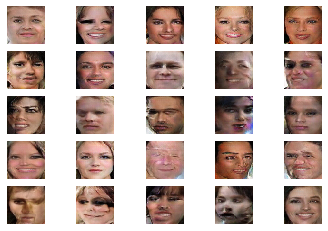

In [37]:
from keras.models import load_model
# load model
model = load_model('generator_model_030.h5')
# generate images
latent_points = generate_latent_points(100, 25)
# generate images
X  = model.predict(latent_points)
# scale from [-1,1] to [0,1]
X = (X + 1) / 2.0
# plot the result
plot_generated(X, 5)

In [38]:
# uniform interpolation between two points in latent space
def interpolate_points(p1, p2, n_steps=10):
    # interpolate ratios between the points
    ratios = np.linspace(0, 1, num=n_steps)
    # linear interpolate vectors
    vectors = list()
    for ratio in ratios:
        v = (1.0 - ratio) * p1 + ratio * p2
        vectors.append(v)
    return np.asarray(vectors)

In [45]:
# create a plot of generated images
def plot_generated_interpolated(examples, n):
    # plot images
    plt.figure(figsize=(20,10))
    for i in range(n):
        # define subplot
        plt.subplot(1, n, 1 + i)
        # turn off axis
        plt.axis('off')
        # plot raw pixel data
        plt.imshow(examples[i, :, :])
    plt.show()

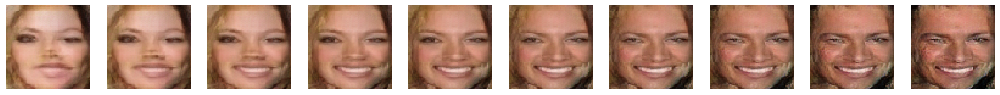

In [49]:
# generate points in latent space
pts = generate_latent_points(100, 2)
# interpolate points in latent space
interpolated = interpolate_points(pts[0], pts[1])
# generate images
X = model.predict(interpolated)
# scale from [-1,1] to [0,1]
X = (X + 1) / 2.0
# plot the result
plot_generated_interpolated(X, len(interpolated))

In [51]:
# spherical linear interpolation (slerp)

def slerp(val, low, high):
    omega = np.arccos(np.clip(np.dot(low/np.linalg.norm(low), high/np.linalg.norm(high)), -1, 1))
    so = np.sin(omega)
    if so == 0:
        # L'Hopital's rule/LERP
        return (1.0-val) * low + val * high
    return np.sin((1.0-val)*omega) / so * low + np.sin(val*omega) / so * high

In [52]:
# spherical interpolation between two points in latent space
def interpolate_points_spherical(p1, p2, n_steps=10):
    # interpolate ratios between the points
    ratios = np.linspace(0, 1, num=n_steps)
    # linear interpolate vectors
    vectors = list()
    for ratio in ratios:
        v = slerp(ratio, p1, p2)
        vectors.append(v)
    return np.asarray(vectors)

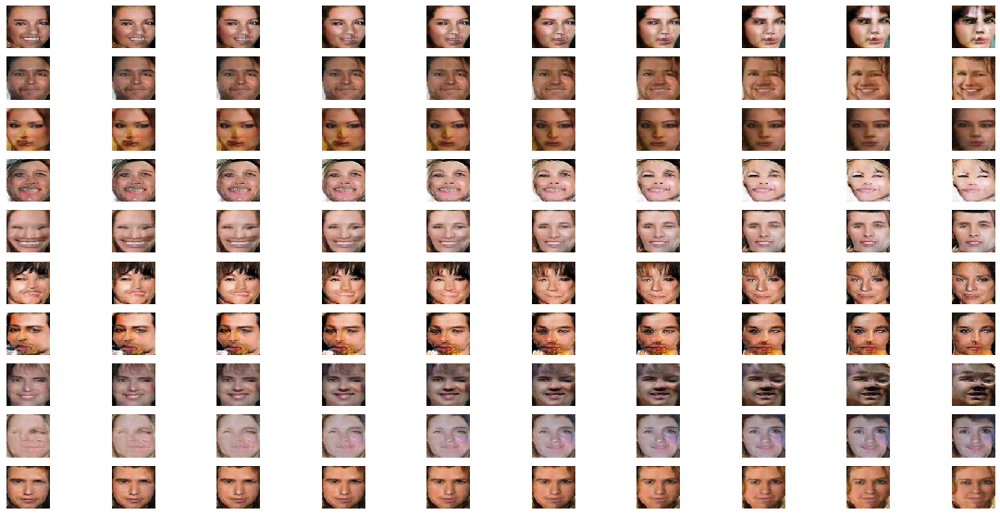

In [58]:
# generate points in latent space
n = 20
pts = generate_latent_points(100, n)
# interpolate pairs
results = None
for i in range(0, n, 2):
    # interpolate points in latent space
    interpolated = interpolate_points_spherical(pts[i], pts[i+1])
    # generate images
    X = model.predict(interpolated)
    # scale from [-1,1] to [0,1]
    X = (X + 1) / 2.0
    if results is None:
        results = X
    else:
        results = np.vstack((results, X))
# plot the result
plot_generated(results, 10)

In [59]:
# create a plot of generated images
def plot_save_generated(examples, n):
    # plot images
    for i in range(n * n):
        # define subplot
        plt.subplot(n, n, 1 + i)
        # turn off axis
        plt.axis('off')
        # plot raw pixel data
        plt.imshow(examples[i, :, :])
    plt.savefig('generated_faces.png')
    plt.close()

In [61]:
# generate points in latent space
latent_points = generate_latent_points(100, 100)
# save points
savez_compressed('latent_points.npz', latent_points)
# generate images
X  = model.predict(latent_points)
# scale from [-1,1] to [0,1]
X = (X + 1) / 2.0
# save plot
plot_save_generated(X, 10)

In [62]:
# average list of latent space vectors
def average_points(points, ix):
    # convert to zero offset points
    zero_ix = [i-1 for i in ix]
    # retrieve required points
    vectors = points[zero_ix]
    # average the vectors
    avg_vector = np.mean(vectors, axis=0)
    # combine original and avg vectors
    all_vectors = np.vstack((vectors, avg_vector))
    return all_vectors

In [63]:
# create a plot of generated images
def plot_generated_asym(examples, rows, cols):
    # plot images
    for i in range(rows * cols):
        # define subplot
        plt.subplot(rows, cols, 1 + i)
        # turn off axis
        plt.axis('off')
        # plot raw pixel data
        plt.imshow(examples[i, :, :])
    plt.show()

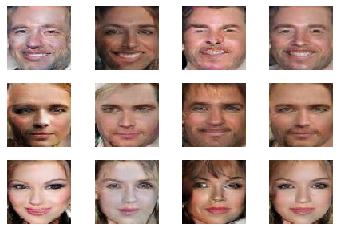

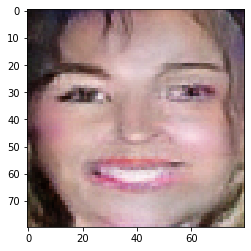

In [69]:
# retrieve specific points
smiling_man_ix = [46, 51, 95]
neutral_man_ix = [42, 74, 83]
neutral_woman_ix = [19, 24, 93]
# load the saved latent points
data = np.load('latent_points.npz')
points = data['arr_0']
# average vectors
smiling_man = average_points(points, smiling_man_ix)
neutral_man = average_points(points, neutral_man_ix)
neutral_woman = average_points(points, neutral_woman_ix)
# combine all vectors
all_vectors = np.vstack((smiling_man, neutral_man, neutral_woman))
# generate images
images = model.predict(all_vectors)
# scale pixel values
images = (images + 1) / 2.0
plot_generated_asym(images, 3, 4)
# smiling man - neutral man + neutral woman = smiling woman
result_vector = smiling_man[-1] - neutral_man[-1] + neutral_woman[-1]
# generate image
result_vector = np.expand_dims(result_vector, 0)
result_image = model.predict(result_vector)
# scale pixel values
result_image = (result_image + 1) / 2.0
plt.imshow(result_image[0])
plt.show()